In [1]:
#下面这行代码，是为了把自己编写的代码文件当作一共模块导入，这里是把Utilities文件夹中的plotting.py文件当作python的模块导入，对应的是下面的from plotting import newfig, savefig。路径要随着不同设备的系统做相应的修改
import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../Utilities/') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。



In [2]:
num_gpus = torch.cuda.device_count()
print('Number of available GPUs: ', num_gpus)

for i in range(num_gpus):
    torch.cuda.set_device(i)
    allocated = torch.cuda.memory_allocated()
    reserved = torch.cuda.memory_reserved()
    print('GPU {}: {}, Allocated: {}, Reserved: {}'.format(i, torch.cuda.get_device_name(i), allocated, reserved))

Number of available GPUs:  2
GPU 0: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0
GPU 1: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


In [3]:
torch.cuda.set_device(1) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers):
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(
                ('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1]))
            )
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（因为没有激活函数了）
        layer_list.append(
            ('layer_%d' % (self.depth - 1), torch.nn.Linear(layers[-2], layers[-1]))
        )
        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict)
    
    #第二个方法，定义了模型的前向传播过程
    def forward(self, x):  #接收输入x
        out = self.layers(x) #将输入x传入神经网络模型self.layers中，得到输出out
        return out #返回输出out
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        # 遍历每一层，直到最后一个隐藏层
        for i in range(self.depth - 1):
            # 获取当前层的线性变换
            x = self.layers[i*2](x)
            # 获取当前层的激活函数
            x = self.layers[i*2 + 1](x)
        # 返回最后一个隐藏层的输出
        return x

In [5]:
#set the class of PINN

#定义了一个名为`PhysicsInformedNN'的类，用于实现基于物理的神经网络。
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, x0, u0, tb, X_f, layers, lb, ub, X_star, u_star): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数
        
        
        #`numpy.concatenate`是一个用于数组拼接的函数。它可以将多个数组沿指定的轴拼接在一起，形成一个新的数组：numpy.concatenate((a1,a2, ...), axis=0)其中，`a1,a2, ...`是需要拼接的数组（只能接受数组或序列类型的参数，且参数形状必须相同），可以是多个。`axis`参数用于指定拼接的轴向，`axis=0`表示沿着第一个轴（即行）进行拼接，不指定`axis`参数默认值是0。
        X0 = np.concatenate((x0,0*x0), 1) # [x0, 0],将x0和0*x0两个数组在第二个维度（即列）上进行了合并。0*x0会生成一个与x0形状相同，但所有元素都为0的数组。因此，X0的结果是一个新的二维数组，其中第一列是x0的值，第二列全为0
        X_lb = np.concatenate((0*tb+lb[0],tb), 1) # [lb[0], tb],将0*tb+lb[0]和tb两个数组在第二个维度（即列）上进行了合并。0*tb+lb[0]会生成一个与tb形状相同，但所有元素都为lb[0]的数组。因此，X_lb的结果是一个新的二维数组，其中第一列全为lb[0]的值，第二列是tb的值。
        X_ub = np.concatenate((0*tb+ub[0],tb), 1) # [ub[0], tb],同上生成一个与tb形状相同，但所有元素都为ub[0]的数组。因此，X_ub的结果是一个新的二维数组，其中第一列全为ub[0]的值，第二列是tb的值
        
        #Python使用self关键字来表示类的实例。当在类的方法中定义一个变量时，例如lb和ub，这些变量只在该方法内部可见，也就是说它们的作用域仅限于该方法。当方法执行完毕后，这些变量就会被销毁，无法在其他方法中访问它们。但如果希望在类的其他方法中也能访问这些变量就需要将它们保存为类的实例属性。这就是self.lb和self.ub的作用。
            #通过将lb和ub赋值给self.lb和self.ub，就可以在类的其他方法中通过self.lb和self.ub来访问这些值。总的来说，self.lb和self.ub是类的实例属性，它们的作用域是整个类，而不仅仅是定义它们的方法。
        self.lb = torch.tensor(lb).float().to(device) #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.ub = torch.tensor(ub).float().to(device)


        self.x0 = torch.tensor(X0[:,0:1], requires_grad=True).float().to(device) #将X0的第一列赋值给self.x0（:表示取所有行,0：1实际上表示取第一列，因为python是左闭右开的）,将X0的第二列赋值给self.t0。这样可以在类的其他方法中通过self.x0和self.t0来访问这些值。
        self.t0 = torch.tensor(X0[:,1:2], requires_grad=True).float().to(device) #将x0的第二列赋值给self.t0

        self.x_lb = torch.tensor(X_lb[:,0:1], requires_grad=True).float().to(device) #将X_lb的第一列赋值给self.x_lb
        self.t_lb = torch.tensor(X_lb[:,1:2], requires_grad=True).float().to(device) #将X_lb的第二列赋值给self.t_lb

        self.x_ub = torch.tensor(X_ub[:,0:1], requires_grad=True).float().to(device) #将X_ub的第一列赋值给self.x_ub
        self.t_ub = torch.tensor(X_ub[:,0:1], requires_grad=True).float().to(device) #将X_ub的第二列赋值给self.t_ub
        
        self.x_f = torch.tensor(X_f[:,0:1], requires_grad=True).float().to(device) #将X_f的第一列赋值给self.x_f
        self.t_f = torch.tensor(X_f[:,1:2], requires_grad=True).float().to(device) #将X_f的第二列赋值给self.t_f
        
        self.u0 = torch.tensor(u0).float().to(device) #将传入的u0和v0参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u0和self.v0来访问这些值。


        self.x_star = torch.tensor(X_star[:,0:1], requires_grad=True).float().to(device) #将X_star的第一列赋值给self.x_star
        self.t_star = torch.tensor(X_star[:,1:2], requires_grad=True).float().to(device) #将X_star的第二列赋值给self.t_star
        self.u_star = torch.tensor(u_star).float().to(device) #将传入的u_star和v_star参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u_star和self.v_star来访问这些值。
        
        
        # Initialize NNs 
        self.layers = layers #将传入的layers参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.layers来访问这些值。
        
        
        # deep neural networks
        self.dnn = DNN(layers).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上



        # optimizers: using the same settings，这里是使用pytorch库进行优化的部分
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        self.optimizer_LBFGS = torch.optim.LBFGS(
            self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重、偏置以及两个新加的变量）
            lr=1.0,  #学习率设置为1
            max_iter=50000,  #最大迭代次数为50000
            max_eval=50000,  #最大评估次数为50000
            history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
            tolerance_grad=1e-5,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
            tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
            line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        )
        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())
                

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        self.test_error_mse = [] #创建一个空列表，用于存储测试误差
        self.test_error_mae = [] #创建一个空列表，用于存储测试误差
    
    #这个函数与下面的net_u函数功能相同，只是不计算梯度，因为在记录每个epoch的error时，使用with torch.no_grad()情况下调用net_u函数会报错，不知道为啥？
    def net_u_error(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        
        return u #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #pytorch中
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u

        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]

        return u,u_x #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """

        u,u_x=self.net_u(x,t) #调用上面的函数/方法，计算神经网络的输出（两个）以及输出关于输入x的梯度（两个）
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f=u_t-0.0001*u_xx+5*u**3-5*u    #计算f,定义见论文

        return f  #返回计算得到的f


    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）

        u0_pred, _  = self.net_u(self.x0, self.t0) #是调用net_uv函数,将self.x0_tf和self.t0_tf作为参数传入,然后将返回的前两个结果赋值给self.u0_pred和self.v0_pred。后两个_是Python惯用法，表示不关心net_uv函数返回的后两个结果。
        u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #同上，不过这里函数返回的后两个结果会赋值给self.u_x_lb_pred和self.v_x_lb_pred。
        u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #同上
        f_pred = self.net_f(self.x_f, self.t_f) #调用net_f_uv函数,将self.x_f_tf和self.t_f_tf作为参数传入,然后将返回的结果赋值给self.f_u_pred和self.f_v_pred。

        loss = torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean(f_pred ** 2)
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        
        self.iter += 1 #每调用一次损失函数，迭代次数加1


        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        #record the test error
        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u_real_pred = self.net_u_error(self.x_star, self.t_star)

        error_test = torch.norm(self.u_star - u_real_pred, 2) / torch.norm(self.u_star, 2)
        
        self.test_error.append(error_test)
        
        # 计算 MAE
        mae = torch.mean(torch.abs(self.u_star - u_real_pred))
        # 计算 MSE
        mse = torch.mean((self.u_star - u_real_pred) ** 2)
        # 记录 MAE 和 MSE
        self.test_error_mae.append(mae)
        self.test_error_mse.append(mse)

        return loss #返回loss



    
    #定义了一个名为train的函数/方法，用于训练神经网络。这个方法接受一个参数nIter，表示训练的迭代次数。
    def train(self, nIter, nIterLBFGS):
        self.dnn.train()#将神经网络设置为训练模式而不是评估模式

        #先使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            u0_pred, _  = self.net_u(self.x0, self.t0) #是调用net_uv函数,将self.x0_tf和self.t0_tf作为参数传入,然后将返回的前两个结果赋值给self.u0_pred和self.v0_pred。后两个_是Python惯用法，表示不关心net_uv函数返回的后两个结果。
            u_lb_pred, u_x_lb_pred = self.net_u(self.x_lb, self.t_lb) #同上，不过这里函数返回的后两个结果会赋值给self.u_x_lb_pred和self.v_x_lb_pred。
            u_ub_pred, u_x_ub_pred = self.net_u(self.x_ub, self.t_ub) #同上
            f_pred = self.net_f(self.x_f, self.t_f) #调用net_f_uv函数,将self.x_f_tf和self.t_f_tf作为参数传入,然后将返回的结果赋值给self.f_u_pred和self.f_v_pred。

            loss = torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean(f_pred ** 2)
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            

            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中
            

            #record the test error
            self.dnn.eval() #将神经网络切换为评估模式
            with torch.no_grad():
                u_real_pred = self.net_u_error(self.x_star, self.t_star)

            error_test = torch.norm(self.u_star - u_real_pred, 2) / torch.norm(self.u_star, 2)
            
            self.test_error.append(error_test)

            # 计算 MAE和MSE
            mae = torch.mean(torch.abs(self.u_star - u_real_pred))
            mse = torch.mean((self.u_star - u_real_pred) ** 2)
            # 记录 MAE 和 MSE
            self.test_error_mae.append(mae)
            self.test_error_mse.append(mse)



        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   

                                    
    #定义了一个名为predict的函数/方法，用于预测神经网络的输出。这个方法接受一个参数X_star，表示输入数据。最后返回预测的两个输出和两个输出的梯度。
    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        u, _ = self.net_u(x, t) #调用之前定义的函数得到神经网络的输出u,以及f
        f = self.net_f(x, t) 

        u = u.detach().cpu().numpy() #将张量u和v先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        f = f.detach().cpu().numpy()

        return u, f 
    
    #定义函数获得隐藏层的输出
    def hidden_predict(self, x,t):
        x = torch.tensor(x, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(t, requires_grad=True).float().to(device)
        self.dnn.eval() #将神经网络切换为评估模式
        hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=1)) #调用上一个神经网络类中的hidden_output方法，得到最后一个隐藏层的输出
        hidden_output_x = hidden_output[:, 0] #将输出的第一列赋值给hidden_output_x
        hidden_output_t = hidden_output[:, 1] #将输出的第二列赋值给hidden_output_t
        hidden_output_x = hidden_output_x.detach().cpu().numpy() #将张量hidden_output_x和hidden_output_t先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        hidden_output_t = hidden_output_t.detach().cpu().numpy() #将张量hidden_output_x和hidden_output_t先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        return hidden_output_x, hidden_output_t #返回隐藏层的输出


In [6]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter):
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    # 利用x0和t0计算x{t}和t{t}，存储在xs中
    xs = [] #初始化xs
    x,t = model.hidden_predict(x0,t0) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    
    # 迭代预测
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        xs.append([x,t]) #将x的数据添加到xs中
    #最后得到的xs是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应原始采样点的迭代结果


    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    x,t = model.hidden_predict(x1,t1) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）

    # 迭代预测（扰动后）
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)
        xs1.append([x,t]) #将x的数据添加到xs1中
    #最后得到的xs1是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应加了扰动后的采样点的迭代结果

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    #这两个数组的形状均为(2,N_f_new,1)，第一个代表x和t，第二个代表N_f_new个样本点得到的结果，第三个代表1个数

    # 计算这两个点的欧氏距离
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=0)
    #得到的是一个形状为（N_f_new,1）的数组，每个元素代表了两个点之间的欧氏距离，这里点在xt平面上

    distances = distances.flatten()

    #对distances进行归一化
    # distances = distances / np.linalg.norm(distances)
    # 对distances进行归一化前，检查分母是否接近零
    # norm = np.linalg.norm(distances)
    # if norm < 1e-10:  # 1e-10是一个非常小的数，用于检测norm是否接近于零
    #     distances = np.zeros_like(distances)  # 如果分母接近0，将distances设置为全零数组，因为范数为0时，distances中的值想对于彼此几乎没有差异，意味着所有点都几乎处于同一混沌度水平
    # else:
    #     distances = distances / norm

    # 现在可以安全地根据distances对点进行排序，即使在所有值都相同的情况下

    return distances

In [7]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [8]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

#设置噪声水平为0
noise = 0.0        

# Doman bounds，定义两个一维数组lb和ub，问题域是一个二维空间，其中 x 的范围是 -5 到 5，t 的范围是 0 到 π/2(竖着的)
lb = np.array([-1.0, 0.0])
ub = np.array([1.0, 1.0])
#定义三个整数，分别表示初始条件点数量、边界条件点数量和配位点的数量（这些点用于训练神经网络）
N0 = 500
N_b = 100
N_f = 10000
#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
# layers = [2, 200, 200, 200, 200, 2, 1]
layers = [2,30,30,30,30,30,30,30,30,2,1]

#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

###########################

#从0~数组x的行数(256)中随机选择N0个数，replace=False表示不允许重复选择，最后将这N0个数赋值给idx_x
idx_x = np.linspace(0, x.shape[0]-1, N0, dtype='int') #生成一个从0到x.shape[0]-1的等差数列，长度为x.shape[0]，数据类型为整型
# idx_x = np.random.choice(x.shape[0], N0, replace=False)
#从x中选择N0个对应的行(idx_x对应的行)，最后将这N0行赋值给x0
x0 = x[idx_x,:]
#从Exact_u中选择N0个对应的行(idx_x对应的行)的第一列元素，最后将这N0个元素赋值给u0
# u0 = Exact[idx_x,0:1]
u0 = Exact[0:1,idx_x].T

#从0~数组t的行数中随机选择N_b个数，replace=False表示不允许重复选择，最后将这N_b个数赋值给idx_t
idx_t = np.linspace(0, t.shape[0]-1, N_b, dtype='int') #生成一个从0到t.shape[0]-1的等差数列，长度为t.shape[0]，数据类型为整型
# idx_t = np.random.choice(t.shape[0], N_b, replace=False)
#从t中选择N_b个对应的行(idx_t对应的行)，最后将这N_b行赋值给tb
tb = t[idx_t,:]

error = [] #创建一个空列表，用于存储误差
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

nIter = 50000 #设置迭代次数为10000
nIterLBFGS = 10000 #设置LBFGS迭代次数为500


for seed in seeds:
    set_seed(seed) #设置随机种子


    X_f = lb + (ub-lb)*lhs(2, N_f) #lhs函数采用拉丁超采样方法，生成一个近似均匀分布的多维样本点集，返回的是一个形状为（$N_f$，2）的数组，每一行都是一个2维的样本点，所有样本点都在[0,1]范围内，并对该样本集进行缩放，把每个样本从[0,1]区间缩放到[lb,ub]区域内，即得到了指定范围内均匀分布的样本$X_f$。



    #创建PINN模型并输入各种参数        
    model = PhysicsInformedNN(x0, u0, tb, X_f, layers, lb, ub, X_star, u_star)
    #获取当前时间并赋值给start_time          
    start_time = time.time()       
    #训练模型50000次         
    model.train(nIter, nIterLBFGS)
    #获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time                
    #打印训练所需时间
    print('Training time: %.4f' % (elapsed))





    #用训练好的模型进行预测，返回四个值（均为数组）    
    u_pred, f_pred = model.predict(X_star)

    #计算误差（基于2范数）        
    error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)

    #打印误差
    print('Error u: %e' % (error_u))

    #将误差添加到error列表中

    #计算误差（基于2范数）
    error.append(error_u) #计算误差，然后将误差添加到error列表中
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(u_star - u_pred))
    mse = np.mean((u_star - u_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error u : %e' % (np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE



#使用griddata函数将X_star、u_pred、v_pred和h_pred插值到网格上，得到U_pred、V_pred和H_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')

#同上，使用griddata函数将X_star、f_u_pred和f_v_pred插值到网格上，得到FU_pred和FV_pred
F_pred = griddata(X_star, f_pred.flatten(), (X, T), method='cubic')
 

Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 2/50000 [00:00<43:15, 19.27it/s]

Adam:   0%|          | 20/50000 [00:00<07:28, 111.47it/s]

Adam:   0%|          | 39/50000 [00:00<05:42, 146.02it/s]

Adam:   0%|          | 58/50000 [00:00<05:06, 162.77it/s]

Adam:   0%|          | 75/50000 [00:00<05:09, 161.30it/s]

Adam:   0%|          | 94/50000 [00:00<04:53, 170.27it/s]

Adam:   0%|          | 113/50000 [00:00<04:43, 175.97it/s]

Adam:   0%|          | 132/50000 [00:00<04:37, 179.89it/s]

Adam:   0%|          | 151/50000 [00:00<04:33, 181.99it/s]

Adam:   0%|          | 170/50000 [00:01<04:31, 183.72it/s]

Adam:   0%|          | 189/50000 [00:01<04:29, 185.08it/s]

Adam:   0%|          | 208/50000 [00:01<04:27, 186.17it/s]

Adam:   0%|          | 227/50000 [00:01<04:26, 186.57it/s]

Adam:   0%|          | 246/50000 [00:01<04:26, 186.58it/s]

Adam:   1%|          | 265/50000 [00:01<04:26, 186.95it/s]

Adam:   1%|          | 284/50000 [00:01<04:26, 186.68it/s]

Adam:   1%|          | 303/50000 [00:01<04:34, 180.83it/s]

Adam:   1%|          | 322/50000 [00:01<04:32, 182.24it/s]

Adam:   1%|          | 341/50000 [00:01<04:31, 183.08it/s]

Adam:   1%|          | 360/50000 [00:02<04:33, 181.53it/s]

Adam:   1%|          | 379/50000 [00:02<04:48, 172.08it/s]

Adam:   1%|          | 398/50000 [00:02<04:41, 176.24it/s]

Adam:   1%|          | 416/50000 [00:02<04:47, 172.76it/s]

Adam:   1%|          | 435/50000 [00:02<04:41, 176.36it/s]

Adam:   1%|          | 454/50000 [00:02<04:36, 179.43it/s]

Adam:   1%|          | 473/50000 [00:02<04:32, 181.64it/s]

Adam:   1%|          | 492/50000 [00:02<04:29, 183.41it/s]

Adam:   1%|          | 511/50000 [00:02<04:29, 183.87it/s]

Adam:   1%|          | 530/50000 [00:02<04:27, 184.64it/s]

Adam:   1%|          | 549/50000 [00:03<04:30, 182.84it/s]

Adam:   1%|          | 568/50000 [00:03<04:29, 183.37it/s]

Adam:   1%|          | 587/50000 [00:03<04:28, 184.30it/s]

Adam:   1%|          | 606/50000 [00:03<04:26, 185.09it/s]

Adam:   1%|▏         | 625/50000 [00:03<04:28, 183.55it/s]

Adam:   1%|▏         | 644/50000 [00:03<04:36, 178.21it/s]

Adam:   1%|▏         | 663/50000 [00:03<04:34, 179.84it/s]

Adam:   1%|▏         | 682/50000 [00:03<04:31, 181.73it/s]

Adam:   1%|▏         | 701/50000 [00:03<04:34, 179.45it/s]

Adam:   1%|▏         | 720/50000 [00:04<04:31, 181.50it/s]

Adam:   1%|▏         | 739/50000 [00:04<04:29, 182.94it/s]

Adam:   2%|▏         | 758/50000 [00:04<04:28, 183.29it/s]

Adam:   2%|▏         | 777/50000 [00:04<04:28, 183.28it/s]

Adam:   2%|▏         | 796/50000 [00:04<04:27, 183.80it/s]

Adam:   2%|▏         | 815/50000 [00:04<04:27, 183.84it/s]

Adam:   2%|▏         | 834/50000 [00:04<04:26, 184.17it/s]

Adam:   2%|▏         | 853/50000 [00:04<04:24, 185.55it/s]

Adam:   2%|▏         | 872/50000 [00:04<04:24, 185.68it/s]

Adam:   2%|▏         | 891/50000 [00:04<04:24, 185.92it/s]

Adam:   2%|▏         | 910/50000 [00:05<04:30, 181.30it/s]

Adam:   2%|▏         | 929/50000 [00:05<04:28, 182.79it/s]

Adam:   2%|▏         | 948/50000 [00:05<04:30, 181.66it/s]

Adam:   2%|▏         | 967/50000 [00:05<04:34, 178.48it/s]

Adam:   2%|▏         | 986/50000 [00:05<04:30, 181.12it/s]

Adam:   2%|▏         | 1005/50000 [00:05<04:27, 183.09it/s]

Adam:   2%|▏         | 1024/50000 [00:05<04:26, 183.88it/s]

Adam:   2%|▏         | 1043/50000 [00:05<04:24, 184.97it/s]

Adam:   2%|▏         | 1062/50000 [00:05<04:28, 182.40it/s]

Adam:   2%|▏         | 1081/50000 [00:06<04:31, 179.93it/s]

Adam:   2%|▏         | 1100/50000 [00:06<04:47, 169.86it/s]

Adam:   2%|▏         | 1119/50000 [00:06<04:39, 175.14it/s]

Adam:   2%|▏         | 1138/50000 [00:06<04:33, 178.64it/s]

Adam:   2%|▏         | 1157/50000 [00:06<04:29, 181.46it/s]

Adam:   2%|▏         | 1176/50000 [00:06<04:32, 179.44it/s]

Adam:   2%|▏         | 1195/50000 [00:06<04:33, 178.64it/s]

Adam:   2%|▏         | 1214/50000 [00:06<04:28, 181.59it/s]

Adam:   2%|▏         | 1233/50000 [00:06<04:26, 182.91it/s]

Adam:   3%|▎         | 1252/50000 [00:06<04:25, 183.50it/s]

Adam:   3%|▎         | 1271/50000 [00:07<04:23, 184.86it/s]

Adam:   3%|▎         | 1290/50000 [00:07<04:23, 185.08it/s]

Adam:   3%|▎         | 1309/50000 [00:07<04:21, 186.02it/s]

Adam:   3%|▎         | 1328/50000 [00:07<04:22, 185.33it/s]

Adam:   3%|▎         | 1347/50000 [00:07<04:23, 184.96it/s]

Adam:   3%|▎         | 1366/50000 [00:07<04:25, 183.11it/s]

Adam:   3%|▎         | 1385/50000 [00:07<04:24, 184.00it/s]

Adam:   3%|▎         | 1404/50000 [00:07<04:22, 184.89it/s]

Adam:   3%|▎         | 1423/50000 [00:07<04:21, 185.50it/s]

Adam:   3%|▎         | 1442/50000 [00:07<04:20, 186.37it/s]

Adam:   3%|▎         | 1461/50000 [00:08<04:19, 186.70it/s]

Adam:   3%|▎         | 1480/50000 [00:08<04:19, 186.73it/s]

Adam:   3%|▎         | 1499/50000 [00:08<04:21, 185.62it/s]

Adam:   3%|▎         | 1518/50000 [00:08<04:20, 186.04it/s]

Adam:   3%|▎         | 1537/50000 [00:08<04:19, 186.46it/s]

Adam:   3%|▎         | 1556/50000 [00:08<04:22, 184.28it/s]

Adam:   3%|▎         | 1575/50000 [00:08<04:21, 185.11it/s]

Adam:   3%|▎         | 1594/50000 [00:08<04:20, 186.14it/s]

Adam:   3%|▎         | 1613/50000 [00:08<04:21, 184.70it/s]

Adam:   3%|▎         | 1632/50000 [00:09<04:21, 185.22it/s]

Adam:   3%|▎         | 1651/50000 [00:09<04:22, 183.97it/s]

Adam:   3%|▎         | 1670/50000 [00:09<04:22, 183.93it/s]

Adam:   3%|▎         | 1689/50000 [00:09<04:22, 184.00it/s]

Adam:   3%|▎         | 1708/50000 [00:09<04:22, 183.89it/s]

Adam:   3%|▎         | 1727/50000 [00:09<04:22, 183.56it/s]

Adam:   3%|▎         | 1746/50000 [00:09<04:22, 184.11it/s]

Adam:   4%|▎         | 1765/50000 [00:09<04:21, 184.73it/s]

Adam:   4%|▎         | 1784/50000 [00:09<04:19, 185.93it/s]

Adam:   4%|▎         | 1803/50000 [00:09<04:18, 186.73it/s]

Adam:   4%|▎         | 1822/50000 [00:10<04:17, 187.18it/s]

Adam:   4%|▎         | 1841/50000 [00:10<04:19, 185.27it/s]

Adam:   4%|▎         | 1860/50000 [00:10<04:18, 185.99it/s]

Adam:   4%|▍         | 1879/50000 [00:10<04:27, 179.75it/s]

Adam:   4%|▍         | 1898/50000 [00:10<04:24, 181.94it/s]

Adam:   4%|▍         | 1917/50000 [00:10<04:23, 182.37it/s]

Adam:   4%|▍         | 1936/50000 [00:10<04:21, 183.88it/s]

Adam:   4%|▍         | 1955/50000 [00:10<04:19, 185.07it/s]

Adam:   4%|▍         | 1974/50000 [00:10<04:19, 185.18it/s]

Adam:   4%|▍         | 1993/50000 [00:10<04:20, 184.30it/s]

Adam:   4%|▍         | 2012/50000 [00:11<04:19, 185.17it/s]

Adam:   4%|▍         | 2031/50000 [00:11<04:18, 185.87it/s]

Adam:   4%|▍         | 2050/50000 [00:11<04:25, 180.35it/s]

Adam:   4%|▍         | 2069/50000 [00:11<04:29, 177.68it/s]

Adam:   4%|▍         | 2088/50000 [00:11<04:26, 179.62it/s]

Adam:   4%|▍         | 2107/50000 [00:11<04:23, 181.65it/s]

Adam:   4%|▍         | 2126/50000 [00:11<04:21, 182.76it/s]

Adam:   4%|▍         | 2145/50000 [00:11<04:21, 182.77it/s]

Adam:   4%|▍         | 2164/50000 [00:11<04:19, 184.14it/s]

Adam:   4%|▍         | 2183/50000 [00:12<04:17, 185.74it/s]

Adam:   4%|▍         | 2202/50000 [00:12<04:17, 185.33it/s]

Adam:   4%|▍         | 2221/50000 [00:12<04:22, 181.76it/s]

Adam:   4%|▍         | 2240/50000 [00:12<04:22, 181.75it/s]

Adam:   5%|▍         | 2259/50000 [00:12<04:21, 182.28it/s]

Adam:   5%|▍         | 2278/50000 [00:12<04:20, 183.30it/s]

Adam:   5%|▍         | 2297/50000 [00:12<04:20, 183.33it/s]

Adam:   5%|▍         | 2316/50000 [00:12<04:21, 182.31it/s]

Adam:   5%|▍         | 2335/50000 [00:12<04:19, 183.61it/s]

Adam:   5%|▍         | 2354/50000 [00:12<04:17, 184.72it/s]

Adam:   5%|▍         | 2373/50000 [00:13<04:17, 184.90it/s]

Adam:   5%|▍         | 2392/50000 [00:13<04:16, 185.74it/s]

Adam:   5%|▍         | 2411/50000 [00:13<04:18, 184.12it/s]

Adam:   5%|▍         | 2430/50000 [00:13<04:17, 185.10it/s]

Adam:   5%|▍         | 2449/50000 [00:13<04:19, 182.95it/s]

Adam:   5%|▍         | 2468/50000 [00:13<04:18, 183.60it/s]

Adam:   5%|▍         | 2487/50000 [00:13<04:17, 184.36it/s]

Adam:   5%|▌         | 2506/50000 [00:13<04:21, 181.82it/s]

Adam:   5%|▌         | 2525/50000 [00:13<04:19, 183.25it/s]

Adam:   5%|▌         | 2544/50000 [00:13<04:17, 184.32it/s]

Adam:   5%|▌         | 2563/50000 [00:14<04:22, 180.43it/s]

Adam:   5%|▌         | 2582/50000 [00:14<04:21, 181.36it/s]

Adam:   5%|▌         | 2601/50000 [00:14<04:22, 180.35it/s]

Adam:   5%|▌         | 2620/50000 [00:14<05:16, 149.92it/s]

Adam:   5%|▌         | 2638/50000 [00:14<05:01, 156.88it/s]

Adam:   5%|▌         | 2657/50000 [00:14<04:46, 165.34it/s]

Adam:   5%|▌         | 2676/50000 [00:14<04:36, 171.45it/s]

Adam:   5%|▌         | 2694/50000 [00:14<04:39, 168.96it/s]

Adam:   5%|▌         | 2712/50000 [00:15<04:42, 167.68it/s]

Adam:   5%|▌         | 2731/50000 [00:15<04:32, 173.33it/s]

Adam:   6%|▌         | 2750/50000 [00:15<04:26, 177.14it/s]

Adam:   6%|▌         | 2769/50000 [00:15<04:21, 180.52it/s]

Adam:   6%|▌         | 2788/50000 [00:15<04:18, 182.73it/s]

Adam:   6%|▌         | 2807/50000 [00:15<04:16, 184.34it/s]

Adam:   6%|▌         | 2826/50000 [00:15<04:15, 184.80it/s]

Adam:   6%|▌         | 2845/50000 [00:15<04:13, 186.25it/s]

Adam:   6%|▌         | 2864/50000 [00:15<04:12, 186.62it/s]

Adam:   6%|▌         | 2883/50000 [00:15<04:12, 186.62it/s]

Adam:   6%|▌         | 2902/50000 [00:16<04:11, 186.91it/s]

Adam:   6%|▌         | 2921/50000 [00:16<04:22, 179.34it/s]

Adam:   6%|▌         | 2940/50000 [00:16<04:18, 182.03it/s]

Adam:   6%|▌         | 2959/50000 [00:16<04:20, 180.57it/s]

Adam:   6%|▌         | 2978/50000 [00:16<04:17, 182.55it/s]

Adam:   6%|▌         | 2997/50000 [00:16<04:21, 179.87it/s]

Adam:   6%|▌         | 3016/50000 [00:16<04:27, 175.52it/s]

Adam:   6%|▌         | 3035/50000 [00:16<04:22, 179.12it/s]

Adam:   6%|▌         | 3054/50000 [00:16<04:19, 180.69it/s]

Adam:   6%|▌         | 3073/50000 [00:16<04:16, 182.94it/s]

Adam:   6%|▌         | 3092/50000 [00:17<04:15, 183.87it/s]

Adam:   6%|▌         | 3111/50000 [00:17<04:21, 179.39it/s]

Adam:   6%|▋         | 3130/50000 [00:17<04:20, 180.20it/s]

Adam:   6%|▋         | 3149/50000 [00:17<04:17, 181.93it/s]

Adam:   6%|▋         | 3168/50000 [00:17<04:16, 182.61it/s]

Adam:   6%|▋         | 3187/50000 [00:17<04:14, 183.60it/s]

Adam:   6%|▋         | 3206/50000 [00:17<04:18, 181.31it/s]

Adam:   6%|▋         | 3225/50000 [00:17<04:16, 182.45it/s]

Adam:   6%|▋         | 3244/50000 [00:17<04:14, 183.58it/s]

Adam:   7%|▋         | 3263/50000 [00:18<04:13, 184.15it/s]

Adam:   7%|▋         | 3282/50000 [00:18<04:12, 184.75it/s]

Adam:   7%|▋         | 3301/50000 [00:18<04:11, 185.43it/s]

Adam:   7%|▋         | 3320/50000 [00:18<04:12, 185.07it/s]

Adam:   7%|▋         | 3339/50000 [00:18<04:12, 185.01it/s]

Adam:   7%|▋         | 3358/50000 [00:18<04:12, 185.02it/s]

Adam:   7%|▋         | 3377/50000 [00:18<04:11, 185.21it/s]

Adam:   7%|▋         | 3396/50000 [00:18<04:12, 184.29it/s]

Adam:   7%|▋         | 3415/50000 [00:18<04:11, 184.99it/s]

Adam:   7%|▋         | 3434/50000 [00:18<04:16, 181.88it/s]

Adam:   7%|▋         | 3453/50000 [00:19<04:18, 179.81it/s]

Adam:   7%|▋         | 3471/50000 [00:19<04:30, 172.04it/s]

Adam:   7%|▋         | 3490/50000 [00:19<04:23, 176.33it/s]

Adam:   7%|▋         | 3509/50000 [00:19<04:21, 177.64it/s]

Adam:   7%|▋         | 3528/50000 [00:19<04:21, 178.01it/s]

Adam:   7%|▋         | 3547/50000 [00:19<04:18, 179.95it/s]

Adam:   7%|▋         | 3566/50000 [00:19<04:19, 178.93it/s]

Adam:   7%|▋         | 3585/50000 [00:19<04:16, 180.89it/s]

Adam:   7%|▋         | 3604/50000 [00:19<04:13, 182.96it/s]

Adam:   7%|▋         | 3623/50000 [00:19<04:12, 183.72it/s]

Adam:   7%|▋         | 3642/50000 [00:20<04:36, 167.91it/s]

Adam:   7%|▋         | 3661/50000 [00:20<04:28, 172.72it/s]

Adam:   7%|▋         | 3680/50000 [00:20<04:23, 175.56it/s]

Adam:   7%|▋         | 3699/50000 [00:20<04:19, 178.36it/s]

Adam:   7%|▋         | 3718/50000 [00:20<04:16, 180.55it/s]

Adam:   7%|▋         | 3737/50000 [00:20<04:14, 181.54it/s]

Adam:   8%|▊         | 3756/50000 [00:20<04:12, 183.04it/s]

Adam:   8%|▊         | 3775/50000 [00:20<04:21, 176.75it/s]

Adam:   8%|▊         | 3794/50000 [00:20<04:17, 179.57it/s]

Adam:   8%|▊         | 3813/50000 [00:21<04:14, 181.83it/s]

Adam:   8%|▊         | 3832/50000 [00:21<04:11, 183.46it/s]

Adam:   8%|▊         | 3851/50000 [00:21<04:09, 184.68it/s]

Adam:   8%|▊         | 3870/50000 [00:21<04:09, 185.10it/s]

Adam:   8%|▊         | 3889/50000 [00:21<04:08, 185.37it/s]

Adam:   8%|▊         | 3908/50000 [00:21<04:09, 184.83it/s]

Adam:   8%|▊         | 3927/50000 [00:21<04:09, 184.91it/s]

Adam:   8%|▊         | 3946/50000 [00:21<04:10, 183.99it/s]

Adam:   8%|▊         | 3965/50000 [00:21<04:18, 177.83it/s]

Adam:   8%|▊         | 3983/50000 [00:22<04:18, 178.33it/s]

Adam:   8%|▊         | 4002/50000 [00:22<04:15, 180.06it/s]

Adam:   8%|▊         | 4021/50000 [00:22<04:12, 182.22it/s]

Adam:   8%|▊         | 4040/50000 [00:22<04:33, 168.30it/s]

Adam:   8%|▊         | 4058/50000 [00:22<04:29, 170.49it/s]

Adam:   8%|▊         | 4077/50000 [00:22<04:24, 173.61it/s]

Adam:   8%|▊         | 4095/50000 [00:22<04:24, 173.76it/s]

Adam:   8%|▊         | 4113/50000 [00:22<04:26, 172.29it/s]

Adam:   8%|▊         | 4132/50000 [00:22<04:21, 175.12it/s]

Adam:   8%|▊         | 4150/50000 [00:22<04:25, 172.46it/s]

Adam:   8%|▊         | 4168/50000 [00:23<04:22, 174.53it/s]

Adam:   8%|▊         | 4187/50000 [00:23<04:19, 176.87it/s]

Adam:   8%|▊         | 4206/50000 [00:23<04:14, 180.06it/s]

Adam:   8%|▊         | 4225/50000 [00:23<04:10, 182.77it/s]

Adam:   8%|▊         | 4244/50000 [00:23<04:08, 184.13it/s]

Adam:   9%|▊         | 4263/50000 [00:23<04:06, 185.18it/s]

Adam:   9%|▊         | 4282/50000 [00:23<04:07, 185.09it/s]

Adam:   9%|▊         | 4301/50000 [00:23<04:05, 186.02it/s]

Adam:   9%|▊         | 4320/50000 [00:23<04:13, 180.18it/s]

Adam:   9%|▊         | 4339/50000 [00:23<04:11, 181.25it/s]

Adam:   9%|▊         | 4358/50000 [00:24<04:13, 179.95it/s]

Adam:   9%|▉         | 4377/50000 [00:24<04:11, 181.54it/s]

Adam:   9%|▉         | 4396/50000 [00:24<04:12, 180.79it/s]

Adam:   9%|▉         | 4415/50000 [00:24<04:11, 181.09it/s]

Adam:   9%|▉         | 4434/50000 [00:24<04:08, 183.47it/s]

Adam:   9%|▉         | 4453/50000 [00:24<04:10, 181.59it/s]

Adam:   9%|▉         | 4472/50000 [00:24<04:08, 183.39it/s]

Adam:   9%|▉         | 4491/50000 [00:24<04:06, 184.93it/s]

Adam:   9%|▉         | 4510/50000 [00:24<04:05, 185.59it/s]

Adam:   9%|▉         | 4529/50000 [00:25<04:09, 182.31it/s]

Adam:   9%|▉         | 4548/50000 [00:25<04:11, 180.84it/s]

Adam:   9%|▉         | 4567/50000 [00:25<04:09, 181.97it/s]

Adam:   9%|▉         | 4586/50000 [00:25<04:21, 173.73it/s]

Adam:   9%|▉         | 4605/50000 [00:25<04:15, 177.71it/s]

Adam:   9%|▉         | 4624/50000 [00:25<04:12, 179.57it/s]

Adam:   9%|▉         | 4643/50000 [00:25<04:10, 181.31it/s]

Adam:   9%|▉         | 4662/50000 [00:25<04:11, 180.08it/s]

Adam:   9%|▉         | 4681/50000 [00:25<04:09, 181.42it/s]

Adam:   9%|▉         | 4700/50000 [00:25<04:06, 183.49it/s]

Adam:   9%|▉         | 4719/50000 [00:26<04:17, 176.04it/s]

Adam:   9%|▉         | 4737/50000 [00:26<04:18, 175.37it/s]

Adam:  10%|▉         | 4755/50000 [00:26<04:27, 168.99it/s]

Adam:  10%|▉         | 4774/50000 [00:26<04:20, 173.72it/s]

Adam:  10%|▉         | 4793/50000 [00:26<04:13, 178.11it/s]

Adam:  10%|▉         | 4812/50000 [00:26<04:10, 180.61it/s]

Adam:  10%|▉         | 4831/50000 [00:26<04:09, 181.32it/s]

Adam:  10%|▉         | 4850/50000 [00:26<04:06, 182.93it/s]

Adam:  10%|▉         | 4869/50000 [00:26<04:06, 183.35it/s]

Adam:  10%|▉         | 4888/50000 [00:27<04:04, 184.38it/s]

Adam:  10%|▉         | 4907/50000 [00:27<04:03, 185.42it/s]

Adam:  10%|▉         | 4926/50000 [00:27<04:03, 185.19it/s]

Adam:  10%|▉         | 4945/50000 [00:27<04:01, 186.23it/s]

Adam:  10%|▉         | 4964/50000 [00:27<04:02, 185.76it/s]

Adam:  10%|▉         | 4983/50000 [00:27<04:01, 186.18it/s]

Adam:  10%|█         | 5002/50000 [00:27<04:00, 187.17it/s]

Adam:  10%|█         | 5021/50000 [00:27<04:00, 187.03it/s]

Adam:  10%|█         | 5040/50000 [00:27<04:00, 186.64it/s]

Adam:  10%|█         | 5059/50000 [00:27<04:00, 187.10it/s]

Adam:  10%|█         | 5078/50000 [00:28<04:01, 185.77it/s]

Adam:  10%|█         | 5097/50000 [00:28<04:01, 185.95it/s]

Adam:  10%|█         | 5116/50000 [00:28<04:00, 186.49it/s]

Adam:  10%|█         | 5135/50000 [00:28<04:00, 186.82it/s]

Adam:  10%|█         | 5154/50000 [00:28<03:59, 187.41it/s]

Adam:  10%|█         | 5173/50000 [00:28<03:59, 187.53it/s]

Adam:  10%|█         | 5192/50000 [00:28<04:03, 183.77it/s]

Adam:  10%|█         | 5211/50000 [00:28<04:01, 185.14it/s]

Adam:  10%|█         | 5230/50000 [00:28<04:01, 185.74it/s]

Adam:  10%|█         | 5249/50000 [00:28<04:00, 185.92it/s]

Adam:  11%|█         | 5268/50000 [00:29<04:02, 184.45it/s]

Adam:  11%|█         | 5287/50000 [00:29<04:03, 183.80it/s]

Adam:  11%|█         | 5306/50000 [00:29<04:06, 181.57it/s]

Adam:  11%|█         | 5325/50000 [00:29<04:06, 181.27it/s]

Adam:  11%|█         | 5344/50000 [00:29<04:04, 182.96it/s]

Adam:  11%|█         | 5363/50000 [00:29<04:02, 183.90it/s]

Adam:  11%|█         | 5382/50000 [00:29<04:01, 184.83it/s]

Adam:  11%|█         | 5401/50000 [00:29<04:00, 185.66it/s]

Adam:  11%|█         | 5420/50000 [00:29<03:59, 186.12it/s]

Adam:  11%|█         | 5439/50000 [00:30<03:59, 186.01it/s]

Adam:  11%|█         | 5458/50000 [00:30<04:00, 185.48it/s]

Adam:  11%|█         | 5477/50000 [00:30<03:59, 186.07it/s]

Adam:  11%|█         | 5496/50000 [00:30<04:03, 182.90it/s]

Adam:  11%|█         | 5515/50000 [00:30<04:02, 183.42it/s]

Adam:  11%|█         | 5534/50000 [00:30<04:01, 184.49it/s]

Adam:  11%|█         | 5553/50000 [00:30<04:07, 179.65it/s]

Adam:  11%|█         | 5571/50000 [00:30<04:13, 175.17it/s]

Adam:  11%|█         | 5589/50000 [00:30<04:14, 174.54it/s]

Adam:  11%|█         | 5608/50000 [00:30<04:09, 177.81it/s]

Adam:  11%|█▏        | 5627/50000 [00:31<04:05, 180.67it/s]

Adam:  11%|█▏        | 5646/50000 [00:31<04:03, 182.48it/s]

Adam:  11%|█▏        | 5665/50000 [00:31<04:02, 182.83it/s]

Adam:  11%|█▏        | 5684/50000 [00:31<04:00, 183.97it/s]

Adam:  11%|█▏        | 5703/50000 [00:31<03:59, 184.93it/s]

Adam:  11%|█▏        | 5722/50000 [00:31<03:58, 185.72it/s]

Adam:  11%|█▏        | 5741/50000 [00:31<03:58, 185.94it/s]

Adam:  12%|█▏        | 5760/50000 [00:31<03:57, 186.41it/s]

Adam:  12%|█▏        | 5779/50000 [00:31<03:56, 186.83it/s]

Adam:  12%|█▏        | 5798/50000 [00:31<03:56, 187.06it/s]

Adam:  12%|█▏        | 5817/50000 [00:32<04:03, 181.42it/s]

Adam:  12%|█▏        | 5836/50000 [00:32<04:04, 180.95it/s]

Adam:  12%|█▏        | 5855/50000 [00:32<04:03, 181.22it/s]

Adam:  12%|█▏        | 5874/50000 [00:32<04:11, 175.71it/s]

Adam:  12%|█▏        | 5892/50000 [00:32<04:14, 173.16it/s]

Adam:  12%|█▏        | 5910/50000 [00:32<04:25, 165.95it/s]

Adam:  12%|█▏        | 5929/50000 [00:32<04:15, 172.20it/s]

Adam:  12%|█▏        | 5947/50000 [00:32<04:22, 167.85it/s]

Adam:  12%|█▏        | 5966/50000 [00:32<04:14, 172.75it/s]

Adam:  12%|█▏        | 5985/50000 [00:33<04:08, 177.21it/s]

Adam:  12%|█▏        | 6004/50000 [00:33<04:04, 180.25it/s]

Adam:  12%|█▏        | 6023/50000 [00:33<04:01, 182.45it/s]

Adam:  12%|█▏        | 6042/50000 [00:33<04:03, 180.43it/s]

Adam:  12%|█▏        | 6061/50000 [00:33<04:01, 182.10it/s]

Adam:  12%|█▏        | 6080/50000 [00:33<03:59, 183.13it/s]

Adam:  12%|█▏        | 6099/50000 [00:33<03:58, 184.03it/s]

Adam:  12%|█▏        | 6118/50000 [00:33<03:59, 183.46it/s]

Adam:  12%|█▏        | 6137/50000 [00:33<04:01, 181.67it/s]

Adam:  12%|█▏        | 6156/50000 [00:33<03:59, 183.12it/s]

Adam:  12%|█▏        | 6175/50000 [00:34<03:57, 184.29it/s]

Adam:  12%|█▏        | 6194/50000 [00:34<03:57, 184.81it/s]

Adam:  12%|█▏        | 6213/50000 [00:34<03:56, 185.35it/s]

Adam:  12%|█▏        | 6232/50000 [00:34<03:55, 185.48it/s]

Adam:  13%|█▎        | 6251/50000 [00:34<03:55, 186.06it/s]

Adam:  13%|█▎        | 6270/50000 [00:34<03:54, 186.24it/s]

Adam:  13%|█▎        | 6289/50000 [00:34<03:56, 184.60it/s]

Adam:  13%|█▎        | 6308/50000 [00:34<03:55, 185.88it/s]

Adam:  13%|█▎        | 6327/50000 [00:34<03:54, 186.52it/s]

Adam:  13%|█▎        | 6346/50000 [00:35<03:53, 186.71it/s]

Adam:  13%|█▎        | 6365/50000 [00:35<03:53, 186.70it/s]

Adam:  13%|█▎        | 6384/50000 [00:35<03:53, 186.60it/s]

Adam:  13%|█▎        | 6403/50000 [00:35<03:55, 184.95it/s]

Adam:  13%|█▎        | 6422/50000 [00:35<03:57, 183.42it/s]

Adam:  13%|█▎        | 6441/50000 [00:35<03:56, 184.28it/s]

Adam:  13%|█▎        | 6460/50000 [00:35<03:58, 182.27it/s]

Adam:  13%|█▎        | 6479/50000 [00:35<03:56, 183.89it/s]

Adam:  13%|█▎        | 6498/50000 [00:35<03:56, 183.69it/s]

Adam:  13%|█▎        | 6517/50000 [00:35<03:56, 183.70it/s]

Adam:  13%|█▎        | 6536/50000 [00:36<03:55, 184.45it/s]

Adam:  13%|█▎        | 6555/50000 [00:36<03:54, 185.28it/s]

Adam:  13%|█▎        | 6574/50000 [00:36<03:53, 185.78it/s]

Adam:  13%|█▎        | 6593/50000 [00:36<03:53, 186.08it/s]

Adam:  13%|█▎        | 6612/50000 [00:36<03:52, 186.24it/s]

Adam:  13%|█▎        | 6631/50000 [00:36<03:52, 186.58it/s]

Adam:  13%|█▎        | 6650/50000 [00:36<03:58, 181.65it/s]

Adam:  13%|█▎        | 6669/50000 [00:36<03:56, 183.45it/s]

Adam:  13%|█▎        | 6688/50000 [00:36<03:55, 183.62it/s]

Adam:  13%|█▎        | 6707/50000 [00:36<03:55, 184.11it/s]

Adam:  13%|█▎        | 6726/50000 [00:37<03:56, 183.26it/s]

Adam:  13%|█▎        | 6745/50000 [00:37<03:54, 184.62it/s]

Adam:  14%|█▎        | 6764/50000 [00:37<03:52, 185.58it/s]

Adam:  14%|█▎        | 6783/50000 [00:37<04:03, 177.39it/s]

Adam:  14%|█▎        | 6802/50000 [00:37<03:59, 179.99it/s]

Adam:  14%|█▎        | 6821/50000 [00:37<03:57, 181.73it/s]

Adam:  14%|█▎        | 6840/50000 [00:37<03:55, 183.51it/s]

Adam:  14%|█▎        | 6859/50000 [00:37<03:54, 184.26it/s]

Adam:  14%|█▍        | 6878/50000 [00:37<03:53, 184.97it/s]

Adam:  14%|█▍        | 6897/50000 [00:38<03:53, 184.83it/s]

Adam:  14%|█▍        | 6916/50000 [00:38<03:52, 185.09it/s]

Adam:  14%|█▍        | 6935/50000 [00:38<03:57, 181.18it/s]

Adam:  14%|█▍        | 6954/50000 [00:38<03:59, 180.05it/s]

Adam:  14%|█▍        | 6973/50000 [00:38<03:56, 181.71it/s]

Adam:  14%|█▍        | 6992/50000 [00:38<03:54, 183.38it/s]

Adam:  14%|█▍        | 7011/50000 [00:38<03:53, 184.44it/s]

Adam:  14%|█▍        | 7030/50000 [00:38<03:57, 180.68it/s]

Adam:  14%|█▍        | 7049/50000 [00:38<03:55, 182.48it/s]

Adam:  14%|█▍        | 7068/50000 [00:38<03:55, 182.26it/s]

Adam:  14%|█▍        | 7087/50000 [00:39<03:55, 182.04it/s]

Adam:  14%|█▍        | 7106/50000 [00:39<04:05, 174.40it/s]

Adam:  14%|█▍        | 7125/50000 [00:39<04:00, 178.09it/s]

Adam:  14%|█▍        | 7144/50000 [00:39<03:57, 180.57it/s]

Adam:  14%|█▍        | 7163/50000 [00:39<03:54, 182.42it/s]

Adam:  14%|█▍        | 7182/50000 [00:39<03:54, 182.58it/s]

Adam:  14%|█▍        | 7201/50000 [00:39<03:55, 181.99it/s]

Adam:  14%|█▍        | 7220/50000 [00:39<03:53, 183.45it/s]

Adam:  14%|█▍        | 7239/50000 [00:39<03:51, 184.70it/s]

Adam:  15%|█▍        | 7258/50000 [00:39<03:50, 185.37it/s]

Adam:  15%|█▍        | 7277/50000 [00:40<03:50, 184.97it/s]

Adam:  15%|█▍        | 7296/50000 [00:40<03:50, 185.26it/s]

Adam:  15%|█▍        | 7315/50000 [00:40<03:50, 185.59it/s]

Adam:  15%|█▍        | 7334/50000 [00:40<03:49, 185.78it/s]

Adam:  15%|█▍        | 7353/50000 [00:40<03:49, 186.14it/s]

Adam:  15%|█▍        | 7372/50000 [00:40<03:48, 186.58it/s]

Adam:  15%|█▍        | 7391/50000 [00:40<04:00, 177.36it/s]

Adam:  15%|█▍        | 7410/50000 [00:40<03:57, 179.44it/s]

Adam:  15%|█▍        | 7429/50000 [00:40<03:54, 181.76it/s]

Adam:  15%|█▍        | 7448/50000 [00:41<03:54, 181.80it/s]

Adam:  15%|█▍        | 7467/50000 [00:41<03:52, 182.91it/s]

Adam:  15%|█▍        | 7486/50000 [00:41<03:53, 181.75it/s]

Adam:  15%|█▌        | 7505/50000 [00:41<03:51, 183.42it/s]

Adam:  15%|█▌        | 7524/50000 [00:41<03:51, 183.66it/s]

Adam:  15%|█▌        | 7543/50000 [00:41<03:50, 184.40it/s]

Adam:  15%|█▌        | 7562/50000 [00:41<03:49, 184.99it/s]

Adam:  15%|█▌        | 7581/50000 [00:41<03:49, 184.51it/s]

Adam:  15%|█▌        | 7600/50000 [00:41<03:48, 185.24it/s]

Adam:  15%|█▌        | 7619/50000 [00:41<03:48, 185.87it/s]

Adam:  15%|█▌        | 7638/50000 [00:42<03:49, 184.95it/s]

Adam:  15%|█▌        | 7657/50000 [00:42<03:49, 184.59it/s]

Adam:  15%|█▌        | 7676/50000 [00:42<03:49, 184.47it/s]

Adam:  15%|█▌        | 7695/50000 [00:42<03:48, 184.94it/s]

Adam:  15%|█▌        | 7714/50000 [00:42<03:48, 185.40it/s]

Adam:  15%|█▌        | 7733/50000 [00:42<03:50, 183.72it/s]

Adam:  16%|█▌        | 7752/50000 [00:42<03:49, 183.98it/s]

Adam:  16%|█▌        | 7771/50000 [00:42<03:49, 183.98it/s]

Adam:  16%|█▌        | 7790/50000 [00:42<03:58, 177.16it/s]

Adam:  16%|█▌        | 7808/50000 [00:42<03:58, 176.54it/s]

Adam:  16%|█▌        | 7827/50000 [00:43<03:54, 179.64it/s]

Adam:  16%|█▌        | 7846/50000 [00:43<03:52, 181.57it/s]

Adam:  16%|█▌        | 7865/50000 [00:43<03:51, 181.96it/s]

Adam:  16%|█▌        | 7884/50000 [00:43<03:52, 180.77it/s]

Adam:  16%|█▌        | 7903/50000 [00:43<03:50, 182.67it/s]

Adam:  16%|█▌        | 7922/50000 [00:43<03:48, 183.80it/s]

Adam:  16%|█▌        | 7941/50000 [00:43<03:47, 184.88it/s]

Adam:  16%|█▌        | 7960/50000 [00:43<03:46, 185.47it/s]

Adam:  16%|█▌        | 7979/50000 [00:43<03:56, 177.91it/s]

Adam:  16%|█▌        | 7998/50000 [00:44<03:54, 179.09it/s]

Adam:  16%|█▌        | 8017/50000 [00:44<03:51, 181.11it/s]

Adam:  16%|█▌        | 8036/50000 [00:44<03:49, 182.59it/s]

Adam:  16%|█▌        | 8055/50000 [00:44<03:47, 184.09it/s]

Adam:  16%|█▌        | 8074/50000 [00:44<03:46, 184.93it/s]

Adam:  16%|█▌        | 8093/50000 [00:44<03:45, 185.52it/s]

Adam:  16%|█▌        | 8112/50000 [00:44<03:44, 186.53it/s]

Adam:  16%|█▋        | 8131/50000 [00:44<03:48, 183.44it/s]

Adam:  16%|█▋        | 8150/50000 [00:44<03:46, 184.77it/s]

Adam:  16%|█▋        | 8169/50000 [00:44<03:45, 185.72it/s]

Adam:  16%|█▋        | 8188/50000 [00:45<03:44, 186.06it/s]

Adam:  16%|█▋        | 8207/50000 [00:45<03:51, 180.83it/s]

Adam:  16%|█▋        | 8226/50000 [00:45<03:54, 177.99it/s]

Adam:  16%|█▋        | 8245/50000 [00:45<03:51, 180.54it/s]

Adam:  17%|█▋        | 8264/50000 [00:45<03:55, 177.50it/s]

Adam:  17%|█▋        | 8283/50000 [00:45<03:51, 180.37it/s]

Adam:  17%|█▋        | 8302/50000 [00:45<03:49, 181.33it/s]

Adam:  17%|█▋        | 8321/50000 [00:45<03:48, 182.10it/s]

Adam:  17%|█▋        | 8340/50000 [00:45<03:49, 181.86it/s]

Adam:  17%|█▋        | 8359/50000 [00:46<03:46, 183.45it/s]

Adam:  17%|█▋        | 8378/50000 [00:46<03:45, 184.22it/s]

Adam:  17%|█▋        | 8397/50000 [00:46<03:44, 185.24it/s]

Adam:  17%|█▋        | 8416/50000 [00:46<03:43, 186.03it/s]

Adam:  17%|█▋        | 8435/50000 [00:46<03:47, 182.52it/s]

Adam:  17%|█▋        | 8454/50000 [00:46<03:45, 184.05it/s]

Adam:  17%|█▋        | 8473/50000 [00:46<03:44, 184.92it/s]

Adam:  17%|█▋        | 8492/50000 [00:46<03:53, 177.74it/s]

Adam:  17%|█▋        | 8511/50000 [00:46<03:49, 180.54it/s]

Adam:  17%|█▋        | 8530/50000 [00:46<03:47, 182.47it/s]

Adam:  17%|█▋        | 8549/50000 [00:47<03:45, 184.08it/s]

Adam:  17%|█▋        | 8568/50000 [00:47<03:51, 178.75it/s]

Adam:  17%|█▋        | 8587/50000 [00:47<03:48, 180.89it/s]

Adam:  17%|█▋        | 8606/50000 [00:47<03:48, 181.50it/s]

Adam:  17%|█▋        | 8625/50000 [00:47<03:48, 181.27it/s]

Adam:  17%|█▋        | 8644/50000 [00:47<03:45, 183.66it/s]

Adam:  17%|█▋        | 8663/50000 [00:47<03:43, 184.67it/s]

Adam:  17%|█▋        | 8682/50000 [00:47<03:42, 185.73it/s]

Adam:  17%|█▋        | 8701/50000 [00:47<03:41, 186.17it/s]

Adam:  17%|█▋        | 8720/50000 [00:47<03:41, 186.67it/s]

Adam:  17%|█▋        | 8739/50000 [00:48<03:40, 187.06it/s]

Adam:  18%|█▊        | 8758/50000 [00:48<03:40, 187.01it/s]

Adam:  18%|█▊        | 8777/50000 [00:48<03:40, 186.91it/s]

Adam:  18%|█▊        | 8796/50000 [00:48<03:40, 187.19it/s]

Adam:  18%|█▊        | 8815/50000 [00:48<03:39, 187.42it/s]

Adam:  18%|█▊        | 8834/50000 [00:48<03:39, 187.31it/s]

Adam:  18%|█▊        | 8853/50000 [00:48<03:45, 182.25it/s]

Adam:  18%|█▊        | 8872/50000 [00:48<03:46, 181.64it/s]

Adam:  18%|█▊        | 8891/50000 [00:48<03:44, 183.17it/s]

Adam:  18%|█▊        | 8910/50000 [00:49<03:43, 184.07it/s]

Adam:  18%|█▊        | 8929/50000 [00:49<03:42, 184.89it/s]

Adam:  18%|█▊        | 8948/50000 [00:49<03:41, 185.00it/s]

Adam:  18%|█▊        | 8967/50000 [00:49<03:46, 181.29it/s]

Adam:  18%|█▊        | 8986/50000 [00:49<03:44, 182.66it/s]

Adam:  18%|█▊        | 9005/50000 [00:49<03:43, 183.82it/s]

Adam:  18%|█▊        | 9024/50000 [00:49<03:47, 179.74it/s]

Adam:  18%|█▊        | 9043/50000 [00:49<03:49, 178.70it/s]

Adam:  18%|█▊        | 9062/50000 [00:49<03:45, 181.48it/s]

Adam:  18%|█▊        | 9081/50000 [00:49<03:47, 179.64it/s]

Adam:  18%|█▊        | 9100/50000 [00:50<03:47, 179.91it/s]

Adam:  18%|█▊        | 9119/50000 [00:50<03:45, 181.59it/s]

Adam:  18%|█▊        | 9138/50000 [00:50<03:45, 181.28it/s]

Adam:  18%|█▊        | 9157/50000 [00:50<03:51, 176.21it/s]

Adam:  18%|█▊        | 9175/50000 [00:50<03:56, 172.66it/s]

Adam:  18%|█▊        | 9194/50000 [00:50<03:50, 177.31it/s]

Adam:  18%|█▊        | 9212/50000 [00:50<03:52, 175.36it/s]

Adam:  18%|█▊        | 9231/50000 [00:50<03:48, 178.29it/s]

Adam:  18%|█▊        | 9249/50000 [00:50<03:48, 178.60it/s]

Adam:  19%|█▊        | 9267/50000 [00:50<03:49, 177.10it/s]

Adam:  19%|█▊        | 9286/50000 [00:51<03:46, 180.04it/s]

Adam:  19%|█▊        | 9305/50000 [00:51<03:44, 181.59it/s]

Adam:  19%|█▊        | 9324/50000 [00:51<03:43, 182.03it/s]

Adam:  19%|█▊        | 9343/50000 [00:51<03:41, 183.32it/s]

Adam:  19%|█▊        | 9362/50000 [00:51<03:40, 184.59it/s]

Adam:  19%|█▉        | 9381/50000 [00:51<03:38, 185.57it/s]

Adam:  19%|█▉        | 9400/50000 [00:51<03:38, 185.66it/s]

Adam:  19%|█▉        | 9419/50000 [00:51<03:39, 184.52it/s]

Adam:  19%|█▉        | 9438/50000 [00:51<03:39, 184.67it/s]

Adam:  19%|█▉        | 9457/50000 [00:52<03:47, 178.42it/s]

Adam:  19%|█▉        | 9475/50000 [00:52<03:59, 169.21it/s]

Adam:  19%|█▉        | 9494/50000 [00:52<03:54, 172.64it/s]

Adam:  19%|█▉        | 9512/50000 [00:52<03:53, 173.41it/s]

Adam:  19%|█▉        | 9531/50000 [00:52<03:48, 176.99it/s]

Adam:  19%|█▉        | 9550/50000 [00:52<03:44, 180.42it/s]

Adam:  19%|█▉        | 9569/50000 [00:52<03:41, 182.29it/s]

Adam:  19%|█▉        | 9588/50000 [00:52<03:40, 183.64it/s]

Adam:  19%|█▉        | 9607/50000 [00:52<03:49, 175.70it/s]

Adam:  19%|█▉        | 9626/50000 [00:52<03:45, 179.27it/s]

Adam:  19%|█▉        | 9645/50000 [00:53<03:51, 174.68it/s]

Adam:  19%|█▉        | 9664/50000 [00:53<03:47, 177.39it/s]

Adam:  19%|█▉        | 9682/50000 [00:53<03:47, 177.40it/s]

Adam:  19%|█▉        | 9701/50000 [00:53<03:43, 180.42it/s]

Adam:  19%|█▉        | 9720/50000 [00:53<03:40, 182.90it/s]

Adam:  19%|█▉        | 9739/50000 [00:53<03:39, 183.30it/s]

Adam:  20%|█▉        | 9758/50000 [00:53<03:40, 182.23it/s]

Adam:  20%|█▉        | 9777/50000 [00:53<03:38, 183.68it/s]

Adam:  20%|█▉        | 9796/50000 [00:53<03:43, 179.85it/s]

Adam:  20%|█▉        | 9815/50000 [00:54<03:40, 182.02it/s]

Adam:  20%|█▉        | 9834/50000 [00:54<03:43, 179.76it/s]

Adam:  20%|█▉        | 9853/50000 [00:54<03:44, 179.22it/s]

Adam:  20%|█▉        | 9872/50000 [00:54<03:43, 179.89it/s]

Adam:  20%|█▉        | 9891/50000 [00:54<03:40, 181.93it/s]

Adam:  20%|█▉        | 9910/50000 [00:54<03:42, 180.51it/s]

Adam:  20%|█▉        | 9929/50000 [00:54<03:39, 182.54it/s]

Adam:  20%|█▉        | 9948/50000 [00:54<03:37, 183.87it/s]

Adam:  20%|█▉        | 9967/50000 [00:54<03:36, 184.73it/s]

Adam:  20%|█▉        | 9986/50000 [00:54<03:36, 185.17it/s]

Adam:  20%|██        | 10005/50000 [00:55<03:38, 183.46it/s]

Adam:  20%|██        | 10024/50000 [00:55<03:47, 175.65it/s]

Adam:  20%|██        | 10043/50000 [00:55<03:43, 178.44it/s]

Adam:  20%|██        | 10062/50000 [00:55<03:40, 180.72it/s]

Adam:  20%|██        | 10081/50000 [00:55<03:40, 181.12it/s]

Adam:  20%|██        | 10100/50000 [00:55<03:54, 169.91it/s]

Adam:  20%|██        | 10118/50000 [00:55<04:03, 164.09it/s]

Adam:  20%|██        | 10136/50000 [00:55<03:56, 168.39it/s]

Adam:  20%|██        | 10153/50000 [00:55<03:56, 168.67it/s]

Adam:  20%|██        | 10170/50000 [00:56<04:02, 164.40it/s]

Adam:  20%|██        | 10187/50000 [00:56<04:00, 165.37it/s]

Adam:  20%|██        | 10206/50000 [00:56<03:51, 171.74it/s]

Adam:  20%|██        | 10225/50000 [00:56<03:46, 175.51it/s]

Adam:  20%|██        | 10243/50000 [00:56<03:46, 175.68it/s]

Adam:  21%|██        | 10261/50000 [00:56<04:05, 161.59it/s]

Adam:  21%|██        | 10279/50000 [00:56<04:02, 163.93it/s]

Adam:  21%|██        | 10297/50000 [00:56<03:58, 166.58it/s]

Adam:  21%|██        | 10316/50000 [00:56<03:50, 172.31it/s]

Adam:  21%|██        | 10335/50000 [00:57<03:44, 176.38it/s]

Adam:  21%|██        | 10353/50000 [00:57<03:51, 171.45it/s]

Adam:  21%|██        | 10372/50000 [00:57<03:44, 176.24it/s]

Adam:  21%|██        | 10391/50000 [00:57<03:41, 179.09it/s]

Adam:  21%|██        | 10410/50000 [00:57<03:40, 179.87it/s]

Adam:  21%|██        | 10429/50000 [00:57<03:56, 167.17it/s]

Adam:  21%|██        | 10448/50000 [00:57<03:50, 171.52it/s]

Adam:  21%|██        | 10466/50000 [00:57<03:52, 170.28it/s]

Adam:  21%|██        | 10484/50000 [00:57<03:49, 171.83it/s]

Adam:  21%|██        | 10503/50000 [00:57<03:46, 174.65it/s]

Adam:  21%|██        | 10521/50000 [00:58<03:47, 173.42it/s]

Adam:  21%|██        | 10540/50000 [00:58<03:43, 176.83it/s]

Adam:  21%|██        | 10559/50000 [00:58<03:39, 179.77it/s]

Adam:  21%|██        | 10578/50000 [00:58<03:39, 179.99it/s]

Adam:  21%|██        | 10597/50000 [00:58<03:41, 177.91it/s]

Adam:  21%|██        | 10616/50000 [00:58<03:38, 180.03it/s]

Adam:  21%|██▏       | 10635/50000 [00:58<03:41, 177.58it/s]

Adam:  21%|██▏       | 10654/50000 [00:58<03:38, 179.86it/s]

Adam:  21%|██▏       | 10673/50000 [00:58<03:36, 181.95it/s]

Adam:  21%|██▏       | 10692/50000 [00:59<03:47, 173.15it/s]

Adam:  21%|██▏       | 10711/50000 [00:59<03:42, 176.41it/s]

Adam:  21%|██▏       | 10730/50000 [00:59<03:40, 177.81it/s]

Adam:  21%|██▏       | 10749/50000 [00:59<03:39, 178.83it/s]

Adam:  22%|██▏       | 10768/50000 [00:59<03:38, 179.58it/s]

Adam:  22%|██▏       | 10788/50000 [00:59<03:33, 183.89it/s]

Adam:  22%|██▏       | 10808/50000 [00:59<03:30, 186.11it/s]

Adam:  22%|██▏       | 10828/50000 [00:59<03:26, 189.44it/s]

Adam:  22%|██▏       | 10847/50000 [00:59<03:30, 186.21it/s]

Adam:  22%|██▏       | 10867/50000 [00:59<03:26, 189.52it/s]

Adam:  22%|██▏       | 10887/50000 [01:00<03:23, 191.77it/s]

Adam:  22%|██▏       | 10907/50000 [01:00<03:21, 193.56it/s]

Adam:  22%|██▏       | 10927/50000 [01:00<03:21, 193.82it/s]

Adam:  22%|██▏       | 10947/50000 [01:00<03:21, 194.29it/s]

Adam:  22%|██▏       | 10967/50000 [01:00<03:20, 194.66it/s]

Adam:  22%|██▏       | 10987/50000 [01:00<03:19, 195.72it/s]

Adam:  22%|██▏       | 11007/50000 [01:00<03:18, 196.35it/s]

Adam:  22%|██▏       | 11027/50000 [01:00<03:18, 196.52it/s]

Adam:  22%|██▏       | 11047/50000 [01:00<03:21, 193.21it/s]

Adam:  22%|██▏       | 11067/50000 [01:01<03:20, 194.28it/s]

Adam:  22%|██▏       | 11087/50000 [01:01<03:19, 195.22it/s]

Adam:  22%|██▏       | 11107/50000 [01:01<03:18, 195.95it/s]

Adam:  22%|██▏       | 11127/50000 [01:01<03:18, 195.67it/s]

Adam:  22%|██▏       | 11147/50000 [01:01<03:18, 195.94it/s]

Adam:  22%|██▏       | 11167/50000 [01:01<03:17, 196.19it/s]

Adam:  22%|██▏       | 11187/50000 [01:01<03:17, 196.47it/s]

Adam:  22%|██▏       | 11207/50000 [01:01<03:22, 191.99it/s]

Adam:  22%|██▏       | 11227/50000 [01:01<03:20, 193.40it/s]

Adam:  22%|██▏       | 11247/50000 [01:01<03:22, 191.76it/s]

Adam:  23%|██▎       | 11267/50000 [01:02<03:21, 192.24it/s]

Adam:  23%|██▎       | 11287/50000 [01:02<03:22, 191.35it/s]

Adam:  23%|██▎       | 11307/50000 [01:02<03:21, 192.22it/s]

Adam:  23%|██▎       | 11327/50000 [01:02<03:22, 191.35it/s]

Adam:  23%|██▎       | 11347/50000 [01:02<03:20, 192.76it/s]

Adam:  23%|██▎       | 11367/50000 [01:02<03:20, 192.62it/s]

Adam:  23%|██▎       | 11387/50000 [01:02<03:20, 192.54it/s]

Adam:  23%|██▎       | 11407/50000 [01:02<03:20, 192.92it/s]

Adam:  23%|██▎       | 11427/50000 [01:02<03:19, 193.45it/s]

Adam:  23%|██▎       | 11447/50000 [01:02<03:18, 194.58it/s]

Adam:  23%|██▎       | 11467/50000 [01:03<03:17, 194.65it/s]

Adam:  23%|██▎       | 11487/50000 [01:03<03:17, 194.65it/s]

Adam:  23%|██▎       | 11507/50000 [01:03<03:16, 195.41it/s]

Adam:  23%|██▎       | 11527/50000 [01:03<03:16, 195.95it/s]

Adam:  23%|██▎       | 11547/50000 [01:03<03:15, 196.43it/s]

Adam:  23%|██▎       | 11567/50000 [01:03<03:15, 197.00it/s]

Adam:  23%|██▎       | 11587/50000 [01:03<03:14, 197.12it/s]

Adam:  23%|██▎       | 11607/50000 [01:03<03:14, 197.28it/s]

Adam:  23%|██▎       | 11627/50000 [01:03<03:17, 194.67it/s]

Adam:  23%|██▎       | 11647/50000 [01:03<03:18, 193.70it/s]

Adam:  23%|██▎       | 11667/50000 [01:04<03:17, 194.23it/s]

Adam:  23%|██▎       | 11687/50000 [01:04<03:18, 193.25it/s]

Adam:  23%|██▎       | 11707/50000 [01:04<03:17, 193.68it/s]

Adam:  23%|██▎       | 11727/50000 [01:04<03:16, 194.73it/s]

Adam:  23%|██▎       | 11747/50000 [01:04<03:20, 190.91it/s]

Adam:  24%|██▎       | 11767/50000 [01:04<03:18, 193.04it/s]

Adam:  24%|██▎       | 11787/50000 [01:04<03:18, 192.37it/s]

Adam:  24%|██▎       | 11807/50000 [01:04<03:17, 193.76it/s]

Adam:  24%|██▎       | 11827/50000 [01:04<03:20, 190.78it/s]

Adam:  24%|██▎       | 11847/50000 [01:05<03:19, 190.83it/s]

Adam:  24%|██▎       | 11867/50000 [01:05<03:22, 188.75it/s]

Adam:  24%|██▍       | 11887/50000 [01:05<03:20, 189.67it/s]

Adam:  24%|██▍       | 11906/50000 [01:05<03:22, 187.79it/s]

Adam:  24%|██▍       | 11926/50000 [01:05<03:20, 189.51it/s]

Adam:  24%|██▍       | 11946/50000 [01:05<03:19, 190.89it/s]

Adam:  24%|██▍       | 11966/50000 [01:05<03:20, 190.00it/s]

Adam:  24%|██▍       | 11986/50000 [01:05<03:21, 188.53it/s]

Adam:  24%|██▍       | 12006/50000 [01:05<03:21, 189.02it/s]

Adam:  24%|██▍       | 12025/50000 [01:05<03:21, 188.72it/s]

Adam:  24%|██▍       | 12044/50000 [01:06<03:22, 187.36it/s]

Adam:  24%|██▍       | 12063/50000 [01:06<03:23, 186.63it/s]

Adam:  24%|██▍       | 12083/50000 [01:06<03:21, 188.56it/s]

Adam:  24%|██▍       | 12103/50000 [01:06<03:18, 190.85it/s]

Adam:  24%|██▍       | 12123/50000 [01:06<03:17, 191.96it/s]

Adam:  24%|██▍       | 12143/50000 [01:06<03:15, 193.65it/s]

Adam:  24%|██▍       | 12163/50000 [01:06<03:18, 190.64it/s]

Adam:  24%|██▍       | 12183/50000 [01:06<03:20, 188.46it/s]

Adam:  24%|██▍       | 12202/50000 [01:06<03:23, 185.42it/s]

Adam:  24%|██▍       | 12221/50000 [01:07<03:23, 185.46it/s]

Adam:  24%|██▍       | 12240/50000 [01:07<03:30, 179.76it/s]

Adam:  25%|██▍       | 12259/50000 [01:07<03:46, 166.62it/s]

Adam:  25%|██▍       | 12278/50000 [01:07<03:39, 171.76it/s]

Adam:  25%|██▍       | 12297/50000 [01:07<03:35, 175.31it/s]

Adam:  25%|██▍       | 12316/50000 [01:07<03:30, 179.09it/s]

Adam:  25%|██▍       | 12335/50000 [01:07<03:28, 180.50it/s]

Adam:  25%|██▍       | 12354/50000 [01:07<03:27, 181.40it/s]

Adam:  25%|██▍       | 12373/50000 [01:07<03:30, 178.37it/s]

Adam:  25%|██▍       | 12392/50000 [01:07<03:28, 180.54it/s]

Adam:  25%|██▍       | 12411/50000 [01:08<03:27, 180.91it/s]

Adam:  25%|██▍       | 12430/50000 [01:08<03:30, 178.51it/s]

Adam:  25%|██▍       | 12448/50000 [01:08<03:34, 174.73it/s]

Adam:  25%|██▍       | 12467/50000 [01:08<03:30, 178.35it/s]

Adam:  25%|██▍       | 12485/50000 [01:08<03:33, 175.86it/s]

Adam:  25%|██▌       | 12504/50000 [01:08<03:29, 179.21it/s]

Adam:  25%|██▌       | 12523/50000 [01:08<03:26, 181.57it/s]

Adam:  25%|██▌       | 12542/50000 [01:08<03:35, 174.07it/s]

Adam:  25%|██▌       | 12560/50000 [01:08<03:40, 170.18it/s]

Adam:  25%|██▌       | 12578/50000 [01:09<03:37, 171.71it/s]

Adam:  25%|██▌       | 12597/50000 [01:09<03:32, 176.17it/s]

Adam:  25%|██▌       | 12616/50000 [01:09<03:28, 179.39it/s]

Adam:  25%|██▌       | 12635/50000 [01:09<03:25, 181.65it/s]

Adam:  25%|██▌       | 12654/50000 [01:09<03:24, 182.90it/s]

Adam:  25%|██▌       | 12673/50000 [01:09<03:23, 183.68it/s]

Adam:  25%|██▌       | 12692/50000 [01:09<03:21, 184.80it/s]

Adam:  25%|██▌       | 12711/50000 [01:09<03:21, 185.37it/s]

Adam:  25%|██▌       | 12730/50000 [01:09<03:20, 185.57it/s]

Adam:  25%|██▌       | 12749/50000 [01:09<03:20, 186.11it/s]

Adam:  26%|██▌       | 12768/50000 [01:10<03:20, 186.14it/s]

Adam:  26%|██▌       | 12787/50000 [01:10<03:19, 186.23it/s]

Adam:  26%|██▌       | 12806/50000 [01:10<03:19, 186.31it/s]

Adam:  26%|██▌       | 12825/50000 [01:10<03:19, 186.06it/s]

Adam:  26%|██▌       | 12844/50000 [01:10<03:20, 185.49it/s]

Adam:  26%|██▌       | 12863/50000 [01:10<03:20, 185.66it/s]

Adam:  26%|██▌       | 12882/50000 [01:10<03:19, 185.71it/s]

Adam:  26%|██▌       | 12901/50000 [01:10<03:23, 182.73it/s]

Adam:  26%|██▌       | 12920/50000 [01:10<03:21, 183.90it/s]

Adam:  26%|██▌       | 12939/50000 [01:11<03:20, 184.52it/s]

Adam:  26%|██▌       | 12958/50000 [01:11<03:24, 181.00it/s]

Adam:  26%|██▌       | 12977/50000 [01:11<03:31, 174.73it/s]

Adam:  26%|██▌       | 12995/50000 [01:11<03:33, 173.68it/s]

Adam:  26%|██▌       | 13014/50000 [01:11<03:28, 177.22it/s]

Adam:  26%|██▌       | 13033/50000 [01:11<03:25, 180.06it/s]

Adam:  26%|██▌       | 13052/50000 [01:11<03:23, 181.81it/s]

Adam:  26%|██▌       | 13071/50000 [01:11<03:21, 183.03it/s]

Adam:  26%|██▌       | 13090/50000 [01:11<03:20, 183.97it/s]

Adam:  26%|██▌       | 13109/50000 [01:11<03:23, 180.99it/s]

Adam:  26%|██▋       | 13128/50000 [01:12<03:27, 177.47it/s]

Adam:  26%|██▋       | 13147/50000 [01:12<03:24, 180.34it/s]

Adam:  26%|██▋       | 13166/50000 [01:12<03:21, 182.48it/s]

Adam:  26%|██▋       | 13185/50000 [01:12<03:21, 182.83it/s]

Adam:  26%|██▋       | 13204/50000 [01:12<03:19, 184.19it/s]

Adam:  26%|██▋       | 13223/50000 [01:12<03:18, 184.91it/s]

Adam:  26%|██▋       | 13242/50000 [01:12<03:19, 183.91it/s]

Adam:  27%|██▋       | 13261/50000 [01:12<03:19, 184.53it/s]

Adam:  27%|██▋       | 13280/50000 [01:12<03:18, 184.60it/s]

Adam:  27%|██▋       | 13299/50000 [01:12<03:18, 184.87it/s]

Adam:  27%|██▋       | 13318/50000 [01:13<03:18, 185.23it/s]

Adam:  27%|██▋       | 13337/50000 [01:13<03:17, 185.65it/s]

Adam:  27%|██▋       | 13356/50000 [01:13<03:17, 185.97it/s]

Adam:  27%|██▋       | 13375/50000 [01:13<03:24, 179.18it/s]

Adam:  27%|██▋       | 13394/50000 [01:13<03:22, 180.97it/s]

Adam:  27%|██▋       | 13413/50000 [01:13<03:27, 176.57it/s]

Adam:  27%|██▋       | 13432/50000 [01:13<03:24, 178.52it/s]

Adam:  27%|██▋       | 13450/50000 [01:13<03:24, 178.83it/s]

Adam:  27%|██▋       | 13468/50000 [01:13<03:25, 177.65it/s]

Adam:  27%|██▋       | 13486/50000 [01:14<03:25, 177.51it/s]

Adam:  27%|██▋       | 13505/50000 [01:14<03:23, 179.67it/s]

Adam:  27%|██▋       | 13524/50000 [01:14<03:21, 181.05it/s]

Adam:  27%|██▋       | 13543/50000 [01:14<03:20, 181.72it/s]

Adam:  27%|██▋       | 13562/50000 [01:14<03:18, 183.12it/s]

Adam:  27%|██▋       | 13581/50000 [01:14<03:17, 184.09it/s]

Adam:  27%|██▋       | 13600/50000 [01:14<03:16, 185.01it/s]

Adam:  27%|██▋       | 13619/50000 [01:14<03:17, 184.47it/s]

Adam:  27%|██▋       | 13638/50000 [01:14<03:17, 183.65it/s]

Adam:  27%|██▋       | 13657/50000 [01:14<03:29, 173.30it/s]

Adam:  27%|██▋       | 13676/50000 [01:15<03:24, 177.22it/s]

Adam:  27%|██▋       | 13695/50000 [01:15<03:21, 179.98it/s]

Adam:  27%|██▋       | 13714/50000 [01:15<03:20, 180.86it/s]

Adam:  27%|██▋       | 13733/50000 [01:15<03:18, 182.52it/s]

Adam:  28%|██▊       | 13752/50000 [01:15<03:17, 183.81it/s]

Adam:  28%|██▊       | 13771/50000 [01:15<03:21, 179.39it/s]

Adam:  28%|██▊       | 13790/50000 [01:15<03:19, 181.57it/s]

Adam:  28%|██▊       | 13809/50000 [01:15<03:19, 181.02it/s]

Adam:  28%|██▊       | 13828/50000 [01:15<03:18, 182.47it/s]

Adam:  28%|██▊       | 13847/50000 [01:16<03:18, 182.54it/s]

Adam:  28%|██▊       | 13866/50000 [01:16<03:17, 183.22it/s]

Adam:  28%|██▊       | 13885/50000 [01:16<03:16, 183.88it/s]

Adam:  28%|██▊       | 13904/50000 [01:16<03:15, 184.50it/s]

Adam:  28%|██▊       | 13923/50000 [01:16<03:15, 184.40it/s]

Adam:  28%|██▊       | 13942/50000 [01:16<03:14, 185.04it/s]

Adam:  28%|██▊       | 13961/50000 [01:16<03:16, 183.36it/s]

Adam:  28%|██▊       | 13980/50000 [01:16<03:15, 184.32it/s]

Adam:  28%|██▊       | 13999/50000 [01:16<03:15, 183.72it/s]

Adam:  28%|██▊       | 14018/50000 [01:16<03:16, 183.20it/s]

Adam:  28%|██▊       | 14037/50000 [01:17<03:24, 176.13it/s]

Adam:  28%|██▊       | 14056/50000 [01:17<03:21, 178.80it/s]

Adam:  28%|██▊       | 14075/50000 [01:17<03:19, 180.52it/s]

Adam:  28%|██▊       | 14094/50000 [01:17<03:18, 181.17it/s]

Adam:  28%|██▊       | 14113/50000 [01:17<03:20, 179.09it/s]

Adam:  28%|██▊       | 14132/50000 [01:17<03:18, 181.13it/s]

Adam:  28%|██▊       | 14151/50000 [01:17<03:16, 182.29it/s]

Adam:  28%|██▊       | 14170/50000 [01:17<03:16, 182.69it/s]

Adam:  28%|██▊       | 14189/50000 [01:17<03:24, 175.24it/s]

Adam:  28%|██▊       | 14208/50000 [01:18<03:20, 178.28it/s]

Adam:  28%|██▊       | 14227/50000 [01:18<03:19, 179.56it/s]

Adam:  28%|██▊       | 14246/50000 [01:18<03:16, 181.49it/s]

Adam:  29%|██▊       | 14265/50000 [01:18<03:15, 182.95it/s]

Adam:  29%|██▊       | 14284/50000 [01:18<03:14, 183.81it/s]

Adam:  29%|██▊       | 14303/50000 [01:18<03:13, 184.70it/s]

Adam:  29%|██▊       | 14322/50000 [01:18<03:12, 184.97it/s]

Adam:  29%|██▊       | 14341/50000 [01:18<03:15, 182.23it/s]

Adam:  29%|██▊       | 14360/50000 [01:18<03:19, 178.27it/s]

Adam:  29%|██▉       | 14379/50000 [01:18<03:17, 180.23it/s]

Adam:  29%|██▉       | 14398/50000 [01:19<03:23, 174.94it/s]

Adam:  29%|██▉       | 14417/50000 [01:19<03:20, 177.68it/s]

Adam:  29%|██▉       | 14436/50000 [01:19<03:17, 180.20it/s]

Adam:  29%|██▉       | 14455/50000 [01:19<03:15, 182.26it/s]

Adam:  29%|██▉       | 14474/50000 [01:19<03:13, 183.21it/s]

Adam:  29%|██▉       | 14493/50000 [01:19<03:13, 183.87it/s]

Adam:  29%|██▉       | 14512/50000 [01:19<03:12, 184.21it/s]

Adam:  29%|██▉       | 14531/50000 [01:19<03:16, 180.47it/s]

Adam:  29%|██▉       | 14550/50000 [01:19<03:14, 182.23it/s]

Adam:  29%|██▉       | 14569/50000 [01:19<03:17, 179.54it/s]

Adam:  29%|██▉       | 14588/50000 [01:20<03:15, 180.92it/s]

Adam:  29%|██▉       | 14607/50000 [01:20<03:17, 179.30it/s]

Adam:  29%|██▉       | 14626/50000 [01:20<03:14, 181.46it/s]

Adam:  29%|██▉       | 14645/50000 [01:20<03:13, 182.63it/s]

Adam:  29%|██▉       | 14664/50000 [01:20<03:12, 183.62it/s]

Adam:  29%|██▉       | 14683/50000 [01:20<03:14, 181.72it/s]

Adam:  29%|██▉       | 14702/50000 [01:20<03:12, 183.40it/s]

Adam:  29%|██▉       | 14721/50000 [01:20<03:12, 183.62it/s]

Adam:  29%|██▉       | 14740/50000 [01:20<03:16, 179.79it/s]

Adam:  30%|██▉       | 14759/50000 [01:21<03:14, 181.41it/s]

Adam:  30%|██▉       | 14778/50000 [01:21<03:13, 181.91it/s]

Adam:  30%|██▉       | 14797/50000 [01:21<03:11, 183.46it/s]

Adam:  30%|██▉       | 14816/50000 [01:21<03:10, 184.27it/s]

Adam:  30%|██▉       | 14835/50000 [01:21<03:11, 183.80it/s]

Adam:  30%|██▉       | 14854/50000 [01:21<03:25, 170.92it/s]

Adam:  30%|██▉       | 14872/50000 [01:21<03:27, 169.02it/s]

Adam:  30%|██▉       | 14891/50000 [01:21<03:22, 173.48it/s]

Adam:  30%|██▉       | 14910/50000 [01:21<03:17, 177.28it/s]

Adam:  30%|██▉       | 14928/50000 [01:21<03:16, 178.04it/s]

Adam:  30%|██▉       | 14947/50000 [01:22<03:15, 178.92it/s]

Adam:  30%|██▉       | 14966/50000 [01:22<03:13, 181.37it/s]

Adam:  30%|██▉       | 14985/50000 [01:22<03:11, 182.93it/s]

Adam:  30%|███       | 15004/50000 [01:22<03:16, 178.35it/s]

Adam:  30%|███       | 15023/50000 [01:22<03:14, 180.29it/s]

Adam:  30%|███       | 15042/50000 [01:22<03:20, 174.62it/s]

Adam:  30%|███       | 15060/50000 [01:22<03:23, 171.95it/s]

Adam:  30%|███       | 15078/50000 [01:22<03:27, 168.40it/s]

Adam:  30%|███       | 15097/50000 [01:22<03:22, 172.26it/s]

Adam:  30%|███       | 15115/50000 [01:23<03:22, 172.44it/s]

Adam:  30%|███       | 15133/50000 [01:23<03:19, 174.58it/s]

Adam:  30%|███       | 15152/50000 [01:23<03:15, 177.97it/s]

Adam:  30%|███       | 15171/50000 [01:23<03:12, 180.47it/s]

Adam:  30%|███       | 15190/50000 [01:23<03:15, 177.65it/s]

Adam:  30%|███       | 15208/50000 [01:23<03:18, 175.50it/s]

Adam:  30%|███       | 15227/50000 [01:23<03:14, 178.44it/s]

Adam:  30%|███       | 15246/50000 [01:23<03:13, 179.91it/s]

Adam:  31%|███       | 15265/50000 [01:23<03:11, 181.46it/s]

Adam:  31%|███       | 15284/50000 [01:23<03:09, 182.78it/s]

Adam:  31%|███       | 15303/50000 [01:24<03:08, 183.99it/s]

Adam:  31%|███       | 15322/50000 [01:24<03:08, 183.96it/s]

Adam:  31%|███       | 15341/50000 [01:24<03:07, 184.66it/s]

Adam:  31%|███       | 15360/50000 [01:24<03:07, 185.04it/s]

Adam:  31%|███       | 15379/50000 [01:24<03:06, 185.68it/s]

Adam:  31%|███       | 15398/50000 [01:24<03:05, 186.05it/s]

Adam:  31%|███       | 15417/50000 [01:24<03:06, 185.75it/s]

Adam:  31%|███       | 15436/50000 [01:24<03:06, 185.80it/s]

Adam:  31%|███       | 15455/50000 [01:24<03:11, 179.95it/s]

Adam:  31%|███       | 15474/50000 [01:25<03:10, 181.36it/s]

Adam:  31%|███       | 15493/50000 [01:25<03:08, 182.85it/s]

Adam:  31%|███       | 15512/50000 [01:25<03:07, 184.15it/s]

Adam:  31%|███       | 15531/50000 [01:25<03:06, 184.80it/s]

Adam:  31%|███       | 15550/50000 [01:25<03:06, 184.61it/s]

Adam:  31%|███       | 15569/50000 [01:25<03:06, 184.80it/s]

Adam:  31%|███       | 15588/50000 [01:25<03:06, 184.04it/s]

Adam:  31%|███       | 15607/50000 [01:25<03:06, 184.63it/s]

Adam:  31%|███▏      | 15626/50000 [01:25<03:05, 185.03it/s]

Adam:  31%|███▏      | 15645/50000 [01:25<03:05, 184.93it/s]

Adam:  31%|███▏      | 15664/50000 [01:26<03:05, 184.69it/s]

Adam:  31%|███▏      | 15683/50000 [01:26<03:05, 184.94it/s]

Adam:  31%|███▏      | 15702/50000 [01:26<03:05, 185.02it/s]

Adam:  31%|███▏      | 15721/50000 [01:26<03:05, 185.19it/s]

Adam:  31%|███▏      | 15740/50000 [01:26<03:04, 185.45it/s]

Adam:  32%|███▏      | 15759/50000 [01:26<03:06, 184.08it/s]

Adam:  32%|███▏      | 15778/50000 [01:26<03:04, 185.04it/s]

Adam:  32%|███▏      | 15797/50000 [01:26<03:04, 185.10it/s]

Adam:  32%|███▏      | 15816/50000 [01:26<03:09, 180.52it/s]

Adam:  32%|███▏      | 15835/50000 [01:26<03:07, 181.89it/s]

Adam:  32%|███▏      | 15854/50000 [01:27<03:06, 183.35it/s]

Adam:  32%|███▏      | 15873/50000 [01:27<03:05, 184.15it/s]

Adam:  32%|███▏      | 15892/50000 [01:27<03:05, 183.74it/s]

Adam:  32%|███▏      | 15911/50000 [01:27<03:05, 184.24it/s]

Adam:  32%|███▏      | 15930/50000 [01:27<03:05, 183.91it/s]

Adam:  32%|███▏      | 15949/50000 [01:27<03:05, 183.39it/s]

Adam:  32%|███▏      | 15968/50000 [01:27<03:14, 175.03it/s]

Adam:  32%|███▏      | 15986/50000 [01:27<03:21, 169.08it/s]

Adam:  32%|███▏      | 16004/50000 [01:27<03:20, 169.80it/s]

Adam:  32%|███▏      | 16023/50000 [01:28<03:15, 174.03it/s]

Adam:  32%|███▏      | 16042/50000 [01:28<03:11, 176.91it/s]

Adam:  32%|███▏      | 16061/50000 [01:28<03:08, 179.96it/s]

Adam:  32%|███▏      | 16080/50000 [01:28<03:07, 181.16it/s]

Adam:  32%|███▏      | 16099/50000 [01:28<03:06, 181.80it/s]

Adam:  32%|███▏      | 16118/50000 [01:28<03:06, 182.04it/s]

Adam:  32%|███▏      | 16137/50000 [01:28<03:04, 183.36it/s]

Adam:  32%|███▏      | 16156/50000 [01:28<03:03, 184.62it/s]

Adam:  32%|███▏      | 16175/50000 [01:28<03:05, 182.39it/s]

Adam:  32%|███▏      | 16194/50000 [01:28<03:04, 183.55it/s]

Adam:  32%|███▏      | 16213/50000 [01:29<03:03, 184.26it/s]

Adam:  32%|███▏      | 16232/50000 [01:29<03:03, 184.03it/s]

Adam:  33%|███▎      | 16251/50000 [01:29<03:03, 184.31it/s]

Adam:  33%|███▎      | 16270/50000 [01:29<03:02, 184.78it/s]

Adam:  33%|███▎      | 16289/50000 [01:29<03:02, 185.01it/s]

Adam:  33%|███▎      | 16308/50000 [01:29<03:01, 185.39it/s]

Adam:  33%|███▎      | 16327/50000 [01:29<03:02, 184.13it/s]

Adam:  33%|███▎      | 16346/50000 [01:29<03:04, 182.59it/s]

Adam:  33%|███▎      | 16365/50000 [01:29<03:02, 183.92it/s]

Adam:  33%|███▎      | 16384/50000 [01:30<03:01, 184.80it/s]

Adam:  33%|███▎      | 16403/50000 [01:30<03:01, 184.61it/s]

Adam:  33%|███▎      | 16422/50000 [01:30<03:01, 184.69it/s]

Adam:  33%|███▎      | 16441/50000 [01:30<03:01, 184.56it/s]

Adam:  33%|███▎      | 16460/50000 [01:30<03:03, 183.17it/s]

Adam:  33%|███▎      | 16479/50000 [01:30<03:01, 184.26it/s]

Adam:  33%|███▎      | 16498/50000 [01:30<03:00, 185.29it/s]

Adam:  33%|███▎      | 16517/50000 [01:30<03:04, 181.14it/s]

Adam:  33%|███▎      | 16536/50000 [01:30<03:03, 182.14it/s]

Adam:  33%|███▎      | 16555/50000 [01:30<03:01, 183.90it/s]

Adam:  33%|███▎      | 16574/50000 [01:31<03:00, 184.85it/s]

Adam:  33%|███▎      | 16593/50000 [01:31<03:08, 177.62it/s]

Adam:  33%|███▎      | 16612/50000 [01:31<03:04, 180.65it/s]

Adam:  33%|███▎      | 16631/50000 [01:31<03:03, 181.73it/s]

Adam:  33%|███▎      | 16650/50000 [01:31<03:01, 183.50it/s]

Adam:  33%|███▎      | 16669/50000 [01:31<03:00, 184.94it/s]

Adam:  33%|███▎      | 16688/50000 [01:31<03:00, 184.30it/s]

Adam:  33%|███▎      | 16707/50000 [01:31<02:59, 185.19it/s]

Adam:  33%|███▎      | 16726/50000 [01:31<02:59, 185.84it/s]

Adam:  33%|███▎      | 16745/50000 [01:31<02:59, 185.43it/s]

Adam:  34%|███▎      | 16764/50000 [01:32<02:58, 185.98it/s]

Adam:  34%|███▎      | 16783/50000 [01:32<02:58, 186.47it/s]

Adam:  34%|███▎      | 16802/50000 [01:32<02:58, 186.31it/s]

Adam:  34%|███▎      | 16821/50000 [01:32<02:59, 185.07it/s]

Adam:  34%|███▎      | 16840/50000 [01:32<02:58, 185.58it/s]

Adam:  34%|███▎      | 16859/50000 [01:32<03:02, 181.42it/s]

Adam:  34%|███▍      | 16878/50000 [01:32<03:00, 183.07it/s]

Adam:  34%|███▍      | 16897/50000 [01:32<03:00, 183.63it/s]

Adam:  34%|███▍      | 16916/50000 [01:32<03:07, 176.74it/s]

Adam:  34%|███▍      | 16935/50000 [01:33<03:03, 179.92it/s]

Adam:  34%|███▍      | 16954/50000 [01:33<03:02, 181.33it/s]

Adam:  34%|███▍      | 16973/50000 [01:33<03:00, 183.23it/s]

Adam:  34%|███▍      | 16992/50000 [01:33<02:59, 184.13it/s]

Adam:  34%|███▍      | 17011/50000 [01:33<02:59, 183.91it/s]

Adam:  34%|███▍      | 17030/50000 [01:33<02:58, 185.13it/s]

Adam:  34%|███▍      | 17049/50000 [01:33<02:57, 185.54it/s]

Adam:  34%|███▍      | 17068/50000 [01:33<02:59, 183.45it/s]

Adam:  34%|███▍      | 17087/50000 [01:33<02:57, 184.91it/s]

Adam:  34%|███▍      | 17106/50000 [01:33<02:57, 185.79it/s]

Adam:  34%|███▍      | 17125/50000 [01:34<02:56, 186.33it/s]

Adam:  34%|███▍      | 17144/50000 [01:34<02:56, 186.61it/s]

Adam:  34%|███▍      | 17163/50000 [01:34<02:56, 186.39it/s]

Adam:  34%|███▍      | 17182/50000 [01:34<02:55, 186.54it/s]

Adam:  34%|███▍      | 17201/50000 [01:34<02:55, 186.79it/s]

Adam:  34%|███▍      | 17220/50000 [01:34<02:56, 186.05it/s]

Adam:  34%|███▍      | 17239/50000 [01:34<02:55, 186.40it/s]

Adam:  35%|███▍      | 17258/50000 [01:34<02:55, 186.51it/s]

Adam:  35%|███▍      | 17277/50000 [01:34<02:55, 186.48it/s]

Adam:  35%|███▍      | 17296/50000 [01:34<02:56, 185.01it/s]

Adam:  35%|███▍      | 17315/50000 [01:35<02:56, 184.74it/s]

Adam:  35%|███▍      | 17334/50000 [01:35<03:02, 179.34it/s]

Adam:  35%|███▍      | 17353/50000 [01:35<03:01, 180.13it/s]

Adam:  35%|███▍      | 17372/50000 [01:35<02:59, 182.18it/s]

Adam:  35%|███▍      | 17391/50000 [01:35<02:57, 183.45it/s]

Adam:  35%|███▍      | 17410/50000 [01:35<03:01, 179.72it/s]

Adam:  35%|███▍      | 17429/50000 [01:35<02:59, 181.03it/s]

Adam:  35%|███▍      | 17448/50000 [01:35<02:57, 183.18it/s]

Adam:  35%|███▍      | 17467/50000 [01:35<02:56, 184.66it/s]

Adam:  35%|███▍      | 17486/50000 [01:36<02:56, 184.29it/s]

Adam:  35%|███▌      | 17505/50000 [01:36<02:55, 184.89it/s]

Adam:  35%|███▌      | 17524/50000 [01:36<02:57, 182.72it/s]

Adam:  35%|███▌      | 17543/50000 [01:36<02:56, 183.41it/s]

Adam:  35%|███▌      | 17562/50000 [01:36<02:55, 184.39it/s]

Adam:  35%|███▌      | 17581/50000 [01:36<02:55, 184.97it/s]

Adam:  35%|███▌      | 17600/50000 [01:36<02:54, 185.37it/s]

Adam:  35%|███▌      | 17619/50000 [01:36<02:54, 185.79it/s]

Adam:  35%|███▌      | 17638/50000 [01:36<02:54, 185.92it/s]

Adam:  35%|███▌      | 17657/50000 [01:36<02:53, 186.09it/s]

Adam:  35%|███▌      | 17676/50000 [01:37<02:53, 186.35it/s]

Adam:  35%|███▌      | 17695/50000 [01:37<02:52, 186.75it/s]

Adam:  35%|███▌      | 17714/50000 [01:37<02:52, 187.12it/s]

Adam:  35%|███▌      | 17733/50000 [01:37<02:52, 187.22it/s]

Adam:  36%|███▌      | 17752/50000 [01:37<02:52, 186.53it/s]

Adam:  36%|███▌      | 17771/50000 [01:37<02:53, 186.16it/s]

Adam:  36%|███▌      | 17790/50000 [01:37<02:55, 183.78it/s]

Adam:  36%|███▌      | 17809/50000 [01:37<02:54, 184.60it/s]

Adam:  36%|███▌      | 17828/50000 [01:37<02:53, 185.09it/s]

Adam:  36%|███▌      | 17847/50000 [01:37<02:53, 185.82it/s]

Adam:  36%|███▌      | 17866/50000 [01:38<02:52, 185.96it/s]

Adam:  36%|███▌      | 17885/50000 [01:38<02:52, 185.83it/s]

Adam:  36%|███▌      | 17904/50000 [01:38<02:52, 185.78it/s]

Adam:  36%|███▌      | 17923/50000 [01:38<02:52, 185.81it/s]

Adam:  36%|███▌      | 17942/50000 [01:38<02:52, 185.57it/s]

Adam:  36%|███▌      | 17961/50000 [01:38<02:52, 185.57it/s]

Adam:  36%|███▌      | 17980/50000 [01:38<02:52, 185.62it/s]

Adam:  36%|███▌      | 17999/50000 [01:38<02:52, 185.89it/s]

Adam:  36%|███▌      | 18018/50000 [01:38<02:52, 185.92it/s]

Adam:  36%|███▌      | 18037/50000 [01:38<02:51, 186.28it/s]

Adam:  36%|███▌      | 18056/50000 [01:39<02:51, 186.47it/s]

Adam:  36%|███▌      | 18075/50000 [01:39<02:52, 185.19it/s]

Adam:  36%|███▌      | 18094/50000 [01:39<02:51, 185.57it/s]

Adam:  36%|███▌      | 18113/50000 [01:39<02:51, 186.00it/s]

Adam:  36%|███▋      | 18132/50000 [01:39<02:50, 186.45it/s]

Adam:  36%|███▋      | 18151/50000 [01:39<02:51, 186.15it/s]

Adam:  36%|███▋      | 18170/50000 [01:39<02:51, 186.12it/s]

Adam:  36%|███▋      | 18189/50000 [01:39<02:50, 186.08it/s]

Adam:  36%|███▋      | 18208/50000 [01:39<02:51, 185.46it/s]

Adam:  36%|███▋      | 18227/50000 [01:39<02:51, 185.65it/s]

Adam:  36%|███▋      | 18246/50000 [01:40<02:52, 184.06it/s]

Adam:  37%|███▋      | 18265/50000 [01:40<02:53, 182.53it/s]

Adam:  37%|███▋      | 18284/50000 [01:40<02:53, 182.54it/s]

Adam:  37%|███▋      | 18303/50000 [01:40<02:52, 183.86it/s]

Adam:  37%|███▋      | 18322/50000 [01:40<02:52, 183.89it/s]

Adam:  37%|███▋      | 18341/50000 [01:40<02:53, 182.34it/s]

Adam:  37%|███▋      | 18360/50000 [01:40<02:52, 183.31it/s]

Adam:  37%|███▋      | 18379/50000 [01:40<02:51, 184.85it/s]

Adam:  37%|███▋      | 18398/50000 [01:40<02:51, 184.04it/s]

Adam:  37%|███▋      | 18417/50000 [01:41<02:51, 184.39it/s]

Adam:  37%|███▋      | 18436/50000 [01:41<02:52, 183.19it/s]

Adam:  37%|███▋      | 18455/50000 [01:41<02:51, 184.16it/s]

Adam:  37%|███▋      | 18474/50000 [01:41<02:50, 185.10it/s]

Adam:  37%|███▋      | 18493/50000 [01:41<02:52, 182.50it/s]

Adam:  37%|███▋      | 18512/50000 [01:41<02:51, 183.60it/s]

Adam:  37%|███▋      | 18531/50000 [01:41<02:51, 183.21it/s]

Adam:  37%|███▋      | 18550/50000 [01:41<02:50, 184.15it/s]

Adam:  37%|███▋      | 18569/50000 [01:41<02:49, 184.95it/s]

Adam:  37%|███▋      | 18588/50000 [01:41<02:49, 185.25it/s]

Adam:  37%|███▋      | 18607/50000 [01:42<02:49, 185.09it/s]

Adam:  37%|███▋      | 18626/50000 [01:42<02:49, 184.82it/s]

Adam:  37%|███▋      | 18645/50000 [01:42<02:49, 185.35it/s]

Adam:  37%|███▋      | 18664/50000 [01:42<02:48, 186.02it/s]

Adam:  37%|███▋      | 18683/50000 [01:42<02:48, 185.79it/s]

Adam:  37%|███▋      | 18702/50000 [01:42<02:47, 186.37it/s]

Adam:  37%|███▋      | 18721/50000 [01:42<02:47, 186.63it/s]

Adam:  37%|███▋      | 18740/50000 [01:42<02:47, 187.04it/s]

Adam:  38%|███▊      | 18759/50000 [01:42<02:46, 187.24it/s]

Adam:  38%|███▊      | 18778/50000 [01:42<02:46, 187.56it/s]

Adam:  38%|███▊      | 18797/50000 [01:43<02:46, 187.55it/s]

Adam:  38%|███▊      | 18816/50000 [01:43<02:48, 185.09it/s]

Adam:  38%|███▊      | 18835/50000 [01:43<02:50, 182.40it/s]

Adam:  38%|███▊      | 18854/50000 [01:43<02:49, 183.93it/s]

Adam:  38%|███▊      | 18873/50000 [01:43<02:48, 184.94it/s]

Adam:  38%|███▊      | 18892/50000 [01:43<02:47, 185.89it/s]

Adam:  38%|███▊      | 18911/50000 [01:43<02:46, 186.47it/s]

Adam:  38%|███▊      | 18930/50000 [01:43<02:46, 186.54it/s]

Adam:  38%|███▊      | 18949/50000 [01:43<02:47, 185.57it/s]

Adam:  38%|███▊      | 18968/50000 [01:43<02:46, 185.90it/s]

Adam:  38%|███▊      | 18987/50000 [01:44<02:47, 185.23it/s]

Adam:  38%|███▊      | 19006/50000 [01:44<02:51, 181.07it/s]

Adam:  38%|███▊      | 19025/50000 [01:44<02:52, 179.82it/s]

Adam:  38%|███▊      | 19044/50000 [01:44<02:50, 181.88it/s]

Adam:  38%|███▊      | 19063/50000 [01:44<02:48, 183.07it/s]

Adam:  38%|███▊      | 19082/50000 [01:44<02:47, 184.33it/s]

Adam:  38%|███▊      | 19101/50000 [01:44<02:46, 185.15it/s]

Adam:  38%|███▊      | 19120/50000 [01:44<02:46, 185.61it/s]

Adam:  38%|███▊      | 19139/50000 [01:44<02:47, 184.31it/s]

Adam:  38%|███▊      | 19158/50000 [01:45<02:52, 179.23it/s]

Adam:  38%|███▊      | 19176/50000 [01:45<02:51, 179.33it/s]

Adam:  38%|███▊      | 19195/50000 [01:45<02:49, 182.16it/s]

Adam:  38%|███▊      | 19214/50000 [01:45<02:55, 175.85it/s]

Adam:  38%|███▊      | 19233/50000 [01:45<02:52, 178.70it/s]

Adam:  39%|███▊      | 19252/50000 [01:45<02:49, 180.92it/s]

Adam:  39%|███▊      | 19271/50000 [01:45<02:47, 183.04it/s]

Adam:  39%|███▊      | 19290/50000 [01:45<02:50, 180.37it/s]

Adam:  39%|███▊      | 19309/50000 [01:45<02:48, 182.49it/s]

Adam:  39%|███▊      | 19328/50000 [01:45<02:47, 182.97it/s]

Adam:  39%|███▊      | 19347/50000 [01:46<02:46, 183.85it/s]

Adam:  39%|███▊      | 19366/50000 [01:46<02:46, 184.23it/s]

Adam:  39%|███▉      | 19385/50000 [01:46<02:50, 179.92it/s]

Adam:  39%|███▉      | 19404/50000 [01:46<02:49, 180.47it/s]

Adam:  39%|███▉      | 19423/50000 [01:46<02:49, 180.71it/s]

Adam:  39%|███▉      | 19442/50000 [01:46<03:01, 168.43it/s]

Adam:  39%|███▉      | 19461/50000 [01:46<02:55, 173.52it/s]

Adam:  39%|███▉      | 19479/50000 [01:46<02:54, 175.32it/s]

Adam:  39%|███▉      | 19498/50000 [01:46<02:50, 178.61it/s]

Adam:  39%|███▉      | 19516/50000 [01:47<02:50, 178.79it/s]

Adam:  39%|███▉      | 19534/50000 [01:47<02:53, 175.67it/s]

Adam:  39%|███▉      | 19553/50000 [01:47<02:50, 179.09it/s]

Adam:  39%|███▉      | 19572/50000 [01:47<02:47, 181.52it/s]

Adam:  39%|███▉      | 19591/50000 [01:47<02:45, 183.37it/s]

Adam:  39%|███▉      | 19610/50000 [01:47<02:44, 184.62it/s]

Adam:  39%|███▉      | 19629/50000 [01:47<02:44, 184.91it/s]

Adam:  39%|███▉      | 19648/50000 [01:47<02:43, 185.82it/s]

Adam:  39%|███▉      | 19667/50000 [01:47<02:42, 186.40it/s]

Adam:  39%|███▉      | 19687/50000 [01:47<02:41, 187.65it/s]

Adam:  39%|███▉      | 19706/50000 [01:48<02:41, 187.75it/s]

Adam:  39%|███▉      | 19725/50000 [01:48<02:41, 187.69it/s]

Adam:  39%|███▉      | 19744/50000 [01:48<02:41, 187.69it/s]

Adam:  40%|███▉      | 19763/50000 [01:48<02:44, 183.41it/s]

Adam:  40%|███▉      | 19782/50000 [01:48<02:44, 183.54it/s]

Adam:  40%|███▉      | 19801/50000 [01:48<02:45, 182.95it/s]

Adam:  40%|███▉      | 19820/50000 [01:48<02:45, 182.71it/s]

Adam:  40%|███▉      | 19839/50000 [01:48<02:43, 184.07it/s]

Adam:  40%|███▉      | 19858/50000 [01:48<02:42, 185.27it/s]

Adam:  40%|███▉      | 19877/50000 [01:48<02:43, 184.52it/s]

Adam:  40%|███▉      | 19896/50000 [01:49<02:43, 184.61it/s]

Adam:  40%|███▉      | 19915/50000 [01:49<02:43, 184.45it/s]

Adam:  40%|███▉      | 19934/50000 [01:49<02:42, 185.49it/s]

Adam:  40%|███▉      | 19953/50000 [01:49<02:41, 185.86it/s]

Adam:  40%|███▉      | 19972/50000 [01:49<02:42, 185.25it/s]

Adam:  40%|███▉      | 19991/50000 [01:49<02:41, 185.69it/s]

Adam:  40%|████      | 20010/50000 [01:49<02:42, 184.74it/s]

Adam:  40%|████      | 20029/50000 [01:49<02:41, 185.56it/s]

Adam:  40%|████      | 20048/50000 [01:49<02:41, 185.31it/s]

Adam:  40%|████      | 20067/50000 [01:50<02:41, 185.07it/s]

Adam:  40%|████      | 20086/50000 [01:50<02:42, 184.39it/s]

Adam:  40%|████      | 20105/50000 [01:50<02:41, 184.90it/s]

Adam:  40%|████      | 20124/50000 [01:50<02:40, 185.92it/s]

Adam:  40%|████      | 20143/50000 [01:50<02:40, 186.44it/s]

Adam:  40%|████      | 20162/50000 [01:50<02:39, 186.63it/s]

Adam:  40%|████      | 20181/50000 [01:50<02:41, 184.58it/s]

Adam:  40%|████      | 20200/50000 [01:50<02:40, 185.43it/s]

Adam:  40%|████      | 20219/50000 [01:50<02:45, 180.48it/s]

Adam:  40%|████      | 20238/50000 [01:50<02:43, 181.79it/s]

Adam:  41%|████      | 20257/50000 [01:51<02:43, 181.36it/s]

Adam:  41%|████      | 20276/50000 [01:51<02:42, 183.38it/s]

Adam:  41%|████      | 20295/50000 [01:51<02:41, 183.85it/s]

Adam:  41%|████      | 20314/50000 [01:51<02:40, 184.79it/s]

Adam:  41%|████      | 20333/50000 [01:51<02:47, 177.11it/s]

Adam:  41%|████      | 20352/50000 [01:51<02:44, 180.12it/s]

Adam:  41%|████      | 20371/50000 [01:51<02:42, 182.03it/s]

Adam:  41%|████      | 20390/50000 [01:51<02:42, 181.88it/s]

Adam:  41%|████      | 20409/50000 [01:51<02:41, 183.23it/s]

Adam:  41%|████      | 20428/50000 [01:51<02:40, 184.34it/s]

Adam:  41%|████      | 20447/50000 [01:52<02:39, 185.05it/s]

Adam:  41%|████      | 20466/50000 [01:52<02:39, 185.57it/s]

Adam:  41%|████      | 20485/50000 [01:52<02:38, 186.02it/s]

Adam:  41%|████      | 20504/50000 [01:52<02:40, 183.81it/s]

Adam:  41%|████      | 20523/50000 [01:52<02:39, 184.76it/s]

Adam:  41%|████      | 20542/50000 [01:52<02:38, 185.51it/s]

Adam:  41%|████      | 20561/50000 [01:52<02:38, 185.66it/s]

Adam:  41%|████      | 20580/50000 [01:52<02:38, 185.52it/s]

Adam:  41%|████      | 20599/50000 [01:52<02:38, 185.82it/s]

Adam:  41%|████      | 20618/50000 [01:53<02:38, 185.53it/s]

Adam:  41%|████▏     | 20637/50000 [01:53<02:45, 177.78it/s]

Adam:  41%|████▏     | 20656/50000 [01:53<02:43, 179.30it/s]

Adam:  41%|████▏     | 20675/50000 [01:53<02:42, 180.04it/s]

Adam:  41%|████▏     | 20694/50000 [01:53<02:41, 181.92it/s]

Adam:  41%|████▏     | 20713/50000 [01:53<02:39, 183.23it/s]

Adam:  41%|████▏     | 20732/50000 [01:53<02:38, 184.49it/s]

Adam:  42%|████▏     | 20751/50000 [01:53<02:37, 185.45it/s]

Adam:  42%|████▏     | 20770/50000 [01:53<02:37, 185.88it/s]

Adam:  42%|████▏     | 20789/50000 [01:53<02:36, 186.16it/s]

Adam:  42%|████▏     | 20808/50000 [01:54<02:37, 185.33it/s]

Adam:  42%|████▏     | 20827/50000 [01:54<02:36, 186.19it/s]

Adam:  42%|████▏     | 20846/50000 [01:54<02:36, 186.67it/s]

Adam:  42%|████▏     | 20865/50000 [01:54<02:36, 186.51it/s]

Adam:  42%|████▏     | 20884/50000 [01:54<02:36, 186.59it/s]

Adam:  42%|████▏     | 20903/50000 [01:54<02:35, 187.11it/s]

Adam:  42%|████▏     | 20922/50000 [01:54<02:35, 186.88it/s]

Adam:  42%|████▏     | 20941/50000 [01:54<02:35, 187.06it/s]

Adam:  42%|████▏     | 20960/50000 [01:54<02:35, 187.29it/s]

Adam:  42%|████▏     | 20979/50000 [01:54<02:36, 184.98it/s]

Adam:  42%|████▏     | 20998/50000 [01:55<02:36, 185.50it/s]

Adam:  42%|████▏     | 21017/50000 [01:55<02:36, 185.77it/s]

Adam:  42%|████▏     | 21036/50000 [01:55<02:34, 186.87it/s]

Adam:  42%|████▏     | 21055/50000 [01:55<02:34, 187.17it/s]

Adam:  42%|████▏     | 21074/50000 [01:55<02:34, 187.52it/s]

Adam:  42%|████▏     | 21093/50000 [01:55<02:34, 187.47it/s]

Adam:  42%|████▏     | 21112/50000 [01:55<02:35, 186.19it/s]

Adam:  42%|████▏     | 21131/50000 [01:55<02:34, 186.53it/s]

Adam:  42%|████▏     | 21150/50000 [01:55<02:34, 186.70it/s]

Adam:  42%|████▏     | 21169/50000 [01:55<02:34, 186.64it/s]

Adam:  42%|████▏     | 21188/50000 [01:56<02:36, 184.03it/s]

Adam:  42%|████▏     | 21207/50000 [01:56<02:44, 174.85it/s]

Adam:  42%|████▏     | 21225/50000 [01:56<02:47, 172.18it/s]

Adam:  42%|████▏     | 21244/50000 [01:56<02:42, 176.53it/s]

Adam:  43%|████▎     | 21263/50000 [01:56<02:40, 179.59it/s]

Adam:  43%|████▎     | 21282/50000 [01:56<02:37, 181.87it/s]

Adam:  43%|████▎     | 21301/50000 [01:56<02:36, 183.38it/s]

Adam:  43%|████▎     | 21320/50000 [01:56<02:35, 184.44it/s]

Adam:  43%|████▎     | 21339/50000 [01:56<02:34, 185.34it/s]

Adam:  43%|████▎     | 21358/50000 [01:57<02:33, 186.30it/s]

Adam:  43%|████▎     | 21377/50000 [01:57<02:36, 182.47it/s]

Adam:  43%|████▎     | 21396/50000 [01:57<02:45, 173.18it/s]

Adam:  43%|████▎     | 21415/50000 [01:57<02:41, 176.84it/s]

Adam:  43%|████▎     | 21434/50000 [01:57<02:39, 179.59it/s]

Adam:  43%|████▎     | 21453/50000 [01:57<02:36, 181.88it/s]

Adam:  43%|████▎     | 21472/50000 [01:57<02:36, 182.81it/s]

Adam:  43%|████▎     | 21491/50000 [01:57<02:34, 184.24it/s]

Adam:  43%|████▎     | 21510/50000 [01:57<02:39, 178.13it/s]

Adam:  43%|████▎     | 21529/50000 [01:57<02:37, 180.95it/s]

Adam:  43%|████▎     | 21548/50000 [01:58<02:36, 181.49it/s]

Adam:  43%|████▎     | 21567/50000 [01:58<02:35, 183.07it/s]

Adam:  43%|████▎     | 21586/50000 [01:58<02:36, 181.47it/s]

Adam:  43%|████▎     | 21605/50000 [01:58<02:36, 181.99it/s]

Adam:  43%|████▎     | 21624/50000 [01:58<02:34, 183.16it/s]

Adam:  43%|████▎     | 21643/50000 [01:58<02:40, 177.18it/s]

Adam:  43%|████▎     | 21661/50000 [01:58<02:43, 172.96it/s]

Adam:  43%|████▎     | 21680/50000 [01:58<02:41, 175.27it/s]

Adam:  43%|████▎     | 21699/50000 [01:58<02:38, 178.93it/s]

Adam:  43%|████▎     | 21717/50000 [01:59<02:41, 175.30it/s]

Adam:  43%|████▎     | 21736/50000 [01:59<02:39, 177.65it/s]

Adam:  44%|████▎     | 21755/50000 [01:59<02:37, 179.15it/s]

Adam:  44%|████▎     | 21774/50000 [01:59<02:35, 181.36it/s]

Adam:  44%|████▎     | 21793/50000 [01:59<02:34, 182.96it/s]

Adam:  44%|████▎     | 21812/50000 [01:59<02:33, 183.35it/s]

Adam:  44%|████▎     | 21831/50000 [01:59<02:32, 184.67it/s]

Adam:  44%|████▎     | 21850/50000 [01:59<02:32, 184.33it/s]

Adam:  44%|████▎     | 21869/50000 [01:59<02:32, 184.51it/s]

Adam:  44%|████▍     | 21888/50000 [01:59<02:31, 185.34it/s]

Adam:  44%|████▍     | 21907/50000 [02:00<02:32, 184.57it/s]

Adam:  44%|████▍     | 21926/50000 [02:00<02:33, 182.56it/s]

Adam:  44%|████▍     | 21945/50000 [02:00<02:33, 182.97it/s]

Adam:  44%|████▍     | 21964/50000 [02:00<02:33, 182.06it/s]

Adam:  44%|████▍     | 21983/50000 [02:00<02:33, 182.96it/s]

Adam:  44%|████▍     | 22002/50000 [02:00<02:32, 184.12it/s]

Adam:  44%|████▍     | 22021/50000 [02:00<02:42, 172.06it/s]

Adam:  44%|████▍     | 22040/50000 [02:00<02:38, 176.21it/s]

Adam:  44%|████▍     | 22059/50000 [02:00<02:36, 178.42it/s]

Adam:  44%|████▍     | 22078/50000 [02:01<02:33, 181.36it/s]

Adam:  44%|████▍     | 22097/50000 [02:01<02:32, 183.29it/s]

Adam:  44%|████▍     | 22116/50000 [02:01<02:32, 183.07it/s]

Adam:  44%|████▍     | 22135/50000 [02:01<02:31, 183.88it/s]

Adam:  44%|████▍     | 22154/50000 [02:01<02:31, 183.23it/s]

Adam:  44%|████▍     | 22173/50000 [02:01<02:39, 174.87it/s]

Adam:  44%|████▍     | 22192/50000 [02:01<02:35, 178.52it/s]

Adam:  44%|████▍     | 22211/50000 [02:01<02:33, 180.97it/s]

Adam:  44%|████▍     | 22230/50000 [02:01<02:32, 182.67it/s]

Adam:  44%|████▍     | 22249/50000 [02:01<02:30, 183.86it/s]

Adam:  45%|████▍     | 22268/50000 [02:02<02:30, 184.26it/s]

Adam:  45%|████▍     | 22287/50000 [02:02<02:29, 184.87it/s]

Adam:  45%|████▍     | 22306/50000 [02:02<02:29, 185.34it/s]

Adam:  45%|████▍     | 22325/50000 [02:02<02:29, 184.56it/s]

Adam:  45%|████▍     | 22344/50000 [02:02<02:34, 179.32it/s]

Adam:  45%|████▍     | 22363/50000 [02:02<02:32, 180.85it/s]

Adam:  45%|████▍     | 22382/50000 [02:02<02:34, 178.77it/s]

Adam:  45%|████▍     | 22401/50000 [02:02<02:32, 181.22it/s]

Adam:  45%|████▍     | 22420/50000 [02:02<02:32, 180.30it/s]

Adam:  45%|████▍     | 22439/50000 [02:03<02:31, 181.62it/s]

Adam:  45%|████▍     | 22458/50000 [02:03<02:32, 180.84it/s]

Adam:  45%|████▍     | 22477/50000 [02:03<02:36, 175.51it/s]

Adam:  45%|████▍     | 22496/50000 [02:03<02:34, 178.17it/s]

Adam:  45%|████▌     | 22515/50000 [02:03<02:33, 179.62it/s]

Adam:  45%|████▌     | 22534/50000 [02:03<02:31, 181.10it/s]

Adam:  45%|████▌     | 22553/50000 [02:03<02:34, 177.20it/s]

Adam:  45%|████▌     | 22572/50000 [02:03<02:32, 180.00it/s]

Adam:  45%|████▌     | 22591/50000 [02:03<02:30, 181.92it/s]

Adam:  45%|████▌     | 22610/50000 [02:03<02:29, 183.36it/s]

Adam:  45%|████▌     | 22629/50000 [02:04<02:29, 183.69it/s]

Adam:  45%|████▌     | 22648/50000 [02:04<02:28, 183.78it/s]

Adam:  45%|████▌     | 22667/50000 [02:04<02:28, 184.59it/s]

Adam:  45%|████▌     | 22686/50000 [02:04<02:27, 184.73it/s]

Adam:  45%|████▌     | 22705/50000 [02:04<02:27, 185.37it/s]

Adam:  45%|████▌     | 22724/50000 [02:04<02:26, 186.25it/s]

Adam:  45%|████▌     | 22743/50000 [02:04<02:26, 186.53it/s]

Adam:  46%|████▌     | 22762/50000 [02:04<02:25, 186.61it/s]

Adam:  46%|████▌     | 22781/50000 [02:04<02:25, 186.62it/s]

Adam:  46%|████▌     | 22800/50000 [02:04<02:25, 186.94it/s]

Adam:  46%|████▌     | 22819/50000 [02:05<02:31, 179.27it/s]

Adam:  46%|████▌     | 22838/50000 [02:05<02:29, 181.63it/s]

Adam:  46%|████▌     | 22857/50000 [02:05<02:27, 183.51it/s]

Adam:  46%|████▌     | 22876/50000 [02:05<02:26, 184.53it/s]

Adam:  46%|████▌     | 22895/50000 [02:05<02:30, 179.66it/s]

Adam:  46%|████▌     | 22914/50000 [02:05<02:32, 177.43it/s]

Adam:  46%|████▌     | 22932/50000 [02:05<02:32, 176.97it/s]

Adam:  46%|████▌     | 22950/50000 [02:05<02:35, 173.66it/s]

Adam:  46%|████▌     | 22968/50000 [02:05<02:36, 172.93it/s]

Adam:  46%|████▌     | 22987/50000 [02:06<02:32, 177.22it/s]

Adam:  46%|████▌     | 23005/50000 [02:06<02:34, 175.05it/s]

Adam:  46%|████▌     | 23024/50000 [02:06<02:31, 178.61it/s]

Adam:  46%|████▌     | 23043/50000 [02:06<02:29, 179.89it/s]

Adam:  46%|████▌     | 23062/50000 [02:06<02:27, 182.72it/s]

Adam:  46%|████▌     | 23081/50000 [02:06<02:26, 183.67it/s]

Adam:  46%|████▌     | 23100/50000 [02:06<02:26, 183.17it/s]

Adam:  46%|████▌     | 23119/50000 [02:06<02:26, 183.58it/s]

Adam:  46%|████▋     | 23138/50000 [02:06<02:25, 184.91it/s]

Adam:  46%|████▋     | 23157/50000 [02:06<02:24, 185.43it/s]

Adam:  46%|████▋     | 23176/50000 [02:07<02:27, 182.17it/s]

Adam:  46%|████▋     | 23195/50000 [02:07<02:25, 183.75it/s]

Adam:  46%|████▋     | 23214/50000 [02:07<02:25, 184.56it/s]

Adam:  46%|████▋     | 23233/50000 [02:07<02:24, 185.17it/s]

Adam:  47%|████▋     | 23252/50000 [02:07<02:24, 185.44it/s]

Adam:  47%|████▋     | 23271/50000 [02:07<02:23, 185.91it/s]

Adam:  47%|████▋     | 23290/50000 [02:07<02:23, 186.26it/s]

Adam:  47%|████▋     | 23309/50000 [02:07<02:23, 186.42it/s]

Adam:  47%|████▋     | 23328/50000 [02:07<02:22, 186.87it/s]

Adam:  47%|████▋     | 23347/50000 [02:07<02:22, 187.40it/s]

Adam:  47%|████▋     | 23366/50000 [02:08<02:21, 187.84it/s]

Adam:  47%|████▋     | 23385/50000 [02:08<02:21, 187.93it/s]

Adam:  47%|████▋     | 23404/50000 [02:08<02:21, 188.05it/s]

Adam:  47%|████▋     | 23423/50000 [02:08<02:21, 187.52it/s]

Adam:  47%|████▋     | 23442/50000 [02:08<02:21, 187.66it/s]

Adam:  47%|████▋     | 23461/50000 [02:08<02:21, 187.94it/s]

Adam:  47%|████▋     | 23480/50000 [02:08<02:21, 187.60it/s]

Adam:  47%|████▋     | 23499/50000 [02:08<02:21, 187.59it/s]

Adam:  47%|████▋     | 23518/50000 [02:08<02:21, 187.33it/s]

Adam:  47%|████▋     | 23537/50000 [02:09<02:21, 186.90it/s]

Adam:  47%|████▋     | 23556/50000 [02:09<02:21, 186.23it/s]

Adam:  47%|████▋     | 23575/50000 [02:09<02:22, 185.65it/s]

Adam:  47%|████▋     | 23594/50000 [02:09<02:21, 186.22it/s]

Adam:  47%|████▋     | 23613/50000 [02:09<02:21, 186.20it/s]

Adam:  47%|████▋     | 23632/50000 [02:09<02:21, 186.63it/s]

Adam:  47%|████▋     | 23651/50000 [02:09<02:20, 186.99it/s]

Adam:  47%|████▋     | 23670/50000 [02:09<02:20, 187.05it/s]

Adam:  47%|████▋     | 23689/50000 [02:09<02:20, 186.96it/s]

Adam:  47%|████▋     | 23708/50000 [02:09<02:21, 185.83it/s]

Adam:  47%|████▋     | 23727/50000 [02:10<02:21, 186.13it/s]

Adam:  47%|████▋     | 23746/50000 [02:10<02:20, 186.49it/s]

Adam:  48%|████▊     | 23765/50000 [02:10<02:22, 184.15it/s]

Adam:  48%|████▊     | 23784/50000 [02:10<02:21, 185.12it/s]

Adam:  48%|████▊     | 23803/50000 [02:10<02:21, 185.79it/s]

Adam:  48%|████▊     | 23822/50000 [02:10<02:20, 185.69it/s]

Adam:  48%|████▊     | 23841/50000 [02:10<02:20, 185.80it/s]

Adam:  48%|████▊     | 23860/50000 [02:10<02:20, 185.93it/s]

Adam:  48%|████▊     | 23879/50000 [02:10<02:20, 186.30it/s]

Adam:  48%|████▊     | 23898/50000 [02:10<02:19, 187.02it/s]

Adam:  48%|████▊     | 23917/50000 [02:11<02:21, 183.93it/s]

Adam:  48%|████▊     | 23936/50000 [02:11<02:21, 184.74it/s]

Adam:  48%|████▊     | 23955/50000 [02:11<02:20, 185.33it/s]

Adam:  48%|████▊     | 23974/50000 [02:11<02:20, 185.81it/s]

Adam:  48%|████▊     | 23993/50000 [02:11<02:23, 181.56it/s]

Adam:  48%|████▊     | 24012/50000 [02:11<02:21, 183.20it/s]

Adam:  48%|████▊     | 24031/50000 [02:11<02:21, 183.59it/s]

Adam:  48%|████▊     | 24050/50000 [02:11<02:21, 184.02it/s]

Adam:  48%|████▊     | 24069/50000 [02:11<02:20, 184.96it/s]

Adam:  48%|████▊     | 24088/50000 [02:11<02:19, 185.86it/s]

Adam:  48%|████▊     | 24107/50000 [02:12<02:19, 186.08it/s]

Adam:  48%|████▊     | 24126/50000 [02:12<02:23, 180.25it/s]

Adam:  48%|████▊     | 24145/50000 [02:12<02:21, 182.32it/s]

Adam:  48%|████▊     | 24164/50000 [02:12<02:21, 183.09it/s]

Adam:  48%|████▊     | 24183/50000 [02:12<02:23, 179.90it/s]

Adam:  48%|████▊     | 24202/50000 [02:12<02:21, 181.96it/s]

Adam:  48%|████▊     | 24221/50000 [02:12<02:23, 179.92it/s]

Adam:  48%|████▊     | 24240/50000 [02:12<02:21, 182.25it/s]

Adam:  49%|████▊     | 24259/50000 [02:12<02:28, 173.32it/s]

Adam:  49%|████▊     | 24278/50000 [02:13<02:25, 176.72it/s]

Adam:  49%|████▊     | 24297/50000 [02:13<02:23, 178.52it/s]

Adam:  49%|████▊     | 24316/50000 [02:13<02:22, 180.72it/s]

Adam:  49%|████▊     | 24335/50000 [02:13<02:20, 182.82it/s]

Adam:  49%|████▊     | 24354/50000 [02:13<02:19, 183.79it/s]

Adam:  49%|████▊     | 24373/50000 [02:13<02:23, 179.16it/s]

Adam:  49%|████▉     | 24391/50000 [02:13<02:27, 173.80it/s]

Adam:  49%|████▉     | 24410/50000 [02:13<02:24, 177.19it/s]

Adam:  49%|████▉     | 24429/50000 [02:13<02:21, 180.09it/s]

Adam:  49%|████▉     | 24448/50000 [02:13<02:19, 182.52it/s]

Adam:  49%|████▉     | 24467/50000 [02:14<02:25, 175.78it/s]

Adam:  49%|████▉     | 24486/50000 [02:14<02:23, 177.67it/s]

Adam:  49%|████▉     | 24504/50000 [02:14<02:23, 177.17it/s]

Adam:  49%|████▉     | 24523/50000 [02:14<02:21, 180.20it/s]

Adam:  49%|████▉     | 24542/50000 [02:14<02:51, 148.05it/s]

Adam:  49%|████▉     | 24560/50000 [02:14<02:44, 154.21it/s]

Adam:  49%|████▉     | 24579/50000 [02:14<02:37, 161.47it/s]

Adam:  49%|████▉     | 24598/50000 [02:14<02:31, 167.77it/s]

Adam:  49%|████▉     | 24617/50000 [02:14<02:26, 173.28it/s]

Adam:  49%|████▉     | 24635/50000 [02:15<02:25, 173.76it/s]

Adam:  49%|████▉     | 24654/50000 [02:15<02:23, 176.06it/s]

Adam:  49%|████▉     | 24673/50000 [02:15<02:21, 179.30it/s]

Adam:  49%|████▉     | 24692/50000 [02:15<02:23, 176.15it/s]

Adam:  49%|████▉     | 24711/50000 [02:15<02:21, 179.28it/s]

Adam:  49%|████▉     | 24730/50000 [02:15<02:19, 181.33it/s]

Adam:  49%|████▉     | 24749/50000 [02:15<02:19, 181.46it/s]

Adam:  50%|████▉     | 24768/50000 [02:15<02:18, 182.34it/s]

Adam:  50%|████▉     | 24787/50000 [02:15<02:17, 183.86it/s]

Adam:  50%|████▉     | 24806/50000 [02:16<02:15, 185.45it/s]

Adam:  50%|████▉     | 24825/50000 [02:16<02:14, 186.64it/s]

Adam:  50%|████▉     | 24844/50000 [02:16<02:16, 184.39it/s]

Adam:  50%|████▉     | 24863/50000 [02:16<02:20, 179.54it/s]

Adam:  50%|████▉     | 24882/50000 [02:16<02:18, 181.88it/s]

Adam:  50%|████▉     | 24901/50000 [02:16<02:20, 178.33it/s]

Adam:  50%|████▉     | 24920/50000 [02:16<02:18, 180.85it/s]

Adam:  50%|████▉     | 24939/50000 [02:16<02:17, 182.49it/s]

Adam:  50%|████▉     | 24958/50000 [02:16<02:16, 183.61it/s]

Adam:  50%|████▉     | 24977/50000 [02:16<02:18, 180.20it/s]

Adam:  50%|████▉     | 24996/50000 [02:17<02:19, 178.72it/s]

Adam:  50%|█████     | 25015/50000 [02:17<02:18, 181.04it/s]

Adam:  50%|█████     | 25034/50000 [02:17<02:20, 177.95it/s]

Adam:  50%|█████     | 25053/50000 [02:17<02:18, 180.05it/s]

Adam:  50%|█████     | 25072/50000 [02:17<02:17, 181.62it/s]

Adam:  50%|█████     | 25091/50000 [02:17<02:16, 182.31it/s]

Adam:  50%|█████     | 25110/50000 [02:17<02:16, 182.70it/s]

Adam:  50%|█████     | 25129/50000 [02:17<02:15, 183.38it/s]

Adam:  50%|█████     | 25148/50000 [02:17<02:14, 184.61it/s]

Adam:  50%|█████     | 25167/50000 [02:18<02:15, 183.19it/s]

Adam:  50%|█████     | 25186/50000 [02:18<02:14, 183.94it/s]

Adam:  50%|█████     | 25205/50000 [02:18<02:14, 183.76it/s]

Adam:  50%|█████     | 25224/50000 [02:18<02:14, 184.33it/s]

Adam:  50%|█████     | 25243/50000 [02:18<02:14, 184.58it/s]

Adam:  51%|█████     | 25262/50000 [02:18<02:14, 183.49it/s]

Adam:  51%|█████     | 25281/50000 [02:18<02:14, 183.40it/s]

Adam:  51%|█████     | 25300/50000 [02:18<02:16, 180.53it/s]

Adam:  51%|█████     | 25319/50000 [02:18<02:15, 181.62it/s]

Adam:  51%|█████     | 25338/50000 [02:18<02:14, 182.88it/s]

Adam:  51%|█████     | 25357/50000 [02:19<02:13, 184.06it/s]

Adam:  51%|█████     | 25376/50000 [02:19<02:13, 184.17it/s]

Adam:  51%|█████     | 25395/50000 [02:19<02:13, 184.87it/s]

Adam:  51%|█████     | 25414/50000 [02:19<02:14, 182.46it/s]

Adam:  51%|█████     | 25433/50000 [02:19<02:13, 183.96it/s]

Adam:  51%|█████     | 25452/50000 [02:19<02:17, 178.23it/s]

Adam:  51%|█████     | 25471/50000 [02:19<02:15, 180.59it/s]

Adam:  51%|█████     | 25490/50000 [02:19<02:17, 178.17it/s]

Adam:  51%|█████     | 25508/50000 [02:19<02:18, 176.69it/s]

Adam:  51%|█████     | 25526/50000 [02:20<02:20, 173.94it/s]

Adam:  51%|█████     | 25545/50000 [02:20<02:17, 177.97it/s]

Adam:  51%|█████     | 25563/50000 [02:20<02:17, 177.99it/s]

Adam:  51%|█████     | 25582/50000 [02:20<02:15, 180.72it/s]

Adam:  51%|█████     | 25601/50000 [02:20<02:13, 182.21it/s]

Adam:  51%|█████     | 25620/50000 [02:20<02:13, 182.46it/s]

Adam:  51%|█████▏    | 25639/50000 [02:20<02:12, 184.07it/s]

Adam:  51%|█████▏    | 25658/50000 [02:20<02:11, 185.17it/s]

Adam:  51%|█████▏    | 25677/50000 [02:20<02:11, 185.58it/s]

Adam:  51%|█████▏    | 25696/50000 [02:20<02:10, 186.65it/s]

Adam:  51%|█████▏    | 25715/50000 [02:21<02:09, 187.32it/s]

Adam:  51%|█████▏    | 25734/50000 [02:21<02:10, 186.19it/s]

Adam:  52%|█████▏    | 25753/50000 [02:21<02:10, 185.67it/s]

Adam:  52%|█████▏    | 25772/50000 [02:21<02:15, 178.99it/s]

Adam:  52%|█████▏    | 25791/50000 [02:21<02:13, 180.74it/s]

Adam:  52%|█████▏    | 25810/50000 [02:21<02:13, 181.79it/s]

Adam:  52%|█████▏    | 25829/50000 [02:21<02:11, 183.19it/s]

Adam:  52%|█████▏    | 25848/50000 [02:21<02:10, 184.40it/s]

Adam:  52%|█████▏    | 25867/50000 [02:21<02:10, 184.22it/s]

Adam:  52%|█████▏    | 25886/50000 [02:21<02:12, 182.59it/s]

Adam:  52%|█████▏    | 25905/50000 [02:22<02:10, 184.04it/s]

Adam:  52%|█████▏    | 25924/50000 [02:22<02:10, 183.89it/s]

Adam:  52%|█████▏    | 25943/50000 [02:22<02:10, 184.04it/s]

Adam:  52%|█████▏    | 25962/50000 [02:22<02:10, 183.92it/s]

Adam:  52%|█████▏    | 25981/50000 [02:22<02:10, 184.74it/s]

Adam:  52%|█████▏    | 26000/50000 [02:22<02:09, 185.29it/s]

Adam:  52%|█████▏    | 26019/50000 [02:22<02:08, 185.91it/s]

Adam:  52%|█████▏    | 26038/50000 [02:22<02:10, 183.85it/s]

Adam:  52%|█████▏    | 26057/50000 [02:22<02:14, 177.50it/s]

Adam:  52%|█████▏    | 26075/50000 [02:23<02:16, 174.89it/s]

Adam:  52%|█████▏    | 26094/50000 [02:23<02:14, 177.65it/s]

Adam:  52%|█████▏    | 26112/50000 [02:23<02:15, 176.20it/s]

Adam:  52%|█████▏    | 26131/50000 [02:23<02:12, 179.64it/s]

Adam:  52%|█████▏    | 26150/50000 [02:23<02:11, 181.62it/s]

Adam:  52%|█████▏    | 26169/50000 [02:23<02:10, 182.07it/s]

Adam:  52%|█████▏    | 26188/50000 [02:23<02:10, 182.15it/s]

Adam:  52%|█████▏    | 26207/50000 [02:23<02:09, 183.47it/s]

Adam:  52%|█████▏    | 26226/50000 [02:23<02:09, 184.02it/s]

Adam:  52%|█████▏    | 26245/50000 [02:23<02:08, 184.73it/s]

Adam:  53%|█████▎    | 26264/50000 [02:24<02:07, 185.75it/s]

Adam:  53%|█████▎    | 26283/50000 [02:24<02:07, 185.96it/s]

Adam:  53%|█████▎    | 26302/50000 [02:24<02:07, 185.24it/s]

Adam:  53%|█████▎    | 26321/50000 [02:24<02:07, 185.22it/s]

Adam:  53%|█████▎    | 26340/50000 [02:24<02:07, 185.81it/s]

Adam:  53%|█████▎    | 26359/50000 [02:24<02:07, 186.05it/s]

Adam:  53%|█████▎    | 26378/50000 [02:24<02:06, 186.55it/s]

Adam:  53%|█████▎    | 26397/50000 [02:24<02:06, 186.75it/s]

Adam:  53%|█████▎    | 26416/50000 [02:24<02:06, 186.78it/s]

Adam:  53%|█████▎    | 26435/50000 [02:24<02:06, 186.52it/s]

Adam:  53%|█████▎    | 26454/50000 [02:25<02:08, 182.89it/s]

Adam:  53%|█████▎    | 26473/50000 [02:25<02:08, 182.80it/s]

Adam:  53%|█████▎    | 26492/50000 [02:25<02:08, 183.42it/s]

Adam:  53%|█████▎    | 26511/50000 [02:25<02:12, 177.34it/s]

Adam:  53%|█████▎    | 26530/50000 [02:25<02:10, 179.91it/s]

Adam:  53%|█████▎    | 26549/50000 [02:25<02:08, 182.67it/s]

Adam:  53%|█████▎    | 26568/50000 [02:25<02:07, 183.88it/s]

Adam:  53%|█████▎    | 26587/50000 [02:25<02:13, 175.52it/s]

Adam:  53%|█████▎    | 26606/50000 [02:25<02:11, 177.58it/s]

Adam:  53%|█████▎    | 26625/50000 [02:26<02:09, 179.87it/s]

Adam:  53%|█████▎    | 26644/50000 [02:26<02:12, 175.90it/s]

Adam:  53%|█████▎    | 26662/50000 [02:26<02:12, 176.45it/s]

Adam:  53%|█████▎    | 26681/50000 [02:26<02:10, 178.03it/s]

Adam:  53%|█████▎    | 26700/50000 [02:26<02:08, 180.63it/s]

Adam:  53%|█████▎    | 26719/50000 [02:26<02:07, 182.90it/s]

Adam:  53%|█████▎    | 26738/50000 [02:26<02:06, 184.41it/s]

Adam:  54%|█████▎    | 26757/50000 [02:26<02:05, 185.44it/s]

Adam:  54%|█████▎    | 26776/50000 [02:26<02:04, 186.02it/s]

Adam:  54%|█████▎    | 26795/50000 [02:26<02:05, 185.36it/s]

Adam:  54%|█████▎    | 26814/50000 [02:27<02:05, 185.10it/s]

Adam:  54%|█████▎    | 26833/50000 [02:27<02:06, 182.90it/s]

Adam:  54%|█████▎    | 26852/50000 [02:27<02:06, 183.57it/s]

Adam:  54%|█████▎    | 26871/50000 [02:27<02:05, 184.25it/s]

Adam:  54%|█████▍    | 26890/50000 [02:27<02:06, 183.22it/s]

Adam:  54%|█████▍    | 26909/50000 [02:27<02:05, 183.96it/s]

Adam:  54%|█████▍    | 26928/50000 [02:27<02:05, 183.55it/s]

Adam:  54%|█████▍    | 26947/50000 [02:27<02:08, 179.21it/s]

Adam:  54%|█████▍    | 26966/50000 [02:27<02:06, 181.47it/s]

Adam:  54%|█████▍    | 26985/50000 [02:27<02:06, 182.21it/s]

Adam:  54%|█████▍    | 27004/50000 [02:28<02:05, 183.53it/s]

Adam:  54%|█████▍    | 27023/50000 [02:28<02:04, 184.35it/s]

Adam:  54%|█████▍    | 27042/50000 [02:28<02:04, 184.51it/s]

Adam:  54%|█████▍    | 27061/50000 [02:28<02:03, 185.20it/s]

Adam:  54%|█████▍    | 27080/50000 [02:28<02:03, 185.78it/s]

Adam:  54%|█████▍    | 27099/50000 [02:28<02:03, 185.03it/s]

Adam:  54%|█████▍    | 27118/50000 [02:28<02:03, 185.82it/s]

Adam:  54%|█████▍    | 27137/50000 [02:28<02:04, 184.19it/s]

Adam:  54%|█████▍    | 27156/50000 [02:28<02:03, 185.09it/s]

Adam:  54%|█████▍    | 27175/50000 [02:29<02:02, 185.63it/s]

Adam:  54%|█████▍    | 27194/50000 [02:29<02:03, 184.75it/s]

Adam:  54%|█████▍    | 27213/50000 [02:29<02:08, 176.95it/s]

Adam:  54%|█████▍    | 27231/50000 [02:29<02:11, 173.44it/s]

Adam:  55%|█████▍    | 27250/50000 [02:29<02:09, 176.22it/s]

Adam:  55%|█████▍    | 27268/50000 [02:29<02:08, 177.02it/s]

Adam:  55%|█████▍    | 27287/50000 [02:29<02:06, 180.03it/s]

Adam:  55%|█████▍    | 27306/50000 [02:29<02:04, 182.34it/s]

Adam:  55%|█████▍    | 27325/50000 [02:29<02:07, 178.49it/s]

Adam:  55%|█████▍    | 27344/50000 [02:29<02:05, 180.86it/s]

Adam:  55%|█████▍    | 27363/50000 [02:30<02:03, 182.96it/s]

Adam:  55%|█████▍    | 27382/50000 [02:30<02:02, 184.58it/s]

Adam:  55%|█████▍    | 27401/50000 [02:30<02:01, 185.26it/s]

Adam:  55%|█████▍    | 27420/50000 [02:30<02:01, 185.80it/s]

Adam:  55%|█████▍    | 27439/50000 [02:30<02:04, 180.54it/s]

Adam:  55%|█████▍    | 27458/50000 [02:30<02:03, 182.60it/s]

Adam:  55%|█████▍    | 27477/50000 [02:30<02:02, 183.58it/s]

Adam:  55%|█████▍    | 27496/50000 [02:30<02:07, 176.10it/s]

Adam:  55%|█████▌    | 27515/50000 [02:30<02:08, 175.14it/s]

Adam:  55%|█████▌    | 27534/50000 [02:31<02:06, 178.26it/s]

Adam:  55%|█████▌    | 27553/50000 [02:31<02:04, 180.50it/s]

Adam:  55%|█████▌    | 27572/50000 [02:31<02:12, 169.81it/s]

Adam:  55%|█████▌    | 27591/50000 [02:31<02:08, 174.46it/s]

Adam:  55%|█████▌    | 27610/50000 [02:31<02:05, 178.07it/s]

Adam:  55%|█████▌    | 27628/50000 [02:31<02:09, 173.25it/s]

Adam:  55%|█████▌    | 27647/50000 [02:31<02:05, 177.43it/s]

Adam:  55%|█████▌    | 27666/50000 [02:31<02:03, 180.13it/s]

Adam:  55%|█████▌    | 27685/50000 [02:31<02:02, 182.85it/s]

Adam:  55%|█████▌    | 27704/50000 [02:31<02:01, 183.80it/s]

Adam:  55%|█████▌    | 27723/50000 [02:32<02:03, 180.37it/s]

Adam:  55%|█████▌    | 27742/50000 [02:32<02:03, 180.35it/s]

Adam:  56%|█████▌    | 27761/50000 [02:32<02:03, 180.37it/s]

Adam:  56%|█████▌    | 27780/50000 [02:32<02:01, 182.25it/s]

Adam:  56%|█████▌    | 27799/50000 [02:32<02:03, 179.30it/s]

Adam:  56%|█████▌    | 27818/50000 [02:32<02:02, 180.72it/s]

Adam:  56%|█████▌    | 27837/50000 [02:32<02:01, 182.17it/s]

Adam:  56%|█████▌    | 27856/50000 [02:32<02:01, 182.85it/s]

Adam:  56%|█████▌    | 27875/50000 [02:32<02:01, 182.65it/s]

Adam:  56%|█████▌    | 27894/50000 [02:33<02:00, 182.72it/s]

Adam:  56%|█████▌    | 27913/50000 [02:33<02:00, 183.18it/s]

Adam:  56%|█████▌    | 27932/50000 [02:33<01:59, 184.11it/s]

Adam:  56%|█████▌    | 27951/50000 [02:33<02:00, 183.51it/s]

Adam:  56%|█████▌    | 27970/50000 [02:33<01:59, 184.46it/s]

Adam:  56%|█████▌    | 27989/50000 [02:33<02:02, 179.40it/s]

Adam:  56%|█████▌    | 28008/50000 [02:33<02:01, 181.21it/s]

Adam:  56%|█████▌    | 28027/50000 [02:33<02:01, 181.16it/s]

Adam:  56%|█████▌    | 28046/50000 [02:33<02:00, 182.17it/s]

Adam:  56%|█████▌    | 28065/50000 [02:33<02:05, 174.21it/s]

Adam:  56%|█████▌    | 28083/50000 [02:34<02:06, 173.60it/s]

Adam:  56%|█████▌    | 28102/50000 [02:34<02:03, 176.97it/s]

Adam:  56%|█████▌    | 28121/50000 [02:34<02:01, 179.64it/s]

Adam:  56%|█████▋    | 28140/50000 [02:34<02:00, 181.44it/s]

Adam:  56%|█████▋    | 28159/50000 [02:34<01:59, 182.55it/s]

Adam:  56%|█████▋    | 28178/50000 [02:34<01:58, 183.75it/s]

Adam:  56%|█████▋    | 28197/50000 [02:34<01:58, 184.44it/s]

Adam:  56%|█████▋    | 28216/50000 [02:34<01:57, 184.91it/s]

Adam:  56%|█████▋    | 28235/50000 [02:34<01:57, 185.35it/s]

Adam:  57%|█████▋    | 28254/50000 [02:34<01:57, 185.16it/s]

Adam:  57%|█████▋    | 28273/50000 [02:35<01:57, 184.33it/s]

Adam:  57%|█████▋    | 28292/50000 [02:35<01:57, 184.29it/s]

Adam:  57%|█████▋    | 28311/50000 [02:35<01:59, 181.93it/s]

Adam:  57%|█████▋    | 28330/50000 [02:35<01:58, 182.52it/s]

Adam:  57%|█████▋    | 28349/50000 [02:35<02:04, 173.56it/s]

Adam:  57%|█████▋    | 28368/50000 [02:35<02:02, 177.31it/s]

Adam:  57%|█████▋    | 28387/50000 [02:35<02:00, 178.77it/s]

Adam:  57%|█████▋    | 28405/50000 [02:35<02:03, 174.35it/s]

Adam:  57%|█████▋    | 28424/50000 [02:35<02:01, 176.87it/s]

Adam:  57%|█████▋    | 28443/50000 [02:36<02:00, 178.78it/s]

Adam:  57%|█████▋    | 28462/50000 [02:36<01:59, 179.63it/s]

Adam:  57%|█████▋    | 28481/50000 [02:36<01:58, 181.77it/s]

Adam:  57%|█████▋    | 28500/50000 [02:36<01:57, 183.45it/s]

Adam:  57%|█████▋    | 28519/50000 [02:36<01:56, 184.38it/s]

Adam:  57%|█████▋    | 28538/50000 [02:36<01:55, 185.32it/s]

Adam:  57%|█████▋    | 28557/50000 [02:36<01:55, 185.79it/s]

Adam:  57%|█████▋    | 28576/50000 [02:36<01:56, 184.23it/s]

Adam:  57%|█████▋    | 28595/50000 [02:36<01:55, 184.74it/s]

Adam:  57%|█████▋    | 28614/50000 [02:36<01:55, 185.42it/s]

Adam:  57%|█████▋    | 28633/50000 [02:37<01:58, 180.13it/s]

Adam:  57%|█████▋    | 28652/50000 [02:37<01:58, 180.02it/s]

Adam:  57%|█████▋    | 28671/50000 [02:37<01:58, 180.43it/s]

Adam:  57%|█████▋    | 28690/50000 [02:37<01:57, 181.28it/s]

Adam:  57%|█████▋    | 28709/50000 [02:37<01:57, 181.05it/s]

Adam:  57%|█████▋    | 28728/50000 [02:37<01:58, 179.69it/s]

Adam:  57%|█████▋    | 28746/50000 [02:37<01:59, 177.48it/s]

Adam:  58%|█████▊    | 28765/50000 [02:37<01:58, 178.88it/s]

Adam:  58%|█████▊    | 28784/50000 [02:37<01:57, 180.71it/s]

Adam:  58%|█████▊    | 28803/50000 [02:38<01:59, 177.01it/s]

Adam:  58%|█████▊    | 28821/50000 [02:38<01:59, 177.00it/s]

Adam:  58%|█████▊    | 28840/50000 [02:38<01:57, 179.57it/s]

Adam:  58%|█████▊    | 28859/50000 [02:38<01:56, 181.37it/s]

Adam:  58%|█████▊    | 28878/50000 [02:38<01:59, 176.76it/s]

Adam:  58%|█████▊    | 28896/50000 [02:38<01:58, 177.68it/s]

Adam:  58%|█████▊    | 28915/50000 [02:38<01:57, 179.96it/s]

Adam:  58%|█████▊    | 28934/50000 [02:38<01:56, 181.31it/s]

Adam:  58%|█████▊    | 28953/50000 [02:38<01:55, 182.33it/s]

Adam:  58%|█████▊    | 28972/50000 [02:38<01:55, 182.74it/s]

Adam:  58%|█████▊    | 28991/50000 [02:39<01:55, 182.63it/s]

Adam:  58%|█████▊    | 29010/50000 [02:39<02:00, 174.16it/s]

Adam:  58%|█████▊    | 29028/50000 [02:39<01:59, 175.28it/s]

Adam:  58%|█████▊    | 29047/50000 [02:39<01:57, 178.46it/s]

Adam:  58%|█████▊    | 29066/50000 [02:39<01:56, 180.44it/s]

Adam:  58%|█████▊    | 29085/50000 [02:39<01:54, 182.17it/s]

Adam:  58%|█████▊    | 29104/50000 [02:39<01:56, 179.63it/s]

Adam:  58%|█████▊    | 29123/50000 [02:39<01:55, 180.28it/s]

Adam:  58%|█████▊    | 29142/50000 [02:39<01:54, 181.85it/s]

Adam:  58%|█████▊    | 29161/50000 [02:40<01:53, 183.31it/s]

Adam:  58%|█████▊    | 29180/50000 [02:40<01:57, 177.85it/s]

Adam:  58%|█████▊    | 29198/50000 [02:40<01:58, 175.36it/s]

Adam:  58%|█████▊    | 29216/50000 [02:40<01:58, 176.09it/s]

Adam:  58%|█████▊    | 29234/50000 [02:40<01:57, 176.79it/s]

Adam:  59%|█████▊    | 29253/50000 [02:40<01:55, 179.94it/s]

Adam:  59%|█████▊    | 29272/50000 [02:40<01:53, 182.03it/s]

Adam:  59%|█████▊    | 29291/50000 [02:40<01:52, 183.41it/s]

Adam:  59%|█████▊    | 29310/50000 [02:40<01:55, 179.65it/s]

Adam:  59%|█████▊    | 29329/50000 [02:40<01:54, 180.35it/s]

Adam:  59%|█████▊    | 29348/50000 [02:41<01:53, 181.90it/s]

Adam:  59%|█████▊    | 29367/50000 [02:41<01:52, 183.20it/s]

Adam:  59%|█████▉    | 29386/50000 [02:41<01:52, 183.67it/s]

Adam:  59%|█████▉    | 29405/50000 [02:41<01:52, 183.44it/s]

Adam:  59%|█████▉    | 29424/50000 [02:41<01:51, 184.09it/s]

Adam:  59%|█████▉    | 29443/50000 [02:41<01:52, 182.34it/s]

Adam:  59%|█████▉    | 29462/50000 [02:41<01:51, 183.41it/s]

Adam:  59%|█████▉    | 29481/50000 [02:41<01:54, 178.45it/s]

Adam:  59%|█████▉    | 29499/50000 [02:41<01:56, 176.35it/s]

Adam:  59%|█████▉    | 29517/50000 [02:42<02:02, 167.19it/s]

Adam:  59%|█████▉    | 29536/50000 [02:42<01:58, 172.37it/s]

Adam:  59%|█████▉    | 29555/50000 [02:42<01:55, 176.27it/s]

Adam:  59%|█████▉    | 29574/50000 [02:42<01:53, 179.24it/s]

Adam:  59%|█████▉    | 29593/50000 [02:42<01:52, 180.78it/s]

Adam:  59%|█████▉    | 29612/50000 [02:42<01:52, 181.40it/s]

Adam:  59%|█████▉    | 29631/50000 [02:42<01:51, 183.05it/s]

Adam:  59%|█████▉    | 29650/50000 [02:42<01:50, 183.60it/s]

Adam:  59%|█████▉    | 29669/50000 [02:42<01:56, 173.98it/s]

Adam:  59%|█████▉    | 29687/50000 [02:42<01:55, 175.48it/s]

Adam:  59%|█████▉    | 29706/50000 [02:43<01:53, 178.84it/s]

Adam:  59%|█████▉    | 29725/50000 [02:43<01:51, 181.33it/s]

Adam:  59%|█████▉    | 29744/50000 [02:43<01:52, 179.59it/s]

Adam:  60%|█████▉    | 29763/50000 [02:43<01:51, 181.02it/s]

Adam:  60%|█████▉    | 29782/50000 [02:43<01:53, 177.46it/s]

Adam:  60%|█████▉    | 29801/50000 [02:43<01:52, 180.10it/s]

Adam:  60%|█████▉    | 29820/50000 [02:43<01:51, 181.20it/s]

Adam:  60%|█████▉    | 29839/50000 [02:43<01:50, 182.86it/s]

Adam:  60%|█████▉    | 29858/50000 [02:43<01:49, 183.55it/s]

Adam:  60%|█████▉    | 29877/50000 [02:43<01:49, 184.57it/s]

Adam:  60%|█████▉    | 29896/50000 [02:44<01:48, 184.75it/s]

Adam:  60%|█████▉    | 29915/50000 [02:44<01:51, 180.14it/s]

Adam:  60%|█████▉    | 29934/50000 [02:44<01:53, 176.58it/s]

Adam:  60%|█████▉    | 29953/50000 [02:44<01:51, 179.40it/s]

Adam:  60%|█████▉    | 29972/50000 [02:44<01:50, 181.67it/s]

Adam:  60%|█████▉    | 29991/50000 [02:44<01:48, 183.74it/s]

Adam:  60%|██████    | 30010/50000 [02:44<01:49, 182.31it/s]

Adam:  60%|██████    | 30029/50000 [02:44<01:49, 183.11it/s]

Adam:  60%|██████    | 30048/50000 [02:44<01:49, 182.08it/s]

Adam:  60%|██████    | 30067/50000 [02:45<01:49, 182.81it/s]

Adam:  60%|██████    | 30086/50000 [02:45<01:48, 183.79it/s]

Adam:  60%|██████    | 30105/50000 [02:45<01:48, 182.53it/s]

Adam:  60%|██████    | 30124/50000 [02:45<01:48, 183.81it/s]

Adam:  60%|██████    | 30143/50000 [02:45<01:49, 181.44it/s]

Adam:  60%|██████    | 30162/50000 [02:45<01:48, 182.52it/s]

Adam:  60%|██████    | 30181/50000 [02:45<01:47, 183.81it/s]

Adam:  60%|██████    | 30200/50000 [02:45<01:47, 184.20it/s]

Adam:  60%|██████    | 30219/50000 [02:45<01:47, 184.10it/s]

Adam:  60%|██████    | 30238/50000 [02:45<01:47, 184.65it/s]

Adam:  61%|██████    | 30257/50000 [02:46<01:46, 185.20it/s]

Adam:  61%|██████    | 30276/50000 [02:46<01:46, 185.16it/s]

Adam:  61%|██████    | 30295/50000 [02:46<01:46, 185.59it/s]

Adam:  61%|██████    | 30314/50000 [02:46<01:45, 186.08it/s]

Adam:  61%|██████    | 30333/50000 [02:46<01:45, 186.08it/s]

Adam:  61%|██████    | 30352/50000 [02:46<01:45, 185.58it/s]

Adam:  61%|██████    | 30371/50000 [02:46<01:46, 184.45it/s]

Adam:  61%|██████    | 30390/50000 [02:46<01:47, 182.98it/s]

Adam:  61%|██████    | 30409/50000 [02:46<01:47, 182.89it/s]

Adam:  61%|██████    | 30428/50000 [02:47<01:47, 182.46it/s]

Adam:  61%|██████    | 30447/50000 [02:47<01:50, 176.72it/s]

Adam:  61%|██████    | 30465/50000 [02:47<01:50, 176.34it/s]

Adam:  61%|██████    | 30484/50000 [02:47<01:48, 179.30it/s]

Adam:  61%|██████    | 30503/50000 [02:47<01:47, 181.50it/s]

Adam:  61%|██████    | 30522/50000 [02:47<01:47, 181.73it/s]

Adam:  61%|██████    | 30541/50000 [02:47<01:46, 182.69it/s]

Adam:  61%|██████    | 30560/50000 [02:47<01:45, 184.02it/s]

Adam:  61%|██████    | 30579/50000 [02:47<01:45, 184.55it/s]

Adam:  61%|██████    | 30598/50000 [02:47<01:45, 183.74it/s]

Adam:  61%|██████    | 30617/50000 [02:48<01:45, 183.95it/s]

Adam:  61%|██████▏   | 30636/50000 [02:48<01:45, 183.63it/s]

Adam:  61%|██████▏   | 30655/50000 [02:48<01:50, 174.90it/s]

Adam:  61%|██████▏   | 30674/50000 [02:48<01:48, 177.96it/s]

Adam:  61%|██████▏   | 30692/50000 [02:48<01:48, 177.58it/s]

Adam:  61%|██████▏   | 30711/50000 [02:48<01:47, 180.13it/s]

Adam:  61%|██████▏   | 30730/50000 [02:48<01:48, 177.30it/s]

Adam:  61%|██████▏   | 30748/50000 [02:48<01:48, 176.88it/s]

Adam:  62%|██████▏   | 30766/50000 [02:48<01:49, 175.92it/s]

Adam:  62%|██████▏   | 30785/50000 [02:48<01:47, 178.61it/s]

Adam:  62%|██████▏   | 30804/50000 [02:49<01:46, 180.13it/s]

Adam:  62%|██████▏   | 30823/50000 [02:49<01:45, 181.59it/s]

Adam:  62%|██████▏   | 30842/50000 [02:49<01:44, 183.07it/s]

Adam:  62%|██████▏   | 30861/50000 [02:49<01:44, 183.50it/s]

Adam:  62%|██████▏   | 30880/50000 [02:49<01:44, 183.70it/s]

Adam:  62%|██████▏   | 30899/50000 [02:49<01:43, 184.47it/s]

Adam:  62%|██████▏   | 30918/50000 [02:49<01:43, 185.07it/s]

Adam:  62%|██████▏   | 30937/50000 [02:49<01:44, 182.99it/s]

Adam:  62%|██████▏   | 30956/50000 [02:49<01:48, 175.88it/s]

Adam:  62%|██████▏   | 30975/50000 [02:50<01:46, 178.31it/s]

Adam:  62%|██████▏   | 30994/50000 [02:50<01:46, 177.83it/s]

Adam:  62%|██████▏   | 31013/50000 [02:50<01:45, 179.18it/s]

Adam:  62%|██████▏   | 31032/50000 [02:50<01:44, 180.85it/s]

Adam:  62%|██████▏   | 31051/50000 [02:50<01:45, 179.98it/s]

Adam:  62%|██████▏   | 31070/50000 [02:50<01:43, 182.16it/s]

Adam:  62%|██████▏   | 31089/50000 [02:50<01:43, 183.60it/s]

Adam:  62%|██████▏   | 31108/50000 [02:50<01:43, 182.66it/s]

Adam:  62%|██████▏   | 31127/50000 [02:50<01:49, 172.12it/s]

Adam:  62%|██████▏   | 31146/50000 [02:51<01:47, 175.33it/s]

Adam:  62%|██████▏   | 31165/50000 [02:51<01:45, 178.52it/s]

Adam:  62%|██████▏   | 31184/50000 [02:51<01:43, 181.08it/s]

Adam:  62%|██████▏   | 31203/50000 [02:51<01:43, 182.34it/s]

Adam:  62%|██████▏   | 31222/50000 [02:51<01:42, 183.80it/s]

Adam:  62%|██████▏   | 31241/50000 [02:51<01:44, 179.54it/s]

Adam:  63%|██████▎   | 31260/50000 [02:51<01:43, 181.64it/s]

Adam:  63%|██████▎   | 31279/50000 [02:51<01:42, 182.47it/s]

Adam:  63%|██████▎   | 31298/50000 [02:51<01:41, 183.52it/s]

Adam:  63%|██████▎   | 31317/50000 [02:51<01:41, 184.00it/s]

Adam:  63%|██████▎   | 31336/50000 [02:52<01:40, 184.82it/s]

Adam:  63%|██████▎   | 31355/50000 [02:52<01:42, 182.43it/s]

Adam:  63%|██████▎   | 31374/50000 [02:52<01:41, 183.59it/s]

Adam:  63%|██████▎   | 31393/50000 [02:52<01:40, 184.39it/s]

Adam:  63%|██████▎   | 31412/50000 [02:52<01:40, 185.12it/s]

Adam:  63%|██████▎   | 31431/50000 [02:52<01:40, 185.26it/s]

Adam:  63%|██████▎   | 31450/50000 [02:52<01:40, 184.70it/s]

Adam:  63%|██████▎   | 31469/50000 [02:52<01:40, 184.81it/s]

Adam:  63%|██████▎   | 31488/50000 [02:52<01:39, 185.85it/s]

Adam:  63%|██████▎   | 31507/50000 [02:52<01:39, 186.30it/s]

Adam:  63%|██████▎   | 31526/50000 [02:53<01:43, 179.35it/s]

Adam:  63%|██████▎   | 31545/50000 [02:53<01:42, 179.66it/s]

Adam:  63%|██████▎   | 31564/50000 [02:53<01:41, 180.88it/s]

Adam:  63%|██████▎   | 31583/50000 [02:53<01:40, 182.54it/s]

Adam:  63%|██████▎   | 31602/50000 [02:53<01:40, 183.26it/s]

Adam:  63%|██████▎   | 31621/50000 [02:53<01:39, 183.87it/s]

Adam:  63%|██████▎   | 31640/50000 [02:53<01:39, 184.08it/s]

Adam:  63%|██████▎   | 31659/50000 [02:53<01:39, 184.57it/s]

Adam:  63%|██████▎   | 31678/50000 [02:53<01:39, 183.83it/s]

Adam:  63%|██████▎   | 31697/50000 [02:54<01:39, 183.87it/s]

Adam:  63%|██████▎   | 31716/50000 [02:54<01:38, 184.72it/s]

Adam:  63%|██████▎   | 31735/50000 [02:54<01:38, 185.04it/s]

Adam:  64%|██████▎   | 31754/50000 [02:54<01:38, 185.11it/s]

Adam:  64%|██████▎   | 31773/50000 [02:54<01:38, 185.24it/s]

Adam:  64%|██████▎   | 31792/50000 [02:54<01:41, 180.22it/s]

Adam:  64%|██████▎   | 31811/50000 [02:54<01:39, 182.39it/s]

Adam:  64%|██████▎   | 31830/50000 [02:54<01:38, 183.61it/s]

Adam:  64%|██████▎   | 31849/50000 [02:54<01:38, 183.62it/s]

Adam:  64%|██████▎   | 31868/50000 [02:54<01:38, 184.36it/s]

Adam:  64%|██████▍   | 31887/50000 [02:55<01:37, 185.16it/s]

Adam:  64%|██████▍   | 31906/50000 [02:55<01:37, 185.52it/s]

Adam:  64%|██████▍   | 31925/50000 [02:55<01:37, 184.82it/s]

Adam:  64%|██████▍   | 31944/50000 [02:55<01:38, 183.15it/s]

Adam:  64%|██████▍   | 31963/50000 [02:55<01:38, 183.16it/s]

Adam:  64%|██████▍   | 31982/50000 [02:55<01:37, 184.21it/s]

Adam:  64%|██████▍   | 32001/50000 [02:55<01:37, 185.17it/s]

Adam:  64%|██████▍   | 32020/50000 [02:55<01:37, 185.28it/s]

Adam:  64%|██████▍   | 32039/50000 [02:55<01:36, 185.72it/s]

Adam:  64%|██████▍   | 32058/50000 [02:55<01:37, 184.51it/s]

Adam:  64%|██████▍   | 32077/50000 [02:56<01:41, 176.77it/s]

Adam:  64%|██████▍   | 32095/50000 [02:56<01:41, 177.08it/s]

Adam:  64%|██████▍   | 32114/50000 [02:56<01:39, 179.28it/s]

Adam:  64%|██████▍   | 32133/50000 [02:56<01:38, 182.07it/s]

Adam:  64%|██████▍   | 32152/50000 [02:56<01:38, 181.01it/s]

Adam:  64%|██████▍   | 32171/50000 [02:56<01:37, 182.75it/s]

Adam:  64%|██████▍   | 32190/50000 [02:56<01:39, 179.12it/s]

Adam:  64%|██████▍   | 32209/50000 [02:56<01:38, 180.40it/s]

Adam:  64%|██████▍   | 32228/50000 [02:56<01:37, 181.87it/s]

Adam:  64%|██████▍   | 32247/50000 [02:57<01:36, 183.03it/s]

Adam:  65%|██████▍   | 32266/50000 [02:57<01:42, 173.14it/s]

Adam:  65%|██████▍   | 32284/50000 [02:57<01:42, 173.45it/s]

Adam:  65%|██████▍   | 32303/50000 [02:57<01:40, 175.87it/s]

Adam:  65%|██████▍   | 32322/50000 [02:57<01:39, 177.82it/s]

Adam:  65%|██████▍   | 32340/50000 [02:57<01:39, 177.54it/s]

Adam:  65%|██████▍   | 32359/50000 [02:57<01:37, 180.20it/s]

Adam:  65%|██████▍   | 32378/50000 [02:57<01:36, 181.97it/s]

Adam:  65%|██████▍   | 32397/50000 [02:57<01:37, 180.13it/s]

Adam:  65%|██████▍   | 32416/50000 [02:57<01:40, 175.36it/s]

Adam:  65%|██████▍   | 32435/50000 [02:58<01:38, 178.25it/s]

Adam:  65%|██████▍   | 32454/50000 [02:58<01:37, 180.71it/s]

Adam:  65%|██████▍   | 32473/50000 [02:58<01:36, 181.88it/s]

Adam:  65%|██████▍   | 32492/50000 [02:58<01:35, 182.75it/s]

Adam:  65%|██████▌   | 32511/50000 [02:58<01:35, 183.95it/s]

Adam:  65%|██████▌   | 32530/50000 [02:58<01:34, 184.71it/s]

Adam:  65%|██████▌   | 32549/50000 [02:58<01:34, 185.34it/s]

Adam:  65%|██████▌   | 32568/50000 [02:58<01:33, 185.81it/s]

Adam:  65%|██████▌   | 32587/50000 [02:58<01:33, 185.40it/s]

Adam:  65%|██████▌   | 32606/50000 [02:58<01:33, 185.95it/s]

Adam:  65%|██████▌   | 32625/50000 [02:59<01:36, 179.33it/s]

Adam:  65%|██████▌   | 32643/50000 [02:59<01:38, 175.50it/s]

Adam:  65%|██████▌   | 32661/50000 [02:59<01:41, 170.12it/s]

Adam:  65%|██████▌   | 32680/50000 [02:59<01:39, 173.74it/s]

Adam:  65%|██████▌   | 32698/50000 [02:59<01:43, 167.46it/s]

Adam:  65%|██████▌   | 32717/50000 [02:59<01:40, 171.87it/s]

Adam:  65%|██████▌   | 32736/50000 [02:59<01:37, 176.17it/s]

Adam:  66%|██████▌   | 32755/50000 [02:59<01:36, 179.32it/s]

Adam:  66%|██████▌   | 32773/50000 [02:59<01:35, 179.47it/s]

Adam:  66%|██████▌   | 32792/50000 [03:00<01:34, 181.63it/s]

Adam:  66%|██████▌   | 32811/50000 [03:00<01:34, 182.55it/s]

Adam:  66%|██████▌   | 32830/50000 [03:00<01:35, 180.31it/s]

Adam:  66%|██████▌   | 32849/50000 [03:00<01:34, 181.62it/s]

Adam:  66%|██████▌   | 32868/50000 [03:00<01:33, 182.97it/s]

Adam:  66%|██████▌   | 32887/50000 [03:00<01:32, 184.09it/s]

Adam:  66%|██████▌   | 32906/50000 [03:00<01:32, 184.95it/s]

Adam:  66%|██████▌   | 32925/50000 [03:00<01:32, 185.49it/s]

Adam:  66%|██████▌   | 32944/50000 [03:00<01:31, 185.88it/s]

Adam:  66%|██████▌   | 32963/50000 [03:00<01:32, 184.10it/s]

Adam:  66%|██████▌   | 32982/50000 [03:01<01:31, 185.08it/s]

Adam:  66%|██████▌   | 33001/50000 [03:01<01:31, 185.85it/s]

Adam:  66%|██████▌   | 33020/50000 [03:01<01:31, 186.16it/s]

Adam:  66%|██████▌   | 33039/50000 [03:01<01:33, 180.65it/s]

Adam:  66%|██████▌   | 33058/50000 [03:01<01:34, 180.15it/s]

Adam:  66%|██████▌   | 33077/50000 [03:01<01:33, 181.74it/s]

Adam:  66%|██████▌   | 33096/50000 [03:01<01:32, 182.93it/s]

Adam:  66%|██████▌   | 33115/50000 [03:01<01:32, 182.84it/s]

Adam:  66%|██████▋   | 33134/50000 [03:01<01:31, 183.61it/s]

Adam:  66%|██████▋   | 33153/50000 [03:02<01:34, 178.45it/s]

Adam:  66%|██████▋   | 33172/50000 [03:02<01:33, 180.29it/s]

Adam:  66%|██████▋   | 33191/50000 [03:02<01:32, 182.53it/s]

Adam:  66%|██████▋   | 33210/50000 [03:02<01:31, 183.47it/s]

Adam:  66%|██████▋   | 33229/50000 [03:02<01:31, 184.28it/s]

Adam:  66%|██████▋   | 33248/50000 [03:02<01:30, 185.45it/s]

Adam:  67%|██████▋   | 33267/50000 [03:02<01:30, 184.12it/s]

Adam:  67%|██████▋   | 33286/50000 [03:02<01:30, 185.29it/s]

Adam:  67%|██████▋   | 33305/50000 [03:02<01:30, 185.37it/s]

Adam:  67%|██████▋   | 33324/50000 [03:02<01:31, 182.63it/s]

Adam:  67%|██████▋   | 33343/50000 [03:03<01:34, 176.64it/s]

Adam:  67%|██████▋   | 33362/50000 [03:03<01:32, 179.57it/s]

Adam:  67%|██████▋   | 33381/50000 [03:03<01:31, 181.49it/s]

Adam:  67%|██████▋   | 33400/50000 [03:03<01:30, 183.24it/s]

Adam:  67%|██████▋   | 33419/50000 [03:03<01:29, 184.45it/s]

Adam:  67%|██████▋   | 33438/50000 [03:03<01:29, 184.06it/s]

Adam:  67%|██████▋   | 33457/50000 [03:03<01:29, 185.37it/s]

Adam:  67%|██████▋   | 33476/50000 [03:03<01:28, 185.86it/s]

Adam:  67%|██████▋   | 33495/50000 [03:03<01:28, 186.44it/s]

Adam:  67%|██████▋   | 33514/50000 [03:03<01:28, 185.63it/s]

Adam:  67%|██████▋   | 33533/50000 [03:04<01:28, 186.58it/s]

Adam:  67%|██████▋   | 33552/50000 [03:04<01:28, 186.12it/s]

Adam:  67%|██████▋   | 33571/50000 [03:04<01:28, 186.36it/s]

Adam:  67%|██████▋   | 33590/50000 [03:04<01:28, 186.25it/s]

Adam:  67%|██████▋   | 33609/50000 [03:04<01:27, 186.84it/s]

Adam:  67%|██████▋   | 33628/50000 [03:04<01:27, 187.22it/s]

Adam:  67%|██████▋   | 33647/50000 [03:04<01:27, 186.93it/s]

Adam:  67%|██████▋   | 33666/50000 [03:04<01:27, 186.92it/s]

Adam:  67%|██████▋   | 33685/50000 [03:04<01:27, 186.74it/s]

Adam:  67%|██████▋   | 33704/50000 [03:05<01:27, 185.68it/s]

Adam:  67%|██████▋   | 33723/50000 [03:05<01:28, 183.27it/s]

Adam:  67%|██████▋   | 33742/50000 [03:05<01:28, 184.28it/s]

Adam:  68%|██████▊   | 33761/50000 [03:05<01:31, 177.08it/s]

Adam:  68%|██████▊   | 33780/50000 [03:05<01:30, 179.02it/s]

Adam:  68%|██████▊   | 33799/50000 [03:05<01:29, 181.31it/s]

Adam:  68%|██████▊   | 33818/50000 [03:05<01:29, 181.21it/s]

Adam:  68%|██████▊   | 33837/50000 [03:05<01:28, 182.29it/s]

Adam:  68%|██████▊   | 33856/50000 [03:05<01:28, 182.98it/s]

Adam:  68%|██████▊   | 33875/50000 [03:05<01:27, 184.19it/s]

Adam:  68%|██████▊   | 33894/50000 [03:06<01:26, 185.36it/s]

Adam:  68%|██████▊   | 33913/50000 [03:06<01:26, 186.18it/s]

Adam:  68%|██████▊   | 33932/50000 [03:06<01:26, 186.37it/s]

Adam:  68%|██████▊   | 33951/50000 [03:06<01:26, 185.61it/s]

Adam:  68%|██████▊   | 33970/50000 [03:06<01:28, 181.00it/s]

Adam:  68%|██████▊   | 33989/50000 [03:06<01:28, 181.63it/s]

Adam:  68%|██████▊   | 34008/50000 [03:06<01:27, 183.06it/s]

Adam:  68%|██████▊   | 34027/50000 [03:06<01:26, 184.20it/s]

Adam:  68%|██████▊   | 34046/50000 [03:06<01:26, 185.05it/s]

Adam:  68%|██████▊   | 34065/50000 [03:06<01:25, 185.77it/s]

Adam:  68%|██████▊   | 34084/50000 [03:07<01:25, 185.98it/s]

Adam:  68%|██████▊   | 34103/50000 [03:07<01:25, 186.48it/s]

Adam:  68%|██████▊   | 34122/50000 [03:07<01:25, 185.63it/s]

Adam:  68%|██████▊   | 34141/50000 [03:07<01:25, 185.33it/s]

Adam:  68%|██████▊   | 34160/50000 [03:07<01:25, 185.89it/s]

Adam:  68%|██████▊   | 34179/50000 [03:07<01:24, 186.38it/s]

Adam:  68%|██████▊   | 34198/50000 [03:07<01:24, 186.62it/s]

Adam:  68%|██████▊   | 34217/50000 [03:07<01:24, 186.72it/s]

Adam:  68%|██████▊   | 34236/50000 [03:07<01:24, 186.68it/s]

Adam:  69%|██████▊   | 34255/50000 [03:08<01:24, 187.27it/s]

Adam:  69%|██████▊   | 34274/50000 [03:08<01:23, 187.64it/s]

Adam:  69%|██████▊   | 34293/50000 [03:08<01:23, 187.23it/s]

Adam:  69%|██████▊   | 34312/50000 [03:08<01:24, 186.29it/s]

Adam:  69%|██████▊   | 34331/50000 [03:08<01:24, 186.34it/s]

Adam:  69%|██████▊   | 34350/50000 [03:08<01:23, 186.56it/s]

Adam:  69%|██████▊   | 34369/50000 [03:08<01:23, 186.73it/s]

Adam:  69%|██████▉   | 34388/50000 [03:08<01:23, 186.51it/s]

Adam:  69%|██████▉   | 34407/50000 [03:08<01:26, 179.92it/s]

Adam:  69%|██████▉   | 34426/50000 [03:08<01:25, 181.38it/s]

Adam:  69%|██████▉   | 34445/50000 [03:09<01:25, 181.73it/s]

Adam:  69%|██████▉   | 34464/50000 [03:09<01:24, 183.25it/s]

Adam:  69%|██████▉   | 34483/50000 [03:09<01:24, 183.85it/s]

Adam:  69%|██████▉   | 34502/50000 [03:09<01:23, 184.98it/s]

Adam:  69%|██████▉   | 34521/50000 [03:09<01:23, 185.74it/s]

Adam:  69%|██████▉   | 34540/50000 [03:09<01:23, 185.88it/s]

Adam:  69%|██████▉   | 34559/50000 [03:09<01:22, 186.16it/s]

Adam:  69%|██████▉   | 34578/50000 [03:09<01:23, 185.72it/s]

Adam:  69%|██████▉   | 34597/50000 [03:09<01:22, 186.57it/s]

Adam:  69%|██████▉   | 34616/50000 [03:09<01:22, 186.43it/s]

Adam:  69%|██████▉   | 34635/50000 [03:10<01:22, 186.46it/s]

Adam:  69%|██████▉   | 34654/50000 [03:10<01:23, 184.82it/s]

Adam:  69%|██████▉   | 34673/50000 [03:10<01:22, 185.52it/s]

Adam:  69%|██████▉   | 34692/50000 [03:10<01:22, 185.89it/s]

Adam:  69%|██████▉   | 34711/50000 [03:10<01:22, 185.75it/s]

Adam:  69%|██████▉   | 34730/50000 [03:10<01:22, 185.99it/s]

Adam:  69%|██████▉   | 34749/50000 [03:10<01:21, 186.16it/s]

Adam:  70%|██████▉   | 34768/50000 [03:10<01:21, 186.09it/s]

Adam:  70%|██████▉   | 34787/50000 [03:10<01:22, 184.07it/s]

Adam:  70%|██████▉   | 34806/50000 [03:10<01:22, 183.96it/s]

Adam:  70%|██████▉   | 34825/50000 [03:11<01:22, 184.29it/s]

Adam:  70%|██████▉   | 34844/50000 [03:11<01:24, 178.96it/s]

Adam:  70%|██████▉   | 34862/50000 [03:11<01:24, 179.19it/s]

Adam:  70%|██████▉   | 34881/50000 [03:11<01:23, 181.02it/s]

Adam:  70%|██████▉   | 34900/50000 [03:11<01:23, 181.79it/s]

Adam:  70%|██████▉   | 34919/50000 [03:11<01:22, 182.98it/s]

Adam:  70%|██████▉   | 34938/50000 [03:11<01:22, 182.14it/s]

Adam:  70%|██████▉   | 34957/50000 [03:11<01:21, 183.47it/s]

Adam:  70%|██████▉   | 34976/50000 [03:11<01:21, 184.89it/s]

Adam:  70%|██████▉   | 34995/50000 [03:12<01:21, 184.37it/s]

Adam:  70%|███████   | 35014/50000 [03:12<01:20, 185.17it/s]

Adam:  70%|███████   | 35033/50000 [03:12<01:20, 185.51it/s]

Adam:  70%|███████   | 35052/50000 [03:12<01:20, 186.18it/s]

Adam:  70%|███████   | 35071/50000 [03:12<01:20, 186.59it/s]

Adam:  70%|███████   | 35090/50000 [03:12<01:20, 185.83it/s]

Adam:  70%|███████   | 35109/50000 [03:12<01:19, 186.67it/s]

Adam:  70%|███████   | 35128/50000 [03:12<01:19, 187.12it/s]

Adam:  70%|███████   | 35147/50000 [03:12<01:19, 186.44it/s]

Adam:  70%|███████   | 35166/50000 [03:12<01:22, 179.75it/s]

Adam:  70%|███████   | 35185/50000 [03:13<01:21, 181.89it/s]

Adam:  70%|███████   | 35204/50000 [03:13<01:21, 182.36it/s]

Adam:  70%|███████   | 35223/50000 [03:13<01:20, 184.01it/s]

Adam:  70%|███████   | 35242/50000 [03:13<01:19, 184.58it/s]

Adam:  71%|███████   | 35261/50000 [03:13<01:19, 185.22it/s]

Adam:  71%|███████   | 35280/50000 [03:13<01:19, 185.06it/s]

Adam:  71%|███████   | 35299/50000 [03:13<01:19, 185.53it/s]

Adam:  71%|███████   | 35319/50000 [03:13<01:18, 186.86it/s]

Adam:  71%|███████   | 35338/50000 [03:13<01:18, 186.93it/s]

Adam:  71%|███████   | 35357/50000 [03:13<01:18, 187.07it/s]

Adam:  71%|███████   | 35376/50000 [03:14<01:18, 186.91it/s]

Adam:  71%|███████   | 35395/50000 [03:14<01:19, 182.85it/s]

Adam:  71%|███████   | 35414/50000 [03:14<01:19, 183.75it/s]

Adam:  71%|███████   | 35433/50000 [03:14<01:19, 183.86it/s]

Adam:  71%|███████   | 35452/50000 [03:14<01:18, 184.76it/s]

Adam:  71%|███████   | 35471/50000 [03:14<01:18, 185.84it/s]

Adam:  71%|███████   | 35490/50000 [03:14<01:17, 186.28it/s]

Adam:  71%|███████   | 35509/50000 [03:14<01:17, 186.94it/s]

Adam:  71%|███████   | 35528/50000 [03:14<01:17, 187.17it/s]

Adam:  71%|███████   | 35547/50000 [03:14<01:17, 187.19it/s]

Adam:  71%|███████   | 35566/50000 [03:15<01:17, 187.15it/s]

Adam:  71%|███████   | 35585/50000 [03:15<01:17, 187.18it/s]

Adam:  71%|███████   | 35604/50000 [03:15<01:17, 185.39it/s]

Adam:  71%|███████   | 35623/50000 [03:15<01:17, 185.17it/s]

Adam:  71%|███████▏  | 35642/50000 [03:15<01:17, 185.65it/s]

Adam:  71%|███████▏  | 35661/50000 [03:15<01:18, 182.25it/s]

Adam:  71%|███████▏  | 35680/50000 [03:15<01:18, 181.68it/s]

Adam:  71%|███████▏  | 35699/50000 [03:15<01:17, 183.49it/s]

Adam:  71%|███████▏  | 35718/50000 [03:15<01:18, 181.86it/s]

Adam:  71%|███████▏  | 35737/50000 [03:16<01:17, 183.52it/s]

Adam:  72%|███████▏  | 35756/50000 [03:16<01:17, 184.16it/s]

Adam:  72%|███████▏  | 35775/50000 [03:16<01:16, 184.75it/s]

Adam:  72%|███████▏  | 35794/50000 [03:16<01:17, 184.48it/s]

Adam:  72%|███████▏  | 35813/50000 [03:16<01:16, 185.35it/s]

Adam:  72%|███████▏  | 35832/50000 [03:16<01:16, 185.77it/s]

Adam:  72%|███████▏  | 35851/50000 [03:16<01:16, 185.47it/s]

Adam:  72%|███████▏  | 35870/50000 [03:16<01:16, 185.46it/s]

Adam:  72%|███████▏  | 35889/50000 [03:16<01:15, 185.82it/s]

Adam:  72%|███████▏  | 35908/50000 [03:16<01:15, 186.31it/s]

Adam:  72%|███████▏  | 35927/50000 [03:17<01:16, 182.80it/s]

Adam:  72%|███████▏  | 35946/50000 [03:17<01:16, 183.72it/s]

Adam:  72%|███████▏  | 35965/50000 [03:17<01:16, 184.55it/s]

Adam:  72%|███████▏  | 35984/50000 [03:17<01:16, 183.16it/s]

Adam:  72%|███████▏  | 36003/50000 [03:17<01:16, 183.49it/s]

Adam:  72%|███████▏  | 36022/50000 [03:17<01:16, 182.59it/s]

Adam:  72%|███████▏  | 36041/50000 [03:17<01:15, 184.21it/s]

Adam:  72%|███████▏  | 36060/50000 [03:17<01:15, 185.18it/s]

Adam:  72%|███████▏  | 36079/50000 [03:17<01:15, 185.03it/s]

Adam:  72%|███████▏  | 36098/50000 [03:17<01:16, 181.70it/s]

Adam:  72%|███████▏  | 36117/50000 [03:18<01:15, 183.94it/s]

Adam:  72%|███████▏  | 36136/50000 [03:18<01:15, 182.76it/s]

Adam:  72%|███████▏  | 36155/50000 [03:18<01:15, 183.93it/s]

Adam:  72%|███████▏  | 36174/50000 [03:18<01:14, 185.00it/s]

Adam:  72%|███████▏  | 36193/50000 [03:18<01:14, 185.87it/s]

Adam:  72%|███████▏  | 36212/50000 [03:18<01:13, 186.34it/s]

Adam:  72%|███████▏  | 36231/50000 [03:18<01:13, 186.82it/s]

Adam:  72%|███████▎  | 36250/50000 [03:18<01:13, 186.86it/s]

Adam:  73%|███████▎  | 36269/50000 [03:18<01:14, 185.46it/s]

Adam:  73%|███████▎  | 36288/50000 [03:19<01:13, 185.56it/s]

Adam:  73%|███████▎  | 36307/50000 [03:19<01:14, 183.14it/s]

Adam:  73%|███████▎  | 36326/50000 [03:19<01:14, 184.23it/s]

Adam:  73%|███████▎  | 36345/50000 [03:19<01:13, 184.85it/s]

Adam:  73%|███████▎  | 36364/50000 [03:19<01:14, 182.93it/s]

Adam:  73%|███████▎  | 36383/50000 [03:19<01:14, 183.17it/s]

Adam:  73%|███████▎  | 36402/50000 [03:19<01:13, 184.33it/s]

Adam:  73%|███████▎  | 36421/50000 [03:19<01:13, 185.42it/s]

Adam:  73%|███████▎  | 36440/50000 [03:19<01:12, 186.41it/s]

Adam:  73%|███████▎  | 36459/50000 [03:19<01:12, 187.11it/s]

Adam:  73%|███████▎  | 36478/50000 [03:20<01:12, 186.00it/s]

Adam:  73%|███████▎  | 36497/50000 [03:20<01:12, 186.41it/s]

Adam:  73%|███████▎  | 36516/50000 [03:20<01:13, 183.44it/s]

Adam:  73%|███████▎  | 36535/50000 [03:20<01:13, 184.25it/s]

Adam:  73%|███████▎  | 36554/50000 [03:20<01:12, 184.99it/s]

Adam:  73%|███████▎  | 36573/50000 [03:20<01:12, 185.60it/s]

Adam:  73%|███████▎  | 36592/50000 [03:20<01:12, 186.16it/s]

Adam:  73%|███████▎  | 36611/50000 [03:20<01:11, 186.26it/s]

Adam:  73%|███████▎  | 36630/50000 [03:20<01:12, 184.05it/s]

Adam:  73%|███████▎  | 36649/50000 [03:20<01:13, 182.10it/s]

Adam:  73%|███████▎  | 36668/50000 [03:21<01:13, 182.44it/s]

Adam:  73%|███████▎  | 36687/50000 [03:21<01:12, 183.85it/s]

Adam:  73%|███████▎  | 36706/50000 [03:21<01:12, 183.56it/s]

Adam:  73%|███████▎  | 36725/50000 [03:21<01:13, 180.87it/s]

Adam:  73%|███████▎  | 36744/50000 [03:21<01:16, 174.11it/s]

Adam:  74%|███████▎  | 36763/50000 [03:21<01:14, 177.40it/s]

Adam:  74%|███████▎  | 36782/50000 [03:21<01:13, 178.96it/s]

Adam:  74%|███████▎  | 36801/50000 [03:21<01:12, 181.21it/s]

Adam:  74%|███████▎  | 36820/50000 [03:21<01:12, 182.28it/s]

Adam:  74%|███████▎  | 36839/50000 [03:22<01:13, 179.68it/s]

Adam:  74%|███████▎  | 36858/50000 [03:22<01:12, 180.18it/s]

Adam:  74%|███████▍  | 36877/50000 [03:22<01:12, 181.50it/s]

Adam:  74%|███████▍  | 36896/50000 [03:22<01:11, 183.39it/s]

Adam:  74%|███████▍  | 36915/50000 [03:22<01:11, 182.53it/s]

Adam:  74%|███████▍  | 36934/50000 [03:22<01:11, 183.74it/s]

Adam:  74%|███████▍  | 36953/50000 [03:22<01:10, 183.85it/s]

Adam:  74%|███████▍  | 36972/50000 [03:22<01:10, 184.67it/s]

Adam:  74%|███████▍  | 36991/50000 [03:22<01:10, 185.30it/s]

Adam:  74%|███████▍  | 37010/50000 [03:22<01:10, 185.48it/s]

Adam:  74%|███████▍  | 37029/50000 [03:23<01:10, 185.16it/s]

Adam:  74%|███████▍  | 37048/50000 [03:23<01:11, 180.62it/s]

Adam:  74%|███████▍  | 37067/50000 [03:23<01:11, 180.10it/s]

Adam:  74%|███████▍  | 37086/50000 [03:23<01:11, 179.88it/s]

Adam:  74%|███████▍  | 37105/50000 [03:23<01:12, 178.32it/s]

Adam:  74%|███████▍  | 37124/50000 [03:23<01:11, 181.14it/s]

Adam:  74%|███████▍  | 37143/50000 [03:23<01:10, 182.96it/s]

Adam:  74%|███████▍  | 37162/50000 [03:23<01:09, 184.19it/s]

Adam:  74%|███████▍  | 37181/50000 [03:23<01:09, 184.56it/s]

Adam:  74%|███████▍  | 37200/50000 [03:24<01:12, 176.68it/s]

Adam:  74%|███████▍  | 37219/50000 [03:24<01:11, 179.64it/s]

Adam:  74%|███████▍  | 37238/50000 [03:24<01:10, 181.63it/s]

Adam:  75%|███████▍  | 37257/50000 [03:24<01:09, 183.38it/s]

Adam:  75%|███████▍  | 37276/50000 [03:24<01:08, 185.16it/s]

Adam:  75%|███████▍  | 37295/50000 [03:24<01:08, 185.67it/s]

Adam:  75%|███████▍  | 37314/50000 [03:24<01:08, 186.10it/s]

Adam:  75%|███████▍  | 37333/50000 [03:24<01:07, 186.55it/s]

Adam:  75%|███████▍  | 37352/50000 [03:24<01:07, 186.78it/s]

Adam:  75%|███████▍  | 37371/50000 [03:24<01:12, 175.34it/s]

Adam:  75%|███████▍  | 37389/50000 [03:25<01:11, 176.06it/s]

Adam:  75%|███████▍  | 37408/50000 [03:25<01:10, 178.77it/s]

Adam:  75%|███████▍  | 37427/50000 [03:25<01:09, 179.83it/s]

Adam:  75%|███████▍  | 37446/50000 [03:25<01:09, 179.84it/s]

Adam:  75%|███████▍  | 37465/50000 [03:25<01:12, 171.73it/s]

Adam:  75%|███████▍  | 37484/50000 [03:25<01:11, 175.86it/s]

Adam:  75%|███████▌  | 37502/50000 [03:25<01:11, 174.68it/s]

Adam:  75%|███████▌  | 37520/50000 [03:25<01:12, 172.22it/s]

Adam:  75%|███████▌  | 37538/50000 [03:25<01:12, 172.80it/s]

Adam:  75%|███████▌  | 37557/50000 [03:26<01:10, 176.05it/s]

Adam:  75%|███████▌  | 37576/50000 [03:26<01:09, 179.12it/s]

Adam:  75%|███████▌  | 37594/50000 [03:26<01:12, 170.06it/s]

Adam:  75%|███████▌  | 37613/50000 [03:26<01:11, 173.99it/s]

Adam:  75%|███████▌  | 37632/50000 [03:26<01:10, 176.62it/s]

Adam:  75%|███████▌  | 37651/50000 [03:26<01:08, 179.84it/s]

Adam:  75%|███████▌  | 37670/50000 [03:26<01:11, 172.27it/s]

Adam:  75%|███████▌  | 37689/50000 [03:26<01:09, 176.91it/s]

Adam:  75%|███████▌  | 37708/50000 [03:26<01:08, 180.00it/s]

Adam:  75%|███████▌  | 37727/50000 [03:26<01:07, 181.22it/s]

Adam:  75%|███████▌  | 37746/50000 [03:27<01:07, 182.20it/s]

Adam:  76%|███████▌  | 37765/50000 [03:27<01:06, 183.61it/s]

Adam:  76%|███████▌  | 37784/50000 [03:27<01:06, 183.56it/s]

Adam:  76%|███████▌  | 37803/50000 [03:27<01:06, 183.73it/s]

Adam:  76%|███████▌  | 37822/50000 [03:27<01:05, 184.53it/s]

Adam:  76%|███████▌  | 37841/50000 [03:27<01:07, 179.74it/s]

Adam:  76%|███████▌  | 37860/50000 [03:27<01:09, 174.86it/s]

Adam:  76%|███████▌  | 37879/50000 [03:27<01:07, 178.32it/s]

Adam:  76%|███████▌  | 37898/50000 [03:27<01:07, 179.17it/s]

Adam:  76%|███████▌  | 37917/50000 [03:28<01:06, 181.43it/s]

Adam:  76%|███████▌  | 37936/50000 [03:28<01:14, 162.26it/s]

Adam:  76%|███████▌  | 37955/50000 [03:28<01:11, 169.13it/s]

Adam:  76%|███████▌  | 37974/50000 [03:28<01:08, 174.35it/s]

Adam:  76%|███████▌  | 37993/50000 [03:28<01:07, 177.77it/s]

Adam:  76%|███████▌  | 38012/50000 [03:28<01:06, 180.61it/s]

Adam:  76%|███████▌  | 38031/50000 [03:28<01:05, 181.94it/s]

Adam:  76%|███████▌  | 38050/50000 [03:28<01:05, 183.85it/s]

Adam:  76%|███████▌  | 38069/50000 [03:28<01:04, 184.12it/s]

Adam:  76%|███████▌  | 38088/50000 [03:28<01:04, 183.42it/s]

Adam:  76%|███████▌  | 38107/50000 [03:29<01:04, 183.49it/s]

Adam:  76%|███████▋  | 38126/50000 [03:29<01:06, 177.71it/s]

Adam:  76%|███████▋  | 38144/50000 [03:29<01:06, 177.79it/s]

Adam:  76%|███████▋  | 38163/50000 [03:29<01:07, 175.26it/s]

Adam:  76%|███████▋  | 38181/50000 [03:29<01:07, 174.56it/s]

Adam:  76%|███████▋  | 38200/50000 [03:29<01:06, 178.20it/s]

Adam:  76%|███████▋  | 38219/50000 [03:29<01:05, 180.83it/s]

Adam:  76%|███████▋  | 38238/50000 [03:29<01:04, 181.43it/s]

Adam:  77%|███████▋  | 38257/50000 [03:29<01:05, 178.95it/s]

Adam:  77%|███████▋  | 38275/50000 [03:30<01:05, 178.76it/s]

Adam:  77%|███████▋  | 38294/50000 [03:30<01:04, 181.39it/s]

Adam:  77%|███████▋  | 38313/50000 [03:30<01:04, 181.57it/s]

Adam:  77%|███████▋  | 38332/50000 [03:30<01:03, 182.50it/s]

Adam:  77%|███████▋  | 38351/50000 [03:30<01:03, 183.22it/s]

Adam:  77%|███████▋  | 38370/50000 [03:30<01:03, 183.18it/s]

Adam:  77%|███████▋  | 38389/50000 [03:30<01:03, 184.26it/s]

Adam:  77%|███████▋  | 38408/50000 [03:30<01:03, 182.59it/s]

Adam:  77%|███████▋  | 38427/50000 [03:30<01:03, 183.56it/s]

Adam:  77%|███████▋  | 38446/50000 [03:30<01:03, 183.07it/s]

Adam:  77%|███████▋  | 38465/50000 [03:31<01:02, 183.32it/s]

Adam:  77%|███████▋  | 38484/50000 [03:31<01:02, 184.74it/s]

Adam:  77%|███████▋  | 38503/50000 [03:31<01:02, 185.38it/s]

Adam:  77%|███████▋  | 38522/50000 [03:31<01:01, 185.89it/s]

Adam:  77%|███████▋  | 38541/50000 [03:31<01:02, 182.75it/s]

Adam:  77%|███████▋  | 38560/50000 [03:31<01:02, 183.94it/s]

Adam:  77%|███████▋  | 38579/50000 [03:31<01:01, 184.94it/s]

Adam:  77%|███████▋  | 38598/50000 [03:31<01:01, 185.70it/s]

Adam:  77%|███████▋  | 38617/50000 [03:31<01:01, 185.97it/s]

Adam:  77%|███████▋  | 38636/50000 [03:31<01:01, 185.18it/s]

Adam:  77%|███████▋  | 38655/50000 [03:32<01:01, 185.05it/s]

Adam:  77%|███████▋  | 38674/50000 [03:32<01:01, 184.45it/s]

Adam:  77%|███████▋  | 38693/50000 [03:32<01:01, 185.07it/s]

Adam:  77%|███████▋  | 38712/50000 [03:32<01:00, 186.14it/s]

Adam:  77%|███████▋  | 38731/50000 [03:32<01:03, 178.37it/s]

Adam:  78%|███████▊  | 38750/50000 [03:32<01:02, 181.07it/s]

Adam:  78%|███████▊  | 38769/50000 [03:32<01:02, 178.98it/s]

Adam:  78%|███████▊  | 38788/50000 [03:32<01:02, 180.63it/s]

Adam:  78%|███████▊  | 38807/50000 [03:32<01:03, 176.64it/s]

Adam:  78%|███████▊  | 38825/50000 [03:33<01:03, 174.74it/s]

Adam:  78%|███████▊  | 38844/50000 [03:33<01:02, 178.44it/s]

Adam:  78%|███████▊  | 38863/50000 [03:33<01:01, 181.16it/s]

Adam:  78%|███████▊  | 38882/50000 [03:33<01:01, 181.84it/s]

Adam:  78%|███████▊  | 38901/50000 [03:33<01:01, 179.74it/s]

Adam:  78%|███████▊  | 38920/50000 [03:33<01:01, 181.62it/s]

Adam:  78%|███████▊  | 38939/50000 [03:33<01:00, 182.84it/s]

Adam:  78%|███████▊  | 38958/50000 [03:33<00:59, 184.08it/s]

Adam:  78%|███████▊  | 38977/50000 [03:33<00:59, 185.07it/s]

Adam:  78%|███████▊  | 38996/50000 [03:33<00:59, 185.60it/s]

Adam:  78%|███████▊  | 39015/50000 [03:34<00:59, 185.98it/s]

Adam:  78%|███████▊  | 39034/50000 [03:34<00:58, 186.58it/s]

Adam:  78%|███████▊  | 39053/50000 [03:34<00:58, 186.92it/s]

Adam:  78%|███████▊  | 39072/50000 [03:34<00:58, 187.48it/s]

Adam:  78%|███████▊  | 39091/50000 [03:34<00:58, 187.36it/s]

Adam:  78%|███████▊  | 39110/50000 [03:34<00:58, 187.38it/s]

Adam:  78%|███████▊  | 39129/50000 [03:34<00:57, 187.44it/s]

Adam:  78%|███████▊  | 39148/50000 [03:34<00:58, 184.09it/s]

Adam:  78%|███████▊  | 39167/50000 [03:34<01:01, 175.38it/s]

Adam:  78%|███████▊  | 39185/50000 [03:35<01:04, 168.90it/s]

Adam:  78%|███████▊  | 39203/50000 [03:35<01:02, 171.52it/s]

Adam:  78%|███████▊  | 39222/50000 [03:35<01:01, 175.66it/s]

Adam:  78%|███████▊  | 39241/50000 [03:35<01:00, 178.84it/s]

Adam:  79%|███████▊  | 39260/50000 [03:35<00:59, 181.51it/s]

Adam:  79%|███████▊  | 39279/50000 [03:35<00:59, 181.39it/s]

Adam:  79%|███████▊  | 39298/50000 [03:35<00:59, 180.22it/s]

Adam:  79%|███████▊  | 39317/50000 [03:35<00:59, 179.72it/s]

Adam:  79%|███████▊  | 39336/50000 [03:35<00:58, 181.52it/s]

Adam:  79%|███████▊  | 39355/50000 [03:35<00:59, 180.04it/s]

Adam:  79%|███████▊  | 39374/50000 [03:36<00:58, 181.03it/s]

Adam:  79%|███████▉  | 39393/50000 [03:36<00:58, 182.46it/s]

Adam:  79%|███████▉  | 39412/50000 [03:36<00:57, 184.12it/s]

Adam:  79%|███████▉  | 39431/50000 [03:36<00:57, 183.91it/s]

Adam:  79%|███████▉  | 39450/50000 [03:36<00:57, 184.85it/s]

Adam:  79%|███████▉  | 39469/50000 [03:36<00:56, 185.54it/s]

Adam:  79%|███████▉  | 39488/50000 [03:36<00:56, 185.76it/s]

Adam:  79%|███████▉  | 39507/50000 [03:36<00:56, 185.89it/s]

Adam:  79%|███████▉  | 39526/50000 [03:36<00:58, 177.89it/s]

Adam:  79%|███████▉  | 39544/50000 [03:36<00:58, 178.43it/s]

Adam:  79%|███████▉  | 39563/50000 [03:37<00:57, 180.26it/s]

Adam:  79%|███████▉  | 39582/50000 [03:37<00:57, 182.31it/s]

Adam:  79%|███████▉  | 39601/50000 [03:37<00:56, 182.54it/s]

Adam:  79%|███████▉  | 39620/50000 [03:37<00:56, 183.59it/s]

Adam:  79%|███████▉  | 39639/50000 [03:37<01:00, 171.24it/s]

Adam:  79%|███████▉  | 39658/50000 [03:37<00:59, 175.27it/s]

Adam:  79%|███████▉  | 39677/50000 [03:37<00:57, 178.96it/s]

Adam:  79%|███████▉  | 39696/50000 [03:37<00:56, 181.17it/s]

Adam:  79%|███████▉  | 39715/50000 [03:37<00:56, 182.93it/s]

Adam:  79%|███████▉  | 39734/50000 [03:38<00:55, 184.07it/s]

Adam:  80%|███████▉  | 39753/50000 [03:38<00:55, 185.00it/s]

Adam:  80%|███████▉  | 39772/50000 [03:38<00:55, 184.37it/s]

Adam:  80%|███████▉  | 39791/50000 [03:38<00:57, 176.10it/s]

Adam:  80%|███████▉  | 39810/50000 [03:38<00:56, 179.34it/s]

Adam:  80%|███████▉  | 39829/50000 [03:38<00:56, 180.90it/s]

Adam:  80%|███████▉  | 39848/50000 [03:38<00:55, 182.87it/s]

Adam:  80%|███████▉  | 39867/50000 [03:38<00:54, 184.35it/s]

Adam:  80%|███████▉  | 39886/50000 [03:38<00:54, 185.11it/s]

Adam:  80%|███████▉  | 39905/50000 [03:38<00:54, 185.99it/s]

Adam:  80%|███████▉  | 39924/50000 [03:39<00:54, 186.56it/s]

Adam:  80%|███████▉  | 39943/50000 [03:39<00:53, 186.71it/s]

Adam:  80%|███████▉  | 39962/50000 [03:39<00:53, 186.53it/s]

Adam:  80%|███████▉  | 39981/50000 [03:39<00:53, 187.11it/s]

Adam:  80%|████████  | 40000/50000 [03:39<00:53, 187.04it/s]

Adam:  80%|████████  | 40019/50000 [03:39<00:53, 186.67it/s]

Adam:  80%|████████  | 40038/50000 [03:39<00:55, 180.11it/s]

Adam:  80%|████████  | 40057/50000 [03:39<00:54, 182.63it/s]

Adam:  80%|████████  | 40076/50000 [03:39<00:54, 183.74it/s]

Adam:  80%|████████  | 40095/50000 [03:39<00:53, 184.88it/s]

Adam:  80%|████████  | 40114/50000 [03:40<00:53, 185.66it/s]

Adam:  80%|████████  | 40133/50000 [03:40<00:53, 186.03it/s]

Adam:  80%|████████  | 40152/50000 [03:40<00:52, 186.21it/s]

Adam:  80%|████████  | 40171/50000 [03:40<00:52, 186.40it/s]

Adam:  80%|████████  | 40190/50000 [03:40<00:52, 185.68it/s]

Adam:  80%|████████  | 40209/50000 [03:40<00:52, 186.09it/s]

Adam:  80%|████████  | 40228/50000 [03:40<00:52, 186.57it/s]

Adam:  80%|████████  | 40247/50000 [03:40<00:53, 183.25it/s]

Adam:  81%|████████  | 40266/50000 [03:40<00:53, 182.47it/s]

Adam:  81%|████████  | 40285/50000 [03:41<00:52, 184.10it/s]

Adam:  81%|████████  | 40304/50000 [03:41<00:52, 183.88it/s]

Adam:  81%|████████  | 40323/50000 [03:41<00:52, 183.77it/s]

Adam:  81%|████████  | 40342/50000 [03:41<00:52, 184.69it/s]

Adam:  81%|████████  | 40361/50000 [03:41<00:51, 185.43it/s]

Adam:  81%|████████  | 40380/50000 [03:41<00:51, 185.53it/s]

Adam:  81%|████████  | 40399/50000 [03:41<00:51, 185.54it/s]

Adam:  81%|████████  | 40418/50000 [03:41<00:51, 185.73it/s]

Adam:  81%|████████  | 40437/50000 [03:41<00:51, 185.56it/s]

Adam:  81%|████████  | 40456/50000 [03:41<00:51, 185.65it/s]

Adam:  81%|████████  | 40475/50000 [03:42<00:51, 186.28it/s]

Adam:  81%|████████  | 40494/50000 [03:42<00:50, 186.43it/s]

Adam:  81%|████████  | 40513/50000 [03:42<00:50, 186.69it/s]

Adam:  81%|████████  | 40532/50000 [03:42<00:50, 186.31it/s]

Adam:  81%|████████  | 40551/50000 [03:42<00:53, 176.02it/s]

Adam:  81%|████████  | 40570/50000 [03:42<00:53, 177.29it/s]

Adam:  81%|████████  | 40589/50000 [03:42<00:52, 180.17it/s]

Adam:  81%|████████  | 40608/50000 [03:42<00:51, 182.70it/s]

Adam:  81%|████████▏ | 40627/50000 [03:42<00:50, 184.44it/s]

Adam:  81%|████████▏ | 40646/50000 [03:42<00:50, 185.82it/s]

Adam:  81%|████████▏ | 40665/50000 [03:43<00:50, 184.85it/s]

Adam:  81%|████████▏ | 40684/50000 [03:43<00:50, 185.58it/s]

Adam:  81%|████████▏ | 40703/50000 [03:43<00:49, 186.02it/s]

Adam:  81%|████████▏ | 40722/50000 [03:43<00:49, 186.17it/s]

Adam:  81%|████████▏ | 40741/50000 [03:43<00:49, 185.72it/s]

Adam:  82%|████████▏ | 40760/50000 [03:43<00:49, 186.21it/s]

Adam:  82%|████████▏ | 40779/50000 [03:43<00:49, 186.39it/s]

Adam:  82%|████████▏ | 40798/50000 [03:43<00:49, 186.64it/s]

Adam:  82%|████████▏ | 40817/50000 [03:43<00:49, 186.72it/s]

Adam:  82%|████████▏ | 40836/50000 [03:43<00:49, 186.93it/s]

Adam:  82%|████████▏ | 40855/50000 [03:44<00:49, 186.47it/s]

Adam:  82%|████████▏ | 40874/50000 [03:44<00:48, 186.55it/s]

Adam:  82%|████████▏ | 40893/50000 [03:44<00:49, 182.25it/s]

Adam:  82%|████████▏ | 40912/50000 [03:44<00:49, 183.43it/s]

Adam:  82%|████████▏ | 40931/50000 [03:44<00:49, 183.08it/s]

Adam:  82%|████████▏ | 40950/50000 [03:44<00:49, 184.03it/s]

Adam:  82%|████████▏ | 40969/50000 [03:44<00:49, 183.95it/s]

Adam:  82%|████████▏ | 40988/50000 [03:44<00:49, 182.91it/s]

Adam:  82%|████████▏ | 41007/50000 [03:44<00:49, 182.93it/s]

Adam:  82%|████████▏ | 41026/50000 [03:45<00:48, 183.57it/s]

Adam:  82%|████████▏ | 41045/50000 [03:45<00:48, 184.12it/s]

Adam:  82%|████████▏ | 41064/50000 [03:45<00:49, 179.62it/s]

Adam:  82%|████████▏ | 41083/50000 [03:45<00:49, 181.68it/s]

Adam:  82%|████████▏ | 41102/50000 [03:45<00:48, 181.98it/s]

Adam:  82%|████████▏ | 41121/50000 [03:45<00:49, 181.11it/s]

Adam:  82%|████████▏ | 41140/50000 [03:45<00:49, 178.64it/s]

Adam:  82%|████████▏ | 41159/50000 [03:45<00:49, 180.15it/s]

Adam:  82%|████████▏ | 41178/50000 [03:45<00:48, 181.59it/s]

Adam:  82%|████████▏ | 41197/50000 [03:45<00:48, 179.87it/s]

Adam:  82%|████████▏ | 41216/50000 [03:46<00:48, 181.75it/s]

Adam:  82%|████████▏ | 41235/50000 [03:46<00:47, 182.79it/s]

Adam:  83%|████████▎ | 41254/50000 [03:46<00:49, 175.36it/s]

Adam:  83%|████████▎ | 41272/50000 [03:46<00:50, 174.28it/s]

Adam:  83%|████████▎ | 41291/50000 [03:46<00:49, 177.65it/s]

Adam:  83%|████████▎ | 41309/50000 [03:46<00:48, 177.44it/s]

Adam:  83%|████████▎ | 41328/50000 [03:46<00:48, 180.08it/s]

Adam:  83%|████████▎ | 41347/50000 [03:46<00:48, 180.26it/s]

Adam:  83%|████████▎ | 41366/50000 [03:46<00:47, 182.42it/s]

Adam:  83%|████████▎ | 41385/50000 [03:47<00:47, 179.96it/s]

Adam:  83%|████████▎ | 41404/50000 [03:47<00:47, 181.37it/s]

Adam:  83%|████████▎ | 41423/50000 [03:47<00:47, 180.57it/s]

Adam:  83%|████████▎ | 41442/50000 [03:47<00:47, 181.37it/s]

Adam:  83%|████████▎ | 41461/50000 [03:47<00:47, 180.62it/s]

Adam:  83%|████████▎ | 41480/50000 [03:47<00:47, 177.57it/s]

Adam:  83%|████████▎ | 41498/50000 [03:47<00:48, 174.16it/s]

Adam:  83%|████████▎ | 41517/50000 [03:47<00:47, 177.72it/s]

Adam:  83%|████████▎ | 41536/50000 [03:47<00:47, 178.03it/s]

Adam:  83%|████████▎ | 41554/50000 [03:47<00:48, 175.15it/s]

Adam:  83%|████████▎ | 41573/50000 [03:48<00:47, 178.04it/s]

Adam:  83%|████████▎ | 41592/50000 [03:48<00:46, 179.82it/s]

Adam:  83%|████████▎ | 41611/50000 [03:48<00:46, 181.62it/s]

Adam:  83%|████████▎ | 41630/50000 [03:48<00:46, 181.83it/s]

Adam:  83%|████████▎ | 41649/50000 [03:48<00:45, 182.72it/s]

Adam:  83%|████████▎ | 41668/50000 [03:48<00:45, 184.06it/s]

Adam:  83%|████████▎ | 41687/50000 [03:48<00:44, 185.37it/s]

Adam:  83%|████████▎ | 41706/50000 [03:48<00:44, 186.01it/s]

Adam:  83%|████████▎ | 41725/50000 [03:48<00:44, 186.39it/s]

Adam:  83%|████████▎ | 41744/50000 [03:49<00:44, 186.35it/s]

Adam:  84%|████████▎ | 41763/50000 [03:49<00:44, 186.72it/s]

Adam:  84%|████████▎ | 41782/50000 [03:49<00:43, 187.04it/s]

Adam:  84%|████████▎ | 41801/50000 [03:49<00:43, 187.17it/s]

Adam:  84%|████████▎ | 41820/50000 [03:49<00:43, 186.90it/s]

Adam:  84%|████████▎ | 41839/50000 [03:49<00:43, 186.77it/s]

Adam:  84%|████████▎ | 41858/50000 [03:49<00:43, 186.64it/s]

Adam:  84%|████████▍ | 41877/50000 [03:49<00:43, 186.63it/s]

Adam:  84%|████████▍ | 41896/50000 [03:49<00:43, 184.35it/s]

Adam:  84%|████████▍ | 41915/50000 [03:49<00:43, 185.39it/s]

Adam:  84%|████████▍ | 41934/50000 [03:50<00:45, 175.84it/s]

Adam:  84%|████████▍ | 41952/50000 [03:50<00:46, 171.37it/s]

Adam:  84%|████████▍ | 41971/50000 [03:50<00:45, 175.06it/s]

Adam:  84%|████████▍ | 41990/50000 [03:50<00:44, 178.64it/s]

Adam:  84%|████████▍ | 42009/50000 [03:50<00:44, 181.09it/s]

Adam:  84%|████████▍ | 42028/50000 [03:50<00:43, 182.96it/s]

Adam:  84%|████████▍ | 42047/50000 [03:50<00:43, 183.96it/s]

Adam:  84%|████████▍ | 42066/50000 [03:50<00:42, 184.86it/s]

Adam:  84%|████████▍ | 42085/50000 [03:50<00:42, 185.20it/s]

Adam:  84%|████████▍ | 42104/50000 [03:50<00:43, 180.84it/s]

Adam:  84%|████████▍ | 42123/50000 [03:51<00:43, 180.62it/s]

Adam:  84%|████████▍ | 42142/50000 [03:51<00:43, 182.32it/s]

Adam:  84%|████████▍ | 42161/50000 [03:51<00:42, 184.03it/s]

Adam:  84%|████████▍ | 42180/50000 [03:51<00:42, 184.87it/s]

Adam:  84%|████████▍ | 42199/50000 [03:51<00:42, 185.31it/s]

Adam:  84%|████████▍ | 42218/50000 [03:51<00:42, 181.45it/s]

Adam:  84%|████████▍ | 42237/50000 [03:51<00:42, 183.21it/s]

Adam:  85%|████████▍ | 42256/50000 [03:51<00:42, 184.15it/s]

Adam:  85%|████████▍ | 42275/50000 [03:51<00:41, 184.74it/s]

Adam:  85%|████████▍ | 42294/50000 [03:52<00:41, 185.03it/s]

Adam:  85%|████████▍ | 42313/50000 [03:52<00:41, 185.33it/s]

Adam:  85%|████████▍ | 42332/50000 [03:52<00:41, 185.32it/s]

Adam:  85%|████████▍ | 42351/50000 [03:52<00:41, 185.43it/s]

Adam:  85%|████████▍ | 42370/50000 [03:52<00:41, 185.79it/s]

Adam:  85%|████████▍ | 42389/50000 [03:52<00:40, 185.92it/s]

Adam:  85%|████████▍ | 42408/50000 [03:52<00:41, 184.56it/s]

Adam:  85%|████████▍ | 42427/50000 [03:52<00:40, 185.39it/s]

Adam:  85%|████████▍ | 42446/50000 [03:52<00:42, 178.50it/s]

Adam:  85%|████████▍ | 42465/50000 [03:52<00:41, 180.84it/s]

Adam:  85%|████████▍ | 42484/50000 [03:53<00:41, 181.56it/s]

Adam:  85%|████████▌ | 42503/50000 [03:53<00:41, 179.06it/s]

Adam:  85%|████████▌ | 42522/50000 [03:53<00:41, 181.03it/s]

Adam:  85%|████████▌ | 42541/50000 [03:53<00:40, 182.28it/s]

Adam:  85%|████████▌ | 42560/50000 [03:53<00:40, 183.88it/s]

Adam:  85%|████████▌ | 42579/50000 [03:53<00:40, 184.87it/s]

Adam:  85%|████████▌ | 42598/50000 [03:53<00:40, 180.56it/s]

Adam:  85%|████████▌ | 42617/50000 [03:53<00:40, 182.81it/s]

Adam:  85%|████████▌ | 42636/50000 [03:53<00:40, 183.94it/s]

Adam:  85%|████████▌ | 42655/50000 [03:53<00:39, 184.99it/s]

Adam:  85%|████████▌ | 42674/50000 [03:54<00:39, 185.42it/s]

Adam:  85%|████████▌ | 42693/50000 [03:54<00:39, 185.95it/s]

Adam:  85%|████████▌ | 42712/50000 [03:54<00:39, 186.13it/s]

Adam:  85%|████████▌ | 42731/50000 [03:54<00:38, 186.81it/s]

Adam:  86%|████████▌ | 42750/50000 [03:54<00:38, 186.60it/s]

Adam:  86%|████████▌ | 42769/50000 [03:54<00:38, 186.32it/s]

Adam:  86%|████████▌ | 42788/50000 [03:54<00:38, 186.52it/s]

Adam:  86%|████████▌ | 42807/50000 [03:54<00:38, 186.62it/s]

Adam:  86%|████████▌ | 42826/50000 [03:54<00:38, 186.82it/s]

Adam:  86%|████████▌ | 42845/50000 [03:54<00:38, 186.46it/s]

Adam:  86%|████████▌ | 42864/50000 [03:55<00:38, 186.11it/s]

Adam:  86%|████████▌ | 42883/50000 [03:55<00:38, 186.82it/s]

Adam:  86%|████████▌ | 42902/50000 [03:55<00:38, 183.38it/s]

Adam:  86%|████████▌ | 42921/50000 [03:55<00:39, 181.19it/s]

Adam:  86%|████████▌ | 42940/50000 [03:55<00:39, 180.35it/s]

Adam:  86%|████████▌ | 42959/50000 [03:55<00:38, 181.26it/s]

Adam:  86%|████████▌ | 42978/50000 [03:55<00:38, 182.84it/s]

Adam:  86%|████████▌ | 42997/50000 [03:55<00:38, 183.02it/s]

Adam:  86%|████████▌ | 43016/50000 [03:55<00:37, 184.01it/s]

Adam:  86%|████████▌ | 43035/50000 [03:56<00:37, 183.52it/s]

Adam:  86%|████████▌ | 43054/50000 [03:56<00:37, 184.45it/s]

Adam:  86%|████████▌ | 43073/50000 [03:56<00:37, 185.47it/s]

Adam:  86%|████████▌ | 43092/50000 [03:56<00:37, 186.05it/s]

Adam:  86%|████████▌ | 43111/50000 [03:56<00:36, 186.66it/s]

Adam:  86%|████████▋ | 43130/50000 [03:56<00:38, 180.18it/s]

Adam:  86%|████████▋ | 43149/50000 [03:56<00:37, 181.68it/s]

Adam:  86%|████████▋ | 43168/50000 [03:56<00:37, 181.83it/s]

Adam:  86%|████████▋ | 43187/50000 [03:56<00:37, 183.41it/s]

Adam:  86%|████████▋ | 43206/50000 [03:56<00:36, 184.36it/s]

Adam:  86%|████████▋ | 43225/50000 [03:57<00:37, 182.54it/s]

Adam:  86%|████████▋ | 43244/50000 [03:57<00:36, 182.94it/s]

Adam:  87%|████████▋ | 43263/50000 [03:57<00:36, 184.34it/s]

Adam:  87%|████████▋ | 43282/50000 [03:57<00:36, 184.66it/s]

Adam:  87%|████████▋ | 43301/50000 [03:57<00:36, 184.47it/s]

Adam:  87%|████████▋ | 43320/50000 [03:57<00:37, 178.77it/s]

Adam:  87%|████████▋ | 43339/50000 [03:57<00:36, 180.62it/s]

Adam:  87%|████████▋ | 43358/50000 [03:57<00:36, 181.03it/s]

Adam:  87%|████████▋ | 43377/50000 [03:57<00:37, 178.24it/s]

Adam:  87%|████████▋ | 43396/50000 [03:58<00:36, 180.70it/s]

Adam:  87%|████████▋ | 43415/50000 [03:58<00:37, 177.24it/s]

Adam:  87%|████████▋ | 43434/50000 [03:58<00:36, 180.18it/s]

Adam:  87%|████████▋ | 43453/50000 [03:58<00:37, 176.91it/s]

Adam:  87%|████████▋ | 43472/50000 [03:58<00:36, 179.57it/s]

Adam:  87%|████████▋ | 43491/50000 [03:58<00:35, 181.06it/s]

Adam:  87%|████████▋ | 43510/50000 [03:58<00:35, 183.18it/s]

Adam:  87%|████████▋ | 43529/50000 [03:58<00:35, 184.59it/s]

Adam:  87%|████████▋ | 43548/50000 [03:58<00:34, 186.10it/s]

Adam:  87%|████████▋ | 43567/50000 [03:58<00:34, 186.63it/s]

Adam:  87%|████████▋ | 43586/50000 [03:59<00:35, 180.59it/s]

Adam:  87%|████████▋ | 43605/50000 [03:59<00:34, 182.75it/s]

Adam:  87%|████████▋ | 43624/50000 [03:59<00:34, 183.90it/s]

Adam:  87%|████████▋ | 43643/50000 [03:59<00:34, 182.97it/s]

Adam:  87%|████████▋ | 43662/50000 [03:59<00:34, 181.23it/s]

Adam:  87%|████████▋ | 43681/50000 [03:59<00:34, 180.96it/s]

Adam:  87%|████████▋ | 43700/50000 [03:59<00:34, 183.41it/s]

Adam:  87%|████████▋ | 43719/50000 [03:59<00:34, 184.58it/s]

Adam:  87%|████████▋ | 43738/50000 [03:59<00:34, 184.04it/s]

Adam:  88%|████████▊ | 43757/50000 [03:59<00:33, 185.08it/s]

Adam:  88%|████████▊ | 43776/50000 [04:00<00:33, 185.76it/s]

Adam:  88%|████████▊ | 43795/50000 [04:00<00:33, 183.25it/s]

Adam:  88%|████████▊ | 43814/50000 [04:00<00:36, 170.84it/s]

Adam:  88%|████████▊ | 43833/50000 [04:00<00:35, 175.40it/s]

Adam:  88%|████████▊ | 43852/50000 [04:00<00:34, 178.18it/s]

Adam:  88%|████████▊ | 43871/50000 [04:00<00:34, 178.94it/s]

Adam:  88%|████████▊ | 43890/50000 [04:00<00:33, 181.43it/s]

Adam:  88%|████████▊ | 43909/50000 [04:00<00:33, 183.20it/s]

Adam:  88%|████████▊ | 43928/50000 [04:00<00:32, 184.74it/s]

Adam:  88%|████████▊ | 43947/50000 [04:01<00:32, 185.07it/s]

Adam:  88%|████████▊ | 43966/50000 [04:01<00:32, 185.06it/s]

Adam:  88%|████████▊ | 43985/50000 [04:01<00:32, 185.13it/s]

Adam:  88%|████████▊ | 44004/50000 [04:01<00:32, 185.88it/s]

Adam:  88%|████████▊ | 44023/50000 [04:01<00:32, 185.58it/s]

Adam:  88%|████████▊ | 44042/50000 [04:01<00:32, 185.23it/s]

Adam:  88%|████████▊ | 44061/50000 [04:01<00:32, 185.55it/s]

Adam:  88%|████████▊ | 44080/50000 [04:01<00:31, 185.34it/s]

Adam:  88%|████████▊ | 44099/50000 [04:01<00:31, 185.95it/s]

Adam:  88%|████████▊ | 44118/50000 [04:01<00:31, 186.26it/s]

Adam:  88%|████████▊ | 44137/50000 [04:02<00:31, 185.13it/s]

Adam:  88%|████████▊ | 44156/50000 [04:02<00:31, 186.04it/s]

Adam:  88%|████████▊ | 44175/50000 [04:02<00:31, 186.31it/s]

Adam:  88%|████████▊ | 44194/50000 [04:02<00:31, 186.47it/s]

Adam:  88%|████████▊ | 44213/50000 [04:02<00:32, 178.67it/s]

Adam:  88%|████████▊ | 44232/50000 [04:02<00:31, 181.14it/s]

Adam:  89%|████████▊ | 44251/50000 [04:02<00:31, 183.40it/s]

Adam:  89%|████████▊ | 44270/50000 [04:02<00:31, 184.67it/s]

Adam:  89%|████████▊ | 44289/50000 [04:02<00:31, 178.72it/s]

Adam:  89%|████████▊ | 44308/50000 [04:03<00:31, 181.17it/s]

Adam:  89%|████████▊ | 44327/50000 [04:03<00:31, 177.44it/s]

Adam:  89%|████████▊ | 44346/50000 [04:03<00:31, 180.49it/s]

Adam:  89%|████████▊ | 44365/50000 [04:03<00:32, 175.68it/s]

Adam:  89%|████████▉ | 44384/50000 [04:03<00:31, 178.52it/s]

Adam:  89%|████████▉ | 44403/50000 [04:03<00:31, 180.07it/s]

Adam:  89%|████████▉ | 44422/50000 [04:03<00:31, 179.83it/s]

Adam:  89%|████████▉ | 44441/50000 [04:03<00:30, 180.74it/s]

Adam:  89%|████████▉ | 44460/50000 [04:03<00:30, 181.99it/s]

Adam:  89%|████████▉ | 44479/50000 [04:03<00:30, 183.53it/s]

Adam:  89%|████████▉ | 44498/50000 [04:04<00:29, 184.78it/s]

Adam:  89%|████████▉ | 44517/50000 [04:04<00:29, 185.49it/s]

Adam:  89%|████████▉ | 44536/50000 [04:04<00:29, 185.33it/s]

Adam:  89%|████████▉ | 44555/50000 [04:04<00:29, 185.77it/s]

Adam:  89%|████████▉ | 44574/50000 [04:04<00:29, 186.31it/s]

Adam:  89%|████████▉ | 44593/50000 [04:04<00:28, 186.68it/s]

Adam:  89%|████████▉ | 44612/50000 [04:04<00:28, 187.08it/s]

Adam:  89%|████████▉ | 44631/50000 [04:04<00:28, 187.01it/s]

Adam:  89%|████████▉ | 44650/50000 [04:04<00:28, 186.99it/s]

Adam:  89%|████████▉ | 44669/50000 [04:04<00:28, 186.37it/s]

Adam:  89%|████████▉ | 44688/50000 [04:05<00:29, 181.73it/s]

Adam:  89%|████████▉ | 44707/50000 [04:05<00:28, 182.63it/s]

Adam:  89%|████████▉ | 44726/50000 [04:05<00:28, 183.80it/s]

Adam:  89%|████████▉ | 44745/50000 [04:05<00:28, 183.47it/s]

Adam:  90%|████████▉ | 44764/50000 [04:05<00:28, 183.63it/s]

Adam:  90%|████████▉ | 44783/50000 [04:05<00:28, 180.41it/s]

Adam:  90%|████████▉ | 44802/50000 [04:05<00:28, 181.20it/s]

Adam:  90%|████████▉ | 44821/50000 [04:05<00:28, 183.00it/s]

Adam:  90%|████████▉ | 44840/50000 [04:05<00:28, 183.94it/s]

Adam:  90%|████████▉ | 44859/50000 [04:06<00:27, 185.22it/s]

Adam:  90%|████████▉ | 44878/50000 [04:06<00:27, 185.06it/s]

Adam:  90%|████████▉ | 44897/50000 [04:06<00:27, 185.01it/s]

Adam:  90%|████████▉ | 44916/50000 [04:06<00:27, 184.83it/s]

Adam:  90%|████████▉ | 44935/50000 [04:06<00:27, 181.40it/s]

Adam:  90%|████████▉ | 44954/50000 [04:06<00:27, 181.04it/s]

Adam:  90%|████████▉ | 44973/50000 [04:06<00:28, 178.91it/s]

Adam:  90%|████████▉ | 44992/50000 [04:06<00:27, 181.18it/s]

Adam:  90%|█████████ | 45011/50000 [04:06<00:27, 183.17it/s]

Adam:  90%|█████████ | 45030/50000 [04:06<00:26, 184.29it/s]

Adam:  90%|█████████ | 45049/50000 [04:07<00:26, 184.21it/s]

Adam:  90%|█████████ | 45068/50000 [04:07<00:26, 184.16it/s]

Adam:  90%|█████████ | 45087/50000 [04:07<00:26, 184.92it/s]

Adam:  90%|█████████ | 45106/50000 [04:07<00:26, 182.67it/s]

Adam:  90%|█████████ | 45125/50000 [04:07<00:26, 184.22it/s]

Adam:  90%|█████████ | 45144/50000 [04:07<00:26, 184.61it/s]

Adam:  90%|█████████ | 45163/50000 [04:07<00:26, 184.94it/s]

Adam:  90%|█████████ | 45182/50000 [04:07<00:26, 183.47it/s]

Adam:  90%|█████████ | 45201/50000 [04:07<00:26, 183.63it/s]

Adam:  90%|█████████ | 45220/50000 [04:07<00:26, 183.65it/s]

Adam:  90%|█████████ | 45239/50000 [04:08<00:26, 181.21it/s]

Adam:  91%|█████████ | 45258/50000 [04:08<00:27, 173.01it/s]

Adam:  91%|█████████ | 45277/50000 [04:08<00:26, 176.69it/s]

Adam:  91%|█████████ | 45296/50000 [04:08<00:26, 179.65it/s]

Adam:  91%|█████████ | 45315/50000 [04:08<00:25, 181.85it/s]

Adam:  91%|█████████ | 45334/50000 [04:08<00:25, 182.48it/s]

Adam:  91%|█████████ | 45353/50000 [04:08<00:25, 184.24it/s]

Adam:  91%|█████████ | 45372/50000 [04:08<00:25, 182.22it/s]

Adam:  91%|█████████ | 45391/50000 [04:08<00:26, 174.59it/s]

Adam:  91%|█████████ | 45410/50000 [04:09<00:25, 178.20it/s]

Adam:  91%|█████████ | 45428/50000 [04:09<00:25, 177.15it/s]

Adam:  91%|█████████ | 45447/50000 [04:09<00:25, 180.23it/s]

Adam:  91%|█████████ | 45466/50000 [04:09<00:24, 182.51it/s]

Adam:  91%|█████████ | 45485/50000 [04:09<00:25, 177.08it/s]

Adam:  91%|█████████ | 45504/50000 [04:09<00:25, 179.64it/s]

Adam:  91%|█████████ | 45523/50000 [04:09<00:26, 170.00it/s]

Adam:  91%|█████████ | 45542/50000 [04:09<00:25, 173.29it/s]

Adam:  91%|█████████ | 45561/50000 [04:09<00:25, 177.18it/s]

Adam:  91%|█████████ | 45579/50000 [04:10<00:25, 175.93it/s]

Adam:  91%|█████████ | 45597/50000 [04:10<00:24, 176.34it/s]

Adam:  91%|█████████ | 45616/50000 [04:10<00:24, 179.42it/s]

Adam:  91%|█████████▏| 45635/50000 [04:10<00:24, 181.61it/s]

Adam:  91%|█████████▏| 45654/50000 [04:10<00:23, 182.99it/s]

Adam:  91%|█████████▏| 45673/50000 [04:10<00:23, 183.69it/s]

Adam:  91%|█████████▏| 45692/50000 [04:10<00:23, 183.79it/s]

Adam:  91%|█████████▏| 45711/50000 [04:10<00:23, 184.96it/s]

Adam:  91%|█████████▏| 45730/50000 [04:10<00:22, 185.82it/s]

Adam:  91%|█████████▏| 45749/50000 [04:10<00:22, 185.92it/s]

Adam:  92%|█████████▏| 45768/50000 [04:11<00:22, 184.54it/s]

Adam:  92%|█████████▏| 45787/50000 [04:11<00:22, 185.19it/s]

Adam:  92%|█████████▏| 45806/50000 [04:11<00:22, 185.30it/s]

Adam:  92%|█████████▏| 45825/50000 [04:11<00:22, 182.86it/s]

Adam:  92%|█████████▏| 45844/50000 [04:11<00:22, 183.69it/s]

Adam:  92%|█████████▏| 45863/50000 [04:11<00:22, 183.91it/s]

Adam:  92%|█████████▏| 45882/50000 [04:11<00:23, 179.01it/s]

Adam:  92%|█████████▏| 45901/50000 [04:11<00:22, 181.08it/s]

Adam:  92%|█████████▏| 45920/50000 [04:11<00:22, 182.28it/s]

Adam:  92%|█████████▏| 45939/50000 [04:11<00:22, 182.16it/s]

Adam:  92%|█████████▏| 45958/50000 [04:12<00:22, 183.69it/s]

Adam:  92%|█████████▏| 45977/50000 [04:12<00:21, 184.08it/s]

Adam:  92%|█████████▏| 45996/50000 [04:12<00:21, 184.71it/s]

Adam:  92%|█████████▏| 46015/50000 [04:12<00:21, 183.00it/s]

Adam:  92%|█████████▏| 46034/50000 [04:12<00:21, 183.60it/s]

Adam:  92%|█████████▏| 46053/50000 [04:12<00:21, 183.27it/s]

Adam:  92%|█████████▏| 46072/50000 [04:12<00:21, 183.67it/s]

Adam:  92%|█████████▏| 46091/50000 [04:12<00:21, 183.92it/s]

Adam:  92%|█████████▏| 46110/50000 [04:12<00:21, 182.97it/s]

Adam:  92%|█████████▏| 46129/50000 [04:13<00:21, 184.18it/s]

Adam:  92%|█████████▏| 46148/50000 [04:13<00:20, 184.52it/s]

Adam:  92%|█████████▏| 46167/50000 [04:13<00:20, 185.01it/s]

Adam:  92%|█████████▏| 46186/50000 [04:13<00:20, 185.52it/s]

Adam:  92%|█████████▏| 46205/50000 [04:13<00:20, 185.44it/s]

Adam:  92%|█████████▏| 46224/50000 [04:13<00:20, 185.82it/s]

Adam:  92%|█████████▏| 46243/50000 [04:13<00:21, 177.58it/s]

Adam:  93%|█████████▎| 46261/50000 [04:13<00:21, 177.31it/s]

Adam:  93%|█████████▎| 46280/50000 [04:13<00:20, 179.92it/s]

Adam:  93%|█████████▎| 46299/50000 [04:13<00:20, 181.66it/s]

Adam:  93%|█████████▎| 46318/50000 [04:14<00:20, 178.21it/s]

Adam:  93%|█████████▎| 46336/50000 [04:14<00:20, 177.43it/s]

Adam:  93%|█████████▎| 46354/50000 [04:14<00:20, 177.88it/s]

Adam:  93%|█████████▎| 46372/50000 [04:14<00:20, 178.48it/s]

Adam:  93%|█████████▎| 46391/50000 [04:14<00:20, 179.56it/s]

Adam:  93%|█████████▎| 46410/50000 [04:14<00:19, 181.98it/s]

Adam:  93%|█████████▎| 46429/50000 [04:14<00:20, 176.78it/s]

Adam:  93%|█████████▎| 46447/50000 [04:14<00:20, 172.20it/s]

Adam:  93%|█████████▎| 46465/50000 [04:14<00:21, 167.96it/s]

Adam:  93%|█████████▎| 46484/50000 [04:15<00:20, 171.75it/s]

Adam:  93%|█████████▎| 46503/50000 [04:15<00:19, 175.61it/s]

Adam:  93%|█████████▎| 46522/50000 [04:15<00:19, 177.89it/s]

Adam:  93%|█████████▎| 46541/50000 [04:15<00:19, 177.22it/s]

Adam:  93%|█████████▎| 46560/50000 [04:15<00:19, 178.50it/s]

Adam:  93%|█████████▎| 46579/50000 [04:15<00:19, 179.50it/s]

Adam:  93%|█████████▎| 46598/50000 [04:15<00:18, 181.04it/s]

Adam:  93%|█████████▎| 46617/50000 [04:15<00:18, 182.59it/s]

Adam:  93%|█████████▎| 46636/50000 [04:15<00:18, 182.48it/s]

Adam:  93%|█████████▎| 46655/50000 [04:15<00:18, 181.93it/s]

Adam:  93%|█████████▎| 46674/50000 [04:16<00:18, 183.48it/s]

Adam:  93%|█████████▎| 46693/50000 [04:16<00:17, 184.69it/s]

Adam:  93%|█████████▎| 46712/50000 [04:16<00:17, 184.16it/s]

Adam:  93%|█████████▎| 46731/50000 [04:16<00:17, 184.86it/s]

Adam:  94%|█████████▎| 46750/50000 [04:16<00:17, 185.64it/s]

Adam:  94%|█████████▎| 46769/50000 [04:16<00:17, 185.85it/s]

Adam:  94%|█████████▎| 46788/50000 [04:16<00:17, 185.89it/s]

Adam:  94%|█████████▎| 46807/50000 [04:16<00:17, 185.63it/s]

Adam:  94%|█████████▎| 46826/50000 [04:16<00:17, 186.22it/s]

Adam:  94%|█████████▎| 46845/50000 [04:16<00:16, 186.48it/s]

Adam:  94%|█████████▎| 46864/50000 [04:17<00:16, 184.83it/s]

Adam:  94%|█████████▍| 46883/50000 [04:17<00:16, 185.40it/s]

Adam:  94%|█████████▍| 46902/50000 [04:17<00:16, 185.55it/s]

Adam:  94%|█████████▍| 46921/50000 [04:17<00:16, 185.35it/s]

Adam:  94%|█████████▍| 46940/50000 [04:17<00:16, 185.27it/s]

Adam:  94%|█████████▍| 46959/50000 [04:17<00:16, 185.85it/s]

Adam:  94%|█████████▍| 46978/50000 [04:17<00:16, 186.18it/s]

Adam:  94%|█████████▍| 46997/50000 [04:17<00:16, 186.45it/s]

Adam:  94%|█████████▍| 47016/50000 [04:17<00:16, 186.40it/s]

Adam:  94%|█████████▍| 47035/50000 [04:17<00:15, 186.91it/s]

Adam:  94%|█████████▍| 47054/50000 [04:18<00:15, 186.85it/s]

Adam:  94%|█████████▍| 47073/50000 [04:18<00:15, 186.55it/s]

Adam:  94%|█████████▍| 47092/50000 [04:18<00:15, 186.52it/s]

Adam:  94%|█████████▍| 47111/50000 [04:18<00:15, 186.39it/s]

Adam:  94%|█████████▍| 47130/50000 [04:18<00:15, 186.63it/s]

Adam:  94%|█████████▍| 47149/50000 [04:18<00:15, 186.62it/s]

Adam:  94%|█████████▍| 47168/50000 [04:18<00:15, 186.68it/s]

Adam:  94%|█████████▍| 47187/50000 [04:18<00:15, 186.98it/s]

Adam:  94%|█████████▍| 47206/50000 [04:18<00:14, 186.84it/s]

Adam:  94%|█████████▍| 47225/50000 [04:18<00:14, 186.87it/s]

Adam:  94%|█████████▍| 47244/50000 [04:19<00:14, 185.59it/s]

Adam:  95%|█████████▍| 47263/50000 [04:19<00:14, 185.18it/s]

Adam:  95%|█████████▍| 47282/50000 [04:19<00:14, 185.27it/s]

Adam:  95%|█████████▍| 47301/50000 [04:19<00:14, 185.70it/s]

Adam:  95%|█████████▍| 47320/50000 [04:19<00:14, 185.92it/s]

Adam:  95%|█████████▍| 47339/50000 [04:19<00:14, 186.26it/s]

Adam:  95%|█████████▍| 47358/50000 [04:19<00:14, 186.65it/s]

Adam:  95%|█████████▍| 47377/50000 [04:19<00:14, 187.03it/s]

Adam:  95%|█████████▍| 47396/50000 [04:19<00:13, 186.97it/s]

Adam:  95%|█████████▍| 47415/50000 [04:20<00:13, 186.21it/s]

Adam:  95%|█████████▍| 47434/50000 [04:20<00:14, 181.60it/s]

Adam:  95%|█████████▍| 47453/50000 [04:20<00:14, 175.11it/s]

Adam:  95%|█████████▍| 47472/50000 [04:20<00:14, 177.94it/s]

Adam:  95%|█████████▍| 47490/50000 [04:20<00:14, 176.95it/s]

Adam:  95%|█████████▌| 47509/50000 [04:20<00:13, 179.90it/s]

Adam:  95%|█████████▌| 47528/50000 [04:20<00:13, 179.72it/s]

Adam:  95%|█████████▌| 47547/50000 [04:20<00:13, 182.42it/s]

Adam:  95%|█████████▌| 47566/50000 [04:20<00:13, 184.01it/s]

Adam:  95%|█████████▌| 47585/50000 [04:20<00:13, 182.80it/s]

Adam:  95%|█████████▌| 47604/50000 [04:21<00:13, 183.02it/s]

Adam:  95%|█████████▌| 47623/50000 [04:21<00:13, 181.77it/s]

Adam:  95%|█████████▌| 47642/50000 [04:21<00:12, 183.32it/s]

Adam:  95%|█████████▌| 47661/50000 [04:21<00:12, 183.22it/s]

Adam:  95%|█████████▌| 47680/50000 [04:21<00:12, 182.93it/s]

Adam:  95%|█████████▌| 47699/50000 [04:21<00:12, 180.56it/s]

Adam:  95%|█████████▌| 47718/50000 [04:21<00:13, 174.58it/s]

Adam:  95%|█████████▌| 47736/50000 [04:21<00:14, 155.08it/s]

Adam:  96%|█████████▌| 47755/50000 [04:21<00:13, 162.13it/s]

Adam:  96%|█████████▌| 47774/50000 [04:22<00:13, 168.47it/s]

Adam:  96%|█████████▌| 47793/50000 [04:22<00:12, 173.53it/s]

Adam:  96%|█████████▌| 47812/50000 [04:22<00:12, 177.61it/s]

Adam:  96%|█████████▌| 47831/50000 [04:22<00:12, 179.43it/s]

Adam:  96%|█████████▌| 47850/50000 [04:22<00:11, 181.90it/s]

Adam:  96%|█████████▌| 47869/50000 [04:22<00:11, 179.99it/s]

Adam:  96%|█████████▌| 47888/50000 [04:22<00:11, 182.31it/s]

Adam:  96%|█████████▌| 47907/50000 [04:22<00:11, 175.45it/s]

Adam:  96%|█████████▌| 47925/50000 [04:22<00:11, 173.22it/s]

Adam:  96%|█████████▌| 47943/50000 [04:23<00:11, 172.37it/s]

Adam:  96%|█████████▌| 47962/50000 [04:23<00:11, 176.52it/s]

Adam:  96%|█████████▌| 47980/50000 [04:23<00:11, 176.76it/s]

Adam:  96%|█████████▌| 47998/50000 [04:23<00:11, 175.71it/s]

Adam:  96%|█████████▌| 48017/50000 [04:23<00:11, 177.98it/s]

Adam:  96%|█████████▌| 48036/50000 [04:23<00:10, 179.40it/s]

Adam:  96%|█████████▌| 48054/50000 [04:23<00:10, 177.42it/s]

Adam:  96%|█████████▌| 48072/50000 [04:23<00:10, 176.21it/s]

Adam:  96%|█████████▌| 48090/50000 [04:23<00:10, 175.04it/s]

Adam:  96%|█████████▌| 48108/50000 [04:23<00:10, 174.34it/s]

Adam:  96%|█████████▋| 48127/50000 [04:24<00:10, 178.36it/s]

Adam:  96%|█████████▋| 48146/50000 [04:24<00:10, 180.87it/s]

Adam:  96%|█████████▋| 48165/50000 [04:24<00:10, 177.26it/s]

Adam:  96%|█████████▋| 48184/50000 [04:24<00:10, 179.48it/s]

Adam:  96%|█████████▋| 48203/50000 [04:24<00:09, 181.09it/s]

Adam:  96%|█████████▋| 48222/50000 [04:24<00:09, 182.39it/s]

Adam:  96%|█████████▋| 48241/50000 [04:24<00:09, 183.16it/s]

Adam:  97%|█████████▋| 48260/50000 [04:24<00:09, 183.73it/s]

Adam:  97%|█████████▋| 48279/50000 [04:24<00:09, 183.69it/s]

Adam:  97%|█████████▋| 48298/50000 [04:24<00:09, 182.56it/s]

Adam:  97%|█████████▋| 48317/50000 [04:25<00:09, 183.63it/s]

Adam:  97%|█████████▋| 48336/50000 [04:25<00:09, 179.99it/s]

Adam:  97%|█████████▋| 48355/50000 [04:25<00:09, 181.81it/s]

Adam:  97%|█████████▋| 48374/50000 [04:25<00:08, 182.18it/s]

Adam:  97%|█████████▋| 48393/50000 [04:25<00:08, 179.80it/s]

Adam:  97%|█████████▋| 48412/50000 [04:25<00:08, 180.26it/s]

Adam:  97%|█████████▋| 48431/50000 [04:25<00:08, 177.01it/s]

Adam:  97%|█████████▋| 48450/50000 [04:25<00:08, 179.40it/s]

Adam:  97%|█████████▋| 48468/50000 [04:25<00:08, 178.19it/s]

Adam:  97%|█████████▋| 48487/50000 [04:26<00:08, 179.89it/s]

Adam:  97%|█████████▋| 48506/50000 [04:26<00:08, 181.94it/s]

Adam:  97%|█████████▋| 48525/50000 [04:26<00:08, 179.24it/s]

Adam:  97%|█████████▋| 48543/50000 [04:26<00:08, 164.48it/s]

Adam:  97%|█████████▋| 48562/50000 [04:26<00:08, 170.78it/s]

Adam:  97%|█████████▋| 48581/50000 [04:26<00:08, 173.70it/s]

Adam:  97%|█████████▋| 48600/50000 [04:26<00:07, 177.65it/s]

Adam:  97%|█████████▋| 48619/50000 [04:26<00:07, 180.16it/s]

Adam:  97%|█████████▋| 48638/50000 [04:26<00:07, 179.81it/s]

Adam:  97%|█████████▋| 48657/50000 [04:26<00:07, 181.74it/s]

Adam:  97%|█████████▋| 48676/50000 [04:27<00:07, 182.66it/s]

Adam:  97%|█████████▋| 48695/50000 [04:27<00:07, 183.83it/s]

Adam:  97%|█████████▋| 48714/50000 [04:27<00:06, 184.94it/s]

Adam:  97%|█████████▋| 48733/50000 [04:27<00:06, 181.67it/s]

Adam:  98%|█████████▊| 48752/50000 [04:27<00:06, 180.86it/s]

Adam:  98%|█████████▊| 48771/50000 [04:27<00:06, 182.69it/s]

Adam:  98%|█████████▊| 48790/50000 [04:27<00:06, 177.77it/s]

Adam:  98%|█████████▊| 48809/50000 [04:27<00:06, 180.35it/s]

Adam:  98%|█████████▊| 48828/50000 [04:27<00:06, 177.79it/s]

Adam:  98%|█████████▊| 48847/50000 [04:28<00:06, 180.68it/s]

Adam:  98%|█████████▊| 48866/50000 [04:28<00:06, 181.64it/s]

Adam:  98%|█████████▊| 48885/50000 [04:28<00:06, 183.30it/s]

Adam:  98%|█████████▊| 48904/50000 [04:28<00:05, 183.26it/s]

Adam:  98%|█████████▊| 48923/50000 [04:28<00:05, 184.15it/s]

Adam:  98%|█████████▊| 48942/50000 [04:28<00:05, 184.81it/s]

Adam:  98%|█████████▊| 48961/50000 [04:28<00:05, 184.65it/s]

Adam:  98%|█████████▊| 48980/50000 [04:28<00:05, 184.98it/s]

Adam:  98%|█████████▊| 48999/50000 [04:28<00:05, 185.49it/s]

Adam:  98%|█████████▊| 49018/50000 [04:28<00:05, 182.66it/s]

Adam:  98%|█████████▊| 49037/50000 [04:29<00:05, 182.74it/s]

Adam:  98%|█████████▊| 49056/50000 [04:29<00:05, 177.04it/s]

Adam:  98%|█████████▊| 49074/50000 [04:29<00:05, 171.45it/s]

Adam:  98%|█████████▊| 49092/50000 [04:29<00:05, 170.64it/s]

Adam:  98%|█████████▊| 49111/50000 [04:29<00:05, 174.92it/s]

Adam:  98%|█████████▊| 49130/50000 [04:29<00:04, 177.92it/s]

Adam:  98%|█████████▊| 49148/50000 [04:29<00:04, 177.52it/s]

Adam:  98%|█████████▊| 49167/50000 [04:29<00:04, 180.34it/s]

Adam:  98%|█████████▊| 49186/50000 [04:29<00:04, 181.68it/s]

Adam:  98%|█████████▊| 49205/50000 [04:30<00:04, 181.27it/s]

Adam:  98%|█████████▊| 49224/50000 [04:30<00:04, 179.29it/s]

Adam:  98%|█████████▊| 49242/50000 [04:30<00:04, 179.36it/s]

Adam:  99%|█████████▊| 49260/50000 [04:30<00:04, 175.16it/s]

Adam:  99%|█████████▊| 49278/50000 [04:30<00:04, 174.00it/s]

Adam:  99%|█████████▊| 49296/50000 [04:30<00:04, 174.98it/s]

Adam:  99%|█████████▊| 49315/50000 [04:30<00:03, 177.41it/s]

Adam:  99%|█████████▊| 49334/50000 [04:30<00:03, 178.92it/s]

Adam:  99%|█████████▊| 49352/50000 [04:30<00:03, 179.14it/s]

Adam:  99%|█████████▊| 49370/50000 [04:30<00:03, 178.67it/s]

Adam:  99%|█████████▉| 49389/50000 [04:31<00:03, 180.73it/s]

Adam:  99%|█████████▉| 49408/50000 [04:31<00:03, 179.35it/s]

Adam:  99%|█████████▉| 49427/50000 [04:31<00:03, 181.70it/s]

Adam:  99%|█████████▉| 49446/50000 [04:31<00:03, 179.43it/s]

Adam:  99%|█████████▉| 49465/50000 [04:31<00:02, 181.51it/s]

Adam:  99%|█████████▉| 49484/50000 [04:31<00:02, 182.40it/s]

Adam:  99%|█████████▉| 49503/50000 [04:31<00:02, 182.02it/s]

Adam:  99%|█████████▉| 49522/50000 [04:31<00:02, 183.49it/s]

Adam:  99%|█████████▉| 49541/50000 [04:31<00:02, 184.47it/s]

Adam:  99%|█████████▉| 49560/50000 [04:32<00:02, 181.05it/s]

Adam:  99%|█████████▉| 49579/50000 [04:32<00:02, 176.88it/s]

Adam:  99%|█████████▉| 49598/50000 [04:32<00:02, 179.48it/s]

Adam:  99%|█████████▉| 49617/50000 [04:32<00:02, 181.15it/s]

Adam:  99%|█████████▉| 49636/50000 [04:32<00:02, 181.80it/s]

Adam:  99%|█████████▉| 49655/50000 [04:32<00:01, 183.37it/s]

Adam:  99%|█████████▉| 49674/50000 [04:32<00:01, 183.74it/s]

Adam:  99%|█████████▉| 49693/50000 [04:32<00:01, 183.77it/s]

Adam:  99%|█████████▉| 49712/50000 [04:32<00:01, 180.89it/s]

Adam:  99%|█████████▉| 49731/50000 [04:32<00:01, 176.16it/s]

Adam: 100%|█████████▉| 49750/50000 [04:33<00:01, 178.85it/s]

Adam: 100%|█████████▉| 49769/50000 [04:33<00:01, 181.10it/s]

Adam: 100%|█████████▉| 49788/50000 [04:33<00:01, 180.90it/s]

Adam: 100%|█████████▉| 49807/50000 [04:33<00:01, 179.44it/s]

Adam: 100%|█████████▉| 49826/50000 [04:33<00:00, 180.20it/s]

Adam: 100%|█████████▉| 49845/50000 [04:33<00:00, 180.18it/s]

Adam: 100%|█████████▉| 49864/50000 [04:33<00:00, 181.91it/s]

Adam: 100%|█████████▉| 49883/50000 [04:33<00:00, 182.69it/s]

Adam: 100%|█████████▉| 49902/50000 [04:33<00:00, 183.75it/s]

Adam: 100%|█████████▉| 49921/50000 [04:34<00:00, 181.90it/s]

Adam: 100%|█████████▉| 49940/50000 [04:34<00:00, 178.87it/s]

Adam: 100%|█████████▉| 49959/50000 [04:34<00:00, 180.49it/s]

Adam: 100%|█████████▉| 49978/50000 [04:34<00:00, 181.46it/s]

Adam: 100%|█████████▉| 49997/50000 [04:34<00:00, 182.75it/s]

Adam: 100%|██████████| 50000/50000 [04:34<00:00, 182.19it/s]

LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/10000 [00:19<53:33:55, 19.29s/it]

LBFGS:   0%|          | 18/10000 [00:19<2:07:52,  1.30it/s]

LBFGS:   0%|          | 35/10000 [00:19<54:25,  3.05it/s]  

LBFGS:   1%|          | 52/10000 [00:19<30:12,  5.49it/s]

LBFGS:   1%|          | 69/10000 [00:19<18:45,  8.82it/s]

LBFGS:   1%|          | 85/10000 [00:19<12:39, 13.06it/s]

LBFGS:   1%|          | 102/10000 [00:19<08:38, 19.10it/s]

LBFGS:   1%|          | 119/10000 [00:20<06:07, 26.91it/s]

LBFGS:   1%|▏         | 136/10000 [00:20<04:28, 36.72it/s]

LBFGS:   2%|▏         | 153/10000 [00:20<03:23, 48.45it/s]

LBFGS:   2%|▏         | 169/10000 [00:20<02:41, 60.95it/s]

LBFGS:   2%|▏         | 185/10000 [00:20<02:12, 73.96it/s]

LBFGS:   2%|▏         | 202/10000 [00:20<01:50, 88.96it/s]

LBFGS:   2%|▏         | 218/10000 [00:20<01:36, 101.58it/s]

LBFGS:   2%|▏         | 235/10000 [00:20<01:25, 114.82it/s]

LBFGS:   3%|▎         | 251/10000 [00:20<01:18, 124.58it/s]

LBFGS:   3%|▎         | 268/10000 [00:20<01:12, 134.30it/s]

LBFGS:   3%|▎         | 285/10000 [00:21<01:08, 142.09it/s]

LBFGS:   3%|▎         | 302/10000 [00:21<01:06, 145.90it/s]

LBFGS:   3%|▎         | 319/10000 [00:21<01:04, 150.55it/s]

LBFGS:   3%|▎         | 336/10000 [00:21<01:04, 150.99it/s]

LBFGS:   4%|▎         | 353/10000 [00:21<01:02, 154.26it/s]

LBFGS:   4%|▎         | 370/10000 [00:21<01:01, 156.67it/s]

LBFGS:   4%|▍         | 387/10000 [00:21<01:00, 158.03it/s]

LBFGS:   4%|▍         | 404/10000 [00:21<01:00, 157.36it/s]

LBFGS:   4%|▍         | 421/10000 [00:21<01:00, 158.25it/s]

LBFGS:   4%|▍         | 438/10000 [00:22<00:59, 159.41it/s]

LBFGS:   5%|▍         | 455/10000 [00:22<00:59, 160.21it/s]

LBFGS:   5%|▍         | 472/10000 [00:22<00:59, 160.19it/s]

LBFGS:   5%|▍         | 489/10000 [00:22<00:59, 160.96it/s]

LBFGS:   5%|▌         | 506/10000 [00:22<01:00, 156.49it/s]

LBFGS:   5%|▌         | 523/10000 [00:22<00:59, 158.33it/s]

LBFGS:   5%|▌         | 540/10000 [00:22<00:59, 159.26it/s]

LBFGS:   6%|▌         | 556/10000 [00:22<00:59, 159.24it/s]

LBFGS:   6%|▌         | 573/10000 [00:22<00:58, 159.92it/s]

LBFGS:   6%|▌         | 590/10000 [00:22<00:59, 159.27it/s]

LBFGS:   6%|▌         | 606/10000 [00:23<01:00, 156.39it/s]

LBFGS:   6%|▌         | 622/10000 [00:23<00:59, 156.76it/s]

LBFGS:   6%|▋         | 639/10000 [00:23<00:59, 158.54it/s]

LBFGS:   7%|▋         | 655/10000 [00:23<01:02, 149.26it/s]

LBFGS:   7%|▋         | 672/10000 [00:23<01:00, 153.11it/s]

LBFGS:   7%|▋         | 688/10000 [00:23<01:01, 152.58it/s]

LBFGS:   7%|▋         | 705/10000 [00:23<00:59, 155.43it/s]

LBFGS:   7%|▋         | 721/10000 [00:23<01:00, 154.60it/s]

LBFGS:   7%|▋         | 737/10000 [00:23<00:59, 154.51it/s]

LBFGS:   8%|▊         | 754/10000 [00:24<00:58, 157.06it/s]

LBFGS:   8%|▊         | 771/10000 [00:24<00:58, 158.52it/s]

LBFGS:   8%|▊         | 787/10000 [00:24<00:59, 155.70it/s]

LBFGS:   8%|▊         | 803/10000 [00:24<00:58, 156.17it/s]

LBFGS:   8%|▊         | 819/10000 [00:24<00:59, 155.39it/s]

LBFGS:   8%|▊         | 836/10000 [00:24<00:58, 157.46it/s]

LBFGS:   9%|▊         | 853/10000 [00:24<00:57, 158.38it/s]

LBFGS:   9%|▊         | 869/10000 [00:24<00:59, 152.84it/s]

LBFGS:   9%|▉         | 885/10000 [00:24<00:59, 154.08it/s]

LBFGS:   9%|▉         | 902/10000 [00:25<00:58, 156.30it/s]

LBFGS:   9%|▉         | 918/10000 [00:25<00:59, 151.65it/s]

LBFGS:   9%|▉         | 935/10000 [00:25<00:58, 154.76it/s]

LBFGS:  10%|▉         | 952/10000 [00:25<00:57, 157.00it/s]

LBFGS:  10%|▉         | 968/10000 [00:25<00:58, 154.46it/s]

LBFGS:  10%|▉         | 985/10000 [00:25<00:57, 157.08it/s]

LBFGS:  10%|█         | 1002/10000 [00:25<00:56, 158.85it/s]

LBFGS:  10%|█         | 1018/10000 [00:25<00:57, 155.90it/s]

LBFGS:  10%|█         | 1035/10000 [00:25<00:56, 157.97it/s]

LBFGS:  11%|█         | 1052/10000 [00:25<00:56, 159.70it/s]

LBFGS:  11%|█         | 1068/10000 [00:26<00:58, 151.87it/s]

LBFGS:  11%|█         | 1085/10000 [00:26<00:57, 155.44it/s]

LBFGS:  11%|█         | 1102/10000 [00:26<00:56, 157.31it/s]

LBFGS:  11%|█         | 1118/10000 [00:26<00:57, 153.43it/s]

LBFGS:  11%|█▏        | 1135/10000 [00:26<00:56, 156.05it/s]

LBFGS:  12%|█▏        | 1152/10000 [00:26<00:55, 158.09it/s]

LBFGS:  12%|█▏        | 1168/10000 [00:26<00:56, 157.70it/s]

LBFGS:  12%|█▏        | 1185/10000 [00:26<00:55, 159.33it/s]

LBFGS:  12%|█▏        | 1202/10000 [00:26<00:54, 160.52it/s]

LBFGS:  12%|█▏        | 1219/10000 [00:27<00:54, 160.53it/s]

LBFGS:  12%|█▏        | 1236/10000 [00:27<00:54, 161.25it/s]

LBFGS:  13%|█▎        | 1253/10000 [00:27<00:54, 161.80it/s]

LBFGS:  13%|█▎        | 1270/10000 [00:27<00:53, 162.27it/s]

LBFGS:  13%|█▎        | 1287/10000 [00:27<00:54, 160.23it/s]

LBFGS:  13%|█▎        | 1304/10000 [00:27<00:54, 159.98it/s]

LBFGS:  13%|█▎        | 1321/10000 [00:27<00:54, 158.44it/s]

LBFGS:  13%|█▎        | 1338/10000 [00:27<00:54, 159.22it/s]

LBFGS:  14%|█▎        | 1354/10000 [00:27<00:55, 154.62it/s]

LBFGS:  14%|█▎        | 1371/10000 [00:27<00:54, 157.39it/s]

LBFGS:  14%|█▍        | 1387/10000 [00:28<00:56, 152.32it/s]

LBFGS:  14%|█▍        | 1403/10000 [00:28<00:55, 154.15it/s]

LBFGS:  14%|█▍        | 1419/10000 [00:28<00:56, 150.94it/s]

LBFGS:  14%|█▍        | 1436/10000 [00:28<00:55, 154.35it/s]

LBFGS:  15%|█▍        | 1453/10000 [00:28<00:54, 157.12it/s]

LBFGS:  15%|█▍        | 1470/10000 [00:28<00:53, 159.12it/s]

LBFGS:  15%|█▍        | 1487/10000 [00:28<00:53, 159.82it/s]

LBFGS:  15%|█▌        | 1504/10000 [00:28<00:53, 160.03it/s]

LBFGS:  15%|█▌        | 1521/10000 [00:28<00:52, 160.25it/s]

LBFGS:  15%|█▌        | 1538/10000 [00:29<00:53, 158.77it/s]

LBFGS:  16%|█▌        | 1555/10000 [00:29<00:52, 160.11it/s]

LBFGS:  16%|█▌        | 1572/10000 [00:29<00:52, 160.35it/s]

LBFGS:  16%|█▌        | 1589/10000 [00:29<00:52, 161.42it/s]

LBFGS:  16%|█▌        | 1606/10000 [00:29<00:51, 161.97it/s]

LBFGS:  16%|█▌        | 1623/10000 [00:29<00:51, 162.14it/s]

LBFGS:  16%|█▋        | 1640/10000 [00:29<00:51, 162.39it/s]

LBFGS:  17%|█▋        | 1657/10000 [00:29<00:51, 162.86it/s]

LBFGS:  17%|█▋        | 1674/10000 [00:29<00:51, 163.00it/s]

LBFGS:  17%|█▋        | 1691/10000 [00:29<00:50, 163.31it/s]

LBFGS:  17%|█▋        | 1708/10000 [00:30<00:51, 162.34it/s]

LBFGS:  17%|█▋        | 1725/10000 [00:30<00:50, 162.71it/s]

LBFGS:  17%|█▋        | 1742/10000 [00:30<00:50, 163.07it/s]

LBFGS:  18%|█▊        | 1759/10000 [00:30<00:50, 163.28it/s]

LBFGS:  18%|█▊        | 1776/10000 [00:30<00:51, 159.09it/s]

LBFGS:  18%|█▊        | 1793/10000 [00:30<00:51, 160.41it/s]

LBFGS:  18%|█▊        | 1810/10000 [00:30<00:50, 161.18it/s]

LBFGS:  18%|█▊        | 1827/10000 [00:30<00:50, 161.71it/s]

LBFGS:  18%|█▊        | 1844/10000 [00:30<00:50, 161.76it/s]

LBFGS:  19%|█▊        | 1861/10000 [00:31<00:50, 159.96it/s]

LBFGS:  19%|█▉        | 1878/10000 [00:31<00:51, 158.44it/s]

LBFGS:  19%|█▉        | 1895/10000 [00:31<00:50, 159.71it/s]

LBFGS:  19%|█▉        | 1912/10000 [00:31<00:50, 160.56it/s]

LBFGS:  19%|█▉        | 1929/10000 [00:31<00:50, 161.14it/s]

LBFGS:  19%|█▉        | 1946/10000 [00:31<00:49, 161.46it/s]

LBFGS:  20%|█▉        | 1963/10000 [00:31<00:49, 161.09it/s]

LBFGS:  20%|█▉        | 1980/10000 [00:31<00:49, 160.47it/s]

LBFGS:  20%|█▉        | 1997/10000 [00:31<00:50, 158.96it/s]

LBFGS:  20%|██        | 2013/10000 [00:32<00:51, 154.84it/s]

LBFGS:  20%|██        | 2029/10000 [00:32<00:51, 155.71it/s]

LBFGS:  20%|██        | 2046/10000 [00:32<00:50, 157.82it/s]

LBFGS:  21%|██        | 2063/10000 [00:32<00:49, 159.46it/s]

LBFGS:  21%|██        | 2080/10000 [00:32<00:49, 160.85it/s]

LBFGS:  21%|██        | 2097/10000 [00:32<00:49, 161.08it/s]

LBFGS:  21%|██        | 2114/10000 [00:32<00:48, 161.88it/s]

LBFGS:  21%|██▏       | 2131/10000 [00:32<00:48, 162.24it/s]

LBFGS:  21%|██▏       | 2148/10000 [00:32<00:48, 162.56it/s]

LBFGS:  22%|██▏       | 2165/10000 [00:32<00:49, 157.24it/s]

LBFGS:  22%|██▏       | 2181/10000 [00:33<00:49, 156.87it/s]

LBFGS:  22%|██▏       | 2198/10000 [00:33<00:49, 158.72it/s]

LBFGS:  22%|██▏       | 2215/10000 [00:33<00:48, 160.03it/s]

LBFGS:  22%|██▏       | 2232/10000 [00:33<00:48, 160.81it/s]

LBFGS:  22%|██▏       | 2249/10000 [00:33<00:47, 161.65it/s]

LBFGS:  23%|██▎       | 2266/10000 [00:33<00:47, 161.95it/s]

LBFGS:  23%|██▎       | 2283/10000 [00:33<00:50, 154.10it/s]

LBFGS:  23%|██▎       | 2300/10000 [00:33<00:49, 156.78it/s]

LBFGS:  23%|██▎       | 2317/10000 [00:33<00:48, 158.44it/s]

LBFGS:  23%|██▎       | 2334/10000 [00:34<00:47, 159.92it/s]

LBFGS:  24%|██▎       | 2351/10000 [00:34<00:49, 155.22it/s]

LBFGS:  24%|██▎       | 2368/10000 [00:34<00:48, 157.54it/s]

LBFGS:  24%|██▍       | 2385/10000 [00:34<00:47, 159.14it/s]

LBFGS:  24%|██▍       | 2402/10000 [00:34<00:47, 160.46it/s]

LBFGS:  24%|██▍       | 2419/10000 [00:34<00:47, 161.27it/s]

LBFGS:  24%|██▍       | 2436/10000 [00:34<00:46, 162.51it/s]

LBFGS:  25%|██▍       | 2453/10000 [00:34<00:47, 160.24it/s]

LBFGS:  25%|██▍       | 2470/10000 [00:34<00:46, 160.92it/s]

LBFGS:  25%|██▍       | 2487/10000 [00:34<00:46, 160.59it/s]

LBFGS:  25%|██▌       | 2504/10000 [00:35<00:46, 161.45it/s]

LBFGS:  25%|██▌       | 2521/10000 [00:35<00:47, 158.21it/s]

LBFGS:  25%|██▌       | 2537/10000 [00:35<00:48, 154.01it/s]

LBFGS:  26%|██▌       | 2554/10000 [00:35<00:47, 155.99it/s]

LBFGS:  26%|██▌       | 2571/10000 [00:35<00:46, 158.09it/s]

LBFGS:  26%|██▌       | 2588/10000 [00:35<00:46, 159.67it/s]

LBFGS:  26%|██▌       | 2605/10000 [00:35<00:45, 160.93it/s]

LBFGS:  26%|██▌       | 2622/10000 [00:35<00:45, 161.49it/s]

LBFGS:  26%|██▋       | 2639/10000 [00:35<00:45, 161.99it/s]

LBFGS:  27%|██▋       | 2656/10000 [00:36<00:45, 161.84it/s]

LBFGS:  27%|██▋       | 2673/10000 [00:36<00:46, 159.06it/s]

LBFGS:  27%|██▋       | 2689/10000 [00:36<00:46, 157.51it/s]

LBFGS:  27%|██▋       | 2706/10000 [00:36<00:45, 159.25it/s]

LBFGS:  27%|██▋       | 2723/10000 [00:36<00:45, 160.40it/s]

LBFGS:  27%|██▋       | 2740/10000 [00:36<00:45, 160.99it/s]

LBFGS:  28%|██▊       | 2757/10000 [00:36<00:44, 161.77it/s]

LBFGS:  28%|██▊       | 2774/10000 [00:36<00:45, 157.88it/s]

LBFGS:  28%|██▊       | 2791/10000 [00:36<00:45, 159.58it/s]

LBFGS:  28%|██▊       | 2808/10000 [00:36<00:44, 160.73it/s]

LBFGS:  28%|██▊       | 2825/10000 [00:37<00:44, 161.46it/s]

LBFGS:  28%|██▊       | 2842/10000 [00:37<00:45, 157.99it/s]

LBFGS:  29%|██▊       | 2859/10000 [00:37<00:44, 159.58it/s]

LBFGS:  29%|██▉       | 2876/10000 [00:37<00:44, 160.27it/s]

LBFGS:  29%|██▉       | 2893/10000 [00:37<00:44, 161.14it/s]

LBFGS:  29%|██▉       | 2910/10000 [00:37<00:44, 160.04it/s]

LBFGS:  29%|██▉       | 2927/10000 [00:37<00:43, 161.46it/s]

LBFGS:  29%|██▉       | 2944/10000 [00:37<00:43, 161.88it/s]

LBFGS:  30%|██▉       | 2961/10000 [00:37<00:43, 162.18it/s]

LBFGS:  30%|██▉       | 2978/10000 [00:38<00:43, 162.80it/s]

LBFGS:  30%|██▉       | 2995/10000 [00:38<00:43, 162.68it/s]

LBFGS:  30%|███       | 3012/10000 [00:38<00:44, 158.42it/s]

LBFGS:  30%|███       | 3029/10000 [00:38<00:43, 159.02it/s]

LBFGS:  30%|███       | 3046/10000 [00:38<00:43, 160.32it/s]

LBFGS:  31%|███       | 3063/10000 [00:38<00:43, 161.11it/s]

LBFGS:  31%|███       | 3080/10000 [00:38<00:42, 161.55it/s]

LBFGS:  31%|███       | 3097/10000 [00:38<00:42, 162.02it/s]

LBFGS:  31%|███       | 3114/10000 [00:38<00:42, 162.62it/s]

LBFGS:  31%|███▏      | 3131/10000 [00:38<00:42, 161.76it/s]

LBFGS:  31%|███▏      | 3148/10000 [00:39<00:42, 162.43it/s]

LBFGS:  32%|███▏      | 3165/10000 [00:39<00:42, 162.64it/s]

LBFGS:  32%|███▏      | 3182/10000 [00:39<00:41, 162.85it/s]

LBFGS:  32%|███▏      | 3199/10000 [00:39<00:41, 162.99it/s]

LBFGS:  32%|███▏      | 3216/10000 [00:39<00:42, 159.34it/s]

LBFGS:  32%|███▏      | 3232/10000 [00:39<00:45, 150.28it/s]

LBFGS:  32%|███▏      | 3248/10000 [00:39<00:44, 152.15it/s]

LBFGS:  33%|███▎      | 3265/10000 [00:39<00:43, 154.50it/s]

LBFGS:  33%|███▎      | 3282/10000 [00:39<00:42, 157.35it/s]

LBFGS:  33%|███▎      | 3299/10000 [00:40<00:42, 159.29it/s]

LBFGS:  33%|███▎      | 3316/10000 [00:40<00:41, 161.01it/s]

LBFGS:  33%|███▎      | 3333/10000 [00:40<00:41, 161.70it/s]

LBFGS:  34%|███▎      | 3350/10000 [00:40<00:40, 162.22it/s]

LBFGS:  34%|███▎      | 3367/10000 [00:40<00:40, 162.68it/s]

LBFGS:  34%|███▍      | 3384/10000 [00:40<00:40, 163.18it/s]

LBFGS:  34%|███▍      | 3401/10000 [00:40<00:40, 163.55it/s]

LBFGS:  34%|███▍      | 3418/10000 [00:40<00:40, 162.33it/s]

LBFGS:  34%|███▍      | 3435/10000 [00:40<00:41, 158.67it/s]

LBFGS:  35%|███▍      | 3452/10000 [00:40<00:40, 160.17it/s]

LBFGS:  35%|███▍      | 3469/10000 [00:41<00:40, 160.60it/s]

LBFGS:  35%|███▍      | 3486/10000 [00:41<00:40, 161.37it/s]

LBFGS:  35%|███▌      | 3503/10000 [00:41<00:40, 161.90it/s]

LBFGS:  35%|███▌      | 3520/10000 [00:41<00:39, 162.38it/s]

LBFGS:  35%|███▌      | 3537/10000 [00:41<00:40, 159.21it/s]

LBFGS:  36%|███▌      | 3554/10000 [00:41<00:40, 160.42it/s]

LBFGS:  36%|███▌      | 3571/10000 [00:41<00:39, 161.15it/s]

LBFGS:  36%|███▌      | 3588/10000 [00:41<00:39, 161.85it/s]

LBFGS:  36%|███▌      | 3605/10000 [00:41<00:39, 162.26it/s]

LBFGS:  36%|███▌      | 3622/10000 [00:42<00:39, 162.52it/s]

LBFGS:  36%|███▋      | 3639/10000 [00:42<00:39, 161.58it/s]

LBFGS:  37%|███▋      | 3656/10000 [00:42<00:39, 162.28it/s]

LBFGS:  37%|███▋      | 3673/10000 [00:42<00:38, 162.61it/s]

LBFGS:  37%|███▋      | 3690/10000 [00:42<00:39, 161.31it/s]

LBFGS:  37%|███▋      | 3707/10000 [00:42<00:38, 161.79it/s]

LBFGS:  37%|███▋      | 3724/10000 [00:42<00:38, 161.57it/s]

LBFGS:  37%|███▋      | 3741/10000 [00:42<00:40, 156.04it/s]

LBFGS:  38%|███▊      | 3757/10000 [00:42<00:41, 151.79it/s]

LBFGS:  38%|███▊      | 3773/10000 [00:43<00:40, 153.53it/s]

LBFGS:  38%|███▊      | 3789/10000 [00:43<00:40, 151.91it/s]

LBFGS:  38%|███▊      | 3805/10000 [00:43<00:41, 149.12it/s]

LBFGS:  38%|███▊      | 3822/10000 [00:43<00:40, 153.16it/s]

LBFGS:  38%|███▊      | 3839/10000 [00:43<00:39, 156.06it/s]

LBFGS:  39%|███▊      | 3856/10000 [00:43<00:38, 158.07it/s]

LBFGS:  39%|███▊      | 3873/10000 [00:43<00:38, 158.91it/s]

LBFGS:  39%|███▉      | 3890/10000 [00:43<00:38, 160.23it/s]

LBFGS:  39%|███▉      | 3907/10000 [00:43<00:37, 161.10it/s]

LBFGS:  39%|███▉      | 3924/10000 [00:43<00:37, 161.90it/s]

LBFGS:  39%|███▉      | 3941/10000 [00:44<00:37, 162.56it/s]

LBFGS:  40%|███▉      | 3958/10000 [00:44<00:37, 160.68it/s]

LBFGS:  40%|███▉      | 3975/10000 [00:44<00:37, 160.46it/s]

LBFGS:  40%|███▉      | 3992/10000 [00:44<00:37, 161.30it/s]

LBFGS:  40%|████      | 4009/10000 [00:44<00:37, 161.14it/s]

LBFGS:  40%|████      | 4026/10000 [00:44<00:37, 160.84it/s]

LBFGS:  40%|████      | 4043/10000 [00:44<00:38, 156.44it/s]

LBFGS:  41%|████      | 4060/10000 [00:44<00:37, 158.34it/s]

LBFGS:  41%|████      | 4076/10000 [00:44<00:38, 155.49it/s]

LBFGS:  41%|████      | 4092/10000 [00:45<00:37, 156.62it/s]

LBFGS:  41%|████      | 4109/10000 [00:45<00:37, 158.65it/s]

LBFGS:  41%|████▏     | 4125/10000 [00:45<00:37, 158.22it/s]

LBFGS:  41%|████▏     | 4141/10000 [00:45<00:38, 152.24it/s]

LBFGS:  42%|████▏     | 4157/10000 [00:45<00:37, 154.06it/s]

LBFGS:  42%|████▏     | 4173/10000 [00:45<00:38, 152.99it/s]

LBFGS:  42%|████▏     | 4189/10000 [00:45<00:37, 153.15it/s]

LBFGS:  42%|████▏     | 4205/10000 [00:45<00:37, 153.79it/s]

LBFGS:  42%|████▏     | 4221/10000 [00:45<00:37, 155.25it/s]

LBFGS:  42%|████▏     | 4238/10000 [00:45<00:36, 156.92it/s]

LBFGS:  43%|████▎     | 4254/10000 [00:46<00:36, 156.84it/s]

LBFGS:  43%|████▎     | 4270/10000 [00:46<00:36, 157.22it/s]

LBFGS:  43%|████▎     | 4287/10000 [00:46<00:36, 158.30it/s]

LBFGS:  43%|████▎     | 4303/10000 [00:46<00:35, 158.48it/s]

LBFGS:  43%|████▎     | 4319/10000 [00:46<00:36, 154.52it/s]

LBFGS:  43%|████▎     | 4335/10000 [00:46<00:36, 155.94it/s]

LBFGS:  44%|████▎     | 4352/10000 [00:46<00:35, 157.72it/s]

LBFGS:  44%|████▎     | 4369/10000 [00:46<00:35, 159.77it/s]

LBFGS:  44%|████▍     | 4386/10000 [00:46<00:35, 158.33it/s]

LBFGS:  44%|████▍     | 4403/10000 [00:47<00:34, 159.92it/s]

LBFGS:  44%|████▍     | 4420/10000 [00:47<00:35, 158.44it/s]

LBFGS:  44%|████▍     | 4437/10000 [00:47<00:34, 159.80it/s]

LBFGS:  45%|████▍     | 4454/10000 [00:47<00:34, 160.74it/s]

LBFGS:  45%|████▍     | 4471/10000 [00:47<00:34, 161.52it/s]

LBFGS:  45%|████▍     | 4488/10000 [00:47<00:34, 158.94it/s]

LBFGS:  45%|████▌     | 4505/10000 [00:47<00:34, 159.71it/s]

LBFGS:  45%|████▌     | 4522/10000 [00:47<00:34, 160.81it/s]

LBFGS:  45%|████▌     | 4539/10000 [00:47<00:33, 161.55it/s]

LBFGS:  46%|████▌     | 4556/10000 [00:47<00:33, 162.06it/s]

LBFGS:  46%|████▌     | 4573/10000 [00:48<00:33, 162.56it/s]

LBFGS:  46%|████▌     | 4590/10000 [00:48<00:34, 157.25it/s]

LBFGS:  46%|████▌     | 4607/10000 [00:48<00:33, 159.01it/s]

LBFGS:  46%|████▌     | 4624/10000 [00:48<00:33, 160.62it/s]

LBFGS:  46%|████▋     | 4641/10000 [00:48<00:35, 152.79it/s]

LBFGS:  47%|████▋     | 4658/10000 [00:48<00:34, 155.65it/s]

LBFGS:  47%|████▋     | 4674/10000 [00:48<00:34, 156.56it/s]

LBFGS:  47%|████▋     | 4690/10000 [00:48<00:33, 156.68it/s]

LBFGS:  47%|████▋     | 4706/10000 [00:48<00:33, 156.11it/s]

LBFGS:  47%|████▋     | 4723/10000 [00:49<00:33, 158.44it/s]

LBFGS:  47%|████▋     | 4740/10000 [00:49<00:32, 160.11it/s]

LBFGS:  48%|████▊     | 4757/10000 [00:49<00:32, 160.98it/s]

LBFGS:  48%|████▊     | 4774/10000 [00:49<00:32, 161.55it/s]

LBFGS:  48%|████▊     | 4791/10000 [00:49<00:32, 162.24it/s]

LBFGS:  48%|████▊     | 4808/10000 [00:49<00:32, 161.84it/s]

LBFGS:  48%|████▊     | 4825/10000 [00:49<00:31, 162.07it/s]

LBFGS:  48%|████▊     | 4842/10000 [00:49<00:31, 162.67it/s]

LBFGS:  49%|████▊     | 4859/10000 [00:49<00:31, 162.81it/s]

LBFGS:  49%|████▉     | 4876/10000 [00:49<00:31, 160.96it/s]

LBFGS:  49%|████▉     | 4893/10000 [00:50<00:31, 161.46it/s]

LBFGS:  49%|████▉     | 4910/10000 [00:50<00:33, 153.58it/s]

LBFGS:  49%|████▉     | 4927/10000 [00:50<00:32, 156.28it/s]

LBFGS:  49%|████▉     | 4943/10000 [00:50<00:32, 154.79it/s]

LBFGS:  50%|████▉     | 4960/10000 [00:50<00:32, 157.10it/s]

LBFGS:  50%|████▉     | 4977/10000 [00:50<00:31, 158.74it/s]

LBFGS:  50%|████▉     | 4994/10000 [00:50<00:31, 159.66it/s]

LBFGS:  50%|█████     | 5010/10000 [00:50<00:32, 155.48it/s]

LBFGS:  50%|█████     | 5026/10000 [00:50<00:32, 153.25it/s]

LBFGS:  50%|█████     | 5042/10000 [00:51<00:32, 154.35it/s]

LBFGS:  51%|█████     | 5059/10000 [00:51<00:31, 156.71it/s]

LBFGS:  51%|█████     | 5076/10000 [00:51<00:31, 157.92it/s]

LBFGS:  51%|█████     | 5092/10000 [00:51<00:31, 157.77it/s]

LBFGS:  51%|█████     | 5109/10000 [00:51<00:30, 159.36it/s]

LBFGS:  51%|█████▏    | 5126/10000 [00:51<00:30, 160.66it/s]

LBFGS:  51%|█████▏    | 5143/10000 [00:51<00:30, 160.10it/s]

LBFGS:  52%|█████▏    | 5160/10000 [00:51<00:30, 159.78it/s]

LBFGS:  52%|█████▏    | 5176/10000 [00:51<00:30, 159.42it/s]

LBFGS:  52%|█████▏    | 5192/10000 [00:51<00:30, 159.06it/s]

LBFGS:  52%|█████▏    | 5208/10000 [00:52<00:30, 158.43it/s]

LBFGS:  52%|█████▏    | 5224/10000 [00:52<00:30, 154.44it/s]

LBFGS:  52%|█████▏    | 5240/10000 [00:52<00:30, 154.42it/s]

LBFGS:  53%|█████▎    | 5256/10000 [00:52<00:30, 155.35it/s]

LBFGS:  53%|█████▎    | 5273/10000 [00:52<00:29, 157.76it/s]

LBFGS:  53%|█████▎    | 5290/10000 [00:52<00:29, 158.04it/s]

LBFGS:  53%|█████▎    | 5307/10000 [00:52<00:29, 159.24it/s]

LBFGS:  53%|█████▎    | 5324/10000 [00:52<00:29, 160.59it/s]

LBFGS:  53%|█████▎    | 5341/10000 [00:52<00:28, 161.69it/s]

LBFGS:  54%|█████▎    | 5358/10000 [00:53<00:28, 162.44it/s]

LBFGS:  54%|█████▍    | 5375/10000 [00:53<00:28, 162.57it/s]

LBFGS:  54%|█████▍    | 5392/10000 [00:53<00:28, 162.91it/s]

LBFGS:  54%|█████▍    | 5409/10000 [00:53<00:28, 163.14it/s]

LBFGS:  54%|█████▍    | 5426/10000 [00:53<00:28, 163.01it/s]

LBFGS:  54%|█████▍    | 5443/10000 [00:53<00:27, 163.24it/s]

LBFGS:  55%|█████▍    | 5460/10000 [00:53<00:27, 163.40it/s]

LBFGS:  55%|█████▍    | 5477/10000 [00:53<00:27, 163.46it/s]

LBFGS:  55%|█████▍    | 5494/10000 [00:53<00:27, 163.30it/s]

LBFGS:  55%|█████▌    | 5511/10000 [00:53<00:27, 161.52it/s]

LBFGS:  55%|█████▌    | 5528/10000 [00:54<00:27, 160.85it/s]

LBFGS:  55%|█████▌    | 5545/10000 [00:54<00:27, 161.03it/s]

LBFGS:  56%|█████▌    | 5562/10000 [00:54<00:27, 161.97it/s]

LBFGS:  56%|█████▌    | 5579/10000 [00:54<00:27, 159.26it/s]

LBFGS:  56%|█████▌    | 5595/10000 [00:54<00:27, 158.94it/s]

LBFGS:  56%|█████▌    | 5611/10000 [00:54<00:28, 154.67it/s]

LBFGS:  56%|█████▋    | 5628/10000 [00:54<00:27, 156.45it/s]

LBFGS:  56%|█████▋    | 5644/10000 [00:54<00:28, 155.40it/s]

LBFGS:  57%|█████▋    | 5660/10000 [00:54<00:28, 154.76it/s]

LBFGS:  57%|█████▋    | 5677/10000 [00:55<00:27, 156.94it/s]

LBFGS:  57%|█████▋    | 5694/10000 [00:55<00:27, 158.20it/s]

LBFGS:  57%|█████▋    | 5710/10000 [00:55<00:27, 158.51it/s]

LBFGS:  57%|█████▋    | 5727/10000 [00:55<00:26, 160.01it/s]

LBFGS:  57%|█████▋    | 5744/10000 [00:55<00:26, 160.90it/s]

LBFGS:  58%|█████▊    | 5761/10000 [00:55<00:26, 160.87it/s]

LBFGS:  58%|█████▊    | 5778/10000 [00:55<00:26, 161.21it/s]

LBFGS:  58%|█████▊    | 5795/10000 [00:55<00:25, 161.85it/s]

LBFGS:  58%|█████▊    | 5812/10000 [00:55<00:26, 158.30it/s]

LBFGS:  58%|█████▊    | 5829/10000 [00:55<00:26, 159.59it/s]

LBFGS:  58%|█████▊    | 5845/10000 [00:56<00:26, 159.11it/s]

LBFGS:  59%|█████▊    | 5862/10000 [00:56<00:25, 159.70it/s]

LBFGS:  59%|█████▉    | 5879/10000 [00:56<00:25, 160.43it/s]

LBFGS:  59%|█████▉    | 5896/10000 [00:56<00:25, 161.05it/s]

LBFGS:  59%|█████▉    | 5913/10000 [00:56<00:25, 161.83it/s]

LBFGS:  59%|█████▉    | 5930/10000 [00:56<00:25, 162.33it/s]

LBFGS:  59%|█████▉    | 5947/10000 [00:56<00:25, 158.49it/s]

LBFGS:  60%|█████▉    | 5964/10000 [00:56<00:25, 159.92it/s]

LBFGS:  60%|█████▉    | 5981/10000 [00:56<00:25, 159.34it/s]

LBFGS:  60%|█████▉    | 5997/10000 [00:57<00:26, 152.44it/s]

LBFGS:  60%|██████    | 6014/10000 [00:57<00:25, 154.92it/s]

LBFGS:  60%|██████    | 6031/10000 [00:57<00:25, 157.24it/s]

LBFGS:  60%|██████    | 6048/10000 [00:57<00:24, 158.94it/s]

LBFGS:  61%|██████    | 6064/10000 [00:57<00:24, 158.97it/s]

LBFGS:  61%|██████    | 6080/10000 [00:57<00:25, 151.70it/s]

LBFGS:  61%|██████    | 6096/10000 [00:57<00:26, 148.78it/s]

LBFGS:  61%|██████    | 6113/10000 [00:57<00:25, 152.66it/s]

LBFGS:  61%|██████▏   | 6129/10000 [00:57<00:25, 153.06it/s]

LBFGS:  61%|██████▏   | 6146/10000 [00:57<00:24, 156.23it/s]

LBFGS:  62%|██████▏   | 6163/10000 [00:58<00:24, 158.21it/s]

LBFGS:  62%|██████▏   | 6180/10000 [00:58<00:23, 159.42it/s]

LBFGS:  62%|██████▏   | 6197/10000 [00:58<00:23, 160.67it/s]

LBFGS:  62%|██████▏   | 6214/10000 [00:58<00:23, 161.34it/s]

LBFGS:  62%|██████▏   | 6231/10000 [00:58<00:23, 161.24it/s]

LBFGS:  62%|██████▏   | 6248/10000 [00:58<00:23, 161.69it/s]

LBFGS:  63%|██████▎   | 6265/10000 [00:58<00:23, 157.41it/s]

LBFGS:  63%|██████▎   | 6282/10000 [00:58<00:23, 159.11it/s]

LBFGS:  63%|██████▎   | 6298/10000 [00:58<00:23, 158.19it/s]

LBFGS:  63%|██████▎   | 6315/10000 [00:59<00:23, 159.46it/s]

LBFGS:  63%|██████▎   | 6332/10000 [00:59<00:22, 159.89it/s]

LBFGS:  63%|██████▎   | 6349/10000 [00:59<00:22, 160.81it/s]

LBFGS:  64%|██████▎   | 6366/10000 [00:59<00:22, 161.55it/s]

LBFGS:  64%|██████▍   | 6383/10000 [00:59<00:22, 162.06it/s]

LBFGS:  64%|██████▍   | 6400/10000 [00:59<00:22, 158.66it/s]

LBFGS:  64%|██████▍   | 6417/10000 [00:59<00:22, 159.65it/s]

LBFGS:  64%|██████▍   | 6434/10000 [00:59<00:22, 160.59it/s]

LBFGS:  65%|██████▍   | 6451/10000 [00:59<00:22, 157.93it/s]

LBFGS:  65%|██████▍   | 6467/10000 [00:59<00:22, 156.84it/s]

LBFGS:  65%|██████▍   | 6484/10000 [01:00<00:22, 158.63it/s]

LBFGS:  65%|██████▌   | 6501/10000 [01:00<00:21, 159.62it/s]

LBFGS:  65%|██████▌   | 6518/10000 [01:00<00:21, 160.41it/s]

LBFGS:  65%|██████▌   | 6535/10000 [01:00<00:21, 161.06it/s]

LBFGS:  66%|██████▌   | 6552/10000 [01:00<00:22, 154.78it/s]

LBFGS:  66%|██████▌   | 6568/10000 [01:00<00:22, 155.90it/s]

LBFGS:  66%|██████▌   | 6585/10000 [01:00<00:21, 158.03it/s]

LBFGS:  66%|██████▌   | 6601/10000 [01:00<00:21, 156.36it/s]

LBFGS:  66%|██████▌   | 6618/10000 [01:00<00:21, 158.21it/s]

LBFGS:  66%|██████▋   | 6635/10000 [01:01<00:21, 159.46it/s]

LBFGS:  67%|██████▋   | 6652/10000 [01:01<00:20, 160.67it/s]

LBFGS:  67%|██████▋   | 6669/10000 [01:01<00:20, 161.41it/s]

LBFGS:  67%|██████▋   | 6686/10000 [01:01<00:20, 161.97it/s]

LBFGS:  67%|██████▋   | 6703/10000 [01:01<00:20, 162.60it/s]

LBFGS:  67%|██████▋   | 6720/10000 [01:01<00:20, 162.93it/s]

LBFGS:  67%|██████▋   | 6737/10000 [01:01<00:20, 161.92it/s]

LBFGS:  68%|██████▊   | 6754/10000 [01:01<00:20, 158.31it/s]

LBFGS:  68%|██████▊   | 6770/10000 [01:01<00:20, 154.35it/s]

LBFGS:  68%|██████▊   | 6787/10000 [01:02<00:20, 157.01it/s]

LBFGS:  68%|██████▊   | 6803/10000 [01:02<00:20, 157.85it/s]

LBFGS:  68%|██████▊   | 6819/10000 [01:02<00:20, 157.40it/s]

LBFGS:  68%|██████▊   | 6836/10000 [01:02<00:19, 158.52it/s]

LBFGS:  69%|██████▊   | 6852/10000 [01:02<00:20, 156.85it/s]

LBFGS:  69%|██████▊   | 6868/10000 [01:02<00:20, 155.65it/s]

LBFGS:  69%|██████▉   | 6885/10000 [01:02<00:19, 157.94it/s]

LBFGS:  69%|██████▉   | 6901/10000 [01:02<00:19, 157.62it/s]

LBFGS:  69%|██████▉   | 6917/10000 [01:02<00:19, 157.47it/s]

LBFGS:  69%|██████▉   | 6934/10000 [01:02<00:19, 158.85it/s]

LBFGS:  70%|██████▉   | 6951/10000 [01:03<00:19, 160.05it/s]

LBFGS:  70%|██████▉   | 6968/10000 [01:03<00:18, 161.06it/s]

LBFGS:  70%|██████▉   | 6985/10000 [01:03<00:18, 161.09it/s]

LBFGS:  70%|███████   | 7002/10000 [01:03<00:18, 161.82it/s]

LBFGS:  70%|███████   | 7019/10000 [01:03<00:20, 145.98it/s]

LBFGS:  70%|███████   | 7034/10000 [01:03<00:20, 146.03it/s]

LBFGS:  71%|███████   | 7051/10000 [01:03<00:19, 150.77it/s]

LBFGS:  71%|███████   | 7067/10000 [01:03<00:20, 145.62it/s]

LBFGS:  71%|███████   | 7082/10000 [01:03<00:20, 144.92it/s]

LBFGS:  71%|███████   | 7097/10000 [01:04<00:20, 142.79it/s]

LBFGS:  71%|███████   | 7112/10000 [01:04<00:20, 143.28it/s]

LBFGS:  71%|███████▏  | 7129/10000 [01:04<00:19, 148.50it/s]

LBFGS:  71%|███████▏  | 7145/10000 [01:04<00:18, 151.45it/s]

LBFGS:  72%|███████▏  | 7162/10000 [01:04<00:18, 154.83it/s]

LBFGS:  72%|███████▏  | 7179/10000 [01:04<00:17, 157.43it/s]

LBFGS:  72%|███████▏  | 7196/10000 [01:04<00:17, 159.30it/s]

LBFGS:  72%|███████▏  | 7213/10000 [01:04<00:17, 160.04it/s]

LBFGS:  72%|███████▏  | 7230/10000 [01:04<00:17, 160.79it/s]

LBFGS:  72%|███████▏  | 7247/10000 [01:04<00:17, 156.36it/s]

LBFGS:  73%|███████▎  | 7263/10000 [01:05<00:17, 156.18it/s]

LBFGS:  73%|███████▎  | 7279/10000 [01:05<00:17, 156.38it/s]

LBFGS:  73%|███████▎  | 7296/10000 [01:05<00:17, 158.37it/s]

LBFGS:  73%|███████▎  | 7312/10000 [01:05<00:17, 151.48it/s]

LBFGS:  73%|███████▎  | 7328/10000 [01:05<00:17, 152.88it/s]

LBFGS:  73%|███████▎  | 7345/10000 [01:05<00:17, 155.91it/s]

LBFGS:  74%|███████▎  | 7362/10000 [01:05<00:16, 158.21it/s]

LBFGS:  74%|███████▍  | 7378/10000 [01:05<00:16, 158.45it/s]

LBFGS:  74%|███████▍  | 7395/10000 [01:05<00:16, 160.03it/s]

LBFGS:  74%|███████▍  | 7412/10000 [01:06<00:16, 160.00it/s]

LBFGS:  74%|███████▍  | 7429/10000 [01:06<00:16, 159.13it/s]

LBFGS:  74%|███████▍  | 7445/10000 [01:06<00:16, 151.83it/s]

LBFGS:  75%|███████▍  | 7461/10000 [01:06<00:17, 149.27it/s]

LBFGS:  75%|███████▍  | 7478/10000 [01:06<00:16, 152.53it/s]

LBFGS:  75%|███████▍  | 7494/10000 [01:06<00:17, 144.26it/s]

LBFGS:  75%|███████▌  | 7511/10000 [01:06<00:16, 149.67it/s]

LBFGS:  75%|███████▌  | 7527/10000 [01:06<00:16, 149.27it/s]

LBFGS:  75%|███████▌  | 7543/10000 [01:06<00:16, 151.40it/s]

LBFGS:  76%|███████▌  | 7559/10000 [01:07<00:16, 149.13it/s]

LBFGS:  76%|███████▌  | 7575/10000 [01:07<00:16, 149.67it/s]

LBFGS:  76%|███████▌  | 7591/10000 [01:07<00:15, 151.77it/s]

LBFGS:  76%|███████▌  | 7608/10000 [01:07<00:15, 155.44it/s]

LBFGS:  76%|███████▋  | 7625/10000 [01:07<00:15, 157.73it/s]

LBFGS:  76%|███████▋  | 7641/10000 [01:07<00:14, 158.32it/s]

LBFGS:  77%|███████▋  | 7657/10000 [01:07<00:14, 157.21it/s]

LBFGS:  77%|███████▋  | 7673/10000 [01:07<00:14, 156.56it/s]

LBFGS:  77%|███████▋  | 7690/10000 [01:07<00:14, 158.62it/s]

LBFGS:  77%|███████▋  | 7707/10000 [01:07<00:14, 160.15it/s]

LBFGS:  77%|███████▋  | 7724/10000 [01:08<00:14, 159.86it/s]

LBFGS:  77%|███████▋  | 7741/10000 [01:08<00:14, 160.89it/s]

LBFGS:  78%|███████▊  | 7758/10000 [01:08<00:13, 161.95it/s]

LBFGS:  78%|███████▊  | 7775/10000 [01:08<00:13, 162.83it/s]

LBFGS:  78%|███████▊  | 7792/10000 [01:08<00:13, 162.70it/s]

LBFGS:  78%|███████▊  | 7809/10000 [01:08<00:13, 163.11it/s]

LBFGS:  78%|███████▊  | 7826/10000 [01:08<00:13, 163.41it/s]

LBFGS:  78%|███████▊  | 7843/10000 [01:08<00:13, 163.84it/s]

LBFGS:  79%|███████▊  | 7860/10000 [01:08<00:13, 163.53it/s]

LBFGS:  79%|███████▉  | 7877/10000 [01:08<00:13, 161.55it/s]

LBFGS:  79%|███████▉  | 7894/10000 [01:09<00:13, 161.56it/s]

LBFGS:  79%|███████▉  | 7911/10000 [01:09<00:13, 158.52it/s]

LBFGS:  79%|███████▉  | 7927/10000 [01:09<00:13, 158.81it/s]

LBFGS:  79%|███████▉  | 7944/10000 [01:09<00:12, 159.69it/s]

LBFGS:  80%|███████▉  | 7961/10000 [01:09<00:12, 160.80it/s]

LBFGS:  80%|███████▉  | 7978/10000 [01:09<00:13, 154.29it/s]

LBFGS:  80%|███████▉  | 7995/10000 [01:09<00:12, 156.82it/s]

LBFGS:  80%|████████  | 8012/10000 [01:09<00:12, 158.61it/s]

LBFGS:  80%|████████  | 8029/10000 [01:09<00:12, 159.98it/s]

LBFGS:  80%|████████  | 8046/10000 [01:10<00:12, 160.67it/s]

LBFGS:  81%|████████  | 8063/10000 [01:10<00:12, 161.06it/s]

LBFGS:  81%|████████  | 8080/10000 [01:10<00:11, 161.48it/s]

LBFGS:  81%|████████  | 8097/10000 [01:10<00:11, 162.05it/s]

LBFGS:  81%|████████  | 8114/10000 [01:10<00:11, 162.49it/s]

LBFGS:  81%|████████▏ | 8131/10000 [01:10<00:11, 163.01it/s]

LBFGS:  81%|████████▏ | 8148/10000 [01:10<00:11, 163.09it/s]

LBFGS:  82%|████████▏ | 8165/10000 [01:10<00:11, 162.85it/s]

LBFGS:  82%|████████▏ | 8182/10000 [01:10<00:11, 163.00it/s]

LBFGS:  82%|████████▏ | 8199/10000 [01:11<00:11, 162.50it/s]

LBFGS:  82%|████████▏ | 8216/10000 [01:11<00:10, 162.47it/s]

LBFGS:  82%|████████▏ | 8233/10000 [01:11<00:10, 162.82it/s]

LBFGS:  82%|████████▎ | 8250/10000 [01:11<00:10, 162.25it/s]

LBFGS:  83%|████████▎ | 8267/10000 [01:11<00:11, 150.75it/s]

LBFGS:  83%|████████▎ | 8283/10000 [01:11<00:11, 152.68it/s]

LBFGS:  83%|████████▎ | 8299/10000 [01:11<00:11, 152.05it/s]

LBFGS:  83%|████████▎ | 8316/10000 [01:11<00:10, 155.50it/s]

LBFGS:  83%|████████▎ | 8332/10000 [01:11<00:10, 154.44it/s]

LBFGS:  83%|████████▎ | 8349/10000 [01:11<00:10, 157.15it/s]

LBFGS:  84%|████████▎ | 8365/10000 [01:12<00:10, 152.13it/s]

LBFGS:  84%|████████▍ | 8382/10000 [01:12<00:10, 155.42it/s]

LBFGS:  84%|████████▍ | 8399/10000 [01:12<00:10, 157.50it/s]

LBFGS:  84%|████████▍ | 8416/10000 [01:12<00:09, 159.50it/s]

LBFGS:  84%|████████▍ | 8432/10000 [01:12<00:09, 158.94it/s]

LBFGS:  84%|████████▍ | 8449/10000 [01:12<00:09, 160.30it/s]

LBFGS:  85%|████████▍ | 8466/10000 [01:12<00:09, 161.07it/s]

LBFGS:  85%|████████▍ | 8483/10000 [01:12<00:10, 150.01it/s]

LBFGS:  85%|████████▍ | 8499/10000 [01:12<00:10, 147.55it/s]

LBFGS:  85%|████████▌ | 8514/10000 [01:13<00:10, 147.51it/s]

LBFGS:  85%|████████▌ | 8529/10000 [01:13<00:09, 148.05it/s]

LBFGS:  85%|████████▌ | 8546/10000 [01:13<00:09, 151.71it/s]

LBFGS:  86%|████████▌ | 8563/10000 [01:13<00:09, 154.83it/s]

LBFGS:  86%|████████▌ | 8580/10000 [01:13<00:09, 157.46it/s]

LBFGS:  86%|████████▌ | 8596/10000 [01:13<00:08, 157.97it/s]

LBFGS:  86%|████████▌ | 8612/10000 [01:13<00:09, 153.43it/s]

LBFGS:  86%|████████▋ | 8629/10000 [01:13<00:08, 155.87it/s]

LBFGS:  86%|████████▋ | 8645/10000 [01:13<00:08, 154.70it/s]

LBFGS:  87%|████████▋ | 8662/10000 [01:13<00:08, 157.25it/s]

LBFGS:  87%|████████▋ | 8679/10000 [01:14<00:08, 158.69it/s]

LBFGS:  87%|████████▋ | 8695/10000 [01:14<00:08, 154.30it/s]

LBFGS:  87%|████████▋ | 8711/10000 [01:14<00:08, 155.26it/s]

LBFGS:  87%|████████▋ | 8728/10000 [01:14<00:08, 157.38it/s]

LBFGS:  87%|████████▋ | 8745/10000 [01:14<00:07, 158.24it/s]

LBFGS:  88%|████████▊ | 8762/10000 [01:14<00:07, 156.80it/s]

LBFGS:  88%|████████▊ | 8778/10000 [01:14<00:08, 152.30it/s]

LBFGS:  88%|████████▊ | 8795/10000 [01:14<00:07, 155.29it/s]

LBFGS:  88%|████████▊ | 8812/10000 [01:14<00:07, 156.96it/s]

LBFGS:  88%|████████▊ | 8828/10000 [01:15<00:07, 153.07it/s]

LBFGS:  88%|████████▊ | 8845/10000 [01:15<00:07, 155.96it/s]

LBFGS:  89%|████████▊ | 8861/10000 [01:15<00:07, 150.64it/s]

LBFGS:  89%|████████▉ | 8878/10000 [01:15<00:07, 153.93it/s]

LBFGS:  89%|████████▉ | 8894/10000 [01:15<00:07, 154.96it/s]

LBFGS:  89%|████████▉ | 8911/10000 [01:15<00:06, 157.05it/s]

LBFGS:  89%|████████▉ | 8927/10000 [01:15<00:06, 157.33it/s]

LBFGS:  89%|████████▉ | 8944/10000 [01:15<00:06, 158.71it/s]

LBFGS:  90%|████████▉ | 8961/10000 [01:15<00:06, 159.41it/s]

LBFGS:  90%|████████▉ | 8977/10000 [01:16<00:06, 158.59it/s]

LBFGS:  90%|████████▉ | 8994/10000 [01:16<00:06, 159.41it/s]

LBFGS:  90%|█████████ | 9011/10000 [01:16<00:06, 160.62it/s]

LBFGS:  90%|█████████ | 9028/10000 [01:16<00:06, 157.30it/s]

LBFGS:  90%|█████████ | 9045/10000 [01:16<00:06, 159.01it/s]

LBFGS:  91%|█████████ | 9061/10000 [01:16<00:06, 155.65it/s]

LBFGS:  91%|█████████ | 9077/10000 [01:16<00:06, 149.95it/s]

LBFGS:  91%|█████████ | 9094/10000 [01:16<00:05, 153.91it/s]

LBFGS:  91%|█████████ | 9111/10000 [01:16<00:05, 156.67it/s]

LBFGS:  91%|█████████▏| 9128/10000 [01:16<00:05, 158.50it/s]

LBFGS:  91%|█████████▏| 9144/10000 [01:17<00:05, 158.29it/s]

LBFGS:  92%|█████████▏| 9161/10000 [01:17<00:05, 159.23it/s]

LBFGS:  92%|█████████▏| 9178/10000 [01:17<00:05, 160.01it/s]

LBFGS:  92%|█████████▏| 9195/10000 [01:17<00:05, 158.28it/s]

LBFGS:  92%|█████████▏| 9211/10000 [01:17<00:04, 158.15it/s]

LBFGS:  92%|█████████▏| 9228/10000 [01:17<00:04, 159.48it/s]

LBFGS:  92%|█████████▏| 9244/10000 [01:17<00:04, 158.71it/s]

LBFGS:  93%|█████████▎| 9260/10000 [01:17<00:04, 156.67it/s]

LBFGS:  93%|█████████▎| 9276/10000 [01:17<00:04, 156.19it/s]

LBFGS:  93%|█████████▎| 9293/10000 [01:18<00:04, 158.49it/s]

LBFGS:  93%|█████████▎| 9310/10000 [01:18<00:04, 159.70it/s]

LBFGS:  93%|█████████▎| 9327/10000 [01:18<00:04, 161.04it/s]

LBFGS:  93%|█████████▎| 9344/10000 [01:18<00:04, 161.09it/s]

LBFGS:  94%|█████████▎| 9361/10000 [01:18<00:03, 162.00it/s]

LBFGS:  94%|█████████▍| 9378/10000 [01:18<00:03, 160.47it/s]

LBFGS:  94%|█████████▍| 9395/10000 [01:18<00:03, 154.00it/s]

LBFGS:  94%|█████████▍| 9412/10000 [01:18<00:03, 156.54it/s]

LBFGS:  94%|█████████▍| 9429/10000 [01:18<00:03, 157.88it/s]

LBFGS:  94%|█████████▍| 9446/10000 [01:18<00:03, 159.28it/s]

LBFGS:  95%|█████████▍| 9462/10000 [01:19<00:03, 155.35it/s]

LBFGS:  95%|█████████▍| 9478/10000 [01:19<00:03, 153.97it/s]

LBFGS:  95%|█████████▍| 9495/10000 [01:19<00:03, 156.11it/s]

LBFGS:  95%|█████████▌| 9512/10000 [01:19<00:03, 158.19it/s]

LBFGS:  95%|█████████▌| 9529/10000 [01:19<00:02, 159.66it/s]

LBFGS:  95%|█████████▌| 9545/10000 [01:19<00:02, 158.07it/s]

LBFGS:  96%|█████████▌| 9562/10000 [01:19<00:02, 159.60it/s]

LBFGS:  96%|█████████▌| 9578/10000 [01:19<00:02, 159.57it/s]

LBFGS:  96%|█████████▌| 9594/10000 [01:19<00:02, 151.62it/s]

LBFGS:  96%|█████████▌| 9611/10000 [01:20<00:02, 155.12it/s]

LBFGS:  96%|█████████▋| 9627/10000 [01:20<00:02, 155.66it/s]

LBFGS:  96%|█████████▋| 9644/10000 [01:20<00:02, 157.79it/s]

LBFGS:  97%|█████████▋| 9661/10000 [01:20<00:02, 159.29it/s]

LBFGS:  97%|█████████▋| 9678/10000 [01:20<00:02, 159.99it/s]

LBFGS:  97%|█████████▋| 9695/10000 [01:20<00:01, 157.97it/s]

LBFGS:  97%|█████████▋| 9711/10000 [01:20<00:01, 155.31it/s]

LBFGS:  97%|█████████▋| 9727/10000 [01:20<00:01, 154.98it/s]

LBFGS:  97%|█████████▋| 9744/10000 [01:20<00:01, 157.50it/s]

LBFGS:  98%|█████████▊| 9761/10000 [01:20<00:01, 158.54it/s]

LBFGS:  98%|█████████▊| 9778/10000 [01:21<00:01, 159.46it/s]

LBFGS:  98%|█████████▊| 9795/10000 [01:21<00:01, 160.19it/s]

LBFGS:  98%|█████████▊| 9812/10000 [01:21<00:01, 160.79it/s]

LBFGS:  98%|█████████▊| 9829/10000 [01:21<00:01, 156.90it/s]

LBFGS:  98%|█████████▊| 9846/10000 [01:21<00:00, 159.01it/s]

LBFGS:  99%|█████████▊| 9863/10000 [01:21<00:00, 160.17it/s]

LBFGS:  99%|█████████▉| 9880/10000 [01:21<00:00, 159.77it/s]

LBFGS:  99%|█████████▉| 9897/10000 [01:21<00:00, 160.46it/s]

LBFGS:  99%|█████████▉| 9914/10000 [01:21<00:00, 154.27it/s]

LBFGS:  99%|█████████▉| 9930/10000 [01:22<00:00, 155.42it/s]

LBFGS:  99%|█████████▉| 9946/10000 [01:22<00:00, 151.87it/s]

LBFGS: 100%|█████████▉| 9963/10000 [01:22<00:00, 154.93it/s]

LBFGS: 100%|█████████▉| 9980/10000 [01:22<00:00, 156.70it/s]

LBFGS: 100%|█████████▉| 9997/10000 [01:22<00:00, 158.75it/s]

LBFGS: 100%|██████████| 10000/10000 [01:22<00:00, 121.22it/s]

Training time: 356.9359
Error u: 5.190997e-01
当前为第1次循环，种子为0
Error u : 5.190997e-01
MAE: 1.932467e-01
MSE: 1.355480e-01


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 18/50000 [00:00<04:43, 176.55it/s]

Adam:   0%|          | 37/50000 [00:00<04:36, 180.67it/s]

Adam:   0%|          | 56/50000 [00:00<04:34, 181.90it/s]

Adam:   0%|          | 75/50000 [00:00<04:31, 184.03it/s]

Adam:   0%|          | 94/50000 [00:00<04:28, 185.82it/s]

Adam:   0%|          | 113/50000 [00:00<04:29, 184.94it/s]

Adam:   0%|          | 132/50000 [00:00<04:28, 185.70it/s]

Adam:   0%|          | 151/50000 [00:00<04:27, 186.35it/s]

Adam:   0%|          | 170/50000 [00:00<04:26, 186.79it/s]

Adam:   0%|          | 189/50000 [00:01<04:26, 187.06it/s]

Adam:   0%|          | 208/50000 [00:01<04:26, 187.00it/s]

Adam:   0%|          | 227/50000 [00:01<04:25, 187.25it/s]

Adam:   0%|          | 246/50000 [00:01<04:25, 187.09it/s]

Adam:   1%|          | 265/50000 [00:01<04:32, 182.34it/s]

Adam:   1%|          | 284/50000 [00:01<04:43, 175.46it/s]

Adam:   1%|          | 303/50000 [00:01<04:37, 178.97it/s]

Adam:   1%|          | 322/50000 [00:01<04:34, 181.22it/s]

Adam:   1%|          | 341/50000 [00:01<04:31, 182.74it/s]

Adam:   1%|          | 360/50000 [00:01<04:32, 182.24it/s]

Adam:   1%|          | 379/50000 [00:02<04:29, 184.21it/s]

Adam:   1%|          | 398/50000 [00:02<04:27, 185.28it/s]

Adam:   1%|          | 417/50000 [00:02<04:26, 186.11it/s]

Adam:   1%|          | 436/50000 [00:02<04:25, 186.97it/s]

Adam:   1%|          | 455/50000 [00:02<04:25, 186.26it/s]

Adam:   1%|          | 474/50000 [00:02<04:30, 182.83it/s]

Adam:   1%|          | 493/50000 [00:02<04:29, 183.45it/s]

Adam:   1%|          | 512/50000 [00:02<04:28, 184.00it/s]

Adam:   1%|          | 531/50000 [00:02<04:27, 185.02it/s]

Adam:   1%|          | 550/50000 [00:02<04:27, 184.74it/s]

Adam:   1%|          | 569/50000 [00:03<04:28, 184.27it/s]

Adam:   1%|          | 588/50000 [00:03<04:26, 185.12it/s]

Adam:   1%|          | 607/50000 [00:03<04:25, 186.01it/s]

Adam:   1%|▏         | 626/50000 [00:03<04:24, 186.48it/s]

Adam:   1%|▏         | 645/50000 [00:03<04:31, 181.68it/s]

Adam:   1%|▏         | 664/50000 [00:03<04:37, 177.79it/s]

Adam:   1%|▏         | 682/50000 [00:03<04:37, 177.84it/s]

Adam:   1%|▏         | 700/50000 [00:03<04:39, 176.59it/s]

Adam:   1%|▏         | 719/50000 [00:03<04:37, 177.65it/s]

Adam:   1%|▏         | 737/50000 [00:04<04:45, 172.43it/s]

Adam:   2%|▏         | 756/50000 [00:04<04:38, 176.89it/s]

Adam:   2%|▏         | 775/50000 [00:04<04:33, 180.28it/s]

Adam:   2%|▏         | 794/50000 [00:04<04:30, 181.66it/s]

Adam:   2%|▏         | 813/50000 [00:04<04:28, 183.14it/s]

Adam:   2%|▏         | 832/50000 [00:04<04:51, 168.79it/s]

Adam:   2%|▏         | 850/50000 [00:04<04:50, 169.31it/s]

Adam:   2%|▏         | 869/50000 [00:04<04:44, 172.68it/s]

Adam:   2%|▏         | 888/50000 [00:04<04:37, 176.75it/s]

Adam:   2%|▏         | 906/50000 [00:04<04:39, 175.36it/s]

Adam:   2%|▏         | 925/50000 [00:05<04:34, 178.47it/s]

Adam:   2%|▏         | 944/50000 [00:05<04:31, 180.62it/s]

Adam:   2%|▏         | 963/50000 [00:05<04:31, 180.44it/s]

Adam:   2%|▏         | 982/50000 [00:05<04:30, 181.51it/s]

Adam:   2%|▏         | 1001/50000 [00:05<04:52, 167.34it/s]

Adam:   2%|▏         | 1018/50000 [00:05<05:01, 162.45it/s]

Adam:   2%|▏         | 1035/50000 [00:05<04:58, 163.92it/s]

Adam:   2%|▏         | 1054/50000 [00:05<04:48, 169.95it/s]

Adam:   2%|▏         | 1073/50000 [00:05<04:42, 173.32it/s]

Adam:   2%|▏         | 1091/50000 [00:06<04:44, 171.73it/s]

Adam:   2%|▏         | 1110/50000 [00:06<04:37, 176.31it/s]

Adam:   2%|▏         | 1129/50000 [00:06<04:32, 179.43it/s]

Adam:   2%|▏         | 1147/50000 [00:06<04:34, 177.94it/s]

Adam:   2%|▏         | 1166/50000 [00:06<04:29, 180.99it/s]

Adam:   2%|▏         | 1185/50000 [00:06<04:26, 182.90it/s]

Adam:   2%|▏         | 1204/50000 [00:06<04:25, 183.99it/s]

Adam:   2%|▏         | 1223/50000 [00:06<04:23, 185.39it/s]

Adam:   2%|▏         | 1242/50000 [00:06<04:21, 186.30it/s]

Adam:   3%|▎         | 1261/50000 [00:06<04:22, 185.33it/s]

Adam:   3%|▎         | 1280/50000 [00:07<04:28, 181.62it/s]

Adam:   3%|▎         | 1299/50000 [00:07<04:27, 181.83it/s]

Adam:   3%|▎         | 1318/50000 [00:07<04:26, 182.79it/s]

Adam:   3%|▎         | 1337/50000 [00:07<04:26, 182.80it/s]

Adam:   3%|▎         | 1356/50000 [00:07<04:26, 182.57it/s]

Adam:   3%|▎         | 1375/50000 [00:07<04:38, 174.72it/s]

Adam:   3%|▎         | 1394/50000 [00:07<04:32, 178.53it/s]

Adam:   3%|▎         | 1413/50000 [00:07<04:30, 179.65it/s]

Adam:   3%|▎         | 1432/50000 [00:07<04:28, 180.68it/s]

Adam:   3%|▎         | 1451/50000 [00:08<04:25, 182.62it/s]

Adam:   3%|▎         | 1470/50000 [00:08<04:24, 183.42it/s]

Adam:   3%|▎         | 1489/50000 [00:08<04:22, 184.67it/s]

Adam:   3%|▎         | 1508/50000 [00:08<04:21, 185.43it/s]

Adam:   3%|▎         | 1527/50000 [00:08<04:20, 186.00it/s]

Adam:   3%|▎         | 1546/50000 [00:08<04:21, 185.39it/s]

Adam:   3%|▎         | 1565/50000 [00:08<04:23, 183.63it/s]

Adam:   3%|▎         | 1584/50000 [00:08<04:21, 185.27it/s]

Adam:   3%|▎         | 1603/50000 [00:08<04:25, 182.16it/s]

Adam:   3%|▎         | 1622/50000 [00:08<04:25, 182.45it/s]

Adam:   3%|▎         | 1641/50000 [00:09<04:23, 183.73it/s]

Adam:   3%|▎         | 1660/50000 [00:09<04:21, 184.86it/s]

Adam:   3%|▎         | 1679/50000 [00:09<04:20, 185.33it/s]

Adam:   3%|▎         | 1698/50000 [00:09<04:20, 185.67it/s]

Adam:   3%|▎         | 1717/50000 [00:09<04:19, 186.20it/s]

Adam:   3%|▎         | 1736/50000 [00:09<04:30, 178.66it/s]

Adam:   4%|▎         | 1755/50000 [00:09<04:26, 181.24it/s]

Adam:   4%|▎         | 1774/50000 [00:09<04:27, 180.52it/s]

Adam:   4%|▎         | 1793/50000 [00:09<04:24, 182.58it/s]

Adam:   4%|▎         | 1812/50000 [00:10<04:35, 175.21it/s]

Adam:   4%|▎         | 1831/50000 [00:10<04:29, 178.53it/s]

Adam:   4%|▎         | 1850/50000 [00:10<04:26, 180.63it/s]

Adam:   4%|▎         | 1869/50000 [00:10<04:24, 181.95it/s]

Adam:   4%|▍         | 1888/50000 [00:10<04:31, 177.48it/s]

Adam:   4%|▍         | 1906/50000 [00:10<04:34, 175.38it/s]

Adam:   4%|▍         | 1925/50000 [00:10<04:29, 178.33it/s]

Adam:   4%|▍         | 1944/50000 [00:10<04:27, 179.90it/s]

Adam:   4%|▍         | 1963/50000 [00:10<04:24, 181.38it/s]

Adam:   4%|▍         | 1982/50000 [00:10<04:22, 182.99it/s]

Adam:   4%|▍         | 2001/50000 [00:11<04:31, 176.61it/s]

Adam:   4%|▍         | 2020/50000 [00:11<04:27, 179.42it/s]

Adam:   4%|▍         | 2038/50000 [00:11<04:30, 177.53it/s]

Adam:   4%|▍         | 2057/50000 [00:11<04:25, 180.37it/s]

Adam:   4%|▍         | 2076/50000 [00:11<04:21, 182.93it/s]

Adam:   4%|▍         | 2095/50000 [00:11<04:21, 183.52it/s]

Adam:   4%|▍         | 2114/50000 [00:11<04:25, 180.52it/s]

Adam:   4%|▍         | 2133/50000 [00:11<04:22, 182.07it/s]

Adam:   4%|▍         | 2152/50000 [00:11<04:26, 179.39it/s]

Adam:   4%|▍         | 2170/50000 [00:12<04:33, 175.16it/s]

Adam:   4%|▍         | 2189/50000 [00:12<04:27, 179.02it/s]

Adam:   4%|▍         | 2208/50000 [00:12<04:23, 181.41it/s]

Adam:   4%|▍         | 2227/50000 [00:12<04:20, 183.28it/s]

Adam:   4%|▍         | 2246/50000 [00:12<04:23, 181.15it/s]

Adam:   5%|▍         | 2265/50000 [00:12<04:20, 183.06it/s]

Adam:   5%|▍         | 2284/50000 [00:12<04:24, 180.16it/s]

Adam:   5%|▍         | 2303/50000 [00:12<04:29, 177.04it/s]

Adam:   5%|▍         | 2322/50000 [00:12<04:25, 179.79it/s]

Adam:   5%|▍         | 2341/50000 [00:12<04:21, 182.38it/s]

Adam:   5%|▍         | 2360/50000 [00:13<04:19, 183.57it/s]

Adam:   5%|▍         | 2379/50000 [00:13<04:18, 184.44it/s]

Adam:   5%|▍         | 2398/50000 [00:13<04:32, 174.92it/s]

Adam:   5%|▍         | 2417/50000 [00:13<04:26, 178.47it/s]

Adam:   5%|▍         | 2436/50000 [00:13<04:24, 179.88it/s]

Adam:   5%|▍         | 2455/50000 [00:13<04:22, 181.03it/s]

Adam:   5%|▍         | 2474/50000 [00:13<04:20, 182.29it/s]

Adam:   5%|▍         | 2493/50000 [00:13<04:18, 183.77it/s]

Adam:   5%|▌         | 2512/50000 [00:13<04:18, 184.04it/s]

Adam:   5%|▌         | 2531/50000 [00:13<04:17, 184.27it/s]

Adam:   5%|▌         | 2550/50000 [00:14<04:25, 178.58it/s]

Adam:   5%|▌         | 2569/50000 [00:14<04:21, 181.20it/s]

Adam:   5%|▌         | 2588/50000 [00:14<04:18, 183.26it/s]

Adam:   5%|▌         | 2607/50000 [00:14<04:17, 184.27it/s]

Adam:   5%|▌         | 2626/50000 [00:14<04:15, 185.12it/s]

Adam:   5%|▌         | 2645/50000 [00:14<04:15, 185.33it/s]

Adam:   5%|▌         | 2664/50000 [00:14<04:21, 181.06it/s]

Adam:   5%|▌         | 2683/50000 [00:14<04:18, 182.78it/s]

Adam:   5%|▌         | 2702/50000 [00:14<04:16, 184.24it/s]

Adam:   5%|▌         | 2721/50000 [00:15<04:15, 185.27it/s]

Adam:   5%|▌         | 2740/50000 [00:15<04:14, 185.36it/s]

Adam:   6%|▌         | 2759/50000 [00:15<04:14, 185.41it/s]

Adam:   6%|▌         | 2778/50000 [00:15<04:14, 185.47it/s]

Adam:   6%|▌         | 2797/50000 [00:15<04:13, 185.98it/s]

Adam:   6%|▌         | 2816/50000 [00:15<04:12, 186.95it/s]

Adam:   6%|▌         | 2835/50000 [00:15<04:13, 186.12it/s]

Adam:   6%|▌         | 2854/50000 [00:15<04:12, 186.70it/s]

Adam:   6%|▌         | 2873/50000 [00:15<04:20, 180.87it/s]

Adam:   6%|▌         | 2892/50000 [00:15<04:28, 175.60it/s]

Adam:   6%|▌         | 2911/50000 [00:16<04:23, 178.80it/s]

Adam:   6%|▌         | 2930/50000 [00:16<04:20, 181.01it/s]

Adam:   6%|▌         | 2949/50000 [00:16<04:17, 182.86it/s]

Adam:   6%|▌         | 2968/50000 [00:16<04:15, 184.26it/s]

Adam:   6%|▌         | 2987/50000 [00:16<04:16, 183.45it/s]

Adam:   6%|▌         | 3006/50000 [00:16<04:36, 170.12it/s]

Adam:   6%|▌         | 3024/50000 [00:16<04:32, 172.19it/s]

Adam:   6%|▌         | 3043/50000 [00:16<04:26, 176.27it/s]

Adam:   6%|▌         | 3062/50000 [00:16<04:22, 178.65it/s]

Adam:   6%|▌         | 3081/50000 [00:17<04:18, 181.64it/s]

Adam:   6%|▌         | 3100/50000 [00:17<04:15, 183.35it/s]

Adam:   6%|▌         | 3119/50000 [00:17<04:14, 184.02it/s]

Adam:   6%|▋         | 3138/50000 [00:17<04:13, 184.92it/s]

Adam:   6%|▋         | 3157/50000 [00:17<04:12, 185.71it/s]

Adam:   6%|▋         | 3176/50000 [00:17<04:15, 183.38it/s]

Adam:   6%|▋         | 3195/50000 [00:17<04:13, 184.51it/s]

Adam:   6%|▋         | 3214/50000 [00:17<04:13, 184.67it/s]

Adam:   6%|▋         | 3233/50000 [00:17<04:17, 181.92it/s]

Adam:   7%|▋         | 3252/50000 [00:17<04:19, 180.21it/s]

Adam:   7%|▋         | 3271/50000 [00:18<04:17, 181.47it/s]

Adam:   7%|▋         | 3290/50000 [00:18<04:14, 183.19it/s]

Adam:   7%|▋         | 3309/50000 [00:18<04:15, 183.08it/s]

Adam:   7%|▋         | 3328/50000 [00:18<04:17, 181.34it/s]

Adam:   7%|▋         | 3347/50000 [00:18<04:18, 180.30it/s]

Adam:   7%|▋         | 3366/50000 [00:18<04:33, 170.44it/s]

Adam:   7%|▋         | 3384/50000 [00:18<04:36, 168.89it/s]

Adam:   7%|▋         | 3403/50000 [00:18<04:27, 174.02it/s]

Adam:   7%|▋         | 3422/50000 [00:18<04:21, 177.99it/s]

Adam:   7%|▋         | 3441/50000 [00:19<04:17, 180.93it/s]

Adam:   7%|▋         | 3460/50000 [00:19<04:14, 182.64it/s]

Adam:   7%|▋         | 3479/50000 [00:19<04:19, 179.46it/s]

Adam:   7%|▋         | 3498/50000 [00:19<04:16, 181.63it/s]

Adam:   7%|▋         | 3517/50000 [00:19<04:13, 183.40it/s]

Adam:   7%|▋         | 3536/50000 [00:19<04:12, 184.25it/s]

Adam:   7%|▋         | 3555/50000 [00:19<04:25, 174.65it/s]

Adam:   7%|▋         | 3574/50000 [00:19<04:20, 178.13it/s]

Adam:   7%|▋         | 3593/50000 [00:19<04:19, 178.80it/s]

Adam:   7%|▋         | 3612/50000 [00:19<04:17, 180.12it/s]

Adam:   7%|▋         | 3631/50000 [00:20<04:14, 181.87it/s]

Adam:   7%|▋         | 3650/50000 [00:20<04:12, 183.66it/s]

Adam:   7%|▋         | 3669/50000 [00:20<04:11, 184.09it/s]

Adam:   7%|▋         | 3688/50000 [00:20<04:10, 185.24it/s]

Adam:   7%|▋         | 3707/50000 [00:20<04:08, 186.14it/s]

Adam:   7%|▋         | 3726/50000 [00:20<04:09, 185.59it/s]

Adam:   7%|▋         | 3745/50000 [00:20<04:13, 182.51it/s]

Adam:   8%|▊         | 3764/50000 [00:20<04:11, 183.99it/s]

Adam:   8%|▊         | 3783/50000 [00:20<04:17, 179.44it/s]

Adam:   8%|▊         | 3801/50000 [00:21<04:20, 177.66it/s]

Adam:   8%|▊         | 3819/50000 [00:21<04:33, 168.66it/s]

Adam:   8%|▊         | 3836/50000 [00:21<04:48, 160.09it/s]

Adam:   8%|▊         | 3853/50000 [00:21<04:58, 154.83it/s]

Adam:   8%|▊         | 3872/50000 [00:21<04:42, 163.31it/s]

Adam:   8%|▊         | 3891/50000 [00:21<04:30, 170.27it/s]

Adam:   8%|▊         | 3910/50000 [00:21<04:22, 175.30it/s]

Adam:   8%|▊         | 3929/50000 [00:21<04:17, 179.26it/s]

Adam:   8%|▊         | 3948/50000 [00:21<04:13, 181.36it/s]

Adam:   8%|▊         | 3967/50000 [00:21<04:14, 180.92it/s]

Adam:   8%|▊         | 3986/50000 [00:22<04:16, 179.58it/s]

Adam:   8%|▊         | 4004/50000 [00:22<04:20, 176.28it/s]

Adam:   8%|▊         | 4022/50000 [00:22<04:26, 172.71it/s]

Adam:   8%|▊         | 4041/50000 [00:22<04:19, 176.91it/s]

Adam:   8%|▊         | 4060/50000 [00:22<04:15, 179.64it/s]

Adam:   8%|▊         | 4079/50000 [00:22<04:13, 181.48it/s]

Adam:   8%|▊         | 4098/50000 [00:22<04:13, 181.29it/s]

Adam:   8%|▊         | 4117/50000 [00:22<04:12, 181.80it/s]

Adam:   8%|▊         | 4136/50000 [00:22<04:10, 183.16it/s]

Adam:   8%|▊         | 4155/50000 [00:23<04:08, 184.50it/s]

Adam:   8%|▊         | 4174/50000 [00:23<04:08, 184.15it/s]

Adam:   8%|▊         | 4193/50000 [00:23<04:06, 185.58it/s]

Adam:   8%|▊         | 4212/50000 [00:23<04:06, 185.54it/s]

Adam:   8%|▊         | 4231/50000 [00:23<04:08, 184.38it/s]

Adam:   8%|▊         | 4250/50000 [00:23<04:10, 182.56it/s]

Adam:   9%|▊         | 4269/50000 [00:23<04:10, 182.30it/s]

Adam:   9%|▊         | 4288/50000 [00:23<04:09, 183.42it/s]

Adam:   9%|▊         | 4307/50000 [00:23<04:10, 182.14it/s]

Adam:   9%|▊         | 4326/50000 [00:23<04:11, 181.61it/s]

Adam:   9%|▊         | 4345/50000 [00:24<04:14, 179.17it/s]

Adam:   9%|▊         | 4364/50000 [00:24<04:11, 181.60it/s]

Adam:   9%|▉         | 4383/50000 [00:24<04:08, 183.66it/s]

Adam:   9%|▉         | 4402/50000 [00:24<04:06, 184.99it/s]

Adam:   9%|▉         | 4421/50000 [00:24<04:05, 185.66it/s]

Adam:   9%|▉         | 4440/50000 [00:24<04:04, 186.00it/s]

Adam:   9%|▉         | 4459/50000 [00:24<04:07, 184.05it/s]

Adam:   9%|▉         | 4478/50000 [00:24<04:10, 181.74it/s]

Adam:   9%|▉         | 4497/50000 [00:24<04:09, 182.37it/s]

Adam:   9%|▉         | 4516/50000 [00:24<04:15, 178.11it/s]

Adam:   9%|▉         | 4535/50000 [00:25<04:11, 180.98it/s]

Adam:   9%|▉         | 4554/50000 [00:25<04:16, 176.91it/s]

Adam:   9%|▉         | 4572/50000 [00:25<04:19, 175.34it/s]

Adam:   9%|▉         | 4591/50000 [00:25<04:13, 179.00it/s]

Adam:   9%|▉         | 4609/50000 [00:25<04:17, 176.36it/s]

Adam:   9%|▉         | 4628/50000 [00:25<04:12, 179.63it/s]

Adam:   9%|▉         | 4647/50000 [00:25<04:09, 181.62it/s]

Adam:   9%|▉         | 4666/50000 [00:25<04:07, 182.93it/s]

Adam:   9%|▉         | 4685/50000 [00:25<04:06, 184.17it/s]

Adam:   9%|▉         | 4704/50000 [00:26<04:05, 184.58it/s]

Adam:   9%|▉         | 4723/50000 [00:26<04:04, 185.04it/s]

Adam:   9%|▉         | 4742/50000 [00:26<04:04, 185.03it/s]

Adam:  10%|▉         | 4761/50000 [00:26<04:03, 185.94it/s]

Adam:  10%|▉         | 4780/50000 [00:26<04:02, 186.21it/s]

Adam:  10%|▉         | 4799/50000 [00:26<04:03, 185.48it/s]

Adam:  10%|▉         | 4818/50000 [00:26<04:02, 186.18it/s]

Adam:  10%|▉         | 4837/50000 [00:26<04:07, 182.62it/s]

Adam:  10%|▉         | 4856/50000 [00:26<04:12, 178.99it/s]

Adam:  10%|▉         | 4874/50000 [00:26<04:22, 171.60it/s]

Adam:  10%|▉         | 4892/50000 [00:27<04:22, 171.55it/s]

Adam:  10%|▉         | 4911/50000 [00:27<04:16, 175.90it/s]

Adam:  10%|▉         | 4930/50000 [00:27<04:11, 178.88it/s]

Adam:  10%|▉         | 4949/50000 [00:27<04:08, 181.21it/s]

Adam:  10%|▉         | 4968/50000 [00:27<04:06, 182.89it/s]

Adam:  10%|▉         | 4987/50000 [00:27<04:04, 184.25it/s]

Adam:  10%|█         | 5006/50000 [00:27<04:09, 180.17it/s]

Adam:  10%|█         | 5025/50000 [00:27<04:09, 180.62it/s]

Adam:  10%|█         | 5044/50000 [00:27<04:08, 180.78it/s]

Adam:  10%|█         | 5063/50000 [00:28<04:05, 183.29it/s]

Adam:  10%|█         | 5082/50000 [00:28<04:04, 184.08it/s]

Adam:  10%|█         | 5101/50000 [00:28<04:02, 184.78it/s]

Adam:  10%|█         | 5120/50000 [00:28<04:01, 185.52it/s]

Adam:  10%|█         | 5139/50000 [00:28<04:03, 184.59it/s]

Adam:  10%|█         | 5158/50000 [00:28<04:01, 185.52it/s]

Adam:  10%|█         | 5177/50000 [00:28<04:00, 186.50it/s]

Adam:  10%|█         | 5196/50000 [00:28<04:00, 186.42it/s]

Adam:  10%|█         | 5215/50000 [00:28<03:59, 186.70it/s]

Adam:  10%|█         | 5234/50000 [00:28<04:06, 181.60it/s]

Adam:  11%|█         | 5253/50000 [00:29<04:05, 182.24it/s]

Adam:  11%|█         | 5272/50000 [00:29<04:07, 180.71it/s]

Adam:  11%|█         | 5291/50000 [00:29<04:04, 182.64it/s]

Adam:  11%|█         | 5310/50000 [00:29<04:07, 180.24it/s]

Adam:  11%|█         | 5330/50000 [00:29<04:03, 183.30it/s]

Adam:  11%|█         | 5349/50000 [00:29<04:01, 184.88it/s]

Adam:  11%|█         | 5368/50000 [00:29<04:00, 185.22it/s]

Adam:  11%|█         | 5387/50000 [00:29<04:06, 180.68it/s]

Adam:  11%|█         | 5406/50000 [00:29<04:04, 182.38it/s]

Adam:  11%|█         | 5425/50000 [00:29<04:02, 183.72it/s]

Adam:  11%|█         | 5444/50000 [00:30<04:01, 184.53it/s]

Adam:  11%|█         | 5463/50000 [00:30<04:01, 184.20it/s]

Adam:  11%|█         | 5482/50000 [00:30<04:00, 185.28it/s]

Adam:  11%|█         | 5501/50000 [00:30<03:59, 185.89it/s]

Adam:  11%|█         | 5520/50000 [00:30<04:05, 181.03it/s]

Adam:  11%|█         | 5539/50000 [00:30<04:03, 182.63it/s]

Adam:  11%|█         | 5558/50000 [00:30<04:01, 183.97it/s]

Adam:  11%|█         | 5577/50000 [00:30<03:59, 185.32it/s]

Adam:  11%|█         | 5596/50000 [00:30<03:58, 186.31it/s]

Adam:  11%|█         | 5615/50000 [00:31<04:10, 176.86it/s]

Adam:  11%|█▏        | 5633/50000 [00:31<04:11, 176.28it/s]

Adam:  11%|█▏        | 5652/50000 [00:31<04:06, 179.77it/s]

Adam:  11%|█▏        | 5671/50000 [00:31<04:03, 182.04it/s]

Adam:  11%|█▏        | 5690/50000 [00:31<04:02, 182.76it/s]

Adam:  11%|█▏        | 5709/50000 [00:31<04:09, 177.28it/s]

Adam:  11%|█▏        | 5728/50000 [00:31<04:07, 179.17it/s]

Adam:  11%|█▏        | 5747/50000 [00:31<04:03, 181.68it/s]

Adam:  12%|█▏        | 5766/50000 [00:31<04:01, 183.51it/s]

Adam:  12%|█▏        | 5785/50000 [00:31<04:07, 178.89it/s]

Adam:  12%|█▏        | 5804/50000 [00:32<04:05, 180.26it/s]

Adam:  12%|█▏        | 5823/50000 [00:32<04:04, 181.04it/s]

Adam:  12%|█▏        | 5842/50000 [00:32<04:03, 181.45it/s]

Adam:  12%|█▏        | 5861/50000 [00:32<04:01, 182.82it/s]

Adam:  12%|█▏        | 5880/50000 [00:32<03:59, 184.50it/s]

Adam:  12%|█▏        | 5899/50000 [00:32<03:57, 185.35it/s]

Adam:  12%|█▏        | 5918/50000 [00:32<04:06, 179.18it/s]

Adam:  12%|█▏        | 5936/50000 [00:32<04:12, 174.19it/s]

Adam:  12%|█▏        | 5955/50000 [00:32<04:09, 176.53it/s]

Adam:  12%|█▏        | 5974/50000 [00:33<04:04, 179.85it/s]

Adam:  12%|█▏        | 5993/50000 [00:33<04:01, 182.11it/s]

Adam:  12%|█▏        | 6012/50000 [00:33<03:59, 183.86it/s]

Adam:  12%|█▏        | 6031/50000 [00:33<03:58, 184.33it/s]

Adam:  12%|█▏        | 6050/50000 [00:33<03:57, 185.31it/s]

Adam:  12%|█▏        | 6069/50000 [00:33<03:55, 186.23it/s]

Adam:  12%|█▏        | 6088/50000 [00:33<03:56, 185.92it/s]

Adam:  12%|█▏        | 6107/50000 [00:33<03:55, 186.73it/s]

Adam:  12%|█▏        | 6126/50000 [00:33<03:54, 187.03it/s]

Adam:  12%|█▏        | 6145/50000 [00:33<04:00, 182.38it/s]

Adam:  12%|█▏        | 6164/50000 [00:34<03:58, 183.84it/s]

Adam:  12%|█▏        | 6183/50000 [00:34<03:59, 183.09it/s]

Adam:  12%|█▏        | 6202/50000 [00:34<03:57, 184.37it/s]

Adam:  12%|█▏        | 6221/50000 [00:34<03:55, 185.56it/s]

Adam:  12%|█▏        | 6240/50000 [00:34<03:55, 186.15it/s]

Adam:  13%|█▎        | 6259/50000 [00:34<04:07, 176.44it/s]

Adam:  13%|█▎        | 6277/50000 [00:34<04:08, 175.67it/s]

Adam:  13%|█▎        | 6296/50000 [00:34<04:03, 179.37it/s]

Adam:  13%|█▎        | 6315/50000 [00:34<04:00, 181.62it/s]

Adam:  13%|█▎        | 6334/50000 [00:34<03:57, 183.64it/s]

Adam:  13%|█▎        | 6353/50000 [00:35<03:55, 185.26it/s]

Adam:  13%|█▎        | 6372/50000 [00:35<03:55, 185.33it/s]

Adam:  13%|█▎        | 6391/50000 [00:35<03:54, 186.09it/s]

Adam:  13%|█▎        | 6410/50000 [00:35<03:53, 186.62it/s]

Adam:  13%|█▎        | 6429/50000 [00:35<03:58, 183.04it/s]

Adam:  13%|█▎        | 6448/50000 [00:35<04:05, 177.20it/s]

Adam:  13%|█▎        | 6467/50000 [00:35<04:01, 180.09it/s]

Adam:  13%|█▎        | 6486/50000 [00:35<03:58, 182.41it/s]

Adam:  13%|█▎        | 6505/50000 [00:35<03:55, 184.34it/s]

Adam:  13%|█▎        | 6524/50000 [00:36<03:54, 185.08it/s]

Adam:  13%|█▎        | 6543/50000 [00:36<04:04, 177.72it/s]

Adam:  13%|█▎        | 6562/50000 [00:36<04:00, 180.39it/s]

Adam:  13%|█▎        | 6581/50000 [00:36<04:00, 180.47it/s]

Adam:  13%|█▎        | 6600/50000 [00:36<03:58, 182.34it/s]

Adam:  13%|█▎        | 6619/50000 [00:36<04:00, 180.60it/s]

Adam:  13%|█▎        | 6638/50000 [00:36<03:58, 181.86it/s]

Adam:  13%|█▎        | 6657/50000 [00:36<04:01, 179.49it/s]

Adam:  13%|█▎        | 6676/50000 [00:36<03:59, 180.93it/s]

Adam:  13%|█▎        | 6695/50000 [00:36<03:57, 182.28it/s]

Adam:  13%|█▎        | 6714/50000 [00:37<03:56, 183.15it/s]

Adam:  13%|█▎        | 6733/50000 [00:37<03:54, 184.50it/s]

Adam:  14%|█▎        | 6752/50000 [00:37<03:52, 185.64it/s]

Adam:  14%|█▎        | 6771/50000 [00:37<03:51, 186.38it/s]

Adam:  14%|█▎        | 6790/50000 [00:37<04:07, 174.77it/s]

Adam:  14%|█▎        | 6809/50000 [00:37<04:03, 177.71it/s]

Adam:  14%|█▎        | 6828/50000 [00:37<04:00, 179.87it/s]

Adam:  14%|█▎        | 6847/50000 [00:37<03:57, 182.05it/s]

Adam:  14%|█▎        | 6866/50000 [00:37<03:57, 181.47it/s]

Adam:  14%|█▍        | 6885/50000 [00:38<04:05, 175.43it/s]

Adam:  14%|█▍        | 6904/50000 [00:38<04:02, 178.05it/s]

Adam:  14%|█▍        | 6923/50000 [00:38<03:58, 180.71it/s]

Adam:  14%|█▍        | 6942/50000 [00:38<03:57, 181.49it/s]

Adam:  14%|█▍        | 6961/50000 [00:38<03:54, 183.45it/s]

Adam:  14%|█▍        | 6980/50000 [00:38<03:58, 180.22it/s]

Adam:  14%|█▍        | 6999/50000 [00:38<04:09, 172.22it/s]

Adam:  14%|█▍        | 7017/50000 [00:38<04:12, 170.51it/s]

Adam:  14%|█▍        | 7036/50000 [00:38<04:04, 175.52it/s]

Adam:  14%|█▍        | 7054/50000 [00:38<04:03, 176.70it/s]

Adam:  14%|█▍        | 7073/50000 [00:39<03:58, 179.68it/s]

Adam:  14%|█▍        | 7092/50000 [00:39<03:56, 181.71it/s]

Adam:  14%|█▍        | 7111/50000 [00:39<03:53, 183.76it/s]

Adam:  14%|█▍        | 7130/50000 [00:39<03:52, 184.71it/s]

Adam:  14%|█▍        | 7149/50000 [00:39<03:50, 185.63it/s]

Adam:  14%|█▍        | 7168/50000 [00:39<03:49, 186.31it/s]

Adam:  14%|█▍        | 7187/50000 [00:39<03:49, 186.70it/s]

Adam:  14%|█▍        | 7206/50000 [00:39<03:48, 186.98it/s]

Adam:  14%|█▍        | 7225/50000 [00:39<03:48, 187.32it/s]

Adam:  14%|█▍        | 7244/50000 [00:39<03:50, 185.59it/s]

Adam:  15%|█▍        | 7263/50000 [00:40<03:53, 183.08it/s]

Adam:  15%|█▍        | 7282/50000 [00:40<03:51, 184.41it/s]

Adam:  15%|█▍        | 7301/50000 [00:40<03:50, 185.38it/s]

Adam:  15%|█▍        | 7320/50000 [00:40<03:56, 180.27it/s]

Adam:  15%|█▍        | 7339/50000 [00:40<03:53, 183.06it/s]

Adam:  15%|█▍        | 7358/50000 [00:40<03:51, 184.41it/s]

Adam:  15%|█▍        | 7377/50000 [00:40<03:50, 184.58it/s]

Adam:  15%|█▍        | 7396/50000 [00:40<03:49, 185.52it/s]

Adam:  15%|█▍        | 7415/50000 [00:40<03:48, 186.19it/s]

Adam:  15%|█▍        | 7434/50000 [00:41<03:48, 186.52it/s]

Adam:  15%|█▍        | 7453/50000 [00:41<03:49, 185.27it/s]

Adam:  15%|█▍        | 7472/50000 [00:41<03:49, 185.37it/s]

Adam:  15%|█▍        | 7491/50000 [00:41<03:51, 183.92it/s]

Adam:  15%|█▌        | 7510/50000 [00:41<03:49, 184.90it/s]

Adam:  15%|█▌        | 7529/50000 [00:41<03:48, 185.76it/s]

Adam:  15%|█▌        | 7548/50000 [00:41<03:47, 186.49it/s]

Adam:  15%|█▌        | 7567/50000 [00:41<03:47, 186.38it/s]

Adam:  15%|█▌        | 7586/50000 [00:41<03:47, 186.13it/s]

Adam:  15%|█▌        | 7605/50000 [00:41<03:47, 186.47it/s]

Adam:  15%|█▌        | 7624/50000 [00:42<03:46, 186.86it/s]

Adam:  15%|█▌        | 7643/50000 [00:42<03:48, 185.28it/s]

Adam:  15%|█▌        | 7662/50000 [00:42<03:48, 184.99it/s]

Adam:  15%|█▌        | 7681/50000 [00:42<03:47, 185.63it/s]

Adam:  15%|█▌        | 7700/50000 [00:42<03:47, 186.23it/s]

Adam:  15%|█▌        | 7719/50000 [00:42<03:46, 186.63it/s]

Adam:  15%|█▌        | 7738/50000 [00:42<03:46, 186.71it/s]

Adam:  16%|█▌        | 7757/50000 [00:42<03:50, 183.07it/s]

Adam:  16%|█▌        | 7776/50000 [00:42<03:54, 179.98it/s]

Adam:  16%|█▌        | 7795/50000 [00:42<03:51, 182.12it/s]

Adam:  16%|█▌        | 7814/50000 [00:43<03:50, 183.16it/s]

Adam:  16%|█▌        | 7833/50000 [00:43<03:48, 184.32it/s]

Adam:  16%|█▌        | 7852/50000 [00:43<03:47, 185.31it/s]

Adam:  16%|█▌        | 7871/50000 [00:43<03:46, 185.77it/s]

Adam:  16%|█▌        | 7890/50000 [00:43<03:46, 186.33it/s]

Adam:  16%|█▌        | 7909/50000 [00:43<03:49, 183.55it/s]

Adam:  16%|█▌        | 7928/50000 [00:43<03:47, 184.94it/s]

Adam:  16%|█▌        | 7947/50000 [00:43<03:46, 185.46it/s]

Adam:  16%|█▌        | 7966/50000 [00:43<03:45, 186.48it/s]

Adam:  16%|█▌        | 7985/50000 [00:43<03:44, 187.11it/s]

Adam:  16%|█▌        | 8004/50000 [00:44<03:50, 182.33it/s]

Adam:  16%|█▌        | 8023/50000 [00:44<03:48, 183.79it/s]

Adam:  16%|█▌        | 8042/50000 [00:44<03:47, 184.21it/s]

Adam:  16%|█▌        | 8061/50000 [00:44<03:49, 182.86it/s]

Adam:  16%|█▌        | 8080/50000 [00:44<03:47, 184.50it/s]

Adam:  16%|█▌        | 8099/50000 [00:44<03:45, 185.48it/s]

Adam:  16%|█▌        | 8118/50000 [00:44<03:50, 181.58it/s]

Adam:  16%|█▋        | 8137/50000 [00:44<03:50, 181.53it/s]

Adam:  16%|█▋        | 8156/50000 [00:44<03:48, 183.09it/s]

Adam:  16%|█▋        | 8175/50000 [00:45<03:46, 184.47it/s]

Adam:  16%|█▋        | 8194/50000 [00:45<03:46, 184.42it/s]

Adam:  16%|█▋        | 8213/50000 [00:45<03:47, 183.41it/s]

Adam:  16%|█▋        | 8232/50000 [00:45<03:45, 184.90it/s]

Adam:  17%|█▋        | 8251/50000 [00:45<03:44, 185.74it/s]

Adam:  17%|█▋        | 8270/50000 [00:45<03:43, 186.93it/s]

Adam:  17%|█▋        | 8289/50000 [00:45<03:42, 187.57it/s]

Adam:  17%|█▋        | 8308/50000 [00:45<03:42, 187.78it/s]

Adam:  17%|█▋        | 8327/50000 [00:45<03:42, 187.69it/s]

Adam:  17%|█▋        | 8346/50000 [00:45<03:43, 186.59it/s]

Adam:  17%|█▋        | 8365/50000 [00:46<03:43, 186.60it/s]

Adam:  17%|█▋        | 8384/50000 [00:46<03:43, 186.54it/s]

Adam:  17%|█▋        | 8403/50000 [00:46<03:42, 186.99it/s]

Adam:  17%|█▋        | 8422/50000 [00:46<03:44, 185.56it/s]

Adam:  17%|█▋        | 8441/50000 [00:46<03:53, 178.01it/s]

Adam:  17%|█▋        | 8460/50000 [00:46<03:50, 180.50it/s]

Adam:  17%|█▋        | 8479/50000 [00:46<03:52, 178.85it/s]

Adam:  17%|█▋        | 8498/50000 [00:46<03:50, 180.42it/s]

Adam:  17%|█▋        | 8517/50000 [00:46<03:48, 181.57it/s]

Adam:  17%|█▋        | 8536/50000 [00:46<03:47, 182.58it/s]

Adam:  17%|█▋        | 8555/50000 [00:47<03:44, 184.64it/s]

Adam:  17%|█▋        | 8574/50000 [00:47<03:44, 184.76it/s]

Adam:  17%|█▋        | 8593/50000 [00:47<03:43, 185.10it/s]

Adam:  17%|█▋        | 8612/50000 [00:47<03:48, 180.99it/s]

Adam:  17%|█▋        | 8631/50000 [00:47<03:45, 183.07it/s]

Adam:  17%|█▋        | 8650/50000 [00:47<03:43, 184.64it/s]

Adam:  17%|█▋        | 8669/50000 [00:47<03:42, 185.83it/s]

Adam:  17%|█▋        | 8688/50000 [00:47<03:41, 186.41it/s]

Adam:  17%|█▋        | 8707/50000 [00:47<03:42, 185.76it/s]

Adam:  17%|█▋        | 8726/50000 [00:48<03:41, 186.30it/s]

Adam:  17%|█▋        | 8745/50000 [00:48<03:43, 184.47it/s]

Adam:  18%|█▊        | 8764/50000 [00:48<03:51, 178.18it/s]

Adam:  18%|█▊        | 8783/50000 [00:48<03:47, 180.99it/s]

Adam:  18%|█▊        | 8802/50000 [00:48<03:45, 183.04it/s]

Adam:  18%|█▊        | 8821/50000 [00:48<03:44, 183.60it/s]

Adam:  18%|█▊        | 8840/50000 [00:48<03:42, 184.68it/s]

Adam:  18%|█▊        | 8859/50000 [00:48<03:44, 183.44it/s]

Adam:  18%|█▊        | 8878/50000 [00:48<03:44, 183.10it/s]

Adam:  18%|█▊        | 8897/50000 [00:48<03:44, 182.80it/s]

Adam:  18%|█▊        | 8916/50000 [00:49<04:04, 167.89it/s]

Adam:  18%|█▊        | 8935/50000 [00:49<03:58, 172.48it/s]

Adam:  18%|█▊        | 8954/50000 [00:49<03:52, 176.73it/s]

Adam:  18%|█▊        | 8973/50000 [00:49<03:48, 179.64it/s]

Adam:  18%|█▊        | 8992/50000 [00:49<03:45, 181.97it/s]

Adam:  18%|█▊        | 9011/50000 [00:49<03:45, 181.39it/s]

Adam:  18%|█▊        | 9030/50000 [00:49<03:43, 183.29it/s]

Adam:  18%|█▊        | 9049/50000 [00:49<03:47, 179.83it/s]

Adam:  18%|█▊        | 9068/50000 [00:49<03:57, 172.38it/s]

Adam:  18%|█▊        | 9086/50000 [00:50<03:56, 173.19it/s]

Adam:  18%|█▊        | 9105/50000 [00:50<03:52, 175.81it/s]

Adam:  18%|█▊        | 9124/50000 [00:50<03:47, 179.33it/s]

Adam:  18%|█▊        | 9143/50000 [00:50<03:46, 180.35it/s]

Adam:  18%|█▊        | 9162/50000 [00:50<03:46, 180.62it/s]

Adam:  18%|█▊        | 9181/50000 [00:50<03:49, 178.16it/s]

Adam:  18%|█▊        | 9200/50000 [00:50<03:45, 180.55it/s]

Adam:  18%|█▊        | 9219/50000 [00:50<03:43, 182.57it/s]

Adam:  18%|█▊        | 9238/50000 [00:50<03:41, 184.41it/s]

Adam:  19%|█▊        | 9257/50000 [00:50<03:39, 185.29it/s]

Adam:  19%|█▊        | 9276/50000 [00:51<03:43, 181.92it/s]

Adam:  19%|█▊        | 9295/50000 [00:51<03:42, 183.16it/s]

Adam:  19%|█▊        | 9314/50000 [00:51<03:40, 184.17it/s]

Adam:  19%|█▊        | 9333/50000 [00:51<03:39, 185.09it/s]

Adam:  19%|█▊        | 9352/50000 [00:51<03:39, 185.59it/s]

Adam:  19%|█▊        | 9371/50000 [00:51<03:38, 185.85it/s]

Adam:  19%|█▉        | 9390/50000 [00:51<03:38, 186.24it/s]

Adam:  19%|█▉        | 9409/50000 [00:51<03:38, 185.42it/s]

Adam:  19%|█▉        | 9428/50000 [00:51<03:41, 183.32it/s]

Adam:  19%|█▉        | 9447/50000 [00:51<03:40, 184.32it/s]

Adam:  19%|█▉        | 9466/50000 [00:52<03:46, 179.22it/s]

Adam:  19%|█▉        | 9484/50000 [00:52<03:51, 175.22it/s]

Adam:  19%|█▉        | 9502/50000 [00:52<03:49, 176.45it/s]

Adam:  19%|█▉        | 9520/50000 [00:52<03:50, 175.98it/s]

Adam:  19%|█▉        | 9539/50000 [00:52<03:45, 179.42it/s]

Adam:  19%|█▉        | 9557/50000 [00:52<03:47, 177.67it/s]

Adam:  19%|█▉        | 9575/50000 [00:52<03:47, 178.08it/s]

Adam:  19%|█▉        | 9593/50000 [00:52<03:49, 176.43it/s]

Adam:  19%|█▉        | 9612/50000 [00:52<03:44, 179.96it/s]

Adam:  19%|█▉        | 9631/50000 [00:53<03:41, 182.48it/s]

Adam:  19%|█▉        | 9650/50000 [00:53<03:39, 183.97it/s]

Adam:  19%|█▉        | 9669/50000 [00:53<03:37, 185.03it/s]

Adam:  19%|█▉        | 9688/50000 [00:53<03:37, 185.71it/s]

Adam:  19%|█▉        | 9707/50000 [00:53<03:37, 185.20it/s]

Adam:  19%|█▉        | 9726/50000 [00:53<03:36, 186.23it/s]

Adam:  19%|█▉        | 9745/50000 [00:53<03:40, 182.70it/s]

Adam:  20%|█▉        | 9764/50000 [00:53<03:38, 184.18it/s]

Adam:  20%|█▉        | 9783/50000 [00:53<03:37, 184.90it/s]

Adam:  20%|█▉        | 9802/50000 [00:53<03:36, 185.53it/s]

Adam:  20%|█▉        | 9821/50000 [00:54<03:36, 185.96it/s]

Adam:  20%|█▉        | 9840/50000 [00:54<03:49, 174.93it/s]

Adam:  20%|█▉        | 9858/50000 [00:54<03:51, 173.74it/s]

Adam:  20%|█▉        | 9877/50000 [00:54<03:45, 177.62it/s]

Adam:  20%|█▉        | 9896/50000 [00:54<03:42, 179.90it/s]

Adam:  20%|█▉        | 9915/50000 [00:54<03:46, 177.13it/s]

Adam:  20%|█▉        | 9934/50000 [00:54<03:42, 179.97it/s]

Adam:  20%|█▉        | 9953/50000 [00:54<03:44, 178.57it/s]

Adam:  20%|█▉        | 9972/50000 [00:54<03:41, 180.77it/s]

Adam:  20%|█▉        | 9991/50000 [00:55<03:39, 182.33it/s]

Adam:  20%|██        | 10010/50000 [00:55<03:37, 183.64it/s]

Adam:  20%|██        | 10029/50000 [00:55<03:36, 184.67it/s]

Adam:  20%|██        | 10048/50000 [00:55<03:34, 185.97it/s]

Adam:  20%|██        | 10067/50000 [00:55<03:35, 185.12it/s]

Adam:  20%|██        | 10086/50000 [00:55<03:42, 179.55it/s]

Adam:  20%|██        | 10104/50000 [00:55<04:01, 165.17it/s]

Adam:  20%|██        | 10123/50000 [00:55<03:54, 169.90it/s]

Adam:  20%|██        | 10142/50000 [00:55<03:49, 174.04it/s]

Adam:  20%|██        | 10161/50000 [00:55<03:45, 176.65it/s]

Adam:  20%|██        | 10180/50000 [00:56<03:41, 179.40it/s]

Adam:  20%|██        | 10199/50000 [00:56<03:39, 181.71it/s]

Adam:  20%|██        | 10218/50000 [00:56<03:37, 183.12it/s]

Adam:  20%|██        | 10237/50000 [00:56<03:35, 184.12it/s]

Adam:  21%|██        | 10256/50000 [00:56<03:34, 184.86it/s]

Adam:  21%|██        | 10275/50000 [00:56<03:34, 185.57it/s]

Adam:  21%|██        | 10294/50000 [00:56<03:33, 186.35it/s]

Adam:  21%|██        | 10313/50000 [00:56<03:40, 179.78it/s]

Adam:  21%|██        | 10332/50000 [00:56<03:41, 178.89it/s]

Adam:  21%|██        | 10351/50000 [00:57<03:38, 181.64it/s]

Adam:  21%|██        | 10370/50000 [00:57<03:36, 183.45it/s]

Adam:  21%|██        | 10389/50000 [00:57<03:46, 174.99it/s]

Adam:  21%|██        | 10408/50000 [00:57<03:41, 178.56it/s]

Adam:  21%|██        | 10427/50000 [00:57<03:38, 181.27it/s]

Adam:  21%|██        | 10446/50000 [00:57<03:36, 183.05it/s]

Adam:  21%|██        | 10465/50000 [00:57<03:34, 184.50it/s]

Adam:  21%|██        | 10484/50000 [00:57<03:36, 182.83it/s]

Adam:  21%|██        | 10503/50000 [00:57<03:35, 183.32it/s]

Adam:  21%|██        | 10522/50000 [00:57<03:34, 184.35it/s]

Adam:  21%|██        | 10541/50000 [00:58<03:39, 179.61it/s]

Adam:  21%|██        | 10560/50000 [00:58<03:37, 181.72it/s]

Adam:  21%|██        | 10579/50000 [00:58<03:34, 183.37it/s]

Adam:  21%|██        | 10598/50000 [00:58<03:33, 184.65it/s]

Adam:  21%|██        | 10617/50000 [00:58<03:34, 183.86it/s]

Adam:  21%|██▏       | 10636/50000 [00:58<03:35, 182.73it/s]

Adam:  21%|██▏       | 10655/50000 [00:58<03:36, 181.77it/s]

Adam:  21%|██▏       | 10674/50000 [00:58<03:38, 180.36it/s]

Adam:  21%|██▏       | 10693/50000 [00:58<03:35, 182.64it/s]

Adam:  21%|██▏       | 10712/50000 [00:58<03:33, 183.80it/s]

Adam:  21%|██▏       | 10731/50000 [00:59<03:32, 184.69it/s]

Adam:  22%|██▏       | 10750/50000 [00:59<03:34, 183.34it/s]

Adam:  22%|██▏       | 10769/50000 [00:59<03:32, 184.39it/s]

Adam:  22%|██▏       | 10788/50000 [00:59<03:31, 185.14it/s]

Adam:  22%|██▏       | 10807/50000 [00:59<03:31, 185.54it/s]

Adam:  22%|██▏       | 10826/50000 [00:59<03:30, 185.84it/s]

Adam:  22%|██▏       | 10845/50000 [00:59<03:30, 186.30it/s]

Adam:  22%|██▏       | 10864/50000 [00:59<03:33, 183.37it/s]

Adam:  22%|██▏       | 10883/50000 [00:59<03:31, 184.58it/s]

Adam:  22%|██▏       | 10902/50000 [01:00<03:30, 185.47it/s]

Adam:  22%|██▏       | 10921/50000 [01:00<03:42, 175.99it/s]

Adam:  22%|██▏       | 10939/50000 [01:00<03:53, 167.47it/s]

Adam:  22%|██▏       | 10957/50000 [01:00<03:49, 170.40it/s]

Adam:  22%|██▏       | 10976/50000 [01:00<03:44, 173.62it/s]

Adam:  22%|██▏       | 10995/50000 [01:00<03:39, 177.96it/s]

Adam:  22%|██▏       | 11013/50000 [01:00<03:41, 175.80it/s]

Adam:  22%|██▏       | 11032/50000 [01:00<03:41, 175.96it/s]

Adam:  22%|██▏       | 11051/50000 [01:00<03:37, 178.96it/s]

Adam:  22%|██▏       | 11070/50000 [01:00<03:34, 181.24it/s]

Adam:  22%|██▏       | 11089/50000 [01:01<03:32, 182.77it/s]

Adam:  22%|██▏       | 11108/50000 [01:01<03:31, 184.29it/s]

Adam:  22%|██▏       | 11127/50000 [01:01<03:29, 185.24it/s]

Adam:  22%|██▏       | 11146/50000 [01:01<03:28, 186.47it/s]

Adam:  22%|██▏       | 11165/50000 [01:01<03:31, 183.98it/s]

Adam:  22%|██▏       | 11184/50000 [01:01<03:34, 180.77it/s]

Adam:  22%|██▏       | 11203/50000 [01:01<03:36, 179.60it/s]

Adam:  22%|██▏       | 11222/50000 [01:01<03:33, 181.73it/s]

Adam:  22%|██▏       | 11241/50000 [01:01<03:31, 182.87it/s]

Adam:  23%|██▎       | 11260/50000 [01:02<03:30, 184.19it/s]

Adam:  23%|██▎       | 11279/50000 [01:02<03:29, 184.84it/s]

Adam:  23%|██▎       | 11298/50000 [01:02<03:36, 178.39it/s]

Adam:  23%|██▎       | 11317/50000 [01:02<03:33, 180.79it/s]

Adam:  23%|██▎       | 11336/50000 [01:02<03:31, 182.54it/s]

Adam:  23%|██▎       | 11355/50000 [01:02<03:29, 184.24it/s]

Adam:  23%|██▎       | 11374/50000 [01:02<03:28, 184.96it/s]

Adam:  23%|██▎       | 11393/50000 [01:02<03:28, 184.97it/s]

Adam:  23%|██▎       | 11412/50000 [01:02<03:35, 179.24it/s]

Adam:  23%|██▎       | 11431/50000 [01:02<03:32, 181.75it/s]

Adam:  23%|██▎       | 11450/50000 [01:03<03:30, 183.13it/s]

Adam:  23%|██▎       | 11469/50000 [01:03<03:28, 184.40it/s]

Adam:  23%|██▎       | 11488/50000 [01:03<03:28, 185.10it/s]

Adam:  23%|██▎       | 11507/50000 [01:03<03:27, 185.59it/s]

Adam:  23%|██▎       | 11526/50000 [01:03<03:34, 179.20it/s]

Adam:  23%|██▎       | 11545/50000 [01:03<03:32, 181.34it/s]

Adam:  23%|██▎       | 11564/50000 [01:03<03:30, 182.44it/s]

Adam:  23%|██▎       | 11583/50000 [01:03<03:32, 180.69it/s]

Adam:  23%|██▎       | 11602/50000 [01:03<03:30, 182.51it/s]

Adam:  23%|██▎       | 11621/50000 [01:03<03:35, 178.06it/s]

Adam:  23%|██▎       | 11640/50000 [01:04<03:32, 180.45it/s]

Adam:  23%|██▎       | 11659/50000 [01:04<03:30, 182.40it/s]

Adam:  23%|██▎       | 11678/50000 [01:04<03:28, 183.85it/s]

Adam:  23%|██▎       | 11697/50000 [01:04<03:27, 184.92it/s]

Adam:  23%|██▎       | 11716/50000 [01:04<03:30, 182.09it/s]

Adam:  23%|██▎       | 11735/50000 [01:04<03:27, 184.09it/s]

Adam:  24%|██▎       | 11754/50000 [01:04<03:30, 181.83it/s]

Adam:  24%|██▎       | 11773/50000 [01:04<03:34, 178.62it/s]

Adam:  24%|██▎       | 11792/50000 [01:04<03:30, 181.37it/s]

Adam:  24%|██▎       | 11811/50000 [01:05<03:30, 181.27it/s]

Adam:  24%|██▎       | 11830/50000 [01:05<03:29, 182.60it/s]

Adam:  24%|██▎       | 11849/50000 [01:05<03:27, 184.28it/s]

Adam:  24%|██▎       | 11868/50000 [01:05<03:26, 184.93it/s]

Adam:  24%|██▍       | 11887/50000 [01:05<03:25, 185.71it/s]

Adam:  24%|██▍       | 11906/50000 [01:05<03:24, 185.91it/s]

Adam:  24%|██▍       | 11925/50000 [01:05<03:24, 186.35it/s]

Adam:  24%|██▍       | 11944/50000 [01:05<03:23, 186.80it/s]

Adam:  24%|██▍       | 11963/50000 [01:05<03:23, 186.67it/s]

Adam:  24%|██▍       | 11982/50000 [01:05<03:23, 186.82it/s]

Adam:  24%|██▍       | 12001/50000 [01:06<03:23, 186.93it/s]

Adam:  24%|██▍       | 12020/50000 [01:06<03:25, 184.74it/s]

Adam:  24%|██▍       | 12039/50000 [01:06<03:25, 184.92it/s]

Adam:  24%|██▍       | 12058/50000 [01:06<03:28, 181.95it/s]

Adam:  24%|██▍       | 12077/50000 [01:06<03:26, 183.40it/s]

Adam:  24%|██▍       | 12096/50000 [01:06<03:25, 184.33it/s]

Adam:  24%|██▍       | 12115/50000 [01:06<03:31, 179.28it/s]

Adam:  24%|██▍       | 12133/50000 [01:06<03:33, 177.21it/s]

Adam:  24%|██▍       | 12151/50000 [01:06<03:35, 175.42it/s]

Adam:  24%|██▍       | 12170/50000 [01:06<03:31, 178.77it/s]

Adam:  24%|██▍       | 12189/50000 [01:07<03:28, 181.15it/s]

Adam:  24%|██▍       | 12208/50000 [01:07<03:26, 183.03it/s]

Adam:  24%|██▍       | 12227/50000 [01:07<03:24, 184.39it/s]

Adam:  24%|██▍       | 12246/50000 [01:07<03:24, 184.91it/s]

Adam:  25%|██▍       | 12265/50000 [01:07<03:31, 178.02it/s]

Adam:  25%|██▍       | 12284/50000 [01:07<03:29, 180.41it/s]

Adam:  25%|██▍       | 12303/50000 [01:07<03:27, 181.76it/s]

Adam:  25%|██▍       | 12322/50000 [01:07<03:25, 183.10it/s]

Adam:  25%|██▍       | 12341/50000 [01:07<03:25, 183.16it/s]

Adam:  25%|██▍       | 12360/50000 [01:08<03:24, 183.97it/s]

Adam:  25%|██▍       | 12379/50000 [01:08<03:23, 184.70it/s]

Adam:  25%|██▍       | 12398/50000 [01:08<03:22, 185.62it/s]

Adam:  25%|██▍       | 12417/50000 [01:08<03:21, 186.24it/s]

Adam:  25%|██▍       | 12436/50000 [01:08<03:21, 186.73it/s]

Adam:  25%|██▍       | 12455/50000 [01:08<03:21, 186.76it/s]

Adam:  25%|██▍       | 12474/50000 [01:08<03:22, 184.97it/s]

Adam:  25%|██▍       | 12493/50000 [01:08<03:22, 185.29it/s]

Adam:  25%|██▌       | 12512/50000 [01:08<03:22, 185.01it/s]

Adam:  25%|██▌       | 12531/50000 [01:08<03:29, 179.14it/s]

Adam:  25%|██▌       | 12549/50000 [01:09<03:29, 179.16it/s]

Adam:  25%|██▌       | 12568/50000 [01:09<03:27, 180.68it/s]

Adam:  25%|██▌       | 12587/50000 [01:09<03:25, 182.25it/s]

Adam:  25%|██▌       | 12606/50000 [01:09<03:23, 183.73it/s]

Adam:  25%|██▌       | 12625/50000 [01:09<03:22, 184.77it/s]

Adam:  25%|██▌       | 12644/50000 [01:09<03:21, 185.38it/s]

Adam:  25%|██▌       | 12663/50000 [01:09<03:20, 186.04it/s]

Adam:  25%|██▌       | 12682/50000 [01:09<03:20, 186.11it/s]

Adam:  25%|██▌       | 12701/50000 [01:09<03:20, 186.10it/s]

Adam:  25%|██▌       | 12720/50000 [01:09<03:20, 185.93it/s]

Adam:  25%|██▌       | 12739/50000 [01:10<03:20, 186.11it/s]

Adam:  26%|██▌       | 12758/50000 [01:10<03:19, 186.61it/s]

Adam:  26%|██▌       | 12777/50000 [01:10<03:19, 186.88it/s]

Adam:  26%|██▌       | 12796/50000 [01:10<03:19, 186.12it/s]

Adam:  26%|██▌       | 12815/50000 [01:10<03:19, 186.06it/s]

Adam:  26%|██▌       | 12834/50000 [01:10<03:21, 184.04it/s]

Adam:  26%|██▌       | 12853/50000 [01:10<03:28, 178.55it/s]

Adam:  26%|██▌       | 12872/50000 [01:10<03:25, 181.04it/s]

Adam:  26%|██▌       | 12891/50000 [01:10<03:22, 182.82it/s]

Adam:  26%|██▌       | 12910/50000 [01:11<03:32, 174.58it/s]

Adam:  26%|██▌       | 12928/50000 [01:11<03:31, 175.36it/s]

Adam:  26%|██▌       | 12947/50000 [01:11<03:27, 178.66it/s]

Adam:  26%|██▌       | 12966/50000 [01:11<03:24, 181.12it/s]

Adam:  26%|██▌       | 12985/50000 [01:11<03:22, 182.63it/s]

Adam:  26%|██▌       | 13004/50000 [01:11<03:21, 183.71it/s]

Adam:  26%|██▌       | 13023/50000 [01:11<03:19, 184.96it/s]

Adam:  26%|██▌       | 13042/50000 [01:11<03:19, 185.56it/s]

Adam:  26%|██▌       | 13061/50000 [01:11<03:24, 180.34it/s]

Adam:  26%|██▌       | 13080/50000 [01:11<03:22, 182.33it/s]

Adam:  26%|██▌       | 13099/50000 [01:12<03:23, 181.34it/s]

Adam:  26%|██▌       | 13118/50000 [01:12<03:22, 181.77it/s]

Adam:  26%|██▋       | 13137/50000 [01:12<03:21, 183.40it/s]

Adam:  26%|██▋       | 13156/50000 [01:12<03:21, 182.98it/s]

Adam:  26%|██▋       | 13175/50000 [01:12<03:19, 184.47it/s]

Adam:  26%|██▋       | 13194/50000 [01:12<03:18, 184.98it/s]

Adam:  26%|██▋       | 13213/50000 [01:12<03:19, 184.64it/s]

Adam:  26%|██▋       | 13232/50000 [01:12<03:18, 185.09it/s]

Adam:  27%|██▋       | 13251/50000 [01:12<03:19, 184.00it/s]

Adam:  27%|██▋       | 13270/50000 [01:12<03:18, 184.71it/s]

Adam:  27%|██▋       | 13289/50000 [01:13<03:19, 183.76it/s]

Adam:  27%|██▋       | 13308/50000 [01:13<03:18, 184.79it/s]

Adam:  27%|██▋       | 13327/50000 [01:13<03:17, 185.75it/s]

Adam:  27%|██▋       | 13346/50000 [01:13<03:16, 186.15it/s]

Adam:  27%|██▋       | 13365/50000 [01:13<03:18, 184.93it/s]

Adam:  27%|██▋       | 13384/50000 [01:13<03:17, 185.25it/s]

Adam:  27%|██▋       | 13403/50000 [01:13<03:26, 176.80it/s]

Adam:  27%|██▋       | 13421/50000 [01:13<03:26, 177.01it/s]

Adam:  27%|██▋       | 13440/50000 [01:13<03:24, 178.39it/s]

Adam:  27%|██▋       | 13459/50000 [01:14<03:21, 180.94it/s]

Adam:  27%|██▋       | 13478/50000 [01:14<03:20, 182.40it/s]

Adam:  27%|██▋       | 13497/50000 [01:14<03:18, 183.81it/s]

Adam:  27%|██▋       | 13516/50000 [01:14<03:17, 184.72it/s]

Adam:  27%|██▋       | 13535/50000 [01:14<03:16, 185.42it/s]

Adam:  27%|██▋       | 13554/50000 [01:14<03:18, 183.92it/s]

Adam:  27%|██▋       | 13573/50000 [01:14<03:16, 185.17it/s]

Adam:  27%|██▋       | 13592/50000 [01:14<03:16, 185.63it/s]

Adam:  27%|██▋       | 13611/50000 [01:14<03:16, 185.18it/s]

Adam:  27%|██▋       | 13630/50000 [01:14<03:15, 185.64it/s]

Adam:  27%|██▋       | 13649/50000 [01:15<03:14, 186.88it/s]

Adam:  27%|██▋       | 13668/50000 [01:15<03:14, 187.07it/s]

Adam:  27%|██▋       | 13687/50000 [01:15<03:14, 187.15it/s]

Adam:  27%|██▋       | 13706/50000 [01:15<03:13, 187.49it/s]

Adam:  27%|██▋       | 13725/50000 [01:15<03:13, 187.63it/s]

Adam:  27%|██▋       | 13744/50000 [01:15<03:13, 187.57it/s]

Adam:  28%|██▊       | 13763/50000 [01:15<03:13, 187.39it/s]

Adam:  28%|██▊       | 13782/50000 [01:15<03:12, 187.68it/s]

Adam:  28%|██▊       | 13801/50000 [01:15<03:12, 187.68it/s]

Adam:  28%|██▊       | 13820/50000 [01:15<03:12, 187.97it/s]

Adam:  28%|██▊       | 13839/50000 [01:16<03:13, 187.17it/s]

Adam:  28%|██▊       | 13858/50000 [01:16<03:13, 187.19it/s]

Adam:  28%|██▊       | 13877/50000 [01:16<03:12, 187.41it/s]

Adam:  28%|██▊       | 13896/50000 [01:16<03:18, 181.88it/s]

Adam:  28%|██▊       | 13915/50000 [01:16<03:17, 182.79it/s]

Adam:  28%|██▊       | 13934/50000 [01:16<03:16, 183.76it/s]

Adam:  28%|██▊       | 13953/50000 [01:16<03:15, 184.83it/s]

Adam:  28%|██▊       | 13972/50000 [01:16<03:14, 185.51it/s]

Adam:  28%|██▊       | 13991/50000 [01:16<03:14, 184.99it/s]

Adam:  28%|██▊       | 14010/50000 [01:16<03:13, 185.61it/s]

Adam:  28%|██▊       | 14029/50000 [01:17<03:17, 182.49it/s]

Adam:  28%|██▊       | 14048/50000 [01:17<03:15, 184.04it/s]

Adam:  28%|██▊       | 14067/50000 [01:17<03:14, 184.97it/s]

Adam:  28%|██▊       | 14086/50000 [01:17<03:13, 185.87it/s]

Adam:  28%|██▊       | 14105/50000 [01:17<03:12, 186.36it/s]

Adam:  28%|██▊       | 14124/50000 [01:17<03:12, 186.81it/s]

Adam:  28%|██▊       | 14143/50000 [01:17<03:14, 184.26it/s]

Adam:  28%|██▊       | 14162/50000 [01:17<03:18, 180.89it/s]

Adam:  28%|██▊       | 14181/50000 [01:17<03:16, 182.58it/s]

Adam:  28%|██▊       | 14200/50000 [01:18<03:14, 183.76it/s]

Adam:  28%|██▊       | 14219/50000 [01:18<03:14, 184.10it/s]

Adam:  28%|██▊       | 14238/50000 [01:18<03:15, 183.06it/s]

Adam:  29%|██▊       | 14257/50000 [01:18<03:14, 184.07it/s]

Adam:  29%|██▊       | 14276/50000 [01:18<03:13, 184.85it/s]

Adam:  29%|██▊       | 14295/50000 [01:18<03:12, 185.89it/s]

Adam:  29%|██▊       | 14314/50000 [01:18<03:11, 186.44it/s]

Adam:  29%|██▊       | 14333/50000 [01:18<03:11, 186.11it/s]

Adam:  29%|██▊       | 14352/50000 [01:18<03:18, 179.64it/s]

Adam:  29%|██▊       | 14371/50000 [01:18<03:19, 178.65it/s]

Adam:  29%|██▉       | 14390/50000 [01:19<03:16, 181.31it/s]

Adam:  29%|██▉       | 14409/50000 [01:19<03:14, 182.73it/s]

Adam:  29%|██▉       | 14428/50000 [01:19<03:13, 184.16it/s]

Adam:  29%|██▉       | 14447/50000 [01:19<03:17, 180.34it/s]

Adam:  29%|██▉       | 14466/50000 [01:19<03:14, 182.35it/s]

Adam:  29%|██▉       | 14485/50000 [01:19<03:13, 183.61it/s]

Adam:  29%|██▉       | 14504/50000 [01:19<03:12, 184.80it/s]

Adam:  29%|██▉       | 14523/50000 [01:19<03:12, 184.49it/s]

Adam:  29%|██▉       | 14542/50000 [01:19<03:11, 184.68it/s]

Adam:  29%|██▉       | 14561/50000 [01:20<03:17, 179.04it/s]

Adam:  29%|██▉       | 14580/50000 [01:20<03:15, 181.58it/s]

Adam:  29%|██▉       | 14599/50000 [01:20<03:14, 182.13it/s]

Adam:  29%|██▉       | 14618/50000 [01:20<03:13, 182.96it/s]

Adam:  29%|██▉       | 14637/50000 [01:20<03:11, 184.72it/s]

Adam:  29%|██▉       | 14656/50000 [01:20<03:09, 186.07it/s]

Adam:  29%|██▉       | 14675/50000 [01:20<03:11, 184.83it/s]

Adam:  29%|██▉       | 14694/50000 [01:20<03:10, 185.64it/s]

Adam:  29%|██▉       | 14713/50000 [01:20<03:09, 186.42it/s]

Adam:  29%|██▉       | 14732/50000 [01:20<03:10, 185.26it/s]

Adam:  30%|██▉       | 14751/50000 [01:21<03:09, 185.86it/s]

Adam:  30%|██▉       | 14770/50000 [01:21<03:09, 186.15it/s]

Adam:  30%|██▉       | 14789/50000 [01:21<03:08, 186.55it/s]

Adam:  30%|██▉       | 14808/50000 [01:21<03:08, 186.88it/s]

Adam:  30%|██▉       | 14827/50000 [01:21<03:08, 186.97it/s]

Adam:  30%|██▉       | 14846/50000 [01:21<03:08, 186.95it/s]

Adam:  30%|██▉       | 14865/50000 [01:21<03:08, 186.36it/s]

Adam:  30%|██▉       | 14884/50000 [01:21<03:13, 181.32it/s]

Adam:  30%|██▉       | 14903/50000 [01:21<03:11, 182.81it/s]

Adam:  30%|██▉       | 14922/50000 [01:21<03:10, 184.29it/s]

Adam:  30%|██▉       | 14941/50000 [01:22<03:10, 184.08it/s]

Adam:  30%|██▉       | 14960/50000 [01:22<03:09, 185.35it/s]

Adam:  30%|██▉       | 14979/50000 [01:22<03:09, 184.65it/s]

Adam:  30%|██▉       | 14998/50000 [01:22<03:15, 178.68it/s]

Adam:  30%|███       | 15017/50000 [01:22<03:13, 181.04it/s]

Adam:  30%|███       | 15036/50000 [01:22<03:13, 180.67it/s]

Adam:  30%|███       | 15055/50000 [01:22<03:11, 182.72it/s]

Adam:  30%|███       | 15074/50000 [01:22<03:12, 181.63it/s]

Adam:  30%|███       | 15093/50000 [01:22<03:10, 183.27it/s]

Adam:  30%|███       | 15112/50000 [01:22<03:12, 181.45it/s]

Adam:  30%|███       | 15131/50000 [01:23<03:17, 176.84it/s]

Adam:  30%|███       | 15150/50000 [01:23<03:13, 179.68it/s]

Adam:  30%|███       | 15169/50000 [01:23<03:16, 177.63it/s]

Adam:  30%|███       | 15187/50000 [01:23<03:15, 178.24it/s]

Adam:  30%|███       | 15206/50000 [01:23<03:12, 180.95it/s]

Adam:  30%|███       | 15225/50000 [01:23<03:10, 182.21it/s]

Adam:  30%|███       | 15244/50000 [01:23<03:12, 180.83it/s]

Adam:  31%|███       | 15263/50000 [01:23<03:10, 182.68it/s]

Adam:  31%|███       | 15282/50000 [01:23<03:08, 184.10it/s]

Adam:  31%|███       | 15301/50000 [01:24<03:14, 178.84it/s]

Adam:  31%|███       | 15319/50000 [01:24<03:20, 173.13it/s]

Adam:  31%|███       | 15338/50000 [01:24<03:16, 176.53it/s]

Adam:  31%|███       | 15357/50000 [01:24<03:13, 179.38it/s]

Adam:  31%|███       | 15376/50000 [01:24<03:10, 181.36it/s]

Adam:  31%|███       | 15395/50000 [01:24<03:14, 178.33it/s]

Adam:  31%|███       | 15414/50000 [01:24<03:12, 179.62it/s]

Adam:  31%|███       | 15433/50000 [01:24<03:11, 180.11it/s]

Adam:  31%|███       | 15452/50000 [01:24<03:14, 177.58it/s]

Adam:  31%|███       | 15470/50000 [01:25<03:17, 174.68it/s]

Adam:  31%|███       | 15488/50000 [01:25<03:16, 175.78it/s]

Adam:  31%|███       | 15507/50000 [01:25<03:12, 179.28it/s]

Adam:  31%|███       | 15526/50000 [01:25<03:09, 181.63it/s]

Adam:  31%|███       | 15545/50000 [01:25<03:08, 183.23it/s]

Adam:  31%|███       | 15564/50000 [01:25<03:06, 184.26it/s]

Adam:  31%|███       | 15583/50000 [01:25<03:06, 184.68it/s]

Adam:  31%|███       | 15602/50000 [01:25<03:08, 182.44it/s]

Adam:  31%|███       | 15621/50000 [01:25<03:12, 178.34it/s]

Adam:  31%|███▏      | 15640/50000 [01:25<03:10, 180.64it/s]

Adam:  31%|███▏      | 15659/50000 [01:26<03:08, 182.62it/s]

Adam:  31%|███▏      | 15678/50000 [01:26<03:06, 184.33it/s]

Adam:  31%|███▏      | 15697/50000 [01:26<03:08, 181.80it/s]

Adam:  31%|███▏      | 15716/50000 [01:26<03:07, 182.70it/s]

Adam:  31%|███▏      | 15735/50000 [01:26<03:12, 178.09it/s]

Adam:  32%|███▏      | 15754/50000 [01:26<03:10, 180.07it/s]

Adam:  32%|███▏      | 15773/50000 [01:26<03:08, 181.97it/s]

Adam:  32%|███▏      | 15792/50000 [01:26<03:10, 179.17it/s]

Adam:  32%|███▏      | 15811/50000 [01:26<03:07, 181.97it/s]

Adam:  32%|███▏      | 15830/50000 [01:26<03:06, 183.12it/s]

Adam:  32%|███▏      | 15849/50000 [01:27<03:15, 174.70it/s]

Adam:  32%|███▏      | 15867/50000 [01:27<03:19, 171.43it/s]

Adam:  32%|███▏      | 15886/50000 [01:27<03:14, 175.82it/s]

Adam:  32%|███▏      | 15904/50000 [01:27<03:13, 176.55it/s]

Adam:  32%|███▏      | 15923/50000 [01:27<03:09, 180.00it/s]

Adam:  32%|███▏      | 15942/50000 [01:27<03:12, 176.85it/s]

Adam:  32%|███▏      | 15961/50000 [01:27<03:09, 179.45it/s]

Adam:  32%|███▏      | 15980/50000 [01:27<03:07, 181.89it/s]

Adam:  32%|███▏      | 15999/50000 [01:27<03:06, 182.26it/s]

Adam:  32%|███▏      | 16018/50000 [01:28<03:07, 181.65it/s]

Adam:  32%|███▏      | 16037/50000 [01:28<03:05, 183.39it/s]

Adam:  32%|███▏      | 16056/50000 [01:28<03:04, 183.93it/s]

Adam:  32%|███▏      | 16075/50000 [01:28<03:09, 179.00it/s]

Adam:  32%|███▏      | 16094/50000 [01:28<03:08, 179.95it/s]

Adam:  32%|███▏      | 16113/50000 [01:28<03:11, 176.86it/s]

Adam:  32%|███▏      | 16132/50000 [01:28<03:08, 179.40it/s]

Adam:  32%|███▏      | 16150/50000 [01:28<03:09, 178.53it/s]

Adam:  32%|███▏      | 16169/50000 [01:28<03:07, 180.76it/s]

Adam:  32%|███▏      | 16188/50000 [01:28<03:09, 178.31it/s]

Adam:  32%|███▏      | 16207/50000 [01:29<03:06, 180.92it/s]

Adam:  32%|███▏      | 16226/50000 [01:29<03:05, 181.69it/s]

Adam:  32%|███▏      | 16245/50000 [01:29<03:04, 183.44it/s]

Adam:  33%|███▎      | 16264/50000 [01:29<03:04, 183.19it/s]

Adam:  33%|███▎      | 16283/50000 [01:29<03:02, 184.27it/s]

Adam:  33%|███▎      | 16302/50000 [01:29<03:11, 175.62it/s]

Adam:  33%|███▎      | 16321/50000 [01:29<03:08, 179.13it/s]

Adam:  33%|███▎      | 16340/50000 [01:29<03:05, 181.20it/s]

Adam:  33%|███▎      | 16359/50000 [01:29<03:06, 179.99it/s]

Adam:  33%|███▎      | 16378/50000 [01:30<03:15, 172.29it/s]

Adam:  33%|███▎      | 16396/50000 [01:30<03:16, 171.39it/s]

Adam:  33%|███▎      | 16414/50000 [01:30<03:18, 169.55it/s]

Adam:  33%|███▎      | 16433/50000 [01:30<03:12, 174.37it/s]

Adam:  33%|███▎      | 16452/50000 [01:30<03:09, 177.42it/s]

Adam:  33%|███▎      | 16471/50000 [01:30<03:06, 179.98it/s]

Adam:  33%|███▎      | 16490/50000 [01:30<03:04, 181.86it/s]

Adam:  33%|███▎      | 16509/50000 [01:30<03:06, 179.44it/s]

Adam:  33%|███▎      | 16528/50000 [01:30<03:04, 181.86it/s]

Adam:  33%|███▎      | 16547/50000 [01:30<03:02, 183.53it/s]

Adam:  33%|███▎      | 16566/50000 [01:31<03:01, 184.34it/s]

Adam:  33%|███▎      | 16585/50000 [01:31<03:00, 185.15it/s]

Adam:  33%|███▎      | 16604/50000 [01:31<03:00, 185.45it/s]

Adam:  33%|███▎      | 16623/50000 [01:31<03:00, 184.83it/s]

Adam:  33%|███▎      | 16642/50000 [01:31<03:16, 169.54it/s]

Adam:  33%|███▎      | 16661/50000 [01:31<03:11, 173.89it/s]

Adam:  33%|███▎      | 16680/50000 [01:31<03:07, 177.89it/s]

Adam:  33%|███▎      | 16699/50000 [01:31<03:04, 180.76it/s]

Adam:  33%|███▎      | 16718/50000 [01:31<03:02, 182.43it/s]

Adam:  33%|███▎      | 16737/50000 [01:32<03:00, 184.04it/s]

Adam:  34%|███▎      | 16756/50000 [01:32<03:03, 180.72it/s]

Adam:  34%|███▎      | 16775/50000 [01:32<03:02, 182.52it/s]

Adam:  34%|███▎      | 16794/50000 [01:32<03:06, 178.30it/s]

Adam:  34%|███▎      | 16812/50000 [01:32<03:09, 175.58it/s]

Adam:  34%|███▎      | 16831/50000 [01:32<03:05, 178.55it/s]

Adam:  34%|███▎      | 16849/50000 [01:32<03:20, 165.21it/s]

Adam:  34%|███▎      | 16868/50000 [01:32<03:14, 170.02it/s]

Adam:  34%|███▍      | 16887/50000 [01:32<03:10, 174.07it/s]

Adam:  34%|███▍      | 16906/50000 [01:33<03:06, 177.81it/s]

Adam:  34%|███▍      | 16925/50000 [01:33<03:03, 180.61it/s]

Adam:  34%|███▍      | 16944/50000 [01:33<03:00, 182.73it/s]

Adam:  34%|███▍      | 16963/50000 [01:33<03:00, 183.26it/s]

Adam:  34%|███▍      | 16982/50000 [01:33<02:59, 184.40it/s]

Adam:  34%|███▍      | 17001/50000 [01:33<02:58, 185.29it/s]

Adam:  34%|███▍      | 17020/50000 [01:33<02:58, 185.25it/s]

Adam:  34%|███▍      | 17039/50000 [01:33<02:57, 185.93it/s]

Adam:  34%|███▍      | 17058/50000 [01:33<02:57, 185.92it/s]

Adam:  34%|███▍      | 17077/50000 [01:33<02:59, 183.83it/s]

Adam:  34%|███▍      | 17096/50000 [01:34<03:00, 181.92it/s]

Adam:  34%|███▍      | 17115/50000 [01:34<02:59, 183.50it/s]

Adam:  34%|███▍      | 17134/50000 [01:34<02:58, 184.33it/s]

Adam:  34%|███▍      | 17153/50000 [01:34<02:57, 184.99it/s]

Adam:  34%|███▍      | 17172/50000 [01:34<03:00, 181.48it/s]

Adam:  34%|███▍      | 17191/50000 [01:34<02:59, 182.99it/s]

Adam:  34%|███▍      | 17210/50000 [01:34<03:07, 174.91it/s]

Adam:  34%|███▍      | 17229/50000 [01:34<03:04, 177.55it/s]

Adam:  34%|███▍      | 17248/50000 [01:34<03:01, 180.65it/s]

Adam:  35%|███▍      | 17267/50000 [01:34<03:01, 180.73it/s]

Adam:  35%|███▍      | 17286/50000 [01:35<03:01, 180.23it/s]

Adam:  35%|███▍      | 17305/50000 [01:35<02:59, 182.28it/s]

Adam:  35%|███▍      | 17324/50000 [01:35<02:58, 183.00it/s]

Adam:  35%|███▍      | 17343/50000 [01:35<02:57, 184.19it/s]

Adam:  35%|███▍      | 17362/50000 [01:35<03:11, 170.47it/s]

Adam:  35%|███▍      | 17380/50000 [01:35<03:10, 171.12it/s]

Adam:  35%|███▍      | 17399/50000 [01:35<03:05, 175.74it/s]

Adam:  35%|███▍      | 17418/50000 [01:35<03:03, 177.33it/s]

Adam:  35%|███▍      | 17436/50000 [01:35<03:03, 177.47it/s]

Adam:  35%|███▍      | 17454/50000 [01:36<03:05, 175.35it/s]

Adam:  35%|███▍      | 17473/50000 [01:36<03:02, 178.01it/s]

Adam:  35%|███▍      | 17492/50000 [01:36<02:59, 180.86it/s]

Adam:  35%|███▌      | 17511/50000 [01:36<02:57, 182.97it/s]

Adam:  35%|███▌      | 17530/50000 [01:36<02:56, 184.30it/s]

Adam:  35%|███▌      | 17549/50000 [01:36<02:55, 185.09it/s]

Adam:  35%|███▌      | 17568/50000 [01:36<02:54, 186.11it/s]

Adam:  35%|███▌      | 17587/50000 [01:36<02:53, 186.30it/s]

Adam:  35%|███▌      | 17606/50000 [01:36<02:54, 185.52it/s]

Adam:  35%|███▌      | 17625/50000 [01:36<02:56, 183.89it/s]

Adam:  35%|███▌      | 17644/50000 [01:37<03:02, 177.56it/s]

Adam:  35%|███▌      | 17663/50000 [01:37<02:59, 180.21it/s]

Adam:  35%|███▌      | 17682/50000 [01:37<02:57, 181.61it/s]

Adam:  35%|███▌      | 17701/50000 [01:37<02:56, 182.58it/s]

Adam:  35%|███▌      | 17720/50000 [01:37<02:56, 183.12it/s]

Adam:  35%|███▌      | 17739/50000 [01:37<02:54, 184.35it/s]

Adam:  36%|███▌      | 17758/50000 [01:37<02:54, 185.21it/s]

Adam:  36%|███▌      | 17777/50000 [01:37<02:53, 186.25it/s]

Adam:  36%|███▌      | 17796/50000 [01:37<02:55, 183.87it/s]

Adam:  36%|███▌      | 17815/50000 [01:37<02:54, 184.18it/s]

Adam:  36%|███▌      | 17834/50000 [01:38<02:56, 182.60it/s]

Adam:  36%|███▌      | 17853/50000 [01:38<02:56, 182.39it/s]

Adam:  36%|███▌      | 17872/50000 [01:38<02:57, 181.46it/s]

Adam:  36%|███▌      | 17891/50000 [01:38<02:55, 183.01it/s]

Adam:  36%|███▌      | 17910/50000 [01:38<02:53, 184.47it/s]

Adam:  36%|███▌      | 17929/50000 [01:38<02:53, 185.32it/s]

Adam:  36%|███▌      | 17948/50000 [01:38<02:52, 185.81it/s]

Adam:  36%|███▌      | 17967/50000 [01:38<02:51, 186.36it/s]

Adam:  36%|███▌      | 17986/50000 [01:38<02:54, 182.96it/s]

Adam:  36%|███▌      | 18005/50000 [01:39<02:54, 182.97it/s]

Adam:  36%|███▌      | 18024/50000 [01:39<02:58, 178.86it/s]

Adam:  36%|███▌      | 18043/50000 [01:39<02:56, 181.22it/s]

Adam:  36%|███▌      | 18062/50000 [01:39<02:54, 183.27it/s]

Adam:  36%|███▌      | 18081/50000 [01:39<02:54, 182.58it/s]

Adam:  36%|███▌      | 18100/50000 [01:39<02:53, 183.96it/s]

Adam:  36%|███▌      | 18119/50000 [01:39<02:52, 185.18it/s]

Adam:  36%|███▋      | 18138/50000 [01:39<02:52, 185.01it/s]

Adam:  36%|███▋      | 18157/50000 [01:39<02:51, 185.48it/s]

Adam:  36%|███▋      | 18176/50000 [01:39<02:51, 185.91it/s]

Adam:  36%|███▋      | 18195/50000 [01:40<02:50, 186.09it/s]

Adam:  36%|███▋      | 18214/50000 [01:40<02:50, 186.53it/s]

Adam:  36%|███▋      | 18233/50000 [01:40<02:49, 187.03it/s]

Adam:  37%|███▋      | 18252/50000 [01:40<02:50, 186.71it/s]

Adam:  37%|███▋      | 18271/50000 [01:40<02:50, 186.46it/s]

Adam:  37%|███▋      | 18290/50000 [01:40<02:49, 186.90it/s]

Adam:  37%|███▋      | 18309/50000 [01:40<02:56, 179.51it/s]

Adam:  37%|███▋      | 18328/50000 [01:40<02:54, 181.58it/s]

Adam:  37%|███▋      | 18347/50000 [01:40<02:52, 183.34it/s]

Adam:  37%|███▋      | 18366/50000 [01:40<02:52, 183.70it/s]

Adam:  37%|███▋      | 18385/50000 [01:41<02:57, 178.38it/s]

Adam:  37%|███▋      | 18404/50000 [01:41<02:54, 180.81it/s]

Adam:  37%|███▋      | 18423/50000 [01:41<02:52, 182.64it/s]

Adam:  37%|███▋      | 18442/50000 [01:41<02:53, 182.12it/s]

Adam:  37%|███▋      | 18461/50000 [01:41<02:51, 183.70it/s]

Adam:  37%|███▋      | 18480/50000 [01:41<02:50, 184.79it/s]

Adam:  37%|███▋      | 18499/50000 [01:41<02:49, 185.41it/s]

Adam:  37%|███▋      | 18518/50000 [01:41<02:49, 185.67it/s]

Adam:  37%|███▋      | 18537/50000 [01:41<02:49, 185.68it/s]

Adam:  37%|███▋      | 18556/50000 [01:42<02:50, 184.03it/s]

Adam:  37%|███▋      | 18575/50000 [01:42<02:49, 185.21it/s]

Adam:  37%|███▋      | 18594/50000 [01:42<02:49, 185.54it/s]

Adam:  37%|███▋      | 18613/50000 [01:42<02:49, 185.04it/s]

Adam:  37%|███▋      | 18632/50000 [01:42<02:49, 185.47it/s]

Adam:  37%|███▋      | 18651/50000 [01:42<02:51, 183.07it/s]

Adam:  37%|███▋      | 18670/50000 [01:42<02:50, 184.09it/s]

Adam:  37%|███▋      | 18689/50000 [01:42<02:51, 182.65it/s]

Adam:  37%|███▋      | 18708/50000 [01:42<02:54, 179.10it/s]

Adam:  37%|███▋      | 18727/50000 [01:42<02:53, 179.79it/s]

Adam:  37%|███▋      | 18745/50000 [01:43<02:53, 179.74it/s]

Adam:  38%|███▊      | 18764/50000 [01:43<02:51, 182.06it/s]

Adam:  38%|███▊      | 18783/50000 [01:43<02:50, 183.47it/s]

Adam:  38%|███▊      | 18802/50000 [01:43<02:48, 184.74it/s]

Adam:  38%|███▊      | 18821/50000 [01:43<02:48, 185.05it/s]

Adam:  38%|███▊      | 18840/50000 [01:43<02:47, 186.10it/s]

Adam:  38%|███▊      | 18859/50000 [01:43<02:47, 186.37it/s]

Adam:  38%|███▊      | 18878/50000 [01:43<02:47, 186.16it/s]

Adam:  38%|███▊      | 18897/50000 [01:43<02:46, 186.78it/s]

Adam:  38%|███▊      | 18916/50000 [01:43<02:48, 184.54it/s]

Adam:  38%|███▊      | 18935/50000 [01:44<02:47, 185.56it/s]

Adam:  38%|███▊      | 18954/50000 [01:44<02:46, 186.14it/s]

Adam:  38%|███▊      | 18973/50000 [01:44<02:46, 186.58it/s]

Adam:  38%|███▊      | 18992/50000 [01:44<02:45, 186.94it/s]

Adam:  38%|███▊      | 19011/50000 [01:44<02:46, 186.60it/s]

Adam:  38%|███▊      | 19030/50000 [01:44<02:45, 186.88it/s]

Adam:  38%|███▊      | 19049/50000 [01:44<02:45, 186.87it/s]

Adam:  38%|███▊      | 19068/50000 [01:44<02:45, 186.79it/s]

Adam:  38%|███▊      | 19087/50000 [01:44<02:45, 187.24it/s]

Adam:  38%|███▊      | 19106/50000 [01:45<02:49, 182.48it/s]

Adam:  38%|███▊      | 19125/50000 [01:45<02:47, 184.11it/s]

Adam:  38%|███▊      | 19144/50000 [01:45<02:46, 185.02it/s]

Adam:  38%|███▊      | 19163/50000 [01:45<02:46, 185.74it/s]

Adam:  38%|███▊      | 19182/50000 [01:45<02:45, 185.66it/s]

Adam:  38%|███▊      | 19201/50000 [01:45<02:45, 186.40it/s]

Adam:  38%|███▊      | 19220/50000 [01:45<02:44, 186.80it/s]

Adam:  38%|███▊      | 19239/50000 [01:45<02:44, 187.13it/s]

Adam:  39%|███▊      | 19258/50000 [01:45<02:44, 187.05it/s]

Adam:  39%|███▊      | 19277/50000 [01:45<02:45, 186.11it/s]

Adam:  39%|███▊      | 19296/50000 [01:46<02:44, 186.14it/s]

Adam:  39%|███▊      | 19315/50000 [01:46<02:44, 186.31it/s]

Adam:  39%|███▊      | 19334/50000 [01:46<02:44, 186.60it/s]

Adam:  39%|███▊      | 19353/50000 [01:46<02:47, 182.82it/s]

Adam:  39%|███▊      | 19372/50000 [01:46<02:46, 183.95it/s]

Adam:  39%|███▉      | 19391/50000 [01:46<02:45, 185.00it/s]

Adam:  39%|███▉      | 19410/50000 [01:46<02:45, 185.38it/s]

Adam:  39%|███▉      | 19429/50000 [01:46<02:44, 186.00it/s]

Adam:  39%|███▉      | 19448/50000 [01:46<02:43, 186.81it/s]

Adam:  39%|███▉      | 19467/50000 [01:46<02:43, 186.96it/s]

Adam:  39%|███▉      | 19486/50000 [01:47<02:42, 187.22it/s]

Adam:  39%|███▉      | 19505/50000 [01:47<02:42, 187.34it/s]

Adam:  39%|███▉      | 19524/50000 [01:47<02:42, 187.32it/s]

Adam:  39%|███▉      | 19543/50000 [01:47<02:43, 186.26it/s]

Adam:  39%|███▉      | 19562/50000 [01:47<02:43, 186.25it/s]

Adam:  39%|███▉      | 19581/50000 [01:47<02:42, 186.67it/s]

Adam:  39%|███▉      | 19600/50000 [01:47<02:42, 187.04it/s]

Adam:  39%|███▉      | 19619/50000 [01:47<02:42, 186.95it/s]

Adam:  39%|███▉      | 19638/50000 [01:47<02:41, 187.58it/s]

Adam:  39%|███▉      | 19657/50000 [01:47<02:41, 187.38it/s]

Adam:  39%|███▉      | 19676/50000 [01:48<02:41, 187.57it/s]

Adam:  39%|███▉      | 19695/50000 [01:48<02:43, 185.26it/s]

Adam:  39%|███▉      | 19714/50000 [01:48<02:42, 185.92it/s]

Adam:  39%|███▉      | 19733/50000 [01:48<02:42, 186.32it/s]

Adam:  40%|███▉      | 19752/50000 [01:48<02:42, 186.65it/s]

Adam:  40%|███▉      | 19771/50000 [01:48<02:41, 186.89it/s]

Adam:  40%|███▉      | 19790/50000 [01:48<02:41, 187.09it/s]

Adam:  40%|███▉      | 19809/50000 [01:48<02:41, 187.38it/s]

Adam:  40%|███▉      | 19828/50000 [01:48<02:41, 187.33it/s]

Adam:  40%|███▉      | 19847/50000 [01:48<02:51, 176.06it/s]

Adam:  40%|███▉      | 19866/50000 [01:49<02:49, 178.05it/s]

Adam:  40%|███▉      | 19885/50000 [01:49<02:46, 180.59it/s]

Adam:  40%|███▉      | 19904/50000 [01:49<02:45, 181.42it/s]

Adam:  40%|███▉      | 19923/50000 [01:49<02:44, 183.27it/s]

Adam:  40%|███▉      | 19942/50000 [01:49<02:42, 184.77it/s]

Adam:  40%|███▉      | 19961/50000 [01:49<02:41, 185.68it/s]

Adam:  40%|███▉      | 19980/50000 [01:49<02:45, 181.84it/s]

Adam:  40%|███▉      | 19999/50000 [01:49<02:43, 183.41it/s]

Adam:  40%|████      | 20018/50000 [01:49<02:42, 184.31it/s]

Adam:  40%|████      | 20037/50000 [01:50<02:41, 185.25it/s]

Adam:  40%|████      | 20056/50000 [01:50<02:40, 186.01it/s]

Adam:  40%|████      | 20075/50000 [01:50<02:40, 186.55it/s]

Adam:  40%|████      | 20094/50000 [01:50<02:40, 186.25it/s]

Adam:  40%|████      | 20113/50000 [01:50<02:40, 186.47it/s]

Adam:  40%|████      | 20132/50000 [01:50<02:40, 186.47it/s]

Adam:  40%|████      | 20151/50000 [01:50<02:39, 186.71it/s]

Adam:  40%|████      | 20170/50000 [01:50<02:40, 185.90it/s]

Adam:  40%|████      | 20189/50000 [01:50<02:40, 185.99it/s]

Adam:  40%|████      | 20208/50000 [01:50<02:46, 178.59it/s]

Adam:  40%|████      | 20226/50000 [01:51<02:50, 175.00it/s]

Adam:  40%|████      | 20245/50000 [01:51<02:46, 178.68it/s]

Adam:  41%|████      | 20264/50000 [01:51<02:44, 180.80it/s]

Adam:  41%|████      | 20283/50000 [01:51<02:43, 181.39it/s]

Adam:  41%|████      | 20302/50000 [01:51<02:42, 183.13it/s]

Adam:  41%|████      | 20321/50000 [01:51<02:44, 180.75it/s]

Adam:  41%|████      | 20340/50000 [01:51<02:42, 182.79it/s]

Adam:  41%|████      | 20359/50000 [01:51<02:42, 182.24it/s]

Adam:  41%|████      | 20378/50000 [01:51<02:41, 183.31it/s]

Adam:  41%|████      | 20397/50000 [01:51<02:40, 184.05it/s]

Adam:  41%|████      | 20416/50000 [01:52<02:40, 184.88it/s]

Adam:  41%|████      | 20435/50000 [01:52<02:39, 185.61it/s]

Adam:  41%|████      | 20454/50000 [01:52<02:38, 185.90it/s]

Adam:  41%|████      | 20473/50000 [01:52<02:47, 176.10it/s]

Adam:  41%|████      | 20491/50000 [01:52<02:50, 172.68it/s]

Adam:  41%|████      | 20509/50000 [01:52<02:49, 174.05it/s]

Adam:  41%|████      | 20528/50000 [01:52<02:46, 177.11it/s]

Adam:  41%|████      | 20547/50000 [01:52<02:43, 179.94it/s]

Adam:  41%|████      | 20566/50000 [01:52<02:43, 179.90it/s]

Adam:  41%|████      | 20585/50000 [01:53<02:44, 178.96it/s]

Adam:  41%|████      | 20604/50000 [01:53<02:42, 180.80it/s]

Adam:  41%|████      | 20623/50000 [01:53<02:40, 182.54it/s]

Adam:  41%|████▏     | 20642/50000 [01:53<02:39, 183.92it/s]

Adam:  41%|████▏     | 20661/50000 [01:53<02:38, 184.82it/s]

Adam:  41%|████▏     | 20680/50000 [01:53<02:39, 184.21it/s]

Adam:  41%|████▏     | 20699/50000 [01:53<02:37, 185.45it/s]

Adam:  41%|████▏     | 20718/50000 [01:53<02:39, 183.33it/s]

Adam:  41%|████▏     | 20737/50000 [01:53<02:39, 183.31it/s]

Adam:  42%|████▏     | 20756/50000 [01:53<02:39, 183.62it/s]

Adam:  42%|████▏     | 20775/50000 [01:54<02:38, 184.74it/s]

Adam:  42%|████▏     | 20794/50000 [01:54<02:37, 185.31it/s]

Adam:  42%|████▏     | 20813/50000 [01:54<02:36, 185.96it/s]

Adam:  42%|████▏     | 20832/50000 [01:54<02:36, 186.15it/s]

Adam:  42%|████▏     | 20851/50000 [01:54<02:36, 185.91it/s]

Adam:  42%|████▏     | 20870/50000 [01:54<02:36, 186.32it/s]

Adam:  42%|████▏     | 20889/50000 [01:54<02:36, 185.46it/s]

Adam:  42%|████▏     | 20908/50000 [01:54<02:37, 184.16it/s]

Adam:  42%|████▏     | 20927/50000 [01:54<02:37, 184.16it/s]

Adam:  42%|████▏     | 20946/50000 [01:54<02:38, 182.73it/s]

Adam:  42%|████▏     | 20965/50000 [01:55<02:41, 179.94it/s]

Adam:  42%|████▏     | 20984/50000 [01:55<02:39, 181.99it/s]

Adam:  42%|████▏     | 21003/50000 [01:55<02:38, 183.14it/s]

Adam:  42%|████▏     | 21022/50000 [01:55<02:44, 176.58it/s]

Adam:  42%|████▏     | 21040/50000 [01:55<02:46, 173.85it/s]

Adam:  42%|████▏     | 21059/50000 [01:55<02:42, 178.42it/s]

Adam:  42%|████▏     | 21077/50000 [01:55<02:42, 178.06it/s]

Adam:  42%|████▏     | 21096/50000 [01:55<02:39, 180.75it/s]

Adam:  42%|████▏     | 21115/50000 [01:55<02:39, 181.51it/s]

Adam:  42%|████▏     | 21134/50000 [01:56<02:38, 182.57it/s]

Adam:  42%|████▏     | 21153/50000 [01:56<02:36, 184.21it/s]

Adam:  42%|████▏     | 21172/50000 [01:56<02:35, 185.30it/s]

Adam:  42%|████▏     | 21191/50000 [01:56<03:12, 149.58it/s]

Adam:  42%|████▏     | 21210/50000 [01:56<03:01, 158.69it/s]

Adam:  42%|████▏     | 21229/50000 [01:56<02:52, 166.73it/s]

Adam:  42%|████▏     | 21248/50000 [01:56<02:46, 172.57it/s]

Adam:  43%|████▎     | 21267/50000 [01:56<02:42, 177.12it/s]

Adam:  43%|████▎     | 21286/50000 [01:56<02:39, 180.48it/s]

Adam:  43%|████▎     | 21305/50000 [01:57<02:39, 179.79it/s]

Adam:  43%|████▎     | 21324/50000 [01:57<02:37, 181.60it/s]

Adam:  43%|████▎     | 21343/50000 [01:57<02:36, 183.70it/s]

Adam:  43%|████▎     | 21362/50000 [01:57<02:35, 184.57it/s]

Adam:  43%|████▎     | 21381/50000 [01:57<02:34, 185.51it/s]

Adam:  43%|████▎     | 21400/50000 [01:57<02:33, 186.10it/s]

Adam:  43%|████▎     | 21419/50000 [01:57<02:33, 186.55it/s]

Adam:  43%|████▎     | 21438/50000 [01:57<02:32, 186.92it/s]

Adam:  43%|████▎     | 21457/50000 [01:57<02:32, 187.16it/s]

Adam:  43%|████▎     | 21476/50000 [01:57<02:32, 187.20it/s]

Adam:  43%|████▎     | 21495/50000 [01:58<02:32, 187.22it/s]

Adam:  43%|████▎     | 21514/50000 [01:58<02:33, 185.37it/s]

Adam:  43%|████▎     | 21533/50000 [01:58<02:33, 185.69it/s]

Adam:  43%|████▎     | 21552/50000 [01:58<02:36, 181.83it/s]

Adam:  43%|████▎     | 21571/50000 [01:58<02:35, 183.40it/s]

Adam:  43%|████▎     | 21590/50000 [01:58<02:41, 176.21it/s]

Adam:  43%|████▎     | 21609/50000 [01:58<02:38, 179.28it/s]

Adam:  43%|████▎     | 21628/50000 [01:58<02:36, 181.34it/s]

Adam:  43%|████▎     | 21647/50000 [01:58<02:34, 183.07it/s]

Adam:  43%|████▎     | 21666/50000 [01:59<02:33, 184.23it/s]

Adam:  43%|████▎     | 21685/50000 [01:59<02:35, 182.64it/s]

Adam:  43%|████▎     | 21704/50000 [01:59<02:39, 177.74it/s]

Adam:  43%|████▎     | 21723/50000 [01:59<02:37, 179.25it/s]

Adam:  43%|████▎     | 21742/50000 [01:59<02:35, 181.60it/s]

Adam:  44%|████▎     | 21761/50000 [01:59<02:33, 183.52it/s]

Adam:  44%|████▎     | 21780/50000 [01:59<02:33, 183.67it/s]

Adam:  44%|████▎     | 21799/50000 [01:59<02:33, 183.66it/s]

Adam:  44%|████▎     | 21818/50000 [01:59<02:33, 183.62it/s]

Adam:  44%|████▎     | 21837/50000 [01:59<02:39, 176.41it/s]

Adam:  44%|████▎     | 21856/50000 [02:00<02:37, 179.17it/s]

Adam:  44%|████▎     | 21874/50000 [02:00<02:39, 176.42it/s]

Adam:  44%|████▍     | 21893/50000 [02:00<02:36, 179.74it/s]

Adam:  44%|████▍     | 21912/50000 [02:00<02:39, 176.24it/s]

Adam:  44%|████▍     | 21931/50000 [02:00<02:36, 179.34it/s]

Adam:  44%|████▍     | 21950/50000 [02:00<02:35, 179.85it/s]

Adam:  44%|████▍     | 21969/50000 [02:00<02:35, 180.32it/s]

Adam:  44%|████▍     | 21988/50000 [02:00<02:35, 179.67it/s]

Adam:  44%|████▍     | 22007/50000 [02:00<02:33, 182.44it/s]

Adam:  44%|████▍     | 22026/50000 [02:00<02:32, 183.28it/s]

Adam:  44%|████▍     | 22045/50000 [02:01<02:34, 181.02it/s]

Adam:  44%|████▍     | 22064/50000 [02:01<02:35, 180.23it/s]

Adam:  44%|████▍     | 22083/50000 [02:01<02:33, 182.22it/s]

Adam:  44%|████▍     | 22102/50000 [02:01<02:31, 183.92it/s]

Adam:  44%|████▍     | 22121/50000 [02:01<02:30, 184.91it/s]

Adam:  44%|████▍     | 22140/50000 [02:01<02:29, 186.12it/s]

Adam:  44%|████▍     | 22159/50000 [02:01<02:29, 185.93it/s]

Adam:  44%|████▍     | 22178/50000 [02:01<02:29, 186.11it/s]

Adam:  44%|████▍     | 22197/50000 [02:01<02:29, 186.16it/s]

Adam:  44%|████▍     | 22216/50000 [02:02<02:29, 186.14it/s]

Adam:  44%|████▍     | 22235/50000 [02:02<02:29, 185.16it/s]

Adam:  45%|████▍     | 22254/50000 [02:02<02:41, 172.27it/s]

Adam:  45%|████▍     | 22273/50000 [02:02<02:36, 176.93it/s]

Adam:  45%|████▍     | 22292/50000 [02:02<02:34, 179.84it/s]

Adam:  45%|████▍     | 22311/50000 [02:02<02:32, 181.69it/s]

Adam:  45%|████▍     | 22330/50000 [02:02<02:31, 183.02it/s]

Adam:  45%|████▍     | 22349/50000 [02:02<02:29, 184.48it/s]

Adam:  45%|████▍     | 22368/50000 [02:02<02:32, 181.75it/s]

Adam:  45%|████▍     | 22387/50000 [02:02<02:35, 177.05it/s]

Adam:  45%|████▍     | 22405/50000 [02:03<02:39, 173.12it/s]

Adam:  45%|████▍     | 22423/50000 [02:03<02:54, 158.45it/s]

Adam:  45%|████▍     | 22441/50000 [02:03<02:50, 161.78it/s]

Adam:  45%|████▍     | 22460/50000 [02:03<02:44, 167.65it/s]

Adam:  45%|████▍     | 22479/50000 [02:03<02:38, 173.72it/s]

Adam:  45%|████▍     | 22498/50000 [02:03<02:34, 178.16it/s]

Adam:  45%|████▌     | 22517/50000 [02:03<02:31, 181.20it/s]

Adam:  45%|████▌     | 22536/50000 [02:03<02:35, 176.09it/s]

Adam:  45%|████▌     | 22555/50000 [02:03<02:32, 179.46it/s]

Adam:  45%|████▌     | 22574/50000 [02:04<02:30, 181.74it/s]

Adam:  45%|████▌     | 22593/50000 [02:04<02:29, 183.58it/s]

Adam:  45%|████▌     | 22612/50000 [02:04<02:31, 180.53it/s]

Adam:  45%|████▌     | 22631/50000 [02:04<02:32, 179.63it/s]

Adam:  45%|████▌     | 22650/50000 [02:04<02:30, 181.46it/s]

Adam:  45%|████▌     | 22669/50000 [02:04<02:29, 183.15it/s]

Adam:  45%|████▌     | 22688/50000 [02:04<02:34, 176.34it/s]

Adam:  45%|████▌     | 22707/50000 [02:04<02:32, 178.52it/s]

Adam:  45%|████▌     | 22726/50000 [02:04<02:30, 180.82it/s]

Adam:  45%|████▌     | 22745/50000 [02:05<02:28, 183.16it/s]

Adam:  46%|████▌     | 22764/50000 [02:05<02:27, 184.94it/s]

Adam:  46%|████▌     | 22783/50000 [02:05<02:27, 184.93it/s]

Adam:  46%|████▌     | 22802/50000 [02:05<02:25, 186.38it/s]

Adam:  46%|████▌     | 22821/50000 [02:05<02:25, 186.57it/s]

Adam:  46%|████▌     | 22840/50000 [02:05<02:25, 186.35it/s]

Adam:  46%|████▌     | 22859/50000 [02:05<02:25, 186.57it/s]

Adam:  46%|████▌     | 22878/50000 [02:05<02:29, 181.81it/s]

Adam:  46%|████▌     | 22897/50000 [02:05<02:27, 183.30it/s]

Adam:  46%|████▌     | 22916/50000 [02:05<02:27, 183.23it/s]

Adam:  46%|████▌     | 22935/50000 [02:06<02:29, 180.52it/s]

Adam:  46%|████▌     | 22954/50000 [02:06<02:28, 182.18it/s]

Adam:  46%|████▌     | 22973/50000 [02:06<02:26, 184.28it/s]

Adam:  46%|████▌     | 22992/50000 [02:06<02:27, 183.53it/s]

Adam:  46%|████▌     | 23011/50000 [02:06<02:26, 184.66it/s]

Adam:  46%|████▌     | 23030/50000 [02:06<02:25, 185.28it/s]

Adam:  46%|████▌     | 23049/50000 [02:06<02:24, 186.47it/s]

Adam:  46%|████▌     | 23068/50000 [02:06<02:24, 186.81it/s]

Adam:  46%|████▌     | 23087/50000 [02:06<02:23, 186.96it/s]

Adam:  46%|████▌     | 23106/50000 [02:06<02:23, 187.03it/s]

Adam:  46%|████▋     | 23125/50000 [02:07<02:23, 187.17it/s]

Adam:  46%|████▋     | 23144/50000 [02:07<02:23, 187.58it/s]

Adam:  46%|████▋     | 23163/50000 [02:07<02:22, 187.74it/s]

Adam:  46%|████▋     | 23182/50000 [02:07<02:22, 187.76it/s]

Adam:  46%|████▋     | 23201/50000 [02:07<02:22, 187.50it/s]

Adam:  46%|████▋     | 23220/50000 [02:07<02:22, 187.52it/s]

Adam:  46%|████▋     | 23239/50000 [02:07<02:23, 187.06it/s]

Adam:  47%|████▋     | 23258/50000 [02:07<02:23, 185.96it/s]

Adam:  47%|████▋     | 23277/50000 [02:07<02:27, 181.34it/s]

Adam:  47%|████▋     | 23296/50000 [02:07<02:25, 183.03it/s]

Adam:  47%|████▋     | 23315/50000 [02:08<02:24, 184.04it/s]

Adam:  47%|████▋     | 23334/50000 [02:08<02:24, 184.93it/s]

Adam:  47%|████▋     | 23353/50000 [02:08<02:26, 182.22it/s]

Adam:  47%|████▋     | 23372/50000 [02:08<02:25, 183.55it/s]

Adam:  47%|████▋     | 23391/50000 [02:08<02:24, 184.74it/s]

Adam:  47%|████▋     | 23410/50000 [02:08<02:23, 185.56it/s]

Adam:  47%|████▋     | 23429/50000 [02:08<02:22, 186.01it/s]

Adam:  47%|████▋     | 23448/50000 [02:08<02:22, 186.47it/s]

Adam:  47%|████▋     | 23467/50000 [02:08<02:21, 186.88it/s]

Adam:  47%|████▋     | 23486/50000 [02:08<02:21, 187.17it/s]

Adam:  47%|████▋     | 23505/50000 [02:09<02:23, 185.04it/s]

Adam:  47%|████▋     | 23524/50000 [02:09<02:22, 185.58it/s]

Adam:  47%|████▋     | 23543/50000 [02:09<02:21, 186.57it/s]

Adam:  47%|████▋     | 23562/50000 [02:09<02:21, 186.66it/s]

Adam:  47%|████▋     | 23581/50000 [02:09<02:21, 187.00it/s]

Adam:  47%|████▋     | 23600/50000 [02:09<02:21, 186.11it/s]

Adam:  47%|████▋     | 23619/50000 [02:09<02:21, 186.73it/s]

Adam:  47%|████▋     | 23638/50000 [02:09<02:21, 186.63it/s]

Adam:  47%|████▋     | 23657/50000 [02:09<02:21, 186.73it/s]

Adam:  47%|████▋     | 23676/50000 [02:10<02:20, 187.09it/s]

Adam:  47%|████▋     | 23695/50000 [02:10<02:21, 185.74it/s]

Adam:  47%|████▋     | 23714/50000 [02:10<02:22, 183.86it/s]

Adam:  47%|████▋     | 23733/50000 [02:10<02:21, 184.99it/s]

Adam:  48%|████▊     | 23752/50000 [02:10<02:23, 182.45it/s]

Adam:  48%|████▊     | 23771/50000 [02:10<02:22, 184.02it/s]

Adam:  48%|████▊     | 23790/50000 [02:10<02:26, 178.96it/s]

Adam:  48%|████▊     | 23808/50000 [02:10<02:37, 166.37it/s]

Adam:  48%|████▊     | 23827/50000 [02:10<02:32, 171.28it/s]

Adam:  48%|████▊     | 23846/50000 [02:10<02:30, 174.18it/s]

Adam:  48%|████▊     | 23864/50000 [02:11<02:31, 172.83it/s]

Adam:  48%|████▊     | 23883/50000 [02:11<02:28, 175.79it/s]

Adam:  48%|████▊     | 23902/50000 [02:11<02:25, 179.79it/s]

Adam:  48%|████▊     | 23921/50000 [02:11<02:23, 182.17it/s]

Adam:  48%|████▊     | 23940/50000 [02:11<02:21, 183.83it/s]

Adam:  48%|████▊     | 23959/50000 [02:11<02:20, 185.50it/s]

Adam:  48%|████▊     | 23978/50000 [02:11<02:22, 183.20it/s]

Adam:  48%|████▊     | 23997/50000 [02:11<02:20, 184.46it/s]

Adam:  48%|████▊     | 24016/50000 [02:11<02:20, 185.59it/s]

Adam:  48%|████▊     | 24035/50000 [02:12<02:19, 186.47it/s]

Adam:  48%|████▊     | 24054/50000 [02:12<02:18, 187.12it/s]

Adam:  48%|████▊     | 24073/50000 [02:12<02:18, 186.71it/s]

Adam:  48%|████▊     | 24092/50000 [02:12<02:22, 182.18it/s]

Adam:  48%|████▊     | 24111/50000 [02:12<02:20, 184.05it/s]

Adam:  48%|████▊     | 24130/50000 [02:12<02:21, 182.29it/s]

Adam:  48%|████▊     | 24149/50000 [02:12<02:21, 183.28it/s]

Adam:  48%|████▊     | 24168/50000 [02:12<02:20, 184.18it/s]

Adam:  48%|████▊     | 24187/50000 [02:12<02:27, 175.49it/s]

Adam:  48%|████▊     | 24206/50000 [02:12<02:26, 176.35it/s]

Adam:  48%|████▊     | 24224/50000 [02:13<02:26, 176.34it/s]

Adam:  48%|████▊     | 24243/50000 [02:13<02:24, 178.03it/s]

Adam:  49%|████▊     | 24262/50000 [02:13<02:23, 179.63it/s]

Adam:  49%|████▊     | 24281/50000 [02:13<02:21, 181.33it/s]

Adam:  49%|████▊     | 24300/50000 [02:13<02:20, 182.43it/s]

Adam:  49%|████▊     | 24319/50000 [02:13<02:23, 179.23it/s]

Adam:  49%|████▊     | 24338/50000 [02:13<02:22, 180.08it/s]

Adam:  49%|████▊     | 24357/50000 [02:13<02:22, 180.44it/s]

Adam:  49%|████▉     | 24376/50000 [02:13<02:20, 182.76it/s]

Adam:  49%|████▉     | 24395/50000 [02:13<02:19, 183.46it/s]

Adam:  49%|████▉     | 24414/50000 [02:14<02:18, 184.88it/s]

Adam:  49%|████▉     | 24433/50000 [02:14<02:17, 185.76it/s]

Adam:  49%|████▉     | 24452/50000 [02:14<02:17, 186.19it/s]

Adam:  49%|████▉     | 24471/50000 [02:14<02:16, 186.52it/s]

Adam:  49%|████▉     | 24490/50000 [02:14<02:16, 187.02it/s]

Adam:  49%|████▉     | 24509/50000 [02:14<02:16, 187.13it/s]

Adam:  49%|████▉     | 24528/50000 [02:14<02:16, 187.04it/s]

Adam:  49%|████▉     | 24547/50000 [02:14<02:15, 187.32it/s]

Adam:  49%|████▉     | 24566/50000 [02:14<02:15, 187.45it/s]

Adam:  49%|████▉     | 24585/50000 [02:15<02:17, 184.51it/s]

Adam:  49%|████▉     | 24604/50000 [02:15<02:17, 184.04it/s]

Adam:  49%|████▉     | 24623/50000 [02:15<02:17, 184.71it/s]

Adam:  49%|████▉     | 24642/50000 [02:15<02:16, 185.53it/s]

Adam:  49%|████▉     | 24661/50000 [02:15<02:16, 186.03it/s]

Adam:  49%|████▉     | 24680/50000 [02:15<02:16, 185.71it/s]

Adam:  49%|████▉     | 24699/50000 [02:15<02:16, 184.87it/s]

Adam:  49%|████▉     | 24718/50000 [02:15<02:16, 185.44it/s]

Adam:  49%|████▉     | 24737/50000 [02:15<02:15, 186.14it/s]

Adam:  50%|████▉     | 24756/50000 [02:15<02:15, 186.82it/s]

Adam:  50%|████▉     | 24775/50000 [02:16<02:15, 186.60it/s]

Adam:  50%|████▉     | 24794/50000 [02:16<02:14, 186.96it/s]

Adam:  50%|████▉     | 24813/50000 [02:16<02:15, 185.32it/s]

Adam:  50%|████▉     | 24832/50000 [02:16<02:15, 186.08it/s]

Adam:  50%|████▉     | 24851/50000 [02:16<02:16, 184.74it/s]

Adam:  50%|████▉     | 24870/50000 [02:16<02:15, 185.47it/s]

Adam:  50%|████▉     | 24889/50000 [02:16<02:15, 184.74it/s]

Adam:  50%|████▉     | 24908/50000 [02:16<02:15, 185.36it/s]

Adam:  50%|████▉     | 24927/50000 [02:16<02:14, 185.97it/s]

Adam:  50%|████▉     | 24946/50000 [02:16<02:14, 186.32it/s]

Adam:  50%|████▉     | 24965/50000 [02:17<02:14, 186.32it/s]

Adam:  50%|████▉     | 24984/50000 [02:17<02:20, 177.53it/s]

Adam:  50%|█████     | 25003/50000 [02:17<02:19, 179.63it/s]

Adam:  50%|█████     | 25022/50000 [02:17<02:20, 177.69it/s]

Adam:  50%|█████     | 25041/50000 [02:17<02:18, 180.49it/s]

Adam:  50%|█████     | 25060/50000 [02:17<02:19, 178.79it/s]

Adam:  50%|█████     | 25079/50000 [02:17<02:17, 181.16it/s]

Adam:  50%|█████     | 25098/50000 [02:17<02:16, 182.66it/s]

Adam:  50%|█████     | 25117/50000 [02:17<02:15, 183.51it/s]

Adam:  50%|█████     | 25136/50000 [02:18<02:15, 183.59it/s]

Adam:  50%|█████     | 25155/50000 [02:18<02:14, 184.94it/s]

Adam:  50%|█████     | 25174/50000 [02:18<02:16, 182.01it/s]

Adam:  50%|█████     | 25193/50000 [02:18<02:15, 183.38it/s]

Adam:  50%|█████     | 25212/50000 [02:18<02:14, 184.22it/s]

Adam:  50%|█████     | 25231/50000 [02:18<02:13, 184.91it/s]

Adam:  50%|█████     | 25250/50000 [02:18<02:15, 182.95it/s]

Adam:  51%|█████     | 25269/50000 [02:18<02:14, 184.05it/s]

Adam:  51%|█████     | 25288/50000 [02:18<02:13, 184.56it/s]

Adam:  51%|█████     | 25307/50000 [02:18<02:14, 183.24it/s]

Adam:  51%|█████     | 25326/50000 [02:19<02:15, 182.71it/s]

Adam:  51%|█████     | 25345/50000 [02:19<02:14, 183.93it/s]

Adam:  51%|█████     | 25364/50000 [02:19<02:13, 184.43it/s]

Adam:  51%|█████     | 25383/50000 [02:19<02:13, 184.73it/s]

Adam:  51%|█████     | 25402/50000 [02:19<02:12, 185.43it/s]

Adam:  51%|█████     | 25421/50000 [02:19<02:12, 186.08it/s]

Adam:  51%|█████     | 25440/50000 [02:19<02:15, 181.42it/s]

Adam:  51%|█████     | 25459/50000 [02:19<02:15, 181.58it/s]

Adam:  51%|█████     | 25478/50000 [02:19<02:14, 182.64it/s]

Adam:  51%|█████     | 25497/50000 [02:19<02:13, 183.93it/s]

Adam:  51%|█████     | 25516/50000 [02:20<02:16, 179.75it/s]

Adam:  51%|█████     | 25535/50000 [02:20<02:14, 181.77it/s]

Adam:  51%|█████     | 25554/50000 [02:20<02:13, 182.92it/s]

Adam:  51%|█████     | 25573/50000 [02:20<02:16, 179.09it/s]

Adam:  51%|█████     | 25592/50000 [02:20<02:15, 180.39it/s]

Adam:  51%|█████     | 25611/50000 [02:20<02:14, 181.77it/s]

Adam:  51%|█████▏    | 25630/50000 [02:20<02:13, 183.21it/s]

Adam:  51%|█████▏    | 25649/50000 [02:20<02:13, 181.92it/s]

Adam:  51%|█████▏    | 25668/50000 [02:20<02:12, 183.45it/s]

Adam:  51%|█████▏    | 25687/50000 [02:21<02:11, 184.84it/s]

Adam:  51%|█████▏    | 25706/50000 [02:21<02:20, 173.28it/s]

Adam:  51%|█████▏    | 25724/50000 [02:21<02:19, 173.54it/s]

Adam:  51%|█████▏    | 25743/50000 [02:21<02:17, 175.78it/s]

Adam:  52%|█████▏    | 25762/50000 [02:21<02:15, 179.34it/s]

Adam:  52%|█████▏    | 25781/50000 [02:21<02:14, 179.96it/s]

Adam:  52%|█████▏    | 25800/50000 [02:21<02:16, 177.17it/s]

Adam:  52%|█████▏    | 25819/50000 [02:21<02:14, 180.00it/s]

Adam:  52%|█████▏    | 25838/50000 [02:21<02:12, 182.01it/s]

Adam:  52%|█████▏    | 25857/50000 [02:21<02:12, 182.00it/s]

Adam:  52%|█████▏    | 25876/50000 [02:22<02:11, 183.34it/s]

Adam:  52%|█████▏    | 25895/50000 [02:22<02:10, 184.21it/s]

Adam:  52%|█████▏    | 25914/50000 [02:22<02:10, 184.82it/s]

Adam:  52%|█████▏    | 25933/50000 [02:22<02:09, 185.22it/s]

Adam:  52%|█████▏    | 25952/50000 [02:22<02:09, 185.34it/s]

Adam:  52%|█████▏    | 25971/50000 [02:22<02:10, 184.39it/s]

Adam:  52%|█████▏    | 25990/50000 [02:22<02:09, 184.98it/s]

Adam:  52%|█████▏    | 26009/50000 [02:22<02:09, 185.49it/s]

Adam:  52%|█████▏    | 26028/50000 [02:22<02:08, 186.05it/s]

Adam:  52%|█████▏    | 26047/50000 [02:22<02:08, 186.64it/s]

Adam:  52%|█████▏    | 26066/50000 [02:23<02:07, 187.07it/s]

Adam:  52%|█████▏    | 26085/50000 [02:23<02:07, 187.02it/s]

Adam:  52%|█████▏    | 26104/50000 [02:23<02:07, 187.49it/s]

Adam:  52%|█████▏    | 26123/50000 [02:23<02:07, 187.39it/s]

Adam:  52%|█████▏    | 26142/50000 [02:23<02:07, 187.40it/s]

Adam:  52%|█████▏    | 26161/50000 [02:23<02:07, 187.34it/s]

Adam:  52%|█████▏    | 26180/50000 [02:23<02:07, 187.53it/s]

Adam:  52%|█████▏    | 26199/50000 [02:23<02:07, 186.96it/s]

Adam:  52%|█████▏    | 26218/50000 [02:23<02:07, 187.21it/s]

Adam:  52%|█████▏    | 26237/50000 [02:24<02:06, 187.16it/s]

Adam:  53%|█████▎    | 26256/50000 [02:24<02:07, 186.25it/s]

Adam:  53%|█████▎    | 26275/50000 [02:24<02:07, 186.35it/s]

Adam:  53%|█████▎    | 26294/50000 [02:24<02:07, 186.49it/s]

Adam:  53%|█████▎    | 26313/50000 [02:24<02:06, 186.83it/s]

Adam:  53%|█████▎    | 26332/50000 [02:24<02:11, 180.43it/s]

Adam:  53%|█████▎    | 26351/50000 [02:24<02:09, 182.47it/s]

Adam:  53%|█████▎    | 26370/50000 [02:24<02:08, 183.93it/s]

Adam:  53%|█████▎    | 26389/50000 [02:24<02:07, 185.13it/s]

Adam:  53%|█████▎    | 26408/50000 [02:24<02:06, 186.20it/s]

Adam:  53%|█████▎    | 26427/50000 [02:25<02:06, 186.10it/s]

Adam:  53%|█████▎    | 26446/50000 [02:25<02:09, 182.54it/s]

Adam:  53%|█████▎    | 26465/50000 [02:25<02:08, 183.59it/s]

Adam:  53%|█████▎    | 26484/50000 [02:25<02:07, 184.98it/s]

Adam:  53%|█████▎    | 26503/50000 [02:25<02:06, 185.82it/s]

Adam:  53%|█████▎    | 26522/50000 [02:25<02:07, 184.07it/s]

Adam:  53%|█████▎    | 26541/50000 [02:25<02:06, 184.90it/s]

Adam:  53%|█████▎    | 26560/50000 [02:25<02:06, 185.93it/s]

Adam:  53%|█████▎    | 26579/50000 [02:25<02:05, 185.99it/s]

Adam:  53%|█████▎    | 26598/50000 [02:25<02:05, 186.83it/s]

Adam:  53%|█████▎    | 26617/50000 [02:26<02:05, 186.91it/s]

Adam:  53%|█████▎    | 26636/50000 [02:26<02:04, 187.64it/s]

Adam:  53%|█████▎    | 26655/50000 [02:26<02:04, 187.20it/s]

Adam:  53%|█████▎    | 26674/50000 [02:26<02:04, 187.33it/s]

Adam:  53%|█████▎    | 26693/50000 [02:26<02:04, 187.64it/s]

Adam:  53%|█████▎    | 26712/50000 [02:26<02:04, 187.37it/s]

Adam:  53%|█████▎    | 26731/50000 [02:26<02:03, 187.75it/s]

Adam:  54%|█████▎    | 26750/50000 [02:26<02:03, 187.52it/s]

Adam:  54%|█████▎    | 26769/50000 [02:26<02:04, 186.97it/s]

Adam:  54%|█████▎    | 26788/50000 [02:26<02:03, 187.26it/s]

Adam:  54%|█████▎    | 26807/50000 [02:27<02:03, 187.23it/s]

Adam:  54%|█████▎    | 26826/50000 [02:27<02:09, 178.28it/s]

Adam:  54%|█████▎    | 26845/50000 [02:27<02:07, 180.97it/s]

Adam:  54%|█████▎    | 26864/50000 [02:27<02:06, 182.77it/s]

Adam:  54%|█████▍    | 26883/50000 [02:27<02:05, 184.34it/s]

Adam:  54%|█████▍    | 26902/50000 [02:27<02:04, 185.29it/s]

Adam:  54%|█████▍    | 26921/50000 [02:27<02:04, 186.07it/s]

Adam:  54%|█████▍    | 26940/50000 [02:27<02:03, 186.45it/s]

Adam:  54%|█████▍    | 26959/50000 [02:27<02:03, 186.58it/s]

Adam:  54%|█████▍    | 26978/50000 [02:28<02:03, 187.07it/s]

Adam:  54%|█████▍    | 26997/50000 [02:28<02:02, 187.25it/s]

Adam:  54%|█████▍    | 27016/50000 [02:28<02:10, 176.37it/s]

Adam:  54%|█████▍    | 27035/50000 [02:28<02:08, 179.36it/s]

Adam:  54%|█████▍    | 27054/50000 [02:28<02:09, 177.16it/s]

Adam:  54%|█████▍    | 27073/50000 [02:28<02:07, 179.97it/s]

Adam:  54%|█████▍    | 27092/50000 [02:28<02:12, 173.07it/s]

Adam:  54%|█████▍    | 27111/50000 [02:28<02:09, 176.62it/s]

Adam:  54%|█████▍    | 27130/50000 [02:28<02:07, 179.66it/s]

Adam:  54%|█████▍    | 27149/50000 [02:28<02:05, 182.09it/s]

Adam:  54%|█████▍    | 27168/50000 [02:29<02:04, 183.16it/s]

Adam:  54%|█████▍    | 27187/50000 [02:29<02:09, 175.87it/s]

Adam:  54%|█████▍    | 27206/50000 [02:29<02:08, 176.95it/s]

Adam:  54%|█████▍    | 27225/50000 [02:29<02:07, 178.24it/s]

Adam:  54%|█████▍    | 27244/50000 [02:29<02:05, 180.83it/s]

Adam:  55%|█████▍    | 27263/50000 [02:29<02:07, 177.64it/s]

Adam:  55%|█████▍    | 27282/50000 [02:29<02:05, 180.34it/s]

Adam:  55%|█████▍    | 27301/50000 [02:29<02:04, 181.93it/s]

Adam:  55%|█████▍    | 27320/50000 [02:29<02:04, 181.86it/s]

Adam:  55%|█████▍    | 27339/50000 [02:30<02:04, 182.56it/s]

Adam:  55%|█████▍    | 27358/50000 [02:30<02:03, 184.08it/s]

Adam:  55%|█████▍    | 27377/50000 [02:30<02:02, 184.94it/s]

Adam:  55%|█████▍    | 27396/50000 [02:30<02:05, 180.57it/s]

Adam:  55%|█████▍    | 27415/50000 [02:30<02:03, 182.42it/s]

Adam:  55%|█████▍    | 27434/50000 [02:30<02:02, 183.82it/s]

Adam:  55%|█████▍    | 27453/50000 [02:30<02:06, 178.73it/s]

Adam:  55%|█████▍    | 27472/50000 [02:30<02:04, 181.41it/s]

Adam:  55%|█████▍    | 27491/50000 [02:30<02:08, 174.62it/s]

Adam:  55%|█████▌    | 27509/50000 [02:30<02:10, 172.61it/s]

Adam:  55%|█████▌    | 27528/50000 [02:31<02:07, 176.73it/s]

Adam:  55%|█████▌    | 27546/50000 [02:31<02:08, 174.45it/s]

Adam:  55%|█████▌    | 27565/50000 [02:31<02:06, 178.02it/s]

Adam:  55%|█████▌    | 27584/50000 [02:31<02:04, 180.63it/s]

Adam:  55%|█████▌    | 27603/50000 [02:31<02:03, 180.70it/s]

Adam:  55%|█████▌    | 27622/50000 [02:31<02:03, 180.96it/s]

Adam:  55%|█████▌    | 27641/50000 [02:31<02:02, 182.78it/s]

Adam:  55%|█████▌    | 27660/50000 [02:31<02:01, 184.09it/s]

Adam:  55%|█████▌    | 27679/50000 [02:31<02:00, 185.03it/s]

Adam:  55%|█████▌    | 27698/50000 [02:32<01:59, 186.14it/s]

Adam:  55%|█████▌    | 27717/50000 [02:32<01:59, 186.68it/s]

Adam:  55%|█████▌    | 27736/50000 [02:32<01:58, 187.29it/s]

Adam:  56%|█████▌    | 27755/50000 [02:32<01:58, 187.33it/s]

Adam:  56%|█████▌    | 27774/50000 [02:32<01:58, 187.56it/s]

Adam:  56%|█████▌    | 27793/50000 [02:32<01:58, 186.90it/s]

Adam:  56%|█████▌    | 27812/50000 [02:32<02:01, 182.31it/s]

Adam:  56%|█████▌    | 27831/50000 [02:32<02:01, 181.90it/s]

Adam:  56%|█████▌    | 27850/50000 [02:32<02:05, 176.31it/s]

Adam:  56%|█████▌    | 27868/50000 [02:32<02:06, 174.64it/s]

Adam:  56%|█████▌    | 27887/50000 [02:33<02:04, 177.89it/s]

Adam:  56%|█████▌    | 27906/50000 [02:33<02:02, 180.36it/s]

Adam:  56%|█████▌    | 27925/50000 [02:33<02:08, 172.34it/s]

Adam:  56%|█████▌    | 27944/50000 [02:33<02:04, 176.66it/s]

Adam:  56%|█████▌    | 27962/50000 [02:33<02:10, 169.05it/s]

Adam:  56%|█████▌    | 27981/50000 [02:33<02:06, 173.46it/s]

Adam:  56%|█████▌    | 27999/50000 [02:33<02:08, 171.81it/s]

Adam:  56%|█████▌    | 28017/50000 [02:33<02:08, 171.71it/s]

Adam:  56%|█████▌    | 28035/50000 [02:33<02:06, 173.65it/s]

Adam:  56%|█████▌    | 28053/50000 [02:34<02:06, 173.60it/s]

Adam:  56%|█████▌    | 28072/50000 [02:34<02:04, 175.99it/s]

Adam:  56%|█████▌    | 28091/50000 [02:34<02:02, 179.21it/s]

Adam:  56%|█████▌    | 28109/50000 [02:34<02:02, 178.62it/s]

Adam:  56%|█████▋    | 28128/50000 [02:34<02:00, 181.41it/s]

Adam:  56%|█████▋    | 28147/50000 [02:34<02:04, 175.69it/s]

Adam:  56%|█████▋    | 28166/50000 [02:34<02:02, 177.55it/s]

Adam:  56%|█████▋    | 28185/50000 [02:34<02:01, 180.18it/s]

Adam:  56%|█████▋    | 28204/50000 [02:34<02:01, 180.07it/s]

Adam:  56%|█████▋    | 28223/50000 [02:34<01:59, 181.77it/s]

Adam:  56%|█████▋    | 28242/50000 [02:35<01:59, 182.57it/s]

Adam:  57%|█████▋    | 28261/50000 [02:35<01:58, 183.82it/s]

Adam:  57%|█████▋    | 28280/50000 [02:35<02:03, 175.92it/s]

Adam:  57%|█████▋    | 28299/50000 [02:35<02:02, 177.62it/s]

Adam:  57%|█████▋    | 28318/50000 [02:35<02:00, 180.06it/s]

Adam:  57%|█████▋    | 28337/50000 [02:35<01:59, 181.73it/s]

Adam:  57%|█████▋    | 28356/50000 [02:35<01:57, 183.74it/s]

Adam:  57%|█████▋    | 28375/50000 [02:35<01:56, 184.87it/s]

Adam:  57%|█████▋    | 28394/50000 [02:35<01:57, 184.20it/s]

Adam:  57%|█████▋    | 28413/50000 [02:35<01:56, 185.08it/s]

Adam:  57%|█████▋    | 28432/50000 [02:36<01:56, 184.48it/s]

Adam:  57%|█████▋    | 28451/50000 [02:36<01:56, 184.61it/s]

Adam:  57%|█████▋    | 28470/50000 [02:36<02:00, 179.37it/s]

Adam:  57%|█████▋    | 28488/50000 [02:36<02:00, 178.50it/s]

Adam:  57%|█████▋    | 28506/50000 [02:36<02:05, 171.86it/s]

Adam:  57%|█████▋    | 28525/50000 [02:36<02:02, 175.45it/s]

Adam:  57%|█████▋    | 28543/50000 [02:36<02:02, 174.67it/s]

Adam:  57%|█████▋    | 28562/50000 [02:36<02:00, 178.48it/s]

Adam:  57%|█████▋    | 28581/50000 [02:36<01:58, 180.84it/s]

Adam:  57%|█████▋    | 28600/50000 [02:37<01:57, 182.45it/s]

Adam:  57%|█████▋    | 28619/50000 [02:37<01:58, 180.11it/s]

Adam:  57%|█████▋    | 28638/50000 [02:37<01:58, 180.39it/s]

Adam:  57%|█████▋    | 28657/50000 [02:37<01:57, 182.07it/s]

Adam:  57%|█████▋    | 28676/50000 [02:37<01:56, 183.46it/s]

Adam:  57%|█████▋    | 28695/50000 [02:37<01:59, 178.36it/s]

Adam:  57%|█████▋    | 28714/50000 [02:37<01:57, 180.71it/s]

Adam:  57%|█████▋    | 28733/50000 [02:37<01:57, 181.72it/s]

Adam:  58%|█████▊    | 28752/50000 [02:37<01:56, 182.92it/s]

Adam:  58%|█████▊    | 28771/50000 [02:37<01:55, 184.02it/s]

Adam:  58%|█████▊    | 28790/50000 [02:38<01:54, 184.87it/s]

Adam:  58%|█████▊    | 28809/50000 [02:38<01:54, 185.13it/s]

Adam:  58%|█████▊    | 28828/50000 [02:38<01:55, 183.63it/s]

Adam:  58%|█████▊    | 28847/50000 [02:38<01:55, 183.08it/s]

Adam:  58%|█████▊    | 28866/50000 [02:38<01:56, 181.47it/s]

Adam:  58%|█████▊    | 28885/50000 [02:38<01:55, 183.07it/s]

Adam:  58%|█████▊    | 28904/50000 [02:38<01:54, 183.51it/s]

Adam:  58%|█████▊    | 28923/50000 [02:38<01:54, 184.43it/s]

Adam:  58%|█████▊    | 28942/50000 [02:38<01:53, 185.16it/s]

Adam:  58%|█████▊    | 28961/50000 [02:39<01:53, 185.63it/s]

Adam:  58%|█████▊    | 28980/50000 [02:39<01:56, 180.17it/s]

Adam:  58%|█████▊    | 28999/50000 [02:39<01:54, 182.62it/s]

Adam:  58%|█████▊    | 29018/50000 [02:39<01:53, 184.33it/s]

Adam:  58%|█████▊    | 29037/50000 [02:39<01:53, 184.69it/s]

Adam:  58%|█████▊    | 29056/50000 [02:39<01:57, 178.26it/s]

Adam:  58%|█████▊    | 29074/50000 [02:39<01:57, 178.59it/s]

Adam:  58%|█████▊    | 29093/50000 [02:39<01:55, 180.79it/s]

Adam:  58%|█████▊    | 29112/50000 [02:39<01:54, 182.59it/s]

Adam:  58%|█████▊    | 29131/50000 [02:39<01:53, 184.00it/s]

Adam:  58%|█████▊    | 29150/50000 [02:40<01:52, 185.02it/s]

Adam:  58%|█████▊    | 29169/50000 [02:40<01:52, 185.70it/s]

Adam:  58%|█████▊    | 29188/50000 [02:40<01:51, 186.16it/s]

Adam:  58%|█████▊    | 29207/50000 [02:40<01:56, 179.17it/s]

Adam:  58%|█████▊    | 29226/50000 [02:40<01:55, 180.52it/s]

Adam:  58%|█████▊    | 29245/50000 [02:40<02:00, 171.75it/s]

Adam:  59%|█████▊    | 29264/50000 [02:40<01:57, 175.99it/s]

Adam:  59%|█████▊    | 29282/50000 [02:40<02:04, 167.03it/s]

Adam:  59%|█████▊    | 29300/50000 [02:40<02:02, 168.45it/s]

Adam:  59%|█████▊    | 29319/50000 [02:41<01:58, 174.13it/s]

Adam:  59%|█████▊    | 29338/50000 [02:41<01:56, 177.96it/s]

Adam:  59%|█████▊    | 29357/50000 [02:41<01:54, 179.53it/s]

Adam:  59%|█████▉    | 29376/50000 [02:41<01:53, 181.43it/s]

Adam:  59%|█████▉    | 29395/50000 [02:41<01:52, 183.30it/s]

Adam:  59%|█████▉    | 29414/50000 [02:41<01:51, 184.80it/s]

Adam:  59%|█████▉    | 29433/50000 [02:41<01:50, 185.81it/s]

Adam:  59%|█████▉    | 29452/50000 [02:41<01:50, 186.09it/s]

Adam:  59%|█████▉    | 29471/50000 [02:41<01:50, 186.20it/s]

Adam:  59%|█████▉    | 29490/50000 [02:41<01:50, 186.35it/s]

Adam:  59%|█████▉    | 29509/50000 [02:42<01:49, 186.50it/s]

Adam:  59%|█████▉    | 29528/50000 [02:42<01:49, 186.20it/s]

Adam:  59%|█████▉    | 29547/50000 [02:42<01:50, 184.77it/s]

Adam:  59%|█████▉    | 29566/50000 [02:42<01:53, 179.81it/s]

Adam:  59%|█████▉    | 29585/50000 [02:42<01:53, 180.08it/s]

Adam:  59%|█████▉    | 29604/50000 [02:42<01:56, 174.71it/s]

Adam:  59%|█████▉    | 29623/50000 [02:42<01:54, 177.98it/s]

Adam:  59%|█████▉    | 29642/50000 [02:42<01:52, 180.63it/s]

Adam:  59%|█████▉    | 29661/50000 [02:42<01:51, 182.65it/s]

Adam:  59%|█████▉    | 29680/50000 [02:42<01:50, 184.08it/s]

Adam:  59%|█████▉    | 29699/50000 [02:43<01:49, 184.88it/s]

Adam:  59%|█████▉    | 29718/50000 [02:43<01:49, 185.50it/s]

Adam:  59%|█████▉    | 29737/50000 [02:43<01:48, 186.13it/s]

Adam:  60%|█████▉    | 29756/50000 [02:43<01:48, 186.62it/s]

Adam:  60%|█████▉    | 29775/50000 [02:43<01:48, 186.43it/s]

Adam:  60%|█████▉    | 29794/50000 [02:43<01:48, 186.02it/s]

Adam:  60%|█████▉    | 29813/50000 [02:43<01:49, 184.90it/s]

Adam:  60%|█████▉    | 29832/50000 [02:43<01:48, 185.39it/s]

Adam:  60%|█████▉    | 29851/50000 [02:43<01:48, 185.83it/s]

Adam:  60%|█████▉    | 29870/50000 [02:44<01:47, 186.76it/s]

Adam:  60%|█████▉    | 29889/50000 [02:44<01:47, 186.89it/s]

Adam:  60%|█████▉    | 29908/50000 [02:44<01:47, 186.63it/s]

Adam:  60%|█████▉    | 29927/50000 [02:44<01:48, 185.85it/s]

Adam:  60%|█████▉    | 29946/50000 [02:44<01:47, 186.29it/s]

Adam:  60%|█████▉    | 29965/50000 [02:44<01:48, 184.71it/s]

Adam:  60%|█████▉    | 29984/50000 [02:44<01:47, 185.79it/s]

Adam:  60%|██████    | 30003/50000 [02:44<01:51, 179.37it/s]

Adam:  60%|██████    | 30022/50000 [02:44<01:50, 181.54it/s]

Adam:  60%|██████    | 30041/50000 [02:44<01:48, 183.29it/s]

Adam:  60%|██████    | 30060/50000 [02:45<01:48, 183.25it/s]

Adam:  60%|██████    | 30079/50000 [02:45<01:48, 184.45it/s]

Adam:  60%|██████    | 30098/50000 [02:45<01:47, 185.17it/s]

Adam:  60%|██████    | 30117/50000 [02:45<01:47, 185.02it/s]

Adam:  60%|██████    | 30136/50000 [02:45<01:47, 184.57it/s]

Adam:  60%|██████    | 30155/50000 [02:45<01:47, 184.76it/s]

Adam:  60%|██████    | 30174/50000 [02:45<01:46, 185.30it/s]

Adam:  60%|██████    | 30193/50000 [02:45<01:47, 184.80it/s]

Adam:  60%|██████    | 30212/50000 [02:45<01:47, 184.61it/s]

Adam:  60%|██████    | 30231/50000 [02:45<01:46, 185.31it/s]

Adam:  60%|██████    | 30250/50000 [02:46<01:46, 185.07it/s]

Adam:  61%|██████    | 30269/50000 [02:46<01:46, 184.90it/s]

Adam:  61%|██████    | 30288/50000 [02:46<01:46, 185.64it/s]

Adam:  61%|██████    | 30307/50000 [02:46<01:45, 186.03it/s]

Adam:  61%|██████    | 30326/50000 [02:46<01:45, 186.60it/s]

Adam:  61%|██████    | 30345/50000 [02:46<01:47, 183.43it/s]

Adam:  61%|██████    | 30364/50000 [02:46<01:46, 184.44it/s]

Adam:  61%|██████    | 30383/50000 [02:46<01:46, 183.36it/s]

Adam:  61%|██████    | 30402/50000 [02:46<01:46, 184.40it/s]

Adam:  61%|██████    | 30421/50000 [02:46<01:46, 184.69it/s]

Adam:  61%|██████    | 30440/50000 [02:47<01:50, 177.36it/s]

Adam:  61%|██████    | 30459/50000 [02:47<01:50, 177.22it/s]

Adam:  61%|██████    | 30478/50000 [02:47<01:48, 179.22it/s]

Adam:  61%|██████    | 30496/50000 [02:47<01:49, 178.88it/s]

Adam:  61%|██████    | 30514/50000 [02:47<01:50, 176.82it/s]

Adam:  61%|██████    | 30533/50000 [02:47<01:48, 179.54it/s]

Adam:  61%|██████    | 30552/50000 [02:47<01:46, 181.96it/s]

Adam:  61%|██████    | 30571/50000 [02:47<01:45, 183.52it/s]

Adam:  61%|██████    | 30590/50000 [02:47<01:45, 183.80it/s]

Adam:  61%|██████    | 30609/50000 [02:48<01:45, 184.17it/s]

Adam:  61%|██████▏   | 30628/50000 [02:48<01:44, 184.51it/s]

Adam:  61%|██████▏   | 30647/50000 [02:48<01:46, 181.56it/s]

Adam:  61%|██████▏   | 30666/50000 [02:48<01:50, 175.37it/s]

Adam:  61%|██████▏   | 30684/50000 [02:48<01:49, 176.48it/s]

Adam:  61%|██████▏   | 30702/50000 [02:48<01:51, 172.73it/s]

Adam:  61%|██████▏   | 30721/50000 [02:48<01:49, 176.36it/s]

Adam:  61%|██████▏   | 30740/50000 [02:48<01:47, 178.96it/s]

Adam:  62%|██████▏   | 30759/50000 [02:48<01:46, 181.36it/s]

Adam:  62%|██████▏   | 30778/50000 [02:48<01:45, 182.20it/s]

Adam:  62%|██████▏   | 30797/50000 [02:49<01:47, 177.85it/s]

Adam:  62%|██████▏   | 30815/50000 [02:49<01:47, 177.75it/s]

Adam:  62%|██████▏   | 30833/50000 [02:49<01:47, 178.23it/s]

Adam:  62%|██████▏   | 30851/50000 [02:49<01:51, 172.49it/s]

Adam:  62%|██████▏   | 30870/50000 [02:49<01:48, 176.56it/s]

Adam:  62%|██████▏   | 30889/50000 [02:49<01:47, 178.13it/s]

Adam:  62%|██████▏   | 30907/50000 [02:49<01:50, 172.81it/s]

Adam:  62%|██████▏   | 30926/50000 [02:49<01:48, 175.81it/s]

Adam:  62%|██████▏   | 30945/50000 [02:49<01:46, 178.85it/s]

Adam:  62%|██████▏   | 30964/50000 [02:50<01:44, 181.40it/s]

Adam:  62%|██████▏   | 30983/50000 [02:50<01:47, 177.62it/s]

Adam:  62%|██████▏   | 31002/50000 [02:50<01:45, 180.32it/s]

Adam:  62%|██████▏   | 31021/50000 [02:50<01:44, 181.90it/s]

Adam:  62%|██████▏   | 31040/50000 [02:50<01:47, 176.48it/s]

Adam:  62%|██████▏   | 31058/50000 [02:50<01:48, 175.11it/s]

Adam:  62%|██████▏   | 31076/50000 [02:50<01:55, 164.30it/s]

Adam:  62%|██████▏   | 31095/50000 [02:50<01:50, 170.68it/s]

Adam:  62%|██████▏   | 31113/50000 [02:50<01:49, 172.44it/s]

Adam:  62%|██████▏   | 31131/50000 [02:51<01:51, 169.87it/s]

Adam:  62%|██████▏   | 31150/50000 [02:51<01:48, 174.44it/s]

Adam:  62%|██████▏   | 31169/50000 [02:51<01:46, 176.87it/s]

Adam:  62%|██████▏   | 31188/50000 [02:51<01:45, 178.51it/s]

Adam:  62%|██████▏   | 31206/50000 [02:51<01:45, 178.52it/s]

Adam:  62%|██████▏   | 31224/50000 [02:51<01:49, 171.91it/s]

Adam:  62%|██████▏   | 31243/50000 [02:51<01:46, 176.18it/s]

Adam:  63%|██████▎   | 31262/50000 [02:51<01:44, 178.77it/s]

Adam:  63%|██████▎   | 31281/50000 [02:51<01:43, 180.52it/s]

Adam:  63%|██████▎   | 31300/50000 [02:51<01:42, 182.08it/s]

Adam:  63%|██████▎   | 31319/50000 [02:52<01:43, 181.15it/s]

Adam:  63%|██████▎   | 31338/50000 [02:52<01:43, 180.45it/s]

Adam:  63%|██████▎   | 31357/50000 [02:52<01:45, 177.01it/s]

Adam:  63%|██████▎   | 31375/50000 [02:52<01:47, 173.47it/s]

Adam:  63%|██████▎   | 31394/50000 [02:52<01:45, 177.16it/s]

Adam:  63%|██████▎   | 31413/50000 [02:52<01:43, 179.80it/s]

Adam:  63%|██████▎   | 31432/50000 [02:52<01:42, 181.80it/s]

Adam:  63%|██████▎   | 31451/50000 [02:52<01:41, 182.64it/s]

Adam:  63%|██████▎   | 31470/50000 [02:52<01:40, 183.82it/s]

Adam:  63%|██████▎   | 31489/50000 [02:52<01:40, 183.43it/s]

Adam:  63%|██████▎   | 31508/50000 [02:53<01:41, 182.06it/s]

Adam:  63%|██████▎   | 31527/50000 [02:53<01:43, 179.22it/s]

Adam:  63%|██████▎   | 31546/50000 [02:53<01:41, 181.26it/s]

Adam:  63%|██████▎   | 31565/50000 [02:53<01:41, 182.32it/s]

Adam:  63%|██████▎   | 31584/50000 [02:53<01:40, 183.89it/s]

Adam:  63%|██████▎   | 31603/50000 [02:53<01:40, 183.36it/s]

Adam:  63%|██████▎   | 31622/50000 [02:53<01:40, 183.43it/s]

Adam:  63%|██████▎   | 31641/50000 [02:53<01:40, 182.86it/s]

Adam:  63%|██████▎   | 31660/50000 [02:53<01:39, 184.18it/s]

Adam:  63%|██████▎   | 31679/50000 [02:54<01:39, 184.88it/s]

Adam:  63%|██████▎   | 31698/50000 [02:54<01:40, 182.21it/s]

Adam:  63%|██████▎   | 31717/50000 [02:54<01:40, 182.40it/s]

Adam:  63%|██████▎   | 31736/50000 [02:54<01:39, 183.81it/s]

Adam:  64%|██████▎   | 31755/50000 [02:54<01:40, 182.34it/s]

Adam:  64%|██████▎   | 31774/50000 [02:54<01:39, 182.86it/s]

Adam:  64%|██████▎   | 31793/50000 [02:54<01:39, 183.45it/s]

Adam:  64%|██████▎   | 31812/50000 [02:54<01:38, 183.80it/s]

Adam:  64%|██████▎   | 31831/50000 [02:54<01:41, 178.37it/s]

Adam:  64%|██████▎   | 31849/50000 [02:54<01:42, 177.32it/s]

Adam:  64%|██████▎   | 31868/50000 [02:55<01:40, 180.60it/s]

Adam:  64%|██████▍   | 31887/50000 [02:55<01:39, 181.57it/s]

Adam:  64%|██████▍   | 31906/50000 [02:55<01:42, 177.18it/s]

Adam:  64%|██████▍   | 31924/50000 [02:55<01:42, 175.87it/s]

Adam:  64%|██████▍   | 31943/50000 [02:55<01:41, 177.12it/s]

Adam:  64%|██████▍   | 31962/50000 [02:55<01:40, 179.65it/s]

Adam:  64%|██████▍   | 31980/50000 [02:55<01:42, 175.82it/s]

Adam:  64%|██████▍   | 31999/50000 [02:55<01:40, 178.87it/s]

Adam:  64%|██████▍   | 32018/50000 [02:55<01:39, 181.25it/s]

Adam:  64%|██████▍   | 32037/50000 [02:56<01:38, 182.81it/s]

Adam:  64%|██████▍   | 32056/50000 [02:56<01:37, 183.88it/s]

Adam:  64%|██████▍   | 32075/50000 [02:56<01:37, 184.67it/s]

Adam:  64%|██████▍   | 32094/50000 [02:56<01:36, 184.83it/s]

Adam:  64%|██████▍   | 32113/50000 [02:56<01:37, 183.24it/s]

Adam:  64%|██████▍   | 32132/50000 [02:56<01:39, 180.43it/s]

Adam:  64%|██████▍   | 32151/50000 [02:56<01:41, 175.80it/s]

Adam:  64%|██████▍   | 32170/50000 [02:56<01:40, 178.11it/s]

Adam:  64%|██████▍   | 32188/50000 [02:56<01:41, 175.56it/s]

Adam:  64%|██████▍   | 32206/50000 [02:56<01:41, 175.64it/s]

Adam:  64%|██████▍   | 32225/50000 [02:57<01:39, 179.12it/s]

Adam:  64%|██████▍   | 32244/50000 [02:57<01:37, 181.76it/s]

Adam:  65%|██████▍   | 32263/50000 [02:57<01:37, 182.27it/s]

Adam:  65%|██████▍   | 32282/50000 [02:57<01:41, 175.34it/s]

Adam:  65%|██████▍   | 32301/50000 [02:57<01:39, 178.53it/s]

Adam:  65%|██████▍   | 32319/50000 [02:57<01:43, 170.73it/s]

Adam:  65%|██████▍   | 32338/50000 [02:57<01:40, 175.04it/s]

Adam:  65%|██████▍   | 32356/50000 [02:57<01:42, 172.48it/s]

Adam:  65%|██████▍   | 32375/50000 [02:57<01:40, 175.45it/s]

Adam:  65%|██████▍   | 32393/50000 [02:58<01:40, 175.43it/s]

Adam:  65%|██████▍   | 32412/50000 [02:58<01:38, 178.22it/s]

Adam:  65%|██████▍   | 32431/50000 [02:58<01:37, 180.50it/s]

Adam:  65%|██████▍   | 32450/50000 [02:58<01:36, 181.93it/s]

Adam:  65%|██████▍   | 32469/50000 [02:58<01:38, 178.27it/s]

Adam:  65%|██████▍   | 32487/50000 [02:58<01:38, 178.54it/s]

Adam:  65%|██████▌   | 32505/50000 [02:58<01:38, 177.67it/s]

Adam:  65%|██████▌   | 32524/50000 [02:58<01:36, 180.72it/s]

Adam:  65%|██████▌   | 32543/50000 [02:58<01:43, 168.13it/s]

Adam:  65%|██████▌   | 32562/50000 [02:58<01:40, 172.86it/s]

Adam:  65%|██████▌   | 32581/50000 [02:59<01:38, 176.66it/s]

Adam:  65%|██████▌   | 32600/50000 [02:59<01:37, 178.58it/s]

Adam:  65%|██████▌   | 32618/50000 [02:59<01:37, 177.44it/s]

Adam:  65%|██████▌   | 32636/50000 [02:59<01:39, 174.46it/s]

Adam:  65%|██████▌   | 32654/50000 [02:59<01:44, 166.04it/s]

Adam:  65%|██████▌   | 32671/50000 [02:59<01:47, 161.08it/s]

Adam:  65%|██████▌   | 32688/50000 [02:59<01:49, 158.58it/s]

Adam:  65%|██████▌   | 32706/50000 [02:59<01:45, 163.35it/s]

Adam:  65%|██████▌   | 32725/50000 [02:59<01:42, 168.64it/s]

Adam:  65%|██████▌   | 32744/50000 [03:00<01:39, 173.76it/s]

Adam:  66%|██████▌   | 32762/50000 [03:00<01:38, 174.35it/s]

Adam:  66%|██████▌   | 32781/50000 [03:00<01:37, 177.23it/s]

Adam:  66%|██████▌   | 32800/50000 [03:00<01:36, 178.94it/s]

Adam:  66%|██████▌   | 32819/50000 [03:00<01:34, 181.52it/s]

Adam:  66%|██████▌   | 32838/50000 [03:00<01:33, 183.28it/s]

Adam:  66%|██████▌   | 32857/50000 [03:00<01:32, 184.44it/s]

Adam:  66%|██████▌   | 32876/50000 [03:00<01:34, 180.86it/s]

Adam:  66%|██████▌   | 32895/50000 [03:00<01:33, 182.50it/s]

Adam:  66%|██████▌   | 32914/50000 [03:00<01:34, 180.69it/s]

Adam:  66%|██████▌   | 32933/50000 [03:01<01:34, 180.69it/s]

Adam:  66%|██████▌   | 32952/50000 [03:01<01:33, 182.49it/s]

Adam:  66%|██████▌   | 32971/50000 [03:01<01:32, 183.90it/s]

Adam:  66%|██████▌   | 32990/50000 [03:01<01:32, 184.72it/s]

Adam:  66%|██████▌   | 33009/50000 [03:01<01:34, 179.28it/s]

Adam:  66%|██████▌   | 33027/50000 [03:01<01:37, 174.07it/s]

Adam:  66%|██████▌   | 33045/50000 [03:01<01:41, 167.23it/s]

Adam:  66%|██████▌   | 33064/50000 [03:01<01:38, 171.75it/s]

Adam:  66%|██████▌   | 33083/50000 [03:01<01:36, 176.07it/s]

Adam:  66%|██████▌   | 33102/50000 [03:02<01:34, 178.76it/s]

Adam:  66%|██████▌   | 33121/50000 [03:02<01:33, 181.21it/s]

Adam:  66%|██████▋   | 33140/50000 [03:02<01:33, 179.75it/s]

Adam:  66%|██████▋   | 33159/50000 [03:02<01:34, 178.96it/s]

Adam:  66%|██████▋   | 33178/50000 [03:02<01:32, 180.99it/s]

Adam:  66%|██████▋   | 33197/50000 [03:02<01:32, 182.62it/s]

Adam:  66%|██████▋   | 33216/50000 [03:02<01:33, 179.21it/s]

Adam:  66%|██████▋   | 33235/50000 [03:02<01:32, 181.45it/s]

Adam:  67%|██████▋   | 33254/50000 [03:02<01:31, 183.13it/s]

Adam:  67%|██████▋   | 33273/50000 [03:03<01:39, 168.88it/s]

Adam:  67%|██████▋   | 33292/50000 [03:03<01:36, 173.89it/s]

Adam:  67%|██████▋   | 33310/50000 [03:03<01:35, 175.52it/s]

Adam:  67%|██████▋   | 33328/50000 [03:03<01:34, 176.30it/s]

Adam:  67%|██████▋   | 33347/50000 [03:03<01:33, 178.28it/s]

Adam:  67%|██████▋   | 33366/50000 [03:03<01:32, 179.92it/s]

Adam:  67%|██████▋   | 33385/50000 [03:03<01:32, 179.18it/s]

Adam:  67%|██████▋   | 33404/50000 [03:03<01:31, 180.63it/s]

Adam:  67%|██████▋   | 33423/50000 [03:03<01:30, 182.18it/s]

Adam:  67%|██████▋   | 33442/50000 [03:03<01:30, 183.03it/s]

Adam:  67%|██████▋   | 33461/50000 [03:04<01:31, 181.42it/s]

Adam:  67%|██████▋   | 33480/50000 [03:04<01:32, 179.51it/s]

Adam:  67%|██████▋   | 33499/50000 [03:04<01:30, 181.68it/s]

Adam:  67%|██████▋   | 33518/50000 [03:04<01:31, 180.45it/s]

Adam:  67%|██████▋   | 33537/50000 [03:04<01:31, 180.01it/s]

Adam:  67%|██████▋   | 33556/50000 [03:04<01:31, 179.10it/s]

Adam:  67%|██████▋   | 33574/50000 [03:04<01:35, 172.66it/s]

Adam:  67%|██████▋   | 33593/50000 [03:04<01:33, 175.95it/s]

Adam:  67%|██████▋   | 33612/50000 [03:04<01:31, 179.67it/s]

Adam:  67%|██████▋   | 33631/50000 [03:05<01:33, 175.04it/s]

Adam:  67%|██████▋   | 33650/50000 [03:05<01:31, 178.21it/s]

Adam:  67%|██████▋   | 33668/50000 [03:05<01:32, 175.99it/s]

Adam:  67%|██████▋   | 33687/50000 [03:05<01:32, 176.23it/s]

Adam:  67%|██████▋   | 33705/50000 [03:05<01:33, 174.30it/s]

Adam:  67%|██████▋   | 33724/50000 [03:05<01:31, 178.47it/s]

Adam:  67%|██████▋   | 33743/50000 [03:05<01:30, 180.55it/s]

Adam:  68%|██████▊   | 33762/50000 [03:05<01:28, 182.84it/s]

Adam:  68%|██████▊   | 33781/50000 [03:05<01:28, 183.57it/s]

Adam:  68%|██████▊   | 33800/50000 [03:05<01:31, 177.33it/s]

Adam:  68%|██████▊   | 33819/50000 [03:06<01:30, 178.71it/s]

Adam:  68%|██████▊   | 33837/50000 [03:06<01:30, 178.46it/s]

Adam:  68%|██████▊   | 33856/50000 [03:06<01:29, 180.91it/s]

Adam:  68%|██████▊   | 33875/50000 [03:06<01:31, 175.77it/s]

Adam:  68%|██████▊   | 33894/50000 [03:06<01:30, 178.31it/s]

Adam:  68%|██████▊   | 33912/50000 [03:06<01:34, 169.36it/s]

Adam:  68%|██████▊   | 33931/50000 [03:06<01:32, 174.07it/s]

Adam:  68%|██████▊   | 33949/50000 [03:06<01:37, 164.92it/s]

Adam:  68%|██████▊   | 33968/50000 [03:06<01:33, 171.06it/s]

Adam:  68%|██████▊   | 33986/50000 [03:07<01:33, 172.05it/s]

Adam:  68%|██████▊   | 34005/50000 [03:07<01:31, 174.74it/s]

Adam:  68%|██████▊   | 34024/50000 [03:07<01:29, 178.06it/s]

Adam:  68%|██████▊   | 34043/50000 [03:07<01:28, 180.71it/s]

Adam:  68%|██████▊   | 34062/50000 [03:07<01:30, 176.03it/s]

Adam:  68%|██████▊   | 34080/50000 [03:07<01:33, 170.97it/s]

Adam:  68%|██████▊   | 34098/50000 [03:07<01:32, 172.28it/s]

Adam:  68%|██████▊   | 34117/50000 [03:07<01:29, 176.62it/s]

Adam:  68%|██████▊   | 34136/50000 [03:07<01:28, 178.70it/s]

Adam:  68%|██████▊   | 34155/50000 [03:07<01:27, 181.29it/s]

Adam:  68%|██████▊   | 34174/50000 [03:08<01:26, 183.10it/s]

Adam:  68%|██████▊   | 34193/50000 [03:08<01:26, 183.50it/s]

Adam:  68%|██████▊   | 34212/50000 [03:08<01:25, 184.78it/s]

Adam:  68%|██████▊   | 34231/50000 [03:08<01:28, 179.00it/s]

Adam:  68%|██████▊   | 34250/50000 [03:08<01:26, 181.32it/s]

Adam:  69%|██████▊   | 34269/50000 [03:08<01:30, 173.42it/s]

Adam:  69%|██████▊   | 34287/50000 [03:08<01:30, 173.79it/s]

Adam:  69%|██████▊   | 34305/50000 [03:08<01:29, 175.35it/s]

Adam:  69%|██████▊   | 34323/50000 [03:08<01:29, 175.80it/s]

Adam:  69%|██████▊   | 34342/50000 [03:09<01:27, 178.93it/s]

Adam:  69%|██████▊   | 34361/50000 [03:09<01:27, 179.69it/s]

Adam:  69%|██████▉   | 34379/50000 [03:09<01:32, 168.00it/s]

Adam:  69%|██████▉   | 34398/50000 [03:09<01:30, 173.10it/s]

Adam:  69%|██████▉   | 34416/50000 [03:09<01:29, 174.55it/s]

Adam:  69%|██████▉   | 34435/50000 [03:09<01:27, 177.05it/s]

Adam:  69%|██████▉   | 34454/50000 [03:09<01:26, 179.21it/s]

Adam:  69%|██████▉   | 34473/50000 [03:09<01:25, 180.55it/s]

Adam:  69%|██████▉   | 34492/50000 [03:09<01:30, 171.14it/s]

Adam:  69%|██████▉   | 34511/50000 [03:09<01:28, 175.55it/s]

Adam:  69%|██████▉   | 34530/50000 [03:10<01:26, 178.18it/s]

Adam:  69%|██████▉   | 34549/50000 [03:10<01:25, 180.18it/s]

Adam:  69%|██████▉   | 34568/50000 [03:10<01:25, 181.51it/s]

Adam:  69%|██████▉   | 34587/50000 [03:10<01:26, 177.49it/s]

Adam:  69%|██████▉   | 34605/50000 [03:10<01:27, 176.21it/s]

Adam:  69%|██████▉   | 34623/50000 [03:10<01:34, 161.96it/s]

Adam:  69%|██████▉   | 34641/50000 [03:10<01:32, 166.06it/s]

Adam:  69%|██████▉   | 34658/50000 [03:10<01:32, 166.19it/s]

Adam:  69%|██████▉   | 34675/50000 [03:10<01:36, 159.35it/s]

Adam:  69%|██████▉   | 34692/50000 [03:11<01:34, 162.07it/s]

Adam:  69%|██████▉   | 34711/50000 [03:11<01:30, 169.34it/s]

Adam:  69%|██████▉   | 34730/50000 [03:11<01:27, 174.64it/s]

Adam:  69%|██████▉   | 34748/50000 [03:11<01:34, 160.99it/s]

Adam:  70%|██████▉   | 34767/50000 [03:11<01:30, 167.97it/s]

Adam:  70%|██████▉   | 34786/50000 [03:11<01:27, 173.39it/s]

Adam:  70%|██████▉   | 34805/50000 [03:11<01:26, 176.03it/s]

Adam:  70%|██████▉   | 34824/50000 [03:11<01:24, 178.82it/s]

Adam:  70%|██████▉   | 34843/50000 [03:11<01:24, 179.82it/s]

Adam:  70%|██████▉   | 34862/50000 [03:12<01:28, 170.88it/s]

Adam:  70%|██████▉   | 34881/50000 [03:12<01:26, 175.40it/s]

Adam:  70%|██████▉   | 34900/50000 [03:12<01:24, 178.95it/s]

Adam:  70%|██████▉   | 34919/50000 [03:12<01:27, 173.00it/s]

Adam:  70%|██████▉   | 34937/50000 [03:12<01:26, 174.68it/s]

Adam:  70%|██████▉   | 34956/50000 [03:12<01:24, 178.60it/s]

Adam:  70%|██████▉   | 34975/50000 [03:12<01:23, 180.26it/s]

Adam:  70%|██████▉   | 34994/50000 [03:12<01:24, 177.10it/s]

Adam:  70%|███████   | 35012/50000 [03:12<01:25, 174.55it/s]

Adam:  70%|███████   | 35031/50000 [03:12<01:24, 176.37it/s]

Adam:  70%|███████   | 35049/50000 [03:13<01:24, 177.23it/s]

Adam:  70%|███████   | 35068/50000 [03:13<01:23, 179.79it/s]

Adam:  70%|███████   | 35087/50000 [03:13<01:22, 181.61it/s]

Adam:  70%|███████   | 35106/50000 [03:13<01:21, 182.14it/s]

Adam:  70%|███████   | 35125/50000 [03:13<01:20, 183.73it/s]

Adam:  70%|███████   | 35144/50000 [03:13<01:20, 184.66it/s]

Adam:  70%|███████   | 35163/50000 [03:13<01:20, 184.84it/s]

Adam:  70%|███████   | 35182/50000 [03:13<01:20, 185.17it/s]

Adam:  70%|███████   | 35201/50000 [03:13<01:23, 178.27it/s]

Adam:  70%|███████   | 35219/50000 [03:14<01:23, 176.75it/s]

Adam:  70%|███████   | 35238/50000 [03:14<01:22, 179.54it/s]

Adam:  71%|███████   | 35257/50000 [03:14<01:21, 181.60it/s]

Adam:  71%|███████   | 35276/50000 [03:14<01:20, 183.03it/s]

Adam:  71%|███████   | 35295/50000 [03:14<01:19, 184.28it/s]

Adam:  71%|███████   | 35314/50000 [03:14<01:19, 184.88it/s]

Adam:  71%|███████   | 35333/50000 [03:14<01:19, 184.38it/s]

Adam:  71%|███████   | 35352/50000 [03:14<01:19, 183.60it/s]

Adam:  71%|███████   | 35371/50000 [03:14<01:19, 184.07it/s]

Adam:  71%|███████   | 35390/50000 [03:14<01:23, 174.66it/s]

Adam:  71%|███████   | 35409/50000 [03:15<01:22, 177.63it/s]

Adam:  71%|███████   | 35428/50000 [03:15<01:20, 180.60it/s]

Adam:  71%|███████   | 35447/50000 [03:15<01:19, 182.44it/s]

Adam:  71%|███████   | 35466/50000 [03:15<01:19, 183.00it/s]

Adam:  71%|███████   | 35485/50000 [03:15<01:18, 183.84it/s]

Adam:  71%|███████   | 35504/50000 [03:15<01:19, 183.37it/s]

Adam:  71%|███████   | 35523/50000 [03:15<01:18, 184.07it/s]

Adam:  71%|███████   | 35542/50000 [03:15<01:18, 184.13it/s]

Adam:  71%|███████   | 35561/50000 [03:15<01:18, 184.88it/s]

Adam:  71%|███████   | 35580/50000 [03:16<01:20, 179.40it/s]

Adam:  71%|███████   | 35599/50000 [03:16<01:19, 181.37it/s]

Adam:  71%|███████   | 35618/50000 [03:16<01:18, 183.08it/s]

Adam:  71%|███████▏  | 35637/50000 [03:16<01:18, 183.10it/s]

Adam:  71%|███████▏  | 35656/50000 [03:16<01:18, 181.97it/s]

Adam:  71%|███████▏  | 35675/50000 [03:16<01:20, 178.49it/s]

Adam:  71%|███████▏  | 35693/50000 [03:16<01:20, 178.43it/s]

Adam:  71%|███████▏  | 35711/50000 [03:16<01:22, 173.26it/s]

Adam:  71%|███████▏  | 35730/50000 [03:16<01:21, 175.58it/s]

Adam:  71%|███████▏  | 35749/50000 [03:16<01:19, 178.73it/s]

Adam:  72%|███████▏  | 35768/50000 [03:17<01:18, 181.07it/s]

Adam:  72%|███████▏  | 35787/50000 [03:17<01:17, 182.85it/s]

Adam:  72%|███████▏  | 35806/50000 [03:17<01:17, 183.87it/s]

Adam:  72%|███████▏  | 35825/50000 [03:17<01:17, 182.96it/s]

Adam:  72%|███████▏  | 35844/50000 [03:17<01:17, 182.22it/s]

Adam:  72%|███████▏  | 35863/50000 [03:17<01:16, 183.67it/s]

Adam:  72%|███████▏  | 35882/50000 [03:17<01:16, 184.10it/s]

Adam:  72%|███████▏  | 35901/50000 [03:17<01:16, 183.91it/s]

Adam:  72%|███████▏  | 35920/50000 [03:17<01:21, 173.44it/s]

Adam:  72%|███████▏  | 35939/50000 [03:18<01:19, 177.08it/s]

Adam:  72%|███████▏  | 35957/50000 [03:18<01:19, 177.73it/s]

Adam:  72%|███████▏  | 35976/50000 [03:18<01:17, 180.04it/s]

Adam:  72%|███████▏  | 35995/50000 [03:18<01:17, 180.74it/s]

Adam:  72%|███████▏  | 36014/50000 [03:18<01:17, 180.13it/s]

Adam:  72%|███████▏  | 36033/50000 [03:18<01:18, 178.11it/s]

Adam:  72%|███████▏  | 36052/50000 [03:18<01:17, 180.62it/s]

Adam:  72%|███████▏  | 36071/50000 [03:18<01:17, 179.92it/s]

Adam:  72%|███████▏  | 36090/50000 [03:18<01:17, 178.84it/s]

Adam:  72%|███████▏  | 36109/50000 [03:18<01:16, 181.24it/s]

Adam:  72%|███████▏  | 36128/50000 [03:19<01:15, 182.97it/s]

Adam:  72%|███████▏  | 36147/50000 [03:19<01:18, 175.48it/s]

Adam:  72%|███████▏  | 36166/50000 [03:19<01:17, 178.79it/s]

Adam:  72%|███████▏  | 36185/50000 [03:19<01:16, 181.37it/s]

Adam:  72%|███████▏  | 36204/50000 [03:19<01:18, 174.94it/s]

Adam:  72%|███████▏  | 36222/50000 [03:19<01:18, 176.13it/s]

Adam:  72%|███████▏  | 36241/50000 [03:19<01:17, 177.58it/s]

Adam:  73%|███████▎  | 36260/50000 [03:19<01:16, 180.38it/s]

Adam:  73%|███████▎  | 36279/50000 [03:19<01:15, 182.09it/s]

Adam:  73%|███████▎  | 36298/50000 [03:19<01:14, 183.16it/s]

Adam:  73%|███████▎  | 36317/50000 [03:20<01:14, 184.32it/s]

Adam:  73%|███████▎  | 36336/50000 [03:20<01:14, 183.18it/s]

Adam:  73%|███████▎  | 36355/50000 [03:20<01:16, 177.40it/s]

Adam:  73%|███████▎  | 36373/50000 [03:20<01:16, 177.76it/s]

Adam:  73%|███████▎  | 36391/50000 [03:20<01:16, 177.56it/s]

Adam:  73%|███████▎  | 36410/50000 [03:20<01:15, 180.25it/s]

Adam:  73%|███████▎  | 36429/50000 [03:20<01:14, 181.71it/s]

Adam:  73%|███████▎  | 36448/50000 [03:20<01:13, 183.14it/s]

Adam:  73%|███████▎  | 36467/50000 [03:20<01:14, 181.15it/s]

Adam:  73%|███████▎  | 36486/50000 [03:21<01:13, 182.63it/s]

Adam:  73%|███████▎  | 36505/50000 [03:21<01:13, 183.06it/s]

Adam:  73%|███████▎  | 36524/50000 [03:21<01:13, 184.11it/s]

Adam:  73%|███████▎  | 36543/50000 [03:21<01:12, 184.75it/s]

Adam:  73%|███████▎  | 36562/50000 [03:21<01:12, 184.84it/s]

Adam:  73%|███████▎  | 36581/50000 [03:21<01:14, 180.39it/s]

Adam:  73%|███████▎  | 36600/50000 [03:21<01:13, 181.52it/s]

Adam:  73%|███████▎  | 36619/50000 [03:21<01:13, 183.19it/s]

Adam:  73%|███████▎  | 36638/50000 [03:21<01:14, 179.36it/s]

Adam:  73%|███████▎  | 36657/50000 [03:21<01:14, 179.89it/s]

Adam:  73%|███████▎  | 36676/50000 [03:22<01:13, 181.03it/s]

Adam:  73%|███████▎  | 36695/50000 [03:22<01:14, 178.60it/s]

Adam:  73%|███████▎  | 36713/50000 [03:22<01:17, 171.79it/s]

Adam:  73%|███████▎  | 36732/50000 [03:22<01:15, 176.19it/s]

Adam:  74%|███████▎  | 36750/50000 [03:22<01:16, 173.00it/s]

Adam:  74%|███████▎  | 36769/50000 [03:22<01:14, 176.96it/s]

Adam:  74%|███████▎  | 36788/50000 [03:22<01:13, 179.53it/s]

Adam:  74%|███████▎  | 36806/50000 [03:22<01:15, 175.51it/s]

Adam:  74%|███████▎  | 36825/50000 [03:22<01:13, 178.26it/s]

Adam:  74%|███████▎  | 36844/50000 [03:23<01:12, 181.00it/s]

Adam:  74%|███████▎  | 36863/50000 [03:23<01:11, 182.61it/s]

Adam:  74%|███████▍  | 36882/50000 [03:23<01:15, 173.67it/s]

Adam:  74%|███████▍  | 36900/50000 [03:23<01:16, 171.75it/s]

Adam:  74%|███████▍  | 36919/50000 [03:23<01:14, 175.36it/s]

Adam:  74%|███████▍  | 36938/50000 [03:23<01:13, 177.95it/s]

Adam:  74%|███████▍  | 36957/50000 [03:23<01:12, 180.38it/s]

Adam:  74%|███████▍  | 36976/50000 [03:23<01:11, 182.57it/s]

Adam:  74%|███████▍  | 36995/50000 [03:23<01:15, 173.28it/s]

Adam:  74%|███████▍  | 37014/50000 [03:23<01:13, 175.91it/s]

Adam:  74%|███████▍  | 37032/50000 [03:24<01:13, 177.01it/s]

Adam:  74%|███████▍  | 37051/50000 [03:24<01:11, 180.02it/s]

Adam:  74%|███████▍  | 37070/50000 [03:24<01:12, 178.70it/s]

Adam:  74%|███████▍  | 37089/50000 [03:24<01:11, 180.53it/s]

Adam:  74%|███████▍  | 37108/50000 [03:24<01:11, 180.98it/s]

Adam:  74%|███████▍  | 37127/50000 [03:24<01:10, 182.42it/s]

Adam:  74%|███████▍  | 37146/50000 [03:24<01:13, 174.12it/s]

Adam:  74%|███████▍  | 37165/50000 [03:24<01:12, 177.78it/s]

Adam:  74%|███████▍  | 37183/50000 [03:24<01:12, 176.43it/s]

Adam:  74%|███████▍  | 37201/50000 [03:25<01:16, 167.97it/s]

Adam:  74%|███████▍  | 37220/50000 [03:25<01:13, 172.98it/s]

Adam:  74%|███████▍  | 37238/50000 [03:25<01:15, 168.86it/s]

Adam:  75%|███████▍  | 37255/50000 [03:25<01:16, 167.69it/s]

Adam:  75%|███████▍  | 37274/50000 [03:25<01:13, 172.10it/s]

Adam:  75%|███████▍  | 37293/50000 [03:25<01:13, 172.98it/s]

Adam:  75%|███████▍  | 37312/50000 [03:25<01:12, 175.28it/s]

Adam:  75%|███████▍  | 37331/50000 [03:25<01:12, 173.74it/s]

Adam:  75%|███████▍  | 37350/50000 [03:25<01:11, 177.56it/s]

Adam:  75%|███████▍  | 37369/50000 [03:26<01:09, 180.59it/s]

Adam:  75%|███████▍  | 37388/50000 [03:26<01:09, 182.30it/s]

Adam:  75%|███████▍  | 37407/50000 [03:26<01:09, 180.42it/s]

Adam:  75%|███████▍  | 37426/50000 [03:26<01:14, 168.95it/s]

Adam:  75%|███████▍  | 37445/50000 [03:26<01:12, 173.90it/s]

Adam:  75%|███████▍  | 37464/50000 [03:26<01:10, 176.74it/s]

Adam:  75%|███████▍  | 37482/50000 [03:26<01:10, 176.51it/s]

Adam:  75%|███████▌  | 37501/50000 [03:26<01:09, 179.80it/s]

Adam:  75%|███████▌  | 37520/50000 [03:26<01:08, 181.07it/s]

Adam:  75%|███████▌  | 37539/50000 [03:26<01:08, 180.77it/s]

Adam:  75%|███████▌  | 37558/50000 [03:27<01:08, 182.08it/s]

Adam:  75%|███████▌  | 37577/50000 [03:27<01:08, 182.04it/s]

Adam:  75%|███████▌  | 37596/50000 [03:27<01:07, 183.27it/s]

Adam:  75%|███████▌  | 37615/50000 [03:27<01:07, 183.82it/s]

Adam:  75%|███████▌  | 37634/50000 [03:27<01:07, 184.34it/s]

Adam:  75%|███████▌  | 37653/50000 [03:27<01:06, 185.55it/s]

Adam:  75%|███████▌  | 37672/50000 [03:27<01:06, 185.58it/s]

Adam:  75%|███████▌  | 37691/50000 [03:27<01:08, 180.33it/s]

Adam:  75%|███████▌  | 37710/50000 [03:27<01:07, 182.19it/s]

Adam:  75%|███████▌  | 37729/50000 [03:28<01:06, 183.58it/s]

Adam:  75%|███████▌  | 37748/50000 [03:28<01:06, 184.36it/s]

Adam:  76%|███████▌  | 37767/50000 [03:28<01:07, 181.12it/s]

Adam:  76%|███████▌  | 37786/50000 [03:28<01:06, 182.32it/s]

Adam:  76%|███████▌  | 37805/50000 [03:28<01:06, 183.30it/s]

Adam:  76%|███████▌  | 37824/50000 [03:28<01:08, 176.70it/s]

Adam:  76%|███████▌  | 37843/50000 [03:28<01:08, 178.00it/s]

Adam:  76%|███████▌  | 37862/50000 [03:28<01:07, 180.55it/s]

Adam:  76%|███████▌  | 37881/50000 [03:28<01:06, 181.60it/s]

Adam:  76%|███████▌  | 37900/50000 [03:28<01:06, 183.12it/s]

Adam:  76%|███████▌  | 37919/50000 [03:29<01:05, 184.33it/s]

Adam:  76%|███████▌  | 37938/50000 [03:29<01:05, 183.52it/s]

Adam:  76%|███████▌  | 37957/50000 [03:29<01:05, 184.08it/s]

Adam:  76%|███████▌  | 37976/50000 [03:29<01:05, 184.67it/s]

Adam:  76%|███████▌  | 37995/50000 [03:29<01:07, 178.77it/s]

Adam:  76%|███████▌  | 38014/50000 [03:29<01:06, 180.15it/s]

Adam:  76%|███████▌  | 38033/50000 [03:29<01:05, 182.05it/s]

Adam:  76%|███████▌  | 38052/50000 [03:29<01:06, 180.64it/s]

Adam:  76%|███████▌  | 38071/50000 [03:29<01:05, 182.27it/s]

Adam:  76%|███████▌  | 38090/50000 [03:29<01:04, 183.25it/s]

Adam:  76%|███████▌  | 38109/50000 [03:30<01:04, 183.77it/s]

Adam:  76%|███████▋  | 38128/50000 [03:30<01:04, 184.45it/s]

Adam:  76%|███████▋  | 38147/50000 [03:30<01:04, 183.59it/s]

Adam:  76%|███████▋  | 38166/50000 [03:30<01:04, 184.15it/s]

Adam:  76%|███████▋  | 38185/50000 [03:30<01:05, 181.58it/s]

Adam:  76%|███████▋  | 38204/50000 [03:30<01:05, 181.05it/s]

Adam:  76%|███████▋  | 38223/50000 [03:30<01:04, 181.60it/s]

Adam:  76%|███████▋  | 38242/50000 [03:30<01:06, 176.91it/s]

Adam:  77%|███████▋  | 38261/50000 [03:30<01:05, 180.11it/s]

Adam:  77%|███████▋  | 38280/50000 [03:31<01:04, 181.91it/s]

Adam:  77%|███████▋  | 38299/50000 [03:31<01:03, 183.05it/s]

Adam:  77%|███████▋  | 38318/50000 [03:31<01:03, 183.65it/s]

Adam:  77%|███████▋  | 38337/50000 [03:31<01:03, 184.81it/s]

Adam:  77%|███████▋  | 38356/50000 [03:31<01:05, 177.86it/s]

Adam:  77%|███████▋  | 38374/50000 [03:31<01:06, 174.59it/s]

Adam:  77%|███████▋  | 38393/50000 [03:31<01:05, 177.99it/s]

Adam:  77%|███████▋  | 38412/50000 [03:31<01:04, 179.02it/s]

Adam:  77%|███████▋  | 38430/50000 [03:31<01:07, 170.36it/s]

Adam:  77%|███████▋  | 38449/50000 [03:31<01:06, 174.69it/s]

Adam:  77%|███████▋  | 38468/50000 [03:32<01:04, 177.91it/s]

Adam:  77%|███████▋  | 38487/50000 [03:32<01:04, 179.56it/s]

Adam:  77%|███████▋  | 38506/50000 [03:32<01:03, 181.12it/s]

Adam:  77%|███████▋  | 38525/50000 [03:32<01:03, 181.61it/s]

Adam:  77%|███████▋  | 38544/50000 [03:32<01:02, 182.17it/s]

Adam:  77%|███████▋  | 38563/50000 [03:32<01:04, 178.20it/s]

Adam:  77%|███████▋  | 38582/50000 [03:32<01:03, 180.34it/s]

Adam:  77%|███████▋  | 38601/50000 [03:32<01:02, 182.22it/s]

Adam:  77%|███████▋  | 38620/50000 [03:32<01:02, 182.65it/s]

Adam:  77%|███████▋  | 38639/50000 [03:33<01:02, 181.47it/s]

Adam:  77%|███████▋  | 38658/50000 [03:33<01:02, 182.93it/s]

Adam:  77%|███████▋  | 38677/50000 [03:33<01:01, 184.02it/s]

Adam:  77%|███████▋  | 38696/50000 [03:33<01:01, 184.88it/s]

Adam:  77%|███████▋  | 38715/50000 [03:33<01:00, 185.40it/s]

Adam:  77%|███████▋  | 38734/50000 [03:33<01:01, 184.56it/s]

Adam:  78%|███████▊  | 38753/50000 [03:33<01:02, 179.65it/s]

Adam:  78%|███████▊  | 38772/50000 [03:33<01:02, 180.36it/s]

Adam:  78%|███████▊  | 38791/50000 [03:33<01:01, 181.85it/s]

Adam:  78%|███████▊  | 38810/50000 [03:33<01:01, 180.80it/s]

Adam:  78%|███████▊  | 38829/50000 [03:34<01:01, 182.50it/s]

Adam:  78%|███████▊  | 38848/50000 [03:34<01:01, 181.88it/s]

Adam:  78%|███████▊  | 38867/50000 [03:34<01:03, 175.13it/s]

Adam:  78%|███████▊  | 38886/50000 [03:34<01:02, 177.77it/s]

Adam:  78%|███████▊  | 38905/50000 [03:34<01:01, 180.17it/s]

Adam:  78%|███████▊  | 38924/50000 [03:34<01:00, 182.03it/s]

Adam:  78%|███████▊  | 38943/50000 [03:34<01:00, 183.40it/s]

Adam:  78%|███████▊  | 38962/50000 [03:34<01:00, 183.65it/s]

Adam:  78%|███████▊  | 38981/50000 [03:34<00:59, 185.10it/s]

Adam:  78%|███████▊  | 39000/50000 [03:35<00:59, 185.70it/s]

Adam:  78%|███████▊  | 39019/50000 [03:35<01:00, 182.71it/s]

Adam:  78%|███████▊  | 39038/50000 [03:35<01:02, 174.97it/s]

Adam:  78%|███████▊  | 39056/50000 [03:35<01:04, 170.94it/s]

Adam:  78%|███████▊  | 39075/50000 [03:35<01:02, 174.65it/s]

Adam:  78%|███████▊  | 39093/50000 [03:35<01:02, 174.88it/s]

Adam:  78%|███████▊  | 39112/50000 [03:35<01:01, 177.71it/s]

Adam:  78%|███████▊  | 39131/50000 [03:35<01:00, 179.70it/s]

Adam:  78%|███████▊  | 39150/50000 [03:35<00:59, 181.46it/s]

Adam:  78%|███████▊  | 39169/50000 [03:35<00:59, 182.94it/s]

Adam:  78%|███████▊  | 39188/50000 [03:36<00:58, 183.56it/s]

Adam:  78%|███████▊  | 39207/50000 [03:36<00:58, 184.37it/s]

Adam:  78%|███████▊  | 39226/50000 [03:36<00:58, 183.37it/s]

Adam:  78%|███████▊  | 39245/50000 [03:36<00:59, 182.26it/s]

Adam:  79%|███████▊  | 39264/50000 [03:36<01:00, 176.28it/s]

Adam:  79%|███████▊  | 39283/50000 [03:36<00:59, 179.35it/s]

Adam:  79%|███████▊  | 39301/50000 [03:36<01:02, 171.70it/s]

Adam:  79%|███████▊  | 39320/50000 [03:36<01:00, 175.49it/s]

Adam:  79%|███████▊  | 39339/50000 [03:36<00:59, 177.84it/s]

Adam:  79%|███████▊  | 39358/50000 [03:37<00:59, 179.92it/s]

Adam:  79%|███████▉  | 39377/50000 [03:37<00:58, 181.38it/s]

Adam:  79%|███████▉  | 39396/50000 [03:37<00:59, 177.40it/s]

Adam:  79%|███████▉  | 39415/50000 [03:37<00:58, 180.04it/s]

Adam:  79%|███████▉  | 39434/50000 [03:37<01:00, 176.04it/s]

Adam:  79%|███████▉  | 39453/50000 [03:37<00:59, 177.88it/s]

Adam:  79%|███████▉  | 39472/50000 [03:37<00:58, 180.53it/s]

Adam:  79%|███████▉  | 39491/50000 [03:37<00:57, 182.19it/s]

Adam:  79%|███████▉  | 39510/50000 [03:37<00:57, 183.43it/s]

Adam:  79%|███████▉  | 39529/50000 [03:37<00:56, 184.08it/s]

Adam:  79%|███████▉  | 39548/50000 [03:38<00:56, 184.32it/s]

Adam:  79%|███████▉  | 39567/50000 [03:38<00:57, 182.23it/s]

Adam:  79%|███████▉  | 39586/50000 [03:38<00:56, 183.17it/s]

Adam:  79%|███████▉  | 39605/50000 [03:38<00:57, 179.57it/s]

Adam:  79%|███████▉  | 39624/50000 [03:38<00:57, 181.63it/s]

Adam:  79%|███████▉  | 39643/50000 [03:38<00:57, 180.65it/s]

Adam:  79%|███████▉  | 39662/50000 [03:38<00:57, 180.49it/s]

Adam:  79%|███████▉  | 39681/50000 [03:38<00:56, 182.14it/s]

Adam:  79%|███████▉  | 39700/50000 [03:38<00:56, 183.52it/s]

Adam:  79%|███████▉  | 39719/50000 [03:39<00:56, 182.55it/s]

Adam:  79%|███████▉  | 39738/50000 [03:39<00:57, 178.59it/s]

Adam:  80%|███████▉  | 39757/50000 [03:39<00:56, 181.19it/s]

Adam:  80%|███████▉  | 39776/50000 [03:39<00:56, 182.30it/s]

Adam:  80%|███████▉  | 39795/50000 [03:39<00:57, 177.73it/s]

Adam:  80%|███████▉  | 39814/50000 [03:39<00:56, 180.55it/s]

Adam:  80%|███████▉  | 39833/50000 [03:39<00:55, 182.06it/s]

Adam:  80%|███████▉  | 39852/50000 [03:39<00:55, 182.30it/s]

Adam:  80%|███████▉  | 39871/50000 [03:39<00:55, 182.47it/s]

Adam:  80%|███████▉  | 39890/50000 [03:39<00:55, 183.22it/s]

Adam:  80%|███████▉  | 39909/50000 [03:40<00:54, 183.87it/s]

Adam:  80%|███████▉  | 39928/50000 [03:40<00:54, 184.69it/s]

Adam:  80%|███████▉  | 39947/50000 [03:40<00:54, 184.40it/s]

Adam:  80%|███████▉  | 39966/50000 [03:40<00:54, 183.68it/s]

Adam:  80%|███████▉  | 39985/50000 [03:40<00:54, 184.34it/s]

Adam:  80%|████████  | 40004/50000 [03:40<00:56, 177.08it/s]

Adam:  80%|████████  | 40023/50000 [03:40<00:55, 178.45it/s]

Adam:  80%|████████  | 40041/50000 [03:40<00:56, 176.61it/s]

Adam:  80%|████████  | 40060/50000 [03:40<00:55, 179.63it/s]

Adam:  80%|████████  | 40079/50000 [03:41<00:54, 181.37it/s]

Adam:  80%|████████  | 40098/50000 [03:41<00:54, 183.01it/s]

Adam:  80%|████████  | 40117/50000 [03:41<00:53, 183.96it/s]

Adam:  80%|████████  | 40136/50000 [03:41<00:54, 180.22it/s]

Adam:  80%|████████  | 40155/50000 [03:41<00:54, 180.87it/s]

Adam:  80%|████████  | 40174/50000 [03:41<00:53, 182.62it/s]

Adam:  80%|████████  | 40193/50000 [03:41<00:53, 182.39it/s]

Adam:  80%|████████  | 40212/50000 [03:41<00:53, 183.17it/s]

Adam:  80%|████████  | 40231/50000 [03:41<00:53, 181.19it/s]

Adam:  80%|████████  | 40250/50000 [03:41<00:54, 180.36it/s]

Adam:  81%|████████  | 40269/50000 [03:42<00:54, 180.15it/s]

Adam:  81%|████████  | 40288/50000 [03:42<00:53, 182.36it/s]

Adam:  81%|████████  | 40307/50000 [03:42<00:52, 183.61it/s]

Adam:  81%|████████  | 40326/50000 [03:42<00:52, 184.75it/s]

Adam:  81%|████████  | 40345/50000 [03:42<00:54, 176.98it/s]

Adam:  81%|████████  | 40364/50000 [03:42<00:53, 179.57it/s]

Adam:  81%|████████  | 40383/50000 [03:42<00:52, 181.66it/s]

Adam:  81%|████████  | 40402/50000 [03:42<00:53, 180.60it/s]

Adam:  81%|████████  | 40421/50000 [03:42<00:52, 181.26it/s]

Adam:  81%|████████  | 40440/50000 [03:42<00:52, 182.26it/s]

Adam:  81%|████████  | 40459/50000 [03:43<00:52, 183.35it/s]

Adam:  81%|████████  | 40478/50000 [03:43<00:51, 183.81it/s]

Adam:  81%|████████  | 40497/50000 [03:43<00:51, 184.24it/s]

Adam:  81%|████████  | 40516/50000 [03:43<00:51, 182.48it/s]

Adam:  81%|████████  | 40535/50000 [03:43<00:52, 181.33it/s]

Adam:  81%|████████  | 40554/50000 [03:43<00:52, 180.74it/s]

Adam:  81%|████████  | 40573/50000 [03:43<00:52, 180.83it/s]

Adam:  81%|████████  | 40592/50000 [03:43<00:51, 182.56it/s]

Adam:  81%|████████  | 40611/50000 [03:43<00:51, 183.21it/s]

Adam:  81%|████████▏ | 40630/50000 [03:44<00:51, 183.15it/s]

Adam:  81%|████████▏ | 40649/50000 [03:44<00:50, 183.57it/s]

Adam:  81%|████████▏ | 40668/50000 [03:44<00:51, 181.67it/s]

Adam:  81%|████████▏ | 40687/50000 [03:44<00:50, 183.31it/s]

Adam:  81%|████████▏ | 40706/50000 [03:44<00:51, 179.52it/s]

Adam:  81%|████████▏ | 40725/50000 [03:44<00:50, 181.87it/s]

Adam:  81%|████████▏ | 40744/50000 [03:44<00:51, 179.71it/s]

Adam:  82%|████████▏ | 40763/50000 [03:44<00:50, 181.35it/s]

Adam:  82%|████████▏ | 40782/50000 [03:44<00:51, 180.08it/s]

Adam:  82%|████████▏ | 40801/50000 [03:44<00:51, 178.84it/s]

Adam:  82%|████████▏ | 40820/50000 [03:45<00:50, 181.14it/s]

Adam:  82%|████████▏ | 40839/50000 [03:45<00:51, 178.38it/s]

Adam:  82%|████████▏ | 40858/50000 [03:45<00:50, 180.40it/s]

Adam:  82%|████████▏ | 40877/50000 [03:45<00:50, 181.33it/s]

Adam:  82%|████████▏ | 40896/50000 [03:45<00:49, 182.30it/s]

Adam:  82%|████████▏ | 40915/50000 [03:45<00:52, 173.20it/s]

Adam:  82%|████████▏ | 40933/50000 [03:45<00:53, 171.00it/s]

Adam:  82%|████████▏ | 40952/50000 [03:45<00:51, 174.33it/s]

Adam:  82%|████████▏ | 40971/50000 [03:45<00:51, 176.64it/s]

Adam:  82%|████████▏ | 40989/50000 [03:46<00:51, 176.40it/s]

Adam:  82%|████████▏ | 41008/50000 [03:46<00:50, 179.35it/s]

Adam:  82%|████████▏ | 41027/50000 [03:46<00:49, 181.47it/s]

Adam:  82%|████████▏ | 41046/50000 [03:46<00:49, 182.60it/s]

Adam:  82%|████████▏ | 41065/50000 [03:46<00:48, 182.67it/s]

Adam:  82%|████████▏ | 41084/50000 [03:46<00:48, 184.19it/s]

Adam:  82%|████████▏ | 41103/50000 [03:46<00:48, 184.28it/s]

Adam:  82%|████████▏ | 41122/50000 [03:46<00:48, 181.57it/s]

Adam:  82%|████████▏ | 41141/50000 [03:46<00:48, 183.22it/s]

Adam:  82%|████████▏ | 41160/50000 [03:46<00:48, 184.14it/s]

Adam:  82%|████████▏ | 41179/50000 [03:47<00:47, 184.77it/s]

Adam:  82%|████████▏ | 41198/50000 [03:47<00:47, 185.23it/s]

Adam:  82%|████████▏ | 41217/50000 [03:47<00:47, 184.28it/s]

Adam:  82%|████████▏ | 41236/50000 [03:47<00:47, 185.23it/s]

Adam:  83%|████████▎ | 41255/50000 [03:47<00:47, 185.63it/s]

Adam:  83%|████████▎ | 41274/50000 [03:47<00:47, 185.43it/s]

Adam:  83%|████████▎ | 41293/50000 [03:47<00:46, 185.49it/s]

Adam:  83%|████████▎ | 41312/50000 [03:47<00:46, 185.39it/s]

Adam:  83%|████████▎ | 41331/50000 [03:47<00:47, 184.05it/s]

Adam:  83%|████████▎ | 41350/50000 [03:47<00:46, 185.39it/s]

Adam:  83%|████████▎ | 41369/50000 [03:48<00:46, 185.64it/s]

Adam:  83%|████████▎ | 41388/50000 [03:48<00:46, 186.47it/s]

Adam:  83%|████████▎ | 41407/50000 [03:48<00:46, 186.48it/s]

Adam:  83%|████████▎ | 41426/50000 [03:48<00:46, 186.02it/s]

Adam:  83%|████████▎ | 41445/50000 [03:48<00:45, 186.35it/s]

Adam:  83%|████████▎ | 41464/50000 [03:48<00:45, 185.99it/s]

Adam:  83%|████████▎ | 41483/50000 [03:48<00:45, 185.58it/s]

Adam:  83%|████████▎ | 41502/50000 [03:48<00:46, 183.70it/s]

Adam:  83%|████████▎ | 41521/50000 [03:48<00:45, 184.33it/s]

Adam:  83%|████████▎ | 41540/50000 [03:49<00:45, 184.85it/s]

Adam:  83%|████████▎ | 41559/50000 [03:49<00:45, 185.27it/s]

Adam:  83%|████████▎ | 41578/50000 [03:49<00:45, 185.65it/s]

Adam:  83%|████████▎ | 41597/50000 [03:49<00:45, 185.80it/s]

Adam:  83%|████████▎ | 41616/50000 [03:49<00:45, 185.64it/s]

Adam:  83%|████████▎ | 41635/50000 [03:49<00:45, 185.55it/s]

Adam:  83%|████████▎ | 41654/50000 [03:49<00:44, 185.64it/s]

Adam:  83%|████████▎ | 41673/50000 [03:49<00:44, 185.69it/s]

Adam:  83%|████████▎ | 41692/50000 [03:49<00:44, 185.63it/s]

Adam:  83%|████████▎ | 41711/50000 [03:49<00:44, 185.71it/s]

Adam:  83%|████████▎ | 41730/50000 [03:50<00:44, 185.37it/s]

Adam:  83%|████████▎ | 41749/50000 [03:50<00:44, 185.70it/s]

Adam:  84%|████████▎ | 41768/50000 [03:50<00:44, 186.18it/s]

Adam:  84%|████████▎ | 41787/50000 [03:50<00:44, 185.86it/s]

Adam:  84%|████████▎ | 41806/50000 [03:50<00:44, 186.04it/s]

Adam:  84%|████████▎ | 41825/50000 [03:50<00:44, 182.49it/s]

Adam:  84%|████████▎ | 41844/50000 [03:50<00:44, 183.90it/s]

Adam:  84%|████████▎ | 41863/50000 [03:50<00:44, 181.76it/s]

Adam:  84%|████████▍ | 41882/50000 [03:50<00:44, 181.86it/s]

Adam:  84%|████████▍ | 41901/50000 [03:50<00:44, 182.89it/s]

Adam:  84%|████████▍ | 41920/50000 [03:51<00:44, 180.72it/s]

Adam:  84%|████████▍ | 41939/50000 [03:51<00:45, 177.97it/s]

Adam:  84%|████████▍ | 41958/50000 [03:51<00:44, 180.03it/s]

Adam:  84%|████████▍ | 41977/50000 [03:51<00:44, 180.74it/s]

Adam:  84%|████████▍ | 41996/50000 [03:51<00:46, 172.35it/s]

Adam:  84%|████████▍ | 42014/50000 [03:51<00:47, 169.73it/s]

Adam:  84%|████████▍ | 42033/50000 [03:51<00:45, 174.62it/s]

Adam:  84%|████████▍ | 42052/50000 [03:51<00:44, 178.09it/s]

Adam:  84%|████████▍ | 42071/50000 [03:51<00:43, 180.78it/s]

Adam:  84%|████████▍ | 42090/50000 [03:52<00:43, 182.57it/s]

Adam:  84%|████████▍ | 42109/50000 [03:52<00:42, 183.99it/s]

Adam:  84%|████████▍ | 42128/50000 [03:52<00:42, 184.97it/s]

Adam:  84%|████████▍ | 42147/50000 [03:52<00:43, 179.86it/s]

Adam:  84%|████████▍ | 42166/50000 [03:52<00:43, 181.59it/s]

Adam:  84%|████████▍ | 42185/50000 [03:52<00:42, 183.21it/s]

Adam:  84%|████████▍ | 42204/50000 [03:52<00:42, 183.07it/s]

Adam:  84%|████████▍ | 42223/50000 [03:52<00:44, 174.46it/s]

Adam:  84%|████████▍ | 42242/50000 [03:52<00:43, 177.82it/s]

Adam:  85%|████████▍ | 42260/50000 [03:52<00:44, 172.73it/s]

Adam:  85%|████████▍ | 42279/50000 [03:53<00:43, 177.01it/s]

Adam:  85%|████████▍ | 42298/50000 [03:53<00:42, 180.19it/s]

Adam:  85%|████████▍ | 42317/50000 [03:53<00:42, 181.35it/s]

Adam:  85%|████████▍ | 42336/50000 [03:53<00:41, 183.16it/s]

Adam:  85%|████████▍ | 42355/50000 [03:53<00:41, 183.75it/s]

Adam:  85%|████████▍ | 42374/50000 [03:53<00:41, 184.93it/s]

Adam:  85%|████████▍ | 42393/50000 [03:53<00:40, 185.90it/s]

Adam:  85%|████████▍ | 42412/50000 [03:53<00:40, 186.22it/s]

Adam:  85%|████████▍ | 42431/50000 [03:53<00:40, 186.05it/s]

Adam:  85%|████████▍ | 42450/50000 [03:54<00:40, 185.66it/s]

Adam:  85%|████████▍ | 42469/50000 [03:54<00:40, 185.94it/s]

Adam:  85%|████████▍ | 42488/50000 [03:54<00:40, 186.06it/s]

Adam:  85%|████████▌ | 42507/50000 [03:54<00:40, 185.59it/s]

Adam:  85%|████████▌ | 42526/50000 [03:54<00:40, 185.11it/s]

Adam:  85%|████████▌ | 42545/50000 [03:54<00:40, 185.14it/s]

Adam:  85%|████████▌ | 42564/50000 [03:54<00:40, 184.81it/s]

Adam:  85%|████████▌ | 42583/50000 [03:54<00:40, 184.18it/s]

Adam:  85%|████████▌ | 42602/50000 [03:54<00:40, 184.52it/s]

Adam:  85%|████████▌ | 42621/50000 [03:54<00:39, 185.30it/s]

Adam:  85%|████████▌ | 42640/50000 [03:55<00:39, 185.52it/s]

Adam:  85%|████████▌ | 42659/50000 [03:55<00:39, 186.13it/s]

Adam:  85%|████████▌ | 42678/50000 [03:55<00:39, 185.71it/s]

Adam:  85%|████████▌ | 42697/50000 [03:55<00:39, 185.88it/s]

Adam:  85%|████████▌ | 42716/50000 [03:55<00:39, 184.90it/s]

Adam:  85%|████████▌ | 42735/50000 [03:55<00:39, 185.47it/s]

Adam:  86%|████████▌ | 42754/50000 [03:55<00:38, 185.83it/s]

Adam:  86%|████████▌ | 42773/50000 [03:55<00:38, 186.05it/s]

Adam:  86%|████████▌ | 42792/50000 [03:55<00:38, 185.75it/s]

Adam:  86%|████████▌ | 42811/50000 [03:55<00:38, 185.36it/s]

Adam:  86%|████████▌ | 42830/50000 [03:56<00:38, 185.43it/s]

Adam:  86%|████████▌ | 42849/50000 [03:56<00:38, 185.78it/s]

Adam:  86%|████████▌ | 42868/50000 [03:56<00:38, 185.73it/s]

Adam:  86%|████████▌ | 42887/50000 [03:56<00:38, 185.81it/s]

Adam:  86%|████████▌ | 42906/50000 [03:56<00:38, 185.53it/s]

Adam:  86%|████████▌ | 42925/50000 [03:56<00:38, 185.78it/s]

Adam:  86%|████████▌ | 42944/50000 [03:56<00:38, 185.67it/s]

Adam:  86%|████████▌ | 42963/50000 [03:56<00:38, 182.59it/s]

Adam:  86%|████████▌ | 42982/50000 [03:56<00:38, 182.88it/s]

Adam:  86%|████████▌ | 43001/50000 [03:56<00:38, 183.53it/s]

Adam:  86%|████████▌ | 43020/50000 [03:57<00:37, 184.08it/s]

Adam:  86%|████████▌ | 43039/50000 [03:57<00:38, 178.89it/s]

Adam:  86%|████████▌ | 43058/50000 [03:57<00:38, 181.03it/s]

Adam:  86%|████████▌ | 43077/50000 [03:57<00:38, 179.03it/s]

Adam:  86%|████████▌ | 43096/50000 [03:57<00:38, 179.77it/s]

Adam:  86%|████████▌ | 43115/50000 [03:57<00:37, 181.40it/s]

Adam:  86%|████████▋ | 43134/50000 [03:57<00:37, 182.88it/s]

Adam:  86%|████████▋ | 43153/50000 [03:57<00:38, 178.34it/s]

Adam:  86%|████████▋ | 43172/50000 [03:57<00:37, 180.83it/s]

Adam:  86%|████████▋ | 43191/50000 [03:58<00:38, 179.13it/s]

Adam:  86%|████████▋ | 43210/50000 [03:58<00:37, 181.33it/s]

Adam:  86%|████████▋ | 43229/50000 [03:58<00:37, 182.55it/s]

Adam:  86%|████████▋ | 43248/50000 [03:58<00:36, 183.64it/s]

Adam:  87%|████████▋ | 43267/50000 [03:58<00:36, 183.78it/s]

Adam:  87%|████████▋ | 43286/50000 [03:58<00:36, 182.22it/s]

Adam:  87%|████████▋ | 43305/50000 [03:58<00:37, 180.72it/s]

Adam:  87%|████████▋ | 43324/50000 [03:58<00:36, 181.07it/s]

Adam:  87%|████████▋ | 43343/50000 [03:58<00:36, 182.30it/s]

Adam:  87%|████████▋ | 43362/50000 [03:58<00:36, 183.29it/s]

Adam:  87%|████████▋ | 43381/50000 [03:59<00:36, 183.79it/s]

Adam:  87%|████████▋ | 43400/50000 [03:59<00:35, 184.37it/s]

Adam:  87%|████████▋ | 43419/50000 [03:59<00:35, 184.54it/s]

Adam:  87%|████████▋ | 43438/50000 [03:59<00:36, 181.42it/s]

Adam:  87%|████████▋ | 43457/50000 [03:59<00:35, 181.75it/s]

Adam:  87%|████████▋ | 43476/50000 [03:59<00:35, 183.42it/s]

Adam:  87%|████████▋ | 43495/50000 [03:59<00:35, 181.56it/s]

Adam:  87%|████████▋ | 43514/50000 [03:59<00:35, 183.14it/s]

Adam:  87%|████████▋ | 43533/50000 [03:59<00:35, 183.68it/s]

Adam:  87%|████████▋ | 43552/50000 [04:00<00:35, 183.02it/s]

Adam:  87%|████████▋ | 43571/50000 [04:00<00:34, 183.88it/s]

Adam:  87%|████████▋ | 43590/50000 [04:00<00:34, 184.62it/s]

Adam:  87%|████████▋ | 43609/50000 [04:00<00:34, 185.27it/s]

Adam:  87%|████████▋ | 43628/50000 [04:00<00:34, 185.93it/s]

Adam:  87%|████████▋ | 43647/50000 [04:00<00:34, 186.16it/s]

Adam:  87%|████████▋ | 43666/50000 [04:00<00:33, 186.47it/s]

Adam:  87%|████████▋ | 43685/50000 [04:00<00:34, 185.68it/s]

Adam:  87%|████████▋ | 43704/50000 [04:00<00:34, 184.73it/s]

Adam:  87%|████████▋ | 43723/50000 [04:00<00:33, 185.49it/s]

Adam:  87%|████████▋ | 43742/50000 [04:01<00:33, 186.05it/s]

Adam:  88%|████████▊ | 43761/50000 [04:01<00:33, 186.37it/s]

Adam:  88%|████████▊ | 43780/50000 [04:01<00:33, 185.02it/s]

Adam:  88%|████████▊ | 43799/50000 [04:01<00:33, 184.52it/s]

Adam:  88%|████████▊ | 43818/50000 [04:01<00:37, 166.40it/s]

Adam:  88%|████████▊ | 43837/50000 [04:01<00:35, 171.89it/s]

Adam:  88%|████████▊ | 43856/50000 [04:01<00:34, 175.97it/s]

Adam:  88%|████████▊ | 43875/50000 [04:01<00:34, 178.68it/s]

Adam:  88%|████████▊ | 43894/50000 [04:01<00:33, 180.01it/s]

Adam:  88%|████████▊ | 43913/50000 [04:02<00:33, 180.68it/s]

Adam:  88%|████████▊ | 43932/50000 [04:02<00:33, 182.30it/s]

Adam:  88%|████████▊ | 43951/50000 [04:02<00:32, 183.72it/s]

Adam:  88%|████████▊ | 43970/50000 [04:02<00:32, 184.45it/s]

Adam:  88%|████████▊ | 43989/50000 [04:02<00:32, 185.00it/s]

Adam:  88%|████████▊ | 44008/50000 [04:02<00:32, 185.41it/s]

Adam:  88%|████████▊ | 44027/50000 [04:02<00:32, 185.20it/s]

Adam:  88%|████████▊ | 44046/50000 [04:02<00:32, 183.97it/s]

Adam:  88%|████████▊ | 44065/50000 [04:02<00:32, 183.89it/s]

Adam:  88%|████████▊ | 44084/50000 [04:02<00:32, 184.72it/s]

Adam:  88%|████████▊ | 44103/50000 [04:03<00:31, 185.49it/s]

Adam:  88%|████████▊ | 44122/50000 [04:03<00:31, 185.77it/s]

Adam:  88%|████████▊ | 44141/50000 [04:03<00:31, 186.10it/s]

Adam:  88%|████████▊ | 44160/50000 [04:03<00:31, 185.91it/s]

Adam:  88%|████████▊ | 44179/50000 [04:03<00:31, 186.17it/s]

Adam:  88%|████████▊ | 44198/50000 [04:03<00:33, 171.79it/s]

Adam:  88%|████████▊ | 44216/50000 [04:03<00:33, 173.81it/s]

Adam:  88%|████████▊ | 44235/50000 [04:03<00:32, 177.80it/s]

Adam:  89%|████████▊ | 44254/50000 [04:03<00:31, 180.39it/s]

Adam:  89%|████████▊ | 44273/50000 [04:03<00:31, 182.12it/s]

Adam:  89%|████████▊ | 44292/50000 [04:04<00:31, 183.59it/s]

Adam:  89%|████████▊ | 44311/50000 [04:04<00:30, 184.77it/s]

Adam:  89%|████████▊ | 44330/50000 [04:04<00:30, 185.20it/s]

Adam:  89%|████████▊ | 44349/50000 [04:04<00:30, 183.31it/s]

Adam:  89%|████████▊ | 44368/50000 [04:04<00:30, 183.39it/s]

Adam:  89%|████████▉ | 44387/50000 [04:04<00:30, 183.09it/s]

Adam:  89%|████████▉ | 44406/50000 [04:04<00:30, 181.50it/s]

Adam:  89%|████████▉ | 44425/50000 [04:04<00:31, 175.37it/s]

Adam:  89%|████████▉ | 44444/50000 [04:04<00:31, 177.27it/s]

Adam:  89%|████████▉ | 44463/50000 [04:05<00:30, 179.65it/s]

Adam:  89%|████████▉ | 44482/50000 [04:05<00:30, 180.99it/s]

Adam:  89%|████████▉ | 44501/50000 [04:05<00:30, 182.47it/s]

Adam:  89%|████████▉ | 44520/50000 [04:05<00:29, 183.46it/s]

Adam:  89%|████████▉ | 44539/50000 [04:05<00:30, 181.71it/s]

Adam:  89%|████████▉ | 44558/50000 [04:05<00:29, 182.59it/s]

Adam:  89%|████████▉ | 44577/50000 [04:05<00:29, 184.00it/s]

Adam:  89%|████████▉ | 44596/50000 [04:05<00:30, 179.45it/s]

Adam:  89%|████████▉ | 44615/50000 [04:05<00:29, 180.78it/s]

Adam:  89%|████████▉ | 44634/50000 [04:05<00:29, 182.59it/s]

Adam:  89%|████████▉ | 44653/50000 [04:06<00:29, 183.80it/s]

Adam:  89%|████████▉ | 44672/50000 [04:06<00:28, 184.48it/s]

Adam:  89%|████████▉ | 44691/50000 [04:06<00:28, 185.05it/s]

Adam:  89%|████████▉ | 44710/50000 [04:06<00:28, 185.13it/s]

Adam:  89%|████████▉ | 44729/50000 [04:06<00:28, 184.79it/s]

Adam:  89%|████████▉ | 44748/50000 [04:06<00:28, 185.31it/s]

Adam:  90%|████████▉ | 44767/50000 [04:06<00:28, 181.44it/s]

Adam:  90%|████████▉ | 44786/50000 [04:06<00:28, 182.39it/s]

Adam:  90%|████████▉ | 44805/50000 [04:06<00:28, 180.77it/s]

Adam:  90%|████████▉ | 44824/50000 [04:06<00:28, 181.81it/s]

Adam:  90%|████████▉ | 44843/50000 [04:07<00:28, 183.46it/s]

Adam:  90%|████████▉ | 44862/50000 [04:07<00:27, 184.22it/s]

Adam:  90%|████████▉ | 44881/50000 [04:07<00:28, 182.62it/s]

Adam:  90%|████████▉ | 44900/50000 [04:07<00:27, 183.27it/s]

Adam:  90%|████████▉ | 44919/50000 [04:07<00:28, 177.06it/s]

Adam:  90%|████████▉ | 44937/50000 [04:07<00:28, 177.13it/s]

Adam:  90%|████████▉ | 44955/50000 [04:07<00:28, 176.41it/s]

Adam:  90%|████████▉ | 44973/50000 [04:07<00:29, 171.98it/s]

Adam:  90%|████████▉ | 44991/50000 [04:07<00:28, 173.81it/s]

Adam:  90%|█████████ | 45009/50000 [04:08<00:29, 166.72it/s]

Adam:  90%|█████████ | 45028/50000 [04:08<00:28, 172.78it/s]

Adam:  90%|█████████ | 45047/50000 [04:08<00:28, 175.22it/s]

Adam:  90%|█████████ | 45066/50000 [04:08<00:27, 177.13it/s]

Adam:  90%|█████████ | 45085/50000 [04:08<00:27, 180.06it/s]

Adam:  90%|█████████ | 45104/50000 [04:08<00:28, 173.52it/s]

Adam:  90%|█████████ | 45123/50000 [04:08<00:27, 177.14it/s]

Adam:  90%|█████████ | 45141/50000 [04:08<00:28, 172.63it/s]

Adam:  90%|█████████ | 45160/50000 [04:08<00:27, 176.58it/s]

Adam:  90%|█████████ | 45179/50000 [04:09<00:27, 177.93it/s]

Adam:  90%|█████████ | 45198/50000 [04:09<00:26, 178.87it/s]

Adam:  90%|█████████ | 45217/50000 [04:09<00:26, 181.23it/s]

Adam:  90%|█████████ | 45236/50000 [04:09<00:26, 182.88it/s]

Adam:  91%|█████████ | 45255/50000 [04:09<00:26, 181.46it/s]

Adam:  91%|█████████ | 45274/50000 [04:09<00:26, 175.80it/s]

Adam:  91%|█████████ | 45292/50000 [04:09<00:27, 173.17it/s]

Adam:  91%|█████████ | 45311/50000 [04:09<00:26, 176.81it/s]

Adam:  91%|█████████ | 45330/50000 [04:09<00:26, 178.02it/s]

Adam:  91%|█████████ | 45348/50000 [04:09<00:27, 171.96it/s]

Adam:  91%|█████████ | 45367/50000 [04:10<00:26, 174.69it/s]

Adam:  91%|█████████ | 45386/50000 [04:10<00:25, 177.77it/s]

Adam:  91%|█████████ | 45404/50000 [04:10<00:25, 176.89it/s]

Adam:  91%|█████████ | 45422/50000 [04:10<00:26, 172.78it/s]

Adam:  91%|█████████ | 45441/50000 [04:10<00:25, 175.48it/s]

Adam:  91%|█████████ | 45459/50000 [04:10<00:26, 174.64it/s]

Adam:  91%|█████████ | 45478/50000 [04:10<00:25, 177.18it/s]

Adam:  91%|█████████ | 45497/50000 [04:10<00:25, 178.93it/s]

Adam:  91%|█████████ | 45515/50000 [04:10<00:25, 177.43it/s]

Adam:  91%|█████████ | 45534/50000 [04:11<00:24, 180.70it/s]

Adam:  91%|█████████ | 45553/50000 [04:11<00:24, 181.72it/s]

Adam:  91%|█████████ | 45572/50000 [04:11<00:24, 182.71it/s]

Adam:  91%|█████████ | 45591/50000 [04:11<00:24, 183.56it/s]

Adam:  91%|█████████ | 45610/50000 [04:11<00:25, 174.20it/s]

Adam:  91%|█████████▏| 45629/50000 [04:11<00:24, 176.56it/s]

Adam:  91%|█████████▏| 45647/50000 [04:11<00:25, 168.84it/s]

Adam:  91%|█████████▏| 45665/50000 [04:11<00:25, 170.38it/s]

Adam:  91%|█████████▏| 45684/50000 [04:11<00:24, 175.58it/s]

Adam:  91%|█████████▏| 45703/50000 [04:11<00:24, 178.76it/s]

Adam:  91%|█████████▏| 45721/50000 [04:12<00:24, 175.14it/s]

Adam:  91%|█████████▏| 45740/50000 [04:12<00:23, 178.01it/s]

Adam:  92%|█████████▏| 45759/50000 [04:12<00:23, 179.85it/s]

Adam:  92%|█████████▏| 45778/50000 [04:12<00:23, 180.20it/s]

Adam:  92%|█████████▏| 45797/50000 [04:12<00:23, 181.62it/s]

Adam:  92%|█████████▏| 45816/50000 [04:12<00:23, 180.31it/s]

Adam:  92%|█████████▏| 45835/50000 [04:12<00:22, 182.04it/s]

Adam:  92%|█████████▏| 45854/50000 [04:12<00:22, 183.37it/s]

Adam:  92%|█████████▏| 45873/50000 [04:12<00:22, 181.96it/s]

Adam:  92%|█████████▏| 45892/50000 [04:13<00:22, 182.84it/s]

Adam:  92%|█████████▏| 45911/50000 [04:13<00:22, 184.00it/s]

Adam:  92%|█████████▏| 45930/50000 [04:13<00:21, 185.12it/s]

Adam:  92%|█████████▏| 45949/50000 [04:13<00:21, 185.30it/s]

Adam:  92%|█████████▏| 45968/50000 [04:13<00:22, 183.17it/s]

Adam:  92%|█████████▏| 45987/50000 [04:13<00:21, 183.14it/s]

Adam:  92%|█████████▏| 46006/50000 [04:13<00:22, 177.53it/s]

Adam:  92%|█████████▏| 46025/50000 [04:13<00:22, 180.33it/s]

Adam:  92%|█████████▏| 46044/50000 [04:13<00:21, 182.60it/s]

Adam:  92%|█████████▏| 46063/50000 [04:13<00:21, 183.36it/s]

Adam:  92%|█████████▏| 46082/50000 [04:14<00:21, 184.12it/s]

Adam:  92%|█████████▏| 46101/50000 [04:14<00:21, 184.49it/s]

Adam:  92%|█████████▏| 46120/50000 [04:14<00:21, 180.37it/s]

Adam:  92%|█████████▏| 46139/50000 [04:14<00:21, 180.12it/s]

Adam:  92%|█████████▏| 46158/50000 [04:14<00:22, 172.21it/s]

Adam:  92%|█████████▏| 46177/50000 [04:14<00:21, 175.84it/s]

Adam:  92%|█████████▏| 46196/50000 [04:14<00:21, 178.63it/s]

Adam:  92%|█████████▏| 46215/50000 [04:14<00:20, 180.25it/s]

Adam:  92%|█████████▏| 46234/50000 [04:14<00:20, 182.19it/s]

Adam:  93%|█████████▎| 46253/50000 [04:15<00:21, 177.13it/s]

Adam:  93%|█████████▎| 46272/50000 [04:15<00:20, 179.24it/s]

Adam:  93%|█████████▎| 46291/50000 [04:15<00:20, 181.76it/s]

Adam:  93%|█████████▎| 46310/50000 [04:15<00:20, 183.19it/s]

Adam:  93%|█████████▎| 46329/50000 [04:15<00:20, 182.98it/s]

Adam:  93%|█████████▎| 46348/50000 [04:15<00:20, 177.36it/s]

Adam:  93%|█████████▎| 46367/50000 [04:15<00:20, 180.11it/s]

Adam:  93%|█████████▎| 46386/50000 [04:15<00:19, 181.23it/s]

Adam:  93%|█████████▎| 46405/50000 [04:15<00:20, 178.21it/s]

Adam:  93%|█████████▎| 46424/50000 [04:15<00:19, 180.19it/s]

Adam:  93%|█████████▎| 46443/50000 [04:16<00:19, 181.65it/s]

Adam:  93%|█████████▎| 46462/50000 [04:16<00:19, 182.86it/s]

Adam:  93%|█████████▎| 46481/50000 [04:16<00:19, 180.16it/s]

Adam:  93%|█████████▎| 46500/50000 [04:16<00:19, 179.96it/s]

Adam:  93%|█████████▎| 46519/50000 [04:16<00:20, 173.28it/s]

Adam:  93%|█████████▎| 46537/50000 [04:16<00:20, 171.31it/s]

Adam:  93%|█████████▎| 46556/50000 [04:16<00:19, 174.43it/s]

Adam:  93%|█████████▎| 46575/50000 [04:16<00:19, 177.94it/s]

Adam:  93%|█████████▎| 46594/50000 [04:16<00:18, 179.39it/s]

Adam:  93%|█████████▎| 46612/50000 [04:17<00:19, 175.01it/s]

Adam:  93%|█████████▎| 46631/50000 [04:17<00:18, 178.44it/s]

Adam:  93%|█████████▎| 46650/50000 [04:17<00:18, 180.96it/s]

Adam:  93%|█████████▎| 46669/50000 [04:17<00:19, 175.06it/s]

Adam:  93%|█████████▎| 46687/50000 [04:17<00:18, 174.42it/s]

Adam:  93%|█████████▎| 46706/50000 [04:17<00:18, 178.19it/s]

Adam:  93%|█████████▎| 46725/50000 [04:17<00:18, 180.60it/s]

Adam:  93%|█████████▎| 46744/50000 [04:17<00:17, 182.31it/s]

Adam:  94%|█████████▎| 46763/50000 [04:17<00:17, 183.43it/s]

Adam:  94%|█████████▎| 46782/50000 [04:17<00:18, 178.55it/s]

Adam:  94%|█████████▎| 46801/50000 [04:18<00:17, 179.98it/s]

Adam:  94%|█████████▎| 46820/50000 [04:18<00:18, 172.88it/s]

Adam:  94%|█████████▎| 46838/50000 [04:18<00:23, 135.03it/s]

Adam:  94%|█████████▎| 46857/50000 [04:18<00:21, 147.53it/s]

Adam:  94%|█████████▍| 46876/50000 [04:18<00:19, 156.63it/s]

Adam:  94%|█████████▍| 46895/50000 [04:18<00:18, 164.07it/s]

Adam:  94%|█████████▍| 46914/50000 [04:18<00:18, 170.41it/s]

Adam:  94%|█████████▍| 46933/50000 [04:18<00:17, 174.41it/s]

Adam:  94%|█████████▍| 46952/50000 [04:19<00:17, 177.59it/s]

Adam:  94%|█████████▍| 46971/50000 [04:19<00:16, 178.47it/s]

Adam:  94%|█████████▍| 46990/50000 [04:19<00:16, 177.09it/s]

Adam:  94%|█████████▍| 47009/50000 [04:19<00:16, 179.00it/s]

Adam:  94%|█████████▍| 47028/50000 [04:19<00:16, 181.40it/s]

Adam:  94%|█████████▍| 47047/50000 [04:19<00:16, 175.53it/s]

Adam:  94%|█████████▍| 47066/50000 [04:19<00:16, 178.70it/s]

Adam:  94%|█████████▍| 47085/50000 [04:19<00:16, 179.64it/s]

Adam:  94%|█████████▍| 47104/50000 [04:19<00:15, 181.79it/s]

Adam:  94%|█████████▍| 47123/50000 [04:19<00:15, 183.17it/s]

Adam:  94%|█████████▍| 47142/50000 [04:20<00:15, 181.54it/s]

Adam:  94%|█████████▍| 47161/50000 [04:20<00:16, 177.37it/s]

Adam:  94%|█████████▍| 47180/50000 [04:20<00:15, 178.92it/s]

Adam:  94%|█████████▍| 47199/50000 [04:20<00:15, 179.58it/s]

Adam:  94%|█████████▍| 47218/50000 [04:20<00:15, 181.46it/s]

Adam:  94%|█████████▍| 47237/50000 [04:20<00:15, 181.07it/s]

Adam:  95%|█████████▍| 47256/50000 [04:20<00:15, 182.82it/s]

Adam:  95%|█████████▍| 47275/50000 [04:20<00:14, 183.90it/s]

Adam:  95%|█████████▍| 47294/50000 [04:20<00:14, 184.74it/s]

Adam:  95%|█████████▍| 47313/50000 [04:20<00:14, 185.36it/s]

Adam:  95%|█████████▍| 47332/50000 [04:21<00:14, 186.08it/s]

Adam:  95%|█████████▍| 47351/50000 [04:21<00:14, 185.66it/s]

Adam:  95%|█████████▍| 47370/50000 [04:21<00:14, 186.20it/s]

Adam:  95%|█████████▍| 47389/50000 [04:21<00:14, 182.96it/s]

Adam:  95%|█████████▍| 47408/50000 [04:21<00:14, 183.63it/s]

Adam:  95%|█████████▍| 47427/50000 [04:21<00:14, 172.66it/s]

Adam:  95%|█████████▍| 47445/50000 [04:21<00:14, 172.03it/s]

Adam:  95%|█████████▍| 47464/50000 [04:21<00:14, 175.29it/s]

Adam:  95%|█████████▍| 47483/50000 [04:21<00:14, 177.55it/s]

Adam:  95%|█████████▌| 47501/50000 [04:22<00:14, 177.41it/s]

Adam:  95%|█████████▌| 47519/50000 [04:22<00:14, 174.34it/s]

Adam:  95%|█████████▌| 47538/50000 [04:22<00:13, 178.01it/s]

Adam:  95%|█████████▌| 47557/50000 [04:22<00:13, 180.41it/s]

Adam:  95%|█████████▌| 47576/50000 [04:22<00:13, 177.59it/s]

Adam:  95%|█████████▌| 47594/50000 [04:22<00:13, 175.14it/s]

Adam:  95%|█████████▌| 47613/50000 [04:22<00:13, 178.72it/s]

Adam:  95%|█████████▌| 47632/50000 [04:22<00:13, 180.86it/s]

Adam:  95%|█████████▌| 47651/50000 [04:22<00:12, 182.91it/s]

Adam:  95%|█████████▌| 47670/50000 [04:22<00:13, 178.03it/s]

Adam:  95%|█████████▌| 47689/50000 [04:23<00:12, 180.86it/s]

Adam:  95%|█████████▌| 47708/50000 [04:23<00:12, 182.61it/s]

Adam:  95%|█████████▌| 47727/50000 [04:23<00:12, 183.71it/s]

Adam:  95%|█████████▌| 47746/50000 [04:23<00:12, 184.77it/s]

Adam:  96%|█████████▌| 47765/50000 [04:23<00:12, 179.46it/s]

Adam:  96%|█████████▌| 47784/50000 [04:23<00:12, 179.88it/s]

Adam:  96%|█████████▌| 47803/50000 [04:23<00:12, 172.47it/s]

Adam:  96%|█████████▌| 47822/50000 [04:23<00:12, 176.21it/s]

Adam:  96%|█████████▌| 47841/50000 [04:23<00:12, 179.24it/s]

Adam:  96%|█████████▌| 47860/50000 [04:24<00:11, 181.33it/s]

Adam:  96%|█████████▌| 47879/50000 [04:24<00:11, 182.86it/s]

Adam:  96%|█████████▌| 47898/50000 [04:24<00:11, 183.88it/s]

Adam:  96%|█████████▌| 47917/50000 [04:24<00:11, 183.74it/s]

Adam:  96%|█████████▌| 47936/50000 [04:24<00:11, 180.86it/s]

Adam:  96%|█████████▌| 47955/50000 [04:24<00:11, 182.55it/s]

Adam:  96%|█████████▌| 47974/50000 [04:24<00:11, 183.44it/s]

Adam:  96%|█████████▌| 47993/50000 [04:24<00:10, 184.40it/s]

Adam:  96%|█████████▌| 48012/50000 [04:24<00:11, 172.81it/s]

Adam:  96%|█████████▌| 48030/50000 [04:24<00:11, 174.07it/s]

Adam:  96%|█████████▌| 48048/50000 [04:25<00:11, 174.81it/s]

Adam:  96%|█████████▌| 48067/50000 [04:25<00:10, 178.45it/s]

Adam:  96%|█████████▌| 48086/50000 [04:25<00:10, 180.74it/s]

Adam:  96%|█████████▌| 48105/50000 [04:25<00:10, 174.05it/s]

Adam:  96%|█████████▌| 48124/50000 [04:25<00:10, 176.25it/s]

Adam:  96%|█████████▋| 48142/50000 [04:25<00:10, 175.24it/s]

Adam:  96%|█████████▋| 48161/50000 [04:25<00:10, 178.46it/s]

Adam:  96%|█████████▋| 48180/50000 [04:25<00:10, 180.04it/s]

Adam:  96%|█████████▋| 48199/50000 [04:25<00:09, 181.61it/s]

Adam:  96%|█████████▋| 48218/50000 [04:26<00:09, 179.00it/s]

Adam:  96%|█████████▋| 48237/50000 [04:26<00:09, 180.89it/s]

Adam:  97%|█████████▋| 48256/50000 [04:26<00:09, 182.25it/s]

Adam:  97%|█████████▋| 48275/50000 [04:26<00:09, 177.49it/s]

Adam:  97%|█████████▋| 48293/50000 [04:26<00:09, 174.71it/s]

Adam:  97%|█████████▋| 48312/50000 [04:26<00:09, 177.66it/s]

Adam:  97%|█████████▋| 48331/50000 [04:26<00:09, 179.40it/s]

Adam:  97%|█████████▋| 48350/50000 [04:26<00:09, 181.55it/s]

Adam:  97%|█████████▋| 48369/50000 [04:26<00:08, 182.61it/s]

Adam:  97%|█████████▋| 48388/50000 [04:26<00:08, 182.73it/s]

Adam:  97%|█████████▋| 48407/50000 [04:27<00:08, 184.22it/s]

Adam:  97%|█████████▋| 48426/50000 [04:27<00:08, 184.94it/s]

Adam:  97%|█████████▋| 48445/50000 [04:27<00:08, 180.61it/s]

Adam:  97%|█████████▋| 48464/50000 [04:27<00:08, 174.38it/s]

Adam:  97%|█████████▋| 48483/50000 [04:27<00:08, 177.69it/s]

Adam:  97%|█████████▋| 48502/50000 [04:27<00:08, 180.17it/s]

Adam:  97%|█████████▋| 48521/50000 [04:27<00:08, 178.46it/s]

Adam:  97%|█████████▋| 48539/50000 [04:27<00:08, 178.44it/s]

Adam:  97%|█████████▋| 48558/50000 [04:27<00:07, 180.71it/s]

Adam:  97%|█████████▋| 48577/50000 [04:28<00:07, 182.64it/s]

Adam:  97%|█████████▋| 48596/50000 [04:28<00:07, 183.78it/s]

Adam:  97%|█████████▋| 48615/50000 [04:28<00:07, 180.75it/s]

Adam:  97%|█████████▋| 48634/50000 [04:28<00:07, 182.29it/s]

Adam:  97%|█████████▋| 48653/50000 [04:28<00:07, 177.02it/s]

Adam:  97%|█████████▋| 48671/50000 [04:28<00:07, 170.70it/s]

Adam:  97%|█████████▋| 48689/50000 [04:28<00:07, 172.81it/s]

Adam:  97%|█████████▋| 48707/50000 [04:28<00:07, 171.92it/s]

Adam:  97%|█████████▋| 48725/50000 [04:28<00:07, 173.00it/s]

Adam:  97%|█████████▋| 48743/50000 [04:29<00:07, 165.61it/s]

Adam:  98%|█████████▊| 48762/50000 [04:29<00:07, 170.43it/s]

Adam:  98%|█████████▊| 48780/50000 [04:29<00:07, 164.34it/s]

Adam:  98%|█████████▊| 48797/50000 [04:29<00:07, 159.64it/s]

Adam:  98%|█████████▊| 48816/50000 [04:29<00:07, 167.36it/s]

Adam:  98%|█████████▊| 48834/50000 [04:29<00:06, 170.51it/s]

Adam:  98%|█████████▊| 48852/50000 [04:29<00:06, 169.05it/s]

Adam:  98%|█████████▊| 48871/50000 [04:29<00:06, 174.13it/s]

Adam:  98%|█████████▊| 48890/50000 [04:29<00:06, 177.43it/s]

Adam:  98%|█████████▊| 48909/50000 [04:29<00:06, 178.55it/s]

Adam:  98%|█████████▊| 48928/50000 [04:30<00:05, 180.78it/s]

Adam:  98%|█████████▊| 48947/50000 [04:30<00:05, 182.19it/s]

Adam:  98%|█████████▊| 48966/50000 [04:30<00:05, 183.67it/s]

Adam:  98%|█████████▊| 48985/50000 [04:30<00:05, 183.55it/s]

Adam:  98%|█████████▊| 49004/50000 [04:30<00:05, 184.24it/s]

Adam:  98%|█████████▊| 49023/50000 [04:30<00:05, 184.16it/s]

Adam:  98%|█████████▊| 49042/50000 [04:30<00:05, 184.84it/s]

Adam:  98%|█████████▊| 49061/50000 [04:30<00:05, 182.74it/s]

Adam:  98%|█████████▊| 49080/50000 [04:30<00:05, 181.68it/s]

Adam:  98%|█████████▊| 49099/50000 [04:30<00:04, 182.52it/s]

Adam:  98%|█████████▊| 49118/50000 [04:31<00:05, 175.57it/s]

Adam:  98%|█████████▊| 49136/50000 [04:31<00:05, 172.67it/s]

Adam:  98%|█████████▊| 49155/50000 [04:31<00:04, 176.44it/s]

Adam:  98%|█████████▊| 49173/50000 [04:31<00:04, 173.92it/s]

Adam:  98%|█████████▊| 49191/50000 [04:31<00:04, 172.42it/s]

Adam:  98%|█████████▊| 49209/50000 [04:31<00:04, 171.41it/s]

Adam:  98%|█████████▊| 49227/50000 [04:31<00:04, 172.54it/s]

Adam:  98%|█████████▊| 49245/50000 [04:31<00:04, 174.35it/s]

Adam:  99%|█████████▊| 49264/50000 [04:31<00:04, 177.20it/s]

Adam:  99%|█████████▊| 49283/50000 [04:32<00:04, 179.03it/s]

Adam:  99%|█████████▊| 49301/50000 [04:32<00:03, 175.15it/s]

Adam:  99%|█████████▊| 49319/50000 [04:32<00:03, 176.00it/s]

Adam:  99%|█████████▊| 49337/50000 [04:32<00:03, 174.19it/s]

Adam:  99%|█████████▊| 49356/50000 [04:32<00:03, 177.52it/s]

Adam:  99%|█████████▊| 49374/50000 [04:32<00:03, 172.74it/s]

Adam:  99%|█████████▉| 49393/50000 [04:32<00:03, 176.69it/s]

Adam:  99%|█████████▉| 49412/50000 [04:32<00:03, 179.28it/s]

Adam:  99%|█████████▉| 49430/50000 [04:32<00:03, 177.54it/s]

Adam:  99%|█████████▉| 49449/50000 [04:32<00:03, 180.48it/s]

Adam:  99%|█████████▉| 49468/50000 [04:33<00:02, 182.54it/s]

Adam:  99%|█████████▉| 49487/50000 [04:33<00:02, 183.53it/s]

Adam:  99%|█████████▉| 49506/50000 [04:33<00:02, 184.52it/s]

Adam:  99%|█████████▉| 49525/50000 [04:33<00:02, 185.15it/s]

Adam:  99%|█████████▉| 49544/50000 [04:33<00:02, 184.93it/s]

Adam:  99%|█████████▉| 49563/50000 [04:33<00:02, 185.10it/s]

Adam:  99%|█████████▉| 49582/50000 [04:33<00:02, 185.61it/s]

Adam:  99%|█████████▉| 49601/50000 [04:33<00:02, 180.42it/s]

Adam:  99%|█████████▉| 49620/50000 [04:33<00:02, 182.43it/s]

Adam:  99%|█████████▉| 49639/50000 [04:34<00:01, 181.34it/s]

Adam:  99%|█████████▉| 49658/50000 [04:34<00:01, 182.80it/s]

Adam:  99%|█████████▉| 49677/50000 [04:34<00:01, 182.80it/s]

Adam:  99%|█████████▉| 49696/50000 [04:34<00:01, 182.89it/s]

Adam:  99%|█████████▉| 49715/50000 [04:34<00:01, 180.48it/s]

Adam:  99%|█████████▉| 49734/50000 [04:34<00:01, 179.25it/s]

Adam: 100%|█████████▉| 49753/50000 [04:34<00:01, 179.73it/s]

Adam: 100%|█████████▉| 49772/50000 [04:34<00:01, 181.17it/s]

Adam: 100%|█████████▉| 49791/50000 [04:34<00:01, 181.84it/s]

Adam: 100%|█████████▉| 49810/50000 [04:34<00:01, 182.86it/s]

Adam: 100%|█████████▉| 49829/50000 [04:35<00:00, 183.15it/s]

Adam: 100%|█████████▉| 49848/50000 [04:35<00:00, 180.24it/s]

Adam: 100%|█████████▉| 49867/50000 [04:35<00:00, 180.88it/s]

Adam: 100%|█████████▉| 49886/50000 [04:35<00:00, 182.19it/s]

Adam: 100%|█████████▉| 49905/50000 [04:35<00:00, 175.41it/s]

Adam: 100%|█████████▉| 49923/50000 [04:35<00:00, 175.49it/s]

Adam: 100%|█████████▉| 49942/50000 [04:35<00:00, 178.82it/s]

Adam: 100%|█████████▉| 49961/50000 [04:35<00:00, 179.50it/s]

Adam: 100%|█████████▉| 49979/50000 [04:35<00:00, 176.55it/s]

Adam: 100%|█████████▉| 49998/50000 [04:36<00:00, 179.41it/s]

Adam: 100%|██████████| 50000/50000 [04:36<00:00, 181.14it/s]

LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/10000 [00:02<6:26:01,  2.32s/it]

LBFGS:   0%|          | 4/10000 [00:02<1:17:38,  2.15it/s]

LBFGS:   0%|          | 7/10000 [00:02<39:02,  4.27it/s]  

LBFGS:   0%|          | 10/10000 [00:02<24:34,  6.78it/s]

LBFGS:   0%|          | 13/10000 [00:02<17:22,  9.58it/s]

LBFGS:   0%|          | 16/10000 [00:02<13:14, 12.56it/s]

LBFGS:   0%|          | 19/10000 [00:02<10:42, 15.53it/s]

LBFGS:   0%|          | 22/10000 [00:03<09:05, 18.29it/s]

LBFGS:   0%|          | 25/10000 [00:03<08:01, 20.73it/s]

LBFGS:   0%|          | 28/10000 [00:03<07:17, 22.80it/s]

LBFGS:   0%|          | 31/10000 [00:03<06:47, 24.44it/s]

LBFGS:   0%|          | 34/10000 [00:03<06:26, 25.75it/s]

LBFGS:   0%|          | 37/10000 [00:03<06:14, 26.60it/s]

LBFGS:   0%|          | 40/10000 [00:03<06:04, 27.31it/s]

LBFGS:   0%|          | 43/10000 [00:03<06:07, 27.07it/s]

LBFGS:   0%|          | 46/10000 [00:03<05:59, 27.66it/s]

LBFGS:   0%|          | 49/10000 [00:03<05:54, 28.10it/s]

LBFGS:   1%|          | 52/10000 [00:04<05:50, 28.36it/s]

LBFGS:   1%|          | 55/10000 [00:04<05:48, 28.51it/s]

LBFGS:   1%|          | 58/10000 [00:04<05:47, 28.65it/s]

LBFGS:   1%|          | 61/10000 [00:04<05:46, 28.72it/s]

LBFGS:   1%|          | 64/10000 [00:04<05:45, 28.79it/s]

LBFGS:   1%|          | 67/10000 [00:04<05:44, 28.86it/s]

LBFGS:   1%|          | 70/10000 [00:04<05:48, 28.51it/s]

LBFGS:   1%|          | 73/10000 [00:04<05:46, 28.65it/s]

LBFGS:   1%|          | 76/10000 [00:04<05:49, 28.41it/s]

LBFGS:   1%|          | 79/10000 [00:05<05:46, 28.61it/s]

LBFGS:   1%|          | 82/10000 [00:05<05:44, 28.77it/s]

LBFGS:   1%|          | 85/10000 [00:05<05:43, 28.86it/s]

LBFGS:   1%|          | 88/10000 [00:05<05:41, 28.99it/s]

LBFGS:   1%|          | 91/10000 [00:05<05:42, 28.91it/s]

LBFGS:   1%|          | 94/10000 [00:05<05:41, 28.99it/s]

LBFGS:   1%|          | 97/10000 [00:05<05:41, 29.01it/s]

LBFGS:   1%|          | 100/10000 [00:05<05:50, 28.26it/s]

LBFGS:   1%|          | 103/10000 [00:05<05:47, 28.47it/s]

LBFGS:   1%|          | 106/10000 [00:05<05:46, 28.59it/s]

LBFGS:   1%|          | 109/10000 [00:06<05:44, 28.75it/s]

LBFGS:   1%|          | 112/10000 [00:06<05:42, 28.85it/s]

LBFGS:   1%|          | 115/10000 [00:06<05:43, 28.76it/s]

LBFGS:   1%|          | 118/10000 [00:06<05:56, 27.69it/s]

LBFGS:   1%|          | 121/10000 [00:06<05:51, 28.12it/s]

LBFGS:   1%|          | 124/10000 [00:06<05:47, 28.39it/s]

LBFGS:   1%|▏         | 127/10000 [00:06<05:45, 28.62it/s]

LBFGS:   1%|▏         | 130/10000 [00:06<05:43, 28.75it/s]

LBFGS:   1%|▏         | 133/10000 [00:06<05:44, 28.61it/s]

LBFGS:   1%|▏         | 136/10000 [00:07<05:46, 28.48it/s]

LBFGS:   1%|▏         | 139/10000 [00:07<05:43, 28.68it/s]

LBFGS:   1%|▏         | 142/10000 [00:07<05:42, 28.81it/s]

LBFGS:   1%|▏         | 145/10000 [00:07<05:46, 28.44it/s]

LBFGS:   1%|▏         | 148/10000 [00:07<05:44, 28.60it/s]

LBFGS:   2%|▏         | 151/10000 [00:07<05:43, 28.68it/s]

LBFGS:   2%|▏         | 154/10000 [00:07<05:41, 28.83it/s]

LBFGS:   2%|▏         | 157/10000 [00:07<05:44, 28.54it/s]

LBFGS:   2%|▏         | 160/10000 [00:07<05:44, 28.56it/s]

LBFGS:   2%|▏         | 163/10000 [00:07<05:42, 28.73it/s]

LBFGS:   2%|▏         | 166/10000 [00:08<05:41, 28.84it/s]

LBFGS:   2%|▏         | 169/10000 [00:08<05:39, 28.94it/s]

LBFGS:   2%|▏         | 172/10000 [00:08<05:38, 29.02it/s]

LBFGS:   2%|▏         | 175/10000 [00:08<05:38, 29.06it/s]

LBFGS:   2%|▏         | 178/10000 [00:08<05:37, 29.13it/s]

LBFGS:   2%|▏         | 181/10000 [00:08<05:41, 28.79it/s]

LBFGS:   2%|▏         | 184/10000 [00:08<05:39, 28.90it/s]

LBFGS:   2%|▏         | 187/10000 [00:08<05:38, 28.98it/s]

LBFGS:   2%|▏         | 190/10000 [00:08<05:38, 28.95it/s]

LBFGS:   2%|▏         | 193/10000 [00:08<05:40, 28.77it/s]

LBFGS:   2%|▏         | 196/10000 [00:09<05:39, 28.92it/s]

LBFGS:   2%|▏         | 199/10000 [00:09<05:37, 29.01it/s]

LBFGS:   2%|▏         | 202/10000 [00:09<05:37, 29.04it/s]

LBFGS:   2%|▏         | 205/10000 [00:09<05:37, 28.98it/s]

LBFGS:   2%|▏         | 208/10000 [00:09<05:37, 29.04it/s]

LBFGS:   2%|▏         | 211/10000 [00:09<05:36, 29.07it/s]

LBFGS:   2%|▏         | 214/10000 [00:09<05:36, 29.06it/s]

LBFGS:   2%|▏         | 217/10000 [00:09<05:37, 28.95it/s]

LBFGS:   2%|▏         | 220/10000 [00:09<05:37, 28.98it/s]

LBFGS:   2%|▏         | 223/10000 [00:10<05:37, 29.01it/s]

LBFGS:   2%|▏         | 226/10000 [00:10<05:36, 29.01it/s]

LBFGS:   2%|▏         | 229/10000 [00:10<05:40, 28.67it/s]

LBFGS:   2%|▏         | 232/10000 [00:10<05:39, 28.80it/s]

LBFGS:   2%|▏         | 235/10000 [00:10<05:37, 28.90it/s]

LBFGS:   2%|▏         | 238/10000 [00:10<05:38, 28.87it/s]

LBFGS:   2%|▏         | 241/10000 [00:10<05:39, 28.77it/s]

LBFGS:   2%|▏         | 244/10000 [00:10<05:37, 28.87it/s]

LBFGS:   2%|▏         | 247/10000 [00:10<05:38, 28.80it/s]

LBFGS:   2%|▎         | 250/10000 [00:10<05:38, 28.79it/s]

LBFGS:   3%|▎         | 253/10000 [00:11<05:44, 28.32it/s]

LBFGS:   3%|▎         | 256/10000 [00:11<05:41, 28.55it/s]

LBFGS:   3%|▎         | 259/10000 [00:11<05:45, 28.23it/s]

LBFGS:   3%|▎         | 262/10000 [00:11<05:42, 28.44it/s]

LBFGS:   3%|▎         | 265/10000 [00:11<05:42, 28.40it/s]

LBFGS:   3%|▎         | 268/10000 [00:11<05:40, 28.61it/s]

LBFGS:   3%|▎         | 271/10000 [00:11<05:37, 28.80it/s]

LBFGS:   3%|▎         | 274/10000 [00:11<05:39, 28.64it/s]

LBFGS:   3%|▎         | 277/10000 [00:11<05:38, 28.70it/s]

LBFGS:   3%|▎         | 280/10000 [00:12<05:37, 28.81it/s]

LBFGS:   3%|▎         | 283/10000 [00:12<05:39, 28.65it/s]

LBFGS:   3%|▎         | 286/10000 [00:12<05:37, 28.78it/s]

LBFGS:   3%|▎         | 289/10000 [00:12<05:37, 28.74it/s]

LBFGS:   3%|▎         | 292/10000 [00:12<05:38, 28.64it/s]

LBFGS:   3%|▎         | 295/10000 [00:12<05:37, 28.80it/s]

LBFGS:   3%|▎         | 298/10000 [00:12<05:36, 28.85it/s]

LBFGS:   3%|▎         | 301/10000 [00:12<05:38, 28.69it/s]

LBFGS:   3%|▎         | 304/10000 [00:12<05:38, 28.66it/s]

LBFGS:   3%|▎         | 307/10000 [00:12<05:36, 28.82it/s]

LBFGS:   3%|▎         | 310/10000 [00:13<05:36, 28.84it/s]

LBFGS:   3%|▎         | 313/10000 [00:13<05:34, 28.93it/s]

LBFGS:   3%|▎         | 316/10000 [00:13<05:48, 27.81it/s]

LBFGS:   3%|▎         | 319/10000 [00:13<05:43, 28.20it/s]

LBFGS:   3%|▎         | 322/10000 [00:13<05:39, 28.48it/s]

LBFGS:   3%|▎         | 325/10000 [00:13<05:39, 28.53it/s]

LBFGS:   3%|▎         | 328/10000 [00:13<05:45, 27.99it/s]

LBFGS:   3%|▎         | 331/10000 [00:13<06:01, 26.78it/s]

LBFGS:   3%|▎         | 334/10000 [00:13<05:52, 27.43it/s]

LBFGS:   3%|▎         | 337/10000 [00:14<05:49, 27.65it/s]

LBFGS:   3%|▎         | 340/10000 [00:14<05:45, 28.00it/s]

LBFGS:   3%|▎         | 343/10000 [00:14<05:40, 28.32it/s]

LBFGS:   3%|▎         | 346/10000 [00:14<05:38, 28.52it/s]

LBFGS:   3%|▎         | 349/10000 [00:14<05:37, 28.56it/s]

LBFGS:   4%|▎         | 352/10000 [00:14<05:36, 28.69it/s]

LBFGS:   4%|▎         | 355/10000 [00:14<05:35, 28.78it/s]

LBFGS:   4%|▎         | 358/10000 [00:14<05:34, 28.85it/s]

LBFGS:   4%|▎         | 361/10000 [00:14<05:41, 28.26it/s]

LBFGS:   4%|▎         | 364/10000 [00:14<05:47, 27.73it/s]

LBFGS:   4%|▎         | 367/10000 [00:15<05:41, 28.19it/s]

LBFGS:   4%|▎         | 370/10000 [00:15<05:43, 28.02it/s]

LBFGS:   4%|▎         | 373/10000 [00:15<05:39, 28.32it/s]

LBFGS:   4%|▍         | 376/10000 [00:15<05:36, 28.61it/s]

LBFGS:   4%|▍         | 379/10000 [00:15<05:34, 28.79it/s]

LBFGS:   4%|▍         | 382/10000 [00:15<05:32, 28.91it/s]

LBFGS:   4%|▍         | 385/10000 [00:15<05:32, 28.89it/s]

LBFGS:   4%|▍         | 388/10000 [00:15<05:51, 27.33it/s]

LBFGS:   4%|▍         | 391/10000 [00:15<06:00, 26.67it/s]

LBFGS:   4%|▍         | 394/10000 [00:16<05:50, 27.37it/s]

LBFGS:   4%|▍         | 397/10000 [00:16<05:46, 27.68it/s]

LBFGS:   4%|▍         | 400/10000 [00:16<05:44, 27.90it/s]

LBFGS:   4%|▍         | 403/10000 [00:16<05:39, 28.24it/s]

LBFGS:   4%|▍         | 406/10000 [00:16<05:42, 28.05it/s]

LBFGS:   4%|▍         | 409/10000 [00:16<05:48, 27.55it/s]

LBFGS:   4%|▍         | 412/10000 [00:16<05:48, 27.52it/s]

LBFGS:   4%|▍         | 415/10000 [00:16<05:42, 27.97it/s]

LBFGS:   4%|▍         | 418/10000 [00:16<05:38, 28.34it/s]

LBFGS:   4%|▍         | 421/10000 [00:17<05:35, 28.59it/s]

LBFGS:   4%|▍         | 424/10000 [00:17<05:35, 28.55it/s]

LBFGS:   4%|▍         | 427/10000 [00:17<05:35, 28.57it/s]

LBFGS:   4%|▍         | 430/10000 [00:17<05:33, 28.74it/s]

LBFGS:   4%|▍         | 433/10000 [00:17<05:32, 28.74it/s]

LBFGS:   4%|▍         | 436/10000 [00:17<05:31, 28.82it/s]

LBFGS:   4%|▍         | 439/10000 [00:17<05:32, 28.73it/s]

LBFGS:   4%|▍         | 442/10000 [00:17<05:31, 28.82it/s]

LBFGS:   4%|▍         | 445/10000 [00:17<05:33, 28.69it/s]

LBFGS:   4%|▍         | 448/10000 [00:17<05:40, 28.02it/s]

LBFGS:   5%|▍         | 451/10000 [00:18<05:41, 27.96it/s]

LBFGS:   5%|▍         | 454/10000 [00:18<05:38, 28.18it/s]

LBFGS:   5%|▍         | 457/10000 [00:18<05:41, 27.91it/s]

LBFGS:   5%|▍         | 460/10000 [00:18<05:39, 28.08it/s]

LBFGS:   5%|▍         | 463/10000 [00:18<05:44, 27.67it/s]

LBFGS:   5%|▍         | 466/10000 [00:18<05:41, 27.94it/s]

LBFGS:   5%|▍         | 469/10000 [00:18<05:40, 28.02it/s]

LBFGS:   5%|▍         | 472/10000 [00:18<05:36, 28.35it/s]

LBFGS:   5%|▍         | 475/10000 [00:18<05:32, 28.62it/s]

LBFGS:   5%|▍         | 478/10000 [00:19<05:34, 28.48it/s]

LBFGS:   5%|▍         | 481/10000 [00:19<05:39, 28.04it/s]

LBFGS:   5%|▍         | 484/10000 [00:19<05:50, 27.16it/s]

LBFGS:   5%|▍         | 487/10000 [00:19<05:42, 27.75it/s]

LBFGS:   5%|▍         | 490/10000 [00:19<05:41, 27.88it/s]

LBFGS:   5%|▍         | 493/10000 [00:19<05:36, 28.26it/s]

LBFGS:   5%|▍         | 496/10000 [00:19<05:33, 28.50it/s]

LBFGS:   5%|▍         | 499/10000 [00:19<05:31, 28.66it/s]

LBFGS:   5%|▌         | 502/10000 [00:19<05:29, 28.79it/s]

LBFGS:   5%|▌         | 505/10000 [00:19<05:28, 28.87it/s]

LBFGS:   5%|▌         | 508/10000 [00:20<05:30, 28.75it/s]

LBFGS:   5%|▌         | 511/10000 [00:20<05:28, 28.87it/s]

LBFGS:   5%|▌         | 514/10000 [00:20<05:36, 28.22it/s]

LBFGS:   5%|▌         | 517/10000 [00:20<05:32, 28.50it/s]

LBFGS:   5%|▌         | 520/10000 [00:20<05:40, 27.83it/s]

LBFGS:   5%|▌         | 523/10000 [00:20<05:38, 27.99it/s]

LBFGS:   5%|▌         | 526/10000 [00:20<05:44, 27.46it/s]

LBFGS:   5%|▌         | 529/10000 [00:20<05:54, 26.71it/s]

LBFGS:   5%|▌         | 532/10000 [00:20<05:47, 27.28it/s]

LBFGS:   5%|▌         | 535/10000 [00:21<05:47, 27.24it/s]

LBFGS:   5%|▌         | 538/10000 [00:21<05:41, 27.69it/s]

LBFGS:   5%|▌         | 541/10000 [00:21<05:36, 28.13it/s]

LBFGS:   5%|▌         | 544/10000 [00:21<05:33, 28.37it/s]

LBFGS:   5%|▌         | 547/10000 [00:21<05:30, 28.61it/s]

LBFGS:   6%|▌         | 550/10000 [00:21<05:30, 28.58it/s]

LBFGS:   6%|▌         | 553/10000 [00:21<05:28, 28.73it/s]

LBFGS:   6%|▌         | 556/10000 [00:21<05:27, 28.81it/s]

LBFGS:   6%|▌         | 559/10000 [00:21<05:33, 28.34it/s]

LBFGS:   6%|▌         | 562/10000 [00:22<05:40, 27.72it/s]

LBFGS:   6%|▌         | 565/10000 [00:22<05:41, 27.61it/s]

LBFGS:   6%|▌         | 568/10000 [00:22<05:36, 27.99it/s]

LBFGS:   6%|▌         | 571/10000 [00:22<05:34, 28.21it/s]

LBFGS:   6%|▌         | 574/10000 [00:22<05:31, 28.44it/s]

LBFGS:   6%|▌         | 577/10000 [00:22<05:29, 28.64it/s]

LBFGS:   6%|▌         | 580/10000 [00:22<05:39, 27.77it/s]

LBFGS:   6%|▌         | 583/10000 [00:22<05:35, 28.10it/s]

LBFGS:   6%|▌         | 586/10000 [00:22<05:34, 28.16it/s]

LBFGS:   6%|▌         | 589/10000 [00:22<05:43, 27.38it/s]

LBFGS:   6%|▌         | 592/10000 [00:23<05:38, 27.82it/s]

LBFGS:   6%|▌         | 595/10000 [00:23<05:37, 27.89it/s]

LBFGS:   6%|▌         | 598/10000 [00:23<05:33, 28.23it/s]

LBFGS:   6%|▌         | 601/10000 [00:23<05:31, 28.38it/s]

LBFGS:   6%|▌         | 604/10000 [00:23<05:28, 28.60it/s]

LBFGS:   6%|▌         | 607/10000 [00:23<05:26, 28.75it/s]

LBFGS:   6%|▌         | 610/10000 [00:23<05:26, 28.79it/s]

LBFGS:   6%|▌         | 613/10000 [00:23<05:29, 28.45it/s]

LBFGS:   6%|▌         | 616/10000 [00:23<05:32, 28.21it/s]

LBFGS:   6%|▌         | 619/10000 [00:24<05:31, 28.27it/s]

LBFGS:   6%|▌         | 622/10000 [00:24<05:31, 28.32it/s]

LBFGS:   6%|▋         | 625/10000 [00:24<05:31, 28.29it/s]

LBFGS:   6%|▋         | 628/10000 [00:24<05:28, 28.55it/s]

LBFGS:   6%|▋         | 631/10000 [00:24<05:27, 28.64it/s]

LBFGS:   6%|▋         | 634/10000 [00:24<05:25, 28.78it/s]

LBFGS:   6%|▋         | 637/10000 [00:24<05:25, 28.78it/s]

LBFGS:   6%|▋         | 640/10000 [00:24<05:29, 28.39it/s]

LBFGS:   6%|▋         | 643/10000 [00:24<05:28, 28.49it/s]

LBFGS:   6%|▋         | 646/10000 [00:24<05:29, 28.39it/s]

LBFGS:   6%|▋         | 649/10000 [00:25<05:28, 28.44it/s]

LBFGS:   7%|▋         | 652/10000 [00:25<05:28, 28.48it/s]

LBFGS:   7%|▋         | 655/10000 [00:25<05:26, 28.62it/s]

LBFGS:   7%|▋         | 658/10000 [00:25<05:24, 28.78it/s]

LBFGS:   7%|▋         | 661/10000 [00:25<06:00, 25.92it/s]

LBFGS:   7%|▋         | 664/10000 [00:25<05:49, 26.70it/s]

LBFGS:   7%|▋         | 667/10000 [00:25<05:41, 27.33it/s]

LBFGS:   7%|▋         | 670/10000 [00:25<05:36, 27.77it/s]

LBFGS:   7%|▋         | 673/10000 [00:25<05:31, 28.11it/s]

LBFGS:   7%|▋         | 676/10000 [00:26<05:28, 28.41it/s]

LBFGS:   7%|▋         | 679/10000 [00:26<05:26, 28.51it/s]

LBFGS:   7%|▋         | 682/10000 [00:26<05:26, 28.57it/s]

LBFGS:   7%|▋         | 685/10000 [00:26<05:27, 28.43it/s]

LBFGS:   7%|▋         | 688/10000 [00:26<05:25, 28.64it/s]

LBFGS:   7%|▋         | 691/10000 [00:26<05:23, 28.80it/s]

LBFGS:   7%|▋         | 694/10000 [00:26<05:23, 28.76it/s]

LBFGS:   7%|▋         | 697/10000 [00:26<05:22, 28.87it/s]

LBFGS:   7%|▋         | 700/10000 [00:26<05:20, 28.98it/s]

LBFGS:   7%|▋         | 703/10000 [00:26<05:20, 28.97it/s]

LBFGS:   7%|▋         | 706/10000 [00:27<05:29, 28.18it/s]

LBFGS:   7%|▋         | 709/10000 [00:27<05:33, 27.85it/s]

LBFGS:   7%|▋         | 712/10000 [00:27<05:29, 28.19it/s]

LBFGS:   7%|▋         | 715/10000 [00:27<05:26, 28.46it/s]

LBFGS:   7%|▋         | 718/10000 [00:27<05:24, 28.63it/s]

LBFGS:   7%|▋         | 721/10000 [00:27<05:24, 28.59it/s]

LBFGS:   7%|▋         | 724/10000 [00:27<05:22, 28.72it/s]

LBFGS:   7%|▋         | 727/10000 [00:27<05:27, 28.31it/s]

LBFGS:   7%|▋         | 730/10000 [00:27<05:26, 28.40it/s]

LBFGS:   7%|▋         | 733/10000 [00:28<05:23, 28.61it/s]

LBFGS:   7%|▋         | 736/10000 [00:28<05:23, 28.62it/s]

LBFGS:   7%|▋         | 739/10000 [00:28<05:26, 28.33it/s]

LBFGS:   7%|▋         | 742/10000 [00:28<05:23, 28.58it/s]

LBFGS:   7%|▋         | 745/10000 [00:28<05:21, 28.75it/s]

LBFGS:   7%|▋         | 748/10000 [00:28<05:21, 28.81it/s]

LBFGS:   8%|▊         | 751/10000 [00:28<05:19, 28.92it/s]

LBFGS:   8%|▊         | 754/10000 [00:28<05:25, 28.40it/s]

LBFGS:   8%|▊         | 757/10000 [00:28<05:23, 28.58it/s]

LBFGS:   8%|▊         | 760/10000 [00:28<05:21, 28.74it/s]

LBFGS:   8%|▊         | 763/10000 [00:29<05:20, 28.85it/s]

LBFGS:   8%|▊         | 766/10000 [00:29<05:19, 28.91it/s]

LBFGS:   8%|▊         | 769/10000 [00:29<05:18, 29.00it/s]

LBFGS:   8%|▊         | 772/10000 [00:29<05:17, 29.03it/s]

LBFGS:   8%|▊         | 775/10000 [00:29<05:17, 29.02it/s]

LBFGS:   8%|▊         | 778/10000 [00:29<05:19, 28.83it/s]

LBFGS:   8%|▊         | 781/10000 [00:29<05:24, 28.39it/s]

LBFGS:   8%|▊         | 784/10000 [00:29<05:26, 28.25it/s]

LBFGS:   8%|▊         | 787/10000 [00:29<05:51, 26.20it/s]

LBFGS:   8%|▊         | 790/10000 [00:30<05:42, 26.92it/s]

LBFGS:   8%|▊         | 793/10000 [00:30<05:34, 27.55it/s]

LBFGS:   8%|▊         | 796/10000 [00:30<05:31, 27.74it/s]

LBFGS:   8%|▊         | 799/10000 [00:30<05:38, 27.20it/s]

LBFGS:   8%|▊         | 802/10000 [00:30<05:41, 26.94it/s]

LBFGS:   8%|▊         | 805/10000 [00:30<05:36, 27.35it/s]

LBFGS:   8%|▊         | 808/10000 [00:30<05:29, 27.87it/s]

LBFGS:   8%|▊         | 811/10000 [00:30<05:26, 28.15it/s]

LBFGS:   8%|▊         | 814/10000 [00:30<05:23, 28.43it/s]

LBFGS:   8%|▊         | 817/10000 [00:31<05:32, 27.62it/s]

LBFGS:   8%|▊         | 820/10000 [00:31<05:27, 28.01it/s]

LBFGS:   8%|▊         | 823/10000 [00:31<05:43, 26.73it/s]

LBFGS:   8%|▊         | 826/10000 [00:31<05:34, 27.40it/s]

LBFGS:   8%|▊         | 829/10000 [00:31<05:30, 27.77it/s]

LBFGS:   8%|▊         | 832/10000 [00:31<05:27, 27.99it/s]

LBFGS:   8%|▊         | 835/10000 [00:31<05:27, 28.03it/s]

LBFGS:   8%|▊         | 838/10000 [00:31<05:24, 28.26it/s]

LBFGS:   8%|▊         | 841/10000 [00:31<05:26, 28.04it/s]

LBFGS:   8%|▊         | 844/10000 [00:32<05:28, 27.89it/s]

LBFGS:   8%|▊         | 847/10000 [00:32<05:23, 28.28it/s]

LBFGS:   8%|▊         | 850/10000 [00:32<05:21, 28.50it/s]

LBFGS:   9%|▊         | 853/10000 [00:32<05:19, 28.62it/s]

LBFGS:   9%|▊         | 856/10000 [00:32<05:18, 28.70it/s]

LBFGS:   9%|▊         | 859/10000 [00:32<05:24, 28.15it/s]

LBFGS:   9%|▊         | 862/10000 [00:32<05:25, 28.05it/s]

LBFGS:   9%|▊         | 865/10000 [00:32<05:24, 28.16it/s]

LBFGS:   9%|▊         | 868/10000 [00:32<05:20, 28.48it/s]

LBFGS:   9%|▊         | 871/10000 [00:32<05:23, 28.21it/s]

LBFGS:   9%|▊         | 874/10000 [00:33<05:24, 28.15it/s]

LBFGS:   9%|▉         | 877/10000 [00:33<05:20, 28.44it/s]

LBFGS:   9%|▉         | 880/10000 [00:33<05:18, 28.65it/s]

LBFGS:   9%|▉         | 883/10000 [00:33<05:16, 28.80it/s]

LBFGS:   9%|▉         | 886/10000 [00:33<05:16, 28.78it/s]

LBFGS:   9%|▉         | 889/10000 [00:33<05:15, 28.89it/s]

LBFGS:   9%|▉         | 892/10000 [00:33<05:16, 28.82it/s]

LBFGS:   9%|▉         | 895/10000 [00:33<05:17, 28.71it/s]

LBFGS:   9%|▉         | 898/10000 [00:33<05:21, 28.28it/s]

LBFGS:   9%|▉         | 901/10000 [00:34<05:24, 28.05it/s]

LBFGS:   9%|▉         | 904/10000 [00:34<05:38, 26.89it/s]

LBFGS:   9%|▉         | 907/10000 [00:34<05:30, 27.50it/s]

LBFGS:   9%|▉         | 910/10000 [00:34<05:30, 27.51it/s]

LBFGS:   9%|▉         | 913/10000 [00:34<05:28, 27.63it/s]

LBFGS:   9%|▉         | 916/10000 [00:34<05:24, 28.03it/s]

LBFGS:   9%|▉         | 919/10000 [00:34<05:20, 28.30it/s]

LBFGS:   9%|▉         | 922/10000 [00:34<05:21, 28.22it/s]

LBFGS:   9%|▉         | 925/10000 [00:34<05:25, 27.86it/s]

LBFGS:   9%|▉         | 928/10000 [00:35<05:48, 26.04it/s]

LBFGS:   9%|▉         | 931/10000 [00:35<06:10, 24.50it/s]

LBFGS:   9%|▉         | 934/10000 [00:35<05:59, 25.19it/s]

LBFGS:   9%|▉         | 937/10000 [00:35<05:44, 26.27it/s]

LBFGS:   9%|▉         | 940/10000 [00:35<05:37, 26.87it/s]

LBFGS:   9%|▉         | 943/10000 [00:35<05:28, 27.56it/s]

LBFGS:   9%|▉         | 946/10000 [00:35<05:25, 27.86it/s]

LBFGS:   9%|▉         | 949/10000 [00:35<05:20, 28.20it/s]

LBFGS:  10%|▉         | 952/10000 [00:35<05:18, 28.42it/s]

LBFGS:  10%|▉         | 955/10000 [00:35<05:26, 27.70it/s]

LBFGS:  10%|▉         | 958/10000 [00:36<05:21, 28.09it/s]

LBFGS:  10%|▉         | 961/10000 [00:36<05:17, 28.44it/s]

LBFGS:  10%|▉         | 964/10000 [00:36<05:24, 27.81it/s]

LBFGS:  10%|▉         | 967/10000 [00:36<05:20, 28.21it/s]

LBFGS:  10%|▉         | 970/10000 [00:36<05:17, 28.43it/s]

LBFGS:  10%|▉         | 973/10000 [00:36<05:16, 28.51it/s]

LBFGS:  10%|▉         | 976/10000 [00:36<05:15, 28.58it/s]

LBFGS:  10%|▉         | 979/10000 [00:36<05:13, 28.74it/s]

LBFGS:  10%|▉         | 982/10000 [00:36<05:12, 28.84it/s]

LBFGS:  10%|▉         | 985/10000 [00:37<05:11, 28.92it/s]

LBFGS:  10%|▉         | 988/10000 [00:37<05:12, 28.86it/s]

LBFGS:  10%|▉         | 991/10000 [00:37<05:10, 28.99it/s]

LBFGS:  10%|▉         | 994/10000 [00:37<05:21, 28.03it/s]

LBFGS:  10%|▉         | 997/10000 [00:37<05:21, 28.03it/s]

LBFGS:  10%|█         | 1000/10000 [00:37<05:20, 28.05it/s]

LBFGS:  10%|█         | 1003/10000 [00:37<05:17, 28.38it/s]

LBFGS:  10%|█         | 1006/10000 [00:37<05:15, 28.55it/s]

LBFGS:  10%|█         | 1009/10000 [00:37<05:18, 28.19it/s]

LBFGS:  10%|█         | 1012/10000 [00:37<05:20, 28.01it/s]

LBFGS:  10%|█         | 1015/10000 [00:38<05:17, 28.30it/s]

LBFGS:  10%|█         | 1018/10000 [00:38<05:14, 28.54it/s]

LBFGS:  10%|█         | 1021/10000 [00:38<05:12, 28.73it/s]

LBFGS:  10%|█         | 1024/10000 [00:38<05:12, 28.70it/s]

LBFGS:  10%|█         | 1027/10000 [00:38<05:11, 28.80it/s]

LBFGS:  10%|█         | 1030/10000 [00:38<05:10, 28.90it/s]

LBFGS:  10%|█         | 1033/10000 [00:38<05:10, 28.89it/s]

LBFGS:  10%|█         | 1036/10000 [00:38<05:09, 28.99it/s]

LBFGS:  10%|█         | 1039/10000 [00:38<05:09, 28.99it/s]

LBFGS:  10%|█         | 1042/10000 [00:39<05:08, 29.02it/s]

LBFGS:  10%|█         | 1045/10000 [00:39<05:08, 29.01it/s]

LBFGS:  10%|█         | 1048/10000 [00:39<05:08, 29.06it/s]

LBFGS:  11%|█         | 1051/10000 [00:39<05:10, 28.87it/s]

LBFGS:  11%|█         | 1054/10000 [00:39<05:11, 28.75it/s]

LBFGS:  11%|█         | 1057/10000 [00:39<05:10, 28.84it/s]

LBFGS:  11%|█         | 1060/10000 [00:39<05:16, 28.25it/s]

LBFGS:  11%|█         | 1063/10000 [00:39<05:23, 27.60it/s]

LBFGS:  11%|█         | 1066/10000 [00:39<05:19, 27.93it/s]

LBFGS:  11%|█         | 1069/10000 [00:39<05:22, 27.71it/s]

LBFGS:  11%|█         | 1072/10000 [00:40<05:17, 28.13it/s]

LBFGS:  11%|█         | 1075/10000 [00:40<05:14, 28.37it/s]

LBFGS:  11%|█         | 1078/10000 [00:40<05:11, 28.61it/s]

LBFGS:  11%|█         | 1081/10000 [00:40<05:10, 28.70it/s]

LBFGS:  11%|█         | 1084/10000 [00:40<05:16, 28.17it/s]

LBFGS:  11%|█         | 1087/10000 [00:40<05:13, 28.42it/s]

LBFGS:  11%|█         | 1090/10000 [00:40<05:11, 28.60it/s]

LBFGS:  11%|█         | 1093/10000 [00:40<05:09, 28.75it/s]

LBFGS:  11%|█         | 1096/10000 [00:40<05:11, 28.57it/s]

LBFGS:  11%|█         | 1099/10000 [00:41<05:09, 28.78it/s]

LBFGS:  11%|█         | 1102/10000 [00:41<05:09, 28.73it/s]

LBFGS:  11%|█         | 1105/10000 [00:41<05:08, 28.85it/s]

LBFGS:  11%|█         | 1108/10000 [00:41<05:07, 28.94it/s]

LBFGS:  11%|█         | 1111/10000 [00:41<05:06, 29.03it/s]

LBFGS:  11%|█         | 1114/10000 [00:41<05:05, 29.12it/s]

LBFGS:  11%|█         | 1117/10000 [00:41<05:18, 27.93it/s]

LBFGS:  11%|█         | 1120/10000 [00:41<05:14, 28.25it/s]

LBFGS:  11%|█         | 1123/10000 [00:41<05:11, 28.50it/s]

LBFGS:  11%|█▏        | 1126/10000 [00:41<05:09, 28.63it/s]

LBFGS:  11%|█▏        | 1129/10000 [00:42<05:08, 28.77it/s]

LBFGS:  11%|█▏        | 1132/10000 [00:42<05:07, 28.88it/s]

LBFGS:  11%|█▏        | 1135/10000 [00:42<05:06, 28.89it/s]

LBFGS:  11%|█▏        | 1138/10000 [00:42<05:08, 28.74it/s]

LBFGS:  11%|█▏        | 1141/10000 [00:42<05:07, 28.81it/s]

LBFGS:  11%|█▏        | 1144/10000 [00:42<05:06, 28.85it/s]

LBFGS:  11%|█▏        | 1147/10000 [00:42<05:18, 27.83it/s]

LBFGS:  12%|█▏        | 1150/10000 [00:42<05:17, 27.90it/s]

LBFGS:  12%|█▏        | 1153/10000 [00:42<05:12, 28.28it/s]

LBFGS:  12%|█▏        | 1156/10000 [00:43<05:10, 28.50it/s]

LBFGS:  12%|█▏        | 1159/10000 [00:43<05:08, 28.67it/s]

LBFGS:  12%|█▏        | 1162/10000 [00:43<05:07, 28.78it/s]

LBFGS:  12%|█▏        | 1165/10000 [00:43<05:05, 28.89it/s]

LBFGS:  12%|█▏        | 1168/10000 [00:43<05:04, 28.99it/s]

LBFGS:  12%|█▏        | 1171/10000 [00:43<05:04, 28.99it/s]

LBFGS:  12%|█▏        | 1174/10000 [00:43<05:08, 28.65it/s]

LBFGS:  12%|█▏        | 1177/10000 [00:43<05:07, 28.70it/s]

LBFGS:  12%|█▏        | 1180/10000 [00:43<05:06, 28.81it/s]

LBFGS:  12%|█▏        | 1183/10000 [00:43<05:19, 27.62it/s]

LBFGS:  12%|█▏        | 1186/10000 [00:44<05:14, 28.04it/s]

LBFGS:  12%|█▏        | 1189/10000 [00:44<05:23, 27.23it/s]

LBFGS:  12%|█▏        | 1192/10000 [00:44<05:17, 27.75it/s]

LBFGS:  12%|█▏        | 1195/10000 [00:44<05:12, 28.15it/s]

LBFGS:  12%|█▏        | 1198/10000 [00:44<05:11, 28.29it/s]

LBFGS:  12%|█▏        | 1201/10000 [00:44<05:08, 28.49it/s]

LBFGS:  12%|█▏        | 1204/10000 [00:44<05:07, 28.64it/s]

LBFGS:  12%|█▏        | 1207/10000 [00:44<05:07, 28.63it/s]

LBFGS:  12%|█▏        | 1210/10000 [00:44<05:21, 27.31it/s]

LBFGS:  12%|█▏        | 1213/10000 [00:45<05:23, 27.13it/s]

LBFGS:  12%|█▏        | 1216/10000 [00:45<05:17, 27.67it/s]

LBFGS:  12%|█▏        | 1219/10000 [00:45<05:12, 28.08it/s]

LBFGS:  12%|█▏        | 1222/10000 [00:45<05:11, 28.21it/s]

LBFGS:  12%|█▏        | 1225/10000 [00:45<05:08, 28.46it/s]

LBFGS:  12%|█▏        | 1228/10000 [00:45<05:06, 28.64it/s]

LBFGS:  12%|█▏        | 1231/10000 [00:45<05:09, 28.36it/s]

LBFGS:  12%|█▏        | 1234/10000 [00:45<05:27, 26.74it/s]

LBFGS:  12%|█▏        | 1237/10000 [00:45<05:19, 27.39it/s]

LBFGS:  12%|█▏        | 1240/10000 [00:46<05:14, 27.83it/s]

LBFGS:  12%|█▏        | 1243/10000 [00:46<05:10, 28.24it/s]

LBFGS:  12%|█▏        | 1246/10000 [00:46<05:07, 28.49it/s]

LBFGS:  12%|█▏        | 1249/10000 [00:46<05:05, 28.63it/s]

LBFGS:  13%|█▎        | 1252/10000 [00:46<05:05, 28.64it/s]

LBFGS:  13%|█▎        | 1255/10000 [00:46<05:04, 28.76it/s]

LBFGS:  13%|█▎        | 1258/10000 [00:46<05:04, 28.67it/s]

LBFGS:  13%|█▎        | 1261/10000 [00:46<05:03, 28.81it/s]

LBFGS:  13%|█▎        | 1264/10000 [00:46<05:07, 28.43it/s]

LBFGS:  13%|█▎        | 1267/10000 [00:46<05:05, 28.60it/s]

LBFGS:  13%|█▎        | 1270/10000 [00:47<05:03, 28.78it/s]

LBFGS:  13%|█▎        | 1273/10000 [00:47<05:04, 28.70it/s]

LBFGS:  13%|█▎        | 1276/10000 [00:47<05:02, 28.82it/s]

LBFGS:  13%|█▎        | 1279/10000 [00:47<05:02, 28.84it/s]

LBFGS:  13%|█▎        | 1282/10000 [00:47<05:01, 28.93it/s]

LBFGS:  13%|█▎        | 1285/10000 [00:47<05:00, 28.96it/s]

LBFGS:  13%|█▎        | 1288/10000 [00:47<05:00, 28.98it/s]

LBFGS:  13%|█▎        | 1291/10000 [00:47<04:59, 29.05it/s]

LBFGS:  13%|█▎        | 1294/10000 [00:47<04:59, 29.06it/s]

LBFGS:  13%|█▎        | 1297/10000 [00:47<05:05, 28.45it/s]

LBFGS:  13%|█▎        | 1300/10000 [00:48<05:04, 28.54it/s]

LBFGS:  13%|█▎        | 1303/10000 [00:48<05:02, 28.73it/s]

LBFGS:  13%|█▎        | 1306/10000 [00:48<05:01, 28.80it/s]

LBFGS:  13%|█▎        | 1309/10000 [00:48<05:01, 28.86it/s]

LBFGS:  13%|█▎        | 1312/10000 [00:48<04:59, 28.97it/s]

LBFGS:  13%|█▎        | 1315/10000 [00:48<04:59, 29.02it/s]

LBFGS:  13%|█▎        | 1318/10000 [00:48<05:00, 28.93it/s]

LBFGS:  13%|█▎        | 1321/10000 [00:48<05:00, 28.91it/s]

LBFGS:  13%|█▎        | 1324/10000 [00:48<04:59, 28.95it/s]

LBFGS:  13%|█▎        | 1327/10000 [00:49<05:01, 28.73it/s]

LBFGS:  13%|█▎        | 1330/10000 [00:49<05:00, 28.81it/s]

LBFGS:  13%|█▎        | 1333/10000 [00:49<04:59, 28.91it/s]

LBFGS:  13%|█▎        | 1336/10000 [00:49<04:58, 28.98it/s]

LBFGS:  13%|█▎        | 1339/10000 [00:49<04:58, 29.01it/s]

LBFGS:  13%|█▎        | 1342/10000 [00:49<05:01, 28.70it/s]

LBFGS:  13%|█▎        | 1345/10000 [00:49<05:00, 28.81it/s]

LBFGS:  13%|█▎        | 1348/10000 [00:49<05:00, 28.79it/s]

LBFGS:  14%|█▎        | 1351/10000 [00:49<04:59, 28.83it/s]

LBFGS:  14%|█▎        | 1354/10000 [00:49<05:04, 28.43it/s]

LBFGS:  14%|█▎        | 1357/10000 [00:50<05:10, 27.79it/s]

LBFGS:  14%|█▎        | 1360/10000 [00:50<05:07, 28.12it/s]

LBFGS:  14%|█▎        | 1363/10000 [00:50<05:03, 28.43it/s]

LBFGS:  14%|█▎        | 1366/10000 [00:50<05:01, 28.59it/s]

LBFGS:  14%|█▎        | 1369/10000 [00:50<04:59, 28.80it/s]

LBFGS:  14%|█▎        | 1372/10000 [00:50<04:59, 28.84it/s]

LBFGS:  14%|█▍        | 1375/10000 [00:50<04:57, 29.00it/s]

LBFGS:  14%|█▍        | 1378/10000 [00:50<04:57, 29.03it/s]

LBFGS:  14%|█▍        | 1381/10000 [00:50<04:56, 29.10it/s]

LBFGS:  14%|█▍        | 1384/10000 [00:51<04:56, 29.01it/s]

LBFGS:  14%|█▍        | 1387/10000 [00:51<05:08, 27.88it/s]

LBFGS:  14%|█▍        | 1390/10000 [00:51<05:04, 28.23it/s]

LBFGS:  14%|█▍        | 1393/10000 [00:51<05:03, 28.33it/s]

LBFGS:  14%|█▍        | 1396/10000 [00:51<05:00, 28.62it/s]

LBFGS:  14%|█▍        | 1399/10000 [00:51<04:58, 28.81it/s]

LBFGS:  14%|█▍        | 1402/10000 [00:51<04:57, 28.92it/s]

LBFGS:  14%|█▍        | 1405/10000 [00:51<04:56, 28.98it/s]

LBFGS:  14%|█▍        | 1408/10000 [00:51<04:55, 29.05it/s]

LBFGS:  14%|█▍        | 1411/10000 [00:51<05:03, 28.26it/s]

LBFGS:  14%|█▍        | 1414/10000 [00:52<05:01, 28.51it/s]

LBFGS:  14%|█▍        | 1417/10000 [00:52<04:58, 28.76it/s]

LBFGS:  14%|█▍        | 1420/10000 [00:52<04:58, 28.72it/s]

LBFGS:  14%|█▍        | 1423/10000 [00:52<04:56, 28.88it/s]

LBFGS:  14%|█▍        | 1426/10000 [00:52<04:55, 29.01it/s]

LBFGS:  14%|█▍        | 1429/10000 [00:52<04:56, 28.89it/s]

LBFGS:  14%|█▍        | 1432/10000 [00:52<04:56, 28.92it/s]

LBFGS:  14%|█▍        | 1435/10000 [00:52<04:56, 28.91it/s]

LBFGS:  14%|█▍        | 1438/10000 [00:52<04:54, 29.03it/s]

LBFGS:  14%|█▍        | 1441/10000 [00:52<04:54, 29.10it/s]

LBFGS:  14%|█▍        | 1444/10000 [00:53<05:01, 28.40it/s]

LBFGS:  14%|█▍        | 1447/10000 [00:53<04:58, 28.63it/s]

LBFGS:  14%|█▍        | 1450/10000 [00:53<04:57, 28.76it/s]

LBFGS:  15%|█▍        | 1453/10000 [00:53<04:55, 28.90it/s]

LBFGS:  15%|█▍        | 1456/10000 [00:53<04:54, 29.02it/s]

LBFGS:  15%|█▍        | 1459/10000 [00:53<04:53, 29.05it/s]

LBFGS:  15%|█▍        | 1462/10000 [00:53<04:53, 29.06it/s]

LBFGS:  15%|█▍        | 1465/10000 [00:53<04:53, 29.06it/s]

LBFGS:  15%|█▍        | 1468/10000 [00:53<04:53, 29.07it/s]

LBFGS:  15%|█▍        | 1471/10000 [00:54<04:58, 28.60it/s]

LBFGS:  15%|█▍        | 1474/10000 [00:54<04:56, 28.71it/s]

LBFGS:  15%|█▍        | 1477/10000 [00:54<04:55, 28.83it/s]

LBFGS:  15%|█▍        | 1480/10000 [00:54<04:54, 28.94it/s]

LBFGS:  15%|█▍        | 1483/10000 [00:54<04:53, 28.97it/s]

LBFGS:  15%|█▍        | 1486/10000 [00:54<04:53, 28.96it/s]

LBFGS:  15%|█▍        | 1489/10000 [00:54<04:53, 28.99it/s]

LBFGS:  15%|█▍        | 1492/10000 [00:54<04:53, 29.00it/s]

LBFGS:  15%|█▍        | 1495/10000 [00:54<04:52, 29.08it/s]

LBFGS:  15%|█▍        | 1498/10000 [00:54<04:52, 29.11it/s]

LBFGS:  15%|█▌        | 1501/10000 [00:55<04:52, 29.06it/s]

LBFGS:  15%|█▌        | 1504/10000 [00:55<04:53, 28.97it/s]

LBFGS:  15%|█▌        | 1507/10000 [00:55<04:53, 28.92it/s]

LBFGS:  15%|█▌        | 1510/10000 [00:55<04:52, 29.00it/s]

LBFGS:  15%|█▌        | 1513/10000 [00:55<04:52, 29.03it/s]

LBFGS:  15%|█▌        | 1516/10000 [00:55<04:52, 29.05it/s]

LBFGS:  15%|█▌        | 1519/10000 [00:55<04:52, 29.03it/s]

LBFGS:  15%|█▌        | 1522/10000 [00:55<04:52, 29.03it/s]

LBFGS:  15%|█▌        | 1525/10000 [00:55<04:51, 29.08it/s]

LBFGS:  15%|█▌        | 1528/10000 [00:56<04:51, 29.04it/s]

LBFGS:  15%|█▌        | 1531/10000 [00:56<05:07, 27.57it/s]

LBFGS:  15%|█▌        | 1534/10000 [00:56<05:03, 27.85it/s]

LBFGS:  15%|█▌        | 1537/10000 [00:56<05:00, 28.18it/s]

LBFGS:  15%|█▌        | 1540/10000 [00:56<05:01, 28.04it/s]

LBFGS:  15%|█▌        | 1543/10000 [00:56<04:58, 28.34it/s]

LBFGS:  15%|█▌        | 1546/10000 [00:56<04:56, 28.52it/s]

LBFGS:  15%|█▌        | 1549/10000 [00:56<04:54, 28.73it/s]

LBFGS:  16%|█▌        | 1552/10000 [00:56<04:53, 28.82it/s]

LBFGS:  16%|█▌        | 1555/10000 [00:56<04:51, 28.94it/s]

LBFGS:  16%|█▌        | 1558/10000 [00:57<04:51, 29.00it/s]

LBFGS:  16%|█▌        | 1561/10000 [00:57<04:54, 28.61it/s]

LBFGS:  16%|█▌        | 1564/10000 [00:57<04:53, 28.74it/s]

LBFGS:  16%|█▌        | 1567/10000 [00:57<04:52, 28.85it/s]

LBFGS:  16%|█▌        | 1570/10000 [00:57<05:08, 27.30it/s]

LBFGS:  16%|█▌        | 1573/10000 [00:57<05:12, 26.99it/s]

LBFGS:  16%|█▌        | 1576/10000 [00:57<05:16, 26.65it/s]

LBFGS:  16%|█▌        | 1579/10000 [00:57<05:08, 27.33it/s]

LBFGS:  16%|█▌        | 1582/10000 [00:57<05:01, 27.88it/s]

LBFGS:  16%|█▌        | 1585/10000 [00:58<04:57, 28.27it/s]

LBFGS:  16%|█▌        | 1588/10000 [00:58<04:54, 28.54it/s]

LBFGS:  16%|█▌        | 1591/10000 [00:58<04:52, 28.73it/s]

LBFGS:  16%|█▌        | 1594/10000 [00:58<04:51, 28.84it/s]

LBFGS:  16%|█▌        | 1597/10000 [00:58<04:50, 28.91it/s]

LBFGS:  16%|█▌        | 1600/10000 [00:58<04:51, 28.82it/s]

LBFGS:  16%|█▌        | 1603/10000 [00:58<04:54, 28.49it/s]

LBFGS:  16%|█▌        | 1606/10000 [00:58<04:52, 28.66it/s]

LBFGS:  16%|█▌        | 1609/10000 [00:58<04:51, 28.82it/s]

LBFGS:  16%|█▌        | 1612/10000 [00:58<04:50, 28.92it/s]

LBFGS:  16%|█▌        | 1615/10000 [00:59<04:49, 29.01it/s]

LBFGS:  16%|█▌        | 1618/10000 [00:59<04:48, 29.04it/s]

LBFGS:  16%|█▌        | 1621/10000 [00:59<04:48, 29.03it/s]

LBFGS:  16%|█▌        | 1624/10000 [00:59<04:48, 29.00it/s]

LBFGS:  16%|█▋        | 1627/10000 [00:59<04:50, 28.80it/s]

LBFGS:  16%|█▋        | 1630/10000 [00:59<04:50, 28.83it/s]

LBFGS:  16%|█▋        | 1633/10000 [00:59<04:49, 28.86it/s]

LBFGS:  16%|█▋        | 1636/10000 [00:59<04:49, 28.93it/s]

LBFGS:  16%|█▋        | 1639/10000 [00:59<04:48, 28.99it/s]

LBFGS:  16%|█▋        | 1642/10000 [01:00<05:07, 27.17it/s]

LBFGS:  16%|█▋        | 1645/10000 [01:00<05:02, 27.58it/s]

LBFGS:  16%|█▋        | 1648/10000 [01:00<04:58, 27.95it/s]

LBFGS:  17%|█▋        | 1651/10000 [01:00<04:55, 28.28it/s]

LBFGS:  17%|█▋        | 1654/10000 [01:00<04:53, 28.48it/s]

LBFGS:  17%|█▋        | 1657/10000 [01:00<04:51, 28.58it/s]

LBFGS:  17%|█▋        | 1660/10000 [01:00<04:54, 28.28it/s]

LBFGS:  17%|█▋        | 1663/10000 [01:00<04:52, 28.51it/s]

LBFGS:  17%|█▋        | 1666/10000 [01:00<04:50, 28.67it/s]

LBFGS:  17%|█▋        | 1669/10000 [01:00<04:49, 28.82it/s]

LBFGS:  17%|█▋        | 1672/10000 [01:01<04:48, 28.89it/s]

LBFGS:  17%|█▋        | 1675/10000 [01:01<04:47, 28.95it/s]

LBFGS:  17%|█▋        | 1678/10000 [01:01<04:54, 28.25it/s]

LBFGS:  17%|█▋        | 1681/10000 [01:01<04:55, 28.20it/s]

LBFGS:  17%|█▋        | 1684/10000 [01:01<05:02, 27.48it/s]

LBFGS:  17%|█▋        | 1687/10000 [01:01<04:57, 27.92it/s]

LBFGS:  17%|█▋        | 1690/10000 [01:01<05:03, 27.38it/s]

LBFGS:  17%|█▋        | 1693/10000 [01:01<05:08, 26.89it/s]

LBFGS:  17%|█▋        | 1696/10000 [01:01<05:03, 27.37it/s]

LBFGS:  17%|█▋        | 1699/10000 [01:02<05:06, 27.11it/s]

LBFGS:  17%|█▋        | 1702/10000 [01:02<05:01, 27.51it/s]

LBFGS:  17%|█▋        | 1705/10000 [01:02<04:56, 27.98it/s]

LBFGS:  17%|█▋        | 1708/10000 [01:02<04:52, 28.36it/s]

LBFGS:  17%|█▋        | 1711/10000 [01:02<04:49, 28.61it/s]

LBFGS:  17%|█▋        | 1714/10000 [01:02<04:54, 28.09it/s]

LBFGS:  17%|█▋        | 1717/10000 [01:02<04:51, 28.42it/s]

LBFGS:  17%|█▋        | 1720/10000 [01:02<04:49, 28.57it/s]

LBFGS:  17%|█▋        | 1723/10000 [01:02<04:47, 28.78it/s]

LBFGS:  17%|█▋        | 1726/10000 [01:02<04:46, 28.87it/s]

LBFGS:  17%|█▋        | 1729/10000 [01:03<04:45, 28.94it/s]

LBFGS:  17%|█▋        | 1732/10000 [01:03<04:45, 28.98it/s]

LBFGS:  17%|█▋        | 1735/10000 [01:03<04:45, 28.97it/s]

LBFGS:  17%|█▋        | 1738/10000 [01:03<04:45, 28.98it/s]

LBFGS:  17%|█▋        | 1741/10000 [01:03<04:44, 28.99it/s]

LBFGS:  17%|█▋        | 1744/10000 [01:03<04:45, 28.88it/s]

LBFGS:  17%|█▋        | 1747/10000 [01:03<04:45, 28.96it/s]

LBFGS:  18%|█▊        | 1750/10000 [01:03<04:44, 28.99it/s]

LBFGS:  18%|█▊        | 1753/10000 [01:03<04:46, 28.82it/s]

LBFGS:  18%|█▊        | 1756/10000 [01:04<04:54, 28.01it/s]

LBFGS:  18%|█▊        | 1759/10000 [01:04<04:51, 28.24it/s]

LBFGS:  18%|█▊        | 1762/10000 [01:04<04:49, 28.50it/s]

LBFGS:  18%|█▊        | 1765/10000 [01:04<04:47, 28.65it/s]

LBFGS:  18%|█▊        | 1768/10000 [01:04<04:46, 28.69it/s]

LBFGS:  18%|█▊        | 1771/10000 [01:04<04:46, 28.74it/s]

LBFGS:  18%|█▊        | 1774/10000 [01:04<04:53, 28.00it/s]

LBFGS:  18%|█▊        | 1777/10000 [01:04<04:52, 28.10it/s]

LBFGS:  18%|█▊        | 1780/10000 [01:04<04:49, 28.41it/s]

LBFGS:  18%|█▊        | 1783/10000 [01:04<04:47, 28.61it/s]

LBFGS:  18%|█▊        | 1786/10000 [01:05<04:45, 28.79it/s]

LBFGS:  18%|█▊        | 1789/10000 [01:05<04:44, 28.87it/s]

LBFGS:  18%|█▊        | 1792/10000 [01:05<04:43, 28.92it/s]

LBFGS:  18%|█▊        | 1795/10000 [01:05<04:43, 28.98it/s]

LBFGS:  18%|█▊        | 1798/10000 [01:05<04:47, 28.52it/s]

LBFGS:  18%|█▊        | 1801/10000 [01:05<04:46, 28.67it/s]

LBFGS:  18%|█▊        | 1804/10000 [01:05<04:45, 28.72it/s]

LBFGS:  18%|█▊        | 1807/10000 [01:05<04:44, 28.77it/s]

LBFGS:  18%|█▊        | 1810/10000 [01:05<04:43, 28.90it/s]

LBFGS:  18%|█▊        | 1813/10000 [01:06<04:44, 28.81it/s]

LBFGS:  18%|█▊        | 1816/10000 [01:06<04:46, 28.58it/s]

LBFGS:  18%|█▊        | 1819/10000 [01:06<04:45, 28.68it/s]

LBFGS:  18%|█▊        | 1822/10000 [01:06<04:44, 28.75it/s]

LBFGS:  18%|█▊        | 1825/10000 [01:06<04:43, 28.79it/s]

LBFGS:  18%|█▊        | 1828/10000 [01:06<04:52, 27.95it/s]

LBFGS:  18%|█▊        | 1831/10000 [01:06<04:51, 28.00it/s]

LBFGS:  18%|█▊        | 1834/10000 [01:06<04:48, 28.31it/s]

LBFGS:  18%|█▊        | 1837/10000 [01:06<04:53, 27.83it/s]

LBFGS:  18%|█▊        | 1840/10000 [01:06<04:49, 28.16it/s]

LBFGS:  18%|█▊        | 1843/10000 [01:07<04:47, 28.40it/s]

LBFGS:  18%|█▊        | 1846/10000 [01:07<04:45, 28.53it/s]

LBFGS:  18%|█▊        | 1849/10000 [01:07<04:44, 28.64it/s]

LBFGS:  19%|█▊        | 1852/10000 [01:07<04:43, 28.77it/s]

LBFGS:  19%|█▊        | 1855/10000 [01:07<04:42, 28.82it/s]

LBFGS:  19%|█▊        | 1858/10000 [01:07<04:57, 27.39it/s]

LBFGS:  19%|█▊        | 1861/10000 [01:07<04:58, 27.26it/s]

LBFGS:  19%|█▊        | 1864/10000 [01:07<04:54, 27.66it/s]

LBFGS:  19%|█▊        | 1867/10000 [01:07<04:51, 27.92it/s]

LBFGS:  19%|█▊        | 1870/10000 [01:08<04:48, 28.20it/s]

LBFGS:  19%|█▊        | 1873/10000 [01:08<04:47, 28.25it/s]

LBFGS:  19%|█▉        | 1876/10000 [01:08<04:45, 28.46it/s]

LBFGS:  19%|█▉        | 1879/10000 [01:08<04:43, 28.62it/s]

LBFGS:  19%|█▉        | 1882/10000 [01:08<04:42, 28.72it/s]

LBFGS:  19%|█▉        | 1885/10000 [01:08<04:44, 28.49it/s]

LBFGS:  19%|█▉        | 1888/10000 [01:08<04:44, 28.46it/s]

LBFGS:  19%|█▉        | 1891/10000 [01:08<04:43, 28.63it/s]

LBFGS:  19%|█▉        | 1894/10000 [01:08<04:45, 28.43it/s]

LBFGS:  19%|█▉        | 1897/10000 [01:09<04:44, 28.44it/s]

LBFGS:  19%|█▉        | 1900/10000 [01:09<04:48, 28.12it/s]

LBFGS:  19%|█▉        | 1903/10000 [01:09<04:47, 28.21it/s]

LBFGS:  19%|█▉        | 1906/10000 [01:09<04:47, 28.17it/s]

LBFGS:  19%|█▉        | 1909/10000 [01:09<04:55, 27.41it/s]

LBFGS:  19%|█▉        | 1912/10000 [01:09<04:50, 27.85it/s]

LBFGS:  19%|█▉        | 1915/10000 [01:09<04:52, 27.65it/s]

LBFGS:  19%|█▉        | 1918/10000 [01:09<04:58, 27.10it/s]

LBFGS:  19%|█▉        | 1921/10000 [01:09<04:53, 27.49it/s]

LBFGS:  19%|█▉        | 1924/10000 [01:09<04:49, 27.89it/s]

LBFGS:  19%|█▉        | 1927/10000 [01:10<05:00, 26.89it/s]

LBFGS:  19%|█▉        | 1930/10000 [01:10<04:53, 27.53it/s]

LBFGS:  19%|█▉        | 1933/10000 [01:10<04:55, 27.32it/s]

LBFGS:  19%|█▉        | 1936/10000 [01:10<04:59, 26.89it/s]

LBFGS:  19%|█▉        | 1939/10000 [01:10<04:58, 27.04it/s]

LBFGS:  19%|█▉        | 1942/10000 [01:10<04:54, 27.32it/s]

LBFGS:  19%|█▉        | 1945/10000 [01:10<04:59, 26.91it/s]

LBFGS:  19%|█▉        | 1948/10000 [01:10<05:00, 26.83it/s]

LBFGS:  20%|█▉        | 1951/10000 [01:10<04:56, 27.10it/s]

LBFGS:  20%|█▉        | 1954/10000 [01:11<04:50, 27.67it/s]

LBFGS:  20%|█▉        | 1957/10000 [01:11<04:55, 27.18it/s]

LBFGS:  20%|█▉        | 1960/10000 [01:11<04:50, 27.71it/s]

LBFGS:  20%|█▉        | 1963/10000 [01:11<04:45, 28.15it/s]

LBFGS:  20%|█▉        | 1966/10000 [01:11<04:46, 28.07it/s]

LBFGS:  20%|█▉        | 1969/10000 [01:11<04:46, 28.02it/s]

LBFGS:  20%|█▉        | 1972/10000 [01:11<04:42, 28.37it/s]

LBFGS:  20%|█▉        | 1975/10000 [01:11<04:46, 28.05it/s]

LBFGS:  20%|█▉        | 1978/10000 [01:11<04:44, 28.23it/s]

LBFGS:  20%|█▉        | 1981/10000 [01:12<04:41, 28.47it/s]

LBFGS:  20%|█▉        | 1984/10000 [01:12<04:40, 28.61it/s]

LBFGS:  20%|█▉        | 1987/10000 [01:12<04:40, 28.58it/s]

LBFGS:  20%|█▉        | 1990/10000 [01:12<04:40, 28.53it/s]

LBFGS:  20%|█▉        | 1993/10000 [01:12<04:55, 27.07it/s]

LBFGS:  20%|█▉        | 1996/10000 [01:12<05:03, 26.36it/s]

LBFGS:  20%|█▉        | 1999/10000 [01:12<04:57, 26.94it/s]

LBFGS:  20%|██        | 2002/10000 [01:12<04:51, 27.44it/s]

LBFGS:  20%|██        | 2005/10000 [01:12<04:46, 27.93it/s]

LBFGS:  20%|██        | 2008/10000 [01:13<04:42, 28.24it/s]

LBFGS:  20%|██        | 2011/10000 [01:13<04:45, 28.02it/s]

LBFGS:  20%|██        | 2014/10000 [01:13<04:46, 27.87it/s]

LBFGS:  20%|██        | 2017/10000 [01:13<04:44, 28.10it/s]

LBFGS:  20%|██        | 2020/10000 [01:13<04:44, 28.04it/s]

LBFGS:  20%|██        | 2023/10000 [01:13<04:49, 27.56it/s]

LBFGS:  20%|██        | 2026/10000 [01:13<04:47, 27.69it/s]

LBFGS:  20%|██        | 2029/10000 [01:13<04:45, 27.87it/s]

LBFGS:  20%|██        | 2032/10000 [01:13<04:42, 28.18it/s]

LBFGS:  20%|██        | 2035/10000 [01:13<04:41, 28.32it/s]

LBFGS:  20%|██        | 2038/10000 [01:14<04:41, 28.28it/s]

LBFGS:  20%|██        | 2041/10000 [01:14<04:39, 28.48it/s]

LBFGS:  20%|██        | 2044/10000 [01:14<04:38, 28.60it/s]

LBFGS:  20%|██        | 2047/10000 [01:14<04:36, 28.76it/s]

LBFGS:  20%|██        | 2050/10000 [01:14<04:35, 28.84it/s]

LBFGS:  21%|██        | 2053/10000 [01:14<04:35, 28.86it/s]

LBFGS:  21%|██        | 2056/10000 [01:14<04:34, 28.93it/s]

LBFGS:  21%|██        | 2059/10000 [01:14<04:34, 28.95it/s]

LBFGS:  21%|██        | 2062/10000 [01:14<04:34, 28.95it/s]

LBFGS:  21%|██        | 2065/10000 [01:15<04:33, 28.97it/s]

LBFGS:  21%|██        | 2068/10000 [01:15<04:33, 29.02it/s]

LBFGS:  21%|██        | 2071/10000 [01:15<04:46, 27.71it/s]

LBFGS:  21%|██        | 2074/10000 [01:15<04:46, 27.63it/s]

LBFGS:  21%|██        | 2077/10000 [01:15<04:55, 26.83it/s]

LBFGS:  21%|██        | 2080/10000 [01:15<04:48, 27.45it/s]

LBFGS:  21%|██        | 2083/10000 [01:15<04:43, 27.88it/s]

LBFGS:  21%|██        | 2086/10000 [01:15<04:53, 26.98it/s]

LBFGS:  21%|██        | 2089/10000 [01:15<04:49, 27.29it/s]

LBFGS:  21%|██        | 2092/10000 [01:16<04:43, 27.86it/s]

LBFGS:  21%|██        | 2095/10000 [01:16<04:40, 28.23it/s]

LBFGS:  21%|██        | 2098/10000 [01:16<04:49, 27.28it/s]

LBFGS:  21%|██        | 2101/10000 [01:16<04:50, 27.23it/s]

LBFGS:  21%|██        | 2104/10000 [01:16<04:45, 27.63it/s]

LBFGS:  21%|██        | 2107/10000 [01:16<04:41, 28.07it/s]

LBFGS:  21%|██        | 2110/10000 [01:16<04:41, 28.06it/s]

LBFGS:  21%|██        | 2113/10000 [01:16<05:07, 25.68it/s]

LBFGS:  21%|██        | 2116/10000 [01:16<04:56, 26.63it/s]

LBFGS:  21%|██        | 2119/10000 [01:17<04:48, 27.34it/s]

LBFGS:  21%|██        | 2122/10000 [01:17<04:46, 27.52it/s]

LBFGS:  21%|██▏       | 2125/10000 [01:17<04:45, 27.63it/s]

LBFGS:  21%|██▏       | 2128/10000 [01:17<04:41, 27.99it/s]

LBFGS:  21%|██▏       | 2131/10000 [01:17<04:38, 28.21it/s]

LBFGS:  21%|██▏       | 2134/10000 [01:17<04:47, 27.33it/s]

LBFGS:  21%|██▏       | 2137/10000 [01:17<04:50, 27.03it/s]

LBFGS:  21%|██▏       | 2140/10000 [01:17<05:01, 26.04it/s]

LBFGS:  21%|██▏       | 2143/10000 [01:17<04:52, 26.86it/s]

LBFGS:  21%|██▏       | 2146/10000 [01:17<04:45, 27.48it/s]

LBFGS:  21%|██▏       | 2149/10000 [01:18<04:43, 27.64it/s]

LBFGS:  22%|██▏       | 2152/10000 [01:18<04:41, 27.84it/s]

LBFGS:  22%|██▏       | 2155/10000 [01:18<04:38, 28.19it/s]

LBFGS:  22%|██▏       | 2158/10000 [01:18<04:36, 28.39it/s]

LBFGS:  22%|██▏       | 2161/10000 [01:18<04:34, 28.59it/s]

LBFGS:  22%|██▏       | 2164/10000 [01:18<04:33, 28.70it/s]

LBFGS:  22%|██▏       | 2167/10000 [01:18<04:32, 28.71it/s]

LBFGS:  22%|██▏       | 2170/10000 [01:18<04:31, 28.82it/s]

LBFGS:  22%|██▏       | 2173/10000 [01:18<04:37, 28.18it/s]

LBFGS:  22%|██▏       | 2176/10000 [01:19<04:41, 27.79it/s]

LBFGS:  22%|██▏       | 2179/10000 [01:19<04:40, 27.87it/s]

LBFGS:  22%|██▏       | 2182/10000 [01:19<04:37, 28.16it/s]

LBFGS:  22%|██▏       | 2185/10000 [01:19<04:35, 28.41it/s]

LBFGS:  22%|██▏       | 2188/10000 [01:19<04:42, 27.62it/s]

LBFGS:  22%|██▏       | 2191/10000 [01:19<04:44, 27.49it/s]

LBFGS:  22%|██▏       | 2194/10000 [01:19<04:40, 27.86it/s]

LBFGS:  22%|██▏       | 2197/10000 [01:19<04:38, 28.00it/s]

LBFGS:  22%|██▏       | 2200/10000 [01:19<04:35, 28.30it/s]

LBFGS:  22%|██▏       | 2203/10000 [01:20<04:32, 28.60it/s]

LBFGS:  22%|██▏       | 2206/10000 [01:20<04:40, 27.80it/s]

LBFGS:  22%|██▏       | 2209/10000 [01:20<04:37, 28.11it/s]

LBFGS:  22%|██▏       | 2212/10000 [01:20<04:33, 28.43it/s]

LBFGS:  22%|██▏       | 2215/10000 [01:20<04:31, 28.70it/s]

LBFGS:  22%|██▏       | 2218/10000 [01:20<04:31, 28.64it/s]

LBFGS:  22%|██▏       | 2221/10000 [01:20<04:31, 28.66it/s]

LBFGS:  22%|██▏       | 2224/10000 [01:20<04:42, 27.53it/s]

LBFGS:  22%|██▏       | 2227/10000 [01:20<04:37, 28.01it/s]

LBFGS:  22%|██▏       | 2230/10000 [01:20<04:34, 28.33it/s]

LBFGS:  22%|██▏       | 2233/10000 [01:21<04:32, 28.53it/s]

LBFGS:  22%|██▏       | 2236/10000 [01:21<04:33, 28.37it/s]

LBFGS:  22%|██▏       | 2239/10000 [01:21<04:31, 28.59it/s]

LBFGS:  22%|██▏       | 2242/10000 [01:21<04:30, 28.71it/s]

LBFGS:  22%|██▏       | 2245/10000 [01:21<04:28, 28.85it/s]

LBFGS:  22%|██▏       | 2248/10000 [01:21<04:27, 28.96it/s]

LBFGS:  23%|██▎       | 2251/10000 [01:21<04:30, 28.63it/s]

LBFGS:  23%|██▎       | 2254/10000 [01:21<04:34, 28.24it/s]

LBFGS:  23%|██▎       | 2257/10000 [01:21<04:43, 27.28it/s]

LBFGS:  23%|██▎       | 2260/10000 [01:22<04:38, 27.75it/s]

LBFGS:  23%|██▎       | 2263/10000 [01:22<04:35, 28.08it/s]

LBFGS:  23%|██▎       | 2266/10000 [01:22<04:33, 28.29it/s]

LBFGS:  23%|██▎       | 2269/10000 [01:22<04:31, 28.45it/s]

LBFGS:  23%|██▎       | 2272/10000 [01:22<04:30, 28.55it/s]

LBFGS:  23%|██▎       | 2275/10000 [01:22<04:40, 27.57it/s]

LBFGS:  23%|██▎       | 2278/10000 [01:22<04:38, 27.77it/s]

LBFGS:  23%|██▎       | 2281/10000 [01:22<04:35, 28.01it/s]

LBFGS:  23%|██▎       | 2284/10000 [01:22<04:31, 28.40it/s]

LBFGS:  23%|██▎       | 2287/10000 [01:22<04:35, 28.04it/s]

LBFGS:  23%|██▎       | 2290/10000 [01:23<04:42, 27.26it/s]

LBFGS:  23%|██▎       | 2293/10000 [01:23<04:44, 27.12it/s]

LBFGS:  23%|██▎       | 2296/10000 [01:23<04:40, 27.51it/s]

LBFGS:  23%|██▎       | 2299/10000 [01:23<04:38, 27.63it/s]

LBFGS:  23%|██▎       | 2302/10000 [01:23<04:35, 27.94it/s]

LBFGS:  23%|██▎       | 2305/10000 [01:23<04:32, 28.29it/s]

LBFGS:  23%|██▎       | 2308/10000 [01:23<04:31, 28.37it/s]

LBFGS:  23%|██▎       | 2311/10000 [01:23<04:29, 28.58it/s]

LBFGS:  23%|██▎       | 2314/10000 [01:23<04:27, 28.70it/s]

LBFGS:  23%|██▎       | 2317/10000 [01:24<04:27, 28.71it/s]

LBFGS:  23%|██▎       | 2320/10000 [01:24<04:27, 28.68it/s]

LBFGS:  23%|██▎       | 2323/10000 [01:24<04:29, 28.44it/s]

LBFGS:  23%|██▎       | 2326/10000 [01:24<04:27, 28.65it/s]

LBFGS:  23%|██▎       | 2329/10000 [01:24<04:26, 28.76it/s]

LBFGS:  23%|██▎       | 2332/10000 [01:24<04:26, 28.82it/s]

LBFGS:  23%|██▎       | 2335/10000 [01:24<04:37, 27.67it/s]

LBFGS:  23%|██▎       | 2338/10000 [01:24<04:33, 28.01it/s]

LBFGS:  23%|██▎       | 2341/10000 [01:24<04:31, 28.20it/s]

LBFGS:  23%|██▎       | 2344/10000 [01:24<04:30, 28.28it/s]

LBFGS:  23%|██▎       | 2347/10000 [01:25<04:29, 28.35it/s]

LBFGS:  24%|██▎       | 2350/10000 [01:25<04:29, 28.42it/s]

LBFGS:  24%|██▎       | 2353/10000 [01:25<04:29, 28.37it/s]

LBFGS:  24%|██▎       | 2356/10000 [01:25<04:47, 26.63it/s]

LBFGS:  24%|██▎       | 2359/10000 [01:25<04:41, 27.19it/s]

LBFGS:  24%|██▎       | 2362/10000 [01:25<04:36, 27.62it/s]

LBFGS:  24%|██▎       | 2365/10000 [01:25<04:33, 27.91it/s]

LBFGS:  24%|██▎       | 2368/10000 [01:25<04:31, 28.09it/s]

LBFGS:  24%|██▎       | 2371/10000 [01:25<04:30, 28.21it/s]

LBFGS:  24%|██▎       | 2374/10000 [01:26<04:43, 26.90it/s]

LBFGS:  24%|██▍       | 2377/10000 [01:26<04:40, 27.22it/s]

LBFGS:  24%|██▍       | 2380/10000 [01:26<04:35, 27.62it/s]

LBFGS:  24%|██▍       | 2383/10000 [01:26<04:32, 27.90it/s]

LBFGS:  24%|██▍       | 2386/10000 [01:26<04:30, 28.12it/s]

LBFGS:  24%|██▍       | 2389/10000 [01:26<04:30, 28.18it/s]

LBFGS:  24%|██▍       | 2392/10000 [01:26<04:29, 28.27it/s]

LBFGS:  24%|██▍       | 2395/10000 [01:26<04:28, 28.33it/s]

LBFGS:  24%|██▍       | 2398/10000 [01:26<04:30, 28.11it/s]

LBFGS:  24%|██▍       | 2401/10000 [01:27<04:29, 28.23it/s]

LBFGS:  24%|██▍       | 2404/10000 [01:27<04:27, 28.38it/s]

LBFGS:  24%|██▍       | 2407/10000 [01:27<04:26, 28.46it/s]

LBFGS:  24%|██▍       | 2410/10000 [01:27<04:27, 28.41it/s]

LBFGS:  24%|██▍       | 2413/10000 [01:27<04:26, 28.42it/s]

LBFGS:  24%|██▍       | 2416/10000 [01:27<04:26, 28.49it/s]

LBFGS:  24%|██▍       | 2419/10000 [01:27<04:25, 28.54it/s]

LBFGS:  24%|██▍       | 2422/10000 [01:27<04:26, 28.48it/s]

LBFGS:  24%|██▍       | 2425/10000 [01:27<04:25, 28.54it/s]

LBFGS:  24%|██▍       | 2428/10000 [01:27<04:30, 28.00it/s]

LBFGS:  24%|██▍       | 2431/10000 [01:28<04:28, 28.20it/s]

LBFGS:  24%|██▍       | 2434/10000 [01:28<04:27, 28.31it/s]

LBFGS:  24%|██▍       | 2437/10000 [01:28<04:31, 27.82it/s]

LBFGS:  24%|██▍       | 2440/10000 [01:28<04:32, 27.71it/s]

LBFGS:  24%|██▍       | 2443/10000 [01:28<04:30, 27.98it/s]

LBFGS:  24%|██▍       | 2446/10000 [01:28<04:28, 28.11it/s]

LBFGS:  24%|██▍       | 2449/10000 [01:28<04:27, 28.28it/s]

LBFGS:  25%|██▍       | 2452/10000 [01:28<04:26, 28.37it/s]

LBFGS:  25%|██▍       | 2455/10000 [01:28<04:25, 28.47it/s]

LBFGS:  25%|██▍       | 2458/10000 [01:29<04:24, 28.46it/s]

LBFGS:  25%|██▍       | 2461/10000 [01:29<04:26, 28.24it/s]

LBFGS:  25%|██▍       | 2464/10000 [01:29<04:27, 28.21it/s]

LBFGS:  25%|██▍       | 2467/10000 [01:29<04:25, 28.33it/s]

LBFGS:  25%|██▍       | 2470/10000 [01:29<04:25, 28.39it/s]

LBFGS:  25%|██▍       | 2473/10000 [01:29<04:24, 28.49it/s]

LBFGS:  25%|██▍       | 2476/10000 [01:29<04:23, 28.51it/s]

LBFGS:  25%|██▍       | 2479/10000 [01:29<04:24, 28.46it/s]

LBFGS:  25%|██▍       | 2482/10000 [01:29<04:24, 28.48it/s]

LBFGS:  25%|██▍       | 2485/10000 [01:30<04:23, 28.50it/s]

LBFGS:  25%|██▍       | 2488/10000 [01:30<04:35, 27.31it/s]

LBFGS:  25%|██▍       | 2491/10000 [01:30<04:31, 27.61it/s]

LBFGS:  25%|██▍       | 2494/10000 [01:30<04:29, 27.84it/s]

LBFGS:  25%|██▍       | 2497/10000 [01:30<04:27, 28.04it/s]

LBFGS:  25%|██▌       | 2500/10000 [01:30<04:28, 27.90it/s]

LBFGS:  25%|██▌       | 2503/10000 [01:30<04:26, 28.08it/s]

LBFGS:  25%|██▌       | 2506/10000 [01:30<04:28, 27.94it/s]

LBFGS:  25%|██▌       | 2509/10000 [01:30<04:26, 28.11it/s]

LBFGS:  25%|██▌       | 2512/10000 [01:30<04:25, 28.19it/s]

LBFGS:  25%|██▌       | 2515/10000 [01:31<04:24, 28.33it/s]

LBFGS:  25%|██▌       | 2518/10000 [01:31<04:25, 28.22it/s]

LBFGS:  25%|██▌       | 2521/10000 [01:31<04:26, 28.08it/s]

LBFGS:  25%|██▌       | 2524/10000 [01:31<04:26, 28.08it/s]

LBFGS:  25%|██▌       | 2527/10000 [01:31<04:24, 28.21it/s]

LBFGS:  25%|██▌       | 2530/10000 [01:31<04:34, 27.25it/s]

LBFGS:  25%|██▌       | 2533/10000 [01:31<04:30, 27.57it/s]

LBFGS:  25%|██▌       | 2536/10000 [01:31<04:27, 27.90it/s]

LBFGS:  25%|██▌       | 2539/10000 [01:31<04:25, 28.12it/s]

LBFGS:  25%|██▌       | 2542/10000 [01:32<04:25, 28.10it/s]

LBFGS:  25%|██▌       | 2545/10000 [01:32<04:26, 27.97it/s]

LBFGS:  25%|██▌       | 2548/10000 [01:32<04:24, 28.19it/s]

LBFGS:  26%|██▌       | 2551/10000 [01:32<04:24, 28.20it/s]

LBFGS:  26%|██▌       | 2554/10000 [01:32<04:23, 28.28it/s]

LBFGS:  26%|██▌       | 2557/10000 [01:32<04:23, 28.26it/s]

LBFGS:  26%|██▌       | 2560/10000 [01:32<04:22, 28.35it/s]

LBFGS:  26%|██▌       | 2563/10000 [01:32<04:21, 28.45it/s]

LBFGS:  26%|██▌       | 2566/10000 [01:32<04:20, 28.51it/s]

LBFGS:  26%|██▌       | 2569/10000 [01:33<04:20, 28.52it/s]

LBFGS:  26%|██▌       | 2572/10000 [01:33<04:20, 28.49it/s]

LBFGS:  26%|██▌       | 2575/10000 [01:33<04:23, 28.14it/s]

LBFGS:  26%|██▌       | 2578/10000 [01:33<04:22, 28.24it/s]

LBFGS:  26%|██▌       | 2581/10000 [01:33<04:22, 28.31it/s]

LBFGS:  26%|██▌       | 2584/10000 [01:33<04:28, 27.64it/s]

LBFGS:  26%|██▌       | 2587/10000 [01:33<04:28, 27.58it/s]

LBFGS:  26%|██▌       | 2590/10000 [01:33<04:26, 27.83it/s]

LBFGS:  26%|██▌       | 2593/10000 [01:33<04:24, 28.01it/s]

LBFGS:  26%|██▌       | 2596/10000 [01:33<04:24, 27.99it/s]

LBFGS:  26%|██▌       | 2599/10000 [01:34<04:23, 28.09it/s]

LBFGS:  26%|██▌       | 2602/10000 [01:34<04:24, 27.97it/s]

LBFGS:  26%|██▌       | 2605/10000 [01:34<04:36, 26.79it/s]

LBFGS:  26%|██▌       | 2608/10000 [01:34<04:31, 27.20it/s]

LBFGS:  26%|██▌       | 2611/10000 [01:34<04:28, 27.54it/s]

LBFGS:  26%|██▌       | 2614/10000 [01:34<04:42, 26.12it/s]

LBFGS:  26%|██▌       | 2617/10000 [01:34<04:49, 25.53it/s]

LBFGS:  26%|██▌       | 2620/10000 [01:34<04:41, 26.26it/s]

LBFGS:  26%|██▌       | 2623/10000 [01:34<04:35, 26.81it/s]

LBFGS:  26%|██▋       | 2626/10000 [01:35<04:34, 26.82it/s]

LBFGS:  26%|██▋       | 2629/10000 [01:35<04:29, 27.31it/s]

LBFGS:  26%|██▋       | 2632/10000 [01:35<04:26, 27.65it/s]

LBFGS:  26%|██▋       | 2635/10000 [01:35<04:34, 26.80it/s]

LBFGS:  26%|██▋       | 2638/10000 [01:35<04:29, 27.34it/s]

LBFGS:  26%|██▋       | 2641/10000 [01:35<04:25, 27.67it/s]

LBFGS:  26%|██▋       | 2644/10000 [01:35<04:23, 27.96it/s]

LBFGS:  26%|██▋       | 2647/10000 [01:35<04:20, 28.18it/s]

LBFGS:  26%|██▋       | 2650/10000 [01:35<04:19, 28.34it/s]

LBFGS:  27%|██▋       | 2653/10000 [01:36<04:18, 28.40it/s]

LBFGS:  27%|██▋       | 2656/10000 [01:36<04:19, 28.29it/s]

LBFGS:  27%|██▋       | 2659/10000 [01:36<04:19, 28.28it/s]

LBFGS:  27%|██▋       | 2662/10000 [01:36<04:18, 28.39it/s]

LBFGS:  27%|██▋       | 2665/10000 [01:36<04:17, 28.48it/s]

LBFGS:  27%|██▋       | 2668/10000 [01:36<04:17, 28.44it/s]

LBFGS:  27%|██▋       | 2671/10000 [01:36<04:17, 28.49it/s]

LBFGS:  27%|██▋       | 2674/10000 [01:36<04:30, 27.10it/s]

LBFGS:  27%|██▋       | 2677/10000 [01:36<04:25, 27.58it/s]

LBFGS:  27%|██▋       | 2680/10000 [01:37<04:22, 27.90it/s]

LBFGS:  27%|██▋       | 2683/10000 [01:37<04:19, 28.16it/s]

LBFGS:  27%|██▋       | 2686/10000 [01:37<04:18, 28.28it/s]

LBFGS:  27%|██▋       | 2689/10000 [01:37<04:17, 28.38it/s]

LBFGS:  27%|██▋       | 2692/10000 [01:37<04:19, 28.18it/s]

LBFGS:  27%|██▋       | 2695/10000 [01:37<04:17, 28.36it/s]

LBFGS:  27%|██▋       | 2698/10000 [01:37<04:21, 27.88it/s]

LBFGS:  27%|██▋       | 2701/10000 [01:37<04:22, 27.85it/s]

LBFGS:  27%|██▋       | 2704/10000 [01:37<04:20, 28.05it/s]

LBFGS:  27%|██▋       | 2707/10000 [01:37<04:18, 28.20it/s]

LBFGS:  27%|██▋       | 2710/10000 [01:38<04:17, 28.34it/s]

LBFGS:  27%|██▋       | 2713/10000 [01:38<04:16, 28.42it/s]

LBFGS:  27%|██▋       | 2716/10000 [01:38<04:15, 28.51it/s]

LBFGS:  27%|██▋       | 2719/10000 [01:38<04:14, 28.57it/s]

LBFGS:  27%|██▋       | 2722/10000 [01:38<04:14, 28.58it/s]

LBFGS:  27%|██▋       | 2725/10000 [01:38<04:14, 28.55it/s]

LBFGS:  27%|██▋       | 2728/10000 [01:38<04:14, 28.53it/s]

LBFGS:  27%|██▋       | 2731/10000 [01:38<04:14, 28.56it/s]

LBFGS:  27%|██▋       | 2734/10000 [01:38<04:14, 28.56it/s]

LBFGS:  27%|██▋       | 2737/10000 [01:39<04:15, 28.48it/s]

LBFGS:  27%|██▋       | 2740/10000 [01:39<04:17, 28.24it/s]

LBFGS:  27%|██▋       | 2743/10000 [01:39<04:17, 28.17it/s]

LBFGS:  27%|██▋       | 2746/10000 [01:39<04:16, 28.31it/s]

LBFGS:  27%|██▋       | 2749/10000 [01:39<04:15, 28.40it/s]

LBFGS:  28%|██▊       | 2752/10000 [01:39<04:15, 28.42it/s]

LBFGS:  28%|██▊       | 2755/10000 [01:39<04:15, 28.37it/s]

LBFGS:  28%|██▊       | 2758/10000 [01:39<04:14, 28.49it/s]

LBFGS:  28%|██▊       | 2761/10000 [01:39<04:14, 28.49it/s]

LBFGS:  28%|██▊       | 2764/10000 [01:39<04:14, 28.43it/s]

LBFGS:  28%|██▊       | 2767/10000 [01:40<04:13, 28.50it/s]

LBFGS:  28%|██▊       | 2770/10000 [01:40<04:20, 27.70it/s]

LBFGS:  28%|██▊       | 2773/10000 [01:40<04:19, 27.82it/s]

LBFGS:  28%|██▊       | 2776/10000 [01:40<04:23, 27.37it/s]

LBFGS:  28%|██▊       | 2779/10000 [01:40<04:20, 27.75it/s]

LBFGS:  28%|██▊       | 2782/10000 [01:40<04:18, 27.95it/s]

LBFGS:  28%|██▊       | 2785/10000 [01:40<04:16, 28.15it/s]

LBFGS:  28%|██▊       | 2788/10000 [01:40<04:14, 28.29it/s]

LBFGS:  28%|██▊       | 2791/10000 [01:40<04:13, 28.42it/s]

LBFGS:  28%|██▊       | 2794/10000 [01:41<04:22, 27.50it/s]

LBFGS:  28%|██▊       | 2797/10000 [01:41<04:18, 27.81it/s]

LBFGS:  28%|██▊       | 2800/10000 [01:41<04:18, 27.85it/s]

LBFGS:  28%|██▊       | 2803/10000 [01:41<04:16, 28.09it/s]

LBFGS:  28%|██▊       | 2806/10000 [01:41<04:14, 28.28it/s]

LBFGS:  28%|██▊       | 2809/10000 [01:41<04:13, 28.38it/s]

LBFGS:  28%|██▊       | 2812/10000 [01:41<04:18, 27.84it/s]

LBFGS:  28%|██▊       | 2815/10000 [01:41<04:16, 28.01it/s]

LBFGS:  28%|██▊       | 2818/10000 [01:41<04:15, 28.13it/s]

LBFGS:  28%|██▊       | 2821/10000 [01:42<04:14, 28.26it/s]

LBFGS:  28%|██▊       | 2824/10000 [01:42<04:14, 28.18it/s]

LBFGS:  28%|██▊       | 2827/10000 [01:42<04:23, 27.27it/s]

LBFGS:  28%|██▊       | 2830/10000 [01:42<04:21, 27.43it/s]

LBFGS:  28%|██▊       | 2833/10000 [01:42<04:17, 27.79it/s]

LBFGS:  28%|██▊       | 2836/10000 [01:42<04:15, 28.00it/s]

LBFGS:  28%|██▊       | 2839/10000 [01:42<04:21, 27.34it/s]

LBFGS:  28%|██▊       | 2842/10000 [01:42<04:18, 27.66it/s]

LBFGS:  28%|██▊       | 2845/10000 [01:42<04:15, 27.96it/s]

LBFGS:  28%|██▊       | 2848/10000 [01:42<04:14, 28.14it/s]

LBFGS:  29%|██▊       | 2851/10000 [01:43<04:23, 27.16it/s]

LBFGS:  29%|██▊       | 2854/10000 [01:43<04:19, 27.56it/s]

LBFGS:  29%|██▊       | 2857/10000 [01:43<04:16, 27.84it/s]

LBFGS:  29%|██▊       | 2860/10000 [01:43<04:14, 28.04it/s]

LBFGS:  29%|██▊       | 2863/10000 [01:43<04:13, 28.20it/s]

LBFGS:  29%|██▊       | 2866/10000 [01:43<04:11, 28.32it/s]

LBFGS:  29%|██▊       | 2869/10000 [01:43<04:13, 28.18it/s]

LBFGS:  29%|██▊       | 2872/10000 [01:43<04:13, 28.14it/s]

LBFGS:  29%|██▉       | 2875/10000 [01:43<04:11, 28.32it/s]

LBFGS:  29%|██▉       | 2878/10000 [01:44<04:10, 28.39it/s]

LBFGS:  29%|██▉       | 2881/10000 [01:44<04:10, 28.37it/s]

LBFGS:  29%|██▉       | 2884/10000 [01:44<04:10, 28.42it/s]

LBFGS:  29%|██▉       | 2887/10000 [01:44<04:09, 28.50it/s]

LBFGS:  29%|██▉       | 2890/10000 [01:44<04:09, 28.54it/s]

LBFGS:  29%|██▉       | 2893/10000 [01:44<04:10, 28.41it/s]

LBFGS:  29%|██▉       | 2896/10000 [01:44<04:09, 28.45it/s]

LBFGS:  29%|██▉       | 2899/10000 [01:44<04:09, 28.46it/s]

LBFGS:  29%|██▉       | 2902/10000 [01:44<04:08, 28.51it/s]

LBFGS:  29%|██▉       | 2905/10000 [01:45<04:08, 28.56it/s]

LBFGS:  29%|██▉       | 2908/10000 [01:45<04:08, 28.57it/s]

LBFGS:  29%|██▉       | 2911/10000 [01:45<04:09, 28.45it/s]

LBFGS:  29%|██▉       | 2914/10000 [01:45<04:17, 27.53it/s]

LBFGS:  29%|██▉       | 2917/10000 [01:45<04:13, 27.90it/s]

LBFGS:  29%|██▉       | 2920/10000 [01:45<04:11, 28.20it/s]

LBFGS:  29%|██▉       | 2923/10000 [01:45<04:09, 28.39it/s]

LBFGS:  29%|██▉       | 2926/10000 [01:45<04:08, 28.51it/s]

LBFGS:  29%|██▉       | 2929/10000 [01:45<04:07, 28.56it/s]

LBFGS:  29%|██▉       | 2932/10000 [01:45<04:08, 28.49it/s]

LBFGS:  29%|██▉       | 2935/10000 [01:46<04:06, 28.61it/s]

LBFGS:  29%|██▉       | 2938/10000 [01:46<04:06, 28.65it/s]

LBFGS:  29%|██▉       | 2941/10000 [01:46<04:12, 27.93it/s]

LBFGS:  29%|██▉       | 2944/10000 [01:46<04:10, 28.20it/s]

LBFGS:  29%|██▉       | 2947/10000 [01:46<04:15, 27.57it/s]

LBFGS:  30%|██▉       | 2950/10000 [01:46<04:12, 27.89it/s]

LBFGS:  30%|██▉       | 2953/10000 [01:46<04:10, 28.10it/s]

LBFGS:  30%|██▉       | 2956/10000 [01:46<04:09, 28.27it/s]

LBFGS:  30%|██▉       | 2959/10000 [01:46<04:07, 28.43it/s]

LBFGS:  30%|██▉       | 2962/10000 [01:47<04:06, 28.58it/s]

LBFGS:  30%|██▉       | 2965/10000 [01:47<04:05, 28.65it/s]

LBFGS:  30%|██▉       | 2968/10000 [01:47<04:06, 28.58it/s]

LBFGS:  30%|██▉       | 2971/10000 [01:47<04:08, 28.33it/s]

LBFGS:  30%|██▉       | 2974/10000 [01:47<04:07, 28.41it/s]

LBFGS:  30%|██▉       | 2977/10000 [01:47<04:06, 28.54it/s]

LBFGS:  30%|██▉       | 2980/10000 [01:47<04:05, 28.63it/s]

LBFGS:  30%|██▉       | 2983/10000 [01:47<04:14, 27.61it/s]

LBFGS:  30%|██▉       | 2986/10000 [01:47<04:11, 27.93it/s]

LBFGS:  30%|██▉       | 2989/10000 [01:47<04:10, 28.03it/s]

LBFGS:  30%|██▉       | 2992/10000 [01:48<04:07, 28.31it/s]

LBFGS:  30%|██▉       | 2995/10000 [01:48<04:06, 28.45it/s]

LBFGS:  30%|██▉       | 2998/10000 [01:48<04:05, 28.54it/s]

LBFGS:  30%|███       | 3001/10000 [01:48<04:05, 28.47it/s]

LBFGS:  30%|███       | 3004/10000 [01:48<04:05, 28.47it/s]

LBFGS:  30%|███       | 3007/10000 [01:48<04:04, 28.54it/s]

LBFGS:  30%|███       | 3010/10000 [01:48<04:06, 28.35it/s]

LBFGS:  30%|███       | 3013/10000 [01:48<04:05, 28.45it/s]

LBFGS:  30%|███       | 3016/10000 [01:48<04:06, 28.30it/s]

LBFGS:  30%|███       | 3019/10000 [01:49<04:05, 28.45it/s]

LBFGS:  30%|███       | 3022/10000 [01:49<04:14, 27.37it/s]

LBFGS:  30%|███       | 3025/10000 [01:49<04:12, 27.61it/s]

LBFGS:  30%|███       | 3028/10000 [01:49<04:11, 27.70it/s]

LBFGS:  30%|███       | 3031/10000 [01:49<04:10, 27.77it/s]

LBFGS:  30%|███       | 3034/10000 [01:49<04:09, 27.86it/s]

LBFGS:  30%|███       | 3037/10000 [01:49<04:08, 28.01it/s]

LBFGS:  30%|███       | 3040/10000 [01:49<04:07, 28.09it/s]

LBFGS:  30%|███       | 3043/10000 [01:49<04:22, 26.53it/s]

LBFGS:  30%|███       | 3046/10000 [01:50<04:37, 25.09it/s]

LBFGS:  30%|███       | 3049/10000 [01:50<04:27, 26.03it/s]

LBFGS:  31%|███       | 3052/10000 [01:50<04:25, 26.21it/s]

LBFGS:  31%|███       | 3055/10000 [01:50<04:17, 26.98it/s]

LBFGS:  31%|███       | 3058/10000 [01:50<04:11, 27.56it/s]

LBFGS:  31%|███       | 3061/10000 [01:50<04:08, 27.94it/s]

LBFGS:  31%|███       | 3064/10000 [01:50<04:06, 28.19it/s]

LBFGS:  31%|███       | 3067/10000 [01:50<04:10, 27.68it/s]

LBFGS:  31%|███       | 3070/10000 [01:50<04:06, 28.13it/s]

LBFGS:  31%|███       | 3073/10000 [01:51<04:03, 28.42it/s]

LBFGS:  31%|███       | 3076/10000 [01:51<04:02, 28.53it/s]

LBFGS:  31%|███       | 3079/10000 [01:51<04:01, 28.65it/s]

LBFGS:  31%|███       | 3082/10000 [01:51<04:00, 28.72it/s]

LBFGS:  31%|███       | 3085/10000 [01:51<03:59, 28.89it/s]

LBFGS:  31%|███       | 3088/10000 [01:51<03:59, 28.90it/s]

LBFGS:  31%|███       | 3091/10000 [01:51<03:58, 28.94it/s]

LBFGS:  31%|███       | 3094/10000 [01:51<03:59, 28.85it/s]

LBFGS:  31%|███       | 3097/10000 [01:51<03:58, 28.91it/s]

LBFGS:  31%|███       | 3100/10000 [01:51<04:07, 27.92it/s]

LBFGS:  31%|███       | 3103/10000 [01:52<04:04, 28.22it/s]

LBFGS:  31%|███       | 3106/10000 [01:52<04:02, 28.42it/s]

LBFGS:  31%|███       | 3109/10000 [01:52<04:01, 28.48it/s]

LBFGS:  31%|███       | 3112/10000 [01:52<04:00, 28.59it/s]

LBFGS:  31%|███       | 3115/10000 [01:52<04:06, 27.91it/s]

LBFGS:  31%|███       | 3118/10000 [01:52<04:06, 27.95it/s]

LBFGS:  31%|███       | 3121/10000 [01:52<04:05, 28.06it/s]

LBFGS:  31%|███       | 3124/10000 [01:52<04:03, 28.23it/s]

LBFGS:  31%|███▏      | 3127/10000 [01:52<04:04, 28.14it/s]

LBFGS:  31%|███▏      | 3130/10000 [01:53<04:08, 27.60it/s]

LBFGS:  31%|███▏      | 3133/10000 [01:53<04:16, 26.74it/s]

LBFGS:  31%|███▏      | 3136/10000 [01:53<04:10, 27.37it/s]

LBFGS:  31%|███▏      | 3139/10000 [01:53<04:09, 27.46it/s]

LBFGS:  31%|███▏      | 3142/10000 [01:53<04:05, 27.94it/s]

LBFGS:  31%|███▏      | 3145/10000 [01:53<04:02, 28.23it/s]

LBFGS:  31%|███▏      | 3148/10000 [01:53<04:01, 28.43it/s]

LBFGS:  32%|███▏      | 3151/10000 [01:53<04:10, 27.33it/s]

LBFGS:  32%|███▏      | 3154/10000 [01:53<04:06, 27.78it/s]

LBFGS:  32%|███▏      | 3157/10000 [01:53<04:03, 28.15it/s]

LBFGS:  32%|███▏      | 3160/10000 [01:54<04:01, 28.29it/s]

LBFGS:  32%|███▏      | 3163/10000 [01:54<04:03, 28.12it/s]

LBFGS:  32%|███▏      | 3166/10000 [01:54<04:01, 28.27it/s]

LBFGS:  32%|███▏      | 3169/10000 [01:54<04:00, 28.44it/s]

LBFGS:  32%|███▏      | 3172/10000 [01:54<03:58, 28.58it/s]

LBFGS:  32%|███▏      | 3175/10000 [01:54<03:58, 28.64it/s]

LBFGS:  32%|███▏      | 3178/10000 [01:54<03:57, 28.77it/s]

LBFGS:  32%|███▏      | 3181/10000 [01:54<03:56, 28.85it/s]

LBFGS:  32%|███▏      | 3184/10000 [01:54<03:56, 28.79it/s]

LBFGS:  32%|███▏      | 3187/10000 [01:55<04:00, 28.39it/s]

LBFGS:  32%|███▏      | 3190/10000 [01:55<04:04, 27.80it/s]

LBFGS:  32%|███▏      | 3193/10000 [01:55<04:03, 27.97it/s]

LBFGS:  32%|███▏      | 3196/10000 [01:55<04:11, 27.09it/s]

LBFGS:  32%|███▏      | 3199/10000 [01:55<04:05, 27.66it/s]

LBFGS:  32%|███▏      | 3202/10000 [01:55<04:02, 28.07it/s]

LBFGS:  32%|███▏      | 3205/10000 [01:55<04:03, 27.95it/s]

LBFGS:  32%|███▏      | 3208/10000 [01:55<04:00, 28.24it/s]

LBFGS:  32%|███▏      | 3211/10000 [01:55<03:58, 28.51it/s]

LBFGS:  32%|███▏      | 3214/10000 [01:56<03:56, 28.67it/s]

LBFGS:  32%|███▏      | 3217/10000 [01:56<03:55, 28.77it/s]

LBFGS:  32%|███▏      | 3220/10000 [01:56<03:54, 28.86it/s]

LBFGS:  32%|███▏      | 3223/10000 [01:56<03:54, 28.89it/s]

LBFGS:  32%|███▏      | 3226/10000 [01:56<03:53, 28.98it/s]

LBFGS:  32%|███▏      | 3229/10000 [01:56<03:55, 28.78it/s]

LBFGS:  32%|███▏      | 3232/10000 [01:56<03:59, 28.23it/s]

LBFGS:  32%|███▏      | 3235/10000 [01:56<03:58, 28.34it/s]

LBFGS:  32%|███▏      | 3238/10000 [01:56<03:57, 28.45it/s]

LBFGS:  32%|███▏      | 3241/10000 [01:56<03:56, 28.53it/s]

LBFGS:  32%|███▏      | 3244/10000 [01:57<03:55, 28.69it/s]

LBFGS:  32%|███▏      | 3247/10000 [01:57<03:54, 28.76it/s]

LBFGS:  32%|███▎      | 3250/10000 [01:57<03:54, 28.81it/s]

LBFGS:  33%|███▎      | 3253/10000 [01:57<03:59, 28.16it/s]

LBFGS:  33%|███▎      | 3256/10000 [01:57<03:58, 28.29it/s]

LBFGS:  33%|███▎      | 3259/10000 [01:57<03:56, 28.53it/s]

LBFGS:  33%|███▎      | 3262/10000 [01:57<03:54, 28.72it/s]

LBFGS:  33%|███▎      | 3265/10000 [01:57<03:54, 28.71it/s]

LBFGS:  33%|███▎      | 3268/10000 [01:57<03:53, 28.81it/s]

LBFGS:  33%|███▎      | 3271/10000 [01:57<03:53, 28.88it/s]

LBFGS:  33%|███▎      | 3274/10000 [01:58<04:01, 27.89it/s]

LBFGS:  33%|███▎      | 3277/10000 [01:58<03:59, 28.12it/s]

LBFGS:  33%|███▎      | 3280/10000 [01:58<04:05, 27.41it/s]

LBFGS:  33%|███▎      | 3283/10000 [01:58<04:02, 27.69it/s]

LBFGS:  33%|███▎      | 3286/10000 [01:58<04:00, 27.91it/s]

LBFGS:  33%|███▎      | 3289/10000 [01:58<03:57, 28.23it/s]

LBFGS:  33%|███▎      | 3292/10000 [01:58<03:56, 28.36it/s]

LBFGS:  33%|███▎      | 3295/10000 [01:58<03:55, 28.50it/s]

LBFGS:  33%|███▎      | 3298/10000 [01:58<03:55, 28.45it/s]

LBFGS:  33%|███▎      | 3301/10000 [01:59<03:55, 28.49it/s]

LBFGS:  33%|███▎      | 3304/10000 [01:59<03:54, 28.54it/s]

LBFGS:  33%|███▎      | 3307/10000 [01:59<03:53, 28.64it/s]

LBFGS:  33%|███▎      | 3310/10000 [01:59<03:57, 28.22it/s]

LBFGS:  33%|███▎      | 3313/10000 [01:59<04:09, 26.78it/s]

LBFGS:  33%|███▎      | 3316/10000 [01:59<04:18, 25.82it/s]

LBFGS:  33%|███▎      | 3319/10000 [01:59<04:18, 25.87it/s]

LBFGS:  33%|███▎      | 3322/10000 [01:59<04:20, 25.64it/s]

LBFGS:  33%|███▎      | 3325/10000 [01:59<04:12, 26.44it/s]

LBFGS:  33%|███▎      | 3328/10000 [02:00<04:07, 27.01it/s]

LBFGS:  33%|███▎      | 3331/10000 [02:00<04:09, 26.69it/s]

LBFGS:  33%|███▎      | 3334/10000 [02:00<04:04, 27.31it/s]

LBFGS:  33%|███▎      | 3337/10000 [02:00<04:00, 27.73it/s]

LBFGS:  33%|███▎      | 3340/10000 [02:00<03:57, 28.10it/s]

LBFGS:  33%|███▎      | 3343/10000 [02:00<03:54, 28.33it/s]

LBFGS:  33%|███▎      | 3346/10000 [02:00<03:53, 28.49it/s]

LBFGS:  33%|███▎      | 3349/10000 [02:00<03:52, 28.61it/s]

LBFGS:  34%|███▎      | 3352/10000 [02:00<03:53, 28.50it/s]

LBFGS:  34%|███▎      | 3355/10000 [02:01<03:51, 28.65it/s]

LBFGS:  34%|███▎      | 3358/10000 [02:01<03:50, 28.81it/s]

LBFGS:  34%|███▎      | 3361/10000 [02:01<04:15, 25.99it/s]

LBFGS:  34%|███▎      | 3364/10000 [02:01<04:12, 26.23it/s]

LBFGS:  34%|███▎      | 3367/10000 [02:01<04:31, 24.40it/s]

LBFGS:  34%|███▎      | 3370/10000 [02:01<04:23, 25.15it/s]

LBFGS:  34%|███▎      | 3373/10000 [02:01<04:14, 26.03it/s]

LBFGS:  34%|███▍      | 3376/10000 [02:01<04:14, 26.02it/s]

LBFGS:  34%|███▍      | 3379/10000 [02:01<04:06, 26.84it/s]

LBFGS:  34%|███▍      | 3382/10000 [02:02<04:01, 27.41it/s]

LBFGS:  34%|███▍      | 3385/10000 [02:02<03:57, 27.82it/s]

LBFGS:  34%|███▍      | 3388/10000 [02:02<03:54, 28.14it/s]

LBFGS:  34%|███▍      | 3391/10000 [02:02<03:53, 28.36it/s]

LBFGS:  34%|███▍      | 3394/10000 [02:02<03:51, 28.48it/s]

LBFGS:  34%|███▍      | 3397/10000 [02:02<03:52, 28.35it/s]

LBFGS:  34%|███▍      | 3400/10000 [02:02<03:59, 27.50it/s]

LBFGS:  34%|███▍      | 3403/10000 [02:02<03:56, 27.89it/s]

LBFGS:  34%|███▍      | 3406/10000 [02:02<03:53, 28.19it/s]

LBFGS:  34%|███▍      | 3409/10000 [02:03<03:54, 28.15it/s]

LBFGS:  34%|███▍      | 3412/10000 [02:03<03:53, 28.16it/s]

LBFGS:  34%|███▍      | 3415/10000 [02:03<03:52, 28.38it/s]

LBFGS:  34%|███▍      | 3418/10000 [02:03<04:01, 27.28it/s]

LBFGS:  34%|███▍      | 3421/10000 [02:03<03:57, 27.73it/s]

LBFGS:  34%|███▍      | 3424/10000 [02:03<03:54, 28.05it/s]

LBFGS:  34%|███▍      | 3427/10000 [02:03<03:53, 28.12it/s]

LBFGS:  34%|███▍      | 3430/10000 [02:03<03:52, 28.30it/s]

LBFGS:  34%|███▍      | 3433/10000 [02:03<03:50, 28.50it/s]

LBFGS:  34%|███▍      | 3436/10000 [02:03<03:50, 28.53it/s]

LBFGS:  34%|███▍      | 3439/10000 [02:04<03:49, 28.63it/s]

LBFGS:  34%|███▍      | 3442/10000 [02:04<03:48, 28.68it/s]

LBFGS:  34%|███▍      | 3445/10000 [02:04<03:47, 28.75it/s]

LBFGS:  34%|███▍      | 3448/10000 [02:04<03:47, 28.83it/s]

LBFGS:  35%|███▍      | 3451/10000 [02:04<03:47, 28.84it/s]

LBFGS:  35%|███▍      | 3454/10000 [02:04<03:47, 28.80it/s]

LBFGS:  35%|███▍      | 3457/10000 [02:04<03:49, 28.56it/s]

LBFGS:  35%|███▍      | 3460/10000 [02:04<03:49, 28.54it/s]

LBFGS:  35%|███▍      | 3463/10000 [02:04<03:47, 28.76it/s]

LBFGS:  35%|███▍      | 3466/10000 [02:05<03:46, 28.82it/s]

LBFGS:  35%|███▍      | 3469/10000 [02:05<03:45, 28.92it/s]

LBFGS:  35%|███▍      | 3472/10000 [02:05<03:45, 28.96it/s]

LBFGS:  35%|███▍      | 3475/10000 [02:05<03:46, 28.82it/s]

LBFGS:  35%|███▍      | 3478/10000 [02:05<03:45, 28.90it/s]

LBFGS:  35%|███▍      | 3481/10000 [02:05<03:44, 28.99it/s]

LBFGS:  35%|███▍      | 3484/10000 [02:05<03:48, 28.50it/s]

LBFGS:  35%|███▍      | 3487/10000 [02:05<03:47, 28.67it/s]

LBFGS:  35%|███▍      | 3490/10000 [02:05<03:46, 28.75it/s]

LBFGS:  35%|███▍      | 3493/10000 [02:05<03:53, 27.92it/s]

LBFGS:  35%|███▍      | 3496/10000 [02:06<03:50, 28.25it/s]

LBFGS:  35%|███▍      | 3499/10000 [02:06<03:49, 28.29it/s]

LBFGS:  35%|███▌      | 3502/10000 [02:06<03:48, 28.38it/s]

LBFGS:  35%|███▌      | 3505/10000 [02:06<03:48, 28.40it/s]

LBFGS:  35%|███▌      | 3508/10000 [02:06<03:49, 28.32it/s]

LBFGS:  35%|███▌      | 3511/10000 [02:06<03:47, 28.50it/s]

LBFGS:  35%|███▌      | 3514/10000 [02:06<03:46, 28.65it/s]

LBFGS:  35%|███▌      | 3517/10000 [02:06<03:45, 28.69it/s]

LBFGS:  35%|███▌      | 3520/10000 [02:06<03:45, 28.78it/s]

LBFGS:  35%|███▌      | 3523/10000 [02:07<03:45, 28.75it/s]

LBFGS:  35%|███▌      | 3526/10000 [02:07<03:44, 28.83it/s]

LBFGS:  35%|███▌      | 3529/10000 [02:07<03:45, 28.70it/s]

LBFGS:  35%|███▌      | 3532/10000 [02:07<03:46, 28.55it/s]

LBFGS:  35%|███▌      | 3535/10000 [02:07<03:46, 28.58it/s]

LBFGS:  35%|███▌      | 3538/10000 [02:07<03:45, 28.71it/s]

LBFGS:  35%|███▌      | 3541/10000 [02:07<03:46, 28.50it/s]

LBFGS:  35%|███▌      | 3544/10000 [02:07<03:53, 27.64it/s]

LBFGS:  35%|███▌      | 3547/10000 [02:07<04:06, 26.13it/s]

LBFGS:  36%|███▌      | 3550/10000 [02:07<03:59, 26.90it/s]

LBFGS:  36%|███▌      | 3553/10000 [02:08<03:54, 27.48it/s]

LBFGS:  36%|███▌      | 3556/10000 [02:08<04:00, 26.76it/s]

LBFGS:  36%|███▌      | 3559/10000 [02:08<04:00, 26.82it/s]

LBFGS:  36%|███▌      | 3562/10000 [02:08<03:54, 27.42it/s]

LBFGS:  36%|███▌      | 3565/10000 [02:08<03:50, 27.93it/s]

LBFGS:  36%|███▌      | 3568/10000 [02:08<03:47, 28.23it/s]

LBFGS:  36%|███▌      | 3571/10000 [02:08<03:46, 28.36it/s]

LBFGS:  36%|███▌      | 3574/10000 [02:08<03:45, 28.54it/s]

LBFGS:  36%|███▌      | 3577/10000 [02:08<03:43, 28.79it/s]

LBFGS:  36%|███▌      | 3580/10000 [02:09<03:42, 28.90it/s]

LBFGS:  36%|███▌      | 3583/10000 [02:09<03:41, 28.97it/s]

LBFGS:  36%|███▌      | 3586/10000 [02:09<03:42, 28.82it/s]

LBFGS:  36%|███▌      | 3589/10000 [02:09<03:42, 28.86it/s]

LBFGS:  36%|███▌      | 3592/10000 [02:09<03:43, 28.71it/s]

LBFGS:  36%|███▌      | 3595/10000 [02:09<03:42, 28.80it/s]

LBFGS:  36%|███▌      | 3598/10000 [02:09<03:41, 28.86it/s]

LBFGS:  36%|███▌      | 3601/10000 [02:09<03:41, 28.85it/s]

LBFGS:  36%|███▌      | 3604/10000 [02:09<03:41, 28.87it/s]

LBFGS:  36%|███▌      | 3607/10000 [02:09<03:44, 28.48it/s]

LBFGS:  36%|███▌      | 3610/10000 [02:10<03:43, 28.60it/s]

LBFGS:  36%|███▌      | 3613/10000 [02:10<03:42, 28.68it/s]

LBFGS:  36%|███▌      | 3616/10000 [02:10<03:42, 28.75it/s]

LBFGS:  36%|███▌      | 3619/10000 [02:10<03:41, 28.80it/s]

LBFGS:  36%|███▌      | 3622/10000 [02:10<03:42, 28.68it/s]

LBFGS:  36%|███▋      | 3625/10000 [02:10<03:42, 28.64it/s]

LBFGS:  36%|███▋      | 3628/10000 [02:10<03:44, 28.35it/s]

LBFGS:  36%|███▋      | 3631/10000 [02:10<03:42, 28.58it/s]

LBFGS:  36%|███▋      | 3634/10000 [02:10<03:44, 28.36it/s]

LBFGS:  36%|███▋      | 3637/10000 [02:11<03:43, 28.49it/s]

LBFGS:  36%|███▋      | 3640/10000 [02:11<03:42, 28.64it/s]

LBFGS:  36%|███▋      | 3643/10000 [02:11<03:41, 28.75it/s]

LBFGS:  36%|███▋      | 3646/10000 [02:11<03:41, 28.75it/s]

LBFGS:  36%|███▋      | 3649/10000 [02:11<03:40, 28.74it/s]

LBFGS:  37%|███▋      | 3652/10000 [02:11<03:40, 28.81it/s]

LBFGS:  37%|███▋      | 3655/10000 [02:11<03:39, 28.87it/s]

LBFGS:  37%|███▋      | 3658/10000 [02:11<03:39, 28.93it/s]

LBFGS:  37%|███▋      | 3661/10000 [02:11<03:38, 29.01it/s]

LBFGS:  37%|███▋      | 3664/10000 [02:11<03:37, 29.07it/s]

LBFGS:  37%|███▋      | 3667/10000 [02:12<03:37, 29.15it/s]

LBFGS:  37%|███▋      | 3670/10000 [02:12<03:37, 29.13it/s]

LBFGS:  37%|███▋      | 3673/10000 [02:12<03:37, 29.13it/s]

LBFGS:  37%|███▋      | 3676/10000 [02:12<03:37, 29.09it/s]

LBFGS:  37%|███▋      | 3679/10000 [02:12<03:38, 28.89it/s]

LBFGS:  37%|███▋      | 3682/10000 [02:12<03:37, 29.02it/s]

LBFGS:  37%|███▋      | 3685/10000 [02:12<03:37, 29.03it/s]

LBFGS:  37%|███▋      | 3688/10000 [02:12<03:37, 29.05it/s]

LBFGS:  37%|███▋      | 3691/10000 [02:12<03:36, 29.12it/s]

LBFGS:  37%|███▋      | 3694/10000 [02:13<03:36, 29.16it/s]

LBFGS:  37%|███▋      | 3697/10000 [02:13<03:35, 29.24it/s]

LBFGS:  37%|███▋      | 3700/10000 [02:13<03:41, 28.43it/s]

LBFGS:  37%|███▋      | 3703/10000 [02:13<03:39, 28.67it/s]

LBFGS:  37%|███▋      | 3706/10000 [02:13<03:54, 26.84it/s]

LBFGS:  37%|███▋      | 3709/10000 [02:13<03:52, 27.07it/s]

LBFGS:  37%|███▋      | 3712/10000 [02:13<03:47, 27.64it/s]

LBFGS:  37%|███▋      | 3715/10000 [02:13<03:44, 28.05it/s]

LBFGS:  37%|███▋      | 3718/10000 [02:13<03:41, 28.40it/s]

LBFGS:  37%|███▋      | 3721/10000 [02:13<03:39, 28.59it/s]

LBFGS:  37%|███▋      | 3724/10000 [02:14<03:38, 28.79it/s]

LBFGS:  37%|███▋      | 3727/10000 [02:14<03:37, 28.78it/s]

LBFGS:  37%|███▋      | 3730/10000 [02:14<03:40, 28.38it/s]

LBFGS:  37%|███▋      | 3733/10000 [02:14<03:43, 28.06it/s]

LBFGS:  37%|███▋      | 3736/10000 [02:14<03:41, 28.23it/s]

LBFGS:  37%|███▋      | 3739/10000 [02:14<03:40, 28.43it/s]

LBFGS:  37%|███▋      | 3742/10000 [02:14<03:38, 28.65it/s]

LBFGS:  37%|███▋      | 3745/10000 [02:14<03:37, 28.80it/s]

LBFGS:  37%|███▋      | 3748/10000 [02:14<03:36, 28.92it/s]

LBFGS:  38%|███▊      | 3751/10000 [02:15<03:35, 28.99it/s]

LBFGS:  38%|███▊      | 3754/10000 [02:15<03:36, 28.89it/s]

LBFGS:  38%|███▊      | 3757/10000 [02:15<03:35, 28.96it/s]

LBFGS:  38%|███▊      | 3760/10000 [02:15<03:35, 29.00it/s]

LBFGS:  38%|███▊      | 3763/10000 [02:15<03:36, 28.85it/s]

LBFGS:  38%|███▊      | 3766/10000 [02:15<03:35, 28.95it/s]

LBFGS:  38%|███▊      | 3769/10000 [02:15<03:34, 29.01it/s]

LBFGS:  38%|███▊      | 3772/10000 [02:15<03:34, 28.99it/s]

LBFGS:  38%|███▊      | 3775/10000 [02:15<03:34, 29.04it/s]

LBFGS:  38%|███▊      | 3778/10000 [02:15<03:33, 29.09it/s]

LBFGS:  38%|███▊      | 3781/10000 [02:16<03:33, 29.08it/s]

LBFGS:  38%|███▊      | 3784/10000 [02:16<03:33, 29.11it/s]

LBFGS:  38%|███▊      | 3787/10000 [02:16<03:33, 29.07it/s]

LBFGS:  38%|███▊      | 3790/10000 [02:16<03:34, 28.96it/s]

LBFGS:  38%|███▊      | 3793/10000 [02:16<03:47, 27.25it/s]

LBFGS:  38%|███▊      | 3796/10000 [02:16<03:50, 26.93it/s]

LBFGS:  38%|███▊      | 3799/10000 [02:16<03:45, 27.55it/s]

LBFGS:  38%|███▊      | 3802/10000 [02:16<03:41, 28.02it/s]

LBFGS:  38%|███▊      | 3805/10000 [02:16<03:42, 27.80it/s]

LBFGS:  38%|███▊      | 3808/10000 [02:17<03:39, 28.27it/s]

LBFGS:  38%|███▊      | 3811/10000 [02:17<03:37, 28.52it/s]

LBFGS:  38%|███▊      | 3814/10000 [02:17<03:37, 28.47it/s]

LBFGS:  38%|███▊      | 3817/10000 [02:17<03:40, 27.99it/s]

LBFGS:  38%|███▊      | 3820/10000 [02:17<03:42, 27.82it/s]

LBFGS:  38%|███▊      | 3823/10000 [02:17<03:40, 28.01it/s]

LBFGS:  38%|███▊      | 3826/10000 [02:17<03:38, 28.32it/s]

LBFGS:  38%|███▊      | 3829/10000 [02:17<03:43, 27.57it/s]

LBFGS:  38%|███▊      | 3832/10000 [02:17<03:39, 28.04it/s]

LBFGS:  38%|███▊      | 3835/10000 [02:17<03:37, 28.32it/s]

LBFGS:  38%|███▊      | 3838/10000 [02:18<03:35, 28.57it/s]

LBFGS:  38%|███▊      | 3841/10000 [02:18<03:42, 27.67it/s]

LBFGS:  38%|███▊      | 3844/10000 [02:18<03:39, 28.09it/s]

LBFGS:  38%|███▊      | 3847/10000 [02:18<03:37, 28.32it/s]

LBFGS:  38%|███▊      | 3850/10000 [02:18<03:35, 28.60it/s]

LBFGS:  39%|███▊      | 3853/10000 [02:18<03:33, 28.79it/s]

LBFGS:  39%|███▊      | 3856/10000 [02:18<03:32, 28.96it/s]

LBFGS:  39%|███▊      | 3859/10000 [02:18<03:34, 28.61it/s]

LBFGS:  39%|███▊      | 3862/10000 [02:18<03:35, 28.52it/s]

LBFGS:  39%|███▊      | 3865/10000 [02:19<03:34, 28.65it/s]

LBFGS:  39%|███▊      | 3868/10000 [02:19<03:33, 28.78it/s]

LBFGS:  39%|███▊      | 3871/10000 [02:19<03:33, 28.76it/s]

LBFGS:  39%|███▊      | 3874/10000 [02:19<03:32, 28.84it/s]

LBFGS:  39%|███▉      | 3877/10000 [02:19<03:31, 28.93it/s]

LBFGS:  39%|███▉      | 3880/10000 [02:19<03:30, 29.03it/s]

LBFGS:  39%|███▉      | 3883/10000 [02:19<03:32, 28.82it/s]

LBFGS:  39%|███▉      | 3886/10000 [02:19<03:33, 28.64it/s]

LBFGS:  39%|███▉      | 3889/10000 [02:19<03:34, 28.47it/s]

LBFGS:  39%|███▉      | 3892/10000 [02:19<03:32, 28.72it/s]

LBFGS:  39%|███▉      | 3895/10000 [02:20<03:43, 27.31it/s]

LBFGS:  39%|███▉      | 3898/10000 [02:20<03:44, 27.18it/s]

LBFGS:  39%|███▉      | 3901/10000 [02:20<03:48, 26.72it/s]

LBFGS:  39%|███▉      | 3904/10000 [02:20<03:45, 27.08it/s]

LBFGS:  39%|███▉      | 3907/10000 [02:20<03:40, 27.62it/s]

LBFGS:  39%|███▉      | 3910/10000 [02:20<03:38, 27.92it/s]

LBFGS:  39%|███▉      | 3913/10000 [02:20<03:39, 27.68it/s]

LBFGS:  39%|███▉      | 3916/10000 [02:20<03:37, 27.93it/s]

LBFGS:  39%|███▉      | 3919/10000 [02:20<03:34, 28.29it/s]

LBFGS:  39%|███▉      | 3922/10000 [02:21<03:34, 28.37it/s]

LBFGS:  39%|███▉      | 3925/10000 [02:21<03:42, 27.35it/s]

LBFGS:  39%|███▉      | 3928/10000 [02:21<03:37, 27.87it/s]

LBFGS:  39%|███▉      | 3931/10000 [02:21<03:34, 28.25it/s]

LBFGS:  39%|███▉      | 3934/10000 [02:21<03:32, 28.52it/s]

LBFGS:  39%|███▉      | 3937/10000 [02:21<03:32, 28.53it/s]

LBFGS:  39%|███▉      | 3940/10000 [02:21<03:40, 27.44it/s]

LBFGS:  39%|███▉      | 3943/10000 [02:21<03:37, 27.91it/s]

LBFGS:  39%|███▉      | 3946/10000 [02:21<03:34, 28.28it/s]

LBFGS:  39%|███▉      | 3949/10000 [02:22<03:36, 27.96it/s]

LBFGS:  40%|███▉      | 3952/10000 [02:22<03:39, 27.61it/s]

LBFGS:  40%|███▉      | 3955/10000 [02:22<03:36, 27.97it/s]

LBFGS:  40%|███▉      | 3958/10000 [02:22<03:33, 28.34it/s]

LBFGS:  40%|███▉      | 3961/10000 [02:22<03:32, 28.40it/s]

LBFGS:  40%|███▉      | 3964/10000 [02:22<03:33, 28.32it/s]

LBFGS:  40%|███▉      | 3967/10000 [02:22<03:31, 28.50it/s]

LBFGS:  40%|███▉      | 3970/10000 [02:22<03:29, 28.72it/s]

LBFGS:  40%|███▉      | 3973/10000 [02:22<03:38, 27.62it/s]

LBFGS:  40%|███▉      | 3976/10000 [02:22<03:34, 28.10it/s]

LBFGS:  40%|███▉      | 3979/10000 [02:23<03:31, 28.43it/s]

LBFGS:  40%|███▉      | 3982/10000 [02:23<03:29, 28.66it/s]

LBFGS:  40%|███▉      | 3985/10000 [02:23<03:28, 28.83it/s]

LBFGS:  40%|███▉      | 3988/10000 [02:23<03:32, 28.33it/s]

LBFGS:  40%|███▉      | 3991/10000 [02:23<03:34, 27.96it/s]

LBFGS:  40%|███▉      | 3994/10000 [02:23<03:32, 28.28it/s]

LBFGS:  40%|███▉      | 3997/10000 [02:23<03:30, 28.56it/s]

LBFGS:  40%|████      | 4000/10000 [02:23<03:28, 28.75it/s]

LBFGS:  40%|████      | 4003/10000 [02:23<03:27, 28.89it/s]

LBFGS:  40%|████      | 4006/10000 [02:24<03:26, 28.99it/s]

LBFGS:  40%|████      | 4009/10000 [02:24<03:26, 29.07it/s]

LBFGS:  40%|████      | 4012/10000 [02:24<03:25, 29.16it/s]

LBFGS:  40%|████      | 4015/10000 [02:24<03:25, 29.06it/s]

LBFGS:  40%|████      | 4018/10000 [02:24<03:26, 28.95it/s]

LBFGS:  40%|████      | 4021/10000 [02:24<03:25, 29.06it/s]

LBFGS:  40%|████      | 4024/10000 [02:24<03:27, 28.79it/s]

LBFGS:  40%|████      | 4027/10000 [02:24<03:28, 28.65it/s]

LBFGS:  40%|████      | 4030/10000 [02:24<03:27, 28.79it/s]

LBFGS:  40%|████      | 4033/10000 [02:24<03:27, 28.80it/s]

LBFGS:  40%|████      | 4036/10000 [02:25<03:26, 28.94it/s]

LBFGS:  40%|████      | 4039/10000 [02:25<03:26, 28.87it/s]

LBFGS:  40%|████      | 4042/10000 [02:25<03:26, 28.89it/s]

LBFGS:  40%|████      | 4045/10000 [02:25<03:25, 28.97it/s]

LBFGS:  40%|████      | 4048/10000 [02:25<03:27, 28.69it/s]

LBFGS:  41%|████      | 4051/10000 [02:25<03:29, 28.39it/s]

LBFGS:  41%|████      | 4054/10000 [02:25<03:27, 28.62it/s]

LBFGS:  41%|████      | 4057/10000 [02:25<03:26, 28.72it/s]

LBFGS:  41%|████      | 4060/10000 [02:25<03:25, 28.88it/s]

LBFGS:  41%|████      | 4063/10000 [02:25<03:24, 28.98it/s]

LBFGS:  41%|████      | 4066/10000 [02:26<03:23, 29.10it/s]

LBFGS:  41%|████      | 4069/10000 [02:26<03:29, 28.34it/s]

LBFGS:  41%|████      | 4072/10000 [02:26<03:27, 28.58it/s]

LBFGS:  41%|████      | 4075/10000 [02:26<03:25, 28.79it/s]

LBFGS:  41%|████      | 4078/10000 [02:26<03:24, 28.91it/s]

LBFGS:  41%|████      | 4081/10000 [02:26<03:23, 29.04it/s]

LBFGS:  41%|████      | 4084/10000 [02:26<03:24, 28.99it/s]

LBFGS:  41%|████      | 4087/10000 [02:26<03:23, 29.07it/s]

LBFGS:  41%|████      | 4090/10000 [02:26<03:23, 29.05it/s]

LBFGS:  41%|████      | 4093/10000 [02:27<03:23, 29.09it/s]

LBFGS:  41%|████      | 4096/10000 [02:27<03:30, 28.02it/s]

LBFGS:  41%|████      | 4099/10000 [02:27<03:29, 28.16it/s]

LBFGS:  41%|████      | 4102/10000 [02:27<03:33, 27.67it/s]

LBFGS:  41%|████      | 4105/10000 [02:27<03:31, 27.86it/s]

LBFGS:  41%|████      | 4108/10000 [02:27<03:30, 28.03it/s]

LBFGS:  41%|████      | 4111/10000 [02:27<03:27, 28.40it/s]

LBFGS:  41%|████      | 4114/10000 [02:27<03:25, 28.67it/s]

LBFGS:  41%|████      | 4117/10000 [02:27<03:23, 28.86it/s]

LBFGS:  41%|████      | 4120/10000 [02:27<03:22, 29.01it/s]

LBFGS:  41%|████      | 4123/10000 [02:28<03:21, 29.11it/s]

LBFGS:  41%|████▏     | 4126/10000 [02:28<03:21, 29.22it/s]

LBFGS:  41%|████▏     | 4129/10000 [02:28<03:20, 29.24it/s]

LBFGS:  41%|████▏     | 4132/10000 [02:28<03:20, 29.26it/s]

LBFGS:  41%|████▏     | 4135/10000 [02:28<03:22, 28.92it/s]

LBFGS:  41%|████▏     | 4138/10000 [02:28<03:23, 28.78it/s]

LBFGS:  41%|████▏     | 4141/10000 [02:28<03:26, 28.44it/s]

LBFGS:  41%|████▏     | 4144/10000 [02:28<03:25, 28.54it/s]

LBFGS:  41%|████▏     | 4147/10000 [02:28<03:23, 28.78it/s]

LBFGS:  42%|████▏     | 4150/10000 [02:29<03:21, 28.97it/s]

LBFGS:  42%|████▏     | 4153/10000 [02:29<03:21, 28.96it/s]

LBFGS:  42%|████▏     | 4156/10000 [02:29<03:22, 28.86it/s]

LBFGS:  42%|████▏     | 4159/10000 [02:29<03:21, 28.99it/s]

LBFGS:  42%|████▏     | 4162/10000 [02:29<03:20, 29.11it/s]

LBFGS:  42%|████▏     | 4165/10000 [02:29<03:22, 28.76it/s]

LBFGS:  42%|████▏     | 4168/10000 [02:29<03:22, 28.80it/s]

LBFGS:  42%|████▏     | 4171/10000 [02:29<03:22, 28.78it/s]

LBFGS:  42%|████▏     | 4174/10000 [02:29<03:21, 28.92it/s]

LBFGS:  42%|████▏     | 4177/10000 [02:29<03:20, 28.99it/s]

LBFGS:  42%|████▏     | 4180/10000 [02:30<03:20, 29.04it/s]

LBFGS:  42%|████▏     | 4183/10000 [02:30<03:19, 29.13it/s]

LBFGS:  42%|████▏     | 4186/10000 [02:30<03:19, 29.14it/s]

LBFGS:  42%|████▏     | 4189/10000 [02:30<03:19, 29.15it/s]

LBFGS:  42%|████▏     | 4192/10000 [02:30<03:19, 29.18it/s]

LBFGS:  42%|████▏     | 4195/10000 [02:30<03:18, 29.19it/s]

LBFGS:  42%|████▏     | 4198/10000 [02:30<03:18, 29.18it/s]

LBFGS:  42%|████▏     | 4201/10000 [02:30<03:18, 29.22it/s]

LBFGS:  42%|████▏     | 4204/10000 [02:30<03:21, 28.72it/s]

LBFGS:  42%|████▏     | 4207/10000 [02:30<03:20, 28.83it/s]

LBFGS:  42%|████▏     | 4210/10000 [02:31<03:37, 26.62it/s]

LBFGS:  42%|████▏     | 4213/10000 [02:31<03:31, 27.34it/s]

LBFGS:  42%|████▏     | 4216/10000 [02:31<03:27, 27.88it/s]

LBFGS:  42%|████▏     | 4219/10000 [02:31<03:26, 28.01it/s]

LBFGS:  42%|████▏     | 4222/10000 [02:31<03:33, 27.10it/s]

LBFGS:  42%|████▏     | 4225/10000 [02:31<03:28, 27.68it/s]

LBFGS:  42%|████▏     | 4228/10000 [02:31<03:25, 28.14it/s]

LBFGS:  42%|████▏     | 4231/10000 [02:31<03:24, 28.25it/s]

LBFGS:  42%|████▏     | 4234/10000 [02:31<03:22, 28.54it/s]

LBFGS:  42%|████▏     | 4237/10000 [02:32<03:20, 28.71it/s]

LBFGS:  42%|████▏     | 4240/10000 [02:32<03:19, 28.93it/s]

LBFGS:  42%|████▏     | 4243/10000 [02:32<03:18, 29.04it/s]

LBFGS:  42%|████▏     | 4246/10000 [02:32<03:18, 29.04it/s]

LBFGS:  42%|████▏     | 4249/10000 [02:32<03:19, 28.88it/s]

LBFGS:  43%|████▎     | 4252/10000 [02:32<03:18, 28.99it/s]

LBFGS:  43%|████▎     | 4255/10000 [02:32<03:17, 29.08it/s]

LBFGS:  43%|████▎     | 4258/10000 [02:32<03:16, 29.16it/s]

LBFGS:  43%|████▎     | 4261/10000 [02:32<03:19, 28.75it/s]

LBFGS:  43%|████▎     | 4264/10000 [02:33<03:19, 28.80it/s]

LBFGS:  43%|████▎     | 4267/10000 [02:33<03:17, 28.97it/s]

LBFGS:  43%|████▎     | 4270/10000 [02:33<03:18, 28.88it/s]

LBFGS:  43%|████▎     | 4273/10000 [02:33<03:19, 28.67it/s]

LBFGS:  43%|████▎     | 4276/10000 [02:33<03:21, 28.39it/s]

LBFGS:  43%|████▎     | 4279/10000 [02:33<03:21, 28.44it/s]

LBFGS:  43%|████▎     | 4282/10000 [02:33<03:20, 28.54it/s]

LBFGS:  43%|████▎     | 4285/10000 [02:33<03:18, 28.74it/s]

LBFGS:  43%|████▎     | 4288/10000 [02:33<03:18, 28.78it/s]

LBFGS:  43%|████▎     | 4291/10000 [02:33<03:18, 28.76it/s]

LBFGS:  43%|████▎     | 4294/10000 [02:34<03:19, 28.57it/s]

LBFGS:  43%|████▎     | 4297/10000 [02:34<03:18, 28.78it/s]

LBFGS:  43%|████▎     | 4300/10000 [02:34<03:17, 28.93it/s]

LBFGS:  43%|████▎     | 4303/10000 [02:34<03:16, 29.01it/s]

LBFGS:  43%|████▎     | 4306/10000 [02:34<03:19, 28.60it/s]

LBFGS:  43%|████▎     | 4309/10000 [02:34<03:19, 28.55it/s]

LBFGS:  43%|████▎     | 4312/10000 [02:34<03:19, 28.57it/s]

LBFGS:  43%|████▎     | 4315/10000 [02:34<03:17, 28.75it/s]

LBFGS:  43%|████▎     | 4318/10000 [02:34<03:16, 28.86it/s]

LBFGS:  43%|████▎     | 4321/10000 [02:34<03:15, 29.01it/s]

LBFGS:  43%|████▎     | 4324/10000 [02:35<03:15, 29.08it/s]

LBFGS:  43%|████▎     | 4327/10000 [02:35<03:14, 29.12it/s]

LBFGS:  43%|████▎     | 4330/10000 [02:35<03:14, 29.11it/s]

LBFGS:  43%|████▎     | 4333/10000 [02:35<03:14, 29.21it/s]

LBFGS:  43%|████▎     | 4336/10000 [02:35<03:15, 29.04it/s]

LBFGS:  43%|████▎     | 4339/10000 [02:35<03:16, 28.88it/s]

LBFGS:  43%|████▎     | 4342/10000 [02:35<03:15, 28.96it/s]

LBFGS:  43%|████▎     | 4345/10000 [02:35<03:14, 29.04it/s]

LBFGS:  43%|████▎     | 4348/10000 [02:35<03:14, 29.09it/s]

LBFGS:  44%|████▎     | 4351/10000 [02:36<03:13, 29.15it/s]

LBFGS:  44%|████▎     | 4354/10000 [02:36<03:13, 29.17it/s]

LBFGS:  44%|████▎     | 4357/10000 [02:36<03:13, 29.18it/s]

LBFGS:  44%|████▎     | 4360/10000 [02:36<03:13, 29.20it/s]

LBFGS:  44%|████▎     | 4363/10000 [02:36<03:14, 29.03it/s]

LBFGS:  44%|████▎     | 4366/10000 [02:36<03:13, 29.08it/s]

LBFGS:  44%|████▎     | 4369/10000 [02:36<03:14, 28.95it/s]

LBFGS:  44%|████▎     | 4372/10000 [02:36<03:14, 28.95it/s]

LBFGS:  44%|████▍     | 4375/10000 [02:36<03:14, 28.97it/s]

LBFGS:  44%|████▍     | 4378/10000 [02:36<03:14, 28.96it/s]

LBFGS:  44%|████▍     | 4381/10000 [02:37<03:14, 28.95it/s]

LBFGS:  44%|████▍     | 4384/10000 [02:37<03:13, 29.05it/s]

LBFGS:  44%|████▍     | 4387/10000 [02:37<03:13, 29.04it/s]

LBFGS:  44%|████▍     | 4390/10000 [02:37<03:12, 29.15it/s]

LBFGS:  44%|████▍     | 4393/10000 [02:37<03:17, 28.36it/s]

LBFGS:  44%|████▍     | 4396/10000 [02:37<03:20, 27.89it/s]

LBFGS:  44%|████▍     | 4399/10000 [02:37<03:22, 27.64it/s]

LBFGS:  44%|████▍     | 4402/10000 [02:37<03:19, 28.02it/s]

LBFGS:  44%|████▍     | 4405/10000 [02:37<03:19, 28.05it/s]

LBFGS:  44%|████▍     | 4408/10000 [02:38<03:16, 28.43it/s]

LBFGS:  44%|████▍     | 4411/10000 [02:38<03:16, 28.40it/s]

LBFGS:  44%|████▍     | 4414/10000 [02:38<03:16, 28.49it/s]

LBFGS:  44%|████▍     | 4417/10000 [02:38<03:14, 28.66it/s]

LBFGS:  44%|████▍     | 4420/10000 [02:38<03:13, 28.78it/s]

LBFGS:  44%|████▍     | 4423/10000 [02:38<03:13, 28.89it/s]

LBFGS:  44%|████▍     | 4426/10000 [02:38<03:11, 29.03it/s]

LBFGS:  44%|████▍     | 4429/10000 [02:38<03:11, 29.12it/s]

LBFGS:  44%|████▍     | 4432/10000 [02:38<03:11, 29.15it/s]

LBFGS:  44%|████▍     | 4435/10000 [02:38<03:10, 29.20it/s]

LBFGS:  44%|████▍     | 4438/10000 [02:39<03:09, 29.29it/s]

LBFGS:  44%|████▍     | 4441/10000 [02:39<03:09, 29.31it/s]

LBFGS:  44%|████▍     | 4444/10000 [02:39<03:09, 29.30it/s]

LBFGS:  44%|████▍     | 4447/10000 [02:39<03:09, 29.30it/s]

LBFGS:  44%|████▍     | 4450/10000 [02:39<03:11, 28.92it/s]

LBFGS:  45%|████▍     | 4453/10000 [02:39<03:15, 28.36it/s]

LBFGS:  45%|████▍     | 4456/10000 [02:39<03:13, 28.65it/s]

LBFGS:  45%|████▍     | 4459/10000 [02:39<03:15, 28.40it/s]

LBFGS:  45%|████▍     | 4462/10000 [02:39<03:13, 28.64it/s]

LBFGS:  45%|████▍     | 4465/10000 [02:39<03:12, 28.81it/s]

LBFGS:  45%|████▍     | 4468/10000 [02:40<03:10, 28.98it/s]

LBFGS:  45%|████▍     | 4471/10000 [02:40<03:10, 29.09it/s]

LBFGS:  45%|████▍     | 4474/10000 [02:40<03:09, 29.12it/s]

LBFGS:  45%|████▍     | 4477/10000 [02:40<03:10, 29.07it/s]

LBFGS:  45%|████▍     | 4480/10000 [02:40<03:11, 28.79it/s]

LBFGS:  45%|████▍     | 4483/10000 [02:40<03:10, 28.98it/s]

LBFGS:  45%|████▍     | 4486/10000 [02:40<03:09, 29.03it/s]

LBFGS:  45%|████▍     | 4489/10000 [02:40<03:09, 29.11it/s]

LBFGS:  45%|████▍     | 4492/10000 [02:40<03:08, 29.17it/s]

LBFGS:  45%|████▍     | 4495/10000 [02:41<03:08, 29.21it/s]

LBFGS:  45%|████▍     | 4498/10000 [02:41<03:08, 29.21it/s]

LBFGS:  45%|████▌     | 4501/10000 [02:41<03:08, 29.23it/s]

LBFGS:  45%|████▌     | 4504/10000 [02:41<03:07, 29.27it/s]

LBFGS:  45%|████▌     | 4507/10000 [02:41<03:07, 29.28it/s]

LBFGS:  45%|████▌     | 4510/10000 [02:41<03:09, 28.92it/s]

LBFGS:  45%|████▌     | 4513/10000 [02:41<03:09, 29.00it/s]

LBFGS:  45%|████▌     | 4516/10000 [02:41<03:08, 29.04it/s]

LBFGS:  45%|████▌     | 4519/10000 [02:41<03:08, 29.09it/s]

LBFGS:  45%|████▌     | 4522/10000 [02:41<03:08, 29.10it/s]

LBFGS:  45%|████▌     | 4525/10000 [02:42<03:12, 28.49it/s]

LBFGS:  45%|████▌     | 4528/10000 [02:42<03:10, 28.72it/s]

LBFGS:  45%|████▌     | 4531/10000 [02:42<03:09, 28.89it/s]

LBFGS:  45%|████▌     | 4534/10000 [02:42<03:08, 28.96it/s]

LBFGS:  45%|████▌     | 4537/10000 [02:42<03:15, 28.01it/s]

LBFGS:  45%|████▌     | 4540/10000 [02:42<03:12, 28.37it/s]

LBFGS:  45%|████▌     | 4543/10000 [02:42<03:10, 28.63it/s]

LBFGS:  45%|████▌     | 4546/10000 [02:42<03:08, 28.86it/s]

LBFGS:  45%|████▌     | 4549/10000 [02:42<03:07, 29.01it/s]

LBFGS:  46%|████▌     | 4552/10000 [02:42<03:07, 29.02it/s]

LBFGS:  46%|████▌     | 4555/10000 [02:43<03:07, 29.08it/s]

LBFGS:  46%|████▌     | 4558/10000 [02:43<03:06, 29.13it/s]

LBFGS:  46%|████▌     | 4561/10000 [02:43<03:11, 28.33it/s]

LBFGS:  46%|████▌     | 4564/10000 [02:43<03:11, 28.40it/s]

LBFGS:  46%|████▌     | 4567/10000 [02:43<03:12, 28.25it/s]

LBFGS:  46%|████▌     | 4570/10000 [02:43<03:15, 27.77it/s]

LBFGS:  46%|████▌     | 4573/10000 [02:43<03:16, 27.62it/s]

LBFGS:  46%|████▌     | 4576/10000 [02:43<03:15, 27.79it/s]

LBFGS:  46%|████▌     | 4579/10000 [02:43<03:11, 28.26it/s]

LBFGS:  46%|████▌     | 4582/10000 [02:44<03:09, 28.60it/s]

LBFGS:  46%|████▌     | 4585/10000 [02:44<03:09, 28.65it/s]

LBFGS:  46%|████▌     | 4588/10000 [02:44<03:07, 28.82it/s]

LBFGS:  46%|████▌     | 4591/10000 [02:44<03:07, 28.90it/s]

LBFGS:  46%|████▌     | 4594/10000 [02:44<03:06, 28.94it/s]

LBFGS:  46%|████▌     | 4597/10000 [02:44<03:06, 29.01it/s]

LBFGS:  46%|████▌     | 4600/10000 [02:44<03:05, 29.06it/s]

LBFGS:  46%|████▌     | 4603/10000 [02:44<03:05, 29.11it/s]

LBFGS:  46%|████▌     | 4606/10000 [02:44<03:05, 29.14it/s]

LBFGS:  46%|████▌     | 4609/10000 [02:44<03:07, 28.76it/s]

LBFGS:  46%|████▌     | 4612/10000 [02:45<03:07, 28.76it/s]

LBFGS:  46%|████▌     | 4615/10000 [02:45<03:06, 28.93it/s]

LBFGS:  46%|████▌     | 4618/10000 [02:45<03:05, 28.97it/s]

LBFGS:  46%|████▌     | 4621/10000 [02:45<03:05, 29.05it/s]

LBFGS:  46%|████▌     | 4624/10000 [02:45<03:05, 28.91it/s]

LBFGS:  46%|████▋     | 4627/10000 [02:45<03:05, 28.99it/s]

LBFGS:  46%|████▋     | 4630/10000 [02:45<03:04, 29.07it/s]

LBFGS:  46%|████▋     | 4633/10000 [02:45<03:05, 29.00it/s]

LBFGS:  46%|████▋     | 4636/10000 [02:45<03:04, 29.00it/s]

LBFGS:  46%|████▋     | 4639/10000 [02:46<03:05, 28.85it/s]

LBFGS:  46%|████▋     | 4642/10000 [02:46<03:06, 28.79it/s]

LBFGS:  46%|████▋     | 4645/10000 [02:46<03:05, 28.94it/s]

LBFGS:  46%|████▋     | 4648/10000 [02:46<03:04, 29.03it/s]

LBFGS:  47%|████▋     | 4651/10000 [02:46<03:03, 29.07it/s]

LBFGS:  47%|████▋     | 4654/10000 [02:46<03:06, 28.70it/s]

LBFGS:  47%|████▋     | 4657/10000 [02:46<03:05, 28.77it/s]

LBFGS:  47%|████▋     | 4660/10000 [02:46<03:04, 28.89it/s]

LBFGS:  47%|████▋     | 4663/10000 [02:46<03:04, 29.00it/s]

LBFGS:  47%|████▋     | 4666/10000 [02:46<03:08, 28.32it/s]

LBFGS:  47%|████▋     | 4669/10000 [02:47<03:07, 28.50it/s]

LBFGS:  47%|████▋     | 4672/10000 [02:47<03:14, 27.33it/s]

LBFGS:  47%|████▋     | 4675/10000 [02:47<03:10, 27.91it/s]

LBFGS:  47%|████▋     | 4678/10000 [02:47<03:09, 28.15it/s]

LBFGS:  47%|████▋     | 4681/10000 [02:47<03:15, 27.27it/s]

LBFGS:  47%|████▋     | 4684/10000 [02:47<03:10, 27.83it/s]

LBFGS:  47%|████▋     | 4687/10000 [02:47<03:13, 27.40it/s]

LBFGS:  47%|████▋     | 4690/10000 [02:47<03:19, 26.67it/s]

LBFGS:  47%|████▋     | 4693/10000 [02:47<03:16, 26.94it/s]

LBFGS:  47%|████▋     | 4696/10000 [02:48<03:13, 27.40it/s]

LBFGS:  47%|████▋     | 4699/10000 [02:48<03:10, 27.85it/s]

LBFGS:  47%|████▋     | 4702/10000 [02:48<03:07, 28.20it/s]

LBFGS:  47%|████▋     | 4705/10000 [02:48<03:06, 28.45it/s]

LBFGS:  47%|████▋     | 4708/10000 [02:48<03:07, 28.26it/s]

LBFGS:  47%|████▋     | 4711/10000 [02:48<03:06, 28.37it/s]

LBFGS:  47%|████▋     | 4714/10000 [02:48<03:07, 28.25it/s]

LBFGS:  47%|████▋     | 4717/10000 [02:48<03:05, 28.52it/s]

LBFGS:  47%|████▋     | 4720/10000 [02:48<03:05, 28.50it/s]

LBFGS:  47%|████▋     | 4723/10000 [02:49<03:13, 27.28it/s]

LBFGS:  47%|████▋     | 4726/10000 [02:49<03:16, 26.79it/s]

LBFGS:  47%|████▋     | 4729/10000 [02:49<03:11, 27.55it/s]

LBFGS:  47%|████▋     | 4732/10000 [02:49<03:10, 27.65it/s]

LBFGS:  47%|████▋     | 4735/10000 [02:49<03:12, 27.39it/s]

LBFGS:  47%|████▋     | 4738/10000 [02:49<03:17, 26.58it/s]

LBFGS:  47%|████▋     | 4741/10000 [02:49<03:12, 27.30it/s]

LBFGS:  47%|████▋     | 4744/10000 [02:49<03:09, 27.76it/s]

LBFGS:  47%|████▋     | 4747/10000 [02:49<03:07, 28.07it/s]

LBFGS:  48%|████▊     | 4750/10000 [02:49<03:04, 28.40it/s]

LBFGS:  48%|████▊     | 4753/10000 [02:50<03:03, 28.66it/s]

LBFGS:  48%|████▊     | 4756/10000 [02:50<03:03, 28.50it/s]

LBFGS:  48%|████▊     | 4759/10000 [02:50<03:02, 28.69it/s]

LBFGS:  48%|████▊     | 4762/10000 [02:50<03:01, 28.88it/s]

LBFGS:  48%|████▊     | 4765/10000 [02:50<03:02, 28.67it/s]

LBFGS:  48%|████▊     | 4768/10000 [02:50<03:02, 28.72it/s]

LBFGS:  48%|████▊     | 4771/10000 [02:50<03:03, 28.53it/s]

LBFGS:  48%|████▊     | 4774/10000 [02:50<03:05, 28.21it/s]

LBFGS:  48%|████▊     | 4777/10000 [02:50<03:06, 27.97it/s]

LBFGS:  48%|████▊     | 4780/10000 [02:51<03:03, 28.37it/s]

LBFGS:  48%|████▊     | 4783/10000 [02:51<03:01, 28.69it/s]

LBFGS:  48%|████▊     | 4786/10000 [02:51<03:00, 28.90it/s]

LBFGS:  48%|████▊     | 4789/10000 [02:51<02:59, 29.03it/s]

LBFGS:  48%|████▊     | 4792/10000 [02:51<03:01, 28.75it/s]

LBFGS:  48%|████▊     | 4795/10000 [02:51<02:59, 28.93it/s]

LBFGS:  48%|████▊     | 4798/10000 [02:51<03:03, 28.29it/s]

LBFGS:  48%|████▊     | 4801/10000 [02:51<03:03, 28.31it/s]

LBFGS:  48%|████▊     | 4804/10000 [02:51<03:01, 28.59it/s]

LBFGS:  48%|████▊     | 4807/10000 [02:51<03:00, 28.81it/s]

LBFGS:  48%|████▊     | 4810/10000 [02:52<02:59, 28.98it/s]

LBFGS:  48%|████▊     | 4813/10000 [02:52<02:58, 29.07it/s]

LBFGS:  48%|████▊     | 4816/10000 [02:52<02:57, 29.16it/s]

LBFGS:  48%|████▊     | 4819/10000 [02:52<02:57, 29.22it/s]

LBFGS:  48%|████▊     | 4822/10000 [02:52<03:08, 27.48it/s]

LBFGS:  48%|████▊     | 4825/10000 [02:52<03:06, 27.75it/s]

LBFGS:  48%|████▊     | 4828/10000 [02:52<03:03, 28.11it/s]

LBFGS:  48%|████▊     | 4831/10000 [02:52<03:01, 28.46it/s]

LBFGS:  48%|████▊     | 4834/10000 [02:52<03:01, 28.54it/s]

LBFGS:  48%|████▊     | 4837/10000 [02:53<02:59, 28.78it/s]

LBFGS:  48%|████▊     | 4840/10000 [02:53<02:58, 28.95it/s]

LBFGS:  48%|████▊     | 4843/10000 [02:53<03:02, 28.32it/s]

LBFGS:  48%|████▊     | 4846/10000 [02:53<03:02, 28.18it/s]

LBFGS:  48%|████▊     | 4849/10000 [02:53<03:00, 28.53it/s]

LBFGS:  49%|████▊     | 4852/10000 [02:53<02:58, 28.79it/s]

LBFGS:  49%|████▊     | 4855/10000 [02:53<02:58, 28.85it/s]

LBFGS:  49%|████▊     | 4858/10000 [02:53<03:04, 27.85it/s]

LBFGS:  49%|████▊     | 4861/10000 [02:53<03:04, 27.88it/s]

LBFGS:  49%|████▊     | 4864/10000 [02:53<03:06, 27.51it/s]

LBFGS:  49%|████▊     | 4867/10000 [02:54<03:07, 27.41it/s]

LBFGS:  49%|████▊     | 4870/10000 [02:54<03:06, 27.56it/s]

LBFGS:  49%|████▊     | 4873/10000 [02:54<03:02, 28.04it/s]

LBFGS:  49%|████▉     | 4876/10000 [02:54<03:00, 28.40it/s]

LBFGS:  49%|████▉     | 4879/10000 [02:54<02:59, 28.52it/s]

LBFGS:  49%|████▉     | 4882/10000 [02:54<02:58, 28.73it/s]

LBFGS:  49%|████▉     | 4885/10000 [02:54<02:57, 28.85it/s]

LBFGS:  49%|████▉     | 4888/10000 [02:54<03:00, 28.32it/s]

LBFGS:  49%|████▉     | 4891/10000 [02:54<02:58, 28.58it/s]

LBFGS:  49%|████▉     | 4894/10000 [02:55<02:57, 28.76it/s]

LBFGS:  49%|████▉     | 4897/10000 [02:55<02:56, 28.90it/s]

LBFGS:  49%|████▉     | 4900/10000 [02:55<02:55, 29.01it/s]

LBFGS:  49%|████▉     | 4903/10000 [02:55<02:56, 28.81it/s]

LBFGS:  49%|████▉     | 4906/10000 [02:55<02:56, 28.93it/s]

LBFGS:  49%|████▉     | 4909/10000 [02:55<02:59, 28.30it/s]

LBFGS:  49%|████▉     | 4912/10000 [02:55<02:59, 28.29it/s]

LBFGS:  49%|████▉     | 4915/10000 [02:55<02:59, 28.40it/s]

LBFGS:  49%|████▉     | 4918/10000 [02:55<02:57, 28.67it/s]

LBFGS:  49%|████▉     | 4921/10000 [02:55<02:56, 28.85it/s]

LBFGS:  49%|████▉     | 4924/10000 [02:56<02:55, 28.93it/s]

LBFGS:  49%|████▉     | 4927/10000 [02:56<02:56, 28.81it/s]

LBFGS:  49%|████▉     | 4930/10000 [02:56<03:02, 27.75it/s]

LBFGS:  49%|████▉     | 4933/10000 [02:56<02:59, 28.16it/s]

LBFGS:  49%|████▉     | 4936/10000 [02:56<02:58, 28.42it/s]

LBFGS:  49%|████▉     | 4939/10000 [02:56<02:58, 28.34it/s]

LBFGS:  49%|████▉     | 4942/10000 [02:56<02:58, 28.39it/s]

LBFGS:  49%|████▉     | 4945/10000 [02:56<02:56, 28.63it/s]

LBFGS:  49%|████▉     | 4948/10000 [02:56<02:55, 28.75it/s]

LBFGS:  50%|████▉     | 4951/10000 [02:57<02:54, 28.87it/s]

LBFGS:  50%|████▉     | 4954/10000 [02:57<02:54, 28.95it/s]

LBFGS:  50%|████▉     | 4957/10000 [02:57<02:53, 29.05it/s]

LBFGS:  50%|████▉     | 4960/10000 [02:57<02:53, 29.13it/s]

LBFGS:  50%|████▉     | 4963/10000 [02:57<02:53, 29.10it/s]

LBFGS:  50%|████▉     | 4966/10000 [02:57<02:52, 29.19it/s]

LBFGS:  50%|████▉     | 4969/10000 [02:57<02:52, 29.17it/s]

LBFGS:  50%|████▉     | 4972/10000 [02:57<02:54, 28.74it/s]

LBFGS:  50%|████▉     | 4975/10000 [02:57<02:53, 28.88it/s]

LBFGS:  50%|████▉     | 4978/10000 [02:57<02:53, 29.01it/s]

LBFGS:  50%|████▉     | 4981/10000 [02:58<02:52, 29.08it/s]

LBFGS:  50%|████▉     | 4984/10000 [02:58<02:53, 28.97it/s]

LBFGS:  50%|████▉     | 4987/10000 [02:58<02:52, 29.03it/s]

LBFGS:  50%|████▉     | 4990/10000 [02:58<02:52, 29.07it/s]

LBFGS:  50%|████▉     | 4993/10000 [02:58<02:58, 28.08it/s]

LBFGS:  50%|████▉     | 4996/10000 [02:58<02:56, 28.30it/s]

LBFGS:  50%|████▉     | 4999/10000 [02:58<02:57, 28.24it/s]

LBFGS:  50%|█████     | 5002/10000 [02:58<03:00, 27.69it/s]

LBFGS:  50%|█████     | 5005/10000 [02:58<02:57, 28.12it/s]

LBFGS:  50%|█████     | 5008/10000 [02:59<02:55, 28.48it/s]

LBFGS:  50%|█████     | 5011/10000 [02:59<02:53, 28.74it/s]

LBFGS:  50%|█████     | 5014/10000 [02:59<02:52, 28.92it/s]

LBFGS:  50%|█████     | 5017/10000 [02:59<02:51, 29.05it/s]

LBFGS:  50%|█████     | 5020/10000 [02:59<02:51, 29.02it/s]

LBFGS:  50%|█████     | 5023/10000 [02:59<02:53, 28.76it/s]

LBFGS:  50%|█████     | 5026/10000 [02:59<02:51, 28.96it/s]

LBFGS:  50%|█████     | 5029/10000 [02:59<02:51, 29.02it/s]

LBFGS:  50%|█████     | 5032/10000 [02:59<02:50, 29.05it/s]

LBFGS:  50%|█████     | 5035/10000 [02:59<02:57, 28.04it/s]

LBFGS:  50%|█████     | 5038/10000 [03:00<02:55, 28.25it/s]

LBFGS:  50%|█████     | 5041/10000 [03:00<02:56, 28.08it/s]

LBFGS:  50%|█████     | 5044/10000 [03:00<02:56, 28.04it/s]

LBFGS:  50%|█████     | 5047/10000 [03:00<02:54, 28.37it/s]

LBFGS:  50%|█████     | 5050/10000 [03:00<02:53, 28.54it/s]

LBFGS:  51%|█████     | 5053/10000 [03:00<02:54, 28.41it/s]

LBFGS:  51%|█████     | 5056/10000 [03:00<02:53, 28.58it/s]

LBFGS:  51%|█████     | 5059/10000 [03:00<02:56, 27.93it/s]

LBFGS:  51%|█████     | 5062/10000 [03:00<02:54, 28.27it/s]

LBFGS:  51%|█████     | 5065/10000 [03:01<02:56, 28.02it/s]

LBFGS:  51%|█████     | 5068/10000 [03:01<02:58, 27.63it/s]

LBFGS:  51%|█████     | 5071/10000 [03:01<02:55, 28.15it/s]

LBFGS:  51%|█████     | 5074/10000 [03:01<02:53, 28.46it/s]

LBFGS:  51%|█████     | 5077/10000 [03:01<02:53, 28.45it/s]

LBFGS:  51%|█████     | 5080/10000 [03:01<02:52, 28.60it/s]

LBFGS:  51%|█████     | 5083/10000 [03:01<02:53, 28.33it/s]

LBFGS:  51%|█████     | 5086/10000 [03:01<02:52, 28.42it/s]

LBFGS:  51%|█████     | 5089/10000 [03:01<02:51, 28.63it/s]

LBFGS:  51%|█████     | 5092/10000 [03:01<02:53, 28.32it/s]

LBFGS:  51%|█████     | 5095/10000 [03:02<02:54, 28.09it/s]

LBFGS:  51%|█████     | 5098/10000 [03:02<02:55, 27.99it/s]

LBFGS:  51%|█████     | 5101/10000 [03:02<02:53, 28.21it/s]

LBFGS:  51%|█████     | 5104/10000 [03:02<02:51, 28.51it/s]

LBFGS:  51%|█████     | 5107/10000 [03:02<02:52, 28.41it/s]

LBFGS:  51%|█████     | 5110/10000 [03:02<02:51, 28.51it/s]

LBFGS:  51%|█████     | 5113/10000 [03:02<02:50, 28.75it/s]

LBFGS:  51%|█████     | 5116/10000 [03:02<02:49, 28.90it/s]

LBFGS:  51%|█████     | 5119/10000 [03:02<02:48, 29.04it/s]

LBFGS:  51%|█████     | 5122/10000 [03:03<02:47, 29.13it/s]

LBFGS:  51%|█████▏    | 5125/10000 [03:03<02:52, 28.29it/s]

LBFGS:  51%|█████▏    | 5128/10000 [03:03<02:50, 28.56it/s]

LBFGS:  51%|█████▏    | 5131/10000 [03:03<02:49, 28.77it/s]

LBFGS:  51%|█████▏    | 5134/10000 [03:03<02:48, 28.88it/s]

LBFGS:  51%|█████▏    | 5137/10000 [03:03<02:47, 28.97it/s]

LBFGS:  51%|█████▏    | 5140/10000 [03:03<02:47, 29.00it/s]

LBFGS:  51%|█████▏    | 5143/10000 [03:03<02:47, 28.93it/s]

LBFGS:  51%|█████▏    | 5146/10000 [03:03<02:47, 29.02it/s]

LBFGS:  51%|█████▏    | 5149/10000 [03:03<02:48, 28.84it/s]

LBFGS:  52%|█████▏    | 5152/10000 [03:04<02:47, 28.94it/s]

LBFGS:  52%|█████▏    | 5155/10000 [03:04<02:46, 29.02it/s]

LBFGS:  52%|█████▏    | 5158/10000 [03:04<02:46, 29.09it/s]

LBFGS:  52%|█████▏    | 5161/10000 [03:04<02:48, 28.78it/s]

LBFGS:  52%|█████▏    | 5164/10000 [03:04<02:47, 28.89it/s]

LBFGS:  52%|█████▏    | 5167/10000 [03:04<02:51, 28.15it/s]

LBFGS:  52%|█████▏    | 5170/10000 [03:04<02:49, 28.44it/s]

LBFGS:  52%|█████▏    | 5173/10000 [03:04<02:48, 28.68it/s]

LBFGS:  52%|█████▏    | 5176/10000 [03:04<02:50, 28.25it/s]

LBFGS:  52%|█████▏    | 5179/10000 [03:05<02:49, 28.40it/s]

LBFGS:  52%|█████▏    | 5182/10000 [03:05<02:48, 28.67it/s]

LBFGS:  52%|█████▏    | 5185/10000 [03:05<02:48, 28.58it/s]

LBFGS:  52%|█████▏    | 5188/10000 [03:05<02:47, 28.74it/s]

LBFGS:  52%|█████▏    | 5191/10000 [03:05<02:46, 28.85it/s]

LBFGS:  52%|█████▏    | 5194/10000 [03:05<02:45, 28.96it/s]

LBFGS:  52%|█████▏    | 5197/10000 [03:05<02:45, 29.03it/s]

LBFGS:  52%|█████▏    | 5200/10000 [03:05<02:45, 29.08it/s]

LBFGS:  52%|█████▏    | 5203/10000 [03:05<02:46, 28.87it/s]

LBFGS:  52%|█████▏    | 5206/10000 [03:05<02:46, 28.80it/s]

LBFGS:  52%|█████▏    | 5209/10000 [03:06<02:46, 28.84it/s]

LBFGS:  52%|█████▏    | 5212/10000 [03:06<02:45, 28.94it/s]

LBFGS:  52%|█████▏    | 5215/10000 [03:06<02:45, 28.98it/s]

LBFGS:  52%|█████▏    | 5218/10000 [03:06<02:44, 28.99it/s]

LBFGS:  52%|█████▏    | 5221/10000 [03:06<02:44, 29.00it/s]

LBFGS:  52%|█████▏    | 5224/10000 [03:06<02:44, 29.06it/s]

LBFGS:  52%|█████▏    | 5227/10000 [03:06<02:44, 29.07it/s]

LBFGS:  52%|█████▏    | 5230/10000 [03:06<02:44, 29.06it/s]

LBFGS:  52%|█████▏    | 5233/10000 [03:06<02:44, 29.07it/s]

LBFGS:  52%|█████▏    | 5236/10000 [03:06<02:47, 28.40it/s]

LBFGS:  52%|█████▏    | 5239/10000 [03:07<02:47, 28.41it/s]

LBFGS:  52%|█████▏    | 5242/10000 [03:07<02:45, 28.72it/s]

LBFGS:  52%|█████▏    | 5245/10000 [03:07<02:44, 28.88it/s]

LBFGS:  52%|█████▏    | 5248/10000 [03:07<02:47, 28.38it/s]

LBFGS:  53%|█████▎    | 5251/10000 [03:07<02:45, 28.62it/s]

LBFGS:  53%|█████▎    | 5254/10000 [03:07<02:48, 28.17it/s]

LBFGS:  53%|█████▎    | 5257/10000 [03:07<02:46, 28.45it/s]

LBFGS:  53%|█████▎    | 5260/10000 [03:07<02:45, 28.69it/s]

LBFGS:  53%|█████▎    | 5263/10000 [03:07<02:44, 28.81it/s]

LBFGS:  53%|█████▎    | 5266/10000 [03:08<02:43, 28.97it/s]

LBFGS:  53%|█████▎    | 5269/10000 [03:08<02:43, 28.99it/s]

LBFGS:  53%|█████▎    | 5272/10000 [03:08<02:43, 28.99it/s]

LBFGS:  53%|█████▎    | 5275/10000 [03:08<02:42, 29.10it/s]

LBFGS:  53%|█████▎    | 5278/10000 [03:08<02:42, 29.13it/s]

LBFGS:  53%|█████▎    | 5281/10000 [03:08<02:41, 29.21it/s]

LBFGS:  53%|█████▎    | 5284/10000 [03:08<02:42, 29.06it/s]

LBFGS:  53%|█████▎    | 5287/10000 [03:08<02:42, 29.08it/s]

LBFGS:  53%|█████▎    | 5290/10000 [03:08<02:41, 29.21it/s]

LBFGS:  53%|█████▎    | 5293/10000 [03:08<02:44, 28.54it/s]

LBFGS:  53%|█████▎    | 5296/10000 [03:09<02:43, 28.71it/s]

LBFGS:  53%|█████▎    | 5299/10000 [03:09<02:42, 28.85it/s]

LBFGS:  53%|█████▎    | 5302/10000 [03:09<02:48, 27.94it/s]

LBFGS:  53%|█████▎    | 5305/10000 [03:09<02:45, 28.29it/s]

LBFGS:  53%|█████▎    | 5308/10000 [03:09<02:44, 28.46it/s]

LBFGS:  53%|█████▎    | 5311/10000 [03:09<02:43, 28.66it/s]

LBFGS:  53%|█████▎    | 5314/10000 [03:09<02:46, 28.18it/s]

LBFGS:  53%|█████▎    | 5317/10000 [03:09<02:45, 28.32it/s]

LBFGS:  53%|█████▎    | 5320/10000 [03:09<02:44, 28.47it/s]

LBFGS:  53%|█████▎    | 5323/10000 [03:10<02:42, 28.70it/s]

LBFGS:  53%|█████▎    | 5326/10000 [03:10<02:42, 28.84it/s]

LBFGS:  53%|█████▎    | 5329/10000 [03:10<02:41, 28.88it/s]

LBFGS:  53%|█████▎    | 5332/10000 [03:10<02:41, 28.86it/s]

LBFGS:  53%|█████▎    | 5335/10000 [03:10<02:41, 28.96it/s]

LBFGS:  53%|█████▎    | 5338/10000 [03:10<02:40, 29.01it/s]

LBFGS:  53%|█████▎    | 5341/10000 [03:10<02:40, 29.08it/s]

LBFGS:  53%|█████▎    | 5344/10000 [03:10<02:40, 29.00it/s]

LBFGS:  53%|█████▎    | 5347/10000 [03:10<02:40, 29.04it/s]

LBFGS:  54%|█████▎    | 5350/10000 [03:10<02:39, 29.16it/s]

LBFGS:  54%|█████▎    | 5353/10000 [03:11<02:39, 29.10it/s]

LBFGS:  54%|█████▎    | 5356/10000 [03:11<02:42, 28.53it/s]

LBFGS:  54%|█████▎    | 5359/10000 [03:11<02:41, 28.67it/s]

LBFGS:  54%|█████▎    | 5362/10000 [03:11<02:41, 28.79it/s]

LBFGS:  54%|█████▎    | 5365/10000 [03:11<02:41, 28.77it/s]

LBFGS:  54%|█████▎    | 5368/10000 [03:11<02:44, 28.21it/s]

LBFGS:  54%|█████▎    | 5371/10000 [03:11<02:44, 28.09it/s]

LBFGS:  54%|█████▎    | 5374/10000 [03:11<02:42, 28.45it/s]

LBFGS:  54%|█████▍    | 5377/10000 [03:11<02:41, 28.69it/s]

LBFGS:  54%|█████▍    | 5380/10000 [03:11<02:40, 28.85it/s]

LBFGS:  54%|█████▍    | 5383/10000 [03:12<02:39, 28.95it/s]

LBFGS:  54%|█████▍    | 5386/10000 [03:12<02:39, 28.89it/s]

LBFGS:  54%|█████▍    | 5389/10000 [03:12<02:45, 27.89it/s]

LBFGS:  54%|█████▍    | 5392/10000 [03:12<02:43, 28.17it/s]

LBFGS:  54%|█████▍    | 5395/10000 [03:12<02:41, 28.51it/s]

LBFGS:  54%|█████▍    | 5398/10000 [03:12<02:40, 28.71it/s]

LBFGS:  54%|█████▍    | 5401/10000 [03:12<02:44, 28.01it/s]

LBFGS:  54%|█████▍    | 5404/10000 [03:12<02:41, 28.39it/s]

LBFGS:  54%|█████▍    | 5407/10000 [03:12<02:40, 28.59it/s]

LBFGS:  54%|█████▍    | 5410/10000 [03:13<02:40, 28.63it/s]

LBFGS:  54%|█████▍    | 5413/10000 [03:13<02:53, 26.43it/s]

LBFGS:  54%|█████▍    | 5416/10000 [03:13<02:51, 26.72it/s]

LBFGS:  54%|█████▍    | 5419/10000 [03:13<02:49, 26.98it/s]

LBFGS:  54%|█████▍    | 5422/10000 [03:13<02:48, 27.20it/s]

LBFGS:  54%|█████▍    | 5425/10000 [03:13<02:46, 27.53it/s]

LBFGS:  54%|█████▍    | 5428/10000 [03:13<02:43, 27.91it/s]

LBFGS:  54%|█████▍    | 5431/10000 [03:13<02:42, 28.11it/s]

LBFGS:  54%|█████▍    | 5434/10000 [03:13<02:41, 28.23it/s]

LBFGS:  54%|█████▍    | 5437/10000 [03:14<02:40, 28.47it/s]

LBFGS:  54%|█████▍    | 5440/10000 [03:14<02:47, 27.24it/s]

LBFGS:  54%|█████▍    | 5443/10000 [03:14<02:45, 27.62it/s]

LBFGS:  54%|█████▍    | 5446/10000 [03:14<02:42, 28.04it/s]

LBFGS:  54%|█████▍    | 5449/10000 [03:14<02:41, 28.16it/s]

LBFGS:  55%|█████▍    | 5452/10000 [03:14<02:40, 28.42it/s]

LBFGS:  55%|█████▍    | 5455/10000 [03:14<02:40, 28.39it/s]

LBFGS:  55%|█████▍    | 5458/10000 [03:14<02:38, 28.60it/s]

LBFGS:  55%|█████▍    | 5461/10000 [03:14<02:43, 27.73it/s]

LBFGS:  55%|█████▍    | 5464/10000 [03:14<02:43, 27.72it/s]

LBFGS:  55%|█████▍    | 5467/10000 [03:15<02:44, 27.53it/s]

LBFGS:  55%|█████▍    | 5470/10000 [03:15<02:43, 27.68it/s]

LBFGS:  55%|█████▍    | 5473/10000 [03:15<02:41, 27.96it/s]

LBFGS:  55%|█████▍    | 5476/10000 [03:15<02:39, 28.28it/s]

LBFGS:  55%|█████▍    | 5479/10000 [03:15<02:38, 28.48it/s]

LBFGS:  55%|█████▍    | 5482/10000 [03:15<02:38, 28.57it/s]

LBFGS:  55%|█████▍    | 5485/10000 [03:15<02:37, 28.67it/s]

LBFGS:  55%|█████▍    | 5488/10000 [03:15<02:37, 28.73it/s]

LBFGS:  55%|█████▍    | 5491/10000 [03:15<02:37, 28.66it/s]

LBFGS:  55%|█████▍    | 5494/10000 [03:16<02:36, 28.73it/s]

LBFGS:  55%|█████▍    | 5497/10000 [03:16<02:36, 28.85it/s]

LBFGS:  55%|█████▌    | 5500/10000 [03:16<02:35, 29.00it/s]

LBFGS:  55%|█████▌    | 5503/10000 [03:16<02:35, 28.97it/s]

LBFGS:  55%|█████▌    | 5506/10000 [03:16<02:35, 28.93it/s]

LBFGS:  55%|█████▌    | 5509/10000 [03:16<02:35, 28.94it/s]

LBFGS:  55%|█████▌    | 5512/10000 [03:16<02:36, 28.64it/s]

LBFGS:  55%|█████▌    | 5515/10000 [03:16<02:36, 28.57it/s]

LBFGS:  55%|█████▌    | 5518/10000 [03:16<02:36, 28.66it/s]

LBFGS:  55%|█████▌    | 5521/10000 [03:16<02:35, 28.85it/s]

LBFGS:  55%|█████▌    | 5524/10000 [03:17<02:34, 28.97it/s]

LBFGS:  55%|█████▌    | 5527/10000 [03:17<02:34, 29.00it/s]

LBFGS:  55%|█████▌    | 5530/10000 [03:17<02:34, 28.86it/s]

LBFGS:  55%|█████▌    | 5533/10000 [03:17<02:36, 28.59it/s]

LBFGS:  55%|█████▌    | 5536/10000 [03:17<02:35, 28.80it/s]

LBFGS:  55%|█████▌    | 5539/10000 [03:17<02:34, 28.90it/s]

LBFGS:  55%|█████▌    | 5542/10000 [03:17<02:34, 28.94it/s]

LBFGS:  55%|█████▌    | 5545/10000 [03:17<02:34, 28.89it/s]

LBFGS:  55%|█████▌    | 5548/10000 [03:17<02:33, 28.98it/s]

LBFGS:  56%|█████▌    | 5551/10000 [03:18<02:33, 28.95it/s]

LBFGS:  56%|█████▌    | 5554/10000 [03:18<02:34, 28.84it/s]

LBFGS:  56%|█████▌    | 5557/10000 [03:18<02:34, 28.78it/s]

LBFGS:  56%|█████▌    | 5560/10000 [03:18<02:33, 28.84it/s]

LBFGS:  56%|█████▌    | 5563/10000 [03:18<02:33, 28.86it/s]

LBFGS:  56%|█████▌    | 5566/10000 [03:18<02:33, 28.94it/s]

LBFGS:  56%|█████▌    | 5569/10000 [03:18<02:34, 28.60it/s]

LBFGS:  56%|█████▌    | 5572/10000 [03:18<02:35, 28.42it/s]

LBFGS:  56%|█████▌    | 5575/10000 [03:18<02:37, 28.13it/s]

LBFGS:  56%|█████▌    | 5578/10000 [03:18<02:36, 28.34it/s]

LBFGS:  56%|█████▌    | 5581/10000 [03:19<02:35, 28.33it/s]

LBFGS:  56%|█████▌    | 5584/10000 [03:19<02:35, 28.45it/s]

LBFGS:  56%|█████▌    | 5587/10000 [03:19<02:35, 28.30it/s]

LBFGS:  56%|█████▌    | 5590/10000 [03:19<02:34, 28.56it/s]

LBFGS:  56%|█████▌    | 5593/10000 [03:19<02:35, 28.40it/s]

LBFGS:  56%|█████▌    | 5596/10000 [03:19<02:35, 28.34it/s]

LBFGS:  56%|█████▌    | 5599/10000 [03:19<02:35, 28.25it/s]

LBFGS:  56%|█████▌    | 5602/10000 [03:19<02:34, 28.53it/s]

LBFGS:  56%|█████▌    | 5605/10000 [03:19<02:34, 28.49it/s]

LBFGS:  56%|█████▌    | 5608/10000 [03:20<02:33, 28.52it/s]

LBFGS:  56%|█████▌    | 5611/10000 [03:20<02:32, 28.69it/s]

LBFGS:  56%|█████▌    | 5614/10000 [03:20<02:32, 28.76it/s]

LBFGS:  56%|█████▌    | 5617/10000 [03:20<02:31, 28.89it/s]

LBFGS:  56%|█████▌    | 5620/10000 [03:20<02:32, 28.70it/s]

LBFGS:  56%|█████▌    | 5623/10000 [03:20<02:32, 28.79it/s]

LBFGS:  56%|█████▋    | 5626/10000 [03:20<02:32, 28.71it/s]

LBFGS:  56%|█████▋    | 5629/10000 [03:20<02:37, 27.79it/s]

LBFGS:  56%|█████▋    | 5632/10000 [03:20<02:36, 27.83it/s]

LBFGS:  56%|█████▋    | 5635/10000 [03:20<02:34, 28.19it/s]

LBFGS:  56%|█████▋    | 5638/10000 [03:21<02:34, 28.27it/s]

LBFGS:  56%|█████▋    | 5641/10000 [03:21<02:34, 28.25it/s]

LBFGS:  56%|█████▋    | 5644/10000 [03:21<02:33, 28.35it/s]

LBFGS:  56%|█████▋    | 5647/10000 [03:21<02:32, 28.58it/s]

LBFGS:  56%|█████▋    | 5650/10000 [03:21<02:31, 28.69it/s]

LBFGS:  57%|█████▋    | 5653/10000 [03:21<02:30, 28.79it/s]

LBFGS:  57%|█████▋    | 5656/10000 [03:21<02:30, 28.85it/s]

LBFGS:  57%|█████▋    | 5659/10000 [03:21<02:30, 28.85it/s]

LBFGS:  57%|█████▋    | 5662/10000 [03:21<02:30, 28.86it/s]

LBFGS:  57%|█████▋    | 5665/10000 [03:22<02:30, 28.86it/s]

LBFGS:  57%|█████▋    | 5668/10000 [03:22<02:30, 28.71it/s]

LBFGS:  57%|█████▋    | 5671/10000 [03:22<02:30, 28.75it/s]

LBFGS:  57%|█████▋    | 5674/10000 [03:22<02:30, 28.76it/s]

LBFGS:  57%|█████▋    | 5677/10000 [03:22<02:30, 28.76it/s]

LBFGS:  57%|█████▋    | 5680/10000 [03:22<02:30, 28.71it/s]

LBFGS:  57%|█████▋    | 5683/10000 [03:22<02:30, 28.69it/s]

LBFGS:  57%|█████▋    | 5686/10000 [03:22<02:29, 28.82it/s]

LBFGS:  57%|█████▋    | 5689/10000 [03:22<02:28, 28.96it/s]

LBFGS:  57%|█████▋    | 5692/10000 [03:22<02:28, 29.02it/s]

LBFGS:  57%|█████▋    | 5695/10000 [03:23<02:28, 29.06it/s]

LBFGS:  57%|█████▋    | 5698/10000 [03:23<02:27, 29.12it/s]

LBFGS:  57%|█████▋    | 5701/10000 [03:23<02:28, 28.90it/s]

LBFGS:  57%|█████▋    | 5704/10000 [03:23<02:30, 28.58it/s]

LBFGS:  57%|█████▋    | 5707/10000 [03:23<02:32, 28.19it/s]

LBFGS:  57%|█████▋    | 5710/10000 [03:23<02:31, 28.25it/s]

LBFGS:  57%|█████▋    | 5713/10000 [03:23<02:31, 28.30it/s]

LBFGS:  57%|█████▋    | 5716/10000 [03:23<02:31, 28.35it/s]

LBFGS:  57%|█████▋    | 5719/10000 [03:23<02:31, 28.29it/s]

LBFGS:  57%|█████▋    | 5722/10000 [03:24<02:34, 27.76it/s]

LBFGS:  57%|█████▋    | 5725/10000 [03:24<02:32, 27.96it/s]

LBFGS:  57%|█████▋    | 5728/10000 [03:24<02:32, 28.00it/s]

LBFGS:  57%|█████▋    | 5731/10000 [03:24<02:32, 27.94it/s]

LBFGS:  57%|█████▋    | 5734/10000 [03:24<03:44, 18.99it/s]

LBFGS:  57%|█████▋    | 5737/10000 [03:24<03:23, 20.98it/s]

LBFGS:  57%|█████▋    | 5740/10000 [03:24<03:07, 22.66it/s]

LBFGS:  57%|█████▋    | 5743/10000 [03:24<02:56, 24.14it/s]

LBFGS:  57%|█████▋    | 5746/10000 [03:25<02:47, 25.46it/s]

LBFGS:  57%|█████▋    | 5749/10000 [03:25<02:42, 26.19it/s]

LBFGS:  58%|█████▊    | 5752/10000 [03:25<02:37, 26.91it/s]

LBFGS:  58%|█████▊    | 5755/10000 [03:25<02:34, 27.55it/s]

LBFGS:  58%|█████▊    | 5758/10000 [03:25<02:31, 28.02it/s]

LBFGS:  58%|█████▊    | 5761/10000 [03:25<02:29, 28.37it/s]

LBFGS:  58%|█████▊    | 5764/10000 [03:25<02:29, 28.30it/s]

LBFGS:  58%|█████▊    | 5767/10000 [03:25<02:28, 28.42it/s]

LBFGS:  58%|█████▊    | 5770/10000 [03:25<02:27, 28.65it/s]

LBFGS:  58%|█████▊    | 5773/10000 [03:25<02:26, 28.81it/s]

LBFGS:  58%|█████▊    | 5776/10000 [03:26<02:29, 28.21it/s]

LBFGS:  58%|█████▊    | 5779/10000 [03:26<02:28, 28.51it/s]

LBFGS:  58%|█████▊    | 5782/10000 [03:26<02:26, 28.73it/s]

LBFGS:  58%|█████▊    | 5785/10000 [03:26<02:25, 28.88it/s]

LBFGS:  58%|█████▊    | 5788/10000 [03:26<02:26, 28.77it/s]

LBFGS:  58%|█████▊    | 5791/10000 [03:26<02:28, 28.43it/s]

LBFGS:  58%|█████▊    | 5794/10000 [03:26<02:30, 27.87it/s]

LBFGS:  58%|█████▊    | 5797/10000 [03:26<02:28, 28.28it/s]

LBFGS:  58%|█████▊    | 5800/10000 [03:26<02:27, 28.56it/s]

LBFGS:  58%|█████▊    | 5803/10000 [03:27<02:31, 27.70it/s]

LBFGS:  58%|█████▊    | 5806/10000 [03:27<02:29, 28.11it/s]

LBFGS:  58%|█████▊    | 5809/10000 [03:27<02:27, 28.39it/s]

LBFGS:  58%|█████▊    | 5812/10000 [03:27<02:26, 28.62it/s]

LBFGS:  58%|█████▊    | 5815/10000 [03:27<02:25, 28.82it/s]

LBFGS:  58%|█████▊    | 5818/10000 [03:27<02:24, 28.96it/s]

LBFGS:  58%|█████▊    | 5821/10000 [03:27<02:24, 29.01it/s]

LBFGS:  58%|█████▊    | 5824/10000 [03:27<02:23, 29.05it/s]

LBFGS:  58%|█████▊    | 5827/10000 [03:27<02:23, 29.06it/s]

LBFGS:  58%|█████▊    | 5830/10000 [03:27<02:26, 28.48it/s]

LBFGS:  58%|█████▊    | 5833/10000 [03:28<02:31, 27.46it/s]

LBFGS:  58%|█████▊    | 5836/10000 [03:28<02:28, 27.97it/s]

LBFGS:  58%|█████▊    | 5839/10000 [03:28<02:26, 28.33it/s]

LBFGS:  58%|█████▊    | 5842/10000 [03:28<02:25, 28.55it/s]

LBFGS:  58%|█████▊    | 5845/10000 [03:28<02:24, 28.69it/s]

LBFGS:  58%|█████▊    | 5848/10000 [03:28<02:24, 28.67it/s]

LBFGS:  59%|█████▊    | 5851/10000 [03:28<02:24, 28.73it/s]

LBFGS:  59%|█████▊    | 5854/10000 [03:28<02:23, 28.92it/s]

LBFGS:  59%|█████▊    | 5857/10000 [03:28<02:22, 28.98it/s]

LBFGS:  59%|█████▊    | 5860/10000 [03:29<02:24, 28.59it/s]

LBFGS:  59%|█████▊    | 5863/10000 [03:29<02:27, 28.09it/s]

LBFGS:  59%|█████▊    | 5866/10000 [03:29<02:25, 28.41it/s]

LBFGS:  59%|█████▊    | 5869/10000 [03:29<02:24, 28.58it/s]

LBFGS:  59%|█████▊    | 5872/10000 [03:29<02:23, 28.73it/s]

LBFGS:  59%|█████▉    | 5875/10000 [03:29<02:22, 28.88it/s]

LBFGS:  59%|█████▉    | 5878/10000 [03:29<02:22, 28.90it/s]

LBFGS:  59%|█████▉    | 5881/10000 [03:29<02:22, 28.86it/s]

LBFGS:  59%|█████▉    | 5884/10000 [03:29<02:22, 28.94it/s]

LBFGS:  59%|█████▉    | 5887/10000 [03:29<02:22, 28.92it/s]

LBFGS:  59%|█████▉    | 5890/10000 [03:30<02:21, 29.00it/s]

LBFGS:  59%|█████▉    | 5893/10000 [03:30<02:21, 29.09it/s]

LBFGS:  59%|█████▉    | 5896/10000 [03:30<02:21, 29.05it/s]

LBFGS:  59%|█████▉    | 5899/10000 [03:30<02:21, 28.99it/s]

LBFGS:  59%|█████▉    | 5902/10000 [03:30<02:26, 27.91it/s]

LBFGS:  59%|█████▉    | 5905/10000 [03:30<02:24, 28.31it/s]

LBFGS:  59%|█████▉    | 5908/10000 [03:30<02:23, 28.58it/s]

LBFGS:  59%|█████▉    | 5911/10000 [03:30<02:21, 28.81it/s]

LBFGS:  59%|█████▉    | 5914/10000 [03:30<02:21, 28.97it/s]

LBFGS:  59%|█████▉    | 5917/10000 [03:31<02:21, 28.85it/s]

LBFGS:  59%|█████▉    | 5920/10000 [03:31<02:20, 28.98it/s]

LBFGS:  59%|█████▉    | 5923/10000 [03:31<02:21, 28.89it/s]

LBFGS:  59%|█████▉    | 5926/10000 [03:31<02:20, 29.05it/s]

LBFGS:  59%|█████▉    | 5929/10000 [03:31<02:19, 29.08it/s]

LBFGS:  59%|█████▉    | 5932/10000 [03:31<02:20, 29.00it/s]

LBFGS:  59%|█████▉    | 5935/10000 [03:31<02:20, 28.99it/s]

LBFGS:  59%|█████▉    | 5938/10000 [03:31<02:20, 28.81it/s]

LBFGS:  59%|█████▉    | 5941/10000 [03:31<02:19, 29.00it/s]

LBFGS:  59%|█████▉    | 5944/10000 [03:31<02:19, 29.03it/s]

LBFGS:  59%|█████▉    | 5947/10000 [03:32<02:21, 28.57it/s]

LBFGS:  60%|█████▉    | 5950/10000 [03:32<02:20, 28.74it/s]

LBFGS:  60%|█████▉    | 5953/10000 [03:32<02:20, 28.89it/s]

LBFGS:  60%|█████▉    | 5956/10000 [03:32<02:19, 28.91it/s]

LBFGS:  60%|█████▉    | 5959/10000 [03:32<02:20, 28.86it/s]

LBFGS:  60%|█████▉    | 5962/10000 [03:32<02:19, 29.00it/s]

LBFGS:  60%|█████▉    | 5965/10000 [03:32<02:19, 28.95it/s]

LBFGS:  60%|█████▉    | 5968/10000 [03:32<02:19, 28.90it/s]

LBFGS:  60%|█████▉    | 5971/10000 [03:32<02:19, 28.98it/s]

LBFGS:  60%|█████▉    | 5974/10000 [03:32<02:18, 28.97it/s]

LBFGS:  60%|█████▉    | 5977/10000 [03:33<02:18, 29.04it/s]

LBFGS:  60%|█████▉    | 5980/10000 [03:33<02:18, 29.08it/s]

LBFGS:  60%|█████▉    | 5983/10000 [03:33<02:19, 28.72it/s]

LBFGS:  60%|█████▉    | 5986/10000 [03:33<02:28, 27.04it/s]

LBFGS:  60%|█████▉    | 5989/10000 [03:33<02:34, 25.88it/s]

LBFGS:  60%|█████▉    | 5992/10000 [03:33<02:38, 25.32it/s]

LBFGS:  60%|█████▉    | 5995/10000 [03:33<02:33, 26.11it/s]

LBFGS:  60%|█████▉    | 5998/10000 [03:33<02:28, 26.96it/s]

LBFGS:  60%|██████    | 6001/10000 [03:33<02:25, 27.44it/s]

LBFGS:  60%|██████    | 6004/10000 [03:34<02:23, 27.88it/s]

LBFGS:  60%|██████    | 6007/10000 [03:34<02:27, 27.15it/s]

LBFGS:  60%|██████    | 6010/10000 [03:34<02:24, 27.61it/s]

LBFGS:  60%|██████    | 6013/10000 [03:34<02:22, 27.89it/s]

LBFGS:  60%|██████    | 6016/10000 [03:34<02:27, 27.07it/s]

LBFGS:  60%|██████    | 6019/10000 [03:34<02:24, 27.62it/s]

LBFGS:  60%|██████    | 6022/10000 [03:34<02:21, 28.05it/s]

LBFGS:  60%|██████    | 6025/10000 [03:34<02:20, 28.25it/s]

LBFGS:  60%|██████    | 6028/10000 [03:34<02:19, 28.52it/s]

LBFGS:  60%|██████    | 6031/10000 [03:35<02:19, 28.52it/s]

LBFGS:  60%|██████    | 6034/10000 [03:35<02:18, 28.70it/s]

LBFGS:  60%|██████    | 6037/10000 [03:35<02:17, 28.84it/s]

LBFGS:  60%|██████    | 6040/10000 [03:35<02:18, 28.63it/s]

LBFGS:  60%|██████    | 6043/10000 [03:35<02:19, 28.41it/s]

LBFGS:  60%|██████    | 6046/10000 [03:35<02:18, 28.64it/s]

LBFGS:  60%|██████    | 6049/10000 [03:35<02:18, 28.58it/s]

LBFGS:  61%|██████    | 6052/10000 [03:35<02:17, 28.74it/s]

LBFGS:  61%|██████    | 6055/10000 [03:35<02:16, 28.88it/s]

LBFGS:  61%|██████    | 6058/10000 [03:35<02:15, 28.99it/s]

LBFGS:  61%|██████    | 6061/10000 [03:36<02:15, 29.07it/s]

LBFGS:  61%|██████    | 6064/10000 [03:36<02:16, 28.78it/s]

LBFGS:  61%|██████    | 6067/10000 [03:36<02:16, 28.89it/s]

LBFGS:  61%|██████    | 6070/10000 [03:36<02:16, 28.85it/s]

LBFGS:  61%|██████    | 6073/10000 [03:36<02:19, 28.14it/s]

LBFGS:  61%|██████    | 6076/10000 [03:36<02:18, 28.39it/s]

LBFGS:  61%|██████    | 6079/10000 [03:36<02:20, 27.91it/s]

LBFGS:  61%|██████    | 6082/10000 [03:36<02:18, 28.31it/s]

LBFGS:  61%|██████    | 6085/10000 [03:36<02:16, 28.59it/s]

LBFGS:  61%|██████    | 6088/10000 [03:37<02:16, 28.61it/s]

LBFGS:  61%|██████    | 6091/10000 [03:37<02:16, 28.64it/s]

LBFGS:  61%|██████    | 6094/10000 [03:37<02:15, 28.78it/s]

LBFGS:  61%|██████    | 6097/10000 [03:37<02:15, 28.88it/s]

LBFGS:  61%|██████    | 6100/10000 [03:37<02:15, 28.72it/s]

LBFGS:  61%|██████    | 6103/10000 [03:37<02:15, 28.76it/s]

LBFGS:  61%|██████    | 6106/10000 [03:37<02:17, 28.23it/s]

LBFGS:  61%|██████    | 6109/10000 [03:37<02:17, 28.29it/s]

LBFGS:  61%|██████    | 6112/10000 [03:37<02:16, 28.51it/s]

LBFGS:  61%|██████    | 6115/10000 [03:37<02:15, 28.68it/s]

LBFGS:  61%|██████    | 6118/10000 [03:38<02:17, 28.25it/s]

LBFGS:  61%|██████    | 6121/10000 [03:38<02:17, 28.28it/s]

LBFGS:  61%|██████    | 6124/10000 [03:38<02:15, 28.55it/s]

LBFGS:  61%|██████▏   | 6127/10000 [03:38<02:17, 28.27it/s]

LBFGS:  61%|██████▏   | 6130/10000 [03:38<02:15, 28.53it/s]

LBFGS:  61%|██████▏   | 6133/10000 [03:38<02:14, 28.65it/s]

LBFGS:  61%|██████▏   | 6136/10000 [03:38<02:14, 28.69it/s]

LBFGS:  61%|██████▏   | 6139/10000 [03:38<02:14, 28.79it/s]

LBFGS:  61%|██████▏   | 6142/10000 [03:38<02:18, 27.95it/s]

LBFGS:  61%|██████▏   | 6145/10000 [03:39<02:16, 28.29it/s]

LBFGS:  61%|██████▏   | 6148/10000 [03:39<02:14, 28.56it/s]

LBFGS:  62%|██████▏   | 6151/10000 [03:39<02:26, 26.30it/s]

LBFGS:  62%|██████▏   | 6154/10000 [03:39<02:21, 27.11it/s]

LBFGS:  62%|██████▏   | 6157/10000 [03:39<02:18, 27.71it/s]

LBFGS:  62%|██████▏   | 6160/10000 [03:39<02:16, 28.15it/s]

LBFGS:  62%|██████▏   | 6163/10000 [03:39<02:19, 27.56it/s]

LBFGS:  62%|██████▏   | 6166/10000 [03:39<02:16, 28.07it/s]

LBFGS:  62%|██████▏   | 6169/10000 [03:39<02:14, 28.40it/s]

LBFGS:  62%|██████▏   | 6172/10000 [03:40<02:16, 28.12it/s]

LBFGS:  62%|██████▏   | 6175/10000 [03:40<02:16, 27.97it/s]

LBFGS:  62%|██████▏   | 6178/10000 [03:40<02:14, 28.32it/s]

LBFGS:  62%|██████▏   | 6181/10000 [03:40<02:13, 28.59it/s]

LBFGS:  62%|██████▏   | 6184/10000 [03:40<02:13, 28.50it/s]

LBFGS:  62%|██████▏   | 6187/10000 [03:40<02:15, 28.14it/s]

LBFGS:  62%|██████▏   | 6190/10000 [03:40<02:13, 28.44it/s]

LBFGS:  62%|██████▏   | 6193/10000 [03:40<02:14, 28.25it/s]

LBFGS:  62%|██████▏   | 6196/10000 [03:40<02:16, 27.81it/s]

LBFGS:  62%|██████▏   | 6199/10000 [03:40<02:14, 28.17it/s]

LBFGS:  62%|██████▏   | 6202/10000 [03:41<02:13, 28.47it/s]

LBFGS:  62%|██████▏   | 6205/10000 [03:41<02:12, 28.65it/s]

LBFGS:  62%|██████▏   | 6208/10000 [03:41<02:11, 28.80it/s]

LBFGS:  62%|██████▏   | 6211/10000 [03:41<02:11, 28.89it/s]

LBFGS:  62%|██████▏   | 6214/10000 [03:41<02:10, 28.97it/s]

LBFGS:  62%|██████▏   | 6217/10000 [03:41<02:10, 29.02it/s]

LBFGS:  62%|██████▏   | 6220/10000 [03:41<02:10, 29.00it/s]

LBFGS:  62%|██████▏   | 6223/10000 [03:41<02:10, 29.02it/s]

LBFGS:  62%|██████▏   | 6226/10000 [03:41<02:10, 28.97it/s]

LBFGS:  62%|██████▏   | 6229/10000 [03:42<02:09, 29.07it/s]

LBFGS:  62%|██████▏   | 6232/10000 [03:42<02:09, 29.09it/s]

LBFGS:  62%|██████▏   | 6235/10000 [03:42<02:10, 28.77it/s]

LBFGS:  62%|██████▏   | 6238/10000 [03:42<02:10, 28.84it/s]

LBFGS:  62%|██████▏   | 6241/10000 [03:42<02:09, 28.94it/s]

LBFGS:  62%|██████▏   | 6244/10000 [03:42<02:09, 28.96it/s]

LBFGS:  62%|██████▏   | 6247/10000 [03:42<02:09, 29.02it/s]

LBFGS:  62%|██████▎   | 6250/10000 [03:42<02:10, 28.65it/s]

LBFGS:  63%|██████▎   | 6253/10000 [03:42<02:10, 28.80it/s]

LBFGS:  63%|██████▎   | 6256/10000 [03:42<02:09, 28.91it/s]

LBFGS:  63%|██████▎   | 6259/10000 [03:43<02:10, 28.77it/s]

LBFGS:  63%|██████▎   | 6262/10000 [03:43<02:09, 28.93it/s]

LBFGS:  63%|██████▎   | 6265/10000 [03:43<02:08, 28.96it/s]

LBFGS:  63%|██████▎   | 6268/10000 [03:43<02:08, 29.04it/s]

LBFGS:  63%|██████▎   | 6271/10000 [03:43<02:10, 28.54it/s]

LBFGS:  63%|██████▎   | 6274/10000 [03:43<02:11, 28.25it/s]

LBFGS:  63%|██████▎   | 6277/10000 [03:43<02:15, 27.42it/s]

LBFGS:  63%|██████▎   | 6280/10000 [03:43<02:14, 27.68it/s]

LBFGS:  63%|██████▎   | 6283/10000 [03:43<02:12, 28.13it/s]

LBFGS:  63%|██████▎   | 6286/10000 [03:44<02:12, 28.09it/s]

LBFGS:  63%|██████▎   | 6289/10000 [03:44<02:10, 28.40it/s]

LBFGS:  63%|██████▎   | 6292/10000 [03:44<02:09, 28.63it/s]

LBFGS:  63%|██████▎   | 6295/10000 [03:44<02:08, 28.79it/s]

LBFGS:  63%|██████▎   | 6298/10000 [03:44<02:08, 28.88it/s]

LBFGS:  63%|██████▎   | 6301/10000 [03:44<02:07, 28.97it/s]

LBFGS:  63%|██████▎   | 6304/10000 [03:44<02:07, 29.07it/s]

LBFGS:  63%|██████▎   | 6307/10000 [03:44<02:07, 29.02it/s]

LBFGS:  63%|██████▎   | 6310/10000 [03:44<02:07, 29.03it/s]

LBFGS:  63%|██████▎   | 6313/10000 [03:44<02:06, 29.09it/s]

LBFGS:  63%|██████▎   | 6316/10000 [03:45<02:06, 29.13it/s]

LBFGS:  63%|██████▎   | 6319/10000 [03:45<02:06, 29.17it/s]

LBFGS:  63%|██████▎   | 6322/10000 [03:45<02:06, 29.17it/s]

LBFGS:  63%|██████▎   | 6325/10000 [03:45<02:06, 29.14it/s]

LBFGS:  63%|██████▎   | 6328/10000 [03:45<02:10, 28.21it/s]

LBFGS:  63%|██████▎   | 6331/10000 [03:45<02:08, 28.52it/s]

LBFGS:  63%|██████▎   | 6334/10000 [03:45<02:07, 28.75it/s]

LBFGS:  63%|██████▎   | 6337/10000 [03:45<02:09, 28.34it/s]

LBFGS:  63%|██████▎   | 6340/10000 [03:45<02:07, 28.60it/s]

LBFGS:  63%|██████▎   | 6343/10000 [03:45<02:10, 28.01it/s]

LBFGS:  63%|██████▎   | 6346/10000 [03:46<02:10, 28.02it/s]

LBFGS:  63%|██████▎   | 6349/10000 [03:46<02:11, 27.73it/s]

LBFGS:  64%|██████▎   | 6352/10000 [03:46<02:10, 28.00it/s]

LBFGS:  64%|██████▎   | 6355/10000 [03:46<02:11, 27.71it/s]

LBFGS:  64%|██████▎   | 6358/10000 [03:46<02:09, 28.15it/s]

LBFGS:  64%|██████▎   | 6361/10000 [03:46<02:07, 28.46it/s]

LBFGS:  64%|██████▎   | 6364/10000 [03:46<02:07, 28.54it/s]

LBFGS:  64%|██████▎   | 6367/10000 [03:46<02:06, 28.67it/s]

LBFGS:  64%|██████▎   | 6370/10000 [03:46<02:06, 28.80it/s]

LBFGS:  64%|██████▎   | 6373/10000 [03:47<02:09, 28.04it/s]

LBFGS:  64%|██████▍   | 6376/10000 [03:47<02:07, 28.39it/s]

LBFGS:  64%|██████▍   | 6379/10000 [03:47<02:06, 28.64it/s]

LBFGS:  64%|██████▍   | 6382/10000 [03:47<02:05, 28.74it/s]

LBFGS:  64%|██████▍   | 6385/10000 [03:47<02:05, 28.82it/s]

LBFGS:  64%|██████▍   | 6388/10000 [03:47<02:04, 28.96it/s]

LBFGS:  64%|██████▍   | 6391/10000 [03:47<02:04, 29.00it/s]

LBFGS:  64%|██████▍   | 6394/10000 [03:47<02:06, 28.57it/s]

LBFGS:  64%|██████▍   | 6397/10000 [03:47<02:05, 28.77it/s]

LBFGS:  64%|██████▍   | 6400/10000 [03:47<02:06, 28.52it/s]

LBFGS:  64%|██████▍   | 6403/10000 [03:48<02:07, 28.19it/s]

LBFGS:  64%|██████▍   | 6406/10000 [03:48<02:06, 28.32it/s]

LBFGS:  64%|██████▍   | 6409/10000 [03:48<02:10, 27.52it/s]

LBFGS:  64%|██████▍   | 6412/10000 [03:48<02:08, 28.00it/s]

LBFGS:  64%|██████▍   | 6415/10000 [03:48<02:06, 28.29it/s]

LBFGS:  64%|██████▍   | 6418/10000 [03:48<02:07, 28.01it/s]

LBFGS:  64%|██████▍   | 6421/10000 [03:48<02:06, 28.32it/s]

LBFGS:  64%|██████▍   | 6424/10000 [03:48<02:05, 28.58it/s]

LBFGS:  64%|██████▍   | 6427/10000 [03:48<02:04, 28.74it/s]

LBFGS:  64%|██████▍   | 6430/10000 [03:49<02:03, 28.83it/s]

LBFGS:  64%|██████▍   | 6433/10000 [03:49<02:03, 28.90it/s]

LBFGS:  64%|██████▍   | 6436/10000 [03:49<02:02, 28.98it/s]

LBFGS:  64%|██████▍   | 6439/10000 [03:49<02:02, 29.04it/s]

LBFGS:  64%|██████▍   | 6442/10000 [03:49<02:03, 28.92it/s]

LBFGS:  64%|██████▍   | 6445/10000 [03:49<02:03, 28.81it/s]

LBFGS:  64%|██████▍   | 6448/10000 [03:49<02:02, 28.89it/s]

LBFGS:  65%|██████▍   | 6451/10000 [03:49<02:02, 28.89it/s]

LBFGS:  65%|██████▍   | 6454/10000 [03:49<02:02, 28.93it/s]

LBFGS:  65%|██████▍   | 6457/10000 [03:49<02:02, 28.97it/s]

LBFGS:  65%|██████▍   | 6460/10000 [03:50<02:02, 28.89it/s]

LBFGS:  65%|██████▍   | 6463/10000 [03:50<02:07, 27.79it/s]

LBFGS:  65%|██████▍   | 6466/10000 [03:50<02:05, 28.16it/s]

LBFGS:  65%|██████▍   | 6469/10000 [03:50<02:04, 28.40it/s]

LBFGS:  65%|██████▍   | 6472/10000 [03:50<02:04, 28.36it/s]

LBFGS:  65%|██████▍   | 6475/10000 [03:50<02:04, 28.40it/s]

LBFGS:  65%|██████▍   | 6478/10000 [03:50<02:06, 27.93it/s]

LBFGS:  65%|██████▍   | 6481/10000 [03:50<02:07, 27.67it/s]

LBFGS:  65%|██████▍   | 6484/10000 [03:50<02:05, 28.11it/s]

LBFGS:  65%|██████▍   | 6487/10000 [03:51<02:03, 28.44it/s]

LBFGS:  65%|██████▍   | 6490/10000 [03:51<02:02, 28.69it/s]

LBFGS:  65%|██████▍   | 6493/10000 [03:51<02:01, 28.81it/s]

LBFGS:  65%|██████▍   | 6496/10000 [03:51<02:01, 28.90it/s]

LBFGS:  65%|██████▍   | 6499/10000 [03:51<02:02, 28.64it/s]

LBFGS:  65%|██████▌   | 6502/10000 [03:51<02:01, 28.84it/s]

LBFGS:  65%|██████▌   | 6505/10000 [03:51<02:00, 28.94it/s]

LBFGS:  65%|██████▌   | 6508/10000 [03:51<02:08, 27.09it/s]

LBFGS:  65%|██████▌   | 6511/10000 [03:51<02:06, 27.48it/s]

LBFGS:  65%|██████▌   | 6514/10000 [03:52<02:04, 27.97it/s]

LBFGS:  65%|██████▌   | 6517/10000 [03:52<02:03, 28.11it/s]

LBFGS:  65%|██████▌   | 6520/10000 [03:52<02:02, 28.37it/s]

LBFGS:  65%|██████▌   | 6523/10000 [03:52<02:01, 28.59it/s]

LBFGS:  65%|██████▌   | 6526/10000 [03:52<02:00, 28.75it/s]

LBFGS:  65%|██████▌   | 6529/10000 [03:52<02:03, 28.09it/s]

LBFGS:  65%|██████▌   | 6532/10000 [03:52<02:02, 28.42it/s]

LBFGS:  65%|██████▌   | 6535/10000 [03:52<02:05, 27.64it/s]

LBFGS:  65%|██████▌   | 6538/10000 [03:52<02:03, 27.98it/s]

LBFGS:  65%|██████▌   | 6541/10000 [03:52<02:03, 28.03it/s]

LBFGS:  65%|██████▌   | 6544/10000 [03:53<02:02, 28.15it/s]

LBFGS:  65%|██████▌   | 6547/10000 [03:53<02:01, 28.43it/s]

LBFGS:  66%|██████▌   | 6550/10000 [03:53<02:00, 28.68it/s]

LBFGS:  66%|██████▌   | 6553/10000 [03:53<01:59, 28.84it/s]

LBFGS:  66%|██████▌   | 6556/10000 [03:53<02:00, 28.65it/s]

LBFGS:  66%|██████▌   | 6559/10000 [03:53<01:59, 28.79it/s]

LBFGS:  66%|██████▌   | 6562/10000 [03:53<01:59, 28.72it/s]

LBFGS:  66%|██████▌   | 6565/10000 [03:53<02:05, 27.46it/s]

LBFGS:  66%|██████▌   | 6568/10000 [03:53<02:02, 27.96it/s]

LBFGS:  66%|██████▌   | 6571/10000 [03:54<02:01, 28.24it/s]

LBFGS:  66%|██████▌   | 6574/10000 [03:54<02:00, 28.45it/s]

LBFGS:  66%|██████▌   | 6577/10000 [03:54<02:00, 28.47it/s]

LBFGS:  66%|██████▌   | 6580/10000 [03:54<02:00, 28.33it/s]

LBFGS:  66%|██████▌   | 6583/10000 [03:54<02:04, 27.43it/s]

LBFGS:  66%|██████▌   | 6586/10000 [03:54<02:02, 27.97it/s]

LBFGS:  66%|██████▌   | 6589/10000 [03:54<02:01, 28.08it/s]

LBFGS:  66%|██████▌   | 6592/10000 [03:54<01:59, 28.43it/s]

LBFGS:  66%|██████▌   | 6595/10000 [03:54<02:03, 27.58it/s]

LBFGS:  66%|██████▌   | 6598/10000 [03:54<02:02, 27.86it/s]

LBFGS:  66%|██████▌   | 6601/10000 [03:55<02:02, 27.67it/s]

LBFGS:  66%|██████▌   | 6604/10000 [03:55<02:00, 28.13it/s]

LBFGS:  66%|██████▌   | 6607/10000 [03:55<01:59, 28.39it/s]

LBFGS:  66%|██████▌   | 6610/10000 [03:55<02:02, 27.73it/s]

LBFGS:  66%|██████▌   | 6613/10000 [03:55<02:01, 27.89it/s]

LBFGS:  66%|██████▌   | 6616/10000 [03:55<01:59, 28.31it/s]

LBFGS:  66%|██████▌   | 6619/10000 [03:55<01:58, 28.50it/s]

LBFGS:  66%|██████▌   | 6622/10000 [03:55<01:59, 28.19it/s]

LBFGS:  66%|██████▋   | 6625/10000 [03:55<01:58, 28.49it/s]

LBFGS:  66%|██████▋   | 6628/10000 [03:56<01:57, 28.74it/s]

LBFGS:  66%|██████▋   | 6631/10000 [03:56<01:56, 28.90it/s]

LBFGS:  66%|██████▋   | 6634/10000 [03:56<01:55, 29.03it/s]

LBFGS:  66%|██████▋   | 6637/10000 [03:56<01:55, 29.11it/s]

LBFGS:  66%|██████▋   | 6640/10000 [03:56<01:55, 29.12it/s]

LBFGS:  66%|██████▋   | 6643/10000 [03:56<01:55, 29.09it/s]

LBFGS:  66%|██████▋   | 6646/10000 [03:56<01:59, 28.12it/s]

LBFGS:  66%|██████▋   | 6649/10000 [03:56<02:03, 27.07it/s]

LBFGS:  67%|██████▋   | 6652/10000 [03:56<02:02, 27.41it/s]

LBFGS:  67%|██████▋   | 6655/10000 [03:56<01:59, 27.91it/s]

LBFGS:  67%|██████▋   | 6658/10000 [03:57<02:01, 27.61it/s]

LBFGS:  67%|██████▋   | 6661/10000 [03:57<01:59, 28.05it/s]

LBFGS:  67%|██████▋   | 6664/10000 [03:57<01:59, 27.96it/s]

LBFGS:  67%|██████▋   | 6667/10000 [03:57<01:57, 28.38it/s]

LBFGS:  67%|██████▋   | 6670/10000 [03:57<01:56, 28.63it/s]

LBFGS:  67%|██████▋   | 6673/10000 [03:57<01:55, 28.84it/s]

LBFGS:  67%|██████▋   | 6676/10000 [03:57<01:54, 28.94it/s]

LBFGS:  67%|██████▋   | 6679/10000 [03:57<01:54, 28.99it/s]

LBFGS:  67%|██████▋   | 6682/10000 [03:57<01:54, 29.05it/s]

LBFGS:  67%|██████▋   | 6685/10000 [03:58<01:53, 29.10it/s]

LBFGS:  67%|██████▋   | 6688/10000 [03:58<01:53, 29.13it/s]

LBFGS:  67%|██████▋   | 6691/10000 [03:58<01:53, 29.12it/s]

LBFGS:  67%|██████▋   | 6694/10000 [03:58<01:53, 29.15it/s]

LBFGS:  67%|██████▋   | 6697/10000 [03:58<01:53, 29.13it/s]

LBFGS:  67%|██████▋   | 6700/10000 [03:58<01:53, 29.14it/s]

LBFGS:  67%|██████▋   | 6703/10000 [03:58<01:53, 28.98it/s]

LBFGS:  67%|██████▋   | 6706/10000 [03:58<01:53, 28.96it/s]

LBFGS:  67%|██████▋   | 6709/10000 [03:58<01:56, 28.18it/s]

LBFGS:  67%|██████▋   | 6712/10000 [03:58<01:55, 28.52it/s]

LBFGS:  67%|██████▋   | 6715/10000 [03:59<01:54, 28.57it/s]

LBFGS:  67%|██████▋   | 6718/10000 [03:59<01:54, 28.75it/s]

LBFGS:  67%|██████▋   | 6721/10000 [03:59<01:53, 28.84it/s]

LBFGS:  67%|██████▋   | 6724/10000 [03:59<01:53, 28.79it/s]

LBFGS:  67%|██████▋   | 6727/10000 [03:59<01:53, 28.93it/s]

LBFGS:  67%|██████▋   | 6730/10000 [03:59<01:52, 29.02it/s]

LBFGS:  67%|██████▋   | 6733/10000 [03:59<01:56, 28.08it/s]

LBFGS:  67%|██████▋   | 6736/10000 [03:59<01:54, 28.40it/s]

LBFGS:  67%|██████▋   | 6739/10000 [03:59<01:53, 28.64it/s]

LBFGS:  67%|██████▋   | 6742/10000 [04:00<01:52, 28.88it/s]

LBFGS:  67%|██████▋   | 6745/10000 [04:00<01:52, 29.03it/s]

LBFGS:  67%|██████▋   | 6748/10000 [04:00<01:51, 29.08it/s]

LBFGS:  68%|██████▊   | 6751/10000 [04:00<01:52, 28.98it/s]

LBFGS:  68%|██████▊   | 6754/10000 [04:00<01:51, 29.03it/s]

LBFGS:  68%|██████▊   | 6757/10000 [04:00<01:58, 27.35it/s]

LBFGS:  68%|██████▊   | 6760/10000 [04:00<01:56, 27.77it/s]

LBFGS:  68%|██████▊   | 6763/10000 [04:00<01:57, 27.46it/s]

LBFGS:  68%|██████▊   | 6766/10000 [04:00<01:55, 27.95it/s]

LBFGS:  68%|██████▊   | 6769/10000 [04:00<01:53, 28.37it/s]

LBFGS:  68%|██████▊   | 6772/10000 [04:01<01:52, 28.66it/s]

LBFGS:  68%|██████▊   | 6775/10000 [04:01<01:52, 28.58it/s]

LBFGS:  68%|██████▊   | 6778/10000 [04:01<01:51, 28.77it/s]

LBFGS:  68%|██████▊   | 6781/10000 [04:01<01:53, 28.41it/s]

LBFGS:  68%|██████▊   | 6784/10000 [04:01<01:52, 28.56it/s]

LBFGS:  68%|██████▊   | 6787/10000 [04:01<01:52, 28.50it/s]

LBFGS:  68%|██████▊   | 6790/10000 [04:01<01:53, 28.32it/s]

LBFGS:  68%|██████▊   | 6793/10000 [04:01<01:53, 28.31it/s]

LBFGS:  68%|██████▊   | 6796/10000 [04:01<01:52, 28.51it/s]

LBFGS:  68%|██████▊   | 6799/10000 [04:02<01:52, 28.48it/s]

LBFGS:  68%|██████▊   | 6802/10000 [04:02<01:51, 28.61it/s]

LBFGS:  68%|██████▊   | 6805/10000 [04:02<01:51, 28.75it/s]

LBFGS:  68%|██████▊   | 6808/10000 [04:02<01:50, 28.91it/s]

LBFGS:  68%|██████▊   | 6811/10000 [04:02<01:50, 28.84it/s]

LBFGS:  68%|██████▊   | 6814/10000 [04:02<01:50, 28.93it/s]

LBFGS:  68%|██████▊   | 6817/10000 [04:02<01:50, 28.83it/s]

LBFGS:  68%|██████▊   | 6820/10000 [04:02<01:50, 28.89it/s]

LBFGS:  68%|██████▊   | 6823/10000 [04:02<01:54, 27.83it/s]

LBFGS:  68%|██████▊   | 6826/10000 [04:02<01:52, 28.24it/s]

LBFGS:  68%|██████▊   | 6829/10000 [04:03<01:51, 28.54it/s]

LBFGS:  68%|██████▊   | 6832/10000 [04:03<01:50, 28.80it/s]

LBFGS:  68%|██████▊   | 6835/10000 [04:03<01:49, 28.89it/s]

LBFGS:  68%|██████▊   | 6838/10000 [04:03<01:49, 28.99it/s]

LBFGS:  68%|██████▊   | 6841/10000 [04:03<01:48, 29.07it/s]

LBFGS:  68%|██████▊   | 6844/10000 [04:03<01:48, 29.12it/s]

LBFGS:  68%|██████▊   | 6847/10000 [04:03<01:48, 29.17it/s]

LBFGS:  68%|██████▊   | 6850/10000 [04:03<01:47, 29.23it/s]

LBFGS:  69%|██████▊   | 6853/10000 [04:03<01:47, 29.22it/s]

LBFGS:  69%|██████▊   | 6856/10000 [04:03<01:47, 29.20it/s]

LBFGS:  69%|██████▊   | 6859/10000 [04:04<01:47, 29.17it/s]

LBFGS:  69%|██████▊   | 6862/10000 [04:04<01:47, 29.15it/s]

LBFGS:  69%|██████▊   | 6865/10000 [04:04<01:47, 29.15it/s]

LBFGS:  69%|██████▊   | 6868/10000 [04:04<01:49, 28.71it/s]

LBFGS:  69%|██████▊   | 6871/10000 [04:04<01:48, 28.79it/s]

LBFGS:  69%|██████▊   | 6874/10000 [04:04<01:48, 28.87it/s]

LBFGS:  69%|██████▉   | 6877/10000 [04:04<01:47, 28.94it/s]

LBFGS:  69%|██████▉   | 6880/10000 [04:04<01:50, 28.36it/s]

LBFGS:  69%|██████▉   | 6883/10000 [04:04<01:49, 28.36it/s]

LBFGS:  69%|██████▉   | 6886/10000 [04:05<01:48, 28.67it/s]

LBFGS:  69%|██████▉   | 6889/10000 [04:05<01:47, 28.89it/s]

LBFGS:  69%|██████▉   | 6892/10000 [04:05<01:47, 29.00it/s]

LBFGS:  69%|██████▉   | 6895/10000 [04:05<01:52, 27.48it/s]

LBFGS:  69%|██████▉   | 6898/10000 [04:05<01:50, 28.03it/s]

LBFGS:  69%|██████▉   | 6901/10000 [04:05<01:49, 28.23it/s]

LBFGS:  69%|██████▉   | 6904/10000 [04:05<01:48, 28.47it/s]

LBFGS:  69%|██████▉   | 6907/10000 [04:05<01:48, 28.55it/s]

LBFGS:  69%|██████▉   | 6910/10000 [04:05<01:47, 28.62it/s]

LBFGS:  69%|██████▉   | 6913/10000 [04:05<01:47, 28.66it/s]

LBFGS:  69%|██████▉   | 6916/10000 [04:06<01:46, 28.84it/s]

LBFGS:  69%|██████▉   | 6919/10000 [04:06<01:46, 28.97it/s]

LBFGS:  69%|██████▉   | 6922/10000 [04:06<01:46, 29.02it/s]

LBFGS:  69%|██████▉   | 6925/10000 [04:06<01:46, 28.86it/s]

LBFGS:  69%|██████▉   | 6928/10000 [04:06<01:46, 28.93it/s]

LBFGS:  69%|██████▉   | 6931/10000 [04:06<01:45, 29.03it/s]

LBFGS:  69%|██████▉   | 6934/10000 [04:06<01:46, 28.86it/s]

LBFGS:  69%|██████▉   | 6937/10000 [04:06<01:46, 28.81it/s]

LBFGS:  69%|██████▉   | 6940/10000 [04:06<01:49, 27.82it/s]

LBFGS:  69%|██████▉   | 6943/10000 [04:07<01:48, 28.07it/s]

LBFGS:  69%|██████▉   | 6946/10000 [04:07<01:47, 28.43it/s]

LBFGS:  69%|██████▉   | 6949/10000 [04:07<01:46, 28.67it/s]

LBFGS:  70%|██████▉   | 6952/10000 [04:07<01:46, 28.67it/s]

LBFGS:  70%|██████▉   | 6955/10000 [04:07<01:45, 28.79it/s]

LBFGS:  70%|██████▉   | 6958/10000 [04:07<01:45, 28.96it/s]

LBFGS:  70%|██████▉   | 6961/10000 [04:07<01:46, 28.47it/s]

LBFGS:  70%|██████▉   | 6964/10000 [04:07<01:45, 28.70it/s]

LBFGS:  70%|██████▉   | 6967/10000 [04:07<01:45, 28.83it/s]

LBFGS:  70%|██████▉   | 6970/10000 [04:07<01:44, 28.99it/s]

LBFGS:  70%|██████▉   | 6973/10000 [04:08<01:44, 29.11it/s]

LBFGS:  70%|██████▉   | 6976/10000 [04:08<01:43, 29.16it/s]

LBFGS:  70%|██████▉   | 6979/10000 [04:08<01:43, 29.22it/s]

LBFGS:  70%|██████▉   | 6982/10000 [04:08<01:43, 29.25it/s]

LBFGS:  70%|██████▉   | 6985/10000 [04:08<01:42, 29.28it/s]

LBFGS:  70%|██████▉   | 6988/10000 [04:08<01:42, 29.31it/s]

LBFGS:  70%|██████▉   | 6991/10000 [04:08<01:42, 29.31it/s]

LBFGS:  70%|██████▉   | 6994/10000 [04:08<01:42, 29.35it/s]

LBFGS:  70%|██████▉   | 6997/10000 [04:08<01:42, 29.32it/s]

LBFGS:  70%|███████   | 7000/10000 [04:08<01:42, 29.32it/s]

LBFGS:  70%|███████   | 7003/10000 [04:09<01:42, 29.30it/s]

LBFGS:  70%|███████   | 7006/10000 [04:09<01:42, 29.28it/s]

LBFGS:  70%|███████   | 7009/10000 [04:09<01:42, 29.27it/s]

LBFGS:  70%|███████   | 7012/10000 [04:09<01:41, 29.30it/s]

LBFGS:  70%|███████   | 7015/10000 [04:09<01:42, 29.18it/s]

LBFGS:  70%|███████   | 7018/10000 [04:09<01:42, 29.18it/s]

LBFGS:  70%|███████   | 7021/10000 [04:09<01:42, 29.03it/s]

LBFGS:  70%|███████   | 7024/10000 [04:09<01:42, 29.08it/s]

LBFGS:  70%|███████   | 7027/10000 [04:09<01:42, 29.09it/s]

LBFGS:  70%|███████   | 7030/10000 [04:10<01:42, 28.89it/s]

LBFGS:  70%|███████   | 7033/10000 [04:10<01:42, 28.94it/s]

LBFGS:  70%|███████   | 7036/10000 [04:10<01:42, 29.01it/s]

LBFGS:  70%|███████   | 7039/10000 [04:10<01:41, 29.05it/s]

LBFGS:  70%|███████   | 7042/10000 [04:10<01:41, 29.11it/s]

LBFGS:  70%|███████   | 7045/10000 [04:10<01:41, 29.15it/s]

LBFGS:  70%|███████   | 7048/10000 [04:10<01:41, 29.13it/s]

LBFGS:  71%|███████   | 7051/10000 [04:10<01:41, 29.14it/s]

LBFGS:  71%|███████   | 7054/10000 [04:10<01:42, 28.86it/s]

LBFGS:  71%|███████   | 7057/10000 [04:10<01:45, 27.95it/s]

LBFGS:  71%|███████   | 7060/10000 [04:11<01:43, 28.32it/s]

LBFGS:  71%|███████   | 7063/10000 [04:11<01:42, 28.58it/s]

LBFGS:  71%|███████   | 7066/10000 [04:11<01:44, 28.15it/s]

LBFGS:  71%|███████   | 7069/10000 [04:11<01:43, 28.25it/s]

LBFGS:  71%|███████   | 7072/10000 [04:11<01:42, 28.52it/s]

LBFGS:  71%|███████   | 7075/10000 [04:11<01:42, 28.58it/s]

LBFGS:  71%|███████   | 7078/10000 [04:11<01:41, 28.77it/s]

LBFGS:  71%|███████   | 7081/10000 [04:11<01:45, 27.56it/s]

LBFGS:  71%|███████   | 7084/10000 [04:11<01:44, 28.04it/s]

LBFGS:  71%|███████   | 7087/10000 [04:12<01:42, 28.44it/s]

LBFGS:  71%|███████   | 7090/10000 [04:12<01:42, 28.33it/s]

LBFGS:  71%|███████   | 7093/10000 [04:12<01:41, 28.60it/s]

LBFGS:  71%|███████   | 7096/10000 [04:12<01:40, 28.78it/s]

LBFGS:  71%|███████   | 7099/10000 [04:12<01:40, 28.87it/s]

LBFGS:  71%|███████   | 7102/10000 [04:12<01:39, 28.99it/s]

LBFGS:  71%|███████   | 7105/10000 [04:12<01:39, 29.09it/s]

LBFGS:  71%|███████   | 7108/10000 [04:12<01:39, 29.10it/s]

LBFGS:  71%|███████   | 7111/10000 [04:12<01:39, 28.89it/s]

LBFGS:  71%|███████   | 7114/10000 [04:12<01:39, 28.94it/s]

LBFGS:  71%|███████   | 7117/10000 [04:13<01:39, 28.88it/s]

LBFGS:  71%|███████   | 7120/10000 [04:13<01:39, 28.88it/s]

LBFGS:  71%|███████   | 7123/10000 [04:13<01:41, 28.26it/s]

LBFGS:  71%|███████▏  | 7126/10000 [04:13<01:40, 28.54it/s]

LBFGS:  71%|███████▏  | 7129/10000 [04:13<01:40, 28.68it/s]

LBFGS:  71%|███████▏  | 7132/10000 [04:13<01:39, 28.80it/s]

LBFGS:  71%|███████▏  | 7135/10000 [04:13<01:41, 28.25it/s]

LBFGS:  71%|███████▏  | 7138/10000 [04:13<01:43, 27.67it/s]

LBFGS:  71%|███████▏  | 7141/10000 [04:13<01:41, 28.08it/s]

LBFGS:  71%|███████▏  | 7144/10000 [04:14<01:40, 28.41it/s]

LBFGS:  71%|███████▏  | 7147/10000 [04:14<01:40, 28.53it/s]

LBFGS:  72%|███████▏  | 7150/10000 [04:14<01:39, 28.76it/s]

LBFGS:  72%|███████▏  | 7153/10000 [04:14<01:38, 28.89it/s]

LBFGS:  72%|███████▏  | 7156/10000 [04:14<01:38, 28.95it/s]

LBFGS:  72%|███████▏  | 7159/10000 [04:14<01:38, 28.99it/s]

LBFGS:  72%|███████▏  | 7162/10000 [04:14<01:37, 29.04it/s]

LBFGS:  72%|███████▏  | 7165/10000 [04:14<01:37, 29.04it/s]

LBFGS:  72%|███████▏  | 7168/10000 [04:14<01:38, 28.65it/s]

LBFGS:  72%|███████▏  | 7171/10000 [04:14<01:38, 28.61it/s]

LBFGS:  72%|███████▏  | 7174/10000 [04:15<01:38, 28.76it/s]

LBFGS:  72%|███████▏  | 7177/10000 [04:15<01:39, 28.49it/s]

LBFGS:  72%|███████▏  | 7180/10000 [04:15<01:38, 28.71it/s]

LBFGS:  72%|███████▏  | 7183/10000 [04:15<01:37, 28.85it/s]

LBFGS:  72%|███████▏  | 7186/10000 [04:15<01:37, 28.89it/s]

LBFGS:  72%|███████▏  | 7189/10000 [04:15<01:36, 28.99it/s]

LBFGS:  72%|███████▏  | 7192/10000 [04:15<01:36, 29.03it/s]

LBFGS:  72%|███████▏  | 7195/10000 [04:15<01:38, 28.41it/s]

LBFGS:  72%|███████▏  | 7198/10000 [04:15<01:37, 28.62it/s]

LBFGS:  72%|███████▏  | 7201/10000 [04:15<01:36, 28.88it/s]

LBFGS:  72%|███████▏  | 7204/10000 [04:16<01:36, 28.98it/s]

LBFGS:  72%|███████▏  | 7207/10000 [04:16<01:36, 29.07it/s]

LBFGS:  72%|███████▏  | 7210/10000 [04:16<01:35, 29.11it/s]

LBFGS:  72%|███████▏  | 7213/10000 [04:16<01:35, 29.13it/s]

LBFGS:  72%|███████▏  | 7216/10000 [04:16<01:35, 29.07it/s]

LBFGS:  72%|███████▏  | 7219/10000 [04:16<01:35, 29.10it/s]

LBFGS:  72%|███████▏  | 7222/10000 [04:16<01:35, 29.11it/s]

LBFGS:  72%|███████▏  | 7225/10000 [04:16<01:35, 29.13it/s]

LBFGS:  72%|███████▏  | 7228/10000 [04:16<01:36, 28.71it/s]

LBFGS:  72%|███████▏  | 7231/10000 [04:17<01:35, 28.91it/s]

LBFGS:  72%|███████▏  | 7234/10000 [04:17<01:42, 26.92it/s]

LBFGS:  72%|███████▏  | 7237/10000 [04:17<01:40, 27.58it/s]

LBFGS:  72%|███████▏  | 7240/10000 [04:17<01:38, 28.05it/s]

LBFGS:  72%|███████▏  | 7243/10000 [04:17<01:38, 27.93it/s]

LBFGS:  72%|███████▏  | 7246/10000 [04:17<01:37, 28.26it/s]

LBFGS:  72%|███████▏  | 7249/10000 [04:17<01:36, 28.54it/s]

LBFGS:  73%|███████▎  | 7252/10000 [04:17<01:35, 28.67it/s]

LBFGS:  73%|███████▎  | 7255/10000 [04:17<01:35, 28.71it/s]

LBFGS:  73%|███████▎  | 7258/10000 [04:17<01:35, 28.82it/s]

LBFGS:  73%|███████▎  | 7261/10000 [04:18<01:38, 27.67it/s]

LBFGS:  73%|███████▎  | 7264/10000 [04:18<01:37, 28.12it/s]

LBFGS:  73%|███████▎  | 7267/10000 [04:18<01:36, 28.22it/s]

LBFGS:  73%|███████▎  | 7270/10000 [04:18<01:36, 28.41it/s]

LBFGS:  73%|███████▎  | 7273/10000 [04:18<01:36, 28.34it/s]

LBFGS:  73%|███████▎  | 7276/10000 [04:18<01:35, 28.63it/s]

LBFGS:  73%|███████▎  | 7279/10000 [04:18<01:34, 28.82it/s]

LBFGS:  73%|███████▎  | 7282/10000 [04:18<01:33, 28.96it/s]

LBFGS:  73%|███████▎  | 7285/10000 [04:18<01:34, 28.62it/s]

LBFGS:  73%|███████▎  | 7288/10000 [04:19<01:34, 28.79it/s]

LBFGS:  73%|███████▎  | 7291/10000 [04:19<01:33, 28.92it/s]

LBFGS:  73%|███████▎  | 7294/10000 [04:19<01:33, 29.04it/s]

LBFGS:  73%|███████▎  | 7297/10000 [04:19<01:33, 28.95it/s]

LBFGS:  73%|███████▎  | 7300/10000 [04:19<01:33, 28.99it/s]

LBFGS:  73%|███████▎  | 7303/10000 [04:19<01:32, 29.05it/s]

LBFGS:  73%|███████▎  | 7306/10000 [04:19<01:34, 28.61it/s]

LBFGS:  73%|███████▎  | 7309/10000 [04:19<01:34, 28.43it/s]

LBFGS:  73%|███████▎  | 7312/10000 [04:19<01:35, 28.21it/s]

LBFGS:  73%|███████▎  | 7315/10000 [04:19<01:34, 28.46it/s]

LBFGS:  73%|███████▎  | 7318/10000 [04:20<01:35, 28.01it/s]

LBFGS:  73%|███████▎  | 7321/10000 [04:20<01:34, 28.36it/s]

LBFGS:  73%|███████▎  | 7324/10000 [04:20<01:34, 28.20it/s]

LBFGS:  73%|███████▎  | 7327/10000 [04:20<01:33, 28.47it/s]

LBFGS:  73%|███████▎  | 7330/10000 [04:20<01:33, 28.49it/s]

LBFGS:  73%|███████▎  | 7333/10000 [04:20<01:32, 28.71it/s]

LBFGS:  73%|███████▎  | 7336/10000 [04:20<01:32, 28.84it/s]

LBFGS:  73%|███████▎  | 7339/10000 [04:20<01:33, 28.55it/s]

LBFGS:  73%|███████▎  | 7342/10000 [04:20<01:33, 28.46it/s]

LBFGS:  73%|███████▎  | 7345/10000 [04:21<01:32, 28.66it/s]

LBFGS:  73%|███████▎  | 7348/10000 [04:21<01:32, 28.82it/s]

LBFGS:  74%|███████▎  | 7351/10000 [04:21<01:32, 28.76it/s]

LBFGS:  74%|███████▎  | 7354/10000 [04:21<01:31, 28.88it/s]

LBFGS:  74%|███████▎  | 7357/10000 [04:21<01:42, 25.87it/s]

LBFGS:  74%|███████▎  | 7360/10000 [04:21<01:38, 26.75it/s]

LBFGS:  74%|███████▎  | 7363/10000 [04:21<01:37, 27.16it/s]

LBFGS:  74%|███████▎  | 7366/10000 [04:21<01:35, 27.66it/s]

LBFGS:  74%|███████▎  | 7369/10000 [04:21<01:37, 26.93it/s]

LBFGS:  74%|███████▎  | 7372/10000 [04:22<01:35, 27.54it/s]

LBFGS:  74%|███████▍  | 7375/10000 [04:22<01:35, 27.43it/s]

LBFGS:  74%|███████▍  | 7378/10000 [04:22<01:35, 27.54it/s]

LBFGS:  74%|███████▍  | 7381/10000 [04:22<01:33, 27.87it/s]

LBFGS:  74%|███████▍  | 7384/10000 [04:22<01:32, 28.19it/s]

LBFGS:  74%|███████▍  | 7387/10000 [04:22<01:36, 27.09it/s]

LBFGS:  74%|███████▍  | 7390/10000 [04:22<01:34, 27.50it/s]

LBFGS:  74%|███████▍  | 7393/10000 [04:22<01:33, 27.96it/s]

LBFGS:  74%|███████▍  | 7396/10000 [04:22<01:31, 28.34it/s]

LBFGS:  74%|███████▍  | 7399/10000 [04:22<01:31, 28.44it/s]

LBFGS:  74%|███████▍  | 7402/10000 [04:23<01:33, 27.65it/s]

LBFGS:  74%|███████▍  | 7405/10000 [04:23<01:32, 28.05it/s]

LBFGS:  74%|███████▍  | 7408/10000 [04:23<01:32, 28.06it/s]

LBFGS:  74%|███████▍  | 7411/10000 [04:23<01:31, 28.33it/s]

LBFGS:  74%|███████▍  | 7414/10000 [04:23<01:30, 28.57it/s]

LBFGS:  74%|███████▍  | 7417/10000 [04:23<01:29, 28.77it/s]

LBFGS:  74%|███████▍  | 7420/10000 [04:23<01:30, 28.61it/s]

LBFGS:  74%|███████▍  | 7423/10000 [04:23<01:30, 28.62it/s]

LBFGS:  74%|███████▍  | 7426/10000 [04:23<01:29, 28.62it/s]

LBFGS:  74%|███████▍  | 7429/10000 [04:24<01:29, 28.80it/s]

LBFGS:  74%|███████▍  | 7432/10000 [04:24<01:28, 28.95it/s]

LBFGS:  74%|███████▍  | 7435/10000 [04:24<01:32, 27.83it/s]

LBFGS:  74%|███████▍  | 7438/10000 [04:24<01:31, 28.10it/s]

LBFGS:  74%|███████▍  | 7441/10000 [04:24<01:30, 28.42it/s]

LBFGS:  74%|███████▍  | 7444/10000 [04:24<01:32, 27.55it/s]

LBFGS:  74%|███████▍  | 7447/10000 [04:24<01:31, 28.01it/s]

LBFGS:  74%|███████▍  | 7450/10000 [04:24<01:29, 28.40it/s]

LBFGS:  75%|███████▍  | 7453/10000 [04:24<01:28, 28.64it/s]

LBFGS:  75%|███████▍  | 7456/10000 [04:24<01:28, 28.83it/s]

LBFGS:  75%|███████▍  | 7459/10000 [04:25<01:31, 27.81it/s]

LBFGS:  75%|███████▍  | 7462/10000 [04:25<01:31, 27.84it/s]

LBFGS:  75%|███████▍  | 7465/10000 [04:25<01:29, 28.21it/s]

LBFGS:  75%|███████▍  | 7468/10000 [04:25<01:29, 28.21it/s]

LBFGS:  75%|███████▍  | 7471/10000 [04:25<01:30, 28.08it/s]

LBFGS:  75%|███████▍  | 7474/10000 [04:25<01:33, 26.88it/s]

LBFGS:  75%|███████▍  | 7477/10000 [04:25<01:33, 27.05it/s]

LBFGS:  75%|███████▍  | 7480/10000 [04:25<01:32, 27.34it/s]

LBFGS:  75%|███████▍  | 7483/10000 [04:25<01:30, 27.87it/s]

LBFGS:  75%|███████▍  | 7486/10000 [04:26<01:30, 27.89it/s]

LBFGS:  75%|███████▍  | 7489/10000 [04:26<01:29, 27.98it/s]

LBFGS:  75%|███████▍  | 7492/10000 [04:26<01:29, 28.00it/s]

LBFGS:  75%|███████▍  | 7495/10000 [04:26<01:30, 27.70it/s]

LBFGS:  75%|███████▍  | 7498/10000 [04:26<01:31, 27.44it/s]

LBFGS:  75%|███████▌  | 7501/10000 [04:26<01:29, 27.96it/s]

LBFGS:  75%|███████▌  | 7504/10000 [04:26<01:34, 26.52it/s]

LBFGS:  75%|███████▌  | 7507/10000 [04:26<01:36, 25.75it/s]

LBFGS:  75%|███████▌  | 7510/10000 [04:26<01:36, 25.90it/s]

LBFGS:  75%|███████▌  | 7513/10000 [04:27<01:33, 26.72it/s]

LBFGS:  75%|███████▌  | 7516/10000 [04:27<01:34, 26.16it/s]

LBFGS:  75%|███████▌  | 7519/10000 [04:27<01:32, 26.75it/s]

LBFGS:  75%|███████▌  | 7522/10000 [04:27<01:30, 27.40it/s]

LBFGS:  75%|███████▌  | 7525/10000 [04:27<01:28, 27.89it/s]

LBFGS:  75%|███████▌  | 7528/10000 [04:27<01:27, 28.22it/s]

LBFGS:  75%|███████▌  | 7531/10000 [04:27<01:26, 28.48it/s]

LBFGS:  75%|███████▌  | 7534/10000 [04:27<01:25, 28.70it/s]

LBFGS:  75%|███████▌  | 7537/10000 [04:27<01:25, 28.80it/s]

LBFGS:  75%|███████▌  | 7540/10000 [04:28<01:24, 29.00it/s]

LBFGS:  75%|███████▌  | 7543/10000 [04:28<01:25, 28.72it/s]

LBFGS:  75%|███████▌  | 7546/10000 [04:28<01:24, 28.91it/s]

LBFGS:  75%|███████▌  | 7549/10000 [04:28<01:26, 28.25it/s]

LBFGS:  76%|███████▌  | 7552/10000 [04:28<01:25, 28.57it/s]

LBFGS:  76%|███████▌  | 7555/10000 [04:28<01:25, 28.67it/s]

LBFGS:  76%|███████▌  | 7558/10000 [04:28<01:24, 28.81it/s]

LBFGS:  76%|███████▌  | 7561/10000 [04:28<01:24, 28.92it/s]

LBFGS:  76%|███████▌  | 7564/10000 [04:28<01:23, 29.00it/s]

LBFGS:  76%|███████▌  | 7567/10000 [04:29<01:30, 27.03it/s]

LBFGS:  76%|███████▌  | 7570/10000 [04:29<01:27, 27.62it/s]

LBFGS:  76%|███████▌  | 7573/10000 [04:29<01:26, 28.07it/s]

LBFGS:  76%|███████▌  | 7576/10000 [04:29<01:28, 27.49it/s]

LBFGS:  76%|███████▌  | 7579/10000 [04:29<01:27, 27.70it/s]

LBFGS:  76%|███████▌  | 7582/10000 [04:29<01:28, 27.43it/s]

LBFGS:  76%|███████▌  | 7585/10000 [04:29<01:26, 27.95it/s]

LBFGS:  76%|███████▌  | 7588/10000 [04:29<01:25, 28.20it/s]

LBFGS:  76%|███████▌  | 7591/10000 [04:29<01:24, 28.47it/s]

LBFGS:  76%|███████▌  | 7594/10000 [04:29<01:24, 28.41it/s]

LBFGS:  76%|███████▌  | 7597/10000 [04:30<01:23, 28.68it/s]

LBFGS:  76%|███████▌  | 7600/10000 [04:30<01:23, 28.85it/s]

LBFGS:  76%|███████▌  | 7603/10000 [04:30<01:24, 28.54it/s]

LBFGS:  76%|███████▌  | 7606/10000 [04:30<01:23, 28.50it/s]

LBFGS:  76%|███████▌  | 7609/10000 [04:30<01:24, 28.36it/s]

LBFGS:  76%|███████▌  | 7612/10000 [04:30<01:24, 28.11it/s]

LBFGS:  76%|███████▌  | 7615/10000 [04:30<01:23, 28.40it/s]

LBFGS:  76%|███████▌  | 7618/10000 [04:30<01:24, 28.28it/s]

LBFGS:  76%|███████▌  | 7621/10000 [04:30<01:24, 28.07it/s]

LBFGS:  76%|███████▌  | 7624/10000 [04:31<01:23, 28.44it/s]

LBFGS:  76%|███████▋  | 7627/10000 [04:31<01:22, 28.65it/s]

LBFGS:  76%|███████▋  | 7630/10000 [04:31<01:22, 28.84it/s]

LBFGS:  76%|███████▋  | 7633/10000 [04:31<01:21, 28.88it/s]

LBFGS:  76%|███████▋  | 7636/10000 [04:31<01:21, 28.96it/s]

LBFGS:  76%|███████▋  | 7639/10000 [04:31<01:21, 29.02it/s]

LBFGS:  76%|███████▋  | 7642/10000 [04:31<01:21, 29.05it/s]

LBFGS:  76%|███████▋  | 7645/10000 [04:31<01:21, 28.87it/s]

LBFGS:  76%|███████▋  | 7648/10000 [04:31<01:21, 28.99it/s]

LBFGS:  77%|███████▋  | 7651/10000 [04:31<01:22, 28.62it/s]

LBFGS:  77%|███████▋  | 7654/10000 [04:32<01:21, 28.81it/s]

LBFGS:  77%|███████▋  | 7657/10000 [04:32<01:22, 28.34it/s]

LBFGS:  77%|███████▋  | 7660/10000 [04:32<01:23, 27.92it/s]

LBFGS:  77%|███████▋  | 7663/10000 [04:32<01:22, 28.21it/s]

LBFGS:  77%|███████▋  | 7666/10000 [04:32<01:24, 27.72it/s]

LBFGS:  77%|███████▋  | 7669/10000 [04:32<01:25, 27.39it/s]

LBFGS:  77%|███████▋  | 7672/10000 [04:32<01:23, 27.91it/s]

LBFGS:  77%|███████▋  | 7675/10000 [04:32<01:23, 27.99it/s]

LBFGS:  77%|███████▋  | 7678/10000 [04:32<01:21, 28.32it/s]

LBFGS:  77%|███████▋  | 7681/10000 [04:33<01:27, 26.61it/s]

LBFGS:  77%|███████▋  | 7684/10000 [04:33<01:25, 27.01it/s]

LBFGS:  77%|███████▋  | 7687/10000 [04:33<01:24, 27.44it/s]

LBFGS:  77%|███████▋  | 7690/10000 [04:33<01:22, 27.88it/s]

LBFGS:  77%|███████▋  | 7693/10000 [04:33<01:21, 28.27it/s]

LBFGS:  77%|███████▋  | 7696/10000 [04:33<01:21, 28.44it/s]

LBFGS:  77%|███████▋  | 7699/10000 [04:33<01:21, 28.12it/s]

LBFGS:  77%|███████▋  | 7702/10000 [04:33<01:20, 28.38it/s]

LBFGS:  77%|███████▋  | 7705/10000 [04:33<01:22, 27.90it/s]

LBFGS:  77%|███████▋  | 7708/10000 [04:33<01:21, 28.12it/s]

LBFGS:  77%|███████▋  | 7711/10000 [04:34<01:22, 27.83it/s]

LBFGS:  77%|███████▋  | 7714/10000 [04:34<01:22, 27.62it/s]

LBFGS:  77%|███████▋  | 7717/10000 [04:34<01:23, 27.32it/s]

LBFGS:  77%|███████▋  | 7720/10000 [04:34<01:22, 27.76it/s]

LBFGS:  77%|███████▋  | 7723/10000 [04:34<01:20, 28.16it/s]

LBFGS:  77%|███████▋  | 7726/10000 [04:34<01:20, 28.40it/s]

LBFGS:  77%|███████▋  | 7729/10000 [04:34<01:22, 27.55it/s]

LBFGS:  77%|███████▋  | 7732/10000 [04:34<01:20, 28.04it/s]

LBFGS:  77%|███████▋  | 7735/10000 [04:34<01:20, 28.17it/s]

LBFGS:  77%|███████▋  | 7738/10000 [04:35<01:19, 28.48it/s]

LBFGS:  77%|███████▋  | 7741/10000 [04:35<01:18, 28.73it/s]

LBFGS:  77%|███████▋  | 7744/10000 [04:35<01:18, 28.90it/s]

LBFGS:  77%|███████▋  | 7747/10000 [04:35<01:17, 28.96it/s]

LBFGS:  78%|███████▊  | 7750/10000 [04:35<01:17, 28.99it/s]

LBFGS:  78%|███████▊  | 7753/10000 [04:35<01:18, 28.67it/s]

LBFGS:  78%|███████▊  | 7756/10000 [04:35<01:17, 28.84it/s]

LBFGS:  78%|███████▊  | 7759/10000 [04:35<01:17, 28.96it/s]

LBFGS:  78%|███████▊  | 7762/10000 [04:35<01:16, 29.08it/s]

LBFGS:  78%|███████▊  | 7765/10000 [04:35<01:17, 28.72it/s]

LBFGS:  78%|███████▊  | 7768/10000 [04:36<01:17, 28.74it/s]

LBFGS:  78%|███████▊  | 7771/10000 [04:36<01:18, 28.56it/s]

LBFGS:  78%|███████▊  | 7774/10000 [04:36<01:20, 27.64it/s]

LBFGS:  78%|███████▊  | 7777/10000 [04:36<01:19, 28.02it/s]

LBFGS:  78%|███████▊  | 7780/10000 [04:36<01:18, 28.34it/s]

LBFGS:  78%|███████▊  | 7783/10000 [04:36<01:17, 28.59it/s]

LBFGS:  78%|███████▊  | 7786/10000 [04:36<01:17, 28.73it/s]

LBFGS:  78%|███████▊  | 7789/10000 [04:36<01:16, 28.88it/s]

LBFGS:  78%|███████▊  | 7792/10000 [04:36<01:16, 28.95it/s]

LBFGS:  78%|███████▊  | 7795/10000 [04:37<01:16, 28.87it/s]

LBFGS:  78%|███████▊  | 7798/10000 [04:37<01:16, 28.88it/s]

LBFGS:  78%|███████▊  | 7801/10000 [04:37<01:17, 28.22it/s]

LBFGS:  78%|███████▊  | 7804/10000 [04:37<01:17, 28.49it/s]

LBFGS:  78%|███████▊  | 7807/10000 [04:37<01:16, 28.66it/s]

LBFGS:  78%|███████▊  | 7810/10000 [04:37<01:17, 28.20it/s]

LBFGS:  78%|███████▊  | 7813/10000 [04:37<01:16, 28.47it/s]

LBFGS:  78%|███████▊  | 7816/10000 [04:37<01:16, 28.65it/s]

LBFGS:  78%|███████▊  | 7819/10000 [04:37<01:16, 28.54it/s]

LBFGS:  78%|███████▊  | 7822/10000 [04:37<01:15, 28.79it/s]

LBFGS:  78%|███████▊  | 7825/10000 [04:38<01:15, 28.90it/s]

LBFGS:  78%|███████▊  | 7828/10000 [04:38<01:15, 28.88it/s]

LBFGS:  78%|███████▊  | 7831/10000 [04:38<01:14, 28.96it/s]

LBFGS:  78%|███████▊  | 7834/10000 [04:38<01:16, 28.48it/s]

LBFGS:  78%|███████▊  | 7837/10000 [04:38<01:15, 28.64it/s]

LBFGS:  78%|███████▊  | 7840/10000 [04:38<01:15, 28.76it/s]

LBFGS:  78%|███████▊  | 7843/10000 [04:38<01:15, 28.73it/s]

LBFGS:  78%|███████▊  | 7846/10000 [04:38<01:18, 27.58it/s]

LBFGS:  78%|███████▊  | 7849/10000 [04:38<01:16, 28.07it/s]

LBFGS:  79%|███████▊  | 7852/10000 [04:39<01:17, 27.63it/s]

LBFGS:  79%|███████▊  | 7855/10000 [04:39<01:16, 28.10it/s]

LBFGS:  79%|███████▊  | 7858/10000 [04:39<01:15, 28.37it/s]

LBFGS:  79%|███████▊  | 7861/10000 [04:39<01:14, 28.63it/s]

LBFGS:  79%|███████▊  | 7864/10000 [04:39<01:20, 26.68it/s]

LBFGS:  79%|███████▊  | 7867/10000 [04:39<01:18, 27.12it/s]

LBFGS:  79%|███████▊  | 7870/10000 [04:39<01:16, 27.72it/s]

LBFGS:  79%|███████▊  | 7873/10000 [04:39<01:15, 28.01it/s]

LBFGS:  79%|███████▉  | 7876/10000 [04:39<01:15, 28.20it/s]

LBFGS:  79%|███████▉  | 7879/10000 [04:40<01:14, 28.54it/s]

LBFGS:  79%|███████▉  | 7882/10000 [04:40<01:13, 28.66it/s]

LBFGS:  79%|███████▉  | 7885/10000 [04:40<01:13, 28.67it/s]

LBFGS:  79%|███████▉  | 7888/10000 [04:40<01:13, 28.74it/s]

LBFGS:  79%|███████▉  | 7891/10000 [04:40<01:16, 27.72it/s]

LBFGS:  79%|███████▉  | 7894/10000 [04:40<01:15, 28.05it/s]

LBFGS:  79%|███████▉  | 7897/10000 [04:40<01:14, 28.34it/s]

LBFGS:  79%|███████▉  | 7900/10000 [04:40<01:21, 25.85it/s]

LBFGS:  79%|███████▉  | 7903/10000 [04:40<01:18, 26.58it/s]

LBFGS:  79%|███████▉  | 7906/10000 [04:40<01:16, 27.25it/s]

LBFGS:  79%|███████▉  | 7909/10000 [04:41<01:15, 27.81it/s]

LBFGS:  79%|███████▉  | 7912/10000 [04:41<01:14, 28.21it/s]

LBFGS:  79%|███████▉  | 7915/10000 [04:41<01:14, 28.03it/s]

LBFGS:  79%|███████▉  | 7918/10000 [04:41<01:15, 27.69it/s]

LBFGS:  79%|███████▉  | 7921/10000 [04:41<01:14, 27.98it/s]

LBFGS:  79%|███████▉  | 7924/10000 [04:41<01:13, 28.13it/s]

LBFGS:  79%|███████▉  | 7927/10000 [04:41<01:13, 28.39it/s]

LBFGS:  79%|███████▉  | 7930/10000 [04:41<01:12, 28.58it/s]

LBFGS:  79%|███████▉  | 7933/10000 [04:41<01:14, 27.83it/s]

LBFGS:  79%|███████▉  | 7936/10000 [04:42<01:13, 28.20it/s]

LBFGS:  79%|███████▉  | 7939/10000 [04:42<01:12, 28.41it/s]

LBFGS:  79%|███████▉  | 7942/10000 [04:42<01:11, 28.59it/s]

LBFGS:  79%|███████▉  | 7945/10000 [04:42<01:11, 28.71it/s]

LBFGS:  79%|███████▉  | 7948/10000 [04:42<01:11, 28.80it/s]

LBFGS:  80%|███████▉  | 7951/10000 [04:42<01:11, 28.56it/s]

LBFGS:  80%|███████▉  | 7954/10000 [04:42<01:12, 28.34it/s]

LBFGS:  80%|███████▉  | 7957/10000 [04:42<01:11, 28.47it/s]

LBFGS:  80%|███████▉  | 7960/10000 [04:42<01:11, 28.71it/s]

LBFGS:  80%|███████▉  | 7963/10000 [04:42<01:10, 28.84it/s]

LBFGS:  80%|███████▉  | 7966/10000 [04:43<01:10, 28.85it/s]

LBFGS:  80%|███████▉  | 7969/10000 [04:43<01:10, 28.95it/s]

LBFGS:  80%|███████▉  | 7972/10000 [04:43<01:09, 29.00it/s]

LBFGS:  80%|███████▉  | 7975/10000 [04:43<01:10, 28.53it/s]

LBFGS:  80%|███████▉  | 7978/10000 [04:43<01:10, 28.67it/s]

LBFGS:  80%|███████▉  | 7981/10000 [04:43<01:13, 27.52it/s]

LBFGS:  80%|███████▉  | 7984/10000 [04:43<01:12, 27.90it/s]

LBFGS:  80%|███████▉  | 7987/10000 [04:43<01:11, 28.28it/s]

LBFGS:  80%|███████▉  | 7990/10000 [04:43<01:10, 28.52it/s]

LBFGS:  80%|███████▉  | 7993/10000 [04:44<01:09, 28.73it/s]

LBFGS:  80%|███████▉  | 7996/10000 [04:44<01:09, 28.79it/s]

LBFGS:  80%|███████▉  | 7999/10000 [04:44<01:09, 28.94it/s]

LBFGS:  80%|████████  | 8002/10000 [04:44<01:08, 29.01it/s]

LBFGS:  80%|████████  | 8005/10000 [04:44<01:08, 29.06it/s]

LBFGS:  80%|████████  | 8008/10000 [04:44<01:08, 29.07it/s]

LBFGS:  80%|████████  | 8011/10000 [04:44<01:08, 29.15it/s]

LBFGS:  80%|████████  | 8014/10000 [04:44<01:08, 29.12it/s]

LBFGS:  80%|████████  | 8017/10000 [04:44<01:07, 29.18it/s]

LBFGS:  80%|████████  | 8020/10000 [04:44<01:07, 29.20it/s]

LBFGS:  80%|████████  | 8023/10000 [04:45<01:07, 29.16it/s]

LBFGS:  80%|████████  | 8026/10000 [04:45<01:07, 29.16it/s]

LBFGS:  80%|████████  | 8029/10000 [04:45<01:08, 28.62it/s]

LBFGS:  80%|████████  | 8032/10000 [04:45<01:08, 28.53it/s]

LBFGS:  80%|████████  | 8035/10000 [04:45<01:08, 28.55it/s]

LBFGS:  80%|████████  | 8038/10000 [04:45<01:08, 28.75it/s]

LBFGS:  80%|████████  | 8041/10000 [04:45<01:07, 28.86it/s]

LBFGS:  80%|████████  | 8044/10000 [04:45<01:09, 28.07it/s]

LBFGS:  80%|████████  | 8047/10000 [04:45<01:09, 28.15it/s]

LBFGS:  80%|████████  | 8050/10000 [04:46<01:08, 28.32it/s]

LBFGS:  81%|████████  | 8053/10000 [04:46<01:08, 28.56it/s]

LBFGS:  81%|████████  | 8056/10000 [04:46<01:08, 28.33it/s]

LBFGS:  81%|████████  | 8059/10000 [04:46<01:08, 28.24it/s]

LBFGS:  81%|████████  | 8062/10000 [04:46<01:08, 28.24it/s]

LBFGS:  81%|████████  | 8065/10000 [04:46<01:08, 28.45it/s]

LBFGS:  81%|████████  | 8068/10000 [04:46<01:07, 28.46it/s]

LBFGS:  81%|████████  | 8071/10000 [04:46<01:07, 28.56it/s]

LBFGS:  81%|████████  | 8074/10000 [04:46<01:08, 28.16it/s]

LBFGS:  81%|████████  | 8077/10000 [04:46<01:07, 28.50it/s]

LBFGS:  81%|████████  | 8080/10000 [04:47<01:07, 28.58it/s]

LBFGS:  81%|████████  | 8083/10000 [04:47<01:07, 28.39it/s]

LBFGS:  81%|████████  | 8086/10000 [04:47<01:07, 28.47it/s]

LBFGS:  81%|████████  | 8089/10000 [04:47<01:09, 27.51it/s]

LBFGS:  81%|████████  | 8092/10000 [04:47<01:08, 27.81it/s]

LBFGS:  81%|████████  | 8095/10000 [04:47<01:09, 27.45it/s]

LBFGS:  81%|████████  | 8098/10000 [04:47<01:08, 27.95it/s]

LBFGS:  81%|████████  | 8101/10000 [04:47<01:07, 28.20it/s]

LBFGS:  81%|████████  | 8104/10000 [04:47<01:09, 27.24it/s]

LBFGS:  81%|████████  | 8107/10000 [04:48<01:09, 27.30it/s]

LBFGS:  81%|████████  | 8110/10000 [04:48<01:07, 27.81it/s]

LBFGS:  81%|████████  | 8113/10000 [04:48<01:07, 27.96it/s]

LBFGS:  81%|████████  | 8116/10000 [04:48<01:06, 28.26it/s]

LBFGS:  81%|████████  | 8119/10000 [04:48<01:05, 28.52it/s]

LBFGS:  81%|████████  | 8122/10000 [04:48<01:06, 28.27it/s]

LBFGS:  81%|████████▏ | 8125/10000 [04:48<01:06, 28.38it/s]

LBFGS:  81%|████████▏ | 8128/10000 [04:48<01:05, 28.62it/s]

LBFGS:  81%|████████▏ | 8131/10000 [04:48<01:04, 28.83it/s]

LBFGS:  81%|████████▏ | 8134/10000 [04:49<01:04, 28.95it/s]

LBFGS:  81%|████████▏ | 8137/10000 [04:49<01:05, 28.36it/s]

LBFGS:  81%|████████▏ | 8140/10000 [04:49<01:05, 28.61it/s]

LBFGS:  81%|████████▏ | 8143/10000 [04:49<01:04, 28.60it/s]

LBFGS:  81%|████████▏ | 8146/10000 [04:49<01:06, 27.97it/s]

LBFGS:  81%|████████▏ | 8149/10000 [04:49<01:05, 28.12it/s]

LBFGS:  82%|████████▏ | 8152/10000 [04:49<01:05, 28.01it/s]

LBFGS:  82%|████████▏ | 8155/10000 [04:49<01:05, 28.03it/s]

LBFGS:  82%|████████▏ | 8158/10000 [04:49<01:06, 27.89it/s]

LBFGS:  82%|████████▏ | 8161/10000 [04:49<01:06, 27.80it/s]

LBFGS:  82%|████████▏ | 8164/10000 [04:50<01:05, 28.20it/s]

LBFGS:  82%|████████▏ | 8167/10000 [04:50<01:06, 27.75it/s]

LBFGS:  82%|████████▏ | 8170/10000 [04:50<01:05, 28.02it/s]

LBFGS:  82%|████████▏ | 8173/10000 [04:50<01:04, 28.33it/s]

LBFGS:  82%|████████▏ | 8176/10000 [04:50<01:03, 28.59it/s]

LBFGS:  82%|████████▏ | 8179/10000 [04:50<01:03, 28.81it/s]

LBFGS:  82%|████████▏ | 8182/10000 [04:50<01:02, 28.92it/s]

LBFGS:  82%|████████▏ | 8185/10000 [04:50<01:02, 28.97it/s]

LBFGS:  82%|████████▏ | 8188/10000 [04:50<01:02, 29.02it/s]

LBFGS:  82%|████████▏ | 8191/10000 [04:51<01:03, 28.43it/s]

LBFGS:  82%|████████▏ | 8194/10000 [04:51<01:04, 28.12it/s]

LBFGS:  82%|████████▏ | 8197/10000 [04:51<01:03, 28.43it/s]

LBFGS:  82%|████████▏ | 8200/10000 [04:51<01:03, 28.45it/s]

LBFGS:  82%|████████▏ | 8203/10000 [04:51<01:02, 28.64it/s]

LBFGS:  82%|████████▏ | 8206/10000 [04:51<01:02, 28.66it/s]

LBFGS:  82%|████████▏ | 8209/10000 [04:51<01:02, 28.79it/s]

LBFGS:  82%|████████▏ | 8212/10000 [04:51<01:01, 28.89it/s]

LBFGS:  82%|████████▏ | 8215/10000 [04:51<01:01, 28.93it/s]

LBFGS:  82%|████████▏ | 8218/10000 [04:51<01:01, 28.92it/s]

LBFGS:  82%|████████▏ | 8221/10000 [04:52<01:01, 28.77it/s]

LBFGS:  82%|████████▏ | 8224/10000 [04:52<01:01, 28.93it/s]

LBFGS:  82%|████████▏ | 8227/10000 [04:52<01:01, 28.99it/s]

LBFGS:  82%|████████▏ | 8230/10000 [04:52<01:02, 28.44it/s]

LBFGS:  82%|████████▏ | 8233/10000 [04:52<01:01, 28.62it/s]

LBFGS:  82%|████████▏ | 8236/10000 [04:52<01:01, 28.70it/s]

LBFGS:  82%|████████▏ | 8239/10000 [04:52<01:01, 28.85it/s]

LBFGS:  82%|████████▏ | 8242/10000 [04:52<01:04, 27.12it/s]

LBFGS:  82%|████████▏ | 8245/10000 [04:52<01:03, 27.66it/s]

LBFGS:  82%|████████▏ | 8248/10000 [04:53<01:02, 28.15it/s]

LBFGS:  83%|████████▎ | 8251/10000 [04:53<01:02, 28.06it/s]

LBFGS:  83%|████████▎ | 8254/10000 [04:53<01:01, 28.31it/s]

LBFGS:  83%|████████▎ | 8257/10000 [04:53<01:00, 28.60it/s]

LBFGS:  83%|████████▎ | 8260/10000 [04:53<01:00, 28.76it/s]

LBFGS:  83%|████████▎ | 8263/10000 [04:53<01:00, 28.87it/s]

LBFGS:  83%|████████▎ | 8266/10000 [04:53<01:00, 28.67it/s]

LBFGS:  83%|████████▎ | 8269/10000 [04:53<00:59, 28.86it/s]

LBFGS:  83%|████████▎ | 8272/10000 [04:53<00:59, 28.93it/s]

LBFGS:  83%|████████▎ | 8275/10000 [04:53<00:59, 28.95it/s]

LBFGS:  83%|████████▎ | 8278/10000 [04:54<00:59, 28.88it/s]

LBFGS:  83%|████████▎ | 8281/10000 [04:54<01:00, 28.32it/s]

LBFGS:  83%|████████▎ | 8284/10000 [04:54<01:00, 28.36it/s]

LBFGS:  83%|████████▎ | 8287/10000 [04:54<01:01, 27.82it/s]

LBFGS:  83%|████████▎ | 8290/10000 [04:54<01:00, 28.18it/s]

LBFGS:  83%|████████▎ | 8293/10000 [04:54<01:00, 28.35it/s]

LBFGS:  83%|████████▎ | 8296/10000 [04:54<00:59, 28.57it/s]

LBFGS:  83%|████████▎ | 8299/10000 [04:54<00:59, 28.70it/s]

LBFGS:  83%|████████▎ | 8302/10000 [04:54<00:58, 28.87it/s]

LBFGS:  83%|████████▎ | 8305/10000 [04:55<00:59, 28.54it/s]

LBFGS:  83%|████████▎ | 8308/10000 [04:55<00:59, 28.53it/s]

LBFGS:  83%|████████▎ | 8311/10000 [04:55<01:01, 27.60it/s]

LBFGS:  83%|████████▎ | 8314/10000 [04:55<01:00, 28.00it/s]

LBFGS:  83%|████████▎ | 8317/10000 [04:55<01:00, 27.74it/s]

LBFGS:  83%|████████▎ | 8320/10000 [04:55<00:59, 28.17it/s]

LBFGS:  83%|████████▎ | 8323/10000 [04:55<00:58, 28.46it/s]

LBFGS:  83%|████████▎ | 8326/10000 [04:55<01:00, 27.81it/s]

LBFGS:  83%|████████▎ | 8329/10000 [04:55<00:59, 28.21it/s]

LBFGS:  83%|████████▎ | 8332/10000 [04:55<00:58, 28.46it/s]

LBFGS:  83%|████████▎ | 8335/10000 [04:56<00:58, 28.34it/s]

LBFGS:  83%|████████▎ | 8338/10000 [04:56<00:58, 28.61it/s]

LBFGS:  83%|████████▎ | 8341/10000 [04:56<00:58, 28.28it/s]

LBFGS:  83%|████████▎ | 8344/10000 [04:56<00:58, 28.53it/s]

LBFGS:  83%|████████▎ | 8347/10000 [04:56<00:57, 28.75it/s]

LBFGS:  84%|████████▎ | 8350/10000 [04:56<00:57, 28.90it/s]

LBFGS:  84%|████████▎ | 8353/10000 [04:56<00:56, 28.92it/s]

LBFGS:  84%|████████▎ | 8356/10000 [04:56<00:57, 28.37it/s]

LBFGS:  84%|████████▎ | 8359/10000 [04:56<00:57, 28.37it/s]

LBFGS:  84%|████████▎ | 8362/10000 [04:57<00:58, 27.97it/s]

LBFGS:  84%|████████▎ | 8365/10000 [04:57<00:57, 28.23it/s]

LBFGS:  84%|████████▎ | 8368/10000 [04:57<00:57, 28.52it/s]

LBFGS:  84%|████████▎ | 8371/10000 [04:57<00:56, 28.68it/s]

LBFGS:  84%|████████▎ | 8374/10000 [04:57<00:56, 28.79it/s]

LBFGS:  84%|████████▍ | 8377/10000 [04:57<00:56, 28.88it/s]

LBFGS:  84%|████████▍ | 8380/10000 [04:57<00:56, 28.71it/s]

LBFGS:  84%|████████▍ | 8383/10000 [04:57<00:56, 28.61it/s]

LBFGS:  84%|████████▍ | 8386/10000 [04:57<00:56, 28.48it/s]

LBFGS:  84%|████████▍ | 8389/10000 [04:57<00:56, 28.35it/s]

LBFGS:  84%|████████▍ | 8392/10000 [04:58<00:56, 28.42it/s]

LBFGS:  84%|████████▍ | 8395/10000 [04:58<00:58, 27.47it/s]

LBFGS:  84%|████████▍ | 8398/10000 [04:58<00:57, 27.77it/s]

LBFGS:  84%|████████▍ | 8401/10000 [04:58<00:56, 28.09it/s]

LBFGS:  84%|████████▍ | 8404/10000 [04:58<00:56, 28.38it/s]

LBFGS:  84%|████████▍ | 8407/10000 [04:58<00:55, 28.55it/s]

LBFGS:  84%|████████▍ | 8410/10000 [04:58<00:55, 28.68it/s]

LBFGS:  84%|████████▍ | 8413/10000 [04:58<00:55, 28.78it/s]

LBFGS:  84%|████████▍ | 8416/10000 [04:58<00:55, 28.68it/s]

LBFGS:  84%|████████▍ | 8419/10000 [04:59<00:55, 28.37it/s]

LBFGS:  84%|████████▍ | 8422/10000 [04:59<00:58, 27.18it/s]

LBFGS:  84%|████████▍ | 8425/10000 [04:59<00:57, 27.27it/s]

LBFGS:  84%|████████▍ | 8428/10000 [04:59<00:56, 27.68it/s]

LBFGS:  84%|████████▍ | 8431/10000 [04:59<00:55, 28.15it/s]

LBFGS:  84%|████████▍ | 8434/10000 [04:59<00:54, 28.48it/s]

LBFGS:  84%|████████▍ | 8437/10000 [04:59<00:55, 28.19it/s]

LBFGS:  84%|████████▍ | 8440/10000 [04:59<00:55, 28.28it/s]

LBFGS:  84%|████████▍ | 8443/10000 [04:59<00:54, 28.56it/s]

LBFGS:  84%|████████▍ | 8446/10000 [04:59<00:54, 28.73it/s]

LBFGS:  84%|████████▍ | 8449/10000 [05:00<00:54, 28.71it/s]

LBFGS:  85%|████████▍ | 8452/10000 [05:00<00:53, 28.67it/s]

LBFGS:  85%|████████▍ | 8455/10000 [05:00<00:53, 28.66it/s]

LBFGS:  85%|████████▍ | 8458/10000 [05:00<00:53, 28.80it/s]

LBFGS:  85%|████████▍ | 8461/10000 [05:00<00:55, 27.73it/s]

LBFGS:  85%|████████▍ | 8464/10000 [05:00<00:54, 28.11it/s]

LBFGS:  85%|████████▍ | 8467/10000 [05:00<00:53, 28.41it/s]

LBFGS:  85%|████████▍ | 8470/10000 [05:00<00:53, 28.59it/s]

LBFGS:  85%|████████▍ | 8473/10000 [05:00<00:53, 28.65it/s]

LBFGS:  85%|████████▍ | 8476/10000 [05:01<00:53, 28.75it/s]

LBFGS:  85%|████████▍ | 8479/10000 [05:01<00:53, 28.60it/s]

LBFGS:  85%|████████▍ | 8482/10000 [05:01<00:54, 27.74it/s]

LBFGS:  85%|████████▍ | 8485/10000 [05:01<00:53, 28.15it/s]

LBFGS:  85%|████████▍ | 8488/10000 [05:01<00:54, 27.78it/s]

LBFGS:  85%|████████▍ | 8491/10000 [05:01<00:57, 26.35it/s]

LBFGS:  85%|████████▍ | 8494/10000 [05:01<00:56, 26.68it/s]

LBFGS:  85%|████████▍ | 8497/10000 [05:01<00:55, 27.31it/s]

LBFGS:  85%|████████▌ | 8500/10000 [05:01<00:53, 27.79it/s]

LBFGS:  85%|████████▌ | 8503/10000 [05:02<00:53, 27.95it/s]

LBFGS:  85%|████████▌ | 8506/10000 [05:02<00:54, 27.37it/s]

LBFGS:  85%|████████▌ | 8509/10000 [05:02<00:56, 26.37it/s]

LBFGS:  85%|████████▌ | 8512/10000 [05:02<00:54, 27.17it/s]

LBFGS:  85%|████████▌ | 8515/10000 [05:02<00:54, 27.46it/s]

LBFGS:  85%|████████▌ | 8518/10000 [05:02<00:53, 27.94it/s]

LBFGS:  85%|████████▌ | 8521/10000 [05:02<00:52, 28.27it/s]

LBFGS:  85%|████████▌ | 8524/10000 [05:02<00:53, 27.63it/s]

LBFGS:  85%|████████▌ | 8527/10000 [05:02<00:52, 27.98it/s]

LBFGS:  85%|████████▌ | 8530/10000 [05:03<00:51, 28.34it/s]

LBFGS:  85%|████████▌ | 8533/10000 [05:03<00:51, 28.60it/s]

LBFGS:  85%|████████▌ | 8536/10000 [05:03<00:51, 28.59it/s]

LBFGS:  85%|████████▌ | 8539/10000 [05:03<00:50, 28.77it/s]

LBFGS:  85%|████████▌ | 8542/10000 [05:03<00:52, 27.84it/s]

LBFGS:  85%|████████▌ | 8545/10000 [05:03<00:51, 28.21it/s]

LBFGS:  85%|████████▌ | 8548/10000 [05:03<00:51, 28.47it/s]

LBFGS:  86%|████████▌ | 8551/10000 [05:03<00:50, 28.64it/s]

LBFGS:  86%|████████▌ | 8554/10000 [05:03<00:50, 28.83it/s]

LBFGS:  86%|████████▌ | 8557/10000 [05:03<00:51, 28.22it/s]

LBFGS:  86%|████████▌ | 8560/10000 [05:04<00:53, 27.14it/s]

LBFGS:  86%|████████▌ | 8563/10000 [05:04<00:52, 27.59it/s]

LBFGS:  86%|████████▌ | 8566/10000 [05:04<00:51, 27.80it/s]

LBFGS:  86%|████████▌ | 8569/10000 [05:04<00:50, 28.17it/s]

LBFGS:  86%|████████▌ | 8572/10000 [05:04<00:51, 27.72it/s]

LBFGS:  86%|████████▌ | 8575/10000 [05:04<00:52, 27.19it/s]

LBFGS:  86%|████████▌ | 8578/10000 [05:04<00:51, 27.62it/s]

LBFGS:  86%|████████▌ | 8581/10000 [05:04<00:50, 28.07it/s]

LBFGS:  86%|████████▌ | 8584/10000 [05:04<00:49, 28.38it/s]

LBFGS:  86%|████████▌ | 8587/10000 [05:05<00:51, 27.44it/s]

LBFGS:  86%|████████▌ | 8590/10000 [05:05<00:51, 27.60it/s]

LBFGS:  86%|████████▌ | 8593/10000 [05:05<00:50, 28.08it/s]

LBFGS:  86%|████████▌ | 8596/10000 [05:05<00:49, 28.42it/s]

LBFGS:  86%|████████▌ | 8599/10000 [05:05<00:48, 28.61it/s]

LBFGS:  86%|████████▌ | 8602/10000 [05:05<00:48, 28.69it/s]

LBFGS:  86%|████████▌ | 8605/10000 [05:05<00:48, 28.81it/s]

LBFGS:  86%|████████▌ | 8608/10000 [05:05<00:48, 28.52it/s]

LBFGS:  86%|████████▌ | 8611/10000 [05:05<00:48, 28.73it/s]

LBFGS:  86%|████████▌ | 8614/10000 [05:05<00:48, 28.84it/s]

LBFGS:  86%|████████▌ | 8617/10000 [05:06<00:47, 28.93it/s]

LBFGS:  86%|████████▌ | 8620/10000 [05:06<00:47, 29.02it/s]

LBFGS:  86%|████████▌ | 8623/10000 [05:06<00:47, 29.02it/s]

LBFGS:  86%|████████▋ | 8626/10000 [05:06<00:48, 28.10it/s]

LBFGS:  86%|████████▋ | 8629/10000 [05:06<00:48, 28.38it/s]

LBFGS:  86%|████████▋ | 8632/10000 [05:06<00:47, 28.58it/s]

LBFGS:  86%|████████▋ | 8635/10000 [05:06<00:47, 28.73it/s]

LBFGS:  86%|████████▋ | 8638/10000 [05:06<00:47, 28.89it/s]

LBFGS:  86%|████████▋ | 8641/10000 [05:06<00:46, 28.97it/s]

LBFGS:  86%|████████▋ | 8644/10000 [05:07<00:46, 28.98it/s]

LBFGS:  86%|████████▋ | 8647/10000 [05:07<00:46, 28.95it/s]

LBFGS:  86%|████████▋ | 8650/10000 [05:07<00:46, 28.96it/s]

LBFGS:  87%|████████▋ | 8653/10000 [05:07<00:46, 29.02it/s]

LBFGS:  87%|████████▋ | 8656/10000 [05:07<00:46, 29.05it/s]

LBFGS:  87%|████████▋ | 8659/10000 [05:07<00:48, 27.76it/s]

LBFGS:  87%|████████▋ | 8662/10000 [05:07<00:49, 27.02it/s]

LBFGS:  87%|████████▋ | 8665/10000 [05:07<00:49, 26.75it/s]

LBFGS:  87%|████████▋ | 8668/10000 [05:07<00:48, 27.29it/s]

LBFGS:  87%|████████▋ | 8671/10000 [05:07<00:47, 27.81it/s]

LBFGS:  87%|████████▋ | 8674/10000 [05:08<00:47, 28.21it/s]

LBFGS:  87%|████████▋ | 8677/10000 [05:08<00:46, 28.48it/s]

LBFGS:  87%|████████▋ | 8680/10000 [05:08<00:46, 28.49it/s]

LBFGS:  87%|████████▋ | 8683/10000 [05:08<00:45, 28.66it/s]

LBFGS:  87%|████████▋ | 8686/10000 [05:08<00:45, 28.67it/s]

LBFGS:  87%|████████▋ | 8689/10000 [05:08<00:45, 28.73it/s]

LBFGS:  87%|████████▋ | 8692/10000 [05:08<00:45, 28.86it/s]

LBFGS:  87%|████████▋ | 8695/10000 [05:08<00:46, 27.92it/s]

LBFGS:  87%|████████▋ | 8698/10000 [05:08<00:46, 28.13it/s]

LBFGS:  87%|████████▋ | 8701/10000 [05:09<00:45, 28.29it/s]

LBFGS:  87%|████████▋ | 8704/10000 [05:09<00:45, 28.24it/s]

LBFGS:  87%|████████▋ | 8707/10000 [05:09<00:45, 28.16it/s]

LBFGS:  87%|████████▋ | 8710/10000 [05:09<00:45, 28.23it/s]

LBFGS:  87%|████████▋ | 8713/10000 [05:09<00:45, 28.25it/s]

LBFGS:  87%|████████▋ | 8716/10000 [05:09<00:45, 28.00it/s]

LBFGS:  87%|████████▋ | 8719/10000 [05:09<00:45, 28.35it/s]

LBFGS:  87%|████████▋ | 8722/10000 [05:09<00:44, 28.45it/s]

LBFGS:  87%|████████▋ | 8725/10000 [05:09<00:45, 28.27it/s]

LBFGS:  87%|████████▋ | 8728/10000 [05:10<00:44, 28.44it/s]

LBFGS:  87%|████████▋ | 8731/10000 [05:10<00:44, 28.66it/s]

LBFGS:  87%|████████▋ | 8734/10000 [05:10<00:43, 28.78it/s]

LBFGS:  87%|████████▋ | 8737/10000 [05:10<00:45, 27.46it/s]

LBFGS:  87%|████████▋ | 8740/10000 [05:10<00:45, 27.65it/s]

LBFGS:  87%|████████▋ | 8743/10000 [05:10<00:44, 27.98it/s]

LBFGS:  87%|████████▋ | 8746/10000 [05:10<00:44, 28.26it/s]

LBFGS:  87%|████████▋ | 8749/10000 [05:10<00:44, 28.41it/s]

LBFGS:  88%|████████▊ | 8752/10000 [05:10<00:43, 28.53it/s]

LBFGS:  88%|████████▊ | 8755/10000 [05:10<00:45, 27.12it/s]

LBFGS:  88%|████████▊ | 8758/10000 [05:11<00:45, 27.30it/s]

LBFGS:  88%|████████▊ | 8761/10000 [05:11<00:45, 27.40it/s]

LBFGS:  88%|████████▊ | 8764/10000 [05:11<00:44, 27.86it/s]

LBFGS:  88%|████████▊ | 8767/10000 [05:11<00:44, 27.58it/s]

LBFGS:  88%|████████▊ | 8770/10000 [05:11<00:43, 28.00it/s]

LBFGS:  88%|████████▊ | 8773/10000 [05:11<00:43, 28.40it/s]

LBFGS:  88%|████████▊ | 8776/10000 [05:11<00:42, 28.65it/s]

LBFGS:  88%|████████▊ | 8779/10000 [05:11<00:42, 28.81it/s]

LBFGS:  88%|████████▊ | 8782/10000 [05:11<00:42, 28.87it/s]

LBFGS:  88%|████████▊ | 8785/10000 [05:12<00:42, 28.93it/s]

LBFGS:  88%|████████▊ | 8788/10000 [05:12<00:42, 28.82it/s]

LBFGS:  88%|████████▊ | 8791/10000 [05:12<00:42, 28.25it/s]

LBFGS:  88%|████████▊ | 8794/10000 [05:12<00:43, 27.79it/s]

LBFGS:  88%|████████▊ | 8797/10000 [05:12<00:43, 27.84it/s]

LBFGS:  88%|████████▊ | 8800/10000 [05:12<00:42, 28.25it/s]

LBFGS:  88%|████████▊ | 8803/10000 [05:12<00:42, 28.28it/s]

LBFGS:  88%|████████▊ | 8806/10000 [05:12<00:41, 28.57it/s]

LBFGS:  88%|████████▊ | 8809/10000 [05:12<00:41, 28.82it/s]

LBFGS:  88%|████████▊ | 8812/10000 [05:12<00:41, 28.94it/s]

LBFGS:  88%|████████▊ | 8815/10000 [05:13<00:41, 28.83it/s]

LBFGS:  88%|████████▊ | 8818/10000 [05:13<00:41, 28.57it/s]

LBFGS:  88%|████████▊ | 8821/10000 [05:13<00:41, 28.73it/s]

LBFGS:  88%|████████▊ | 8824/10000 [05:13<00:41, 28.47it/s]

LBFGS:  88%|████████▊ | 8827/10000 [05:13<00:41, 28.14it/s]

LBFGS:  88%|████████▊ | 8830/10000 [05:13<00:42, 27.80it/s]

LBFGS:  88%|████████▊ | 8833/10000 [05:13<00:41, 27.86it/s]

LBFGS:  88%|████████▊ | 8836/10000 [05:13<00:41, 28.18it/s]

LBFGS:  88%|████████▊ | 8839/10000 [05:13<00:40, 28.45it/s]

LBFGS:  88%|████████▊ | 8842/10000 [05:14<00:40, 28.64it/s]

LBFGS:  88%|████████▊ | 8845/10000 [05:14<00:40, 28.81it/s]

LBFGS:  88%|████████▊ | 8848/10000 [05:14<00:39, 28.86it/s]

LBFGS:  89%|████████▊ | 8851/10000 [05:14<00:39, 28.94it/s]

LBFGS:  89%|████████▊ | 8854/10000 [05:14<00:39, 29.01it/s]

LBFGS:  89%|████████▊ | 8857/10000 [05:14<00:39, 29.03it/s]

LBFGS:  89%|████████▊ | 8860/10000 [05:14<00:39, 28.95it/s]

LBFGS:  89%|████████▊ | 8863/10000 [05:14<00:39, 29.01it/s]

LBFGS:  89%|████████▊ | 8866/10000 [05:14<00:39, 29.06it/s]

LBFGS:  89%|████████▊ | 8869/10000 [05:14<00:38, 29.09it/s]

LBFGS:  89%|████████▊ | 8872/10000 [05:15<00:38, 28.98it/s]

LBFGS:  89%|████████▉ | 8875/10000 [05:15<00:38, 28.87it/s]

LBFGS:  89%|████████▉ | 8878/10000 [05:15<00:38, 28.94it/s]

LBFGS:  89%|████████▉ | 8881/10000 [05:15<00:38, 29.01it/s]

LBFGS:  89%|████████▉ | 8884/10000 [05:15<00:38, 29.08it/s]

LBFGS:  89%|████████▉ | 8887/10000 [05:15<00:38, 29.04it/s]

LBFGS:  89%|████████▉ | 8890/10000 [05:15<00:38, 29.02it/s]

LBFGS:  89%|████████▉ | 8893/10000 [05:15<00:38, 29.04it/s]

LBFGS:  89%|████████▉ | 8896/10000 [05:15<00:37, 29.07it/s]

LBFGS:  89%|████████▉ | 8899/10000 [05:16<00:38, 28.36it/s]

LBFGS:  89%|████████▉ | 8902/10000 [05:16<00:38, 28.62it/s]

LBFGS:  89%|████████▉ | 8905/10000 [05:16<00:38, 28.74it/s]

LBFGS:  89%|████████▉ | 8908/10000 [05:16<00:37, 28.95it/s]

LBFGS:  89%|████████▉ | 8911/10000 [05:16<00:37, 28.67it/s]

LBFGS:  89%|████████▉ | 8914/10000 [05:16<00:38, 28.44it/s]

LBFGS:  89%|████████▉ | 8917/10000 [05:16<00:37, 28.60it/s]

LBFGS:  89%|████████▉ | 8920/10000 [05:16<00:38, 28.10it/s]

LBFGS:  89%|████████▉ | 8923/10000 [05:16<00:37, 28.37it/s]

LBFGS:  89%|████████▉ | 8926/10000 [05:16<00:37, 28.31it/s]

LBFGS:  89%|████████▉ | 8929/10000 [05:17<00:37, 28.40it/s]

LBFGS:  89%|████████▉ | 8932/10000 [05:17<00:38, 28.08it/s]

LBFGS:  89%|████████▉ | 8935/10000 [05:17<00:38, 27.52it/s]

LBFGS:  89%|████████▉ | 8938/10000 [05:17<00:37, 28.01it/s]

LBFGS:  89%|████████▉ | 8941/10000 [05:17<00:37, 28.39it/s]

LBFGS:  89%|████████▉ | 8944/10000 [05:17<00:36, 28.65it/s]

LBFGS:  89%|████████▉ | 8947/10000 [05:17<00:36, 28.82it/s]

LBFGS:  90%|████████▉ | 8950/10000 [05:17<00:36, 28.70it/s]

LBFGS:  90%|████████▉ | 8953/10000 [05:17<00:36, 28.81it/s]

LBFGS:  90%|████████▉ | 8956/10000 [05:18<00:36, 28.91it/s]

LBFGS:  90%|████████▉ | 8959/10000 [05:18<00:36, 28.86it/s]

LBFGS:  90%|████████▉ | 8962/10000 [05:18<00:35, 28.95it/s]

LBFGS:  90%|████████▉ | 8965/10000 [05:18<00:35, 28.92it/s]

LBFGS:  90%|████████▉ | 8968/10000 [05:18<00:36, 28.37it/s]

LBFGS:  90%|████████▉ | 8971/10000 [05:18<00:36, 27.93it/s]

LBFGS:  90%|████████▉ | 8974/10000 [05:18<00:36, 28.27it/s]

LBFGS:  90%|████████▉ | 8977/10000 [05:18<00:35, 28.49it/s]

LBFGS:  90%|████████▉ | 8980/10000 [05:18<00:35, 28.34it/s]

LBFGS:  90%|████████▉ | 8983/10000 [05:18<00:35, 28.59it/s]

LBFGS:  90%|████████▉ | 8986/10000 [05:19<00:35, 28.77it/s]

LBFGS:  90%|████████▉ | 8989/10000 [05:19<00:35, 28.84it/s]

LBFGS:  90%|████████▉ | 8992/10000 [05:19<00:34, 28.91it/s]

LBFGS:  90%|████████▉ | 8995/10000 [05:19<00:35, 28.21it/s]

LBFGS:  90%|████████▉ | 8998/10000 [05:19<00:35, 28.30it/s]

LBFGS:  90%|█████████ | 9001/10000 [05:19<00:36, 27.45it/s]

LBFGS:  90%|█████████ | 9004/10000 [05:19<00:36, 26.98it/s]

LBFGS:  90%|█████████ | 9007/10000 [05:19<00:37, 26.74it/s]

LBFGS:  90%|█████████ | 9010/10000 [05:19<00:36, 26.96it/s]

LBFGS:  90%|█████████ | 9013/10000 [05:20<00:36, 27.36it/s]

LBFGS:  90%|█████████ | 9016/10000 [05:20<00:35, 27.88it/s]

LBFGS:  90%|█████████ | 9019/10000 [05:20<00:35, 27.98it/s]

LBFGS:  90%|█████████ | 9022/10000 [05:20<00:34, 28.31it/s]

LBFGS:  90%|█████████ | 9025/10000 [05:20<00:34, 28.37it/s]

LBFGS:  90%|█████████ | 9028/10000 [05:20<00:34, 28.54it/s]

LBFGS:  90%|█████████ | 9031/10000 [05:20<00:33, 28.70it/s]

LBFGS:  90%|█████████ | 9034/10000 [05:20<00:33, 28.82it/s]

LBFGS:  90%|█████████ | 9037/10000 [05:20<00:33, 28.86it/s]

LBFGS:  90%|█████████ | 9040/10000 [05:20<00:33, 28.60it/s]

LBFGS:  90%|█████████ | 9043/10000 [05:21<00:33, 28.47it/s]

LBFGS:  90%|█████████ | 9046/10000 [05:21<00:33, 28.65it/s]

LBFGS:  90%|█████████ | 9049/10000 [05:21<00:33, 28.69it/s]

LBFGS:  91%|█████████ | 9052/10000 [05:21<00:34, 27.80it/s]

LBFGS:  91%|█████████ | 9055/10000 [05:21<00:33, 28.09it/s]

LBFGS:  91%|█████████ | 9058/10000 [05:21<00:33, 28.34it/s]

LBFGS:  91%|█████████ | 9061/10000 [05:21<00:32, 28.54it/s]

LBFGS:  91%|█████████ | 9064/10000 [05:21<00:33, 28.03it/s]

LBFGS:  91%|█████████ | 9067/10000 [05:21<00:32, 28.39it/s]

LBFGS:  91%|█████████ | 9070/10000 [05:22<00:32, 28.61it/s]

LBFGS:  91%|█████████ | 9073/10000 [05:22<00:32, 28.24it/s]

LBFGS:  91%|█████████ | 9076/10000 [05:22<00:32, 28.25it/s]

LBFGS:  91%|█████████ | 9079/10000 [05:22<00:32, 28.53it/s]

LBFGS:  91%|█████████ | 9082/10000 [05:22<00:32, 28.53it/s]

LBFGS:  91%|█████████ | 9085/10000 [05:22<00:32, 28.30it/s]

LBFGS:  91%|█████████ | 9088/10000 [05:22<00:31, 28.54it/s]

LBFGS:  91%|█████████ | 9091/10000 [05:22<00:31, 28.75it/s]

LBFGS:  91%|█████████ | 9094/10000 [05:22<00:31, 28.85it/s]

LBFGS:  91%|█████████ | 9097/10000 [05:22<00:31, 28.95it/s]

LBFGS:  91%|█████████ | 9100/10000 [05:23<00:30, 29.04it/s]

LBFGS:  91%|█████████ | 9103/10000 [05:23<00:30, 29.07it/s]

LBFGS:  91%|█████████ | 9106/10000 [05:23<00:31, 28.21it/s]

LBFGS:  91%|█████████ | 9109/10000 [05:23<00:32, 27.64it/s]

LBFGS:  91%|█████████ | 9112/10000 [05:23<00:31, 28.11it/s]

LBFGS:  91%|█████████ | 9115/10000 [05:23<00:31, 28.40it/s]

LBFGS:  91%|█████████ | 9118/10000 [05:23<00:30, 28.65it/s]

LBFGS:  91%|█████████ | 9121/10000 [05:23<00:30, 28.79it/s]

LBFGS:  91%|█████████ | 9124/10000 [05:23<00:30, 28.97it/s]

LBFGS:  91%|█████████▏| 9127/10000 [05:24<00:30, 29.06it/s]

LBFGS:  91%|█████████▏| 9130/10000 [05:24<00:31, 27.46it/s]

LBFGS:  91%|█████████▏| 9133/10000 [05:24<00:31, 27.95it/s]

LBFGS:  91%|█████████▏| 9136/10000 [05:24<00:30, 28.34it/s]

LBFGS:  91%|█████████▏| 9139/10000 [05:24<00:30, 28.46it/s]

LBFGS:  91%|█████████▏| 9142/10000 [05:24<00:30, 28.34it/s]

LBFGS:  91%|█████████▏| 9145/10000 [05:24<00:30, 28.35it/s]

LBFGS:  91%|█████████▏| 9148/10000 [05:24<00:29, 28.50it/s]

LBFGS:  92%|█████████▏| 9151/10000 [05:24<00:29, 28.63it/s]

LBFGS:  92%|█████████▏| 9154/10000 [05:24<00:29, 28.81it/s]

LBFGS:  92%|█████████▏| 9157/10000 [05:25<00:29, 28.91it/s]

LBFGS:  92%|█████████▏| 9160/10000 [05:25<00:28, 29.02it/s]

LBFGS:  92%|█████████▏| 9163/10000 [05:25<00:28, 29.05it/s]

LBFGS:  92%|█████████▏| 9166/10000 [05:25<00:29, 28.49it/s]

LBFGS:  92%|█████████▏| 9169/10000 [05:25<00:29, 28.26it/s]

LBFGS:  92%|█████████▏| 9172/10000 [05:25<00:29, 28.16it/s]

LBFGS:  92%|█████████▏| 9175/10000 [05:25<00:29, 28.44it/s]

LBFGS:  92%|█████████▏| 9178/10000 [05:25<00:28, 28.63it/s]

LBFGS:  92%|█████████▏| 9181/10000 [05:25<00:28, 28.45it/s]

LBFGS:  92%|█████████▏| 9184/10000 [05:26<00:28, 28.66it/s]

LBFGS:  92%|█████████▏| 9187/10000 [05:26<00:29, 27.52it/s]

LBFGS:  92%|█████████▏| 9190/10000 [05:26<00:28, 28.00it/s]

LBFGS:  92%|█████████▏| 9193/10000 [05:26<00:28, 28.33it/s]

LBFGS:  92%|█████████▏| 9196/10000 [05:26<00:28, 28.54it/s]

LBFGS:  92%|█████████▏| 9199/10000 [05:26<00:27, 28.73it/s]

LBFGS:  92%|█████████▏| 9202/10000 [05:26<00:27, 28.84it/s]

LBFGS:  92%|█████████▏| 9205/10000 [05:26<00:27, 28.90it/s]

LBFGS:  92%|█████████▏| 9208/10000 [05:26<00:27, 28.99it/s]

LBFGS:  92%|█████████▏| 9211/10000 [05:26<00:27, 29.03it/s]

LBFGS:  92%|█████████▏| 9214/10000 [05:27<00:27, 29.08it/s]

LBFGS:  92%|█████████▏| 9217/10000 [05:27<00:26, 29.11it/s]

LBFGS:  92%|█████████▏| 9220/10000 [05:27<00:27, 28.80it/s]

LBFGS:  92%|█████████▏| 9223/10000 [05:27<00:27, 28.74it/s]

LBFGS:  92%|█████████▏| 9226/10000 [05:27<00:26, 28.85it/s]

LBFGS:  92%|█████████▏| 9229/10000 [05:27<00:26, 28.96it/s]

LBFGS:  92%|█████████▏| 9232/10000 [05:27<00:27, 28.27it/s]

LBFGS:  92%|█████████▏| 9235/10000 [05:27<00:27, 28.22it/s]

LBFGS:  92%|█████████▏| 9238/10000 [05:27<00:26, 28.44it/s]

LBFGS:  92%|█████████▏| 9241/10000 [05:28<00:26, 28.62it/s]

LBFGS:  92%|█████████▏| 9244/10000 [05:28<00:27, 27.55it/s]

LBFGS:  92%|█████████▏| 9247/10000 [05:28<00:26, 28.04it/s]

LBFGS:  92%|█████████▎| 9250/10000 [05:28<00:26, 28.39it/s]

LBFGS:  93%|█████████▎| 9253/10000 [05:28<00:26, 28.61it/s]

LBFGS:  93%|█████████▎| 9256/10000 [05:28<00:26, 28.51it/s]

LBFGS:  93%|█████████▎| 9259/10000 [05:28<00:25, 28.64it/s]

LBFGS:  93%|█████████▎| 9262/10000 [05:28<00:25, 28.67it/s]

LBFGS:  93%|█████████▎| 9265/10000 [05:28<00:25, 28.57it/s]

LBFGS:  93%|█████████▎| 9268/10000 [05:28<00:25, 28.68it/s]

LBFGS:  93%|█████████▎| 9271/10000 [05:29<00:25, 28.84it/s]

LBFGS:  93%|█████████▎| 9274/10000 [05:29<00:25, 28.79it/s]

LBFGS:  93%|█████████▎| 9277/10000 [05:29<00:25, 28.39it/s]

LBFGS:  93%|█████████▎| 9280/10000 [05:29<00:25, 28.57it/s]

LBFGS:  93%|█████████▎| 9283/10000 [05:29<00:24, 28.76it/s]

LBFGS:  93%|█████████▎| 9286/10000 [05:29<00:24, 28.71it/s]

LBFGS:  93%|█████████▎| 9289/10000 [05:29<00:24, 28.85it/s]

LBFGS:  93%|█████████▎| 9292/10000 [05:29<00:24, 28.93it/s]

LBFGS:  93%|█████████▎| 9295/10000 [05:29<00:24, 28.97it/s]

LBFGS:  93%|█████████▎| 9298/10000 [05:30<00:24, 29.03it/s]

LBFGS:  93%|█████████▎| 9301/10000 [05:30<00:24, 28.05it/s]

LBFGS:  93%|█████████▎| 9304/10000 [05:30<00:24, 28.19it/s]

LBFGS:  93%|█████████▎| 9307/10000 [05:30<00:24, 28.20it/s]

LBFGS:  93%|█████████▎| 9310/10000 [05:30<00:24, 28.44it/s]

LBFGS:  93%|█████████▎| 9313/10000 [05:30<00:24, 28.61it/s]

LBFGS:  93%|█████████▎| 9316/10000 [05:30<00:24, 28.14it/s]

LBFGS:  93%|█████████▎| 9319/10000 [05:30<00:24, 28.34it/s]

LBFGS:  93%|█████████▎| 9322/10000 [05:30<00:23, 28.28it/s]

LBFGS:  93%|█████████▎| 9325/10000 [05:30<00:23, 28.50it/s]

LBFGS:  93%|█████████▎| 9328/10000 [05:31<00:23, 28.66it/s]

LBFGS:  93%|█████████▎| 9331/10000 [05:31<00:23, 28.77it/s]

LBFGS:  93%|█████████▎| 9334/10000 [05:31<00:23, 28.66it/s]

LBFGS:  93%|█████████▎| 9337/10000 [05:31<00:23, 28.77it/s]

LBFGS:  93%|█████████▎| 9340/10000 [05:31<00:22, 28.75it/s]

LBFGS:  93%|█████████▎| 9343/10000 [05:31<00:22, 28.74it/s]

LBFGS:  93%|█████████▎| 9346/10000 [05:31<00:22, 28.62it/s]

LBFGS:  93%|█████████▎| 9349/10000 [05:31<00:22, 28.79it/s]

LBFGS:  94%|█████████▎| 9352/10000 [05:31<00:22, 28.92it/s]

LBFGS:  94%|█████████▎| 9355/10000 [05:32<00:22, 28.96it/s]

LBFGS:  94%|█████████▎| 9358/10000 [05:32<00:22, 28.20it/s]

LBFGS:  94%|█████████▎| 9361/10000 [05:32<00:22, 28.52it/s]

LBFGS:  94%|█████████▎| 9364/10000 [05:32<00:22, 28.70it/s]

LBFGS:  94%|█████████▎| 9367/10000 [05:32<00:21, 28.83it/s]

LBFGS:  94%|█████████▎| 9370/10000 [05:32<00:22, 27.92it/s]

LBFGS:  94%|█████████▎| 9373/10000 [05:32<00:22, 28.11it/s]

LBFGS:  94%|█████████▍| 9376/10000 [05:32<00:21, 28.39it/s]

LBFGS:  94%|█████████▍| 9379/10000 [05:32<00:21, 28.65it/s]

LBFGS:  94%|█████████▍| 9382/10000 [05:32<00:21, 28.79it/s]

LBFGS:  94%|█████████▍| 9385/10000 [05:33<00:21, 28.88it/s]

LBFGS:  94%|█████████▍| 9388/10000 [05:33<00:21, 28.19it/s]

LBFGS:  94%|█████████▍| 9391/10000 [05:33<00:21, 28.13it/s]

LBFGS:  94%|█████████▍| 9394/10000 [05:33<00:21, 28.04it/s]

LBFGS:  94%|█████████▍| 9397/10000 [05:33<00:21, 28.38it/s]

LBFGS:  94%|█████████▍| 9400/10000 [05:33<00:22, 27.02it/s]

LBFGS:  94%|█████████▍| 9403/10000 [05:33<00:21, 27.61it/s]

LBFGS:  94%|█████████▍| 9406/10000 [05:33<00:21, 28.08it/s]

LBFGS:  94%|█████████▍| 9409/10000 [05:33<00:20, 28.37it/s]

LBFGS:  94%|█████████▍| 9412/10000 [05:34<00:21, 27.69it/s]

LBFGS:  94%|█████████▍| 9415/10000 [05:34<00:20, 28.11it/s]

LBFGS:  94%|█████████▍| 9418/10000 [05:34<00:21, 27.71it/s]

LBFGS:  94%|█████████▍| 9421/10000 [05:34<00:20, 28.06it/s]

LBFGS:  94%|█████████▍| 9424/10000 [05:34<00:20, 28.39it/s]

LBFGS:  94%|█████████▍| 9427/10000 [05:34<00:20, 28.45it/s]

LBFGS:  94%|█████████▍| 9430/10000 [05:34<00:19, 28.65it/s]

LBFGS:  94%|█████████▍| 9433/10000 [05:34<00:19, 28.80it/s]

LBFGS:  94%|█████████▍| 9436/10000 [05:34<00:19, 28.95it/s]

LBFGS:  94%|█████████▍| 9439/10000 [05:34<00:19, 29.03it/s]

LBFGS:  94%|█████████▍| 9442/10000 [05:35<00:20, 27.65it/s]

LBFGS:  94%|█████████▍| 9445/10000 [05:35<00:20, 27.62it/s]

LBFGS:  94%|█████████▍| 9448/10000 [05:35<00:19, 28.10it/s]

LBFGS:  95%|█████████▍| 9451/10000 [05:35<00:19, 28.40it/s]

LBFGS:  95%|█████████▍| 9454/10000 [05:35<00:19, 28.68it/s]

LBFGS:  95%|█████████▍| 9457/10000 [05:35<00:18, 28.85it/s]

LBFGS:  95%|█████████▍| 9460/10000 [05:35<00:18, 28.93it/s]

LBFGS:  95%|█████████▍| 9463/10000 [05:35<00:18, 29.01it/s]

LBFGS:  95%|█████████▍| 9466/10000 [05:35<00:18, 29.09it/s]

LBFGS:  95%|█████████▍| 9469/10000 [05:36<00:18, 29.10it/s]

LBFGS:  95%|█████████▍| 9472/10000 [05:36<00:18, 27.82it/s]

LBFGS:  95%|█████████▍| 9475/10000 [05:36<00:18, 28.22it/s]

LBFGS:  95%|█████████▍| 9478/10000 [05:36<00:18, 28.47it/s]

LBFGS:  95%|█████████▍| 9481/10000 [05:36<00:18, 28.68it/s]

LBFGS:  95%|█████████▍| 9484/10000 [05:36<00:17, 28.78it/s]

LBFGS:  95%|█████████▍| 9487/10000 [05:36<00:17, 28.90it/s]

LBFGS:  95%|█████████▍| 9490/10000 [05:36<00:17, 28.96it/s]

LBFGS:  95%|█████████▍| 9493/10000 [05:36<00:17, 28.80it/s]

LBFGS:  95%|█████████▍| 9496/10000 [05:36<00:17, 28.93it/s]

LBFGS:  95%|█████████▍| 9499/10000 [05:37<00:17, 28.85it/s]

LBFGS:  95%|█████████▌| 9502/10000 [05:37<00:17, 28.44it/s]

LBFGS:  95%|█████████▌| 9505/10000 [05:37<00:17, 27.65it/s]

LBFGS:  95%|█████████▌| 9508/10000 [05:37<00:17, 28.12it/s]

LBFGS:  95%|█████████▌| 9511/10000 [05:37<00:17, 27.51it/s]

LBFGS:  95%|█████████▌| 9514/10000 [05:37<00:17, 27.27it/s]

LBFGS:  95%|█████████▌| 9517/10000 [05:37<00:17, 27.61it/s]

LBFGS:  95%|█████████▌| 9520/10000 [05:37<00:17, 28.00it/s]

LBFGS:  95%|█████████▌| 9523/10000 [05:37<00:16, 28.26it/s]

LBFGS:  95%|█████████▌| 9526/10000 [05:38<00:16, 28.51it/s]

LBFGS:  95%|█████████▌| 9529/10000 [05:38<00:16, 28.68it/s]

LBFGS:  95%|█████████▌| 9532/10000 [05:38<00:16, 28.51it/s]

LBFGS:  95%|█████████▌| 9535/10000 [05:38<00:16, 28.10it/s]

LBFGS:  95%|█████████▌| 9538/10000 [05:38<00:17, 26.60it/s]

LBFGS:  95%|█████████▌| 9541/10000 [05:38<00:16, 27.24it/s]

LBFGS:  95%|█████████▌| 9544/10000 [05:38<00:16, 27.29it/s]

LBFGS:  95%|█████████▌| 9547/10000 [05:38<00:16, 27.82it/s]

LBFGS:  96%|█████████▌| 9550/10000 [05:38<00:15, 28.13it/s]

LBFGS:  96%|█████████▌| 9553/10000 [05:39<00:15, 28.45it/s]

LBFGS:  96%|█████████▌| 9556/10000 [05:39<00:15, 28.64it/s]

LBFGS:  96%|█████████▌| 9559/10000 [05:39<00:15, 28.75it/s]

LBFGS:  96%|█████████▌| 9562/10000 [05:39<00:15, 28.77it/s]

LBFGS:  96%|█████████▌| 9565/10000 [05:39<00:15, 28.76it/s]

LBFGS:  96%|█████████▌| 9568/10000 [05:39<00:14, 28.92it/s]

LBFGS:  96%|█████████▌| 9571/10000 [05:39<00:14, 28.98it/s]

LBFGS:  96%|█████████▌| 9574/10000 [05:39<00:14, 29.04it/s]

LBFGS:  96%|█████████▌| 9577/10000 [05:39<00:14, 29.05it/s]

LBFGS:  96%|█████████▌| 9580/10000 [05:39<00:14, 29.13it/s]

LBFGS:  96%|█████████▌| 9583/10000 [05:40<00:14, 29.16it/s]

LBFGS:  96%|█████████▌| 9586/10000 [05:40<00:14, 28.59it/s]

LBFGS:  96%|█████████▌| 9589/10000 [05:40<00:14, 28.76it/s]

LBFGS:  96%|█████████▌| 9592/10000 [05:40<00:14, 28.63it/s]

LBFGS:  96%|█████████▌| 9595/10000 [05:40<00:14, 27.63it/s]

LBFGS:  96%|█████████▌| 9598/10000 [05:40<00:14, 27.97it/s]

LBFGS:  96%|█████████▌| 9601/10000 [05:40<00:14, 28.00it/s]

LBFGS:  96%|█████████▌| 9604/10000 [05:40<00:13, 28.38it/s]

LBFGS:  96%|█████████▌| 9607/10000 [05:40<00:13, 28.71it/s]

LBFGS:  96%|█████████▌| 9610/10000 [05:41<00:13, 28.75it/s]

LBFGS:  96%|█████████▌| 9613/10000 [05:41<00:13, 28.91it/s]

LBFGS:  96%|█████████▌| 9616/10000 [05:41<00:13, 29.01it/s]

LBFGS:  96%|█████████▌| 9619/10000 [05:41<00:13, 27.99it/s]

LBFGS:  96%|█████████▌| 9622/10000 [05:41<00:13, 28.38it/s]

LBFGS:  96%|█████████▋| 9625/10000 [05:41<00:13, 28.59it/s]

LBFGS:  96%|█████████▋| 9628/10000 [05:41<00:12, 28.78it/s]

LBFGS:  96%|█████████▋| 9631/10000 [05:41<00:12, 28.84it/s]

LBFGS:  96%|█████████▋| 9634/10000 [05:41<00:12, 28.84it/s]

LBFGS:  96%|█████████▋| 9637/10000 [05:41<00:12, 28.96it/s]

LBFGS:  96%|█████████▋| 9640/10000 [05:42<00:12, 29.02it/s]

LBFGS:  96%|█████████▋| 9643/10000 [05:42<00:12, 29.03it/s]

LBFGS:  96%|█████████▋| 9646/10000 [05:42<00:12, 27.90it/s]

LBFGS:  96%|█████████▋| 9649/10000 [05:42<00:12, 28.20it/s]

LBFGS:  97%|█████████▋| 9652/10000 [05:42<00:12, 28.48it/s]

LBFGS:  97%|█████████▋| 9655/10000 [05:42<00:12, 28.65it/s]

LBFGS:  97%|█████████▋| 9658/10000 [05:42<00:11, 28.82it/s]

LBFGS:  97%|█████████▋| 9661/10000 [05:42<00:11, 28.91it/s]

LBFGS:  97%|█████████▋| 9664/10000 [05:42<00:11, 28.24it/s]

LBFGS:  97%|█████████▋| 9667/10000 [05:42<00:11, 28.54it/s]

LBFGS:  97%|█████████▋| 9670/10000 [05:43<00:11, 28.77it/s]

LBFGS:  97%|█████████▋| 9673/10000 [05:43<00:11, 28.90it/s]

LBFGS:  97%|█████████▋| 9676/10000 [05:43<00:11, 28.59it/s]

LBFGS:  97%|█████████▋| 9679/10000 [05:43<00:11, 28.54it/s]

LBFGS:  97%|█████████▋| 9682/10000 [05:43<00:11, 27.62it/s]

LBFGS:  97%|█████████▋| 9685/10000 [05:43<00:11, 27.36it/s]

LBFGS:  97%|█████████▋| 9688/10000 [05:43<00:11, 27.68it/s]

LBFGS:  97%|█████████▋| 9691/10000 [05:43<00:10, 28.10it/s]

LBFGS:  97%|█████████▋| 9694/10000 [05:43<00:10, 28.45it/s]

LBFGS:  97%|█████████▋| 9697/10000 [05:44<00:10, 28.66it/s]

LBFGS:  97%|█████████▋| 9700/10000 [05:44<00:10, 28.82it/s]

LBFGS:  97%|█████████▋| 9703/10000 [05:44<00:10, 28.34it/s]

LBFGS:  97%|█████████▋| 9706/10000 [05:44<00:10, 28.35it/s]

LBFGS:  97%|█████████▋| 9709/10000 [05:44<00:10, 28.60it/s]

LBFGS:  97%|█████████▋| 9712/10000 [05:44<00:10, 27.42it/s]

LBFGS:  97%|█████████▋| 9715/10000 [05:44<00:10, 26.86it/s]

LBFGS:  97%|█████████▋| 9718/10000 [05:44<00:10, 27.19it/s]

LBFGS:  97%|█████████▋| 9721/10000 [05:44<00:10, 27.79it/s]

LBFGS:  97%|█████████▋| 9724/10000 [05:45<00:09, 28.22it/s]

LBFGS:  97%|█████████▋| 9727/10000 [05:45<00:09, 28.34it/s]

LBFGS:  97%|█████████▋| 9730/10000 [05:45<00:09, 28.50it/s]

LBFGS:  97%|█████████▋| 9733/10000 [05:45<00:09, 28.68it/s]

LBFGS:  97%|█████████▋| 9736/10000 [05:45<00:09, 28.85it/s]

LBFGS:  97%|█████████▋| 9739/10000 [05:45<00:09, 28.96it/s]

LBFGS:  97%|█████████▋| 9742/10000 [05:45<00:08, 28.77it/s]

LBFGS:  97%|█████████▋| 9745/10000 [05:45<00:08, 28.82it/s]

LBFGS:  97%|█████████▋| 9748/10000 [05:45<00:08, 28.83it/s]

LBFGS:  98%|█████████▊| 9751/10000 [05:45<00:08, 28.90it/s]

LBFGS:  98%|█████████▊| 9754/10000 [05:46<00:08, 28.04it/s]

LBFGS:  98%|█████████▊| 9757/10000 [05:46<00:08, 28.29it/s]

LBFGS:  98%|█████████▊| 9760/10000 [05:46<00:08, 28.53it/s]

LBFGS:  98%|█████████▊| 9763/10000 [05:46<00:08, 28.64it/s]

LBFGS:  98%|█████████▊| 9766/10000 [05:46<00:08, 28.67it/s]

LBFGS:  98%|█████████▊| 9769/10000 [05:46<00:08, 28.57it/s]

LBFGS:  98%|█████████▊| 9772/10000 [05:46<00:07, 28.78it/s]

LBFGS:  98%|█████████▊| 9775/10000 [05:46<00:07, 28.89it/s]

LBFGS:  98%|█████████▊| 9778/10000 [05:46<00:07, 29.00it/s]

LBFGS:  98%|█████████▊| 9781/10000 [05:47<00:07, 29.07it/s]

LBFGS:  98%|█████████▊| 9784/10000 [05:47<00:07, 29.11it/s]

LBFGS:  98%|█████████▊| 9787/10000 [05:47<00:07, 29.10it/s]

LBFGS:  98%|█████████▊| 9790/10000 [05:47<00:07, 28.70it/s]

LBFGS:  98%|█████████▊| 9793/10000 [05:47<00:07, 28.81it/s]

LBFGS:  98%|█████████▊| 9796/10000 [05:47<00:07, 28.94it/s]

LBFGS:  98%|█████████▊| 9799/10000 [05:47<00:07, 28.28it/s]

LBFGS:  98%|█████████▊| 9802/10000 [05:47<00:07, 27.50it/s]

LBFGS:  98%|█████████▊| 9805/10000 [05:47<00:07, 27.63it/s]

LBFGS:  98%|█████████▊| 9808/10000 [05:47<00:06, 28.11it/s]

LBFGS:  98%|█████████▊| 9811/10000 [05:48<00:06, 28.35it/s]

LBFGS:  98%|█████████▊| 9814/10000 [05:48<00:06, 28.61it/s]

LBFGS:  98%|█████████▊| 9817/10000 [05:48<00:06, 28.77it/s]

LBFGS:  98%|█████████▊| 9820/10000 [05:48<00:06, 28.83it/s]

LBFGS:  98%|█████████▊| 9823/10000 [05:48<00:06, 28.98it/s]

LBFGS:  98%|█████████▊| 9826/10000 [05:48<00:05, 29.01it/s]

LBFGS:  98%|█████████▊| 9829/10000 [05:48<00:05, 28.55it/s]

LBFGS:  98%|█████████▊| 9832/10000 [05:48<00:05, 28.74it/s]

LBFGS:  98%|█████████▊| 9835/10000 [05:48<00:05, 28.89it/s]

LBFGS:  98%|█████████▊| 9838/10000 [05:49<00:05, 28.12it/s]

LBFGS:  98%|█████████▊| 9841/10000 [05:49<00:05, 27.98it/s]

LBFGS:  98%|█████████▊| 9844/10000 [05:49<00:05, 28.19it/s]

LBFGS:  98%|█████████▊| 9847/10000 [05:49<00:05, 27.58it/s]

LBFGS:  98%|█████████▊| 9850/10000 [05:49<00:05, 27.99it/s]

LBFGS:  99%|█████████▊| 9853/10000 [05:49<00:05, 28.30it/s]

LBFGS:  99%|█████████▊| 9856/10000 [05:49<00:05, 28.45it/s]

LBFGS:  99%|█████████▊| 9859/10000 [05:49<00:04, 28.66it/s]

LBFGS:  99%|█████████▊| 9862/10000 [05:49<00:04, 27.98it/s]

LBFGS:  99%|█████████▊| 9865/10000 [05:49<00:04, 28.20it/s]

LBFGS:  99%|█████████▊| 9868/10000 [05:50<00:04, 27.73it/s]

LBFGS:  99%|█████████▊| 9871/10000 [05:50<00:04, 26.94it/s]

LBFGS:  99%|█████████▊| 9874/10000 [05:50<00:04, 26.92it/s]

LBFGS:  99%|█████████▉| 9877/10000 [05:50<00:04, 27.55it/s]

LBFGS:  99%|█████████▉| 9880/10000 [05:50<00:04, 28.04it/s]

LBFGS:  99%|█████████▉| 9883/10000 [05:50<00:04, 28.36it/s]

LBFGS:  99%|█████████▉| 9886/10000 [05:50<00:03, 28.61it/s]

LBFGS:  99%|█████████▉| 9889/10000 [05:50<00:03, 28.76it/s]

LBFGS:  99%|█████████▉| 9892/10000 [05:50<00:03, 28.89it/s]

LBFGS:  99%|█████████▉| 9895/10000 [05:51<00:03, 28.97it/s]

LBFGS:  99%|█████████▉| 9898/10000 [05:51<00:03, 29.08it/s]

LBFGS:  99%|█████████▉| 9901/10000 [05:51<00:03, 29.13it/s]

LBFGS:  99%|█████████▉| 9904/10000 [05:51<00:03, 28.91it/s]

LBFGS:  99%|█████████▉| 9907/10000 [05:51<00:03, 29.03it/s]

LBFGS:  99%|█████████▉| 9910/10000 [05:51<00:03, 29.12it/s]

LBFGS:  99%|█████████▉| 9913/10000 [05:51<00:03, 28.15it/s]

LBFGS:  99%|█████████▉| 9916/10000 [05:51<00:02, 28.40it/s]

LBFGS:  99%|█████████▉| 9919/10000 [05:51<00:02, 28.51it/s]

LBFGS:  99%|█████████▉| 9922/10000 [05:51<00:02, 28.75it/s]

LBFGS:  99%|█████████▉| 9925/10000 [05:52<00:02, 28.86it/s]

LBFGS:  99%|█████████▉| 9928/10000 [05:52<00:02, 28.76it/s]

LBFGS:  99%|█████████▉| 9931/10000 [05:52<00:02, 28.81it/s]

LBFGS:  99%|█████████▉| 9934/10000 [05:52<00:02, 28.92it/s]

LBFGS:  99%|█████████▉| 9937/10000 [05:52<00:02, 29.00it/s]

LBFGS:  99%|█████████▉| 9940/10000 [05:52<00:02, 28.87it/s]

LBFGS:  99%|█████████▉| 9943/10000 [05:52<00:01, 28.89it/s]

LBFGS:  99%|█████████▉| 9946/10000 [05:52<00:01, 28.38it/s]

LBFGS:  99%|█████████▉| 9949/10000 [05:52<00:01, 28.03it/s]

LBFGS: 100%|█████████▉| 9952/10000 [05:53<00:01, 27.18it/s]

LBFGS: 100%|█████████▉| 9955/10000 [05:53<00:01, 27.39it/s]

LBFGS: 100%|█████████▉| 9958/10000 [05:53<00:01, 26.15it/s]

LBFGS: 100%|█████████▉| 9961/10000 [05:53<00:01, 26.85it/s]

LBFGS: 100%|█████████▉| 9964/10000 [05:53<00:01, 27.52it/s]

LBFGS: 100%|█████████▉| 9967/10000 [05:53<00:01, 27.78it/s]

LBFGS: 100%|█████████▉| 9970/10000 [05:53<00:01, 27.31it/s]

LBFGS: 100%|█████████▉| 9973/10000 [05:53<00:00, 27.82it/s]

LBFGS: 100%|█████████▉| 9976/10000 [05:53<00:00, 28.18it/s]

LBFGS: 100%|█████████▉| 9979/10000 [05:54<00:00, 28.46it/s]

LBFGS: 100%|█████████▉| 9982/10000 [05:54<00:00, 28.66it/s]

LBFGS: 100%|█████████▉| 9985/10000 [05:54<00:00, 28.76it/s]

LBFGS: 100%|█████████▉| 9988/10000 [05:54<00:00, 27.79it/s]

LBFGS: 100%|█████████▉| 9991/10000 [05:54<00:00, 28.11it/s]

LBFGS: 100%|█████████▉| 9994/10000 [05:54<00:00, 28.41it/s]

LBFGS: 100%|█████████▉| 9997/10000 [05:54<00:00, 28.09it/s]

LBFGS: 100%|██████████| 10000/10000 [05:54<00:00, 27.88it/s]

LBFGS: 100%|██████████| 10000/10000 [05:54<00:00, 28.19it/s]

Training time: 630.8000
Error u: 9.963363e-01
当前为第2次循环，种子为1
Error u : 9.963363e-01
MAE: 5.923895e-01
MSE: 4.993480e-01


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 18/50000 [00:00<04:48, 173.03it/s]

Adam:   0%|          | 37/50000 [00:00<04:40, 178.33it/s]

Adam:   0%|          | 56/50000 [00:00<04:33, 182.54it/s]

Adam:   0%|          | 75/50000 [00:00<04:31, 183.85it/s]

Adam:   0%|          | 94/50000 [00:00<04:32, 182.96it/s]

Adam:   0%|          | 113/50000 [00:00<04:31, 184.00it/s]

Adam:   0%|          | 132/50000 [00:00<04:29, 184.71it/s]

Adam:   0%|          | 151/50000 [00:00<04:28, 185.79it/s]

Adam:   0%|          | 170/50000 [00:00<04:33, 182.40it/s]

Adam:   0%|          | 189/50000 [00:01<04:30, 183.94it/s]

Adam:   0%|          | 208/50000 [00:01<04:37, 179.35it/s]

Adam:   0%|          | 227/50000 [00:01<04:33, 181.93it/s]

Adam:   0%|          | 246/50000 [00:01<04:30, 184.25it/s]

Adam:   1%|          | 265/50000 [00:01<04:27, 185.93it/s]

Adam:   1%|          | 284/50000 [00:01<04:25, 187.00it/s]

Adam:   1%|          | 303/50000 [00:01<04:25, 186.99it/s]

Adam:   1%|          | 322/50000 [00:01<04:31, 182.69it/s]

Adam:   1%|          | 341/50000 [00:01<04:35, 180.12it/s]

Adam:   1%|          | 360/50000 [00:01<04:32, 182.13it/s]

Adam:   1%|          | 379/50000 [00:02<04:34, 180.88it/s]

Adam:   1%|          | 398/50000 [00:02<04:31, 182.99it/s]

Adam:   1%|          | 417/50000 [00:02<04:29, 184.27it/s]

Adam:   1%|          | 436/50000 [00:02<04:39, 177.41it/s]

Adam:   1%|          | 455/50000 [00:02<04:36, 179.37it/s]

Adam:   1%|          | 474/50000 [00:02<04:32, 181.73it/s]

Adam:   1%|          | 493/50000 [00:02<04:30, 183.26it/s]

Adam:   1%|          | 512/50000 [00:02<04:29, 183.94it/s]

Adam:   1%|          | 531/50000 [00:02<04:36, 178.78it/s]

Adam:   1%|          | 549/50000 [00:03<04:36, 179.03it/s]

Adam:   1%|          | 568/50000 [00:03<04:32, 181.61it/s]

Adam:   1%|          | 587/50000 [00:03<04:32, 181.45it/s]

Adam:   1%|          | 606/50000 [00:03<04:34, 180.10it/s]

Adam:   1%|▏         | 625/50000 [00:03<04:37, 177.70it/s]

Adam:   1%|▏         | 644/50000 [00:03<04:35, 179.04it/s]

Adam:   1%|▏         | 662/50000 [00:03<04:37, 177.50it/s]

Adam:   1%|▏         | 681/50000 [00:03<04:32, 180.88it/s]

Adam:   1%|▏         | 700/50000 [00:03<04:31, 181.41it/s]

Adam:   1%|▏         | 719/50000 [00:03<04:28, 183.25it/s]

Adam:   1%|▏         | 738/50000 [00:04<04:29, 183.00it/s]

Adam:   2%|▏         | 757/50000 [00:04<04:27, 184.12it/s]

Adam:   2%|▏         | 776/50000 [00:04<04:42, 173.97it/s]

Adam:   2%|▏         | 795/50000 [00:04<04:38, 176.97it/s]

Adam:   2%|▏         | 814/50000 [00:04<04:32, 180.22it/s]

Adam:   2%|▏         | 833/50000 [00:04<04:35, 178.75it/s]

Adam:   2%|▏         | 852/50000 [00:04<04:31, 181.33it/s]

Adam:   2%|▏         | 871/50000 [00:04<04:28, 183.20it/s]

Adam:   2%|▏         | 890/50000 [00:04<04:28, 183.00it/s]

Adam:   2%|▏         | 909/50000 [00:05<04:38, 176.16it/s]

Adam:   2%|▏         | 928/50000 [00:05<04:34, 178.68it/s]

Adam:   2%|▏         | 947/50000 [00:05<04:30, 181.01it/s]

Adam:   2%|▏         | 966/50000 [00:05<04:27, 183.03it/s]

Adam:   2%|▏         | 985/50000 [00:05<04:26, 184.11it/s]

Adam:   2%|▏         | 1004/50000 [00:05<04:31, 180.53it/s]

Adam:   2%|▏         | 1023/50000 [00:05<04:31, 180.46it/s]

Adam:   2%|▏         | 1042/50000 [00:05<04:28, 182.54it/s]

Adam:   2%|▏         | 1061/50000 [00:05<04:26, 183.37it/s]

Adam:   2%|▏         | 1080/50000 [00:05<04:24, 184.65it/s]

Adam:   2%|▏         | 1099/50000 [00:06<04:24, 184.89it/s]

Adam:   2%|▏         | 1118/50000 [00:06<04:22, 186.07it/s]

Adam:   2%|▏         | 1137/50000 [00:06<04:21, 187.20it/s]

Adam:   2%|▏         | 1156/50000 [00:06<04:27, 182.42it/s]

Adam:   2%|▏         | 1175/50000 [00:06<04:26, 183.13it/s]

Adam:   2%|▏         | 1194/50000 [00:06<04:24, 184.34it/s]

Adam:   2%|▏         | 1213/50000 [00:06<04:23, 185.45it/s]

Adam:   2%|▏         | 1232/50000 [00:06<04:23, 185.34it/s]

Adam:   3%|▎         | 1251/50000 [00:06<04:21, 186.59it/s]

Adam:   3%|▎         | 1270/50000 [00:06<04:24, 184.08it/s]

Adam:   3%|▎         | 1289/50000 [00:07<04:24, 184.34it/s]

Adam:   3%|▎         | 1308/50000 [00:07<04:23, 184.65it/s]

Adam:   3%|▎         | 1327/50000 [00:07<04:22, 185.28it/s]

Adam:   3%|▎         | 1346/50000 [00:07<04:20, 186.61it/s]

Adam:   3%|▎         | 1365/50000 [00:07<04:24, 183.75it/s]

Adam:   3%|▎         | 1384/50000 [00:07<04:23, 184.44it/s]

Adam:   3%|▎         | 1403/50000 [00:07<04:31, 179.16it/s]

Adam:   3%|▎         | 1421/50000 [00:07<04:37, 174.84it/s]

Adam:   3%|▎         | 1440/50000 [00:07<04:33, 177.87it/s]

Adam:   3%|▎         | 1458/50000 [00:08<04:32, 178.35it/s]

Adam:   3%|▎         | 1477/50000 [00:08<04:30, 179.71it/s]

Adam:   3%|▎         | 1496/50000 [00:08<04:27, 181.61it/s]

Adam:   3%|▎         | 1515/50000 [00:08<04:23, 183.76it/s]

Adam:   3%|▎         | 1534/50000 [00:08<04:22, 184.44it/s]

Adam:   3%|▎         | 1553/50000 [00:08<04:20, 185.97it/s]

Adam:   3%|▎         | 1572/50000 [00:08<04:19, 186.45it/s]

Adam:   3%|▎         | 1591/50000 [00:08<04:19, 186.87it/s]

Adam:   3%|▎         | 1610/50000 [00:08<04:18, 186.96it/s]

Adam:   3%|▎         | 1629/50000 [00:08<04:18, 187.29it/s]

Adam:   3%|▎         | 1648/50000 [00:09<04:17, 187.43it/s]

Adam:   3%|▎         | 1667/50000 [00:09<04:18, 187.29it/s]

Adam:   3%|▎         | 1686/50000 [00:09<04:17, 187.36it/s]

Adam:   3%|▎         | 1705/50000 [00:09<04:18, 186.89it/s]

Adam:   3%|▎         | 1724/50000 [00:09<04:17, 187.30it/s]

Adam:   3%|▎         | 1743/50000 [00:09<04:17, 187.63it/s]

Adam:   4%|▎         | 1762/50000 [00:09<04:17, 187.47it/s]

Adam:   4%|▎         | 1781/50000 [00:09<04:17, 187.00it/s]

Adam:   4%|▎         | 1800/50000 [00:09<04:17, 187.07it/s]

Adam:   4%|▎         | 1819/50000 [00:09<04:17, 186.81it/s]

Adam:   4%|▎         | 1838/50000 [00:10<04:18, 186.23it/s]

Adam:   4%|▎         | 1857/50000 [00:10<04:18, 186.35it/s]

Adam:   4%|▍         | 1876/50000 [00:10<04:17, 186.57it/s]

Adam:   4%|▍         | 1895/50000 [00:10<04:17, 186.99it/s]

Adam:   4%|▍         | 1914/50000 [00:10<04:16, 187.24it/s]

Adam:   4%|▍         | 1933/50000 [00:10<04:21, 183.56it/s]

Adam:   4%|▍         | 1952/50000 [00:10<04:21, 183.92it/s]

Adam:   4%|▍         | 1971/50000 [00:10<04:22, 182.89it/s]

Adam:   4%|▍         | 1990/50000 [00:10<04:23, 182.05it/s]

Adam:   4%|▍         | 2009/50000 [00:10<04:21, 183.64it/s]

Adam:   4%|▍         | 2028/50000 [00:11<04:19, 184.53it/s]

Adam:   4%|▍         | 2047/50000 [00:11<04:19, 184.85it/s]

Adam:   4%|▍         | 2066/50000 [00:11<04:22, 182.70it/s]

Adam:   4%|▍         | 2085/50000 [00:11<04:20, 184.16it/s]

Adam:   4%|▍         | 2104/50000 [00:11<04:19, 184.41it/s]

Adam:   4%|▍         | 2123/50000 [00:11<04:19, 184.51it/s]

Adam:   4%|▍         | 2142/50000 [00:11<04:18, 185.40it/s]

Adam:   4%|▍         | 2161/50000 [00:11<04:17, 185.85it/s]

Adam:   4%|▍         | 2180/50000 [00:11<04:16, 186.20it/s]

Adam:   4%|▍         | 2199/50000 [00:12<04:18, 184.60it/s]

Adam:   4%|▍         | 2218/50000 [00:12<04:19, 184.24it/s]

Adam:   4%|▍         | 2237/50000 [00:12<04:17, 185.33it/s]

Adam:   5%|▍         | 2256/50000 [00:12<04:35, 173.17it/s]

Adam:   5%|▍         | 2274/50000 [00:12<04:42, 168.97it/s]

Adam:   5%|▍         | 2292/50000 [00:12<04:46, 166.54it/s]

Adam:   5%|▍         | 2310/50000 [00:12<04:42, 168.74it/s]

Adam:   5%|▍         | 2329/50000 [00:12<04:34, 173.67it/s]

Adam:   5%|▍         | 2348/50000 [00:12<04:29, 176.77it/s]

Adam:   5%|▍         | 2367/50000 [00:12<04:26, 179.07it/s]

Adam:   5%|▍         | 2385/50000 [00:13<04:25, 179.07it/s]

Adam:   5%|▍         | 2404/50000 [00:13<04:21, 181.89it/s]

Adam:   5%|▍         | 2424/50000 [00:13<04:18, 184.34it/s]

Adam:   5%|▍         | 2443/50000 [00:13<04:26, 178.75it/s]

Adam:   5%|▍         | 2461/50000 [00:13<04:39, 170.15it/s]

Adam:   5%|▍         | 2479/50000 [00:13<04:37, 171.47it/s]

Adam:   5%|▍         | 2497/50000 [00:13<04:38, 170.46it/s]

Adam:   5%|▌         | 2516/50000 [00:13<04:30, 175.30it/s]

Adam:   5%|▌         | 2535/50000 [00:13<04:24, 179.33it/s]

Adam:   5%|▌         | 2554/50000 [00:14<04:21, 181.72it/s]

Adam:   5%|▌         | 2573/50000 [00:14<04:18, 183.26it/s]

Adam:   5%|▌         | 2592/50000 [00:14<04:16, 184.58it/s]

Adam:   5%|▌         | 2611/50000 [00:14<04:14, 185.94it/s]

Adam:   5%|▌         | 2630/50000 [00:14<04:14, 186.17it/s]

Adam:   5%|▌         | 2649/50000 [00:14<04:22, 180.20it/s]

Adam:   5%|▌         | 2668/50000 [00:14<04:22, 180.01it/s]

Adam:   5%|▌         | 2687/50000 [00:14<04:19, 182.07it/s]

Adam:   5%|▌         | 2706/50000 [00:14<04:17, 183.67it/s]

Adam:   5%|▌         | 2725/50000 [00:14<04:16, 184.56it/s]

Adam:   5%|▌         | 2744/50000 [00:15<04:16, 184.26it/s]

Adam:   6%|▌         | 2763/50000 [00:15<04:25, 177.81it/s]

Adam:   6%|▌         | 2782/50000 [00:15<04:21, 180.59it/s]

Adam:   6%|▌         | 2801/50000 [00:15<04:27, 176.53it/s]

Adam:   6%|▌         | 2820/50000 [00:15<04:25, 177.89it/s]

Adam:   6%|▌         | 2839/50000 [00:15<04:21, 180.35it/s]

Adam:   6%|▌         | 2858/50000 [00:15<04:20, 181.30it/s]

Adam:   6%|▌         | 2877/50000 [00:15<04:18, 182.33it/s]

Adam:   6%|▌         | 2896/50000 [00:15<04:15, 184.11it/s]

Adam:   6%|▌         | 2915/50000 [00:16<04:26, 176.37it/s]

Adam:   6%|▌         | 2934/50000 [00:16<04:22, 179.23it/s]

Adam:   6%|▌         | 2953/50000 [00:16<04:18, 181.74it/s]

Adam:   6%|▌         | 2972/50000 [00:16<04:24, 178.11it/s]

Adam:   6%|▌         | 2991/50000 [00:16<04:21, 179.64it/s]

Adam:   6%|▌         | 3010/50000 [00:16<04:18, 181.93it/s]

Adam:   6%|▌         | 3029/50000 [00:16<04:19, 181.09it/s]

Adam:   6%|▌         | 3048/50000 [00:16<04:17, 182.59it/s]

Adam:   6%|▌         | 3067/50000 [00:16<04:16, 183.30it/s]

Adam:   6%|▌         | 3086/50000 [00:16<04:15, 183.93it/s]

Adam:   6%|▌         | 3105/50000 [00:17<04:21, 179.43it/s]

Adam:   6%|▌         | 3124/50000 [00:17<04:18, 181.67it/s]

Adam:   6%|▋         | 3143/50000 [00:17<04:15, 183.48it/s]

Adam:   6%|▋         | 3162/50000 [00:17<04:14, 184.27it/s]

Adam:   6%|▋         | 3181/50000 [00:17<04:16, 182.54it/s]

Adam:   6%|▋         | 3200/50000 [00:17<04:16, 182.65it/s]

Adam:   6%|▋         | 3219/50000 [00:17<04:16, 182.61it/s]

Adam:   6%|▋         | 3238/50000 [00:17<04:16, 182.64it/s]

Adam:   7%|▋         | 3257/50000 [00:17<04:14, 183.39it/s]

Adam:   7%|▋         | 3276/50000 [00:17<04:20, 179.37it/s]

Adam:   7%|▋         | 3294/50000 [00:18<04:20, 179.15it/s]

Adam:   7%|▋         | 3312/50000 [00:18<04:26, 174.95it/s]

Adam:   7%|▋         | 3331/50000 [00:18<04:21, 178.57it/s]

Adam:   7%|▋         | 3350/50000 [00:18<04:17, 180.96it/s]

Adam:   7%|▋         | 3369/50000 [00:18<04:16, 181.49it/s]

Adam:   7%|▋         | 3388/50000 [00:18<04:21, 178.29it/s]

Adam:   7%|▋         | 3407/50000 [00:18<04:17, 181.06it/s]

Adam:   7%|▋         | 3426/50000 [00:18<04:16, 181.75it/s]

Adam:   7%|▋         | 3445/50000 [00:18<04:14, 183.13it/s]

Adam:   7%|▋         | 3464/50000 [00:19<04:12, 184.27it/s]

Adam:   7%|▋         | 3483/50000 [00:19<04:12, 184.54it/s]

Adam:   7%|▋         | 3502/50000 [00:19<04:10, 185.46it/s]

Adam:   7%|▋         | 3521/50000 [00:19<04:09, 186.26it/s]

Adam:   7%|▋         | 3540/50000 [00:19<04:11, 185.07it/s]

Adam:   7%|▋         | 3559/50000 [00:19<04:12, 184.07it/s]

Adam:   7%|▋         | 3578/50000 [00:19<04:12, 183.73it/s]

Adam:   7%|▋         | 3597/50000 [00:19<04:21, 177.52it/s]

Adam:   7%|▋         | 3616/50000 [00:19<04:19, 178.73it/s]

Adam:   7%|▋         | 3634/50000 [00:19<04:21, 177.13it/s]

Adam:   7%|▋         | 3652/50000 [00:20<04:22, 176.29it/s]

Adam:   7%|▋         | 3671/50000 [00:20<04:20, 178.16it/s]

Adam:   7%|▋         | 3689/50000 [00:20<04:27, 173.38it/s]

Adam:   7%|▋         | 3707/50000 [00:20<04:36, 167.17it/s]

Adam:   7%|▋         | 3726/50000 [00:20<04:28, 172.50it/s]

Adam:   7%|▋         | 3745/50000 [00:20<04:21, 176.56it/s]

Adam:   8%|▊         | 3764/50000 [00:20<04:18, 178.74it/s]

Adam:   8%|▊         | 3783/50000 [00:20<04:16, 180.22it/s]

Adam:   8%|▊         | 3802/50000 [00:20<04:14, 181.78it/s]

Adam:   8%|▊         | 3821/50000 [00:21<04:15, 180.98it/s]

Adam:   8%|▊         | 3840/50000 [00:21<04:12, 182.80it/s]

Adam:   8%|▊         | 3859/50000 [00:21<04:10, 184.18it/s]

Adam:   8%|▊         | 3878/50000 [00:21<04:12, 182.54it/s]

Adam:   8%|▊         | 3897/50000 [00:21<04:12, 182.45it/s]

Adam:   8%|▊         | 3916/50000 [00:21<04:10, 183.99it/s]

Adam:   8%|▊         | 3935/50000 [00:21<04:10, 183.76it/s]

Adam:   8%|▊         | 3954/50000 [00:21<04:14, 180.62it/s]

Adam:   8%|▊         | 3973/50000 [00:21<04:13, 181.76it/s]

Adam:   8%|▊         | 3992/50000 [00:21<04:17, 178.61it/s]

Adam:   8%|▊         | 4011/50000 [00:22<04:14, 180.59it/s]

Adam:   8%|▊         | 4030/50000 [00:22<04:20, 176.48it/s]

Adam:   8%|▊         | 4049/50000 [00:22<04:15, 179.86it/s]

Adam:   8%|▊         | 4068/50000 [00:22<04:12, 182.19it/s]

Adam:   8%|▊         | 4087/50000 [00:22<04:12, 182.13it/s]

Adam:   8%|▊         | 4106/50000 [00:22<04:27, 171.85it/s]

Adam:   8%|▊         | 4125/50000 [00:22<04:22, 174.95it/s]

Adam:   8%|▊         | 4144/50000 [00:22<04:16, 178.44it/s]

Adam:   8%|▊         | 4162/50000 [00:22<04:22, 174.80it/s]

Adam:   8%|▊         | 4181/50000 [00:23<04:18, 177.16it/s]

Adam:   8%|▊         | 4200/50000 [00:23<04:14, 180.00it/s]

Adam:   8%|▊         | 4219/50000 [00:23<04:11, 181.95it/s]

Adam:   8%|▊         | 4238/50000 [00:23<04:09, 183.48it/s]

Adam:   9%|▊         | 4257/50000 [00:23<04:07, 184.53it/s]

Adam:   9%|▊         | 4276/50000 [00:23<04:08, 183.97it/s]

Adam:   9%|▊         | 4295/50000 [00:23<04:08, 183.96it/s]

Adam:   9%|▊         | 4314/50000 [00:23<04:11, 181.66it/s]

Adam:   9%|▊         | 4333/50000 [00:23<04:10, 182.55it/s]

Adam:   9%|▊         | 4352/50000 [00:23<04:08, 183.93it/s]

Adam:   9%|▊         | 4371/50000 [00:24<04:07, 184.08it/s]

Adam:   9%|▉         | 4390/50000 [00:24<04:06, 184.86it/s]

Adam:   9%|▉         | 4409/50000 [00:24<04:05, 185.88it/s]

Adam:   9%|▉         | 4428/50000 [00:24<04:04, 186.72it/s]

Adam:   9%|▉         | 4447/50000 [00:24<04:05, 185.75it/s]

Adam:   9%|▉         | 4466/50000 [00:24<04:07, 183.97it/s]

Adam:   9%|▉         | 4485/50000 [00:24<04:06, 184.96it/s]

Adam:   9%|▉         | 4504/50000 [00:24<04:04, 185.93it/s]

Adam:   9%|▉         | 4523/50000 [00:24<04:03, 186.92it/s]

Adam:   9%|▉         | 4542/50000 [00:24<04:03, 186.88it/s]

Adam:   9%|▉         | 4561/50000 [00:25<04:02, 187.20it/s]

Adam:   9%|▉         | 4580/50000 [00:25<04:03, 186.51it/s]

Adam:   9%|▉         | 4599/50000 [00:25<04:02, 186.89it/s]

Adam:   9%|▉         | 4618/50000 [00:25<04:02, 187.09it/s]

Adam:   9%|▉         | 4637/50000 [00:25<04:07, 183.47it/s]

Adam:   9%|▉         | 4656/50000 [00:25<04:11, 180.45it/s]

Adam:   9%|▉         | 4675/50000 [00:25<04:09, 181.67it/s]

Adam:   9%|▉         | 4694/50000 [00:25<04:09, 181.66it/s]

Adam:   9%|▉         | 4713/50000 [00:25<04:08, 182.16it/s]

Adam:   9%|▉         | 4732/50000 [00:26<04:16, 176.40it/s]

Adam:  10%|▉         | 4751/50000 [00:26<04:12, 179.54it/s]

Adam:  10%|▉         | 4770/50000 [00:26<04:16, 176.09it/s]

Adam:  10%|▉         | 4789/50000 [00:26<04:11, 179.44it/s]

Adam:  10%|▉         | 4808/50000 [00:26<04:09, 181.44it/s]

Adam:  10%|▉         | 4827/50000 [00:26<04:07, 182.77it/s]

Adam:  10%|▉         | 4846/50000 [00:26<04:17, 175.20it/s]

Adam:  10%|▉         | 4864/50000 [00:26<04:26, 169.63it/s]

Adam:  10%|▉         | 4883/50000 [00:26<04:18, 174.48it/s]

Adam:  10%|▉         | 4902/50000 [00:26<04:14, 177.41it/s]

Adam:  10%|▉         | 4920/50000 [00:27<04:18, 174.52it/s]

Adam:  10%|▉         | 4939/50000 [00:27<04:13, 177.60it/s]

Adam:  10%|▉         | 4958/50000 [00:27<04:09, 180.22it/s]

Adam:  10%|▉         | 4977/50000 [00:27<04:07, 181.90it/s]

Adam:  10%|▉         | 4996/50000 [00:27<04:05, 183.56it/s]

Adam:  10%|█         | 5015/50000 [00:27<04:14, 176.94it/s]

Adam:  10%|█         | 5034/50000 [00:27<04:09, 180.11it/s]

Adam:  10%|█         | 5053/50000 [00:27<04:07, 181.42it/s]

Adam:  10%|█         | 5072/50000 [00:27<04:06, 182.49it/s]

Adam:  10%|█         | 5091/50000 [00:28<04:10, 179.45it/s]

Adam:  10%|█         | 5110/50000 [00:28<04:08, 180.80it/s]

Adam:  10%|█         | 5129/50000 [00:28<04:05, 182.94it/s]

Adam:  10%|█         | 5148/50000 [00:28<04:03, 184.22it/s]

Adam:  10%|█         | 5167/50000 [00:28<04:02, 185.02it/s]

Adam:  10%|█         | 5186/50000 [00:28<04:10, 178.63it/s]

Adam:  10%|█         | 5205/50000 [00:28<04:08, 180.02it/s]

Adam:  10%|█         | 5224/50000 [00:28<04:09, 179.74it/s]

Adam:  10%|█         | 5243/50000 [00:28<04:07, 181.17it/s]

Adam:  11%|█         | 5262/50000 [00:28<04:04, 182.97it/s]

Adam:  11%|█         | 5281/50000 [00:29<04:02, 184.32it/s]

Adam:  11%|█         | 5300/50000 [00:29<04:01, 185.32it/s]

Adam:  11%|█         | 5319/50000 [00:29<04:00, 186.05it/s]

Adam:  11%|█         | 5338/50000 [00:29<04:00, 185.70it/s]

Adam:  11%|█         | 5357/50000 [00:29<04:00, 185.51it/s]

Adam:  11%|█         | 5376/50000 [00:29<04:00, 185.93it/s]

Adam:  11%|█         | 5395/50000 [00:29<03:59, 186.33it/s]

Adam:  11%|█         | 5414/50000 [00:29<03:59, 186.30it/s]

Adam:  11%|█         | 5433/50000 [00:29<03:59, 185.82it/s]

Adam:  11%|█         | 5452/50000 [00:30<04:06, 181.02it/s]

Adam:  11%|█         | 5471/50000 [00:30<04:03, 182.92it/s]

Adam:  11%|█         | 5490/50000 [00:30<04:01, 184.13it/s]

Adam:  11%|█         | 5509/50000 [00:30<04:00, 185.24it/s]

Adam:  11%|█         | 5528/50000 [00:30<04:00, 185.20it/s]

Adam:  11%|█         | 5547/50000 [00:30<03:59, 185.49it/s]

Adam:  11%|█         | 5566/50000 [00:30<04:21, 169.91it/s]

Adam:  11%|█         | 5585/50000 [00:30<04:14, 174.29it/s]

Adam:  11%|█         | 5604/50000 [00:30<04:10, 177.49it/s]

Adam:  11%|█         | 5623/50000 [00:30<04:07, 179.36it/s]

Adam:  11%|█▏        | 5642/50000 [00:31<04:07, 179.10it/s]

Adam:  11%|█▏        | 5661/50000 [00:31<04:04, 181.35it/s]

Adam:  11%|█▏        | 5680/50000 [00:31<04:02, 182.55it/s]

Adam:  11%|█▏        | 5699/50000 [00:31<04:01, 183.66it/s]

Adam:  11%|█▏        | 5718/50000 [00:31<04:00, 184.28it/s]

Adam:  11%|█▏        | 5737/50000 [00:31<03:59, 184.88it/s]

Adam:  12%|█▏        | 5756/50000 [00:31<04:01, 183.31it/s]

Adam:  12%|█▏        | 5775/50000 [00:31<04:09, 177.29it/s]

Adam:  12%|█▏        | 5793/50000 [00:31<04:12, 175.32it/s]

Adam:  12%|█▏        | 5812/50000 [00:32<04:08, 178.03it/s]

Adam:  12%|█▏        | 5830/50000 [00:32<04:15, 173.04it/s]

Adam:  12%|█▏        | 5849/50000 [00:32<04:09, 176.96it/s]

Adam:  12%|█▏        | 5868/50000 [00:32<04:04, 180.13it/s]

Adam:  12%|█▏        | 5887/50000 [00:32<04:07, 178.27it/s]

Adam:  12%|█▏        | 5906/50000 [00:32<04:03, 181.09it/s]

Adam:  12%|█▏        | 5925/50000 [00:32<04:03, 180.78it/s]

Adam:  12%|█▏        | 5944/50000 [00:32<04:00, 182.90it/s]

Adam:  12%|█▏        | 5963/50000 [00:32<04:00, 182.79it/s]

Adam:  12%|█▏        | 5982/50000 [00:32<03:59, 184.10it/s]

Adam:  12%|█▏        | 6001/50000 [00:33<04:05, 178.89it/s]

Adam:  12%|█▏        | 6019/50000 [00:33<04:08, 177.04it/s]

Adam:  12%|█▏        | 6037/50000 [00:33<04:07, 177.48it/s]

Adam:  12%|█▏        | 6056/50000 [00:33<04:03, 180.14it/s]

Adam:  12%|█▏        | 6075/50000 [00:33<04:00, 182.53it/s]

Adam:  12%|█▏        | 6094/50000 [00:33<03:58, 184.30it/s]

Adam:  12%|█▏        | 6113/50000 [00:33<03:56, 185.28it/s]

Adam:  12%|█▏        | 6132/50000 [00:33<03:55, 185.89it/s]

Adam:  12%|█▏        | 6151/50000 [00:33<03:55, 186.27it/s]

Adam:  12%|█▏        | 6170/50000 [00:33<03:55, 186.41it/s]

Adam:  12%|█▏        | 6189/50000 [00:34<03:54, 186.95it/s]

Adam:  12%|█▏        | 6208/50000 [00:34<04:00, 182.42it/s]

Adam:  12%|█▏        | 6227/50000 [00:34<04:03, 179.51it/s]

Adam:  12%|█▏        | 6246/50000 [00:34<04:00, 181.71it/s]

Adam:  13%|█▎        | 6265/50000 [00:34<04:01, 180.84it/s]

Adam:  13%|█▎        | 6284/50000 [00:34<03:59, 182.19it/s]

Adam:  13%|█▎        | 6303/50000 [00:34<03:58, 183.49it/s]

Adam:  13%|█▎        | 6322/50000 [00:34<03:57, 184.20it/s]

Adam:  13%|█▎        | 6341/50000 [00:34<04:00, 181.84it/s]

Adam:  13%|█▎        | 6360/50000 [00:35<03:58, 182.98it/s]

Adam:  13%|█▎        | 6379/50000 [00:35<03:57, 183.97it/s]

Adam:  13%|█▎        | 6398/50000 [00:35<04:04, 178.20it/s]

Adam:  13%|█▎        | 6416/50000 [00:35<04:09, 175.00it/s]

Adam:  13%|█▎        | 6435/50000 [00:35<04:03, 178.90it/s]

Adam:  13%|█▎        | 6454/50000 [00:35<03:59, 181.61it/s]

Adam:  13%|█▎        | 6473/50000 [00:35<03:57, 183.19it/s]

Adam:  13%|█▎        | 6492/50000 [00:35<03:55, 184.36it/s]

Adam:  13%|█▎        | 6511/50000 [00:35<03:58, 182.15it/s]

Adam:  13%|█▎        | 6530/50000 [00:35<03:56, 183.71it/s]

Adam:  13%|█▎        | 6549/50000 [00:36<03:58, 182.30it/s]

Adam:  13%|█▎        | 6568/50000 [00:36<03:56, 183.49it/s]

Adam:  13%|█▎        | 6587/50000 [00:36<03:58, 181.67it/s]

Adam:  13%|█▎        | 6606/50000 [00:36<03:56, 183.39it/s]

Adam:  13%|█▎        | 6625/50000 [00:36<03:54, 184.71it/s]

Adam:  13%|█▎        | 6644/50000 [00:36<03:53, 185.71it/s]

Adam:  13%|█▎        | 6663/50000 [00:36<03:52, 186.36it/s]

Adam:  13%|█▎        | 6682/50000 [00:36<03:51, 186.78it/s]

Adam:  13%|█▎        | 6701/50000 [00:36<03:51, 186.87it/s]

Adam:  13%|█▎        | 6720/50000 [00:36<03:51, 187.05it/s]

Adam:  13%|█▎        | 6739/50000 [00:37<03:51, 187.17it/s]

Adam:  14%|█▎        | 6758/50000 [00:37<03:51, 187.17it/s]

Adam:  14%|█▎        | 6777/50000 [00:37<03:51, 187.10it/s]

Adam:  14%|█▎        | 6796/50000 [00:37<03:51, 186.89it/s]

Adam:  14%|█▎        | 6815/50000 [00:37<03:50, 187.00it/s]

Adam:  14%|█▎        | 6834/50000 [00:37<03:52, 185.73it/s]

Adam:  14%|█▎        | 6853/50000 [00:37<03:51, 186.04it/s]

Adam:  14%|█▎        | 6872/50000 [00:37<03:52, 185.44it/s]

Adam:  14%|█▍        | 6891/50000 [00:37<03:52, 185.09it/s]

Adam:  14%|█▍        | 6910/50000 [00:37<03:54, 183.68it/s]

Adam:  14%|█▍        | 6929/50000 [00:38<03:53, 184.72it/s]

Adam:  14%|█▍        | 6948/50000 [00:38<03:52, 185.23it/s]

Adam:  14%|█▍        | 6967/50000 [00:38<03:51, 186.04it/s]

Adam:  14%|█▍        | 6986/50000 [00:38<03:51, 185.47it/s]

Adam:  14%|█▍        | 7005/50000 [00:38<03:53, 184.44it/s]

Adam:  14%|█▍        | 7024/50000 [00:38<04:01, 178.28it/s]

Adam:  14%|█▍        | 7042/50000 [00:38<04:05, 175.04it/s]

Adam:  14%|█▍        | 7060/50000 [00:38<04:06, 174.26it/s]

Adam:  14%|█▍        | 7079/50000 [00:38<04:02, 176.64it/s]

Adam:  14%|█▍        | 7097/50000 [00:39<04:03, 176.40it/s]

Adam:  14%|█▍        | 7116/50000 [00:39<03:59, 179.42it/s]

Adam:  14%|█▍        | 7135/50000 [00:39<03:55, 181.84it/s]

Adam:  14%|█▍        | 7154/50000 [00:39<03:53, 183.14it/s]

Adam:  14%|█▍        | 7173/50000 [00:39<03:53, 183.75it/s]

Adam:  14%|█▍        | 7192/50000 [00:39<03:59, 178.56it/s]

Adam:  14%|█▍        | 7211/50000 [00:39<03:58, 179.70it/s]

Adam:  14%|█▍        | 7230/50000 [00:39<03:55, 181.73it/s]

Adam:  14%|█▍        | 7249/50000 [00:39<03:56, 180.62it/s]

Adam:  15%|█▍        | 7268/50000 [00:39<04:01, 177.17it/s]

Adam:  15%|█▍        | 7287/50000 [00:40<03:57, 179.95it/s]

Adam:  15%|█▍        | 7306/50000 [00:40<03:54, 182.16it/s]

Adam:  15%|█▍        | 7325/50000 [00:40<03:52, 183.40it/s]

Adam:  15%|█▍        | 7344/50000 [00:40<03:51, 184.29it/s]

Adam:  15%|█▍        | 7363/50000 [00:40<03:50, 184.67it/s]

Adam:  15%|█▍        | 7382/50000 [00:40<03:49, 185.32it/s]

Adam:  15%|█▍        | 7401/50000 [00:40<03:55, 180.79it/s]

Adam:  15%|█▍        | 7420/50000 [00:40<03:54, 181.38it/s]

Adam:  15%|█▍        | 7439/50000 [00:40<03:57, 179.45it/s]

Adam:  15%|█▍        | 7457/50000 [00:41<04:01, 175.85it/s]

Adam:  15%|█▍        | 7476/50000 [00:41<03:58, 178.21it/s]

Adam:  15%|█▍        | 7495/50000 [00:41<03:54, 181.10it/s]

Adam:  15%|█▌        | 7514/50000 [00:41<03:52, 182.96it/s]

Adam:  15%|█▌        | 7533/50000 [00:41<03:53, 182.24it/s]

Adam:  15%|█▌        | 7552/50000 [00:41<03:50, 184.14it/s]

Adam:  15%|█▌        | 7571/50000 [00:41<03:49, 184.86it/s]

Adam:  15%|█▌        | 7590/50000 [00:41<03:49, 185.18it/s]

Adam:  15%|█▌        | 7609/50000 [00:41<03:48, 185.75it/s]

Adam:  15%|█▌        | 7628/50000 [00:41<03:47, 186.18it/s]

Adam:  15%|█▌        | 7647/50000 [00:42<03:46, 186.69it/s]

Adam:  15%|█▌        | 7666/50000 [00:42<03:47, 186.28it/s]

Adam:  15%|█▌        | 7685/50000 [00:42<03:47, 186.39it/s]

Adam:  15%|█▌        | 7704/50000 [00:42<03:47, 185.94it/s]

Adam:  15%|█▌        | 7723/50000 [00:42<03:55, 179.72it/s]

Adam:  15%|█▌        | 7742/50000 [00:42<03:52, 182.11it/s]

Adam:  16%|█▌        | 7761/50000 [00:42<03:52, 181.61it/s]

Adam:  16%|█▌        | 7780/50000 [00:42<03:51, 182.17it/s]

Adam:  16%|█▌        | 7799/50000 [00:42<03:57, 178.05it/s]

Adam:  16%|█▌        | 7817/50000 [00:42<03:57, 177.37it/s]

Adam:  16%|█▌        | 7836/50000 [00:43<03:54, 179.70it/s]

Adam:  16%|█▌        | 7854/50000 [00:43<03:56, 177.89it/s]

Adam:  16%|█▌        | 7872/50000 [00:43<03:57, 177.08it/s]

Adam:  16%|█▌        | 7891/50000 [00:43<03:54, 179.91it/s]

Adam:  16%|█▌        | 7910/50000 [00:43<03:58, 176.57it/s]

Adam:  16%|█▌        | 7929/50000 [00:43<03:54, 179.68it/s]

Adam:  16%|█▌        | 7948/50000 [00:43<03:53, 180.42it/s]

Adam:  16%|█▌        | 7967/50000 [00:43<04:02, 173.43it/s]

Adam:  16%|█▌        | 7986/50000 [00:43<03:58, 175.96it/s]

Adam:  16%|█▌        | 8004/50000 [00:44<04:12, 166.04it/s]

Adam:  16%|█▌        | 8023/50000 [00:44<04:04, 171.76it/s]

Adam:  16%|█▌        | 8042/50000 [00:44<03:58, 175.96it/s]

Adam:  16%|█▌        | 8061/50000 [00:44<03:53, 179.30it/s]

Adam:  16%|█▌        | 8080/50000 [00:44<03:51, 181.38it/s]

Adam:  16%|█▌        | 8099/50000 [00:44<04:02, 173.08it/s]

Adam:  16%|█▌        | 8117/50000 [00:44<04:02, 173.04it/s]

Adam:  16%|█▋        | 8136/50000 [00:44<03:56, 176.95it/s]

Adam:  16%|█▋        | 8155/50000 [00:44<03:53, 179.16it/s]

Adam:  16%|█▋        | 8174/50000 [00:45<03:52, 180.12it/s]

Adam:  16%|█▋        | 8193/50000 [00:45<03:49, 181.78it/s]

Adam:  16%|█▋        | 8212/50000 [00:45<03:47, 183.30it/s]

Adam:  16%|█▋        | 8231/50000 [00:45<03:47, 183.98it/s]

Adam:  16%|█▋        | 8250/50000 [00:45<03:56, 176.25it/s]

Adam:  17%|█▋        | 8268/50000 [00:45<03:57, 175.97it/s]

Adam:  17%|█▋        | 8287/50000 [00:45<03:53, 179.02it/s]

Adam:  17%|█▋        | 8306/50000 [00:45<03:50, 180.97it/s]

Adam:  17%|█▋        | 8325/50000 [00:45<03:57, 175.64it/s]

Adam:  17%|█▋        | 8343/50000 [00:45<03:58, 174.66it/s]

Adam:  17%|█▋        | 8361/50000 [00:46<04:02, 171.94it/s]

Adam:  17%|█▋        | 8380/50000 [00:46<03:56, 175.80it/s]

Adam:  17%|█▋        | 8398/50000 [00:46<03:57, 174.95it/s]

Adam:  17%|█▋        | 8417/50000 [00:46<03:54, 177.66it/s]

Adam:  17%|█▋        | 8436/50000 [00:46<03:50, 180.30it/s]

Adam:  17%|█▋        | 8455/50000 [00:46<03:47, 182.24it/s]

Adam:  17%|█▋        | 8474/50000 [00:46<03:46, 182.94it/s]

Adam:  17%|█▋        | 8493/50000 [00:46<03:44, 184.56it/s]

Adam:  17%|█▋        | 8512/50000 [00:46<03:43, 185.36it/s]

Adam:  17%|█▋        | 8531/50000 [00:46<03:42, 186.09it/s]

Adam:  17%|█▋        | 8550/50000 [00:47<03:42, 186.13it/s]

Adam:  17%|█▋        | 8569/50000 [00:47<03:46, 182.86it/s]

Adam:  17%|█▋        | 8588/50000 [00:47<03:52, 178.09it/s]

Adam:  17%|█▋        | 8607/50000 [00:47<03:51, 178.82it/s]

Adam:  17%|█▋        | 8626/50000 [00:47<03:48, 181.22it/s]

Adam:  17%|█▋        | 8645/50000 [00:47<03:49, 180.38it/s]

Adam:  17%|█▋        | 8664/50000 [00:47<03:46, 182.50it/s]

Adam:  17%|█▋        | 8683/50000 [00:47<03:45, 183.03it/s]

Adam:  17%|█▋        | 8702/50000 [00:47<03:51, 178.33it/s]

Adam:  17%|█▋        | 8721/50000 [00:48<03:48, 180.64it/s]

Adam:  17%|█▋        | 8740/50000 [00:48<03:47, 181.19it/s]

Adam:  18%|█▊        | 8759/50000 [00:48<03:45, 182.91it/s]

Adam:  18%|█▊        | 8778/50000 [00:48<03:43, 184.26it/s]

Adam:  18%|█▊        | 8797/50000 [00:48<03:43, 184.44it/s]

Adam:  18%|█▊        | 8816/50000 [00:48<03:42, 185.27it/s]

Adam:  18%|█▊        | 8835/50000 [00:48<03:41, 185.44it/s]

Adam:  18%|█▊        | 8854/50000 [00:48<03:41, 186.03it/s]

Adam:  18%|█▊        | 8873/50000 [00:48<03:42, 185.24it/s]

Adam:  18%|█▊        | 8892/50000 [00:48<03:41, 185.63it/s]

Adam:  18%|█▊        | 8911/50000 [00:49<03:41, 185.81it/s]

Adam:  18%|█▊        | 8930/50000 [00:49<03:40, 186.34it/s]

Adam:  18%|█▊        | 8949/50000 [00:49<03:40, 186.46it/s]

Adam:  18%|█▊        | 8968/50000 [00:49<03:40, 185.77it/s]

Adam:  18%|█▊        | 8987/50000 [00:49<03:41, 184.84it/s]

Adam:  18%|█▊        | 9006/50000 [00:49<03:40, 185.80it/s]

Adam:  18%|█▊        | 9025/50000 [00:49<03:44, 182.64it/s]

Adam:  18%|█▊        | 9044/50000 [00:49<03:42, 183.74it/s]

Adam:  18%|█▊        | 9063/50000 [00:49<03:41, 184.43it/s]

Adam:  18%|█▊        | 9082/50000 [00:50<03:47, 180.18it/s]

Adam:  18%|█▊        | 9101/50000 [00:50<03:56, 172.72it/s]

Adam:  18%|█▊        | 9120/50000 [00:50<03:51, 176.67it/s]

Adam:  18%|█▊        | 9139/50000 [00:50<03:48, 179.18it/s]

Adam:  18%|█▊        | 9158/50000 [00:50<03:46, 180.48it/s]

Adam:  18%|█▊        | 9177/50000 [00:50<03:44, 181.88it/s]

Adam:  18%|█▊        | 9196/50000 [00:50<03:47, 179.45it/s]

Adam:  18%|█▊        | 9215/50000 [00:50<03:44, 181.37it/s]

Adam:  18%|█▊        | 9234/50000 [00:50<03:43, 182.56it/s]

Adam:  19%|█▊        | 9253/50000 [00:50<03:41, 183.89it/s]

Adam:  19%|█▊        | 9272/50000 [00:51<03:40, 184.32it/s]

Adam:  19%|█▊        | 9291/50000 [00:51<03:39, 185.28it/s]

Adam:  19%|█▊        | 9310/50000 [00:51<03:39, 185.52it/s]

Adam:  19%|█▊        | 9329/50000 [00:51<03:38, 185.92it/s]

Adam:  19%|█▊        | 9348/50000 [00:51<03:38, 186.20it/s]

Adam:  19%|█▊        | 9367/50000 [00:51<03:42, 182.32it/s]

Adam:  19%|█▉        | 9386/50000 [00:51<03:41, 183.50it/s]

Adam:  19%|█▉        | 9405/50000 [00:51<03:39, 184.66it/s]

Adam:  19%|█▉        | 9424/50000 [00:51<03:38, 185.96it/s]

Adam:  19%|█▉        | 9443/50000 [00:51<03:40, 184.11it/s]

Adam:  19%|█▉        | 9462/50000 [00:52<03:39, 184.65it/s]

Adam:  19%|█▉        | 9481/50000 [00:52<03:38, 185.42it/s]

Adam:  19%|█▉        | 9500/50000 [00:52<03:37, 186.34it/s]

Adam:  19%|█▉        | 9519/50000 [00:52<03:37, 186.51it/s]

Adam:  19%|█▉        | 9538/50000 [00:52<03:36, 186.62it/s]

Adam:  19%|█▉        | 9557/50000 [00:52<03:44, 180.42it/s]

Adam:  19%|█▉        | 9576/50000 [00:52<03:43, 180.77it/s]

Adam:  19%|█▉        | 9595/50000 [00:52<03:41, 182.46it/s]

Adam:  19%|█▉        | 9614/50000 [00:52<03:49, 176.15it/s]

Adam:  19%|█▉        | 9633/50000 [00:53<03:45, 178.64it/s]

Adam:  19%|█▉        | 9652/50000 [00:53<03:43, 180.62it/s]

Adam:  19%|█▉        | 9671/50000 [00:53<03:40, 182.64it/s]

Adam:  19%|█▉        | 9690/50000 [00:53<03:38, 184.10it/s]

Adam:  19%|█▉        | 9709/50000 [00:53<03:37, 185.28it/s]

Adam:  19%|█▉        | 9728/50000 [00:53<03:36, 186.10it/s]

Adam:  19%|█▉        | 9747/50000 [00:53<03:36, 186.33it/s]

Adam:  20%|█▉        | 9766/50000 [00:53<03:35, 186.63it/s]

Adam:  20%|█▉        | 9785/50000 [00:53<03:35, 186.72it/s]

Adam:  20%|█▉        | 9804/50000 [00:53<03:36, 186.02it/s]

Adam:  20%|█▉        | 9823/50000 [00:54<03:36, 185.67it/s]

Adam:  20%|█▉        | 9842/50000 [00:54<03:40, 181.88it/s]

Adam:  20%|█▉        | 9861/50000 [00:54<03:38, 183.56it/s]

Adam:  20%|█▉        | 9880/50000 [00:54<03:37, 184.18it/s]

Adam:  20%|█▉        | 9899/50000 [00:54<03:36, 184.92it/s]

Adam:  20%|█▉        | 9918/50000 [00:54<03:38, 183.63it/s]

Adam:  20%|█▉        | 9937/50000 [00:54<03:37, 184.39it/s]

Adam:  20%|█▉        | 9956/50000 [00:54<03:36, 184.90it/s]

Adam:  20%|█▉        | 9975/50000 [00:54<03:37, 184.03it/s]

Adam:  20%|█▉        | 9994/50000 [00:54<03:44, 178.55it/s]

Adam:  20%|██        | 10013/50000 [00:55<03:43, 179.16it/s]

Adam:  20%|██        | 10032/50000 [00:55<03:40, 180.92it/s]

Adam:  20%|██        | 10051/50000 [00:55<03:49, 173.90it/s]

Adam:  20%|██        | 10070/50000 [00:55<03:45, 177.08it/s]

Adam:  20%|██        | 10089/50000 [00:55<03:41, 179.91it/s]

Adam:  20%|██        | 10108/50000 [00:55<03:47, 175.55it/s]

Adam:  20%|██        | 10127/50000 [00:55<03:44, 177.81it/s]

Adam:  20%|██        | 10145/50000 [00:55<03:45, 176.41it/s]

Adam:  20%|██        | 10164/50000 [00:55<03:42, 179.04it/s]

Adam:  20%|██        | 10182/50000 [00:56<03:43, 177.97it/s]

Adam:  20%|██        | 10201/50000 [00:56<03:40, 180.52it/s]

Adam:  20%|██        | 10220/50000 [00:56<03:45, 176.52it/s]

Adam:  20%|██        | 10239/50000 [00:56<03:41, 179.13it/s]

Adam:  21%|██        | 10257/50000 [00:56<03:41, 179.26it/s]

Adam:  21%|██        | 10276/50000 [00:56<03:38, 181.43it/s]

Adam:  21%|██        | 10295/50000 [00:56<03:41, 179.43it/s]

Adam:  21%|██        | 10314/50000 [00:56<03:40, 180.17it/s]

Adam:  21%|██        | 10333/50000 [00:56<03:50, 172.21it/s]

Adam:  21%|██        | 10352/50000 [00:57<03:45, 176.16it/s]

Adam:  21%|██        | 10371/50000 [00:57<03:42, 178.07it/s]

Adam:  21%|██        | 10390/50000 [00:57<03:38, 181.20it/s]

Adam:  21%|██        | 10409/50000 [00:57<03:36, 183.09it/s]

Adam:  21%|██        | 10428/50000 [00:57<03:35, 183.66it/s]

Adam:  21%|██        | 10447/50000 [00:57<03:35, 183.25it/s]

Adam:  21%|██        | 10466/50000 [00:57<03:34, 184.00it/s]

Adam:  21%|██        | 10485/50000 [00:57<03:34, 184.27it/s]

Adam:  21%|██        | 10504/50000 [00:57<03:35, 182.97it/s]

Adam:  21%|██        | 10523/50000 [00:57<03:37, 181.21it/s]

Adam:  21%|██        | 10542/50000 [00:58<03:36, 182.66it/s]

Adam:  21%|██        | 10561/50000 [00:58<03:34, 183.54it/s]

Adam:  21%|██        | 10580/50000 [00:58<03:36, 181.93it/s]

Adam:  21%|██        | 10599/50000 [00:58<03:34, 183.57it/s]

Adam:  21%|██        | 10618/50000 [00:58<03:34, 183.21it/s]

Adam:  21%|██▏       | 10637/50000 [00:58<03:34, 183.84it/s]

Adam:  21%|██▏       | 10656/50000 [00:58<03:33, 184.44it/s]

Adam:  21%|██▏       | 10675/50000 [00:58<03:47, 173.04it/s]

Adam:  21%|██▏       | 10694/50000 [00:58<03:43, 175.80it/s]

Adam:  21%|██▏       | 10713/50000 [00:58<03:39, 178.58it/s]

Adam:  21%|██▏       | 10732/50000 [00:59<03:37, 180.89it/s]

Adam:  22%|██▏       | 10751/50000 [00:59<03:35, 182.20it/s]

Adam:  22%|██▏       | 10770/50000 [00:59<03:33, 184.03it/s]

Adam:  22%|██▏       | 10789/50000 [00:59<03:32, 184.72it/s]

Adam:  22%|██▏       | 10808/50000 [00:59<03:31, 185.25it/s]

Adam:  22%|██▏       | 10827/50000 [00:59<03:32, 184.66it/s]

Adam:  22%|██▏       | 10846/50000 [00:59<03:31, 185.39it/s]

Adam:  22%|██▏       | 10865/50000 [00:59<03:31, 184.62it/s]

Adam:  22%|██▏       | 10884/50000 [00:59<03:36, 180.33it/s]

Adam:  22%|██▏       | 10903/50000 [01:00<03:45, 173.66it/s]

Adam:  22%|██▏       | 10922/50000 [01:00<03:40, 177.08it/s]

Adam:  22%|██▏       | 10941/50000 [01:00<03:37, 179.21it/s]

Adam:  22%|██▏       | 10960/50000 [01:00<03:34, 181.73it/s]

Adam:  22%|██▏       | 10979/50000 [01:00<03:32, 183.68it/s]

Adam:  22%|██▏       | 10998/50000 [01:00<03:38, 178.55it/s]

Adam:  22%|██▏       | 11016/50000 [01:00<03:41, 176.23it/s]

Adam:  22%|██▏       | 11034/50000 [01:00<03:48, 170.22it/s]

Adam:  22%|██▏       | 11053/50000 [01:00<03:42, 175.00it/s]

Adam:  22%|██▏       | 11071/50000 [01:00<03:44, 173.76it/s]

Adam:  22%|██▏       | 11089/50000 [01:01<03:45, 172.58it/s]

Adam:  22%|██▏       | 11108/50000 [01:01<03:40, 176.67it/s]

Adam:  22%|██▏       | 11127/50000 [01:01<03:36, 179.49it/s]

Adam:  22%|██▏       | 11146/50000 [01:01<03:35, 180.53it/s]

Adam:  22%|██▏       | 11165/50000 [01:01<03:35, 180.62it/s]

Adam:  22%|██▏       | 11184/50000 [01:01<03:33, 181.72it/s]

Adam:  22%|██▏       | 11203/50000 [01:01<03:40, 175.67it/s]

Adam:  22%|██▏       | 11222/50000 [01:01<03:38, 177.62it/s]

Adam:  22%|██▏       | 11241/50000 [01:01<03:35, 180.15it/s]

Adam:  23%|██▎       | 11260/50000 [01:02<03:34, 180.67it/s]

Adam:  23%|██▎       | 11279/50000 [01:02<03:32, 182.00it/s]

Adam:  23%|██▎       | 11298/50000 [01:02<03:32, 182.43it/s]

Adam:  23%|██▎       | 11317/50000 [01:02<03:32, 181.80it/s]

Adam:  23%|██▎       | 11336/50000 [01:02<03:30, 183.62it/s]

Adam:  23%|██▎       | 11355/50000 [01:02<03:29, 184.80it/s]

Adam:  23%|██▎       | 11374/50000 [01:02<03:29, 184.80it/s]

Adam:  23%|██▎       | 11393/50000 [01:02<03:28, 185.26it/s]

Adam:  23%|██▎       | 11412/50000 [01:02<03:27, 185.53it/s]

Adam:  23%|██▎       | 11431/50000 [01:02<03:29, 183.97it/s]

Adam:  23%|██▎       | 11450/50000 [01:03<03:28, 184.80it/s]

Adam:  23%|██▎       | 11469/50000 [01:03<03:29, 184.13it/s]

Adam:  23%|██▎       | 11488/50000 [01:03<03:28, 184.66it/s]

Adam:  23%|██▎       | 11507/50000 [01:03<03:28, 184.96it/s]

Adam:  23%|██▎       | 11526/50000 [01:03<03:27, 185.48it/s]

Adam:  23%|██▎       | 11545/50000 [01:03<03:30, 182.94it/s]

Adam:  23%|██▎       | 11564/50000 [01:03<03:28, 184.22it/s]

Adam:  23%|██▎       | 11583/50000 [01:03<03:28, 184.53it/s]

Adam:  23%|██▎       | 11602/50000 [01:03<03:27, 185.32it/s]

Adam:  23%|██▎       | 11621/50000 [01:03<03:26, 186.07it/s]

Adam:  23%|██▎       | 11640/50000 [01:04<03:32, 180.60it/s]

Adam:  23%|██▎       | 11659/50000 [01:04<03:30, 182.19it/s]

Adam:  23%|██▎       | 11678/50000 [01:04<03:28, 183.50it/s]

Adam:  23%|██▎       | 11697/50000 [01:04<03:27, 184.32it/s]

Adam:  23%|██▎       | 11716/50000 [01:04<03:26, 185.02it/s]

Adam:  23%|██▎       | 11735/50000 [01:04<03:26, 185.75it/s]

Adam:  24%|██▎       | 11754/50000 [01:04<03:32, 179.73it/s]

Adam:  24%|██▎       | 11773/50000 [01:04<03:32, 179.75it/s]

Adam:  24%|██▎       | 11792/50000 [01:04<03:31, 180.48it/s]

Adam:  24%|██▎       | 11811/50000 [01:05<03:41, 172.77it/s]

Adam:  24%|██▎       | 11830/50000 [01:05<03:36, 176.35it/s]

Adam:  24%|██▎       | 11849/50000 [01:05<03:32, 179.94it/s]

Adam:  24%|██▎       | 11868/50000 [01:05<03:37, 174.99it/s]

Adam:  24%|██▍       | 11887/50000 [01:05<03:33, 178.30it/s]

Adam:  24%|██▍       | 11905/50000 [01:05<03:45, 168.69it/s]

Adam:  24%|██▍       | 11922/50000 [01:05<03:51, 164.72it/s]

Adam:  24%|██▍       | 11939/50000 [01:05<03:50, 164.85it/s]

Adam:  24%|██▍       | 11958/50000 [01:05<03:41, 171.68it/s]

Adam:  24%|██▍       | 11977/50000 [01:06<03:36, 175.57it/s]

Adam:  24%|██▍       | 11996/50000 [01:06<03:34, 177.13it/s]

Adam:  24%|██▍       | 12015/50000 [01:06<03:32, 178.63it/s]

Adam:  24%|██▍       | 12034/50000 [01:06<03:32, 178.65it/s]

Adam:  24%|██▍       | 12053/50000 [01:06<03:29, 181.11it/s]

Adam:  24%|██▍       | 12072/50000 [01:06<03:27, 182.67it/s]

Adam:  24%|██▍       | 12091/50000 [01:06<03:26, 183.81it/s]

Adam:  24%|██▍       | 12110/50000 [01:06<03:34, 176.82it/s]

Adam:  24%|██▍       | 12129/50000 [01:06<03:30, 180.04it/s]

Adam:  24%|██▍       | 12148/50000 [01:06<03:31, 178.80it/s]

Adam:  24%|██▍       | 12167/50000 [01:07<03:30, 179.37it/s]

Adam:  24%|██▍       | 12186/50000 [01:07<03:28, 181.72it/s]

Adam:  24%|██▍       | 12205/50000 [01:07<03:27, 182.39it/s]

Adam:  24%|██▍       | 12224/50000 [01:07<03:25, 184.09it/s]

Adam:  24%|██▍       | 12243/50000 [01:07<03:23, 185.77it/s]

Adam:  25%|██▍       | 12262/50000 [01:07<03:23, 185.57it/s]

Adam:  25%|██▍       | 12281/50000 [01:07<03:23, 185.43it/s]

Adam:  25%|██▍       | 12300/50000 [01:07<03:32, 177.06it/s]

Adam:  25%|██▍       | 12319/50000 [01:07<03:29, 180.03it/s]

Adam:  25%|██▍       | 12338/50000 [01:07<03:29, 179.37it/s]

Adam:  25%|██▍       | 12357/50000 [01:08<03:28, 180.37it/s]

Adam:  25%|██▍       | 12376/50000 [01:08<03:27, 181.00it/s]

Adam:  25%|██▍       | 12395/50000 [01:08<03:25, 182.93it/s]

Adam:  25%|██▍       | 12414/50000 [01:08<03:29, 179.69it/s]

Adam:  25%|██▍       | 12432/50000 [01:08<03:29, 178.98it/s]

Adam:  25%|██▍       | 12451/50000 [01:08<03:26, 181.46it/s]

Adam:  25%|██▍       | 12470/50000 [01:08<03:29, 179.15it/s]

Adam:  25%|██▍       | 12488/50000 [01:08<03:38, 171.36it/s]

Adam:  25%|██▌       | 12506/50000 [01:08<03:42, 168.33it/s]

Adam:  25%|██▌       | 12524/50000 [01:09<03:42, 168.28it/s]

Adam:  25%|██▌       | 12541/50000 [01:09<03:50, 162.69it/s]

Adam:  25%|██▌       | 12560/50000 [01:09<03:40, 169.45it/s]

Adam:  25%|██▌       | 12579/50000 [01:09<03:34, 174.60it/s]

Adam:  25%|██▌       | 12598/50000 [01:09<03:31, 176.80it/s]

Adam:  25%|██▌       | 12617/50000 [01:09<03:27, 179.79it/s]

Adam:  25%|██▌       | 12636/50000 [01:09<03:26, 181.23it/s]

Adam:  25%|██▌       | 12655/50000 [01:09<03:28, 179.46it/s]

Adam:  25%|██▌       | 12674/50000 [01:09<03:25, 181.36it/s]

Adam:  25%|██▌       | 12693/50000 [01:10<03:25, 181.51it/s]

Adam:  25%|██▌       | 12712/50000 [01:10<03:29, 177.73it/s]

Adam:  25%|██▌       | 12731/50000 [01:10<03:28, 179.09it/s]

Adam:  26%|██▌       | 12750/50000 [01:10<03:24, 181.76it/s]

Adam:  26%|██▌       | 12769/50000 [01:10<03:23, 183.39it/s]

Adam:  26%|██▌       | 12788/50000 [01:10<03:21, 184.60it/s]

Adam:  26%|██▌       | 12807/50000 [01:10<03:20, 185.22it/s]

Adam:  26%|██▌       | 12826/50000 [01:10<03:20, 185.25it/s]

Adam:  26%|██▌       | 12845/50000 [01:10<03:21, 184.36it/s]

Adam:  26%|██▌       | 12864/50000 [01:10<03:20, 184.95it/s]

Adam:  26%|██▌       | 12883/50000 [01:11<03:24, 181.25it/s]

Adam:  26%|██▌       | 12902/50000 [01:11<03:22, 183.27it/s]

Adam:  26%|██▌       | 12921/50000 [01:11<03:20, 184.55it/s]

Adam:  26%|██▌       | 12940/50000 [01:11<03:21, 184.05it/s]

Adam:  26%|██▌       | 12959/50000 [01:11<03:20, 184.51it/s]

Adam:  26%|██▌       | 12978/50000 [01:11<03:19, 185.21it/s]

Adam:  26%|██▌       | 12997/50000 [01:11<03:24, 181.07it/s]

Adam:  26%|██▌       | 13016/50000 [01:11<03:22, 182.73it/s]

Adam:  26%|██▌       | 13035/50000 [01:11<03:21, 183.01it/s]

Adam:  26%|██▌       | 13054/50000 [01:11<03:21, 183.49it/s]

Adam:  26%|██▌       | 13073/50000 [01:12<03:20, 184.47it/s]

Adam:  26%|██▌       | 13092/50000 [01:12<03:26, 178.58it/s]

Adam:  26%|██▌       | 13111/50000 [01:12<03:24, 180.70it/s]

Adam:  26%|██▋       | 13130/50000 [01:12<03:22, 182.18it/s]

Adam:  26%|██▋       | 13149/50000 [01:12<03:20, 183.69it/s]

Adam:  26%|██▋       | 13168/50000 [01:12<03:20, 184.07it/s]

Adam:  26%|██▋       | 13187/50000 [01:12<03:19, 184.81it/s]

Adam:  26%|██▋       | 13206/50000 [01:12<03:18, 185.50it/s]

Adam:  26%|██▋       | 13225/50000 [01:12<03:17, 185.74it/s]

Adam:  26%|██▋       | 13244/50000 [01:13<03:17, 185.97it/s]

Adam:  27%|██▋       | 13263/50000 [01:13<03:19, 183.88it/s]

Adam:  27%|██▋       | 13282/50000 [01:13<03:19, 184.31it/s]

Adam:  27%|██▋       | 13301/50000 [01:13<03:18, 185.13it/s]

Adam:  27%|██▋       | 13320/50000 [01:13<03:17, 185.84it/s]

Adam:  27%|██▋       | 13339/50000 [01:13<03:17, 185.61it/s]

Adam:  27%|██▋       | 13358/50000 [01:13<03:17, 185.09it/s]

Adam:  27%|██▋       | 13377/50000 [01:13<03:19, 183.65it/s]

Adam:  27%|██▋       | 13396/50000 [01:13<03:23, 180.04it/s]

Adam:  27%|██▋       | 13415/50000 [01:13<03:20, 182.06it/s]

Adam:  27%|██▋       | 13434/50000 [01:14<03:18, 183.78it/s]

Adam:  27%|██▋       | 13453/50000 [01:14<03:17, 184.82it/s]

Adam:  27%|██▋       | 13472/50000 [01:14<03:16, 185.51it/s]

Adam:  27%|██▋       | 13491/50000 [01:14<03:15, 186.31it/s]

Adam:  27%|██▋       | 13510/50000 [01:14<03:15, 186.20it/s]

Adam:  27%|██▋       | 13529/50000 [01:14<03:15, 186.73it/s]

Adam:  27%|██▋       | 13548/50000 [01:14<03:14, 187.07it/s]

Adam:  27%|██▋       | 13567/50000 [01:14<03:20, 182.07it/s]

Adam:  27%|██▋       | 13586/50000 [01:14<03:18, 183.11it/s]

Adam:  27%|██▋       | 13605/50000 [01:14<03:18, 183.19it/s]

Adam:  27%|██▋       | 13624/50000 [01:15<03:17, 184.30it/s]

Adam:  27%|██▋       | 13643/50000 [01:15<03:15, 185.70it/s]

Adam:  27%|██▋       | 13662/50000 [01:15<03:15, 186.17it/s]

Adam:  27%|██▋       | 13681/50000 [01:15<03:14, 186.47it/s]

Adam:  27%|██▋       | 13700/50000 [01:15<03:15, 186.11it/s]

Adam:  27%|██▋       | 13719/50000 [01:15<03:14, 186.31it/s]

Adam:  27%|██▋       | 13738/50000 [01:15<03:14, 186.60it/s]

Adam:  28%|██▊       | 13757/50000 [01:15<03:14, 186.77it/s]

Adam:  28%|██▊       | 13776/50000 [01:15<03:22, 179.28it/s]

Adam:  28%|██▊       | 13794/50000 [01:15<03:26, 175.60it/s]

Adam:  28%|██▊       | 13812/50000 [01:16<03:31, 170.78it/s]

Adam:  28%|██▊       | 13831/50000 [01:16<03:26, 175.11it/s]

Adam:  28%|██▊       | 13850/50000 [01:16<03:22, 178.22it/s]

Adam:  28%|██▊       | 13869/50000 [01:16<03:20, 180.48it/s]

Adam:  28%|██▊       | 13888/50000 [01:16<03:18, 182.33it/s]

Adam:  28%|██▊       | 13907/50000 [01:16<03:16, 183.80it/s]

Adam:  28%|██▊       | 13926/50000 [01:16<03:21, 179.12it/s]

Adam:  28%|██▊       | 13944/50000 [01:16<03:21, 179.23it/s]

Adam:  28%|██▊       | 13963/50000 [01:16<03:19, 180.69it/s]

Adam:  28%|██▊       | 13982/50000 [01:17<03:18, 181.35it/s]

Adam:  28%|██▊       | 14001/50000 [01:17<03:18, 181.22it/s]

Adam:  28%|██▊       | 14020/50000 [01:17<03:16, 183.09it/s]

Adam:  28%|██▊       | 14039/50000 [01:17<03:15, 184.33it/s]

Adam:  28%|██▊       | 14058/50000 [01:17<03:14, 184.98it/s]

Adam:  28%|██▊       | 14077/50000 [01:17<03:13, 185.75it/s]

Adam:  28%|██▊       | 14096/50000 [01:17<03:16, 183.06it/s]

Adam:  28%|██▊       | 14115/50000 [01:17<03:15, 184.01it/s]

Adam:  28%|██▊       | 14134/50000 [01:17<03:13, 185.47it/s]

Adam:  28%|██▊       | 14153/50000 [01:17<03:12, 186.28it/s]

Adam:  28%|██▊       | 14172/50000 [01:18<03:14, 184.58it/s]

Adam:  28%|██▊       | 14191/50000 [01:18<03:14, 184.03it/s]

Adam:  28%|██▊       | 14210/50000 [01:18<03:14, 184.03it/s]

Adam:  28%|██▊       | 14229/50000 [01:18<03:13, 184.45it/s]

Adam:  28%|██▊       | 14248/50000 [01:18<03:12, 185.62it/s]

Adam:  29%|██▊       | 14267/50000 [01:18<03:13, 184.23it/s]

Adam:  29%|██▊       | 14286/50000 [01:18<03:12, 185.22it/s]

Adam:  29%|██▊       | 14305/50000 [01:18<03:17, 180.29it/s]

Adam:  29%|██▊       | 14324/50000 [01:18<03:16, 181.56it/s]

Adam:  29%|██▊       | 14343/50000 [01:19<03:16, 181.04it/s]

Adam:  29%|██▊       | 14362/50000 [01:19<03:14, 182.90it/s]

Adam:  29%|██▉       | 14381/50000 [01:19<03:13, 183.94it/s]

Adam:  29%|██▉       | 14400/50000 [01:19<03:15, 182.53it/s]

Adam:  29%|██▉       | 14419/50000 [01:19<03:13, 183.80it/s]

Adam:  29%|██▉       | 14438/50000 [01:19<03:12, 184.34it/s]

Adam:  29%|██▉       | 14457/50000 [01:19<03:12, 185.08it/s]

Adam:  29%|██▉       | 14476/50000 [01:19<03:13, 184.03it/s]

Adam:  29%|██▉       | 14495/50000 [01:19<03:12, 184.56it/s]

Adam:  29%|██▉       | 14514/50000 [01:19<03:11, 184.89it/s]

Adam:  29%|██▉       | 14533/50000 [01:20<03:12, 184.42it/s]

Adam:  29%|██▉       | 14552/50000 [01:20<03:18, 178.99it/s]

Adam:  29%|██▉       | 14571/50000 [01:20<03:15, 181.39it/s]

Adam:  29%|██▉       | 14590/50000 [01:20<03:12, 183.47it/s]

Adam:  29%|██▉       | 14609/50000 [01:20<03:11, 184.52it/s]

Adam:  29%|██▉       | 14628/50000 [01:20<03:10, 185.42it/s]

Adam:  29%|██▉       | 14647/50000 [01:20<03:10, 186.00it/s]

Adam:  29%|██▉       | 14666/50000 [01:20<03:09, 186.05it/s]

Adam:  29%|██▉       | 14685/50000 [01:20<03:09, 186.31it/s]

Adam:  29%|██▉       | 14704/50000 [01:20<03:09, 186.46it/s]

Adam:  29%|██▉       | 14723/50000 [01:21<03:08, 186.65it/s]

Adam:  29%|██▉       | 14742/50000 [01:21<03:08, 187.22it/s]

Adam:  30%|██▉       | 14761/50000 [01:21<03:08, 187.28it/s]

Adam:  30%|██▉       | 14780/50000 [01:21<03:07, 187.81it/s]

Adam:  30%|██▉       | 14799/50000 [01:21<03:12, 182.78it/s]

Adam:  30%|██▉       | 14818/50000 [01:21<03:17, 177.75it/s]

Adam:  30%|██▉       | 14836/50000 [01:21<03:19, 176.48it/s]

Adam:  30%|██▉       | 14855/50000 [01:21<03:15, 179.57it/s]

Adam:  30%|██▉       | 14874/50000 [01:21<03:13, 181.55it/s]

Adam:  30%|██▉       | 14893/50000 [01:21<03:11, 183.50it/s]

Adam:  30%|██▉       | 14912/50000 [01:22<03:13, 181.15it/s]

Adam:  30%|██▉       | 14931/50000 [01:22<03:13, 181.26it/s]

Adam:  30%|██▉       | 14950/50000 [01:22<03:12, 182.35it/s]

Adam:  30%|██▉       | 14969/50000 [01:22<03:21, 173.99it/s]

Adam:  30%|██▉       | 14988/50000 [01:22<03:17, 177.52it/s]

Adam:  30%|███       | 15006/50000 [01:22<03:17, 177.07it/s]

Adam:  30%|███       | 15025/50000 [01:22<03:15, 178.75it/s]

Adam:  30%|███       | 15044/50000 [01:22<03:13, 181.09it/s]

Adam:  30%|███       | 15063/50000 [01:22<03:11, 182.35it/s]

Adam:  30%|███       | 15082/50000 [01:23<03:10, 183.66it/s]

Adam:  30%|███       | 15101/50000 [01:23<03:15, 178.48it/s]

Adam:  30%|███       | 15120/50000 [01:23<03:13, 179.98it/s]

Adam:  30%|███       | 15139/50000 [01:23<03:19, 174.42it/s]

Adam:  30%|███       | 15158/50000 [01:23<03:15, 178.14it/s]

Adam:  30%|███       | 15177/50000 [01:23<03:12, 180.85it/s]

Adam:  30%|███       | 15196/50000 [01:23<03:10, 182.60it/s]

Adam:  30%|███       | 15215/50000 [01:23<03:09, 184.00it/s]

Adam:  30%|███       | 15234/50000 [01:23<03:08, 184.22it/s]

Adam:  31%|███       | 15253/50000 [01:23<03:07, 185.06it/s]

Adam:  31%|███       | 15272/50000 [01:24<03:07, 185.45it/s]

Adam:  31%|███       | 15291/50000 [01:24<03:06, 185.93it/s]

Adam:  31%|███       | 15310/50000 [01:24<03:07, 185.40it/s]

Adam:  31%|███       | 15329/50000 [01:24<03:06, 186.02it/s]

Adam:  31%|███       | 15348/50000 [01:24<03:05, 186.69it/s]

Adam:  31%|███       | 15367/50000 [01:24<03:06, 186.11it/s]

Adam:  31%|███       | 15386/50000 [01:24<03:06, 186.04it/s]

Adam:  31%|███       | 15405/50000 [01:24<03:06, 185.09it/s]

Adam:  31%|███       | 15424/50000 [01:24<03:11, 180.50it/s]

Adam:  31%|███       | 15443/50000 [01:25<03:09, 182.39it/s]

Adam:  31%|███       | 15462/50000 [01:25<03:07, 184.00it/s]

Adam:  31%|███       | 15481/50000 [01:25<03:06, 185.34it/s]

Adam:  31%|███       | 15500/50000 [01:25<03:05, 185.79it/s]

Adam:  31%|███       | 15519/50000 [01:25<03:05, 186.06it/s]

Adam:  31%|███       | 15538/50000 [01:25<03:07, 183.73it/s]

Adam:  31%|███       | 15557/50000 [01:25<03:11, 179.54it/s]

Adam:  31%|███       | 15576/50000 [01:25<03:09, 181.32it/s]

Adam:  31%|███       | 15595/50000 [01:25<03:13, 178.20it/s]

Adam:  31%|███       | 15613/50000 [01:25<03:17, 174.08it/s]

Adam:  31%|███▏      | 15632/50000 [01:26<03:13, 177.69it/s]

Adam:  31%|███▏      | 15650/50000 [01:26<03:13, 177.34it/s]

Adam:  31%|███▏      | 15669/50000 [01:26<03:10, 180.52it/s]

Adam:  31%|███▏      | 15688/50000 [01:26<03:07, 182.71it/s]

Adam:  31%|███▏      | 15707/50000 [01:26<03:16, 174.70it/s]

Adam:  31%|███▏      | 15725/50000 [01:26<03:17, 173.56it/s]

Adam:  31%|███▏      | 15743/50000 [01:26<03:16, 173.92it/s]

Adam:  32%|███▏      | 15762/50000 [01:26<03:13, 177.01it/s]

Adam:  32%|███▏      | 15781/50000 [01:26<03:13, 176.50it/s]

Adam:  32%|███▏      | 15799/50000 [01:27<03:12, 177.38it/s]

Adam:  32%|███▏      | 15818/50000 [01:27<03:09, 180.43it/s]

Adam:  32%|███▏      | 15837/50000 [01:27<03:07, 182.30it/s]

Adam:  32%|███▏      | 15856/50000 [01:27<03:12, 177.52it/s]

Adam:  32%|███▏      | 15875/50000 [01:27<03:09, 180.48it/s]

Adam:  32%|███▏      | 15894/50000 [01:27<03:06, 182.41it/s]

Adam:  32%|███▏      | 15913/50000 [01:27<03:05, 183.78it/s]

Adam:  32%|███▏      | 15932/50000 [01:27<03:04, 184.61it/s]

Adam:  32%|███▏      | 15951/50000 [01:27<03:03, 185.10it/s]

Adam:  32%|███▏      | 15970/50000 [01:27<03:03, 185.52it/s]

Adam:  32%|███▏      | 15989/50000 [01:28<03:05, 182.99it/s]

Adam:  32%|███▏      | 16008/50000 [01:28<03:05, 183.07it/s]

Adam:  32%|███▏      | 16027/50000 [01:28<03:04, 183.93it/s]

Adam:  32%|███▏      | 16046/50000 [01:28<03:07, 181.06it/s]

Adam:  32%|███▏      | 16065/50000 [01:28<03:05, 182.52it/s]

Adam:  32%|███▏      | 16084/50000 [01:28<03:04, 184.05it/s]

Adam:  32%|███▏      | 16103/50000 [01:28<03:03, 184.46it/s]

Adam:  32%|███▏      | 16122/50000 [01:28<03:03, 184.74it/s]

Adam:  32%|███▏      | 16141/50000 [01:28<03:06, 181.34it/s]

Adam:  32%|███▏      | 16160/50000 [01:28<03:04, 182.97it/s]

Adam:  32%|███▏      | 16179/50000 [01:29<03:04, 183.76it/s]

Adam:  32%|███▏      | 16198/50000 [01:29<03:03, 184.46it/s]

Adam:  32%|███▏      | 16217/50000 [01:29<03:02, 185.56it/s]

Adam:  32%|███▏      | 16236/50000 [01:29<03:01, 185.74it/s]

Adam:  33%|███▎      | 16255/50000 [01:29<03:05, 181.86it/s]

Adam:  33%|███▎      | 16274/50000 [01:29<03:09, 177.56it/s]

Adam:  33%|███▎      | 16293/50000 [01:29<03:06, 180.41it/s]

Adam:  33%|███▎      | 16312/50000 [01:29<03:04, 182.27it/s]

Adam:  33%|███▎      | 16331/50000 [01:29<03:03, 183.13it/s]

Adam:  33%|███▎      | 16350/50000 [01:30<03:02, 184.35it/s]

Adam:  33%|███▎      | 16369/50000 [01:30<03:02, 184.35it/s]

Adam:  33%|███▎      | 16388/50000 [01:30<03:01, 185.31it/s]

Adam:  33%|███▎      | 16407/50000 [01:30<03:01, 185.00it/s]

Adam:  33%|███▎      | 16426/50000 [01:30<03:01, 185.47it/s]

Adam:  33%|███▎      | 16445/50000 [01:30<03:00, 186.32it/s]

Adam:  33%|███▎      | 16464/50000 [01:30<02:59, 186.89it/s]

Adam:  33%|███▎      | 16483/50000 [01:30<02:59, 186.98it/s]

Adam:  33%|███▎      | 16502/50000 [01:30<02:59, 186.32it/s]

Adam:  33%|███▎      | 16521/50000 [01:30<02:59, 186.19it/s]

Adam:  33%|███▎      | 16540/50000 [01:31<02:59, 186.76it/s]

Adam:  33%|███▎      | 16559/50000 [01:31<02:58, 186.82it/s]

Adam:  33%|███▎      | 16578/50000 [01:31<02:58, 186.74it/s]

Adam:  33%|███▎      | 16597/50000 [01:31<02:58, 186.78it/s]

Adam:  33%|███▎      | 16616/50000 [01:31<02:58, 186.72it/s]

Adam:  33%|███▎      | 16635/50000 [01:31<02:59, 185.92it/s]

Adam:  33%|███▎      | 16654/50000 [01:31<02:59, 186.05it/s]

Adam:  33%|███▎      | 16673/50000 [01:31<03:00, 184.93it/s]

Adam:  33%|███▎      | 16692/50000 [01:31<02:59, 185.19it/s]

Adam:  33%|███▎      | 16711/50000 [01:31<03:00, 184.75it/s]

Adam:  33%|███▎      | 16730/50000 [01:32<03:13, 171.58it/s]

Adam:  33%|███▎      | 16749/50000 [01:32<03:09, 175.45it/s]

Adam:  34%|███▎      | 16768/50000 [01:32<03:06, 178.61it/s]

Adam:  34%|███▎      | 16787/50000 [01:32<03:02, 181.49it/s]

Adam:  34%|███▎      | 16806/50000 [01:32<03:07, 177.34it/s]

Adam:  34%|███▎      | 16825/50000 [01:32<03:05, 178.86it/s]

Adam:  34%|███▎      | 16844/50000 [01:32<03:04, 180.15it/s]

Adam:  34%|███▎      | 16863/50000 [01:32<03:01, 182.43it/s]

Adam:  34%|███▍      | 16882/50000 [01:32<03:01, 182.88it/s]

Adam:  34%|███▍      | 16901/50000 [01:33<02:59, 184.09it/s]

Adam:  34%|███▍      | 16920/50000 [01:33<02:58, 185.00it/s]

Adam:  34%|███▍      | 16939/50000 [01:33<02:58, 185.40it/s]

Adam:  34%|███▍      | 16958/50000 [01:33<02:57, 186.16it/s]

Adam:  34%|███▍      | 16977/50000 [01:33<03:00, 183.00it/s]

Adam:  34%|███▍      | 16996/50000 [01:33<02:59, 184.18it/s]

Adam:  34%|███▍      | 17015/50000 [01:33<03:11, 172.00it/s]

Adam:  34%|███▍      | 17034/50000 [01:33<03:07, 175.97it/s]

Adam:  34%|███▍      | 17053/50000 [01:33<03:03, 179.53it/s]

Adam:  34%|███▍      | 17072/50000 [01:33<03:01, 181.89it/s]

Adam:  34%|███▍      | 17091/50000 [01:34<02:59, 183.52it/s]

Adam:  34%|███▍      | 17110/50000 [01:34<02:59, 182.83it/s]

Adam:  34%|███▍      | 17129/50000 [01:34<02:58, 184.58it/s]

Adam:  34%|███▍      | 17148/50000 [01:34<02:57, 185.34it/s]

Adam:  34%|███▍      | 17167/50000 [01:34<02:56, 185.54it/s]

Adam:  34%|███▍      | 17186/50000 [01:34<02:56, 186.20it/s]

Adam:  34%|███▍      | 17205/50000 [01:34<02:56, 186.00it/s]

Adam:  34%|███▍      | 17224/50000 [01:34<02:55, 186.59it/s]

Adam:  34%|███▍      | 17243/50000 [01:34<03:04, 178.01it/s]

Adam:  35%|███▍      | 17262/50000 [01:35<03:01, 180.41it/s]

Adam:  35%|███▍      | 17281/50000 [01:35<02:59, 182.56it/s]

Adam:  35%|███▍      | 17300/50000 [01:35<02:57, 184.05it/s]

Adam:  35%|███▍      | 17319/50000 [01:35<02:56, 185.03it/s]

Adam:  35%|███▍      | 17338/50000 [01:35<03:02, 179.07it/s]

Adam:  35%|███▍      | 17357/50000 [01:35<03:00, 180.39it/s]

Adam:  35%|███▍      | 17376/50000 [01:35<03:04, 176.75it/s]

Adam:  35%|███▍      | 17395/50000 [01:35<03:01, 179.85it/s]

Adam:  35%|███▍      | 17414/50000 [01:35<02:58, 182.55it/s]

Adam:  35%|███▍      | 17433/50000 [01:35<02:57, 183.88it/s]

Adam:  35%|███▍      | 17452/50000 [01:36<02:56, 183.95it/s]

Adam:  35%|███▍      | 17471/50000 [01:36<03:03, 176.96it/s]

Adam:  35%|███▍      | 17490/50000 [01:36<03:00, 179.64it/s]

Adam:  35%|███▌      | 17509/50000 [01:36<02:58, 181.75it/s]

Adam:  35%|███▌      | 17528/50000 [01:36<02:57, 183.05it/s]

Adam:  35%|███▌      | 17547/50000 [01:36<03:03, 176.71it/s]

Adam:  35%|███▌      | 17566/50000 [01:36<03:01, 179.16it/s]

Adam:  35%|███▌      | 17584/50000 [01:36<03:09, 171.41it/s]

Adam:  35%|███▌      | 17603/50000 [01:36<03:04, 175.98it/s]

Adam:  35%|███▌      | 17622/50000 [01:37<03:00, 179.25it/s]

Adam:  35%|███▌      | 17641/50000 [01:37<02:58, 181.46it/s]

Adam:  35%|███▌      | 17660/50000 [01:37<02:56, 183.38it/s]

Adam:  35%|███▌      | 17679/50000 [01:37<02:54, 184.96it/s]

Adam:  35%|███▌      | 17698/50000 [01:37<02:53, 185.83it/s]

Adam:  35%|███▌      | 17717/50000 [01:37<02:53, 186.48it/s]

Adam:  35%|███▌      | 17736/50000 [01:37<02:52, 187.05it/s]

Adam:  36%|███▌      | 17755/50000 [01:37<02:56, 183.17it/s]

Adam:  36%|███▌      | 17774/50000 [01:37<02:55, 183.36it/s]

Adam:  36%|███▌      | 17793/50000 [01:37<02:55, 183.83it/s]

Adam:  36%|███▌      | 17812/50000 [01:38<02:54, 184.50it/s]

Adam:  36%|███▌      | 17831/50000 [01:38<02:57, 181.02it/s]

Adam:  36%|███▌      | 17850/50000 [01:38<03:02, 176.14it/s]

Adam:  36%|███▌      | 17869/50000 [01:38<02:59, 178.51it/s]

Adam:  36%|███▌      | 17888/50000 [01:38<02:57, 181.12it/s]

Adam:  36%|███▌      | 17907/50000 [01:38<02:55, 182.98it/s]

Adam:  36%|███▌      | 17926/50000 [01:38<02:54, 183.74it/s]

Adam:  36%|███▌      | 17945/50000 [01:38<02:54, 184.15it/s]

Adam:  36%|███▌      | 17964/50000 [01:38<02:55, 182.84it/s]

Adam:  36%|███▌      | 17983/50000 [01:38<02:53, 184.47it/s]

Adam:  36%|███▌      | 18002/50000 [01:39<02:56, 180.93it/s]

Adam:  36%|███▌      | 18021/50000 [01:39<02:55, 182.42it/s]

Adam:  36%|███▌      | 18040/50000 [01:39<02:56, 181.55it/s]

Adam:  36%|███▌      | 18059/50000 [01:39<02:54, 183.51it/s]

Adam:  36%|███▌      | 18078/50000 [01:39<02:57, 179.54it/s]

Adam:  36%|███▌      | 18097/50000 [01:39<02:56, 180.68it/s]

Adam:  36%|███▌      | 18116/50000 [01:39<02:54, 182.45it/s]

Adam:  36%|███▋      | 18135/50000 [01:39<02:53, 183.99it/s]

Adam:  36%|███▋      | 18154/50000 [01:39<02:52, 184.94it/s]

Adam:  36%|███▋      | 18173/50000 [01:40<02:52, 184.88it/s]

Adam:  36%|███▋      | 18192/50000 [01:40<02:56, 180.17it/s]

Adam:  36%|███▋      | 18211/50000 [01:40<02:55, 181.34it/s]

Adam:  36%|███▋      | 18230/50000 [01:40<02:55, 181.20it/s]

Adam:  36%|███▋      | 18249/50000 [01:40<02:54, 181.49it/s]

Adam:  37%|███▋      | 18268/50000 [01:40<02:55, 181.13it/s]

Adam:  37%|███▋      | 18287/50000 [01:40<02:53, 183.12it/s]

Adam:  37%|███▋      | 18306/50000 [01:40<03:05, 170.91it/s]

Adam:  37%|███▋      | 18324/50000 [01:40<03:04, 171.66it/s]

Adam:  37%|███▋      | 18343/50000 [01:40<02:59, 176.12it/s]

Adam:  37%|███▋      | 18362/50000 [01:41<02:56, 179.74it/s]

Adam:  37%|███▋      | 18381/50000 [01:41<02:54, 180.87it/s]

Adam:  37%|███▋      | 18400/50000 [01:41<02:53, 181.65it/s]

Adam:  37%|███▋      | 18419/50000 [01:41<03:29, 150.55it/s]

Adam:  37%|███▋      | 18438/50000 [01:41<03:17, 159.81it/s]

Adam:  37%|███▋      | 18457/50000 [01:41<03:09, 166.85it/s]

Adam:  37%|███▋      | 18476/50000 [01:41<03:03, 172.18it/s]

Adam:  37%|███▋      | 18495/50000 [01:41<02:59, 176.01it/s]

Adam:  37%|███▋      | 18514/50000 [01:41<02:56, 178.65it/s]

Adam:  37%|███▋      | 18533/50000 [01:42<02:55, 179.51it/s]

Adam:  37%|███▋      | 18552/50000 [01:42<02:54, 180.66it/s]

Adam:  37%|███▋      | 18571/50000 [01:42<02:54, 180.59it/s]

Adam:  37%|███▋      | 18590/50000 [01:42<02:54, 179.87it/s]

Adam:  37%|███▋      | 18609/50000 [01:42<02:54, 179.94it/s]

Adam:  37%|███▋      | 18628/50000 [01:42<02:52, 182.03it/s]

Adam:  37%|███▋      | 18647/50000 [01:42<02:50, 183.85it/s]

Adam:  37%|███▋      | 18666/50000 [01:42<02:49, 184.99it/s]

Adam:  37%|███▋      | 18685/50000 [01:42<02:48, 185.49it/s]

Adam:  37%|███▋      | 18704/50000 [01:43<02:49, 184.57it/s]

Adam:  37%|███▋      | 18723/50000 [01:43<02:48, 185.52it/s]

Adam:  37%|███▋      | 18742/50000 [01:43<02:47, 186.09it/s]

Adam:  38%|███▊      | 18761/50000 [01:43<02:48, 185.47it/s]

Adam:  38%|███▊      | 18780/50000 [01:43<02:48, 185.69it/s]

Adam:  38%|███▊      | 18799/50000 [01:43<02:48, 185.25it/s]

Adam:  38%|███▊      | 18818/50000 [01:43<02:47, 185.68it/s]

Adam:  38%|███▊      | 18837/50000 [01:43<02:47, 186.06it/s]

Adam:  38%|███▊      | 18856/50000 [01:43<02:47, 185.83it/s]

Adam:  38%|███▊      | 18875/50000 [01:43<02:48, 184.85it/s]

Adam:  38%|███▊      | 18894/50000 [01:44<02:51, 181.14it/s]

Adam:  38%|███▊      | 18913/50000 [01:44<02:57, 175.31it/s]

Adam:  38%|███▊      | 18931/50000 [01:44<03:04, 167.98it/s]

Adam:  38%|███▊      | 18948/50000 [01:44<03:06, 166.77it/s]

Adam:  38%|███▊      | 18967/50000 [01:44<03:00, 172.33it/s]

Adam:  38%|███▊      | 18986/50000 [01:44<02:55, 176.38it/s]

Adam:  38%|███▊      | 19004/50000 [01:44<02:55, 177.05it/s]

Adam:  38%|███▊      | 19022/50000 [01:44<02:55, 176.32it/s]

Adam:  38%|███▊      | 19041/50000 [01:44<02:52, 179.02it/s]

Adam:  38%|███▊      | 19060/50000 [01:44<02:50, 181.56it/s]

Adam:  38%|███▊      | 19079/50000 [01:45<02:48, 183.52it/s]

Adam:  38%|███▊      | 19098/50000 [01:45<02:47, 184.48it/s]

Adam:  38%|███▊      | 19117/50000 [01:45<02:47, 184.00it/s]

Adam:  38%|███▊      | 19136/50000 [01:45<02:47, 184.71it/s]

Adam:  38%|███▊      | 19155/50000 [01:45<02:46, 185.20it/s]

Adam:  38%|███▊      | 19174/50000 [01:45<02:45, 185.77it/s]

Adam:  38%|███▊      | 19193/50000 [01:45<02:46, 185.52it/s]

Adam:  38%|███▊      | 19212/50000 [01:45<02:44, 186.70it/s]

Adam:  38%|███▊      | 19231/50000 [01:45<02:44, 187.11it/s]

Adam:  38%|███▊      | 19250/50000 [01:46<02:44, 186.46it/s]

Adam:  39%|███▊      | 19269/50000 [01:46<02:44, 186.28it/s]

Adam:  39%|███▊      | 19288/50000 [01:46<02:50, 179.66it/s]

Adam:  39%|███▊      | 19307/50000 [01:46<02:49, 180.99it/s]

Adam:  39%|███▊      | 19326/50000 [01:46<02:48, 182.45it/s]

Adam:  39%|███▊      | 19345/50000 [01:46<02:46, 183.61it/s]

Adam:  39%|███▊      | 19364/50000 [01:46<02:45, 184.74it/s]

Adam:  39%|███▉      | 19383/50000 [01:46<02:46, 184.38it/s]

Adam:  39%|███▉      | 19402/50000 [01:46<02:50, 179.48it/s]

Adam:  39%|███▉      | 19421/50000 [01:46<02:48, 181.64it/s]

Adam:  39%|███▉      | 19440/50000 [01:47<02:46, 183.07it/s]

Adam:  39%|███▉      | 19459/50000 [01:47<02:45, 184.02it/s]

Adam:  39%|███▉      | 19478/50000 [01:47<02:44, 185.06it/s]

Adam:  39%|███▉      | 19497/50000 [01:47<02:44, 185.47it/s]

Adam:  39%|███▉      | 19516/50000 [01:47<02:43, 186.10it/s]

Adam:  39%|███▉      | 19535/50000 [01:47<02:43, 186.41it/s]

Adam:  39%|███▉      | 19554/50000 [01:47<02:43, 186.48it/s]

Adam:  39%|███▉      | 19573/50000 [01:47<02:42, 186.70it/s]

Adam:  39%|███▉      | 19592/50000 [01:47<02:42, 186.60it/s]

Adam:  39%|███▉      | 19611/50000 [01:47<02:44, 185.19it/s]

Adam:  39%|███▉      | 19630/50000 [01:48<02:44, 184.12it/s]

Adam:  39%|███▉      | 19649/50000 [01:48<02:47, 181.71it/s]

Adam:  39%|███▉      | 19668/50000 [01:48<02:50, 177.69it/s]

Adam:  39%|███▉      | 19686/50000 [01:48<02:52, 175.50it/s]

Adam:  39%|███▉      | 19705/50000 [01:48<02:49, 178.83it/s]

Adam:  39%|███▉      | 19724/50000 [01:48<02:47, 181.04it/s]

Adam:  39%|███▉      | 19743/50000 [01:48<02:46, 182.09it/s]

Adam:  40%|███▉      | 19762/50000 [01:48<02:44, 183.79it/s]

Adam:  40%|███▉      | 19781/50000 [01:48<02:43, 185.06it/s]

Adam:  40%|███▉      | 19800/50000 [01:49<02:42, 185.68it/s]

Adam:  40%|███▉      | 19819/50000 [01:49<02:42, 185.98it/s]

Adam:  40%|███▉      | 19838/50000 [01:49<02:41, 186.58it/s]

Adam:  40%|███▉      | 19857/50000 [01:49<02:41, 186.77it/s]

Adam:  40%|███▉      | 19876/50000 [01:49<02:41, 187.07it/s]

Adam:  40%|███▉      | 19895/50000 [01:49<02:41, 186.73it/s]

Adam:  40%|███▉      | 19914/50000 [01:49<02:41, 186.55it/s]

Adam:  40%|███▉      | 19933/50000 [01:49<02:41, 186.24it/s]

Adam:  40%|███▉      | 19952/50000 [01:49<02:41, 186.52it/s]

Adam:  40%|███▉      | 19971/50000 [01:49<02:49, 177.59it/s]

Adam:  40%|███▉      | 19990/50000 [01:50<02:47, 179.38it/s]

Adam:  40%|████      | 20009/50000 [01:50<02:51, 175.36it/s]

Adam:  40%|████      | 20028/50000 [01:50<02:48, 178.16it/s]

Adam:  40%|████      | 20046/50000 [01:50<02:49, 176.58it/s]

Adam:  40%|████      | 20065/50000 [01:50<02:46, 179.89it/s]

Adam:  40%|████      | 20084/50000 [01:50<02:48, 177.36it/s]

Adam:  40%|████      | 20103/50000 [01:50<02:46, 180.10it/s]

Adam:  40%|████      | 20122/50000 [01:50<02:44, 181.90it/s]

Adam:  40%|████      | 20141/50000 [01:50<02:43, 182.83it/s]

Adam:  40%|████      | 20160/50000 [01:50<02:49, 176.28it/s]

Adam:  40%|████      | 20179/50000 [01:51<02:46, 179.14it/s]

Adam:  40%|████      | 20198/50000 [01:51<02:44, 181.26it/s]

Adam:  40%|████      | 20217/50000 [01:51<02:43, 182.25it/s]

Adam:  40%|████      | 20236/50000 [01:51<02:43, 182.50it/s]

Adam:  41%|████      | 20255/50000 [01:51<02:42, 183.47it/s]

Adam:  41%|████      | 20274/50000 [01:51<02:48, 176.27it/s]

Adam:  41%|████      | 20293/50000 [01:51<02:46, 178.68it/s]

Adam:  41%|████      | 20311/50000 [01:51<02:48, 176.71it/s]

Adam:  41%|████      | 20330/50000 [01:51<02:45, 179.49it/s]

Adam:  41%|████      | 20349/50000 [01:52<02:43, 181.42it/s]

Adam:  41%|████      | 20368/50000 [01:52<02:41, 183.06it/s]

Adam:  41%|████      | 20387/50000 [01:52<02:43, 181.18it/s]

Adam:  41%|████      | 20406/50000 [01:52<02:41, 183.08it/s]

Adam:  41%|████      | 20425/50000 [01:52<02:40, 184.21it/s]

Adam:  41%|████      | 20444/50000 [01:52<02:39, 185.28it/s]

Adam:  41%|████      | 20463/50000 [01:52<02:38, 186.41it/s]

Adam:  41%|████      | 20482/50000 [01:52<02:38, 186.48it/s]

Adam:  41%|████      | 20501/50000 [01:52<02:38, 186.67it/s]

Adam:  41%|████      | 20520/50000 [01:52<02:37, 186.59it/s]

Adam:  41%|████      | 20539/50000 [01:53<02:37, 186.74it/s]

Adam:  41%|████      | 20558/50000 [01:53<02:37, 186.93it/s]

Adam:  41%|████      | 20577/50000 [01:53<02:41, 182.09it/s]

Adam:  41%|████      | 20596/50000 [01:53<02:40, 183.49it/s]

Adam:  41%|████      | 20615/50000 [01:53<02:47, 175.92it/s]

Adam:  41%|████▏     | 20633/50000 [01:53<02:53, 168.88it/s]

Adam:  41%|████▏     | 20652/50000 [01:53<02:49, 173.41it/s]

Adam:  41%|████▏     | 20671/50000 [01:53<02:46, 176.35it/s]

Adam:  41%|████▏     | 20690/50000 [01:53<02:43, 178.82it/s]

Adam:  41%|████▏     | 20709/50000 [01:54<02:41, 181.41it/s]

Adam:  41%|████▏     | 20728/50000 [01:54<02:39, 183.84it/s]

Adam:  41%|████▏     | 20747/50000 [01:54<02:38, 184.98it/s]

Adam:  42%|████▏     | 20766/50000 [01:54<02:37, 185.76it/s]

Adam:  42%|████▏     | 20785/50000 [01:54<02:36, 186.47it/s]

Adam:  42%|████▏     | 20804/50000 [01:54<02:36, 186.76it/s]

Adam:  42%|████▏     | 20823/50000 [01:54<02:36, 186.92it/s]

Adam:  42%|████▏     | 20842/50000 [01:54<02:35, 187.58it/s]

Adam:  42%|████▏     | 20861/50000 [01:54<02:40, 181.44it/s]

Adam:  42%|████▏     | 20880/50000 [01:54<02:39, 182.71it/s]

Adam:  42%|████▏     | 20899/50000 [01:55<02:41, 180.37it/s]

Adam:  42%|████▏     | 20918/50000 [01:55<02:39, 182.49it/s]

Adam:  42%|████▏     | 20937/50000 [01:55<02:37, 184.11it/s]

Adam:  42%|████▏     | 20956/50000 [01:55<02:36, 185.16it/s]

Adam:  42%|████▏     | 20975/50000 [01:55<02:36, 185.74it/s]

Adam:  42%|████▏     | 20994/50000 [01:55<02:41, 179.89it/s]

Adam:  42%|████▏     | 21013/50000 [01:55<02:39, 182.01it/s]

Adam:  42%|████▏     | 21032/50000 [01:55<02:37, 183.62it/s]

Adam:  42%|████▏     | 21051/50000 [01:55<02:37, 184.12it/s]

Adam:  42%|████▏     | 21070/50000 [01:55<02:37, 183.36it/s]

Adam:  42%|████▏     | 21089/50000 [01:56<02:37, 184.05it/s]

Adam:  42%|████▏     | 21108/50000 [01:56<02:36, 184.91it/s]

Adam:  42%|████▏     | 21127/50000 [01:56<02:36, 184.94it/s]

Adam:  42%|████▏     | 21146/50000 [01:56<02:35, 185.43it/s]

Adam:  42%|████▏     | 21165/50000 [01:56<02:34, 186.15it/s]

Adam:  42%|████▏     | 21184/50000 [01:56<02:34, 185.98it/s]

Adam:  42%|████▏     | 21203/50000 [01:56<02:34, 186.12it/s]

Adam:  42%|████▏     | 21222/50000 [01:56<02:34, 186.24it/s]

Adam:  42%|████▏     | 21241/50000 [01:56<02:34, 186.66it/s]

Adam:  43%|████▎     | 21260/50000 [01:56<02:34, 186.50it/s]

Adam:  43%|████▎     | 21279/50000 [01:57<02:33, 186.79it/s]

Adam:  43%|████▎     | 21298/50000 [01:57<02:33, 186.46it/s]

Adam:  43%|████▎     | 21317/50000 [01:57<02:33, 186.83it/s]

Adam:  43%|████▎     | 21336/50000 [01:57<02:33, 186.87it/s]

Adam:  43%|████▎     | 21355/50000 [01:57<02:33, 187.15it/s]

Adam:  43%|████▎     | 21374/50000 [01:57<02:32, 187.40it/s]

Adam:  43%|████▎     | 21393/50000 [01:57<02:32, 187.11it/s]

Adam:  43%|████▎     | 21412/50000 [01:57<02:32, 187.17it/s]

Adam:  43%|████▎     | 21431/50000 [01:57<02:32, 187.44it/s]

Adam:  43%|████▎     | 21450/50000 [01:58<02:32, 187.04it/s]

Adam:  43%|████▎     | 21469/50000 [01:58<02:32, 186.68it/s]

Adam:  43%|████▎     | 21488/50000 [01:58<02:39, 179.10it/s]

Adam:  43%|████▎     | 21507/50000 [01:58<02:36, 181.66it/s]

Adam:  43%|████▎     | 21526/50000 [01:58<02:35, 182.95it/s]

Adam:  43%|████▎     | 21545/50000 [01:58<02:34, 184.45it/s]

Adam:  43%|████▎     | 21564/50000 [01:58<02:33, 185.31it/s]

Adam:  43%|████▎     | 21583/50000 [01:58<02:32, 185.98it/s]

Adam:  43%|████▎     | 21602/50000 [01:58<02:33, 185.45it/s]

Adam:  43%|████▎     | 21621/50000 [01:58<02:32, 185.75it/s]

Adam:  43%|████▎     | 21640/50000 [01:59<02:32, 186.33it/s]

Adam:  43%|████▎     | 21659/50000 [01:59<02:31, 187.03it/s]

Adam:  43%|████▎     | 21678/50000 [01:59<02:31, 187.48it/s]

Adam:  43%|████▎     | 21697/50000 [01:59<02:30, 187.65it/s]

Adam:  43%|████▎     | 21716/50000 [01:59<02:30, 187.64it/s]

Adam:  43%|████▎     | 21735/50000 [01:59<02:30, 187.27it/s]

Adam:  44%|████▎     | 21754/50000 [01:59<02:31, 187.01it/s]

Adam:  44%|████▎     | 21773/50000 [01:59<02:30, 187.13it/s]

Adam:  44%|████▎     | 21792/50000 [01:59<02:30, 187.50it/s]

Adam:  44%|████▎     | 21811/50000 [01:59<02:30, 187.38it/s]

Adam:  44%|████▎     | 21830/50000 [02:00<02:30, 187.41it/s]

Adam:  44%|████▎     | 21849/50000 [02:00<02:30, 187.12it/s]

Adam:  44%|████▎     | 21868/50000 [02:00<02:30, 187.04it/s]

Adam:  44%|████▍     | 21887/50000 [02:00<02:30, 187.18it/s]

Adam:  44%|████▍     | 21906/50000 [02:00<02:31, 185.75it/s]

Adam:  44%|████▍     | 21925/50000 [02:00<02:31, 184.96it/s]

Adam:  44%|████▍     | 21944/50000 [02:00<02:31, 185.49it/s]

Adam:  44%|████▍     | 21963/50000 [02:00<02:30, 186.39it/s]

Adam:  44%|████▍     | 21982/50000 [02:00<02:29, 186.90it/s]

Adam:  44%|████▍     | 22001/50000 [02:00<02:32, 183.05it/s]

Adam:  44%|████▍     | 22020/50000 [02:01<02:31, 184.58it/s]

Adam:  44%|████▍     | 22039/50000 [02:01<02:31, 185.01it/s]

Adam:  44%|████▍     | 22058/50000 [02:01<02:30, 185.82it/s]

Adam:  44%|████▍     | 22077/50000 [02:01<02:29, 186.19it/s]

Adam:  44%|████▍     | 22096/50000 [02:01<02:30, 186.00it/s]

Adam:  44%|████▍     | 22115/50000 [02:01<02:29, 186.19it/s]

Adam:  44%|████▍     | 22134/50000 [02:01<02:29, 186.44it/s]

Adam:  44%|████▍     | 22153/50000 [02:01<02:29, 186.43it/s]

Adam:  44%|████▍     | 22172/50000 [02:01<02:29, 186.69it/s]

Adam:  44%|████▍     | 22191/50000 [02:01<02:29, 186.61it/s]

Adam:  44%|████▍     | 22210/50000 [02:02<02:29, 186.43it/s]

Adam:  44%|████▍     | 22229/50000 [02:02<02:32, 181.70it/s]

Adam:  44%|████▍     | 22248/50000 [02:02<02:34, 179.49it/s]

Adam:  45%|████▍     | 22267/50000 [02:02<02:32, 181.30it/s]

Adam:  45%|████▍     | 22286/50000 [02:02<02:31, 183.49it/s]

Adam:  45%|████▍     | 22305/50000 [02:02<02:29, 184.71it/s]

Adam:  45%|████▍     | 22324/50000 [02:02<02:29, 185.69it/s]

Adam:  45%|████▍     | 22343/50000 [02:02<02:29, 184.73it/s]

Adam:  45%|████▍     | 22362/50000 [02:02<02:28, 185.53it/s]

Adam:  45%|████▍     | 22381/50000 [02:03<02:28, 186.26it/s]

Adam:  45%|████▍     | 22400/50000 [02:03<02:28, 186.00it/s]

Adam:  45%|████▍     | 22419/50000 [02:03<02:30, 183.87it/s]

Adam:  45%|████▍     | 22438/50000 [02:03<02:28, 185.13it/s]

Adam:  45%|████▍     | 22457/50000 [02:03<02:27, 186.16it/s]

Adam:  45%|████▍     | 22476/50000 [02:03<02:27, 186.74it/s]

Adam:  45%|████▍     | 22496/50000 [02:03<02:26, 187.95it/s]

Adam:  45%|████▌     | 22515/50000 [02:03<02:26, 188.09it/s]

Adam:  45%|████▌     | 22534/50000 [02:03<02:26, 188.06it/s]

Adam:  45%|████▌     | 22553/50000 [02:03<02:31, 181.58it/s]

Adam:  45%|████▌     | 22572/50000 [02:04<02:29, 182.88it/s]

Adam:  45%|████▌     | 22591/50000 [02:04<02:30, 182.21it/s]

Adam:  45%|████▌     | 22610/50000 [02:04<02:29, 183.38it/s]

Adam:  45%|████▌     | 22629/50000 [02:04<02:28, 183.97it/s]

Adam:  45%|████▌     | 22648/50000 [02:04<02:28, 184.56it/s]

Adam:  45%|████▌     | 22667/50000 [02:04<02:28, 183.67it/s]

Adam:  45%|████▌     | 22686/50000 [02:04<02:28, 183.49it/s]

Adam:  45%|████▌     | 22705/50000 [02:04<02:31, 179.98it/s]

Adam:  45%|████▌     | 22724/50000 [02:04<02:29, 182.52it/s]

Adam:  45%|████▌     | 22743/50000 [02:04<02:28, 183.50it/s]

Adam:  46%|████▌     | 22762/50000 [02:05<02:27, 184.32it/s]

Adam:  46%|████▌     | 22781/50000 [02:05<02:26, 185.46it/s]

Adam:  46%|████▌     | 22800/50000 [02:05<02:26, 185.94it/s]

Adam:  46%|████▌     | 22819/50000 [02:05<02:28, 182.49it/s]

Adam:  46%|████▌     | 22838/50000 [02:05<02:38, 171.73it/s]

Adam:  46%|████▌     | 22857/50000 [02:05<02:34, 175.64it/s]

Adam:  46%|████▌     | 22876/50000 [02:05<02:31, 179.17it/s]

Adam:  46%|████▌     | 22895/50000 [02:05<02:29, 181.73it/s]

Adam:  46%|████▌     | 22914/50000 [02:05<02:28, 182.82it/s]

Adam:  46%|████▌     | 22933/50000 [02:06<02:27, 183.64it/s]

Adam:  46%|████▌     | 22952/50000 [02:06<02:26, 184.11it/s]

Adam:  46%|████▌     | 22971/50000 [02:06<02:26, 184.89it/s]

Adam:  46%|████▌     | 22990/50000 [02:06<02:26, 184.48it/s]

Adam:  46%|████▌     | 23009/50000 [02:06<02:25, 185.45it/s]

Adam:  46%|████▌     | 23028/50000 [02:06<02:24, 186.47it/s]

Adam:  46%|████▌     | 23047/50000 [02:06<02:25, 185.73it/s]

Adam:  46%|████▌     | 23066/50000 [02:06<02:28, 181.59it/s]

Adam:  46%|████▌     | 23085/50000 [02:06<02:27, 181.91it/s]

Adam:  46%|████▌     | 23104/50000 [02:06<02:29, 180.21it/s]

Adam:  46%|████▌     | 23123/50000 [02:07<02:27, 182.06it/s]

Adam:  46%|████▋     | 23142/50000 [02:07<02:27, 182.46it/s]

Adam:  46%|████▋     | 23161/50000 [02:07<02:25, 183.87it/s]

Adam:  46%|████▋     | 23180/50000 [02:07<02:24, 185.25it/s]

Adam:  46%|████▋     | 23199/50000 [02:07<02:25, 184.77it/s]

Adam:  46%|████▋     | 23218/50000 [02:07<02:34, 173.28it/s]

Adam:  46%|████▋     | 23237/50000 [02:07<02:30, 177.31it/s]

Adam:  47%|████▋     | 23255/50000 [02:07<02:34, 173.28it/s]

Adam:  47%|████▋     | 23273/50000 [02:07<02:33, 173.63it/s]

Adam:  47%|████▋     | 23292/50000 [02:08<02:30, 177.38it/s]

Adam:  47%|████▋     | 23311/50000 [02:08<02:28, 179.81it/s]

Adam:  47%|████▋     | 23330/50000 [02:08<02:26, 181.82it/s]

Adam:  47%|████▋     | 23349/50000 [02:08<02:25, 183.37it/s]

Adam:  47%|████▋     | 23368/50000 [02:08<02:24, 184.37it/s]

Adam:  47%|████▋     | 23387/50000 [02:08<02:24, 184.69it/s]

Adam:  47%|████▋     | 23406/50000 [02:08<02:23, 185.05it/s]

Adam:  47%|████▋     | 23425/50000 [02:08<02:22, 185.93it/s]

Adam:  47%|████▋     | 23444/50000 [02:08<02:23, 185.04it/s]

Adam:  47%|████▋     | 23463/50000 [02:08<02:23, 184.90it/s]

Adam:  47%|████▋     | 23482/50000 [02:09<02:23, 184.56it/s]

Adam:  47%|████▋     | 23501/50000 [02:09<02:23, 184.32it/s]

Adam:  47%|████▋     | 23520/50000 [02:09<02:24, 183.27it/s]

Adam:  47%|████▋     | 23539/50000 [02:09<02:23, 184.30it/s]

Adam:  47%|████▋     | 23558/50000 [02:09<02:23, 183.83it/s]

Adam:  47%|████▋     | 23577/50000 [02:09<02:23, 183.83it/s]

Adam:  47%|████▋     | 23596/50000 [02:09<02:22, 184.76it/s]

Adam:  47%|████▋     | 23615/50000 [02:09<02:22, 185.16it/s]

Adam:  47%|████▋     | 23634/50000 [02:09<02:21, 186.06it/s]

Adam:  47%|████▋     | 23653/50000 [02:09<02:21, 186.77it/s]

Adam:  47%|████▋     | 23672/50000 [02:10<02:22, 185.35it/s]

Adam:  47%|████▋     | 23691/50000 [02:10<02:25, 180.98it/s]

Adam:  47%|████▋     | 23710/50000 [02:10<02:23, 182.80it/s]

Adam:  47%|████▋     | 23729/50000 [02:10<02:23, 183.38it/s]

Adam:  47%|████▋     | 23748/50000 [02:10<02:25, 180.91it/s]

Adam:  48%|████▊     | 23767/50000 [02:10<02:23, 182.67it/s]

Adam:  48%|████▊     | 23786/50000 [02:10<02:23, 182.52it/s]

Adam:  48%|████▊     | 23805/50000 [02:10<02:25, 179.54it/s]

Adam:  48%|████▊     | 23824/50000 [02:10<02:24, 181.39it/s]

Adam:  48%|████▊     | 23843/50000 [02:11<02:23, 182.83it/s]

Adam:  48%|████▊     | 23862/50000 [02:11<02:24, 180.63it/s]

Adam:  48%|████▊     | 23881/50000 [02:11<02:23, 181.76it/s]

Adam:  48%|████▊     | 23900/50000 [02:11<02:22, 182.65it/s]

Adam:  48%|████▊     | 23919/50000 [02:11<02:23, 181.38it/s]

Adam:  48%|████▊     | 23938/50000 [02:11<02:23, 182.18it/s]

Adam:  48%|████▊     | 23957/50000 [02:11<02:21, 184.09it/s]

Adam:  48%|████▊     | 23976/50000 [02:11<02:20, 185.44it/s]

Adam:  48%|████▊     | 23995/50000 [02:11<02:19, 186.25it/s]

Adam:  48%|████▊     | 24014/50000 [02:11<02:19, 186.62it/s]

Adam:  48%|████▊     | 24033/50000 [02:12<02:24, 179.52it/s]

Adam:  48%|████▊     | 24052/50000 [02:12<02:22, 181.67it/s]

Adam:  48%|████▊     | 24071/50000 [02:12<02:22, 182.04it/s]

Adam:  48%|████▊     | 24090/50000 [02:12<02:21, 182.96it/s]

Adam:  48%|████▊     | 24109/50000 [02:12<02:20, 184.09it/s]

Adam:  48%|████▊     | 24128/50000 [02:12<02:19, 185.14it/s]

Adam:  48%|████▊     | 24147/50000 [02:12<02:22, 181.99it/s]

Adam:  48%|████▊     | 24166/50000 [02:12<02:20, 183.86it/s]

Adam:  48%|████▊     | 24185/50000 [02:12<02:20, 183.86it/s]

Adam:  48%|████▊     | 24204/50000 [02:13<02:28, 173.28it/s]

Adam:  48%|████▊     | 24223/50000 [02:13<02:26, 175.66it/s]

Adam:  48%|████▊     | 24242/50000 [02:13<02:23, 179.17it/s]

Adam:  49%|████▊     | 24261/50000 [02:13<02:22, 181.12it/s]

Adam:  49%|████▊     | 24280/50000 [02:13<02:21, 181.26it/s]

Adam:  49%|████▊     | 24299/50000 [02:13<02:21, 181.53it/s]

Adam:  49%|████▊     | 24318/50000 [02:13<02:20, 182.68it/s]

Adam:  49%|████▊     | 24337/50000 [02:13<02:29, 171.87it/s]

Adam:  49%|████▊     | 24355/50000 [02:13<02:28, 172.48it/s]

Adam:  49%|████▊     | 24374/50000 [02:13<02:25, 175.96it/s]

Adam:  49%|████▉     | 24393/50000 [02:14<02:23, 179.02it/s]

Adam:  49%|████▉     | 24412/50000 [02:14<02:20, 181.80it/s]

Adam:  49%|████▉     | 24431/50000 [02:14<02:19, 183.42it/s]

Adam:  49%|████▉     | 24450/50000 [02:14<02:19, 183.29it/s]

Adam:  49%|████▉     | 24469/50000 [02:14<02:18, 184.26it/s]

Adam:  49%|████▉     | 24488/50000 [02:14<02:17, 185.44it/s]

Adam:  49%|████▉     | 24507/50000 [02:14<02:17, 185.99it/s]

Adam:  49%|████▉     | 24526/50000 [02:14<02:19, 182.06it/s]

Adam:  49%|████▉     | 24545/50000 [02:14<02:19, 183.09it/s]

Adam:  49%|████▉     | 24564/50000 [02:14<02:18, 183.81it/s]

Adam:  49%|████▉     | 24583/50000 [02:15<02:17, 185.29it/s]

Adam:  49%|████▉     | 24602/50000 [02:15<02:16, 185.87it/s]

Adam:  49%|████▉     | 24621/50000 [02:15<02:16, 185.40it/s]

Adam:  49%|████▉     | 24640/50000 [02:15<02:21, 179.61it/s]

Adam:  49%|████▉     | 24659/50000 [02:15<02:23, 177.01it/s]

Adam:  49%|████▉     | 24678/50000 [02:15<02:20, 179.99it/s]

Adam:  49%|████▉     | 24697/50000 [02:15<02:19, 181.93it/s]

Adam:  49%|████▉     | 24716/50000 [02:15<02:19, 181.09it/s]

Adam:  49%|████▉     | 24735/50000 [02:15<02:21, 179.01it/s]

Adam:  50%|████▉     | 24753/50000 [02:16<02:25, 173.46it/s]

Adam:  50%|████▉     | 24772/50000 [02:16<02:22, 177.45it/s]

Adam:  50%|████▉     | 24790/50000 [02:16<02:24, 174.94it/s]

Adam:  50%|████▉     | 24809/50000 [02:16<02:21, 177.75it/s]

Adam:  50%|████▉     | 24827/50000 [02:16<02:21, 177.85it/s]

Adam:  50%|████▉     | 24846/50000 [02:16<02:19, 180.44it/s]

Adam:  50%|████▉     | 24865/50000 [02:16<02:18, 180.96it/s]

Adam:  50%|████▉     | 24884/50000 [02:16<02:18, 181.82it/s]

Adam:  50%|████▉     | 24903/50000 [02:16<02:16, 183.72it/s]

Adam:  50%|████▉     | 24922/50000 [02:16<02:18, 180.88it/s]

Adam:  50%|████▉     | 24941/50000 [02:17<02:17, 182.62it/s]

Adam:  50%|████▉     | 24960/50000 [02:17<02:16, 183.61it/s]

Adam:  50%|████▉     | 24979/50000 [02:17<02:26, 170.38it/s]

Adam:  50%|████▉     | 24998/50000 [02:17<02:24, 173.49it/s]

Adam:  50%|█████     | 25017/50000 [02:17<02:20, 177.48it/s]

Adam:  50%|█████     | 25035/50000 [02:17<02:20, 177.35it/s]

Adam:  50%|█████     | 25054/50000 [02:17<02:18, 180.55it/s]

Adam:  50%|█████     | 25073/50000 [02:17<02:17, 180.97it/s]

Adam:  50%|█████     | 25092/50000 [02:17<02:16, 183.07it/s]

Adam:  50%|█████     | 25111/50000 [02:18<02:14, 184.39it/s]

Adam:  50%|█████     | 25130/50000 [02:18<02:14, 184.39it/s]

Adam:  50%|█████     | 25149/50000 [02:18<02:14, 184.38it/s]

Adam:  50%|█████     | 25168/50000 [02:18<02:14, 184.32it/s]

Adam:  50%|█████     | 25187/50000 [02:18<02:14, 184.40it/s]

Adam:  50%|█████     | 25206/50000 [02:18<02:16, 182.23it/s]

Adam:  50%|█████     | 25225/50000 [02:18<02:16, 181.66it/s]

Adam:  50%|█████     | 25244/50000 [02:18<02:15, 182.13it/s]

Adam:  51%|█████     | 25263/50000 [02:18<02:19, 176.82it/s]

Adam:  51%|█████     | 25282/50000 [02:18<02:18, 179.04it/s]

Adam:  51%|█████     | 25301/50000 [02:19<02:15, 181.73it/s]

Adam:  51%|█████     | 25320/50000 [02:19<02:14, 182.97it/s]

Adam:  51%|█████     | 25339/50000 [02:19<02:13, 184.14it/s]

Adam:  51%|█████     | 25358/50000 [02:19<02:15, 181.66it/s]

Adam:  51%|█████     | 25377/50000 [02:19<02:13, 183.84it/s]

Adam:  51%|█████     | 25396/50000 [02:19<02:15, 181.24it/s]

Adam:  51%|█████     | 25415/50000 [02:19<02:28, 165.63it/s]

Adam:  51%|█████     | 25433/50000 [02:19<02:26, 167.85it/s]

Adam:  51%|█████     | 25450/50000 [02:19<02:32, 160.85it/s]

Adam:  51%|█████     | 25469/50000 [02:20<02:26, 167.68it/s]

Adam:  51%|█████     | 25488/50000 [02:20<02:21, 173.16it/s]

Adam:  51%|█████     | 25507/50000 [02:20<02:18, 176.73it/s]

Adam:  51%|█████     | 25525/50000 [02:20<02:18, 177.12it/s]

Adam:  51%|█████     | 25544/50000 [02:20<02:16, 179.49it/s]

Adam:  51%|█████     | 25563/50000 [02:20<02:15, 180.16it/s]

Adam:  51%|█████     | 25582/50000 [02:20<02:14, 182.18it/s]

Adam:  51%|█████     | 25601/50000 [02:20<02:13, 183.34it/s]

Adam:  51%|█████     | 25620/50000 [02:20<02:12, 184.18it/s]

Adam:  51%|█████▏    | 25639/50000 [02:20<02:11, 184.92it/s]

Adam:  51%|█████▏    | 25658/50000 [02:21<02:13, 182.76it/s]

Adam:  51%|█████▏    | 25677/50000 [02:21<02:12, 184.11it/s]

Adam:  51%|█████▏    | 25696/50000 [02:21<02:20, 172.74it/s]

Adam:  51%|█████▏    | 25715/50000 [02:21<02:17, 176.75it/s]

Adam:  51%|█████▏    | 25734/50000 [02:21<02:15, 178.50it/s]

Adam:  52%|█████▏    | 25752/50000 [02:21<02:18, 175.54it/s]

Adam:  52%|█████▏    | 25771/50000 [02:21<02:15, 178.98it/s]

Adam:  52%|█████▏    | 25790/50000 [02:21<02:13, 181.51it/s]

Adam:  52%|█████▏    | 25809/50000 [02:21<02:12, 182.30it/s]

Adam:  52%|█████▏    | 25828/50000 [02:22<02:11, 183.22it/s]

Adam:  52%|█████▏    | 25847/50000 [02:22<02:11, 184.23it/s]

Adam:  52%|█████▏    | 25866/50000 [02:22<02:10, 185.03it/s]

Adam:  52%|█████▏    | 25885/50000 [02:22<02:18, 173.88it/s]

Adam:  52%|█████▏    | 25904/50000 [02:22<02:15, 177.92it/s]

Adam:  52%|█████▏    | 25923/50000 [02:22<02:13, 180.40it/s]

Adam:  52%|█████▏    | 25942/50000 [02:22<02:11, 182.34it/s]

Adam:  52%|█████▏    | 25961/50000 [02:22<02:11, 183.35it/s]

Adam:  52%|█████▏    | 25980/50000 [02:22<02:10, 184.58it/s]

Adam:  52%|█████▏    | 25999/50000 [02:22<02:15, 177.21it/s]

Adam:  52%|█████▏    | 26017/50000 [02:23<02:25, 164.59it/s]

Adam:  52%|█████▏    | 26036/50000 [02:23<02:20, 170.96it/s]

Adam:  52%|█████▏    | 26055/50000 [02:23<02:17, 174.27it/s]

Adam:  52%|█████▏    | 26074/50000 [02:23<02:14, 177.45it/s]

Adam:  52%|█████▏    | 26093/50000 [02:23<02:13, 179.30it/s]

Adam:  52%|█████▏    | 26112/50000 [02:23<02:16, 174.58it/s]

Adam:  52%|█████▏    | 26130/50000 [02:23<02:15, 176.09it/s]

Adam:  52%|█████▏    | 26149/50000 [02:23<02:12, 179.38it/s]

Adam:  52%|█████▏    | 26167/50000 [02:23<02:15, 175.48it/s]

Adam:  52%|█████▏    | 26185/50000 [02:24<02:16, 175.02it/s]

Adam:  52%|█████▏    | 26203/50000 [02:24<02:16, 173.87it/s]

Adam:  52%|█████▏    | 26221/50000 [02:24<02:17, 172.38it/s]

Adam:  52%|█████▏    | 26240/50000 [02:24<02:14, 176.36it/s]

Adam:  53%|█████▎    | 26259/50000 [02:24<02:12, 178.98it/s]

Adam:  53%|█████▎    | 26278/50000 [02:24<02:10, 181.16it/s]

Adam:  53%|█████▎    | 26297/50000 [02:24<02:09, 182.75it/s]

Adam:  53%|█████▎    | 26316/50000 [02:24<02:08, 184.05it/s]

Adam:  53%|█████▎    | 26335/50000 [02:24<02:12, 178.61it/s]

Adam:  53%|█████▎    | 26354/50000 [02:25<02:10, 181.13it/s]

Adam:  53%|█████▎    | 26373/50000 [02:25<02:09, 182.89it/s]

Adam:  53%|█████▎    | 26392/50000 [02:25<02:08, 184.30it/s]

Adam:  53%|█████▎    | 26411/50000 [02:25<02:09, 181.76it/s]

Adam:  53%|█████▎    | 26430/50000 [02:25<02:13, 176.44it/s]

Adam:  53%|█████▎    | 26449/50000 [02:25<02:11, 179.48it/s]

Adam:  53%|█████▎    | 26468/50000 [02:25<02:10, 180.66it/s]

Adam:  53%|█████▎    | 26487/50000 [02:25<02:09, 182.03it/s]

Adam:  53%|█████▎    | 26506/50000 [02:25<02:10, 179.89it/s]

Adam:  53%|█████▎    | 26525/50000 [02:25<02:09, 181.05it/s]

Adam:  53%|█████▎    | 26544/50000 [02:26<02:08, 182.98it/s]

Adam:  53%|█████▎    | 26563/50000 [02:26<02:07, 184.32it/s]

Adam:  53%|█████▎    | 26582/50000 [02:26<02:10, 179.98it/s]

Adam:  53%|█████▎    | 26601/50000 [02:26<02:11, 177.28it/s]

Adam:  53%|█████▎    | 26620/50000 [02:26<02:10, 178.83it/s]

Adam:  53%|█████▎    | 26639/50000 [02:26<02:10, 179.67it/s]

Adam:  53%|█████▎    | 26658/50000 [02:26<02:08, 182.15it/s]

Adam:  53%|█████▎    | 26677/50000 [02:26<02:20, 166.25it/s]

Adam:  53%|█████▎    | 26695/50000 [02:26<02:18, 168.69it/s]

Adam:  53%|█████▎    | 26714/50000 [02:27<02:14, 173.09it/s]

Adam:  53%|█████▎    | 26733/50000 [02:27<02:11, 176.78it/s]

Adam:  54%|█████▎    | 26752/50000 [02:27<02:10, 178.01it/s]

Adam:  54%|█████▎    | 26771/50000 [02:27<02:09, 179.29it/s]

Adam:  54%|█████▎    | 26790/50000 [02:27<02:07, 181.97it/s]

Adam:  54%|█████▎    | 26809/50000 [02:27<02:06, 183.82it/s]

Adam:  54%|█████▎    | 26828/50000 [02:27<02:05, 184.99it/s]

Adam:  54%|█████▎    | 26847/50000 [02:27<02:09, 178.45it/s]

Adam:  54%|█████▎    | 26865/50000 [02:27<02:10, 177.17it/s]

Adam:  54%|█████▍    | 26884/50000 [02:27<02:08, 180.19it/s]

Adam:  54%|█████▍    | 26903/50000 [02:28<02:07, 181.02it/s]

Adam:  54%|█████▍    | 26922/50000 [02:28<02:06, 183.03it/s]

Adam:  54%|█████▍    | 26941/50000 [02:28<02:05, 184.37it/s]

Adam:  54%|█████▍    | 26960/50000 [02:28<02:05, 182.88it/s]

Adam:  54%|█████▍    | 26979/50000 [02:28<02:05, 184.08it/s]

Adam:  54%|█████▍    | 26998/50000 [02:28<02:04, 184.86it/s]

Adam:  54%|█████▍    | 27017/50000 [02:28<02:04, 185.27it/s]

Adam:  54%|█████▍    | 27036/50000 [02:28<02:06, 181.90it/s]

Adam:  54%|█████▍    | 27055/50000 [02:28<02:12, 173.80it/s]

Adam:  54%|█████▍    | 27074/50000 [02:29<02:09, 176.44it/s]

Adam:  54%|█████▍    | 27093/50000 [02:29<02:08, 178.52it/s]

Adam:  54%|█████▍    | 27112/50000 [02:29<02:07, 180.17it/s]

Adam:  54%|█████▍    | 27131/50000 [02:29<02:05, 182.02it/s]

Adam:  54%|█████▍    | 27150/50000 [02:29<02:04, 183.72it/s]

Adam:  54%|█████▍    | 27169/50000 [02:29<02:04, 183.10it/s]

Adam:  54%|█████▍    | 27188/50000 [02:29<02:06, 180.37it/s]

Adam:  54%|█████▍    | 27207/50000 [02:29<02:05, 181.92it/s]

Adam:  54%|█████▍    | 27226/50000 [02:29<02:04, 183.32it/s]

Adam:  54%|█████▍    | 27245/50000 [02:29<02:03, 184.49it/s]

Adam:  55%|█████▍    | 27264/50000 [02:30<02:04, 182.46it/s]

Adam:  55%|█████▍    | 27283/50000 [02:30<02:03, 183.27it/s]

Adam:  55%|█████▍    | 27302/50000 [02:30<02:02, 184.92it/s]

Adam:  55%|█████▍    | 27321/50000 [02:30<02:07, 178.30it/s]

Adam:  55%|█████▍    | 27339/50000 [02:30<02:11, 172.97it/s]

Adam:  55%|█████▍    | 27358/50000 [02:30<02:07, 177.44it/s]

Adam:  55%|█████▍    | 27376/50000 [02:30<02:09, 174.57it/s]

Adam:  55%|█████▍    | 27395/50000 [02:30<02:07, 177.82it/s]

Adam:  55%|█████▍    | 27414/50000 [02:30<02:04, 180.80it/s]

Adam:  55%|█████▍    | 27433/50000 [02:30<02:03, 182.99it/s]

Adam:  55%|█████▍    | 27452/50000 [02:31<02:03, 183.24it/s]

Adam:  55%|█████▍    | 27471/50000 [02:31<02:02, 183.52it/s]

Adam:  55%|█████▍    | 27490/50000 [02:31<02:01, 185.06it/s]

Adam:  55%|█████▌    | 27509/50000 [02:31<02:02, 183.30it/s]

Adam:  55%|█████▌    | 27528/50000 [02:31<02:01, 184.21it/s]

Adam:  55%|█████▌    | 27547/50000 [02:31<02:01, 185.45it/s]

Adam:  55%|█████▌    | 27566/50000 [02:31<02:02, 182.52it/s]

Adam:  55%|█████▌    | 27585/50000 [02:31<02:03, 181.03it/s]

Adam:  55%|█████▌    | 27604/50000 [02:31<02:05, 178.47it/s]

Adam:  55%|█████▌    | 27623/50000 [02:32<02:03, 180.84it/s]

Adam:  55%|█████▌    | 27642/50000 [02:32<02:04, 179.79it/s]

Adam:  55%|█████▌    | 27660/50000 [02:32<02:06, 176.27it/s]

Adam:  55%|█████▌    | 27679/50000 [02:32<02:04, 179.20it/s]

Adam:  55%|█████▌    | 27697/50000 [02:32<02:08, 173.43it/s]

Adam:  55%|█████▌    | 27716/50000 [02:32<02:05, 177.28it/s]

Adam:  55%|█████▌    | 27734/50000 [02:32<02:07, 174.89it/s]

Adam:  56%|█████▌    | 27752/50000 [02:32<02:06, 175.66it/s]

Adam:  56%|█████▌    | 27771/50000 [02:32<02:05, 177.76it/s]

Adam:  56%|█████▌    | 27790/50000 [02:32<02:03, 179.90it/s]

Adam:  56%|█████▌    | 27809/50000 [02:33<02:02, 181.69it/s]

Adam:  56%|█████▌    | 27828/50000 [02:33<02:07, 173.88it/s]

Adam:  56%|█████▌    | 27847/50000 [02:33<02:04, 177.96it/s]

Adam:  56%|█████▌    | 27865/50000 [02:33<02:04, 178.12it/s]

Adam:  56%|█████▌    | 27883/50000 [02:33<02:07, 173.63it/s]

Adam:  56%|█████▌    | 27901/50000 [02:33<02:05, 175.45it/s]

Adam:  56%|█████▌    | 27920/50000 [02:33<02:04, 178.04it/s]

Adam:  56%|█████▌    | 27938/50000 [02:33<02:05, 175.87it/s]

Adam:  56%|█████▌    | 27957/50000 [02:33<02:03, 178.99it/s]

Adam:  56%|█████▌    | 27975/50000 [02:34<02:04, 176.56it/s]

Adam:  56%|█████▌    | 27993/50000 [02:34<02:13, 165.18it/s]

Adam:  56%|█████▌    | 28011/50000 [02:34<02:09, 169.18it/s]

Adam:  56%|█████▌    | 28029/50000 [02:34<02:08, 171.42it/s]

Adam:  56%|█████▌    | 28048/50000 [02:34<02:04, 176.06it/s]

Adam:  56%|█████▌    | 28067/50000 [02:34<02:02, 179.13it/s]

Adam:  56%|█████▌    | 28086/50000 [02:34<02:00, 181.61it/s]

Adam:  56%|█████▌    | 28105/50000 [02:34<02:00, 181.43it/s]

Adam:  56%|█████▌    | 28124/50000 [02:34<01:59, 182.36it/s]

Adam:  56%|█████▋    | 28143/50000 [02:34<02:00, 181.01it/s]

Adam:  56%|█████▋    | 28162/50000 [02:35<02:05, 174.12it/s]

Adam:  56%|█████▋    | 28180/50000 [02:35<02:05, 173.74it/s]

Adam:  56%|█████▋    | 28198/50000 [02:35<02:05, 173.80it/s]

Adam:  56%|█████▋    | 28217/50000 [02:35<02:02, 177.60it/s]

Adam:  56%|█████▋    | 28236/50000 [02:35<02:01, 179.53it/s]

Adam:  57%|█████▋    | 28255/50000 [02:35<01:59, 182.26it/s]

Adam:  57%|█████▋    | 28274/50000 [02:35<01:58, 183.58it/s]

Adam:  57%|█████▋    | 28293/50000 [02:35<01:57, 184.73it/s]

Adam:  57%|█████▋    | 28312/50000 [02:35<01:59, 181.26it/s]

Adam:  57%|█████▋    | 28331/50000 [02:36<01:58, 183.05it/s]

Adam:  57%|█████▋    | 28350/50000 [02:36<02:00, 180.11it/s]

Adam:  57%|█████▋    | 28369/50000 [02:36<01:58, 182.10it/s]

Adam:  57%|█████▋    | 28388/50000 [02:36<01:57, 183.39it/s]

Adam:  57%|█████▋    | 28407/50000 [02:36<01:57, 184.40it/s]

Adam:  57%|█████▋    | 28426/50000 [02:36<01:56, 185.03it/s]

Adam:  57%|█████▋    | 28445/50000 [02:36<01:56, 185.12it/s]

Adam:  57%|█████▋    | 28464/50000 [02:36<01:56, 184.78it/s]

Adam:  57%|█████▋    | 28483/50000 [02:36<01:59, 180.07it/s]

Adam:  57%|█████▋    | 28502/50000 [02:36<01:59, 179.29it/s]

Adam:  57%|█████▋    | 28521/50000 [02:37<01:59, 179.61it/s]

Adam:  57%|█████▋    | 28540/50000 [02:37<01:58, 181.69it/s]

Adam:  57%|█████▋    | 28559/50000 [02:37<02:01, 176.16it/s]

Adam:  57%|█████▋    | 28578/50000 [02:37<01:59, 179.00it/s]

Adam:  57%|█████▋    | 28596/50000 [02:37<02:01, 175.71it/s]

Adam:  57%|█████▋    | 28615/50000 [02:37<01:59, 178.70it/s]

Adam:  57%|█████▋    | 28634/50000 [02:37<01:58, 180.79it/s]

Adam:  57%|█████▋    | 28653/50000 [02:37<02:01, 175.37it/s]

Adam:  57%|█████▋    | 28672/50000 [02:37<01:59, 177.78it/s]

Adam:  57%|█████▋    | 28691/50000 [02:38<01:59, 178.93it/s]

Adam:  57%|█████▋    | 28710/50000 [02:38<01:57, 181.36it/s]

Adam:  57%|█████▋    | 28729/50000 [02:38<01:56, 183.27it/s]

Adam:  57%|█████▋    | 28748/50000 [02:38<01:54, 184.84it/s]

Adam:  58%|█████▊    | 28767/50000 [02:38<01:54, 185.63it/s]

Adam:  58%|█████▊    | 28786/50000 [02:38<01:54, 185.50it/s]

Adam:  58%|█████▊    | 28805/50000 [02:38<01:58, 178.15it/s]

Adam:  58%|█████▊    | 28824/50000 [02:38<01:57, 180.82it/s]

Adam:  58%|█████▊    | 28843/50000 [02:38<01:55, 183.06it/s]

Adam:  58%|█████▊    | 28862/50000 [02:38<01:54, 184.75it/s]

Adam:  58%|█████▊    | 28881/50000 [02:39<01:53, 185.88it/s]

Adam:  58%|█████▊    | 28900/50000 [02:39<01:55, 182.98it/s]

Adam:  58%|█████▊    | 28919/50000 [02:39<01:54, 184.35it/s]

Adam:  58%|█████▊    | 28938/50000 [02:39<01:54, 183.73it/s]

Adam:  58%|█████▊    | 28957/50000 [02:39<01:53, 184.65it/s]

Adam:  58%|█████▊    | 28976/50000 [02:39<01:53, 185.42it/s]

Adam:  58%|█████▊    | 28995/50000 [02:39<01:52, 185.98it/s]

Adam:  58%|█████▊    | 29014/50000 [02:39<01:58, 176.82it/s]

Adam:  58%|█████▊    | 29033/50000 [02:39<01:57, 178.51it/s]

Adam:  58%|█████▊    | 29052/50000 [02:39<01:55, 181.12it/s]

Adam:  58%|█████▊    | 29071/50000 [02:40<01:54, 182.93it/s]

Adam:  58%|█████▊    | 29090/50000 [02:40<01:53, 183.80it/s]

Adam:  58%|█████▊    | 29109/50000 [02:40<01:53, 184.16it/s]

Adam:  58%|█████▊    | 29128/50000 [02:40<01:53, 184.67it/s]

Adam:  58%|█████▊    | 29147/50000 [02:40<01:52, 185.61it/s]

Adam:  58%|█████▊    | 29166/50000 [02:40<01:51, 186.08it/s]

Adam:  58%|█████▊    | 29185/50000 [02:40<01:51, 186.59it/s]

Adam:  58%|█████▊    | 29204/50000 [02:40<01:51, 186.30it/s]

Adam:  58%|█████▊    | 29223/50000 [02:40<01:52, 185.06it/s]

Adam:  58%|█████▊    | 29242/50000 [02:41<01:52, 184.10it/s]

Adam:  59%|█████▊    | 29261/50000 [02:41<01:52, 185.09it/s]

Adam:  59%|█████▊    | 29280/50000 [02:41<01:51, 185.66it/s]

Adam:  59%|█████▊    | 29299/50000 [02:41<01:53, 182.89it/s]

Adam:  59%|█████▊    | 29318/50000 [02:41<01:52, 183.80it/s]

Adam:  59%|█████▊    | 29337/50000 [02:41<01:51, 185.23it/s]

Adam:  59%|█████▊    | 29356/50000 [02:41<01:50, 186.09it/s]

Adam:  59%|█████▉    | 29375/50000 [02:41<01:50, 186.55it/s]

Adam:  59%|█████▉    | 29394/50000 [02:41<01:50, 186.15it/s]

Adam:  59%|█████▉    | 29413/50000 [02:41<01:50, 186.23it/s]

Adam:  59%|█████▉    | 29432/50000 [02:42<01:50, 185.91it/s]

Adam:  59%|█████▉    | 29451/50000 [02:42<01:50, 186.54it/s]

Adam:  59%|█████▉    | 29470/50000 [02:42<01:51, 183.62it/s]

Adam:  59%|█████▉    | 29489/50000 [02:42<01:51, 184.74it/s]

Adam:  59%|█████▉    | 29508/50000 [02:42<01:51, 184.52it/s]

Adam:  59%|█████▉    | 29527/50000 [02:42<01:50, 185.62it/s]

Adam:  59%|█████▉    | 29546/50000 [02:42<01:49, 186.64it/s]

Adam:  59%|█████▉    | 29565/50000 [02:42<01:50, 184.64it/s]

Adam:  59%|█████▉    | 29584/50000 [02:42<01:50, 185.41it/s]

Adam:  59%|█████▉    | 29603/50000 [02:42<01:52, 180.70it/s]

Adam:  59%|█████▉    | 29622/50000 [02:43<01:51, 183.26it/s]

Adam:  59%|█████▉    | 29641/50000 [02:43<01:50, 184.40it/s]

Adam:  59%|█████▉    | 29660/50000 [02:43<01:49, 185.36it/s]

Adam:  59%|█████▉    | 29679/50000 [02:43<01:49, 186.34it/s]

Adam:  59%|█████▉    | 29698/50000 [02:43<01:48, 186.75it/s]

Adam:  59%|█████▉    | 29717/50000 [02:43<01:49, 185.99it/s]

Adam:  59%|█████▉    | 29736/50000 [02:43<01:48, 186.47it/s]

Adam:  60%|█████▉    | 29755/50000 [02:43<01:49, 184.88it/s]

Adam:  60%|█████▉    | 29774/50000 [02:43<01:49, 184.01it/s]

Adam:  60%|█████▉    | 29793/50000 [02:44<01:56, 172.83it/s]

Adam:  60%|█████▉    | 29812/50000 [02:44<01:54, 176.79it/s]

Adam:  60%|█████▉    | 29831/50000 [02:44<01:52, 179.82it/s]

Adam:  60%|█████▉    | 29850/50000 [02:44<01:51, 180.46it/s]

Adam:  60%|█████▉    | 29869/50000 [02:44<01:50, 181.96it/s]

Adam:  60%|█████▉    | 29888/50000 [02:44<01:50, 181.75it/s]

Adam:  60%|█████▉    | 29907/50000 [02:44<01:50, 182.50it/s]

Adam:  60%|█████▉    | 29926/50000 [02:44<01:49, 183.53it/s]

Adam:  60%|█████▉    | 29945/50000 [02:44<01:48, 184.67it/s]

Adam:  60%|█████▉    | 29964/50000 [02:44<01:48, 185.30it/s]

Adam:  60%|█████▉    | 29983/50000 [02:45<01:48, 185.32it/s]

Adam:  60%|██████    | 30002/50000 [02:45<01:48, 184.17it/s]

Adam:  60%|██████    | 30021/50000 [02:45<01:47, 185.04it/s]

Adam:  60%|██████    | 30040/50000 [02:45<01:47, 185.91it/s]

Adam:  60%|██████    | 30059/50000 [02:45<01:47, 185.63it/s]

Adam:  60%|██████    | 30078/50000 [02:45<01:47, 185.13it/s]

Adam:  60%|██████    | 30097/50000 [02:45<01:46, 186.02it/s]

Adam:  60%|██████    | 30116/50000 [02:45<01:46, 186.25it/s]

Adam:  60%|██████    | 30135/50000 [02:45<01:47, 184.45it/s]

Adam:  60%|██████    | 30154/50000 [02:45<01:47, 185.43it/s]

Adam:  60%|██████    | 30173/50000 [02:46<01:50, 179.57it/s]

Adam:  60%|██████    | 30192/50000 [02:46<01:51, 177.59it/s]

Adam:  60%|██████    | 30210/50000 [02:46<01:55, 171.00it/s]

Adam:  60%|██████    | 30229/50000 [02:46<01:52, 175.37it/s]

Adam:  60%|██████    | 30248/50000 [02:46<01:50, 179.20it/s]

Adam:  61%|██████    | 30267/50000 [02:46<01:49, 180.06it/s]

Adam:  61%|██████    | 30286/50000 [02:46<01:48, 181.18it/s]

Adam:  61%|██████    | 30305/50000 [02:46<01:47, 182.93it/s]

Adam:  61%|██████    | 30324/50000 [02:46<01:47, 183.82it/s]

Adam:  61%|██████    | 30343/50000 [02:47<01:49, 179.78it/s]

Adam:  61%|██████    | 30362/50000 [02:47<01:48, 180.42it/s]

Adam:  61%|██████    | 30381/50000 [02:47<01:47, 182.19it/s]

Adam:  61%|██████    | 30400/50000 [02:47<01:48, 181.28it/s]

Adam:  61%|██████    | 30419/50000 [02:47<01:47, 182.03it/s]

Adam:  61%|██████    | 30438/50000 [02:47<01:47, 182.29it/s]

Adam:  61%|██████    | 30457/50000 [02:47<01:46, 183.81it/s]

Adam:  61%|██████    | 30476/50000 [02:47<01:46, 182.60it/s]

Adam:  61%|██████    | 30495/50000 [02:47<01:52, 173.29it/s]

Adam:  61%|██████    | 30514/50000 [02:47<01:50, 176.39it/s]

Adam:  61%|██████    | 30533/50000 [02:48<01:48, 179.33it/s]

Adam:  61%|██████    | 30552/50000 [02:48<01:49, 177.18it/s]

Adam:  61%|██████    | 30571/50000 [02:48<01:47, 180.33it/s]

Adam:  61%|██████    | 30590/50000 [02:48<01:46, 181.89it/s]

Adam:  61%|██████    | 30609/50000 [02:48<01:46, 182.11it/s]

Adam:  61%|██████▏   | 30628/50000 [02:48<01:45, 183.48it/s]

Adam:  61%|██████▏   | 30647/50000 [02:48<01:46, 181.57it/s]

Adam:  61%|██████▏   | 30666/50000 [02:48<01:46, 182.22it/s]

Adam:  61%|██████▏   | 30685/50000 [02:48<01:46, 181.68it/s]

Adam:  61%|██████▏   | 30704/50000 [02:49<01:46, 182.00it/s]

Adam:  61%|██████▏   | 30723/50000 [02:49<01:46, 180.69it/s]

Adam:  61%|██████▏   | 30742/50000 [02:49<01:45, 182.90it/s]

Adam:  62%|██████▏   | 30761/50000 [02:49<01:45, 182.04it/s]

Adam:  62%|██████▏   | 30780/50000 [02:49<01:47, 178.63it/s]

Adam:  62%|██████▏   | 30798/50000 [02:49<01:49, 175.18it/s]

Adam:  62%|██████▏   | 30817/50000 [02:49<01:47, 178.87it/s]

Adam:  62%|██████▏   | 30836/50000 [02:49<01:45, 181.14it/s]

Adam:  62%|██████▏   | 30855/50000 [02:49<01:47, 178.32it/s]

Adam:  62%|██████▏   | 30874/50000 [02:49<01:45, 180.66it/s]

Adam:  62%|██████▏   | 30893/50000 [02:50<01:45, 181.85it/s]

Adam:  62%|██████▏   | 30912/50000 [02:50<01:46, 179.91it/s]

Adam:  62%|██████▏   | 30931/50000 [02:50<01:45, 180.41it/s]

Adam:  62%|██████▏   | 30950/50000 [02:50<01:46, 178.64it/s]

Adam:  62%|██████▏   | 30969/50000 [02:50<01:45, 181.13it/s]

Adam:  62%|██████▏   | 30988/50000 [02:50<01:43, 183.07it/s]

Adam:  62%|██████▏   | 31007/50000 [02:50<01:45, 179.50it/s]

Adam:  62%|██████▏   | 31026/50000 [02:50<01:44, 180.78it/s]

Adam:  62%|██████▏   | 31045/50000 [02:50<01:44, 180.80it/s]

Adam:  62%|██████▏   | 31064/50000 [02:51<01:47, 175.69it/s]

Adam:  62%|██████▏   | 31083/50000 [02:51<01:45, 178.77it/s]

Adam:  62%|██████▏   | 31102/50000 [02:51<01:44, 180.73it/s]

Adam:  62%|██████▏   | 31121/50000 [02:51<01:43, 182.19it/s]

Adam:  62%|██████▏   | 31140/50000 [02:51<01:42, 183.14it/s]

Adam:  62%|██████▏   | 31159/50000 [02:51<01:42, 184.37it/s]

Adam:  62%|██████▏   | 31178/50000 [02:51<01:42, 184.47it/s]

Adam:  62%|██████▏   | 31197/50000 [02:51<01:42, 183.12it/s]

Adam:  62%|██████▏   | 31216/50000 [02:51<01:42, 183.43it/s]

Adam:  62%|██████▏   | 31235/50000 [02:51<01:42, 183.03it/s]

Adam:  63%|██████▎   | 31254/50000 [02:52<01:41, 183.95it/s]

Adam:  63%|██████▎   | 31273/50000 [02:52<01:41, 184.94it/s]

Adam:  63%|██████▎   | 31292/50000 [02:52<01:40, 185.56it/s]

Adam:  63%|██████▎   | 31311/50000 [02:52<01:41, 185.02it/s]

Adam:  63%|██████▎   | 31330/50000 [02:52<01:40, 185.32it/s]

Adam:  63%|██████▎   | 31349/50000 [02:52<01:40, 186.01it/s]

Adam:  63%|██████▎   | 31368/50000 [02:52<01:39, 186.34it/s]

Adam:  63%|██████▎   | 31387/50000 [02:52<01:40, 185.99it/s]

Adam:  63%|██████▎   | 31406/50000 [02:52<01:40, 185.24it/s]

Adam:  63%|██████▎   | 31425/50000 [02:52<01:40, 185.62it/s]

Adam:  63%|██████▎   | 31444/50000 [02:53<01:39, 185.69it/s]

Adam:  63%|██████▎   | 31463/50000 [02:53<01:43, 179.69it/s]

Adam:  63%|██████▎   | 31482/50000 [02:53<01:41, 182.05it/s]

Adam:  63%|██████▎   | 31501/50000 [02:53<01:40, 183.36it/s]

Adam:  63%|██████▎   | 31520/50000 [02:53<01:40, 184.51it/s]

Adam:  63%|██████▎   | 31539/50000 [02:53<01:39, 185.20it/s]

Adam:  63%|██████▎   | 31558/50000 [02:53<01:39, 185.84it/s]

Adam:  63%|██████▎   | 31577/50000 [02:53<01:38, 186.33it/s]

Adam:  63%|██████▎   | 31596/50000 [02:53<01:38, 186.27it/s]

Adam:  63%|██████▎   | 31615/50000 [02:54<01:38, 186.18it/s]

Adam:  63%|██████▎   | 31634/50000 [02:54<01:38, 186.58it/s]

Adam:  63%|██████▎   | 31653/50000 [02:54<01:38, 186.70it/s]

Adam:  63%|██████▎   | 31672/50000 [02:54<01:38, 186.95it/s]

Adam:  63%|██████▎   | 31691/50000 [02:54<01:37, 186.87it/s]

Adam:  63%|██████▎   | 31710/50000 [02:54<01:37, 187.09it/s]

Adam:  63%|██████▎   | 31729/50000 [02:54<01:39, 182.90it/s]

Adam:  63%|██████▎   | 31748/50000 [02:54<01:39, 183.84it/s]

Adam:  64%|██████▎   | 31767/50000 [02:54<01:38, 184.78it/s]

Adam:  64%|██████▎   | 31786/50000 [02:54<01:38, 185.58it/s]

Adam:  64%|██████▎   | 31805/50000 [02:55<01:42, 176.88it/s]

Adam:  64%|██████▎   | 31823/50000 [02:55<01:46, 170.63it/s]

Adam:  64%|██████▎   | 31841/50000 [02:55<01:45, 171.91it/s]

Adam:  64%|██████▎   | 31859/50000 [02:55<01:44, 174.09it/s]

Adam:  64%|██████▍   | 31878/50000 [02:55<01:42, 177.62it/s]

Adam:  64%|██████▍   | 31897/50000 [02:55<01:40, 179.93it/s]

Adam:  64%|██████▍   | 31916/50000 [02:55<01:39, 182.07it/s]

Adam:  64%|██████▍   | 31935/50000 [02:55<01:38, 183.75it/s]

Adam:  64%|██████▍   | 31954/50000 [02:55<01:38, 183.30it/s]

Adam:  64%|██████▍   | 31973/50000 [02:55<01:37, 184.01it/s]

Adam:  64%|██████▍   | 31992/50000 [02:56<01:37, 184.97it/s]

Adam:  64%|██████▍   | 32011/50000 [02:56<01:36, 185.54it/s]

Adam:  64%|██████▍   | 32030/50000 [02:56<01:37, 184.98it/s]

Adam:  64%|██████▍   | 32049/50000 [02:56<01:37, 184.66it/s]

Adam:  64%|██████▍   | 32068/50000 [02:56<01:36, 185.07it/s]

Adam:  64%|██████▍   | 32087/50000 [02:56<01:36, 185.72it/s]

Adam:  64%|██████▍   | 32106/50000 [02:56<01:35, 186.44it/s]

Adam:  64%|██████▍   | 32125/50000 [02:56<01:35, 186.40it/s]

Adam:  64%|██████▍   | 32144/50000 [02:56<01:35, 186.95it/s]

Adam:  64%|██████▍   | 32163/50000 [02:56<01:35, 186.84it/s]

Adam:  64%|██████▍   | 32182/50000 [02:57<01:35, 187.06it/s]

Adam:  64%|██████▍   | 32201/50000 [02:57<01:38, 180.13it/s]

Adam:  64%|██████▍   | 32220/50000 [02:57<01:37, 182.37it/s]

Adam:  64%|██████▍   | 32239/50000 [02:57<01:36, 183.37it/s]

Adam:  65%|██████▍   | 32258/50000 [02:57<01:37, 182.84it/s]

Adam:  65%|██████▍   | 32277/50000 [02:57<01:36, 183.56it/s]

Adam:  65%|██████▍   | 32296/50000 [02:57<01:35, 184.75it/s]

Adam:  65%|██████▍   | 32315/50000 [02:57<01:35, 184.73it/s]

Adam:  65%|██████▍   | 32334/50000 [02:57<01:36, 183.07it/s]

Adam:  65%|██████▍   | 32353/50000 [02:58<01:35, 184.53it/s]

Adam:  65%|██████▍   | 32372/50000 [02:58<01:35, 185.00it/s]

Adam:  65%|██████▍   | 32391/50000 [02:58<01:34, 185.79it/s]

Adam:  65%|██████▍   | 32410/50000 [02:58<01:34, 186.64it/s]

Adam:  65%|██████▍   | 32429/50000 [02:58<01:39, 176.65it/s]

Adam:  65%|██████▍   | 32447/50000 [02:58<01:39, 176.58it/s]

Adam:  65%|██████▍   | 32466/50000 [02:58<01:37, 179.59it/s]

Adam:  65%|██████▍   | 32485/50000 [02:58<01:36, 181.89it/s]

Adam:  65%|██████▌   | 32504/50000 [02:58<01:37, 180.23it/s]

Adam:  65%|██████▌   | 32523/50000 [02:58<01:36, 181.04it/s]

Adam:  65%|██████▌   | 32542/50000 [02:59<01:35, 183.28it/s]

Adam:  65%|██████▌   | 32561/50000 [02:59<01:35, 181.74it/s]

Adam:  65%|██████▌   | 32580/50000 [02:59<01:35, 183.02it/s]

Adam:  65%|██████▌   | 32599/50000 [02:59<01:35, 182.74it/s]

Adam:  65%|██████▌   | 32618/50000 [02:59<01:34, 184.42it/s]

Adam:  65%|██████▌   | 32637/50000 [02:59<01:33, 185.31it/s]

Adam:  65%|██████▌   | 32656/50000 [02:59<01:33, 186.14it/s]

Adam:  65%|██████▌   | 32675/50000 [02:59<01:34, 183.99it/s]

Adam:  65%|██████▌   | 32694/50000 [02:59<01:33, 185.37it/s]

Adam:  65%|██████▌   | 32713/50000 [03:00<01:33, 185.00it/s]

Adam:  65%|██████▌   | 32732/50000 [03:00<01:32, 185.96it/s]

Adam:  66%|██████▌   | 32751/50000 [03:00<01:35, 181.39it/s]

Adam:  66%|██████▌   | 32770/50000 [03:00<01:34, 182.42it/s]

Adam:  66%|██████▌   | 32789/50000 [03:00<01:33, 183.36it/s]

Adam:  66%|██████▌   | 32808/50000 [03:00<01:35, 180.53it/s]

Adam:  66%|██████▌   | 32827/50000 [03:00<01:37, 175.88it/s]

Adam:  66%|██████▌   | 32846/50000 [03:00<01:35, 178.77it/s]

Adam:  66%|██████▌   | 32865/50000 [03:00<01:34, 180.69it/s]

Adam:  66%|██████▌   | 32884/50000 [03:00<01:33, 182.16it/s]

Adam:  66%|██████▌   | 32903/50000 [03:01<01:33, 182.44it/s]

Adam:  66%|██████▌   | 32922/50000 [03:01<01:33, 182.48it/s]

Adam:  66%|██████▌   | 32941/50000 [03:01<01:34, 181.47it/s]

Adam:  66%|██████▌   | 32960/50000 [03:01<01:33, 183.03it/s]

Adam:  66%|██████▌   | 32979/50000 [03:01<01:33, 182.34it/s]

Adam:  66%|██████▌   | 32998/50000 [03:01<01:32, 184.26it/s]

Adam:  66%|██████▌   | 33017/50000 [03:01<01:31, 184.93it/s]

Adam:  66%|██████▌   | 33036/50000 [03:01<01:34, 179.00it/s]

Adam:  66%|██████▌   | 33055/50000 [03:01<01:33, 181.06it/s]

Adam:  66%|██████▌   | 33074/50000 [03:01<01:33, 181.88it/s]

Adam:  66%|██████▌   | 33093/50000 [03:02<01:32, 183.59it/s]

Adam:  66%|██████▌   | 33112/50000 [03:02<01:33, 179.90it/s]

Adam:  66%|██████▋   | 33131/50000 [03:02<01:37, 172.57it/s]

Adam:  66%|██████▋   | 33149/50000 [03:02<01:44, 161.81it/s]

Adam:  66%|██████▋   | 33168/50000 [03:02<01:40, 167.51it/s]

Adam:  66%|██████▋   | 33186/50000 [03:02<01:39, 169.08it/s]

Adam:  66%|██████▋   | 33205/50000 [03:02<01:36, 174.31it/s]

Adam:  66%|██████▋   | 33224/50000 [03:02<01:34, 178.17it/s]

Adam:  66%|██████▋   | 33243/50000 [03:02<01:32, 180.67it/s]

Adam:  67%|██████▋   | 33262/50000 [03:03<01:31, 182.42it/s]

Adam:  67%|██████▋   | 33281/50000 [03:03<01:31, 183.47it/s]

Adam:  67%|██████▋   | 33300/50000 [03:03<01:31, 182.74it/s]

Adam:  67%|██████▋   | 33319/50000 [03:03<01:30, 184.64it/s]

Adam:  67%|██████▋   | 33338/50000 [03:03<01:29, 185.28it/s]

Adam:  67%|██████▋   | 33357/50000 [03:03<01:30, 183.89it/s]

Adam:  67%|██████▋   | 33376/50000 [03:03<01:29, 184.88it/s]

Adam:  67%|██████▋   | 33395/50000 [03:03<01:30, 183.61it/s]

Adam:  67%|██████▋   | 33414/50000 [03:03<01:30, 183.02it/s]

Adam:  67%|██████▋   | 33433/50000 [03:03<01:30, 184.06it/s]

Adam:  67%|██████▋   | 33452/50000 [03:04<01:29, 184.61it/s]

Adam:  67%|██████▋   | 33471/50000 [03:04<01:29, 185.06it/s]

Adam:  67%|██████▋   | 33490/50000 [03:04<01:29, 185.21it/s]

Adam:  67%|██████▋   | 33509/50000 [03:04<01:31, 180.92it/s]

Adam:  67%|██████▋   | 33528/50000 [03:04<01:32, 177.41it/s]

Adam:  67%|██████▋   | 33546/50000 [03:04<01:32, 177.53it/s]

Adam:  67%|██████▋   | 33565/50000 [03:04<01:31, 179.72it/s]

Adam:  67%|██████▋   | 33583/50000 [03:04<01:31, 179.10it/s]

Adam:  67%|██████▋   | 33602/50000 [03:04<01:30, 181.26it/s]

Adam:  67%|██████▋   | 33621/50000 [03:05<01:35, 171.50it/s]

Adam:  67%|██████▋   | 33640/50000 [03:05<01:32, 176.41it/s]

Adam:  67%|██████▋   | 33659/50000 [03:05<01:30, 179.75it/s]

Adam:  67%|██████▋   | 33678/50000 [03:05<01:33, 174.58it/s]

Adam:  67%|██████▋   | 33697/50000 [03:05<01:31, 178.30it/s]

Adam:  67%|██████▋   | 33715/50000 [03:05<01:31, 178.13it/s]

Adam:  67%|██████▋   | 33734/50000 [03:05<01:29, 180.86it/s]

Adam:  68%|██████▊   | 33753/50000 [03:05<01:28, 182.75it/s]

Adam:  68%|██████▊   | 33772/50000 [03:05<01:28, 184.34it/s]

Adam:  68%|██████▊   | 33791/50000 [03:05<01:27, 185.21it/s]

Adam:  68%|██████▊   | 33810/50000 [03:06<01:27, 185.84it/s]

Adam:  68%|██████▊   | 33829/50000 [03:06<01:26, 186.25it/s]

Adam:  68%|██████▊   | 33848/50000 [03:06<01:26, 186.69it/s]

Adam:  68%|██████▊   | 33867/50000 [03:06<01:26, 186.90it/s]

Adam:  68%|██████▊   | 33886/50000 [03:06<01:30, 178.17it/s]

Adam:  68%|██████▊   | 33904/50000 [03:06<01:30, 177.95it/s]

Adam:  68%|██████▊   | 33923/50000 [03:06<01:29, 180.61it/s]

Adam:  68%|██████▊   | 33942/50000 [03:06<01:28, 180.75it/s]

Adam:  68%|██████▊   | 33961/50000 [03:06<01:29, 180.03it/s]

Adam:  68%|██████▊   | 33980/50000 [03:07<01:27, 182.33it/s]

Adam:  68%|██████▊   | 33999/50000 [03:07<01:27, 183.88it/s]

Adam:  68%|██████▊   | 34018/50000 [03:07<01:29, 179.40it/s]

Adam:  68%|██████▊   | 34037/50000 [03:07<01:27, 181.44it/s]

Adam:  68%|██████▊   | 34056/50000 [03:07<01:27, 183.13it/s]

Adam:  68%|██████▊   | 34075/50000 [03:07<01:26, 184.39it/s]

Adam:  68%|██████▊   | 34094/50000 [03:07<01:28, 178.92it/s]

Adam:  68%|██████▊   | 34112/50000 [03:07<01:31, 174.09it/s]

Adam:  68%|██████▊   | 34131/50000 [03:07<01:29, 177.81it/s]

Adam:  68%|██████▊   | 34149/50000 [03:07<01:30, 175.57it/s]

Adam:  68%|██████▊   | 34168/50000 [03:08<01:28, 179.02it/s]

Adam:  68%|██████▊   | 34187/50000 [03:08<01:27, 180.54it/s]

Adam:  68%|██████▊   | 34206/50000 [03:08<01:26, 182.51it/s]

Adam:  68%|██████▊   | 34225/50000 [03:08<01:25, 183.91it/s]

Adam:  68%|██████▊   | 34244/50000 [03:08<01:25, 184.15it/s]

Adam:  69%|██████▊   | 34263/50000 [03:08<01:30, 174.25it/s]

Adam:  69%|██████▊   | 34282/50000 [03:08<01:28, 177.69it/s]

Adam:  69%|██████▊   | 34301/50000 [03:08<01:26, 180.79it/s]

Adam:  69%|██████▊   | 34320/50000 [03:08<01:25, 182.74it/s]

Adam:  69%|██████▊   | 34339/50000 [03:09<01:25, 183.91it/s]

Adam:  69%|██████▊   | 34358/50000 [03:09<01:24, 185.07it/s]

Adam:  69%|██████▉   | 34377/50000 [03:09<01:28, 175.68it/s]

Adam:  69%|██████▉   | 34396/50000 [03:09<01:27, 179.19it/s]

Adam:  69%|██████▉   | 34415/50000 [03:09<01:25, 181.36it/s]

Adam:  69%|██████▉   | 34434/50000 [03:09<01:25, 182.81it/s]

Adam:  69%|██████▉   | 34453/50000 [03:09<01:24, 184.42it/s]

Adam:  69%|██████▉   | 34472/50000 [03:09<01:23, 185.34it/s]

Adam:  69%|██████▉   | 34491/50000 [03:09<01:26, 178.82it/s]

Adam:  69%|██████▉   | 34510/50000 [03:09<01:25, 180.85it/s]

Adam:  69%|██████▉   | 34529/50000 [03:10<01:24, 182.84it/s]

Adam:  69%|██████▉   | 34548/50000 [03:10<01:23, 183.95it/s]

Adam:  69%|██████▉   | 34567/50000 [03:10<01:24, 183.56it/s]

Adam:  69%|██████▉   | 34586/50000 [03:10<01:23, 183.87it/s]

Adam:  69%|██████▉   | 34605/50000 [03:10<01:24, 181.81it/s]

Adam:  69%|██████▉   | 34624/50000 [03:10<01:24, 181.99it/s]

Adam:  69%|██████▉   | 34643/50000 [03:10<01:23, 183.30it/s]

Adam:  69%|██████▉   | 34662/50000 [03:10<01:23, 184.36it/s]

Adam:  69%|██████▉   | 34681/50000 [03:10<01:23, 183.59it/s]

Adam:  69%|██████▉   | 34700/50000 [03:10<01:23, 183.82it/s]

Adam:  69%|██████▉   | 34719/50000 [03:11<01:23, 183.48it/s]

Adam:  69%|██████▉   | 34738/50000 [03:11<01:22, 184.99it/s]

Adam:  70%|██████▉   | 34757/50000 [03:11<01:22, 183.98it/s]

Adam:  70%|██████▉   | 34776/50000 [03:11<01:22, 184.68it/s]

Adam:  70%|██████▉   | 34795/50000 [03:11<01:24, 179.93it/s]

Adam:  70%|██████▉   | 34814/50000 [03:11<01:25, 178.19it/s]

Adam:  70%|██████▉   | 34833/50000 [03:11<01:24, 180.17it/s]

Adam:  70%|██████▉   | 34852/50000 [03:11<01:23, 180.39it/s]

Adam:  70%|██████▉   | 34871/50000 [03:11<01:23, 181.90it/s]

Adam:  70%|██████▉   | 34890/50000 [03:12<01:22, 183.20it/s]

Adam:  70%|██████▉   | 34909/50000 [03:12<01:22, 182.89it/s]

Adam:  70%|██████▉   | 34928/50000 [03:12<01:22, 182.61it/s]

Adam:  70%|██████▉   | 34947/50000 [03:12<01:24, 178.51it/s]

Adam:  70%|██████▉   | 34966/50000 [03:12<01:23, 180.76it/s]

Adam:  70%|██████▉   | 34985/50000 [03:12<01:22, 182.96it/s]

Adam:  70%|███████   | 35004/50000 [03:12<01:21, 184.57it/s]

Adam:  70%|███████   | 35023/50000 [03:12<01:20, 185.49it/s]

Adam:  70%|███████   | 35042/50000 [03:12<01:20, 185.43it/s]

Adam:  70%|███████   | 35061/50000 [03:12<01:26, 172.04it/s]

Adam:  70%|███████   | 35079/50000 [03:13<01:30, 165.53it/s]

Adam:  70%|███████   | 35098/50000 [03:13<01:26, 171.53it/s]

Adam:  70%|███████   | 35117/50000 [03:13<01:24, 175.35it/s]

Adam:  70%|███████   | 35136/50000 [03:13<01:23, 178.65it/s]

Adam:  70%|███████   | 35155/50000 [03:13<01:22, 180.85it/s]

Adam:  70%|███████   | 35174/50000 [03:13<01:21, 182.50it/s]

Adam:  70%|███████   | 35193/50000 [03:13<01:21, 180.89it/s]

Adam:  70%|███████   | 35212/50000 [03:13<01:21, 180.79it/s]

Adam:  70%|███████   | 35231/50000 [03:13<01:20, 182.59it/s]

Adam:  70%|███████   | 35250/50000 [03:14<01:20, 183.90it/s]

Adam:  71%|███████   | 35269/50000 [03:14<01:19, 185.18it/s]

Adam:  71%|███████   | 35288/50000 [03:14<01:19, 185.52it/s]

Adam:  71%|███████   | 35307/50000 [03:14<01:21, 180.87it/s]

Adam:  71%|███████   | 35326/50000 [03:14<01:20, 182.76it/s]

Adam:  71%|███████   | 35345/50000 [03:14<01:22, 177.46it/s]

Adam:  71%|███████   | 35364/50000 [03:14<01:21, 179.71it/s]

Adam:  71%|███████   | 35383/50000 [03:14<01:20, 181.94it/s]

Adam:  71%|███████   | 35402/50000 [03:14<01:19, 183.13it/s]

Adam:  71%|███████   | 35421/50000 [03:14<01:19, 184.23it/s]

Adam:  71%|███████   | 35440/50000 [03:15<01:19, 183.96it/s]

Adam:  71%|███████   | 35459/50000 [03:15<01:18, 185.00it/s]

Adam:  71%|███████   | 35478/50000 [03:15<01:18, 185.54it/s]

Adam:  71%|███████   | 35497/50000 [03:15<01:18, 185.00it/s]

Adam:  71%|███████   | 35516/50000 [03:15<01:18, 185.59it/s]

Adam:  71%|███████   | 35535/50000 [03:15<01:17, 186.10it/s]

Adam:  71%|███████   | 35554/50000 [03:15<01:17, 186.48it/s]

Adam:  71%|███████   | 35573/50000 [03:15<01:17, 186.50it/s]

Adam:  71%|███████   | 35592/50000 [03:15<01:17, 186.88it/s]

Adam:  71%|███████   | 35611/50000 [03:15<01:18, 183.03it/s]

Adam:  71%|███████▏  | 35630/50000 [03:16<01:17, 184.29it/s]

Adam:  71%|███████▏  | 35649/50000 [03:16<01:17, 185.06it/s]

Adam:  71%|███████▏  | 35668/50000 [03:16<01:17, 185.37it/s]

Adam:  71%|███████▏  | 35687/50000 [03:16<01:17, 185.87it/s]

Adam:  71%|███████▏  | 35706/50000 [03:16<01:16, 186.40it/s]

Adam:  71%|███████▏  | 35725/50000 [03:16<01:17, 183.26it/s]

Adam:  71%|███████▏  | 35744/50000 [03:16<01:17, 184.22it/s]

Adam:  72%|███████▏  | 35763/50000 [03:16<01:19, 178.42it/s]

Adam:  72%|███████▏  | 35781/50000 [03:16<01:21, 175.18it/s]

Adam:  72%|███████▏  | 35800/50000 [03:17<01:19, 178.61it/s]

Adam:  72%|███████▏  | 35818/50000 [03:17<01:19, 178.86it/s]

Adam:  72%|███████▏  | 35837/50000 [03:17<01:18, 180.77it/s]

Adam:  72%|███████▏  | 35856/50000 [03:17<01:19, 178.12it/s]

Adam:  72%|███████▏  | 35875/50000 [03:17<01:18, 180.80it/s]

Adam:  72%|███████▏  | 35894/50000 [03:17<01:17, 182.57it/s]

Adam:  72%|███████▏  | 35913/50000 [03:17<01:16, 184.05it/s]

Adam:  72%|███████▏  | 35932/50000 [03:17<01:16, 184.74it/s]

Adam:  72%|███████▏  | 35951/50000 [03:17<01:15, 185.28it/s]

Adam:  72%|███████▏  | 35970/50000 [03:17<01:15, 185.31it/s]

Adam:  72%|███████▏  | 35989/50000 [03:18<01:15, 186.08it/s]

Adam:  72%|███████▏  | 36008/50000 [03:18<01:16, 181.91it/s]

Adam:  72%|███████▏  | 36027/50000 [03:18<01:16, 183.40it/s]

Adam:  72%|███████▏  | 36046/50000 [03:18<01:18, 177.50it/s]

Adam:  72%|███████▏  | 36065/50000 [03:18<01:17, 180.12it/s]

Adam:  72%|███████▏  | 36084/50000 [03:18<01:16, 181.92it/s]

Adam:  72%|███████▏  | 36103/50000 [03:18<01:17, 180.46it/s]

Adam:  72%|███████▏  | 36122/50000 [03:18<01:16, 182.36it/s]

Adam:  72%|███████▏  | 36141/50000 [03:18<01:15, 183.45it/s]

Adam:  72%|███████▏  | 36160/50000 [03:19<01:15, 183.69it/s]

Adam:  72%|███████▏  | 36179/50000 [03:19<01:17, 177.63it/s]

Adam:  72%|███████▏  | 36198/50000 [03:19<01:16, 180.39it/s]

Adam:  72%|███████▏  | 36217/50000 [03:19<01:15, 182.16it/s]

Adam:  72%|███████▏  | 36236/50000 [03:19<01:14, 183.59it/s]

Adam:  73%|███████▎  | 36255/50000 [03:19<01:14, 183.61it/s]

Adam:  73%|███████▎  | 36274/50000 [03:19<01:14, 184.25it/s]

Adam:  73%|███████▎  | 36293/50000 [03:19<01:14, 184.83it/s]

Adam:  73%|███████▎  | 36312/50000 [03:19<01:14, 182.82it/s]

Adam:  73%|███████▎  | 36331/50000 [03:19<01:14, 182.76it/s]

Adam:  73%|███████▎  | 36350/50000 [03:20<01:19, 172.30it/s]

Adam:  73%|███████▎  | 36369/50000 [03:20<01:17, 175.73it/s]

Adam:  73%|███████▎  | 36388/50000 [03:20<01:16, 178.95it/s]

Adam:  73%|███████▎  | 36407/50000 [03:20<01:14, 181.33it/s]

Adam:  73%|███████▎  | 36426/50000 [03:20<01:15, 179.48it/s]

Adam:  73%|███████▎  | 36445/50000 [03:20<01:16, 176.81it/s]

Adam:  73%|███████▎  | 36464/50000 [03:20<01:15, 178.67it/s]

Adam:  73%|███████▎  | 36483/50000 [03:20<01:14, 180.37it/s]

Adam:  73%|███████▎  | 36502/50000 [03:20<01:14, 182.13it/s]

Adam:  73%|███████▎  | 36521/50000 [03:21<01:13, 183.54it/s]

Adam:  73%|███████▎  | 36540/50000 [03:21<01:14, 181.83it/s]

Adam:  73%|███████▎  | 36559/50000 [03:21<01:17, 173.87it/s]

Adam:  73%|███████▎  | 36577/50000 [03:21<01:16, 174.98it/s]

Adam:  73%|███████▎  | 36595/50000 [03:21<01:16, 175.51it/s]

Adam:  73%|███████▎  | 36614/50000 [03:21<01:14, 178.74it/s]

Adam:  73%|███████▎  | 36633/50000 [03:21<01:13, 181.17it/s]

Adam:  73%|███████▎  | 36652/50000 [03:21<01:13, 182.75it/s]

Adam:  73%|███████▎  | 36671/50000 [03:21<01:12, 183.84it/s]

Adam:  73%|███████▎  | 36690/50000 [03:21<01:13, 180.39it/s]

Adam:  73%|███████▎  | 36709/50000 [03:22<01:12, 182.45it/s]

Adam:  73%|███████▎  | 36728/50000 [03:22<01:13, 180.86it/s]

Adam:  73%|███████▎  | 36747/50000 [03:22<01:13, 180.29it/s]

Adam:  74%|███████▎  | 36766/50000 [03:22<01:13, 179.58it/s]

Adam:  74%|███████▎  | 36784/50000 [03:22<01:13, 178.98it/s]

Adam:  74%|███████▎  | 36803/50000 [03:22<01:12, 180.93it/s]

Adam:  74%|███████▎  | 36822/50000 [03:22<01:15, 175.02it/s]

Adam:  74%|███████▎  | 36840/50000 [03:22<01:14, 176.13it/s]

Adam:  74%|███████▎  | 36858/50000 [03:22<01:14, 175.27it/s]

Adam:  74%|███████▍  | 36877/50000 [03:23<01:13, 177.37it/s]

Adam:  74%|███████▍  | 36896/50000 [03:23<01:13, 178.86it/s]

Adam:  74%|███████▍  | 36915/50000 [03:23<01:12, 179.55it/s]

Adam:  74%|███████▍  | 36933/50000 [03:23<01:13, 178.08it/s]

Adam:  74%|███████▍  | 36952/50000 [03:23<01:12, 180.14it/s]

Adam:  74%|███████▍  | 36971/50000 [03:23<01:12, 180.12it/s]

Adam:  74%|███████▍  | 36990/50000 [03:23<01:11, 182.16it/s]

Adam:  74%|███████▍  | 37009/50000 [03:23<01:10, 183.59it/s]

Adam:  74%|███████▍  | 37028/50000 [03:23<01:10, 185.00it/s]

Adam:  74%|███████▍  | 37047/50000 [03:23<01:10, 184.70it/s]

Adam:  74%|███████▍  | 37066/50000 [03:24<01:09, 185.06it/s]

Adam:  74%|███████▍  | 37085/50000 [03:24<01:09, 185.29it/s]

Adam:  74%|███████▍  | 37104/50000 [03:24<01:15, 170.62it/s]

Adam:  74%|███████▍  | 37123/50000 [03:24<01:13, 175.11it/s]

Adam:  74%|███████▍  | 37142/50000 [03:24<01:12, 178.50it/s]

Adam:  74%|███████▍  | 37160/50000 [03:24<01:12, 177.14it/s]

Adam:  74%|███████▍  | 37178/50000 [03:24<01:14, 172.12it/s]

Adam:  74%|███████▍  | 37197/50000 [03:24<01:13, 174.60it/s]

Adam:  74%|███████▍  | 37216/50000 [03:24<01:11, 178.23it/s]

Adam:  74%|███████▍  | 37235/50000 [03:24<01:10, 180.88it/s]

Adam:  75%|███████▍  | 37254/50000 [03:25<01:09, 183.03it/s]

Adam:  75%|███████▍  | 37273/50000 [03:25<01:09, 184.31it/s]

Adam:  75%|███████▍  | 37292/50000 [03:25<01:08, 185.49it/s]

Adam:  75%|███████▍  | 37311/50000 [03:25<01:08, 186.28it/s]

Adam:  75%|███████▍  | 37330/50000 [03:25<01:08, 185.90it/s]

Adam:  75%|███████▍  | 37349/50000 [03:25<01:07, 186.08it/s]

Adam:  75%|███████▍  | 37368/50000 [03:25<01:07, 186.40it/s]

Adam:  75%|███████▍  | 37387/50000 [03:25<01:11, 177.43it/s]

Adam:  75%|███████▍  | 37406/50000 [03:25<01:10, 179.87it/s]

Adam:  75%|███████▍  | 37425/50000 [03:26<01:11, 175.27it/s]

Adam:  75%|███████▍  | 37444/50000 [03:26<01:10, 178.32it/s]

Adam:  75%|███████▍  | 37463/50000 [03:26<01:09, 180.67it/s]

Adam:  75%|███████▍  | 37482/50000 [03:26<01:08, 182.50it/s]

Adam:  75%|███████▌  | 37501/50000 [03:26<01:10, 176.96it/s]

Adam:  75%|███████▌  | 37520/50000 [03:26<01:09, 180.09it/s]

Adam:  75%|███████▌  | 37539/50000 [03:26<01:08, 181.03it/s]

Adam:  75%|███████▌  | 37558/50000 [03:26<01:08, 181.15it/s]

Adam:  75%|███████▌  | 37577/50000 [03:26<01:07, 182.72it/s]

Adam:  75%|███████▌  | 37596/50000 [03:26<01:07, 184.22it/s]

Adam:  75%|███████▌  | 37615/50000 [03:27<01:06, 184.90it/s]

Adam:  75%|███████▌  | 37634/50000 [03:27<01:06, 185.44it/s]

Adam:  75%|███████▌  | 37653/50000 [03:27<01:06, 185.91it/s]

Adam:  75%|███████▌  | 37672/50000 [03:27<01:06, 186.18it/s]

Adam:  75%|███████▌  | 37691/50000 [03:27<01:06, 186.29it/s]

Adam:  75%|███████▌  | 37710/50000 [03:27<01:08, 180.48it/s]

Adam:  75%|███████▌  | 37729/50000 [03:27<01:07, 182.23it/s]

Adam:  75%|███████▌  | 37748/50000 [03:27<01:09, 176.68it/s]

Adam:  76%|███████▌  | 37767/50000 [03:27<01:07, 179.96it/s]

Adam:  76%|███████▌  | 37786/50000 [03:28<01:07, 181.67it/s]

Adam:  76%|███████▌  | 37805/50000 [03:28<01:06, 183.11it/s]

Adam:  76%|███████▌  | 37824/50000 [03:28<01:07, 179.86it/s]

Adam:  76%|███████▌  | 37843/50000 [03:28<01:06, 181.71it/s]

Adam:  76%|███████▌  | 37862/50000 [03:28<01:06, 183.15it/s]

Adam:  76%|███████▌  | 37881/50000 [03:28<01:05, 184.48it/s]

Adam:  76%|███████▌  | 37900/50000 [03:28<01:05, 184.38it/s]

Adam:  76%|███████▌  | 37919/50000 [03:28<01:08, 176.87it/s]

Adam:  76%|███████▌  | 37938/50000 [03:28<01:07, 179.12it/s]

Adam:  76%|███████▌  | 37957/50000 [03:28<01:06, 181.12it/s]

Adam:  76%|███████▌  | 37976/50000 [03:29<01:05, 183.10it/s]

Adam:  76%|███████▌  | 37995/50000 [03:29<01:05, 184.05it/s]

Adam:  76%|███████▌  | 38014/50000 [03:29<01:04, 184.88it/s]

Adam:  76%|███████▌  | 38033/50000 [03:29<01:05, 183.19it/s]

Adam:  76%|███████▌  | 38052/50000 [03:29<01:04, 184.22it/s]

Adam:  76%|███████▌  | 38071/50000 [03:29<01:04, 185.45it/s]

Adam:  76%|███████▌  | 38090/50000 [03:29<01:04, 185.65it/s]

Adam:  76%|███████▌  | 38109/50000 [03:29<01:03, 186.24it/s]

Adam:  76%|███████▋  | 38128/50000 [03:29<01:03, 187.00it/s]

Adam:  76%|███████▋  | 38147/50000 [03:29<01:03, 186.87it/s]

Adam:  76%|███████▋  | 38166/50000 [03:30<01:03, 186.93it/s]

Adam:  76%|███████▋  | 38185/50000 [03:30<01:03, 185.83it/s]

Adam:  76%|███████▋  | 38204/50000 [03:30<01:03, 186.18it/s]

Adam:  76%|███████▋  | 38223/50000 [03:30<01:03, 186.68it/s]

Adam:  76%|███████▋  | 38242/50000 [03:30<01:03, 185.24it/s]

Adam:  77%|███████▋  | 38261/50000 [03:30<01:03, 185.64it/s]

Adam:  77%|███████▋  | 38280/50000 [03:30<01:03, 184.13it/s]

Adam:  77%|███████▋  | 38299/50000 [03:30<01:03, 185.42it/s]

Adam:  77%|███████▋  | 38318/50000 [03:30<01:03, 184.08it/s]

Adam:  77%|███████▋  | 38337/50000 [03:31<01:04, 179.49it/s]

Adam:  77%|███████▋  | 38356/50000 [03:31<01:04, 181.66it/s]

Adam:  77%|███████▋  | 38375/50000 [03:31<01:03, 183.11it/s]

Adam:  77%|███████▋  | 38394/50000 [03:31<01:02, 184.39it/s]

Adam:  77%|███████▋  | 38413/50000 [03:31<01:02, 184.79it/s]

Adam:  77%|███████▋  | 38432/50000 [03:31<01:02, 185.73it/s]

Adam:  77%|███████▋  | 38451/50000 [03:31<01:02, 185.35it/s]

Adam:  77%|███████▋  | 38470/50000 [03:31<01:01, 186.05it/s]

Adam:  77%|███████▋  | 38489/50000 [03:31<01:02, 182.77it/s]

Adam:  77%|███████▋  | 38508/50000 [03:31<01:04, 179.13it/s]

Adam:  77%|███████▋  | 38526/50000 [03:32<01:05, 174.71it/s]

Adam:  77%|███████▋  | 38545/50000 [03:32<01:04, 178.17it/s]

Adam:  77%|███████▋  | 38564/50000 [03:32<01:03, 180.63it/s]

Adam:  77%|███████▋  | 38583/50000 [03:32<01:02, 182.72it/s]

Adam:  77%|███████▋  | 38602/50000 [03:32<01:01, 184.15it/s]

Adam:  77%|███████▋  | 38621/50000 [03:32<01:01, 184.59it/s]

Adam:  77%|███████▋  | 38640/50000 [03:32<01:02, 180.75it/s]

Adam:  77%|███████▋  | 38659/50000 [03:32<01:02, 181.68it/s]

Adam:  77%|███████▋  | 38678/50000 [03:32<01:01, 183.20it/s]

Adam:  77%|███████▋  | 38697/50000 [03:32<01:01, 184.23it/s]

Adam:  77%|███████▋  | 38716/50000 [03:33<01:01, 184.59it/s]

Adam:  77%|███████▋  | 38735/50000 [03:33<01:00, 184.94it/s]

Adam:  78%|███████▊  | 38754/50000 [03:33<01:00, 185.75it/s]

Adam:  78%|███████▊  | 38773/50000 [03:33<01:00, 185.79it/s]

Adam:  78%|███████▊  | 38792/50000 [03:33<01:00, 186.12it/s]

Adam:  78%|███████▊  | 38811/50000 [03:33<01:02, 180.36it/s]

Adam:  78%|███████▊  | 38830/50000 [03:33<01:01, 181.97it/s]

Adam:  78%|███████▊  | 38849/50000 [03:33<01:01, 181.74it/s]

Adam:  78%|███████▊  | 38868/50000 [03:33<01:00, 183.40it/s]

Adam:  78%|███████▊  | 38887/50000 [03:34<01:00, 183.63it/s]

Adam:  78%|███████▊  | 38906/50000 [03:34<01:00, 184.34it/s]

Adam:  78%|███████▊  | 38925/50000 [03:34<00:59, 185.12it/s]

Adam:  78%|███████▊  | 38944/50000 [03:34<00:59, 185.79it/s]

Adam:  78%|███████▊  | 38963/50000 [03:34<00:59, 186.51it/s]

Adam:  78%|███████▊  | 38982/50000 [03:34<00:58, 186.79it/s]

Adam:  78%|███████▊  | 39001/50000 [03:34<01:00, 180.35it/s]

Adam:  78%|███████▊  | 39020/50000 [03:34<01:00, 181.98it/s]

Adam:  78%|███████▊  | 39039/50000 [03:34<00:59, 183.55it/s]

Adam:  78%|███████▊  | 39058/50000 [03:34<01:00, 181.20it/s]

Adam:  78%|███████▊  | 39077/50000 [03:35<00:59, 183.23it/s]

Adam:  78%|███████▊  | 39096/50000 [03:35<00:59, 182.30it/s]

Adam:  78%|███████▊  | 39115/50000 [03:35<00:59, 181.73it/s]

Adam:  78%|███████▊  | 39134/50000 [03:35<00:59, 183.75it/s]

Adam:  78%|███████▊  | 39153/50000 [03:35<00:58, 184.89it/s]

Adam:  78%|███████▊  | 39172/50000 [03:35<00:59, 183.07it/s]

Adam:  78%|███████▊  | 39191/50000 [03:35<00:58, 184.27it/s]

Adam:  78%|███████▊  | 39210/50000 [03:35<00:58, 185.30it/s]

Adam:  78%|███████▊  | 39229/50000 [03:35<00:58, 185.01it/s]

Adam:  78%|███████▊  | 39248/50000 [03:35<00:58, 184.70it/s]

Adam:  79%|███████▊  | 39267/50000 [03:36<00:57, 185.41it/s]

Adam:  79%|███████▊  | 39286/50000 [03:36<00:58, 183.84it/s]

Adam:  79%|███████▊  | 39305/50000 [03:36<00:57, 184.82it/s]

Adam:  79%|███████▊  | 39324/50000 [03:36<00:57, 185.55it/s]

Adam:  79%|███████▊  | 39343/50000 [03:36<00:58, 182.41it/s]

Adam:  79%|███████▊  | 39362/50000 [03:36<00:58, 183.34it/s]

Adam:  79%|███████▉  | 39381/50000 [03:36<00:58, 182.39it/s]

Adam:  79%|███████▉  | 39400/50000 [03:36<00:58, 180.77it/s]

Adam:  79%|███████▉  | 39419/50000 [03:36<00:58, 181.84it/s]

Adam:  79%|███████▉  | 39438/50000 [03:37<00:57, 183.21it/s]

Adam:  79%|███████▉  | 39457/50000 [03:37<00:57, 184.52it/s]

Adam:  79%|███████▉  | 39476/50000 [03:37<00:56, 185.27it/s]

Adam:  79%|███████▉  | 39495/50000 [03:37<00:57, 183.12it/s]

Adam:  79%|███████▉  | 39514/50000 [03:37<00:56, 184.16it/s]

Adam:  79%|███████▉  | 39533/50000 [03:37<00:56, 185.22it/s]

Adam:  79%|███████▉  | 39552/50000 [03:37<00:56, 185.98it/s]

Adam:  79%|███████▉  | 39571/50000 [03:37<00:58, 178.07it/s]

Adam:  79%|███████▉  | 39589/50000 [03:37<01:01, 170.09it/s]

Adam:  79%|███████▉  | 39608/50000 [03:37<00:59, 174.14it/s]

Adam:  79%|███████▉  | 39627/50000 [03:38<00:58, 176.10it/s]

Adam:  79%|███████▉  | 39646/50000 [03:38<00:57, 179.07it/s]

Adam:  79%|███████▉  | 39665/50000 [03:38<00:56, 181.40it/s]

Adam:  79%|███████▉  | 39684/50000 [03:38<00:56, 182.42it/s]

Adam:  79%|███████▉  | 39703/50000 [03:38<00:56, 181.67it/s]

Adam:  79%|███████▉  | 39722/50000 [03:38<00:56, 181.42it/s]

Adam:  79%|███████▉  | 39741/50000 [03:38<00:58, 174.53it/s]

Adam:  80%|███████▉  | 39760/50000 [03:38<00:57, 178.42it/s]

Adam:  80%|███████▉  | 39779/50000 [03:38<00:56, 181.61it/s]

Adam:  80%|███████▉  | 39798/50000 [03:39<00:55, 183.37it/s]

Adam:  80%|███████▉  | 39817/50000 [03:39<00:55, 184.45it/s]

Adam:  80%|███████▉  | 39836/50000 [03:39<00:55, 183.72it/s]

Adam:  80%|███████▉  | 39855/50000 [03:39<00:55, 183.11it/s]

Adam:  80%|███████▉  | 39874/50000 [03:39<00:55, 182.35it/s]

Adam:  80%|███████▉  | 39893/50000 [03:39<00:54, 183.85it/s]

Adam:  80%|███████▉  | 39912/50000 [03:39<00:54, 184.92it/s]

Adam:  80%|███████▉  | 39931/50000 [03:39<00:54, 185.77it/s]

Adam:  80%|███████▉  | 39950/50000 [03:39<00:53, 186.34it/s]

Adam:  80%|███████▉  | 39969/50000 [03:39<00:53, 186.57it/s]

Adam:  80%|███████▉  | 39988/50000 [03:40<00:53, 186.80it/s]

Adam:  80%|████████  | 40007/50000 [03:40<00:53, 187.31it/s]

Adam:  80%|████████  | 40026/50000 [03:40<00:53, 185.95it/s]

Adam:  80%|████████  | 40045/50000 [03:40<00:53, 186.64it/s]

Adam:  80%|████████  | 40064/50000 [03:40<00:53, 186.31it/s]

Adam:  80%|████████  | 40083/50000 [03:40<00:53, 186.85it/s]

Adam:  80%|████████  | 40102/50000 [03:40<00:54, 182.16it/s]

Adam:  80%|████████  | 40121/50000 [03:40<00:53, 183.15it/s]

Adam:  80%|████████  | 40140/50000 [03:40<00:53, 183.47it/s]

Adam:  80%|████████  | 40159/50000 [03:40<00:54, 181.67it/s]

Adam:  80%|████████  | 40178/50000 [03:41<00:53, 182.64it/s]

Adam:  80%|████████  | 40197/50000 [03:41<00:53, 183.45it/s]

Adam:  80%|████████  | 40216/50000 [03:41<00:54, 178.77it/s]

Adam:  80%|████████  | 40235/50000 [03:41<00:53, 180.94it/s]

Adam:  81%|████████  | 40254/50000 [03:41<00:53, 181.31it/s]

Adam:  81%|████████  | 40273/50000 [03:41<00:54, 179.43it/s]

Adam:  81%|████████  | 40292/50000 [03:41<00:53, 181.69it/s]

Adam:  81%|████████  | 40311/50000 [03:41<00:53, 182.69it/s]

Adam:  81%|████████  | 40330/50000 [03:41<00:52, 184.15it/s]

Adam:  81%|████████  | 40349/50000 [03:42<00:55, 172.35it/s]

Adam:  81%|████████  | 40368/50000 [03:42<00:54, 176.70it/s]

Adam:  81%|████████  | 40387/50000 [03:42<00:53, 179.04it/s]

Adam:  81%|████████  | 40406/50000 [03:42<00:52, 181.48it/s]

Adam:  81%|████████  | 40425/50000 [03:42<00:52, 182.18it/s]

Adam:  81%|████████  | 40444/50000 [03:42<00:52, 183.44it/s]

Adam:  81%|████████  | 40463/50000 [03:42<00:51, 184.01it/s]

Adam:  81%|████████  | 40482/50000 [03:42<00:55, 172.50it/s]

Adam:  81%|████████  | 40501/50000 [03:42<00:53, 176.33it/s]

Adam:  81%|████████  | 40520/50000 [03:42<00:53, 178.60it/s]

Adam:  81%|████████  | 40539/50000 [03:43<00:52, 181.17it/s]

Adam:  81%|████████  | 40558/50000 [03:43<00:51, 182.94it/s]

Adam:  81%|████████  | 40577/50000 [03:43<00:51, 184.08it/s]

Adam:  81%|████████  | 40596/50000 [03:43<00:52, 180.41it/s]

Adam:  81%|████████  | 40615/50000 [03:43<00:51, 182.17it/s]

Adam:  81%|████████▏ | 40634/50000 [03:43<00:51, 182.19it/s]

Adam:  81%|████████▏ | 40653/50000 [03:43<00:51, 181.22it/s]

Adam:  81%|████████▏ | 40672/50000 [03:43<00:52, 179.31it/s]

Adam:  81%|████████▏ | 40691/50000 [03:43<00:51, 181.22it/s]

Adam:  81%|████████▏ | 40710/50000 [03:44<00:50, 182.97it/s]

Adam:  81%|████████▏ | 40729/50000 [03:44<00:50, 183.37it/s]

Adam:  81%|████████▏ | 40748/50000 [03:44<00:50, 184.12it/s]

Adam:  82%|████████▏ | 40767/50000 [03:44<00:49, 185.07it/s]

Adam:  82%|████████▏ | 40786/50000 [03:44<00:50, 183.66it/s]

Adam:  82%|████████▏ | 40805/50000 [03:44<00:49, 184.39it/s]

Adam:  82%|████████▏ | 40824/50000 [03:44<00:49, 185.21it/s]

Adam:  82%|████████▏ | 40843/50000 [03:44<00:50, 182.05it/s]

Adam:  82%|████████▏ | 40862/50000 [03:44<00:49, 183.29it/s]

Adam:  82%|████████▏ | 40881/50000 [03:44<00:52, 172.22it/s]

Adam:  82%|████████▏ | 40900/50000 [03:45<00:51, 176.05it/s]

Adam:  82%|████████▏ | 40919/50000 [03:45<00:50, 178.97it/s]

Adam:  82%|████████▏ | 40938/50000 [03:45<00:50, 179.57it/s]

Adam:  82%|████████▏ | 40957/50000 [03:45<00:49, 181.58it/s]

Adam:  82%|████████▏ | 40976/50000 [03:45<00:49, 183.33it/s]

Adam:  82%|████████▏ | 40995/50000 [03:45<00:48, 184.49it/s]

Adam:  82%|████████▏ | 41014/50000 [03:45<00:49, 183.25it/s]

Adam:  82%|████████▏ | 41033/50000 [03:45<00:48, 184.00it/s]

Adam:  82%|████████▏ | 41052/50000 [03:45<00:49, 181.74it/s]

Adam:  82%|████████▏ | 41071/50000 [03:46<00:48, 182.98it/s]

Adam:  82%|████████▏ | 41090/50000 [03:46<00:48, 184.19it/s]

Adam:  82%|████████▏ | 41109/50000 [03:46<00:48, 185.02it/s]

Adam:  82%|████████▏ | 41128/50000 [03:46<00:48, 183.07it/s]

Adam:  82%|████████▏ | 41147/50000 [03:46<00:49, 179.65it/s]

Adam:  82%|████████▏ | 41166/50000 [03:46<00:48, 181.74it/s]

Adam:  82%|████████▏ | 41185/50000 [03:46<00:48, 183.41it/s]

Adam:  82%|████████▏ | 41204/50000 [03:46<00:48, 182.27it/s]

Adam:  82%|████████▏ | 41223/50000 [03:46<00:47, 183.57it/s]

Adam:  82%|████████▏ | 41242/50000 [03:46<00:47, 184.06it/s]

Adam:  83%|████████▎ | 41261/50000 [03:47<00:47, 185.02it/s]

Adam:  83%|████████▎ | 41280/50000 [03:47<00:47, 185.41it/s]

Adam:  83%|████████▎ | 41299/50000 [03:47<00:47, 181.52it/s]

Adam:  83%|████████▎ | 41318/50000 [03:47<00:48, 177.81it/s]

Adam:  83%|████████▎ | 41337/50000 [03:47<00:47, 180.73it/s]

Adam:  83%|████████▎ | 41356/50000 [03:47<00:47, 182.30it/s]

Adam:  83%|████████▎ | 41375/50000 [03:47<00:46, 183.71it/s]

Adam:  83%|████████▎ | 41394/50000 [03:47<00:46, 184.64it/s]

Adam:  83%|████████▎ | 41413/50000 [03:47<00:46, 185.37it/s]

Adam:  83%|████████▎ | 41432/50000 [03:47<00:46, 185.83it/s]

Adam:  83%|████████▎ | 41451/50000 [03:48<00:46, 185.76it/s]

Adam:  83%|████████▎ | 41470/50000 [03:48<00:45, 186.20it/s]

Adam:  83%|████████▎ | 41489/50000 [03:48<00:45, 186.52it/s]

Adam:  83%|████████▎ | 41508/50000 [03:48<00:46, 181.43it/s]

Adam:  83%|████████▎ | 41527/50000 [03:48<00:46, 182.86it/s]

Adam:  83%|████████▎ | 41546/50000 [03:48<00:45, 184.08it/s]

Adam:  83%|████████▎ | 41565/50000 [03:48<00:45, 184.90it/s]

Adam:  83%|████████▎ | 41584/50000 [03:48<00:48, 174.97it/s]

Adam:  83%|████████▎ | 41603/50000 [03:48<00:47, 178.48it/s]

Adam:  83%|████████▎ | 41622/50000 [03:49<00:46, 180.92it/s]

Adam:  83%|████████▎ | 41641/50000 [03:49<00:45, 182.62it/s]

Adam:  83%|████████▎ | 41660/50000 [03:49<00:45, 183.65it/s]

Adam:  83%|████████▎ | 41679/50000 [03:49<00:48, 170.14it/s]

Adam:  83%|████████▎ | 41698/50000 [03:49<00:47, 174.89it/s]

Adam:  83%|████████▎ | 41716/50000 [03:49<00:47, 174.18it/s]

Adam:  83%|████████▎ | 41734/50000 [03:49<00:48, 172.12it/s]

Adam:  84%|████████▎ | 41753/50000 [03:49<00:46, 176.34it/s]

Adam:  84%|████████▎ | 41771/50000 [03:49<00:47, 173.34it/s]

Adam:  84%|████████▎ | 41790/50000 [03:49<00:46, 177.09it/s]

Adam:  84%|████████▎ | 41809/50000 [03:50<00:45, 180.24it/s]

Adam:  84%|████████▎ | 41828/50000 [03:50<00:44, 182.26it/s]

Adam:  84%|████████▎ | 41847/50000 [03:50<00:44, 181.94it/s]

Adam:  84%|████████▎ | 41866/50000 [03:50<00:44, 183.44it/s]

Adam:  84%|████████▍ | 41885/50000 [03:50<00:43, 184.46it/s]

Adam:  84%|████████▍ | 41904/50000 [03:50<00:43, 185.31it/s]

Adam:  84%|████████▍ | 41923/50000 [03:50<00:44, 182.71it/s]

Adam:  84%|████████▍ | 41942/50000 [03:50<00:43, 183.53it/s]

Adam:  84%|████████▍ | 41961/50000 [03:50<00:43, 184.67it/s]

Adam:  84%|████████▍ | 41980/50000 [03:51<00:44, 180.47it/s]

Adam:  84%|████████▍ | 41999/50000 [03:51<00:44, 180.75it/s]

Adam:  84%|████████▍ | 42018/50000 [03:51<00:43, 182.21it/s]

Adam:  84%|████████▍ | 42037/50000 [03:51<00:43, 182.39it/s]

Adam:  84%|████████▍ | 42056/50000 [03:51<00:43, 183.63it/s]

Adam:  84%|████████▍ | 42075/50000 [03:51<00:42, 184.48it/s]

Adam:  84%|████████▍ | 42094/50000 [03:51<00:42, 185.38it/s]

Adam:  84%|████████▍ | 42113/50000 [03:51<00:42, 185.84it/s]

Adam:  84%|████████▍ | 42132/50000 [03:51<00:43, 181.72it/s]

Adam:  84%|████████▍ | 42151/50000 [03:51<00:42, 183.15it/s]

Adam:  84%|████████▍ | 42170/50000 [03:52<00:42, 184.14it/s]

Adam:  84%|████████▍ | 42189/50000 [03:52<00:42, 184.55it/s]

Adam:  84%|████████▍ | 42208/50000 [03:52<00:42, 184.41it/s]

Adam:  84%|████████▍ | 42227/50000 [03:52<00:41, 185.09it/s]

Adam:  84%|████████▍ | 42246/50000 [03:52<00:41, 185.76it/s]

Adam:  85%|████████▍ | 42265/50000 [03:52<00:41, 185.94it/s]

Adam:  85%|████████▍ | 42284/50000 [03:52<00:41, 186.15it/s]

Adam:  85%|████████▍ | 42303/50000 [03:52<00:42, 182.44it/s]

Adam:  85%|████████▍ | 42322/50000 [03:52<00:42, 180.93it/s]

Adam:  85%|████████▍ | 42341/50000 [03:52<00:41, 182.48it/s]

Adam:  85%|████████▍ | 42360/50000 [03:53<00:41, 183.84it/s]

Adam:  85%|████████▍ | 42379/50000 [03:53<00:41, 184.55it/s]

Adam:  85%|████████▍ | 42398/50000 [03:53<00:41, 185.03it/s]

Adam:  85%|████████▍ | 42417/50000 [03:53<00:40, 185.33it/s]

Adam:  85%|████████▍ | 42436/50000 [03:53<00:40, 185.61it/s]

Adam:  85%|████████▍ | 42455/50000 [03:53<00:40, 185.83it/s]

Adam:  85%|████████▍ | 42474/50000 [03:53<00:40, 185.70it/s]

Adam:  85%|████████▍ | 42493/50000 [03:53<00:40, 184.37it/s]

Adam:  85%|████████▌ | 42512/50000 [03:53<00:40, 184.93it/s]

Adam:  85%|████████▌ | 42531/50000 [03:53<00:40, 185.42it/s]

Adam:  85%|████████▌ | 42550/50000 [03:54<00:40, 185.90it/s]

Adam:  85%|████████▌ | 42569/50000 [03:54<00:39, 186.35it/s]

Adam:  85%|████████▌ | 42588/50000 [03:54<00:39, 186.18it/s]

Adam:  85%|████████▌ | 42607/50000 [03:54<00:39, 186.16it/s]

Adam:  85%|████████▌ | 42626/50000 [03:54<00:39, 186.40it/s]

Adam:  85%|████████▌ | 42645/50000 [03:54<00:39, 186.20it/s]

Adam:  85%|████████▌ | 42664/50000 [03:54<00:40, 182.86it/s]

Adam:  85%|████████▌ | 42683/50000 [03:54<00:40, 181.23it/s]

Adam:  85%|████████▌ | 42702/50000 [03:54<00:39, 182.55it/s]

Adam:  85%|████████▌ | 42721/50000 [03:55<00:39, 183.90it/s]

Adam:  85%|████████▌ | 42740/50000 [03:55<00:39, 184.77it/s]

Adam:  86%|████████▌ | 42759/50000 [03:55<00:39, 182.41it/s]

Adam:  86%|████████▌ | 42778/50000 [03:55<00:39, 183.74it/s]

Adam:  86%|████████▌ | 42797/50000 [03:55<00:38, 184.82it/s]

Adam:  86%|████████▌ | 42816/50000 [03:55<00:38, 184.33it/s]

Adam:  86%|████████▌ | 42835/50000 [03:55<00:38, 184.10it/s]

Adam:  86%|████████▌ | 42854/50000 [03:55<00:38, 184.47it/s]

Adam:  86%|████████▌ | 42873/50000 [03:55<00:38, 182.93it/s]

Adam:  86%|████████▌ | 42892/50000 [03:55<00:38, 184.03it/s]

Adam:  86%|████████▌ | 42911/50000 [03:56<00:38, 184.87it/s]

Adam:  86%|████████▌ | 42930/50000 [03:56<00:38, 185.36it/s]

Adam:  86%|████████▌ | 42949/50000 [03:56<00:38, 182.92it/s]

Adam:  86%|████████▌ | 42968/50000 [03:56<00:38, 183.36it/s]

Adam:  86%|████████▌ | 42987/50000 [03:56<00:37, 184.69it/s]

Adam:  86%|████████▌ | 43006/50000 [03:56<00:37, 185.50it/s]

Adam:  86%|████████▌ | 43025/50000 [03:56<00:37, 185.89it/s]

Adam:  86%|████████▌ | 43044/50000 [03:56<00:37, 186.12it/s]

Adam:  86%|████████▌ | 43063/50000 [03:56<00:37, 186.18it/s]

Adam:  86%|████████▌ | 43082/50000 [03:56<00:37, 185.73it/s]

Adam:  86%|████████▌ | 43101/50000 [03:57<00:38, 179.34it/s]

Adam:  86%|████████▌ | 43120/50000 [03:57<00:38, 179.54it/s]

Adam:  86%|████████▋ | 43138/50000 [03:57<00:39, 175.80it/s]

Adam:  86%|████████▋ | 43157/50000 [03:57<00:38, 177.45it/s]

Adam:  86%|████████▋ | 43175/50000 [03:57<00:38, 176.19it/s]

Adam:  86%|████████▋ | 43193/50000 [03:57<00:38, 177.24it/s]

Adam:  86%|████████▋ | 43211/50000 [03:57<00:39, 173.04it/s]

Adam:  86%|████████▋ | 43229/50000 [03:57<00:39, 170.46it/s]

Adam:  86%|████████▋ | 43247/50000 [03:57<00:40, 166.16it/s]

Adam:  87%|████████▋ | 43265/50000 [03:58<00:39, 169.39it/s]

Adam:  87%|████████▋ | 43284/50000 [03:58<00:38, 173.43it/s]

Adam:  87%|████████▋ | 43303/50000 [03:58<00:37, 176.77it/s]

Adam:  87%|████████▋ | 43322/50000 [03:58<00:37, 179.45it/s]

Adam:  87%|████████▋ | 43340/50000 [03:58<00:38, 173.46it/s]

Adam:  87%|████████▋ | 43358/50000 [03:58<00:37, 174.99it/s]

Adam:  87%|████████▋ | 43377/50000 [03:58<00:37, 178.53it/s]

Adam:  87%|████████▋ | 43395/50000 [03:58<00:37, 175.43it/s]

Adam:  87%|████████▋ | 43413/50000 [03:58<00:38, 172.45it/s]

Adam:  87%|████████▋ | 43432/50000 [03:58<00:37, 176.46it/s]

Adam:  87%|████████▋ | 43451/50000 [03:59<00:36, 177.87it/s]

Adam:  87%|████████▋ | 43470/50000 [03:59<00:36, 180.98it/s]

Adam:  87%|████████▋ | 43489/50000 [03:59<00:35, 181.40it/s]

Adam:  87%|████████▋ | 43508/50000 [03:59<00:36, 178.33it/s]

Adam:  87%|████████▋ | 43527/50000 [03:59<00:35, 180.69it/s]

Adam:  87%|████████▋ | 43546/50000 [03:59<00:35, 181.39it/s]

Adam:  87%|████████▋ | 43565/50000 [03:59<00:35, 183.47it/s]

Adam:  87%|████████▋ | 43584/50000 [03:59<00:36, 177.67it/s]

Adam:  87%|████████▋ | 43603/50000 [03:59<00:35, 180.60it/s]

Adam:  87%|████████▋ | 43622/50000 [04:00<00:34, 182.52it/s]

Adam:  87%|████████▋ | 43641/50000 [04:00<00:34, 183.58it/s]

Adam:  87%|████████▋ | 43660/50000 [04:00<00:34, 184.39it/s]

Adam:  87%|████████▋ | 43679/50000 [04:00<00:35, 179.53it/s]

Adam:  87%|████████▋ | 43698/50000 [04:00<00:34, 181.42it/s]

Adam:  87%|████████▋ | 43717/50000 [04:00<00:34, 182.34it/s]

Adam:  87%|████████▋ | 43736/50000 [04:00<00:34, 183.48it/s]

Adam:  88%|████████▊ | 43755/50000 [04:00<00:33, 184.32it/s]

Adam:  88%|████████▊ | 43774/50000 [04:00<00:34, 179.86it/s]

Adam:  88%|████████▊ | 43793/50000 [04:00<00:34, 180.30it/s]

Adam:  88%|████████▊ | 43812/50000 [04:01<00:33, 182.24it/s]

Adam:  88%|████████▊ | 43831/50000 [04:01<00:33, 183.53it/s]

Adam:  88%|████████▊ | 43850/50000 [04:01<00:33, 184.57it/s]

Adam:  88%|████████▊ | 43869/50000 [04:01<00:33, 185.15it/s]

Adam:  88%|████████▊ | 43888/50000 [04:01<00:32, 185.68it/s]

Adam:  88%|████████▊ | 43907/50000 [04:01<00:33, 183.21it/s]

Adam:  88%|████████▊ | 43926/50000 [04:01<00:32, 184.41it/s]

Adam:  88%|████████▊ | 43945/50000 [04:01<00:32, 185.25it/s]

Adam:  88%|████████▊ | 43964/50000 [04:01<00:32, 185.69it/s]

Adam:  88%|████████▊ | 43983/50000 [04:02<00:32, 185.67it/s]

Adam:  88%|████████▊ | 44002/50000 [04:02<00:32, 181.84it/s]

Adam:  88%|████████▊ | 44021/50000 [04:02<00:33, 180.21it/s]

Adam:  88%|████████▊ | 44040/50000 [04:02<00:34, 173.29it/s]

Adam:  88%|████████▊ | 44058/50000 [04:02<00:43, 135.50it/s]

Adam:  88%|████████▊ | 44077/50000 [04:02<00:40, 147.99it/s]

Adam:  88%|████████▊ | 44096/50000 [04:02<00:37, 158.06it/s]

Adam:  88%|████████▊ | 44115/50000 [04:02<00:35, 164.64it/s]

Adam:  88%|████████▊ | 44134/50000 [04:02<00:34, 169.58it/s]

Adam:  88%|████████▊ | 44153/50000 [04:03<00:33, 174.51it/s]

Adam:  88%|████████▊ | 44171/50000 [04:03<00:33, 175.43it/s]

Adam:  88%|████████▊ | 44189/50000 [04:03<00:33, 175.87it/s]

Adam:  88%|████████▊ | 44208/50000 [04:03<00:32, 175.96it/s]

Adam:  88%|████████▊ | 44226/50000 [04:03<00:32, 175.80it/s]

Adam:  88%|████████▊ | 44245/50000 [04:03<00:32, 177.50it/s]

Adam:  89%|████████▊ | 44263/50000 [04:03<00:32, 177.90it/s]

Adam:  89%|████████▊ | 44282/50000 [04:03<00:31, 180.26it/s]

Adam:  89%|████████▊ | 44301/50000 [04:03<00:31, 182.24it/s]

Adam:  89%|████████▊ | 44320/50000 [04:03<00:30, 183.49it/s]

Adam:  89%|████████▊ | 44339/50000 [04:04<00:30, 184.39it/s]

Adam:  89%|████████▊ | 44358/50000 [04:04<00:30, 185.20it/s]

Adam:  89%|████████▉ | 44377/50000 [04:04<00:30, 185.23it/s]

Adam:  89%|████████▉ | 44396/50000 [04:04<00:30, 185.17it/s]

Adam:  89%|████████▉ | 44415/50000 [04:04<00:30, 185.12it/s]

Adam:  89%|████████▉ | 44434/50000 [04:04<00:30, 185.39it/s]

Adam:  89%|████████▉ | 44453/50000 [04:04<00:29, 185.62it/s]

Adam:  89%|████████▉ | 44472/50000 [04:04<00:31, 176.36it/s]

Adam:  89%|████████▉ | 44490/50000 [04:04<00:32, 170.74it/s]

Adam:  89%|████████▉ | 44508/50000 [04:05<00:31, 172.73it/s]

Adam:  89%|████████▉ | 44527/50000 [04:05<00:30, 177.35it/s]

Adam:  89%|████████▉ | 44546/50000 [04:05<00:30, 180.17it/s]

Adam:  89%|████████▉ | 44565/50000 [04:05<00:30, 177.08it/s]

Adam:  89%|████████▉ | 44583/50000 [04:05<00:34, 159.26it/s]

Adam:  89%|████████▉ | 44600/50000 [04:05<00:33, 159.65it/s]

Adam:  89%|████████▉ | 44619/50000 [04:05<00:32, 167.40it/s]

Adam:  89%|████████▉ | 44638/50000 [04:05<00:30, 173.08it/s]

Adam:  89%|████████▉ | 44657/50000 [04:05<00:30, 177.25it/s]

Adam:  89%|████████▉ | 44676/50000 [04:05<00:29, 179.95it/s]

Adam:  89%|████████▉ | 44695/50000 [04:06<00:29, 182.04it/s]

Adam:  89%|████████▉ | 44714/50000 [04:06<00:28, 183.57it/s]

Adam:  89%|████████▉ | 44733/50000 [04:06<00:28, 184.35it/s]

Adam:  90%|████████▉ | 44752/50000 [04:06<00:28, 185.24it/s]

Adam:  90%|████████▉ | 44771/50000 [04:06<00:28, 185.38it/s]

Adam:  90%|████████▉ | 44790/50000 [04:06<00:28, 185.80it/s]

Adam:  90%|████████▉ | 44809/50000 [04:06<00:27, 186.48it/s]

Adam:  90%|████████▉ | 44828/50000 [04:06<00:27, 186.55it/s]

Adam:  90%|████████▉ | 44847/50000 [04:06<00:27, 186.41it/s]

Adam:  90%|████████▉ | 44866/50000 [04:07<00:27, 186.56it/s]

Adam:  90%|████████▉ | 44885/50000 [04:07<00:27, 186.83it/s]

Adam:  90%|████████▉ | 44904/50000 [04:07<00:27, 186.93it/s]

Adam:  90%|████████▉ | 44923/50000 [04:07<00:27, 186.99it/s]

Adam:  90%|████████▉ | 44942/50000 [04:07<00:27, 186.80it/s]

Adam:  90%|████████▉ | 44961/50000 [04:07<00:27, 186.06it/s]

Adam:  90%|████████▉ | 44980/50000 [04:07<00:26, 186.19it/s]

Adam:  90%|████████▉ | 44999/50000 [04:07<00:26, 186.44it/s]

Adam:  90%|█████████ | 45018/50000 [04:07<00:26, 186.00it/s]

Adam:  90%|█████████ | 45037/50000 [04:07<00:26, 186.16it/s]

Adam:  90%|█████████ | 45056/50000 [04:08<00:26, 186.52it/s]

Adam:  90%|█████████ | 45075/50000 [04:08<00:26, 186.10it/s]

Adam:  90%|█████████ | 45094/50000 [04:08<00:26, 186.19it/s]

Adam:  90%|█████████ | 45113/50000 [04:08<00:26, 186.60it/s]

Adam:  90%|█████████ | 45132/50000 [04:08<00:26, 186.29it/s]

Adam:  90%|█████████ | 45151/50000 [04:08<00:26, 186.10it/s]

Adam:  90%|█████████ | 45170/50000 [04:08<00:25, 186.50it/s]

Adam:  90%|█████████ | 45189/50000 [04:08<00:25, 186.40it/s]

Adam:  90%|█████████ | 45208/50000 [04:08<00:26, 184.06it/s]

Adam:  90%|█████████ | 45227/50000 [04:08<00:25, 184.64it/s]

Adam:  90%|█████████ | 45246/50000 [04:09<00:25, 185.55it/s]

Adam:  91%|█████████ | 45265/50000 [04:09<00:25, 185.71it/s]

Adam:  91%|█████████ | 45284/50000 [04:09<00:25, 185.50it/s]

Adam:  91%|█████████ | 45303/50000 [04:09<00:25, 185.53it/s]

Adam:  91%|█████████ | 45322/50000 [04:09<00:25, 181.46it/s]

Adam:  91%|█████████ | 45341/50000 [04:09<00:25, 183.06it/s]

Adam:  91%|█████████ | 45360/50000 [04:09<00:25, 183.99it/s]

Adam:  91%|█████████ | 45379/50000 [04:09<00:25, 183.94it/s]

Adam:  91%|█████████ | 45398/50000 [04:09<00:24, 184.79it/s]

Adam:  91%|█████████ | 45417/50000 [04:09<00:24, 185.41it/s]

Adam:  91%|█████████ | 45436/50000 [04:10<00:24, 184.83it/s]

Adam:  91%|█████████ | 45455/50000 [04:10<00:25, 178.07it/s]

Adam:  91%|█████████ | 45474/50000 [04:10<00:25, 180.44it/s]

Adam:  91%|█████████ | 45493/50000 [04:10<00:24, 182.39it/s]

Adam:  91%|█████████ | 45512/50000 [04:10<00:25, 178.29it/s]

Adam:  91%|█████████ | 45531/50000 [04:10<00:24, 179.01it/s]

Adam:  91%|█████████ | 45550/50000 [04:10<00:24, 180.22it/s]

Adam:  91%|█████████ | 45569/50000 [04:10<00:24, 178.99it/s]

Adam:  91%|█████████ | 45588/50000 [04:10<00:24, 179.74it/s]

Adam:  91%|█████████ | 45606/50000 [04:11<00:25, 175.75it/s]

Adam:  91%|█████████▏| 45625/50000 [04:11<00:24, 178.44it/s]

Adam:  91%|█████████▏| 45643/50000 [04:11<00:24, 178.10it/s]

Adam:  91%|█████████▏| 45662/50000 [04:11<00:24, 180.30it/s]

Adam:  91%|█████████▏| 45681/50000 [04:11<00:23, 181.67it/s]

Adam:  91%|█████████▏| 45700/50000 [04:11<00:24, 174.67it/s]

Adam:  91%|█████████▏| 45719/50000 [04:11<00:24, 178.37it/s]

Adam:  91%|█████████▏| 45737/50000 [04:11<00:23, 178.17it/s]

Adam:  92%|█████████▏| 45756/50000 [04:11<00:23, 180.69it/s]

Adam:  92%|█████████▏| 45775/50000 [04:11<00:23, 182.39it/s]

Adam:  92%|█████████▏| 45794/50000 [04:12<00:24, 168.46it/s]

Adam:  92%|█████████▏| 45813/50000 [04:12<00:24, 172.67it/s]

Adam:  92%|█████████▏| 45832/50000 [04:12<00:23, 176.90it/s]

Adam:  92%|█████████▏| 45851/50000 [04:12<00:23, 179.24it/s]

Adam:  92%|█████████▏| 45870/50000 [04:12<00:22, 180.69it/s]

Adam:  92%|█████████▏| 45889/50000 [04:12<00:22, 182.43it/s]

Adam:  92%|█████████▏| 45908/50000 [04:12<00:22, 184.15it/s]

Adam:  92%|█████████▏| 45927/50000 [04:12<00:22, 180.12it/s]

Adam:  92%|█████████▏| 45946/50000 [04:12<00:22, 182.13it/s]

Adam:  92%|█████████▏| 45965/50000 [04:13<00:22, 181.02it/s]

Adam:  92%|█████████▏| 45984/50000 [04:13<00:21, 183.13it/s]

Adam:  92%|█████████▏| 46003/50000 [04:13<00:21, 183.56it/s]

Adam:  92%|█████████▏| 46022/50000 [04:13<00:21, 184.50it/s]

Adam:  92%|█████████▏| 46041/50000 [04:13<00:21, 185.26it/s]

Adam:  92%|█████████▏| 46060/50000 [04:13<00:21, 186.06it/s]

Adam:  92%|█████████▏| 46079/50000 [04:13<00:21, 186.02it/s]

Adam:  92%|█████████▏| 46098/50000 [04:13<00:21, 182.27it/s]

Adam:  92%|█████████▏| 46117/50000 [04:13<00:21, 180.48it/s]

Adam:  92%|█████████▏| 46136/50000 [04:13<00:21, 177.11it/s]

Adam:  92%|█████████▏| 46155/50000 [04:14<00:21, 180.10it/s]

Adam:  92%|█████████▏| 46174/50000 [04:14<00:20, 182.36it/s]

Adam:  92%|█████████▏| 46193/50000 [04:14<00:20, 183.93it/s]

Adam:  92%|█████████▏| 46212/50000 [04:14<00:20, 184.76it/s]

Adam:  92%|█████████▏| 46231/50000 [04:14<00:20, 185.70it/s]

Adam:  92%|█████████▎| 46250/50000 [04:14<00:20, 186.24it/s]

Adam:  93%|█████████▎| 46269/50000 [04:14<00:20, 185.58it/s]

Adam:  93%|█████████▎| 46288/50000 [04:14<00:20, 184.91it/s]

Adam:  93%|█████████▎| 46307/50000 [04:14<00:19, 185.63it/s]

Adam:  93%|█████████▎| 46326/50000 [04:15<00:19, 186.67it/s]

Adam:  93%|█████████▎| 46345/50000 [04:15<00:19, 186.91it/s]

Adam:  93%|█████████▎| 46364/50000 [04:15<00:19, 187.45it/s]

Adam:  93%|█████████▎| 46383/50000 [04:15<00:19, 187.12it/s]

Adam:  93%|█████████▎| 46402/50000 [04:15<00:19, 187.20it/s]

Adam:  93%|█████████▎| 46421/50000 [04:15<00:19, 187.50it/s]

Adam:  93%|█████████▎| 46440/50000 [04:15<00:18, 187.88it/s]

Adam:  93%|█████████▎| 46459/50000 [04:15<00:18, 187.90it/s]

Adam:  93%|█████████▎| 46478/50000 [04:15<00:19, 184.92it/s]

Adam:  93%|█████████▎| 46497/50000 [04:15<00:19, 178.88it/s]

Adam:  93%|█████████▎| 46516/50000 [04:16<00:19, 180.74it/s]

Adam:  93%|█████████▎| 46535/50000 [04:16<00:18, 182.58it/s]

Adam:  93%|█████████▎| 46554/50000 [04:16<00:18, 182.89it/s]

Adam:  93%|█████████▎| 46573/50000 [04:16<00:18, 182.76it/s]

Adam:  93%|█████████▎| 46592/50000 [04:16<00:18, 183.00it/s]

Adam:  93%|█████████▎| 46611/50000 [04:16<00:18, 184.13it/s]

Adam:  93%|█████████▎| 46630/50000 [04:16<00:18, 183.98it/s]

Adam:  93%|█████████▎| 46649/50000 [04:16<00:18, 185.34it/s]

Adam:  93%|█████████▎| 46668/50000 [04:16<00:18, 183.14it/s]

Adam:  93%|█████████▎| 46687/50000 [04:16<00:18, 181.84it/s]

Adam:  93%|█████████▎| 46706/50000 [04:17<00:18, 182.99it/s]

Adam:  93%|█████████▎| 46725/50000 [04:17<00:17, 183.48it/s]

Adam:  93%|█████████▎| 46744/50000 [04:17<00:17, 184.60it/s]

Adam:  94%|█████████▎| 46763/50000 [04:17<00:17, 185.29it/s]

Adam:  94%|█████████▎| 46782/50000 [04:17<00:17, 186.14it/s]

Adam:  94%|█████████▎| 46801/50000 [04:17<00:17, 186.36it/s]

Adam:  94%|█████████▎| 46820/50000 [04:17<00:17, 186.62it/s]

Adam:  94%|█████████▎| 46839/50000 [04:17<00:16, 186.82it/s]

Adam:  94%|█████████▎| 46858/50000 [04:17<00:16, 186.46it/s]

Adam:  94%|█████████▍| 46877/50000 [04:17<00:16, 186.55it/s]

Adam:  94%|█████████▍| 46896/50000 [04:18<00:16, 185.48it/s]

Adam:  94%|█████████▍| 46915/50000 [04:18<00:16, 184.79it/s]

Adam:  94%|█████████▍| 46934/50000 [04:18<00:17, 175.80it/s]

Adam:  94%|█████████▍| 46953/50000 [04:18<00:17, 178.38it/s]

Adam:  94%|█████████▍| 46972/50000 [04:18<00:16, 179.07it/s]

Adam:  94%|█████████▍| 46990/50000 [04:18<00:16, 177.39it/s]

Adam:  94%|█████████▍| 47009/50000 [04:18<00:16, 180.22it/s]

Adam:  94%|█████████▍| 47028/50000 [04:18<00:16, 179.46it/s]

Adam:  94%|█████████▍| 47047/50000 [04:18<00:16, 181.76it/s]

Adam:  94%|█████████▍| 47066/50000 [04:19<00:16, 183.29it/s]

Adam:  94%|█████████▍| 47085/50000 [04:19<00:15, 184.45it/s]

Adam:  94%|█████████▍| 47104/50000 [04:19<00:15, 185.14it/s]

Adam:  94%|█████████▍| 47123/50000 [04:19<00:15, 185.61it/s]

Adam:  94%|█████████▍| 47142/50000 [04:19<00:15, 179.10it/s]

Adam:  94%|█████████▍| 47161/50000 [04:19<00:15, 180.60it/s]

Adam:  94%|█████████▍| 47180/50000 [04:19<00:15, 181.07it/s]

Adam:  94%|█████████▍| 47199/50000 [04:19<00:15, 181.94it/s]

Adam:  94%|█████████▍| 47218/50000 [04:19<00:15, 181.69it/s]

Adam:  94%|█████████▍| 47237/50000 [04:19<00:15, 179.21it/s]

Adam:  95%|█████████▍| 47256/50000 [04:20<00:15, 180.63it/s]

Adam:  95%|█████████▍| 47275/50000 [04:20<00:14, 182.65it/s]

Adam:  95%|█████████▍| 47294/50000 [04:20<00:14, 184.08it/s]

Adam:  95%|█████████▍| 47313/50000 [04:20<00:14, 182.21it/s]

Adam:  95%|█████████▍| 47332/50000 [04:20<00:15, 171.62it/s]

Adam:  95%|█████████▍| 47350/50000 [04:20<00:15, 172.64it/s]

Adam:  95%|█████████▍| 47369/50000 [04:20<00:14, 176.27it/s]

Adam:  95%|█████████▍| 47387/50000 [04:20<00:15, 173.41it/s]

Adam:  95%|█████████▍| 47405/50000 [04:20<00:14, 175.04it/s]

Adam:  95%|█████████▍| 47424/50000 [04:21<00:14, 177.30it/s]

Adam:  95%|█████████▍| 47443/50000 [04:21<00:14, 180.04it/s]

Adam:  95%|█████████▍| 47462/50000 [04:21<00:13, 182.18it/s]

Adam:  95%|█████████▍| 47481/50000 [04:21<00:13, 183.62it/s]

Adam:  95%|█████████▌| 47500/50000 [04:21<00:13, 184.81it/s]

Adam:  95%|█████████▌| 47519/50000 [04:21<00:13, 185.58it/s]

Adam:  95%|█████████▌| 47538/50000 [04:21<00:13, 186.11it/s]

Adam:  95%|█████████▌| 47557/50000 [04:21<00:13, 186.30it/s]

Adam:  95%|█████████▌| 47576/50000 [04:21<00:12, 186.79it/s]

Adam:  95%|█████████▌| 47595/50000 [04:21<00:13, 184.86it/s]

Adam:  95%|█████████▌| 47614/50000 [04:22<00:13, 177.45it/s]

Adam:  95%|█████████▌| 47633/50000 [04:22<00:13, 180.73it/s]

Adam:  95%|█████████▌| 47652/50000 [04:22<00:12, 182.68it/s]

Adam:  95%|█████████▌| 47671/50000 [04:22<00:12, 184.32it/s]

Adam:  95%|█████████▌| 47690/50000 [04:22<00:12, 185.22it/s]

Adam:  95%|█████████▌| 47709/50000 [04:22<00:12, 186.12it/s]

Adam:  95%|█████████▌| 47728/50000 [04:22<00:12, 186.52it/s]

Adam:  95%|█████████▌| 47747/50000 [04:22<00:12, 184.88it/s]

Adam:  96%|█████████▌| 47766/50000 [04:22<00:12, 182.89it/s]

Adam:  96%|█████████▌| 47785/50000 [04:22<00:12, 181.10it/s]

Adam:  96%|█████████▌| 47804/50000 [04:23<00:12, 182.96it/s]

Adam:  96%|█████████▌| 47823/50000 [04:23<00:11, 183.49it/s]

Adam:  96%|█████████▌| 47842/50000 [04:23<00:11, 185.02it/s]

Adam:  96%|█████████▌| 47861/50000 [04:23<00:11, 186.02it/s]

Adam:  96%|█████████▌| 47880/50000 [04:23<00:11, 186.31it/s]

Adam:  96%|█████████▌| 47900/50000 [04:23<00:11, 187.59it/s]

Adam:  96%|█████████▌| 47919/50000 [04:23<00:11, 187.32it/s]

Adam:  96%|█████████▌| 47938/50000 [04:23<00:10, 187.79it/s]

Adam:  96%|█████████▌| 47957/50000 [04:23<00:10, 187.91it/s]

Adam:  96%|█████████▌| 47976/50000 [04:24<00:10, 187.57it/s]

Adam:  96%|█████████▌| 47995/50000 [04:24<00:10, 187.48it/s]

Adam:  96%|█████████▌| 48014/50000 [04:24<00:10, 181.38it/s]

Adam:  96%|█████████▌| 48033/50000 [04:24<00:10, 182.98it/s]

Adam:  96%|█████████▌| 48052/50000 [04:24<00:10, 184.57it/s]

Adam:  96%|█████████▌| 48071/50000 [04:24<00:10, 179.45it/s]

Adam:  96%|█████████▌| 48089/50000 [04:24<00:10, 179.54it/s]

Adam:  96%|█████████▌| 48108/50000 [04:24<00:10, 181.80it/s]

Adam:  96%|█████████▋| 48127/50000 [04:24<00:10, 175.89it/s]

Adam:  96%|█████████▋| 48146/50000 [04:24<00:10, 177.41it/s]

Adam:  96%|█████████▋| 48165/50000 [04:25<00:10, 179.77it/s]

Adam:  96%|█████████▋| 48184/50000 [04:25<00:10, 179.66it/s]

Adam:  96%|█████████▋| 48203/50000 [04:25<00:09, 181.55it/s]

Adam:  96%|█████████▋| 48222/50000 [04:25<00:09, 183.45it/s]

Adam:  96%|█████████▋| 48241/50000 [04:25<00:09, 179.43it/s]

Adam:  97%|█████████▋| 48260/50000 [04:25<00:09, 180.77it/s]

Adam:  97%|█████████▋| 48279/50000 [04:25<00:09, 180.60it/s]

Adam:  97%|█████████▋| 48298/50000 [04:25<00:09, 179.48it/s]

Adam:  97%|█████████▋| 48317/50000 [04:25<00:09, 180.04it/s]

Adam:  97%|█████████▋| 48336/50000 [04:26<00:09, 181.17it/s]

Adam:  97%|█████████▋| 48355/50000 [04:26<00:09, 182.61it/s]

Adam:  97%|█████████▋| 48374/50000 [04:26<00:08, 184.00it/s]

Adam:  97%|█████████▋| 48393/50000 [04:26<00:08, 183.14it/s]

Adam:  97%|█████████▋| 48412/50000 [04:26<00:08, 182.17it/s]

Adam:  97%|█████████▋| 48431/50000 [04:26<00:08, 181.05it/s]

Adam:  97%|█████████▋| 48450/50000 [04:26<00:08, 182.68it/s]

Adam:  97%|█████████▋| 48469/50000 [04:26<00:08, 183.96it/s]

Adam:  97%|█████████▋| 48488/50000 [04:26<00:08, 184.74it/s]

Adam:  97%|█████████▋| 48507/50000 [04:26<00:08, 182.85it/s]

Adam:  97%|█████████▋| 48526/50000 [04:27<00:08, 180.45it/s]

Adam:  97%|█████████▋| 48545/50000 [04:27<00:08, 180.18it/s]

Adam:  97%|█████████▋| 48564/50000 [04:27<00:08, 172.08it/s]

Adam:  97%|█████████▋| 48583/50000 [04:27<00:08, 176.16it/s]

Adam:  97%|█████████▋| 48601/50000 [04:27<00:07, 176.11it/s]

Adam:  97%|█████████▋| 48620/50000 [04:27<00:07, 178.97it/s]

Adam:  97%|█████████▋| 48639/50000 [04:27<00:07, 180.92it/s]

Adam:  97%|█████████▋| 48658/50000 [04:27<00:07, 181.67it/s]

Adam:  97%|█████████▋| 48677/50000 [04:27<00:07, 183.03it/s]

Adam:  97%|█████████▋| 48696/50000 [04:27<00:07, 184.05it/s]

Adam:  97%|█████████▋| 48715/50000 [04:28<00:07, 180.89it/s]

Adam:  97%|█████████▋| 48734/50000 [04:28<00:06, 182.86it/s]

Adam:  98%|█████████▊| 48753/50000 [04:28<00:06, 184.13it/s]

Adam:  98%|█████████▊| 48772/50000 [04:28<00:06, 185.32it/s]

Adam:  98%|█████████▊| 48791/50000 [04:28<00:06, 185.52it/s]

Adam:  98%|█████████▊| 48810/50000 [04:28<00:06, 185.00it/s]

Adam:  98%|█████████▊| 48829/50000 [04:28<00:06, 185.06it/s]

Adam:  98%|█████████▊| 48848/50000 [04:28<00:06, 185.56it/s]

Adam:  98%|█████████▊| 48867/50000 [04:28<00:06, 181.51it/s]

Adam:  98%|█████████▊| 48886/50000 [04:29<00:06, 182.01it/s]

Adam:  98%|█████████▊| 48905/50000 [04:29<00:06, 182.47it/s]

Adam:  98%|█████████▊| 48924/50000 [04:29<00:05, 182.95it/s]

Adam:  98%|█████████▊| 48943/50000 [04:29<00:05, 184.07it/s]

Adam:  98%|█████████▊| 48962/50000 [04:29<00:05, 181.35it/s]

Adam:  98%|█████████▊| 48981/50000 [04:29<00:05, 175.71it/s]

Adam:  98%|█████████▊| 49000/50000 [04:29<00:05, 178.98it/s]

Adam:  98%|█████████▊| 49019/50000 [04:29<00:05, 181.40it/s]

Adam:  98%|█████████▊| 49038/50000 [04:29<00:05, 183.10it/s]

Adam:  98%|█████████▊| 49057/50000 [04:29<00:05, 183.93it/s]

Adam:  98%|█████████▊| 49076/50000 [04:30<00:04, 184.89it/s]

Adam:  98%|█████████▊| 49095/50000 [04:30<00:04, 185.02it/s]

Adam:  98%|█████████▊| 49114/50000 [04:30<00:04, 185.79it/s]

Adam:  98%|█████████▊| 49133/50000 [04:30<00:04, 186.27it/s]

Adam:  98%|█████████▊| 49152/50000 [04:30<00:04, 186.45it/s]

Adam:  98%|█████████▊| 49171/50000 [04:30<00:04, 187.00it/s]

Adam:  98%|█████████▊| 49190/50000 [04:30<00:04, 186.97it/s]

Adam:  98%|█████████▊| 49209/50000 [04:30<00:04, 186.68it/s]

Adam:  98%|█████████▊| 49228/50000 [04:30<00:04, 185.93it/s]

Adam:  98%|█████████▊| 49247/50000 [04:30<00:04, 186.33it/s]

Adam:  99%|█████████▊| 49266/50000 [04:31<00:03, 184.74it/s]

Adam:  99%|█████████▊| 49285/50000 [04:31<00:03, 185.44it/s]

Adam:  99%|█████████▊| 49304/50000 [04:31<00:03, 185.29it/s]

Adam:  99%|█████████▊| 49323/50000 [04:31<00:03, 184.81it/s]

Adam:  99%|█████████▊| 49342/50000 [04:31<00:03, 181.51it/s]

Adam:  99%|█████████▊| 49361/50000 [04:31<00:03, 182.96it/s]

Adam:  99%|█████████▉| 49380/50000 [04:31<00:03, 182.82it/s]

Adam:  99%|█████████▉| 49399/50000 [04:31<00:03, 183.97it/s]

Adam:  99%|█████████▉| 49418/50000 [04:31<00:03, 172.58it/s]

Adam:  99%|█████████▉| 49436/50000 [04:32<00:03, 172.77it/s]

Adam:  99%|█████████▉| 49455/50000 [04:32<00:03, 176.40it/s]

Adam:  99%|█████████▉| 49473/50000 [04:32<00:03, 173.83it/s]

Adam:  99%|█████████▉| 49492/50000 [04:32<00:02, 176.27it/s]

Adam:  99%|█████████▉| 49511/50000 [04:32<00:02, 179.11it/s]

Adam:  99%|█████████▉| 49530/50000 [04:32<00:02, 181.41it/s]

Adam:  99%|█████████▉| 49549/50000 [04:32<00:02, 182.61it/s]

Adam:  99%|█████████▉| 49568/50000 [04:32<00:02, 177.75it/s]

Adam:  99%|█████████▉| 49586/50000 [04:32<00:02, 164.76it/s]

Adam:  99%|█████████▉| 49603/50000 [04:33<00:02, 164.78it/s]

Adam:  99%|█████████▉| 49622/50000 [04:33<00:02, 171.01it/s]

Adam:  99%|█████████▉| 49641/50000 [04:33<00:02, 175.13it/s]

Adam:  99%|█████████▉| 49659/50000 [04:33<00:02, 169.29it/s]

Adam:  99%|█████████▉| 49677/50000 [04:33<00:01, 169.37it/s]

Adam:  99%|█████████▉| 49696/50000 [04:33<00:01, 174.25it/s]

Adam:  99%|█████████▉| 49715/50000 [04:33<00:01, 177.59it/s]

Adam:  99%|█████████▉| 49734/50000 [04:33<00:01, 180.72it/s]

Adam: 100%|█████████▉| 49753/50000 [04:33<00:01, 182.44it/s]

Adam: 100%|█████████▉| 49772/50000 [04:33<00:01, 178.46it/s]

Adam: 100%|█████████▉| 49790/50000 [04:34<00:01, 178.14it/s]

Adam: 100%|█████████▉| 49809/50000 [04:34<00:01, 180.40it/s]

Adam: 100%|█████████▉| 49828/50000 [04:34<00:00, 182.05it/s]

Adam: 100%|█████████▉| 49847/50000 [04:34<00:00, 183.31it/s]

Adam: 100%|█████████▉| 49866/50000 [04:34<00:00, 184.25it/s]

Adam: 100%|█████████▉| 49885/50000 [04:34<00:00, 185.23it/s]

Adam: 100%|█████████▉| 49904/50000 [04:34<00:00, 185.10it/s]

Adam: 100%|█████████▉| 49923/50000 [04:34<00:00, 185.66it/s]

Adam: 100%|█████████▉| 49942/50000 [04:34<00:00, 185.93it/s]

Adam: 100%|█████████▉| 49961/50000 [04:34<00:00, 184.81it/s]

Adam: 100%|█████████▉| 49980/50000 [04:35<00:00, 185.95it/s]

Adam: 100%|█████████▉| 49999/50000 [04:35<00:00, 186.58it/s]

Adam: 100%|██████████| 50000/50000 [04:35<00:00, 181.69it/s]

LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/10000 [00:17<49:46:24, 17.92s/it]

LBFGS:   0%|          | 3/10000 [00:18<13:00:28,  4.68s/it]

LBFGS:   0%|          | 6/10000 [00:18<5:06:24,  1.84s/it] 

LBFGS:   0%|          | 9/10000 [00:18<2:46:55,  1.00s/it]

LBFGS:   0%|          | 12/10000 [00:18<1:43:26,  1.61it/s]

LBFGS:   0%|          | 15/10000 [00:18<1:08:38,  2.42it/s]

LBFGS:   0%|          | 18/10000 [00:18<47:51,  3.48it/s]  

LBFGS:   0%|          | 21/10000 [00:18<35:01,  4.75it/s]

LBFGS:   0%|          | 24/10000 [00:19<26:25,  6.29it/s]

LBFGS:   0%|          | 27/10000 [00:19<20:56,  7.94it/s]

LBFGS:   0%|          | 29/10000 [00:19<18:12,  9.13it/s]

LBFGS:   0%|          | 32/10000 [00:19<14:48, 11.22it/s]

LBFGS:   0%|          | 35/10000 [00:19<12:35, 13.18it/s]

LBFGS:   0%|          | 38/10000 [00:19<11:37, 14.28it/s]

LBFGS:   0%|          | 40/10000 [00:19<11:01, 15.06it/s]

LBFGS:   0%|          | 43/10000 [00:20<10:01, 16.55it/s]

LBFGS:   0%|          | 46/10000 [00:20<09:27, 17.54it/s]

LBFGS:   0%|          | 48/10000 [00:20<09:25, 17.61it/s]

LBFGS:   1%|          | 51/10000 [00:20<08:54, 18.62it/s]

LBFGS:   1%|          | 53/10000 [00:20<08:52, 18.68it/s]

LBFGS:   1%|          | 56/10000 [00:20<08:31, 19.43it/s]

LBFGS:   1%|          | 59/10000 [00:20<08:19, 19.91it/s]

LBFGS:   1%|          | 62/10000 [00:20<08:11, 20.24it/s]

LBFGS:   1%|          | 65/10000 [00:21<08:17, 19.97it/s]

LBFGS:   1%|          | 68/10000 [00:21<08:09, 20.31it/s]

LBFGS:   1%|          | 71/10000 [00:21<08:02, 20.57it/s]

LBFGS:   1%|          | 74/10000 [00:21<08:01, 20.61it/s]

LBFGS:   1%|          | 77/10000 [00:21<08:04, 20.50it/s]

LBFGS:   1%|          | 80/10000 [00:21<08:00, 20.64it/s]

LBFGS:   1%|          | 83/10000 [00:21<07:57, 20.77it/s]

LBFGS:   1%|          | 86/10000 [00:22<07:54, 20.88it/s]

LBFGS:   1%|          | 89/10000 [00:22<07:54, 20.89it/s]

LBFGS:   1%|          | 92/10000 [00:22<07:54, 20.86it/s]

LBFGS:   1%|          | 95/10000 [00:22<08:00, 20.62it/s]

LBFGS:   1%|          | 98/10000 [00:22<07:57, 20.74it/s]

LBFGS:   1%|          | 101/10000 [00:22<07:55, 20.83it/s]

LBFGS:   1%|          | 104/10000 [00:22<07:53, 20.90it/s]

LBFGS:   1%|          | 107/10000 [00:23<07:52, 20.92it/s]

LBFGS:   1%|          | 110/10000 [00:23<07:52, 20.94it/s]

LBFGS:   1%|          | 113/10000 [00:23<08:01, 20.52it/s]

LBFGS:   1%|          | 116/10000 [00:23<08:11, 20.10it/s]

LBFGS:   1%|          | 119/10000 [00:23<08:06, 20.33it/s]

LBFGS:   1%|          | 122/10000 [00:23<08:03, 20.43it/s]

LBFGS:   1%|▏         | 125/10000 [00:24<08:04, 20.39it/s]

LBFGS:   1%|▏         | 128/10000 [00:24<07:58, 20.62it/s]

LBFGS:   1%|▏         | 131/10000 [00:24<07:58, 20.65it/s]

LBFGS:   1%|▏         | 134/10000 [00:24<07:57, 20.67it/s]

LBFGS:   1%|▏         | 137/10000 [00:24<08:13, 20.00it/s]

LBFGS:   1%|▏         | 140/10000 [00:24<08:06, 20.26it/s]

LBFGS:   1%|▏         | 143/10000 [00:24<08:01, 20.46it/s]

LBFGS:   1%|▏         | 146/10000 [00:25<07:57, 20.63it/s]

LBFGS:   1%|▏         | 149/10000 [00:25<07:55, 20.74it/s]

LBFGS:   2%|▏         | 152/10000 [00:25<07:52, 20.83it/s]

LBFGS:   2%|▏         | 155/10000 [00:25<08:06, 20.23it/s]

LBFGS:   2%|▏         | 158/10000 [00:25<08:06, 20.25it/s]

LBFGS:   2%|▏         | 161/10000 [00:25<08:00, 20.48it/s]

LBFGS:   2%|▏         | 164/10000 [00:25<07:57, 20.58it/s]

LBFGS:   2%|▏         | 167/10000 [00:26<07:53, 20.76it/s]

LBFGS:   2%|▏         | 170/10000 [00:26<07:50, 20.90it/s]

LBFGS:   2%|▏         | 173/10000 [00:26<07:58, 20.53it/s]

LBFGS:   2%|▏         | 176/10000 [00:26<08:06, 20.20it/s]

LBFGS:   2%|▏         | 179/10000 [00:26<08:05, 20.23it/s]

LBFGS:   2%|▏         | 182/10000 [00:26<08:02, 20.35it/s]

LBFGS:   2%|▏         | 185/10000 [00:26<07:56, 20.58it/s]

LBFGS:   2%|▏         | 188/10000 [00:27<07:52, 20.75it/s]

LBFGS:   2%|▏         | 191/10000 [00:27<07:51, 20.79it/s]

LBFGS:   2%|▏         | 194/10000 [00:27<07:48, 20.93it/s]

LBFGS:   2%|▏         | 197/10000 [00:27<07:46, 21.00it/s]

LBFGS:   2%|▏         | 200/10000 [00:27<07:45, 21.04it/s]

LBFGS:   2%|▏         | 203/10000 [00:27<07:57, 20.53it/s]

LBFGS:   2%|▏         | 206/10000 [00:27<07:57, 20.51it/s]

LBFGS:   2%|▏         | 209/10000 [00:28<07:53, 20.67it/s]

LBFGS:   2%|▏         | 212/10000 [00:28<07:49, 20.86it/s]

LBFGS:   2%|▏         | 215/10000 [00:28<07:49, 20.86it/s]

LBFGS:   2%|▏         | 218/10000 [00:28<07:52, 20.70it/s]

LBFGS:   2%|▏         | 221/10000 [00:28<07:50, 20.80it/s]

LBFGS:   2%|▏         | 224/10000 [00:28<07:49, 20.82it/s]

LBFGS:   2%|▏         | 227/10000 [00:28<07:48, 20.86it/s]

LBFGS:   2%|▏         | 230/10000 [00:29<07:59, 20.39it/s]

LBFGS:   2%|▏         | 233/10000 [00:29<07:58, 20.40it/s]

LBFGS:   2%|▏         | 236/10000 [00:29<08:07, 20.02it/s]

LBFGS:   2%|▏         | 239/10000 [00:29<08:02, 20.23it/s]

LBFGS:   2%|▏         | 242/10000 [00:29<08:01, 20.28it/s]

LBFGS:   2%|▏         | 245/10000 [00:29<07:55, 20.50it/s]

LBFGS:   2%|▏         | 248/10000 [00:30<07:54, 20.54it/s]

LBFGS:   3%|▎         | 251/10000 [00:30<07:52, 20.63it/s]

LBFGS:   3%|▎         | 254/10000 [00:30<07:50, 20.72it/s]

LBFGS:   3%|▎         | 257/10000 [00:30<07:55, 20.50it/s]

LBFGS:   3%|▎         | 260/10000 [00:30<07:50, 20.69it/s]

LBFGS:   3%|▎         | 263/10000 [00:30<07:48, 20.79it/s]

LBFGS:   3%|▎         | 266/10000 [00:30<07:50, 20.67it/s]

LBFGS:   3%|▎         | 269/10000 [00:31<07:49, 20.71it/s]

LBFGS:   3%|▎         | 272/10000 [00:31<07:48, 20.78it/s]

LBFGS:   3%|▎         | 275/10000 [00:31<07:47, 20.80it/s]

LBFGS:   3%|▎         | 278/10000 [00:31<08:11, 19.77it/s]

LBFGS:   3%|▎         | 281/10000 [00:31<08:03, 20.12it/s]

LBFGS:   3%|▎         | 284/10000 [00:31<07:58, 20.29it/s]

LBFGS:   3%|▎         | 287/10000 [00:31<07:54, 20.45it/s]

LBFGS:   3%|▎         | 290/10000 [00:32<07:49, 20.67it/s]

LBFGS:   3%|▎         | 293/10000 [00:32<07:46, 20.81it/s]

LBFGS:   3%|▎         | 296/10000 [00:32<07:48, 20.71it/s]

LBFGS:   3%|▎         | 299/10000 [00:32<07:47, 20.74it/s]

LBFGS:   3%|▎         | 302/10000 [00:32<07:49, 20.65it/s]

LBFGS:   3%|▎         | 305/10000 [00:32<07:55, 20.38it/s]

LBFGS:   3%|▎         | 308/10000 [00:32<07:51, 20.56it/s]

LBFGS:   3%|▎         | 311/10000 [00:33<07:50, 20.57it/s]

LBFGS:   3%|▎         | 314/10000 [00:33<07:48, 20.70it/s]

LBFGS:   3%|▎         | 317/10000 [00:33<07:45, 20.80it/s]

LBFGS:   3%|▎         | 320/10000 [00:33<07:43, 20.90it/s]

LBFGS:   3%|▎         | 323/10000 [00:33<07:41, 20.97it/s]

LBFGS:   3%|▎         | 326/10000 [00:33<07:47, 20.67it/s]

LBFGS:   3%|▎         | 329/10000 [00:33<07:55, 20.34it/s]

LBFGS:   3%|▎         | 332/10000 [00:34<07:49, 20.57it/s]

LBFGS:   3%|▎         | 335/10000 [00:34<07:45, 20.75it/s]

LBFGS:   3%|▎         | 338/10000 [00:34<07:42, 20.87it/s]

LBFGS:   3%|▎         | 341/10000 [00:34<07:51, 20.48it/s]

LBFGS:   3%|▎         | 344/10000 [00:34<07:47, 20.65it/s]

LBFGS:   3%|▎         | 347/10000 [00:34<07:43, 20.82it/s]

LBFGS:   4%|▎         | 350/10000 [00:34<08:03, 19.96it/s]

LBFGS:   4%|▎         | 353/10000 [00:35<08:09, 19.69it/s]

LBFGS:   4%|▎         | 355/10000 [00:35<08:08, 19.74it/s]

LBFGS:   4%|▎         | 358/10000 [00:35<08:00, 20.07it/s]

LBFGS:   4%|▎         | 361/10000 [00:35<07:52, 20.40it/s]

LBFGS:   4%|▎         | 364/10000 [00:35<08:05, 19.84it/s]

LBFGS:   4%|▎         | 367/10000 [00:35<07:59, 20.10it/s]

LBFGS:   4%|▎         | 370/10000 [00:35<07:53, 20.34it/s]

LBFGS:   4%|▎         | 373/10000 [00:36<07:50, 20.45it/s]

LBFGS:   4%|▍         | 376/10000 [00:36<07:46, 20.62it/s]

LBFGS:   4%|▍         | 379/10000 [00:36<07:44, 20.72it/s]

LBFGS:   4%|▍         | 382/10000 [00:36<07:43, 20.75it/s]

LBFGS:   4%|▍         | 385/10000 [00:36<07:42, 20.81it/s]

LBFGS:   4%|▍         | 388/10000 [00:36<07:38, 20.95it/s]

LBFGS:   4%|▍         | 391/10000 [00:36<07:46, 20.61it/s]

LBFGS:   4%|▍         | 394/10000 [00:37<07:42, 20.77it/s]

LBFGS:   4%|▍         | 397/10000 [00:37<07:40, 20.86it/s]

LBFGS:   4%|▍         | 400/10000 [00:37<07:39, 20.88it/s]

LBFGS:   4%|▍         | 403/10000 [00:37<07:38, 20.92it/s]

LBFGS:   4%|▍         | 406/10000 [00:37<07:37, 20.99it/s]

LBFGS:   4%|▍         | 409/10000 [00:37<07:36, 21.03it/s]

LBFGS:   4%|▍         | 412/10000 [00:37<07:39, 20.86it/s]

LBFGS:   4%|▍         | 415/10000 [00:38<07:42, 20.75it/s]

LBFGS:   4%|▍         | 418/10000 [00:38<07:40, 20.82it/s]

LBFGS:   4%|▍         | 421/10000 [00:38<07:41, 20.77it/s]

LBFGS:   4%|▍         | 424/10000 [00:38<07:39, 20.86it/s]

LBFGS:   4%|▍         | 427/10000 [00:38<07:37, 20.91it/s]

LBFGS:   4%|▍         | 430/10000 [00:38<07:37, 20.92it/s]

LBFGS:   4%|▍         | 433/10000 [00:38<07:36, 20.96it/s]

LBFGS:   4%|▍         | 436/10000 [00:39<07:36, 20.95it/s]

LBFGS:   4%|▍         | 439/10000 [00:39<07:36, 20.94it/s]

LBFGS:   4%|▍         | 442/10000 [00:39<07:36, 20.94it/s]

LBFGS:   4%|▍         | 445/10000 [00:39<07:35, 21.00it/s]

LBFGS:   4%|▍         | 448/10000 [00:39<07:34, 21.01it/s]

LBFGS:   5%|▍         | 451/10000 [00:39<07:34, 21.01it/s]

LBFGS:   5%|▍         | 454/10000 [00:39<07:47, 20.44it/s]

LBFGS:   5%|▍         | 457/10000 [00:40<07:47, 20.43it/s]

LBFGS:   5%|▍         | 460/10000 [00:40<07:43, 20.57it/s]

LBFGS:   5%|▍         | 463/10000 [00:40<07:39, 20.73it/s]

LBFGS:   5%|▍         | 466/10000 [00:40<07:51, 20.23it/s]

LBFGS:   5%|▍         | 469/10000 [00:40<07:51, 20.23it/s]

LBFGS:   5%|▍         | 472/10000 [00:40<07:45, 20.46it/s]

LBFGS:   5%|▍         | 475/10000 [00:41<07:49, 20.30it/s]

LBFGS:   5%|▍         | 478/10000 [00:41<07:43, 20.55it/s]

LBFGS:   5%|▍         | 481/10000 [00:41<08:01, 19.78it/s]

LBFGS:   5%|▍         | 484/10000 [00:41<07:56, 19.98it/s]

LBFGS:   5%|▍         | 487/10000 [00:41<07:50, 20.20it/s]

LBFGS:   5%|▍         | 490/10000 [00:41<07:54, 20.06it/s]

LBFGS:   5%|▍         | 493/10000 [00:41<07:46, 20.38it/s]

LBFGS:   5%|▍         | 496/10000 [00:42<07:40, 20.64it/s]

LBFGS:   5%|▍         | 499/10000 [00:42<07:37, 20.77it/s]

LBFGS:   5%|▌         | 502/10000 [00:42<07:33, 20.92it/s]

LBFGS:   5%|▌         | 505/10000 [00:42<07:32, 20.99it/s]

LBFGS:   5%|▌         | 508/10000 [00:42<07:30, 21.06it/s]

LBFGS:   5%|▌         | 511/10000 [00:42<07:37, 20.75it/s]

LBFGS:   5%|▌         | 514/10000 [00:42<07:39, 20.67it/s]

LBFGS:   5%|▌         | 517/10000 [00:43<07:35, 20.83it/s]

LBFGS:   5%|▌         | 520/10000 [00:43<07:44, 20.40it/s]

LBFGS:   5%|▌         | 523/10000 [00:43<07:40, 20.60it/s]

LBFGS:   5%|▌         | 526/10000 [00:43<07:36, 20.77it/s]

LBFGS:   5%|▌         | 529/10000 [00:43<07:33, 20.88it/s]

LBFGS:   5%|▌         | 532/10000 [00:43<07:32, 20.94it/s]

LBFGS:   5%|▌         | 535/10000 [00:43<07:32, 20.93it/s]

LBFGS:   5%|▌         | 538/10000 [00:44<07:29, 21.03it/s]

LBFGS:   5%|▌         | 541/10000 [00:44<07:28, 21.07it/s]

LBFGS:   5%|▌         | 544/10000 [00:44<07:27, 21.11it/s]

LBFGS:   5%|▌         | 547/10000 [00:44<07:27, 21.11it/s]

LBFGS:   6%|▌         | 550/10000 [00:44<07:40, 20.54it/s]

LBFGS:   6%|▌         | 553/10000 [00:44<07:51, 20.02it/s]

LBFGS:   6%|▌         | 556/10000 [00:44<07:44, 20.32it/s]

LBFGS:   6%|▌         | 559/10000 [00:45<07:42, 20.41it/s]

LBFGS:   6%|▌         | 562/10000 [00:45<07:39, 20.54it/s]

LBFGS:   6%|▌         | 565/10000 [00:45<07:42, 20.41it/s]

LBFGS:   6%|▌         | 568/10000 [00:45<07:37, 20.63it/s]

LBFGS:   6%|▌         | 571/10000 [00:45<07:33, 20.77it/s]

LBFGS:   6%|▌         | 574/10000 [00:45<07:31, 20.87it/s]

LBFGS:   6%|▌         | 577/10000 [00:45<07:30, 20.89it/s]

LBFGS:   6%|▌         | 580/10000 [00:46<07:44, 20.30it/s]

LBFGS:   6%|▌         | 583/10000 [00:46<07:41, 20.41it/s]

LBFGS:   6%|▌         | 586/10000 [00:46<07:39, 20.50it/s]

LBFGS:   6%|▌         | 589/10000 [00:46<07:36, 20.63it/s]

LBFGS:   6%|▌         | 592/10000 [00:46<07:35, 20.67it/s]

LBFGS:   6%|▌         | 595/10000 [00:46<07:32, 20.76it/s]

LBFGS:   6%|▌         | 598/10000 [00:46<07:35, 20.65it/s]

LBFGS:   6%|▌         | 601/10000 [00:47<07:32, 20.79it/s]

LBFGS:   6%|▌         | 604/10000 [00:47<07:39, 20.45it/s]

LBFGS:   6%|▌         | 607/10000 [00:47<07:35, 20.64it/s]

LBFGS:   6%|▌         | 610/10000 [00:47<07:33, 20.69it/s]

LBFGS:   6%|▌         | 613/10000 [00:47<07:45, 20.17it/s]

LBFGS:   6%|▌         | 616/10000 [00:47<07:45, 20.18it/s]

LBFGS:   6%|▌         | 619/10000 [00:48<07:40, 20.37it/s]

LBFGS:   6%|▌         | 622/10000 [00:48<07:42, 20.28it/s]

LBFGS:   6%|▋         | 625/10000 [00:48<07:36, 20.52it/s]

LBFGS:   6%|▋         | 628/10000 [00:48<07:38, 20.44it/s]

LBFGS:   6%|▋         | 631/10000 [00:48<07:34, 20.64it/s]

LBFGS:   6%|▋         | 634/10000 [00:48<07:36, 20.54it/s]

LBFGS:   6%|▋         | 637/10000 [00:48<07:34, 20.62it/s]

LBFGS:   6%|▋         | 640/10000 [00:49<07:30, 20.76it/s]

LBFGS:   6%|▋         | 643/10000 [00:49<07:28, 20.85it/s]

LBFGS:   6%|▋         | 646/10000 [00:49<07:27, 20.91it/s]

LBFGS:   6%|▋         | 649/10000 [00:49<07:25, 20.97it/s]

LBFGS:   7%|▋         | 652/10000 [00:49<07:37, 20.44it/s]

LBFGS:   7%|▋         | 655/10000 [00:49<07:36, 20.45it/s]

LBFGS:   7%|▋         | 658/10000 [00:49<07:31, 20.67it/s]

LBFGS:   7%|▋         | 661/10000 [00:50<07:38, 20.36it/s]

LBFGS:   7%|▋         | 664/10000 [00:50<07:33, 20.57it/s]

LBFGS:   7%|▋         | 667/10000 [00:50<07:29, 20.75it/s]

LBFGS:   7%|▋         | 670/10000 [00:50<07:27, 20.86it/s]

LBFGS:   7%|▋         | 673/10000 [00:50<07:25, 20.92it/s]

LBFGS:   7%|▋         | 676/10000 [00:50<07:26, 20.89it/s]

LBFGS:   7%|▋         | 679/10000 [00:50<07:25, 20.93it/s]

LBFGS:   7%|▋         | 682/10000 [00:51<07:24, 20.97it/s]

LBFGS:   7%|▋         | 685/10000 [00:51<07:23, 21.01it/s]

LBFGS:   7%|▋         | 688/10000 [00:51<07:21, 21.07it/s]

LBFGS:   7%|▋         | 691/10000 [00:51<07:21, 21.09it/s]

LBFGS:   7%|▋         | 694/10000 [00:51<07:20, 21.13it/s]

LBFGS:   7%|▋         | 697/10000 [00:51<07:21, 21.05it/s]

LBFGS:   7%|▋         | 700/10000 [00:51<07:20, 21.12it/s]

LBFGS:   7%|▋         | 703/10000 [00:52<07:23, 20.96it/s]

LBFGS:   7%|▋         | 706/10000 [00:52<07:27, 20.77it/s]

LBFGS:   7%|▋         | 709/10000 [00:52<07:27, 20.76it/s]

LBFGS:   7%|▋         | 712/10000 [00:52<07:24, 20.88it/s]

LBFGS:   7%|▋         | 715/10000 [00:52<07:24, 20.91it/s]

LBFGS:   7%|▋         | 718/10000 [00:52<07:22, 20.97it/s]

LBFGS:   7%|▋         | 721/10000 [00:52<07:22, 20.97it/s]

LBFGS:   7%|▋         | 724/10000 [00:53<07:21, 21.00it/s]

LBFGS:   7%|▋         | 727/10000 [00:53<07:20, 21.03it/s]

LBFGS:   7%|▋         | 730/10000 [00:53<07:21, 21.02it/s]

LBFGS:   7%|▋         | 733/10000 [00:53<07:21, 21.01it/s]

LBFGS:   7%|▋         | 736/10000 [00:53<07:22, 20.95it/s]

LBFGS:   7%|▋         | 739/10000 [00:53<07:22, 20.95it/s]

LBFGS:   7%|▋         | 742/10000 [00:53<07:21, 20.98it/s]

LBFGS:   7%|▋         | 745/10000 [00:54<07:22, 20.91it/s]

LBFGS:   7%|▋         | 748/10000 [00:54<07:23, 20.87it/s]

LBFGS:   8%|▊         | 751/10000 [00:54<07:21, 20.93it/s]

LBFGS:   8%|▊         | 754/10000 [00:54<07:21, 20.95it/s]

LBFGS:   8%|▊         | 757/10000 [00:54<07:23, 20.85it/s]

LBFGS:   8%|▊         | 760/10000 [00:54<07:24, 20.80it/s]

LBFGS:   8%|▊         | 763/10000 [00:54<07:31, 20.46it/s]

LBFGS:   8%|▊         | 766/10000 [00:55<07:32, 20.42it/s]

LBFGS:   8%|▊         | 769/10000 [00:55<07:27, 20.62it/s]

LBFGS:   8%|▊         | 772/10000 [00:55<07:24, 20.75it/s]

LBFGS:   8%|▊         | 775/10000 [00:55<07:23, 20.82it/s]

LBFGS:   8%|▊         | 778/10000 [00:55<07:24, 20.76it/s]

LBFGS:   8%|▊         | 781/10000 [00:55<07:36, 20.20it/s]

LBFGS:   8%|▊         | 784/10000 [00:55<07:34, 20.26it/s]

LBFGS:   8%|▊         | 787/10000 [00:56<07:31, 20.41it/s]

LBFGS:   8%|▊         | 790/10000 [00:56<07:28, 20.55it/s]

LBFGS:   8%|▊         | 793/10000 [00:56<07:27, 20.55it/s]

LBFGS:   8%|▊         | 796/10000 [00:56<07:28, 20.54it/s]

LBFGS:   8%|▊         | 799/10000 [00:56<07:27, 20.56it/s]

LBFGS:   8%|▊         | 802/10000 [00:56<07:24, 20.70it/s]

LBFGS:   8%|▊         | 805/10000 [00:56<07:22, 20.79it/s]

LBFGS:   8%|▊         | 808/10000 [00:57<07:31, 20.35it/s]

LBFGS:   8%|▊         | 811/10000 [00:57<07:26, 20.56it/s]

LBFGS:   8%|▊         | 814/10000 [00:57<07:23, 20.71it/s]

LBFGS:   8%|▊         | 817/10000 [00:57<07:32, 20.32it/s]

LBFGS:   8%|▊         | 820/10000 [00:57<07:34, 20.20it/s]

LBFGS:   8%|▊         | 823/10000 [00:57<07:28, 20.45it/s]

LBFGS:   8%|▊         | 826/10000 [00:57<07:27, 20.51it/s]

LBFGS:   8%|▊         | 829/10000 [00:58<07:27, 20.49it/s]

LBFGS:   8%|▊         | 832/10000 [00:58<07:23, 20.67it/s]

LBFGS:   8%|▊         | 835/10000 [00:58<07:20, 20.81it/s]

LBFGS:   8%|▊         | 838/10000 [00:58<07:27, 20.49it/s]

LBFGS:   8%|▊         | 841/10000 [00:58<07:25, 20.56it/s]

LBFGS:   8%|▊         | 844/10000 [00:58<07:22, 20.71it/s]

LBFGS:   8%|▊         | 847/10000 [00:58<07:19, 20.81it/s]

LBFGS:   8%|▊         | 850/10000 [00:59<07:19, 20.82it/s]

LBFGS:   9%|▊         | 853/10000 [00:59<07:17, 20.91it/s]

LBFGS:   9%|▊         | 856/10000 [00:59<07:16, 20.93it/s]

LBFGS:   9%|▊         | 859/10000 [00:59<07:16, 20.96it/s]

LBFGS:   9%|▊         | 862/10000 [00:59<07:15, 21.00it/s]

LBFGS:   9%|▊         | 865/10000 [00:59<07:14, 21.01it/s]

LBFGS:   9%|▊         | 868/10000 [01:00<07:19, 20.80it/s]

LBFGS:   9%|▊         | 871/10000 [01:00<07:22, 20.64it/s]

LBFGS:   9%|▊         | 874/10000 [01:00<07:19, 20.78it/s]

LBFGS:   9%|▉         | 877/10000 [01:00<07:16, 20.90it/s]

LBFGS:   9%|▉         | 880/10000 [01:00<07:18, 20.78it/s]

LBFGS:   9%|▉         | 883/10000 [01:00<07:19, 20.75it/s]

LBFGS:   9%|▉         | 886/10000 [01:00<07:25, 20.45it/s]

LBFGS:   9%|▉         | 889/10000 [01:01<07:21, 20.64it/s]

LBFGS:   9%|▉         | 892/10000 [01:01<07:18, 20.78it/s]

LBFGS:   9%|▉         | 895/10000 [01:01<07:16, 20.88it/s]

LBFGS:   9%|▉         | 898/10000 [01:01<07:14, 20.93it/s]

LBFGS:   9%|▉         | 901/10000 [01:01<07:27, 20.33it/s]

LBFGS:   9%|▉         | 904/10000 [01:01<07:26, 20.36it/s]

LBFGS:   9%|▉         | 907/10000 [01:01<07:22, 20.53it/s]

LBFGS:   9%|▉         | 910/10000 [01:02<07:23, 20.48it/s]

LBFGS:   9%|▉         | 913/10000 [01:02<07:20, 20.64it/s]

LBFGS:   9%|▉         | 916/10000 [01:02<07:17, 20.77it/s]

LBFGS:   9%|▉         | 919/10000 [01:02<07:15, 20.84it/s]

LBFGS:   9%|▉         | 922/10000 [01:02<07:22, 20.50it/s]

LBFGS:   9%|▉         | 925/10000 [01:02<07:23, 20.47it/s]

LBFGS:   9%|▉         | 928/10000 [01:02<07:19, 20.65it/s]

LBFGS:   9%|▉         | 931/10000 [01:03<07:16, 20.79it/s]

LBFGS:   9%|▉         | 934/10000 [01:03<07:13, 20.89it/s]

LBFGS:   9%|▉         | 937/10000 [01:03<07:32, 20.03it/s]

LBFGS:   9%|▉         | 940/10000 [01:03<07:25, 20.34it/s]

LBFGS:   9%|▉         | 943/10000 [01:03<07:22, 20.49it/s]

LBFGS:   9%|▉         | 946/10000 [01:03<07:20, 20.55it/s]

LBFGS:   9%|▉         | 949/10000 [01:03<07:17, 20.69it/s]

LBFGS:  10%|▉         | 952/10000 [01:04<07:16, 20.74it/s]

LBFGS:  10%|▉         | 955/10000 [01:04<07:16, 20.74it/s]

LBFGS:  10%|▉         | 958/10000 [01:04<07:14, 20.79it/s]

LBFGS:  10%|▉         | 961/10000 [01:04<07:13, 20.87it/s]

LBFGS:  10%|▉         | 964/10000 [01:04<07:20, 20.50it/s]

LBFGS:  10%|▉         | 967/10000 [01:04<07:29, 20.11it/s]

LBFGS:  10%|▉         | 970/10000 [01:04<07:23, 20.37it/s]

LBFGS:  10%|▉         | 973/10000 [01:05<07:19, 20.55it/s]

LBFGS:  10%|▉         | 976/10000 [01:05<07:15, 20.71it/s]

LBFGS:  10%|▉         | 979/10000 [01:05<07:13, 20.82it/s]

LBFGS:  10%|▉         | 982/10000 [01:05<07:11, 20.92it/s]

LBFGS:  10%|▉         | 985/10000 [01:05<07:10, 20.96it/s]

LBFGS:  10%|▉         | 988/10000 [01:05<07:18, 20.53it/s]

LBFGS:  10%|▉         | 991/10000 [01:05<07:15, 20.67it/s]

LBFGS:  10%|▉         | 994/10000 [01:06<07:12, 20.84it/s]

LBFGS:  10%|▉         | 997/10000 [01:06<07:23, 20.30it/s]

LBFGS:  10%|█         | 1000/10000 [01:06<07:19, 20.46it/s]

LBFGS:  10%|█         | 1003/10000 [01:06<07:15, 20.65it/s]

LBFGS:  10%|█         | 1006/10000 [01:06<07:12, 20.78it/s]

LBFGS:  10%|█         | 1009/10000 [01:06<07:15, 20.64it/s]

LBFGS:  10%|█         | 1012/10000 [01:06<07:14, 20.70it/s]

LBFGS:  10%|█         | 1015/10000 [01:07<07:11, 20.81it/s]

LBFGS:  10%|█         | 1018/10000 [01:07<07:11, 20.79it/s]

LBFGS:  10%|█         | 1021/10000 [01:07<07:11, 20.82it/s]

LBFGS:  10%|█         | 1024/10000 [01:07<07:09, 20.89it/s]

LBFGS:  10%|█         | 1027/10000 [01:07<07:08, 20.96it/s]

LBFGS:  10%|█         | 1030/10000 [01:07<07:07, 20.99it/s]

LBFGS:  10%|█         | 1033/10000 [01:07<07:06, 21.03it/s]

LBFGS:  10%|█         | 1036/10000 [01:08<07:10, 20.81it/s]

LBFGS:  10%|█         | 1039/10000 [01:08<07:09, 20.85it/s]

LBFGS:  10%|█         | 1042/10000 [01:08<07:08, 20.89it/s]

LBFGS:  10%|█         | 1045/10000 [01:08<07:07, 20.93it/s]

LBFGS:  10%|█         | 1048/10000 [01:08<07:07, 20.92it/s]

LBFGS:  11%|█         | 1051/10000 [01:08<07:06, 20.97it/s]

LBFGS:  11%|█         | 1054/10000 [01:08<07:05, 21.01it/s]

LBFGS:  11%|█         | 1057/10000 [01:09<07:05, 21.03it/s]

LBFGS:  11%|█         | 1060/10000 [01:09<07:05, 21.00it/s]

LBFGS:  11%|█         | 1063/10000 [01:09<07:06, 20.97it/s]

LBFGS:  11%|█         | 1066/10000 [01:09<07:05, 20.98it/s]

LBFGS:  11%|█         | 1069/10000 [01:09<07:04, 21.05it/s]

LBFGS:  11%|█         | 1072/10000 [01:09<07:05, 20.97it/s]

LBFGS:  11%|█         | 1075/10000 [01:10<07:25, 20.03it/s]

LBFGS:  11%|█         | 1078/10000 [01:10<07:25, 20.00it/s]

LBFGS:  11%|█         | 1081/10000 [01:10<07:30, 19.82it/s]

LBFGS:  11%|█         | 1084/10000 [01:10<07:21, 20.19it/s]

LBFGS:  11%|█         | 1087/10000 [01:10<07:15, 20.45it/s]

LBFGS:  11%|█         | 1090/10000 [01:10<07:12, 20.61it/s]

LBFGS:  11%|█         | 1093/10000 [01:10<07:13, 20.54it/s]

LBFGS:  11%|█         | 1096/10000 [01:11<07:10, 20.70it/s]

LBFGS:  11%|█         | 1099/10000 [01:11<07:09, 20.74it/s]

LBFGS:  11%|█         | 1102/10000 [01:11<07:11, 20.64it/s]

LBFGS:  11%|█         | 1105/10000 [01:11<07:08, 20.78it/s]

LBFGS:  11%|█         | 1108/10000 [01:11<07:05, 20.88it/s]

LBFGS:  11%|█         | 1111/10000 [01:11<07:10, 20.66it/s]

LBFGS:  11%|█         | 1114/10000 [01:11<07:07, 20.80it/s]

LBFGS:  11%|█         | 1117/10000 [01:12<07:09, 20.69it/s]

LBFGS:  11%|█         | 1120/10000 [01:12<07:08, 20.74it/s]

LBFGS:  11%|█         | 1123/10000 [01:12<07:05, 20.86it/s]

LBFGS:  11%|█▏        | 1126/10000 [01:12<07:03, 20.94it/s]

LBFGS:  11%|█▏        | 1129/10000 [01:12<07:04, 20.91it/s]

LBFGS:  11%|█▏        | 1132/10000 [01:12<07:03, 20.92it/s]

LBFGS:  11%|█▏        | 1135/10000 [01:12<07:03, 20.93it/s]

LBFGS:  11%|█▏        | 1138/10000 [01:13<07:02, 20.97it/s]

LBFGS:  11%|█▏        | 1141/10000 [01:13<07:01, 21.02it/s]

LBFGS:  11%|█▏        | 1144/10000 [01:13<07:02, 20.97it/s]

LBFGS:  11%|█▏        | 1147/10000 [01:13<07:12, 20.46it/s]

LBFGS:  12%|█▏        | 1150/10000 [01:13<07:18, 20.16it/s]

LBFGS:  12%|█▏        | 1153/10000 [01:13<07:17, 20.24it/s]

LBFGS:  12%|█▏        | 1156/10000 [01:13<07:12, 20.46it/s]

LBFGS:  12%|█▏        | 1159/10000 [01:14<07:07, 20.66it/s]

LBFGS:  12%|█▏        | 1162/10000 [01:14<07:08, 20.63it/s]

LBFGS:  12%|█▏        | 1165/10000 [01:14<07:05, 20.76it/s]

LBFGS:  12%|█▏        | 1168/10000 [01:14<07:02, 20.88it/s]

LBFGS:  12%|█▏        | 1171/10000 [01:14<07:03, 20.83it/s]

LBFGS:  12%|█▏        | 1174/10000 [01:14<07:05, 20.73it/s]

LBFGS:  12%|█▏        | 1177/10000 [01:14<07:07, 20.63it/s]

LBFGS:  12%|█▏        | 1180/10000 [01:15<07:04, 20.80it/s]

LBFGS:  12%|█▏        | 1183/10000 [01:15<07:02, 20.89it/s]

LBFGS:  12%|█▏        | 1186/10000 [01:15<07:02, 20.86it/s]

LBFGS:  12%|█▏        | 1189/10000 [01:15<07:01, 20.91it/s]

LBFGS:  12%|█▏        | 1192/10000 [01:15<07:00, 20.97it/s]

LBFGS:  12%|█▏        | 1195/10000 [01:15<06:59, 21.01it/s]

LBFGS:  12%|█▏        | 1198/10000 [01:15<06:58, 21.01it/s]

LBFGS:  12%|█▏        | 1201/10000 [01:16<07:04, 20.71it/s]

LBFGS:  12%|█▏        | 1204/10000 [01:16<07:02, 20.81it/s]

LBFGS:  12%|█▏        | 1207/10000 [01:16<07:01, 20.84it/s]

LBFGS:  12%|█▏        | 1210/10000 [01:16<07:02, 20.78it/s]

LBFGS:  12%|█▏        | 1213/10000 [01:16<07:01, 20.87it/s]

LBFGS:  12%|█▏        | 1216/10000 [01:16<07:08, 20.51it/s]

LBFGS:  12%|█▏        | 1219/10000 [01:16<07:04, 20.67it/s]

LBFGS:  12%|█▏        | 1222/10000 [01:17<07:23, 19.81it/s]

LBFGS:  12%|█▏        | 1224/10000 [01:17<07:33, 19.34it/s]

LBFGS:  12%|█▏        | 1227/10000 [01:17<07:28, 19.57it/s]

LBFGS:  12%|█▏        | 1230/10000 [01:17<07:21, 19.88it/s]

LBFGS:  12%|█▏        | 1232/10000 [01:17<07:26, 19.65it/s]

LBFGS:  12%|█▏        | 1235/10000 [01:17<07:34, 19.28it/s]

LBFGS:  12%|█▏        | 1238/10000 [01:17<07:23, 19.76it/s]

LBFGS:  12%|█▏        | 1241/10000 [01:18<07:14, 20.17it/s]

LBFGS:  12%|█▏        | 1244/10000 [01:18<07:08, 20.44it/s]

LBFGS:  12%|█▏        | 1247/10000 [01:18<07:04, 20.64it/s]

LBFGS:  12%|█▎        | 1250/10000 [01:18<07:10, 20.32it/s]

LBFGS:  13%|█▎        | 1253/10000 [01:18<07:06, 20.50it/s]

LBFGS:  13%|█▎        | 1256/10000 [01:18<07:02, 20.69it/s]

LBFGS:  13%|█▎        | 1259/10000 [01:18<07:03, 20.65it/s]

LBFGS:  13%|█▎        | 1262/10000 [01:19<07:01, 20.75it/s]

LBFGS:  13%|█▎        | 1265/10000 [01:19<06:59, 20.83it/s]

LBFGS:  13%|█▎        | 1268/10000 [01:19<06:57, 20.91it/s]

LBFGS:  13%|█▎        | 1271/10000 [01:19<06:58, 20.88it/s]

LBFGS:  13%|█▎        | 1274/10000 [01:19<06:56, 20.98it/s]

LBFGS:  13%|█▎        | 1277/10000 [01:19<07:08, 20.37it/s]

LBFGS:  13%|█▎        | 1280/10000 [01:19<07:09, 20.28it/s]

LBFGS:  13%|█▎        | 1283/10000 [01:20<07:13, 20.10it/s]

LBFGS:  13%|█▎        | 1286/10000 [01:20<07:07, 20.38it/s]

LBFGS:  13%|█▎        | 1289/10000 [01:20<07:10, 20.24it/s]

LBFGS:  13%|█▎        | 1292/10000 [01:20<07:14, 20.04it/s]

LBFGS:  13%|█▎        | 1295/10000 [01:20<07:32, 19.24it/s]

LBFGS:  13%|█▎        | 1298/10000 [01:20<07:23, 19.62it/s]

LBFGS:  13%|█▎        | 1301/10000 [01:21<07:14, 20.02it/s]

LBFGS:  13%|█▎        | 1304/10000 [01:21<07:09, 20.24it/s]

LBFGS:  13%|█▎        | 1307/10000 [01:21<07:04, 20.46it/s]

LBFGS:  13%|█▎        | 1310/10000 [01:21<07:00, 20.65it/s]

LBFGS:  13%|█▎        | 1313/10000 [01:21<07:06, 20.39it/s]

LBFGS:  13%|█▎        | 1316/10000 [01:21<07:03, 20.52it/s]

LBFGS:  13%|█▎        | 1319/10000 [01:21<07:05, 20.38it/s]

LBFGS:  13%|█▎        | 1322/10000 [01:22<07:07, 20.29it/s]

LBFGS:  13%|█▎        | 1325/10000 [01:22<07:04, 20.44it/s]

LBFGS:  13%|█▎        | 1328/10000 [01:22<07:00, 20.60it/s]

LBFGS:  13%|█▎        | 1331/10000 [01:22<06:57, 20.74it/s]

LBFGS:  13%|█▎        | 1334/10000 [01:22<06:55, 20.87it/s]

LBFGS:  13%|█▎        | 1337/10000 [01:22<06:53, 20.94it/s]

LBFGS:  13%|█▎        | 1340/10000 [01:22<06:52, 20.98it/s]

LBFGS:  13%|█▎        | 1343/10000 [01:23<06:52, 21.00it/s]

LBFGS:  13%|█▎        | 1346/10000 [01:23<07:06, 20.29it/s]

LBFGS:  13%|█▎        | 1349/10000 [01:23<07:01, 20.53it/s]

LBFGS:  14%|█▎        | 1352/10000 [01:23<07:06, 20.25it/s]

LBFGS:  14%|█▎        | 1355/10000 [01:23<07:11, 20.04it/s]

LBFGS:  14%|█▎        | 1358/10000 [01:23<07:05, 20.30it/s]

LBFGS:  14%|█▎        | 1361/10000 [01:23<07:02, 20.46it/s]

LBFGS:  14%|█▎        | 1364/10000 [01:24<06:58, 20.66it/s]

LBFGS:  14%|█▎        | 1367/10000 [01:24<06:55, 20.78it/s]

LBFGS:  14%|█▎        | 1370/10000 [01:24<06:54, 20.80it/s]

LBFGS:  14%|█▎        | 1373/10000 [01:24<06:53, 20.88it/s]

LBFGS:  14%|█▍        | 1376/10000 [01:24<06:51, 20.96it/s]

LBFGS:  14%|█▍        | 1379/10000 [01:24<06:51, 20.95it/s]

LBFGS:  14%|█▍        | 1382/10000 [01:24<06:50, 20.99it/s]

LBFGS:  14%|█▍        | 1385/10000 [01:25<06:49, 21.02it/s]

LBFGS:  14%|█▍        | 1388/10000 [01:25<06:49, 21.02it/s]

LBFGS:  14%|█▍        | 1391/10000 [01:25<06:50, 20.99it/s]

LBFGS:  14%|█▍        | 1394/10000 [01:25<06:49, 21.01it/s]

LBFGS:  14%|█▍        | 1397/10000 [01:25<06:50, 20.96it/s]

LBFGS:  14%|█▍        | 1400/10000 [01:25<06:50, 20.93it/s]

LBFGS:  14%|█▍        | 1403/10000 [01:25<06:51, 20.90it/s]

LBFGS:  14%|█▍        | 1406/10000 [01:26<06:50, 20.93it/s]

LBFGS:  14%|█▍        | 1409/10000 [01:26<06:52, 20.84it/s]

LBFGS:  14%|█▍        | 1412/10000 [01:26<06:50, 20.94it/s]

LBFGS:  14%|█▍        | 1415/10000 [01:26<06:49, 20.96it/s]

LBFGS:  14%|█▍        | 1418/10000 [01:26<06:49, 20.96it/s]

LBFGS:  14%|█▍        | 1421/10000 [01:26<06:50, 20.91it/s]

LBFGS:  14%|█▍        | 1424/10000 [01:26<06:48, 20.97it/s]

LBFGS:  14%|█▍        | 1427/10000 [01:27<06:47, 21.04it/s]

LBFGS:  14%|█▍        | 1430/10000 [01:27<06:46, 21.07it/s]

LBFGS:  14%|█▍        | 1433/10000 [01:27<06:47, 21.03it/s]

LBFGS:  14%|█▍        | 1436/10000 [01:27<06:46, 21.05it/s]

LBFGS:  14%|█▍        | 1439/10000 [01:27<06:45, 21.09it/s]

LBFGS:  14%|█▍        | 1442/10000 [01:27<06:45, 21.10it/s]

LBFGS:  14%|█▍        | 1445/10000 [01:27<06:48, 20.95it/s]

LBFGS:  14%|█▍        | 1448/10000 [01:28<06:47, 21.01it/s]

LBFGS:  15%|█▍        | 1451/10000 [01:28<06:53, 20.69it/s]

LBFGS:  15%|█▍        | 1454/10000 [01:28<06:50, 20.81it/s]

LBFGS:  15%|█▍        | 1457/10000 [01:28<06:53, 20.66it/s]

LBFGS:  15%|█▍        | 1460/10000 [01:28<06:52, 20.68it/s]

LBFGS:  15%|█▍        | 1463/10000 [01:28<06:50, 20.81it/s]

LBFGS:  15%|█▍        | 1466/10000 [01:28<06:48, 20.89it/s]

LBFGS:  15%|█▍        | 1469/10000 [01:29<06:53, 20.66it/s]

LBFGS:  15%|█▍        | 1472/10000 [01:29<06:52, 20.69it/s]

LBFGS:  15%|█▍        | 1475/10000 [01:29<06:56, 20.46it/s]

LBFGS:  15%|█▍        | 1478/10000 [01:29<06:53, 20.61it/s]

LBFGS:  15%|█▍        | 1481/10000 [01:29<06:53, 20.59it/s]

LBFGS:  15%|█▍        | 1484/10000 [01:29<06:51, 20.68it/s]

LBFGS:  15%|█▍        | 1487/10000 [01:29<06:54, 20.53it/s]

LBFGS:  15%|█▍        | 1490/10000 [01:30<06:56, 20.45it/s]

LBFGS:  15%|█▍        | 1493/10000 [01:30<06:59, 20.29it/s]

LBFGS:  15%|█▍        | 1496/10000 [01:30<06:58, 20.33it/s]

LBFGS:  15%|█▍        | 1499/10000 [01:30<06:53, 20.56it/s]

LBFGS:  15%|█▌        | 1502/10000 [01:30<06:51, 20.67it/s]

LBFGS:  15%|█▌        | 1505/10000 [01:30<06:50, 20.67it/s]

LBFGS:  15%|█▌        | 1508/10000 [01:31<06:49, 20.76it/s]

LBFGS:  15%|█▌        | 1511/10000 [01:31<06:51, 20.64it/s]

LBFGS:  15%|█▌        | 1514/10000 [01:31<06:50, 20.68it/s]

LBFGS:  15%|█▌        | 1517/10000 [01:31<06:55, 20.44it/s]

LBFGS:  15%|█▌        | 1520/10000 [01:31<07:00, 20.19it/s]

LBFGS:  15%|█▌        | 1523/10000 [01:31<07:09, 19.72it/s]

LBFGS:  15%|█▌        | 1526/10000 [01:31<07:07, 19.81it/s]

LBFGS:  15%|█▌        | 1528/10000 [01:32<07:09, 19.74it/s]

LBFGS:  15%|█▌        | 1531/10000 [01:32<07:03, 20.00it/s]

LBFGS:  15%|█▌        | 1533/10000 [01:32<07:06, 19.86it/s]

LBFGS:  15%|█▌        | 1535/10000 [01:32<07:11, 19.61it/s]

LBFGS:  15%|█▌        | 1538/10000 [01:32<07:06, 19.83it/s]

LBFGS:  15%|█▌        | 1541/10000 [01:32<07:04, 19.91it/s]

LBFGS:  15%|█▌        | 1544/10000 [01:32<06:58, 20.20it/s]

LBFGS:  15%|█▌        | 1547/10000 [01:32<06:53, 20.44it/s]

LBFGS:  16%|█▌        | 1550/10000 [01:33<06:49, 20.62it/s]

LBFGS:  16%|█▌        | 1553/10000 [01:33<06:49, 20.62it/s]

LBFGS:  16%|█▌        | 1556/10000 [01:33<06:46, 20.76it/s]

LBFGS:  16%|█▌        | 1559/10000 [01:33<06:45, 20.80it/s]

LBFGS:  16%|█▌        | 1562/10000 [01:33<06:44, 20.88it/s]

LBFGS:  16%|█▌        | 1565/10000 [01:33<06:43, 20.91it/s]

LBFGS:  16%|█▌        | 1568/10000 [01:33<06:51, 20.47it/s]

LBFGS:  16%|█▌        | 1571/10000 [01:34<06:48, 20.63it/s]

LBFGS:  16%|█▌        | 1574/10000 [01:34<06:48, 20.63it/s]

LBFGS:  16%|█▌        | 1577/10000 [01:34<06:44, 20.80it/s]

LBFGS:  16%|█▌        | 1580/10000 [01:34<06:42, 20.89it/s]

LBFGS:  16%|█▌        | 1583/10000 [01:34<06:42, 20.90it/s]

LBFGS:  16%|█▌        | 1586/10000 [01:34<06:45, 20.75it/s]

LBFGS:  16%|█▌        | 1589/10000 [01:34<06:59, 20.07it/s]

LBFGS:  16%|█▌        | 1592/10000 [01:35<06:53, 20.32it/s]

LBFGS:  16%|█▌        | 1595/10000 [01:35<06:48, 20.56it/s]

LBFGS:  16%|█▌        | 1598/10000 [01:35<06:46, 20.68it/s]

LBFGS:  16%|█▌        | 1601/10000 [01:35<06:43, 20.79it/s]

LBFGS:  16%|█▌        | 1604/10000 [01:35<06:41, 20.91it/s]

LBFGS:  16%|█▌        | 1607/10000 [01:35<06:39, 20.99it/s]

LBFGS:  16%|█▌        | 1610/10000 [01:35<06:38, 21.07it/s]

LBFGS:  16%|█▌        | 1613/10000 [01:36<06:41, 20.91it/s]

LBFGS:  16%|█▌        | 1616/10000 [01:36<06:48, 20.52it/s]

LBFGS:  16%|█▌        | 1619/10000 [01:36<06:44, 20.73it/s]

LBFGS:  16%|█▌        | 1622/10000 [01:36<06:41, 20.87it/s]

LBFGS:  16%|█▋        | 1625/10000 [01:36<06:48, 20.49it/s]

LBFGS:  16%|█▋        | 1628/10000 [01:36<06:45, 20.66it/s]

LBFGS:  16%|█▋        | 1631/10000 [01:37<06:52, 20.28it/s]

LBFGS:  16%|█▋        | 1634/10000 [01:37<06:48, 20.50it/s]

LBFGS:  16%|█▋        | 1637/10000 [01:37<06:45, 20.62it/s]

LBFGS:  16%|█▋        | 1640/10000 [01:37<06:42, 20.75it/s]

LBFGS:  16%|█▋        | 1643/10000 [01:37<06:41, 20.83it/s]

LBFGS:  16%|█▋        | 1646/10000 [01:37<06:40, 20.88it/s]

LBFGS:  16%|█▋        | 1649/10000 [01:37<06:38, 20.94it/s]

LBFGS:  17%|█▋        | 1652/10000 [01:38<06:50, 20.32it/s]

LBFGS:  17%|█▋        | 1655/10000 [01:38<06:51, 20.30it/s]

LBFGS:  17%|█▋        | 1658/10000 [01:38<06:56, 20.03it/s]

LBFGS:  17%|█▋        | 1661/10000 [01:38<06:50, 20.33it/s]

LBFGS:  17%|█▋        | 1664/10000 [01:38<06:45, 20.53it/s]

LBFGS:  17%|█▋        | 1667/10000 [01:38<07:01, 19.76it/s]

LBFGS:  17%|█▋        | 1670/10000 [01:38<07:06, 19.52it/s]

LBFGS:  17%|█▋        | 1672/10000 [01:39<07:09, 19.40it/s]

LBFGS:  17%|█▋        | 1675/10000 [01:39<06:57, 19.96it/s]

LBFGS:  17%|█▋        | 1678/10000 [01:39<06:51, 20.23it/s]

LBFGS:  17%|█▋        | 1681/10000 [01:39<06:47, 20.43it/s]

LBFGS:  17%|█▋        | 1684/10000 [01:39<06:43, 20.61it/s]

LBFGS:  17%|█▋        | 1687/10000 [01:39<06:59, 19.82it/s]

LBFGS:  17%|█▋        | 1689/10000 [01:39<07:01, 19.71it/s]

LBFGS:  17%|█▋        | 1691/10000 [01:39<07:04, 19.60it/s]

LBFGS:  17%|█▋        | 1694/10000 [01:40<06:54, 20.03it/s]

LBFGS:  17%|█▋        | 1697/10000 [01:40<06:49, 20.30it/s]

LBFGS:  17%|█▋        | 1700/10000 [01:40<06:49, 20.25it/s]

LBFGS:  17%|█▋        | 1703/10000 [01:40<06:54, 20.01it/s]

LBFGS:  17%|█▋        | 1706/10000 [01:40<06:50, 20.20it/s]

LBFGS:  17%|█▋        | 1709/10000 [01:40<06:49, 20.25it/s]

LBFGS:  17%|█▋        | 1712/10000 [01:41<06:44, 20.50it/s]

LBFGS:  17%|█▋        | 1715/10000 [01:41<06:43, 20.52it/s]

LBFGS:  17%|█▋        | 1718/10000 [01:41<06:40, 20.66it/s]

LBFGS:  17%|█▋        | 1721/10000 [01:41<06:38, 20.76it/s]

LBFGS:  17%|█▋        | 1724/10000 [01:41<06:36, 20.87it/s]

LBFGS:  17%|█▋        | 1727/10000 [01:41<06:36, 20.89it/s]

LBFGS:  17%|█▋        | 1730/10000 [01:41<06:45, 20.40it/s]

LBFGS:  17%|█▋        | 1733/10000 [01:42<06:40, 20.62it/s]

LBFGS:  17%|█▋        | 1736/10000 [01:42<06:38, 20.73it/s]

LBFGS:  17%|█▋        | 1739/10000 [01:42<06:37, 20.80it/s]

LBFGS:  17%|█▋        | 1742/10000 [01:42<06:35, 20.89it/s]

LBFGS:  17%|█▋        | 1745/10000 [01:42<06:38, 20.69it/s]

LBFGS:  17%|█▋        | 1748/10000 [01:42<06:38, 20.73it/s]

LBFGS:  18%|█▊        | 1751/10000 [01:42<06:37, 20.73it/s]

LBFGS:  18%|█▊        | 1754/10000 [01:43<06:35, 20.87it/s]

LBFGS:  18%|█▊        | 1757/10000 [01:43<06:33, 20.95it/s]

LBFGS:  18%|█▊        | 1760/10000 [01:43<06:32, 21.01it/s]

LBFGS:  18%|█▊        | 1763/10000 [01:43<06:31, 21.02it/s]

LBFGS:  18%|█▊        | 1766/10000 [01:43<06:33, 20.91it/s]

LBFGS:  18%|█▊        | 1769/10000 [01:43<06:32, 20.98it/s]

LBFGS:  18%|█▊        | 1772/10000 [01:43<06:33, 20.90it/s]

LBFGS:  18%|█▊        | 1775/10000 [01:44<06:36, 20.74it/s]

LBFGS:  18%|█▊        | 1778/10000 [01:44<06:34, 20.84it/s]

LBFGS:  18%|█▊        | 1781/10000 [01:44<06:33, 20.90it/s]

LBFGS:  18%|█▊        | 1784/10000 [01:44<06:31, 20.97it/s]

LBFGS:  18%|█▊        | 1787/10000 [01:44<06:39, 20.57it/s]

LBFGS:  18%|█▊        | 1790/10000 [01:44<06:48, 20.11it/s]

LBFGS:  18%|█▊        | 1793/10000 [01:44<06:45, 20.25it/s]

LBFGS:  18%|█▊        | 1796/10000 [01:45<06:43, 20.35it/s]

LBFGS:  18%|█▊        | 1799/10000 [01:45<06:39, 20.54it/s]

LBFGS:  18%|█▊        | 1802/10000 [01:45<06:36, 20.68it/s]

LBFGS:  18%|█▊        | 1805/10000 [01:45<06:33, 20.80it/s]

LBFGS:  18%|█▊        | 1808/10000 [01:45<06:43, 20.32it/s]

LBFGS:  18%|█▊        | 1811/10000 [01:45<06:39, 20.48it/s]

LBFGS:  18%|█▊        | 1814/10000 [01:45<06:37, 20.59it/s]

LBFGS:  18%|█▊        | 1817/10000 [01:46<06:34, 20.72it/s]

LBFGS:  18%|█▊        | 1820/10000 [01:46<06:36, 20.64it/s]

LBFGS:  18%|█▊        | 1823/10000 [01:46<06:36, 20.62it/s]

LBFGS:  18%|█▊        | 1826/10000 [01:46<06:33, 20.75it/s]

LBFGS:  18%|█▊        | 1829/10000 [01:46<06:31, 20.85it/s]

LBFGS:  18%|█▊        | 1832/10000 [01:46<06:33, 20.78it/s]

LBFGS:  18%|█▊        | 1835/10000 [01:46<06:30, 20.89it/s]

LBFGS:  18%|█▊        | 1838/10000 [01:47<06:31, 20.85it/s]

LBFGS:  18%|█▊        | 1841/10000 [01:47<06:36, 20.57it/s]

LBFGS:  18%|█▊        | 1844/10000 [01:47<06:40, 20.36it/s]

LBFGS:  18%|█▊        | 1847/10000 [01:47<06:40, 20.36it/s]

LBFGS:  18%|█▊        | 1850/10000 [01:47<06:35, 20.60it/s]

LBFGS:  19%|█▊        | 1853/10000 [01:47<06:36, 20.53it/s]

LBFGS:  19%|█▊        | 1856/10000 [01:47<06:33, 20.70it/s]

LBFGS:  19%|█▊        | 1859/10000 [01:48<06:30, 20.82it/s]

LBFGS:  19%|█▊        | 1862/10000 [01:48<06:28, 20.95it/s]

LBFGS:  19%|█▊        | 1865/10000 [01:48<06:26, 21.03it/s]

LBFGS:  19%|█▊        | 1868/10000 [01:48<06:25, 21.08it/s]

LBFGS:  19%|█▊        | 1871/10000 [01:48<06:26, 21.05it/s]

LBFGS:  19%|█▊        | 1874/10000 [01:48<06:25, 21.08it/s]

LBFGS:  19%|█▉        | 1877/10000 [01:48<06:26, 21.04it/s]

LBFGS:  19%|█▉        | 1880/10000 [01:49<06:26, 21.03it/s]

LBFGS:  19%|█▉        | 1883/10000 [01:49<06:26, 21.02it/s]

LBFGS:  19%|█▉        | 1886/10000 [01:49<06:26, 20.98it/s]

LBFGS:  19%|█▉        | 1889/10000 [01:49<06:26, 20.99it/s]

LBFGS:  19%|█▉        | 1892/10000 [01:49<06:26, 21.00it/s]

LBFGS:  19%|█▉        | 1895/10000 [01:49<06:28, 20.84it/s]

LBFGS:  19%|█▉        | 1898/10000 [01:49<06:32, 20.65it/s]

LBFGS:  19%|█▉        | 1901/10000 [01:50<06:30, 20.76it/s]

LBFGS:  19%|█▉        | 1904/10000 [01:50<06:49, 19.76it/s]

LBFGS:  19%|█▉        | 1906/10000 [01:50<06:54, 19.54it/s]

LBFGS:  19%|█▉        | 1909/10000 [01:50<06:49, 19.78it/s]

LBFGS:  19%|█▉        | 1912/10000 [01:50<06:44, 19.99it/s]

LBFGS:  19%|█▉        | 1914/10000 [01:50<06:56, 19.43it/s]

LBFGS:  19%|█▉        | 1917/10000 [01:50<06:46, 19.89it/s]

LBFGS:  19%|█▉        | 1920/10000 [01:51<06:42, 20.06it/s]

LBFGS:  19%|█▉        | 1923/10000 [01:51<06:36, 20.37it/s]

LBFGS:  19%|█▉        | 1926/10000 [01:51<06:38, 20.27it/s]

LBFGS:  19%|█▉        | 1929/10000 [01:51<06:38, 20.25it/s]

LBFGS:  19%|█▉        | 1932/10000 [01:51<06:39, 20.20it/s]

LBFGS:  19%|█▉        | 1935/10000 [01:51<06:36, 20.36it/s]

LBFGS:  19%|█▉        | 1938/10000 [01:51<06:33, 20.51it/s]

LBFGS:  19%|█▉        | 1941/10000 [01:52<06:38, 20.24it/s]

LBFGS:  19%|█▉        | 1944/10000 [01:52<06:45, 19.86it/s]

LBFGS:  19%|█▉        | 1947/10000 [01:52<06:39, 20.14it/s]

LBFGS:  20%|█▉        | 1950/10000 [01:52<06:35, 20.36it/s]

LBFGS:  20%|█▉        | 1953/10000 [01:52<06:30, 20.59it/s]

LBFGS:  20%|█▉        | 1956/10000 [01:52<06:32, 20.50it/s]

LBFGS:  20%|█▉        | 1959/10000 [01:53<06:38, 20.18it/s]

LBFGS:  20%|█▉        | 1962/10000 [01:53<06:34, 20.39it/s]

LBFGS:  20%|█▉        | 1965/10000 [01:53<06:32, 20.45it/s]

LBFGS:  20%|█▉        | 1968/10000 [01:53<06:29, 20.61it/s]

LBFGS:  20%|█▉        | 1971/10000 [01:53<06:45, 19.82it/s]

LBFGS:  20%|█▉        | 1974/10000 [01:53<06:41, 19.98it/s]

LBFGS:  20%|█▉        | 1977/10000 [01:53<06:35, 20.29it/s]

LBFGS:  20%|█▉        | 1980/10000 [01:54<06:32, 20.46it/s]

LBFGS:  20%|█▉        | 1983/10000 [01:54<06:30, 20.55it/s]

LBFGS:  20%|█▉        | 1986/10000 [01:54<06:31, 20.49it/s]

LBFGS:  20%|█▉        | 1989/10000 [01:54<06:32, 20.39it/s]

LBFGS:  20%|█▉        | 1992/10000 [01:54<06:29, 20.58it/s]

LBFGS:  20%|█▉        | 1995/10000 [01:54<06:26, 20.74it/s]

LBFGS:  20%|█▉        | 1998/10000 [01:54<06:33, 20.31it/s]

LBFGS:  20%|██        | 2001/10000 [01:55<06:29, 20.53it/s]

LBFGS:  20%|██        | 2004/10000 [01:55<06:33, 20.34it/s]

LBFGS:  20%|██        | 2007/10000 [01:55<06:29, 20.51it/s]

LBFGS:  20%|██        | 2010/10000 [01:55<06:26, 20.69it/s]

LBFGS:  20%|██        | 2013/10000 [01:55<06:23, 20.82it/s]

LBFGS:  20%|██        | 2016/10000 [01:55<06:22, 20.90it/s]

LBFGS:  20%|██        | 2019/10000 [01:55<06:20, 20.97it/s]

LBFGS:  20%|██        | 2022/10000 [01:56<06:20, 20.96it/s]

LBFGS:  20%|██        | 2025/10000 [01:56<06:21, 20.89it/s]

LBFGS:  20%|██        | 2028/10000 [01:56<06:20, 20.96it/s]

LBFGS:  20%|██        | 2031/10000 [01:56<06:24, 20.72it/s]

LBFGS:  20%|██        | 2034/10000 [01:56<06:23, 20.77it/s]

LBFGS:  20%|██        | 2037/10000 [01:56<06:27, 20.55it/s]

LBFGS:  20%|██        | 2040/10000 [01:56<06:33, 20.24it/s]

LBFGS:  20%|██        | 2043/10000 [01:57<06:29, 20.43it/s]

LBFGS:  20%|██        | 2046/10000 [01:57<06:25, 20.64it/s]

LBFGS:  20%|██        | 2049/10000 [01:57<06:22, 20.79it/s]

LBFGS:  21%|██        | 2052/10000 [01:57<06:20, 20.88it/s]

LBFGS:  21%|██        | 2055/10000 [01:57<06:19, 20.95it/s]

LBFGS:  21%|██        | 2058/10000 [01:57<06:20, 20.87it/s]

LBFGS:  21%|██        | 2061/10000 [01:57<06:26, 20.53it/s]

LBFGS:  21%|██        | 2064/10000 [01:58<06:24, 20.65it/s]

LBFGS:  21%|██        | 2067/10000 [01:58<06:29, 20.38it/s]

LBFGS:  21%|██        | 2070/10000 [01:58<06:27, 20.48it/s]

LBFGS:  21%|██        | 2073/10000 [01:58<06:25, 20.58it/s]

LBFGS:  21%|██        | 2076/10000 [01:58<06:23, 20.64it/s]

LBFGS:  21%|██        | 2079/10000 [01:58<06:28, 20.40it/s]

LBFGS:  21%|██        | 2082/10000 [01:58<06:28, 20.37it/s]

LBFGS:  21%|██        | 2085/10000 [01:59<06:24, 20.58it/s]

LBFGS:  21%|██        | 2088/10000 [01:59<06:25, 20.52it/s]

LBFGS:  21%|██        | 2091/10000 [01:59<06:24, 20.55it/s]

LBFGS:  21%|██        | 2094/10000 [01:59<06:22, 20.67it/s]

LBFGS:  21%|██        | 2097/10000 [01:59<06:20, 20.79it/s]

LBFGS:  21%|██        | 2100/10000 [01:59<06:23, 20.62it/s]

LBFGS:  21%|██        | 2103/10000 [01:59<06:22, 20.66it/s]

LBFGS:  21%|██        | 2106/10000 [02:00<06:24, 20.53it/s]

LBFGS:  21%|██        | 2109/10000 [02:00<06:21, 20.71it/s]

LBFGS:  21%|██        | 2112/10000 [02:00<06:23, 20.54it/s]

LBFGS:  21%|██        | 2115/10000 [02:00<06:36, 19.91it/s]

LBFGS:  21%|██        | 2117/10000 [02:00<06:42, 19.58it/s]

LBFGS:  21%|██        | 2120/10000 [02:00<06:35, 19.91it/s]

LBFGS:  21%|██        | 2123/10000 [02:00<06:30, 20.15it/s]

LBFGS:  21%|██▏       | 2126/10000 [02:01<06:35, 19.89it/s]

LBFGS:  21%|██▏       | 2129/10000 [02:01<06:28, 20.24it/s]

LBFGS:  21%|██▏       | 2132/10000 [02:01<06:24, 20.48it/s]

LBFGS:  21%|██▏       | 2135/10000 [02:01<06:21, 20.62it/s]

LBFGS:  21%|██▏       | 2138/10000 [02:01<06:23, 20.49it/s]

LBFGS:  21%|██▏       | 2141/10000 [02:01<06:28, 20.21it/s]

LBFGS:  21%|██▏       | 2144/10000 [02:02<06:42, 19.51it/s]

LBFGS:  21%|██▏       | 2146/10000 [02:02<06:51, 19.08it/s]

LBFGS:  21%|██▏       | 2149/10000 [02:02<06:42, 19.52it/s]

LBFGS:  22%|██▏       | 2152/10000 [02:02<06:41, 19.57it/s]

LBFGS:  22%|██▏       | 2154/10000 [02:02<06:47, 19.26it/s]

LBFGS:  22%|██▏       | 2156/10000 [02:02<07:07, 18.34it/s]

LBFGS:  22%|██▏       | 2158/10000 [02:02<07:06, 18.40it/s]

LBFGS:  22%|██▏       | 2160/10000 [02:02<07:02, 18.54it/s]

LBFGS:  22%|██▏       | 2162/10000 [02:03<07:00, 18.63it/s]

LBFGS:  22%|██▏       | 2165/10000 [02:03<06:40, 19.54it/s]

LBFGS:  22%|██▏       | 2168/10000 [02:03<06:30, 20.05it/s]

LBFGS:  22%|██▏       | 2171/10000 [02:03<06:23, 20.44it/s]

LBFGS:  22%|██▏       | 2174/10000 [02:03<06:18, 20.65it/s]

LBFGS:  22%|██▏       | 2177/10000 [02:03<06:18, 20.69it/s]

LBFGS:  22%|██▏       | 2180/10000 [02:03<06:18, 20.66it/s]

LBFGS:  22%|██▏       | 2183/10000 [02:04<06:15, 20.83it/s]

LBFGS:  22%|██▏       | 2186/10000 [02:04<06:13, 20.93it/s]

LBFGS:  22%|██▏       | 2189/10000 [02:04<06:12, 20.99it/s]

LBFGS:  22%|██▏       | 2192/10000 [02:04<06:12, 20.99it/s]

LBFGS:  22%|██▏       | 2195/10000 [02:04<06:11, 21.03it/s]

LBFGS:  22%|██▏       | 2198/10000 [02:04<06:14, 20.83it/s]

LBFGS:  22%|██▏       | 2201/10000 [02:04<06:14, 20.80it/s]

LBFGS:  22%|██▏       | 2204/10000 [02:05<06:13, 20.85it/s]

LBFGS:  22%|██▏       | 2207/10000 [02:05<06:13, 20.86it/s]

LBFGS:  22%|██▏       | 2210/10000 [02:05<06:15, 20.75it/s]

LBFGS:  22%|██▏       | 2213/10000 [02:05<06:14, 20.81it/s]

LBFGS:  22%|██▏       | 2216/10000 [02:05<06:14, 20.79it/s]

LBFGS:  22%|██▏       | 2219/10000 [02:05<06:14, 20.75it/s]

LBFGS:  22%|██▏       | 2222/10000 [02:05<06:14, 20.79it/s]

LBFGS:  22%|██▏       | 2225/10000 [02:06<06:11, 20.90it/s]

LBFGS:  22%|██▏       | 2228/10000 [02:06<06:15, 20.69it/s]

LBFGS:  22%|██▏       | 2231/10000 [02:06<06:13, 20.80it/s]

LBFGS:  22%|██▏       | 2234/10000 [02:06<06:14, 20.72it/s]

LBFGS:  22%|██▏       | 2237/10000 [02:06<06:17, 20.56it/s]

LBFGS:  22%|██▏       | 2240/10000 [02:06<06:16, 20.59it/s]

LBFGS:  22%|██▏       | 2243/10000 [02:06<06:14, 20.70it/s]

LBFGS:  22%|██▏       | 2246/10000 [02:07<06:20, 20.40it/s]

LBFGS:  22%|██▏       | 2249/10000 [02:07<06:16, 20.61it/s]

LBFGS:  23%|██▎       | 2252/10000 [02:07<06:13, 20.73it/s]

LBFGS:  23%|██▎       | 2255/10000 [02:07<06:12, 20.78it/s]

LBFGS:  23%|██▎       | 2258/10000 [02:07<06:11, 20.85it/s]

LBFGS:  23%|██▎       | 2261/10000 [02:07<06:12, 20.77it/s]

LBFGS:  23%|██▎       | 2264/10000 [02:07<06:12, 20.77it/s]

LBFGS:  23%|██▎       | 2267/10000 [02:08<06:11, 20.81it/s]

LBFGS:  23%|██▎       | 2270/10000 [02:08<06:09, 20.90it/s]

LBFGS:  23%|██▎       | 2273/10000 [02:08<06:09, 20.93it/s]

LBFGS:  23%|██▎       | 2276/10000 [02:08<06:15, 20.59it/s]

LBFGS:  23%|██▎       | 2279/10000 [02:08<06:13, 20.64it/s]

LBFGS:  23%|██▎       | 2282/10000 [02:08<06:11, 20.77it/s]

LBFGS:  23%|██▎       | 2285/10000 [02:08<06:15, 20.56it/s]

LBFGS:  23%|██▎       | 2288/10000 [02:09<06:12, 20.68it/s]

LBFGS:  23%|██▎       | 2291/10000 [02:09<06:14, 20.60it/s]

LBFGS:  23%|██▎       | 2294/10000 [02:09<06:13, 20.61it/s]

LBFGS:  23%|██▎       | 2297/10000 [02:09<06:11, 20.74it/s]

LBFGS:  23%|██▎       | 2300/10000 [02:09<06:09, 20.84it/s]

LBFGS:  23%|██▎       | 2303/10000 [02:09<06:11, 20.73it/s]

LBFGS:  23%|██▎       | 2306/10000 [02:09<06:09, 20.84it/s]

LBFGS:  23%|██▎       | 2309/10000 [02:10<06:07, 20.91it/s]

LBFGS:  23%|██▎       | 2312/10000 [02:10<06:18, 20.30it/s]

LBFGS:  23%|██▎       | 2315/10000 [02:10<06:14, 20.51it/s]

LBFGS:  23%|██▎       | 2318/10000 [02:10<06:12, 20.61it/s]

LBFGS:  23%|██▎       | 2321/10000 [02:10<06:12, 20.64it/s]

LBFGS:  23%|██▎       | 2324/10000 [02:10<06:09, 20.75it/s]

LBFGS:  23%|██▎       | 2327/10000 [02:10<06:27, 19.80it/s]

LBFGS:  23%|██▎       | 2329/10000 [02:11<06:37, 19.29it/s]

LBFGS:  23%|██▎       | 2332/10000 [02:11<06:29, 19.71it/s]

LBFGS:  23%|██▎       | 2335/10000 [02:11<06:21, 20.08it/s]

LBFGS:  23%|██▎       | 2338/10000 [02:11<06:17, 20.28it/s]

LBFGS:  23%|██▎       | 2341/10000 [02:11<06:14, 20.44it/s]

LBFGS:  23%|██▎       | 2344/10000 [02:11<06:15, 20.37it/s]

LBFGS:  23%|██▎       | 2347/10000 [02:11<06:13, 20.50it/s]

LBFGS:  24%|██▎       | 2350/10000 [02:12<06:17, 20.28it/s]

LBFGS:  24%|██▎       | 2353/10000 [02:12<06:26, 19.81it/s]

LBFGS:  24%|██▎       | 2355/10000 [02:12<06:29, 19.64it/s]

LBFGS:  24%|██▎       | 2358/10000 [02:12<06:20, 20.07it/s]

LBFGS:  24%|██▎       | 2361/10000 [02:12<06:20, 20.08it/s]

LBFGS:  24%|██▎       | 2364/10000 [02:12<06:15, 20.36it/s]

LBFGS:  24%|██▎       | 2367/10000 [02:12<06:14, 20.41it/s]

LBFGS:  24%|██▎       | 2370/10000 [02:13<06:36, 19.24it/s]

LBFGS:  24%|██▎       | 2373/10000 [02:13<06:29, 19.60it/s]

LBFGS:  24%|██▍       | 2376/10000 [02:13<06:22, 19.93it/s]

LBFGS:  24%|██▍       | 2379/10000 [02:13<06:29, 19.56it/s]

LBFGS:  24%|██▍       | 2382/10000 [02:13<06:33, 19.37it/s]

LBFGS:  24%|██▍       | 2385/10000 [02:13<06:23, 19.84it/s]

LBFGS:  24%|██▍       | 2388/10000 [02:14<06:16, 20.21it/s]

LBFGS:  24%|██▍       | 2391/10000 [02:14<06:11, 20.49it/s]

LBFGS:  24%|██▍       | 2394/10000 [02:14<06:12, 20.42it/s]

LBFGS:  24%|██▍       | 2397/10000 [02:14<06:20, 20.01it/s]

LBFGS:  24%|██▍       | 2400/10000 [02:14<06:13, 20.33it/s]

LBFGS:  24%|██▍       | 2403/10000 [02:14<06:09, 20.54it/s]

LBFGS:  24%|██▍       | 2406/10000 [02:14<06:07, 20.69it/s]

LBFGS:  24%|██▍       | 2409/10000 [02:15<06:06, 20.74it/s]

LBFGS:  24%|██▍       | 2412/10000 [02:15<06:09, 20.53it/s]

LBFGS:  24%|██▍       | 2415/10000 [02:15<06:06, 20.68it/s]

LBFGS:  24%|██▍       | 2418/10000 [02:15<06:07, 20.62it/s]

LBFGS:  24%|██▍       | 2421/10000 [02:15<06:12, 20.34it/s]

LBFGS:  24%|██▍       | 2424/10000 [02:15<06:09, 20.49it/s]

LBFGS:  24%|██▍       | 2427/10000 [02:15<06:08, 20.55it/s]

LBFGS:  24%|██▍       | 2430/10000 [02:16<06:15, 20.16it/s]

LBFGS:  24%|██▍       | 2433/10000 [02:16<06:10, 20.44it/s]

LBFGS:  24%|██▍       | 2436/10000 [02:16<06:19, 19.92it/s]

LBFGS:  24%|██▍       | 2439/10000 [02:16<06:13, 20.27it/s]

LBFGS:  24%|██▍       | 2442/10000 [02:16<06:10, 20.43it/s]

LBFGS:  24%|██▍       | 2445/10000 [02:16<06:06, 20.62it/s]

LBFGS:  24%|██▍       | 2448/10000 [02:16<06:07, 20.52it/s]

LBFGS:  25%|██▍       | 2451/10000 [02:17<06:04, 20.68it/s]

LBFGS:  25%|██▍       | 2454/10000 [02:17<06:07, 20.56it/s]

LBFGS:  25%|██▍       | 2457/10000 [02:17<06:07, 20.53it/s]

LBFGS:  25%|██▍       | 2460/10000 [02:17<06:10, 20.36it/s]

LBFGS:  25%|██▍       | 2463/10000 [02:17<06:15, 20.09it/s]

LBFGS:  25%|██▍       | 2466/10000 [02:17<06:10, 20.31it/s]

LBFGS:  25%|██▍       | 2469/10000 [02:17<06:06, 20.53it/s]

LBFGS:  25%|██▍       | 2472/10000 [02:18<06:04, 20.65it/s]

LBFGS:  25%|██▍       | 2475/10000 [02:18<06:01, 20.81it/s]

LBFGS:  25%|██▍       | 2478/10000 [02:18<06:05, 20.60it/s]

LBFGS:  25%|██▍       | 2481/10000 [02:18<06:04, 20.65it/s]

LBFGS:  25%|██▍       | 2484/10000 [02:18<06:09, 20.37it/s]

LBFGS:  25%|██▍       | 2487/10000 [02:18<06:07, 20.46it/s]

LBFGS:  25%|██▍       | 2490/10000 [02:19<06:06, 20.50it/s]

LBFGS:  25%|██▍       | 2493/10000 [02:19<06:03, 20.63it/s]

LBFGS:  25%|██▍       | 2496/10000 [02:19<06:01, 20.74it/s]

LBFGS:  25%|██▍       | 2499/10000 [02:19<06:02, 20.68it/s]

LBFGS:  25%|██▌       | 2502/10000 [02:19<06:00, 20.80it/s]

LBFGS:  25%|██▌       | 2505/10000 [02:19<05:57, 20.96it/s]

LBFGS:  25%|██▌       | 2508/10000 [02:19<05:56, 21.01it/s]

LBFGS:  25%|██▌       | 2511/10000 [02:20<05:57, 20.94it/s]

LBFGS:  25%|██▌       | 2514/10000 [02:20<05:55, 21.03it/s]

LBFGS:  25%|██▌       | 2517/10000 [02:20<05:56, 21.02it/s]

LBFGS:  25%|██▌       | 2520/10000 [02:20<06:12, 20.07it/s]

LBFGS:  25%|██▌       | 2523/10000 [02:20<06:16, 19.87it/s]

LBFGS:  25%|██▌       | 2526/10000 [02:20<06:14, 19.97it/s]

LBFGS:  25%|██▌       | 2529/10000 [02:20<06:08, 20.28it/s]

LBFGS:  25%|██▌       | 2532/10000 [02:21<06:04, 20.51it/s]

LBFGS:  25%|██▌       | 2535/10000 [02:21<06:00, 20.68it/s]

LBFGS:  25%|██▌       | 2538/10000 [02:21<05:58, 20.82it/s]

LBFGS:  25%|██▌       | 2541/10000 [02:21<05:56, 20.91it/s]

LBFGS:  25%|██▌       | 2544/10000 [02:21<05:57, 20.85it/s]

LBFGS:  25%|██▌       | 2547/10000 [02:21<06:02, 20.57it/s]

LBFGS:  26%|██▌       | 2550/10000 [02:21<05:59, 20.75it/s]

LBFGS:  26%|██▌       | 2553/10000 [02:22<05:59, 20.73it/s]

LBFGS:  26%|██▌       | 2556/10000 [02:22<05:58, 20.79it/s]

LBFGS:  26%|██▌       | 2559/10000 [02:22<05:59, 20.72it/s]

LBFGS:  26%|██▌       | 2562/10000 [02:22<05:56, 20.86it/s]

LBFGS:  26%|██▌       | 2565/10000 [02:22<05:54, 20.97it/s]

LBFGS:  26%|██▌       | 2568/10000 [02:22<06:01, 20.58it/s]

LBFGS:  26%|██▌       | 2571/10000 [02:22<05:58, 20.73it/s]

LBFGS:  26%|██▌       | 2574/10000 [02:23<05:55, 20.88it/s]

LBFGS:  26%|██▌       | 2577/10000 [02:23<06:02, 20.46it/s]

LBFGS:  26%|██▌       | 2580/10000 [02:23<06:00, 20.59it/s]

LBFGS:  26%|██▌       | 2583/10000 [02:23<05:57, 20.75it/s]

LBFGS:  26%|██▌       | 2586/10000 [02:23<06:12, 19.89it/s]

LBFGS:  26%|██▌       | 2588/10000 [02:23<06:19, 19.54it/s]

LBFGS:  26%|██▌       | 2591/10000 [02:23<06:11, 19.96it/s]

LBFGS:  26%|██▌       | 2594/10000 [02:24<06:04, 20.30it/s]

LBFGS:  26%|██▌       | 2597/10000 [02:24<05:59, 20.59it/s]

LBFGS:  26%|██▌       | 2600/10000 [02:24<06:00, 20.53it/s]

LBFGS:  26%|██▌       | 2603/10000 [02:24<05:57, 20.70it/s]

LBFGS:  26%|██▌       | 2606/10000 [02:24<05:55, 20.80it/s]

LBFGS:  26%|██▌       | 2609/10000 [02:24<05:57, 20.65it/s]

LBFGS:  26%|██▌       | 2612/10000 [02:24<06:12, 19.82it/s]

LBFGS:  26%|██▌       | 2615/10000 [02:25<06:15, 19.68it/s]

LBFGS:  26%|██▌       | 2618/10000 [02:25<06:09, 19.96it/s]

LBFGS:  26%|██▌       | 2621/10000 [02:25<06:03, 20.28it/s]

LBFGS:  26%|██▌       | 2624/10000 [02:25<05:59, 20.54it/s]

LBFGS:  26%|██▋       | 2627/10000 [02:25<05:58, 20.55it/s]

LBFGS:  26%|██▋       | 2630/10000 [02:25<05:56, 20.69it/s]

LBFGS:  26%|██▋       | 2633/10000 [02:25<05:55, 20.74it/s]

LBFGS:  26%|██▋       | 2636/10000 [02:26<05:54, 20.77it/s]

LBFGS:  26%|██▋       | 2639/10000 [02:26<05:54, 20.79it/s]

LBFGS:  26%|██▋       | 2642/10000 [02:26<05:57, 20.59it/s]

LBFGS:  26%|██▋       | 2645/10000 [02:26<06:26, 19.04it/s]

LBFGS:  26%|██▋       | 2648/10000 [02:26<06:20, 19.33it/s]

LBFGS:  27%|██▋       | 2651/10000 [02:26<06:10, 19.84it/s]

LBFGS:  27%|██▋       | 2653/10000 [02:26<06:15, 19.59it/s]

LBFGS:  27%|██▋       | 2656/10000 [02:27<06:05, 20.07it/s]

LBFGS:  27%|██▋       | 2659/10000 [02:27<06:00, 20.34it/s]

LBFGS:  27%|██▋       | 2662/10000 [02:27<05:56, 20.57it/s]

LBFGS:  27%|██▋       | 2665/10000 [02:27<05:53, 20.74it/s]

LBFGS:  27%|██▋       | 2668/10000 [02:27<05:54, 20.69it/s]

LBFGS:  27%|██▋       | 2671/10000 [02:27<06:01, 20.29it/s]

LBFGS:  27%|██▋       | 2674/10000 [02:27<05:58, 20.41it/s]

LBFGS:  27%|██▋       | 2677/10000 [02:28<05:55, 20.62it/s]

LBFGS:  27%|██▋       | 2680/10000 [02:28<05:59, 20.35it/s]

LBFGS:  27%|██▋       | 2683/10000 [02:28<06:22, 19.14it/s]

LBFGS:  27%|██▋       | 2686/10000 [02:28<06:12, 19.65it/s]

LBFGS:  27%|██▋       | 2688/10000 [02:28<06:22, 19.11it/s]

LBFGS:  27%|██▋       | 2691/10000 [02:28<06:10, 19.71it/s]

LBFGS:  27%|██▋       | 2694/10000 [02:29<06:03, 20.11it/s]

LBFGS:  27%|██▋       | 2697/10000 [02:29<06:09, 19.74it/s]

LBFGS:  27%|██▋       | 2700/10000 [02:29<06:02, 20.13it/s]

LBFGS:  27%|██▋       | 2703/10000 [02:29<05:59, 20.27it/s]

LBFGS:  27%|██▋       | 2706/10000 [02:29<05:55, 20.50it/s]

LBFGS:  27%|██▋       | 2709/10000 [02:29<05:55, 20.48it/s]

LBFGS:  27%|██▋       | 2712/10000 [02:29<05:52, 20.69it/s]

LBFGS:  27%|██▋       | 2715/10000 [02:30<05:49, 20.82it/s]

LBFGS:  27%|██▋       | 2718/10000 [02:30<05:48, 20.89it/s]

LBFGS:  27%|██▋       | 2721/10000 [02:30<05:50, 20.79it/s]

LBFGS:  27%|██▋       | 2724/10000 [02:30<06:09, 19.68it/s]

LBFGS:  27%|██▋       | 2726/10000 [02:30<06:08, 19.75it/s]

LBFGS:  27%|██▋       | 2728/10000 [02:30<06:13, 19.44it/s]

LBFGS:  27%|██▋       | 2731/10000 [02:30<06:04, 19.95it/s]

LBFGS:  27%|██▋       | 2734/10000 [02:30<06:00, 20.13it/s]

LBFGS:  27%|██▋       | 2737/10000 [02:31<05:55, 20.44it/s]

LBFGS:  27%|██▋       | 2740/10000 [02:31<05:51, 20.65it/s]

LBFGS:  27%|██▋       | 2743/10000 [02:31<05:51, 20.65it/s]

LBFGS:  27%|██▋       | 2746/10000 [02:31<05:48, 20.83it/s]

LBFGS:  27%|██▋       | 2749/10000 [02:31<05:46, 20.93it/s]

LBFGS:  28%|██▊       | 2752/10000 [02:31<05:45, 20.98it/s]

LBFGS:  28%|██▊       | 2755/10000 [02:31<05:47, 20.87it/s]

LBFGS:  28%|██▊       | 2758/10000 [02:32<05:46, 20.92it/s]

LBFGS:  28%|██▊       | 2761/10000 [02:32<05:51, 20.62it/s]

LBFGS:  28%|██▊       | 2764/10000 [02:32<05:50, 20.67it/s]

LBFGS:  28%|██▊       | 2767/10000 [02:32<05:49, 20.71it/s]

LBFGS:  28%|██▊       | 2770/10000 [02:32<05:48, 20.75it/s]

LBFGS:  28%|██▊       | 2773/10000 [02:32<05:47, 20.80it/s]

LBFGS:  28%|██▊       | 2776/10000 [02:32<05:46, 20.88it/s]

LBFGS:  28%|██▊       | 2779/10000 [02:33<05:44, 20.94it/s]

LBFGS:  28%|██▊       | 2782/10000 [02:33<05:45, 20.88it/s]

LBFGS:  28%|██▊       | 2785/10000 [02:33<05:43, 20.98it/s]

LBFGS:  28%|██▊       | 2788/10000 [02:33<05:42, 21.04it/s]

LBFGS:  28%|██▊       | 2791/10000 [02:33<05:44, 20.95it/s]

LBFGS:  28%|██▊       | 2794/10000 [02:33<05:43, 21.00it/s]

LBFGS:  28%|██▊       | 2797/10000 [02:33<05:42, 21.03it/s]

LBFGS:  28%|██▊       | 2800/10000 [02:34<05:42, 21.05it/s]

LBFGS:  28%|██▊       | 2803/10000 [02:34<05:45, 20.84it/s]

LBFGS:  28%|██▊       | 2806/10000 [02:34<05:47, 20.70it/s]

LBFGS:  28%|██▊       | 2809/10000 [02:34<05:47, 20.72it/s]

LBFGS:  28%|██▊       | 2812/10000 [02:34<05:45, 20.82it/s]

LBFGS:  28%|██▊       | 2815/10000 [02:34<05:47, 20.68it/s]

LBFGS:  28%|██▊       | 2818/10000 [02:35<05:44, 20.82it/s]

LBFGS:  28%|██▊       | 2821/10000 [02:35<05:50, 20.49it/s]

LBFGS:  28%|██▊       | 2824/10000 [02:35<05:48, 20.61it/s]

LBFGS:  28%|██▊       | 2827/10000 [02:35<05:45, 20.76it/s]

LBFGS:  28%|██▊       | 2830/10000 [02:35<05:44, 20.81it/s]

LBFGS:  28%|██▊       | 2833/10000 [02:35<05:42, 20.94it/s]

LBFGS:  28%|██▊       | 2836/10000 [02:35<05:41, 20.99it/s]

LBFGS:  28%|██▊       | 2839/10000 [02:36<05:40, 21.06it/s]

LBFGS:  28%|██▊       | 2842/10000 [02:36<05:39, 21.09it/s]

LBFGS:  28%|██▊       | 2845/10000 [02:36<05:40, 21.04it/s]

LBFGS:  28%|██▊       | 2848/10000 [02:36<05:46, 20.66it/s]

LBFGS:  29%|██▊       | 2851/10000 [02:36<05:44, 20.73it/s]

LBFGS:  29%|██▊       | 2854/10000 [02:36<05:53, 20.20it/s]

LBFGS:  29%|██▊       | 2857/10000 [02:36<05:49, 20.44it/s]

LBFGS:  29%|██▊       | 2860/10000 [02:37<05:59, 19.87it/s]

LBFGS:  29%|██▊       | 2863/10000 [02:37<06:01, 19.74it/s]

LBFGS:  29%|██▊       | 2866/10000 [02:37<05:54, 20.15it/s]

LBFGS:  29%|██▊       | 2869/10000 [02:37<05:53, 20.16it/s]

LBFGS:  29%|██▊       | 2872/10000 [02:37<05:49, 20.42it/s]

LBFGS:  29%|██▉       | 2875/10000 [02:37<05:45, 20.62it/s]

LBFGS:  29%|██▉       | 2878/10000 [02:37<05:42, 20.78it/s]

LBFGS:  29%|██▉       | 2881/10000 [02:38<05:49, 20.38it/s]

LBFGS:  29%|██▉       | 2884/10000 [02:38<05:45, 20.62it/s]

LBFGS:  29%|██▉       | 2887/10000 [02:38<05:43, 20.73it/s]

LBFGS:  29%|██▉       | 2890/10000 [02:38<05:58, 19.86it/s]

LBFGS:  29%|██▉       | 2892/10000 [02:38<06:08, 19.29it/s]

LBFGS:  29%|██▉       | 2895/10000 [02:38<06:08, 19.27it/s]

LBFGS:  29%|██▉       | 2897/10000 [02:38<06:08, 19.25it/s]

LBFGS:  29%|██▉       | 2900/10000 [02:39<06:07, 19.32it/s]

LBFGS:  29%|██▉       | 2902/10000 [02:39<06:36, 17.91it/s]

LBFGS:  29%|██▉       | 2904/10000 [02:39<06:34, 17.98it/s]

LBFGS:  29%|██▉       | 2907/10000 [02:39<06:15, 18.91it/s]

LBFGS:  29%|██▉       | 2909/10000 [02:39<06:14, 18.91it/s]

LBFGS:  29%|██▉       | 2912/10000 [02:39<06:03, 19.51it/s]

LBFGS:  29%|██▉       | 2915/10000 [02:39<05:54, 19.99it/s]

LBFGS:  29%|██▉       | 2918/10000 [02:40<06:03, 19.48it/s]

LBFGS:  29%|██▉       | 2921/10000 [02:40<05:56, 19.86it/s]

LBFGS:  29%|██▉       | 2923/10000 [02:40<05:59, 19.70it/s]

LBFGS:  29%|██▉       | 2926/10000 [02:40<05:52, 20.09it/s]

LBFGS:  29%|██▉       | 2929/10000 [02:40<06:00, 19.60it/s]

LBFGS:  29%|██▉       | 2931/10000 [02:40<06:03, 19.45it/s]

LBFGS:  29%|██▉       | 2934/10000 [02:40<05:54, 19.95it/s]

LBFGS:  29%|██▉       | 2936/10000 [02:40<05:55, 19.89it/s]

LBFGS:  29%|██▉       | 2938/10000 [02:41<05:57, 19.73it/s]

LBFGS:  29%|██▉       | 2941/10000 [02:41<05:51, 20.09it/s]

LBFGS:  29%|██▉       | 2944/10000 [02:41<05:45, 20.42it/s]

LBFGS:  29%|██▉       | 2947/10000 [02:41<05:41, 20.63it/s]

LBFGS:  30%|██▉       | 2950/10000 [02:41<05:42, 20.59it/s]

LBFGS:  30%|██▉       | 2953/10000 [02:41<05:41, 20.64it/s]

LBFGS:  30%|██▉       | 2956/10000 [02:41<05:38, 20.83it/s]

LBFGS:  30%|██▉       | 2959/10000 [02:42<05:46, 20.31it/s]

LBFGS:  30%|██▉       | 2962/10000 [02:42<05:44, 20.42it/s]

LBFGS:  30%|██▉       | 2965/10000 [02:42<05:47, 20.22it/s]

LBFGS:  30%|██▉       | 2968/10000 [02:42<05:43, 20.46it/s]

LBFGS:  30%|██▉       | 2971/10000 [02:42<05:41, 20.56it/s]

LBFGS:  30%|██▉       | 2974/10000 [02:42<05:56, 19.72it/s]

LBFGS:  30%|██▉       | 2976/10000 [02:42<05:55, 19.77it/s]

LBFGS:  30%|██▉       | 2978/10000 [02:42<05:59, 19.51it/s]

LBFGS:  30%|██▉       | 2981/10000 [02:43<05:52, 19.90it/s]

LBFGS:  30%|██▉       | 2984/10000 [02:43<05:45, 20.29it/s]

LBFGS:  30%|██▉       | 2987/10000 [02:43<05:41, 20.54it/s]

LBFGS:  30%|██▉       | 2990/10000 [02:43<05:42, 20.48it/s]

LBFGS:  30%|██▉       | 2993/10000 [02:43<05:40, 20.60it/s]

LBFGS:  30%|██▉       | 2996/10000 [02:43<05:39, 20.61it/s]

LBFGS:  30%|██▉       | 2999/10000 [02:43<05:38, 20.70it/s]

LBFGS:  30%|███       | 3002/10000 [02:44<05:37, 20.76it/s]

LBFGS:  30%|███       | 3005/10000 [02:44<05:36, 20.78it/s]

LBFGS:  30%|███       | 3008/10000 [02:44<05:37, 20.70it/s]

LBFGS:  30%|███       | 3011/10000 [02:44<05:41, 20.44it/s]

LBFGS:  30%|███       | 3014/10000 [02:44<05:40, 20.53it/s]

LBFGS:  30%|███       | 3017/10000 [02:44<05:40, 20.49it/s]

LBFGS:  30%|███       | 3020/10000 [02:45<05:40, 20.48it/s]

LBFGS:  30%|███       | 3023/10000 [02:45<05:38, 20.63it/s]

LBFGS:  30%|███       | 3026/10000 [02:45<05:35, 20.77it/s]

LBFGS:  30%|███       | 3029/10000 [02:45<05:34, 20.81it/s]

LBFGS:  30%|███       | 3032/10000 [02:45<05:33, 20.89it/s]

LBFGS:  30%|███       | 3035/10000 [02:45<05:34, 20.83it/s]

LBFGS:  30%|███       | 3038/10000 [02:45<05:33, 20.88it/s]

LBFGS:  30%|███       | 3041/10000 [02:46<05:41, 20.40it/s]

LBFGS:  30%|███       | 3044/10000 [02:46<05:37, 20.61it/s]

LBFGS:  30%|███       | 3047/10000 [02:46<05:35, 20.71it/s]

LBFGS:  30%|███       | 3050/10000 [02:46<06:00, 19.26it/s]

LBFGS:  31%|███       | 3053/10000 [02:46<05:53, 19.68it/s]

LBFGS:  31%|███       | 3056/10000 [02:46<05:45, 20.08it/s]

LBFGS:  31%|███       | 3059/10000 [02:46<05:45, 20.09it/s]

LBFGS:  31%|███       | 3062/10000 [02:47<05:41, 20.31it/s]

LBFGS:  31%|███       | 3065/10000 [02:47<05:38, 20.51it/s]

LBFGS:  31%|███       | 3068/10000 [02:47<05:35, 20.67it/s]

LBFGS:  31%|███       | 3071/10000 [02:47<05:33, 20.80it/s]

LBFGS:  31%|███       | 3074/10000 [02:47<05:33, 20.75it/s]

LBFGS:  31%|███       | 3077/10000 [02:47<05:33, 20.79it/s]

LBFGS:  31%|███       | 3080/10000 [02:47<05:31, 20.87it/s]

LBFGS:  31%|███       | 3083/10000 [02:48<05:30, 20.95it/s]

LBFGS:  31%|███       | 3086/10000 [02:48<05:29, 21.00it/s]

LBFGS:  31%|███       | 3089/10000 [02:48<05:28, 21.02it/s]

LBFGS:  31%|███       | 3092/10000 [02:48<05:36, 20.51it/s]

LBFGS:  31%|███       | 3095/10000 [02:48<05:33, 20.69it/s]

LBFGS:  31%|███       | 3098/10000 [02:48<05:32, 20.77it/s]

LBFGS:  31%|███       | 3101/10000 [02:48<05:31, 20.83it/s]

LBFGS:  31%|███       | 3104/10000 [02:49<05:30, 20.86it/s]

LBFGS:  31%|███       | 3107/10000 [02:49<05:30, 20.86it/s]

LBFGS:  31%|███       | 3110/10000 [02:49<05:29, 20.91it/s]

LBFGS:  31%|███       | 3113/10000 [02:49<05:34, 20.57it/s]

LBFGS:  31%|███       | 3116/10000 [02:49<05:34, 20.60it/s]

LBFGS:  31%|███       | 3119/10000 [02:49<05:32, 20.72it/s]

LBFGS:  31%|███       | 3122/10000 [02:49<05:37, 20.35it/s]

LBFGS:  31%|███▏      | 3125/10000 [02:50<05:39, 20.28it/s]

LBFGS:  31%|███▏      | 3128/10000 [02:50<05:35, 20.51it/s]

LBFGS:  31%|███▏      | 3131/10000 [02:50<05:40, 20.18it/s]

LBFGS:  31%|███▏      | 3134/10000 [02:50<05:46, 19.83it/s]

LBFGS:  31%|███▏      | 3137/10000 [02:50<05:41, 20.11it/s]

LBFGS:  31%|███▏      | 3140/10000 [02:50<05:36, 20.40it/s]

LBFGS:  31%|███▏      | 3143/10000 [02:51<05:41, 20.10it/s]

LBFGS:  31%|███▏      | 3146/10000 [02:51<05:36, 20.37it/s]

LBFGS:  31%|███▏      | 3149/10000 [02:51<05:33, 20.57it/s]

LBFGS:  32%|███▏      | 3152/10000 [02:51<05:30, 20.71it/s]

LBFGS:  32%|███▏      | 3155/10000 [02:51<05:30, 20.74it/s]

LBFGS:  32%|███▏      | 3158/10000 [02:51<05:34, 20.47it/s]

LBFGS:  32%|███▏      | 3161/10000 [02:51<05:40, 20.07it/s]

LBFGS:  32%|███▏      | 3164/10000 [02:52<05:35, 20.35it/s]

LBFGS:  32%|███▏      | 3167/10000 [02:52<05:32, 20.58it/s]

LBFGS:  32%|███▏      | 3170/10000 [02:52<05:30, 20.66it/s]

LBFGS:  32%|███▏      | 3173/10000 [02:52<05:28, 20.79it/s]

LBFGS:  32%|███▏      | 3176/10000 [02:52<05:26, 20.87it/s]

LBFGS:  32%|███▏      | 3179/10000 [02:52<05:25, 20.94it/s]

LBFGS:  32%|███▏      | 3182/10000 [02:52<05:33, 20.42it/s]

LBFGS:  32%|███▏      | 3185/10000 [02:53<05:35, 20.32it/s]

LBFGS:  32%|███▏      | 3188/10000 [02:53<05:31, 20.52it/s]

LBFGS:  32%|███▏      | 3191/10000 [02:53<05:28, 20.70it/s]

LBFGS:  32%|███▏      | 3194/10000 [02:53<05:26, 20.86it/s]

LBFGS:  32%|███▏      | 3197/10000 [02:53<05:26, 20.83it/s]

LBFGS:  32%|███▏      | 3200/10000 [02:53<05:45, 19.67it/s]

LBFGS:  32%|███▏      | 3203/10000 [02:53<05:39, 20.01it/s]

LBFGS:  32%|███▏      | 3206/10000 [02:54<05:34, 20.30it/s]

LBFGS:  32%|███▏      | 3209/10000 [02:54<05:30, 20.55it/s]

LBFGS:  32%|███▏      | 3212/10000 [02:54<05:27, 20.70it/s]

LBFGS:  32%|███▏      | 3215/10000 [02:54<05:28, 20.68it/s]

LBFGS:  32%|███▏      | 3218/10000 [02:54<05:26, 20.77it/s]

LBFGS:  32%|███▏      | 3221/10000 [02:54<05:24, 20.87it/s]

LBFGS:  32%|███▏      | 3224/10000 [02:54<05:24, 20.89it/s]

LBFGS:  32%|███▏      | 3227/10000 [02:55<05:23, 20.94it/s]

LBFGS:  32%|███▏      | 3230/10000 [02:55<05:22, 21.02it/s]

LBFGS:  32%|███▏      | 3233/10000 [02:55<05:21, 21.03it/s]

LBFGS:  32%|███▏      | 3236/10000 [02:55<05:21, 21.04it/s]

LBFGS:  32%|███▏      | 3239/10000 [02:55<05:21, 21.01it/s]

LBFGS:  32%|███▏      | 3242/10000 [02:55<05:23, 20.91it/s]

LBFGS:  32%|███▏      | 3245/10000 [02:55<05:22, 20.94it/s]

LBFGS:  32%|███▏      | 3248/10000 [02:56<05:22, 20.95it/s]

LBFGS:  33%|███▎      | 3251/10000 [02:56<05:21, 21.01it/s]

LBFGS:  33%|███▎      | 3254/10000 [02:56<05:22, 20.95it/s]

LBFGS:  33%|███▎      | 3257/10000 [02:56<05:21, 20.95it/s]

LBFGS:  33%|███▎      | 3260/10000 [02:56<05:21, 20.97it/s]

LBFGS:  33%|███▎      | 3263/10000 [02:56<05:20, 21.01it/s]

LBFGS:  33%|███▎      | 3266/10000 [02:56<05:21, 20.91it/s]

LBFGS:  33%|███▎      | 3269/10000 [02:57<05:32, 20.22it/s]

LBFGS:  33%|███▎      | 3272/10000 [02:57<05:27, 20.53it/s]

LBFGS:  33%|███▎      | 3275/10000 [02:57<05:27, 20.55it/s]

LBFGS:  33%|███▎      | 3278/10000 [02:57<07:05, 15.79it/s]

LBFGS:  33%|███▎      | 3281/10000 [02:57<06:33, 17.09it/s]

LBFGS:  33%|███▎      | 3284/10000 [02:57<06:11, 18.09it/s]

LBFGS:  33%|███▎      | 3287/10000 [02:58<05:55, 18.89it/s]

LBFGS:  33%|███▎      | 3290/10000 [02:58<05:43, 19.51it/s]

LBFGS:  33%|███▎      | 3293/10000 [02:58<05:37, 19.86it/s]

LBFGS:  33%|███▎      | 3296/10000 [02:58<05:34, 20.05it/s]

LBFGS:  33%|███▎      | 3299/10000 [02:58<05:30, 20.25it/s]

LBFGS:  33%|███▎      | 3302/10000 [02:58<05:27, 20.46it/s]

LBFGS:  33%|███▎      | 3305/10000 [02:58<05:25, 20.57it/s]

LBFGS:  33%|███▎      | 3308/10000 [02:59<05:23, 20.66it/s]

LBFGS:  33%|███▎      | 3311/10000 [02:59<05:22, 20.72it/s]

LBFGS:  33%|███▎      | 3314/10000 [02:59<05:21, 20.81it/s]

LBFGS:  33%|███▎      | 3317/10000 [02:59<05:19, 20.89it/s]

LBFGS:  33%|███▎      | 3320/10000 [02:59<05:19, 20.88it/s]

LBFGS:  33%|███▎      | 3323/10000 [02:59<05:21, 20.76it/s]

LBFGS:  33%|███▎      | 3326/10000 [02:59<05:20, 20.85it/s]

LBFGS:  33%|███▎      | 3329/10000 [03:00<05:18, 20.94it/s]

LBFGS:  33%|███▎      | 3332/10000 [03:00<05:22, 20.65it/s]

LBFGS:  33%|███▎      | 3335/10000 [03:00<05:20, 20.80it/s]

LBFGS:  33%|███▎      | 3338/10000 [03:00<05:20, 20.79it/s]

LBFGS:  33%|███▎      | 3341/10000 [03:00<05:19, 20.87it/s]

LBFGS:  33%|███▎      | 3344/10000 [03:00<05:24, 20.50it/s]

LBFGS:  33%|███▎      | 3347/10000 [03:00<05:22, 20.64it/s]

LBFGS:  34%|███▎      | 3350/10000 [03:01<05:21, 20.66it/s]

LBFGS:  34%|███▎      | 3353/10000 [03:01<05:19, 20.83it/s]

LBFGS:  34%|███▎      | 3356/10000 [03:01<05:18, 20.89it/s]

LBFGS:  34%|███▎      | 3359/10000 [03:01<05:17, 20.93it/s]

LBFGS:  34%|███▎      | 3362/10000 [03:01<05:20, 20.70it/s]

LBFGS:  34%|███▎      | 3365/10000 [03:01<05:19, 20.74it/s]

LBFGS:  34%|███▎      | 3368/10000 [03:02<05:18, 20.83it/s]

LBFGS:  34%|███▎      | 3371/10000 [03:02<05:26, 20.27it/s]

LBFGS:  34%|███▎      | 3374/10000 [03:02<05:22, 20.54it/s]

LBFGS:  34%|███▍      | 3377/10000 [03:02<05:19, 20.73it/s]

LBFGS:  34%|███▍      | 3380/10000 [03:02<05:18, 20.77it/s]

LBFGS:  34%|███▍      | 3383/10000 [03:02<05:17, 20.85it/s]

LBFGS:  34%|███▍      | 3386/10000 [03:02<05:16, 20.92it/s]

LBFGS:  34%|███▍      | 3389/10000 [03:03<05:15, 20.94it/s]

LBFGS:  34%|███▍      | 3392/10000 [03:03<05:14, 20.98it/s]

LBFGS:  34%|███▍      | 3395/10000 [03:03<05:14, 21.03it/s]

LBFGS:  34%|███▍      | 3398/10000 [03:03<05:13, 21.06it/s]

LBFGS:  34%|███▍      | 3401/10000 [03:03<05:12, 21.12it/s]

LBFGS:  34%|███▍      | 3404/10000 [03:03<05:12, 21.10it/s]

LBFGS:  34%|███▍      | 3407/10000 [03:03<05:12, 21.10it/s]

LBFGS:  34%|███▍      | 3410/10000 [03:04<05:13, 21.01it/s]

LBFGS:  34%|███▍      | 3413/10000 [03:04<05:12, 21.06it/s]

LBFGS:  34%|███▍      | 3416/10000 [03:04<05:12, 21.08it/s]

LBFGS:  34%|███▍      | 3419/10000 [03:04<05:12, 21.07it/s]

LBFGS:  34%|███▍      | 3422/10000 [03:04<05:12, 21.04it/s]

LBFGS:  34%|███▍      | 3425/10000 [03:04<05:14, 20.93it/s]

LBFGS:  34%|███▍      | 3428/10000 [03:04<05:13, 20.95it/s]

LBFGS:  34%|███▍      | 3431/10000 [03:05<05:14, 20.86it/s]

LBFGS:  34%|███▍      | 3434/10000 [03:05<05:14, 20.85it/s]

LBFGS:  34%|███▍      | 3437/10000 [03:05<05:14, 20.86it/s]

LBFGS:  34%|███▍      | 3440/10000 [03:05<05:17, 20.66it/s]

LBFGS:  34%|███▍      | 3443/10000 [03:05<05:15, 20.80it/s]

LBFGS:  34%|███▍      | 3446/10000 [03:05<05:14, 20.87it/s]

LBFGS:  34%|███▍      | 3449/10000 [03:05<05:13, 20.91it/s]

LBFGS:  35%|███▍      | 3452/10000 [03:06<05:13, 20.86it/s]

LBFGS:  35%|███▍      | 3455/10000 [03:06<05:25, 20.12it/s]

LBFGS:  35%|███▍      | 3458/10000 [03:06<05:20, 20.41it/s]

LBFGS:  35%|███▍      | 3461/10000 [03:06<05:18, 20.55it/s]

LBFGS:  35%|███▍      | 3464/10000 [03:06<05:15, 20.72it/s]

LBFGS:  35%|███▍      | 3467/10000 [03:06<05:13, 20.83it/s]

LBFGS:  35%|███▍      | 3470/10000 [03:06<05:27, 19.93it/s]

LBFGS:  35%|███▍      | 3473/10000 [03:07<05:28, 19.89it/s]

LBFGS:  35%|███▍      | 3476/10000 [03:07<05:22, 20.24it/s]

LBFGS:  35%|███▍      | 3479/10000 [03:07<05:17, 20.51it/s]

LBFGS:  35%|███▍      | 3482/10000 [03:07<05:14, 20.70it/s]

LBFGS:  35%|███▍      | 3485/10000 [03:07<05:13, 20.75it/s]

LBFGS:  35%|███▍      | 3488/10000 [03:07<05:12, 20.81it/s]

LBFGS:  35%|███▍      | 3491/10000 [03:07<05:12, 20.80it/s]

LBFGS:  35%|███▍      | 3494/10000 [03:08<05:15, 20.60it/s]

LBFGS:  35%|███▍      | 3497/10000 [03:08<05:23, 20.08it/s]

LBFGS:  35%|███▌      | 3500/10000 [03:08<05:19, 20.36it/s]

LBFGS:  35%|███▌      | 3503/10000 [03:08<05:16, 20.56it/s]

LBFGS:  35%|███▌      | 3506/10000 [03:08<05:14, 20.64it/s]

LBFGS:  35%|███▌      | 3509/10000 [03:08<05:12, 20.78it/s]

LBFGS:  35%|███▌      | 3512/10000 [03:08<05:17, 20.47it/s]

LBFGS:  35%|███▌      | 3515/10000 [03:09<05:14, 20.64it/s]

LBFGS:  35%|███▌      | 3518/10000 [03:09<05:11, 20.79it/s]

LBFGS:  35%|███▌      | 3521/10000 [03:09<05:13, 20.69it/s]

LBFGS:  35%|███▌      | 3524/10000 [03:09<05:11, 20.79it/s]

LBFGS:  35%|███▌      | 3527/10000 [03:09<05:09, 20.90it/s]

LBFGS:  35%|███▌      | 3530/10000 [03:09<05:08, 20.98it/s]

LBFGS:  35%|███▌      | 3533/10000 [03:09<05:09, 20.89it/s]

LBFGS:  35%|███▌      | 3536/10000 [03:10<05:07, 21.02it/s]

LBFGS:  35%|███▌      | 3539/10000 [03:10<05:06, 21.10it/s]

LBFGS:  35%|███▌      | 3542/10000 [03:10<05:05, 21.11it/s]

LBFGS:  35%|███▌      | 3545/10000 [03:10<05:13, 20.56it/s]

LBFGS:  35%|███▌      | 3548/10000 [03:10<05:11, 20.73it/s]

LBFGS:  36%|███▌      | 3551/10000 [03:10<05:09, 20.83it/s]

LBFGS:  36%|███▌      | 3554/10000 [03:10<05:07, 20.96it/s]

LBFGS:  36%|███▌      | 3557/10000 [03:11<05:06, 21.03it/s]

LBFGS:  36%|███▌      | 3560/10000 [03:11<05:05, 21.08it/s]

LBFGS:  36%|███▌      | 3563/10000 [03:11<05:05, 21.09it/s]

LBFGS:  36%|███▌      | 3566/10000 [03:11<05:05, 21.09it/s]

LBFGS:  36%|███▌      | 3569/10000 [03:11<05:05, 21.05it/s]

LBFGS:  36%|███▌      | 3572/10000 [03:11<05:05, 21.05it/s]

LBFGS:  36%|███▌      | 3575/10000 [03:11<05:04, 21.08it/s]

LBFGS:  36%|███▌      | 3578/10000 [03:12<05:06, 20.95it/s]

LBFGS:  36%|███▌      | 3581/10000 [03:12<05:05, 20.99it/s]

LBFGS:  36%|███▌      | 3584/10000 [03:12<05:05, 21.03it/s]

LBFGS:  36%|███▌      | 3587/10000 [03:12<05:04, 21.06it/s]

LBFGS:  36%|███▌      | 3590/10000 [03:12<05:10, 20.61it/s]

LBFGS:  36%|███▌      | 3593/10000 [03:12<05:09, 20.73it/s]

LBFGS:  36%|███▌      | 3596/10000 [03:12<05:07, 20.81it/s]

LBFGS:  36%|███▌      | 3599/10000 [03:13<05:07, 20.80it/s]

LBFGS:  36%|███▌      | 3602/10000 [03:13<05:06, 20.88it/s]

LBFGS:  36%|███▌      | 3605/10000 [03:13<05:05, 20.91it/s]

LBFGS:  36%|███▌      | 3608/10000 [03:13<05:05, 20.95it/s]

LBFGS:  36%|███▌      | 3611/10000 [03:13<05:04, 21.00it/s]

LBFGS:  36%|███▌      | 3614/10000 [03:13<05:06, 20.84it/s]

LBFGS:  36%|███▌      | 3617/10000 [03:13<05:07, 20.76it/s]

LBFGS:  36%|███▌      | 3620/10000 [03:14<05:06, 20.80it/s]

LBFGS:  36%|███▌      | 3623/10000 [03:14<05:05, 20.87it/s]

LBFGS:  36%|███▋      | 3626/10000 [03:14<05:04, 20.93it/s]

LBFGS:  36%|███▋      | 3629/10000 [03:14<05:03, 20.97it/s]

LBFGS:  36%|███▋      | 3632/10000 [03:14<05:21, 19.80it/s]

LBFGS:  36%|███▋      | 3635/10000 [03:14<05:15, 20.16it/s]

LBFGS:  36%|███▋      | 3638/10000 [03:14<05:10, 20.48it/s]

LBFGS:  36%|███▋      | 3641/10000 [03:15<05:10, 20.50it/s]

LBFGS:  36%|███▋      | 3644/10000 [03:15<05:07, 20.67it/s]

LBFGS:  36%|███▋      | 3647/10000 [03:15<05:04, 20.83it/s]

LBFGS:  36%|███▋      | 3650/10000 [03:15<05:03, 20.92it/s]

LBFGS:  37%|███▋      | 3653/10000 [03:15<05:12, 20.30it/s]

LBFGS:  37%|███▋      | 3656/10000 [03:15<05:10, 20.44it/s]

LBFGS:  37%|███▋      | 3659/10000 [03:16<05:08, 20.54it/s]

LBFGS:  37%|███▋      | 3662/10000 [03:16<05:05, 20.74it/s]

LBFGS:  37%|███▋      | 3665/10000 [03:16<05:03, 20.85it/s]

LBFGS:  37%|███▋      | 3668/10000 [03:16<05:05, 20.75it/s]

LBFGS:  37%|███▋      | 3671/10000 [03:16<05:04, 20.77it/s]

LBFGS:  37%|███▋      | 3674/10000 [03:16<05:05, 20.71it/s]

LBFGS:  37%|███▋      | 3677/10000 [03:16<05:03, 20.83it/s]

LBFGS:  37%|███▋      | 3680/10000 [03:17<05:07, 20.53it/s]

LBFGS:  37%|███▋      | 3683/10000 [03:17<05:05, 20.64it/s]

LBFGS:  37%|███▋      | 3686/10000 [03:17<05:05, 20.65it/s]

LBFGS:  37%|███▋      | 3689/10000 [03:17<05:04, 20.73it/s]

LBFGS:  37%|███▋      | 3692/10000 [03:17<05:03, 20.80it/s]

LBFGS:  37%|███▋      | 3695/10000 [03:17<05:03, 20.75it/s]

LBFGS:  37%|███▋      | 3698/10000 [03:17<05:02, 20.85it/s]

LBFGS:  37%|███▋      | 3701/10000 [03:18<05:00, 20.93it/s]

LBFGS:  37%|███▋      | 3704/10000 [03:18<04:59, 21.00it/s]

LBFGS:  37%|███▋      | 3707/10000 [03:18<04:58, 21.05it/s]

LBFGS:  37%|███▋      | 3710/10000 [03:18<05:01, 20.89it/s]

LBFGS:  37%|███▋      | 3713/10000 [03:18<05:08, 20.41it/s]

LBFGS:  37%|███▋      | 3716/10000 [03:18<05:06, 20.51it/s]

LBFGS:  37%|███▋      | 3719/10000 [03:18<05:03, 20.67it/s]

LBFGS:  37%|███▋      | 3722/10000 [03:19<05:07, 20.42it/s]

LBFGS:  37%|███▋      | 3725/10000 [03:19<05:04, 20.57it/s]

LBFGS:  37%|███▋      | 3728/10000 [03:19<05:02, 20.75it/s]

LBFGS:  37%|███▋      | 3731/10000 [03:19<05:01, 20.81it/s]

LBFGS:  37%|███▋      | 3734/10000 [03:19<05:00, 20.88it/s]

LBFGS:  37%|███▋      | 3737/10000 [03:19<04:58, 20.97it/s]

LBFGS:  37%|███▋      | 3740/10000 [03:19<04:58, 20.99it/s]

LBFGS:  37%|███▋      | 3743/10000 [03:20<05:06, 20.42it/s]

LBFGS:  37%|███▋      | 3746/10000 [03:20<05:04, 20.57it/s]

LBFGS:  37%|███▋      | 3749/10000 [03:20<05:03, 20.58it/s]

LBFGS:  38%|███▊      | 3752/10000 [03:20<05:00, 20.77it/s]

LBFGS:  38%|███▊      | 3755/10000 [03:20<04:59, 20.88it/s]

LBFGS:  38%|███▊      | 3758/10000 [03:20<04:58, 20.92it/s]

LBFGS:  38%|███▊      | 3761/10000 [03:20<04:58, 20.93it/s]

LBFGS:  38%|███▊      | 3764/10000 [03:21<04:57, 20.99it/s]

LBFGS:  38%|███▊      | 3767/10000 [03:21<04:56, 21.06it/s]

LBFGS:  38%|███▊      | 3770/10000 [03:21<04:58, 20.90it/s]

LBFGS:  38%|███▊      | 3773/10000 [03:21<04:57, 20.96it/s]

LBFGS:  38%|███▊      | 3776/10000 [03:21<04:56, 20.97it/s]

LBFGS:  38%|███▊      | 3779/10000 [03:21<04:56, 20.98it/s]

LBFGS:  38%|███▊      | 3782/10000 [03:21<04:55, 21.01it/s]

LBFGS:  38%|███▊      | 3785/10000 [03:22<04:54, 21.07it/s]

LBFGS:  38%|███▊      | 3788/10000 [03:22<04:54, 21.10it/s]

LBFGS:  38%|███▊      | 3791/10000 [03:22<04:53, 21.12it/s]

LBFGS:  38%|███▊      | 3794/10000 [03:22<04:54, 21.10it/s]

LBFGS:  38%|███▊      | 3797/10000 [03:22<04:59, 20.71it/s]

LBFGS:  38%|███▊      | 3800/10000 [03:22<05:03, 20.44it/s]

LBFGS:  38%|███▊      | 3803/10000 [03:22<05:01, 20.55it/s]

LBFGS:  38%|███▊      | 3806/10000 [03:23<05:04, 20.37it/s]

LBFGS:  38%|███▊      | 3809/10000 [03:23<05:06, 20.17it/s]

LBFGS:  38%|███▊      | 3812/10000 [03:23<05:02, 20.45it/s]

LBFGS:  38%|███▊      | 3815/10000 [03:23<04:59, 20.65it/s]

LBFGS:  38%|███▊      | 3818/10000 [03:23<04:57, 20.79it/s]

LBFGS:  38%|███▊      | 3821/10000 [03:23<04:59, 20.64it/s]

LBFGS:  38%|███▊      | 3824/10000 [03:23<04:57, 20.79it/s]

LBFGS:  38%|███▊      | 3827/10000 [03:24<04:56, 20.82it/s]

LBFGS:  38%|███▊      | 3830/10000 [03:24<04:55, 20.91it/s]

LBFGS:  38%|███▊      | 3833/10000 [03:24<04:54, 20.95it/s]

LBFGS:  38%|███▊      | 3836/10000 [03:24<04:53, 21.03it/s]

LBFGS:  38%|███▊      | 3839/10000 [03:24<04:52, 21.05it/s]

LBFGS:  38%|███▊      | 3842/10000 [03:24<04:52, 21.07it/s]

LBFGS:  38%|███▊      | 3845/10000 [03:24<04:54, 20.93it/s]

LBFGS:  38%|███▊      | 3848/10000 [03:25<04:58, 20.63it/s]

LBFGS:  39%|███▊      | 3851/10000 [03:25<04:56, 20.77it/s]

LBFGS:  39%|███▊      | 3854/10000 [03:25<04:54, 20.87it/s]

LBFGS:  39%|███▊      | 3857/10000 [03:25<04:53, 20.93it/s]

LBFGS:  39%|███▊      | 3860/10000 [03:25<04:53, 20.91it/s]

LBFGS:  39%|███▊      | 3863/10000 [03:25<04:52, 20.95it/s]

LBFGS:  39%|███▊      | 3866/10000 [03:25<04:52, 21.00it/s]

LBFGS:  39%|███▊      | 3869/10000 [03:26<04:51, 21.03it/s]

LBFGS:  39%|███▊      | 3872/10000 [03:26<04:51, 21.06it/s]

LBFGS:  39%|███▉      | 3875/10000 [03:26<04:50, 21.06it/s]

LBFGS:  39%|███▉      | 3878/10000 [03:26<04:50, 21.07it/s]

LBFGS:  39%|███▉      | 3881/10000 [03:26<04:50, 21.09it/s]

LBFGS:  39%|███▉      | 3884/10000 [03:26<04:49, 21.09it/s]

LBFGS:  39%|███▉      | 3887/10000 [03:26<04:49, 21.08it/s]

LBFGS:  39%|███▉      | 3890/10000 [03:27<04:50, 21.07it/s]

LBFGS:  39%|███▉      | 3893/10000 [03:27<04:52, 20.90it/s]

LBFGS:  39%|███▉      | 3896/10000 [03:27<04:51, 20.93it/s]

LBFGS:  39%|███▉      | 3899/10000 [03:27<04:50, 20.98it/s]

LBFGS:  39%|███▉      | 3902/10000 [03:27<04:50, 20.98it/s]

LBFGS:  39%|███▉      | 3905/10000 [03:27<04:50, 20.99it/s]

LBFGS:  39%|███▉      | 3908/10000 [03:27<04:50, 20.98it/s]

LBFGS:  39%|███▉      | 3911/10000 [03:28<04:49, 21.01it/s]

LBFGS:  39%|███▉      | 3914/10000 [03:28<04:49, 21.03it/s]

LBFGS:  39%|███▉      | 3917/10000 [03:28<04:49, 20.98it/s]

LBFGS:  39%|███▉      | 3920/10000 [03:28<04:49, 21.03it/s]

LBFGS:  39%|███▉      | 3923/10000 [03:28<04:56, 20.48it/s]

LBFGS:  39%|███▉      | 3926/10000 [03:28<04:56, 20.46it/s]

LBFGS:  39%|███▉      | 3929/10000 [03:28<04:54, 20.64it/s]

LBFGS:  39%|███▉      | 3932/10000 [03:29<05:00, 20.19it/s]

LBFGS:  39%|███▉      | 3935/10000 [03:29<04:56, 20.45it/s]

LBFGS:  39%|███▉      | 3938/10000 [03:29<04:53, 20.63it/s]

LBFGS:  39%|███▉      | 3941/10000 [03:29<04:51, 20.77it/s]

LBFGS:  39%|███▉      | 3944/10000 [03:29<04:50, 20.85it/s]

LBFGS:  39%|███▉      | 3947/10000 [03:29<04:50, 20.86it/s]

LBFGS:  40%|███▉      | 3950/10000 [03:29<04:49, 20.92it/s]

LBFGS:  40%|███▉      | 3953/10000 [03:30<04:49, 20.90it/s]

LBFGS:  40%|███▉      | 3956/10000 [03:30<04:48, 20.98it/s]

LBFGS:  40%|███▉      | 3959/10000 [03:30<04:48, 20.91it/s]

LBFGS:  40%|███▉      | 3962/10000 [03:30<04:47, 20.98it/s]

LBFGS:  40%|███▉      | 3965/10000 [03:30<04:48, 20.94it/s]

LBFGS:  40%|███▉      | 3968/10000 [03:30<04:47, 20.99it/s]

LBFGS:  40%|███▉      | 3971/10000 [03:30<04:49, 20.80it/s]

LBFGS:  40%|███▉      | 3974/10000 [03:31<04:59, 20.14it/s]

LBFGS:  40%|███▉      | 3977/10000 [03:31<04:55, 20.41it/s]

LBFGS:  40%|███▉      | 3980/10000 [03:31<04:52, 20.59it/s]

LBFGS:  40%|███▉      | 3983/10000 [03:31<04:49, 20.78it/s]

LBFGS:  40%|███▉      | 3986/10000 [03:31<04:48, 20.86it/s]

LBFGS:  40%|███▉      | 3989/10000 [03:31<04:47, 20.93it/s]

LBFGS:  40%|███▉      | 3992/10000 [03:32<04:46, 21.00it/s]

LBFGS:  40%|███▉      | 3995/10000 [03:32<04:45, 21.02it/s]

LBFGS:  40%|███▉      | 3998/10000 [03:32<04:46, 20.99it/s]

LBFGS:  40%|████      | 4001/10000 [03:32<04:48, 20.76it/s]

LBFGS:  40%|████      | 4004/10000 [03:32<04:47, 20.82it/s]

LBFGS:  40%|████      | 4007/10000 [03:32<04:46, 20.91it/s]

LBFGS:  40%|████      | 4010/10000 [03:32<04:46, 20.93it/s]

LBFGS:  40%|████      | 4013/10000 [03:33<04:45, 20.96it/s]

LBFGS:  40%|████      | 4016/10000 [03:33<04:54, 20.35it/s]

LBFGS:  40%|████      | 4019/10000 [03:33<04:50, 20.57it/s]

LBFGS:  40%|████      | 4022/10000 [03:33<04:49, 20.63it/s]

LBFGS:  40%|████      | 4025/10000 [03:33<04:48, 20.71it/s]

LBFGS:  40%|████      | 4028/10000 [03:33<04:50, 20.53it/s]

LBFGS:  40%|████      | 4031/10000 [03:33<04:48, 20.69it/s]

LBFGS:  40%|████      | 4034/10000 [03:34<04:46, 20.81it/s]

LBFGS:  40%|████      | 4037/10000 [03:34<04:45, 20.89it/s]

LBFGS:  40%|████      | 4040/10000 [03:34<04:44, 20.94it/s]

LBFGS:  40%|████      | 4043/10000 [03:34<04:44, 20.97it/s]

LBFGS:  40%|████      | 4046/10000 [03:34<04:44, 20.94it/s]

LBFGS:  40%|████      | 4049/10000 [03:34<04:51, 20.39it/s]

LBFGS:  41%|████      | 4052/10000 [03:34<04:49, 20.57it/s]

LBFGS:  41%|████      | 4055/10000 [03:35<04:50, 20.48it/s]

LBFGS:  41%|████      | 4058/10000 [03:35<04:47, 20.66it/s]

LBFGS:  41%|████      | 4061/10000 [03:35<04:47, 20.67it/s]

LBFGS:  41%|████      | 4064/10000 [03:35<04:45, 20.76it/s]

LBFGS:  41%|████      | 4067/10000 [03:35<04:44, 20.87it/s]

LBFGS:  41%|████      | 4070/10000 [03:35<04:43, 20.91it/s]

LBFGS:  41%|████      | 4073/10000 [03:35<04:43, 20.93it/s]

LBFGS:  41%|████      | 4076/10000 [03:36<04:42, 20.97it/s]

LBFGS:  41%|████      | 4079/10000 [03:36<04:42, 20.97it/s]

LBFGS:  41%|████      | 4082/10000 [03:36<04:41, 21.01it/s]

LBFGS:  41%|████      | 4085/10000 [03:36<04:41, 21.01it/s]

LBFGS:  41%|████      | 4088/10000 [03:36<04:41, 20.98it/s]

LBFGS:  41%|████      | 4091/10000 [03:36<04:43, 20.86it/s]

LBFGS:  41%|████      | 4094/10000 [03:36<04:44, 20.76it/s]

LBFGS:  41%|████      | 4097/10000 [03:37<04:43, 20.82it/s]

LBFGS:  41%|████      | 4100/10000 [03:37<04:44, 20.76it/s]

LBFGS:  41%|████      | 4103/10000 [03:37<04:46, 20.56it/s]

LBFGS:  41%|████      | 4106/10000 [03:37<04:44, 20.71it/s]

LBFGS:  41%|████      | 4109/10000 [03:37<04:43, 20.82it/s]

LBFGS:  41%|████      | 4112/10000 [03:37<04:41, 20.89it/s]

LBFGS:  41%|████      | 4115/10000 [03:37<04:40, 20.96it/s]

LBFGS:  41%|████      | 4118/10000 [03:38<04:40, 21.01it/s]

LBFGS:  41%|████      | 4121/10000 [03:38<04:39, 21.01it/s]

LBFGS:  41%|████      | 4124/10000 [03:38<04:39, 21.01it/s]

LBFGS:  41%|████▏     | 4127/10000 [03:38<04:40, 20.97it/s]

LBFGS:  41%|████▏     | 4130/10000 [03:38<04:44, 20.67it/s]

LBFGS:  41%|████▏     | 4133/10000 [03:38<04:42, 20.75it/s]

LBFGS:  41%|████▏     | 4136/10000 [03:38<04:41, 20.81it/s]

LBFGS:  41%|████▏     | 4139/10000 [03:39<04:40, 20.89it/s]

LBFGS:  41%|████▏     | 4142/10000 [03:39<04:42, 20.76it/s]

LBFGS:  41%|████▏     | 4145/10000 [03:39<04:40, 20.84it/s]

LBFGS:  41%|████▏     | 4148/10000 [03:39<04:39, 20.95it/s]

LBFGS:  42%|████▏     | 4151/10000 [03:39<04:44, 20.52it/s]

LBFGS:  42%|████▏     | 4154/10000 [03:39<04:43, 20.62it/s]

LBFGS:  42%|████▏     | 4157/10000 [03:39<04:41, 20.77it/s]

LBFGS:  42%|████▏     | 4160/10000 [03:40<04:40, 20.79it/s]

LBFGS:  42%|████▏     | 4163/10000 [03:40<04:39, 20.87it/s]

LBFGS:  42%|████▏     | 4166/10000 [03:40<04:38, 20.95it/s]

LBFGS:  42%|████▏     | 4169/10000 [03:40<04:37, 20.99it/s]

LBFGS:  42%|████▏     | 4172/10000 [03:40<04:37, 21.04it/s]

LBFGS:  42%|████▏     | 4175/10000 [03:40<04:45, 20.40it/s]

LBFGS:  42%|████▏     | 4178/10000 [03:40<04:43, 20.54it/s]

LBFGS:  42%|████▏     | 4181/10000 [03:41<04:41, 20.68it/s]

LBFGS:  42%|████▏     | 4184/10000 [03:41<04:39, 20.77it/s]

LBFGS:  42%|████▏     | 4187/10000 [03:41<04:39, 20.80it/s]

LBFGS:  42%|████▏     | 4190/10000 [03:41<04:39, 20.82it/s]

LBFGS:  42%|████▏     | 4193/10000 [03:41<04:37, 20.89it/s]

LBFGS:  42%|████▏     | 4196/10000 [03:41<04:37, 20.90it/s]

LBFGS:  42%|████▏     | 4199/10000 [03:41<04:38, 20.82it/s]

LBFGS:  42%|████▏     | 4202/10000 [03:42<04:37, 20.89it/s]

LBFGS:  42%|████▏     | 4205/10000 [03:42<04:36, 20.96it/s]

LBFGS:  42%|████▏     | 4208/10000 [03:42<04:36, 20.97it/s]

LBFGS:  42%|████▏     | 4211/10000 [03:42<04:36, 20.97it/s]

LBFGS:  42%|████▏     | 4214/10000 [03:42<04:35, 21.02it/s]

LBFGS:  42%|████▏     | 4217/10000 [03:42<04:35, 20.97it/s]

LBFGS:  42%|████▏     | 4220/10000 [03:42<04:36, 20.93it/s]

LBFGS:  42%|████▏     | 4223/10000 [03:43<04:35, 20.97it/s]

LBFGS:  42%|████▏     | 4226/10000 [03:43<04:34, 21.00it/s]

LBFGS:  42%|████▏     | 4229/10000 [03:43<04:35, 20.93it/s]

LBFGS:  42%|████▏     | 4232/10000 [03:43<04:34, 21.00it/s]

LBFGS:  42%|████▏     | 4235/10000 [03:43<04:34, 20.99it/s]

LBFGS:  42%|████▏     | 4238/10000 [03:43<04:33, 21.03it/s]

LBFGS:  42%|████▏     | 4241/10000 [03:43<04:41, 20.45it/s]

LBFGS:  42%|████▏     | 4244/10000 [03:44<04:44, 20.24it/s]

LBFGS:  42%|████▏     | 4247/10000 [03:44<04:42, 20.39it/s]

LBFGS:  42%|████▎     | 4250/10000 [03:44<04:39, 20.54it/s]

LBFGS:  43%|████▎     | 4253/10000 [03:44<04:39, 20.53it/s]

LBFGS:  43%|████▎     | 4256/10000 [03:44<04:37, 20.72it/s]

LBFGS:  43%|████▎     | 4259/10000 [03:44<04:38, 20.62it/s]

LBFGS:  43%|████▎     | 4262/10000 [03:44<04:38, 20.62it/s]

LBFGS:  43%|████▎     | 4265/10000 [03:45<04:43, 20.25it/s]

LBFGS:  43%|████▎     | 4268/10000 [03:45<04:41, 20.34it/s]

LBFGS:  43%|████▎     | 4271/10000 [03:45<04:46, 19.97it/s]

LBFGS:  43%|████▎     | 4274/10000 [03:45<04:42, 20.28it/s]

LBFGS:  43%|████▎     | 4277/10000 [03:45<04:39, 20.46it/s]

LBFGS:  43%|████▎     | 4280/10000 [03:45<04:37, 20.63it/s]

LBFGS:  43%|████▎     | 4283/10000 [03:46<04:35, 20.76it/s]

LBFGS:  43%|████▎     | 4286/10000 [03:46<04:34, 20.83it/s]

LBFGS:  43%|████▎     | 4289/10000 [03:46<04:33, 20.90it/s]

LBFGS:  43%|████▎     | 4292/10000 [03:46<04:32, 20.96it/s]

LBFGS:  43%|████▎     | 4295/10000 [03:46<04:32, 20.95it/s]

LBFGS:  43%|████▎     | 4298/10000 [03:46<04:31, 21.00it/s]

LBFGS:  43%|████▎     | 4301/10000 [03:46<04:33, 20.85it/s]

LBFGS:  43%|████▎     | 4304/10000 [03:47<04:32, 20.90it/s]

LBFGS:  43%|████▎     | 4307/10000 [03:47<04:34, 20.71it/s]

LBFGS:  43%|████▎     | 4310/10000 [03:47<04:33, 20.84it/s]

LBFGS:  43%|████▎     | 4313/10000 [03:47<04:35, 20.61it/s]

LBFGS:  43%|████▎     | 4316/10000 [03:47<04:34, 20.73it/s]

LBFGS:  43%|████▎     | 4319/10000 [03:47<04:33, 20.80it/s]

LBFGS:  43%|████▎     | 4322/10000 [03:47<04:31, 20.88it/s]

LBFGS:  43%|████▎     | 4325/10000 [03:48<04:31, 20.88it/s]

LBFGS:  43%|████▎     | 4328/10000 [03:48<04:31, 20.90it/s]

LBFGS:  43%|████▎     | 4331/10000 [03:48<04:30, 20.95it/s]

LBFGS:  43%|████▎     | 4334/10000 [03:48<04:29, 21.02it/s]

LBFGS:  43%|████▎     | 4337/10000 [03:48<04:29, 21.03it/s]

LBFGS:  43%|████▎     | 4340/10000 [03:48<04:29, 21.03it/s]

LBFGS:  43%|████▎     | 4343/10000 [03:48<04:31, 20.86it/s]

LBFGS:  43%|████▎     | 4346/10000 [03:49<04:30, 20.91it/s]

LBFGS:  43%|████▎     | 4349/10000 [03:49<04:31, 20.82it/s]

LBFGS:  44%|████▎     | 4352/10000 [03:49<04:30, 20.86it/s]

LBFGS:  44%|████▎     | 4355/10000 [03:49<04:30, 20.88it/s]

LBFGS:  44%|████▎     | 4358/10000 [03:49<04:29, 20.93it/s]

LBFGS:  44%|████▎     | 4361/10000 [03:49<04:30, 20.81it/s]

LBFGS:  44%|████▎     | 4364/10000 [03:49<04:30, 20.85it/s]

LBFGS:  44%|████▎     | 4367/10000 [03:50<04:29, 20.90it/s]

LBFGS:  44%|████▎     | 4370/10000 [03:50<04:29, 20.91it/s]

LBFGS:  44%|████▎     | 4373/10000 [03:50<04:33, 20.59it/s]

LBFGS:  44%|████▍     | 4376/10000 [03:50<04:33, 20.53it/s]

LBFGS:  44%|████▍     | 4379/10000 [03:50<04:32, 20.66it/s]

LBFGS:  44%|████▍     | 4382/10000 [03:50<04:30, 20.77it/s]

LBFGS:  44%|████▍     | 4385/10000 [03:50<04:33, 20.53it/s]

LBFGS:  44%|████▍     | 4388/10000 [03:51<04:31, 20.67it/s]

LBFGS:  44%|████▍     | 4391/10000 [03:51<04:30, 20.73it/s]

LBFGS:  44%|████▍     | 4394/10000 [03:51<04:29, 20.81it/s]

LBFGS:  44%|████▍     | 4397/10000 [03:51<04:28, 20.89it/s]

LBFGS:  44%|████▍     | 4400/10000 [03:51<04:27, 20.96it/s]

LBFGS:  44%|████▍     | 4403/10000 [03:51<04:27, 20.89it/s]

LBFGS:  44%|████▍     | 4406/10000 [03:51<04:26, 20.95it/s]

LBFGS:  44%|████▍     | 4409/10000 [03:52<04:26, 20.94it/s]

LBFGS:  44%|████▍     | 4412/10000 [03:52<04:26, 20.99it/s]

LBFGS:  44%|████▍     | 4415/10000 [03:52<04:25, 21.00it/s]

LBFGS:  44%|████▍     | 4418/10000 [03:52<04:24, 21.07it/s]

LBFGS:  44%|████▍     | 4421/10000 [03:52<04:25, 21.04it/s]

LBFGS:  44%|████▍     | 4424/10000 [03:52<04:26, 20.92it/s]

LBFGS:  44%|████▍     | 4427/10000 [03:52<04:26, 20.93it/s]

LBFGS:  44%|████▍     | 4430/10000 [03:53<04:25, 20.98it/s]

LBFGS:  44%|████▍     | 4433/10000 [03:53<04:25, 20.99it/s]

LBFGS:  44%|████▍     | 4436/10000 [03:53<04:25, 20.94it/s]

LBFGS:  44%|████▍     | 4439/10000 [03:53<04:26, 20.86it/s]

LBFGS:  44%|████▍     | 4442/10000 [03:53<04:26, 20.89it/s]

LBFGS:  44%|████▍     | 4445/10000 [03:53<04:25, 20.92it/s]

LBFGS:  44%|████▍     | 4448/10000 [03:53<04:25, 20.94it/s]

LBFGS:  45%|████▍     | 4451/10000 [03:54<04:25, 20.89it/s]

LBFGS:  45%|████▍     | 4454/10000 [03:54<04:28, 20.64it/s]

LBFGS:  45%|████▍     | 4457/10000 [03:54<04:27, 20.76it/s]

LBFGS:  45%|████▍     | 4460/10000 [03:54<04:25, 20.85it/s]

LBFGS:  45%|████▍     | 4463/10000 [03:54<04:24, 20.91it/s]

LBFGS:  45%|████▍     | 4466/10000 [03:54<04:24, 20.96it/s]

LBFGS:  45%|████▍     | 4469/10000 [03:54<04:23, 20.96it/s]

LBFGS:  45%|████▍     | 4472/10000 [03:55<04:23, 20.95it/s]

LBFGS:  45%|████▍     | 4475/10000 [03:55<04:24, 20.86it/s]

LBFGS:  45%|████▍     | 4478/10000 [03:55<04:23, 20.93it/s]

LBFGS:  45%|████▍     | 4481/10000 [03:55<04:24, 20.89it/s]

LBFGS:  45%|████▍     | 4484/10000 [03:55<04:23, 20.90it/s]

LBFGS:  45%|████▍     | 4487/10000 [03:55<04:23, 20.93it/s]

LBFGS:  45%|████▍     | 4490/10000 [03:55<04:22, 20.95it/s]

LBFGS:  45%|████▍     | 4493/10000 [03:56<04:22, 20.97it/s]

LBFGS:  45%|████▍     | 4496/10000 [03:56<04:22, 20.95it/s]

LBFGS:  45%|████▍     | 4499/10000 [03:56<04:22, 20.94it/s]

LBFGS:  45%|████▌     | 4502/10000 [03:56<04:25, 20.72it/s]

LBFGS:  45%|████▌     | 4505/10000 [03:56<04:35, 19.92it/s]

LBFGS:  45%|████▌     | 4507/10000 [03:56<04:39, 19.62it/s]

LBFGS:  45%|████▌     | 4510/10000 [03:56<04:34, 20.04it/s]

LBFGS:  45%|████▌     | 4513/10000 [03:57<04:29, 20.35it/s]

LBFGS:  45%|████▌     | 4516/10000 [03:57<04:26, 20.56it/s]

LBFGS:  45%|████▌     | 4519/10000 [03:57<04:24, 20.69it/s]

LBFGS:  45%|████▌     | 4522/10000 [03:57<04:23, 20.77it/s]

LBFGS:  45%|████▌     | 4525/10000 [03:57<04:23, 20.78it/s]

LBFGS:  45%|████▌     | 4528/10000 [03:57<04:22, 20.83it/s]

LBFGS:  45%|████▌     | 4531/10000 [03:57<04:21, 20.88it/s]

LBFGS:  45%|████▌     | 4534/10000 [03:58<04:21, 20.93it/s]

LBFGS:  45%|████▌     | 4537/10000 [03:58<04:20, 20.96it/s]

LBFGS:  45%|████▌     | 4540/10000 [03:58<04:20, 20.99it/s]

LBFGS:  45%|████▌     | 4543/10000 [03:58<04:19, 21.01it/s]

LBFGS:  45%|████▌     | 4546/10000 [03:58<04:19, 21.02it/s]

LBFGS:  45%|████▌     | 4549/10000 [03:58<04:19, 21.00it/s]

LBFGS:  46%|████▌     | 4552/10000 [03:58<04:19, 20.99it/s]

LBFGS:  46%|████▌     | 4555/10000 [03:59<04:19, 20.96it/s]

LBFGS:  46%|████▌     | 4558/10000 [03:59<04:19, 20.96it/s]

LBFGS:  46%|████▌     | 4561/10000 [03:59<04:19, 20.97it/s]

LBFGS:  46%|████▌     | 4564/10000 [03:59<04:18, 21.01it/s]

LBFGS:  46%|████▌     | 4567/10000 [03:59<04:18, 20.98it/s]

LBFGS:  46%|████▌     | 4570/10000 [03:59<04:19, 20.96it/s]

LBFGS:  46%|████▌     | 4573/10000 [03:59<04:19, 20.94it/s]

LBFGS:  46%|████▌     | 4576/10000 [04:00<04:18, 20.96it/s]

LBFGS:  46%|████▌     | 4579/10000 [04:00<04:18, 20.99it/s]

LBFGS:  46%|████▌     | 4582/10000 [04:00<04:18, 20.97it/s]

LBFGS:  46%|████▌     | 4585/10000 [04:00<04:18, 20.92it/s]

LBFGS:  46%|████▌     | 4588/10000 [04:00<04:18, 20.96it/s]

LBFGS:  46%|████▌     | 4591/10000 [04:00<04:17, 20.99it/s]

LBFGS:  46%|████▌     | 4594/10000 [04:00<04:17, 20.97it/s]

LBFGS:  46%|████▌     | 4597/10000 [04:01<04:17, 21.00it/s]

LBFGS:  46%|████▌     | 4600/10000 [04:01<04:22, 20.55it/s]

LBFGS:  46%|████▌     | 4603/10000 [04:01<04:22, 20.53it/s]

LBFGS:  46%|████▌     | 4606/10000 [04:01<04:20, 20.70it/s]

LBFGS:  46%|████▌     | 4609/10000 [04:01<04:21, 20.65it/s]

LBFGS:  46%|████▌     | 4612/10000 [04:01<04:19, 20.75it/s]

LBFGS:  46%|████▌     | 4615/10000 [04:01<04:18, 20.85it/s]

LBFGS:  46%|████▌     | 4618/10000 [04:02<04:18, 20.86it/s]

LBFGS:  46%|████▌     | 4621/10000 [04:02<04:17, 20.85it/s]

LBFGS:  46%|████▌     | 4624/10000 [04:02<04:19, 20.75it/s]

LBFGS:  46%|████▋     | 4627/10000 [04:02<04:18, 20.76it/s]

LBFGS:  46%|████▋     | 4630/10000 [04:02<04:17, 20.84it/s]

LBFGS:  46%|████▋     | 4633/10000 [04:02<04:16, 20.89it/s]

LBFGS:  46%|████▋     | 4636/10000 [04:02<04:21, 20.48it/s]

LBFGS:  46%|████▋     | 4639/10000 [04:03<04:19, 20.62it/s]

LBFGS:  46%|████▋     | 4642/10000 [04:03<04:22, 20.42it/s]

LBFGS:  46%|████▋     | 4645/10000 [04:03<04:20, 20.58it/s]

LBFGS:  46%|████▋     | 4648/10000 [04:03<04:21, 20.44it/s]

LBFGS:  47%|████▋     | 4651/10000 [04:03<04:19, 20.65it/s]

LBFGS:  47%|████▋     | 4654/10000 [04:03<04:18, 20.67it/s]

LBFGS:  47%|████▋     | 4657/10000 [04:03<04:18, 20.69it/s]

LBFGS:  47%|████▋     | 4660/10000 [04:04<04:16, 20.82it/s]

LBFGS:  47%|████▋     | 4663/10000 [04:04<04:15, 20.90it/s]

LBFGS:  47%|████▋     | 4666/10000 [04:04<04:14, 20.95it/s]

LBFGS:  47%|████▋     | 4669/10000 [04:04<04:13, 21.02it/s]

LBFGS:  47%|████▋     | 4672/10000 [04:04<04:13, 21.03it/s]

LBFGS:  47%|████▋     | 4675/10000 [04:04<04:13, 21.01it/s]

LBFGS:  47%|████▋     | 4678/10000 [04:04<04:13, 20.98it/s]

LBFGS:  47%|████▋     | 4681/10000 [04:05<04:13, 21.00it/s]

LBFGS:  47%|████▋     | 4684/10000 [04:05<04:12, 21.01it/s]

LBFGS:  47%|████▋     | 4687/10000 [04:05<04:13, 21.00it/s]

LBFGS:  47%|████▋     | 4690/10000 [04:05<04:12, 21.05it/s]

LBFGS:  47%|████▋     | 4693/10000 [04:05<04:12, 20.99it/s]

LBFGS:  47%|████▋     | 4696/10000 [04:05<04:12, 21.00it/s]

LBFGS:  47%|████▋     | 4699/10000 [04:05<04:12, 21.03it/s]

LBFGS:  47%|████▋     | 4702/10000 [04:06<04:11, 21.03it/s]

LBFGS:  47%|████▋     | 4705/10000 [04:06<04:11, 21.07it/s]

LBFGS:  47%|████▋     | 4708/10000 [04:06<04:11, 21.02it/s]

LBFGS:  47%|████▋     | 4711/10000 [04:06<04:11, 21.06it/s]

LBFGS:  47%|████▋     | 4714/10000 [04:06<04:10, 21.06it/s]

LBFGS:  47%|████▋     | 4717/10000 [04:06<04:11, 21.04it/s]

LBFGS:  47%|████▋     | 4720/10000 [04:06<04:21, 20.19it/s]

LBFGS:  47%|████▋     | 4723/10000 [04:07<04:18, 20.39it/s]

LBFGS:  47%|████▋     | 4726/10000 [04:07<04:21, 20.16it/s]

LBFGS:  47%|████▋     | 4729/10000 [04:07<04:24, 19.96it/s]

LBFGS:  47%|████▋     | 4732/10000 [04:07<04:27, 19.72it/s]

LBFGS:  47%|████▋     | 4734/10000 [04:07<04:27, 19.72it/s]

LBFGS:  47%|████▋     | 4737/10000 [04:07<04:22, 20.05it/s]

LBFGS:  47%|████▋     | 4740/10000 [04:07<04:24, 19.92it/s]

LBFGS:  47%|████▋     | 4743/10000 [04:08<04:20, 20.15it/s]

LBFGS:  47%|████▋     | 4746/10000 [04:08<04:17, 20.42it/s]

LBFGS:  47%|████▋     | 4749/10000 [04:08<04:14, 20.61it/s]

LBFGS:  48%|████▊     | 4752/10000 [04:08<04:18, 20.28it/s]

LBFGS:  48%|████▊     | 4755/10000 [04:08<04:23, 19.91it/s]

LBFGS:  48%|████▊     | 4758/10000 [04:08<04:21, 20.05it/s]

LBFGS:  48%|████▊     | 4761/10000 [04:09<04:20, 20.15it/s]

LBFGS:  48%|████▊     | 4764/10000 [04:09<04:16, 20.41it/s]

LBFGS:  48%|████▊     | 4767/10000 [04:09<04:14, 20.59it/s]

LBFGS:  48%|████▊     | 4770/10000 [04:09<04:12, 20.71it/s]

LBFGS:  48%|████▊     | 4773/10000 [04:09<04:13, 20.64it/s]

LBFGS:  48%|████▊     | 4776/10000 [04:09<04:11, 20.77it/s]

LBFGS:  48%|████▊     | 4779/10000 [04:09<04:09, 20.88it/s]

LBFGS:  48%|████▊     | 4782/10000 [04:10<04:09, 20.95it/s]

LBFGS:  48%|████▊     | 4785/10000 [04:10<04:09, 20.90it/s]

LBFGS:  48%|████▊     | 4788/10000 [04:10<04:08, 20.95it/s]

LBFGS:  48%|████▊     | 4791/10000 [04:10<04:15, 20.40it/s]

LBFGS:  48%|████▊     | 4794/10000 [04:10<04:18, 20.12it/s]

LBFGS:  48%|████▊     | 4797/10000 [04:10<04:14, 20.43it/s]

LBFGS:  48%|████▊     | 4800/10000 [04:10<04:14, 20.44it/s]

LBFGS:  48%|████▊     | 4803/10000 [04:11<04:13, 20.53it/s]

LBFGS:  48%|████▊     | 4806/10000 [04:11<04:10, 20.70it/s]

LBFGS:  48%|████▊     | 4809/10000 [04:11<04:09, 20.83it/s]

LBFGS:  48%|████▊     | 4812/10000 [04:11<04:10, 20.67it/s]

LBFGS:  48%|████▊     | 4815/10000 [04:11<04:12, 20.51it/s]

LBFGS:  48%|████▊     | 4818/10000 [04:11<04:22, 19.70it/s]

LBFGS:  48%|████▊     | 4821/10000 [04:11<04:17, 20.08it/s]

LBFGS:  48%|████▊     | 4824/10000 [04:12<04:16, 20.20it/s]

LBFGS:  48%|████▊     | 4827/10000 [04:12<04:13, 20.39it/s]

LBFGS:  48%|████▊     | 4830/10000 [04:12<04:10, 20.62it/s]

LBFGS:  48%|████▊     | 4833/10000 [04:12<04:11, 20.52it/s]

LBFGS:  48%|████▊     | 4836/10000 [04:12<04:09, 20.68it/s]

LBFGS:  48%|████▊     | 4839/10000 [04:12<04:08, 20.79it/s]

LBFGS:  48%|████▊     | 4842/10000 [04:12<04:08, 20.77it/s]

LBFGS:  48%|████▊     | 4845/10000 [04:13<04:06, 20.89it/s]

LBFGS:  48%|████▊     | 4848/10000 [04:13<04:07, 20.85it/s]

LBFGS:  49%|████▊     | 4851/10000 [04:13<04:08, 20.71it/s]

LBFGS:  49%|████▊     | 4854/10000 [04:13<04:09, 20.63it/s]

LBFGS:  49%|████▊     | 4857/10000 [04:13<04:07, 20.74it/s]

LBFGS:  49%|████▊     | 4860/10000 [04:13<04:07, 20.79it/s]

LBFGS:  49%|████▊     | 4863/10000 [04:13<04:08, 20.67it/s]

LBFGS:  49%|████▊     | 4866/10000 [04:14<04:10, 20.52it/s]

LBFGS:  49%|████▊     | 4869/10000 [04:14<04:11, 20.42it/s]

LBFGS:  49%|████▊     | 4872/10000 [04:14<04:09, 20.52it/s]

LBFGS:  49%|████▉     | 4875/10000 [04:14<04:14, 20.11it/s]

LBFGS:  49%|████▉     | 4878/10000 [04:14<04:10, 20.41it/s]

LBFGS:  49%|████▉     | 4881/10000 [04:14<04:09, 20.49it/s]

LBFGS:  49%|████▉     | 4884/10000 [04:15<04:07, 20.67it/s]

LBFGS:  49%|████▉     | 4887/10000 [04:15<04:06, 20.78it/s]

LBFGS:  49%|████▉     | 4890/10000 [04:15<04:04, 20.87it/s]

LBFGS:  49%|████▉     | 4893/10000 [04:15<04:03, 20.95it/s]

LBFGS:  49%|████▉     | 4896/10000 [04:15<04:06, 20.71it/s]

LBFGS:  49%|████▉     | 4899/10000 [04:15<04:06, 20.69it/s]

LBFGS:  49%|████▉     | 4902/10000 [04:15<04:05, 20.76it/s]

LBFGS:  49%|████▉     | 4905/10000 [04:16<04:03, 20.89it/s]

LBFGS:  49%|████▉     | 4908/10000 [04:16<04:10, 20.31it/s]

LBFGS:  49%|████▉     | 4911/10000 [04:16<04:08, 20.46it/s]

LBFGS:  49%|████▉     | 4914/10000 [04:16<04:06, 20.62it/s]

LBFGS:  49%|████▉     | 4917/10000 [04:16<04:05, 20.71it/s]

LBFGS:  49%|████▉     | 4920/10000 [04:16<04:03, 20.83it/s]

LBFGS:  49%|████▉     | 4923/10000 [04:16<04:03, 20.86it/s]

LBFGS:  49%|████▉     | 4926/10000 [04:17<04:02, 20.93it/s]

LBFGS:  49%|████▉     | 4929/10000 [04:17<04:01, 20.97it/s]

LBFGS:  49%|████▉     | 4932/10000 [04:17<04:01, 20.99it/s]

LBFGS:  49%|████▉     | 4935/10000 [04:17<04:00, 21.02it/s]

LBFGS:  49%|████▉     | 4938/10000 [04:17<04:01, 21.00it/s]

LBFGS:  49%|████▉     | 4941/10000 [04:17<04:09, 20.31it/s]

LBFGS:  49%|████▉     | 4944/10000 [04:17<04:06, 20.54it/s]

LBFGS:  49%|████▉     | 4947/10000 [04:18<04:04, 20.68it/s]

LBFGS:  50%|████▉     | 4950/10000 [04:18<04:02, 20.79it/s]

LBFGS:  50%|████▉     | 4953/10000 [04:18<04:01, 20.89it/s]

LBFGS:  50%|████▉     | 4956/10000 [04:18<04:02, 20.83it/s]

LBFGS:  50%|████▉     | 4959/10000 [04:18<04:00, 20.92it/s]

LBFGS:  50%|████▉     | 4962/10000 [04:18<04:00, 20.96it/s]

LBFGS:  50%|████▉     | 4965/10000 [04:18<04:02, 20.80it/s]

LBFGS:  50%|████▉     | 4968/10000 [04:19<04:01, 20.86it/s]

LBFGS:  50%|████▉     | 4971/10000 [04:19<04:00, 20.91it/s]

LBFGS:  50%|████▉     | 4974/10000 [04:19<03:59, 20.97it/s]

LBFGS:  50%|████▉     | 4977/10000 [04:19<04:15, 19.69it/s]

LBFGS:  50%|████▉     | 4980/10000 [04:19<04:11, 19.98it/s]

LBFGS:  50%|████▉     | 4983/10000 [04:19<04:10, 20.03it/s]

LBFGS:  50%|████▉     | 4986/10000 [04:19<04:07, 20.25it/s]

LBFGS:  50%|████▉     | 4989/10000 [04:20<04:04, 20.48it/s]

LBFGS:  50%|████▉     | 4992/10000 [04:20<04:02, 20.66it/s]

LBFGS:  50%|████▉     | 4995/10000 [04:20<04:00, 20.81it/s]

LBFGS:  50%|████▉     | 4998/10000 [04:20<03:59, 20.88it/s]

LBFGS:  50%|█████     | 5001/10000 [04:20<04:02, 20.63it/s]

LBFGS:  50%|█████     | 5004/10000 [04:20<04:02, 20.63it/s]

LBFGS:  50%|█████     | 5007/10000 [04:20<04:00, 20.73it/s]

LBFGS:  50%|█████     | 5010/10000 [04:21<04:06, 20.27it/s]

LBFGS:  50%|█████     | 5013/10000 [04:21<04:03, 20.51it/s]

LBFGS:  50%|█████     | 5016/10000 [04:21<04:01, 20.68it/s]

LBFGS:  50%|█████     | 5019/10000 [04:21<03:59, 20.79it/s]

LBFGS:  50%|█████     | 5022/10000 [04:21<03:58, 20.87it/s]

LBFGS:  50%|█████     | 5025/10000 [04:21<03:57, 20.91it/s]

LBFGS:  50%|█████     | 5028/10000 [04:21<03:57, 20.97it/s]

LBFGS:  50%|█████     | 5031/10000 [04:22<03:56, 20.99it/s]

LBFGS:  50%|█████     | 5034/10000 [04:22<03:56, 21.03it/s]

LBFGS:  50%|█████     | 5037/10000 [04:22<03:56, 21.00it/s]

LBFGS:  50%|█████     | 5040/10000 [04:22<04:00, 20.59it/s]

LBFGS:  50%|█████     | 5043/10000 [04:22<04:00, 20.61it/s]

LBFGS:  50%|█████     | 5046/10000 [04:22<03:58, 20.76it/s]

LBFGS:  50%|█████     | 5049/10000 [04:22<03:58, 20.75it/s]

LBFGS:  51%|█████     | 5052/10000 [04:23<03:57, 20.85it/s]

LBFGS:  51%|█████     | 5055/10000 [04:23<03:57, 20.85it/s]

LBFGS:  51%|█████     | 5058/10000 [04:23<03:57, 20.85it/s]

LBFGS:  51%|█████     | 5061/10000 [04:23<03:57, 20.82it/s]

LBFGS:  51%|█████     | 5064/10000 [04:23<03:56, 20.84it/s]

LBFGS:  51%|█████     | 5067/10000 [04:23<03:56, 20.83it/s]

LBFGS:  51%|█████     | 5070/10000 [04:23<03:55, 20.92it/s]

LBFGS:  51%|█████     | 5073/10000 [04:24<03:54, 21.01it/s]

LBFGS:  51%|█████     | 5076/10000 [04:24<03:55, 20.95it/s]

LBFGS:  51%|█████     | 5079/10000 [04:24<03:54, 21.02it/s]

LBFGS:  51%|█████     | 5082/10000 [04:24<03:53, 21.08it/s]

LBFGS:  51%|█████     | 5085/10000 [04:24<03:58, 20.61it/s]

LBFGS:  51%|█████     | 5088/10000 [04:24<03:56, 20.76it/s]

LBFGS:  51%|█████     | 5091/10000 [04:25<04:08, 19.74it/s]

LBFGS:  51%|█████     | 5093/10000 [04:25<04:12, 19.42it/s]

LBFGS:  51%|█████     | 5096/10000 [04:25<04:06, 19.93it/s]

LBFGS:  51%|█████     | 5099/10000 [04:25<04:01, 20.27it/s]

LBFGS:  51%|█████     | 5102/10000 [04:25<03:58, 20.52it/s]

LBFGS:  51%|█████     | 5105/10000 [04:25<03:56, 20.68it/s]

LBFGS:  51%|█████     | 5108/10000 [04:25<03:54, 20.83it/s]

LBFGS:  51%|█████     | 5111/10000 [04:25<03:53, 20.92it/s]

LBFGS:  51%|█████     | 5114/10000 [04:26<03:52, 20.99it/s]

LBFGS:  51%|█████     | 5117/10000 [04:26<03:52, 21.01it/s]

LBFGS:  51%|█████     | 5120/10000 [04:26<03:52, 21.03it/s]

LBFGS:  51%|█████     | 5123/10000 [04:26<03:52, 21.02it/s]

LBFGS:  51%|█████▏    | 5126/10000 [04:26<03:51, 21.04it/s]

LBFGS:  51%|█████▏    | 5129/10000 [04:26<03:51, 21.05it/s]

LBFGS:  51%|█████▏    | 5132/10000 [04:26<03:51, 21.01it/s]

LBFGS:  51%|█████▏    | 5135/10000 [04:27<03:53, 20.83it/s]

LBFGS:  51%|█████▏    | 5138/10000 [04:27<03:52, 20.89it/s]

LBFGS:  51%|█████▏    | 5141/10000 [04:27<03:54, 20.70it/s]

LBFGS:  51%|█████▏    | 5144/10000 [04:27<03:52, 20.85it/s]

LBFGS:  51%|█████▏    | 5147/10000 [04:27<03:51, 20.94it/s]

LBFGS:  52%|█████▏    | 5150/10000 [04:27<03:51, 20.93it/s]

LBFGS:  52%|█████▏    | 5153/10000 [04:27<03:50, 21.00it/s]

LBFGS:  52%|█████▏    | 5156/10000 [04:28<03:52, 20.86it/s]

LBFGS:  52%|█████▏    | 5159/10000 [04:28<03:51, 20.95it/s]

LBFGS:  52%|█████▏    | 5162/10000 [04:28<03:50, 21.02it/s]

LBFGS:  52%|█████▏    | 5165/10000 [04:28<03:51, 20.86it/s]

LBFGS:  52%|█████▏    | 5168/10000 [04:28<03:53, 20.71it/s]

LBFGS:  52%|█████▏    | 5171/10000 [04:28<03:54, 20.58it/s]

LBFGS:  52%|█████▏    | 5174/10000 [04:28<03:53, 20.69it/s]

LBFGS:  52%|█████▏    | 5177/10000 [04:29<03:52, 20.78it/s]

LBFGS:  52%|█████▏    | 5180/10000 [04:29<03:51, 20.85it/s]

LBFGS:  52%|█████▏    | 5183/10000 [04:29<03:52, 20.72it/s]

LBFGS:  52%|█████▏    | 5186/10000 [04:29<03:50, 20.84it/s]

LBFGS:  52%|█████▏    | 5189/10000 [04:29<03:50, 20.91it/s]

LBFGS:  52%|█████▏    | 5192/10000 [04:29<03:52, 20.65it/s]

LBFGS:  52%|█████▏    | 5195/10000 [04:29<03:51, 20.78it/s]

LBFGS:  52%|█████▏    | 5198/10000 [04:30<03:49, 20.89it/s]

LBFGS:  52%|█████▏    | 5201/10000 [04:30<03:48, 20.99it/s]

LBFGS:  52%|█████▏    | 5204/10000 [04:30<03:48, 21.03it/s]

LBFGS:  52%|█████▏    | 5207/10000 [04:30<03:47, 21.03it/s]

LBFGS:  52%|█████▏    | 5210/10000 [04:30<03:48, 20.94it/s]

LBFGS:  52%|█████▏    | 5213/10000 [04:30<03:48, 20.94it/s]

LBFGS:  52%|█████▏    | 5216/10000 [04:30<03:50, 20.72it/s]

LBFGS:  52%|█████▏    | 5219/10000 [04:31<03:49, 20.86it/s]

LBFGS:  52%|█████▏    | 5222/10000 [04:31<03:48, 20.94it/s]

LBFGS:  52%|█████▏    | 5225/10000 [04:31<03:54, 20.34it/s]

LBFGS:  52%|█████▏    | 5228/10000 [04:31<03:51, 20.59it/s]

LBFGS:  52%|█████▏    | 5231/10000 [04:31<03:49, 20.75it/s]

LBFGS:  52%|█████▏    | 5234/10000 [04:31<03:48, 20.87it/s]

LBFGS:  52%|█████▏    | 5237/10000 [04:32<03:47, 20.95it/s]

LBFGS:  52%|█████▏    | 5240/10000 [04:32<03:47, 20.93it/s]

LBFGS:  52%|█████▏    | 5243/10000 [04:32<03:46, 21.02it/s]

LBFGS:  52%|█████▏    | 5246/10000 [04:32<03:45, 21.05it/s]

LBFGS:  52%|█████▏    | 5249/10000 [04:32<03:46, 21.02it/s]

LBFGS:  53%|█████▎    | 5252/10000 [04:32<03:47, 20.85it/s]

LBFGS:  53%|█████▎    | 5255/10000 [04:32<03:46, 20.94it/s]

LBFGS:  53%|█████▎    | 5258/10000 [04:33<03:46, 20.97it/s]

LBFGS:  53%|█████▎    | 5261/10000 [04:33<03:46, 20.92it/s]

LBFGS:  53%|█████▎    | 5264/10000 [04:33<03:46, 20.90it/s]

LBFGS:  53%|█████▎    | 5267/10000 [04:33<03:51, 20.46it/s]

LBFGS:  53%|█████▎    | 5270/10000 [04:33<03:48, 20.66it/s]

LBFGS:  53%|█████▎    | 5273/10000 [04:33<03:46, 20.83it/s]

LBFGS:  53%|█████▎    | 5276/10000 [04:33<03:45, 20.95it/s]

LBFGS:  53%|█████▎    | 5279/10000 [04:34<03:44, 20.99it/s]

LBFGS:  53%|█████▎    | 5282/10000 [04:34<03:44, 21.04it/s]

LBFGS:  53%|█████▎    | 5285/10000 [04:34<03:43, 21.09it/s]

LBFGS:  53%|█████▎    | 5288/10000 [04:34<03:43, 21.07it/s]

LBFGS:  53%|█████▎    | 5291/10000 [04:34<03:50, 20.46it/s]

LBFGS:  53%|█████▎    | 5294/10000 [04:34<03:48, 20.58it/s]

LBFGS:  53%|█████▎    | 5297/10000 [04:34<03:46, 20.75it/s]

LBFGS:  53%|█████▎    | 5300/10000 [04:35<03:47, 20.67it/s]

LBFGS:  53%|█████▎    | 5303/10000 [04:35<03:45, 20.82it/s]

LBFGS:  53%|█████▎    | 5306/10000 [04:35<03:45, 20.77it/s]

LBFGS:  53%|█████▎    | 5309/10000 [04:35<03:44, 20.91it/s]

LBFGS:  53%|█████▎    | 5312/10000 [04:35<03:49, 20.40it/s]

LBFGS:  53%|█████▎    | 5315/10000 [04:35<03:51, 20.23it/s]

LBFGS:  53%|█████▎    | 5318/10000 [04:35<03:50, 20.34it/s]

LBFGS:  53%|█████▎    | 5321/10000 [04:36<03:48, 20.52it/s]

LBFGS:  53%|█████▎    | 5324/10000 [04:36<03:45, 20.71it/s]

LBFGS:  53%|█████▎    | 5327/10000 [04:36<03:44, 20.85it/s]

LBFGS:  53%|█████▎    | 5330/10000 [04:36<03:48, 20.47it/s]

LBFGS:  53%|█████▎    | 5333/10000 [04:36<03:47, 20.52it/s]

LBFGS:  53%|█████▎    | 5336/10000 [04:36<03:45, 20.71it/s]

LBFGS:  53%|█████▎    | 5339/10000 [04:36<03:43, 20.82it/s]

LBFGS:  53%|█████▎    | 5342/10000 [04:37<03:42, 20.93it/s]

LBFGS:  53%|█████▎    | 5345/10000 [04:37<03:41, 21.02it/s]

LBFGS:  53%|█████▎    | 5348/10000 [04:37<03:41, 21.04it/s]

LBFGS:  54%|█████▎    | 5351/10000 [04:37<03:40, 21.07it/s]

LBFGS:  54%|█████▎    | 5354/10000 [04:37<03:40, 21.03it/s]

LBFGS:  54%|█████▎    | 5357/10000 [04:37<03:40, 21.07it/s]

LBFGS:  54%|█████▎    | 5360/10000 [04:37<03:39, 21.11it/s]

LBFGS:  54%|█████▎    | 5363/10000 [04:38<03:39, 21.10it/s]

LBFGS:  54%|█████▎    | 5366/10000 [04:38<03:39, 21.12it/s]

LBFGS:  54%|█████▎    | 5369/10000 [04:38<03:39, 21.12it/s]

LBFGS:  54%|█████▎    | 5372/10000 [04:38<03:40, 21.03it/s]

LBFGS:  54%|█████▍    | 5375/10000 [04:38<03:39, 21.05it/s]

LBFGS:  54%|█████▍    | 5378/10000 [04:38<03:38, 21.12it/s]

LBFGS:  54%|█████▍    | 5381/10000 [04:38<03:38, 21.15it/s]

LBFGS:  54%|█████▍    | 5384/10000 [04:39<03:39, 21.02it/s]

LBFGS:  54%|█████▍    | 5387/10000 [04:39<03:39, 20.98it/s]

LBFGS:  54%|█████▍    | 5390/10000 [04:39<03:39, 21.02it/s]

LBFGS:  54%|█████▍    | 5393/10000 [04:39<03:38, 21.09it/s]

LBFGS:  54%|█████▍    | 5396/10000 [04:39<03:38, 21.10it/s]

LBFGS:  54%|█████▍    | 5399/10000 [04:39<03:38, 21.04it/s]

LBFGS:  54%|█████▍    | 5402/10000 [04:39<03:40, 20.89it/s]

LBFGS:  54%|█████▍    | 5405/10000 [04:40<03:43, 20.54it/s]

LBFGS:  54%|█████▍    | 5408/10000 [04:40<03:41, 20.74it/s]

LBFGS:  54%|█████▍    | 5411/10000 [04:40<03:41, 20.76it/s]

LBFGS:  54%|█████▍    | 5414/10000 [04:40<03:39, 20.87it/s]

LBFGS:  54%|█████▍    | 5417/10000 [04:40<03:40, 20.81it/s]

LBFGS:  54%|█████▍    | 5420/10000 [04:40<03:40, 20.78it/s]

LBFGS:  54%|█████▍    | 5423/10000 [04:40<03:40, 20.71it/s]

LBFGS:  54%|█████▍    | 5426/10000 [04:41<03:40, 20.78it/s]

LBFGS:  54%|█████▍    | 5429/10000 [04:41<03:43, 20.47it/s]

LBFGS:  54%|█████▍    | 5432/10000 [04:41<03:41, 20.67it/s]

LBFGS:  54%|█████▍    | 5435/10000 [04:41<03:40, 20.69it/s]

LBFGS:  54%|█████▍    | 5438/10000 [04:41<03:47, 20.09it/s]

LBFGS:  54%|█████▍    | 5441/10000 [04:41<03:46, 20.14it/s]

LBFGS:  54%|█████▍    | 5444/10000 [04:41<03:49, 19.89it/s]

LBFGS:  54%|█████▍    | 5447/10000 [04:42<03:45, 20.19it/s]

LBFGS:  55%|█████▍    | 5450/10000 [04:42<03:42, 20.42it/s]

LBFGS:  55%|█████▍    | 5453/10000 [04:42<03:41, 20.56it/s]

LBFGS:  55%|█████▍    | 5456/10000 [04:42<03:39, 20.66it/s]

LBFGS:  55%|█████▍    | 5459/10000 [04:42<03:41, 20.55it/s]

LBFGS:  55%|█████▍    | 5462/10000 [04:42<03:38, 20.73it/s]

LBFGS:  55%|█████▍    | 5465/10000 [04:42<03:37, 20.81it/s]

LBFGS:  55%|█████▍    | 5468/10000 [04:43<03:37, 20.88it/s]

LBFGS:  55%|█████▍    | 5471/10000 [04:43<03:37, 20.83it/s]

LBFGS:  55%|█████▍    | 5474/10000 [04:43<03:39, 20.59it/s]

LBFGS:  55%|█████▍    | 5477/10000 [04:43<03:38, 20.69it/s]

LBFGS:  55%|█████▍    | 5480/10000 [04:43<03:39, 20.62it/s]

LBFGS:  55%|█████▍    | 5483/10000 [04:43<03:37, 20.77it/s]

LBFGS:  55%|█████▍    | 5486/10000 [04:43<03:35, 20.90it/s]

LBFGS:  55%|█████▍    | 5489/10000 [04:44<03:35, 20.95it/s]

LBFGS:  55%|█████▍    | 5492/10000 [04:44<03:34, 21.04it/s]

LBFGS:  55%|█████▍    | 5495/10000 [04:44<03:34, 21.05it/s]

LBFGS:  55%|█████▍    | 5498/10000 [04:44<03:33, 21.08it/s]

LBFGS:  55%|█████▌    | 5501/10000 [04:44<03:34, 21.02it/s]

LBFGS:  55%|█████▌    | 5504/10000 [04:44<03:33, 21.01it/s]

LBFGS:  55%|█████▌    | 5507/10000 [04:44<03:35, 20.84it/s]

LBFGS:  55%|█████▌    | 5510/10000 [04:45<03:35, 20.88it/s]

LBFGS:  55%|█████▌    | 5513/10000 [04:45<03:34, 20.94it/s]

LBFGS:  55%|█████▌    | 5516/10000 [04:45<03:33, 20.96it/s]

LBFGS:  55%|█████▌    | 5519/10000 [04:45<03:35, 20.80it/s]

LBFGS:  55%|█████▌    | 5522/10000 [04:45<03:34, 20.90it/s]

LBFGS:  55%|█████▌    | 5525/10000 [04:45<03:33, 20.95it/s]

LBFGS:  55%|█████▌    | 5528/10000 [04:45<03:33, 20.96it/s]

LBFGS:  55%|█████▌    | 5531/10000 [04:46<03:32, 21.01it/s]

LBFGS:  55%|█████▌    | 5534/10000 [04:46<03:32, 21.05it/s]

LBFGS:  55%|█████▌    | 5537/10000 [04:46<03:32, 20.99it/s]

LBFGS:  55%|█████▌    | 5540/10000 [04:46<03:32, 21.00it/s]

LBFGS:  55%|█████▌    | 5543/10000 [04:46<03:32, 20.95it/s]

LBFGS:  55%|█████▌    | 5546/10000 [04:46<03:33, 20.86it/s]

LBFGS:  55%|█████▌    | 5549/10000 [04:46<03:34, 20.75it/s]

LBFGS:  56%|█████▌    | 5552/10000 [04:47<03:33, 20.80it/s]

LBFGS:  56%|█████▌    | 5555/10000 [04:47<03:32, 20.91it/s]

LBFGS:  56%|█████▌    | 5558/10000 [04:47<03:34, 20.74it/s]

LBFGS:  56%|█████▌    | 5561/10000 [04:47<03:38, 20.31it/s]

LBFGS:  56%|█████▌    | 5564/10000 [04:47<03:35, 20.57it/s]

LBFGS:  56%|█████▌    | 5567/10000 [04:47<03:33, 20.73it/s]

LBFGS:  56%|█████▌    | 5570/10000 [04:48<03:32, 20.83it/s]

LBFGS:  56%|█████▌    | 5573/10000 [04:48<03:35, 20.51it/s]

LBFGS:  56%|█████▌    | 5576/10000 [04:48<03:33, 20.68it/s]

LBFGS:  56%|█████▌    | 5579/10000 [04:48<03:33, 20.75it/s]

LBFGS:  56%|█████▌    | 5582/10000 [04:48<03:33, 20.70it/s]

LBFGS:  56%|█████▌    | 5585/10000 [04:48<03:32, 20.80it/s]

LBFGS:  56%|█████▌    | 5588/10000 [04:48<03:31, 20.89it/s]

LBFGS:  56%|█████▌    | 5591/10000 [04:49<03:35, 20.43it/s]

LBFGS:  56%|█████▌    | 5594/10000 [04:49<03:33, 20.65it/s]

LBFGS:  56%|█████▌    | 5597/10000 [04:49<03:32, 20.72it/s]

LBFGS:  56%|█████▌    | 5600/10000 [04:49<03:33, 20.59it/s]

LBFGS:  56%|█████▌    | 5603/10000 [04:49<03:31, 20.74it/s]

LBFGS:  56%|█████▌    | 5606/10000 [04:49<03:30, 20.84it/s]

LBFGS:  56%|█████▌    | 5609/10000 [04:49<03:29, 20.96it/s]

LBFGS:  56%|█████▌    | 5612/10000 [04:50<03:28, 21.04it/s]

LBFGS:  56%|█████▌    | 5615/10000 [04:50<03:28, 21.07it/s]

LBFGS:  56%|█████▌    | 5618/10000 [04:50<03:27, 21.08it/s]

LBFGS:  56%|█████▌    | 5621/10000 [04:50<03:27, 21.10it/s]

LBFGS:  56%|█████▌    | 5624/10000 [04:50<03:27, 21.11it/s]

LBFGS:  56%|█████▋    | 5627/10000 [04:50<03:27, 21.12it/s]

LBFGS:  56%|█████▋    | 5630/10000 [04:50<03:26, 21.13it/s]

LBFGS:  56%|█████▋    | 5633/10000 [04:51<03:27, 21.02it/s]

LBFGS:  56%|█████▋    | 5636/10000 [04:51<03:28, 20.91it/s]

LBFGS:  56%|█████▋    | 5639/10000 [04:51<03:28, 20.91it/s]

LBFGS:  56%|█████▋    | 5642/10000 [04:51<03:33, 20.38it/s]

LBFGS:  56%|█████▋    | 5645/10000 [04:51<03:36, 20.12it/s]

LBFGS:  56%|█████▋    | 5648/10000 [04:51<03:34, 20.28it/s]

LBFGS:  57%|█████▋    | 5651/10000 [04:51<03:33, 20.40it/s]

LBFGS:  57%|█████▋    | 5654/10000 [04:52<03:31, 20.58it/s]

LBFGS:  57%|█████▋    | 5657/10000 [04:52<03:29, 20.74it/s]

LBFGS:  57%|█████▋    | 5660/10000 [04:52<03:36, 20.04it/s]

LBFGS:  57%|█████▋    | 5663/10000 [04:52<03:34, 20.26it/s]

LBFGS:  57%|█████▋    | 5666/10000 [04:52<03:31, 20.50it/s]

LBFGS:  57%|█████▋    | 5669/10000 [04:52<03:29, 20.66it/s]

LBFGS:  57%|█████▋    | 5672/10000 [04:52<03:28, 20.77it/s]

LBFGS:  57%|█████▋    | 5675/10000 [04:53<03:27, 20.83it/s]

LBFGS:  57%|█████▋    | 5678/10000 [04:53<03:26, 20.89it/s]

LBFGS:  57%|█████▋    | 5681/10000 [04:53<03:25, 20.97it/s]

LBFGS:  57%|█████▋    | 5684/10000 [04:53<03:25, 20.96it/s]

LBFGS:  57%|█████▋    | 5687/10000 [04:53<03:32, 20.34it/s]

LBFGS:  57%|█████▋    | 5690/10000 [04:53<03:30, 20.50it/s]

LBFGS:  57%|█████▋    | 5693/10000 [04:53<03:28, 20.65it/s]

LBFGS:  57%|█████▋    | 5696/10000 [04:54<03:27, 20.73it/s]

LBFGS:  57%|█████▋    | 5699/10000 [04:54<03:26, 20.82it/s]

LBFGS:  57%|█████▋    | 5702/10000 [04:54<03:26, 20.79it/s]

LBFGS:  57%|█████▋    | 5705/10000 [04:54<03:25, 20.91it/s]

LBFGS:  57%|█████▋    | 5708/10000 [04:54<03:24, 20.97it/s]

LBFGS:  57%|█████▋    | 5711/10000 [04:54<03:24, 20.99it/s]

LBFGS:  57%|█████▋    | 5714/10000 [04:54<03:27, 20.67it/s]

LBFGS:  57%|█████▋    | 5717/10000 [04:55<03:27, 20.66it/s]

LBFGS:  57%|█████▋    | 5720/10000 [04:55<03:29, 20.43it/s]

LBFGS:  57%|█████▋    | 5723/10000 [04:55<03:26, 20.68it/s]

LBFGS:  57%|█████▋    | 5726/10000 [04:55<03:24, 20.86it/s]

LBFGS:  57%|█████▋    | 5729/10000 [04:55<03:26, 20.71it/s]

LBFGS:  57%|█████▋    | 5732/10000 [04:55<03:32, 20.12it/s]

LBFGS:  57%|█████▋    | 5735/10000 [04:55<03:29, 20.35it/s]

LBFGS:  57%|█████▋    | 5738/10000 [04:56<03:27, 20.55it/s]

LBFGS:  57%|█████▋    | 5741/10000 [04:56<03:25, 20.73it/s]

LBFGS:  57%|█████▋    | 5744/10000 [04:56<03:24, 20.81it/s]

LBFGS:  57%|█████▋    | 5747/10000 [04:56<03:27, 20.52it/s]

LBFGS:  57%|█████▊    | 5750/10000 [04:56<03:25, 20.72it/s]

LBFGS:  58%|█████▊    | 5753/10000 [04:56<03:24, 20.81it/s]

LBFGS:  58%|█████▊    | 5756/10000 [04:56<03:23, 20.90it/s]

LBFGS:  58%|█████▊    | 5759/10000 [04:57<03:22, 20.97it/s]

LBFGS:  58%|█████▊    | 5762/10000 [04:57<03:22, 20.97it/s]

LBFGS:  58%|█████▊    | 5765/10000 [04:57<03:30, 20.14it/s]

LBFGS:  58%|█████▊    | 5768/10000 [04:57<03:34, 19.69it/s]

LBFGS:  58%|█████▊    | 5771/10000 [04:57<03:31, 20.03it/s]

LBFGS:  58%|█████▊    | 5774/10000 [04:57<03:27, 20.36it/s]

LBFGS:  58%|█████▊    | 5777/10000 [04:58<03:25, 20.59it/s]

LBFGS:  58%|█████▊    | 5780/10000 [04:58<03:23, 20.74it/s]

LBFGS:  58%|█████▊    | 5783/10000 [04:58<03:22, 20.88it/s]

LBFGS:  58%|█████▊    | 5786/10000 [04:58<03:21, 20.91it/s]

LBFGS:  58%|█████▊    | 5789/10000 [04:58<03:23, 20.74it/s]

LBFGS:  58%|█████▊    | 5792/10000 [04:58<03:23, 20.72it/s]

LBFGS:  58%|█████▊    | 5795/10000 [04:58<03:21, 20.84it/s]

LBFGS:  58%|█████▊    | 5798/10000 [04:59<03:20, 20.94it/s]

LBFGS:  58%|█████▊    | 5801/10000 [04:59<03:22, 20.76it/s]

LBFGS:  58%|█████▊    | 5804/10000 [04:59<03:20, 20.88it/s]

LBFGS:  58%|█████▊    | 5807/10000 [04:59<03:21, 20.79it/s]

LBFGS:  58%|█████▊    | 5810/10000 [04:59<03:20, 20.86it/s]

LBFGS:  58%|█████▊    | 5813/10000 [04:59<03:23, 20.60it/s]

LBFGS:  58%|█████▊    | 5816/10000 [04:59<03:23, 20.53it/s]

LBFGS:  58%|█████▊    | 5819/10000 [05:00<03:22, 20.68it/s]

LBFGS:  58%|█████▊    | 5822/10000 [05:00<03:23, 20.56it/s]

LBFGS:  58%|█████▊    | 5825/10000 [05:00<03:26, 20.26it/s]

LBFGS:  58%|█████▊    | 5828/10000 [05:00<03:23, 20.47it/s]

LBFGS:  58%|█████▊    | 5831/10000 [05:00<03:28, 20.01it/s]

LBFGS:  58%|█████▊    | 5834/10000 [05:00<03:25, 20.26it/s]

LBFGS:  58%|█████▊    | 5837/10000 [05:00<03:23, 20.47it/s]

LBFGS:  58%|█████▊    | 5840/10000 [05:01<03:22, 20.52it/s]

LBFGS:  58%|█████▊    | 5843/10000 [05:01<03:22, 20.50it/s]

LBFGS:  58%|█████▊    | 5846/10000 [05:01<03:21, 20.59it/s]

LBFGS:  58%|█████▊    | 5849/10000 [05:01<03:21, 20.59it/s]

LBFGS:  59%|█████▊    | 5852/10000 [05:01<03:21, 20.54it/s]

LBFGS:  59%|█████▊    | 5855/10000 [05:01<03:20, 20.70it/s]

LBFGS:  59%|█████▊    | 5858/10000 [05:01<03:18, 20.84it/s]

LBFGS:  59%|█████▊    | 5861/10000 [05:02<03:23, 20.34it/s]

LBFGS:  59%|█████▊    | 5864/10000 [05:02<03:21, 20.55it/s]

LBFGS:  59%|█████▊    | 5867/10000 [05:02<03:19, 20.74it/s]

LBFGS:  59%|█████▊    | 5870/10000 [05:02<03:20, 20.55it/s]

LBFGS:  59%|█████▊    | 5873/10000 [05:02<03:19, 20.68it/s]

LBFGS:  59%|█████▉    | 5876/10000 [05:02<03:18, 20.77it/s]

LBFGS:  59%|█████▉    | 5879/10000 [05:02<03:17, 20.85it/s]

LBFGS:  59%|█████▉    | 5882/10000 [05:03<03:25, 20.06it/s]

LBFGS:  59%|█████▉    | 5885/10000 [05:03<03:24, 20.13it/s]

LBFGS:  59%|█████▉    | 5888/10000 [05:03<03:21, 20.42it/s]

LBFGS:  59%|█████▉    | 5891/10000 [05:03<03:19, 20.61it/s]

LBFGS:  59%|█████▉    | 5894/10000 [05:03<03:17, 20.76it/s]

LBFGS:  59%|█████▉    | 5897/10000 [05:03<03:18, 20.65it/s]

LBFGS:  59%|█████▉    | 5900/10000 [05:03<03:17, 20.80it/s]

LBFGS:  59%|█████▉    | 5903/10000 [05:04<03:16, 20.90it/s]

LBFGS:  59%|█████▉    | 5906/10000 [05:04<03:15, 20.99it/s]

LBFGS:  59%|█████▉    | 5909/10000 [05:04<03:14, 21.01it/s]

LBFGS:  59%|█████▉    | 5912/10000 [05:04<03:15, 20.96it/s]

LBFGS:  59%|█████▉    | 5915/10000 [05:04<03:15, 20.93it/s]

LBFGS:  59%|█████▉    | 5918/10000 [05:04<03:15, 20.93it/s]

LBFGS:  59%|█████▉    | 5921/10000 [05:04<03:14, 20.96it/s]

LBFGS:  59%|█████▉    | 5924/10000 [05:05<03:14, 20.95it/s]

LBFGS:  59%|█████▉    | 5927/10000 [05:05<03:15, 20.84it/s]

LBFGS:  59%|█████▉    | 5930/10000 [05:05<03:16, 20.71it/s]

LBFGS:  59%|█████▉    | 5933/10000 [05:05<03:18, 20.49it/s]

LBFGS:  59%|█████▉    | 5936/10000 [05:05<03:16, 20.66it/s]

LBFGS:  59%|█████▉    | 5939/10000 [05:05<03:15, 20.78it/s]

LBFGS:  59%|█████▉    | 5942/10000 [05:06<03:14, 20.88it/s]

LBFGS:  59%|█████▉    | 5945/10000 [05:06<03:18, 20.46it/s]

LBFGS:  59%|█████▉    | 5948/10000 [05:06<03:17, 20.57it/s]

LBFGS:  60%|█████▉    | 5951/10000 [05:06<03:15, 20.68it/s]

LBFGS:  60%|█████▉    | 5954/10000 [05:06<03:14, 20.81it/s]

LBFGS:  60%|█████▉    | 5957/10000 [05:06<03:15, 20.68it/s]

LBFGS:  60%|█████▉    | 5960/10000 [05:06<03:14, 20.79it/s]

LBFGS:  60%|█████▉    | 5963/10000 [05:07<03:13, 20.89it/s]

LBFGS:  60%|█████▉    | 5966/10000 [05:07<03:12, 20.95it/s]

LBFGS:  60%|█████▉    | 5969/10000 [05:07<03:12, 20.94it/s]

LBFGS:  60%|█████▉    | 5972/10000 [05:07<03:11, 21.01it/s]

LBFGS:  60%|█████▉    | 5975/10000 [05:07<03:11, 20.99it/s]

LBFGS:  60%|█████▉    | 5978/10000 [05:07<03:11, 21.04it/s]

LBFGS:  60%|█████▉    | 5981/10000 [05:07<03:10, 21.07it/s]

LBFGS:  60%|█████▉    | 5984/10000 [05:08<03:10, 21.08it/s]

LBFGS:  60%|█████▉    | 5987/10000 [05:08<03:10, 21.11it/s]

LBFGS:  60%|█████▉    | 5990/10000 [05:08<03:09, 21.11it/s]

LBFGS:  60%|█████▉    | 5993/10000 [05:08<03:09, 21.10it/s]

LBFGS:  60%|█████▉    | 5996/10000 [05:08<03:09, 21.12it/s]

LBFGS:  60%|█████▉    | 5999/10000 [05:08<03:09, 21.16it/s]

LBFGS:  60%|██████    | 6002/10000 [05:08<03:09, 21.14it/s]

LBFGS:  60%|██████    | 6005/10000 [05:09<03:13, 20.60it/s]

LBFGS:  60%|██████    | 6008/10000 [05:09<03:15, 20.47it/s]

LBFGS:  60%|██████    | 6011/10000 [05:09<03:15, 20.38it/s]

LBFGS:  60%|██████    | 6014/10000 [05:09<03:13, 20.59it/s]

LBFGS:  60%|██████    | 6017/10000 [05:09<03:12, 20.70it/s]

LBFGS:  60%|██████    | 6020/10000 [05:09<03:16, 20.30it/s]

LBFGS:  60%|██████    | 6023/10000 [05:09<03:15, 20.34it/s]

LBFGS:  60%|██████    | 6026/10000 [05:10<03:13, 20.56it/s]

LBFGS:  60%|██████    | 6029/10000 [05:10<03:12, 20.67it/s]

LBFGS:  60%|██████    | 6032/10000 [05:10<03:10, 20.78it/s]

LBFGS:  60%|██████    | 6035/10000 [05:10<03:11, 20.73it/s]

LBFGS:  60%|██████    | 6038/10000 [05:10<03:09, 20.85it/s]

LBFGS:  60%|██████    | 6041/10000 [05:10<03:11, 20.66it/s]

LBFGS:  60%|██████    | 6044/10000 [05:10<03:11, 20.65it/s]

LBFGS:  60%|██████    | 6047/10000 [05:11<03:10, 20.78it/s]

LBFGS:  60%|██████    | 6050/10000 [05:11<03:15, 20.17it/s]

LBFGS:  61%|██████    | 6053/10000 [05:11<03:12, 20.45it/s]

LBFGS:  61%|██████    | 6056/10000 [05:11<03:11, 20.64it/s]

LBFGS:  61%|██████    | 6059/10000 [05:11<03:09, 20.79it/s]

LBFGS:  61%|██████    | 6062/10000 [05:11<03:08, 20.85it/s]

LBFGS:  61%|██████    | 6065/10000 [05:11<03:08, 20.91it/s]

LBFGS:  61%|██████    | 6068/10000 [05:12<03:07, 20.94it/s]

LBFGS:  61%|██████    | 6071/10000 [05:12<03:07, 20.94it/s]

LBFGS:  61%|██████    | 6074/10000 [05:12<03:06, 21.01it/s]

LBFGS:  61%|██████    | 6077/10000 [05:12<03:06, 21.03it/s]

LBFGS:  61%|██████    | 6080/10000 [05:12<03:05, 21.08it/s]

LBFGS:  61%|██████    | 6083/10000 [05:12<03:05, 21.10it/s]

LBFGS:  61%|██████    | 6086/10000 [05:12<03:05, 21.10it/s]

LBFGS:  61%|██████    | 6089/10000 [05:13<03:05, 21.09it/s]

LBFGS:  61%|██████    | 6092/10000 [05:13<03:05, 21.08it/s]

LBFGS:  61%|██████    | 6095/10000 [05:13<03:05, 21.10it/s]

LBFGS:  61%|██████    | 6098/10000 [05:13<03:05, 21.08it/s]

LBFGS:  61%|██████    | 6101/10000 [05:13<03:04, 21.08it/s]

LBFGS:  61%|██████    | 6104/10000 [05:13<03:04, 21.06it/s]

LBFGS:  61%|██████    | 6107/10000 [05:13<03:05, 20.97it/s]

LBFGS:  61%|██████    | 6110/10000 [05:14<03:07, 20.70it/s]

LBFGS:  61%|██████    | 6113/10000 [05:14<03:06, 20.85it/s]

LBFGS:  61%|██████    | 6116/10000 [05:14<03:09, 20.52it/s]

LBFGS:  61%|██████    | 6119/10000 [05:14<03:07, 20.69it/s]

LBFGS:  61%|██████    | 6122/10000 [05:14<03:06, 20.82it/s]

LBFGS:  61%|██████▏   | 6125/10000 [05:14<03:05, 20.90it/s]

LBFGS:  61%|██████▏   | 6128/10000 [05:14<03:04, 20.97it/s]

LBFGS:  61%|██████▏   | 6131/10000 [05:15<03:04, 21.01it/s]

LBFGS:  61%|██████▏   | 6134/10000 [05:15<03:09, 20.36it/s]

LBFGS:  61%|██████▏   | 6137/10000 [05:15<03:07, 20.59it/s]

LBFGS:  61%|██████▏   | 6140/10000 [05:15<03:10, 20.24it/s]

LBFGS:  61%|██████▏   | 6143/10000 [05:15<03:08, 20.42it/s]

LBFGS:  61%|██████▏   | 6146/10000 [05:15<03:09, 20.32it/s]

LBFGS:  61%|██████▏   | 6149/10000 [05:15<03:08, 20.46it/s]

LBFGS:  62%|██████▏   | 6152/10000 [05:16<03:06, 20.61it/s]

LBFGS:  62%|██████▏   | 6155/10000 [05:16<03:06, 20.65it/s]

LBFGS:  62%|██████▏   | 6158/10000 [05:16<03:05, 20.71it/s]

LBFGS:  62%|██████▏   | 6161/10000 [05:16<03:04, 20.76it/s]

LBFGS:  62%|██████▏   | 6164/10000 [05:16<03:04, 20.83it/s]

LBFGS:  62%|██████▏   | 6167/10000 [05:16<03:03, 20.84it/s]

LBFGS:  62%|██████▏   | 6170/10000 [05:16<03:03, 20.82it/s]

LBFGS:  62%|██████▏   | 6173/10000 [05:17<03:04, 20.75it/s]

LBFGS:  62%|██████▏   | 6176/10000 [05:17<03:04, 20.76it/s]

LBFGS:  62%|██████▏   | 6179/10000 [05:17<03:08, 20.24it/s]

LBFGS:  62%|██████▏   | 6182/10000 [05:17<03:10, 20.02it/s]

LBFGS:  62%|██████▏   | 6185/10000 [05:17<03:08, 20.24it/s]

LBFGS:  62%|██████▏   | 6188/10000 [05:17<03:06, 20.48it/s]

LBFGS:  62%|██████▏   | 6191/10000 [05:17<03:04, 20.64it/s]

LBFGS:  62%|██████▏   | 6194/10000 [05:18<03:03, 20.78it/s]

LBFGS:  62%|██████▏   | 6197/10000 [05:18<03:02, 20.87it/s]

LBFGS:  62%|██████▏   | 6200/10000 [05:18<03:01, 20.88it/s]

LBFGS:  62%|██████▏   | 6203/10000 [05:18<03:01, 20.96it/s]

LBFGS:  62%|██████▏   | 6206/10000 [05:18<03:01, 20.96it/s]

LBFGS:  62%|██████▏   | 6209/10000 [05:18<03:00, 20.99it/s]

LBFGS:  62%|██████▏   | 6212/10000 [05:18<03:00, 21.04it/s]

LBFGS:  62%|██████▏   | 6215/10000 [05:19<02:59, 21.10it/s]

LBFGS:  62%|██████▏   | 6218/10000 [05:19<03:01, 20.85it/s]

LBFGS:  62%|██████▏   | 6221/10000 [05:19<03:00, 20.95it/s]

LBFGS:  62%|██████▏   | 6224/10000 [05:19<03:01, 20.81it/s]

LBFGS:  62%|██████▏   | 6227/10000 [05:19<03:00, 20.87it/s]

LBFGS:  62%|██████▏   | 6230/10000 [05:19<03:01, 20.82it/s]

LBFGS:  62%|██████▏   | 6233/10000 [05:20<03:00, 20.90it/s]

LBFGS:  62%|██████▏   | 6236/10000 [05:20<02:59, 20.99it/s]

LBFGS:  62%|██████▏   | 6239/10000 [05:20<02:58, 21.03it/s]

LBFGS:  62%|██████▏   | 6242/10000 [05:20<02:58, 21.03it/s]

LBFGS:  62%|██████▏   | 6245/10000 [05:20<02:58, 21.07it/s]

LBFGS:  62%|██████▏   | 6248/10000 [05:20<02:57, 21.08it/s]

LBFGS:  63%|██████▎   | 6251/10000 [05:20<02:58, 21.02it/s]

LBFGS:  63%|██████▎   | 6254/10000 [05:20<02:58, 21.03it/s]

LBFGS:  63%|██████▎   | 6257/10000 [05:21<02:57, 21.03it/s]

LBFGS:  63%|██████▎   | 6260/10000 [05:21<02:58, 20.90it/s]

LBFGS:  63%|██████▎   | 6263/10000 [05:21<02:58, 20.93it/s]

LBFGS:  63%|██████▎   | 6266/10000 [05:21<03:01, 20.62it/s]

LBFGS:  63%|██████▎   | 6269/10000 [05:21<02:59, 20.75it/s]

LBFGS:  63%|██████▎   | 6272/10000 [05:21<02:59, 20.77it/s]

LBFGS:  63%|██████▎   | 6275/10000 [05:22<02:58, 20.88it/s]

LBFGS:  63%|██████▎   | 6278/10000 [05:22<02:57, 20.97it/s]

LBFGS:  63%|██████▎   | 6281/10000 [05:22<02:56, 21.02it/s]

LBFGS:  63%|██████▎   | 6284/10000 [05:22<02:56, 21.01it/s]

LBFGS:  63%|██████▎   | 6287/10000 [05:22<02:57, 20.94it/s]

LBFGS:  63%|██████▎   | 6290/10000 [05:22<02:59, 20.68it/s]

LBFGS:  63%|██████▎   | 6293/10000 [05:22<02:57, 20.84it/s]

LBFGS:  63%|██████▎   | 6296/10000 [05:23<02:57, 20.88it/s]

LBFGS:  63%|██████▎   | 6299/10000 [05:23<02:57, 20.85it/s]

LBFGS:  63%|██████▎   | 6302/10000 [05:23<02:56, 20.95it/s]

LBFGS:  63%|██████▎   | 6305/10000 [05:23<02:55, 21.02it/s]

LBFGS:  63%|██████▎   | 6308/10000 [05:23<02:55, 20.99it/s]

LBFGS:  63%|██████▎   | 6311/10000 [05:23<02:56, 20.85it/s]

LBFGS:  63%|██████▎   | 6314/10000 [05:23<02:56, 20.91it/s]

LBFGS:  63%|██████▎   | 6317/10000 [05:24<02:55, 20.99it/s]

LBFGS:  63%|██████▎   | 6320/10000 [05:24<02:55, 21.03it/s]

LBFGS:  63%|██████▎   | 6323/10000 [05:24<02:54, 21.10it/s]

LBFGS:  63%|██████▎   | 6326/10000 [05:24<02:53, 21.13it/s]

LBFGS:  63%|██████▎   | 6329/10000 [05:24<02:54, 20.99it/s]

LBFGS:  63%|██████▎   | 6332/10000 [05:24<02:54, 21.03it/s]

LBFGS:  63%|██████▎   | 6335/10000 [05:24<02:54, 21.05it/s]

LBFGS:  63%|██████▎   | 6338/10000 [05:25<02:53, 21.05it/s]

LBFGS:  63%|██████▎   | 6341/10000 [05:25<02:53, 21.04it/s]

LBFGS:  63%|██████▎   | 6344/10000 [05:25<02:54, 20.95it/s]

LBFGS:  63%|██████▎   | 6347/10000 [05:25<02:53, 21.01it/s]

LBFGS:  64%|██████▎   | 6350/10000 [05:25<02:53, 21.03it/s]

LBFGS:  64%|██████▎   | 6353/10000 [05:25<02:53, 21.04it/s]

LBFGS:  64%|██████▎   | 6356/10000 [05:25<02:52, 21.07it/s]

LBFGS:  64%|██████▎   | 6359/10000 [05:26<02:52, 21.07it/s]

LBFGS:  64%|██████▎   | 6362/10000 [05:26<02:52, 21.06it/s]

LBFGS:  64%|██████▎   | 6365/10000 [05:26<02:52, 21.08it/s]

LBFGS:  64%|██████▎   | 6368/10000 [05:26<02:52, 21.06it/s]

LBFGS:  64%|██████▎   | 6371/10000 [05:26<02:52, 21.05it/s]

LBFGS:  64%|██████▎   | 6374/10000 [05:26<02:54, 20.83it/s]

LBFGS:  64%|██████▍   | 6377/10000 [05:26<02:53, 20.87it/s]

LBFGS:  64%|██████▍   | 6380/10000 [05:27<02:53, 20.92it/s]

LBFGS:  64%|██████▍   | 6383/10000 [05:27<02:52, 20.96it/s]

LBFGS:  64%|██████▍   | 6386/10000 [05:27<02:51, 21.04it/s]

LBFGS:  64%|██████▍   | 6389/10000 [05:27<02:52, 20.99it/s]

LBFGS:  64%|██████▍   | 6392/10000 [05:27<02:51, 20.99it/s]

LBFGS:  64%|██████▍   | 6395/10000 [05:27<02:52, 20.96it/s]

LBFGS:  64%|██████▍   | 6398/10000 [05:27<02:51, 21.02it/s]

LBFGS:  64%|██████▍   | 6401/10000 [05:28<02:50, 21.07it/s]

LBFGS:  64%|██████▍   | 6404/10000 [05:28<02:50, 21.08it/s]

LBFGS:  64%|██████▍   | 6407/10000 [05:28<02:50, 21.12it/s]

LBFGS:  64%|██████▍   | 6410/10000 [05:28<02:50, 21.09it/s]

LBFGS:  64%|██████▍   | 6413/10000 [05:28<02:50, 21.10it/s]

LBFGS:  64%|██████▍   | 6416/10000 [05:28<02:49, 21.10it/s]

LBFGS:  64%|██████▍   | 6419/10000 [05:28<02:50, 21.00it/s]

LBFGS:  64%|██████▍   | 6422/10000 [05:29<02:59, 19.88it/s]

LBFGS:  64%|██████▍   | 6425/10000 [05:29<02:58, 20.06it/s]

LBFGS:  64%|██████▍   | 6428/10000 [05:29<02:55, 20.34it/s]

LBFGS:  64%|██████▍   | 6431/10000 [05:29<02:54, 20.48it/s]

LBFGS:  64%|██████▍   | 6434/10000 [05:29<02:54, 20.42it/s]

LBFGS:  64%|██████▍   | 6437/10000 [05:29<02:52, 20.63it/s]

LBFGS:  64%|██████▍   | 6440/10000 [05:29<02:50, 20.84it/s]

LBFGS:  64%|██████▍   | 6443/10000 [05:30<02:50, 20.92it/s]

LBFGS:  64%|██████▍   | 6446/10000 [05:30<02:49, 21.01it/s]

LBFGS:  64%|██████▍   | 6449/10000 [05:30<02:48, 21.07it/s]

LBFGS:  65%|██████▍   | 6452/10000 [05:30<02:48, 21.04it/s]

LBFGS:  65%|██████▍   | 6455/10000 [05:30<02:48, 21.05it/s]

LBFGS:  65%|██████▍   | 6458/10000 [05:30<02:48, 21.08it/s]

LBFGS:  65%|██████▍   | 6461/10000 [05:30<02:47, 21.11it/s]

LBFGS:  65%|██████▍   | 6464/10000 [05:31<02:47, 21.14it/s]

LBFGS:  65%|██████▍   | 6467/10000 [05:31<02:47, 21.14it/s]

LBFGS:  65%|██████▍   | 6470/10000 [05:31<02:50, 20.65it/s]

LBFGS:  65%|██████▍   | 6473/10000 [05:31<02:50, 20.65it/s]

LBFGS:  65%|██████▍   | 6476/10000 [05:31<02:51, 20.59it/s]

LBFGS:  65%|██████▍   | 6479/10000 [05:31<02:51, 20.49it/s]

LBFGS:  65%|██████▍   | 6482/10000 [05:31<02:50, 20.68it/s]

LBFGS:  65%|██████▍   | 6485/10000 [05:32<02:49, 20.73it/s]

LBFGS:  65%|██████▍   | 6488/10000 [05:32<02:48, 20.87it/s]

LBFGS:  65%|██████▍   | 6491/10000 [05:32<02:48, 20.83it/s]

LBFGS:  65%|██████▍   | 6494/10000 [05:32<02:47, 20.92it/s]

LBFGS:  65%|██████▍   | 6497/10000 [05:32<02:47, 20.97it/s]

LBFGS:  65%|██████▌   | 6500/10000 [05:32<02:46, 21.03it/s]

LBFGS:  65%|██████▌   | 6503/10000 [05:32<02:46, 21.06it/s]

LBFGS:  65%|██████▌   | 6506/10000 [05:33<02:45, 21.05it/s]

LBFGS:  65%|██████▌   | 6509/10000 [05:33<02:45, 21.07it/s]

LBFGS:  65%|██████▌   | 6512/10000 [05:33<02:46, 20.95it/s]

LBFGS:  65%|██████▌   | 6515/10000 [05:33<02:52, 20.25it/s]

LBFGS:  65%|██████▌   | 6518/10000 [05:33<02:50, 20.43it/s]

LBFGS:  65%|██████▌   | 6521/10000 [05:33<02:49, 20.54it/s]

LBFGS:  65%|██████▌   | 6524/10000 [05:33<02:47, 20.70it/s]

LBFGS:  65%|██████▌   | 6527/10000 [05:34<02:46, 20.89it/s]

LBFGS:  65%|██████▌   | 6530/10000 [05:34<02:45, 20.98it/s]

LBFGS:  65%|██████▌   | 6533/10000 [05:34<02:44, 21.06it/s]

LBFGS:  65%|██████▌   | 6536/10000 [05:34<02:45, 20.98it/s]

LBFGS:  65%|██████▌   | 6539/10000 [05:34<02:44, 21.00it/s]

LBFGS:  65%|██████▌   | 6542/10000 [05:34<02:44, 21.03it/s]

LBFGS:  65%|██████▌   | 6545/10000 [05:34<02:44, 20.98it/s]

LBFGS:  65%|██████▌   | 6548/10000 [05:35<02:44, 20.95it/s]

LBFGS:  66%|██████▌   | 6551/10000 [05:35<02:44, 20.96it/s]

LBFGS:  66%|██████▌   | 6554/10000 [05:35<02:45, 20.82it/s]

LBFGS:  66%|██████▌   | 6557/10000 [05:35<02:44, 20.90it/s]

LBFGS:  66%|██████▌   | 6560/10000 [05:35<02:45, 20.82it/s]

LBFGS:  66%|██████▌   | 6563/10000 [05:35<02:44, 20.91it/s]

LBFGS:  66%|██████▌   | 6566/10000 [05:35<02:43, 20.99it/s]

LBFGS:  66%|██████▌   | 6569/10000 [05:36<02:43, 21.03it/s]

LBFGS:  66%|██████▌   | 6572/10000 [05:36<02:42, 21.07it/s]

LBFGS:  66%|██████▌   | 6575/10000 [05:36<02:42, 21.12it/s]

LBFGS:  66%|██████▌   | 6578/10000 [05:36<02:42, 21.09it/s]

LBFGS:  66%|██████▌   | 6581/10000 [05:36<02:42, 21.06it/s]

LBFGS:  66%|██████▌   | 6584/10000 [05:36<02:42, 21.07it/s]

LBFGS:  66%|██████▌   | 6587/10000 [05:36<02:41, 21.08it/s]

LBFGS:  66%|██████▌   | 6590/10000 [05:37<02:41, 21.08it/s]

LBFGS:  66%|██████▌   | 6593/10000 [05:37<02:41, 21.09it/s]

LBFGS:  66%|██████▌   | 6596/10000 [05:37<02:41, 21.08it/s]

LBFGS:  66%|██████▌   | 6599/10000 [05:37<02:41, 21.11it/s]

LBFGS:  66%|██████▌   | 6602/10000 [05:37<02:41, 21.00it/s]

LBFGS:  66%|██████▌   | 6605/10000 [05:37<02:42, 20.94it/s]

LBFGS:  66%|██████▌   | 6608/10000 [05:37<02:41, 21.04it/s]

LBFGS:  66%|██████▌   | 6611/10000 [05:38<02:41, 20.95it/s]

LBFGS:  66%|██████▌   | 6614/10000 [05:38<02:41, 21.00it/s]

LBFGS:  66%|██████▌   | 6617/10000 [05:38<02:40, 21.04it/s]

LBFGS:  66%|██████▌   | 6620/10000 [05:38<02:40, 21.09it/s]

LBFGS:  66%|██████▌   | 6623/10000 [05:38<02:40, 21.10it/s]

LBFGS:  66%|██████▋   | 6626/10000 [05:38<02:39, 21.11it/s]

LBFGS:  66%|██████▋   | 6629/10000 [05:38<02:39, 21.11it/s]

LBFGS:  66%|██████▋   | 6632/10000 [05:39<02:39, 21.12it/s]

LBFGS:  66%|██████▋   | 6635/10000 [05:39<02:39, 21.16it/s]

LBFGS:  66%|██████▋   | 6638/10000 [05:39<02:42, 20.64it/s]

LBFGS:  66%|██████▋   | 6641/10000 [05:39<02:41, 20.80it/s]

LBFGS:  66%|██████▋   | 6644/10000 [05:39<02:41, 20.81it/s]

LBFGS:  66%|██████▋   | 6647/10000 [05:39<02:40, 20.95it/s]

LBFGS:  66%|██████▋   | 6650/10000 [05:39<02:39, 21.06it/s]

LBFGS:  67%|██████▋   | 6653/10000 [05:40<02:38, 21.13it/s]

LBFGS:  67%|██████▋   | 6656/10000 [05:40<02:39, 21.00it/s]

LBFGS:  67%|██████▋   | 6659/10000 [05:40<02:38, 21.08it/s]

LBFGS:  67%|██████▋   | 6662/10000 [05:40<02:38, 21.09it/s]

LBFGS:  67%|██████▋   | 6665/10000 [05:40<02:38, 21.11it/s]

LBFGS:  67%|██████▋   | 6668/10000 [05:40<02:37, 21.10it/s]

LBFGS:  67%|██████▋   | 6671/10000 [05:40<02:37, 21.08it/s]

LBFGS:  67%|██████▋   | 6674/10000 [05:41<02:37, 21.06it/s]

LBFGS:  67%|██████▋   | 6677/10000 [05:41<02:37, 21.07it/s]

LBFGS:  67%|██████▋   | 6680/10000 [05:41<02:37, 21.08it/s]

LBFGS:  67%|██████▋   | 6683/10000 [05:41<02:37, 21.10it/s]

LBFGS:  67%|██████▋   | 6686/10000 [05:41<02:37, 20.99it/s]

LBFGS:  67%|██████▋   | 6689/10000 [05:41<02:38, 20.89it/s]

LBFGS:  67%|██████▋   | 6692/10000 [05:41<02:37, 20.96it/s]

LBFGS:  67%|██████▋   | 6695/10000 [05:42<02:37, 20.98it/s]

LBFGS:  67%|██████▋   | 6698/10000 [05:42<02:38, 20.82it/s]

LBFGS:  67%|██████▋   | 6701/10000 [05:42<02:37, 20.90it/s]

LBFGS:  67%|██████▋   | 6704/10000 [05:42<02:36, 20.99it/s]

LBFGS:  67%|██████▋   | 6707/10000 [05:42<02:37, 20.94it/s]

LBFGS:  67%|██████▋   | 6710/10000 [05:42<02:36, 21.00it/s]

LBFGS:  67%|██████▋   | 6713/10000 [05:42<02:36, 21.06it/s]

LBFGS:  67%|██████▋   | 6716/10000 [05:43<02:35, 21.08it/s]

LBFGS:  67%|██████▋   | 6719/10000 [05:43<02:35, 21.10it/s]

LBFGS:  67%|██████▋   | 6722/10000 [05:43<02:37, 20.80it/s]

LBFGS:  67%|██████▋   | 6725/10000 [05:43<02:36, 20.91it/s]

LBFGS:  67%|██████▋   | 6728/10000 [05:43<02:36, 20.85it/s]

LBFGS:  67%|██████▋   | 6731/10000 [05:43<02:40, 20.37it/s]

LBFGS:  67%|██████▋   | 6734/10000 [05:43<02:38, 20.62it/s]

LBFGS:  67%|██████▋   | 6737/10000 [05:44<02:43, 20.00it/s]

LBFGS:  67%|██████▋   | 6740/10000 [05:44<02:40, 20.34it/s]

LBFGS:  67%|██████▋   | 6743/10000 [05:44<02:38, 20.58it/s]

LBFGS:  67%|██████▋   | 6746/10000 [05:44<02:41, 20.11it/s]

LBFGS:  67%|██████▋   | 6749/10000 [05:44<02:44, 19.76it/s]

LBFGS:  68%|██████▊   | 6752/10000 [05:44<02:41, 20.09it/s]

LBFGS:  68%|██████▊   | 6755/10000 [05:44<02:40, 20.18it/s]

LBFGS:  68%|██████▊   | 6758/10000 [05:45<02:39, 20.33it/s]

LBFGS:  68%|██████▊   | 6761/10000 [05:45<02:41, 20.00it/s]

LBFGS:  68%|██████▊   | 6764/10000 [05:45<02:44, 19.62it/s]

LBFGS:  68%|██████▊   | 6766/10000 [05:45<02:48, 19.16it/s]

LBFGS:  68%|██████▊   | 6769/10000 [05:45<02:44, 19.63it/s]

LBFGS:  68%|██████▊   | 6772/10000 [05:45<02:41, 19.94it/s]

LBFGS:  68%|██████▊   | 6775/10000 [05:45<02:39, 20.17it/s]

LBFGS:  68%|██████▊   | 6778/10000 [05:46<02:38, 20.36it/s]

LBFGS:  68%|██████▊   | 6781/10000 [05:46<02:37, 20.46it/s]

LBFGS:  68%|██████▊   | 6784/10000 [05:46<02:38, 20.32it/s]

LBFGS:  68%|██████▊   | 6787/10000 [05:46<02:37, 20.39it/s]

LBFGS:  68%|██████▊   | 6790/10000 [05:46<02:36, 20.49it/s]

LBFGS:  68%|██████▊   | 6793/10000 [05:46<02:36, 20.54it/s]

LBFGS:  68%|██████▊   | 6796/10000 [05:47<02:35, 20.65it/s]

LBFGS:  68%|██████▊   | 6799/10000 [05:47<02:34, 20.68it/s]

LBFGS:  68%|██████▊   | 6802/10000 [05:47<02:36, 20.47it/s]

LBFGS:  68%|██████▊   | 6805/10000 [05:47<02:35, 20.56it/s]

LBFGS:  68%|██████▊   | 6808/10000 [05:47<02:35, 20.47it/s]

LBFGS:  68%|██████▊   | 6811/10000 [05:47<02:36, 20.32it/s]

LBFGS:  68%|██████▊   | 6814/10000 [05:47<02:36, 20.33it/s]

LBFGS:  68%|██████▊   | 6817/10000 [05:48<02:35, 20.42it/s]

LBFGS:  68%|██████▊   | 6820/10000 [05:48<02:35, 20.49it/s]

LBFGS:  68%|██████▊   | 6823/10000 [05:48<02:34, 20.58it/s]

LBFGS:  68%|██████▊   | 6826/10000 [05:48<02:36, 20.26it/s]

LBFGS:  68%|██████▊   | 6829/10000 [05:48<02:35, 20.39it/s]

LBFGS:  68%|██████▊   | 6832/10000 [05:48<02:34, 20.50it/s]

LBFGS:  68%|██████▊   | 6835/10000 [05:48<02:34, 20.52it/s]

LBFGS:  68%|██████▊   | 6838/10000 [05:49<02:33, 20.54it/s]

LBFGS:  68%|██████▊   | 6841/10000 [05:49<02:33, 20.57it/s]

LBFGS:  68%|██████▊   | 6844/10000 [05:49<02:33, 20.59it/s]

LBFGS:  68%|██████▊   | 6847/10000 [05:49<02:32, 20.62it/s]

LBFGS:  68%|██████▊   | 6850/10000 [05:49<02:32, 20.65it/s]

LBFGS:  69%|██████▊   | 6853/10000 [05:49<02:33, 20.55it/s]

LBFGS:  69%|██████▊   | 6856/10000 [05:49<02:32, 20.57it/s]

LBFGS:  69%|██████▊   | 6859/10000 [05:50<02:32, 20.58it/s]

LBFGS:  69%|██████▊   | 6862/10000 [05:50<02:32, 20.63it/s]

LBFGS:  69%|██████▊   | 6865/10000 [05:50<02:32, 20.60it/s]

LBFGS:  69%|██████▊   | 6868/10000 [05:50<02:33, 20.45it/s]

LBFGS:  69%|██████▊   | 6871/10000 [05:50<02:34, 20.31it/s]

LBFGS:  69%|██████▊   | 6874/10000 [05:50<02:34, 20.19it/s]

LBFGS:  69%|██████▉   | 6877/10000 [05:50<02:33, 20.32it/s]

LBFGS:  69%|██████▉   | 6880/10000 [05:51<02:32, 20.45it/s]

LBFGS:  69%|██████▉   | 6883/10000 [05:51<02:32, 20.50it/s]

LBFGS:  69%|██████▉   | 6886/10000 [05:51<02:31, 20.55it/s]

LBFGS:  69%|██████▉   | 6889/10000 [05:51<02:31, 20.60it/s]

LBFGS:  69%|██████▉   | 6892/10000 [05:51<02:30, 20.60it/s]

LBFGS:  69%|██████▉   | 6895/10000 [05:51<02:30, 20.61it/s]

LBFGS:  69%|██████▉   | 6898/10000 [05:51<02:30, 20.63it/s]

LBFGS:  69%|██████▉   | 6901/10000 [05:52<02:30, 20.56it/s]

LBFGS:  69%|██████▉   | 6904/10000 [05:52<02:35, 19.87it/s]

LBFGS:  69%|██████▉   | 6907/10000 [05:52<02:33, 20.12it/s]

LBFGS:  69%|██████▉   | 6910/10000 [05:52<02:32, 20.29it/s]

LBFGS:  69%|██████▉   | 6913/10000 [05:52<02:31, 20.43it/s]

LBFGS:  69%|██████▉   | 6916/10000 [05:52<02:31, 20.32it/s]

LBFGS:  69%|██████▉   | 6919/10000 [05:53<02:35, 19.85it/s]

LBFGS:  69%|██████▉   | 6922/10000 [05:53<02:35, 19.75it/s]

LBFGS:  69%|██████▉   | 6924/10000 [05:53<02:39, 19.29it/s]

LBFGS:  69%|██████▉   | 6927/10000 [05:53<02:35, 19.70it/s]

LBFGS:  69%|██████▉   | 6930/10000 [05:53<02:33, 20.02it/s]

LBFGS:  69%|██████▉   | 6933/10000 [05:53<02:31, 20.23it/s]

LBFGS:  69%|██████▉   | 6936/10000 [05:53<02:30, 20.39it/s]

LBFGS:  69%|██████▉   | 6939/10000 [05:54<02:29, 20.47it/s]

LBFGS:  69%|██████▉   | 6942/10000 [05:54<02:28, 20.56it/s]

LBFGS:  69%|██████▉   | 6945/10000 [05:54<02:28, 20.58it/s]

LBFGS:  69%|██████▉   | 6948/10000 [05:54<02:28, 20.53it/s]

LBFGS:  70%|██████▉   | 6951/10000 [05:54<02:28, 20.58it/s]

LBFGS:  70%|██████▉   | 6954/10000 [05:54<02:27, 20.62it/s]

LBFGS:  70%|██████▉   | 6957/10000 [05:54<02:27, 20.60it/s]

LBFGS:  70%|██████▉   | 6960/10000 [05:55<02:27, 20.62it/s]

LBFGS:  70%|██████▉   | 6963/10000 [05:55<02:27, 20.56it/s]

LBFGS:  70%|██████▉   | 6966/10000 [05:55<02:28, 20.40it/s]

LBFGS:  70%|██████▉   | 6969/10000 [05:55<02:29, 20.22it/s]

LBFGS:  70%|██████▉   | 6972/10000 [05:55<02:28, 20.36it/s]

LBFGS:  70%|██████▉   | 6975/10000 [05:55<02:28, 20.38it/s]

LBFGS:  70%|██████▉   | 6978/10000 [05:55<02:28, 20.33it/s]

LBFGS:  70%|██████▉   | 6981/10000 [05:56<02:27, 20.45it/s]

LBFGS:  70%|██████▉   | 6984/10000 [05:56<02:26, 20.53it/s]

LBFGS:  70%|██████▉   | 6987/10000 [05:56<02:26, 20.57it/s]

LBFGS:  70%|██████▉   | 6990/10000 [05:56<02:30, 20.00it/s]

LBFGS:  70%|██████▉   | 6993/10000 [05:56<02:29, 20.14it/s]

LBFGS:  70%|██████▉   | 6996/10000 [05:56<02:29, 20.16it/s]

LBFGS:  70%|██████▉   | 6999/10000 [05:56<02:27, 20.28it/s]

LBFGS:  70%|███████   | 7002/10000 [05:57<02:27, 20.35it/s]

LBFGS:  70%|███████   | 7005/10000 [05:57<02:29, 20.08it/s]

LBFGS:  70%|███████   | 7008/10000 [05:57<02:27, 20.25it/s]

LBFGS:  70%|███████   | 7011/10000 [05:57<02:27, 20.26it/s]

LBFGS:  70%|███████   | 7014/10000 [05:57<02:27, 20.28it/s]

LBFGS:  70%|███████   | 7017/10000 [05:57<02:26, 20.35it/s]

LBFGS:  70%|███████   | 7020/10000 [05:58<02:29, 19.99it/s]

LBFGS:  70%|███████   | 7023/10000 [05:58<02:27, 20.13it/s]

LBFGS:  70%|███████   | 7026/10000 [05:58<02:26, 20.28it/s]

LBFGS:  70%|███████   | 7029/10000 [05:58<02:25, 20.36it/s]

LBFGS:  70%|███████   | 7032/10000 [05:58<02:25, 20.43it/s]

LBFGS:  70%|███████   | 7035/10000 [05:58<02:24, 20.46it/s]

LBFGS:  70%|███████   | 7038/10000 [05:58<02:24, 20.50it/s]

LBFGS:  70%|███████   | 7041/10000 [05:59<02:23, 20.57it/s]

LBFGS:  70%|███████   | 7044/10000 [05:59<02:24, 20.47it/s]

LBFGS:  70%|███████   | 7047/10000 [05:59<02:23, 20.52it/s]

LBFGS:  70%|███████   | 7050/10000 [05:59<02:24, 20.37it/s]

LBFGS:  71%|███████   | 7053/10000 [05:59<02:26, 20.12it/s]

LBFGS:  71%|███████   | 7056/10000 [05:59<02:25, 20.23it/s]

LBFGS:  71%|███████   | 7059/10000 [05:59<02:26, 20.14it/s]

LBFGS:  71%|███████   | 7062/10000 [06:00<02:25, 20.22it/s]

LBFGS:  71%|███████   | 7065/10000 [06:00<02:27, 19.96it/s]

LBFGS:  71%|███████   | 7068/10000 [06:00<02:26, 20.07it/s]

LBFGS:  71%|███████   | 7071/10000 [06:00<02:25, 20.08it/s]

LBFGS:  71%|███████   | 7074/10000 [06:00<02:24, 20.24it/s]

LBFGS:  71%|███████   | 7077/10000 [06:00<02:24, 20.20it/s]

LBFGS:  71%|███████   | 7080/10000 [06:00<02:26, 19.90it/s]

LBFGS:  71%|███████   | 7083/10000 [06:01<02:27, 19.79it/s]

LBFGS:  71%|███████   | 7085/10000 [06:01<02:27, 19.72it/s]

LBFGS:  71%|███████   | 7088/10000 [06:01<02:27, 19.72it/s]

LBFGS:  71%|███████   | 7091/10000 [06:01<02:25, 19.97it/s]

LBFGS:  71%|███████   | 7093/10000 [06:01<02:27, 19.64it/s]

LBFGS:  71%|███████   | 7096/10000 [06:01<02:26, 19.89it/s]

LBFGS:  71%|███████   | 7099/10000 [06:01<02:24, 20.07it/s]

LBFGS:  71%|███████   | 7102/10000 [06:02<02:23, 20.19it/s]

LBFGS:  71%|███████   | 7105/10000 [06:02<02:23, 20.17it/s]

LBFGS:  71%|███████   | 7108/10000 [06:02<02:22, 20.28it/s]

LBFGS:  71%|███████   | 7111/10000 [06:02<02:21, 20.37it/s]

LBFGS:  71%|███████   | 7114/10000 [06:02<02:21, 20.43it/s]

LBFGS:  71%|███████   | 7117/10000 [06:02<02:20, 20.47it/s]

LBFGS:  71%|███████   | 7120/10000 [06:02<02:20, 20.50it/s]

LBFGS:  71%|███████   | 7123/10000 [06:03<02:20, 20.45it/s]

LBFGS:  71%|███████▏  | 7126/10000 [06:03<02:20, 20.45it/s]

LBFGS:  71%|███████▏  | 7129/10000 [06:03<02:20, 20.43it/s]

LBFGS:  71%|███████▏  | 7132/10000 [06:03<02:20, 20.38it/s]

LBFGS:  71%|███████▏  | 7135/10000 [06:03<02:21, 20.28it/s]

LBFGS:  71%|███████▏  | 7138/10000 [06:03<02:22, 20.12it/s]

LBFGS:  71%|███████▏  | 7141/10000 [06:03<02:21, 20.25it/s]

LBFGS:  71%|███████▏  | 7144/10000 [06:04<02:20, 20.33it/s]

LBFGS:  71%|███████▏  | 7147/10000 [06:04<02:20, 20.36it/s]

LBFGS:  72%|███████▏  | 7150/10000 [06:04<02:19, 20.37it/s]

LBFGS:  72%|███████▏  | 7153/10000 [06:04<02:20, 20.26it/s]

LBFGS:  72%|███████▏  | 7156/10000 [06:04<02:19, 20.32it/s]

LBFGS:  72%|███████▏  | 7159/10000 [06:04<02:19, 20.34it/s]

LBFGS:  72%|███████▏  | 7162/10000 [06:05<02:19, 20.36it/s]

LBFGS:  72%|███████▏  | 7165/10000 [06:05<02:19, 20.33it/s]

LBFGS:  72%|███████▏  | 7168/10000 [06:05<02:21, 20.00it/s]

LBFGS:  72%|███████▏  | 7171/10000 [06:05<02:26, 19.25it/s]

LBFGS:  72%|███████▏  | 7173/10000 [06:05<02:28, 19.10it/s]

LBFGS:  72%|███████▏  | 7175/10000 [06:05<02:26, 19.24it/s]

LBFGS:  72%|███████▏  | 7177/10000 [06:05<02:27, 19.20it/s]

LBFGS:  72%|███████▏  | 7180/10000 [06:05<02:24, 19.55it/s]

LBFGS:  72%|███████▏  | 7183/10000 [06:06<02:21, 19.87it/s]

LBFGS:  72%|███████▏  | 7186/10000 [06:06<02:20, 20.06it/s]

LBFGS:  72%|███████▏  | 7189/10000 [06:06<02:19, 20.18it/s]

LBFGS:  72%|███████▏  | 7192/10000 [06:06<02:18, 20.25it/s]

LBFGS:  72%|███████▏  | 7195/10000 [06:06<02:17, 20.42it/s]

LBFGS:  72%|███████▏  | 7198/10000 [06:06<02:16, 20.49it/s]

LBFGS:  72%|███████▏  | 7201/10000 [06:06<02:18, 20.28it/s]

LBFGS:  72%|███████▏  | 7204/10000 [06:07<02:17, 20.30it/s]

LBFGS:  72%|███████▏  | 7207/10000 [06:07<02:16, 20.41it/s]

LBFGS:  72%|███████▏  | 7210/10000 [06:07<02:16, 20.46it/s]

LBFGS:  72%|███████▏  | 7213/10000 [06:07<02:18, 20.17it/s]

LBFGS:  72%|███████▏  | 7216/10000 [06:07<02:18, 20.11it/s]

LBFGS:  72%|███████▏  | 7219/10000 [06:07<02:17, 20.23it/s]

LBFGS:  72%|███████▏  | 7222/10000 [06:08<02:17, 20.23it/s]

LBFGS:  72%|███████▏  | 7225/10000 [06:08<02:16, 20.36it/s]

LBFGS:  72%|███████▏  | 7228/10000 [06:08<02:17, 20.14it/s]

LBFGS:  72%|███████▏  | 7231/10000 [06:08<02:16, 20.33it/s]

LBFGS:  72%|███████▏  | 7234/10000 [06:08<02:18, 20.02it/s]

LBFGS:  72%|███████▏  | 7237/10000 [06:08<02:19, 19.87it/s]

LBFGS:  72%|███████▏  | 7240/10000 [06:08<02:17, 20.08it/s]

LBFGS:  72%|███████▏  | 7243/10000 [06:09<02:15, 20.29it/s]

LBFGS:  72%|███████▏  | 7246/10000 [06:09<02:14, 20.45it/s]

LBFGS:  72%|███████▏  | 7249/10000 [06:09<02:13, 20.55it/s]

LBFGS:  73%|███████▎  | 7252/10000 [06:09<02:14, 20.37it/s]

LBFGS:  73%|███████▎  | 7255/10000 [06:09<02:15, 20.26it/s]

LBFGS:  73%|███████▎  | 7258/10000 [06:09<02:14, 20.34it/s]

LBFGS:  73%|███████▎  | 7261/10000 [06:09<02:18, 19.72it/s]

LBFGS:  73%|███████▎  | 7264/10000 [06:10<02:17, 19.96it/s]

LBFGS:  73%|███████▎  | 7266/10000 [06:10<02:20, 19.44it/s]

LBFGS:  73%|███████▎  | 7269/10000 [06:10<02:20, 19.46it/s]

LBFGS:  73%|███████▎  | 7271/10000 [06:10<02:22, 19.10it/s]

LBFGS:  73%|███████▎  | 7274/10000 [06:10<02:19, 19.50it/s]

LBFGS:  73%|███████▎  | 7277/10000 [06:10<02:16, 19.90it/s]

LBFGS:  73%|███████▎  | 7280/10000 [06:10<02:14, 20.17it/s]

LBFGS:  73%|███████▎  | 7283/10000 [06:11<02:13, 20.34it/s]

LBFGS:  73%|███████▎  | 7286/10000 [06:11<02:12, 20.46it/s]

LBFGS:  73%|███████▎  | 7289/10000 [06:11<02:14, 20.08it/s]

LBFGS:  73%|███████▎  | 7292/10000 [06:11<02:14, 20.06it/s]

LBFGS:  73%|███████▎  | 7295/10000 [06:11<02:15, 19.99it/s]

LBFGS:  73%|███████▎  | 7297/10000 [06:11<02:17, 19.64it/s]

LBFGS:  73%|███████▎  | 7300/10000 [06:11<02:15, 19.99it/s]

LBFGS:  73%|███████▎  | 7303/10000 [06:12<02:13, 20.24it/s]

LBFGS:  73%|███████▎  | 7306/10000 [06:12<02:12, 20.39it/s]

LBFGS:  73%|███████▎  | 7309/10000 [06:12<02:11, 20.48it/s]

LBFGS:  73%|███████▎  | 7312/10000 [06:12<02:10, 20.57it/s]

LBFGS:  73%|███████▎  | 7315/10000 [06:12<02:10, 20.63it/s]

LBFGS:  73%|███████▎  | 7318/10000 [06:12<02:10, 20.54it/s]

LBFGS:  73%|███████▎  | 7321/10000 [06:12<02:13, 20.11it/s]

LBFGS:  73%|███████▎  | 7324/10000 [06:13<02:12, 20.16it/s]

LBFGS:  73%|███████▎  | 7327/10000 [06:13<02:11, 20.35it/s]

LBFGS:  73%|███████▎  | 7330/10000 [06:13<02:11, 20.36it/s]

LBFGS:  73%|███████▎  | 7333/10000 [06:13<02:15, 19.62it/s]

LBFGS:  73%|███████▎  | 7336/10000 [06:13<02:13, 19.89it/s]

LBFGS:  73%|███████▎  | 7338/10000 [06:13<02:17, 19.39it/s]

LBFGS:  73%|███████▎  | 7341/10000 [06:13<02:14, 19.70it/s]

LBFGS:  73%|███████▎  | 7344/10000 [06:14<02:12, 19.99it/s]

LBFGS:  73%|███████▎  | 7346/10000 [06:14<02:13, 19.85it/s]

LBFGS:  73%|███████▎  | 7349/10000 [06:14<02:11, 20.11it/s]

LBFGS:  74%|███████▎  | 7352/10000 [06:14<02:10, 20.29it/s]

LBFGS:  74%|███████▎  | 7355/10000 [06:14<02:10, 20.28it/s]

LBFGS:  74%|███████▎  | 7358/10000 [06:14<02:10, 20.17it/s]

LBFGS:  74%|███████▎  | 7361/10000 [06:14<02:14, 19.59it/s]

LBFGS:  74%|███████▎  | 7364/10000 [06:15<02:12, 19.93it/s]

LBFGS:  74%|███████▎  | 7367/10000 [06:15<02:10, 20.18it/s]

LBFGS:  74%|███████▎  | 7370/10000 [06:15<02:09, 20.34it/s]

LBFGS:  74%|███████▎  | 7373/10000 [06:15<02:08, 20.37it/s]

LBFGS:  74%|███████▍  | 7376/10000 [06:15<02:08, 20.48it/s]

LBFGS:  74%|███████▍  | 7379/10000 [06:15<02:07, 20.54it/s]

LBFGS:  74%|███████▍  | 7382/10000 [06:15<02:07, 20.56it/s]

LBFGS:  74%|███████▍  | 7385/10000 [06:16<02:06, 20.63it/s]

LBFGS:  74%|███████▍  | 7388/10000 [06:16<02:06, 20.63it/s]

LBFGS:  74%|███████▍  | 7391/10000 [06:16<02:06, 20.64it/s]

LBFGS:  74%|███████▍  | 7394/10000 [06:16<02:08, 20.29it/s]

LBFGS:  74%|███████▍  | 7397/10000 [06:16<02:09, 20.11it/s]

LBFGS:  74%|███████▍  | 7400/10000 [06:16<02:08, 20.24it/s]

LBFGS:  74%|███████▍  | 7403/10000 [06:17<02:13, 19.46it/s]

LBFGS:  74%|███████▍  | 7406/10000 [06:17<02:11, 19.66it/s]

LBFGS:  74%|███████▍  | 7408/10000 [06:17<02:11, 19.73it/s]

LBFGS:  74%|███████▍  | 7411/10000 [06:17<02:09, 19.94it/s]

LBFGS:  74%|███████▍  | 7413/10000 [06:17<02:16, 18.94it/s]

LBFGS:  74%|███████▍  | 7416/10000 [06:17<02:12, 19.48it/s]

LBFGS:  74%|███████▍  | 7419/10000 [06:17<02:10, 19.73it/s]

LBFGS:  74%|███████▍  | 7421/10000 [06:17<02:12, 19.43it/s]

LBFGS:  74%|███████▍  | 7423/10000 [06:18<02:13, 19.33it/s]

LBFGS:  74%|███████▍  | 7426/10000 [06:18<02:10, 19.78it/s]

LBFGS:  74%|███████▍  | 7429/10000 [06:18<02:09, 19.87it/s]

LBFGS:  74%|███████▍  | 7432/10000 [06:18<02:07, 20.12it/s]

LBFGS:  74%|███████▍  | 7435/10000 [06:18<02:06, 20.27it/s]

LBFGS:  74%|███████▍  | 7438/10000 [06:18<02:07, 20.17it/s]

LBFGS:  74%|███████▍  | 7441/10000 [06:18<02:05, 20.34it/s]

LBFGS:  74%|███████▍  | 7444/10000 [06:19<02:05, 20.31it/s]

LBFGS:  74%|███████▍  | 7447/10000 [06:19<02:05, 20.29it/s]

LBFGS:  74%|███████▍  | 7450/10000 [06:19<02:05, 20.33it/s]

LBFGS:  75%|███████▍  | 7453/10000 [06:19<02:04, 20.40it/s]

LBFGS:  75%|███████▍  | 7456/10000 [06:19<02:04, 20.37it/s]

LBFGS:  75%|███████▍  | 7459/10000 [06:19<02:06, 20.07it/s]

LBFGS:  75%|███████▍  | 7462/10000 [06:19<02:05, 20.24it/s]

LBFGS:  75%|███████▍  | 7465/10000 [06:20<02:04, 20.39it/s]

LBFGS:  75%|███████▍  | 7468/10000 [06:20<02:03, 20.52it/s]

LBFGS:  75%|███████▍  | 7471/10000 [06:20<02:06, 20.01it/s]

LBFGS:  75%|███████▍  | 7474/10000 [06:20<02:05, 20.11it/s]

LBFGS:  75%|███████▍  | 7477/10000 [06:20<02:05, 20.08it/s]

LBFGS:  75%|███████▍  | 7480/10000 [06:20<02:07, 19.74it/s]

LBFGS:  75%|███████▍  | 7483/10000 [06:21<02:05, 20.04it/s]

LBFGS:  75%|███████▍  | 7486/10000 [06:21<02:04, 20.14it/s]

LBFGS:  75%|███████▍  | 7489/10000 [06:21<02:03, 20.25it/s]

LBFGS:  75%|███████▍  | 7492/10000 [06:21<02:04, 20.19it/s]

LBFGS:  75%|███████▍  | 7495/10000 [06:21<02:04, 20.20it/s]

LBFGS:  75%|███████▍  | 7498/10000 [06:21<02:03, 20.29it/s]

LBFGS:  75%|███████▌  | 7501/10000 [06:21<02:02, 20.35it/s]

LBFGS:  75%|███████▌  | 7504/10000 [06:22<02:01, 20.46it/s]

LBFGS:  75%|███████▌  | 7507/10000 [06:22<02:03, 20.17it/s]

LBFGS:  75%|███████▌  | 7510/10000 [06:22<02:02, 20.38it/s]

LBFGS:  75%|███████▌  | 7513/10000 [06:22<02:03, 20.15it/s]

LBFGS:  75%|███████▌  | 7516/10000 [06:22<02:06, 19.71it/s]

LBFGS:  75%|███████▌  | 7519/10000 [06:22<02:04, 19.94it/s]

LBFGS:  75%|███████▌  | 7522/10000 [06:22<02:02, 20.19it/s]

LBFGS:  75%|███████▌  | 7525/10000 [06:23<02:01, 20.40it/s]

LBFGS:  75%|███████▌  | 7528/10000 [06:23<02:00, 20.50it/s]

LBFGS:  75%|███████▌  | 7531/10000 [06:23<01:59, 20.58it/s]

LBFGS:  75%|███████▌  | 7534/10000 [06:23<01:59, 20.62it/s]

LBFGS:  75%|███████▌  | 7537/10000 [06:23<01:59, 20.58it/s]

LBFGS:  75%|███████▌  | 7540/10000 [06:23<02:02, 20.13it/s]

LBFGS:  75%|███████▌  | 7543/10000 [06:23<02:01, 20.30it/s]

LBFGS:  75%|███████▌  | 7546/10000 [06:24<01:59, 20.47it/s]

LBFGS:  75%|███████▌  | 7549/10000 [06:24<01:59, 20.51it/s]

LBFGS:  76%|███████▌  | 7552/10000 [06:24<01:59, 20.56it/s]

LBFGS:  76%|███████▌  | 7555/10000 [06:24<01:58, 20.62it/s]

LBFGS:  76%|███████▌  | 7558/10000 [06:24<01:59, 20.46it/s]

LBFGS:  76%|███████▌  | 7561/10000 [06:24<01:58, 20.51it/s]

LBFGS:  76%|███████▌  | 7564/10000 [06:24<01:58, 20.58it/s]

LBFGS:  76%|███████▌  | 7567/10000 [06:25<01:58, 20.61it/s]

LBFGS:  76%|███████▌  | 7570/10000 [06:25<01:57, 20.62it/s]

LBFGS:  76%|███████▌  | 7573/10000 [06:25<01:57, 20.60it/s]

LBFGS:  76%|███████▌  | 7576/10000 [06:25<01:58, 20.44it/s]

LBFGS:  76%|███████▌  | 7579/10000 [06:25<01:58, 20.48it/s]

LBFGS:  76%|███████▌  | 7582/10000 [06:25<01:57, 20.54it/s]

LBFGS:  76%|███████▌  | 7585/10000 [06:26<01:57, 20.57it/s]

LBFGS:  76%|███████▌  | 7588/10000 [06:26<01:57, 20.61it/s]

LBFGS:  76%|███████▌  | 7591/10000 [06:26<01:56, 20.67it/s]

LBFGS:  76%|███████▌  | 7594/10000 [06:26<01:56, 20.66it/s]

LBFGS:  76%|███████▌  | 7597/10000 [06:26<01:59, 20.19it/s]

LBFGS:  76%|███████▌  | 7600/10000 [06:26<01:59, 20.04it/s]

LBFGS:  76%|███████▌  | 7603/10000 [06:26<02:01, 19.79it/s]

LBFGS:  76%|███████▌  | 7606/10000 [06:27<01:59, 20.05it/s]

LBFGS:  76%|███████▌  | 7609/10000 [06:27<01:58, 20.25it/s]

LBFGS:  76%|███████▌  | 7612/10000 [06:27<01:57, 20.39it/s]

LBFGS:  76%|███████▌  | 7615/10000 [06:27<01:56, 20.49it/s]

LBFGS:  76%|███████▌  | 7618/10000 [06:27<01:55, 20.55it/s]

LBFGS:  76%|███████▌  | 7621/10000 [06:27<01:57, 20.30it/s]

LBFGS:  76%|███████▌  | 7624/10000 [06:27<01:56, 20.44it/s]

LBFGS:  76%|███████▋  | 7627/10000 [06:28<01:55, 20.53it/s]

LBFGS:  76%|███████▋  | 7630/10000 [06:28<01:55, 20.60it/s]

LBFGS:  76%|███████▋  | 7633/10000 [06:28<01:55, 20.43it/s]

LBFGS:  76%|███████▋  | 7636/10000 [06:28<01:57, 20.11it/s]

LBFGS:  76%|███████▋  | 7639/10000 [06:28<01:56, 20.31it/s]

LBFGS:  76%|███████▋  | 7642/10000 [06:28<01:55, 20.42it/s]

LBFGS:  76%|███████▋  | 7645/10000 [06:28<01:54, 20.56it/s]

LBFGS:  76%|███████▋  | 7648/10000 [06:29<01:54, 20.59it/s]

LBFGS:  77%|███████▋  | 7651/10000 [06:29<01:53, 20.64it/s]

LBFGS:  77%|███████▋  | 7654/10000 [06:29<01:53, 20.66it/s]

LBFGS:  77%|███████▋  | 7657/10000 [06:29<01:54, 20.43it/s]

LBFGS:  77%|███████▋  | 7660/10000 [06:29<01:54, 20.52it/s]

LBFGS:  77%|███████▋  | 7663/10000 [06:29<01:55, 20.20it/s]

LBFGS:  77%|███████▋  | 7666/10000 [06:29<01:55, 20.25it/s]

LBFGS:  77%|███████▋  | 7669/10000 [06:30<01:54, 20.34it/s]

LBFGS:  77%|███████▋  | 7672/10000 [06:30<01:54, 20.38it/s]

LBFGS:  77%|███████▋  | 7675/10000 [06:30<01:53, 20.48it/s]

LBFGS:  77%|███████▋  | 7678/10000 [06:30<01:52, 20.56it/s]

LBFGS:  77%|███████▋  | 7681/10000 [06:30<01:52, 20.58it/s]

LBFGS:  77%|███████▋  | 7684/10000 [06:30<01:52, 20.57it/s]

LBFGS:  77%|███████▋  | 7687/10000 [06:31<01:51, 20.71it/s]

LBFGS:  77%|███████▋  | 7690/10000 [06:31<01:51, 20.66it/s]

LBFGS:  77%|███████▋  | 7693/10000 [06:31<01:51, 20.67it/s]

LBFGS:  77%|███████▋  | 7696/10000 [06:31<01:53, 20.38it/s]

LBFGS:  77%|███████▋  | 7699/10000 [06:31<01:51, 20.55it/s]

LBFGS:  77%|███████▋  | 7702/10000 [06:31<01:55, 19.88it/s]

LBFGS:  77%|███████▋  | 7704/10000 [06:31<02:02, 18.73it/s]

LBFGS:  77%|███████▋  | 7707/10000 [06:32<01:59, 19.25it/s]

LBFGS:  77%|███████▋  | 7710/10000 [06:32<01:55, 19.75it/s]

LBFGS:  77%|███████▋  | 7713/10000 [06:32<01:53, 20.07it/s]

LBFGS:  77%|███████▋  | 7716/10000 [06:32<01:53, 20.19it/s]

LBFGS:  77%|███████▋  | 7719/10000 [06:32<01:51, 20.38it/s]

LBFGS:  77%|███████▋  | 7722/10000 [06:32<01:53, 20.08it/s]

LBFGS:  77%|███████▋  | 7725/10000 [06:32<01:52, 20.28it/s]

LBFGS:  77%|███████▋  | 7728/10000 [06:33<01:51, 20.42it/s]

LBFGS:  77%|███████▋  | 7731/10000 [06:33<01:50, 20.55it/s]

LBFGS:  77%|███████▋  | 7734/10000 [06:33<01:49, 20.63it/s]

LBFGS:  77%|███████▋  | 7737/10000 [06:33<01:49, 20.72it/s]

LBFGS:  77%|███████▋  | 7740/10000 [06:33<01:56, 19.40it/s]

LBFGS:  77%|███████▋  | 7743/10000 [06:33<01:54, 19.77it/s]

LBFGS:  77%|███████▋  | 7746/10000 [06:33<01:52, 20.09it/s]

LBFGS:  77%|███████▋  | 7749/10000 [06:34<01:53, 19.79it/s]

LBFGS:  78%|███████▊  | 7752/10000 [06:34<01:52, 20.06it/s]

LBFGS:  78%|███████▊  | 7755/10000 [06:34<01:50, 20.29it/s]

LBFGS:  78%|███████▊  | 7758/10000 [06:34<01:49, 20.49it/s]

LBFGS:  78%|███████▊  | 7761/10000 [06:34<01:48, 20.63it/s]

LBFGS:  78%|███████▊  | 7764/10000 [06:34<01:48, 20.52it/s]

LBFGS:  78%|███████▊  | 7767/10000 [06:34<01:48, 20.61it/s]

LBFGS:  78%|███████▊  | 7770/10000 [06:35<01:47, 20.68it/s]

LBFGS:  78%|███████▊  | 7773/10000 [06:35<01:47, 20.64it/s]

LBFGS:  78%|███████▊  | 7776/10000 [06:35<01:47, 20.72it/s]

LBFGS:  78%|███████▊  | 7779/10000 [06:35<01:48, 20.38it/s]

LBFGS:  78%|███████▊  | 7782/10000 [06:35<01:49, 20.26it/s]

LBFGS:  78%|███████▊  | 7785/10000 [06:35<01:49, 20.21it/s]

LBFGS:  78%|███████▊  | 7788/10000 [06:36<01:48, 20.38it/s]

LBFGS:  78%|███████▊  | 7791/10000 [06:36<01:47, 20.48it/s]

LBFGS:  78%|███████▊  | 7794/10000 [06:36<01:49, 20.10it/s]

LBFGS:  78%|███████▊  | 7797/10000 [06:36<01:48, 20.36it/s]

LBFGS:  78%|███████▊  | 7800/10000 [06:36<01:47, 20.54it/s]

LBFGS:  78%|███████▊  | 7803/10000 [06:36<01:46, 20.59it/s]

LBFGS:  78%|███████▊  | 7806/10000 [06:36<01:46, 20.68it/s]

LBFGS:  78%|███████▊  | 7809/10000 [06:37<01:45, 20.74it/s]

LBFGS:  78%|███████▊  | 7812/10000 [06:37<01:47, 20.37it/s]

LBFGS:  78%|███████▊  | 7815/10000 [06:37<01:46, 20.53it/s]

LBFGS:  78%|███████▊  | 7818/10000 [06:37<01:45, 20.67it/s]

LBFGS:  78%|███████▊  | 7821/10000 [06:37<01:47, 20.24it/s]

LBFGS:  78%|███████▊  | 7824/10000 [06:37<01:46, 20.43it/s]

LBFGS:  78%|███████▊  | 7827/10000 [06:37<01:45, 20.57it/s]

LBFGS:  78%|███████▊  | 7830/10000 [06:38<01:44, 20.70it/s]

LBFGS:  78%|███████▊  | 7833/10000 [06:38<01:44, 20.78it/s]

LBFGS:  78%|███████▊  | 7836/10000 [06:38<01:43, 20.82it/s]

LBFGS:  78%|███████▊  | 7839/10000 [06:38<01:43, 20.85it/s]

LBFGS:  78%|███████▊  | 7842/10000 [06:38<01:43, 20.79it/s]

LBFGS:  78%|███████▊  | 7845/10000 [06:38<01:46, 20.30it/s]

LBFGS:  78%|███████▊  | 7848/10000 [06:38<01:45, 20.46it/s]

LBFGS:  79%|███████▊  | 7851/10000 [06:39<01:44, 20.56it/s]

LBFGS:  79%|███████▊  | 7854/10000 [06:39<01:44, 20.63it/s]

LBFGS:  79%|███████▊  | 7857/10000 [06:39<01:43, 20.70it/s]

LBFGS:  79%|███████▊  | 7860/10000 [06:39<01:43, 20.74it/s]

LBFGS:  79%|███████▊  | 7863/10000 [06:39<01:44, 20.42it/s]

LBFGS:  79%|███████▊  | 7866/10000 [06:39<01:44, 20.49it/s]

LBFGS:  79%|███████▊  | 7869/10000 [06:39<01:43, 20.61it/s]

LBFGS:  79%|███████▊  | 7872/10000 [06:40<01:43, 20.65it/s]

LBFGS:  79%|███████▉  | 7875/10000 [06:40<01:44, 20.41it/s]

LBFGS:  79%|███████▉  | 7878/10000 [06:40<01:43, 20.46it/s]

LBFGS:  79%|███████▉  | 7881/10000 [06:40<01:43, 20.54it/s]

LBFGS:  79%|███████▉  | 7884/10000 [06:40<01:42, 20.62it/s]

LBFGS:  79%|███████▉  | 7887/10000 [06:40<01:44, 20.26it/s]

LBFGS:  79%|███████▉  | 7890/10000 [06:40<01:43, 20.36it/s]

LBFGS:  79%|███████▉  | 7893/10000 [06:41<01:42, 20.46it/s]

LBFGS:  79%|███████▉  | 7896/10000 [06:41<01:42, 20.58it/s]

LBFGS:  79%|███████▉  | 7899/10000 [06:41<01:41, 20.69it/s]

LBFGS:  79%|███████▉  | 7902/10000 [06:41<01:41, 20.69it/s]

LBFGS:  79%|███████▉  | 7905/10000 [06:41<01:43, 20.18it/s]

LBFGS:  79%|███████▉  | 7908/10000 [06:41<01:47, 19.39it/s]

LBFGS:  79%|███████▉  | 7910/10000 [06:41<01:47, 19.50it/s]

LBFGS:  79%|███████▉  | 7913/10000 [06:42<01:44, 19.92it/s]

LBFGS:  79%|███████▉  | 7916/10000 [06:42<01:44, 19.95it/s]

LBFGS:  79%|███████▉  | 7919/10000 [06:42<01:43, 20.15it/s]

LBFGS:  79%|███████▉  | 7922/10000 [06:42<01:41, 20.40it/s]

LBFGS:  79%|███████▉  | 7925/10000 [06:42<01:43, 20.00it/s]

LBFGS:  79%|███████▉  | 7928/10000 [06:42<01:42, 20.28it/s]

LBFGS:  79%|███████▉  | 7931/10000 [06:43<01:41, 20.32it/s]

LBFGS:  79%|███████▉  | 7934/10000 [06:43<01:41, 20.45it/s]

LBFGS:  79%|███████▉  | 7937/10000 [06:43<01:42, 20.08it/s]

LBFGS:  79%|███████▉  | 7940/10000 [06:43<01:41, 20.32it/s]

LBFGS:  79%|███████▉  | 7943/10000 [06:43<01:40, 20.40it/s]

LBFGS:  79%|███████▉  | 7946/10000 [06:43<01:40, 20.53it/s]

LBFGS:  79%|███████▉  | 7949/10000 [06:43<01:40, 20.42it/s]

LBFGS:  80%|███████▉  | 7952/10000 [06:44<01:39, 20.60it/s]

LBFGS:  80%|███████▉  | 7955/10000 [06:44<01:39, 20.49it/s]

LBFGS:  80%|███████▉  | 7958/10000 [06:44<01:39, 20.47it/s]

LBFGS:  80%|███████▉  | 7961/10000 [06:44<01:38, 20.61it/s]

LBFGS:  80%|███████▉  | 7964/10000 [06:44<01:42, 19.95it/s]

LBFGS:  80%|███████▉  | 7967/10000 [06:44<01:41, 20.06it/s]

LBFGS:  80%|███████▉  | 7970/10000 [06:44<01:39, 20.31it/s]

LBFGS:  80%|███████▉  | 7973/10000 [06:45<01:39, 20.47it/s]

LBFGS:  80%|███████▉  | 7976/10000 [06:45<01:38, 20.60it/s]

LBFGS:  80%|███████▉  | 7979/10000 [06:45<01:38, 20.59it/s]

LBFGS:  80%|███████▉  | 7982/10000 [06:45<01:37, 20.66it/s]

LBFGS:  80%|███████▉  | 7985/10000 [06:45<01:37, 20.69it/s]

LBFGS:  80%|███████▉  | 7988/10000 [06:45<01:39, 20.16it/s]

LBFGS:  80%|███████▉  | 7991/10000 [06:45<01:39, 20.27it/s]

LBFGS:  80%|███████▉  | 7994/10000 [06:46<01:37, 20.47it/s]

LBFGS:  80%|███████▉  | 7997/10000 [06:46<01:37, 20.61it/s]

LBFGS:  80%|████████  | 8000/10000 [06:46<01:37, 20.51it/s]

LBFGS:  80%|████████  | 8003/10000 [06:46<01:36, 20.64it/s]

LBFGS:  80%|████████  | 8006/10000 [06:46<01:36, 20.58it/s]

LBFGS:  80%|████████  | 8009/10000 [06:46<01:36, 20.64it/s]

LBFGS:  80%|████████  | 8012/10000 [06:46<01:36, 20.71it/s]

LBFGS:  80%|████████  | 8015/10000 [06:47<01:35, 20.74it/s]

LBFGS:  80%|████████  | 8018/10000 [06:47<01:35, 20.79it/s]

LBFGS:  80%|████████  | 8021/10000 [06:47<01:34, 20.84it/s]

LBFGS:  80%|████████  | 8024/10000 [06:47<01:34, 20.80it/s]

LBFGS:  80%|████████  | 8027/10000 [06:47<01:34, 20.83it/s]

LBFGS:  80%|████████  | 8030/10000 [06:47<01:34, 20.74it/s]

LBFGS:  80%|████████  | 8033/10000 [06:47<01:34, 20.71it/s]

LBFGS:  80%|████████  | 8036/10000 [06:48<01:34, 20.79it/s]

LBFGS:  80%|████████  | 8039/10000 [06:48<01:34, 20.84it/s]

LBFGS:  80%|████████  | 8042/10000 [06:48<01:33, 20.86it/s]

LBFGS:  80%|████████  | 8045/10000 [06:48<01:33, 20.86it/s]

LBFGS:  80%|████████  | 8048/10000 [06:48<01:35, 20.37it/s]

LBFGS:  81%|████████  | 8051/10000 [06:48<01:37, 20.09it/s]

LBFGS:  81%|████████  | 8054/10000 [06:49<01:36, 20.11it/s]

LBFGS:  81%|████████  | 8057/10000 [06:49<01:35, 20.31it/s]

LBFGS:  81%|████████  | 8060/10000 [06:49<01:34, 20.48it/s]

LBFGS:  81%|████████  | 8063/10000 [06:49<01:36, 19.98it/s]

LBFGS:  81%|████████  | 8066/10000 [06:49<01:39, 19.52it/s]

LBFGS:  81%|████████  | 8068/10000 [06:49<01:39, 19.48it/s]

LBFGS:  81%|████████  | 8070/10000 [06:49<01:42, 18.90it/s]

LBFGS:  81%|████████  | 8072/10000 [06:49<01:41, 18.97it/s]

LBFGS:  81%|████████  | 8075/10000 [06:50<01:38, 19.61it/s]

LBFGS:  81%|████████  | 8078/10000 [06:50<01:35, 20.06it/s]

LBFGS:  81%|████████  | 8080/10000 [06:50<01:36, 19.91it/s]

LBFGS:  81%|████████  | 8082/10000 [06:50<01:37, 19.69it/s]

LBFGS:  81%|████████  | 8085/10000 [06:50<01:36, 19.90it/s]

LBFGS:  81%|████████  | 8088/10000 [06:50<01:35, 20.08it/s]

LBFGS:  81%|████████  | 8091/10000 [06:50<01:34, 20.24it/s]

LBFGS:  81%|████████  | 8094/10000 [06:51<01:33, 20.32it/s]

LBFGS:  81%|████████  | 8097/10000 [06:51<01:32, 20.53it/s]

LBFGS:  81%|████████  | 8100/10000 [06:51<01:31, 20.66it/s]

LBFGS:  81%|████████  | 8103/10000 [06:51<01:31, 20.70it/s]

LBFGS:  81%|████████  | 8106/10000 [06:51<01:32, 20.38it/s]

LBFGS:  81%|████████  | 8109/10000 [06:51<01:31, 20.56it/s]

LBFGS:  81%|████████  | 8112/10000 [06:51<01:31, 20.71it/s]

LBFGS:  81%|████████  | 8115/10000 [06:52<01:30, 20.79it/s]

LBFGS:  81%|████████  | 8118/10000 [06:52<01:30, 20.77it/s]

LBFGS:  81%|████████  | 8121/10000 [06:52<01:30, 20.87it/s]

LBFGS:  81%|████████  | 8124/10000 [06:52<01:29, 20.89it/s]

LBFGS:  81%|████████▏ | 8127/10000 [06:52<01:29, 20.89it/s]

LBFGS:  81%|████████▏ | 8130/10000 [06:52<01:31, 20.43it/s]

LBFGS:  81%|████████▏ | 8133/10000 [06:52<01:30, 20.59it/s]

LBFGS:  81%|████████▏ | 8136/10000 [06:53<01:29, 20.71it/s]

LBFGS:  81%|████████▏ | 8139/10000 [06:53<01:29, 20.71it/s]

LBFGS:  81%|████████▏ | 8142/10000 [06:53<01:29, 20.80it/s]

LBFGS:  81%|████████▏ | 8145/10000 [06:53<01:28, 20.88it/s]

LBFGS:  81%|████████▏ | 8148/10000 [06:53<01:28, 20.88it/s]

LBFGS:  82%|████████▏ | 8151/10000 [06:53<01:28, 20.81it/s]

LBFGS:  82%|████████▏ | 8154/10000 [06:53<01:29, 20.68it/s]

LBFGS:  82%|████████▏ | 8157/10000 [06:54<01:29, 20.71it/s]

LBFGS:  82%|████████▏ | 8160/10000 [06:54<01:28, 20.79it/s]

LBFGS:  82%|████████▏ | 8163/10000 [06:54<01:28, 20.87it/s]

LBFGS:  82%|████████▏ | 8166/10000 [06:54<01:27, 20.93it/s]

LBFGS:  82%|████████▏ | 8169/10000 [06:54<01:27, 20.96it/s]

LBFGS:  82%|████████▏ | 8172/10000 [06:54<01:28, 20.69it/s]

LBFGS:  82%|████████▏ | 8175/10000 [06:54<01:28, 20.56it/s]

LBFGS:  82%|████████▏ | 8178/10000 [06:55<01:28, 20.62it/s]

LBFGS:  82%|████████▏ | 8181/10000 [06:55<01:27, 20.67it/s]

LBFGS:  82%|████████▏ | 8184/10000 [06:55<01:27, 20.80it/s]

LBFGS:  82%|████████▏ | 8187/10000 [06:55<01:27, 20.72it/s]

LBFGS:  82%|████████▏ | 8190/10000 [06:55<01:29, 20.31it/s]

LBFGS:  82%|████████▏ | 8193/10000 [06:55<01:28, 20.39it/s]

LBFGS:  82%|████████▏ | 8196/10000 [06:55<01:29, 20.24it/s]

LBFGS:  82%|████████▏ | 8199/10000 [06:56<01:28, 20.44it/s]

LBFGS:  82%|████████▏ | 8202/10000 [06:56<01:27, 20.61it/s]

LBFGS:  82%|████████▏ | 8205/10000 [06:56<01:26, 20.74it/s]

LBFGS:  82%|████████▏ | 8208/10000 [06:56<01:27, 20.40it/s]

LBFGS:  82%|████████▏ | 8211/10000 [06:56<01:27, 20.46it/s]

LBFGS:  82%|████████▏ | 8214/10000 [06:56<01:27, 20.33it/s]

LBFGS:  82%|████████▏ | 8217/10000 [06:56<01:26, 20.50it/s]

LBFGS:  82%|████████▏ | 8220/10000 [06:57<01:26, 20.48it/s]

LBFGS:  82%|████████▏ | 8223/10000 [06:57<01:26, 20.57it/s]

LBFGS:  82%|████████▏ | 8226/10000 [06:57<01:25, 20.66it/s]

LBFGS:  82%|████████▏ | 8229/10000 [06:57<01:26, 20.57it/s]

LBFGS:  82%|████████▏ | 8232/10000 [06:57<01:25, 20.65it/s]

LBFGS:  82%|████████▏ | 8235/10000 [06:57<01:24, 20.78it/s]

LBFGS:  82%|████████▏ | 8238/10000 [06:57<01:24, 20.86it/s]

LBFGS:  82%|████████▏ | 8241/10000 [06:58<01:24, 20.82it/s]

LBFGS:  82%|████████▏ | 8244/10000 [06:58<01:24, 20.85it/s]

LBFGS:  82%|████████▏ | 8247/10000 [06:58<01:23, 20.91it/s]

LBFGS:  82%|████████▎ | 8250/10000 [06:58<01:23, 20.97it/s]

LBFGS:  83%|████████▎ | 8253/10000 [06:58<01:23, 20.85it/s]

LBFGS:  83%|████████▎ | 8256/10000 [06:58<01:24, 20.57it/s]

LBFGS:  83%|████████▎ | 8259/10000 [06:58<01:24, 20.63it/s]

LBFGS:  83%|████████▎ | 8262/10000 [06:59<01:23, 20.76it/s]

LBFGS:  83%|████████▎ | 8265/10000 [06:59<01:24, 20.52it/s]

LBFGS:  83%|████████▎ | 8268/10000 [06:59<01:25, 20.30it/s]

LBFGS:  83%|████████▎ | 8271/10000 [06:59<01:24, 20.44it/s]

LBFGS:  83%|████████▎ | 8274/10000 [06:59<01:25, 20.26it/s]

LBFGS:  83%|████████▎ | 8277/10000 [06:59<01:24, 20.46it/s]

LBFGS:  83%|████████▎ | 8280/10000 [07:00<01:23, 20.63it/s]

LBFGS:  83%|████████▎ | 8283/10000 [07:00<01:22, 20.75it/s]

LBFGS:  83%|████████▎ | 8286/10000 [07:00<01:22, 20.83it/s]

LBFGS:  83%|████████▎ | 8289/10000 [07:00<01:21, 20.92it/s]

LBFGS:  83%|████████▎ | 8292/10000 [07:00<01:21, 20.94it/s]

LBFGS:  83%|████████▎ | 8295/10000 [07:00<01:21, 20.99it/s]

LBFGS:  83%|████████▎ | 8298/10000 [07:00<01:21, 20.94it/s]

LBFGS:  83%|████████▎ | 8301/10000 [07:01<01:21, 20.86it/s]

LBFGS:  83%|████████▎ | 8304/10000 [07:01<01:21, 20.89it/s]

LBFGS:  83%|████████▎ | 8307/10000 [07:01<01:20, 20.91it/s]

LBFGS:  83%|████████▎ | 8310/10000 [07:01<01:26, 19.61it/s]

LBFGS:  83%|████████▎ | 8313/10000 [07:01<01:24, 20.01it/s]

LBFGS:  83%|████████▎ | 8316/10000 [07:01<01:22, 20.31it/s]

LBFGS:  83%|████████▎ | 8319/10000 [07:01<01:21, 20.51it/s]

LBFGS:  83%|████████▎ | 8322/10000 [07:02<01:21, 20.64it/s]

LBFGS:  83%|████████▎ | 8325/10000 [07:02<01:20, 20.73it/s]

LBFGS:  83%|████████▎ | 8328/10000 [07:02<01:20, 20.78it/s]

LBFGS:  83%|████████▎ | 8331/10000 [07:02<01:20, 20.85it/s]

LBFGS:  83%|████████▎ | 8334/10000 [07:02<01:19, 20.89it/s]

LBFGS:  83%|████████▎ | 8337/10000 [07:02<01:19, 20.93it/s]

LBFGS:  83%|████████▎ | 8340/10000 [07:02<01:19, 20.94it/s]

LBFGS:  83%|████████▎ | 8343/10000 [07:03<01:19, 20.93it/s]

LBFGS:  83%|████████▎ | 8346/10000 [07:03<01:20, 20.55it/s]

LBFGS:  83%|████████▎ | 8349/10000 [07:03<01:19, 20.69it/s]

LBFGS:  84%|████████▎ | 8352/10000 [07:03<01:19, 20.80it/s]

LBFGS:  84%|████████▎ | 8355/10000 [07:03<01:19, 20.79it/s]

LBFGS:  84%|████████▎ | 8358/10000 [07:03<01:18, 20.86it/s]

LBFGS:  84%|████████▎ | 8361/10000 [07:03<01:18, 20.84it/s]

LBFGS:  84%|████████▎ | 8364/10000 [07:04<01:18, 20.83it/s]

LBFGS:  84%|████████▎ | 8367/10000 [07:04<01:18, 20.89it/s]

LBFGS:  84%|████████▎ | 8370/10000 [07:04<01:17, 20.95it/s]

LBFGS:  84%|████████▎ | 8373/10000 [07:04<01:17, 20.96it/s]

LBFGS:  84%|████████▍ | 8376/10000 [07:04<01:17, 20.97it/s]

LBFGS:  84%|████████▍ | 8379/10000 [07:04<01:17, 20.98it/s]

LBFGS:  84%|████████▍ | 8382/10000 [07:04<01:17, 20.97it/s]

LBFGS:  84%|████████▍ | 8385/10000 [07:05<01:17, 20.89it/s]

LBFGS:  84%|████████▍ | 8388/10000 [07:05<01:17, 20.85it/s]

LBFGS:  84%|████████▍ | 8391/10000 [07:05<01:17, 20.89it/s]

LBFGS:  84%|████████▍ | 8394/10000 [07:05<01:16, 20.92it/s]

LBFGS:  84%|████████▍ | 8397/10000 [07:05<01:17, 20.77it/s]

LBFGS:  84%|████████▍ | 8400/10000 [07:05<01:18, 20.30it/s]

LBFGS:  84%|████████▍ | 8403/10000 [07:05<01:18, 20.42it/s]

LBFGS:  84%|████████▍ | 8406/10000 [07:06<01:17, 20.57it/s]

LBFGS:  84%|████████▍ | 8409/10000 [07:06<01:19, 20.03it/s]

LBFGS:  84%|████████▍ | 8412/10000 [07:06<01:18, 20.29it/s]

LBFGS:  84%|████████▍ | 8415/10000 [07:06<01:18, 20.27it/s]

LBFGS:  84%|████████▍ | 8418/10000 [07:06<01:17, 20.52it/s]

LBFGS:  84%|████████▍ | 8421/10000 [07:06<01:16, 20.67it/s]

LBFGS:  84%|████████▍ | 8424/10000 [07:06<01:15, 20.76it/s]

LBFGS:  84%|████████▍ | 8427/10000 [07:07<01:15, 20.85it/s]

LBFGS:  84%|████████▍ | 8430/10000 [07:07<01:15, 20.89it/s]

LBFGS:  84%|████████▍ | 8433/10000 [07:07<01:14, 20.94it/s]

LBFGS:  84%|████████▍ | 8436/10000 [07:07<01:14, 20.99it/s]

LBFGS:  84%|████████▍ | 8439/10000 [07:07<01:14, 21.01it/s]

LBFGS:  84%|████████▍ | 8442/10000 [07:07<01:14, 20.87it/s]

LBFGS:  84%|████████▍ | 8445/10000 [07:07<01:14, 20.75it/s]

LBFGS:  84%|████████▍ | 8448/10000 [07:08<01:14, 20.79it/s]

LBFGS:  85%|████████▍ | 8451/10000 [07:08<01:14, 20.87it/s]

LBFGS:  85%|████████▍ | 8454/10000 [07:08<01:13, 20.91it/s]

LBFGS:  85%|████████▍ | 8457/10000 [07:08<01:13, 20.93it/s]

LBFGS:  85%|████████▍ | 8460/10000 [07:08<01:13, 20.96it/s]

LBFGS:  85%|████████▍ | 8463/10000 [07:08<01:13, 20.96it/s]

LBFGS:  85%|████████▍ | 8466/10000 [07:08<01:17, 19.86it/s]

LBFGS:  85%|████████▍ | 8469/10000 [07:09<01:15, 20.17it/s]

LBFGS:  85%|████████▍ | 8472/10000 [07:09<01:16, 20.08it/s]

LBFGS:  85%|████████▍ | 8475/10000 [07:09<01:14, 20.34it/s]

LBFGS:  85%|████████▍ | 8478/10000 [07:09<01:14, 20.43it/s]

LBFGS:  85%|████████▍ | 8481/10000 [07:09<01:13, 20.59it/s]

LBFGS:  85%|████████▍ | 8484/10000 [07:09<01:13, 20.71it/s]

LBFGS:  85%|████████▍ | 8487/10000 [07:10<01:13, 20.62it/s]

LBFGS:  85%|████████▍ | 8490/10000 [07:10<01:13, 20.57it/s]

LBFGS:  85%|████████▍ | 8493/10000 [07:10<01:12, 20.71it/s]

LBFGS:  85%|████████▍ | 8496/10000 [07:10<01:12, 20.81it/s]

LBFGS:  85%|████████▍ | 8499/10000 [07:10<01:11, 20.85it/s]

LBFGS:  85%|████████▌ | 8502/10000 [07:10<01:12, 20.78it/s]

LBFGS:  85%|████████▌ | 8505/10000 [07:10<01:11, 20.82it/s]

LBFGS:  85%|████████▌ | 8508/10000 [07:11<01:14, 20.07it/s]

LBFGS:  85%|████████▌ | 8511/10000 [07:11<01:13, 20.35it/s]

LBFGS:  85%|████████▌ | 8514/10000 [07:11<01:12, 20.55it/s]

LBFGS:  85%|████████▌ | 8517/10000 [07:11<01:11, 20.67it/s]

LBFGS:  85%|████████▌ | 8520/10000 [07:11<01:11, 20.78it/s]

LBFGS:  85%|████████▌ | 8523/10000 [07:11<01:11, 20.68it/s]

LBFGS:  85%|████████▌ | 8526/10000 [07:11<01:11, 20.76it/s]

LBFGS:  85%|████████▌ | 8529/10000 [07:12<01:10, 20.79it/s]

LBFGS:  85%|████████▌ | 8532/10000 [07:12<01:10, 20.74it/s]

LBFGS:  85%|████████▌ | 8535/10000 [07:12<01:10, 20.79it/s]

LBFGS:  85%|████████▌ | 8538/10000 [07:12<01:10, 20.71it/s]

LBFGS:  85%|████████▌ | 8541/10000 [07:12<01:10, 20.61it/s]

LBFGS:  85%|████████▌ | 8544/10000 [07:12<01:11, 20.41it/s]

LBFGS:  85%|████████▌ | 8547/10000 [07:12<01:10, 20.52it/s]

LBFGS:  86%|████████▌ | 8550/10000 [07:13<01:10, 20.63it/s]

LBFGS:  86%|████████▌ | 8553/10000 [07:13<01:11, 20.30it/s]

LBFGS:  86%|████████▌ | 8556/10000 [07:13<01:10, 20.43it/s]

LBFGS:  86%|████████▌ | 8559/10000 [07:13<01:10, 20.58it/s]

LBFGS:  86%|████████▌ | 8562/10000 [07:13<01:09, 20.61it/s]

LBFGS:  86%|████████▌ | 8565/10000 [07:13<01:10, 20.50it/s]

LBFGS:  86%|████████▌ | 8568/10000 [07:13<01:09, 20.47it/s]

LBFGS:  86%|████████▌ | 8571/10000 [07:14<01:10, 20.18it/s]

LBFGS:  86%|████████▌ | 8574/10000 [07:14<01:10, 20.35it/s]

LBFGS:  86%|████████▌ | 8577/10000 [07:14<01:09, 20.51it/s]

LBFGS:  86%|████████▌ | 8580/10000 [07:14<01:09, 20.44it/s]

LBFGS:  86%|████████▌ | 8583/10000 [07:14<01:10, 20.11it/s]

LBFGS:  86%|████████▌ | 8586/10000 [07:14<01:09, 20.31it/s]

LBFGS:  86%|████████▌ | 8589/10000 [07:14<01:10, 20.15it/s]

LBFGS:  86%|████████▌ | 8592/10000 [07:15<01:09, 20.34it/s]

LBFGS:  86%|████████▌ | 8595/10000 [07:15<01:14, 18.87it/s]

LBFGS:  86%|████████▌ | 8597/10000 [07:15<01:14, 18.88it/s]

LBFGS:  86%|████████▌ | 8599/10000 [07:15<01:14, 18.82it/s]

LBFGS:  86%|████████▌ | 8602/10000 [07:15<01:11, 19.50it/s]

LBFGS:  86%|████████▌ | 8604/10000 [07:15<01:12, 19.34it/s]

LBFGS:  86%|████████▌ | 8607/10000 [07:15<01:11, 19.35it/s]

LBFGS:  86%|████████▌ | 8610/10000 [07:16<01:10, 19.69it/s]

LBFGS:  86%|████████▌ | 8613/10000 [07:16<01:09, 19.99it/s]

LBFGS:  86%|████████▌ | 8615/10000 [07:16<01:10, 19.53it/s]

LBFGS:  86%|████████▌ | 8618/10000 [07:16<01:10, 19.74it/s]

LBFGS:  86%|████████▌ | 8621/10000 [07:16<01:08, 20.08it/s]

LBFGS:  86%|████████▌ | 8624/10000 [07:16<01:07, 20.33it/s]

LBFGS:  86%|████████▋ | 8627/10000 [07:16<01:07, 20.48it/s]

LBFGS:  86%|████████▋ | 8630/10000 [07:17<01:06, 20.62it/s]

LBFGS:  86%|████████▋ | 8633/10000 [07:17<01:06, 20.69it/s]

LBFGS:  86%|████████▋ | 8636/10000 [07:17<01:05, 20.76it/s]

LBFGS:  86%|████████▋ | 8639/10000 [07:17<01:05, 20.84it/s]

LBFGS:  86%|████████▋ | 8642/10000 [07:17<01:05, 20.85it/s]

LBFGS:  86%|████████▋ | 8645/10000 [07:17<01:06, 20.27it/s]

LBFGS:  86%|████████▋ | 8648/10000 [07:17<01:06, 20.39it/s]

LBFGS:  87%|████████▋ | 8651/10000 [07:18<01:05, 20.59it/s]

LBFGS:  87%|████████▋ | 8654/10000 [07:18<01:04, 20.72it/s]

LBFGS:  87%|████████▋ | 8657/10000 [07:18<01:04, 20.80it/s]

LBFGS:  87%|████████▋ | 8660/10000 [07:18<01:04, 20.82it/s]

LBFGS:  87%|████████▋ | 8663/10000 [07:18<01:04, 20.89it/s]

LBFGS:  87%|████████▋ | 8666/10000 [07:18<01:03, 20.93it/s]

LBFGS:  87%|████████▋ | 8669/10000 [07:18<01:03, 20.95it/s]

LBFGS:  87%|████████▋ | 8672/10000 [07:19<01:03, 20.99it/s]

LBFGS:  87%|████████▋ | 8675/10000 [07:19<01:03, 21.00it/s]

LBFGS:  87%|████████▋ | 8678/10000 [07:19<01:02, 21.01it/s]

LBFGS:  87%|████████▋ | 8681/10000 [07:19<01:02, 20.98it/s]

LBFGS:  87%|████████▋ | 8684/10000 [07:19<01:02, 20.94it/s]

LBFGS:  87%|████████▋ | 8687/10000 [07:19<01:02, 20.95it/s]

LBFGS:  87%|████████▋ | 8690/10000 [07:19<01:03, 20.69it/s]

LBFGS:  87%|████████▋ | 8693/10000 [07:20<01:02, 20.77it/s]

LBFGS:  87%|████████▋ | 8696/10000 [07:20<01:02, 20.86it/s]

LBFGS:  87%|████████▋ | 8699/10000 [07:20<01:02, 20.89it/s]

LBFGS:  87%|████████▋ | 8702/10000 [07:20<01:02, 20.84it/s]

LBFGS:  87%|████████▋ | 8705/10000 [07:20<01:02, 20.82it/s]

LBFGS:  87%|████████▋ | 8708/10000 [07:20<01:02, 20.59it/s]

LBFGS:  87%|████████▋ | 8711/10000 [07:20<01:02, 20.69it/s]

LBFGS:  87%|████████▋ | 8714/10000 [07:21<01:01, 20.79it/s]

LBFGS:  87%|████████▋ | 8717/10000 [07:21<01:01, 20.84it/s]

LBFGS:  87%|████████▋ | 8720/10000 [07:21<01:01, 20.86it/s]

LBFGS:  87%|████████▋ | 8723/10000 [07:21<01:01, 20.91it/s]

LBFGS:  87%|████████▋ | 8726/10000 [07:21<01:00, 20.90it/s]

LBFGS:  87%|████████▋ | 8729/10000 [07:21<01:02, 20.20it/s]

LBFGS:  87%|████████▋ | 8732/10000 [07:21<01:02, 20.16it/s]

LBFGS:  87%|████████▋ | 8735/10000 [07:22<01:03, 19.78it/s]

LBFGS:  87%|████████▋ | 8738/10000 [07:22<01:02, 20.13it/s]

LBFGS:  87%|████████▋ | 8741/10000 [07:22<01:01, 20.37it/s]

LBFGS:  87%|████████▋ | 8744/10000 [07:22<01:00, 20.61it/s]

LBFGS:  87%|████████▋ | 8747/10000 [07:22<01:00, 20.73it/s]

LBFGS:  88%|████████▊ | 8750/10000 [07:22<01:01, 20.38it/s]

LBFGS:  88%|████████▊ | 8753/10000 [07:23<01:00, 20.57it/s]

LBFGS:  88%|████████▊ | 8756/10000 [07:23<01:00, 20.72it/s]

LBFGS:  88%|████████▊ | 8759/10000 [07:23<00:59, 20.82it/s]

LBFGS:  88%|████████▊ | 8762/10000 [07:23<00:59, 20.88it/s]

LBFGS:  88%|████████▊ | 8765/10000 [07:23<00:59, 20.90it/s]

LBFGS:  88%|████████▊ | 8768/10000 [07:23<01:00, 20.49it/s]

LBFGS:  88%|████████▊ | 8771/10000 [07:24<01:24, 14.48it/s]

LBFGS:  88%|████████▊ | 8774/10000 [07:24<01:16, 15.95it/s]

LBFGS:  88%|████████▊ | 8777/10000 [07:24<01:11, 17.07it/s]

LBFGS:  88%|████████▊ | 8780/10000 [07:24<01:07, 18.07it/s]

LBFGS:  88%|████████▊ | 8783/10000 [07:24<01:04, 18.85it/s]

LBFGS:  88%|████████▊ | 8786/10000 [07:24<01:02, 19.45it/s]

LBFGS:  88%|████████▊ | 8789/10000 [07:24<01:00, 19.89it/s]

LBFGS:  88%|████████▊ | 8792/10000 [07:25<01:01, 19.70it/s]

LBFGS:  88%|████████▊ | 8795/10000 [07:25<01:00, 20.07it/s]

LBFGS:  88%|████████▊ | 8798/10000 [07:25<00:59, 20.34it/s]

LBFGS:  88%|████████▊ | 8801/10000 [07:25<00:58, 20.54it/s]

LBFGS:  88%|████████▊ | 8804/10000 [07:25<00:57, 20.66it/s]

LBFGS:  88%|████████▊ | 8807/10000 [07:25<00:57, 20.66it/s]

LBFGS:  88%|████████▊ | 8810/10000 [07:25<00:57, 20.75it/s]

LBFGS:  88%|████████▊ | 8813/10000 [07:26<00:57, 20.80it/s]

LBFGS:  88%|████████▊ | 8816/10000 [07:26<00:56, 20.87it/s]

LBFGS:  88%|████████▊ | 8819/10000 [07:26<00:56, 20.89it/s]

LBFGS:  88%|████████▊ | 8822/10000 [07:26<00:57, 20.65it/s]

LBFGS:  88%|████████▊ | 8825/10000 [07:26<00:56, 20.70it/s]

LBFGS:  88%|████████▊ | 8828/10000 [07:26<00:57, 20.52it/s]

LBFGS:  88%|████████▊ | 8831/10000 [07:26<00:56, 20.60it/s]

LBFGS:  88%|████████▊ | 8834/10000 [07:27<00:56, 20.60it/s]

LBFGS:  88%|████████▊ | 8837/10000 [07:27<00:56, 20.71it/s]

LBFGS:  88%|████████▊ | 8840/10000 [07:27<00:55, 20.82it/s]

LBFGS:  88%|████████▊ | 8843/10000 [07:27<00:55, 20.88it/s]

LBFGS:  88%|████████▊ | 8846/10000 [07:27<00:55, 20.82it/s]

LBFGS:  88%|████████▊ | 8849/10000 [07:27<00:55, 20.87it/s]

LBFGS:  89%|████████▊ | 8852/10000 [07:27<00:54, 20.91it/s]

LBFGS:  89%|████████▊ | 8855/10000 [07:28<00:54, 20.93it/s]

LBFGS:  89%|████████▊ | 8858/10000 [07:28<00:54, 20.94it/s]

LBFGS:  89%|████████▊ | 8861/10000 [07:28<00:54, 20.98it/s]

LBFGS:  89%|████████▊ | 8864/10000 [07:28<00:54, 20.99it/s]

LBFGS:  89%|████████▊ | 8867/10000 [07:28<00:54, 20.92it/s]

LBFGS:  89%|████████▊ | 8870/10000 [07:28<00:54, 20.82it/s]

LBFGS:  89%|████████▊ | 8873/10000 [07:28<00:55, 20.31it/s]

LBFGS:  89%|████████▉ | 8876/10000 [07:29<00:54, 20.50it/s]

LBFGS:  89%|████████▉ | 8879/10000 [07:29<00:54, 20.65it/s]

LBFGS:  89%|████████▉ | 8882/10000 [07:29<00:53, 20.75it/s]

LBFGS:  89%|████████▉ | 8885/10000 [07:29<00:53, 20.81it/s]

LBFGS:  89%|████████▉ | 8888/10000 [07:29<00:53, 20.85it/s]

LBFGS:  89%|████████▉ | 8891/10000 [07:29<00:53, 20.72it/s]

LBFGS:  89%|████████▉ | 8894/10000 [07:29<00:53, 20.78it/s]

LBFGS:  89%|████████▉ | 8897/10000 [07:30<00:52, 20.83it/s]

LBFGS:  89%|████████▉ | 8900/10000 [07:30<00:52, 20.88it/s]

LBFGS:  89%|████████▉ | 8903/10000 [07:30<00:52, 20.88it/s]

LBFGS:  89%|████████▉ | 8906/10000 [07:30<00:52, 20.91it/s]

LBFGS:  89%|████████▉ | 8909/10000 [07:30<00:52, 20.80it/s]

LBFGS:  89%|████████▉ | 8912/10000 [07:30<00:52, 20.86it/s]

LBFGS:  89%|████████▉ | 8915/10000 [07:31<00:51, 20.90it/s]

LBFGS:  89%|████████▉ | 8918/10000 [07:31<00:51, 20.82it/s]

LBFGS:  89%|████████▉ | 8921/10000 [07:31<00:51, 20.83it/s]

LBFGS:  89%|████████▉ | 8924/10000 [07:31<00:51, 20.86it/s]

LBFGS:  89%|████████▉ | 8927/10000 [07:31<00:51, 20.89it/s]

LBFGS:  89%|████████▉ | 8930/10000 [07:31<00:51, 20.91it/s]

LBFGS:  89%|████████▉ | 8933/10000 [07:31<00:51, 20.72it/s]

LBFGS:  89%|████████▉ | 8936/10000 [07:32<00:51, 20.71it/s]

LBFGS:  89%|████████▉ | 8939/10000 [07:32<00:50, 20.83it/s]

LBFGS:  89%|████████▉ | 8942/10000 [07:32<00:50, 20.86it/s]

LBFGS:  89%|████████▉ | 8945/10000 [07:32<00:50, 20.90it/s]

LBFGS:  89%|████████▉ | 8948/10000 [07:32<00:50, 20.94it/s]

LBFGS:  90%|████████▉ | 8951/10000 [07:32<00:50, 20.96it/s]

LBFGS:  90%|████████▉ | 8954/10000 [07:32<00:50, 20.73it/s]

LBFGS:  90%|████████▉ | 8957/10000 [07:33<00:50, 20.69it/s]

LBFGS:  90%|████████▉ | 8960/10000 [07:33<00:50, 20.40it/s]

LBFGS:  90%|████████▉ | 8963/10000 [07:33<00:50, 20.47it/s]

LBFGS:  90%|████████▉ | 8966/10000 [07:33<00:52, 19.81it/s]

LBFGS:  90%|████████▉ | 8969/10000 [07:33<00:51, 20.11it/s]

LBFGS:  90%|████████▉ | 8972/10000 [07:33<00:50, 20.25it/s]

LBFGS:  90%|████████▉ | 8975/10000 [07:33<00:50, 20.44it/s]

LBFGS:  90%|████████▉ | 8978/10000 [07:34<00:49, 20.62it/s]

LBFGS:  90%|████████▉ | 8981/10000 [07:34<00:49, 20.72it/s]

LBFGS:  90%|████████▉ | 8984/10000 [07:34<00:48, 20.82it/s]

LBFGS:  90%|████████▉ | 8987/10000 [07:34<00:48, 20.88it/s]

LBFGS:  90%|████████▉ | 8990/10000 [07:34<00:48, 20.95it/s]

LBFGS:  90%|████████▉ | 8993/10000 [07:34<00:47, 20.99it/s]

LBFGS:  90%|████████▉ | 8996/10000 [07:34<00:48, 20.80it/s]

LBFGS:  90%|████████▉ | 8999/10000 [07:35<00:47, 20.87it/s]

LBFGS:  90%|█████████ | 9002/10000 [07:35<00:48, 20.77it/s]

LBFGS:  90%|█████████ | 9005/10000 [07:35<00:47, 20.85it/s]

LBFGS:  90%|█████████ | 9008/10000 [07:35<00:47, 20.71it/s]

LBFGS:  90%|█████████ | 9011/10000 [07:35<00:47, 20.63it/s]

LBFGS:  90%|█████████ | 9014/10000 [07:35<00:50, 19.36it/s]

LBFGS:  90%|█████████ | 9017/10000 [07:35<00:49, 19.71it/s]

LBFGS:  90%|█████████ | 9020/10000 [07:36<00:48, 20.05it/s]

LBFGS:  90%|█████████ | 9023/10000 [07:36<00:48, 20.35it/s]

LBFGS:  90%|█████████ | 9026/10000 [07:36<00:47, 20.55it/s]

LBFGS:  90%|█████████ | 9029/10000 [07:36<00:47, 20.35it/s]

LBFGS:  90%|█████████ | 9032/10000 [07:36<00:47, 20.59it/s]

LBFGS:  90%|█████████ | 9035/10000 [07:36<00:46, 20.69it/s]

LBFGS:  90%|█████████ | 9038/10000 [07:36<00:46, 20.71it/s]

LBFGS:  90%|█████████ | 9041/10000 [07:37<00:46, 20.70it/s]

LBFGS:  90%|█████████ | 9044/10000 [07:37<00:46, 20.78it/s]

LBFGS:  90%|█████████ | 9047/10000 [07:37<00:46, 20.71it/s]

LBFGS:  90%|█████████ | 9050/10000 [07:37<00:45, 20.80it/s]

LBFGS:  91%|█████████ | 9053/10000 [07:37<00:45, 20.89it/s]

LBFGS:  91%|█████████ | 9056/10000 [07:37<00:45, 20.89it/s]

LBFGS:  91%|█████████ | 9059/10000 [07:37<00:45, 20.91it/s]

LBFGS:  91%|█████████ | 9062/10000 [07:38<00:44, 20.88it/s]

LBFGS:  91%|█████████ | 9065/10000 [07:38<00:44, 20.91it/s]

LBFGS:  91%|█████████ | 9068/10000 [07:38<00:45, 20.32it/s]

LBFGS:  91%|█████████ | 9071/10000 [07:38<00:45, 20.33it/s]

LBFGS:  91%|█████████ | 9074/10000 [07:38<00:45, 20.41it/s]

LBFGS:  91%|█████████ | 9077/10000 [07:38<00:45, 20.50it/s]

LBFGS:  91%|█████████ | 9080/10000 [07:39<00:44, 20.67it/s]

LBFGS:  91%|█████████ | 9083/10000 [07:39<00:44, 20.78it/s]

LBFGS:  91%|█████████ | 9086/10000 [07:39<00:43, 20.90it/s]

LBFGS:  91%|█████████ | 9089/10000 [07:39<00:43, 20.93it/s]

LBFGS:  91%|█████████ | 9092/10000 [07:39<00:43, 20.76it/s]

LBFGS:  91%|█████████ | 9095/10000 [07:39<00:43, 20.84it/s]

LBFGS:  91%|█████████ | 9098/10000 [07:39<00:44, 20.13it/s]

LBFGS:  91%|█████████ | 9101/10000 [07:40<00:44, 20.40it/s]

LBFGS:  91%|█████████ | 9104/10000 [07:40<00:43, 20.58it/s]

LBFGS:  91%|█████████ | 9107/10000 [07:40<00:43, 20.73it/s]

LBFGS:  91%|█████████ | 9110/10000 [07:40<00:43, 20.69it/s]

LBFGS:  91%|█████████ | 9113/10000 [07:40<00:42, 20.81it/s]

LBFGS:  91%|█████████ | 9116/10000 [07:40<00:42, 20.89it/s]

LBFGS:  91%|█████████ | 9119/10000 [07:40<00:42, 20.90it/s]

LBFGS:  91%|█████████ | 9122/10000 [07:41<00:42, 20.88it/s]

LBFGS:  91%|█████████▏| 9125/10000 [07:41<00:41, 20.85it/s]

LBFGS:  91%|█████████▏| 9128/10000 [07:41<00:42, 20.74it/s]

LBFGS:  91%|█████████▏| 9131/10000 [07:41<00:41, 20.82it/s]

LBFGS:  91%|█████████▏| 9134/10000 [07:41<00:41, 20.85it/s]

LBFGS:  91%|█████████▏| 9137/10000 [07:41<00:41, 20.88it/s]

LBFGS:  91%|█████████▏| 9140/10000 [07:41<00:43, 19.65it/s]

LBFGS:  91%|█████████▏| 9143/10000 [07:42<00:42, 19.97it/s]

LBFGS:  91%|█████████▏| 9146/10000 [07:42<00:42, 20.08it/s]

LBFGS:  91%|█████████▏| 9149/10000 [07:42<00:41, 20.36it/s]

LBFGS:  92%|█████████▏| 9152/10000 [07:42<00:42, 19.88it/s]

LBFGS:  92%|█████████▏| 9155/10000 [07:42<00:42, 19.71it/s]

LBFGS:  92%|█████████▏| 9158/10000 [07:42<00:42, 19.92it/s]

LBFGS:  92%|█████████▏| 9161/10000 [07:42<00:41, 20.26it/s]

LBFGS:  92%|█████████▏| 9164/10000 [07:43<00:41, 20.33it/s]

LBFGS:  92%|█████████▏| 9167/10000 [07:43<00:40, 20.52it/s]

LBFGS:  92%|█████████▏| 9170/10000 [07:43<00:40, 20.68it/s]

LBFGS:  92%|█████████▏| 9173/10000 [07:43<00:40, 20.60it/s]

LBFGS:  92%|█████████▏| 9176/10000 [07:43<00:39, 20.74it/s]

LBFGS:  92%|█████████▏| 9179/10000 [07:43<00:40, 20.10it/s]

LBFGS:  92%|█████████▏| 9182/10000 [07:43<00:40, 20.17it/s]

LBFGS:  92%|█████████▏| 9185/10000 [07:44<00:39, 20.38it/s]

LBFGS:  92%|█████████▏| 9188/10000 [07:44<00:39, 20.56it/s]

LBFGS:  92%|█████████▏| 9191/10000 [07:44<00:39, 20.68it/s]

LBFGS:  92%|█████████▏| 9194/10000 [07:44<00:40, 20.01it/s]

LBFGS:  92%|█████████▏| 9197/10000 [07:44<00:39, 20.31it/s]

LBFGS:  92%|█████████▏| 9200/10000 [07:44<00:39, 20.23it/s]

LBFGS:  92%|█████████▏| 9203/10000 [07:45<00:39, 20.40it/s]

LBFGS:  92%|█████████▏| 9206/10000 [07:45<00:38, 20.58it/s]

LBFGS:  92%|█████████▏| 9209/10000 [07:45<00:38, 20.69it/s]

LBFGS:  92%|█████████▏| 9212/10000 [07:45<00:37, 20.74it/s]

LBFGS:  92%|█████████▏| 9215/10000 [07:45<00:37, 20.82it/s]

LBFGS:  92%|█████████▏| 9218/10000 [07:45<00:37, 20.89it/s]

LBFGS:  92%|█████████▏| 9221/10000 [07:45<00:37, 20.78it/s]

LBFGS:  92%|█████████▏| 9224/10000 [07:46<00:39, 19.80it/s]

LBFGS:  92%|█████████▏| 9226/10000 [07:46<00:39, 19.76it/s]

LBFGS:  92%|█████████▏| 9229/10000 [07:46<00:38, 20.10it/s]

LBFGS:  92%|█████████▏| 9232/10000 [07:46<00:37, 20.30it/s]

LBFGS:  92%|█████████▏| 9235/10000 [07:46<00:37, 20.52it/s]

LBFGS:  92%|█████████▏| 9238/10000 [07:46<00:36, 20.61it/s]

LBFGS:  92%|█████████▏| 9241/10000 [07:46<00:38, 19.71it/s]

LBFGS:  92%|█████████▏| 9244/10000 [07:47<00:37, 20.01it/s]

LBFGS:  92%|█████████▏| 9247/10000 [07:47<00:37, 20.31it/s]

LBFGS:  92%|█████████▎| 9250/10000 [07:47<00:36, 20.53it/s]

LBFGS:  93%|█████████▎| 9253/10000 [07:47<00:36, 20.68it/s]

LBFGS:  93%|█████████▎| 9256/10000 [07:47<00:35, 20.81it/s]

LBFGS:  93%|█████████▎| 9259/10000 [07:47<00:35, 20.72it/s]

LBFGS:  93%|█████████▎| 9262/10000 [07:47<00:36, 20.36it/s]

LBFGS:  93%|█████████▎| 9265/10000 [07:48<00:37, 19.45it/s]

LBFGS:  93%|█████████▎| 9268/10000 [07:48<00:36, 19.91it/s]

LBFGS:  93%|█████████▎| 9271/10000 [07:48<00:36, 20.23it/s]

LBFGS:  93%|█████████▎| 9274/10000 [07:48<00:35, 20.42it/s]

LBFGS:  93%|█████████▎| 9277/10000 [07:48<00:35, 20.59it/s]

LBFGS:  93%|█████████▎| 9280/10000 [07:48<00:34, 20.73it/s]

LBFGS:  93%|█████████▎| 9283/10000 [07:48<00:35, 20.44it/s]

LBFGS:  93%|█████████▎| 9286/10000 [07:49<00:34, 20.62it/s]

LBFGS:  93%|█████████▎| 9289/10000 [07:49<00:36, 19.50it/s]

LBFGS:  93%|█████████▎| 9292/10000 [07:49<00:35, 19.90it/s]

LBFGS:  93%|█████████▎| 9295/10000 [07:49<00:34, 20.20it/s]

LBFGS:  93%|█████████▎| 9298/10000 [07:49<00:35, 19.64it/s]

LBFGS:  93%|█████████▎| 9301/10000 [07:49<00:34, 20.03it/s]

LBFGS:  93%|█████████▎| 9304/10000 [07:49<00:34, 20.08it/s]

LBFGS:  93%|█████████▎| 9307/10000 [07:50<00:34, 20.32it/s]

LBFGS:  93%|█████████▎| 9310/10000 [07:50<00:33, 20.30it/s]

LBFGS:  93%|█████████▎| 9313/10000 [07:50<00:33, 20.53it/s]

LBFGS:  93%|█████████▎| 9316/10000 [07:50<00:33, 20.60it/s]

LBFGS:  93%|█████████▎| 9319/10000 [07:50<00:33, 20.60it/s]

LBFGS:  93%|█████████▎| 9322/10000 [07:50<00:33, 20.52it/s]

LBFGS:  93%|█████████▎| 9325/10000 [07:51<00:32, 20.67it/s]

LBFGS:  93%|█████████▎| 9328/10000 [07:51<00:32, 20.64it/s]

LBFGS:  93%|█████████▎| 9331/10000 [07:51<00:32, 20.66it/s]

LBFGS:  93%|█████████▎| 9334/10000 [07:51<00:32, 20.72it/s]

LBFGS:  93%|█████████▎| 9337/10000 [07:51<00:31, 20.82it/s]

LBFGS:  93%|█████████▎| 9340/10000 [07:51<00:32, 20.41it/s]

LBFGS:  93%|█████████▎| 9343/10000 [07:51<00:32, 20.25it/s]

LBFGS:  93%|█████████▎| 9346/10000 [07:52<00:32, 20.24it/s]

LBFGS:  93%|█████████▎| 9349/10000 [07:52<00:32, 20.26it/s]

LBFGS:  94%|█████████▎| 9352/10000 [07:52<00:31, 20.49it/s]

LBFGS:  94%|█████████▎| 9355/10000 [07:52<00:31, 20.60it/s]

LBFGS:  94%|█████████▎| 9358/10000 [07:52<00:31, 20.33it/s]

LBFGS:  94%|█████████▎| 9361/10000 [07:52<00:31, 20.56it/s]

LBFGS:  94%|█████████▎| 9364/10000 [07:52<00:30, 20.65it/s]

LBFGS:  94%|█████████▎| 9367/10000 [07:53<00:30, 20.74it/s]

LBFGS:  94%|█████████▎| 9370/10000 [07:53<00:30, 20.54it/s]

LBFGS:  94%|█████████▎| 9373/10000 [07:53<00:30, 20.69it/s]

LBFGS:  94%|█████████▍| 9376/10000 [07:53<00:30, 20.70it/s]

LBFGS:  94%|█████████▍| 9379/10000 [07:53<00:29, 20.80it/s]

LBFGS:  94%|█████████▍| 9382/10000 [07:53<00:29, 20.74it/s]

LBFGS:  94%|█████████▍| 9385/10000 [07:53<00:30, 20.47it/s]

LBFGS:  94%|█████████▍| 9388/10000 [07:54<00:30, 20.31it/s]

LBFGS:  94%|█████████▍| 9391/10000 [07:54<00:30, 20.02it/s]

LBFGS:  94%|█████████▍| 9394/10000 [07:54<00:30, 20.14it/s]

LBFGS:  94%|█████████▍| 9397/10000 [07:54<00:29, 20.22it/s]

LBFGS:  94%|█████████▍| 9400/10000 [07:54<00:30, 19.68it/s]

LBFGS:  94%|█████████▍| 9403/10000 [07:54<00:29, 20.05it/s]

LBFGS:  94%|█████████▍| 9406/10000 [07:54<00:29, 20.37it/s]

LBFGS:  94%|█████████▍| 9409/10000 [07:55<00:28, 20.59it/s]

LBFGS:  94%|█████████▍| 9412/10000 [07:55<00:28, 20.74it/s]

LBFGS:  94%|█████████▍| 9415/10000 [07:55<00:28, 20.83it/s]

LBFGS:  94%|█████████▍| 9418/10000 [07:55<00:27, 20.94it/s]

LBFGS:  94%|█████████▍| 9421/10000 [07:55<00:27, 21.01it/s]

LBFGS:  94%|█████████▍| 9424/10000 [07:55<00:27, 20.86it/s]

LBFGS:  94%|█████████▍| 9427/10000 [07:55<00:28, 20.15it/s]

LBFGS:  94%|█████████▍| 9430/10000 [07:56<00:28, 20.23it/s]

LBFGS:  94%|█████████▍| 9433/10000 [07:56<00:27, 20.50it/s]

LBFGS:  94%|█████████▍| 9436/10000 [07:56<00:27, 20.68it/s]

LBFGS:  94%|█████████▍| 9439/10000 [07:56<00:26, 20.81it/s]

LBFGS:  94%|█████████▍| 9442/10000 [07:56<00:26, 20.91it/s]

LBFGS:  94%|█████████▍| 9445/10000 [07:56<00:26, 20.91it/s]

LBFGS:  94%|█████████▍| 9448/10000 [07:56<00:26, 20.83it/s]

LBFGS:  95%|█████████▍| 9451/10000 [07:57<00:26, 20.89it/s]

LBFGS:  95%|█████████▍| 9454/10000 [07:57<00:26, 20.95it/s]

LBFGS:  95%|█████████▍| 9457/10000 [07:57<00:25, 20.97it/s]

LBFGS:  95%|█████████▍| 9460/10000 [07:57<00:25, 21.01it/s]

LBFGS:  95%|█████████▍| 9463/10000 [07:57<00:25, 21.04it/s]

LBFGS:  95%|█████████▍| 9466/10000 [07:57<00:25, 20.96it/s]

LBFGS:  95%|█████████▍| 9469/10000 [07:58<00:26, 20.40it/s]

LBFGS:  95%|█████████▍| 9472/10000 [07:58<00:25, 20.57it/s]

LBFGS:  95%|█████████▍| 9475/10000 [07:58<00:25, 20.22it/s]

LBFGS:  95%|█████████▍| 9478/10000 [07:58<00:26, 19.74it/s]

LBFGS:  95%|█████████▍| 9481/10000 [07:58<00:25, 20.14it/s]

LBFGS:  95%|█████████▍| 9484/10000 [07:58<00:25, 20.42it/s]

LBFGS:  95%|█████████▍| 9487/10000 [07:58<00:25, 20.51it/s]

LBFGS:  95%|█████████▍| 9490/10000 [07:59<00:24, 20.67it/s]

LBFGS:  95%|█████████▍| 9493/10000 [07:59<00:24, 20.71it/s]

LBFGS:  95%|█████████▍| 9496/10000 [07:59<00:24, 20.35it/s]

LBFGS:  95%|█████████▍| 9499/10000 [07:59<00:24, 20.50it/s]

LBFGS:  95%|█████████▌| 9502/10000 [07:59<00:24, 20.67it/s]

LBFGS:  95%|█████████▌| 9505/10000 [07:59<00:23, 20.68it/s]

LBFGS:  95%|█████████▌| 9508/10000 [07:59<00:24, 20.32it/s]

LBFGS:  95%|█████████▌| 9511/10000 [08:00<00:23, 20.46it/s]

LBFGS:  95%|█████████▌| 9514/10000 [08:00<00:23, 20.63it/s]

LBFGS:  95%|█████████▌| 9517/10000 [08:00<00:23, 20.74it/s]

LBFGS:  95%|█████████▌| 9520/10000 [08:00<00:23, 20.85it/s]

LBFGS:  95%|█████████▌| 9523/10000 [08:00<00:22, 20.92it/s]

LBFGS:  95%|█████████▌| 9526/10000 [08:00<00:22, 20.93it/s]

LBFGS:  95%|█████████▌| 9529/10000 [08:00<00:23, 20.12it/s]

LBFGS:  95%|█████████▌| 9532/10000 [08:01<00:23, 20.29it/s]

LBFGS:  95%|█████████▌| 9535/10000 [08:01<00:22, 20.52it/s]

LBFGS:  95%|█████████▌| 9538/10000 [08:01<00:22, 20.67it/s]

LBFGS:  95%|█████████▌| 9541/10000 [08:01<00:22, 20.74it/s]

LBFGS:  95%|█████████▌| 9544/10000 [08:01<00:22, 20.37it/s]

LBFGS:  95%|█████████▌| 9547/10000 [08:01<00:23, 19.67it/s]

LBFGS:  95%|█████████▌| 9549/10000 [08:01<00:22, 19.68it/s]

LBFGS:  96%|█████████▌| 9552/10000 [08:02<00:22, 19.88it/s]

LBFGS:  96%|█████████▌| 9554/10000 [08:02<00:23, 19.14it/s]

LBFGS:  96%|█████████▌| 9556/10000 [08:02<00:22, 19.31it/s]

LBFGS:  96%|█████████▌| 9559/10000 [08:02<00:22, 19.88it/s]

LBFGS:  96%|█████████▌| 9562/10000 [08:02<00:21, 20.24it/s]

LBFGS:  96%|█████████▌| 9565/10000 [08:02<00:21, 20.20it/s]

LBFGS:  96%|█████████▌| 9568/10000 [08:02<00:21, 20.43it/s]

LBFGS:  96%|█████████▌| 9571/10000 [08:03<00:20, 20.49it/s]

LBFGS:  96%|█████████▌| 9574/10000 [08:03<00:20, 20.69it/s]

LBFGS:  96%|█████████▌| 9577/10000 [08:03<00:20, 20.81it/s]

LBFGS:  96%|█████████▌| 9580/10000 [08:03<00:20, 20.16it/s]

LBFGS:  96%|█████████▌| 9583/10000 [08:03<00:20, 20.47it/s]

LBFGS:  96%|█████████▌| 9586/10000 [08:03<00:20, 20.67it/s]

LBFGS:  96%|█████████▌| 9589/10000 [08:03<00:19, 20.80it/s]

LBFGS:  96%|█████████▌| 9592/10000 [08:04<00:19, 20.42it/s]

LBFGS:  96%|█████████▌| 9595/10000 [08:04<00:19, 20.61it/s]

LBFGS:  96%|█████████▌| 9598/10000 [08:04<00:19, 20.76it/s]

LBFGS:  96%|█████████▌| 9601/10000 [08:04<00:19, 20.77it/s]

LBFGS:  96%|█████████▌| 9604/10000 [08:04<00:18, 20.87it/s]

LBFGS:  96%|█████████▌| 9607/10000 [08:04<00:18, 20.79it/s]

LBFGS:  96%|█████████▌| 9610/10000 [08:04<00:18, 20.83it/s]

LBFGS:  96%|█████████▌| 9613/10000 [08:05<00:18, 20.79it/s]

LBFGS:  96%|█████████▌| 9616/10000 [08:05<00:18, 20.86it/s]

LBFGS:  96%|█████████▌| 9619/10000 [08:05<00:18, 20.92it/s]

LBFGS:  96%|█████████▌| 9622/10000 [08:05<00:18, 20.67it/s]

LBFGS:  96%|█████████▋| 9625/10000 [08:05<00:18, 20.49it/s]

LBFGS:  96%|█████████▋| 9628/10000 [08:05<00:18, 20.65it/s]

LBFGS:  96%|█████████▋| 9631/10000 [08:05<00:17, 20.73it/s]

LBFGS:  96%|█████████▋| 9634/10000 [08:06<00:17, 20.76it/s]

LBFGS:  96%|█████████▋| 9637/10000 [08:06<00:17, 20.85it/s]

LBFGS:  96%|█████████▋| 9640/10000 [08:06<00:17, 20.87it/s]

LBFGS:  96%|█████████▋| 9643/10000 [08:06<00:17, 20.94it/s]

LBFGS:  96%|█████████▋| 9646/10000 [08:06<00:16, 20.97it/s]

LBFGS:  96%|█████████▋| 9649/10000 [08:06<00:17, 20.16it/s]

LBFGS:  97%|█████████▋| 9652/10000 [08:06<00:17, 20.45it/s]

LBFGS:  97%|█████████▋| 9655/10000 [08:07<00:16, 20.60it/s]

LBFGS:  97%|█████████▋| 9658/10000 [08:07<00:16, 20.45it/s]

LBFGS:  97%|█████████▋| 9661/10000 [08:07<00:16, 20.55it/s]

LBFGS:  97%|█████████▋| 9664/10000 [08:07<00:16, 20.70it/s]

LBFGS:  97%|█████████▋| 9667/10000 [08:07<00:16, 20.77it/s]

LBFGS:  97%|█████████▋| 9670/10000 [08:07<00:15, 20.87it/s]

LBFGS:  97%|█████████▋| 9673/10000 [08:07<00:15, 20.64it/s]

LBFGS:  97%|█████████▋| 9676/10000 [08:08<00:15, 20.49it/s]

LBFGS:  97%|█████████▋| 9679/10000 [08:08<00:15, 20.65it/s]

LBFGS:  97%|█████████▋| 9682/10000 [08:08<00:15, 20.68it/s]

LBFGS:  97%|█████████▋| 9685/10000 [08:08<00:15, 20.78it/s]

LBFGS:  97%|█████████▋| 9688/10000 [08:08<00:14, 20.84it/s]

LBFGS:  97%|█████████▋| 9691/10000 [08:08<00:14, 20.93it/s]

LBFGS:  97%|█████████▋| 9694/10000 [08:08<00:14, 20.97it/s]

LBFGS:  97%|█████████▋| 9697/10000 [08:09<00:14, 20.88it/s]

LBFGS:  97%|█████████▋| 9700/10000 [08:09<00:14, 20.62it/s]

LBFGS:  97%|█████████▋| 9703/10000 [08:09<00:14, 20.73it/s]

LBFGS:  97%|█████████▋| 9706/10000 [08:09<00:14, 20.67it/s]

LBFGS:  97%|█████████▋| 9709/10000 [08:09<00:14, 20.77it/s]

LBFGS:  97%|█████████▋| 9712/10000 [08:09<00:13, 20.85it/s]

LBFGS:  97%|█████████▋| 9715/10000 [08:09<00:14, 19.88it/s]

LBFGS:  97%|█████████▋| 9717/10000 [08:10<00:14, 19.53it/s]

LBFGS:  97%|█████████▋| 9720/10000 [08:10<00:14, 19.88it/s]

LBFGS:  97%|█████████▋| 9723/10000 [08:10<00:13, 20.29it/s]

LBFGS:  97%|█████████▋| 9726/10000 [08:10<00:13, 19.94it/s]

LBFGS:  97%|█████████▋| 9728/10000 [08:10<00:14, 19.27it/s]

LBFGS:  97%|█████████▋| 9731/10000 [08:10<00:13, 19.62it/s]

LBFGS:  97%|█████████▋| 9733/10000 [08:10<00:13, 19.63it/s]

LBFGS:  97%|█████████▋| 9736/10000 [08:11<00:13, 19.95it/s]

LBFGS:  97%|█████████▋| 9739/10000 [08:11<00:12, 20.17it/s]

LBFGS:  97%|█████████▋| 9742/10000 [08:11<00:12, 20.32it/s]

LBFGS:  97%|█████████▋| 9745/10000 [08:11<00:12, 20.51it/s]

LBFGS:  97%|█████████▋| 9748/10000 [08:11<00:12, 20.32it/s]

LBFGS:  98%|█████████▊| 9751/10000 [08:11<00:12, 20.16it/s]

LBFGS:  98%|█████████▊| 9754/10000 [08:11<00:12, 20.42it/s]

LBFGS:  98%|█████████▊| 9757/10000 [08:12<00:11, 20.54it/s]

LBFGS:  98%|█████████▊| 9760/10000 [08:12<00:11, 20.69it/s]

LBFGS:  98%|█████████▊| 9763/10000 [08:12<00:11, 20.78it/s]

LBFGS:  98%|█████████▊| 9766/10000 [08:12<00:11, 20.87it/s]

LBFGS:  98%|█████████▊| 9769/10000 [08:12<00:11, 20.95it/s]

LBFGS:  98%|█████████▊| 9772/10000 [08:12<00:10, 20.96it/s]

LBFGS:  98%|█████████▊| 9775/10000 [08:12<00:10, 20.99it/s]

LBFGS:  98%|█████████▊| 9778/10000 [08:13<00:10, 20.70it/s]

LBFGS:  98%|█████████▊| 9781/10000 [08:13<00:10, 20.79it/s]

LBFGS:  98%|█████████▊| 9784/10000 [08:13<00:10, 20.88it/s]

LBFGS:  98%|█████████▊| 9787/10000 [08:13<00:10, 20.94it/s]

LBFGS:  98%|█████████▊| 9790/10000 [08:13<00:10, 19.87it/s]

LBFGS:  98%|█████████▊| 9793/10000 [08:13<00:10, 20.20it/s]

LBFGS:  98%|█████████▊| 9796/10000 [08:13<00:10, 20.05it/s]

LBFGS:  98%|█████████▊| 9799/10000 [08:14<00:09, 20.17it/s]

LBFGS:  98%|█████████▊| 9802/10000 [08:14<00:10, 19.55it/s]

LBFGS:  98%|█████████▊| 9804/10000 [08:14<00:09, 19.63it/s]

LBFGS:  98%|█████████▊| 9807/10000 [08:14<00:09, 20.09it/s]

LBFGS:  98%|█████████▊| 9810/10000 [08:14<00:09, 20.39it/s]

LBFGS:  98%|█████████▊| 9813/10000 [08:14<00:09, 20.51it/s]

LBFGS:  98%|█████████▊| 9816/10000 [08:14<00:08, 20.57it/s]

LBFGS:  98%|█████████▊| 9819/10000 [08:15<00:08, 20.72it/s]

LBFGS:  98%|█████████▊| 9822/10000 [08:15<00:08, 20.85it/s]

LBFGS:  98%|█████████▊| 9825/10000 [08:15<00:08, 20.92it/s]

LBFGS:  98%|█████████▊| 9828/10000 [08:15<00:08, 20.98it/s]

LBFGS:  98%|█████████▊| 9831/10000 [08:15<00:08, 21.02it/s]

LBFGS:  98%|█████████▊| 9834/10000 [08:15<00:07, 21.04it/s]

LBFGS:  98%|█████████▊| 9837/10000 [08:15<00:07, 21.02it/s]

LBFGS:  98%|█████████▊| 9840/10000 [08:16<00:07, 21.03it/s]

LBFGS:  98%|█████████▊| 9843/10000 [08:16<00:07, 20.60it/s]

LBFGS:  98%|█████████▊| 9846/10000 [08:16<00:07, 20.75it/s]

LBFGS:  98%|█████████▊| 9849/10000 [08:16<00:07, 20.86it/s]

LBFGS:  99%|█████████▊| 9852/10000 [08:16<00:07, 20.71it/s]

LBFGS:  99%|█████████▊| 9855/10000 [08:16<00:07, 20.42it/s]

LBFGS:  99%|█████████▊| 9858/10000 [08:16<00:06, 20.54it/s]

LBFGS:  99%|█████████▊| 9861/10000 [08:17<00:06, 20.64it/s]

LBFGS:  99%|█████████▊| 9864/10000 [08:17<00:06, 20.68it/s]

LBFGS:  99%|█████████▊| 9867/10000 [08:17<00:06, 20.17it/s]

LBFGS:  99%|█████████▊| 9870/10000 [08:17<00:06, 20.43it/s]

LBFGS:  99%|█████████▊| 9873/10000 [08:17<00:06, 20.60it/s]

LBFGS:  99%|█████████▉| 9876/10000 [08:17<00:06, 20.57it/s]

LBFGS:  99%|█████████▉| 9879/10000 [08:18<00:05, 20.17it/s]

LBFGS:  99%|█████████▉| 9882/10000 [08:18<00:05, 19.76it/s]

LBFGS:  99%|█████████▉| 9884/10000 [08:18<00:05, 19.79it/s]

LBFGS:  99%|█████████▉| 9887/10000 [08:18<00:05, 19.96it/s]

LBFGS:  99%|█████████▉| 9890/10000 [08:18<00:05, 20.28it/s]

LBFGS:  99%|█████████▉| 9893/10000 [08:18<00:05, 20.39it/s]

LBFGS:  99%|█████████▉| 9896/10000 [08:18<00:05, 20.53it/s]

LBFGS:  99%|█████████▉| 9899/10000 [08:18<00:04, 20.63it/s]

LBFGS:  99%|█████████▉| 9902/10000 [08:19<00:04, 20.39it/s]

LBFGS:  99%|█████████▉| 9905/10000 [08:19<00:04, 20.42it/s]

LBFGS:  99%|█████████▉| 9908/10000 [08:19<00:04, 20.29it/s]

LBFGS:  99%|█████████▉| 9911/10000 [08:19<00:04, 20.49it/s]

LBFGS:  99%|█████████▉| 9914/10000 [08:19<00:04, 20.63it/s]

LBFGS:  99%|█████████▉| 9917/10000 [08:19<00:04, 20.73it/s]

LBFGS:  99%|█████████▉| 9920/10000 [08:20<00:03, 20.41it/s]

LBFGS:  99%|█████████▉| 9923/10000 [08:20<00:03, 20.29it/s]

LBFGS:  99%|█████████▉| 9926/10000 [08:20<00:03, 20.51it/s]

LBFGS:  99%|█████████▉| 9929/10000 [08:20<00:03, 20.66it/s]

LBFGS:  99%|█████████▉| 9932/10000 [08:20<00:03, 20.43it/s]

LBFGS:  99%|█████████▉| 9935/10000 [08:20<00:03, 20.59it/s]

LBFGS:  99%|█████████▉| 9938/10000 [08:20<00:02, 20.70it/s]

LBFGS:  99%|█████████▉| 9941/10000 [08:21<00:02, 20.59it/s]

LBFGS:  99%|█████████▉| 9944/10000 [08:21<00:02, 20.71it/s]

LBFGS:  99%|█████████▉| 9947/10000 [08:21<00:02, 20.81it/s]

LBFGS: 100%|█████████▉| 9950/10000 [08:21<00:02, 20.88it/s]

LBFGS: 100%|█████████▉| 9953/10000 [08:21<00:02, 20.92it/s]

LBFGS: 100%|█████████▉| 9956/10000 [08:21<00:02, 20.73it/s]

LBFGS: 100%|█████████▉| 9959/10000 [08:21<00:01, 20.55it/s]

LBFGS: 100%|█████████▉| 9962/10000 [08:22<00:01, 20.33it/s]

LBFGS: 100%|█████████▉| 9965/10000 [08:22<00:01, 20.21it/s]

LBFGS: 100%|█████████▉| 9968/10000 [08:22<00:01, 20.49it/s]

LBFGS: 100%|█████████▉| 9971/10000 [08:22<00:01, 20.52it/s]

LBFGS: 100%|█████████▉| 9974/10000 [08:22<00:01, 20.70it/s]

LBFGS: 100%|█████████▉| 9977/10000 [08:22<00:01, 20.80it/s]

LBFGS: 100%|█████████▉| 9980/10000 [08:22<00:00, 20.90it/s]

LBFGS: 100%|█████████▉| 9983/10000 [08:23<00:00, 20.96it/s]

LBFGS: 100%|█████████▉| 9986/10000 [08:23<00:00, 21.00it/s]

LBFGS: 100%|█████████▉| 9989/10000 [08:23<00:00, 21.02it/s]

LBFGS: 100%|█████████▉| 9992/10000 [08:23<00:00, 21.01it/s]

LBFGS: 100%|█████████▉| 9995/10000 [08:23<00:00, 21.02it/s]

LBFGS: 100%|█████████▉| 9998/10000 [08:23<00:00, 21.02it/s]

LBFGS: 100%|██████████| 10000/10000 [08:23<00:00, 19.85it/s]

Training time: 779.0712
Error u: 9.881111e-01
当前为第3次循环，种子为12
Error u : 9.881111e-01
MAE: 5.812194e-01
MSE: 4.911374e-01


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 19/50000 [00:00<04:37, 180.35it/s]

Adam:   0%|          | 38/50000 [00:00<04:45, 174.82it/s]

Adam:   0%|          | 57/50000 [00:00<04:47, 173.98it/s]

Adam:   0%|          | 76/50000 [00:00<04:41, 177.52it/s]

Adam:   0%|          | 95/50000 [00:00<04:35, 181.35it/s]

Adam:   0%|          | 114/50000 [00:00<04:32, 182.85it/s]

Adam:   0%|          | 133/50000 [00:00<04:30, 184.21it/s]

Adam:   0%|          | 152/50000 [00:00<04:28, 185.55it/s]

Adam:   0%|          | 172/50000 [00:00<04:26, 187.12it/s]

Adam:   0%|          | 191/50000 [00:01<04:26, 187.05it/s]

Adam:   0%|          | 210/50000 [00:01<04:27, 186.18it/s]

Adam:   0%|          | 229/50000 [00:01<04:25, 187.15it/s]

Adam:   0%|          | 248/50000 [00:01<04:25, 187.49it/s]

Adam:   1%|          | 267/50000 [00:01<04:39, 177.72it/s]

Adam:   1%|          | 286/50000 [00:01<04:34, 181.12it/s]

Adam:   1%|          | 305/50000 [00:01<04:30, 183.46it/s]

Adam:   1%|          | 324/50000 [00:01<04:28, 184.80it/s]

Adam:   1%|          | 343/50000 [00:01<04:27, 185.55it/s]

Adam:   1%|          | 362/50000 [00:01<04:26, 186.60it/s]

Adam:   1%|          | 381/50000 [00:02<04:25, 187.09it/s]

Adam:   1%|          | 400/50000 [00:02<04:36, 179.62it/s]

Adam:   1%|          | 420/50000 [00:02<04:31, 182.81it/s]

Adam:   1%|          | 439/50000 [00:02<04:35, 179.84it/s]

Adam:   1%|          | 458/50000 [00:02<04:32, 181.95it/s]

Adam:   1%|          | 477/50000 [00:02<04:29, 183.96it/s]

Adam:   1%|          | 496/50000 [00:02<04:27, 184.94it/s]

Adam:   1%|          | 515/50000 [00:02<04:26, 185.66it/s]

Adam:   1%|          | 534/50000 [00:02<04:25, 186.24it/s]

Adam:   1%|          | 553/50000 [00:03<04:25, 186.53it/s]

Adam:   1%|          | 572/50000 [00:03<04:24, 186.55it/s]

Adam:   1%|          | 591/50000 [00:03<04:24, 187.06it/s]

Adam:   1%|          | 610/50000 [00:03<04:24, 186.69it/s]

Adam:   1%|▏         | 629/50000 [00:03<04:23, 187.46it/s]

Adam:   1%|▏         | 648/50000 [00:03<04:23, 187.43it/s]

Adam:   1%|▏         | 667/50000 [00:03<04:25, 185.73it/s]

Adam:   1%|▏         | 686/50000 [00:03<04:24, 186.32it/s]

Adam:   1%|▏         | 705/50000 [00:03<04:23, 187.12it/s]

Adam:   1%|▏         | 724/50000 [00:03<04:22, 187.43it/s]

Adam:   1%|▏         | 743/50000 [00:04<04:22, 187.52it/s]

Adam:   2%|▏         | 762/50000 [00:04<04:32, 180.50it/s]

Adam:   2%|▏         | 781/50000 [00:04<04:32, 180.34it/s]

Adam:   2%|▏         | 800/50000 [00:04<04:30, 182.21it/s]

Adam:   2%|▏         | 819/50000 [00:04<04:28, 183.26it/s]

Adam:   2%|▏         | 838/50000 [00:04<04:26, 184.55it/s]

Adam:   2%|▏         | 857/50000 [00:04<04:25, 184.95it/s]

Adam:   2%|▏         | 876/50000 [00:04<04:27, 183.82it/s]

Adam:   2%|▏         | 895/50000 [00:04<04:25, 185.20it/s]

Adam:   2%|▏         | 914/50000 [00:04<04:27, 183.42it/s]

Adam:   2%|▏         | 933/50000 [00:05<04:39, 175.68it/s]

Adam:   2%|▏         | 952/50000 [00:05<04:34, 178.60it/s]

Adam:   2%|▏         | 971/50000 [00:05<04:32, 180.22it/s]

Adam:   2%|▏         | 990/50000 [00:05<04:27, 182.96it/s]

Adam:   2%|▏         | 1009/50000 [00:05<04:25, 184.22it/s]

Adam:   2%|▏         | 1028/50000 [00:05<04:24, 185.36it/s]

Adam:   2%|▏         | 1047/50000 [00:05<04:22, 186.55it/s]

Adam:   2%|▏         | 1066/50000 [00:05<04:21, 187.28it/s]

Adam:   2%|▏         | 1085/50000 [00:05<04:21, 187.36it/s]

Adam:   2%|▏         | 1104/50000 [00:05<04:19, 188.12it/s]

Adam:   2%|▏         | 1123/50000 [00:06<04:19, 188.62it/s]

Adam:   2%|▏         | 1142/50000 [00:06<04:19, 188.05it/s]

Adam:   2%|▏         | 1161/50000 [00:06<04:31, 180.12it/s]

Adam:   2%|▏         | 1180/50000 [00:06<04:39, 174.89it/s]

Adam:   2%|▏         | 1199/50000 [00:06<04:33, 178.20it/s]

Adam:   2%|▏         | 1218/50000 [00:06<04:29, 180.99it/s]

Adam:   2%|▏         | 1237/50000 [00:06<04:26, 183.03it/s]

Adam:   3%|▎         | 1256/50000 [00:06<04:24, 184.03it/s]

Adam:   3%|▎         | 1275/50000 [00:06<04:32, 178.52it/s]

Adam:   3%|▎         | 1294/50000 [00:07<04:29, 180.62it/s]

Adam:   3%|▎         | 1313/50000 [00:07<04:31, 179.10it/s]

Adam:   3%|▎         | 1332/50000 [00:07<04:28, 181.36it/s]

Adam:   3%|▎         | 1351/50000 [00:07<04:37, 175.61it/s]

Adam:   3%|▎         | 1370/50000 [00:07<04:32, 178.78it/s]

Adam:   3%|▎         | 1389/50000 [00:07<04:29, 180.32it/s]

Adam:   3%|▎         | 1408/50000 [00:07<04:26, 182.58it/s]

Adam:   3%|▎         | 1427/50000 [00:07<04:30, 179.38it/s]

Adam:   3%|▎         | 1446/50000 [00:07<04:27, 181.47it/s]

Adam:   3%|▎         | 1465/50000 [00:07<04:24, 183.31it/s]

Adam:   3%|▎         | 1484/50000 [00:08<04:27, 181.51it/s]

Adam:   3%|▎         | 1503/50000 [00:08<04:28, 180.55it/s]

Adam:   3%|▎         | 1522/50000 [00:08<04:28, 180.72it/s]

Adam:   3%|▎         | 1541/50000 [00:08<04:24, 183.06it/s]

Adam:   3%|▎         | 1560/50000 [00:08<04:30, 179.30it/s]

Adam:   3%|▎         | 1579/50000 [00:08<04:27, 181.28it/s]

Adam:   3%|▎         | 1598/50000 [00:08<04:27, 181.13it/s]

Adam:   3%|▎         | 1617/50000 [00:08<04:25, 182.50it/s]

Adam:   3%|▎         | 1636/50000 [00:08<04:22, 184.14it/s]

Adam:   3%|▎         | 1655/50000 [00:09<04:20, 185.57it/s]

Adam:   3%|▎         | 1674/50000 [00:09<04:20, 185.28it/s]

Adam:   3%|▎         | 1693/50000 [00:09<04:21, 184.83it/s]

Adam:   3%|▎         | 1712/50000 [00:09<04:20, 185.37it/s]

Adam:   3%|▎         | 1731/50000 [00:09<04:20, 185.58it/s]

Adam:   4%|▎         | 1750/50000 [00:09<04:20, 185.38it/s]

Adam:   4%|▎         | 1769/50000 [00:09<04:20, 185.14it/s]

Adam:   4%|▎         | 1788/50000 [00:09<04:18, 186.20it/s]

Adam:   4%|▎         | 1807/50000 [00:09<04:18, 186.69it/s]

Adam:   4%|▎         | 1826/50000 [00:09<04:18, 186.72it/s]

Adam:   4%|▎         | 1845/50000 [00:10<04:18, 186.56it/s]

Adam:   4%|▎         | 1864/50000 [00:10<04:17, 186.93it/s]

Adam:   4%|▍         | 1883/50000 [00:10<04:27, 179.76it/s]

Adam:   4%|▍         | 1902/50000 [00:10<04:28, 179.08it/s]

Adam:   4%|▍         | 1921/50000 [00:10<04:23, 182.15it/s]

Adam:   4%|▍         | 1940/50000 [00:10<04:22, 182.89it/s]

Adam:   4%|▍         | 1959/50000 [00:10<04:20, 184.35it/s]

Adam:   4%|▍         | 1978/50000 [00:10<04:19, 185.37it/s]

Adam:   4%|▍         | 1997/50000 [00:10<04:19, 184.96it/s]

Adam:   4%|▍         | 2016/50000 [00:10<04:18, 185.62it/s]

Adam:   4%|▍         | 2035/50000 [00:11<04:17, 186.26it/s]

Adam:   4%|▍         | 2054/50000 [00:11<04:16, 186.94it/s]

Adam:   4%|▍         | 2073/50000 [00:11<04:16, 186.73it/s]

Adam:   4%|▍         | 2092/50000 [00:11<04:16, 186.60it/s]

Adam:   4%|▍         | 2111/50000 [00:11<04:21, 183.29it/s]

Adam:   4%|▍         | 2130/50000 [00:11<04:19, 184.21it/s]

Adam:   4%|▍         | 2149/50000 [00:11<04:18, 185.21it/s]

Adam:   4%|▍         | 2168/50000 [00:11<04:17, 185.97it/s]

Adam:   4%|▍         | 2187/50000 [00:11<04:16, 186.55it/s]

Adam:   4%|▍         | 2206/50000 [00:12<04:16, 186.68it/s]

Adam:   4%|▍         | 2225/50000 [00:12<04:15, 186.78it/s]

Adam:   4%|▍         | 2244/50000 [00:12<04:15, 187.15it/s]

Adam:   5%|▍         | 2263/50000 [00:12<04:14, 187.26it/s]

Adam:   5%|▍         | 2282/50000 [00:12<04:16, 186.31it/s]

Adam:   5%|▍         | 2301/50000 [00:12<04:23, 180.92it/s]

Adam:   5%|▍         | 2320/50000 [00:12<04:23, 180.77it/s]

Adam:   5%|▍         | 2339/50000 [00:12<04:26, 178.93it/s]

Adam:   5%|▍         | 2358/50000 [00:12<04:22, 181.29it/s]

Adam:   5%|▍         | 2377/50000 [00:12<04:24, 180.19it/s]

Adam:   5%|▍         | 2396/50000 [00:13<04:22, 181.21it/s]

Adam:   5%|▍         | 2415/50000 [00:13<04:24, 179.63it/s]

Adam:   5%|▍         | 2434/50000 [00:13<04:23, 180.41it/s]

Adam:   5%|▍         | 2453/50000 [00:13<04:20, 182.50it/s]

Adam:   5%|▍         | 2472/50000 [00:13<04:18, 183.66it/s]

Adam:   5%|▍         | 2491/50000 [00:13<04:17, 184.42it/s]

Adam:   5%|▌         | 2510/50000 [00:13<04:15, 185.66it/s]

Adam:   5%|▌         | 2529/50000 [00:13<04:14, 186.76it/s]

Adam:   5%|▌         | 2548/50000 [00:13<04:15, 185.96it/s]

Adam:   5%|▌         | 2567/50000 [00:13<04:14, 186.58it/s]

Adam:   5%|▌         | 2586/50000 [00:14<04:13, 186.93it/s]

Adam:   5%|▌         | 2605/50000 [00:14<04:17, 183.97it/s]

Adam:   5%|▌         | 2624/50000 [00:14<04:20, 181.95it/s]

Adam:   5%|▌         | 2643/50000 [00:14<04:24, 179.16it/s]

Adam:   5%|▌         | 2662/50000 [00:14<04:20, 181.61it/s]

Adam:   5%|▌         | 2681/50000 [00:14<04:21, 180.65it/s]

Adam:   5%|▌         | 2700/50000 [00:14<04:22, 180.34it/s]

Adam:   5%|▌         | 2719/50000 [00:14<04:18, 182.87it/s]

Adam:   5%|▌         | 2738/50000 [00:14<04:15, 184.88it/s]

Adam:   6%|▌         | 2757/50000 [00:15<04:18, 182.89it/s]

Adam:   6%|▌         | 2776/50000 [00:15<04:16, 183.76it/s]

Adam:   6%|▌         | 2795/50000 [00:15<04:15, 184.66it/s]

Adam:   6%|▌         | 2814/50000 [00:15<04:14, 185.43it/s]

Adam:   6%|▌         | 2833/50000 [00:15<04:13, 185.95it/s]

Adam:   6%|▌         | 2852/50000 [00:15<04:15, 184.75it/s]

Adam:   6%|▌         | 2871/50000 [00:15<04:15, 184.73it/s]

Adam:   6%|▌         | 2890/50000 [00:15<04:20, 180.98it/s]

Adam:   6%|▌         | 2909/50000 [00:15<04:19, 181.48it/s]

Adam:   6%|▌         | 2928/50000 [00:15<04:18, 182.05it/s]

Adam:   6%|▌         | 2947/50000 [00:16<04:16, 183.78it/s]

Adam:   6%|▌         | 2966/50000 [00:16<04:18, 182.25it/s]

Adam:   6%|▌         | 2985/50000 [00:16<04:17, 182.68it/s]

Adam:   6%|▌         | 3004/50000 [00:16<04:15, 183.75it/s]

Adam:   6%|▌         | 3023/50000 [00:16<04:13, 185.26it/s]

Adam:   6%|▌         | 3042/50000 [00:16<04:12, 186.00it/s]

Adam:   6%|▌         | 3061/50000 [00:16<04:11, 186.78it/s]

Adam:   6%|▌         | 3080/50000 [00:16<04:11, 186.89it/s]

Adam:   6%|▌         | 3099/50000 [00:16<04:10, 187.28it/s]

Adam:   6%|▌         | 3118/50000 [00:16<04:10, 187.28it/s]

Adam:   6%|▋         | 3137/50000 [00:17<04:15, 183.29it/s]

Adam:   6%|▋         | 3156/50000 [00:17<04:14, 184.37it/s]

Adam:   6%|▋         | 3175/50000 [00:17<04:12, 185.46it/s]

Adam:   6%|▋         | 3194/50000 [00:17<04:11, 186.13it/s]

Adam:   6%|▋         | 3213/50000 [00:17<04:10, 186.57it/s]

Adam:   6%|▋         | 3232/50000 [00:17<04:10, 186.94it/s]

Adam:   7%|▋         | 3251/50000 [00:17<04:09, 187.53it/s]

Adam:   7%|▋         | 3270/50000 [00:17<04:10, 186.27it/s]

Adam:   7%|▋         | 3289/50000 [00:17<04:10, 186.19it/s]

Adam:   7%|▋         | 3308/50000 [00:17<04:10, 186.50it/s]

Adam:   7%|▋         | 3327/50000 [00:18<04:10, 186.23it/s]

Adam:   7%|▋         | 3346/50000 [00:18<04:10, 186.06it/s]

Adam:   7%|▋         | 3365/50000 [00:18<04:16, 181.64it/s]

Adam:   7%|▋         | 3384/50000 [00:18<04:14, 182.92it/s]

Adam:   7%|▋         | 3403/50000 [00:18<04:12, 184.22it/s]

Adam:   7%|▋         | 3422/50000 [00:18<04:11, 185.44it/s]

Adam:   7%|▋         | 3441/50000 [00:18<04:10, 186.22it/s]

Adam:   7%|▋         | 3460/50000 [00:18<04:09, 186.32it/s]

Adam:   7%|▋         | 3479/50000 [00:18<04:09, 186.10it/s]

Adam:   7%|▋         | 3498/50000 [00:19<04:16, 181.46it/s]

Adam:   7%|▋         | 3517/50000 [00:19<04:14, 182.78it/s]

Adam:   7%|▋         | 3536/50000 [00:19<04:14, 182.40it/s]

Adam:   7%|▋         | 3555/50000 [00:19<04:13, 183.26it/s]

Adam:   7%|▋         | 3574/50000 [00:19<04:13, 183.22it/s]

Adam:   7%|▋         | 3593/50000 [00:19<04:32, 170.57it/s]

Adam:   7%|▋         | 3612/50000 [00:19<04:25, 174.78it/s]

Adam:   7%|▋         | 3631/50000 [00:19<04:20, 177.88it/s]

Adam:   7%|▋         | 3650/50000 [00:19<04:16, 180.92it/s]

Adam:   7%|▋         | 3669/50000 [00:19<04:12, 183.25it/s]

Adam:   7%|▋         | 3688/50000 [00:20<04:11, 184.21it/s]

Adam:   7%|▋         | 3707/50000 [00:20<04:13, 182.86it/s]

Adam:   7%|▋         | 3726/50000 [00:20<04:20, 177.41it/s]

Adam:   7%|▋         | 3745/50000 [00:20<04:16, 180.32it/s]

Adam:   8%|▊         | 3764/50000 [00:20<04:12, 182.81it/s]

Adam:   8%|▊         | 3783/50000 [00:20<04:10, 184.73it/s]

Adam:   8%|▊         | 3802/50000 [00:20<04:09, 185.52it/s]

Adam:   8%|▊         | 3821/50000 [00:20<04:07, 186.34it/s]

Adam:   8%|▊         | 3840/50000 [00:20<04:08, 185.77it/s]

Adam:   8%|▊         | 3859/50000 [00:21<04:11, 183.70it/s]

Adam:   8%|▊         | 3878/50000 [00:21<04:12, 182.55it/s]

Adam:   8%|▊         | 3897/50000 [00:21<04:10, 183.85it/s]

Adam:   8%|▊         | 3916/50000 [00:21<04:09, 184.94it/s]

Adam:   8%|▊         | 3935/50000 [00:21<04:16, 179.71it/s]

Adam:   8%|▊         | 3954/50000 [00:21<04:15, 180.22it/s]

Adam:   8%|▊         | 3973/50000 [00:21<04:19, 177.60it/s]

Adam:   8%|▊         | 3991/50000 [00:21<04:18, 178.14it/s]

Adam:   8%|▊         | 4010/50000 [00:21<04:13, 181.10it/s]

Adam:   8%|▊         | 4029/50000 [00:21<04:11, 182.50it/s]

Adam:   8%|▊         | 4048/50000 [00:22<04:10, 183.44it/s]

Adam:   8%|▊         | 4067/50000 [00:22<04:24, 173.60it/s]

Adam:   8%|▊         | 4086/50000 [00:22<04:18, 177.43it/s]

Adam:   8%|▊         | 4105/50000 [00:22<04:14, 180.50it/s]

Adam:   8%|▊         | 4124/50000 [00:22<04:11, 182.19it/s]

Adam:   8%|▊         | 4143/50000 [00:22<04:18, 177.25it/s]

Adam:   8%|▊         | 4162/50000 [00:22<04:15, 179.71it/s]

Adam:   8%|▊         | 4181/50000 [00:22<04:11, 181.83it/s]

Adam:   8%|▊         | 4200/50000 [00:22<04:10, 182.79it/s]

Adam:   8%|▊         | 4219/50000 [00:23<04:09, 183.82it/s]

Adam:   8%|▊         | 4238/50000 [00:23<04:07, 184.89it/s]

Adam:   9%|▊         | 4257/50000 [00:23<04:07, 185.03it/s]

Adam:   9%|▊         | 4276/50000 [00:23<04:06, 185.65it/s]

Adam:   9%|▊         | 4295/50000 [00:23<04:05, 185.80it/s]

Adam:   9%|▊         | 4314/50000 [00:23<04:05, 185.95it/s]

Adam:   9%|▊         | 4333/50000 [00:23<04:05, 186.18it/s]

Adam:   9%|▊         | 4352/50000 [00:23<04:04, 186.52it/s]

Adam:   9%|▊         | 4371/50000 [00:23<04:05, 186.02it/s]

Adam:   9%|▉         | 4390/50000 [00:23<04:04, 186.34it/s]

Adam:   9%|▉         | 4409/50000 [00:24<04:03, 187.00it/s]

Adam:   9%|▉         | 4428/50000 [00:24<04:04, 186.74it/s]

Adam:   9%|▉         | 4447/50000 [00:24<04:03, 186.79it/s]

Adam:   9%|▉         | 4466/50000 [00:24<04:04, 186.02it/s]

Adam:   9%|▉         | 4485/50000 [00:24<04:07, 184.14it/s]

Adam:   9%|▉         | 4504/50000 [00:24<04:06, 184.26it/s]

Adam:   9%|▉         | 4523/50000 [00:24<04:05, 185.36it/s]

Adam:   9%|▉         | 4542/50000 [00:24<04:03, 186.52it/s]

Adam:   9%|▉         | 4561/50000 [00:24<04:13, 179.02it/s]

Adam:   9%|▉         | 4580/50000 [00:24<04:09, 181.72it/s]

Adam:   9%|▉         | 4599/50000 [00:25<04:10, 181.09it/s]

Adam:   9%|▉         | 4618/50000 [00:25<04:08, 182.50it/s]

Adam:   9%|▉         | 4637/50000 [00:25<04:07, 183.24it/s]

Adam:   9%|▉         | 4656/50000 [00:25<04:05, 184.38it/s]

Adam:   9%|▉         | 4675/50000 [00:25<04:04, 185.29it/s]

Adam:   9%|▉         | 4694/50000 [00:25<04:03, 185.77it/s]

Adam:   9%|▉         | 4713/50000 [00:25<04:02, 186.56it/s]

Adam:   9%|▉         | 4732/50000 [00:25<04:06, 183.29it/s]

Adam:  10%|▉         | 4751/50000 [00:25<04:04, 184.79it/s]

Adam:  10%|▉         | 4770/50000 [00:25<04:03, 185.42it/s]

Adam:  10%|▉         | 4789/50000 [00:26<04:06, 183.62it/s]

Adam:  10%|▉         | 4808/50000 [00:26<04:08, 181.91it/s]

Adam:  10%|▉         | 4827/50000 [00:26<04:05, 184.20it/s]

Adam:  10%|▉         | 4846/50000 [00:26<04:04, 184.50it/s]

Adam:  10%|▉         | 4865/50000 [00:26<04:05, 183.73it/s]

Adam:  10%|▉         | 4884/50000 [00:26<04:03, 185.11it/s]

Adam:  10%|▉         | 4903/50000 [00:26<04:02, 185.79it/s]

Adam:  10%|▉         | 4922/50000 [00:26<04:02, 186.01it/s]

Adam:  10%|▉         | 4941/50000 [00:26<04:01, 186.30it/s]

Adam:  10%|▉         | 4960/50000 [00:27<04:09, 180.84it/s]

Adam:  10%|▉         | 4979/50000 [00:27<04:16, 175.30it/s]

Adam:  10%|▉         | 4998/50000 [00:27<04:12, 178.50it/s]

Adam:  10%|█         | 5017/50000 [00:27<04:10, 179.73it/s]

Adam:  10%|█         | 5036/50000 [00:27<04:15, 175.85it/s]

Adam:  10%|█         | 5055/50000 [00:27<04:11, 178.59it/s]

Adam:  10%|█         | 5074/50000 [00:27<04:08, 181.04it/s]

Adam:  10%|█         | 5093/50000 [00:27<04:11, 178.51it/s]

Adam:  10%|█         | 5112/50000 [00:27<04:08, 180.92it/s]

Adam:  10%|█         | 5131/50000 [00:27<04:05, 183.08it/s]

Adam:  10%|█         | 5150/50000 [00:28<04:07, 181.30it/s]

Adam:  10%|█         | 5169/50000 [00:28<04:05, 182.87it/s]

Adam:  10%|█         | 5188/50000 [00:28<04:06, 182.06it/s]

Adam:  10%|█         | 5207/50000 [00:28<04:07, 181.06it/s]

Adam:  10%|█         | 5226/50000 [00:28<04:10, 179.00it/s]

Adam:  10%|█         | 5245/50000 [00:28<04:06, 181.28it/s]

Adam:  11%|█         | 5264/50000 [00:28<04:04, 183.25it/s]

Adam:  11%|█         | 5283/50000 [00:28<04:02, 184.44it/s]

Adam:  11%|█         | 5302/50000 [00:28<04:01, 185.37it/s]

Adam:  11%|█         | 5321/50000 [00:29<04:00, 185.80it/s]

Adam:  11%|█         | 5340/50000 [00:29<03:59, 186.38it/s]

Adam:  11%|█         | 5359/50000 [00:29<03:59, 186.59it/s]

Adam:  11%|█         | 5378/50000 [00:29<03:59, 186.64it/s]

Adam:  11%|█         | 5397/50000 [00:29<04:00, 185.76it/s]

Adam:  11%|█         | 5416/50000 [00:29<03:59, 186.49it/s]

Adam:  11%|█         | 5435/50000 [00:29<03:58, 186.97it/s]

Adam:  11%|█         | 5454/50000 [00:29<03:58, 187.13it/s]

Adam:  11%|█         | 5473/50000 [00:29<03:57, 187.31it/s]

Adam:  11%|█         | 5492/50000 [00:29<03:57, 187.26it/s]

Adam:  11%|█         | 5511/50000 [00:30<03:57, 186.97it/s]

Adam:  11%|█         | 5530/50000 [00:30<03:58, 186.37it/s]

Adam:  11%|█         | 5549/50000 [00:30<03:57, 186.89it/s]

Adam:  11%|█         | 5568/50000 [00:30<03:59, 185.75it/s]

Adam:  11%|█         | 5587/50000 [00:30<04:04, 181.32it/s]

Adam:  11%|█         | 5606/50000 [00:30<04:03, 182.25it/s]

Adam:  11%|█▏        | 5625/50000 [00:30<04:02, 182.64it/s]

Adam:  11%|█▏        | 5644/50000 [00:30<04:01, 184.01it/s]

Adam:  11%|█▏        | 5663/50000 [00:30<04:03, 181.78it/s]

Adam:  11%|█▏        | 5682/50000 [00:30<04:04, 181.35it/s]

Adam:  11%|█▏        | 5701/50000 [00:31<04:04, 181.18it/s]

Adam:  11%|█▏        | 5720/50000 [00:31<04:02, 182.40it/s]

Adam:  11%|█▏        | 5739/50000 [00:31<04:00, 183.95it/s]

Adam:  12%|█▏        | 5758/50000 [00:31<03:59, 184.99it/s]

Adam:  12%|█▏        | 5777/50000 [00:31<03:58, 185.72it/s]

Adam:  12%|█▏        | 5796/50000 [00:31<03:57, 186.16it/s]

Adam:  12%|█▏        | 5815/50000 [00:31<03:56, 186.51it/s]

Adam:  12%|█▏        | 5834/50000 [00:31<03:56, 187.09it/s]

Adam:  12%|█▏        | 5853/50000 [00:31<03:55, 187.08it/s]

Adam:  12%|█▏        | 5872/50000 [00:31<03:55, 187.23it/s]

Adam:  12%|█▏        | 5891/50000 [00:32<03:55, 187.37it/s]

Adam:  12%|█▏        | 5910/50000 [00:32<03:55, 187.23it/s]

Adam:  12%|█▏        | 5929/50000 [00:32<03:56, 186.59it/s]

Adam:  12%|█▏        | 5948/50000 [00:32<04:03, 181.24it/s]

Adam:  12%|█▏        | 5967/50000 [00:32<04:00, 182.97it/s]

Adam:  12%|█▏        | 5986/50000 [00:32<03:59, 183.92it/s]

Adam:  12%|█▏        | 6005/50000 [00:32<03:58, 184.11it/s]

Adam:  12%|█▏        | 6024/50000 [00:32<03:57, 185.30it/s]

Adam:  12%|█▏        | 6043/50000 [00:32<03:56, 185.56it/s]

Adam:  12%|█▏        | 6062/50000 [00:33<03:56, 185.58it/s]

Adam:  12%|█▏        | 6081/50000 [00:33<03:56, 185.70it/s]

Adam:  12%|█▏        | 6100/50000 [00:33<03:59, 183.30it/s]

Adam:  12%|█▏        | 6119/50000 [00:33<03:57, 184.48it/s]

Adam:  12%|█▏        | 6138/50000 [00:33<03:56, 185.08it/s]

Adam:  12%|█▏        | 6157/50000 [00:33<03:56, 185.73it/s]

Adam:  12%|█▏        | 6176/50000 [00:33<03:55, 185.72it/s]

Adam:  12%|█▏        | 6195/50000 [00:33<03:55, 186.14it/s]

Adam:  12%|█▏        | 6214/50000 [00:33<04:00, 182.07it/s]

Adam:  12%|█▏        | 6233/50000 [00:33<03:58, 183.85it/s]

Adam:  13%|█▎        | 6252/50000 [00:34<03:56, 184.68it/s]

Adam:  13%|█▎        | 6271/50000 [00:34<03:55, 185.60it/s]

Adam:  13%|█▎        | 6290/50000 [00:34<04:02, 180.29it/s]

Adam:  13%|█▎        | 6309/50000 [00:34<04:00, 181.98it/s]

Adam:  13%|█▎        | 6328/50000 [00:34<03:58, 183.10it/s]

Adam:  13%|█▎        | 6347/50000 [00:34<03:57, 184.13it/s]

Adam:  13%|█▎        | 6366/50000 [00:34<03:56, 184.82it/s]

Adam:  13%|█▎        | 6385/50000 [00:34<03:59, 182.27it/s]

Adam:  13%|█▎        | 6404/50000 [00:34<03:57, 183.57it/s]

Adam:  13%|█▎        | 6423/50000 [00:34<03:57, 183.68it/s]

Adam:  13%|█▎        | 6442/50000 [00:35<03:57, 183.26it/s]

Adam:  13%|█▎        | 6461/50000 [00:35<03:57, 182.94it/s]

Adam:  13%|█▎        | 6480/50000 [00:35<04:04, 178.19it/s]

Adam:  13%|█▎        | 6499/50000 [00:35<04:01, 179.97it/s]

Adam:  13%|█▎        | 6518/50000 [00:35<03:58, 182.28it/s]

Adam:  13%|█▎        | 6537/50000 [00:35<03:56, 183.79it/s]

Adam:  13%|█▎        | 6556/50000 [00:35<03:55, 184.78it/s]

Adam:  13%|█▎        | 6575/50000 [00:35<03:54, 185.50it/s]

Adam:  13%|█▎        | 6594/50000 [00:35<03:55, 184.51it/s]

Adam:  13%|█▎        | 6613/50000 [00:36<03:53, 185.52it/s]

Adam:  13%|█▎        | 6632/50000 [00:36<03:56, 183.25it/s]

Adam:  13%|█▎        | 6651/50000 [00:36<03:56, 183.55it/s]

Adam:  13%|█▎        | 6670/50000 [00:36<03:55, 184.06it/s]

Adam:  13%|█▎        | 6689/50000 [00:36<04:08, 174.62it/s]

Adam:  13%|█▎        | 6707/50000 [00:36<04:14, 170.35it/s]

Adam:  13%|█▎        | 6725/50000 [00:36<04:12, 171.19it/s]

Adam:  13%|█▎        | 6744/50000 [00:36<04:07, 174.63it/s]

Adam:  14%|█▎        | 6763/50000 [00:36<04:03, 177.52it/s]

Adam:  14%|█▎        | 6782/50000 [00:36<03:59, 180.66it/s]

Adam:  14%|█▎        | 6801/50000 [00:37<03:56, 182.95it/s]

Adam:  14%|█▎        | 6820/50000 [00:37<03:55, 183.31it/s]

Adam:  14%|█▎        | 6839/50000 [00:37<03:56, 182.65it/s]

Adam:  14%|█▎        | 6858/50000 [00:37<03:55, 183.17it/s]

Adam:  14%|█▍        | 6877/50000 [00:37<04:02, 177.63it/s]

Adam:  14%|█▍        | 6896/50000 [00:37<03:58, 180.79it/s]

Adam:  14%|█▍        | 6915/50000 [00:37<03:58, 180.34it/s]

Adam:  14%|█▍        | 6934/50000 [00:37<03:55, 182.65it/s]

Adam:  14%|█▍        | 6953/50000 [00:37<03:53, 184.13it/s]

Adam:  14%|█▍        | 6972/50000 [00:38<03:51, 185.57it/s]

Adam:  14%|█▍        | 6991/50000 [00:38<03:51, 186.06it/s]

Adam:  14%|█▍        | 7010/50000 [00:38<03:51, 186.07it/s]

Adam:  14%|█▍        | 7029/50000 [00:38<03:49, 186.95it/s]

Adam:  14%|█▍        | 7048/50000 [00:38<03:50, 186.14it/s]

Adam:  14%|█▍        | 7067/50000 [00:38<03:49, 186.81it/s]

Adam:  14%|█▍        | 7086/50000 [00:38<03:49, 186.80it/s]

Adam:  14%|█▍        | 7105/50000 [00:38<03:49, 187.28it/s]

Adam:  14%|█▍        | 7124/50000 [00:38<03:48, 187.33it/s]

Adam:  14%|█▍        | 7143/50000 [00:38<03:54, 183.02it/s]

Adam:  14%|█▍        | 7162/50000 [00:39<03:53, 183.56it/s]

Adam:  14%|█▍        | 7181/50000 [00:39<03:51, 184.98it/s]

Adam:  14%|█▍        | 7200/50000 [00:39<03:55, 181.81it/s]

Adam:  14%|█▍        | 7219/50000 [00:39<04:00, 177.61it/s]

Adam:  14%|█▍        | 7238/50000 [00:39<03:58, 179.22it/s]

Adam:  15%|█▍        | 7256/50000 [00:39<04:09, 171.12it/s]

Adam:  15%|█▍        | 7274/50000 [00:39<04:06, 173.23it/s]

Adam:  15%|█▍        | 7292/50000 [00:39<04:16, 166.31it/s]

Adam:  15%|█▍        | 7311/50000 [00:39<04:10, 170.48it/s]

Adam:  15%|█▍        | 7330/50000 [00:40<04:03, 175.44it/s]

Adam:  15%|█▍        | 7348/50000 [00:40<04:08, 171.86it/s]

Adam:  15%|█▍        | 7367/50000 [00:40<04:02, 175.94it/s]

Adam:  15%|█▍        | 7386/50000 [00:40<03:58, 178.36it/s]

Adam:  15%|█▍        | 7405/50000 [00:40<03:57, 179.33it/s]

Adam:  15%|█▍        | 7424/50000 [00:40<03:55, 180.42it/s]

Adam:  15%|█▍        | 7443/50000 [00:40<03:55, 180.90it/s]

Adam:  15%|█▍        | 7462/50000 [00:40<03:55, 180.70it/s]

Adam:  15%|█▍        | 7481/50000 [00:40<03:52, 182.49it/s]

Adam:  15%|█▌        | 7500/50000 [00:40<03:50, 184.05it/s]

Adam:  15%|█▌        | 7519/50000 [00:41<03:51, 183.49it/s]

Adam:  15%|█▌        | 7538/50000 [00:41<03:51, 183.55it/s]

Adam:  15%|█▌        | 7557/50000 [00:41<03:50, 183.85it/s]

Adam:  15%|█▌        | 7576/50000 [00:41<03:49, 184.61it/s]

Adam:  15%|█▌        | 7595/50000 [00:41<03:48, 185.64it/s]

Adam:  15%|█▌        | 7614/50000 [00:41<03:47, 186.65it/s]

Adam:  15%|█▌        | 7633/50000 [00:41<03:48, 185.72it/s]

Adam:  15%|█▌        | 7652/50000 [00:41<03:55, 179.94it/s]

Adam:  15%|█▌        | 7671/50000 [00:41<03:52, 182.08it/s]

Adam:  15%|█▌        | 7690/50000 [00:41<03:50, 183.44it/s]

Adam:  15%|█▌        | 7709/50000 [00:42<03:49, 184.27it/s]

Adam:  15%|█▌        | 7728/50000 [00:42<03:49, 184.34it/s]

Adam:  15%|█▌        | 7747/50000 [00:42<04:07, 170.84it/s]

Adam:  16%|█▌        | 7766/50000 [00:42<04:00, 175.37it/s]

Adam:  16%|█▌        | 7784/50000 [00:42<04:03, 173.71it/s]

Adam:  16%|█▌        | 7802/50000 [00:42<04:00, 175.15it/s]

Adam:  16%|█▌        | 7821/50000 [00:42<03:56, 178.32it/s]

Adam:  16%|█▌        | 7839/50000 [00:42<03:56, 178.27it/s]

Adam:  16%|█▌        | 7858/50000 [00:42<03:53, 180.78it/s]

Adam:  16%|█▌        | 7877/50000 [00:43<03:59, 176.21it/s]

Adam:  16%|█▌        | 7896/50000 [00:43<03:55, 178.82it/s]

Adam:  16%|█▌        | 7915/50000 [00:43<03:52, 181.31it/s]

Adam:  16%|█▌        | 7934/50000 [00:43<03:49, 183.02it/s]

Adam:  16%|█▌        | 7953/50000 [00:43<03:48, 184.30it/s]

Adam:  16%|█▌        | 7972/50000 [00:43<03:47, 184.42it/s]

Adam:  16%|█▌        | 7991/50000 [00:43<03:46, 185.35it/s]

Adam:  16%|█▌        | 8010/50000 [00:43<03:52, 180.94it/s]

Adam:  16%|█▌        | 8029/50000 [00:43<03:52, 180.90it/s]

Adam:  16%|█▌        | 8048/50000 [00:43<03:50, 182.23it/s]

Adam:  16%|█▌        | 8067/50000 [00:44<03:48, 183.64it/s]

Adam:  16%|█▌        | 8086/50000 [00:44<03:47, 184.02it/s]

Adam:  16%|█▌        | 8105/50000 [00:44<03:52, 179.87it/s]

Adam:  16%|█▌        | 8124/50000 [00:44<03:51, 180.94it/s]

Adam:  16%|█▋        | 8143/50000 [00:44<03:49, 182.57it/s]

Adam:  16%|█▋        | 8162/50000 [00:44<03:47, 184.14it/s]

Adam:  16%|█▋        | 8181/50000 [00:44<03:45, 185.31it/s]

Adam:  16%|█▋        | 8200/50000 [00:44<03:46, 184.54it/s]

Adam:  16%|█▋        | 8219/50000 [00:44<03:47, 183.87it/s]

Adam:  16%|█▋        | 8238/50000 [00:45<03:45, 185.12it/s]

Adam:  17%|█▋        | 8257/50000 [00:45<03:44, 185.67it/s]

Adam:  17%|█▋        | 8276/50000 [00:45<03:43, 186.42it/s]

Adam:  17%|█▋        | 8295/50000 [00:45<03:43, 186.86it/s]

Adam:  17%|█▋        | 8314/50000 [00:45<03:42, 187.18it/s]

Adam:  17%|█▋        | 8333/50000 [00:45<03:43, 186.25it/s]

Adam:  17%|█▋        | 8352/50000 [00:45<03:47, 182.91it/s]

Adam:  17%|█▋        | 8371/50000 [00:45<03:48, 182.34it/s]

Adam:  17%|█▋        | 8390/50000 [00:45<03:54, 177.75it/s]

Adam:  17%|█▋        | 8409/50000 [00:45<03:50, 180.31it/s]

Adam:  17%|█▋        | 8428/50000 [00:46<03:48, 181.68it/s]

Adam:  17%|█▋        | 8447/50000 [00:46<03:47, 182.50it/s]

Adam:  17%|█▋        | 8466/50000 [00:46<03:47, 182.69it/s]

Adam:  17%|█▋        | 8485/50000 [00:46<03:45, 184.35it/s]

Adam:  17%|█▋        | 8504/50000 [00:46<03:45, 184.20it/s]

Adam:  17%|█▋        | 8523/50000 [00:46<03:53, 177.32it/s]

Adam:  17%|█▋        | 8542/50000 [00:46<03:51, 179.33it/s]

Adam:  17%|█▋        | 8561/50000 [00:46<03:50, 179.69it/s]

Adam:  17%|█▋        | 8580/50000 [00:46<03:47, 181.84it/s]

Adam:  17%|█▋        | 8599/50000 [00:46<03:45, 183.45it/s]

Adam:  17%|█▋        | 8618/50000 [00:47<03:47, 181.57it/s]

Adam:  17%|█▋        | 8637/50000 [00:47<03:50, 179.20it/s]

Adam:  17%|█▋        | 8656/50000 [00:47<03:47, 181.92it/s]

Adam:  17%|█▋        | 8675/50000 [00:47<03:46, 182.76it/s]

Adam:  17%|█▋        | 8694/50000 [00:47<03:44, 184.08it/s]

Adam:  17%|█▋        | 8713/50000 [00:47<03:43, 184.79it/s]

Adam:  17%|█▋        | 8732/50000 [00:47<03:45, 183.16it/s]

Adam:  18%|█▊        | 8751/50000 [00:47<03:43, 184.60it/s]

Adam:  18%|█▊        | 8770/50000 [00:47<03:43, 184.84it/s]

Adam:  18%|█▊        | 8789/50000 [00:48<03:45, 182.61it/s]

Adam:  18%|█▊        | 8808/50000 [00:48<03:43, 184.09it/s]

Adam:  18%|█▊        | 8827/50000 [00:48<03:42, 184.75it/s]

Adam:  18%|█▊        | 8846/50000 [00:48<03:46, 182.05it/s]

Adam:  18%|█▊        | 8865/50000 [00:48<03:47, 181.15it/s]

Adam:  18%|█▊        | 8884/50000 [00:48<03:49, 178.83it/s]

Adam:  18%|█▊        | 8903/50000 [00:48<03:47, 180.88it/s]

Adam:  18%|█▊        | 8922/50000 [00:48<03:50, 177.85it/s]

Adam:  18%|█▊        | 8941/50000 [00:48<03:48, 180.01it/s]

Adam:  18%|█▊        | 8960/50000 [00:48<03:44, 182.83it/s]

Adam:  18%|█▊        | 8979/50000 [00:49<03:53, 175.44it/s]

Adam:  18%|█▊        | 8998/50000 [00:49<03:48, 179.17it/s]

Adam:  18%|█▊        | 9017/50000 [00:49<03:45, 181.76it/s]

Adam:  18%|█▊        | 9036/50000 [00:49<03:42, 183.76it/s]

Adam:  18%|█▊        | 9055/50000 [00:49<03:41, 184.62it/s]

Adam:  18%|█▊        | 9074/50000 [00:49<03:40, 185.66it/s]

Adam:  18%|█▊        | 9093/50000 [00:49<03:40, 185.60it/s]

Adam:  18%|█▊        | 9112/50000 [00:49<03:40, 185.29it/s]

Adam:  18%|█▊        | 9131/50000 [00:49<03:41, 184.29it/s]

Adam:  18%|█▊        | 9150/50000 [00:49<03:40, 185.28it/s]

Adam:  18%|█▊        | 9169/50000 [00:50<03:39, 185.91it/s]

Adam:  18%|█▊        | 9188/50000 [00:50<03:43, 182.99it/s]

Adam:  18%|█▊        | 9207/50000 [00:50<03:41, 184.07it/s]

Adam:  18%|█▊        | 9226/50000 [00:50<03:40, 184.88it/s]

Adam:  18%|█▊        | 9245/50000 [00:50<03:39, 185.64it/s]

Adam:  19%|█▊        | 9264/50000 [00:50<03:42, 183.11it/s]

Adam:  19%|█▊        | 9283/50000 [00:50<03:41, 183.72it/s]

Adam:  19%|█▊        | 9302/50000 [00:50<03:40, 184.26it/s]

Adam:  19%|█▊        | 9321/50000 [00:50<03:39, 185.23it/s]

Adam:  19%|█▊        | 9340/50000 [00:51<03:39, 185.17it/s]

Adam:  19%|█▊        | 9359/50000 [00:51<03:47, 178.70it/s]

Adam:  19%|█▉        | 9378/50000 [00:51<03:45, 179.90it/s]

Adam:  19%|█▉        | 9397/50000 [00:51<03:44, 181.12it/s]

Adam:  19%|█▉        | 9416/50000 [00:51<03:45, 179.95it/s]

Adam:  19%|█▉        | 9435/50000 [00:51<03:43, 181.75it/s]

Adam:  19%|█▉        | 9454/50000 [00:51<03:41, 182.88it/s]

Adam:  19%|█▉        | 9473/50000 [00:51<03:47, 178.31it/s]

Adam:  19%|█▉        | 9491/50000 [00:51<03:53, 173.68it/s]

Adam:  19%|█▉        | 9510/50000 [00:51<03:47, 177.60it/s]

Adam:  19%|█▉        | 9528/50000 [00:52<03:49, 176.36it/s]

Adam:  19%|█▉        | 9547/50000 [00:52<03:47, 178.01it/s]

Adam:  19%|█▉        | 9565/50000 [00:52<03:59, 169.11it/s]

Adam:  19%|█▉        | 9584/50000 [00:52<03:53, 173.24it/s]

Adam:  19%|█▉        | 9603/50000 [00:52<03:49, 175.96it/s]

Adam:  19%|█▉        | 9622/50000 [00:52<03:46, 178.07it/s]

Adam:  19%|█▉        | 9640/50000 [00:52<03:50, 175.20it/s]

Adam:  19%|█▉        | 9658/50000 [00:52<03:48, 176.33it/s]

Adam:  19%|█▉        | 9677/50000 [00:52<03:45, 179.20it/s]

Adam:  19%|█▉        | 9696/50000 [00:53<03:42, 181.08it/s]

Adam:  19%|█▉        | 9715/50000 [00:53<03:40, 182.61it/s]

Adam:  19%|█▉        | 9734/50000 [00:53<03:48, 176.50it/s]

Adam:  20%|█▉        | 9753/50000 [00:53<03:45, 178.74it/s]

Adam:  20%|█▉        | 9772/50000 [00:53<03:43, 180.32it/s]

Adam:  20%|█▉        | 9791/50000 [00:53<03:45, 178.04it/s]

Adam:  20%|█▉        | 9810/50000 [00:53<03:45, 178.57it/s]

Adam:  20%|█▉        | 9829/50000 [00:53<03:42, 180.77it/s]

Adam:  20%|█▉        | 9848/50000 [00:53<03:40, 182.06it/s]

Adam:  20%|█▉        | 9867/50000 [00:53<03:38, 183.35it/s]

Adam:  20%|█▉        | 9886/50000 [00:54<03:38, 183.95it/s]

Adam:  20%|█▉        | 9905/50000 [00:54<03:45, 177.55it/s]

Adam:  20%|█▉        | 9923/50000 [00:54<03:59, 167.17it/s]

Adam:  20%|█▉        | 9941/50000 [00:54<03:56, 169.27it/s]

Adam:  20%|█▉        | 9960/50000 [00:54<03:50, 173.55it/s]

Adam:  20%|█▉        | 9979/50000 [00:54<03:47, 175.79it/s]

Adam:  20%|█▉        | 9998/50000 [00:54<03:43, 178.66it/s]

Adam:  20%|██        | 10016/50000 [00:54<03:48, 174.89it/s]

Adam:  20%|██        | 10035/50000 [00:54<03:45, 177.29it/s]

Adam:  20%|██        | 10054/50000 [00:55<03:41, 180.31it/s]

Adam:  20%|██        | 10073/50000 [00:55<03:39, 182.02it/s]

Adam:  20%|██        | 10092/50000 [00:55<03:37, 183.36it/s]

Adam:  20%|██        | 10111/50000 [00:55<03:36, 184.26it/s]

Adam:  20%|██        | 10130/50000 [00:55<03:35, 184.97it/s]

Adam:  20%|██        | 10149/50000 [00:55<03:34, 185.53it/s]

Adam:  20%|██        | 10168/50000 [00:55<03:34, 185.91it/s]

Adam:  20%|██        | 10187/50000 [00:55<03:49, 173.20it/s]

Adam:  20%|██        | 10206/50000 [00:55<03:44, 176.95it/s]

Adam:  20%|██        | 10225/50000 [00:55<03:40, 180.11it/s]

Adam:  20%|██        | 10244/50000 [00:56<03:41, 179.74it/s]

Adam:  21%|██        | 10263/50000 [00:56<03:42, 178.75it/s]

Adam:  21%|██        | 10282/50000 [00:56<03:41, 179.38it/s]

Adam:  21%|██        | 10301/50000 [00:56<03:39, 180.73it/s]

Adam:  21%|██        | 10320/50000 [00:56<03:41, 179.20it/s]

Adam:  21%|██        | 10339/50000 [00:56<03:39, 180.85it/s]

Adam:  21%|██        | 10358/50000 [00:56<03:52, 170.49it/s]

Adam:  21%|██        | 10376/50000 [00:56<03:53, 169.90it/s]

Adam:  21%|██        | 10394/50000 [00:56<03:54, 168.64it/s]

Adam:  21%|██        | 10413/50000 [00:57<03:47, 173.96it/s]

Adam:  21%|██        | 10432/50000 [00:57<03:42, 177.86it/s]

Adam:  21%|██        | 10451/50000 [00:57<03:40, 179.76it/s]

Adam:  21%|██        | 10470/50000 [00:57<03:37, 181.84it/s]

Adam:  21%|██        | 10489/50000 [00:57<03:48, 172.91it/s]

Adam:  21%|██        | 10508/50000 [00:57<03:44, 175.64it/s]

Adam:  21%|██        | 10527/50000 [00:57<03:40, 178.70it/s]

Adam:  21%|██        | 10545/50000 [00:57<03:49, 171.83it/s]

Adam:  21%|██        | 10564/50000 [00:57<03:43, 176.27it/s]

Adam:  21%|██        | 10583/50000 [00:58<03:39, 179.71it/s]

Adam:  21%|██        | 10602/50000 [00:58<03:37, 181.12it/s]

Adam:  21%|██        | 10621/50000 [00:58<03:38, 180.06it/s]

Adam:  21%|██▏       | 10640/50000 [00:58<03:40, 178.28it/s]

Adam:  21%|██▏       | 10659/50000 [00:58<03:38, 179.96it/s]

Adam:  21%|██▏       | 10678/50000 [00:58<03:41, 177.77it/s]

Adam:  21%|██▏       | 10697/50000 [00:58<03:38, 180.04it/s]

Adam:  21%|██▏       | 10716/50000 [00:58<03:35, 182.21it/s]

Adam:  21%|██▏       | 10735/50000 [00:58<03:33, 183.79it/s]

Adam:  22%|██▏       | 10754/50000 [00:58<03:32, 184.44it/s]

Adam:  22%|██▏       | 10773/50000 [00:59<03:32, 184.19it/s]

Adam:  22%|██▏       | 10792/50000 [00:59<03:33, 183.45it/s]

Adam:  22%|██▏       | 10811/50000 [00:59<03:33, 183.43it/s]

Adam:  22%|██▏       | 10830/50000 [00:59<03:32, 184.42it/s]

Adam:  22%|██▏       | 10849/50000 [00:59<03:31, 184.79it/s]

Adam:  22%|██▏       | 10868/50000 [00:59<03:30, 185.85it/s]

Adam:  22%|██▏       | 10887/50000 [00:59<03:46, 172.79it/s]

Adam:  22%|██▏       | 10906/50000 [00:59<03:40, 177.00it/s]

Adam:  22%|██▏       | 10925/50000 [00:59<03:37, 179.99it/s]

Adam:  22%|██▏       | 10944/50000 [01:00<03:38, 178.82it/s]

Adam:  22%|██▏       | 10963/50000 [01:00<03:37, 179.40it/s]

Adam:  22%|██▏       | 10982/50000 [01:00<03:35, 180.89it/s]

Adam:  22%|██▏       | 11001/50000 [01:00<03:33, 182.65it/s]

Adam:  22%|██▏       | 11020/50000 [01:00<03:33, 182.36it/s]

Adam:  22%|██▏       | 11039/50000 [01:00<03:40, 176.73it/s]

Adam:  22%|██▏       | 11057/50000 [01:00<03:47, 171.19it/s]

Adam:  22%|██▏       | 11075/50000 [01:00<03:44, 173.21it/s]

Adam:  22%|██▏       | 11093/50000 [01:00<03:47, 171.26it/s]

Adam:  22%|██▏       | 11112/50000 [01:00<03:40, 176.12it/s]

Adam:  22%|██▏       | 11131/50000 [01:01<03:36, 179.25it/s]

Adam:  22%|██▏       | 11149/50000 [01:01<03:38, 177.61it/s]

Adam:  22%|██▏       | 11168/50000 [01:01<03:37, 178.80it/s]

Adam:  22%|██▏       | 11187/50000 [01:01<03:34, 181.24it/s]

Adam:  22%|██▏       | 11206/50000 [01:01<03:32, 182.34it/s]

Adam:  22%|██▏       | 11225/50000 [01:01<03:39, 176.94it/s]

Adam:  22%|██▏       | 11244/50000 [01:01<03:34, 180.26it/s]

Adam:  23%|██▎       | 11263/50000 [01:01<03:32, 181.99it/s]

Adam:  23%|██▎       | 11282/50000 [01:01<03:32, 181.83it/s]

Adam:  23%|██▎       | 11301/50000 [01:02<03:31, 183.00it/s]

Adam:  23%|██▎       | 11320/50000 [01:02<03:29, 184.46it/s]

Adam:  23%|██▎       | 11339/50000 [01:02<03:30, 183.36it/s]

Adam:  23%|██▎       | 11358/50000 [01:02<03:29, 184.23it/s]

Adam:  23%|██▎       | 11377/50000 [01:02<03:31, 182.79it/s]

Adam:  23%|██▎       | 11396/50000 [01:02<03:32, 181.31it/s]

Adam:  23%|██▎       | 11415/50000 [01:02<03:34, 179.62it/s]

Adam:  23%|██▎       | 11434/50000 [01:02<03:32, 181.42it/s]

Adam:  23%|██▎       | 11453/50000 [01:02<03:30, 183.35it/s]

Adam:  23%|██▎       | 11472/50000 [01:02<03:29, 184.24it/s]

Adam:  23%|██▎       | 11491/50000 [01:03<03:37, 177.11it/s]

Adam:  23%|██▎       | 11510/50000 [01:03<03:33, 180.31it/s]

Adam:  23%|██▎       | 11529/50000 [01:03<03:32, 181.08it/s]

Adam:  23%|██▎       | 11548/50000 [01:03<03:29, 183.13it/s]

Adam:  23%|██▎       | 11567/50000 [01:03<03:32, 180.51it/s]

Adam:  23%|██▎       | 11586/50000 [01:03<03:32, 181.02it/s]

Adam:  23%|██▎       | 11605/50000 [01:03<03:34, 178.67it/s]

Adam:  23%|██▎       | 11624/50000 [01:03<03:33, 179.62it/s]

Adam:  23%|██▎       | 11643/50000 [01:03<03:30, 181.88it/s]

Adam:  23%|██▎       | 11662/50000 [01:03<03:31, 180.98it/s]

Adam:  23%|██▎       | 11681/50000 [01:04<03:32, 180.69it/s]

Adam:  23%|██▎       | 11700/50000 [01:04<03:30, 182.16it/s]

Adam:  23%|██▎       | 11719/50000 [01:04<03:36, 176.97it/s]

Adam:  23%|██▎       | 11737/50000 [01:04<03:40, 173.80it/s]

Adam:  24%|██▎       | 11756/50000 [01:04<03:35, 177.53it/s]

Adam:  24%|██▎       | 11775/50000 [01:04<03:31, 180.60it/s]

Adam:  24%|██▎       | 11794/50000 [01:04<03:29, 182.50it/s]

Adam:  24%|██▎       | 11813/50000 [01:04<03:27, 184.06it/s]

Adam:  24%|██▎       | 11832/50000 [01:04<03:33, 178.97it/s]

Adam:  24%|██▎       | 11851/50000 [01:05<03:30, 181.35it/s]

Adam:  24%|██▎       | 11870/50000 [01:05<03:28, 182.95it/s]

Adam:  24%|██▍       | 11889/50000 [01:05<03:30, 181.19it/s]

Adam:  24%|██▍       | 11908/50000 [01:05<03:33, 178.47it/s]

Adam:  24%|██▍       | 11927/50000 [01:05<03:29, 181.53it/s]

Adam:  24%|██▍       | 11946/50000 [01:05<03:27, 183.26it/s]

Adam:  24%|██▍       | 11965/50000 [01:05<03:25, 185.03it/s]

Adam:  24%|██▍       | 11984/50000 [01:05<03:24, 185.85it/s]

Adam:  24%|██▍       | 12003/50000 [01:05<03:23, 186.57it/s]

Adam:  24%|██▍       | 12022/50000 [01:05<03:23, 186.28it/s]

Adam:  24%|██▍       | 12041/50000 [01:06<03:24, 185.34it/s]

Adam:  24%|██▍       | 12060/50000 [01:06<03:24, 185.92it/s]

Adam:  24%|██▍       | 12079/50000 [01:06<03:23, 186.09it/s]

Adam:  24%|██▍       | 12098/50000 [01:06<03:22, 186.92it/s]

Adam:  24%|██▍       | 12117/50000 [01:06<03:26, 183.51it/s]

Adam:  24%|██▍       | 12136/50000 [01:06<03:30, 179.94it/s]

Adam:  24%|██▍       | 12155/50000 [01:06<03:27, 182.07it/s]

Adam:  24%|██▍       | 12174/50000 [01:06<03:27, 182.04it/s]

Adam:  24%|██▍       | 12193/50000 [01:06<03:27, 182.45it/s]

Adam:  24%|██▍       | 12212/50000 [01:07<03:25, 183.59it/s]

Adam:  24%|██▍       | 12231/50000 [01:07<03:24, 184.91it/s]

Adam:  24%|██▍       | 12250/50000 [01:07<03:23, 185.53it/s]

Adam:  25%|██▍       | 12269/50000 [01:07<03:25, 183.24it/s]

Adam:  25%|██▍       | 12288/50000 [01:07<03:24, 184.21it/s]

Adam:  25%|██▍       | 12307/50000 [01:07<03:23, 185.05it/s]

Adam:  25%|██▍       | 12326/50000 [01:07<03:23, 185.25it/s]

Adam:  25%|██▍       | 12345/50000 [01:07<03:22, 185.68it/s]

Adam:  25%|██▍       | 12364/50000 [01:07<03:22, 186.00it/s]

Adam:  25%|██▍       | 12383/50000 [01:07<03:22, 185.92it/s]

Adam:  25%|██▍       | 12402/50000 [01:08<03:22, 185.59it/s]

Adam:  25%|██▍       | 12421/50000 [01:08<03:22, 185.91it/s]

Adam:  25%|██▍       | 12440/50000 [01:08<03:21, 186.16it/s]

Adam:  25%|██▍       | 12459/50000 [01:08<03:21, 186.53it/s]

Adam:  25%|██▍       | 12478/50000 [01:08<03:21, 186.34it/s]

Adam:  25%|██▍       | 12497/50000 [01:08<03:26, 181.88it/s]

Adam:  25%|██▌       | 12516/50000 [01:08<03:25, 182.03it/s]

Adam:  25%|██▌       | 12535/50000 [01:08<03:24, 183.04it/s]

Adam:  25%|██▌       | 12554/50000 [01:08<03:26, 181.05it/s]

Adam:  25%|██▌       | 12573/50000 [01:08<03:34, 174.89it/s]

Adam:  25%|██▌       | 12592/50000 [01:09<03:29, 178.19it/s]

Adam:  25%|██▌       | 12611/50000 [01:09<03:27, 180.04it/s]

Adam:  25%|██▌       | 12630/50000 [01:09<03:25, 181.47it/s]

Adam:  25%|██▌       | 12649/50000 [01:09<03:23, 183.42it/s]

Adam:  25%|██▌       | 12668/50000 [01:09<03:25, 181.79it/s]

Adam:  25%|██▌       | 12687/50000 [01:09<03:23, 183.01it/s]

Adam:  25%|██▌       | 12706/50000 [01:09<03:22, 184.16it/s]

Adam:  25%|██▌       | 12725/50000 [01:09<03:21, 185.25it/s]

Adam:  25%|██▌       | 12744/50000 [01:09<03:20, 185.91it/s]

Adam:  26%|██▌       | 12763/50000 [01:10<03:20, 186.16it/s]

Adam:  26%|██▌       | 12782/50000 [01:10<03:21, 185.14it/s]

Adam:  26%|██▌       | 12801/50000 [01:10<03:20, 185.57it/s]

Adam:  26%|██▌       | 12820/50000 [01:10<03:22, 183.63it/s]

Adam:  26%|██▌       | 12839/50000 [01:10<03:21, 184.78it/s]

Adam:  26%|██▌       | 12858/50000 [01:10<03:24, 181.40it/s]

Adam:  26%|██▌       | 12877/50000 [01:10<03:23, 182.56it/s]

Adam:  26%|██▌       | 12896/50000 [01:10<03:28, 177.89it/s]

Adam:  26%|██▌       | 12915/50000 [01:10<03:25, 180.71it/s]

Adam:  26%|██▌       | 12934/50000 [01:10<03:24, 181.10it/s]

Adam:  26%|██▌       | 12953/50000 [01:11<03:24, 181.51it/s]

Adam:  26%|██▌       | 12972/50000 [01:11<03:23, 182.12it/s]

Adam:  26%|██▌       | 12991/50000 [01:11<03:24, 181.24it/s]

Adam:  26%|██▌       | 13010/50000 [01:11<03:23, 182.07it/s]

Adam:  26%|██▌       | 13029/50000 [01:11<03:21, 183.20it/s]

Adam:  26%|██▌       | 13048/50000 [01:11<03:20, 184.22it/s]

Adam:  26%|██▌       | 13067/50000 [01:11<03:19, 184.84it/s]

Adam:  26%|██▌       | 13086/50000 [01:11<03:24, 180.30it/s]

Adam:  26%|██▌       | 13105/50000 [01:11<03:23, 181.49it/s]

Adam:  26%|██▌       | 13124/50000 [01:11<03:22, 181.66it/s]

Adam:  26%|██▋       | 13143/50000 [01:12<03:45, 163.21it/s]

Adam:  26%|██▋       | 13161/50000 [01:12<03:40, 167.01it/s]

Adam:  26%|██▋       | 13178/50000 [01:12<03:44, 163.78it/s]

Adam:  26%|██▋       | 13196/50000 [01:12<03:39, 167.73it/s]

Adam:  26%|██▋       | 13215/50000 [01:12<03:32, 173.19it/s]

Adam:  26%|██▋       | 13233/50000 [01:12<03:29, 175.09it/s]

Adam:  27%|██▋       | 13251/50000 [01:12<03:29, 175.43it/s]

Adam:  27%|██▋       | 13269/50000 [01:12<03:43, 164.20it/s]

Adam:  27%|██▋       | 13287/50000 [01:12<03:40, 166.22it/s]

Adam:  27%|██▋       | 13305/50000 [01:13<03:35, 170.05it/s]

Adam:  27%|██▋       | 13323/50000 [01:13<03:33, 172.17it/s]

Adam:  27%|██▋       | 13341/50000 [01:13<03:41, 165.44it/s]

Adam:  27%|██▋       | 13360/50000 [01:13<03:33, 171.67it/s]

Adam:  27%|██▋       | 13378/50000 [01:13<03:45, 162.67it/s]

Adam:  27%|██▋       | 13397/50000 [01:13<03:37, 168.61it/s]

Adam:  27%|██▋       | 13415/50000 [01:13<03:38, 167.24it/s]

Adam:  27%|██▋       | 13433/50000 [01:13<03:36, 168.72it/s]

Adam:  27%|██▋       | 13452/50000 [01:13<03:31, 173.15it/s]

Adam:  27%|██▋       | 13471/50000 [01:14<03:25, 177.37it/s]

Adam:  27%|██▋       | 13489/50000 [01:14<03:26, 176.47it/s]

Adam:  27%|██▋       | 13508/50000 [01:14<03:23, 179.44it/s]

Adam:  27%|██▋       | 13527/50000 [01:14<03:22, 180.47it/s]

Adam:  27%|██▋       | 13546/50000 [01:14<03:19, 182.91it/s]

Adam:  27%|██▋       | 13565/50000 [01:14<03:17, 184.17it/s]

Adam:  27%|██▋       | 13584/50000 [01:14<03:17, 184.60it/s]

Adam:  27%|██▋       | 13603/50000 [01:14<03:21, 180.49it/s]

Adam:  27%|██▋       | 13622/50000 [01:14<03:22, 179.66it/s]

Adam:  27%|██▋       | 13641/50000 [01:14<03:20, 181.52it/s]

Adam:  27%|██▋       | 13660/50000 [01:15<03:18, 182.75it/s]

Adam:  27%|██▋       | 13679/50000 [01:15<03:18, 183.44it/s]

Adam:  27%|██▋       | 13698/50000 [01:15<03:16, 184.52it/s]

Adam:  27%|██▋       | 13717/50000 [01:15<03:18, 182.70it/s]

Adam:  27%|██▋       | 13736/50000 [01:15<03:17, 183.39it/s]

Adam:  28%|██▊       | 13755/50000 [01:15<03:17, 183.79it/s]

Adam:  28%|██▊       | 13774/50000 [01:15<03:16, 184.13it/s]

Adam:  28%|██▊       | 13793/50000 [01:15<03:29, 172.60it/s]

Adam:  28%|██▊       | 13812/50000 [01:15<03:25, 176.26it/s]

Adam:  28%|██▊       | 13831/50000 [01:16<03:22, 178.88it/s]

Adam:  28%|██▊       | 13850/50000 [01:16<03:20, 180.66it/s]

Adam:  28%|██▊       | 13869/50000 [01:16<03:22, 178.12it/s]

Adam:  28%|██▊       | 13887/50000 [01:16<03:31, 170.90it/s]

Adam:  28%|██▊       | 13906/50000 [01:16<03:25, 175.26it/s]

Adam:  28%|██▊       | 13925/50000 [01:16<03:22, 177.83it/s]

Adam:  28%|██▊       | 13944/50000 [01:16<03:20, 180.28it/s]

Adam:  28%|██▊       | 13963/50000 [01:16<03:24, 176.49it/s]

Adam:  28%|██▊       | 13982/50000 [01:16<03:20, 179.26it/s]

Adam:  28%|██▊       | 14001/50000 [01:16<03:18, 181.42it/s]

Adam:  28%|██▊       | 14020/50000 [01:17<03:16, 182.75it/s]

Adam:  28%|██▊       | 14039/50000 [01:17<03:22, 177.90it/s]

Adam:  28%|██▊       | 14058/50000 [01:17<03:19, 180.51it/s]

Adam:  28%|██▊       | 14077/50000 [01:17<03:16, 182.46it/s]

Adam:  28%|██▊       | 14096/50000 [01:17<03:20, 179.30it/s]

Adam:  28%|██▊       | 14115/50000 [01:17<03:18, 180.97it/s]

Adam:  28%|██▊       | 14134/50000 [01:17<03:16, 182.86it/s]

Adam:  28%|██▊       | 14153/50000 [01:17<03:14, 184.02it/s]

Adam:  28%|██▊       | 14172/50000 [01:17<03:15, 183.34it/s]

Adam:  28%|██▊       | 14191/50000 [01:18<03:15, 183.60it/s]

Adam:  28%|██▊       | 14210/50000 [01:18<03:15, 182.69it/s]

Adam:  28%|██▊       | 14229/50000 [01:18<03:15, 183.42it/s]

Adam:  28%|██▊       | 14248/50000 [01:18<03:13, 184.41it/s]

Adam:  29%|██▊       | 14267/50000 [01:18<03:14, 183.91it/s]

Adam:  29%|██▊       | 14286/50000 [01:18<03:18, 179.85it/s]

Adam:  29%|██▊       | 14305/50000 [01:18<03:24, 174.34it/s]

Adam:  29%|██▊       | 14324/50000 [01:18<03:20, 177.97it/s]

Adam:  29%|██▊       | 14342/50000 [01:18<03:25, 173.16it/s]

Adam:  29%|██▊       | 14360/50000 [01:18<03:26, 172.23it/s]

Adam:  29%|██▉       | 14379/50000 [01:19<03:21, 176.51it/s]

Adam:  29%|██▉       | 14398/50000 [01:19<03:18, 179.53it/s]

Adam:  29%|██▉       | 14417/50000 [01:19<03:15, 181.68it/s]

Adam:  29%|██▉       | 14436/50000 [01:19<03:14, 183.03it/s]

Adam:  29%|██▉       | 14455/50000 [01:19<03:13, 183.94it/s]

Adam:  29%|██▉       | 14474/50000 [01:19<03:12, 184.23it/s]

Adam:  29%|██▉       | 14493/50000 [01:19<03:16, 181.05it/s]

Adam:  29%|██▉       | 14512/50000 [01:19<03:14, 182.59it/s]

Adam:  29%|██▉       | 14531/50000 [01:19<03:13, 183.60it/s]

Adam:  29%|██▉       | 14550/50000 [01:20<03:13, 183.34it/s]

Adam:  29%|██▉       | 14569/50000 [01:20<03:17, 179.56it/s]

Adam:  29%|██▉       | 14588/50000 [01:20<03:15, 181.44it/s]

Adam:  29%|██▉       | 14607/50000 [01:20<03:19, 177.27it/s]

Adam:  29%|██▉       | 14626/50000 [01:20<03:17, 179.43it/s]

Adam:  29%|██▉       | 14645/50000 [01:20<03:15, 180.69it/s]

Adam:  29%|██▉       | 14664/50000 [01:20<03:27, 170.46it/s]

Adam:  29%|██▉       | 14683/50000 [01:20<03:22, 174.73it/s]

Adam:  29%|██▉       | 14702/50000 [01:20<03:20, 176.45it/s]

Adam:  29%|██▉       | 14720/50000 [01:20<03:18, 177.29it/s]

Adam:  29%|██▉       | 14738/50000 [01:21<03:22, 174.43it/s]

Adam:  30%|██▉       | 14757/50000 [01:21<03:18, 177.60it/s]

Adam:  30%|██▉       | 14776/50000 [01:21<03:15, 180.00it/s]

Adam:  30%|██▉       | 14795/50000 [01:21<03:13, 182.12it/s]

Adam:  30%|██▉       | 14814/50000 [01:21<03:12, 183.19it/s]

Adam:  30%|██▉       | 14833/50000 [01:21<03:12, 182.25it/s]

Adam:  30%|██▉       | 14852/50000 [01:21<03:11, 183.58it/s]

Adam:  30%|██▉       | 14871/50000 [01:21<03:23, 172.72it/s]

Adam:  30%|██▉       | 14890/50000 [01:21<03:19, 176.03it/s]

Adam:  30%|██▉       | 14908/50000 [01:22<03:19, 175.99it/s]

Adam:  30%|██▉       | 14927/50000 [01:22<03:16, 178.24it/s]

Adam:  30%|██▉       | 14945/50000 [01:22<03:16, 178.02it/s]

Adam:  30%|██▉       | 14964/50000 [01:22<03:15, 179.18it/s]

Adam:  30%|██▉       | 14983/50000 [01:22<03:12, 181.90it/s]

Adam:  30%|███       | 15002/50000 [01:22<03:14, 180.10it/s]

Adam:  30%|███       | 15021/50000 [01:22<03:12, 181.85it/s]

Adam:  30%|███       | 15040/50000 [01:22<03:11, 182.14it/s]

Adam:  30%|███       | 15059/50000 [01:22<03:16, 177.37it/s]

Adam:  30%|███       | 15078/50000 [01:22<03:14, 179.26it/s]

Adam:  30%|███       | 15096/50000 [01:23<03:16, 177.81it/s]

Adam:  30%|███       | 15115/50000 [01:23<03:13, 180.27it/s]

Adam:  30%|███       | 15134/50000 [01:23<03:12, 181.44it/s]

Adam:  30%|███       | 15153/50000 [01:23<03:09, 183.54it/s]

Adam:  30%|███       | 15172/50000 [01:23<03:21, 173.19it/s]

Adam:  30%|███       | 15191/50000 [01:23<03:17, 175.85it/s]

Adam:  30%|███       | 15209/50000 [01:23<03:18, 175.65it/s]

Adam:  30%|███       | 15228/50000 [01:23<03:16, 177.20it/s]

Adam:  30%|███       | 15246/50000 [01:23<03:20, 173.68it/s]

Adam:  31%|███       | 15265/50000 [01:24<03:15, 177.88it/s]

Adam:  31%|███       | 15284/50000 [01:24<03:11, 180.82it/s]

Adam:  31%|███       | 15303/50000 [01:24<03:11, 181.48it/s]

Adam:  31%|███       | 15322/50000 [01:24<03:09, 182.54it/s]

Adam:  31%|███       | 15341/50000 [01:24<03:08, 183.61it/s]

Adam:  31%|███       | 15360/50000 [01:24<03:10, 182.18it/s]

Adam:  31%|███       | 15379/50000 [01:24<03:10, 181.75it/s]

Adam:  31%|███       | 15398/50000 [01:24<03:08, 183.33it/s]

Adam:  31%|███       | 15417/50000 [01:24<03:17, 174.94it/s]

Adam:  31%|███       | 15436/50000 [01:24<03:13, 178.84it/s]

Adam:  31%|███       | 15455/50000 [01:25<03:10, 181.42it/s]

Adam:  31%|███       | 15474/50000 [01:25<03:08, 183.09it/s]

Adam:  31%|███       | 15493/50000 [01:25<03:07, 184.19it/s]

Adam:  31%|███       | 15512/50000 [01:25<03:07, 183.97it/s]

Adam:  31%|███       | 15531/50000 [01:25<03:06, 185.07it/s]

Adam:  31%|███       | 15550/50000 [01:25<03:05, 186.03it/s]

Adam:  31%|███       | 15569/50000 [01:25<03:04, 186.41it/s]

Adam:  31%|███       | 15588/50000 [01:25<03:04, 187.01it/s]

Adam:  31%|███       | 15607/50000 [01:25<03:07, 183.44it/s]

Adam:  31%|███▏      | 15626/50000 [01:26<03:06, 184.41it/s]

Adam:  31%|███▏      | 15645/50000 [01:26<03:05, 185.33it/s]

Adam:  31%|███▏      | 15664/50000 [01:26<03:11, 179.61it/s]

Adam:  31%|███▏      | 15683/50000 [01:26<03:16, 174.41it/s]

Adam:  31%|███▏      | 15702/50000 [01:26<03:14, 176.50it/s]

Adam:  31%|███▏      | 15721/50000 [01:26<03:11, 179.17it/s]

Adam:  31%|███▏      | 15740/50000 [01:26<03:09, 181.21it/s]

Adam:  32%|███▏      | 15759/50000 [01:26<03:08, 181.96it/s]

Adam:  32%|███▏      | 15778/50000 [01:26<03:07, 182.65it/s]

Adam:  32%|███▏      | 15797/50000 [01:26<03:06, 183.76it/s]

Adam:  32%|███▏      | 15816/50000 [01:27<03:06, 183.74it/s]

Adam:  32%|███▏      | 15835/50000 [01:27<03:05, 184.36it/s]

Adam:  32%|███▏      | 15854/50000 [01:27<03:04, 185.17it/s]

Adam:  32%|███▏      | 15873/50000 [01:27<03:05, 184.10it/s]

Adam:  32%|███▏      | 15892/50000 [01:27<03:05, 183.79it/s]

Adam:  32%|███▏      | 15911/50000 [01:27<03:05, 184.01it/s]

Adam:  32%|███▏      | 15930/50000 [01:27<03:09, 179.44it/s]

Adam:  32%|███▏      | 15948/50000 [01:27<03:11, 178.13it/s]

Adam:  32%|███▏      | 15966/50000 [01:27<03:10, 178.54it/s]

Adam:  32%|███▏      | 15984/50000 [01:27<03:12, 176.27it/s]

Adam:  32%|███▏      | 16003/50000 [01:28<03:11, 177.77it/s]

Adam:  32%|███▏      | 16021/50000 [01:28<03:11, 177.09it/s]

Adam:  32%|███▏      | 16039/50000 [01:28<03:11, 177.72it/s]

Adam:  32%|███▏      | 16058/50000 [01:28<03:08, 179.94it/s]

Adam:  32%|███▏      | 16077/50000 [01:28<03:06, 182.20it/s]

Adam:  32%|███▏      | 16096/50000 [01:28<03:07, 180.74it/s]

Adam:  32%|███▏      | 16115/50000 [01:28<03:11, 177.07it/s]

Adam:  32%|███▏      | 16133/50000 [01:28<03:16, 172.62it/s]

Adam:  32%|███▏      | 16152/50000 [01:28<03:12, 175.70it/s]

Adam:  32%|███▏      | 16171/50000 [01:29<03:09, 178.85it/s]

Adam:  32%|███▏      | 16190/50000 [01:29<03:06, 181.44it/s]

Adam:  32%|███▏      | 16209/50000 [01:29<03:05, 182.63it/s]

Adam:  32%|███▏      | 16228/50000 [01:29<03:06, 180.72it/s]

Adam:  32%|███▏      | 16247/50000 [01:29<03:04, 182.60it/s]

Adam:  33%|███▎      | 16266/50000 [01:29<03:04, 182.62it/s]

Adam:  33%|███▎      | 16285/50000 [01:29<03:03, 183.71it/s]

Adam:  33%|███▎      | 16304/50000 [01:29<03:02, 184.87it/s]

Adam:  33%|███▎      | 16323/50000 [01:29<03:01, 185.68it/s]

Adam:  33%|███▎      | 16342/50000 [01:29<03:01, 185.60it/s]

Adam:  33%|███▎      | 16361/50000 [01:30<03:02, 183.93it/s]

Adam:  33%|███▎      | 16380/50000 [01:30<03:03, 183.62it/s]

Adam:  33%|███▎      | 16399/50000 [01:30<03:11, 175.29it/s]

Adam:  33%|███▎      | 16418/50000 [01:30<03:09, 176.93it/s]

Adam:  33%|███▎      | 16437/50000 [01:30<03:08, 178.21it/s]

Adam:  33%|███▎      | 16456/50000 [01:30<03:05, 181.01it/s]

Adam:  33%|███▎      | 16475/50000 [01:30<03:04, 181.79it/s]

Adam:  33%|███▎      | 16494/50000 [01:30<03:03, 182.24it/s]

Adam:  33%|███▎      | 16513/50000 [01:30<03:05, 180.33it/s]

Adam:  33%|███▎      | 16532/50000 [01:31<03:03, 182.40it/s]

Adam:  33%|███▎      | 16551/50000 [01:31<03:01, 183.88it/s]

Adam:  33%|███▎      | 16570/50000 [01:31<03:00, 184.95it/s]

Adam:  33%|███▎      | 16589/50000 [01:31<03:03, 182.13it/s]

Adam:  33%|███▎      | 16608/50000 [01:31<03:03, 181.84it/s]

Adam:  33%|███▎      | 16627/50000 [01:31<03:02, 183.26it/s]

Adam:  33%|███▎      | 16646/50000 [01:31<03:01, 183.53it/s]

Adam:  33%|███▎      | 16665/50000 [01:31<03:00, 184.43it/s]

Adam:  33%|███▎      | 16684/50000 [01:31<03:00, 184.71it/s]

Adam:  33%|███▎      | 16703/50000 [01:31<03:07, 177.96it/s]

Adam:  33%|███▎      | 16722/50000 [01:32<03:04, 180.46it/s]

Adam:  33%|███▎      | 16741/50000 [01:32<03:02, 182.18it/s]

Adam:  34%|███▎      | 16760/50000 [01:32<03:03, 181.43it/s]

Adam:  34%|███▎      | 16779/50000 [01:32<03:00, 183.57it/s]

Adam:  34%|███▎      | 16798/50000 [01:32<03:03, 181.42it/s]

Adam:  34%|███▎      | 16817/50000 [01:32<03:00, 183.35it/s]

Adam:  34%|███▎      | 16836/50000 [01:32<03:01, 182.27it/s]

Adam:  34%|███▎      | 16855/50000 [01:32<03:06, 177.99it/s]

Adam:  34%|███▎      | 16874/50000 [01:32<03:04, 179.80it/s]

Adam:  34%|███▍      | 16893/50000 [01:33<03:03, 180.49it/s]

Adam:  34%|███▍      | 16912/50000 [01:33<03:04, 179.16it/s]

Adam:  34%|███▍      | 16930/50000 [01:33<03:04, 178.78it/s]

Adam:  34%|███▍      | 16948/50000 [01:33<03:04, 178.86it/s]

Adam:  34%|███▍      | 16967/50000 [01:33<03:03, 180.06it/s]

Adam:  34%|███▍      | 16986/50000 [01:33<03:01, 181.85it/s]

Adam:  34%|███▍      | 17005/50000 [01:33<03:01, 181.44it/s]

Adam:  34%|███▍      | 17024/50000 [01:33<03:00, 182.62it/s]

Adam:  34%|███▍      | 17043/50000 [01:33<03:11, 172.49it/s]

Adam:  34%|███▍      | 17062/50000 [01:33<03:07, 175.48it/s]

Adam:  34%|███▍      | 17080/50000 [01:34<03:09, 174.13it/s]

Adam:  34%|███▍      | 17098/50000 [01:34<03:11, 171.88it/s]

Adam:  34%|███▍      | 17117/50000 [01:34<03:07, 175.02it/s]

Adam:  34%|███▍      | 17136/50000 [01:34<03:04, 177.97it/s]

Adam:  34%|███▍      | 17155/50000 [01:34<03:02, 179.79it/s]

Adam:  34%|███▍      | 17174/50000 [01:34<03:00, 181.99it/s]

Adam:  34%|███▍      | 17193/50000 [01:34<02:59, 182.95it/s]

Adam:  34%|███▍      | 17212/50000 [01:34<02:58, 183.57it/s]

Adam:  34%|███▍      | 17231/50000 [01:34<03:00, 181.86it/s]

Adam:  34%|███▍      | 17250/50000 [01:34<02:58, 183.35it/s]

Adam:  35%|███▍      | 17269/50000 [01:35<02:59, 181.90it/s]

Adam:  35%|███▍      | 17288/50000 [01:35<02:58, 183.27it/s]

Adam:  35%|███▍      | 17307/50000 [01:35<02:57, 183.71it/s]

Adam:  35%|███▍      | 17326/50000 [01:35<02:57, 184.57it/s]

Adam:  35%|███▍      | 17345/50000 [01:35<03:00, 180.92it/s]

Adam:  35%|███▍      | 17364/50000 [01:35<02:59, 182.21it/s]

Adam:  35%|███▍      | 17383/50000 [01:35<02:57, 183.56it/s]

Adam:  35%|███▍      | 17402/50000 [01:35<02:56, 184.50it/s]

Adam:  35%|███▍      | 17421/50000 [01:35<02:56, 184.28it/s]

Adam:  35%|███▍      | 17440/50000 [01:36<02:55, 185.15it/s]

Adam:  35%|███▍      | 17459/50000 [01:36<02:55, 185.54it/s]

Adam:  35%|███▍      | 17478/50000 [01:36<02:55, 185.57it/s]

Adam:  35%|███▍      | 17497/50000 [01:36<02:54, 186.00it/s]

Adam:  35%|███▌      | 17516/50000 [01:36<02:54, 186.21it/s]

Adam:  35%|███▌      | 17535/50000 [01:36<02:54, 186.13it/s]

Adam:  35%|███▌      | 17554/50000 [01:36<02:58, 181.33it/s]

Adam:  35%|███▌      | 17573/50000 [01:36<02:57, 182.29it/s]

Adam:  35%|███▌      | 17592/50000 [01:36<02:55, 184.25it/s]

Adam:  35%|███▌      | 17611/50000 [01:36<02:59, 180.50it/s]

Adam:  35%|███▌      | 17630/50000 [01:37<02:59, 180.76it/s]

Adam:  35%|███▌      | 17649/50000 [01:37<02:57, 182.32it/s]

Adam:  35%|███▌      | 17668/50000 [01:37<02:56, 183.53it/s]

Adam:  35%|███▌      | 17687/50000 [01:37<02:59, 180.16it/s]

Adam:  35%|███▌      | 17706/50000 [01:37<02:57, 182.32it/s]

Adam:  35%|███▌      | 17725/50000 [01:37<03:02, 177.08it/s]

Adam:  35%|███▌      | 17744/50000 [01:37<02:58, 180.31it/s]

Adam:  36%|███▌      | 17763/50000 [01:37<02:56, 182.30it/s]

Adam:  36%|███▌      | 17782/50000 [01:37<02:57, 181.85it/s]

Adam:  36%|███▌      | 17801/50000 [01:38<02:56, 182.77it/s]

Adam:  36%|███▌      | 17820/50000 [01:38<02:57, 181.36it/s]

Adam:  36%|███▌      | 17839/50000 [01:38<03:03, 175.70it/s]

Adam:  36%|███▌      | 17858/50000 [01:38<02:59, 179.03it/s]

Adam:  36%|███▌      | 17877/50000 [01:38<02:57, 180.75it/s]

Adam:  36%|███▌      | 17896/50000 [01:38<02:59, 178.52it/s]

Adam:  36%|███▌      | 17914/50000 [01:38<03:02, 175.34it/s]

Adam:  36%|███▌      | 17933/50000 [01:38<02:59, 178.61it/s]

Adam:  36%|███▌      | 17952/50000 [01:38<02:57, 180.98it/s]

Adam:  36%|███▌      | 17971/50000 [01:38<02:55, 182.61it/s]

Adam:  36%|███▌      | 17990/50000 [01:39<02:54, 183.89it/s]

Adam:  36%|███▌      | 18009/50000 [01:39<02:52, 185.03it/s]

Adam:  36%|███▌      | 18028/50000 [01:39<02:58, 179.09it/s]

Adam:  36%|███▌      | 18047/50000 [01:39<02:56, 181.11it/s]

Adam:  36%|███▌      | 18066/50000 [01:39<02:54, 182.61it/s]

Adam:  36%|███▌      | 18085/50000 [01:39<02:54, 182.46it/s]

Adam:  36%|███▌      | 18104/50000 [01:39<03:02, 174.89it/s]

Adam:  36%|███▌      | 18122/50000 [01:39<03:04, 172.66it/s]

Adam:  36%|███▋      | 18140/50000 [01:39<03:03, 173.85it/s]

Adam:  36%|███▋      | 18159/50000 [01:40<03:00, 176.76it/s]

Adam:  36%|███▋      | 18178/50000 [01:40<02:58, 178.72it/s]

Adam:  36%|███▋      | 18197/50000 [01:40<02:55, 181.23it/s]

Adam:  36%|███▋      | 18216/50000 [01:40<02:55, 181.41it/s]

Adam:  36%|███▋      | 18235/50000 [01:40<02:53, 183.15it/s]

Adam:  37%|███▋      | 18254/50000 [01:40<02:52, 184.40it/s]

Adam:  37%|███▋      | 18273/50000 [01:40<02:58, 177.32it/s]

Adam:  37%|███▋      | 18292/50000 [01:40<02:57, 178.71it/s]

Adam:  37%|███▋      | 18311/50000 [01:40<02:55, 180.51it/s]

Adam:  37%|███▋      | 18330/50000 [01:40<02:53, 182.65it/s]

Adam:  37%|███▋      | 18349/50000 [01:41<02:52, 183.86it/s]

Adam:  37%|███▋      | 18368/50000 [01:41<02:54, 181.66it/s]

Adam:  37%|███▋      | 18387/50000 [01:41<02:55, 180.23it/s]

Adam:  37%|███▋      | 18406/50000 [01:41<02:53, 182.20it/s]

Adam:  37%|███▋      | 18425/50000 [01:41<02:51, 183.73it/s]

Adam:  37%|███▋      | 18444/50000 [01:41<02:57, 178.08it/s]

Adam:  37%|███▋      | 18463/50000 [01:41<02:53, 181.27it/s]

Adam:  37%|███▋      | 18482/50000 [01:41<02:52, 183.22it/s]

Adam:  37%|███▋      | 18501/50000 [01:41<02:50, 184.72it/s]

Adam:  37%|███▋      | 18520/50000 [01:41<02:49, 185.51it/s]

Adam:  37%|███▋      | 18539/50000 [01:42<02:48, 186.20it/s]

Adam:  37%|███▋      | 18558/50000 [01:42<02:48, 186.12it/s]

Adam:  37%|███▋      | 18577/50000 [01:42<02:49, 185.33it/s]

Adam:  37%|███▋      | 18596/50000 [01:42<02:48, 185.90it/s]

Adam:  37%|███▋      | 18615/50000 [01:42<02:48, 185.96it/s]

Adam:  37%|███▋      | 18634/50000 [01:42<02:48, 186.61it/s]

Adam:  37%|███▋      | 18653/50000 [01:42<02:53, 181.11it/s]

Adam:  37%|███▋      | 18672/50000 [01:42<02:52, 182.06it/s]

Adam:  37%|███▋      | 18691/50000 [01:42<02:53, 180.74it/s]

Adam:  37%|███▋      | 18710/50000 [01:43<02:52, 181.24it/s]

Adam:  37%|███▋      | 18729/50000 [01:43<02:50, 183.31it/s]

Adam:  37%|███▋      | 18748/50000 [01:43<02:49, 184.41it/s]

Adam:  38%|███▊      | 18767/50000 [01:43<02:50, 183.07it/s]

Adam:  38%|███▊      | 18786/50000 [01:43<02:49, 184.11it/s]

Adam:  38%|███▊      | 18805/50000 [01:43<02:48, 185.49it/s]

Adam:  38%|███▊      | 18824/50000 [01:43<02:47, 186.54it/s]

Adam:  38%|███▊      | 18843/50000 [01:43<02:46, 186.98it/s]

Adam:  38%|███▊      | 18862/50000 [01:43<02:46, 187.12it/s]

Adam:  38%|███▊      | 18881/50000 [01:43<02:46, 187.34it/s]

Adam:  38%|███▊      | 18900/50000 [01:44<02:46, 187.24it/s]

Adam:  38%|███▊      | 18919/50000 [01:44<02:45, 187.51it/s]

Adam:  38%|███▊      | 18938/50000 [01:44<02:45, 187.57it/s]

Adam:  38%|███▊      | 18957/50000 [01:44<02:45, 187.81it/s]

Adam:  38%|███▊      | 18976/50000 [01:44<02:45, 187.15it/s]

Adam:  38%|███▊      | 18995/50000 [01:44<02:45, 187.83it/s]

Adam:  38%|███▊      | 19014/50000 [01:44<02:45, 187.55it/s]

Adam:  38%|███▊      | 19033/50000 [01:44<02:48, 183.60it/s]

Adam:  38%|███▊      | 19052/50000 [01:44<02:47, 184.80it/s]

Adam:  38%|███▊      | 19071/50000 [01:44<02:46, 185.37it/s]

Adam:  38%|███▊      | 19090/50000 [01:45<02:45, 186.31it/s]

Adam:  38%|███▊      | 19109/50000 [01:45<02:45, 186.72it/s]

Adam:  38%|███▊      | 19128/50000 [01:45<02:45, 186.48it/s]

Adam:  38%|███▊      | 19147/50000 [01:45<02:44, 187.22it/s]

Adam:  38%|███▊      | 19166/50000 [01:45<02:44, 186.91it/s]

Adam:  38%|███▊      | 19185/50000 [01:45<02:50, 180.91it/s]

Adam:  38%|███▊      | 19204/50000 [01:45<02:48, 182.75it/s]

Adam:  38%|███▊      | 19223/50000 [01:45<02:53, 177.08it/s]

Adam:  38%|███▊      | 19242/50000 [01:45<02:52, 178.64it/s]

Adam:  39%|███▊      | 19260/50000 [01:46<02:51, 178.78it/s]

Adam:  39%|███▊      | 19278/50000 [01:46<02:55, 174.99it/s]

Adam:  39%|███▊      | 19297/50000 [01:46<02:52, 178.34it/s]

Adam:  39%|███▊      | 19316/50000 [01:46<02:50, 180.37it/s]

Adam:  39%|███▊      | 19335/50000 [01:46<02:47, 182.86it/s]

Adam:  39%|███▊      | 19354/50000 [01:46<02:46, 184.31it/s]

Adam:  39%|███▊      | 19373/50000 [01:46<02:45, 185.24it/s]

Adam:  39%|███▉      | 19392/50000 [01:46<02:47, 182.33it/s]

Adam:  39%|███▉      | 19411/50000 [01:46<02:46, 183.66it/s]

Adam:  39%|███▉      | 19430/50000 [01:46<02:45, 185.02it/s]

Adam:  39%|███▉      | 19449/50000 [01:47<02:49, 180.21it/s]

Adam:  39%|███▉      | 19468/50000 [01:47<02:51, 178.11it/s]

Adam:  39%|███▉      | 19487/50000 [01:47<02:49, 179.74it/s]

Adam:  39%|███▉      | 19506/50000 [01:47<02:47, 181.80it/s]

Adam:  39%|███▉      | 19525/50000 [01:47<02:46, 182.60it/s]

Adam:  39%|███▉      | 19544/50000 [01:47<02:46, 183.04it/s]

Adam:  39%|███▉      | 19563/50000 [01:47<02:46, 182.51it/s]

Adam:  39%|███▉      | 19582/50000 [01:47<02:45, 183.29it/s]

Adam:  39%|███▉      | 19601/50000 [01:47<02:51, 177.60it/s]

Adam:  39%|███▉      | 19619/50000 [01:47<02:51, 177.59it/s]

Adam:  39%|███▉      | 19637/50000 [01:48<02:56, 171.81it/s]

Adam:  39%|███▉      | 19656/50000 [01:48<02:53, 174.72it/s]

Adam:  39%|███▉      | 19674/50000 [01:48<02:56, 172.08it/s]

Adam:  39%|███▉      | 19693/50000 [01:48<02:52, 175.72it/s]

Adam:  39%|███▉      | 19712/50000 [01:48<02:48, 179.45it/s]

Adam:  39%|███▉      | 19730/50000 [01:48<02:50, 177.32it/s]

Adam:  39%|███▉      | 19748/50000 [01:48<02:56, 171.73it/s]

Adam:  40%|███▉      | 19767/50000 [01:48<02:51, 175.98it/s]

Adam:  40%|███▉      | 19786/50000 [01:48<02:49, 178.53it/s]

Adam:  40%|███▉      | 19804/50000 [01:49<02:50, 177.47it/s]

Adam:  40%|███▉      | 19823/50000 [01:49<02:47, 179.83it/s]

Adam:  40%|███▉      | 19842/50000 [01:49<02:45, 182.46it/s]

Adam:  40%|███▉      | 19861/50000 [01:49<02:43, 183.93it/s]

Adam:  40%|███▉      | 19880/50000 [01:49<02:44, 183.24it/s]

Adam:  40%|███▉      | 19899/50000 [01:49<02:43, 183.81it/s]

Adam:  40%|███▉      | 19918/50000 [01:49<02:48, 178.78it/s]

Adam:  40%|███▉      | 19936/50000 [01:49<02:48, 178.51it/s]

Adam:  40%|███▉      | 19955/50000 [01:49<02:47, 179.59it/s]

Adam:  40%|███▉      | 19974/50000 [01:49<02:44, 182.47it/s]

Adam:  40%|███▉      | 19993/50000 [01:50<02:43, 183.75it/s]

Adam:  40%|████      | 20012/50000 [01:50<02:42, 184.99it/s]

Adam:  40%|████      | 20031/50000 [01:50<02:46, 180.30it/s]

Adam:  40%|████      | 20050/50000 [01:50<02:44, 182.01it/s]

Adam:  40%|████      | 20069/50000 [01:50<02:42, 183.76it/s]

Adam:  40%|████      | 20088/50000 [01:50<02:41, 185.30it/s]

Adam:  40%|████      | 20107/50000 [01:50<02:40, 185.81it/s]

Adam:  40%|████      | 20126/50000 [01:50<02:48, 177.45it/s]

Adam:  40%|████      | 20145/50000 [01:50<02:46, 179.84it/s]

Adam:  40%|████      | 20164/50000 [01:51<02:43, 181.96it/s]

Adam:  40%|████      | 20183/50000 [01:51<02:46, 179.27it/s]

Adam:  40%|████      | 20202/50000 [01:51<02:44, 181.67it/s]

Adam:  40%|████      | 20221/50000 [01:51<02:43, 182.43it/s]

Adam:  40%|████      | 20240/50000 [01:51<02:41, 183.82it/s]

Adam:  41%|████      | 20259/50000 [01:51<02:41, 183.67it/s]

Adam:  41%|████      | 20278/50000 [01:51<02:40, 184.90it/s]

Adam:  41%|████      | 20297/50000 [01:51<02:40, 185.62it/s]

Adam:  41%|████      | 20316/50000 [01:51<02:39, 186.21it/s]

Adam:  41%|████      | 20335/50000 [01:51<02:38, 186.63it/s]

Adam:  41%|████      | 20354/50000 [01:52<02:38, 187.12it/s]

Adam:  41%|████      | 20373/50000 [01:52<02:38, 187.43it/s]

Adam:  41%|████      | 20392/50000 [01:52<02:38, 186.78it/s]

Adam:  41%|████      | 20411/50000 [01:52<02:40, 184.90it/s]

Adam:  41%|████      | 20430/50000 [01:52<02:45, 178.20it/s]

Adam:  41%|████      | 20449/50000 [01:52<02:43, 180.54it/s]

Adam:  41%|████      | 20468/50000 [01:52<02:46, 177.55it/s]

Adam:  41%|████      | 20487/50000 [01:52<02:43, 180.19it/s]

Adam:  41%|████      | 20506/50000 [01:52<02:41, 182.60it/s]

Adam:  41%|████      | 20525/50000 [01:52<02:40, 183.98it/s]

Adam:  41%|████      | 20544/50000 [01:53<02:38, 185.46it/s]

Adam:  41%|████      | 20563/50000 [01:53<02:38, 185.84it/s]

Adam:  41%|████      | 20582/50000 [01:53<02:37, 186.74it/s]

Adam:  41%|████      | 20601/50000 [01:53<02:38, 186.04it/s]

Adam:  41%|████      | 20620/50000 [01:53<02:37, 186.62it/s]

Adam:  41%|████▏     | 20639/50000 [01:53<02:37, 186.31it/s]

Adam:  41%|████▏     | 20658/50000 [01:53<02:36, 186.92it/s]

Adam:  41%|████▏     | 20677/50000 [01:53<02:36, 187.51it/s]

Adam:  41%|████▏     | 20696/50000 [01:53<02:36, 187.83it/s]

Adam:  41%|████▏     | 20715/50000 [01:53<02:35, 188.05it/s]

Adam:  41%|████▏     | 20734/50000 [01:54<02:35, 188.26it/s]

Adam:  42%|████▏     | 20753/50000 [01:54<02:35, 188.18it/s]

Adam:  42%|████▏     | 20772/50000 [01:54<02:35, 188.00it/s]

Adam:  42%|████▏     | 20791/50000 [01:54<02:35, 188.42it/s]

Adam:  42%|████▏     | 20810/50000 [01:54<02:34, 188.35it/s]

Adam:  42%|████▏     | 20829/50000 [01:54<02:35, 187.93it/s]

Adam:  42%|████▏     | 20848/50000 [01:54<02:38, 183.66it/s]

Adam:  42%|████▏     | 20867/50000 [01:54<02:39, 182.76it/s]

Adam:  42%|████▏     | 20886/50000 [01:54<02:44, 177.24it/s]

Adam:  42%|████▏     | 20905/50000 [01:55<02:41, 180.06it/s]

Adam:  42%|████▏     | 20924/50000 [01:55<02:39, 181.96it/s]

Adam:  42%|████▏     | 20943/50000 [01:55<02:38, 183.89it/s]

Adam:  42%|████▏     | 20962/50000 [01:55<02:36, 185.20it/s]

Adam:  42%|████▏     | 20981/50000 [01:55<02:37, 183.97it/s]

Adam:  42%|████▏     | 21000/50000 [01:55<02:36, 184.80it/s]

Adam:  42%|████▏     | 21019/50000 [01:55<02:35, 185.79it/s]

Adam:  42%|████▏     | 21038/50000 [01:55<02:35, 186.33it/s]

Adam:  42%|████▏     | 21057/50000 [01:55<02:36, 184.53it/s]

Adam:  42%|████▏     | 21076/50000 [01:55<02:36, 185.14it/s]

Adam:  42%|████▏     | 21095/50000 [01:56<02:35, 185.70it/s]

Adam:  42%|████▏     | 21114/50000 [01:56<02:35, 185.94it/s]

Adam:  42%|████▏     | 21133/50000 [01:56<02:34, 186.25it/s]

Adam:  42%|████▏     | 21152/50000 [01:56<02:34, 186.78it/s]

Adam:  42%|████▏     | 21171/50000 [01:56<02:34, 186.87it/s]

Adam:  42%|████▏     | 21190/50000 [01:56<02:40, 179.42it/s]

Adam:  42%|████▏     | 21209/50000 [01:56<02:38, 181.95it/s]

Adam:  42%|████▏     | 21228/50000 [01:56<02:36, 183.32it/s]

Adam:  42%|████▏     | 21247/50000 [01:56<02:35, 184.52it/s]

Adam:  43%|████▎     | 21266/50000 [01:56<02:35, 185.18it/s]

Adam:  43%|████▎     | 21285/50000 [01:57<02:34, 185.44it/s]

Adam:  43%|████▎     | 21304/50000 [01:57<02:34, 185.99it/s]

Adam:  43%|████▎     | 21323/50000 [01:57<02:34, 186.07it/s]

Adam:  43%|████▎     | 21342/50000 [01:57<02:33, 186.24it/s]

Adam:  43%|████▎     | 21361/50000 [01:57<02:33, 186.77it/s]

Adam:  43%|████▎     | 21380/50000 [01:57<02:33, 186.70it/s]

Adam:  43%|████▎     | 21399/50000 [01:57<02:35, 184.20it/s]

Adam:  43%|████▎     | 21418/50000 [01:57<02:48, 169.78it/s]

Adam:  43%|████▎     | 21437/50000 [01:57<02:44, 174.14it/s]

Adam:  43%|████▎     | 21456/50000 [01:58<02:40, 178.12it/s]

Adam:  43%|████▎     | 21474/50000 [01:58<02:42, 175.26it/s]

Adam:  43%|████▎     | 21492/50000 [01:58<02:43, 174.52it/s]

Adam:  43%|████▎     | 21510/50000 [01:58<02:44, 173.55it/s]

Adam:  43%|████▎     | 21529/50000 [01:58<02:40, 177.01it/s]

Adam:  43%|████▎     | 21548/50000 [01:58<02:38, 179.97it/s]

Adam:  43%|████▎     | 21567/50000 [01:58<02:36, 181.59it/s]

Adam:  43%|████▎     | 21586/50000 [01:58<02:38, 179.16it/s]

Adam:  43%|████▎     | 21605/50000 [01:58<02:36, 181.59it/s]

Adam:  43%|████▎     | 21624/50000 [01:58<02:35, 182.61it/s]

Adam:  43%|████▎     | 21643/50000 [01:59<02:33, 184.17it/s]

Adam:  43%|████▎     | 21662/50000 [01:59<02:33, 184.70it/s]

Adam:  43%|████▎     | 21681/50000 [01:59<02:33, 184.76it/s]

Adam:  43%|████▎     | 21700/50000 [01:59<02:35, 181.59it/s]

Adam:  43%|████▎     | 21719/50000 [01:59<02:38, 178.61it/s]

Adam:  43%|████▎     | 21738/50000 [01:59<02:36, 180.63it/s]

Adam:  44%|████▎     | 21757/50000 [01:59<02:34, 182.67it/s]

Adam:  44%|████▎     | 21776/50000 [01:59<02:38, 177.90it/s]

Adam:  44%|████▎     | 21795/50000 [01:59<02:37, 179.34it/s]

Adam:  44%|████▎     | 21814/50000 [02:00<02:35, 181.45it/s]

Adam:  44%|████▎     | 21833/50000 [02:00<02:33, 183.27it/s]

Adam:  44%|████▎     | 21852/50000 [02:00<02:33, 183.52it/s]

Adam:  44%|████▎     | 21871/50000 [02:00<02:32, 183.98it/s]

Adam:  44%|████▍     | 21890/50000 [02:00<02:33, 183.61it/s]

Adam:  44%|████▍     | 21909/50000 [02:00<02:32, 183.80it/s]

Adam:  44%|████▍     | 21928/50000 [02:00<02:32, 183.58it/s]

Adam:  44%|████▍     | 21947/50000 [02:00<02:33, 183.20it/s]

Adam:  44%|████▍     | 21966/50000 [02:00<02:36, 179.15it/s]

Adam:  44%|████▍     | 21985/50000 [02:00<02:34, 180.76it/s]

Adam:  44%|████▍     | 22004/50000 [02:01<02:33, 182.77it/s]

Adam:  44%|████▍     | 22023/50000 [02:01<02:31, 184.08it/s]

Adam:  44%|████▍     | 22042/50000 [02:01<02:35, 179.63it/s]

Adam:  44%|████▍     | 22061/50000 [02:01<02:33, 182.08it/s]

Adam:  44%|████▍     | 22080/50000 [02:01<02:32, 183.30it/s]

Adam:  44%|████▍     | 22099/50000 [02:01<02:31, 184.53it/s]

Adam:  44%|████▍     | 22118/50000 [02:01<02:31, 184.32it/s]

Adam:  44%|████▍     | 22137/50000 [02:01<02:32, 182.72it/s]

Adam:  44%|████▍     | 22156/50000 [02:01<02:31, 184.34it/s]

Adam:  44%|████▍     | 22175/50000 [02:01<02:30, 184.80it/s]

Adam:  44%|████▍     | 22194/50000 [02:02<02:29, 185.70it/s]

Adam:  44%|████▍     | 22213/50000 [02:02<02:29, 186.39it/s]

Adam:  44%|████▍     | 22232/50000 [02:02<02:28, 186.77it/s]

Adam:  45%|████▍     | 22251/50000 [02:02<02:28, 186.63it/s]

Adam:  45%|████▍     | 22270/50000 [02:02<02:28, 186.65it/s]

Adam:  45%|████▍     | 22289/50000 [02:02<02:28, 187.09it/s]

Adam:  45%|████▍     | 22308/50000 [02:02<02:28, 187.01it/s]

Adam:  45%|████▍     | 22327/50000 [02:02<02:34, 179.17it/s]

Adam:  45%|████▍     | 22346/50000 [02:02<02:32, 181.26it/s]

Adam:  45%|████▍     | 22365/50000 [02:03<02:32, 180.74it/s]

Adam:  45%|████▍     | 22384/50000 [02:03<02:31, 182.48it/s]

Adam:  45%|████▍     | 22403/50000 [02:03<02:30, 183.42it/s]

Adam:  45%|████▍     | 22422/50000 [02:03<02:31, 181.58it/s]

Adam:  45%|████▍     | 22441/50000 [02:03<02:34, 178.94it/s]

Adam:  45%|████▍     | 22459/50000 [02:03<02:41, 170.92it/s]

Adam:  45%|████▍     | 22478/50000 [02:03<02:37, 175.11it/s]

Adam:  45%|████▍     | 22497/50000 [02:03<02:34, 177.81it/s]

Adam:  45%|████▌     | 22515/50000 [02:03<02:35, 177.10it/s]

Adam:  45%|████▌     | 22534/50000 [02:03<02:32, 180.06it/s]

Adam:  45%|████▌     | 22553/50000 [02:04<02:37, 174.74it/s]

Adam:  45%|████▌     | 22572/50000 [02:04<02:33, 178.49it/s]

Adam:  45%|████▌     | 22590/50000 [02:04<02:34, 177.92it/s]

Adam:  45%|████▌     | 22608/50000 [02:04<02:34, 177.73it/s]

Adam:  45%|████▌     | 22627/50000 [02:04<02:32, 179.36it/s]

Adam:  45%|████▌     | 22646/50000 [02:04<02:31, 180.81it/s]

Adam:  45%|████▌     | 22665/50000 [02:04<02:29, 182.41it/s]

Adam:  45%|████▌     | 22684/50000 [02:04<02:33, 177.88it/s]

Adam:  45%|████▌     | 22703/50000 [02:04<02:31, 180.03it/s]

Adam:  45%|████▌     | 22722/50000 [02:05<02:30, 181.35it/s]

Adam:  45%|████▌     | 22741/50000 [02:05<02:29, 182.73it/s]

Adam:  46%|████▌     | 22760/50000 [02:05<02:28, 183.15it/s]

Adam:  46%|████▌     | 22779/50000 [02:05<02:32, 177.99it/s]

Adam:  46%|████▌     | 22798/50000 [02:05<02:30, 180.77it/s]

Adam:  46%|████▌     | 22817/50000 [02:05<02:31, 179.77it/s]

Adam:  46%|████▌     | 22836/50000 [02:05<02:30, 180.92it/s]

Adam:  46%|████▌     | 22855/50000 [02:05<02:29, 182.06it/s]

Adam:  46%|████▌     | 22874/50000 [02:05<02:27, 183.62it/s]

Adam:  46%|████▌     | 22893/50000 [02:05<02:29, 180.85it/s]

Adam:  46%|████▌     | 22912/50000 [02:06<02:30, 179.72it/s]

Adam:  46%|████▌     | 22931/50000 [02:06<02:29, 181.61it/s]

Adam:  46%|████▌     | 22950/50000 [02:06<02:31, 178.74it/s]

Adam:  46%|████▌     | 22969/50000 [02:06<02:29, 181.15it/s]

Adam:  46%|████▌     | 22988/50000 [02:06<02:30, 179.39it/s]

Adam:  46%|████▌     | 23007/50000 [02:06<02:28, 181.78it/s]

Adam:  46%|████▌     | 23026/50000 [02:06<02:36, 172.49it/s]

Adam:  46%|████▌     | 23044/50000 [02:06<02:37, 170.84it/s]

Adam:  46%|████▌     | 23062/50000 [02:06<02:37, 170.77it/s]

Adam:  46%|████▌     | 23081/50000 [02:07<02:33, 175.01it/s]

Adam:  46%|████▌     | 23100/50000 [02:07<02:30, 178.41it/s]

Adam:  46%|████▌     | 23119/50000 [02:07<02:28, 180.90it/s]

Adam:  46%|████▋     | 23138/50000 [02:07<02:27, 182.49it/s]

Adam:  46%|████▋     | 23157/50000 [02:07<02:27, 181.57it/s]

Adam:  46%|████▋     | 23176/50000 [02:07<02:26, 182.94it/s]

Adam:  46%|████▋     | 23195/50000 [02:07<02:25, 184.14it/s]

Adam:  46%|████▋     | 23214/50000 [02:07<02:30, 177.69it/s]

Adam:  46%|████▋     | 23233/50000 [02:07<02:28, 180.09it/s]

Adam:  47%|████▋     | 23252/50000 [02:07<02:26, 182.07it/s]

Adam:  47%|████▋     | 23271/50000 [02:08<02:25, 183.79it/s]

Adam:  47%|████▋     | 23290/50000 [02:08<02:24, 185.09it/s]

Adam:  47%|████▋     | 23309/50000 [02:08<02:23, 185.64it/s]

Adam:  47%|████▋     | 23328/50000 [02:08<02:28, 179.93it/s]

Adam:  47%|████▋     | 23347/50000 [02:08<02:26, 181.56it/s]

Adam:  47%|████▋     | 23366/50000 [02:08<02:28, 179.22it/s]

Adam:  47%|████▋     | 23385/50000 [02:08<02:27, 180.96it/s]

Adam:  47%|████▋     | 23404/50000 [02:08<02:25, 182.67it/s]

Adam:  47%|████▋     | 23423/50000 [02:08<02:25, 183.21it/s]

Adam:  47%|████▋     | 23442/50000 [02:08<02:23, 184.61it/s]

Adam:  47%|████▋     | 23461/50000 [02:09<02:23, 185.46it/s]

Adam:  47%|████▋     | 23480/50000 [02:09<02:22, 186.39it/s]

Adam:  47%|████▋     | 23499/50000 [02:09<02:26, 180.29it/s]

Adam:  47%|████▋     | 23518/50000 [02:09<02:27, 179.60it/s]

Adam:  47%|████▋     | 23536/50000 [02:09<02:32, 174.05it/s]

Adam:  47%|████▋     | 23554/50000 [02:09<02:32, 173.69it/s]

Adam:  47%|████▋     | 23573/50000 [02:09<02:29, 177.17it/s]

Adam:  47%|████▋     | 23592/50000 [02:09<02:26, 180.17it/s]

Adam:  47%|████▋     | 23611/50000 [02:09<02:29, 176.32it/s]

Adam:  47%|████▋     | 23630/50000 [02:10<02:28, 177.65it/s]

Adam:  47%|████▋     | 23649/50000 [02:10<02:25, 180.58it/s]

Adam:  47%|████▋     | 23668/50000 [02:10<02:24, 182.58it/s]

Adam:  47%|████▋     | 23687/50000 [02:10<02:22, 184.58it/s]

Adam:  47%|████▋     | 23706/50000 [02:10<02:25, 181.23it/s]

Adam:  47%|████▋     | 23725/50000 [02:10<02:31, 172.89it/s]

Adam:  47%|████▋     | 23744/50000 [02:10<02:28, 177.24it/s]

Adam:  48%|████▊     | 23762/50000 [02:10<02:32, 171.88it/s]

Adam:  48%|████▊     | 23781/50000 [02:10<02:29, 174.82it/s]

Adam:  48%|████▊     | 23800/50000 [02:11<02:27, 177.65it/s]

Adam:  48%|████▊     | 23819/50000 [02:11<02:25, 180.16it/s]

Adam:  48%|████▊     | 23838/50000 [02:11<02:23, 182.09it/s]

Adam:  48%|████▊     | 23857/50000 [02:11<02:22, 183.61it/s]

Adam:  48%|████▊     | 23876/50000 [02:11<02:21, 184.84it/s]

Adam:  48%|████▊     | 23895/50000 [02:11<02:20, 185.35it/s]

Adam:  48%|████▊     | 23914/50000 [02:11<02:20, 186.05it/s]

Adam:  48%|████▊     | 23933/50000 [02:11<02:23, 181.38it/s]

Adam:  48%|████▊     | 23952/50000 [02:11<02:26, 178.25it/s]

Adam:  48%|████▊     | 23971/50000 [02:11<02:24, 180.20it/s]

Adam:  48%|████▊     | 23990/50000 [02:12<02:22, 182.31it/s]

Adam:  48%|████▊     | 24009/50000 [02:12<02:22, 182.02it/s]

Adam:  48%|████▊     | 24028/50000 [02:12<02:21, 183.66it/s]

Adam:  48%|████▊     | 24047/50000 [02:12<02:20, 184.64it/s]

Adam:  48%|████▊     | 24066/50000 [02:12<02:22, 182.60it/s]

Adam:  48%|████▊     | 24085/50000 [02:12<02:21, 183.09it/s]

Adam:  48%|████▊     | 24104/50000 [02:12<02:21, 183.42it/s]

Adam:  48%|████▊     | 24123/50000 [02:12<02:23, 180.63it/s]

Adam:  48%|████▊     | 24142/50000 [02:12<02:26, 176.09it/s]

Adam:  48%|████▊     | 24161/50000 [02:12<02:25, 177.60it/s]

Adam:  48%|████▊     | 24180/50000 [02:13<02:23, 180.55it/s]

Adam:  48%|████▊     | 24199/50000 [02:13<02:21, 182.71it/s]

Adam:  48%|████▊     | 24218/50000 [02:13<02:19, 184.49it/s]

Adam:  48%|████▊     | 24237/50000 [02:13<02:18, 185.56it/s]

Adam:  49%|████▊     | 24256/50000 [02:13<02:18, 185.93it/s]

Adam:  49%|████▊     | 24275/50000 [02:13<02:17, 186.68it/s]

Adam:  49%|████▊     | 24294/50000 [02:13<02:18, 185.09it/s]

Adam:  49%|████▊     | 24313/50000 [02:13<02:18, 185.67it/s]

Adam:  49%|████▊     | 24332/50000 [02:13<02:18, 185.87it/s]

Adam:  49%|████▊     | 24351/50000 [02:14<02:17, 186.35it/s]

Adam:  49%|████▊     | 24370/50000 [02:14<02:17, 186.95it/s]

Adam:  49%|████▉     | 24389/50000 [02:14<02:17, 186.54it/s]

Adam:  49%|████▉     | 24408/50000 [02:14<02:17, 186.66it/s]

Adam:  49%|████▉     | 24427/50000 [02:14<02:17, 186.30it/s]

Adam:  49%|████▉     | 24446/50000 [02:14<02:17, 186.09it/s]

Adam:  49%|████▉     | 24465/50000 [02:14<02:17, 185.43it/s]

Adam:  49%|████▉     | 24484/50000 [02:14<02:17, 185.65it/s]

Adam:  49%|████▉     | 24503/50000 [02:14<02:17, 185.52it/s]

Adam:  49%|████▉     | 24522/50000 [02:14<02:17, 185.87it/s]

Adam:  49%|████▉     | 24541/50000 [02:15<02:22, 179.20it/s]

Adam:  49%|████▉     | 24559/50000 [02:15<02:24, 176.45it/s]

Adam:  49%|████▉     | 24577/50000 [02:15<02:26, 174.13it/s]

Adam:  49%|████▉     | 24596/50000 [02:15<02:22, 178.17it/s]

Adam:  49%|████▉     | 24615/50000 [02:15<02:20, 181.05it/s]

Adam:  49%|████▉     | 24634/50000 [02:15<02:18, 182.92it/s]

Adam:  49%|████▉     | 24653/50000 [02:15<02:17, 183.87it/s]

Adam:  49%|████▉     | 24672/50000 [02:15<02:19, 182.00it/s]

Adam:  49%|████▉     | 24691/50000 [02:15<02:18, 183.22it/s]

Adam:  49%|████▉     | 24710/50000 [02:15<02:17, 183.98it/s]

Adam:  49%|████▉     | 24729/50000 [02:16<02:16, 185.20it/s]

Adam:  49%|████▉     | 24748/50000 [02:16<02:21, 177.86it/s]

Adam:  50%|████▉     | 24767/50000 [02:16<02:19, 180.37it/s]

Adam:  50%|████▉     | 24786/50000 [02:16<02:19, 181.14it/s]

Adam:  50%|████▉     | 24805/50000 [02:16<02:17, 182.71it/s]

Adam:  50%|████▉     | 24824/50000 [02:16<02:19, 180.35it/s]

Adam:  50%|████▉     | 24843/50000 [02:16<02:19, 179.93it/s]

Adam:  50%|████▉     | 24862/50000 [02:16<02:18, 181.07it/s]

Adam:  50%|████▉     | 24881/50000 [02:16<02:18, 181.84it/s]

Adam:  50%|████▉     | 24900/50000 [02:17<02:17, 183.15it/s]

Adam:  50%|████▉     | 24919/50000 [02:17<02:16, 184.39it/s]

Adam:  50%|████▉     | 24938/50000 [02:17<02:15, 185.36it/s]

Adam:  50%|████▉     | 24957/50000 [02:17<02:15, 184.47it/s]

Adam:  50%|████▉     | 24976/50000 [02:17<02:16, 183.83it/s]

Adam:  50%|████▉     | 24995/50000 [02:17<02:15, 184.19it/s]

Adam:  50%|█████     | 25014/50000 [02:17<02:14, 185.82it/s]

Adam:  50%|█████     | 25033/50000 [02:17<02:14, 185.98it/s]

Adam:  50%|█████     | 25052/50000 [02:17<02:13, 186.31it/s]

Adam:  50%|█████     | 25071/50000 [02:17<02:13, 186.56it/s]

Adam:  50%|█████     | 25090/50000 [02:18<02:13, 186.39it/s]

Adam:  50%|█████     | 25109/50000 [02:18<02:13, 186.69it/s]

Adam:  50%|█████     | 25128/50000 [02:18<02:13, 186.84it/s]

Adam:  50%|█████     | 25147/50000 [02:18<02:17, 180.60it/s]

Adam:  50%|█████     | 25166/50000 [02:18<02:16, 182.36it/s]

Adam:  50%|█████     | 25185/50000 [02:18<02:14, 183.87it/s]

Adam:  50%|█████     | 25204/50000 [02:18<02:14, 184.50it/s]

Adam:  50%|█████     | 25223/50000 [02:18<02:14, 184.04it/s]

Adam:  50%|█████     | 25242/50000 [02:18<02:19, 177.36it/s]

Adam:  51%|█████     | 25260/50000 [02:18<02:19, 177.65it/s]

Adam:  51%|█████     | 25279/50000 [02:19<02:18, 178.77it/s]

Adam:  51%|█████     | 25298/50000 [02:19<02:16, 181.07it/s]

Adam:  51%|█████     | 25317/50000 [02:19<02:15, 182.53it/s]

Adam:  51%|█████     | 25336/50000 [02:19<02:14, 183.76it/s]

Adam:  51%|█████     | 25355/50000 [02:19<02:13, 184.39it/s]

Adam:  51%|█████     | 25374/50000 [02:19<02:13, 185.06it/s]

Adam:  51%|█████     | 25393/50000 [02:19<02:12, 185.92it/s]

Adam:  51%|█████     | 25412/50000 [02:19<02:12, 184.88it/s]

Adam:  51%|█████     | 25431/50000 [02:19<02:12, 185.40it/s]

Adam:  51%|█████     | 25450/50000 [02:20<02:13, 184.54it/s]

Adam:  51%|█████     | 25469/50000 [02:20<02:16, 179.09it/s]

Adam:  51%|█████     | 25488/50000 [02:20<02:14, 181.88it/s]

Adam:  51%|█████     | 25507/50000 [02:20<02:13, 183.21it/s]

Adam:  51%|█████     | 25526/50000 [02:20<02:17, 177.88it/s]

Adam:  51%|█████     | 25545/50000 [02:20<02:15, 180.16it/s]

Adam:  51%|█████     | 25564/50000 [02:20<02:15, 179.89it/s]

Adam:  51%|█████     | 25583/50000 [02:20<02:13, 182.44it/s]

Adam:  51%|█████     | 25602/50000 [02:20<02:14, 181.83it/s]

Adam:  51%|█████     | 25621/50000 [02:20<02:12, 183.48it/s]

Adam:  51%|█████▏    | 25640/50000 [02:21<02:11, 184.84it/s]

Adam:  51%|█████▏    | 25659/50000 [02:21<02:10, 185.88it/s]

Adam:  51%|█████▏    | 25678/50000 [02:21<02:10, 186.75it/s]

Adam:  51%|█████▏    | 25697/50000 [02:21<02:10, 186.23it/s]

Adam:  51%|█████▏    | 25716/50000 [02:21<02:09, 186.89it/s]

Adam:  51%|█████▏    | 25735/50000 [02:21<02:09, 187.47it/s]

Adam:  52%|█████▏    | 25754/50000 [02:21<02:09, 187.37it/s]

Adam:  52%|█████▏    | 25773/50000 [02:21<02:09, 187.63it/s]

Adam:  52%|█████▏    | 25792/50000 [02:21<02:20, 172.85it/s]

Adam:  52%|█████▏    | 25811/50000 [02:21<02:16, 176.61it/s]

Adam:  52%|█████▏    | 25830/50000 [02:22<02:14, 179.81it/s]

Adam:  52%|█████▏    | 25849/50000 [02:22<02:12, 182.21it/s]

Adam:  52%|█████▏    | 25868/50000 [02:22<02:11, 183.87it/s]

Adam:  52%|█████▏    | 25887/50000 [02:22<02:10, 185.02it/s]

Adam:  52%|█████▏    | 25906/50000 [02:22<02:09, 185.59it/s]

Adam:  52%|█████▏    | 25925/50000 [02:22<02:11, 183.64it/s]

Adam:  52%|█████▏    | 25944/50000 [02:22<02:10, 184.66it/s]

Adam:  52%|█████▏    | 25963/50000 [02:22<02:09, 185.33it/s]

Adam:  52%|█████▏    | 25982/50000 [02:22<02:16, 175.89it/s]

Adam:  52%|█████▏    | 26001/50000 [02:23<02:14, 179.00it/s]

Adam:  52%|█████▏    | 26020/50000 [02:23<02:12, 181.24it/s]

Adam:  52%|█████▏    | 26039/50000 [02:23<02:11, 182.87it/s]

Adam:  52%|█████▏    | 26058/50000 [02:23<02:10, 183.94it/s]

Adam:  52%|█████▏    | 26077/50000 [02:23<02:09, 185.01it/s]

Adam:  52%|█████▏    | 26096/50000 [02:23<02:08, 185.43it/s]

Adam:  52%|█████▏    | 26115/50000 [02:23<02:11, 182.04it/s]

Adam:  52%|█████▏    | 26134/50000 [02:23<02:10, 183.27it/s]

Adam:  52%|█████▏    | 26153/50000 [02:23<02:10, 182.64it/s]

Adam:  52%|█████▏    | 26172/50000 [02:23<02:11, 180.92it/s]

Adam:  52%|█████▏    | 26191/50000 [02:24<02:10, 182.96it/s]

Adam:  52%|█████▏    | 26210/50000 [02:24<02:09, 183.59it/s]

Adam:  52%|█████▏    | 26229/50000 [02:24<02:09, 183.91it/s]

Adam:  52%|█████▏    | 26248/50000 [02:24<02:09, 183.91it/s]

Adam:  53%|█████▎    | 26267/50000 [02:24<02:09, 183.81it/s]

Adam:  53%|█████▎    | 26286/50000 [02:24<02:09, 183.13it/s]

Adam:  53%|█████▎    | 26305/50000 [02:24<02:08, 184.06it/s]

Adam:  53%|█████▎    | 26324/50000 [02:24<02:07, 185.01it/s]

Adam:  53%|█████▎    | 26343/50000 [02:24<02:11, 179.78it/s]

Adam:  53%|█████▎    | 26362/50000 [02:25<02:09, 182.12it/s]

Adam:  53%|█████▎    | 26381/50000 [02:25<02:08, 184.02it/s]

Adam:  53%|█████▎    | 26400/50000 [02:25<02:07, 184.64it/s]

Adam:  53%|█████▎    | 26419/50000 [02:25<02:12, 177.86it/s]

Adam:  53%|█████▎    | 26438/50000 [02:25<02:10, 180.69it/s]

Adam:  53%|█████▎    | 26457/50000 [02:25<02:08, 182.92it/s]

Adam:  53%|█████▎    | 26476/50000 [02:25<02:07, 183.99it/s]

Adam:  53%|█████▎    | 26495/50000 [02:25<02:11, 178.46it/s]

Adam:  53%|█████▎    | 26514/50000 [02:25<02:10, 179.94it/s]

Adam:  53%|█████▎    | 26533/50000 [02:25<02:09, 181.58it/s]

Adam:  53%|█████▎    | 26552/50000 [02:26<02:07, 183.58it/s]

Adam:  53%|█████▎    | 26571/50000 [02:26<02:07, 184.42it/s]

Adam:  53%|█████▎    | 26590/50000 [02:26<02:06, 185.17it/s]

Adam:  53%|█████▎    | 26609/50000 [02:26<02:06, 185.32it/s]

Adam:  53%|█████▎    | 26628/50000 [02:26<02:05, 185.58it/s]

Adam:  53%|█████▎    | 26647/50000 [02:26<02:07, 183.44it/s]

Adam:  53%|█████▎    | 26666/50000 [02:26<02:13, 175.25it/s]

Adam:  53%|█████▎    | 26685/50000 [02:26<02:10, 178.47it/s]

Adam:  53%|█████▎    | 26703/50000 [02:26<02:12, 176.29it/s]

Adam:  53%|█████▎    | 26721/50000 [02:26<02:12, 175.36it/s]

Adam:  53%|█████▎    | 26740/50000 [02:27<02:09, 178.96it/s]

Adam:  54%|█████▎    | 26759/50000 [02:27<02:08, 181.33it/s]

Adam:  54%|█████▎    | 26778/50000 [02:27<02:11, 176.41it/s]

Adam:  54%|█████▎    | 26796/50000 [02:27<02:13, 174.14it/s]

Adam:  54%|█████▎    | 26815/50000 [02:27<02:10, 177.10it/s]

Adam:  54%|█████▎    | 26833/50000 [02:27<02:14, 172.46it/s]

Adam:  54%|█████▎    | 26851/50000 [02:27<02:14, 172.40it/s]

Adam:  54%|█████▎    | 26870/50000 [02:27<02:10, 176.58it/s]

Adam:  54%|█████▍    | 26889/50000 [02:27<02:09, 178.42it/s]

Adam:  54%|█████▍    | 26908/50000 [02:28<02:07, 180.72it/s]

Adam:  54%|█████▍    | 26927/50000 [02:28<02:06, 182.51it/s]

Adam:  54%|█████▍    | 26946/50000 [02:28<02:05, 184.10it/s]

Adam:  54%|█████▍    | 26965/50000 [02:28<02:04, 185.00it/s]

Adam:  54%|█████▍    | 26984/50000 [02:28<02:04, 185.17it/s]

Adam:  54%|█████▍    | 27003/50000 [02:28<02:04, 184.98it/s]

Adam:  54%|█████▍    | 27022/50000 [02:28<02:04, 185.11it/s]

Adam:  54%|█████▍    | 27041/50000 [02:28<02:04, 184.21it/s]

Adam:  54%|█████▍    | 27060/50000 [02:28<02:04, 184.76it/s]

Adam:  54%|█████▍    | 27079/50000 [02:28<02:04, 184.81it/s]

Adam:  54%|█████▍    | 27098/50000 [02:29<02:03, 185.48it/s]

Adam:  54%|█████▍    | 27117/50000 [02:29<02:03, 185.77it/s]

Adam:  54%|█████▍    | 27136/50000 [02:29<02:02, 186.61it/s]

Adam:  54%|█████▍    | 27155/50000 [02:29<02:05, 181.98it/s]

Adam:  54%|█████▍    | 27174/50000 [02:29<02:06, 180.76it/s]

Adam:  54%|█████▍    | 27193/50000 [02:29<02:07, 178.79it/s]

Adam:  54%|█████▍    | 27212/50000 [02:29<02:06, 179.55it/s]

Adam:  54%|█████▍    | 27231/50000 [02:29<02:06, 180.23it/s]

Adam:  55%|█████▍    | 27250/50000 [02:29<02:07, 177.78it/s]

Adam:  55%|█████▍    | 27268/50000 [02:30<02:08, 177.39it/s]

Adam:  55%|█████▍    | 27286/50000 [02:30<02:11, 173.23it/s]

Adam:  55%|█████▍    | 27305/50000 [02:30<02:07, 177.59it/s]

Adam:  55%|█████▍    | 27324/50000 [02:30<02:06, 179.24it/s]

Adam:  55%|█████▍    | 27343/50000 [02:30<02:04, 181.36it/s]

Adam:  55%|█████▍    | 27362/50000 [02:30<02:08, 176.47it/s]

Adam:  55%|█████▍    | 27381/50000 [02:30<02:06, 179.15it/s]

Adam:  55%|█████▍    | 27400/50000 [02:30<02:04, 181.37it/s]

Adam:  55%|█████▍    | 27419/50000 [02:30<02:03, 183.39it/s]

Adam:  55%|█████▍    | 27438/50000 [02:30<02:02, 184.22it/s]

Adam:  55%|█████▍    | 27457/50000 [02:31<02:01, 184.93it/s]

Adam:  55%|█████▍    | 27476/50000 [02:31<02:02, 183.59it/s]

Adam:  55%|█████▍    | 27495/50000 [02:31<02:02, 184.08it/s]

Adam:  55%|█████▌    | 27514/50000 [02:31<02:01, 184.77it/s]

Adam:  55%|█████▌    | 27533/50000 [02:31<02:01, 185.35it/s]

Adam:  55%|█████▌    | 27552/50000 [02:31<02:00, 185.88it/s]

Adam:  55%|█████▌    | 27571/50000 [02:31<02:00, 185.75it/s]

Adam:  55%|█████▌    | 27590/50000 [02:31<02:01, 184.25it/s]

Adam:  55%|█████▌    | 27609/50000 [02:31<02:00, 185.11it/s]

Adam:  55%|█████▌    | 27628/50000 [02:31<02:03, 181.11it/s]

Adam:  55%|█████▌    | 27647/50000 [02:32<02:02, 182.01it/s]

Adam:  55%|█████▌    | 27666/50000 [02:32<02:01, 183.51it/s]

Adam:  55%|█████▌    | 27685/50000 [02:32<02:00, 184.56it/s]

Adam:  55%|█████▌    | 27704/50000 [02:32<02:00, 184.88it/s]

Adam:  55%|█████▌    | 27723/50000 [02:32<02:06, 176.41it/s]

Adam:  55%|█████▌    | 27742/50000 [02:32<02:05, 177.98it/s]

Adam:  56%|█████▌    | 27761/50000 [02:32<02:02, 180.86it/s]

Adam:  56%|█████▌    | 27780/50000 [02:32<02:01, 182.76it/s]

Adam:  56%|█████▌    | 27799/50000 [02:32<02:01, 182.88it/s]

Adam:  56%|█████▌    | 27818/50000 [02:33<02:00, 184.15it/s]

Adam:  56%|█████▌    | 27837/50000 [02:33<01:59, 185.23it/s]

Adam:  56%|█████▌    | 27856/50000 [02:33<01:59, 185.76it/s]

Adam:  56%|█████▌    | 27875/50000 [02:33<01:58, 186.15it/s]

Adam:  56%|█████▌    | 27894/50000 [02:33<01:58, 186.17it/s]

Adam:  56%|█████▌    | 27913/50000 [02:33<02:01, 181.32it/s]

Adam:  56%|█████▌    | 27932/50000 [02:33<02:00, 182.92it/s]

Adam:  56%|█████▌    | 27951/50000 [02:33<02:00, 182.33it/s]

Adam:  56%|█████▌    | 27970/50000 [02:33<02:01, 181.38it/s]

Adam:  56%|█████▌    | 27989/50000 [02:33<02:00, 183.19it/s]

Adam:  56%|█████▌    | 28008/50000 [02:34<01:59, 183.81it/s]

Adam:  56%|█████▌    | 28027/50000 [02:34<01:59, 184.45it/s]

Adam:  56%|█████▌    | 28046/50000 [02:34<02:00, 182.84it/s]

Adam:  56%|█████▌    | 28065/50000 [02:34<02:01, 179.96it/s]

Adam:  56%|█████▌    | 28084/50000 [02:34<02:00, 182.15it/s]

Adam:  56%|█████▌    | 28103/50000 [02:34<01:59, 183.27it/s]

Adam:  56%|█████▌    | 28122/50000 [02:34<01:58, 184.57it/s]

Adam:  56%|█████▋    | 28141/50000 [02:34<01:58, 185.18it/s]

Adam:  56%|█████▋    | 28160/50000 [02:34<01:58, 183.73it/s]

Adam:  56%|█████▋    | 28179/50000 [02:34<01:58, 184.84it/s]

Adam:  56%|█████▋    | 28198/50000 [02:35<01:57, 185.49it/s]

Adam:  56%|█████▋    | 28217/50000 [02:35<01:58, 184.44it/s]

Adam:  56%|█████▋    | 28236/50000 [02:35<01:57, 185.17it/s]

Adam:  57%|█████▋    | 28255/50000 [02:35<01:57, 184.85it/s]

Adam:  57%|█████▋    | 28274/50000 [02:35<01:57, 185.29it/s]

Adam:  57%|█████▋    | 28293/50000 [02:35<01:57, 184.96it/s]

Adam:  57%|█████▋    | 28312/50000 [02:35<01:57, 184.74it/s]

Adam:  57%|█████▋    | 28331/50000 [02:35<01:57, 185.16it/s]

Adam:  57%|█████▋    | 28350/50000 [02:35<01:56, 185.79it/s]

Adam:  57%|█████▋    | 28369/50000 [02:36<02:00, 179.32it/s]

Adam:  57%|█████▋    | 28388/50000 [02:36<02:00, 179.12it/s]

Adam:  57%|█████▋    | 28406/50000 [02:36<02:01, 177.45it/s]

Adam:  57%|█████▋    | 28425/50000 [02:36<01:59, 180.30it/s]

Adam:  57%|█████▋    | 28444/50000 [02:36<01:58, 182.35it/s]

Adam:  57%|█████▋    | 28463/50000 [02:36<01:57, 183.59it/s]

Adam:  57%|█████▋    | 28482/50000 [02:36<01:56, 184.73it/s]

Adam:  57%|█████▋    | 28501/50000 [02:36<01:55, 185.52it/s]

Adam:  57%|█████▋    | 28520/50000 [02:36<01:55, 186.03it/s]

Adam:  57%|█████▋    | 28539/50000 [02:36<01:55, 186.48it/s]

Adam:  57%|█████▋    | 28558/50000 [02:37<01:54, 186.73it/s]

Adam:  57%|█████▋    | 28577/50000 [02:37<01:54, 187.18it/s]

Adam:  57%|█████▋    | 28596/50000 [02:37<01:54, 187.02it/s]

Adam:  57%|█████▋    | 28615/50000 [02:37<01:54, 186.46it/s]

Adam:  57%|█████▋    | 28634/50000 [02:37<01:54, 186.09it/s]

Adam:  57%|█████▋    | 28653/50000 [02:37<01:55, 184.86it/s]

Adam:  57%|█████▋    | 28672/50000 [02:37<01:55, 185.16it/s]

Adam:  57%|█████▋    | 28691/50000 [02:37<01:55, 185.03it/s]

Adam:  57%|█████▋    | 28710/50000 [02:37<01:54, 185.89it/s]

Adam:  57%|█████▋    | 28729/50000 [02:37<01:54, 186.05it/s]

Adam:  57%|█████▋    | 28748/50000 [02:38<01:53, 186.58it/s]

Adam:  58%|█████▊    | 28767/50000 [02:38<01:53, 186.75it/s]

Adam:  58%|█████▊    | 28786/50000 [02:38<01:53, 187.04it/s]

Adam:  58%|█████▊    | 28805/50000 [02:38<01:53, 187.25it/s]

Adam:  58%|█████▊    | 28824/50000 [02:38<01:53, 186.73it/s]

Adam:  58%|█████▊    | 28843/50000 [02:38<01:53, 186.63it/s]

Adam:  58%|█████▊    | 28862/50000 [02:38<01:53, 186.81it/s]

Adam:  58%|█████▊    | 28881/50000 [02:38<01:56, 181.02it/s]

Adam:  58%|█████▊    | 28900/50000 [02:38<01:57, 179.53it/s]

Adam:  58%|█████▊    | 28919/50000 [02:39<01:56, 181.29it/s]

Adam:  58%|█████▊    | 28938/50000 [02:39<01:54, 183.27it/s]

Adam:  58%|█████▊    | 28957/50000 [02:39<01:54, 182.99it/s]

Adam:  58%|█████▊    | 28976/50000 [02:39<01:54, 184.03it/s]

Adam:  58%|█████▊    | 28995/50000 [02:39<01:53, 184.77it/s]

Adam:  58%|█████▊    | 29014/50000 [02:39<01:53, 184.29it/s]

Adam:  58%|█████▊    | 29033/50000 [02:39<01:53, 185.03it/s]

Adam:  58%|█████▊    | 29052/50000 [02:39<01:53, 185.35it/s]

Adam:  58%|█████▊    | 29071/50000 [02:39<01:53, 184.76it/s]

Adam:  58%|█████▊    | 29090/50000 [02:39<01:52, 185.24it/s]

Adam:  58%|█████▊    | 29109/50000 [02:40<01:53, 184.36it/s]

Adam:  58%|█████▊    | 29128/50000 [02:40<01:52, 185.29it/s]

Adam:  58%|█████▊    | 29147/50000 [02:40<01:52, 185.67it/s]

Adam:  58%|█████▊    | 29166/50000 [02:40<01:53, 184.32it/s]

Adam:  58%|█████▊    | 29185/50000 [02:40<01:52, 185.02it/s]

Adam:  58%|█████▊    | 29204/50000 [02:40<01:55, 180.01it/s]

Adam:  58%|█████▊    | 29223/50000 [02:40<01:57, 177.37it/s]

Adam:  58%|█████▊    | 29242/50000 [02:40<01:55, 179.88it/s]

Adam:  59%|█████▊    | 29261/50000 [02:40<01:59, 173.47it/s]

Adam:  59%|█████▊    | 29279/50000 [02:40<01:58, 175.20it/s]

Adam:  59%|█████▊    | 29298/50000 [02:41<01:56, 177.86it/s]

Adam:  59%|█████▊    | 29317/50000 [02:41<01:54, 180.49it/s]

Adam:  59%|█████▊    | 29336/50000 [02:41<01:53, 182.45it/s]

Adam:  59%|█████▊    | 29355/50000 [02:41<01:52, 183.82it/s]

Adam:  59%|█████▊    | 29374/50000 [02:41<01:51, 184.79it/s]

Adam:  59%|█████▉    | 29393/50000 [02:41<01:51, 184.32it/s]

Adam:  59%|█████▉    | 29412/50000 [02:41<01:51, 185.29it/s]

Adam:  59%|█████▉    | 29431/50000 [02:41<01:50, 186.05it/s]

Adam:  59%|█████▉    | 29450/50000 [02:41<01:50, 186.47it/s]

Adam:  59%|█████▉    | 29469/50000 [02:42<01:51, 183.53it/s]

Adam:  59%|█████▉    | 29488/50000 [02:42<01:51, 183.52it/s]

Adam:  59%|█████▉    | 29507/50000 [02:42<01:50, 184.76it/s]

Adam:  59%|█████▉    | 29526/50000 [02:42<01:52, 181.85it/s]

Adam:  59%|█████▉    | 29545/50000 [02:42<01:51, 183.41it/s]

Adam:  59%|█████▉    | 29564/50000 [02:42<01:54, 178.67it/s]

Adam:  59%|█████▉    | 29582/50000 [02:42<01:59, 170.45it/s]

Adam:  59%|█████▉    | 29600/50000 [02:42<01:59, 170.89it/s]

Adam:  59%|█████▉    | 29619/50000 [02:42<01:56, 175.67it/s]

Adam:  59%|█████▉    | 29638/50000 [02:42<01:54, 177.92it/s]

Adam:  59%|█████▉    | 29657/50000 [02:43<01:52, 180.62it/s]

Adam:  59%|█████▉    | 29676/50000 [02:43<01:56, 175.12it/s]

Adam:  59%|█████▉    | 29695/50000 [02:43<01:53, 178.75it/s]

Adam:  59%|█████▉    | 29714/50000 [02:43<01:52, 180.55it/s]

Adam:  59%|█████▉    | 29733/50000 [02:43<01:53, 178.68it/s]

Adam:  60%|█████▉    | 29752/50000 [02:43<01:52, 180.38it/s]

Adam:  60%|█████▉    | 29771/50000 [02:43<01:52, 179.73it/s]

Adam:  60%|█████▉    | 29790/50000 [02:43<01:51, 181.57it/s]

Adam:  60%|█████▉    | 29809/50000 [02:43<01:50, 182.74it/s]

Adam:  60%|█████▉    | 29828/50000 [02:44<01:50, 183.03it/s]

Adam:  60%|█████▉    | 29847/50000 [02:44<01:49, 184.11it/s]

Adam:  60%|█████▉    | 29866/50000 [02:44<01:49, 183.89it/s]

Adam:  60%|█████▉    | 29885/50000 [02:44<01:49, 183.14it/s]

Adam:  60%|█████▉    | 29904/50000 [02:44<01:50, 182.30it/s]

Adam:  60%|█████▉    | 29923/50000 [02:44<01:49, 183.58it/s]

Adam:  60%|█████▉    | 29942/50000 [02:44<01:48, 184.77it/s]

Adam:  60%|█████▉    | 29961/50000 [02:44<01:48, 185.38it/s]

Adam:  60%|█████▉    | 29980/50000 [02:44<01:47, 186.04it/s]

Adam:  60%|█████▉    | 29999/50000 [02:44<01:48, 184.28it/s]

Adam:  60%|██████    | 30018/50000 [02:45<01:48, 185.02it/s]

Adam:  60%|██████    | 30037/50000 [02:45<01:48, 184.73it/s]

Adam:  60%|██████    | 30056/50000 [02:45<01:47, 185.21it/s]

Adam:  60%|██████    | 30075/50000 [02:45<01:55, 172.82it/s]

Adam:  60%|██████    | 30094/50000 [02:45<01:52, 176.32it/s]

Adam:  60%|██████    | 30113/50000 [02:45<01:50, 179.61it/s]

Adam:  60%|██████    | 30132/50000 [02:45<01:52, 177.38it/s]

Adam:  60%|██████    | 30150/50000 [02:45<01:54, 172.85it/s]

Adam:  60%|██████    | 30168/50000 [02:45<01:56, 170.76it/s]

Adam:  60%|██████    | 30186/50000 [02:46<01:57, 168.40it/s]

Adam:  60%|██████    | 30205/50000 [02:46<01:53, 173.69it/s]

Adam:  60%|██████    | 30224/50000 [02:46<01:51, 177.52it/s]

Adam:  60%|██████    | 30243/50000 [02:46<01:49, 180.07it/s]

Adam:  61%|██████    | 30262/50000 [02:46<01:48, 182.28it/s]

Adam:  61%|██████    | 30281/50000 [02:46<01:47, 184.10it/s]

Adam:  61%|██████    | 30300/50000 [02:46<01:46, 185.05it/s]

Adam:  61%|██████    | 30319/50000 [02:46<01:45, 185.83it/s]

Adam:  61%|██████    | 30338/50000 [02:46<01:46, 184.88it/s]

Adam:  61%|██████    | 30357/50000 [02:46<01:45, 185.34it/s]

Adam:  61%|██████    | 30376/50000 [02:47<01:45, 185.98it/s]

Adam:  61%|██████    | 30395/50000 [02:47<01:46, 184.89it/s]

Adam:  61%|██████    | 30414/50000 [02:47<01:45, 185.58it/s]

Adam:  61%|██████    | 30433/50000 [02:47<01:45, 186.15it/s]

Adam:  61%|██████    | 30452/50000 [02:47<01:47, 181.27it/s]

Adam:  61%|██████    | 30471/50000 [02:47<01:50, 176.26it/s]

Adam:  61%|██████    | 30489/50000 [02:47<01:52, 172.76it/s]

Adam:  61%|██████    | 30508/50000 [02:47<01:50, 176.68it/s]

Adam:  61%|██████    | 30527/50000 [02:47<01:48, 179.10it/s]

Adam:  61%|██████    | 30546/50000 [02:47<01:47, 181.36it/s]

Adam:  61%|██████    | 30565/50000 [02:48<01:46, 183.05it/s]

Adam:  61%|██████    | 30584/50000 [02:48<01:45, 184.48it/s]

Adam:  61%|██████    | 30603/50000 [02:48<01:45, 183.27it/s]

Adam:  61%|██████    | 30622/50000 [02:48<01:46, 182.06it/s]

Adam:  61%|██████▏   | 30641/50000 [02:48<01:46, 182.52it/s]

Adam:  61%|██████▏   | 30660/50000 [02:48<01:45, 183.71it/s]

Adam:  61%|██████▏   | 30679/50000 [02:48<01:44, 184.50it/s]

Adam:  61%|██████▏   | 30698/50000 [02:48<01:45, 183.27it/s]

Adam:  61%|██████▏   | 30717/50000 [02:48<01:45, 183.26it/s]

Adam:  61%|██████▏   | 30736/50000 [02:49<01:44, 184.22it/s]

Adam:  62%|██████▏   | 30755/50000 [02:49<01:43, 185.24it/s]

Adam:  62%|██████▏   | 30774/50000 [02:49<01:43, 185.68it/s]

Adam:  62%|██████▏   | 30793/50000 [02:49<01:44, 184.43it/s]

Adam:  62%|██████▏   | 30812/50000 [02:49<01:43, 185.71it/s]

Adam:  62%|██████▏   | 30831/50000 [02:49<01:45, 181.93it/s]

Adam:  62%|██████▏   | 30850/50000 [02:49<01:46, 180.48it/s]

Adam:  62%|██████▏   | 30869/50000 [02:49<01:44, 182.60it/s]

Adam:  62%|██████▏   | 30888/50000 [02:49<01:43, 184.04it/s]

Adam:  62%|██████▏   | 30907/50000 [02:49<01:43, 185.30it/s]

Adam:  62%|██████▏   | 30926/50000 [02:50<01:42, 186.49it/s]

Adam:  62%|██████▏   | 30945/50000 [02:50<01:42, 186.60it/s]

Adam:  62%|██████▏   | 30964/50000 [02:50<01:41, 186.70it/s]

Adam:  62%|██████▏   | 30983/50000 [02:50<01:41, 186.87it/s]

Adam:  62%|██████▏   | 31002/50000 [02:50<01:41, 187.26it/s]

Adam:  62%|██████▏   | 31021/50000 [02:50<01:41, 187.61it/s]

Adam:  62%|██████▏   | 31040/50000 [02:50<01:44, 181.45it/s]

Adam:  62%|██████▏   | 31059/50000 [02:50<01:43, 183.27it/s]

Adam:  62%|██████▏   | 31078/50000 [02:50<01:42, 184.23it/s]

Adam:  62%|██████▏   | 31097/50000 [02:50<01:42, 184.68it/s]

Adam:  62%|██████▏   | 31116/50000 [02:51<01:42, 185.09it/s]

Adam:  62%|██████▏   | 31135/50000 [02:51<01:43, 182.95it/s]

Adam:  62%|██████▏   | 31154/50000 [02:51<01:42, 183.88it/s]

Adam:  62%|██████▏   | 31173/50000 [02:51<01:41, 184.85it/s]

Adam:  62%|██████▏   | 31192/50000 [02:51<01:41, 185.42it/s]

Adam:  62%|██████▏   | 31211/50000 [02:51<01:42, 182.87it/s]

Adam:  62%|██████▏   | 31230/50000 [02:51<01:42, 182.84it/s]

Adam:  62%|██████▏   | 31249/50000 [02:51<01:41, 183.96it/s]

Adam:  63%|██████▎   | 31268/50000 [02:51<01:41, 183.98it/s]

Adam:  63%|██████▎   | 31287/50000 [02:52<01:41, 185.21it/s]

Adam:  63%|██████▎   | 31306/50000 [02:52<01:40, 185.60it/s]

Adam:  63%|██████▎   | 31325/50000 [02:52<01:40, 185.20it/s]

Adam:  63%|██████▎   | 31344/50000 [02:52<01:41, 184.56it/s]

Adam:  63%|██████▎   | 31363/50000 [02:52<01:40, 185.11it/s]

Adam:  63%|██████▎   | 31382/50000 [02:52<01:40, 185.90it/s]

Adam:  63%|██████▎   | 31401/50000 [02:52<01:40, 184.83it/s]

Adam:  63%|██████▎   | 31420/50000 [02:52<01:42, 180.61it/s]

Adam:  63%|██████▎   | 31439/50000 [02:52<01:41, 182.32it/s]

Adam:  63%|██████▎   | 31458/50000 [02:52<01:40, 183.60it/s]

Adam:  63%|██████▎   | 31477/50000 [02:53<01:43, 179.23it/s]

Adam:  63%|██████▎   | 31496/50000 [02:53<01:41, 181.96it/s]

Adam:  63%|██████▎   | 31515/50000 [02:53<01:44, 176.38it/s]

Adam:  63%|██████▎   | 31534/50000 [02:53<01:42, 179.63it/s]

Adam:  63%|██████▎   | 31553/50000 [02:53<01:41, 182.10it/s]

Adam:  63%|██████▎   | 31572/50000 [02:53<01:40, 184.00it/s]

Adam:  63%|██████▎   | 31591/50000 [02:53<01:39, 184.81it/s]

Adam:  63%|██████▎   | 31610/50000 [02:53<01:38, 186.28it/s]

Adam:  63%|██████▎   | 31629/50000 [02:53<01:38, 185.97it/s]

Adam:  63%|██████▎   | 31648/50000 [02:53<01:38, 186.48it/s]

Adam:  63%|██████▎   | 31667/50000 [02:54<01:39, 184.66it/s]

Adam:  63%|██████▎   | 31686/50000 [02:54<01:38, 185.49it/s]

Adam:  63%|██████▎   | 31705/50000 [02:54<01:38, 185.55it/s]

Adam:  63%|██████▎   | 31724/50000 [02:54<01:38, 185.07it/s]

Adam:  63%|██████▎   | 31743/50000 [02:54<01:38, 185.53it/s]

Adam:  64%|██████▎   | 31762/50000 [02:54<01:37, 186.14it/s]

Adam:  64%|██████▎   | 31781/50000 [02:54<01:38, 184.21it/s]

Adam:  64%|██████▎   | 31800/50000 [02:54<01:43, 175.92it/s]

Adam:  64%|██████▎   | 31819/50000 [02:54<01:42, 177.83it/s]

Adam:  64%|██████▎   | 31837/50000 [02:55<01:43, 175.99it/s]

Adam:  64%|██████▎   | 31856/50000 [02:55<01:42, 177.42it/s]

Adam:  64%|██████▍   | 31875/50000 [02:55<01:40, 180.30it/s]

Adam:  64%|██████▍   | 31894/50000 [02:55<01:39, 181.18it/s]

Adam:  64%|██████▍   | 31913/50000 [02:55<01:39, 181.91it/s]

Adam:  64%|██████▍   | 31932/50000 [02:55<01:38, 182.84it/s]

Adam:  64%|██████▍   | 31951/50000 [02:55<01:37, 184.21it/s]

Adam:  64%|██████▍   | 31970/50000 [02:55<01:37, 185.03it/s]

Adam:  64%|██████▍   | 31989/50000 [02:55<01:37, 185.43it/s]

Adam:  64%|██████▍   | 32008/50000 [02:55<01:43, 174.59it/s]

Adam:  64%|██████▍   | 32027/50000 [02:56<01:40, 178.44it/s]

Adam:  64%|██████▍   | 32046/50000 [02:56<01:39, 180.97it/s]

Adam:  64%|██████▍   | 32065/50000 [02:56<01:38, 182.69it/s]

Adam:  64%|██████▍   | 32084/50000 [02:56<01:37, 184.13it/s]

Adam:  64%|██████▍   | 32103/50000 [02:56<01:36, 185.35it/s]

Adam:  64%|██████▍   | 32122/50000 [02:56<01:36, 186.05it/s]

Adam:  64%|██████▍   | 32141/50000 [02:56<01:35, 186.24it/s]

Adam:  64%|██████▍   | 32160/50000 [02:56<01:35, 186.49it/s]

Adam:  64%|██████▍   | 32179/50000 [02:56<01:35, 186.42it/s]

Adam:  64%|██████▍   | 32198/50000 [02:56<01:36, 185.00it/s]

Adam:  64%|██████▍   | 32217/50000 [02:57<01:35, 185.63it/s]

Adam:  64%|██████▍   | 32236/50000 [02:57<01:35, 185.43it/s]

Adam:  65%|██████▍   | 32255/50000 [02:57<01:35, 186.10it/s]

Adam:  65%|██████▍   | 32274/50000 [02:57<01:35, 185.98it/s]

Adam:  65%|██████▍   | 32293/50000 [02:57<01:35, 185.77it/s]

Adam:  65%|██████▍   | 32312/50000 [02:57<01:34, 186.31it/s]

Adam:  65%|██████▍   | 32331/50000 [02:57<01:37, 182.08it/s]

Adam:  65%|██████▍   | 32350/50000 [02:57<01:39, 177.53it/s]

Adam:  65%|██████▍   | 32369/50000 [02:57<01:37, 180.09it/s]

Adam:  65%|██████▍   | 32388/50000 [02:58<01:36, 182.35it/s]

Adam:  65%|██████▍   | 32407/50000 [02:58<01:35, 183.65it/s]

Adam:  65%|██████▍   | 32426/50000 [02:58<01:35, 184.44it/s]

Adam:  65%|██████▍   | 32445/50000 [02:58<01:38, 178.48it/s]

Adam:  65%|██████▍   | 32464/50000 [02:58<01:37, 180.41it/s]

Adam:  65%|██████▍   | 32483/50000 [02:58<01:36, 182.09it/s]

Adam:  65%|██████▌   | 32502/50000 [02:58<01:36, 181.70it/s]

Adam:  65%|██████▌   | 32521/50000 [02:58<01:35, 182.15it/s]

Adam:  65%|██████▌   | 32540/50000 [02:58<01:35, 183.44it/s]

Adam:  65%|██████▌   | 32559/50000 [02:58<01:35, 182.68it/s]

Adam:  65%|██████▌   | 32578/50000 [02:59<01:36, 180.34it/s]

Adam:  65%|██████▌   | 32597/50000 [02:59<01:35, 182.36it/s]

Adam:  65%|██████▌   | 32616/50000 [02:59<01:34, 183.82it/s]

Adam:  65%|██████▌   | 32635/50000 [02:59<01:34, 184.12it/s]

Adam:  65%|██████▌   | 32654/50000 [02:59<01:33, 184.96it/s]

Adam:  65%|██████▌   | 32673/50000 [02:59<01:33, 185.61it/s]

Adam:  65%|██████▌   | 32692/50000 [02:59<01:33, 185.45it/s]

Adam:  65%|██████▌   | 32711/50000 [02:59<01:33, 185.37it/s]

Adam:  65%|██████▌   | 32730/50000 [02:59<01:32, 185.81it/s]

Adam:  65%|██████▌   | 32749/50000 [02:59<01:32, 186.42it/s]

Adam:  66%|██████▌   | 32768/50000 [03:00<01:32, 186.34it/s]

Adam:  66%|██████▌   | 32787/50000 [03:00<01:33, 184.34it/s]

Adam:  66%|██████▌   | 32806/50000 [03:00<01:33, 184.70it/s]

Adam:  66%|██████▌   | 32825/50000 [03:00<01:32, 185.06it/s]

Adam:  66%|██████▌   | 32844/50000 [03:00<01:34, 181.22it/s]

Adam:  66%|██████▌   | 32863/50000 [03:00<01:33, 183.06it/s]

Adam:  66%|██████▌   | 32882/50000 [03:00<01:35, 178.63it/s]

Adam:  66%|██████▌   | 32901/50000 [03:00<01:34, 181.32it/s]

Adam:  66%|██████▌   | 32920/50000 [03:00<01:33, 182.91it/s]

Adam:  66%|██████▌   | 32939/50000 [03:01<01:37, 174.69it/s]

Adam:  66%|██████▌   | 32958/50000 [03:01<01:35, 178.04it/s]

Adam:  66%|██████▌   | 32977/50000 [03:01<01:34, 180.72it/s]

Adam:  66%|██████▌   | 32996/50000 [03:01<01:33, 182.60it/s]

Adam:  66%|██████▌   | 33015/50000 [03:01<01:32, 182.66it/s]

Adam:  66%|██████▌   | 33034/50000 [03:01<01:32, 183.89it/s]

Adam:  66%|██████▌   | 33053/50000 [03:01<01:31, 184.93it/s]

Adam:  66%|██████▌   | 33072/50000 [03:01<01:31, 185.70it/s]

Adam:  66%|██████▌   | 33091/50000 [03:01<01:30, 186.05it/s]

Adam:  66%|██████▌   | 33110/50000 [03:01<01:30, 186.18it/s]

Adam:  66%|██████▋   | 33129/50000 [03:02<01:32, 182.01it/s]

Adam:  66%|██████▋   | 33148/50000 [03:02<01:32, 181.78it/s]

Adam:  66%|██████▋   | 33167/50000 [03:02<01:31, 183.53it/s]

Adam:  66%|██████▋   | 33186/50000 [03:02<01:31, 184.63it/s]

Adam:  66%|██████▋   | 33205/50000 [03:02<01:30, 185.51it/s]

Adam:  66%|██████▋   | 33224/50000 [03:02<01:30, 186.29it/s]

Adam:  66%|██████▋   | 33243/50000 [03:02<01:31, 182.76it/s]

Adam:  67%|██████▋   | 33262/50000 [03:02<01:31, 183.20it/s]

Adam:  67%|██████▋   | 33281/50000 [03:02<01:30, 184.40it/s]

Adam:  67%|██████▋   | 33300/50000 [03:02<01:30, 184.95it/s]

Adam:  67%|██████▋   | 33319/50000 [03:03<01:30, 183.64it/s]

Adam:  67%|██████▋   | 33338/50000 [03:03<01:30, 184.43it/s]

Adam:  67%|██████▋   | 33357/50000 [03:03<01:29, 185.30it/s]

Adam:  67%|██████▋   | 33376/50000 [03:03<01:29, 185.93it/s]

Adam:  67%|██████▋   | 33395/50000 [03:03<01:29, 186.13it/s]

Adam:  67%|██████▋   | 33414/50000 [03:03<01:28, 186.48it/s]

Adam:  67%|██████▋   | 33433/50000 [03:03<01:30, 183.07it/s]

Adam:  67%|██████▋   | 33452/50000 [03:03<01:29, 184.14it/s]

Adam:  67%|██████▋   | 33471/50000 [03:03<01:29, 185.15it/s]

Adam:  67%|██████▋   | 33490/50000 [03:04<01:28, 185.92it/s]

Adam:  67%|██████▋   | 33509/50000 [03:04<01:28, 185.45it/s]

Adam:  67%|██████▋   | 33528/50000 [03:04<01:28, 186.35it/s]

Adam:  67%|██████▋   | 33547/50000 [03:04<01:28, 186.71it/s]

Adam:  67%|██████▋   | 33566/50000 [03:04<01:27, 186.83it/s]

Adam:  67%|██████▋   | 33585/50000 [03:04<01:28, 186.14it/s]

Adam:  67%|██████▋   | 33604/50000 [03:04<01:27, 187.14it/s]

Adam:  67%|██████▋   | 33623/50000 [03:04<01:27, 187.23it/s]

Adam:  67%|██████▋   | 33642/50000 [03:04<01:27, 187.03it/s]

Adam:  67%|██████▋   | 33661/50000 [03:04<01:27, 186.89it/s]

Adam:  67%|██████▋   | 33680/50000 [03:05<01:28, 184.60it/s]

Adam:  67%|██████▋   | 33699/50000 [03:05<01:28, 185.11it/s]

Adam:  67%|██████▋   | 33718/50000 [03:05<01:27, 185.74it/s]

Adam:  67%|██████▋   | 33737/50000 [03:05<01:27, 186.12it/s]

Adam:  68%|██████▊   | 33756/50000 [03:05<01:27, 186.24it/s]

Adam:  68%|██████▊   | 33775/50000 [03:05<01:27, 185.30it/s]

Adam:  68%|██████▊   | 33794/50000 [03:05<01:27, 185.82it/s]

Adam:  68%|██████▊   | 33813/50000 [03:05<01:29, 180.98it/s]

Adam:  68%|██████▊   | 33832/50000 [03:05<01:28, 182.27it/s]

Adam:  68%|██████▊   | 33851/50000 [03:05<01:27, 183.77it/s]

Adam:  68%|██████▊   | 33870/50000 [03:06<01:27, 184.72it/s]

Adam:  68%|██████▊   | 33889/50000 [03:06<01:26, 185.21it/s]

Adam:  68%|██████▊   | 33908/50000 [03:06<01:26, 185.66it/s]

Adam:  68%|██████▊   | 33927/50000 [03:06<01:26, 186.09it/s]

Adam:  68%|██████▊   | 33946/50000 [03:06<01:26, 185.96it/s]

Adam:  68%|██████▊   | 33965/50000 [03:06<01:26, 186.23it/s]

Adam:  68%|██████▊   | 33984/50000 [03:06<01:25, 186.35it/s]

Adam:  68%|██████▊   | 34003/50000 [03:06<01:26, 184.33it/s]

Adam:  68%|██████▊   | 34022/50000 [03:06<01:27, 181.98it/s]

Adam:  68%|██████▊   | 34041/50000 [03:06<01:27, 183.43it/s]

Adam:  68%|██████▊   | 34060/50000 [03:07<01:27, 182.54it/s]

Adam:  68%|██████▊   | 34079/50000 [03:07<01:26, 183.86it/s]

Adam:  68%|██████▊   | 34098/50000 [03:07<01:25, 185.00it/s]

Adam:  68%|██████▊   | 34117/50000 [03:07<01:25, 185.48it/s]

Adam:  68%|██████▊   | 34136/50000 [03:07<01:25, 186.44it/s]

Adam:  68%|██████▊   | 34155/50000 [03:07<01:24, 186.55it/s]

Adam:  68%|██████▊   | 34174/50000 [03:07<01:24, 186.69it/s]

Adam:  68%|██████▊   | 34193/50000 [03:07<01:25, 185.24it/s]

Adam:  68%|██████▊   | 34212/50000 [03:07<01:25, 185.57it/s]

Adam:  68%|██████▊   | 34231/50000 [03:08<01:24, 186.34it/s]

Adam:  68%|██████▊   | 34250/50000 [03:08<01:24, 186.66it/s]

Adam:  69%|██████▊   | 34269/50000 [03:08<01:24, 187.08it/s]

Adam:  69%|██████▊   | 34288/50000 [03:08<01:25, 184.16it/s]

Adam:  69%|██████▊   | 34307/50000 [03:08<01:25, 184.51it/s]

Adam:  69%|██████▊   | 34326/50000 [03:08<01:24, 185.42it/s]

Adam:  69%|██████▊   | 34345/50000 [03:08<01:24, 185.91it/s]

Adam:  69%|██████▊   | 34364/50000 [03:08<01:23, 186.27it/s]

Adam:  69%|██████▉   | 34383/50000 [03:08<01:23, 186.49it/s]

Adam:  69%|██████▉   | 34402/50000 [03:08<01:23, 186.62it/s]

Adam:  69%|██████▉   | 34421/50000 [03:09<01:24, 185.26it/s]

Adam:  69%|██████▉   | 34440/50000 [03:09<01:24, 184.50it/s]

Adam:  69%|██████▉   | 34459/50000 [03:09<01:23, 185.65it/s]

Adam:  69%|██████▉   | 34478/50000 [03:09<01:23, 185.51it/s]

Adam:  69%|██████▉   | 34497/50000 [03:09<01:23, 185.50it/s]

Adam:  69%|██████▉   | 34516/50000 [03:09<01:29, 173.04it/s]

Adam:  69%|██████▉   | 34535/50000 [03:09<01:27, 176.85it/s]

Adam:  69%|██████▉   | 34554/50000 [03:09<01:26, 178.78it/s]

Adam:  69%|██████▉   | 34573/50000 [03:09<01:25, 180.43it/s]

Adam:  69%|██████▉   | 34592/50000 [03:09<01:25, 180.77it/s]

Adam:  69%|██████▉   | 34611/50000 [03:10<01:26, 177.71it/s]

Adam:  69%|██████▉   | 34629/50000 [03:10<01:27, 176.07it/s]

Adam:  69%|██████▉   | 34648/50000 [03:10<01:25, 179.80it/s]

Adam:  69%|██████▉   | 34667/50000 [03:10<01:24, 182.46it/s]

Adam:  69%|██████▉   | 34686/50000 [03:10<01:23, 183.98it/s]

Adam:  69%|██████▉   | 34705/50000 [03:10<01:22, 184.96it/s]

Adam:  69%|██████▉   | 34724/50000 [03:10<01:22, 185.62it/s]

Adam:  69%|██████▉   | 34743/50000 [03:10<01:22, 185.79it/s]

Adam:  70%|██████▉   | 34762/50000 [03:10<01:21, 186.10it/s]

Adam:  70%|██████▉   | 34781/50000 [03:11<01:23, 181.44it/s]

Adam:  70%|██████▉   | 34800/50000 [03:11<01:24, 180.57it/s]

Adam:  70%|██████▉   | 34819/50000 [03:11<01:23, 182.38it/s]

Adam:  70%|██████▉   | 34838/50000 [03:11<01:23, 180.59it/s]

Adam:  70%|██████▉   | 34857/50000 [03:11<01:23, 182.13it/s]

Adam:  70%|██████▉   | 34876/50000 [03:11<01:22, 183.87it/s]

Adam:  70%|██████▉   | 34895/50000 [03:11<01:21, 185.26it/s]

Adam:  70%|██████▉   | 34914/50000 [03:11<01:22, 181.81it/s]

Adam:  70%|██████▉   | 34933/50000 [03:11<01:24, 179.11it/s]

Adam:  70%|██████▉   | 34952/50000 [03:11<01:22, 181.77it/s]

Adam:  70%|██████▉   | 34971/50000 [03:12<01:22, 183.25it/s]

Adam:  70%|██████▉   | 34990/50000 [03:12<01:22, 182.86it/s]

Adam:  70%|███████   | 35009/50000 [03:12<01:23, 179.12it/s]

Adam:  70%|███████   | 35027/50000 [03:12<01:26, 173.47it/s]

Adam:  70%|███████   | 35046/50000 [03:12<01:24, 177.75it/s]

Adam:  70%|███████   | 35064/50000 [03:12<01:28, 168.17it/s]

Adam:  70%|███████   | 35081/50000 [03:12<01:29, 167.15it/s]

Adam:  70%|███████   | 35100/50000 [03:12<01:27, 170.68it/s]

Adam:  70%|███████   | 35118/50000 [03:12<01:27, 169.70it/s]

Adam:  70%|███████   | 35137/50000 [03:13<01:25, 173.86it/s]

Adam:  70%|███████   | 35156/50000 [03:13<01:23, 177.43it/s]

Adam:  70%|███████   | 35175/50000 [03:13<01:23, 178.56it/s]

Adam:  70%|███████   | 35193/50000 [03:13<01:23, 177.73it/s]

Adam:  70%|███████   | 35212/50000 [03:13<01:21, 180.93it/s]

Adam:  70%|███████   | 35231/50000 [03:13<01:20, 183.04it/s]

Adam:  70%|███████   | 35250/50000 [03:13<01:19, 184.71it/s]

Adam:  71%|███████   | 35269/50000 [03:13<01:19, 185.63it/s]

Adam:  71%|███████   | 35288/50000 [03:13<01:19, 186.07it/s]

Adam:  71%|███████   | 35307/50000 [03:13<01:18, 186.71it/s]

Adam:  71%|███████   | 35326/50000 [03:14<01:20, 182.83it/s]

Adam:  71%|███████   | 35345/50000 [03:14<01:19, 184.11it/s]

Adam:  71%|███████   | 35364/50000 [03:14<01:19, 184.77it/s]

Adam:  71%|███████   | 35383/50000 [03:14<01:20, 181.24it/s]

Adam:  71%|███████   | 35402/50000 [03:14<01:21, 178.69it/s]

Adam:  71%|███████   | 35421/50000 [03:14<01:20, 180.87it/s]

Adam:  71%|███████   | 35440/50000 [03:14<01:20, 181.93it/s]

Adam:  71%|███████   | 35459/50000 [03:14<01:19, 183.44it/s]

Adam:  71%|███████   | 35478/50000 [03:14<01:19, 183.70it/s]

Adam:  71%|███████   | 35497/50000 [03:14<01:18, 184.02it/s]

Adam:  71%|███████   | 35516/50000 [03:15<01:18, 184.74it/s]

Adam:  71%|███████   | 35535/50000 [03:15<01:18, 184.08it/s]

Adam:  71%|███████   | 35554/50000 [03:15<01:18, 184.54it/s]

Adam:  71%|███████   | 35573/50000 [03:15<01:20, 179.68it/s]

Adam:  71%|███████   | 35592/50000 [03:15<01:19, 181.50it/s]

Adam:  71%|███████   | 35611/50000 [03:15<01:18, 183.26it/s]

Adam:  71%|███████▏  | 35630/50000 [03:15<01:19, 181.70it/s]

Adam:  71%|███████▏  | 35649/50000 [03:15<01:18, 182.51it/s]

Adam:  71%|███████▏  | 35668/50000 [03:15<01:18, 182.71it/s]

Adam:  71%|███████▏  | 35687/50000 [03:16<01:18, 183.11it/s]

Adam:  71%|███████▏  | 35706/50000 [03:16<01:17, 184.21it/s]

Adam:  71%|███████▏  | 35725/50000 [03:16<01:16, 185.77it/s]

Adam:  71%|███████▏  | 35744/50000 [03:16<01:16, 185.97it/s]

Adam:  72%|███████▏  | 35763/50000 [03:16<01:16, 186.26it/s]

Adam:  72%|███████▏  | 35782/50000 [03:16<01:18, 180.68it/s]

Adam:  72%|███████▏  | 35801/50000 [03:16<01:18, 181.95it/s]

Adam:  72%|███████▏  | 35820/50000 [03:16<01:19, 178.87it/s]

Adam:  72%|███████▏  | 35839/50000 [03:16<01:18, 181.22it/s]

Adam:  72%|███████▏  | 35858/50000 [03:16<01:18, 179.93it/s]

Adam:  72%|███████▏  | 35877/50000 [03:17<01:17, 182.05it/s]

Adam:  72%|███████▏  | 35896/50000 [03:17<01:18, 178.80it/s]

Adam:  72%|███████▏  | 35914/50000 [03:17<01:20, 175.37it/s]

Adam:  72%|███████▏  | 35932/50000 [03:17<01:21, 171.85it/s]

Adam:  72%|███████▏  | 35951/50000 [03:17<01:19, 176.61it/s]

Adam:  72%|███████▏  | 35970/50000 [03:17<01:18, 178.21it/s]

Adam:  72%|███████▏  | 35989/50000 [03:17<01:18, 179.53it/s]

Adam:  72%|███████▏  | 36008/50000 [03:17<01:17, 180.97it/s]

Adam:  72%|███████▏  | 36027/50000 [03:17<01:16, 183.39it/s]

Adam:  72%|███████▏  | 36046/50000 [03:18<01:15, 184.31it/s]

Adam:  72%|███████▏  | 36065/50000 [03:18<01:15, 185.42it/s]

Adam:  72%|███████▏  | 36084/50000 [03:18<01:15, 185.04it/s]

Adam:  72%|███████▏  | 36103/50000 [03:18<01:14, 185.80it/s]

Adam:  72%|███████▏  | 36122/50000 [03:18<01:14, 186.32it/s]

Adam:  72%|███████▏  | 36141/50000 [03:18<01:14, 186.70it/s]

Adam:  72%|███████▏  | 36160/50000 [03:18<01:18, 176.85it/s]

Adam:  72%|███████▏  | 36179/50000 [03:18<01:17, 178.53it/s]

Adam:  72%|███████▏  | 36198/50000 [03:18<01:16, 181.07it/s]

Adam:  72%|███████▏  | 36217/50000 [03:18<01:15, 182.86it/s]

Adam:  72%|███████▏  | 36236/50000 [03:19<01:14, 183.96it/s]

Adam:  73%|███████▎  | 36255/50000 [03:19<01:15, 182.52it/s]

Adam:  73%|███████▎  | 36274/50000 [03:19<01:14, 183.84it/s]

Adam:  73%|███████▎  | 36293/50000 [03:19<01:14, 184.05it/s]

Adam:  73%|███████▎  | 36312/50000 [03:19<01:14, 184.68it/s]

Adam:  73%|███████▎  | 36331/50000 [03:19<01:13, 185.51it/s]

Adam:  73%|███████▎  | 36350/50000 [03:19<01:13, 186.00it/s]

Adam:  73%|███████▎  | 36369/50000 [03:19<01:14, 181.81it/s]

Adam:  73%|███████▎  | 36388/50000 [03:19<01:14, 182.75it/s]

Adam:  73%|███████▎  | 36407/50000 [03:19<01:13, 183.92it/s]

Adam:  73%|███████▎  | 36426/50000 [03:20<01:13, 184.76it/s]

Adam:  73%|███████▎  | 36445/50000 [03:20<01:13, 185.22it/s]

Adam:  73%|███████▎  | 36464/50000 [03:20<01:12, 186.00it/s]

Adam:  73%|███████▎  | 36483/50000 [03:20<01:12, 185.62it/s]

Adam:  73%|███████▎  | 36502/50000 [03:20<01:12, 186.39it/s]

Adam:  73%|███████▎  | 36521/50000 [03:20<01:12, 187.07it/s]

Adam:  73%|███████▎  | 36540/50000 [03:20<01:11, 187.25it/s]

Adam:  73%|███████▎  | 36559/50000 [03:20<01:11, 187.75it/s]

Adam:  73%|███████▎  | 36578/50000 [03:20<01:11, 187.76it/s]

Adam:  73%|███████▎  | 36597/50000 [03:21<01:11, 187.54it/s]

Adam:  73%|███████▎  | 36616/50000 [03:21<01:11, 187.37it/s]

Adam:  73%|███████▎  | 36635/50000 [03:21<01:11, 187.31it/s]

Adam:  73%|███████▎  | 36654/50000 [03:21<01:11, 187.47it/s]

Adam:  73%|███████▎  | 36673/50000 [03:21<01:11, 187.16it/s]

Adam:  73%|███████▎  | 36692/50000 [03:21<01:11, 187.16it/s]

Adam:  73%|███████▎  | 36711/50000 [03:21<01:11, 187.15it/s]

Adam:  73%|███████▎  | 36730/50000 [03:21<01:11, 184.91it/s]

Adam:  73%|███████▎  | 36749/50000 [03:21<01:11, 185.54it/s]

Adam:  74%|███████▎  | 36768/50000 [03:21<01:11, 185.75it/s]

Adam:  74%|███████▎  | 36787/50000 [03:22<01:10, 186.34it/s]

Adam:  74%|███████▎  | 36806/50000 [03:22<01:10, 186.82it/s]

Adam:  74%|███████▎  | 36825/50000 [03:22<01:10, 187.22it/s]

Adam:  74%|███████▎  | 36844/50000 [03:22<01:10, 187.36it/s]

Adam:  74%|███████▎  | 36863/50000 [03:22<01:13, 179.81it/s]

Adam:  74%|███████▍  | 36882/50000 [03:22<01:12, 182.18it/s]

Adam:  74%|███████▍  | 36901/50000 [03:22<01:11, 183.25it/s]

Adam:  74%|███████▍  | 36920/50000 [03:22<01:10, 184.88it/s]

Adam:  74%|███████▍  | 36939/50000 [03:22<01:10, 184.67it/s]

Adam:  74%|███████▍  | 36958/50000 [03:22<01:10, 185.24it/s]

Adam:  74%|███████▍  | 36977/50000 [03:23<01:10, 185.57it/s]

Adam:  74%|███████▍  | 36996/50000 [03:23<01:11, 182.38it/s]

Adam:  74%|███████▍  | 37015/50000 [03:23<01:10, 183.14it/s]

Adam:  74%|███████▍  | 37034/50000 [03:23<01:11, 181.03it/s]

Adam:  74%|███████▍  | 37053/50000 [03:23<01:10, 183.18it/s]

Adam:  74%|███████▍  | 37072/50000 [03:23<01:10, 183.39it/s]

Adam:  74%|███████▍  | 37091/50000 [03:23<01:10, 183.88it/s]

Adam:  74%|███████▍  | 37110/50000 [03:23<01:11, 180.42it/s]

Adam:  74%|███████▍  | 37129/50000 [03:23<01:10, 182.05it/s]

Adam:  74%|███████▍  | 37148/50000 [03:23<01:10, 183.37it/s]

Adam:  74%|███████▍  | 37167/50000 [03:24<01:09, 183.65it/s]

Adam:  74%|███████▍  | 37186/50000 [03:24<01:09, 184.52it/s]

Adam:  74%|███████▍  | 37205/50000 [03:24<01:10, 182.15it/s]

Adam:  74%|███████▍  | 37224/50000 [03:24<01:09, 183.64it/s]

Adam:  74%|███████▍  | 37243/50000 [03:24<01:08, 185.04it/s]

Adam:  75%|███████▍  | 37262/50000 [03:24<01:08, 184.66it/s]

Adam:  75%|███████▍  | 37281/50000 [03:24<01:09, 184.04it/s]

Adam:  75%|███████▍  | 37300/50000 [03:24<01:14, 171.35it/s]

Adam:  75%|███████▍  | 37319/50000 [03:24<01:12, 176.03it/s]

Adam:  75%|███████▍  | 37337/50000 [03:25<01:12, 174.04it/s]

Adam:  75%|███████▍  | 37356/50000 [03:25<01:11, 176.29it/s]

Adam:  75%|███████▍  | 37375/50000 [03:25<01:10, 178.67it/s]

Adam:  75%|███████▍  | 37394/50000 [03:25<01:10, 179.88it/s]

Adam:  75%|███████▍  | 37413/50000 [03:25<01:09, 180.68it/s]

Adam:  75%|███████▍  | 37432/50000 [03:25<01:09, 179.58it/s]

Adam:  75%|███████▍  | 37451/50000 [03:25<01:09, 181.82it/s]

Adam:  75%|███████▍  | 37470/50000 [03:25<01:08, 183.50it/s]

Adam:  75%|███████▍  | 37489/50000 [03:25<01:07, 184.65it/s]

Adam:  75%|███████▌  | 37508/50000 [03:25<01:07, 185.36it/s]

Adam:  75%|███████▌  | 37527/50000 [03:26<01:09, 179.75it/s]

Adam:  75%|███████▌  | 37546/50000 [03:26<01:09, 179.09it/s]

Adam:  75%|███████▌  | 37565/50000 [03:26<01:08, 181.55it/s]

Adam:  75%|███████▌  | 37584/50000 [03:26<01:08, 182.26it/s]

Adam:  75%|███████▌  | 37603/50000 [03:26<01:07, 183.22it/s]

Adam:  75%|███████▌  | 37622/50000 [03:26<01:10, 174.86it/s]

Adam:  75%|███████▌  | 37641/50000 [03:26<01:09, 176.91it/s]

Adam:  75%|███████▌  | 37660/50000 [03:26<01:08, 179.43it/s]

Adam:  75%|███████▌  | 37679/50000 [03:26<01:08, 181.11it/s]

Adam:  75%|███████▌  | 37698/50000 [03:27<01:07, 181.04it/s]

Adam:  75%|███████▌  | 37717/50000 [03:27<01:07, 182.32it/s]

Adam:  75%|███████▌  | 37736/50000 [03:27<01:07, 180.80it/s]

Adam:  76%|███████▌  | 37755/50000 [03:27<01:08, 179.29it/s]

Adam:  76%|███████▌  | 37774/50000 [03:27<01:07, 180.60it/s]

Adam:  76%|███████▌  | 37793/50000 [03:27<01:07, 180.51it/s]

Adam:  76%|███████▌  | 37812/50000 [03:27<01:07, 181.35it/s]

Adam:  76%|███████▌  | 37831/50000 [03:27<01:07, 180.08it/s]

Adam:  76%|███████▌  | 37850/50000 [03:27<01:06, 181.90it/s]

Adam:  76%|███████▌  | 37869/50000 [03:27<01:06, 183.72it/s]

Adam:  76%|███████▌  | 37888/50000 [03:28<01:05, 184.75it/s]

Adam:  76%|███████▌  | 37907/50000 [03:28<01:05, 185.65it/s]

Adam:  76%|███████▌  | 37926/50000 [03:28<01:06, 181.33it/s]

Adam:  76%|███████▌  | 37945/50000 [03:28<01:09, 173.10it/s]

Adam:  76%|███████▌  | 37964/50000 [03:28<01:07, 177.20it/s]

Adam:  76%|███████▌  | 37983/50000 [03:28<01:06, 179.91it/s]

Adam:  76%|███████▌  | 38002/50000 [03:28<01:05, 182.24it/s]

Adam:  76%|███████▌  | 38021/50000 [03:28<01:05, 183.52it/s]

Adam:  76%|███████▌  | 38040/50000 [03:28<01:04, 184.92it/s]

Adam:  76%|███████▌  | 38059/50000 [03:29<01:04, 185.83it/s]

Adam:  76%|███████▌  | 38078/50000 [03:29<01:04, 185.89it/s]

Adam:  76%|███████▌  | 38097/50000 [03:29<01:03, 186.21it/s]

Adam:  76%|███████▌  | 38116/50000 [03:29<01:04, 183.45it/s]

Adam:  76%|███████▋  | 38135/50000 [03:29<01:04, 184.53it/s]

Adam:  76%|███████▋  | 38154/50000 [03:29<01:03, 185.52it/s]

Adam:  76%|███████▋  | 38173/50000 [03:29<01:04, 184.72it/s]

Adam:  76%|███████▋  | 38192/50000 [03:29<01:03, 185.63it/s]

Adam:  76%|███████▋  | 38211/50000 [03:29<01:04, 183.95it/s]

Adam:  76%|███████▋  | 38230/50000 [03:29<01:03, 184.79it/s]

Adam:  76%|███████▋  | 38249/50000 [03:30<01:03, 185.56it/s]

Adam:  77%|███████▋  | 38268/50000 [03:30<01:04, 182.61it/s]

Adam:  77%|███████▋  | 38287/50000 [03:30<01:07, 173.71it/s]

Adam:  77%|███████▋  | 38305/50000 [03:30<01:08, 170.33it/s]

Adam:  77%|███████▋  | 38323/50000 [03:30<01:07, 172.92it/s]

Adam:  77%|███████▋  | 38341/50000 [03:30<01:09, 167.85it/s]

Adam:  77%|███████▋  | 38360/50000 [03:30<01:07, 173.20it/s]

Adam:  77%|███████▋  | 38378/50000 [03:30<01:07, 171.11it/s]

Adam:  77%|███████▋  | 38396/50000 [03:30<01:09, 166.96it/s]

Adam:  77%|███████▋  | 38415/50000 [03:31<01:07, 172.39it/s]

Adam:  77%|███████▋  | 38433/50000 [03:31<01:08, 168.42it/s]

Adam:  77%|███████▋  | 38451/50000 [03:31<01:07, 170.62it/s]

Adam:  77%|███████▋  | 38470/50000 [03:31<01:05, 174.70it/s]

Adam:  77%|███████▋  | 38489/50000 [03:31<01:04, 178.14it/s]

Adam:  77%|███████▋  | 38507/50000 [03:31<01:05, 175.97it/s]

Adam:  77%|███████▋  | 38526/50000 [03:31<01:03, 179.33it/s]

Adam:  77%|███████▋  | 38545/50000 [03:31<01:03, 180.52it/s]

Adam:  77%|███████▋  | 38564/50000 [03:31<01:03, 179.23it/s]

Adam:  77%|███████▋  | 38583/50000 [03:31<01:02, 181.37it/s]

Adam:  77%|███████▋  | 38602/50000 [03:32<01:04, 177.94it/s]

Adam:  77%|███████▋  | 38621/50000 [03:32<01:03, 180.36it/s]

Adam:  77%|███████▋  | 38640/50000 [03:32<01:02, 182.65it/s]

Adam:  77%|███████▋  | 38659/50000 [03:32<01:01, 183.64it/s]

Adam:  77%|███████▋  | 38678/50000 [03:32<01:02, 181.94it/s]

Adam:  77%|███████▋  | 38697/50000 [03:32<01:02, 182.26it/s]

Adam:  77%|███████▋  | 38716/50000 [03:32<01:01, 183.61it/s]

Adam:  77%|███████▋  | 38735/50000 [03:32<01:02, 179.38it/s]

Adam:  78%|███████▊  | 38753/50000 [03:32<01:05, 172.95it/s]

Adam:  78%|███████▊  | 38772/50000 [03:33<01:03, 175.70it/s]

Adam:  78%|███████▊  | 38791/50000 [03:33<01:02, 178.15it/s]

Adam:  78%|███████▊  | 38809/50000 [03:33<01:06, 167.85it/s]

Adam:  78%|███████▊  | 38828/50000 [03:33<01:05, 171.80it/s]

Adam:  78%|███████▊  | 38847/50000 [03:33<01:03, 176.33it/s]

Adam:  78%|███████▊  | 38866/50000 [03:33<01:02, 178.73it/s]

Adam:  78%|███████▊  | 38885/50000 [03:33<01:01, 180.25it/s]

Adam:  78%|███████▊  | 38904/50000 [03:33<01:02, 178.56it/s]

Adam:  78%|███████▊  | 38923/50000 [03:33<01:01, 180.83it/s]

Adam:  78%|███████▊  | 38942/50000 [03:33<01:02, 175.71it/s]

Adam:  78%|███████▊  | 38961/50000 [03:34<01:01, 179.04it/s]

Adam:  78%|███████▊  | 38980/50000 [03:34<01:00, 181.14it/s]

Adam:  78%|███████▊  | 38999/50000 [03:34<01:00, 182.85it/s]

Adam:  78%|███████▊  | 39018/50000 [03:34<00:59, 184.29it/s]

Adam:  78%|███████▊  | 39037/50000 [03:34<00:59, 185.27it/s]

Adam:  78%|███████▊  | 39056/50000 [03:34<00:58, 186.01it/s]

Adam:  78%|███████▊  | 39075/50000 [03:34<00:58, 186.35it/s]

Adam:  78%|███████▊  | 39094/50000 [03:34<00:58, 185.95it/s]

Adam:  78%|███████▊  | 39113/50000 [03:34<01:01, 177.73it/s]

Adam:  78%|███████▊  | 39132/50000 [03:35<01:00, 180.57it/s]

Adam:  78%|███████▊  | 39151/50000 [03:35<00:59, 181.42it/s]

Adam:  78%|███████▊  | 39170/50000 [03:35<00:59, 183.30it/s]

Adam:  78%|███████▊  | 39189/50000 [03:35<00:58, 184.07it/s]

Adam:  78%|███████▊  | 39208/50000 [03:35<00:58, 184.48it/s]

Adam:  78%|███████▊  | 39227/50000 [03:35<00:58, 185.06it/s]

Adam:  78%|███████▊  | 39246/50000 [03:35<00:58, 183.42it/s]

Adam:  79%|███████▊  | 39265/50000 [03:35<00:58, 183.21it/s]

Adam:  79%|███████▊  | 39284/50000 [03:35<00:59, 181.12it/s]

Adam:  79%|███████▊  | 39303/50000 [03:35<00:58, 182.81it/s]

Adam:  79%|███████▊  | 39322/50000 [03:36<00:59, 179.90it/s]

Adam:  79%|███████▊  | 39341/50000 [03:36<00:59, 180.40it/s]

Adam:  79%|███████▊  | 39360/50000 [03:36<00:58, 182.19it/s]

Adam:  79%|███████▉  | 39379/50000 [03:36<00:58, 181.02it/s]

Adam:  79%|███████▉  | 39398/50000 [03:36<00:58, 182.43it/s]

Adam:  79%|███████▉  | 39417/50000 [03:36<00:58, 182.22it/s]

Adam:  79%|███████▉  | 39436/50000 [03:36<00:57, 183.36it/s]

Adam:  79%|███████▉  | 39455/50000 [03:36<00:57, 183.09it/s]

Adam:  79%|███████▉  | 39474/50000 [03:36<00:57, 183.99it/s]

Adam:  79%|███████▉  | 39493/50000 [03:36<00:56, 184.42it/s]

Adam:  79%|███████▉  | 39512/50000 [03:37<00:56, 185.25it/s]

Adam:  79%|███████▉  | 39531/50000 [03:37<00:57, 183.11it/s]

Adam:  79%|███████▉  | 39550/50000 [03:37<00:57, 181.16it/s]

Adam:  79%|███████▉  | 39569/50000 [03:37<00:56, 183.33it/s]

Adam:  79%|███████▉  | 39588/50000 [03:37<00:56, 183.12it/s]

Adam:  79%|███████▉  | 39607/50000 [03:37<00:56, 183.51it/s]

Adam:  79%|███████▉  | 39626/50000 [03:37<00:56, 184.57it/s]

Adam:  79%|███████▉  | 39645/50000 [03:37<00:55, 185.08it/s]

Adam:  79%|███████▉  | 39664/50000 [03:37<00:55, 185.63it/s]

Adam:  79%|███████▉  | 39683/50000 [03:38<00:56, 182.26it/s]

Adam:  79%|███████▉  | 39702/50000 [03:38<00:56, 183.68it/s]

Adam:  79%|███████▉  | 39721/50000 [03:38<00:55, 184.62it/s]

Adam:  79%|███████▉  | 39740/50000 [03:38<00:55, 184.63it/s]

Adam:  80%|███████▉  | 39759/50000 [03:38<00:55, 185.24it/s]

Adam:  80%|███████▉  | 39778/50000 [03:38<00:55, 182.62it/s]

Adam:  80%|███████▉  | 39798/50000 [03:38<00:55, 184.90it/s]

Adam:  80%|███████▉  | 39817/50000 [03:38<00:54, 185.73it/s]

Adam:  80%|███████▉  | 39836/50000 [03:38<00:54, 186.28it/s]

Adam:  80%|███████▉  | 39855/50000 [03:38<00:54, 186.33it/s]

Adam:  80%|███████▉  | 39874/50000 [03:39<00:54, 186.45it/s]

Adam:  80%|███████▉  | 39893/50000 [03:39<00:54, 184.30it/s]

Adam:  80%|███████▉  | 39912/50000 [03:39<00:54, 185.22it/s]

Adam:  80%|███████▉  | 39931/50000 [03:39<00:54, 185.68it/s]

Adam:  80%|███████▉  | 39950/50000 [03:39<00:55, 180.84it/s]

Adam:  80%|███████▉  | 39969/50000 [03:39<00:55, 180.54it/s]

Adam:  80%|███████▉  | 39988/50000 [03:39<00:55, 180.51it/s]

Adam:  80%|████████  | 40007/50000 [03:39<00:55, 180.31it/s]

Adam:  80%|████████  | 40026/50000 [03:39<00:55, 179.06it/s]

Adam:  80%|████████  | 40045/50000 [03:40<00:55, 180.74it/s]

Adam:  80%|████████  | 40064/50000 [03:40<00:54, 181.90it/s]

Adam:  80%|████████  | 40083/50000 [03:40<00:54, 183.61it/s]

Adam:  80%|████████  | 40102/50000 [03:40<00:53, 184.17it/s]

Adam:  80%|████████  | 40121/50000 [03:40<00:54, 180.16it/s]

Adam:  80%|████████  | 40140/50000 [03:40<00:54, 182.01it/s]

Adam:  80%|████████  | 40159/50000 [03:40<00:56, 173.15it/s]

Adam:  80%|████████  | 40178/50000 [03:40<00:55, 176.18it/s]

Adam:  80%|████████  | 40196/50000 [03:40<00:55, 175.73it/s]

Adam:  80%|████████  | 40215/50000 [03:40<00:54, 178.69it/s]

Adam:  80%|████████  | 40234/50000 [03:41<00:53, 180.92it/s]

Adam:  81%|████████  | 40253/50000 [03:41<00:53, 182.57it/s]

Adam:  81%|████████  | 40272/50000 [03:41<00:54, 176.92it/s]

Adam:  81%|████████  | 40291/50000 [03:41<00:54, 178.54it/s]

Adam:  81%|████████  | 40310/50000 [03:41<00:53, 179.62it/s]

Adam:  81%|████████  | 40329/50000 [03:41<00:53, 181.67it/s]

Adam:  81%|████████  | 40348/50000 [03:41<00:54, 178.64it/s]

Adam:  81%|████████  | 40367/50000 [03:41<00:53, 180.92it/s]

Adam:  81%|████████  | 40386/50000 [03:41<00:52, 182.50it/s]

Adam:  81%|████████  | 40405/50000 [03:42<00:52, 183.80it/s]

Adam:  81%|████████  | 40424/50000 [03:42<00:51, 184.65it/s]

Adam:  81%|████████  | 40443/50000 [03:42<00:51, 185.56it/s]

Adam:  81%|████████  | 40462/50000 [03:42<00:52, 180.02it/s]

Adam:  81%|████████  | 40481/50000 [03:42<00:53, 179.18it/s]

Adam:  81%|████████  | 40500/50000 [03:42<00:52, 181.49it/s]

Adam:  81%|████████  | 40519/50000 [03:42<00:51, 183.36it/s]

Adam:  81%|████████  | 40538/50000 [03:42<00:53, 176.57it/s]

Adam:  81%|████████  | 40557/50000 [03:42<00:52, 179.12it/s]

Adam:  81%|████████  | 40575/50000 [03:42<00:52, 178.95it/s]

Adam:  81%|████████  | 40594/50000 [03:43<00:51, 180.91it/s]

Adam:  81%|████████  | 40613/50000 [03:43<00:51, 182.63it/s]

Adam:  81%|████████▏ | 40632/50000 [03:43<00:51, 183.19it/s]

Adam:  81%|████████▏ | 40651/50000 [03:43<00:50, 184.33it/s]

Adam:  81%|████████▏ | 40670/50000 [03:43<00:50, 184.67it/s]

Adam:  81%|████████▏ | 40689/50000 [03:43<00:50, 184.89it/s]

Adam:  81%|████████▏ | 40708/50000 [03:43<00:50, 185.59it/s]

Adam:  81%|████████▏ | 40727/50000 [03:43<00:49, 186.29it/s]

Adam:  81%|████████▏ | 40746/50000 [03:43<00:49, 186.02it/s]

Adam:  82%|████████▏ | 40765/50000 [03:43<00:49, 186.33it/s]

Adam:  82%|████████▏ | 40784/50000 [03:44<00:51, 178.38it/s]

Adam:  82%|████████▏ | 40803/50000 [03:44<00:51, 179.98it/s]

Adam:  82%|████████▏ | 40822/50000 [03:44<00:50, 182.25it/s]

Adam:  82%|████████▏ | 40841/50000 [03:44<00:49, 183.83it/s]

Adam:  82%|████████▏ | 40860/50000 [03:44<00:50, 180.76it/s]

Adam:  82%|████████▏ | 40879/50000 [03:44<00:49, 182.69it/s]

Adam:  82%|████████▏ | 40898/50000 [03:44<00:50, 181.82it/s]

Adam:  82%|████████▏ | 40917/50000 [03:44<00:49, 183.55it/s]

Adam:  82%|████████▏ | 40936/50000 [03:44<00:49, 182.85it/s]

Adam:  82%|████████▏ | 40955/50000 [03:45<00:49, 184.04it/s]

Adam:  82%|████████▏ | 40974/50000 [03:45<00:48, 185.08it/s]

Adam:  82%|████████▏ | 40993/50000 [03:45<00:49, 180.60it/s]

Adam:  82%|████████▏ | 41012/50000 [03:45<00:49, 180.92it/s]

Adam:  82%|████████▏ | 41031/50000 [03:45<00:50, 176.68it/s]

Adam:  82%|████████▏ | 41049/50000 [03:45<00:51, 172.64it/s]

Adam:  82%|████████▏ | 41068/50000 [03:45<00:50, 176.72it/s]

Adam:  82%|████████▏ | 41087/50000 [03:45<00:49, 179.47it/s]

Adam:  82%|████████▏ | 41105/50000 [03:45<00:50, 176.10it/s]

Adam:  82%|████████▏ | 41123/50000 [03:45<00:50, 176.54it/s]

Adam:  82%|████████▏ | 41142/50000 [03:46<00:49, 179.88it/s]

Adam:  82%|████████▏ | 41161/50000 [03:46<00:48, 182.12it/s]

Adam:  82%|████████▏ | 41180/50000 [03:46<01:02, 141.09it/s]

Adam:  82%|████████▏ | 41199/50000 [03:46<00:57, 152.53it/s]

Adam:  82%|████████▏ | 41218/50000 [03:46<00:54, 161.44it/s]

Adam:  82%|████████▏ | 41237/50000 [03:46<00:51, 168.57it/s]

Adam:  83%|████████▎ | 41256/50000 [03:46<00:50, 173.72it/s]

Adam:  83%|████████▎ | 41274/50000 [03:46<00:50, 172.83it/s]

Adam:  83%|████████▎ | 41292/50000 [03:46<00:50, 172.55it/s]

Adam:  83%|████████▎ | 41311/50000 [03:47<00:49, 176.62it/s]

Adam:  83%|████████▎ | 41330/50000 [03:47<00:48, 179.66it/s]

Adam:  83%|████████▎ | 41349/50000 [03:47<00:48, 177.04it/s]

Adam:  83%|████████▎ | 41368/50000 [03:47<00:47, 179.88it/s]

Adam:  83%|████████▎ | 41387/50000 [03:47<00:47, 181.80it/s]

Adam:  83%|████████▎ | 41406/50000 [03:47<00:46, 183.88it/s]

Adam:  83%|████████▎ | 41425/50000 [03:47<00:46, 185.12it/s]

Adam:  83%|████████▎ | 41444/50000 [03:47<00:46, 185.81it/s]

Adam:  83%|████████▎ | 41463/50000 [03:47<00:45, 185.94it/s]

Adam:  83%|████████▎ | 41482/50000 [03:48<00:45, 186.22it/s]

Adam:  83%|████████▎ | 41501/50000 [03:48<00:46, 183.68it/s]

Adam:  83%|████████▎ | 41520/50000 [03:48<00:46, 184.31it/s]

Adam:  83%|████████▎ | 41539/50000 [03:48<00:45, 185.47it/s]

Adam:  83%|████████▎ | 41558/50000 [03:48<00:45, 185.91it/s]

Adam:  83%|████████▎ | 41577/50000 [03:48<00:45, 186.00it/s]

Adam:  83%|████████▎ | 41596/50000 [03:48<00:45, 184.95it/s]

Adam:  83%|████████▎ | 41615/50000 [03:48<00:45, 184.94it/s]

Adam:  83%|████████▎ | 41634/50000 [03:48<00:45, 185.79it/s]

Adam:  83%|████████▎ | 41653/50000 [03:48<00:45, 185.05it/s]

Adam:  83%|████████▎ | 41672/50000 [03:49<00:44, 185.36it/s]

Adam:  83%|████████▎ | 41691/50000 [03:49<00:44, 185.79it/s]

Adam:  83%|████████▎ | 41710/50000 [03:49<00:45, 183.52it/s]

Adam:  83%|████████▎ | 41729/50000 [03:49<00:45, 183.54it/s]

Adam:  83%|████████▎ | 41748/50000 [03:49<00:44, 183.95it/s]

Adam:  84%|████████▎ | 41767/50000 [03:49<00:44, 185.11it/s]

Adam:  84%|████████▎ | 41786/50000 [03:49<00:45, 181.65it/s]

Adam:  84%|████████▎ | 41805/50000 [03:49<00:44, 183.30it/s]

Adam:  84%|████████▎ | 41824/50000 [03:49<00:44, 183.50it/s]

Adam:  84%|████████▎ | 41843/50000 [03:49<00:44, 184.20it/s]

Adam:  84%|████████▎ | 41862/50000 [03:50<00:43, 185.10it/s]

Adam:  84%|████████▍ | 41881/50000 [03:50<00:44, 180.75it/s]

Adam:  84%|████████▍ | 41900/50000 [03:50<00:44, 182.83it/s]

Adam:  84%|████████▍ | 41919/50000 [03:50<00:43, 184.52it/s]

Adam:  84%|████████▍ | 41938/50000 [03:50<00:44, 182.02it/s]

Adam:  84%|████████▍ | 41957/50000 [03:50<00:43, 184.01it/s]

Adam:  84%|████████▍ | 41976/50000 [03:50<00:44, 180.36it/s]

Adam:  84%|████████▍ | 41995/50000 [03:50<00:44, 181.69it/s]

Adam:  84%|████████▍ | 42014/50000 [03:50<00:43, 183.22it/s]

Adam:  84%|████████▍ | 42033/50000 [03:51<00:43, 183.99it/s]

Adam:  84%|████████▍ | 42052/50000 [03:51<00:43, 184.35it/s]

Adam:  84%|████████▍ | 42071/50000 [03:51<00:42, 184.49it/s]

Adam:  84%|████████▍ | 42090/50000 [03:51<00:42, 184.88it/s]

Adam:  84%|████████▍ | 42109/50000 [03:51<00:42, 183.87it/s]

Adam:  84%|████████▍ | 42128/50000 [03:51<00:42, 183.99it/s]

Adam:  84%|████████▍ | 42147/50000 [03:51<00:42, 185.04it/s]

Adam:  84%|████████▍ | 42166/50000 [03:51<00:42, 185.28it/s]

Adam:  84%|████████▍ | 42185/50000 [03:51<00:42, 184.26it/s]

Adam:  84%|████████▍ | 42204/50000 [03:51<00:42, 181.86it/s]

Adam:  84%|████████▍ | 42223/50000 [03:52<00:42, 183.39it/s]

Adam:  84%|████████▍ | 42242/50000 [03:52<00:42, 184.34it/s]

Adam:  85%|████████▍ | 42261/50000 [03:52<00:41, 184.51it/s]

Adam:  85%|████████▍ | 42280/50000 [03:52<00:41, 185.37it/s]

Adam:  85%|████████▍ | 42299/50000 [03:52<00:42, 182.77it/s]

Adam:  85%|████████▍ | 42318/50000 [03:52<00:44, 174.11it/s]

Adam:  85%|████████▍ | 42337/50000 [03:52<00:43, 177.25it/s]

Adam:  85%|████████▍ | 42356/50000 [03:52<00:42, 179.06it/s]

Adam:  85%|████████▍ | 42375/50000 [03:52<00:42, 180.65it/s]

Adam:  85%|████████▍ | 42394/50000 [03:52<00:41, 182.59it/s]

Adam:  85%|████████▍ | 42413/50000 [03:53<00:41, 183.24it/s]

Adam:  85%|████████▍ | 42432/50000 [03:53<00:40, 184.95it/s]

Adam:  85%|████████▍ | 42451/50000 [03:53<00:41, 181.12it/s]

Adam:  85%|████████▍ | 42470/50000 [03:53<00:41, 182.79it/s]

Adam:  85%|████████▍ | 42489/50000 [03:53<00:41, 182.54it/s]

Adam:  85%|████████▌ | 42508/50000 [03:53<00:43, 172.31it/s]

Adam:  85%|████████▌ | 42527/50000 [03:53<00:42, 176.44it/s]

Adam:  85%|████████▌ | 42546/50000 [03:53<00:41, 178.80it/s]

Adam:  85%|████████▌ | 42565/50000 [03:53<00:41, 181.14it/s]

Adam:  85%|████████▌ | 42584/50000 [03:54<00:40, 182.82it/s]

Adam:  85%|████████▌ | 42603/50000 [03:54<00:43, 168.34it/s]

Adam:  85%|████████▌ | 42622/50000 [03:54<00:42, 172.92it/s]

Adam:  85%|████████▌ | 42640/50000 [03:54<00:42, 174.16it/s]

Adam:  85%|████████▌ | 42658/50000 [03:54<00:41, 175.26it/s]

Adam:  85%|████████▌ | 42676/50000 [03:54<00:41, 176.54it/s]

Adam:  85%|████████▌ | 42695/50000 [03:54<00:40, 178.42it/s]

Adam:  85%|████████▌ | 42714/50000 [03:54<00:40, 181.17it/s]

Adam:  85%|████████▌ | 42733/50000 [03:54<00:39, 182.55it/s]

Adam:  86%|████████▌ | 42752/50000 [03:54<00:39, 182.41it/s]

Adam:  86%|████████▌ | 42771/50000 [03:55<00:39, 183.21it/s]

Adam:  86%|████████▌ | 42790/50000 [03:55<00:40, 179.10it/s]

Adam:  86%|████████▌ | 42808/50000 [03:55<00:40, 176.19it/s]

Adam:  86%|████████▌ | 42827/50000 [03:55<00:40, 178.78it/s]

Adam:  86%|████████▌ | 42845/50000 [03:55<00:40, 177.41it/s]

Adam:  86%|████████▌ | 42864/50000 [03:55<00:39, 180.46it/s]

Adam:  86%|████████▌ | 42883/50000 [03:55<00:38, 182.66it/s]

Adam:  86%|████████▌ | 42902/50000 [03:55<00:39, 181.15it/s]

Adam:  86%|████████▌ | 42921/50000 [03:55<00:40, 174.06it/s]

Adam:  86%|████████▌ | 42940/50000 [03:56<00:39, 177.17it/s]

Adam:  86%|████████▌ | 42959/50000 [03:56<00:39, 180.28it/s]

Adam:  86%|████████▌ | 42978/50000 [03:56<00:38, 180.63it/s]

Adam:  86%|████████▌ | 42997/50000 [03:56<00:38, 182.72it/s]

Adam:  86%|████████▌ | 43016/50000 [03:56<00:37, 184.01it/s]

Adam:  86%|████████▌ | 43035/50000 [03:56<00:38, 181.05it/s]

Adam:  86%|████████▌ | 43054/50000 [03:56<00:37, 182.79it/s]

Adam:  86%|████████▌ | 43073/50000 [03:56<00:37, 183.40it/s]

Adam:  86%|████████▌ | 43092/50000 [03:56<00:37, 184.66it/s]

Adam:  86%|████████▌ | 43111/50000 [03:56<00:38, 180.25it/s]

Adam:  86%|████████▋ | 43130/50000 [03:57<00:37, 182.55it/s]

Adam:  86%|████████▋ | 43149/50000 [03:57<00:37, 180.70it/s]

Adam:  86%|████████▋ | 43168/50000 [03:57<00:38, 175.51it/s]

Adam:  86%|████████▋ | 43187/50000 [03:57<00:38, 177.50it/s]

Adam:  86%|████████▋ | 43206/50000 [03:57<00:37, 180.45it/s]

Adam:  86%|████████▋ | 43225/50000 [03:57<00:37, 181.77it/s]

Adam:  86%|████████▋ | 43244/50000 [03:57<00:36, 182.75it/s]

Adam:  87%|████████▋ | 43263/50000 [03:57<00:37, 178.66it/s]

Adam:  87%|████████▋ | 43281/50000 [03:57<00:38, 175.37it/s]

Adam:  87%|████████▋ | 43300/50000 [03:58<00:37, 178.88it/s]

Adam:  87%|████████▋ | 43319/50000 [03:58<00:37, 180.40it/s]

Adam:  87%|████████▋ | 43338/50000 [03:58<00:36, 181.45it/s]

Adam:  87%|████████▋ | 43357/50000 [03:58<00:38, 174.79it/s]

Adam:  87%|████████▋ | 43376/50000 [03:58<00:37, 178.51it/s]

Adam:  87%|████████▋ | 43394/50000 [03:58<00:38, 172.46it/s]

Adam:  87%|████████▋ | 43413/50000 [03:58<00:37, 176.97it/s]

Adam:  87%|████████▋ | 43432/50000 [03:58<00:36, 179.91it/s]

Adam:  87%|████████▋ | 43451/50000 [03:58<00:35, 182.12it/s]

Adam:  87%|████████▋ | 43470/50000 [03:58<00:35, 183.33it/s]

Adam:  87%|████████▋ | 43489/50000 [03:59<00:35, 184.89it/s]

Adam:  87%|████████▋ | 43508/50000 [03:59<00:35, 181.93it/s]

Adam:  87%|████████▋ | 43527/50000 [03:59<00:36, 179.46it/s]

Adam:  87%|████████▋ | 43546/50000 [03:59<00:35, 181.88it/s]

Adam:  87%|████████▋ | 43565/50000 [03:59<00:35, 183.27it/s]

Adam:  87%|████████▋ | 43584/50000 [03:59<00:34, 184.59it/s]

Adam:  87%|████████▋ | 43603/50000 [03:59<00:34, 185.46it/s]

Adam:  87%|████████▋ | 43622/50000 [03:59<00:34, 185.04it/s]

Adam:  87%|████████▋ | 43641/50000 [03:59<00:34, 185.58it/s]

Adam:  87%|████████▋ | 43660/50000 [04:00<00:34, 185.64it/s]

Adam:  87%|████████▋ | 43679/50000 [04:00<00:34, 185.24it/s]

Adam:  87%|████████▋ | 43698/50000 [04:00<00:34, 185.17it/s]

Adam:  87%|████████▋ | 43717/50000 [04:00<00:33, 185.57it/s]

Adam:  87%|████████▋ | 43736/50000 [04:00<00:33, 186.29it/s]

Adam:  88%|████████▊ | 43755/50000 [04:00<00:33, 186.46it/s]

Adam:  88%|████████▊ | 43774/50000 [04:00<00:33, 184.44it/s]

Adam:  88%|████████▊ | 43793/50000 [04:00<00:33, 184.98it/s]

Adam:  88%|████████▊ | 43812/50000 [04:00<00:33, 183.91it/s]

Adam:  88%|████████▊ | 43831/50000 [04:00<00:33, 184.36it/s]

Adam:  88%|████████▊ | 43850/50000 [04:01<00:33, 185.49it/s]

Adam:  88%|████████▊ | 43869/50000 [04:01<00:33, 181.91it/s]

Adam:  88%|████████▊ | 43888/50000 [04:01<00:33, 183.89it/s]

Adam:  88%|████████▊ | 43907/50000 [04:01<00:33, 182.08it/s]

Adam:  88%|████████▊ | 43926/50000 [04:01<00:33, 183.09it/s]

Adam:  88%|████████▊ | 43945/50000 [04:01<00:32, 184.17it/s]

Adam:  88%|████████▊ | 43964/50000 [04:01<00:34, 176.54it/s]

Adam:  88%|████████▊ | 43982/50000 [04:01<00:34, 173.24it/s]

Adam:  88%|████████▊ | 44001/50000 [04:01<00:33, 177.92it/s]

Adam:  88%|████████▊ | 44020/50000 [04:01<00:33, 180.63it/s]

Adam:  88%|████████▊ | 44039/50000 [04:02<00:32, 181.12it/s]

Adam:  88%|████████▊ | 44058/50000 [04:02<00:32, 182.85it/s]

Adam:  88%|████████▊ | 44077/50000 [04:02<00:32, 184.35it/s]

Adam:  88%|████████▊ | 44096/50000 [04:02<00:31, 184.60it/s]

Adam:  88%|████████▊ | 44115/50000 [04:02<00:31, 185.32it/s]

Adam:  88%|████████▊ | 44134/50000 [04:02<00:31, 186.08it/s]

Adam:  88%|████████▊ | 44153/50000 [04:02<00:32, 182.61it/s]

Adam:  88%|████████▊ | 44172/50000 [04:02<00:31, 183.79it/s]

Adam:  88%|████████▊ | 44191/50000 [04:02<00:31, 184.74it/s]

Adam:  88%|████████▊ | 44210/50000 [04:03<00:31, 185.59it/s]

Adam:  88%|████████▊ | 44229/50000 [04:03<00:31, 185.66it/s]

Adam:  88%|████████▊ | 44248/50000 [04:03<00:30, 186.15it/s]

Adam:  89%|████████▊ | 44267/50000 [04:03<00:33, 171.12it/s]

Adam:  89%|████████▊ | 44286/50000 [04:03<00:32, 174.83it/s]

Adam:  89%|████████▊ | 44305/50000 [04:03<00:32, 177.67it/s]

Adam:  89%|████████▊ | 44323/50000 [04:03<00:32, 173.04it/s]

Adam:  89%|████████▊ | 44341/50000 [04:03<00:33, 170.51it/s]

Adam:  89%|████████▊ | 44359/50000 [04:03<00:33, 170.28it/s]

Adam:  89%|████████▉ | 44377/50000 [04:03<00:33, 169.23it/s]

Adam:  89%|████████▉ | 44396/50000 [04:04<00:32, 174.55it/s]

Adam:  89%|████████▉ | 44414/50000 [04:04<00:32, 170.63it/s]

Adam:  89%|████████▉ | 44433/50000 [04:04<00:31, 175.70it/s]

Adam:  89%|████████▉ | 44452/50000 [04:04<00:31, 178.57it/s]

Adam:  89%|████████▉ | 44471/50000 [04:04<00:30, 179.35it/s]

Adam:  89%|████████▉ | 44489/50000 [04:04<00:31, 175.54it/s]

Adam:  89%|████████▉ | 44507/50000 [04:04<00:31, 176.76it/s]

Adam:  89%|████████▉ | 44526/50000 [04:04<00:30, 179.74it/s]

Adam:  89%|████████▉ | 44544/50000 [04:04<00:31, 174.54it/s]

Adam:  89%|████████▉ | 44562/50000 [04:05<00:31, 173.55it/s]

Adam:  89%|████████▉ | 44581/50000 [04:05<00:30, 176.68it/s]

Adam:  89%|████████▉ | 44600/50000 [04:05<00:30, 179.22it/s]

Adam:  89%|████████▉ | 44619/50000 [04:05<00:29, 179.78it/s]

Adam:  89%|████████▉ | 44638/50000 [04:05<00:29, 182.74it/s]

Adam:  89%|████████▉ | 44657/50000 [04:05<00:30, 177.52it/s]

Adam:  89%|████████▉ | 44675/50000 [04:05<00:30, 176.63it/s]

Adam:  89%|████████▉ | 44694/50000 [04:05<00:29, 178.47it/s]

Adam:  89%|████████▉ | 44713/50000 [04:05<00:29, 180.94it/s]

Adam:  89%|████████▉ | 44732/50000 [04:05<00:28, 182.35it/s]

Adam:  90%|████████▉ | 44751/50000 [04:06<00:28, 182.54it/s]

Adam:  90%|████████▉ | 44770/50000 [04:06<00:28, 184.41it/s]

Adam:  90%|████████▉ | 44789/50000 [04:06<00:28, 184.05it/s]

Adam:  90%|████████▉ | 44808/50000 [04:06<00:28, 183.39it/s]

Adam:  90%|████████▉ | 44827/50000 [04:06<00:28, 184.59it/s]

Adam:  90%|████████▉ | 44846/50000 [04:06<00:28, 183.58it/s]

Adam:  90%|████████▉ | 44865/50000 [04:06<00:27, 184.09it/s]

Adam:  90%|████████▉ | 44884/50000 [04:06<00:28, 180.60it/s]

Adam:  90%|████████▉ | 44903/50000 [04:06<00:28, 178.95it/s]

Adam:  90%|████████▉ | 44922/50000 [04:07<00:27, 181.38it/s]

Adam:  90%|████████▉ | 44941/50000 [04:07<00:27, 182.93it/s]

Adam:  90%|████████▉ | 44960/50000 [04:07<00:27, 183.50it/s]

Adam:  90%|████████▉ | 44979/50000 [04:07<00:28, 176.63it/s]

Adam:  90%|████████▉ | 44998/50000 [04:07<00:27, 179.26it/s]

Adam:  90%|█████████ | 45017/50000 [04:07<00:27, 181.41it/s]

Adam:  90%|█████████ | 45036/50000 [04:07<00:29, 170.22it/s]

Adam:  90%|█████████ | 45055/50000 [04:07<00:28, 173.22it/s]

Adam:  90%|█████████ | 45074/50000 [04:07<00:27, 177.07it/s]

Adam:  90%|█████████ | 45092/50000 [04:07<00:27, 176.89it/s]

Adam:  90%|█████████ | 45111/50000 [04:08<00:27, 179.85it/s]

Adam:  90%|█████████ | 45130/50000 [04:08<00:26, 182.51it/s]

Adam:  90%|█████████ | 45149/50000 [04:08<00:26, 184.17it/s]

Adam:  90%|█████████ | 45168/50000 [04:08<00:26, 185.19it/s]

Adam:  90%|█████████ | 45187/50000 [04:08<00:25, 185.38it/s]

Adam:  90%|█████████ | 45206/50000 [04:08<00:26, 180.54it/s]

Adam:  90%|█████████ | 45225/50000 [04:08<00:26, 182.25it/s]

Adam:  90%|█████████ | 45244/50000 [04:08<00:25, 183.63it/s]

Adam:  91%|█████████ | 45263/50000 [04:08<00:25, 184.64it/s]

Adam:  91%|█████████ | 45282/50000 [04:09<00:25, 184.26it/s]

Adam:  91%|█████████ | 45301/50000 [04:09<00:26, 175.05it/s]

Adam:  91%|█████████ | 45320/50000 [04:09<00:26, 176.72it/s]

Adam:  91%|█████████ | 45339/50000 [04:09<00:25, 179.30it/s]

Adam:  91%|█████████ | 45358/50000 [04:09<00:25, 181.47it/s]

Adam:  91%|█████████ | 45377/50000 [04:09<00:25, 183.26it/s]

Adam:  91%|█████████ | 45396/50000 [04:09<00:24, 184.18it/s]

Adam:  91%|█████████ | 45415/50000 [04:09<00:24, 185.41it/s]

Adam:  91%|█████████ | 45434/50000 [04:09<00:25, 176.48it/s]

Adam:  91%|█████████ | 45453/50000 [04:09<00:25, 179.13it/s]

Adam:  91%|█████████ | 45471/50000 [04:10<00:25, 179.14it/s]

Adam:  91%|█████████ | 45490/50000 [04:10<00:24, 181.41it/s]

Adam:  91%|█████████ | 45509/50000 [04:10<00:24, 183.21it/s]

Adam:  91%|█████████ | 45528/50000 [04:10<00:24, 184.56it/s]

Adam:  91%|█████████ | 45547/50000 [04:10<00:24, 184.55it/s]

Adam:  91%|█████████ | 45566/50000 [04:10<00:23, 185.14it/s]

Adam:  91%|█████████ | 45585/50000 [04:10<00:23, 185.55it/s]

Adam:  91%|█████████ | 45604/50000 [04:10<00:25, 172.70it/s]

Adam:  91%|█████████ | 45622/50000 [04:10<00:25, 172.25it/s]

Adam:  91%|█████████▏| 45641/50000 [04:11<00:24, 176.34it/s]

Adam:  91%|█████████▏| 45660/50000 [04:11<00:24, 178.16it/s]

Adam:  91%|█████████▏| 45679/50000 [04:11<00:24, 179.07it/s]

Adam:  91%|█████████▏| 45698/50000 [04:11<00:23, 180.81it/s]

Adam:  91%|█████████▏| 45717/50000 [04:11<00:24, 177.32it/s]

Adam:  91%|█████████▏| 45736/50000 [04:11<00:23, 180.09it/s]

Adam:  92%|█████████▏| 45755/50000 [04:11<00:23, 181.94it/s]

Adam:  92%|█████████▏| 45774/50000 [04:11<00:23, 183.23it/s]

Adam:  92%|█████████▏| 45793/50000 [04:11<00:23, 182.02it/s]

Adam:  92%|█████████▏| 45812/50000 [04:11<00:22, 183.58it/s]

Adam:  92%|█████████▏| 45831/50000 [04:12<00:23, 179.62it/s]

Adam:  92%|█████████▏| 45850/50000 [04:12<00:22, 181.18it/s]

Adam:  92%|█████████▏| 45869/50000 [04:12<00:22, 181.03it/s]

Adam:  92%|█████████▏| 45888/50000 [04:12<00:23, 177.78it/s]

Adam:  92%|█████████▏| 45907/50000 [04:12<00:22, 180.05it/s]

Adam:  92%|█████████▏| 45926/50000 [04:12<00:22, 181.81it/s]

Adam:  92%|█████████▏| 45945/50000 [04:12<00:22, 180.89it/s]

Adam:  92%|█████████▏| 45964/50000 [04:12<00:22, 181.89it/s]

Adam:  92%|█████████▏| 45983/50000 [04:12<00:21, 183.49it/s]

Adam:  92%|█████████▏| 46002/50000 [04:12<00:21, 184.74it/s]

Adam:  92%|█████████▏| 46021/50000 [04:13<00:21, 185.66it/s]

Adam:  92%|█████████▏| 46040/50000 [04:13<00:21, 186.00it/s]

Adam:  92%|█████████▏| 46059/50000 [04:13<00:21, 186.28it/s]

Adam:  92%|█████████▏| 46078/50000 [04:13<00:21, 185.04it/s]

Adam:  92%|█████████▏| 46097/50000 [04:13<00:20, 186.16it/s]

Adam:  92%|█████████▏| 46116/50000 [04:13<00:20, 185.28it/s]

Adam:  92%|█████████▏| 46135/50000 [04:13<00:20, 185.94it/s]

Adam:  92%|█████████▏| 46154/50000 [04:13<00:20, 186.33it/s]

Adam:  92%|█████████▏| 46173/50000 [04:13<00:20, 186.84it/s]

Adam:  92%|█████████▏| 46192/50000 [04:14<00:20, 186.94it/s]

Adam:  92%|█████████▏| 46211/50000 [04:14<00:20, 187.16it/s]

Adam:  92%|█████████▏| 46230/50000 [04:14<00:20, 186.39it/s]

Adam:  92%|█████████▏| 46249/50000 [04:14<00:20, 186.85it/s]

Adam:  93%|█████████▎| 46268/50000 [04:14<00:19, 186.70it/s]

Adam:  93%|█████████▎| 46287/50000 [04:14<00:19, 185.85it/s]

Adam:  93%|█████████▎| 46306/50000 [04:14<00:19, 186.19it/s]

Adam:  93%|█████████▎| 46325/50000 [04:14<00:19, 186.36it/s]

Adam:  93%|█████████▎| 46344/50000 [04:14<00:19, 185.94it/s]

Adam:  93%|█████████▎| 46363/50000 [04:14<00:19, 185.95it/s]

Adam:  93%|█████████▎| 46382/50000 [04:15<00:19, 186.10it/s]

Adam:  93%|█████████▎| 46401/50000 [04:15<00:19, 186.58it/s]

Adam:  93%|█████████▎| 46420/50000 [04:15<00:19, 186.83it/s]

Adam:  93%|█████████▎| 46439/50000 [04:15<00:19, 183.35it/s]

Adam:  93%|█████████▎| 46458/50000 [04:15<00:19, 183.21it/s]

Adam:  93%|█████████▎| 46477/50000 [04:15<00:19, 182.77it/s]

Adam:  93%|█████████▎| 46496/50000 [04:15<00:19, 183.70it/s]

Adam:  93%|█████████▎| 46515/50000 [04:15<00:18, 184.84it/s]

Adam:  93%|█████████▎| 46534/50000 [04:15<00:19, 174.58it/s]

Adam:  93%|█████████▎| 46553/50000 [04:15<00:19, 178.05it/s]

Adam:  93%|█████████▎| 46572/50000 [04:16<00:18, 180.64it/s]

Adam:  93%|█████████▎| 46591/50000 [04:16<00:19, 176.37it/s]

Adam:  93%|█████████▎| 46610/50000 [04:16<00:19, 178.33it/s]

Adam:  93%|█████████▎| 46628/50000 [04:16<00:18, 178.23it/s]

Adam:  93%|█████████▎| 46647/50000 [04:16<00:18, 180.68it/s]

Adam:  93%|█████████▎| 46666/50000 [04:16<00:18, 181.44it/s]

Adam:  93%|█████████▎| 46685/50000 [04:16<00:18, 183.10it/s]

Adam:  93%|█████████▎| 46704/50000 [04:16<00:18, 182.29it/s]

Adam:  93%|█████████▎| 46723/50000 [04:16<00:17, 183.80it/s]

Adam:  93%|█████████▎| 46742/50000 [04:17<00:17, 185.18it/s]

Adam:  94%|█████████▎| 46761/50000 [04:17<00:18, 179.07it/s]

Adam:  94%|█████████▎| 46780/50000 [04:17<00:17, 181.59it/s]

Adam:  94%|█████████▎| 46799/50000 [04:17<00:17, 183.16it/s]

Adam:  94%|█████████▎| 46818/50000 [04:17<00:17, 181.11it/s]

Adam:  94%|█████████▎| 46837/50000 [04:17<00:17, 182.13it/s]

Adam:  94%|█████████▎| 46856/50000 [04:17<00:17, 184.37it/s]

Adam:  94%|█████████▍| 46875/50000 [04:17<00:16, 185.39it/s]

Adam:  94%|█████████▍| 46894/50000 [04:17<00:16, 186.43it/s]

Adam:  94%|█████████▍| 46913/50000 [04:17<00:16, 186.61it/s]

Adam:  94%|█████████▍| 46932/50000 [04:18<00:16, 186.44it/s]

Adam:  94%|█████████▍| 46951/50000 [04:18<00:16, 186.45it/s]

Adam:  94%|█████████▍| 46970/50000 [04:18<00:16, 187.01it/s]

Adam:  94%|█████████▍| 46989/50000 [04:18<00:16, 180.10it/s]

Adam:  94%|█████████▍| 47008/50000 [04:18<00:17, 171.83it/s]

Adam:  94%|█████████▍| 47027/50000 [04:18<00:16, 175.90it/s]

Adam:  94%|█████████▍| 47046/50000 [04:18<00:16, 179.16it/s]

Adam:  94%|█████████▍| 47065/50000 [04:18<00:16, 181.18it/s]

Adam:  94%|█████████▍| 47084/50000 [04:18<00:16, 177.25it/s]

Adam:  94%|█████████▍| 47103/50000 [04:19<00:16, 179.84it/s]

Adam:  94%|█████████▍| 47122/50000 [04:19<00:15, 182.09it/s]

Adam:  94%|█████████▍| 47141/50000 [04:19<00:15, 183.80it/s]

Adam:  94%|█████████▍| 47160/50000 [04:19<00:15, 185.15it/s]

Adam:  94%|█████████▍| 47179/50000 [04:19<00:15, 184.87it/s]

Adam:  94%|█████████▍| 47198/50000 [04:19<00:15, 182.56it/s]

Adam:  94%|█████████▍| 47217/50000 [04:19<00:15, 180.06it/s]

Adam:  94%|█████████▍| 47236/50000 [04:19<00:15, 181.10it/s]

Adam:  95%|█████████▍| 47255/50000 [04:19<00:15, 182.99it/s]

Adam:  95%|█████████▍| 47274/50000 [04:19<00:14, 184.50it/s]

Adam:  95%|█████████▍| 47293/50000 [04:20<00:14, 185.40it/s]

Adam:  95%|█████████▍| 47312/50000 [04:20<00:14, 186.13it/s]

Adam:  95%|█████████▍| 47331/50000 [04:20<00:14, 185.54it/s]

Adam:  95%|█████████▍| 47350/50000 [04:20<00:14, 186.21it/s]

Adam:  95%|█████████▍| 47369/50000 [04:20<00:14, 186.87it/s]

Adam:  95%|█████████▍| 47388/50000 [04:20<00:14, 181.59it/s]

Adam:  95%|█████████▍| 47407/50000 [04:20<00:14, 183.34it/s]

Adam:  95%|█████████▍| 47426/50000 [04:20<00:13, 184.63it/s]

Adam:  95%|█████████▍| 47445/50000 [04:20<00:13, 183.64it/s]

Adam:  95%|█████████▍| 47464/50000 [04:20<00:14, 177.11it/s]

Adam:  95%|█████████▍| 47483/50000 [04:21<00:13, 179.86it/s]

Adam:  95%|█████████▌| 47502/50000 [04:21<00:13, 182.11it/s]

Adam:  95%|█████████▌| 47521/50000 [04:21<00:13, 183.44it/s]

Adam:  95%|█████████▌| 47540/50000 [04:21<00:13, 180.44it/s]

Adam:  95%|█████████▌| 47559/50000 [04:21<00:13, 181.91it/s]

Adam:  95%|█████████▌| 47578/50000 [04:21<00:13, 182.56it/s]

Adam:  95%|█████████▌| 47597/50000 [04:21<00:13, 181.63it/s]

Adam:  95%|█████████▌| 47616/50000 [04:21<00:13, 177.47it/s]

Adam:  95%|█████████▌| 47635/50000 [04:21<00:13, 178.60it/s]

Adam:  95%|█████████▌| 47653/50000 [04:22<00:13, 176.02it/s]

Adam:  95%|█████████▌| 47671/50000 [04:22<00:13, 173.14it/s]

Adam:  95%|█████████▌| 47690/50000 [04:22<00:13, 177.35it/s]

Adam:  95%|█████████▌| 47709/50000 [04:22<00:12, 179.85it/s]

Adam:  95%|█████████▌| 47728/50000 [04:22<00:12, 179.03it/s]

Adam:  95%|█████████▌| 47747/50000 [04:22<00:12, 181.49it/s]

Adam:  96%|█████████▌| 47766/50000 [04:22<00:12, 182.93it/s]

Adam:  96%|█████████▌| 47785/50000 [04:22<00:12, 172.48it/s]

Adam:  96%|█████████▌| 47803/50000 [04:22<00:13, 168.94it/s]

Adam:  96%|█████████▌| 47821/50000 [04:22<00:12, 170.12it/s]

Adam:  96%|█████████▌| 47840/50000 [04:23<00:12, 174.74it/s]

Adam:  96%|█████████▌| 47859/50000 [04:23<00:11, 178.44it/s]

Adam:  96%|█████████▌| 47878/50000 [04:23<00:11, 180.95it/s]

Adam:  96%|█████████▌| 47897/50000 [04:23<00:11, 181.10it/s]

Adam:  96%|█████████▌| 47916/50000 [04:23<00:11, 182.81it/s]

Adam:  96%|█████████▌| 47935/50000 [04:23<00:11, 182.89it/s]

Adam:  96%|█████████▌| 47954/50000 [04:23<00:11, 184.43it/s]

Adam:  96%|█████████▌| 47973/50000 [04:23<00:10, 185.14it/s]

Adam:  96%|█████████▌| 47992/50000 [04:23<00:10, 185.07it/s]

Adam:  96%|█████████▌| 48011/50000 [04:24<00:10, 185.11it/s]

Adam:  96%|█████████▌| 48030/50000 [04:24<00:10, 184.91it/s]

Adam:  96%|█████████▌| 48049/50000 [04:24<00:10, 185.70it/s]

Adam:  96%|█████████▌| 48068/50000 [04:24<00:10, 184.88it/s]

Adam:  96%|█████████▌| 48087/50000 [04:24<00:10, 184.55it/s]

Adam:  96%|█████████▌| 48106/50000 [04:24<00:10, 185.42it/s]

Adam:  96%|█████████▋| 48125/50000 [04:24<00:10, 183.68it/s]

Adam:  96%|█████████▋| 48144/50000 [04:24<00:10, 182.06it/s]

Adam:  96%|█████████▋| 48163/50000 [04:24<00:10, 181.36it/s]

Adam:  96%|█████████▋| 48182/50000 [04:24<00:09, 182.33it/s]

Adam:  96%|█████████▋| 48201/50000 [04:25<00:09, 183.48it/s]

Adam:  96%|█████████▋| 48220/50000 [04:25<00:09, 179.04it/s]

Adam:  96%|█████████▋| 48238/50000 [04:25<00:10, 174.97it/s]

Adam:  97%|█████████▋| 48256/50000 [04:25<00:09, 175.76it/s]

Adam:  97%|█████████▋| 48275/50000 [04:25<00:09, 178.99it/s]

Adam:  97%|█████████▋| 48294/50000 [04:25<00:09, 181.41it/s]

Adam:  97%|█████████▋| 48313/50000 [04:25<00:09, 176.22it/s]

Adam:  97%|█████████▋| 48331/50000 [04:25<00:09, 172.01it/s]

Adam:  97%|█████████▋| 48350/50000 [04:25<00:09, 176.45it/s]

Adam:  97%|█████████▋| 48369/50000 [04:26<00:09, 179.84it/s]

Adam:  97%|█████████▋| 48388/50000 [04:26<00:08, 180.79it/s]

Adam:  97%|█████████▋| 48407/50000 [04:26<00:08, 180.32it/s]

Adam:  97%|█████████▋| 48426/50000 [04:26<00:08, 182.84it/s]

Adam:  97%|█████████▋| 48445/50000 [04:26<00:08, 184.39it/s]

Adam:  97%|█████████▋| 48464/50000 [04:26<00:08, 184.99it/s]

Adam:  97%|█████████▋| 48483/50000 [04:26<00:08, 186.03it/s]

Adam:  97%|█████████▋| 48502/50000 [04:26<00:08, 186.45it/s]

Adam:  97%|█████████▋| 48521/50000 [04:26<00:07, 185.69it/s]

Adam:  97%|█████████▋| 48540/50000 [04:26<00:07, 185.76it/s]

Adam:  97%|█████████▋| 48559/50000 [04:27<00:07, 185.22it/s]

Adam:  97%|█████████▋| 48578/50000 [04:27<00:07, 185.98it/s]

Adam:  97%|█████████▋| 48597/50000 [04:27<00:07, 184.29it/s]

Adam:  97%|█████████▋| 48616/50000 [04:27<00:07, 185.30it/s]

Adam:  97%|█████████▋| 48635/50000 [04:27<00:07, 179.69it/s]

Adam:  97%|█████████▋| 48654/50000 [04:27<00:07, 180.63it/s]

Adam:  97%|█████████▋| 48673/50000 [04:27<00:07, 182.41it/s]

Adam:  97%|█████████▋| 48692/50000 [04:27<00:07, 181.70it/s]

Adam:  97%|█████████▋| 48711/50000 [04:27<00:07, 178.09it/s]

Adam:  97%|█████████▋| 48730/50000 [04:27<00:07, 180.54it/s]

Adam:  97%|█████████▋| 48749/50000 [04:28<00:06, 181.16it/s]

Adam:  98%|█████████▊| 48768/50000 [04:28<00:06, 182.68it/s]

Adam:  98%|█████████▊| 48787/50000 [04:28<00:06, 184.27it/s]

Adam:  98%|█████████▊| 48806/50000 [04:28<00:06, 185.51it/s]

Adam:  98%|█████████▊| 48825/50000 [04:28<00:06, 184.11it/s]

Adam:  98%|█████████▊| 48844/50000 [04:28<00:06, 183.47it/s]

Adam:  98%|█████████▊| 48863/50000 [04:28<00:06, 183.88it/s]

Adam:  98%|█████████▊| 48882/50000 [04:28<00:06, 185.30it/s]

Adam:  98%|█████████▊| 48901/50000 [04:28<00:05, 185.42it/s]

Adam:  98%|█████████▊| 48920/50000 [04:28<00:05, 185.79it/s]

Adam:  98%|█████████▊| 48939/50000 [04:29<00:05, 186.48it/s]

Adam:  98%|█████████▊| 48958/50000 [04:29<00:05, 187.02it/s]

Adam:  98%|█████████▊| 48977/50000 [04:29<00:05, 187.01it/s]

Adam:  98%|█████████▊| 48996/50000 [04:29<00:05, 187.54it/s]

Adam:  98%|█████████▊| 49015/50000 [04:29<00:05, 175.90it/s]

Adam:  98%|█████████▊| 49033/50000 [04:29<00:05, 176.78it/s]

Adam:  98%|█████████▊| 49052/50000 [04:29<00:05, 179.93it/s]

Adam:  98%|█████████▊| 49071/50000 [04:29<00:05, 182.44it/s]

Adam:  98%|█████████▊| 49090/50000 [04:29<00:04, 183.77it/s]

Adam:  98%|█████████▊| 49109/50000 [04:30<00:04, 185.60it/s]

Adam:  98%|█████████▊| 49128/50000 [04:30<00:04, 186.25it/s]

Adam:  98%|█████████▊| 49147/50000 [04:30<00:04, 187.04it/s]

Adam:  98%|█████████▊| 49166/50000 [04:30<00:04, 187.02it/s]

Adam:  98%|█████████▊| 49185/50000 [04:30<00:04, 186.76it/s]

Adam:  98%|█████████▊| 49204/50000 [04:30<00:04, 187.11it/s]

Adam:  98%|█████████▊| 49223/50000 [04:30<00:04, 187.11it/s]

Adam:  98%|█████████▊| 49242/50000 [04:30<00:04, 186.68it/s]

Adam:  99%|█████████▊| 49261/50000 [04:30<00:04, 183.21it/s]

Adam:  99%|█████████▊| 49280/50000 [04:30<00:03, 182.79it/s]

Adam:  99%|█████████▊| 49299/50000 [04:31<00:03, 183.72it/s]

Adam:  99%|█████████▊| 49318/50000 [04:31<00:03, 184.79it/s]

Adam:  99%|█████████▊| 49337/50000 [04:31<00:03, 183.77it/s]

Adam:  99%|█████████▊| 49356/50000 [04:31<00:03, 184.75it/s]

Adam:  99%|█████████▉| 49375/50000 [04:31<00:03, 180.88it/s]

Adam:  99%|█████████▉| 49394/50000 [04:31<00:03, 181.77it/s]

Adam:  99%|█████████▉| 49413/50000 [04:31<00:03, 183.17it/s]

Adam:  99%|█████████▉| 49432/50000 [04:31<00:03, 181.48it/s]

Adam:  99%|█████████▉| 49451/50000 [04:31<00:03, 180.29it/s]

Adam:  99%|█████████▉| 49470/50000 [04:31<00:02, 179.34it/s]

Adam:  99%|█████████▉| 49489/50000 [04:32<00:02, 179.93it/s]

Adam:  99%|█████████▉| 49508/50000 [04:32<00:02, 180.59it/s]

Adam:  99%|█████████▉| 49527/50000 [04:32<00:02, 179.11it/s]

Adam:  99%|█████████▉| 49545/50000 [04:32<00:02, 169.77it/s]

Adam:  99%|█████████▉| 49564/50000 [04:32<00:02, 174.58it/s]

Adam:  99%|█████████▉| 49583/50000 [04:32<00:02, 178.30it/s]

Adam:  99%|█████████▉| 49601/50000 [04:32<00:02, 176.24it/s]

Adam:  99%|█████████▉| 49620/50000 [04:32<00:02, 179.13it/s]

Adam:  99%|█████████▉| 49639/50000 [04:32<00:01, 181.52it/s]

Adam:  99%|█████████▉| 49658/50000 [04:33<00:01, 183.25it/s]

Adam:  99%|█████████▉| 49677/50000 [04:33<00:01, 183.59it/s]

Adam:  99%|█████████▉| 49696/50000 [04:33<00:01, 184.46it/s]

Adam:  99%|█████████▉| 49715/50000 [04:33<00:01, 184.27it/s]

Adam:  99%|█████████▉| 49734/50000 [04:33<00:01, 181.53it/s]

Adam: 100%|█████████▉| 49753/50000 [04:33<00:01, 183.05it/s]

Adam: 100%|█████████▉| 49772/50000 [04:33<00:01, 183.42it/s]

Adam: 100%|█████████▉| 49791/50000 [04:33<00:01, 183.79it/s]

Adam: 100%|█████████▉| 49810/50000 [04:33<00:01, 184.86it/s]

Adam: 100%|█████████▉| 49829/50000 [04:33<00:00, 185.12it/s]

Adam: 100%|█████████▉| 49848/50000 [04:34<00:00, 185.60it/s]

Adam: 100%|█████████▉| 49867/50000 [04:34<00:00, 186.71it/s]

Adam: 100%|█████████▉| 49886/50000 [04:34<00:00, 180.10it/s]

Adam: 100%|█████████▉| 49905/50000 [04:34<00:00, 181.29it/s]

Adam: 100%|█████████▉| 49924/50000 [04:34<00:00, 183.33it/s]

Adam: 100%|█████████▉| 49943/50000 [04:34<00:00, 183.77it/s]

Adam: 100%|█████████▉| 49962/50000 [04:34<00:00, 176.16it/s]

Adam: 100%|█████████▉| 49981/50000 [04:34<00:00, 179.53it/s]

Adam: 100%|██████████| 50000/50000 [04:34<00:00, 181.83it/s]

Adam: 100%|██████████| 50000/50000 [04:34<00:00, 181.87it/s]

LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/10000 [00:01<3:55:51,  1.42s/it]

LBFGS:   0%|          | 3/10000 [00:01<1:09:06,  2.41it/s]

LBFGS:   0%|          | 5/10000 [00:01<38:46,  4.30it/s]  

LBFGS:   0%|          | 7/10000 [00:01<26:37,  6.26it/s]

LBFGS:   0%|          | 9/10000 [00:01<20:28,  8.14it/s]

LBFGS:   0%|          | 11/10000 [00:02<16:54,  9.85it/s]

LBFGS:   0%|          | 13/10000 [00:02<14:39, 11.35it/s]

LBFGS:   0%|          | 15/10000 [00:02<13:12, 12.61it/s]

LBFGS:   0%|          | 17/10000 [00:02<12:15, 13.58it/s]

LBFGS:   0%|          | 19/10000 [00:02<12:00, 13.86it/s]

LBFGS:   0%|          | 21/10000 [00:02<11:30, 14.46it/s]

LBFGS:   0%|          | 23/10000 [00:02<11:05, 15.00it/s]

LBFGS:   0%|          | 25/10000 [00:02<10:51, 15.32it/s]

LBFGS:   0%|          | 27/10000 [00:03<10:52, 15.28it/s]

LBFGS:   0%|          | 29/10000 [00:03<10:43, 15.49it/s]

LBFGS:   0%|          | 31/10000 [00:03<10:31, 15.78it/s]

LBFGS:   0%|          | 33/10000 [00:03<10:24, 15.97it/s]

LBFGS:   0%|          | 35/10000 [00:03<10:30, 15.82it/s]

LBFGS:   0%|          | 37/10000 [00:03<10:22, 16.00it/s]

LBFGS:   0%|          | 39/10000 [00:03<10:35, 15.66it/s]

LBFGS:   0%|          | 41/10000 [00:03<10:38, 15.61it/s]

LBFGS:   0%|          | 43/10000 [00:04<10:34, 15.68it/s]

LBFGS:   0%|          | 45/10000 [00:04<10:30, 15.79it/s]

LBFGS:   0%|          | 47/10000 [00:04<10:23, 15.97it/s]

LBFGS:   0%|          | 49/10000 [00:04<10:16, 16.14it/s]

LBFGS:   1%|          | 51/10000 [00:04<10:26, 15.89it/s]

LBFGS:   1%|          | 53/10000 [00:04<10:21, 16.01it/s]

LBFGS:   1%|          | 55/10000 [00:04<10:20, 16.02it/s]

LBFGS:   1%|          | 57/10000 [00:04<10:46, 15.38it/s]

LBFGS:   1%|          | 59/10000 [00:05<10:44, 15.42it/s]

LBFGS:   1%|          | 61/10000 [00:05<10:31, 15.75it/s]

LBFGS:   1%|          | 63/10000 [00:05<10:23, 15.95it/s]

LBFGS:   1%|          | 65/10000 [00:05<10:16, 16.11it/s]

LBFGS:   1%|          | 67/10000 [00:05<10:15, 16.15it/s]

LBFGS:   1%|          | 69/10000 [00:05<10:11, 16.24it/s]

LBFGS:   1%|          | 71/10000 [00:05<10:08, 16.32it/s]

LBFGS:   1%|          | 73/10000 [00:05<10:10, 16.27it/s]

LBFGS:   1%|          | 75/10000 [00:06<10:29, 15.76it/s]

LBFGS:   1%|          | 77/10000 [00:06<10:20, 15.99it/s]

LBFGS:   1%|          | 79/10000 [00:06<10:13, 16.16it/s]

LBFGS:   1%|          | 81/10000 [00:06<10:42, 15.44it/s]

LBFGS:   1%|          | 83/10000 [00:06<10:48, 15.28it/s]

LBFGS:   1%|          | 85/10000 [00:06<10:34, 15.64it/s]

LBFGS:   1%|          | 87/10000 [00:06<10:24, 15.88it/s]

LBFGS:   1%|          | 89/10000 [00:06<10:16, 16.08it/s]

LBFGS:   1%|          | 91/10000 [00:07<11:08, 14.83it/s]

LBFGS:   1%|          | 93/10000 [00:07<10:46, 15.32it/s]

LBFGS:   1%|          | 95/10000 [00:07<10:30, 15.70it/s]

LBFGS:   1%|          | 97/10000 [00:07<10:49, 15.24it/s]

LBFGS:   1%|          | 99/10000 [00:07<10:34, 15.60it/s]

LBFGS:   1%|          | 101/10000 [00:07<10:31, 15.69it/s]

LBFGS:   1%|          | 103/10000 [00:07<10:21, 15.92it/s]

LBFGS:   1%|          | 105/10000 [00:07<10:20, 15.94it/s]

LBFGS:   1%|          | 107/10000 [00:08<10:32, 15.64it/s]

LBFGS:   1%|          | 109/10000 [00:08<10:58, 15.01it/s]

LBFGS:   1%|          | 111/10000 [00:08<10:40, 15.44it/s]

LBFGS:   1%|          | 113/10000 [00:08<10:32, 15.64it/s]

LBFGS:   1%|          | 115/10000 [00:08<10:32, 15.62it/s]

LBFGS:   1%|          | 117/10000 [00:08<10:24, 15.82it/s]

LBFGS:   1%|          | 119/10000 [00:08<11:01, 14.93it/s]

LBFGS:   1%|          | 121/10000 [00:09<11:26, 14.39it/s]

LBFGS:   1%|          | 123/10000 [00:09<11:28, 14.35it/s]

LBFGS:   1%|▏         | 125/10000 [00:09<11:14, 14.65it/s]

LBFGS:   1%|▏         | 127/10000 [00:09<10:50, 15.17it/s]

LBFGS:   1%|▏         | 129/10000 [00:09<10:35, 15.54it/s]

LBFGS:   1%|▏         | 131/10000 [00:09<10:23, 15.82it/s]

LBFGS:   1%|▏         | 133/10000 [00:09<10:17, 15.98it/s]

LBFGS:   1%|▏         | 135/10000 [00:09<10:22, 15.84it/s]

LBFGS:   1%|▏         | 137/10000 [00:10<10:15, 16.01it/s]

LBFGS:   1%|▏         | 139/10000 [00:10<10:24, 15.80it/s]

LBFGS:   1%|▏         | 141/10000 [00:10<10:19, 15.91it/s]

LBFGS:   1%|▏         | 143/10000 [00:10<10:18, 15.94it/s]

LBFGS:   1%|▏         | 145/10000 [00:10<10:43, 15.31it/s]

LBFGS:   1%|▏         | 147/10000 [00:10<10:31, 15.59it/s]

LBFGS:   1%|▏         | 149/10000 [00:10<10:20, 15.88it/s]

LBFGS:   2%|▏         | 151/10000 [00:10<10:13, 16.06it/s]

LBFGS:   2%|▏         | 153/10000 [00:11<10:10, 16.14it/s]

LBFGS:   2%|▏         | 155/10000 [00:11<10:06, 16.24it/s]

LBFGS:   2%|▏         | 157/10000 [00:11<10:05, 16.25it/s]

LBFGS:   2%|▏         | 159/10000 [00:11<10:06, 16.22it/s]

LBFGS:   2%|▏         | 161/10000 [00:11<10:09, 16.15it/s]

LBFGS:   2%|▏         | 163/10000 [00:11<10:14, 16.01it/s]

LBFGS:   2%|▏         | 165/10000 [00:11<10:09, 16.13it/s]

LBFGS:   2%|▏         | 167/10000 [00:11<10:06, 16.20it/s]

LBFGS:   2%|▏         | 169/10000 [00:12<10:04, 16.25it/s]

LBFGS:   2%|▏         | 171/10000 [00:12<10:15, 15.96it/s]

LBFGS:   2%|▏         | 173/10000 [00:12<10:15, 15.95it/s]

LBFGS:   2%|▏         | 175/10000 [00:12<10:09, 16.11it/s]

LBFGS:   2%|▏         | 177/10000 [00:12<10:06, 16.19it/s]

LBFGS:   2%|▏         | 179/10000 [00:12<10:03, 16.27it/s]

LBFGS:   2%|▏         | 181/10000 [00:12<10:02, 16.29it/s]

LBFGS:   2%|▏         | 183/10000 [00:12<10:04, 16.23it/s]

LBFGS:   2%|▏         | 185/10000 [00:13<10:03, 16.26it/s]

LBFGS:   2%|▏         | 187/10000 [00:13<10:02, 16.28it/s]

LBFGS:   2%|▏         | 189/10000 [00:13<10:05, 16.21it/s]

LBFGS:   2%|▏         | 191/10000 [00:13<10:01, 16.30it/s]

LBFGS:   2%|▏         | 193/10000 [00:13<10:01, 16.31it/s]

LBFGS:   2%|▏         | 195/10000 [00:13<09:58, 16.38it/s]

LBFGS:   2%|▏         | 197/10000 [00:13<09:58, 16.39it/s]

LBFGS:   2%|▏         | 199/10000 [00:13<09:56, 16.42it/s]

LBFGS:   2%|▏         | 201/10000 [00:14<09:57, 16.39it/s]

LBFGS:   2%|▏         | 203/10000 [00:14<09:59, 16.34it/s]

LBFGS:   2%|▏         | 205/10000 [00:14<10:01, 16.29it/s]

LBFGS:   2%|▏         | 207/10000 [00:14<10:14, 15.94it/s]

LBFGS:   2%|▏         | 209/10000 [00:14<10:10, 16.03it/s]

LBFGS:   2%|▏         | 211/10000 [00:14<10:32, 15.48it/s]

LBFGS:   2%|▏         | 213/10000 [00:14<10:21, 15.75it/s]

LBFGS:   2%|▏         | 215/10000 [00:14<10:18, 15.81it/s]

LBFGS:   2%|▏         | 217/10000 [00:15<10:17, 15.85it/s]

LBFGS:   2%|▏         | 219/10000 [00:15<10:10, 16.01it/s]

LBFGS:   2%|▏         | 221/10000 [00:15<10:04, 16.17it/s]

LBFGS:   2%|▏         | 223/10000 [00:15<10:00, 16.28it/s]

LBFGS:   2%|▏         | 225/10000 [00:15<09:59, 16.30it/s]

LBFGS:   2%|▏         | 227/10000 [00:15<10:12, 15.95it/s]

LBFGS:   2%|▏         | 229/10000 [00:15<10:04, 16.15it/s]

LBFGS:   2%|▏         | 231/10000 [00:15<10:00, 16.28it/s]

LBFGS:   2%|▏         | 233/10000 [00:16<09:59, 16.28it/s]

LBFGS:   2%|▏         | 235/10000 [00:16<09:58, 16.30it/s]

LBFGS:   2%|▏         | 237/10000 [00:16<09:56, 16.35it/s]

LBFGS:   2%|▏         | 239/10000 [00:16<09:55, 16.38it/s]

LBFGS:   2%|▏         | 241/10000 [00:16<09:59, 16.27it/s]

LBFGS:   2%|▏         | 243/10000 [00:16<10:20, 15.72it/s]

LBFGS:   2%|▏         | 245/10000 [00:16<10:20, 15.71it/s]

LBFGS:   2%|▏         | 247/10000 [00:16<10:12, 15.92it/s]

LBFGS:   2%|▏         | 249/10000 [00:17<10:16, 15.80it/s]

LBFGS:   3%|▎         | 251/10000 [00:17<10:07, 16.04it/s]

LBFGS:   3%|▎         | 253/10000 [00:17<10:06, 16.08it/s]

LBFGS:   3%|▎         | 255/10000 [00:17<10:04, 16.13it/s]

LBFGS:   3%|▎         | 257/10000 [00:17<10:10, 15.95it/s]

LBFGS:   3%|▎         | 259/10000 [00:17<10:06, 16.07it/s]

LBFGS:   3%|▎         | 261/10000 [00:17<10:15, 15.84it/s]

LBFGS:   3%|▎         | 263/10000 [00:17<10:10, 15.94it/s]

LBFGS:   3%|▎         | 265/10000 [00:18<10:10, 15.95it/s]

LBFGS:   3%|▎         | 267/10000 [00:18<10:26, 15.53it/s]

LBFGS:   3%|▎         | 269/10000 [00:18<10:23, 15.60it/s]

LBFGS:   3%|▎         | 271/10000 [00:18<10:16, 15.79it/s]

LBFGS:   3%|▎         | 273/10000 [00:18<10:08, 15.99it/s]

LBFGS:   3%|▎         | 275/10000 [00:18<10:03, 16.11it/s]

LBFGS:   3%|▎         | 277/10000 [00:18<09:59, 16.21it/s]

LBFGS:   3%|▎         | 279/10000 [00:18<10:05, 16.06it/s]

LBFGS:   3%|▎         | 281/10000 [00:19<10:00, 16.18it/s]

LBFGS:   3%|▎         | 283/10000 [00:19<09:57, 16.27it/s]

LBFGS:   3%|▎         | 285/10000 [00:19<09:54, 16.35it/s]

LBFGS:   3%|▎         | 287/10000 [00:19<09:55, 16.31it/s]

LBFGS:   3%|▎         | 289/10000 [00:19<09:53, 16.36it/s]

LBFGS:   3%|▎         | 291/10000 [00:19<10:01, 16.14it/s]

LBFGS:   3%|▎         | 293/10000 [00:19<10:00, 16.18it/s]

LBFGS:   3%|▎         | 295/10000 [00:19<09:59, 16.18it/s]

LBFGS:   3%|▎         | 297/10000 [00:20<10:18, 15.69it/s]

LBFGS:   3%|▎         | 299/10000 [00:20<10:10, 15.89it/s]

LBFGS:   3%|▎         | 301/10000 [00:20<10:08, 15.94it/s]

LBFGS:   3%|▎         | 303/10000 [00:20<10:25, 15.50it/s]

LBFGS:   3%|▎         | 305/10000 [00:20<10:26, 15.48it/s]

LBFGS:   3%|▎         | 307/10000 [00:20<10:14, 15.76it/s]

LBFGS:   3%|▎         | 309/10000 [00:20<10:07, 15.94it/s]

LBFGS:   3%|▎         | 311/10000 [00:20<10:02, 16.09it/s]

LBFGS:   3%|▎         | 313/10000 [00:21<09:58, 16.18it/s]

LBFGS:   3%|▎         | 315/10000 [00:21<09:58, 16.17it/s]

LBFGS:   3%|▎         | 317/10000 [00:21<09:56, 16.24it/s]

LBFGS:   3%|▎         | 319/10000 [00:21<09:52, 16.33it/s]

LBFGS:   3%|▎         | 321/10000 [00:21<09:51, 16.36it/s]

LBFGS:   3%|▎         | 323/10000 [00:21<09:50, 16.39it/s]

LBFGS:   3%|▎         | 325/10000 [00:21<10:05, 15.97it/s]

LBFGS:   3%|▎         | 327/10000 [00:21<09:59, 16.13it/s]

LBFGS:   3%|▎         | 329/10000 [00:22<09:59, 16.12it/s]

LBFGS:   3%|▎         | 331/10000 [00:22<10:27, 15.41it/s]

LBFGS:   3%|▎         | 333/10000 [00:22<10:33, 15.26it/s]

LBFGS:   3%|▎         | 335/10000 [00:22<10:27, 15.41it/s]

LBFGS:   3%|▎         | 337/10000 [00:22<10:21, 15.55it/s]

LBFGS:   3%|▎         | 339/10000 [00:22<10:10, 15.84it/s]

LBFGS:   3%|▎         | 341/10000 [00:22<10:02, 16.02it/s]

LBFGS:   3%|▎         | 343/10000 [00:22<10:00, 16.07it/s]

LBFGS:   3%|▎         | 345/10000 [00:23<09:57, 16.17it/s]

LBFGS:   3%|▎         | 347/10000 [00:23<10:19, 15.59it/s]

LBFGS:   3%|▎         | 349/10000 [00:23<10:32, 15.25it/s]

LBFGS:   4%|▎         | 351/10000 [00:23<10:22, 15.50it/s]

LBFGS:   4%|▎         | 353/10000 [00:23<10:12, 15.74it/s]

LBFGS:   4%|▎         | 355/10000 [00:23<10:04, 15.95it/s]

LBFGS:   4%|▎         | 357/10000 [00:23<09:58, 16.12it/s]

LBFGS:   4%|▎         | 359/10000 [00:23<09:55, 16.20it/s]

LBFGS:   4%|▎         | 361/10000 [00:24<09:53, 16.25it/s]

LBFGS:   4%|▎         | 363/10000 [00:24<09:52, 16.27it/s]

LBFGS:   4%|▎         | 365/10000 [00:24<09:50, 16.32it/s]

LBFGS:   4%|▎         | 367/10000 [00:24<09:49, 16.34it/s]

LBFGS:   4%|▎         | 369/10000 [00:24<09:53, 16.22it/s]

LBFGS:   4%|▎         | 371/10000 [00:24<10:00, 16.03it/s]

LBFGS:   4%|▎         | 373/10000 [00:24<09:58, 16.10it/s]

LBFGS:   4%|▍         | 375/10000 [00:24<10:04, 15.93it/s]

LBFGS:   4%|▍         | 377/10000 [00:25<10:00, 16.01it/s]

LBFGS:   4%|▍         | 379/10000 [00:25<10:01, 16.00it/s]

LBFGS:   4%|▍         | 381/10000 [00:25<09:56, 16.14it/s]

LBFGS:   4%|▍         | 383/10000 [00:25<09:51, 16.26it/s]

LBFGS:   4%|▍         | 385/10000 [00:25<10:04, 15.91it/s]

LBFGS:   4%|▍         | 387/10000 [00:25<09:58, 16.07it/s]

LBFGS:   4%|▍         | 389/10000 [00:25<09:54, 16.18it/s]

LBFGS:   4%|▍         | 391/10000 [00:25<10:12, 15.69it/s]

LBFGS:   4%|▍         | 393/10000 [00:26<10:06, 15.83it/s]

LBFGS:   4%|▍         | 395/10000 [00:26<10:02, 15.94it/s]

LBFGS:   4%|▍         | 397/10000 [00:26<09:56, 16.09it/s]

LBFGS:   4%|▍         | 399/10000 [00:26<10:04, 15.89it/s]

LBFGS:   4%|▍         | 401/10000 [00:26<09:57, 16.06it/s]

LBFGS:   4%|▍         | 403/10000 [00:26<10:01, 15.94it/s]

LBFGS:   4%|▍         | 405/10000 [00:26<09:55, 16.11it/s]

LBFGS:   4%|▍         | 407/10000 [00:26<09:51, 16.22it/s]

LBFGS:   4%|▍         | 409/10000 [00:27<09:48, 16.29it/s]

LBFGS:   4%|▍         | 411/10000 [00:27<09:47, 16.33it/s]

LBFGS:   4%|▍         | 413/10000 [00:27<09:46, 16.35it/s]

LBFGS:   4%|▍         | 415/10000 [00:27<09:45, 16.36it/s]

LBFGS:   4%|▍         | 417/10000 [00:27<09:46, 16.34it/s]

LBFGS:   4%|▍         | 419/10000 [00:27<09:45, 16.36it/s]

LBFGS:   4%|▍         | 421/10000 [00:27<09:53, 16.15it/s]

LBFGS:   4%|▍         | 423/10000 [00:27<09:58, 15.99it/s]

LBFGS:   4%|▍         | 425/10000 [00:28<09:53, 16.14it/s]

LBFGS:   4%|▍         | 427/10000 [00:28<10:18, 15.49it/s]

LBFGS:   4%|▍         | 429/10000 [00:28<10:05, 15.79it/s]

LBFGS:   4%|▍         | 431/10000 [00:28<09:59, 15.97it/s]

LBFGS:   4%|▍         | 433/10000 [00:28<10:04, 15.82it/s]

LBFGS:   4%|▍         | 435/10000 [00:28<09:57, 16.01it/s]

LBFGS:   4%|▍         | 437/10000 [00:28<09:58, 15.98it/s]

LBFGS:   4%|▍         | 439/10000 [00:28<09:54, 16.09it/s]

LBFGS:   4%|▍         | 441/10000 [00:29<09:50, 16.19it/s]

LBFGS:   4%|▍         | 443/10000 [00:29<09:55, 16.06it/s]

LBFGS:   4%|▍         | 445/10000 [00:29<09:55, 16.06it/s]

LBFGS:   4%|▍         | 447/10000 [00:29<09:50, 16.19it/s]

LBFGS:   4%|▍         | 449/10000 [00:29<09:49, 16.21it/s]

LBFGS:   5%|▍         | 451/10000 [00:29<09:45, 16.32it/s]

LBFGS:   5%|▍         | 453/10000 [00:29<09:43, 16.36it/s]

LBFGS:   5%|▍         | 455/10000 [00:29<10:30, 15.15it/s]

LBFGS:   5%|▍         | 457/10000 [00:30<10:18, 15.44it/s]

LBFGS:   5%|▍         | 459/10000 [00:30<10:08, 15.68it/s]

LBFGS:   5%|▍         | 461/10000 [00:30<10:00, 15.90it/s]

LBFGS:   5%|▍         | 463/10000 [00:30<09:56, 15.98it/s]

LBFGS:   5%|▍         | 465/10000 [00:30<09:50, 16.14it/s]

LBFGS:   5%|▍         | 467/10000 [00:30<09:47, 16.23it/s]

LBFGS:   5%|▍         | 469/10000 [00:30<09:44, 16.32it/s]

LBFGS:   5%|▍         | 471/10000 [00:30<09:41, 16.39it/s]

LBFGS:   5%|▍         | 473/10000 [00:30<09:40, 16.40it/s]

LBFGS:   5%|▍         | 475/10000 [00:31<09:38, 16.46it/s]

LBFGS:   5%|▍         | 477/10000 [00:31<09:40, 16.39it/s]

LBFGS:   5%|▍         | 479/10000 [00:31<09:41, 16.38it/s]

LBFGS:   5%|▍         | 481/10000 [00:31<09:39, 16.43it/s]

LBFGS:   5%|▍         | 483/10000 [00:31<09:40, 16.39it/s]

LBFGS:   5%|▍         | 485/10000 [00:31<09:41, 16.35it/s]

LBFGS:   5%|▍         | 487/10000 [00:31<09:41, 16.36it/s]

LBFGS:   5%|▍         | 489/10000 [00:31<09:54, 15.99it/s]

LBFGS:   5%|▍         | 491/10000 [00:32<10:21, 15.30it/s]

LBFGS:   5%|▍         | 493/10000 [00:32<10:26, 15.18it/s]

LBFGS:   5%|▍         | 495/10000 [00:32<10:11, 15.54it/s]

LBFGS:   5%|▍         | 497/10000 [00:32<10:01, 15.81it/s]

LBFGS:   5%|▍         | 499/10000 [00:32<09:55, 15.96it/s]

LBFGS:   5%|▌         | 501/10000 [00:32<09:48, 16.13it/s]

LBFGS:   5%|▌         | 503/10000 [00:32<10:18, 15.36it/s]

LBFGS:   5%|▌         | 505/10000 [00:33<10:27, 15.13it/s]

LBFGS:   5%|▌         | 507/10000 [00:33<10:14, 15.46it/s]

LBFGS:   5%|▌         | 509/10000 [00:33<10:02, 15.76it/s]

LBFGS:   5%|▌         | 511/10000 [00:33<10:09, 15.57it/s]

LBFGS:   5%|▌         | 513/10000 [00:33<09:59, 15.83it/s]

LBFGS:   5%|▌         | 515/10000 [00:33<09:58, 15.85it/s]

LBFGS:   5%|▌         | 517/10000 [00:33<09:50, 16.06it/s]

LBFGS:   5%|▌         | 519/10000 [00:33<09:45, 16.19it/s]

LBFGS:   5%|▌         | 521/10000 [00:34<09:43, 16.24it/s]

LBFGS:   5%|▌         | 523/10000 [00:34<09:40, 16.31it/s]

LBFGS:   5%|▌         | 525/10000 [00:34<09:38, 16.39it/s]

LBFGS:   5%|▌         | 527/10000 [00:34<09:40, 16.31it/s]

LBFGS:   5%|▌         | 529/10000 [00:34<09:39, 16.35it/s]

LBFGS:   5%|▌         | 531/10000 [00:34<09:38, 16.37it/s]

LBFGS:   5%|▌         | 533/10000 [00:34<09:37, 16.40it/s]

LBFGS:   5%|▌         | 535/10000 [00:34<09:41, 16.27it/s]

LBFGS:   5%|▌         | 537/10000 [00:34<09:39, 16.33it/s]

LBFGS:   5%|▌         | 539/10000 [00:35<09:41, 16.27it/s]

LBFGS:   5%|▌         | 541/10000 [00:35<09:39, 16.33it/s]

LBFGS:   5%|▌         | 543/10000 [00:35<09:37, 16.39it/s]

LBFGS:   5%|▌         | 545/10000 [00:35<09:46, 16.12it/s]

LBFGS:   5%|▌         | 547/10000 [00:35<09:46, 16.12it/s]

LBFGS:   5%|▌         | 549/10000 [00:35<09:42, 16.23it/s]

LBFGS:   6%|▌         | 551/10000 [00:35<09:39, 16.30it/s]

LBFGS:   6%|▌         | 553/10000 [00:35<09:47, 16.07it/s]

LBFGS:   6%|▌         | 555/10000 [00:36<09:45, 16.14it/s]

LBFGS:   6%|▌         | 557/10000 [00:36<09:41, 16.24it/s]

LBFGS:   6%|▌         | 559/10000 [00:36<09:38, 16.31it/s]

LBFGS:   6%|▌         | 561/10000 [00:36<09:36, 16.38it/s]

LBFGS:   6%|▌         | 563/10000 [00:36<09:35, 16.40it/s]

LBFGS:   6%|▌         | 565/10000 [00:36<09:43, 16.16it/s]

LBFGS:   6%|▌         | 567/10000 [00:36<09:40, 16.25it/s]

LBFGS:   6%|▌         | 569/10000 [00:36<09:55, 15.84it/s]

LBFGS:   6%|▌         | 571/10000 [00:37<09:49, 15.99it/s]

LBFGS:   6%|▌         | 573/10000 [00:37<09:45, 16.09it/s]

LBFGS:   6%|▌         | 575/10000 [00:37<09:44, 16.12it/s]

LBFGS:   6%|▌         | 577/10000 [00:37<09:41, 16.19it/s]

LBFGS:   6%|▌         | 579/10000 [00:37<09:37, 16.30it/s]

LBFGS:   6%|▌         | 581/10000 [00:37<10:18, 15.22it/s]

LBFGS:   6%|▌         | 583/10000 [00:37<10:34, 14.85it/s]

LBFGS:   6%|▌         | 585/10000 [00:38<10:18, 15.22it/s]

LBFGS:   6%|▌         | 587/10000 [00:38<10:08, 15.46it/s]

LBFGS:   6%|▌         | 589/10000 [00:38<09:57, 15.75it/s]

LBFGS:   6%|▌         | 591/10000 [00:38<09:54, 15.83it/s]

LBFGS:   6%|▌         | 593/10000 [00:38<09:46, 16.03it/s]

LBFGS:   6%|▌         | 595/10000 [00:38<09:41, 16.17it/s]

LBFGS:   6%|▌         | 597/10000 [00:38<09:50, 15.93it/s]

LBFGS:   6%|▌         | 599/10000 [00:38<09:44, 16.09it/s]

LBFGS:   6%|▌         | 601/10000 [00:38<09:40, 16.20it/s]

LBFGS:   6%|▌         | 603/10000 [00:39<09:37, 16.27it/s]

LBFGS:   6%|▌         | 605/10000 [00:39<09:35, 16.34it/s]

LBFGS:   6%|▌         | 607/10000 [00:39<09:39, 16.20it/s]

LBFGS:   6%|▌         | 609/10000 [00:39<09:48, 15.95it/s]

LBFGS:   6%|▌         | 611/10000 [00:39<09:44, 16.06it/s]

LBFGS:   6%|▌         | 613/10000 [00:39<09:42, 16.11it/s]

LBFGS:   6%|▌         | 615/10000 [00:39<09:39, 16.20it/s]

LBFGS:   6%|▌         | 617/10000 [00:39<09:43, 16.09it/s]

LBFGS:   6%|▌         | 619/10000 [00:40<09:40, 16.17it/s]

LBFGS:   6%|▌         | 621/10000 [00:40<09:36, 16.26it/s]

LBFGS:   6%|▌         | 623/10000 [00:40<09:34, 16.31it/s]

LBFGS:   6%|▋         | 625/10000 [00:40<09:45, 16.00it/s]

LBFGS:   6%|▋         | 627/10000 [00:40<09:39, 16.16it/s]

LBFGS:   6%|▋         | 629/10000 [00:40<09:40, 16.15it/s]

LBFGS:   6%|▋         | 631/10000 [00:40<09:51, 15.85it/s]

LBFGS:   6%|▋         | 633/10000 [00:40<09:48, 15.91it/s]

LBFGS:   6%|▋         | 635/10000 [00:41<09:42, 16.06it/s]

LBFGS:   6%|▋         | 637/10000 [00:41<09:38, 16.19it/s]

LBFGS:   6%|▋         | 639/10000 [00:41<09:35, 16.27it/s]

LBFGS:   6%|▋         | 641/10000 [00:41<09:32, 16.34it/s]

LBFGS:   6%|▋         | 643/10000 [00:41<09:33, 16.33it/s]

LBFGS:   6%|▋         | 645/10000 [00:41<09:31, 16.36it/s]

LBFGS:   6%|▋         | 647/10000 [00:41<09:30, 16.41it/s]

LBFGS:   6%|▋         | 649/10000 [00:41<09:36, 16.22it/s]

LBFGS:   7%|▋         | 651/10000 [00:42<09:59, 15.60it/s]

LBFGS:   7%|▋         | 653/10000 [00:42<09:49, 15.87it/s]

LBFGS:   7%|▋         | 655/10000 [00:42<09:49, 15.86it/s]

LBFGS:   7%|▋         | 657/10000 [00:42<09:42, 16.05it/s]

LBFGS:   7%|▋         | 659/10000 [00:42<09:37, 16.19it/s]

LBFGS:   7%|▋         | 661/10000 [00:42<10:13, 15.22it/s]

LBFGS:   7%|▋         | 663/10000 [00:42<10:09, 15.31it/s]

LBFGS:   7%|▋         | 665/10000 [00:42<09:57, 15.63it/s]

LBFGS:   7%|▋         | 667/10000 [00:43<09:49, 15.83it/s]

LBFGS:   7%|▋         | 669/10000 [00:43<09:42, 16.02it/s]

LBFGS:   7%|▋         | 671/10000 [00:43<09:37, 16.16it/s]

LBFGS:   7%|▋         | 673/10000 [00:43<09:33, 16.27it/s]

LBFGS:   7%|▋         | 675/10000 [00:43<09:35, 16.22it/s]

LBFGS:   7%|▋         | 677/10000 [00:43<09:37, 16.14it/s]

LBFGS:   7%|▋         | 679/10000 [00:43<09:36, 16.17it/s]

LBFGS:   7%|▋         | 681/10000 [00:43<09:33, 16.26it/s]

LBFGS:   7%|▋         | 683/10000 [00:44<09:34, 16.23it/s]

LBFGS:   7%|▋         | 685/10000 [00:44<09:31, 16.30it/s]

LBFGS:   7%|▋         | 687/10000 [00:44<09:29, 16.35it/s]

LBFGS:   7%|▋         | 689/10000 [00:44<09:28, 16.39it/s]

LBFGS:   7%|▋         | 691/10000 [00:44<09:27, 16.40it/s]

LBFGS:   7%|▋         | 693/10000 [00:44<09:36, 16.16it/s]

LBFGS:   7%|▋         | 695/10000 [00:44<09:32, 16.24it/s]

LBFGS:   7%|▋         | 697/10000 [00:44<09:30, 16.31it/s]

LBFGS:   7%|▋         | 699/10000 [00:45<09:37, 16.10it/s]

LBFGS:   7%|▋         | 701/10000 [00:45<09:33, 16.20it/s]

LBFGS:   7%|▋         | 703/10000 [00:45<09:30, 16.29it/s]

LBFGS:   7%|▋         | 705/10000 [00:45<09:28, 16.35it/s]

LBFGS:   7%|▋         | 707/10000 [00:45<09:31, 16.25it/s]

LBFGS:   7%|▋         | 709/10000 [00:45<10:01, 15.44it/s]

LBFGS:   7%|▋         | 711/10000 [00:45<09:50, 15.73it/s]

LBFGS:   7%|▋         | 713/10000 [00:45<09:42, 15.94it/s]

LBFGS:   7%|▋         | 715/10000 [00:46<09:41, 15.98it/s]

LBFGS:   7%|▋         | 717/10000 [00:46<09:41, 15.97it/s]

LBFGS:   7%|▋         | 719/10000 [00:46<09:35, 16.13it/s]

LBFGS:   7%|▋         | 721/10000 [00:46<09:31, 16.23it/s]

LBFGS:   7%|▋         | 723/10000 [00:46<09:29, 16.30it/s]

LBFGS:   7%|▋         | 725/10000 [00:46<09:26, 16.36it/s]

LBFGS:   7%|▋         | 727/10000 [00:46<09:36, 16.10it/s]

LBFGS:   7%|▋         | 729/10000 [00:46<09:38, 16.03it/s]

LBFGS:   7%|▋         | 731/10000 [00:47<09:34, 16.14it/s]

LBFGS:   7%|▋         | 733/10000 [00:47<09:30, 16.24it/s]

LBFGS:   7%|▋         | 735/10000 [00:47<09:44, 15.85it/s]

LBFGS:   7%|▋         | 737/10000 [00:47<09:37, 16.04it/s]

LBFGS:   7%|▋         | 739/10000 [00:47<09:37, 16.04it/s]

LBFGS:   7%|▋         | 741/10000 [00:47<09:43, 15.88it/s]

LBFGS:   7%|▋         | 743/10000 [00:47<09:35, 16.08it/s]

LBFGS:   7%|▋         | 745/10000 [00:47<09:41, 15.91it/s]

LBFGS:   7%|▋         | 747/10000 [00:48<09:40, 15.93it/s]

LBFGS:   7%|▋         | 749/10000 [00:48<10:12, 15.11it/s]

LBFGS:   8%|▊         | 751/10000 [00:48<09:57, 15.49it/s]

LBFGS:   8%|▊         | 753/10000 [00:48<09:46, 15.78it/s]

LBFGS:   8%|▊         | 755/10000 [00:48<09:38, 15.97it/s]

LBFGS:   8%|▊         | 757/10000 [00:48<09:42, 15.86it/s]

LBFGS:   8%|▊         | 759/10000 [00:48<09:53, 15.58it/s]

LBFGS:   8%|▊         | 761/10000 [00:48<09:43, 15.85it/s]

LBFGS:   8%|▊         | 763/10000 [00:49<09:36, 16.02it/s]

LBFGS:   8%|▊         | 765/10000 [00:49<09:31, 16.15it/s]

LBFGS:   8%|▊         | 767/10000 [00:49<09:28, 16.25it/s]

LBFGS:   8%|▊         | 769/10000 [00:49<09:25, 16.34it/s]

LBFGS:   8%|▊         | 771/10000 [00:49<09:24, 16.34it/s]

LBFGS:   8%|▊         | 773/10000 [00:49<09:23, 16.38it/s]

LBFGS:   8%|▊         | 775/10000 [00:49<09:21, 16.44it/s]

LBFGS:   8%|▊         | 777/10000 [00:49<09:34, 16.05it/s]

LBFGS:   8%|▊         | 779/10000 [00:50<09:29, 16.19it/s]

LBFGS:   8%|▊         | 781/10000 [00:50<09:31, 16.12it/s]

LBFGS:   8%|▊         | 783/10000 [00:50<09:27, 16.24it/s]

LBFGS:   8%|▊         | 785/10000 [00:50<09:26, 16.27it/s]

LBFGS:   8%|▊         | 787/10000 [00:50<09:24, 16.31it/s]

LBFGS:   8%|▊         | 789/10000 [00:50<09:28, 16.20it/s]

LBFGS:   8%|▊         | 791/10000 [00:50<09:29, 16.17it/s]

LBFGS:   8%|▊         | 793/10000 [00:50<09:39, 15.89it/s]

LBFGS:   8%|▊         | 795/10000 [00:51<09:35, 15.99it/s]

LBFGS:   8%|▊         | 797/10000 [00:51<09:30, 16.12it/s]

LBFGS:   8%|▊         | 799/10000 [00:51<09:33, 16.04it/s]

LBFGS:   8%|▊         | 801/10000 [00:51<09:28, 16.19it/s]

LBFGS:   8%|▊         | 803/10000 [00:51<09:29, 16.15it/s]

LBFGS:   8%|▊         | 805/10000 [00:51<09:27, 16.19it/s]

LBFGS:   8%|▊         | 807/10000 [00:51<09:24, 16.28it/s]

LBFGS:   8%|▊         | 809/10000 [00:51<09:21, 16.36it/s]

LBFGS:   8%|▊         | 811/10000 [00:52<09:20, 16.39it/s]

LBFGS:   8%|▊         | 813/10000 [00:52<09:19, 16.42it/s]

LBFGS:   8%|▊         | 815/10000 [00:52<09:21, 16.37it/s]

LBFGS:   8%|▊         | 817/10000 [00:52<09:23, 16.31it/s]

LBFGS:   8%|▊         | 819/10000 [00:52<09:22, 16.33it/s]

LBFGS:   8%|▊         | 821/10000 [00:52<09:20, 16.38it/s]

LBFGS:   8%|▊         | 823/10000 [00:52<10:06, 15.14it/s]

LBFGS:   8%|▊         | 825/10000 [00:52<10:28, 14.59it/s]

LBFGS:   8%|▊         | 827/10000 [00:53<10:06, 15.11it/s]

LBFGS:   8%|▊         | 829/10000 [00:53<10:13, 14.95it/s]

LBFGS:   8%|▊         | 831/10000 [00:53<09:55, 15.39it/s]

LBFGS:   8%|▊         | 833/10000 [00:53<09:45, 15.65it/s]

LBFGS:   8%|▊         | 835/10000 [00:53<09:37, 15.88it/s]

LBFGS:   8%|▊         | 837/10000 [00:53<09:32, 16.00it/s]

LBFGS:   8%|▊         | 839/10000 [00:53<09:28, 16.11it/s]

LBFGS:   8%|▊         | 841/10000 [00:53<09:28, 16.10it/s]

LBFGS:   8%|▊         | 843/10000 [00:54<09:25, 16.19it/s]

LBFGS:   8%|▊         | 845/10000 [00:54<09:32, 16.00it/s]

LBFGS:   8%|▊         | 847/10000 [00:54<09:26, 16.16it/s]

LBFGS:   8%|▊         | 849/10000 [00:54<09:22, 16.28it/s]

LBFGS:   9%|▊         | 851/10000 [00:54<09:38, 15.83it/s]

LBFGS:   9%|▊         | 853/10000 [00:54<09:31, 15.99it/s]

LBFGS:   9%|▊         | 855/10000 [00:54<09:26, 16.13it/s]

LBFGS:   9%|▊         | 857/10000 [00:54<09:23, 16.21it/s]

LBFGS:   9%|▊         | 859/10000 [00:55<09:20, 16.29it/s]

LBFGS:   9%|▊         | 861/10000 [00:55<09:21, 16.27it/s]

LBFGS:   9%|▊         | 863/10000 [00:55<09:20, 16.31it/s]

LBFGS:   9%|▊         | 865/10000 [00:55<09:18, 16.36it/s]

LBFGS:   9%|▊         | 867/10000 [00:55<09:18, 16.34it/s]

LBFGS:   9%|▊         | 869/10000 [00:55<09:17, 16.38it/s]

LBFGS:   9%|▊         | 871/10000 [00:55<09:17, 16.38it/s]

LBFGS:   9%|▊         | 873/10000 [00:55<09:16, 16.40it/s]

LBFGS:   9%|▉         | 875/10000 [00:56<09:36, 15.82it/s]

LBFGS:   9%|▉         | 877/10000 [00:56<09:35, 15.84it/s]

LBFGS:   9%|▉         | 879/10000 [00:56<09:57, 15.26it/s]

LBFGS:   9%|▉         | 881/10000 [00:56<10:00, 15.19it/s]

LBFGS:   9%|▉         | 883/10000 [00:56<09:48, 15.49it/s]

LBFGS:   9%|▉         | 885/10000 [00:56<09:59, 15.21it/s]

LBFGS:   9%|▉         | 887/10000 [00:56<09:53, 15.36it/s]

LBFGS:   9%|▉         | 889/10000 [00:56<09:43, 15.62it/s]

LBFGS:   9%|▉         | 891/10000 [00:57<09:33, 15.88it/s]

LBFGS:   9%|▉         | 893/10000 [00:57<09:47, 15.51it/s]

LBFGS:   9%|▉         | 895/10000 [00:57<09:35, 15.82it/s]

LBFGS:   9%|▉         | 897/10000 [00:57<09:28, 16.03it/s]

LBFGS:   9%|▉         | 899/10000 [00:57<09:34, 15.84it/s]

LBFGS:   9%|▉         | 901/10000 [00:57<09:26, 16.05it/s]

LBFGS:   9%|▉         | 903/10000 [00:57<09:21, 16.19it/s]

LBFGS:   9%|▉         | 905/10000 [00:57<09:19, 16.26it/s]

LBFGS:   9%|▉         | 907/10000 [00:58<09:22, 16.17it/s]

LBFGS:   9%|▉         | 909/10000 [00:58<09:33, 15.85it/s]

LBFGS:   9%|▉         | 911/10000 [00:58<09:38, 15.71it/s]

LBFGS:   9%|▉         | 913/10000 [00:58<09:29, 15.94it/s]

LBFGS:   9%|▉         | 915/10000 [00:58<09:24, 16.10it/s]

LBFGS:   9%|▉         | 917/10000 [00:58<09:35, 15.77it/s]

LBFGS:   9%|▉         | 919/10000 [00:58<09:33, 15.85it/s]

LBFGS:   9%|▉         | 921/10000 [00:58<09:26, 16.03it/s]

LBFGS:   9%|▉         | 923/10000 [00:59<09:20, 16.19it/s]

LBFGS:   9%|▉         | 925/10000 [00:59<09:17, 16.27it/s]

LBFGS:   9%|▉         | 927/10000 [00:59<09:14, 16.36it/s]

LBFGS:   9%|▉         | 929/10000 [00:59<09:15, 16.34it/s]

LBFGS:   9%|▉         | 931/10000 [00:59<09:14, 16.37it/s]

LBFGS:   9%|▉         | 933/10000 [00:59<09:12, 16.41it/s]

LBFGS:   9%|▉         | 935/10000 [00:59<09:13, 16.36it/s]

LBFGS:   9%|▉         | 937/10000 [00:59<09:16, 16.30it/s]

LBFGS:   9%|▉         | 939/10000 [01:00<09:18, 16.23it/s]

LBFGS:   9%|▉         | 941/10000 [01:00<09:15, 16.30it/s]

LBFGS:   9%|▉         | 943/10000 [01:00<09:13, 16.36it/s]

LBFGS:   9%|▉         | 945/10000 [01:00<09:11, 16.41it/s]

LBFGS:   9%|▉         | 947/10000 [01:00<09:11, 16.42it/s]

LBFGS:   9%|▉         | 949/10000 [01:00<09:10, 16.44it/s]

LBFGS:  10%|▉         | 951/10000 [01:00<09:34, 15.76it/s]

LBFGS:  10%|▉         | 953/10000 [01:00<09:26, 15.96it/s]

LBFGS:  10%|▉         | 955/10000 [01:01<09:28, 15.90it/s]

LBFGS:  10%|▉         | 957/10000 [01:01<09:23, 16.04it/s]

LBFGS:  10%|▉         | 959/10000 [01:01<09:20, 16.14it/s]

LBFGS:  10%|▉         | 961/10000 [01:01<09:33, 15.77it/s]

LBFGS:  10%|▉         | 963/10000 [01:01<09:32, 15.79it/s]

LBFGS:  10%|▉         | 965/10000 [01:01<09:25, 15.96it/s]

LBFGS:  10%|▉         | 967/10000 [01:01<09:23, 16.02it/s]

LBFGS:  10%|▉         | 969/10000 [01:01<09:21, 16.08it/s]

LBFGS:  10%|▉         | 971/10000 [01:02<09:17, 16.19it/s]

LBFGS:  10%|▉         | 973/10000 [01:02<09:14, 16.29it/s]

LBFGS:  10%|▉         | 975/10000 [01:02<09:11, 16.35it/s]

LBFGS:  10%|▉         | 977/10000 [01:02<09:11, 16.36it/s]

LBFGS:  10%|▉         | 979/10000 [01:02<09:09, 16.40it/s]

LBFGS:  10%|▉         | 981/10000 [01:02<09:08, 16.43it/s]

LBFGS:  10%|▉         | 983/10000 [01:02<09:17, 16.16it/s]

LBFGS:  10%|▉         | 985/10000 [01:02<09:16, 16.20it/s]

LBFGS:  10%|▉         | 987/10000 [01:03<09:13, 16.28it/s]

LBFGS:  10%|▉         | 989/10000 [01:03<09:13, 16.29it/s]

LBFGS:  10%|▉         | 991/10000 [01:03<09:10, 16.35it/s]

LBFGS:  10%|▉         | 993/10000 [01:03<09:08, 16.41it/s]

LBFGS:  10%|▉         | 995/10000 [01:03<09:10, 16.37it/s]

LBFGS:  10%|▉         | 997/10000 [01:03<09:08, 16.40it/s]

LBFGS:  10%|▉         | 999/10000 [01:03<09:07, 16.43it/s]

LBFGS:  10%|█         | 1001/10000 [01:03<09:22, 16.01it/s]

LBFGS:  10%|█         | 1003/10000 [01:04<09:24, 15.93it/s]

LBFGS:  10%|█         | 1005/10000 [01:04<09:31, 15.74it/s]

LBFGS:  10%|█         | 1007/10000 [01:04<09:24, 15.93it/s]

LBFGS:  10%|█         | 1009/10000 [01:04<09:19, 16.08it/s]

LBFGS:  10%|█         | 1011/10000 [01:04<09:45, 15.34it/s]

LBFGS:  10%|█         | 1013/10000 [01:04<09:33, 15.66it/s]

LBFGS:  10%|█         | 1015/10000 [01:04<09:35, 15.60it/s]

LBFGS:  10%|█         | 1017/10000 [01:04<09:43, 15.40it/s]

LBFGS:  10%|█         | 1019/10000 [01:05<09:31, 15.70it/s]

LBFGS:  10%|█         | 1021/10000 [01:05<09:27, 15.81it/s]

LBFGS:  10%|█         | 1023/10000 [01:05<09:21, 16.00it/s]

LBFGS:  10%|█         | 1025/10000 [01:05<09:15, 16.15it/s]

LBFGS:  10%|█         | 1027/10000 [01:05<09:12, 16.25it/s]

LBFGS:  10%|█         | 1029/10000 [01:05<09:11, 16.27it/s]

LBFGS:  10%|█         | 1031/10000 [01:05<09:09, 16.32it/s]

LBFGS:  10%|█         | 1033/10000 [01:05<09:09, 16.33it/s]

LBFGS:  10%|█         | 1035/10000 [01:06<09:14, 16.15it/s]

LBFGS:  10%|█         | 1037/10000 [01:06<09:11, 16.25it/s]

LBFGS:  10%|█         | 1039/10000 [01:06<09:09, 16.31it/s]

LBFGS:  10%|█         | 1041/10000 [01:06<09:06, 16.38it/s]

LBFGS:  10%|█         | 1043/10000 [01:06<09:04, 16.45it/s]

LBFGS:  10%|█         | 1045/10000 [01:06<09:03, 16.46it/s]

LBFGS:  10%|█         | 1047/10000 [01:06<09:07, 16.34it/s]

LBFGS:  10%|█         | 1049/10000 [01:06<09:07, 16.35it/s]

LBFGS:  11%|█         | 1051/10000 [01:07<09:05, 16.41it/s]

LBFGS:  11%|█         | 1053/10000 [01:07<09:04, 16.44it/s]

LBFGS:  11%|█         | 1055/10000 [01:07<09:06, 16.38it/s]

LBFGS:  11%|█         | 1057/10000 [01:07<09:06, 16.37it/s]

LBFGS:  11%|█         | 1059/10000 [01:07<09:06, 16.35it/s]

LBFGS:  11%|█         | 1061/10000 [01:07<09:06, 16.37it/s]

LBFGS:  11%|█         | 1063/10000 [01:07<09:08, 16.29it/s]

LBFGS:  11%|█         | 1065/10000 [01:07<09:10, 16.24it/s]

LBFGS:  11%|█         | 1067/10000 [01:07<09:09, 16.26it/s]

LBFGS:  11%|█         | 1069/10000 [01:08<09:10, 16.22it/s]

LBFGS:  11%|█         | 1071/10000 [01:08<09:13, 16.12it/s]

LBFGS:  11%|█         | 1073/10000 [01:08<09:15, 16.08it/s]

LBFGS:  11%|█         | 1075/10000 [01:08<09:15, 16.06it/s]

LBFGS:  11%|█         | 1077/10000 [01:08<09:29, 15.68it/s]

LBFGS:  11%|█         | 1079/10000 [01:08<09:21, 15.90it/s]

LBFGS:  11%|█         | 1081/10000 [01:08<09:21, 15.88it/s]

LBFGS:  11%|█         | 1083/10000 [01:08<09:15, 16.06it/s]

LBFGS:  11%|█         | 1085/10000 [01:09<09:10, 16.21it/s]

LBFGS:  11%|█         | 1087/10000 [01:09<09:06, 16.30it/s]

LBFGS:  11%|█         | 1089/10000 [01:09<09:04, 16.36it/s]

LBFGS:  11%|█         | 1091/10000 [01:09<09:03, 16.39it/s]

LBFGS:  11%|█         | 1093/10000 [01:09<09:01, 16.45it/s]

LBFGS:  11%|█         | 1095/10000 [01:09<09:00, 16.49it/s]

LBFGS:  11%|█         | 1097/10000 [01:09<09:08, 16.24it/s]

LBFGS:  11%|█         | 1099/10000 [01:09<09:06, 16.29it/s]

LBFGS:  11%|█         | 1101/10000 [01:10<09:03, 16.37it/s]

LBFGS:  11%|█         | 1103/10000 [01:10<09:02, 16.41it/s]

LBFGS:  11%|█         | 1105/10000 [01:10<09:24, 15.74it/s]

LBFGS:  11%|█         | 1107/10000 [01:10<09:18, 15.93it/s]

LBFGS:  11%|█         | 1109/10000 [01:10<09:22, 15.80it/s]

LBFGS:  11%|█         | 1111/10000 [01:10<09:16, 15.97it/s]

LBFGS:  11%|█         | 1113/10000 [01:10<09:37, 15.40it/s]

LBFGS:  11%|█         | 1115/10000 [01:10<09:29, 15.60it/s]

LBFGS:  11%|█         | 1117/10000 [01:11<09:20, 15.85it/s]

LBFGS:  11%|█         | 1119/10000 [01:11<09:13, 16.05it/s]

LBFGS:  11%|█         | 1121/10000 [01:11<09:09, 16.16it/s]

LBFGS:  11%|█         | 1123/10000 [01:11<09:06, 16.25it/s]

LBFGS:  11%|█▏        | 1125/10000 [01:11<09:06, 16.25it/s]

LBFGS:  11%|█▏        | 1127/10000 [01:11<09:03, 16.34it/s]

LBFGS:  11%|█▏        | 1129/10000 [01:11<09:01, 16.39it/s]

LBFGS:  11%|█▏        | 1131/10000 [01:11<09:02, 16.34it/s]

LBFGS:  11%|█▏        | 1133/10000 [01:12<09:01, 16.38it/s]

LBFGS:  11%|█▏        | 1135/10000 [01:12<09:09, 16.13it/s]

LBFGS:  11%|█▏        | 1137/10000 [01:12<09:07, 16.20it/s]

LBFGS:  11%|█▏        | 1139/10000 [01:12<09:13, 16.01it/s]

LBFGS:  11%|█▏        | 1141/10000 [01:12<09:07, 16.17it/s]

LBFGS:  11%|█▏        | 1143/10000 [01:12<09:04, 16.26it/s]

LBFGS:  11%|█▏        | 1145/10000 [01:12<10:00, 14.74it/s]

LBFGS:  11%|█▏        | 1147/10000 [01:12<09:41, 15.23it/s]

LBFGS:  11%|█▏        | 1149/10000 [01:13<09:29, 15.53it/s]

LBFGS:  12%|█▏        | 1151/10000 [01:13<09:19, 15.82it/s]

LBFGS:  12%|█▏        | 1153/10000 [01:13<09:12, 16.00it/s]

LBFGS:  12%|█▏        | 1155/10000 [01:13<09:07, 16.17it/s]

LBFGS:  12%|█▏        | 1157/10000 [01:13<09:11, 16.03it/s]

LBFGS:  12%|█▏        | 1159/10000 [01:13<09:06, 16.16it/s]

LBFGS:  12%|█▏        | 1161/10000 [01:13<09:05, 16.20it/s]

LBFGS:  12%|█▏        | 1163/10000 [01:13<09:05, 16.21it/s]

LBFGS:  12%|█▏        | 1165/10000 [01:14<09:02, 16.28it/s]

LBFGS:  12%|█▏        | 1167/10000 [01:14<09:00, 16.34it/s]

LBFGS:  12%|█▏        | 1169/10000 [01:14<08:59, 16.37it/s]

LBFGS:  12%|█▏        | 1171/10000 [01:14<08:57, 16.42it/s]

LBFGS:  12%|█▏        | 1173/10000 [01:14<08:59, 16.37it/s]

LBFGS:  12%|█▏        | 1175/10000 [01:14<09:00, 16.33it/s]

LBFGS:  12%|█▏        | 1177/10000 [01:14<09:01, 16.30it/s]

LBFGS:  12%|█▏        | 1179/10000 [01:14<09:00, 16.33it/s]

LBFGS:  12%|█▏        | 1181/10000 [01:15<08:59, 16.36it/s]

LBFGS:  12%|█▏        | 1183/10000 [01:15<08:56, 16.43it/s]

LBFGS:  12%|█▏        | 1185/10000 [01:15<08:56, 16.43it/s]

LBFGS:  12%|█▏        | 1187/10000 [01:15<08:57, 16.39it/s]

LBFGS:  12%|█▏        | 1189/10000 [01:15<08:55, 16.44it/s]

LBFGS:  12%|█▏        | 1191/10000 [01:15<09:00, 16.30it/s]

LBFGS:  12%|█▏        | 1193/10000 [01:15<09:05, 16.14it/s]

LBFGS:  12%|█▏        | 1195/10000 [01:15<09:01, 16.26it/s]

LBFGS:  12%|█▏        | 1197/10000 [01:16<09:00, 16.30it/s]

LBFGS:  12%|█▏        | 1199/10000 [01:16<09:00, 16.27it/s]

LBFGS:  12%|█▏        | 1201/10000 [01:16<09:00, 16.29it/s]

LBFGS:  12%|█▏        | 1203/10000 [01:16<08:58, 16.35it/s]

LBFGS:  12%|█▏        | 1205/10000 [01:16<08:56, 16.40it/s]

LBFGS:  12%|█▏        | 1207/10000 [01:16<08:56, 16.40it/s]

LBFGS:  12%|█▏        | 1209/10000 [01:16<09:03, 16.18it/s]

LBFGS:  12%|█▏        | 1211/10000 [01:16<09:00, 16.25it/s]

LBFGS:  12%|█▏        | 1213/10000 [01:17<09:00, 16.26it/s]

LBFGS:  12%|█▏        | 1215/10000 [01:17<08:57, 16.35it/s]

LBFGS:  12%|█▏        | 1217/10000 [01:17<08:56, 16.38it/s]

LBFGS:  12%|█▏        | 1219/10000 [01:17<08:55, 16.41it/s]

LBFGS:  12%|█▏        | 1221/10000 [01:17<09:01, 16.21it/s]

LBFGS:  12%|█▏        | 1223/10000 [01:17<08:58, 16.28it/s]

LBFGS:  12%|█▏        | 1225/10000 [01:17<08:56, 16.36it/s]

LBFGS:  12%|█▏        | 1227/10000 [01:17<08:57, 16.32it/s]

LBFGS:  12%|█▏        | 1229/10000 [01:18<09:08, 16.00it/s]

LBFGS:  12%|█▏        | 1231/10000 [01:18<09:07, 16.01it/s]

LBFGS:  12%|█▏        | 1233/10000 [01:18<09:12, 15.86it/s]

LBFGS:  12%|█▏        | 1235/10000 [01:18<09:08, 15.97it/s]

LBFGS:  12%|█▏        | 1237/10000 [01:18<09:07, 15.99it/s]

LBFGS:  12%|█▏        | 1239/10000 [01:18<09:03, 16.13it/s]

LBFGS:  12%|█▏        | 1241/10000 [01:18<08:59, 16.22it/s]

LBFGS:  12%|█▏        | 1243/10000 [01:18<08:58, 16.27it/s]

LBFGS:  12%|█▏        | 1245/10000 [01:19<08:55, 16.33it/s]

LBFGS:  12%|█▏        | 1247/10000 [01:19<08:54, 16.38it/s]

LBFGS:  12%|█▏        | 1249/10000 [01:19<08:53, 16.39it/s]

LBFGS:  13%|█▎        | 1251/10000 [01:19<08:52, 16.42it/s]

LBFGS:  13%|█▎        | 1253/10000 [01:19<08:52, 16.43it/s]

LBFGS:  13%|█▎        | 1255/10000 [01:19<08:51, 16.45it/s]

LBFGS:  13%|█▎        | 1257/10000 [01:19<08:51, 16.45it/s]

LBFGS:  13%|█▎        | 1259/10000 [01:19<08:53, 16.39it/s]

LBFGS:  13%|█▎        | 1261/10000 [01:19<08:55, 16.32it/s]

LBFGS:  13%|█▎        | 1263/10000 [01:20<08:54, 16.36it/s]

LBFGS:  13%|█▎        | 1265/10000 [01:20<08:53, 16.38it/s]

LBFGS:  13%|█▎        | 1267/10000 [01:20<08:52, 16.40it/s]

LBFGS:  13%|█▎        | 1269/10000 [01:20<08:51, 16.42it/s]

LBFGS:  13%|█▎        | 1271/10000 [01:20<08:50, 16.45it/s]

LBFGS:  13%|█▎        | 1273/10000 [01:20<08:53, 16.35it/s]

LBFGS:  13%|█▎        | 1275/10000 [01:20<08:58, 16.20it/s]

LBFGS:  13%|█▎        | 1277/10000 [01:20<09:00, 16.12it/s]

LBFGS:  13%|█▎        | 1279/10000 [01:21<08:57, 16.23it/s]

LBFGS:  13%|█▎        | 1281/10000 [01:21<08:54, 16.30it/s]

LBFGS:  13%|█▎        | 1283/10000 [01:21<08:58, 16.19it/s]

LBFGS:  13%|█▎        | 1285/10000 [01:21<09:00, 16.12it/s]

LBFGS:  13%|█▎        | 1287/10000 [01:21<08:58, 16.19it/s]

LBFGS:  13%|█▎        | 1289/10000 [01:21<09:09, 15.84it/s]

LBFGS:  13%|█▎        | 1291/10000 [01:21<09:03, 16.01it/s]

LBFGS:  13%|█▎        | 1293/10000 [01:21<08:59, 16.15it/s]

LBFGS:  13%|█▎        | 1295/10000 [01:22<08:56, 16.24it/s]

LBFGS:  13%|█▎        | 1297/10000 [01:22<08:52, 16.33it/s]

LBFGS:  13%|█▎        | 1299/10000 [01:22<08:52, 16.35it/s]

LBFGS:  13%|█▎        | 1301/10000 [01:22<08:50, 16.39it/s]

LBFGS:  13%|█▎        | 1303/10000 [01:22<08:48, 16.45it/s]

LBFGS:  13%|█▎        | 1305/10000 [01:22<08:47, 16.48it/s]

LBFGS:  13%|█▎        | 1307/10000 [01:22<09:12, 15.73it/s]

LBFGS:  13%|█▎        | 1309/10000 [01:22<09:18, 15.57it/s]

LBFGS:  13%|█▎        | 1311/10000 [01:23<09:17, 15.58it/s]

LBFGS:  13%|█▎        | 1313/10000 [01:23<09:08, 15.84it/s]

LBFGS:  13%|█▎        | 1315/10000 [01:23<09:02, 16.00it/s]

LBFGS:  13%|█▎        | 1317/10000 [01:23<08:58, 16.13it/s]

LBFGS:  13%|█▎        | 1319/10000 [01:23<08:55, 16.21it/s]

LBFGS:  13%|█▎        | 1321/10000 [01:23<08:52, 16.30it/s]

LBFGS:  13%|█▎        | 1323/10000 [01:23<08:51, 16.34it/s]

LBFGS:  13%|█▎        | 1325/10000 [01:23<09:09, 15.80it/s]

LBFGS:  13%|█▎        | 1327/10000 [01:24<09:02, 16.00it/s]

LBFGS:  13%|█▎        | 1329/10000 [01:24<09:00, 16.05it/s]

LBFGS:  13%|█▎        | 1331/10000 [01:24<08:58, 16.10it/s]

LBFGS:  13%|█▎        | 1333/10000 [01:24<08:54, 16.21it/s]

LBFGS:  13%|█▎        | 1335/10000 [01:24<08:52, 16.28it/s]

LBFGS:  13%|█▎        | 1337/10000 [01:24<08:49, 16.36it/s]

LBFGS:  13%|█▎        | 1339/10000 [01:24<08:48, 16.39it/s]

LBFGS:  13%|█▎        | 1341/10000 [01:24<08:50, 16.32it/s]

LBFGS:  13%|█▎        | 1343/10000 [01:25<08:49, 16.34it/s]

LBFGS:  13%|█▎        | 1345/10000 [01:25<08:48, 16.37it/s]

LBFGS:  13%|█▎        | 1347/10000 [01:25<08:47, 16.41it/s]

LBFGS:  13%|█▎        | 1349/10000 [01:25<08:46, 16.44it/s]

LBFGS:  14%|█▎        | 1351/10000 [01:25<08:45, 16.46it/s]

LBFGS:  14%|█▎        | 1353/10000 [01:25<08:50, 16.30it/s]

LBFGS:  14%|█▎        | 1355/10000 [01:25<08:58, 16.06it/s]

LBFGS:  14%|█▎        | 1357/10000 [01:25<08:54, 16.18it/s]

LBFGS:  14%|█▎        | 1359/10000 [01:26<08:51, 16.24it/s]

LBFGS:  14%|█▎        | 1361/10000 [01:26<08:48, 16.34it/s]

LBFGS:  14%|█▎        | 1363/10000 [01:26<08:46, 16.39it/s]

LBFGS:  14%|█▎        | 1365/10000 [01:26<08:46, 16.41it/s]

LBFGS:  14%|█▎        | 1367/10000 [01:26<08:45, 16.41it/s]

LBFGS:  14%|█▎        | 1369/10000 [01:26<08:45, 16.42it/s]

LBFGS:  14%|█▎        | 1371/10000 [01:26<08:44, 16.44it/s]

LBFGS:  14%|█▎        | 1373/10000 [01:26<08:44, 16.46it/s]

LBFGS:  14%|█▍        | 1375/10000 [01:27<08:47, 16.34it/s]

LBFGS:  14%|█▍        | 1377/10000 [01:27<08:45, 16.40it/s]

LBFGS:  14%|█▍        | 1379/10000 [01:27<09:09, 15.70it/s]

LBFGS:  14%|█▍        | 1381/10000 [01:27<09:00, 15.94it/s]

LBFGS:  14%|█▍        | 1383/10000 [01:27<09:02, 15.89it/s]

LBFGS:  14%|█▍        | 1385/10000 [01:27<08:56, 16.06it/s]

LBFGS:  14%|█▍        | 1387/10000 [01:27<09:06, 15.77it/s]

LBFGS:  14%|█▍        | 1389/10000 [01:27<09:02, 15.86it/s]

LBFGS:  14%|█▍        | 1391/10000 [01:28<09:01, 15.89it/s]

LBFGS:  14%|█▍        | 1393/10000 [01:28<09:07, 15.73it/s]

LBFGS:  14%|█▍        | 1395/10000 [01:28<09:00, 15.93it/s]

LBFGS:  14%|█▍        | 1397/10000 [01:28<08:56, 16.05it/s]

LBFGS:  14%|█▍        | 1399/10000 [01:28<08:51, 16.19it/s]

LBFGS:  14%|█▍        | 1401/10000 [01:28<08:49, 16.25it/s]

LBFGS:  14%|█▍        | 1403/10000 [01:28<08:47, 16.28it/s]

LBFGS:  14%|█▍        | 1405/10000 [01:28<08:54, 16.09it/s]

LBFGS:  14%|█▍        | 1407/10000 [01:29<08:51, 16.15it/s]

LBFGS:  14%|█▍        | 1409/10000 [01:29<08:53, 16.11it/s]

LBFGS:  14%|█▍        | 1411/10000 [01:29<08:49, 16.22it/s]

LBFGS:  14%|█▍        | 1413/10000 [01:29<08:46, 16.30it/s]

LBFGS:  14%|█▍        | 1415/10000 [01:29<08:46, 16.32it/s]

LBFGS:  14%|█▍        | 1417/10000 [01:29<08:48, 16.24it/s]

LBFGS:  14%|█▍        | 1419/10000 [01:29<08:45, 16.33it/s]

LBFGS:  14%|█▍        | 1421/10000 [01:29<08:43, 16.38it/s]

LBFGS:  14%|█▍        | 1423/10000 [01:29<08:42, 16.41it/s]

LBFGS:  14%|█▍        | 1425/10000 [01:30<08:40, 16.46it/s]

LBFGS:  14%|█▍        | 1427/10000 [01:30<08:40, 16.49it/s]

LBFGS:  14%|█▍        | 1429/10000 [01:30<08:40, 16.47it/s]

LBFGS:  14%|█▍        | 1431/10000 [01:30<08:53, 16.05it/s]

LBFGS:  14%|█▍        | 1433/10000 [01:30<08:49, 16.19it/s]

LBFGS:  14%|█▍        | 1435/10000 [01:30<08:46, 16.27it/s]

LBFGS:  14%|█▍        | 1437/10000 [01:30<08:55, 15.98it/s]

LBFGS:  14%|█▍        | 1439/10000 [01:30<08:56, 15.96it/s]

LBFGS:  14%|█▍        | 1441/10000 [01:31<08:50, 16.14it/s]

LBFGS:  14%|█▍        | 1443/10000 [01:31<08:45, 16.28it/s]

LBFGS:  14%|█▍        | 1445/10000 [01:31<08:45, 16.29it/s]

LBFGS:  14%|█▍        | 1447/10000 [01:31<08:43, 16.33it/s]

LBFGS:  14%|█▍        | 1449/10000 [01:31<08:42, 16.35it/s]

LBFGS:  15%|█▍        | 1451/10000 [01:31<08:51, 16.10it/s]

LBFGS:  15%|█▍        | 1453/10000 [01:31<08:48, 16.18it/s]

LBFGS:  15%|█▍        | 1455/10000 [01:31<09:12, 15.46it/s]

LBFGS:  15%|█▍        | 1457/10000 [01:32<09:02, 15.75it/s]

LBFGS:  15%|█▍        | 1459/10000 [01:32<09:07, 15.59it/s]

LBFGS:  15%|█▍        | 1461/10000 [01:32<09:01, 15.76it/s]

LBFGS:  15%|█▍        | 1463/10000 [01:32<08:54, 15.97it/s]

LBFGS:  15%|█▍        | 1465/10000 [01:32<08:50, 16.09it/s]

LBFGS:  15%|█▍        | 1467/10000 [01:32<09:01, 15.75it/s]

LBFGS:  15%|█▍        | 1469/10000 [01:32<09:10, 15.50it/s]

LBFGS:  15%|█▍        | 1471/10000 [01:32<09:05, 15.64it/s]

LBFGS:  15%|█▍        | 1473/10000 [01:33<09:00, 15.78it/s]

LBFGS:  15%|█▍        | 1475/10000 [01:33<08:53, 15.98it/s]

LBFGS:  15%|█▍        | 1477/10000 [01:33<08:50, 16.08it/s]

LBFGS:  15%|█▍        | 1479/10000 [01:33<08:47, 16.15it/s]

LBFGS:  15%|█▍        | 1481/10000 [01:33<08:46, 16.17it/s]

LBFGS:  15%|█▍        | 1483/10000 [01:33<08:43, 16.26it/s]

LBFGS:  15%|█▍        | 1485/10000 [01:33<08:41, 16.32it/s]

LBFGS:  15%|█▍        | 1487/10000 [01:33<08:40, 16.35it/s]

LBFGS:  15%|█▍        | 1489/10000 [01:34<08:41, 16.32it/s]

LBFGS:  15%|█▍        | 1491/10000 [01:34<08:42, 16.29it/s]

LBFGS:  15%|█▍        | 1493/10000 [01:34<08:40, 16.34it/s]

LBFGS:  15%|█▍        | 1495/10000 [01:34<08:39, 16.38it/s]

LBFGS:  15%|█▍        | 1497/10000 [01:34<08:41, 16.30it/s]

LBFGS:  15%|█▍        | 1499/10000 [01:34<08:45, 16.19it/s]

LBFGS:  15%|█▌        | 1501/10000 [01:34<08:52, 15.96it/s]

LBFGS:  15%|█▌        | 1503/10000 [01:34<08:48, 16.07it/s]

LBFGS:  15%|█▌        | 1505/10000 [01:35<08:48, 16.07it/s]

LBFGS:  15%|█▌        | 1507/10000 [01:35<08:43, 16.23it/s]

LBFGS:  15%|█▌        | 1509/10000 [01:35<08:58, 15.77it/s]

LBFGS:  15%|█▌        | 1511/10000 [01:35<08:51, 15.96it/s]

LBFGS:  15%|█▌        | 1513/10000 [01:35<08:55, 15.85it/s]

LBFGS:  15%|█▌        | 1515/10000 [01:35<08:48, 16.05it/s]

LBFGS:  15%|█▌        | 1517/10000 [01:35<08:45, 16.15it/s]

LBFGS:  15%|█▌        | 1519/10000 [01:35<08:47, 16.08it/s]

LBFGS:  15%|█▌        | 1521/10000 [01:36<08:47, 16.06it/s]

LBFGS:  15%|█▌        | 1523/10000 [01:36<08:58, 15.74it/s]

LBFGS:  15%|█▌        | 1525/10000 [01:36<08:52, 15.92it/s]

LBFGS:  15%|█▌        | 1527/10000 [01:36<09:03, 15.59it/s]

LBFGS:  15%|█▌        | 1529/10000 [01:36<09:03, 15.58it/s]

LBFGS:  15%|█▌        | 1531/10000 [01:36<08:54, 15.85it/s]

LBFGS:  15%|█▌        | 1533/10000 [01:36<08:48, 16.02it/s]

LBFGS:  15%|█▌        | 1535/10000 [01:36<08:45, 16.12it/s]

LBFGS:  15%|█▌        | 1537/10000 [01:37<08:41, 16.24it/s]

LBFGS:  15%|█▌        | 1539/10000 [01:37<08:38, 16.31it/s]

LBFGS:  15%|█▌        | 1541/10000 [01:37<08:37, 16.35it/s]

LBFGS:  15%|█▌        | 1543/10000 [01:37<08:36, 16.38it/s]

LBFGS:  15%|█▌        | 1545/10000 [01:37<08:35, 16.39it/s]

LBFGS:  15%|█▌        | 1547/10000 [01:37<08:35, 16.40it/s]

LBFGS:  15%|█▌        | 1549/10000 [01:37<09:14, 15.24it/s]

LBFGS:  16%|█▌        | 1551/10000 [01:37<09:06, 15.47it/s]

LBFGS:  16%|█▌        | 1553/10000 [01:38<09:02, 15.56it/s]

LBFGS:  16%|█▌        | 1555/10000 [01:38<08:53, 15.83it/s]

LBFGS:  16%|█▌        | 1557/10000 [01:38<08:52, 15.87it/s]

LBFGS:  16%|█▌        | 1559/10000 [01:38<08:45, 16.06it/s]

LBFGS:  16%|█▌        | 1561/10000 [01:38<08:43, 16.14it/s]

LBFGS:  16%|█▌        | 1563/10000 [01:38<08:44, 16.10it/s]

LBFGS:  16%|█▌        | 1565/10000 [01:38<08:40, 16.20it/s]

LBFGS:  16%|█▌        | 1567/10000 [01:38<08:37, 16.28it/s]

LBFGS:  16%|█▌        | 1569/10000 [01:39<08:36, 16.32it/s]

LBFGS:  16%|█▌        | 1571/10000 [01:39<08:35, 16.36it/s]

LBFGS:  16%|█▌        | 1573/10000 [01:39<08:38, 16.24it/s]

LBFGS:  16%|█▌        | 1575/10000 [01:39<08:35, 16.33it/s]

LBFGS:  16%|█▌        | 1577/10000 [01:39<08:37, 16.27it/s]

LBFGS:  16%|█▌        | 1579/10000 [01:39<08:41, 16.14it/s]

LBFGS:  16%|█▌        | 1581/10000 [01:39<08:42, 16.13it/s]

LBFGS:  16%|█▌        | 1583/10000 [01:39<08:39, 16.21it/s]

LBFGS:  16%|█▌        | 1585/10000 [01:40<08:38, 16.23it/s]

LBFGS:  16%|█▌        | 1587/10000 [01:40<08:35, 16.31it/s]

LBFGS:  16%|█▌        | 1589/10000 [01:40<08:37, 16.27it/s]

LBFGS:  16%|█▌        | 1591/10000 [01:40<08:35, 16.32it/s]

LBFGS:  16%|█▌        | 1593/10000 [01:40<08:37, 16.25it/s]

LBFGS:  16%|█▌        | 1595/10000 [01:40<08:36, 16.28it/s]

LBFGS:  16%|█▌        | 1597/10000 [01:40<08:49, 15.87it/s]

LBFGS:  16%|█▌        | 1599/10000 [01:40<08:58, 15.61it/s]

LBFGS:  16%|█▌        | 1601/10000 [01:41<08:53, 15.76it/s]

LBFGS:  16%|█▌        | 1603/10000 [01:41<08:46, 15.95it/s]

LBFGS:  16%|█▌        | 1605/10000 [01:41<08:45, 15.98it/s]

LBFGS:  16%|█▌        | 1607/10000 [01:41<08:40, 16.11it/s]

LBFGS:  16%|█▌        | 1609/10000 [01:41<08:37, 16.21it/s]

LBFGS:  16%|█▌        | 1611/10000 [01:41<08:36, 16.23it/s]

LBFGS:  16%|█▌        | 1613/10000 [01:41<08:34, 16.29it/s]

LBFGS:  16%|█▌        | 1615/10000 [01:41<08:32, 16.35it/s]

LBFGS:  16%|█▌        | 1617/10000 [01:42<08:31, 16.37it/s]

LBFGS:  16%|█▌        | 1619/10000 [01:42<08:29, 16.44it/s]

LBFGS:  16%|█▌        | 1621/10000 [01:42<08:31, 16.38it/s]

LBFGS:  16%|█▌        | 1623/10000 [01:42<08:37, 16.19it/s]

LBFGS:  16%|█▋        | 1625/10000 [01:42<08:35, 16.26it/s]

LBFGS:  16%|█▋        | 1627/10000 [01:42<08:34, 16.26it/s]

LBFGS:  16%|█▋        | 1629/10000 [01:42<08:32, 16.33it/s]

LBFGS:  16%|█▋        | 1631/10000 [01:42<08:32, 16.32it/s]

LBFGS:  16%|█▋        | 1633/10000 [01:43<08:30, 16.38it/s]

LBFGS:  16%|█▋        | 1635/10000 [01:43<08:29, 16.40it/s]

LBFGS:  16%|█▋        | 1637/10000 [01:43<08:30, 16.39it/s]

LBFGS:  16%|█▋        | 1639/10000 [01:43<08:29, 16.42it/s]

LBFGS:  16%|█▋        | 1641/10000 [01:43<08:30, 16.36it/s]

LBFGS:  16%|█▋        | 1643/10000 [01:43<08:29, 16.42it/s]

LBFGS:  16%|█▋        | 1645/10000 [01:43<08:29, 16.40it/s]

LBFGS:  16%|█▋        | 1647/10000 [01:43<08:36, 16.18it/s]

LBFGS:  16%|█▋        | 1649/10000 [01:44<08:36, 16.18it/s]

LBFGS:  17%|█▋        | 1651/10000 [01:44<08:43, 15.96it/s]

LBFGS:  17%|█▋        | 1653/10000 [01:44<08:38, 16.09it/s]

LBFGS:  17%|█▋        | 1655/10000 [01:44<08:37, 16.13it/s]

LBFGS:  17%|█▋        | 1657/10000 [01:44<08:35, 16.19it/s]

LBFGS:  17%|█▋        | 1659/10000 [01:44<08:41, 16.01it/s]

LBFGS:  17%|█▋        | 1661/10000 [01:44<08:37, 16.12it/s]

LBFGS:  17%|█▋        | 1663/10000 [01:44<08:50, 15.72it/s]

LBFGS:  17%|█▋        | 1665/10000 [01:45<08:43, 15.93it/s]

LBFGS:  17%|█▋        | 1667/10000 [01:45<08:39, 16.04it/s]

LBFGS:  17%|█▋        | 1669/10000 [01:45<08:37, 16.11it/s]

LBFGS:  17%|█▋        | 1671/10000 [01:45<08:33, 16.22it/s]

LBFGS:  17%|█▋        | 1673/10000 [01:45<08:38, 16.06it/s]

LBFGS:  17%|█▋        | 1675/10000 [01:45<08:41, 15.95it/s]

LBFGS:  17%|█▋        | 1677/10000 [01:45<08:36, 16.13it/s]

LBFGS:  17%|█▋        | 1679/10000 [01:45<08:33, 16.22it/s]

LBFGS:  17%|█▋        | 1681/10000 [01:46<08:30, 16.29it/s]

LBFGS:  17%|█▋        | 1683/10000 [01:46<08:30, 16.29it/s]

LBFGS:  17%|█▋        | 1685/10000 [01:46<08:28, 16.36it/s]

LBFGS:  17%|█▋        | 1687/10000 [01:46<08:31, 16.26it/s]

LBFGS:  17%|█▋        | 1689/10000 [01:46<08:37, 16.07it/s]

LBFGS:  17%|█▋        | 1691/10000 [01:46<08:37, 16.05it/s]

LBFGS:  17%|█▋        | 1693/10000 [01:46<08:45, 15.81it/s]

LBFGS:  17%|█▋        | 1695/10000 [01:46<08:44, 15.85it/s]

LBFGS:  17%|█▋        | 1697/10000 [01:47<08:38, 16.01it/s]

LBFGS:  17%|█▋        | 1699/10000 [01:47<08:36, 16.08it/s]

LBFGS:  17%|█▋        | 1701/10000 [01:47<08:31, 16.21it/s]

LBFGS:  17%|█▋        | 1703/10000 [01:47<08:29, 16.29it/s]

LBFGS:  17%|█▋        | 1705/10000 [01:47<08:27, 16.34it/s]

LBFGS:  17%|█▋        | 1707/10000 [01:47<08:26, 16.37it/s]

LBFGS:  17%|█▋        | 1709/10000 [01:47<08:45, 15.78it/s]

LBFGS:  17%|█▋        | 1711/10000 [01:47<08:39, 15.94it/s]

LBFGS:  17%|█▋        | 1713/10000 [01:47<08:35, 16.06it/s]

LBFGS:  17%|█▋        | 1715/10000 [01:48<08:38, 15.97it/s]

LBFGS:  17%|█▋        | 1717/10000 [01:48<08:41, 15.90it/s]

LBFGS:  17%|█▋        | 1719/10000 [01:48<08:41, 15.88it/s]

LBFGS:  17%|█▋        | 1721/10000 [01:48<08:36, 16.04it/s]

LBFGS:  17%|█▋        | 1723/10000 [01:48<08:32, 16.16it/s]

LBFGS:  17%|█▋        | 1725/10000 [01:48<08:30, 16.21it/s]

LBFGS:  17%|█▋        | 1727/10000 [01:48<08:27, 16.29it/s]

LBFGS:  17%|█▋        | 1729/10000 [01:48<08:45, 15.73it/s]

LBFGS:  17%|█▋        | 1731/10000 [01:49<08:40, 15.90it/s]

LBFGS:  17%|█▋        | 1733/10000 [01:49<08:54, 15.47it/s]

LBFGS:  17%|█▋        | 1735/10000 [01:49<08:53, 15.48it/s]

LBFGS:  17%|█▋        | 1737/10000 [01:49<08:58, 15.33it/s]

LBFGS:  17%|█▋        | 1739/10000 [01:49<09:06, 15.12it/s]

LBFGS:  17%|█▋        | 1741/10000 [01:49<09:10, 14.99it/s]

LBFGS:  17%|█▋        | 1743/10000 [01:49<09:40, 14.23it/s]

LBFGS:  17%|█▋        | 1745/10000 [01:50<09:55, 13.85it/s]

LBFGS:  17%|█▋        | 1747/10000 [01:50<09:28, 14.51it/s]

LBFGS:  17%|█▋        | 1749/10000 [01:50<09:08, 15.04it/s]

LBFGS:  18%|█▊        | 1751/10000 [01:50<08:56, 15.37it/s]

LBFGS:  18%|█▊        | 1753/10000 [01:50<08:49, 15.59it/s]

LBFGS:  18%|█▊        | 1755/10000 [01:50<08:40, 15.85it/s]

LBFGS:  18%|█▊        | 1757/10000 [01:50<08:33, 16.04it/s]

LBFGS:  18%|█▊        | 1759/10000 [01:50<08:42, 15.76it/s]

LBFGS:  18%|█▊        | 1761/10000 [01:51<08:39, 15.87it/s]

LBFGS:  18%|█▊        | 1763/10000 [01:51<08:32, 16.07it/s]

LBFGS:  18%|█▊        | 1765/10000 [01:51<08:38, 15.89it/s]

LBFGS:  18%|█▊        | 1767/10000 [01:51<08:33, 16.02it/s]

LBFGS:  18%|█▊        | 1769/10000 [01:51<08:31, 16.09it/s]

LBFGS:  18%|█▊        | 1771/10000 [01:51<08:27, 16.22it/s]

LBFGS:  18%|█▊        | 1773/10000 [01:51<08:24, 16.30it/s]

LBFGS:  18%|█▊        | 1775/10000 [01:51<08:23, 16.33it/s]

LBFGS:  18%|█▊        | 1777/10000 [01:52<08:23, 16.35it/s]

LBFGS:  18%|█▊        | 1779/10000 [01:52<08:21, 16.38it/s]

LBFGS:  18%|█▊        | 1781/10000 [01:52<08:21, 16.40it/s]

LBFGS:  18%|█▊        | 1783/10000 [01:52<08:20, 16.42it/s]

LBFGS:  18%|█▊        | 1785/10000 [01:52<08:57, 15.28it/s]

LBFGS:  18%|█▊        | 1787/10000 [01:52<08:48, 15.55it/s]

LBFGS:  18%|█▊        | 1789/10000 [01:52<08:50, 15.49it/s]

LBFGS:  18%|█▊        | 1791/10000 [01:52<08:41, 15.74it/s]

LBFGS:  18%|█▊        | 1793/10000 [01:53<08:37, 15.86it/s]

LBFGS:  18%|█▊        | 1795/10000 [01:53<08:35, 15.93it/s]

LBFGS:  18%|█▊        | 1797/10000 [01:53<08:29, 16.09it/s]

LBFGS:  18%|█▊        | 1799/10000 [01:53<08:26, 16.20it/s]

LBFGS:  18%|█▊        | 1801/10000 [01:53<08:23, 16.28it/s]

LBFGS:  18%|█▊        | 1803/10000 [01:53<08:39, 15.78it/s]

LBFGS:  18%|█▊        | 1805/10000 [01:53<08:45, 15.59it/s]

LBFGS:  18%|█▊        | 1807/10000 [01:53<08:46, 15.57it/s]

LBFGS:  18%|█▊        | 1809/10000 [01:54<08:37, 15.81it/s]

LBFGS:  18%|█▊        | 1811/10000 [01:54<08:36, 15.85it/s]

LBFGS:  18%|█▊        | 1813/10000 [01:54<08:33, 15.95it/s]

LBFGS:  18%|█▊        | 1815/10000 [01:54<08:27, 16.12it/s]

LBFGS:  18%|█▊        | 1817/10000 [01:54<08:27, 16.13it/s]

LBFGS:  18%|█▊        | 1819/10000 [01:54<08:23, 16.25it/s]

LBFGS:  18%|█▊        | 1821/10000 [01:54<08:31, 15.99it/s]

LBFGS:  18%|█▊        | 1823/10000 [01:54<08:28, 16.09it/s]

LBFGS:  18%|█▊        | 1825/10000 [01:55<08:27, 16.11it/s]

LBFGS:  18%|█▊        | 1827/10000 [01:55<08:22, 16.26it/s]

LBFGS:  18%|█▊        | 1829/10000 [01:55<08:49, 15.44it/s]

LBFGS:  18%|█▊        | 1831/10000 [01:55<08:39, 15.71it/s]

LBFGS:  18%|█▊        | 1833/10000 [01:55<08:35, 15.84it/s]

LBFGS:  18%|█▊        | 1835/10000 [01:55<08:44, 15.56it/s]

LBFGS:  18%|█▊        | 1837/10000 [01:55<08:42, 15.63it/s]

LBFGS:  18%|█▊        | 1839/10000 [01:55<08:35, 15.82it/s]

LBFGS:  18%|█▊        | 1841/10000 [01:56<08:32, 15.93it/s]

LBFGS:  18%|█▊        | 1843/10000 [01:56<08:27, 16.08it/s]

LBFGS:  18%|█▊        | 1845/10000 [01:56<08:28, 16.05it/s]

LBFGS:  18%|█▊        | 1847/10000 [01:56<08:24, 16.17it/s]

LBFGS:  18%|█▊        | 1849/10000 [01:56<08:24, 16.16it/s]

LBFGS:  19%|█▊        | 1851/10000 [01:56<08:25, 16.14it/s]

LBFGS:  19%|█▊        | 1853/10000 [01:56<08:27, 16.05it/s]

LBFGS:  19%|█▊        | 1855/10000 [01:56<08:24, 16.14it/s]

LBFGS:  19%|█▊        | 1857/10000 [01:57<08:28, 16.02it/s]

LBFGS:  19%|█▊        | 1859/10000 [01:57<08:30, 15.94it/s]

LBFGS:  19%|█▊        | 1861/10000 [01:57<08:25, 16.11it/s]

LBFGS:  19%|█▊        | 1863/10000 [01:57<08:21, 16.21it/s]

LBFGS:  19%|█▊        | 1865/10000 [01:57<08:19, 16.29it/s]

LBFGS:  19%|█▊        | 1867/10000 [01:57<08:18, 16.30it/s]

LBFGS:  19%|█▊        | 1869/10000 [01:57<08:17, 16.33it/s]

LBFGS:  19%|█▊        | 1871/10000 [01:57<08:16, 16.36it/s]

LBFGS:  19%|█▊        | 1873/10000 [01:58<08:17, 16.33it/s]

LBFGS:  19%|█▉        | 1875/10000 [01:58<08:15, 16.39it/s]

LBFGS:  19%|█▉        | 1877/10000 [01:58<08:25, 16.06it/s]

LBFGS:  19%|█▉        | 1879/10000 [01:58<08:34, 15.78it/s]

LBFGS:  19%|█▉        | 1881/10000 [01:58<08:28, 15.97it/s]

LBFGS:  19%|█▉        | 1883/10000 [01:58<08:25, 16.06it/s]

LBFGS:  19%|█▉        | 1885/10000 [01:58<08:25, 16.04it/s]

LBFGS:  19%|█▉        | 1887/10000 [01:58<08:40, 15.58it/s]

LBFGS:  19%|█▉        | 1889/10000 [01:59<08:44, 15.48it/s]

LBFGS:  19%|█▉        | 1891/10000 [01:59<08:35, 15.73it/s]

LBFGS:  19%|█▉        | 1893/10000 [01:59<08:58, 15.06it/s]

LBFGS:  19%|█▉        | 1895/10000 [01:59<08:44, 15.44it/s]

LBFGS:  19%|█▉        | 1897/10000 [01:59<08:35, 15.73it/s]

LBFGS:  19%|█▉        | 1899/10000 [01:59<08:28, 15.93it/s]

LBFGS:  19%|█▉        | 1901/10000 [01:59<08:25, 16.01it/s]

LBFGS:  19%|█▉        | 1903/10000 [01:59<08:34, 15.75it/s]

LBFGS:  19%|█▉        | 1905/10000 [02:00<08:39, 15.59it/s]

LBFGS:  19%|█▉        | 1907/10000 [02:00<08:31, 15.83it/s]

LBFGS:  19%|█▉        | 1909/10000 [02:00<08:25, 16.02it/s]

LBFGS:  19%|█▉        | 1911/10000 [02:00<08:20, 16.15it/s]

LBFGS:  19%|█▉        | 1913/10000 [02:00<08:22, 16.09it/s]

LBFGS:  19%|█▉        | 1915/10000 [02:00<08:18, 16.21it/s]

LBFGS:  19%|█▉        | 1917/10000 [02:00<08:15, 16.31it/s]

LBFGS:  19%|█▉        | 1919/10000 [02:00<08:14, 16.35it/s]

LBFGS:  19%|█▉        | 1921/10000 [02:01<08:36, 15.64it/s]

LBFGS:  19%|█▉        | 1923/10000 [02:01<08:27, 15.93it/s]

LBFGS:  19%|█▉        | 1925/10000 [02:01<09:16, 14.52it/s]

LBFGS:  19%|█▉        | 1927/10000 [02:01<09:09, 14.69it/s]

LBFGS:  19%|█▉        | 1929/10000 [02:01<08:54, 15.11it/s]

LBFGS:  19%|█▉        | 1931/10000 [02:01<08:40, 15.50it/s]

LBFGS:  19%|█▉        | 1933/10000 [02:01<08:44, 15.38it/s]

LBFGS:  19%|█▉        | 1935/10000 [02:02<08:33, 15.71it/s]

LBFGS:  19%|█▉        | 1937/10000 [02:02<08:24, 15.97it/s]

LBFGS:  19%|█▉        | 1939/10000 [02:02<08:19, 16.13it/s]

LBFGS:  19%|█▉        | 1941/10000 [02:02<08:36, 15.60it/s]

LBFGS:  19%|█▉        | 1943/10000 [02:02<08:27, 15.89it/s]

LBFGS:  19%|█▉        | 1945/10000 [02:02<08:21, 16.07it/s]

LBFGS:  19%|█▉        | 1947/10000 [02:02<08:23, 16.01it/s]

LBFGS:  19%|█▉        | 1949/10000 [02:02<08:19, 16.13it/s]

LBFGS:  20%|█▉        | 1951/10000 [02:03<08:15, 16.24it/s]

LBFGS:  20%|█▉        | 1953/10000 [02:03<08:16, 16.20it/s]

LBFGS:  20%|█▉        | 1955/10000 [02:03<08:16, 16.21it/s]

LBFGS:  20%|█▉        | 1957/10000 [02:03<08:13, 16.31it/s]

LBFGS:  20%|█▉        | 1959/10000 [02:03<08:13, 16.28it/s]

LBFGS:  20%|█▉        | 1961/10000 [02:03<08:16, 16.20it/s]

LBFGS:  20%|█▉        | 1963/10000 [02:03<08:12, 16.33it/s]

LBFGS:  20%|█▉        | 1965/10000 [02:03<08:10, 16.38it/s]

LBFGS:  20%|█▉        | 1967/10000 [02:04<08:09, 16.40it/s]

LBFGS:  20%|█▉        | 1969/10000 [02:04<08:21, 16.01it/s]

LBFGS:  20%|█▉        | 1971/10000 [02:04<08:16, 16.17it/s]

LBFGS:  20%|█▉        | 1973/10000 [02:04<08:16, 16.18it/s]

LBFGS:  20%|█▉        | 1975/10000 [02:04<08:13, 16.27it/s]

LBFGS:  20%|█▉        | 1977/10000 [02:04<08:10, 16.34it/s]

LBFGS:  20%|█▉        | 1979/10000 [02:04<08:10, 16.36it/s]

LBFGS:  20%|█▉        | 1981/10000 [02:04<08:08, 16.41it/s]

LBFGS:  20%|█▉        | 1983/10000 [02:05<08:28, 15.76it/s]

LBFGS:  20%|█▉        | 1985/10000 [02:05<08:21, 15.98it/s]

LBFGS:  20%|█▉        | 1987/10000 [02:05<08:17, 16.12it/s]

LBFGS:  20%|█▉        | 1989/10000 [02:05<08:14, 16.20it/s]

LBFGS:  20%|█▉        | 1991/10000 [02:05<08:11, 16.30it/s]

LBFGS:  20%|█▉        | 1993/10000 [02:05<08:17, 16.11it/s]

LBFGS:  20%|█▉        | 1995/10000 [02:05<08:28, 15.75it/s]

LBFGS:  20%|█▉        | 1997/10000 [02:05<08:28, 15.75it/s]

LBFGS:  20%|█▉        | 1999/10000 [02:05<08:20, 15.98it/s]

LBFGS:  20%|██        | 2001/10000 [02:06<08:16, 16.12it/s]

LBFGS:  20%|██        | 2003/10000 [02:06<08:16, 16.12it/s]

LBFGS:  20%|██        | 2005/10000 [02:06<08:11, 16.26it/s]

LBFGS:  20%|██        | 2007/10000 [02:06<08:09, 16.34it/s]

LBFGS:  20%|██        | 2009/10000 [02:06<08:11, 16.27it/s]

LBFGS:  20%|██        | 2011/10000 [02:06<08:09, 16.32it/s]

LBFGS:  20%|██        | 2013/10000 [02:06<08:08, 16.37it/s]

LBFGS:  20%|██        | 2015/10000 [02:06<08:10, 16.26it/s]

LBFGS:  20%|██        | 2017/10000 [02:07<08:12, 16.22it/s]

LBFGS:  20%|██        | 2019/10000 [02:07<08:09, 16.31it/s]

LBFGS:  20%|██        | 2021/10000 [02:07<08:07, 16.35it/s]

LBFGS:  20%|██        | 2023/10000 [02:07<08:06, 16.40it/s]

LBFGS:  20%|██        | 2025/10000 [02:07<08:05, 16.44it/s]

LBFGS:  20%|██        | 2027/10000 [02:07<08:05, 16.43it/s]

LBFGS:  20%|██        | 2029/10000 [02:07<08:25, 15.78it/s]

LBFGS:  20%|██        | 2031/10000 [02:07<08:23, 15.83it/s]

LBFGS:  20%|██        | 2033/10000 [02:08<08:18, 15.99it/s]

LBFGS:  20%|██        | 2035/10000 [02:08<08:13, 16.14it/s]

LBFGS:  20%|██        | 2037/10000 [02:08<08:13, 16.13it/s]

LBFGS:  20%|██        | 2039/10000 [02:08<08:16, 16.05it/s]

LBFGS:  20%|██        | 2041/10000 [02:08<08:15, 16.06it/s]

LBFGS:  20%|██        | 2043/10000 [02:08<08:16, 16.01it/s]

LBFGS:  20%|██        | 2045/10000 [02:08<08:16, 16.02it/s]

LBFGS:  20%|██        | 2047/10000 [02:08<08:12, 16.15it/s]

LBFGS:  20%|██        | 2049/10000 [02:09<08:11, 16.18it/s]

LBFGS:  21%|██        | 2051/10000 [02:09<08:08, 16.27it/s]

LBFGS:  21%|██        | 2053/10000 [02:09<08:07, 16.29it/s]

LBFGS:  21%|██        | 2055/10000 [02:09<08:06, 16.34it/s]

LBFGS:  21%|██        | 2057/10000 [02:09<08:05, 16.37it/s]

LBFGS:  21%|██        | 2059/10000 [02:09<08:04, 16.39it/s]

LBFGS:  21%|██        | 2061/10000 [02:09<08:04, 16.40it/s]

LBFGS:  21%|██        | 2063/10000 [02:09<08:03, 16.41it/s]

LBFGS:  21%|██        | 2065/10000 [02:10<08:07, 16.27it/s]

LBFGS:  21%|██        | 2067/10000 [02:10<08:07, 16.28it/s]

LBFGS:  21%|██        | 2069/10000 [02:10<08:05, 16.33it/s]

LBFGS:  21%|██        | 2071/10000 [02:10<08:36, 15.35it/s]

LBFGS:  21%|██        | 2073/10000 [02:10<08:27, 15.61it/s]

LBFGS:  21%|██        | 2075/10000 [02:10<08:19, 15.85it/s]

LBFGS:  21%|██        | 2077/10000 [02:10<08:18, 15.89it/s]

LBFGS:  21%|██        | 2079/10000 [02:10<08:17, 15.93it/s]

LBFGS:  21%|██        | 2081/10000 [02:11<08:13, 16.05it/s]

LBFGS:  21%|██        | 2083/10000 [02:11<08:08, 16.20it/s]

LBFGS:  21%|██        | 2085/10000 [02:11<08:05, 16.30it/s]

LBFGS:  21%|██        | 2087/10000 [02:11<08:06, 16.28it/s]

LBFGS:  21%|██        | 2089/10000 [02:11<08:10, 16.13it/s]

LBFGS:  21%|██        | 2091/10000 [02:11<08:14, 16.00it/s]

LBFGS:  21%|██        | 2093/10000 [02:11<08:09, 16.14it/s]

LBFGS:  21%|██        | 2095/10000 [02:11<08:09, 16.15it/s]

LBFGS:  21%|██        | 2097/10000 [02:12<08:24, 15.67it/s]

LBFGS:  21%|██        | 2099/10000 [02:12<08:33, 15.40it/s]

LBFGS:  21%|██        | 2101/10000 [02:12<08:24, 15.67it/s]

LBFGS:  21%|██        | 2103/10000 [02:12<08:17, 15.88it/s]

LBFGS:  21%|██        | 2105/10000 [02:12<08:14, 15.96it/s]

LBFGS:  21%|██        | 2107/10000 [02:12<08:12, 16.02it/s]

LBFGS:  21%|██        | 2109/10000 [02:12<08:08, 16.16it/s]

LBFGS:  21%|██        | 2111/10000 [02:12<08:05, 16.26it/s]

LBFGS:  21%|██        | 2113/10000 [02:13<08:36, 15.27it/s]

LBFGS:  21%|██        | 2115/10000 [02:13<08:24, 15.62it/s]

LBFGS:  21%|██        | 2117/10000 [02:13<08:16, 15.86it/s]

LBFGS:  21%|██        | 2119/10000 [02:13<08:13, 15.96it/s]

LBFGS:  21%|██        | 2121/10000 [02:13<08:13, 15.98it/s]

LBFGS:  21%|██        | 2123/10000 [02:13<08:09, 16.08it/s]

LBFGS:  21%|██▏       | 2125/10000 [02:13<08:12, 15.99it/s]

LBFGS:  21%|██▏       | 2127/10000 [02:13<08:09, 16.08it/s]

LBFGS:  21%|██▏       | 2129/10000 [02:14<08:05, 16.20it/s]

LBFGS:  21%|██▏       | 2131/10000 [02:14<08:03, 16.28it/s]

LBFGS:  21%|██▏       | 2133/10000 [02:14<08:05, 16.22it/s]

LBFGS:  21%|██▏       | 2135/10000 [02:14<08:02, 16.30it/s]

LBFGS:  21%|██▏       | 2137/10000 [02:14<08:00, 16.36it/s]

LBFGS:  21%|██▏       | 2139/10000 [02:14<08:02, 16.30it/s]

LBFGS:  21%|██▏       | 2141/10000 [02:14<08:00, 16.36it/s]

LBFGS:  21%|██▏       | 2143/10000 [02:14<07:58, 16.42it/s]

LBFGS:  21%|██▏       | 2145/10000 [02:15<07:57, 16.44it/s]

LBFGS:  21%|██▏       | 2147/10000 [02:15<08:00, 16.35it/s]

LBFGS:  21%|██▏       | 2149/10000 [02:15<08:03, 16.24it/s]

LBFGS:  22%|██▏       | 2151/10000 [02:15<08:10, 16.00it/s]

LBFGS:  22%|██▏       | 2153/10000 [02:15<08:05, 16.15it/s]

LBFGS:  22%|██▏       | 2155/10000 [02:15<08:02, 16.26it/s]

LBFGS:  22%|██▏       | 2157/10000 [02:15<08:00, 16.33it/s]

LBFGS:  22%|██▏       | 2159/10000 [02:15<08:06, 16.13it/s]

LBFGS:  22%|██▏       | 2161/10000 [02:16<08:04, 16.18it/s]

LBFGS:  22%|██▏       | 2163/10000 [02:16<08:02, 16.24it/s]

LBFGS:  22%|██▏       | 2165/10000 [02:16<08:02, 16.24it/s]

LBFGS:  22%|██▏       | 2167/10000 [02:16<08:00, 16.30it/s]

LBFGS:  22%|██▏       | 2169/10000 [02:16<07:58, 16.37it/s]

LBFGS:  22%|██▏       | 2171/10000 [02:16<08:08, 16.02it/s]

LBFGS:  22%|██▏       | 2173/10000 [02:16<08:06, 16.09it/s]

LBFGS:  22%|██▏       | 2175/10000 [02:16<08:02, 16.20it/s]

LBFGS:  22%|██▏       | 2177/10000 [02:17<08:00, 16.27it/s]

LBFGS:  22%|██▏       | 2179/10000 [02:17<08:08, 16.01it/s]

LBFGS:  22%|██▏       | 2181/10000 [02:17<08:03, 16.16it/s]

LBFGS:  22%|██▏       | 2183/10000 [02:17<08:00, 16.25it/s]

LBFGS:  22%|██▏       | 2185/10000 [02:17<07:58, 16.33it/s]

LBFGS:  22%|██▏       | 2187/10000 [02:17<07:56, 16.39it/s]

LBFGS:  22%|██▏       | 2189/10000 [02:17<07:55, 16.43it/s]

LBFGS:  22%|██▏       | 2191/10000 [02:17<07:55, 16.43it/s]

LBFGS:  22%|██▏       | 2193/10000 [02:18<07:54, 16.46it/s]

LBFGS:  22%|██▏       | 2195/10000 [02:18<07:53, 16.47it/s]

LBFGS:  22%|██▏       | 2197/10000 [02:18<07:53, 16.48it/s]

LBFGS:  22%|██▏       | 2199/10000 [02:18<07:55, 16.42it/s]

LBFGS:  22%|██▏       | 2201/10000 [02:18<07:56, 16.38it/s]

LBFGS:  22%|██▏       | 2203/10000 [02:18<07:55, 16.39it/s]

LBFGS:  22%|██▏       | 2205/10000 [02:18<07:56, 16.36it/s]

LBFGS:  22%|██▏       | 2207/10000 [02:18<07:56, 16.37it/s]

LBFGS:  22%|██▏       | 2209/10000 [02:18<08:04, 16.08it/s]

LBFGS:  22%|██▏       | 2211/10000 [02:19<08:02, 16.14it/s]

LBFGS:  22%|██▏       | 2213/10000 [02:19<08:00, 16.21it/s]

LBFGS:  22%|██▏       | 2215/10000 [02:19<08:00, 16.20it/s]

LBFGS:  22%|██▏       | 2217/10000 [02:19<07:59, 16.22it/s]

LBFGS:  22%|██▏       | 2219/10000 [02:19<07:56, 16.31it/s]

LBFGS:  22%|██▏       | 2221/10000 [02:19<07:54, 16.38it/s]

LBFGS:  22%|██▏       | 2223/10000 [02:19<07:53, 16.42it/s]

LBFGS:  22%|██▏       | 2225/10000 [02:19<07:52, 16.45it/s]

LBFGS:  22%|██▏       | 2227/10000 [02:20<07:53, 16.40it/s]

LBFGS:  22%|██▏       | 2229/10000 [02:20<07:52, 16.44it/s]

LBFGS:  22%|██▏       | 2231/10000 [02:20<07:52, 16.46it/s]

LBFGS:  22%|██▏       | 2233/10000 [02:20<07:54, 16.39it/s]

LBFGS:  22%|██▏       | 2235/10000 [02:20<07:52, 16.43it/s]

LBFGS:  22%|██▏       | 2237/10000 [02:20<07:51, 16.47it/s]

LBFGS:  22%|██▏       | 2239/10000 [02:20<07:50, 16.50it/s]

LBFGS:  22%|██▏       | 2241/10000 [02:20<07:50, 16.50it/s]

LBFGS:  22%|██▏       | 2243/10000 [02:21<07:50, 16.50it/s]

LBFGS:  22%|██▏       | 2245/10000 [02:21<07:49, 16.51it/s]

LBFGS:  22%|██▏       | 2247/10000 [02:21<07:50, 16.50it/s]

LBFGS:  22%|██▏       | 2249/10000 [02:21<07:50, 16.48it/s]

LBFGS:  23%|██▎       | 2251/10000 [02:21<07:48, 16.52it/s]

LBFGS:  23%|██▎       | 2253/10000 [02:21<07:50, 16.46it/s]

LBFGS:  23%|██▎       | 2255/10000 [02:21<07:55, 16.28it/s]

LBFGS:  23%|██▎       | 2257/10000 [02:21<07:55, 16.28it/s]

LBFGS:  23%|██▎       | 2259/10000 [02:22<07:53, 16.37it/s]

LBFGS:  23%|██▎       | 2261/10000 [02:22<07:50, 16.44it/s]

LBFGS:  23%|██▎       | 2263/10000 [02:22<08:00, 16.10it/s]

LBFGS:  23%|██▎       | 2265/10000 [02:22<07:58, 16.16it/s]

LBFGS:  23%|██▎       | 2267/10000 [02:22<07:54, 16.28it/s]

LBFGS:  23%|██▎       | 2269/10000 [02:22<07:53, 16.34it/s]

LBFGS:  23%|██▎       | 2271/10000 [02:22<08:13, 15.67it/s]

LBFGS:  23%|██▎       | 2273/10000 [02:22<08:05, 15.91it/s]

LBFGS:  23%|██▎       | 2275/10000 [02:23<08:04, 15.94it/s]

LBFGS:  23%|██▎       | 2277/10000 [02:23<08:06, 15.86it/s]

LBFGS:  23%|██▎       | 2279/10000 [02:23<08:14, 15.61it/s]

LBFGS:  23%|██▎       | 2281/10000 [02:23<08:06, 15.86it/s]

LBFGS:  23%|██▎       | 2283/10000 [02:23<08:09, 15.77it/s]

LBFGS:  23%|██▎       | 2285/10000 [02:23<08:03, 15.97it/s]

LBFGS:  23%|██▎       | 2287/10000 [02:23<07:58, 16.13it/s]

LBFGS:  23%|██▎       | 2289/10000 [02:23<07:56, 16.20it/s]

LBFGS:  23%|██▎       | 2291/10000 [02:24<07:54, 16.26it/s]

LBFGS:  23%|██▎       | 2293/10000 [02:24<07:52, 16.32it/s]

LBFGS:  23%|██▎       | 2295/10000 [02:24<07:51, 16.35it/s]

LBFGS:  23%|██▎       | 2297/10000 [02:24<07:50, 16.36it/s]

LBFGS:  23%|██▎       | 2299/10000 [02:24<07:50, 16.36it/s]

LBFGS:  23%|██▎       | 2301/10000 [02:24<07:49, 16.42it/s]

LBFGS:  23%|██▎       | 2303/10000 [02:24<07:48, 16.44it/s]

LBFGS:  23%|██▎       | 2305/10000 [02:24<07:48, 16.43it/s]

LBFGS:  23%|██▎       | 2307/10000 [02:25<07:48, 16.42it/s]

LBFGS:  23%|██▎       | 2309/10000 [02:25<07:47, 16.45it/s]

LBFGS:  23%|██▎       | 2311/10000 [02:25<07:51, 16.32it/s]

LBFGS:  23%|██▎       | 2313/10000 [02:25<07:51, 16.30it/s]

LBFGS:  23%|██▎       | 2315/10000 [02:25<07:49, 16.38it/s]

LBFGS:  23%|██▎       | 2317/10000 [02:25<07:50, 16.34it/s]

LBFGS:  23%|██▎       | 2319/10000 [02:25<07:48, 16.40it/s]

LBFGS:  23%|██▎       | 2321/10000 [02:25<07:49, 16.37it/s]

LBFGS:  23%|██▎       | 2323/10000 [02:25<07:51, 16.27it/s]

LBFGS:  23%|██▎       | 2325/10000 [02:26<07:49, 16.34it/s]

LBFGS:  23%|██▎       | 2327/10000 [02:26<07:49, 16.35it/s]

LBFGS:  23%|██▎       | 2329/10000 [02:26<07:47, 16.39it/s]

LBFGS:  23%|██▎       | 2331/10000 [02:26<07:47, 16.42it/s]

LBFGS:  23%|██▎       | 2333/10000 [02:26<07:46, 16.45it/s]

LBFGS:  23%|██▎       | 2335/10000 [02:26<07:46, 16.44it/s]

LBFGS:  23%|██▎       | 2337/10000 [02:26<07:45, 16.47it/s]

LBFGS:  23%|██▎       | 2339/10000 [02:26<07:48, 16.36it/s]

LBFGS:  23%|██▎       | 2341/10000 [02:27<07:48, 16.34it/s]

LBFGS:  23%|██▎       | 2343/10000 [02:27<08:06, 15.75it/s]

LBFGS:  23%|██▎       | 2345/10000 [02:27<08:03, 15.83it/s]

LBFGS:  23%|██▎       | 2347/10000 [02:27<07:57, 16.03it/s]

LBFGS:  23%|██▎       | 2349/10000 [02:27<07:55, 16.11it/s]

LBFGS:  24%|██▎       | 2351/10000 [02:27<07:51, 16.21it/s]

LBFGS:  24%|██▎       | 2353/10000 [02:27<07:49, 16.29it/s]

LBFGS:  24%|██▎       | 2355/10000 [02:27<07:47, 16.35it/s]

LBFGS:  24%|██▎       | 2357/10000 [02:28<07:46, 16.37it/s]

LBFGS:  24%|██▎       | 2359/10000 [02:28<07:47, 16.36it/s]

LBFGS:  24%|██▎       | 2361/10000 [02:28<07:49, 16.28it/s]

LBFGS:  24%|██▎       | 2363/10000 [02:28<07:50, 16.24it/s]

LBFGS:  24%|██▎       | 2365/10000 [02:28<07:48, 16.29it/s]

LBFGS:  24%|██▎       | 2367/10000 [02:28<07:47, 16.32it/s]

LBFGS:  24%|██▎       | 2369/10000 [02:28<07:46, 16.35it/s]

LBFGS:  24%|██▎       | 2371/10000 [02:28<07:47, 16.32it/s]

LBFGS:  24%|██▎       | 2373/10000 [02:29<07:48, 16.26it/s]

LBFGS:  24%|██▍       | 2375/10000 [02:29<08:00, 15.86it/s]

LBFGS:  24%|██▍       | 2377/10000 [02:29<07:57, 15.98it/s]

LBFGS:  24%|██▍       | 2379/10000 [02:29<07:55, 16.02it/s]

LBFGS:  24%|██▍       | 2381/10000 [02:29<07:59, 15.90it/s]

LBFGS:  24%|██▍       | 2383/10000 [02:29<07:56, 15.97it/s]

LBFGS:  24%|██▍       | 2385/10000 [02:29<07:52, 16.12it/s]

LBFGS:  24%|██▍       | 2387/10000 [02:29<07:49, 16.22it/s]

LBFGS:  24%|██▍       | 2389/10000 [02:30<08:02, 15.78it/s]

LBFGS:  24%|██▍       | 2391/10000 [02:30<07:55, 16.00it/s]

LBFGS:  24%|██▍       | 2393/10000 [02:30<07:58, 15.91it/s]

LBFGS:  24%|██▍       | 2395/10000 [02:30<07:52, 16.10it/s]

LBFGS:  24%|██▍       | 2397/10000 [02:30<07:51, 16.13it/s]

LBFGS:  24%|██▍       | 2399/10000 [02:30<08:08, 15.58it/s]

LBFGS:  24%|██▍       | 2401/10000 [02:30<08:01, 15.77it/s]

LBFGS:  24%|██▍       | 2403/10000 [02:30<07:56, 15.93it/s]

LBFGS:  24%|██▍       | 2405/10000 [02:31<07:57, 15.89it/s]

LBFGS:  24%|██▍       | 2407/10000 [02:31<08:10, 15.48it/s]

LBFGS:  24%|██▍       | 2409/10000 [02:31<08:04, 15.66it/s]

LBFGS:  24%|██▍       | 2411/10000 [02:31<08:00, 15.81it/s]

LBFGS:  24%|██▍       | 2413/10000 [02:31<07:54, 16.00it/s]

LBFGS:  24%|██▍       | 2415/10000 [02:31<07:50, 16.13it/s]

LBFGS:  24%|██▍       | 2417/10000 [02:31<07:50, 16.13it/s]

LBFGS:  24%|██▍       | 2419/10000 [02:31<07:47, 16.23it/s]

LBFGS:  24%|██▍       | 2421/10000 [02:32<07:45, 16.28it/s]

LBFGS:  24%|██▍       | 2423/10000 [02:32<07:43, 16.35it/s]

LBFGS:  24%|██▍       | 2425/10000 [02:32<07:43, 16.34it/s]

LBFGS:  24%|██▍       | 2427/10000 [02:32<07:47, 16.20it/s]

LBFGS:  24%|██▍       | 2429/10000 [02:32<07:50, 16.10it/s]

LBFGS:  24%|██▍       | 2431/10000 [02:32<07:57, 15.86it/s]

LBFGS:  24%|██▍       | 2433/10000 [02:32<10:35, 11.91it/s]

LBFGS:  24%|██▍       | 2435/10000 [02:33<09:42, 12.98it/s]

LBFGS:  24%|██▍       | 2437/10000 [02:33<09:04, 13.88it/s]

LBFGS:  24%|██▍       | 2439/10000 [02:33<08:42, 14.46it/s]

LBFGS:  24%|██▍       | 2441/10000 [02:33<08:32, 14.76it/s]

LBFGS:  24%|██▍       | 2443/10000 [02:33<08:15, 15.25it/s]

LBFGS:  24%|██▍       | 2445/10000 [02:33<08:07, 15.51it/s]

LBFGS:  24%|██▍       | 2447/10000 [02:33<07:58, 15.80it/s]

LBFGS:  24%|██▍       | 2449/10000 [02:33<07:51, 16.00it/s]

LBFGS:  25%|██▍       | 2451/10000 [02:34<07:59, 15.73it/s]

LBFGS:  25%|██▍       | 2453/10000 [02:34<07:59, 15.75it/s]

LBFGS:  25%|██▍       | 2455/10000 [02:34<08:11, 15.35it/s]

LBFGS:  25%|██▍       | 2457/10000 [02:34<08:04, 15.57it/s]

LBFGS:  25%|██▍       | 2459/10000 [02:34<07:58, 15.75it/s]

LBFGS:  25%|██▍       | 2461/10000 [02:34<07:53, 15.93it/s]

LBFGS:  25%|██▍       | 2463/10000 [02:34<07:52, 15.94it/s]

LBFGS:  25%|██▍       | 2465/10000 [02:34<07:51, 15.97it/s]

LBFGS:  25%|██▍       | 2467/10000 [02:35<07:47, 16.11it/s]

LBFGS:  25%|██▍       | 2469/10000 [02:35<07:47, 16.11it/s]

LBFGS:  25%|██▍       | 2471/10000 [02:35<07:46, 16.15it/s]

LBFGS:  25%|██▍       | 2473/10000 [02:35<07:45, 16.18it/s]

LBFGS:  25%|██▍       | 2475/10000 [02:35<07:42, 16.26it/s]

LBFGS:  25%|██▍       | 2477/10000 [02:35<07:40, 16.32it/s]

LBFGS:  25%|██▍       | 2479/10000 [02:35<07:40, 16.33it/s]

LBFGS:  25%|██▍       | 2481/10000 [02:35<07:45, 16.16it/s]

LBFGS:  25%|██▍       | 2483/10000 [02:36<07:46, 16.12it/s]

LBFGS:  25%|██▍       | 2485/10000 [02:36<07:46, 16.12it/s]

LBFGS:  25%|██▍       | 2487/10000 [02:36<07:45, 16.15it/s]

LBFGS:  25%|██▍       | 2489/10000 [02:36<07:42, 16.23it/s]

LBFGS:  25%|██▍       | 2491/10000 [02:36<07:40, 16.32it/s]

LBFGS:  25%|██▍       | 2493/10000 [02:36<07:38, 16.36it/s]

LBFGS:  25%|██▍       | 2495/10000 [02:36<07:37, 16.39it/s]

LBFGS:  25%|██▍       | 2497/10000 [02:36<07:37, 16.40it/s]

LBFGS:  25%|██▍       | 2499/10000 [02:37<07:37, 16.40it/s]

LBFGS:  25%|██▌       | 2501/10000 [02:37<07:37, 16.40it/s]

LBFGS:  25%|██▌       | 2503/10000 [02:37<07:48, 16.00it/s]

LBFGS:  25%|██▌       | 2505/10000 [02:37<07:44, 16.13it/s]

LBFGS:  25%|██▌       | 2507/10000 [02:37<07:42, 16.22it/s]

LBFGS:  25%|██▌       | 2509/10000 [02:37<07:40, 16.27it/s]

LBFGS:  25%|██▌       | 2511/10000 [02:37<07:38, 16.33it/s]

LBFGS:  25%|██▌       | 2513/10000 [02:37<07:37, 16.35it/s]

LBFGS:  25%|██▌       | 2515/10000 [02:38<07:42, 16.19it/s]

LBFGS:  25%|██▌       | 2517/10000 [02:38<07:41, 16.20it/s]

LBFGS:  25%|██▌       | 2519/10000 [02:38<07:39, 16.28it/s]

LBFGS:  25%|██▌       | 2521/10000 [02:38<07:37, 16.35it/s]

LBFGS:  25%|██▌       | 2523/10000 [02:38<07:39, 16.26it/s]

LBFGS:  25%|██▌       | 2525/10000 [02:38<07:41, 16.21it/s]

LBFGS:  25%|██▌       | 2527/10000 [02:38<07:39, 16.25it/s]

LBFGS:  25%|██▌       | 2529/10000 [02:38<07:38, 16.28it/s]

LBFGS:  25%|██▌       | 2531/10000 [02:39<07:37, 16.34it/s]

LBFGS:  25%|██▌       | 2533/10000 [02:39<07:37, 16.32it/s]

LBFGS:  25%|██▌       | 2535/10000 [02:39<07:42, 16.14it/s]

LBFGS:  25%|██▌       | 2537/10000 [02:39<07:51, 15.83it/s]

LBFGS:  25%|██▌       | 2539/10000 [02:39<07:45, 16.03it/s]

LBFGS:  25%|██▌       | 2541/10000 [02:39<07:56, 15.64it/s]

LBFGS:  25%|██▌       | 2543/10000 [02:39<07:50, 15.84it/s]

LBFGS:  25%|██▌       | 2545/10000 [02:39<07:49, 15.86it/s]

LBFGS:  25%|██▌       | 2547/10000 [02:40<07:45, 16.03it/s]

LBFGS:  25%|██▌       | 2549/10000 [02:40<07:42, 16.11it/s]

LBFGS:  26%|██▌       | 2551/10000 [02:40<07:39, 16.22it/s]

LBFGS:  26%|██▌       | 2553/10000 [02:40<07:46, 15.96it/s]

LBFGS:  26%|██▌       | 2555/10000 [02:40<07:45, 16.01it/s]

LBFGS:  26%|██▌       | 2557/10000 [02:40<07:46, 15.96it/s]

LBFGS:  26%|██▌       | 2559/10000 [02:40<07:46, 15.94it/s]

LBFGS:  26%|██▌       | 2561/10000 [02:40<07:47, 15.92it/s]

LBFGS:  26%|██▌       | 2563/10000 [02:41<07:49, 15.85it/s]

LBFGS:  26%|██▌       | 2565/10000 [02:41<07:44, 16.00it/s]

LBFGS:  26%|██▌       | 2567/10000 [02:41<07:41, 16.12it/s]

LBFGS:  26%|██▌       | 2569/10000 [02:41<07:40, 16.14it/s]

LBFGS:  26%|██▌       | 2571/10000 [02:41<07:41, 16.11it/s]

LBFGS:  26%|██▌       | 2573/10000 [02:41<07:40, 16.14it/s]

LBFGS:  26%|██▌       | 2575/10000 [02:41<08:00, 15.45it/s]

LBFGS:  26%|██▌       | 2577/10000 [02:41<07:51, 15.74it/s]

LBFGS:  26%|██▌       | 2579/10000 [02:42<07:49, 15.82it/s]

LBFGS:  26%|██▌       | 2581/10000 [02:42<07:44, 15.96it/s]

LBFGS:  26%|██▌       | 2583/10000 [02:42<07:40, 16.12it/s]

LBFGS:  26%|██▌       | 2585/10000 [02:42<07:38, 16.18it/s]

LBFGS:  26%|██▌       | 2587/10000 [02:42<07:42, 16.04it/s]

LBFGS:  26%|██▌       | 2589/10000 [02:42<08:00, 15.43it/s]

LBFGS:  26%|██▌       | 2591/10000 [02:42<07:50, 15.74it/s]

LBFGS:  26%|██▌       | 2593/10000 [02:42<07:43, 15.97it/s]

LBFGS:  26%|██▌       | 2595/10000 [02:43<07:40, 16.08it/s]

LBFGS:  26%|██▌       | 2597/10000 [02:43<07:36, 16.20it/s]

LBFGS:  26%|██▌       | 2599/10000 [02:43<07:35, 16.24it/s]

LBFGS:  26%|██▌       | 2601/10000 [02:43<07:41, 16.02it/s]

LBFGS:  26%|██▌       | 2603/10000 [02:43<07:40, 16.07it/s]

LBFGS:  26%|██▌       | 2605/10000 [02:43<07:37, 16.18it/s]

LBFGS:  26%|██▌       | 2607/10000 [02:43<07:37, 16.18it/s]

LBFGS:  26%|██▌       | 2609/10000 [02:43<07:42, 15.96it/s]

LBFGS:  26%|██▌       | 2611/10000 [02:44<07:50, 15.71it/s]

LBFGS:  26%|██▌       | 2613/10000 [02:44<07:44, 15.91it/s]

LBFGS:  26%|██▌       | 2615/10000 [02:44<07:39, 16.06it/s]

LBFGS:  26%|██▌       | 2617/10000 [02:44<07:36, 16.17it/s]

LBFGS:  26%|██▌       | 2619/10000 [02:44<07:35, 16.19it/s]

LBFGS:  26%|██▌       | 2621/10000 [02:44<07:32, 16.29it/s]

LBFGS:  26%|██▌       | 2623/10000 [02:44<07:31, 16.33it/s]

LBFGS:  26%|██▋       | 2625/10000 [02:44<07:31, 16.34it/s]

LBFGS:  26%|██▋       | 2627/10000 [02:45<07:33, 16.25it/s]

LBFGS:  26%|██▋       | 2629/10000 [02:45<07:33, 16.25it/s]

LBFGS:  26%|██▋       | 2631/10000 [02:45<07:31, 16.31it/s]

LBFGS:  26%|██▋       | 2633/10000 [02:45<07:31, 16.30it/s]

LBFGS:  26%|██▋       | 2635/10000 [02:45<07:32, 16.27it/s]

LBFGS:  26%|██▋       | 2637/10000 [02:45<07:30, 16.34it/s]

LBFGS:  26%|██▋       | 2639/10000 [02:45<07:29, 16.36it/s]

LBFGS:  26%|██▋       | 2641/10000 [02:45<07:29, 16.36it/s]

LBFGS:  26%|██▋       | 2643/10000 [02:45<07:33, 16.21it/s]

LBFGS:  26%|██▋       | 2645/10000 [02:46<07:31, 16.28it/s]

LBFGS:  26%|██▋       | 2647/10000 [02:46<07:30, 16.34it/s]

LBFGS:  26%|██▋       | 2649/10000 [02:46<07:34, 16.18it/s]

LBFGS:  27%|██▋       | 2651/10000 [02:46<07:53, 15.51it/s]

LBFGS:  27%|██▋       | 2653/10000 [02:46<07:49, 15.66it/s]

LBFGS:  27%|██▋       | 2655/10000 [02:46<07:42, 15.87it/s]

LBFGS:  27%|██▋       | 2657/10000 [02:46<07:53, 15.51it/s]

LBFGS:  27%|██▋       | 2659/10000 [02:47<07:47, 15.70it/s]

LBFGS:  27%|██▋       | 2661/10000 [02:47<07:41, 15.90it/s]

LBFGS:  27%|██▋       | 2663/10000 [02:47<07:41, 15.91it/s]

LBFGS:  27%|██▋       | 2665/10000 [02:47<07:37, 16.03it/s]

LBFGS:  27%|██▋       | 2667/10000 [02:47<07:40, 15.92it/s]

LBFGS:  27%|██▋       | 2669/10000 [02:47<07:44, 15.80it/s]

LBFGS:  27%|██▋       | 2671/10000 [02:47<07:42, 15.85it/s]

LBFGS:  27%|██▋       | 2673/10000 [02:47<07:37, 16.00it/s]

LBFGS:  27%|██▋       | 2675/10000 [02:48<07:36, 16.06it/s]

LBFGS:  27%|██▋       | 2677/10000 [02:48<07:32, 16.18it/s]

LBFGS:  27%|██▋       | 2679/10000 [02:48<07:31, 16.23it/s]

LBFGS:  27%|██▋       | 2681/10000 [02:48<07:29, 16.27it/s]

LBFGS:  27%|██▋       | 2683/10000 [02:48<07:28, 16.33it/s]

LBFGS:  27%|██▋       | 2685/10000 [02:48<07:26, 16.37it/s]

LBFGS:  27%|██▋       | 2687/10000 [02:48<07:26, 16.38it/s]

LBFGS:  27%|██▋       | 2689/10000 [02:48<07:26, 16.39it/s]

LBFGS:  27%|██▋       | 2691/10000 [02:48<07:25, 16.41it/s]

LBFGS:  27%|██▋       | 2693/10000 [02:49<07:25, 16.42it/s]

LBFGS:  27%|██▋       | 2695/10000 [02:49<07:30, 16.23it/s]

LBFGS:  27%|██▋       | 2697/10000 [02:49<07:31, 16.19it/s]

LBFGS:  27%|██▋       | 2699/10000 [02:49<07:28, 16.26it/s]

LBFGS:  27%|██▋       | 2701/10000 [02:49<07:27, 16.31it/s]

LBFGS:  27%|██▋       | 2703/10000 [02:49<07:33, 16.09it/s]

LBFGS:  27%|██▋       | 2705/10000 [02:49<07:30, 16.18it/s]

LBFGS:  27%|██▋       | 2707/10000 [02:49<07:34, 16.04it/s]

LBFGS:  27%|██▋       | 2709/10000 [02:50<07:31, 16.14it/s]

LBFGS:  27%|██▋       | 2711/10000 [02:50<07:29, 16.22it/s]

LBFGS:  27%|██▋       | 2713/10000 [02:50<07:27, 16.28it/s]

LBFGS:  27%|██▋       | 2715/10000 [02:50<07:26, 16.33it/s]

LBFGS:  27%|██▋       | 2717/10000 [02:50<07:25, 16.33it/s]

LBFGS:  27%|██▋       | 2719/10000 [02:50<07:26, 16.32it/s]

LBFGS:  27%|██▋       | 2721/10000 [02:50<07:25, 16.32it/s]

LBFGS:  27%|██▋       | 2723/10000 [02:50<07:27, 16.27it/s]

LBFGS:  27%|██▋       | 2725/10000 [02:51<07:25, 16.31it/s]

LBFGS:  27%|██▋       | 2727/10000 [02:51<07:51, 15.44it/s]

LBFGS:  27%|██▋       | 2729/10000 [02:51<07:41, 15.74it/s]

LBFGS:  27%|██▋       | 2731/10000 [02:51<07:42, 15.71it/s]

LBFGS:  27%|██▋       | 2733/10000 [02:51<07:36, 15.90it/s]

LBFGS:  27%|██▋       | 2735/10000 [02:51<07:33, 16.01it/s]

LBFGS:  27%|██▋       | 2737/10000 [02:51<07:29, 16.17it/s]

LBFGS:  27%|██▋       | 2739/10000 [02:51<07:27, 16.24it/s]

LBFGS:  27%|██▋       | 2741/10000 [02:52<07:25, 16.29it/s]

LBFGS:  27%|██▋       | 2743/10000 [02:52<07:24, 16.33it/s]

LBFGS:  27%|██▋       | 2745/10000 [02:52<07:24, 16.34it/s]

LBFGS:  27%|██▋       | 2747/10000 [02:52<07:24, 16.31it/s]

LBFGS:  27%|██▋       | 2749/10000 [02:52<07:23, 16.35it/s]

LBFGS:  28%|██▊       | 2751/10000 [02:52<07:21, 16.41it/s]

LBFGS:  28%|██▊       | 2753/10000 [02:52<07:20, 16.44it/s]

LBFGS:  28%|██▊       | 2755/10000 [02:52<07:20, 16.44it/s]

LBFGS:  28%|██▊       | 2757/10000 [02:53<07:23, 16.33it/s]

LBFGS:  28%|██▊       | 2759/10000 [02:53<07:24, 16.30it/s]

LBFGS:  28%|██▊       | 2761/10000 [02:53<07:21, 16.38it/s]

LBFGS:  28%|██▊       | 2763/10000 [02:53<07:20, 16.43it/s]

LBFGS:  28%|██▊       | 2765/10000 [02:53<07:19, 16.46it/s]

LBFGS:  28%|██▊       | 2767/10000 [02:53<07:19, 16.46it/s]

LBFGS:  28%|██▊       | 2769/10000 [02:53<07:18, 16.48it/s]

LBFGS:  28%|██▊       | 2771/10000 [02:53<07:18, 16.50it/s]

LBFGS:  28%|██▊       | 2773/10000 [02:54<07:17, 16.53it/s]

LBFGS:  28%|██▊       | 2775/10000 [02:54<07:16, 16.54it/s]

LBFGS:  28%|██▊       | 2777/10000 [02:54<07:17, 16.50it/s]

LBFGS:  28%|██▊       | 2779/10000 [02:54<07:21, 16.37it/s]

LBFGS:  28%|██▊       | 2781/10000 [02:54<07:20, 16.40it/s]

LBFGS:  28%|██▊       | 2783/10000 [02:54<07:19, 16.43it/s]

LBFGS:  28%|██▊       | 2785/10000 [02:54<07:18, 16.44it/s]

LBFGS:  28%|██▊       | 2787/10000 [02:54<07:18, 16.43it/s]

LBFGS:  28%|██▊       | 2789/10000 [02:55<07:19, 16.41it/s]

LBFGS:  28%|██▊       | 2791/10000 [02:55<07:18, 16.43it/s]

LBFGS:  28%|██▊       | 2793/10000 [02:55<07:20, 16.38it/s]

LBFGS:  28%|██▊       | 2795/10000 [02:55<07:29, 16.04it/s]

LBFGS:  28%|██▊       | 2797/10000 [02:55<07:25, 16.17it/s]

LBFGS:  28%|██▊       | 2799/10000 [02:55<07:37, 15.73it/s]

LBFGS:  28%|██▊       | 2801/10000 [02:55<07:36, 15.76it/s]

LBFGS:  28%|██▊       | 2803/10000 [02:55<07:32, 15.92it/s]

LBFGS:  28%|██▊       | 2805/10000 [02:56<07:28, 16.06it/s]

LBFGS:  28%|██▊       | 2807/10000 [02:56<07:25, 16.16it/s]

LBFGS:  28%|██▊       | 2809/10000 [02:56<07:22, 16.25it/s]

LBFGS:  28%|██▊       | 2811/10000 [02:56<07:20, 16.31it/s]

LBFGS:  28%|██▊       | 2813/10000 [02:56<07:20, 16.30it/s]

LBFGS:  28%|██▊       | 2815/10000 [02:56<07:19, 16.36it/s]

LBFGS:  28%|██▊       | 2817/10000 [02:56<07:19, 16.35it/s]

LBFGS:  28%|██▊       | 2819/10000 [02:56<07:19, 16.33it/s]

LBFGS:  28%|██▊       | 2821/10000 [02:56<07:20, 16.29it/s]

LBFGS:  28%|██▊       | 2823/10000 [02:57<07:43, 15.49it/s]

LBFGS:  28%|██▊       | 2825/10000 [02:57<07:34, 15.78it/s]

LBFGS:  28%|██▊       | 2827/10000 [02:57<07:34, 15.79it/s]

LBFGS:  28%|██▊       | 2829/10000 [02:57<07:28, 15.99it/s]

LBFGS:  28%|██▊       | 2831/10000 [02:57<07:24, 16.12it/s]

LBFGS:  28%|██▊       | 2833/10000 [02:57<07:21, 16.22it/s]

LBFGS:  28%|██▊       | 2835/10000 [02:57<07:20, 16.28it/s]

LBFGS:  28%|██▊       | 2837/10000 [02:57<07:18, 16.34it/s]

LBFGS:  28%|██▊       | 2839/10000 [02:58<07:17, 16.38it/s]

LBFGS:  28%|██▊       | 2841/10000 [02:58<07:18, 16.34it/s]

LBFGS:  28%|██▊       | 2843/10000 [02:58<07:17, 16.36it/s]

LBFGS:  28%|██▊       | 2845/10000 [02:58<07:15, 16.42it/s]

LBFGS:  28%|██▊       | 2847/10000 [02:58<07:16, 16.37it/s]

LBFGS:  28%|██▊       | 2849/10000 [02:58<07:19, 16.28it/s]

LBFGS:  29%|██▊       | 2851/10000 [02:58<07:16, 16.37it/s]

LBFGS:  29%|██▊       | 2853/10000 [02:58<07:35, 15.67it/s]

LBFGS:  29%|██▊       | 2855/10000 [02:59<07:30, 15.86it/s]

LBFGS:  29%|██▊       | 2857/10000 [02:59<07:25, 16.05it/s]

LBFGS:  29%|██▊       | 2859/10000 [02:59<07:21, 16.18it/s]

LBFGS:  29%|██▊       | 2861/10000 [02:59<07:19, 16.24it/s]

LBFGS:  29%|██▊       | 2863/10000 [02:59<07:17, 16.30it/s]

LBFGS:  29%|██▊       | 2865/10000 [02:59<07:16, 16.35it/s]

LBFGS:  29%|██▊       | 2867/10000 [02:59<07:14, 16.40it/s]

LBFGS:  29%|██▊       | 2869/10000 [02:59<07:16, 16.34it/s]

LBFGS:  29%|██▊       | 2871/10000 [03:00<07:15, 16.36it/s]

LBFGS:  29%|██▊       | 2873/10000 [03:00<07:14, 16.39it/s]

LBFGS:  29%|██▉       | 2875/10000 [03:00<07:14, 16.40it/s]

LBFGS:  29%|██▉       | 2877/10000 [03:00<07:13, 16.42it/s]

LBFGS:  29%|██▉       | 2879/10000 [03:00<07:13, 16.43it/s]

LBFGS:  29%|██▉       | 2881/10000 [03:00<07:12, 16.45it/s]

LBFGS:  29%|██▉       | 2883/10000 [03:00<07:14, 16.37it/s]

LBFGS:  29%|██▉       | 2885/10000 [03:00<07:18, 16.22it/s]

LBFGS:  29%|██▉       | 2887/10000 [03:01<07:16, 16.31it/s]

LBFGS:  29%|██▉       | 2889/10000 [03:01<07:23, 16.02it/s]

LBFGS:  29%|██▉       | 2891/10000 [03:01<07:21, 16.11it/s]

LBFGS:  29%|██▉       | 2893/10000 [03:01<07:18, 16.21it/s]

LBFGS:  29%|██▉       | 2895/10000 [03:01<07:16, 16.28it/s]

LBFGS:  29%|██▉       | 2897/10000 [03:01<07:14, 16.33it/s]

LBFGS:  29%|██▉       | 2899/10000 [03:01<07:14, 16.34it/s]

LBFGS:  29%|██▉       | 2901/10000 [03:01<07:15, 16.29it/s]

LBFGS:  29%|██▉       | 2903/10000 [03:02<07:15, 16.31it/s]

LBFGS:  29%|██▉       | 2905/10000 [03:02<07:20, 16.12it/s]

LBFGS:  29%|██▉       | 2907/10000 [03:02<07:19, 16.16it/s]

LBFGS:  29%|██▉       | 2909/10000 [03:02<07:15, 16.27it/s]

LBFGS:  29%|██▉       | 2911/10000 [03:02<07:14, 16.32it/s]

LBFGS:  29%|██▉       | 2913/10000 [03:02<07:16, 16.24it/s]

LBFGS:  29%|██▉       | 2915/10000 [03:02<07:22, 16.01it/s]

LBFGS:  29%|██▉       | 2917/10000 [03:02<07:37, 15.49it/s]

LBFGS:  29%|██▉       | 2919/10000 [03:03<07:29, 15.77it/s]

LBFGS:  29%|██▉       | 2921/10000 [03:03<07:24, 15.94it/s]

LBFGS:  29%|██▉       | 2923/10000 [03:03<07:19, 16.09it/s]

LBFGS:  29%|██▉       | 2925/10000 [03:03<07:19, 16.11it/s]

LBFGS:  29%|██▉       | 2927/10000 [03:03<07:19, 16.09it/s]

LBFGS:  29%|██▉       | 2929/10000 [03:03<07:24, 15.91it/s]

LBFGS:  29%|██▉       | 2931/10000 [03:03<07:19, 16.07it/s]

LBFGS:  29%|██▉       | 2933/10000 [03:03<07:27, 15.79it/s]

LBFGS:  29%|██▉       | 2935/10000 [03:04<07:22, 15.98it/s]

LBFGS:  29%|██▉       | 2937/10000 [03:04<07:18, 16.10it/s]

LBFGS:  29%|██▉       | 2939/10000 [03:04<07:20, 16.05it/s]

LBFGS:  29%|██▉       | 2941/10000 [03:04<07:17, 16.15it/s]

LBFGS:  29%|██▉       | 2943/10000 [03:04<07:14, 16.24it/s]

LBFGS:  29%|██▉       | 2945/10000 [03:04<07:12, 16.32it/s]

LBFGS:  29%|██▉       | 2947/10000 [03:04<07:11, 16.33it/s]

LBFGS:  29%|██▉       | 2949/10000 [03:04<07:23, 15.91it/s]

LBFGS:  30%|██▉       | 2951/10000 [03:05<07:20, 16.00it/s]

LBFGS:  30%|██▉       | 2953/10000 [03:05<07:15, 16.18it/s]

LBFGS:  30%|██▉       | 2955/10000 [03:05<07:15, 16.17it/s]

LBFGS:  30%|██▉       | 2957/10000 [03:05<07:29, 15.67it/s]

LBFGS:  30%|██▉       | 2959/10000 [03:05<07:22, 15.92it/s]

LBFGS:  30%|██▉       | 2961/10000 [03:05<07:17, 16.09it/s]

LBFGS:  30%|██▉       | 2963/10000 [03:05<07:14, 16.21it/s]

LBFGS:  30%|██▉       | 2965/10000 [03:05<07:11, 16.32it/s]

LBFGS:  30%|██▉       | 2967/10000 [03:06<07:09, 16.39it/s]

LBFGS:  30%|██▉       | 2969/10000 [03:06<07:07, 16.45it/s]

LBFGS:  30%|██▉       | 2971/10000 [03:06<07:07, 16.45it/s]

LBFGS:  30%|██▉       | 2973/10000 [03:06<07:14, 16.17it/s]

LBFGS:  30%|██▉       | 2975/10000 [03:06<07:12, 16.26it/s]

LBFGS:  30%|██▉       | 2977/10000 [03:06<07:11, 16.29it/s]

LBFGS:  30%|██▉       | 2979/10000 [03:06<07:08, 16.39it/s]

LBFGS:  30%|██▉       | 2981/10000 [03:06<07:19, 15.98it/s]

LBFGS:  30%|██▉       | 2983/10000 [03:07<07:15, 16.13it/s]

LBFGS:  30%|██▉       | 2985/10000 [03:07<07:12, 16.24it/s]

LBFGS:  30%|██▉       | 2987/10000 [03:07<07:10, 16.30it/s]

LBFGS:  30%|██▉       | 2989/10000 [03:07<07:08, 16.36it/s]

LBFGS:  30%|██▉       | 2991/10000 [03:07<07:07, 16.40it/s]

LBFGS:  30%|██▉       | 2993/10000 [03:07<07:08, 16.36it/s]

LBFGS:  30%|██▉       | 2995/10000 [03:07<07:11, 16.24it/s]

LBFGS:  30%|██▉       | 2997/10000 [03:07<07:09, 16.29it/s]

LBFGS:  30%|██▉       | 2999/10000 [03:07<07:10, 16.27it/s]

LBFGS:  30%|███       | 3001/10000 [03:08<07:09, 16.30it/s]

LBFGS:  30%|███       | 3003/10000 [03:08<07:08, 16.31it/s]

LBFGS:  30%|███       | 3005/10000 [03:08<07:14, 16.08it/s]

LBFGS:  30%|███       | 3007/10000 [03:08<07:12, 16.17it/s]

LBFGS:  30%|███       | 3009/10000 [03:08<07:16, 16.02it/s]

LBFGS:  30%|███       | 3011/10000 [03:08<07:19, 15.91it/s]

LBFGS:  30%|███       | 3013/10000 [03:08<07:14, 16.06it/s]

LBFGS:  30%|███       | 3015/10000 [03:08<07:12, 16.13it/s]

LBFGS:  30%|███       | 3017/10000 [03:09<07:10, 16.22it/s]

LBFGS:  30%|███       | 3019/10000 [03:09<07:08, 16.27it/s]

LBFGS:  30%|███       | 3021/10000 [03:09<07:07, 16.34it/s]

LBFGS:  30%|███       | 3023/10000 [03:09<07:06, 16.38it/s]

LBFGS:  30%|███       | 3025/10000 [03:09<07:04, 16.41it/s]

LBFGS:  30%|███       | 3027/10000 [03:09<07:03, 16.45it/s]

LBFGS:  30%|███       | 3029/10000 [03:09<07:03, 16.45it/s]

LBFGS:  30%|███       | 3031/10000 [03:09<07:03, 16.46it/s]

LBFGS:  30%|███       | 3033/10000 [03:10<07:02, 16.49it/s]

LBFGS:  30%|███       | 3035/10000 [03:10<07:11, 16.14it/s]

LBFGS:  30%|███       | 3037/10000 [03:10<07:08, 16.24it/s]

LBFGS:  30%|███       | 3039/10000 [03:10<07:06, 16.32it/s]

LBFGS:  30%|███       | 3041/10000 [03:10<07:04, 16.38it/s]

LBFGS:  30%|███       | 3043/10000 [03:10<07:06, 16.32it/s]

LBFGS:  30%|███       | 3045/10000 [03:10<07:05, 16.35it/s]

LBFGS:  30%|███       | 3047/10000 [03:10<07:05, 16.35it/s]

LBFGS:  30%|███       | 3049/10000 [03:11<07:08, 16.23it/s]

LBFGS:  31%|███       | 3051/10000 [03:11<07:05, 16.32it/s]

LBFGS:  31%|███       | 3053/10000 [03:11<07:03, 16.40it/s]

LBFGS:  31%|███       | 3055/10000 [03:11<07:06, 16.28it/s]

LBFGS:  31%|███       | 3057/10000 [03:11<07:05, 16.30it/s]

LBFGS:  31%|███       | 3059/10000 [03:11<07:24, 15.62it/s]

LBFGS:  31%|███       | 3061/10000 [03:11<07:18, 15.84it/s]

LBFGS:  31%|███       | 3063/10000 [03:11<07:12, 16.05it/s]

LBFGS:  31%|███       | 3065/10000 [03:12<07:09, 16.15it/s]

LBFGS:  31%|███       | 3067/10000 [03:12<07:12, 16.04it/s]

LBFGS:  31%|███       | 3069/10000 [03:12<07:08, 16.16it/s]

LBFGS:  31%|███       | 3071/10000 [03:12<07:06, 16.26it/s]

LBFGS:  31%|███       | 3073/10000 [03:12<07:07, 16.19it/s]

LBFGS:  31%|███       | 3075/10000 [03:12<07:08, 16.15it/s]

LBFGS:  31%|███       | 3077/10000 [03:12<07:06, 16.23it/s]

LBFGS:  31%|███       | 3079/10000 [03:12<07:05, 16.27it/s]

LBFGS:  31%|███       | 3081/10000 [03:13<07:10, 16.07it/s]

LBFGS:  31%|███       | 3083/10000 [03:13<07:07, 16.19it/s]

LBFGS:  31%|███       | 3085/10000 [03:13<07:04, 16.29it/s]

LBFGS:  31%|███       | 3087/10000 [03:13<07:05, 16.24it/s]

LBFGS:  31%|███       | 3089/10000 [03:13<07:07, 16.15it/s]

LBFGS:  31%|███       | 3091/10000 [03:13<07:07, 16.15it/s]

LBFGS:  31%|███       | 3093/10000 [03:13<07:22, 15.62it/s]

LBFGS:  31%|███       | 3095/10000 [03:13<07:16, 15.81it/s]

LBFGS:  31%|███       | 3097/10000 [03:14<07:15, 15.84it/s]

LBFGS:  31%|███       | 3099/10000 [03:14<07:13, 15.91it/s]

LBFGS:  31%|███       | 3101/10000 [03:14<07:09, 16.07it/s]

LBFGS:  31%|███       | 3103/10000 [03:14<07:07, 16.12it/s]

LBFGS:  31%|███       | 3105/10000 [03:14<07:07, 16.13it/s]

LBFGS:  31%|███       | 3107/10000 [03:14<07:05, 16.22it/s]

LBFGS:  31%|███       | 3109/10000 [03:14<07:02, 16.30it/s]

LBFGS:  31%|███       | 3111/10000 [03:14<07:13, 15.91it/s]

LBFGS:  31%|███       | 3113/10000 [03:15<07:09, 16.05it/s]

LBFGS:  31%|███       | 3115/10000 [03:15<07:05, 16.18it/s]

LBFGS:  31%|███       | 3117/10000 [03:15<07:06, 16.13it/s]

LBFGS:  31%|███       | 3119/10000 [03:15<07:04, 16.21it/s]

LBFGS:  31%|███       | 3121/10000 [03:15<07:01, 16.33it/s]

LBFGS:  31%|███       | 3123/10000 [03:15<06:59, 16.40it/s]

LBFGS:  31%|███▏      | 3125/10000 [03:15<06:57, 16.46it/s]

LBFGS:  31%|███▏      | 3127/10000 [03:15<07:01, 16.30it/s]

LBFGS:  31%|███▏      | 3129/10000 [03:16<07:01, 16.30it/s]

LBFGS:  31%|███▏      | 3131/10000 [03:16<07:00, 16.34it/s]

LBFGS:  31%|███▏      | 3133/10000 [03:16<06:59, 16.37it/s]

LBFGS:  31%|███▏      | 3135/10000 [03:16<06:58, 16.41it/s]

LBFGS:  31%|███▏      | 3137/10000 [03:16<06:57, 16.42it/s]

LBFGS:  31%|███▏      | 3139/10000 [03:16<06:57, 16.42it/s]

LBFGS:  31%|███▏      | 3141/10000 [03:16<07:00, 16.30it/s]

LBFGS:  31%|███▏      | 3143/10000 [03:16<07:04, 16.15it/s]

LBFGS:  31%|███▏      | 3145/10000 [03:17<07:12, 15.85it/s]

LBFGS:  31%|███▏      | 3147/10000 [03:17<07:07, 16.01it/s]

LBFGS:  31%|███▏      | 3149/10000 [03:17<07:03, 16.16it/s]

LBFGS:  32%|███▏      | 3151/10000 [03:17<07:00, 16.27it/s]

LBFGS:  32%|███▏      | 3153/10000 [03:17<07:08, 15.99it/s]

LBFGS:  32%|███▏      | 3155/10000 [03:17<07:04, 16.13it/s]

LBFGS:  32%|███▏      | 3157/10000 [03:17<07:03, 16.15it/s]

LBFGS:  32%|███▏      | 3159/10000 [03:17<07:03, 16.14it/s]

LBFGS:  32%|███▏      | 3161/10000 [03:17<07:01, 16.23it/s]

LBFGS:  32%|███▏      | 3163/10000 [03:18<06:59, 16.31it/s]

LBFGS:  32%|███▏      | 3165/10000 [03:18<07:02, 16.17it/s]

LBFGS:  32%|███▏      | 3167/10000 [03:18<07:00, 16.25it/s]

LBFGS:  32%|███▏      | 3169/10000 [03:18<06:58, 16.31it/s]

LBFGS:  32%|███▏      | 3171/10000 [03:18<06:57, 16.36it/s]

LBFGS:  32%|███▏      | 3173/10000 [03:18<06:56, 16.40it/s]

LBFGS:  32%|███▏      | 3175/10000 [03:18<06:55, 16.44it/s]

LBFGS:  32%|███▏      | 3177/10000 [03:18<07:02, 16.16it/s]

LBFGS:  32%|███▏      | 3179/10000 [03:19<06:59, 16.27it/s]

LBFGS:  32%|███▏      | 3181/10000 [03:19<06:57, 16.34it/s]

LBFGS:  32%|███▏      | 3183/10000 [03:19<06:55, 16.40it/s]

LBFGS:  32%|███▏      | 3185/10000 [03:19<06:55, 16.41it/s]

LBFGS:  32%|███▏      | 3187/10000 [03:19<06:56, 16.37it/s]

LBFGS:  32%|███▏      | 3189/10000 [03:19<06:57, 16.30it/s]

LBFGS:  32%|███▏      | 3191/10000 [03:19<07:02, 16.12it/s]

LBFGS:  32%|███▏      | 3193/10000 [03:19<06:59, 16.24it/s]

LBFGS:  32%|███▏      | 3195/10000 [03:20<06:58, 16.28it/s]

LBFGS:  32%|███▏      | 3197/10000 [03:20<06:58, 16.26it/s]

LBFGS:  32%|███▏      | 3199/10000 [03:20<06:56, 16.32it/s]

LBFGS:  32%|███▏      | 3201/10000 [03:20<07:11, 15.74it/s]

LBFGS:  32%|███▏      | 3203/10000 [03:20<07:07, 15.89it/s]

LBFGS:  32%|███▏      | 3205/10000 [03:20<07:08, 15.87it/s]

LBFGS:  32%|███▏      | 3207/10000 [03:20<07:03, 16.05it/s]

LBFGS:  32%|███▏      | 3209/10000 [03:20<07:00, 16.17it/s]

LBFGS:  32%|███▏      | 3211/10000 [03:21<07:03, 16.02it/s]

LBFGS:  32%|███▏      | 3213/10000 [03:21<07:00, 16.16it/s]

LBFGS:  32%|███▏      | 3215/10000 [03:21<07:01, 16.11it/s]

LBFGS:  32%|███▏      | 3217/10000 [03:21<06:58, 16.22it/s]

LBFGS:  32%|███▏      | 3219/10000 [03:21<07:08, 15.83it/s]

LBFGS:  32%|███▏      | 3221/10000 [03:21<07:05, 15.92it/s]

LBFGS:  32%|███▏      | 3223/10000 [03:21<07:00, 16.11it/s]

LBFGS:  32%|███▏      | 3225/10000 [03:21<06:58, 16.18it/s]

LBFGS:  32%|███▏      | 3227/10000 [03:22<06:56, 16.25it/s]

LBFGS:  32%|███▏      | 3229/10000 [03:22<06:56, 16.27it/s]

LBFGS:  32%|███▏      | 3231/10000 [03:22<06:55, 16.30it/s]

LBFGS:  32%|███▏      | 3233/10000 [03:22<06:53, 16.38it/s]

LBFGS:  32%|███▏      | 3235/10000 [03:22<06:53, 16.38it/s]

LBFGS:  32%|███▏      | 3237/10000 [03:22<06:52, 16.38it/s]

LBFGS:  32%|███▏      | 3239/10000 [03:22<06:55, 16.28it/s]

LBFGS:  32%|███▏      | 3241/10000 [03:22<06:56, 16.22it/s]

LBFGS:  32%|███▏      | 3243/10000 [03:23<06:57, 16.19it/s]

LBFGS:  32%|███▏      | 3245/10000 [03:23<06:54, 16.29it/s]

LBFGS:  32%|███▏      | 3247/10000 [03:23<06:53, 16.31it/s]

LBFGS:  32%|███▏      | 3249/10000 [03:23<06:52, 16.36it/s]

LBFGS:  33%|███▎      | 3251/10000 [03:23<06:51, 16.40it/s]

LBFGS:  33%|███▎      | 3253/10000 [03:23<06:55, 16.25it/s]

LBFGS:  33%|███▎      | 3255/10000 [03:23<06:53, 16.31it/s]

LBFGS:  33%|███▎      | 3257/10000 [03:23<07:06, 15.81it/s]

LBFGS:  33%|███▎      | 3259/10000 [03:24<07:05, 15.84it/s]

LBFGS:  33%|███▎      | 3261/10000 [03:24<07:00, 16.04it/s]

LBFGS:  33%|███▎      | 3263/10000 [03:24<07:01, 15.99it/s]

LBFGS:  33%|███▎      | 3265/10000 [03:24<07:03, 15.90it/s]

LBFGS:  33%|███▎      | 3267/10000 [03:24<06:59, 16.06it/s]

LBFGS:  33%|███▎      | 3269/10000 [03:24<06:56, 16.16it/s]

LBFGS:  33%|███▎      | 3271/10000 [03:24<06:59, 16.03it/s]

LBFGS:  33%|███▎      | 3273/10000 [03:24<06:56, 16.14it/s]

LBFGS:  33%|███▎      | 3275/10000 [03:25<06:54, 16.22it/s]

LBFGS:  33%|███▎      | 3277/10000 [03:25<06:54, 16.20it/s]

LBFGS:  33%|███▎      | 3279/10000 [03:25<06:53, 16.24it/s]

LBFGS:  33%|███▎      | 3281/10000 [03:25<06:52, 16.27it/s]

LBFGS:  33%|███▎      | 3283/10000 [03:25<07:16, 15.38it/s]

LBFGS:  33%|███▎      | 3285/10000 [03:25<07:22, 15.16it/s]

LBFGS:  33%|███▎      | 3287/10000 [03:25<07:24, 15.11it/s]

LBFGS:  33%|███▎      | 3289/10000 [03:25<07:25, 15.06it/s]

LBFGS:  33%|███▎      | 3291/10000 [03:26<07:13, 15.47it/s]

LBFGS:  33%|███▎      | 3293/10000 [03:26<07:04, 15.78it/s]

LBFGS:  33%|███▎      | 3295/10000 [03:26<07:01, 15.91it/s]

LBFGS:  33%|███▎      | 3297/10000 [03:26<06:56, 16.10it/s]

LBFGS:  33%|███▎      | 3299/10000 [03:26<07:02, 15.85it/s]

LBFGS:  33%|███▎      | 3301/10000 [03:26<06:59, 15.95it/s]

LBFGS:  33%|███▎      | 3303/10000 [03:26<06:57, 16.03it/s]

LBFGS:  33%|███▎      | 3305/10000 [03:26<06:54, 16.16it/s]

LBFGS:  33%|███▎      | 3307/10000 [03:27<06:51, 16.25it/s]

LBFGS:  33%|███▎      | 3309/10000 [03:27<06:49, 16.35it/s]

LBFGS:  33%|███▎      | 3311/10000 [03:27<06:47, 16.43it/s]

LBFGS:  33%|███▎      | 3313/10000 [03:27<06:54, 16.12it/s]

LBFGS:  33%|███▎      | 3315/10000 [03:27<06:57, 16.03it/s]

LBFGS:  33%|███▎      | 3317/10000 [03:27<06:53, 16.17it/s]

LBFGS:  33%|███▎      | 3319/10000 [03:27<06:51, 16.25it/s]

LBFGS:  33%|███▎      | 3321/10000 [03:27<06:49, 16.31it/s]

LBFGS:  33%|███▎      | 3323/10000 [03:28<07:24, 15.02it/s]

LBFGS:  33%|███▎      | 3325/10000 [03:28<07:23, 15.03it/s]

LBFGS:  33%|███▎      | 3327/10000 [03:28<07:12, 15.43it/s]

LBFGS:  33%|███▎      | 3329/10000 [03:28<07:24, 15.02it/s]

LBFGS:  33%|███▎      | 3331/10000 [03:28<07:25, 14.98it/s]

LBFGS:  33%|███▎      | 3333/10000 [03:28<07:14, 15.35it/s]

LBFGS:  33%|███▎      | 3335/10000 [03:28<07:34, 14.65it/s]

LBFGS:  33%|███▎      | 3337/10000 [03:29<07:24, 15.00it/s]

LBFGS:  33%|███▎      | 3339/10000 [03:29<07:25, 14.94it/s]

LBFGS:  33%|███▎      | 3341/10000 [03:29<07:15, 15.31it/s]

LBFGS:  33%|███▎      | 3343/10000 [03:29<07:07, 15.56it/s]

LBFGS:  33%|███▎      | 3345/10000 [03:29<07:01, 15.78it/s]

LBFGS:  33%|███▎      | 3347/10000 [03:29<06:56, 15.97it/s]

LBFGS:  33%|███▎      | 3349/10000 [03:29<06:53, 16.08it/s]

LBFGS:  34%|███▎      | 3351/10000 [03:29<06:52, 16.12it/s]

LBFGS:  34%|███▎      | 3353/10000 [03:30<06:50, 16.21it/s]

LBFGS:  34%|███▎      | 3355/10000 [03:30<06:47, 16.29it/s]

LBFGS:  34%|███▎      | 3357/10000 [03:30<06:50, 16.18it/s]

LBFGS:  34%|███▎      | 3359/10000 [03:30<06:47, 16.28it/s]

LBFGS:  34%|███▎      | 3361/10000 [03:30<06:46, 16.34it/s]

LBFGS:  34%|███▎      | 3363/10000 [03:30<06:45, 16.38it/s]

LBFGS:  34%|███▎      | 3365/10000 [03:30<06:48, 16.23it/s]

LBFGS:  34%|███▎      | 3367/10000 [03:30<06:48, 16.24it/s]

LBFGS:  34%|███▎      | 3369/10000 [03:30<06:46, 16.30it/s]

LBFGS:  34%|███▎      | 3371/10000 [03:31<06:46, 16.31it/s]

LBFGS:  34%|███▎      | 3373/10000 [03:31<06:47, 16.26it/s]

LBFGS:  34%|███▍      | 3375/10000 [03:31<06:48, 16.20it/s]

LBFGS:  34%|███▍      | 3377/10000 [03:31<06:48, 16.22it/s]

LBFGS:  34%|███▍      | 3379/10000 [03:31<06:49, 16.17it/s]

LBFGS:  34%|███▍      | 3381/10000 [03:31<06:47, 16.25it/s]

LBFGS:  34%|███▍      | 3383/10000 [03:31<06:49, 16.18it/s]

LBFGS:  34%|███▍      | 3385/10000 [03:31<06:47, 16.23it/s]

LBFGS:  34%|███▍      | 3387/10000 [03:32<06:46, 16.26it/s]

LBFGS:  34%|███▍      | 3389/10000 [03:32<06:48, 16.18it/s]

LBFGS:  34%|███▍      | 3391/10000 [03:32<06:57, 15.83it/s]

LBFGS:  34%|███▍      | 3393/10000 [03:32<06:53, 15.99it/s]

LBFGS:  34%|███▍      | 3395/10000 [03:32<06:50, 16.10it/s]

LBFGS:  34%|███▍      | 3397/10000 [03:32<06:47, 16.19it/s]

LBFGS:  34%|███▍      | 3399/10000 [03:32<06:46, 16.25it/s]

LBFGS:  34%|███▍      | 3401/10000 [03:32<06:46, 16.25it/s]

LBFGS:  34%|███▍      | 3403/10000 [03:33<06:44, 16.31it/s]

LBFGS:  34%|███▍      | 3405/10000 [03:33<06:43, 16.34it/s]

LBFGS:  34%|███▍      | 3407/10000 [03:33<06:44, 16.32it/s]

LBFGS:  34%|███▍      | 3409/10000 [03:33<06:42, 16.38it/s]

LBFGS:  34%|███▍      | 3411/10000 [03:33<06:54, 15.90it/s]

LBFGS:  34%|███▍      | 3413/10000 [03:33<06:52, 15.99it/s]

LBFGS:  34%|███▍      | 3415/10000 [03:33<07:00, 15.66it/s]

LBFGS:  34%|███▍      | 3417/10000 [03:33<06:53, 15.91it/s]

LBFGS:  34%|███▍      | 3419/10000 [03:34<06:51, 15.99it/s]

LBFGS:  34%|███▍      | 3421/10000 [03:34<06:47, 16.14it/s]

LBFGS:  34%|███▍      | 3423/10000 [03:34<06:48, 16.09it/s]

LBFGS:  34%|███▍      | 3425/10000 [03:34<06:51, 15.97it/s]

LBFGS:  34%|███▍      | 3427/10000 [03:34<06:52, 15.95it/s]

LBFGS:  34%|███▍      | 3429/10000 [03:34<06:49, 16.03it/s]

LBFGS:  34%|███▍      | 3431/10000 [03:34<06:59, 15.65it/s]

LBFGS:  34%|███▍      | 3433/10000 [03:34<06:52, 15.91it/s]

LBFGS:  34%|███▍      | 3435/10000 [03:35<06:48, 16.09it/s]

LBFGS:  34%|███▍      | 3437/10000 [03:35<06:54, 15.84it/s]

LBFGS:  34%|███▍      | 3439/10000 [03:35<06:51, 15.94it/s]

LBFGS:  34%|███▍      | 3441/10000 [03:35<06:49, 16.00it/s]

LBFGS:  34%|███▍      | 3443/10000 [03:35<06:50, 15.96it/s]

LBFGS:  34%|███▍      | 3445/10000 [03:35<06:57, 15.70it/s]

LBFGS:  34%|███▍      | 3447/10000 [03:35<06:53, 15.83it/s]

LBFGS:  34%|███▍      | 3449/10000 [03:35<06:49, 15.99it/s]

LBFGS:  35%|███▍      | 3451/10000 [03:36<06:47, 16.08it/s]

LBFGS:  35%|███▍      | 3453/10000 [03:36<06:44, 16.20it/s]

LBFGS:  35%|███▍      | 3455/10000 [03:36<06:46, 16.11it/s]

LBFGS:  35%|███▍      | 3457/10000 [03:36<06:50, 15.95it/s]

LBFGS:  35%|███▍      | 3459/10000 [03:36<06:48, 16.02it/s]

LBFGS:  35%|███▍      | 3461/10000 [03:36<06:47, 16.07it/s]

LBFGS:  35%|███▍      | 3463/10000 [03:36<06:43, 16.19it/s]

LBFGS:  35%|███▍      | 3465/10000 [03:36<06:42, 16.25it/s]

LBFGS:  35%|███▍      | 3467/10000 [03:37<06:41, 16.27it/s]

LBFGS:  35%|███▍      | 3469/10000 [03:37<06:43, 16.18it/s]

LBFGS:  35%|███▍      | 3471/10000 [03:37<06:54, 15.75it/s]

LBFGS:  35%|███▍      | 3473/10000 [03:37<06:59, 15.55it/s]

LBFGS:  35%|███▍      | 3475/10000 [03:37<06:52, 15.80it/s]

LBFGS:  35%|███▍      | 3477/10000 [03:37<06:47, 16.02it/s]

LBFGS:  35%|███▍      | 3479/10000 [03:37<06:45, 16.10it/s]

LBFGS:  35%|███▍      | 3481/10000 [03:37<07:03, 15.39it/s]

LBFGS:  35%|███▍      | 3483/10000 [03:38<06:58, 15.56it/s]

LBFGS:  35%|███▍      | 3485/10000 [03:38<06:51, 15.82it/s]

LBFGS:  35%|███▍      | 3487/10000 [03:38<06:47, 15.99it/s]

LBFGS:  35%|███▍      | 3489/10000 [03:38<06:43, 16.13it/s]

LBFGS:  35%|███▍      | 3491/10000 [03:38<06:41, 16.19it/s]

LBFGS:  35%|███▍      | 3493/10000 [03:38<06:40, 16.25it/s]

LBFGS:  35%|███▍      | 3495/10000 [03:38<06:39, 16.29it/s]

LBFGS:  35%|███▍      | 3497/10000 [03:38<06:51, 15.81it/s]

LBFGS:  35%|███▍      | 3499/10000 [03:39<06:46, 16.01it/s]

LBFGS:  35%|███▌      | 3501/10000 [03:39<06:42, 16.15it/s]

LBFGS:  35%|███▌      | 3503/10000 [03:39<06:48, 15.92it/s]

LBFGS:  35%|███▌      | 3505/10000 [03:39<06:43, 16.08it/s]

LBFGS:  35%|███▌      | 3507/10000 [03:39<06:50, 15.80it/s]

LBFGS:  35%|███▌      | 3509/10000 [03:39<06:48, 15.90it/s]

LBFGS:  35%|███▌      | 3511/10000 [03:39<06:43, 16.09it/s]

LBFGS:  35%|███▌      | 3513/10000 [03:39<06:40, 16.19it/s]

LBFGS:  35%|███▌      | 3515/10000 [03:40<06:39, 16.24it/s]

LBFGS:  35%|███▌      | 3517/10000 [03:40<06:37, 16.30it/s]

LBFGS:  35%|███▌      | 3519/10000 [03:40<06:36, 16.33it/s]

LBFGS:  35%|███▌      | 3521/10000 [03:40<06:35, 16.38it/s]

LBFGS:  35%|███▌      | 3523/10000 [03:40<06:39, 16.22it/s]

LBFGS:  35%|███▌      | 3525/10000 [03:40<06:43, 16.04it/s]

LBFGS:  35%|███▌      | 3527/10000 [03:40<06:43, 16.05it/s]

LBFGS:  35%|███▌      | 3529/10000 [03:40<06:44, 15.98it/s]

LBFGS:  35%|███▌      | 3531/10000 [03:41<06:41, 16.13it/s]

LBFGS:  35%|███▌      | 3533/10000 [03:41<06:38, 16.21it/s]

LBFGS:  35%|███▌      | 3535/10000 [03:41<06:37, 16.28it/s]

LBFGS:  35%|███▌      | 3537/10000 [03:41<06:35, 16.33it/s]

LBFGS:  35%|███▌      | 3539/10000 [03:41<06:36, 16.30it/s]

LBFGS:  35%|███▌      | 3541/10000 [03:41<06:34, 16.35it/s]

LBFGS:  35%|███▌      | 3543/10000 [03:41<06:33, 16.39it/s]

LBFGS:  35%|███▌      | 3545/10000 [03:41<06:38, 16.18it/s]

LBFGS:  35%|███▌      | 3547/10000 [03:42<06:37, 16.24it/s]

LBFGS:  35%|███▌      | 3549/10000 [03:42<06:35, 16.32it/s]

LBFGS:  36%|███▌      | 3551/10000 [03:42<06:46, 15.86it/s]

LBFGS:  36%|███▌      | 3553/10000 [03:42<06:48, 15.79it/s]

LBFGS:  36%|███▌      | 3555/10000 [03:42<07:01, 15.28it/s]

LBFGS:  36%|███▌      | 3557/10000 [03:42<06:52, 15.61it/s]

LBFGS:  36%|███▌      | 3559/10000 [03:42<06:49, 15.73it/s]

LBFGS:  36%|███▌      | 3561/10000 [03:42<06:46, 15.86it/s]

LBFGS:  36%|███▌      | 3563/10000 [03:43<06:41, 16.05it/s]

LBFGS:  36%|███▌      | 3565/10000 [03:43<06:37, 16.18it/s]

LBFGS:  36%|███▌      | 3567/10000 [03:43<06:35, 16.28it/s]

LBFGS:  36%|███▌      | 3569/10000 [03:43<06:33, 16.36it/s]

LBFGS:  36%|███▌      | 3571/10000 [03:43<06:33, 16.32it/s]

LBFGS:  36%|███▌      | 3573/10000 [03:43<06:32, 16.39it/s]

LBFGS:  36%|███▌      | 3575/10000 [03:43<06:31, 16.40it/s]

LBFGS:  36%|███▌      | 3577/10000 [03:43<06:30, 16.45it/s]

LBFGS:  36%|███▌      | 3579/10000 [03:44<06:30, 16.45it/s]

LBFGS:  36%|███▌      | 3581/10000 [03:44<06:30, 16.46it/s]

LBFGS:  36%|███▌      | 3583/10000 [03:44<06:40, 16.00it/s]

LBFGS:  36%|███▌      | 3585/10000 [03:44<06:37, 16.13it/s]

LBFGS:  36%|███▌      | 3587/10000 [03:44<06:35, 16.21it/s]

LBFGS:  36%|███▌      | 3589/10000 [03:44<06:36, 16.19it/s]

LBFGS:  36%|███▌      | 3591/10000 [03:44<06:36, 16.15it/s]

LBFGS:  36%|███▌      | 3593/10000 [03:44<06:34, 16.25it/s]

LBFGS:  36%|███▌      | 3595/10000 [03:45<06:33, 16.29it/s]

LBFGS:  36%|███▌      | 3597/10000 [03:45<06:32, 16.33it/s]

LBFGS:  36%|███▌      | 3599/10000 [03:45<06:30, 16.38it/s]

LBFGS:  36%|███▌      | 3601/10000 [03:45<06:34, 16.21it/s]

LBFGS:  36%|███▌      | 3603/10000 [03:45<06:32, 16.29it/s]

LBFGS:  36%|███▌      | 3605/10000 [03:45<06:42, 15.89it/s]

LBFGS:  36%|███▌      | 3607/10000 [03:45<06:43, 15.84it/s]

LBFGS:  36%|███▌      | 3609/10000 [03:45<06:43, 15.84it/s]

LBFGS:  36%|███▌      | 3611/10000 [03:46<06:51, 15.51it/s]

LBFGS:  36%|███▌      | 3613/10000 [03:46<06:52, 15.48it/s]

LBFGS:  36%|███▌      | 3615/10000 [03:46<06:44, 15.79it/s]

LBFGS:  36%|███▌      | 3617/10000 [03:46<06:41, 15.90it/s]

LBFGS:  36%|███▌      | 3619/10000 [03:46<06:37, 16.07it/s]

LBFGS:  36%|███▌      | 3621/10000 [03:46<06:34, 16.19it/s]

LBFGS:  36%|███▌      | 3623/10000 [03:46<06:35, 16.13it/s]

LBFGS:  36%|███▋      | 3625/10000 [03:46<06:38, 15.99it/s]

LBFGS:  36%|███▋      | 3627/10000 [03:47<06:41, 15.88it/s]

LBFGS:  36%|███▋      | 3629/10000 [03:47<06:36, 16.08it/s]

LBFGS:  36%|███▋      | 3631/10000 [03:47<06:49, 15.54it/s]

LBFGS:  36%|███▋      | 3633/10000 [03:47<06:49, 15.54it/s]

LBFGS:  36%|███▋      | 3635/10000 [03:47<06:48, 15.58it/s]

LBFGS:  36%|███▋      | 3637/10000 [03:47<06:43, 15.78it/s]

LBFGS:  36%|███▋      | 3639/10000 [03:47<06:44, 15.73it/s]

LBFGS:  36%|███▋      | 3641/10000 [03:47<06:46, 15.63it/s]

LBFGS:  36%|███▋      | 3643/10000 [03:48<06:50, 15.50it/s]

LBFGS:  36%|███▋      | 3645/10000 [03:48<06:44, 15.72it/s]

LBFGS:  36%|███▋      | 3647/10000 [03:48<06:38, 15.94it/s]

LBFGS:  36%|███▋      | 3649/10000 [03:48<06:34, 16.09it/s]

LBFGS:  37%|███▋      | 3651/10000 [03:48<06:49, 15.51it/s]

LBFGS:  37%|███▋      | 3653/10000 [03:48<06:52, 15.37it/s]

LBFGS:  37%|███▋      | 3655/10000 [03:48<06:44, 15.68it/s]

LBFGS:  37%|███▋      | 3657/10000 [03:48<06:40, 15.84it/s]

LBFGS:  37%|███▋      | 3659/10000 [03:49<06:41, 15.78it/s]

LBFGS:  37%|███▋      | 3661/10000 [03:49<06:36, 15.99it/s]

LBFGS:  37%|███▋      | 3663/10000 [03:49<06:32, 16.14it/s]

LBFGS:  37%|███▋      | 3665/10000 [03:49<06:37, 15.95it/s]

LBFGS:  37%|███▋      | 3667/10000 [03:49<06:38, 15.88it/s]

LBFGS:  37%|███▋      | 3669/10000 [03:49<06:36, 15.97it/s]

LBFGS:  37%|███▋      | 3671/10000 [03:49<06:32, 16.11it/s]

LBFGS:  37%|███▋      | 3673/10000 [03:49<06:31, 16.16it/s]

LBFGS:  37%|███▋      | 3675/10000 [03:50<06:30, 16.18it/s]

LBFGS:  37%|███▋      | 3677/10000 [03:50<06:28, 16.26it/s]

LBFGS:  37%|███▋      | 3679/10000 [03:50<06:26, 16.34it/s]

LBFGS:  37%|███▋      | 3681/10000 [03:50<06:25, 16.37it/s]

LBFGS:  37%|███▋      | 3683/10000 [03:50<06:39, 15.80it/s]

LBFGS:  37%|███▋      | 3685/10000 [03:50<06:37, 15.89it/s]

LBFGS:  37%|███▋      | 3687/10000 [03:50<06:32, 16.08it/s]

LBFGS:  37%|███▋      | 3689/10000 [03:50<06:29, 16.22it/s]

LBFGS:  37%|███▋      | 3691/10000 [03:51<06:29, 16.19it/s]

LBFGS:  37%|███▋      | 3693/10000 [03:51<06:27, 16.28it/s]

LBFGS:  37%|███▋      | 3695/10000 [03:51<06:30, 16.14it/s]

LBFGS:  37%|███▋      | 3697/10000 [03:51<06:28, 16.22it/s]

LBFGS:  37%|███▋      | 3699/10000 [03:51<06:32, 16.06it/s]

LBFGS:  37%|███▋      | 3701/10000 [03:51<06:31, 16.09it/s]

LBFGS:  37%|███▋      | 3703/10000 [03:51<06:44, 15.57it/s]

LBFGS:  37%|███▋      | 3705/10000 [03:51<06:39, 15.77it/s]

LBFGS:  37%|███▋      | 3707/10000 [03:52<06:34, 15.96it/s]

LBFGS:  37%|███▋      | 3709/10000 [03:52<06:30, 16.09it/s]

LBFGS:  37%|███▋      | 3711/10000 [03:52<06:27, 16.23it/s]

LBFGS:  37%|███▋      | 3713/10000 [03:52<06:46, 15.46it/s]

LBFGS:  37%|███▋      | 3715/10000 [03:52<06:47, 15.43it/s]

LBFGS:  37%|███▋      | 3717/10000 [03:52<06:42, 15.62it/s]

LBFGS:  37%|███▋      | 3719/10000 [03:52<06:43, 15.57it/s]

LBFGS:  37%|███▋      | 3721/10000 [03:52<06:36, 15.82it/s]

LBFGS:  37%|███▋      | 3723/10000 [03:53<06:33, 15.96it/s]

LBFGS:  37%|███▋      | 3725/10000 [03:53<06:29, 16.10it/s]

LBFGS:  37%|███▋      | 3727/10000 [03:53<06:43, 15.53it/s]

LBFGS:  37%|███▋      | 3729/10000 [03:53<06:36, 15.80it/s]

LBFGS:  37%|███▋      | 3731/10000 [03:53<06:43, 15.53it/s]

LBFGS:  37%|███▋      | 3733/10000 [03:53<06:35, 15.83it/s]

LBFGS:  37%|███▋      | 3735/10000 [03:53<06:31, 15.99it/s]

LBFGS:  37%|███▋      | 3737/10000 [03:53<06:31, 15.99it/s]

LBFGS:  37%|███▋      | 3739/10000 [03:54<06:30, 16.04it/s]

LBFGS:  37%|███▋      | 3741/10000 [03:54<06:27, 16.17it/s]

LBFGS:  37%|███▋      | 3743/10000 [03:54<06:25, 16.22it/s]

LBFGS:  37%|███▋      | 3745/10000 [03:54<06:23, 16.31it/s]

LBFGS:  37%|███▋      | 3747/10000 [03:54<06:25, 16.23it/s]

LBFGS:  37%|███▋      | 3749/10000 [03:54<06:25, 16.23it/s]

LBFGS:  38%|███▊      | 3751/10000 [03:54<06:23, 16.28it/s]

LBFGS:  38%|███▊      | 3753/10000 [03:54<06:24, 16.24it/s]

LBFGS:  38%|███▊      | 3755/10000 [03:55<06:22, 16.33it/s]

LBFGS:  38%|███▊      | 3757/10000 [03:55<06:21, 16.37it/s]

LBFGS:  38%|███▊      | 3759/10000 [03:55<06:20, 16.42it/s]

LBFGS:  38%|███▊      | 3761/10000 [03:55<06:20, 16.42it/s]

LBFGS:  38%|███▊      | 3763/10000 [03:55<06:20, 16.40it/s]

LBFGS:  38%|███▊      | 3765/10000 [03:55<06:26, 16.12it/s]

LBFGS:  38%|███▊      | 3767/10000 [03:55<06:32, 15.89it/s]

LBFGS:  38%|███▊      | 3769/10000 [03:55<06:29, 15.98it/s]

LBFGS:  38%|███▊      | 3771/10000 [03:56<06:42, 15.48it/s]

LBFGS:  38%|███▊      | 3773/10000 [03:56<07:05, 14.64it/s]

LBFGS:  38%|███▊      | 3775/10000 [03:56<06:51, 15.13it/s]

LBFGS:  38%|███▊      | 3777/10000 [03:56<06:40, 15.53it/s]

LBFGS:  38%|███▊      | 3779/10000 [03:56<06:34, 15.77it/s]

LBFGS:  38%|███▊      | 3781/10000 [03:56<06:29, 15.97it/s]

LBFGS:  38%|███▊      | 3783/10000 [03:56<06:25, 16.11it/s]

LBFGS:  38%|███▊      | 3785/10000 [03:56<06:27, 16.02it/s]

LBFGS:  38%|███▊      | 3787/10000 [03:57<06:24, 16.15it/s]

LBFGS:  38%|███▊      | 3789/10000 [03:57<06:25, 16.13it/s]

LBFGS:  38%|███▊      | 3791/10000 [03:57<06:41, 15.48it/s]

LBFGS:  38%|███▊      | 3793/10000 [03:57<06:33, 15.78it/s]

LBFGS:  38%|███▊      | 3795/10000 [03:57<06:34, 15.72it/s]

LBFGS:  38%|███▊      | 3797/10000 [03:57<06:31, 15.86it/s]

LBFGS:  38%|███▊      | 3799/10000 [03:57<06:31, 15.83it/s]

LBFGS:  38%|███▊      | 3801/10000 [03:57<06:27, 16.01it/s]

LBFGS:  38%|███▊      | 3803/10000 [03:58<06:24, 16.13it/s]

LBFGS:  38%|███▊      | 3805/10000 [03:58<06:21, 16.22it/s]

LBFGS:  38%|███▊      | 3807/10000 [03:58<06:20, 16.28it/s]

LBFGS:  38%|███▊      | 3809/10000 [03:58<06:22, 16.21it/s]

LBFGS:  38%|███▊      | 3811/10000 [03:58<06:19, 16.29it/s]

LBFGS:  38%|███▊      | 3813/10000 [03:58<06:20, 16.25it/s]

LBFGS:  38%|███▊      | 3815/10000 [03:58<06:28, 15.94it/s]

LBFGS:  38%|███▊      | 3817/10000 [03:58<06:53, 14.96it/s]

LBFGS:  38%|███▊      | 3819/10000 [03:59<06:45, 15.25it/s]

LBFGS:  38%|███▊      | 3821/10000 [03:59<06:36, 15.59it/s]

LBFGS:  38%|███▊      | 3823/10000 [03:59<06:29, 15.87it/s]

LBFGS:  38%|███▊      | 3825/10000 [03:59<06:24, 16.04it/s]

LBFGS:  38%|███▊      | 3827/10000 [03:59<06:31, 15.79it/s]

LBFGS:  38%|███▊      | 3829/10000 [03:59<06:26, 15.97it/s]

LBFGS:  38%|███▊      | 3831/10000 [03:59<06:23, 16.07it/s]

LBFGS:  38%|███▊      | 3833/10000 [03:59<06:21, 16.17it/s]

LBFGS:  38%|███▊      | 3835/10000 [04:00<06:20, 16.21it/s]

LBFGS:  38%|███▊      | 3837/10000 [04:00<06:20, 16.21it/s]

LBFGS:  38%|███▊      | 3839/10000 [04:00<06:19, 16.25it/s]

LBFGS:  38%|███▊      | 3841/10000 [04:00<06:26, 15.94it/s]

LBFGS:  38%|███▊      | 3843/10000 [04:00<06:24, 16.00it/s]

LBFGS:  38%|███▊      | 3845/10000 [04:00<06:21, 16.14it/s]

LBFGS:  38%|███▊      | 3847/10000 [04:00<06:19, 16.21it/s]

LBFGS:  38%|███▊      | 3849/10000 [04:00<06:17, 16.31it/s]

LBFGS:  39%|███▊      | 3851/10000 [04:01<06:21, 16.13it/s]

LBFGS:  39%|███▊      | 3853/10000 [04:01<06:21, 16.10it/s]

LBFGS:  39%|███▊      | 3855/10000 [04:01<06:18, 16.24it/s]

LBFGS:  39%|███▊      | 3857/10000 [04:01<06:16, 16.33it/s]

LBFGS:  39%|███▊      | 3859/10000 [04:01<06:17, 16.27it/s]

LBFGS:  39%|███▊      | 3861/10000 [04:01<06:20, 16.14it/s]

LBFGS:  39%|███▊      | 3863/10000 [04:01<06:45, 15.12it/s]

LBFGS:  39%|███▊      | 3865/10000 [04:01<06:37, 15.45it/s]

LBFGS:  39%|███▊      | 3867/10000 [04:02<06:29, 15.75it/s]

LBFGS:  39%|███▊      | 3869/10000 [04:02<06:29, 15.72it/s]

LBFGS:  39%|███▊      | 3871/10000 [04:02<06:35, 15.50it/s]

LBFGS:  39%|███▊      | 3873/10000 [04:02<06:29, 15.75it/s]

LBFGS:  39%|███▉      | 3875/10000 [04:02<06:24, 15.94it/s]

LBFGS:  39%|███▉      | 3877/10000 [04:02<06:20, 16.09it/s]

LBFGS:  39%|███▉      | 3879/10000 [04:02<06:29, 15.72it/s]

LBFGS:  39%|███▉      | 3881/10000 [04:03<06:52, 14.83it/s]

LBFGS:  39%|███▉      | 3883/10000 [04:03<07:10, 14.21it/s]

LBFGS:  39%|███▉      | 3885/10000 [04:03<06:52, 14.81it/s]

LBFGS:  39%|███▉      | 3887/10000 [04:03<06:41, 15.22it/s]

LBFGS:  39%|███▉      | 3889/10000 [04:03<06:32, 15.59it/s]

LBFGS:  39%|███▉      | 3891/10000 [04:03<06:28, 15.73it/s]

LBFGS:  39%|███▉      | 3893/10000 [04:03<06:24, 15.89it/s]

LBFGS:  39%|███▉      | 3895/10000 [04:03<06:20, 16.05it/s]

LBFGS:  39%|███▉      | 3897/10000 [04:04<06:17, 16.16it/s]

LBFGS:  39%|███▉      | 3899/10000 [04:04<06:16, 16.19it/s]

LBFGS:  39%|███▉      | 3901/10000 [04:04<06:20, 16.02it/s]

LBFGS:  39%|███▉      | 3903/10000 [04:04<06:17, 16.17it/s]

LBFGS:  39%|███▉      | 3905/10000 [04:04<06:16, 16.20it/s]

LBFGS:  39%|███▉      | 3907/10000 [04:04<06:14, 16.27it/s]

LBFGS:  39%|███▉      | 3909/10000 [04:04<06:17, 16.12it/s]

LBFGS:  39%|███▉      | 3911/10000 [04:04<06:15, 16.21it/s]

LBFGS:  39%|███▉      | 3913/10000 [04:05<06:14, 16.26it/s]

LBFGS:  39%|███▉      | 3915/10000 [04:05<06:23, 15.86it/s]

LBFGS:  39%|███▉      | 3917/10000 [04:05<06:20, 15.97it/s]

LBFGS:  39%|███▉      | 3919/10000 [04:05<06:16, 16.16it/s]

LBFGS:  39%|███▉      | 3921/10000 [04:05<06:18, 16.06it/s]

LBFGS:  39%|███▉      | 3923/10000 [04:05<06:46, 14.95it/s]

LBFGS:  39%|███▉      | 3925/10000 [04:05<06:47, 14.90it/s]

LBFGS:  39%|███▉      | 3927/10000 [04:05<06:37, 15.27it/s]

LBFGS:  39%|███▉      | 3929/10000 [04:06<06:49, 14.81it/s]

LBFGS:  39%|███▉      | 3931/10000 [04:06<06:38, 15.23it/s]

LBFGS:  39%|███▉      | 3933/10000 [04:06<06:28, 15.62it/s]

LBFGS:  39%|███▉      | 3935/10000 [04:06<06:22, 15.88it/s]

LBFGS:  39%|███▉      | 3937/10000 [04:06<06:19, 15.99it/s]

LBFGS:  39%|███▉      | 3939/10000 [04:06<06:18, 16.01it/s]

LBFGS:  39%|███▉      | 3941/10000 [04:06<06:16, 16.07it/s]

LBFGS:  39%|███▉      | 3943/10000 [04:06<06:16, 16.08it/s]

LBFGS:  39%|███▉      | 3945/10000 [04:07<06:13, 16.20it/s]

LBFGS:  39%|███▉      | 3947/10000 [04:07<06:13, 16.19it/s]

LBFGS:  39%|███▉      | 3949/10000 [04:07<06:12, 16.26it/s]

LBFGS:  40%|███▉      | 3951/10000 [04:07<06:16, 16.06it/s]

LBFGS:  40%|███▉      | 3953/10000 [04:07<06:40, 15.10it/s]

LBFGS:  40%|███▉      | 3955/10000 [04:07<06:30, 15.47it/s]

LBFGS:  40%|███▉      | 3957/10000 [04:07<06:24, 15.73it/s]

LBFGS:  40%|███▉      | 3959/10000 [04:07<06:19, 15.93it/s]

LBFGS:  40%|███▉      | 3961/10000 [04:08<06:16, 16.04it/s]

LBFGS:  40%|███▉      | 3963/10000 [04:08<06:13, 16.14it/s]

LBFGS:  40%|███▉      | 3965/10000 [04:08<06:23, 15.72it/s]

LBFGS:  40%|███▉      | 3967/10000 [04:08<06:25, 15.66it/s]

LBFGS:  40%|███▉      | 3969/10000 [04:08<06:19, 15.87it/s]

LBFGS:  40%|███▉      | 3971/10000 [04:08<06:19, 15.87it/s]

LBFGS:  40%|███▉      | 3973/10000 [04:08<06:17, 15.96it/s]

LBFGS:  40%|███▉      | 3975/10000 [04:08<06:18, 15.91it/s]

LBFGS:  40%|███▉      | 3977/10000 [04:09<06:15, 16.05it/s]

LBFGS:  40%|███▉      | 3979/10000 [04:09<06:13, 16.10it/s]

LBFGS:  40%|███▉      | 3981/10000 [04:09<06:28, 15.48it/s]

LBFGS:  40%|███▉      | 3983/10000 [04:09<06:27, 15.51it/s]

LBFGS:  40%|███▉      | 3985/10000 [04:09<06:25, 15.60it/s]

LBFGS:  40%|███▉      | 3987/10000 [04:09<06:20, 15.78it/s]

LBFGS:  40%|███▉      | 3989/10000 [04:09<06:17, 15.93it/s]

LBFGS:  40%|███▉      | 3991/10000 [04:09<06:16, 15.97it/s]

LBFGS:  40%|███▉      | 3993/10000 [04:10<06:20, 15.79it/s]

LBFGS:  40%|███▉      | 3995/10000 [04:10<06:16, 15.93it/s]

LBFGS:  40%|███▉      | 3997/10000 [04:10<06:17, 15.90it/s]

LBFGS:  40%|███▉      | 3999/10000 [04:10<06:13, 16.06it/s]

LBFGS:  40%|████      | 4001/10000 [04:10<06:10, 16.20it/s]

LBFGS:  40%|████      | 4003/10000 [04:10<06:13, 16.07it/s]

LBFGS:  40%|████      | 4005/10000 [04:10<06:20, 15.75it/s]

LBFGS:  40%|████      | 4007/10000 [04:10<06:26, 15.49it/s]

LBFGS:  40%|████      | 4009/10000 [04:11<06:21, 15.72it/s]

LBFGS:  40%|████      | 4011/10000 [04:11<06:14, 15.97it/s]

LBFGS:  40%|████      | 4013/10000 [04:11<06:12, 16.08it/s]

LBFGS:  40%|████      | 4015/10000 [04:11<06:12, 16.08it/s]

LBFGS:  40%|████      | 4017/10000 [04:11<06:09, 16.19it/s]

LBFGS:  40%|████      | 4019/10000 [04:11<06:07, 16.30it/s]

LBFGS:  40%|████      | 4021/10000 [04:11<06:21, 15.68it/s]

LBFGS:  40%|████      | 4023/10000 [04:11<06:25, 15.51it/s]

LBFGS:  40%|████      | 4025/10000 [04:12<06:19, 15.75it/s]

LBFGS:  40%|████      | 4027/10000 [04:12<06:14, 15.94it/s]

LBFGS:  40%|████      | 4029/10000 [04:12<06:12, 16.05it/s]

LBFGS:  40%|████      | 4031/10000 [04:12<06:09, 16.16it/s]

LBFGS:  40%|████      | 4033/10000 [04:12<06:08, 16.21it/s]

LBFGS:  40%|████      | 4035/10000 [04:12<06:07, 16.23it/s]

LBFGS:  40%|████      | 4037/10000 [04:12<06:06, 16.28it/s]

LBFGS:  40%|████      | 4039/10000 [04:12<06:14, 15.90it/s]

LBFGS:  40%|████      | 4041/10000 [04:13<06:11, 16.04it/s]

LBFGS:  40%|████      | 4043/10000 [04:13<06:08, 16.17it/s]

LBFGS:  40%|████      | 4045/10000 [04:13<06:05, 16.28it/s]

LBFGS:  40%|████      | 4047/10000 [04:13<06:19, 15.70it/s]

LBFGS:  40%|████      | 4049/10000 [04:13<06:19, 15.70it/s]

LBFGS:  41%|████      | 4051/10000 [04:13<06:25, 15.43it/s]

LBFGS:  41%|████      | 4053/10000 [04:13<06:21, 15.59it/s]

LBFGS:  41%|████      | 4055/10000 [04:13<06:16, 15.77it/s]

LBFGS:  41%|████      | 4057/10000 [04:14<06:12, 15.95it/s]

LBFGS:  41%|████      | 4059/10000 [04:14<06:21, 15.59it/s]

LBFGS:  41%|████      | 4061/10000 [04:14<06:14, 15.87it/s]

LBFGS:  41%|████      | 4063/10000 [04:14<06:10, 16.03it/s]

LBFGS:  41%|████      | 4065/10000 [04:14<06:07, 16.14it/s]

LBFGS:  41%|████      | 4067/10000 [04:14<06:05, 16.24it/s]

LBFGS:  41%|████      | 4069/10000 [04:14<06:03, 16.30it/s]

LBFGS:  41%|████      | 4071/10000 [04:14<06:04, 16.27it/s]

LBFGS:  41%|████      | 4073/10000 [04:15<06:03, 16.32it/s]

LBFGS:  41%|████      | 4075/10000 [04:15<06:01, 16.37it/s]

LBFGS:  41%|████      | 4077/10000 [04:15<06:03, 16.28it/s]

LBFGS:  41%|████      | 4079/10000 [04:15<06:10, 16.00it/s]

LBFGS:  41%|████      | 4081/10000 [04:15<06:07, 16.12it/s]

LBFGS:  41%|████      | 4083/10000 [04:15<06:09, 16.03it/s]

LBFGS:  41%|████      | 4085/10000 [04:15<06:06, 16.14it/s]

LBFGS:  41%|████      | 4087/10000 [04:15<06:04, 16.22it/s]

LBFGS:  41%|████      | 4089/10000 [04:16<06:10, 15.97it/s]

LBFGS:  41%|████      | 4091/10000 [04:16<06:07, 16.07it/s]

LBFGS:  41%|████      | 4093/10000 [04:16<06:09, 15.98it/s]

LBFGS:  41%|████      | 4095/10000 [04:16<06:06, 16.11it/s]

LBFGS:  41%|████      | 4097/10000 [04:16<06:06, 16.11it/s]

LBFGS:  41%|████      | 4099/10000 [04:16<06:17, 15.65it/s]

LBFGS:  41%|████      | 4101/10000 [04:16<06:14, 15.75it/s]

LBFGS:  41%|████      | 4103/10000 [04:16<06:11, 15.87it/s]

LBFGS:  41%|████      | 4105/10000 [04:17<06:08, 16.01it/s]

LBFGS:  41%|████      | 4107/10000 [04:17<06:17, 15.63it/s]

LBFGS:  41%|████      | 4109/10000 [04:17<06:12, 15.80it/s]

LBFGS:  41%|████      | 4111/10000 [04:17<06:08, 15.96it/s]

LBFGS:  41%|████      | 4113/10000 [04:17<06:06, 16.07it/s]

LBFGS:  41%|████      | 4115/10000 [04:17<06:04, 16.14it/s]

LBFGS:  41%|████      | 4117/10000 [04:17<06:02, 16.22it/s]

LBFGS:  41%|████      | 4119/10000 [04:17<06:02, 16.25it/s]

LBFGS:  41%|████      | 4121/10000 [04:18<06:03, 16.17it/s]

LBFGS:  41%|████      | 4123/10000 [04:18<06:02, 16.23it/s]

LBFGS:  41%|████▏     | 4125/10000 [04:18<06:00, 16.29it/s]

LBFGS:  41%|████▏     | 4127/10000 [04:18<06:00, 16.30it/s]

LBFGS:  41%|████▏     | 4129/10000 [04:18<06:00, 16.27it/s]

LBFGS:  41%|████▏     | 4131/10000 [04:18<06:01, 16.23it/s]

LBFGS:  41%|████▏     | 4133/10000 [04:18<06:02, 16.21it/s]

LBFGS:  41%|████▏     | 4135/10000 [04:18<06:00, 16.28it/s]

LBFGS:  41%|████▏     | 4137/10000 [04:19<06:10, 15.81it/s]

LBFGS:  41%|████▏     | 4139/10000 [04:19<06:06, 16.01it/s]

LBFGS:  41%|████▏     | 4141/10000 [04:19<06:03, 16.14it/s]

LBFGS:  41%|████▏     | 4143/10000 [04:19<06:00, 16.23it/s]

LBFGS:  41%|████▏     | 4145/10000 [04:19<06:02, 16.16it/s]

LBFGS:  41%|████▏     | 4147/10000 [04:19<06:04, 16.07it/s]

LBFGS:  41%|████▏     | 4149/10000 [04:19<06:14, 15.61it/s]

LBFGS:  42%|████▏     | 4151/10000 [04:19<06:08, 15.86it/s]

LBFGS:  42%|████▏     | 4153/10000 [04:20<06:06, 15.94it/s]

LBFGS:  42%|████▏     | 4155/10000 [04:20<06:04, 16.06it/s]

LBFGS:  42%|████▏     | 4157/10000 [04:20<06:06, 15.95it/s]

LBFGS:  42%|████▏     | 4159/10000 [04:20<06:03, 16.05it/s]

LBFGS:  42%|████▏     | 4161/10000 [04:20<06:00, 16.20it/s]

LBFGS:  42%|████▏     | 4163/10000 [04:20<05:59, 16.25it/s]

LBFGS:  42%|████▏     | 4165/10000 [04:20<05:58, 16.28it/s]

LBFGS:  42%|████▏     | 4167/10000 [04:20<05:57, 16.33it/s]

LBFGS:  42%|████▏     | 4169/10000 [04:21<05:55, 16.39it/s]

LBFGS:  42%|████▏     | 4171/10000 [04:21<05:55, 16.40it/s]

LBFGS:  42%|████▏     | 4173/10000 [04:21<06:02, 16.08it/s]

LBFGS:  42%|████▏     | 4175/10000 [04:21<06:00, 16.15it/s]

LBFGS:  42%|████▏     | 4177/10000 [04:21<05:57, 16.28it/s]

LBFGS:  42%|████▏     | 4179/10000 [04:21<05:56, 16.33it/s]

LBFGS:  42%|████▏     | 4181/10000 [04:21<05:55, 16.36it/s]

LBFGS:  42%|████▏     | 4183/10000 [04:21<05:54, 16.39it/s]

LBFGS:  42%|████▏     | 4185/10000 [04:22<05:54, 16.41it/s]

LBFGS:  42%|████▏     | 4187/10000 [04:22<05:53, 16.43it/s]

LBFGS:  42%|████▏     | 4189/10000 [04:22<05:58, 16.20it/s]

LBFGS:  42%|████▏     | 4191/10000 [04:22<05:59, 16.18it/s]

LBFGS:  42%|████▏     | 4193/10000 [04:22<05:56, 16.28it/s]

LBFGS:  42%|████▏     | 4195/10000 [04:22<05:56, 16.30it/s]

LBFGS:  42%|████▏     | 4197/10000 [04:22<05:56, 16.27it/s]

LBFGS:  42%|████▏     | 4199/10000 [04:22<06:00, 16.09it/s]

LBFGS:  42%|████▏     | 4201/10000 [04:23<06:16, 15.40it/s]

LBFGS:  42%|████▏     | 4203/10000 [04:23<06:11, 15.60it/s]

LBFGS:  42%|████▏     | 4205/10000 [04:23<06:05, 15.85it/s]

LBFGS:  42%|████▏     | 4207/10000 [04:23<06:01, 16.02it/s]

LBFGS:  42%|████▏     | 4209/10000 [04:23<06:05, 15.84it/s]

LBFGS:  42%|████▏     | 4211/10000 [04:23<06:01, 16.01it/s]

LBFGS:  42%|████▏     | 4213/10000 [04:23<06:03, 15.94it/s]

LBFGS:  42%|████▏     | 4215/10000 [04:23<05:59, 16.08it/s]

LBFGS:  42%|████▏     | 4217/10000 [04:24<05:59, 16.10it/s]

LBFGS:  42%|████▏     | 4219/10000 [04:24<05:57, 16.19it/s]

LBFGS:  42%|████▏     | 4221/10000 [04:24<06:02, 15.96it/s]

LBFGS:  42%|████▏     | 4223/10000 [04:24<05:58, 16.11it/s]

LBFGS:  42%|████▏     | 4225/10000 [04:24<05:56, 16.18it/s]

LBFGS:  42%|████▏     | 4227/10000 [04:24<05:56, 16.21it/s]

LBFGS:  42%|████▏     | 4229/10000 [04:24<05:57, 16.14it/s]

LBFGS:  42%|████▏     | 4231/10000 [04:24<05:55, 16.22it/s]

LBFGS:  42%|████▏     | 4233/10000 [04:25<05:57, 16.13it/s]

LBFGS:  42%|████▏     | 4235/10000 [04:25<06:01, 15.95it/s]

LBFGS:  42%|████▏     | 4237/10000 [04:25<05:58, 16.09it/s]

LBFGS:  42%|████▏     | 4239/10000 [04:25<05:56, 16.17it/s]

LBFGS:  42%|████▏     | 4241/10000 [04:25<05:54, 16.23it/s]

LBFGS:  42%|████▏     | 4243/10000 [04:25<05:53, 16.30it/s]

LBFGS:  42%|████▏     | 4245/10000 [04:25<05:52, 16.34it/s]

LBFGS:  42%|████▏     | 4247/10000 [04:25<05:51, 16.35it/s]

LBFGS:  42%|████▏     | 4249/10000 [04:26<05:53, 16.26it/s]

LBFGS:  43%|████▎     | 4251/10000 [04:26<05:56, 16.13it/s]

LBFGS:  43%|████▎     | 4253/10000 [04:26<05:54, 16.21it/s]

LBFGS:  43%|████▎     | 4255/10000 [04:26<05:53, 16.27it/s]

LBFGS:  43%|████▎     | 4257/10000 [04:26<05:53, 16.23it/s]

LBFGS:  43%|████▎     | 4259/10000 [04:26<05:52, 16.31it/s]

LBFGS:  43%|████▎     | 4261/10000 [04:26<05:50, 16.35it/s]

LBFGS:  43%|████▎     | 4263/10000 [04:26<05:54, 16.18it/s]

LBFGS:  43%|████▎     | 4265/10000 [04:27<05:52, 16.26it/s]

LBFGS:  43%|████▎     | 4267/10000 [04:27<05:51, 16.33it/s]

LBFGS:  43%|████▎     | 4269/10000 [04:27<05:50, 16.37it/s]

LBFGS:  43%|████▎     | 4271/10000 [04:27<05:49, 16.39it/s]

LBFGS:  43%|████▎     | 4273/10000 [04:27<05:49, 16.39it/s]

LBFGS:  43%|████▎     | 4275/10000 [04:27<05:48, 16.41it/s]

LBFGS:  43%|████▎     | 4277/10000 [04:27<05:49, 16.39it/s]

LBFGS:  43%|████▎     | 4279/10000 [04:27<05:49, 16.39it/s]

LBFGS:  43%|████▎     | 4281/10000 [04:27<05:49, 16.36it/s]

LBFGS:  43%|████▎     | 4283/10000 [04:28<05:49, 16.36it/s]

LBFGS:  43%|████▎     | 4285/10000 [04:28<05:53, 16.16it/s]

LBFGS:  43%|████▎     | 4287/10000 [04:28<05:52, 16.22it/s]

LBFGS:  43%|████▎     | 4289/10000 [04:28<05:51, 16.27it/s]

LBFGS:  43%|████▎     | 4291/10000 [04:28<05:50, 16.30it/s]

LBFGS:  43%|████▎     | 4293/10000 [04:28<05:52, 16.19it/s]

LBFGS:  43%|████▎     | 4295/10000 [04:28<06:01, 15.80it/s]

LBFGS:  43%|████▎     | 4297/10000 [04:28<05:58, 15.90it/s]

LBFGS:  43%|████▎     | 4299/10000 [04:29<06:01, 15.75it/s]

LBFGS:  43%|████▎     | 4301/10000 [04:29<05:59, 15.84it/s]

LBFGS:  43%|████▎     | 4303/10000 [04:29<06:03, 15.65it/s]

LBFGS:  43%|████▎     | 4305/10000 [04:29<06:08, 15.46it/s]

LBFGS:  43%|████▎     | 4307/10000 [04:29<06:01, 15.75it/s]

LBFGS:  43%|████▎     | 4309/10000 [04:29<06:08, 15.44it/s]

LBFGS:  43%|████▎     | 4311/10000 [04:29<06:04, 15.61it/s]

LBFGS:  43%|████▎     | 4313/10000 [04:30<05:59, 15.82it/s]

LBFGS:  43%|████▎     | 4315/10000 [04:30<05:54, 16.02it/s]

LBFGS:  43%|████▎     | 4317/10000 [04:30<06:02, 15.67it/s]

LBFGS:  43%|████▎     | 4319/10000 [04:30<06:07, 15.47it/s]

LBFGS:  43%|████▎     | 4321/10000 [04:30<06:02, 15.66it/s]

LBFGS:  43%|████▎     | 4323/10000 [04:30<05:57, 15.88it/s]

LBFGS:  43%|████▎     | 4325/10000 [04:30<05:53, 16.05it/s]

LBFGS:  43%|████▎     | 4327/10000 [04:30<06:24, 14.75it/s]

LBFGS:  43%|████▎     | 4329/10000 [04:31<06:12, 15.21it/s]

LBFGS:  43%|████▎     | 4331/10000 [04:31<06:04, 15.54it/s]

LBFGS:  43%|████▎     | 4333/10000 [04:31<06:08, 15.37it/s]

LBFGS:  43%|████▎     | 4335/10000 [04:31<06:20, 14.90it/s]

LBFGS:  43%|████▎     | 4337/10000 [04:31<06:10, 15.30it/s]

LBFGS:  43%|████▎     | 4339/10000 [04:31<06:01, 15.64it/s]

LBFGS:  43%|████▎     | 4341/10000 [04:31<05:58, 15.77it/s]

LBFGS:  43%|████▎     | 4343/10000 [04:31<06:01, 15.66it/s]

LBFGS:  43%|████▎     | 4345/10000 [04:32<05:58, 15.79it/s]

LBFGS:  43%|████▎     | 4347/10000 [04:32<05:54, 15.94it/s]

LBFGS:  43%|████▎     | 4349/10000 [04:32<05:55, 15.90it/s]

LBFGS:  44%|████▎     | 4351/10000 [04:32<05:51, 16.06it/s]

LBFGS:  44%|████▎     | 4353/10000 [04:32<05:50, 16.09it/s]

LBFGS:  44%|████▎     | 4355/10000 [04:32<05:50, 16.12it/s]

LBFGS:  44%|████▎     | 4357/10000 [04:32<05:48, 16.21it/s]

LBFGS:  44%|████▎     | 4359/10000 [04:32<05:46, 16.27it/s]

LBFGS:  44%|████▎     | 4361/10000 [04:33<05:45, 16.31it/s]

LBFGS:  44%|████▎     | 4363/10000 [04:33<05:44, 16.35it/s]

LBFGS:  44%|████▎     | 4365/10000 [04:33<05:44, 16.37it/s]

LBFGS:  44%|████▎     | 4367/10000 [04:33<05:43, 16.38it/s]

LBFGS:  44%|████▎     | 4369/10000 [04:33<05:44, 16.36it/s]

LBFGS:  44%|████▎     | 4371/10000 [04:33<05:43, 16.38it/s]

LBFGS:  44%|████▎     | 4373/10000 [04:33<05:57, 15.73it/s]

LBFGS:  44%|████▍     | 4375/10000 [04:33<05:57, 15.74it/s]

LBFGS:  44%|████▍     | 4377/10000 [04:34<05:52, 15.94it/s]

LBFGS:  44%|████▍     | 4379/10000 [04:34<05:50, 16.03it/s]

LBFGS:  44%|████▍     | 4381/10000 [04:34<05:48, 16.14it/s]

LBFGS:  44%|████▍     | 4383/10000 [04:34<05:46, 16.19it/s]

LBFGS:  44%|████▍     | 4385/10000 [04:34<05:45, 16.27it/s]

LBFGS:  44%|████▍     | 4387/10000 [04:34<05:45, 16.25it/s]

LBFGS:  44%|████▍     | 4389/10000 [04:34<05:53, 15.89it/s]

LBFGS:  44%|████▍     | 4391/10000 [04:34<06:12, 15.05it/s]

LBFGS:  44%|████▍     | 4393/10000 [04:35<06:04, 15.38it/s]

LBFGS:  44%|████▍     | 4395/10000 [04:35<05:57, 15.66it/s]

LBFGS:  44%|████▍     | 4397/10000 [04:35<05:52, 15.88it/s]

LBFGS:  44%|████▍     | 4399/10000 [04:35<05:49, 16.04it/s]

LBFGS:  44%|████▍     | 4401/10000 [04:35<05:47, 16.09it/s]

LBFGS:  44%|████▍     | 4403/10000 [04:35<05:48, 16.04it/s]

LBFGS:  44%|████▍     | 4405/10000 [04:35<05:46, 16.16it/s]

LBFGS:  44%|████▍     | 4407/10000 [04:35<05:45, 16.18it/s]

LBFGS:  44%|████▍     | 4409/10000 [04:36<05:44, 16.23it/s]

LBFGS:  44%|████▍     | 4411/10000 [04:36<05:43, 16.26it/s]

LBFGS:  44%|████▍     | 4413/10000 [04:36<05:42, 16.29it/s]

LBFGS:  44%|████▍     | 4415/10000 [04:36<05:41, 16.34it/s]

LBFGS:  44%|████▍     | 4417/10000 [04:36<05:41, 16.37it/s]

LBFGS:  44%|████▍     | 4419/10000 [04:36<05:40, 16.37it/s]

LBFGS:  44%|████▍     | 4421/10000 [04:36<06:10, 15.05it/s]

LBFGS:  44%|████▍     | 4423/10000 [04:36<06:01, 15.44it/s]

LBFGS:  44%|████▍     | 4425/10000 [04:37<05:54, 15.71it/s]

LBFGS:  44%|████▍     | 4427/10000 [04:37<05:50, 15.91it/s]

LBFGS:  44%|████▍     | 4429/10000 [04:37<05:54, 15.73it/s]

LBFGS:  44%|████▍     | 4431/10000 [04:37<05:51, 15.85it/s]

LBFGS:  44%|████▍     | 4433/10000 [04:37<05:52, 15.79it/s]

LBFGS:  44%|████▍     | 4435/10000 [04:37<05:49, 15.92it/s]

LBFGS:  44%|████▍     | 4437/10000 [04:37<05:45, 16.09it/s]

LBFGS:  44%|████▍     | 4439/10000 [04:37<05:55, 15.65it/s]

LBFGS:  44%|████▍     | 4441/10000 [04:38<05:50, 15.87it/s]

LBFGS:  44%|████▍     | 4443/10000 [04:38<05:49, 15.88it/s]

LBFGS:  44%|████▍     | 4445/10000 [04:38<05:46, 16.03it/s]

LBFGS:  44%|████▍     | 4447/10000 [04:38<05:44, 16.14it/s]

LBFGS:  44%|████▍     | 4449/10000 [04:38<05:41, 16.24it/s]

LBFGS:  45%|████▍     | 4451/10000 [04:38<05:40, 16.32it/s]

LBFGS:  45%|████▍     | 4453/10000 [04:38<05:42, 16.19it/s]

LBFGS:  45%|████▍     | 4455/10000 [04:38<05:43, 16.16it/s]

LBFGS:  45%|████▍     | 4457/10000 [04:39<05:43, 16.14it/s]

LBFGS:  45%|████▍     | 4459/10000 [04:39<05:41, 16.23it/s]

LBFGS:  45%|████▍     | 4461/10000 [04:39<05:40, 16.29it/s]

LBFGS:  45%|████▍     | 4463/10000 [04:39<05:40, 16.27it/s]

LBFGS:  45%|████▍     | 4465/10000 [04:39<05:39, 16.31it/s]

LBFGS:  45%|████▍     | 4467/10000 [04:39<05:39, 16.29it/s]

LBFGS:  45%|████▍     | 4469/10000 [04:39<05:38, 16.33it/s]

LBFGS:  45%|████▍     | 4471/10000 [04:39<05:37, 16.37it/s]

LBFGS:  45%|████▍     | 4473/10000 [04:40<05:37, 16.37it/s]

LBFGS:  45%|████▍     | 4475/10000 [04:40<05:36, 16.40it/s]

LBFGS:  45%|████▍     | 4477/10000 [04:40<05:37, 16.38it/s]

LBFGS:  45%|████▍     | 4479/10000 [04:40<05:37, 16.36it/s]

LBFGS:  45%|████▍     | 4481/10000 [04:40<05:37, 16.35it/s]

LBFGS:  45%|████▍     | 4483/10000 [04:40<05:37, 16.36it/s]

LBFGS:  45%|████▍     | 4485/10000 [04:40<05:37, 16.33it/s]

LBFGS:  45%|████▍     | 4487/10000 [04:40<05:37, 16.33it/s]

LBFGS:  45%|████▍     | 4489/10000 [04:41<05:39, 16.22it/s]

LBFGS:  45%|████▍     | 4491/10000 [04:41<05:39, 16.21it/s]

LBFGS:  45%|████▍     | 4493/10000 [04:41<05:38, 16.29it/s]

LBFGS:  45%|████▍     | 4495/10000 [04:41<05:37, 16.30it/s]

LBFGS:  45%|████▍     | 4497/10000 [04:41<05:43, 16.00it/s]

LBFGS:  45%|████▍     | 4499/10000 [04:41<05:41, 16.12it/s]

LBFGS:  45%|████▌     | 4501/10000 [04:41<05:40, 16.15it/s]

LBFGS:  45%|████▌     | 4503/10000 [04:41<05:42, 16.06it/s]

LBFGS:  45%|████▌     | 4505/10000 [04:42<05:39, 16.17it/s]

LBFGS:  45%|████▌     | 4507/10000 [04:42<05:37, 16.27it/s]

LBFGS:  45%|████▌     | 4509/10000 [04:42<05:37, 16.29it/s]

LBFGS:  45%|████▌     | 4511/10000 [04:42<05:36, 16.32it/s]

LBFGS:  45%|████▌     | 4513/10000 [04:42<05:35, 16.34it/s]

LBFGS:  45%|████▌     | 4515/10000 [04:42<05:34, 16.38it/s]

LBFGS:  45%|████▌     | 4517/10000 [04:42<05:34, 16.37it/s]

LBFGS:  45%|████▌     | 4519/10000 [04:42<05:34, 16.39it/s]

LBFGS:  45%|████▌     | 4521/10000 [04:42<05:34, 16.40it/s]

LBFGS:  45%|████▌     | 4523/10000 [04:43<05:36, 16.25it/s]

LBFGS:  45%|████▌     | 4525/10000 [04:43<05:49, 15.65it/s]

LBFGS:  45%|████▌     | 4527/10000 [04:43<05:51, 15.57it/s]

LBFGS:  45%|████▌     | 4529/10000 [04:43<05:54, 15.43it/s]

LBFGS:  45%|████▌     | 4531/10000 [04:43<05:48, 15.70it/s]

LBFGS:  45%|████▌     | 4533/10000 [04:43<05:47, 15.74it/s]

LBFGS:  45%|████▌     | 4535/10000 [04:43<05:48, 15.68it/s]

LBFGS:  45%|████▌     | 4537/10000 [04:44<05:48, 15.68it/s]

LBFGS:  45%|████▌     | 4539/10000 [04:44<05:47, 15.73it/s]

LBFGS:  45%|████▌     | 4541/10000 [04:44<05:50, 15.56it/s]

LBFGS:  45%|████▌     | 4543/10000 [04:44<05:44, 15.82it/s]

LBFGS:  45%|████▌     | 4545/10000 [04:44<05:41, 15.99it/s]

LBFGS:  45%|████▌     | 4547/10000 [04:44<05:47, 15.70it/s]

LBFGS:  45%|████▌     | 4549/10000 [04:44<05:42, 15.89it/s]

LBFGS:  46%|████▌     | 4551/10000 [04:44<05:40, 16.00it/s]

LBFGS:  46%|████▌     | 4553/10000 [04:45<05:40, 16.02it/s]

LBFGS:  46%|████▌     | 4555/10000 [04:45<05:38, 16.08it/s]

LBFGS:  46%|████▌     | 4557/10000 [04:45<05:44, 15.82it/s]

LBFGS:  46%|████▌     | 4559/10000 [04:45<05:40, 16.00it/s]

LBFGS:  46%|████▌     | 4561/10000 [04:45<05:38, 16.06it/s]

LBFGS:  46%|████▌     | 4563/10000 [04:45<05:38, 16.05it/s]

LBFGS:  46%|████▌     | 4565/10000 [04:45<05:36, 16.15it/s]

LBFGS:  46%|████▌     | 4567/10000 [04:45<05:34, 16.24it/s]

LBFGS:  46%|████▌     | 4569/10000 [04:46<05:34, 16.25it/s]

LBFGS:  46%|████▌     | 4571/10000 [04:46<05:32, 16.31it/s]

LBFGS:  46%|████▌     | 4573/10000 [04:46<05:31, 16.37it/s]

LBFGS:  46%|████▌     | 4575/10000 [04:46<05:30, 16.41it/s]

LBFGS:  46%|████▌     | 4577/10000 [04:46<05:40, 15.92it/s]

LBFGS:  46%|████▌     | 4579/10000 [04:46<05:37, 16.07it/s]

LBFGS:  46%|████▌     | 4581/10000 [04:46<05:43, 15.76it/s]

LBFGS:  46%|████▌     | 4583/10000 [04:46<05:50, 15.44it/s]

LBFGS:  46%|████▌     | 4585/10000 [04:47<05:48, 15.54it/s]

LBFGS:  46%|████▌     | 4587/10000 [04:47<05:52, 15.35it/s]

LBFGS:  46%|████▌     | 4589/10000 [04:47<05:54, 15.26it/s]

LBFGS:  46%|████▌     | 4591/10000 [04:47<05:46, 15.61it/s]

LBFGS:  46%|████▌     | 4593/10000 [04:47<05:45, 15.63it/s]

LBFGS:  46%|████▌     | 4595/10000 [04:47<05:40, 15.87it/s]

LBFGS:  46%|████▌     | 4597/10000 [04:47<05:36, 16.05it/s]

LBFGS:  46%|████▌     | 4599/10000 [04:47<05:36, 16.07it/s]

LBFGS:  46%|████▌     | 4601/10000 [04:48<05:34, 16.15it/s]

LBFGS:  46%|████▌     | 4603/10000 [04:48<05:32, 16.21it/s]

LBFGS:  46%|████▌     | 4605/10000 [04:48<05:33, 16.20it/s]

LBFGS:  46%|████▌     | 4607/10000 [04:48<05:32, 16.24it/s]

LBFGS:  46%|████▌     | 4609/10000 [04:48<05:30, 16.30it/s]

LBFGS:  46%|████▌     | 4611/10000 [04:48<05:30, 16.32it/s]

LBFGS:  46%|████▌     | 4613/10000 [04:48<05:29, 16.34it/s]

LBFGS:  46%|████▌     | 4615/10000 [04:48<05:29, 16.36it/s]

LBFGS:  46%|████▌     | 4617/10000 [04:49<05:28, 16.39it/s]

LBFGS:  46%|████▌     | 4619/10000 [04:49<05:28, 16.40it/s]

LBFGS:  46%|████▌     | 4621/10000 [04:49<05:27, 16.42it/s]

LBFGS:  46%|████▌     | 4623/10000 [04:49<05:27, 16.44it/s]

LBFGS:  46%|████▋     | 4625/10000 [04:49<05:28, 16.39it/s]

LBFGS:  46%|████▋     | 4627/10000 [04:49<05:33, 16.09it/s]

LBFGS:  46%|████▋     | 4629/10000 [04:49<05:33, 16.11it/s]

LBFGS:  46%|████▋     | 4631/10000 [04:49<05:31, 16.19it/s]

LBFGS:  46%|████▋     | 4633/10000 [04:49<05:29, 16.27it/s]

LBFGS:  46%|████▋     | 4635/10000 [04:50<05:28, 16.32it/s]

LBFGS:  46%|████▋     | 4637/10000 [04:50<05:27, 16.36it/s]

LBFGS:  46%|████▋     | 4639/10000 [04:50<05:26, 16.41it/s]

LBFGS:  46%|████▋     | 4641/10000 [04:50<05:27, 16.34it/s]

LBFGS:  46%|████▋     | 4643/10000 [04:50<05:26, 16.39it/s]

LBFGS:  46%|████▋     | 4645/10000 [04:50<05:26, 16.41it/s]

LBFGS:  46%|████▋     | 4647/10000 [04:50<05:28, 16.29it/s]

LBFGS:  46%|████▋     | 4649/10000 [04:50<05:27, 16.35it/s]

LBFGS:  47%|████▋     | 4651/10000 [04:51<05:25, 16.44it/s]

LBFGS:  47%|████▋     | 4653/10000 [04:51<05:35, 15.92it/s]

LBFGS:  47%|████▋     | 4655/10000 [04:51<05:32, 16.08it/s]

LBFGS:  47%|████▋     | 4657/10000 [04:51<05:30, 16.18it/s]

LBFGS:  47%|████▋     | 4659/10000 [04:51<05:39, 15.72it/s]

LBFGS:  47%|████▋     | 4661/10000 [04:51<05:34, 15.94it/s]

LBFGS:  47%|████▋     | 4663/10000 [04:51<05:31, 16.09it/s]

LBFGS:  47%|████▋     | 4665/10000 [04:51<05:29, 16.21it/s]

LBFGS:  47%|████▋     | 4667/10000 [04:52<05:27, 16.30it/s]

LBFGS:  47%|████▋     | 4669/10000 [04:52<05:26, 16.34it/s]

LBFGS:  47%|████▋     | 4671/10000 [04:52<05:25, 16.36it/s]

LBFGS:  47%|████▋     | 4673/10000 [04:52<05:25, 16.39it/s]

LBFGS:  47%|████▋     | 4675/10000 [04:52<05:24, 16.39it/s]

LBFGS:  47%|████▋     | 4677/10000 [04:52<05:27, 16.27it/s]

LBFGS:  47%|████▋     | 4679/10000 [04:52<05:34, 15.92it/s]

LBFGS:  47%|████▋     | 4681/10000 [04:52<05:30, 16.07it/s]

LBFGS:  47%|████▋     | 4683/10000 [04:53<05:28, 16.20it/s]

LBFGS:  47%|████▋     | 4685/10000 [04:53<05:26, 16.29it/s]

LBFGS:  47%|████▋     | 4687/10000 [04:53<05:25, 16.34it/s]

LBFGS:  47%|████▋     | 4689/10000 [04:53<05:27, 16.23it/s]

LBFGS:  47%|████▋     | 4691/10000 [04:53<05:26, 16.25it/s]

LBFGS:  47%|████▋     | 4693/10000 [04:53<05:25, 16.31it/s]

LBFGS:  47%|████▋     | 4695/10000 [04:53<05:24, 16.37it/s]

LBFGS:  47%|████▋     | 4697/10000 [04:53<05:27, 16.19it/s]

LBFGS:  47%|████▋     | 4699/10000 [04:54<05:27, 16.19it/s]

LBFGS:  47%|████▋     | 4701/10000 [04:54<05:25, 16.27it/s]

LBFGS:  47%|████▋     | 4703/10000 [04:54<05:25, 16.25it/s]

LBFGS:  47%|████▋     | 4705/10000 [04:54<05:24, 16.32it/s]

LBFGS:  47%|████▋     | 4707/10000 [04:54<05:23, 16.37it/s]

LBFGS:  47%|████▋     | 4709/10000 [04:54<05:28, 16.12it/s]

LBFGS:  47%|████▋     | 4711/10000 [04:54<05:30, 16.00it/s]

LBFGS:  47%|████▋     | 4713/10000 [04:54<05:27, 16.14it/s]

LBFGS:  47%|████▋     | 4715/10000 [04:55<05:32, 15.91it/s]

LBFGS:  47%|████▋     | 4717/10000 [04:55<05:35, 15.73it/s]

LBFGS:  47%|████▋     | 4719/10000 [04:55<05:30, 15.97it/s]

LBFGS:  47%|████▋     | 4721/10000 [04:55<05:27, 16.12it/s]

LBFGS:  47%|████▋     | 4723/10000 [04:55<05:32, 15.86it/s]

LBFGS:  47%|████▋     | 4725/10000 [04:55<05:38, 15.57it/s]

LBFGS:  47%|████▋     | 4727/10000 [04:55<05:48, 15.15it/s]

LBFGS:  47%|████▋     | 4729/10000 [04:55<05:40, 15.49it/s]

LBFGS:  47%|████▋     | 4731/10000 [04:56<05:34, 15.73it/s]

LBFGS:  47%|████▋     | 4733/10000 [04:56<05:36, 15.67it/s]

LBFGS:  47%|████▋     | 4735/10000 [04:56<05:31, 15.89it/s]

LBFGS:  47%|████▋     | 4737/10000 [04:56<05:28, 16.03it/s]

LBFGS:  47%|████▋     | 4739/10000 [04:56<05:25, 16.14it/s]

LBFGS:  47%|████▋     | 4741/10000 [04:56<05:24, 16.22it/s]

LBFGS:  47%|████▋     | 4743/10000 [04:56<05:23, 16.25it/s]

LBFGS:  47%|████▋     | 4745/10000 [04:56<05:25, 16.15it/s]

LBFGS:  47%|████▋     | 4747/10000 [04:57<05:24, 16.19it/s]

LBFGS:  47%|████▋     | 4749/10000 [04:57<05:23, 16.24it/s]

LBFGS:  48%|████▊     | 4751/10000 [04:57<05:26, 16.06it/s]

LBFGS:  48%|████▊     | 4753/10000 [04:57<05:24, 16.18it/s]

LBFGS:  48%|████▊     | 4755/10000 [04:57<05:22, 16.28it/s]

LBFGS:  48%|████▊     | 4757/10000 [04:57<05:26, 16.08it/s]

LBFGS:  48%|████▊     | 4759/10000 [04:57<05:30, 15.85it/s]

LBFGS:  48%|████▊     | 4761/10000 [04:57<05:30, 15.86it/s]

LBFGS:  48%|████▊     | 4763/10000 [04:58<05:33, 15.71it/s]

LBFGS:  48%|████▊     | 4765/10000 [04:58<05:35, 15.60it/s]

LBFGS:  48%|████▊     | 4767/10000 [04:58<05:38, 15.48it/s]

LBFGS:  48%|████▊     | 4769/10000 [04:58<05:34, 15.63it/s]

LBFGS:  48%|████▊     | 4771/10000 [04:58<05:31, 15.76it/s]

LBFGS:  48%|████▊     | 4773/10000 [04:58<05:28, 15.94it/s]

LBFGS:  48%|████▊     | 4775/10000 [04:58<05:26, 16.00it/s]

LBFGS:  48%|████▊     | 4777/10000 [04:58<05:23, 16.12it/s]

LBFGS:  48%|████▊     | 4779/10000 [04:59<05:22, 16.19it/s]

LBFGS:  48%|████▊     | 4781/10000 [04:59<05:29, 15.84it/s]

LBFGS:  48%|████▊     | 4783/10000 [04:59<05:26, 15.96it/s]

LBFGS:  48%|████▊     | 4785/10000 [04:59<05:24, 16.06it/s]

LBFGS:  48%|████▊     | 4787/10000 [04:59<05:32, 15.68it/s]

LBFGS:  48%|████▊     | 4789/10000 [04:59<05:27, 15.90it/s]

LBFGS:  48%|████▊     | 4791/10000 [04:59<05:24, 16.07it/s]

LBFGS:  48%|████▊     | 4793/10000 [04:59<05:23, 16.09it/s]

LBFGS:  48%|████▊     | 4795/10000 [05:00<05:21, 16.17it/s]

LBFGS:  48%|████▊     | 4797/10000 [05:00<05:32, 15.67it/s]

LBFGS:  48%|████▊     | 4799/10000 [05:00<05:27, 15.90it/s]

LBFGS:  48%|████▊     | 4801/10000 [05:00<05:25, 15.99it/s]

LBFGS:  48%|████▊     | 4803/10000 [05:00<05:22, 16.14it/s]

LBFGS:  48%|████▊     | 4805/10000 [05:00<05:22, 16.10it/s]

LBFGS:  48%|████▊     | 4807/10000 [05:00<05:21, 16.18it/s]

LBFGS:  48%|████▊     | 4809/10000 [05:00<05:19, 16.27it/s]

LBFGS:  48%|████▊     | 4811/10000 [05:01<05:18, 16.27it/s]

LBFGS:  48%|████▊     | 4813/10000 [05:01<05:20, 16.17it/s]

LBFGS:  48%|████▊     | 4815/10000 [05:01<05:37, 15.36it/s]

LBFGS:  48%|████▊     | 4817/10000 [05:01<05:32, 15.57it/s]

LBFGS:  48%|████▊     | 4819/10000 [05:01<05:27, 15.82it/s]

LBFGS:  48%|████▊     | 4821/10000 [05:01<05:26, 15.84it/s]

LBFGS:  48%|████▊     | 4823/10000 [05:01<05:30, 15.66it/s]

LBFGS:  48%|████▊     | 4825/10000 [05:01<05:31, 15.60it/s]

LBFGS:  48%|████▊     | 4827/10000 [05:02<05:26, 15.86it/s]

LBFGS:  48%|████▊     | 4829/10000 [05:02<05:23, 15.97it/s]

LBFGS:  48%|████▊     | 4831/10000 [05:02<05:29, 15.69it/s]

LBFGS:  48%|████▊     | 4833/10000 [05:02<05:24, 15.91it/s]

LBFGS:  48%|████▊     | 4835/10000 [05:02<05:20, 16.09it/s]

LBFGS:  48%|████▊     | 4837/10000 [05:02<05:21, 16.08it/s]

LBFGS:  48%|████▊     | 4839/10000 [05:02<05:18, 16.21it/s]

LBFGS:  48%|████▊     | 4841/10000 [05:02<05:17, 16.24it/s]

LBFGS:  48%|████▊     | 4843/10000 [05:03<05:16, 16.31it/s]

LBFGS:  48%|████▊     | 4845/10000 [05:03<05:14, 16.37it/s]

LBFGS:  48%|████▊     | 4847/10000 [05:03<05:19, 16.15it/s]

LBFGS:  48%|████▊     | 4849/10000 [05:03<05:17, 16.20it/s]

LBFGS:  49%|████▊     | 4851/10000 [05:03<05:19, 16.10it/s]

LBFGS:  49%|████▊     | 4853/10000 [05:03<05:37, 15.24it/s]

LBFGS:  49%|████▊     | 4855/10000 [05:03<05:33, 15.43it/s]

LBFGS:  49%|████▊     | 4857/10000 [05:03<05:34, 15.37it/s]

LBFGS:  49%|████▊     | 4859/10000 [05:04<05:30, 15.57it/s]

LBFGS:  49%|████▊     | 4861/10000 [05:04<05:24, 15.83it/s]

LBFGS:  49%|████▊     | 4863/10000 [05:04<05:21, 15.98it/s]

LBFGS:  49%|████▊     | 4865/10000 [05:04<05:18, 16.11it/s]

LBFGS:  49%|████▊     | 4867/10000 [05:04<05:16, 16.19it/s]

LBFGS:  49%|████▊     | 4869/10000 [05:04<05:19, 16.06it/s]

LBFGS:  49%|████▊     | 4871/10000 [05:04<05:17, 16.17it/s]

LBFGS:  49%|████▊     | 4873/10000 [05:04<05:17, 16.14it/s]

LBFGS:  49%|████▉     | 4875/10000 [05:05<05:29, 15.55it/s]

LBFGS:  49%|████▉     | 4877/10000 [05:05<05:26, 15.70it/s]

LBFGS:  49%|████▉     | 4879/10000 [05:05<05:21, 15.93it/s]

LBFGS:  49%|████▉     | 4881/10000 [05:05<05:20, 15.97it/s]

LBFGS:  49%|████▉     | 4883/10000 [05:05<05:19, 15.99it/s]

LBFGS:  49%|████▉     | 4885/10000 [05:05<05:17, 16.09it/s]

LBFGS:  49%|████▉     | 4887/10000 [05:05<05:16, 16.13it/s]

LBFGS:  49%|████▉     | 4889/10000 [05:05<05:15, 16.21it/s]

LBFGS:  49%|████▉     | 4891/10000 [05:06<05:14, 16.26it/s]

LBFGS:  49%|████▉     | 4893/10000 [05:06<05:12, 16.32it/s]

LBFGS:  49%|████▉     | 4895/10000 [05:06<05:12, 16.35it/s]

LBFGS:  49%|████▉     | 4897/10000 [05:06<05:11, 16.38it/s]

LBFGS:  49%|████▉     | 4899/10000 [05:06<05:33, 15.31it/s]

LBFGS:  49%|████▉     | 4901/10000 [05:06<05:26, 15.59it/s]

LBFGS:  49%|████▉     | 4903/10000 [05:06<05:21, 15.86it/s]

LBFGS:  49%|████▉     | 4905/10000 [05:06<05:17, 16.06it/s]

LBFGS:  49%|████▉     | 4907/10000 [05:07<05:14, 16.20it/s]

LBFGS:  49%|████▉     | 4909/10000 [05:07<05:12, 16.32it/s]

LBFGS:  49%|████▉     | 4911/10000 [05:07<05:10, 16.38it/s]

LBFGS:  49%|████▉     | 4913/10000 [05:07<05:09, 16.44it/s]

LBFGS:  49%|████▉     | 4915/10000 [05:07<05:09, 16.41it/s]

LBFGS:  49%|████▉     | 4917/10000 [05:07<05:10, 16.39it/s]

LBFGS:  49%|████▉     | 4919/10000 [05:07<05:11, 16.31it/s]

LBFGS:  49%|████▉     | 4921/10000 [05:07<05:23, 15.71it/s]

LBFGS:  49%|████▉     | 4923/10000 [05:08<05:18, 15.94it/s]

LBFGS:  49%|████▉     | 4925/10000 [05:08<05:15, 16.09it/s]

LBFGS:  49%|████▉     | 4927/10000 [05:08<05:19, 15.89it/s]

LBFGS:  49%|████▉     | 4929/10000 [05:08<05:20, 15.81it/s]

LBFGS:  49%|████▉     | 4931/10000 [05:08<05:16, 16.00it/s]

LBFGS:  49%|████▉     | 4933/10000 [05:08<05:13, 16.14it/s]

LBFGS:  49%|████▉     | 4935/10000 [05:08<05:12, 16.21it/s]

LBFGS:  49%|████▉     | 4937/10000 [05:08<05:10, 16.29it/s]

LBFGS:  49%|████▉     | 4939/10000 [05:09<05:09, 16.38it/s]

LBFGS:  49%|████▉     | 4941/10000 [05:09<05:08, 16.39it/s]

LBFGS:  49%|████▉     | 4943/10000 [05:09<05:08, 16.40it/s]

LBFGS:  49%|████▉     | 4945/10000 [05:09<05:07, 16.42it/s]

LBFGS:  49%|████▉     | 4947/10000 [05:09<05:15, 16.03it/s]

LBFGS:  49%|████▉     | 4949/10000 [05:09<05:18, 15.85it/s]

LBFGS:  50%|████▉     | 4951/10000 [05:09<05:15, 15.99it/s]

LBFGS:  50%|████▉     | 4953/10000 [05:09<05:22, 15.64it/s]

LBFGS:  50%|████▉     | 4955/10000 [05:10<05:27, 15.39it/s]

LBFGS:  50%|████▉     | 4957/10000 [05:10<05:22, 15.62it/s]

LBFGS:  50%|████▉     | 4959/10000 [05:10<05:41, 14.77it/s]

LBFGS:  50%|████▉     | 4961/10000 [05:10<05:36, 14.98it/s]

LBFGS:  50%|████▉     | 4963/10000 [05:10<05:28, 15.34it/s]

LBFGS:  50%|████▉     | 4965/10000 [05:10<05:31, 15.18it/s]

LBFGS:  50%|████▉     | 4967/10000 [05:10<05:25, 15.45it/s]

LBFGS:  50%|████▉     | 4969/10000 [05:10<05:20, 15.71it/s]

LBFGS:  50%|████▉     | 4971/10000 [05:11<05:21, 15.63it/s]

LBFGS:  50%|████▉     | 4973/10000 [05:11<05:20, 15.70it/s]

LBFGS:  50%|████▉     | 4975/10000 [05:11<05:18, 15.77it/s]

LBFGS:  50%|████▉     | 4977/10000 [05:11<05:14, 15.97it/s]

LBFGS:  50%|████▉     | 4979/10000 [05:11<05:16, 15.88it/s]

LBFGS:  50%|████▉     | 4981/10000 [05:11<05:14, 15.94it/s]

LBFGS:  50%|████▉     | 4983/10000 [05:11<05:11, 16.10it/s]

LBFGS:  50%|████▉     | 4985/10000 [05:11<05:09, 16.21it/s]

LBFGS:  50%|████▉     | 4987/10000 [05:12<05:08, 16.24it/s]

LBFGS:  50%|████▉     | 4989/10000 [05:12<05:06, 16.33it/s]

LBFGS:  50%|████▉     | 4991/10000 [05:12<05:05, 16.38it/s]

LBFGS:  50%|████▉     | 4993/10000 [05:12<05:06, 16.33it/s]

LBFGS:  50%|████▉     | 4995/10000 [05:12<05:10, 16.13it/s]

LBFGS:  50%|████▉     | 4997/10000 [05:12<05:22, 15.53it/s]

LBFGS:  50%|████▉     | 4999/10000 [05:12<05:18, 15.71it/s]

LBFGS:  50%|█████     | 5001/10000 [05:12<05:14, 15.91it/s]

LBFGS:  50%|█████     | 5003/10000 [05:13<05:11, 16.06it/s]

LBFGS:  50%|█████     | 5005/10000 [05:13<05:08, 16.17it/s]

LBFGS:  50%|█████     | 5007/10000 [05:13<05:07, 16.21it/s]

LBFGS:  50%|█████     | 5009/10000 [05:13<05:25, 15.32it/s]

LBFGS:  50%|█████     | 5011/10000 [05:13<05:20, 15.58it/s]

LBFGS:  50%|█████     | 5013/10000 [05:13<05:16, 15.75it/s]

LBFGS:  50%|█████     | 5015/10000 [05:13<05:15, 15.80it/s]

LBFGS:  50%|█████     | 5017/10000 [05:14<05:12, 15.95it/s]

LBFGS:  50%|█████     | 5019/10000 [05:14<05:09, 16.07it/s]

LBFGS:  50%|█████     | 5021/10000 [05:14<05:07, 16.18it/s]

LBFGS:  50%|█████     | 5023/10000 [05:14<05:08, 16.14it/s]

LBFGS:  50%|█████     | 5025/10000 [05:14<05:06, 16.24it/s]

LBFGS:  50%|█████     | 5027/10000 [05:14<05:05, 16.30it/s]

LBFGS:  50%|█████     | 5029/10000 [05:14<05:09, 16.04it/s]

LBFGS:  50%|█████     | 5031/10000 [05:14<05:07, 16.17it/s]

LBFGS:  50%|█████     | 5033/10000 [05:14<05:06, 16.20it/s]

LBFGS:  50%|█████     | 5035/10000 [05:15<05:06, 16.22it/s]

LBFGS:  50%|█████     | 5037/10000 [05:15<05:04, 16.31it/s]

LBFGS:  50%|█████     | 5039/10000 [05:15<05:02, 16.38it/s]

LBFGS:  50%|█████     | 5041/10000 [05:15<05:01, 16.42it/s]

LBFGS:  50%|█████     | 5043/10000 [05:15<05:01, 16.45it/s]

LBFGS:  50%|█████     | 5045/10000 [05:15<05:03, 16.32it/s]

LBFGS:  50%|█████     | 5047/10000 [05:15<05:03, 16.34it/s]

LBFGS:  50%|█████     | 5049/10000 [05:15<05:05, 16.18it/s]

LBFGS:  51%|█████     | 5051/10000 [05:16<05:04, 16.26it/s]

LBFGS:  51%|█████     | 5053/10000 [05:16<05:03, 16.31it/s]

LBFGS:  51%|█████     | 5055/10000 [05:16<05:02, 16.33it/s]

LBFGS:  51%|█████     | 5057/10000 [05:16<05:01, 16.38it/s]

LBFGS:  51%|█████     | 5059/10000 [05:16<05:01, 16.39it/s]

LBFGS:  51%|█████     | 5061/10000 [05:16<05:01, 16.38it/s]

LBFGS:  51%|█████     | 5063/10000 [05:16<05:01, 16.39it/s]

LBFGS:  51%|█████     | 5065/10000 [05:16<05:01, 16.35it/s]

LBFGS:  51%|█████     | 5067/10000 [05:17<05:01, 16.37it/s]

LBFGS:  51%|█████     | 5069/10000 [05:17<05:01, 16.35it/s]

LBFGS:  51%|█████     | 5071/10000 [05:17<05:01, 16.37it/s]

LBFGS:  51%|█████     | 5073/10000 [05:17<05:00, 16.38it/s]

LBFGS:  51%|█████     | 5075/10000 [05:17<05:01, 16.35it/s]

LBFGS:  51%|█████     | 5077/10000 [05:17<05:00, 16.37it/s]

LBFGS:  51%|█████     | 5079/10000 [05:17<04:59, 16.42it/s]

LBFGS:  51%|█████     | 5081/10000 [05:17<04:59, 16.44it/s]

LBFGS:  51%|█████     | 5083/10000 [05:18<05:06, 16.04it/s]

LBFGS:  51%|█████     | 5085/10000 [05:18<05:04, 16.14it/s]

LBFGS:  51%|█████     | 5087/10000 [05:18<05:04, 16.15it/s]

LBFGS:  51%|█████     | 5089/10000 [05:18<05:02, 16.26it/s]

LBFGS:  51%|█████     | 5091/10000 [05:18<05:01, 16.31it/s]

LBFGS:  51%|█████     | 5093/10000 [05:18<04:59, 16.36it/s]

LBFGS:  51%|█████     | 5095/10000 [05:18<04:59, 16.36it/s]

LBFGS:  51%|█████     | 5097/10000 [05:18<05:00, 16.30it/s]

LBFGS:  51%|█████     | 5099/10000 [05:19<04:59, 16.39it/s]

LBFGS:  51%|█████     | 5101/10000 [05:19<04:59, 16.37it/s]

LBFGS:  51%|█████     | 5103/10000 [05:19<04:59, 16.34it/s]

LBFGS:  51%|█████     | 5105/10000 [05:19<04:58, 16.38it/s]

LBFGS:  51%|█████     | 5107/10000 [05:19<04:58, 16.41it/s]

LBFGS:  51%|█████     | 5109/10000 [05:19<04:57, 16.41it/s]

LBFGS:  51%|█████     | 5111/10000 [05:19<04:57, 16.42it/s]

LBFGS:  51%|█████     | 5113/10000 [05:19<05:09, 15.82it/s]

LBFGS:  51%|█████     | 5115/10000 [05:20<05:05, 15.98it/s]

LBFGS:  51%|█████     | 5117/10000 [05:20<05:03, 16.11it/s]

LBFGS:  51%|█████     | 5119/10000 [05:20<05:00, 16.23it/s]

LBFGS:  51%|█████     | 5121/10000 [05:20<04:59, 16.30it/s]

LBFGS:  51%|█████     | 5123/10000 [05:20<04:58, 16.33it/s]

LBFGS:  51%|█████▏    | 5125/10000 [05:20<04:57, 16.38it/s]

LBFGS:  51%|█████▏    | 5127/10000 [05:20<04:59, 16.29it/s]

LBFGS:  51%|█████▏    | 5129/10000 [05:20<04:57, 16.35it/s]

LBFGS:  51%|█████▏    | 5131/10000 [05:20<04:57, 16.35it/s]

LBFGS:  51%|█████▏    | 5133/10000 [05:21<04:59, 16.24it/s]

LBFGS:  51%|█████▏    | 5135/10000 [05:21<05:12, 15.54it/s]

LBFGS:  51%|█████▏    | 5137/10000 [05:21<05:07, 15.80it/s]

LBFGS:  51%|█████▏    | 5139/10000 [05:21<05:04, 15.98it/s]

LBFGS:  51%|█████▏    | 5141/10000 [05:21<05:02, 16.07it/s]

LBFGS:  51%|█████▏    | 5143/10000 [05:21<05:02, 16.08it/s]

LBFGS:  51%|█████▏    | 5145/10000 [05:21<05:00, 16.17it/s]

LBFGS:  51%|█████▏    | 5147/10000 [05:21<04:58, 16.24it/s]

LBFGS:  51%|█████▏    | 5149/10000 [05:22<04:57, 16.30it/s]

LBFGS:  52%|█████▏    | 5151/10000 [05:22<05:03, 15.96it/s]

LBFGS:  52%|█████▏    | 5153/10000 [05:22<05:00, 16.12it/s]

LBFGS:  52%|█████▏    | 5155/10000 [05:22<05:06, 15.78it/s]

LBFGS:  52%|█████▏    | 5157/10000 [05:22<05:03, 15.96it/s]

LBFGS:  52%|█████▏    | 5159/10000 [05:22<05:09, 15.63it/s]

LBFGS:  52%|█████▏    | 5161/10000 [05:22<05:06, 15.81it/s]

LBFGS:  52%|█████▏    | 5163/10000 [05:23<05:06, 15.80it/s]

LBFGS:  52%|█████▏    | 5165/10000 [05:23<05:02, 16.00it/s]

LBFGS:  52%|█████▏    | 5167/10000 [05:23<04:59, 16.13it/s]

LBFGS:  52%|█████▏    | 5169/10000 [05:23<04:57, 16.25it/s]

LBFGS:  52%|█████▏    | 5171/10000 [05:23<04:55, 16.34it/s]

LBFGS:  52%|█████▏    | 5173/10000 [05:23<05:04, 15.86it/s]

LBFGS:  52%|█████▏    | 5175/10000 [05:23<05:01, 15.99it/s]

LBFGS:  52%|█████▏    | 5177/10000 [05:23<04:59, 16.12it/s]

LBFGS:  52%|█████▏    | 5179/10000 [05:23<04:58, 16.16it/s]

LBFGS:  52%|█████▏    | 5181/10000 [05:24<04:56, 16.27it/s]

LBFGS:  52%|█████▏    | 5183/10000 [05:24<04:54, 16.33it/s]

LBFGS:  52%|█████▏    | 5185/10000 [05:24<04:54, 16.33it/s]

LBFGS:  52%|█████▏    | 5187/10000 [05:24<04:54, 16.37it/s]

LBFGS:  52%|█████▏    | 5189/10000 [05:24<04:53, 16.38it/s]

LBFGS:  52%|█████▏    | 5191/10000 [05:24<04:54, 16.33it/s]

LBFGS:  52%|█████▏    | 5193/10000 [05:24<04:54, 16.34it/s]

LBFGS:  52%|█████▏    | 5195/10000 [05:24<04:54, 16.33it/s]

LBFGS:  52%|█████▏    | 5197/10000 [05:25<05:04, 15.76it/s]

LBFGS:  52%|█████▏    | 5199/10000 [05:25<05:01, 15.94it/s]

LBFGS:  52%|█████▏    | 5201/10000 [05:25<04:58, 16.08it/s]

LBFGS:  52%|█████▏    | 5203/10000 [05:25<04:55, 16.21it/s]

LBFGS:  52%|█████▏    | 5205/10000 [05:25<04:56, 16.20it/s]

LBFGS:  52%|█████▏    | 5207/10000 [05:25<04:55, 16.21it/s]

LBFGS:  52%|█████▏    | 5209/10000 [05:25<04:54, 16.26it/s]

LBFGS:  52%|█████▏    | 5211/10000 [05:25<04:57, 16.12it/s]

LBFGS:  52%|█████▏    | 5213/10000 [05:26<04:54, 16.24it/s]

LBFGS:  52%|█████▏    | 5215/10000 [05:26<04:58, 16.03it/s]

LBFGS:  52%|█████▏    | 5217/10000 [05:26<04:56, 16.14it/s]

LBFGS:  52%|█████▏    | 5219/10000 [05:26<04:54, 16.22it/s]

LBFGS:  52%|█████▏    | 5221/10000 [05:26<04:53, 16.26it/s]

LBFGS:  52%|█████▏    | 5223/10000 [05:26<04:53, 16.27it/s]

LBFGS:  52%|█████▏    | 5225/10000 [05:26<05:07, 15.55it/s]

LBFGS:  52%|█████▏    | 5227/10000 [05:26<05:06, 15.56it/s]

LBFGS:  52%|█████▏    | 5229/10000 [05:27<05:04, 15.69it/s]

LBFGS:  52%|█████▏    | 5231/10000 [05:27<04:59, 15.91it/s]

LBFGS:  52%|█████▏    | 5233/10000 [05:27<04:57, 16.04it/s]

LBFGS:  52%|█████▏    | 5235/10000 [05:27<04:59, 15.90it/s]

LBFGS:  52%|█████▏    | 5237/10000 [05:27<04:57, 15.99it/s]

LBFGS:  52%|█████▏    | 5239/10000 [05:27<04:55, 16.11it/s]

LBFGS:  52%|█████▏    | 5241/10000 [05:27<04:56, 16.07it/s]

LBFGS:  52%|█████▏    | 5243/10000 [05:27<04:54, 16.15it/s]

LBFGS:  52%|█████▏    | 5245/10000 [05:28<04:56, 16.02it/s]

LBFGS:  52%|█████▏    | 5247/10000 [05:28<04:57, 15.99it/s]

LBFGS:  52%|█████▏    | 5249/10000 [05:28<04:54, 16.12it/s]

LBFGS:  53%|█████▎    | 5251/10000 [05:28<04:54, 16.11it/s]

LBFGS:  53%|█████▎    | 5253/10000 [05:28<04:54, 16.12it/s]

LBFGS:  53%|█████▎    | 5255/10000 [05:28<04:53, 16.16it/s]

LBFGS:  53%|█████▎    | 5257/10000 [05:28<04:53, 16.16it/s]

LBFGS:  53%|█████▎    | 5259/10000 [05:28<04:51, 16.24it/s]

LBFGS:  53%|█████▎    | 5261/10000 [05:29<04:51, 16.26it/s]

LBFGS:  53%|█████▎    | 5263/10000 [05:29<04:51, 16.22it/s]

LBFGS:  53%|█████▎    | 5265/10000 [05:29<04:50, 16.30it/s]

LBFGS:  53%|█████▎    | 5267/10000 [05:29<04:49, 16.37it/s]

LBFGS:  53%|█████▎    | 5269/10000 [05:29<04:48, 16.40it/s]

LBFGS:  53%|█████▎    | 5271/10000 [05:29<04:49, 16.34it/s]

LBFGS:  53%|█████▎    | 5273/10000 [05:29<04:49, 16.32it/s]

LBFGS:  53%|█████▎    | 5275/10000 [05:29<04:48, 16.36it/s]

LBFGS:  53%|█████▎    | 5277/10000 [05:30<04:49, 16.30it/s]

LBFGS:  53%|█████▎    | 5279/10000 [05:30<04:49, 16.34it/s]

LBFGS:  53%|█████▎    | 5281/10000 [05:30<04:50, 16.25it/s]

LBFGS:  53%|█████▎    | 5283/10000 [05:30<04:49, 16.28it/s]

LBFGS:  53%|█████▎    | 5285/10000 [05:30<04:48, 16.35it/s]

LBFGS:  53%|█████▎    | 5287/10000 [05:30<04:47, 16.39it/s]

LBFGS:  53%|█████▎    | 5289/10000 [05:30<04:46, 16.42it/s]

LBFGS:  53%|█████▎    | 5291/10000 [05:30<04:46, 16.43it/s]

LBFGS:  53%|█████▎    | 5293/10000 [05:31<04:46, 16.45it/s]

LBFGS:  53%|█████▎    | 5295/10000 [05:31<04:45, 16.47it/s]

LBFGS:  53%|█████▎    | 5297/10000 [05:31<04:46, 16.44it/s]

LBFGS:  53%|█████▎    | 5299/10000 [05:31<04:45, 16.45it/s]

LBFGS:  53%|█████▎    | 5301/10000 [05:31<04:45, 16.45it/s]

LBFGS:  53%|█████▎    | 5303/10000 [05:31<04:45, 16.45it/s]

LBFGS:  53%|█████▎    | 5305/10000 [05:31<04:45, 16.43it/s]

LBFGS:  53%|█████▎    | 5307/10000 [05:31<04:45, 16.45it/s]

LBFGS:  53%|█████▎    | 5309/10000 [05:32<04:45, 16.43it/s]

LBFGS:  53%|█████▎    | 5311/10000 [05:32<04:45, 16.44it/s]

LBFGS:  53%|█████▎    | 5313/10000 [05:32<04:44, 16.45it/s]

LBFGS:  53%|█████▎    | 5315/10000 [05:32<04:44, 16.45it/s]

LBFGS:  53%|█████▎    | 5317/10000 [05:32<04:44, 16.47it/s]

LBFGS:  53%|█████▎    | 5319/10000 [05:32<04:44, 16.47it/s]

LBFGS:  53%|█████▎    | 5321/10000 [05:32<04:44, 16.45it/s]

LBFGS:  53%|█████▎    | 5323/10000 [05:32<04:44, 16.46it/s]

LBFGS:  53%|█████▎    | 5325/10000 [05:32<04:45, 16.40it/s]

LBFGS:  53%|█████▎    | 5327/10000 [05:33<04:46, 16.32it/s]

LBFGS:  53%|█████▎    | 5329/10000 [05:33<04:45, 16.36it/s]

LBFGS:  53%|█████▎    | 5331/10000 [05:33<04:45, 16.36it/s]

LBFGS:  53%|█████▎    | 5333/10000 [05:33<04:46, 16.31it/s]

LBFGS:  53%|█████▎    | 5335/10000 [05:33<04:45, 16.33it/s]

LBFGS:  53%|█████▎    | 5337/10000 [05:33<04:46, 16.30it/s]

LBFGS:  53%|█████▎    | 5339/10000 [05:33<04:45, 16.31it/s]

LBFGS:  53%|█████▎    | 5341/10000 [05:33<04:47, 16.20it/s]

LBFGS:  53%|█████▎    | 5343/10000 [05:34<04:46, 16.24it/s]

LBFGS:  53%|█████▎    | 5345/10000 [05:34<04:46, 16.24it/s]

LBFGS:  53%|█████▎    | 5347/10000 [05:34<04:46, 16.24it/s]

LBFGS:  53%|█████▎    | 5349/10000 [05:34<04:45, 16.32it/s]

LBFGS:  54%|█████▎    | 5351/10000 [05:34<04:47, 16.18it/s]

LBFGS:  54%|█████▎    | 5353/10000 [05:34<04:48, 16.13it/s]

LBFGS:  54%|█████▎    | 5355/10000 [05:34<04:48, 16.09it/s]

LBFGS:  54%|█████▎    | 5357/10000 [05:34<04:48, 16.11it/s]

LBFGS:  54%|█████▎    | 5359/10000 [05:35<04:47, 16.12it/s]

LBFGS:  54%|█████▎    | 5361/10000 [05:35<04:53, 15.83it/s]

LBFGS:  54%|█████▎    | 5363/10000 [05:35<04:51, 15.90it/s]

LBFGS:  54%|█████▎    | 5365/10000 [05:35<04:51, 15.91it/s]

LBFGS:  54%|█████▎    | 5367/10000 [05:35<04:56, 15.64it/s]

LBFGS:  54%|█████▎    | 5369/10000 [05:35<04:53, 15.80it/s]

LBFGS:  54%|█████▎    | 5371/10000 [05:35<04:51, 15.89it/s]

LBFGS:  54%|█████▎    | 5373/10000 [05:35<04:48, 16.05it/s]

LBFGS:  54%|█████▍    | 5375/10000 [05:36<04:47, 16.09it/s]

LBFGS:  54%|█████▍    | 5377/10000 [05:36<04:46, 16.12it/s]

LBFGS:  54%|█████▍    | 5379/10000 [05:36<04:45, 16.18it/s]

LBFGS:  54%|█████▍    | 5381/10000 [05:36<04:44, 16.23it/s]

LBFGS:  54%|█████▍    | 5383/10000 [05:36<04:42, 16.33it/s]

LBFGS:  54%|█████▍    | 5385/10000 [05:36<04:43, 16.29it/s]

LBFGS:  54%|█████▍    | 5387/10000 [05:36<04:45, 16.18it/s]

LBFGS:  54%|█████▍    | 5389/10000 [05:36<04:45, 16.15it/s]

LBFGS:  54%|█████▍    | 5391/10000 [05:37<04:46, 16.11it/s]

LBFGS:  54%|█████▍    | 5393/10000 [05:37<04:44, 16.19it/s]

LBFGS:  54%|█████▍    | 5395/10000 [05:37<04:46, 16.06it/s]

LBFGS:  54%|█████▍    | 5397/10000 [05:37<04:45, 16.12it/s]

LBFGS:  54%|█████▍    | 5399/10000 [05:37<04:44, 16.18it/s]

LBFGS:  54%|█████▍    | 5401/10000 [05:37<04:43, 16.22it/s]

LBFGS:  54%|█████▍    | 5403/10000 [05:37<04:45, 16.08it/s]

LBFGS:  54%|█████▍    | 5405/10000 [05:37<04:44, 16.15it/s]

LBFGS:  54%|█████▍    | 5407/10000 [05:38<04:46, 16.03it/s]

LBFGS:  54%|█████▍    | 5409/10000 [05:38<04:51, 15.74it/s]

LBFGS:  54%|█████▍    | 5411/10000 [05:38<04:50, 15.77it/s]

LBFGS:  54%|█████▍    | 5413/10000 [05:38<04:48, 15.89it/s]

LBFGS:  54%|█████▍    | 5415/10000 [05:38<04:48, 15.92it/s]

LBFGS:  54%|█████▍    | 5417/10000 [05:38<04:46, 15.98it/s]

LBFGS:  54%|█████▍    | 5419/10000 [05:38<04:45, 16.03it/s]

LBFGS:  54%|█████▍    | 5421/10000 [05:38<04:44, 16.08it/s]

LBFGS:  54%|█████▍    | 5423/10000 [05:39<04:44, 16.12it/s]

LBFGS:  54%|█████▍    | 5425/10000 [05:39<04:42, 16.17it/s]

LBFGS:  54%|█████▍    | 5427/10000 [05:39<04:44, 16.08it/s]

LBFGS:  54%|█████▍    | 5429/10000 [05:39<04:44, 16.07it/s]

LBFGS:  54%|█████▍    | 5431/10000 [05:39<04:44, 16.08it/s]

LBFGS:  54%|█████▍    | 5433/10000 [05:39<04:44, 16.05it/s]

LBFGS:  54%|█████▍    | 5435/10000 [05:39<04:44, 16.03it/s]

LBFGS:  54%|█████▍    | 5437/10000 [05:39<04:43, 16.10it/s]

LBFGS:  54%|█████▍    | 5439/10000 [05:40<04:41, 16.18it/s]

LBFGS:  54%|█████▍    | 5441/10000 [05:40<04:42, 16.14it/s]

LBFGS:  54%|█████▍    | 5443/10000 [05:40<04:42, 16.15it/s]

LBFGS:  54%|█████▍    | 5445/10000 [05:40<04:41, 16.17it/s]

LBFGS:  54%|█████▍    | 5447/10000 [05:40<04:43, 16.04it/s]

LBFGS:  54%|█████▍    | 5449/10000 [05:40<04:42, 16.13it/s]

LBFGS:  55%|█████▍    | 5451/10000 [05:40<04:43, 16.03it/s]

LBFGS:  55%|█████▍    | 5453/10000 [05:40<04:47, 15.84it/s]

LBFGS:  55%|█████▍    | 5455/10000 [05:41<04:44, 15.99it/s]

LBFGS:  55%|█████▍    | 5457/10000 [05:41<04:41, 16.12it/s]

LBFGS:  55%|█████▍    | 5459/10000 [05:41<04:40, 16.20it/s]

LBFGS:  55%|█████▍    | 5461/10000 [05:41<04:39, 16.26it/s]

LBFGS:  55%|█████▍    | 5463/10000 [05:41<04:38, 16.30it/s]

LBFGS:  55%|█████▍    | 5465/10000 [05:41<04:37, 16.33it/s]

LBFGS:  55%|█████▍    | 5467/10000 [05:41<04:41, 16.10it/s]

LBFGS:  55%|█████▍    | 5469/10000 [05:41<04:42, 16.01it/s]

LBFGS:  55%|█████▍    | 5471/10000 [05:42<04:41, 16.06it/s]

LBFGS:  55%|█████▍    | 5473/10000 [05:42<04:39, 16.21it/s]

LBFGS:  55%|█████▍    | 5475/10000 [05:42<04:38, 16.27it/s]

LBFGS:  55%|█████▍    | 5477/10000 [05:42<04:37, 16.32it/s]

LBFGS:  55%|█████▍    | 5479/10000 [05:42<04:39, 16.15it/s]

LBFGS:  55%|█████▍    | 5481/10000 [05:42<04:40, 16.11it/s]

LBFGS:  55%|█████▍    | 5483/10000 [05:42<04:45, 15.80it/s]

LBFGS:  55%|█████▍    | 5485/10000 [05:42<04:42, 15.98it/s]

LBFGS:  55%|█████▍    | 5487/10000 [05:43<04:40, 16.11it/s]

LBFGS:  55%|█████▍    | 5489/10000 [05:43<04:38, 16.23it/s]

LBFGS:  55%|█████▍    | 5491/10000 [05:43<04:36, 16.33it/s]

LBFGS:  55%|█████▍    | 5493/10000 [05:43<04:35, 16.37it/s]

LBFGS:  55%|█████▍    | 5495/10000 [05:43<04:36, 16.27it/s]

LBFGS:  55%|█████▍    | 5497/10000 [05:43<04:38, 16.15it/s]

LBFGS:  55%|█████▍    | 5499/10000 [05:43<04:43, 15.89it/s]

LBFGS:  55%|█████▌    | 5501/10000 [05:43<04:49, 15.54it/s]

LBFGS:  55%|█████▌    | 5503/10000 [05:44<04:45, 15.73it/s]

LBFGS:  55%|█████▌    | 5505/10000 [05:44<04:42, 15.93it/s]

LBFGS:  55%|█████▌    | 5507/10000 [05:44<04:39, 16.06it/s]

LBFGS:  55%|█████▌    | 5509/10000 [05:44<04:37, 16.18it/s]

LBFGS:  55%|█████▌    | 5511/10000 [05:44<04:40, 16.00it/s]

LBFGS:  55%|█████▌    | 5513/10000 [05:44<04:39, 16.06it/s]

LBFGS:  55%|█████▌    | 5515/10000 [05:44<04:36, 16.20it/s]

LBFGS:  55%|█████▌    | 5517/10000 [05:44<04:35, 16.24it/s]

LBFGS:  55%|█████▌    | 5519/10000 [05:45<04:34, 16.33it/s]

LBFGS:  55%|█████▌    | 5521/10000 [05:45<04:34, 16.34it/s]

LBFGS:  55%|█████▌    | 5523/10000 [05:45<04:33, 16.39it/s]

LBFGS:  55%|█████▌    | 5525/10000 [05:45<04:32, 16.41it/s]

LBFGS:  55%|█████▌    | 5527/10000 [05:45<04:32, 16.42it/s]

LBFGS:  55%|█████▌    | 5529/10000 [05:45<04:32, 16.43it/s]

LBFGS:  55%|█████▌    | 5531/10000 [05:45<04:31, 16.43it/s]

LBFGS:  55%|█████▌    | 5533/10000 [05:45<04:35, 16.23it/s]

LBFGS:  55%|█████▌    | 5535/10000 [05:46<04:34, 16.26it/s]

LBFGS:  55%|█████▌    | 5537/10000 [05:46<04:41, 15.86it/s]

LBFGS:  55%|█████▌    | 5539/10000 [05:46<04:41, 15.85it/s]

LBFGS:  55%|█████▌    | 5541/10000 [05:46<04:49, 15.41it/s]

LBFGS:  55%|█████▌    | 5543/10000 [05:46<04:44, 15.69it/s]

LBFGS:  55%|█████▌    | 5545/10000 [05:46<04:40, 15.87it/s]

LBFGS:  55%|█████▌    | 5547/10000 [05:46<04:38, 15.98it/s]

LBFGS:  55%|█████▌    | 5549/10000 [05:46<04:36, 16.09it/s]

LBFGS:  56%|█████▌    | 5551/10000 [05:47<04:36, 16.09it/s]

LBFGS:  56%|█████▌    | 5553/10000 [05:47<04:35, 16.13it/s]

LBFGS:  56%|█████▌    | 5555/10000 [05:47<04:33, 16.23it/s]

LBFGS:  56%|█████▌    | 5557/10000 [05:47<04:34, 16.18it/s]

LBFGS:  56%|█████▌    | 5559/10000 [05:47<04:33, 16.24it/s]

LBFGS:  56%|█████▌    | 5561/10000 [05:47<04:33, 16.25it/s]

LBFGS:  56%|█████▌    | 5563/10000 [05:47<04:32, 16.29it/s]

LBFGS:  56%|█████▌    | 5565/10000 [05:47<04:32, 16.25it/s]

LBFGS:  56%|█████▌    | 5567/10000 [05:48<04:34, 16.14it/s]

LBFGS:  56%|█████▌    | 5569/10000 [05:48<04:41, 15.72it/s]

LBFGS:  56%|█████▌    | 5571/10000 [05:48<04:40, 15.78it/s]

LBFGS:  56%|█████▌    | 5573/10000 [05:48<04:39, 15.85it/s]

LBFGS:  56%|█████▌    | 5575/10000 [05:48<04:37, 15.96it/s]

LBFGS:  56%|█████▌    | 5577/10000 [05:48<04:34, 16.11it/s]

LBFGS:  56%|█████▌    | 5579/10000 [05:48<04:32, 16.22it/s]

LBFGS:  56%|█████▌    | 5581/10000 [05:48<04:33, 16.16it/s]

LBFGS:  56%|█████▌    | 5583/10000 [05:49<04:31, 16.24it/s]

LBFGS:  56%|█████▌    | 5585/10000 [05:49<04:32, 16.20it/s]

LBFGS:  56%|█████▌    | 5587/10000 [05:49<04:30, 16.30it/s]

LBFGS:  56%|█████▌    | 5589/10000 [05:49<04:29, 16.34it/s]

LBFGS:  56%|█████▌    | 5591/10000 [05:49<04:34, 16.07it/s]

LBFGS:  56%|█████▌    | 5593/10000 [05:49<04:35, 16.00it/s]

LBFGS:  56%|█████▌    | 5595/10000 [05:49<04:38, 15.80it/s]

LBFGS:  56%|█████▌    | 5597/10000 [05:49<04:35, 16.00it/s]

LBFGS:  56%|█████▌    | 5599/10000 [05:50<04:39, 15.77it/s]

LBFGS:  56%|█████▌    | 5601/10000 [05:50<04:37, 15.86it/s]

LBFGS:  56%|█████▌    | 5603/10000 [05:50<04:33, 16.09it/s]

LBFGS:  56%|█████▌    | 5605/10000 [05:50<04:31, 16.20it/s]

LBFGS:  56%|█████▌    | 5607/10000 [05:50<04:29, 16.31it/s]

LBFGS:  56%|█████▌    | 5609/10000 [05:50<04:28, 16.38it/s]

LBFGS:  56%|█████▌    | 5611/10000 [05:50<04:27, 16.42it/s]

LBFGS:  56%|█████▌    | 5613/10000 [05:50<04:27, 16.43it/s]

LBFGS:  56%|█████▌    | 5615/10000 [05:51<04:37, 15.81it/s]

LBFGS:  56%|█████▌    | 5617/10000 [05:51<04:39, 15.68it/s]

LBFGS:  56%|█████▌    | 5619/10000 [05:51<04:37, 15.76it/s]

LBFGS:  56%|█████▌    | 5621/10000 [05:51<04:34, 15.96it/s]

LBFGS:  56%|█████▌    | 5623/10000 [05:51<04:32, 16.04it/s]

LBFGS:  56%|█████▋    | 5625/10000 [05:51<04:31, 16.14it/s]

LBFGS:  56%|█████▋    | 5627/10000 [05:51<04:29, 16.21it/s]

LBFGS:  56%|█████▋    | 5629/10000 [05:51<04:28, 16.28it/s]

LBFGS:  56%|█████▋    | 5631/10000 [05:51<04:29, 16.18it/s]

LBFGS:  56%|█████▋    | 5633/10000 [05:52<04:37, 15.71it/s]

LBFGS:  56%|█████▋    | 5635/10000 [05:52<04:34, 15.93it/s]

LBFGS:  56%|█████▋    | 5637/10000 [05:52<04:32, 15.99it/s]

LBFGS:  56%|█████▋    | 5639/10000 [05:52<04:30, 16.12it/s]

LBFGS:  56%|█████▋    | 5641/10000 [05:52<04:28, 16.23it/s]

LBFGS:  56%|█████▋    | 5643/10000 [05:52<04:29, 16.18it/s]

LBFGS:  56%|█████▋    | 5645/10000 [05:52<04:30, 16.10it/s]

LBFGS:  56%|█████▋    | 5647/10000 [05:52<04:29, 16.18it/s]

LBFGS:  56%|█████▋    | 5649/10000 [05:53<04:28, 16.22it/s]

LBFGS:  57%|█████▋    | 5651/10000 [05:53<04:26, 16.31it/s]

LBFGS:  57%|█████▋    | 5653/10000 [05:53<04:27, 16.24it/s]

LBFGS:  57%|█████▋    | 5655/10000 [05:53<04:26, 16.31it/s]

LBFGS:  57%|█████▋    | 5657/10000 [05:53<04:25, 16.34it/s]

LBFGS:  57%|█████▋    | 5659/10000 [05:53<04:25, 16.37it/s]

LBFGS:  57%|█████▋    | 5661/10000 [05:53<04:28, 16.17it/s]

LBFGS:  57%|█████▋    | 5663/10000 [05:53<04:30, 16.02it/s]

LBFGS:  57%|█████▋    | 5665/10000 [05:54<04:30, 16.04it/s]

LBFGS:  57%|█████▋    | 5667/10000 [05:54<04:29, 16.10it/s]

LBFGS:  57%|█████▋    | 5669/10000 [05:54<04:27, 16.18it/s]

LBFGS:  57%|█████▋    | 5671/10000 [05:54<04:26, 16.25it/s]

LBFGS:  57%|█████▋    | 5673/10000 [05:54<04:26, 16.23it/s]

LBFGS:  57%|█████▋    | 5675/10000 [05:54<04:25, 16.29it/s]

LBFGS:  57%|█████▋    | 5677/10000 [05:54<04:40, 15.42it/s]

LBFGS:  57%|█████▋    | 5679/10000 [05:54<04:37, 15.57it/s]

LBFGS:  57%|█████▋    | 5681/10000 [05:55<04:32, 15.86it/s]

LBFGS:  57%|█████▋    | 5683/10000 [05:55<04:29, 16.02it/s]

LBFGS:  57%|█████▋    | 5685/10000 [05:55<04:27, 16.14it/s]

LBFGS:  57%|█████▋    | 5687/10000 [05:55<04:43, 15.21it/s]

LBFGS:  57%|█████▋    | 5689/10000 [05:55<04:36, 15.57it/s]

LBFGS:  57%|█████▋    | 5691/10000 [05:55<04:34, 15.68it/s]

LBFGS:  57%|█████▋    | 5693/10000 [05:55<04:31, 15.88it/s]

LBFGS:  57%|█████▋    | 5695/10000 [05:55<04:28, 16.05it/s]

LBFGS:  57%|█████▋    | 5697/10000 [05:56<04:26, 16.15it/s]

LBFGS:  57%|█████▋    | 5699/10000 [05:56<04:25, 16.22it/s]

LBFGS:  57%|█████▋    | 5701/10000 [05:56<04:23, 16.29it/s]

LBFGS:  57%|█████▋    | 5703/10000 [05:56<04:24, 16.25it/s]

LBFGS:  57%|█████▋    | 5705/10000 [05:56<04:23, 16.31it/s]

LBFGS:  57%|█████▋    | 5707/10000 [05:56<04:28, 15.99it/s]

LBFGS:  57%|█████▋    | 5709/10000 [05:56<04:25, 16.15it/s]

LBFGS:  57%|█████▋    | 5711/10000 [05:56<04:23, 16.27it/s]

LBFGS:  57%|█████▋    | 5713/10000 [05:57<04:22, 16.33it/s]

LBFGS:  57%|█████▋    | 5715/10000 [05:57<04:23, 16.26it/s]

LBFGS:  57%|█████▋    | 5717/10000 [05:57<04:22, 16.31it/s]

LBFGS:  57%|█████▋    | 5719/10000 [05:57<04:21, 16.39it/s]

LBFGS:  57%|█████▋    | 5721/10000 [05:57<04:20, 16.43it/s]

LBFGS:  57%|█████▋    | 5723/10000 [05:57<04:20, 16.44it/s]

LBFGS:  57%|█████▋    | 5725/10000 [05:57<04:22, 16.27it/s]

LBFGS:  57%|█████▋    | 5727/10000 [05:57<04:21, 16.34it/s]

LBFGS:  57%|█████▋    | 5729/10000 [05:58<04:25, 16.11it/s]

LBFGS:  57%|█████▋    | 5731/10000 [05:58<04:25, 16.09it/s]

LBFGS:  57%|█████▋    | 5733/10000 [05:58<04:23, 16.20it/s]

LBFGS:  57%|█████▋    | 5735/10000 [05:58<04:25, 16.08it/s]

LBFGS:  57%|█████▋    | 5737/10000 [05:58<04:27, 15.96it/s]

LBFGS:  57%|█████▋    | 5739/10000 [05:58<04:25, 16.06it/s]

LBFGS:  57%|█████▋    | 5741/10000 [05:58<04:24, 16.12it/s]

LBFGS:  57%|█████▋    | 5743/10000 [05:58<04:24, 16.07it/s]

LBFGS:  57%|█████▋    | 5745/10000 [05:59<04:22, 16.20it/s]

LBFGS:  57%|█████▋    | 5747/10000 [05:59<04:21, 16.28it/s]

LBFGS:  57%|█████▋    | 5749/10000 [05:59<04:19, 16.35it/s]

LBFGS:  58%|█████▊    | 5751/10000 [05:59<04:19, 16.36it/s]

LBFGS:  58%|█████▊    | 5753/10000 [05:59<04:18, 16.40it/s]

LBFGS:  58%|█████▊    | 5755/10000 [05:59<04:18, 16.42it/s]

LBFGS:  58%|█████▊    | 5757/10000 [05:59<04:18, 16.43it/s]

LBFGS:  58%|█████▊    | 5759/10000 [05:59<04:18, 16.39it/s]

LBFGS:  58%|█████▊    | 5761/10000 [06:00<04:18, 16.39it/s]

LBFGS:  58%|█████▊    | 5763/10000 [06:00<04:18, 16.38it/s]

LBFGS:  58%|█████▊    | 5765/10000 [06:00<04:18, 16.40it/s]

LBFGS:  58%|█████▊    | 5767/10000 [06:00<04:18, 16.38it/s]

LBFGS:  58%|█████▊    | 5769/10000 [06:00<04:17, 16.41it/s]

LBFGS:  58%|█████▊    | 5771/10000 [06:00<04:17, 16.43it/s]

LBFGS:  58%|█████▊    | 5773/10000 [06:00<04:17, 16.40it/s]

LBFGS:  58%|█████▊    | 5775/10000 [06:00<04:17, 16.42it/s]

LBFGS:  58%|█████▊    | 5777/10000 [06:01<04:17, 16.39it/s]

LBFGS:  58%|█████▊    | 5779/10000 [06:01<04:17, 16.41it/s]

LBFGS:  58%|█████▊    | 5781/10000 [06:01<04:16, 16.42it/s]

LBFGS:  58%|█████▊    | 5783/10000 [06:01<04:21, 16.15it/s]

LBFGS:  58%|█████▊    | 5785/10000 [06:01<04:19, 16.22it/s]

LBFGS:  58%|█████▊    | 5787/10000 [06:01<04:18, 16.27it/s]

LBFGS:  58%|█████▊    | 5789/10000 [06:01<04:26, 15.82it/s]

LBFGS:  58%|█████▊    | 5791/10000 [06:01<04:31, 15.52it/s]

LBFGS:  58%|█████▊    | 5793/10000 [06:02<04:28, 15.65it/s]

LBFGS:  58%|█████▊    | 5795/10000 [06:02<04:25, 15.86it/s]

LBFGS:  58%|█████▊    | 5797/10000 [06:02<04:23, 15.94it/s]

LBFGS:  58%|█████▊    | 5799/10000 [06:02<04:21, 16.09it/s]

LBFGS:  58%|█████▊    | 5801/10000 [06:02<04:18, 16.22it/s]

LBFGS:  58%|█████▊    | 5803/10000 [06:02<04:21, 16.07it/s]

LBFGS:  58%|█████▊    | 5805/10000 [06:02<04:20, 16.10it/s]

LBFGS:  58%|█████▊    | 5807/10000 [06:02<04:19, 16.19it/s]

LBFGS:  58%|█████▊    | 5809/10000 [06:03<04:18, 16.20it/s]

LBFGS:  58%|█████▊    | 5811/10000 [06:03<04:19, 16.16it/s]

LBFGS:  58%|█████▊    | 5813/10000 [06:03<04:17, 16.25it/s]

LBFGS:  58%|█████▊    | 5815/10000 [06:03<04:16, 16.30it/s]

LBFGS:  58%|█████▊    | 5817/10000 [06:03<04:15, 16.34it/s]

LBFGS:  58%|█████▊    | 5819/10000 [06:03<04:17, 16.22it/s]

LBFGS:  58%|█████▊    | 5821/10000 [06:03<04:17, 16.24it/s]

LBFGS:  58%|█████▊    | 5823/10000 [06:03<04:17, 16.23it/s]

LBFGS:  58%|█████▊    | 5825/10000 [06:03<04:17, 16.19it/s]

LBFGS:  58%|█████▊    | 5827/10000 [06:04<04:16, 16.26it/s]

LBFGS:  58%|█████▊    | 5829/10000 [06:04<04:16, 16.27it/s]

LBFGS:  58%|█████▊    | 5831/10000 [06:04<04:15, 16.29it/s]

LBFGS:  58%|█████▊    | 5833/10000 [06:04<04:15, 16.34it/s]

LBFGS:  58%|█████▊    | 5835/10000 [06:04<04:14, 16.37it/s]

LBFGS:  58%|█████▊    | 5837/10000 [06:04<04:14, 16.38it/s]

LBFGS:  58%|█████▊    | 5839/10000 [06:04<04:13, 16.40it/s]

LBFGS:  58%|█████▊    | 5841/10000 [06:04<04:13, 16.41it/s]

LBFGS:  58%|█████▊    | 5843/10000 [06:05<04:14, 16.32it/s]

LBFGS:  58%|█████▊    | 5845/10000 [06:05<04:13, 16.37it/s]

LBFGS:  58%|█████▊    | 5847/10000 [06:05<04:17, 16.12it/s]

LBFGS:  58%|█████▊    | 5849/10000 [06:05<04:16, 16.17it/s]

LBFGS:  59%|█████▊    | 5851/10000 [06:05<04:15, 16.25it/s]

LBFGS:  59%|█████▊    | 5853/10000 [06:05<04:14, 16.30it/s]

LBFGS:  59%|█████▊    | 5855/10000 [06:05<04:13, 16.33it/s]

LBFGS:  59%|█████▊    | 5857/10000 [06:05<04:13, 16.35it/s]

LBFGS:  59%|█████▊    | 5859/10000 [06:06<04:12, 16.39it/s]

LBFGS:  59%|█████▊    | 5861/10000 [06:06<04:13, 16.34it/s]

LBFGS:  59%|█████▊    | 5863/10000 [06:06<04:12, 16.36it/s]

LBFGS:  59%|█████▊    | 5865/10000 [06:06<04:12, 16.37it/s]

LBFGS:  59%|█████▊    | 5867/10000 [06:06<04:20, 15.89it/s]

LBFGS:  59%|█████▊    | 5869/10000 [06:06<04:16, 16.08it/s]

LBFGS:  59%|█████▊    | 5871/10000 [06:06<04:14, 16.20it/s]

LBFGS:  59%|█████▊    | 5873/10000 [06:06<04:14, 16.25it/s]

LBFGS:  59%|█████▉    | 5875/10000 [06:07<04:21, 15.80it/s]

LBFGS:  59%|█████▉    | 5877/10000 [06:07<04:20, 15.84it/s]

LBFGS:  59%|█████▉    | 5879/10000 [06:07<04:17, 16.03it/s]

LBFGS:  59%|█████▉    | 5881/10000 [06:07<04:15, 16.15it/s]

LBFGS:  59%|█████▉    | 5883/10000 [06:07<04:13, 16.22it/s]

LBFGS:  59%|█████▉    | 5885/10000 [06:07<04:12, 16.28it/s]

LBFGS:  59%|█████▉    | 5887/10000 [06:07<04:12, 16.28it/s]

LBFGS:  59%|█████▉    | 5889/10000 [06:07<04:15, 16.12it/s]

LBFGS:  59%|█████▉    | 5891/10000 [06:08<04:20, 15.76it/s]

LBFGS:  59%|█████▉    | 5893/10000 [06:08<04:17, 15.93it/s]

LBFGS:  59%|█████▉    | 5895/10000 [06:08<04:15, 16.05it/s]

LBFGS:  59%|█████▉    | 5897/10000 [06:08<04:14, 16.15it/s]

LBFGS:  59%|█████▉    | 5899/10000 [06:08<04:13, 16.21it/s]

LBFGS:  59%|█████▉    | 5901/10000 [06:08<04:11, 16.27it/s]

LBFGS:  59%|█████▉    | 5903/10000 [06:08<04:10, 16.33it/s]

LBFGS:  59%|█████▉    | 5905/10000 [06:08<04:10, 16.34it/s]

LBFGS:  59%|█████▉    | 5907/10000 [06:09<04:11, 16.26it/s]

LBFGS:  59%|█████▉    | 5909/10000 [06:09<04:11, 16.26it/s]

LBFGS:  59%|█████▉    | 5911/10000 [06:09<04:11, 16.29it/s]

LBFGS:  59%|█████▉    | 5913/10000 [06:09<04:11, 16.28it/s]

LBFGS:  59%|█████▉    | 5915/10000 [06:09<04:10, 16.32it/s]

LBFGS:  59%|█████▉    | 5917/10000 [06:09<04:10, 16.32it/s]

LBFGS:  59%|█████▉    | 5919/10000 [06:09<04:09, 16.35it/s]

LBFGS:  59%|█████▉    | 5921/10000 [06:09<04:09, 16.36it/s]

LBFGS:  59%|█████▉    | 5923/10000 [06:10<04:14, 15.99it/s]

LBFGS:  59%|█████▉    | 5925/10000 [06:10<04:12, 16.11it/s]

LBFGS:  59%|█████▉    | 5927/10000 [06:10<04:15, 15.95it/s]

LBFGS:  59%|█████▉    | 5929/10000 [06:10<04:20, 15.62it/s]

LBFGS:  59%|█████▉    | 5931/10000 [06:10<04:16, 15.86it/s]

LBFGS:  59%|█████▉    | 5933/10000 [06:10<04:15, 15.94it/s]

LBFGS:  59%|█████▉    | 5935/10000 [06:10<04:12, 16.07it/s]

LBFGS:  59%|█████▉    | 5937/10000 [06:10<04:12, 16.07it/s]

LBFGS:  59%|█████▉    | 5939/10000 [06:11<04:18, 15.73it/s]

LBFGS:  59%|█████▉    | 5941/10000 [06:11<04:14, 15.95it/s]

LBFGS:  59%|█████▉    | 5943/10000 [06:11<04:13, 16.03it/s]

LBFGS:  59%|█████▉    | 5945/10000 [06:11<04:13, 16.01it/s]

LBFGS:  59%|█████▉    | 5947/10000 [06:11<04:11, 16.12it/s]

LBFGS:  59%|█████▉    | 5949/10000 [06:11<04:09, 16.22it/s]

LBFGS:  60%|█████▉    | 5951/10000 [06:11<04:10, 16.14it/s]

LBFGS:  60%|█████▉    | 5953/10000 [06:11<04:10, 16.13it/s]

LBFGS:  60%|█████▉    | 5955/10000 [06:12<04:10, 16.12it/s]

LBFGS:  60%|█████▉    | 5957/10000 [06:12<04:14, 15.87it/s]

LBFGS:  60%|█████▉    | 5959/10000 [06:12<04:12, 16.03it/s]

LBFGS:  60%|█████▉    | 5961/10000 [06:12<04:10, 16.15it/s]

LBFGS:  60%|█████▉    | 5963/10000 [06:12<04:08, 16.21it/s]

LBFGS:  60%|█████▉    | 5965/10000 [06:12<04:08, 16.27it/s]

LBFGS:  60%|█████▉    | 5967/10000 [06:12<04:06, 16.33it/s]

LBFGS:  60%|█████▉    | 5969/10000 [06:12<04:06, 16.33it/s]

LBFGS:  60%|█████▉    | 5971/10000 [06:13<04:06, 16.36it/s]

LBFGS:  60%|█████▉    | 5973/10000 [06:13<04:06, 16.35it/s]

LBFGS:  60%|█████▉    | 5975/10000 [06:13<04:05, 16.37it/s]

LBFGS:  60%|█████▉    | 5977/10000 [06:13<04:05, 16.39it/s]

LBFGS:  60%|█████▉    | 5979/10000 [06:13<04:04, 16.42it/s]

LBFGS:  60%|█████▉    | 5981/10000 [06:13<04:04, 16.42it/s]

LBFGS:  60%|█████▉    | 5983/10000 [06:13<04:11, 15.99it/s]

LBFGS:  60%|█████▉    | 5985/10000 [06:13<04:09, 16.07it/s]

LBFGS:  60%|█████▉    | 5987/10000 [06:14<04:08, 16.13it/s]

LBFGS:  60%|█████▉    | 5989/10000 [06:14<04:15, 15.72it/s]

LBFGS:  60%|█████▉    | 5991/10000 [06:14<04:11, 15.95it/s]

LBFGS:  60%|█████▉    | 5993/10000 [06:14<04:19, 15.46it/s]

LBFGS:  60%|█████▉    | 5995/10000 [06:14<04:16, 15.61it/s]

LBFGS:  60%|█████▉    | 5997/10000 [06:14<04:12, 15.83it/s]

LBFGS:  60%|█████▉    | 5999/10000 [06:14<04:10, 15.95it/s]

LBFGS:  60%|██████    | 6001/10000 [06:14<04:09, 16.00it/s]

LBFGS:  60%|██████    | 6003/10000 [06:15<04:18, 15.46it/s]

LBFGS:  60%|██████    | 6005/10000 [06:15<04:13, 15.74it/s]

LBFGS:  60%|██████    | 6007/10000 [06:15<04:16, 15.58it/s]

LBFGS:  60%|██████    | 6009/10000 [06:15<04:20, 15.34it/s]

LBFGS:  60%|██████    | 6011/10000 [06:15<04:14, 15.66it/s]

LBFGS:  60%|██████    | 6013/10000 [06:15<04:12, 15.80it/s]

LBFGS:  60%|██████    | 6015/10000 [06:15<04:11, 15.86it/s]

LBFGS:  60%|██████    | 6017/10000 [06:15<04:08, 16.00it/s]

LBFGS:  60%|██████    | 6019/10000 [06:16<04:08, 16.05it/s]

LBFGS:  60%|██████    | 6021/10000 [06:16<04:06, 16.15it/s]

LBFGS:  60%|██████    | 6023/10000 [06:16<04:07, 16.06it/s]

LBFGS:  60%|██████    | 6025/10000 [06:16<04:08, 16.02it/s]

LBFGS:  60%|██████    | 6027/10000 [06:16<04:14, 15.62it/s]

LBFGS:  60%|██████    | 6029/10000 [06:16<04:10, 15.85it/s]

LBFGS:  60%|██████    | 6031/10000 [06:16<04:07, 16.02it/s]

LBFGS:  60%|██████    | 6033/10000 [06:16<04:05, 16.15it/s]

LBFGS:  60%|██████    | 6035/10000 [06:17<04:04, 16.23it/s]

LBFGS:  60%|██████    | 6037/10000 [06:17<04:03, 16.31it/s]

LBFGS:  60%|██████    | 6039/10000 [06:17<04:01, 16.37it/s]

LBFGS:  60%|██████    | 6041/10000 [06:17<04:01, 16.40it/s]

LBFGS:  60%|██████    | 6043/10000 [06:17<04:01, 16.41it/s]

LBFGS:  60%|██████    | 6045/10000 [06:17<04:01, 16.41it/s]

LBFGS:  60%|██████    | 6047/10000 [06:17<04:00, 16.42it/s]

LBFGS:  60%|██████    | 6049/10000 [06:17<04:01, 16.39it/s]

LBFGS:  61%|██████    | 6051/10000 [06:18<04:00, 16.40it/s]

LBFGS:  61%|██████    | 6053/10000 [06:18<04:01, 16.35it/s]

LBFGS:  61%|██████    | 6055/10000 [06:18<04:00, 16.39it/s]

LBFGS:  61%|██████    | 6057/10000 [06:18<04:00, 16.41it/s]

LBFGS:  61%|██████    | 6059/10000 [06:18<03:59, 16.44it/s]

LBFGS:  61%|██████    | 6061/10000 [06:18<04:02, 16.26it/s]

LBFGS:  61%|██████    | 6063/10000 [06:18<04:03, 16.14it/s]

LBFGS:  61%|██████    | 6065/10000 [06:18<04:05, 16.05it/s]

LBFGS:  61%|██████    | 6067/10000 [06:19<04:03, 16.16it/s]

LBFGS:  61%|██████    | 6069/10000 [06:19<04:01, 16.27it/s]

LBFGS:  61%|██████    | 6071/10000 [06:19<04:00, 16.33it/s]

LBFGS:  61%|██████    | 6073/10000 [06:19<04:00, 16.34it/s]

LBFGS:  61%|██████    | 6075/10000 [06:19<04:01, 16.27it/s]

LBFGS:  61%|██████    | 6077/10000 [06:19<04:01, 16.26it/s]

LBFGS:  61%|██████    | 6079/10000 [06:19<04:00, 16.33it/s]

LBFGS:  61%|██████    | 6081/10000 [06:19<03:59, 16.36it/s]

LBFGS:  61%|██████    | 6083/10000 [06:19<03:59, 16.35it/s]

LBFGS:  61%|██████    | 6085/10000 [06:20<04:04, 16.00it/s]

LBFGS:  61%|██████    | 6087/10000 [06:20<04:06, 15.90it/s]

LBFGS:  61%|██████    | 6089/10000 [06:20<04:03, 16.04it/s]

LBFGS:  61%|██████    | 6091/10000 [06:20<04:02, 16.10it/s]

LBFGS:  61%|██████    | 6093/10000 [06:20<04:04, 16.00it/s]

LBFGS:  61%|██████    | 6095/10000 [06:20<04:01, 16.15it/s]

LBFGS:  61%|██████    | 6097/10000 [06:20<04:00, 16.22it/s]

LBFGS:  61%|██████    | 6099/10000 [06:20<03:59, 16.28it/s]

LBFGS:  61%|██████    | 6101/10000 [06:21<03:58, 16.35it/s]

LBFGS:  61%|██████    | 6103/10000 [06:21<03:57, 16.39it/s]

LBFGS:  61%|██████    | 6105/10000 [06:21<04:01, 16.16it/s]

LBFGS:  61%|██████    | 6107/10000 [06:21<04:01, 16.11it/s]

LBFGS:  61%|██████    | 6109/10000 [06:21<04:00, 16.20it/s]

LBFGS:  61%|██████    | 6111/10000 [06:21<04:00, 16.14it/s]

LBFGS:  61%|██████    | 6113/10000 [06:21<03:59, 16.24it/s]

LBFGS:  61%|██████    | 6115/10000 [06:21<04:00, 16.15it/s]

LBFGS:  61%|██████    | 6117/10000 [06:22<03:59, 16.23it/s]

LBFGS:  61%|██████    | 6119/10000 [06:22<03:58, 16.29it/s]

LBFGS:  61%|██████    | 6121/10000 [06:22<04:01, 16.09it/s]

LBFGS:  61%|██████    | 6123/10000 [06:22<03:59, 16.19it/s]

LBFGS:  61%|██████▏   | 6125/10000 [06:22<03:58, 16.26it/s]

LBFGS:  61%|██████▏   | 6127/10000 [06:22<03:57, 16.31it/s]

LBFGS:  61%|██████▏   | 6129/10000 [06:22<03:57, 16.32it/s]

LBFGS:  61%|██████▏   | 6131/10000 [06:22<04:04, 15.84it/s]

LBFGS:  61%|██████▏   | 6133/10000 [06:23<04:04, 15.84it/s]

LBFGS:  61%|██████▏   | 6135/10000 [06:23<04:01, 16.02it/s]

LBFGS:  61%|██████▏   | 6137/10000 [06:23<03:59, 16.11it/s]

LBFGS:  61%|██████▏   | 6139/10000 [06:23<03:58, 16.20it/s]

LBFGS:  61%|██████▏   | 6141/10000 [06:23<04:08, 15.51it/s]

LBFGS:  61%|██████▏   | 6143/10000 [06:23<04:04, 15.77it/s]

LBFGS:  61%|██████▏   | 6145/10000 [06:23<04:03, 15.84it/s]

LBFGS:  61%|██████▏   | 6147/10000 [06:23<04:00, 16.02it/s]

LBFGS:  61%|██████▏   | 6149/10000 [06:24<04:01, 15.95it/s]

LBFGS:  62%|██████▏   | 6151/10000 [06:24<03:59, 16.10it/s]

LBFGS:  62%|██████▏   | 6153/10000 [06:24<03:58, 16.11it/s]

LBFGS:  62%|██████▏   | 6155/10000 [06:24<03:57, 16.19it/s]

LBFGS:  62%|██████▏   | 6157/10000 [06:24<03:56, 16.27it/s]

LBFGS:  62%|██████▏   | 6159/10000 [06:24<03:59, 16.02it/s]

LBFGS:  62%|██████▏   | 6161/10000 [06:24<03:58, 16.08it/s]

LBFGS:  62%|██████▏   | 6163/10000 [06:24<03:56, 16.21it/s]

LBFGS:  62%|██████▏   | 6165/10000 [06:25<03:56, 16.20it/s]

LBFGS:  62%|██████▏   | 6167/10000 [06:25<03:55, 16.28it/s]

LBFGS:  62%|██████▏   | 6169/10000 [06:25<03:54, 16.31it/s]

LBFGS:  62%|██████▏   | 6171/10000 [06:25<03:54, 16.33it/s]

LBFGS:  62%|██████▏   | 6173/10000 [06:25<03:54, 16.35it/s]

LBFGS:  62%|██████▏   | 6175/10000 [06:25<03:53, 16.39it/s]

LBFGS:  62%|██████▏   | 6177/10000 [06:25<03:53, 16.39it/s]

LBFGS:  62%|██████▏   | 6179/10000 [06:25<03:53, 16.39it/s]

LBFGS:  62%|██████▏   | 6181/10000 [06:26<04:01, 15.80it/s]

LBFGS:  62%|██████▏   | 6183/10000 [06:26<03:58, 16.01it/s]

LBFGS:  62%|██████▏   | 6185/10000 [06:26<03:59, 15.92it/s]

LBFGS:  62%|██████▏   | 6187/10000 [06:26<03:58, 15.98it/s]

LBFGS:  62%|██████▏   | 6189/10000 [06:26<03:57, 16.07it/s]

LBFGS:  62%|██████▏   | 6191/10000 [06:26<03:55, 16.18it/s]

LBFGS:  62%|██████▏   | 6193/10000 [06:26<04:02, 15.73it/s]

LBFGS:  62%|██████▏   | 6195/10000 [06:26<04:03, 15.63it/s]

LBFGS:  62%|██████▏   | 6197/10000 [06:27<04:05, 15.47it/s]

LBFGS:  62%|██████▏   | 6199/10000 [06:27<04:01, 15.74it/s]

LBFGS:  62%|██████▏   | 6201/10000 [06:27<04:11, 15.13it/s]

LBFGS:  62%|██████▏   | 6203/10000 [06:27<04:05, 15.45it/s]

LBFGS:  62%|██████▏   | 6205/10000 [06:27<04:08, 15.30it/s]

LBFGS:  62%|██████▏   | 6207/10000 [06:27<04:02, 15.63it/s]

LBFGS:  62%|██████▏   | 6209/10000 [06:27<04:02, 15.65it/s]

LBFGS:  62%|██████▏   | 6211/10000 [06:27<03:58, 15.88it/s]

LBFGS:  62%|██████▏   | 6213/10000 [06:28<04:00, 15.74it/s]

LBFGS:  62%|██████▏   | 6215/10000 [06:28<03:59, 15.80it/s]

LBFGS:  62%|██████▏   | 6217/10000 [06:28<03:59, 15.79it/s]

LBFGS:  62%|██████▏   | 6219/10000 [06:28<03:57, 15.95it/s]

LBFGS:  62%|██████▏   | 6221/10000 [06:28<03:55, 16.07it/s]

LBFGS:  62%|██████▏   | 6223/10000 [06:28<03:55, 16.03it/s]

LBFGS:  62%|██████▏   | 6225/10000 [06:28<03:58, 15.84it/s]

LBFGS:  62%|██████▏   | 6227/10000 [06:28<03:58, 15.80it/s]

LBFGS:  62%|██████▏   | 6229/10000 [06:29<04:03, 15.49it/s]

LBFGS:  62%|██████▏   | 6231/10000 [06:29<03:59, 15.74it/s]

LBFGS:  62%|██████▏   | 6233/10000 [06:29<03:56, 15.90it/s]

LBFGS:  62%|██████▏   | 6235/10000 [06:29<03:54, 16.05it/s]

LBFGS:  62%|██████▏   | 6237/10000 [06:29<03:52, 16.15it/s]

LBFGS:  62%|██████▏   | 6239/10000 [06:29<03:51, 16.23it/s]

LBFGS:  62%|██████▏   | 6241/10000 [06:29<03:51, 16.27it/s]

LBFGS:  62%|██████▏   | 6243/10000 [06:29<03:58, 15.78it/s]

LBFGS:  62%|██████▏   | 6245/10000 [06:30<03:55, 15.96it/s]

LBFGS:  62%|██████▏   | 6247/10000 [06:30<03:53, 16.06it/s]

LBFGS:  62%|██████▏   | 6249/10000 [06:30<03:54, 16.03it/s]

LBFGS:  63%|██████▎   | 6251/10000 [06:30<03:53, 16.06it/s]

LBFGS:  63%|██████▎   | 6253/10000 [06:30<03:59, 15.64it/s]

LBFGS:  63%|██████▎   | 6255/10000 [06:30<03:56, 15.85it/s]

LBFGS:  63%|██████▎   | 6257/10000 [06:30<03:55, 15.92it/s]

LBFGS:  63%|██████▎   | 6259/10000 [06:30<03:53, 16.05it/s]

LBFGS:  63%|██████▎   | 6261/10000 [06:31<03:52, 16.08it/s]

LBFGS:  63%|██████▎   | 6263/10000 [06:31<03:50, 16.18it/s]

LBFGS:  63%|██████▎   | 6265/10000 [06:31<03:56, 15.82it/s]

LBFGS:  63%|██████▎   | 6267/10000 [06:31<03:53, 16.01it/s]

LBFGS:  63%|██████▎   | 6269/10000 [06:31<03:51, 16.10it/s]

LBFGS:  63%|██████▎   | 6271/10000 [06:31<03:51, 16.11it/s]

LBFGS:  63%|██████▎   | 6273/10000 [06:31<03:50, 16.16it/s]

LBFGS:  63%|██████▎   | 6275/10000 [06:31<03:52, 16.01it/s]

LBFGS:  63%|██████▎   | 6277/10000 [06:32<03:54, 15.86it/s]

LBFGS:  63%|██████▎   | 6279/10000 [06:32<03:52, 16.02it/s]

LBFGS:  63%|██████▎   | 6281/10000 [06:32<03:50, 16.12it/s]

LBFGS:  63%|██████▎   | 6283/10000 [06:32<03:49, 16.18it/s]

LBFGS:  63%|██████▎   | 6285/10000 [06:32<03:48, 16.22it/s]

LBFGS:  63%|██████▎   | 6287/10000 [06:32<03:50, 16.08it/s]

LBFGS:  63%|██████▎   | 6289/10000 [06:32<03:57, 15.61it/s]

LBFGS:  63%|██████▎   | 6291/10000 [06:32<03:58, 15.58it/s]

LBFGS:  63%|██████▎   | 6293/10000 [06:33<03:56, 15.67it/s]

LBFGS:  63%|██████▎   | 6295/10000 [06:33<03:59, 15.47it/s]

LBFGS:  63%|██████▎   | 6297/10000 [06:33<03:55, 15.75it/s]

LBFGS:  63%|██████▎   | 6299/10000 [06:33<03:53, 15.86it/s]

LBFGS:  63%|██████▎   | 6301/10000 [06:33<03:51, 16.00it/s]

LBFGS:  63%|██████▎   | 6303/10000 [06:33<03:49, 16.13it/s]

LBFGS:  63%|██████▎   | 6305/10000 [06:33<03:51, 15.93it/s]

LBFGS:  63%|██████▎   | 6307/10000 [06:34<03:54, 15.76it/s]

LBFGS:  63%|██████▎   | 6309/10000 [06:34<03:51, 15.93it/s]

LBFGS:  63%|██████▎   | 6311/10000 [06:34<03:50, 16.02it/s]

LBFGS:  63%|██████▎   | 6313/10000 [06:34<03:47, 16.18it/s]

LBFGS:  63%|██████▎   | 6315/10000 [06:34<03:46, 16.24it/s]

LBFGS:  63%|██████▎   | 6317/10000 [06:34<03:52, 15.82it/s]

LBFGS:  63%|██████▎   | 6319/10000 [06:34<03:53, 15.75it/s]

LBFGS:  63%|██████▎   | 6321/10000 [06:34<03:50, 15.94it/s]

LBFGS:  63%|██████▎   | 6323/10000 [06:34<03:50, 15.93it/s]

LBFGS:  63%|██████▎   | 6325/10000 [06:35<03:50, 15.97it/s]

LBFGS:  63%|██████▎   | 6327/10000 [06:35<03:48, 16.10it/s]

LBFGS:  63%|██████▎   | 6329/10000 [06:35<03:46, 16.21it/s]

LBFGS:  63%|██████▎   | 6331/10000 [06:35<03:45, 16.25it/s]

LBFGS:  63%|██████▎   | 6333/10000 [06:35<03:44, 16.30it/s]

LBFGS:  63%|██████▎   | 6335/10000 [06:35<03:44, 16.33it/s]

LBFGS:  63%|██████▎   | 6337/10000 [06:35<03:44, 16.34it/s]

LBFGS:  63%|██████▎   | 6339/10000 [06:35<03:45, 16.21it/s]

LBFGS:  63%|██████▎   | 6341/10000 [06:36<03:46, 16.15it/s]

LBFGS:  63%|██████▎   | 6343/10000 [06:36<03:46, 16.18it/s]

LBFGS:  63%|██████▎   | 6345/10000 [06:36<03:45, 16.23it/s]

LBFGS:  63%|██████▎   | 6347/10000 [06:36<03:44, 16.24it/s]

LBFGS:  63%|██████▎   | 6349/10000 [06:36<03:48, 16.01it/s]

LBFGS:  64%|██████▎   | 6351/10000 [06:36<03:47, 16.02it/s]

LBFGS:  64%|██████▎   | 6353/10000 [06:36<03:46, 16.14it/s]

LBFGS:  64%|██████▎   | 6355/10000 [06:36<03:45, 16.14it/s]

LBFGS:  64%|██████▎   | 6357/10000 [06:37<03:47, 16.00it/s]

LBFGS:  64%|██████▎   | 6359/10000 [06:37<03:55, 15.49it/s]

LBFGS:  64%|██████▎   | 6361/10000 [06:37<03:51, 15.74it/s]

LBFGS:  64%|██████▎   | 6363/10000 [06:37<03:48, 15.90it/s]

LBFGS:  64%|██████▎   | 6365/10000 [06:37<03:46, 16.08it/s]

LBFGS:  64%|██████▎   | 6367/10000 [06:37<03:46, 16.04it/s]

LBFGS:  64%|██████▎   | 6369/10000 [06:37<03:52, 15.62it/s]

LBFGS:  64%|██████▎   | 6371/10000 [06:37<03:49, 15.84it/s]

LBFGS:  64%|██████▎   | 6373/10000 [06:38<03:46, 16.01it/s]

LBFGS:  64%|██████▍   | 6375/10000 [06:38<03:45, 16.11it/s]

LBFGS:  64%|██████▍   | 6377/10000 [06:38<03:43, 16.20it/s]

LBFGS:  64%|██████▍   | 6379/10000 [06:38<03:47, 15.89it/s]

LBFGS:  64%|██████▍   | 6381/10000 [06:38<03:46, 15.97it/s]

LBFGS:  64%|██████▍   | 6383/10000 [06:38<03:44, 16.09it/s]

LBFGS:  64%|██████▍   | 6385/10000 [06:38<03:43, 16.17it/s]

LBFGS:  64%|██████▍   | 6387/10000 [06:38<03:43, 16.18it/s]

LBFGS:  64%|██████▍   | 6389/10000 [06:39<03:42, 16.25it/s]

LBFGS:  64%|██████▍   | 6391/10000 [06:39<03:45, 16.03it/s]

LBFGS:  64%|██████▍   | 6393/10000 [06:39<03:43, 16.14it/s]

LBFGS:  64%|██████▍   | 6395/10000 [06:39<03:43, 16.16it/s]

LBFGS:  64%|██████▍   | 6397/10000 [06:39<03:41, 16.23it/s]

LBFGS:  64%|██████▍   | 6399/10000 [06:39<03:41, 16.28it/s]

LBFGS:  64%|██████▍   | 6401/10000 [06:39<03:53, 15.40it/s]

LBFGS:  64%|██████▍   | 6403/10000 [06:39<03:52, 15.47it/s]

LBFGS:  64%|██████▍   | 6405/10000 [06:40<03:49, 15.69it/s]

LBFGS:  64%|██████▍   | 6407/10000 [06:40<03:45, 15.90it/s]

LBFGS:  64%|██████▍   | 6409/10000 [06:40<03:44, 16.01it/s]

LBFGS:  64%|██████▍   | 6411/10000 [06:40<03:41, 16.18it/s]

LBFGS:  64%|██████▍   | 6413/10000 [06:40<03:41, 16.18it/s]

LBFGS:  64%|██████▍   | 6415/10000 [06:40<03:43, 16.06it/s]

LBFGS:  64%|██████▍   | 6417/10000 [06:40<03:48, 15.67it/s]

LBFGS:  64%|██████▍   | 6419/10000 [06:40<03:47, 15.72it/s]

LBFGS:  64%|██████▍   | 6421/10000 [06:41<03:45, 15.87it/s]

LBFGS:  64%|██████▍   | 6423/10000 [06:41<03:42, 16.06it/s]

LBFGS:  64%|██████▍   | 6425/10000 [06:41<03:42, 16.06it/s]

LBFGS:  64%|██████▍   | 6427/10000 [06:41<03:41, 16.15it/s]

LBFGS:  64%|██████▍   | 6429/10000 [06:41<03:40, 16.22it/s]

LBFGS:  64%|██████▍   | 6431/10000 [06:41<03:39, 16.26it/s]

LBFGS:  64%|██████▍   | 6433/10000 [06:41<03:38, 16.31it/s]

LBFGS:  64%|██████▍   | 6435/10000 [06:41<03:40, 16.14it/s]

LBFGS:  64%|██████▍   | 6437/10000 [06:42<03:43, 15.95it/s]

LBFGS:  64%|██████▍   | 6439/10000 [06:42<03:41, 16.07it/s]

LBFGS:  64%|██████▍   | 6441/10000 [06:42<03:39, 16.19it/s]

LBFGS:  64%|██████▍   | 6443/10000 [06:42<03:38, 16.27it/s]

LBFGS:  64%|██████▍   | 6445/10000 [06:42<03:38, 16.30it/s]

LBFGS:  64%|██████▍   | 6447/10000 [06:42<03:40, 16.14it/s]

LBFGS:  64%|██████▍   | 6449/10000 [06:42<03:39, 16.14it/s]

LBFGS:  65%|██████▍   | 6451/10000 [06:42<03:38, 16.23it/s]

LBFGS:  65%|██████▍   | 6453/10000 [06:43<03:40, 16.08it/s]

LBFGS:  65%|██████▍   | 6455/10000 [06:43<03:40, 16.11it/s]

LBFGS:  65%|██████▍   | 6457/10000 [06:43<03:38, 16.19it/s]

LBFGS:  65%|██████▍   | 6459/10000 [06:43<03:44, 15.79it/s]

LBFGS:  65%|██████▍   | 6461/10000 [06:43<03:42, 15.90it/s]

LBFGS:  65%|██████▍   | 6463/10000 [06:43<03:43, 15.83it/s]

LBFGS:  65%|██████▍   | 6465/10000 [06:43<03:41, 15.99it/s]

LBFGS:  65%|██████▍   | 6467/10000 [06:43<03:44, 15.73it/s]

LBFGS:  65%|██████▍   | 6469/10000 [06:44<03:45, 15.63it/s]

LBFGS:  65%|██████▍   | 6471/10000 [06:44<03:45, 15.64it/s]

LBFGS:  65%|██████▍   | 6473/10000 [06:44<03:42, 15.86it/s]

LBFGS:  65%|██████▍   | 6475/10000 [06:44<03:39, 16.03it/s]

LBFGS:  65%|██████▍   | 6477/10000 [06:44<03:38, 16.15it/s]

LBFGS:  65%|██████▍   | 6479/10000 [06:44<03:38, 16.14it/s]

LBFGS:  65%|██████▍   | 6481/10000 [06:44<03:36, 16.23it/s]

LBFGS:  65%|██████▍   | 6483/10000 [06:44<03:35, 16.28it/s]

LBFGS:  65%|██████▍   | 6485/10000 [06:45<03:34, 16.36it/s]

LBFGS:  65%|██████▍   | 6487/10000 [06:45<03:34, 16.40it/s]

LBFGS:  65%|██████▍   | 6489/10000 [06:45<03:34, 16.40it/s]

LBFGS:  65%|██████▍   | 6491/10000 [06:45<03:33, 16.43it/s]

LBFGS:  65%|██████▍   | 6493/10000 [06:45<03:33, 16.45it/s]

LBFGS:  65%|██████▍   | 6495/10000 [06:45<03:32, 16.48it/s]

LBFGS:  65%|██████▍   | 6497/10000 [06:45<03:34, 16.36it/s]

LBFGS:  65%|██████▍   | 6499/10000 [06:45<03:36, 16.19it/s]

LBFGS:  65%|██████▌   | 6501/10000 [06:46<03:39, 15.93it/s]

LBFGS:  65%|██████▌   | 6503/10000 [06:46<03:37, 16.10it/s]

LBFGS:  65%|██████▌   | 6505/10000 [06:46<03:35, 16.21it/s]

LBFGS:  65%|██████▌   | 6507/10000 [06:46<03:34, 16.25it/s]

LBFGS:  65%|██████▌   | 6509/10000 [06:46<03:34, 16.30it/s]

LBFGS:  65%|██████▌   | 6511/10000 [06:46<03:35, 16.21it/s]

LBFGS:  65%|██████▌   | 6513/10000 [06:46<03:34, 16.24it/s]

LBFGS:  65%|██████▌   | 6515/10000 [06:46<03:34, 16.28it/s]

LBFGS:  65%|██████▌   | 6517/10000 [06:47<03:33, 16.34it/s]

LBFGS:  65%|██████▌   | 6519/10000 [06:47<03:39, 15.87it/s]

LBFGS:  65%|██████▌   | 6521/10000 [06:47<03:36, 16.05it/s]

LBFGS:  65%|██████▌   | 6523/10000 [06:47<03:41, 15.66it/s]

LBFGS:  65%|██████▌   | 6525/10000 [06:47<03:40, 15.74it/s]

LBFGS:  65%|██████▌   | 6527/10000 [06:47<03:37, 15.93it/s]

LBFGS:  65%|██████▌   | 6529/10000 [06:47<03:36, 16.06it/s]

LBFGS:  65%|██████▌   | 6531/10000 [06:47<03:42, 15.62it/s]

LBFGS:  65%|██████▌   | 6533/10000 [06:48<03:38, 15.85it/s]

LBFGS:  65%|██████▌   | 6535/10000 [06:48<03:36, 15.99it/s]

LBFGS:  65%|██████▌   | 6537/10000 [06:48<03:34, 16.13it/s]

LBFGS:  65%|██████▌   | 6539/10000 [06:48<03:36, 16.00it/s]

LBFGS:  65%|██████▌   | 6541/10000 [06:48<03:34, 16.11it/s]

LBFGS:  65%|██████▌   | 6543/10000 [06:48<03:33, 16.22it/s]

LBFGS:  65%|██████▌   | 6545/10000 [06:48<03:32, 16.28it/s]

LBFGS:  65%|██████▌   | 6547/10000 [06:48<03:31, 16.34it/s]

LBFGS:  65%|██████▌   | 6549/10000 [06:49<03:32, 16.27it/s]

LBFGS:  66%|██████▌   | 6551/10000 [06:49<03:31, 16.31it/s]

LBFGS:  66%|██████▌   | 6553/10000 [06:49<03:31, 16.29it/s]

LBFGS:  66%|██████▌   | 6555/10000 [06:49<03:31, 16.31it/s]

LBFGS:  66%|██████▌   | 6557/10000 [06:49<03:30, 16.36it/s]

LBFGS:  66%|██████▌   | 6559/10000 [06:49<03:30, 16.36it/s]

LBFGS:  66%|██████▌   | 6561/10000 [06:49<03:30, 16.36it/s]

LBFGS:  66%|██████▌   | 6563/10000 [06:49<03:36, 15.87it/s]

LBFGS:  66%|██████▌   | 6565/10000 [06:50<03:38, 15.73it/s]

LBFGS:  66%|██████▌   | 6567/10000 [06:50<03:36, 15.89it/s]

LBFGS:  66%|██████▌   | 6569/10000 [06:50<03:33, 16.05it/s]

LBFGS:  66%|██████▌   | 6571/10000 [06:50<03:32, 16.16it/s]

LBFGS:  66%|██████▌   | 6573/10000 [06:50<03:30, 16.25it/s]

LBFGS:  66%|██████▌   | 6575/10000 [06:50<03:30, 16.30it/s]

LBFGS:  66%|██████▌   | 6577/10000 [06:50<03:31, 16.17it/s]

LBFGS:  66%|██████▌   | 6579/10000 [06:50<03:32, 16.06it/s]

LBFGS:  66%|██████▌   | 6581/10000 [06:51<03:31, 16.17it/s]

LBFGS:  66%|██████▌   | 6583/10000 [06:51<03:30, 16.24it/s]

LBFGS:  66%|██████▌   | 6585/10000 [06:51<03:29, 16.31it/s]

LBFGS:  66%|██████▌   | 6587/10000 [06:51<03:28, 16.36it/s]

LBFGS:  66%|██████▌   | 6589/10000 [06:51<03:29, 16.32it/s]

LBFGS:  66%|██████▌   | 6591/10000 [06:51<03:28, 16.35it/s]

LBFGS:  66%|██████▌   | 6593/10000 [06:51<03:27, 16.38it/s]

LBFGS:  66%|██████▌   | 6595/10000 [06:51<03:27, 16.41it/s]

LBFGS:  66%|██████▌   | 6597/10000 [06:52<03:27, 16.37it/s]

LBFGS:  66%|██████▌   | 6599/10000 [06:52<03:27, 16.36it/s]

LBFGS:  66%|██████▌   | 6601/10000 [06:52<03:27, 16.35it/s]

LBFGS:  66%|██████▌   | 6603/10000 [06:52<03:27, 16.37it/s]

LBFGS:  66%|██████▌   | 6605/10000 [06:52<03:27, 16.38it/s]

LBFGS:  66%|██████▌   | 6607/10000 [06:52<03:27, 16.38it/s]

LBFGS:  66%|██████▌   | 6609/10000 [06:52<03:28, 16.23it/s]

LBFGS:  66%|██████▌   | 6611/10000 [06:52<03:27, 16.30it/s]

LBFGS:  66%|██████▌   | 6613/10000 [06:52<03:28, 16.24it/s]

LBFGS:  66%|██████▌   | 6615/10000 [06:53<03:27, 16.28it/s]

LBFGS:  66%|██████▌   | 6617/10000 [06:53<03:27, 16.33it/s]

LBFGS:  66%|██████▌   | 6619/10000 [06:53<03:26, 16.40it/s]

LBFGS:  66%|██████▌   | 6621/10000 [06:53<03:25, 16.41it/s]

LBFGS:  66%|██████▌   | 6623/10000 [06:53<03:25, 16.42it/s]

LBFGS:  66%|██████▋   | 6625/10000 [06:53<03:25, 16.44it/s]

LBFGS:  66%|██████▋   | 6627/10000 [06:53<03:25, 16.40it/s]

LBFGS:  66%|██████▋   | 6629/10000 [06:53<03:29, 16.06it/s]

LBFGS:  66%|██████▋   | 6631/10000 [06:54<03:29, 16.08it/s]

LBFGS:  66%|██████▋   | 6633/10000 [06:54<03:28, 16.13it/s]

LBFGS:  66%|██████▋   | 6635/10000 [06:54<03:27, 16.22it/s]

LBFGS:  66%|██████▋   | 6637/10000 [06:54<03:29, 16.05it/s]

LBFGS:  66%|██████▋   | 6639/10000 [06:54<03:31, 15.92it/s]

LBFGS:  66%|██████▋   | 6641/10000 [06:54<03:28, 16.11it/s]

LBFGS:  66%|██████▋   | 6643/10000 [06:54<03:27, 16.20it/s]

LBFGS:  66%|██████▋   | 6645/10000 [06:54<03:25, 16.29it/s]

LBFGS:  66%|██████▋   | 6647/10000 [06:55<03:25, 16.35it/s]

LBFGS:  66%|██████▋   | 6649/10000 [06:55<03:24, 16.38it/s]

LBFGS:  67%|██████▋   | 6651/10000 [06:55<03:24, 16.41it/s]

LBFGS:  67%|██████▋   | 6653/10000 [06:55<03:23, 16.41it/s]

LBFGS:  67%|██████▋   | 6655/10000 [06:55<03:23, 16.46it/s]

LBFGS:  67%|██████▋   | 6657/10000 [06:55<03:22, 16.47it/s]

LBFGS:  67%|██████▋   | 6659/10000 [06:55<03:23, 16.46it/s]

LBFGS:  67%|██████▋   | 6661/10000 [06:55<03:26, 16.17it/s]

LBFGS:  67%|██████▋   | 6663/10000 [06:56<03:25, 16.21it/s]

LBFGS:  67%|██████▋   | 6665/10000 [06:56<03:26, 16.15it/s]

LBFGS:  67%|██████▋   | 6667/10000 [06:56<03:25, 16.21it/s]

LBFGS:  67%|██████▋   | 6669/10000 [06:56<03:24, 16.26it/s]

LBFGS:  67%|██████▋   | 6671/10000 [06:56<03:28, 16.00it/s]

LBFGS:  67%|██████▋   | 6673/10000 [06:56<03:29, 15.91it/s]

LBFGS:  67%|██████▋   | 6675/10000 [06:56<03:30, 15.78it/s]

LBFGS:  67%|██████▋   | 6677/10000 [06:56<03:28, 15.94it/s]

LBFGS:  67%|██████▋   | 6679/10000 [06:57<03:27, 16.02it/s]

LBFGS:  67%|██████▋   | 6681/10000 [06:57<05:01, 10.99it/s]

LBFGS:  67%|██████▋   | 6683/10000 [06:57<04:36, 12.02it/s]

LBFGS:  67%|██████▋   | 6685/10000 [06:57<04:13, 13.06it/s]

LBFGS:  67%|██████▋   | 6687/10000 [06:57<03:58, 13.89it/s]

LBFGS:  67%|██████▋   | 6689/10000 [06:57<03:47, 14.57it/s]

LBFGS:  67%|██████▋   | 6691/10000 [06:58<03:39, 15.08it/s]

LBFGS:  67%|██████▋   | 6693/10000 [06:58<03:46, 14.62it/s]

LBFGS:  67%|██████▋   | 6695/10000 [06:58<03:43, 14.78it/s]

LBFGS:  67%|██████▋   | 6697/10000 [06:58<03:36, 15.25it/s]

LBFGS:  67%|██████▋   | 6699/10000 [06:58<03:32, 15.57it/s]

LBFGS:  67%|██████▋   | 6701/10000 [06:58<03:29, 15.72it/s]

LBFGS:  67%|██████▋   | 6703/10000 [06:58<03:27, 15.85it/s]

LBFGS:  67%|██████▋   | 6705/10000 [06:58<03:26, 15.92it/s]

LBFGS:  67%|██████▋   | 6707/10000 [06:59<03:32, 15.48it/s]

LBFGS:  67%|██████▋   | 6709/10000 [06:59<03:30, 15.66it/s]

LBFGS:  67%|██████▋   | 6711/10000 [06:59<03:26, 15.89it/s]

LBFGS:  67%|██████▋   | 6713/10000 [06:59<03:25, 16.00it/s]

LBFGS:  67%|██████▋   | 6715/10000 [06:59<03:25, 16.01it/s]

LBFGS:  67%|██████▋   | 6717/10000 [06:59<03:24, 16.02it/s]

LBFGS:  67%|██████▋   | 6719/10000 [06:59<03:23, 16.12it/s]

LBFGS:  67%|██████▋   | 6721/10000 [06:59<03:25, 15.98it/s]

LBFGS:  67%|██████▋   | 6723/10000 [07:00<03:25, 15.95it/s]

LBFGS:  67%|██████▋   | 6725/10000 [07:00<03:23, 16.10it/s]

LBFGS:  67%|██████▋   | 6727/10000 [07:00<03:22, 16.17it/s]

LBFGS:  67%|██████▋   | 6729/10000 [07:00<03:21, 16.24it/s]

LBFGS:  67%|██████▋   | 6731/10000 [07:00<03:21, 16.25it/s]

LBFGS:  67%|██████▋   | 6733/10000 [07:00<03:20, 16.29it/s]

LBFGS:  67%|██████▋   | 6735/10000 [07:00<03:21, 16.24it/s]

LBFGS:  67%|██████▋   | 6737/10000 [07:00<03:20, 16.27it/s]

LBFGS:  67%|██████▋   | 6739/10000 [07:01<03:20, 16.29it/s]

LBFGS:  67%|██████▋   | 6741/10000 [07:01<03:19, 16.34it/s]

LBFGS:  67%|██████▋   | 6743/10000 [07:01<03:19, 16.37it/s]

LBFGS:  67%|██████▋   | 6745/10000 [07:01<03:18, 16.39it/s]

LBFGS:  67%|██████▋   | 6747/10000 [07:01<03:19, 16.28it/s]

LBFGS:  67%|██████▋   | 6749/10000 [07:01<03:19, 16.31it/s]

LBFGS:  68%|██████▊   | 6751/10000 [07:01<03:19, 16.33it/s]

LBFGS:  68%|██████▊   | 6753/10000 [07:01<03:20, 16.23it/s]

LBFGS:  68%|██████▊   | 6755/10000 [07:01<03:20, 16.19it/s]

LBFGS:  68%|██████▊   | 6757/10000 [07:02<03:19, 16.26it/s]

LBFGS:  68%|██████▊   | 6759/10000 [07:02<03:19, 16.27it/s]

LBFGS:  68%|██████▊   | 6761/10000 [07:02<03:18, 16.31it/s]

LBFGS:  68%|██████▊   | 6763/10000 [07:02<03:19, 16.19it/s]

LBFGS:  68%|██████▊   | 6765/10000 [07:02<03:19, 16.22it/s]

LBFGS:  68%|██████▊   | 6767/10000 [07:02<03:18, 16.28it/s]

LBFGS:  68%|██████▊   | 6769/10000 [07:02<03:23, 15.84it/s]

LBFGS:  68%|██████▊   | 6771/10000 [07:02<03:22, 15.95it/s]

LBFGS:  68%|██████▊   | 6773/10000 [07:03<03:28, 15.48it/s]

LBFGS:  68%|██████▊   | 6775/10000 [07:03<03:24, 15.74it/s]

LBFGS:  68%|██████▊   | 6777/10000 [07:03<03:22, 15.90it/s]

LBFGS:  68%|██████▊   | 6779/10000 [07:03<03:21, 15.99it/s]

LBFGS:  68%|██████▊   | 6781/10000 [07:03<03:21, 16.00it/s]

LBFGS:  68%|██████▊   | 6783/10000 [07:03<03:20, 16.08it/s]

LBFGS:  68%|██████▊   | 6785/10000 [07:03<03:19, 16.11it/s]

LBFGS:  68%|██████▊   | 6787/10000 [07:03<03:18, 16.16it/s]

LBFGS:  68%|██████▊   | 6789/10000 [07:04<03:18, 16.17it/s]

LBFGS:  68%|██████▊   | 6791/10000 [07:04<03:25, 15.63it/s]

LBFGS:  68%|██████▊   | 6793/10000 [07:04<03:23, 15.77it/s]

LBFGS:  68%|██████▊   | 6795/10000 [07:04<03:24, 15.66it/s]

LBFGS:  68%|██████▊   | 6797/10000 [07:04<03:21, 15.90it/s]

LBFGS:  68%|██████▊   | 6799/10000 [07:04<03:19, 16.05it/s]

LBFGS:  68%|██████▊   | 6801/10000 [07:04<03:18, 16.14it/s]

LBFGS:  68%|██████▊   | 6803/10000 [07:04<03:17, 16.21it/s]

LBFGS:  68%|██████▊   | 6805/10000 [07:05<03:16, 16.29it/s]

LBFGS:  68%|██████▊   | 6807/10000 [07:05<03:21, 15.84it/s]

LBFGS:  68%|██████▊   | 6809/10000 [07:05<03:29, 15.20it/s]

LBFGS:  68%|██████▊   | 6811/10000 [07:05<03:26, 15.48it/s]

LBFGS:  68%|██████▊   | 6813/10000 [07:05<03:22, 15.77it/s]

LBFGS:  68%|██████▊   | 6815/10000 [07:05<03:19, 15.97it/s]

LBFGS:  68%|██████▊   | 6817/10000 [07:05<03:23, 15.64it/s]

LBFGS:  68%|██████▊   | 6819/10000 [07:06<03:20, 15.89it/s]

LBFGS:  68%|██████▊   | 6821/10000 [07:06<03:19, 15.95it/s]

LBFGS:  68%|██████▊   | 6823/10000 [07:06<03:21, 15.75it/s]

LBFGS:  68%|██████▊   | 6825/10000 [07:06<03:19, 15.94it/s]

LBFGS:  68%|██████▊   | 6827/10000 [07:06<03:16, 16.11it/s]

LBFGS:  68%|██████▊   | 6829/10000 [07:06<03:15, 16.22it/s]

LBFGS:  68%|██████▊   | 6831/10000 [07:06<03:14, 16.31it/s]

LBFGS:  68%|██████▊   | 6833/10000 [07:06<03:18, 15.99it/s]

LBFGS:  68%|██████▊   | 6835/10000 [07:07<03:16, 16.10it/s]

LBFGS:  68%|██████▊   | 6837/10000 [07:07<03:15, 16.21it/s]

LBFGS:  68%|██████▊   | 6839/10000 [07:07<03:15, 16.18it/s]

LBFGS:  68%|██████▊   | 6841/10000 [07:07<03:14, 16.25it/s]

LBFGS:  68%|██████▊   | 6843/10000 [07:07<03:18, 15.93it/s]

LBFGS:  68%|██████▊   | 6845/10000 [07:07<03:24, 15.40it/s]

LBFGS:  68%|██████▊   | 6847/10000 [07:07<03:21, 15.62it/s]

LBFGS:  68%|██████▊   | 6849/10000 [07:07<03:19, 15.78it/s]

LBFGS:  69%|██████▊   | 6851/10000 [07:08<03:17, 15.96it/s]

LBFGS:  69%|██████▊   | 6853/10000 [07:08<03:15, 16.06it/s]

LBFGS:  69%|██████▊   | 6855/10000 [07:08<03:22, 15.57it/s]

LBFGS:  69%|██████▊   | 6857/10000 [07:08<03:18, 15.82it/s]

LBFGS:  69%|██████▊   | 6859/10000 [07:08<03:17, 15.93it/s]

LBFGS:  69%|██████▊   | 6861/10000 [07:08<03:16, 15.93it/s]

LBFGS:  69%|██████▊   | 6863/10000 [07:08<03:14, 16.09it/s]

LBFGS:  69%|██████▊   | 6865/10000 [07:08<03:13, 16.20it/s]

LBFGS:  69%|██████▊   | 6867/10000 [07:09<03:13, 16.23it/s]

LBFGS:  69%|██████▊   | 6869/10000 [07:09<03:11, 16.32it/s]

LBFGS:  69%|██████▊   | 6871/10000 [07:09<03:12, 16.28it/s]

LBFGS:  69%|██████▊   | 6873/10000 [07:09<03:16, 15.92it/s]

LBFGS:  69%|██████▉   | 6875/10000 [07:09<03:14, 16.07it/s]

LBFGS:  69%|██████▉   | 6877/10000 [07:09<03:13, 16.18it/s]

LBFGS:  69%|██████▉   | 6879/10000 [07:09<03:12, 16.23it/s]

LBFGS:  69%|██████▉   | 6881/10000 [07:09<03:11, 16.28it/s]

LBFGS:  69%|██████▉   | 6883/10000 [07:10<03:14, 16.07it/s]

LBFGS:  69%|██████▉   | 6885/10000 [07:10<03:14, 15.99it/s]

LBFGS:  69%|██████▉   | 6887/10000 [07:10<03:13, 16.11it/s]

LBFGS:  69%|██████▉   | 6889/10000 [07:10<03:14, 15.97it/s]

LBFGS:  69%|██████▉   | 6891/10000 [07:10<03:13, 16.10it/s]

LBFGS:  69%|██████▉   | 6893/10000 [07:10<03:11, 16.20it/s]

LBFGS:  69%|██████▉   | 6895/10000 [07:10<03:11, 16.25it/s]

LBFGS:  69%|██████▉   | 6897/10000 [07:10<03:10, 16.27it/s]

LBFGS:  69%|██████▉   | 6899/10000 [07:10<03:09, 16.34it/s]

LBFGS:  69%|██████▉   | 6901/10000 [07:11<03:09, 16.36it/s]

LBFGS:  69%|██████▉   | 6903/10000 [07:11<03:10, 16.22it/s]

LBFGS:  69%|██████▉   | 6905/10000 [07:11<03:10, 16.21it/s]

LBFGS:  69%|██████▉   | 6907/10000 [07:11<03:09, 16.28it/s]

LBFGS:  69%|██████▉   | 6909/10000 [07:11<03:11, 16.14it/s]

LBFGS:  69%|██████▉   | 6911/10000 [07:11<03:10, 16.21it/s]

LBFGS:  69%|██████▉   | 6913/10000 [07:11<03:09, 16.26it/s]

LBFGS:  69%|██████▉   | 6915/10000 [07:11<03:08, 16.32it/s]

LBFGS:  69%|██████▉   | 6917/10000 [07:12<03:08, 16.31it/s]

LBFGS:  69%|██████▉   | 6919/10000 [07:12<03:09, 16.23it/s]

LBFGS:  69%|██████▉   | 6921/10000 [07:12<03:09, 16.22it/s]

LBFGS:  69%|██████▉   | 6923/10000 [07:12<03:09, 16.24it/s]

LBFGS:  69%|██████▉   | 6925/10000 [07:12<03:08, 16.31it/s]

LBFGS:  69%|██████▉   | 6927/10000 [07:12<03:07, 16.37it/s]

LBFGS:  69%|██████▉   | 6929/10000 [07:12<03:15, 15.75it/s]

LBFGS:  69%|██████▉   | 6931/10000 [07:12<03:12, 15.95it/s]

LBFGS:  69%|██████▉   | 6933/10000 [07:13<03:10, 16.11it/s]

LBFGS:  69%|██████▉   | 6935/10000 [07:13<03:09, 16.20it/s]

LBFGS:  69%|██████▉   | 6937/10000 [07:13<03:08, 16.29it/s]

LBFGS:  69%|██████▉   | 6939/10000 [07:13<03:07, 16.32it/s]

LBFGS:  69%|██████▉   | 6941/10000 [07:13<03:06, 16.36it/s]

LBFGS:  69%|██████▉   | 6943/10000 [07:13<03:06, 16.41it/s]

LBFGS:  69%|██████▉   | 6945/10000 [07:13<03:07, 16.33it/s]

LBFGS:  69%|██████▉   | 6947/10000 [07:13<03:08, 16.18it/s]

LBFGS:  69%|██████▉   | 6949/10000 [07:14<03:08, 16.17it/s]

LBFGS:  70%|██████▉   | 6951/10000 [07:14<03:07, 16.23it/s]

LBFGS:  70%|██████▉   | 6953/10000 [07:14<03:07, 16.26it/s]

LBFGS:  70%|██████▉   | 6955/10000 [07:14<03:06, 16.32it/s]

LBFGS:  70%|██████▉   | 6957/10000 [07:14<03:06, 16.32it/s]

LBFGS:  70%|██████▉   | 6959/10000 [07:14<03:06, 16.33it/s]

LBFGS:  70%|██████▉   | 6961/10000 [07:14<03:05, 16.37it/s]

LBFGS:  70%|██████▉   | 6963/10000 [07:14<03:05, 16.37it/s]

LBFGS:  70%|██████▉   | 6965/10000 [07:15<03:05, 16.39it/s]

LBFGS:  70%|██████▉   | 6967/10000 [07:15<03:06, 16.26it/s]

LBFGS:  70%|██████▉   | 6969/10000 [07:15<03:06, 16.26it/s]

LBFGS:  70%|██████▉   | 6971/10000 [07:15<03:05, 16.32it/s]

LBFGS:  70%|██████▉   | 6973/10000 [07:15<03:04, 16.37it/s]

LBFGS:  70%|██████▉   | 6975/10000 [07:15<03:06, 16.21it/s]

LBFGS:  70%|██████▉   | 6977/10000 [07:15<03:06, 16.25it/s]

LBFGS:  70%|██████▉   | 6979/10000 [07:15<03:05, 16.29it/s]

LBFGS:  70%|██████▉   | 6981/10000 [07:16<03:05, 16.31it/s]

LBFGS:  70%|██████▉   | 6983/10000 [07:16<03:04, 16.34it/s]

LBFGS:  70%|██████▉   | 6985/10000 [07:16<03:04, 16.35it/s]

LBFGS:  70%|██████▉   | 6987/10000 [07:16<03:05, 16.25it/s]

LBFGS:  70%|██████▉   | 6989/10000 [07:16<03:05, 16.24it/s]

LBFGS:  70%|██████▉   | 6991/10000 [07:16<03:04, 16.29it/s]

LBFGS:  70%|██████▉   | 6993/10000 [07:16<03:07, 16.05it/s]

LBFGS:  70%|██████▉   | 6995/10000 [07:16<03:06, 16.13it/s]

LBFGS:  70%|██████▉   | 6997/10000 [07:17<03:05, 16.20it/s]

LBFGS:  70%|██████▉   | 6999/10000 [07:17<03:04, 16.24it/s]

LBFGS:  70%|███████   | 7001/10000 [07:17<03:04, 16.29it/s]

LBFGS:  70%|███████   | 7003/10000 [07:17<03:03, 16.31it/s]

LBFGS:  70%|███████   | 7005/10000 [07:17<03:08, 15.86it/s]

LBFGS:  70%|███████   | 7007/10000 [07:17<03:07, 15.98it/s]

LBFGS:  70%|███████   | 7009/10000 [07:17<03:06, 16.06it/s]

LBFGS:  70%|███████   | 7011/10000 [07:17<03:05, 16.15it/s]

LBFGS:  70%|███████   | 7013/10000 [07:18<03:03, 16.24it/s]

LBFGS:  70%|███████   | 7015/10000 [07:18<03:03, 16.30it/s]

LBFGS:  70%|███████   | 7017/10000 [07:18<03:02, 16.34it/s]

LBFGS:  70%|███████   | 7019/10000 [07:18<03:01, 16.39it/s]

LBFGS:  70%|███████   | 7021/10000 [07:18<03:01, 16.41it/s]

LBFGS:  70%|███████   | 7023/10000 [07:18<03:02, 16.30it/s]

LBFGS:  70%|███████   | 7025/10000 [07:18<03:02, 16.31it/s]

LBFGS:  70%|███████   | 7027/10000 [07:18<03:03, 16.17it/s]

LBFGS:  70%|███████   | 7029/10000 [07:18<03:04, 16.07it/s]

LBFGS:  70%|███████   | 7031/10000 [07:19<03:05, 16.02it/s]

LBFGS:  70%|███████   | 7033/10000 [07:19<03:03, 16.17it/s]

LBFGS:  70%|███████   | 7035/10000 [07:19<03:02, 16.25it/s]

LBFGS:  70%|███████   | 7037/10000 [07:19<03:02, 16.27it/s]

LBFGS:  70%|███████   | 7039/10000 [07:19<03:01, 16.34it/s]

LBFGS:  70%|███████   | 7041/10000 [07:19<03:00, 16.35it/s]

LBFGS:  70%|███████   | 7043/10000 [07:19<03:00, 16.37it/s]

LBFGS:  70%|███████   | 7045/10000 [07:19<03:00, 16.37it/s]

LBFGS:  70%|███████   | 7047/10000 [07:20<03:01, 16.23it/s]

LBFGS:  70%|███████   | 7049/10000 [07:20<03:01, 16.30it/s]

LBFGS:  71%|███████   | 7051/10000 [07:20<03:00, 16.34it/s]

LBFGS:  71%|███████   | 7053/10000 [07:20<03:05, 15.92it/s]

LBFGS:  71%|███████   | 7055/10000 [07:20<03:03, 16.06it/s]

LBFGS:  71%|███████   | 7057/10000 [07:20<03:02, 16.16it/s]

LBFGS:  71%|███████   | 7059/10000 [07:20<03:01, 16.23it/s]

LBFGS:  71%|███████   | 7061/10000 [07:20<03:01, 16.15it/s]

LBFGS:  71%|███████   | 7063/10000 [07:21<03:01, 16.21it/s]

LBFGS:  71%|███████   | 7065/10000 [07:21<03:00, 16.28it/s]

LBFGS:  71%|███████   | 7067/10000 [07:21<03:00, 16.23it/s]

LBFGS:  71%|███████   | 7069/10000 [07:21<03:00, 16.28it/s]

LBFGS:  71%|███████   | 7071/10000 [07:21<03:00, 16.22it/s]

LBFGS:  71%|███████   | 7073/10000 [07:21<02:59, 16.30it/s]

LBFGS:  71%|███████   | 7075/10000 [07:21<03:01, 16.16it/s]

LBFGS:  71%|███████   | 7077/10000 [07:21<03:03, 15.95it/s]

LBFGS:  71%|███████   | 7079/10000 [07:22<03:01, 16.09it/s]

LBFGS:  71%|███████   | 7081/10000 [07:22<03:07, 15.56it/s]

LBFGS:  71%|███████   | 7083/10000 [07:22<03:04, 15.80it/s]

LBFGS:  71%|███████   | 7085/10000 [07:22<03:02, 16.00it/s]

LBFGS:  71%|███████   | 7087/10000 [07:22<03:00, 16.12it/s]

LBFGS:  71%|███████   | 7089/10000 [07:22<02:59, 16.20it/s]

LBFGS:  71%|███████   | 7091/10000 [07:22<02:58, 16.27it/s]

LBFGS:  71%|███████   | 7093/10000 [07:22<02:58, 16.30it/s]

LBFGS:  71%|███████   | 7095/10000 [07:23<02:57, 16.34it/s]

LBFGS:  71%|███████   | 7097/10000 [07:23<02:57, 16.35it/s]

LBFGS:  71%|███████   | 7099/10000 [07:23<02:57, 16.39it/s]

LBFGS:  71%|███████   | 7101/10000 [07:23<02:56, 16.42it/s]

LBFGS:  71%|███████   | 7103/10000 [07:23<02:59, 16.16it/s]

LBFGS:  71%|███████   | 7105/10000 [07:23<02:58, 16.26it/s]

LBFGS:  71%|███████   | 7107/10000 [07:23<03:05, 15.64it/s]

LBFGS:  71%|███████   | 7109/10000 [07:23<03:04, 15.69it/s]

LBFGS:  71%|███████   | 7111/10000 [07:24<03:01, 15.89it/s]

LBFGS:  71%|███████   | 7113/10000 [07:24<03:00, 16.03it/s]

LBFGS:  71%|███████   | 7115/10000 [07:24<02:58, 16.15it/s]

LBFGS:  71%|███████   | 7117/10000 [07:24<02:57, 16.21it/s]

LBFGS:  71%|███████   | 7119/10000 [07:24<02:59, 16.05it/s]

LBFGS:  71%|███████   | 7121/10000 [07:24<02:58, 16.17it/s]

LBFGS:  71%|███████   | 7123/10000 [07:24<03:00, 15.97it/s]

LBFGS:  71%|███████▏  | 7125/10000 [07:24<03:07, 15.31it/s]

LBFGS:  71%|███████▏  | 7127/10000 [07:25<03:05, 15.48it/s]

LBFGS:  71%|███████▏  | 7129/10000 [07:25<03:02, 15.74it/s]

LBFGS:  71%|███████▏  | 7131/10000 [07:25<03:00, 15.93it/s]

LBFGS:  71%|███████▏  | 7133/10000 [07:25<03:01, 15.83it/s]

LBFGS:  71%|███████▏  | 7135/10000 [07:25<02:59, 16.00it/s]

LBFGS:  71%|███████▏  | 7137/10000 [07:25<02:57, 16.12it/s]

LBFGS:  71%|███████▏  | 7139/10000 [07:25<03:01, 15.79it/s]

LBFGS:  71%|███████▏  | 7141/10000 [07:25<03:00, 15.84it/s]

LBFGS:  71%|███████▏  | 7143/10000 [07:26<02:58, 15.97it/s]

LBFGS:  71%|███████▏  | 7145/10000 [07:26<02:58, 16.02it/s]

LBFGS:  71%|███████▏  | 7147/10000 [07:26<02:56, 16.14it/s]

LBFGS:  71%|███████▏  | 7149/10000 [07:26<02:55, 16.22it/s]

LBFGS:  72%|███████▏  | 7151/10000 [07:26<02:55, 16.24it/s]

LBFGS:  72%|███████▏  | 7153/10000 [07:26<02:54, 16.30it/s]

LBFGS:  72%|███████▏  | 7155/10000 [07:26<02:54, 16.31it/s]

LBFGS:  72%|███████▏  | 7157/10000 [07:26<02:54, 16.27it/s]

LBFGS:  72%|███████▏  | 7159/10000 [07:27<02:54, 16.31it/s]

LBFGS:  72%|███████▏  | 7161/10000 [07:27<02:53, 16.36it/s]

LBFGS:  72%|███████▏  | 7163/10000 [07:27<02:53, 16.39it/s]

LBFGS:  72%|███████▏  | 7165/10000 [07:27<02:52, 16.41it/s]

LBFGS:  72%|███████▏  | 7167/10000 [07:27<02:55, 16.12it/s]

LBFGS:  72%|███████▏  | 7169/10000 [07:27<02:54, 16.25it/s]

LBFGS:  72%|███████▏  | 7171/10000 [07:27<02:58, 15.89it/s]

LBFGS:  72%|███████▏  | 7173/10000 [07:27<02:56, 16.04it/s]

LBFGS:  72%|███████▏  | 7175/10000 [07:28<02:54, 16.15it/s]

LBFGS:  72%|███████▏  | 7177/10000 [07:28<02:54, 16.20it/s]

LBFGS:  72%|███████▏  | 7179/10000 [07:28<02:57, 15.85it/s]

LBFGS:  72%|███████▏  | 7181/10000 [07:28<02:57, 15.87it/s]

LBFGS:  72%|███████▏  | 7183/10000 [07:28<02:55, 16.02it/s]

LBFGS:  72%|███████▏  | 7185/10000 [07:28<02:54, 16.15it/s]

LBFGS:  72%|███████▏  | 7187/10000 [07:28<02:55, 16.00it/s]

LBFGS:  72%|███████▏  | 7189/10000 [07:28<02:54, 16.11it/s]

LBFGS:  72%|███████▏  | 7191/10000 [07:29<02:53, 16.22it/s]

LBFGS:  72%|███████▏  | 7193/10000 [07:29<02:52, 16.30it/s]

LBFGS:  72%|███████▏  | 7195/10000 [07:29<02:51, 16.33it/s]

LBFGS:  72%|███████▏  | 7197/10000 [07:29<02:51, 16.36it/s]

LBFGS:  72%|███████▏  | 7199/10000 [07:29<02:50, 16.41it/s]

LBFGS:  72%|███████▏  | 7201/10000 [07:29<02:50, 16.42it/s]

LBFGS:  72%|███████▏  | 7203/10000 [07:29<02:50, 16.43it/s]

LBFGS:  72%|███████▏  | 7205/10000 [07:29<02:50, 16.42it/s]

LBFGS:  72%|███████▏  | 7207/10000 [07:30<02:49, 16.43it/s]

LBFGS:  72%|███████▏  | 7209/10000 [07:30<02:49, 16.43it/s]

LBFGS:  72%|███████▏  | 7211/10000 [07:30<02:52, 16.20it/s]

LBFGS:  72%|███████▏  | 7213/10000 [07:30<02:55, 15.88it/s]

LBFGS:  72%|███████▏  | 7215/10000 [07:30<02:55, 15.91it/s]

LBFGS:  72%|███████▏  | 7217/10000 [07:30<02:53, 16.05it/s]

LBFGS:  72%|███████▏  | 7219/10000 [07:30<02:52, 16.15it/s]

LBFGS:  72%|███████▏  | 7221/10000 [07:30<02:51, 16.19it/s]

LBFGS:  72%|███████▏  | 7223/10000 [07:31<02:50, 16.26it/s]

LBFGS:  72%|███████▏  | 7225/10000 [07:31<02:50, 16.23it/s]

LBFGS:  72%|███████▏  | 7227/10000 [07:31<02:50, 16.31it/s]

LBFGS:  72%|███████▏  | 7229/10000 [07:31<02:49, 16.34it/s]

LBFGS:  72%|███████▏  | 7231/10000 [07:31<02:55, 15.81it/s]

LBFGS:  72%|███████▏  | 7233/10000 [07:31<02:54, 15.88it/s]

LBFGS:  72%|███████▏  | 7235/10000 [07:31<02:52, 16.01it/s]

LBFGS:  72%|███████▏  | 7237/10000 [07:31<02:51, 16.11it/s]

LBFGS:  72%|███████▏  | 7239/10000 [07:32<02:50, 16.18it/s]

LBFGS:  72%|███████▏  | 7241/10000 [07:32<02:50, 16.18it/s]

LBFGS:  72%|███████▏  | 7243/10000 [07:32<02:49, 16.23it/s]

LBFGS:  72%|███████▏  | 7245/10000 [07:32<02:49, 16.26it/s]

LBFGS:  72%|███████▏  | 7247/10000 [07:32<02:50, 16.17it/s]

LBFGS:  72%|███████▏  | 7249/10000 [07:32<02:55, 15.72it/s]

LBFGS:  73%|███████▎  | 7251/10000 [07:32<02:53, 15.86it/s]

LBFGS:  73%|███████▎  | 7253/10000 [07:32<02:52, 15.91it/s]

LBFGS:  73%|███████▎  | 7255/10000 [07:33<02:50, 16.06it/s]

LBFGS:  73%|███████▎  | 7257/10000 [07:33<02:49, 16.17it/s]

LBFGS:  73%|███████▎  | 7259/10000 [07:33<02:50, 16.06it/s]

LBFGS:  73%|███████▎  | 7261/10000 [07:33<02:50, 16.11it/s]

LBFGS:  73%|███████▎  | 7263/10000 [07:33<02:53, 15.79it/s]

LBFGS:  73%|███████▎  | 7265/10000 [07:33<02:53, 15.73it/s]

LBFGS:  73%|███████▎  | 7267/10000 [07:33<02:51, 15.92it/s]

LBFGS:  73%|███████▎  | 7269/10000 [07:33<02:49, 16.12it/s]

LBFGS:  73%|███████▎  | 7271/10000 [07:34<02:48, 16.21it/s]

LBFGS:  73%|███████▎  | 7273/10000 [07:34<02:47, 16.26it/s]

LBFGS:  73%|███████▎  | 7275/10000 [07:34<02:52, 15.83it/s]

LBFGS:  73%|███████▎  | 7277/10000 [07:34<02:50, 15.97it/s]

LBFGS:  73%|███████▎  | 7279/10000 [07:34<02:52, 15.74it/s]

LBFGS:  73%|███████▎  | 7281/10000 [07:34<02:52, 15.79it/s]

LBFGS:  73%|███████▎  | 7283/10000 [07:34<02:54, 15.57it/s]

LBFGS:  73%|███████▎  | 7285/10000 [07:34<02:51, 15.84it/s]

LBFGS:  73%|███████▎  | 7287/10000 [07:35<02:50, 15.87it/s]

LBFGS:  73%|███████▎  | 7289/10000 [07:35<02:49, 16.00it/s]

LBFGS:  73%|███████▎  | 7291/10000 [07:35<02:55, 15.40it/s]

LBFGS:  73%|███████▎  | 7293/10000 [07:35<02:56, 15.32it/s]

LBFGS:  73%|███████▎  | 7295/10000 [07:35<02:54, 15.52it/s]

LBFGS:  73%|███████▎  | 7297/10000 [07:35<02:51, 15.77it/s]

LBFGS:  73%|███████▎  | 7299/10000 [07:35<02:49, 15.89it/s]

LBFGS:  73%|███████▎  | 7301/10000 [07:35<02:48, 16.00it/s]

LBFGS:  73%|███████▎  | 7303/10000 [07:36<02:47, 16.11it/s]

LBFGS:  73%|███████▎  | 7305/10000 [07:36<02:47, 16.08it/s]

LBFGS:  73%|███████▎  | 7307/10000 [07:36<02:48, 16.00it/s]

LBFGS:  73%|███████▎  | 7309/10000 [07:36<02:46, 16.12it/s]

LBFGS:  73%|███████▎  | 7311/10000 [07:36<02:45, 16.22it/s]

LBFGS:  73%|███████▎  | 7313/10000 [07:36<02:45, 16.20it/s]

LBFGS:  73%|███████▎  | 7315/10000 [07:36<02:46, 16.16it/s]

LBFGS:  73%|███████▎  | 7317/10000 [07:36<02:45, 16.23it/s]

LBFGS:  73%|███████▎  | 7319/10000 [07:37<02:45, 16.24it/s]

LBFGS:  73%|███████▎  | 7321/10000 [07:37<02:44, 16.33it/s]

LBFGS:  73%|███████▎  | 7323/10000 [07:37<02:43, 16.39it/s]

LBFGS:  73%|███████▎  | 7325/10000 [07:37<02:43, 16.39it/s]

LBFGS:  73%|███████▎  | 7327/10000 [07:37<02:48, 15.89it/s]

LBFGS:  73%|███████▎  | 7329/10000 [07:37<02:46, 16.01it/s]

LBFGS:  73%|███████▎  | 7331/10000 [07:37<02:46, 16.06it/s]

LBFGS:  73%|███████▎  | 7333/10000 [07:37<02:49, 15.75it/s]

LBFGS:  73%|███████▎  | 7335/10000 [07:38<02:48, 15.79it/s]

LBFGS:  73%|███████▎  | 7337/10000 [07:38<02:48, 15.85it/s]

LBFGS:  73%|███████▎  | 7339/10000 [07:38<02:46, 16.02it/s]

LBFGS:  73%|███████▎  | 7341/10000 [07:38<02:44, 16.18it/s]

LBFGS:  73%|███████▎  | 7343/10000 [07:38<02:43, 16.22it/s]

LBFGS:  73%|███████▎  | 7345/10000 [07:38<02:44, 16.11it/s]

LBFGS:  73%|███████▎  | 7347/10000 [07:38<02:43, 16.21it/s]

LBFGS:  73%|███████▎  | 7349/10000 [07:38<02:42, 16.28it/s]

LBFGS:  74%|███████▎  | 7351/10000 [07:39<02:42, 16.30it/s]

LBFGS:  74%|███████▎  | 7353/10000 [07:39<02:41, 16.36it/s]

LBFGS:  74%|███████▎  | 7355/10000 [07:39<02:41, 16.40it/s]

LBFGS:  74%|███████▎  | 7357/10000 [07:39<02:41, 16.39it/s]

LBFGS:  74%|███████▎  | 7359/10000 [07:39<02:40, 16.42it/s]

LBFGS:  74%|███████▎  | 7361/10000 [07:39<02:41, 16.38it/s]

LBFGS:  74%|███████▎  | 7363/10000 [07:39<02:41, 16.28it/s]

LBFGS:  74%|███████▎  | 7365/10000 [07:39<02:43, 16.13it/s]

LBFGS:  74%|███████▎  | 7367/10000 [07:39<02:45, 15.92it/s]

LBFGS:  74%|███████▎  | 7369/10000 [07:40<02:44, 16.01it/s]

LBFGS:  74%|███████▎  | 7371/10000 [07:40<02:43, 16.07it/s]

LBFGS:  74%|███████▎  | 7373/10000 [07:40<02:42, 16.18it/s]

LBFGS:  74%|███████▍  | 7375/10000 [07:40<02:41, 16.27it/s]

LBFGS:  74%|███████▍  | 7377/10000 [07:40<02:40, 16.31it/s]

LBFGS:  74%|███████▍  | 7379/10000 [07:40<02:41, 16.21it/s]

LBFGS:  74%|███████▍  | 7381/10000 [07:40<02:49, 15.49it/s]

LBFGS:  74%|███████▍  | 7383/10000 [07:40<02:46, 15.69it/s]

LBFGS:  74%|███████▍  | 7385/10000 [07:41<02:44, 15.92it/s]

LBFGS:  74%|███████▍  | 7387/10000 [07:41<02:49, 15.40it/s]

LBFGS:  74%|███████▍  | 7389/10000 [07:41<02:48, 15.49it/s]

LBFGS:  74%|███████▍  | 7391/10000 [07:41<02:45, 15.78it/s]

LBFGS:  74%|███████▍  | 7393/10000 [07:41<02:43, 15.92it/s]

LBFGS:  74%|███████▍  | 7395/10000 [07:41<02:45, 15.71it/s]

LBFGS:  74%|███████▍  | 7397/10000 [07:41<02:43, 15.93it/s]

LBFGS:  74%|███████▍  | 7399/10000 [07:42<02:44, 15.79it/s]

LBFGS:  74%|███████▍  | 7401/10000 [07:42<02:42, 15.99it/s]

LBFGS:  74%|███████▍  | 7403/10000 [07:42<02:50, 15.23it/s]

LBFGS:  74%|███████▍  | 7405/10000 [07:42<02:47, 15.45it/s]

LBFGS:  74%|███████▍  | 7407/10000 [07:42<02:44, 15.73it/s]

LBFGS:  74%|███████▍  | 7409/10000 [07:42<02:45, 15.65it/s]

LBFGS:  74%|███████▍  | 7411/10000 [07:42<02:47, 15.46it/s]

LBFGS:  74%|███████▍  | 7413/10000 [07:42<02:44, 15.74it/s]

LBFGS:  74%|███████▍  | 7415/10000 [07:43<02:47, 15.47it/s]

LBFGS:  74%|███████▍  | 7417/10000 [07:43<02:44, 15.68it/s]

LBFGS:  74%|███████▍  | 7419/10000 [07:43<02:42, 15.89it/s]

LBFGS:  74%|███████▍  | 7421/10000 [07:43<02:45, 15.58it/s]

LBFGS:  74%|███████▍  | 7423/10000 [07:43<02:51, 15.06it/s]

LBFGS:  74%|███████▍  | 7425/10000 [07:43<02:47, 15.34it/s]

LBFGS:  74%|███████▍  | 7427/10000 [07:43<02:47, 15.34it/s]

LBFGS:  74%|███████▍  | 7429/10000 [07:43<02:44, 15.58it/s]

LBFGS:  74%|███████▍  | 7431/10000 [07:44<02:44, 15.61it/s]

LBFGS:  74%|███████▍  | 7433/10000 [07:44<02:47, 15.34it/s]

LBFGS:  74%|███████▍  | 7435/10000 [07:44<02:44, 15.63it/s]

LBFGS:  74%|███████▍  | 7437/10000 [07:44<02:47, 15.32it/s]

LBFGS:  74%|███████▍  | 7439/10000 [07:44<02:43, 15.62it/s]

LBFGS:  74%|███████▍  | 7441/10000 [07:44<02:41, 15.83it/s]

LBFGS:  74%|███████▍  | 7443/10000 [07:44<02:42, 15.70it/s]

LBFGS:  74%|███████▍  | 7445/10000 [07:44<02:42, 15.74it/s]

LBFGS:  74%|███████▍  | 7447/10000 [07:45<02:39, 15.96it/s]

LBFGS:  74%|███████▍  | 7449/10000 [07:45<02:38, 16.12it/s]

LBFGS:  75%|███████▍  | 7451/10000 [07:45<02:37, 16.23it/s]

LBFGS:  75%|███████▍  | 7453/10000 [07:45<02:36, 16.29it/s]

LBFGS:  75%|███████▍  | 7455/10000 [07:45<02:35, 16.35it/s]

LBFGS:  75%|███████▍  | 7457/10000 [07:45<02:35, 16.35it/s]

LBFGS:  75%|███████▍  | 7459/10000 [07:45<02:35, 16.38it/s]

LBFGS:  75%|███████▍  | 7461/10000 [07:45<02:35, 16.31it/s]

LBFGS:  75%|███████▍  | 7463/10000 [07:46<02:35, 16.33it/s]

LBFGS:  75%|███████▍  | 7465/10000 [07:46<02:34, 16.36it/s]

LBFGS:  75%|███████▍  | 7467/10000 [07:46<02:42, 15.63it/s]

LBFGS:  75%|███████▍  | 7469/10000 [07:46<02:39, 15.83it/s]

LBFGS:  75%|███████▍  | 7471/10000 [07:46<02:39, 15.84it/s]

LBFGS:  75%|███████▍  | 7473/10000 [07:46<02:46, 15.18it/s]

LBFGS:  75%|███████▍  | 7475/10000 [07:46<02:42, 15.53it/s]

LBFGS:  75%|███████▍  | 7477/10000 [07:46<02:40, 15.73it/s]

LBFGS:  75%|███████▍  | 7479/10000 [07:47<02:42, 15.53it/s]

LBFGS:  75%|███████▍  | 7481/10000 [07:47<02:39, 15.78it/s]

LBFGS:  75%|███████▍  | 7483/10000 [07:47<02:37, 15.98it/s]

LBFGS:  75%|███████▍  | 7485/10000 [07:47<02:36, 16.11it/s]

LBFGS:  75%|███████▍  | 7487/10000 [07:47<02:35, 16.19it/s]

LBFGS:  75%|███████▍  | 7489/10000 [07:47<02:41, 15.52it/s]

LBFGS:  75%|███████▍  | 7491/10000 [07:47<02:39, 15.77it/s]

LBFGS:  75%|███████▍  | 7493/10000 [07:47<02:38, 15.83it/s]

LBFGS:  75%|███████▍  | 7495/10000 [07:48<02:38, 15.82it/s]

LBFGS:  75%|███████▍  | 7497/10000 [07:48<02:41, 15.48it/s]

LBFGS:  75%|███████▍  | 7499/10000 [07:48<02:39, 15.64it/s]

LBFGS:  75%|███████▌  | 7501/10000 [07:48<02:37, 15.86it/s]

LBFGS:  75%|███████▌  | 7503/10000 [07:48<02:38, 15.71it/s]

LBFGS:  75%|███████▌  | 7505/10000 [07:48<02:37, 15.86it/s]

LBFGS:  75%|███████▌  | 7507/10000 [07:48<02:35, 16.03it/s]

LBFGS:  75%|███████▌  | 7509/10000 [07:48<02:34, 16.15it/s]

LBFGS:  75%|███████▌  | 7511/10000 [07:49<02:33, 16.26it/s]

LBFGS:  75%|███████▌  | 7513/10000 [07:49<02:32, 16.31it/s]

LBFGS:  75%|███████▌  | 7515/10000 [07:49<02:31, 16.36it/s]

LBFGS:  75%|███████▌  | 7517/10000 [07:49<02:45, 15.04it/s]

LBFGS:  75%|███████▌  | 7519/10000 [07:49<02:51, 14.49it/s]

LBFGS:  75%|███████▌  | 7521/10000 [07:49<02:52, 14.34it/s]

LBFGS:  75%|███████▌  | 7523/10000 [07:49<02:51, 14.46it/s]

LBFGS:  75%|███████▌  | 7525/10000 [07:50<02:47, 14.77it/s]

LBFGS:  75%|███████▌  | 7527/10000 [07:50<02:42, 15.24it/s]

LBFGS:  75%|███████▌  | 7529/10000 [07:50<02:38, 15.59it/s]

LBFGS:  75%|███████▌  | 7531/10000 [07:50<02:35, 15.83it/s]

LBFGS:  75%|███████▌  | 7533/10000 [07:50<02:34, 16.01it/s]

LBFGS:  75%|███████▌  | 7535/10000 [07:50<02:34, 15.95it/s]

LBFGS:  75%|███████▌  | 7537/10000 [07:50<02:33, 16.09it/s]

LBFGS:  75%|███████▌  | 7539/10000 [07:50<02:38, 15.48it/s]

LBFGS:  75%|███████▌  | 7541/10000 [07:51<02:36, 15.68it/s]

LBFGS:  75%|███████▌  | 7543/10000 [07:51<02:34, 15.91it/s]

LBFGS:  75%|███████▌  | 7545/10000 [07:51<02:34, 15.86it/s]

LBFGS:  75%|███████▌  | 7547/10000 [07:51<02:33, 16.01it/s]

LBFGS:  75%|███████▌  | 7549/10000 [07:51<02:32, 16.05it/s]

LBFGS:  76%|███████▌  | 7551/10000 [07:51<02:31, 16.14it/s]

LBFGS:  76%|███████▌  | 7553/10000 [07:51<02:30, 16.23it/s]

LBFGS:  76%|███████▌  | 7555/10000 [07:51<02:32, 15.99it/s]

LBFGS:  76%|███████▌  | 7557/10000 [07:52<02:32, 16.03it/s]

LBFGS:  76%|███████▌  | 7559/10000 [07:52<02:31, 16.15it/s]

LBFGS:  76%|███████▌  | 7561/10000 [07:52<02:35, 15.67it/s]

LBFGS:  76%|███████▌  | 7563/10000 [07:52<02:34, 15.81it/s]

LBFGS:  76%|███████▌  | 7565/10000 [07:52<02:32, 16.00it/s]

LBFGS:  76%|███████▌  | 7567/10000 [07:52<02:32, 15.99it/s]

LBFGS:  76%|███████▌  | 7569/10000 [07:52<02:32, 15.98it/s]

LBFGS:  76%|███████▌  | 7571/10000 [07:52<02:31, 16.01it/s]

LBFGS:  76%|███████▌  | 7573/10000 [07:53<02:34, 15.73it/s]

LBFGS:  76%|███████▌  | 7575/10000 [07:53<02:35, 15.62it/s]

LBFGS:  76%|███████▌  | 7577/10000 [07:53<02:32, 15.88it/s]

LBFGS:  76%|███████▌  | 7579/10000 [07:53<02:31, 16.03it/s]

LBFGS:  76%|███████▌  | 7581/10000 [07:53<02:30, 16.05it/s]

LBFGS:  76%|███████▌  | 7583/10000 [07:53<02:29, 16.14it/s]

LBFGS:  76%|███████▌  | 7585/10000 [07:53<02:29, 16.16it/s]

LBFGS:  76%|███████▌  | 7587/10000 [07:53<02:28, 16.20it/s]

LBFGS:  76%|███████▌  | 7589/10000 [07:54<02:28, 16.26it/s]

LBFGS:  76%|███████▌  | 7591/10000 [07:54<02:27, 16.31it/s]

LBFGS:  76%|███████▌  | 7593/10000 [07:54<02:27, 16.33it/s]

LBFGS:  76%|███████▌  | 7595/10000 [07:54<02:27, 16.35it/s]

LBFGS:  76%|███████▌  | 7597/10000 [07:54<02:26, 16.37it/s]

LBFGS:  76%|███████▌  | 7599/10000 [07:54<02:27, 16.22it/s]

LBFGS:  76%|███████▌  | 7601/10000 [07:54<02:30, 15.93it/s]

LBFGS:  76%|███████▌  | 7603/10000 [07:54<02:29, 16.06it/s]

LBFGS:  76%|███████▌  | 7605/10000 [07:55<02:35, 15.42it/s]

LBFGS:  76%|███████▌  | 7607/10000 [07:55<02:32, 15.70it/s]

LBFGS:  76%|███████▌  | 7609/10000 [07:55<02:31, 15.77it/s]

LBFGS:  76%|███████▌  | 7611/10000 [07:55<02:30, 15.87it/s]

LBFGS:  76%|███████▌  | 7613/10000 [07:55<02:28, 16.04it/s]

LBFGS:  76%|███████▌  | 7615/10000 [07:55<02:29, 15.94it/s]

LBFGS:  76%|███████▌  | 7617/10000 [07:55<02:28, 16.07it/s]

LBFGS:  76%|███████▌  | 7619/10000 [07:55<02:27, 16.10it/s]

LBFGS:  76%|███████▌  | 7621/10000 [07:56<02:28, 16.02it/s]

LBFGS:  76%|███████▌  | 7623/10000 [07:56<02:28, 16.06it/s]

LBFGS:  76%|███████▋  | 7625/10000 [07:56<02:28, 15.98it/s]

LBFGS:  76%|███████▋  | 7627/10000 [07:56<02:27, 16.09it/s]

LBFGS:  76%|███████▋  | 7629/10000 [07:56<02:29, 15.89it/s]

LBFGS:  76%|███████▋  | 7631/10000 [07:56<02:32, 15.57it/s]

LBFGS:  76%|███████▋  | 7633/10000 [07:56<02:29, 15.81it/s]

LBFGS:  76%|███████▋  | 7635/10000 [07:56<02:29, 15.83it/s]

LBFGS:  76%|███████▋  | 7637/10000 [07:57<02:28, 15.87it/s]

LBFGS:  76%|███████▋  | 7639/10000 [07:57<02:27, 16.01it/s]

LBFGS:  76%|███████▋  | 7641/10000 [07:57<02:27, 16.04it/s]

LBFGS:  76%|███████▋  | 7643/10000 [07:57<02:25, 16.15it/s]

LBFGS:  76%|███████▋  | 7645/10000 [07:57<02:25, 16.22it/s]

LBFGS:  76%|███████▋  | 7647/10000 [07:57<02:26, 16.12it/s]

LBFGS:  76%|███████▋  | 7649/10000 [07:57<02:27, 15.99it/s]

LBFGS:  77%|███████▋  | 7651/10000 [07:57<02:25, 16.10it/s]

LBFGS:  77%|███████▋  | 7653/10000 [07:58<02:28, 15.76it/s]

LBFGS:  77%|███████▋  | 7655/10000 [07:58<02:29, 15.65it/s]

LBFGS:  77%|███████▋  | 7657/10000 [07:58<02:32, 15.37it/s]

LBFGS:  77%|███████▋  | 7659/10000 [07:58<02:29, 15.64it/s]

LBFGS:  77%|███████▋  | 7661/10000 [07:58<02:27, 15.85it/s]

LBFGS:  77%|███████▋  | 7663/10000 [07:58<02:27, 15.84it/s]

LBFGS:  77%|███████▋  | 7665/10000 [07:58<02:30, 15.56it/s]

LBFGS:  77%|███████▋  | 7667/10000 [07:58<02:29, 15.60it/s]

LBFGS:  77%|███████▋  | 7669/10000 [07:59<02:30, 15.54it/s]

LBFGS:  77%|███████▋  | 7671/10000 [07:59<02:28, 15.71it/s]

LBFGS:  77%|███████▋  | 7673/10000 [07:59<02:27, 15.83it/s]

LBFGS:  77%|███████▋  | 7675/10000 [07:59<02:25, 15.98it/s]

LBFGS:  77%|███████▋  | 7677/10000 [07:59<02:25, 15.92it/s]

LBFGS:  77%|███████▋  | 7679/10000 [07:59<02:24, 16.10it/s]

LBFGS:  77%|███████▋  | 7681/10000 [07:59<02:23, 16.19it/s]

LBFGS:  77%|███████▋  | 7683/10000 [07:59<02:22, 16.23it/s]

LBFGS:  77%|███████▋  | 7685/10000 [08:00<02:22, 16.27it/s]

LBFGS:  77%|███████▋  | 7687/10000 [08:00<02:21, 16.31it/s]

LBFGS:  77%|███████▋  | 7689/10000 [08:00<02:22, 16.25it/s]

LBFGS:  77%|███████▋  | 7691/10000 [08:00<02:21, 16.30it/s]

LBFGS:  77%|███████▋  | 7693/10000 [08:00<02:21, 16.31it/s]

LBFGS:  77%|███████▋  | 7695/10000 [08:00<02:23, 16.03it/s]

LBFGS:  77%|███████▋  | 7697/10000 [08:00<02:22, 16.11it/s]

LBFGS:  77%|███████▋  | 7699/10000 [08:00<02:26, 15.65it/s]

LBFGS:  77%|███████▋  | 7701/10000 [08:01<02:25, 15.77it/s]

LBFGS:  77%|███████▋  | 7703/10000 [08:01<02:23, 15.96it/s]

LBFGS:  77%|███████▋  | 7705/10000 [08:01<02:22, 16.13it/s]

LBFGS:  77%|███████▋  | 7707/10000 [08:01<02:21, 16.15it/s]

LBFGS:  77%|███████▋  | 7709/10000 [08:01<02:24, 15.86it/s]

LBFGS:  77%|███████▋  | 7711/10000 [08:01<02:22, 16.01it/s]

LBFGS:  77%|███████▋  | 7713/10000 [08:01<02:21, 16.12it/s]

LBFGS:  77%|███████▋  | 7715/10000 [08:01<02:21, 16.19it/s]

LBFGS:  77%|███████▋  | 7717/10000 [08:02<02:20, 16.24it/s]

LBFGS:  77%|███████▋  | 7719/10000 [08:02<02:19, 16.31it/s]

LBFGS:  77%|███████▋  | 7721/10000 [08:02<02:24, 15.75it/s]

LBFGS:  77%|███████▋  | 7723/10000 [08:02<02:22, 15.95it/s]

LBFGS:  77%|███████▋  | 7725/10000 [08:02<02:21, 16.12it/s]

LBFGS:  77%|███████▋  | 7727/10000 [08:02<02:20, 16.21it/s]

LBFGS:  77%|███████▋  | 7729/10000 [08:02<02:19, 16.22it/s]

LBFGS:  77%|███████▋  | 7731/10000 [08:02<02:19, 16.22it/s]

LBFGS:  77%|███████▋  | 7733/10000 [08:03<02:19, 16.26it/s]

LBFGS:  77%|███████▋  | 7735/10000 [08:03<02:19, 16.23it/s]

LBFGS:  77%|███████▋  | 7737/10000 [08:03<02:20, 16.16it/s]

LBFGS:  77%|███████▋  | 7739/10000 [08:03<02:19, 16.23it/s]

LBFGS:  77%|███████▋  | 7741/10000 [08:03<02:18, 16.27it/s]

LBFGS:  77%|███████▋  | 7743/10000 [08:03<02:18, 16.31it/s]

LBFGS:  77%|███████▋  | 7745/10000 [08:03<02:18, 16.30it/s]

LBFGS:  77%|███████▋  | 7747/10000 [08:03<02:18, 16.22it/s]

LBFGS:  77%|███████▋  | 7749/10000 [08:04<02:19, 16.19it/s]

LBFGS:  78%|███████▊  | 7751/10000 [08:04<02:19, 16.09it/s]

LBFGS:  78%|███████▊  | 7753/10000 [08:04<02:21, 15.83it/s]

LBFGS:  78%|███████▊  | 7755/10000 [08:04<02:21, 15.90it/s]

LBFGS:  78%|███████▊  | 7757/10000 [08:04<02:20, 15.97it/s]

LBFGS:  78%|███████▊  | 7759/10000 [08:04<02:19, 16.09it/s]

LBFGS:  78%|███████▊  | 7761/10000 [08:04<02:19, 16.03it/s]

LBFGS:  78%|███████▊  | 7763/10000 [08:04<02:19, 16.02it/s]

LBFGS:  78%|███████▊  | 7765/10000 [08:05<02:19, 16.06it/s]

LBFGS:  78%|███████▊  | 7767/10000 [08:05<02:18, 16.14it/s]

LBFGS:  78%|███████▊  | 7769/10000 [08:05<02:17, 16.18it/s]

LBFGS:  78%|███████▊  | 7771/10000 [08:05<02:17, 16.17it/s]

LBFGS:  78%|███████▊  | 7773/10000 [08:05<02:17, 16.16it/s]

LBFGS:  78%|███████▊  | 7775/10000 [08:05<02:17, 16.16it/s]

LBFGS:  78%|███████▊  | 7777/10000 [08:05<02:17, 16.14it/s]

LBFGS:  78%|███████▊  | 7779/10000 [08:05<02:17, 16.14it/s]

LBFGS:  78%|███████▊  | 7781/10000 [08:06<02:27, 15.06it/s]

LBFGS:  78%|███████▊  | 7783/10000 [08:06<02:24, 15.35it/s]

LBFGS:  78%|███████▊  | 7785/10000 [08:06<02:23, 15.42it/s]

LBFGS:  78%|███████▊  | 7787/10000 [08:06<02:20, 15.71it/s]

LBFGS:  78%|███████▊  | 7789/10000 [08:06<02:19, 15.89it/s]

LBFGS:  78%|███████▊  | 7791/10000 [08:06<02:17, 16.06it/s]

LBFGS:  78%|███████▊  | 7793/10000 [08:06<02:17, 16.06it/s]

LBFGS:  78%|███████▊  | 7795/10000 [08:06<02:16, 16.14it/s]

LBFGS:  78%|███████▊  | 7797/10000 [08:07<02:16, 16.18it/s]

LBFGS:  78%|███████▊  | 7799/10000 [08:07<02:15, 16.24it/s]

LBFGS:  78%|███████▊  | 7801/10000 [08:07<02:15, 16.28it/s]

LBFGS:  78%|███████▊  | 7803/10000 [08:07<02:14, 16.31it/s]

LBFGS:  78%|███████▊  | 7805/10000 [08:07<02:14, 16.35it/s]

LBFGS:  78%|███████▊  | 7807/10000 [08:07<02:14, 16.25it/s]

LBFGS:  78%|███████▊  | 7809/10000 [08:07<02:18, 15.76it/s]

LBFGS:  78%|███████▊  | 7811/10000 [08:07<02:18, 15.83it/s]

LBFGS:  78%|███████▊  | 7813/10000 [08:08<02:21, 15.44it/s]

LBFGS:  78%|███████▊  | 7815/10000 [08:08<02:19, 15.69it/s]

LBFGS:  78%|███████▊  | 7817/10000 [08:08<02:17, 15.89it/s]

LBFGS:  78%|███████▊  | 7819/10000 [08:08<02:16, 16.01it/s]

LBFGS:  78%|███████▊  | 7821/10000 [08:08<02:15, 16.12it/s]

LBFGS:  78%|███████▊  | 7823/10000 [08:08<02:14, 16.14it/s]

LBFGS:  78%|███████▊  | 7825/10000 [08:08<02:14, 16.16it/s]

LBFGS:  78%|███████▊  | 7827/10000 [08:08<02:14, 16.19it/s]

LBFGS:  78%|███████▊  | 7829/10000 [08:09<02:13, 16.24it/s]

LBFGS:  78%|███████▊  | 7831/10000 [08:09<02:13, 16.29it/s]

LBFGS:  78%|███████▊  | 7833/10000 [08:09<02:12, 16.30it/s]

LBFGS:  78%|███████▊  | 7835/10000 [08:09<02:14, 16.06it/s]

LBFGS:  78%|███████▊  | 7837/10000 [08:09<02:13, 16.15it/s]

LBFGS:  78%|███████▊  | 7839/10000 [08:09<02:27, 14.68it/s]

LBFGS:  78%|███████▊  | 7841/10000 [08:09<02:24, 14.91it/s]

LBFGS:  78%|███████▊  | 7843/10000 [08:09<02:21, 15.28it/s]

LBFGS:  78%|███████▊  | 7845/10000 [08:10<02:18, 15.51it/s]

LBFGS:  78%|███████▊  | 7847/10000 [08:10<02:17, 15.65it/s]

LBFGS:  78%|███████▊  | 7849/10000 [08:10<02:15, 15.88it/s]

LBFGS:  79%|███████▊  | 7851/10000 [08:10<02:14, 16.02it/s]

LBFGS:  79%|███████▊  | 7853/10000 [08:10<02:14, 15.97it/s]

LBFGS:  79%|███████▊  | 7855/10000 [08:10<02:13, 16.11it/s]

LBFGS:  79%|███████▊  | 7857/10000 [08:10<02:13, 16.06it/s]

LBFGS:  79%|███████▊  | 7859/10000 [08:10<02:16, 15.70it/s]

LBFGS:  79%|███████▊  | 7861/10000 [08:11<02:16, 15.69it/s]

LBFGS:  79%|███████▊  | 7863/10000 [08:11<02:14, 15.93it/s]

LBFGS:  79%|███████▊  | 7865/10000 [08:11<02:13, 15.96it/s]

LBFGS:  79%|███████▊  | 7867/10000 [08:11<02:12, 16.08it/s]

LBFGS:  79%|███████▊  | 7869/10000 [08:11<02:11, 16.16it/s]

LBFGS:  79%|███████▊  | 7871/10000 [08:11<02:12, 16.09it/s]

LBFGS:  79%|███████▊  | 7873/10000 [08:11<02:11, 16.13it/s]

LBFGS:  79%|███████▉  | 7875/10000 [08:11<02:10, 16.23it/s]

LBFGS:  79%|███████▉  | 7877/10000 [08:12<02:10, 16.23it/s]

LBFGS:  79%|███████▉  | 7879/10000 [08:12<02:10, 16.20it/s]

LBFGS:  79%|███████▉  | 7881/10000 [08:12<02:10, 16.19it/s]

LBFGS:  79%|███████▉  | 7883/10000 [08:12<02:10, 16.17it/s]

LBFGS:  79%|███████▉  | 7885/10000 [08:12<02:11, 16.14it/s]

LBFGS:  79%|███████▉  | 7887/10000 [08:12<02:11, 16.11it/s]

LBFGS:  79%|███████▉  | 7889/10000 [08:12<02:11, 16.09it/s]

LBFGS:  79%|███████▉  | 7891/10000 [08:12<02:12, 15.86it/s]

LBFGS:  79%|███████▉  | 7893/10000 [08:13<02:12, 15.95it/s]

LBFGS:  79%|███████▉  | 7895/10000 [08:13<02:12, 15.90it/s]

LBFGS:  79%|███████▉  | 7897/10000 [08:13<02:13, 15.72it/s]

LBFGS:  79%|███████▉  | 7899/10000 [08:13<02:12, 15.86it/s]

LBFGS:  79%|███████▉  | 7901/10000 [08:13<02:11, 15.93it/s]

LBFGS:  79%|███████▉  | 7903/10000 [08:13<02:11, 15.93it/s]

LBFGS:  79%|███████▉  | 7905/10000 [08:13<02:11, 15.96it/s]

LBFGS:  79%|███████▉  | 7907/10000 [08:13<02:11, 15.93it/s]

LBFGS:  79%|███████▉  | 7909/10000 [08:14<02:10, 15.97it/s]

LBFGS:  79%|███████▉  | 7911/10000 [08:14<02:10, 16.03it/s]

LBFGS:  79%|███████▉  | 7913/10000 [08:14<02:13, 15.65it/s]

LBFGS:  79%|███████▉  | 7915/10000 [08:14<02:11, 15.80it/s]

LBFGS:  79%|███████▉  | 7917/10000 [08:14<02:11, 15.90it/s]

LBFGS:  79%|███████▉  | 7919/10000 [08:14<02:10, 15.97it/s]

LBFGS:  79%|███████▉  | 7921/10000 [08:14<02:11, 15.84it/s]

LBFGS:  79%|███████▉  | 7923/10000 [08:14<02:10, 15.90it/s]

LBFGS:  79%|███████▉  | 7925/10000 [08:15<02:13, 15.56it/s]

LBFGS:  79%|███████▉  | 7927/10000 [08:15<02:13, 15.48it/s]

LBFGS:  79%|███████▉  | 7929/10000 [08:15<02:12, 15.68it/s]

LBFGS:  79%|███████▉  | 7931/10000 [08:15<02:11, 15.75it/s]

LBFGS:  79%|███████▉  | 7933/10000 [08:15<02:11, 15.71it/s]

LBFGS:  79%|███████▉  | 7935/10000 [08:15<02:11, 15.76it/s]

LBFGS:  79%|███████▉  | 7937/10000 [08:15<02:10, 15.78it/s]

LBFGS:  79%|███████▉  | 7939/10000 [08:15<02:12, 15.60it/s]

LBFGS:  79%|███████▉  | 7941/10000 [08:16<02:10, 15.74it/s]

LBFGS:  79%|███████▉  | 7943/10000 [08:16<02:09, 15.84it/s]

LBFGS:  79%|███████▉  | 7945/10000 [08:16<02:09, 15.91it/s]

LBFGS:  79%|███████▉  | 7947/10000 [08:16<02:08, 15.96it/s]

LBFGS:  79%|███████▉  | 7949/10000 [08:16<02:08, 15.97it/s]

LBFGS:  80%|███████▉  | 7951/10000 [08:16<02:13, 15.31it/s]

LBFGS:  80%|███████▉  | 7953/10000 [08:16<02:13, 15.30it/s]

LBFGS:  80%|███████▉  | 7955/10000 [08:17<02:12, 15.40it/s]

LBFGS:  80%|███████▉  | 7957/10000 [08:17<02:11, 15.56it/s]

LBFGS:  80%|███████▉  | 7959/10000 [08:17<02:09, 15.71it/s]

LBFGS:  80%|███████▉  | 7961/10000 [08:17<02:10, 15.60it/s]

LBFGS:  80%|███████▉  | 7963/10000 [08:17<02:09, 15.72it/s]

LBFGS:  80%|███████▉  | 7965/10000 [08:17<02:08, 15.78it/s]

LBFGS:  80%|███████▉  | 7967/10000 [08:17<02:08, 15.79it/s]

LBFGS:  80%|███████▉  | 7969/10000 [08:17<02:14, 15.15it/s]

LBFGS:  80%|███████▉  | 7971/10000 [08:18<02:11, 15.40it/s]

LBFGS:  80%|███████▉  | 7973/10000 [08:18<02:09, 15.61it/s]

LBFGS:  80%|███████▉  | 7975/10000 [08:18<02:09, 15.59it/s]

LBFGS:  80%|███████▉  | 7977/10000 [08:18<02:09, 15.60it/s]

LBFGS:  80%|███████▉  | 7979/10000 [08:18<02:08, 15.70it/s]

LBFGS:  80%|███████▉  | 7981/10000 [08:18<02:08, 15.77it/s]

LBFGS:  80%|███████▉  | 7983/10000 [08:18<02:07, 15.86it/s]

LBFGS:  80%|███████▉  | 7985/10000 [08:18<02:16, 14.74it/s]

LBFGS:  80%|███████▉  | 7987/10000 [08:19<02:13, 15.10it/s]

LBFGS:  80%|███████▉  | 7989/10000 [08:19<02:10, 15.37it/s]

LBFGS:  80%|███████▉  | 7991/10000 [08:19<02:08, 15.57it/s]

LBFGS:  80%|███████▉  | 7993/10000 [08:19<02:12, 15.13it/s]

LBFGS:  80%|███████▉  | 7995/10000 [08:19<02:10, 15.38it/s]

LBFGS:  80%|███████▉  | 7997/10000 [08:19<02:08, 15.59it/s]

LBFGS:  80%|███████▉  | 7999/10000 [08:19<02:07, 15.75it/s]

LBFGS:  80%|████████  | 8001/10000 [08:19<02:10, 15.37it/s]

LBFGS:  80%|████████  | 8003/10000 [08:20<02:08, 15.53it/s]

LBFGS:  80%|████████  | 8005/10000 [08:20<02:07, 15.67it/s]

LBFGS:  80%|████████  | 8007/10000 [08:20<02:06, 15.79it/s]

LBFGS:  80%|████████  | 8009/10000 [08:20<02:05, 15.84it/s]

LBFGS:  80%|████████  | 8011/10000 [08:20<02:05, 15.89it/s]

LBFGS:  80%|████████  | 8013/10000 [08:20<02:04, 15.95it/s]

LBFGS:  80%|████████  | 8015/10000 [08:20<02:04, 15.94it/s]

LBFGS:  80%|████████  | 8017/10000 [08:20<02:04, 15.94it/s]

LBFGS:  80%|████████  | 8019/10000 [08:21<02:04, 15.96it/s]

LBFGS:  80%|████████  | 8021/10000 [08:21<02:03, 15.99it/s]

LBFGS:  80%|████████  | 8023/10000 [08:21<02:04, 15.93it/s]

LBFGS:  80%|████████  | 8025/10000 [08:21<02:04, 15.88it/s]

LBFGS:  80%|████████  | 8027/10000 [08:21<02:03, 15.92it/s]

LBFGS:  80%|████████  | 8029/10000 [08:21<02:03, 15.91it/s]

LBFGS:  80%|████████  | 8031/10000 [08:21<02:03, 15.92it/s]

LBFGS:  80%|████████  | 8033/10000 [08:21<02:03, 15.86it/s]

LBFGS:  80%|████████  | 8035/10000 [08:22<02:03, 15.88it/s]

LBFGS:  80%|████████  | 8037/10000 [08:22<02:03, 15.94it/s]

LBFGS:  80%|████████  | 8039/10000 [08:22<02:04, 15.71it/s]

LBFGS:  80%|████████  | 8041/10000 [08:22<02:05, 15.58it/s]

LBFGS:  80%|████████  | 8043/10000 [08:22<02:08, 15.27it/s]

LBFGS:  80%|████████  | 8045/10000 [08:22<02:06, 15.49it/s]

LBFGS:  80%|████████  | 8047/10000 [08:22<02:05, 15.57it/s]

LBFGS:  80%|████████  | 8049/10000 [08:23<02:06, 15.37it/s]

LBFGS:  81%|████████  | 8051/10000 [08:23<02:05, 15.58it/s]

LBFGS:  81%|████████  | 8053/10000 [08:23<02:03, 15.72it/s]

LBFGS:  81%|████████  | 8055/10000 [08:23<02:03, 15.81it/s]

LBFGS:  81%|████████  | 8057/10000 [08:23<02:02, 15.80it/s]

LBFGS:  81%|████████  | 8059/10000 [08:23<02:03, 15.76it/s]

LBFGS:  81%|████████  | 8061/10000 [08:23<02:02, 15.86it/s]

LBFGS:  81%|████████  | 8063/10000 [08:23<02:01, 15.89it/s]

LBFGS:  81%|████████  | 8065/10000 [08:24<02:01, 15.92it/s]

LBFGS:  81%|████████  | 8067/10000 [08:24<02:01, 15.97it/s]

LBFGS:  81%|████████  | 8069/10000 [08:24<02:00, 16.00it/s]

LBFGS:  81%|████████  | 8071/10000 [08:24<02:00, 15.96it/s]

LBFGS:  81%|████████  | 8073/10000 [08:24<02:00, 15.98it/s]

LBFGS:  81%|████████  | 8075/10000 [08:24<02:00, 15.95it/s]

LBFGS:  81%|████████  | 8077/10000 [08:24<02:00, 15.96it/s]

LBFGS:  81%|████████  | 8079/10000 [08:24<02:02, 15.64it/s]

LBFGS:  81%|████████  | 8081/10000 [08:25<02:02, 15.69it/s]

LBFGS:  81%|████████  | 8083/10000 [08:25<02:02, 15.71it/s]

LBFGS:  81%|████████  | 8085/10000 [08:25<02:00, 15.83it/s]

LBFGS:  81%|████████  | 8087/10000 [08:25<02:00, 15.89it/s]

LBFGS:  81%|████████  | 8089/10000 [08:25<02:00, 15.86it/s]

LBFGS:  81%|████████  | 8091/10000 [08:25<02:00, 15.82it/s]

LBFGS:  81%|████████  | 8093/10000 [08:25<02:00, 15.84it/s]

LBFGS:  81%|████████  | 8095/10000 [08:25<01:59, 15.92it/s]

LBFGS:  81%|████████  | 8097/10000 [08:26<01:59, 15.93it/s]

LBFGS:  81%|████████  | 8099/10000 [08:26<01:59, 15.96it/s]

LBFGS:  81%|████████  | 8101/10000 [08:26<01:58, 16.01it/s]

LBFGS:  81%|████████  | 8103/10000 [08:26<01:58, 15.97it/s]

LBFGS:  81%|████████  | 8105/10000 [08:26<01:58, 15.98it/s]

LBFGS:  81%|████████  | 8107/10000 [08:26<01:59, 15.80it/s]

LBFGS:  81%|████████  | 8109/10000 [08:26<01:59, 15.84it/s]

LBFGS:  81%|████████  | 8111/10000 [08:26<02:02, 15.36it/s]

LBFGS:  81%|████████  | 8113/10000 [08:27<02:11, 14.39it/s]

LBFGS:  81%|████████  | 8115/10000 [08:27<02:07, 14.81it/s]

LBFGS:  81%|████████  | 8117/10000 [08:27<02:04, 15.17it/s]

LBFGS:  81%|████████  | 8119/10000 [08:27<02:01, 15.44it/s]

LBFGS:  81%|████████  | 8121/10000 [08:27<02:00, 15.63it/s]

LBFGS:  81%|████████  | 8123/10000 [08:27<01:59, 15.73it/s]

LBFGS:  81%|████████▏ | 8125/10000 [08:27<01:58, 15.82it/s]

LBFGS:  81%|████████▏ | 8127/10000 [08:27<02:01, 15.44it/s]

LBFGS:  81%|████████▏ | 8129/10000 [08:28<02:00, 15.59it/s]

LBFGS:  81%|████████▏ | 8131/10000 [08:28<01:59, 15.71it/s]

LBFGS:  81%|████████▏ | 8133/10000 [08:28<01:58, 15.75it/s]

LBFGS:  81%|████████▏ | 8135/10000 [08:28<01:57, 15.83it/s]

LBFGS:  81%|████████▏ | 8137/10000 [08:28<01:57, 15.84it/s]

LBFGS:  81%|████████▏ | 8139/10000 [08:28<01:57, 15.88it/s]

LBFGS:  81%|████████▏ | 8141/10000 [08:28<02:02, 15.20it/s]

LBFGS:  81%|████████▏ | 8143/10000 [08:29<02:01, 15.31it/s]

LBFGS:  81%|████████▏ | 8145/10000 [08:29<01:59, 15.50it/s]

LBFGS:  81%|████████▏ | 8147/10000 [08:29<02:00, 15.42it/s]

LBFGS:  81%|████████▏ | 8149/10000 [08:29<01:58, 15.58it/s]

LBFGS:  82%|████████▏ | 8151/10000 [08:29<02:00, 15.40it/s]

LBFGS:  82%|████████▏ | 8153/10000 [08:29<02:03, 15.01it/s]

LBFGS:  82%|████████▏ | 8155/10000 [08:29<02:02, 15.08it/s]

LBFGS:  82%|████████▏ | 8157/10000 [08:29<01:59, 15.36it/s]

LBFGS:  82%|████████▏ | 8159/10000 [08:30<02:00, 15.32it/s]

LBFGS:  82%|████████▏ | 8161/10000 [08:30<01:58, 15.54it/s]

LBFGS:  82%|████████▏ | 8163/10000 [08:30<01:57, 15.57it/s]

LBFGS:  82%|████████▏ | 8165/10000 [08:30<01:57, 15.61it/s]

LBFGS:  82%|████████▏ | 8167/10000 [08:30<02:02, 14.94it/s]

LBFGS:  82%|████████▏ | 8169/10000 [08:30<02:00, 15.16it/s]

LBFGS:  82%|████████▏ | 8171/10000 [08:30<02:01, 15.11it/s]

LBFGS:  82%|████████▏ | 8173/10000 [08:30<01:58, 15.41it/s]

LBFGS:  82%|████████▏ | 8175/10000 [08:31<01:57, 15.51it/s]

LBFGS:  82%|████████▏ | 8177/10000 [08:31<01:56, 15.68it/s]

LBFGS:  82%|████████▏ | 8179/10000 [08:31<01:55, 15.81it/s]

LBFGS:  82%|████████▏ | 8181/10000 [08:31<01:54, 15.89it/s]

LBFGS:  82%|████████▏ | 8183/10000 [08:31<01:53, 15.96it/s]

LBFGS:  82%|████████▏ | 8185/10000 [08:31<01:55, 15.77it/s]

LBFGS:  82%|████████▏ | 8187/10000 [08:31<01:56, 15.61it/s]

LBFGS:  82%|████████▏ | 8189/10000 [08:31<01:54, 15.76it/s]

LBFGS:  82%|████████▏ | 8191/10000 [08:32<01:54, 15.86it/s]

LBFGS:  82%|████████▏ | 8193/10000 [08:32<01:53, 15.92it/s]

LBFGS:  82%|████████▏ | 8195/10000 [08:32<01:53, 15.89it/s]

LBFGS:  82%|████████▏ | 8197/10000 [08:32<01:56, 15.45it/s]

LBFGS:  82%|████████▏ | 8199/10000 [08:32<01:55, 15.65it/s]

LBFGS:  82%|████████▏ | 8201/10000 [08:32<01:53, 15.79it/s]

LBFGS:  82%|████████▏ | 8203/10000 [08:32<01:53, 15.90it/s]

LBFGS:  82%|████████▏ | 8205/10000 [08:32<01:52, 15.95it/s]

LBFGS:  82%|████████▏ | 8207/10000 [08:33<01:52, 15.99it/s]

LBFGS:  82%|████████▏ | 8209/10000 [08:33<01:54, 15.68it/s]

LBFGS:  82%|████████▏ | 8211/10000 [08:33<01:53, 15.78it/s]

LBFGS:  82%|████████▏ | 8213/10000 [08:33<01:52, 15.87it/s]

LBFGS:  82%|████████▏ | 8215/10000 [08:33<01:52, 15.93it/s]

LBFGS:  82%|████████▏ | 8217/10000 [08:33<01:51, 15.98it/s]

LBFGS:  82%|████████▏ | 8219/10000 [08:33<01:51, 16.02it/s]

LBFGS:  82%|████████▏ | 8221/10000 [08:33<01:51, 16.00it/s]

LBFGS:  82%|████████▏ | 8223/10000 [08:34<01:51, 15.93it/s]

LBFGS:  82%|████████▏ | 8225/10000 [08:34<01:52, 15.84it/s]

LBFGS:  82%|████████▏ | 8227/10000 [08:34<01:52, 15.69it/s]

LBFGS:  82%|████████▏ | 8229/10000 [08:34<01:56, 15.26it/s]

LBFGS:  82%|████████▏ | 8231/10000 [08:34<01:54, 15.38it/s]

LBFGS:  82%|████████▏ | 8233/10000 [08:34<01:59, 14.81it/s]

LBFGS:  82%|████████▏ | 8235/10000 [08:34<01:57, 15.08it/s]

LBFGS:  82%|████████▏ | 8237/10000 [08:35<01:58, 14.93it/s]

LBFGS:  82%|████████▏ | 8239/10000 [08:35<01:55, 15.28it/s]

LBFGS:  82%|████████▏ | 8241/10000 [08:35<01:53, 15.54it/s]

LBFGS:  82%|████████▏ | 8243/10000 [08:35<01:52, 15.56it/s]

LBFGS:  82%|████████▏ | 8245/10000 [08:35<01:51, 15.73it/s]

LBFGS:  82%|████████▏ | 8247/10000 [08:35<01:54, 15.35it/s]

LBFGS:  82%|████████▏ | 8249/10000 [08:35<01:52, 15.60it/s]

LBFGS:  83%|████████▎ | 8251/10000 [08:35<01:51, 15.76it/s]

LBFGS:  83%|████████▎ | 8253/10000 [08:36<01:50, 15.82it/s]

LBFGS:  83%|████████▎ | 8255/10000 [08:36<01:49, 15.94it/s]

LBFGS:  83%|████████▎ | 8257/10000 [08:36<01:49, 15.95it/s]

LBFGS:  83%|████████▎ | 8259/10000 [08:36<01:48, 15.98it/s]

LBFGS:  83%|████████▎ | 8261/10000 [08:36<01:49, 15.93it/s]

LBFGS:  83%|████████▎ | 8263/10000 [08:36<01:48, 15.96it/s]

LBFGS:  83%|████████▎ | 8265/10000 [08:36<01:48, 16.00it/s]

LBFGS:  83%|████████▎ | 8267/10000 [08:36<01:48, 16.01it/s]

LBFGS:  83%|████████▎ | 8269/10000 [08:37<01:48, 16.01it/s]

LBFGS:  83%|████████▎ | 8271/10000 [08:37<01:47, 16.03it/s]

LBFGS:  83%|████████▎ | 8273/10000 [08:37<01:47, 16.05it/s]

LBFGS:  83%|████████▎ | 8275/10000 [08:37<01:47, 16.03it/s]

LBFGS:  83%|████████▎ | 8277/10000 [08:37<01:50, 15.64it/s]

LBFGS:  83%|████████▎ | 8279/10000 [08:37<01:49, 15.69it/s]

LBFGS:  83%|████████▎ | 8281/10000 [08:37<01:48, 15.81it/s]

LBFGS:  83%|████████▎ | 8283/10000 [08:37<01:48, 15.86it/s]

LBFGS:  83%|████████▎ | 8285/10000 [08:38<01:50, 15.55it/s]

LBFGS:  83%|████████▎ | 8287/10000 [08:38<01:53, 15.03it/s]

LBFGS:  83%|████████▎ | 8289/10000 [08:38<01:51, 15.34it/s]

LBFGS:  83%|████████▎ | 8291/10000 [08:38<01:54, 14.86it/s]

LBFGS:  83%|████████▎ | 8293/10000 [08:38<01:52, 15.20it/s]

LBFGS:  83%|████████▎ | 8295/10000 [08:38<01:50, 15.36it/s]

LBFGS:  83%|████████▎ | 8297/10000 [08:38<01:49, 15.50it/s]

LBFGS:  83%|████████▎ | 8299/10000 [08:38<01:49, 15.54it/s]

LBFGS:  83%|████████▎ | 8301/10000 [08:39<01:48, 15.71it/s]

LBFGS:  83%|████████▎ | 8303/10000 [08:39<01:48, 15.65it/s]

LBFGS:  83%|████████▎ | 8305/10000 [08:39<01:47, 15.79it/s]

LBFGS:  83%|████████▎ | 8307/10000 [08:39<01:46, 15.89it/s]

LBFGS:  83%|████████▎ | 8309/10000 [08:39<01:45, 15.96it/s]

LBFGS:  83%|████████▎ | 8311/10000 [08:39<01:45, 15.99it/s]

LBFGS:  83%|████████▎ | 8313/10000 [08:39<01:45, 16.01it/s]

LBFGS:  83%|████████▎ | 8315/10000 [08:39<01:45, 15.94it/s]

LBFGS:  83%|████████▎ | 8317/10000 [08:40<01:45, 15.96it/s]

LBFGS:  83%|████████▎ | 8319/10000 [08:40<01:45, 15.91it/s]

LBFGS:  83%|████████▎ | 8321/10000 [08:40<01:45, 15.92it/s]

LBFGS:  83%|████████▎ | 8323/10000 [08:40<01:45, 15.86it/s]

LBFGS:  83%|████████▎ | 8325/10000 [08:40<01:45, 15.92it/s]

LBFGS:  83%|████████▎ | 8327/10000 [08:40<01:44, 15.97it/s]

LBFGS:  83%|████████▎ | 8329/10000 [08:40<01:46, 15.72it/s]

LBFGS:  83%|████████▎ | 8331/10000 [08:41<01:47, 15.45it/s]

LBFGS:  83%|████████▎ | 8333/10000 [08:41<01:46, 15.65it/s]

LBFGS:  83%|████████▎ | 8335/10000 [08:41<01:45, 15.78it/s]

LBFGS:  83%|████████▎ | 8337/10000 [08:41<01:46, 15.61it/s]

LBFGS:  83%|████████▎ | 8339/10000 [08:41<01:45, 15.70it/s]

LBFGS:  83%|████████▎ | 8341/10000 [08:41<01:45, 15.72it/s]

LBFGS:  83%|████████▎ | 8343/10000 [08:41<01:45, 15.76it/s]

LBFGS:  83%|████████▎ | 8345/10000 [08:41<01:50, 15.00it/s]

LBFGS:  83%|████████▎ | 8347/10000 [08:42<01:48, 15.28it/s]

LBFGS:  83%|████████▎ | 8349/10000 [08:42<01:46, 15.52it/s]

LBFGS:  84%|████████▎ | 8351/10000 [08:42<01:45, 15.59it/s]

LBFGS:  84%|████████▎ | 8353/10000 [08:42<01:45, 15.60it/s]

LBFGS:  84%|████████▎ | 8355/10000 [08:42<01:46, 15.48it/s]

LBFGS:  84%|████████▎ | 8357/10000 [08:42<01:47, 15.31it/s]

LBFGS:  84%|████████▎ | 8359/10000 [08:42<01:45, 15.58it/s]

LBFGS:  84%|████████▎ | 8361/10000 [08:42<01:47, 15.27it/s]

LBFGS:  84%|████████▎ | 8363/10000 [08:43<01:46, 15.42it/s]

LBFGS:  84%|████████▎ | 8365/10000 [08:43<01:44, 15.65it/s]

LBFGS:  84%|████████▎ | 8367/10000 [08:43<01:43, 15.82it/s]

LBFGS:  84%|████████▎ | 8369/10000 [08:43<01:42, 15.91it/s]

LBFGS:  84%|████████▎ | 8371/10000 [08:43<01:41, 15.99it/s]

LBFGS:  84%|████████▎ | 8373/10000 [08:43<01:41, 16.00it/s]

LBFGS:  84%|████████▍ | 8375/10000 [08:43<01:41, 16.08it/s]

LBFGS:  84%|████████▍ | 8377/10000 [08:43<01:44, 15.50it/s]

LBFGS:  84%|████████▍ | 8379/10000 [08:44<01:45, 15.34it/s]

LBFGS:  84%|████████▍ | 8381/10000 [08:44<01:44, 15.51it/s]

LBFGS:  84%|████████▍ | 8383/10000 [08:44<01:43, 15.61it/s]

LBFGS:  84%|████████▍ | 8385/10000 [08:44<01:44, 15.43it/s]

LBFGS:  84%|████████▍ | 8387/10000 [08:44<01:44, 15.43it/s]

LBFGS:  84%|████████▍ | 8389/10000 [08:44<01:43, 15.54it/s]

LBFGS:  84%|████████▍ | 8391/10000 [08:44<01:42, 15.74it/s]

LBFGS:  84%|████████▍ | 8393/10000 [08:44<01:42, 15.66it/s]

LBFGS:  84%|████████▍ | 8395/10000 [08:45<01:41, 15.81it/s]

LBFGS:  84%|████████▍ | 8397/10000 [08:45<01:40, 15.92it/s]

LBFGS:  84%|████████▍ | 8399/10000 [08:45<01:40, 16.01it/s]

LBFGS:  84%|████████▍ | 8401/10000 [08:45<01:43, 15.50it/s]

LBFGS:  84%|████████▍ | 8403/10000 [08:45<01:41, 15.71it/s]

LBFGS:  84%|████████▍ | 8405/10000 [08:45<01:40, 15.86it/s]

LBFGS:  84%|████████▍ | 8407/10000 [08:45<01:39, 15.96it/s]

LBFGS:  84%|████████▍ | 8409/10000 [08:45<01:39, 15.98it/s]

LBFGS:  84%|████████▍ | 8411/10000 [08:46<01:38, 16.05it/s]

LBFGS:  84%|████████▍ | 8413/10000 [08:46<01:38, 16.08it/s]

LBFGS:  84%|████████▍ | 8415/10000 [08:46<01:39, 15.93it/s]

LBFGS:  84%|████████▍ | 8417/10000 [08:46<01:41, 15.52it/s]

LBFGS:  84%|████████▍ | 8419/10000 [08:46<01:40, 15.67it/s]

LBFGS:  84%|████████▍ | 8421/10000 [08:46<01:40, 15.63it/s]

LBFGS:  84%|████████▍ | 8423/10000 [08:46<01:41, 15.53it/s]

LBFGS:  84%|████████▍ | 8425/10000 [08:47<01:41, 15.51it/s]

LBFGS:  84%|████████▍ | 8427/10000 [08:47<01:40, 15.69it/s]

LBFGS:  84%|████████▍ | 8429/10000 [08:47<01:39, 15.84it/s]

LBFGS:  84%|████████▍ | 8431/10000 [08:47<01:38, 15.93it/s]

LBFGS:  84%|████████▍ | 8433/10000 [08:47<01:38, 15.97it/s]

LBFGS:  84%|████████▍ | 8435/10000 [08:47<01:37, 16.04it/s]

LBFGS:  84%|████████▍ | 8437/10000 [08:47<01:38, 15.84it/s]

LBFGS:  84%|████████▍ | 8439/10000 [08:47<01:37, 15.93it/s]

LBFGS:  84%|████████▍ | 8441/10000 [08:48<01:37, 15.97it/s]

LBFGS:  84%|████████▍ | 8443/10000 [08:48<01:37, 16.02it/s]

LBFGS:  84%|████████▍ | 8445/10000 [08:48<01:36, 16.08it/s]

LBFGS:  84%|████████▍ | 8447/10000 [08:48<01:36, 16.09it/s]

LBFGS:  84%|████████▍ | 8449/10000 [08:48<01:37, 15.93it/s]

LBFGS:  85%|████████▍ | 8451/10000 [08:48<01:37, 15.87it/s]

LBFGS:  85%|████████▍ | 8453/10000 [08:48<01:36, 15.95it/s]

LBFGS:  85%|████████▍ | 8455/10000 [08:48<01:36, 16.00it/s]

LBFGS:  85%|████████▍ | 8457/10000 [08:49<01:36, 16.01it/s]

LBFGS:  85%|████████▍ | 8459/10000 [08:49<01:36, 16.05it/s]

LBFGS:  85%|████████▍ | 8461/10000 [08:49<01:36, 16.02it/s]

LBFGS:  85%|████████▍ | 8463/10000 [08:49<01:35, 16.06it/s]

LBFGS:  85%|████████▍ | 8465/10000 [08:49<01:37, 15.80it/s]

LBFGS:  85%|████████▍ | 8467/10000 [08:49<01:36, 15.90it/s]

LBFGS:  85%|████████▍ | 8469/10000 [08:49<01:35, 15.98it/s]

LBFGS:  85%|████████▍ | 8471/10000 [08:49<01:36, 15.91it/s]

LBFGS:  85%|████████▍ | 8473/10000 [08:50<01:37, 15.73it/s]

LBFGS:  85%|████████▍ | 8475/10000 [08:50<01:36, 15.83it/s]

LBFGS:  85%|████████▍ | 8477/10000 [08:50<01:35, 15.93it/s]

LBFGS:  85%|████████▍ | 8479/10000 [08:50<01:35, 15.99it/s]

LBFGS:  85%|████████▍ | 8481/10000 [08:50<01:38, 15.37it/s]

LBFGS:  85%|████████▍ | 8483/10000 [08:50<01:37, 15.60it/s]

LBFGS:  85%|████████▍ | 8485/10000 [08:50<01:36, 15.69it/s]

LBFGS:  85%|████████▍ | 8487/10000 [08:50<01:35, 15.78it/s]

LBFGS:  85%|████████▍ | 8489/10000 [08:51<01:35, 15.85it/s]

LBFGS:  85%|████████▍ | 8491/10000 [08:51<01:34, 15.93it/s]

LBFGS:  85%|████████▍ | 8493/10000 [08:51<01:34, 15.98it/s]

LBFGS:  85%|████████▍ | 8495/10000 [08:51<01:33, 16.04it/s]

LBFGS:  85%|████████▍ | 8497/10000 [08:51<01:33, 16.01it/s]

LBFGS:  85%|████████▍ | 8499/10000 [08:51<01:36, 15.48it/s]

LBFGS:  85%|████████▌ | 8501/10000 [08:51<01:35, 15.67it/s]

LBFGS:  85%|████████▌ | 8503/10000 [08:51<01:35, 15.67it/s]

LBFGS:  85%|████████▌ | 8505/10000 [08:52<01:34, 15.80it/s]

LBFGS:  85%|████████▌ | 8507/10000 [08:52<01:34, 15.86it/s]

LBFGS:  85%|████████▌ | 8509/10000 [08:52<01:34, 15.80it/s]

LBFGS:  85%|████████▌ | 8511/10000 [08:52<01:33, 15.88it/s]

LBFGS:  85%|████████▌ | 8513/10000 [08:52<01:34, 15.67it/s]

LBFGS:  85%|████████▌ | 8515/10000 [08:52<01:33, 15.80it/s]

LBFGS:  85%|████████▌ | 8517/10000 [08:52<01:36, 15.45it/s]

LBFGS:  85%|████████▌ | 8519/10000 [08:52<01:37, 15.21it/s]

LBFGS:  85%|████████▌ | 8521/10000 [08:53<01:37, 15.10it/s]

LBFGS:  85%|████████▌ | 8523/10000 [08:53<01:36, 15.28it/s]

LBFGS:  85%|████████▌ | 8525/10000 [08:53<01:35, 15.45it/s]

LBFGS:  85%|████████▌ | 8527/10000 [08:53<01:35, 15.38it/s]

LBFGS:  85%|████████▌ | 8529/10000 [08:53<01:34, 15.60it/s]

LBFGS:  85%|████████▌ | 8531/10000 [08:53<01:33, 15.76it/s]

LBFGS:  85%|████████▌ | 8533/10000 [08:53<01:32, 15.88it/s]

LBFGS:  85%|████████▌ | 8535/10000 [08:53<01:31, 15.96it/s]

LBFGS:  85%|████████▌ | 8537/10000 [08:54<01:31, 16.00it/s]

LBFGS:  85%|████████▌ | 8539/10000 [08:54<01:31, 16.00it/s]

LBFGS:  85%|████████▌ | 8541/10000 [08:54<01:30, 16.06it/s]

LBFGS:  85%|████████▌ | 8543/10000 [08:54<01:32, 15.82it/s]

LBFGS:  85%|████████▌ | 8545/10000 [08:54<01:31, 15.89it/s]

LBFGS:  85%|████████▌ | 8547/10000 [08:54<01:30, 15.97it/s]

LBFGS:  85%|████████▌ | 8549/10000 [08:54<01:30, 16.02it/s]

LBFGS:  86%|████████▌ | 8551/10000 [08:54<01:30, 16.02it/s]

LBFGS:  86%|████████▌ | 8553/10000 [08:55<01:30, 16.06it/s]

LBFGS:  86%|████████▌ | 8555/10000 [08:55<01:31, 15.74it/s]

LBFGS:  86%|████████▌ | 8557/10000 [08:55<01:31, 15.79it/s]

LBFGS:  86%|████████▌ | 8559/10000 [08:55<01:30, 15.84it/s]

LBFGS:  86%|████████▌ | 8561/10000 [08:55<01:31, 15.81it/s]

LBFGS:  86%|████████▌ | 8563/10000 [08:55<01:30, 15.90it/s]

LBFGS:  86%|████████▌ | 8565/10000 [08:55<01:29, 15.95it/s]

LBFGS:  86%|████████▌ | 8567/10000 [08:55<01:29, 15.96it/s]

LBFGS:  86%|████████▌ | 8569/10000 [08:56<01:32, 15.44it/s]

LBFGS:  86%|████████▌ | 8571/10000 [08:56<01:34, 15.11it/s]

LBFGS:  86%|████████▌ | 8573/10000 [08:56<01:35, 14.88it/s]

LBFGS:  86%|████████▌ | 8575/10000 [08:56<01:36, 14.84it/s]

LBFGS:  86%|████████▌ | 8577/10000 [08:56<01:33, 15.22it/s]

LBFGS:  86%|████████▌ | 8579/10000 [08:56<01:31, 15.48it/s]

LBFGS:  86%|████████▌ | 8581/10000 [08:56<01:30, 15.69it/s]

LBFGS:  86%|████████▌ | 8583/10000 [08:57<01:30, 15.62it/s]

LBFGS:  86%|████████▌ | 8585/10000 [08:57<01:29, 15.79it/s]

LBFGS:  86%|████████▌ | 8587/10000 [08:57<01:28, 15.91it/s]

LBFGS:  86%|████████▌ | 8589/10000 [08:57<01:28, 16.00it/s]

LBFGS:  86%|████████▌ | 8591/10000 [08:57<01:27, 16.07it/s]

LBFGS:  86%|████████▌ | 8593/10000 [08:57<01:27, 16.11it/s]

LBFGS:  86%|████████▌ | 8595/10000 [08:57<01:27, 16.14it/s]

LBFGS:  86%|████████▌ | 8597/10000 [08:57<01:28, 15.86it/s]

LBFGS:  86%|████████▌ | 8599/10000 [08:58<01:28, 15.87it/s]

LBFGS:  86%|████████▌ | 8601/10000 [08:58<01:29, 15.62it/s]

LBFGS:  86%|████████▌ | 8603/10000 [08:58<01:28, 15.77it/s]

LBFGS:  86%|████████▌ | 8605/10000 [08:58<01:27, 15.90it/s]

LBFGS:  86%|████████▌ | 8607/10000 [08:58<01:27, 15.88it/s]

LBFGS:  86%|████████▌ | 8609/10000 [08:58<01:27, 15.98it/s]

LBFGS:  86%|████████▌ | 8611/10000 [08:58<01:27, 15.84it/s]

LBFGS:  86%|████████▌ | 8613/10000 [08:58<01:31, 15.15it/s]

LBFGS:  86%|████████▌ | 8615/10000 [08:59<01:31, 15.20it/s]

LBFGS:  86%|████████▌ | 8617/10000 [08:59<01:29, 15.50it/s]

LBFGS:  86%|████████▌ | 8619/10000 [08:59<01:27, 15.71it/s]

LBFGS:  86%|████████▌ | 8621/10000 [08:59<01:27, 15.77it/s]

LBFGS:  86%|████████▌ | 8623/10000 [08:59<01:26, 15.87it/s]

LBFGS:  86%|████████▋ | 8625/10000 [08:59<01:26, 15.97it/s]

LBFGS:  86%|████████▋ | 8627/10000 [08:59<01:25, 16.05it/s]

LBFGS:  86%|████████▋ | 8629/10000 [08:59<01:25, 16.00it/s]

LBFGS:  86%|████████▋ | 8631/10000 [09:00<01:29, 15.30it/s]

LBFGS:  86%|████████▋ | 8633/10000 [09:00<01:29, 15.29it/s]

LBFGS:  86%|████████▋ | 8635/10000 [09:00<01:27, 15.54it/s]

LBFGS:  86%|████████▋ | 8637/10000 [09:00<01:26, 15.72it/s]

LBFGS:  86%|████████▋ | 8639/10000 [09:00<01:25, 15.84it/s]

LBFGS:  86%|████████▋ | 8641/10000 [09:00<01:25, 15.95it/s]

LBFGS:  86%|████████▋ | 8643/10000 [09:00<01:24, 16.02it/s]

LBFGS:  86%|████████▋ | 8645/10000 [09:00<01:24, 16.06it/s]

LBFGS:  86%|████████▋ | 8647/10000 [09:01<01:25, 15.82it/s]

LBFGS:  86%|████████▋ | 8649/10000 [09:01<01:24, 15.94it/s]

LBFGS:  87%|████████▋ | 8651/10000 [09:01<01:24, 16.04it/s]

LBFGS:  87%|████████▋ | 8653/10000 [09:01<01:23, 16.10it/s]

LBFGS:  87%|████████▋ | 8655/10000 [09:01<01:23, 16.09it/s]

LBFGS:  87%|████████▋ | 8657/10000 [09:01<01:23, 16.15it/s]

LBFGS:  87%|████████▋ | 8659/10000 [09:01<01:23, 16.04it/s]

LBFGS:  87%|████████▋ | 8661/10000 [09:01<01:25, 15.75it/s]

LBFGS:  87%|████████▋ | 8663/10000 [09:02<01:24, 15.83it/s]

LBFGS:  87%|████████▋ | 8665/10000 [09:02<01:23, 15.96it/s]

LBFGS:  87%|████████▋ | 8667/10000 [09:02<01:23, 15.98it/s]

LBFGS:  87%|████████▋ | 8669/10000 [09:02<01:23, 15.94it/s]

LBFGS:  87%|████████▋ | 8671/10000 [09:02<01:22, 16.02it/s]

LBFGS:  87%|████████▋ | 8673/10000 [09:02<01:22, 16.10it/s]

LBFGS:  87%|████████▋ | 8675/10000 [09:02<01:23, 15.89it/s]

LBFGS:  87%|████████▋ | 8677/10000 [09:02<01:22, 15.97it/s]

LBFGS:  87%|████████▋ | 8679/10000 [09:03<01:22, 16.01it/s]

LBFGS:  87%|████████▋ | 8681/10000 [09:03<01:22, 15.98it/s]

LBFGS:  87%|████████▋ | 8683/10000 [09:03<01:22, 15.99it/s]

LBFGS:  87%|████████▋ | 8685/10000 [09:03<01:22, 16.03it/s]

LBFGS:  87%|████████▋ | 8687/10000 [09:03<01:22, 15.96it/s]

LBFGS:  87%|████████▋ | 8689/10000 [09:03<01:21, 16.02it/s]

LBFGS:  87%|████████▋ | 8691/10000 [09:03<01:21, 16.07it/s]

LBFGS:  87%|████████▋ | 8693/10000 [09:03<01:21, 16.10it/s]

LBFGS:  87%|████████▋ | 8695/10000 [09:04<01:21, 16.06it/s]

LBFGS:  87%|████████▋ | 8697/10000 [09:04<01:20, 16.10it/s]

LBFGS:  87%|████████▋ | 8699/10000 [09:04<01:20, 16.11it/s]

LBFGS:  87%|████████▋ | 8701/10000 [09:04<01:20, 16.11it/s]

LBFGS:  87%|████████▋ | 8703/10000 [09:04<01:20, 16.09it/s]

LBFGS:  87%|████████▋ | 8705/10000 [09:04<01:21, 15.94it/s]

LBFGS:  87%|████████▋ | 8707/10000 [09:04<01:21, 15.82it/s]

LBFGS:  87%|████████▋ | 8709/10000 [09:04<01:24, 15.35it/s]

LBFGS:  87%|████████▋ | 8711/10000 [09:05<01:23, 15.39it/s]

LBFGS:  87%|████████▋ | 8713/10000 [09:05<01:22, 15.62it/s]

LBFGS:  87%|████████▋ | 8715/10000 [09:05<01:23, 15.44it/s]

LBFGS:  87%|████████▋ | 8717/10000 [09:05<01:22, 15.64it/s]

LBFGS:  87%|████████▋ | 8719/10000 [09:05<01:22, 15.53it/s]

LBFGS:  87%|████████▋ | 8721/10000 [09:05<01:21, 15.73it/s]

LBFGS:  87%|████████▋ | 8723/10000 [09:05<01:20, 15.86it/s]

LBFGS:  87%|████████▋ | 8725/10000 [09:05<01:20, 15.84it/s]

LBFGS:  87%|████████▋ | 8727/10000 [09:06<01:20, 15.90it/s]

LBFGS:  87%|████████▋ | 8729/10000 [09:06<01:19, 16.00it/s]

LBFGS:  87%|████████▋ | 8731/10000 [09:06<01:19, 16.04it/s]

LBFGS:  87%|████████▋ | 8733/10000 [09:06<01:18, 16.09it/s]

LBFGS:  87%|████████▋ | 8735/10000 [09:06<01:21, 15.49it/s]

LBFGS:  87%|████████▋ | 8737/10000 [09:06<01:20, 15.71it/s]

LBFGS:  87%|████████▋ | 8739/10000 [09:06<01:22, 15.38it/s]

LBFGS:  87%|████████▋ | 8741/10000 [09:06<01:20, 15.60it/s]

LBFGS:  87%|████████▋ | 8743/10000 [09:07<01:19, 15.77it/s]

LBFGS:  87%|████████▋ | 8745/10000 [09:07<01:18, 15.90it/s]

LBFGS:  87%|████████▋ | 8747/10000 [09:07<01:18, 16.01it/s]

LBFGS:  87%|████████▋ | 8749/10000 [09:07<01:17, 16.10it/s]

LBFGS:  88%|████████▊ | 8751/10000 [09:07<01:17, 16.10it/s]

LBFGS:  88%|████████▊ | 8753/10000 [09:07<01:17, 16.16it/s]

LBFGS:  88%|████████▊ | 8755/10000 [09:07<01:16, 16.19it/s]

LBFGS:  88%|████████▊ | 8757/10000 [09:07<01:16, 16.23it/s]

LBFGS:  88%|████████▊ | 8759/10000 [09:08<01:16, 16.21it/s]

LBFGS:  88%|████████▊ | 8761/10000 [09:08<01:16, 16.22it/s]

LBFGS:  88%|████████▊ | 8763/10000 [09:08<01:16, 16.17it/s]

LBFGS:  88%|████████▊ | 8765/10000 [09:08<01:18, 15.66it/s]

LBFGS:  88%|████████▊ | 8767/10000 [09:08<01:17, 15.83it/s]

LBFGS:  88%|████████▊ | 8769/10000 [09:08<01:17, 15.97it/s]

LBFGS:  88%|████████▊ | 8771/10000 [09:08<01:16, 16.06it/s]

LBFGS:  88%|████████▊ | 8773/10000 [09:08<01:16, 16.12it/s]

LBFGS:  88%|████████▊ | 8775/10000 [09:09<01:15, 16.14it/s]

LBFGS:  88%|████████▊ | 8777/10000 [09:09<01:15, 16.14it/s]

LBFGS:  88%|████████▊ | 8779/10000 [09:09<01:15, 16.19it/s]

LBFGS:  88%|████████▊ | 8781/10000 [09:09<01:15, 16.21it/s]

LBFGS:  88%|████████▊ | 8783/10000 [09:09<01:16, 15.87it/s]

LBFGS:  88%|████████▊ | 8785/10000 [09:09<01:15, 15.99it/s]

LBFGS:  88%|████████▊ | 8787/10000 [09:09<01:15, 16.11it/s]

LBFGS:  88%|████████▊ | 8789/10000 [09:09<01:14, 16.17it/s]

LBFGS:  88%|████████▊ | 8791/10000 [09:10<01:14, 16.20it/s]

LBFGS:  88%|████████▊ | 8793/10000 [09:10<01:14, 16.23it/s]

LBFGS:  88%|████████▊ | 8795/10000 [09:10<01:13, 16.29it/s]

LBFGS:  88%|████████▊ | 8797/10000 [09:10<01:13, 16.31it/s]

LBFGS:  88%|████████▊ | 8799/10000 [09:10<01:14, 16.20it/s]

LBFGS:  88%|████████▊ | 8801/10000 [09:10<01:13, 16.21it/s]

LBFGS:  88%|████████▊ | 8803/10000 [09:10<01:13, 16.25it/s]

LBFGS:  88%|████████▊ | 8805/10000 [09:10<01:13, 16.25it/s]

LBFGS:  88%|████████▊ | 8807/10000 [09:11<01:13, 16.22it/s]

LBFGS:  88%|████████▊ | 8809/10000 [09:11<01:14, 15.96it/s]

LBFGS:  88%|████████▊ | 8811/10000 [09:11<01:19, 14.87it/s]

LBFGS:  88%|████████▊ | 8813/10000 [09:11<01:18, 15.21it/s]

LBFGS:  88%|████████▊ | 8815/10000 [09:11<01:16, 15.54it/s]

LBFGS:  88%|████████▊ | 8817/10000 [09:11<01:15, 15.77it/s]

LBFGS:  88%|████████▊ | 8819/10000 [09:11<01:15, 15.64it/s]

LBFGS:  88%|████████▊ | 8821/10000 [09:11<01:15, 15.64it/s]

LBFGS:  88%|████████▊ | 8823/10000 [09:12<01:14, 15.78it/s]

LBFGS:  88%|████████▊ | 8825/10000 [09:12<01:13, 15.91it/s]

LBFGS:  88%|████████▊ | 8827/10000 [09:12<01:13, 16.04it/s]

LBFGS:  88%|████████▊ | 8829/10000 [09:12<01:12, 16.11it/s]

LBFGS:  88%|████████▊ | 8831/10000 [09:12<01:12, 16.11it/s]

LBFGS:  88%|████████▊ | 8833/10000 [09:12<01:12, 16.14it/s]

LBFGS:  88%|████████▊ | 8835/10000 [09:12<01:12, 16.16it/s]

LBFGS:  88%|████████▊ | 8837/10000 [09:12<01:11, 16.21it/s]

LBFGS:  88%|████████▊ | 8839/10000 [09:13<01:11, 16.20it/s]

LBFGS:  88%|████████▊ | 8841/10000 [09:13<01:11, 16.20it/s]

LBFGS:  88%|████████▊ | 8843/10000 [09:13<01:11, 16.22it/s]

LBFGS:  88%|████████▊ | 8845/10000 [09:13<01:11, 16.22it/s]

LBFGS:  88%|████████▊ | 8847/10000 [09:13<01:11, 16.16it/s]

LBFGS:  88%|████████▊ | 8849/10000 [09:13<01:12, 15.97it/s]

LBFGS:  89%|████████▊ | 8851/10000 [09:13<01:11, 16.01it/s]

LBFGS:  89%|████████▊ | 8853/10000 [09:13<01:11, 16.09it/s]

LBFGS:  89%|████████▊ | 8855/10000 [09:14<01:14, 15.44it/s]

LBFGS:  89%|████████▊ | 8857/10000 [09:14<01:12, 15.67it/s]

LBFGS:  89%|████████▊ | 8859/10000 [09:14<01:12, 15.78it/s]

LBFGS:  89%|████████▊ | 8861/10000 [09:14<01:12, 15.66it/s]

LBFGS:  89%|████████▊ | 8863/10000 [09:14<01:12, 15.74it/s]

LBFGS:  89%|████████▊ | 8865/10000 [09:14<01:11, 15.85it/s]

LBFGS:  89%|████████▊ | 8867/10000 [09:14<01:10, 15.97it/s]

LBFGS:  89%|████████▊ | 8869/10000 [09:14<01:10, 16.05it/s]

LBFGS:  89%|████████▊ | 8871/10000 [09:15<01:10, 16.10it/s]

LBFGS:  89%|████████▊ | 8873/10000 [09:15<01:10, 15.93it/s]

LBFGS:  89%|████████▉ | 8875/10000 [09:15<01:11, 15.69it/s]

LBFGS:  89%|████████▉ | 8877/10000 [09:15<01:10, 15.86it/s]

LBFGS:  89%|████████▉ | 8879/10000 [09:15<01:10, 15.94it/s]

LBFGS:  89%|████████▉ | 8881/10000 [09:15<01:09, 16.04it/s]

LBFGS:  89%|████████▉ | 8883/10000 [09:15<01:09, 16.08it/s]

LBFGS:  89%|████████▉ | 8885/10000 [09:15<01:09, 16.09it/s]

LBFGS:  89%|████████▉ | 8887/10000 [09:16<01:09, 16.09it/s]

LBFGS:  89%|████████▉ | 8889/10000 [09:16<01:08, 16.13it/s]

LBFGS:  89%|████████▉ | 8891/10000 [09:16<01:08, 16.15it/s]

LBFGS:  89%|████████▉ | 8893/10000 [09:16<01:08, 16.17it/s]

LBFGS:  89%|████████▉ | 8895/10000 [09:16<01:08, 16.20it/s]

LBFGS:  89%|████████▉ | 8897/10000 [09:16<01:08, 16.03it/s]

LBFGS:  89%|████████▉ | 8899/10000 [09:16<01:08, 16.07it/s]

LBFGS:  89%|████████▉ | 8901/10000 [09:16<01:08, 16.02it/s]

LBFGS:  89%|████████▉ | 8903/10000 [09:17<01:08, 16.04it/s]

LBFGS:  89%|████████▉ | 8905/10000 [09:17<01:08, 16.04it/s]

LBFGS:  89%|████████▉ | 8907/10000 [09:17<01:07, 16.11it/s]

LBFGS:  89%|████████▉ | 8909/10000 [09:17<01:09, 15.73it/s]

LBFGS:  89%|████████▉ | 8911/10000 [09:17<01:09, 15.67it/s]

LBFGS:  89%|████████▉ | 8913/10000 [09:17<01:08, 15.85it/s]

LBFGS:  89%|████████▉ | 8915/10000 [09:17<01:07, 15.98it/s]

LBFGS:  89%|████████▉ | 8917/10000 [09:17<01:07, 16.06it/s]

LBFGS:  89%|████████▉ | 8919/10000 [09:18<01:07, 15.95it/s]

LBFGS:  89%|████████▉ | 8921/10000 [09:18<01:07, 16.07it/s]

LBFGS:  89%|████████▉ | 8923/10000 [09:18<01:09, 15.54it/s]

LBFGS:  89%|████████▉ | 8925/10000 [09:18<01:08, 15.76it/s]

LBFGS:  89%|████████▉ | 8927/10000 [09:18<01:07, 15.92it/s]

LBFGS:  89%|████████▉ | 8929/10000 [09:18<01:06, 16.02it/s]

LBFGS:  89%|████████▉ | 8931/10000 [09:18<01:06, 16.12it/s]

LBFGS:  89%|████████▉ | 8933/10000 [09:19<01:07, 15.70it/s]

LBFGS:  89%|████████▉ | 8935/10000 [09:19<01:08, 15.48it/s]

LBFGS:  89%|████████▉ | 8937/10000 [09:19<01:07, 15.67it/s]

LBFGS:  89%|████████▉ | 8939/10000 [09:19<01:07, 15.75it/s]

LBFGS:  89%|████████▉ | 8941/10000 [09:19<01:06, 15.90it/s]

LBFGS:  89%|████████▉ | 8943/10000 [09:19<01:06, 16.01it/s]

LBFGS:  89%|████████▉ | 8945/10000 [09:19<01:05, 16.08it/s]

LBFGS:  89%|████████▉ | 8947/10000 [09:19<01:06, 15.78it/s]

LBFGS:  89%|████████▉ | 8949/10000 [09:20<01:05, 15.95it/s]

LBFGS:  90%|████████▉ | 8951/10000 [09:20<01:05, 16.03it/s]

LBFGS:  90%|████████▉ | 8953/10000 [09:20<01:04, 16.11it/s]

LBFGS:  90%|████████▉ | 8955/10000 [09:20<01:04, 16.16it/s]

LBFGS:  90%|████████▉ | 8957/10000 [09:20<01:04, 16.18it/s]

LBFGS:  90%|████████▉ | 8959/10000 [09:20<01:04, 16.19it/s]

LBFGS:  90%|████████▉ | 8961/10000 [09:20<01:05, 15.76it/s]

LBFGS:  90%|████████▉ | 8963/10000 [09:20<01:09, 14.96it/s]

LBFGS:  90%|████████▉ | 8965/10000 [09:21<01:07, 15.34it/s]

LBFGS:  90%|████████▉ | 8967/10000 [09:21<01:06, 15.55it/s]

LBFGS:  90%|████████▉ | 8969/10000 [09:21<01:05, 15.78it/s]

LBFGS:  90%|████████▉ | 8971/10000 [09:21<01:04, 15.96it/s]

LBFGS:  90%|████████▉ | 8973/10000 [09:21<01:03, 16.08it/s]

LBFGS:  90%|████████▉ | 8975/10000 [09:21<01:07, 15.12it/s]

LBFGS:  90%|████████▉ | 8977/10000 [09:21<01:06, 15.48it/s]

LBFGS:  90%|████████▉ | 8979/10000 [09:21<01:04, 15.75it/s]

LBFGS:  90%|████████▉ | 8981/10000 [09:22<01:03, 15.92it/s]

LBFGS:  90%|████████▉ | 8983/10000 [09:22<01:03, 16.03it/s]

LBFGS:  90%|████████▉ | 8985/10000 [09:22<01:02, 16.13it/s]

LBFGS:  90%|████████▉ | 8987/10000 [09:22<01:02, 16.20it/s]

LBFGS:  90%|████████▉ | 8989/10000 [09:22<01:02, 16.23it/s]

LBFGS:  90%|████████▉ | 8991/10000 [09:22<01:02, 16.27it/s]

LBFGS:  90%|████████▉ | 8993/10000 [09:22<01:01, 16.29it/s]

LBFGS:  90%|████████▉ | 8995/10000 [09:22<01:01, 16.27it/s]

LBFGS:  90%|████████▉ | 8997/10000 [09:23<01:01, 16.24it/s]

LBFGS:  90%|████████▉ | 8999/10000 [09:23<01:01, 16.28it/s]

LBFGS:  90%|█████████ | 9001/10000 [09:23<01:01, 16.31it/s]

LBFGS:  90%|█████████ | 9003/10000 [09:23<01:01, 16.32it/s]

LBFGS:  90%|█████████ | 9005/10000 [09:23<01:02, 15.96it/s]

LBFGS:  90%|█████████ | 9007/10000 [09:23<01:01, 16.08it/s]

LBFGS:  90%|█████████ | 9009/10000 [09:23<01:04, 15.32it/s]

LBFGS:  90%|█████████ | 9011/10000 [09:23<01:03, 15.63it/s]

LBFGS:  90%|█████████ | 9013/10000 [09:24<01:02, 15.83it/s]

LBFGS:  90%|█████████ | 9015/10000 [09:24<01:01, 15.97it/s]

LBFGS:  90%|█████████ | 9017/10000 [09:24<01:01, 16.03it/s]

LBFGS:  90%|█████████ | 9019/10000 [09:24<01:01, 16.03it/s]

LBFGS:  90%|█████████ | 9021/10000 [09:24<01:01, 16.04it/s]

LBFGS:  90%|█████████ | 9023/10000 [09:24<01:01, 15.92it/s]

LBFGS:  90%|█████████ | 9025/10000 [09:24<01:01, 15.81it/s]

LBFGS:  90%|█████████ | 9027/10000 [09:24<01:03, 15.22it/s]

LBFGS:  90%|█████████ | 9029/10000 [09:25<01:02, 15.47it/s]

LBFGS:  90%|█████████ | 9031/10000 [09:25<01:01, 15.67it/s]

LBFGS:  90%|█████████ | 9033/10000 [09:25<01:02, 15.52it/s]

LBFGS:  90%|█████████ | 9035/10000 [09:25<01:03, 15.30it/s]

LBFGS:  90%|█████████ | 9037/10000 [09:25<01:03, 15.19it/s]

LBFGS:  90%|█████████ | 9039/10000 [09:25<01:01, 15.53it/s]

LBFGS:  90%|█████████ | 9041/10000 [09:25<01:01, 15.62it/s]

LBFGS:  90%|█████████ | 9043/10000 [09:25<01:00, 15.82it/s]

LBFGS:  90%|█████████ | 9045/10000 [09:26<00:59, 15.95it/s]

LBFGS:  90%|█████████ | 9047/10000 [09:26<00:59, 16.01it/s]

LBFGS:  90%|█████████ | 9049/10000 [09:26<00:59, 16.10it/s]

LBFGS:  91%|█████████ | 9051/10000 [09:26<00:58, 16.14it/s]

LBFGS:  91%|█████████ | 9053/10000 [09:26<01:00, 15.58it/s]

LBFGS:  91%|█████████ | 9055/10000 [09:26<01:00, 15.70it/s]

LBFGS:  91%|█████████ | 9057/10000 [09:26<00:59, 15.89it/s]

LBFGS:  91%|█████████ | 9059/10000 [09:26<00:59, 15.91it/s]

LBFGS:  91%|█████████ | 9061/10000 [09:27<00:59, 15.68it/s]

LBFGS:  91%|█████████ | 9063/10000 [09:27<00:59, 15.67it/s]

LBFGS:  91%|█████████ | 9065/10000 [09:27<00:59, 15.83it/s]

LBFGS:  91%|█████████ | 9067/10000 [09:27<00:59, 15.62it/s]

LBFGS:  91%|█████████ | 9069/10000 [09:27<00:58, 15.86it/s]

LBFGS:  91%|█████████ | 9071/10000 [09:27<00:57, 16.06it/s]

LBFGS:  91%|█████████ | 9073/10000 [09:27<00:57, 16.19it/s]

LBFGS:  91%|█████████ | 9075/10000 [09:27<00:56, 16.26it/s]

LBFGS:  91%|█████████ | 9077/10000 [09:28<00:56, 16.24it/s]

LBFGS:  91%|█████████ | 9079/10000 [09:28<00:56, 16.31it/s]

LBFGS:  91%|█████████ | 9081/10000 [09:28<00:56, 16.34it/s]

LBFGS:  91%|█████████ | 9083/10000 [09:28<00:56, 16.27it/s]

LBFGS:  91%|█████████ | 9085/10000 [09:28<00:56, 16.31it/s]

LBFGS:  91%|█████████ | 9087/10000 [09:28<00:56, 16.27it/s]

LBFGS:  91%|█████████ | 9089/10000 [09:28<00:57, 15.87it/s]

LBFGS:  91%|█████████ | 9091/10000 [09:28<00:57, 15.74it/s]

LBFGS:  91%|█████████ | 9093/10000 [09:29<00:56, 15.94it/s]

LBFGS:  91%|█████████ | 9095/10000 [09:29<00:56, 16.09it/s]

LBFGS:  91%|█████████ | 9097/10000 [09:29<00:55, 16.22it/s]

LBFGS:  91%|█████████ | 9099/10000 [09:29<00:55, 16.29it/s]

LBFGS:  91%|█████████ | 9101/10000 [09:29<00:55, 16.17it/s]

LBFGS:  91%|█████████ | 9103/10000 [09:29<00:55, 16.07it/s]

LBFGS:  91%|█████████ | 9105/10000 [09:29<00:55, 16.02it/s]

LBFGS:  91%|█████████ | 9107/10000 [09:29<00:55, 16.14it/s]

LBFGS:  91%|█████████ | 9109/10000 [09:30<00:55, 16.06it/s]

LBFGS:  91%|█████████ | 9111/10000 [09:30<00:54, 16.17it/s]

LBFGS:  91%|█████████ | 9113/10000 [09:30<00:54, 16.28it/s]

LBFGS:  91%|█████████ | 9115/10000 [09:30<00:54, 16.32it/s]

LBFGS:  91%|█████████ | 9117/10000 [09:30<00:53, 16.37it/s]

LBFGS:  91%|█████████ | 9119/10000 [09:30<00:54, 16.15it/s]

LBFGS:  91%|█████████ | 9121/10000 [09:30<00:54, 16.15it/s]

LBFGS:  91%|█████████ | 9123/10000 [09:30<00:54, 16.19it/s]

LBFGS:  91%|█████████▏| 9125/10000 [09:31<00:54, 16.12it/s]

LBFGS:  91%|█████████▏| 9127/10000 [09:31<00:53, 16.22it/s]

LBFGS:  91%|█████████▏| 9129/10000 [09:31<00:53, 16.32it/s]

LBFGS:  91%|█████████▏| 9131/10000 [09:31<00:57, 15.03it/s]

LBFGS:  91%|█████████▏| 9133/10000 [09:31<00:56, 15.45it/s]

LBFGS:  91%|█████████▏| 9135/10000 [09:31<00:55, 15.72it/s]

LBFGS:  91%|█████████▏| 9137/10000 [09:31<00:54, 15.92it/s]

LBFGS:  91%|█████████▏| 9139/10000 [09:31<00:53, 16.08it/s]

LBFGS:  91%|█████████▏| 9141/10000 [09:32<00:53, 16.16it/s]

LBFGS:  91%|█████████▏| 9143/10000 [09:32<00:52, 16.24it/s]

LBFGS:  91%|█████████▏| 9145/10000 [09:32<00:52, 16.32it/s]

LBFGS:  91%|█████████▏| 9147/10000 [09:32<00:52, 16.36it/s]

LBFGS:  91%|█████████▏| 9149/10000 [09:32<00:51, 16.39it/s]

LBFGS:  92%|█████████▏| 9151/10000 [09:32<00:53, 15.91it/s]

LBFGS:  92%|█████████▏| 9153/10000 [09:32<00:52, 16.04it/s]

LBFGS:  92%|█████████▏| 9155/10000 [09:32<00:52, 16.17it/s]

LBFGS:  92%|█████████▏| 9157/10000 [09:33<00:51, 16.25it/s]

LBFGS:  92%|█████████▏| 9159/10000 [09:33<00:52, 15.90it/s]

LBFGS:  92%|█████████▏| 9161/10000 [09:33<00:52, 15.94it/s]

LBFGS:  92%|█████████▏| 9163/10000 [09:33<00:52, 16.08it/s]

LBFGS:  92%|█████████▏| 9165/10000 [09:33<00:51, 16.18it/s]

LBFGS:  92%|█████████▏| 9167/10000 [09:33<00:51, 16.26it/s]

LBFGS:  92%|█████████▏| 9169/10000 [09:33<00:53, 15.62it/s]

LBFGS:  92%|█████████▏| 9171/10000 [09:33<00:52, 15.86it/s]

LBFGS:  92%|█████████▏| 9173/10000 [09:34<00:51, 16.03it/s]

LBFGS:  92%|█████████▏| 9175/10000 [09:34<00:51, 16.14it/s]

LBFGS:  92%|█████████▏| 9177/10000 [09:34<00:50, 16.23it/s]

LBFGS:  92%|█████████▏| 9179/10000 [09:34<00:50, 16.14it/s]

LBFGS:  92%|█████████▏| 9181/10000 [09:34<00:50, 16.25it/s]

LBFGS:  92%|█████████▏| 9183/10000 [09:34<00:50, 16.29it/s]

LBFGS:  92%|█████████▏| 9185/10000 [09:34<00:52, 15.55it/s]

LBFGS:  92%|█████████▏| 9187/10000 [09:34<00:51, 15.82it/s]

LBFGS:  92%|█████████▏| 9189/10000 [09:35<00:51, 15.67it/s]

LBFGS:  92%|█████████▏| 9191/10000 [09:35<00:50, 15.90it/s]

LBFGS:  92%|█████████▏| 9193/10000 [09:35<00:50, 16.06it/s]

LBFGS:  92%|█████████▏| 9195/10000 [09:35<00:49, 16.18it/s]

LBFGS:  92%|█████████▏| 9197/10000 [09:35<00:49, 16.09it/s]

LBFGS:  92%|█████████▏| 9199/10000 [09:35<00:50, 16.02it/s]

LBFGS:  92%|█████████▏| 9201/10000 [09:35<00:49, 16.15it/s]

LBFGS:  92%|█████████▏| 9203/10000 [09:35<00:51, 15.58it/s]

LBFGS:  92%|█████████▏| 9205/10000 [09:36<00:50, 15.82it/s]

LBFGS:  92%|█████████▏| 9207/10000 [09:36<00:49, 15.95it/s]

LBFGS:  92%|█████████▏| 9209/10000 [09:36<00:49, 16.11it/s]

LBFGS:  92%|█████████▏| 9211/10000 [09:36<00:48, 16.21it/s]

LBFGS:  92%|█████████▏| 9213/10000 [09:36<00:48, 16.27it/s]

LBFGS:  92%|█████████▏| 9215/10000 [09:36<00:48, 16.34it/s]

LBFGS:  92%|█████████▏| 9217/10000 [09:36<00:47, 16.35it/s]

LBFGS:  92%|█████████▏| 9219/10000 [09:36<00:47, 16.31it/s]

LBFGS:  92%|█████████▏| 9221/10000 [09:37<00:47, 16.36it/s]

LBFGS:  92%|█████████▏| 9223/10000 [09:37<00:47, 16.42it/s]

LBFGS:  92%|█████████▏| 9225/10000 [09:37<00:47, 16.35it/s]

LBFGS:  92%|█████████▏| 9227/10000 [09:37<00:47, 16.38it/s]

LBFGS:  92%|█████████▏| 9229/10000 [09:37<00:46, 16.42it/s]

LBFGS:  92%|█████████▏| 9231/10000 [09:37<00:46, 16.43it/s]

LBFGS:  92%|█████████▏| 9233/10000 [09:37<00:46, 16.42it/s]

LBFGS:  92%|█████████▏| 9235/10000 [09:37<00:47, 16.11it/s]

LBFGS:  92%|█████████▏| 9237/10000 [09:38<00:47, 16.14it/s]

LBFGS:  92%|█████████▏| 9239/10000 [09:38<00:46, 16.26it/s]

LBFGS:  92%|█████████▏| 9241/10000 [09:38<00:46, 16.33it/s]

LBFGS:  92%|█████████▏| 9243/10000 [09:38<00:46, 16.31it/s]

LBFGS:  92%|█████████▏| 9245/10000 [09:38<00:46, 16.36it/s]

LBFGS:  92%|█████████▏| 9247/10000 [09:38<00:46, 16.36it/s]

LBFGS:  92%|█████████▏| 9249/10000 [09:38<00:45, 16.41it/s]

LBFGS:  93%|█████████▎| 9251/10000 [09:38<00:45, 16.43it/s]

LBFGS:  93%|█████████▎| 9253/10000 [09:38<00:45, 16.46it/s]

LBFGS:  93%|█████████▎| 9255/10000 [09:39<00:45, 16.47it/s]

LBFGS:  93%|█████████▎| 9257/10000 [09:39<00:45, 16.47it/s]

LBFGS:  93%|█████████▎| 9259/10000 [09:39<00:45, 16.38it/s]

LBFGS:  93%|█████████▎| 9261/10000 [09:39<00:45, 16.41it/s]

LBFGS:  93%|█████████▎| 9263/10000 [09:39<00:45, 16.11it/s]

LBFGS:  93%|█████████▎| 9265/10000 [09:39<00:45, 16.20it/s]

LBFGS:  93%|█████████▎| 9267/10000 [09:39<00:45, 16.21it/s]

LBFGS:  93%|█████████▎| 9269/10000 [09:39<00:44, 16.29it/s]

LBFGS:  93%|█████████▎| 9271/10000 [09:40<00:44, 16.32it/s]

LBFGS:  93%|█████████▎| 9273/10000 [09:40<00:44, 16.33it/s]

LBFGS:  93%|█████████▎| 9275/10000 [09:40<00:44, 16.35it/s]

LBFGS:  93%|█████████▎| 9277/10000 [09:40<00:44, 16.37it/s]

LBFGS:  93%|█████████▎| 9279/10000 [09:40<00:43, 16.39it/s]

LBFGS:  93%|█████████▎| 9281/10000 [09:40<00:44, 16.24it/s]

LBFGS:  93%|█████████▎| 9283/10000 [09:40<00:44, 16.27it/s]

LBFGS:  93%|█████████▎| 9285/10000 [09:40<00:43, 16.26it/s]

LBFGS:  93%|█████████▎| 9287/10000 [09:41<00:44, 16.19it/s]

LBFGS:  93%|█████████▎| 9289/10000 [09:41<00:44, 15.98it/s]

LBFGS:  93%|█████████▎| 9291/10000 [09:41<00:44, 16.10it/s]

LBFGS:  93%|█████████▎| 9293/10000 [09:41<00:43, 16.08it/s]

LBFGS:  93%|█████████▎| 9295/10000 [09:41<00:43, 16.21it/s]

LBFGS:  93%|█████████▎| 9297/10000 [09:41<00:43, 16.29it/s]

LBFGS:  93%|█████████▎| 9299/10000 [09:41<00:42, 16.36it/s]

LBFGS:  93%|█████████▎| 9301/10000 [09:41<00:42, 16.36it/s]

LBFGS:  93%|█████████▎| 9303/10000 [09:42<00:42, 16.31it/s]

LBFGS:  93%|█████████▎| 9305/10000 [09:42<00:42, 16.33it/s]

LBFGS:  93%|█████████▎| 9307/10000 [09:42<00:42, 16.36it/s]

LBFGS:  93%|█████████▎| 9309/10000 [09:42<00:42, 16.41it/s]

LBFGS:  93%|█████████▎| 9311/10000 [09:42<00:42, 16.18it/s]

LBFGS:  93%|█████████▎| 9313/10000 [09:42<00:42, 16.27it/s]

LBFGS:  93%|█████████▎| 9315/10000 [09:42<00:41, 16.33it/s]

LBFGS:  93%|█████████▎| 9317/10000 [09:42<00:41, 16.38it/s]

LBFGS:  93%|█████████▎| 9319/10000 [09:43<00:42, 16.18it/s]

LBFGS:  93%|█████████▎| 9321/10000 [09:43<00:42, 16.03it/s]

LBFGS:  93%|█████████▎| 9323/10000 [09:43<00:43, 15.66it/s]

LBFGS:  93%|█████████▎| 9325/10000 [09:43<00:42, 15.84it/s]

LBFGS:  93%|█████████▎| 9327/10000 [09:43<00:41, 16.03it/s]

LBFGS:  93%|█████████▎| 9329/10000 [09:43<00:41, 16.08it/s]

LBFGS:  93%|█████████▎| 9331/10000 [09:43<00:41, 16.08it/s]

LBFGS:  93%|█████████▎| 9333/10000 [09:43<00:43, 15.49it/s]

LBFGS:  93%|█████████▎| 9335/10000 [09:44<00:43, 15.40it/s]

LBFGS:  93%|█████████▎| 9337/10000 [09:44<00:43, 15.29it/s]

LBFGS:  93%|█████████▎| 9339/10000 [09:44<00:42, 15.63it/s]

LBFGS:  93%|█████████▎| 9341/10000 [09:44<00:41, 15.88it/s]

LBFGS:  93%|█████████▎| 9343/10000 [09:44<00:41, 15.90it/s]

LBFGS:  93%|█████████▎| 9345/10000 [09:44<00:41, 15.94it/s]

LBFGS:  93%|█████████▎| 9347/10000 [09:44<00:41, 15.72it/s]

LBFGS:  93%|█████████▎| 9349/10000 [09:44<00:41, 15.85it/s]

LBFGS:  94%|█████████▎| 9351/10000 [09:45<00:40, 16.03it/s]

LBFGS:  94%|█████████▎| 9353/10000 [09:45<00:40, 15.93it/s]

LBFGS:  94%|█████████▎| 9355/10000 [09:45<00:40, 16.11it/s]

LBFGS:  94%|█████████▎| 9357/10000 [09:45<00:39, 16.23it/s]

LBFGS:  94%|█████████▎| 9359/10000 [09:45<00:39, 16.23it/s]

LBFGS:  94%|█████████▎| 9361/10000 [09:45<00:39, 16.32it/s]

LBFGS:  94%|█████████▎| 9363/10000 [09:45<00:40, 15.86it/s]

LBFGS:  94%|█████████▎| 9365/10000 [09:45<00:39, 16.05it/s]

LBFGS:  94%|█████████▎| 9367/10000 [09:46<00:39, 16.01it/s]

LBFGS:  94%|█████████▎| 9369/10000 [09:46<00:39, 16.15it/s]

LBFGS:  94%|█████████▎| 9371/10000 [09:46<00:38, 16.27it/s]

LBFGS:  94%|█████████▎| 9373/10000 [09:46<00:38, 16.35it/s]

LBFGS:  94%|█████████▍| 9375/10000 [09:46<00:38, 16.39it/s]

LBFGS:  94%|█████████▍| 9377/10000 [09:46<00:38, 16.37it/s]

LBFGS:  94%|█████████▍| 9379/10000 [09:46<00:38, 16.17it/s]

LBFGS:  94%|█████████▍| 9381/10000 [09:46<00:37, 16.29it/s]

LBFGS:  94%|█████████▍| 9383/10000 [09:47<00:37, 16.33it/s]

LBFGS:  94%|█████████▍| 9385/10000 [09:47<00:37, 16.40it/s]

LBFGS:  94%|█████████▍| 9387/10000 [09:47<00:37, 16.44it/s]

LBFGS:  94%|█████████▍| 9389/10000 [09:47<00:37, 16.45it/s]

LBFGS:  94%|█████████▍| 9391/10000 [09:47<00:36, 16.48it/s]

LBFGS:  94%|█████████▍| 9393/10000 [09:47<00:36, 16.48it/s]

LBFGS:  94%|█████████▍| 9395/10000 [09:47<00:36, 16.50it/s]

LBFGS:  94%|█████████▍| 9397/10000 [09:47<00:36, 16.41it/s]

LBFGS:  94%|█████████▍| 9399/10000 [09:48<00:36, 16.34it/s]

LBFGS:  94%|█████████▍| 9401/10000 [09:48<00:36, 16.37it/s]

LBFGS:  94%|█████████▍| 9403/10000 [09:48<00:36, 16.39it/s]

LBFGS:  94%|█████████▍| 9405/10000 [09:48<00:36, 16.35it/s]

LBFGS:  94%|█████████▍| 9407/10000 [09:48<00:37, 15.92it/s]

LBFGS:  94%|█████████▍| 9409/10000 [09:48<00:36, 16.06it/s]

LBFGS:  94%|█████████▍| 9411/10000 [09:48<00:36, 16.07it/s]

LBFGS:  94%|█████████▍| 9413/10000 [09:48<00:36, 16.06it/s]

LBFGS:  94%|█████████▍| 9415/10000 [09:49<00:36, 16.14it/s]

LBFGS:  94%|█████████▍| 9417/10000 [09:49<00:36, 16.05it/s]

LBFGS:  94%|█████████▍| 9419/10000 [09:49<00:37, 15.52it/s]

LBFGS:  94%|█████████▍| 9421/10000 [09:49<00:36, 15.78it/s]

LBFGS:  94%|█████████▍| 9423/10000 [09:49<00:36, 16.00it/s]

LBFGS:  94%|█████████▍| 9425/10000 [09:49<00:35, 16.12it/s]

LBFGS:  94%|█████████▍| 9427/10000 [09:49<00:36, 15.54it/s]

LBFGS:  94%|█████████▍| 9429/10000 [09:49<00:36, 15.66it/s]

LBFGS:  94%|█████████▍| 9431/10000 [09:50<00:37, 15.31it/s]

LBFGS:  94%|█████████▍| 9433/10000 [09:50<00:36, 15.66it/s]

LBFGS:  94%|█████████▍| 9435/10000 [09:50<00:35, 15.88it/s]

LBFGS:  94%|█████████▍| 9437/10000 [09:50<00:35, 16.03it/s]

LBFGS:  94%|█████████▍| 9439/10000 [09:50<00:35, 15.60it/s]

LBFGS:  94%|█████████▍| 9441/10000 [09:50<00:35, 15.85it/s]

LBFGS:  94%|█████████▍| 9443/10000 [09:50<00:34, 16.02it/s]

LBFGS:  94%|█████████▍| 9445/10000 [09:50<00:34, 16.17it/s]

LBFGS:  94%|█████████▍| 9447/10000 [09:51<00:34, 15.82it/s]

LBFGS:  94%|█████████▍| 9449/10000 [09:51<00:34, 15.98it/s]

LBFGS:  95%|█████████▍| 9451/10000 [09:51<00:34, 16.12it/s]

LBFGS:  95%|█████████▍| 9453/10000 [09:51<00:33, 16.23it/s]

LBFGS:  95%|█████████▍| 9455/10000 [09:51<00:33, 16.29it/s]

LBFGS:  95%|█████████▍| 9457/10000 [09:51<00:34, 15.89it/s]

LBFGS:  95%|█████████▍| 9459/10000 [09:51<00:33, 16.04it/s]

LBFGS:  95%|█████████▍| 9461/10000 [09:51<00:33, 16.10it/s]

LBFGS:  95%|█████████▍| 9463/10000 [09:52<00:33, 16.15it/s]

LBFGS:  95%|█████████▍| 9465/10000 [09:52<00:33, 16.20it/s]

LBFGS:  95%|█████████▍| 9467/10000 [09:52<00:32, 16.23it/s]

LBFGS:  95%|█████████▍| 9469/10000 [09:52<00:32, 16.30it/s]

LBFGS:  95%|█████████▍| 9471/10000 [09:52<00:32, 16.34it/s]

LBFGS:  95%|█████████▍| 9473/10000 [09:52<00:32, 16.12it/s]

LBFGS:  95%|█████████▍| 9475/10000 [09:52<00:32, 15.95it/s]

LBFGS:  95%|█████████▍| 9477/10000 [09:52<00:32, 16.07it/s]

LBFGS:  95%|█████████▍| 9479/10000 [09:53<00:32, 16.15it/s]

LBFGS:  95%|█████████▍| 9481/10000 [09:53<00:32, 16.19it/s]

LBFGS:  95%|█████████▍| 9483/10000 [09:53<00:31, 16.28it/s]

LBFGS:  95%|█████████▍| 9485/10000 [09:53<00:31, 16.29it/s]

LBFGS:  95%|█████████▍| 9487/10000 [09:53<00:32, 15.99it/s]

LBFGS:  95%|█████████▍| 9489/10000 [09:53<00:31, 16.14it/s]

LBFGS:  95%|█████████▍| 9491/10000 [09:53<00:31, 16.20it/s]

LBFGS:  95%|█████████▍| 9493/10000 [09:53<00:31, 16.31it/s]

LBFGS:  95%|█████████▍| 9495/10000 [09:53<00:30, 16.36it/s]

LBFGS:  95%|█████████▍| 9497/10000 [09:54<00:30, 16.34it/s]

LBFGS:  95%|█████████▍| 9499/10000 [09:54<00:30, 16.22it/s]

LBFGS:  95%|█████████▌| 9501/10000 [09:54<00:30, 16.22it/s]

LBFGS:  95%|█████████▌| 9503/10000 [09:54<00:30, 16.29it/s]

LBFGS:  95%|█████████▌| 9505/10000 [09:54<00:30, 16.34it/s]

LBFGS:  95%|█████████▌| 9507/10000 [09:54<00:30, 16.31it/s]

LBFGS:  95%|█████████▌| 9509/10000 [09:54<00:30, 16.37it/s]

LBFGS:  95%|█████████▌| 9511/10000 [09:54<00:29, 16.39it/s]

LBFGS:  95%|█████████▌| 9513/10000 [09:55<00:29, 16.44it/s]

LBFGS:  95%|█████████▌| 9515/10000 [09:55<00:29, 16.44it/s]

LBFGS:  95%|█████████▌| 9517/10000 [09:55<00:29, 16.26it/s]

LBFGS:  95%|█████████▌| 9519/10000 [09:55<00:29, 16.25it/s]

LBFGS:  95%|█████████▌| 9521/10000 [09:55<00:29, 16.28it/s]

LBFGS:  95%|█████████▌| 9523/10000 [09:55<00:29, 16.32it/s]

LBFGS:  95%|█████████▌| 9525/10000 [09:55<00:29, 16.29it/s]

LBFGS:  95%|█████████▌| 9527/10000 [09:55<00:28, 16.34it/s]

LBFGS:  95%|█████████▌| 9529/10000 [09:56<00:29, 16.00it/s]

LBFGS:  95%|█████████▌| 9531/10000 [09:56<00:29, 15.74it/s]

LBFGS:  95%|█████████▌| 9533/10000 [09:56<00:29, 15.96it/s]

LBFGS:  95%|█████████▌| 9535/10000 [09:56<00:28, 16.11it/s]

LBFGS:  95%|█████████▌| 9537/10000 [09:56<00:28, 16.22it/s]

LBFGS:  95%|█████████▌| 9539/10000 [09:56<00:29, 15.58it/s]

LBFGS:  95%|█████████▌| 9541/10000 [09:56<00:29, 15.68it/s]

LBFGS:  95%|█████████▌| 9543/10000 [09:56<00:28, 15.86it/s]

LBFGS:  95%|█████████▌| 9545/10000 [09:57<00:28, 16.05it/s]

LBFGS:  95%|█████████▌| 9547/10000 [09:57<00:28, 16.17it/s]

LBFGS:  95%|█████████▌| 9549/10000 [09:57<00:27, 16.27it/s]

LBFGS:  96%|█████████▌| 9551/10000 [09:57<00:28, 15.89it/s]

LBFGS:  96%|█████████▌| 9553/10000 [09:57<00:27, 16.05it/s]

LBFGS:  96%|█████████▌| 9555/10000 [09:57<00:27, 16.15it/s]

LBFGS:  96%|█████████▌| 9557/10000 [09:57<00:27, 16.26it/s]

LBFGS:  96%|█████████▌| 9559/10000 [09:57<00:27, 16.32it/s]

LBFGS:  96%|█████████▌| 9561/10000 [09:58<00:26, 16.35it/s]

LBFGS:  96%|█████████▌| 9563/10000 [09:58<00:26, 16.39it/s]

LBFGS:  96%|█████████▌| 9565/10000 [09:58<00:26, 16.43it/s]

LBFGS:  96%|█████████▌| 9567/10000 [09:58<00:26, 16.43it/s]

LBFGS:  96%|█████████▌| 9569/10000 [09:58<00:26, 16.44it/s]

LBFGS:  96%|█████████▌| 9571/10000 [09:58<00:26, 16.39it/s]

LBFGS:  96%|█████████▌| 9573/10000 [09:58<00:26, 16.14it/s]

LBFGS:  96%|█████████▌| 9575/10000 [09:58<00:26, 16.03it/s]

LBFGS:  96%|█████████▌| 9577/10000 [09:59<00:27, 15.40it/s]

LBFGS:  96%|█████████▌| 9579/10000 [09:59<00:26, 15.73it/s]

LBFGS:  96%|█████████▌| 9581/10000 [09:59<00:26, 15.89it/s]

LBFGS:  96%|█████████▌| 9583/10000 [09:59<00:26, 15.62it/s]

LBFGS:  96%|█████████▌| 9585/10000 [09:59<00:26, 15.86it/s]

LBFGS:  96%|█████████▌| 9587/10000 [09:59<00:25, 16.01it/s]

LBFGS:  96%|█████████▌| 9589/10000 [09:59<00:25, 16.14it/s]

LBFGS:  96%|█████████▌| 9591/10000 [09:59<00:25, 16.13it/s]

LBFGS:  96%|█████████▌| 9593/10000 [10:00<00:25, 16.18it/s]

LBFGS:  96%|█████████▌| 9595/10000 [10:00<00:24, 16.27it/s]

LBFGS:  96%|█████████▌| 9597/10000 [10:00<00:24, 16.33it/s]

LBFGS:  96%|█████████▌| 9599/10000 [10:00<00:24, 16.38it/s]

LBFGS:  96%|█████████▌| 9601/10000 [10:00<00:24, 16.40it/s]

LBFGS:  96%|█████████▌| 9603/10000 [10:00<00:24, 16.04it/s]

LBFGS:  96%|█████████▌| 9605/10000 [10:00<00:24, 16.09it/s]

LBFGS:  96%|█████████▌| 9607/10000 [10:00<00:24, 16.17it/s]

LBFGS:  96%|█████████▌| 9609/10000 [10:01<00:24, 16.26it/s]

LBFGS:  96%|█████████▌| 9611/10000 [10:01<00:23, 16.34it/s]

LBFGS:  96%|█████████▌| 9613/10000 [10:01<00:23, 16.32it/s]

LBFGS:  96%|█████████▌| 9615/10000 [10:01<00:23, 16.27it/s]

LBFGS:  96%|█████████▌| 9617/10000 [10:01<00:23, 16.29it/s]

LBFGS:  96%|█████████▌| 9619/10000 [10:01<00:23, 16.34it/s]

LBFGS:  96%|█████████▌| 9621/10000 [10:01<00:23, 16.30it/s]

LBFGS:  96%|█████████▌| 9623/10000 [10:01<00:23, 16.30it/s]

LBFGS:  96%|█████████▋| 9625/10000 [10:02<00:23, 16.28it/s]

LBFGS:  96%|█████████▋| 9627/10000 [10:02<00:22, 16.34it/s]

LBFGS:  96%|█████████▋| 9629/10000 [10:02<00:23, 15.88it/s]

LBFGS:  96%|█████████▋| 9631/10000 [10:02<00:22, 16.06it/s]

LBFGS:  96%|█████████▋| 9633/10000 [10:02<00:22, 16.19it/s]

LBFGS:  96%|█████████▋| 9635/10000 [10:02<00:22, 16.29it/s]

LBFGS:  96%|█████████▋| 9637/10000 [10:02<00:23, 15.73it/s]

LBFGS:  96%|█████████▋| 9639/10000 [10:02<00:22, 15.93it/s]

LBFGS:  96%|█████████▋| 9641/10000 [10:03<00:22, 16.10it/s]

LBFGS:  96%|█████████▋| 9643/10000 [10:03<00:22, 16.22it/s]

LBFGS:  96%|█████████▋| 9645/10000 [10:03<00:21, 16.21it/s]

LBFGS:  96%|█████████▋| 9647/10000 [10:03<00:22, 15.93it/s]

LBFGS:  96%|█████████▋| 9649/10000 [10:03<00:21, 16.09it/s]

LBFGS:  97%|█████████▋| 9651/10000 [10:03<00:21, 16.21it/s]

LBFGS:  97%|█████████▋| 9653/10000 [10:03<00:21, 16.11it/s]

LBFGS:  97%|█████████▋| 9655/10000 [10:03<00:21, 16.16it/s]

LBFGS:  97%|█████████▋| 9657/10000 [10:04<00:21, 16.25it/s]

LBFGS:  97%|█████████▋| 9659/10000 [10:04<00:21, 16.01it/s]

LBFGS:  97%|█████████▋| 9661/10000 [10:04<00:20, 16.16it/s]

LBFGS:  97%|█████████▋| 9663/10000 [10:04<00:20, 16.26it/s]

LBFGS:  97%|█████████▋| 9665/10000 [10:04<00:20, 16.31it/s]

LBFGS:  97%|█████████▋| 9667/10000 [10:04<00:20, 16.37it/s]

LBFGS:  97%|█████████▋| 9669/10000 [10:04<00:20, 16.27it/s]

LBFGS:  97%|█████████▋| 9671/10000 [10:04<00:20, 16.22it/s]

LBFGS:  97%|█████████▋| 9673/10000 [10:05<00:20, 16.29it/s]

LBFGS:  97%|█████████▋| 9675/10000 [10:05<00:19, 16.28it/s]

LBFGS:  97%|█████████▋| 9677/10000 [10:05<00:19, 16.35it/s]

LBFGS:  97%|█████████▋| 9679/10000 [10:05<00:19, 16.38it/s]

LBFGS:  97%|█████████▋| 9681/10000 [10:05<00:19, 16.41it/s]

LBFGS:  97%|█████████▋| 9683/10000 [10:05<00:19, 16.36it/s]

LBFGS:  97%|█████████▋| 9685/10000 [10:05<00:19, 16.34it/s]

LBFGS:  97%|█████████▋| 9687/10000 [10:05<00:19, 16.40it/s]

LBFGS:  97%|█████████▋| 9689/10000 [10:05<00:19, 16.30it/s]

LBFGS:  97%|█████████▋| 9691/10000 [10:06<00:18, 16.33it/s]

LBFGS:  97%|█████████▋| 9693/10000 [10:06<00:18, 16.37it/s]

LBFGS:  97%|█████████▋| 9695/10000 [10:06<00:18, 16.40it/s]

LBFGS:  97%|█████████▋| 9697/10000 [10:06<00:18, 16.42it/s]

LBFGS:  97%|█████████▋| 9699/10000 [10:06<00:18, 16.27it/s]

LBFGS:  97%|█████████▋| 9701/10000 [10:06<00:18, 16.34it/s]

LBFGS:  97%|█████████▋| 9703/10000 [10:06<00:18, 16.36it/s]

LBFGS:  97%|█████████▋| 9705/10000 [10:06<00:18, 15.98it/s]

LBFGS:  97%|█████████▋| 9707/10000 [10:07<00:18, 16.13it/s]

LBFGS:  97%|█████████▋| 9709/10000 [10:07<00:17, 16.24it/s]

LBFGS:  97%|█████████▋| 9711/10000 [10:07<00:18, 15.61it/s]

LBFGS:  97%|█████████▋| 9713/10000 [10:07<00:18, 15.87it/s]

LBFGS:  97%|█████████▋| 9715/10000 [10:07<00:17, 16.04it/s]

LBFGS:  97%|█████████▋| 9717/10000 [10:07<00:17, 16.15it/s]

LBFGS:  97%|█████████▋| 9719/10000 [10:07<00:17, 16.24it/s]

LBFGS:  97%|█████████▋| 9721/10000 [10:07<00:17, 16.29it/s]

LBFGS:  97%|█████████▋| 9723/10000 [10:08<00:16, 16.33it/s]

LBFGS:  97%|█████████▋| 9725/10000 [10:08<00:16, 16.36it/s]

LBFGS:  97%|█████████▋| 9727/10000 [10:08<00:16, 16.36it/s]

LBFGS:  97%|█████████▋| 9729/10000 [10:08<00:16, 16.38it/s]

LBFGS:  97%|█████████▋| 9731/10000 [10:08<00:16, 16.39it/s]

LBFGS:  97%|█████████▋| 9733/10000 [10:08<00:16, 16.42it/s]

LBFGS:  97%|█████████▋| 9735/10000 [10:08<00:16, 16.15it/s]

LBFGS:  97%|█████████▋| 9737/10000 [10:08<00:16, 16.16it/s]

LBFGS:  97%|█████████▋| 9739/10000 [10:09<00:16, 16.22it/s]

LBFGS:  97%|█████████▋| 9741/10000 [10:09<00:15, 16.29it/s]

LBFGS:  97%|█████████▋| 9743/10000 [10:09<00:16, 16.05it/s]

LBFGS:  97%|█████████▋| 9745/10000 [10:09<00:15, 16.09it/s]

LBFGS:  97%|█████████▋| 9747/10000 [10:09<00:15, 16.07it/s]

LBFGS:  97%|█████████▋| 9749/10000 [10:09<00:15, 15.93it/s]

LBFGS:  98%|█████████▊| 9751/10000 [10:09<00:15, 16.08it/s]

LBFGS:  98%|█████████▊| 9753/10000 [10:09<00:15, 16.18it/s]

LBFGS:  98%|█████████▊| 9755/10000 [10:10<00:15, 16.24it/s]

LBFGS:  98%|█████████▊| 9757/10000 [10:10<00:14, 16.32it/s]

LBFGS:  98%|█████████▊| 9759/10000 [10:10<00:14, 16.36it/s]

LBFGS:  98%|█████████▊| 9761/10000 [10:10<00:14, 16.40it/s]

LBFGS:  98%|█████████▊| 9763/10000 [10:10<00:14, 16.34it/s]

LBFGS:  98%|█████████▊| 9765/10000 [10:10<00:14, 16.07it/s]

LBFGS:  98%|█████████▊| 9767/10000 [10:10<00:14, 16.06it/s]

LBFGS:  98%|█████████▊| 9769/10000 [10:10<00:14, 16.16it/s]

LBFGS:  98%|█████████▊| 9771/10000 [10:11<00:14, 16.23it/s]

LBFGS:  98%|█████████▊| 9773/10000 [10:11<00:13, 16.28it/s]

LBFGS:  98%|█████████▊| 9775/10000 [10:11<00:13, 16.25it/s]

LBFGS:  98%|█████████▊| 9777/10000 [10:11<00:14, 15.70it/s]

LBFGS:  98%|█████████▊| 9779/10000 [10:11<00:13, 15.90it/s]

LBFGS:  98%|█████████▊| 9781/10000 [10:11<00:13, 16.07it/s]

LBFGS:  98%|█████████▊| 9783/10000 [10:11<00:13, 16.19it/s]

LBFGS:  98%|█████████▊| 9785/10000 [10:11<00:13, 16.24it/s]

LBFGS:  98%|█████████▊| 9787/10000 [10:12<00:13, 15.90it/s]

LBFGS:  98%|█████████▊| 9789/10000 [10:12<00:13, 16.06it/s]

LBFGS:  98%|█████████▊| 9791/10000 [10:12<00:12, 16.17it/s]

LBFGS:  98%|█████████▊| 9793/10000 [10:12<00:12, 16.27it/s]

LBFGS:  98%|█████████▊| 9795/10000 [10:12<00:12, 16.33it/s]

LBFGS:  98%|█████████▊| 9797/10000 [10:12<00:12, 16.37it/s]

LBFGS:  98%|█████████▊| 9799/10000 [10:12<00:12, 15.87it/s]

LBFGS:  98%|█████████▊| 9801/10000 [10:12<00:13, 15.17it/s]

LBFGS:  98%|█████████▊| 9803/10000 [10:13<00:12, 15.16it/s]

LBFGS:  98%|█████████▊| 9805/10000 [10:13<00:12, 15.26it/s]

LBFGS:  98%|█████████▊| 9807/10000 [10:13<00:12, 15.45it/s]

LBFGS:  98%|█████████▊| 9809/10000 [10:13<00:12, 15.69it/s]

LBFGS:  98%|█████████▊| 9811/10000 [10:13<00:11, 15.93it/s]

LBFGS:  98%|█████████▊| 9813/10000 [10:13<00:11, 16.09it/s]

LBFGS:  98%|█████████▊| 9815/10000 [10:13<00:11, 15.86it/s]

LBFGS:  98%|█████████▊| 9817/10000 [10:13<00:11, 15.98it/s]

LBFGS:  98%|█████████▊| 9819/10000 [10:14<00:11, 15.86it/s]

LBFGS:  98%|█████████▊| 9821/10000 [10:14<00:11, 16.00it/s]

LBFGS:  98%|█████████▊| 9823/10000 [10:14<00:10, 16.18it/s]

LBFGS:  98%|█████████▊| 9825/10000 [10:14<00:10, 16.18it/s]

LBFGS:  98%|█████████▊| 9827/10000 [10:14<00:10, 16.20it/s]

LBFGS:  98%|█████████▊| 9829/10000 [10:14<00:10, 16.28it/s]

LBFGS:  98%|█████████▊| 9831/10000 [10:14<00:10, 16.29it/s]

LBFGS:  98%|█████████▊| 9833/10000 [10:14<00:10, 16.33it/s]

LBFGS:  98%|█████████▊| 9835/10000 [10:15<00:10, 16.35it/s]

LBFGS:  98%|█████████▊| 9837/10000 [10:15<00:10, 16.08it/s]

LBFGS:  98%|█████████▊| 9839/10000 [10:15<00:09, 16.20it/s]

LBFGS:  98%|█████████▊| 9841/10000 [10:15<00:09, 16.28it/s]

LBFGS:  98%|█████████▊| 9843/10000 [10:15<00:09, 16.32it/s]

LBFGS:  98%|█████████▊| 9845/10000 [10:15<00:09, 16.28it/s]

LBFGS:  98%|█████████▊| 9847/10000 [10:15<00:09, 16.32it/s]

LBFGS:  98%|█████████▊| 9849/10000 [10:15<00:09, 16.30it/s]

LBFGS:  99%|█████████▊| 9851/10000 [10:16<00:09, 16.30it/s]

LBFGS:  99%|█████████▊| 9853/10000 [10:16<00:09, 16.31it/s]

LBFGS:  99%|█████████▊| 9855/10000 [10:16<00:08, 16.34it/s]

LBFGS:  99%|█████████▊| 9857/10000 [10:16<00:08, 16.38it/s]

LBFGS:  99%|█████████▊| 9859/10000 [10:16<00:08, 16.38it/s]

LBFGS:  99%|█████████▊| 9861/10000 [10:16<00:08, 16.41it/s]

LBFGS:  99%|█████████▊| 9863/10000 [10:16<00:08, 16.42it/s]

LBFGS:  99%|█████████▊| 9865/10000 [10:16<00:08, 16.34it/s]

LBFGS:  99%|█████████▊| 9867/10000 [10:17<00:08, 16.40it/s]

LBFGS:  99%|█████████▊| 9869/10000 [10:17<00:07, 16.39it/s]

LBFGS:  99%|█████████▊| 9871/10000 [10:17<00:07, 16.42it/s]

LBFGS:  99%|█████████▊| 9873/10000 [10:17<00:07, 15.98it/s]

LBFGS:  99%|█████████▉| 9875/10000 [10:17<00:07, 16.10it/s]

LBFGS:  99%|█████████▉| 9877/10000 [10:17<00:07, 16.05it/s]

LBFGS:  99%|█████████▉| 9879/10000 [10:17<00:07, 16.16it/s]

LBFGS:  99%|█████████▉| 9881/10000 [10:17<00:07, 16.28it/s]

LBFGS:  99%|█████████▉| 9883/10000 [10:17<00:07, 16.32it/s]

LBFGS:  99%|█████████▉| 9885/10000 [10:18<00:07, 16.34it/s]

LBFGS:  99%|█████████▉| 9887/10000 [10:18<00:06, 16.39it/s]

LBFGS:  99%|█████████▉| 9889/10000 [10:18<00:06, 16.41it/s]

LBFGS:  99%|█████████▉| 9891/10000 [10:18<00:06, 16.46it/s]

LBFGS:  99%|█████████▉| 9893/10000 [10:18<00:06, 16.39it/s]

LBFGS:  99%|█████████▉| 9895/10000 [10:18<00:06, 16.22it/s]

LBFGS:  99%|█████████▉| 9897/10000 [10:18<00:06, 16.29it/s]

LBFGS:  99%|█████████▉| 9899/10000 [10:18<00:06, 16.36it/s]

LBFGS:  99%|█████████▉| 9901/10000 [10:19<00:06, 16.40it/s]

LBFGS:  99%|█████████▉| 9903/10000 [10:19<00:05, 16.45it/s]

LBFGS:  99%|█████████▉| 9905/10000 [10:19<00:06, 15.73it/s]

LBFGS:  99%|█████████▉| 9907/10000 [10:19<00:06, 15.29it/s]

LBFGS:  99%|█████████▉| 9909/10000 [10:19<00:05, 15.17it/s]

LBFGS:  99%|█████████▉| 9911/10000 [10:19<00:05, 14.99it/s]

LBFGS:  99%|█████████▉| 9913/10000 [10:19<00:05, 15.37it/s]

LBFGS:  99%|█████████▉| 9915/10000 [10:20<00:05, 15.67it/s]

LBFGS:  99%|█████████▉| 9917/10000 [10:20<00:05, 15.85it/s]

LBFGS:  99%|█████████▉| 9919/10000 [10:20<00:05, 16.02it/s]

LBFGS:  99%|█████████▉| 9921/10000 [10:20<00:04, 16.14it/s]

LBFGS:  99%|█████████▉| 9923/10000 [10:20<00:04, 16.25it/s]

LBFGS:  99%|█████████▉| 9925/10000 [10:20<00:04, 16.30it/s]

LBFGS:  99%|█████████▉| 9927/10000 [10:20<00:04, 16.32it/s]

LBFGS:  99%|█████████▉| 9929/10000 [10:20<00:04, 16.00it/s]

LBFGS:  99%|█████████▉| 9931/10000 [10:20<00:04, 16.13it/s]

LBFGS:  99%|█████████▉| 9933/10000 [10:21<00:04, 16.24it/s]

LBFGS:  99%|█████████▉| 9935/10000 [10:21<00:03, 16.29it/s]

LBFGS:  99%|█████████▉| 9937/10000 [10:21<00:03, 15.81it/s]

LBFGS:  99%|█████████▉| 9939/10000 [10:21<00:03, 16.03it/s]

LBFGS:  99%|█████████▉| 9941/10000 [10:21<00:03, 15.93it/s]

LBFGS:  99%|█████████▉| 9943/10000 [10:21<00:03, 16.10it/s]

LBFGS:  99%|█████████▉| 9945/10000 [10:21<00:03, 16.16it/s]

LBFGS:  99%|█████████▉| 9947/10000 [10:21<00:03, 16.20it/s]

LBFGS:  99%|█████████▉| 9949/10000 [10:22<00:03, 15.89it/s]

LBFGS: 100%|█████████▉| 9951/10000 [10:22<00:03, 16.06it/s]

LBFGS: 100%|█████████▉| 9953/10000 [10:22<00:02, 16.00it/s]

LBFGS: 100%|█████████▉| 9955/10000 [10:22<00:02, 16.07it/s]

LBFGS: 100%|█████████▉| 9957/10000 [10:22<00:02, 16.17it/s]

LBFGS: 100%|█████████▉| 9959/10000 [10:22<00:02, 16.26it/s]

LBFGS: 100%|█████████▉| 9961/10000 [10:22<00:02, 16.32it/s]

LBFGS: 100%|█████████▉| 9963/10000 [10:22<00:02, 16.36it/s]

LBFGS: 100%|█████████▉| 9965/10000 [10:23<00:02, 16.38it/s]

LBFGS: 100%|█████████▉| 9967/10000 [10:23<00:02, 16.44it/s]

LBFGS: 100%|█████████▉| 9969/10000 [10:23<00:01, 16.45it/s]

LBFGS: 100%|█████████▉| 9971/10000 [10:23<00:01, 16.41it/s]

LBFGS: 100%|█████████▉| 9973/10000 [10:23<00:01, 16.44it/s]

LBFGS: 100%|█████████▉| 9975/10000 [10:23<00:01, 16.47it/s]

LBFGS: 100%|█████████▉| 9977/10000 [10:23<00:01, 16.48it/s]

LBFGS: 100%|█████████▉| 9979/10000 [10:23<00:01, 16.40it/s]

LBFGS: 100%|█████████▉| 9981/10000 [10:24<00:01, 16.42it/s]

LBFGS: 100%|█████████▉| 9983/10000 [10:24<00:01, 16.45it/s]

LBFGS: 100%|█████████▉| 9985/10000 [10:24<00:00, 16.49it/s]

LBFGS: 100%|█████████▉| 9987/10000 [10:24<00:00, 16.51it/s]

LBFGS: 100%|█████████▉| 9989/10000 [10:24<00:00, 16.51it/s]

LBFGS: 100%|█████████▉| 9991/10000 [10:24<00:00, 16.49it/s]

LBFGS: 100%|█████████▉| 9993/10000 [10:24<00:00, 16.22it/s]

LBFGS: 100%|█████████▉| 9995/10000 [10:24<00:00, 16.27it/s]

LBFGS: 100%|█████████▉| 9997/10000 [10:25<00:00, 16.34it/s]

LBFGS: 100%|█████████▉| 9999/10000 [10:25<00:00, 16.39it/s]

LBFGS: 100%|██████████| 10000/10000 [10:25<00:00, 15.99it/s]

Training time: 900.1739
Error u: 9.877833e-01
当前为第4次循环，种子为33
Error u : 9.877833e-01
MAE: 5.875642e-01
MSE: 4.908116e-01


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 18/50000 [00:00<04:48, 173.11it/s]

Adam:   0%|          | 36/50000 [00:00<05:10, 160.68it/s]

Adam:   0%|          | 55/50000 [00:00<04:49, 172.67it/s]

Adam:   0%|          | 73/50000 [00:00<04:51, 171.17it/s]

Adam:   0%|          | 91/50000 [00:00<04:50, 171.52it/s]

Adam:   0%|          | 109/50000 [00:00<04:47, 173.56it/s]

Adam:   0%|          | 128/50000 [00:00<04:39, 178.23it/s]

Adam:   0%|          | 147/50000 [00:00<04:35, 181.20it/s]

Adam:   0%|          | 166/50000 [00:00<04:31, 183.45it/s]

Adam:   0%|          | 185/50000 [00:01<04:34, 181.68it/s]

Adam:   0%|          | 205/50000 [00:01<04:30, 184.27it/s]

Adam:   0%|          | 224/50000 [00:01<04:28, 185.40it/s]

Adam:   0%|          | 243/50000 [00:01<04:26, 186.74it/s]

Adam:   1%|          | 262/50000 [00:01<04:25, 187.41it/s]

Adam:   1%|          | 281/50000 [00:01<04:24, 187.84it/s]

Adam:   1%|          | 300/50000 [00:01<04:29, 184.23it/s]

Adam:   1%|          | 319/50000 [00:01<04:27, 185.59it/s]

Adam:   1%|          | 338/50000 [00:01<04:34, 180.86it/s]

Adam:   1%|          | 357/50000 [00:01<04:31, 183.08it/s]

Adam:   1%|          | 376/50000 [00:02<04:29, 183.89it/s]

Adam:   1%|          | 395/50000 [00:02<04:36, 179.35it/s]

Adam:   1%|          | 414/50000 [00:02<04:32, 181.72it/s]

Adam:   1%|          | 433/50000 [00:02<04:30, 183.23it/s]

Adam:   1%|          | 452/50000 [00:02<04:28, 184.62it/s]

Adam:   1%|          | 471/50000 [00:02<04:26, 185.78it/s]

Adam:   1%|          | 490/50000 [00:02<04:41, 176.01it/s]

Adam:   1%|          | 509/50000 [00:02<04:38, 177.55it/s]

Adam:   1%|          | 527/50000 [00:02<04:42, 175.13it/s]

Adam:   1%|          | 545/50000 [00:03<04:56, 166.70it/s]

Adam:   1%|          | 564/50000 [00:03<04:48, 171.64it/s]

Adam:   1%|          | 583/50000 [00:03<04:40, 176.38it/s]

Adam:   1%|          | 602/50000 [00:03<04:35, 179.29it/s]

Adam:   1%|          | 621/50000 [00:03<04:39, 176.48it/s]

Adam:   1%|▏         | 640/50000 [00:03<04:34, 179.84it/s]

Adam:   1%|▏         | 659/50000 [00:03<04:31, 181.58it/s]

Adam:   1%|▏         | 678/50000 [00:03<04:29, 183.24it/s]

Adam:   1%|▏         | 697/50000 [00:03<04:28, 183.31it/s]

Adam:   1%|▏         | 716/50000 [00:03<04:27, 184.46it/s]

Adam:   1%|▏         | 735/50000 [00:04<04:26, 185.20it/s]

Adam:   2%|▏         | 754/50000 [00:04<04:25, 185.52it/s]

Adam:   2%|▏         | 773/50000 [00:04<04:24, 185.81it/s]

Adam:   2%|▏         | 792/50000 [00:04<04:24, 185.98it/s]

Adam:   2%|▏         | 811/50000 [00:04<04:28, 183.17it/s]

Adam:   2%|▏         | 830/50000 [00:04<04:28, 182.89it/s]

Adam:   2%|▏         | 849/50000 [00:04<04:33, 179.89it/s]

Adam:   2%|▏         | 868/50000 [00:04<04:29, 182.23it/s]

Adam:   2%|▏         | 887/50000 [00:04<04:26, 184.05it/s]

Adam:   2%|▏         | 906/50000 [00:05<04:27, 183.66it/s]

Adam:   2%|▏         | 925/50000 [00:05<04:28, 182.90it/s]

Adam:   2%|▏         | 944/50000 [00:05<04:25, 184.60it/s]

Adam:   2%|▏         | 963/50000 [00:05<04:24, 185.07it/s]

Adam:   2%|▏         | 982/50000 [00:05<04:23, 186.08it/s]

Adam:   2%|▏         | 1001/50000 [00:05<04:22, 186.82it/s]

Adam:   2%|▏         | 1020/50000 [00:05<04:28, 182.67it/s]

Adam:   2%|▏         | 1039/50000 [00:05<04:25, 184.20it/s]

Adam:   2%|▏         | 1058/50000 [00:05<04:24, 184.84it/s]

Adam:   2%|▏         | 1077/50000 [00:05<04:25, 183.94it/s]

Adam:   2%|▏         | 1096/50000 [00:06<04:25, 184.31it/s]

Adam:   2%|▏         | 1115/50000 [00:06<04:25, 184.12it/s]

Adam:   2%|▏         | 1134/50000 [00:06<04:24, 184.85it/s]

Adam:   2%|▏         | 1153/50000 [00:06<04:23, 185.70it/s]

Adam:   2%|▏         | 1172/50000 [00:06<04:23, 185.07it/s]

Adam:   2%|▏         | 1191/50000 [00:06<04:22, 185.99it/s]

Adam:   2%|▏         | 1210/50000 [00:06<04:21, 186.46it/s]

Adam:   2%|▏         | 1229/50000 [00:06<04:20, 186.91it/s]

Adam:   2%|▏         | 1248/50000 [00:06<04:20, 186.95it/s]

Adam:   3%|▎         | 1267/50000 [00:06<04:20, 187.15it/s]

Adam:   3%|▎         | 1286/50000 [00:07<04:20, 187.06it/s]

Adam:   3%|▎         | 1305/50000 [00:07<04:21, 186.47it/s]

Adam:   3%|▎         | 1324/50000 [00:07<04:21, 186.35it/s]

Adam:   3%|▎         | 1343/50000 [00:07<04:20, 186.76it/s]

Adam:   3%|▎         | 1362/50000 [00:07<04:20, 186.53it/s]

Adam:   3%|▎         | 1381/50000 [00:07<04:20, 186.63it/s]

Adam:   3%|▎         | 1400/50000 [00:07<04:20, 186.78it/s]

Adam:   3%|▎         | 1419/50000 [00:07<04:20, 186.59it/s]

Adam:   3%|▎         | 1438/50000 [00:07<04:19, 186.88it/s]

Adam:   3%|▎         | 1457/50000 [00:07<04:19, 186.72it/s]

Adam:   3%|▎         | 1476/50000 [00:08<04:23, 184.45it/s]

Adam:   3%|▎         | 1495/50000 [00:08<04:22, 185.06it/s]

Adam:   3%|▎         | 1514/50000 [00:08<04:21, 185.31it/s]

Adam:   3%|▎         | 1533/50000 [00:08<04:21, 185.55it/s]

Adam:   3%|▎         | 1552/50000 [00:08<04:20, 185.90it/s]

Adam:   3%|▎         | 1571/50000 [00:08<04:19, 186.33it/s]

Adam:   3%|▎         | 1590/50000 [00:08<04:37, 174.64it/s]

Adam:   3%|▎         | 1609/50000 [00:08<04:31, 178.16it/s]

Adam:   3%|▎         | 1627/50000 [00:08<04:33, 176.90it/s]

Adam:   3%|▎         | 1645/50000 [00:09<04:32, 177.56it/s]

Adam:   3%|▎         | 1664/50000 [00:09<04:28, 180.19it/s]

Adam:   3%|▎         | 1683/50000 [00:09<04:25, 181.89it/s]

Adam:   3%|▎         | 1702/50000 [00:09<04:23, 183.46it/s]

Adam:   3%|▎         | 1721/50000 [00:09<04:21, 184.40it/s]

Adam:   3%|▎         | 1740/50000 [00:09<04:20, 185.40it/s]

Adam:   4%|▎         | 1759/50000 [00:09<04:19, 185.80it/s]

Adam:   4%|▎         | 1778/50000 [00:09<04:18, 186.47it/s]

Adam:   4%|▎         | 1797/50000 [00:09<04:18, 186.65it/s]

Adam:   4%|▎         | 1816/50000 [00:09<04:18, 186.70it/s]

Adam:   4%|▎         | 1835/50000 [00:10<04:26, 180.85it/s]

Adam:   4%|▎         | 1854/50000 [00:10<04:26, 180.68it/s]

Adam:   4%|▎         | 1873/50000 [00:10<04:23, 182.39it/s]

Adam:   4%|▍         | 1892/50000 [00:10<04:21, 183.94it/s]

Adam:   4%|▍         | 1911/50000 [00:10<04:20, 184.88it/s]

Adam:   4%|▍         | 1930/50000 [00:10<04:19, 185.43it/s]

Adam:   4%|▍         | 1949/50000 [00:10<04:18, 185.56it/s]

Adam:   4%|▍         | 1968/50000 [00:10<04:23, 182.55it/s]

Adam:   4%|▍         | 1987/50000 [00:10<04:21, 183.82it/s]

Adam:   4%|▍         | 2006/50000 [00:10<04:20, 184.41it/s]

Adam:   4%|▍         | 2025/50000 [00:11<04:20, 183.83it/s]

Adam:   4%|▍         | 2044/50000 [00:11<04:20, 184.38it/s]

Adam:   4%|▍         | 2063/50000 [00:11<04:20, 184.07it/s]

Adam:   4%|▍         | 2082/50000 [00:11<04:19, 184.68it/s]

Adam:   4%|▍         | 2101/50000 [00:11<04:18, 185.33it/s]

Adam:   4%|▍         | 2120/50000 [00:11<04:17, 185.88it/s]

Adam:   4%|▍         | 2139/50000 [00:11<04:18, 185.32it/s]

Adam:   4%|▍         | 2158/50000 [00:11<04:18, 185.34it/s]

Adam:   4%|▍         | 2177/50000 [00:11<04:18, 185.26it/s]

Adam:   4%|▍         | 2196/50000 [00:11<04:20, 183.51it/s]

Adam:   4%|▍         | 2215/50000 [00:12<04:19, 184.17it/s]

Adam:   4%|▍         | 2234/50000 [00:12<04:18, 184.82it/s]

Adam:   5%|▍         | 2253/50000 [00:12<04:17, 185.31it/s]

Adam:   5%|▍         | 2272/50000 [00:12<04:16, 186.05it/s]

Adam:   5%|▍         | 2291/50000 [00:12<04:15, 186.38it/s]

Adam:   5%|▍         | 2310/50000 [00:12<04:15, 186.78it/s]

Adam:   5%|▍         | 2329/50000 [00:12<04:31, 175.62it/s]

Adam:   5%|▍         | 2348/50000 [00:12<04:28, 177.68it/s]

Adam:   5%|▍         | 2367/50000 [00:12<04:24, 180.38it/s]

Adam:   5%|▍         | 2386/50000 [00:13<04:22, 181.69it/s]

Adam:   5%|▍         | 2405/50000 [00:13<04:27, 177.79it/s]

Adam:   5%|▍         | 2423/50000 [00:13<04:27, 177.84it/s]

Adam:   5%|▍         | 2442/50000 [00:13<04:26, 178.75it/s]

Adam:   5%|▍         | 2461/50000 [00:13<04:22, 181.40it/s]

Adam:   5%|▍         | 2480/50000 [00:13<04:19, 183.31it/s]

Adam:   5%|▍         | 2499/50000 [00:13<04:18, 184.06it/s]

Adam:   5%|▌         | 2518/50000 [00:13<04:16, 185.27it/s]

Adam:   5%|▌         | 2537/50000 [00:13<04:16, 184.87it/s]

Adam:   5%|▌         | 2556/50000 [00:13<04:22, 180.45it/s]

Adam:   5%|▌         | 2575/50000 [00:14<04:49, 163.65it/s]

Adam:   5%|▌         | 2594/50000 [00:14<04:38, 170.29it/s]

Adam:   5%|▌         | 2613/50000 [00:14<04:31, 174.70it/s]

Adam:   5%|▌         | 2632/50000 [00:14<04:25, 178.57it/s]

Adam:   5%|▌         | 2651/50000 [00:14<04:22, 180.28it/s]

Adam:   5%|▌         | 2670/50000 [00:14<04:19, 182.14it/s]

Adam:   5%|▌         | 2689/50000 [00:14<04:22, 180.24it/s]

Adam:   5%|▌         | 2708/50000 [00:14<04:19, 182.22it/s]

Adam:   5%|▌         | 2727/50000 [00:14<04:17, 183.71it/s]

Adam:   5%|▌         | 2746/50000 [00:15<04:28, 176.00it/s]

Adam:   6%|▌         | 2764/50000 [00:15<04:28, 175.97it/s]

Adam:   6%|▌         | 2783/50000 [00:15<04:23, 179.05it/s]

Adam:   6%|▌         | 2802/50000 [00:15<04:22, 179.98it/s]

Adam:   6%|▌         | 2821/50000 [00:15<04:29, 174.88it/s]

Adam:   6%|▌         | 2840/50000 [00:15<04:24, 178.60it/s]

Adam:   6%|▌         | 2859/50000 [00:15<04:20, 181.05it/s]

Adam:   6%|▌         | 2878/50000 [00:15<04:23, 178.86it/s]

Adam:   6%|▌         | 2897/50000 [00:15<04:20, 181.01it/s]

Adam:   6%|▌         | 2916/50000 [00:15<04:18, 182.29it/s]

Adam:   6%|▌         | 2935/50000 [00:16<04:21, 179.87it/s]

Adam:   6%|▌         | 2954/50000 [00:16<04:19, 181.28it/s]

Adam:   6%|▌         | 2973/50000 [00:16<04:16, 183.38it/s]

Adam:   6%|▌         | 2992/50000 [00:16<04:20, 180.80it/s]

Adam:   6%|▌         | 3011/50000 [00:16<04:16, 182.85it/s]

Adam:   6%|▌         | 3030/50000 [00:16<04:14, 184.48it/s]

Adam:   6%|▌         | 3049/50000 [00:16<04:25, 176.86it/s]

Adam:   6%|▌         | 3068/50000 [00:16<04:23, 178.16it/s]

Adam:   6%|▌         | 3087/50000 [00:16<04:20, 180.21it/s]

Adam:   6%|▌         | 3106/50000 [00:17<04:18, 181.63it/s]

Adam:   6%|▋         | 3125/50000 [00:17<04:16, 182.86it/s]

Adam:   6%|▋         | 3144/50000 [00:17<04:15, 183.50it/s]

Adam:   6%|▋         | 3163/50000 [00:17<04:13, 184.73it/s]

Adam:   6%|▋         | 3182/50000 [00:17<04:14, 184.13it/s]

Adam:   6%|▋         | 3201/50000 [00:17<04:13, 184.93it/s]

Adam:   6%|▋         | 3220/50000 [00:17<04:11, 185.71it/s]

Adam:   6%|▋         | 3239/50000 [00:17<04:11, 186.25it/s]

Adam:   7%|▋         | 3258/50000 [00:17<04:10, 186.70it/s]

Adam:   7%|▋         | 3277/50000 [00:17<04:09, 187.09it/s]

Adam:   7%|▋         | 3296/50000 [00:18<04:09, 187.31it/s]

Adam:   7%|▋         | 3315/50000 [00:18<04:09, 187.12it/s]

Adam:   7%|▋         | 3334/50000 [00:18<04:09, 187.19it/s]

Adam:   7%|▋         | 3353/50000 [00:18<04:08, 187.51it/s]

Adam:   7%|▋         | 3372/50000 [00:18<04:09, 187.16it/s]

Adam:   7%|▋         | 3391/50000 [00:18<04:09, 186.83it/s]

Adam:   7%|▋         | 3410/50000 [00:18<04:09, 186.41it/s]

Adam:   7%|▋         | 3429/50000 [00:18<04:12, 184.79it/s]

Adam:   7%|▋         | 3448/50000 [00:18<04:11, 185.42it/s]

Adam:   7%|▋         | 3467/50000 [00:18<04:11, 185.11it/s]

Adam:   7%|▋         | 3486/50000 [00:19<04:10, 185.51it/s]

Adam:   7%|▋         | 3505/50000 [00:19<04:10, 185.65it/s]

Adam:   7%|▋         | 3524/50000 [00:19<04:10, 185.88it/s]

Adam:   7%|▋         | 3543/50000 [00:19<04:09, 185.95it/s]

Adam:   7%|▋         | 3562/50000 [00:19<04:09, 185.81it/s]

Adam:   7%|▋         | 3581/50000 [00:19<04:09, 186.11it/s]

Adam:   7%|▋         | 3600/50000 [00:19<04:09, 186.24it/s]

Adam:   7%|▋         | 3619/50000 [00:19<04:16, 181.10it/s]

Adam:   7%|▋         | 3638/50000 [00:19<04:15, 181.81it/s]

Adam:   7%|▋         | 3657/50000 [00:20<04:13, 183.12it/s]

Adam:   7%|▋         | 3676/50000 [00:20<04:11, 184.06it/s]

Adam:   7%|▋         | 3695/50000 [00:20<04:10, 184.58it/s]

Adam:   7%|▋         | 3714/50000 [00:20<04:09, 185.30it/s]

Adam:   7%|▋         | 3733/50000 [00:20<04:09, 185.52it/s]

Adam:   8%|▊         | 3752/50000 [00:20<04:09, 185.57it/s]

Adam:   8%|▊         | 3771/50000 [00:20<04:08, 186.14it/s]

Adam:   8%|▊         | 3790/50000 [00:20<04:20, 177.55it/s]

Adam:   8%|▊         | 3809/50000 [00:20<04:16, 180.34it/s]

Adam:   8%|▊         | 3828/50000 [00:20<04:24, 174.58it/s]

Adam:   8%|▊         | 3847/50000 [00:21<04:19, 177.82it/s]

Adam:   8%|▊         | 3865/50000 [00:21<04:19, 178.05it/s]

Adam:   8%|▊         | 3884/50000 [00:21<04:14, 180.95it/s]

Adam:   8%|▊         | 3903/50000 [00:21<04:11, 183.06it/s]

Adam:   8%|▊         | 3922/50000 [00:21<04:10, 184.28it/s]

Adam:   8%|▊         | 3941/50000 [00:21<04:08, 185.46it/s]

Adam:   8%|▊         | 3960/50000 [00:21<04:07, 186.04it/s]

Adam:   8%|▊         | 3979/50000 [00:21<04:09, 184.62it/s]

Adam:   8%|▊         | 3998/50000 [00:21<04:09, 184.74it/s]

Adam:   8%|▊         | 4017/50000 [00:21<04:08, 184.98it/s]

Adam:   8%|▊         | 4036/50000 [00:22<04:08, 184.75it/s]

Adam:   8%|▊         | 4055/50000 [00:22<04:08, 184.99it/s]

Adam:   8%|▊         | 4074/50000 [00:22<04:13, 180.96it/s]

Adam:   8%|▊         | 4093/50000 [00:22<04:13, 181.23it/s]

Adam:   8%|▊         | 4112/50000 [00:22<04:11, 182.77it/s]

Adam:   8%|▊         | 4131/50000 [00:22<04:09, 183.79it/s]

Adam:   8%|▊         | 4150/50000 [00:22<04:10, 182.96it/s]

Adam:   8%|▊         | 4169/50000 [00:22<04:10, 182.63it/s]

Adam:   8%|▊         | 4188/50000 [00:22<04:08, 184.09it/s]

Adam:   8%|▊         | 4207/50000 [00:23<04:07, 184.83it/s]

Adam:   8%|▊         | 4226/50000 [00:23<04:07, 185.15it/s]

Adam:   8%|▊         | 4245/50000 [00:23<04:06, 185.38it/s]

Adam:   9%|▊         | 4264/50000 [00:23<04:06, 185.53it/s]

Adam:   9%|▊         | 4283/50000 [00:23<04:05, 185.92it/s]

Adam:   9%|▊         | 4302/50000 [00:23<04:15, 178.53it/s]

Adam:   9%|▊         | 4321/50000 [00:23<04:14, 179.36it/s]

Adam:   9%|▊         | 4340/50000 [00:23<04:12, 180.64it/s]

Adam:   9%|▊         | 4359/50000 [00:23<04:09, 182.65it/s]

Adam:   9%|▉         | 4378/50000 [00:23<04:10, 182.06it/s]

Adam:   9%|▉         | 4397/50000 [00:24<04:10, 182.12it/s]

Adam:   9%|▉         | 4416/50000 [00:24<04:08, 183.12it/s]

Adam:   9%|▉         | 4435/50000 [00:24<04:07, 184.36it/s]

Adam:   9%|▉         | 4454/50000 [00:24<04:06, 185.12it/s]

Adam:   9%|▉         | 4473/50000 [00:24<04:04, 185.88it/s]

Adam:   9%|▉         | 4492/50000 [00:24<04:10, 181.68it/s]

Adam:   9%|▉         | 4511/50000 [00:24<04:08, 183.37it/s]

Adam:   9%|▉         | 4530/50000 [00:24<04:10, 181.20it/s]

Adam:   9%|▉         | 4549/50000 [00:24<04:09, 182.24it/s]

Adam:   9%|▉         | 4568/50000 [00:24<04:07, 183.92it/s]

Adam:   9%|▉         | 4587/50000 [00:25<04:08, 182.70it/s]

Adam:   9%|▉         | 4606/50000 [00:25<04:06, 184.03it/s]

Adam:   9%|▉         | 4625/50000 [00:25<04:07, 183.27it/s]

Adam:   9%|▉         | 4644/50000 [00:25<04:07, 183.36it/s]

Adam:   9%|▉         | 4663/50000 [00:25<04:05, 184.32it/s]

Adam:   9%|▉         | 4682/50000 [00:25<04:04, 185.28it/s]

Adam:   9%|▉         | 4701/50000 [00:25<04:04, 185.19it/s]

Adam:   9%|▉         | 4720/50000 [00:25<04:04, 185.47it/s]

Adam:   9%|▉         | 4739/50000 [00:25<04:03, 185.51it/s]

Adam:  10%|▉         | 4758/50000 [00:26<04:03, 185.73it/s]

Adam:  10%|▉         | 4777/50000 [00:26<04:05, 184.37it/s]

Adam:  10%|▉         | 4796/50000 [00:26<04:04, 185.14it/s]

Adam:  10%|▉         | 4815/50000 [00:26<04:03, 185.92it/s]

Adam:  10%|▉         | 4834/50000 [00:26<04:02, 186.36it/s]

Adam:  10%|▉         | 4853/50000 [00:26<04:02, 186.50it/s]

Adam:  10%|▉         | 4872/50000 [00:26<04:01, 186.69it/s]

Adam:  10%|▉         | 4891/50000 [00:26<04:01, 186.77it/s]

Adam:  10%|▉         | 4910/50000 [00:26<04:00, 187.29it/s]

Adam:  10%|▉         | 4929/50000 [00:26<04:18, 174.24it/s]

Adam:  10%|▉         | 4947/50000 [00:27<04:22, 171.32it/s]

Adam:  10%|▉         | 4965/50000 [00:27<04:24, 170.05it/s]

Adam:  10%|▉         | 4984/50000 [00:27<04:18, 173.97it/s]

Adam:  10%|█         | 5003/50000 [00:27<04:15, 176.07it/s]

Adam:  10%|█         | 5022/50000 [00:27<04:15, 176.13it/s]

Adam:  10%|█         | 5041/50000 [00:27<04:12, 177.71it/s]

Adam:  10%|█         | 5060/50000 [00:27<04:10, 179.46it/s]

Adam:  10%|█         | 5079/50000 [00:27<04:06, 182.04it/s]

Adam:  10%|█         | 5098/50000 [00:27<04:05, 182.90it/s]

Adam:  10%|█         | 5117/50000 [00:28<04:03, 184.23it/s]

Adam:  10%|█         | 5136/50000 [00:28<04:05, 182.65it/s]

Adam:  10%|█         | 5155/50000 [00:28<04:08, 180.50it/s]

Adam:  10%|█         | 5174/50000 [00:28<04:10, 179.24it/s]

Adam:  10%|█         | 5193/50000 [00:28<04:06, 181.60it/s]

Adam:  10%|█         | 5212/50000 [00:28<04:04, 183.14it/s]

Adam:  10%|█         | 5231/50000 [00:28<04:02, 184.25it/s]

Adam:  10%|█         | 5250/50000 [00:28<04:07, 180.99it/s]

Adam:  11%|█         | 5269/50000 [00:28<04:07, 180.98it/s]

Adam:  11%|█         | 5288/50000 [00:28<04:09, 178.99it/s]

Adam:  11%|█         | 5307/50000 [00:29<04:06, 181.39it/s]

Adam:  11%|█         | 5326/50000 [00:29<04:04, 183.02it/s]

Adam:  11%|█         | 5345/50000 [00:29<04:03, 183.28it/s]

Adam:  11%|█         | 5364/50000 [00:29<04:01, 184.46it/s]

Adam:  11%|█         | 5383/50000 [00:29<04:00, 185.40it/s]

Adam:  11%|█         | 5402/50000 [00:29<03:59, 185.91it/s]

Adam:  11%|█         | 5421/50000 [00:29<03:59, 186.27it/s]

Adam:  11%|█         | 5440/50000 [00:29<03:59, 185.73it/s]

Adam:  11%|█         | 5459/50000 [00:29<03:59, 186.02it/s]

Adam:  11%|█         | 5478/50000 [00:29<04:00, 185.38it/s]

Adam:  11%|█         | 5497/50000 [00:30<04:06, 180.42it/s]

Adam:  11%|█         | 5516/50000 [00:30<04:22, 169.57it/s]

Adam:  11%|█         | 5535/50000 [00:30<04:14, 174.42it/s]

Adam:  11%|█         | 5554/50000 [00:30<04:09, 177.87it/s]

Adam:  11%|█         | 5573/50000 [00:30<04:06, 180.45it/s]

Adam:  11%|█         | 5592/50000 [00:30<04:03, 182.19it/s]

Adam:  11%|█         | 5611/50000 [00:30<04:01, 183.57it/s]

Adam:  11%|█▏        | 5630/50000 [00:30<04:00, 184.74it/s]

Adam:  11%|█▏        | 5649/50000 [00:30<03:58, 185.58it/s]

Adam:  11%|█▏        | 5668/50000 [00:31<04:00, 184.21it/s]

Adam:  11%|█▏        | 5687/50000 [00:31<03:59, 185.12it/s]

Adam:  11%|█▏        | 5706/50000 [00:31<03:58, 186.02it/s]

Adam:  11%|█▏        | 5725/50000 [00:31<04:00, 184.07it/s]

Adam:  11%|█▏        | 5744/50000 [00:31<03:58, 185.37it/s]

Adam:  12%|█▏        | 5763/50000 [00:31<03:57, 186.18it/s]

Adam:  12%|█▏        | 5782/50000 [00:31<03:56, 186.83it/s]

Adam:  12%|█▏        | 5801/50000 [00:31<03:57, 186.09it/s]

Adam:  12%|█▏        | 5820/50000 [00:31<03:57, 186.36it/s]

Adam:  12%|█▏        | 5839/50000 [00:31<03:56, 186.78it/s]

Adam:  12%|█▏        | 5858/50000 [00:32<03:56, 186.48it/s]

Adam:  12%|█▏        | 5877/50000 [00:32<04:03, 181.01it/s]

Adam:  12%|█▏        | 5896/50000 [00:32<04:01, 182.72it/s]

Adam:  12%|█▏        | 5915/50000 [00:32<03:59, 184.09it/s]

Adam:  12%|█▏        | 5934/50000 [00:32<03:57, 185.16it/s]

Adam:  12%|█▏        | 5953/50000 [00:32<03:56, 185.95it/s]

Adam:  12%|█▏        | 5972/50000 [00:32<03:56, 186.27it/s]

Adam:  12%|█▏        | 5991/50000 [00:32<04:03, 181.06it/s]

Adam:  12%|█▏        | 6010/50000 [00:32<04:01, 181.86it/s]

Adam:  12%|█▏        | 6029/50000 [00:32<03:59, 183.64it/s]

Adam:  12%|█▏        | 6048/50000 [00:33<03:58, 184.28it/s]

Adam:  12%|█▏        | 6067/50000 [00:33<03:57, 184.68it/s]

Adam:  12%|█▏        | 6086/50000 [00:33<04:02, 180.91it/s]

Adam:  12%|█▏        | 6105/50000 [00:33<04:06, 177.74it/s]

Adam:  12%|█▏        | 6124/50000 [00:33<04:03, 180.44it/s]

Adam:  12%|█▏        | 6143/50000 [00:33<03:59, 182.87it/s]

Adam:  12%|█▏        | 6162/50000 [00:33<03:57, 184.37it/s]

Adam:  12%|█▏        | 6181/50000 [00:33<03:56, 185.55it/s]

Adam:  12%|█▏        | 6200/50000 [00:33<03:56, 185.01it/s]

Adam:  12%|█▏        | 6219/50000 [00:34<04:00, 181.73it/s]

Adam:  12%|█▏        | 6238/50000 [00:34<03:59, 182.69it/s]

Adam:  13%|█▎        | 6257/50000 [00:34<04:15, 171.06it/s]

Adam:  13%|█▎        | 6275/50000 [00:34<04:12, 172.83it/s]

Adam:  13%|█▎        | 6294/50000 [00:34<04:06, 177.16it/s]

Adam:  13%|█▎        | 6313/50000 [00:34<04:02, 180.37it/s]

Adam:  13%|█▎        | 6332/50000 [00:34<04:07, 176.60it/s]

Adam:  13%|█▎        | 6351/50000 [00:34<04:02, 179.71it/s]

Adam:  13%|█▎        | 6370/50000 [00:34<03:59, 182.09it/s]

Adam:  13%|█▎        | 6389/50000 [00:34<03:57, 183.67it/s]

Adam:  13%|█▎        | 6408/50000 [00:35<03:55, 184.75it/s]

Adam:  13%|█▎        | 6427/50000 [00:35<04:04, 178.24it/s]

Adam:  13%|█▎        | 6446/50000 [00:35<04:02, 179.89it/s]

Adam:  13%|█▎        | 6465/50000 [00:35<03:59, 182.13it/s]

Adam:  13%|█▎        | 6484/50000 [00:35<03:59, 181.87it/s]

Adam:  13%|█▎        | 6503/50000 [00:35<03:57, 183.19it/s]

Adam:  13%|█▎        | 6522/50000 [00:35<03:56, 183.97it/s]

Adam:  13%|█▎        | 6541/50000 [00:35<03:55, 184.65it/s]

Adam:  13%|█▎        | 6560/50000 [00:35<03:54, 184.98it/s]

Adam:  13%|█▎        | 6579/50000 [00:36<03:53, 185.69it/s]

Adam:  13%|█▎        | 6598/50000 [00:36<03:53, 185.97it/s]

Adam:  13%|█▎        | 6617/50000 [00:36<03:52, 186.36it/s]

Adam:  13%|█▎        | 6636/50000 [00:36<03:52, 186.68it/s]

Adam:  13%|█▎        | 6655/50000 [00:36<03:52, 186.75it/s]

Adam:  13%|█▎        | 6674/50000 [00:36<03:52, 186.16it/s]

Adam:  13%|█▎        | 6693/50000 [00:36<03:52, 186.17it/s]

Adam:  13%|█▎        | 6712/50000 [00:36<03:52, 186.37it/s]

Adam:  13%|█▎        | 6731/50000 [00:36<03:57, 182.54it/s]

Adam:  14%|█▎        | 6750/50000 [00:36<03:54, 184.12it/s]

Adam:  14%|█▎        | 6769/50000 [00:37<03:53, 185.39it/s]

Adam:  14%|█▎        | 6788/50000 [00:37<03:52, 185.70it/s]

Adam:  14%|█▎        | 6807/50000 [00:37<03:52, 186.13it/s]

Adam:  14%|█▎        | 6826/50000 [00:37<03:51, 186.40it/s]

Adam:  14%|█▎        | 6845/50000 [00:37<03:50, 186.91it/s]

Adam:  14%|█▎        | 6864/50000 [00:37<03:50, 186.94it/s]

Adam:  14%|█▍        | 6883/50000 [00:37<03:50, 187.10it/s]

Adam:  14%|█▍        | 6902/50000 [00:37<03:50, 187.23it/s]

Adam:  14%|█▍        | 6921/50000 [00:37<03:51, 186.13it/s]

Adam:  14%|█▍        | 6940/50000 [00:37<03:50, 186.59it/s]

Adam:  14%|█▍        | 6959/50000 [00:38<03:50, 186.85it/s]

Adam:  14%|█▍        | 6978/50000 [00:38<03:50, 186.40it/s]

Adam:  14%|█▍        | 6997/50000 [00:38<03:51, 185.96it/s]

Adam:  14%|█▍        | 7016/50000 [00:38<03:52, 184.77it/s]

Adam:  14%|█▍        | 7035/50000 [00:38<03:51, 185.35it/s]

Adam:  14%|█▍        | 7054/50000 [00:38<03:53, 184.23it/s]

Adam:  14%|█▍        | 7073/50000 [00:38<03:51, 185.30it/s]

Adam:  14%|█▍        | 7092/50000 [00:38<03:53, 183.87it/s]

Adam:  14%|█▍        | 7111/50000 [00:38<03:54, 183.05it/s]

Adam:  14%|█▍        | 7130/50000 [00:38<03:53, 183.74it/s]

Adam:  14%|█▍        | 7149/50000 [00:39<03:52, 184.54it/s]

Adam:  14%|█▍        | 7168/50000 [00:39<03:51, 184.67it/s]

Adam:  14%|█▍        | 7187/50000 [00:39<03:50, 185.92it/s]

Adam:  14%|█▍        | 7206/50000 [00:39<03:49, 186.18it/s]

Adam:  14%|█▍        | 7225/50000 [00:39<03:49, 186.65it/s]

Adam:  14%|█▍        | 7244/50000 [00:39<03:48, 186.89it/s]

Adam:  15%|█▍        | 7263/50000 [00:39<03:48, 186.90it/s]

Adam:  15%|█▍        | 7282/50000 [00:39<03:48, 186.73it/s]

Adam:  15%|█▍        | 7301/50000 [00:39<03:48, 186.80it/s]

Adam:  15%|█▍        | 7320/50000 [00:40<03:48, 187.11it/s]

Adam:  15%|█▍        | 7339/50000 [00:40<03:47, 187.14it/s]

Adam:  15%|█▍        | 7358/50000 [00:40<03:51, 184.38it/s]

Adam:  15%|█▍        | 7377/50000 [00:40<03:50, 185.07it/s]

Adam:  15%|█▍        | 7396/50000 [00:40<03:49, 185.62it/s]

Adam:  15%|█▍        | 7415/50000 [00:40<03:49, 185.74it/s]

Adam:  15%|█▍        | 7434/50000 [00:40<03:48, 186.04it/s]

Adam:  15%|█▍        | 7453/50000 [00:40<03:48, 186.18it/s]

Adam:  15%|█▍        | 7472/50000 [00:40<03:48, 186.07it/s]

Adam:  15%|█▍        | 7491/50000 [00:40<03:47, 186.54it/s]

Adam:  15%|█▌        | 7510/50000 [00:41<03:47, 186.95it/s]

Adam:  15%|█▌        | 7529/50000 [00:41<03:47, 186.75it/s]

Adam:  15%|█▌        | 7548/50000 [00:41<03:46, 187.12it/s]

Adam:  15%|█▌        | 7567/50000 [00:41<03:46, 187.21it/s]

Adam:  15%|█▌        | 7586/50000 [00:41<03:46, 187.12it/s]

Adam:  15%|█▌        | 7605/50000 [00:41<03:47, 186.20it/s]

Adam:  15%|█▌        | 7624/50000 [00:41<03:47, 186.17it/s]

Adam:  15%|█▌        | 7643/50000 [00:41<03:47, 186.17it/s]

Adam:  15%|█▌        | 7662/50000 [00:41<03:47, 186.33it/s]

Adam:  15%|█▌        | 7681/50000 [00:41<03:47, 186.18it/s]

Adam:  15%|█▌        | 7700/50000 [00:42<03:48, 185.09it/s]

Adam:  15%|█▌        | 7719/50000 [00:42<03:47, 185.51it/s]

Adam:  15%|█▌        | 7738/50000 [00:42<03:48, 185.19it/s]

Adam:  16%|█▌        | 7757/50000 [00:42<03:47, 185.69it/s]

Adam:  16%|█▌        | 7776/50000 [00:42<04:06, 171.46it/s]

Adam:  16%|█▌        | 7795/50000 [00:42<04:01, 174.87it/s]

Adam:  16%|█▌        | 7814/50000 [00:42<03:57, 177.96it/s]

Adam:  16%|█▌        | 7833/50000 [00:42<03:53, 180.61it/s]

Adam:  16%|█▌        | 7852/50000 [00:42<03:51, 182.33it/s]

Adam:  16%|█▌        | 7871/50000 [00:43<03:56, 178.07it/s]

Adam:  16%|█▌        | 7890/50000 [00:43<03:53, 180.55it/s]

Adam:  16%|█▌        | 7909/50000 [00:43<03:51, 181.81it/s]

Adam:  16%|█▌        | 7928/50000 [00:43<03:51, 181.90it/s]

Adam:  16%|█▌        | 7947/50000 [00:43<03:49, 182.85it/s]

Adam:  16%|█▌        | 7966/50000 [00:43<03:49, 183.49it/s]

Adam:  16%|█▌        | 7985/50000 [00:43<03:48, 184.11it/s]

Adam:  16%|█▌        | 8004/50000 [00:43<03:47, 184.45it/s]

Adam:  16%|█▌        | 8023/50000 [00:43<03:48, 183.64it/s]

Adam:  16%|█▌        | 8042/50000 [00:43<03:46, 185.33it/s]

Adam:  16%|█▌        | 8061/50000 [00:44<03:47, 184.43it/s]

Adam:  16%|█▌        | 8080/50000 [00:44<04:06, 170.08it/s]

Adam:  16%|█▌        | 8099/50000 [00:44<03:59, 175.03it/s]

Adam:  16%|█▌        | 8118/50000 [00:44<03:54, 178.74it/s]

Adam:  16%|█▋        | 8137/50000 [00:44<03:50, 181.45it/s]

Adam:  16%|█▋        | 8156/50000 [00:44<03:48, 183.32it/s]

Adam:  16%|█▋        | 8175/50000 [00:44<03:47, 183.99it/s]

Adam:  16%|█▋        | 8194/50000 [00:44<03:46, 184.68it/s]

Adam:  16%|█▋        | 8213/50000 [00:44<03:48, 183.02it/s]

Adam:  16%|█▋        | 8232/50000 [00:44<03:46, 184.16it/s]

Adam:  17%|█▋        | 8251/50000 [00:45<03:45, 184.89it/s]

Adam:  17%|█▋        | 8270/50000 [00:45<03:50, 180.68it/s]

Adam:  17%|█▋        | 8289/50000 [00:45<03:54, 178.19it/s]

Adam:  17%|█▋        | 8308/50000 [00:45<03:50, 180.94it/s]

Adam:  17%|█▋        | 8327/50000 [00:45<03:48, 182.72it/s]

Adam:  17%|█▋        | 8346/50000 [00:45<03:47, 183.27it/s]

Adam:  17%|█▋        | 8365/50000 [00:45<03:45, 184.48it/s]

Adam:  17%|█▋        | 8384/50000 [00:45<03:55, 176.54it/s]

Adam:  17%|█▋        | 8402/50000 [00:45<03:55, 176.98it/s]

Adam:  17%|█▋        | 8421/50000 [00:46<03:51, 179.84it/s]

Adam:  17%|█▋        | 8440/50000 [00:46<03:48, 182.01it/s]

Adam:  17%|█▋        | 8459/50000 [00:46<03:47, 182.93it/s]

Adam:  17%|█▋        | 8478/50000 [00:46<03:45, 184.30it/s]

Adam:  17%|█▋        | 8497/50000 [00:46<03:44, 184.69it/s]

Adam:  17%|█▋        | 8516/50000 [00:46<03:44, 185.04it/s]

Adam:  17%|█▋        | 8535/50000 [00:46<03:50, 180.18it/s]

Adam:  17%|█▋        | 8554/50000 [00:46<03:54, 176.63it/s]

Adam:  17%|█▋        | 8572/50000 [00:46<03:54, 176.54it/s]

Adam:  17%|█▋        | 8591/50000 [00:46<03:51, 179.06it/s]

Adam:  17%|█▋        | 8610/50000 [00:47<03:48, 181.10it/s]

Adam:  17%|█▋        | 8629/50000 [00:47<03:48, 180.76it/s]

Adam:  17%|█▋        | 8648/50000 [00:47<03:46, 182.73it/s]

Adam:  17%|█▋        | 8667/50000 [00:47<03:44, 184.08it/s]

Adam:  17%|█▋        | 8686/50000 [00:47<03:43, 185.15it/s]

Adam:  17%|█▋        | 8705/50000 [00:47<03:42, 185.71it/s]

Adam:  17%|█▋        | 8724/50000 [00:47<03:42, 185.66it/s]

Adam:  17%|█▋        | 8743/50000 [00:47<03:45, 183.36it/s]

Adam:  18%|█▊        | 8762/50000 [00:47<03:50, 179.19it/s]

Adam:  18%|█▊        | 8781/50000 [00:48<03:47, 181.40it/s]

Adam:  18%|█▊        | 8800/50000 [00:48<03:47, 181.20it/s]

Adam:  18%|█▊        | 8819/50000 [00:48<03:47, 181.05it/s]

Adam:  18%|█▊        | 8838/50000 [00:48<03:48, 179.96it/s]

Adam:  18%|█▊        | 8857/50000 [00:48<03:47, 180.63it/s]

Adam:  18%|█▊        | 8876/50000 [00:48<03:46, 181.78it/s]

Adam:  18%|█▊        | 8895/50000 [00:48<03:46, 181.76it/s]

Adam:  18%|█▊        | 8914/50000 [00:48<03:44, 183.36it/s]

Adam:  18%|█▊        | 8933/50000 [00:48<03:43, 183.60it/s]

Adam:  18%|█▊        | 8952/50000 [00:48<03:43, 183.84it/s]

Adam:  18%|█▊        | 8971/50000 [00:49<03:42, 184.15it/s]

Adam:  18%|█▊        | 8990/50000 [00:49<03:46, 180.93it/s]

Adam:  18%|█▊        | 9009/50000 [00:49<03:44, 182.61it/s]

Adam:  18%|█▊        | 9028/50000 [00:49<03:49, 178.59it/s]

Adam:  18%|█▊        | 9046/50000 [00:49<03:58, 172.03it/s]

Adam:  18%|█▊        | 9065/50000 [00:49<03:52, 176.22it/s]

Adam:  18%|█▊        | 9083/50000 [00:49<03:51, 176.77it/s]

Adam:  18%|█▊        | 9102/50000 [00:49<03:47, 179.70it/s]

Adam:  18%|█▊        | 9121/50000 [00:49<03:44, 181.83it/s]

Adam:  18%|█▊        | 9140/50000 [00:49<03:42, 183.47it/s]

Adam:  18%|█▊        | 9159/50000 [00:50<03:41, 184.31it/s]

Adam:  18%|█▊        | 9178/50000 [00:50<03:44, 181.78it/s]

Adam:  18%|█▊        | 9197/50000 [00:50<03:42, 183.65it/s]

Adam:  18%|█▊        | 9216/50000 [00:50<03:43, 182.60it/s]

Adam:  18%|█▊        | 9235/50000 [00:50<03:41, 184.01it/s]

Adam:  19%|█▊        | 9254/50000 [00:50<03:43, 182.53it/s]

Adam:  19%|█▊        | 9273/50000 [00:50<03:42, 182.69it/s]

Adam:  19%|█▊        | 9292/50000 [00:50<03:58, 170.59it/s]

Adam:  19%|█▊        | 9311/50000 [00:50<03:52, 175.11it/s]

Adam:  19%|█▊        | 9330/50000 [00:51<03:47, 178.46it/s]

Adam:  19%|█▊        | 9349/50000 [00:51<03:44, 180.70it/s]

Adam:  19%|█▊        | 9368/50000 [00:51<03:45, 180.28it/s]

Adam:  19%|█▉        | 9387/50000 [00:51<03:43, 181.84it/s]

Adam:  19%|█▉        | 9406/50000 [00:51<03:41, 183.00it/s]

Adam:  19%|█▉        | 9425/50000 [00:51<03:42, 182.52it/s]

Adam:  19%|█▉        | 9444/50000 [00:51<03:42, 182.51it/s]

Adam:  19%|█▉        | 9463/50000 [00:51<04:00, 168.56it/s]

Adam:  19%|█▉        | 9481/50000 [00:51<04:01, 168.05it/s]

Adam:  19%|█▉        | 9500/50000 [00:52<03:53, 173.74it/s]

Adam:  19%|█▉        | 9519/50000 [00:52<03:48, 176.85it/s]

Adam:  19%|█▉        | 9538/50000 [00:52<03:45, 179.13it/s]

Adam:  19%|█▉        | 9557/50000 [00:52<03:43, 180.81it/s]

Adam:  19%|█▉        | 9576/50000 [00:52<03:41, 182.20it/s]

Adam:  19%|█▉        | 9595/50000 [00:52<03:39, 183.88it/s]

Adam:  19%|█▉        | 9614/50000 [00:52<03:41, 182.39it/s]

Adam:  19%|█▉        | 9633/50000 [00:52<03:38, 184.37it/s]

Adam:  19%|█▉        | 9652/50000 [00:52<03:45, 178.77it/s]

Adam:  19%|█▉        | 9670/50000 [00:52<03:45, 178.81it/s]

Adam:  19%|█▉        | 9689/50000 [00:53<03:42, 181.16it/s]

Adam:  19%|█▉        | 9708/50000 [00:53<03:46, 178.09it/s]

Adam:  19%|█▉        | 9727/50000 [00:53<03:42, 180.65it/s]

Adam:  19%|█▉        | 9746/50000 [00:53<03:40, 182.87it/s]

Adam:  20%|█▉        | 9765/50000 [00:53<03:38, 184.24it/s]

Adam:  20%|█▉        | 9784/50000 [00:53<03:37, 185.17it/s]

Adam:  20%|█▉        | 9803/50000 [00:53<03:36, 186.00it/s]

Adam:  20%|█▉        | 9822/50000 [00:53<03:35, 186.55it/s]

Adam:  20%|█▉        | 9841/50000 [00:53<03:35, 186.67it/s]

Adam:  20%|█▉        | 9860/50000 [00:53<03:36, 185.44it/s]

Adam:  20%|█▉        | 9879/50000 [00:54<03:39, 182.39it/s]

Adam:  20%|█▉        | 9898/50000 [00:54<03:37, 184.14it/s]

Adam:  20%|█▉        | 9917/50000 [00:54<03:36, 185.09it/s]

Adam:  20%|█▉        | 9936/50000 [00:54<03:42, 180.44it/s]

Adam:  20%|█▉        | 9955/50000 [00:54<03:39, 182.05it/s]

Adam:  20%|█▉        | 9974/50000 [00:54<03:37, 183.64it/s]

Adam:  20%|█▉        | 9993/50000 [00:54<03:37, 184.26it/s]

Adam:  20%|██        | 10012/50000 [00:54<03:35, 185.48it/s]

Adam:  20%|██        | 10031/50000 [00:54<03:35, 185.88it/s]

Adam:  20%|██        | 10050/50000 [00:55<03:33, 187.05it/s]

Adam:  20%|██        | 10069/50000 [00:55<03:33, 187.05it/s]

Adam:  20%|██        | 10088/50000 [00:55<03:40, 181.31it/s]

Adam:  20%|██        | 10107/50000 [00:55<03:39, 181.81it/s]

Adam:  20%|██        | 10126/50000 [00:55<03:38, 182.73it/s]

Adam:  20%|██        | 10145/50000 [00:55<03:37, 183.65it/s]

Adam:  20%|██        | 10164/50000 [00:55<03:35, 184.55it/s]

Adam:  20%|██        | 10183/50000 [00:55<03:34, 185.32it/s]

Adam:  20%|██        | 10202/50000 [00:55<03:35, 184.95it/s]

Adam:  20%|██        | 10221/50000 [00:55<03:34, 185.47it/s]

Adam:  20%|██        | 10240/50000 [00:56<03:34, 185.41it/s]

Adam:  21%|██        | 10259/50000 [00:56<03:34, 185.56it/s]

Adam:  21%|██        | 10278/50000 [00:56<03:40, 180.51it/s]

Adam:  21%|██        | 10297/50000 [00:56<03:37, 182.71it/s]

Adam:  21%|██        | 10316/50000 [00:56<03:40, 180.12it/s]

Adam:  21%|██        | 10335/50000 [00:56<03:39, 181.08it/s]

Adam:  21%|██        | 10354/50000 [00:56<03:36, 182.99it/s]

Adam:  21%|██        | 10373/50000 [00:56<03:35, 183.55it/s]

Adam:  21%|██        | 10392/50000 [00:56<03:35, 183.66it/s]

Adam:  21%|██        | 10411/50000 [00:56<03:39, 180.50it/s]

Adam:  21%|██        | 10430/50000 [00:57<03:37, 182.02it/s]

Adam:  21%|██        | 10449/50000 [00:57<03:45, 175.46it/s]

Adam:  21%|██        | 10468/50000 [00:57<03:41, 178.79it/s]

Adam:  21%|██        | 10487/50000 [00:57<03:37, 181.41it/s]

Adam:  21%|██        | 10506/50000 [00:57<03:36, 182.76it/s]

Adam:  21%|██        | 10525/50000 [00:57<03:38, 180.95it/s]

Adam:  21%|██        | 10544/50000 [00:57<03:35, 182.84it/s]

Adam:  21%|██        | 10563/50000 [00:57<03:34, 184.22it/s]

Adam:  21%|██        | 10582/50000 [00:57<03:34, 183.40it/s]

Adam:  21%|██        | 10601/50000 [00:58<03:34, 183.79it/s]

Adam:  21%|██        | 10620/50000 [00:58<03:35, 182.50it/s]

Adam:  21%|██▏       | 10639/50000 [00:58<03:36, 181.89it/s]

Adam:  21%|██▏       | 10658/50000 [00:58<03:39, 178.99it/s]

Adam:  21%|██▏       | 10677/50000 [00:58<03:38, 179.70it/s]

Adam:  21%|██▏       | 10695/50000 [00:58<03:41, 177.26it/s]

Adam:  21%|██▏       | 10714/50000 [00:58<03:38, 179.66it/s]

Adam:  21%|██▏       | 10733/50000 [00:58<03:35, 182.16it/s]

Adam:  22%|██▏       | 10752/50000 [00:58<03:36, 181.53it/s]

Adam:  22%|██▏       | 10771/50000 [00:58<03:33, 183.55it/s]

Adam:  22%|██▏       | 10790/50000 [00:59<03:33, 183.91it/s]

Adam:  22%|██▏       | 10809/50000 [00:59<03:33, 183.25it/s]

Adam:  22%|██▏       | 10828/50000 [00:59<03:33, 183.72it/s]

Adam:  22%|██▏       | 10847/50000 [00:59<03:31, 184.80it/s]

Adam:  22%|██▏       | 10866/50000 [00:59<03:32, 183.74it/s]

Adam:  22%|██▏       | 10885/50000 [00:59<03:31, 184.66it/s]

Adam:  22%|██▏       | 10904/50000 [00:59<03:30, 185.31it/s]

Adam:  22%|██▏       | 10923/50000 [00:59<03:37, 179.65it/s]

Adam:  22%|██▏       | 10942/50000 [00:59<03:34, 182.02it/s]

Adam:  22%|██▏       | 10961/50000 [01:00<03:33, 182.84it/s]

Adam:  22%|██▏       | 10980/50000 [01:00<03:39, 177.95it/s]

Adam:  22%|██▏       | 10999/50000 [01:00<03:35, 180.67it/s]

Adam:  22%|██▏       | 11018/50000 [01:00<03:34, 181.61it/s]

Adam:  22%|██▏       | 11037/50000 [01:00<03:33, 182.91it/s]

Adam:  22%|██▏       | 11056/50000 [01:00<03:31, 184.11it/s]

Adam:  22%|██▏       | 11075/50000 [01:00<03:31, 184.38it/s]

Adam:  22%|██▏       | 11094/50000 [01:00<03:32, 183.27it/s]

Adam:  22%|██▏       | 11113/50000 [01:00<03:30, 184.98it/s]

Adam:  22%|██▏       | 11132/50000 [01:00<03:30, 184.31it/s]

Adam:  22%|██▏       | 11151/50000 [01:01<03:30, 184.97it/s]

Adam:  22%|██▏       | 11170/50000 [01:01<03:32, 183.13it/s]

Adam:  22%|██▏       | 11189/50000 [01:01<03:34, 180.60it/s]

Adam:  22%|██▏       | 11208/50000 [01:01<03:32, 182.66it/s]

Adam:  22%|██▏       | 11227/50000 [01:01<03:30, 183.96it/s]

Adam:  22%|██▏       | 11246/50000 [01:01<03:29, 185.07it/s]

Adam:  23%|██▎       | 11265/50000 [01:01<03:32, 182.46it/s]

Adam:  23%|██▎       | 11284/50000 [01:01<03:31, 182.75it/s]

Adam:  23%|██▎       | 11303/50000 [01:01<03:31, 183.23it/s]

Adam:  23%|██▎       | 11322/50000 [01:01<03:32, 182.24it/s]

Adam:  23%|██▎       | 11341/50000 [01:02<03:31, 182.56it/s]

Adam:  23%|██▎       | 11360/50000 [01:02<03:35, 179.53it/s]

Adam:  23%|██▎       | 11379/50000 [01:02<03:34, 179.84it/s]

Adam:  23%|██▎       | 11398/50000 [01:02<03:31, 182.16it/s]

Adam:  23%|██▎       | 11417/50000 [01:02<03:34, 179.53it/s]

Adam:  23%|██▎       | 11436/50000 [01:02<03:31, 182.04it/s]

Adam:  23%|██▎       | 11455/50000 [01:02<03:33, 180.96it/s]

Adam:  23%|██▎       | 11474/50000 [01:02<03:42, 172.83it/s]

Adam:  23%|██▎       | 11492/50000 [01:02<03:40, 174.33it/s]

Adam:  23%|██▎       | 11510/50000 [01:03<03:39, 175.05it/s]

Adam:  23%|██▎       | 11529/50000 [01:03<03:35, 178.83it/s]

Adam:  23%|██▎       | 11548/50000 [01:03<03:32, 181.30it/s]

Adam:  23%|██▎       | 11567/50000 [01:03<03:30, 182.31it/s]

Adam:  23%|██▎       | 11586/50000 [01:03<03:29, 183.68it/s]

Adam:  23%|██▎       | 11605/50000 [01:03<03:27, 184.90it/s]

Adam:  23%|██▎       | 11624/50000 [01:03<03:26, 185.63it/s]

Adam:  23%|██▎       | 11643/50000 [01:03<03:27, 184.59it/s]

Adam:  23%|██▎       | 11662/50000 [01:03<03:27, 184.84it/s]

Adam:  23%|██▎       | 11681/50000 [01:03<03:26, 185.70it/s]

Adam:  23%|██▎       | 11700/50000 [01:04<03:26, 185.63it/s]

Adam:  23%|██▎       | 11719/50000 [01:04<03:25, 186.06it/s]

Adam:  23%|██▎       | 11738/50000 [01:04<03:27, 184.36it/s]

Adam:  24%|██▎       | 11757/50000 [01:04<03:38, 175.17it/s]

Adam:  24%|██▎       | 11775/50000 [01:04<03:47, 167.70it/s]

Adam:  24%|██▎       | 11793/50000 [01:04<03:43, 170.72it/s]

Adam:  24%|██▎       | 11812/50000 [01:04<03:38, 174.41it/s]

Adam:  24%|██▎       | 11831/50000 [01:04<03:34, 178.33it/s]

Adam:  24%|██▎       | 11849/50000 [01:04<03:37, 175.21it/s]

Adam:  24%|██▎       | 11867/50000 [01:05<03:37, 175.29it/s]

Adam:  24%|██▍       | 11885/50000 [01:05<03:36, 176.26it/s]

Adam:  24%|██▍       | 11904/50000 [01:05<03:33, 178.56it/s]

Adam:  24%|██▍       | 11923/50000 [01:05<03:29, 181.37it/s]

Adam:  24%|██▍       | 11942/50000 [01:05<03:28, 182.33it/s]

Adam:  24%|██▍       | 11961/50000 [01:05<03:27, 183.46it/s]

Adam:  24%|██▍       | 11980/50000 [01:05<03:25, 184.96it/s]

Adam:  24%|██▍       | 11999/50000 [01:05<03:27, 182.80it/s]

Adam:  24%|██▍       | 12018/50000 [01:05<03:26, 184.16it/s]

Adam:  24%|██▍       | 12037/50000 [01:05<03:27, 182.72it/s]

Adam:  24%|██▍       | 12056/50000 [01:06<03:27, 182.80it/s]

Adam:  24%|██▍       | 12075/50000 [01:06<03:26, 183.97it/s]

Adam:  24%|██▍       | 12094/50000 [01:06<03:25, 184.88it/s]

Adam:  24%|██▍       | 12113/50000 [01:06<03:26, 183.08it/s]

Adam:  24%|██▍       | 12132/50000 [01:06<03:26, 183.65it/s]

Adam:  24%|██▍       | 12151/50000 [01:06<03:34, 176.28it/s]

Adam:  24%|██▍       | 12170/50000 [01:06<03:30, 179.61it/s]

Adam:  24%|██▍       | 12189/50000 [01:06<03:27, 182.10it/s]

Adam:  24%|██▍       | 12208/50000 [01:06<03:25, 183.54it/s]

Adam:  24%|██▍       | 12227/50000 [01:06<03:25, 184.11it/s]

Adam:  24%|██▍       | 12246/50000 [01:07<03:24, 185.01it/s]

Adam:  25%|██▍       | 12265/50000 [01:07<03:23, 185.38it/s]

Adam:  25%|██▍       | 12284/50000 [01:07<03:23, 185.04it/s]

Adam:  25%|██▍       | 12303/50000 [01:07<03:23, 185.56it/s]

Adam:  25%|██▍       | 12322/50000 [01:07<03:22, 185.99it/s]

Adam:  25%|██▍       | 12341/50000 [01:07<03:22, 186.17it/s]

Adam:  25%|██▍       | 12360/50000 [01:07<03:22, 186.24it/s]

Adam:  25%|██▍       | 12379/50000 [01:07<03:21, 186.62it/s]

Adam:  25%|██▍       | 12398/50000 [01:07<03:21, 186.69it/s]

Adam:  25%|██▍       | 12417/50000 [01:08<03:20, 187.17it/s]

Adam:  25%|██▍       | 12436/50000 [01:08<03:20, 187.29it/s]

Adam:  25%|██▍       | 12455/50000 [01:08<03:20, 187.27it/s]

Adam:  25%|██▍       | 12474/50000 [01:08<03:22, 185.56it/s]

Adam:  25%|██▍       | 12493/50000 [01:08<03:23, 184.26it/s]

Adam:  25%|██▌       | 12512/50000 [01:08<03:22, 185.06it/s]

Adam:  25%|██▌       | 12531/50000 [01:08<03:21, 185.76it/s]

Adam:  25%|██▌       | 12550/50000 [01:08<03:21, 186.23it/s]

Adam:  25%|██▌       | 12569/50000 [01:08<03:20, 186.49it/s]

Adam:  25%|██▌       | 12588/50000 [01:08<03:22, 184.89it/s]

Adam:  25%|██▌       | 12607/50000 [01:09<03:30, 177.90it/s]

Adam:  25%|██▌       | 12625/50000 [01:09<03:33, 175.02it/s]

Adam:  25%|██▌       | 12644/50000 [01:09<03:29, 178.07it/s]

Adam:  25%|██▌       | 12663/50000 [01:09<03:26, 180.85it/s]

Adam:  25%|██▌       | 12682/50000 [01:09<03:24, 182.85it/s]

Adam:  25%|██▌       | 12701/50000 [01:09<03:22, 184.07it/s]

Adam:  25%|██▌       | 12720/50000 [01:09<03:21, 184.82it/s]

Adam:  25%|██▌       | 12739/50000 [01:09<03:20, 185.56it/s]

Adam:  26%|██▌       | 12758/50000 [01:09<03:20, 185.64it/s]

Adam:  26%|██▌       | 12777/50000 [01:09<03:20, 185.93it/s]

Adam:  26%|██▌       | 12796/50000 [01:10<03:19, 186.18it/s]

Adam:  26%|██▌       | 12815/50000 [01:10<03:19, 186.12it/s]

Adam:  26%|██▌       | 12834/50000 [01:10<03:20, 185.75it/s]

Adam:  26%|██▌       | 12853/50000 [01:10<03:22, 183.78it/s]

Adam:  26%|██▌       | 12872/50000 [01:10<03:20, 185.07it/s]

Adam:  26%|██▌       | 12891/50000 [01:10<03:20, 185.42it/s]

Adam:  26%|██▌       | 12910/50000 [01:10<03:19, 186.00it/s]

Adam:  26%|██▌       | 12929/50000 [01:10<03:18, 186.40it/s]

Adam:  26%|██▌       | 12948/50000 [01:10<03:18, 186.65it/s]

Adam:  26%|██▌       | 12967/50000 [01:10<03:20, 184.64it/s]

Adam:  26%|██▌       | 12986/50000 [01:11<03:20, 185.06it/s]

Adam:  26%|██▌       | 13005/50000 [01:11<03:19, 185.48it/s]

Adam:  26%|██▌       | 13024/50000 [01:11<03:18, 185.88it/s]

Adam:  26%|██▌       | 13043/50000 [01:11<03:26, 179.16it/s]

Adam:  26%|██▌       | 13062/50000 [01:11<03:23, 181.45it/s]

Adam:  26%|██▌       | 13081/50000 [01:11<03:21, 183.00it/s]

Adam:  26%|██▌       | 13100/50000 [01:11<03:20, 184.10it/s]

Adam:  26%|██▌       | 13119/50000 [01:11<03:19, 185.13it/s]

Adam:  26%|██▋       | 13138/50000 [01:11<03:18, 185.51it/s]

Adam:  26%|██▋       | 13157/50000 [01:12<03:17, 186.10it/s]

Adam:  26%|██▋       | 13176/50000 [01:12<03:18, 185.64it/s]

Adam:  26%|██▋       | 13195/50000 [01:12<03:17, 186.82it/s]

Adam:  26%|██▋       | 13214/50000 [01:12<03:17, 186.44it/s]

Adam:  26%|██▋       | 13233/50000 [01:12<03:17, 186.46it/s]

Adam:  27%|██▋       | 13252/50000 [01:12<03:18, 185.47it/s]

Adam:  27%|██▋       | 13271/50000 [01:12<03:19, 184.37it/s]

Adam:  27%|██▋       | 13290/50000 [01:12<03:21, 182.17it/s]

Adam:  27%|██▋       | 13309/50000 [01:12<03:19, 183.58it/s]

Adam:  27%|██▋       | 13328/50000 [01:12<03:20, 182.54it/s]

Adam:  27%|██▋       | 13347/50000 [01:13<03:20, 182.65it/s]

Adam:  27%|██▋       | 13366/50000 [01:13<03:18, 184.52it/s]

Adam:  27%|██▋       | 13385/50000 [01:13<03:17, 185.05it/s]

Adam:  27%|██▋       | 13404/50000 [01:13<03:16, 185.92it/s]

Adam:  27%|██▋       | 13423/50000 [01:13<03:17, 185.10it/s]

Adam:  27%|██▋       | 13442/50000 [01:13<03:20, 182.50it/s]

Adam:  27%|██▋       | 13461/50000 [01:13<03:18, 183.74it/s]

Adam:  27%|██▋       | 13480/50000 [01:13<03:17, 184.56it/s]

Adam:  27%|██▋       | 13499/50000 [01:13<03:17, 185.10it/s]

Adam:  27%|██▋       | 13518/50000 [01:13<03:16, 185.88it/s]

Adam:  27%|██▋       | 13537/50000 [01:14<03:16, 185.67it/s]

Adam:  27%|██▋       | 13556/50000 [01:14<03:18, 183.73it/s]

Adam:  27%|██▋       | 13575/50000 [01:14<03:17, 184.73it/s]

Adam:  27%|██▋       | 13594/50000 [01:14<03:19, 182.83it/s]

Adam:  27%|██▋       | 13613/50000 [01:14<03:18, 183.48it/s]

Adam:  27%|██▋       | 13632/50000 [01:14<03:17, 184.60it/s]

Adam:  27%|██▋       | 13651/50000 [01:14<03:15, 185.66it/s]

Adam:  27%|██▋       | 13670/50000 [01:14<03:15, 185.78it/s]

Adam:  27%|██▋       | 13689/50000 [01:14<03:16, 184.76it/s]

Adam:  27%|██▋       | 13708/50000 [01:15<03:17, 183.89it/s]

Adam:  27%|██▋       | 13727/50000 [01:15<03:20, 181.30it/s]

Adam:  27%|██▋       | 13746/50000 [01:15<03:24, 177.01it/s]

Adam:  28%|██▊       | 13765/50000 [01:15<03:21, 179.62it/s]

Adam:  28%|██▊       | 13784/50000 [01:15<03:18, 182.39it/s]

Adam:  28%|██▊       | 13803/50000 [01:15<03:16, 183.98it/s]

Adam:  28%|██▊       | 13822/50000 [01:15<03:15, 184.79it/s]

Adam:  28%|██▊       | 13841/50000 [01:15<03:15, 185.18it/s]

Adam:  28%|██▊       | 13860/50000 [01:15<03:14, 185.85it/s]

Adam:  28%|██▊       | 13879/50000 [01:15<03:14, 185.82it/s]

Adam:  28%|██▊       | 13898/50000 [01:16<03:13, 186.20it/s]

Adam:  28%|██▊       | 13917/50000 [01:16<03:14, 185.47it/s]

Adam:  28%|██▊       | 13936/50000 [01:16<03:18, 181.96it/s]

Adam:  28%|██▊       | 13955/50000 [01:16<03:25, 175.75it/s]

Adam:  28%|██▊       | 13974/50000 [01:16<03:22, 178.07it/s]

Adam:  28%|██▊       | 13992/50000 [01:16<03:24, 175.93it/s]

Adam:  28%|██▊       | 14011/50000 [01:16<03:20, 179.11it/s]

Adam:  28%|██▊       | 14030/50000 [01:16<03:18, 181.47it/s]

Adam:  28%|██▊       | 14049/50000 [01:16<03:16, 183.28it/s]

Adam:  28%|██▊       | 14068/50000 [01:17<03:23, 176.72it/s]

Adam:  28%|██▊       | 14087/50000 [01:17<03:19, 179.90it/s]

Adam:  28%|██▊       | 14106/50000 [01:17<03:17, 181.42it/s]

Adam:  28%|██▊       | 14125/50000 [01:17<03:15, 183.49it/s]

Adam:  28%|██▊       | 14144/50000 [01:17<03:13, 184.84it/s]

Adam:  28%|██▊       | 14163/50000 [01:17<03:13, 185.56it/s]

Adam:  28%|██▊       | 14182/50000 [01:17<03:15, 183.01it/s]

Adam:  28%|██▊       | 14201/50000 [01:17<03:18, 180.76it/s]

Adam:  28%|██▊       | 14220/50000 [01:17<03:15, 182.84it/s]

Adam:  28%|██▊       | 14239/50000 [01:17<03:14, 184.01it/s]

Adam:  29%|██▊       | 14258/50000 [01:18<03:13, 184.81it/s]

Adam:  29%|██▊       | 14277/50000 [01:18<03:15, 182.28it/s]

Adam:  29%|██▊       | 14296/50000 [01:18<03:15, 182.24it/s]

Adam:  29%|██▊       | 14315/50000 [01:18<03:14, 183.28it/s]

Adam:  29%|██▊       | 14334/50000 [01:18<03:13, 184.25it/s]

Adam:  29%|██▊       | 14353/50000 [01:18<03:12, 185.19it/s]

Adam:  29%|██▊       | 14372/50000 [01:18<03:11, 185.91it/s]

Adam:  29%|██▉       | 14391/50000 [01:18<03:11, 185.96it/s]

Adam:  29%|██▉       | 14410/50000 [01:18<03:12, 184.99it/s]

Adam:  29%|██▉       | 14429/50000 [01:18<03:12, 184.82it/s]

Adam:  29%|██▉       | 14448/50000 [01:19<03:11, 185.58it/s]

Adam:  29%|██▉       | 14467/50000 [01:19<03:11, 185.36it/s]

Adam:  29%|██▉       | 14486/50000 [01:19<03:12, 184.92it/s]

Adam:  29%|██▉       | 14505/50000 [01:19<03:15, 181.36it/s]

Adam:  29%|██▉       | 14524/50000 [01:19<03:15, 181.32it/s]

Adam:  29%|██▉       | 14543/50000 [01:19<03:13, 183.12it/s]

Adam:  29%|██▉       | 14562/50000 [01:19<03:16, 179.98it/s]

Adam:  29%|██▉       | 14581/50000 [01:19<03:17, 179.68it/s]

Adam:  29%|██▉       | 14600/50000 [01:19<03:14, 181.85it/s]

Adam:  29%|██▉       | 14619/50000 [01:20<03:13, 182.95it/s]

Adam:  29%|██▉       | 14638/50000 [01:20<03:11, 184.28it/s]

Adam:  29%|██▉       | 14657/50000 [01:20<03:11, 184.89it/s]

Adam:  29%|██▉       | 14676/50000 [01:20<03:10, 185.66it/s]

Adam:  29%|██▉       | 14695/50000 [01:20<03:09, 186.07it/s]

Adam:  29%|██▉       | 14714/50000 [01:20<03:11, 183.83it/s]

Adam:  29%|██▉       | 14733/50000 [01:20<03:14, 181.73it/s]

Adam:  30%|██▉       | 14752/50000 [01:20<03:21, 174.53it/s]

Adam:  30%|██▉       | 14771/50000 [01:20<03:18, 177.16it/s]

Adam:  30%|██▉       | 14789/50000 [01:20<03:21, 174.35it/s]

Adam:  30%|██▉       | 14808/50000 [01:21<03:17, 178.13it/s]

Adam:  30%|██▉       | 14827/50000 [01:21<03:15, 180.08it/s]

Adam:  30%|██▉       | 14846/50000 [01:21<03:13, 182.12it/s]

Adam:  30%|██▉       | 14865/50000 [01:21<03:11, 183.51it/s]

Adam:  30%|██▉       | 14884/50000 [01:21<03:10, 184.66it/s]

Adam:  30%|██▉       | 14903/50000 [01:21<03:09, 185.61it/s]

Adam:  30%|██▉       | 14922/50000 [01:21<03:08, 186.07it/s]

Adam:  30%|██▉       | 14941/50000 [01:21<03:08, 186.02it/s]

Adam:  30%|██▉       | 14960/50000 [01:21<03:07, 186.61it/s]

Adam:  30%|██▉       | 14979/50000 [01:21<03:07, 186.80it/s]

Adam:  30%|██▉       | 14998/50000 [01:22<03:07, 186.32it/s]

Adam:  30%|███       | 15017/50000 [01:22<03:11, 182.36it/s]

Adam:  30%|███       | 15036/50000 [01:22<03:13, 181.06it/s]

Adam:  30%|███       | 15055/50000 [01:22<03:18, 176.12it/s]

Adam:  30%|███       | 15074/50000 [01:22<03:14, 179.13it/s]

Adam:  30%|███       | 15093/50000 [01:22<03:12, 181.66it/s]

Adam:  30%|███       | 15112/50000 [01:22<03:10, 183.48it/s]

Adam:  30%|███       | 15131/50000 [01:22<03:08, 184.97it/s]

Adam:  30%|███       | 15150/50000 [01:22<03:09, 183.79it/s]

Adam:  30%|███       | 15169/50000 [01:23<03:11, 182.02it/s]

Adam:  30%|███       | 15188/50000 [01:23<03:09, 183.46it/s]

Adam:  30%|███       | 15207/50000 [01:23<03:08, 184.53it/s]

Adam:  30%|███       | 15226/50000 [01:23<03:08, 184.51it/s]

Adam:  30%|███       | 15245/50000 [01:23<03:07, 185.23it/s]

Adam:  31%|███       | 15264/50000 [01:23<03:07, 185.50it/s]

Adam:  31%|███       | 15283/50000 [01:23<03:06, 186.07it/s]

Adam:  31%|███       | 15302/50000 [01:23<03:06, 186.33it/s]

Adam:  31%|███       | 15321/50000 [01:23<03:05, 187.12it/s]

Adam:  31%|███       | 15340/50000 [01:23<03:05, 187.19it/s]

Adam:  31%|███       | 15359/50000 [01:24<03:05, 186.25it/s]

Adam:  31%|███       | 15378/50000 [01:24<03:06, 186.01it/s]

Adam:  31%|███       | 15397/50000 [01:24<03:06, 185.94it/s]

Adam:  31%|███       | 15416/50000 [01:24<03:05, 186.15it/s]

Adam:  31%|███       | 15435/50000 [01:24<03:05, 186.28it/s]

Adam:  31%|███       | 15454/50000 [01:24<03:05, 185.83it/s]

Adam:  31%|███       | 15473/50000 [01:24<03:06, 185.54it/s]

Adam:  31%|███       | 15492/50000 [01:24<03:05, 185.76it/s]

Adam:  31%|███       | 15511/50000 [01:24<03:04, 186.44it/s]

Adam:  31%|███       | 15530/50000 [01:24<03:09, 182.10it/s]

Adam:  31%|███       | 15549/50000 [01:25<03:08, 183.25it/s]

Adam:  31%|███       | 15568/50000 [01:25<03:22, 169.87it/s]

Adam:  31%|███       | 15586/50000 [01:25<03:24, 168.34it/s]

Adam:  31%|███       | 15605/50000 [01:25<03:18, 173.28it/s]

Adam:  31%|███       | 15624/50000 [01:25<03:14, 177.04it/s]

Adam:  31%|███▏      | 15642/50000 [01:25<03:17, 173.98it/s]

Adam:  31%|███▏      | 15661/50000 [01:25<03:13, 177.68it/s]

Adam:  31%|███▏      | 15680/50000 [01:25<03:10, 180.08it/s]

Adam:  31%|███▏      | 15699/50000 [01:25<03:20, 171.00it/s]

Adam:  31%|███▏      | 15717/50000 [01:26<03:20, 170.89it/s]

Adam:  31%|███▏      | 15736/50000 [01:26<03:15, 175.07it/s]

Adam:  32%|███▏      | 15754/50000 [01:26<03:17, 173.47it/s]

Adam:  32%|███▏      | 15773/50000 [01:26<03:14, 175.65it/s]

Adam:  32%|███▏      | 15791/50000 [01:26<03:18, 172.15it/s]

Adam:  32%|███▏      | 15810/50000 [01:26<03:14, 176.22it/s]

Adam:  32%|███▏      | 15829/50000 [01:26<03:10, 179.33it/s]

Adam:  32%|███▏      | 15848/50000 [01:26<03:08, 180.71it/s]

Adam:  32%|███▏      | 15867/50000 [01:26<03:07, 182.23it/s]

Adam:  32%|███▏      | 15886/50000 [01:26<03:10, 179.34it/s]

Adam:  32%|███▏      | 15905/50000 [01:27<03:07, 181.70it/s]

Adam:  32%|███▏      | 15924/50000 [01:27<03:12, 176.96it/s]

Adam:  32%|███▏      | 15942/50000 [01:27<03:15, 173.93it/s]

Adam:  32%|███▏      | 15961/50000 [01:27<03:11, 177.81it/s]

Adam:  32%|███▏      | 15979/50000 [01:27<03:13, 175.81it/s]

Adam:  32%|███▏      | 15998/50000 [01:27<03:09, 179.07it/s]

Adam:  32%|███▏      | 16017/50000 [01:27<03:07, 181.35it/s]

Adam:  32%|███▏      | 16036/50000 [01:27<03:05, 183.05it/s]

Adam:  32%|███▏      | 16055/50000 [01:27<03:08, 180.52it/s]

Adam:  32%|███▏      | 16074/50000 [01:28<03:10, 178.14it/s]

Adam:  32%|███▏      | 16092/50000 [01:28<03:10, 177.57it/s]

Adam:  32%|███▏      | 16111/50000 [01:28<03:09, 179.15it/s]

Adam:  32%|███▏      | 16130/50000 [01:28<03:07, 180.74it/s]

Adam:  32%|███▏      | 16149/50000 [01:28<03:05, 182.70it/s]

Adam:  32%|███▏      | 16168/50000 [01:28<03:06, 181.77it/s]

Adam:  32%|███▏      | 16187/50000 [01:28<03:17, 171.56it/s]

Adam:  32%|███▏      | 16205/50000 [01:28<03:15, 173.08it/s]

Adam:  32%|███▏      | 16224/50000 [01:28<03:10, 177.36it/s]

Adam:  32%|███▏      | 16242/50000 [01:28<03:10, 177.04it/s]

Adam:  33%|███▎      | 16260/50000 [01:29<03:13, 174.30it/s]

Adam:  33%|███▎      | 16279/50000 [01:29<03:10, 176.86it/s]

Adam:  33%|███▎      | 16297/50000 [01:29<03:23, 165.95it/s]

Adam:  33%|███▎      | 16316/50000 [01:29<03:16, 171.46it/s]

Adam:  33%|███▎      | 16335/50000 [01:29<03:11, 176.07it/s]

Adam:  33%|███▎      | 16354/50000 [01:29<03:08, 178.56it/s]

Adam:  33%|███▎      | 16373/50000 [01:29<03:06, 180.68it/s]

Adam:  33%|███▎      | 16392/50000 [01:29<03:05, 181.61it/s]

Adam:  33%|███▎      | 16411/50000 [01:29<03:07, 179.33it/s]

Adam:  33%|███▎      | 16430/50000 [01:30<03:05, 181.09it/s]

Adam:  33%|███▎      | 16449/50000 [01:30<03:10, 175.97it/s]

Adam:  33%|███▎      | 16467/50000 [01:30<03:10, 176.25it/s]

Adam:  33%|███▎      | 16485/50000 [01:30<03:11, 175.01it/s]

Adam:  33%|███▎      | 16503/50000 [01:30<03:11, 174.80it/s]

Adam:  33%|███▎      | 16522/50000 [01:30<03:08, 177.99it/s]

Adam:  33%|███▎      | 16541/50000 [01:30<03:06, 179.51it/s]

Adam:  33%|███▎      | 16559/50000 [01:30<03:07, 177.91it/s]

Adam:  33%|███▎      | 16578/50000 [01:30<03:06, 179.46it/s]

Adam:  33%|███▎      | 16597/50000 [01:30<03:05, 179.79it/s]

Adam:  33%|███▎      | 16615/50000 [01:31<03:14, 171.56it/s]

Adam:  33%|███▎      | 16633/50000 [01:31<03:12, 173.10it/s]

Adam:  33%|███▎      | 16651/50000 [01:31<03:18, 167.81it/s]

Adam:  33%|███▎      | 16670/50000 [01:31<03:13, 172.17it/s]

Adam:  33%|███▎      | 16688/50000 [01:31<03:13, 172.05it/s]

Adam:  33%|███▎      | 16707/50000 [01:31<03:08, 176.86it/s]

Adam:  33%|███▎      | 16726/50000 [01:31<03:04, 179.99it/s]

Adam:  33%|███▎      | 16745/50000 [01:31<03:02, 182.33it/s]

Adam:  34%|███▎      | 16764/50000 [01:31<03:00, 183.86it/s]

Adam:  34%|███▎      | 16783/50000 [01:32<03:00, 183.97it/s]

Adam:  34%|███▎      | 16802/50000 [01:32<03:08, 176.41it/s]

Adam:  34%|███▎      | 16821/50000 [01:32<03:06, 177.88it/s]

Adam:  34%|███▎      | 16839/50000 [01:32<03:08, 176.16it/s]

Adam:  34%|███▎      | 16858/50000 [01:32<03:05, 178.84it/s]

Adam:  34%|███▍      | 16877/50000 [01:32<03:03, 180.87it/s]

Adam:  34%|███▍      | 16896/50000 [01:32<03:02, 181.09it/s]

Adam:  34%|███▍      | 16915/50000 [01:32<03:00, 182.81it/s]

Adam:  34%|███▍      | 16934/50000 [01:32<02:59, 184.05it/s]

Adam:  34%|███▍      | 16953/50000 [01:32<03:02, 181.09it/s]

Adam:  34%|███▍      | 16972/50000 [01:33<03:06, 177.23it/s]

Adam:  34%|███▍      | 16990/50000 [01:33<03:06, 177.07it/s]

Adam:  34%|███▍      | 17008/50000 [01:33<03:13, 170.37it/s]

Adam:  34%|███▍      | 17027/50000 [01:33<03:09, 173.81it/s]

Adam:  34%|███▍      | 17046/50000 [01:33<03:06, 176.32it/s]

Adam:  34%|███▍      | 17065/50000 [01:33<03:04, 178.75it/s]

Adam:  34%|███▍      | 17084/50000 [01:33<03:01, 181.14it/s]

Adam:  34%|███▍      | 17103/50000 [01:33<02:59, 183.10it/s]

Adam:  34%|███▍      | 17122/50000 [01:33<02:58, 184.46it/s]

Adam:  34%|███▍      | 17141/50000 [01:34<03:08, 173.88it/s]

Adam:  34%|███▍      | 17160/50000 [01:34<03:05, 177.44it/s]

Adam:  34%|███▍      | 17179/50000 [01:34<03:03, 178.45it/s]

Adam:  34%|███▍      | 17198/50000 [01:34<03:01, 180.85it/s]

Adam:  34%|███▍      | 17217/50000 [01:34<02:59, 182.38it/s]

Adam:  34%|███▍      | 17236/50000 [01:34<02:58, 183.80it/s]

Adam:  35%|███▍      | 17255/50000 [01:34<02:57, 184.58it/s]

Adam:  35%|███▍      | 17274/50000 [01:34<02:56, 185.49it/s]

Adam:  35%|███▍      | 17293/50000 [01:34<02:56, 185.51it/s]

Adam:  35%|███▍      | 17312/50000 [01:34<02:57, 183.90it/s]

Adam:  35%|███▍      | 17331/50000 [01:35<02:57, 184.18it/s]

Adam:  35%|███▍      | 17350/50000 [01:35<02:56, 185.20it/s]

Adam:  35%|███▍      | 17369/50000 [01:35<03:03, 177.94it/s]

Adam:  35%|███▍      | 17388/50000 [01:35<03:01, 179.29it/s]

Adam:  35%|███▍      | 17407/50000 [01:35<02:59, 181.47it/s]

Adam:  35%|███▍      | 17426/50000 [01:35<02:58, 182.79it/s]

Adam:  35%|███▍      | 17445/50000 [01:35<02:56, 183.96it/s]

Adam:  35%|███▍      | 17464/50000 [01:35<03:05, 175.07it/s]

Adam:  35%|███▍      | 17482/50000 [01:35<03:10, 170.79it/s]

Adam:  35%|███▌      | 17500/50000 [01:36<03:09, 171.50it/s]

Adam:  35%|███▌      | 17519/50000 [01:36<03:04, 175.65it/s]

Adam:  35%|███▌      | 17537/50000 [01:36<03:03, 176.65it/s]

Adam:  35%|███▌      | 17555/50000 [01:36<03:07, 173.36it/s]

Adam:  35%|███▌      | 17574/50000 [01:36<03:04, 176.12it/s]

Adam:  35%|███▌      | 17593/50000 [01:36<03:00, 179.42it/s]

Adam:  35%|███▌      | 17612/50000 [01:36<02:58, 181.85it/s]

Adam:  35%|███▌      | 17631/50000 [01:36<02:57, 182.55it/s]

Adam:  35%|███▌      | 17650/50000 [01:36<02:56, 183.09it/s]

Adam:  35%|███▌      | 17669/50000 [01:36<02:58, 180.78it/s]

Adam:  35%|███▌      | 17688/50000 [01:37<02:57, 182.46it/s]

Adam:  35%|███▌      | 17707/50000 [01:37<03:00, 178.73it/s]

Adam:  35%|███▌      | 17726/50000 [01:37<02:58, 180.98it/s]

Adam:  35%|███▌      | 17745/50000 [01:37<02:56, 182.64it/s]

Adam:  36%|███▌      | 17764/50000 [01:37<02:55, 183.53it/s]

Adam:  36%|███▌      | 17783/50000 [01:37<03:34, 150.35it/s]

Adam:  36%|███▌      | 17802/50000 [01:37<03:22, 159.18it/s]

Adam:  36%|███▌      | 17821/50000 [01:37<03:12, 166.75it/s]

Adam:  36%|███▌      | 17840/50000 [01:37<03:07, 171.49it/s]

Adam:  36%|███▌      | 17858/50000 [01:38<03:05, 173.37it/s]

Adam:  36%|███▌      | 17877/50000 [01:38<03:01, 176.99it/s]

Adam:  36%|███▌      | 17895/50000 [01:38<03:04, 173.83it/s]

Adam:  36%|███▌      | 17914/50000 [01:38<03:01, 176.95it/s]

Adam:  36%|███▌      | 17932/50000 [01:38<03:04, 173.40it/s]

Adam:  36%|███▌      | 17950/50000 [01:38<03:07, 170.70it/s]

Adam:  36%|███▌      | 17969/50000 [01:38<03:02, 175.65it/s]

Adam:  36%|███▌      | 17988/50000 [01:38<02:58, 178.88it/s]

Adam:  36%|███▌      | 18006/50000 [01:38<02:58, 178.93it/s]

Adam:  36%|███▌      | 18025/50000 [01:39<02:57, 179.82it/s]

Adam:  36%|███▌      | 18044/50000 [01:39<02:58, 178.91it/s]

Adam:  36%|███▌      | 18063/50000 [01:39<02:57, 180.24it/s]

Adam:  36%|███▌      | 18082/50000 [01:39<02:55, 182.37it/s]

Adam:  36%|███▌      | 18101/50000 [01:39<02:53, 183.80it/s]

Adam:  36%|███▌      | 18120/50000 [01:39<02:52, 184.77it/s]

Adam:  36%|███▋      | 18139/50000 [01:39<02:58, 178.56it/s]

Adam:  36%|███▋      | 18157/50000 [01:39<03:00, 176.79it/s]

Adam:  36%|███▋      | 18176/50000 [01:39<02:56, 179.84it/s]

Adam:  36%|███▋      | 18195/50000 [01:39<02:55, 181.35it/s]

Adam:  36%|███▋      | 18214/50000 [01:40<02:53, 182.92it/s]

Adam:  36%|███▋      | 18233/50000 [01:40<02:52, 184.29it/s]

Adam:  37%|███▋      | 18252/50000 [01:40<02:53, 183.21it/s]

Adam:  37%|███▋      | 18271/50000 [01:40<02:51, 184.55it/s]

Adam:  37%|███▋      | 18290/50000 [01:40<02:51, 185.30it/s]

Adam:  37%|███▋      | 18309/50000 [01:40<02:59, 176.90it/s]

Adam:  37%|███▋      | 18328/50000 [01:40<02:57, 178.22it/s]

Adam:  37%|███▋      | 18346/50000 [01:40<02:58, 177.11it/s]

Adam:  37%|███▋      | 18365/50000 [01:40<02:55, 180.15it/s]

Adam:  37%|███▋      | 18384/50000 [01:41<02:53, 182.15it/s]

Adam:  37%|███▋      | 18403/50000 [01:41<02:55, 179.89it/s]

Adam:  37%|███▋      | 18422/50000 [01:41<02:53, 182.25it/s]

Adam:  37%|███▋      | 18441/50000 [01:41<02:52, 183.43it/s]

Adam:  37%|███▋      | 18460/50000 [01:41<02:50, 184.68it/s]

Adam:  37%|███▋      | 18479/50000 [01:41<02:50, 185.37it/s]

Adam:  37%|███▋      | 18498/50000 [01:41<02:49, 185.93it/s]

Adam:  37%|███▋      | 18517/50000 [01:41<02:49, 186.06it/s]

Adam:  37%|███▋      | 18536/50000 [01:41<02:51, 183.08it/s]

Adam:  37%|███▋      | 18555/50000 [01:41<02:52, 182.34it/s]

Adam:  37%|███▋      | 18574/50000 [01:42<02:50, 183.90it/s]

Adam:  37%|███▋      | 18593/50000 [01:42<02:49, 184.77it/s]

Adam:  37%|███▋      | 18612/50000 [01:42<02:49, 185.66it/s]

Adam:  37%|███▋      | 18631/50000 [01:42<02:48, 185.91it/s]

Adam:  37%|███▋      | 18650/50000 [01:42<02:48, 186.00it/s]

Adam:  37%|███▋      | 18669/50000 [01:42<02:48, 186.35it/s]

Adam:  37%|███▋      | 18688/50000 [01:42<02:47, 186.85it/s]

Adam:  37%|███▋      | 18707/50000 [01:42<02:47, 187.20it/s]

Adam:  37%|███▋      | 18726/50000 [01:42<02:47, 187.14it/s]

Adam:  37%|███▋      | 18745/50000 [01:42<02:49, 184.06it/s]

Adam:  38%|███▊      | 18764/50000 [01:43<02:48, 184.93it/s]

Adam:  38%|███▊      | 18783/50000 [01:43<02:51, 181.83it/s]

Adam:  38%|███▊      | 18802/50000 [01:43<02:50, 183.33it/s]

Adam:  38%|███▊      | 18821/50000 [01:43<02:49, 183.43it/s]

Adam:  38%|███▊      | 18840/50000 [01:43<02:48, 184.45it/s]

Adam:  38%|███▊      | 18859/50000 [01:43<02:48, 185.25it/s]

Adam:  38%|███▊      | 18878/50000 [01:43<02:47, 185.37it/s]

Adam:  38%|███▊      | 18897/50000 [01:43<02:50, 182.26it/s]

Adam:  38%|███▊      | 18916/50000 [01:43<02:49, 183.61it/s]

Adam:  38%|███▊      | 18935/50000 [01:43<02:48, 184.80it/s]

Adam:  38%|███▊      | 18954/50000 [01:44<02:47, 185.61it/s]

Adam:  38%|███▊      | 18973/50000 [01:44<02:46, 185.95it/s]

Adam:  38%|███▊      | 18992/50000 [01:44<02:46, 186.17it/s]

Adam:  38%|███▊      | 19011/50000 [01:44<02:50, 181.67it/s]

Adam:  38%|███▊      | 19030/50000 [01:44<02:48, 183.28it/s]

Adam:  38%|███▊      | 19049/50000 [01:44<02:48, 184.18it/s]

Adam:  38%|███▊      | 19068/50000 [01:44<02:50, 181.42it/s]

Adam:  38%|███▊      | 19087/50000 [01:44<02:48, 183.04it/s]

Adam:  38%|███▊      | 19106/50000 [01:44<02:48, 182.97it/s]

Adam:  38%|███▊      | 19125/50000 [01:45<02:48, 182.93it/s]

Adam:  38%|███▊      | 19144/50000 [01:45<02:51, 179.44it/s]

Adam:  38%|███▊      | 19163/50000 [01:45<02:49, 181.84it/s]

Adam:  38%|███▊      | 19182/50000 [01:45<02:47, 183.63it/s]

Adam:  38%|███▊      | 19201/50000 [01:45<02:46, 184.65it/s]

Adam:  38%|███▊      | 19220/50000 [01:45<02:46, 185.13it/s]

Adam:  38%|███▊      | 19239/50000 [01:45<02:46, 184.88it/s]

Adam:  39%|███▊      | 19258/50000 [01:45<02:49, 181.03it/s]

Adam:  39%|███▊      | 19277/50000 [01:45<02:47, 182.94it/s]

Adam:  39%|███▊      | 19296/50000 [01:45<02:48, 182.70it/s]

Adam:  39%|███▊      | 19315/50000 [01:46<02:46, 184.20it/s]

Adam:  39%|███▊      | 19334/50000 [01:46<02:46, 184.11it/s]

Adam:  39%|███▊      | 19353/50000 [01:46<02:55, 174.75it/s]

Adam:  39%|███▊      | 19372/50000 [01:46<02:51, 178.49it/s]

Adam:  39%|███▉      | 19391/50000 [01:46<02:49, 180.65it/s]

Adam:  39%|███▉      | 19410/50000 [01:46<02:50, 179.94it/s]

Adam:  39%|███▉      | 19429/50000 [01:46<02:48, 181.63it/s]

Adam:  39%|███▉      | 19448/50000 [01:46<02:47, 182.32it/s]

Adam:  39%|███▉      | 19467/50000 [01:46<02:46, 183.51it/s]

Adam:  39%|███▉      | 19486/50000 [01:47<02:45, 184.64it/s]

Adam:  39%|███▉      | 19505/50000 [01:47<02:47, 182.45it/s]

Adam:  39%|███▉      | 19524/50000 [01:47<02:52, 176.33it/s]

Adam:  39%|███▉      | 19543/50000 [01:47<02:49, 179.20it/s]

Adam:  39%|███▉      | 19561/50000 [01:47<02:50, 179.01it/s]

Adam:  39%|███▉      | 19580/50000 [01:47<02:48, 181.05it/s]

Adam:  39%|███▉      | 19599/50000 [01:47<02:46, 182.41it/s]

Adam:  39%|███▉      | 19618/50000 [01:47<02:45, 183.57it/s]

Adam:  39%|███▉      | 19637/50000 [01:47<02:45, 183.31it/s]

Adam:  39%|███▉      | 19656/50000 [01:47<02:53, 174.43it/s]

Adam:  39%|███▉      | 19675/50000 [01:48<02:50, 178.25it/s]

Adam:  39%|███▉      | 19694/50000 [01:48<02:48, 180.17it/s]

Adam:  39%|███▉      | 19713/50000 [01:48<02:52, 175.96it/s]

Adam:  39%|███▉      | 19732/50000 [01:48<02:49, 179.02it/s]

Adam:  40%|███▉      | 19750/50000 [01:48<02:56, 171.72it/s]

Adam:  40%|███▉      | 19769/50000 [01:48<02:53, 174.56it/s]

Adam:  40%|███▉      | 19787/50000 [01:48<02:53, 174.55it/s]

Adam:  40%|███▉      | 19806/50000 [01:48<02:49, 178.13it/s]

Adam:  40%|███▉      | 19825/50000 [01:48<02:47, 180.01it/s]

Adam:  40%|███▉      | 19844/50000 [01:49<02:45, 182.32it/s]

Adam:  40%|███▉      | 19863/50000 [01:49<02:46, 180.71it/s]

Adam:  40%|███▉      | 19882/50000 [01:49<02:50, 176.34it/s]

Adam:  40%|███▉      | 19901/50000 [01:49<02:47, 179.36it/s]

Adam:  40%|███▉      | 19919/50000 [01:49<02:49, 177.50it/s]

Adam:  40%|███▉      | 19938/50000 [01:49<02:47, 179.91it/s]

Adam:  40%|███▉      | 19957/50000 [01:49<02:45, 181.41it/s]

Adam:  40%|███▉      | 19976/50000 [01:49<02:44, 182.78it/s]

Adam:  40%|███▉      | 19995/50000 [01:49<02:44, 181.94it/s]

Adam:  40%|████      | 20014/50000 [01:49<02:43, 183.16it/s]

Adam:  40%|████      | 20033/50000 [01:50<02:42, 184.69it/s]

Adam:  40%|████      | 20052/50000 [01:50<02:42, 184.42it/s]

Adam:  40%|████      | 20071/50000 [01:50<02:41, 185.09it/s]

Adam:  40%|████      | 20090/50000 [01:50<02:40, 186.02it/s]

Adam:  40%|████      | 20109/50000 [01:50<02:40, 186.51it/s]

Adam:  40%|████      | 20128/50000 [01:50<02:41, 185.02it/s]

Adam:  40%|████      | 20147/50000 [01:50<02:40, 185.89it/s]

Adam:  40%|████      | 20166/50000 [01:50<02:40, 186.38it/s]

Adam:  40%|████      | 20185/50000 [01:50<02:42, 183.90it/s]

Adam:  40%|████      | 20204/50000 [01:50<02:41, 184.76it/s]

Adam:  40%|████      | 20223/50000 [01:51<02:42, 182.94it/s]

Adam:  40%|████      | 20242/50000 [01:51<02:42, 182.77it/s]

Adam:  41%|████      | 20261/50000 [01:51<02:41, 184.22it/s]

Adam:  41%|████      | 20280/50000 [01:51<02:40, 184.99it/s]

Adam:  41%|████      | 20299/50000 [01:51<02:40, 185.44it/s]

Adam:  41%|████      | 20318/50000 [01:51<02:39, 186.41it/s]

Adam:  41%|████      | 20337/50000 [01:51<02:43, 181.55it/s]

Adam:  41%|████      | 20356/50000 [01:51<02:42, 182.96it/s]

Adam:  41%|████      | 20375/50000 [01:51<02:41, 183.62it/s]

Adam:  41%|████      | 20394/50000 [01:52<02:40, 184.13it/s]

Adam:  41%|████      | 20413/50000 [01:52<02:41, 183.71it/s]

Adam:  41%|████      | 20432/50000 [01:52<02:40, 184.73it/s]

Adam:  41%|████      | 20451/50000 [01:52<02:39, 185.14it/s]

Adam:  41%|████      | 20470/50000 [01:52<02:38, 185.85it/s]

Adam:  41%|████      | 20489/50000 [01:52<02:38, 185.89it/s]

Adam:  41%|████      | 20508/50000 [01:52<02:38, 186.30it/s]

Adam:  41%|████      | 20527/50000 [01:52<02:40, 183.50it/s]

Adam:  41%|████      | 20546/50000 [01:52<02:39, 184.36it/s]

Adam:  41%|████      | 20565/50000 [01:52<02:44, 178.51it/s]

Adam:  41%|████      | 20584/50000 [01:53<02:42, 181.29it/s]

Adam:  41%|████      | 20603/50000 [01:53<02:40, 183.01it/s]

Adam:  41%|████      | 20622/50000 [01:53<02:44, 178.95it/s]

Adam:  41%|████▏     | 20641/50000 [01:53<02:42, 180.68it/s]

Adam:  41%|████▏     | 20660/50000 [01:53<02:40, 182.74it/s]

Adam:  41%|████▏     | 20679/50000 [01:53<02:39, 183.89it/s]

Adam:  41%|████▏     | 20698/50000 [01:53<02:38, 185.12it/s]

Adam:  41%|████▏     | 20717/50000 [01:53<02:37, 185.84it/s]

Adam:  41%|████▏     | 20736/50000 [01:53<02:36, 186.51it/s]

Adam:  42%|████▏     | 20755/50000 [01:53<02:36, 186.32it/s]

Adam:  42%|████▏     | 20774/50000 [01:54<02:40, 181.73it/s]

Adam:  42%|████▏     | 20793/50000 [01:54<02:39, 183.47it/s]

Adam:  42%|████▏     | 20812/50000 [01:54<02:38, 184.72it/s]

Adam:  42%|████▏     | 20831/50000 [01:54<02:36, 185.86it/s]

Adam:  42%|████▏     | 20850/50000 [01:54<02:38, 183.43it/s]

Adam:  42%|████▏     | 20869/50000 [01:54<02:37, 184.58it/s]

Adam:  42%|████▏     | 20888/50000 [01:54<02:40, 181.13it/s]

Adam:  42%|████▏     | 20907/50000 [01:54<02:39, 182.43it/s]

Adam:  42%|████▏     | 20926/50000 [01:54<02:40, 181.12it/s]

Adam:  42%|████▏     | 20945/50000 [01:55<02:40, 181.06it/s]

Adam:  42%|████▏     | 20964/50000 [01:55<02:38, 182.71it/s]

Adam:  42%|████▏     | 20983/50000 [01:55<02:38, 183.13it/s]

Adam:  42%|████▏     | 21002/50000 [01:55<02:37, 184.06it/s]

Adam:  42%|████▏     | 21021/50000 [01:55<02:36, 184.65it/s]

Adam:  42%|████▏     | 21040/50000 [01:55<02:37, 184.38it/s]

Adam:  42%|████▏     | 21059/50000 [01:55<02:35, 185.69it/s]

Adam:  42%|████▏     | 21078/50000 [01:55<02:35, 186.13it/s]

Adam:  42%|████▏     | 21097/50000 [01:55<02:34, 186.57it/s]

Adam:  42%|████▏     | 21116/50000 [01:55<02:38, 181.99it/s]

Adam:  42%|████▏     | 21135/50000 [01:56<02:37, 183.85it/s]

Adam:  42%|████▏     | 21154/50000 [01:56<02:35, 184.94it/s]

Adam:  42%|████▏     | 21173/50000 [01:56<02:35, 185.95it/s]

Adam:  42%|████▏     | 21192/50000 [01:56<02:37, 182.48it/s]

Adam:  42%|████▏     | 21211/50000 [01:56<02:36, 183.77it/s]

Adam:  42%|████▏     | 21230/50000 [01:56<02:46, 172.54it/s]

Adam:  42%|████▏     | 21249/50000 [01:56<02:42, 176.41it/s]

Adam:  43%|████▎     | 21268/50000 [01:56<02:40, 179.34it/s]

Adam:  43%|████▎     | 21287/50000 [01:56<02:38, 181.70it/s]

Adam:  43%|████▎     | 21306/50000 [01:56<02:37, 182.18it/s]

Adam:  43%|████▎     | 21325/50000 [01:57<02:37, 182.16it/s]

Adam:  43%|████▎     | 21344/50000 [01:57<02:39, 179.32it/s]

Adam:  43%|████▎     | 21362/50000 [01:57<02:40, 178.41it/s]

Adam:  43%|████▎     | 21381/50000 [01:57<02:37, 181.53it/s]

Adam:  43%|████▎     | 21400/50000 [01:57<02:35, 183.38it/s]

Adam:  43%|████▎     | 21419/50000 [01:57<02:34, 184.79it/s]

Adam:  43%|████▎     | 21438/50000 [01:57<02:35, 183.25it/s]

Adam:  43%|████▎     | 21457/50000 [01:57<02:34, 184.64it/s]

Adam:  43%|████▎     | 21476/50000 [01:57<02:34, 184.14it/s]

Adam:  43%|████▎     | 21495/50000 [01:58<02:33, 185.20it/s]

Adam:  43%|████▎     | 21514/50000 [01:58<02:33, 185.99it/s]

Adam:  43%|████▎     | 21533/50000 [01:58<02:32, 186.68it/s]

Adam:  43%|████▎     | 21552/50000 [01:58<02:32, 186.16it/s]

Adam:  43%|████▎     | 21571/50000 [01:58<02:33, 185.30it/s]

Adam:  43%|████▎     | 21590/50000 [01:58<02:35, 183.19it/s]

Adam:  43%|████▎     | 21609/50000 [01:58<02:34, 184.29it/s]

Adam:  43%|████▎     | 21628/50000 [01:58<02:34, 183.47it/s]

Adam:  43%|████▎     | 21647/50000 [01:58<02:37, 180.02it/s]

Adam:  43%|████▎     | 21666/50000 [01:58<02:35, 182.33it/s]

Adam:  43%|████▎     | 21685/50000 [01:59<02:33, 184.01it/s]

Adam:  43%|████▎     | 21704/50000 [01:59<02:33, 184.25it/s]

Adam:  43%|████▎     | 21723/50000 [01:59<02:33, 184.68it/s]

Adam:  43%|████▎     | 21742/50000 [01:59<02:34, 182.90it/s]

Adam:  44%|████▎     | 21761/50000 [01:59<02:33, 183.48it/s]

Adam:  44%|████▎     | 21780/50000 [01:59<02:39, 176.93it/s]

Adam:  44%|████▎     | 21798/50000 [01:59<02:39, 176.94it/s]

Adam:  44%|████▎     | 21817/50000 [01:59<02:36, 179.72it/s]

Adam:  44%|████▎     | 21836/50000 [01:59<02:35, 181.10it/s]

Adam:  44%|████▎     | 21855/50000 [02:00<02:35, 181.46it/s]

Adam:  44%|████▎     | 21874/50000 [02:00<02:34, 181.76it/s]

Adam:  44%|████▍     | 21893/50000 [02:00<02:36, 179.17it/s]

Adam:  44%|████▍     | 21911/50000 [02:00<02:39, 175.65it/s]

Adam:  44%|████▍     | 21929/50000 [02:00<02:44, 170.31it/s]

Adam:  44%|████▍     | 21947/50000 [02:00<02:42, 172.18it/s]

Adam:  44%|████▍     | 21965/50000 [02:00<02:43, 171.80it/s]

Adam:  44%|████▍     | 21984/50000 [02:00<02:39, 175.67it/s]

Adam:  44%|████▍     | 22003/50000 [02:00<02:37, 177.74it/s]

Adam:  44%|████▍     | 22022/50000 [02:00<02:36, 179.22it/s]

Adam:  44%|████▍     | 22041/50000 [02:01<02:33, 181.83it/s]

Adam:  44%|████▍     | 22060/50000 [02:01<02:32, 182.70it/s]

Adam:  44%|████▍     | 22079/50000 [02:01<02:31, 184.32it/s]

Adam:  44%|████▍     | 22098/50000 [02:01<02:30, 185.50it/s]

Adam:  44%|████▍     | 22117/50000 [02:01<02:34, 180.45it/s]

Adam:  44%|████▍     | 22136/50000 [02:01<02:35, 179.33it/s]

Adam:  44%|████▍     | 22154/50000 [02:01<02:42, 171.34it/s]

Adam:  44%|████▍     | 22173/50000 [02:01<02:38, 175.99it/s]

Adam:  44%|████▍     | 22192/50000 [02:01<02:35, 179.34it/s]

Adam:  44%|████▍     | 22211/50000 [02:02<02:32, 181.70it/s]

Adam:  44%|████▍     | 22230/50000 [02:02<02:34, 180.21it/s]

Adam:  44%|████▍     | 22249/50000 [02:02<02:33, 180.90it/s]

Adam:  45%|████▍     | 22268/50000 [02:02<02:31, 182.81it/s]

Adam:  45%|████▍     | 22287/50000 [02:02<02:30, 184.08it/s]

Adam:  45%|████▍     | 22306/50000 [02:02<02:30, 183.97it/s]

Adam:  45%|████▍     | 22325/50000 [02:02<02:29, 184.92it/s]

Adam:  45%|████▍     | 22344/50000 [02:02<02:29, 185.31it/s]

Adam:  45%|████▍     | 22363/50000 [02:02<02:28, 185.76it/s]

Adam:  45%|████▍     | 22382/50000 [02:02<02:31, 181.75it/s]

Adam:  45%|████▍     | 22401/50000 [02:03<02:30, 182.92it/s]

Adam:  45%|████▍     | 22420/50000 [02:03<02:30, 183.23it/s]

Adam:  45%|████▍     | 22439/50000 [02:03<02:36, 176.19it/s]

Adam:  45%|████▍     | 22457/50000 [02:03<02:37, 174.42it/s]

Adam:  45%|████▍     | 22475/50000 [02:03<02:37, 174.83it/s]

Adam:  45%|████▍     | 22494/50000 [02:03<02:34, 178.04it/s]

Adam:  45%|████▌     | 22513/50000 [02:03<02:33, 179.65it/s]

Adam:  45%|████▌     | 22532/50000 [02:03<02:32, 180.00it/s]

Adam:  45%|████▌     | 22551/50000 [02:03<02:30, 182.15it/s]

Adam:  45%|████▌     | 22570/50000 [02:03<02:32, 180.19it/s]

Adam:  45%|████▌     | 22589/50000 [02:04<02:30, 181.70it/s]

Adam:  45%|████▌     | 22608/50000 [02:04<02:30, 181.41it/s]

Adam:  45%|████▌     | 22627/50000 [02:04<02:29, 182.66it/s]

Adam:  45%|████▌     | 22646/50000 [02:04<02:28, 184.41it/s]

Adam:  45%|████▌     | 22665/50000 [02:04<02:27, 185.17it/s]

Adam:  45%|████▌     | 22684/50000 [02:04<02:27, 185.32it/s]

Adam:  45%|████▌     | 22703/50000 [02:04<02:26, 185.87it/s]

Adam:  45%|████▌     | 22722/50000 [02:04<02:26, 185.96it/s]

Adam:  45%|████▌     | 22741/50000 [02:04<02:26, 186.55it/s]

Adam:  46%|████▌     | 22760/50000 [02:05<02:28, 183.78it/s]

Adam:  46%|████▌     | 22779/50000 [02:05<02:27, 183.99it/s]

Adam:  46%|████▌     | 22798/50000 [02:05<02:27, 184.78it/s]

Adam:  46%|████▌     | 22817/50000 [02:05<02:26, 185.18it/s]

Adam:  46%|████▌     | 22836/50000 [02:05<02:26, 184.83it/s]

Adam:  46%|████▌     | 22855/50000 [02:05<02:26, 185.77it/s]

Adam:  46%|████▌     | 22874/50000 [02:05<02:25, 186.25it/s]

Adam:  46%|████▌     | 22893/50000 [02:05<02:26, 184.51it/s]

Adam:  46%|████▌     | 22912/50000 [02:05<02:26, 184.39it/s]

Adam:  46%|████▌     | 22931/50000 [02:05<02:26, 184.43it/s]

Adam:  46%|████▌     | 22950/50000 [02:06<02:26, 185.03it/s]

Adam:  46%|████▌     | 22969/50000 [02:06<02:32, 177.67it/s]

Adam:  46%|████▌     | 22988/50000 [02:06<02:30, 179.96it/s]

Adam:  46%|████▌     | 23007/50000 [02:06<02:28, 181.81it/s]

Adam:  46%|████▌     | 23026/50000 [02:06<02:27, 183.24it/s]

Adam:  46%|████▌     | 23045/50000 [02:06<02:32, 176.24it/s]

Adam:  46%|████▌     | 23064/50000 [02:06<02:31, 178.12it/s]

Adam:  46%|████▌     | 23082/50000 [02:06<02:30, 178.48it/s]

Adam:  46%|████▌     | 23100/50000 [02:06<02:32, 176.10it/s]

Adam:  46%|████▌     | 23118/50000 [02:06<02:32, 176.75it/s]

Adam:  46%|████▋     | 23136/50000 [02:07<02:32, 176.61it/s]

Adam:  46%|████▋     | 23155/50000 [02:07<02:30, 178.33it/s]

Adam:  46%|████▋     | 23174/50000 [02:07<02:28, 180.90it/s]

Adam:  46%|████▋     | 23193/50000 [02:07<02:31, 177.38it/s]

Adam:  46%|████▋     | 23212/50000 [02:07<02:28, 180.33it/s]

Adam:  46%|████▋     | 23231/50000 [02:07<02:26, 182.24it/s]

Adam:  46%|████▋     | 23250/50000 [02:07<02:25, 183.82it/s]

Adam:  47%|████▋     | 23269/50000 [02:07<02:26, 182.33it/s]

Adam:  47%|████▋     | 23288/50000 [02:07<02:25, 184.17it/s]

Adam:  47%|████▋     | 23307/50000 [02:08<02:29, 178.74it/s]

Adam:  47%|████▋     | 23326/50000 [02:08<02:27, 180.61it/s]

Adam:  47%|████▋     | 23345/50000 [02:08<02:26, 182.25it/s]

Adam:  47%|████▋     | 23364/50000 [02:08<02:25, 183.43it/s]

Adam:  47%|████▋     | 23383/50000 [02:08<02:24, 183.79it/s]

Adam:  47%|████▋     | 23402/50000 [02:08<02:25, 183.22it/s]

Adam:  47%|████▋     | 23421/50000 [02:08<02:23, 184.80it/s]

Adam:  47%|████▋     | 23440/50000 [02:08<02:24, 184.00it/s]

Adam:  47%|████▋     | 23459/50000 [02:08<02:23, 184.85it/s]

Adam:  47%|████▋     | 23478/50000 [02:08<02:24, 183.93it/s]

Adam:  47%|████▋     | 23497/50000 [02:09<02:30, 176.67it/s]

Adam:  47%|████▋     | 23515/50000 [02:09<02:30, 176.23it/s]

Adam:  47%|████▋     | 23534/50000 [02:09<02:27, 179.57it/s]

Adam:  47%|████▋     | 23553/50000 [02:09<02:25, 181.69it/s]

Adam:  47%|████▋     | 23572/50000 [02:09<02:24, 183.34it/s]

Adam:  47%|████▋     | 23591/50000 [02:09<02:27, 178.75it/s]

Adam:  47%|████▋     | 23610/50000 [02:09<02:25, 181.18it/s]

Adam:  47%|████▋     | 23629/50000 [02:09<02:25, 180.64it/s]

Adam:  47%|████▋     | 23648/50000 [02:09<02:25, 180.50it/s]

Adam:  47%|████▋     | 23667/50000 [02:10<02:30, 175.06it/s]

Adam:  47%|████▋     | 23686/50000 [02:10<02:27, 178.54it/s]

Adam:  47%|████▋     | 23704/50000 [02:10<02:32, 172.26it/s]

Adam:  47%|████▋     | 23723/50000 [02:10<02:29, 175.92it/s]

Adam:  47%|████▋     | 23742/50000 [02:10<02:26, 179.73it/s]

Adam:  48%|████▊     | 23761/50000 [02:10<02:24, 182.04it/s]

Adam:  48%|████▊     | 23780/50000 [02:10<02:23, 183.32it/s]

Adam:  48%|████▊     | 23799/50000 [02:10<02:22, 184.42it/s]

Adam:  48%|████▊     | 23818/50000 [02:10<02:21, 185.12it/s]

Adam:  48%|████▊     | 23837/50000 [02:10<02:21, 185.54it/s]

Adam:  48%|████▊     | 23856/50000 [02:11<02:21, 185.16it/s]

Adam:  48%|████▊     | 23875/50000 [02:11<02:21, 184.28it/s]

Adam:  48%|████▊     | 23894/50000 [02:11<02:21, 184.46it/s]

Adam:  48%|████▊     | 23913/50000 [02:11<02:21, 184.60it/s]

Adam:  48%|████▊     | 23932/50000 [02:11<02:21, 184.60it/s]

Adam:  48%|████▊     | 23951/50000 [02:11<02:20, 185.32it/s]

Adam:  48%|████▊     | 23970/50000 [02:11<02:28, 175.80it/s]

Adam:  48%|████▊     | 23989/50000 [02:11<02:26, 177.82it/s]

Adam:  48%|████▊     | 24008/50000 [02:11<02:25, 179.05it/s]

Adam:  48%|████▊     | 24026/50000 [02:12<02:26, 176.74it/s]

Adam:  48%|████▊     | 24045/50000 [02:12<02:24, 179.64it/s]

Adam:  48%|████▊     | 24064/50000 [02:12<02:23, 181.27it/s]

Adam:  48%|████▊     | 24083/50000 [02:12<02:22, 181.79it/s]

Adam:  48%|████▊     | 24102/50000 [02:12<02:21, 182.92it/s]

Adam:  48%|████▊     | 24121/50000 [02:12<02:22, 182.24it/s]

Adam:  48%|████▊     | 24140/50000 [02:12<02:23, 180.13it/s]

Adam:  48%|████▊     | 24159/50000 [02:12<02:23, 179.94it/s]

Adam:  48%|████▊     | 24178/50000 [02:12<02:24, 178.75it/s]

Adam:  48%|████▊     | 24197/50000 [02:12<02:21, 181.75it/s]

Adam:  48%|████▊     | 24216/50000 [02:13<02:20, 183.84it/s]

Adam:  48%|████▊     | 24235/50000 [02:13<02:19, 184.69it/s]

Adam:  49%|████▊     | 24254/50000 [02:13<02:28, 172.89it/s]

Adam:  49%|████▊     | 24273/50000 [02:13<02:25, 176.99it/s]

Adam:  49%|████▊     | 24292/50000 [02:13<02:22, 179.87it/s]

Adam:  49%|████▊     | 24311/50000 [02:13<02:22, 180.02it/s]

Adam:  49%|████▊     | 24330/50000 [02:13<02:21, 181.90it/s]

Adam:  49%|████▊     | 24349/50000 [02:13<02:20, 183.15it/s]

Adam:  49%|████▊     | 24368/50000 [02:13<02:19, 184.25it/s]

Adam:  49%|████▉     | 24387/50000 [02:13<02:18, 185.42it/s]

Adam:  49%|████▉     | 24406/50000 [02:14<02:17, 185.93it/s]

Adam:  49%|████▉     | 24425/50000 [02:14<02:17, 185.61it/s]

Adam:  49%|████▉     | 24444/50000 [02:14<02:17, 186.18it/s]

Adam:  49%|████▉     | 24463/50000 [02:14<02:18, 184.70it/s]

Adam:  49%|████▉     | 24482/50000 [02:14<02:17, 185.66it/s]

Adam:  49%|████▉     | 24501/50000 [02:14<02:16, 186.47it/s]

Adam:  49%|████▉     | 24520/50000 [02:14<02:16, 186.89it/s]

Adam:  49%|████▉     | 24539/50000 [02:14<02:16, 186.99it/s]

Adam:  49%|████▉     | 24558/50000 [02:14<02:16, 186.74it/s]

Adam:  49%|████▉     | 24577/50000 [02:15<02:16, 186.74it/s]

Adam:  49%|████▉     | 24596/50000 [02:15<02:16, 186.31it/s]

Adam:  49%|████▉     | 24615/50000 [02:15<02:20, 180.64it/s]

Adam:  49%|████▉     | 24634/50000 [02:15<02:27, 172.09it/s]

Adam:  49%|████▉     | 24653/50000 [02:15<02:23, 176.26it/s]

Adam:  49%|████▉     | 24672/50000 [02:15<02:21, 178.61it/s]

Adam:  49%|████▉     | 24690/50000 [02:15<02:21, 178.88it/s]

Adam:  49%|████▉     | 24709/50000 [02:15<02:19, 181.12it/s]

Adam:  49%|████▉     | 24728/50000 [02:15<02:18, 182.99it/s]

Adam:  49%|████▉     | 24747/50000 [02:15<02:17, 184.06it/s]

Adam:  50%|████▉     | 24766/50000 [02:16<02:16, 185.54it/s]

Adam:  50%|████▉     | 24785/50000 [02:16<02:15, 186.69it/s]

Adam:  50%|████▉     | 24804/50000 [02:16<02:14, 186.79it/s]

Adam:  50%|████▉     | 24823/50000 [02:16<02:14, 187.08it/s]

Adam:  50%|████▉     | 24842/50000 [02:16<02:14, 186.55it/s]

Adam:  50%|████▉     | 24861/50000 [02:16<02:14, 186.97it/s]

Adam:  50%|████▉     | 24880/50000 [02:16<02:15, 186.01it/s]

Adam:  50%|████▉     | 24899/50000 [02:16<02:14, 186.57it/s]

Adam:  50%|████▉     | 24918/50000 [02:16<02:14, 186.20it/s]

Adam:  50%|████▉     | 24937/50000 [02:16<02:14, 186.61it/s]

Adam:  50%|████▉     | 24956/50000 [02:17<02:14, 185.94it/s]

Adam:  50%|████▉     | 24975/50000 [02:17<02:14, 185.68it/s]

Adam:  50%|████▉     | 24994/50000 [02:17<02:14, 185.96it/s]

Adam:  50%|█████     | 25013/50000 [02:17<02:15, 183.81it/s]

Adam:  50%|█████     | 25032/50000 [02:17<02:15, 184.62it/s]

Adam:  50%|█████     | 25051/50000 [02:17<02:17, 182.00it/s]

Adam:  50%|█████     | 25070/50000 [02:17<02:23, 174.17it/s]

Adam:  50%|█████     | 25089/50000 [02:17<02:19, 178.16it/s]

Adam:  50%|█████     | 25108/50000 [02:17<02:18, 180.06it/s]

Adam:  50%|█████     | 25127/50000 [02:18<02:16, 182.35it/s]

Adam:  50%|█████     | 25146/50000 [02:18<02:15, 183.87it/s]

Adam:  50%|█████     | 25165/50000 [02:18<02:16, 182.49it/s]

Adam:  50%|█████     | 25184/50000 [02:18<02:14, 184.10it/s]

Adam:  50%|█████     | 25203/50000 [02:18<02:16, 181.86it/s]

Adam:  50%|█████     | 25222/50000 [02:18<02:15, 183.28it/s]

Adam:  50%|█████     | 25241/50000 [02:18<02:14, 184.44it/s]

Adam:  51%|█████     | 25260/50000 [02:18<02:13, 185.06it/s]

Adam:  51%|█████     | 25279/50000 [02:18<02:13, 185.68it/s]

Adam:  51%|█████     | 25298/50000 [02:18<02:12, 186.13it/s]

Adam:  51%|█████     | 25317/50000 [02:19<02:12, 186.38it/s]

Adam:  51%|█████     | 25336/50000 [02:19<02:12, 186.60it/s]

Adam:  51%|█████     | 25355/50000 [02:19<02:12, 185.95it/s]

Adam:  51%|█████     | 25374/50000 [02:19<02:12, 185.94it/s]

Adam:  51%|█████     | 25393/50000 [02:19<02:12, 186.37it/s]

Adam:  51%|█████     | 25412/50000 [02:19<02:11, 186.54it/s]

Adam:  51%|█████     | 25431/50000 [02:19<02:11, 186.78it/s]

Adam:  51%|█████     | 25450/50000 [02:19<02:11, 187.13it/s]

Adam:  51%|█████     | 25469/50000 [02:19<02:11, 187.16it/s]

Adam:  51%|█████     | 25488/50000 [02:19<02:10, 187.38it/s]

Adam:  51%|█████     | 25507/50000 [02:20<02:10, 187.14it/s]

Adam:  51%|█████     | 25526/50000 [02:20<02:10, 186.93it/s]

Adam:  51%|█████     | 25545/50000 [02:20<02:10, 186.79it/s]

Adam:  51%|█████     | 25564/50000 [02:20<02:12, 184.38it/s]

Adam:  51%|█████     | 25583/50000 [02:20<02:11, 185.42it/s]

Adam:  51%|█████     | 25602/50000 [02:20<02:11, 186.09it/s]

Adam:  51%|█████     | 25621/50000 [02:20<02:10, 186.39it/s]

Adam:  51%|█████▏    | 25640/50000 [02:20<02:10, 186.72it/s]

Adam:  51%|█████▏    | 25659/50000 [02:20<02:10, 186.77it/s]

Adam:  51%|█████▏    | 25678/50000 [02:20<02:10, 186.63it/s]

Adam:  51%|█████▏    | 25697/50000 [02:21<02:10, 186.44it/s]

Adam:  51%|█████▏    | 25716/50000 [02:21<02:10, 186.40it/s]

Adam:  51%|█████▏    | 25735/50000 [02:21<02:10, 185.70it/s]

Adam:  52%|█████▏    | 25754/50000 [02:21<02:10, 185.76it/s]

Adam:  52%|█████▏    | 25773/50000 [02:21<02:09, 186.48it/s]

Adam:  52%|█████▏    | 25792/50000 [02:21<02:09, 186.84it/s]

Adam:  52%|█████▏    | 25811/50000 [02:21<02:09, 186.97it/s]

Adam:  52%|█████▏    | 25830/50000 [02:21<02:09, 186.87it/s]

Adam:  52%|█████▏    | 25849/50000 [02:21<02:10, 185.15it/s]

Adam:  52%|█████▏    | 25868/50000 [02:22<02:09, 185.78it/s]

Adam:  52%|█████▏    | 25887/50000 [02:22<02:09, 185.97it/s]

Adam:  52%|█████▏    | 25906/50000 [02:22<02:09, 186.02it/s]

Adam:  52%|█████▏    | 25925/50000 [02:22<02:09, 186.57it/s]

Adam:  52%|█████▏    | 25944/50000 [02:22<02:08, 186.96it/s]

Adam:  52%|█████▏    | 25963/50000 [02:22<02:09, 186.27it/s]

Adam:  52%|█████▏    | 25982/50000 [02:22<02:08, 186.64it/s]

Adam:  52%|█████▏    | 26001/50000 [02:22<02:08, 186.64it/s]

Adam:  52%|█████▏    | 26020/50000 [02:22<02:08, 186.53it/s]

Adam:  52%|█████▏    | 26039/50000 [02:22<02:08, 186.80it/s]

Adam:  52%|█████▏    | 26058/50000 [02:23<02:13, 178.79it/s]

Adam:  52%|█████▏    | 26077/50000 [02:23<02:11, 181.59it/s]

Adam:  52%|█████▏    | 26096/50000 [02:23<02:10, 183.07it/s]

Adam:  52%|█████▏    | 26115/50000 [02:23<02:16, 174.64it/s]

Adam:  52%|█████▏    | 26134/50000 [02:23<02:13, 178.22it/s]

Adam:  52%|█████▏    | 26153/50000 [02:23<02:11, 180.79it/s]

Adam:  52%|█████▏    | 26172/50000 [02:23<02:10, 182.76it/s]

Adam:  52%|█████▏    | 26191/50000 [02:23<02:09, 184.10it/s]

Adam:  52%|█████▏    | 26210/50000 [02:23<02:08, 185.14it/s]

Adam:  52%|█████▏    | 26229/50000 [02:23<02:08, 185.54it/s]

Adam:  52%|█████▏    | 26248/50000 [02:24<02:07, 185.96it/s]

Adam:  53%|█████▎    | 26267/50000 [02:24<02:07, 186.06it/s]

Adam:  53%|█████▎    | 26286/50000 [02:24<02:09, 183.11it/s]

Adam:  53%|█████▎    | 26305/50000 [02:24<02:10, 181.22it/s]

Adam:  53%|█████▎    | 26324/50000 [02:24<02:14, 175.67it/s]

Adam:  53%|█████▎    | 26343/50000 [02:24<02:12, 178.89it/s]

Adam:  53%|█████▎    | 26362/50000 [02:24<02:10, 180.95it/s]

Adam:  53%|█████▎    | 26381/50000 [02:24<02:09, 182.65it/s]

Adam:  53%|█████▎    | 26400/50000 [02:24<02:10, 181.19it/s]

Adam:  53%|█████▎    | 26419/50000 [02:25<02:09, 182.75it/s]

Adam:  53%|█████▎    | 26438/50000 [02:25<02:08, 183.90it/s]

Adam:  53%|█████▎    | 26457/50000 [02:25<02:07, 183.94it/s]

Adam:  53%|█████▎    | 26476/50000 [02:25<02:07, 184.62it/s]

Adam:  53%|█████▎    | 26495/50000 [02:25<02:07, 184.79it/s]

Adam:  53%|█████▎    | 26514/50000 [02:25<02:08, 183.20it/s]

Adam:  53%|█████▎    | 26533/50000 [02:25<02:08, 181.99it/s]

Adam:  53%|█████▎    | 26552/50000 [02:25<02:08, 182.69it/s]

Adam:  53%|█████▎    | 26571/50000 [02:25<02:08, 182.88it/s]

Adam:  53%|█████▎    | 26590/50000 [02:25<02:07, 184.22it/s]

Adam:  53%|█████▎    | 26609/50000 [02:26<02:13, 175.62it/s]

Adam:  53%|█████▎    | 26628/50000 [02:26<02:10, 179.07it/s]

Adam:  53%|█████▎    | 26647/50000 [02:26<02:09, 180.72it/s]

Adam:  53%|█████▎    | 26666/50000 [02:26<02:07, 182.57it/s]

Adam:  53%|█████▎    | 26685/50000 [02:26<02:06, 184.11it/s]

Adam:  53%|█████▎    | 26704/50000 [02:26<02:06, 184.83it/s]

Adam:  53%|█████▎    | 26723/50000 [02:26<02:09, 180.04it/s]

Adam:  53%|█████▎    | 26742/50000 [02:26<02:07, 182.15it/s]

Adam:  54%|█████▎    | 26761/50000 [02:26<02:06, 183.87it/s]

Adam:  54%|█████▎    | 26780/50000 [02:26<02:05, 184.93it/s]

Adam:  54%|█████▎    | 26799/50000 [02:27<02:05, 185.15it/s]

Adam:  54%|█████▎    | 26818/50000 [02:27<02:05, 185.35it/s]

Adam:  54%|█████▎    | 26837/50000 [02:27<02:04, 185.50it/s]

Adam:  54%|█████▎    | 26856/50000 [02:27<02:04, 185.43it/s]

Adam:  54%|█████▍    | 26875/50000 [02:27<02:04, 186.18it/s]

Adam:  54%|█████▍    | 26894/50000 [02:27<02:03, 186.69it/s]

Adam:  54%|█████▍    | 26913/50000 [02:27<02:03, 187.15it/s]

Adam:  54%|█████▍    | 26932/50000 [02:27<02:03, 187.07it/s]

Adam:  54%|█████▍    | 26951/50000 [02:27<02:03, 186.74it/s]

Adam:  54%|█████▍    | 26970/50000 [02:28<02:03, 187.08it/s]

Adam:  54%|█████▍    | 26989/50000 [02:28<02:03, 186.69it/s]

Adam:  54%|█████▍    | 27008/50000 [02:28<02:05, 183.74it/s]

Adam:  54%|█████▍    | 27027/50000 [02:28<02:04, 184.69it/s]

Adam:  54%|█████▍    | 27046/50000 [02:28<02:04, 184.44it/s]

Adam:  54%|█████▍    | 27065/50000 [02:28<02:06, 180.73it/s]

Adam:  54%|█████▍    | 27084/50000 [02:28<02:10, 175.26it/s]

Adam:  54%|█████▍    | 27103/50000 [02:28<02:08, 178.22it/s]

Adam:  54%|█████▍    | 27121/50000 [02:28<02:09, 176.04it/s]

Adam:  54%|█████▍    | 27140/50000 [02:28<02:07, 179.76it/s]

Adam:  54%|█████▍    | 27159/50000 [02:29<02:05, 182.07it/s]

Adam:  54%|█████▍    | 27178/50000 [02:29<02:04, 183.43it/s]

Adam:  54%|█████▍    | 27197/50000 [02:29<02:03, 184.71it/s]

Adam:  54%|█████▍    | 27216/50000 [02:29<02:03, 183.75it/s]

Adam:  54%|█████▍    | 27235/50000 [02:29<02:06, 180.32it/s]

Adam:  55%|█████▍    | 27254/50000 [02:29<02:06, 179.79it/s]

Adam:  55%|█████▍    | 27273/50000 [02:29<02:04, 182.09it/s]

Adam:  55%|█████▍    | 27292/50000 [02:29<02:05, 180.31it/s]

Adam:  55%|█████▍    | 27311/50000 [02:29<02:05, 181.42it/s]

Adam:  55%|█████▍    | 27330/50000 [02:30<02:14, 168.58it/s]

Adam:  55%|█████▍    | 27348/50000 [02:30<02:14, 168.33it/s]

Adam:  55%|█████▍    | 27367/50000 [02:30<02:10, 173.32it/s]

Adam:  55%|█████▍    | 27385/50000 [02:30<02:11, 172.41it/s]

Adam:  55%|█████▍    | 27404/50000 [02:30<02:08, 175.87it/s]

Adam:  55%|█████▍    | 27423/50000 [02:30<02:06, 178.87it/s]

Adam:  55%|█████▍    | 27441/50000 [02:30<02:06, 177.64it/s]

Adam:  55%|█████▍    | 27459/50000 [02:30<02:08, 175.87it/s]

Adam:  55%|█████▍    | 27477/50000 [02:30<02:10, 171.95it/s]

Adam:  55%|█████▍    | 27496/50000 [02:30<02:07, 176.47it/s]

Adam:  55%|█████▌    | 27515/50000 [02:31<02:06, 177.85it/s]

Adam:  55%|█████▌    | 27534/50000 [02:31<02:04, 180.35it/s]

Adam:  55%|█████▌    | 27553/50000 [02:31<02:05, 179.46it/s]

Adam:  55%|█████▌    | 27572/50000 [02:31<02:04, 180.83it/s]

Adam:  55%|█████▌    | 27591/50000 [02:31<02:07, 175.26it/s]

Adam:  55%|█████▌    | 27610/50000 [02:31<02:05, 178.61it/s]

Adam:  55%|█████▌    | 27628/50000 [02:31<02:06, 177.23it/s]

Adam:  55%|█████▌    | 27647/50000 [02:31<02:04, 179.99it/s]

Adam:  55%|█████▌    | 27666/50000 [02:31<02:02, 181.89it/s]

Adam:  55%|█████▌    | 27685/50000 [02:32<02:01, 183.64it/s]

Adam:  55%|█████▌    | 27704/50000 [02:32<02:00, 184.74it/s]

Adam:  55%|█████▌    | 27723/50000 [02:32<02:00, 185.03it/s]

Adam:  55%|█████▌    | 27742/50000 [02:32<02:00, 184.91it/s]

Adam:  56%|█████▌    | 27761/50000 [02:32<02:02, 181.91it/s]

Adam:  56%|█████▌    | 27780/50000 [02:32<02:02, 181.97it/s]

Adam:  56%|█████▌    | 27799/50000 [02:32<02:04, 178.41it/s]

Adam:  56%|█████▌    | 27818/50000 [02:32<02:02, 180.97it/s]

Adam:  56%|█████▌    | 27837/50000 [02:32<02:01, 181.69it/s]

Adam:  56%|█████▌    | 27856/50000 [02:32<02:03, 179.58it/s]

Adam:  56%|█████▌    | 27874/50000 [02:33<02:07, 173.15it/s]

Adam:  56%|█████▌    | 27893/50000 [02:33<02:05, 176.22it/s]

Adam:  56%|█████▌    | 27912/50000 [02:33<02:03, 178.74it/s]

Adam:  56%|█████▌    | 27930/50000 [02:33<02:04, 176.69it/s]

Adam:  56%|█████▌    | 27949/50000 [02:33<02:03, 178.68it/s]

Adam:  56%|█████▌    | 27967/50000 [02:33<02:04, 177.23it/s]

Adam:  56%|█████▌    | 27985/50000 [02:33<02:05, 175.36it/s]

Adam:  56%|█████▌    | 28004/50000 [02:33<02:03, 177.58it/s]

Adam:  56%|█████▌    | 28023/50000 [02:33<02:01, 180.28it/s]

Adam:  56%|█████▌    | 28042/50000 [02:33<02:00, 182.52it/s]

Adam:  56%|█████▌    | 28061/50000 [02:34<01:59, 183.20it/s]

Adam:  56%|█████▌    | 28080/50000 [02:34<01:59, 184.11it/s]

Adam:  56%|█████▌    | 28099/50000 [02:34<01:58, 184.85it/s]

Adam:  56%|█████▌    | 28118/50000 [02:34<01:58, 185.18it/s]

Adam:  56%|█████▋    | 28137/50000 [02:34<01:57, 185.61it/s]

Adam:  56%|█████▋    | 28156/50000 [02:34<01:58, 184.34it/s]

Adam:  56%|█████▋    | 28175/50000 [02:34<01:58, 183.92it/s]

Adam:  56%|█████▋    | 28194/50000 [02:34<01:57, 184.87it/s]

Adam:  56%|█████▋    | 28213/50000 [02:34<01:57, 185.61it/s]

Adam:  56%|█████▋    | 28232/50000 [02:35<01:57, 184.81it/s]

Adam:  57%|█████▋    | 28251/50000 [02:35<01:58, 182.97it/s]

Adam:  57%|█████▋    | 28270/50000 [02:35<01:59, 181.34it/s]

Adam:  57%|█████▋    | 28289/50000 [02:35<01:58, 182.77it/s]

Adam:  57%|█████▋    | 28308/50000 [02:35<01:58, 183.76it/s]

Adam:  57%|█████▋    | 28327/50000 [02:35<01:56, 185.30it/s]

Adam:  57%|█████▋    | 28346/50000 [02:35<01:56, 186.13it/s]

Adam:  57%|█████▋    | 28365/50000 [02:35<01:57, 184.75it/s]

Adam:  57%|█████▋    | 28384/50000 [02:35<01:56, 185.69it/s]

Adam:  57%|█████▋    | 28403/50000 [02:35<01:58, 182.90it/s]

Adam:  57%|█████▋    | 28422/50000 [02:36<01:57, 183.08it/s]

Adam:  57%|█████▋    | 28441/50000 [02:36<01:59, 180.60it/s]

Adam:  57%|█████▋    | 28460/50000 [02:36<01:58, 182.42it/s]

Adam:  57%|█████▋    | 28479/50000 [02:36<01:58, 181.90it/s]

Adam:  57%|█████▋    | 28498/50000 [02:36<01:57, 183.23it/s]

Adam:  57%|█████▋    | 28517/50000 [02:36<01:57, 182.87it/s]

Adam:  57%|█████▋    | 28536/50000 [02:36<02:00, 178.82it/s]

Adam:  57%|█████▋    | 28555/50000 [02:36<01:58, 181.15it/s]

Adam:  57%|█████▋    | 28574/50000 [02:36<01:57, 182.81it/s]

Adam:  57%|█████▋    | 28593/50000 [02:36<01:56, 183.92it/s]

Adam:  57%|█████▋    | 28612/50000 [02:37<01:56, 183.83it/s]

Adam:  57%|█████▋    | 28631/50000 [02:37<01:55, 184.96it/s]

Adam:  57%|█████▋    | 28650/50000 [02:37<01:55, 185.62it/s]

Adam:  57%|█████▋    | 28669/50000 [02:37<01:54, 185.98it/s]

Adam:  57%|█████▋    | 28688/50000 [02:37<01:54, 186.25it/s]

Adam:  57%|█████▋    | 28707/50000 [02:37<01:54, 186.75it/s]

Adam:  57%|█████▋    | 28726/50000 [02:37<01:54, 185.98it/s]

Adam:  57%|█████▋    | 28745/50000 [02:37<01:54, 186.32it/s]

Adam:  58%|█████▊    | 28764/50000 [02:37<01:54, 185.25it/s]

Adam:  58%|█████▊    | 28783/50000 [02:38<01:54, 185.17it/s]

Adam:  58%|█████▊    | 28802/50000 [02:38<01:54, 184.34it/s]

Adam:  58%|█████▊    | 28821/50000 [02:38<01:55, 183.24it/s]

Adam:  58%|█████▊    | 28840/50000 [02:38<01:54, 184.30it/s]

Adam:  58%|█████▊    | 28859/50000 [02:38<01:54, 185.41it/s]

Adam:  58%|█████▊    | 28878/50000 [02:38<01:54, 185.01it/s]

Adam:  58%|█████▊    | 28897/50000 [02:38<01:53, 185.65it/s]

Adam:  58%|█████▊    | 28916/50000 [02:38<01:54, 184.28it/s]

Adam:  58%|█████▊    | 28935/50000 [02:38<01:53, 185.09it/s]

Adam:  58%|█████▊    | 28954/50000 [02:38<01:53, 184.92it/s]

Adam:  58%|█████▊    | 28973/50000 [02:39<01:55, 181.76it/s]

Adam:  58%|█████▊    | 28992/50000 [02:39<01:54, 183.07it/s]

Adam:  58%|█████▊    | 29011/50000 [02:39<01:56, 180.49it/s]

Adam:  58%|█████▊    | 29030/50000 [02:39<01:55, 181.82it/s]

Adam:  58%|█████▊    | 29049/50000 [02:39<01:56, 180.02it/s]

Adam:  58%|█████▊    | 29068/50000 [02:39<01:55, 181.23it/s]

Adam:  58%|█████▊    | 29087/50000 [02:39<01:54, 182.64it/s]

Adam:  58%|█████▊    | 29106/50000 [02:39<01:53, 183.56it/s]

Adam:  58%|█████▊    | 29125/50000 [02:39<01:53, 184.56it/s]

Adam:  58%|█████▊    | 29144/50000 [02:39<01:52, 185.05it/s]

Adam:  58%|█████▊    | 29163/50000 [02:40<01:59, 174.81it/s]

Adam:  58%|█████▊    | 29182/50000 [02:40<01:56, 178.16it/s]

Adam:  58%|█████▊    | 29201/50000 [02:40<01:54, 180.90it/s]

Adam:  58%|█████▊    | 29220/50000 [02:40<01:53, 182.45it/s]

Adam:  58%|█████▊    | 29239/50000 [02:40<01:53, 183.72it/s]

Adam:  59%|█████▊    | 29258/50000 [02:40<01:52, 184.99it/s]

Adam:  59%|█████▊    | 29277/50000 [02:40<01:55, 179.39it/s]

Adam:  59%|█████▊    | 29296/50000 [02:40<01:53, 181.83it/s]

Adam:  59%|█████▊    | 29315/50000 [02:40<01:52, 183.36it/s]

Adam:  59%|█████▊    | 29334/50000 [02:41<01:51, 184.68it/s]

Adam:  59%|█████▊    | 29353/50000 [02:41<01:51, 185.27it/s]

Adam:  59%|█████▊    | 29372/50000 [02:41<01:51, 185.79it/s]

Adam:  59%|█████▉    | 29391/50000 [02:41<01:50, 186.49it/s]

Adam:  59%|█████▉    | 29410/50000 [02:41<01:50, 186.94it/s]

Adam:  59%|█████▉    | 29429/50000 [02:41<01:49, 187.28it/s]

Adam:  59%|█████▉    | 29448/50000 [02:41<01:49, 187.62it/s]

Adam:  59%|█████▉    | 29467/50000 [02:41<01:49, 186.90it/s]

Adam:  59%|█████▉    | 29486/50000 [02:41<01:53, 181.26it/s]

Adam:  59%|█████▉    | 29505/50000 [02:41<01:53, 180.74it/s]

Adam:  59%|█████▉    | 29524/50000 [02:42<01:52, 181.48it/s]

Adam:  59%|█████▉    | 29543/50000 [02:42<01:51, 182.85it/s]

Adam:  59%|█████▉    | 29562/50000 [02:42<01:56, 175.75it/s]

Adam:  59%|█████▉    | 29580/50000 [02:42<01:56, 175.50it/s]

Adam:  59%|█████▉    | 29599/50000 [02:42<01:54, 178.25it/s]

Adam:  59%|█████▉    | 29618/50000 [02:42<01:53, 179.26it/s]

Adam:  59%|█████▉    | 29636/50000 [02:42<01:54, 178.50it/s]

Adam:  59%|█████▉    | 29655/50000 [02:42<01:52, 181.17it/s]

Adam:  59%|█████▉    | 29674/50000 [02:42<01:51, 182.13it/s]

Adam:  59%|█████▉    | 29693/50000 [02:43<01:50, 183.79it/s]

Adam:  59%|█████▉    | 29712/50000 [02:43<01:54, 176.58it/s]

Adam:  59%|█████▉    | 29731/50000 [02:43<01:53, 179.17it/s]

Adam:  59%|█████▉    | 29749/50000 [02:43<01:55, 175.70it/s]

Adam:  60%|█████▉    | 29767/50000 [02:43<01:56, 173.51it/s]

Adam:  60%|█████▉    | 29786/50000 [02:43<01:53, 177.42it/s]

Adam:  60%|█████▉    | 29805/50000 [02:43<01:52, 180.22it/s]

Adam:  60%|█████▉    | 29824/50000 [02:43<01:50, 182.25it/s]

Adam:  60%|█████▉    | 29843/50000 [02:43<01:50, 183.23it/s]

Adam:  60%|█████▉    | 29862/50000 [02:43<01:49, 183.40it/s]

Adam:  60%|█████▉    | 29881/50000 [02:44<01:50, 182.33it/s]

Adam:  60%|█████▉    | 29900/50000 [02:44<01:49, 183.25it/s]

Adam:  60%|█████▉    | 29919/50000 [02:44<01:48, 184.27it/s]

Adam:  60%|█████▉    | 29938/50000 [02:44<01:48, 184.36it/s]

Adam:  60%|█████▉    | 29957/50000 [02:44<01:50, 181.16it/s]

Adam:  60%|█████▉    | 29976/50000 [02:44<01:49, 182.34it/s]

Adam:  60%|█████▉    | 29995/50000 [02:44<01:49, 183.46it/s]

Adam:  60%|██████    | 30014/50000 [02:44<01:48, 184.35it/s]

Adam:  60%|██████    | 30033/50000 [02:44<01:47, 185.05it/s]

Adam:  60%|██████    | 30052/50000 [02:44<01:47, 185.30it/s]

Adam:  60%|██████    | 30071/50000 [02:45<01:47, 185.91it/s]

Adam:  60%|██████    | 30090/50000 [02:45<01:48, 184.20it/s]

Adam:  60%|██████    | 30109/50000 [02:45<01:48, 183.66it/s]

Adam:  60%|██████    | 30128/50000 [02:45<01:48, 183.54it/s]

Adam:  60%|██████    | 30147/50000 [02:45<01:47, 184.76it/s]

Adam:  60%|██████    | 30166/50000 [02:45<01:48, 182.89it/s]

Adam:  60%|██████    | 30185/50000 [02:45<01:51, 178.33it/s]

Adam:  60%|██████    | 30204/50000 [02:45<01:49, 180.16it/s]

Adam:  60%|██████    | 30223/50000 [02:45<01:48, 182.06it/s]

Adam:  60%|██████    | 30242/50000 [02:46<01:47, 183.78it/s]

Adam:  61%|██████    | 30261/50000 [02:46<01:48, 182.75it/s]

Adam:  61%|██████    | 30280/50000 [02:46<01:48, 181.43it/s]

Adam:  61%|██████    | 30299/50000 [02:46<01:47, 183.66it/s]

Adam:  61%|██████    | 30318/50000 [02:46<01:46, 185.13it/s]

Adam:  61%|██████    | 30337/50000 [02:46<01:48, 181.11it/s]

Adam:  61%|██████    | 30356/50000 [02:46<01:55, 170.74it/s]

Adam:  61%|██████    | 30374/50000 [02:46<01:53, 173.28it/s]

Adam:  61%|██████    | 30393/50000 [02:46<01:50, 177.40it/s]

Adam:  61%|██████    | 30412/50000 [02:46<01:48, 180.29it/s]

Adam:  61%|██████    | 30431/50000 [02:47<01:47, 182.10it/s]

Adam:  61%|██████    | 30450/50000 [02:47<01:46, 183.24it/s]

Adam:  61%|██████    | 30469/50000 [02:47<01:45, 184.46it/s]

Adam:  61%|██████    | 30488/50000 [02:47<01:46, 183.31it/s]

Adam:  61%|██████    | 30507/50000 [02:47<01:47, 182.16it/s]

Adam:  61%|██████    | 30526/50000 [02:47<01:45, 183.77it/s]

Adam:  61%|██████    | 30545/50000 [02:47<01:45, 184.77it/s]

Adam:  61%|██████    | 30564/50000 [02:47<01:45, 184.14it/s]

Adam:  61%|██████    | 30583/50000 [02:47<01:45, 184.84it/s]

Adam:  61%|██████    | 30602/50000 [02:48<01:46, 181.70it/s]

Adam:  61%|██████    | 30621/50000 [02:48<01:49, 177.53it/s]

Adam:  61%|██████▏   | 30639/50000 [02:48<01:50, 175.19it/s]

Adam:  61%|██████▏   | 30658/50000 [02:48<01:48, 178.06it/s]

Adam:  61%|██████▏   | 30676/50000 [02:48<01:48, 177.83it/s]

Adam:  61%|██████▏   | 30695/50000 [02:48<01:47, 179.78it/s]

Adam:  61%|██████▏   | 30713/50000 [02:48<01:50, 175.08it/s]

Adam:  61%|██████▏   | 30732/50000 [02:48<01:48, 178.31it/s]

Adam:  62%|██████▏   | 30751/50000 [02:48<01:46, 181.17it/s]

Adam:  62%|██████▏   | 30770/50000 [02:48<01:45, 182.84it/s]

Adam:  62%|██████▏   | 30789/50000 [02:49<01:47, 178.60it/s]

Adam:  62%|██████▏   | 30808/50000 [02:49<01:46, 180.54it/s]

Adam:  62%|██████▏   | 30827/50000 [02:49<01:44, 182.71it/s]

Adam:  62%|██████▏   | 30846/50000 [02:49<01:44, 184.12it/s]

Adam:  62%|██████▏   | 30865/50000 [02:49<01:45, 181.17it/s]

Adam:  62%|██████▏   | 30884/50000 [02:49<01:44, 182.79it/s]

Adam:  62%|██████▏   | 30903/50000 [02:49<01:43, 183.95it/s]

Adam:  62%|██████▏   | 30922/50000 [02:49<01:43, 184.69it/s]

Adam:  62%|██████▏   | 30941/50000 [02:49<01:46, 179.27it/s]

Adam:  62%|██████▏   | 30960/50000 [02:49<01:44, 181.79it/s]

Adam:  62%|██████▏   | 30979/50000 [02:50<01:43, 183.62it/s]

Adam:  62%|██████▏   | 30998/50000 [02:50<01:42, 184.65it/s]

Adam:  62%|██████▏   | 31017/50000 [02:50<01:42, 185.34it/s]

Adam:  62%|██████▏   | 31036/50000 [02:50<01:42, 185.87it/s]

Adam:  62%|██████▏   | 31055/50000 [02:50<01:42, 184.82it/s]

Adam:  62%|██████▏   | 31074/50000 [02:50<01:42, 185.54it/s]

Adam:  62%|██████▏   | 31093/50000 [02:50<01:41, 186.35it/s]

Adam:  62%|██████▏   | 31112/50000 [02:50<01:41, 186.07it/s]

Adam:  62%|██████▏   | 31131/50000 [02:50<01:42, 183.85it/s]

Adam:  62%|██████▏   | 31150/50000 [02:51<01:41, 184.96it/s]

Adam:  62%|██████▏   | 31169/50000 [02:51<01:44, 180.35it/s]

Adam:  62%|██████▏   | 31188/50000 [02:51<01:43, 181.71it/s]

Adam:  62%|██████▏   | 31207/50000 [02:51<01:42, 182.91it/s]

Adam:  62%|██████▏   | 31226/50000 [02:51<01:42, 183.82it/s]

Adam:  62%|██████▏   | 31245/50000 [02:51<01:41, 185.04it/s]

Adam:  63%|██████▎   | 31264/50000 [02:51<01:40, 185.73it/s]

Adam:  63%|██████▎   | 31283/50000 [02:51<01:40, 185.82it/s]

Adam:  63%|██████▎   | 31302/50000 [02:51<01:40, 185.90it/s]

Adam:  63%|██████▎   | 31321/50000 [02:51<01:40, 186.18it/s]

Adam:  63%|██████▎   | 31340/50000 [02:52<01:40, 186.12it/s]

Adam:  63%|██████▎   | 31359/50000 [02:52<01:40, 185.91it/s]

Adam:  63%|██████▎   | 31378/50000 [02:52<01:39, 186.27it/s]

Adam:  63%|██████▎   | 31397/50000 [02:52<01:39, 186.70it/s]

Adam:  63%|██████▎   | 31416/50000 [02:52<01:39, 187.14it/s]

Adam:  63%|██████▎   | 31435/50000 [02:52<01:39, 186.85it/s]

Adam:  63%|██████▎   | 31454/50000 [02:52<01:39, 186.13it/s]

Adam:  63%|██████▎   | 31473/50000 [02:52<01:39, 186.02it/s]

Adam:  63%|██████▎   | 31492/50000 [02:52<01:39, 186.42it/s]

Adam:  63%|██████▎   | 31511/50000 [02:52<01:39, 186.43it/s]

Adam:  63%|██████▎   | 31530/50000 [02:53<01:38, 186.63it/s]

Adam:  63%|██████▎   | 31549/50000 [02:53<01:39, 185.92it/s]

Adam:  63%|██████▎   | 31568/50000 [02:53<01:39, 185.83it/s]

Adam:  63%|██████▎   | 31587/50000 [02:53<01:38, 186.17it/s]

Adam:  63%|██████▎   | 31606/50000 [02:53<01:38, 186.41it/s]

Adam:  63%|██████▎   | 31625/50000 [02:53<01:38, 186.16it/s]

Adam:  63%|██████▎   | 31644/50000 [02:53<01:38, 186.34it/s]

Adam:  63%|██████▎   | 31663/50000 [02:53<01:38, 186.30it/s]

Adam:  63%|██████▎   | 31682/50000 [02:53<01:38, 186.42it/s]

Adam:  63%|██████▎   | 31701/50000 [02:53<01:42, 178.49it/s]

Adam:  63%|██████▎   | 31719/50000 [02:54<01:42, 178.44it/s]

Adam:  63%|██████▎   | 31737/50000 [02:54<01:43, 175.87it/s]

Adam:  64%|██████▎   | 31755/50000 [02:54<01:43, 176.31it/s]

Adam:  64%|██████▎   | 31774/50000 [02:54<01:41, 179.18it/s]

Adam:  64%|██████▎   | 31793/50000 [02:54<01:40, 181.38it/s]

Adam:  64%|██████▎   | 31812/50000 [02:54<01:39, 183.27it/s]

Adam:  64%|██████▎   | 31831/50000 [02:54<01:38, 184.69it/s]

Adam:  64%|██████▎   | 31850/50000 [02:54<01:37, 185.64it/s]

Adam:  64%|██████▎   | 31869/50000 [02:54<01:37, 185.30it/s]

Adam:  64%|██████▍   | 31888/50000 [02:55<01:37, 186.13it/s]

Adam:  64%|██████▍   | 31907/50000 [02:55<01:36, 186.66it/s]

Adam:  64%|██████▍   | 31926/50000 [02:55<01:37, 186.28it/s]

Adam:  64%|██████▍   | 31945/50000 [02:55<01:36, 186.44it/s]

Adam:  64%|██████▍   | 31964/50000 [02:55<01:36, 186.55it/s]

Adam:  64%|██████▍   | 31983/50000 [02:55<01:36, 186.18it/s]

Adam:  64%|██████▍   | 32002/50000 [02:55<01:36, 186.23it/s]

Adam:  64%|██████▍   | 32021/50000 [02:55<01:36, 186.03it/s]

Adam:  64%|██████▍   | 32040/50000 [02:55<01:36, 186.22it/s]

Adam:  64%|██████▍   | 32059/50000 [02:55<01:36, 186.33it/s]

Adam:  64%|██████▍   | 32078/50000 [02:56<01:35, 186.69it/s]

Adam:  64%|██████▍   | 32097/50000 [02:56<01:35, 186.97it/s]

Adam:  64%|██████▍   | 32116/50000 [02:56<01:37, 184.02it/s]

Adam:  64%|██████▍   | 32135/50000 [02:56<01:37, 182.50it/s]

Adam:  64%|██████▍   | 32154/50000 [02:56<01:37, 183.69it/s]

Adam:  64%|██████▍   | 32173/50000 [02:56<01:36, 184.51it/s]

Adam:  64%|██████▍   | 32192/50000 [02:56<01:36, 184.97it/s]

Adam:  64%|██████▍   | 32211/50000 [02:56<01:35, 185.50it/s]

Adam:  64%|██████▍   | 32230/50000 [02:56<01:35, 186.38it/s]

Adam:  64%|██████▍   | 32249/50000 [02:56<01:35, 186.03it/s]

Adam:  65%|██████▍   | 32268/50000 [02:57<01:35, 185.65it/s]

Adam:  65%|██████▍   | 32287/50000 [02:57<01:35, 184.61it/s]

Adam:  65%|██████▍   | 32306/50000 [02:57<01:35, 184.96it/s]

Adam:  65%|██████▍   | 32325/50000 [02:57<01:35, 185.75it/s]

Adam:  65%|██████▍   | 32344/50000 [02:57<01:34, 186.35it/s]

Adam:  65%|██████▍   | 32363/50000 [02:57<01:34, 186.44it/s]

Adam:  65%|██████▍   | 32382/50000 [02:57<01:34, 186.46it/s]

Adam:  65%|██████▍   | 32401/50000 [02:57<01:34, 186.36it/s]

Adam:  65%|██████▍   | 32420/50000 [02:57<01:34, 186.62it/s]

Adam:  65%|██████▍   | 32439/50000 [02:57<01:34, 186.76it/s]

Adam:  65%|██████▍   | 32458/50000 [02:58<01:33, 186.92it/s]

Adam:  65%|██████▍   | 32477/50000 [02:58<01:34, 186.34it/s]

Adam:  65%|██████▍   | 32496/50000 [02:58<01:34, 184.43it/s]

Adam:  65%|██████▌   | 32515/50000 [02:58<01:34, 185.65it/s]

Adam:  65%|██████▌   | 32534/50000 [02:58<01:34, 185.62it/s]

Adam:  65%|██████▌   | 32553/50000 [02:58<01:33, 185.94it/s]

Adam:  65%|██████▌   | 32572/50000 [02:58<01:33, 186.61it/s]

Adam:  65%|██████▌   | 32591/50000 [02:58<01:33, 186.63it/s]

Adam:  65%|██████▌   | 32610/50000 [02:58<01:36, 181.05it/s]

Adam:  65%|██████▌   | 32629/50000 [02:59<01:34, 183.02it/s]

Adam:  65%|██████▌   | 32648/50000 [02:59<01:34, 184.48it/s]

Adam:  65%|██████▌   | 32667/50000 [02:59<01:33, 185.15it/s]

Adam:  65%|██████▌   | 32686/50000 [02:59<01:33, 185.65it/s]

Adam:  65%|██████▌   | 32705/50000 [02:59<01:32, 186.12it/s]

Adam:  65%|██████▌   | 32724/50000 [02:59<01:34, 183.42it/s]

Adam:  65%|██████▌   | 32743/50000 [02:59<01:33, 184.00it/s]

Adam:  66%|██████▌   | 32762/50000 [02:59<01:33, 184.41it/s]

Adam:  66%|██████▌   | 32781/50000 [02:59<01:33, 184.98it/s]

Adam:  66%|██████▌   | 32800/50000 [02:59<01:34, 182.39it/s]

Adam:  66%|██████▌   | 32819/50000 [03:00<01:34, 181.66it/s]

Adam:  66%|██████▌   | 32838/50000 [03:00<01:34, 182.48it/s]

Adam:  66%|██████▌   | 32857/50000 [03:00<01:33, 183.85it/s]

Adam:  66%|██████▌   | 32876/50000 [03:00<01:34, 181.85it/s]

Adam:  66%|██████▌   | 32895/50000 [03:00<01:33, 183.25it/s]

Adam:  66%|██████▌   | 32914/50000 [03:00<01:32, 184.23it/s]

Adam:  66%|██████▌   | 32933/50000 [03:00<01:32, 185.05it/s]

Adam:  66%|██████▌   | 32952/50000 [03:00<01:32, 185.11it/s]

Adam:  66%|██████▌   | 32971/50000 [03:00<01:32, 184.67it/s]

Adam:  66%|██████▌   | 32990/50000 [03:00<01:32, 184.28it/s]

Adam:  66%|██████▌   | 33009/50000 [03:01<01:32, 183.74it/s]

Adam:  66%|██████▌   | 33028/50000 [03:01<01:31, 184.89it/s]

Adam:  66%|██████▌   | 33047/50000 [03:01<01:33, 182.11it/s]

Adam:  66%|██████▌   | 33066/50000 [03:01<01:32, 183.53it/s]

Adam:  66%|██████▌   | 33085/50000 [03:01<01:31, 184.45it/s]

Adam:  66%|██████▌   | 33104/50000 [03:01<01:33, 181.25it/s]

Adam:  66%|██████▌   | 33123/50000 [03:01<01:33, 181.36it/s]

Adam:  66%|██████▋   | 33142/50000 [03:01<01:32, 181.69it/s]

Adam:  66%|██████▋   | 33161/50000 [03:01<01:31, 183.25it/s]

Adam:  66%|██████▋   | 33180/50000 [03:02<01:31, 184.57it/s]

Adam:  66%|██████▋   | 33199/50000 [03:02<01:31, 183.28it/s]

Adam:  66%|██████▋   | 33218/50000 [03:02<01:38, 171.10it/s]

Adam:  66%|██████▋   | 33237/50000 [03:02<01:35, 175.66it/s]

Adam:  67%|██████▋   | 33255/50000 [03:02<01:36, 174.01it/s]

Adam:  67%|██████▋   | 33274/50000 [03:02<01:34, 177.75it/s]

Adam:  67%|██████▋   | 33293/50000 [03:02<01:32, 179.89it/s]

Adam:  67%|██████▋   | 33312/50000 [03:02<01:33, 178.68it/s]

Adam:  67%|██████▋   | 33331/50000 [03:02<01:31, 181.26it/s]

Adam:  67%|██████▋   | 33350/50000 [03:02<01:33, 178.56it/s]

Adam:  67%|██████▋   | 33368/50000 [03:03<01:34, 175.43it/s]

Adam:  67%|██████▋   | 33386/50000 [03:03<01:34, 175.77it/s]

Adam:  67%|██████▋   | 33404/50000 [03:03<01:34, 176.43it/s]

Adam:  67%|██████▋   | 33423/50000 [03:03<01:32, 179.68it/s]

Adam:  67%|██████▋   | 33442/50000 [03:03<01:30, 182.31it/s]

Adam:  67%|██████▋   | 33461/50000 [03:03<01:29, 183.88it/s]

Adam:  67%|██████▋   | 33480/50000 [03:03<01:30, 182.84it/s]

Adam:  67%|██████▋   | 33499/50000 [03:03<01:29, 184.67it/s]

Adam:  67%|██████▋   | 33518/50000 [03:03<01:29, 185.12it/s]

Adam:  67%|██████▋   | 33537/50000 [03:03<01:28, 186.02it/s]

Adam:  67%|██████▋   | 33556/50000 [03:04<01:28, 186.08it/s]

Adam:  67%|██████▋   | 33575/50000 [03:04<01:28, 186.46it/s]

Adam:  67%|██████▋   | 33594/50000 [03:04<01:27, 186.92it/s]

Adam:  67%|██████▋   | 33613/50000 [03:04<01:28, 185.30it/s]

Adam:  67%|██████▋   | 33632/50000 [03:04<01:29, 182.25it/s]

Adam:  67%|██████▋   | 33651/50000 [03:04<01:29, 182.65it/s]

Adam:  67%|██████▋   | 33670/50000 [03:04<01:28, 183.93it/s]

Adam:  67%|██████▋   | 33689/50000 [03:04<01:28, 184.25it/s]

Adam:  67%|██████▋   | 33708/50000 [03:04<01:27, 185.23it/s]

Adam:  67%|██████▋   | 33727/50000 [03:05<01:27, 185.61it/s]

Adam:  67%|██████▋   | 33746/50000 [03:05<01:27, 185.80it/s]

Adam:  68%|██████▊   | 33765/50000 [03:05<01:27, 185.51it/s]

Adam:  68%|██████▊   | 33784/50000 [03:05<01:29, 181.20it/s]

Adam:  68%|██████▊   | 33803/50000 [03:05<01:28, 183.00it/s]

Adam:  68%|██████▊   | 33822/50000 [03:05<01:28, 182.57it/s]

Adam:  68%|██████▊   | 33841/50000 [03:05<01:28, 183.53it/s]

Adam:  68%|██████▊   | 33860/50000 [03:05<01:27, 184.61it/s]

Adam:  68%|██████▊   | 33879/50000 [03:05<01:27, 184.81it/s]

Adam:  68%|██████▊   | 33898/50000 [03:05<01:27, 183.95it/s]

Adam:  68%|██████▊   | 33917/50000 [03:06<01:27, 184.70it/s]

Adam:  68%|██████▊   | 33936/50000 [03:06<01:26, 185.14it/s]

Adam:  68%|██████▊   | 33955/50000 [03:06<01:26, 185.75it/s]

Adam:  68%|██████▊   | 33974/50000 [03:06<01:26, 185.02it/s]

Adam:  68%|██████▊   | 33993/50000 [03:06<01:27, 183.44it/s]

Adam:  68%|██████▊   | 34012/50000 [03:06<01:28, 181.18it/s]

Adam:  68%|██████▊   | 34031/50000 [03:06<01:27, 182.80it/s]

Adam:  68%|██████▊   | 34050/50000 [03:06<01:26, 183.98it/s]

Adam:  68%|██████▊   | 34069/50000 [03:06<01:26, 184.88it/s]

Adam:  68%|██████▊   | 34088/50000 [03:06<01:25, 185.94it/s]

Adam:  68%|██████▊   | 34107/50000 [03:07<01:25, 186.08it/s]

Adam:  68%|██████▊   | 34126/50000 [03:07<01:25, 186.47it/s]

Adam:  68%|██████▊   | 34145/50000 [03:07<01:25, 186.34it/s]

Adam:  68%|██████▊   | 34164/50000 [03:07<01:24, 186.53it/s]

Adam:  68%|██████▊   | 34183/50000 [03:07<01:26, 183.65it/s]

Adam:  68%|██████▊   | 34202/50000 [03:07<01:26, 183.39it/s]

Adam:  68%|██████▊   | 34221/50000 [03:07<01:25, 183.93it/s]

Adam:  68%|██████▊   | 34240/50000 [03:07<01:25, 183.80it/s]

Adam:  69%|██████▊   | 34259/50000 [03:07<01:25, 184.47it/s]

Adam:  69%|██████▊   | 34278/50000 [03:08<01:25, 184.89it/s]

Adam:  69%|██████▊   | 34297/50000 [03:08<01:24, 185.71it/s]

Adam:  69%|██████▊   | 34316/50000 [03:08<01:24, 186.28it/s]

Adam:  69%|██████▊   | 34335/50000 [03:08<01:23, 186.63it/s]

Adam:  69%|██████▊   | 34354/50000 [03:08<01:23, 186.88it/s]

Adam:  69%|██████▊   | 34373/50000 [03:08<01:24, 184.77it/s]

Adam:  69%|██████▉   | 34392/50000 [03:08<01:24, 184.76it/s]

Adam:  69%|██████▉   | 34411/50000 [03:08<01:24, 185.57it/s]

Adam:  69%|██████▉   | 34430/50000 [03:08<01:23, 186.27it/s]

Adam:  69%|██████▉   | 34449/50000 [03:08<01:23, 186.44it/s]

Adam:  69%|██████▉   | 34468/50000 [03:09<01:23, 185.02it/s]

Adam:  69%|██████▉   | 34487/50000 [03:09<01:23, 185.86it/s]

Adam:  69%|██████▉   | 34506/50000 [03:09<01:23, 186.30it/s]

Adam:  69%|██████▉   | 34525/50000 [03:09<01:22, 186.68it/s]

Adam:  69%|██████▉   | 34544/50000 [03:09<01:22, 186.95it/s]

Adam:  69%|██████▉   | 34563/50000 [03:09<01:28, 174.66it/s]

Adam:  69%|██████▉   | 34582/50000 [03:09<01:26, 178.15it/s]

Adam:  69%|██████▉   | 34600/50000 [03:09<01:28, 174.32it/s]

Adam:  69%|██████▉   | 34618/50000 [03:09<01:32, 165.85it/s]

Adam:  69%|██████▉   | 34635/50000 [03:10<01:32, 165.55it/s]

Adam:  69%|██████▉   | 34654/50000 [03:10<01:29, 171.56it/s]

Adam:  69%|██████▉   | 34672/50000 [03:10<01:28, 173.01it/s]

Adam:  69%|██████▉   | 34690/50000 [03:10<01:27, 174.56it/s]

Adam:  69%|██████▉   | 34709/50000 [03:10<01:25, 178.17it/s]

Adam:  69%|██████▉   | 34728/50000 [03:10<01:24, 180.22it/s]

Adam:  69%|██████▉   | 34747/50000 [03:10<01:24, 180.18it/s]

Adam:  70%|██████▉   | 34766/50000 [03:10<01:23, 182.28it/s]

Adam:  70%|██████▉   | 34785/50000 [03:10<01:22, 183.71it/s]

Adam:  70%|██████▉   | 34804/50000 [03:10<01:22, 184.35it/s]

Adam:  70%|██████▉   | 34823/50000 [03:11<01:22, 184.95it/s]

Adam:  70%|██████▉   | 34842/50000 [03:11<01:21, 185.49it/s]

Adam:  70%|██████▉   | 34861/50000 [03:11<01:21, 185.87it/s]

Adam:  70%|██████▉   | 34880/50000 [03:11<01:21, 185.83it/s]

Adam:  70%|██████▉   | 34899/50000 [03:11<01:21, 186.16it/s]

Adam:  70%|██████▉   | 34918/50000 [03:11<01:21, 183.96it/s]

Adam:  70%|██████▉   | 34937/50000 [03:11<01:22, 181.65it/s]

Adam:  70%|██████▉   | 34956/50000 [03:11<01:22, 182.71it/s]

Adam:  70%|██████▉   | 34975/50000 [03:11<01:21, 184.13it/s]

Adam:  70%|██████▉   | 34994/50000 [03:11<01:21, 185.15it/s]

Adam:  70%|███████   | 35013/50000 [03:12<01:20, 185.48it/s]

Adam:  70%|███████   | 35032/50000 [03:12<01:20, 185.69it/s]

Adam:  70%|███████   | 35051/50000 [03:12<01:20, 185.87it/s]

Adam:  70%|███████   | 35070/50000 [03:12<01:22, 180.63it/s]

Adam:  70%|███████   | 35089/50000 [03:12<01:22, 180.93it/s]

Adam:  70%|███████   | 35108/50000 [03:12<01:21, 182.29it/s]

Adam:  70%|███████   | 35127/50000 [03:12<01:21, 182.86it/s]

Adam:  70%|███████   | 35146/50000 [03:12<01:21, 181.56it/s]

Adam:  70%|███████   | 35165/50000 [03:12<01:22, 179.05it/s]

Adam:  70%|███████   | 35184/50000 [03:12<01:21, 181.09it/s]

Adam:  70%|███████   | 35203/50000 [03:13<01:21, 181.24it/s]

Adam:  70%|███████   | 35222/50000 [03:13<01:20, 183.22it/s]

Adam:  70%|███████   | 35241/50000 [03:13<01:20, 184.27it/s]

Adam:  71%|███████   | 35260/50000 [03:13<01:19, 185.06it/s]

Adam:  71%|███████   | 35279/50000 [03:13<01:20, 183.90it/s]

Adam:  71%|███████   | 35298/50000 [03:13<01:19, 185.10it/s]

Adam:  71%|███████   | 35317/50000 [03:13<01:20, 181.94it/s]

Adam:  71%|███████   | 35336/50000 [03:13<01:19, 183.39it/s]

Adam:  71%|███████   | 35355/50000 [03:13<01:19, 185.02it/s]

Adam:  71%|███████   | 35374/50000 [03:14<01:18, 185.85it/s]

Adam:  71%|███████   | 35393/50000 [03:14<01:18, 186.54it/s]

Adam:  71%|███████   | 35412/50000 [03:14<01:18, 186.10it/s]

Adam:  71%|███████   | 35431/50000 [03:14<01:18, 186.54it/s]

Adam:  71%|███████   | 35450/50000 [03:14<01:17, 186.88it/s]

Adam:  71%|███████   | 35469/50000 [03:14<01:18, 184.92it/s]

Adam:  71%|███████   | 35488/50000 [03:14<01:18, 186.01it/s]

Adam:  71%|███████   | 35507/50000 [03:14<01:17, 186.43it/s]

Adam:  71%|███████   | 35526/50000 [03:14<01:18, 184.43it/s]

Adam:  71%|███████   | 35545/50000 [03:14<01:18, 184.14it/s]

Adam:  71%|███████   | 35564/50000 [03:15<01:19, 182.55it/s]

Adam:  71%|███████   | 35583/50000 [03:15<01:18, 183.66it/s]

Adam:  71%|███████   | 35602/50000 [03:15<01:19, 180.93it/s]

Adam:  71%|███████   | 35621/50000 [03:15<01:18, 182.53it/s]

Adam:  71%|███████▏  | 35640/50000 [03:15<01:18, 182.26it/s]

Adam:  71%|███████▏  | 35659/50000 [03:15<01:22, 173.35it/s]

Adam:  71%|███████▏  | 35677/50000 [03:15<01:25, 168.42it/s]

Adam:  71%|███████▏  | 35694/50000 [03:15<01:25, 167.05it/s]

Adam:  71%|███████▏  | 35713/50000 [03:15<01:22, 172.70it/s]

Adam:  71%|███████▏  | 35732/50000 [03:16<01:21, 175.19it/s]

Adam:  72%|███████▏  | 35751/50000 [03:16<01:20, 177.64it/s]

Adam:  72%|███████▏  | 35769/50000 [03:16<01:19, 178.24it/s]

Adam:  72%|███████▏  | 35787/50000 [03:16<01:20, 176.84it/s]

Adam:  72%|███████▏  | 35805/50000 [03:16<01:23, 169.04it/s]

Adam:  72%|███████▏  | 35823/50000 [03:16<01:23, 170.53it/s]

Adam:  72%|███████▏  | 35841/50000 [03:16<01:24, 167.19it/s]

Adam:  72%|███████▏  | 35860/50000 [03:16<01:22, 171.15it/s]

Adam:  72%|███████▏  | 35879/50000 [03:16<01:20, 175.81it/s]

Adam:  72%|███████▏  | 35898/50000 [03:16<01:18, 179.47it/s]

Adam:  72%|███████▏  | 35917/50000 [03:17<01:17, 180.65it/s]

Adam:  72%|███████▏  | 35936/50000 [03:17<01:18, 178.08it/s]

Adam:  72%|███████▏  | 35954/50000 [03:17<01:22, 169.68it/s]

Adam:  72%|███████▏  | 35972/50000 [03:17<01:23, 168.46it/s]

Adam:  72%|███████▏  | 35990/50000 [03:17<01:22, 170.29it/s]

Adam:  72%|███████▏  | 36008/50000 [03:17<01:22, 169.00it/s]

Adam:  72%|███████▏  | 36027/50000 [03:17<01:20, 174.24it/s]

Adam:  72%|███████▏  | 36046/50000 [03:17<01:18, 178.35it/s]

Adam:  72%|███████▏  | 36065/50000 [03:17<01:17, 180.72it/s]

Adam:  72%|███████▏  | 36084/50000 [03:18<01:16, 182.63it/s]

Adam:  72%|███████▏  | 36103/50000 [03:18<01:15, 183.83it/s]

Adam:  72%|███████▏  | 36122/50000 [03:18<01:18, 177.76it/s]

Adam:  72%|███████▏  | 36140/50000 [03:18<01:20, 171.57it/s]

Adam:  72%|███████▏  | 36159/50000 [03:18<01:19, 174.98it/s]

Adam:  72%|███████▏  | 36177/50000 [03:18<01:19, 174.79it/s]

Adam:  72%|███████▏  | 36195/50000 [03:18<01:18, 175.95it/s]

Adam:  72%|███████▏  | 36214/50000 [03:18<01:17, 178.31it/s]

Adam:  72%|███████▏  | 36232/50000 [03:18<01:17, 178.31it/s]

Adam:  72%|███████▎  | 36250/50000 [03:18<01:17, 177.69it/s]

Adam:  73%|███████▎  | 36269/50000 [03:19<01:16, 180.17it/s]

Adam:  73%|███████▎  | 36288/50000 [03:19<01:15, 182.28it/s]

Adam:  73%|███████▎  | 36307/50000 [03:19<01:14, 183.56it/s]

Adam:  73%|███████▎  | 36326/50000 [03:19<01:14, 184.59it/s]

Adam:  73%|███████▎  | 36345/50000 [03:19<01:14, 182.23it/s]

Adam:  73%|███████▎  | 36364/50000 [03:19<01:14, 183.09it/s]

Adam:  73%|███████▎  | 36383/50000 [03:19<01:16, 177.87it/s]

Adam:  73%|███████▎  | 36402/50000 [03:19<01:15, 179.83it/s]

Adam:  73%|███████▎  | 36421/50000 [03:19<01:15, 179.96it/s]

Adam:  73%|███████▎  | 36440/50000 [03:20<01:14, 180.82it/s]

Adam:  73%|███████▎  | 36459/50000 [03:20<01:14, 182.72it/s]

Adam:  73%|███████▎  | 36478/50000 [03:20<01:16, 176.78it/s]

Adam:  73%|███████▎  | 36496/50000 [03:20<01:19, 170.77it/s]

Adam:  73%|███████▎  | 36515/50000 [03:20<01:17, 174.68it/s]

Adam:  73%|███████▎  | 36533/50000 [03:20<01:17, 174.35it/s]

Adam:  73%|███████▎  | 36552/50000 [03:20<01:15, 177.46it/s]

Adam:  73%|███████▎  | 36570/50000 [03:20<01:15, 178.10it/s]

Adam:  73%|███████▎  | 36588/50000 [03:20<01:15, 177.33it/s]

Adam:  73%|███████▎  | 36607/50000 [03:20<01:14, 180.21it/s]

Adam:  73%|███████▎  | 36626/50000 [03:21<01:14, 178.38it/s]

Adam:  73%|███████▎  | 36644/50000 [03:21<01:16, 173.86it/s]

Adam:  73%|███████▎  | 36663/50000 [03:21<01:15, 177.54it/s]

Adam:  73%|███████▎  | 36682/50000 [03:21<01:13, 180.08it/s]

Adam:  73%|███████▎  | 36701/50000 [03:21<01:16, 173.72it/s]

Adam:  73%|███████▎  | 36719/50000 [03:21<01:16, 174.14it/s]

Adam:  73%|███████▎  | 36737/50000 [03:21<01:17, 171.62it/s]

Adam:  74%|███████▎  | 36756/50000 [03:21<01:15, 175.71it/s]

Adam:  74%|███████▎  | 36774/50000 [03:21<01:16, 172.16it/s]

Adam:  74%|███████▎  | 36792/50000 [03:22<01:17, 170.23it/s]

Adam:  74%|███████▎  | 36811/50000 [03:22<01:15, 174.92it/s]

Adam:  74%|███████▎  | 36830/50000 [03:22<01:13, 178.65it/s]

Adam:  74%|███████▎  | 36848/50000 [03:22<01:14, 177.59it/s]

Adam:  74%|███████▎  | 36867/50000 [03:22<01:12, 180.12it/s]

Adam:  74%|███████▍  | 36886/50000 [03:22<01:11, 182.34it/s]

Adam:  74%|███████▍  | 36905/50000 [03:22<01:11, 183.69it/s]

Adam:  74%|███████▍  | 36924/50000 [03:22<01:10, 184.88it/s]

Adam:  74%|███████▍  | 36943/50000 [03:22<01:11, 182.86it/s]

Adam:  74%|███████▍  | 36962/50000 [03:22<01:10, 184.57it/s]

Adam:  74%|███████▍  | 36981/50000 [03:23<01:10, 184.95it/s]

Adam:  74%|███████▍  | 37000/50000 [03:23<01:11, 181.31it/s]

Adam:  74%|███████▍  | 37019/50000 [03:23<01:11, 182.62it/s]

Adam:  74%|███████▍  | 37038/50000 [03:23<01:10, 183.97it/s]

Adam:  74%|███████▍  | 37057/50000 [03:23<01:10, 184.71it/s]

Adam:  74%|███████▍  | 37076/50000 [03:23<01:10, 184.07it/s]

Adam:  74%|███████▍  | 37095/50000 [03:23<01:09, 184.80it/s]

Adam:  74%|███████▍  | 37114/50000 [03:23<01:09, 185.42it/s]

Adam:  74%|███████▍  | 37133/50000 [03:23<01:09, 185.77it/s]

Adam:  74%|███████▍  | 37152/50000 [03:23<01:09, 185.35it/s]

Adam:  74%|███████▍  | 37171/50000 [03:24<01:09, 185.74it/s]

Adam:  74%|███████▍  | 37190/50000 [03:24<01:10, 180.63it/s]

Adam:  74%|███████▍  | 37209/50000 [03:24<01:10, 182.29it/s]

Adam:  74%|███████▍  | 37228/50000 [03:24<01:09, 183.58it/s]

Adam:  74%|███████▍  | 37247/50000 [03:24<01:09, 183.38it/s]

Adam:  75%|███████▍  | 37266/50000 [03:24<01:09, 184.25it/s]

Adam:  75%|███████▍  | 37285/50000 [03:24<01:08, 184.79it/s]

Adam:  75%|███████▍  | 37304/50000 [03:24<01:08, 185.17it/s]

Adam:  75%|███████▍  | 37323/50000 [03:24<01:08, 185.23it/s]

Adam:  75%|███████▍  | 37342/50000 [03:25<01:08, 186.00it/s]

Adam:  75%|███████▍  | 37361/50000 [03:25<01:08, 185.51it/s]

Adam:  75%|███████▍  | 37380/50000 [03:25<01:08, 185.15it/s]

Adam:  75%|███████▍  | 37399/50000 [03:25<01:09, 180.71it/s]

Adam:  75%|███████▍  | 37418/50000 [03:25<01:08, 182.95it/s]

Adam:  75%|███████▍  | 37437/50000 [03:25<01:08, 184.49it/s]

Adam:  75%|███████▍  | 37456/50000 [03:25<01:09, 180.94it/s]

Adam:  75%|███████▍  | 37475/50000 [03:25<01:10, 177.37it/s]

Adam:  75%|███████▍  | 37494/50000 [03:25<01:09, 180.54it/s]

Adam:  75%|███████▌  | 37513/50000 [03:25<01:08, 182.27it/s]

Adam:  75%|███████▌  | 37532/50000 [03:26<01:07, 183.64it/s]

Adam:  75%|███████▌  | 37551/50000 [03:26<01:12, 172.00it/s]

Adam:  75%|███████▌  | 37570/50000 [03:26<01:10, 175.34it/s]

Adam:  75%|███████▌  | 37588/50000 [03:26<01:10, 176.33it/s]

Adam:  75%|███████▌  | 37606/50000 [03:26<01:10, 175.25it/s]

Adam:  75%|███████▌  | 37625/50000 [03:26<01:09, 178.22it/s]

Adam:  75%|███████▌  | 37644/50000 [03:26<01:08, 181.20it/s]

Adam:  75%|███████▌  | 37663/50000 [03:26<01:09, 178.46it/s]

Adam:  75%|███████▌  | 37682/50000 [03:26<01:08, 180.34it/s]

Adam:  75%|███████▌  | 37701/50000 [03:27<01:07, 180.89it/s]

Adam:  75%|███████▌  | 37720/50000 [03:27<01:08, 179.20it/s]

Adam:  75%|███████▌  | 37739/50000 [03:27<01:07, 180.61it/s]

Adam:  76%|███████▌  | 37758/50000 [03:27<01:08, 177.73it/s]

Adam:  76%|███████▌  | 37776/50000 [03:27<01:09, 176.99it/s]

Adam:  76%|███████▌  | 37795/50000 [03:27<01:07, 180.06it/s]

Adam:  76%|███████▌  | 37814/50000 [03:27<01:08, 178.63it/s]

Adam:  76%|███████▌  | 37833/50000 [03:27<01:07, 181.02it/s]

Adam:  76%|███████▌  | 37852/50000 [03:27<01:06, 182.87it/s]

Adam:  76%|███████▌  | 37871/50000 [03:27<01:05, 183.83it/s]

Adam:  76%|███████▌  | 37890/50000 [03:28<01:05, 185.05it/s]

Adam:  76%|███████▌  | 37909/50000 [03:28<01:05, 183.66it/s]

Adam:  76%|███████▌  | 37928/50000 [03:28<01:05, 185.11it/s]

Adam:  76%|███████▌  | 37947/50000 [03:28<01:04, 185.75it/s]

Adam:  76%|███████▌  | 37966/50000 [03:28<01:04, 186.70it/s]

Adam:  76%|███████▌  | 37985/50000 [03:28<01:04, 186.65it/s]

Adam:  76%|███████▌  | 38004/50000 [03:28<01:04, 186.92it/s]

Adam:  76%|███████▌  | 38023/50000 [03:28<01:04, 185.62it/s]

Adam:  76%|███████▌  | 38042/50000 [03:28<01:06, 179.41it/s]

Adam:  76%|███████▌  | 38060/50000 [03:28<01:07, 177.06it/s]

Adam:  76%|███████▌  | 38079/50000 [03:29<01:06, 180.17it/s]

Adam:  76%|███████▌  | 38098/50000 [03:29<01:05, 181.46it/s]

Adam:  76%|███████▌  | 38117/50000 [03:29<01:05, 181.28it/s]

Adam:  76%|███████▋  | 38136/50000 [03:29<01:04, 183.09it/s]

Adam:  76%|███████▋  | 38155/50000 [03:29<01:04, 184.83it/s]

Adam:  76%|███████▋  | 38174/50000 [03:29<01:03, 185.27it/s]

Adam:  76%|███████▋  | 38193/50000 [03:29<01:03, 186.12it/s]

Adam:  76%|███████▋  | 38212/50000 [03:29<01:03, 185.65it/s]

Adam:  76%|███████▋  | 38231/50000 [03:29<01:03, 185.29it/s]

Adam:  76%|███████▋  | 38250/50000 [03:30<01:04, 183.12it/s]

Adam:  77%|███████▋  | 38269/50000 [03:30<01:03, 184.26it/s]

Adam:  77%|███████▋  | 38288/50000 [03:30<01:03, 183.55it/s]

Adam:  77%|███████▋  | 38307/50000 [03:30<01:03, 184.86it/s]

Adam:  77%|███████▋  | 38326/50000 [03:30<01:02, 185.47it/s]

Adam:  77%|███████▋  | 38345/50000 [03:30<01:04, 181.63it/s]

Adam:  77%|███████▋  | 38364/50000 [03:30<01:06, 174.89it/s]

Adam:  77%|███████▋  | 38382/50000 [03:30<01:08, 169.33it/s]

Adam:  77%|███████▋  | 38400/50000 [03:30<01:07, 172.28it/s]

Adam:  77%|███████▋  | 38419/50000 [03:30<01:05, 176.83it/s]

Adam:  77%|███████▋  | 38438/50000 [03:31<01:04, 180.04it/s]

Adam:  77%|███████▋  | 38457/50000 [03:31<01:03, 180.92it/s]

Adam:  77%|███████▋  | 38476/50000 [03:31<01:03, 182.27it/s]

Adam:  77%|███████▋  | 38495/50000 [03:31<01:02, 183.75it/s]

Adam:  77%|███████▋  | 38514/50000 [03:31<01:03, 180.85it/s]

Adam:  77%|███████▋  | 38533/50000 [03:31<01:04, 178.59it/s]

Adam:  77%|███████▋  | 38552/50000 [03:31<01:03, 180.42it/s]

Adam:  77%|███████▋  | 38571/50000 [03:31<01:02, 182.34it/s]

Adam:  77%|███████▋  | 38590/50000 [03:31<01:02, 183.96it/s]

Adam:  77%|███████▋  | 38609/50000 [03:31<01:01, 185.14it/s]

Adam:  77%|███████▋  | 38628/50000 [03:32<01:01, 185.65it/s]

Adam:  77%|███████▋  | 38647/50000 [03:32<01:01, 184.22it/s]

Adam:  77%|███████▋  | 38666/50000 [03:32<01:01, 185.16it/s]

Adam:  77%|███████▋  | 38685/50000 [03:32<01:00, 185.76it/s]

Adam:  77%|███████▋  | 38704/50000 [03:32<01:00, 186.27it/s]

Adam:  77%|███████▋  | 38723/50000 [03:32<01:00, 186.45it/s]

Adam:  77%|███████▋  | 38742/50000 [03:32<01:00, 186.42it/s]

Adam:  78%|███████▊  | 38761/50000 [03:32<01:00, 185.56it/s]

Adam:  78%|███████▊  | 38780/50000 [03:32<01:02, 180.81it/s]

Adam:  78%|███████▊  | 38799/50000 [03:33<01:02, 179.90it/s]

Adam:  78%|███████▊  | 38818/50000 [03:33<01:02, 180.08it/s]

Adam:  78%|███████▊  | 38837/50000 [03:33<01:01, 181.49it/s]

Adam:  78%|███████▊  | 38856/50000 [03:33<01:01, 182.52it/s]

Adam:  78%|███████▊  | 38875/50000 [03:33<01:00, 183.81it/s]

Adam:  78%|███████▊  | 38894/50000 [03:33<01:00, 183.69it/s]

Adam:  78%|███████▊  | 38913/50000 [03:33<01:00, 184.50it/s]

Adam:  78%|███████▊  | 38932/50000 [03:33<00:59, 184.96it/s]

Adam:  78%|███████▊  | 38951/50000 [03:33<00:59, 185.34it/s]

Adam:  78%|███████▊  | 38970/50000 [03:33<00:59, 185.65it/s]

Adam:  78%|███████▊  | 38989/50000 [03:34<00:59, 185.58it/s]

Adam:  78%|███████▊  | 39008/50000 [03:34<00:59, 185.88it/s]

Adam:  78%|███████▊  | 39027/50000 [03:34<00:58, 186.31it/s]

Adam:  78%|███████▊  | 39046/50000 [03:34<00:58, 186.64it/s]

Adam:  78%|███████▊  | 39065/50000 [03:34<00:58, 186.96it/s]

Adam:  78%|███████▊  | 39084/50000 [03:34<00:58, 186.59it/s]

Adam:  78%|███████▊  | 39103/50000 [03:34<01:01, 178.48it/s]

Adam:  78%|███████▊  | 39122/50000 [03:34<01:00, 181.10it/s]

Adam:  78%|███████▊  | 39141/50000 [03:34<01:00, 180.46it/s]

Adam:  78%|███████▊  | 39160/50000 [03:34<00:59, 181.04it/s]

Adam:  78%|███████▊  | 39179/50000 [03:35<00:59, 182.77it/s]

Adam:  78%|███████▊  | 39198/50000 [03:35<00:59, 181.24it/s]

Adam:  78%|███████▊  | 39217/50000 [03:35<00:59, 182.43it/s]

Adam:  78%|███████▊  | 39236/50000 [03:35<00:58, 183.75it/s]

Adam:  79%|███████▊  | 39255/50000 [03:35<00:58, 184.64it/s]

Adam:  79%|███████▊  | 39274/50000 [03:35<01:00, 178.33it/s]

Adam:  79%|███████▊  | 39293/50000 [03:35<00:59, 180.34it/s]

Adam:  79%|███████▊  | 39312/50000 [03:35<00:58, 181.79it/s]

Adam:  79%|███████▊  | 39331/50000 [03:35<00:58, 182.56it/s]

Adam:  79%|███████▊  | 39350/50000 [03:36<01:00, 175.93it/s]

Adam:  79%|███████▊  | 39368/50000 [03:36<01:01, 173.91it/s]

Adam:  79%|███████▉  | 39387/50000 [03:36<00:59, 177.62it/s]

Adam:  79%|███████▉  | 39406/50000 [03:36<00:58, 179.96it/s]

Adam:  79%|███████▉  | 39425/50000 [03:36<00:59, 178.82it/s]

Adam:  79%|███████▉  | 39444/50000 [03:36<00:58, 181.33it/s]

Adam:  79%|███████▉  | 39463/50000 [03:36<00:57, 182.75it/s]

Adam:  79%|███████▉  | 39482/50000 [03:36<00:57, 183.47it/s]

Adam:  79%|███████▉  | 39501/50000 [03:36<00:56, 184.39it/s]

Adam:  79%|███████▉  | 39520/50000 [03:36<00:56, 185.28it/s]

Adam:  79%|███████▉  | 39539/50000 [03:37<00:56, 185.83it/s]

Adam:  79%|███████▉  | 39558/50000 [03:37<00:56, 185.08it/s]

Adam:  79%|███████▉  | 39577/50000 [03:37<00:56, 185.80it/s]

Adam:  79%|███████▉  | 39596/50000 [03:37<00:55, 186.32it/s]

Adam:  79%|███████▉  | 39615/50000 [03:37<00:55, 186.52it/s]

Adam:  79%|███████▉  | 39634/50000 [03:37<00:56, 182.71it/s]

Adam:  79%|███████▉  | 39653/50000 [03:37<00:56, 182.43it/s]

Adam:  79%|███████▉  | 39672/50000 [03:37<00:56, 183.82it/s]

Adam:  79%|███████▉  | 39691/50000 [03:37<00:56, 181.42it/s]

Adam:  79%|███████▉  | 39710/50000 [03:38<00:56, 182.92it/s]

Adam:  79%|███████▉  | 39729/50000 [03:38<00:55, 183.92it/s]

Adam:  79%|███████▉  | 39748/50000 [03:38<00:55, 184.93it/s]

Adam:  80%|███████▉  | 39767/50000 [03:38<00:55, 185.24it/s]

Adam:  80%|███████▉  | 39786/50000 [03:38<00:55, 184.69it/s]

Adam:  80%|███████▉  | 39805/50000 [03:38<00:59, 170.57it/s]

Adam:  80%|███████▉  | 39824/50000 [03:38<00:58, 175.06it/s]

Adam:  80%|███████▉  | 39842/50000 [03:38<00:57, 175.72it/s]

Adam:  80%|███████▉  | 39860/50000 [03:38<00:57, 176.57it/s]

Adam:  80%|███████▉  | 39878/50000 [03:38<00:57, 176.42it/s]

Adam:  80%|███████▉  | 39897/50000 [03:39<00:56, 179.85it/s]

Adam:  80%|███████▉  | 39916/50000 [03:39<00:55, 181.88it/s]

Adam:  80%|███████▉  | 39935/50000 [03:39<00:55, 182.96it/s]

Adam:  80%|███████▉  | 39954/50000 [03:39<00:58, 172.83it/s]

Adam:  80%|███████▉  | 39973/50000 [03:39<00:56, 176.74it/s]

Adam:  80%|███████▉  | 39991/50000 [03:39<00:56, 177.67it/s]

Adam:  80%|████████  | 40010/50000 [03:39<00:55, 180.35it/s]

Adam:  80%|████████  | 40029/50000 [03:39<00:54, 182.20it/s]

Adam:  80%|████████  | 40048/50000 [03:39<00:55, 180.76it/s]

Adam:  80%|████████  | 40067/50000 [03:40<00:54, 182.71it/s]

Adam:  80%|████████  | 40086/50000 [03:40<00:54, 182.67it/s]

Adam:  80%|████████  | 40105/50000 [03:40<00:53, 183.79it/s]

Adam:  80%|████████  | 40124/50000 [03:40<00:53, 185.21it/s]

Adam:  80%|████████  | 40143/50000 [03:40<00:53, 184.83it/s]

Adam:  80%|████████  | 40162/50000 [03:40<00:52, 185.75it/s]

Adam:  80%|████████  | 40181/50000 [03:40<00:52, 186.10it/s]

Adam:  80%|████████  | 40200/50000 [03:40<00:53, 182.93it/s]

Adam:  80%|████████  | 40219/50000 [03:40<00:53, 183.74it/s]

Adam:  80%|████████  | 40238/50000 [03:40<00:52, 184.78it/s]

Adam:  81%|████████  | 40257/50000 [03:41<00:52, 185.43it/s]

Adam:  81%|████████  | 40276/50000 [03:41<00:52, 185.92it/s]

Adam:  81%|████████  | 40295/50000 [03:41<00:52, 185.75it/s]

Adam:  81%|████████  | 40314/50000 [03:41<00:51, 186.48it/s]

Adam:  81%|████████  | 40333/50000 [03:41<00:51, 186.65it/s]

Adam:  81%|████████  | 40352/50000 [03:41<00:51, 186.77it/s]

Adam:  81%|████████  | 40371/50000 [03:41<00:51, 185.69it/s]

Adam:  81%|████████  | 40390/50000 [03:41<00:51, 186.04it/s]

Adam:  81%|████████  | 40409/50000 [03:41<00:52, 181.34it/s]

Adam:  81%|████████  | 40428/50000 [03:41<00:52, 182.06it/s]

Adam:  81%|████████  | 40447/50000 [03:42<00:52, 182.36it/s]

Adam:  81%|████████  | 40466/50000 [03:42<00:52, 180.64it/s]

Adam:  81%|████████  | 40485/50000 [03:42<00:52, 182.44it/s]

Adam:  81%|████████  | 40504/50000 [03:42<00:51, 183.47it/s]

Adam:  81%|████████  | 40523/50000 [03:42<00:51, 184.72it/s]

Adam:  81%|████████  | 40542/50000 [03:42<00:50, 185.54it/s]

Adam:  81%|████████  | 40561/50000 [03:42<00:50, 185.90it/s]

Adam:  81%|████████  | 40580/50000 [03:42<00:53, 174.75it/s]

Adam:  81%|████████  | 40598/50000 [03:42<00:53, 176.23it/s]

Adam:  81%|████████  | 40617/50000 [03:43<00:52, 179.37it/s]

Adam:  81%|████████▏ | 40636/50000 [03:43<00:51, 181.89it/s]

Adam:  81%|████████▏ | 40655/50000 [03:43<00:51, 181.73it/s]

Adam:  81%|████████▏ | 40674/50000 [03:43<00:50, 183.18it/s]

Adam:  81%|████████▏ | 40693/50000 [03:43<00:50, 183.84it/s]

Adam:  81%|████████▏ | 40712/50000 [03:43<00:50, 183.35it/s]

Adam:  81%|████████▏ | 40731/50000 [03:43<00:52, 177.77it/s]

Adam:  81%|████████▏ | 40749/50000 [03:43<00:54, 169.08it/s]

Adam:  82%|████████▏ | 40768/50000 [03:43<00:52, 174.36it/s]

Adam:  82%|████████▏ | 40787/50000 [03:43<00:51, 177.93it/s]

Adam:  82%|████████▏ | 40806/50000 [03:44<00:51, 180.20it/s]

Adam:  82%|████████▏ | 40825/50000 [03:44<00:52, 175.55it/s]

Adam:  82%|████████▏ | 40844/50000 [03:44<00:51, 179.10it/s]

Adam:  82%|████████▏ | 40863/50000 [03:44<00:50, 181.80it/s]

Adam:  82%|████████▏ | 40882/50000 [03:44<00:49, 183.20it/s]

Adam:  82%|████████▏ | 40901/50000 [03:44<00:51, 177.73it/s]

Adam:  82%|████████▏ | 40920/50000 [03:44<00:50, 180.58it/s]

Adam:  82%|████████▏ | 40939/50000 [03:44<00:51, 177.54it/s]

Adam:  82%|████████▏ | 40957/50000 [03:44<00:51, 175.82it/s]

Adam:  82%|████████▏ | 40975/50000 [03:45<00:51, 176.20it/s]

Adam:  82%|████████▏ | 40994/50000 [03:45<00:50, 178.43it/s]

Adam:  82%|████████▏ | 41012/50000 [03:45<00:50, 177.52it/s]

Adam:  82%|████████▏ | 41031/50000 [03:45<00:49, 179.90it/s]

Adam:  82%|████████▏ | 41050/50000 [03:45<00:49, 181.69it/s]

Adam:  82%|████████▏ | 41069/50000 [03:45<00:48, 183.03it/s]

Adam:  82%|████████▏ | 41088/50000 [03:45<00:48, 183.40it/s]

Adam:  82%|████████▏ | 41107/50000 [03:45<00:48, 184.35it/s]

Adam:  82%|████████▏ | 41126/50000 [03:45<00:47, 185.34it/s]

Adam:  82%|████████▏ | 41145/50000 [03:45<00:47, 185.84it/s]

Adam:  82%|████████▏ | 41164/50000 [03:46<00:47, 185.81it/s]

Adam:  82%|████████▏ | 41183/50000 [03:46<00:47, 185.25it/s]

Adam:  82%|████████▏ | 41202/50000 [03:46<00:47, 183.71it/s]

Adam:  82%|████████▏ | 41221/50000 [03:46<00:47, 183.91it/s]

Adam:  82%|████████▏ | 41240/50000 [03:46<00:47, 184.83it/s]

Adam:  83%|████████▎ | 41259/50000 [03:46<00:47, 182.68it/s]

Adam:  83%|████████▎ | 41278/50000 [03:46<00:47, 183.67it/s]

Adam:  83%|████████▎ | 41297/50000 [03:46<00:47, 184.27it/s]

Adam:  83%|████████▎ | 41316/50000 [03:46<00:46, 185.23it/s]

Adam:  83%|████████▎ | 41335/50000 [03:46<00:47, 182.80it/s]

Adam:  83%|████████▎ | 41354/50000 [03:47<00:48, 178.45it/s]

Adam:  83%|████████▎ | 41372/50000 [03:47<00:48, 177.95it/s]

Adam:  83%|████████▎ | 41391/50000 [03:47<00:47, 180.44it/s]

Adam:  83%|████████▎ | 41410/50000 [03:47<00:47, 182.50it/s]

Adam:  83%|████████▎ | 41429/50000 [03:47<00:47, 182.13it/s]

Adam:  83%|████████▎ | 41448/50000 [03:47<00:46, 182.97it/s]

Adam:  83%|████████▎ | 41467/50000 [03:47<00:49, 171.80it/s]

Adam:  83%|████████▎ | 41486/50000 [03:47<00:48, 175.47it/s]

Adam:  83%|████████▎ | 41505/50000 [03:47<00:47, 178.47it/s]

Adam:  83%|████████▎ | 41523/50000 [03:48<00:48, 173.26it/s]

Adam:  83%|████████▎ | 41541/50000 [03:48<00:49, 171.42it/s]

Adam:  83%|████████▎ | 41560/50000 [03:48<00:48, 174.63it/s]

Adam:  83%|████████▎ | 41579/50000 [03:48<00:47, 177.08it/s]

Adam:  83%|████████▎ | 41598/50000 [03:48<00:46, 179.41it/s]

Adam:  83%|████████▎ | 41617/50000 [03:48<00:46, 179.60it/s]

Adam:  83%|████████▎ | 41636/50000 [03:48<00:46, 180.14it/s]

Adam:  83%|████████▎ | 41655/50000 [03:48<00:46, 181.33it/s]

Adam:  83%|████████▎ | 41674/50000 [03:48<00:45, 182.43it/s]

Adam:  83%|████████▎ | 41693/50000 [03:48<00:46, 179.68it/s]

Adam:  83%|████████▎ | 41712/50000 [03:49<00:45, 180.71it/s]

Adam:  83%|████████▎ | 41731/50000 [03:49<00:47, 172.59it/s]

Adam:  84%|████████▎ | 41750/50000 [03:49<00:46, 176.32it/s]

Adam:  84%|████████▎ | 41769/50000 [03:49<00:45, 179.23it/s]

Adam:  84%|████████▎ | 41788/50000 [03:49<00:45, 181.55it/s]

Adam:  84%|████████▎ | 41807/50000 [03:49<00:44, 183.38it/s]

Adam:  84%|████████▎ | 41826/50000 [03:49<00:44, 184.27it/s]

Adam:  84%|████████▎ | 41845/50000 [03:49<00:44, 184.99it/s]

Adam:  84%|████████▎ | 41864/50000 [03:49<00:43, 185.76it/s]

Adam:  84%|████████▍ | 41883/50000 [03:50<00:43, 186.17it/s]

Adam:  84%|████████▍ | 41902/50000 [03:50<00:43, 184.43it/s]

Adam:  84%|████████▍ | 41921/50000 [03:50<00:43, 184.15it/s]

Adam:  84%|████████▍ | 41940/50000 [03:50<00:43, 184.89it/s]

Adam:  84%|████████▍ | 41959/50000 [03:50<00:43, 185.73it/s]

Adam:  84%|████████▍ | 41978/50000 [03:50<00:43, 185.63it/s]

Adam:  84%|████████▍ | 41997/50000 [03:50<00:43, 185.95it/s]

Adam:  84%|████████▍ | 42016/50000 [03:50<00:42, 185.99it/s]

Adam:  84%|████████▍ | 42035/50000 [03:50<00:42, 186.36it/s]

Adam:  84%|████████▍ | 42054/50000 [03:50<00:43, 182.72it/s]

Adam:  84%|████████▍ | 42073/50000 [03:51<00:44, 177.24it/s]

Adam:  84%|████████▍ | 42091/50000 [03:51<00:45, 174.63it/s]

Adam:  84%|████████▍ | 42109/50000 [03:51<00:45, 173.82it/s]

Adam:  84%|████████▍ | 42128/50000 [03:51<00:44, 176.57it/s]

Adam:  84%|████████▍ | 42147/50000 [03:51<00:43, 179.85it/s]

Adam:  84%|████████▍ | 42166/50000 [03:51<00:43, 182.14it/s]

Adam:  84%|████████▍ | 42185/50000 [03:51<00:42, 183.23it/s]

Adam:  84%|████████▍ | 42204/50000 [03:51<00:42, 184.27it/s]

Adam:  84%|████████▍ | 42223/50000 [03:51<00:42, 185.07it/s]

Adam:  84%|████████▍ | 42242/50000 [03:51<00:42, 183.63it/s]

Adam:  85%|████████▍ | 42261/50000 [03:52<00:41, 184.56it/s]

Adam:  85%|████████▍ | 42280/50000 [03:52<00:42, 181.71it/s]

Adam:  85%|████████▍ | 42299/50000 [03:52<00:44, 174.05it/s]

Adam:  85%|████████▍ | 42318/50000 [03:52<00:43, 177.66it/s]

Adam:  85%|████████▍ | 42336/50000 [03:52<00:43, 174.79it/s]

Adam:  85%|████████▍ | 42355/50000 [03:52<00:42, 178.30it/s]

Adam:  85%|████████▍ | 42373/50000 [03:52<00:42, 177.59it/s]

Adam:  85%|████████▍ | 42392/50000 [03:52<00:42, 180.42it/s]

Adam:  85%|████████▍ | 42411/50000 [03:52<00:41, 180.89it/s]

Adam:  85%|████████▍ | 42430/50000 [03:53<00:41, 182.07it/s]

Adam:  85%|████████▍ | 42449/50000 [03:53<00:42, 176.14it/s]

Adam:  85%|████████▍ | 42467/50000 [03:53<00:43, 173.05it/s]

Adam:  85%|████████▍ | 42486/50000 [03:53<00:42, 176.52it/s]

Adam:  85%|████████▌ | 42504/50000 [03:53<00:43, 171.30it/s]

Adam:  85%|████████▌ | 42522/50000 [03:53<00:44, 169.90it/s]

Adam:  85%|████████▌ | 42540/50000 [03:53<00:44, 168.18it/s]

Adam:  85%|████████▌ | 42559/50000 [03:53<00:42, 173.45it/s]

Adam:  85%|████████▌ | 42577/50000 [03:53<00:42, 173.66it/s]

Adam:  85%|████████▌ | 42595/50000 [03:54<00:42, 174.97it/s]

Adam:  85%|████████▌ | 42614/50000 [03:54<00:41, 177.68it/s]

Adam:  85%|████████▌ | 42632/50000 [03:54<00:41, 176.29it/s]

Adam:  85%|████████▌ | 42650/50000 [03:54<00:46, 157.44it/s]

Adam:  85%|████████▌ | 42669/50000 [03:54<00:44, 165.38it/s]

Adam:  85%|████████▌ | 42688/50000 [03:54<00:42, 170.71it/s]

Adam:  85%|████████▌ | 42707/50000 [03:54<00:41, 174.46it/s]

Adam:  85%|████████▌ | 42726/50000 [03:54<00:41, 177.27it/s]

Adam:  85%|████████▌ | 42745/50000 [03:54<00:40, 178.49it/s]

Adam:  86%|████████▌ | 42764/50000 [03:54<00:40, 180.11it/s]

Adam:  86%|████████▌ | 42783/50000 [03:55<00:40, 180.39it/s]

Adam:  86%|████████▌ | 42802/50000 [03:55<00:39, 180.87it/s]

Adam:  86%|████████▌ | 42821/50000 [03:55<00:39, 181.03it/s]

Adam:  86%|████████▌ | 42840/50000 [03:55<00:39, 181.61it/s]

Adam:  86%|████████▌ | 42859/50000 [03:55<00:39, 180.78it/s]

Adam:  86%|████████▌ | 42878/50000 [03:55<00:39, 181.08it/s]

Adam:  86%|████████▌ | 42897/50000 [03:55<00:39, 181.45it/s]

Adam:  86%|████████▌ | 42916/50000 [03:55<00:38, 182.66it/s]

Adam:  86%|████████▌ | 42935/50000 [03:55<00:38, 184.05it/s]

Adam:  86%|████████▌ | 42954/50000 [03:56<00:38, 185.21it/s]

Adam:  86%|████████▌ | 42973/50000 [03:56<00:38, 184.24it/s]

Adam:  86%|████████▌ | 42992/50000 [03:56<00:37, 184.94it/s]

Adam:  86%|████████▌ | 43011/50000 [03:56<00:37, 185.68it/s]

Adam:  86%|████████▌ | 43030/50000 [03:56<00:37, 185.05it/s]

Adam:  86%|████████▌ | 43049/50000 [03:56<00:37, 183.45it/s]

Adam:  86%|████████▌ | 43068/50000 [03:56<00:38, 181.65it/s]

Adam:  86%|████████▌ | 43087/50000 [03:56<00:37, 182.44it/s]

Adam:  86%|████████▌ | 43106/50000 [03:56<00:37, 182.66it/s]

Adam:  86%|████████▋ | 43125/50000 [03:56<00:37, 181.03it/s]

Adam:  86%|████████▋ | 43144/50000 [03:57<00:37, 181.47it/s]

Adam:  86%|████████▋ | 43163/50000 [03:57<00:37, 182.14it/s]

Adam:  86%|████████▋ | 43182/50000 [03:57<00:37, 182.26it/s]

Adam:  86%|████████▋ | 43201/50000 [03:57<00:37, 182.36it/s]

Adam:  86%|████████▋ | 43220/50000 [03:57<00:37, 179.55it/s]

Adam:  86%|████████▋ | 43239/50000 [03:57<00:37, 181.14it/s]

Adam:  87%|████████▋ | 43258/50000 [03:57<00:37, 181.48it/s]

Adam:  87%|████████▋ | 43277/50000 [03:57<00:37, 177.76it/s]

Adam:  87%|████████▋ | 43296/50000 [03:57<00:37, 179.32it/s]

Adam:  87%|████████▋ | 43315/50000 [03:57<00:36, 181.10it/s]

Adam:  87%|████████▋ | 43334/50000 [03:58<00:36, 181.35it/s]

Adam:  87%|████████▋ | 43353/50000 [03:58<00:36, 182.18it/s]

Adam:  87%|████████▋ | 43372/50000 [03:58<00:36, 183.11it/s]

Adam:  87%|████████▋ | 43391/50000 [03:58<00:35, 184.68it/s]

Adam:  87%|████████▋ | 43410/50000 [03:58<00:35, 184.16it/s]

Adam:  87%|████████▋ | 43429/50000 [03:58<00:48, 136.05it/s]

Adam:  87%|████████▋ | 43448/50000 [03:58<00:44, 147.77it/s]

Adam:  87%|████████▋ | 43467/50000 [03:58<00:41, 156.63it/s]

Adam:  87%|████████▋ | 43486/50000 [03:59<00:39, 164.45it/s]

Adam:  87%|████████▋ | 43505/50000 [03:59<00:38, 169.45it/s]

Adam:  87%|████████▋ | 43524/50000 [03:59<00:37, 174.14it/s]

Adam:  87%|████████▋ | 43543/50000 [03:59<00:36, 178.07it/s]

Adam:  87%|████████▋ | 43562/50000 [03:59<00:35, 180.99it/s]

Adam:  87%|████████▋ | 43581/50000 [03:59<00:35, 182.51it/s]

Adam:  87%|████████▋ | 43600/50000 [03:59<00:35, 182.63it/s]

Adam:  87%|████████▋ | 43619/50000 [03:59<00:35, 181.24it/s]

Adam:  87%|████████▋ | 43638/50000 [03:59<00:34, 182.58it/s]

Adam:  87%|████████▋ | 43657/50000 [03:59<00:34, 183.62it/s]

Adam:  87%|████████▋ | 43676/50000 [04:00<00:34, 184.35it/s]

Adam:  87%|████████▋ | 43695/50000 [04:00<00:34, 185.21it/s]

Adam:  87%|████████▋ | 43714/50000 [04:00<00:33, 185.91it/s]

Adam:  87%|████████▋ | 43733/50000 [04:00<00:33, 186.63it/s]

Adam:  88%|████████▊ | 43752/50000 [04:00<00:33, 187.04it/s]

Adam:  88%|████████▊ | 43771/50000 [04:00<00:33, 186.41it/s]

Adam:  88%|████████▊ | 43790/50000 [04:00<00:33, 185.99it/s]

Adam:  88%|████████▊ | 43809/50000 [04:00<00:33, 185.75it/s]

Adam:  88%|████████▊ | 43828/50000 [04:00<00:33, 185.69it/s]

Adam:  88%|████████▊ | 43847/50000 [04:00<00:33, 185.33it/s]

Adam:  88%|████████▊ | 43866/50000 [04:01<00:32, 186.04it/s]

Adam:  88%|████████▊ | 43885/50000 [04:01<00:33, 184.17it/s]

Adam:  88%|████████▊ | 43904/50000 [04:01<00:33, 184.42it/s]

Adam:  88%|████████▊ | 43923/50000 [04:01<00:32, 184.42it/s]

Adam:  88%|████████▊ | 43942/50000 [04:01<00:32, 184.36it/s]

Adam:  88%|████████▊ | 43961/50000 [04:01<00:32, 185.56it/s]

Adam:  88%|████████▊ | 43980/50000 [04:01<00:32, 183.74it/s]

Adam:  88%|████████▊ | 43999/50000 [04:01<00:32, 185.30it/s]

Adam:  88%|████████▊ | 44018/50000 [04:01<00:32, 186.21it/s]

Adam:  88%|████████▊ | 44037/50000 [04:02<00:32, 186.19it/s]

Adam:  88%|████████▊ | 44056/50000 [04:02<00:32, 181.02it/s]

Adam:  88%|████████▊ | 44075/50000 [04:02<00:32, 182.13it/s]

Adam:  88%|████████▊ | 44094/50000 [04:02<00:32, 182.83it/s]

Adam:  88%|████████▊ | 44113/50000 [04:02<00:31, 184.13it/s]

Adam:  88%|████████▊ | 44132/50000 [04:02<00:32, 183.21it/s]

Adam:  88%|████████▊ | 44151/50000 [04:02<00:31, 184.66it/s]

Adam:  88%|████████▊ | 44170/50000 [04:02<00:31, 184.00it/s]

Adam:  88%|████████▊ | 44189/50000 [04:02<00:31, 184.64it/s]

Adam:  88%|████████▊ | 44208/50000 [04:02<00:32, 179.68it/s]

Adam:  88%|████████▊ | 44227/50000 [04:03<00:31, 181.57it/s]

Adam:  88%|████████▊ | 44246/50000 [04:03<00:31, 182.37it/s]

Adam:  89%|████████▊ | 44265/50000 [04:03<00:31, 182.58it/s]

Adam:  89%|████████▊ | 44284/50000 [04:03<00:31, 183.60it/s]

Adam:  89%|████████▊ | 44303/50000 [04:03<00:31, 183.45it/s]

Adam:  89%|████████▊ | 44322/50000 [04:03<00:30, 185.05it/s]

Adam:  89%|████████▊ | 44341/50000 [04:03<00:30, 185.76it/s]

Adam:  89%|████████▊ | 44360/50000 [04:03<00:30, 185.39it/s]

Adam:  89%|████████▉ | 44379/50000 [04:03<00:30, 186.43it/s]

Adam:  89%|████████▉ | 44398/50000 [04:03<00:30, 186.30it/s]

Adam:  89%|████████▉ | 44417/50000 [04:04<00:30, 185.25it/s]

Adam:  89%|████████▉ | 44436/50000 [04:04<00:30, 185.07it/s]

Adam:  89%|████████▉ | 44455/50000 [04:04<00:31, 175.34it/s]

Adam:  89%|████████▉ | 44474/50000 [04:04<00:31, 177.88it/s]

Adam:  89%|████████▉ | 44493/50000 [04:04<00:30, 180.42it/s]

Adam:  89%|████████▉ | 44512/50000 [04:04<00:30, 178.80it/s]

Adam:  89%|████████▉ | 44531/50000 [04:04<00:30, 179.70it/s]

Adam:  89%|████████▉ | 44550/50000 [04:04<00:30, 177.22it/s]

Adam:  89%|████████▉ | 44568/50000 [04:04<00:30, 175.75it/s]

Adam:  89%|████████▉ | 44586/50000 [04:05<00:30, 176.37it/s]

Adam:  89%|████████▉ | 44604/50000 [04:05<00:31, 170.71it/s]

Adam:  89%|████████▉ | 44623/50000 [04:05<00:30, 174.49it/s]

Adam:  89%|████████▉ | 44642/50000 [04:05<00:30, 176.50it/s]

Adam:  89%|████████▉ | 44661/50000 [04:05<00:29, 178.85it/s]

Adam:  89%|████████▉ | 44680/50000 [04:05<00:29, 180.52it/s]

Adam:  89%|████████▉ | 44699/50000 [04:05<00:29, 181.74it/s]

Adam:  89%|████████▉ | 44718/50000 [04:05<00:28, 182.54it/s]

Adam:  89%|████████▉ | 44737/50000 [04:05<00:29, 179.82it/s]

Adam:  90%|████████▉ | 44756/50000 [04:05<00:29, 180.55it/s]

Adam:  90%|████████▉ | 44775/50000 [04:06<00:28, 180.56it/s]

Adam:  90%|████████▉ | 44794/50000 [04:06<00:28, 181.01it/s]

Adam:  90%|████████▉ | 44813/50000 [04:06<00:28, 182.41it/s]

Adam:  90%|████████▉ | 44832/50000 [04:06<00:28, 183.99it/s]

Adam:  90%|████████▉ | 44851/50000 [04:06<00:28, 179.58it/s]

Adam:  90%|████████▉ | 44870/50000 [04:06<00:28, 181.22it/s]

Adam:  90%|████████▉ | 44889/50000 [04:06<00:27, 182.57it/s]

Adam:  90%|████████▉ | 44908/50000 [04:06<00:27, 183.32it/s]

Adam:  90%|████████▉ | 44927/50000 [04:06<00:27, 184.17it/s]

Adam:  90%|████████▉ | 44946/50000 [04:07<00:27, 185.42it/s]

Adam:  90%|████████▉ | 44965/50000 [04:07<00:27, 185.57it/s]

Adam:  90%|████████▉ | 44984/50000 [04:07<00:27, 185.57it/s]

Adam:  90%|█████████ | 45003/50000 [04:07<00:26, 186.26it/s]

Adam:  90%|█████████ | 45022/50000 [04:07<00:26, 186.89it/s]

Adam:  90%|█████████ | 45041/50000 [04:07<00:26, 187.31it/s]

Adam:  90%|█████████ | 45060/50000 [04:07<00:27, 181.57it/s]

Adam:  90%|█████████ | 45079/50000 [04:07<00:27, 181.22it/s]

Adam:  90%|█████████ | 45098/50000 [04:07<00:26, 182.25it/s]

Adam:  90%|█████████ | 45117/50000 [04:07<00:27, 179.24it/s]

Adam:  90%|█████████ | 45136/50000 [04:08<00:26, 181.41it/s]

Adam:  90%|█████████ | 45155/50000 [04:08<00:26, 182.74it/s]

Adam:  90%|█████████ | 45174/50000 [04:08<00:26, 184.38it/s]

Adam:  90%|█████████ | 45193/50000 [04:08<00:26, 184.16it/s]

Adam:  90%|█████████ | 45212/50000 [04:08<00:25, 185.31it/s]

Adam:  90%|█████████ | 45231/50000 [04:08<00:25, 185.80it/s]

Adam:  90%|█████████ | 45250/50000 [04:08<00:25, 186.44it/s]

Adam:  91%|█████████ | 45269/50000 [04:08<00:25, 186.48it/s]

Adam:  91%|█████████ | 45288/50000 [04:08<00:25, 184.24it/s]

Adam:  91%|█████████ | 45307/50000 [04:08<00:25, 184.23it/s]

Adam:  91%|█████████ | 45326/50000 [04:09<00:25, 183.35it/s]

Adam:  91%|█████████ | 45345/50000 [04:09<00:25, 182.55it/s]

Adam:  91%|█████████ | 45364/50000 [04:09<00:25, 183.92it/s]

Adam:  91%|█████████ | 45383/50000 [04:09<00:26, 176.74it/s]

Adam:  91%|█████████ | 45402/50000 [04:09<00:25, 180.46it/s]

Adam:  91%|█████████ | 45421/50000 [04:09<00:25, 182.42it/s]

Adam:  91%|█████████ | 45440/50000 [04:09<00:24, 183.63it/s]

Adam:  91%|█████████ | 45459/50000 [04:09<00:24, 184.40it/s]

Adam:  91%|█████████ | 45478/50000 [04:09<00:24, 185.05it/s]

Adam:  91%|█████████ | 45497/50000 [04:10<00:24, 186.25it/s]

Adam:  91%|█████████ | 45516/50000 [04:10<00:24, 186.43it/s]

Adam:  91%|█████████ | 45535/50000 [04:10<00:23, 186.49it/s]

Adam:  91%|█████████ | 45554/50000 [04:10<00:23, 187.25it/s]

Adam:  91%|█████████ | 45573/50000 [04:10<00:23, 187.51it/s]

Adam:  91%|█████████ | 45592/50000 [04:10<00:23, 187.68it/s]

Adam:  91%|█████████ | 45611/50000 [04:10<00:23, 187.50it/s]

Adam:  91%|█████████▏| 45630/50000 [04:10<00:23, 185.91it/s]

Adam:  91%|█████████▏| 45649/50000 [04:10<00:23, 186.24it/s]

Adam:  91%|█████████▏| 45668/50000 [04:10<00:23, 186.59it/s]

Adam:  91%|█████████▏| 45687/50000 [04:11<00:23, 186.75it/s]

Adam:  91%|█████████▏| 45706/50000 [04:11<00:23, 186.07it/s]

Adam:  91%|█████████▏| 45725/50000 [04:11<00:22, 186.47it/s]

Adam:  91%|█████████▏| 45744/50000 [04:11<00:22, 186.40it/s]

Adam:  92%|█████████▏| 45763/50000 [04:11<00:23, 180.98it/s]

Adam:  92%|█████████▏| 45782/50000 [04:11<00:23, 181.03it/s]

Adam:  92%|█████████▏| 45801/50000 [04:11<00:23, 180.23it/s]

Adam:  92%|█████████▏| 45820/50000 [04:11<00:23, 177.41it/s]

Adam:  92%|█████████▏| 45838/50000 [04:11<00:23, 177.04it/s]

Adam:  92%|█████████▏| 45856/50000 [04:11<00:23, 177.08it/s]

Adam:  92%|█████████▏| 45875/50000 [04:12<00:22, 179.62it/s]

Adam:  92%|█████████▏| 45893/50000 [04:12<00:23, 175.72it/s]

Adam:  92%|█████████▏| 45911/50000 [04:12<00:23, 176.80it/s]

Adam:  92%|█████████▏| 45929/50000 [04:12<00:22, 177.73it/s]

Adam:  92%|█████████▏| 45948/50000 [04:12<00:22, 180.33it/s]

Adam:  92%|█████████▏| 45967/50000 [04:12<00:22, 181.24it/s]

Adam:  92%|█████████▏| 45986/50000 [04:12<00:22, 182.17it/s]

Adam:  92%|█████████▏| 46005/50000 [04:12<00:21, 182.67it/s]

Adam:  92%|█████████▏| 46024/50000 [04:12<00:21, 183.97it/s]

Adam:  92%|█████████▏| 46043/50000 [04:13<00:21, 184.72it/s]

Adam:  92%|█████████▏| 46062/50000 [04:13<00:21, 184.79it/s]

Adam:  92%|█████████▏| 46081/50000 [04:13<00:21, 185.79it/s]

Adam:  92%|█████████▏| 46100/50000 [04:13<00:20, 186.54it/s]

Adam:  92%|█████████▏| 46119/50000 [04:13<00:20, 184.92it/s]

Adam:  92%|█████████▏| 46138/50000 [04:13<00:20, 185.40it/s]

Adam:  92%|█████████▏| 46157/50000 [04:13<00:20, 185.39it/s]

Adam:  92%|█████████▏| 46176/50000 [04:13<00:20, 185.47it/s]

Adam:  92%|█████████▏| 46195/50000 [04:13<00:20, 186.21it/s]

Adam:  92%|█████████▏| 46214/50000 [04:13<00:20, 182.90it/s]

Adam:  92%|█████████▏| 46233/50000 [04:14<00:20, 179.96it/s]

Adam:  93%|█████████▎| 46252/50000 [04:14<00:20, 180.73it/s]

Adam:  93%|█████████▎| 46271/50000 [04:14<00:21, 175.71it/s]

Adam:  93%|█████████▎| 46290/50000 [04:14<00:20, 178.80it/s]

Adam:  93%|█████████▎| 46309/50000 [04:14<00:20, 181.53it/s]

Adam:  93%|█████████▎| 46328/50000 [04:14<00:20, 182.70it/s]

Adam:  93%|█████████▎| 46347/50000 [04:14<00:20, 182.39it/s]

Adam:  93%|█████████▎| 46366/50000 [04:14<00:21, 170.44it/s]

Adam:  93%|█████████▎| 46384/50000 [04:14<00:21, 167.89it/s]

Adam:  93%|█████████▎| 46403/50000 [04:15<00:20, 173.44it/s]

Adam:  93%|█████████▎| 46422/50000 [04:15<00:20, 176.50it/s]

Adam:  93%|█████████▎| 46441/50000 [04:15<00:19, 178.63it/s]

Adam:  93%|█████████▎| 46460/50000 [04:15<00:19, 181.30it/s]

Adam:  93%|█████████▎| 46479/50000 [04:15<00:19, 182.97it/s]

Adam:  93%|█████████▎| 46498/50000 [04:15<00:19, 184.28it/s]

Adam:  93%|█████████▎| 46517/50000 [04:15<00:18, 184.63it/s]

Adam:  93%|█████████▎| 46536/50000 [04:15<00:18, 185.17it/s]

Adam:  93%|█████████▎| 46555/50000 [04:15<00:18, 185.66it/s]

Adam:  93%|█████████▎| 46574/50000 [04:15<00:18, 186.17it/s]

Adam:  93%|█████████▎| 46593/50000 [04:16<00:18, 186.30it/s]

Adam:  93%|█████████▎| 46612/50000 [04:16<00:18, 183.85it/s]

Adam:  93%|█████████▎| 46631/50000 [04:16<00:18, 182.93it/s]

Adam:  93%|█████████▎| 46650/50000 [04:16<00:18, 181.65it/s]

Adam:  93%|█████████▎| 46669/50000 [04:16<00:18, 181.37it/s]

Adam:  93%|█████████▎| 46688/50000 [04:16<00:18, 182.63it/s]

Adam:  93%|█████████▎| 46707/50000 [04:16<00:17, 183.75it/s]

Adam:  93%|█████████▎| 46726/50000 [04:16<00:17, 184.38it/s]

Adam:  93%|█████████▎| 46745/50000 [04:16<00:17, 185.07it/s]

Adam:  94%|█████████▎| 46764/50000 [04:16<00:17, 185.52it/s]

Adam:  94%|█████████▎| 46783/50000 [04:17<00:17, 182.13it/s]

Adam:  94%|█████████▎| 46802/50000 [04:17<00:18, 176.92it/s]

Adam:  94%|█████████▎| 46821/50000 [04:17<00:17, 180.14it/s]

Adam:  94%|█████████▎| 46840/50000 [04:17<00:17, 182.22it/s]

Adam:  94%|█████████▎| 46859/50000 [04:17<00:17, 183.68it/s]

Adam:  94%|█████████▍| 46878/50000 [04:17<00:16, 184.99it/s]

Adam:  94%|█████████▍| 46897/50000 [04:17<00:16, 185.73it/s]

Adam:  94%|█████████▍| 46916/50000 [04:17<00:16, 185.41it/s]

Adam:  94%|█████████▍| 46935/50000 [04:17<00:16, 185.03it/s]

Adam:  94%|█████████▍| 46954/50000 [04:18<00:16, 182.71it/s]

Adam:  94%|█████████▍| 46973/50000 [04:18<00:16, 183.66it/s]

Adam:  94%|█████████▍| 46992/50000 [04:18<00:16, 182.01it/s]

Adam:  94%|█████████▍| 47011/50000 [04:18<00:16, 182.75it/s]

Adam:  94%|█████████▍| 47030/50000 [04:18<00:16, 183.73it/s]

Adam:  94%|█████████▍| 47049/50000 [04:18<00:15, 184.81it/s]

Adam:  94%|█████████▍| 47068/50000 [04:18<00:16, 181.33it/s]

Adam:  94%|█████████▍| 47087/50000 [04:18<00:15, 182.91it/s]

Adam:  94%|█████████▍| 47106/50000 [04:18<00:15, 184.30it/s]

Adam:  94%|█████████▍| 47125/50000 [04:18<00:15, 185.49it/s]

Adam:  94%|█████████▍| 47144/50000 [04:19<00:15, 184.84it/s]

Adam:  94%|█████████▍| 47163/50000 [04:19<00:16, 176.36it/s]

Adam:  94%|█████████▍| 47181/50000 [04:19<00:16, 169.25it/s]

Adam:  94%|█████████▍| 47200/50000 [04:19<00:16, 174.37it/s]

Adam:  94%|█████████▍| 47219/50000 [04:19<00:15, 178.35it/s]

Adam:  94%|█████████▍| 47237/50000 [04:19<00:15, 175.81it/s]

Adam:  95%|█████████▍| 47256/50000 [04:19<00:15, 178.01it/s]

Adam:  95%|█████████▍| 47274/50000 [04:19<00:15, 178.51it/s]

Adam:  95%|█████████▍| 47293/50000 [04:19<00:14, 181.01it/s]

Adam:  95%|█████████▍| 47312/50000 [04:20<00:15, 175.59it/s]

Adam:  95%|█████████▍| 47331/50000 [04:20<00:14, 178.69it/s]

Adam:  95%|█████████▍| 47350/50000 [04:20<00:14, 181.27it/s]

Adam:  95%|█████████▍| 47369/50000 [04:20<00:14, 183.55it/s]

Adam:  95%|█████████▍| 47388/50000 [04:20<00:14, 184.67it/s]

Adam:  95%|█████████▍| 47407/50000 [04:20<00:13, 185.58it/s]

Adam:  95%|█████████▍| 47426/50000 [04:20<00:13, 183.95it/s]

Adam:  95%|█████████▍| 47445/50000 [04:20<00:14, 180.93it/s]

Adam:  95%|█████████▍| 47464/50000 [04:20<00:14, 178.14it/s]

Adam:  95%|█████████▍| 47482/50000 [04:20<00:14, 177.40it/s]

Adam:  95%|█████████▌| 47501/50000 [04:21<00:13, 178.68it/s]

Adam:  95%|█████████▌| 47519/50000 [04:21<00:14, 172.61it/s]

Adam:  95%|█████████▌| 47537/50000 [04:21<00:14, 172.73it/s]

Adam:  95%|█████████▌| 47556/50000 [04:21<00:13, 175.70it/s]

Adam:  95%|█████████▌| 47575/50000 [04:21<00:13, 178.40it/s]

Adam:  95%|█████████▌| 47594/50000 [04:21<00:13, 180.52it/s]

Adam:  95%|█████████▌| 47613/50000 [04:21<00:13, 181.46it/s]

Adam:  95%|█████████▌| 47632/50000 [04:21<00:13, 175.66it/s]

Adam:  95%|█████████▌| 47651/50000 [04:21<00:13, 179.08it/s]

Adam:  95%|█████████▌| 47670/50000 [04:21<00:12, 181.64it/s]

Adam:  95%|█████████▌| 47689/50000 [04:22<00:12, 183.45it/s]

Adam:  95%|█████████▌| 47708/50000 [04:22<00:12, 184.32it/s]

Adam:  95%|█████████▌| 47727/50000 [04:22<00:12, 185.63it/s]

Adam:  95%|█████████▌| 47746/50000 [04:22<00:12, 186.59it/s]

Adam:  96%|█████████▌| 47765/50000 [04:22<00:11, 187.49it/s]

Adam:  96%|█████████▌| 47784/50000 [04:22<00:11, 187.24it/s]

Adam:  96%|█████████▌| 47803/50000 [04:22<00:11, 186.78it/s]

Adam:  96%|█████████▌| 47822/50000 [04:22<00:11, 186.53it/s]

Adam:  96%|█████████▌| 47841/50000 [04:22<00:11, 187.02it/s]

Adam:  96%|█████████▌| 47860/50000 [04:23<00:11, 185.11it/s]

Adam:  96%|█████████▌| 47879/50000 [04:23<00:11, 185.59it/s]

Adam:  96%|█████████▌| 47898/50000 [04:23<00:11, 185.71it/s]

Adam:  96%|█████████▌| 47917/50000 [04:23<00:11, 185.57it/s]

Adam:  96%|█████████▌| 47936/50000 [04:23<00:11, 184.25it/s]

Adam:  96%|█████████▌| 47955/50000 [04:23<00:11, 185.34it/s]

Adam:  96%|█████████▌| 47974/50000 [04:23<00:10, 185.17it/s]

Adam:  96%|█████████▌| 47993/50000 [04:23<00:10, 185.54it/s]

Adam:  96%|█████████▌| 48012/50000 [04:23<00:10, 185.99it/s]

Adam:  96%|█████████▌| 48031/50000 [04:23<00:10, 183.70it/s]

Adam:  96%|█████████▌| 48050/50000 [04:24<00:11, 174.21it/s]

Adam:  96%|█████████▌| 48068/50000 [04:24<00:11, 173.68it/s]

Adam:  96%|█████████▌| 48086/50000 [04:24<00:10, 174.07it/s]

Adam:  96%|█████████▌| 48105/50000 [04:24<00:10, 177.79it/s]

Adam:  96%|█████████▌| 48124/50000 [04:24<00:10, 179.77it/s]

Adam:  96%|█████████▋| 48143/50000 [04:24<00:10, 180.12it/s]

Adam:  96%|█████████▋| 48162/50000 [04:24<00:10, 182.34it/s]

Adam:  96%|█████████▋| 48181/50000 [04:24<00:10, 181.53it/s]

Adam:  96%|█████████▋| 48200/50000 [04:24<00:09, 183.58it/s]

Adam:  96%|█████████▋| 48219/50000 [04:24<00:09, 185.06it/s]

Adam:  96%|█████████▋| 48238/50000 [04:25<00:09, 185.56it/s]

Adam:  97%|█████████▋| 48257/50000 [04:25<00:09, 186.04it/s]

Adam:  97%|█████████▋| 48276/50000 [04:25<00:09, 186.34it/s]

Adam:  97%|█████████▋| 48295/50000 [04:25<00:09, 180.41it/s]

Adam:  97%|█████████▋| 48314/50000 [04:25<00:09, 182.94it/s]

Adam:  97%|█████████▋| 48333/50000 [04:25<00:09, 184.15it/s]

Adam:  97%|█████████▋| 48352/50000 [04:25<00:08, 185.43it/s]

Adam:  97%|█████████▋| 48371/50000 [04:25<00:08, 186.12it/s]

Adam:  97%|█████████▋| 48390/50000 [04:25<00:08, 186.42it/s]

Adam:  97%|█████████▋| 48409/50000 [04:26<00:08, 182.63it/s]

Adam:  97%|█████████▋| 48428/50000 [04:26<00:08, 183.99it/s]

Adam:  97%|█████████▋| 48447/50000 [04:26<00:08, 184.96it/s]

Adam:  97%|█████████▋| 48466/50000 [04:26<00:08, 186.11it/s]

Adam:  97%|█████████▋| 48485/50000 [04:26<00:08, 185.61it/s]

Adam:  97%|█████████▋| 48504/50000 [04:26<00:08, 186.15it/s]

Adam:  97%|█████████▋| 48523/50000 [04:26<00:07, 185.55it/s]

Adam:  97%|█████████▋| 48542/50000 [04:26<00:07, 183.79it/s]

Adam:  97%|█████████▋| 48561/50000 [04:26<00:07, 181.17it/s]

Adam:  97%|█████████▋| 48580/50000 [04:26<00:07, 182.85it/s]

Adam:  97%|█████████▋| 48599/50000 [04:27<00:07, 183.01it/s]

Adam:  97%|█████████▋| 48618/50000 [04:27<00:07, 178.45it/s]

Adam:  97%|█████████▋| 48637/50000 [04:27<00:07, 180.73it/s]

Adam:  97%|█████████▋| 48656/50000 [04:27<00:07, 182.46it/s]

Adam:  97%|█████████▋| 48675/50000 [04:27<00:07, 183.43it/s]

Adam:  97%|█████████▋| 48694/50000 [04:27<00:07, 183.59it/s]

Adam:  97%|█████████▋| 48713/50000 [04:27<00:06, 184.86it/s]

Adam:  97%|█████████▋| 48732/50000 [04:27<00:06, 184.43it/s]

Adam:  98%|█████████▊| 48751/50000 [04:27<00:06, 185.49it/s]

Adam:  98%|█████████▊| 48770/50000 [04:27<00:06, 186.13it/s]

Adam:  98%|█████████▊| 48789/50000 [04:28<00:06, 184.77it/s]

Adam:  98%|█████████▊| 48808/50000 [04:28<00:06, 184.77it/s]

Adam:  98%|█████████▊| 48827/50000 [04:28<00:06, 185.81it/s]

Adam:  98%|█████████▊| 48846/50000 [04:28<00:06, 183.77it/s]

Adam:  98%|█████████▊| 48865/50000 [04:28<00:06, 184.72it/s]

Adam:  98%|█████████▊| 48884/50000 [04:28<00:06, 185.06it/s]

Adam:  98%|█████████▊| 48903/50000 [04:28<00:05, 185.13it/s]

Adam:  98%|█████████▊| 48922/50000 [04:28<00:05, 181.99it/s]

Adam:  98%|█████████▊| 48941/50000 [04:28<00:06, 174.27it/s]

Adam:  98%|█████████▊| 48959/50000 [04:29<00:06, 169.49it/s]

Adam:  98%|█████████▊| 48978/50000 [04:29<00:05, 173.56it/s]

Adam:  98%|█████████▊| 48996/50000 [04:29<00:05, 167.47it/s]

Adam:  98%|█████████▊| 49013/50000 [04:29<00:05, 167.53it/s]

Adam:  98%|█████████▊| 49032/50000 [04:29<00:05, 171.82it/s]

Adam:  98%|█████████▊| 49051/50000 [04:29<00:05, 176.47it/s]

Adam:  98%|█████████▊| 49070/50000 [04:29<00:05, 178.47it/s]

Adam:  98%|█████████▊| 49088/50000 [04:29<00:05, 178.46it/s]

Adam:  98%|█████████▊| 49107/50000 [04:29<00:04, 180.55it/s]

Adam:  98%|█████████▊| 49126/50000 [04:29<00:04, 182.08it/s]

Adam:  98%|█████████▊| 49145/50000 [04:30<00:04, 183.33it/s]

Adam:  98%|█████████▊| 49164/50000 [04:30<00:04, 183.66it/s]

Adam:  98%|█████████▊| 49183/50000 [04:30<00:04, 184.46it/s]

Adam:  98%|█████████▊| 49202/50000 [04:30<00:04, 185.27it/s]

Adam:  98%|█████████▊| 49221/50000 [04:30<00:04, 184.18it/s]

Adam:  98%|█████████▊| 49240/50000 [04:30<00:04, 184.84it/s]

Adam:  99%|█████████▊| 49259/50000 [04:30<00:04, 184.63it/s]

Adam:  99%|█████████▊| 49278/50000 [04:30<00:03, 185.76it/s]

Adam:  99%|█████████▊| 49297/50000 [04:30<00:03, 186.33it/s]

Adam:  99%|█████████▊| 49316/50000 [04:31<00:03, 186.38it/s]

Adam:  99%|█████████▊| 49335/50000 [04:31<00:03, 186.72it/s]

Adam:  99%|█████████▊| 49354/50000 [04:31<00:03, 186.37it/s]

Adam:  99%|█████████▊| 49373/50000 [04:31<00:03, 186.29it/s]

Adam:  99%|█████████▉| 49392/50000 [04:31<00:03, 185.96it/s]

Adam:  99%|█████████▉| 49411/50000 [04:31<00:03, 185.57it/s]

Adam:  99%|█████████▉| 49430/50000 [04:31<00:03, 183.50it/s]

Adam:  99%|█████████▉| 49449/50000 [04:31<00:03, 177.37it/s]

Adam:  99%|█████████▉| 49467/50000 [04:31<00:03, 177.41it/s]

Adam:  99%|█████████▉| 49485/50000 [04:31<00:02, 175.30it/s]

Adam:  99%|█████████▉| 49504/50000 [04:32<00:02, 179.13it/s]

Adam:  99%|█████████▉| 49523/50000 [04:32<00:02, 181.50it/s]

Adam:  99%|█████████▉| 49542/50000 [04:32<00:02, 183.37it/s]

Adam:  99%|█████████▉| 49561/50000 [04:32<00:02, 183.00it/s]

Adam:  99%|█████████▉| 49580/50000 [04:32<00:02, 184.81it/s]

Adam:  99%|█████████▉| 49599/50000 [04:32<00:02, 185.98it/s]

Adam:  99%|█████████▉| 49618/50000 [04:32<00:02, 185.44it/s]

Adam:  99%|█████████▉| 49637/50000 [04:32<00:01, 186.48it/s]

Adam:  99%|█████████▉| 49656/50000 [04:32<00:01, 186.74it/s]

Adam:  99%|█████████▉| 49675/50000 [04:32<00:01, 186.93it/s]

Adam:  99%|█████████▉| 49694/50000 [04:33<00:01, 175.65it/s]

Adam:  99%|█████████▉| 49712/50000 [04:33<00:01, 175.78it/s]

Adam:  99%|█████████▉| 49730/50000 [04:33<00:01, 175.09it/s]

Adam:  99%|█████████▉| 49748/50000 [04:33<00:01, 176.23it/s]

Adam: 100%|█████████▉| 49767/50000 [04:33<00:01, 179.35it/s]

Adam: 100%|█████████▉| 49786/50000 [04:33<00:01, 181.84it/s]

Adam: 100%|█████████▉| 49805/50000 [04:33<00:01, 182.69it/s]

Adam: 100%|█████████▉| 49824/50000 [04:33<00:00, 183.10it/s]

Adam: 100%|█████████▉| 49843/50000 [04:33<00:00, 173.64it/s]

Adam: 100%|█████████▉| 49862/50000 [04:34<00:00, 177.55it/s]

Adam: 100%|█████████▉| 49881/50000 [04:34<00:00, 180.28it/s]

Adam: 100%|█████████▉| 49900/50000 [04:34<00:00, 182.71it/s]

Adam: 100%|█████████▉| 49919/50000 [04:34<00:00, 184.25it/s]

Adam: 100%|█████████▉| 49938/50000 [04:34<00:00, 185.11it/s]

Adam: 100%|█████████▉| 49957/50000 [04:34<00:00, 186.09it/s]

Adam: 100%|█████████▉| 49976/50000 [04:34<00:00, 178.65it/s]

Adam: 100%|█████████▉| 49995/50000 [04:34<00:00, 181.22it/s]

Adam: 100%|██████████| 50000/50000 [04:34<00:00, 181.97it/s]

LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/10000 [00:05<14:03:33,  5.06s/it]

LBFGS:   0%|          | 3/10000 [00:05<3:44:56,  1.35s/it] 

LBFGS:   0%|          | 6/10000 [00:05<1:30:37,  1.84it/s]

LBFGS:   0%|          | 9/10000 [00:05<50:55,  3.27it/s]  

LBFGS:   0%|          | 12/10000 [00:05<32:48,  5.07it/s]

LBFGS:   0%|          | 15/10000 [00:05<22:56,  7.25it/s]

LBFGS:   0%|          | 18/10000 [00:05<17:01,  9.77it/s]

LBFGS:   0%|          | 21/10000 [00:05<13:17, 12.52it/s]

LBFGS:   0%|          | 24/10000 [00:05<10:51, 15.31it/s]

LBFGS:   0%|          | 27/10000 [00:05<09:14, 18.00it/s]

LBFGS:   0%|          | 30/10000 [00:06<08:11, 20.29it/s]

LBFGS:   0%|          | 33/10000 [00:06<07:41, 21.58it/s]

LBFGS:   0%|          | 36/10000 [00:06<07:08, 23.24it/s]

LBFGS:   0%|          | 39/10000 [00:06<06:43, 24.71it/s]

LBFGS:   0%|          | 42/10000 [00:06<06:23, 25.93it/s]

LBFGS:   0%|          | 45/10000 [00:06<06:20, 26.17it/s]

LBFGS:   0%|          | 48/10000 [00:06<06:09, 26.94it/s]

LBFGS:   1%|          | 51/10000 [00:06<06:03, 27.41it/s]

LBFGS:   1%|          | 54/10000 [00:06<05:56, 27.90it/s]

LBFGS:   1%|          | 57/10000 [00:07<05:57, 27.85it/s]

LBFGS:   1%|          | 60/10000 [00:07<05:58, 27.69it/s]

LBFGS:   1%|          | 63/10000 [00:07<06:21, 26.05it/s]

LBFGS:   1%|          | 66/10000 [00:07<06:17, 26.31it/s]

LBFGS:   1%|          | 69/10000 [00:07<06:06, 27.08it/s]

LBFGS:   1%|          | 72/10000 [00:07<05:57, 27.77it/s]

LBFGS:   1%|          | 75/10000 [00:07<05:51, 28.21it/s]

LBFGS:   1%|          | 78/10000 [00:07<05:47, 28.58it/s]

LBFGS:   1%|          | 81/10000 [00:07<05:46, 28.61it/s]

LBFGS:   1%|          | 84/10000 [00:08<05:44, 28.78it/s]

LBFGS:   1%|          | 87/10000 [00:08<05:44, 28.81it/s]

LBFGS:   1%|          | 90/10000 [00:08<06:05, 27.11it/s]

LBFGS:   1%|          | 93/10000 [00:08<05:57, 27.74it/s]

LBFGS:   1%|          | 96/10000 [00:08<05:51, 28.14it/s]

LBFGS:   1%|          | 99/10000 [00:08<05:48, 28.42it/s]

LBFGS:   1%|          | 102/10000 [00:08<05:47, 28.47it/s]

LBFGS:   1%|          | 105/10000 [00:08<05:45, 28.62it/s]

LBFGS:   1%|          | 108/10000 [00:08<05:50, 28.19it/s]

LBFGS:   1%|          | 111/10000 [00:08<05:46, 28.53it/s]

LBFGS:   1%|          | 114/10000 [00:09<05:43, 28.77it/s]

LBFGS:   1%|          | 117/10000 [00:09<05:46, 28.55it/s]

LBFGS:   1%|          | 120/10000 [00:09<05:44, 28.68it/s]

LBFGS:   1%|          | 123/10000 [00:09<05:42, 28.82it/s]

LBFGS:   1%|▏         | 126/10000 [00:09<05:43, 28.70it/s]

LBFGS:   1%|▏         | 129/10000 [00:09<05:41, 28.91it/s]

LBFGS:   1%|▏         | 132/10000 [00:09<05:40, 29.01it/s]

LBFGS:   1%|▏         | 135/10000 [00:09<05:39, 29.10it/s]

LBFGS:   1%|▏         | 138/10000 [00:09<05:37, 29.19it/s]

LBFGS:   1%|▏         | 141/10000 [00:10<05:37, 29.18it/s]

LBFGS:   1%|▏         | 144/10000 [00:10<05:41, 28.87it/s]

LBFGS:   1%|▏         | 147/10000 [00:10<05:42, 28.74it/s]

LBFGS:   2%|▏         | 150/10000 [00:10<05:41, 28.83it/s]

LBFGS:   2%|▏         | 153/10000 [00:10<05:40, 28.90it/s]

LBFGS:   2%|▏         | 156/10000 [00:10<05:40, 28.87it/s]

LBFGS:   2%|▏         | 159/10000 [00:10<05:42, 28.71it/s]

LBFGS:   2%|▏         | 162/10000 [00:10<05:40, 28.89it/s]

LBFGS:   2%|▏         | 165/10000 [00:10<05:39, 29.00it/s]

LBFGS:   2%|▏         | 168/10000 [00:10<05:38, 29.08it/s]

LBFGS:   2%|▏         | 171/10000 [00:11<05:39, 28.99it/s]

LBFGS:   2%|▏         | 174/10000 [00:11<05:49, 28.10it/s]

LBFGS:   2%|▏         | 177/10000 [00:11<05:45, 28.46it/s]

LBFGS:   2%|▏         | 180/10000 [00:11<05:43, 28.62it/s]

LBFGS:   2%|▏         | 183/10000 [00:11<05:40, 28.82it/s]

LBFGS:   2%|▏         | 186/10000 [00:11<05:39, 28.89it/s]

LBFGS:   2%|▏         | 189/10000 [00:11<05:38, 29.02it/s]

LBFGS:   2%|▏         | 192/10000 [00:11<05:36, 29.13it/s]

LBFGS:   2%|▏         | 195/10000 [00:11<05:36, 29.16it/s]

LBFGS:   2%|▏         | 198/10000 [00:11<05:35, 29.21it/s]

LBFGS:   2%|▏         | 201/10000 [00:12<05:36, 29.15it/s]

LBFGS:   2%|▏         | 204/10000 [00:12<05:35, 29.16it/s]

LBFGS:   2%|▏         | 207/10000 [00:12<05:35, 29.17it/s]

LBFGS:   2%|▏         | 210/10000 [00:12<05:39, 28.88it/s]

LBFGS:   2%|▏         | 213/10000 [00:12<05:41, 28.69it/s]

LBFGS:   2%|▏         | 216/10000 [00:12<05:39, 28.82it/s]

LBFGS:   2%|▏         | 219/10000 [00:12<05:38, 28.91it/s]

LBFGS:   2%|▏         | 222/10000 [00:12<05:37, 28.95it/s]

LBFGS:   2%|▏         | 225/10000 [00:12<05:46, 28.21it/s]

LBFGS:   2%|▏         | 228/10000 [00:13<05:43, 28.47it/s]

LBFGS:   2%|▏         | 231/10000 [00:13<05:43, 28.43it/s]

LBFGS:   2%|▏         | 234/10000 [00:13<05:41, 28.56it/s]

LBFGS:   2%|▏         | 237/10000 [00:13<05:41, 28.59it/s]

LBFGS:   2%|▏         | 240/10000 [00:13<05:39, 28.71it/s]

LBFGS:   2%|▏         | 243/10000 [00:13<05:39, 28.77it/s]

LBFGS:   2%|▏         | 246/10000 [00:13<05:37, 28.89it/s]

LBFGS:   2%|▏         | 249/10000 [00:13<05:43, 28.40it/s]

LBFGS:   3%|▎         | 252/10000 [00:13<05:40, 28.61it/s]

LBFGS:   3%|▎         | 255/10000 [00:13<05:38, 28.77it/s]

LBFGS:   3%|▎         | 258/10000 [00:14<05:40, 28.65it/s]

LBFGS:   3%|▎         | 261/10000 [00:14<05:37, 28.85it/s]

LBFGS:   3%|▎         | 264/10000 [00:14<05:38, 28.77it/s]

LBFGS:   3%|▎         | 267/10000 [00:14<05:40, 28.58it/s]

LBFGS:   3%|▎         | 270/10000 [00:14<05:38, 28.75it/s]

LBFGS:   3%|▎         | 273/10000 [00:14<05:36, 28.89it/s]

LBFGS:   3%|▎         | 276/10000 [00:14<05:35, 28.95it/s]

LBFGS:   3%|▎         | 279/10000 [00:14<05:38, 28.68it/s]

LBFGS:   3%|▎         | 282/10000 [00:14<05:36, 28.84it/s]

LBFGS:   3%|▎         | 285/10000 [00:15<05:35, 28.95it/s]

LBFGS:   3%|▎         | 288/10000 [00:15<05:45, 28.14it/s]

LBFGS:   3%|▎         | 291/10000 [00:15<05:41, 28.42it/s]

LBFGS:   3%|▎         | 294/10000 [00:15<05:44, 28.15it/s]

LBFGS:   3%|▎         | 297/10000 [00:15<05:45, 28.12it/s]

LBFGS:   3%|▎         | 300/10000 [00:15<05:41, 28.42it/s]

LBFGS:   3%|▎         | 303/10000 [00:15<05:38, 28.61it/s]

LBFGS:   3%|▎         | 306/10000 [00:15<05:47, 27.93it/s]

LBFGS:   3%|▎         | 309/10000 [00:15<05:41, 28.37it/s]

LBFGS:   3%|▎         | 312/10000 [00:15<05:39, 28.58it/s]

LBFGS:   3%|▎         | 315/10000 [00:16<05:37, 28.73it/s]

LBFGS:   3%|▎         | 318/10000 [00:16<05:36, 28.81it/s]

LBFGS:   3%|▎         | 321/10000 [00:16<05:34, 28.95it/s]

LBFGS:   3%|▎         | 324/10000 [00:16<05:44, 28.11it/s]

LBFGS:   3%|▎         | 327/10000 [00:16<05:40, 28.44it/s]

LBFGS:   3%|▎         | 330/10000 [00:16<05:39, 28.45it/s]

LBFGS:   3%|▎         | 333/10000 [00:16<05:37, 28.67it/s]

LBFGS:   3%|▎         | 336/10000 [00:16<05:35, 28.84it/s]

LBFGS:   3%|▎         | 339/10000 [00:16<05:33, 28.97it/s]

LBFGS:   3%|▎         | 342/10000 [00:17<05:40, 28.40it/s]

LBFGS:   3%|▎         | 345/10000 [00:17<05:37, 28.59it/s]

LBFGS:   3%|▎         | 348/10000 [00:17<05:36, 28.69it/s]

LBFGS:   4%|▎         | 351/10000 [00:17<05:35, 28.80it/s]

LBFGS:   4%|▎         | 354/10000 [00:17<05:33, 28.89it/s]

LBFGS:   4%|▎         | 357/10000 [00:17<05:33, 28.96it/s]

LBFGS:   4%|▎         | 360/10000 [00:17<05:38, 28.51it/s]

LBFGS:   4%|▎         | 363/10000 [00:17<05:37, 28.56it/s]

LBFGS:   4%|▎         | 366/10000 [00:17<05:36, 28.59it/s]

LBFGS:   4%|▎         | 369/10000 [00:17<05:48, 27.66it/s]

LBFGS:   4%|▎         | 372/10000 [00:18<05:43, 28.00it/s]

LBFGS:   4%|▍         | 375/10000 [00:18<05:39, 28.34it/s]

LBFGS:   4%|▍         | 378/10000 [00:18<05:36, 28.60it/s]

LBFGS:   4%|▍         | 381/10000 [00:18<05:34, 28.78it/s]

LBFGS:   4%|▍         | 384/10000 [00:18<05:32, 28.88it/s]

LBFGS:   4%|▍         | 387/10000 [00:18<05:31, 28.97it/s]

LBFGS:   4%|▍         | 390/10000 [00:18<05:31, 28.98it/s]

LBFGS:   4%|▍         | 393/10000 [00:18<05:38, 28.37it/s]

LBFGS:   4%|▍         | 396/10000 [00:18<05:47, 27.66it/s]

LBFGS:   4%|▍         | 399/10000 [00:19<05:41, 28.12it/s]

LBFGS:   4%|▍         | 402/10000 [00:19<05:37, 28.42it/s]

LBFGS:   4%|▍         | 405/10000 [00:19<05:37, 28.47it/s]

LBFGS:   4%|▍         | 408/10000 [00:19<05:35, 28.55it/s]

LBFGS:   4%|▍         | 411/10000 [00:19<05:33, 28.76it/s]

LBFGS:   4%|▍         | 414/10000 [00:19<05:37, 28.40it/s]

LBFGS:   4%|▍         | 417/10000 [00:19<05:41, 28.04it/s]

LBFGS:   4%|▍         | 420/10000 [00:19<05:39, 28.25it/s]

LBFGS:   4%|▍         | 423/10000 [00:19<05:35, 28.57it/s]

LBFGS:   4%|▍         | 426/10000 [00:19<05:33, 28.72it/s]

LBFGS:   4%|▍         | 429/10000 [00:20<05:45, 27.70it/s]

LBFGS:   4%|▍         | 432/10000 [00:20<05:41, 28.04it/s]

LBFGS:   4%|▍         | 435/10000 [00:20<05:36, 28.39it/s]

LBFGS:   4%|▍         | 438/10000 [00:20<05:34, 28.60it/s]

LBFGS:   4%|▍         | 441/10000 [00:20<05:34, 28.59it/s]

LBFGS:   4%|▍         | 444/10000 [00:20<05:36, 28.36it/s]

LBFGS:   4%|▍         | 447/10000 [00:20<05:34, 28.58it/s]

LBFGS:   4%|▍         | 450/10000 [00:20<05:33, 28.62it/s]

LBFGS:   5%|▍         | 453/10000 [00:20<05:36, 28.33it/s]

LBFGS:   5%|▍         | 456/10000 [00:21<05:34, 28.54it/s]

LBFGS:   5%|▍         | 459/10000 [00:21<05:32, 28.72it/s]

LBFGS:   5%|▍         | 462/10000 [00:21<05:31, 28.78it/s]

LBFGS:   5%|▍         | 465/10000 [00:21<05:30, 28.84it/s]

LBFGS:   5%|▍         | 468/10000 [00:21<05:29, 28.94it/s]

LBFGS:   5%|▍         | 471/10000 [00:21<05:37, 28.20it/s]

LBFGS:   5%|▍         | 474/10000 [00:21<05:44, 27.69it/s]

LBFGS:   5%|▍         | 477/10000 [00:21<05:39, 28.08it/s]

LBFGS:   5%|▍         | 480/10000 [00:21<05:35, 28.39it/s]

LBFGS:   5%|▍         | 483/10000 [00:21<05:32, 28.60it/s]

LBFGS:   5%|▍         | 486/10000 [00:22<05:30, 28.77it/s]

LBFGS:   5%|▍         | 489/10000 [00:22<05:34, 28.47it/s]

LBFGS:   5%|▍         | 492/10000 [00:22<05:36, 28.27it/s]

LBFGS:   5%|▍         | 495/10000 [00:22<05:45, 27.48it/s]

LBFGS:   5%|▍         | 498/10000 [00:22<05:39, 27.95it/s]

LBFGS:   5%|▌         | 501/10000 [00:22<05:40, 27.87it/s]

LBFGS:   5%|▌         | 504/10000 [00:22<05:36, 28.22it/s]

LBFGS:   5%|▌         | 507/10000 [00:22<05:58, 26.52it/s]

LBFGS:   5%|▌         | 510/10000 [00:22<06:00, 26.34it/s]

LBFGS:   5%|▌         | 513/10000 [00:23<05:57, 26.55it/s]

LBFGS:   5%|▌         | 516/10000 [00:23<05:50, 27.07it/s]

LBFGS:   5%|▌         | 519/10000 [00:23<05:49, 27.14it/s]

LBFGS:   5%|▌         | 522/10000 [00:23<05:42, 27.68it/s]

LBFGS:   5%|▌         | 525/10000 [00:23<05:36, 28.16it/s]

LBFGS:   5%|▌         | 528/10000 [00:23<05:32, 28.47it/s]

LBFGS:   5%|▌         | 531/10000 [00:23<05:31, 28.52it/s]

LBFGS:   5%|▌         | 534/10000 [00:23<05:29, 28.71it/s]

LBFGS:   5%|▌         | 537/10000 [00:23<05:27, 28.87it/s]

LBFGS:   5%|▌         | 540/10000 [00:24<05:26, 28.93it/s]

LBFGS:   5%|▌         | 543/10000 [00:24<05:27, 28.90it/s]

LBFGS:   5%|▌         | 546/10000 [00:24<05:26, 28.96it/s]

LBFGS:   5%|▌         | 549/10000 [00:24<05:47, 27.22it/s]

LBFGS:   6%|▌         | 552/10000 [00:24<05:44, 27.40it/s]

LBFGS:   6%|▌         | 555/10000 [00:24<05:50, 26.96it/s]

LBFGS:   6%|▌         | 558/10000 [00:24<05:41, 27.62it/s]

LBFGS:   6%|▌         | 561/10000 [00:24<05:36, 28.06it/s]

LBFGS:   6%|▌         | 564/10000 [00:24<05:32, 28.42it/s]

LBFGS:   6%|▌         | 567/10000 [00:24<05:29, 28.65it/s]

LBFGS:   6%|▌         | 570/10000 [00:25<05:38, 27.87it/s]

LBFGS:   6%|▌         | 573/10000 [00:25<05:40, 27.73it/s]

LBFGS:   6%|▌         | 576/10000 [00:25<05:44, 27.38it/s]

LBFGS:   6%|▌         | 579/10000 [00:25<05:42, 27.51it/s]

LBFGS:   6%|▌         | 582/10000 [00:25<05:36, 27.96it/s]

LBFGS:   6%|▌         | 585/10000 [00:25<05:34, 28.17it/s]

LBFGS:   6%|▌         | 588/10000 [00:25<05:34, 28.17it/s]

LBFGS:   6%|▌         | 591/10000 [00:25<05:30, 28.44it/s]

LBFGS:   6%|▌         | 594/10000 [00:25<05:29, 28.59it/s]

LBFGS:   6%|▌         | 597/10000 [00:26<05:27, 28.73it/s]

LBFGS:   6%|▌         | 600/10000 [00:26<05:26, 28.78it/s]

LBFGS:   6%|▌         | 603/10000 [00:26<05:26, 28.79it/s]

LBFGS:   6%|▌         | 606/10000 [00:26<05:25, 28.87it/s]

LBFGS:   6%|▌         | 609/10000 [00:26<05:23, 28.99it/s]

LBFGS:   6%|▌         | 612/10000 [00:26<05:23, 29.01it/s]

LBFGS:   6%|▌         | 615/10000 [00:26<05:30, 28.39it/s]

LBFGS:   6%|▌         | 618/10000 [00:26<05:30, 28.40it/s]

LBFGS:   6%|▌         | 621/10000 [00:26<05:28, 28.59it/s]

LBFGS:   6%|▌         | 624/10000 [00:26<05:28, 28.50it/s]

LBFGS:   6%|▋         | 627/10000 [00:27<05:27, 28.61it/s]

LBFGS:   6%|▋         | 630/10000 [00:27<05:31, 28.29it/s]

LBFGS:   6%|▋         | 633/10000 [00:27<05:27, 28.58it/s]

LBFGS:   6%|▋         | 636/10000 [00:27<05:35, 27.89it/s]

LBFGS:   6%|▋         | 639/10000 [00:27<05:48, 26.89it/s]

LBFGS:   6%|▋         | 642/10000 [00:27<05:43, 27.25it/s]

LBFGS:   6%|▋         | 645/10000 [00:27<05:39, 27.53it/s]

LBFGS:   6%|▋         | 648/10000 [00:27<05:33, 28.06it/s]

LBFGS:   7%|▋         | 651/10000 [00:27<05:29, 28.39it/s]

LBFGS:   7%|▋         | 654/10000 [00:28<05:28, 28.45it/s]

LBFGS:   7%|▋         | 657/10000 [00:28<05:28, 28.42it/s]

LBFGS:   7%|▋         | 660/10000 [00:28<05:27, 28.53it/s]

LBFGS:   7%|▋         | 663/10000 [00:28<05:31, 28.14it/s]

LBFGS:   7%|▋         | 666/10000 [00:28<05:28, 28.43it/s]

LBFGS:   7%|▋         | 669/10000 [00:28<05:42, 27.22it/s]

LBFGS:   7%|▋         | 672/10000 [00:28<05:56, 26.18it/s]

LBFGS:   7%|▋         | 675/10000 [00:28<05:54, 26.32it/s]

LBFGS:   7%|▋         | 678/10000 [00:28<05:58, 26.03it/s]

LBFGS:   7%|▋         | 681/10000 [00:29<05:52, 26.41it/s]

LBFGS:   7%|▋         | 684/10000 [00:29<05:43, 27.15it/s]

LBFGS:   7%|▋         | 687/10000 [00:29<05:39, 27.40it/s]

LBFGS:   7%|▋         | 690/10000 [00:29<05:40, 27.33it/s]

LBFGS:   7%|▋         | 693/10000 [00:29<05:34, 27.82it/s]

LBFGS:   7%|▋         | 696/10000 [00:29<05:29, 28.20it/s]

LBFGS:   7%|▋         | 699/10000 [00:29<05:27, 28.37it/s]

LBFGS:   7%|▋         | 702/10000 [00:29<05:25, 28.53it/s]

LBFGS:   7%|▋         | 705/10000 [00:29<05:23, 28.73it/s]

LBFGS:   7%|▋         | 708/10000 [00:30<05:22, 28.85it/s]

LBFGS:   7%|▋         | 711/10000 [00:30<05:22, 28.80it/s]

LBFGS:   7%|▋         | 714/10000 [00:30<05:21, 28.87it/s]

LBFGS:   7%|▋         | 717/10000 [00:30<05:33, 27.85it/s]

LBFGS:   7%|▋         | 720/10000 [00:30<05:43, 27.00it/s]

LBFGS:   7%|▋         | 723/10000 [00:30<05:35, 27.62it/s]

LBFGS:   7%|▋         | 726/10000 [00:30<05:39, 27.35it/s]

LBFGS:   7%|▋         | 729/10000 [00:30<05:32, 27.90it/s]

LBFGS:   7%|▋         | 732/10000 [00:30<05:40, 27.19it/s]

LBFGS:   7%|▋         | 735/10000 [00:31<05:35, 27.61it/s]

LBFGS:   7%|▋         | 738/10000 [00:31<05:29, 28.11it/s]

LBFGS:   7%|▋         | 741/10000 [00:31<05:26, 28.39it/s]

LBFGS:   7%|▋         | 744/10000 [00:31<05:44, 26.85it/s]

LBFGS:   7%|▋         | 747/10000 [00:31<05:36, 27.50it/s]

LBFGS:   8%|▊         | 750/10000 [00:31<05:34, 27.66it/s]

LBFGS:   8%|▊         | 753/10000 [00:31<05:29, 28.02it/s]

LBFGS:   8%|▊         | 756/10000 [00:31<05:25, 28.39it/s]

LBFGS:   8%|▊         | 759/10000 [00:31<05:37, 27.36it/s]

LBFGS:   8%|▊         | 762/10000 [00:31<05:35, 27.55it/s]

LBFGS:   8%|▊         | 765/10000 [00:32<05:29, 27.99it/s]

LBFGS:   8%|▊         | 768/10000 [00:32<05:25, 28.33it/s]

LBFGS:   8%|▊         | 771/10000 [00:32<05:22, 28.60it/s]

LBFGS:   8%|▊         | 774/10000 [00:32<05:20, 28.77it/s]

LBFGS:   8%|▊         | 777/10000 [00:32<05:22, 28.58it/s]

LBFGS:   8%|▊         | 780/10000 [00:32<05:20, 28.76it/s]

LBFGS:   8%|▊         | 783/10000 [00:32<05:18, 28.91it/s]

LBFGS:   8%|▊         | 786/10000 [00:32<05:17, 28.99it/s]

LBFGS:   8%|▊         | 789/10000 [00:32<05:17, 29.04it/s]

LBFGS:   8%|▊         | 792/10000 [00:33<05:17, 29.04it/s]

LBFGS:   8%|▊         | 795/10000 [00:33<05:16, 29.05it/s]

LBFGS:   8%|▊         | 798/10000 [00:33<05:16, 29.07it/s]

LBFGS:   8%|▊         | 801/10000 [00:33<05:27, 28.05it/s]

LBFGS:   8%|▊         | 804/10000 [00:33<05:24, 28.32it/s]

LBFGS:   8%|▊         | 807/10000 [00:33<05:21, 28.62it/s]

LBFGS:   8%|▊         | 810/10000 [00:33<05:23, 28.40it/s]

LBFGS:   8%|▊         | 813/10000 [00:33<05:20, 28.66it/s]

LBFGS:   8%|▊         | 816/10000 [00:33<05:22, 28.47it/s]

LBFGS:   8%|▊         | 819/10000 [00:33<05:19, 28.70it/s]

LBFGS:   8%|▊         | 822/10000 [00:34<05:18, 28.83it/s]

LBFGS:   8%|▊         | 825/10000 [00:34<05:19, 28.71it/s]

LBFGS:   8%|▊         | 828/10000 [00:34<05:19, 28.74it/s]

LBFGS:   8%|▊         | 831/10000 [00:34<05:40, 26.94it/s]

LBFGS:   8%|▊         | 834/10000 [00:34<05:42, 26.79it/s]

LBFGS:   8%|▊         | 837/10000 [00:34<05:39, 27.00it/s]

LBFGS:   8%|▊         | 840/10000 [00:34<05:32, 27.58it/s]

LBFGS:   8%|▊         | 843/10000 [00:34<05:27, 27.99it/s]

LBFGS:   8%|▊         | 846/10000 [00:34<05:26, 28.06it/s]

LBFGS:   8%|▊         | 849/10000 [00:35<05:23, 28.25it/s]

LBFGS:   9%|▊         | 852/10000 [00:35<05:20, 28.58it/s]

LBFGS:   9%|▊         | 855/10000 [00:35<05:18, 28.70it/s]

LBFGS:   9%|▊         | 858/10000 [00:35<05:27, 27.94it/s]

LBFGS:   9%|▊         | 861/10000 [00:35<05:23, 28.25it/s]

LBFGS:   9%|▊         | 864/10000 [00:35<05:20, 28.48it/s]

LBFGS:   9%|▊         | 867/10000 [00:35<05:18, 28.66it/s]

LBFGS:   9%|▊         | 870/10000 [00:35<05:17, 28.77it/s]

LBFGS:   9%|▊         | 873/10000 [00:35<05:18, 28.67it/s]

LBFGS:   9%|▉         | 876/10000 [00:35<05:17, 28.76it/s]

LBFGS:   9%|▉         | 879/10000 [00:36<05:29, 27.65it/s]

LBFGS:   9%|▉         | 882/10000 [00:36<05:24, 28.10it/s]

LBFGS:   9%|▉         | 885/10000 [00:36<05:21, 28.35it/s]

LBFGS:   9%|▉         | 888/10000 [00:36<05:19, 28.53it/s]

LBFGS:   9%|▉         | 891/10000 [00:36<05:17, 28.70it/s]

LBFGS:   9%|▉         | 894/10000 [00:36<05:17, 28.68it/s]

LBFGS:   9%|▉         | 897/10000 [00:36<05:15, 28.84it/s]

LBFGS:   9%|▉         | 900/10000 [00:36<05:14, 28.96it/s]

LBFGS:   9%|▉         | 903/10000 [00:36<05:14, 28.93it/s]

LBFGS:   9%|▉         | 906/10000 [00:37<05:14, 28.94it/s]

LBFGS:   9%|▉         | 909/10000 [00:37<05:13, 28.97it/s]

LBFGS:   9%|▉         | 912/10000 [00:37<05:13, 29.01it/s]

LBFGS:   9%|▉         | 915/10000 [00:37<05:24, 27.96it/s]

LBFGS:   9%|▉         | 918/10000 [00:37<05:21, 28.24it/s]

LBFGS:   9%|▉         | 921/10000 [00:37<05:18, 28.50it/s]

LBFGS:   9%|▉         | 924/10000 [00:37<05:22, 28.13it/s]

LBFGS:   9%|▉         | 927/10000 [00:37<05:19, 28.44it/s]

LBFGS:   9%|▉         | 930/10000 [00:37<05:18, 28.44it/s]

LBFGS:   9%|▉         | 933/10000 [00:37<05:17, 28.59it/s]

LBFGS:   9%|▉         | 936/10000 [00:38<05:31, 27.34it/s]

LBFGS:   9%|▉         | 939/10000 [00:38<05:31, 27.31it/s]

LBFGS:   9%|▉         | 942/10000 [00:38<05:29, 27.48it/s]

LBFGS:   9%|▉         | 945/10000 [00:38<05:27, 27.68it/s]

LBFGS:   9%|▉         | 948/10000 [00:38<05:25, 27.83it/s]

LBFGS:  10%|▉         | 951/10000 [00:38<05:32, 27.24it/s]

LBFGS:  10%|▉         | 954/10000 [00:38<05:25, 27.83it/s]

LBFGS:  10%|▉         | 957/10000 [00:38<05:21, 28.15it/s]

LBFGS:  10%|▉         | 960/10000 [00:38<05:18, 28.37it/s]

LBFGS:  10%|▉         | 963/10000 [00:39<05:21, 28.14it/s]

LBFGS:  10%|▉         | 966/10000 [00:39<05:17, 28.44it/s]

LBFGS:  10%|▉         | 969/10000 [00:39<05:23, 27.93it/s]

LBFGS:  10%|▉         | 972/10000 [00:39<05:19, 28.28it/s]

LBFGS:  10%|▉         | 975/10000 [00:39<05:18, 28.31it/s]

LBFGS:  10%|▉         | 978/10000 [00:39<05:18, 28.35it/s]

LBFGS:  10%|▉         | 981/10000 [00:39<05:21, 28.03it/s]

LBFGS:  10%|▉         | 984/10000 [00:39<05:24, 27.78it/s]

LBFGS:  10%|▉         | 987/10000 [00:39<05:27, 27.52it/s]

LBFGS:  10%|▉         | 990/10000 [00:40<05:22, 27.96it/s]

LBFGS:  10%|▉         | 993/10000 [00:40<05:28, 27.45it/s]

LBFGS:  10%|▉         | 996/10000 [00:40<05:22, 27.89it/s]

LBFGS:  10%|▉         | 999/10000 [00:40<05:19, 28.16it/s]

LBFGS:  10%|█         | 1002/10000 [00:40<05:21, 28.02it/s]

LBFGS:  10%|█         | 1005/10000 [00:40<05:17, 28.32it/s]

LBFGS:  10%|█         | 1008/10000 [00:40<05:14, 28.56it/s]

LBFGS:  10%|█         | 1011/10000 [00:40<05:13, 28.70it/s]

LBFGS:  10%|█         | 1014/10000 [00:40<05:19, 28.15it/s]

LBFGS:  10%|█         | 1017/10000 [00:40<05:18, 28.18it/s]

LBFGS:  10%|█         | 1020/10000 [00:41<05:15, 28.46it/s]

LBFGS:  10%|█         | 1023/10000 [00:41<05:13, 28.67it/s]

LBFGS:  10%|█         | 1026/10000 [00:41<05:14, 28.54it/s]

LBFGS:  10%|█         | 1029/10000 [00:41<05:12, 28.71it/s]

LBFGS:  10%|█         | 1032/10000 [00:41<05:11, 28.77it/s]

LBFGS:  10%|█         | 1035/10000 [00:41<05:12, 28.67it/s]

LBFGS:  10%|█         | 1038/10000 [00:41<05:11, 28.73it/s]

LBFGS:  10%|█         | 1041/10000 [00:41<05:09, 28.91it/s]

LBFGS:  10%|█         | 1044/10000 [00:41<05:08, 29.01it/s]

LBFGS:  10%|█         | 1047/10000 [00:42<05:08, 29.05it/s]

LBFGS:  10%|█         | 1050/10000 [00:42<05:08, 29.01it/s]

LBFGS:  11%|█         | 1053/10000 [00:42<05:07, 29.08it/s]

LBFGS:  11%|█         | 1056/10000 [00:42<05:06, 29.14it/s]

LBFGS:  11%|█         | 1059/10000 [00:42<05:09, 28.88it/s]

LBFGS:  11%|█         | 1062/10000 [00:42<05:08, 28.98it/s]

LBFGS:  11%|█         | 1065/10000 [00:42<05:16, 28.19it/s]

LBFGS:  11%|█         | 1068/10000 [00:42<05:13, 28.52it/s]

LBFGS:  11%|█         | 1071/10000 [00:42<05:11, 28.67it/s]

LBFGS:  11%|█         | 1074/10000 [00:42<05:09, 28.83it/s]

LBFGS:  11%|█         | 1077/10000 [00:43<05:08, 28.88it/s]

LBFGS:  11%|█         | 1080/10000 [00:43<05:08, 28.95it/s]

LBFGS:  11%|█         | 1083/10000 [00:43<05:08, 28.88it/s]

LBFGS:  11%|█         | 1086/10000 [00:43<05:17, 28.04it/s]

LBFGS:  11%|█         | 1089/10000 [00:43<05:20, 27.77it/s]

LBFGS:  11%|█         | 1092/10000 [00:43<05:17, 28.06it/s]

LBFGS:  11%|█         | 1095/10000 [00:43<05:18, 27.97it/s]

LBFGS:  11%|█         | 1098/10000 [00:43<05:15, 28.25it/s]

LBFGS:  11%|█         | 1101/10000 [00:43<05:18, 27.93it/s]

LBFGS:  11%|█         | 1104/10000 [00:44<05:14, 28.30it/s]

LBFGS:  11%|█         | 1107/10000 [00:44<05:11, 28.56it/s]

LBFGS:  11%|█         | 1110/10000 [00:44<05:08, 28.78it/s]

LBFGS:  11%|█         | 1113/10000 [00:44<05:07, 28.89it/s]

LBFGS:  11%|█         | 1116/10000 [00:44<05:12, 28.46it/s]

LBFGS:  11%|█         | 1119/10000 [00:44<05:13, 28.34it/s]

LBFGS:  11%|█         | 1122/10000 [00:44<05:10, 28.61it/s]

LBFGS:  11%|█▏        | 1125/10000 [00:44<05:08, 28.80it/s]

LBFGS:  11%|█▏        | 1128/10000 [00:44<05:07, 28.88it/s]

LBFGS:  11%|█▏        | 1131/10000 [00:44<05:28, 26.99it/s]

LBFGS:  11%|█▏        | 1134/10000 [00:45<05:21, 27.60it/s]

LBFGS:  11%|█▏        | 1137/10000 [00:45<05:17, 27.88it/s]

LBFGS:  11%|█▏        | 1140/10000 [00:45<05:13, 28.24it/s]

LBFGS:  11%|█▏        | 1143/10000 [00:45<05:18, 27.79it/s]

LBFGS:  11%|█▏        | 1146/10000 [00:45<05:13, 28.22it/s]

LBFGS:  11%|█▏        | 1149/10000 [00:45<05:12, 28.33it/s]

LBFGS:  12%|█▏        | 1152/10000 [00:45<05:10, 28.52it/s]

LBFGS:  12%|█▏        | 1155/10000 [00:45<05:08, 28.70it/s]

LBFGS:  12%|█▏        | 1158/10000 [00:45<05:08, 28.64it/s]

LBFGS:  12%|█▏        | 1161/10000 [00:46<05:06, 28.82it/s]

LBFGS:  12%|█▏        | 1164/10000 [00:46<05:07, 28.71it/s]

LBFGS:  12%|█▏        | 1167/10000 [00:46<05:18, 27.69it/s]

LBFGS:  12%|█▏        | 1170/10000 [00:46<05:19, 27.65it/s]

LBFGS:  12%|█▏        | 1173/10000 [00:46<05:14, 28.05it/s]

LBFGS:  12%|█▏        | 1176/10000 [00:46<05:11, 28.35it/s]

LBFGS:  12%|█▏        | 1179/10000 [00:46<05:21, 27.47it/s]

LBFGS:  12%|█▏        | 1182/10000 [00:46<05:15, 27.94it/s]

LBFGS:  12%|█▏        | 1185/10000 [00:46<05:12, 28.19it/s]

LBFGS:  12%|█▏        | 1188/10000 [00:46<05:10, 28.35it/s]

LBFGS:  12%|█▏        | 1191/10000 [00:47<05:07, 28.63it/s]

LBFGS:  12%|█▏        | 1194/10000 [00:47<05:26, 27.01it/s]

LBFGS:  12%|█▏        | 1197/10000 [00:47<05:19, 27.57it/s]

LBFGS:  12%|█▏        | 1200/10000 [00:47<05:13, 28.04it/s]

LBFGS:  12%|█▏        | 1203/10000 [00:47<05:10, 28.37it/s]

LBFGS:  12%|█▏        | 1206/10000 [00:47<05:07, 28.60it/s]

LBFGS:  12%|█▏        | 1209/10000 [00:47<05:08, 28.46it/s]

LBFGS:  12%|█▏        | 1212/10000 [00:47<05:06, 28.67it/s]

LBFGS:  12%|█▏        | 1215/10000 [00:47<05:04, 28.81it/s]

LBFGS:  12%|█▏        | 1218/10000 [00:48<05:07, 28.54it/s]

LBFGS:  12%|█▏        | 1221/10000 [00:48<05:08, 28.48it/s]

LBFGS:  12%|█▏        | 1224/10000 [00:48<05:05, 28.70it/s]

LBFGS:  12%|█▏        | 1227/10000 [00:48<05:04, 28.82it/s]

LBFGS:  12%|█▏        | 1230/10000 [00:48<05:04, 28.83it/s]

LBFGS:  12%|█▏        | 1233/10000 [00:48<05:03, 28.89it/s]

LBFGS:  12%|█▏        | 1236/10000 [00:48<05:02, 28.96it/s]

LBFGS:  12%|█▏        | 1239/10000 [00:48<05:02, 29.00it/s]

LBFGS:  12%|█▏        | 1242/10000 [00:48<05:01, 29.03it/s]

LBFGS:  12%|█▏        | 1245/10000 [00:49<05:15, 27.79it/s]

LBFGS:  12%|█▏        | 1248/10000 [00:49<05:10, 28.21it/s]

LBFGS:  13%|█▎        | 1251/10000 [00:49<05:11, 28.09it/s]

LBFGS:  13%|█▎        | 1254/10000 [00:49<05:16, 27.64it/s]

LBFGS:  13%|█▎        | 1257/10000 [00:49<05:22, 27.08it/s]

LBFGS:  13%|█▎        | 1260/10000 [00:49<05:15, 27.68it/s]

LBFGS:  13%|█▎        | 1263/10000 [00:49<05:10, 28.13it/s]

LBFGS:  13%|█▎        | 1266/10000 [00:49<05:07, 28.42it/s]

LBFGS:  13%|█▎        | 1269/10000 [00:49<05:04, 28.66it/s]

LBFGS:  13%|█▎        | 1272/10000 [00:49<05:03, 28.75it/s]

LBFGS:  13%|█▎        | 1275/10000 [00:50<05:04, 28.68it/s]

LBFGS:  13%|█▎        | 1278/10000 [00:50<05:02, 28.82it/s]

LBFGS:  13%|█▎        | 1281/10000 [00:50<05:02, 28.84it/s]

LBFGS:  13%|█▎        | 1284/10000 [00:50<05:01, 28.90it/s]

LBFGS:  13%|█▎        | 1287/10000 [00:50<05:00, 28.99it/s]

LBFGS:  13%|█▎        | 1290/10000 [00:50<04:59, 29.07it/s]

LBFGS:  13%|█▎        | 1293/10000 [00:50<05:01, 28.85it/s]

LBFGS:  13%|█▎        | 1296/10000 [00:50<05:00, 28.96it/s]

LBFGS:  13%|█▎        | 1299/10000 [00:50<05:01, 28.82it/s]

LBFGS:  13%|█▎        | 1302/10000 [00:50<05:00, 28.91it/s]

LBFGS:  13%|█▎        | 1305/10000 [00:51<05:00, 28.97it/s]

LBFGS:  13%|█▎        | 1308/10000 [00:51<04:59, 28.99it/s]

LBFGS:  13%|█▎        | 1311/10000 [00:51<04:58, 29.08it/s]

LBFGS:  13%|█▎        | 1314/10000 [00:51<04:57, 29.15it/s]

LBFGS:  13%|█▎        | 1317/10000 [00:51<05:02, 28.75it/s]

LBFGS:  13%|█▎        | 1320/10000 [00:51<04:59, 28.94it/s]

LBFGS:  13%|█▎        | 1323/10000 [00:51<05:02, 28.69it/s]

LBFGS:  13%|█▎        | 1326/10000 [00:51<05:00, 28.86it/s]

LBFGS:  13%|█▎        | 1329/10000 [00:51<04:59, 28.95it/s]

LBFGS:  13%|█▎        | 1332/10000 [00:52<05:00, 28.85it/s]

LBFGS:  13%|█▎        | 1335/10000 [00:52<05:03, 28.55it/s]

LBFGS:  13%|█▎        | 1338/10000 [00:52<05:02, 28.67it/s]

LBFGS:  13%|█▎        | 1341/10000 [00:52<05:00, 28.82it/s]

LBFGS:  13%|█▎        | 1344/10000 [00:52<05:05, 28.35it/s]

LBFGS:  13%|█▎        | 1347/10000 [00:52<05:07, 28.17it/s]

LBFGS:  14%|█▎        | 1350/10000 [00:52<05:04, 28.38it/s]

LBFGS:  14%|█▎        | 1353/10000 [00:52<05:01, 28.64it/s]

LBFGS:  14%|█▎        | 1356/10000 [00:52<05:00, 28.76it/s]

LBFGS:  14%|█▎        | 1359/10000 [00:52<04:59, 28.86it/s]

LBFGS:  14%|█▎        | 1362/10000 [00:53<04:59, 28.88it/s]

LBFGS:  14%|█▎        | 1365/10000 [00:53<05:05, 28.29it/s]

LBFGS:  14%|█▎        | 1368/10000 [00:53<05:02, 28.54it/s]

LBFGS:  14%|█▎        | 1371/10000 [00:53<05:00, 28.71it/s]

LBFGS:  14%|█▎        | 1374/10000 [00:53<04:59, 28.83it/s]

LBFGS:  14%|█▍        | 1377/10000 [00:53<04:59, 28.78it/s]

LBFGS:  14%|█▍        | 1380/10000 [00:53<04:58, 28.89it/s]

LBFGS:  14%|█▍        | 1383/10000 [00:53<04:57, 28.99it/s]

LBFGS:  14%|█▍        | 1386/10000 [00:53<04:57, 29.00it/s]

LBFGS:  14%|█▍        | 1389/10000 [00:54<04:58, 28.82it/s]

LBFGS:  14%|█▍        | 1392/10000 [00:54<04:58, 28.88it/s]

LBFGS:  14%|█▍        | 1395/10000 [00:54<04:57, 28.96it/s]

LBFGS:  14%|█▍        | 1398/10000 [00:54<04:56, 29.01it/s]

LBFGS:  14%|█▍        | 1401/10000 [00:54<04:56, 29.05it/s]

LBFGS:  14%|█▍        | 1404/10000 [00:54<05:01, 28.52it/s]

LBFGS:  14%|█▍        | 1407/10000 [00:54<05:07, 27.97it/s]

LBFGS:  14%|█▍        | 1410/10000 [00:54<05:03, 28.29it/s]

LBFGS:  14%|█▍        | 1413/10000 [00:54<05:00, 28.62it/s]

LBFGS:  14%|█▍        | 1416/10000 [00:54<04:58, 28.80it/s]

LBFGS:  14%|█▍        | 1419/10000 [00:55<04:57, 28.89it/s]

LBFGS:  14%|█▍        | 1422/10000 [00:55<04:56, 28.95it/s]

LBFGS:  14%|█▍        | 1425/10000 [00:55<04:55, 28.99it/s]

LBFGS:  14%|█▍        | 1428/10000 [00:55<05:00, 28.51it/s]

LBFGS:  14%|█▍        | 1431/10000 [00:55<04:58, 28.68it/s]

LBFGS:  14%|█▍        | 1434/10000 [00:55<05:03, 28.27it/s]

LBFGS:  14%|█▍        | 1437/10000 [00:55<05:00, 28.53it/s]

LBFGS:  14%|█▍        | 1440/10000 [00:55<04:58, 28.72it/s]

LBFGS:  14%|█▍        | 1443/10000 [00:55<04:58, 28.65it/s]

LBFGS:  14%|█▍        | 1446/10000 [00:56<04:57, 28.80it/s]

LBFGS:  14%|█▍        | 1449/10000 [00:56<04:56, 28.88it/s]

LBFGS:  15%|█▍        | 1452/10000 [00:56<04:55, 28.96it/s]

LBFGS:  15%|█▍        | 1455/10000 [00:56<04:54, 29.00it/s]

LBFGS:  15%|█▍        | 1458/10000 [00:56<04:54, 29.05it/s]

LBFGS:  15%|█▍        | 1461/10000 [00:56<04:59, 28.53it/s]

LBFGS:  15%|█▍        | 1464/10000 [00:56<04:57, 28.74it/s]

LBFGS:  15%|█▍        | 1467/10000 [00:56<04:55, 28.87it/s]

LBFGS:  15%|█▍        | 1470/10000 [00:56<04:54, 28.99it/s]

LBFGS:  15%|█▍        | 1473/10000 [00:56<04:53, 29.01it/s]

LBFGS:  15%|█▍        | 1476/10000 [00:57<05:06, 27.81it/s]

LBFGS:  15%|█▍        | 1479/10000 [00:57<05:02, 28.21it/s]

LBFGS:  15%|█▍        | 1482/10000 [00:57<04:58, 28.52it/s]

LBFGS:  15%|█▍        | 1485/10000 [00:57<05:02, 28.17it/s]

LBFGS:  15%|█▍        | 1488/10000 [00:57<05:02, 28.16it/s]

LBFGS:  15%|█▍        | 1491/10000 [00:57<04:59, 28.44it/s]

LBFGS:  15%|█▍        | 1494/10000 [00:57<04:56, 28.67it/s]

LBFGS:  15%|█▍        | 1497/10000 [00:57<04:54, 28.83it/s]

LBFGS:  15%|█▌        | 1500/10000 [00:57<04:53, 28.96it/s]

LBFGS:  15%|█▌        | 1503/10000 [00:57<04:54, 28.87it/s]

LBFGS:  15%|█▌        | 1506/10000 [00:58<05:01, 28.18it/s]

LBFGS:  15%|█▌        | 1509/10000 [00:58<05:13, 27.12it/s]

LBFGS:  15%|█▌        | 1512/10000 [00:58<05:18, 26.65it/s]

LBFGS:  15%|█▌        | 1515/10000 [00:58<05:19, 26.54it/s]

LBFGS:  15%|█▌        | 1518/10000 [00:58<05:13, 27.09it/s]

LBFGS:  15%|█▌        | 1521/10000 [00:58<05:06, 27.68it/s]

LBFGS:  15%|█▌        | 1524/10000 [00:58<05:03, 27.94it/s]

LBFGS:  15%|█▌        | 1527/10000 [00:58<05:00, 28.16it/s]

LBFGS:  15%|█▌        | 1530/10000 [00:58<05:04, 27.82it/s]

LBFGS:  15%|█▌        | 1533/10000 [00:59<05:00, 28.19it/s]

LBFGS:  15%|█▌        | 1536/10000 [00:59<05:13, 27.03it/s]

LBFGS:  15%|█▌        | 1539/10000 [00:59<05:06, 27.61it/s]

LBFGS:  15%|█▌        | 1542/10000 [00:59<05:08, 27.37it/s]

LBFGS:  15%|█▌        | 1545/10000 [00:59<05:02, 27.91it/s]

LBFGS:  15%|█▌        | 1548/10000 [00:59<04:58, 28.29it/s]

LBFGS:  16%|█▌        | 1551/10000 [00:59<04:57, 28.37it/s]

LBFGS:  16%|█▌        | 1554/10000 [00:59<04:55, 28.62it/s]

LBFGS:  16%|█▌        | 1557/10000 [00:59<04:53, 28.81it/s]

LBFGS:  16%|█▌        | 1560/10000 [01:00<04:51, 28.95it/s]

LBFGS:  16%|█▌        | 1563/10000 [01:00<04:51, 28.98it/s]

LBFGS:  16%|█▌        | 1566/10000 [01:00<04:51, 28.95it/s]

LBFGS:  16%|█▌        | 1569/10000 [01:00<04:49, 29.07it/s]

LBFGS:  16%|█▌        | 1572/10000 [01:00<04:49, 29.09it/s]

LBFGS:  16%|█▌        | 1575/10000 [01:00<04:49, 29.14it/s]

LBFGS:  16%|█▌        | 1578/10000 [01:00<04:48, 29.17it/s]

LBFGS:  16%|█▌        | 1581/10000 [01:00<04:48, 29.23it/s]

LBFGS:  16%|█▌        | 1584/10000 [01:00<04:58, 28.19it/s]

LBFGS:  16%|█▌        | 1587/10000 [01:00<04:56, 28.42it/s]

LBFGS:  16%|█▌        | 1590/10000 [01:01<05:00, 28.02it/s]

LBFGS:  16%|█▌        | 1593/10000 [01:01<04:56, 28.35it/s]

LBFGS:  16%|█▌        | 1596/10000 [01:01<04:55, 28.46it/s]

LBFGS:  16%|█▌        | 1599/10000 [01:01<04:52, 28.70it/s]

LBFGS:  16%|█▌        | 1602/10000 [01:01<04:53, 28.65it/s]

LBFGS:  16%|█▌        | 1605/10000 [01:01<04:50, 28.85it/s]

LBFGS:  16%|█▌        | 1608/10000 [01:01<04:49, 28.99it/s]

LBFGS:  16%|█▌        | 1611/10000 [01:01<04:49, 28.94it/s]

LBFGS:  16%|█▌        | 1614/10000 [01:01<05:00, 27.94it/s]

LBFGS:  16%|█▌        | 1617/10000 [01:02<04:56, 28.23it/s]

LBFGS:  16%|█▌        | 1620/10000 [01:02<05:02, 27.68it/s]

LBFGS:  16%|█▌        | 1623/10000 [01:02<04:57, 28.11it/s]

LBFGS:  16%|█▋        | 1626/10000 [01:02<04:55, 28.31it/s]

LBFGS:  16%|█▋        | 1629/10000 [01:02<04:54, 28.46it/s]

LBFGS:  16%|█▋        | 1632/10000 [01:02<05:00, 27.83it/s]

LBFGS:  16%|█▋        | 1635/10000 [01:02<04:55, 28.26it/s]

LBFGS:  16%|█▋        | 1638/10000 [01:02<05:03, 27.51it/s]

LBFGS:  16%|█▋        | 1641/10000 [01:02<04:58, 27.99it/s]

LBFGS:  16%|█▋        | 1644/10000 [01:03<04:54, 28.33it/s]

LBFGS:  16%|█▋        | 1647/10000 [01:03<04:51, 28.62it/s]

LBFGS:  16%|█▋        | 1650/10000 [01:03<04:50, 28.70it/s]

LBFGS:  17%|█▋        | 1653/10000 [01:03<04:49, 28.85it/s]

LBFGS:  17%|█▋        | 1656/10000 [01:03<04:48, 28.95it/s]

LBFGS:  17%|█▋        | 1659/10000 [01:03<04:53, 28.38it/s]

LBFGS:  17%|█▋        | 1662/10000 [01:03<04:50, 28.65it/s]

LBFGS:  17%|█▋        | 1665/10000 [01:03<04:49, 28.84it/s]

LBFGS:  17%|█▋        | 1668/10000 [01:03<04:48, 28.84it/s]

LBFGS:  17%|█▋        | 1671/10000 [01:03<04:53, 28.40it/s]

LBFGS:  17%|█▋        | 1674/10000 [01:04<04:50, 28.64it/s]

LBFGS:  17%|█▋        | 1677/10000 [01:04<04:49, 28.76it/s]

LBFGS:  17%|█▋        | 1680/10000 [01:04<04:49, 28.77it/s]

LBFGS:  17%|█▋        | 1683/10000 [01:04<04:47, 28.93it/s]

LBFGS:  17%|█▋        | 1686/10000 [01:04<04:47, 28.95it/s]

LBFGS:  17%|█▋        | 1689/10000 [01:04<04:46, 28.97it/s]

LBFGS:  17%|█▋        | 1692/10000 [01:04<04:46, 29.03it/s]

LBFGS:  17%|█▋        | 1695/10000 [01:04<04:45, 29.06it/s]

LBFGS:  17%|█▋        | 1698/10000 [01:04<04:45, 29.12it/s]

LBFGS:  17%|█▋        | 1701/10000 [01:04<04:45, 29.10it/s]

LBFGS:  17%|█▋        | 1704/10000 [01:05<04:46, 28.94it/s]

LBFGS:  17%|█▋        | 1707/10000 [01:05<04:46, 28.92it/s]

LBFGS:  17%|█▋        | 1710/10000 [01:05<04:45, 29.01it/s]

LBFGS:  17%|█▋        | 1713/10000 [01:05<04:45, 29.06it/s]

LBFGS:  17%|█▋        | 1716/10000 [01:05<04:49, 28.57it/s]

LBFGS:  17%|█▋        | 1719/10000 [01:05<04:47, 28.78it/s]

LBFGS:  17%|█▋        | 1722/10000 [01:05<04:46, 28.92it/s]

LBFGS:  17%|█▋        | 1725/10000 [01:05<04:45, 29.02it/s]

LBFGS:  17%|█▋        | 1728/10000 [01:05<04:44, 29.11it/s]

LBFGS:  17%|█▋        | 1731/10000 [01:06<04:43, 29.15it/s]

LBFGS:  17%|█▋        | 1734/10000 [01:06<04:42, 29.24it/s]

LBFGS:  17%|█▋        | 1737/10000 [01:06<04:54, 28.01it/s]

LBFGS:  17%|█▋        | 1740/10000 [01:06<04:50, 28.40it/s]

LBFGS:  17%|█▋        | 1743/10000 [01:06<04:47, 28.69it/s]

LBFGS:  17%|█▋        | 1746/10000 [01:06<04:59, 27.52it/s]

LBFGS:  17%|█▋        | 1749/10000 [01:06<04:54, 27.98it/s]

LBFGS:  18%|█▊        | 1752/10000 [01:06<04:52, 28.21it/s]

LBFGS:  18%|█▊        | 1755/10000 [01:06<04:49, 28.43it/s]

LBFGS:  18%|█▊        | 1758/10000 [01:06<04:55, 27.87it/s]

LBFGS:  18%|█▊        | 1761/10000 [01:07<04:58, 27.60it/s]

LBFGS:  18%|█▊        | 1764/10000 [01:07<04:54, 28.00it/s]

LBFGS:  18%|█▊        | 1767/10000 [01:07<04:50, 28.35it/s]

LBFGS:  18%|█▊        | 1770/10000 [01:07<04:50, 28.36it/s]

LBFGS:  18%|█▊        | 1773/10000 [01:07<04:51, 28.19it/s]

LBFGS:  18%|█▊        | 1776/10000 [01:07<04:48, 28.51it/s]

LBFGS:  18%|█▊        | 1779/10000 [01:07<04:48, 28.47it/s]

LBFGS:  18%|█▊        | 1782/10000 [01:07<04:45, 28.74it/s]

LBFGS:  18%|█▊        | 1785/10000 [01:07<04:44, 28.90it/s]

LBFGS:  18%|█▊        | 1788/10000 [01:08<04:43, 29.00it/s]

LBFGS:  18%|█▊        | 1791/10000 [01:08<04:42, 29.07it/s]

LBFGS:  18%|█▊        | 1794/10000 [01:08<04:47, 28.54it/s]

LBFGS:  18%|█▊        | 1797/10000 [01:08<04:45, 28.77it/s]

LBFGS:  18%|█▊        | 1800/10000 [01:08<04:44, 28.86it/s]

LBFGS:  18%|█▊        | 1803/10000 [01:08<04:44, 28.86it/s]

LBFGS:  18%|█▊        | 1806/10000 [01:08<04:45, 28.73it/s]

LBFGS:  18%|█▊        | 1809/10000 [01:08<04:44, 28.84it/s]

LBFGS:  18%|█▊        | 1812/10000 [01:08<04:42, 28.98it/s]

LBFGS:  18%|█▊        | 1815/10000 [01:08<04:42, 29.01it/s]

LBFGS:  18%|█▊        | 1818/10000 [01:09<04:41, 29.08it/s]

LBFGS:  18%|█▊        | 1821/10000 [01:09<04:42, 28.95it/s]

LBFGS:  18%|█▊        | 1824/10000 [01:09<04:41, 29.00it/s]

LBFGS:  18%|█▊        | 1827/10000 [01:09<04:41, 29.07it/s]

LBFGS:  18%|█▊        | 1830/10000 [01:09<04:47, 28.41it/s]

LBFGS:  18%|█▊        | 1833/10000 [01:09<04:44, 28.66it/s]

LBFGS:  18%|█▊        | 1836/10000 [01:09<04:43, 28.84it/s]

LBFGS:  18%|█▊        | 1839/10000 [01:09<04:42, 28.94it/s]

LBFGS:  18%|█▊        | 1842/10000 [01:09<04:41, 28.96it/s]

LBFGS:  18%|█▊        | 1845/10000 [01:09<04:41, 28.98it/s]

LBFGS:  18%|█▊        | 1848/10000 [01:10<04:40, 29.03it/s]

LBFGS:  19%|█▊        | 1851/10000 [01:10<04:46, 28.48it/s]

LBFGS:  19%|█▊        | 1854/10000 [01:10<04:45, 28.58it/s]

LBFGS:  19%|█▊        | 1857/10000 [01:10<04:47, 28.28it/s]

LBFGS:  19%|█▊        | 1860/10000 [01:10<04:44, 28.59it/s]

LBFGS:  19%|█▊        | 1863/10000 [01:10<04:42, 28.75it/s]

LBFGS:  19%|█▊        | 1866/10000 [01:10<04:41, 28.87it/s]

LBFGS:  19%|█▊        | 1869/10000 [01:10<04:40, 29.01it/s]

LBFGS:  19%|█▊        | 1872/10000 [01:10<04:39, 29.04it/s]

LBFGS:  19%|█▉        | 1875/10000 [01:11<04:52, 27.79it/s]

LBFGS:  19%|█▉        | 1878/10000 [01:11<04:50, 27.92it/s]

LBFGS:  19%|█▉        | 1881/10000 [01:11<04:47, 28.27it/s]

LBFGS:  19%|█▉        | 1884/10000 [01:11<04:44, 28.51it/s]

LBFGS:  19%|█▉        | 1887/10000 [01:11<04:45, 28.46it/s]

LBFGS:  19%|█▉        | 1890/10000 [01:11<04:56, 27.31it/s]

LBFGS:  19%|█▉        | 1893/10000 [01:11<04:53, 27.65it/s]

LBFGS:  19%|█▉        | 1896/10000 [01:11<04:48, 28.11it/s]

LBFGS:  19%|█▉        | 1899/10000 [01:11<04:45, 28.42it/s]

LBFGS:  19%|█▉        | 1902/10000 [01:12<04:42, 28.66it/s]

LBFGS:  19%|█▉        | 1905/10000 [01:12<04:40, 28.84it/s]

LBFGS:  19%|█▉        | 1908/10000 [01:12<04:39, 28.93it/s]

LBFGS:  19%|█▉        | 1911/10000 [01:12<04:38, 28.99it/s]

LBFGS:  19%|█▉        | 1914/10000 [01:12<04:38, 29.00it/s]

LBFGS:  19%|█▉        | 1917/10000 [01:12<04:38, 29.03it/s]

LBFGS:  19%|█▉        | 1920/10000 [01:12<04:41, 28.75it/s]

LBFGS:  19%|█▉        | 1923/10000 [01:12<04:39, 28.94it/s]

LBFGS:  19%|█▉        | 1926/10000 [01:12<04:39, 28.89it/s]

LBFGS:  19%|█▉        | 1929/10000 [01:12<04:38, 28.94it/s]

LBFGS:  19%|█▉        | 1932/10000 [01:13<04:37, 29.07it/s]

LBFGS:  19%|█▉        | 1935/10000 [01:13<04:37, 29.09it/s]

LBFGS:  19%|█▉        | 1938/10000 [01:13<04:41, 28.68it/s]

LBFGS:  19%|█▉        | 1941/10000 [01:13<04:42, 28.55it/s]

LBFGS:  19%|█▉        | 1944/10000 [01:13<04:47, 28.05it/s]

LBFGS:  19%|█▉        | 1947/10000 [01:13<04:55, 27.21it/s]

LBFGS:  20%|█▉        | 1950/10000 [01:13<04:49, 27.83it/s]

LBFGS:  20%|█▉        | 1953/10000 [01:13<04:45, 28.15it/s]

LBFGS:  20%|█▉        | 1956/10000 [01:13<04:42, 28.51it/s]

LBFGS:  20%|█▉        | 1959/10000 [01:13<04:41, 28.61it/s]

LBFGS:  20%|█▉        | 1962/10000 [01:14<04:40, 28.70it/s]

LBFGS:  20%|█▉        | 1965/10000 [01:14<04:39, 28.79it/s]

LBFGS:  20%|█▉        | 1968/10000 [01:14<04:39, 28.74it/s]

LBFGS:  20%|█▉        | 1971/10000 [01:14<04:38, 28.86it/s]

LBFGS:  20%|█▉        | 1974/10000 [01:14<04:37, 28.92it/s]

LBFGS:  20%|█▉        | 1977/10000 [01:14<04:37, 28.95it/s]

LBFGS:  20%|█▉        | 1980/10000 [01:14<04:45, 28.07it/s]

LBFGS:  20%|█▉        | 1983/10000 [01:14<04:43, 28.28it/s]

LBFGS:  20%|█▉        | 1986/10000 [01:14<04:40, 28.56it/s]

LBFGS:  20%|█▉        | 1989/10000 [01:15<04:43, 28.22it/s]

LBFGS:  20%|█▉        | 1992/10000 [01:15<04:43, 28.25it/s]

LBFGS:  20%|█▉        | 1995/10000 [01:15<04:52, 27.41it/s]

LBFGS:  20%|█▉        | 1998/10000 [01:15<04:48, 27.73it/s]

LBFGS:  20%|██        | 2001/10000 [01:15<04:44, 28.16it/s]

LBFGS:  20%|██        | 2004/10000 [01:15<04:40, 28.47it/s]

LBFGS:  20%|██        | 2007/10000 [01:15<04:39, 28.58it/s]

LBFGS:  20%|██        | 2010/10000 [01:15<04:38, 28.74it/s]

LBFGS:  20%|██        | 2013/10000 [01:15<04:38, 28.68it/s]

LBFGS:  20%|██        | 2016/10000 [01:15<04:36, 28.85it/s]

LBFGS:  20%|██        | 2019/10000 [01:16<04:35, 28.98it/s]

LBFGS:  20%|██        | 2022/10000 [01:16<04:36, 28.84it/s]

LBFGS:  20%|██        | 2025/10000 [01:16<04:40, 28.46it/s]

LBFGS:  20%|██        | 2028/10000 [01:16<04:38, 28.63it/s]

LBFGS:  20%|██        | 2031/10000 [01:16<04:36, 28.77it/s]

LBFGS:  20%|██        | 2034/10000 [01:16<04:35, 28.88it/s]

LBFGS:  20%|██        | 2037/10000 [01:16<04:35, 28.95it/s]

LBFGS:  20%|██        | 2040/10000 [01:16<04:34, 28.98it/s]

LBFGS:  20%|██        | 2043/10000 [01:16<04:35, 28.90it/s]

LBFGS:  20%|██        | 2046/10000 [01:17<04:34, 28.99it/s]

LBFGS:  20%|██        | 2049/10000 [01:17<04:34, 28.99it/s]

LBFGS:  21%|██        | 2052/10000 [01:17<04:33, 29.03it/s]

LBFGS:  21%|██        | 2055/10000 [01:17<04:35, 28.86it/s]

LBFGS:  21%|██        | 2058/10000 [01:17<04:34, 28.96it/s]

LBFGS:  21%|██        | 2061/10000 [01:17<04:33, 28.98it/s]

LBFGS:  21%|██        | 2064/10000 [01:17<04:33, 29.06it/s]

LBFGS:  21%|██        | 2067/10000 [01:17<04:41, 28.14it/s]

LBFGS:  21%|██        | 2070/10000 [01:17<04:38, 28.47it/s]

LBFGS:  21%|██        | 2073/10000 [01:17<04:36, 28.69it/s]

LBFGS:  21%|██        | 2076/10000 [01:18<04:34, 28.83it/s]

LBFGS:  21%|██        | 2079/10000 [01:18<04:34, 28.90it/s]

LBFGS:  21%|██        | 2082/10000 [01:18<04:33, 28.95it/s]

LBFGS:  21%|██        | 2085/10000 [01:18<04:33, 28.99it/s]

LBFGS:  21%|██        | 2088/10000 [01:18<04:32, 29.03it/s]

LBFGS:  21%|██        | 2091/10000 [01:18<04:32, 29.04it/s]

LBFGS:  21%|██        | 2094/10000 [01:18<04:32, 29.06it/s]

LBFGS:  21%|██        | 2097/10000 [01:18<04:32, 28.97it/s]

LBFGS:  21%|██        | 2100/10000 [01:18<04:31, 29.05it/s]

LBFGS:  21%|██        | 2103/10000 [01:19<04:31, 29.12it/s]

LBFGS:  21%|██        | 2106/10000 [01:19<04:30, 29.19it/s]

LBFGS:  21%|██        | 2109/10000 [01:19<04:30, 29.19it/s]

LBFGS:  21%|██        | 2112/10000 [01:19<04:30, 29.18it/s]

LBFGS:  21%|██        | 2115/10000 [01:19<04:30, 29.18it/s]

LBFGS:  21%|██        | 2118/10000 [01:19<04:43, 27.80it/s]

LBFGS:  21%|██        | 2121/10000 [01:19<04:39, 28.18it/s]

LBFGS:  21%|██        | 2124/10000 [01:19<04:43, 27.77it/s]

LBFGS:  21%|██▏       | 2127/10000 [01:19<04:39, 28.19it/s]

LBFGS:  21%|██▏       | 2130/10000 [01:19<04:36, 28.47it/s]

LBFGS:  21%|██▏       | 2133/10000 [01:20<04:36, 28.50it/s]

LBFGS:  21%|██▏       | 2136/10000 [01:20<04:33, 28.71it/s]

LBFGS:  21%|██▏       | 2139/10000 [01:20<04:33, 28.71it/s]

LBFGS:  21%|██▏       | 2142/10000 [01:20<04:43, 27.72it/s]

LBFGS:  21%|██▏       | 2145/10000 [01:20<04:45, 27.48it/s]

LBFGS:  21%|██▏       | 2148/10000 [01:20<04:57, 26.36it/s]

LBFGS:  22%|██▏       | 2151/10000 [01:20<04:55, 26.55it/s]

LBFGS:  22%|██▏       | 2154/10000 [01:20<04:47, 27.26it/s]

LBFGS:  22%|██▏       | 2157/10000 [01:20<04:42, 27.75it/s]

LBFGS:  22%|██▏       | 2160/10000 [01:21<04:40, 27.97it/s]

LBFGS:  22%|██▏       | 2163/10000 [01:21<04:36, 28.35it/s]

LBFGS:  22%|██▏       | 2166/10000 [01:21<04:35, 28.42it/s]

LBFGS:  22%|██▏       | 2169/10000 [01:21<04:35, 28.47it/s]

LBFGS:  22%|██▏       | 2172/10000 [01:21<04:33, 28.64it/s]

LBFGS:  22%|██▏       | 2175/10000 [01:21<04:31, 28.85it/s]

LBFGS:  22%|██▏       | 2178/10000 [01:21<04:31, 28.85it/s]

LBFGS:  22%|██▏       | 2181/10000 [01:21<04:29, 28.99it/s]

LBFGS:  22%|██▏       | 2184/10000 [01:21<04:33, 28.56it/s]

LBFGS:  22%|██▏       | 2187/10000 [01:21<04:32, 28.64it/s]

LBFGS:  22%|██▏       | 2190/10000 [01:22<04:31, 28.77it/s]

LBFGS:  22%|██▏       | 2193/10000 [01:22<04:35, 28.38it/s]

LBFGS:  22%|██▏       | 2196/10000 [01:22<04:33, 28.49it/s]

LBFGS:  22%|██▏       | 2199/10000 [01:22<04:33, 28.51it/s]

LBFGS:  22%|██▏       | 2202/10000 [01:22<04:37, 28.08it/s]

LBFGS:  22%|██▏       | 2205/10000 [01:22<04:33, 28.49it/s]

LBFGS:  22%|██▏       | 2208/10000 [01:22<04:32, 28.65it/s]

LBFGS:  22%|██▏       | 2211/10000 [01:22<04:31, 28.70it/s]

LBFGS:  22%|██▏       | 2214/10000 [01:22<04:32, 28.58it/s]

LBFGS:  22%|██▏       | 2217/10000 [01:23<04:31, 28.65it/s]

LBFGS:  22%|██▏       | 2220/10000 [01:23<04:29, 28.83it/s]

LBFGS:  22%|██▏       | 2223/10000 [01:23<04:31, 28.62it/s]

LBFGS:  22%|██▏       | 2226/10000 [01:23<04:32, 28.57it/s]

LBFGS:  22%|██▏       | 2229/10000 [01:23<04:30, 28.76it/s]

LBFGS:  22%|██▏       | 2232/10000 [01:23<04:31, 28.58it/s]

LBFGS:  22%|██▏       | 2235/10000 [01:23<04:29, 28.83it/s]

LBFGS:  22%|██▏       | 2238/10000 [01:23<04:28, 28.94it/s]

LBFGS:  22%|██▏       | 2241/10000 [01:23<04:27, 28.98it/s]

LBFGS:  22%|██▏       | 2244/10000 [01:23<04:28, 28.93it/s]

LBFGS:  22%|██▏       | 2247/10000 [01:24<04:29, 28.82it/s]

LBFGS:  22%|██▎       | 2250/10000 [01:24<04:27, 28.94it/s]

LBFGS:  23%|██▎       | 2253/10000 [01:24<04:28, 28.84it/s]

LBFGS:  23%|██▎       | 2256/10000 [01:24<04:27, 28.99it/s]

LBFGS:  23%|██▎       | 2259/10000 [01:24<04:28, 28.84it/s]

LBFGS:  23%|██▎       | 2262/10000 [01:24<04:28, 28.77it/s]

LBFGS:  23%|██▎       | 2265/10000 [01:24<04:28, 28.77it/s]

LBFGS:  23%|██▎       | 2268/10000 [01:24<04:29, 28.65it/s]

LBFGS:  23%|██▎       | 2271/10000 [01:24<04:28, 28.77it/s]

LBFGS:  23%|██▎       | 2274/10000 [01:25<04:27, 28.91it/s]

LBFGS:  23%|██▎       | 2277/10000 [01:25<04:26, 28.99it/s]

LBFGS:  23%|██▎       | 2280/10000 [01:25<04:26, 29.01it/s]

LBFGS:  23%|██▎       | 2283/10000 [01:25<04:25, 29.06it/s]

LBFGS:  23%|██▎       | 2286/10000 [01:25<04:25, 29.11it/s]

LBFGS:  23%|██▎       | 2289/10000 [01:25<04:24, 29.10it/s]

LBFGS:  23%|██▎       | 2292/10000 [01:25<04:33, 28.15it/s]

LBFGS:  23%|██▎       | 2295/10000 [01:25<04:30, 28.45it/s]

LBFGS:  23%|██▎       | 2298/10000 [01:25<04:28, 28.65it/s]

LBFGS:  23%|██▎       | 2301/10000 [01:25<04:27, 28.78it/s]

LBFGS:  23%|██▎       | 2304/10000 [01:26<04:26, 28.91it/s]

LBFGS:  23%|██▎       | 2307/10000 [01:26<04:25, 29.01it/s]

LBFGS:  23%|██▎       | 2310/10000 [01:26<04:26, 28.81it/s]

LBFGS:  23%|██▎       | 2313/10000 [01:26<04:25, 28.96it/s]

LBFGS:  23%|██▎       | 2316/10000 [01:26<04:24, 29.01it/s]

LBFGS:  23%|██▎       | 2319/10000 [01:26<04:31, 28.34it/s]

LBFGS:  23%|██▎       | 2322/10000 [01:26<04:28, 28.56it/s]

LBFGS:  23%|██▎       | 2325/10000 [01:26<04:28, 28.61it/s]

LBFGS:  23%|██▎       | 2328/10000 [01:26<04:26, 28.78it/s]

LBFGS:  23%|██▎       | 2331/10000 [01:26<04:26, 28.83it/s]

LBFGS:  23%|██▎       | 2334/10000 [01:27<04:25, 28.93it/s]

LBFGS:  23%|██▎       | 2337/10000 [01:27<04:24, 29.00it/s]

LBFGS:  23%|██▎       | 2340/10000 [01:27<04:23, 29.08it/s]

LBFGS:  23%|██▎       | 2343/10000 [01:27<04:22, 29.13it/s]

LBFGS:  23%|██▎       | 2346/10000 [01:27<04:27, 28.66it/s]

LBFGS:  23%|██▎       | 2349/10000 [01:27<04:28, 28.48it/s]

LBFGS:  24%|██▎       | 2352/10000 [01:27<04:27, 28.63it/s]

LBFGS:  24%|██▎       | 2355/10000 [01:27<04:28, 28.51it/s]

LBFGS:  24%|██▎       | 2358/10000 [01:27<04:26, 28.69it/s]

LBFGS:  24%|██▎       | 2361/10000 [01:28<04:33, 27.93it/s]

LBFGS:  24%|██▎       | 2364/10000 [01:28<04:30, 28.27it/s]

LBFGS:  24%|██▎       | 2367/10000 [01:28<04:29, 28.28it/s]

LBFGS:  24%|██▎       | 2370/10000 [01:28<04:28, 28.41it/s]

LBFGS:  24%|██▎       | 2373/10000 [01:28<04:27, 28.55it/s]

LBFGS:  24%|██▍       | 2376/10000 [01:28<04:25, 28.74it/s]

LBFGS:  24%|██▍       | 2379/10000 [01:28<04:27, 28.46it/s]

LBFGS:  24%|██▍       | 2382/10000 [01:28<04:36, 27.54it/s]

LBFGS:  24%|██▍       | 2385/10000 [01:28<04:40, 27.11it/s]

LBFGS:  24%|██▍       | 2388/10000 [01:29<04:38, 27.37it/s]

LBFGS:  24%|██▍       | 2391/10000 [01:29<04:36, 27.54it/s]

LBFGS:  24%|██▍       | 2394/10000 [01:29<04:40, 27.13it/s]

LBFGS:  24%|██▍       | 2397/10000 [01:29<04:45, 26.64it/s]

LBFGS:  24%|██▍       | 2400/10000 [01:29<04:37, 27.36it/s]

LBFGS:  24%|██▍       | 2403/10000 [01:29<04:33, 27.82it/s]

LBFGS:  24%|██▍       | 2406/10000 [01:29<04:34, 27.71it/s]

LBFGS:  24%|██▍       | 2409/10000 [01:29<04:31, 27.96it/s]

LBFGS:  24%|██▍       | 2412/10000 [01:29<04:31, 27.93it/s]

LBFGS:  24%|██▍       | 2415/10000 [01:29<04:34, 27.61it/s]

LBFGS:  24%|██▍       | 2418/10000 [01:30<04:31, 27.92it/s]

LBFGS:  24%|██▍       | 2421/10000 [01:30<04:27, 28.29it/s]

LBFGS:  24%|██▍       | 2424/10000 [01:30<04:31, 27.86it/s]

LBFGS:  24%|██▍       | 2427/10000 [01:30<04:34, 27.56it/s]

LBFGS:  24%|██▍       | 2430/10000 [01:30<04:30, 28.00it/s]

LBFGS:  24%|██▍       | 2433/10000 [01:30<04:34, 27.60it/s]

LBFGS:  24%|██▍       | 2436/10000 [01:30<04:29, 28.03it/s]

LBFGS:  24%|██▍       | 2439/10000 [01:30<04:26, 28.42it/s]

LBFGS:  24%|██▍       | 2442/10000 [01:30<04:23, 28.65it/s]

LBFGS:  24%|██▍       | 2445/10000 [01:31<04:22, 28.76it/s]

LBFGS:  24%|██▍       | 2448/10000 [01:31<04:23, 28.68it/s]

LBFGS:  25%|██▍       | 2451/10000 [01:31<04:22, 28.81it/s]

LBFGS:  25%|██▍       | 2454/10000 [01:31<04:24, 28.54it/s]

LBFGS:  25%|██▍       | 2457/10000 [01:31<04:24, 28.56it/s]

LBFGS:  25%|██▍       | 2460/10000 [01:31<04:28, 28.11it/s]

LBFGS:  25%|██▍       | 2463/10000 [01:31<04:26, 28.30it/s]

LBFGS:  25%|██▍       | 2466/10000 [01:31<04:23, 28.57it/s]

LBFGS:  25%|██▍       | 2469/10000 [01:31<04:21, 28.79it/s]

LBFGS:  25%|██▍       | 2472/10000 [01:31<04:20, 28.94it/s]

LBFGS:  25%|██▍       | 2475/10000 [01:32<04:32, 27.59it/s]

LBFGS:  25%|██▍       | 2478/10000 [01:32<04:32, 27.56it/s]

LBFGS:  25%|██▍       | 2481/10000 [01:32<04:29, 27.91it/s]

LBFGS:  25%|██▍       | 2484/10000 [01:32<04:36, 27.21it/s]

LBFGS:  25%|██▍       | 2487/10000 [01:32<04:33, 27.50it/s]

LBFGS:  25%|██▍       | 2490/10000 [01:32<04:45, 26.27it/s]

LBFGS:  25%|██▍       | 2493/10000 [01:32<04:38, 26.95it/s]

LBFGS:  25%|██▍       | 2496/10000 [01:32<04:32, 27.55it/s]

LBFGS:  25%|██▍       | 2499/10000 [01:32<04:27, 28.04it/s]

LBFGS:  25%|██▌       | 2502/10000 [01:33<04:24, 28.35it/s]

LBFGS:  25%|██▌       | 2505/10000 [01:33<04:22, 28.60it/s]

LBFGS:  25%|██▌       | 2508/10000 [01:33<04:20, 28.77it/s]

LBFGS:  25%|██▌       | 2511/10000 [01:33<04:19, 28.85it/s]

LBFGS:  25%|██▌       | 2514/10000 [01:33<04:18, 28.93it/s]

LBFGS:  25%|██▌       | 2517/10000 [01:33<04:19, 28.89it/s]

LBFGS:  25%|██▌       | 2520/10000 [01:33<04:18, 28.98it/s]

LBFGS:  25%|██▌       | 2523/10000 [01:33<04:18, 28.88it/s]

LBFGS:  25%|██▌       | 2526/10000 [01:33<04:17, 29.07it/s]

LBFGS:  25%|██▌       | 2529/10000 [01:34<04:16, 29.15it/s]

LBFGS:  25%|██▌       | 2532/10000 [01:34<04:30, 27.58it/s]

LBFGS:  25%|██▌       | 2535/10000 [01:34<04:25, 28.08it/s]

LBFGS:  25%|██▌       | 2538/10000 [01:34<04:24, 28.19it/s]

LBFGS:  25%|██▌       | 2541/10000 [01:34<04:22, 28.46it/s]

LBFGS:  25%|██▌       | 2544/10000 [01:34<04:19, 28.71it/s]

LBFGS:  25%|██▌       | 2547/10000 [01:34<04:18, 28.85it/s]

LBFGS:  26%|██▌       | 2550/10000 [01:34<04:21, 28.48it/s]

LBFGS:  26%|██▌       | 2553/10000 [01:34<04:19, 28.70it/s]

LBFGS:  26%|██▌       | 2556/10000 [01:34<04:19, 28.70it/s]

LBFGS:  26%|██▌       | 2559/10000 [01:35<04:20, 28.59it/s]

LBFGS:  26%|██▌       | 2562/10000 [01:35<04:20, 28.52it/s]

LBFGS:  26%|██▌       | 2565/10000 [01:35<04:20, 28.51it/s]

LBFGS:  26%|██▌       | 2568/10000 [01:35<04:19, 28.64it/s]

LBFGS:  26%|██▌       | 2571/10000 [01:35<04:18, 28.69it/s]

LBFGS:  26%|██▌       | 2574/10000 [01:35<04:17, 28.88it/s]

LBFGS:  26%|██▌       | 2577/10000 [01:35<04:16, 28.93it/s]

LBFGS:  26%|██▌       | 2580/10000 [01:35<04:15, 29.01it/s]

LBFGS:  26%|██▌       | 2583/10000 [01:35<04:14, 29.09it/s]

LBFGS:  26%|██▌       | 2586/10000 [01:36<04:14, 29.08it/s]

LBFGS:  26%|██▌       | 2589/10000 [01:36<04:14, 29.14it/s]

LBFGS:  26%|██▌       | 2592/10000 [01:36<04:13, 29.18it/s]

LBFGS:  26%|██▌       | 2595/10000 [01:36<04:14, 29.04it/s]

LBFGS:  26%|██▌       | 2598/10000 [01:36<04:15, 28.95it/s]

LBFGS:  26%|██▌       | 2601/10000 [01:36<04:15, 28.93it/s]

LBFGS:  26%|██▌       | 2604/10000 [01:36<04:19, 28.52it/s]

LBFGS:  26%|██▌       | 2607/10000 [01:36<04:17, 28.66it/s]

LBFGS:  26%|██▌       | 2610/10000 [01:36<04:16, 28.80it/s]

LBFGS:  26%|██▌       | 2613/10000 [01:36<04:20, 28.40it/s]

LBFGS:  26%|██▌       | 2616/10000 [01:37<04:33, 27.01it/s]

LBFGS:  26%|██▌       | 2619/10000 [01:37<04:32, 27.05it/s]

LBFGS:  26%|██▌       | 2622/10000 [01:37<04:44, 25.90it/s]

LBFGS:  26%|██▋       | 2625/10000 [01:37<04:35, 26.74it/s]

LBFGS:  26%|██▋       | 2628/10000 [01:37<04:28, 27.41it/s]

LBFGS:  26%|██▋       | 2631/10000 [01:37<04:23, 27.94it/s]

LBFGS:  26%|██▋       | 2634/10000 [01:37<04:32, 27.00it/s]

LBFGS:  26%|██▋       | 2637/10000 [01:37<04:27, 27.51it/s]

LBFGS:  26%|██▋       | 2640/10000 [01:37<04:22, 28.00it/s]

LBFGS:  26%|██▋       | 2643/10000 [01:38<04:24, 27.83it/s]

LBFGS:  26%|██▋       | 2646/10000 [01:38<04:23, 27.94it/s]

LBFGS:  26%|██▋       | 2649/10000 [01:38<04:19, 28.34it/s]

LBFGS:  27%|██▋       | 2652/10000 [01:38<04:17, 28.53it/s]

LBFGS:  27%|██▋       | 2655/10000 [01:38<04:15, 28.74it/s]

LBFGS:  27%|██▋       | 2658/10000 [01:38<04:14, 28.86it/s]

LBFGS:  27%|██▋       | 2661/10000 [01:38<04:15, 28.75it/s]

LBFGS:  27%|██▋       | 2664/10000 [01:38<04:15, 28.67it/s]

LBFGS:  27%|██▋       | 2667/10000 [01:38<04:14, 28.84it/s]

LBFGS:  27%|██▋       | 2670/10000 [01:38<04:13, 28.94it/s]

LBFGS:  27%|██▋       | 2673/10000 [01:39<04:14, 28.77it/s]

LBFGS:  27%|██▋       | 2676/10000 [01:39<04:13, 28.93it/s]

LBFGS:  27%|██▋       | 2679/10000 [01:39<04:13, 28.85it/s]

LBFGS:  27%|██▋       | 2682/10000 [01:39<04:15, 28.68it/s]

LBFGS:  27%|██▋       | 2685/10000 [01:39<04:21, 27.99it/s]

LBFGS:  27%|██▋       | 2688/10000 [01:39<04:18, 28.32it/s]

LBFGS:  27%|██▋       | 2691/10000 [01:39<04:16, 28.50it/s]

LBFGS:  27%|██▋       | 2694/10000 [01:39<04:22, 27.79it/s]

LBFGS:  27%|██▋       | 2697/10000 [01:39<04:22, 27.77it/s]

LBFGS:  27%|██▋       | 2700/10000 [01:40<04:19, 28.18it/s]

LBFGS:  27%|██▋       | 2703/10000 [01:40<04:16, 28.48it/s]

LBFGS:  27%|██▋       | 2706/10000 [01:40<04:14, 28.65it/s]

LBFGS:  27%|██▋       | 2709/10000 [01:40<04:22, 27.82it/s]

LBFGS:  27%|██▋       | 2712/10000 [01:40<04:22, 27.77it/s]

LBFGS:  27%|██▋       | 2715/10000 [01:40<04:18, 28.20it/s]

LBFGS:  27%|██▋       | 2718/10000 [01:40<04:16, 28.38it/s]

LBFGS:  27%|██▋       | 2721/10000 [01:40<04:14, 28.60it/s]

LBFGS:  27%|██▋       | 2724/10000 [01:40<04:20, 27.93it/s]

LBFGS:  27%|██▋       | 2727/10000 [01:41<04:18, 28.13it/s]

LBFGS:  27%|██▋       | 2730/10000 [01:41<04:17, 28.24it/s]

LBFGS:  27%|██▋       | 2733/10000 [01:41<04:15, 28.42it/s]

LBFGS:  27%|██▋       | 2736/10000 [01:41<04:13, 28.61it/s]

LBFGS:  27%|██▋       | 2739/10000 [01:41<04:16, 28.35it/s]

LBFGS:  27%|██▋       | 2742/10000 [01:41<04:14, 28.48it/s]

LBFGS:  27%|██▋       | 2745/10000 [01:41<04:20, 27.86it/s]

LBFGS:  27%|██▋       | 2748/10000 [01:41<04:16, 28.26it/s]

LBFGS:  28%|██▊       | 2751/10000 [01:41<04:13, 28.60it/s]

LBFGS:  28%|██▊       | 2754/10000 [01:41<04:14, 28.50it/s]

LBFGS:  28%|██▊       | 2757/10000 [01:42<04:12, 28.73it/s]

LBFGS:  28%|██▊       | 2760/10000 [01:42<04:10, 28.87it/s]

LBFGS:  28%|██▊       | 2763/10000 [01:42<04:09, 28.99it/s]

LBFGS:  28%|██▊       | 2766/10000 [01:42<04:14, 28.46it/s]

LBFGS:  28%|██▊       | 2769/10000 [01:42<04:22, 27.50it/s]

LBFGS:  28%|██▊       | 2772/10000 [01:42<04:17, 28.07it/s]

LBFGS:  28%|██▊       | 2775/10000 [01:42<04:13, 28.45it/s]

LBFGS:  28%|██▊       | 2778/10000 [01:42<04:11, 28.71it/s]

LBFGS:  28%|██▊       | 2781/10000 [01:42<04:09, 28.92it/s]

LBFGS:  28%|██▊       | 2784/10000 [01:43<04:08, 29.05it/s]

LBFGS:  28%|██▊       | 2787/10000 [01:43<04:07, 29.15it/s]

LBFGS:  28%|██▊       | 2790/10000 [01:43<04:07, 29.13it/s]

LBFGS:  28%|██▊       | 2793/10000 [01:43<04:09, 28.87it/s]

LBFGS:  28%|██▊       | 2796/10000 [01:43<04:10, 28.80it/s]

LBFGS:  28%|██▊       | 2799/10000 [01:43<04:08, 29.01it/s]

LBFGS:  28%|██▊       | 2802/10000 [01:43<04:17, 27.98it/s]

LBFGS:  28%|██▊       | 2805/10000 [01:43<04:13, 28.35it/s]

LBFGS:  28%|██▊       | 2808/10000 [01:43<04:11, 28.63it/s]

LBFGS:  28%|██▊       | 2811/10000 [01:43<04:10, 28.66it/s]

LBFGS:  28%|██▊       | 2814/10000 [01:44<04:09, 28.78it/s]

LBFGS:  28%|██▊       | 2817/10000 [01:44<04:09, 28.77it/s]

LBFGS:  28%|██▊       | 2820/10000 [01:44<04:08, 28.88it/s]

LBFGS:  28%|██▊       | 2823/10000 [01:44<04:11, 28.58it/s]

LBFGS:  28%|██▊       | 2826/10000 [01:44<04:10, 28.68it/s]

LBFGS:  28%|██▊       | 2829/10000 [01:44<04:08, 28.87it/s]

LBFGS:  28%|██▊       | 2832/10000 [01:44<04:08, 28.87it/s]

LBFGS:  28%|██▊       | 2835/10000 [01:44<04:07, 28.94it/s]

LBFGS:  28%|██▊       | 2838/10000 [01:44<04:08, 28.88it/s]

LBFGS:  28%|██▊       | 2841/10000 [01:44<04:07, 28.98it/s]

LBFGS:  28%|██▊       | 2844/10000 [01:45<04:07, 28.89it/s]

LBFGS:  28%|██▊       | 2847/10000 [01:45<04:07, 28.86it/s]

LBFGS:  28%|██▊       | 2850/10000 [01:45<04:07, 28.88it/s]

LBFGS:  29%|██▊       | 2853/10000 [01:45<04:06, 28.94it/s]

LBFGS:  29%|██▊       | 2856/10000 [01:45<04:06, 29.04it/s]

LBFGS:  29%|██▊       | 2859/10000 [01:45<04:13, 28.18it/s]

LBFGS:  29%|██▊       | 2862/10000 [01:45<04:11, 28.34it/s]

LBFGS:  29%|██▊       | 2865/10000 [01:45<04:09, 28.58it/s]

LBFGS:  29%|██▊       | 2868/10000 [01:45<04:09, 28.53it/s]

LBFGS:  29%|██▊       | 2871/10000 [01:46<04:13, 28.13it/s]

LBFGS:  29%|██▊       | 2874/10000 [01:46<04:18, 27.57it/s]

LBFGS:  29%|██▉       | 2877/10000 [01:46<04:14, 27.98it/s]

LBFGS:  29%|██▉       | 2880/10000 [01:46<04:12, 28.15it/s]

LBFGS:  29%|██▉       | 2883/10000 [01:46<04:10, 28.47it/s]

LBFGS:  29%|██▉       | 2886/10000 [01:46<04:09, 28.55it/s]

LBFGS:  29%|██▉       | 2889/10000 [01:46<04:07, 28.70it/s]

LBFGS:  29%|██▉       | 2892/10000 [01:46<04:14, 27.93it/s]

LBFGS:  29%|██▉       | 2895/10000 [01:46<04:12, 28.09it/s]

LBFGS:  29%|██▉       | 2898/10000 [01:47<04:09, 28.42it/s]

LBFGS:  29%|██▉       | 2901/10000 [01:47<04:07, 28.68it/s]

LBFGS:  29%|██▉       | 2904/10000 [01:47<04:09, 28.46it/s]

LBFGS:  29%|██▉       | 2907/10000 [01:47<04:07, 28.63it/s]

LBFGS:  29%|██▉       | 2910/10000 [01:47<04:19, 27.37it/s]

LBFGS:  29%|██▉       | 2913/10000 [01:47<04:14, 27.85it/s]

LBFGS:  29%|██▉       | 2916/10000 [01:47<04:11, 28.16it/s]

LBFGS:  29%|██▉       | 2919/10000 [01:47<04:08, 28.46it/s]

LBFGS:  29%|██▉       | 2922/10000 [01:47<04:06, 28.67it/s]

LBFGS:  29%|██▉       | 2925/10000 [01:47<04:06, 28.75it/s]

LBFGS:  29%|██▉       | 2928/10000 [01:48<04:04, 28.91it/s]

LBFGS:  29%|██▉       | 2931/10000 [01:48<04:04, 28.96it/s]

LBFGS:  29%|██▉       | 2934/10000 [01:48<04:03, 29.05it/s]

LBFGS:  29%|██▉       | 2937/10000 [01:48<04:02, 29.08it/s]

LBFGS:  29%|██▉       | 2940/10000 [01:48<04:02, 29.10it/s]

LBFGS:  29%|██▉       | 2943/10000 [01:48<04:02, 29.14it/s]

LBFGS:  29%|██▉       | 2946/10000 [01:48<04:02, 29.14it/s]

LBFGS:  29%|██▉       | 2949/10000 [01:48<04:02, 29.07it/s]

LBFGS:  30%|██▉       | 2952/10000 [01:48<04:01, 29.12it/s]

LBFGS:  30%|██▉       | 2955/10000 [01:48<04:02, 29.07it/s]

LBFGS:  30%|██▉       | 2958/10000 [01:49<04:02, 29.09it/s]

LBFGS:  30%|██▉       | 2961/10000 [01:49<04:01, 29.09it/s]

LBFGS:  30%|██▉       | 2964/10000 [01:49<04:02, 29.04it/s]

LBFGS:  30%|██▉       | 2967/10000 [01:49<04:04, 28.75it/s]

LBFGS:  30%|██▉       | 2970/10000 [01:49<04:03, 28.86it/s]

LBFGS:  30%|██▉       | 2973/10000 [01:49<04:07, 28.41it/s]

LBFGS:  30%|██▉       | 2976/10000 [01:49<04:05, 28.61it/s]

LBFGS:  30%|██▉       | 2979/10000 [01:49<04:04, 28.75it/s]

LBFGS:  30%|██▉       | 2982/10000 [01:49<04:02, 28.93it/s]

LBFGS:  30%|██▉       | 2985/10000 [01:50<04:01, 29.02it/s]

LBFGS:  30%|██▉       | 2988/10000 [01:50<04:02, 28.96it/s]

LBFGS:  30%|██▉       | 2991/10000 [01:50<04:02, 28.94it/s]

LBFGS:  30%|██▉       | 2994/10000 [01:50<04:06, 28.48it/s]

LBFGS:  30%|██▉       | 2997/10000 [01:50<04:22, 26.63it/s]

LBFGS:  30%|███       | 3000/10000 [01:50<04:17, 27.16it/s]

LBFGS:  30%|███       | 3003/10000 [01:50<04:12, 27.73it/s]

LBFGS:  30%|███       | 3006/10000 [01:50<04:08, 28.18it/s]

LBFGS:  30%|███       | 3009/10000 [01:50<04:05, 28.49it/s]

LBFGS:  30%|███       | 3012/10000 [01:50<04:03, 28.65it/s]

LBFGS:  30%|███       | 3015/10000 [01:51<04:02, 28.80it/s]

LBFGS:  30%|███       | 3018/10000 [01:51<04:01, 28.94it/s]

LBFGS:  30%|███       | 3021/10000 [01:51<04:00, 29.04it/s]

LBFGS:  30%|███       | 3024/10000 [01:51<04:03, 28.64it/s]

LBFGS:  30%|███       | 3027/10000 [01:51<04:02, 28.75it/s]

LBFGS:  30%|███       | 3030/10000 [01:51<04:01, 28.90it/s]

LBFGS:  30%|███       | 3033/10000 [01:51<04:00, 29.02it/s]

LBFGS:  30%|███       | 3036/10000 [01:51<03:59, 29.07it/s]

LBFGS:  30%|███       | 3039/10000 [01:51<03:59, 29.12it/s]

LBFGS:  30%|███       | 3042/10000 [01:52<03:58, 29.12it/s]

LBFGS:  30%|███       | 3045/10000 [01:52<03:58, 29.13it/s]

LBFGS:  30%|███       | 3048/10000 [01:52<04:03, 28.49it/s]

LBFGS:  31%|███       | 3051/10000 [01:52<04:03, 28.59it/s]

LBFGS:  31%|███       | 3054/10000 [01:52<04:02, 28.62it/s]

LBFGS:  31%|███       | 3057/10000 [01:52<04:01, 28.74it/s]

LBFGS:  31%|███       | 3060/10000 [01:52<04:00, 28.83it/s]

LBFGS:  31%|███       | 3063/10000 [01:52<04:04, 28.35it/s]

LBFGS:  31%|███       | 3066/10000 [01:52<04:02, 28.57it/s]

LBFGS:  31%|███       | 3069/10000 [01:52<04:01, 28.69it/s]

LBFGS:  31%|███       | 3072/10000 [01:53<04:00, 28.82it/s]

LBFGS:  31%|███       | 3075/10000 [01:53<03:59, 28.95it/s]

LBFGS:  31%|███       | 3078/10000 [01:53<03:58, 29.03it/s]

LBFGS:  31%|███       | 3081/10000 [01:53<03:58, 28.98it/s]

LBFGS:  31%|███       | 3084/10000 [01:53<03:58, 28.95it/s]

LBFGS:  31%|███       | 3087/10000 [01:53<03:58, 28.97it/s]

LBFGS:  31%|███       | 3090/10000 [01:53<03:58, 28.99it/s]

LBFGS:  31%|███       | 3093/10000 [01:53<03:57, 29.03it/s]

LBFGS:  31%|███       | 3096/10000 [01:53<03:57, 29.08it/s]

LBFGS:  31%|███       | 3099/10000 [01:53<03:57, 29.00it/s]

LBFGS:  31%|███       | 3102/10000 [01:54<04:08, 27.76it/s]

LBFGS:  31%|███       | 3105/10000 [01:54<04:05, 28.14it/s]

LBFGS:  31%|███       | 3108/10000 [01:54<04:14, 27.13it/s]

LBFGS:  31%|███       | 3111/10000 [01:54<04:09, 27.63it/s]

LBFGS:  31%|███       | 3114/10000 [01:54<04:05, 28.07it/s]

LBFGS:  31%|███       | 3117/10000 [01:54<04:02, 28.39it/s]

LBFGS:  31%|███       | 3120/10000 [01:54<04:08, 27.70it/s]

LBFGS:  31%|███       | 3123/10000 [01:54<04:04, 28.12it/s]

LBFGS:  31%|███▏      | 3126/10000 [01:54<04:01, 28.42it/s]

LBFGS:  31%|███▏      | 3129/10000 [01:55<04:02, 28.33it/s]

LBFGS:  31%|███▏      | 3132/10000 [01:55<04:00, 28.50it/s]

LBFGS:  31%|███▏      | 3135/10000 [01:55<04:02, 28.28it/s]

LBFGS:  31%|███▏      | 3138/10000 [01:55<04:11, 27.33it/s]

LBFGS:  31%|███▏      | 3141/10000 [01:55<04:08, 27.60it/s]

LBFGS:  31%|███▏      | 3144/10000 [01:55<04:04, 28.07it/s]

LBFGS:  31%|███▏      | 3147/10000 [01:55<04:01, 28.42it/s]

LBFGS:  32%|███▏      | 3150/10000 [01:55<03:59, 28.64it/s]

LBFGS:  32%|███▏      | 3153/10000 [01:55<03:57, 28.81it/s]

LBFGS:  32%|███▏      | 3156/10000 [01:56<03:56, 28.92it/s]

LBFGS:  32%|███▏      | 3159/10000 [01:56<03:56, 28.96it/s]

LBFGS:  32%|███▏      | 3162/10000 [01:56<03:55, 29.01it/s]

LBFGS:  32%|███▏      | 3165/10000 [01:56<03:56, 28.86it/s]

LBFGS:  32%|███▏      | 3168/10000 [01:56<03:56, 28.93it/s]

LBFGS:  32%|███▏      | 3171/10000 [01:56<03:55, 29.00it/s]

LBFGS:  32%|███▏      | 3174/10000 [01:56<03:55, 29.01it/s]

LBFGS:  32%|███▏      | 3177/10000 [01:56<04:14, 26.83it/s]

LBFGS:  32%|███▏      | 3180/10000 [01:56<04:08, 27.44it/s]

LBFGS:  32%|███▏      | 3183/10000 [01:56<04:03, 27.96it/s]

LBFGS:  32%|███▏      | 3186/10000 [01:57<04:05, 27.77it/s]

LBFGS:  32%|███▏      | 3189/10000 [01:57<04:08, 27.42it/s]

LBFGS:  32%|███▏      | 3192/10000 [01:57<04:03, 27.91it/s]

LBFGS:  32%|███▏      | 3195/10000 [01:57<04:05, 27.71it/s]

LBFGS:  32%|███▏      | 3198/10000 [01:57<04:01, 28.12it/s]

LBFGS:  32%|███▏      | 3201/10000 [01:57<03:59, 28.41it/s]

LBFGS:  32%|███▏      | 3204/10000 [01:57<04:04, 27.84it/s]

LBFGS:  32%|███▏      | 3207/10000 [01:57<04:01, 28.16it/s]

LBFGS:  32%|███▏      | 3210/10000 [01:57<03:58, 28.44it/s]

LBFGS:  32%|███▏      | 3213/10000 [01:58<03:57, 28.62it/s]

LBFGS:  32%|███▏      | 3216/10000 [01:58<03:56, 28.65it/s]

LBFGS:  32%|███▏      | 3219/10000 [01:58<03:59, 28.34it/s]

LBFGS:  32%|███▏      | 3222/10000 [01:58<03:58, 28.38it/s]

LBFGS:  32%|███▏      | 3225/10000 [01:58<03:58, 28.38it/s]

LBFGS:  32%|███▏      | 3228/10000 [01:58<04:01, 28.00it/s]

LBFGS:  32%|███▏      | 3231/10000 [01:58<03:58, 28.33it/s]

LBFGS:  32%|███▏      | 3234/10000 [01:58<04:03, 27.80it/s]

LBFGS:  32%|███▏      | 3237/10000 [01:58<04:07, 27.35it/s]

LBFGS:  32%|███▏      | 3240/10000 [01:59<04:06, 27.37it/s]

LBFGS:  32%|███▏      | 3243/10000 [01:59<04:01, 27.93it/s]

LBFGS:  32%|███▏      | 3246/10000 [01:59<04:02, 27.82it/s]

LBFGS:  32%|███▏      | 3249/10000 [01:59<03:59, 28.19it/s]

LBFGS:  33%|███▎      | 3252/10000 [01:59<04:08, 27.13it/s]

LBFGS:  33%|███▎      | 3255/10000 [01:59<04:07, 27.20it/s]

LBFGS:  33%|███▎      | 3258/10000 [01:59<04:10, 26.87it/s]

LBFGS:  33%|███▎      | 3261/10000 [01:59<04:16, 26.29it/s]

LBFGS:  33%|███▎      | 3264/10000 [01:59<04:09, 26.97it/s]

LBFGS:  33%|███▎      | 3267/10000 [02:00<04:07, 27.21it/s]

LBFGS:  33%|███▎      | 3270/10000 [02:00<04:02, 27.80it/s]

LBFGS:  33%|███▎      | 3273/10000 [02:00<03:59, 28.14it/s]

LBFGS:  33%|███▎      | 3276/10000 [02:00<03:56, 28.46it/s]

LBFGS:  33%|███▎      | 3279/10000 [02:00<03:57, 28.35it/s]

LBFGS:  33%|███▎      | 3282/10000 [02:00<04:00, 27.96it/s]

LBFGS:  33%|███▎      | 3285/10000 [02:00<04:00, 27.87it/s]

LBFGS:  33%|███▎      | 3288/10000 [02:00<04:15, 26.26it/s]

LBFGS:  33%|███▎      | 3291/10000 [02:00<04:07, 27.06it/s]

LBFGS:  33%|███▎      | 3294/10000 [02:00<04:05, 27.37it/s]

LBFGS:  33%|███▎      | 3297/10000 [02:01<04:01, 27.71it/s]

LBFGS:  33%|███▎      | 3300/10000 [02:01<04:00, 27.85it/s]

LBFGS:  33%|███▎      | 3303/10000 [02:01<04:11, 26.61it/s]

LBFGS:  33%|███▎      | 3306/10000 [02:01<04:07, 27.00it/s]

LBFGS:  33%|███▎      | 3309/10000 [02:01<04:06, 27.11it/s]

LBFGS:  33%|███▎      | 3312/10000 [02:01<04:03, 27.46it/s]

LBFGS:  33%|███▎      | 3315/10000 [02:01<04:00, 27.84it/s]

LBFGS:  33%|███▎      | 3318/10000 [02:01<03:58, 28.02it/s]

LBFGS:  33%|███▎      | 3321/10000 [02:01<03:56, 28.27it/s]

LBFGS:  33%|███▎      | 3324/10000 [02:02<03:57, 28.13it/s]

LBFGS:  33%|███▎      | 3327/10000 [02:02<03:56, 28.23it/s]

LBFGS:  33%|███▎      | 3330/10000 [02:02<04:15, 26.14it/s]

LBFGS:  33%|███▎      | 3333/10000 [02:02<04:17, 25.90it/s]

LBFGS:  33%|███▎      | 3336/10000 [02:02<04:09, 26.69it/s]

LBFGS:  33%|███▎      | 3339/10000 [02:02<04:04, 27.19it/s]

LBFGS:  33%|███▎      | 3342/10000 [02:02<04:04, 27.20it/s]

LBFGS:  33%|███▎      | 3345/10000 [02:02<04:04, 27.25it/s]

LBFGS:  33%|███▎      | 3348/10000 [02:02<04:10, 26.51it/s]

LBFGS:  34%|███▎      | 3351/10000 [02:03<04:12, 26.37it/s]

LBFGS:  34%|███▎      | 3354/10000 [02:03<04:04, 27.14it/s]

LBFGS:  34%|███▎      | 3357/10000 [02:03<04:03, 27.33it/s]

LBFGS:  34%|███▎      | 3360/10000 [02:03<03:59, 27.75it/s]

LBFGS:  34%|███▎      | 3363/10000 [02:03<03:55, 28.19it/s]

LBFGS:  34%|███▎      | 3366/10000 [02:03<03:53, 28.37it/s]

LBFGS:  34%|███▎      | 3369/10000 [02:03<03:54, 28.23it/s]

LBFGS:  34%|███▎      | 3372/10000 [02:03<03:53, 28.37it/s]

LBFGS:  34%|███▍      | 3375/10000 [02:03<03:51, 28.61it/s]

LBFGS:  34%|███▍      | 3378/10000 [02:04<03:51, 28.64it/s]

LBFGS:  34%|███▍      | 3381/10000 [02:04<03:57, 27.87it/s]

LBFGS:  34%|███▍      | 3384/10000 [02:04<03:54, 28.19it/s]

LBFGS:  34%|███▍      | 3387/10000 [02:04<04:19, 25.44it/s]

LBFGS:  34%|███▍      | 3390/10000 [02:04<04:10, 26.41it/s]

LBFGS:  34%|███▍      | 3393/10000 [02:04<04:03, 27.16it/s]

LBFGS:  34%|███▍      | 3396/10000 [02:04<04:05, 26.92it/s]

LBFGS:  34%|███▍      | 3399/10000 [02:04<04:00, 27.47it/s]

LBFGS:  34%|███▍      | 3402/10000 [02:04<03:56, 27.95it/s]

LBFGS:  34%|███▍      | 3405/10000 [02:05<03:53, 28.28it/s]

LBFGS:  34%|███▍      | 3408/10000 [02:05<04:01, 27.29it/s]

LBFGS:  34%|███▍      | 3411/10000 [02:05<03:56, 27.81it/s]

LBFGS:  34%|███▍      | 3414/10000 [02:05<03:53, 28.18it/s]

LBFGS:  34%|███▍      | 3417/10000 [02:05<03:53, 28.17it/s]

LBFGS:  34%|███▍      | 3420/10000 [02:05<03:51, 28.47it/s]

LBFGS:  34%|███▍      | 3423/10000 [02:05<03:50, 28.48it/s]

LBFGS:  34%|███▍      | 3426/10000 [02:05<04:11, 26.14it/s]

LBFGS:  34%|███▍      | 3429/10000 [02:05<04:03, 27.00it/s]

LBFGS:  34%|███▍      | 3432/10000 [02:06<03:58, 27.59it/s]

LBFGS:  34%|███▍      | 3435/10000 [02:06<03:54, 28.03it/s]

LBFGS:  34%|███▍      | 3438/10000 [02:06<03:52, 28.18it/s]

LBFGS:  34%|███▍      | 3441/10000 [02:06<03:51, 28.38it/s]

LBFGS:  34%|███▍      | 3444/10000 [02:06<03:49, 28.60it/s]

LBFGS:  34%|███▍      | 3447/10000 [02:06<03:48, 28.73it/s]

LBFGS:  34%|███▍      | 3450/10000 [02:06<03:47, 28.85it/s]

LBFGS:  35%|███▍      | 3453/10000 [02:06<03:48, 28.70it/s]

LBFGS:  35%|███▍      | 3456/10000 [02:06<03:48, 28.69it/s]

LBFGS:  35%|███▍      | 3459/10000 [02:06<03:48, 28.67it/s]

LBFGS:  35%|███▍      | 3462/10000 [02:07<03:48, 28.59it/s]

LBFGS:  35%|███▍      | 3465/10000 [02:07<03:48, 28.61it/s]

LBFGS:  35%|███▍      | 3468/10000 [02:07<03:49, 28.48it/s]

LBFGS:  35%|███▍      | 3471/10000 [02:07<03:55, 27.77it/s]

LBFGS:  35%|███▍      | 3474/10000 [02:07<03:52, 28.06it/s]

LBFGS:  35%|███▍      | 3477/10000 [02:07<03:51, 28.15it/s]

LBFGS:  35%|███▍      | 3480/10000 [02:07<03:55, 27.69it/s]

LBFGS:  35%|███▍      | 3483/10000 [02:07<03:53, 27.93it/s]

LBFGS:  35%|███▍      | 3486/10000 [02:07<03:50, 28.26it/s]

LBFGS:  35%|███▍      | 3489/10000 [02:08<03:48, 28.53it/s]

LBFGS:  35%|███▍      | 3492/10000 [02:08<03:55, 27.66it/s]

LBFGS:  35%|███▍      | 3495/10000 [02:08<03:51, 28.12it/s]

LBFGS:  35%|███▍      | 3498/10000 [02:08<03:50, 28.20it/s]

LBFGS:  35%|███▌      | 3501/10000 [02:08<03:48, 28.45it/s]

LBFGS:  35%|███▌      | 3504/10000 [02:08<03:48, 28.46it/s]

LBFGS:  35%|███▌      | 3507/10000 [02:08<03:46, 28.67it/s]

LBFGS:  35%|███▌      | 3510/10000 [02:08<03:51, 28.03it/s]

LBFGS:  35%|███▌      | 3513/10000 [02:08<03:52, 27.94it/s]

LBFGS:  35%|███▌      | 3516/10000 [02:08<03:49, 28.24it/s]

LBFGS:  35%|███▌      | 3519/10000 [02:09<03:47, 28.50it/s]

LBFGS:  35%|███▌      | 3522/10000 [02:09<03:45, 28.69it/s]

LBFGS:  35%|███▌      | 3525/10000 [02:09<03:45, 28.70it/s]

LBFGS:  35%|███▌      | 3528/10000 [02:09<03:44, 28.84it/s]

LBFGS:  35%|███▌      | 3531/10000 [02:09<03:43, 28.90it/s]

LBFGS:  35%|███▌      | 3534/10000 [02:09<03:44, 28.77it/s]

LBFGS:  35%|███▌      | 3537/10000 [02:09<03:50, 28.09it/s]

LBFGS:  35%|███▌      | 3540/10000 [02:09<03:47, 28.37it/s]

LBFGS:  35%|███▌      | 3543/10000 [02:09<03:45, 28.61it/s]

LBFGS:  35%|███▌      | 3546/10000 [02:10<03:44, 28.79it/s]

LBFGS:  35%|███▌      | 3549/10000 [02:10<03:54, 27.56it/s]

LBFGS:  36%|███▌      | 3552/10000 [02:10<03:55, 27.37it/s]

LBFGS:  36%|███▌      | 3555/10000 [02:10<03:52, 27.68it/s]

LBFGS:  36%|███▌      | 3558/10000 [02:10<04:01, 26.69it/s]

LBFGS:  36%|███▌      | 3561/10000 [02:10<03:55, 27.30it/s]

LBFGS:  36%|███▌      | 3564/10000 [02:10<03:51, 27.85it/s]

LBFGS:  36%|███▌      | 3567/10000 [02:10<03:49, 28.09it/s]

LBFGS:  36%|███▌      | 3570/10000 [02:10<03:47, 28.26it/s]

LBFGS:  36%|███▌      | 3573/10000 [02:10<03:45, 28.46it/s]

LBFGS:  36%|███▌      | 3576/10000 [02:11<03:44, 28.66it/s]

LBFGS:  36%|███▌      | 3579/10000 [02:11<03:43, 28.76it/s]

LBFGS:  36%|███▌      | 3582/10000 [02:11<03:42, 28.86it/s]

LBFGS:  36%|███▌      | 3585/10000 [02:11<03:41, 28.92it/s]

LBFGS:  36%|███▌      | 3588/10000 [02:11<03:42, 28.81it/s]

LBFGS:  36%|███▌      | 3591/10000 [02:11<03:43, 28.72it/s]

LBFGS:  36%|███▌      | 3594/10000 [02:11<03:43, 28.72it/s]

LBFGS:  36%|███▌      | 3597/10000 [02:11<03:47, 28.13it/s]

LBFGS:  36%|███▌      | 3600/10000 [02:11<03:54, 27.29it/s]

LBFGS:  36%|███▌      | 3603/10000 [02:12<03:56, 27.07it/s]

LBFGS:  36%|███▌      | 3606/10000 [02:12<03:51, 27.65it/s]

LBFGS:  36%|███▌      | 3609/10000 [02:12<03:47, 28.07it/s]

LBFGS:  36%|███▌      | 3612/10000 [02:12<03:58, 26.81it/s]

LBFGS:  36%|███▌      | 3615/10000 [02:12<03:53, 27.35it/s]

LBFGS:  36%|███▌      | 3618/10000 [02:12<03:49, 27.80it/s]

LBFGS:  36%|███▌      | 3621/10000 [02:12<03:46, 28.14it/s]

LBFGS:  36%|███▌      | 3624/10000 [02:12<03:45, 28.33it/s]

LBFGS:  36%|███▋      | 3627/10000 [02:12<03:50, 27.66it/s]

LBFGS:  36%|███▋      | 3630/10000 [02:13<04:00, 26.45it/s]

LBFGS:  36%|███▋      | 3633/10000 [02:13<04:02, 26.30it/s]

LBFGS:  36%|███▋      | 3636/10000 [02:13<03:59, 26.57it/s]

LBFGS:  36%|███▋      | 3639/10000 [02:13<03:55, 27.00it/s]

LBFGS:  36%|███▋      | 3642/10000 [02:13<03:53, 27.18it/s]

LBFGS:  36%|███▋      | 3645/10000 [02:13<03:49, 27.73it/s]

LBFGS:  36%|███▋      | 3648/10000 [02:13<03:46, 28.05it/s]

LBFGS:  37%|███▋      | 3651/10000 [02:13<03:46, 28.03it/s]

LBFGS:  37%|███▋      | 3654/10000 [02:13<03:52, 27.34it/s]

LBFGS:  37%|███▋      | 3657/10000 [02:14<03:47, 27.87it/s]

LBFGS:  37%|███▋      | 3660/10000 [02:14<03:44, 28.27it/s]

LBFGS:  37%|███▋      | 3663/10000 [02:14<03:42, 28.53it/s]

LBFGS:  37%|███▋      | 3666/10000 [02:14<03:40, 28.73it/s]

LBFGS:  37%|███▋      | 3669/10000 [02:14<03:44, 28.24it/s]

LBFGS:  37%|███▋      | 3672/10000 [02:14<03:51, 27.35it/s]

LBFGS:  37%|███▋      | 3675/10000 [02:14<03:49, 27.53it/s]

LBFGS:  37%|███▋      | 3678/10000 [02:14<03:47, 27.83it/s]

LBFGS:  37%|███▋      | 3681/10000 [02:14<03:43, 28.21it/s]

LBFGS:  37%|███▋      | 3684/10000 [02:14<03:44, 28.12it/s]

LBFGS:  37%|███▋      | 3687/10000 [02:15<03:42, 28.37it/s]

LBFGS:  37%|███▋      | 3690/10000 [02:15<03:44, 28.12it/s]

LBFGS:  37%|███▋      | 3693/10000 [02:15<03:41, 28.44it/s]

LBFGS:  37%|███▋      | 3696/10000 [02:15<03:50, 27.35it/s]

LBFGS:  37%|███▋      | 3699/10000 [02:15<03:52, 27.08it/s]

LBFGS:  37%|███▋      | 3702/10000 [02:15<03:52, 27.09it/s]

LBFGS:  37%|███▋      | 3705/10000 [02:15<03:47, 27.63it/s]

LBFGS:  37%|███▋      | 3708/10000 [02:15<03:44, 28.05it/s]

LBFGS:  37%|███▋      | 3711/10000 [02:15<03:43, 28.13it/s]

LBFGS:  37%|███▋      | 3714/10000 [02:16<03:41, 28.36it/s]

LBFGS:  37%|███▋      | 3717/10000 [02:16<03:44, 28.03it/s]

LBFGS:  37%|███▋      | 3720/10000 [02:16<03:42, 28.21it/s]

LBFGS:  37%|███▋      | 3723/10000 [02:16<03:43, 28.15it/s]

LBFGS:  37%|███▋      | 3726/10000 [02:16<03:41, 28.34it/s]

LBFGS:  37%|███▋      | 3729/10000 [02:16<03:39, 28.54it/s]

LBFGS:  37%|███▋      | 3732/10000 [02:16<03:41, 28.25it/s]

LBFGS:  37%|███▋      | 3735/10000 [02:16<03:40, 28.47it/s]

LBFGS:  37%|███▋      | 3738/10000 [02:16<03:38, 28.66it/s]

LBFGS:  37%|███▋      | 3741/10000 [02:17<03:41, 28.26it/s]

LBFGS:  37%|███▋      | 3744/10000 [02:17<03:42, 28.12it/s]

LBFGS:  37%|███▋      | 3747/10000 [02:17<03:44, 27.85it/s]

LBFGS:  38%|███▊      | 3750/10000 [02:17<03:41, 28.21it/s]

LBFGS:  38%|███▊      | 3753/10000 [02:17<03:44, 27.85it/s]

LBFGS:  38%|███▊      | 3756/10000 [02:17<03:42, 28.09it/s]

LBFGS:  38%|███▊      | 3759/10000 [02:17<03:53, 26.70it/s]

LBFGS:  38%|███▊      | 3762/10000 [02:17<03:47, 27.38it/s]

LBFGS:  38%|███▊      | 3765/10000 [02:17<03:49, 27.21it/s]

LBFGS:  38%|███▊      | 3768/10000 [02:17<03:44, 27.74it/s]

LBFGS:  38%|███▊      | 3771/10000 [02:18<03:46, 27.52it/s]

LBFGS:  38%|███▊      | 3774/10000 [02:18<03:49, 27.10it/s]

LBFGS:  38%|███▊      | 3777/10000 [02:18<03:47, 27.39it/s]

LBFGS:  38%|███▊      | 3780/10000 [02:18<03:43, 27.83it/s]

LBFGS:  38%|███▊      | 3783/10000 [02:18<03:46, 27.45it/s]

LBFGS:  38%|███▊      | 3786/10000 [02:18<03:44, 27.67it/s]

LBFGS:  38%|███▊      | 3789/10000 [02:18<03:57, 26.19it/s]

LBFGS:  38%|███▊      | 3792/10000 [02:18<03:49, 27.00it/s]

LBFGS:  38%|███▊      | 3795/10000 [02:18<03:49, 26.98it/s]

LBFGS:  38%|███▊      | 3798/10000 [02:19<03:53, 26.61it/s]

LBFGS:  38%|███▊      | 3801/10000 [02:19<03:47, 27.21it/s]

LBFGS:  38%|███▊      | 3804/10000 [02:19<03:45, 27.42it/s]

LBFGS:  38%|███▊      | 3807/10000 [02:19<03:42, 27.85it/s]

LBFGS:  38%|███▊      | 3810/10000 [02:19<03:39, 28.23it/s]

LBFGS:  38%|███▊      | 3813/10000 [02:19<03:38, 28.27it/s]

LBFGS:  38%|███▊      | 3816/10000 [02:19<03:36, 28.52it/s]

LBFGS:  38%|███▊      | 3819/10000 [02:19<03:39, 28.20it/s]

LBFGS:  38%|███▊      | 3822/10000 [02:19<03:37, 28.45it/s]

LBFGS:  38%|███▊      | 3825/10000 [02:20<03:35, 28.64it/s]

LBFGS:  38%|███▊      | 3828/10000 [02:20<03:36, 28.48it/s]

LBFGS:  38%|███▊      | 3831/10000 [02:20<03:35, 28.69it/s]

LBFGS:  38%|███▊      | 3834/10000 [02:20<03:35, 28.64it/s]

LBFGS:  38%|███▊      | 3837/10000 [02:20<03:35, 28.66it/s]

LBFGS:  38%|███▊      | 3840/10000 [02:20<03:34, 28.75it/s]

LBFGS:  38%|███▊      | 3843/10000 [02:20<03:32, 28.93it/s]

LBFGS:  38%|███▊      | 3846/10000 [02:20<03:32, 28.99it/s]

LBFGS:  38%|███▊      | 3849/10000 [02:20<03:31, 29.10it/s]

LBFGS:  39%|███▊      | 3852/10000 [02:20<03:37, 28.25it/s]

LBFGS:  39%|███▊      | 3855/10000 [02:21<03:35, 28.45it/s]

LBFGS:  39%|███▊      | 3858/10000 [02:21<03:34, 28.69it/s]

LBFGS:  39%|███▊      | 3861/10000 [02:21<03:43, 27.42it/s]

LBFGS:  39%|███▊      | 3864/10000 [02:21<03:48, 26.81it/s]

LBFGS:  39%|███▊      | 3867/10000 [02:21<03:46, 27.13it/s]

LBFGS:  39%|███▊      | 3870/10000 [02:21<03:41, 27.65it/s]

LBFGS:  39%|███▊      | 3873/10000 [02:21<03:38, 28.10it/s]

LBFGS:  39%|███▉      | 3876/10000 [02:21<04:03, 25.13it/s]

LBFGS:  39%|███▉      | 3879/10000 [02:22<03:55, 25.99it/s]

LBFGS:  39%|███▉      | 3882/10000 [02:22<03:47, 26.90it/s]

LBFGS:  39%|███▉      | 3885/10000 [02:22<03:45, 27.11it/s]

LBFGS:  39%|███▉      | 3888/10000 [02:22<03:43, 27.38it/s]

LBFGS:  39%|███▉      | 3891/10000 [02:22<03:39, 27.82it/s]

LBFGS:  39%|███▉      | 3894/10000 [02:22<03:36, 28.22it/s]

LBFGS:  39%|███▉      | 3897/10000 [02:22<03:35, 28.38it/s]

LBFGS:  39%|███▉      | 3900/10000 [02:22<03:33, 28.56it/s]

LBFGS:  39%|███▉      | 3903/10000 [02:22<03:32, 28.75it/s]

LBFGS:  39%|███▉      | 3906/10000 [02:22<03:31, 28.87it/s]

LBFGS:  39%|███▉      | 3909/10000 [02:23<03:34, 28.38it/s]

LBFGS:  39%|███▉      | 3912/10000 [02:23<03:32, 28.60it/s]

LBFGS:  39%|███▉      | 3915/10000 [02:23<03:31, 28.81it/s]

LBFGS:  39%|███▉      | 3918/10000 [02:23<03:29, 28.97it/s]

LBFGS:  39%|███▉      | 3921/10000 [02:23<03:29, 29.01it/s]

LBFGS:  39%|███▉      | 3924/10000 [02:23<03:30, 28.82it/s]

LBFGS:  39%|███▉      | 3927/10000 [02:23<03:32, 28.63it/s]

LBFGS:  39%|███▉      | 3930/10000 [02:23<03:36, 28.00it/s]

LBFGS:  39%|███▉      | 3933/10000 [02:23<03:36, 27.99it/s]

LBFGS:  39%|███▉      | 3936/10000 [02:24<03:41, 27.43it/s]

LBFGS:  39%|███▉      | 3939/10000 [02:24<03:41, 27.34it/s]

LBFGS:  39%|███▉      | 3942/10000 [02:24<03:41, 27.36it/s]

LBFGS:  39%|███▉      | 3945/10000 [02:24<03:37, 27.89it/s]

LBFGS:  39%|███▉      | 3948/10000 [02:24<03:34, 28.22it/s]

LBFGS:  40%|███▉      | 3951/10000 [02:24<03:32, 28.42it/s]

LBFGS:  40%|███▉      | 3954/10000 [02:24<03:32, 28.45it/s]

LBFGS:  40%|███▉      | 3957/10000 [02:24<03:34, 28.21it/s]

LBFGS:  40%|███▉      | 3960/10000 [02:24<03:32, 28.43it/s]

LBFGS:  40%|███▉      | 3963/10000 [02:24<03:30, 28.62it/s]

LBFGS:  40%|███▉      | 3966/10000 [02:25<03:42, 27.10it/s]

LBFGS:  40%|███▉      | 3969/10000 [02:25<03:38, 27.62it/s]

LBFGS:  40%|███▉      | 3972/10000 [02:25<03:37, 27.71it/s]

LBFGS:  40%|███▉      | 3975/10000 [02:25<03:41, 27.15it/s]

LBFGS:  40%|███▉      | 3978/10000 [02:25<03:38, 27.52it/s]

LBFGS:  40%|███▉      | 3981/10000 [02:25<03:36, 27.85it/s]

LBFGS:  40%|███▉      | 3984/10000 [02:25<03:34, 28.07it/s]

LBFGS:  40%|███▉      | 3987/10000 [02:25<03:35, 27.95it/s]

LBFGS:  40%|███▉      | 3990/10000 [02:25<03:33, 28.19it/s]

LBFGS:  40%|███▉      | 3993/10000 [02:26<03:31, 28.44it/s]

LBFGS:  40%|███▉      | 3996/10000 [02:26<03:34, 28.06it/s]

LBFGS:  40%|███▉      | 3999/10000 [02:26<03:41, 27.10it/s]

LBFGS:  40%|████      | 4002/10000 [02:26<03:46, 26.49it/s]

LBFGS:  40%|████      | 4005/10000 [02:26<03:44, 26.69it/s]

LBFGS:  40%|████      | 4008/10000 [02:26<03:39, 27.33it/s]

LBFGS:  40%|████      | 4011/10000 [02:26<03:35, 27.84it/s]

LBFGS:  40%|████      | 4014/10000 [02:26<03:32, 28.15it/s]

LBFGS:  40%|████      | 4017/10000 [02:26<03:32, 28.11it/s]

LBFGS:  40%|████      | 4020/10000 [02:27<03:30, 28.38it/s]

LBFGS:  40%|████      | 4023/10000 [02:27<03:29, 28.60it/s]

LBFGS:  40%|████      | 4026/10000 [02:27<03:28, 28.66it/s]

LBFGS:  40%|████      | 4029/10000 [02:27<03:27, 28.77it/s]

LBFGS:  40%|████      | 4032/10000 [02:27<03:26, 28.84it/s]

LBFGS:  40%|████      | 4035/10000 [02:27<03:28, 28.58it/s]

LBFGS:  40%|████      | 4038/10000 [02:27<03:28, 28.62it/s]

LBFGS:  40%|████      | 4041/10000 [02:27<03:26, 28.81it/s]

LBFGS:  40%|████      | 4044/10000 [02:27<03:31, 28.10it/s]

LBFGS:  40%|████      | 4047/10000 [02:27<03:31, 28.20it/s]

LBFGS:  40%|████      | 4050/10000 [02:28<03:31, 28.11it/s]

LBFGS:  41%|████      | 4053/10000 [02:28<03:31, 28.16it/s]

LBFGS:  41%|████      | 4056/10000 [02:28<03:32, 27.92it/s]

LBFGS:  41%|████      | 4059/10000 [02:28<03:31, 28.06it/s]

LBFGS:  41%|████      | 4062/10000 [02:28<03:30, 28.20it/s]

LBFGS:  41%|████      | 4065/10000 [02:28<03:28, 28.41it/s]

LBFGS:  41%|████      | 4068/10000 [02:28<03:31, 28.05it/s]

LBFGS:  41%|████      | 4071/10000 [02:28<03:40, 26.92it/s]

LBFGS:  41%|████      | 4074/10000 [02:28<03:39, 27.02it/s]

LBFGS:  41%|████      | 4077/10000 [02:29<03:34, 27.61it/s]

LBFGS:  41%|████      | 4080/10000 [02:29<03:31, 28.03it/s]

LBFGS:  41%|████      | 4083/10000 [02:29<03:28, 28.37it/s]

LBFGS:  41%|████      | 4086/10000 [02:29<03:35, 27.43it/s]

LBFGS:  41%|████      | 4089/10000 [02:29<03:31, 27.93it/s]

LBFGS:  41%|████      | 4092/10000 [02:29<03:36, 27.24it/s]

LBFGS:  41%|████      | 4095/10000 [02:29<03:32, 27.83it/s]

LBFGS:  41%|████      | 4098/10000 [02:29<03:29, 28.20it/s]

LBFGS:  41%|████      | 4101/10000 [02:29<03:29, 28.15it/s]

LBFGS:  41%|████      | 4104/10000 [02:30<03:29, 28.19it/s]

LBFGS:  41%|████      | 4107/10000 [02:30<03:26, 28.52it/s]

LBFGS:  41%|████      | 4110/10000 [02:30<03:27, 28.34it/s]

LBFGS:  41%|████      | 4113/10000 [02:30<03:27, 28.37it/s]

LBFGS:  41%|████      | 4116/10000 [02:30<03:25, 28.63it/s]

LBFGS:  41%|████      | 4119/10000 [02:30<03:24, 28.72it/s]

LBFGS:  41%|████      | 4122/10000 [02:30<03:23, 28.85it/s]

LBFGS:  41%|████▏     | 4125/10000 [02:30<03:23, 28.93it/s]

LBFGS:  41%|████▏     | 4128/10000 [02:30<03:22, 28.98it/s]

LBFGS:  41%|████▏     | 4131/10000 [02:30<03:28, 28.15it/s]

LBFGS:  41%|████▏     | 4134/10000 [02:31<03:26, 28.41it/s]

LBFGS:  41%|████▏     | 4137/10000 [02:31<03:27, 28.26it/s]

LBFGS:  41%|████▏     | 4140/10000 [02:31<03:31, 27.70it/s]

LBFGS:  41%|████▏     | 4143/10000 [02:31<03:31, 27.65it/s]

LBFGS:  41%|████▏     | 4146/10000 [02:31<03:30, 27.75it/s]

LBFGS:  41%|████▏     | 4149/10000 [02:31<03:31, 27.71it/s]

LBFGS:  42%|████▏     | 4152/10000 [02:31<03:27, 28.13it/s]

LBFGS:  42%|████▏     | 4155/10000 [02:31<03:27, 28.20it/s]

LBFGS:  42%|████▏     | 4158/10000 [02:31<03:25, 28.41it/s]

LBFGS:  42%|████▏     | 4161/10000 [02:32<03:24, 28.52it/s]

LBFGS:  42%|████▏     | 4164/10000 [02:32<03:23, 28.71it/s]

LBFGS:  42%|████▏     | 4167/10000 [02:32<03:23, 28.64it/s]

LBFGS:  42%|████▏     | 4170/10000 [02:32<03:22, 28.78it/s]

LBFGS:  42%|████▏     | 4173/10000 [02:32<03:22, 28.84it/s]

LBFGS:  42%|████▏     | 4176/10000 [02:32<03:21, 28.92it/s]

LBFGS:  42%|████▏     | 4179/10000 [02:32<03:21, 28.95it/s]

LBFGS:  42%|████▏     | 4182/10000 [02:32<03:20, 28.99it/s]

LBFGS:  42%|████▏     | 4185/10000 [02:32<03:20, 28.95it/s]

LBFGS:  42%|████▏     | 4188/10000 [02:32<03:20, 29.03it/s]

LBFGS:  42%|████▏     | 4191/10000 [02:33<03:20, 28.94it/s]

LBFGS:  42%|████▏     | 4194/10000 [02:33<03:22, 28.71it/s]

LBFGS:  42%|████▏     | 4197/10000 [02:33<03:22, 28.70it/s]

LBFGS:  42%|████▏     | 4200/10000 [02:33<03:27, 27.98it/s]

LBFGS:  42%|████▏     | 4203/10000 [02:33<03:26, 28.04it/s]

LBFGS:  42%|████▏     | 4206/10000 [02:33<03:25, 28.25it/s]

LBFGS:  42%|████▏     | 4209/10000 [02:33<03:29, 27.60it/s]

LBFGS:  42%|████▏     | 4212/10000 [02:33<03:27, 27.92it/s]

LBFGS:  42%|████▏     | 4215/10000 [02:33<03:24, 28.30it/s]

LBFGS:  42%|████▏     | 4218/10000 [02:34<03:23, 28.42it/s]

LBFGS:  42%|████▏     | 4221/10000 [02:34<03:21, 28.64it/s]

LBFGS:  42%|████▏     | 4224/10000 [02:34<03:27, 27.83it/s]

LBFGS:  42%|████▏     | 4227/10000 [02:34<03:25, 28.05it/s]

LBFGS:  42%|████▏     | 4230/10000 [02:34<03:26, 27.88it/s]

LBFGS:  42%|████▏     | 4233/10000 [02:34<03:25, 28.02it/s]

LBFGS:  42%|████▏     | 4236/10000 [02:34<03:24, 28.21it/s]

LBFGS:  42%|████▏     | 4239/10000 [02:34<03:22, 28.47it/s]

LBFGS:  42%|████▏     | 4242/10000 [02:34<03:23, 28.30it/s]

LBFGS:  42%|████▏     | 4245/10000 [02:34<03:21, 28.53it/s]

LBFGS:  42%|████▏     | 4248/10000 [02:35<03:20, 28.70it/s]

LBFGS:  43%|████▎     | 4251/10000 [02:35<03:32, 26.99it/s]

LBFGS:  43%|████▎     | 4254/10000 [02:35<03:29, 27.47it/s]

LBFGS:  43%|████▎     | 4257/10000 [02:35<03:29, 27.39it/s]

LBFGS:  43%|████▎     | 4260/10000 [02:35<03:25, 27.90it/s]

LBFGS:  43%|████▎     | 4263/10000 [02:35<03:23, 28.22it/s]

LBFGS:  43%|████▎     | 4266/10000 [02:35<03:26, 27.83it/s]

LBFGS:  43%|████▎     | 4269/10000 [02:35<03:25, 27.90it/s]

LBFGS:  43%|████▎     | 4272/10000 [02:35<03:22, 28.24it/s]

LBFGS:  43%|████▎     | 4275/10000 [02:36<03:21, 28.35it/s]

LBFGS:  43%|████▎     | 4278/10000 [02:36<03:28, 27.51it/s]

LBFGS:  43%|████▎     | 4281/10000 [02:36<03:27, 27.53it/s]

LBFGS:  43%|████▎     | 4284/10000 [02:36<03:23, 28.05it/s]

LBFGS:  43%|████▎     | 4287/10000 [02:36<03:23, 28.01it/s]

LBFGS:  43%|████▎     | 4290/10000 [02:36<03:24, 27.94it/s]

LBFGS:  43%|████▎     | 4293/10000 [02:36<03:22, 28.21it/s]

LBFGS:  43%|████▎     | 4296/10000 [02:36<03:20, 28.45it/s]

LBFGS:  43%|████▎     | 4299/10000 [02:36<03:20, 28.42it/s]

LBFGS:  43%|████▎     | 4302/10000 [02:37<03:19, 28.62it/s]

LBFGS:  43%|████▎     | 4305/10000 [02:37<03:18, 28.70it/s]

LBFGS:  43%|████▎     | 4308/10000 [02:37<03:28, 27.28it/s]

LBFGS:  43%|████▎     | 4311/10000 [02:37<03:32, 26.81it/s]

LBFGS:  43%|████▎     | 4314/10000 [02:37<03:28, 27.26it/s]

LBFGS:  43%|████▎     | 4317/10000 [02:37<03:24, 27.76it/s]

LBFGS:  43%|████▎     | 4320/10000 [02:37<03:22, 28.09it/s]

LBFGS:  43%|████▎     | 4323/10000 [02:37<03:21, 28.17it/s]

LBFGS:  43%|████▎     | 4326/10000 [02:37<03:29, 27.12it/s]

LBFGS:  43%|████▎     | 4329/10000 [02:38<03:28, 27.23it/s]

LBFGS:  43%|████▎     | 4332/10000 [02:38<03:25, 27.61it/s]

LBFGS:  43%|████▎     | 4335/10000 [02:38<03:27, 27.32it/s]

LBFGS:  43%|████▎     | 4338/10000 [02:38<03:23, 27.86it/s]

LBFGS:  43%|████▎     | 4341/10000 [02:38<03:28, 27.13it/s]

LBFGS:  43%|████▎     | 4344/10000 [02:38<03:24, 27.69it/s]

LBFGS:  43%|████▎     | 4347/10000 [02:38<03:25, 27.55it/s]

LBFGS:  44%|████▎     | 4350/10000 [02:38<03:23, 27.74it/s]

LBFGS:  44%|████▎     | 4353/10000 [02:38<03:21, 27.97it/s]

LBFGS:  44%|████▎     | 4356/10000 [02:38<03:20, 28.14it/s]

LBFGS:  44%|████▎     | 4359/10000 [02:39<03:19, 28.22it/s]

LBFGS:  44%|████▎     | 4362/10000 [02:39<03:27, 27.13it/s]

LBFGS:  44%|████▎     | 4365/10000 [02:39<03:32, 26.52it/s]

LBFGS:  44%|████▎     | 4368/10000 [02:39<03:26, 27.26it/s]

LBFGS:  44%|████▎     | 4371/10000 [02:39<03:22, 27.77it/s]

LBFGS:  44%|████▎     | 4374/10000 [02:39<03:19, 28.15it/s]

LBFGS:  44%|████▍     | 4377/10000 [02:39<03:19, 28.13it/s]

LBFGS:  44%|████▍     | 4380/10000 [02:39<03:23, 27.57it/s]

LBFGS:  44%|████▍     | 4383/10000 [02:39<03:23, 27.57it/s]

LBFGS:  44%|████▍     | 4386/10000 [02:40<03:21, 27.91it/s]

LBFGS:  44%|████▍     | 4389/10000 [02:40<03:18, 28.25it/s]

LBFGS:  44%|████▍     | 4392/10000 [02:40<03:23, 27.52it/s]

LBFGS:  44%|████▍     | 4395/10000 [02:40<03:19, 28.05it/s]

LBFGS:  44%|████▍     | 4398/10000 [02:40<03:18, 28.26it/s]

LBFGS:  44%|████▍     | 4401/10000 [02:40<03:22, 27.65it/s]

LBFGS:  44%|████▍     | 4404/10000 [02:40<03:19, 28.02it/s]

LBFGS:  44%|████▍     | 4407/10000 [02:40<03:25, 27.17it/s]

LBFGS:  44%|████▍     | 4410/10000 [02:40<03:21, 27.74it/s]

LBFGS:  44%|████▍     | 4413/10000 [02:41<03:18, 28.12it/s]

LBFGS:  44%|████▍     | 4416/10000 [02:41<03:17, 28.23it/s]

LBFGS:  44%|████▍     | 4419/10000 [02:41<03:17, 28.25it/s]

LBFGS:  44%|████▍     | 4422/10000 [02:41<03:25, 27.18it/s]

LBFGS:  44%|████▍     | 4425/10000 [02:41<03:28, 26.77it/s]

LBFGS:  44%|████▍     | 4428/10000 [02:41<03:24, 27.23it/s]

LBFGS:  44%|████▍     | 4431/10000 [02:41<03:24, 27.29it/s]

LBFGS:  44%|████▍     | 4434/10000 [02:41<03:25, 27.14it/s]

LBFGS:  44%|████▍     | 4437/10000 [02:41<03:21, 27.62it/s]

LBFGS:  44%|████▍     | 4440/10000 [02:42<03:18, 28.04it/s]

LBFGS:  44%|████▍     | 4443/10000 [02:42<03:15, 28.36it/s]

LBFGS:  44%|████▍     | 4446/10000 [02:42<03:17, 28.17it/s]

LBFGS:  44%|████▍     | 4449/10000 [02:42<03:16, 28.29it/s]

LBFGS:  45%|████▍     | 4452/10000 [02:42<03:21, 27.55it/s]

LBFGS:  45%|████▍     | 4455/10000 [02:42<03:26, 26.84it/s]

LBFGS:  45%|████▍     | 4458/10000 [02:42<03:23, 27.22it/s]

LBFGS:  45%|████▍     | 4461/10000 [02:42<03:19, 27.73it/s]

LBFGS:  45%|████▍     | 4464/10000 [02:42<03:16, 28.13it/s]

LBFGS:  45%|████▍     | 4467/10000 [02:42<03:14, 28.43it/s]

LBFGS:  45%|████▍     | 4470/10000 [02:43<03:12, 28.68it/s]

LBFGS:  45%|████▍     | 4473/10000 [02:43<03:12, 28.77it/s]

LBFGS:  45%|████▍     | 4476/10000 [02:43<03:11, 28.89it/s]

LBFGS:  45%|████▍     | 4479/10000 [02:43<03:10, 28.98it/s]

LBFGS:  45%|████▍     | 4482/10000 [02:43<03:10, 28.91it/s]

LBFGS:  45%|████▍     | 4485/10000 [02:43<03:09, 29.05it/s]

LBFGS:  45%|████▍     | 4488/10000 [02:43<03:11, 28.82it/s]

LBFGS:  45%|████▍     | 4491/10000 [02:43<03:10, 28.92it/s]

LBFGS:  45%|████▍     | 4494/10000 [02:43<03:09, 28.99it/s]

LBFGS:  45%|████▍     | 4497/10000 [02:44<03:09, 29.05it/s]

LBFGS:  45%|████▌     | 4500/10000 [02:44<03:09, 29.10it/s]

LBFGS:  45%|████▌     | 4503/10000 [02:44<03:08, 29.10it/s]

LBFGS:  45%|████▌     | 4506/10000 [02:44<03:08, 29.10it/s]

LBFGS:  45%|████▌     | 4509/10000 [02:44<03:09, 29.03it/s]

LBFGS:  45%|████▌     | 4512/10000 [02:44<03:08, 29.08it/s]

LBFGS:  45%|████▌     | 4515/10000 [02:44<03:08, 29.05it/s]

LBFGS:  45%|████▌     | 4518/10000 [02:44<03:08, 29.06it/s]

LBFGS:  45%|████▌     | 4521/10000 [02:44<03:09, 28.89it/s]

LBFGS:  45%|████▌     | 4524/10000 [02:44<03:09, 28.90it/s]

LBFGS:  45%|████▌     | 4527/10000 [02:45<03:10, 28.75it/s]

LBFGS:  45%|████▌     | 4530/10000 [02:45<03:09, 28.89it/s]

LBFGS:  45%|████▌     | 4533/10000 [02:45<03:08, 28.97it/s]

LBFGS:  45%|████▌     | 4536/10000 [02:45<03:11, 28.58it/s]

LBFGS:  45%|████▌     | 4539/10000 [02:45<03:10, 28.65it/s]

LBFGS:  45%|████▌     | 4542/10000 [02:45<03:10, 28.64it/s]

LBFGS:  45%|████▌     | 4545/10000 [02:45<03:09, 28.79it/s]

LBFGS:  45%|████▌     | 4548/10000 [02:45<03:08, 28.87it/s]

LBFGS:  46%|████▌     | 4551/10000 [02:45<03:08, 28.94it/s]

LBFGS:  46%|████▌     | 4554/10000 [02:45<03:07, 29.01it/s]

LBFGS:  46%|████▌     | 4557/10000 [02:46<03:07, 28.96it/s]

LBFGS:  46%|████▌     | 4560/10000 [02:46<03:07, 28.97it/s]

LBFGS:  46%|████▌     | 4563/10000 [02:46<03:07, 29.00it/s]

LBFGS:  46%|████▌     | 4566/10000 [02:46<03:10, 28.54it/s]

LBFGS:  46%|████▌     | 4569/10000 [02:46<03:13, 28.02it/s]

LBFGS:  46%|████▌     | 4572/10000 [02:46<03:11, 28.38it/s]

LBFGS:  46%|████▌     | 4575/10000 [02:46<03:09, 28.58it/s]

LBFGS:  46%|████▌     | 4578/10000 [02:46<03:09, 28.68it/s]

LBFGS:  46%|████▌     | 4581/10000 [02:46<03:08, 28.75it/s]

LBFGS:  46%|████▌     | 4584/10000 [02:47<03:09, 28.59it/s]

LBFGS:  46%|████▌     | 4587/10000 [02:47<03:09, 28.57it/s]

LBFGS:  46%|████▌     | 4590/10000 [02:47<03:09, 28.54it/s]

LBFGS:  46%|████▌     | 4593/10000 [02:47<03:08, 28.74it/s]

LBFGS:  46%|████▌     | 4596/10000 [02:47<03:07, 28.88it/s]

LBFGS:  46%|████▌     | 4599/10000 [02:47<03:07, 28.77it/s]

LBFGS:  46%|████▌     | 4602/10000 [02:47<03:10, 28.30it/s]

LBFGS:  46%|████▌     | 4605/10000 [02:47<03:09, 28.54it/s]

LBFGS:  46%|████▌     | 4608/10000 [02:47<03:14, 27.71it/s]

LBFGS:  46%|████▌     | 4611/10000 [02:47<03:11, 28.13it/s]

LBFGS:  46%|████▌     | 4614/10000 [02:48<03:09, 28.42it/s]

LBFGS:  46%|████▌     | 4617/10000 [02:48<03:08, 28.52it/s]

LBFGS:  46%|████▌     | 4620/10000 [02:48<03:08, 28.53it/s]

LBFGS:  46%|████▌     | 4623/10000 [02:48<03:17, 27.19it/s]

LBFGS:  46%|████▋     | 4626/10000 [02:48<03:13, 27.71it/s]

LBFGS:  46%|████▋     | 4629/10000 [02:48<03:11, 28.09it/s]

LBFGS:  46%|████▋     | 4632/10000 [02:48<03:11, 28.09it/s]

LBFGS:  46%|████▋     | 4635/10000 [02:48<03:14, 27.59it/s]

LBFGS:  46%|████▋     | 4638/10000 [02:48<03:17, 27.08it/s]

LBFGS:  46%|████▋     | 4641/10000 [02:49<03:13, 27.68it/s]

LBFGS:  46%|████▋     | 4644/10000 [02:49<03:10, 28.12it/s]

LBFGS:  46%|████▋     | 4647/10000 [02:49<04:29, 19.85it/s]

LBFGS:  46%|████▋     | 4650/10000 [02:49<04:04, 21.86it/s]

LBFGS:  47%|████▋     | 4653/10000 [02:49<03:46, 23.65it/s]

LBFGS:  47%|████▋     | 4656/10000 [02:49<03:37, 24.53it/s]

LBFGS:  47%|████▋     | 4659/10000 [02:49<03:34, 24.94it/s]

LBFGS:  47%|████▋     | 4662/10000 [02:49<03:24, 26.12it/s]

LBFGS:  47%|████▋     | 4665/10000 [02:50<03:19, 26.78it/s]

LBFGS:  47%|████▋     | 4668/10000 [02:50<03:13, 27.53it/s]

LBFGS:  47%|████▋     | 4671/10000 [02:50<03:10, 28.03it/s]

LBFGS:  47%|████▋     | 4674/10000 [02:50<03:08, 28.32it/s]

LBFGS:  47%|████▋     | 4677/10000 [02:50<03:07, 28.45it/s]

LBFGS:  47%|████▋     | 4680/10000 [02:50<03:05, 28.67it/s]

LBFGS:  47%|████▋     | 4683/10000 [02:50<03:05, 28.68it/s]

LBFGS:  47%|████▋     | 4686/10000 [02:50<03:03, 28.89it/s]

LBFGS:  47%|████▋     | 4689/10000 [02:50<03:03, 28.95it/s]

LBFGS:  47%|████▋     | 4692/10000 [02:50<03:06, 28.49it/s]

LBFGS:  47%|████▋     | 4695/10000 [02:51<03:05, 28.66it/s]

LBFGS:  47%|████▋     | 4698/10000 [02:51<03:04, 28.72it/s]

LBFGS:  47%|████▋     | 4701/10000 [02:51<03:03, 28.88it/s]

LBFGS:  47%|████▋     | 4704/10000 [02:51<03:02, 29.04it/s]

LBFGS:  47%|████▋     | 4707/10000 [02:51<03:02, 29.01it/s]

LBFGS:  47%|████▋     | 4710/10000 [02:51<03:15, 27.12it/s]

LBFGS:  47%|████▋     | 4713/10000 [02:51<03:14, 27.24it/s]

LBFGS:  47%|████▋     | 4716/10000 [02:51<03:10, 27.81it/s]

LBFGS:  47%|████▋     | 4719/10000 [02:51<03:10, 27.74it/s]

LBFGS:  47%|████▋     | 4722/10000 [02:52<03:08, 28.05it/s]

LBFGS:  47%|████▋     | 4725/10000 [02:52<03:06, 28.35it/s]

LBFGS:  47%|████▋     | 4728/10000 [02:52<03:04, 28.59it/s]

LBFGS:  47%|████▋     | 4731/10000 [02:52<03:06, 28.29it/s]

LBFGS:  47%|████▋     | 4734/10000 [02:52<03:05, 28.33it/s]

LBFGS:  47%|████▋     | 4737/10000 [02:52<03:05, 28.44it/s]

LBFGS:  47%|████▋     | 4740/10000 [02:52<03:05, 28.31it/s]

LBFGS:  47%|████▋     | 4743/10000 [02:52<03:05, 28.36it/s]

LBFGS:  47%|████▋     | 4746/10000 [02:52<03:09, 27.68it/s]

LBFGS:  47%|████▋     | 4749/10000 [02:53<03:06, 28.12it/s]

LBFGS:  48%|████▊     | 4752/10000 [02:53<03:04, 28.43it/s]

LBFGS:  48%|████▊     | 4755/10000 [02:53<03:02, 28.68it/s]

LBFGS:  48%|████▊     | 4758/10000 [02:53<03:01, 28.84it/s]

LBFGS:  48%|████▊     | 4761/10000 [02:53<03:00, 28.96it/s]

LBFGS:  48%|████▊     | 4764/10000 [02:53<03:00, 29.03it/s]

LBFGS:  48%|████▊     | 4767/10000 [02:53<03:00, 29.06it/s]

LBFGS:  48%|████▊     | 4770/10000 [02:53<02:59, 29.08it/s]

LBFGS:  48%|████▊     | 4773/10000 [02:53<02:59, 29.11it/s]

LBFGS:  48%|████▊     | 4776/10000 [02:53<03:14, 26.81it/s]

LBFGS:  48%|████▊     | 4779/10000 [02:54<03:09, 27.52it/s]

LBFGS:  48%|████▊     | 4782/10000 [02:54<03:06, 28.01it/s]

LBFGS:  48%|████▊     | 4785/10000 [02:54<03:03, 28.36it/s]

LBFGS:  48%|████▊     | 4788/10000 [02:54<03:03, 28.41it/s]

LBFGS:  48%|████▊     | 4791/10000 [02:54<03:02, 28.62it/s]

LBFGS:  48%|████▊     | 4794/10000 [02:54<03:00, 28.79it/s]

LBFGS:  48%|████▊     | 4797/10000 [02:54<03:00, 28.79it/s]

LBFGS:  48%|████▊     | 4800/10000 [02:54<03:06, 27.94it/s]

LBFGS:  48%|████▊     | 4803/10000 [02:54<03:07, 27.77it/s]

LBFGS:  48%|████▊     | 4806/10000 [02:55<03:04, 28.13it/s]

LBFGS:  48%|████▊     | 4809/10000 [02:55<03:02, 28.42it/s]

LBFGS:  48%|████▊     | 4812/10000 [02:55<03:01, 28.62it/s]

LBFGS:  48%|████▊     | 4815/10000 [02:55<02:59, 28.83it/s]

LBFGS:  48%|████▊     | 4818/10000 [02:55<03:07, 27.68it/s]

LBFGS:  48%|████▊     | 4821/10000 [02:55<03:07, 27.65it/s]

LBFGS:  48%|████▊     | 4824/10000 [02:55<03:05, 27.89it/s]

LBFGS:  48%|████▊     | 4827/10000 [02:55<03:03, 28.25it/s]

LBFGS:  48%|████▊     | 4830/10000 [02:55<03:04, 28.05it/s]

LBFGS:  48%|████▊     | 4833/10000 [02:55<03:04, 28.00it/s]

LBFGS:  48%|████▊     | 4836/10000 [02:56<03:02, 28.33it/s]

LBFGS:  48%|████▊     | 4839/10000 [02:56<03:00, 28.57it/s]

LBFGS:  48%|████▊     | 4842/10000 [02:56<03:00, 28.54it/s]

LBFGS:  48%|████▊     | 4845/10000 [02:56<03:00, 28.62it/s]

LBFGS:  48%|████▊     | 4848/10000 [02:56<03:03, 28.02it/s]

LBFGS:  49%|████▊     | 4851/10000 [02:56<03:03, 28.08it/s]

LBFGS:  49%|████▊     | 4854/10000 [02:56<03:03, 28.04it/s]

LBFGS:  49%|████▊     | 4857/10000 [02:56<03:05, 27.73it/s]

LBFGS:  49%|████▊     | 4860/10000 [02:56<03:07, 27.42it/s]

LBFGS:  49%|████▊     | 4863/10000 [02:57<03:14, 26.37it/s]

LBFGS:  49%|████▊     | 4866/10000 [02:57<03:12, 26.70it/s]

LBFGS:  49%|████▊     | 4869/10000 [02:57<03:07, 27.33it/s]

LBFGS:  49%|████▊     | 4872/10000 [02:57<03:04, 27.77it/s]

LBFGS:  49%|████▉     | 4875/10000 [02:57<03:01, 28.22it/s]

LBFGS:  49%|████▉     | 4878/10000 [02:57<03:04, 27.80it/s]

LBFGS:  49%|████▉     | 4881/10000 [02:57<03:02, 28.11it/s]

LBFGS:  49%|████▉     | 4884/10000 [02:57<02:59, 28.45it/s]

LBFGS:  49%|████▉     | 4887/10000 [02:57<03:03, 27.85it/s]

LBFGS:  49%|████▉     | 4890/10000 [02:58<03:03, 27.80it/s]

LBFGS:  49%|████▉     | 4893/10000 [02:58<03:12, 26.57it/s]

LBFGS:  49%|████▉     | 4896/10000 [02:58<03:09, 26.88it/s]

LBFGS:  49%|████▉     | 4899/10000 [02:58<03:07, 27.14it/s]

LBFGS:  49%|████▉     | 4902/10000 [02:58<03:05, 27.41it/s]

LBFGS:  49%|████▉     | 4905/10000 [02:58<03:03, 27.81it/s]

LBFGS:  49%|████▉     | 4908/10000 [02:58<03:06, 27.25it/s]

LBFGS:  49%|████▉     | 4911/10000 [02:58<03:03, 27.80it/s]

LBFGS:  49%|████▉     | 4914/10000 [02:58<03:01, 28.09it/s]

LBFGS:  49%|████▉     | 4917/10000 [02:59<02:58, 28.44it/s]

LBFGS:  49%|████▉     | 4920/10000 [02:59<02:57, 28.66it/s]

LBFGS:  49%|████▉     | 4923/10000 [02:59<02:56, 28.83it/s]

LBFGS:  49%|████▉     | 4926/10000 [02:59<02:55, 28.98it/s]

LBFGS:  49%|████▉     | 4929/10000 [02:59<02:58, 28.47it/s]

LBFGS:  49%|████▉     | 4932/10000 [02:59<02:56, 28.65it/s]

LBFGS:  49%|████▉     | 4935/10000 [02:59<02:56, 28.72it/s]

LBFGS:  49%|████▉     | 4938/10000 [02:59<02:57, 28.59it/s]

LBFGS:  49%|████▉     | 4941/10000 [02:59<02:56, 28.62it/s]

LBFGS:  49%|████▉     | 4944/10000 [02:59<03:04, 27.35it/s]

LBFGS:  49%|████▉     | 4947/10000 [03:00<03:01, 27.87it/s]

LBFGS:  50%|████▉     | 4950/10000 [03:00<03:01, 27.82it/s]

LBFGS:  50%|████▉     | 4953/10000 [03:00<02:59, 28.17it/s]

LBFGS:  50%|████▉     | 4956/10000 [03:00<02:57, 28.47it/s]

LBFGS:  50%|████▉     | 4959/10000 [03:00<02:56, 28.64it/s]

LBFGS:  50%|████▉     | 4962/10000 [03:00<02:57, 28.30it/s]

LBFGS:  50%|████▉     | 4965/10000 [03:00<02:56, 28.59it/s]

LBFGS:  50%|████▉     | 4968/10000 [03:00<02:55, 28.71it/s]

LBFGS:  50%|████▉     | 4971/10000 [03:00<02:54, 28.83it/s]

LBFGS:  50%|████▉     | 4974/10000 [03:01<02:56, 28.51it/s]

LBFGS:  50%|████▉     | 4977/10000 [03:01<02:55, 28.70it/s]

LBFGS:  50%|████▉     | 4980/10000 [03:01<03:01, 27.68it/s]

LBFGS:  50%|████▉     | 4983/10000 [03:01<02:58, 28.03it/s]

LBFGS:  50%|████▉     | 4986/10000 [03:01<02:56, 28.36it/s]

LBFGS:  50%|████▉     | 4989/10000 [03:01<03:01, 27.64it/s]

LBFGS:  50%|████▉     | 4992/10000 [03:01<02:59, 27.86it/s]

LBFGS:  50%|████▉     | 4995/10000 [03:01<02:57, 28.26it/s]

LBFGS:  50%|████▉     | 4998/10000 [03:01<03:01, 27.51it/s]

LBFGS:  50%|█████     | 5001/10000 [03:01<03:00, 27.65it/s]

LBFGS:  50%|█████     | 5004/10000 [03:02<02:58, 27.92it/s]

LBFGS:  50%|█████     | 5007/10000 [03:02<02:56, 28.29it/s]

LBFGS:  50%|█████     | 5010/10000 [03:02<02:55, 28.48it/s]

LBFGS:  50%|█████     | 5013/10000 [03:02<02:53, 28.68it/s]

LBFGS:  50%|█████     | 5016/10000 [03:02<02:53, 28.78it/s]

LBFGS:  50%|█████     | 5019/10000 [03:02<02:52, 28.88it/s]

LBFGS:  50%|█████     | 5022/10000 [03:02<02:51, 28.99it/s]

LBFGS:  50%|█████     | 5025/10000 [03:02<02:51, 29.01it/s]

LBFGS:  50%|█████     | 5028/10000 [03:02<02:51, 29.04it/s]

LBFGS:  50%|█████     | 5031/10000 [03:03<02:53, 28.68it/s]

LBFGS:  50%|█████     | 5034/10000 [03:03<02:54, 28.44it/s]

LBFGS:  50%|█████     | 5037/10000 [03:03<02:53, 28.60it/s]

LBFGS:  50%|█████     | 5040/10000 [03:03<02:52, 28.73it/s]

LBFGS:  50%|█████     | 5043/10000 [03:03<02:51, 28.91it/s]

LBFGS:  50%|█████     | 5046/10000 [03:03<02:51, 28.96it/s]

LBFGS:  50%|█████     | 5049/10000 [03:03<02:50, 29.05it/s]

LBFGS:  51%|█████     | 5052/10000 [03:03<02:51, 28.82it/s]

LBFGS:  51%|█████     | 5055/10000 [03:03<02:52, 28.74it/s]

LBFGS:  51%|█████     | 5058/10000 [03:03<02:59, 27.50it/s]

LBFGS:  51%|█████     | 5061/10000 [03:04<03:00, 27.40it/s]

LBFGS:  51%|█████     | 5064/10000 [03:04<03:00, 27.42it/s]

LBFGS:  51%|█████     | 5067/10000 [03:04<03:00, 27.37it/s]

LBFGS:  51%|█████     | 5070/10000 [03:04<02:58, 27.57it/s]

LBFGS:  51%|█████     | 5073/10000 [03:04<02:56, 27.90it/s]

LBFGS:  51%|█████     | 5076/10000 [03:04<02:54, 28.29it/s]

LBFGS:  51%|█████     | 5079/10000 [03:04<02:52, 28.55it/s]

LBFGS:  51%|█████     | 5082/10000 [03:04<02:51, 28.66it/s]

LBFGS:  51%|█████     | 5085/10000 [03:04<02:51, 28.60it/s]

LBFGS:  51%|█████     | 5088/10000 [03:05<02:56, 27.80it/s]

LBFGS:  51%|█████     | 5091/10000 [03:05<02:58, 27.47it/s]

LBFGS:  51%|█████     | 5094/10000 [03:05<02:56, 27.85it/s]

LBFGS:  51%|█████     | 5097/10000 [03:05<02:55, 27.90it/s]

LBFGS:  51%|█████     | 5100/10000 [03:05<02:52, 28.35it/s]

LBFGS:  51%|█████     | 5103/10000 [03:05<02:51, 28.50it/s]

LBFGS:  51%|█████     | 5106/10000 [03:05<02:50, 28.74it/s]

LBFGS:  51%|█████     | 5109/10000 [03:05<02:49, 28.83it/s]

LBFGS:  51%|█████     | 5112/10000 [03:05<02:49, 28.92it/s]

LBFGS:  51%|█████     | 5115/10000 [03:05<02:49, 28.80it/s]

LBFGS:  51%|█████     | 5118/10000 [03:06<02:48, 28.95it/s]

LBFGS:  51%|█████     | 5121/10000 [03:06<02:48, 29.02it/s]

LBFGS:  51%|█████     | 5124/10000 [03:06<02:47, 29.08it/s]

LBFGS:  51%|█████▏    | 5127/10000 [03:06<02:49, 28.83it/s]

LBFGS:  51%|█████▏    | 5130/10000 [03:06<02:54, 27.99it/s]

LBFGS:  51%|█████▏    | 5133/10000 [03:06<02:51, 28.30it/s]

LBFGS:  51%|█████▏    | 5136/10000 [03:06<02:52, 28.24it/s]

LBFGS:  51%|█████▏    | 5139/10000 [03:06<02:50, 28.46it/s]

LBFGS:  51%|█████▏    | 5142/10000 [03:06<02:49, 28.65it/s]

LBFGS:  51%|█████▏    | 5145/10000 [03:07<02:51, 28.34it/s]

LBFGS:  51%|█████▏    | 5148/10000 [03:07<02:49, 28.55it/s]

LBFGS:  52%|█████▏    | 5151/10000 [03:07<02:50, 28.52it/s]

LBFGS:  52%|█████▏    | 5154/10000 [03:07<02:51, 28.19it/s]

LBFGS:  52%|█████▏    | 5157/10000 [03:07<02:50, 28.39it/s]

LBFGS:  52%|█████▏    | 5160/10000 [03:07<02:52, 28.07it/s]

LBFGS:  52%|█████▏    | 5163/10000 [03:07<02:50, 28.36it/s]

LBFGS:  52%|█████▏    | 5166/10000 [03:07<03:01, 26.63it/s]

LBFGS:  52%|█████▏    | 5169/10000 [03:07<03:00, 26.72it/s]

LBFGS:  52%|█████▏    | 5172/10000 [03:08<02:56, 27.42it/s]

LBFGS:  52%|█████▏    | 5175/10000 [03:08<02:53, 27.86it/s]

LBFGS:  52%|█████▏    | 5178/10000 [03:08<02:56, 27.38it/s]

LBFGS:  52%|█████▏    | 5181/10000 [03:08<02:53, 27.75it/s]

LBFGS:  52%|█████▏    | 5184/10000 [03:08<02:51, 28.12it/s]

LBFGS:  52%|█████▏    | 5187/10000 [03:08<02:54, 27.50it/s]

LBFGS:  52%|█████▏    | 5190/10000 [03:08<02:53, 27.74it/s]

LBFGS:  52%|█████▏    | 5193/10000 [03:08<02:50, 28.17it/s]

LBFGS:  52%|█████▏    | 5196/10000 [03:08<02:49, 28.26it/s]

LBFGS:  52%|█████▏    | 5199/10000 [03:08<02:48, 28.51it/s]

LBFGS:  52%|█████▏    | 5202/10000 [03:09<02:47, 28.60it/s]

LBFGS:  52%|█████▏    | 5205/10000 [03:09<02:52, 27.83it/s]

LBFGS:  52%|█████▏    | 5208/10000 [03:09<02:50, 28.16it/s]

LBFGS:  52%|█████▏    | 5211/10000 [03:09<02:54, 27.40it/s]

LBFGS:  52%|█████▏    | 5214/10000 [03:09<02:53, 27.59it/s]

LBFGS:  52%|█████▏    | 5217/10000 [03:09<02:52, 27.70it/s]

LBFGS:  52%|█████▏    | 5220/10000 [03:09<02:57, 26.89it/s]

LBFGS:  52%|█████▏    | 5223/10000 [03:09<02:53, 27.53it/s]

LBFGS:  52%|█████▏    | 5226/10000 [03:09<02:50, 27.93it/s]

LBFGS:  52%|█████▏    | 5229/10000 [03:10<02:53, 27.52it/s]

LBFGS:  52%|█████▏    | 5232/10000 [03:10<02:50, 27.98it/s]

LBFGS:  52%|█████▏    | 5235/10000 [03:10<02:49, 28.17it/s]

LBFGS:  52%|█████▏    | 5238/10000 [03:10<02:47, 28.45it/s]

LBFGS:  52%|█████▏    | 5241/10000 [03:10<02:46, 28.61it/s]

LBFGS:  52%|█████▏    | 5244/10000 [03:10<02:45, 28.77it/s]

LBFGS:  52%|█████▏    | 5247/10000 [03:10<02:44, 28.86it/s]

LBFGS:  52%|█████▎    | 5250/10000 [03:10<02:45, 28.65it/s]

LBFGS:  53%|█████▎    | 5253/10000 [03:10<02:45, 28.75it/s]

LBFGS:  53%|█████▎    | 5256/10000 [03:10<02:44, 28.78it/s]

LBFGS:  53%|█████▎    | 5259/10000 [03:11<02:44, 28.90it/s]

LBFGS:  53%|█████▎    | 5262/10000 [03:11<02:43, 28.94it/s]

LBFGS:  53%|█████▎    | 5265/10000 [03:11<02:47, 28.28it/s]

LBFGS:  53%|█████▎    | 5268/10000 [03:11<02:46, 28.43it/s]

LBFGS:  53%|█████▎    | 5271/10000 [03:11<02:44, 28.68it/s]

LBFGS:  53%|█████▎    | 5274/10000 [03:11<02:44, 28.80it/s]

LBFGS:  53%|█████▎    | 5277/10000 [03:11<02:51, 27.60it/s]

LBFGS:  53%|█████▎    | 5280/10000 [03:11<02:50, 27.66it/s]

LBFGS:  53%|█████▎    | 5283/10000 [03:11<02:47, 28.09it/s]

LBFGS:  53%|█████▎    | 5286/10000 [03:12<02:45, 28.41it/s]

LBFGS:  53%|█████▎    | 5289/10000 [03:12<02:49, 27.79it/s]

LBFGS:  53%|█████▎    | 5292/10000 [03:12<02:47, 28.04it/s]

LBFGS:  53%|█████▎    | 5295/10000 [03:12<02:49, 27.80it/s]

LBFGS:  53%|█████▎    | 5298/10000 [03:12<02:48, 27.98it/s]

LBFGS:  53%|█████▎    | 5301/10000 [03:12<02:45, 28.31it/s]

LBFGS:  53%|█████▎    | 5304/10000 [03:12<02:44, 28.53it/s]

LBFGS:  53%|█████▎    | 5307/10000 [03:12<02:43, 28.72it/s]

LBFGS:  53%|█████▎    | 5310/10000 [03:12<02:46, 28.23it/s]

LBFGS:  53%|█████▎    | 5313/10000 [03:13<02:45, 28.39it/s]

LBFGS:  53%|█████▎    | 5316/10000 [03:13<02:44, 28.54it/s]

LBFGS:  53%|█████▎    | 5319/10000 [03:13<02:44, 28.46it/s]

LBFGS:  53%|█████▎    | 5322/10000 [03:13<02:43, 28.54it/s]

LBFGS:  53%|█████▎    | 5325/10000 [03:13<02:43, 28.68it/s]

LBFGS:  53%|█████▎    | 5328/10000 [03:13<02:46, 28.11it/s]

LBFGS:  53%|█████▎    | 5331/10000 [03:13<02:44, 28.38it/s]

LBFGS:  53%|█████▎    | 5334/10000 [03:13<02:43, 28.57it/s]

LBFGS:  53%|█████▎    | 5337/10000 [03:13<02:42, 28.73it/s]

LBFGS:  53%|█████▎    | 5340/10000 [03:13<02:41, 28.87it/s]

LBFGS:  53%|█████▎    | 5343/10000 [03:14<02:40, 28.95it/s]

LBFGS:  53%|█████▎    | 5346/10000 [03:14<02:40, 29.01it/s]

LBFGS:  53%|█████▎    | 5349/10000 [03:14<02:40, 29.05it/s]

LBFGS:  54%|█████▎    | 5352/10000 [03:14<02:39, 29.05it/s]

LBFGS:  54%|█████▎    | 5355/10000 [03:14<02:39, 29.11it/s]

LBFGS:  54%|█████▎    | 5358/10000 [03:14<02:42, 28.53it/s]

LBFGS:  54%|█████▎    | 5361/10000 [03:14<02:41, 28.72it/s]

LBFGS:  54%|█████▎    | 5364/10000 [03:14<02:41, 28.65it/s]

LBFGS:  54%|█████▎    | 5367/10000 [03:14<02:40, 28.79it/s]

LBFGS:  54%|█████▎    | 5370/10000 [03:14<02:40, 28.90it/s]

LBFGS:  54%|█████▎    | 5373/10000 [03:15<02:40, 28.80it/s]

LBFGS:  54%|█████▍    | 5376/10000 [03:15<02:40, 28.90it/s]

LBFGS:  54%|█████▍    | 5379/10000 [03:15<02:40, 28.72it/s]

LBFGS:  54%|█████▍    | 5382/10000 [03:15<02:41, 28.61it/s]

LBFGS:  54%|█████▍    | 5385/10000 [03:15<02:44, 28.11it/s]

LBFGS:  54%|█████▍    | 5388/10000 [03:15<02:42, 28.39it/s]

LBFGS:  54%|█████▍    | 5391/10000 [03:15<02:40, 28.64it/s]

LBFGS:  54%|█████▍    | 5394/10000 [03:15<02:39, 28.84it/s]

LBFGS:  54%|█████▍    | 5397/10000 [03:15<02:40, 28.74it/s]

LBFGS:  54%|█████▍    | 5400/10000 [03:16<02:40, 28.70it/s]

LBFGS:  54%|█████▍    | 5403/10000 [03:16<02:39, 28.79it/s]

LBFGS:  54%|█████▍    | 5406/10000 [03:16<02:43, 28.10it/s]

LBFGS:  54%|█████▍    | 5409/10000 [03:16<02:43, 28.02it/s]

LBFGS:  54%|█████▍    | 5412/10000 [03:16<02:43, 28.03it/s]

LBFGS:  54%|█████▍    | 5415/10000 [03:16<02:42, 28.25it/s]

LBFGS:  54%|█████▍    | 5418/10000 [03:16<02:46, 27.51it/s]

LBFGS:  54%|█████▍    | 5421/10000 [03:16<02:43, 27.94it/s]

LBFGS:  54%|█████▍    | 5424/10000 [03:16<02:45, 27.64it/s]

LBFGS:  54%|█████▍    | 5427/10000 [03:17<02:53, 26.39it/s]

LBFGS:  54%|█████▍    | 5430/10000 [03:17<02:48, 27.18it/s]

LBFGS:  54%|█████▍    | 5433/10000 [03:17<02:45, 27.59it/s]

LBFGS:  54%|█████▍    | 5436/10000 [03:17<02:42, 28.06it/s]

LBFGS:  54%|█████▍    | 5439/10000 [03:17<02:41, 28.26it/s]

LBFGS:  54%|█████▍    | 5442/10000 [03:17<02:42, 27.99it/s]

LBFGS:  54%|█████▍    | 5445/10000 [03:17<02:40, 28.32it/s]

LBFGS:  54%|█████▍    | 5448/10000 [03:17<02:42, 27.97it/s]

LBFGS:  55%|█████▍    | 5451/10000 [03:17<02:40, 28.27it/s]

LBFGS:  55%|█████▍    | 5454/10000 [03:18<02:48, 27.06it/s]

LBFGS:  55%|█████▍    | 5457/10000 [03:18<02:44, 27.68it/s]

LBFGS:  55%|█████▍    | 5460/10000 [03:18<02:41, 28.14it/s]

LBFGS:  55%|█████▍    | 5463/10000 [03:18<02:41, 28.12it/s]

LBFGS:  55%|█████▍    | 5466/10000 [03:18<02:45, 27.40it/s]

LBFGS:  55%|█████▍    | 5469/10000 [03:18<02:44, 27.47it/s]

LBFGS:  55%|█████▍    | 5472/10000 [03:18<02:43, 27.75it/s]

LBFGS:  55%|█████▍    | 5475/10000 [03:18<02:41, 28.07it/s]

LBFGS:  55%|█████▍    | 5478/10000 [03:18<02:40, 28.11it/s]

LBFGS:  55%|█████▍    | 5481/10000 [03:18<02:39, 28.27it/s]

LBFGS:  55%|█████▍    | 5484/10000 [03:19<02:39, 28.38it/s]

LBFGS:  55%|█████▍    | 5487/10000 [03:19<02:38, 28.47it/s]

LBFGS:  55%|█████▍    | 5490/10000 [03:19<02:38, 28.50it/s]

LBFGS:  55%|█████▍    | 5493/10000 [03:19<02:38, 28.42it/s]

LBFGS:  55%|█████▍    | 5496/10000 [03:19<02:37, 28.54it/s]

LBFGS:  55%|█████▍    | 5499/10000 [03:19<02:36, 28.68it/s]

LBFGS:  55%|█████▌    | 5502/10000 [03:19<02:36, 28.74it/s]

LBFGS:  55%|█████▌    | 5505/10000 [03:19<02:35, 28.85it/s]

LBFGS:  55%|█████▌    | 5508/10000 [03:19<02:36, 28.77it/s]

LBFGS:  55%|█████▌    | 5511/10000 [03:20<02:35, 28.91it/s]

LBFGS:  55%|█████▌    | 5514/10000 [03:20<02:35, 28.83it/s]

LBFGS:  55%|█████▌    | 5517/10000 [03:20<02:35, 28.87it/s]

LBFGS:  55%|█████▌    | 5520/10000 [03:20<02:35, 28.77it/s]

LBFGS:  55%|█████▌    | 5523/10000 [03:20<02:35, 28.85it/s]

LBFGS:  55%|█████▌    | 5526/10000 [03:20<02:45, 26.99it/s]

LBFGS:  55%|█████▌    | 5529/10000 [03:20<02:42, 27.58it/s]

LBFGS:  55%|█████▌    | 5532/10000 [03:20<02:39, 28.09it/s]

LBFGS:  55%|█████▌    | 5535/10000 [03:20<02:41, 27.66it/s]

LBFGS:  55%|█████▌    | 5538/10000 [03:20<02:38, 28.08it/s]

LBFGS:  55%|█████▌    | 5541/10000 [03:21<02:37, 28.40it/s]

LBFGS:  55%|█████▌    | 5544/10000 [03:21<02:35, 28.69it/s]

LBFGS:  55%|█████▌    | 5547/10000 [03:21<02:34, 28.75it/s]

LBFGS:  56%|█████▌    | 5550/10000 [03:21<02:33, 28.91it/s]

LBFGS:  56%|█████▌    | 5553/10000 [03:21<02:33, 28.98it/s]

LBFGS:  56%|█████▌    | 5556/10000 [03:21<02:38, 28.01it/s]

LBFGS:  56%|█████▌    | 5559/10000 [03:21<02:36, 28.41it/s]

LBFGS:  56%|█████▌    | 5562/10000 [03:21<02:34, 28.64it/s]

LBFGS:  56%|█████▌    | 5565/10000 [03:21<02:34, 28.80it/s]

LBFGS:  56%|█████▌    | 5568/10000 [03:22<02:34, 28.72it/s]

LBFGS:  56%|█████▌    | 5571/10000 [03:22<02:41, 27.50it/s]

LBFGS:  56%|█████▌    | 5574/10000 [03:22<02:43, 27.11it/s]

LBFGS:  56%|█████▌    | 5577/10000 [03:22<02:40, 27.61it/s]

LBFGS:  56%|█████▌    | 5580/10000 [03:22<02:44, 26.79it/s]

LBFGS:  56%|█████▌    | 5583/10000 [03:22<02:40, 27.48it/s]

LBFGS:  56%|█████▌    | 5586/10000 [03:22<02:37, 27.95it/s]

LBFGS:  56%|█████▌    | 5589/10000 [03:22<02:35, 28.28it/s]

LBFGS:  56%|█████▌    | 5592/10000 [03:22<02:34, 28.51it/s]

LBFGS:  56%|█████▌    | 5595/10000 [03:22<02:33, 28.70it/s]

LBFGS:  56%|█████▌    | 5598/10000 [03:23<02:33, 28.65it/s]

LBFGS:  56%|█████▌    | 5601/10000 [03:23<02:32, 28.85it/s]

LBFGS:  56%|█████▌    | 5604/10000 [03:23<02:34, 28.40it/s]

LBFGS:  56%|█████▌    | 5607/10000 [03:23<02:33, 28.60it/s]

LBFGS:  56%|█████▌    | 5610/10000 [03:23<02:33, 28.60it/s]

LBFGS:  56%|█████▌    | 5613/10000 [03:23<02:33, 28.59it/s]

LBFGS:  56%|█████▌    | 5616/10000 [03:23<02:32, 28.72it/s]

LBFGS:  56%|█████▌    | 5619/10000 [03:23<02:31, 28.87it/s]

LBFGS:  56%|█████▌    | 5622/10000 [03:23<02:31, 28.81it/s]

LBFGS:  56%|█████▋    | 5625/10000 [03:24<02:33, 28.59it/s]

LBFGS:  56%|█████▋    | 5628/10000 [03:24<02:33, 28.54it/s]

LBFGS:  56%|█████▋    | 5631/10000 [03:24<02:35, 28.06it/s]

LBFGS:  56%|█████▋    | 5634/10000 [03:24<02:34, 28.22it/s]

LBFGS:  56%|█████▋    | 5637/10000 [03:24<02:33, 28.46it/s]

LBFGS:  56%|█████▋    | 5640/10000 [03:24<02:44, 26.48it/s]

LBFGS:  56%|█████▋    | 5643/10000 [03:24<02:40, 27.13it/s]

LBFGS:  56%|█████▋    | 5646/10000 [03:24<02:37, 27.68it/s]

LBFGS:  56%|█████▋    | 5649/10000 [03:24<02:34, 28.14it/s]

LBFGS:  57%|█████▋    | 5652/10000 [03:24<02:32, 28.45it/s]

LBFGS:  57%|█████▋    | 5655/10000 [03:25<02:35, 27.89it/s]

LBFGS:  57%|█████▋    | 5658/10000 [03:25<02:34, 28.19it/s]

LBFGS:  57%|█████▋    | 5661/10000 [03:25<02:37, 27.61it/s]

LBFGS:  57%|█████▋    | 5664/10000 [03:25<02:43, 26.60it/s]

LBFGS:  57%|█████▋    | 5667/10000 [03:25<02:38, 27.26it/s]

LBFGS:  57%|█████▋    | 5670/10000 [03:25<02:38, 27.29it/s]

LBFGS:  57%|█████▋    | 5673/10000 [03:25<02:37, 27.56it/s]

LBFGS:  57%|█████▋    | 5676/10000 [03:25<02:41, 26.79it/s]

LBFGS:  57%|█████▋    | 5679/10000 [03:26<02:40, 26.91it/s]

LBFGS:  57%|█████▋    | 5682/10000 [03:26<02:37, 27.40it/s]

LBFGS:  57%|█████▋    | 5685/10000 [03:26<02:35, 27.72it/s]

LBFGS:  57%|█████▋    | 5688/10000 [03:26<02:33, 28.07it/s]

LBFGS:  57%|█████▋    | 5691/10000 [03:26<02:31, 28.39it/s]

LBFGS:  57%|█████▋    | 5694/10000 [03:26<02:31, 28.47it/s]

LBFGS:  57%|█████▋    | 5697/10000 [03:26<02:38, 27.10it/s]

LBFGS:  57%|█████▋    | 5700/10000 [03:26<02:36, 27.48it/s]

LBFGS:  57%|█████▋    | 5703/10000 [03:26<02:34, 27.89it/s]

LBFGS:  57%|█████▋    | 5706/10000 [03:26<02:31, 28.27it/s]

LBFGS:  57%|█████▋    | 5709/10000 [03:27<02:30, 28.61it/s]

LBFGS:  57%|█████▋    | 5712/10000 [03:27<02:28, 28.79it/s]

LBFGS:  57%|█████▋    | 5715/10000 [03:27<02:28, 28.80it/s]

LBFGS:  57%|█████▋    | 5718/10000 [03:27<02:30, 28.52it/s]

LBFGS:  57%|█████▋    | 5721/10000 [03:27<02:28, 28.74it/s]

LBFGS:  57%|█████▋    | 5724/10000 [03:27<02:27, 28.90it/s]

LBFGS:  57%|█████▋    | 5727/10000 [03:27<02:27, 29.02it/s]

LBFGS:  57%|█████▋    | 5730/10000 [03:27<02:27, 28.90it/s]

LBFGS:  57%|█████▋    | 5733/10000 [03:27<02:33, 27.83it/s]

LBFGS:  57%|█████▋    | 5736/10000 [03:28<02:31, 28.11it/s]

LBFGS:  57%|█████▋    | 5739/10000 [03:28<02:34, 27.55it/s]

LBFGS:  57%|█████▋    | 5742/10000 [03:28<02:34, 27.51it/s]

LBFGS:  57%|█████▋    | 5745/10000 [03:28<02:33, 27.71it/s]

LBFGS:  57%|█████▋    | 5748/10000 [03:28<02:31, 28.04it/s]

LBFGS:  58%|█████▊    | 5751/10000 [03:28<02:32, 27.92it/s]

LBFGS:  58%|█████▊    | 5754/10000 [03:28<02:30, 28.19it/s]

LBFGS:  58%|█████▊    | 5757/10000 [03:28<02:29, 28.34it/s]

LBFGS:  58%|█████▊    | 5760/10000 [03:28<02:30, 28.17it/s]

LBFGS:  58%|█████▊    | 5763/10000 [03:28<02:29, 28.42it/s]

LBFGS:  58%|█████▊    | 5766/10000 [03:29<02:28, 28.61it/s]

LBFGS:  58%|█████▊    | 5769/10000 [03:29<02:30, 28.19it/s]

LBFGS:  58%|█████▊    | 5772/10000 [03:29<02:28, 28.43it/s]

LBFGS:  58%|█████▊    | 5775/10000 [03:29<02:27, 28.57it/s]

LBFGS:  58%|█████▊    | 5778/10000 [03:29<02:29, 28.22it/s]

LBFGS:  58%|█████▊    | 5781/10000 [03:29<02:29, 28.27it/s]

LBFGS:  58%|█████▊    | 5784/10000 [03:29<02:27, 28.54it/s]

LBFGS:  58%|█████▊    | 5787/10000 [03:29<02:26, 28.75it/s]

LBFGS:  58%|█████▊    | 5790/10000 [03:29<02:26, 28.82it/s]

LBFGS:  58%|█████▊    | 5793/10000 [03:30<02:25, 28.93it/s]

LBFGS:  58%|█████▊    | 5796/10000 [03:30<02:26, 28.67it/s]

LBFGS:  58%|█████▊    | 5799/10000 [03:30<02:26, 28.75it/s]

LBFGS:  58%|█████▊    | 5802/10000 [03:30<02:25, 28.81it/s]

LBFGS:  58%|█████▊    | 5805/10000 [03:30<02:25, 28.86it/s]

LBFGS:  58%|█████▊    | 5808/10000 [03:30<02:26, 28.68it/s]

LBFGS:  58%|█████▊    | 5811/10000 [03:30<02:26, 28.61it/s]

LBFGS:  58%|█████▊    | 5814/10000 [03:30<02:25, 28.79it/s]

LBFGS:  58%|█████▊    | 5817/10000 [03:30<02:24, 28.93it/s]

LBFGS:  58%|█████▊    | 5820/10000 [03:30<02:24, 29.01it/s]

LBFGS:  58%|█████▊    | 5823/10000 [03:31<02:23, 29.04it/s]

LBFGS:  58%|█████▊    | 5826/10000 [03:31<02:23, 29.01it/s]

LBFGS:  58%|█████▊    | 5829/10000 [03:31<02:24, 28.85it/s]

LBFGS:  58%|█████▊    | 5832/10000 [03:31<02:24, 28.93it/s]

LBFGS:  58%|█████▊    | 5835/10000 [03:31<02:23, 28.99it/s]

LBFGS:  58%|█████▊    | 5838/10000 [03:31<02:23, 29.04it/s]

LBFGS:  58%|█████▊    | 5841/10000 [03:31<02:23, 29.02it/s]

LBFGS:  58%|█████▊    | 5844/10000 [03:31<02:23, 28.98it/s]

LBFGS:  58%|█████▊    | 5847/10000 [03:31<02:23, 28.98it/s]

LBFGS:  58%|█████▊    | 5850/10000 [03:31<02:23, 28.99it/s]

LBFGS:  59%|█████▊    | 5853/10000 [03:32<02:32, 27.18it/s]

LBFGS:  59%|█████▊    | 5856/10000 [03:32<02:29, 27.72it/s]

LBFGS:  59%|█████▊    | 5859/10000 [03:32<02:27, 28.10it/s]

LBFGS:  59%|█████▊    | 5862/10000 [03:32<02:27, 27.96it/s]

LBFGS:  59%|█████▊    | 5865/10000 [03:32<02:26, 28.25it/s]

LBFGS:  59%|█████▊    | 5868/10000 [03:32<02:31, 27.26it/s]

LBFGS:  59%|█████▊    | 5871/10000 [03:32<02:32, 27.10it/s]

LBFGS:  59%|█████▊    | 5874/10000 [03:32<02:34, 26.72it/s]

LBFGS:  59%|█████▉    | 5877/10000 [03:32<02:30, 27.40it/s]

LBFGS:  59%|█████▉    | 5880/10000 [03:33<02:27, 27.85it/s]

LBFGS:  59%|█████▉    | 5883/10000 [03:33<02:26, 28.07it/s]

LBFGS:  59%|█████▉    | 5886/10000 [03:33<02:25, 28.18it/s]

LBFGS:  59%|█████▉    | 5889/10000 [03:33<02:24, 28.38it/s]

LBFGS:  59%|█████▉    | 5892/10000 [03:33<02:23, 28.59it/s]

LBFGS:  59%|█████▉    | 5895/10000 [03:33<02:22, 28.77it/s]

LBFGS:  59%|█████▉    | 5898/10000 [03:33<02:22, 28.88it/s]

LBFGS:  59%|█████▉    | 5901/10000 [03:33<02:21, 28.93it/s]

LBFGS:  59%|█████▉    | 5904/10000 [03:33<02:25, 28.25it/s]

LBFGS:  59%|█████▉    | 5907/10000 [03:34<02:23, 28.50it/s]

LBFGS:  59%|█████▉    | 5910/10000 [03:34<02:23, 28.56it/s]

LBFGS:  59%|█████▉    | 5913/10000 [03:34<02:22, 28.58it/s]

LBFGS:  59%|█████▉    | 5916/10000 [03:34<02:27, 27.65it/s]

LBFGS:  59%|█████▉    | 5919/10000 [03:34<02:25, 28.00it/s]

LBFGS:  59%|█████▉    | 5922/10000 [03:34<02:23, 28.33it/s]

LBFGS:  59%|█████▉    | 5925/10000 [03:34<02:22, 28.59it/s]

LBFGS:  59%|█████▉    | 5928/10000 [03:34<02:21, 28.79it/s]

LBFGS:  59%|█████▉    | 5931/10000 [03:34<02:22, 28.62it/s]

LBFGS:  59%|█████▉    | 5934/10000 [03:34<02:21, 28.65it/s]

LBFGS:  59%|█████▉    | 5937/10000 [03:35<02:23, 28.27it/s]

LBFGS:  59%|█████▉    | 5940/10000 [03:35<02:24, 28.00it/s]

LBFGS:  59%|█████▉    | 5943/10000 [03:35<02:29, 27.16it/s]

LBFGS:  59%|█████▉    | 5946/10000 [03:35<02:30, 26.87it/s]

LBFGS:  59%|█████▉    | 5949/10000 [03:35<02:29, 27.07it/s]

LBFGS:  60%|█████▉    | 5952/10000 [03:35<02:26, 27.72it/s]

LBFGS:  60%|█████▉    | 5955/10000 [03:35<02:24, 27.93it/s]

LBFGS:  60%|█████▉    | 5958/10000 [03:35<02:23, 28.11it/s]

LBFGS:  60%|█████▉    | 5961/10000 [03:35<02:30, 26.82it/s]

LBFGS:  60%|█████▉    | 5964/10000 [03:36<02:27, 27.45it/s]

LBFGS:  60%|█████▉    | 5967/10000 [03:36<02:24, 27.94it/s]

LBFGS:  60%|█████▉    | 5970/10000 [03:36<02:22, 28.26it/s]

LBFGS:  60%|█████▉    | 5973/10000 [03:36<02:21, 28.39it/s]

LBFGS:  60%|█████▉    | 5976/10000 [03:36<02:22, 28.33it/s]

LBFGS:  60%|█████▉    | 5979/10000 [03:36<02:21, 28.48it/s]

LBFGS:  60%|█████▉    | 5982/10000 [03:36<02:20, 28.64it/s]

LBFGS:  60%|█████▉    | 5985/10000 [03:36<02:19, 28.82it/s]

LBFGS:  60%|█████▉    | 5988/10000 [03:36<02:19, 28.76it/s]

LBFGS:  60%|█████▉    | 5991/10000 [03:37<02:18, 28.87it/s]

LBFGS:  60%|█████▉    | 5994/10000 [03:37<02:18, 28.98it/s]

LBFGS:  60%|█████▉    | 5997/10000 [03:37<02:18, 29.00it/s]

LBFGS:  60%|██████    | 6000/10000 [03:37<02:19, 28.75it/s]

LBFGS:  60%|██████    | 6003/10000 [03:37<02:18, 28.87it/s]

LBFGS:  60%|██████    | 6006/10000 [03:37<02:20, 28.40it/s]

LBFGS:  60%|██████    | 6009/10000 [03:37<02:19, 28.61it/s]

LBFGS:  60%|██████    | 6012/10000 [03:37<02:23, 27.85it/s]

LBFGS:  60%|██████    | 6015/10000 [03:37<02:24, 27.59it/s]

LBFGS:  60%|██████    | 6018/10000 [03:37<02:21, 28.05it/s]

LBFGS:  60%|██████    | 6021/10000 [03:38<02:23, 27.75it/s]

LBFGS:  60%|██████    | 6024/10000 [03:38<02:22, 27.86it/s]

LBFGS:  60%|██████    | 6027/10000 [03:38<02:20, 28.23it/s]

LBFGS:  60%|██████    | 6030/10000 [03:38<02:19, 28.49it/s]

LBFGS:  60%|██████    | 6033/10000 [03:38<02:18, 28.70it/s]

LBFGS:  60%|██████    | 6036/10000 [03:38<02:17, 28.87it/s]

LBFGS:  60%|██████    | 6039/10000 [03:38<02:17, 28.85it/s]

LBFGS:  60%|██████    | 6042/10000 [03:38<02:20, 28.26it/s]

LBFGS:  60%|██████    | 6045/10000 [03:38<02:18, 28.50it/s]

LBFGS:  60%|██████    | 6048/10000 [03:39<02:18, 28.62it/s]

LBFGS:  61%|██████    | 6051/10000 [03:39<02:19, 28.35it/s]

LBFGS:  61%|██████    | 6054/10000 [03:39<02:17, 28.62it/s]

LBFGS:  61%|██████    | 6057/10000 [03:39<02:16, 28.79it/s]

LBFGS:  61%|██████    | 6060/10000 [03:39<02:16, 28.91it/s]

LBFGS:  61%|██████    | 6063/10000 [03:39<02:24, 27.26it/s]

LBFGS:  61%|██████    | 6066/10000 [03:39<02:22, 27.70it/s]

LBFGS:  61%|██████    | 6069/10000 [03:39<02:19, 28.13it/s]

LBFGS:  61%|██████    | 6072/10000 [03:39<02:18, 28.30it/s]

LBFGS:  61%|██████    | 6075/10000 [03:39<02:19, 28.17it/s]

LBFGS:  61%|██████    | 6078/10000 [03:40<02:18, 28.34it/s]

LBFGS:  61%|██████    | 6081/10000 [03:40<02:21, 27.67it/s]

LBFGS:  61%|██████    | 6084/10000 [03:40<02:22, 27.58it/s]

LBFGS:  61%|██████    | 6087/10000 [03:40<02:20, 27.87it/s]

LBFGS:  61%|██████    | 6090/10000 [03:40<02:18, 28.19it/s]

LBFGS:  61%|██████    | 6093/10000 [03:40<02:17, 28.46it/s]

LBFGS:  61%|██████    | 6096/10000 [03:40<02:16, 28.64it/s]

LBFGS:  61%|██████    | 6099/10000 [03:40<02:15, 28.81it/s]

LBFGS:  61%|██████    | 6102/10000 [03:40<02:15, 28.84it/s]

LBFGS:  61%|██████    | 6105/10000 [03:41<02:14, 28.97it/s]

LBFGS:  61%|██████    | 6108/10000 [03:41<02:14, 29.02it/s]

LBFGS:  61%|██████    | 6111/10000 [03:41<02:14, 29.01it/s]

LBFGS:  61%|██████    | 6114/10000 [03:41<02:13, 29.02it/s]

LBFGS:  61%|██████    | 6117/10000 [03:41<02:13, 29.06it/s]

LBFGS:  61%|██████    | 6120/10000 [03:41<02:15, 28.73it/s]

LBFGS:  61%|██████    | 6123/10000 [03:41<02:14, 28.83it/s]

LBFGS:  61%|██████▏   | 6126/10000 [03:41<02:14, 28.89it/s]

LBFGS:  61%|██████▏   | 6129/10000 [03:41<02:13, 28.97it/s]

LBFGS:  61%|██████▏   | 6132/10000 [03:41<02:13, 28.98it/s]

LBFGS:  61%|██████▏   | 6135/10000 [03:42<02:13, 29.01it/s]

LBFGS:  61%|██████▏   | 6138/10000 [03:42<02:14, 28.76it/s]

LBFGS:  61%|██████▏   | 6141/10000 [03:42<02:13, 28.88it/s]

LBFGS:  61%|██████▏   | 6144/10000 [03:42<02:14, 28.76it/s]

LBFGS:  61%|██████▏   | 6147/10000 [03:42<02:13, 28.89it/s]

LBFGS:  62%|██████▏   | 6150/10000 [03:42<02:13, 28.78it/s]

LBFGS:  62%|██████▏   | 6153/10000 [03:42<02:13, 28.76it/s]

LBFGS:  62%|██████▏   | 6156/10000 [03:42<02:13, 28.87it/s]

LBFGS:  62%|██████▏   | 6159/10000 [03:42<02:12, 28.94it/s]

LBFGS:  62%|██████▏   | 6162/10000 [03:43<02:12, 29.01it/s]

LBFGS:  62%|██████▏   | 6165/10000 [03:43<02:17, 27.82it/s]

LBFGS:  62%|██████▏   | 6168/10000 [03:43<02:15, 28.19it/s]

LBFGS:  62%|██████▏   | 6171/10000 [03:43<02:16, 28.10it/s]

LBFGS:  62%|██████▏   | 6174/10000 [03:43<02:14, 28.39it/s]

LBFGS:  62%|██████▏   | 6177/10000 [03:43<02:20, 27.28it/s]

LBFGS:  62%|██████▏   | 6180/10000 [03:43<02:17, 27.81it/s]

LBFGS:  62%|██████▏   | 6183/10000 [03:43<02:15, 28.20it/s]

LBFGS:  62%|██████▏   | 6186/10000 [03:43<02:14, 28.45it/s]

LBFGS:  62%|██████▏   | 6189/10000 [03:43<02:14, 28.26it/s]

LBFGS:  62%|██████▏   | 6192/10000 [03:44<02:21, 26.84it/s]

LBFGS:  62%|██████▏   | 6195/10000 [03:44<02:18, 27.41it/s]

LBFGS:  62%|██████▏   | 6198/10000 [03:44<02:18, 27.37it/s]

LBFGS:  62%|██████▏   | 6201/10000 [03:44<02:17, 27.70it/s]

LBFGS:  62%|██████▏   | 6204/10000 [03:44<02:18, 27.36it/s]

LBFGS:  62%|██████▏   | 6207/10000 [03:44<02:15, 27.90it/s]

LBFGS:  62%|██████▏   | 6210/10000 [03:44<02:14, 28.25it/s]

LBFGS:  62%|██████▏   | 6213/10000 [03:44<02:14, 28.08it/s]

LBFGS:  62%|██████▏   | 6216/10000 [03:44<02:18, 27.37it/s]

LBFGS:  62%|██████▏   | 6219/10000 [03:45<02:15, 27.83it/s]

LBFGS:  62%|██████▏   | 6222/10000 [03:45<02:13, 28.25it/s]

LBFGS:  62%|██████▏   | 6225/10000 [03:45<02:12, 28.54it/s]

LBFGS:  62%|██████▏   | 6228/10000 [03:45<02:11, 28.63it/s]

LBFGS:  62%|██████▏   | 6231/10000 [03:45<02:12, 28.50it/s]

LBFGS:  62%|██████▏   | 6234/10000 [03:45<02:11, 28.54it/s]

LBFGS:  62%|██████▏   | 6237/10000 [03:45<02:14, 27.95it/s]

LBFGS:  62%|██████▏   | 6240/10000 [03:45<02:12, 28.32it/s]

LBFGS:  62%|██████▏   | 6243/10000 [03:45<02:13, 28.14it/s]

LBFGS:  62%|██████▏   | 6246/10000 [03:46<02:11, 28.45it/s]

LBFGS:  62%|██████▏   | 6249/10000 [03:46<02:10, 28.67it/s]

LBFGS:  63%|██████▎   | 6252/10000 [03:46<02:11, 28.54it/s]

LBFGS:  63%|██████▎   | 6255/10000 [03:46<02:11, 28.38it/s]

LBFGS:  63%|██████▎   | 6258/10000 [03:46<02:11, 28.48it/s]

LBFGS:  63%|██████▎   | 6261/10000 [03:46<02:11, 28.53it/s]

LBFGS:  63%|██████▎   | 6264/10000 [03:46<02:10, 28.74it/s]

LBFGS:  63%|██████▎   | 6267/10000 [03:46<02:09, 28.80it/s]

LBFGS:  63%|██████▎   | 6270/10000 [03:46<02:08, 28.92it/s]

LBFGS:  63%|██████▎   | 6273/10000 [03:46<02:08, 28.99it/s]

LBFGS:  63%|██████▎   | 6276/10000 [03:47<02:08, 29.03it/s]

LBFGS:  63%|██████▎   | 6279/10000 [03:47<02:08, 28.98it/s]

LBFGS:  63%|██████▎   | 6282/10000 [03:47<02:07, 29.05it/s]

LBFGS:  63%|██████▎   | 6285/10000 [03:47<02:08, 28.87it/s]

LBFGS:  63%|██████▎   | 6288/10000 [03:47<02:08, 28.90it/s]

LBFGS:  63%|██████▎   | 6291/10000 [03:47<02:08, 28.97it/s]

LBFGS:  63%|██████▎   | 6294/10000 [03:47<02:07, 29.05it/s]

LBFGS:  63%|██████▎   | 6297/10000 [03:47<02:08, 28.72it/s]

LBFGS:  63%|██████▎   | 6300/10000 [03:47<02:14, 27.53it/s]

LBFGS:  63%|██████▎   | 6303/10000 [03:48<02:12, 27.99it/s]

LBFGS:  63%|██████▎   | 6306/10000 [03:48<02:10, 28.29it/s]

LBFGS:  63%|██████▎   | 6309/10000 [03:48<02:09, 28.57it/s]

LBFGS:  63%|██████▎   | 6312/10000 [03:48<02:08, 28.66it/s]

LBFGS:  63%|██████▎   | 6315/10000 [03:48<02:07, 28.82it/s]

LBFGS:  63%|██████▎   | 6318/10000 [03:48<02:07, 28.86it/s]

LBFGS:  63%|██████▎   | 6321/10000 [03:48<02:07, 28.94it/s]

LBFGS:  63%|██████▎   | 6324/10000 [03:48<02:11, 27.92it/s]

LBFGS:  63%|██████▎   | 6327/10000 [03:48<02:16, 26.94it/s]

LBFGS:  63%|██████▎   | 6330/10000 [03:48<02:12, 27.59it/s]

LBFGS:  63%|██████▎   | 6333/10000 [03:49<02:10, 28.04it/s]

LBFGS:  63%|██████▎   | 6336/10000 [03:49<02:14, 27.17it/s]

LBFGS:  63%|██████▎   | 6339/10000 [03:49<02:12, 27.62it/s]

LBFGS:  63%|██████▎   | 6342/10000 [03:49<02:12, 27.51it/s]

LBFGS:  63%|██████▎   | 6345/10000 [03:49<02:10, 27.97it/s]

LBFGS:  63%|██████▎   | 6348/10000 [03:49<02:10, 28.02it/s]

LBFGS:  64%|██████▎   | 6351/10000 [03:49<02:08, 28.33it/s]

LBFGS:  64%|██████▎   | 6354/10000 [03:49<02:07, 28.59it/s]

LBFGS:  64%|██████▎   | 6357/10000 [03:49<02:06, 28.72it/s]

LBFGS:  64%|██████▎   | 6360/10000 [03:50<02:06, 28.86it/s]

LBFGS:  64%|██████▎   | 6363/10000 [03:50<02:05, 28.92it/s]

LBFGS:  64%|██████▎   | 6366/10000 [03:50<02:05, 28.98it/s]

LBFGS:  64%|██████▎   | 6369/10000 [03:50<02:08, 28.21it/s]

LBFGS:  64%|██████▎   | 6372/10000 [03:50<02:07, 28.45it/s]

LBFGS:  64%|██████▍   | 6375/10000 [03:50<02:06, 28.61it/s]

LBFGS:  64%|██████▍   | 6378/10000 [03:50<02:06, 28.70it/s]

LBFGS:  64%|██████▍   | 6381/10000 [03:50<02:06, 28.72it/s]

LBFGS:  64%|██████▍   | 6384/10000 [03:50<02:05, 28.81it/s]

LBFGS:  64%|██████▍   | 6387/10000 [03:50<02:05, 28.81it/s]

LBFGS:  64%|██████▍   | 6390/10000 [03:51<02:04, 28.93it/s]

LBFGS:  64%|██████▍   | 6393/10000 [03:51<02:06, 28.46it/s]

LBFGS:  64%|██████▍   | 6396/10000 [03:51<02:11, 27.31it/s]

LBFGS:  64%|██████▍   | 6399/10000 [03:51<02:09, 27.80it/s]

LBFGS:  64%|██████▍   | 6402/10000 [03:51<02:07, 28.21it/s]

LBFGS:  64%|██████▍   | 6405/10000 [03:51<02:06, 28.44it/s]

LBFGS:  64%|██████▍   | 6408/10000 [03:51<02:05, 28.64it/s]

LBFGS:  64%|██████▍   | 6411/10000 [03:51<02:04, 28.79it/s]

LBFGS:  64%|██████▍   | 6414/10000 [03:51<02:04, 28.73it/s]

LBFGS:  64%|██████▍   | 6417/10000 [03:52<02:04, 28.88it/s]

LBFGS:  64%|██████▍   | 6420/10000 [03:52<02:03, 28.96it/s]

LBFGS:  64%|██████▍   | 6423/10000 [03:52<02:05, 28.43it/s]

LBFGS:  64%|██████▍   | 6426/10000 [03:52<02:06, 28.33it/s]

LBFGS:  64%|██████▍   | 6429/10000 [03:52<02:10, 27.40it/s]

LBFGS:  64%|██████▍   | 6432/10000 [03:52<02:08, 27.77it/s]

LBFGS:  64%|██████▍   | 6435/10000 [03:52<02:06, 28.15it/s]

LBFGS:  64%|██████▍   | 6438/10000 [03:52<02:08, 27.77it/s]

LBFGS:  64%|██████▍   | 6441/10000 [03:52<02:06, 28.14it/s]

LBFGS:  64%|██████▍   | 6444/10000 [03:52<02:05, 28.44it/s]

LBFGS:  64%|██████▍   | 6447/10000 [03:53<02:07, 27.79it/s]

LBFGS:  64%|██████▍   | 6450/10000 [03:53<02:05, 28.19it/s]

LBFGS:  65%|██████▍   | 6453/10000 [03:53<02:04, 28.41it/s]

LBFGS:  65%|██████▍   | 6456/10000 [03:53<02:04, 28.56it/s]

LBFGS:  65%|██████▍   | 6459/10000 [03:53<02:03, 28.73it/s]

LBFGS:  65%|██████▍   | 6462/10000 [03:53<02:02, 28.85it/s]

LBFGS:  65%|██████▍   | 6465/10000 [03:53<02:02, 28.92it/s]

LBFGS:  65%|██████▍   | 6468/10000 [03:53<02:01, 29.03it/s]

LBFGS:  65%|██████▍   | 6471/10000 [03:53<02:01, 29.09it/s]

LBFGS:  65%|██████▍   | 6474/10000 [03:54<02:00, 29.17it/s]

LBFGS:  65%|██████▍   | 6477/10000 [03:54<02:01, 29.11it/s]

LBFGS:  65%|██████▍   | 6480/10000 [03:54<02:00, 29.16it/s]

LBFGS:  65%|██████▍   | 6483/10000 [03:54<02:04, 28.21it/s]

LBFGS:  65%|██████▍   | 6486/10000 [03:54<02:03, 28.49it/s]

LBFGS:  65%|██████▍   | 6489/10000 [03:54<02:02, 28.73it/s]

LBFGS:  65%|██████▍   | 6492/10000 [03:54<02:01, 28.91it/s]

LBFGS:  65%|██████▍   | 6495/10000 [03:54<02:01, 28.90it/s]

LBFGS:  65%|██████▍   | 6498/10000 [03:54<02:00, 28.97it/s]

LBFGS:  65%|██████▌   | 6501/10000 [03:54<02:01, 28.84it/s]

LBFGS:  65%|██████▌   | 6504/10000 [03:55<02:01, 28.74it/s]

LBFGS:  65%|██████▌   | 6507/10000 [03:55<02:01, 28.64it/s]

LBFGS:  65%|██████▌   | 6510/10000 [03:55<02:02, 28.50it/s]

LBFGS:  65%|██████▌   | 6513/10000 [03:55<02:01, 28.66it/s]

LBFGS:  65%|██████▌   | 6516/10000 [03:55<02:00, 28.79it/s]

LBFGS:  65%|██████▌   | 6519/10000 [03:55<02:00, 28.93it/s]

LBFGS:  65%|██████▌   | 6522/10000 [03:55<02:05, 27.62it/s]

LBFGS:  65%|██████▌   | 6525/10000 [03:55<02:03, 28.07it/s]

LBFGS:  65%|██████▌   | 6528/10000 [03:55<02:02, 28.45it/s]

LBFGS:  65%|██████▌   | 6531/10000 [03:56<02:01, 28.63it/s]

LBFGS:  65%|██████▌   | 6534/10000 [03:56<02:00, 28.86it/s]

LBFGS:  65%|██████▌   | 6537/10000 [03:56<01:59, 28.94it/s]

LBFGS:  65%|██████▌   | 6540/10000 [03:56<01:59, 29.02it/s]

LBFGS:  65%|██████▌   | 6543/10000 [03:56<01:59, 29.03it/s]

LBFGS:  65%|██████▌   | 6546/10000 [03:56<01:58, 29.04it/s]

LBFGS:  65%|██████▌   | 6549/10000 [03:56<01:58, 29.09it/s]

LBFGS:  66%|██████▌   | 6552/10000 [03:56<01:58, 29.07it/s]

LBFGS:  66%|██████▌   | 6555/10000 [03:56<01:58, 29.07it/s]

LBFGS:  66%|██████▌   | 6558/10000 [03:56<02:02, 28.12it/s]

LBFGS:  66%|██████▌   | 6561/10000 [03:57<02:01, 28.41it/s]

LBFGS:  66%|██████▌   | 6564/10000 [03:57<02:02, 27.98it/s]

LBFGS:  66%|██████▌   | 6567/10000 [03:57<02:01, 28.34it/s]

LBFGS:  66%|██████▌   | 6570/10000 [03:57<02:07, 26.89it/s]

LBFGS:  66%|██████▌   | 6573/10000 [03:57<02:09, 26.52it/s]

LBFGS:  66%|██████▌   | 6576/10000 [03:57<02:05, 27.22it/s]

LBFGS:  66%|██████▌   | 6579/10000 [03:57<02:03, 27.63it/s]

LBFGS:  66%|██████▌   | 6582/10000 [03:57<02:01, 28.06it/s]

LBFGS:  66%|██████▌   | 6585/10000 [03:57<02:01, 28.21it/s]

LBFGS:  66%|██████▌   | 6588/10000 [03:58<01:59, 28.58it/s]

LBFGS:  66%|██████▌   | 6591/10000 [03:58<01:59, 28.59it/s]

LBFGS:  66%|██████▌   | 6594/10000 [03:58<01:58, 28.65it/s]

LBFGS:  66%|██████▌   | 6597/10000 [03:58<01:58, 28.69it/s]

LBFGS:  66%|██████▌   | 6600/10000 [03:58<01:58, 28.79it/s]

LBFGS:  66%|██████▌   | 6603/10000 [03:58<01:57, 28.92it/s]

LBFGS:  66%|██████▌   | 6606/10000 [03:58<01:57, 28.99it/s]

LBFGS:  66%|██████▌   | 6609/10000 [03:58<01:56, 29.03it/s]

LBFGS:  66%|██████▌   | 6612/10000 [03:58<02:00, 28.21it/s]

LBFGS:  66%|██████▌   | 6615/10000 [03:58<02:00, 28.15it/s]

LBFGS:  66%|██████▌   | 6618/10000 [03:59<01:58, 28.49it/s]

LBFGS:  66%|██████▌   | 6621/10000 [03:59<02:00, 27.95it/s]

LBFGS:  66%|██████▌   | 6624/10000 [03:59<02:04, 27.20it/s]

LBFGS:  66%|██████▋   | 6627/10000 [03:59<02:01, 27.69it/s]

LBFGS:  66%|██████▋   | 6630/10000 [03:59<02:01, 27.80it/s]

LBFGS:  66%|██████▋   | 6633/10000 [03:59<02:00, 27.97it/s]

LBFGS:  66%|██████▋   | 6636/10000 [03:59<01:58, 28.33it/s]

LBFGS:  66%|██████▋   | 6639/10000 [03:59<01:57, 28.58it/s]

LBFGS:  66%|██████▋   | 6642/10000 [03:59<01:56, 28.76it/s]

LBFGS:  66%|██████▋   | 6645/10000 [04:00<01:56, 28.89it/s]

LBFGS:  66%|██████▋   | 6648/10000 [04:00<01:55, 29.01it/s]

LBFGS:  67%|██████▋   | 6651/10000 [04:00<01:55, 29.09it/s]

LBFGS:  67%|██████▋   | 6654/10000 [04:00<01:55, 29.09it/s]

LBFGS:  67%|██████▋   | 6657/10000 [04:00<02:00, 27.69it/s]

LBFGS:  67%|██████▋   | 6660/10000 [04:00<02:08, 26.00it/s]

LBFGS:  67%|██████▋   | 6663/10000 [04:00<02:05, 26.53it/s]

LBFGS:  67%|██████▋   | 6666/10000 [04:00<02:02, 27.25it/s]

LBFGS:  67%|██████▋   | 6669/10000 [04:00<01:59, 27.77it/s]

LBFGS:  67%|██████▋   | 6672/10000 [04:01<01:59, 27.96it/s]

LBFGS:  67%|██████▋   | 6675/10000 [04:01<02:00, 27.68it/s]

LBFGS:  67%|██████▋   | 6678/10000 [04:01<01:59, 27.88it/s]

LBFGS:  67%|██████▋   | 6681/10000 [04:01<02:00, 27.47it/s]

LBFGS:  67%|██████▋   | 6684/10000 [04:01<02:02, 26.97it/s]

LBFGS:  67%|██████▋   | 6687/10000 [04:01<02:00, 27.51it/s]

LBFGS:  67%|██████▋   | 6690/10000 [04:01<01:58, 28.03it/s]

LBFGS:  67%|██████▋   | 6693/10000 [04:01<01:56, 28.34it/s]

LBFGS:  67%|██████▋   | 6696/10000 [04:01<01:55, 28.50it/s]

LBFGS:  67%|██████▋   | 6699/10000 [04:01<01:55, 28.65it/s]

LBFGS:  67%|██████▋   | 6702/10000 [04:02<01:54, 28.82it/s]

LBFGS:  67%|██████▋   | 6705/10000 [04:02<01:55, 28.54it/s]

LBFGS:  67%|██████▋   | 6708/10000 [04:02<01:57, 27.95it/s]

LBFGS:  67%|██████▋   | 6711/10000 [04:02<01:56, 28.17it/s]

LBFGS:  67%|██████▋   | 6714/10000 [04:02<01:57, 27.94it/s]

LBFGS:  67%|██████▋   | 6717/10000 [04:02<01:56, 28.27it/s]

LBFGS:  67%|██████▋   | 6720/10000 [04:02<01:54, 28.57it/s]

LBFGS:  67%|██████▋   | 6723/10000 [04:02<01:56, 28.14it/s]

LBFGS:  67%|██████▋   | 6726/10000 [04:02<01:55, 28.44it/s]

LBFGS:  67%|██████▋   | 6729/10000 [04:03<01:54, 28.49it/s]

LBFGS:  67%|██████▋   | 6732/10000 [04:03<01:54, 28.52it/s]

LBFGS:  67%|██████▋   | 6735/10000 [04:03<01:54, 28.51it/s]

LBFGS:  67%|██████▋   | 6738/10000 [04:03<02:03, 26.44it/s]

LBFGS:  67%|██████▋   | 6741/10000 [04:03<01:59, 27.18it/s]

LBFGS:  67%|██████▋   | 6744/10000 [04:03<01:59, 27.20it/s]

LBFGS:  67%|██████▋   | 6747/10000 [04:03<01:57, 27.70it/s]

LBFGS:  68%|██████▊   | 6750/10000 [04:03<01:56, 27.99it/s]

LBFGS:  68%|██████▊   | 6753/10000 [04:03<01:55, 28.16it/s]

LBFGS:  68%|██████▊   | 6756/10000 [04:04<01:54, 28.41it/s]

LBFGS:  68%|██████▊   | 6759/10000 [04:04<01:53, 28.66it/s]

LBFGS:  68%|██████▊   | 6762/10000 [04:04<01:53, 28.44it/s]

LBFGS:  68%|██████▊   | 6765/10000 [04:04<01:53, 28.57it/s]

LBFGS:  68%|██████▊   | 6768/10000 [04:04<01:53, 28.42it/s]

LBFGS:  68%|██████▊   | 6771/10000 [04:04<01:52, 28.58it/s]

LBFGS:  68%|██████▊   | 6774/10000 [04:04<01:52, 28.77it/s]

LBFGS:  68%|██████▊   | 6777/10000 [04:04<01:52, 28.66it/s]

LBFGS:  68%|██████▊   | 6780/10000 [04:04<01:51, 28.83it/s]

LBFGS:  68%|██████▊   | 6783/10000 [04:04<01:51, 28.95it/s]

LBFGS:  68%|██████▊   | 6786/10000 [04:05<01:50, 28.97it/s]

LBFGS:  68%|██████▊   | 6789/10000 [04:05<01:50, 29.03it/s]

LBFGS:  68%|██████▊   | 6792/10000 [04:05<01:51, 28.77it/s]

LBFGS:  68%|██████▊   | 6795/10000 [04:05<01:51, 28.86it/s]

LBFGS:  68%|██████▊   | 6798/10000 [04:05<01:50, 29.00it/s]

LBFGS:  68%|██████▊   | 6801/10000 [04:05<01:50, 29.05it/s]

LBFGS:  68%|██████▊   | 6804/10000 [04:05<01:49, 29.11it/s]

LBFGS:  68%|██████▊   | 6807/10000 [04:05<01:49, 29.03it/s]

LBFGS:  68%|██████▊   | 6810/10000 [04:05<01:49, 29.05it/s]

LBFGS:  68%|██████▊   | 6813/10000 [04:05<01:49, 29.10it/s]

LBFGS:  68%|██████▊   | 6816/10000 [04:06<01:49, 29.09it/s]

LBFGS:  68%|██████▊   | 6819/10000 [04:06<01:49, 29.08it/s]

LBFGS:  68%|██████▊   | 6822/10000 [04:06<01:49, 28.98it/s]

LBFGS:  68%|██████▊   | 6825/10000 [04:06<01:49, 29.01it/s]

LBFGS:  68%|██████▊   | 6828/10000 [04:06<01:49, 29.07it/s]

LBFGS:  68%|██████▊   | 6831/10000 [04:06<01:48, 29.10it/s]

LBFGS:  68%|██████▊   | 6834/10000 [04:06<01:48, 29.10it/s]

LBFGS:  68%|██████▊   | 6837/10000 [04:06<01:48, 29.18it/s]

LBFGS:  68%|██████▊   | 6840/10000 [04:06<01:48, 29.25it/s]

LBFGS:  68%|██████▊   | 6843/10000 [04:07<01:48, 29.21it/s]

LBFGS:  68%|██████▊   | 6846/10000 [04:07<01:48, 29.17it/s]

LBFGS:  68%|██████▊   | 6849/10000 [04:07<01:48, 29.05it/s]

LBFGS:  69%|██████▊   | 6852/10000 [04:07<01:48, 28.92it/s]

LBFGS:  69%|██████▊   | 6855/10000 [04:07<01:51, 28.19it/s]

LBFGS:  69%|██████▊   | 6858/10000 [04:07<01:50, 28.42it/s]

LBFGS:  69%|██████▊   | 6861/10000 [04:07<01:59, 26.19it/s]

LBFGS:  69%|██████▊   | 6864/10000 [04:07<01:55, 27.03it/s]

LBFGS:  69%|██████▊   | 6867/10000 [04:07<01:57, 26.75it/s]

LBFGS:  69%|██████▊   | 6870/10000 [04:08<01:56, 26.90it/s]

LBFGS:  69%|██████▊   | 6873/10000 [04:08<01:53, 27.54it/s]

LBFGS:  69%|██████▉   | 6876/10000 [04:08<01:51, 28.01it/s]

LBFGS:  69%|██████▉   | 6879/10000 [04:08<01:54, 27.25it/s]

LBFGS:  69%|██████▉   | 6882/10000 [04:08<01:52, 27.68it/s]

LBFGS:  69%|██████▉   | 6885/10000 [04:08<01:53, 27.45it/s]

LBFGS:  69%|██████▉   | 6888/10000 [04:08<01:52, 27.75it/s]

LBFGS:  69%|██████▉   | 6891/10000 [04:08<01:50, 28.17it/s]

LBFGS:  69%|██████▉   | 6894/10000 [04:08<01:54, 27.05it/s]

LBFGS:  69%|██████▉   | 6897/10000 [04:08<01:52, 27.68it/s]

LBFGS:  69%|██████▉   | 6900/10000 [04:09<01:50, 28.12it/s]

LBFGS:  69%|██████▉   | 6903/10000 [04:09<01:48, 28.44it/s]

LBFGS:  69%|██████▉   | 6906/10000 [04:09<01:47, 28.67it/s]

LBFGS:  69%|██████▉   | 6909/10000 [04:09<01:47, 28.81it/s]

LBFGS:  69%|██████▉   | 6912/10000 [04:09<01:46, 28.91it/s]

LBFGS:  69%|██████▉   | 6915/10000 [04:09<01:46, 28.90it/s]

LBFGS:  69%|██████▉   | 6918/10000 [04:09<01:49, 28.09it/s]

LBFGS:  69%|██████▉   | 6921/10000 [04:09<01:48, 28.42it/s]

LBFGS:  69%|██████▉   | 6924/10000 [04:09<01:47, 28.70it/s]

LBFGS:  69%|██████▉   | 6927/10000 [04:10<01:46, 28.82it/s]

LBFGS:  69%|██████▉   | 6930/10000 [04:10<01:45, 28.98it/s]

LBFGS:  69%|██████▉   | 6933/10000 [04:10<01:45, 29.05it/s]

LBFGS:  69%|██████▉   | 6936/10000 [04:10<01:45, 28.98it/s]

LBFGS:  69%|██████▉   | 6939/10000 [04:10<01:45, 28.98it/s]

LBFGS:  69%|██████▉   | 6942/10000 [04:10<01:45, 28.89it/s]

LBFGS:  69%|██████▉   | 6945/10000 [04:10<01:45, 28.91it/s]

LBFGS:  69%|██████▉   | 6948/10000 [04:10<01:45, 28.88it/s]

LBFGS:  70%|██████▉   | 6951/10000 [04:10<01:45, 28.98it/s]

LBFGS:  70%|██████▉   | 6954/10000 [04:10<01:44, 29.06it/s]

LBFGS:  70%|██████▉   | 6957/10000 [04:11<01:44, 29.06it/s]

LBFGS:  70%|██████▉   | 6960/10000 [04:11<01:44, 28.96it/s]

LBFGS:  70%|██████▉   | 6963/10000 [04:11<01:44, 29.04it/s]

LBFGS:  70%|██████▉   | 6966/10000 [04:11<01:44, 28.92it/s]

LBFGS:  70%|██████▉   | 6969/10000 [04:11<01:44, 29.01it/s]

LBFGS:  70%|██████▉   | 6972/10000 [04:11<01:44, 29.05it/s]

LBFGS:  70%|██████▉   | 6975/10000 [04:11<01:44, 29.07it/s]

LBFGS:  70%|██████▉   | 6978/10000 [04:11<01:43, 29.09it/s]

LBFGS:  70%|██████▉   | 6981/10000 [04:11<01:44, 29.00it/s]

LBFGS:  70%|██████▉   | 6984/10000 [04:11<01:43, 29.05it/s]

LBFGS:  70%|██████▉   | 6987/10000 [04:12<01:43, 29.14it/s]

LBFGS:  70%|██████▉   | 6990/10000 [04:12<01:43, 29.16it/s]

LBFGS:  70%|██████▉   | 6993/10000 [04:12<01:43, 29.17it/s]

LBFGS:  70%|██████▉   | 6996/10000 [04:12<01:43, 29.05it/s]

LBFGS:  70%|██████▉   | 6999/10000 [04:12<01:43, 28.99it/s]

LBFGS:  70%|███████   | 7002/10000 [04:12<01:43, 29.09it/s]

LBFGS:  70%|███████   | 7005/10000 [04:12<01:43, 29.07it/s]

LBFGS:  70%|███████   | 7008/10000 [04:12<01:42, 29.09it/s]

LBFGS:  70%|███████   | 7011/10000 [04:12<01:42, 29.12it/s]

LBFGS:  70%|███████   | 7014/10000 [04:13<01:42, 29.07it/s]

LBFGS:  70%|███████   | 7017/10000 [04:13<01:42, 29.13it/s]

LBFGS:  70%|███████   | 7020/10000 [04:13<01:42, 29.15it/s]

LBFGS:  70%|███████   | 7023/10000 [04:13<01:42, 28.96it/s]

LBFGS:  70%|███████   | 7026/10000 [04:13<01:45, 28.16it/s]

LBFGS:  70%|███████   | 7029/10000 [04:13<01:44, 28.48it/s]

LBFGS:  70%|███████   | 7032/10000 [04:13<01:43, 28.63it/s]

LBFGS:  70%|███████   | 7035/10000 [04:13<01:42, 28.80it/s]

LBFGS:  70%|███████   | 7038/10000 [04:13<01:43, 28.74it/s]

LBFGS:  70%|███████   | 7041/10000 [04:13<01:42, 28.89it/s]

LBFGS:  70%|███████   | 7044/10000 [04:14<01:42, 28.91it/s]

LBFGS:  70%|███████   | 7047/10000 [04:14<01:43, 28.67it/s]

LBFGS:  70%|███████   | 7050/10000 [04:14<01:42, 28.85it/s]

LBFGS:  71%|███████   | 7053/10000 [04:14<01:41, 28.92it/s]

LBFGS:  71%|███████   | 7056/10000 [04:14<01:44, 28.19it/s]

LBFGS:  71%|███████   | 7059/10000 [04:14<01:43, 28.51it/s]

LBFGS:  71%|███████   | 7062/10000 [04:14<01:42, 28.72it/s]

LBFGS:  71%|███████   | 7065/10000 [04:14<01:41, 28.92it/s]

LBFGS:  71%|███████   | 7068/10000 [04:14<01:45, 27.82it/s]

LBFGS:  71%|███████   | 7071/10000 [04:15<01:44, 28.12it/s]

LBFGS:  71%|███████   | 7074/10000 [04:15<01:42, 28.45it/s]

LBFGS:  71%|███████   | 7077/10000 [04:15<01:41, 28.66it/s]

LBFGS:  71%|███████   | 7080/10000 [04:15<01:42, 28.54it/s]

LBFGS:  71%|███████   | 7083/10000 [04:15<01:41, 28.70it/s]

LBFGS:  71%|███████   | 7086/10000 [04:15<01:40, 28.87it/s]

LBFGS:  71%|███████   | 7089/10000 [04:15<01:40, 28.91it/s]

LBFGS:  71%|███████   | 7092/10000 [04:15<01:40, 28.95it/s]

LBFGS:  71%|███████   | 7095/10000 [04:15<01:40, 29.03it/s]

LBFGS:  71%|███████   | 7098/10000 [04:15<01:39, 29.07it/s]

LBFGS:  71%|███████   | 7101/10000 [04:16<01:39, 29.14it/s]

LBFGS:  71%|███████   | 7104/10000 [04:16<01:39, 29.14it/s]

LBFGS:  71%|███████   | 7107/10000 [04:16<01:39, 29.08it/s]

LBFGS:  71%|███████   | 7110/10000 [04:16<01:40, 28.79it/s]

LBFGS:  71%|███████   | 7113/10000 [04:16<01:39, 28.90it/s]

LBFGS:  71%|███████   | 7116/10000 [04:16<01:43, 27.92it/s]

LBFGS:  71%|███████   | 7119/10000 [04:16<01:46, 27.13it/s]

LBFGS:  71%|███████   | 7122/10000 [04:16<01:43, 27.71it/s]

LBFGS:  71%|███████▏  | 7125/10000 [04:16<01:42, 28.15it/s]

LBFGS:  71%|███████▏  | 7128/10000 [04:16<01:40, 28.47it/s]

LBFGS:  71%|███████▏  | 7131/10000 [04:17<01:40, 28.54it/s]

LBFGS:  71%|███████▏  | 7134/10000 [04:17<01:39, 28.81it/s]

LBFGS:  71%|███████▏  | 7137/10000 [04:17<01:38, 28.93it/s]

LBFGS:  71%|███████▏  | 7140/10000 [04:17<01:38, 29.02it/s]

LBFGS:  71%|███████▏  | 7143/10000 [04:17<01:38, 29.07it/s]

LBFGS:  71%|███████▏  | 7146/10000 [04:17<01:37, 29.12it/s]

LBFGS:  71%|███████▏  | 7149/10000 [04:17<01:37, 29.11it/s]

LBFGS:  72%|███████▏  | 7152/10000 [04:17<01:37, 29.20it/s]

LBFGS:  72%|███████▏  | 7155/10000 [04:17<01:37, 29.16it/s]

LBFGS:  72%|███████▏  | 7158/10000 [04:18<01:37, 29.19it/s]

LBFGS:  72%|███████▏  | 7161/10000 [04:18<01:37, 29.22it/s]

LBFGS:  72%|███████▏  | 7164/10000 [04:18<01:37, 29.23it/s]

LBFGS:  72%|███████▏  | 7167/10000 [04:18<01:37, 29.07it/s]

LBFGS:  72%|███████▏  | 7170/10000 [04:18<01:37, 29.10it/s]

LBFGS:  72%|███████▏  | 7173/10000 [04:18<01:36, 29.16it/s]

LBFGS:  72%|███████▏  | 7176/10000 [04:18<01:36, 29.18it/s]

LBFGS:  72%|███████▏  | 7179/10000 [04:18<01:36, 29.20it/s]

LBFGS:  72%|███████▏  | 7182/10000 [04:18<01:36, 29.12it/s]

LBFGS:  72%|███████▏  | 7185/10000 [04:18<01:36, 29.12it/s]

LBFGS:  72%|███████▏  | 7188/10000 [04:19<01:36, 29.11it/s]

LBFGS:  72%|███████▏  | 7191/10000 [04:19<01:36, 29.15it/s]

LBFGS:  72%|███████▏  | 7194/10000 [04:19<01:36, 29.05it/s]

LBFGS:  72%|███████▏  | 7197/10000 [04:19<01:40, 27.97it/s]

LBFGS:  72%|███████▏  | 7200/10000 [04:19<01:41, 27.71it/s]

LBFGS:  72%|███████▏  | 7203/10000 [04:19<01:39, 28.14it/s]

LBFGS:  72%|███████▏  | 7206/10000 [04:19<01:38, 28.44it/s]

LBFGS:  72%|███████▏  | 7209/10000 [04:19<01:37, 28.64it/s]

LBFGS:  72%|███████▏  | 7212/10000 [04:19<01:37, 28.54it/s]

LBFGS:  72%|███████▏  | 7215/10000 [04:19<01:36, 28.79it/s]

LBFGS:  72%|███████▏  | 7218/10000 [04:20<01:36, 28.88it/s]

LBFGS:  72%|███████▏  | 7221/10000 [04:20<01:36, 28.77it/s]

LBFGS:  72%|███████▏  | 7224/10000 [04:20<01:38, 28.05it/s]

LBFGS:  72%|███████▏  | 7227/10000 [04:20<01:38, 28.30it/s]

LBFGS:  72%|███████▏  | 7230/10000 [04:20<01:37, 28.33it/s]

LBFGS:  72%|███████▏  | 7233/10000 [04:20<01:37, 28.51it/s]

LBFGS:  72%|███████▏  | 7236/10000 [04:20<01:36, 28.68it/s]

LBFGS:  72%|███████▏  | 7239/10000 [04:20<01:35, 28.86it/s]

LBFGS:  72%|███████▏  | 7242/10000 [04:20<01:35, 28.95it/s]

LBFGS:  72%|███████▏  | 7245/10000 [04:21<01:35, 28.97it/s]

LBFGS:  72%|███████▏  | 7248/10000 [04:21<01:34, 29.04it/s]

LBFGS:  73%|███████▎  | 7251/10000 [04:21<01:34, 28.99it/s]

LBFGS:  73%|███████▎  | 7254/10000 [04:21<01:34, 29.04it/s]

LBFGS:  73%|███████▎  | 7257/10000 [04:21<01:34, 29.12it/s]

LBFGS:  73%|███████▎  | 7260/10000 [04:21<01:34, 29.10it/s]

LBFGS:  73%|███████▎  | 7263/10000 [04:21<01:34, 29.07it/s]

LBFGS:  73%|███████▎  | 7266/10000 [04:21<01:33, 29.20it/s]

LBFGS:  73%|███████▎  | 7269/10000 [04:21<01:33, 29.17it/s]

LBFGS:  73%|███████▎  | 7272/10000 [04:21<01:33, 29.19it/s]

LBFGS:  73%|███████▎  | 7275/10000 [04:22<01:33, 29.14it/s]

LBFGS:  73%|███████▎  | 7278/10000 [04:22<01:34, 28.90it/s]

LBFGS:  73%|███████▎  | 7281/10000 [04:22<01:35, 28.40it/s]

LBFGS:  73%|███████▎  | 7284/10000 [04:22<01:35, 28.56it/s]

LBFGS:  73%|███████▎  | 7287/10000 [04:22<01:35, 28.31it/s]

LBFGS:  73%|███████▎  | 7290/10000 [04:22<01:36, 28.09it/s]

LBFGS:  73%|███████▎  | 7293/10000 [04:22<01:35, 28.42it/s]

LBFGS:  73%|███████▎  | 7296/10000 [04:22<01:36, 28.10it/s]

LBFGS:  73%|███████▎  | 7299/10000 [04:22<01:35, 28.34it/s]

LBFGS:  73%|███████▎  | 7302/10000 [04:23<01:34, 28.62it/s]

LBFGS:  73%|███████▎  | 7305/10000 [04:23<01:34, 28.65it/s]

LBFGS:  73%|███████▎  | 7308/10000 [04:23<01:33, 28.80it/s]

LBFGS:  73%|███████▎  | 7311/10000 [04:23<01:33, 28.63it/s]

LBFGS:  73%|███████▎  | 7314/10000 [04:23<01:35, 28.21it/s]

LBFGS:  73%|███████▎  | 7317/10000 [04:23<01:33, 28.60it/s]

LBFGS:  73%|███████▎  | 7320/10000 [04:23<01:33, 28.80it/s]

LBFGS:  73%|███████▎  | 7323/10000 [04:23<01:32, 28.95it/s]

LBFGS:  73%|███████▎  | 7326/10000 [04:23<01:32, 29.02it/s]

LBFGS:  73%|███████▎  | 7329/10000 [04:23<01:31, 29.10it/s]

LBFGS:  73%|███████▎  | 7332/10000 [04:24<01:31, 29.15it/s]

LBFGS:  73%|███████▎  | 7335/10000 [04:24<01:31, 29.22it/s]

LBFGS:  73%|███████▎  | 7338/10000 [04:24<01:31, 29.18it/s]

LBFGS:  73%|███████▎  | 7341/10000 [04:24<01:33, 28.49it/s]

LBFGS:  73%|███████▎  | 7344/10000 [04:24<01:32, 28.64it/s]

LBFGS:  73%|███████▎  | 7347/10000 [04:24<01:31, 28.85it/s]

LBFGS:  74%|███████▎  | 7350/10000 [04:24<01:31, 28.91it/s]

LBFGS:  74%|███████▎  | 7353/10000 [04:24<01:31, 29.00it/s]

LBFGS:  74%|███████▎  | 7356/10000 [04:24<01:30, 29.11it/s]

LBFGS:  74%|███████▎  | 7359/10000 [04:25<01:30, 29.10it/s]

LBFGS:  74%|███████▎  | 7362/10000 [04:25<01:30, 29.16it/s]

LBFGS:  74%|███████▎  | 7365/10000 [04:25<01:30, 29.16it/s]

LBFGS:  74%|███████▎  | 7368/10000 [04:25<01:30, 28.96it/s]

LBFGS:  74%|███████▎  | 7371/10000 [04:25<01:32, 28.42it/s]

LBFGS:  74%|███████▎  | 7374/10000 [04:25<01:31, 28.55it/s]

LBFGS:  74%|███████▍  | 7377/10000 [04:25<01:31, 28.75it/s]

LBFGS:  74%|███████▍  | 7380/10000 [04:25<01:33, 27.88it/s]

LBFGS:  74%|███████▍  | 7383/10000 [04:25<01:32, 28.31it/s]

LBFGS:  74%|███████▍  | 7386/10000 [04:25<01:31, 28.57it/s]

LBFGS:  74%|███████▍  | 7389/10000 [04:26<01:30, 28.74it/s]

LBFGS:  74%|███████▍  | 7392/10000 [04:26<01:30, 28.88it/s]

LBFGS:  74%|███████▍  | 7395/10000 [04:26<01:29, 28.98it/s]

LBFGS:  74%|███████▍  | 7398/10000 [04:26<01:29, 28.96it/s]

LBFGS:  74%|███████▍  | 7401/10000 [04:26<01:29, 29.02it/s]

LBFGS:  74%|███████▍  | 7404/10000 [04:26<01:29, 29.02it/s]

LBFGS:  74%|███████▍  | 7407/10000 [04:26<01:29, 29.08it/s]

LBFGS:  74%|███████▍  | 7410/10000 [04:26<01:29, 29.09it/s]

LBFGS:  74%|███████▍  | 7413/10000 [04:26<01:28, 29.16it/s]

LBFGS:  74%|███████▍  | 7416/10000 [04:26<01:28, 29.16it/s]

LBFGS:  74%|███████▍  | 7419/10000 [04:27<01:29, 29.00it/s]

LBFGS:  74%|███████▍  | 7422/10000 [04:27<01:28, 29.14it/s]

LBFGS:  74%|███████▍  | 7425/10000 [04:27<01:28, 29.19it/s]

LBFGS:  74%|███████▍  | 7428/10000 [04:27<01:28, 29.02it/s]

LBFGS:  74%|███████▍  | 7431/10000 [04:27<01:28, 29.09it/s]

LBFGS:  74%|███████▍  | 7434/10000 [04:27<01:28, 29.13it/s]

LBFGS:  74%|███████▍  | 7437/10000 [04:27<01:32, 27.81it/s]

LBFGS:  74%|███████▍  | 7440/10000 [04:27<01:30, 28.16it/s]

LBFGS:  74%|███████▍  | 7443/10000 [04:27<01:29, 28.48it/s]

LBFGS:  74%|███████▍  | 7446/10000 [04:28<01:29, 28.68it/s]

LBFGS:  74%|███████▍  | 7449/10000 [04:28<01:29, 28.62it/s]

LBFGS:  75%|███████▍  | 7452/10000 [04:28<01:29, 28.61it/s]

LBFGS:  75%|███████▍  | 7455/10000 [04:28<01:28, 28.80it/s]

LBFGS:  75%|███████▍  | 7458/10000 [04:28<01:29, 28.37it/s]

LBFGS:  75%|███████▍  | 7461/10000 [04:28<01:32, 27.40it/s]

LBFGS:  75%|███████▍  | 7464/10000 [04:28<01:30, 27.92it/s]

LBFGS:  75%|███████▍  | 7467/10000 [04:28<01:29, 28.32it/s]

LBFGS:  75%|███████▍  | 7470/10000 [04:28<01:28, 28.58it/s]

LBFGS:  75%|███████▍  | 7473/10000 [04:28<01:30, 27.86it/s]

LBFGS:  75%|███████▍  | 7476/10000 [04:29<01:29, 28.28it/s]

LBFGS:  75%|███████▍  | 7479/10000 [04:29<01:28, 28.58it/s]

LBFGS:  75%|███████▍  | 7482/10000 [04:29<01:27, 28.78it/s]

LBFGS:  75%|███████▍  | 7485/10000 [04:29<01:27, 28.85it/s]

LBFGS:  75%|███████▍  | 7488/10000 [04:29<01:26, 28.96it/s]

LBFGS:  75%|███████▍  | 7491/10000 [04:29<01:26, 29.04it/s]

LBFGS:  75%|███████▍  | 7494/10000 [04:29<01:26, 29.09it/s]

LBFGS:  75%|███████▍  | 7497/10000 [04:29<01:25, 29.13it/s]

LBFGS:  75%|███████▌  | 7500/10000 [04:29<01:25, 29.13it/s]

LBFGS:  75%|███████▌  | 7503/10000 [04:30<01:25, 29.12it/s]

LBFGS:  75%|███████▌  | 7506/10000 [04:30<01:26, 28.79it/s]

LBFGS:  75%|███████▌  | 7509/10000 [04:30<01:25, 28.99it/s]

LBFGS:  75%|███████▌  | 7512/10000 [04:30<01:25, 29.06it/s]

LBFGS:  75%|███████▌  | 7515/10000 [04:30<01:25, 29.13it/s]

LBFGS:  75%|███████▌  | 7518/10000 [04:30<01:25, 29.15it/s]

LBFGS:  75%|███████▌  | 7521/10000 [04:30<01:24, 29.18it/s]

LBFGS:  75%|███████▌  | 7524/10000 [04:30<01:24, 29.20it/s]

LBFGS:  75%|███████▌  | 7527/10000 [04:30<01:24, 29.22it/s]

LBFGS:  75%|███████▌  | 7530/10000 [04:30<01:24, 29.22it/s]

LBFGS:  75%|███████▌  | 7533/10000 [04:31<01:24, 29.24it/s]

LBFGS:  75%|███████▌  | 7536/10000 [04:31<01:24, 29.26it/s]

LBFGS:  75%|███████▌  | 7539/10000 [04:31<01:24, 29.06it/s]

LBFGS:  75%|███████▌  | 7542/10000 [04:31<01:25, 28.79it/s]

LBFGS:  75%|███████▌  | 7545/10000 [04:31<01:29, 27.48it/s]

LBFGS:  75%|███████▌  | 7548/10000 [04:31<01:27, 27.94it/s]

LBFGS:  76%|███████▌  | 7551/10000 [04:31<01:26, 28.25it/s]

LBFGS:  76%|███████▌  | 7554/10000 [04:31<01:25, 28.56it/s]

LBFGS:  76%|███████▌  | 7557/10000 [04:31<01:24, 28.77it/s]

LBFGS:  76%|███████▌  | 7560/10000 [04:31<01:24, 28.83it/s]

LBFGS:  76%|███████▌  | 7563/10000 [04:32<01:24, 28.97it/s]

LBFGS:  76%|███████▌  | 7566/10000 [04:32<01:23, 29.11it/s]

LBFGS:  76%|███████▌  | 7569/10000 [04:32<01:23, 29.17it/s]

LBFGS:  76%|███████▌  | 7572/10000 [04:32<01:23, 28.96it/s]

LBFGS:  76%|███████▌  | 7575/10000 [04:32<01:23, 28.98it/s]

LBFGS:  76%|███████▌  | 7578/10000 [04:32<01:23, 28.98it/s]

LBFGS:  76%|███████▌  | 7581/10000 [04:32<01:24, 28.68it/s]

LBFGS:  76%|███████▌  | 7584/10000 [04:32<01:23, 28.86it/s]

LBFGS:  76%|███████▌  | 7587/10000 [04:32<01:23, 28.93it/s]

LBFGS:  76%|███████▌  | 7590/10000 [04:33<01:22, 29.05it/s]

LBFGS:  76%|███████▌  | 7593/10000 [04:33<01:22, 29.10it/s]

LBFGS:  76%|███████▌  | 7596/10000 [04:33<01:22, 29.07it/s]

LBFGS:  76%|███████▌  | 7599/10000 [04:33<01:23, 28.79it/s]

LBFGS:  76%|███████▌  | 7602/10000 [04:33<01:22, 28.91it/s]

LBFGS:  76%|███████▌  | 7605/10000 [04:33<01:23, 28.69it/s]

LBFGS:  76%|███████▌  | 7608/10000 [04:33<01:22, 28.91it/s]

LBFGS:  76%|███████▌  | 7611/10000 [04:33<01:22, 28.90it/s]

LBFGS:  76%|███████▌  | 7614/10000 [04:33<01:22, 29.02it/s]

LBFGS:  76%|███████▌  | 7617/10000 [04:33<01:21, 29.09it/s]

LBFGS:  76%|███████▌  | 7620/10000 [04:34<01:21, 29.21it/s]

LBFGS:  76%|███████▌  | 7623/10000 [04:34<01:21, 29.12it/s]

LBFGS:  76%|███████▋  | 7626/10000 [04:34<01:21, 29.07it/s]

LBFGS:  76%|███████▋  | 7629/10000 [04:34<01:21, 29.08it/s]

LBFGS:  76%|███████▋  | 7632/10000 [04:34<01:21, 29.19it/s]

LBFGS:  76%|███████▋  | 7635/10000 [04:34<01:20, 29.22it/s]

LBFGS:  76%|███████▋  | 7638/10000 [04:34<01:20, 29.24it/s]

LBFGS:  76%|███████▋  | 7641/10000 [04:34<01:20, 29.22it/s]

LBFGS:  76%|███████▋  | 7644/10000 [04:34<01:20, 29.26it/s]

LBFGS:  76%|███████▋  | 7647/10000 [04:34<01:20, 29.16it/s]

LBFGS:  76%|███████▋  | 7650/10000 [04:35<01:20, 29.23it/s]

LBFGS:  77%|███████▋  | 7653/10000 [04:35<01:20, 29.28it/s]

LBFGS:  77%|███████▋  | 7656/10000 [04:35<01:19, 29.30it/s]

LBFGS:  77%|███████▋  | 7659/10000 [04:35<01:20, 29.24it/s]

LBFGS:  77%|███████▋  | 7662/10000 [04:35<01:20, 29.22it/s]

LBFGS:  77%|███████▋  | 7665/10000 [04:35<01:19, 29.21it/s]

LBFGS:  77%|███████▋  | 7668/10000 [04:35<01:21, 28.62it/s]

LBFGS:  77%|███████▋  | 7671/10000 [04:35<01:20, 28.78it/s]

LBFGS:  77%|███████▋  | 7674/10000 [04:35<01:20, 28.97it/s]

LBFGS:  77%|███████▋  | 7677/10000 [04:36<01:20, 28.94it/s]

LBFGS:  77%|███████▋  | 7680/10000 [04:36<01:20, 28.95it/s]

LBFGS:  77%|███████▋  | 7683/10000 [04:36<01:19, 29.06it/s]

LBFGS:  77%|███████▋  | 7686/10000 [04:36<01:19, 29.09it/s]

LBFGS:  77%|███████▋  | 7689/10000 [04:36<01:19, 29.10it/s]

LBFGS:  77%|███████▋  | 7692/10000 [04:36<01:19, 29.10it/s]

LBFGS:  77%|███████▋  | 7695/10000 [04:36<01:18, 29.18it/s]

LBFGS:  77%|███████▋  | 7698/10000 [04:36<01:18, 29.17it/s]

LBFGS:  77%|███████▋  | 7701/10000 [04:36<01:18, 29.17it/s]

LBFGS:  77%|███████▋  | 7704/10000 [04:36<01:23, 27.63it/s]

LBFGS:  77%|███████▋  | 7707/10000 [04:37<01:21, 27.97it/s]

LBFGS:  77%|███████▋  | 7710/10000 [04:37<01:21, 28.14it/s]

LBFGS:  77%|███████▋  | 7713/10000 [04:37<01:20, 28.35it/s]

LBFGS:  77%|███████▋  | 7716/10000 [04:37<01:19, 28.55it/s]

LBFGS:  77%|███████▋  | 7719/10000 [04:37<01:19, 28.54it/s]

LBFGS:  77%|███████▋  | 7722/10000 [04:37<01:19, 28.78it/s]

LBFGS:  77%|███████▋  | 7725/10000 [04:37<01:18, 28.93it/s]

LBFGS:  77%|███████▋  | 7728/10000 [04:37<01:18, 29.03it/s]

LBFGS:  77%|███████▋  | 7731/10000 [04:37<01:17, 29.10it/s]

LBFGS:  77%|███████▋  | 7734/10000 [04:37<01:17, 29.14it/s]

LBFGS:  77%|███████▋  | 7737/10000 [04:38<01:17, 29.15it/s]

LBFGS:  77%|███████▋  | 7740/10000 [04:38<01:17, 29.16it/s]

LBFGS:  77%|███████▋  | 7743/10000 [04:38<01:17, 29.02it/s]

LBFGS:  77%|███████▋  | 7746/10000 [04:38<01:17, 29.08it/s]

LBFGS:  77%|███████▋  | 7749/10000 [04:38<01:17, 29.05it/s]

LBFGS:  78%|███████▊  | 7752/10000 [04:38<01:17, 28.96it/s]

LBFGS:  78%|███████▊  | 7755/10000 [04:38<01:17, 28.99it/s]

LBFGS:  78%|███████▊  | 7758/10000 [04:38<01:17, 29.08it/s]

LBFGS:  78%|███████▊  | 7761/10000 [04:38<01:17, 29.04it/s]

LBFGS:  78%|███████▊  | 7764/10000 [04:39<01:16, 29.06it/s]

LBFGS:  78%|███████▊  | 7767/10000 [04:39<01:16, 29.06it/s]

LBFGS:  78%|███████▊  | 7770/10000 [04:39<01:17, 28.81it/s]

LBFGS:  78%|███████▊  | 7773/10000 [04:39<01:19, 28.06it/s]

LBFGS:  78%|███████▊  | 7776/10000 [04:39<01:18, 28.40it/s]

LBFGS:  78%|███████▊  | 7779/10000 [04:39<01:19, 27.86it/s]

LBFGS:  78%|███████▊  | 7782/10000 [04:39<01:18, 28.19it/s]

LBFGS:  78%|███████▊  | 7785/10000 [04:39<01:17, 28.51it/s]

LBFGS:  78%|███████▊  | 7788/10000 [04:39<01:18, 28.21it/s]

LBFGS:  78%|███████▊  | 7791/10000 [04:39<01:17, 28.36it/s]

LBFGS:  78%|███████▊  | 7794/10000 [04:40<01:17, 28.58it/s]

LBFGS:  78%|███████▊  | 7797/10000 [04:40<01:16, 28.65it/s]

LBFGS:  78%|███████▊  | 7800/10000 [04:40<01:16, 28.78it/s]

LBFGS:  78%|███████▊  | 7803/10000 [04:40<01:16, 28.62it/s]

LBFGS:  78%|███████▊  | 7806/10000 [04:40<01:16, 28.74it/s]

LBFGS:  78%|███████▊  | 7809/10000 [04:40<01:15, 28.85it/s]

LBFGS:  78%|███████▊  | 7812/10000 [04:40<01:15, 29.00it/s]

LBFGS:  78%|███████▊  | 7815/10000 [04:40<01:15, 29.08it/s]

LBFGS:  78%|███████▊  | 7818/10000 [04:40<01:14, 29.14it/s]

LBFGS:  78%|███████▊  | 7821/10000 [04:41<01:14, 29.19it/s]

LBFGS:  78%|███████▊  | 7824/10000 [04:41<01:15, 28.93it/s]

LBFGS:  78%|███████▊  | 7827/10000 [04:41<01:15, 28.66it/s]

LBFGS:  78%|███████▊  | 7830/10000 [04:41<01:15, 28.79it/s]

LBFGS:  78%|███████▊  | 7833/10000 [04:41<01:14, 28.93it/s]

LBFGS:  78%|███████▊  | 7836/10000 [04:41<01:14, 28.91it/s]

LBFGS:  78%|███████▊  | 7839/10000 [04:41<01:14, 29.08it/s]

LBFGS:  78%|███████▊  | 7842/10000 [04:41<01:14, 28.83it/s]

LBFGS:  78%|███████▊  | 7845/10000 [04:41<01:14, 28.97it/s]

LBFGS:  78%|███████▊  | 7848/10000 [04:41<01:14, 29.00it/s]

LBFGS:  79%|███████▊  | 7851/10000 [04:42<01:13, 29.08it/s]

LBFGS:  79%|███████▊  | 7854/10000 [04:42<01:13, 29.16it/s]

LBFGS:  79%|███████▊  | 7857/10000 [04:42<01:13, 29.14it/s]

LBFGS:  79%|███████▊  | 7860/10000 [04:42<01:13, 29.13it/s]

LBFGS:  79%|███████▊  | 7863/10000 [04:42<01:15, 28.38it/s]

LBFGS:  79%|███████▊  | 7866/10000 [04:42<01:14, 28.64it/s]

LBFGS:  79%|███████▊  | 7869/10000 [04:42<01:13, 28.82it/s]

LBFGS:  79%|███████▊  | 7872/10000 [04:42<01:13, 28.94it/s]

LBFGS:  79%|███████▉  | 7875/10000 [04:42<01:13, 29.08it/s]

LBFGS:  79%|███████▉  | 7878/10000 [04:42<01:12, 29.11it/s]

LBFGS:  79%|███████▉  | 7881/10000 [04:43<01:12, 29.15it/s]

LBFGS:  79%|███████▉  | 7884/10000 [04:43<01:14, 28.29it/s]

LBFGS:  79%|███████▉  | 7887/10000 [04:43<01:14, 28.40it/s]

LBFGS:  79%|███████▉  | 7890/10000 [04:43<01:13, 28.60it/s]

LBFGS:  79%|███████▉  | 7893/10000 [04:43<01:13, 28.63it/s]

LBFGS:  79%|███████▉  | 7896/10000 [04:43<01:16, 27.59it/s]

LBFGS:  79%|███████▉  | 7899/10000 [04:43<01:14, 28.05it/s]

LBFGS:  79%|███████▉  | 7902/10000 [04:43<01:13, 28.39it/s]

LBFGS:  79%|███████▉  | 7905/10000 [04:43<01:13, 28.64it/s]

LBFGS:  79%|███████▉  | 7908/10000 [04:44<01:12, 28.80it/s]

LBFGS:  79%|███████▉  | 7911/10000 [04:44<01:12, 28.94it/s]

LBFGS:  79%|███████▉  | 7914/10000 [04:44<01:11, 28.98it/s]

LBFGS:  79%|███████▉  | 7917/10000 [04:44<01:11, 28.98it/s]

LBFGS:  79%|███████▉  | 7920/10000 [04:44<01:13, 28.37it/s]

LBFGS:  79%|███████▉  | 7923/10000 [04:44<01:14, 28.03it/s]

LBFGS:  79%|███████▉  | 7926/10000 [04:44<01:13, 28.35it/s]

LBFGS:  79%|███████▉  | 7929/10000 [04:44<01:12, 28.61it/s]

LBFGS:  79%|███████▉  | 7932/10000 [04:44<01:11, 28.76it/s]

LBFGS:  79%|███████▉  | 7935/10000 [04:44<01:11, 28.76it/s]

LBFGS:  79%|███████▉  | 7938/10000 [04:45<01:11, 28.82it/s]

LBFGS:  79%|███████▉  | 7941/10000 [04:45<01:11, 28.93it/s]

LBFGS:  79%|███████▉  | 7944/10000 [04:45<01:10, 29.03it/s]

LBFGS:  79%|███████▉  | 7947/10000 [04:45<01:10, 29.02it/s]

LBFGS:  80%|███████▉  | 7950/10000 [04:45<01:10, 29.01it/s]

LBFGS:  80%|███████▉  | 7953/10000 [04:45<01:10, 29.12it/s]

LBFGS:  80%|███████▉  | 7956/10000 [04:45<01:10, 29.17it/s]

LBFGS:  80%|███████▉  | 7959/10000 [04:45<01:10, 29.06it/s]

LBFGS:  80%|███████▉  | 7962/10000 [04:45<01:10, 28.91it/s]

LBFGS:  80%|███████▉  | 7965/10000 [04:46<01:10, 28.75it/s]

LBFGS:  80%|███████▉  | 7968/10000 [04:46<01:10, 28.85it/s]

LBFGS:  80%|███████▉  | 7971/10000 [04:46<01:11, 28.53it/s]

LBFGS:  80%|███████▉  | 7974/10000 [04:46<01:12, 27.84it/s]

LBFGS:  80%|███████▉  | 7977/10000 [04:46<01:16, 26.60it/s]

LBFGS:  80%|███████▉  | 7980/10000 [04:46<01:14, 27.01it/s]

LBFGS:  80%|███████▉  | 7983/10000 [04:46<01:12, 27.63it/s]

LBFGS:  80%|███████▉  | 7986/10000 [04:46<01:12, 27.91it/s]

LBFGS:  80%|███████▉  | 7989/10000 [04:46<01:11, 28.09it/s]

LBFGS:  80%|███████▉  | 7992/10000 [04:47<01:10, 28.38it/s]

LBFGS:  80%|███████▉  | 7995/10000 [04:47<01:10, 28.59it/s]

LBFGS:  80%|███████▉  | 7998/10000 [04:47<01:09, 28.78it/s]

LBFGS:  80%|████████  | 8001/10000 [04:47<01:09, 28.94it/s]

LBFGS:  80%|████████  | 8004/10000 [04:47<01:08, 29.00it/s]

LBFGS:  80%|████████  | 8007/10000 [04:47<01:08, 29.10it/s]

LBFGS:  80%|████████  | 8010/10000 [04:47<01:08, 29.16it/s]

LBFGS:  80%|████████  | 8013/10000 [04:47<01:08, 29.22it/s]

LBFGS:  80%|████████  | 8016/10000 [04:47<01:07, 29.27it/s]

LBFGS:  80%|████████  | 8019/10000 [04:47<01:07, 29.28it/s]

LBFGS:  80%|████████  | 8022/10000 [04:48<01:07, 29.28it/s]

LBFGS:  80%|████████  | 8025/10000 [04:48<01:07, 29.28it/s]

LBFGS:  80%|████████  | 8028/10000 [04:48<01:07, 29.26it/s]

LBFGS:  80%|████████  | 8031/10000 [04:48<01:07, 29.27it/s]

LBFGS:  80%|████████  | 8034/10000 [04:48<01:07, 29.11it/s]

LBFGS:  80%|████████  | 8037/10000 [04:48<01:07, 29.15it/s]

LBFGS:  80%|████████  | 8040/10000 [04:48<01:07, 29.19it/s]

LBFGS:  80%|████████  | 8043/10000 [04:48<01:06, 29.21it/s]

LBFGS:  80%|████████  | 8046/10000 [04:48<01:07, 29.11it/s]

LBFGS:  80%|████████  | 8049/10000 [04:48<01:06, 29.12it/s]

LBFGS:  81%|████████  | 8052/10000 [04:49<01:07, 29.01it/s]

LBFGS:  81%|████████  | 8055/10000 [04:49<01:06, 29.07it/s]

LBFGS:  81%|████████  | 8058/10000 [04:49<01:07, 28.63it/s]

LBFGS:  81%|████████  | 8061/10000 [04:49<01:08, 28.49it/s]

LBFGS:  81%|████████  | 8064/10000 [04:49<01:07, 28.70it/s]

LBFGS:  81%|████████  | 8067/10000 [04:49<01:07, 28.77it/s]

LBFGS:  81%|████████  | 8070/10000 [04:49<01:06, 28.94it/s]

LBFGS:  81%|████████  | 8073/10000 [04:49<01:06, 29.06it/s]

LBFGS:  81%|████████  | 8076/10000 [04:49<01:06, 29.13it/s]

LBFGS:  81%|████████  | 8079/10000 [04:49<01:05, 29.13it/s]

LBFGS:  81%|████████  | 8082/10000 [04:50<01:05, 29.18it/s]

LBFGS:  81%|████████  | 8085/10000 [04:50<01:07, 28.58it/s]

LBFGS:  81%|████████  | 8088/10000 [04:50<01:06, 28.71it/s]

LBFGS:  81%|████████  | 8091/10000 [04:50<01:06, 28.84it/s]

LBFGS:  81%|████████  | 8094/10000 [04:50<01:05, 28.93it/s]

LBFGS:  81%|████████  | 8097/10000 [04:50<01:05, 29.00it/s]

LBFGS:  81%|████████  | 8100/10000 [04:50<01:05, 29.09it/s]

LBFGS:  81%|████████  | 8103/10000 [04:50<01:05, 29.13it/s]

LBFGS:  81%|████████  | 8106/10000 [04:50<01:04, 29.14it/s]

LBFGS:  81%|████████  | 8109/10000 [04:51<01:06, 28.25it/s]

LBFGS:  81%|████████  | 8112/10000 [04:51<01:06, 28.56it/s]

LBFGS:  81%|████████  | 8115/10000 [04:51<01:05, 28.79it/s]

LBFGS:  81%|████████  | 8118/10000 [04:51<01:05, 28.90it/s]

LBFGS:  81%|████████  | 8121/10000 [04:51<01:04, 28.98it/s]

LBFGS:  81%|████████  | 8124/10000 [04:51<01:04, 29.09it/s]

LBFGS:  81%|████████▏ | 8127/10000 [04:51<01:04, 29.18it/s]

LBFGS:  81%|████████▏ | 8130/10000 [04:51<01:04, 29.18it/s]

LBFGS:  81%|████████▏ | 8133/10000 [04:51<01:04, 29.16it/s]

LBFGS:  81%|████████▏ | 8136/10000 [04:51<01:03, 29.17it/s]

LBFGS:  81%|████████▏ | 8139/10000 [04:52<01:03, 29.17it/s]

LBFGS:  81%|████████▏ | 8142/10000 [04:52<01:04, 29.01it/s]

LBFGS:  81%|████████▏ | 8145/10000 [04:52<01:05, 28.49it/s]

LBFGS:  81%|████████▏ | 8148/10000 [04:52<01:04, 28.52it/s]

LBFGS:  82%|████████▏ | 8151/10000 [04:52<01:04, 28.70it/s]

LBFGS:  82%|████████▏ | 8154/10000 [04:52<01:04, 28.84it/s]

LBFGS:  82%|████████▏ | 8157/10000 [04:52<01:03, 28.99it/s]

LBFGS:  82%|████████▏ | 8160/10000 [04:52<01:03, 29.00it/s]

LBFGS:  82%|████████▏ | 8163/10000 [04:52<01:03, 29.07it/s]

LBFGS:  82%|████████▏ | 8166/10000 [04:53<01:03, 28.90it/s]

LBFGS:  82%|████████▏ | 8169/10000 [04:53<01:03, 29.00it/s]

LBFGS:  82%|████████▏ | 8172/10000 [04:53<01:02, 29.07it/s]

LBFGS:  82%|████████▏ | 8175/10000 [04:53<01:02, 29.07it/s]

LBFGS:  82%|████████▏ | 8178/10000 [04:53<01:02, 28.97it/s]

LBFGS:  82%|████████▏ | 8181/10000 [04:53<01:02, 29.08it/s]

LBFGS:  82%|████████▏ | 8184/10000 [04:53<01:03, 28.48it/s]

LBFGS:  82%|████████▏ | 8187/10000 [04:53<01:03, 28.59it/s]

LBFGS:  82%|████████▏ | 8190/10000 [04:53<01:02, 28.77it/s]

LBFGS:  82%|████████▏ | 8193/10000 [04:53<01:02, 28.91it/s]

LBFGS:  82%|████████▏ | 8196/10000 [04:54<01:02, 29.00it/s]

LBFGS:  82%|████████▏ | 8199/10000 [04:54<01:01, 29.08it/s]

LBFGS:  82%|████████▏ | 8202/10000 [04:54<01:01, 29.18it/s]

LBFGS:  82%|████████▏ | 8205/10000 [04:54<01:01, 29.23it/s]

LBFGS:  82%|████████▏ | 8208/10000 [04:54<01:01, 29.24it/s]

LBFGS:  82%|████████▏ | 8211/10000 [04:54<01:01, 29.29it/s]

LBFGS:  82%|████████▏ | 8214/10000 [04:54<01:00, 29.29it/s]

LBFGS:  82%|████████▏ | 8217/10000 [04:54<01:01, 29.19it/s]

LBFGS:  82%|████████▏ | 8220/10000 [04:54<01:00, 29.19it/s]

LBFGS:  82%|████████▏ | 8223/10000 [04:54<01:02, 28.54it/s]

LBFGS:  82%|████████▏ | 8226/10000 [04:55<01:01, 28.70it/s]

LBFGS:  82%|████████▏ | 8229/10000 [04:55<01:04, 27.61it/s]

LBFGS:  82%|████████▏ | 8232/10000 [04:55<01:04, 27.40it/s]

LBFGS:  82%|████████▏ | 8235/10000 [04:55<01:03, 27.87it/s]

LBFGS:  82%|████████▏ | 8238/10000 [04:55<01:02, 28.19it/s]

LBFGS:  82%|████████▏ | 8241/10000 [04:55<01:01, 28.51it/s]

LBFGS:  82%|████████▏ | 8244/10000 [04:55<01:01, 28.74it/s]

LBFGS:  82%|████████▏ | 8247/10000 [04:55<01:00, 28.75it/s]

LBFGS:  82%|████████▎ | 8250/10000 [04:55<01:02, 28.19it/s]

LBFGS:  83%|████████▎ | 8253/10000 [04:56<01:01, 28.36it/s]

LBFGS:  83%|████████▎ | 8256/10000 [04:56<01:01, 28.58it/s]

LBFGS:  83%|████████▎ | 8259/10000 [04:56<01:01, 28.18it/s]

LBFGS:  83%|████████▎ | 8262/10000 [04:56<01:01, 28.44it/s]

LBFGS:  83%|████████▎ | 8265/10000 [04:56<01:01, 28.31it/s]

LBFGS:  83%|████████▎ | 8268/10000 [04:56<01:01, 28.25it/s]

LBFGS:  83%|████████▎ | 8271/10000 [04:56<01:00, 28.50it/s]

LBFGS:  83%|████████▎ | 8274/10000 [04:56<01:00, 28.53it/s]

LBFGS:  83%|████████▎ | 8277/10000 [04:56<01:00, 28.70it/s]

LBFGS:  83%|████████▎ | 8280/10000 [04:56<00:59, 28.82it/s]

LBFGS:  83%|████████▎ | 8283/10000 [04:57<00:59, 28.93it/s]

LBFGS:  83%|████████▎ | 8286/10000 [04:57<00:59, 29.02it/s]

LBFGS:  83%|████████▎ | 8289/10000 [04:57<00:58, 29.08it/s]

LBFGS:  83%|████████▎ | 8292/10000 [04:57<00:58, 29.12it/s]

LBFGS:  83%|████████▎ | 8295/10000 [04:57<00:59, 28.79it/s]

LBFGS:  83%|████████▎ | 8298/10000 [04:57<00:58, 28.89it/s]

LBFGS:  83%|████████▎ | 8301/10000 [04:57<00:58, 28.99it/s]

LBFGS:  83%|████████▎ | 8304/10000 [04:57<00:58, 29.09it/s]

LBFGS:  83%|████████▎ | 8307/10000 [04:57<00:58, 29.14it/s]

LBFGS:  83%|████████▎ | 8310/10000 [04:58<00:58, 29.11it/s]

LBFGS:  83%|████████▎ | 8313/10000 [04:58<00:58, 28.83it/s]

LBFGS:  83%|████████▎ | 8316/10000 [04:58<00:58, 28.83it/s]

LBFGS:  83%|████████▎ | 8319/10000 [04:58<00:59, 28.26it/s]

LBFGS:  83%|████████▎ | 8322/10000 [04:58<00:58, 28.54it/s]

LBFGS:  83%|████████▎ | 8325/10000 [04:58<00:58, 28.73it/s]

LBFGS:  83%|████████▎ | 8328/10000 [04:58<00:58, 28.81it/s]

LBFGS:  83%|████████▎ | 8331/10000 [04:58<00:57, 28.95it/s]

LBFGS:  83%|████████▎ | 8334/10000 [04:58<00:57, 29.03it/s]

LBFGS:  83%|████████▎ | 8337/10000 [04:58<00:57, 29.09it/s]

LBFGS:  83%|████████▎ | 8340/10000 [04:59<00:56, 29.12it/s]

LBFGS:  83%|████████▎ | 8343/10000 [04:59<00:56, 29.19it/s]

LBFGS:  83%|████████▎ | 8346/10000 [04:59<00:56, 29.19it/s]

LBFGS:  83%|████████▎ | 8349/10000 [04:59<00:56, 29.18it/s]

LBFGS:  84%|████████▎ | 8352/10000 [04:59<00:56, 29.12it/s]

LBFGS:  84%|████████▎ | 8355/10000 [04:59<00:56, 29.06it/s]

LBFGS:  84%|████████▎ | 8358/10000 [04:59<00:56, 29.15it/s]

LBFGS:  84%|████████▎ | 8361/10000 [04:59<00:56, 29.15it/s]

LBFGS:  84%|████████▎ | 8364/10000 [04:59<00:56, 29.18it/s]

LBFGS:  84%|████████▎ | 8367/10000 [04:59<00:56, 29.16it/s]

LBFGS:  84%|████████▎ | 8370/10000 [05:00<00:57, 28.45it/s]

LBFGS:  84%|████████▎ | 8373/10000 [05:00<00:56, 28.63it/s]

LBFGS:  84%|████████▍ | 8376/10000 [05:00<00:56, 28.82it/s]

LBFGS:  84%|████████▍ | 8379/10000 [05:00<00:56, 28.78it/s]

LBFGS:  84%|████████▍ | 8382/10000 [05:00<00:56, 28.80it/s]

LBFGS:  84%|████████▍ | 8385/10000 [05:00<00:55, 28.91it/s]

LBFGS:  84%|████████▍ | 8388/10000 [05:00<00:55, 28.91it/s]

LBFGS:  84%|████████▍ | 8391/10000 [05:00<00:55, 28.97it/s]

LBFGS:  84%|████████▍ | 8394/10000 [05:00<00:55, 29.00it/s]

LBFGS:  84%|████████▍ | 8397/10000 [05:01<00:55, 29.08it/s]

LBFGS:  84%|████████▍ | 8400/10000 [05:01<00:55, 29.03it/s]

LBFGS:  84%|████████▍ | 8403/10000 [05:01<00:57, 27.59it/s]

LBFGS:  84%|████████▍ | 8406/10000 [05:01<00:57, 27.72it/s]

LBFGS:  84%|████████▍ | 8409/10000 [05:01<00:56, 28.12it/s]

LBFGS:  84%|████████▍ | 8412/10000 [05:01<00:56, 28.32it/s]

LBFGS:  84%|████████▍ | 8415/10000 [05:01<00:56, 28.01it/s]

LBFGS:  84%|████████▍ | 8418/10000 [05:01<00:55, 28.32it/s]

LBFGS:  84%|████████▍ | 8421/10000 [05:01<00:55, 28.28it/s]

LBFGS:  84%|████████▍ | 8424/10000 [05:01<00:56, 28.12it/s]

LBFGS:  84%|████████▍ | 8427/10000 [05:02<00:55, 28.47it/s]

LBFGS:  84%|████████▍ | 8430/10000 [05:02<00:54, 28.75it/s]

LBFGS:  84%|████████▍ | 8433/10000 [05:02<00:54, 28.78it/s]

LBFGS:  84%|████████▍ | 8436/10000 [05:02<00:54, 28.83it/s]

LBFGS:  84%|████████▍ | 8439/10000 [05:02<00:53, 29.00it/s]

LBFGS:  84%|████████▍ | 8442/10000 [05:02<00:53, 28.98it/s]

LBFGS:  84%|████████▍ | 8445/10000 [05:02<00:53, 28.85it/s]

LBFGS:  84%|████████▍ | 8448/10000 [05:02<00:53, 28.95it/s]

LBFGS:  85%|████████▍ | 8451/10000 [05:02<00:53, 28.94it/s]

LBFGS:  85%|████████▍ | 8454/10000 [05:03<00:53, 28.98it/s]

LBFGS:  85%|████████▍ | 8457/10000 [05:03<00:53, 28.86it/s]

LBFGS:  85%|████████▍ | 8460/10000 [05:03<00:53, 28.96it/s]

LBFGS:  85%|████████▍ | 8463/10000 [05:03<00:52, 29.06it/s]

LBFGS:  85%|████████▍ | 8466/10000 [05:03<00:52, 29.09it/s]

LBFGS:  85%|████████▍ | 8469/10000 [05:03<00:52, 29.10it/s]

LBFGS:  85%|████████▍ | 8472/10000 [05:03<00:52, 29.19it/s]

LBFGS:  85%|████████▍ | 8475/10000 [05:03<00:52, 29.21it/s]

LBFGS:  85%|████████▍ | 8478/10000 [05:03<00:53, 28.58it/s]

LBFGS:  85%|████████▍ | 8481/10000 [05:03<00:52, 28.72it/s]

LBFGS:  85%|████████▍ | 8484/10000 [05:04<00:52, 28.87it/s]

LBFGS:  85%|████████▍ | 8487/10000 [05:04<00:52, 28.92it/s]

LBFGS:  85%|████████▍ | 8490/10000 [05:04<00:52, 28.68it/s]

LBFGS:  85%|████████▍ | 8493/10000 [05:04<00:52, 28.79it/s]

LBFGS:  85%|████████▍ | 8496/10000 [05:04<00:53, 27.94it/s]

LBFGS:  85%|████████▍ | 8499/10000 [05:04<00:54, 27.56it/s]

LBFGS:  85%|████████▌ | 8502/10000 [05:04<00:53, 28.07it/s]

LBFGS:  85%|████████▌ | 8505/10000 [05:04<00:53, 28.13it/s]

LBFGS:  85%|████████▌ | 8508/10000 [05:04<00:52, 28.31it/s]

LBFGS:  85%|████████▌ | 8511/10000 [05:05<00:53, 27.92it/s]

LBFGS:  85%|████████▌ | 8514/10000 [05:05<00:54, 27.41it/s]

LBFGS:  85%|████████▌ | 8517/10000 [05:05<00:53, 27.88it/s]

LBFGS:  85%|████████▌ | 8520/10000 [05:05<00:52, 28.24it/s]

LBFGS:  85%|████████▌ | 8523/10000 [05:05<00:51, 28.48it/s]

LBFGS:  85%|████████▌ | 8526/10000 [05:05<00:51, 28.70it/s]

LBFGS:  85%|████████▌ | 8529/10000 [05:05<00:51, 28.83it/s]

LBFGS:  85%|████████▌ | 8532/10000 [05:05<00:51, 28.45it/s]

LBFGS:  85%|████████▌ | 8535/10000 [05:05<00:51, 28.42it/s]

LBFGS:  85%|████████▌ | 8538/10000 [05:05<00:51, 28.64it/s]

LBFGS:  85%|████████▌ | 8541/10000 [05:06<00:51, 28.07it/s]

LBFGS:  85%|████████▌ | 8544/10000 [05:06<00:51, 28.38it/s]

LBFGS:  85%|████████▌ | 8547/10000 [05:06<00:50, 28.61it/s]

LBFGS:  86%|████████▌ | 8550/10000 [05:06<00:50, 28.67it/s]

LBFGS:  86%|████████▌ | 8553/10000 [05:06<00:53, 26.97it/s]

LBFGS:  86%|████████▌ | 8556/10000 [05:06<00:54, 26.37it/s]

LBFGS:  86%|████████▌ | 8559/10000 [05:06<00:53, 27.16it/s]

LBFGS:  86%|████████▌ | 8562/10000 [05:06<00:51, 27.79it/s]

LBFGS:  86%|████████▌ | 8565/10000 [05:06<00:50, 28.22it/s]

LBFGS:  86%|████████▌ | 8568/10000 [05:07<00:50, 28.51it/s]

LBFGS:  86%|████████▌ | 8571/10000 [05:07<00:49, 28.58it/s]

LBFGS:  86%|████████▌ | 8574/10000 [05:07<00:49, 28.73it/s]

LBFGS:  86%|████████▌ | 8577/10000 [05:07<00:49, 28.91it/s]

LBFGS:  86%|████████▌ | 8580/10000 [05:07<00:48, 29.01it/s]

LBFGS:  86%|████████▌ | 8583/10000 [05:07<00:48, 29.13it/s]

LBFGS:  86%|████████▌ | 8586/10000 [05:07<00:49, 28.55it/s]

LBFGS:  86%|████████▌ | 8589/10000 [05:07<00:49, 28.79it/s]

LBFGS:  86%|████████▌ | 8592/10000 [05:07<00:48, 28.98it/s]

LBFGS:  86%|████████▌ | 8595/10000 [05:07<00:48, 29.03it/s]

LBFGS:  86%|████████▌ | 8598/10000 [05:08<00:48, 28.99it/s]

LBFGS:  86%|████████▌ | 8601/10000 [05:08<00:48, 29.10it/s]

LBFGS:  86%|████████▌ | 8604/10000 [05:08<00:47, 29.20it/s]

LBFGS:  86%|████████▌ | 8607/10000 [05:08<00:47, 29.11it/s]

LBFGS:  86%|████████▌ | 8610/10000 [05:08<00:47, 29.08it/s]

LBFGS:  86%|████████▌ | 8613/10000 [05:08<00:49, 27.78it/s]

LBFGS:  86%|████████▌ | 8616/10000 [05:08<00:49, 28.02it/s]

LBFGS:  86%|████████▌ | 8619/10000 [05:08<00:48, 28.37it/s]

LBFGS:  86%|████████▌ | 8622/10000 [05:08<00:48, 28.27it/s]

LBFGS:  86%|████████▋ | 8625/10000 [05:09<00:48, 28.59it/s]

LBFGS:  86%|████████▋ | 8628/10000 [05:09<00:47, 28.73it/s]

LBFGS:  86%|████████▋ | 8631/10000 [05:09<00:47, 28.89it/s]

LBFGS:  86%|████████▋ | 8634/10000 [05:09<00:47, 28.66it/s]

LBFGS:  86%|████████▋ | 8637/10000 [05:09<00:47, 28.79it/s]

LBFGS:  86%|████████▋ | 8640/10000 [05:09<00:47, 28.85it/s]

LBFGS:  86%|████████▋ | 8643/10000 [05:09<00:46, 28.99it/s]

LBFGS:  86%|████████▋ | 8646/10000 [05:09<00:46, 29.09it/s]

LBFGS:  86%|████████▋ | 8649/10000 [05:09<00:46, 29.15it/s]

LBFGS:  87%|████████▋ | 8652/10000 [05:09<00:46, 28.98it/s]

LBFGS:  87%|████████▋ | 8655/10000 [05:10<00:46, 28.84it/s]

LBFGS:  87%|████████▋ | 8658/10000 [05:10<00:46, 28.94it/s]

LBFGS:  87%|████████▋ | 8661/10000 [05:10<00:46, 28.97it/s]

LBFGS:  87%|████████▋ | 8664/10000 [05:10<00:46, 28.55it/s]

LBFGS:  87%|████████▋ | 8667/10000 [05:10<00:46, 28.74it/s]

LBFGS:  87%|████████▋ | 8670/10000 [05:10<00:47, 28.17it/s]

LBFGS:  87%|████████▋ | 8673/10000 [05:10<00:47, 27.69it/s]

LBFGS:  87%|████████▋ | 8676/10000 [05:10<00:47, 28.04it/s]

LBFGS:  87%|████████▋ | 8679/10000 [05:10<00:46, 28.35it/s]

LBFGS:  87%|████████▋ | 8682/10000 [05:11<00:46, 28.61it/s]

LBFGS:  87%|████████▋ | 8685/10000 [05:11<00:45, 28.79it/s]

LBFGS:  87%|████████▋ | 8688/10000 [05:11<00:45, 28.91it/s]

LBFGS:  87%|████████▋ | 8691/10000 [05:11<00:45, 29.01it/s]

LBFGS:  87%|████████▋ | 8694/10000 [05:11<00:45, 28.83it/s]

LBFGS:  87%|████████▋ | 8697/10000 [05:11<00:45, 28.55it/s]

LBFGS:  87%|████████▋ | 8700/10000 [05:11<00:45, 28.74it/s]

LBFGS:  87%|████████▋ | 8703/10000 [05:11<00:44, 28.89it/s]

LBFGS:  87%|████████▋ | 8706/10000 [05:11<00:44, 29.02it/s]

LBFGS:  87%|████████▋ | 8709/10000 [05:11<00:44, 29.09it/s]

LBFGS:  87%|████████▋ | 8712/10000 [05:12<00:44, 29.15it/s]

LBFGS:  87%|████████▋ | 8715/10000 [05:12<00:44, 29.16it/s]

LBFGS:  87%|████████▋ | 8718/10000 [05:12<00:44, 29.07it/s]

LBFGS:  87%|████████▋ | 8721/10000 [05:12<00:43, 29.11it/s]

LBFGS:  87%|████████▋ | 8724/10000 [05:12<00:44, 28.96it/s]

LBFGS:  87%|████████▋ | 8727/10000 [05:12<00:44, 28.65it/s]

LBFGS:  87%|████████▋ | 8730/10000 [05:12<00:44, 28.56it/s]

LBFGS:  87%|████████▋ | 8733/10000 [05:12<00:44, 28.76it/s]

LBFGS:  87%|████████▋ | 8736/10000 [05:12<00:43, 28.85it/s]

LBFGS:  87%|████████▋ | 8739/10000 [05:12<00:43, 28.99it/s]

LBFGS:  87%|████████▋ | 8742/10000 [05:13<00:43, 29.02it/s]

LBFGS:  87%|████████▋ | 8745/10000 [05:13<00:43, 29.03it/s]

LBFGS:  87%|████████▋ | 8748/10000 [05:13<00:43, 28.59it/s]

LBFGS:  88%|████████▊ | 8751/10000 [05:13<00:43, 28.55it/s]

LBFGS:  88%|████████▊ | 8754/10000 [05:13<00:43, 28.65it/s]

LBFGS:  88%|████████▊ | 8757/10000 [05:13<00:43, 28.79it/s]

LBFGS:  88%|████████▊ | 8760/10000 [05:13<00:43, 28.61it/s]

LBFGS:  88%|████████▊ | 8763/10000 [05:13<00:42, 28.83it/s]

LBFGS:  88%|████████▊ | 8766/10000 [05:13<00:42, 28.95it/s]

LBFGS:  88%|████████▊ | 8769/10000 [05:14<00:42, 29.00it/s]

LBFGS:  88%|████████▊ | 8772/10000 [05:14<00:42, 29.06it/s]

LBFGS:  88%|████████▊ | 8775/10000 [05:14<00:42, 29.12it/s]

LBFGS:  88%|████████▊ | 8778/10000 [05:14<00:41, 29.12it/s]

LBFGS:  88%|████████▊ | 8781/10000 [05:14<00:41, 29.16it/s]

LBFGS:  88%|████████▊ | 8784/10000 [05:14<00:42, 28.57it/s]

LBFGS:  88%|████████▊ | 8787/10000 [05:14<00:42, 28.68it/s]

LBFGS:  88%|████████▊ | 8790/10000 [05:14<00:41, 28.82it/s]

LBFGS:  88%|████████▊ | 8793/10000 [05:14<00:41, 28.83it/s]

LBFGS:  88%|████████▊ | 8796/10000 [05:14<00:42, 28.42it/s]

LBFGS:  88%|████████▊ | 8799/10000 [05:15<00:42, 28.07it/s]

LBFGS:  88%|████████▊ | 8802/10000 [05:15<00:42, 27.98it/s]

LBFGS:  88%|████████▊ | 8805/10000 [05:15<00:42, 28.38it/s]

LBFGS:  88%|████████▊ | 8808/10000 [05:15<00:41, 28.54it/s]

LBFGS:  88%|████████▊ | 8811/10000 [05:15<00:41, 28.77it/s]

LBFGS:  88%|████████▊ | 8814/10000 [05:15<00:41, 28.92it/s]

LBFGS:  88%|████████▊ | 8817/10000 [05:15<00:41, 28.72it/s]

LBFGS:  88%|████████▊ | 8820/10000 [05:15<00:41, 28.74it/s]

LBFGS:  88%|████████▊ | 8823/10000 [05:15<00:41, 28.62it/s]

LBFGS:  88%|████████▊ | 8826/10000 [05:16<00:40, 28.83it/s]

LBFGS:  88%|████████▊ | 8829/10000 [05:16<00:40, 29.01it/s]

LBFGS:  88%|████████▊ | 8832/10000 [05:16<00:40, 29.14it/s]

LBFGS:  88%|████████▊ | 8835/10000 [05:16<00:39, 29.18it/s]

LBFGS:  88%|████████▊ | 8838/10000 [05:16<00:40, 28.35it/s]

LBFGS:  88%|████████▊ | 8841/10000 [05:16<00:41, 27.81it/s]

LBFGS:  88%|████████▊ | 8844/10000 [05:16<00:41, 28.06it/s]

LBFGS:  88%|████████▊ | 8847/10000 [05:16<00:40, 28.40it/s]

LBFGS:  88%|████████▊ | 8850/10000 [05:16<00:40, 28.59it/s]

LBFGS:  89%|████████▊ | 8853/10000 [05:16<00:40, 28.51it/s]

LBFGS:  89%|████████▊ | 8856/10000 [05:17<00:39, 28.64it/s]

LBFGS:  89%|████████▊ | 8859/10000 [05:17<00:39, 28.75it/s]

LBFGS:  89%|████████▊ | 8862/10000 [05:17<00:39, 28.89it/s]

LBFGS:  89%|████████▊ | 8865/10000 [05:17<00:40, 27.95it/s]

LBFGS:  89%|████████▊ | 8868/10000 [05:17<00:41, 27.46it/s]

LBFGS:  89%|████████▊ | 8871/10000 [05:17<00:41, 27.52it/s]

LBFGS:  89%|████████▊ | 8874/10000 [05:17<00:40, 27.89it/s]

LBFGS:  89%|████████▉ | 8877/10000 [05:17<00:39, 28.29it/s]

LBFGS:  89%|████████▉ | 8880/10000 [05:17<00:40, 27.60it/s]

LBFGS:  89%|████████▉ | 8883/10000 [05:18<00:40, 27.92it/s]

LBFGS:  89%|████████▉ | 8886/10000 [05:18<00:41, 27.12it/s]

LBFGS:  89%|████████▉ | 8889/10000 [05:18<00:40, 27.66it/s]

LBFGS:  89%|████████▉ | 8892/10000 [05:18<00:39, 28.07it/s]

LBFGS:  89%|████████▉ | 8895/10000 [05:18<00:38, 28.37it/s]

LBFGS:  89%|████████▉ | 8898/10000 [05:18<00:38, 28.44it/s]

LBFGS:  89%|████████▉ | 8901/10000 [05:18<00:38, 28.47it/s]

LBFGS:  89%|████████▉ | 8904/10000 [05:18<00:38, 28.67it/s]

LBFGS:  89%|████████▉ | 8907/10000 [05:18<00:37, 28.84it/s]

LBFGS:  89%|████████▉ | 8910/10000 [05:18<00:37, 28.93it/s]

LBFGS:  89%|████████▉ | 8913/10000 [05:19<00:37, 29.03it/s]

LBFGS:  89%|████████▉ | 8916/10000 [05:19<00:37, 29.01it/s]

LBFGS:  89%|████████▉ | 8919/10000 [05:19<00:37, 29.04it/s]

LBFGS:  89%|████████▉ | 8922/10000 [05:19<00:39, 27.27it/s]

LBFGS:  89%|████████▉ | 8925/10000 [05:19<00:38, 27.57it/s]

LBFGS:  89%|████████▉ | 8928/10000 [05:19<00:38, 27.58it/s]

LBFGS:  89%|████████▉ | 8931/10000 [05:19<00:38, 27.58it/s]

LBFGS:  89%|████████▉ | 8934/10000 [05:19<00:37, 28.09it/s]

LBFGS:  89%|████████▉ | 8937/10000 [05:19<00:37, 28.41it/s]

LBFGS:  89%|████████▉ | 8940/10000 [05:20<00:37, 28.62it/s]

LBFGS:  89%|████████▉ | 8943/10000 [05:20<00:36, 28.85it/s]

LBFGS:  89%|████████▉ | 8946/10000 [05:20<00:36, 28.99it/s]

LBFGS:  89%|████████▉ | 8949/10000 [05:20<00:36, 29.04it/s]

LBFGS:  90%|████████▉ | 8952/10000 [05:20<00:36, 29.02it/s]

LBFGS:  90%|████████▉ | 8955/10000 [05:20<00:35, 29.08it/s]

LBFGS:  90%|████████▉ | 8958/10000 [05:20<00:35, 29.09it/s]

LBFGS:  90%|████████▉ | 8961/10000 [05:20<00:35, 29.09it/s]

LBFGS:  90%|████████▉ | 8964/10000 [05:20<00:35, 29.02it/s]

LBFGS:  90%|████████▉ | 8967/10000 [05:20<00:35, 29.02it/s]

LBFGS:  90%|████████▉ | 8970/10000 [05:21<00:35, 28.93it/s]

LBFGS:  90%|████████▉ | 8973/10000 [05:21<00:35, 28.97it/s]

LBFGS:  90%|████████▉ | 8976/10000 [05:21<00:35, 28.87it/s]

LBFGS:  90%|████████▉ | 8979/10000 [05:21<00:35, 29.00it/s]

LBFGS:  90%|████████▉ | 8982/10000 [05:21<00:35, 29.05it/s]

LBFGS:  90%|████████▉ | 8985/10000 [05:21<00:36, 27.87it/s]

LBFGS:  90%|████████▉ | 8988/10000 [05:21<00:35, 28.24it/s]

LBFGS:  90%|████████▉ | 8991/10000 [05:21<00:35, 28.51it/s]

LBFGS:  90%|████████▉ | 8994/10000 [05:21<00:34, 28.76it/s]

LBFGS:  90%|████████▉ | 8997/10000 [05:22<00:34, 28.88it/s]

LBFGS:  90%|█████████ | 9000/10000 [05:22<00:34, 28.94it/s]

LBFGS:  90%|█████████ | 9003/10000 [05:22<00:34, 28.93it/s]

LBFGS:  90%|█████████ | 9006/10000 [05:22<00:34, 28.51it/s]

LBFGS:  90%|█████████ | 9009/10000 [05:22<00:34, 28.33it/s]

LBFGS:  90%|█████████ | 9012/10000 [05:22<00:34, 28.50it/s]

LBFGS:  90%|█████████ | 9015/10000 [05:22<00:35, 27.92it/s]

LBFGS:  90%|█████████ | 9018/10000 [05:22<00:34, 28.27it/s]

LBFGS:  90%|█████████ | 9021/10000 [05:22<00:34, 28.57it/s]

LBFGS:  90%|█████████ | 9024/10000 [05:22<00:33, 28.75it/s]

LBFGS:  90%|█████████ | 9027/10000 [05:23<00:33, 28.91it/s]

LBFGS:  90%|█████████ | 9030/10000 [05:23<00:33, 29.02it/s]

LBFGS:  90%|█████████ | 9033/10000 [05:23<00:33, 29.13it/s]

LBFGS:  90%|█████████ | 9036/10000 [05:23<00:33, 29.18it/s]

LBFGS:  90%|█████████ | 9039/10000 [05:23<00:34, 28.09it/s]

LBFGS:  90%|█████████ | 9042/10000 [05:23<00:33, 28.31it/s]

LBFGS:  90%|█████████ | 9045/10000 [05:23<00:33, 28.60it/s]

LBFGS:  90%|█████████ | 9048/10000 [05:23<00:33, 28.78it/s]

LBFGS:  91%|█████████ | 9051/10000 [05:23<00:32, 28.92it/s]

LBFGS:  91%|█████████ | 9054/10000 [05:24<00:32, 28.98it/s]

LBFGS:  91%|█████████ | 9057/10000 [05:24<00:32, 29.04it/s]

LBFGS:  91%|█████████ | 9060/10000 [05:24<00:32, 29.03it/s]

LBFGS:  91%|█████████ | 9063/10000 [05:24<00:32, 28.91it/s]

LBFGS:  91%|█████████ | 9066/10000 [05:24<00:32, 28.97it/s]

LBFGS:  91%|█████████ | 9069/10000 [05:24<00:32, 29.02it/s]

LBFGS:  91%|█████████ | 9072/10000 [05:24<00:32, 28.89it/s]

LBFGS:  91%|█████████ | 9075/10000 [05:24<00:31, 28.98it/s]

LBFGS:  91%|█████████ | 9078/10000 [05:24<00:31, 29.04it/s]

LBFGS:  91%|█████████ | 9081/10000 [05:24<00:31, 29.04it/s]

LBFGS:  91%|█████████ | 9084/10000 [05:25<00:32, 28.54it/s]

LBFGS:  91%|█████████ | 9087/10000 [05:25<00:31, 28.69it/s]

LBFGS:  91%|█████████ | 9090/10000 [05:25<00:31, 28.76it/s]

LBFGS:  91%|█████████ | 9093/10000 [05:25<00:32, 27.89it/s]

LBFGS:  91%|█████████ | 9096/10000 [05:25<00:32, 27.86it/s]

LBFGS:  91%|█████████ | 9099/10000 [05:25<00:31, 28.30it/s]

LBFGS:  91%|█████████ | 9102/10000 [05:25<00:31, 28.48it/s]

LBFGS:  91%|█████████ | 9105/10000 [05:25<00:31, 28.68it/s]

LBFGS:  91%|█████████ | 9108/10000 [05:25<00:31, 28.05it/s]

LBFGS:  91%|█████████ | 9111/10000 [05:26<00:31, 28.22it/s]

LBFGS:  91%|█████████ | 9114/10000 [05:26<00:31, 28.57it/s]

LBFGS:  91%|█████████ | 9117/10000 [05:26<00:30, 28.75it/s]

LBFGS:  91%|█████████ | 9120/10000 [05:26<00:30, 28.83it/s]

LBFGS:  91%|█████████ | 9123/10000 [05:26<00:30, 28.89it/s]

LBFGS:  91%|█████████▏| 9126/10000 [05:26<00:30, 28.92it/s]

LBFGS:  91%|█████████▏| 9129/10000 [05:26<00:29, 29.03it/s]

LBFGS:  91%|█████████▏| 9132/10000 [05:26<00:29, 29.01it/s]

LBFGS:  91%|█████████▏| 9135/10000 [05:26<00:29, 29.08it/s]

LBFGS:  91%|█████████▏| 9138/10000 [05:26<00:29, 28.89it/s]

LBFGS:  91%|█████████▏| 9141/10000 [05:27<00:30, 28.57it/s]

LBFGS:  91%|█████████▏| 9144/10000 [05:27<00:29, 28.61it/s]

LBFGS:  91%|█████████▏| 9147/10000 [05:27<00:29, 28.75it/s]

LBFGS:  92%|█████████▏| 9150/10000 [05:27<00:29, 28.87it/s]

LBFGS:  92%|█████████▏| 9153/10000 [05:27<00:29, 28.96it/s]

LBFGS:  92%|█████████▏| 9156/10000 [05:27<00:29, 28.90it/s]

LBFGS:  92%|█████████▏| 9159/10000 [05:27<00:29, 28.90it/s]

LBFGS:  92%|█████████▏| 9162/10000 [05:27<00:28, 28.99it/s]

LBFGS:  92%|█████████▏| 9165/10000 [05:27<00:29, 28.57it/s]

LBFGS:  92%|█████████▏| 9168/10000 [05:27<00:28, 28.73it/s]

LBFGS:  92%|█████████▏| 9171/10000 [05:28<00:28, 28.89it/s]

LBFGS:  92%|█████████▏| 9174/10000 [05:28<00:29, 27.62it/s]

LBFGS:  92%|█████████▏| 9177/10000 [05:28<00:29, 27.60it/s]

LBFGS:  92%|█████████▏| 9180/10000 [05:28<00:30, 27.07it/s]

LBFGS:  92%|█████████▏| 9183/10000 [05:28<00:29, 27.59it/s]

LBFGS:  92%|█████████▏| 9186/10000 [05:28<00:29, 27.47it/s]

LBFGS:  92%|█████████▏| 9189/10000 [05:28<00:29, 27.95it/s]

LBFGS:  92%|█████████▏| 9192/10000 [05:28<00:28, 28.30it/s]

LBFGS:  92%|█████████▏| 9195/10000 [05:28<00:28, 28.06it/s]

LBFGS:  92%|█████████▏| 9198/10000 [05:29<00:28, 28.40it/s]

LBFGS:  92%|█████████▏| 9201/10000 [05:29<00:28, 28.52it/s]

LBFGS:  92%|█████████▏| 9204/10000 [05:29<00:27, 28.71it/s]

LBFGS:  92%|█████████▏| 9207/10000 [05:29<00:27, 28.73it/s]

LBFGS:  92%|█████████▏| 9210/10000 [05:29<00:28, 28.01it/s]

LBFGS:  92%|█████████▏| 9213/10000 [05:29<00:27, 28.36it/s]

LBFGS:  92%|█████████▏| 9216/10000 [05:29<00:27, 28.62it/s]

LBFGS:  92%|█████████▏| 9219/10000 [05:29<00:27, 28.73it/s]

LBFGS:  92%|█████████▏| 9222/10000 [05:29<00:26, 28.88it/s]

LBFGS:  92%|█████████▏| 9225/10000 [05:29<00:26, 28.90it/s]

LBFGS:  92%|█████████▏| 9228/10000 [05:30<00:26, 28.87it/s]

LBFGS:  92%|█████████▏| 9231/10000 [05:30<00:26, 28.88it/s]

LBFGS:  92%|█████████▏| 9234/10000 [05:30<00:26, 28.91it/s]

LBFGS:  92%|█████████▏| 9237/10000 [05:30<00:26, 28.96it/s]

LBFGS:  92%|█████████▏| 9240/10000 [05:30<00:26, 29.06it/s]

LBFGS:  92%|█████████▏| 9243/10000 [05:30<00:26, 29.10it/s]

LBFGS:  92%|█████████▏| 9246/10000 [05:30<00:25, 29.13it/s]

LBFGS:  92%|█████████▏| 9249/10000 [05:30<00:25, 29.18it/s]

LBFGS:  93%|█████████▎| 9252/10000 [05:30<00:25, 29.17it/s]

LBFGS:  93%|█████████▎| 9255/10000 [05:31<00:25, 28.77it/s]

LBFGS:  93%|█████████▎| 9258/10000 [05:31<00:25, 28.66it/s]

LBFGS:  93%|█████████▎| 9261/10000 [05:31<00:25, 28.65it/s]

LBFGS:  93%|█████████▎| 9264/10000 [05:31<00:25, 28.75it/s]

LBFGS:  93%|█████████▎| 9267/10000 [05:31<00:25, 28.52it/s]

LBFGS:  93%|█████████▎| 9270/10000 [05:31<00:25, 28.57it/s]

LBFGS:  93%|█████████▎| 9273/10000 [05:31<00:25, 28.79it/s]

LBFGS:  93%|█████████▎| 9276/10000 [05:31<00:25, 28.94it/s]

LBFGS:  93%|█████████▎| 9279/10000 [05:31<00:24, 29.04it/s]

LBFGS:  93%|█████████▎| 9282/10000 [05:31<00:24, 29.07it/s]

LBFGS:  93%|█████████▎| 9285/10000 [05:32<00:24, 29.11it/s]

LBFGS:  93%|█████████▎| 9288/10000 [05:32<00:24, 29.12it/s]

LBFGS:  93%|█████████▎| 9291/10000 [05:32<00:24, 29.12it/s]

LBFGS:  93%|█████████▎| 9294/10000 [05:32<00:24, 29.14it/s]

LBFGS:  93%|█████████▎| 9297/10000 [05:32<00:25, 27.65it/s]

LBFGS:  93%|█████████▎| 9300/10000 [05:32<00:24, 28.15it/s]

LBFGS:  93%|█████████▎| 9303/10000 [05:32<00:24, 28.43it/s]

LBFGS:  93%|█████████▎| 9306/10000 [05:32<00:24, 28.59it/s]

LBFGS:  93%|█████████▎| 9309/10000 [05:32<00:24, 28.72it/s]

LBFGS:  93%|█████████▎| 9312/10000 [05:33<00:23, 28.82it/s]

LBFGS:  93%|█████████▎| 9315/10000 [05:33<00:23, 29.02it/s]

LBFGS:  93%|█████████▎| 9318/10000 [05:33<00:23, 29.07it/s]

LBFGS:  93%|█████████▎| 9321/10000 [05:33<00:23, 29.13it/s]

LBFGS:  93%|█████████▎| 9324/10000 [05:33<00:23, 29.17it/s]

LBFGS:  93%|█████████▎| 9327/10000 [05:33<00:23, 29.16it/s]

LBFGS:  93%|█████████▎| 9330/10000 [05:33<00:22, 29.23it/s]

LBFGS:  93%|█████████▎| 9333/10000 [05:33<00:22, 29.26it/s]

LBFGS:  93%|█████████▎| 9336/10000 [05:33<00:22, 29.23it/s]

LBFGS:  93%|█████████▎| 9339/10000 [05:33<00:22, 29.22it/s]

LBFGS:  93%|█████████▎| 9342/10000 [05:34<00:22, 29.21it/s]

LBFGS:  93%|█████████▎| 9345/10000 [05:34<00:22, 29.19it/s]

LBFGS:  93%|█████████▎| 9348/10000 [05:34<00:22, 28.69it/s]

LBFGS:  94%|█████████▎| 9351/10000 [05:34<00:22, 28.82it/s]

LBFGS:  94%|█████████▎| 9354/10000 [05:34<00:22, 28.63it/s]

LBFGS:  94%|█████████▎| 9357/10000 [05:34<00:22, 28.83it/s]

LBFGS:  94%|█████████▎| 9360/10000 [05:34<00:22, 28.85it/s]

LBFGS:  94%|█████████▎| 9363/10000 [05:34<00:21, 28.97it/s]

LBFGS:  94%|█████████▎| 9366/10000 [05:34<00:22, 28.62it/s]

LBFGS:  94%|█████████▎| 9369/10000 [05:34<00:21, 28.80it/s]

LBFGS:  94%|█████████▎| 9372/10000 [05:35<00:21, 28.94it/s]

LBFGS:  94%|█████████▍| 9375/10000 [05:35<00:21, 29.07it/s]

LBFGS:  94%|█████████▍| 9378/10000 [05:35<00:21, 28.36it/s]

LBFGS:  94%|█████████▍| 9381/10000 [05:35<00:21, 28.68it/s]

LBFGS:  94%|█████████▍| 9384/10000 [05:35<00:21, 28.84it/s]

LBFGS:  94%|█████████▍| 9387/10000 [05:35<00:21, 28.70it/s]

LBFGS:  94%|█████████▍| 9390/10000 [05:35<00:21, 28.90it/s]

LBFGS:  94%|█████████▍| 9393/10000 [05:35<00:20, 29.05it/s]

LBFGS:  94%|█████████▍| 9396/10000 [05:35<00:20, 29.11it/s]

LBFGS:  94%|█████████▍| 9399/10000 [05:36<00:20, 29.13it/s]

LBFGS:  94%|█████████▍| 9402/10000 [05:36<00:20, 28.89it/s]

LBFGS:  94%|█████████▍| 9405/10000 [05:36<00:20, 29.02it/s]

LBFGS:  94%|█████████▍| 9408/10000 [05:36<00:20, 29.10it/s]

LBFGS:  94%|█████████▍| 9411/10000 [05:36<00:20, 29.07it/s]

LBFGS:  94%|█████████▍| 9414/10000 [05:36<00:20, 29.12it/s]

LBFGS:  94%|█████████▍| 9417/10000 [05:36<00:19, 29.15it/s]

LBFGS:  94%|█████████▍| 9420/10000 [05:36<00:19, 29.18it/s]

LBFGS:  94%|█████████▍| 9423/10000 [05:36<00:19, 29.11it/s]

LBFGS:  94%|█████████▍| 9426/10000 [05:36<00:19, 29.13it/s]

LBFGS:  94%|█████████▍| 9429/10000 [05:37<00:19, 29.17it/s]

LBFGS:  94%|█████████▍| 9432/10000 [05:37<00:19, 28.87it/s]

LBFGS:  94%|█████████▍| 9435/10000 [05:37<00:19, 28.70it/s]

LBFGS:  94%|█████████▍| 9438/10000 [05:37<00:19, 28.67it/s]

LBFGS:  94%|█████████▍| 9441/10000 [05:37<00:19, 28.52it/s]

LBFGS:  94%|█████████▍| 9444/10000 [05:37<00:19, 28.62it/s]

LBFGS:  94%|█████████▍| 9447/10000 [05:37<00:19, 28.64it/s]

LBFGS:  94%|█████████▍| 9450/10000 [05:37<00:19, 28.84it/s]

LBFGS:  95%|█████████▍| 9453/10000 [05:37<00:18, 28.85it/s]

LBFGS:  95%|█████████▍| 9456/10000 [05:37<00:18, 28.83it/s]

LBFGS:  95%|█████████▍| 9459/10000 [05:38<00:18, 28.94it/s]

LBFGS:  95%|█████████▍| 9462/10000 [05:38<00:18, 28.99it/s]

LBFGS:  95%|█████████▍| 9465/10000 [05:38<00:18, 29.02it/s]

LBFGS:  95%|█████████▍| 9468/10000 [05:38<00:19, 27.28it/s]

LBFGS:  95%|█████████▍| 9471/10000 [05:38<00:19, 27.81it/s]

LBFGS:  95%|█████████▍| 9474/10000 [05:38<00:18, 28.15it/s]

LBFGS:  95%|█████████▍| 9477/10000 [05:38<00:19, 27.02it/s]

LBFGS:  95%|█████████▍| 9480/10000 [05:38<00:18, 27.39it/s]

LBFGS:  95%|█████████▍| 9483/10000 [05:38<00:18, 27.76it/s]

LBFGS:  95%|█████████▍| 9486/10000 [05:39<00:18, 28.16it/s]

LBFGS:  95%|█████████▍| 9489/10000 [05:39<00:18, 28.33it/s]

LBFGS:  95%|█████████▍| 9492/10000 [05:39<00:17, 28.55it/s]

LBFGS:  95%|█████████▍| 9495/10000 [05:39<00:17, 28.71it/s]

LBFGS:  95%|█████████▍| 9498/10000 [05:39<00:17, 28.82it/s]

LBFGS:  95%|█████████▌| 9501/10000 [05:39<00:17, 27.91it/s]

LBFGS:  95%|█████████▌| 9504/10000 [05:39<00:17, 28.27it/s]

LBFGS:  95%|█████████▌| 9507/10000 [05:39<00:17, 28.53it/s]

LBFGS:  95%|█████████▌| 9510/10000 [05:39<00:17, 28.78it/s]

LBFGS:  95%|█████████▌| 9513/10000 [05:40<00:16, 28.89it/s]

LBFGS:  95%|█████████▌| 9516/10000 [05:40<00:17, 28.09it/s]

LBFGS:  95%|█████████▌| 9519/10000 [05:40<00:16, 28.40it/s]

LBFGS:  95%|█████████▌| 9522/10000 [05:40<00:16, 28.60it/s]

LBFGS:  95%|█████████▌| 9525/10000 [05:40<00:17, 27.67it/s]

LBFGS:  95%|█████████▌| 9528/10000 [05:40<00:16, 28.00it/s]

LBFGS:  95%|█████████▌| 9531/10000 [05:40<00:16, 28.10it/s]

LBFGS:  95%|█████████▌| 9534/10000 [05:40<00:16, 28.08it/s]

LBFGS:  95%|█████████▌| 9537/10000 [05:40<00:16, 28.41it/s]

LBFGS:  95%|█████████▌| 9540/10000 [05:40<00:16, 28.68it/s]

LBFGS:  95%|█████████▌| 9543/10000 [05:41<00:15, 28.58it/s]

LBFGS:  95%|█████████▌| 9546/10000 [05:41<00:15, 28.78it/s]

LBFGS:  95%|█████████▌| 9549/10000 [05:41<00:15, 28.90it/s]

LBFGS:  96%|█████████▌| 9552/10000 [05:41<00:15, 28.81it/s]

LBFGS:  96%|█████████▌| 9555/10000 [05:41<00:15, 28.44it/s]

LBFGS:  96%|█████████▌| 9558/10000 [05:41<00:16, 27.57it/s]

LBFGS:  96%|█████████▌| 9561/10000 [05:41<00:15, 28.09it/s]

LBFGS:  96%|█████████▌| 9564/10000 [05:41<00:15, 28.44it/s]

LBFGS:  96%|█████████▌| 9567/10000 [05:41<00:15, 28.69it/s]

LBFGS:  96%|█████████▌| 9570/10000 [05:42<00:14, 28.90it/s]

LBFGS:  96%|█████████▌| 9573/10000 [05:42<00:14, 28.98it/s]

LBFGS:  96%|█████████▌| 9576/10000 [05:42<00:14, 29.10it/s]

LBFGS:  96%|█████████▌| 9579/10000 [05:42<00:14, 28.23it/s]

LBFGS:  96%|█████████▌| 9582/10000 [05:42<00:14, 28.39it/s]

LBFGS:  96%|█████████▌| 9585/10000 [05:42<00:14, 28.69it/s]

LBFGS:  96%|█████████▌| 9588/10000 [05:42<00:14, 28.74it/s]

LBFGS:  96%|█████████▌| 9591/10000 [05:42<00:14, 28.75it/s]

LBFGS:  96%|█████████▌| 9594/10000 [05:42<00:14, 28.60it/s]

LBFGS:  96%|█████████▌| 9597/10000 [05:42<00:14, 28.75it/s]

LBFGS:  96%|█████████▌| 9600/10000 [05:43<00:13, 28.93it/s]

LBFGS:  96%|█████████▌| 9603/10000 [05:43<00:13, 28.96it/s]

LBFGS:  96%|█████████▌| 9606/10000 [05:43<00:13, 29.05it/s]

LBFGS:  96%|█████████▌| 9609/10000 [05:43<00:13, 29.16it/s]

LBFGS:  96%|█████████▌| 9612/10000 [05:43<00:13, 29.20it/s]

LBFGS:  96%|█████████▌| 9615/10000 [05:43<00:13, 29.20it/s]

LBFGS:  96%|█████████▌| 9618/10000 [05:43<00:13, 29.18it/s]

LBFGS:  96%|█████████▌| 9621/10000 [05:43<00:12, 29.24it/s]

LBFGS:  96%|█████████▌| 9624/10000 [05:43<00:12, 29.25it/s]

LBFGS:  96%|█████████▋| 9627/10000 [05:43<00:12, 29.26it/s]

LBFGS:  96%|█████████▋| 9630/10000 [05:44<00:12, 29.23it/s]

LBFGS:  96%|█████████▋| 9633/10000 [05:44<00:12, 29.26it/s]

LBFGS:  96%|█████████▋| 9636/10000 [05:44<00:12, 29.28it/s]

LBFGS:  96%|█████████▋| 9639/10000 [05:44<00:12, 29.26it/s]

LBFGS:  96%|█████████▋| 9642/10000 [05:44<00:12, 29.01it/s]

LBFGS:  96%|█████████▋| 9645/10000 [05:44<00:12, 27.94it/s]

LBFGS:  96%|█████████▋| 9648/10000 [05:44<00:12, 27.51it/s]

LBFGS:  97%|█████████▋| 9651/10000 [05:44<00:12, 28.00it/s]

LBFGS:  97%|█████████▋| 9654/10000 [05:44<00:12, 28.36it/s]

LBFGS:  97%|█████████▋| 9657/10000 [05:45<00:11, 28.60it/s]

LBFGS:  97%|█████████▋| 9660/10000 [05:45<00:11, 28.76it/s]

LBFGS:  97%|█████████▋| 9663/10000 [05:45<00:11, 28.95it/s]

LBFGS:  97%|█████████▋| 9666/10000 [05:45<00:11, 28.51it/s]

LBFGS:  97%|█████████▋| 9669/10000 [05:45<00:11, 28.73it/s]

LBFGS:  97%|█████████▋| 9672/10000 [05:45<00:11, 28.84it/s]

LBFGS:  97%|█████████▋| 9675/10000 [05:45<00:11, 28.96it/s]

LBFGS:  97%|█████████▋| 9678/10000 [05:45<00:11, 29.04it/s]

LBFGS:  97%|█████████▋| 9681/10000 [05:45<00:10, 29.01it/s]

LBFGS:  97%|█████████▋| 9684/10000 [05:45<00:10, 29.07it/s]

LBFGS:  97%|█████████▋| 9687/10000 [05:46<00:10, 28.79it/s]

LBFGS:  97%|█████████▋| 9690/10000 [05:46<00:10, 28.78it/s]

LBFGS:  97%|█████████▋| 9693/10000 [05:46<00:10, 28.74it/s]

LBFGS:  97%|█████████▋| 9696/10000 [05:46<00:10, 28.73it/s]

LBFGS:  97%|█████████▋| 9699/10000 [05:46<00:10, 28.88it/s]

LBFGS:  97%|█████████▋| 9702/10000 [05:46<00:10, 28.79it/s]

LBFGS:  97%|█████████▋| 9705/10000 [05:46<00:10, 28.92it/s]

LBFGS:  97%|█████████▋| 9708/10000 [05:46<00:10, 28.62it/s]

LBFGS:  97%|█████████▋| 9711/10000 [05:46<00:10, 28.80it/s]

LBFGS:  97%|█████████▋| 9714/10000 [05:47<00:09, 28.88it/s]

LBFGS:  97%|█████████▋| 9717/10000 [05:47<00:09, 29.00it/s]

LBFGS:  97%|█████████▋| 9720/10000 [05:47<00:09, 29.09it/s]

LBFGS:  97%|█████████▋| 9723/10000 [05:47<00:09, 29.13it/s]

LBFGS:  97%|█████████▋| 9726/10000 [05:47<00:09, 29.15it/s]

LBFGS:  97%|█████████▋| 9729/10000 [05:47<00:09, 29.21it/s]

LBFGS:  97%|█████████▋| 9732/10000 [05:47<00:09, 29.22it/s]

LBFGS:  97%|█████████▋| 9735/10000 [05:47<00:09, 29.20it/s]

LBFGS:  97%|█████████▋| 9738/10000 [05:47<00:08, 29.17it/s]

LBFGS:  97%|█████████▋| 9741/10000 [05:47<00:08, 29.14it/s]

LBFGS:  97%|█████████▋| 9744/10000 [05:48<00:08, 29.18it/s]

LBFGS:  97%|█████████▋| 9747/10000 [05:48<00:08, 29.18it/s]

LBFGS:  98%|█████████▊| 9750/10000 [05:48<00:08, 29.20it/s]

LBFGS:  98%|█████████▊| 9753/10000 [05:48<00:08, 29.18it/s]

LBFGS:  98%|█████████▊| 9756/10000 [05:48<00:08, 29.18it/s]

LBFGS:  98%|█████████▊| 9759/10000 [05:48<00:08, 28.83it/s]

LBFGS:  98%|█████████▊| 9762/10000 [05:48<00:08, 28.87it/s]

LBFGS:  98%|█████████▊| 9765/10000 [05:48<00:08, 28.86it/s]

LBFGS:  98%|█████████▊| 9768/10000 [05:48<00:08, 28.91it/s]

LBFGS:  98%|█████████▊| 9771/10000 [05:48<00:07, 29.00it/s]

LBFGS:  98%|█████████▊| 9774/10000 [05:49<00:07, 29.06it/s]

LBFGS:  98%|█████████▊| 9777/10000 [05:49<00:07, 28.95it/s]

LBFGS:  98%|█████████▊| 9780/10000 [05:49<00:07, 28.87it/s]

LBFGS:  98%|█████████▊| 9783/10000 [05:49<00:07, 28.81it/s]

LBFGS:  98%|█████████▊| 9786/10000 [05:49<00:07, 28.95it/s]

LBFGS:  98%|█████████▊| 9789/10000 [05:49<00:07, 29.08it/s]

LBFGS:  98%|█████████▊| 9792/10000 [05:49<00:07, 29.08it/s]

LBFGS:  98%|█████████▊| 9795/10000 [05:49<00:07, 29.13it/s]

LBFGS:  98%|█████████▊| 9798/10000 [05:49<00:06, 29.16it/s]

LBFGS:  98%|█████████▊| 9801/10000 [05:50<00:07, 28.21it/s]

LBFGS:  98%|█████████▊| 9804/10000 [05:50<00:06, 28.54it/s]

LBFGS:  98%|█████████▊| 9807/10000 [05:50<00:06, 28.29it/s]

LBFGS:  98%|█████████▊| 9810/10000 [05:50<00:06, 28.51it/s]

LBFGS:  98%|█████████▊| 9813/10000 [05:50<00:06, 28.37it/s]

LBFGS:  98%|█████████▊| 9816/10000 [05:50<00:06, 28.67it/s]

LBFGS:  98%|█████████▊| 9819/10000 [05:50<00:06, 28.82it/s]

LBFGS:  98%|█████████▊| 9822/10000 [05:50<00:06, 28.96it/s]

LBFGS:  98%|█████████▊| 9825/10000 [05:50<00:06, 29.08it/s]

LBFGS:  98%|█████████▊| 9828/10000 [05:50<00:05, 29.20it/s]

LBFGS:  98%|█████████▊| 9831/10000 [05:51<00:05, 29.20it/s]

LBFGS:  98%|█████████▊| 9834/10000 [05:51<00:05, 29.20it/s]

LBFGS:  98%|█████████▊| 9837/10000 [05:51<00:05, 29.22it/s]

LBFGS:  98%|█████████▊| 9840/10000 [05:51<00:05, 29.08it/s]

LBFGS:  98%|█████████▊| 9843/10000 [05:51<00:05, 29.09it/s]

LBFGS:  98%|█████████▊| 9846/10000 [05:51<00:05, 29.14it/s]

LBFGS:  98%|█████████▊| 9849/10000 [05:51<00:05, 29.15it/s]

LBFGS:  99%|█████████▊| 9852/10000 [05:51<00:05, 29.20it/s]

LBFGS:  99%|█████████▊| 9855/10000 [05:51<00:04, 29.19it/s]

LBFGS:  99%|█████████▊| 9858/10000 [05:51<00:05, 27.47it/s]

LBFGS:  99%|█████████▊| 9861/10000 [05:52<00:05, 27.80it/s]

LBFGS:  99%|█████████▊| 9864/10000 [05:52<00:04, 28.21it/s]

LBFGS:  99%|█████████▊| 9867/10000 [05:52<00:04, 27.91it/s]

LBFGS:  99%|█████████▊| 9870/10000 [05:52<00:04, 27.75it/s]

LBFGS:  99%|█████████▊| 9873/10000 [05:52<00:04, 28.13it/s]

LBFGS:  99%|█████████▉| 9876/10000 [05:52<00:04, 28.35it/s]

LBFGS:  99%|█████████▉| 9879/10000 [05:52<00:04, 28.37it/s]

LBFGS:  99%|█████████▉| 9882/10000 [05:52<00:04, 28.58it/s]

LBFGS:  99%|█████████▉| 9885/10000 [05:52<00:04, 28.47it/s]

LBFGS:  99%|█████████▉| 9888/10000 [05:53<00:03, 28.64it/s]

LBFGS:  99%|█████████▉| 9891/10000 [05:53<00:03, 27.69it/s]

LBFGS:  99%|█████████▉| 9894/10000 [05:53<00:03, 28.07it/s]

LBFGS:  99%|█████████▉| 9897/10000 [05:53<00:03, 27.66it/s]

LBFGS:  99%|█████████▉| 9900/10000 [05:53<00:03, 28.06it/s]

LBFGS:  99%|█████████▉| 9903/10000 [05:53<00:03, 28.41it/s]

LBFGS:  99%|█████████▉| 9906/10000 [05:53<00:03, 28.69it/s]

LBFGS:  99%|█████████▉| 9909/10000 [05:53<00:03, 28.31it/s]

LBFGS:  99%|█████████▉| 9912/10000 [05:53<00:03, 28.59it/s]

LBFGS:  99%|█████████▉| 9915/10000 [05:54<00:02, 28.75it/s]

LBFGS:  99%|█████████▉| 9918/10000 [05:54<00:02, 28.82it/s]

LBFGS:  99%|█████████▉| 9921/10000 [05:54<00:02, 28.86it/s]

LBFGS:  99%|█████████▉| 9924/10000 [05:54<00:02, 28.20it/s]

LBFGS:  99%|█████████▉| 9927/10000 [05:54<00:02, 28.37it/s]

LBFGS:  99%|█████████▉| 9930/10000 [05:54<00:02, 28.60it/s]

LBFGS:  99%|█████████▉| 9933/10000 [05:54<00:02, 28.72it/s]

LBFGS:  99%|█████████▉| 9936/10000 [05:54<00:02, 28.66it/s]

LBFGS:  99%|█████████▉| 9939/10000 [05:54<00:02, 28.80it/s]

LBFGS:  99%|█████████▉| 9942/10000 [05:54<00:02, 28.92it/s]

LBFGS:  99%|█████████▉| 9945/10000 [05:55<00:01, 28.96it/s]

LBFGS:  99%|█████████▉| 9948/10000 [05:55<00:01, 28.62it/s]

LBFGS: 100%|█████████▉| 9951/10000 [05:55<00:01, 28.78it/s]

LBFGS: 100%|█████████▉| 9954/10000 [05:55<00:01, 28.91it/s]

LBFGS: 100%|█████████▉| 9957/10000 [05:55<00:01, 28.94it/s]

LBFGS: 100%|█████████▉| 9960/10000 [05:55<00:01, 28.95it/s]

LBFGS: 100%|█████████▉| 9963/10000 [05:55<00:01, 28.96it/s]

LBFGS: 100%|█████████▉| 9966/10000 [05:55<00:01, 29.01it/s]

LBFGS: 100%|█████████▉| 9969/10000 [05:55<00:01, 29.04it/s]

LBFGS: 100%|█████████▉| 9972/10000 [05:55<00:00, 29.09it/s]

LBFGS: 100%|█████████▉| 9975/10000 [05:56<00:00, 29.15it/s]

LBFGS: 100%|█████████▉| 9978/10000 [05:56<00:00, 29.16it/s]

LBFGS: 100%|█████████▉| 9981/10000 [05:56<00:00, 29.15it/s]

LBFGS: 100%|█████████▉| 9984/10000 [05:56<00:00, 29.08it/s]

LBFGS: 100%|█████████▉| 9987/10000 [05:56<00:00, 29.09it/s]

LBFGS: 100%|█████████▉| 9990/10000 [05:56<00:00, 29.09it/s]

LBFGS: 100%|█████████▉| 9993/10000 [05:56<00:00, 28.96it/s]

LBFGS: 100%|█████████▉| 9996/10000 [05:56<00:00, 29.04it/s]

LBFGS: 100%|█████████▉| 9999/10000 [05:56<00:00, 29.11it/s]

LBFGS: 100%|██████████| 10000/10000 [05:56<00:00, 28.02it/s]

Training time: 631.7396
Error u: 9.956215e-01
当前为第5次循环，种子为123
Error u : 9.956215e-01
MAE: 5.917387e-01
MSE: 4.986318e-01


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<37:32:10,  2.70s/it]

Adam:   0%|          | 18/50000 [00:02<1:33:45,  8.88it/s]

Adam:   0%|          | 36/50000 [00:02<40:59, 20.31it/s]  

Adam:   0%|          | 54/50000 [00:03<24:21, 34.17it/s]

Adam:   0%|          | 73/50000 [00:03<16:12, 51.34it/s]

Adam:   0%|          | 92/50000 [00:03<11:52, 70.10it/s]

Adam:   0%|          | 111/50000 [00:03<09:18, 89.37it/s]

Adam:   0%|          | 130/50000 [00:03<07:41, 107.98it/s]

Adam:   0%|          | 149/50000 [00:03<06:39, 124.84it/s]

Adam:   0%|          | 168/50000 [00:03<05:58, 138.93it/s]

Adam:   0%|          | 187/50000 [00:03<05:30, 150.94it/s]

Adam:   0%|          | 206/50000 [00:03<05:10, 160.44it/s]

Adam:   0%|          | 225/50000 [00:03<04:56, 167.62it/s]

Adam:   0%|          | 244/50000 [00:04<04:46, 173.66it/s]

Adam:   1%|          | 263/50000 [00:04<04:39, 177.89it/s]

Adam:   1%|          | 282/50000 [00:04<04:34, 180.87it/s]

Adam:   1%|          | 301/50000 [00:04<04:31, 182.90it/s]

Adam:   1%|          | 320/50000 [00:04<04:32, 182.60it/s]

Adam:   1%|          | 339/50000 [00:04<04:31, 183.04it/s]

Adam:   1%|          | 358/50000 [00:04<04:30, 183.60it/s]

Adam:   1%|          | 377/50000 [00:04<04:28, 184.72it/s]

Adam:   1%|          | 396/50000 [00:04<04:27, 185.48it/s]

Adam:   1%|          | 415/50000 [00:04<04:26, 185.98it/s]

Adam:   1%|          | 434/50000 [00:05<04:25, 186.51it/s]

Adam:   1%|          | 453/50000 [00:05<04:26, 186.01it/s]

Adam:   1%|          | 472/50000 [00:05<04:25, 186.25it/s]

Adam:   1%|          | 491/50000 [00:05<04:25, 186.80it/s]

Adam:   1%|          | 510/50000 [00:05<04:24, 186.99it/s]

Adam:   1%|          | 529/50000 [00:05<04:24, 187.27it/s]

Adam:   1%|          | 548/50000 [00:05<04:23, 187.35it/s]

Adam:   1%|          | 567/50000 [00:05<04:23, 187.56it/s]

Adam:   1%|          | 586/50000 [00:05<04:25, 185.86it/s]

Adam:   1%|          | 605/50000 [00:05<04:25, 186.04it/s]

Adam:   1%|          | 624/50000 [00:06<04:37, 177.94it/s]

Adam:   1%|▏         | 642/50000 [00:06<04:42, 174.89it/s]

Adam:   1%|▏         | 661/50000 [00:06<04:39, 176.78it/s]

Adam:   1%|▏         | 679/50000 [00:06<04:40, 176.00it/s]

Adam:   1%|▏         | 697/50000 [00:06<04:41, 174.90it/s]

Adam:   1%|▏         | 716/50000 [00:06<04:37, 177.69it/s]

Adam:   1%|▏         | 735/50000 [00:06<04:33, 180.07it/s]

Adam:   2%|▏         | 754/50000 [00:06<04:34, 179.33it/s]

Adam:   2%|▏         | 773/50000 [00:06<04:30, 181.91it/s]

Adam:   2%|▏         | 792/50000 [00:07<04:27, 183.70it/s]

Adam:   2%|▏         | 811/50000 [00:07<04:27, 183.76it/s]

Adam:   2%|▏         | 830/50000 [00:07<04:25, 185.11it/s]

Adam:   2%|▏         | 849/50000 [00:07<04:33, 179.82it/s]

Adam:   2%|▏         | 868/50000 [00:07<04:32, 180.25it/s]

Adam:   2%|▏         | 887/50000 [00:07<04:35, 178.19it/s]

Adam:   2%|▏         | 906/50000 [00:07<04:31, 180.72it/s]

Adam:   2%|▏         | 925/50000 [00:07<04:28, 182.91it/s]

Adam:   2%|▏         | 944/50000 [00:07<04:26, 184.39it/s]

Adam:   2%|▏         | 963/50000 [00:07<04:24, 185.37it/s]

Adam:   2%|▏         | 982/50000 [00:08<04:23, 185.90it/s]

Adam:   2%|▏         | 1001/50000 [00:08<04:22, 186.63it/s]

Adam:   2%|▏         | 1020/50000 [00:08<04:21, 187.15it/s]

Adam:   2%|▏         | 1039/50000 [00:08<04:33, 179.31it/s]

Adam:   2%|▏         | 1058/50000 [00:08<04:32, 179.87it/s]

Adam:   2%|▏         | 1077/50000 [00:08<04:28, 182.25it/s]

Adam:   2%|▏         | 1096/50000 [00:08<04:42, 173.23it/s]

Adam:   2%|▏         | 1114/50000 [00:08<04:39, 174.62it/s]

Adam:   2%|▏         | 1133/50000 [00:08<04:33, 178.45it/s]

Adam:   2%|▏         | 1151/50000 [00:08<04:33, 178.71it/s]

Adam:   2%|▏         | 1169/50000 [00:09<04:34, 177.79it/s]

Adam:   2%|▏         | 1188/50000 [00:09<04:31, 179.46it/s]

Adam:   2%|▏         | 1207/50000 [00:09<04:28, 181.72it/s]

Adam:   2%|▏         | 1226/50000 [00:09<04:34, 178.00it/s]

Adam:   2%|▏         | 1245/50000 [00:09<04:29, 180.90it/s]

Adam:   3%|▎         | 1264/50000 [00:09<04:26, 182.85it/s]

Adam:   3%|▎         | 1283/50000 [00:09<04:24, 184.26it/s]

Adam:   3%|▎         | 1302/50000 [00:09<04:22, 185.21it/s]

Adam:   3%|▎         | 1321/50000 [00:09<04:22, 185.67it/s]

Adam:   3%|▎         | 1340/50000 [00:10<04:21, 186.15it/s]

Adam:   3%|▎         | 1359/50000 [00:10<04:20, 186.56it/s]

Adam:   3%|▎         | 1378/50000 [00:10<04:20, 186.82it/s]

Adam:   3%|▎         | 1397/50000 [00:10<04:27, 181.80it/s]

Adam:   3%|▎         | 1416/50000 [00:10<04:39, 173.89it/s]

Adam:   3%|▎         | 1434/50000 [00:10<04:54, 164.99it/s]

Adam:   3%|▎         | 1452/50000 [00:10<04:49, 167.43it/s]

Adam:   3%|▎         | 1471/50000 [00:10<04:40, 173.22it/s]

Adam:   3%|▎         | 1490/50000 [00:10<04:33, 177.44it/s]

Adam:   3%|▎         | 1509/50000 [00:10<04:28, 180.71it/s]

Adam:   3%|▎         | 1528/50000 [00:11<04:27, 181.44it/s]

Adam:   3%|▎         | 1547/50000 [00:11<04:24, 183.11it/s]

Adam:   3%|▎         | 1566/50000 [00:11<04:23, 183.83it/s]

Adam:   3%|▎         | 1585/50000 [00:11<04:21, 184.86it/s]

Adam:   3%|▎         | 1604/50000 [00:11<04:20, 185.43it/s]

Adam:   3%|▎         | 1623/50000 [00:11<04:21, 185.31it/s]

Adam:   3%|▎         | 1642/50000 [00:11<04:19, 186.13it/s]

Adam:   3%|▎         | 1661/50000 [00:11<04:18, 186.83it/s]

Adam:   3%|▎         | 1680/50000 [00:11<04:18, 186.94it/s]

Adam:   3%|▎         | 1699/50000 [00:12<04:17, 187.36it/s]

Adam:   3%|▎         | 1718/50000 [00:12<04:17, 187.33it/s]

Adam:   3%|▎         | 1737/50000 [00:12<04:17, 187.32it/s]

Adam:   4%|▎         | 1756/50000 [00:12<04:17, 187.15it/s]

Adam:   4%|▎         | 1775/50000 [00:12<04:18, 186.65it/s]

Adam:   4%|▎         | 1794/50000 [00:12<04:17, 187.08it/s]

Adam:   4%|▎         | 1813/50000 [00:12<04:17, 187.13it/s]

Adam:   4%|▎         | 1832/50000 [00:12<04:19, 185.77it/s]

Adam:   4%|▎         | 1851/50000 [00:12<04:18, 186.42it/s]

Adam:   4%|▎         | 1870/50000 [00:12<04:17, 186.60it/s]

Adam:   4%|▍         | 1889/50000 [00:13<04:17, 186.91it/s]

Adam:   4%|▍         | 1908/50000 [00:13<04:27, 179.55it/s]

Adam:   4%|▍         | 1927/50000 [00:13<04:24, 181.95it/s]

Adam:   4%|▍         | 1946/50000 [00:13<04:25, 180.79it/s]

Adam:   4%|▍         | 1965/50000 [00:13<04:27, 179.90it/s]

Adam:   4%|▍         | 1984/50000 [00:13<04:25, 181.02it/s]

Adam:   4%|▍         | 2003/50000 [00:13<04:30, 177.21it/s]

Adam:   4%|▍         | 2022/50000 [00:13<04:26, 180.25it/s]

Adam:   4%|▍         | 2041/50000 [00:13<04:22, 182.36it/s]

Adam:   4%|▍         | 2060/50000 [00:13<04:20, 184.07it/s]

Adam:   4%|▍         | 2079/50000 [00:14<04:18, 185.20it/s]

Adam:   4%|▍         | 2098/50000 [00:14<04:18, 185.26it/s]

Adam:   4%|▍         | 2117/50000 [00:14<04:17, 185.96it/s]

Adam:   4%|▍         | 2136/50000 [00:14<04:16, 186.52it/s]

Adam:   4%|▍         | 2155/50000 [00:14<04:16, 186.57it/s]

Adam:   4%|▍         | 2174/50000 [00:14<04:16, 186.49it/s]

Adam:   4%|▍         | 2193/50000 [00:14<04:15, 186.85it/s]

Adam:   4%|▍         | 2212/50000 [00:14<04:15, 186.94it/s]

Adam:   4%|▍         | 2231/50000 [00:14<04:15, 187.22it/s]

Adam:   4%|▍         | 2250/50000 [00:14<04:16, 185.86it/s]

Adam:   5%|▍         | 2269/50000 [00:15<04:19, 183.59it/s]

Adam:   5%|▍         | 2288/50000 [00:15<04:18, 184.74it/s]

Adam:   5%|▍         | 2307/50000 [00:15<04:17, 185.36it/s]

Adam:   5%|▍         | 2326/50000 [00:15<04:22, 181.54it/s]

Adam:   5%|▍         | 2345/50000 [00:15<04:20, 183.14it/s]

Adam:   5%|▍         | 2364/50000 [00:15<04:18, 184.61it/s]

Adam:   5%|▍         | 2383/50000 [00:15<04:16, 185.66it/s]

Adam:   5%|▍         | 2402/50000 [00:15<04:15, 186.38it/s]

Adam:   5%|▍         | 2421/50000 [00:15<04:14, 186.59it/s]

Adam:   5%|▍         | 2440/50000 [00:16<04:14, 187.06it/s]

Adam:   5%|▍         | 2459/50000 [00:16<04:14, 186.87it/s]

Adam:   5%|▍         | 2478/50000 [00:16<04:13, 187.13it/s]

Adam:   5%|▍         | 2497/50000 [00:16<04:13, 187.24it/s]

Adam:   5%|▌         | 2516/50000 [00:16<04:13, 186.97it/s]

Adam:   5%|▌         | 2535/50000 [00:16<04:18, 183.91it/s]

Adam:   5%|▌         | 2554/50000 [00:16<04:20, 182.17it/s]

Adam:   5%|▌         | 2573/50000 [00:16<04:18, 183.71it/s]

Adam:   5%|▌         | 2592/50000 [00:16<04:16, 184.69it/s]

Adam:   5%|▌         | 2611/50000 [00:16<04:15, 185.66it/s]

Adam:   5%|▌         | 2630/50000 [00:17<04:15, 185.57it/s]

Adam:   5%|▌         | 2649/50000 [00:17<04:29, 175.61it/s]

Adam:   5%|▌         | 2668/50000 [00:17<04:26, 177.88it/s]

Adam:   5%|▌         | 2687/50000 [00:17<04:21, 180.86it/s]

Adam:   5%|▌         | 2706/50000 [00:17<04:19, 182.56it/s]

Adam:   5%|▌         | 2725/50000 [00:17<04:17, 183.86it/s]

Adam:   5%|▌         | 2744/50000 [00:17<04:15, 185.02it/s]

Adam:   6%|▌         | 2763/50000 [00:17<04:14, 185.25it/s]

Adam:   6%|▌         | 2782/50000 [00:17<04:13, 186.28it/s]

Adam:   6%|▌         | 2801/50000 [00:17<04:15, 184.74it/s]

Adam:   6%|▌         | 2820/50000 [00:18<04:17, 183.11it/s]

Adam:   6%|▌         | 2839/50000 [00:18<04:20, 180.82it/s]

Adam:   6%|▌         | 2858/50000 [00:18<04:17, 182.79it/s]

Adam:   6%|▌         | 2877/50000 [00:18<04:15, 184.37it/s]

Adam:   6%|▌         | 2896/50000 [00:18<04:13, 185.87it/s]

Adam:   6%|▌         | 2915/50000 [00:18<04:12, 186.21it/s]

Adam:   6%|▌         | 2934/50000 [00:18<04:12, 186.48it/s]

Adam:   6%|▌         | 2953/50000 [00:18<04:12, 186.42it/s]

Adam:   6%|▌         | 2972/50000 [00:18<04:26, 176.78it/s]

Adam:   6%|▌         | 2990/50000 [00:19<04:25, 177.24it/s]

Adam:   6%|▌         | 3009/50000 [00:19<04:22, 179.07it/s]

Adam:   6%|▌         | 3028/50000 [00:19<04:18, 181.95it/s]

Adam:   6%|▌         | 3047/50000 [00:19<04:16, 183.36it/s]

Adam:   6%|▌         | 3066/50000 [00:19<04:15, 183.86it/s]

Adam:   6%|▌         | 3085/50000 [00:19<04:18, 181.30it/s]

Adam:   6%|▌         | 3104/50000 [00:19<04:16, 183.10it/s]

Adam:   6%|▌         | 3123/50000 [00:19<04:21, 178.95it/s]

Adam:   6%|▋         | 3142/50000 [00:19<04:18, 181.40it/s]

Adam:   6%|▋         | 3161/50000 [00:19<04:17, 182.25it/s]

Adam:   6%|▋         | 3180/50000 [00:20<04:18, 181.30it/s]

Adam:   6%|▋         | 3199/50000 [00:20<04:15, 183.14it/s]

Adam:   6%|▋         | 3218/50000 [00:20<04:13, 184.62it/s]

Adam:   6%|▋         | 3237/50000 [00:20<04:12, 185.36it/s]

Adam:   7%|▋         | 3256/50000 [00:20<04:11, 185.72it/s]

Adam:   7%|▋         | 3275/50000 [00:20<04:22, 178.26it/s]

Adam:   7%|▋         | 3294/50000 [00:20<04:20, 179.51it/s]

Adam:   7%|▋         | 3313/50000 [00:20<04:16, 182.12it/s]

Adam:   7%|▋         | 3332/50000 [00:20<04:13, 183.87it/s]

Adam:   7%|▋         | 3351/50000 [00:20<04:11, 185.29it/s]

Adam:   7%|▋         | 3370/50000 [00:21<04:10, 185.95it/s]

Adam:   7%|▋         | 3389/50000 [00:21<04:13, 184.05it/s]

Adam:   7%|▋         | 3408/50000 [00:21<04:14, 182.80it/s]

Adam:   7%|▋         | 3427/50000 [00:21<04:13, 183.79it/s]

Adam:   7%|▋         | 3446/50000 [00:21<04:12, 184.17it/s]

Adam:   7%|▋         | 3465/50000 [00:21<04:10, 185.48it/s]

Adam:   7%|▋         | 3484/50000 [00:21<04:09, 186.24it/s]

Adam:   7%|▋         | 3503/50000 [00:21<04:11, 185.02it/s]

Adam:   7%|▋         | 3522/50000 [00:21<04:09, 186.17it/s]

Adam:   7%|▋         | 3541/50000 [00:22<04:10, 185.58it/s]

Adam:   7%|▋         | 3560/50000 [00:22<04:09, 186.36it/s]

Adam:   7%|▋         | 3579/50000 [00:22<04:08, 187.04it/s]

Adam:   7%|▋         | 3598/50000 [00:22<04:14, 182.59it/s]

Adam:   7%|▋         | 3617/50000 [00:22<04:13, 183.22it/s]

Adam:   7%|▋         | 3636/50000 [00:22<04:11, 184.34it/s]

Adam:   7%|▋         | 3655/50000 [00:22<04:21, 177.32it/s]

Adam:   7%|▋         | 3674/50000 [00:22<04:17, 179.98it/s]

Adam:   7%|▋         | 3693/50000 [00:22<04:14, 181.96it/s]

Adam:   7%|▋         | 3712/50000 [00:22<04:12, 183.33it/s]

Adam:   7%|▋         | 3731/50000 [00:23<04:11, 184.27it/s]

Adam:   8%|▊         | 3750/50000 [00:23<04:12, 182.90it/s]

Adam:   8%|▊         | 3769/50000 [00:23<04:11, 183.93it/s]

Adam:   8%|▊         | 3788/50000 [00:23<04:12, 182.95it/s]

Adam:   8%|▊         | 3807/50000 [00:23<04:12, 183.28it/s]

Adam:   8%|▊         | 3826/50000 [00:23<04:10, 184.50it/s]

Adam:   8%|▊         | 3845/50000 [00:23<04:08, 185.58it/s]

Adam:   8%|▊         | 3864/50000 [00:23<04:07, 186.33it/s]

Adam:   8%|▊         | 3883/50000 [00:23<04:07, 186.29it/s]

Adam:   8%|▊         | 3902/50000 [00:23<04:06, 186.74it/s]

Adam:   8%|▊         | 3921/50000 [00:24<04:06, 187.25it/s]

Adam:   8%|▊         | 3940/50000 [00:24<04:06, 186.97it/s]

Adam:   8%|▊         | 3959/50000 [00:24<04:06, 187.08it/s]

Adam:   8%|▊         | 3978/50000 [00:24<04:05, 187.42it/s]

Adam:   8%|▊         | 3997/50000 [00:24<04:06, 186.29it/s]

Adam:   8%|▊         | 4016/50000 [00:24<04:06, 186.50it/s]

Adam:   8%|▊         | 4035/50000 [00:24<04:06, 186.71it/s]

Adam:   8%|▊         | 4054/50000 [00:24<04:05, 187.27it/s]

Adam:   8%|▊         | 4073/50000 [00:24<04:05, 187.12it/s]

Adam:   8%|▊         | 4092/50000 [00:24<04:05, 187.29it/s]

Adam:   8%|▊         | 4111/50000 [00:25<04:04, 187.73it/s]

Adam:   8%|▊         | 4130/50000 [00:25<04:14, 180.49it/s]

Adam:   8%|▊         | 4149/50000 [00:25<04:11, 182.47it/s]

Adam:   8%|▊         | 4168/50000 [00:25<04:13, 181.10it/s]

Adam:   8%|▊         | 4187/50000 [00:25<04:10, 183.07it/s]

Adam:   8%|▊         | 4206/50000 [00:25<04:08, 184.17it/s]

Adam:   8%|▊         | 4225/50000 [00:25<04:08, 184.21it/s]

Adam:   8%|▊         | 4244/50000 [00:25<04:08, 183.99it/s]

Adam:   9%|▊         | 4263/50000 [00:25<04:07, 184.95it/s]

Adam:   9%|▊         | 4282/50000 [00:26<04:09, 183.13it/s]

Adam:   9%|▊         | 4301/50000 [00:26<04:07, 184.34it/s]

Adam:   9%|▊         | 4320/50000 [00:26<04:06, 185.20it/s]

Adam:   9%|▊         | 4339/50000 [00:26<04:06, 185.00it/s]

Adam:   9%|▊         | 4358/50000 [00:26<04:06, 185.37it/s]

Adam:   9%|▉         | 4377/50000 [00:26<04:06, 185.35it/s]

Adam:   9%|▉         | 4396/50000 [00:26<04:05, 185.88it/s]

Adam:   9%|▉         | 4415/50000 [00:26<04:05, 185.95it/s]

Adam:   9%|▉         | 4434/50000 [00:26<04:04, 186.34it/s]

Adam:   9%|▉         | 4453/50000 [00:26<04:06, 184.50it/s]

Adam:   9%|▉         | 4472/50000 [00:27<04:09, 182.69it/s]

Adam:   9%|▉         | 4491/50000 [00:27<04:11, 180.97it/s]

Adam:   9%|▉         | 4510/50000 [00:27<04:08, 182.79it/s]

Adam:   9%|▉         | 4529/50000 [00:27<04:07, 183.86it/s]

Adam:   9%|▉         | 4548/50000 [00:27<04:06, 184.38it/s]

Adam:   9%|▉         | 4567/50000 [00:27<04:05, 185.21it/s]

Adam:   9%|▉         | 4586/50000 [00:27<04:04, 185.44it/s]

Adam:   9%|▉         | 4605/50000 [00:27<04:03, 186.26it/s]

Adam:   9%|▉         | 4624/50000 [00:27<04:04, 185.76it/s]

Adam:   9%|▉         | 4643/50000 [00:27<04:03, 186.41it/s]

Adam:   9%|▉         | 4662/50000 [00:28<04:02, 186.75it/s]

Adam:   9%|▉         | 4681/50000 [00:28<04:09, 181.79it/s]

Adam:   9%|▉         | 4700/50000 [00:28<04:07, 183.14it/s]

Adam:   9%|▉         | 4719/50000 [00:28<04:05, 184.44it/s]

Adam:   9%|▉         | 4738/50000 [00:28<04:13, 178.41it/s]

Adam:  10%|▉         | 4757/50000 [00:28<04:13, 178.61it/s]

Adam:  10%|▉         | 4776/50000 [00:28<04:09, 181.33it/s]

Adam:  10%|▉         | 4795/50000 [00:28<04:06, 183.29it/s]

Adam:  10%|▉         | 4814/50000 [00:28<04:13, 178.29it/s]

Adam:  10%|▉         | 4832/50000 [00:29<04:24, 170.95it/s]

Adam:  10%|▉         | 4850/50000 [00:29<04:27, 168.51it/s]

Adam:  10%|▉         | 4869/50000 [00:29<04:20, 173.29it/s]

Adam:  10%|▉         | 4888/50000 [00:29<04:14, 177.23it/s]

Adam:  10%|▉         | 4907/50000 [00:29<04:10, 180.11it/s]

Adam:  10%|▉         | 4926/50000 [00:29<04:08, 181.40it/s]

Adam:  10%|▉         | 4945/50000 [00:29<04:06, 182.91it/s]

Adam:  10%|▉         | 4964/50000 [00:29<04:10, 179.67it/s]

Adam:  10%|▉         | 4983/50000 [00:29<04:07, 181.76it/s]

Adam:  10%|█         | 5002/50000 [00:29<04:06, 182.28it/s]

Adam:  10%|█         | 5021/50000 [00:30<04:03, 184.39it/s]

Adam:  10%|█         | 5040/50000 [00:30<04:11, 178.89it/s]

Adam:  10%|█         | 5058/50000 [00:30<04:16, 174.91it/s]

Adam:  10%|█         | 5077/50000 [00:30<04:11, 178.50it/s]

Adam:  10%|█         | 5096/50000 [00:30<04:10, 179.11it/s]

Adam:  10%|█         | 5115/50000 [00:30<04:07, 181.38it/s]

Adam:  10%|█         | 5134/50000 [00:30<04:06, 181.84it/s]

Adam:  10%|█         | 5153/50000 [00:30<04:04, 183.63it/s]

Adam:  10%|█         | 5172/50000 [00:30<04:03, 184.44it/s]

Adam:  10%|█         | 5191/50000 [00:31<04:03, 183.72it/s]

Adam:  10%|█         | 5210/50000 [00:31<04:03, 183.75it/s]

Adam:  10%|█         | 5229/50000 [00:31<04:02, 184.48it/s]

Adam:  10%|█         | 5248/50000 [00:31<04:03, 183.98it/s]

Adam:  11%|█         | 5267/50000 [00:31<04:06, 181.69it/s]

Adam:  11%|█         | 5286/50000 [00:31<04:04, 183.01it/s]

Adam:  11%|█         | 5305/50000 [00:31<04:03, 183.32it/s]

Adam:  11%|█         | 5324/50000 [00:31<04:02, 184.28it/s]

Adam:  11%|█         | 5343/50000 [00:31<04:03, 183.45it/s]

Adam:  11%|█         | 5362/50000 [00:31<04:03, 183.31it/s]

Adam:  11%|█         | 5381/50000 [00:32<04:02, 184.07it/s]

Adam:  11%|█         | 5400/50000 [00:32<04:01, 184.31it/s]

Adam:  11%|█         | 5419/50000 [00:32<04:09, 178.34it/s]

Adam:  11%|█         | 5437/50000 [00:32<04:10, 177.94it/s]

Adam:  11%|█         | 5456/50000 [00:32<04:06, 180.43it/s]

Adam:  11%|█         | 5475/50000 [00:32<04:04, 181.96it/s]

Adam:  11%|█         | 5494/50000 [00:32<04:03, 183.06it/s]

Adam:  11%|█         | 5513/50000 [00:32<04:01, 183.89it/s]

Adam:  11%|█         | 5532/50000 [00:32<04:01, 183.80it/s]

Adam:  11%|█         | 5551/50000 [00:33<04:02, 183.26it/s]

Adam:  11%|█         | 5570/50000 [00:33<04:01, 184.23it/s]

Adam:  11%|█         | 5589/50000 [00:33<04:01, 184.20it/s]

Adam:  11%|█         | 5608/50000 [00:33<04:00, 184.90it/s]

Adam:  11%|█▏        | 5627/50000 [00:33<04:00, 184.54it/s]

Adam:  11%|█▏        | 5646/50000 [00:33<03:59, 185.17it/s]

Adam:  11%|█▏        | 5665/50000 [00:33<04:07, 178.94it/s]

Adam:  11%|█▏        | 5684/50000 [00:33<04:08, 178.01it/s]

Adam:  11%|█▏        | 5703/50000 [00:33<04:05, 180.13it/s]

Adam:  11%|█▏        | 5722/50000 [00:33<04:05, 180.45it/s]

Adam:  11%|█▏        | 5741/50000 [00:34<04:02, 182.56it/s]

Adam:  12%|█▏        | 5760/50000 [00:34<04:07, 178.54it/s]

Adam:  12%|█▏        | 5779/50000 [00:34<04:04, 181.11it/s]

Adam:  12%|█▏        | 5798/50000 [00:34<04:03, 181.63it/s]

Adam:  12%|█▏        | 5817/50000 [00:34<04:06, 179.35it/s]

Adam:  12%|█▏        | 5836/50000 [00:34<04:03, 181.33it/s]

Adam:  12%|█▏        | 5855/50000 [00:34<04:01, 182.64it/s]

Adam:  12%|█▏        | 5874/50000 [00:34<04:05, 179.72it/s]

Adam:  12%|█▏        | 5893/50000 [00:34<04:02, 181.94it/s]

Adam:  12%|█▏        | 5912/50000 [00:34<04:00, 183.45it/s]

Adam:  12%|█▏        | 5931/50000 [00:35<03:59, 183.99it/s]

Adam:  12%|█▏        | 5950/50000 [00:35<04:00, 182.99it/s]

Adam:  12%|█▏        | 5969/50000 [00:35<03:58, 184.35it/s]

Adam:  12%|█▏        | 5988/50000 [00:35<04:01, 182.20it/s]

Adam:  12%|█▏        | 6007/50000 [00:35<03:59, 183.81it/s]

Adam:  12%|█▏        | 6026/50000 [00:35<03:59, 183.64it/s]

Adam:  12%|█▏        | 6045/50000 [00:35<03:58, 184.59it/s]

Adam:  12%|█▏        | 6064/50000 [00:35<03:57, 185.33it/s]

Adam:  12%|█▏        | 6083/50000 [00:35<03:57, 185.01it/s]

Adam:  12%|█▏        | 6102/50000 [00:36<03:56, 185.27it/s]

Adam:  12%|█▏        | 6121/50000 [00:36<03:57, 184.95it/s]

Adam:  12%|█▏        | 6140/50000 [00:36<03:56, 185.49it/s]

Adam:  12%|█▏        | 6159/50000 [00:36<03:55, 186.54it/s]

Adam:  12%|█▏        | 6178/50000 [00:36<03:54, 186.76it/s]

Adam:  12%|█▏        | 6197/50000 [00:36<03:54, 186.74it/s]

Adam:  12%|█▏        | 6216/50000 [00:36<03:54, 186.55it/s]

Adam:  12%|█▏        | 6235/50000 [00:36<03:54, 186.63it/s]

Adam:  13%|█▎        | 6254/50000 [00:36<03:54, 186.86it/s]

Adam:  13%|█▎        | 6273/50000 [00:36<03:59, 182.62it/s]

Adam:  13%|█▎        | 6292/50000 [00:37<03:57, 183.93it/s]

Adam:  13%|█▎        | 6311/50000 [00:37<03:56, 184.72it/s]

Adam:  13%|█▎        | 6330/50000 [00:37<03:55, 185.25it/s]

Adam:  13%|█▎        | 6349/50000 [00:37<03:58, 183.28it/s]

Adam:  13%|█▎        | 6368/50000 [00:37<03:59, 181.89it/s]

Adam:  13%|█▎        | 6387/50000 [00:37<04:01, 180.91it/s]

Adam:  13%|█▎        | 6406/50000 [00:37<03:58, 182.70it/s]

Adam:  13%|█▎        | 6425/50000 [00:37<03:57, 183.76it/s]

Adam:  13%|█▎        | 6444/50000 [00:37<03:55, 184.91it/s]

Adam:  13%|█▎        | 6463/50000 [00:37<04:06, 176.97it/s]

Adam:  13%|█▎        | 6482/50000 [00:38<04:02, 179.76it/s]

Adam:  13%|█▎        | 6501/50000 [00:38<03:59, 181.53it/s]

Adam:  13%|█▎        | 6520/50000 [00:38<03:57, 183.01it/s]

Adam:  13%|█▎        | 6539/50000 [00:38<03:57, 183.17it/s]

Adam:  13%|█▎        | 6558/50000 [00:38<04:03, 178.61it/s]

Adam:  13%|█▎        | 6577/50000 [00:38<04:00, 180.72it/s]

Adam:  13%|█▎        | 6596/50000 [00:38<03:57, 182.79it/s]

Adam:  13%|█▎        | 6615/50000 [00:38<03:55, 183.91it/s]

Adam:  13%|█▎        | 6634/50000 [00:38<03:56, 183.63it/s]

Adam:  13%|█▎        | 6653/50000 [00:39<03:54, 184.92it/s]

Adam:  13%|█▎        | 6672/50000 [00:39<03:53, 185.64it/s]

Adam:  13%|█▎        | 6691/50000 [00:39<03:55, 183.57it/s]

Adam:  13%|█▎        | 6710/50000 [00:39<03:54, 184.58it/s]

Adam:  13%|█▎        | 6729/50000 [00:39<03:53, 185.21it/s]

Adam:  13%|█▎        | 6748/50000 [00:39<03:52, 185.70it/s]

Adam:  14%|█▎        | 6767/50000 [00:39<03:52, 186.07it/s]

Adam:  14%|█▎        | 6786/50000 [00:39<03:52, 185.90it/s]

Adam:  14%|█▎        | 6805/50000 [00:39<03:51, 186.28it/s]

Adam:  14%|█▎        | 6824/50000 [00:39<04:04, 176.46it/s]

Adam:  14%|█▎        | 6842/50000 [00:40<04:09, 172.68it/s]

Adam:  14%|█▎        | 6861/50000 [00:40<04:04, 176.59it/s]

Adam:  14%|█▍        | 6880/50000 [00:40<03:59, 180.20it/s]

Adam:  14%|█▍        | 6899/50000 [00:40<04:04, 176.24it/s]

Adam:  14%|█▍        | 6917/50000 [00:40<04:08, 173.59it/s]

Adam:  14%|█▍        | 6936/50000 [00:40<04:02, 177.27it/s]

Adam:  14%|█▍        | 6955/50000 [00:40<04:00, 179.19it/s]

Adam:  14%|█▍        | 6973/50000 [00:40<04:00, 178.60it/s]

Adam:  14%|█▍        | 6991/50000 [00:40<04:00, 178.55it/s]

Adam:  14%|█▍        | 7009/50000 [00:41<04:05, 175.00it/s]

Adam:  14%|█▍        | 7028/50000 [00:41<04:01, 178.06it/s]

Adam:  14%|█▍        | 7046/50000 [00:41<04:01, 178.05it/s]

Adam:  14%|█▍        | 7065/50000 [00:41<03:57, 180.87it/s]

Adam:  14%|█▍        | 7084/50000 [00:41<03:55, 182.60it/s]

Adam:  14%|█▍        | 7103/50000 [00:41<03:55, 182.38it/s]

Adam:  14%|█▍        | 7122/50000 [00:41<03:58, 180.00it/s]

Adam:  14%|█▍        | 7141/50000 [00:41<04:00, 178.55it/s]

Adam:  14%|█▍        | 7160/50000 [00:41<03:55, 181.68it/s]

Adam:  14%|█▍        | 7179/50000 [00:41<03:54, 182.36it/s]

Adam:  14%|█▍        | 7198/50000 [00:42<03:52, 183.93it/s]

Adam:  14%|█▍        | 7217/50000 [00:42<03:51, 185.05it/s]

Adam:  14%|█▍        | 7236/50000 [00:42<03:54, 182.65it/s]

Adam:  15%|█▍        | 7255/50000 [00:42<03:52, 183.90it/s]

Adam:  15%|█▍        | 7274/50000 [00:42<03:55, 181.23it/s]

Adam:  15%|█▍        | 7293/50000 [00:42<03:53, 183.09it/s]

Adam:  15%|█▍        | 7312/50000 [00:42<03:51, 184.37it/s]

Adam:  15%|█▍        | 7331/50000 [00:42<03:51, 183.97it/s]

Adam:  15%|█▍        | 7350/50000 [00:42<03:52, 183.55it/s]

Adam:  15%|█▍        | 7369/50000 [00:42<03:50, 184.57it/s]

Adam:  15%|█▍        | 7388/50000 [00:43<03:50, 185.17it/s]

Adam:  15%|█▍        | 7407/50000 [00:43<03:49, 185.99it/s]

Adam:  15%|█▍        | 7426/50000 [00:43<03:49, 185.90it/s]

Adam:  15%|█▍        | 7445/50000 [00:43<03:48, 186.19it/s]

Adam:  15%|█▍        | 7464/50000 [00:43<03:48, 185.77it/s]

Adam:  15%|█▍        | 7483/50000 [00:43<03:55, 180.88it/s]

Adam:  15%|█▌        | 7502/50000 [00:43<03:52, 182.61it/s]

Adam:  15%|█▌        | 7521/50000 [00:43<03:51, 183.31it/s]

Adam:  15%|█▌        | 7540/50000 [00:43<03:49, 184.99it/s]

Adam:  15%|█▌        | 7559/50000 [00:44<03:48, 185.67it/s]

Adam:  15%|█▌        | 7578/50000 [00:44<03:53, 181.65it/s]

Adam:  15%|█▌        | 7597/50000 [00:44<03:51, 183.26it/s]

Adam:  15%|█▌        | 7616/50000 [00:44<03:49, 185.04it/s]

Adam:  15%|█▌        | 7635/50000 [00:44<03:53, 181.65it/s]

Adam:  15%|█▌        | 7654/50000 [00:44<03:50, 184.03it/s]

Adam:  15%|█▌        | 7673/50000 [00:44<03:48, 184.92it/s]

Adam:  15%|█▌        | 7692/50000 [00:44<03:48, 185.49it/s]

Adam:  15%|█▌        | 7711/50000 [00:44<03:47, 186.03it/s]

Adam:  15%|█▌        | 7730/50000 [00:44<03:51, 182.30it/s]

Adam:  15%|█▌        | 7749/50000 [00:45<03:49, 184.07it/s]

Adam:  16%|█▌        | 7768/50000 [00:45<03:48, 185.01it/s]

Adam:  16%|█▌        | 7787/50000 [00:45<03:48, 184.64it/s]

Adam:  16%|█▌        | 7806/50000 [00:45<03:47, 185.61it/s]

Adam:  16%|█▌        | 7825/50000 [00:45<03:54, 180.09it/s]

Adam:  16%|█▌        | 7844/50000 [00:45<03:53, 180.66it/s]

Adam:  16%|█▌        | 7863/50000 [00:45<03:51, 181.63it/s]

Adam:  16%|█▌        | 7882/50000 [00:45<03:50, 183.08it/s]

Adam:  16%|█▌        | 7901/50000 [00:45<03:48, 184.25it/s]

Adam:  16%|█▌        | 7920/50000 [00:45<03:49, 183.24it/s]

Adam:  16%|█▌        | 7939/50000 [00:46<03:55, 178.68it/s]

Adam:  16%|█▌        | 7958/50000 [00:46<03:52, 180.97it/s]

Adam:  16%|█▌        | 7977/50000 [00:46<03:49, 183.14it/s]

Adam:  16%|█▌        | 7996/50000 [00:46<03:55, 178.15it/s]

Adam:  16%|█▌        | 8015/50000 [00:46<03:53, 179.76it/s]

Adam:  16%|█▌        | 8034/50000 [00:46<03:51, 181.54it/s]

Adam:  16%|█▌        | 8053/50000 [00:46<03:49, 182.73it/s]

Adam:  16%|█▌        | 8072/50000 [00:46<03:47, 183.93it/s]

Adam:  16%|█▌        | 8091/50000 [00:46<03:55, 177.81it/s]

Adam:  16%|█▌        | 8110/50000 [00:47<03:52, 180.20it/s]

Adam:  16%|█▋        | 8129/50000 [00:47<03:50, 182.05it/s]

Adam:  16%|█▋        | 8148/50000 [00:47<03:48, 183.45it/s]

Adam:  16%|█▋        | 8167/50000 [00:47<03:54, 178.34it/s]

Adam:  16%|█▋        | 8186/50000 [00:47<03:51, 180.47it/s]

Adam:  16%|█▋        | 8205/50000 [00:47<03:49, 181.83it/s]

Adam:  16%|█▋        | 8224/50000 [00:47<03:48, 182.86it/s]

Adam:  16%|█▋        | 8243/50000 [00:47<03:58, 175.08it/s]

Adam:  17%|█▋        | 8262/50000 [00:47<03:53, 179.11it/s]

Adam:  17%|█▋        | 8281/50000 [00:47<03:49, 181.58it/s]

Adam:  17%|█▋        | 8300/50000 [00:48<03:50, 181.26it/s]

Adam:  17%|█▋        | 8319/50000 [00:48<03:56, 176.16it/s]

Adam:  17%|█▋        | 8337/50000 [00:48<03:56, 176.33it/s]

Adam:  17%|█▋        | 8356/50000 [00:48<03:52, 179.41it/s]

Adam:  17%|█▋        | 8375/50000 [00:48<03:49, 181.26it/s]

Adam:  17%|█▋        | 8394/50000 [00:48<03:49, 181.64it/s]

Adam:  17%|█▋        | 8413/50000 [00:48<03:47, 182.80it/s]

Adam:  17%|█▋        | 8432/50000 [00:48<03:45, 184.08it/s]

Adam:  17%|█▋        | 8451/50000 [00:48<03:44, 185.17it/s]

Adam:  17%|█▋        | 8470/50000 [00:49<03:43, 185.57it/s]

Adam:  17%|█▋        | 8489/50000 [00:49<03:43, 186.04it/s]

Adam:  17%|█▋        | 8508/50000 [00:49<03:45, 184.10it/s]

Adam:  17%|█▋        | 8527/50000 [00:49<03:54, 176.57it/s]

Adam:  17%|█▋        | 8546/50000 [00:49<03:53, 177.77it/s]

Adam:  17%|█▋        | 8564/50000 [00:49<04:03, 170.35it/s]

Adam:  17%|█▋        | 8583/50000 [00:49<03:58, 173.65it/s]

Adam:  17%|█▋        | 8602/50000 [00:49<03:53, 177.60it/s]

Adam:  17%|█▋        | 8620/50000 [00:49<03:53, 177.34it/s]

Adam:  17%|█▋        | 8638/50000 [00:49<04:00, 171.81it/s]

Adam:  17%|█▋        | 8656/50000 [00:50<04:01, 171.31it/s]

Adam:  17%|█▋        | 8674/50000 [00:50<03:59, 172.40it/s]

Adam:  17%|█▋        | 8693/50000 [00:50<03:59, 172.45it/s]

Adam:  17%|█▋        | 8711/50000 [00:50<04:19, 158.88it/s]

Adam:  17%|█▋        | 8728/50000 [00:50<04:15, 161.40it/s]

Adam:  17%|█▋        | 8745/50000 [00:50<04:24, 156.20it/s]

Adam:  18%|█▊        | 8761/50000 [00:50<04:23, 156.73it/s]

Adam:  18%|█▊        | 8779/50000 [00:50<04:14, 161.95it/s]

Adam:  18%|█▊        | 8798/50000 [00:50<04:05, 168.05it/s]

Adam:  18%|█▊        | 8816/50000 [00:51<04:01, 170.61it/s]

Adam:  18%|█▊        | 8834/50000 [00:51<04:00, 170.94it/s]

Adam:  18%|█▊        | 8852/50000 [00:51<04:01, 170.65it/s]

Adam:  18%|█▊        | 8871/50000 [00:51<03:54, 175.15it/s]

Adam:  18%|█▊        | 8889/50000 [00:51<03:53, 175.98it/s]

Adam:  18%|█▊        | 8908/50000 [00:51<03:49, 179.29it/s]

Adam:  18%|█▊        | 8927/50000 [00:51<03:46, 181.67it/s]

Adam:  18%|█▊        | 8946/50000 [00:51<03:48, 179.46it/s]

Adam:  18%|█▊        | 8964/50000 [00:51<03:53, 176.00it/s]

Adam:  18%|█▊        | 8983/50000 [00:51<03:48, 179.36it/s]

Adam:  18%|█▊        | 9002/50000 [00:52<03:46, 181.02it/s]

Adam:  18%|█▊        | 9021/50000 [00:52<03:44, 182.39it/s]

Adam:  18%|█▊        | 9040/50000 [00:52<03:43, 183.51it/s]

Adam:  18%|█▊        | 9059/50000 [00:52<03:42, 183.79it/s]

Adam:  18%|█▊        | 9078/50000 [00:52<03:41, 184.66it/s]

Adam:  18%|█▊        | 9097/50000 [00:52<03:42, 183.66it/s]

Adam:  18%|█▊        | 9116/50000 [00:52<03:41, 184.41it/s]

Adam:  18%|█▊        | 9135/50000 [00:52<03:40, 185.48it/s]

Adam:  18%|█▊        | 9154/50000 [00:52<03:39, 186.03it/s]

Adam:  18%|█▊        | 9173/50000 [00:53<03:38, 186.64it/s]

Adam:  18%|█▊        | 9192/50000 [00:53<03:41, 184.61it/s]

Adam:  18%|█▊        | 9211/50000 [00:53<03:40, 185.35it/s]

Adam:  18%|█▊        | 9230/50000 [00:53<03:44, 181.48it/s]

Adam:  18%|█▊        | 9249/50000 [00:53<03:42, 183.09it/s]

Adam:  19%|█▊        | 9268/50000 [00:53<03:44, 181.66it/s]

Adam:  19%|█▊        | 9287/50000 [00:53<03:42, 183.06it/s]

Adam:  19%|█▊        | 9306/50000 [00:53<03:40, 184.15it/s]

Adam:  19%|█▊        | 9325/50000 [00:53<03:39, 185.31it/s]

Adam:  19%|█▊        | 9344/50000 [00:53<03:38, 186.34it/s]

Adam:  19%|█▊        | 9363/50000 [00:54<03:39, 184.87it/s]

Adam:  19%|█▉        | 9382/50000 [00:54<03:38, 185.50it/s]

Adam:  19%|█▉        | 9401/50000 [00:54<03:38, 185.78it/s]

Adam:  19%|█▉        | 9420/50000 [00:54<03:39, 184.79it/s]

Adam:  19%|█▉        | 9439/50000 [00:54<03:38, 185.62it/s]

Adam:  19%|█▉        | 9458/50000 [00:54<03:51, 175.44it/s]

Adam:  19%|█▉        | 9477/50000 [00:54<03:47, 178.12it/s]

Adam:  19%|█▉        | 9496/50000 [00:54<03:43, 181.11it/s]

Adam:  19%|█▉        | 9515/50000 [00:54<03:41, 182.80it/s]

Adam:  19%|█▉        | 9534/50000 [00:54<03:39, 184.08it/s]

Adam:  19%|█▉        | 9553/50000 [00:55<03:38, 185.24it/s]

Adam:  19%|█▉        | 9572/50000 [00:55<03:37, 185.96it/s]

Adam:  19%|█▉        | 9591/50000 [00:55<03:46, 178.40it/s]

Adam:  19%|█▉        | 9610/50000 [00:55<03:43, 181.04it/s]

Adam:  19%|█▉        | 9629/50000 [00:55<03:42, 181.40it/s]

Adam:  19%|█▉        | 9648/50000 [00:55<03:40, 182.78it/s]

Adam:  19%|█▉        | 9667/50000 [00:55<03:39, 183.94it/s]

Adam:  19%|█▉        | 9686/50000 [00:55<03:38, 184.86it/s]

Adam:  19%|█▉        | 9705/50000 [00:55<03:38, 184.22it/s]

Adam:  19%|█▉        | 9724/50000 [00:56<03:44, 179.47it/s]

Adam:  19%|█▉        | 9743/50000 [00:56<03:42, 180.91it/s]

Adam:  20%|█▉        | 9762/50000 [00:56<03:41, 182.04it/s]

Adam:  20%|█▉        | 9781/50000 [00:56<03:40, 182.80it/s]

Adam:  20%|█▉        | 9800/50000 [00:56<03:38, 183.84it/s]

Adam:  20%|█▉        | 9819/50000 [00:56<03:54, 171.46it/s]

Adam:  20%|█▉        | 9837/50000 [00:56<03:52, 172.53it/s]

Adam:  20%|█▉        | 9856/50000 [00:56<03:46, 176.89it/s]

Adam:  20%|█▉        | 9874/50000 [00:56<03:46, 177.32it/s]

Adam:  20%|█▉        | 9893/50000 [00:56<03:43, 179.14it/s]

Adam:  20%|█▉        | 9911/50000 [00:57<03:49, 174.70it/s]

Adam:  20%|█▉        | 9930/50000 [00:57<03:46, 177.26it/s]

Adam:  20%|█▉        | 9948/50000 [00:57<03:56, 169.18it/s]

Adam:  20%|█▉        | 9966/50000 [00:57<03:58, 168.12it/s]

Adam:  20%|█▉        | 9983/50000 [00:57<04:02, 165.16it/s]

Adam:  20%|██        | 10002/50000 [00:57<03:53, 171.44it/s]

Adam:  20%|██        | 10020/50000 [00:57<03:55, 169.62it/s]

Adam:  20%|██        | 10039/50000 [00:57<03:48, 174.60it/s]

Adam:  20%|██        | 10058/50000 [00:57<03:46, 176.52it/s]

Adam:  20%|██        | 10077/50000 [00:58<03:44, 177.97it/s]

Adam:  20%|██        | 10096/50000 [00:58<03:40, 180.77it/s]

Adam:  20%|██        | 10115/50000 [00:58<03:38, 182.18it/s]

Adam:  20%|██        | 10134/50000 [00:58<03:37, 183.70it/s]

Adam:  20%|██        | 10153/50000 [00:58<03:36, 184.46it/s]

Adam:  20%|██        | 10172/50000 [00:58<03:35, 184.46it/s]

Adam:  20%|██        | 10191/50000 [00:58<03:36, 183.88it/s]

Adam:  20%|██        | 10210/50000 [00:58<03:49, 173.58it/s]

Adam:  20%|██        | 10229/50000 [00:58<03:44, 177.05it/s]

Adam:  20%|██        | 10247/50000 [00:59<03:48, 173.70it/s]

Adam:  21%|██        | 10266/50000 [00:59<03:43, 177.44it/s]

Adam:  21%|██        | 10285/50000 [00:59<03:40, 179.87it/s]

Adam:  21%|██        | 10304/50000 [00:59<03:40, 180.17it/s]

Adam:  21%|██        | 10323/50000 [00:59<03:37, 182.20it/s]

Adam:  21%|██        | 10342/50000 [00:59<03:39, 180.27it/s]

Adam:  21%|██        | 10361/50000 [00:59<03:37, 182.09it/s]

Adam:  21%|██        | 10380/50000 [00:59<03:50, 171.67it/s]

Adam:  21%|██        | 10398/50000 [00:59<04:02, 163.64it/s]

Adam:  21%|██        | 10417/50000 [00:59<03:53, 169.28it/s]

Adam:  21%|██        | 10436/50000 [01:00<03:47, 174.26it/s]

Adam:  21%|██        | 10455/50000 [01:00<03:42, 177.89it/s]

Adam:  21%|██        | 10473/50000 [01:00<03:48, 173.26it/s]

Adam:  21%|██        | 10492/50000 [01:00<03:43, 176.77it/s]

Adam:  21%|██        | 10511/50000 [01:00<03:39, 179.83it/s]

Adam:  21%|██        | 10530/50000 [01:00<03:37, 181.75it/s]

Adam:  21%|██        | 10549/50000 [01:00<03:35, 183.11it/s]

Adam:  21%|██        | 10568/50000 [01:00<03:34, 183.70it/s]

Adam:  21%|██        | 10587/50000 [01:00<03:33, 184.69it/s]

Adam:  21%|██        | 10606/50000 [01:01<03:33, 184.85it/s]

Adam:  21%|██▏       | 10625/50000 [01:01<03:33, 184.85it/s]

Adam:  21%|██▏       | 10644/50000 [01:01<03:31, 185.73it/s]

Adam:  21%|██▏       | 10663/50000 [01:01<03:37, 180.93it/s]

Adam:  21%|██▏       | 10682/50000 [01:01<03:35, 182.72it/s]

Adam:  21%|██▏       | 10701/50000 [01:01<03:37, 180.30it/s]

Adam:  21%|██▏       | 10720/50000 [01:01<03:49, 171.04it/s]

Adam:  21%|██▏       | 10739/50000 [01:01<03:43, 175.65it/s]

Adam:  22%|██▏       | 10758/50000 [01:01<03:39, 179.12it/s]

Adam:  22%|██▏       | 10777/50000 [01:01<03:38, 179.13it/s]

Adam:  22%|██▏       | 10795/50000 [01:02<03:42, 176.17it/s]

Adam:  22%|██▏       | 10814/50000 [01:02<03:39, 178.66it/s]

Adam:  22%|██▏       | 10833/50000 [01:02<03:38, 179.56it/s]

Adam:  22%|██▏       | 10852/50000 [01:02<03:35, 181.51it/s]

Adam:  22%|██▏       | 10871/50000 [01:02<03:35, 181.50it/s]

Adam:  22%|██▏       | 10890/50000 [01:02<03:33, 183.42it/s]

Adam:  22%|██▏       | 10909/50000 [01:02<03:31, 184.54it/s]

Adam:  22%|██▏       | 10928/50000 [01:02<03:30, 185.28it/s]

Adam:  22%|██▏       | 10947/50000 [01:02<03:30, 185.72it/s]

Adam:  22%|██▏       | 10966/50000 [01:03<04:10, 155.73it/s]

Adam:  22%|██▏       | 10985/50000 [01:03<03:57, 164.01it/s]

Adam:  22%|██▏       | 11003/50000 [01:03<03:58, 163.23it/s]

Adam:  22%|██▏       | 11020/50000 [01:03<04:01, 161.27it/s]

Adam:  22%|██▏       | 11039/50000 [01:03<03:51, 168.16it/s]

Adam:  22%|██▏       | 11058/50000 [01:03<03:44, 173.52it/s]

Adam:  22%|██▏       | 11077/50000 [01:03<03:39, 177.38it/s]

Adam:  22%|██▏       | 11096/50000 [01:03<03:35, 180.32it/s]

Adam:  22%|██▏       | 11115/50000 [01:03<03:33, 182.05it/s]

Adam:  22%|██▏       | 11134/50000 [01:03<03:37, 178.30it/s]

Adam:  22%|██▏       | 11152/50000 [01:04<03:38, 177.82it/s]

Adam:  22%|██▏       | 11171/50000 [01:04<03:35, 180.34it/s]

Adam:  22%|██▏       | 11190/50000 [01:04<03:32, 182.37it/s]

Adam:  22%|██▏       | 11209/50000 [01:04<03:35, 179.95it/s]

Adam:  22%|██▏       | 11228/50000 [01:04<03:33, 181.69it/s]

Adam:  22%|██▏       | 11247/50000 [01:04<03:33, 181.31it/s]

Adam:  23%|██▎       | 11266/50000 [01:04<03:33, 181.08it/s]

Adam:  23%|██▎       | 11285/50000 [01:04<03:42, 174.34it/s]

Adam:  23%|██▎       | 11304/50000 [01:04<03:37, 178.03it/s]

Adam:  23%|██▎       | 11323/50000 [01:05<03:38, 177.31it/s]

Adam:  23%|██▎       | 11342/50000 [01:05<03:34, 180.14it/s]

Adam:  23%|██▎       | 11361/50000 [01:05<03:31, 182.28it/s]

Adam:  23%|██▎       | 11380/50000 [01:05<03:30, 183.54it/s]

Adam:  23%|██▎       | 11399/50000 [01:05<03:28, 185.14it/s]

Adam:  23%|██▎       | 11418/50000 [01:05<03:28, 184.67it/s]

Adam:  23%|██▎       | 11437/50000 [01:05<03:28, 185.28it/s]

Adam:  23%|██▎       | 11456/50000 [01:05<03:29, 183.81it/s]

Adam:  23%|██▎       | 11475/50000 [01:05<03:28, 184.40it/s]

Adam:  23%|██▎       | 11494/50000 [01:05<03:31, 181.78it/s]

Adam:  23%|██▎       | 11513/50000 [01:06<03:30, 183.10it/s]

Adam:  23%|██▎       | 11532/50000 [01:06<03:30, 182.32it/s]

Adam:  23%|██▎       | 11551/50000 [01:06<03:29, 183.55it/s]

Adam:  23%|██▎       | 11570/50000 [01:06<03:28, 184.61it/s]

Adam:  23%|██▎       | 11589/50000 [01:06<03:35, 178.54it/s]

Adam:  23%|██▎       | 11608/50000 [01:06<03:32, 180.91it/s]

Adam:  23%|██▎       | 11627/50000 [01:06<03:30, 182.40it/s]

Adam:  23%|██▎       | 11646/50000 [01:06<03:28, 183.97it/s]

Adam:  23%|██▎       | 11665/50000 [01:06<03:28, 184.25it/s]

Adam:  23%|██▎       | 11684/50000 [01:07<03:27, 184.95it/s]

Adam:  23%|██▎       | 11703/50000 [01:07<03:33, 179.15it/s]

Adam:  23%|██▎       | 11722/50000 [01:07<03:31, 181.12it/s]

Adam:  23%|██▎       | 11741/50000 [01:07<03:31, 180.97it/s]

Adam:  24%|██▎       | 11760/50000 [01:07<03:43, 171.47it/s]

Adam:  24%|██▎       | 11778/50000 [01:07<03:48, 167.36it/s]

Adam:  24%|██▎       | 11797/50000 [01:07<03:42, 172.01it/s]

Adam:  24%|██▎       | 11816/50000 [01:07<03:36, 176.04it/s]

Adam:  24%|██▎       | 11835/50000 [01:07<03:32, 179.29it/s]

Adam:  24%|██▎       | 11854/50000 [01:07<03:29, 181.82it/s]

Adam:  24%|██▎       | 11873/50000 [01:08<03:27, 183.50it/s]

Adam:  24%|██▍       | 11892/50000 [01:08<03:29, 182.24it/s]

Adam:  24%|██▍       | 11911/50000 [01:08<03:33, 178.56it/s]

Adam:  24%|██▍       | 11929/50000 [01:08<03:40, 172.67it/s]

Adam:  24%|██▍       | 11947/50000 [01:08<04:00, 158.48it/s]

Adam:  24%|██▍       | 11966/50000 [01:08<03:49, 166.00it/s]

Adam:  24%|██▍       | 11985/50000 [01:08<03:41, 171.72it/s]

Adam:  24%|██▍       | 12004/50000 [01:08<03:35, 176.02it/s]

Adam:  24%|██▍       | 12022/50000 [01:08<03:45, 168.69it/s]

Adam:  24%|██▍       | 12041/50000 [01:09<03:38, 173.60it/s]

Adam:  24%|██▍       | 12060/50000 [01:09<03:33, 177.79it/s]

Adam:  24%|██▍       | 12078/50000 [01:09<03:35, 176.15it/s]

Adam:  24%|██▍       | 12096/50000 [01:09<03:36, 174.91it/s]

Adam:  24%|██▍       | 12115/50000 [01:09<03:32, 178.59it/s]

Adam:  24%|██▍       | 12133/50000 [01:09<03:33, 176.97it/s]

Adam:  24%|██▍       | 12152/50000 [01:09<03:30, 180.13it/s]

Adam:  24%|██▍       | 12171/50000 [01:09<03:27, 182.61it/s]

Adam:  24%|██▍       | 12190/50000 [01:09<03:24, 184.50it/s]

Adam:  24%|██▍       | 12209/50000 [01:09<03:24, 185.16it/s]

Adam:  24%|██▍       | 12228/50000 [01:10<03:32, 178.13it/s]

Adam:  24%|██▍       | 12247/50000 [01:10<03:30, 179.70it/s]

Adam:  25%|██▍       | 12266/50000 [01:10<03:27, 181.82it/s]

Adam:  25%|██▍       | 12285/50000 [01:10<03:25, 183.81it/s]

Adam:  25%|██▍       | 12304/50000 [01:10<03:28, 181.07it/s]

Adam:  25%|██▍       | 12323/50000 [01:10<03:27, 181.78it/s]

Adam:  25%|██▍       | 12342/50000 [01:10<03:29, 180.01it/s]

Adam:  25%|██▍       | 12361/50000 [01:10<03:27, 181.80it/s]

Adam:  25%|██▍       | 12380/50000 [01:10<03:26, 182.22it/s]

Adam:  25%|██▍       | 12399/50000 [01:11<03:24, 183.57it/s]

Adam:  25%|██▍       | 12418/50000 [01:11<03:32, 176.88it/s]

Adam:  25%|██▍       | 12436/50000 [01:11<03:35, 174.31it/s]

Adam:  25%|██▍       | 12454/50000 [01:11<03:39, 170.68it/s]

Adam:  25%|██▍       | 12472/50000 [01:11<03:36, 173.18it/s]

Adam:  25%|██▍       | 12491/50000 [01:11<03:32, 176.85it/s]

Adam:  25%|██▌       | 12510/50000 [01:11<03:28, 180.12it/s]

Adam:  25%|██▌       | 12529/50000 [01:11<03:25, 182.31it/s]

Adam:  25%|██▌       | 12548/50000 [01:11<03:23, 183.77it/s]

Adam:  25%|██▌       | 12567/50000 [01:11<03:24, 182.88it/s]

Adam:  25%|██▌       | 12586/50000 [01:12<03:23, 184.20it/s]

Adam:  25%|██▌       | 12605/50000 [01:12<03:24, 182.61it/s]

Adam:  25%|██▌       | 12624/50000 [01:12<03:23, 183.99it/s]

Adam:  25%|██▌       | 12643/50000 [01:12<03:21, 184.98it/s]

Adam:  25%|██▌       | 12662/50000 [01:12<03:21, 185.70it/s]

Adam:  25%|██▌       | 12681/50000 [01:12<03:26, 180.84it/s]

Adam:  25%|██▌       | 12700/50000 [01:12<03:24, 182.37it/s]

Adam:  25%|██▌       | 12719/50000 [01:12<03:24, 182.26it/s]

Adam:  25%|██▌       | 12738/50000 [01:12<03:28, 178.66it/s]

Adam:  26%|██▌       | 12757/50000 [01:13<03:25, 181.01it/s]

Adam:  26%|██▌       | 12776/50000 [01:13<03:27, 179.44it/s]

Adam:  26%|██▌       | 12795/50000 [01:13<03:24, 181.51it/s]

Adam:  26%|██▌       | 12814/50000 [01:13<03:26, 179.75it/s]

Adam:  26%|██▌       | 12833/50000 [01:13<03:26, 180.42it/s]

Adam:  26%|██▌       | 12852/50000 [01:13<03:27, 179.40it/s]

Adam:  26%|██▌       | 12871/50000 [01:13<03:24, 181.65it/s]

Adam:  26%|██▌       | 12890/50000 [01:13<03:26, 179.46it/s]

Adam:  26%|██▌       | 12909/50000 [01:13<03:25, 180.87it/s]

Adam:  26%|██▌       | 12928/50000 [01:13<03:25, 180.09it/s]

Adam:  26%|██▌       | 12947/50000 [01:14<03:24, 181.61it/s]

Adam:  26%|██▌       | 12966/50000 [01:14<03:21, 183.99it/s]

Adam:  26%|██▌       | 12985/50000 [01:14<03:25, 180.33it/s]

Adam:  26%|██▌       | 13004/50000 [01:14<03:22, 182.47it/s]

Adam:  26%|██▌       | 13023/50000 [01:14<03:21, 183.48it/s]

Adam:  26%|██▌       | 13042/50000 [01:14<03:20, 183.92it/s]

Adam:  26%|██▌       | 13061/50000 [01:14<03:21, 183.50it/s]

Adam:  26%|██▌       | 13080/50000 [01:14<03:20, 184.17it/s]

Adam:  26%|██▌       | 13099/50000 [01:14<03:20, 184.31it/s]

Adam:  26%|██▌       | 13118/50000 [01:15<03:31, 174.21it/s]

Adam:  26%|██▋       | 13137/50000 [01:15<03:27, 177.87it/s]

Adam:  26%|██▋       | 13156/50000 [01:15<03:25, 179.42it/s]

Adam:  26%|██▋       | 13175/50000 [01:15<03:27, 177.72it/s]

Adam:  26%|██▋       | 13193/50000 [01:15<03:33, 172.06it/s]

Adam:  26%|██▋       | 13212/50000 [01:15<03:28, 176.17it/s]

Adam:  26%|██▋       | 13231/50000 [01:15<03:26, 178.00it/s]

Adam:  26%|██▋       | 13250/50000 [01:15<03:23, 180.34it/s]

Adam:  27%|██▋       | 13269/50000 [01:15<03:21, 182.46it/s]

Adam:  27%|██▋       | 13288/50000 [01:15<03:19, 183.65it/s]

Adam:  27%|██▋       | 13307/50000 [01:16<03:20, 182.67it/s]

Adam:  27%|██▋       | 13326/50000 [01:16<03:19, 183.61it/s]

Adam:  27%|██▋       | 13345/50000 [01:16<03:18, 184.98it/s]

Adam:  27%|██▋       | 13364/50000 [01:16<03:17, 185.42it/s]

Adam:  27%|██▋       | 13383/50000 [01:16<03:24, 179.17it/s]

Adam:  27%|██▋       | 13401/50000 [01:16<03:31, 173.27it/s]

Adam:  27%|██▋       | 13420/50000 [01:16<03:25, 177.62it/s]

Adam:  27%|██▋       | 13439/50000 [01:16<03:23, 179.45it/s]

Adam:  27%|██▋       | 13457/50000 [01:16<03:27, 176.18it/s]

Adam:  27%|██▋       | 13475/50000 [01:17<03:31, 172.68it/s]

Adam:  27%|██▋       | 13494/50000 [01:17<03:26, 176.55it/s]

Adam:  27%|██▋       | 13512/50000 [01:17<03:29, 174.51it/s]

Adam:  27%|██▋       | 13531/50000 [01:17<03:24, 177.98it/s]

Adam:  27%|██▋       | 13550/50000 [01:17<03:21, 180.46it/s]

Adam:  27%|██▋       | 13569/50000 [01:17<03:19, 182.62it/s]

Adam:  27%|██▋       | 13588/50000 [01:17<03:17, 184.20it/s]

Adam:  27%|██▋       | 13607/50000 [01:17<03:18, 182.93it/s]

Adam:  27%|██▋       | 13626/50000 [01:17<03:19, 182.77it/s]

Adam:  27%|██▋       | 13645/50000 [01:17<03:22, 179.47it/s]

Adam:  27%|██▋       | 13664/50000 [01:18<03:21, 180.74it/s]

Adam:  27%|██▋       | 13683/50000 [01:18<03:20, 181.09it/s]

Adam:  27%|██▋       | 13702/50000 [01:18<03:19, 182.27it/s]

Adam:  27%|██▋       | 13721/50000 [01:18<03:20, 181.30it/s]

Adam:  27%|██▋       | 13740/50000 [01:18<03:23, 178.11it/s]

Adam:  28%|██▊       | 13758/50000 [01:18<03:23, 177.95it/s]

Adam:  28%|██▊       | 13777/50000 [01:18<03:20, 180.30it/s]

Adam:  28%|██▊       | 13796/50000 [01:18<03:22, 178.42it/s]

Adam:  28%|██▊       | 13814/50000 [01:18<03:26, 175.52it/s]

Adam:  28%|██▊       | 13832/50000 [01:19<03:26, 174.82it/s]

Adam:  28%|██▊       | 13851/50000 [01:19<03:22, 178.68it/s]

Adam:  28%|██▊       | 13870/50000 [01:19<03:19, 181.40it/s]

Adam:  28%|██▊       | 13889/50000 [01:19<03:17, 183.29it/s]

Adam:  28%|██▊       | 13908/50000 [01:19<03:17, 183.20it/s]

Adam:  28%|██▊       | 13927/50000 [01:19<03:21, 179.18it/s]

Adam:  28%|██▊       | 13945/50000 [01:19<03:28, 172.85it/s]

Adam:  28%|██▊       | 13964/50000 [01:19<03:25, 175.33it/s]

Adam:  28%|██▊       | 13983/50000 [01:19<03:21, 178.39it/s]

Adam:  28%|██▊       | 14002/50000 [01:19<03:19, 180.48it/s]

Adam:  28%|██▊       | 14021/50000 [01:20<03:16, 182.68it/s]

Adam:  28%|██▊       | 14040/50000 [01:20<03:15, 183.63it/s]

Adam:  28%|██▊       | 14059/50000 [01:20<03:17, 182.19it/s]

Adam:  28%|██▊       | 14078/50000 [01:20<03:17, 182.28it/s]

Adam:  28%|██▊       | 14097/50000 [01:20<03:15, 183.90it/s]

Adam:  28%|██▊       | 14116/50000 [01:20<03:14, 184.86it/s]

Adam:  28%|██▊       | 14135/50000 [01:20<03:13, 185.11it/s]

Adam:  28%|██▊       | 14154/50000 [01:20<03:14, 184.19it/s]

Adam:  28%|██▊       | 14173/50000 [01:20<03:18, 180.59it/s]

Adam:  28%|██▊       | 14192/50000 [01:20<03:16, 182.61it/s]

Adam:  28%|██▊       | 14211/50000 [01:21<03:15, 183.09it/s]

Adam:  28%|██▊       | 14230/50000 [01:21<03:13, 184.47it/s]

Adam:  28%|██▊       | 14249/50000 [01:21<03:13, 184.29it/s]

Adam:  29%|██▊       | 14268/50000 [01:21<03:15, 182.52it/s]

Adam:  29%|██▊       | 14287/50000 [01:21<03:14, 183.92it/s]

Adam:  29%|██▊       | 14306/50000 [01:21<03:13, 184.03it/s]

Adam:  29%|██▊       | 14325/50000 [01:21<03:13, 184.67it/s]

Adam:  29%|██▊       | 14344/50000 [01:21<03:12, 184.98it/s]

Adam:  29%|██▊       | 14363/50000 [01:21<03:12, 184.92it/s]

Adam:  29%|██▉       | 14382/50000 [01:22<03:11, 185.59it/s]

Adam:  29%|██▉       | 14401/50000 [01:22<03:11, 186.26it/s]

Adam:  29%|██▉       | 14420/50000 [01:22<03:11, 185.55it/s]

Adam:  29%|██▉       | 14439/50000 [01:22<03:11, 185.95it/s]

Adam:  29%|██▉       | 14458/50000 [01:22<03:10, 186.27it/s]

Adam:  29%|██▉       | 14477/50000 [01:22<03:11, 185.43it/s]

Adam:  29%|██▉       | 14496/50000 [01:22<03:14, 182.49it/s]

Adam:  29%|██▉       | 14515/50000 [01:22<03:18, 178.85it/s]

Adam:  29%|██▉       | 14534/50000 [01:22<03:16, 180.90it/s]

Adam:  29%|██▉       | 14553/50000 [01:22<03:19, 177.48it/s]

Adam:  29%|██▉       | 14571/50000 [01:23<03:27, 170.42it/s]

Adam:  29%|██▉       | 14590/50000 [01:23<03:22, 174.89it/s]

Adam:  29%|██▉       | 14609/50000 [01:23<03:18, 178.48it/s]

Adam:  29%|██▉       | 14627/50000 [01:23<03:19, 177.63it/s]

Adam:  29%|██▉       | 14646/50000 [01:23<03:15, 180.62it/s]

Adam:  29%|██▉       | 14665/50000 [01:23<03:13, 182.57it/s]

Adam:  29%|██▉       | 14684/50000 [01:23<03:11, 184.03it/s]

Adam:  29%|██▉       | 14703/50000 [01:23<03:11, 184.69it/s]

Adam:  29%|██▉       | 14722/50000 [01:23<03:10, 185.22it/s]

Adam:  29%|██▉       | 14741/50000 [01:23<03:10, 185.21it/s]

Adam:  30%|██▉       | 14760/50000 [01:24<03:17, 178.74it/s]

Adam:  30%|██▉       | 14779/50000 [01:24<03:15, 180.02it/s]

Adam:  30%|██▉       | 14798/50000 [01:24<03:13, 181.53it/s]

Adam:  30%|██▉       | 14817/50000 [01:24<03:11, 183.40it/s]

Adam:  30%|██▉       | 14836/50000 [01:24<03:11, 183.89it/s]

Adam:  30%|██▉       | 14855/50000 [01:24<03:28, 168.89it/s]

Adam:  30%|██▉       | 14873/50000 [01:24<03:37, 161.29it/s]

Adam:  30%|██▉       | 14890/50000 [01:24<03:36, 161.97it/s]

Adam:  30%|██▉       | 14909/50000 [01:24<03:28, 168.01it/s]

Adam:  30%|██▉       | 14928/50000 [01:25<03:23, 172.02it/s]

Adam:  30%|██▉       | 14947/50000 [01:25<03:18, 176.18it/s]

Adam:  30%|██▉       | 14966/50000 [01:25<03:15, 179.47it/s]

Adam:  30%|██▉       | 14985/50000 [01:25<03:14, 179.72it/s]

Adam:  30%|███       | 15004/50000 [01:25<03:13, 180.41it/s]

Adam:  30%|███       | 15023/50000 [01:25<03:12, 181.64it/s]

Adam:  30%|███       | 15042/50000 [01:25<03:17, 176.78it/s]

Adam:  30%|███       | 15061/50000 [01:25<03:14, 180.06it/s]

Adam:  30%|███       | 15080/50000 [01:25<03:13, 180.85it/s]

Adam:  30%|███       | 15099/50000 [01:26<03:18, 176.18it/s]

Adam:  30%|███       | 15118/50000 [01:26<03:15, 178.31it/s]

Adam:  30%|███       | 15137/50000 [01:26<03:13, 180.42it/s]

Adam:  30%|███       | 15156/50000 [01:26<03:10, 182.44it/s]

Adam:  30%|███       | 15175/50000 [01:26<03:09, 183.92it/s]

Adam:  30%|███       | 15194/50000 [01:26<03:18, 175.37it/s]

Adam:  30%|███       | 15212/50000 [01:26<03:19, 174.17it/s]

Adam:  30%|███       | 15231/50000 [01:26<03:15, 177.52it/s]

Adam:  30%|███       | 15250/50000 [01:26<03:13, 179.18it/s]

Adam:  31%|███       | 15269/50000 [01:26<03:11, 181.30it/s]

Adam:  31%|███       | 15288/50000 [01:27<03:10, 182.05it/s]

Adam:  31%|███       | 15307/50000 [01:27<03:09, 183.36it/s]

Adam:  31%|███       | 15326/50000 [01:27<03:09, 183.28it/s]

Adam:  31%|███       | 15345/50000 [01:27<03:08, 184.10it/s]

Adam:  31%|███       | 15364/50000 [01:27<03:08, 183.73it/s]

Adam:  31%|███       | 15383/50000 [01:27<03:09, 182.37it/s]

Adam:  31%|███       | 15402/50000 [01:27<03:08, 183.77it/s]

Adam:  31%|███       | 15421/50000 [01:27<03:09, 182.60it/s]

Adam:  31%|███       | 15440/50000 [01:27<03:08, 183.63it/s]

Adam:  31%|███       | 15459/50000 [01:28<03:11, 180.74it/s]

Adam:  31%|███       | 15478/50000 [01:28<03:09, 181.97it/s]

Adam:  31%|███       | 15497/50000 [01:28<03:13, 177.93it/s]

Adam:  31%|███       | 15516/50000 [01:28<03:12, 179.38it/s]

Adam:  31%|███       | 15535/50000 [01:28<03:11, 179.86it/s]

Adam:  31%|███       | 15554/50000 [01:28<03:18, 173.43it/s]

Adam:  31%|███       | 15572/50000 [01:28<03:19, 172.56it/s]

Adam:  31%|███       | 15591/50000 [01:28<03:14, 176.63it/s]

Adam:  31%|███       | 15610/50000 [01:28<03:10, 180.22it/s]

Adam:  31%|███▏      | 15629/50000 [01:28<03:17, 174.08it/s]

Adam:  31%|███▏      | 15647/50000 [01:29<03:16, 175.09it/s]

Adam:  31%|███▏      | 15665/50000 [01:29<03:18, 173.19it/s]

Adam:  31%|███▏      | 15684/50000 [01:29<03:14, 176.29it/s]

Adam:  31%|███▏      | 15702/50000 [01:29<03:13, 177.32it/s]

Adam:  31%|███▏      | 15720/50000 [01:29<03:18, 172.43it/s]

Adam:  31%|███▏      | 15739/50000 [01:29<03:13, 176.73it/s]

Adam:  32%|███▏      | 15757/50000 [01:29<03:13, 177.16it/s]

Adam:  32%|███▏      | 15775/50000 [01:29<03:17, 172.90it/s]

Adam:  32%|███▏      | 15793/50000 [01:29<03:15, 174.65it/s]

Adam:  32%|███▏      | 15812/50000 [01:30<03:11, 178.43it/s]

Adam:  32%|███▏      | 15831/50000 [01:30<03:08, 180.84it/s]

Adam:  32%|███▏      | 15850/50000 [01:30<03:10, 179.31it/s]

Adam:  32%|███▏      | 15868/50000 [01:30<03:12, 177.68it/s]

Adam:  32%|███▏      | 15887/50000 [01:30<03:09, 180.26it/s]

Adam:  32%|███▏      | 15906/50000 [01:30<03:07, 182.03it/s]

Adam:  32%|███▏      | 15925/50000 [01:30<03:06, 183.07it/s]

Adam:  32%|███▏      | 15944/50000 [01:30<03:04, 184.24it/s]

Adam:  32%|███▏      | 15963/50000 [01:30<03:04, 184.83it/s]

Adam:  32%|███▏      | 15982/50000 [01:30<03:03, 185.67it/s]

Adam:  32%|███▏      | 16001/50000 [01:31<03:02, 185.84it/s]

Adam:  32%|███▏      | 16020/50000 [01:31<03:03, 185.40it/s]

Adam:  32%|███▏      | 16039/50000 [01:31<03:03, 185.53it/s]

Adam:  32%|███▏      | 16058/50000 [01:31<03:02, 186.30it/s]

Adam:  32%|███▏      | 16077/50000 [01:31<03:02, 186.24it/s]

Adam:  32%|███▏      | 16096/50000 [01:31<03:08, 179.44it/s]

Adam:  32%|███▏      | 16114/50000 [01:31<03:10, 177.78it/s]

Adam:  32%|███▏      | 16133/50000 [01:31<03:08, 179.33it/s]

Adam:  32%|███▏      | 16152/50000 [01:31<03:07, 180.64it/s]

Adam:  32%|███▏      | 16171/50000 [01:31<03:05, 182.42it/s]

Adam:  32%|███▏      | 16190/50000 [01:32<03:05, 181.81it/s]

Adam:  32%|███▏      | 16209/50000 [01:32<03:05, 182.58it/s]

Adam:  32%|███▏      | 16228/50000 [01:32<03:04, 183.49it/s]

Adam:  32%|███▏      | 16247/50000 [01:32<03:04, 183.26it/s]

Adam:  33%|███▎      | 16266/50000 [01:32<03:04, 182.36it/s]

Adam:  33%|███▎      | 16285/50000 [01:32<03:05, 181.98it/s]

Adam:  33%|███▎      | 16304/50000 [01:32<03:04, 183.10it/s]

Adam:  33%|███▎      | 16323/50000 [01:32<03:02, 184.51it/s]

Adam:  33%|███▎      | 16342/50000 [01:32<03:05, 181.38it/s]

Adam:  33%|███▎      | 16361/50000 [01:33<03:03, 183.22it/s]

Adam:  33%|███▎      | 16380/50000 [01:33<03:04, 182.43it/s]

Adam:  33%|███▎      | 16399/50000 [01:33<03:06, 180.30it/s]

Adam:  33%|███▎      | 16418/50000 [01:33<03:05, 181.42it/s]

Adam:  33%|███▎      | 16437/50000 [01:33<03:06, 180.09it/s]

Adam:  33%|███▎      | 16456/50000 [01:33<03:07, 178.82it/s]

Adam:  33%|███▎      | 16474/50000 [01:33<03:07, 178.93it/s]

Adam:  33%|███▎      | 16493/50000 [01:33<03:05, 180.94it/s]

Adam:  33%|███▎      | 16512/50000 [01:33<03:05, 180.68it/s]

Adam:  33%|███▎      | 16531/50000 [01:33<03:03, 182.27it/s]

Adam:  33%|███▎      | 16550/50000 [01:34<03:01, 184.06it/s]

Adam:  33%|███▎      | 16569/50000 [01:34<03:01, 184.63it/s]

Adam:  33%|███▎      | 16588/50000 [01:34<03:01, 183.70it/s]

Adam:  33%|███▎      | 16607/50000 [01:34<03:00, 185.22it/s]

Adam:  33%|███▎      | 16626/50000 [01:34<03:00, 184.73it/s]

Adam:  33%|███▎      | 16645/50000 [01:34<03:02, 183.15it/s]

Adam:  33%|███▎      | 16664/50000 [01:34<03:01, 184.14it/s]

Adam:  33%|███▎      | 16683/50000 [01:34<02:59, 185.16it/s]

Adam:  33%|███▎      | 16702/50000 [01:34<02:58, 186.06it/s]

Adam:  33%|███▎      | 16721/50000 [01:34<02:58, 186.23it/s]

Adam:  33%|███▎      | 16740/50000 [01:35<02:59, 185.11it/s]

Adam:  34%|███▎      | 16759/50000 [01:35<02:59, 185.28it/s]

Adam:  34%|███▎      | 16778/50000 [01:35<03:03, 181.50it/s]

Adam:  34%|███▎      | 16797/50000 [01:35<03:03, 181.21it/s]

Adam:  34%|███▎      | 16816/50000 [01:35<03:01, 182.59it/s]

Adam:  34%|███▎      | 16835/50000 [01:35<03:03, 180.94it/s]

Adam:  34%|███▎      | 16854/50000 [01:35<03:01, 183.09it/s]

Adam:  34%|███▎      | 16873/50000 [01:35<02:59, 184.52it/s]

Adam:  34%|███▍      | 16892/50000 [01:35<02:58, 185.49it/s]

Adam:  34%|███▍      | 16911/50000 [01:36<03:01, 182.36it/s]

Adam:  34%|███▍      | 16930/50000 [01:36<03:05, 178.02it/s]

Adam:  34%|███▍      | 16949/50000 [01:36<03:04, 178.68it/s]

Adam:  34%|███▍      | 16968/50000 [01:36<03:02, 181.07it/s]

Adam:  34%|███▍      | 16987/50000 [01:36<03:00, 182.64it/s]

Adam:  34%|███▍      | 17006/50000 [01:36<03:05, 177.98it/s]

Adam:  34%|███▍      | 17025/50000 [01:36<03:03, 179.83it/s]

Adam:  34%|███▍      | 17044/50000 [01:36<03:00, 182.11it/s]

Adam:  34%|███▍      | 17063/50000 [01:36<03:06, 176.39it/s]

Adam:  34%|███▍      | 17082/50000 [01:36<03:03, 179.11it/s]

Adam:  34%|███▍      | 17101/50000 [01:37<03:02, 180.73it/s]

Adam:  34%|███▍      | 17120/50000 [01:37<03:03, 179.11it/s]

Adam:  34%|███▍      | 17138/50000 [01:37<03:06, 176.45it/s]

Adam:  34%|███▍      | 17157/50000 [01:37<03:03, 178.77it/s]

Adam:  34%|███▍      | 17175/50000 [01:37<03:04, 178.21it/s]

Adam:  34%|███▍      | 17194/50000 [01:37<03:02, 180.01it/s]

Adam:  34%|███▍      | 17213/50000 [01:37<02:59, 182.38it/s]

Adam:  34%|███▍      | 17232/50000 [01:37<02:58, 183.90it/s]

Adam:  35%|███▍      | 17251/50000 [01:37<02:59, 182.83it/s]

Adam:  35%|███▍      | 17270/50000 [01:38<02:58, 183.09it/s]

Adam:  35%|███▍      | 17289/50000 [01:38<02:58, 183.06it/s]

Adam:  35%|███▍      | 17308/50000 [01:38<03:00, 181.31it/s]

Adam:  35%|███▍      | 17327/50000 [01:38<02:58, 183.10it/s]

Adam:  35%|███▍      | 17346/50000 [01:38<02:59, 182.38it/s]

Adam:  35%|███▍      | 17365/50000 [01:38<02:58, 183.23it/s]

Adam:  35%|███▍      | 17384/50000 [01:38<02:58, 182.69it/s]

Adam:  35%|███▍      | 17403/50000 [01:38<02:58, 182.63it/s]

Adam:  35%|███▍      | 17422/50000 [01:38<02:59, 181.63it/s]

Adam:  35%|███▍      | 17441/50000 [01:38<02:57, 183.68it/s]

Adam:  35%|███▍      | 17460/50000 [01:39<02:56, 184.16it/s]

Adam:  35%|███▍      | 17479/50000 [01:39<02:57, 183.61it/s]

Adam:  35%|███▍      | 17498/50000 [01:39<02:56, 184.42it/s]

Adam:  35%|███▌      | 17517/50000 [01:39<02:55, 185.54it/s]

Adam:  35%|███▌      | 17536/50000 [01:39<03:07, 172.72it/s]

Adam:  35%|███▌      | 17554/50000 [01:39<03:10, 170.76it/s]

Adam:  35%|███▌      | 17573/50000 [01:39<03:06, 173.67it/s]

Adam:  35%|███▌      | 17592/50000 [01:39<03:03, 176.57it/s]

Adam:  35%|███▌      | 17610/50000 [01:39<03:05, 174.65it/s]

Adam:  35%|███▌      | 17629/50000 [01:40<03:01, 178.08it/s]

Adam:  35%|███▌      | 17647/50000 [01:40<03:04, 175.42it/s]

Adam:  35%|███▌      | 17666/50000 [01:40<03:00, 178.78it/s]

Adam:  35%|███▌      | 17684/50000 [01:40<03:02, 177.45it/s]

Adam:  35%|███▌      | 17703/50000 [01:40<03:03, 176.44it/s]

Adam:  35%|███▌      | 17722/50000 [01:40<03:00, 178.87it/s]

Adam:  35%|███▌      | 17741/50000 [01:40<02:59, 179.25it/s]

Adam:  36%|███▌      | 17760/50000 [01:40<02:57, 181.56it/s]

Adam:  36%|███▌      | 17779/50000 [01:40<02:55, 183.21it/s]

Adam:  36%|███▌      | 17798/50000 [01:40<02:54, 184.49it/s]

Adam:  36%|███▌      | 17817/50000 [01:41<02:53, 185.25it/s]

Adam:  36%|███▌      | 17836/50000 [01:41<02:52, 186.53it/s]

Adam:  36%|███▌      | 17855/50000 [01:41<02:52, 186.73it/s]

Adam:  36%|███▌      | 17874/50000 [01:41<02:52, 186.46it/s]

Adam:  36%|███▌      | 17893/50000 [01:41<02:51, 186.92it/s]

Adam:  36%|███▌      | 17912/50000 [01:41<02:51, 186.86it/s]

Adam:  36%|███▌      | 17931/50000 [01:41<02:51, 186.99it/s]

Adam:  36%|███▌      | 17950/50000 [01:41<02:51, 186.79it/s]

Adam:  36%|███▌      | 17969/50000 [01:41<02:54, 184.06it/s]

Adam:  36%|███▌      | 17988/50000 [01:41<02:56, 181.54it/s]

Adam:  36%|███▌      | 18007/50000 [01:42<02:54, 183.28it/s]

Adam:  36%|███▌      | 18026/50000 [01:42<02:53, 184.54it/s]

Adam:  36%|███▌      | 18045/50000 [01:42<02:55, 181.67it/s]

Adam:  36%|███▌      | 18064/50000 [01:42<03:06, 171.46it/s]

Adam:  36%|███▌      | 18083/50000 [01:42<03:01, 175.99it/s]

Adam:  36%|███▌      | 18102/50000 [01:42<02:59, 177.67it/s]

Adam:  36%|███▌      | 18120/50000 [01:42<03:05, 171.89it/s]

Adam:  36%|███▋      | 18139/50000 [01:42<03:01, 175.48it/s]

Adam:  36%|███▋      | 18158/50000 [01:42<02:57, 178.98it/s]

Adam:  36%|███▋      | 18177/50000 [01:43<02:54, 181.85it/s]

Adam:  36%|███▋      | 18196/50000 [01:43<02:53, 183.44it/s]

Adam:  36%|███▋      | 18215/50000 [01:43<02:52, 183.80it/s]

Adam:  36%|███▋      | 18234/50000 [01:43<02:52, 184.56it/s]

Adam:  37%|███▋      | 18253/50000 [01:43<02:50, 185.73it/s]

Adam:  37%|███▋      | 18272/50000 [01:43<02:52, 184.31it/s]

Adam:  37%|███▋      | 18291/50000 [01:43<02:58, 177.83it/s]

Adam:  37%|███▋      | 18310/50000 [01:43<02:55, 180.71it/s]

Adam:  37%|███▋      | 18329/50000 [01:43<02:53, 182.37it/s]

Adam:  37%|███▋      | 18348/50000 [01:43<02:52, 183.93it/s]

Adam:  37%|███▋      | 18367/50000 [01:44<02:58, 177.18it/s]

Adam:  37%|███▋      | 18385/50000 [01:44<02:59, 176.48it/s]

Adam:  37%|███▋      | 18403/50000 [01:44<02:58, 177.20it/s]

Adam:  37%|███▋      | 18421/50000 [01:44<02:57, 177.58it/s]

Adam:  37%|███▋      | 18440/50000 [01:44<02:55, 180.34it/s]

Adam:  37%|███▋      | 18459/50000 [01:44<02:52, 182.38it/s]

Adam:  37%|███▋      | 18478/50000 [01:44<02:57, 177.98it/s]

Adam:  37%|███▋      | 18496/50000 [01:44<02:59, 175.38it/s]

Adam:  37%|███▋      | 18514/50000 [01:44<02:58, 176.08it/s]

Adam:  37%|███▋      | 18533/50000 [01:45<02:56, 178.76it/s]

Adam:  37%|███▋      | 18552/50000 [01:45<02:53, 181.40it/s]

Adam:  37%|███▋      | 18571/50000 [01:45<02:59, 175.17it/s]

Adam:  37%|███▋      | 18590/50000 [01:45<02:55, 179.05it/s]

Adam:  37%|███▋      | 18609/50000 [01:45<02:52, 181.74it/s]

Adam:  37%|███▋      | 18628/50000 [01:45<02:52, 182.22it/s]

Adam:  37%|███▋      | 18647/50000 [01:45<02:50, 183.78it/s]

Adam:  37%|███▋      | 18666/50000 [01:45<02:51, 182.72it/s]

Adam:  37%|███▋      | 18685/50000 [01:45<02:52, 181.27it/s]

Adam:  37%|███▋      | 18704/50000 [01:45<02:50, 183.06it/s]

Adam:  37%|███▋      | 18723/50000 [01:46<02:49, 184.34it/s]

Adam:  37%|███▋      | 18742/50000 [01:46<02:48, 185.30it/s]

Adam:  38%|███▊      | 18761/50000 [01:46<02:48, 184.89it/s]

Adam:  38%|███▊      | 18780/50000 [01:46<02:49, 183.99it/s]

Adam:  38%|███▊      | 18799/50000 [01:46<02:51, 182.31it/s]

Adam:  38%|███▊      | 18818/50000 [01:46<02:53, 179.34it/s]

Adam:  38%|███▊      | 18837/50000 [01:46<02:53, 180.13it/s]

Adam:  38%|███▊      | 18856/50000 [01:46<02:50, 182.22it/s]

Adam:  38%|███▊      | 18875/50000 [01:46<02:51, 182.01it/s]

Adam:  38%|███▊      | 18894/50000 [01:47<02:51, 180.99it/s]

Adam:  38%|███▊      | 18913/50000 [01:47<02:56, 176.29it/s]

Adam:  38%|███▊      | 18932/50000 [01:47<02:53, 179.27it/s]

Adam:  38%|███▊      | 18951/50000 [01:47<02:51, 181.25it/s]

Adam:  38%|███▊      | 18970/50000 [01:47<02:49, 182.53it/s]

Adam:  38%|███▊      | 18989/50000 [01:47<02:49, 183.14it/s]

Adam:  38%|███▊      | 19008/50000 [01:47<02:48, 184.39it/s]

Adam:  38%|███▊      | 19027/50000 [01:47<02:51, 181.01it/s]

Adam:  38%|███▊      | 19046/50000 [01:47<02:49, 183.04it/s]

Adam:  38%|███▊      | 19065/50000 [01:47<02:47, 184.27it/s]

Adam:  38%|███▊      | 19084/50000 [01:48<02:46, 185.22it/s]

Adam:  38%|███▊      | 19103/50000 [01:48<02:47, 184.83it/s]

Adam:  38%|███▊      | 19122/50000 [01:48<02:46, 185.80it/s]

Adam:  38%|███▊      | 19141/50000 [01:48<02:46, 184.98it/s]

Adam:  38%|███▊      | 19160/50000 [01:48<02:46, 185.57it/s]

Adam:  38%|███▊      | 19179/50000 [01:48<02:45, 186.12it/s]

Adam:  38%|███▊      | 19198/50000 [01:48<02:44, 186.79it/s]

Adam:  38%|███▊      | 19217/50000 [01:48<02:44, 187.00it/s]

Adam:  38%|███▊      | 19236/50000 [01:48<02:46, 184.64it/s]

Adam:  39%|███▊      | 19255/50000 [01:48<02:45, 185.88it/s]

Adam:  39%|███▊      | 19274/50000 [01:49<02:46, 184.02it/s]

Adam:  39%|███▊      | 19293/50000 [01:49<02:46, 184.76it/s]

Adam:  39%|███▊      | 19312/50000 [01:49<02:45, 185.30it/s]

Adam:  39%|███▊      | 19331/50000 [01:49<02:45, 185.74it/s]

Adam:  39%|███▊      | 19350/50000 [01:49<02:44, 185.93it/s]

Adam:  39%|███▊      | 19369/50000 [01:49<02:49, 180.58it/s]

Adam:  39%|███▉      | 19388/50000 [01:49<02:48, 181.91it/s]

Adam:  39%|███▉      | 19407/50000 [01:49<02:47, 182.88it/s]

Adam:  39%|███▉      | 19426/50000 [01:49<02:46, 183.94it/s]

Adam:  39%|███▉      | 19445/50000 [01:49<02:45, 185.14it/s]

Adam:  39%|███▉      | 19464/50000 [01:50<02:44, 185.81it/s]

Adam:  39%|███▉      | 19483/50000 [01:50<02:43, 186.83it/s]

Adam:  39%|███▉      | 19502/50000 [01:50<02:42, 187.34it/s]

Adam:  39%|███▉      | 19521/50000 [01:50<02:42, 187.43it/s]

Adam:  39%|███▉      | 19540/50000 [01:50<02:42, 187.73it/s]

Adam:  39%|███▉      | 19559/50000 [01:50<02:42, 187.61it/s]

Adam:  39%|███▉      | 19578/50000 [01:50<02:42, 187.22it/s]

Adam:  39%|███▉      | 19597/50000 [01:50<02:42, 187.29it/s]

Adam:  39%|███▉      | 19616/50000 [01:50<02:42, 187.10it/s]

Adam:  39%|███▉      | 19635/50000 [01:51<02:42, 187.12it/s]

Adam:  39%|███▉      | 19654/50000 [01:51<02:41, 187.37it/s]

Adam:  39%|███▉      | 19673/50000 [01:51<02:41, 187.41it/s]

Adam:  39%|███▉      | 19692/50000 [01:51<02:41, 187.13it/s]

Adam:  39%|███▉      | 19711/50000 [01:51<02:41, 187.32it/s]

Adam:  39%|███▉      | 19730/50000 [01:51<02:43, 185.41it/s]

Adam:  39%|███▉      | 19749/50000 [01:51<02:43, 185.17it/s]

Adam:  40%|███▉      | 19768/50000 [01:51<02:42, 185.56it/s]

Adam:  40%|███▉      | 19787/50000 [01:51<02:42, 186.03it/s]

Adam:  40%|███▉      | 19806/50000 [01:51<02:42, 186.06it/s]

Adam:  40%|███▉      | 19825/50000 [01:52<02:42, 186.20it/s]

Adam:  40%|███▉      | 19844/50000 [01:52<02:51, 175.82it/s]

Adam:  40%|███▉      | 19863/50000 [01:52<02:48, 178.99it/s]

Adam:  40%|███▉      | 19882/50000 [01:52<02:47, 180.06it/s]

Adam:  40%|███▉      | 19901/50000 [01:52<02:47, 180.16it/s]

Adam:  40%|███▉      | 19920/50000 [01:52<02:46, 180.35it/s]

Adam:  40%|███▉      | 19939/50000 [01:52<02:46, 180.62it/s]

Adam:  40%|███▉      | 19958/50000 [01:52<02:49, 177.30it/s]

Adam:  40%|███▉      | 19977/50000 [01:52<02:47, 179.72it/s]

Adam:  40%|███▉      | 19996/50000 [01:52<02:45, 181.63it/s]

Adam:  40%|████      | 20015/50000 [01:53<02:43, 183.44it/s]

Adam:  40%|████      | 20034/50000 [01:53<02:44, 182.26it/s]

Adam:  40%|████      | 20053/50000 [01:53<02:49, 177.14it/s]

Adam:  40%|████      | 20071/50000 [01:53<02:52, 173.77it/s]

Adam:  40%|████      | 20090/50000 [01:53<02:50, 175.91it/s]

Adam:  40%|████      | 20109/50000 [01:53<02:48, 177.74it/s]

Adam:  40%|████      | 20128/50000 [01:53<02:45, 180.31it/s]

Adam:  40%|████      | 20147/50000 [01:53<02:43, 182.74it/s]

Adam:  40%|████      | 20166/50000 [01:53<02:42, 184.09it/s]

Adam:  40%|████      | 20185/50000 [01:54<02:41, 185.00it/s]

Adam:  40%|████      | 20204/50000 [01:54<02:40, 185.10it/s]

Adam:  40%|████      | 20223/50000 [01:54<02:40, 185.90it/s]

Adam:  40%|████      | 20242/50000 [01:54<02:39, 186.02it/s]

Adam:  41%|████      | 20261/50000 [01:54<02:39, 186.77it/s]

Adam:  41%|████      | 20280/50000 [01:54<02:45, 179.56it/s]

Adam:  41%|████      | 20299/50000 [01:54<02:43, 181.18it/s]

Adam:  41%|████      | 20318/50000 [01:54<02:42, 182.61it/s]

Adam:  41%|████      | 20337/50000 [01:54<02:41, 183.97it/s]

Adam:  41%|████      | 20356/50000 [01:54<02:43, 181.23it/s]

Adam:  41%|████      | 20375/50000 [01:55<02:42, 182.82it/s]

Adam:  41%|████      | 20394/50000 [01:55<02:40, 183.90it/s]

Adam:  41%|████      | 20413/50000 [01:55<02:39, 184.96it/s]

Adam:  41%|████      | 20432/50000 [01:55<02:39, 185.37it/s]

Adam:  41%|████      | 20451/50000 [01:55<02:39, 185.63it/s]

Adam:  41%|████      | 20470/50000 [01:55<02:43, 180.28it/s]

Adam:  41%|████      | 20489/50000 [01:55<02:46, 177.22it/s]

Adam:  41%|████      | 20508/50000 [01:55<02:43, 180.16it/s]

Adam:  41%|████      | 20527/50000 [01:55<02:41, 181.96it/s]

Adam:  41%|████      | 20546/50000 [01:56<02:40, 183.85it/s]

Adam:  41%|████      | 20565/50000 [01:56<02:39, 184.61it/s]

Adam:  41%|████      | 20584/50000 [01:56<02:38, 185.32it/s]

Adam:  41%|████      | 20603/50000 [01:56<02:44, 179.11it/s]

Adam:  41%|████      | 20621/50000 [01:56<02:48, 174.16it/s]

Adam:  41%|████▏     | 20640/50000 [01:56<02:45, 177.78it/s]

Adam:  41%|████▏     | 20659/50000 [01:56<02:42, 180.46it/s]

Adam:  41%|████▏     | 20678/50000 [01:56<02:43, 179.22it/s]

Adam:  41%|████▏     | 20697/50000 [01:56<02:41, 181.66it/s]

Adam:  41%|████▏     | 20716/50000 [01:56<02:39, 183.24it/s]

Adam:  41%|████▏     | 20735/50000 [01:57<02:38, 184.44it/s]

Adam:  42%|████▏     | 20754/50000 [01:57<02:37, 185.24it/s]

Adam:  42%|████▏     | 20773/50000 [01:57<02:38, 184.97it/s]

Adam:  42%|████▏     | 20792/50000 [01:57<02:37, 185.72it/s]

Adam:  42%|████▏     | 20811/50000 [01:57<02:36, 186.25it/s]

Adam:  42%|████▏     | 20830/50000 [01:57<02:42, 179.45it/s]

Adam:  42%|████▏     | 20849/50000 [01:57<02:40, 181.66it/s]

Adam:  42%|████▏     | 20868/50000 [01:57<02:38, 183.25it/s]

Adam:  42%|████▏     | 20887/50000 [01:57<02:37, 184.46it/s]

Adam:  42%|████▏     | 20906/50000 [01:57<02:36, 185.62it/s]

Adam:  42%|████▏     | 20925/50000 [01:58<02:36, 186.18it/s]

Adam:  42%|████▏     | 20944/50000 [01:58<02:35, 186.46it/s]

Adam:  42%|████▏     | 20963/50000 [01:58<02:35, 186.96it/s]

Adam:  42%|████▏     | 20982/50000 [01:58<02:35, 186.61it/s]

Adam:  42%|████▏     | 21001/50000 [01:58<02:35, 186.96it/s]

Adam:  42%|████▏     | 21020/50000 [01:58<02:35, 186.95it/s]

Adam:  42%|████▏     | 21039/50000 [01:58<02:35, 186.56it/s]

Adam:  42%|████▏     | 21058/50000 [01:58<02:36, 185.45it/s]

Adam:  42%|████▏     | 21077/50000 [01:58<02:35, 186.01it/s]

Adam:  42%|████▏     | 21096/50000 [01:58<02:35, 186.16it/s]

Adam:  42%|████▏     | 21115/50000 [01:59<02:35, 186.26it/s]

Adam:  42%|████▏     | 21134/50000 [01:59<02:34, 186.38it/s]

Adam:  42%|████▏     | 21153/50000 [01:59<02:34, 186.65it/s]

Adam:  42%|████▏     | 21172/50000 [01:59<02:35, 184.87it/s]

Adam:  42%|████▏     | 21191/50000 [01:59<02:35, 185.63it/s]

Adam:  42%|████▏     | 21210/50000 [01:59<02:45, 174.31it/s]

Adam:  42%|████▏     | 21229/50000 [01:59<02:41, 178.05it/s]

Adam:  42%|████▏     | 21248/50000 [01:59<02:38, 180.86it/s]

Adam:  43%|████▎     | 21267/50000 [01:59<02:37, 182.78it/s]

Adam:  43%|████▎     | 21286/50000 [02:00<02:35, 184.39it/s]

Adam:  43%|████▎     | 21305/50000 [02:00<02:34, 185.39it/s]

Adam:  43%|████▎     | 21324/50000 [02:00<02:34, 185.94it/s]

Adam:  43%|████▎     | 21343/50000 [02:00<02:33, 186.57it/s]

Adam:  43%|████▎     | 21362/50000 [02:00<02:33, 186.95it/s]

Adam:  43%|████▎     | 21381/50000 [02:00<02:32, 187.22it/s]

Adam:  43%|████▎     | 21400/50000 [02:00<02:32, 187.38it/s]

Adam:  43%|████▎     | 21419/50000 [02:00<02:32, 187.31it/s]

Adam:  43%|████▎     | 21438/50000 [02:00<02:32, 187.34it/s]

Adam:  43%|████▎     | 21457/50000 [02:00<02:32, 187.56it/s]

Adam:  43%|████▎     | 21476/50000 [02:01<02:32, 187.21it/s]

Adam:  43%|████▎     | 21495/50000 [02:01<02:37, 180.94it/s]

Adam:  43%|████▎     | 21514/50000 [02:01<02:36, 181.62it/s]

Adam:  43%|████▎     | 21533/50000 [02:01<02:36, 181.43it/s]

Adam:  43%|████▎     | 21552/50000 [02:01<02:36, 182.09it/s]

Adam:  43%|████▎     | 21571/50000 [02:01<02:34, 183.48it/s]

Adam:  43%|████▎     | 21590/50000 [02:01<02:34, 183.80it/s]

Adam:  43%|████▎     | 21609/50000 [02:01<02:33, 184.68it/s]

Adam:  43%|████▎     | 21628/50000 [02:01<02:32, 186.12it/s]

Adam:  43%|████▎     | 21647/50000 [02:01<02:31, 186.69it/s]

Adam:  43%|████▎     | 21666/50000 [02:02<02:31, 187.10it/s]

Adam:  43%|████▎     | 21685/50000 [02:02<02:31, 187.15it/s]

Adam:  43%|████▎     | 21704/50000 [02:02<02:31, 187.18it/s]

Adam:  43%|████▎     | 21723/50000 [02:02<02:30, 187.31it/s]

Adam:  43%|████▎     | 21742/50000 [02:02<02:31, 186.77it/s]

Adam:  44%|████▎     | 21761/50000 [02:02<02:31, 186.90it/s]

Adam:  44%|████▎     | 21780/50000 [02:02<02:31, 186.53it/s]

Adam:  44%|████▎     | 21799/50000 [02:02<02:30, 186.80it/s]

Adam:  44%|████▎     | 21818/50000 [02:02<02:32, 184.71it/s]

Adam:  44%|████▎     | 21837/50000 [02:03<02:31, 185.35it/s]

Adam:  44%|████▎     | 21856/50000 [02:03<02:31, 186.09it/s]

Adam:  44%|████▍     | 21875/50000 [02:03<02:30, 186.48it/s]

Adam:  44%|████▍     | 21894/50000 [02:03<02:30, 186.44it/s]

Adam:  44%|████▍     | 21913/50000 [02:03<02:30, 186.02it/s]

Adam:  44%|████▍     | 21932/50000 [02:03<02:31, 184.97it/s]

Adam:  44%|████▍     | 21951/50000 [02:03<02:31, 184.68it/s]

Adam:  44%|████▍     | 21970/50000 [02:03<02:30, 185.97it/s]

Adam:  44%|████▍     | 21989/50000 [02:03<02:30, 186.60it/s]

Adam:  44%|████▍     | 22008/50000 [02:03<02:30, 186.44it/s]

Adam:  44%|████▍     | 22027/50000 [02:04<02:29, 187.02it/s]

Adam:  44%|████▍     | 22046/50000 [02:04<02:29, 187.19it/s]

Adam:  44%|████▍     | 22065/50000 [02:04<02:29, 187.18it/s]

Adam:  44%|████▍     | 22084/50000 [02:04<02:29, 187.19it/s]

Adam:  44%|████▍     | 22103/50000 [02:04<02:29, 187.15it/s]

Adam:  44%|████▍     | 22122/50000 [02:04<02:29, 187.09it/s]

Adam:  44%|████▍     | 22141/50000 [02:04<02:29, 186.87it/s]

Adam:  44%|████▍     | 22160/50000 [02:04<02:29, 186.68it/s]

Adam:  44%|████▍     | 22179/50000 [02:04<02:30, 185.01it/s]

Adam:  44%|████▍     | 22198/50000 [02:04<02:29, 185.86it/s]

Adam:  44%|████▍     | 22217/50000 [02:05<02:29, 186.05it/s]

Adam:  44%|████▍     | 22236/50000 [02:05<02:29, 185.32it/s]

Adam:  45%|████▍     | 22255/50000 [02:05<02:29, 185.21it/s]

Adam:  45%|████▍     | 22274/50000 [02:05<02:31, 183.40it/s]

Adam:  45%|████▍     | 22293/50000 [02:05<02:29, 184.72it/s]

Adam:  45%|████▍     | 22312/50000 [02:05<02:28, 185.92it/s]

Adam:  45%|████▍     | 22331/50000 [02:05<02:34, 179.07it/s]

Adam:  45%|████▍     | 22350/50000 [02:05<02:32, 181.20it/s]

Adam:  45%|████▍     | 22369/50000 [02:05<02:32, 181.33it/s]

Adam:  45%|████▍     | 22388/50000 [02:05<02:35, 177.01it/s]

Adam:  45%|████▍     | 22406/50000 [02:06<02:35, 177.81it/s]

Adam:  45%|████▍     | 22425/50000 [02:06<02:33, 179.92it/s]

Adam:  45%|████▍     | 22444/50000 [02:06<02:32, 181.25it/s]

Adam:  45%|████▍     | 22463/50000 [02:06<02:31, 182.30it/s]

Adam:  45%|████▍     | 22482/50000 [02:06<02:29, 184.42it/s]

Adam:  45%|████▌     | 22501/50000 [02:06<02:28, 185.67it/s]

Adam:  45%|████▌     | 22520/50000 [02:06<02:28, 185.40it/s]

Adam:  45%|████▌     | 22539/50000 [02:06<02:27, 186.00it/s]

Adam:  45%|████▌     | 22558/50000 [02:06<02:28, 184.94it/s]

Adam:  45%|████▌     | 22577/50000 [02:07<02:32, 180.26it/s]

Adam:  45%|████▌     | 22596/50000 [02:07<02:31, 180.57it/s]

Adam:  45%|████▌     | 22615/50000 [02:07<02:31, 180.89it/s]

Adam:  45%|████▌     | 22634/50000 [02:07<02:29, 182.69it/s]

Adam:  45%|████▌     | 22653/50000 [02:07<02:29, 183.08it/s]

Adam:  45%|████▌     | 22672/50000 [02:07<02:29, 182.54it/s]

Adam:  45%|████▌     | 22691/50000 [02:07<02:29, 182.66it/s]

Adam:  45%|████▌     | 22710/50000 [02:07<02:28, 184.14it/s]

Adam:  45%|████▌     | 22729/50000 [02:07<02:27, 185.35it/s]

Adam:  45%|████▌     | 22748/50000 [02:07<02:26, 185.93it/s]

Adam:  46%|████▌     | 22767/50000 [02:08<02:26, 186.13it/s]

Adam:  46%|████▌     | 22786/50000 [02:08<02:29, 181.80it/s]

Adam:  46%|████▌     | 22805/50000 [02:08<02:28, 183.42it/s]

Adam:  46%|████▌     | 22824/50000 [02:08<02:27, 183.82it/s]

Adam:  46%|████▌     | 22843/50000 [02:08<02:26, 185.11it/s]

Adam:  46%|████▌     | 22862/50000 [02:08<02:26, 185.65it/s]

Adam:  46%|████▌     | 22881/50000 [02:08<02:26, 185.62it/s]

Adam:  46%|████▌     | 22900/50000 [02:08<02:25, 185.96it/s]

Adam:  46%|████▌     | 22919/50000 [02:08<02:25, 186.40it/s]

Adam:  46%|████▌     | 22938/50000 [02:08<02:25, 185.91it/s]

Adam:  46%|████▌     | 22957/50000 [02:09<02:25, 185.93it/s]

Adam:  46%|████▌     | 22976/50000 [02:09<02:25, 186.23it/s]

Adam:  46%|████▌     | 22995/50000 [02:09<02:24, 186.49it/s]

Adam:  46%|████▌     | 23014/50000 [02:09<02:24, 186.98it/s]

Adam:  46%|████▌     | 23033/50000 [02:09<02:24, 186.55it/s]

Adam:  46%|████▌     | 23052/50000 [02:09<02:33, 175.85it/s]

Adam:  46%|████▌     | 23071/50000 [02:09<02:30, 178.82it/s]

Adam:  46%|████▌     | 23089/50000 [02:09<02:31, 178.19it/s]

Adam:  46%|████▌     | 23108/50000 [02:09<02:28, 180.98it/s]

Adam:  46%|████▋     | 23127/50000 [02:10<02:26, 182.97it/s]

Adam:  46%|████▋     | 23146/50000 [02:10<02:25, 184.09it/s]

Adam:  46%|████▋     | 23165/50000 [02:10<02:25, 184.56it/s]

Adam:  46%|████▋     | 23184/50000 [02:10<02:24, 185.56it/s]

Adam:  46%|████▋     | 23203/50000 [02:10<02:24, 185.81it/s]

Adam:  46%|████▋     | 23222/50000 [02:10<02:24, 185.51it/s]

Adam:  46%|████▋     | 23241/50000 [02:10<02:24, 185.69it/s]

Adam:  47%|████▋     | 23260/50000 [02:10<02:24, 185.67it/s]

Adam:  47%|████▋     | 23279/50000 [02:10<02:24, 185.04it/s]

Adam:  47%|████▋     | 23298/50000 [02:10<02:23, 185.55it/s]

Adam:  47%|████▋     | 23317/50000 [02:11<02:23, 185.91it/s]

Adam:  47%|████▋     | 23336/50000 [02:11<02:23, 185.80it/s]

Adam:  47%|████▋     | 23355/50000 [02:11<02:24, 184.94it/s]

Adam:  47%|████▋     | 23374/50000 [02:11<02:23, 185.41it/s]

Adam:  47%|████▋     | 23393/50000 [02:11<02:22, 186.20it/s]

Adam:  47%|████▋     | 23412/50000 [02:11<02:22, 186.17it/s]

Adam:  47%|████▋     | 23431/50000 [02:11<02:27, 180.31it/s]

Adam:  47%|████▋     | 23450/50000 [02:11<02:26, 181.20it/s]

Adam:  47%|████▋     | 23469/50000 [02:11<02:25, 182.47it/s]

Adam:  47%|████▋     | 23488/50000 [02:11<02:24, 183.65it/s]

Adam:  47%|████▋     | 23507/50000 [02:12<02:31, 174.53it/s]

Adam:  47%|████▋     | 23526/50000 [02:12<02:29, 177.04it/s]

Adam:  47%|████▋     | 23545/50000 [02:12<02:26, 180.31it/s]

Adam:  47%|████▋     | 23564/50000 [02:12<02:38, 166.49it/s]

Adam:  47%|████▋     | 23582/50000 [02:12<02:36, 168.83it/s]

Adam:  47%|████▋     | 23601/50000 [02:12<02:31, 174.13it/s]

Adam:  47%|████▋     | 23620/50000 [02:12<02:28, 177.94it/s]

Adam:  47%|████▋     | 23639/50000 [02:12<02:25, 180.70it/s]

Adam:  47%|████▋     | 23658/50000 [02:12<02:24, 182.77it/s]

Adam:  47%|████▋     | 23677/50000 [02:13<02:23, 183.87it/s]

Adam:  47%|████▋     | 23696/50000 [02:13<02:25, 180.99it/s]

Adam:  47%|████▋     | 23715/50000 [02:13<02:23, 182.62it/s]

Adam:  47%|████▋     | 23734/50000 [02:13<02:22, 183.74it/s]

Adam:  48%|████▊     | 23753/50000 [02:13<02:23, 183.50it/s]

Adam:  48%|████▊     | 23772/50000 [02:13<02:22, 183.83it/s]

Adam:  48%|████▊     | 23791/50000 [02:13<02:26, 178.66it/s]

Adam:  48%|████▊     | 23810/50000 [02:13<02:24, 181.16it/s]

Adam:  48%|████▊     | 23829/50000 [02:13<02:22, 183.06it/s]

Adam:  48%|████▊     | 23848/50000 [02:13<02:24, 181.49it/s]

Adam:  48%|████▊     | 23867/50000 [02:14<02:30, 174.17it/s]

Adam:  48%|████▊     | 23886/50000 [02:14<02:26, 177.79it/s]

Adam:  48%|████▊     | 23904/50000 [02:14<02:27, 177.49it/s]

Adam:  48%|████▊     | 23922/50000 [02:14<02:27, 176.23it/s]

Adam:  48%|████▊     | 23941/50000 [02:14<02:24, 179.73it/s]

Adam:  48%|████▊     | 23960/50000 [02:14<02:23, 181.36it/s]

Adam:  48%|████▊     | 23979/50000 [02:14<02:22, 183.01it/s]

Adam:  48%|████▊     | 23998/50000 [02:14<02:20, 184.42it/s]

Adam:  48%|████▊     | 24017/50000 [02:14<02:20, 185.25it/s]

Adam:  48%|████▊     | 24036/50000 [02:15<02:19, 185.51it/s]

Adam:  48%|████▊     | 24055/50000 [02:15<02:19, 186.15it/s]

Adam:  48%|████▊     | 24074/50000 [02:15<02:19, 185.68it/s]

Adam:  48%|████▊     | 24093/50000 [02:15<02:19, 185.82it/s]

Adam:  48%|████▊     | 24112/50000 [02:15<02:18, 186.58it/s]

Adam:  48%|████▊     | 24131/50000 [02:15<02:18, 186.81it/s]

Adam:  48%|████▊     | 24150/50000 [02:15<02:18, 186.85it/s]

Adam:  48%|████▊     | 24169/50000 [02:15<02:17, 187.24it/s]

Adam:  48%|████▊     | 24188/50000 [02:15<02:17, 187.26it/s]

Adam:  48%|████▊     | 24207/50000 [02:15<02:17, 187.65it/s]

Adam:  48%|████▊     | 24226/50000 [02:16<02:17, 187.48it/s]

Adam:  48%|████▊     | 24245/50000 [02:16<02:17, 187.58it/s]

Adam:  49%|████▊     | 24264/50000 [02:16<02:17, 187.62it/s]

Adam:  49%|████▊     | 24283/50000 [02:16<02:17, 187.29it/s]

Adam:  49%|████▊     | 24302/50000 [02:16<02:18, 186.01it/s]

Adam:  49%|████▊     | 24321/50000 [02:16<02:17, 186.40it/s]

Adam:  49%|████▊     | 24340/50000 [02:16<02:17, 186.54it/s]

Adam:  49%|████▊     | 24359/50000 [02:16<02:18, 185.42it/s]

Adam:  49%|████▉     | 24378/50000 [02:16<02:17, 185.79it/s]

Adam:  49%|████▉     | 24397/50000 [02:16<02:17, 185.99it/s]

Adam:  49%|████▉     | 24416/50000 [02:17<02:17, 185.77it/s]

Adam:  49%|████▉     | 24435/50000 [02:17<02:17, 185.72it/s]

Adam:  49%|████▉     | 24454/50000 [02:17<02:22, 178.76it/s]

Adam:  49%|████▉     | 24473/50000 [02:17<02:21, 179.82it/s]

Adam:  49%|████▉     | 24492/50000 [02:17<02:19, 182.49it/s]

Adam:  49%|████▉     | 24511/50000 [02:17<02:18, 184.02it/s]

Adam:  49%|████▉     | 24530/50000 [02:17<02:18, 183.82it/s]

Adam:  49%|████▉     | 24549/50000 [02:17<02:18, 183.58it/s]

Adam:  49%|████▉     | 24568/50000 [02:17<02:17, 184.77it/s]

Adam:  49%|████▉     | 24587/50000 [02:17<02:17, 185.46it/s]

Adam:  49%|████▉     | 24606/50000 [02:18<02:16, 186.00it/s]

Adam:  49%|████▉     | 24625/50000 [02:18<02:15, 186.80it/s]

Adam:  49%|████▉     | 24644/50000 [02:18<02:15, 187.08it/s]

Adam:  49%|████▉     | 24663/50000 [02:18<02:18, 182.82it/s]

Adam:  49%|████▉     | 24682/50000 [02:18<02:17, 183.76it/s]

Adam:  49%|████▉     | 24701/50000 [02:18<02:16, 185.14it/s]

Adam:  49%|████▉     | 24720/50000 [02:18<02:16, 185.38it/s]

Adam:  49%|████▉     | 24739/50000 [02:18<02:16, 185.59it/s]

Adam:  50%|████▉     | 24758/50000 [02:18<02:15, 186.07it/s]

Adam:  50%|████▉     | 24777/50000 [02:19<02:15, 186.22it/s]

Adam:  50%|████▉     | 24796/50000 [02:19<02:15, 186.17it/s]

Adam:  50%|████▉     | 24815/50000 [02:19<02:15, 185.76it/s]

Adam:  50%|████▉     | 24834/50000 [02:19<02:15, 186.09it/s]

Adam:  50%|████▉     | 24853/50000 [02:19<02:15, 185.99it/s]

Adam:  50%|████▉     | 24872/50000 [02:19<02:14, 186.28it/s]

Adam:  50%|████▉     | 24891/50000 [02:19<02:14, 186.45it/s]

Adam:  50%|████▉     | 24910/50000 [02:19<02:14, 186.68it/s]

Adam:  50%|████▉     | 24929/50000 [02:19<02:15, 185.13it/s]

Adam:  50%|████▉     | 24948/50000 [02:19<02:15, 185.44it/s]

Adam:  50%|████▉     | 24967/50000 [02:20<02:14, 186.06it/s]

Adam:  50%|████▉     | 24986/50000 [02:20<02:13, 186.72it/s]

Adam:  50%|█████     | 25005/50000 [02:20<02:22, 175.45it/s]

Adam:  50%|█████     | 25024/50000 [02:20<02:19, 179.06it/s]

Adam:  50%|█████     | 25043/50000 [02:20<02:17, 181.81it/s]

Adam:  50%|█████     | 25062/50000 [02:20<02:16, 183.31it/s]

Adam:  50%|█████     | 25081/50000 [02:20<02:19, 178.71it/s]

Adam:  50%|█████     | 25100/50000 [02:20<02:18, 180.20it/s]

Adam:  50%|█████     | 25119/50000 [02:20<02:16, 182.38it/s]

Adam:  50%|█████     | 25138/50000 [02:20<02:15, 184.01it/s]

Adam:  50%|█████     | 25157/50000 [02:21<02:14, 185.19it/s]

Adam:  50%|█████     | 25176/50000 [02:21<02:16, 181.70it/s]

Adam:  50%|█████     | 25195/50000 [02:21<02:15, 182.60it/s]

Adam:  50%|█████     | 25214/50000 [02:21<02:14, 183.96it/s]

Adam:  50%|█████     | 25233/50000 [02:21<02:13, 185.39it/s]

Adam:  51%|█████     | 25252/50000 [02:21<02:14, 184.37it/s]

Adam:  51%|█████     | 25271/50000 [02:21<02:14, 183.52it/s]

Adam:  51%|█████     | 25290/50000 [02:21<02:14, 184.06it/s]

Adam:  51%|█████     | 25309/50000 [02:21<02:13, 184.29it/s]

Adam:  51%|█████     | 25328/50000 [02:22<02:13, 185.00it/s]

Adam:  51%|█████     | 25347/50000 [02:22<02:14, 183.04it/s]

Adam:  51%|█████     | 25366/50000 [02:22<02:13, 184.24it/s]

Adam:  51%|█████     | 25385/50000 [02:22<02:13, 184.76it/s]

Adam:  51%|█████     | 25404/50000 [02:22<02:17, 179.23it/s]

Adam:  51%|█████     | 25422/50000 [02:22<02:24, 169.82it/s]

Adam:  51%|█████     | 25440/50000 [02:22<02:25, 168.88it/s]

Adam:  51%|█████     | 25459/50000 [02:22<02:21, 173.97it/s]

Adam:  51%|█████     | 25478/50000 [02:22<02:18, 176.96it/s]

Adam:  51%|█████     | 25497/50000 [02:22<02:16, 179.67it/s]

Adam:  51%|█████     | 25516/50000 [02:23<02:14, 181.73it/s]

Adam:  51%|█████     | 25535/50000 [02:23<02:13, 183.25it/s]

Adam:  51%|█████     | 25554/50000 [02:23<02:12, 184.14it/s]

Adam:  51%|█████     | 25573/50000 [02:23<02:11, 185.15it/s]

Adam:  51%|█████     | 25592/50000 [02:23<02:12, 184.15it/s]

Adam:  51%|█████     | 25611/50000 [02:23<02:13, 182.15it/s]

Adam:  51%|█████▏    | 25630/50000 [02:23<02:15, 179.76it/s]

Adam:  51%|█████▏    | 25649/50000 [02:23<02:13, 181.97it/s]

Adam:  51%|█████▏    | 25668/50000 [02:23<02:12, 183.12it/s]

Adam:  51%|█████▏    | 25687/50000 [02:24<02:15, 180.05it/s]

Adam:  51%|█████▏    | 25706/50000 [02:24<02:13, 182.20it/s]

Adam:  51%|█████▏    | 25725/50000 [02:24<02:12, 183.15it/s]

Adam:  51%|█████▏    | 25744/50000 [02:24<02:12, 183.75it/s]

Adam:  52%|█████▏    | 25763/50000 [02:24<02:10, 185.17it/s]

Adam:  52%|█████▏    | 25782/50000 [02:24<02:10, 185.79it/s]

Adam:  52%|█████▏    | 25801/50000 [02:24<02:10, 184.73it/s]

Adam:  52%|█████▏    | 25820/50000 [02:24<02:10, 185.62it/s]

Adam:  52%|█████▏    | 25839/50000 [02:24<02:10, 185.82it/s]

Adam:  52%|█████▏    | 25858/50000 [02:24<02:09, 185.90it/s]

Adam:  52%|█████▏    | 25877/50000 [02:25<02:14, 179.76it/s]

Adam:  52%|█████▏    | 25896/50000 [02:25<02:12, 181.27it/s]

Adam:  52%|█████▏    | 25915/50000 [02:25<02:16, 175.91it/s]

Adam:  52%|█████▏    | 25934/50000 [02:25<02:13, 179.79it/s]

Adam:  52%|█████▏    | 25953/50000 [02:25<02:12, 181.82it/s]

Adam:  52%|█████▏    | 25972/50000 [02:25<02:11, 182.80it/s]

Adam:  52%|█████▏    | 25991/50000 [02:25<02:18, 173.92it/s]

Adam:  52%|█████▏    | 26010/50000 [02:25<02:14, 177.94it/s]

Adam:  52%|█████▏    | 26029/50000 [02:25<02:13, 180.06it/s]

Adam:  52%|█████▏    | 26048/50000 [02:26<02:21, 169.64it/s]

Adam:  52%|█████▏    | 26067/50000 [02:26<02:16, 175.12it/s]

Adam:  52%|█████▏    | 26086/50000 [02:26<02:13, 178.51it/s]

Adam:  52%|█████▏    | 26105/50000 [02:26<02:11, 181.43it/s]

Adam:  52%|█████▏    | 26124/50000 [02:26<02:10, 183.36it/s]

Adam:  52%|█████▏    | 26143/50000 [02:26<02:09, 184.05it/s]

Adam:  52%|█████▏    | 26162/50000 [02:26<02:13, 179.00it/s]

Adam:  52%|█████▏    | 26181/50000 [02:26<02:11, 181.04it/s]

Adam:  52%|█████▏    | 26200/50000 [02:26<02:17, 173.53it/s]

Adam:  52%|█████▏    | 26219/50000 [02:26<02:13, 177.61it/s]

Adam:  52%|█████▏    | 26238/50000 [02:27<02:12, 179.44it/s]

Adam:  53%|█████▎    | 26257/50000 [02:27<02:10, 181.73it/s]

Adam:  53%|█████▎    | 26276/50000 [02:27<02:10, 182.19it/s]

Adam:  53%|█████▎    | 26295/50000 [02:27<02:09, 183.58it/s]

Adam:  53%|█████▎    | 26314/50000 [02:27<02:08, 184.85it/s]

Adam:  53%|█████▎    | 26333/50000 [02:27<02:07, 185.06it/s]

Adam:  53%|█████▎    | 26352/50000 [02:27<02:07, 185.14it/s]

Adam:  53%|█████▎    | 26371/50000 [02:27<02:10, 181.48it/s]

Adam:  53%|█████▎    | 26390/50000 [02:27<02:08, 183.60it/s]

Adam:  53%|█████▎    | 26409/50000 [02:27<02:07, 184.73it/s]

Adam:  53%|█████▎    | 26428/50000 [02:28<02:07, 185.46it/s]

Adam:  53%|█████▎    | 26447/50000 [02:28<02:06, 186.19it/s]

Adam:  53%|█████▎    | 26466/50000 [02:28<02:06, 186.68it/s]

Adam:  53%|█████▎    | 26485/50000 [02:28<02:06, 185.64it/s]

Adam:  53%|█████▎    | 26504/50000 [02:28<02:10, 180.55it/s]

Adam:  53%|█████▎    | 26523/50000 [02:28<02:12, 177.43it/s]

Adam:  53%|█████▎    | 26541/50000 [02:28<02:15, 172.83it/s]

Adam:  53%|█████▎    | 26560/50000 [02:28<02:12, 177.12it/s]

Adam:  53%|█████▎    | 26579/50000 [02:28<02:09, 180.47it/s]

Adam:  53%|█████▎    | 26598/50000 [02:29<02:08, 181.59it/s]

Adam:  53%|█████▎    | 26617/50000 [02:29<02:07, 183.76it/s]

Adam:  53%|█████▎    | 26636/50000 [02:29<02:06, 185.13it/s]

Adam:  53%|█████▎    | 26655/50000 [02:29<02:05, 186.26it/s]

Adam:  53%|█████▎    | 26674/50000 [02:29<02:04, 186.83it/s]

Adam:  53%|█████▎    | 26693/50000 [02:29<02:04, 187.03it/s]

Adam:  53%|█████▎    | 26712/50000 [02:29<02:05, 185.97it/s]

Adam:  53%|█████▎    | 26731/50000 [02:29<02:05, 185.22it/s]

Adam:  54%|█████▎    | 26750/50000 [02:29<02:05, 185.30it/s]

Adam:  54%|█████▎    | 26769/50000 [02:29<02:04, 186.45it/s]

Adam:  54%|█████▎    | 26788/50000 [02:30<02:04, 187.09it/s]

Adam:  54%|█████▎    | 26807/50000 [02:30<02:03, 187.30it/s]

Adam:  54%|█████▎    | 26826/50000 [02:30<02:03, 187.44it/s]

Adam:  54%|█████▎    | 26845/50000 [02:30<02:03, 187.58it/s]

Adam:  54%|█████▎    | 26864/50000 [02:30<02:04, 186.46it/s]

Adam:  54%|█████▍    | 26883/50000 [02:30<02:03, 186.49it/s]

Adam:  54%|█████▍    | 26902/50000 [02:30<02:03, 187.10it/s]

Adam:  54%|█████▍    | 26921/50000 [02:30<02:03, 187.08it/s]

Adam:  54%|█████▍    | 26940/50000 [02:30<02:04, 185.08it/s]

Adam:  54%|█████▍    | 26959/50000 [02:30<02:04, 185.57it/s]

Adam:  54%|█████▍    | 26978/50000 [02:31<02:03, 186.30it/s]

Adam:  54%|█████▍    | 26997/50000 [02:31<02:03, 186.69it/s]

Adam:  54%|█████▍    | 27016/50000 [02:31<02:03, 186.62it/s]

Adam:  54%|█████▍    | 27035/50000 [02:31<02:02, 187.01it/s]

Adam:  54%|█████▍    | 27054/50000 [02:31<02:05, 182.25it/s]

Adam:  54%|█████▍    | 27073/50000 [02:31<02:04, 183.77it/s]

Adam:  54%|█████▍    | 27092/50000 [02:31<02:05, 182.84it/s]

Adam:  54%|█████▍    | 27111/50000 [02:31<02:04, 183.61it/s]

Adam:  54%|█████▍    | 27130/50000 [02:31<02:03, 184.77it/s]

Adam:  54%|█████▍    | 27149/50000 [02:31<02:03, 185.22it/s]

Adam:  54%|█████▍    | 27168/50000 [02:32<02:03, 184.68it/s]

Adam:  54%|█████▍    | 27187/50000 [02:32<02:02, 185.59it/s]

Adam:  54%|█████▍    | 27206/50000 [02:32<02:02, 186.41it/s]

Adam:  54%|█████▍    | 27225/50000 [02:32<02:01, 187.20it/s]

Adam:  54%|█████▍    | 27244/50000 [02:32<02:05, 181.83it/s]

Adam:  55%|█████▍    | 27263/50000 [02:32<02:05, 180.50it/s]

Adam:  55%|█████▍    | 27282/50000 [02:32<02:04, 182.71it/s]

Adam:  55%|█████▍    | 27301/50000 [02:32<02:03, 184.22it/s]

Adam:  55%|█████▍    | 27320/50000 [02:32<02:02, 185.54it/s]

Adam:  55%|█████▍    | 27339/50000 [02:33<02:01, 186.42it/s]

Adam:  55%|█████▍    | 27358/50000 [02:33<02:00, 187.23it/s]

Adam:  55%|█████▍    | 27377/50000 [02:33<02:00, 187.30it/s]

Adam:  55%|█████▍    | 27396/50000 [02:33<02:00, 187.52it/s]

Adam:  55%|█████▍    | 27415/50000 [02:33<02:00, 187.39it/s]

Adam:  55%|█████▍    | 27434/50000 [02:33<02:00, 187.59it/s]

Adam:  55%|█████▍    | 27453/50000 [02:33<02:02, 184.26it/s]

Adam:  55%|█████▍    | 27472/50000 [02:33<02:01, 185.28it/s]

Adam:  55%|█████▍    | 27491/50000 [02:33<02:01, 185.75it/s]

Adam:  55%|█████▌    | 27510/50000 [02:33<02:00, 186.39it/s]

Adam:  55%|█████▌    | 27529/50000 [02:34<02:00, 186.73it/s]

Adam:  55%|█████▌    | 27548/50000 [02:34<02:03, 181.72it/s]

Adam:  55%|█████▌    | 27567/50000 [02:34<02:02, 183.33it/s]

Adam:  55%|█████▌    | 27586/50000 [02:34<02:01, 185.06it/s]

Adam:  55%|█████▌    | 27605/50000 [02:34<02:00, 185.30it/s]

Adam:  55%|█████▌    | 27624/50000 [02:34<02:08, 173.92it/s]

Adam:  55%|█████▌    | 27642/50000 [02:34<02:10, 171.58it/s]

Adam:  55%|█████▌    | 27660/50000 [02:34<02:10, 170.65it/s]

Adam:  55%|█████▌    | 27679/50000 [02:34<02:07, 175.15it/s]

Adam:  55%|█████▌    | 27698/50000 [02:34<02:05, 178.42it/s]

Adam:  55%|█████▌    | 27717/50000 [02:35<02:03, 180.94it/s]

Adam:  55%|█████▌    | 27736/50000 [02:35<02:02, 182.32it/s]

Adam:  56%|█████▌    | 27755/50000 [02:35<02:00, 184.09it/s]

Adam:  56%|█████▌    | 27774/50000 [02:35<02:00, 184.93it/s]

Adam:  56%|█████▌    | 27793/50000 [02:35<01:59, 185.66it/s]

Adam:  56%|█████▌    | 27812/50000 [02:35<01:59, 185.84it/s]

Adam:  56%|█████▌    | 27831/50000 [02:35<01:58, 186.35it/s]

Adam:  56%|█████▌    | 27850/50000 [02:35<02:00, 184.01it/s]

Adam:  56%|█████▌    | 27869/50000 [02:35<01:59, 185.00it/s]

Adam:  56%|█████▌    | 27888/50000 [02:36<01:58, 185.83it/s]

Adam:  56%|█████▌    | 27907/50000 [02:36<01:58, 186.49it/s]

Adam:  56%|█████▌    | 27926/50000 [02:36<01:58, 186.08it/s]

Adam:  56%|█████▌    | 27945/50000 [02:36<01:58, 186.66it/s]

Adam:  56%|█████▌    | 27964/50000 [02:36<01:57, 186.91it/s]

Adam:  56%|█████▌    | 27983/50000 [02:36<01:57, 186.69it/s]

Adam:  56%|█████▌    | 28002/50000 [02:36<01:58, 184.98it/s]

Adam:  56%|█████▌    | 28021/50000 [02:36<01:58, 185.91it/s]

Adam:  56%|█████▌    | 28040/50000 [02:36<01:57, 186.76it/s]

Adam:  56%|█████▌    | 28059/50000 [02:36<01:57, 186.87it/s]

Adam:  56%|█████▌    | 28078/50000 [02:37<01:59, 183.77it/s]

Adam:  56%|█████▌    | 28097/50000 [02:37<01:59, 183.26it/s]

Adam:  56%|█████▌    | 28116/50000 [02:37<01:58, 184.29it/s]

Adam:  56%|█████▋    | 28135/50000 [02:37<01:58, 185.15it/s]

Adam:  56%|█████▋    | 28154/50000 [02:37<01:58, 183.92it/s]

Adam:  56%|█████▋    | 28173/50000 [02:37<01:58, 184.94it/s]

Adam:  56%|█████▋    | 28192/50000 [02:37<02:05, 173.10it/s]

Adam:  56%|█████▋    | 28210/50000 [02:37<02:08, 169.87it/s]

Adam:  56%|█████▋    | 28229/50000 [02:37<02:04, 175.32it/s]

Adam:  56%|█████▋    | 28248/50000 [02:37<02:01, 178.75it/s]

Adam:  57%|█████▋    | 28267/50000 [02:38<01:59, 181.46it/s]

Adam:  57%|█████▋    | 28286/50000 [02:38<01:58, 182.96it/s]

Adam:  57%|█████▋    | 28305/50000 [02:38<01:57, 184.09it/s]

Adam:  57%|█████▋    | 28324/50000 [02:38<01:57, 184.89it/s]

Adam:  57%|█████▋    | 28343/50000 [02:38<01:59, 181.51it/s]

Adam:  57%|█████▋    | 28362/50000 [02:38<01:58, 182.90it/s]

Adam:  57%|█████▋    | 28381/50000 [02:38<01:57, 183.92it/s]

Adam:  57%|█████▋    | 28400/50000 [02:38<01:56, 184.78it/s]

Adam:  57%|█████▋    | 28419/50000 [02:38<01:56, 185.75it/s]

Adam:  57%|█████▋    | 28438/50000 [02:39<01:55, 185.93it/s]

Adam:  57%|█████▋    | 28457/50000 [02:39<01:55, 186.32it/s]

Adam:  57%|█████▋    | 28476/50000 [02:39<01:55, 186.54it/s]

Adam:  57%|█████▋    | 28495/50000 [02:39<01:55, 186.43it/s]

Adam:  57%|█████▋    | 28514/50000 [02:39<01:55, 186.54it/s]

Adam:  57%|█████▋    | 28533/50000 [02:39<01:54, 186.91it/s]

Adam:  57%|█████▋    | 28552/50000 [02:39<01:54, 186.76it/s]

Adam:  57%|█████▋    | 28571/50000 [02:39<01:59, 179.33it/s]

Adam:  57%|█████▋    | 28590/50000 [02:39<01:58, 181.10it/s]

Adam:  57%|█████▋    | 28609/50000 [02:39<01:56, 183.19it/s]

Adam:  57%|█████▋    | 28628/50000 [02:40<01:55, 184.39it/s]

Adam:  57%|█████▋    | 28647/50000 [02:40<01:55, 185.52it/s]

Adam:  57%|█████▋    | 28666/50000 [02:40<01:54, 186.13it/s]

Adam:  57%|█████▋    | 28685/50000 [02:40<01:54, 186.70it/s]

Adam:  57%|█████▋    | 28704/50000 [02:40<01:54, 186.23it/s]

Adam:  57%|█████▋    | 28723/50000 [02:40<01:54, 185.42it/s]

Adam:  57%|█████▋    | 28742/50000 [02:40<01:56, 181.75it/s]

Adam:  58%|█████▊    | 28761/50000 [02:40<02:05, 169.12it/s]

Adam:  58%|█████▊    | 28780/50000 [02:40<02:01, 174.53it/s]

Adam:  58%|█████▊    | 28799/50000 [02:41<01:59, 177.02it/s]

Adam:  58%|█████▊    | 28818/50000 [02:41<01:57, 180.45it/s]

Adam:  58%|█████▊    | 28837/50000 [02:41<01:55, 182.65it/s]

Adam:  58%|█████▊    | 28856/50000 [02:41<01:55, 182.45it/s]

Adam:  58%|█████▊    | 28875/50000 [02:41<01:54, 183.81it/s]

Adam:  58%|█████▊    | 28894/50000 [02:41<01:54, 184.97it/s]

Adam:  58%|█████▊    | 28913/50000 [02:41<01:55, 183.24it/s]

Adam:  58%|█████▊    | 28932/50000 [02:41<01:54, 183.83it/s]

Adam:  58%|█████▊    | 28951/50000 [02:41<01:54, 184.60it/s]

Adam:  58%|█████▊    | 28970/50000 [02:41<01:53, 185.18it/s]

Adam:  58%|█████▊    | 28989/50000 [02:42<01:53, 185.80it/s]

Adam:  58%|█████▊    | 29008/50000 [02:42<01:52, 186.21it/s]

Adam:  58%|█████▊    | 29027/50000 [02:42<01:52, 185.84it/s]

Adam:  58%|█████▊    | 29046/50000 [02:42<01:54, 183.54it/s]

Adam:  58%|█████▊    | 29065/50000 [02:42<01:53, 184.42it/s]

Adam:  58%|█████▊    | 29084/50000 [02:42<01:52, 185.44it/s]

Adam:  58%|█████▊    | 29103/50000 [02:42<01:52, 186.02it/s]

Adam:  58%|█████▊    | 29122/50000 [02:42<01:52, 186.09it/s]

Adam:  58%|█████▊    | 29141/50000 [02:42<01:51, 186.33it/s]

Adam:  58%|█████▊    | 29160/50000 [02:42<01:51, 186.73it/s]

Adam:  58%|█████▊    | 29179/50000 [02:43<01:51, 186.73it/s]

Adam:  58%|█████▊    | 29198/50000 [02:43<01:51, 186.58it/s]

Adam:  58%|█████▊    | 29217/50000 [02:43<01:51, 186.64it/s]

Adam:  58%|█████▊    | 29236/50000 [02:43<01:51, 186.28it/s]

Adam:  59%|█████▊    | 29255/50000 [02:43<01:51, 186.79it/s]

Adam:  59%|█████▊    | 29274/50000 [02:43<01:51, 185.46it/s]

Adam:  59%|█████▊    | 29293/50000 [02:43<01:53, 182.22it/s]

Adam:  59%|█████▊    | 29312/50000 [02:43<01:53, 181.62it/s]

Adam:  59%|█████▊    | 29331/50000 [02:43<01:57, 175.94it/s]

Adam:  59%|█████▊    | 29350/50000 [02:43<01:55, 178.78it/s]

Adam:  59%|█████▊    | 29369/50000 [02:44<01:53, 181.56it/s]

Adam:  59%|█████▉    | 29388/50000 [02:44<01:52, 183.11it/s]

Adam:  59%|█████▉    | 29407/50000 [02:44<01:53, 181.33it/s]

Adam:  59%|█████▉    | 29426/50000 [02:44<01:52, 183.12it/s]

Adam:  59%|█████▉    | 29445/50000 [02:44<01:52, 182.17it/s]

Adam:  59%|█████▉    | 29464/50000 [02:44<01:53, 180.87it/s]

Adam:  59%|█████▉    | 29483/50000 [02:44<01:52, 182.69it/s]

Adam:  59%|█████▉    | 29502/50000 [02:44<01:51, 184.50it/s]

Adam:  59%|█████▉    | 29521/50000 [02:44<01:50, 185.19it/s]

Adam:  59%|█████▉    | 29540/50000 [02:45<01:50, 185.68it/s]

Adam:  59%|█████▉    | 29559/50000 [02:45<01:49, 186.33it/s]

Adam:  59%|█████▉    | 29578/50000 [02:45<01:52, 181.18it/s]

Adam:  59%|█████▉    | 29597/50000 [02:45<01:51, 182.89it/s]

Adam:  59%|█████▉    | 29616/50000 [02:45<01:50, 184.15it/s]

Adam:  59%|█████▉    | 29635/50000 [02:45<01:50, 185.03it/s]

Adam:  59%|█████▉    | 29654/50000 [02:45<01:49, 185.63it/s]

Adam:  59%|█████▉    | 29673/50000 [02:45<01:49, 186.09it/s]

Adam:  59%|█████▉    | 29692/50000 [02:45<01:52, 180.78it/s]

Adam:  59%|█████▉    | 29711/50000 [02:45<01:51, 182.71it/s]

Adam:  59%|█████▉    | 29730/50000 [02:46<01:49, 184.35it/s]

Adam:  59%|█████▉    | 29749/50000 [02:46<01:49, 185.35it/s]

Adam:  60%|█████▉    | 29768/50000 [02:46<01:48, 185.81it/s]

Adam:  60%|█████▉    | 29787/50000 [02:46<01:48, 185.94it/s]

Adam:  60%|█████▉    | 29806/50000 [02:46<01:48, 185.38it/s]

Adam:  60%|█████▉    | 29825/50000 [02:46<01:48, 185.58it/s]

Adam:  60%|█████▉    | 29844/50000 [02:46<01:49, 184.72it/s]

Adam:  60%|█████▉    | 29863/50000 [02:46<01:48, 185.24it/s]

Adam:  60%|█████▉    | 29882/50000 [02:46<01:49, 183.77it/s]

Adam:  60%|█████▉    | 29901/50000 [02:46<01:49, 183.81it/s]

Adam:  60%|█████▉    | 29920/50000 [02:47<01:48, 184.64it/s]

Adam:  60%|█████▉    | 29939/50000 [02:47<01:48, 185.04it/s]

Adam:  60%|█████▉    | 29958/50000 [02:47<01:47, 185.58it/s]

Adam:  60%|█████▉    | 29977/50000 [02:47<01:47, 186.34it/s]

Adam:  60%|█████▉    | 29996/50000 [02:47<01:47, 186.29it/s]

Adam:  60%|██████    | 30015/50000 [02:47<01:47, 186.67it/s]

Adam:  60%|██████    | 30034/50000 [02:47<01:46, 186.94it/s]

Adam:  60%|██████    | 30053/50000 [02:47<01:46, 186.53it/s]

Adam:  60%|██████    | 30072/50000 [02:47<01:54, 174.29it/s]

Adam:  60%|██████    | 30091/50000 [02:48<01:51, 177.91it/s]

Adam:  60%|██████    | 30110/50000 [02:48<01:50, 180.52it/s]

Adam:  60%|██████    | 30129/50000 [02:48<01:48, 182.48it/s]

Adam:  60%|██████    | 30148/50000 [02:48<01:48, 183.07it/s]

Adam:  60%|██████    | 30167/50000 [02:48<01:47, 184.64it/s]

Adam:  60%|██████    | 30186/50000 [02:48<01:46, 185.40it/s]

Adam:  60%|██████    | 30205/50000 [02:48<01:48, 182.11it/s]

Adam:  60%|██████    | 30224/50000 [02:48<01:47, 183.79it/s]

Adam:  60%|██████    | 30243/50000 [02:48<01:47, 184.27it/s]

Adam:  61%|██████    | 30262/50000 [02:48<01:46, 185.43it/s]

Adam:  61%|██████    | 30281/50000 [02:49<01:46, 185.82it/s]

Adam:  61%|██████    | 30300/50000 [02:49<01:45, 186.43it/s]

Adam:  61%|██████    | 30319/50000 [02:49<01:46, 185.50it/s]

Adam:  61%|██████    | 30338/50000 [02:49<01:46, 185.18it/s]

Adam:  61%|██████    | 30357/50000 [02:49<01:45, 185.97it/s]

Adam:  61%|██████    | 30376/50000 [02:49<01:48, 181.51it/s]

Adam:  61%|██████    | 30395/50000 [02:49<01:47, 182.97it/s]

Adam:  61%|██████    | 30414/50000 [02:49<01:49, 178.17it/s]

Adam:  61%|██████    | 30433/50000 [02:49<01:48, 180.66it/s]

Adam:  61%|██████    | 30452/50000 [02:49<01:47, 181.10it/s]

Adam:  61%|██████    | 30471/50000 [02:50<01:46, 183.44it/s]

Adam:  61%|██████    | 30490/50000 [02:50<01:46, 183.28it/s]

Adam:  61%|██████    | 30509/50000 [02:50<01:45, 184.92it/s]

Adam:  61%|██████    | 30528/50000 [02:50<01:44, 185.87it/s]

Adam:  61%|██████    | 30547/50000 [02:50<01:44, 186.67it/s]

Adam:  61%|██████    | 30566/50000 [02:50<01:47, 180.44it/s]

Adam:  61%|██████    | 30585/50000 [02:50<01:46, 181.70it/s]

Adam:  61%|██████    | 30604/50000 [02:50<01:45, 183.34it/s]

Adam:  61%|██████    | 30623/50000 [02:50<01:45, 184.49it/s]

Adam:  61%|██████▏   | 30642/50000 [02:51<01:44, 185.28it/s]

Adam:  61%|██████▏   | 30661/50000 [02:51<01:44, 185.90it/s]

Adam:  61%|██████▏   | 30680/50000 [02:51<01:43, 186.02it/s]

Adam:  61%|██████▏   | 30699/50000 [02:51<01:44, 184.06it/s]

Adam:  61%|██████▏   | 30718/50000 [02:51<01:44, 184.50it/s]

Adam:  61%|██████▏   | 30737/50000 [02:51<01:44, 184.96it/s]

Adam:  62%|██████▏   | 30756/50000 [02:51<01:43, 185.30it/s]

Adam:  62%|██████▏   | 30775/50000 [02:51<01:43, 185.63it/s]

Adam:  62%|██████▏   | 30794/50000 [02:51<01:43, 185.89it/s]

Adam:  62%|██████▏   | 30813/50000 [02:51<01:43, 185.66it/s]

Adam:  62%|██████▏   | 30832/50000 [02:52<01:43, 185.41it/s]

Adam:  62%|██████▏   | 30851/50000 [02:52<01:42, 186.17it/s]

Adam:  62%|██████▏   | 30870/50000 [02:52<01:43, 185.30it/s]

Adam:  62%|██████▏   | 30889/50000 [02:52<01:42, 185.74it/s]

Adam:  62%|██████▏   | 30908/50000 [02:52<01:42, 186.06it/s]

Adam:  62%|██████▏   | 30927/50000 [02:52<01:42, 185.82it/s]

Adam:  62%|██████▏   | 30946/50000 [02:52<01:47, 177.38it/s]

Adam:  62%|██████▏   | 30965/50000 [02:52<01:45, 180.38it/s]

Adam:  62%|██████▏   | 30984/50000 [02:52<01:45, 180.64it/s]

Adam:  62%|██████▏   | 31003/50000 [02:52<01:43, 182.72it/s]

Adam:  62%|██████▏   | 31022/50000 [02:53<01:43, 183.90it/s]

Adam:  62%|██████▏   | 31041/50000 [02:53<01:42, 184.55it/s]

Adam:  62%|██████▏   | 31060/50000 [02:53<01:42, 185.18it/s]

Adam:  62%|██████▏   | 31079/50000 [02:53<01:41, 185.58it/s]

Adam:  62%|██████▏   | 31098/50000 [02:53<01:41, 186.06it/s]

Adam:  62%|██████▏   | 31117/50000 [02:53<01:41, 186.39it/s]

Adam:  62%|██████▏   | 31136/50000 [02:53<01:41, 186.44it/s]

Adam:  62%|██████▏   | 31155/50000 [02:53<01:41, 186.42it/s]

Adam:  62%|██████▏   | 31174/50000 [02:53<01:41, 185.81it/s]

Adam:  62%|██████▏   | 31193/50000 [02:53<01:40, 186.31it/s]

Adam:  62%|██████▏   | 31212/50000 [02:54<01:40, 186.14it/s]

Adam:  62%|██████▏   | 31231/50000 [02:54<01:40, 186.10it/s]

Adam:  62%|██████▎   | 31250/50000 [02:54<01:40, 186.15it/s]

Adam:  63%|██████▎   | 31269/50000 [02:54<01:40, 185.87it/s]

Adam:  63%|██████▎   | 31288/50000 [02:54<01:40, 185.73it/s]

Adam:  63%|██████▎   | 31307/50000 [02:54<01:40, 185.74it/s]

Adam:  63%|██████▎   | 31326/50000 [02:54<01:40, 185.51it/s]

Adam:  63%|██████▎   | 31345/50000 [02:54<01:40, 185.97it/s]

Adam:  63%|██████▎   | 31364/50000 [02:54<01:41, 183.34it/s]

Adam:  63%|██████▎   | 31383/50000 [02:55<01:41, 183.07it/s]

Adam:  63%|██████▎   | 31402/50000 [02:55<01:41, 183.59it/s]

Adam:  63%|██████▎   | 31421/50000 [02:55<01:40, 184.49it/s]

Adam:  63%|██████▎   | 31440/50000 [02:55<01:40, 184.89it/s]

Adam:  63%|██████▎   | 31459/50000 [02:55<01:39, 185.57it/s]

Adam:  63%|██████▎   | 31478/50000 [02:55<01:39, 185.97it/s]

Adam:  63%|██████▎   | 31497/50000 [02:55<01:39, 185.47it/s]

Adam:  63%|██████▎   | 31516/50000 [02:55<01:39, 185.84it/s]

Adam:  63%|██████▎   | 31535/50000 [02:55<01:39, 186.45it/s]

Adam:  63%|██████▎   | 31554/50000 [02:55<01:38, 186.40it/s]

Adam:  63%|██████▎   | 31573/50000 [02:56<01:38, 186.45it/s]

Adam:  63%|██████▎   | 31592/50000 [02:56<01:38, 186.37it/s]

Adam:  63%|██████▎   | 31611/50000 [02:56<01:38, 186.21it/s]

Adam:  63%|██████▎   | 31630/50000 [02:56<01:38, 186.21it/s]

Adam:  63%|██████▎   | 31649/50000 [02:56<01:38, 186.33it/s]

Adam:  63%|██████▎   | 31668/50000 [02:56<01:38, 186.18it/s]

Adam:  63%|██████▎   | 31687/50000 [02:56<01:38, 186.20it/s]

Adam:  63%|██████▎   | 31706/50000 [02:56<01:38, 185.58it/s]

Adam:  63%|██████▎   | 31725/50000 [02:56<01:38, 185.55it/s]

Adam:  63%|██████▎   | 31744/50000 [02:56<01:40, 181.69it/s]

Adam:  64%|██████▎   | 31763/50000 [02:57<01:39, 183.16it/s]

Adam:  64%|██████▎   | 31782/50000 [02:57<01:38, 184.17it/s]

Adam:  64%|██████▎   | 31801/50000 [02:57<01:38, 184.83it/s]

Adam:  64%|██████▎   | 31820/50000 [02:57<01:37, 185.79it/s]

Adam:  64%|██████▎   | 31839/50000 [02:57<01:37, 186.51it/s]

Adam:  64%|██████▎   | 31858/50000 [02:57<01:37, 186.12it/s]

Adam:  64%|██████▍   | 31877/50000 [02:57<01:37, 186.69it/s]

Adam:  64%|██████▍   | 31896/50000 [02:57<01:36, 186.69it/s]

Adam:  64%|██████▍   | 31915/50000 [02:57<01:36, 186.82it/s]

Adam:  64%|██████▍   | 31934/50000 [02:57<01:36, 186.78it/s]

Adam:  64%|██████▍   | 31953/50000 [02:58<01:36, 187.02it/s]

Adam:  64%|██████▍   | 31972/50000 [02:58<01:36, 186.97it/s]

Adam:  64%|██████▍   | 31991/50000 [02:58<01:36, 187.01it/s]

Adam:  64%|██████▍   | 32010/50000 [02:58<01:36, 186.49it/s]

Adam:  64%|██████▍   | 32029/50000 [02:58<01:36, 186.73it/s]

Adam:  64%|██████▍   | 32048/50000 [02:58<01:36, 186.65it/s]

Adam:  64%|██████▍   | 32067/50000 [02:58<01:36, 186.05it/s]

Adam:  64%|██████▍   | 32086/50000 [02:58<01:36, 186.46it/s]

Adam:  64%|██████▍   | 32105/50000 [02:58<01:35, 186.96it/s]

Adam:  64%|██████▍   | 32124/50000 [02:59<01:35, 186.88it/s]

Adam:  64%|██████▍   | 32143/50000 [02:59<01:35, 187.06it/s]

Adam:  64%|██████▍   | 32162/50000 [02:59<01:38, 180.99it/s]

Adam:  64%|██████▍   | 32181/50000 [02:59<01:37, 182.84it/s]

Adam:  64%|██████▍   | 32200/50000 [02:59<01:36, 183.88it/s]

Adam:  64%|██████▍   | 32219/50000 [02:59<01:36, 184.99it/s]

Adam:  64%|██████▍   | 32238/50000 [02:59<01:35, 185.81it/s]

Adam:  65%|██████▍   | 32257/50000 [02:59<01:35, 186.30it/s]

Adam:  65%|██████▍   | 32276/50000 [02:59<01:36, 184.48it/s]

Adam:  65%|██████▍   | 32295/50000 [02:59<01:47, 164.02it/s]

Adam:  65%|██████▍   | 32314/50000 [03:00<01:44, 169.87it/s]

Adam:  65%|██████▍   | 32333/50000 [03:00<01:41, 174.49it/s]

Adam:  65%|██████▍   | 32352/50000 [03:00<01:39, 178.08it/s]

Adam:  65%|██████▍   | 32371/50000 [03:00<01:38, 179.10it/s]

Adam:  65%|██████▍   | 32390/50000 [03:00<01:36, 181.58it/s]

Adam:  65%|██████▍   | 32409/50000 [03:00<01:36, 182.76it/s]

Adam:  65%|██████▍   | 32428/50000 [03:00<01:35, 184.28it/s]

Adam:  65%|██████▍   | 32447/50000 [03:00<01:34, 185.32it/s]

Adam:  65%|██████▍   | 32466/50000 [03:00<01:34, 185.79it/s]

Adam:  65%|██████▍   | 32485/50000 [03:00<01:33, 186.53it/s]

Adam:  65%|██████▌   | 32504/50000 [03:01<01:36, 182.01it/s]

Adam:  65%|██████▌   | 32523/50000 [03:01<01:35, 182.45it/s]

Adam:  65%|██████▌   | 32542/50000 [03:01<01:40, 173.52it/s]

Adam:  65%|██████▌   | 32561/50000 [03:01<01:38, 177.10it/s]

Adam:  65%|██████▌   | 32580/50000 [03:01<01:36, 179.88it/s]

Adam:  65%|██████▌   | 32599/50000 [03:01<01:35, 182.10it/s]

Adam:  65%|██████▌   | 32618/50000 [03:01<01:34, 183.55it/s]

Adam:  65%|██████▌   | 32637/50000 [03:01<01:34, 184.02it/s]

Adam:  65%|██████▌   | 32656/50000 [03:01<01:34, 183.45it/s]

Adam:  65%|██████▌   | 32675/50000 [03:02<01:33, 184.95it/s]

Adam:  65%|██████▌   | 32694/50000 [03:02<01:33, 185.70it/s]

Adam:  65%|██████▌   | 32713/50000 [03:02<01:32, 186.24it/s]

Adam:  65%|██████▌   | 32732/50000 [03:02<01:33, 185.46it/s]

Adam:  66%|██████▌   | 32751/50000 [03:02<01:33, 185.37it/s]

Adam:  66%|██████▌   | 32770/50000 [03:02<01:32, 185.69it/s]

Adam:  66%|██████▌   | 32789/50000 [03:02<01:34, 182.58it/s]

Adam:  66%|██████▌   | 32808/50000 [03:02<01:33, 184.08it/s]

Adam:  66%|██████▌   | 32827/50000 [03:02<01:32, 185.09it/s]

Adam:  66%|██████▌   | 32846/50000 [03:02<01:32, 186.04it/s]

Adam:  66%|██████▌   | 32865/50000 [03:03<01:32, 186.17it/s]

Adam:  66%|██████▌   | 32884/50000 [03:03<01:31, 186.25it/s]

Adam:  66%|██████▌   | 32903/50000 [03:03<01:31, 186.40it/s]

Adam:  66%|██████▌   | 32922/50000 [03:03<01:31, 186.53it/s]

Adam:  66%|██████▌   | 32941/50000 [03:03<01:31, 186.89it/s]

Adam:  66%|██████▌   | 32960/50000 [03:03<01:31, 187.03it/s]

Adam:  66%|██████▌   | 32979/50000 [03:03<01:31, 187.03it/s]

Adam:  66%|██████▌   | 32998/50000 [03:03<01:30, 186.94it/s]

Adam:  66%|██████▌   | 33017/50000 [03:03<01:31, 184.99it/s]

Adam:  66%|██████▌   | 33036/50000 [03:03<01:31, 185.72it/s]

Adam:  66%|██████▌   | 33055/50000 [03:04<01:31, 186.04it/s]

Adam:  66%|██████▌   | 33074/50000 [03:04<01:30, 186.58it/s]

Adam:  66%|██████▌   | 33093/50000 [03:04<01:30, 186.63it/s]

Adam:  66%|██████▌   | 33112/50000 [03:04<01:30, 186.93it/s]

Adam:  66%|██████▋   | 33131/50000 [03:04<01:30, 186.90it/s]

Adam:  66%|██████▋   | 33150/50000 [03:04<01:31, 184.80it/s]

Adam:  66%|██████▋   | 33169/50000 [03:04<01:34, 178.86it/s]

Adam:  66%|██████▋   | 33188/50000 [03:04<01:32, 181.59it/s]

Adam:  66%|██████▋   | 33207/50000 [03:04<01:31, 183.22it/s]

Adam:  66%|██████▋   | 33226/50000 [03:05<01:30, 184.40it/s]

Adam:  66%|██████▋   | 33245/50000 [03:05<01:30, 185.60it/s]

Adam:  67%|██████▋   | 33264/50000 [03:05<01:29, 186.13it/s]

Adam:  67%|██████▋   | 33283/50000 [03:05<01:29, 187.12it/s]

Adam:  67%|██████▋   | 33302/50000 [03:05<01:29, 186.78it/s]

Adam:  67%|██████▋   | 33321/50000 [03:05<01:32, 180.64it/s]

Adam:  67%|██████▋   | 33340/50000 [03:05<01:31, 182.37it/s]

Adam:  67%|██████▋   | 33359/50000 [03:05<01:31, 182.80it/s]

Adam:  67%|██████▋   | 33378/50000 [03:05<01:32, 179.42it/s]

Adam:  67%|██████▋   | 33397/50000 [03:05<01:31, 182.00it/s]

Adam:  67%|██████▋   | 33416/50000 [03:06<01:30, 184.00it/s]

Adam:  67%|██████▋   | 33435/50000 [03:06<01:29, 185.24it/s]

Adam:  67%|██████▋   | 33454/50000 [03:06<01:28, 186.09it/s]

Adam:  67%|██████▋   | 33473/50000 [03:06<01:28, 186.30it/s]

Adam:  67%|██████▋   | 33492/50000 [03:06<01:28, 187.00it/s]

Adam:  67%|██████▋   | 33511/50000 [03:06<01:28, 187.26it/s]

Adam:  67%|██████▋   | 33530/50000 [03:06<01:28, 186.95it/s]

Adam:  67%|██████▋   | 33549/50000 [03:06<01:28, 186.80it/s]

Adam:  67%|██████▋   | 33568/50000 [03:06<01:27, 186.82it/s]

Adam:  67%|██████▋   | 33587/50000 [03:06<01:27, 187.02it/s]

Adam:  67%|██████▋   | 33606/50000 [03:07<01:27, 186.48it/s]

Adam:  67%|██████▋   | 33625/50000 [03:07<01:27, 186.70it/s]

Adam:  67%|██████▋   | 33644/50000 [03:07<01:27, 186.73it/s]

Adam:  67%|██████▋   | 33663/50000 [03:07<01:27, 186.17it/s]

Adam:  67%|██████▋   | 33682/50000 [03:07<01:27, 186.43it/s]

Adam:  67%|██████▋   | 33701/50000 [03:07<01:27, 185.85it/s]

Adam:  67%|██████▋   | 33720/50000 [03:07<01:30, 179.21it/s]

Adam:  67%|██████▋   | 33738/50000 [03:07<01:34, 172.16it/s]

Adam:  68%|██████▊   | 33757/50000 [03:07<01:32, 175.96it/s]

Adam:  68%|██████▊   | 33776/50000 [03:08<01:30, 179.20it/s]

Adam:  68%|██████▊   | 33795/50000 [03:08<01:29, 181.49it/s]

Adam:  68%|██████▊   | 33814/50000 [03:08<01:29, 179.89it/s]

Adam:  68%|██████▊   | 33833/50000 [03:08<01:30, 178.91it/s]

Adam:  68%|██████▊   | 33851/50000 [03:08<01:31, 176.92it/s]

Adam:  68%|██████▊   | 33870/50000 [03:08<01:29, 180.28it/s]

Adam:  68%|██████▊   | 33889/50000 [03:08<01:28, 181.89it/s]

Adam:  68%|██████▊   | 33908/50000 [03:08<01:27, 183.50it/s]

Adam:  68%|██████▊   | 33927/50000 [03:08<01:27, 182.68it/s]

Adam:  68%|██████▊   | 33946/50000 [03:08<01:31, 175.69it/s]

Adam:  68%|██████▊   | 33965/50000 [03:09<01:30, 177.53it/s]

Adam:  68%|██████▊   | 33984/50000 [03:09<01:28, 180.46it/s]

Adam:  68%|██████▊   | 34003/50000 [03:09<01:27, 182.37it/s]

Adam:  68%|██████▊   | 34022/50000 [03:09<01:27, 183.56it/s]

Adam:  68%|██████▊   | 34041/50000 [03:09<01:26, 184.62it/s]

Adam:  68%|██████▊   | 34060/50000 [03:09<01:26, 185.11it/s]

Adam:  68%|██████▊   | 34079/50000 [03:09<01:25, 185.82it/s]

Adam:  68%|██████▊   | 34098/50000 [03:09<01:25, 185.95it/s]

Adam:  68%|██████▊   | 34117/50000 [03:09<01:25, 185.42it/s]

Adam:  68%|██████▊   | 34136/50000 [03:09<01:25, 185.01it/s]

Adam:  68%|██████▊   | 34155/50000 [03:10<01:28, 179.82it/s]

Adam:  68%|██████▊   | 34174/50000 [03:10<01:27, 181.19it/s]

Adam:  68%|██████▊   | 34193/50000 [03:10<01:26, 182.91it/s]

Adam:  68%|██████▊   | 34212/50000 [03:10<01:26, 182.69it/s]

Adam:  68%|██████▊   | 34231/50000 [03:10<01:25, 183.42it/s]

Adam:  68%|██████▊   | 34250/50000 [03:10<01:25, 184.57it/s]

Adam:  69%|██████▊   | 34269/50000 [03:10<01:24, 185.17it/s]

Adam:  69%|██████▊   | 34288/50000 [03:10<01:24, 185.78it/s]

Adam:  69%|██████▊   | 34307/50000 [03:10<01:24, 185.79it/s]

Adam:  69%|██████▊   | 34326/50000 [03:11<01:24, 186.20it/s]

Adam:  69%|██████▊   | 34345/50000 [03:11<01:23, 186.60it/s]

Adam:  69%|██████▊   | 34364/50000 [03:11<01:24, 184.94it/s]

Adam:  69%|██████▉   | 34383/50000 [03:11<01:24, 185.63it/s]

Adam:  69%|██████▉   | 34402/50000 [03:11<01:23, 186.17it/s]

Adam:  69%|██████▉   | 34421/50000 [03:11<01:24, 185.26it/s]

Adam:  69%|██████▉   | 34440/50000 [03:11<01:23, 185.59it/s]

Adam:  69%|██████▉   | 34459/50000 [03:11<01:23, 186.03it/s]

Adam:  69%|██████▉   | 34478/50000 [03:11<01:23, 186.57it/s]

Adam:  69%|██████▉   | 34497/50000 [03:11<01:25, 182.03it/s]

Adam:  69%|██████▉   | 34516/50000 [03:12<01:24, 183.79it/s]

Adam:  69%|██████▉   | 34535/50000 [03:12<01:23, 184.33it/s]

Adam:  69%|██████▉   | 34554/50000 [03:12<01:23, 184.32it/s]

Adam:  69%|██████▉   | 34573/50000 [03:12<01:24, 183.25it/s]

Adam:  69%|██████▉   | 34592/50000 [03:12<01:23, 183.43it/s]

Adam:  69%|██████▉   | 34611/50000 [03:12<01:23, 184.57it/s]

Adam:  69%|██████▉   | 34630/50000 [03:12<01:22, 185.66it/s]

Adam:  69%|██████▉   | 34649/50000 [03:12<01:22, 186.01it/s]

Adam:  69%|██████▉   | 34668/50000 [03:12<01:22, 186.41it/s]

Adam:  69%|██████▉   | 34687/50000 [03:12<01:21, 187.20it/s]

Adam:  69%|██████▉   | 34706/50000 [03:13<01:21, 187.43it/s]

Adam:  69%|██████▉   | 34725/50000 [03:13<01:21, 187.38it/s]

Adam:  69%|██████▉   | 34744/50000 [03:13<01:44, 145.97it/s]

Adam:  70%|██████▉   | 34763/50000 [03:13<01:38, 155.41it/s]

Adam:  70%|██████▉   | 34780/50000 [03:13<01:36, 158.09it/s]

Adam:  70%|██████▉   | 34799/50000 [03:13<01:31, 165.72it/s]

Adam:  70%|██████▉   | 34818/50000 [03:13<01:28, 170.77it/s]

Adam:  70%|██████▉   | 34837/50000 [03:13<01:26, 175.43it/s]

Adam:  70%|██████▉   | 34856/50000 [03:13<01:25, 176.99it/s]

Adam:  70%|██████▉   | 34875/50000 [03:14<01:24, 180.01it/s]

Adam:  70%|██████▉   | 34894/50000 [03:14<01:22, 182.12it/s]

Adam:  70%|██████▉   | 34913/50000 [03:14<01:22, 183.48it/s]

Adam:  70%|██████▉   | 34932/50000 [03:14<01:21, 184.00it/s]

Adam:  70%|██████▉   | 34951/50000 [03:14<01:21, 184.78it/s]

Adam:  70%|██████▉   | 34970/50000 [03:14<01:22, 182.12it/s]

Adam:  70%|██████▉   | 34989/50000 [03:14<01:22, 182.47it/s]

Adam:  70%|███████   | 35008/50000 [03:14<01:21, 184.05it/s]

Adam:  70%|███████   | 35027/50000 [03:14<01:20, 184.99it/s]

Adam:  70%|███████   | 35046/50000 [03:15<01:20, 185.48it/s]

Adam:  70%|███████   | 35065/50000 [03:15<01:21, 183.34it/s]

Adam:  70%|███████   | 35084/50000 [03:15<01:21, 183.78it/s]

Adam:  70%|███████   | 35103/50000 [03:15<01:20, 184.65it/s]

Adam:  70%|███████   | 35122/50000 [03:15<01:21, 182.19it/s]

Adam:  70%|███████   | 35141/50000 [03:15<01:20, 183.90it/s]

Adam:  70%|███████   | 35160/50000 [03:15<01:20, 184.73it/s]

Adam:  70%|███████   | 35179/50000 [03:15<01:19, 185.76it/s]

Adam:  70%|███████   | 35198/50000 [03:15<01:19, 186.14it/s]

Adam:  70%|███████   | 35217/50000 [03:15<01:20, 182.67it/s]

Adam:  70%|███████   | 35236/50000 [03:16<01:20, 184.33it/s]

Adam:  71%|███████   | 35255/50000 [03:16<01:19, 185.31it/s]

Adam:  71%|███████   | 35274/50000 [03:16<01:19, 185.92it/s]

Adam:  71%|███████   | 35293/50000 [03:16<01:18, 186.98it/s]

Adam:  71%|███████   | 35312/50000 [03:16<01:18, 187.16it/s]

Adam:  71%|███████   | 35331/50000 [03:16<01:20, 183.28it/s]

Adam:  71%|███████   | 35350/50000 [03:16<01:20, 182.15it/s]

Adam:  71%|███████   | 35369/50000 [03:16<01:19, 183.54it/s]

Adam:  71%|███████   | 35388/50000 [03:16<01:19, 183.40it/s]

Adam:  71%|███████   | 35407/50000 [03:16<01:19, 184.66it/s]

Adam:  71%|███████   | 35426/50000 [03:17<01:18, 185.64it/s]

Adam:  71%|███████   | 35445/50000 [03:17<01:18, 186.35it/s]

Adam:  71%|███████   | 35464/50000 [03:17<01:22, 176.84it/s]

Adam:  71%|███████   | 35483/50000 [03:17<01:20, 179.91it/s]

Adam:  71%|███████   | 35502/50000 [03:17<01:19, 181.78it/s]

Adam:  71%|███████   | 35521/50000 [03:17<01:20, 179.45it/s]

Adam:  71%|███████   | 35540/50000 [03:17<01:19, 181.53it/s]

Adam:  71%|███████   | 35559/50000 [03:17<01:18, 183.57it/s]

Adam:  71%|███████   | 35578/50000 [03:17<01:18, 183.96it/s]

Adam:  71%|███████   | 35597/50000 [03:18<01:18, 184.42it/s]

Adam:  71%|███████   | 35616/50000 [03:18<01:17, 185.31it/s]

Adam:  71%|███████▏  | 35635/50000 [03:18<01:17, 185.85it/s]

Adam:  71%|███████▏  | 35654/50000 [03:18<01:16, 186.68it/s]

Adam:  71%|███████▏  | 35673/50000 [03:18<01:16, 187.31it/s]

Adam:  71%|███████▏  | 35692/50000 [03:18<01:16, 187.58it/s]

Adam:  71%|███████▏  | 35711/50000 [03:18<01:19, 180.01it/s]

Adam:  71%|███████▏  | 35730/50000 [03:18<01:20, 176.26it/s]

Adam:  71%|███████▏  | 35749/50000 [03:18<01:19, 179.81it/s]

Adam:  72%|███████▏  | 35768/50000 [03:18<01:18, 182.28it/s]

Adam:  72%|███████▏  | 35787/50000 [03:19<01:17, 183.65it/s]

Adam:  72%|███████▏  | 35806/50000 [03:19<01:18, 181.59it/s]

Adam:  72%|███████▏  | 35825/50000 [03:19<01:17, 183.26it/s]

Adam:  72%|███████▏  | 35844/50000 [03:19<01:16, 184.65it/s]

Adam:  72%|███████▏  | 35863/50000 [03:19<01:16, 185.04it/s]

Adam:  72%|███████▏  | 35882/50000 [03:19<01:15, 185.91it/s]

Adam:  72%|███████▏  | 35901/50000 [03:19<01:16, 183.39it/s]

Adam:  72%|███████▏  | 35920/50000 [03:19<01:16, 184.85it/s]

Adam:  72%|███████▏  | 35939/50000 [03:19<01:16, 184.53it/s]

Adam:  72%|███████▏  | 35958/50000 [03:19<01:16, 183.74it/s]

Adam:  72%|███████▏  | 35977/50000 [03:20<01:16, 184.50it/s]

Adam:  72%|███████▏  | 35996/50000 [03:20<01:18, 178.93it/s]

Adam:  72%|███████▏  | 36015/50000 [03:20<01:17, 181.03it/s]

Adam:  72%|███████▏  | 36034/50000 [03:20<01:16, 182.73it/s]

Adam:  72%|███████▏  | 36053/50000 [03:20<01:15, 184.21it/s]

Adam:  72%|███████▏  | 36072/50000 [03:20<01:15, 184.90it/s]

Adam:  72%|███████▏  | 36091/50000 [03:20<01:15, 184.75it/s]

Adam:  72%|███████▏  | 36110/50000 [03:20<01:14, 185.56it/s]

Adam:  72%|███████▏  | 36129/50000 [03:20<01:14, 185.59it/s]

Adam:  72%|███████▏  | 36148/50000 [03:21<01:15, 182.76it/s]

Adam:  72%|███████▏  | 36167/50000 [03:21<01:15, 184.18it/s]

Adam:  72%|███████▏  | 36186/50000 [03:21<01:14, 185.09it/s]

Adam:  72%|███████▏  | 36205/50000 [03:21<01:14, 185.64it/s]

Adam:  72%|███████▏  | 36224/50000 [03:21<01:13, 186.21it/s]

Adam:  72%|███████▏  | 36243/50000 [03:21<01:13, 186.03it/s]

Adam:  73%|███████▎  | 36262/50000 [03:21<01:14, 185.24it/s]

Adam:  73%|███████▎  | 36281/50000 [03:21<01:13, 185.84it/s]

Adam:  73%|███████▎  | 36300/50000 [03:21<01:13, 186.39it/s]

Adam:  73%|███████▎  | 36319/50000 [03:21<01:13, 186.92it/s]

Adam:  73%|███████▎  | 36338/50000 [03:22<01:14, 184.49it/s]

Adam:  73%|███████▎  | 36357/50000 [03:22<01:13, 184.40it/s]

Adam:  73%|███████▎  | 36376/50000 [03:22<01:14, 183.11it/s]

Adam:  73%|███████▎  | 36395/50000 [03:22<01:14, 182.55it/s]

Adam:  73%|███████▎  | 36414/50000 [03:22<01:15, 178.94it/s]

Adam:  73%|███████▎  | 36432/50000 [03:22<01:16, 177.04it/s]

Adam:  73%|███████▎  | 36451/50000 [03:22<01:15, 179.06it/s]

Adam:  73%|███████▎  | 36470/50000 [03:22<01:14, 181.24it/s]

Adam:  73%|███████▎  | 36489/50000 [03:22<01:13, 182.92it/s]

Adam:  73%|███████▎  | 36508/50000 [03:22<01:16, 177.37it/s]

Adam:  73%|███████▎  | 36527/50000 [03:23<01:15, 179.62it/s]

Adam:  73%|███████▎  | 36546/50000 [03:23<01:13, 181.82it/s]

Adam:  73%|███████▎  | 36565/50000 [03:23<01:13, 182.94it/s]

Adam:  73%|███████▎  | 36584/50000 [03:23<01:12, 184.20it/s]

Adam:  73%|███████▎  | 36603/50000 [03:23<01:12, 185.13it/s]

Adam:  73%|███████▎  | 36622/50000 [03:23<01:12, 184.67it/s]

Adam:  73%|███████▎  | 36641/50000 [03:23<01:12, 184.80it/s]

Adam:  73%|███████▎  | 36660/50000 [03:23<01:11, 185.60it/s]

Adam:  73%|███████▎  | 36679/50000 [03:23<01:11, 186.04it/s]

Adam:  73%|███████▎  | 36698/50000 [03:24<01:11, 185.30it/s]

Adam:  73%|███████▎  | 36717/50000 [03:24<01:11, 186.29it/s]

Adam:  73%|███████▎  | 36736/50000 [03:24<01:11, 186.35it/s]

Adam:  74%|███████▎  | 36755/50000 [03:24<01:11, 184.70it/s]

Adam:  74%|███████▎  | 36774/50000 [03:24<01:11, 185.53it/s]

Adam:  74%|███████▎  | 36793/50000 [03:24<01:11, 185.84it/s]

Adam:  74%|███████▎  | 36812/50000 [03:24<01:10, 186.02it/s]

Adam:  74%|███████▎  | 36831/50000 [03:24<01:10, 186.39it/s]

Adam:  74%|███████▎  | 36850/50000 [03:24<01:10, 186.43it/s]

Adam:  74%|███████▎  | 36869/50000 [03:24<01:10, 186.49it/s]

Adam:  74%|███████▍  | 36888/50000 [03:25<01:10, 185.51it/s]

Adam:  74%|███████▍  | 36907/50000 [03:25<01:10, 186.18it/s]

Adam:  74%|███████▍  | 36926/50000 [03:25<01:10, 184.42it/s]

Adam:  74%|███████▍  | 36945/50000 [03:25<01:12, 180.48it/s]

Adam:  74%|███████▍  | 36964/50000 [03:25<01:11, 182.44it/s]

Adam:  74%|███████▍  | 36983/50000 [03:25<01:13, 176.39it/s]

Adam:  74%|███████▍  | 37001/50000 [03:25<01:15, 172.22it/s]

Adam:  74%|███████▍  | 37020/50000 [03:25<01:13, 176.31it/s]

Adam:  74%|███████▍  | 37039/50000 [03:25<01:12, 179.55it/s]

Adam:  74%|███████▍  | 37058/50000 [03:25<01:13, 175.10it/s]

Adam:  74%|███████▍  | 37076/50000 [03:26<01:20, 160.24it/s]

Adam:  74%|███████▍  | 37095/50000 [03:26<01:17, 165.98it/s]

Adam:  74%|███████▍  | 37114/50000 [03:26<01:15, 171.12it/s]

Adam:  74%|███████▍  | 37133/50000 [03:26<01:13, 176.05it/s]

Adam:  74%|███████▍  | 37151/50000 [03:26<01:13, 175.76it/s]

Adam:  74%|███████▍  | 37169/50000 [03:26<01:13, 174.63it/s]

Adam:  74%|███████▍  | 37187/50000 [03:26<01:12, 175.92it/s]

Adam:  74%|███████▍  | 37205/50000 [03:26<01:12, 176.17it/s]

Adam:  74%|███████▍  | 37224/50000 [03:26<01:11, 178.07it/s]

Adam:  74%|███████▍  | 37242/50000 [03:27<01:13, 173.00it/s]

Adam:  75%|███████▍  | 37261/50000 [03:27<01:11, 177.25it/s]

Adam:  75%|███████▍  | 37280/50000 [03:27<01:10, 179.85it/s]

Adam:  75%|███████▍  | 37299/50000 [03:27<01:10, 179.48it/s]

Adam:  75%|███████▍  | 37318/50000 [03:27<01:09, 181.84it/s]

Adam:  75%|███████▍  | 37337/50000 [03:27<01:11, 177.66it/s]

Adam:  75%|███████▍  | 37356/50000 [03:27<01:10, 179.85it/s]

Adam:  75%|███████▍  | 37375/50000 [03:27<01:09, 181.80it/s]

Adam:  75%|███████▍  | 37394/50000 [03:27<01:08, 183.44it/s]

Adam:  75%|███████▍  | 37413/50000 [03:27<01:08, 183.49it/s]

Adam:  75%|███████▍  | 37432/50000 [03:28<01:08, 183.07it/s]

Adam:  75%|███████▍  | 37451/50000 [03:28<01:08, 184.25it/s]

Adam:  75%|███████▍  | 37470/50000 [03:28<01:09, 181.25it/s]

Adam:  75%|███████▍  | 37489/50000 [03:28<01:08, 182.48it/s]

Adam:  75%|███████▌  | 37508/50000 [03:28<01:07, 183.89it/s]

Adam:  75%|███████▌  | 37527/50000 [03:28<01:07, 184.64it/s]

Adam:  75%|███████▌  | 37546/50000 [03:28<01:07, 184.79it/s]

Adam:  75%|███████▌  | 37565/50000 [03:28<01:07, 185.53it/s]

Adam:  75%|███████▌  | 37584/50000 [03:28<01:07, 183.55it/s]

Adam:  75%|███████▌  | 37603/50000 [03:29<01:08, 181.17it/s]

Adam:  75%|███████▌  | 37622/50000 [03:29<01:08, 181.70it/s]

Adam:  75%|███████▌  | 37641/50000 [03:29<01:07, 183.42it/s]

Adam:  75%|███████▌  | 37660/50000 [03:29<01:06, 184.70it/s]

Adam:  75%|███████▌  | 37679/50000 [03:29<01:09, 177.18it/s]

Adam:  75%|███████▌  | 37698/50000 [03:29<01:08, 178.69it/s]

Adam:  75%|███████▌  | 37717/50000 [03:29<01:08, 179.94it/s]

Adam:  75%|███████▌  | 37736/50000 [03:29<01:09, 177.04it/s]

Adam:  76%|███████▌  | 37755/50000 [03:29<01:07, 180.27it/s]

Adam:  76%|███████▌  | 37774/50000 [03:29<01:06, 182.66it/s]

Adam:  76%|███████▌  | 37793/50000 [03:30<01:09, 176.67it/s]

Adam:  76%|███████▌  | 37811/50000 [03:30<01:08, 177.09it/s]

Adam:  76%|███████▌  | 37830/50000 [03:30<01:07, 179.24it/s]

Adam:  76%|███████▌  | 37849/50000 [03:30<01:06, 181.41it/s]

Adam:  76%|███████▌  | 37868/50000 [03:30<01:06, 182.05it/s]

Adam:  76%|███████▌  | 37887/50000 [03:30<01:07, 179.72it/s]

Adam:  76%|███████▌  | 37906/50000 [03:30<01:06, 181.53it/s]

Adam:  76%|███████▌  | 37925/50000 [03:30<01:06, 181.61it/s]

Adam:  76%|███████▌  | 37944/50000 [03:30<01:06, 181.06it/s]

Adam:  76%|███████▌  | 37963/50000 [03:31<01:06, 182.13it/s]

Adam:  76%|███████▌  | 37982/50000 [03:31<01:11, 168.35it/s]

Adam:  76%|███████▌  | 38000/50000 [03:31<01:11, 168.96it/s]

Adam:  76%|███████▌  | 38019/50000 [03:31<01:08, 174.13it/s]

Adam:  76%|███████▌  | 38038/50000 [03:31<01:07, 176.01it/s]

Adam:  76%|███████▌  | 38056/50000 [03:31<01:07, 176.24it/s]

Adam:  76%|███████▌  | 38074/50000 [03:31<01:09, 172.05it/s]

Adam:  76%|███████▌  | 38093/50000 [03:31<01:07, 175.82it/s]

Adam:  76%|███████▌  | 38112/50000 [03:31<01:06, 179.23it/s]

Adam:  76%|███████▋  | 38131/50000 [03:31<01:05, 181.60it/s]

Adam:  76%|███████▋  | 38150/50000 [03:32<01:10, 169.00it/s]

Adam:  76%|███████▋  | 38168/50000 [03:32<01:10, 167.89it/s]

Adam:  76%|███████▋  | 38187/50000 [03:32<01:08, 173.32it/s]

Adam:  76%|███████▋  | 38205/50000 [03:32<01:07, 174.98it/s]

Adam:  76%|███████▋  | 38223/50000 [03:32<01:07, 174.14it/s]

Adam:  76%|███████▋  | 38242/50000 [03:32<01:06, 177.76it/s]

Adam:  77%|███████▋  | 38261/50000 [03:32<01:05, 178.90it/s]

Adam:  77%|███████▋  | 38280/50000 [03:32<01:04, 180.88it/s]

Adam:  77%|███████▋  | 38299/50000 [03:32<01:04, 182.35it/s]

Adam:  77%|███████▋  | 38318/50000 [03:33<01:03, 183.74it/s]

Adam:  77%|███████▋  | 38337/50000 [03:33<01:02, 185.15it/s]

Adam:  77%|███████▋  | 38356/50000 [03:33<01:02, 185.26it/s]

Adam:  77%|███████▋  | 38375/50000 [03:33<01:02, 185.62it/s]

Adam:  77%|███████▋  | 38394/50000 [03:33<01:03, 182.64it/s]

Adam:  77%|███████▋  | 38413/50000 [03:33<01:04, 181.02it/s]

Adam:  77%|███████▋  | 38432/50000 [03:33<01:03, 182.89it/s]

Adam:  77%|███████▋  | 38451/50000 [03:33<01:02, 184.07it/s]

Adam:  77%|███████▋  | 38470/50000 [03:33<01:02, 185.16it/s]

Adam:  77%|███████▋  | 38489/50000 [03:33<01:01, 185.76it/s]

Adam:  77%|███████▋  | 38508/50000 [03:34<01:03, 180.59it/s]

Adam:  77%|███████▋  | 38527/50000 [03:34<01:04, 177.76it/s]

Adam:  77%|███████▋  | 38545/50000 [03:34<01:05, 174.32it/s]

Adam:  77%|███████▋  | 38563/50000 [03:34<01:09, 165.40it/s]

Adam:  77%|███████▋  | 38581/50000 [03:34<01:08, 167.64it/s]

Adam:  77%|███████▋  | 38598/50000 [03:34<01:07, 167.85it/s]

Adam:  77%|███████▋  | 38617/50000 [03:34<01:05, 172.99it/s]

Adam:  77%|███████▋  | 38636/50000 [03:34<01:04, 176.96it/s]

Adam:  77%|███████▋  | 38655/50000 [03:34<01:03, 179.97it/s]

Adam:  77%|███████▋  | 38674/50000 [03:35<01:03, 178.66it/s]

Adam:  77%|███████▋  | 38693/50000 [03:35<01:02, 181.52it/s]

Adam:  77%|███████▋  | 38712/50000 [03:35<01:01, 182.95it/s]

Adam:  77%|███████▋  | 38731/50000 [03:35<01:01, 184.14it/s]

Adam:  78%|███████▊  | 38750/50000 [03:35<01:00, 185.25it/s]

Adam:  78%|███████▊  | 38769/50000 [03:35<01:00, 185.90it/s]

Adam:  78%|███████▊  | 38788/50000 [03:35<01:00, 186.56it/s]

Adam:  78%|███████▊  | 38807/50000 [03:35<00:59, 186.94it/s]

Adam:  78%|███████▊  | 38826/50000 [03:35<00:59, 187.09it/s]

Adam:  78%|███████▊  | 38845/50000 [03:35<00:59, 187.59it/s]

Adam:  78%|███████▊  | 38864/50000 [03:36<00:59, 187.75it/s]

Adam:  78%|███████▊  | 38883/50000 [03:36<00:59, 187.75it/s]

Adam:  78%|███████▊  | 38902/50000 [03:36<00:59, 186.73it/s]

Adam:  78%|███████▊  | 38921/50000 [03:36<00:59, 187.26it/s]

Adam:  78%|███████▊  | 38940/50000 [03:36<00:58, 187.88it/s]

Adam:  78%|███████▊  | 38959/50000 [03:36<00:58, 187.95it/s]

Adam:  78%|███████▊  | 38978/50000 [03:36<00:59, 184.23it/s]

Adam:  78%|███████▊  | 38997/50000 [03:36<01:00, 182.40it/s]

Adam:  78%|███████▊  | 39016/50000 [03:36<00:59, 184.02it/s]

Adam:  78%|███████▊  | 39035/50000 [03:36<01:00, 181.12it/s]

Adam:  78%|███████▊  | 39054/50000 [03:37<01:00, 181.56it/s]

Adam:  78%|███████▊  | 39073/50000 [03:37<01:00, 180.42it/s]

Adam:  78%|███████▊  | 39092/50000 [03:37<01:00, 181.17it/s]

Adam:  78%|███████▊  | 39111/50000 [03:37<01:02, 175.07it/s]

Adam:  78%|███████▊  | 39130/50000 [03:37<01:01, 177.09it/s]

Adam:  78%|███████▊  | 39148/50000 [03:37<01:01, 175.16it/s]

Adam:  78%|███████▊  | 39167/50000 [03:37<01:00, 178.69it/s]

Adam:  78%|███████▊  | 39185/50000 [03:37<01:01, 175.40it/s]

Adam:  78%|███████▊  | 39203/50000 [03:37<01:01, 176.55it/s]

Adam:  78%|███████▊  | 39221/50000 [03:38<01:06, 162.51it/s]

Adam:  78%|███████▊  | 39240/50000 [03:38<01:03, 169.89it/s]

Adam:  79%|███████▊  | 39258/50000 [03:38<01:03, 169.51it/s]

Adam:  79%|███████▊  | 39276/50000 [03:38<01:03, 169.66it/s]

Adam:  79%|███████▊  | 39295/50000 [03:38<01:01, 173.87it/s]

Adam:  79%|███████▊  | 39314/50000 [03:38<01:00, 177.81it/s]

Adam:  79%|███████▊  | 39333/50000 [03:38<00:59, 180.07it/s]

Adam:  79%|███████▊  | 39352/50000 [03:38<00:59, 179.94it/s]

Adam:  79%|███████▊  | 39371/50000 [03:38<00:59, 179.36it/s]

Adam:  79%|███████▉  | 39390/50000 [03:39<01:00, 176.62it/s]

Adam:  79%|███████▉  | 39409/50000 [03:39<00:59, 178.09it/s]

Adam:  79%|███████▉  | 39428/50000 [03:39<00:58, 180.07it/s]

Adam:  79%|███████▉  | 39447/50000 [03:39<00:58, 181.87it/s]

Adam:  79%|███████▉  | 39466/50000 [03:39<00:57, 182.62it/s]

Adam:  79%|███████▉  | 39485/50000 [03:39<00:57, 184.16it/s]

Adam:  79%|███████▉  | 39504/50000 [03:39<00:56, 184.89it/s]

Adam:  79%|███████▉  | 39523/50000 [03:39<00:56, 185.57it/s]

Adam:  79%|███████▉  | 39542/50000 [03:39<00:56, 186.19it/s]

Adam:  79%|███████▉  | 39561/50000 [03:39<00:55, 186.59it/s]

Adam:  79%|███████▉  | 39580/50000 [03:40<00:58, 177.22it/s]

Adam:  79%|███████▉  | 39599/50000 [03:40<00:57, 180.04it/s]

Adam:  79%|███████▉  | 39618/50000 [03:40<00:57, 181.91it/s]

Adam:  79%|███████▉  | 39637/50000 [03:40<00:59, 174.32it/s]

Adam:  79%|███████▉  | 39656/50000 [03:40<00:58, 176.72it/s]

Adam:  79%|███████▉  | 39674/50000 [03:40<00:58, 175.54it/s]

Adam:  79%|███████▉  | 39693/50000 [03:40<00:57, 177.72it/s]

Adam:  79%|███████▉  | 39711/50000 [03:40<00:57, 178.02it/s]

Adam:  79%|███████▉  | 39730/50000 [03:40<00:56, 180.60it/s]

Adam:  79%|███████▉  | 39749/50000 [03:41<00:57, 177.24it/s]

Adam:  80%|███████▉  | 39767/50000 [03:41<01:01, 165.58it/s]

Adam:  80%|███████▉  | 39786/50000 [03:41<01:00, 170.11it/s]

Adam:  80%|███████▉  | 39805/50000 [03:41<00:58, 174.01it/s]

Adam:  80%|███████▉  | 39824/50000 [03:41<00:57, 177.43it/s]

Adam:  80%|███████▉  | 39842/50000 [03:41<00:57, 177.55it/s]

Adam:  80%|███████▉  | 39861/50000 [03:41<00:56, 179.64it/s]

Adam:  80%|███████▉  | 39880/50000 [03:41<00:57, 175.77it/s]

Adam:  80%|███████▉  | 39899/50000 [03:41<00:56, 178.90it/s]

Adam:  80%|███████▉  | 39918/50000 [03:41<00:55, 180.25it/s]

Adam:  80%|███████▉  | 39937/50000 [03:42<00:55, 179.78it/s]

Adam:  80%|███████▉  | 39956/50000 [03:42<00:55, 179.55it/s]

Adam:  80%|███████▉  | 39975/50000 [03:42<00:55, 180.65it/s]

Adam:  80%|███████▉  | 39994/50000 [03:42<00:54, 182.66it/s]

Adam:  80%|████████  | 40013/50000 [03:42<00:54, 184.00it/s]

Adam:  80%|████████  | 40032/50000 [03:42<00:53, 184.97it/s]

Adam:  80%|████████  | 40051/50000 [03:42<00:55, 178.53it/s]

Adam:  80%|████████  | 40070/50000 [03:42<00:54, 181.07it/s]

Adam:  80%|████████  | 40089/50000 [03:42<00:54, 182.87it/s]

Adam:  80%|████████  | 40108/50000 [03:43<00:53, 183.71it/s]

Adam:  80%|████████  | 40127/50000 [03:43<00:53, 183.61it/s]

Adam:  80%|████████  | 40146/50000 [03:43<00:53, 183.77it/s]

Adam:  80%|████████  | 40165/50000 [03:43<00:53, 184.38it/s]

Adam:  80%|████████  | 40184/50000 [03:43<00:52, 185.37it/s]

Adam:  80%|████████  | 40203/50000 [03:43<00:52, 185.55it/s]

Adam:  80%|████████  | 40222/50000 [03:43<00:52, 185.41it/s]

Adam:  80%|████████  | 40241/50000 [03:43<00:54, 179.94it/s]

Adam:  81%|████████  | 40260/50000 [03:43<00:53, 182.20it/s]

Adam:  81%|████████  | 40279/50000 [03:43<00:54, 176.77it/s]

Adam:  81%|████████  | 40297/50000 [03:44<00:55, 174.20it/s]

Adam:  81%|████████  | 40315/50000 [03:44<00:55, 174.93it/s]

Adam:  81%|████████  | 40333/50000 [03:44<00:55, 175.18it/s]

Adam:  81%|████████  | 40352/50000 [03:44<00:54, 178.13it/s]

Adam:  81%|████████  | 40371/50000 [03:44<00:53, 180.40it/s]

Adam:  81%|████████  | 40390/50000 [03:44<00:55, 174.62it/s]

Adam:  81%|████████  | 40409/50000 [03:44<00:55, 174.03it/s]

Adam:  81%|████████  | 40427/50000 [03:44<00:56, 168.96it/s]

Adam:  81%|████████  | 40444/50000 [03:44<00:58, 163.54it/s]

Adam:  81%|████████  | 40463/50000 [03:45<00:56, 169.79it/s]

Adam:  81%|████████  | 40482/50000 [03:45<00:54, 173.65it/s]

Adam:  81%|████████  | 40500/50000 [03:45<00:54, 173.33it/s]

Adam:  81%|████████  | 40519/50000 [03:45<00:53, 177.20it/s]

Adam:  81%|████████  | 40538/50000 [03:45<00:52, 179.62it/s]

Adam:  81%|████████  | 40556/50000 [03:45<00:53, 176.99it/s]

Adam:  81%|████████  | 40574/50000 [03:45<00:53, 176.32it/s]

Adam:  81%|████████  | 40593/50000 [03:45<00:52, 179.77it/s]

Adam:  81%|████████  | 40612/50000 [03:45<00:51, 182.40it/s]

Adam:  81%|████████▏ | 40631/50000 [03:45<00:55, 168.75it/s]

Adam:  81%|████████▏ | 40649/50000 [03:46<00:54, 171.58it/s]

Adam:  81%|████████▏ | 40668/50000 [03:46<00:53, 174.50it/s]

Adam:  81%|████████▏ | 40687/50000 [03:46<00:52, 176.83it/s]

Adam:  81%|████████▏ | 40706/50000 [03:46<00:51, 180.07it/s]

Adam:  81%|████████▏ | 40725/50000 [03:46<00:50, 182.37it/s]

Adam:  81%|████████▏ | 40744/50000 [03:46<00:50, 181.85it/s]

Adam:  82%|████████▏ | 40763/50000 [03:46<00:50, 181.69it/s]

Adam:  82%|████████▏ | 40782/50000 [03:46<00:50, 183.36it/s]

Adam:  82%|████████▏ | 40801/50000 [03:46<00:49, 184.39it/s]

Adam:  82%|████████▏ | 40820/50000 [03:47<00:49, 185.19it/s]

Adam:  82%|████████▏ | 40839/50000 [03:47<00:49, 184.89it/s]

Adam:  82%|████████▏ | 40858/50000 [03:47<00:49, 185.24it/s]

Adam:  82%|████████▏ | 40877/50000 [03:47<00:49, 185.49it/s]

Adam:  82%|████████▏ | 40896/50000 [03:47<00:50, 181.49it/s]

Adam:  82%|████████▏ | 40915/50000 [03:47<00:50, 180.66it/s]

Adam:  82%|████████▏ | 40934/50000 [03:47<00:50, 179.30it/s]

Adam:  82%|████████▏ | 40953/50000 [03:47<00:49, 181.59it/s]

Adam:  82%|████████▏ | 40972/50000 [03:47<00:49, 182.32it/s]

Adam:  82%|████████▏ | 40991/50000 [03:47<00:49, 183.78it/s]

Adam:  82%|████████▏ | 41010/50000 [03:48<00:48, 184.68it/s]

Adam:  82%|████████▏ | 41029/50000 [03:48<00:51, 173.72it/s]

Adam:  82%|████████▏ | 41048/50000 [03:48<00:50, 177.64it/s]

Adam:  82%|████████▏ | 41067/50000 [03:48<00:49, 180.85it/s]

Adam:  82%|████████▏ | 41086/50000 [03:48<00:48, 183.04it/s]

Adam:  82%|████████▏ | 41105/50000 [03:48<00:52, 169.59it/s]

Adam:  82%|████████▏ | 41123/50000 [03:48<00:51, 171.46it/s]

Adam:  82%|████████▏ | 41141/50000 [03:48<00:51, 173.59it/s]

Adam:  82%|████████▏ | 41160/50000 [03:48<00:49, 177.87it/s]

Adam:  82%|████████▏ | 41178/50000 [03:49<00:50, 176.20it/s]

Adam:  82%|████████▏ | 41197/50000 [03:49<00:49, 179.26it/s]

Adam:  82%|████████▏ | 41216/50000 [03:49<00:48, 180.32it/s]

Adam:  82%|████████▏ | 41235/50000 [03:49<00:49, 177.59it/s]

Adam:  83%|████████▎ | 41253/50000 [03:49<00:49, 175.88it/s]

Adam:  83%|████████▎ | 41272/50000 [03:49<00:48, 179.21it/s]

Adam:  83%|████████▎ | 41291/50000 [03:49<00:48, 179.64it/s]

Adam:  83%|████████▎ | 41310/50000 [03:49<00:47, 182.09it/s]

Adam:  83%|████████▎ | 41329/50000 [03:49<00:47, 183.81it/s]

Adam:  83%|████████▎ | 41348/50000 [03:49<00:46, 185.04it/s]

Adam:  83%|████████▎ | 41367/50000 [03:50<00:48, 178.17it/s]

Adam:  83%|████████▎ | 41385/50000 [03:50<00:48, 176.39it/s]

Adam:  83%|████████▎ | 41403/50000 [03:50<00:49, 172.91it/s]

Adam:  83%|████████▎ | 41422/50000 [03:50<00:48, 177.17it/s]

Adam:  83%|████████▎ | 41441/50000 [03:50<00:47, 180.64it/s]

Adam:  83%|████████▎ | 41460/50000 [03:50<00:46, 182.86it/s]

Adam:  83%|████████▎ | 41479/50000 [03:50<00:48, 176.36it/s]

Adam:  83%|████████▎ | 41497/50000 [03:50<00:49, 173.29it/s]

Adam:  83%|████████▎ | 41516/50000 [03:50<00:47, 176.85it/s]

Adam:  83%|████████▎ | 41535/50000 [03:51<00:47, 179.79it/s]

Adam:  83%|████████▎ | 41554/50000 [03:51<00:46, 181.53it/s]

Adam:  83%|████████▎ | 41573/50000 [03:51<00:46, 183.05it/s]

Adam:  83%|████████▎ | 41592/50000 [03:51<00:45, 184.29it/s]

Adam:  83%|████████▎ | 41611/50000 [03:51<00:45, 185.12it/s]

Adam:  83%|████████▎ | 41630/50000 [03:51<00:45, 185.90it/s]

Adam:  83%|████████▎ | 41649/50000 [03:51<00:45, 185.46it/s]

Adam:  83%|████████▎ | 41668/50000 [03:51<00:44, 185.39it/s]

Adam:  83%|████████▎ | 41687/50000 [03:51<00:44, 185.78it/s]

Adam:  83%|████████▎ | 41706/50000 [03:51<00:44, 185.37it/s]

Adam:  83%|████████▎ | 41725/50000 [03:52<00:44, 185.56it/s]

Adam:  83%|████████▎ | 41744/50000 [03:52<00:45, 180.59it/s]

Adam:  84%|████████▎ | 41763/50000 [03:52<00:45, 182.39it/s]

Adam:  84%|████████▎ | 41782/50000 [03:52<00:45, 182.13it/s]

Adam:  84%|████████▎ | 41801/50000 [03:52<00:44, 182.68it/s]

Adam:  84%|████████▎ | 41820/50000 [03:52<00:48, 170.32it/s]

Adam:  84%|████████▎ | 41839/50000 [03:52<00:46, 175.14it/s]

Adam:  84%|████████▎ | 41857/50000 [03:52<00:46, 176.42it/s]

Adam:  84%|████████▍ | 41875/50000 [03:52<00:46, 176.19it/s]

Adam:  84%|████████▍ | 41894/50000 [03:52<00:45, 179.31it/s]

Adam:  84%|████████▍ | 41912/50000 [03:53<00:46, 174.54it/s]

Adam:  84%|████████▍ | 41931/50000 [03:53<00:45, 176.97it/s]

Adam:  84%|████████▍ | 41949/50000 [03:53<00:45, 175.98it/s]

Adam:  84%|████████▍ | 41968/50000 [03:53<00:45, 177.50it/s]

Adam:  84%|████████▍ | 41986/50000 [03:53<00:45, 177.49it/s]

Adam:  84%|████████▍ | 42005/50000 [03:53<00:44, 180.30it/s]

Adam:  84%|████████▍ | 42024/50000 [03:53<00:45, 174.06it/s]

Adam:  84%|████████▍ | 42043/50000 [03:53<00:44, 177.65it/s]

Adam:  84%|████████▍ | 42062/50000 [03:53<00:43, 180.73it/s]

Adam:  84%|████████▍ | 42081/50000 [03:54<00:43, 183.02it/s]

Adam:  84%|████████▍ | 42100/50000 [03:54<00:42, 184.05it/s]

Adam:  84%|████████▍ | 42119/50000 [03:54<00:42, 184.61it/s]

Adam:  84%|████████▍ | 42138/50000 [03:54<00:42, 185.41it/s]

Adam:  84%|████████▍ | 42157/50000 [03:54<00:42, 185.63it/s]

Adam:  84%|████████▍ | 42176/50000 [03:54<00:41, 186.74it/s]

Adam:  84%|████████▍ | 42195/50000 [03:54<00:41, 186.60it/s]

Adam:  84%|████████▍ | 42214/50000 [03:54<00:41, 186.80it/s]

Adam:  84%|████████▍ | 42233/50000 [03:54<00:41, 186.38it/s]

Adam:  85%|████████▍ | 42252/50000 [03:54<00:41, 187.16it/s]

Adam:  85%|████████▍ | 42271/50000 [03:55<00:41, 185.22it/s]

Adam:  85%|████████▍ | 42290/50000 [03:55<00:41, 185.79it/s]

Adam:  85%|████████▍ | 42309/50000 [03:55<00:42, 183.01it/s]

Adam:  85%|████████▍ | 42328/50000 [03:55<00:41, 184.38it/s]

Adam:  85%|████████▍ | 42347/50000 [03:55<00:42, 181.76it/s]

Adam:  85%|████████▍ | 42366/50000 [03:55<00:41, 183.25it/s]

Adam:  85%|████████▍ | 42385/50000 [03:55<00:41, 183.02it/s]

Adam:  85%|████████▍ | 42404/50000 [03:55<00:41, 183.63it/s]

Adam:  85%|████████▍ | 42423/50000 [03:55<00:40, 184.95it/s]

Adam:  85%|████████▍ | 42442/50000 [03:55<00:40, 185.19it/s]

Adam:  85%|████████▍ | 42461/50000 [03:56<00:40, 185.62it/s]

Adam:  85%|████████▍ | 42480/50000 [03:56<00:41, 181.40it/s]

Adam:  85%|████████▍ | 42499/50000 [03:56<00:41, 182.07it/s]

Adam:  85%|████████▌ | 42518/50000 [03:56<00:40, 183.86it/s]

Adam:  85%|████████▌ | 42537/50000 [03:56<00:40, 183.02it/s]

Adam:  85%|████████▌ | 42556/50000 [03:56<00:41, 179.24it/s]

Adam:  85%|████████▌ | 42574/50000 [03:56<00:41, 179.04it/s]

Adam:  85%|████████▌ | 42593/50000 [03:56<00:41, 179.90it/s]

Adam:  85%|████████▌ | 42612/50000 [03:56<00:40, 182.36it/s]

Adam:  85%|████████▌ | 42631/50000 [03:57<00:40, 183.75it/s]

Adam:  85%|████████▌ | 42650/50000 [03:57<00:40, 182.83it/s]

Adam:  85%|████████▌ | 42669/50000 [03:57<00:39, 183.72it/s]

Adam:  85%|████████▌ | 42688/50000 [03:57<00:40, 181.00it/s]

Adam:  85%|████████▌ | 42707/50000 [03:57<00:40, 178.11it/s]

Adam:  85%|████████▌ | 42726/50000 [03:57<00:40, 180.72it/s]

Adam:  85%|████████▌ | 42745/50000 [03:57<00:39, 182.92it/s]

Adam:  86%|████████▌ | 42764/50000 [03:57<00:39, 183.73it/s]

Adam:  86%|████████▌ | 42783/50000 [03:57<00:39, 183.96it/s]

Adam:  86%|████████▌ | 42802/50000 [03:57<00:38, 184.66it/s]

Adam:  86%|████████▌ | 42821/50000 [03:58<00:38, 185.93it/s]

Adam:  86%|████████▌ | 42840/50000 [03:58<00:38, 185.80it/s]

Adam:  86%|████████▌ | 42859/50000 [03:58<00:38, 185.45it/s]

Adam:  86%|████████▌ | 42878/50000 [03:58<00:38, 185.66it/s]

Adam:  86%|████████▌ | 42897/50000 [03:58<00:38, 185.04it/s]

Adam:  86%|████████▌ | 42916/50000 [03:58<00:39, 177.81it/s]

Adam:  86%|████████▌ | 42934/50000 [03:58<00:39, 177.94it/s]

Adam:  86%|████████▌ | 42952/50000 [03:58<00:39, 178.23it/s]

Adam:  86%|████████▌ | 42971/50000 [03:58<00:39, 179.97it/s]

Adam:  86%|████████▌ | 42990/50000 [03:58<00:39, 177.73it/s]

Adam:  86%|████████▌ | 43008/50000 [03:59<00:39, 177.14it/s]

Adam:  86%|████████▌ | 43027/50000 [03:59<00:38, 180.01it/s]

Adam:  86%|████████▌ | 43046/50000 [03:59<00:38, 180.40it/s]

Adam:  86%|████████▌ | 43065/50000 [03:59<00:39, 175.99it/s]

Adam:  86%|████████▌ | 43084/50000 [03:59<00:38, 178.91it/s]

Adam:  86%|████████▌ | 43103/50000 [03:59<00:38, 181.05it/s]

Adam:  86%|████████▌ | 43122/50000 [03:59<00:37, 182.45it/s]

Adam:  86%|████████▋ | 43141/50000 [03:59<00:37, 184.25it/s]

Adam:  86%|████████▋ | 43160/50000 [03:59<00:36, 185.47it/s]

Adam:  86%|████████▋ | 43179/50000 [04:00<00:36, 185.68it/s]

Adam:  86%|████████▋ | 43198/50000 [04:00<00:37, 179.27it/s]

Adam:  86%|████████▋ | 43216/50000 [04:00<00:38, 174.60it/s]

Adam:  86%|████████▋ | 43234/50000 [04:00<00:38, 175.03it/s]

Adam:  87%|████████▋ | 43253/50000 [04:00<00:37, 178.53it/s]

Adam:  87%|████████▋ | 43272/50000 [04:00<00:37, 180.37it/s]

Adam:  87%|████████▋ | 43291/50000 [04:00<00:37, 179.20it/s]

Adam:  87%|████████▋ | 43310/50000 [04:00<00:36, 181.28it/s]

Adam:  87%|████████▋ | 43329/50000 [04:00<00:36, 182.97it/s]

Adam:  87%|████████▋ | 43348/50000 [04:00<00:36, 184.35it/s]

Adam:  87%|████████▋ | 43367/50000 [04:01<00:36, 183.89it/s]

Adam:  87%|████████▋ | 43386/50000 [04:01<00:35, 184.96it/s]

Adam:  87%|████████▋ | 43405/50000 [04:01<00:35, 185.63it/s]

Adam:  87%|████████▋ | 43424/50000 [04:01<00:35, 185.84it/s]

Adam:  87%|████████▋ | 43443/50000 [04:01<00:35, 186.47it/s]

Adam:  87%|████████▋ | 43462/50000 [04:01<00:35, 184.11it/s]

Adam:  87%|████████▋ | 43481/50000 [04:01<00:37, 175.13it/s]

Adam:  87%|████████▋ | 43500/50000 [04:01<00:36, 178.85it/s]

Adam:  87%|████████▋ | 43519/50000 [04:01<00:35, 180.63it/s]

Adam:  87%|████████▋ | 43538/50000 [04:02<00:35, 182.78it/s]

Adam:  87%|████████▋ | 43557/50000 [04:02<00:35, 183.58it/s]

Adam:  87%|████████▋ | 43576/50000 [04:02<00:34, 183.71it/s]

Adam:  87%|████████▋ | 43595/50000 [04:02<00:35, 182.44it/s]

Adam:  87%|████████▋ | 43614/50000 [04:02<00:34, 183.46it/s]

Adam:  87%|████████▋ | 43633/50000 [04:02<00:34, 184.59it/s]

Adam:  87%|████████▋ | 43652/50000 [04:02<00:34, 184.83it/s]

Adam:  87%|████████▋ | 43671/50000 [04:02<00:36, 175.01it/s]

Adam:  87%|████████▋ | 43690/50000 [04:02<00:35, 177.72it/s]

Adam:  87%|████████▋ | 43708/50000 [04:02<00:35, 176.91it/s]

Adam:  87%|████████▋ | 43727/50000 [04:03<00:34, 180.23it/s]

Adam:  87%|████████▋ | 43746/50000 [04:03<00:34, 181.83it/s]

Adam:  88%|████████▊ | 43765/50000 [04:03<00:34, 183.20it/s]

Adam:  88%|████████▊ | 43784/50000 [04:03<00:33, 184.39it/s]

Adam:  88%|████████▊ | 43803/50000 [04:03<00:33, 185.42it/s]

Adam:  88%|████████▊ | 43822/50000 [04:03<00:33, 184.73it/s]

Adam:  88%|████████▊ | 43841/50000 [04:03<00:33, 185.77it/s]

Adam:  88%|████████▊ | 43860/50000 [04:03<00:33, 182.46it/s]

Adam:  88%|████████▊ | 43879/50000 [04:03<00:33, 183.67it/s]

Adam:  88%|████████▊ | 43898/50000 [04:03<00:33, 184.80it/s]

Adam:  88%|████████▊ | 43917/50000 [04:04<00:32, 184.81it/s]

Adam:  88%|████████▊ | 43936/50000 [04:04<00:32, 184.05it/s]

Adam:  88%|████████▊ | 43955/50000 [04:04<00:33, 179.43it/s]

Adam:  88%|████████▊ | 43973/50000 [04:04<00:33, 177.32it/s]

Adam:  88%|████████▊ | 43991/50000 [04:04<00:34, 175.87it/s]

Adam:  88%|████████▊ | 44009/50000 [04:04<00:35, 170.12it/s]

Adam:  88%|████████▊ | 44027/50000 [04:04<00:36, 161.47it/s]

Adam:  88%|████████▊ | 44046/50000 [04:04<00:35, 168.96it/s]

Adam:  88%|████████▊ | 44065/50000 [04:04<00:34, 174.19it/s]

Adam:  88%|████████▊ | 44084/50000 [04:05<00:33, 177.63it/s]

Adam:  88%|████████▊ | 44103/50000 [04:05<00:32, 180.57it/s]

Adam:  88%|████████▊ | 44122/50000 [04:05<00:32, 178.79it/s]

Adam:  88%|████████▊ | 44141/50000 [04:05<00:32, 181.44it/s]

Adam:  88%|████████▊ | 44160/50000 [04:05<00:31, 183.25it/s]

Adam:  88%|████████▊ | 44179/50000 [04:05<00:31, 184.60it/s]

Adam:  88%|████████▊ | 44198/50000 [04:05<00:31, 185.03it/s]

Adam:  88%|████████▊ | 44217/50000 [04:05<00:31, 185.55it/s]

Adam:  88%|████████▊ | 44236/50000 [04:05<00:30, 186.57it/s]

Adam:  89%|████████▊ | 44255/50000 [04:05<00:30, 186.88it/s]

Adam:  89%|████████▊ | 44274/50000 [04:06<00:30, 186.58it/s]

Adam:  89%|████████▊ | 44293/50000 [04:06<00:31, 180.91it/s]

Adam:  89%|████████▊ | 44312/50000 [04:06<00:31, 182.65it/s]

Adam:  89%|████████▊ | 44331/50000 [04:06<00:30, 183.76it/s]

Adam:  89%|████████▊ | 44350/50000 [04:06<00:30, 183.50it/s]

Adam:  89%|████████▊ | 44369/50000 [04:06<00:30, 184.36it/s]

Adam:  89%|████████▉ | 44388/50000 [04:06<00:30, 185.02it/s]

Adam:  89%|████████▉ | 44407/50000 [04:06<00:30, 181.63it/s]

Adam:  89%|████████▉ | 44426/50000 [04:06<00:31, 178.81it/s]

Adam:  89%|████████▉ | 44444/50000 [04:07<00:31, 177.41it/s]

Adam:  89%|████████▉ | 44463/50000 [04:07<00:30, 180.31it/s]

Adam:  89%|████████▉ | 44482/50000 [04:07<00:30, 182.11it/s]

Adam:  89%|████████▉ | 44501/50000 [04:07<00:29, 183.65it/s]

Adam:  89%|████████▉ | 44520/50000 [04:07<00:29, 184.30it/s]

Adam:  89%|████████▉ | 44539/50000 [04:07<00:29, 185.19it/s]

Adam:  89%|████████▉ | 44558/50000 [04:07<00:29, 185.52it/s]

Adam:  89%|████████▉ | 44577/50000 [04:07<00:29, 184.92it/s]

Adam:  89%|████████▉ | 44596/50000 [04:07<00:29, 185.39it/s]

Adam:  89%|████████▉ | 44615/50000 [04:07<00:28, 186.14it/s]

Adam:  89%|████████▉ | 44634/50000 [04:08<00:28, 186.43it/s]

Adam:  89%|████████▉ | 44653/50000 [04:08<00:28, 186.87it/s]

Adam:  89%|████████▉ | 44672/50000 [04:08<00:28, 184.86it/s]

Adam:  89%|████████▉ | 44691/50000 [04:08<00:28, 184.45it/s]

Adam:  89%|████████▉ | 44710/50000 [04:08<00:28, 185.44it/s]

Adam:  89%|████████▉ | 44729/50000 [04:08<00:28, 186.21it/s]

Adam:  89%|████████▉ | 44748/50000 [04:08<00:28, 184.63it/s]

Adam:  90%|████████▉ | 44767/50000 [04:08<00:28, 183.62it/s]

Adam:  90%|████████▉ | 44786/50000 [04:08<00:28, 184.10it/s]

Adam:  90%|████████▉ | 44805/50000 [04:08<00:28, 185.23it/s]

Adam:  90%|████████▉ | 44824/50000 [04:09<00:27, 185.77it/s]

Adam:  90%|████████▉ | 44843/50000 [04:09<00:27, 184.38it/s]

Adam:  90%|████████▉ | 44862/50000 [04:09<00:28, 183.42it/s]

Adam:  90%|████████▉ | 44881/50000 [04:09<00:27, 184.13it/s]

Adam:  90%|████████▉ | 44900/50000 [04:09<00:27, 183.50it/s]

Adam:  90%|████████▉ | 44919/50000 [04:09<00:27, 184.14it/s]

Adam:  90%|████████▉ | 44938/50000 [04:09<00:27, 184.39it/s]

Adam:  90%|████████▉ | 44957/50000 [04:09<00:27, 184.16it/s]

Adam:  90%|████████▉ | 44976/50000 [04:09<00:27, 184.78it/s]

Adam:  90%|████████▉ | 44995/50000 [04:09<00:26, 185.48it/s]

Adam:  90%|█████████ | 45014/50000 [04:10<00:26, 186.04it/s]

Adam:  90%|█████████ | 45033/50000 [04:10<00:27, 178.86it/s]

Adam:  90%|█████████ | 45052/50000 [04:10<00:27, 181.07it/s]

Adam:  90%|█████████ | 45071/50000 [04:10<00:26, 182.74it/s]

Adam:  90%|█████████ | 45090/50000 [04:10<00:26, 184.16it/s]

Adam:  90%|█████████ | 45109/50000 [04:10<00:26, 184.70it/s]

Adam:  90%|█████████ | 45128/50000 [04:10<00:26, 184.78it/s]

Adam:  90%|█████████ | 45147/50000 [04:10<00:26, 184.92it/s]

Adam:  90%|█████████ | 45166/50000 [04:10<00:26, 185.35it/s]

Adam:  90%|█████████ | 45185/50000 [04:11<00:26, 184.93it/s]

Adam:  90%|█████████ | 45204/50000 [04:11<00:25, 185.51it/s]

Adam:  90%|█████████ | 45223/50000 [04:11<00:25, 185.79it/s]

Adam:  90%|█████████ | 45242/50000 [04:11<00:25, 186.15it/s]

Adam:  91%|█████████ | 45261/50000 [04:11<00:25, 186.15it/s]

Adam:  91%|█████████ | 45280/50000 [04:11<00:25, 185.51it/s]

Adam:  91%|█████████ | 45299/50000 [04:11<00:25, 185.89it/s]

Adam:  91%|█████████ | 45318/50000 [04:11<00:25, 185.85it/s]

Adam:  91%|█████████ | 45337/50000 [04:11<00:25, 185.16it/s]

Adam:  91%|█████████ | 45356/50000 [04:11<00:25, 185.64it/s]

Adam:  91%|█████████ | 45375/50000 [04:12<00:24, 185.04it/s]

Adam:  91%|█████████ | 45394/50000 [04:12<00:24, 185.41it/s]

Adam:  91%|█████████ | 45413/50000 [04:12<00:24, 185.85it/s]

Adam:  91%|█████████ | 45432/50000 [04:12<00:24, 186.16it/s]

Adam:  91%|█████████ | 45451/50000 [04:12<00:24, 182.63it/s]

Adam:  91%|█████████ | 45470/50000 [04:12<00:24, 183.87it/s]

Adam:  91%|█████████ | 45489/50000 [04:12<00:24, 184.55it/s]

Adam:  91%|█████████ | 45508/50000 [04:12<00:24, 184.88it/s]

Adam:  91%|█████████ | 45527/50000 [04:12<00:24, 181.75it/s]

Adam:  91%|█████████ | 45546/50000 [04:12<00:24, 183.33it/s]

Adam:  91%|█████████ | 45565/50000 [04:13<00:24, 184.35it/s]

Adam:  91%|█████████ | 45584/50000 [04:13<00:24, 180.54it/s]

Adam:  91%|█████████ | 45603/50000 [04:13<00:24, 182.73it/s]

Adam:  91%|█████████ | 45622/50000 [04:13<00:23, 183.87it/s]

Adam:  91%|█████████▏| 45641/50000 [04:13<00:23, 184.46it/s]

Adam:  91%|█████████▏| 45660/50000 [04:13<00:23, 181.40it/s]

Adam:  91%|█████████▏| 45679/50000 [04:13<00:23, 180.76it/s]

Adam:  91%|█████████▏| 45698/50000 [04:13<00:23, 182.56it/s]

Adam:  91%|█████████▏| 45717/50000 [04:13<00:23, 183.98it/s]

Adam:  91%|█████████▏| 45736/50000 [04:14<00:23, 185.09it/s]

Adam:  92%|█████████▏| 45755/50000 [04:14<00:22, 185.81it/s]

Adam:  92%|█████████▏| 45774/50000 [04:14<00:22, 183.94it/s]

Adam:  92%|█████████▏| 45793/50000 [04:14<00:23, 175.92it/s]

Adam:  92%|█████████▏| 45812/50000 [04:14<00:23, 179.20it/s]

Adam:  92%|█████████▏| 45831/50000 [04:14<00:22, 181.56it/s]

Adam:  92%|█████████▏| 45850/50000 [04:14<00:22, 182.25it/s]

Adam:  92%|█████████▏| 45869/50000 [04:14<00:22, 182.97it/s]

Adam:  92%|█████████▏| 45888/50000 [04:14<00:23, 178.05it/s]

Adam:  92%|█████████▏| 45907/50000 [04:14<00:22, 179.61it/s]

Adam:  92%|█████████▏| 45926/50000 [04:15<00:22, 181.86it/s]

Adam:  92%|█████████▏| 45945/50000 [04:15<00:22, 182.02it/s]

Adam:  92%|█████████▏| 45964/50000 [04:15<00:22, 183.02it/s]

Adam:  92%|█████████▏| 45983/50000 [04:15<00:22, 182.39it/s]

Adam:  92%|█████████▏| 46002/50000 [04:15<00:21, 183.95it/s]

Adam:  92%|█████████▏| 46021/50000 [04:15<00:21, 184.66it/s]

Adam:  92%|█████████▏| 46040/50000 [04:15<00:21, 185.47it/s]

Adam:  92%|█████████▏| 46059/50000 [04:15<00:21, 182.58it/s]

Adam:  92%|█████████▏| 46078/50000 [04:15<00:21, 183.76it/s]

Adam:  92%|█████████▏| 46097/50000 [04:16<00:21, 184.77it/s]

Adam:  92%|█████████▏| 46116/50000 [04:16<00:20, 185.27it/s]

Adam:  92%|█████████▏| 46135/50000 [04:16<00:20, 185.41it/s]

Adam:  92%|█████████▏| 46154/50000 [04:16<00:22, 173.56it/s]

Adam:  92%|█████████▏| 46173/50000 [04:16<00:21, 176.84it/s]

Adam:  92%|█████████▏| 46192/50000 [04:16<00:21, 177.99it/s]

Adam:  92%|█████████▏| 46210/50000 [04:16<00:21, 178.01it/s]

Adam:  92%|█████████▏| 46229/50000 [04:16<00:20, 181.05it/s]

Adam:  92%|█████████▏| 46248/50000 [04:16<00:20, 181.02it/s]

Adam:  93%|█████████▎| 46267/50000 [04:16<00:21, 177.60it/s]

Adam:  93%|█████████▎| 46286/50000 [04:17<00:20, 180.39it/s]

Adam:  93%|█████████▎| 46305/50000 [04:17<00:20, 179.72it/s]

Adam:  93%|█████████▎| 46324/50000 [04:17<00:20, 181.87it/s]

Adam:  93%|█████████▎| 46343/50000 [04:17<00:19, 183.34it/s]

Adam:  93%|█████████▎| 46362/50000 [04:17<00:19, 184.00it/s]

Adam:  93%|█████████▎| 46381/50000 [04:17<00:19, 184.77it/s]

Adam:  93%|█████████▎| 46400/50000 [04:17<00:19, 185.41it/s]

Adam:  93%|█████████▎| 46419/50000 [04:17<00:19, 185.62it/s]

Adam:  93%|█████████▎| 46438/50000 [04:17<00:19, 186.02it/s]

Adam:  93%|█████████▎| 46457/50000 [04:17<00:19, 186.36it/s]

Adam:  93%|█████████▎| 46476/50000 [04:18<00:18, 187.04it/s]

Adam:  93%|█████████▎| 46495/50000 [04:18<00:19, 179.49it/s]

Adam:  93%|█████████▎| 46514/50000 [04:18<00:19, 181.84it/s]

Adam:  93%|█████████▎| 46533/50000 [04:18<00:19, 179.96it/s]

Adam:  93%|█████████▎| 46552/50000 [04:18<00:18, 181.97it/s]

Adam:  93%|█████████▎| 46571/50000 [04:18<00:18, 183.51it/s]

Adam:  93%|█████████▎| 46590/50000 [04:18<00:18, 184.33it/s]

Adam:  93%|█████████▎| 46609/50000 [04:18<00:18, 183.28it/s]

Adam:  93%|█████████▎| 46628/50000 [04:18<00:18, 181.22it/s]

Adam:  93%|█████████▎| 46647/50000 [04:19<00:18, 182.68it/s]

Adam:  93%|█████████▎| 46666/50000 [04:19<00:18, 180.58it/s]

Adam:  93%|█████████▎| 46685/50000 [04:19<00:18, 181.76it/s]

Adam:  93%|█████████▎| 46704/50000 [04:19<00:17, 183.18it/s]

Adam:  93%|█████████▎| 46723/50000 [04:19<00:17, 184.01it/s]

Adam:  93%|█████████▎| 46742/50000 [04:19<00:17, 184.97it/s]

Adam:  94%|█████████▎| 46761/50000 [04:19<00:18, 178.41it/s]

Adam:  94%|█████████▎| 46780/50000 [04:19<00:17, 180.93it/s]

Adam:  94%|█████████▎| 46799/50000 [04:19<00:17, 182.73it/s]

Adam:  94%|█████████▎| 46818/50000 [04:19<00:17, 184.15it/s]

Adam:  94%|█████████▎| 46837/50000 [04:20<00:17, 185.22it/s]

Adam:  94%|█████████▎| 46856/50000 [04:20<00:17, 182.86it/s]

Adam:  94%|█████████▍| 46875/50000 [04:20<00:17, 176.50it/s]

Adam:  94%|█████████▍| 46893/50000 [04:20<00:17, 176.54it/s]

Adam:  94%|█████████▍| 46912/50000 [04:20<00:17, 179.79it/s]

Adam:  94%|█████████▍| 46931/50000 [04:20<00:18, 169.81it/s]

Adam:  94%|█████████▍| 46950/50000 [04:20<00:17, 174.74it/s]

Adam:  94%|█████████▍| 46969/50000 [04:20<00:17, 176.69it/s]

Adam:  94%|█████████▍| 46988/50000 [04:20<00:16, 179.89it/s]

Adam:  94%|█████████▍| 47007/50000 [04:21<00:16, 181.35it/s]

Adam:  94%|█████████▍| 47026/50000 [04:21<00:16, 180.02it/s]

Adam:  94%|█████████▍| 47045/50000 [04:21<00:16, 182.37it/s]

Adam:  94%|█████████▍| 47064/50000 [04:21<00:16, 183.46it/s]

Adam:  94%|█████████▍| 47083/50000 [04:21<00:15, 184.65it/s]

Adam:  94%|█████████▍| 47102/50000 [04:21<00:15, 184.83it/s]

Adam:  94%|█████████▍| 47121/50000 [04:21<00:15, 185.71it/s]

Adam:  94%|█████████▍| 47140/50000 [04:21<00:15, 186.09it/s]

Adam:  94%|█████████▍| 47159/50000 [04:21<00:15, 186.41it/s]

Adam:  94%|█████████▍| 47178/50000 [04:21<00:15, 186.75it/s]

Adam:  94%|█████████▍| 47197/50000 [04:22<00:15, 186.80it/s]

Adam:  94%|█████████▍| 47216/50000 [04:22<00:14, 186.45it/s]

Adam:  94%|█████████▍| 47235/50000 [04:22<00:14, 185.02it/s]

Adam:  95%|█████████▍| 47254/50000 [04:22<00:14, 185.44it/s]

Adam:  95%|█████████▍| 47273/50000 [04:22<00:14, 185.81it/s]

Adam:  95%|█████████▍| 47292/50000 [04:22<00:14, 184.00it/s]

Adam:  95%|█████████▍| 47311/50000 [04:22<00:14, 183.89it/s]

Adam:  95%|█████████▍| 47330/50000 [04:22<00:15, 175.76it/s]

Adam:  95%|█████████▍| 47349/50000 [04:22<00:14, 179.36it/s]

Adam:  95%|█████████▍| 47368/50000 [04:23<00:15, 173.09it/s]

Adam:  95%|█████████▍| 47387/50000 [04:23<00:14, 177.23it/s]

Adam:  95%|█████████▍| 47406/50000 [04:23<00:14, 179.74it/s]

Adam:  95%|█████████▍| 47425/50000 [04:23<00:14, 181.93it/s]

Adam:  95%|█████████▍| 47444/50000 [04:23<00:13, 183.76it/s]

Adam:  95%|█████████▍| 47463/50000 [04:23<00:14, 176.75it/s]

Adam:  95%|█████████▍| 47481/50000 [04:23<00:14, 175.67it/s]

Adam:  95%|█████████▌| 47500/50000 [04:23<00:13, 178.93it/s]

Adam:  95%|█████████▌| 47518/50000 [04:23<00:14, 175.58it/s]

Adam:  95%|█████████▌| 47536/50000 [04:23<00:14, 164.91it/s]

Adam:  95%|█████████▌| 47553/50000 [04:24<00:14, 164.80it/s]

Adam:  95%|█████████▌| 47572/50000 [04:24<00:14, 171.27it/s]

Adam:  95%|█████████▌| 47590/50000 [04:24<00:14, 166.26it/s]

Adam:  95%|█████████▌| 47607/50000 [04:24<00:14, 167.13it/s]

Adam:  95%|█████████▌| 47624/50000 [04:24<00:14, 161.40it/s]

Adam:  95%|█████████▌| 47643/50000 [04:24<00:14, 167.15it/s]

Adam:  95%|█████████▌| 47662/50000 [04:24<00:13, 172.49it/s]

Adam:  95%|█████████▌| 47680/50000 [04:24<00:13, 173.79it/s]

Adam:  95%|█████████▌| 47698/50000 [04:24<00:13, 174.15it/s]

Adam:  95%|█████████▌| 47716/50000 [04:25<00:13, 173.72it/s]

Adam:  95%|█████████▌| 47735/50000 [04:25<00:12, 177.43it/s]

Adam:  96%|█████████▌| 47754/50000 [04:25<00:12, 179.45it/s]

Adam:  96%|█████████▌| 47773/50000 [04:25<00:12, 181.38it/s]

Adam:  96%|█████████▌| 47792/50000 [04:25<00:12, 180.33it/s]

Adam:  96%|█████████▌| 47811/50000 [04:25<00:12, 182.05it/s]

Adam:  96%|█████████▌| 47830/50000 [04:25<00:11, 181.83it/s]

Adam:  96%|█████████▌| 47849/50000 [04:25<00:11, 181.35it/s]

Adam:  96%|█████████▌| 47868/50000 [04:25<00:11, 183.33it/s]

Adam:  96%|█████████▌| 47887/50000 [04:25<00:11, 184.10it/s]

Adam:  96%|█████████▌| 47906/50000 [04:26<00:11, 182.22it/s]

Adam:  96%|█████████▌| 47925/50000 [04:26<00:11, 182.81it/s]

Adam:  96%|█████████▌| 47944/50000 [04:26<00:11, 178.26it/s]

Adam:  96%|█████████▌| 47963/50000 [04:26<00:11, 180.05it/s]

Adam:  96%|█████████▌| 47982/50000 [04:26<00:11, 181.88it/s]

Adam:  96%|█████████▌| 48001/50000 [04:26<00:10, 183.30it/s]

Adam:  96%|█████████▌| 48020/50000 [04:26<00:10, 184.17it/s]

Adam:  96%|█████████▌| 48039/50000 [04:26<00:10, 184.92it/s]

Adam:  96%|█████████▌| 48058/50000 [04:26<00:10, 185.33it/s]

Adam:  96%|█████████▌| 48077/50000 [04:26<00:10, 185.89it/s]

Adam:  96%|█████████▌| 48096/50000 [04:27<00:10, 186.15it/s]

Adam:  96%|█████████▌| 48115/50000 [04:27<00:10, 186.17it/s]

Adam:  96%|█████████▋| 48134/50000 [04:27<00:10, 186.21it/s]

Adam:  96%|█████████▋| 48153/50000 [04:27<00:09, 186.26it/s]

Adam:  96%|█████████▋| 48172/50000 [04:27<00:09, 186.44it/s]

Adam:  96%|█████████▋| 48191/50000 [04:27<00:09, 186.46it/s]

Adam:  96%|█████████▋| 48210/50000 [04:27<00:09, 186.80it/s]

Adam:  96%|█████████▋| 48229/50000 [04:27<00:09, 186.56it/s]

Adam:  96%|█████████▋| 48248/50000 [04:27<00:09, 186.57it/s]

Adam:  97%|█████████▋| 48267/50000 [04:28<00:09, 186.44it/s]

Adam:  97%|█████████▋| 48286/50000 [04:28<00:09, 183.65it/s]

Adam:  97%|█████████▋| 48305/50000 [04:28<00:09, 183.75it/s]

Adam:  97%|█████████▋| 48324/50000 [04:28<00:09, 184.63it/s]

Adam:  97%|█████████▋| 48343/50000 [04:28<00:09, 174.05it/s]

Adam:  97%|█████████▋| 48362/50000 [04:28<00:09, 177.59it/s]

Adam:  97%|█████████▋| 48380/50000 [04:28<00:09, 175.90it/s]

Adam:  97%|█████████▋| 48399/50000 [04:28<00:09, 177.60it/s]

Adam:  97%|█████████▋| 48417/50000 [04:28<00:08, 177.33it/s]

Adam:  97%|█████████▋| 48435/50000 [04:28<00:09, 167.34it/s]

Adam:  97%|█████████▋| 48454/50000 [04:29<00:09, 171.41it/s]

Adam:  97%|█████████▋| 48472/50000 [04:29<00:08, 173.39it/s]

Adam:  97%|█████████▋| 48491/50000 [04:29<00:08, 177.22it/s]

Adam:  97%|█████████▋| 48510/50000 [04:29<00:08, 180.21it/s]

Adam:  97%|█████████▋| 48529/50000 [04:29<00:08, 182.50it/s]

Adam:  97%|█████████▋| 48548/50000 [04:29<00:07, 183.89it/s]

Adam:  97%|█████████▋| 48567/50000 [04:29<00:07, 184.99it/s]

Adam:  97%|█████████▋| 48586/50000 [04:29<00:07, 185.98it/s]

Adam:  97%|█████████▋| 48605/50000 [04:29<00:07, 186.49it/s]

Adam:  97%|█████████▋| 48624/50000 [04:29<00:07, 186.83it/s]

Adam:  97%|█████████▋| 48643/50000 [04:30<00:07, 186.25it/s]

Adam:  97%|█████████▋| 48662/50000 [04:30<00:07, 186.56it/s]

Adam:  97%|█████████▋| 48681/50000 [04:30<00:07, 179.34it/s]

Adam:  97%|█████████▋| 48700/50000 [04:30<00:07, 181.51it/s]

Adam:  97%|█████████▋| 48719/50000 [04:30<00:06, 183.49it/s]

Adam:  97%|█████████▋| 48738/50000 [04:30<00:06, 184.49it/s]

Adam:  98%|█████████▊| 48757/50000 [04:30<00:06, 184.88it/s]

Adam:  98%|█████████▊| 48776/50000 [04:30<00:06, 181.59it/s]

Adam:  98%|█████████▊| 48795/50000 [04:30<00:06, 175.06it/s]

Adam:  98%|█████████▊| 48814/50000 [04:31<00:06, 178.53it/s]

Adam:  98%|█████████▊| 48833/50000 [04:31<00:06, 180.82it/s]

Adam:  98%|█████████▊| 48852/50000 [04:31<00:06, 181.90it/s]

Adam:  98%|█████████▊| 48871/50000 [04:31<00:06, 183.10it/s]

Adam:  98%|█████████▊| 48890/50000 [04:31<00:06, 184.12it/s]

Adam:  98%|█████████▊| 48909/50000 [04:31<00:06, 181.68it/s]

Adam:  98%|█████████▊| 48928/50000 [04:31<00:05, 181.11it/s]

Adam:  98%|█████████▊| 48947/50000 [04:31<00:05, 182.88it/s]

Adam:  98%|█████████▊| 48966/50000 [04:31<00:05, 184.37it/s]

Adam:  98%|█████████▊| 48985/50000 [04:31<00:05, 185.47it/s]

Adam:  98%|█████████▊| 49004/50000 [04:32<00:05, 186.16it/s]

Adam:  98%|█████████▊| 49023/50000 [04:32<00:05, 185.85it/s]

Adam:  98%|█████████▊| 49042/50000 [04:32<00:05, 181.28it/s]

Adam:  98%|█████████▊| 49061/50000 [04:32<00:05, 183.29it/s]

Adam:  98%|█████████▊| 49080/50000 [04:32<00:05, 183.26it/s]

Adam:  98%|█████████▊| 49099/50000 [04:32<00:04, 183.60it/s]

Adam:  98%|█████████▊| 49118/50000 [04:32<00:04, 184.76it/s]

Adam:  98%|█████████▊| 49137/50000 [04:32<00:04, 185.56it/s]

Adam:  98%|█████████▊| 49156/50000 [04:32<00:04, 185.52it/s]

Adam:  98%|█████████▊| 49175/50000 [04:33<00:04, 178.84it/s]

Adam:  98%|█████████▊| 49194/50000 [04:33<00:04, 180.47it/s]

Adam:  98%|█████████▊| 49213/50000 [04:33<00:04, 180.25it/s]

Adam:  98%|█████████▊| 49232/50000 [04:33<00:04, 176.31it/s]

Adam:  99%|█████████▊| 49251/50000 [04:33<00:04, 178.92it/s]

Adam:  99%|█████████▊| 49270/50000 [04:33<00:04, 180.11it/s]

Adam:  99%|█████████▊| 49289/50000 [04:33<00:03, 178.64it/s]

Adam:  99%|█████████▊| 49308/50000 [04:33<00:03, 180.71it/s]

Adam:  99%|█████████▊| 49327/50000 [04:33<00:03, 182.69it/s]

Adam:  99%|█████████▊| 49346/50000 [04:33<00:03, 183.93it/s]

Adam:  99%|█████████▊| 49365/50000 [04:34<00:03, 184.96it/s]

Adam:  99%|█████████▉| 49384/50000 [04:34<00:03, 185.86it/s]

Adam:  99%|█████████▉| 49403/50000 [04:34<00:03, 184.27it/s]

Adam:  99%|█████████▉| 49422/50000 [04:34<00:03, 183.81it/s]

Adam:  99%|█████████▉| 49441/50000 [04:34<00:03, 182.26it/s]

Adam:  99%|█████████▉| 49460/50000 [04:34<00:02, 183.42it/s]

Adam:  99%|█████████▉| 49479/50000 [04:34<00:02, 184.27it/s]

Adam:  99%|█████████▉| 49498/50000 [04:34<00:02, 185.41it/s]

Adam:  99%|█████████▉| 49517/50000 [04:34<00:02, 185.77it/s]

Adam:  99%|█████████▉| 49536/50000 [04:34<00:02, 185.96it/s]

Adam:  99%|█████████▉| 49555/50000 [04:35<00:02, 184.71it/s]

Adam:  99%|█████████▉| 49574/50000 [04:35<00:02, 184.65it/s]

Adam:  99%|█████████▉| 49593/50000 [04:35<00:02, 183.99it/s]

Adam:  99%|█████████▉| 49612/50000 [04:35<00:02, 183.06it/s]

Adam:  99%|█████████▉| 49631/50000 [04:35<00:02, 184.39it/s]

Adam:  99%|█████████▉| 49650/50000 [04:35<00:01, 185.59it/s]

Adam:  99%|█████████▉| 49669/50000 [04:35<00:01, 185.57it/s]

Adam:  99%|█████████▉| 49688/50000 [04:35<00:01, 185.55it/s]

Adam:  99%|█████████▉| 49707/50000 [04:35<00:01, 185.73it/s]

Adam:  99%|█████████▉| 49726/50000 [04:36<00:01, 186.27it/s]

Adam:  99%|█████████▉| 49745/50000 [04:36<00:01, 186.31it/s]

Adam: 100%|█████████▉| 49764/50000 [04:36<00:01, 181.64it/s]

Adam: 100%|█████████▉| 49783/50000 [04:36<00:01, 182.11it/s]

Adam: 100%|█████████▉| 49802/50000 [04:36<00:01, 182.38it/s]

Adam: 100%|█████████▉| 49821/50000 [04:36<00:00, 183.80it/s]

Adam: 100%|█████████▉| 49840/50000 [04:36<00:00, 178.77it/s]

Adam: 100%|█████████▉| 49859/50000 [04:36<00:00, 180.40it/s]

Adam: 100%|█████████▉| 49878/50000 [04:36<00:00, 182.48it/s]

Adam: 100%|█████████▉| 49897/50000 [04:36<00:00, 182.21it/s]

Adam: 100%|█████████▉| 49916/50000 [04:37<00:00, 184.23it/s]

Adam: 100%|█████████▉| 49935/50000 [04:37<00:00, 185.44it/s]

Adam: 100%|█████████▉| 49954/50000 [04:37<00:00, 186.19it/s]

Adam: 100%|█████████▉| 49973/50000 [04:37<00:00, 184.20it/s]

Adam: 100%|█████████▉| 49992/50000 [04:37<00:00, 177.77it/s]

Adam: 100%|██████████| 50000/50000 [04:37<00:00, 180.17it/s]

LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/10000 [00:11<31:05:14, 11.19s/it]

LBFGS:   0%|          | 3/10000 [00:11<8:10:19,  2.94s/it] 

LBFGS:   0%|          | 5/10000 [00:11<4:03:01,  1.46s/it]

LBFGS:   0%|          | 7/10000 [00:11<2:23:53,  1.16it/s]

LBFGS:   0%|          | 9/10000 [00:11<1:33:00,  1.79it/s]

LBFGS:   0%|          | 11/10000 [00:11<1:03:41,  2.61it/s]

LBFGS:   0%|          | 13/10000 [00:11<45:27,  3.66it/s]  

LBFGS:   0%|          | 15/10000 [00:11<33:55,  4.91it/s]

LBFGS:   0%|          | 17/10000 [00:12<26:19,  6.32it/s]

LBFGS:   0%|          | 19/10000 [00:12<20:56,  7.94it/s]

LBFGS:   0%|          | 21/10000 [00:12<17:22,  9.57it/s]

LBFGS:   0%|          | 23/10000 [00:12<14:54, 11.15it/s]

LBFGS:   0%|          | 25/10000 [00:12<13:06, 12.69it/s]

LBFGS:   0%|          | 27/10000 [00:12<12:02, 13.80it/s]

LBFGS:   0%|          | 29/10000 [00:12<11:07, 14.93it/s]

LBFGS:   0%|          | 31/10000 [00:12<10:28, 15.86it/s]

LBFGS:   0%|          | 33/10000 [00:12<10:01, 16.57it/s]

LBFGS:   0%|          | 35/10000 [00:13<09:42, 17.10it/s]

LBFGS:   0%|          | 37/10000 [00:13<09:34, 17.34it/s]

LBFGS:   0%|          | 39/10000 [00:13<09:23, 17.66it/s]

LBFGS:   0%|          | 41/10000 [00:13<09:16, 17.89it/s]

LBFGS:   0%|          | 43/10000 [00:13<09:15, 17.91it/s]

LBFGS:   0%|          | 45/10000 [00:13<09:10, 18.08it/s]

LBFGS:   0%|          | 47/10000 [00:13<09:07, 18.18it/s]

LBFGS:   0%|          | 49/10000 [00:13<09:04, 18.27it/s]

LBFGS:   1%|          | 51/10000 [00:13<09:02, 18.34it/s]

LBFGS:   1%|          | 53/10000 [00:14<09:01, 18.38it/s]

LBFGS:   1%|          | 55/10000 [00:14<08:59, 18.43it/s]

LBFGS:   1%|          | 57/10000 [00:14<08:59, 18.45it/s]

LBFGS:   1%|          | 59/10000 [00:14<08:58, 18.46it/s]

LBFGS:   1%|          | 61/10000 [00:14<08:57, 18.48it/s]

LBFGS:   1%|          | 63/10000 [00:14<08:58, 18.47it/s]

LBFGS:   1%|          | 65/10000 [00:14<08:57, 18.49it/s]

LBFGS:   1%|          | 67/10000 [00:14<09:03, 18.28it/s]

LBFGS:   1%|          | 69/10000 [00:14<09:19, 17.74it/s]

LBFGS:   1%|          | 71/10000 [00:15<09:14, 17.89it/s]

LBFGS:   1%|          | 73/10000 [00:15<09:09, 18.06it/s]

LBFGS:   1%|          | 75/10000 [00:15<09:06, 18.16it/s]

LBFGS:   1%|          | 77/10000 [00:15<09:07, 18.12it/s]

LBFGS:   1%|          | 79/10000 [00:15<09:25, 17.56it/s]

LBFGS:   1%|          | 81/10000 [00:15<09:18, 17.75it/s]

LBFGS:   1%|          | 83/10000 [00:15<09:15, 17.84it/s]

LBFGS:   1%|          | 85/10000 [00:15<09:10, 18.01it/s]

LBFGS:   1%|          | 87/10000 [00:15<09:05, 18.16it/s]

LBFGS:   1%|          | 89/10000 [00:16<09:02, 18.28it/s]

LBFGS:   1%|          | 91/10000 [00:16<08:58, 18.38it/s]

LBFGS:   1%|          | 93/10000 [00:16<09:00, 18.34it/s]

LBFGS:   1%|          | 95/10000 [00:16<09:26, 17.50it/s]

LBFGS:   1%|          | 97/10000 [00:16<09:18, 17.74it/s]

LBFGS:   1%|          | 99/10000 [00:16<09:11, 17.97it/s]

LBFGS:   1%|          | 101/10000 [00:16<09:05, 18.14it/s]

LBFGS:   1%|          | 103/10000 [00:16<09:02, 18.25it/s]

LBFGS:   1%|          | 105/10000 [00:16<09:04, 18.17it/s]

LBFGS:   1%|          | 107/10000 [00:17<09:02, 18.25it/s]

LBFGS:   1%|          | 109/10000 [00:17<09:02, 18.24it/s]

LBFGS:   1%|          | 111/10000 [00:17<09:02, 18.24it/s]

LBFGS:   1%|          | 113/10000 [00:17<09:01, 18.27it/s]

LBFGS:   1%|          | 115/10000 [00:17<08:58, 18.35it/s]

LBFGS:   1%|          | 117/10000 [00:17<09:01, 18.26it/s]

LBFGS:   1%|          | 119/10000 [00:17<08:59, 18.32it/s]

LBFGS:   1%|          | 121/10000 [00:17<09:05, 18.11it/s]

LBFGS:   1%|          | 123/10000 [00:17<09:04, 18.13it/s]

LBFGS:   1%|▏         | 125/10000 [00:18<09:02, 18.21it/s]

LBFGS:   1%|▏         | 127/10000 [00:18<08:59, 18.29it/s]

LBFGS:   1%|▏         | 129/10000 [00:18<08:59, 18.30it/s]

LBFGS:   1%|▏         | 131/10000 [00:18<08:56, 18.38it/s]

LBFGS:   1%|▏         | 133/10000 [00:18<08:55, 18.42it/s]

LBFGS:   1%|▏         | 135/10000 [00:18<08:54, 18.45it/s]

LBFGS:   1%|▏         | 137/10000 [00:18<09:00, 18.26it/s]

LBFGS:   1%|▏         | 139/10000 [00:18<09:02, 18.17it/s]

LBFGS:   1%|▏         | 141/10000 [00:18<09:09, 17.94it/s]

LBFGS:   1%|▏         | 143/10000 [00:19<09:10, 17.91it/s]

LBFGS:   1%|▏         | 145/10000 [00:19<09:03, 18.14it/s]

LBFGS:   1%|▏         | 147/10000 [00:19<08:58, 18.29it/s]

LBFGS:   1%|▏         | 149/10000 [00:19<08:56, 18.38it/s]

LBFGS:   2%|▏         | 151/10000 [00:19<09:06, 18.02it/s]

LBFGS:   2%|▏         | 153/10000 [00:19<09:03, 18.13it/s]

LBFGS:   2%|▏         | 155/10000 [00:19<08:59, 18.26it/s]

LBFGS:   2%|▏         | 157/10000 [00:19<08:57, 18.32it/s]

LBFGS:   2%|▏         | 159/10000 [00:19<09:14, 17.74it/s]

LBFGS:   2%|▏         | 161/10000 [00:20<09:17, 17.66it/s]

LBFGS:   2%|▏         | 163/10000 [00:20<09:08, 17.92it/s]

LBFGS:   2%|▏         | 165/10000 [00:20<09:02, 18.12it/s]

LBFGS:   2%|▏         | 167/10000 [00:20<08:58, 18.27it/s]

LBFGS:   2%|▏         | 169/10000 [00:20<08:56, 18.31it/s]

LBFGS:   2%|▏         | 171/10000 [00:20<08:58, 18.26it/s]

LBFGS:   2%|▏         | 173/10000 [00:20<08:58, 18.26it/s]

LBFGS:   2%|▏         | 175/10000 [00:20<08:57, 18.27it/s]

LBFGS:   2%|▏         | 177/10000 [00:20<08:56, 18.33it/s]

LBFGS:   2%|▏         | 179/10000 [00:20<08:55, 18.33it/s]

LBFGS:   2%|▏         | 181/10000 [00:21<08:56, 18.30it/s]

LBFGS:   2%|▏         | 183/10000 [00:21<08:55, 18.33it/s]

LBFGS:   2%|▏         | 185/10000 [00:21<08:55, 18.35it/s]

LBFGS:   2%|▏         | 187/10000 [00:21<08:56, 18.30it/s]

LBFGS:   2%|▏         | 189/10000 [00:21<08:54, 18.37it/s]

LBFGS:   2%|▏         | 191/10000 [00:21<09:03, 18.05it/s]

LBFGS:   2%|▏         | 193/10000 [00:21<08:58, 18.23it/s]

LBFGS:   2%|▏         | 195/10000 [00:21<08:55, 18.32it/s]

LBFGS:   2%|▏         | 197/10000 [00:21<08:53, 18.36it/s]

LBFGS:   2%|▏         | 199/10000 [00:22<08:52, 18.40it/s]

LBFGS:   2%|▏         | 201/10000 [00:22<08:51, 18.43it/s]

LBFGS:   2%|▏         | 203/10000 [00:22<08:52, 18.40it/s]

LBFGS:   2%|▏         | 205/10000 [00:22<08:52, 18.41it/s]

LBFGS:   2%|▏         | 207/10000 [00:22<09:07, 17.89it/s]

LBFGS:   2%|▏         | 209/10000 [00:22<09:01, 18.07it/s]

LBFGS:   2%|▏         | 211/10000 [00:22<08:58, 18.19it/s]

LBFGS:   2%|▏         | 213/10000 [00:22<09:01, 18.09it/s]

LBFGS:   2%|▏         | 215/10000 [00:22<09:04, 17.98it/s]

LBFGS:   2%|▏         | 217/10000 [00:23<09:01, 18.05it/s]

LBFGS:   2%|▏         | 219/10000 [00:23<08:59, 18.12it/s]

LBFGS:   2%|▏         | 221/10000 [00:23<08:56, 18.23it/s]

LBFGS:   2%|▏         | 223/10000 [00:23<08:53, 18.34it/s]

LBFGS:   2%|▏         | 225/10000 [00:23<08:51, 18.39it/s]

LBFGS:   2%|▏         | 227/10000 [00:23<08:50, 18.41it/s]

LBFGS:   2%|▏         | 229/10000 [00:23<08:49, 18.45it/s]

LBFGS:   2%|▏         | 231/10000 [00:23<08:49, 18.45it/s]

LBFGS:   2%|▏         | 233/10000 [00:23<09:18, 17.49it/s]

LBFGS:   2%|▏         | 235/10000 [00:24<09:22, 17.36it/s]

LBFGS:   2%|▏         | 237/10000 [00:24<09:14, 17.59it/s]

LBFGS:   2%|▏         | 239/10000 [00:24<09:09, 17.77it/s]

LBFGS:   2%|▏         | 241/10000 [00:24<09:01, 18.01it/s]

LBFGS:   2%|▏         | 243/10000 [00:24<08:56, 18.17it/s]

LBFGS:   2%|▏         | 245/10000 [00:24<08:54, 18.26it/s]

LBFGS:   2%|▏         | 247/10000 [00:24<08:52, 18.32it/s]

LBFGS:   2%|▏         | 249/10000 [00:24<08:50, 18.39it/s]

LBFGS:   3%|▎         | 251/10000 [00:24<09:05, 17.87it/s]

LBFGS:   3%|▎         | 253/10000 [00:25<09:00, 18.03it/s]

LBFGS:   3%|▎         | 255/10000 [00:25<08:56, 18.18it/s]

LBFGS:   3%|▎         | 257/10000 [00:25<08:52, 18.30it/s]

LBFGS:   3%|▎         | 259/10000 [00:25<08:50, 18.36it/s]

LBFGS:   3%|▎         | 261/10000 [00:25<08:49, 18.38it/s]

LBFGS:   3%|▎         | 263/10000 [00:25<08:48, 18.42it/s]

LBFGS:   3%|▎         | 265/10000 [00:25<08:46, 18.50it/s]

LBFGS:   3%|▎         | 267/10000 [00:25<08:45, 18.52it/s]

LBFGS:   3%|▎         | 269/10000 [00:25<08:44, 18.54it/s]

LBFGS:   3%|▎         | 271/10000 [00:26<08:45, 18.53it/s]

LBFGS:   3%|▎         | 273/10000 [00:26<08:45, 18.53it/s]

LBFGS:   3%|▎         | 275/10000 [00:26<08:45, 18.51it/s]

LBFGS:   3%|▎         | 277/10000 [00:26<08:56, 18.12it/s]

LBFGS:   3%|▎         | 279/10000 [00:26<08:53, 18.22it/s]

LBFGS:   3%|▎         | 281/10000 [00:26<08:50, 18.31it/s]

LBFGS:   3%|▎         | 283/10000 [00:26<08:50, 18.33it/s]

LBFGS:   3%|▎         | 285/10000 [00:26<08:48, 18.39it/s]

LBFGS:   3%|▎         | 287/10000 [00:26<08:47, 18.40it/s]

LBFGS:   3%|▎         | 289/10000 [00:27<08:48, 18.37it/s]

LBFGS:   3%|▎         | 291/10000 [00:27<08:50, 18.30it/s]

LBFGS:   3%|▎         | 293/10000 [00:27<08:48, 18.38it/s]

LBFGS:   3%|▎         | 295/10000 [00:27<08:47, 18.41it/s]

LBFGS:   3%|▎         | 297/10000 [00:27<08:47, 18.39it/s]

LBFGS:   3%|▎         | 299/10000 [00:27<09:01, 17.93it/s]

LBFGS:   3%|▎         | 301/10000 [00:27<09:11, 17.59it/s]

LBFGS:   3%|▎         | 303/10000 [00:27<09:03, 17.85it/s]

LBFGS:   3%|▎         | 305/10000 [00:27<08:58, 18.00it/s]

LBFGS:   3%|▎         | 307/10000 [00:28<08:55, 18.09it/s]

LBFGS:   3%|▎         | 309/10000 [00:28<08:56, 18.06it/s]

LBFGS:   3%|▎         | 311/10000 [00:28<08:59, 17.96it/s]

LBFGS:   3%|▎         | 313/10000 [00:28<08:54, 18.12it/s]

LBFGS:   3%|▎         | 315/10000 [00:28<08:50, 18.25it/s]

LBFGS:   3%|▎         | 317/10000 [00:28<08:47, 18.35it/s]

LBFGS:   3%|▎         | 319/10000 [00:28<08:49, 18.28it/s]

LBFGS:   3%|▎         | 321/10000 [00:28<08:47, 18.35it/s]

LBFGS:   3%|▎         | 323/10000 [00:28<08:51, 18.21it/s]

LBFGS:   3%|▎         | 325/10000 [00:29<08:51, 18.22it/s]

LBFGS:   3%|▎         | 327/10000 [00:29<08:48, 18.29it/s]

LBFGS:   3%|▎         | 329/10000 [00:29<09:02, 17.84it/s]

LBFGS:   3%|▎         | 331/10000 [00:29<08:56, 18.02it/s]

LBFGS:   3%|▎         | 333/10000 [00:29<08:52, 18.15it/s]

LBFGS:   3%|▎         | 335/10000 [00:29<08:48, 18.28it/s]

LBFGS:   3%|▎         | 337/10000 [00:29<08:47, 18.32it/s]

LBFGS:   3%|▎         | 339/10000 [00:29<08:45, 18.40it/s]

LBFGS:   3%|▎         | 341/10000 [00:29<08:54, 18.09it/s]

LBFGS:   3%|▎         | 343/10000 [00:30<08:50, 18.22it/s]

LBFGS:   3%|▎         | 345/10000 [00:30<08:47, 18.29it/s]

LBFGS:   3%|▎         | 347/10000 [00:30<08:46, 18.35it/s]

LBFGS:   3%|▎         | 349/10000 [00:30<08:44, 18.40it/s]

LBFGS:   4%|▎         | 351/10000 [00:30<08:43, 18.43it/s]

LBFGS:   4%|▎         | 353/10000 [00:30<08:43, 18.41it/s]

LBFGS:   4%|▎         | 355/10000 [00:30<08:42, 18.46it/s]

LBFGS:   4%|▎         | 357/10000 [00:30<08:47, 18.28it/s]

LBFGS:   4%|▎         | 359/10000 [00:30<08:47, 18.29it/s]

LBFGS:   4%|▎         | 361/10000 [00:30<09:00, 17.82it/s]

LBFGS:   4%|▎         | 363/10000 [00:31<08:56, 17.98it/s]

LBFGS:   4%|▎         | 365/10000 [00:31<08:53, 18.07it/s]

LBFGS:   4%|▎         | 367/10000 [00:31<08:48, 18.24it/s]

LBFGS:   4%|▎         | 369/10000 [00:31<08:45, 18.34it/s]

LBFGS:   4%|▎         | 371/10000 [00:31<08:44, 18.36it/s]

LBFGS:   4%|▎         | 373/10000 [00:31<08:43, 18.40it/s]

LBFGS:   4%|▍         | 375/10000 [00:31<08:53, 18.03it/s]

LBFGS:   4%|▍         | 377/10000 [00:31<08:48, 18.19it/s]

LBFGS:   4%|▍         | 379/10000 [00:31<08:45, 18.29it/s]

LBFGS:   4%|▍         | 381/10000 [00:32<08:44, 18.34it/s]

LBFGS:   4%|▍         | 383/10000 [00:32<08:43, 18.38it/s]

LBFGS:   4%|▍         | 385/10000 [00:32<09:17, 17.26it/s]

LBFGS:   4%|▍         | 387/10000 [00:32<09:08, 17.54it/s]

LBFGS:   4%|▍         | 389/10000 [00:32<09:01, 17.75it/s]

LBFGS:   4%|▍         | 391/10000 [00:32<08:53, 18.01it/s]

LBFGS:   4%|▍         | 393/10000 [00:32<09:05, 17.61it/s]

LBFGS:   4%|▍         | 395/10000 [00:32<08:59, 17.81it/s]

LBFGS:   4%|▍         | 397/10000 [00:32<08:57, 17.86it/s]

LBFGS:   4%|▍         | 399/10000 [00:33<08:56, 17.90it/s]

LBFGS:   4%|▍         | 401/10000 [00:33<08:53, 17.98it/s]

LBFGS:   4%|▍         | 403/10000 [00:33<08:50, 18.09it/s]

LBFGS:   4%|▍         | 405/10000 [00:33<08:48, 18.17it/s]

LBFGS:   4%|▍         | 407/10000 [00:33<08:58, 17.80it/s]

LBFGS:   4%|▍         | 409/10000 [00:33<08:52, 18.01it/s]

LBFGS:   4%|▍         | 411/10000 [00:33<08:52, 18.01it/s]

LBFGS:   4%|▍         | 413/10000 [00:33<08:50, 18.06it/s]

LBFGS:   4%|▍         | 415/10000 [00:33<09:04, 17.61it/s]

LBFGS:   4%|▍         | 417/10000 [00:34<08:58, 17.78it/s]

LBFGS:   4%|▍         | 419/10000 [00:34<08:51, 18.02it/s]

LBFGS:   4%|▍         | 421/10000 [00:34<08:47, 18.15it/s]

LBFGS:   4%|▍         | 423/10000 [00:34<08:45, 18.24it/s]

LBFGS:   4%|▍         | 425/10000 [00:34<08:42, 18.32it/s]

LBFGS:   4%|▍         | 427/10000 [00:34<08:40, 18.38it/s]

LBFGS:   4%|▍         | 429/10000 [00:34<08:41, 18.35it/s]

LBFGS:   4%|▍         | 431/10000 [00:34<08:46, 18.19it/s]

LBFGS:   4%|▍         | 433/10000 [00:34<08:48, 18.10it/s]

LBFGS:   4%|▍         | 435/10000 [00:35<08:44, 18.24it/s]

LBFGS:   4%|▍         | 437/10000 [00:35<08:42, 18.29it/s]

LBFGS:   4%|▍         | 439/10000 [00:35<08:42, 18.31it/s]

LBFGS:   4%|▍         | 441/10000 [00:35<08:42, 18.31it/s]

LBFGS:   4%|▍         | 443/10000 [00:35<08:44, 18.22it/s]

LBFGS:   4%|▍         | 445/10000 [00:35<08:44, 18.21it/s]

LBFGS:   4%|▍         | 447/10000 [00:35<08:51, 17.97it/s]

LBFGS:   4%|▍         | 449/10000 [00:35<08:48, 18.09it/s]

LBFGS:   5%|▍         | 451/10000 [00:35<08:44, 18.20it/s]

LBFGS:   5%|▍         | 453/10000 [00:36<08:42, 18.27it/s]

LBFGS:   5%|▍         | 455/10000 [00:36<08:50, 17.99it/s]

LBFGS:   5%|▍         | 457/10000 [00:36<08:47, 18.07it/s]

LBFGS:   5%|▍         | 459/10000 [00:36<08:43, 18.21it/s]

LBFGS:   5%|▍         | 461/10000 [00:36<08:50, 18.00it/s]

LBFGS:   5%|▍         | 463/10000 [00:36<08:45, 18.16it/s]

LBFGS:   5%|▍         | 465/10000 [00:36<08:44, 18.19it/s]

LBFGS:   5%|▍         | 467/10000 [00:36<08:47, 18.08it/s]

LBFGS:   5%|▍         | 469/10000 [00:36<08:57, 17.74it/s]

LBFGS:   5%|▍         | 471/10000 [00:37<08:49, 18.00it/s]

LBFGS:   5%|▍         | 473/10000 [00:37<08:51, 17.94it/s]

LBFGS:   5%|▍         | 475/10000 [00:37<09:02, 17.57it/s]

LBFGS:   5%|▍         | 477/10000 [00:37<09:08, 17.35it/s]

LBFGS:   5%|▍         | 479/10000 [00:37<09:06, 17.42it/s]

LBFGS:   5%|▍         | 481/10000 [00:37<08:56, 17.75it/s]

LBFGS:   5%|▍         | 483/10000 [00:37<08:54, 17.80it/s]

LBFGS:   5%|▍         | 485/10000 [00:37<08:51, 17.91it/s]

LBFGS:   5%|▍         | 487/10000 [00:37<08:53, 17.82it/s]

LBFGS:   5%|▍         | 489/10000 [00:38<08:47, 18.02it/s]

LBFGS:   5%|▍         | 491/10000 [00:38<08:49, 17.96it/s]

LBFGS:   5%|▍         | 493/10000 [00:38<08:45, 18.09it/s]

LBFGS:   5%|▍         | 495/10000 [00:38<08:41, 18.24it/s]

LBFGS:   5%|▍         | 497/10000 [00:38<08:40, 18.25it/s]

LBFGS:   5%|▍         | 499/10000 [00:38<08:42, 18.20it/s]

LBFGS:   5%|▌         | 501/10000 [00:38<08:48, 17.99it/s]

LBFGS:   5%|▌         | 503/10000 [00:38<08:45, 18.07it/s]

LBFGS:   5%|▌         | 505/10000 [00:38<09:20, 16.95it/s]

LBFGS:   5%|▌         | 507/10000 [00:39<09:09, 17.29it/s]

LBFGS:   5%|▌         | 509/10000 [00:39<09:00, 17.57it/s]

LBFGS:   5%|▌         | 511/10000 [00:39<08:52, 17.82it/s]

LBFGS:   5%|▌         | 513/10000 [00:39<08:48, 17.95it/s]

LBFGS:   5%|▌         | 515/10000 [00:39<08:46, 18.02it/s]

LBFGS:   5%|▌         | 517/10000 [00:39<09:06, 17.34it/s]

LBFGS:   5%|▌         | 519/10000 [00:39<09:01, 17.50it/s]

LBFGS:   5%|▌         | 521/10000 [00:39<08:53, 17.76it/s]

LBFGS:   5%|▌         | 523/10000 [00:40<08:52, 17.78it/s]

LBFGS:   5%|▌         | 525/10000 [00:40<08:51, 17.81it/s]

LBFGS:   5%|▌         | 527/10000 [00:40<08:53, 17.76it/s]

LBFGS:   5%|▌         | 529/10000 [00:40<08:46, 17.99it/s]

LBFGS:   5%|▌         | 531/10000 [00:40<08:41, 18.15it/s]

LBFGS:   5%|▌         | 533/10000 [00:40<08:38, 18.26it/s]

LBFGS:   5%|▌         | 535/10000 [00:40<08:35, 18.35it/s]

LBFGS:   5%|▌         | 537/10000 [00:40<08:33, 18.42it/s]

LBFGS:   5%|▌         | 539/10000 [00:40<08:31, 18.48it/s]

LBFGS:   5%|▌         | 541/10000 [00:40<08:39, 18.20it/s]

LBFGS:   5%|▌         | 543/10000 [00:41<08:37, 18.28it/s]

LBFGS:   5%|▌         | 545/10000 [00:41<08:35, 18.33it/s]

LBFGS:   5%|▌         | 547/10000 [00:41<09:00, 17.49it/s]

LBFGS:   5%|▌         | 549/10000 [00:41<08:51, 17.78it/s]

LBFGS:   6%|▌         | 551/10000 [00:41<09:04, 17.34it/s]

LBFGS:   6%|▌         | 553/10000 [00:41<08:55, 17.64it/s]

LBFGS:   6%|▌         | 555/10000 [00:41<08:47, 17.90it/s]

LBFGS:   6%|▌         | 557/10000 [00:41<08:52, 17.72it/s]

LBFGS:   6%|▌         | 559/10000 [00:42<08:49, 17.82it/s]

LBFGS:   6%|▌         | 561/10000 [00:42<08:43, 18.02it/s]

LBFGS:   6%|▌         | 563/10000 [00:42<08:40, 18.14it/s]

LBFGS:   6%|▌         | 565/10000 [00:42<08:37, 18.22it/s]

LBFGS:   6%|▌         | 567/10000 [00:42<08:34, 18.32it/s]

LBFGS:   6%|▌         | 569/10000 [00:42<08:33, 18.35it/s]

LBFGS:   6%|▌         | 571/10000 [00:42<08:33, 18.37it/s]

LBFGS:   6%|▌         | 573/10000 [00:42<08:31, 18.44it/s]

LBFGS:   6%|▌         | 575/10000 [00:42<08:30, 18.48it/s]

LBFGS:   6%|▌         | 577/10000 [00:42<08:33, 18.34it/s]

LBFGS:   6%|▌         | 579/10000 [00:43<08:32, 18.38it/s]

LBFGS:   6%|▌         | 581/10000 [00:43<08:31, 18.41it/s]

LBFGS:   6%|▌         | 583/10000 [00:43<08:31, 18.39it/s]

LBFGS:   6%|▌         | 585/10000 [00:43<08:35, 18.28it/s]

LBFGS:   6%|▌         | 587/10000 [00:43<08:33, 18.34it/s]

LBFGS:   6%|▌         | 589/10000 [00:43<08:31, 18.40it/s]

LBFGS:   6%|▌         | 591/10000 [00:43<08:30, 18.42it/s]

LBFGS:   6%|▌         | 593/10000 [00:43<08:43, 17.97it/s]

LBFGS:   6%|▌         | 595/10000 [00:43<08:39, 18.10it/s]

LBFGS:   6%|▌         | 597/10000 [00:44<08:48, 17.80it/s]

LBFGS:   6%|▌         | 599/10000 [00:44<08:46, 17.87it/s]

LBFGS:   6%|▌         | 601/10000 [00:44<08:39, 18.08it/s]

LBFGS:   6%|▌         | 603/10000 [00:44<08:35, 18.22it/s]

LBFGS:   6%|▌         | 605/10000 [00:44<08:33, 18.29it/s]

LBFGS:   6%|▌         | 607/10000 [00:44<08:32, 18.33it/s]

LBFGS:   6%|▌         | 609/10000 [00:44<08:41, 18.01it/s]

LBFGS:   6%|▌         | 611/10000 [00:44<08:37, 18.14it/s]

LBFGS:   6%|▌         | 613/10000 [00:44<08:53, 17.58it/s]

LBFGS:   6%|▌         | 615/10000 [00:45<08:47, 17.78it/s]

LBFGS:   6%|▌         | 617/10000 [00:45<08:45, 17.84it/s]

LBFGS:   6%|▌         | 619/10000 [00:45<08:40, 18.02it/s]

LBFGS:   6%|▌         | 621/10000 [00:45<08:35, 18.19it/s]

LBFGS:   6%|▌         | 623/10000 [00:45<08:35, 18.21it/s]

LBFGS:   6%|▋         | 625/10000 [00:45<08:44, 17.89it/s]

LBFGS:   6%|▋         | 627/10000 [00:45<08:41, 17.98it/s]

LBFGS:   6%|▋         | 629/10000 [00:45<08:42, 17.95it/s]

LBFGS:   6%|▋         | 631/10000 [00:45<08:38, 18.07it/s]

LBFGS:   6%|▋         | 633/10000 [00:46<08:35, 18.19it/s]

LBFGS:   6%|▋         | 635/10000 [00:46<08:32, 18.29it/s]

LBFGS:   6%|▋         | 637/10000 [00:46<08:29, 18.37it/s]

LBFGS:   6%|▋         | 639/10000 [00:46<08:52, 17.58it/s]

LBFGS:   6%|▋         | 641/10000 [00:46<08:44, 17.83it/s]

LBFGS:   6%|▋         | 643/10000 [00:46<08:41, 17.95it/s]

LBFGS:   6%|▋         | 645/10000 [00:46<08:44, 17.84it/s]

LBFGS:   6%|▋         | 647/10000 [00:46<08:38, 18.05it/s]

LBFGS:   6%|▋         | 649/10000 [00:46<08:37, 18.07it/s]

LBFGS:   7%|▋         | 651/10000 [00:47<08:34, 18.19it/s]

LBFGS:   7%|▋         | 653/10000 [00:47<08:32, 18.25it/s]

LBFGS:   7%|▋         | 655/10000 [00:47<08:30, 18.30it/s]

LBFGS:   7%|▋         | 657/10000 [00:47<08:28, 18.37it/s]

LBFGS:   7%|▋         | 659/10000 [00:47<08:27, 18.39it/s]

LBFGS:   7%|▋         | 661/10000 [00:47<08:26, 18.44it/s]

LBFGS:   7%|▋         | 663/10000 [00:47<08:26, 18.44it/s]

LBFGS:   7%|▋         | 665/10000 [00:47<08:33, 18.17it/s]

LBFGS:   7%|▋         | 667/10000 [00:47<08:31, 18.23it/s]

LBFGS:   7%|▋         | 669/10000 [00:48<08:30, 18.28it/s]

LBFGS:   7%|▋         | 671/10000 [00:48<08:28, 18.34it/s]

LBFGS:   7%|▋         | 673/10000 [00:48<08:27, 18.38it/s]

LBFGS:   7%|▋         | 675/10000 [00:48<08:31, 18.22it/s]

LBFGS:   7%|▋         | 677/10000 [00:48<08:30, 18.28it/s]

LBFGS:   7%|▋         | 679/10000 [00:48<08:27, 18.36it/s]

LBFGS:   7%|▋         | 681/10000 [00:48<08:27, 18.35it/s]

LBFGS:   7%|▋         | 683/10000 [00:48<08:25, 18.43it/s]

LBFGS:   7%|▋         | 685/10000 [00:48<08:30, 18.26it/s]

LBFGS:   7%|▋         | 687/10000 [00:49<08:37, 18.01it/s]

LBFGS:   7%|▋         | 689/10000 [00:49<08:33, 18.14it/s]

LBFGS:   7%|▋         | 691/10000 [00:49<08:31, 18.22it/s]

LBFGS:   7%|▋         | 693/10000 [00:49<08:28, 18.29it/s]

LBFGS:   7%|▋         | 695/10000 [00:49<08:50, 17.54it/s]

LBFGS:   7%|▋         | 697/10000 [00:49<08:57, 17.32it/s]

LBFGS:   7%|▋         | 699/10000 [00:49<08:53, 17.43it/s]

LBFGS:   7%|▋         | 701/10000 [00:49<08:44, 17.75it/s]

LBFGS:   7%|▋         | 703/10000 [00:49<09:03, 17.10it/s]

LBFGS:   7%|▋         | 705/10000 [00:50<08:51, 17.49it/s]

LBFGS:   7%|▋         | 707/10000 [00:50<08:42, 17.77it/s]

LBFGS:   7%|▋         | 709/10000 [00:50<08:37, 17.97it/s]

LBFGS:   7%|▋         | 711/10000 [00:50<08:35, 18.02it/s]

LBFGS:   7%|▋         | 713/10000 [00:50<08:31, 18.15it/s]

LBFGS:   7%|▋         | 715/10000 [00:50<08:28, 18.24it/s]

LBFGS:   7%|▋         | 717/10000 [00:50<08:27, 18.31it/s]

LBFGS:   7%|▋         | 719/10000 [00:50<08:25, 18.36it/s]

LBFGS:   7%|▋         | 721/10000 [00:50<08:24, 18.38it/s]

LBFGS:   7%|▋         | 723/10000 [00:51<08:32, 18.09it/s]

LBFGS:   7%|▋         | 725/10000 [00:51<08:45, 17.63it/s]

LBFGS:   7%|▋         | 727/10000 [00:51<08:38, 17.87it/s]

LBFGS:   7%|▋         | 729/10000 [00:51<08:33, 18.06it/s]

LBFGS:   7%|▋         | 731/10000 [00:51<08:28, 18.21it/s]

LBFGS:   7%|▋         | 733/10000 [00:51<08:38, 17.88it/s]

LBFGS:   7%|▋         | 735/10000 [00:51<08:33, 18.04it/s]

LBFGS:   7%|▋         | 737/10000 [00:51<08:29, 18.19it/s]

LBFGS:   7%|▋         | 739/10000 [00:51<08:27, 18.25it/s]

LBFGS:   7%|▋         | 741/10000 [00:52<08:26, 18.30it/s]

LBFGS:   7%|▋         | 743/10000 [00:52<08:24, 18.34it/s]

LBFGS:   7%|▋         | 745/10000 [00:52<08:25, 18.33it/s]

LBFGS:   7%|▋         | 747/10000 [00:52<08:24, 18.36it/s]

LBFGS:   7%|▋         | 749/10000 [00:52<08:21, 18.43it/s]

LBFGS:   8%|▊         | 751/10000 [00:52<08:22, 18.39it/s]

LBFGS:   8%|▊         | 753/10000 [00:52<08:31, 18.09it/s]

LBFGS:   8%|▊         | 755/10000 [00:52<08:35, 17.93it/s]

LBFGS:   8%|▊         | 757/10000 [00:52<08:39, 17.80it/s]

LBFGS:   8%|▊         | 759/10000 [00:53<08:57, 17.21it/s]

LBFGS:   8%|▊         | 761/10000 [00:53<08:45, 17.57it/s]

LBFGS:   8%|▊         | 763/10000 [00:53<08:37, 17.84it/s]

LBFGS:   8%|▊         | 765/10000 [00:53<08:32, 18.01it/s]

LBFGS:   8%|▊         | 767/10000 [00:53<08:29, 18.13it/s]

LBFGS:   8%|▊         | 769/10000 [00:53<08:25, 18.25it/s]

LBFGS:   8%|▊         | 771/10000 [00:53<08:23, 18.34it/s]

LBFGS:   8%|▊         | 773/10000 [00:53<08:21, 18.39it/s]

LBFGS:   8%|▊         | 775/10000 [00:53<08:24, 18.29it/s]

LBFGS:   8%|▊         | 777/10000 [00:54<08:23, 18.33it/s]

LBFGS:   8%|▊         | 779/10000 [00:54<08:46, 17.51it/s]

LBFGS:   8%|▊         | 781/10000 [00:54<08:37, 17.81it/s]

LBFGS:   8%|▊         | 783/10000 [00:54<08:32, 17.98it/s]

LBFGS:   8%|▊         | 785/10000 [00:54<08:27, 18.15it/s]

LBFGS:   8%|▊         | 787/10000 [00:54<08:30, 18.03it/s]

LBFGS:   8%|▊         | 789/10000 [00:54<08:28, 18.10it/s]

LBFGS:   8%|▊         | 791/10000 [00:54<08:26, 18.20it/s]

LBFGS:   8%|▊         | 793/10000 [00:54<08:23, 18.30it/s]

LBFGS:   8%|▊         | 795/10000 [00:55<08:24, 18.26it/s]

LBFGS:   8%|▊         | 797/10000 [00:55<08:22, 18.30it/s]

LBFGS:   8%|▊         | 799/10000 [00:55<08:31, 17.98it/s]

LBFGS:   8%|▊         | 801/10000 [00:55<08:28, 18.11it/s]

LBFGS:   8%|▊         | 803/10000 [00:55<08:24, 18.22it/s]

LBFGS:   8%|▊         | 805/10000 [00:55<08:44, 17.52it/s]

LBFGS:   8%|▊         | 807/10000 [00:55<08:37, 17.75it/s]

LBFGS:   8%|▊         | 809/10000 [00:55<08:30, 17.99it/s]

LBFGS:   8%|▊         | 811/10000 [00:55<08:26, 18.15it/s]

LBFGS:   8%|▊         | 813/10000 [00:56<08:32, 17.93it/s]

LBFGS:   8%|▊         | 815/10000 [00:56<08:26, 18.12it/s]

LBFGS:   8%|▊         | 817/10000 [00:56<08:22, 18.26it/s]

LBFGS:   8%|▊         | 819/10000 [00:56<08:22, 18.26it/s]

LBFGS:   8%|▊         | 821/10000 [00:56<08:24, 18.20it/s]

LBFGS:   8%|▊         | 823/10000 [00:56<08:22, 18.27it/s]

LBFGS:   8%|▊         | 825/10000 [00:56<08:20, 18.33it/s]

LBFGS:   8%|▊         | 827/10000 [00:56<08:18, 18.39it/s]

LBFGS:   8%|▊         | 829/10000 [00:56<08:21, 18.28it/s]

LBFGS:   8%|▊         | 831/10000 [00:57<08:21, 18.28it/s]

LBFGS:   8%|▊         | 833/10000 [00:57<08:24, 18.17it/s]

LBFGS:   8%|▊         | 835/10000 [00:57<08:24, 18.17it/s]

LBFGS:   8%|▊         | 837/10000 [00:57<08:24, 18.15it/s]

LBFGS:   8%|▊         | 839/10000 [00:57<08:24, 18.16it/s]

LBFGS:   8%|▊         | 841/10000 [00:57<08:29, 17.97it/s]

LBFGS:   8%|▊         | 843/10000 [00:57<08:25, 18.12it/s]

LBFGS:   8%|▊         | 845/10000 [00:57<08:22, 18.24it/s]

LBFGS:   8%|▊         | 847/10000 [00:57<08:20, 18.30it/s]

LBFGS:   8%|▊         | 849/10000 [00:58<08:18, 18.36it/s]

LBFGS:   9%|▊         | 851/10000 [00:58<08:17, 18.40it/s]

LBFGS:   9%|▊         | 853/10000 [00:58<08:16, 18.41it/s]

LBFGS:   9%|▊         | 855/10000 [00:58<08:18, 18.36it/s]

LBFGS:   9%|▊         | 857/10000 [00:58<08:16, 18.40it/s]

LBFGS:   9%|▊         | 859/10000 [00:58<08:17, 18.36it/s]

LBFGS:   9%|▊         | 861/10000 [00:58<08:16, 18.41it/s]

LBFGS:   9%|▊         | 863/10000 [00:58<08:13, 18.50it/s]

LBFGS:   9%|▊         | 865/10000 [00:58<08:12, 18.53it/s]

LBFGS:   9%|▊         | 867/10000 [00:58<08:13, 18.52it/s]

LBFGS:   9%|▊         | 869/10000 [00:59<08:16, 18.39it/s]

LBFGS:   9%|▊         | 871/10000 [00:59<08:15, 18.43it/s]

LBFGS:   9%|▊         | 873/10000 [00:59<08:14, 18.47it/s]

LBFGS:   9%|▉         | 875/10000 [00:59<08:13, 18.47it/s]

LBFGS:   9%|▉         | 877/10000 [00:59<08:12, 18.51it/s]

LBFGS:   9%|▉         | 879/10000 [00:59<08:14, 18.45it/s]

LBFGS:   9%|▉         | 881/10000 [00:59<08:13, 18.48it/s]

LBFGS:   9%|▉         | 883/10000 [00:59<08:13, 18.49it/s]

LBFGS:   9%|▉         | 885/10000 [00:59<08:32, 17.80it/s]

LBFGS:   9%|▉         | 887/10000 [01:00<08:26, 17.98it/s]

LBFGS:   9%|▉         | 889/10000 [01:00<08:30, 17.85it/s]

LBFGS:   9%|▉         | 891/10000 [01:00<08:24, 18.04it/s]

LBFGS:   9%|▉         | 893/10000 [01:00<08:21, 18.16it/s]

LBFGS:   9%|▉         | 895/10000 [01:00<08:20, 18.18it/s]

LBFGS:   9%|▉         | 897/10000 [01:00<08:18, 18.26it/s]

LBFGS:   9%|▉         | 899/10000 [01:00<08:18, 18.26it/s]

LBFGS:   9%|▉         | 901/10000 [01:00<08:15, 18.38it/s]

LBFGS:   9%|▉         | 903/10000 [01:00<08:13, 18.44it/s]

LBFGS:   9%|▉         | 905/10000 [01:01<08:14, 18.38it/s]

LBFGS:   9%|▉         | 907/10000 [01:01<08:14, 18.40it/s]

LBFGS:   9%|▉         | 909/10000 [01:01<08:12, 18.45it/s]

LBFGS:   9%|▉         | 911/10000 [01:01<08:12, 18.46it/s]

LBFGS:   9%|▉         | 913/10000 [01:01<08:12, 18.45it/s]

LBFGS:   9%|▉         | 915/10000 [01:01<08:12, 18.44it/s]

LBFGS:   9%|▉         | 917/10000 [01:01<08:11, 18.48it/s]

LBFGS:   9%|▉         | 919/10000 [01:01<08:11, 18.47it/s]

LBFGS:   9%|▉         | 921/10000 [01:01<08:11, 18.45it/s]

LBFGS:   9%|▉         | 923/10000 [01:02<08:11, 18.46it/s]

LBFGS:   9%|▉         | 925/10000 [01:02<08:10, 18.50it/s]

LBFGS:   9%|▉         | 927/10000 [01:02<08:10, 18.51it/s]

LBFGS:   9%|▉         | 929/10000 [01:02<08:11, 18.47it/s]

LBFGS:   9%|▉         | 931/10000 [01:02<08:10, 18.48it/s]

LBFGS:   9%|▉         | 933/10000 [01:02<08:09, 18.53it/s]

LBFGS:   9%|▉         | 935/10000 [01:02<08:09, 18.51it/s]

LBFGS:   9%|▉         | 937/10000 [01:02<08:09, 18.52it/s]

LBFGS:   9%|▉         | 939/10000 [01:02<08:10, 18.46it/s]

LBFGS:   9%|▉         | 941/10000 [01:03<08:11, 18.43it/s]

LBFGS:   9%|▉         | 943/10000 [01:03<08:20, 18.10it/s]

LBFGS:   9%|▉         | 945/10000 [01:03<08:16, 18.23it/s]

LBFGS:   9%|▉         | 947/10000 [01:03<08:14, 18.30it/s]

LBFGS:   9%|▉         | 949/10000 [01:03<08:25, 17.89it/s]

LBFGS:  10%|▉         | 951/10000 [01:03<08:20, 18.07it/s]

LBFGS:  10%|▉         | 953/10000 [01:03<08:17, 18.18it/s]

LBFGS:  10%|▉         | 955/10000 [01:03<08:26, 17.87it/s]

LBFGS:  10%|▉         | 957/10000 [01:03<08:29, 17.76it/s]

LBFGS:  10%|▉         | 959/10000 [01:04<08:22, 18.00it/s]

LBFGS:  10%|▉         | 961/10000 [01:04<08:18, 18.14it/s]

LBFGS:  10%|▉         | 963/10000 [01:04<08:16, 18.21it/s]

LBFGS:  10%|▉         | 965/10000 [01:04<08:13, 18.32it/s]

LBFGS:  10%|▉         | 967/10000 [01:04<08:14, 18.28it/s]

LBFGS:  10%|▉         | 969/10000 [01:04<08:14, 18.25it/s]

LBFGS:  10%|▉         | 971/10000 [01:04<08:15, 18.23it/s]

LBFGS:  10%|▉         | 973/10000 [01:04<08:15, 18.22it/s]

LBFGS:  10%|▉         | 975/10000 [01:04<08:16, 18.17it/s]

LBFGS:  10%|▉         | 977/10000 [01:05<08:17, 18.13it/s]

LBFGS:  10%|▉         | 979/10000 [01:05<08:24, 17.90it/s]

LBFGS:  10%|▉         | 981/10000 [01:05<08:22, 17.94it/s]

LBFGS:  10%|▉         | 983/10000 [01:05<08:20, 18.00it/s]

LBFGS:  10%|▉         | 985/10000 [01:05<08:19, 18.05it/s]

LBFGS:  10%|▉         | 987/10000 [01:05<08:18, 18.07it/s]

LBFGS:  10%|▉         | 989/10000 [01:05<08:19, 18.04it/s]

LBFGS:  10%|▉         | 991/10000 [01:05<08:19, 18.05it/s]

LBFGS:  10%|▉         | 993/10000 [01:05<08:19, 18.03it/s]

LBFGS:  10%|▉         | 995/10000 [01:06<08:17, 18.09it/s]

LBFGS:  10%|▉         | 997/10000 [01:06<08:17, 18.11it/s]

LBFGS:  10%|▉         | 999/10000 [01:06<08:15, 18.16it/s]

LBFGS:  10%|█         | 1001/10000 [01:06<08:15, 18.17it/s]

LBFGS:  10%|█         | 1003/10000 [01:06<08:16, 18.13it/s]

LBFGS:  10%|█         | 1005/10000 [01:06<08:16, 18.12it/s]

LBFGS:  10%|█         | 1007/10000 [01:06<08:16, 18.11it/s]

LBFGS:  10%|█         | 1009/10000 [01:06<08:16, 18.10it/s]

LBFGS:  10%|█         | 1011/10000 [01:06<08:15, 18.14it/s]

LBFGS:  10%|█         | 1013/10000 [01:06<08:15, 18.15it/s]

LBFGS:  10%|█         | 1015/10000 [01:07<08:23, 17.84it/s]

LBFGS:  10%|█         | 1017/10000 [01:07<08:23, 17.83it/s]

LBFGS:  10%|█         | 1019/10000 [01:07<08:22, 17.89it/s]

LBFGS:  10%|█         | 1021/10000 [01:07<08:20, 17.93it/s]

LBFGS:  10%|█         | 1023/10000 [01:07<08:19, 17.99it/s]

LBFGS:  10%|█         | 1025/10000 [01:07<08:22, 17.87it/s]

LBFGS:  10%|█         | 1027/10000 [01:07<08:23, 17.82it/s]

LBFGS:  10%|█         | 1029/10000 [01:07<08:23, 17.81it/s]

LBFGS:  10%|█         | 1031/10000 [01:08<08:18, 17.99it/s]

LBFGS:  10%|█         | 1033/10000 [01:08<08:15, 18.11it/s]

LBFGS:  10%|█         | 1035/10000 [01:08<08:29, 17.61it/s]

LBFGS:  10%|█         | 1037/10000 [01:08<08:27, 17.64it/s]

LBFGS:  10%|█         | 1039/10000 [01:08<08:27, 17.67it/s]

LBFGS:  10%|█         | 1041/10000 [01:08<08:25, 17.73it/s]

LBFGS:  10%|█         | 1043/10000 [01:08<08:20, 17.90it/s]

LBFGS:  10%|█         | 1045/10000 [01:08<08:17, 18.00it/s]

LBFGS:  10%|█         | 1047/10000 [01:08<08:16, 18.03it/s]

LBFGS:  10%|█         | 1049/10000 [01:09<08:17, 18.01it/s]

LBFGS:  11%|█         | 1051/10000 [01:09<08:18, 17.94it/s]

LBFGS:  11%|█         | 1053/10000 [01:09<08:15, 18.07it/s]

LBFGS:  11%|█         | 1055/10000 [01:09<08:11, 18.21it/s]

LBFGS:  11%|█         | 1057/10000 [01:09<08:08, 18.31it/s]

LBFGS:  11%|█         | 1059/10000 [01:09<08:07, 18.36it/s]

LBFGS:  11%|█         | 1061/10000 [01:09<08:20, 17.85it/s]

LBFGS:  11%|█         | 1063/10000 [01:09<08:15, 18.05it/s]

LBFGS:  11%|█         | 1065/10000 [01:09<08:11, 18.17it/s]

LBFGS:  11%|█         | 1067/10000 [01:10<08:09, 18.25it/s]

LBFGS:  11%|█         | 1069/10000 [01:10<08:08, 18.30it/s]

LBFGS:  11%|█         | 1071/10000 [01:10<08:07, 18.30it/s]

LBFGS:  11%|█         | 1073/10000 [01:10<08:24, 17.69it/s]

LBFGS:  11%|█         | 1075/10000 [01:10<08:18, 17.90it/s]

LBFGS:  11%|█         | 1077/10000 [01:10<08:13, 18.06it/s]

LBFGS:  11%|█         | 1079/10000 [01:10<08:11, 18.15it/s]

LBFGS:  11%|█         | 1081/10000 [01:10<08:10, 18.18it/s]

LBFGS:  11%|█         | 1083/10000 [01:10<08:09, 18.22it/s]

LBFGS:  11%|█         | 1085/10000 [01:10<08:07, 18.29it/s]

LBFGS:  11%|█         | 1087/10000 [01:11<08:17, 17.93it/s]

LBFGS:  11%|█         | 1089/10000 [01:11<08:18, 17.88it/s]

LBFGS:  11%|█         | 1091/10000 [01:11<08:13, 18.07it/s]

LBFGS:  11%|█         | 1093/10000 [01:11<08:08, 18.23it/s]

LBFGS:  11%|█         | 1095/10000 [01:11<08:06, 18.31it/s]

LBFGS:  11%|█         | 1097/10000 [01:11<08:07, 18.25it/s]

LBFGS:  11%|█         | 1099/10000 [01:11<08:07, 18.26it/s]

LBFGS:  11%|█         | 1101/10000 [01:11<08:04, 18.35it/s]

LBFGS:  11%|█         | 1103/10000 [01:11<08:03, 18.40it/s]

LBFGS:  11%|█         | 1105/10000 [01:12<08:03, 18.39it/s]

LBFGS:  11%|█         | 1107/10000 [01:12<08:04, 18.36it/s]

LBFGS:  11%|█         | 1109/10000 [01:12<08:05, 18.33it/s]

LBFGS:  11%|█         | 1111/10000 [01:12<08:04, 18.36it/s]

LBFGS:  11%|█         | 1113/10000 [01:12<08:02, 18.41it/s]

LBFGS:  11%|█         | 1115/10000 [01:12<08:02, 18.42it/s]

LBFGS:  11%|█         | 1117/10000 [01:12<08:05, 18.31it/s]

LBFGS:  11%|█         | 1119/10000 [01:12<08:10, 18.10it/s]

LBFGS:  11%|█         | 1121/10000 [01:12<08:08, 18.17it/s]

LBFGS:  11%|█         | 1123/10000 [01:13<08:16, 17.88it/s]

LBFGS:  11%|█▏        | 1125/10000 [01:13<08:11, 18.05it/s]

LBFGS:  11%|█▏        | 1127/10000 [01:13<08:08, 18.17it/s]

LBFGS:  11%|█▏        | 1129/10000 [01:13<08:13, 17.96it/s]

LBFGS:  11%|█▏        | 1131/10000 [01:13<08:09, 18.13it/s]

LBFGS:  11%|█▏        | 1133/10000 [01:13<08:06, 18.24it/s]

LBFGS:  11%|█▏        | 1135/10000 [01:13<08:04, 18.31it/s]

LBFGS:  11%|█▏        | 1137/10000 [01:13<08:02, 18.38it/s]

LBFGS:  11%|█▏        | 1139/10000 [01:13<08:02, 18.38it/s]

LBFGS:  11%|█▏        | 1141/10000 [01:14<08:01, 18.41it/s]

LBFGS:  11%|█▏        | 1143/10000 [01:14<08:00, 18.42it/s]

LBFGS:  11%|█▏        | 1145/10000 [01:14<07:59, 18.45it/s]

LBFGS:  11%|█▏        | 1147/10000 [01:14<07:59, 18.45it/s]

LBFGS:  11%|█▏        | 1149/10000 [01:14<08:08, 18.11it/s]

LBFGS:  12%|█▏        | 1151/10000 [01:14<08:05, 18.22it/s]

LBFGS:  12%|█▏        | 1153/10000 [01:14<08:06, 18.20it/s]

LBFGS:  12%|█▏        | 1155/10000 [01:14<08:03, 18.29it/s]

LBFGS:  12%|█▏        | 1157/10000 [01:14<08:04, 18.25it/s]

LBFGS:  12%|█▏        | 1159/10000 [01:15<08:03, 18.29it/s]

LBFGS:  12%|█▏        | 1161/10000 [01:15<08:04, 18.25it/s]

LBFGS:  12%|█▏        | 1163/10000 [01:15<08:26, 17.45it/s]

LBFGS:  12%|█▏        | 1165/10000 [01:15<08:24, 17.52it/s]

LBFGS:  12%|█▏        | 1167/10000 [01:15<08:15, 17.82it/s]

LBFGS:  12%|█▏        | 1169/10000 [01:15<08:09, 18.03it/s]

LBFGS:  12%|█▏        | 1171/10000 [01:15<08:09, 18.04it/s]

LBFGS:  12%|█▏        | 1173/10000 [01:15<08:05, 18.17it/s]

LBFGS:  12%|█▏        | 1175/10000 [01:15<08:02, 18.29it/s]

LBFGS:  12%|█▏        | 1177/10000 [01:16<08:03, 18.26it/s]

LBFGS:  12%|█▏        | 1179/10000 [01:16<08:03, 18.23it/s]

LBFGS:  12%|█▏        | 1181/10000 [01:16<08:01, 18.32it/s]

LBFGS:  12%|█▏        | 1183/10000 [01:16<07:58, 18.43it/s]

LBFGS:  12%|█▏        | 1185/10000 [01:16<08:13, 17.88it/s]

LBFGS:  12%|█▏        | 1187/10000 [01:16<08:07, 18.07it/s]

LBFGS:  12%|█▏        | 1189/10000 [01:16<08:04, 18.20it/s]

LBFGS:  12%|█▏        | 1191/10000 [01:16<08:01, 18.31it/s]

LBFGS:  12%|█▏        | 1193/10000 [01:16<08:00, 18.32it/s]

LBFGS:  12%|█▏        | 1195/10000 [01:17<07:59, 18.35it/s]

LBFGS:  12%|█▏        | 1197/10000 [01:17<08:09, 17.98it/s]

LBFGS:  12%|█▏        | 1199/10000 [01:17<08:05, 18.14it/s]

LBFGS:  12%|█▏        | 1201/10000 [01:17<08:03, 18.22it/s]

LBFGS:  12%|█▏        | 1203/10000 [01:17<08:00, 18.30it/s]

LBFGS:  12%|█▏        | 1205/10000 [01:17<07:59, 18.33it/s]

LBFGS:  12%|█▏        | 1207/10000 [01:17<07:58, 18.39it/s]

LBFGS:  12%|█▏        | 1209/10000 [01:17<07:56, 18.45it/s]

LBFGS:  12%|█▏        | 1211/10000 [01:17<07:56, 18.46it/s]

LBFGS:  12%|█▏        | 1213/10000 [01:18<07:56, 18.45it/s]

LBFGS:  12%|█▏        | 1215/10000 [01:18<08:06, 18.05it/s]

LBFGS:  12%|█▏        | 1217/10000 [01:18<08:03, 18.17it/s]

LBFGS:  12%|█▏        | 1219/10000 [01:18<08:00, 18.26it/s]

LBFGS:  12%|█▏        | 1221/10000 [01:18<08:02, 18.19it/s]

LBFGS:  12%|█▏        | 1223/10000 [01:18<08:00, 18.25it/s]

LBFGS:  12%|█▏        | 1225/10000 [01:18<07:59, 18.29it/s]

LBFGS:  12%|█▏        | 1227/10000 [01:18<07:57, 18.35it/s]

LBFGS:  12%|█▏        | 1229/10000 [01:18<07:56, 18.40it/s]

LBFGS:  12%|█▏        | 1231/10000 [01:19<07:55, 18.43it/s]

LBFGS:  12%|█▏        | 1233/10000 [01:19<07:56, 18.40it/s]

LBFGS:  12%|█▏        | 1235/10000 [01:19<08:06, 18.03it/s]

LBFGS:  12%|█▏        | 1237/10000 [01:19<08:02, 18.17it/s]

LBFGS:  12%|█▏        | 1239/10000 [01:19<08:02, 18.16it/s]

LBFGS:  12%|█▏        | 1241/10000 [01:19<08:01, 18.19it/s]

LBFGS:  12%|█▏        | 1243/10000 [01:19<08:02, 18.13it/s]

LBFGS:  12%|█▏        | 1245/10000 [01:19<08:04, 18.06it/s]

LBFGS:  12%|█▏        | 1247/10000 [01:19<08:05, 18.05it/s]

LBFGS:  12%|█▏        | 1249/10000 [01:20<08:02, 18.14it/s]

LBFGS:  13%|█▎        | 1251/10000 [01:20<08:10, 17.84it/s]

LBFGS:  13%|█▎        | 1253/10000 [01:20<08:08, 17.90it/s]

LBFGS:  13%|█▎        | 1255/10000 [01:20<08:04, 18.06it/s]

LBFGS:  13%|█▎        | 1257/10000 [01:20<08:02, 18.14it/s]

LBFGS:  13%|█▎        | 1259/10000 [01:20<07:59, 18.22it/s]

LBFGS:  13%|█▎        | 1261/10000 [01:20<07:57, 18.29it/s]

LBFGS:  13%|█▎        | 1263/10000 [01:20<07:55, 18.36it/s]

LBFGS:  13%|█▎        | 1265/10000 [01:20<07:55, 18.37it/s]

LBFGS:  13%|█▎        | 1267/10000 [01:20<07:54, 18.40it/s]

LBFGS:  13%|█▎        | 1269/10000 [01:21<08:00, 18.16it/s]

LBFGS:  13%|█▎        | 1271/10000 [01:21<08:01, 18.13it/s]

LBFGS:  13%|█▎        | 1273/10000 [01:21<07:58, 18.22it/s]

LBFGS:  13%|█▎        | 1275/10000 [01:21<07:57, 18.29it/s]

LBFGS:  13%|█▎        | 1277/10000 [01:21<07:55, 18.33it/s]

LBFGS:  13%|█▎        | 1279/10000 [01:21<07:54, 18.37it/s]

LBFGS:  13%|█▎        | 1281/10000 [01:21<08:09, 17.82it/s]

LBFGS:  13%|█▎        | 1283/10000 [01:21<08:03, 18.03it/s]

LBFGS:  13%|█▎        | 1285/10000 [01:21<08:04, 18.00it/s]

LBFGS:  13%|█▎        | 1287/10000 [01:22<08:09, 17.81it/s]

LBFGS:  13%|█▎        | 1289/10000 [01:22<08:04, 17.99it/s]

LBFGS:  13%|█▎        | 1291/10000 [01:22<08:14, 17.60it/s]

LBFGS:  13%|█▎        | 1293/10000 [01:22<08:07, 17.85it/s]

LBFGS:  13%|█▎        | 1295/10000 [01:22<08:03, 18.02it/s]

LBFGS:  13%|█▎        | 1297/10000 [01:22<08:05, 17.94it/s]

LBFGS:  13%|█▎        | 1299/10000 [01:22<08:01, 18.07it/s]

LBFGS:  13%|█▎        | 1301/10000 [01:22<07:58, 18.20it/s]

LBFGS:  13%|█▎        | 1303/10000 [01:22<08:02, 18.03it/s]

LBFGS:  13%|█▎        | 1305/10000 [01:23<08:03, 17.97it/s]

LBFGS:  13%|█▎        | 1307/10000 [01:23<08:00, 18.10it/s]

LBFGS:  13%|█▎        | 1309/10000 [01:23<08:14, 17.59it/s]

LBFGS:  13%|█▎        | 1311/10000 [01:23<08:08, 17.78it/s]

LBFGS:  13%|█▎        | 1313/10000 [01:23<08:03, 17.97it/s]

LBFGS:  13%|█▎        | 1315/10000 [01:23<07:59, 18.10it/s]

LBFGS:  13%|█▎        | 1317/10000 [01:23<07:56, 18.22it/s]

LBFGS:  13%|█▎        | 1319/10000 [01:23<07:54, 18.29it/s]

LBFGS:  13%|█▎        | 1321/10000 [01:23<07:53, 18.31it/s]

LBFGS:  13%|█▎        | 1323/10000 [01:24<08:09, 17.73it/s]

LBFGS:  13%|█▎        | 1325/10000 [01:24<08:03, 17.96it/s]

LBFGS:  13%|█▎        | 1327/10000 [01:24<07:58, 18.12it/s]

LBFGS:  13%|█▎        | 1329/10000 [01:24<07:56, 18.21it/s]

LBFGS:  13%|█▎        | 1331/10000 [01:24<07:53, 18.30it/s]

LBFGS:  13%|█▎        | 1333/10000 [01:24<07:52, 18.36it/s]

LBFGS:  13%|█▎        | 1335/10000 [01:24<07:52, 18.35it/s]

LBFGS:  13%|█▎        | 1337/10000 [01:24<07:51, 18.39it/s]

LBFGS:  13%|█▎        | 1339/10000 [01:24<07:49, 18.45it/s]

LBFGS:  13%|█▎        | 1341/10000 [01:25<07:50, 18.41it/s]

LBFGS:  13%|█▎        | 1343/10000 [01:25<07:57, 18.12it/s]

LBFGS:  13%|█▎        | 1345/10000 [01:25<08:00, 18.02it/s]

LBFGS:  13%|█▎        | 1347/10000 [01:25<08:02, 17.94it/s]

LBFGS:  13%|█▎        | 1349/10000 [01:25<07:57, 18.11it/s]

LBFGS:  14%|█▎        | 1351/10000 [01:25<07:56, 18.16it/s]

LBFGS:  14%|█▎        | 1353/10000 [01:25<07:54, 18.22it/s]

LBFGS:  14%|█▎        | 1355/10000 [01:25<07:52, 18.30it/s]

LBFGS:  14%|█▎        | 1357/10000 [01:25<08:03, 17.88it/s]

LBFGS:  14%|█▎        | 1359/10000 [01:26<08:01, 17.94it/s]

LBFGS:  14%|█▎        | 1361/10000 [01:26<07:56, 18.12it/s]

LBFGS:  14%|█▎        | 1363/10000 [01:26<07:54, 18.20it/s]

LBFGS:  14%|█▎        | 1365/10000 [01:26<07:53, 18.22it/s]

LBFGS:  14%|█▎        | 1367/10000 [01:26<07:58, 18.03it/s]

LBFGS:  14%|█▎        | 1369/10000 [01:26<07:54, 18.17it/s]

LBFGS:  14%|█▎        | 1371/10000 [01:26<08:34, 16.77it/s]

LBFGS:  14%|█▎        | 1373/10000 [01:26<08:20, 17.22it/s]

LBFGS:  14%|█▍        | 1375/10000 [01:26<08:13, 17.49it/s]

LBFGS:  14%|█▍        | 1377/10000 [01:27<08:10, 17.59it/s]

LBFGS:  14%|█▍        | 1379/10000 [01:27<08:26, 17.03it/s]

LBFGS:  14%|█▍        | 1381/10000 [01:27<08:13, 17.46it/s]

LBFGS:  14%|█▍        | 1383/10000 [01:27<08:11, 17.53it/s]

LBFGS:  14%|█▍        | 1385/10000 [01:27<08:11, 17.54it/s]

LBFGS:  14%|█▍        | 1387/10000 [01:27<08:02, 17.83it/s]

LBFGS:  14%|█▍        | 1389/10000 [01:27<07:57, 18.04it/s]

LBFGS:  14%|█▍        | 1391/10000 [01:27<07:53, 18.18it/s]

LBFGS:  14%|█▍        | 1393/10000 [01:27<07:51, 18.24it/s]

LBFGS:  14%|█▍        | 1395/10000 [01:28<07:49, 18.32it/s]

LBFGS:  14%|█▍        | 1397/10000 [01:28<07:47, 18.39it/s]

LBFGS:  14%|█▍        | 1399/10000 [01:28<07:45, 18.46it/s]

LBFGS:  14%|█▍        | 1401/10000 [01:28<07:45, 18.48it/s]

LBFGS:  14%|█▍        | 1403/10000 [01:28<07:45, 18.48it/s]

LBFGS:  14%|█▍        | 1405/10000 [01:28<07:47, 18.38it/s]

LBFGS:  14%|█▍        | 1407/10000 [01:28<07:47, 18.37it/s]

LBFGS:  14%|█▍        | 1409/10000 [01:28<07:45, 18.44it/s]

LBFGS:  14%|█▍        | 1411/10000 [01:28<07:45, 18.46it/s]

LBFGS:  14%|█▍        | 1413/10000 [01:29<07:45, 18.45it/s]

LBFGS:  14%|█▍        | 1415/10000 [01:29<07:49, 18.30it/s]

LBFGS:  14%|█▍        | 1417/10000 [01:29<07:49, 18.26it/s]

LBFGS:  14%|█▍        | 1419/10000 [01:29<07:54, 18.10it/s]

LBFGS:  14%|█▍        | 1421/10000 [01:29<07:51, 18.20it/s]

LBFGS:  14%|█▍        | 1423/10000 [01:29<07:49, 18.27it/s]

LBFGS:  14%|█▍        | 1425/10000 [01:29<07:48, 18.29it/s]

LBFGS:  14%|█▍        | 1427/10000 [01:29<07:48, 18.28it/s]

LBFGS:  14%|█▍        | 1429/10000 [01:29<07:48, 18.28it/s]

LBFGS:  14%|█▍        | 1431/10000 [01:30<07:57, 17.96it/s]

LBFGS:  14%|█▍        | 1433/10000 [01:30<08:07, 17.56it/s]

LBFGS:  14%|█▍        | 1435/10000 [01:30<07:59, 17.85it/s]

LBFGS:  14%|█▍        | 1437/10000 [01:30<07:54, 18.04it/s]

LBFGS:  14%|█▍        | 1439/10000 [01:30<07:50, 18.19it/s]

LBFGS:  14%|█▍        | 1441/10000 [01:30<08:09, 17.49it/s]

LBFGS:  14%|█▍        | 1443/10000 [01:30<08:02, 17.74it/s]

LBFGS:  14%|█▍        | 1445/10000 [01:30<07:58, 17.90it/s]

LBFGS:  14%|█▍        | 1447/10000 [01:30<07:59, 17.84it/s]

LBFGS:  14%|█▍        | 1449/10000 [01:31<07:59, 17.84it/s]

LBFGS:  15%|█▍        | 1451/10000 [01:31<08:02, 17.71it/s]

LBFGS:  15%|█▍        | 1453/10000 [01:31<08:15, 17.25it/s]

LBFGS:  15%|█▍        | 1455/10000 [01:31<08:17, 17.16it/s]

LBFGS:  15%|█▍        | 1457/10000 [01:31<08:09, 17.46it/s]

LBFGS:  15%|█▍        | 1459/10000 [01:31<08:03, 17.65it/s]

LBFGS:  15%|█▍        | 1461/10000 [01:31<07:57, 17.89it/s]

LBFGS:  15%|█▍        | 1463/10000 [01:31<07:55, 17.96it/s]

LBFGS:  15%|█▍        | 1465/10000 [01:31<07:51, 18.09it/s]

LBFGS:  15%|█▍        | 1467/10000 [01:32<07:49, 18.17it/s]

LBFGS:  15%|█▍        | 1469/10000 [01:32<07:50, 18.12it/s]

LBFGS:  15%|█▍        | 1471/10000 [01:32<07:47, 18.23it/s]

LBFGS:  15%|█▍        | 1473/10000 [01:32<07:46, 18.26it/s]

LBFGS:  15%|█▍        | 1475/10000 [01:32<07:44, 18.35it/s]

LBFGS:  15%|█▍        | 1477/10000 [01:32<07:42, 18.44it/s]

LBFGS:  15%|█▍        | 1479/10000 [01:32<07:41, 18.47it/s]

LBFGS:  15%|█▍        | 1481/10000 [01:32<07:40, 18.50it/s]

LBFGS:  15%|█▍        | 1483/10000 [01:32<07:40, 18.51it/s]

LBFGS:  15%|█▍        | 1485/10000 [01:33<07:55, 17.92it/s]

LBFGS:  15%|█▍        | 1487/10000 [01:33<08:15, 17.19it/s]

LBFGS:  15%|█▍        | 1489/10000 [01:33<08:06, 17.49it/s]

LBFGS:  15%|█▍        | 1491/10000 [01:33<07:58, 17.80it/s]

LBFGS:  15%|█▍        | 1493/10000 [01:33<07:52, 18.01it/s]

LBFGS:  15%|█▍        | 1495/10000 [01:33<07:48, 18.17it/s]

LBFGS:  15%|█▍        | 1497/10000 [01:33<07:45, 18.28it/s]

LBFGS:  15%|█▍        | 1499/10000 [01:33<07:43, 18.35it/s]

LBFGS:  15%|█▌        | 1501/10000 [01:33<07:41, 18.40it/s]

LBFGS:  15%|█▌        | 1503/10000 [01:34<07:41, 18.41it/s]

LBFGS:  15%|█▌        | 1505/10000 [01:34<07:41, 18.43it/s]

LBFGS:  15%|█▌        | 1507/10000 [01:34<07:40, 18.44it/s]

LBFGS:  15%|█▌        | 1509/10000 [01:34<07:40, 18.45it/s]

LBFGS:  15%|█▌        | 1511/10000 [01:34<07:39, 18.47it/s]

LBFGS:  15%|█▌        | 1513/10000 [01:34<07:38, 18.49it/s]

LBFGS:  15%|█▌        | 1515/10000 [01:34<07:38, 18.49it/s]

LBFGS:  15%|█▌        | 1517/10000 [01:34<07:38, 18.50it/s]

LBFGS:  15%|█▌        | 1519/10000 [01:34<07:37, 18.52it/s]

LBFGS:  15%|█▌        | 1521/10000 [01:35<07:37, 18.54it/s]

LBFGS:  15%|█▌        | 1523/10000 [01:35<07:37, 18.54it/s]

LBFGS:  15%|█▌        | 1525/10000 [01:35<07:36, 18.55it/s]

LBFGS:  15%|█▌        | 1527/10000 [01:35<07:39, 18.45it/s]

LBFGS:  15%|█▌        | 1529/10000 [01:35<07:39, 18.42it/s]

LBFGS:  15%|█▌        | 1531/10000 [01:35<07:39, 18.43it/s]

LBFGS:  15%|█▌        | 1533/10000 [01:35<07:37, 18.49it/s]

LBFGS:  15%|█▌        | 1535/10000 [01:35<07:40, 18.39it/s]

LBFGS:  15%|█▌        | 1537/10000 [01:35<07:45, 18.17it/s]

LBFGS:  15%|█▌        | 1539/10000 [01:36<07:46, 18.15it/s]

LBFGS:  15%|█▌        | 1541/10000 [01:36<08:04, 17.45it/s]

LBFGS:  15%|█▌        | 1543/10000 [01:36<07:58, 17.67it/s]

LBFGS:  15%|█▌        | 1545/10000 [01:36<07:51, 17.93it/s]

LBFGS:  15%|█▌        | 1547/10000 [01:36<07:48, 18.03it/s]

LBFGS:  15%|█▌        | 1549/10000 [01:36<07:45, 18.16it/s]

LBFGS:  16%|█▌        | 1551/10000 [01:36<07:42, 18.26it/s]

LBFGS:  16%|█▌        | 1553/10000 [01:36<07:43, 18.22it/s]

LBFGS:  16%|█▌        | 1555/10000 [01:36<07:40, 18.33it/s]

LBFGS:  16%|█▌        | 1557/10000 [01:37<07:39, 18.37it/s]

LBFGS:  16%|█▌        | 1559/10000 [01:37<10:28, 13.43it/s]

LBFGS:  16%|█▌        | 1561/10000 [01:37<09:37, 14.63it/s]

LBFGS:  16%|█▌        | 1563/10000 [01:37<08:59, 15.63it/s]

LBFGS:  16%|█▌        | 1565/10000 [01:37<08:34, 16.39it/s]

LBFGS:  16%|█▌        | 1567/10000 [01:37<08:16, 16.97it/s]

LBFGS:  16%|█▌        | 1569/10000 [01:37<08:12, 17.12it/s]

LBFGS:  16%|█▌        | 1571/10000 [01:37<08:00, 17.53it/s]

LBFGS:  16%|█▌        | 1573/10000 [01:38<07:55, 17.73it/s]

LBFGS:  16%|█▌        | 1575/10000 [01:38<08:04, 17.37it/s]

LBFGS:  16%|█▌        | 1577/10000 [01:38<07:58, 17.60it/s]

LBFGS:  16%|█▌        | 1579/10000 [01:38<07:55, 17.70it/s]

LBFGS:  16%|█▌        | 1581/10000 [01:38<07:53, 17.79it/s]

LBFGS:  16%|█▌        | 1583/10000 [01:38<07:48, 17.97it/s]

LBFGS:  16%|█▌        | 1585/10000 [01:38<07:45, 18.10it/s]

LBFGS:  16%|█▌        | 1587/10000 [01:38<07:42, 18.19it/s]

LBFGS:  16%|█▌        | 1589/10000 [01:38<07:46, 18.04it/s]

LBFGS:  16%|█▌        | 1591/10000 [01:39<07:42, 18.18it/s]

LBFGS:  16%|█▌        | 1593/10000 [01:39<07:46, 18.03it/s]

LBFGS:  16%|█▌        | 1595/10000 [01:39<07:45, 18.06it/s]

LBFGS:  16%|█▌        | 1597/10000 [01:39<07:41, 18.21it/s]

LBFGS:  16%|█▌        | 1599/10000 [01:39<07:40, 18.26it/s]

LBFGS:  16%|█▌        | 1601/10000 [01:39<07:39, 18.30it/s]

LBFGS:  16%|█▌        | 1603/10000 [01:39<07:36, 18.39it/s]

LBFGS:  16%|█▌        | 1605/10000 [01:39<07:37, 18.37it/s]

LBFGS:  16%|█▌        | 1607/10000 [01:39<07:36, 18.40it/s]

LBFGS:  16%|█▌        | 1609/10000 [01:40<07:35, 18.41it/s]

LBFGS:  16%|█▌        | 1611/10000 [01:40<07:40, 18.23it/s]

LBFGS:  16%|█▌        | 1613/10000 [01:40<07:36, 18.38it/s]

LBFGS:  16%|█▌        | 1615/10000 [01:40<07:38, 18.28it/s]

LBFGS:  16%|█▌        | 1617/10000 [01:40<07:37, 18.31it/s]

LBFGS:  16%|█▌        | 1619/10000 [01:40<07:36, 18.35it/s]

LBFGS:  16%|█▌        | 1621/10000 [01:40<07:43, 18.09it/s]

LBFGS:  16%|█▌        | 1623/10000 [01:40<07:39, 18.23it/s]

LBFGS:  16%|█▋        | 1625/10000 [01:40<07:36, 18.35it/s]

LBFGS:  16%|█▋        | 1627/10000 [01:40<07:35, 18.38it/s]

LBFGS:  16%|█▋        | 1629/10000 [01:41<07:39, 18.22it/s]

LBFGS:  16%|█▋        | 1631/10000 [01:41<07:47, 17.91it/s]

LBFGS:  16%|█▋        | 1633/10000 [01:41<07:46, 17.95it/s]

LBFGS:  16%|█▋        | 1635/10000 [01:41<07:41, 18.12it/s]

LBFGS:  16%|█▋        | 1637/10000 [01:41<07:45, 17.95it/s]

LBFGS:  16%|█▋        | 1639/10000 [01:41<07:43, 18.03it/s]

LBFGS:  16%|█▋        | 1641/10000 [01:41<07:42, 18.09it/s]

LBFGS:  16%|█▋        | 1643/10000 [01:41<07:54, 17.61it/s]

LBFGS:  16%|█▋        | 1645/10000 [01:42<07:56, 17.53it/s]

LBFGS:  16%|█▋        | 1647/10000 [01:42<07:51, 17.70it/s]

LBFGS:  16%|█▋        | 1649/10000 [01:42<07:45, 17.94it/s]

LBFGS:  17%|█▋        | 1651/10000 [01:42<07:40, 18.12it/s]

LBFGS:  17%|█▋        | 1653/10000 [01:42<07:37, 18.23it/s]

LBFGS:  17%|█▋        | 1655/10000 [01:42<07:36, 18.28it/s]

LBFGS:  17%|█▋        | 1657/10000 [01:42<07:34, 18.35it/s]

LBFGS:  17%|█▋        | 1659/10000 [01:42<07:33, 18.38it/s]

LBFGS:  17%|█▋        | 1661/10000 [01:42<07:31, 18.45it/s]

LBFGS:  17%|█▋        | 1663/10000 [01:42<07:34, 18.34it/s]

LBFGS:  17%|█▋        | 1665/10000 [01:43<07:37, 18.22it/s]

LBFGS:  17%|█▋        | 1667/10000 [01:43<07:34, 18.35it/s]

LBFGS:  17%|█▋        | 1669/10000 [01:43<07:38, 18.15it/s]

LBFGS:  17%|█▋        | 1671/10000 [01:43<07:35, 18.28it/s]

LBFGS:  17%|█▋        | 1673/10000 [01:43<07:34, 18.34it/s]

LBFGS:  17%|█▋        | 1675/10000 [01:43<07:43, 17.94it/s]

LBFGS:  17%|█▋        | 1677/10000 [01:43<07:38, 18.13it/s]

LBFGS:  17%|█▋        | 1679/10000 [01:43<07:36, 18.22it/s]

LBFGS:  17%|█▋        | 1681/10000 [01:43<07:50, 17.70it/s]

LBFGS:  17%|█▋        | 1683/10000 [01:44<07:44, 17.91it/s]

LBFGS:  17%|█▋        | 1685/10000 [01:44<07:40, 18.04it/s]

LBFGS:  17%|█▋        | 1687/10000 [01:44<07:37, 18.18it/s]

LBFGS:  17%|█▋        | 1689/10000 [01:44<07:36, 18.22it/s]

LBFGS:  17%|█▋        | 1691/10000 [01:44<07:34, 18.30it/s]

LBFGS:  17%|█▋        | 1693/10000 [01:44<07:37, 18.17it/s]

LBFGS:  17%|█▋        | 1695/10000 [01:44<07:34, 18.27it/s]

LBFGS:  17%|█▋        | 1697/10000 [01:44<07:32, 18.35it/s]

LBFGS:  17%|█▋        | 1699/10000 [01:44<07:35, 18.23it/s]

LBFGS:  17%|█▋        | 1701/10000 [01:45<07:38, 18.12it/s]

LBFGS:  17%|█▋        | 1703/10000 [01:45<07:42, 17.93it/s]

LBFGS:  17%|█▋        | 1705/10000 [01:45<07:50, 17.64it/s]

LBFGS:  17%|█▋        | 1707/10000 [01:45<07:44, 17.84it/s]

LBFGS:  17%|█▋        | 1709/10000 [01:45<07:41, 17.95it/s]

LBFGS:  17%|█▋        | 1711/10000 [01:45<07:39, 18.03it/s]

LBFGS:  17%|█▋        | 1713/10000 [01:45<07:35, 18.18it/s]

LBFGS:  17%|█▋        | 1715/10000 [01:45<07:37, 18.12it/s]

LBFGS:  17%|█▋        | 1717/10000 [01:45<07:34, 18.23it/s]

LBFGS:  17%|█▋        | 1719/10000 [01:46<07:32, 18.30it/s]

LBFGS:  17%|█▋        | 1721/10000 [01:46<07:39, 18.02it/s]

LBFGS:  17%|█▋        | 1723/10000 [01:46<07:35, 18.16it/s]

LBFGS:  17%|█▋        | 1725/10000 [01:46<07:32, 18.27it/s]

LBFGS:  17%|█▋        | 1727/10000 [01:46<07:31, 18.34it/s]

LBFGS:  17%|█▋        | 1729/10000 [01:46<07:31, 18.30it/s]

LBFGS:  17%|█▋        | 1731/10000 [01:46<07:36, 18.12it/s]

LBFGS:  17%|█▋        | 1733/10000 [01:46<07:48, 17.65it/s]

LBFGS:  17%|█▋        | 1735/10000 [01:46<07:43, 17.82it/s]

LBFGS:  17%|█▋        | 1737/10000 [01:47<07:41, 17.91it/s]

LBFGS:  17%|█▋        | 1739/10000 [01:47<07:39, 17.97it/s]

LBFGS:  17%|█▋        | 1741/10000 [01:47<07:43, 17.82it/s]

LBFGS:  17%|█▋        | 1743/10000 [01:47<07:43, 17.81it/s]

LBFGS:  17%|█▋        | 1745/10000 [01:47<07:37, 18.03it/s]

LBFGS:  17%|█▋        | 1747/10000 [01:47<07:34, 18.17it/s]

LBFGS:  17%|█▋        | 1749/10000 [01:47<07:33, 18.18it/s]

LBFGS:  18%|█▊        | 1751/10000 [01:47<07:31, 18.27it/s]

LBFGS:  18%|█▊        | 1753/10000 [01:47<07:29, 18.35it/s]

LBFGS:  18%|█▊        | 1755/10000 [01:48<07:27, 18.43it/s]

LBFGS:  18%|█▊        | 1757/10000 [01:48<07:28, 18.40it/s]

LBFGS:  18%|█▊        | 1759/10000 [01:48<07:28, 18.39it/s]

LBFGS:  18%|█▊        | 1761/10000 [01:48<07:27, 18.39it/s]

LBFGS:  18%|█▊        | 1763/10000 [01:48<07:27, 18.40it/s]

LBFGS:  18%|█▊        | 1765/10000 [01:48<07:27, 18.42it/s]

LBFGS:  18%|█▊        | 1767/10000 [01:48<07:26, 18.42it/s]

LBFGS:  18%|█▊        | 1769/10000 [01:48<07:28, 18.36it/s]

LBFGS:  18%|█▊        | 1771/10000 [01:48<07:32, 18.20it/s]

LBFGS:  18%|█▊        | 1773/10000 [01:49<07:36, 18.00it/s]

LBFGS:  18%|█▊        | 1775/10000 [01:49<07:37, 17.97it/s]

LBFGS:  18%|█▊        | 1777/10000 [01:49<07:34, 18.11it/s]

LBFGS:  18%|█▊        | 1779/10000 [01:49<07:31, 18.22it/s]

LBFGS:  18%|█▊        | 1781/10000 [01:49<07:28, 18.31it/s]

LBFGS:  18%|█▊        | 1783/10000 [01:49<07:27, 18.35it/s]

LBFGS:  18%|█▊        | 1785/10000 [01:49<07:30, 18.24it/s]

LBFGS:  18%|█▊        | 1787/10000 [01:49<07:30, 18.24it/s]

LBFGS:  18%|█▊        | 1789/10000 [01:49<07:28, 18.32it/s]

LBFGS:  18%|█▊        | 1791/10000 [01:50<07:27, 18.35it/s]

LBFGS:  18%|█▊        | 1793/10000 [01:50<07:26, 18.39it/s]

LBFGS:  18%|█▊        | 1795/10000 [01:50<07:25, 18.44it/s]

LBFGS:  18%|█▊        | 1797/10000 [01:50<07:24, 18.45it/s]

LBFGS:  18%|█▊        | 1799/10000 [01:50<07:24, 18.47it/s]

LBFGS:  18%|█▊        | 1801/10000 [01:50<07:26, 18.36it/s]

LBFGS:  18%|█▊        | 1803/10000 [01:50<07:25, 18.41it/s]

LBFGS:  18%|█▊        | 1805/10000 [01:50<07:24, 18.44it/s]

LBFGS:  18%|█▊        | 1807/10000 [01:50<07:45, 17.61it/s]

LBFGS:  18%|█▊        | 1809/10000 [01:51<07:44, 17.62it/s]

LBFGS:  18%|█▊        | 1811/10000 [01:51<07:38, 17.87it/s]

LBFGS:  18%|█▊        | 1813/10000 [01:51<07:33, 18.07it/s]

LBFGS:  18%|█▊        | 1815/10000 [01:51<07:34, 18.02it/s]

LBFGS:  18%|█▊        | 1817/10000 [01:51<07:30, 18.17it/s]

LBFGS:  18%|█▊        | 1819/10000 [01:51<07:28, 18.24it/s]

LBFGS:  18%|█▊        | 1821/10000 [01:51<07:27, 18.30it/s]

LBFGS:  18%|█▊        | 1823/10000 [01:51<07:24, 18.38it/s]

LBFGS:  18%|█▊        | 1825/10000 [01:51<07:24, 18.39it/s]

LBFGS:  18%|█▊        | 1827/10000 [01:52<07:23, 18.44it/s]

LBFGS:  18%|█▊        | 1829/10000 [01:52<07:24, 18.40it/s]

LBFGS:  18%|█▊        | 1831/10000 [01:52<07:22, 18.44it/s]

LBFGS:  18%|█▊        | 1833/10000 [01:52<07:22, 18.47it/s]

LBFGS:  18%|█▊        | 1835/10000 [01:52<07:22, 18.43it/s]

LBFGS:  18%|█▊        | 1837/10000 [01:52<07:22, 18.44it/s]

LBFGS:  18%|█▊        | 1839/10000 [01:52<07:22, 18.43it/s]

LBFGS:  18%|█▊        | 1841/10000 [01:52<07:22, 18.43it/s]

LBFGS:  18%|█▊        | 1843/10000 [01:52<07:34, 17.96it/s]

LBFGS:  18%|█▊        | 1845/10000 [01:53<07:30, 18.09it/s]

LBFGS:  18%|█▊        | 1847/10000 [01:53<07:30, 18.08it/s]

LBFGS:  18%|█▊        | 1849/10000 [01:53<07:28, 18.17it/s]

LBFGS:  19%|█▊        | 1851/10000 [01:53<07:26, 18.26it/s]

LBFGS:  19%|█▊        | 1853/10000 [01:53<07:24, 18.34it/s]

LBFGS:  19%|█▊        | 1855/10000 [01:53<07:22, 18.39it/s]

LBFGS:  19%|█▊        | 1857/10000 [01:53<07:32, 17.98it/s]

LBFGS:  19%|█▊        | 1859/10000 [01:53<07:47, 17.40it/s]

LBFGS:  19%|█▊        | 1861/10000 [01:53<07:42, 17.60it/s]

LBFGS:  19%|█▊        | 1863/10000 [01:54<07:35, 17.85it/s]

LBFGS:  19%|█▊        | 1865/10000 [01:54<07:31, 18.02it/s]

LBFGS:  19%|█▊        | 1867/10000 [01:54<07:27, 18.19it/s]

LBFGS:  19%|█▊        | 1869/10000 [01:54<07:24, 18.28it/s]

LBFGS:  19%|█▊        | 1871/10000 [01:54<07:22, 18.37it/s]

LBFGS:  19%|█▊        | 1873/10000 [01:54<07:21, 18.43it/s]

LBFGS:  19%|█▉        | 1875/10000 [01:54<07:20, 18.44it/s]

LBFGS:  19%|█▉        | 1877/10000 [01:54<07:23, 18.33it/s]

LBFGS:  19%|█▉        | 1879/10000 [01:54<07:21, 18.38it/s]

LBFGS:  19%|█▉        | 1881/10000 [01:54<07:21, 18.39it/s]

LBFGS:  19%|█▉        | 1883/10000 [01:55<07:20, 18.41it/s]

LBFGS:  19%|█▉        | 1885/10000 [01:55<07:20, 18.44it/s]

LBFGS:  19%|█▉        | 1887/10000 [01:55<07:19, 18.47it/s]

LBFGS:  19%|█▉        | 1889/10000 [01:55<07:18, 18.48it/s]

LBFGS:  19%|█▉        | 1891/10000 [01:55<07:19, 18.43it/s]

LBFGS:  19%|█▉        | 1893/10000 [01:55<07:19, 18.44it/s]

LBFGS:  19%|█▉        | 1895/10000 [01:55<07:18, 18.48it/s]

LBFGS:  19%|█▉        | 1897/10000 [01:55<07:19, 18.45it/s]

LBFGS:  19%|█▉        | 1899/10000 [01:55<07:18, 18.46it/s]

LBFGS:  19%|█▉        | 1901/10000 [01:56<07:22, 18.30it/s]

LBFGS:  19%|█▉        | 1903/10000 [01:56<07:22, 18.30it/s]

LBFGS:  19%|█▉        | 1905/10000 [01:56<07:20, 18.38it/s]

LBFGS:  19%|█▉        | 1907/10000 [01:56<07:19, 18.42it/s]

LBFGS:  19%|█▉        | 1909/10000 [01:56<07:18, 18.47it/s]

LBFGS:  19%|█▉        | 1911/10000 [01:56<07:17, 18.49it/s]

LBFGS:  19%|█▉        | 1913/10000 [01:56<07:17, 18.48it/s]

LBFGS:  19%|█▉        | 1915/10000 [01:56<07:18, 18.44it/s]

LBFGS:  19%|█▉        | 1917/10000 [01:56<07:39, 17.60it/s]

LBFGS:  19%|█▉        | 1919/10000 [01:57<07:39, 17.59it/s]

LBFGS:  19%|█▉        | 1921/10000 [01:57<07:33, 17.83it/s]

LBFGS:  19%|█▉        | 1923/10000 [01:57<07:28, 18.02it/s]

LBFGS:  19%|█▉        | 1925/10000 [01:57<07:36, 17.69it/s]

LBFGS:  19%|█▉        | 1927/10000 [01:57<07:30, 17.93it/s]

LBFGS:  19%|█▉        | 1929/10000 [01:57<07:35, 17.73it/s]

LBFGS:  19%|█▉        | 1931/10000 [01:57<07:29, 17.97it/s]

LBFGS:  19%|█▉        | 1933/10000 [01:57<07:57, 16.89it/s]

LBFGS:  19%|█▉        | 1935/10000 [01:57<07:47, 17.24it/s]

LBFGS:  19%|█▉        | 1937/10000 [01:58<07:38, 17.58it/s]

LBFGS:  19%|█▉        | 1939/10000 [01:58<07:32, 17.81it/s]

LBFGS:  19%|█▉        | 1941/10000 [01:58<07:44, 17.33it/s]

LBFGS:  19%|█▉        | 1943/10000 [01:58<07:35, 17.70it/s]

LBFGS:  19%|█▉        | 1945/10000 [01:58<07:28, 17.96it/s]

LBFGS:  19%|█▉        | 1947/10000 [01:58<07:24, 18.12it/s]

LBFGS:  19%|█▉        | 1949/10000 [01:58<07:25, 18.09it/s]

LBFGS:  20%|█▉        | 1951/10000 [01:58<07:26, 18.04it/s]

LBFGS:  20%|█▉        | 1953/10000 [01:58<07:24, 18.10it/s]

LBFGS:  20%|█▉        | 1955/10000 [01:59<07:21, 18.24it/s]

LBFGS:  20%|█▉        | 1957/10000 [01:59<07:20, 18.25it/s]

LBFGS:  20%|█▉        | 1959/10000 [01:59<07:22, 18.18it/s]

LBFGS:  20%|█▉        | 1961/10000 [01:59<07:39, 17.49it/s]

LBFGS:  20%|█▉        | 1963/10000 [01:59<07:31, 17.80it/s]

LBFGS:  20%|█▉        | 1965/10000 [01:59<07:26, 18.01it/s]

LBFGS:  20%|█▉        | 1967/10000 [01:59<07:22, 18.16it/s]

LBFGS:  20%|█▉        | 1969/10000 [01:59<07:27, 17.93it/s]

LBFGS:  20%|█▉        | 1971/10000 [01:59<07:23, 18.11it/s]

LBFGS:  20%|█▉        | 1973/10000 [02:00<07:31, 17.76it/s]

LBFGS:  20%|█▉        | 1975/10000 [02:00<07:26, 17.97it/s]

LBFGS:  20%|█▉        | 1977/10000 [02:00<07:24, 18.04it/s]

LBFGS:  20%|█▉        | 1979/10000 [02:00<07:21, 18.17it/s]

LBFGS:  20%|█▉        | 1981/10000 [02:00<07:18, 18.27it/s]

LBFGS:  20%|█▉        | 1983/10000 [02:00<07:28, 17.89it/s]

LBFGS:  20%|█▉        | 1985/10000 [02:00<07:51, 17.01it/s]

LBFGS:  20%|█▉        | 1987/10000 [02:00<07:39, 17.44it/s]

LBFGS:  20%|█▉        | 1989/10000 [02:00<07:31, 17.75it/s]

LBFGS:  20%|█▉        | 1991/10000 [02:01<07:26, 17.94it/s]

LBFGS:  20%|█▉        | 1993/10000 [02:01<07:23, 18.04it/s]

LBFGS:  20%|█▉        | 1995/10000 [02:01<07:20, 18.16it/s]

LBFGS:  20%|█▉        | 1997/10000 [02:01<07:21, 18.11it/s]

LBFGS:  20%|█▉        | 1999/10000 [02:01<07:19, 18.21it/s]

LBFGS:  20%|██        | 2001/10000 [02:01<07:17, 18.28it/s]

LBFGS:  20%|██        | 2003/10000 [02:01<07:16, 18.33it/s]

LBFGS:  20%|██        | 2005/10000 [02:01<07:14, 18.38it/s]

LBFGS:  20%|██        | 2007/10000 [02:01<07:16, 18.33it/s]

LBFGS:  20%|██        | 2009/10000 [02:02<07:16, 18.31it/s]

LBFGS:  20%|██        | 2011/10000 [02:02<07:15, 18.34it/s]

LBFGS:  20%|██        | 2013/10000 [02:02<07:31, 17.69it/s]

LBFGS:  20%|██        | 2015/10000 [02:02<07:26, 17.89it/s]

LBFGS:  20%|██        | 2017/10000 [02:02<07:27, 17.83it/s]

LBFGS:  20%|██        | 2019/10000 [02:02<07:32, 17.63it/s]

LBFGS:  20%|██        | 2021/10000 [02:02<07:27, 17.82it/s]

LBFGS:  20%|██        | 2023/10000 [02:02<07:27, 17.82it/s]

LBFGS:  20%|██        | 2025/10000 [02:02<07:22, 18.01it/s]

LBFGS:  20%|██        | 2027/10000 [02:03<07:36, 17.46it/s]

LBFGS:  20%|██        | 2029/10000 [02:03<07:34, 17.53it/s]

LBFGS:  20%|██        | 2031/10000 [02:03<07:36, 17.45it/s]

LBFGS:  20%|██        | 2033/10000 [02:03<07:36, 17.46it/s]

LBFGS:  20%|██        | 2035/10000 [02:03<07:33, 17.57it/s]

LBFGS:  20%|██        | 2037/10000 [02:03<07:27, 17.80it/s]

LBFGS:  20%|██        | 2039/10000 [02:03<07:22, 17.97it/s]

LBFGS:  20%|██        | 2041/10000 [02:03<07:23, 17.93it/s]

LBFGS:  20%|██        | 2043/10000 [02:03<07:19, 18.11it/s]

LBFGS:  20%|██        | 2045/10000 [02:04<07:31, 17.60it/s]

LBFGS:  20%|██        | 2047/10000 [02:04<07:28, 17.75it/s]

LBFGS:  20%|██        | 2049/10000 [02:04<07:22, 17.98it/s]

LBFGS:  21%|██        | 2051/10000 [02:04<07:18, 18.14it/s]

LBFGS:  21%|██        | 2053/10000 [02:04<07:15, 18.24it/s]

LBFGS:  21%|██        | 2055/10000 [02:04<07:13, 18.33it/s]

LBFGS:  21%|██        | 2057/10000 [02:04<07:12, 18.38it/s]

LBFGS:  21%|██        | 2059/10000 [02:04<07:11, 18.41it/s]

LBFGS:  21%|██        | 2061/10000 [02:04<07:09, 18.47it/s]

LBFGS:  21%|██        | 2063/10000 [02:05<07:10, 18.43it/s]

LBFGS:  21%|██        | 2065/10000 [02:05<07:11, 18.37it/s]

LBFGS:  21%|██        | 2067/10000 [02:05<07:10, 18.41it/s]

LBFGS:  21%|██        | 2069/10000 [02:05<07:12, 18.34it/s]

LBFGS:  21%|██        | 2071/10000 [02:05<07:11, 18.36it/s]

LBFGS:  21%|██        | 2073/10000 [02:05<07:11, 18.37it/s]

LBFGS:  21%|██        | 2075/10000 [02:05<07:10, 18.39it/s]

LBFGS:  21%|██        | 2077/10000 [02:05<07:16, 18.14it/s]

LBFGS:  21%|██        | 2079/10000 [02:05<07:16, 18.14it/s]

LBFGS:  21%|██        | 2081/10000 [02:06<07:22, 17.91it/s]

LBFGS:  21%|██        | 2083/10000 [02:06<07:18, 18.07it/s]

LBFGS:  21%|██        | 2085/10000 [02:06<07:14, 18.21it/s]

LBFGS:  21%|██        | 2087/10000 [02:06<07:14, 18.23it/s]

LBFGS:  21%|██        | 2089/10000 [02:06<07:12, 18.30it/s]

LBFGS:  21%|██        | 2091/10000 [02:06<07:15, 18.18it/s]

LBFGS:  21%|██        | 2093/10000 [02:06<07:19, 17.97it/s]

LBFGS:  21%|██        | 2095/10000 [02:06<07:31, 17.51it/s]

LBFGS:  21%|██        | 2097/10000 [02:06<07:24, 17.77it/s]

LBFGS:  21%|██        | 2099/10000 [02:07<07:24, 17.78it/s]

LBFGS:  21%|██        | 2101/10000 [02:07<07:19, 17.97it/s]

LBFGS:  21%|██        | 2103/10000 [02:07<07:15, 18.13it/s]

LBFGS:  21%|██        | 2105/10000 [02:07<07:20, 17.92it/s]

LBFGS:  21%|██        | 2107/10000 [02:07<07:18, 18.02it/s]

LBFGS:  21%|██        | 2109/10000 [02:07<07:20, 17.93it/s]

LBFGS:  21%|██        | 2111/10000 [02:07<07:16, 18.07it/s]

LBFGS:  21%|██        | 2113/10000 [02:07<07:23, 17.80it/s]

LBFGS:  21%|██        | 2115/10000 [02:07<07:19, 17.94it/s]

LBFGS:  21%|██        | 2117/10000 [02:08<07:21, 17.85it/s]

LBFGS:  21%|██        | 2119/10000 [02:08<07:17, 18.01it/s]

LBFGS:  21%|██        | 2121/10000 [02:08<07:13, 18.17it/s]

LBFGS:  21%|██        | 2123/10000 [02:08<07:11, 18.28it/s]

LBFGS:  21%|██▏       | 2125/10000 [02:08<07:09, 18.35it/s]

LBFGS:  21%|██▏       | 2127/10000 [02:08<07:07, 18.40it/s]

LBFGS:  21%|██▏       | 2129/10000 [02:08<07:07, 18.41it/s]

LBFGS:  21%|██▏       | 2131/10000 [02:08<07:08, 18.38it/s]

LBFGS:  21%|██▏       | 2133/10000 [02:08<07:06, 18.44it/s]

LBFGS:  21%|██▏       | 2135/10000 [02:09<07:06, 18.44it/s]

LBFGS:  21%|██▏       | 2137/10000 [02:09<07:24, 17.69it/s]

LBFGS:  21%|██▏       | 2139/10000 [02:09<07:17, 17.96it/s]

LBFGS:  21%|██▏       | 2141/10000 [02:09<07:14, 18.08it/s]

LBFGS:  21%|██▏       | 2143/10000 [02:09<07:12, 18.17it/s]

LBFGS:  21%|██▏       | 2145/10000 [02:09<07:10, 18.25it/s]

LBFGS:  21%|██▏       | 2147/10000 [02:09<07:12, 18.14it/s]

LBFGS:  21%|██▏       | 2149/10000 [02:09<07:10, 18.25it/s]

LBFGS:  22%|██▏       | 2151/10000 [02:09<07:26, 17.57it/s]

LBFGS:  22%|██▏       | 2153/10000 [02:10<07:20, 17.83it/s]

LBFGS:  22%|██▏       | 2155/10000 [02:10<07:15, 18.03it/s]

LBFGS:  22%|██▏       | 2157/10000 [02:10<07:11, 18.18it/s]

LBFGS:  22%|██▏       | 2159/10000 [02:10<07:09, 18.27it/s]

LBFGS:  22%|██▏       | 2161/10000 [02:10<07:08, 18.32it/s]

LBFGS:  22%|██▏       | 2163/10000 [02:10<07:06, 18.37it/s]

LBFGS:  22%|██▏       | 2165/10000 [02:10<07:06, 18.39it/s]

LBFGS:  22%|██▏       | 2167/10000 [02:10<07:04, 18.46it/s]

LBFGS:  22%|██▏       | 2169/10000 [02:10<07:04, 18.46it/s]

LBFGS:  22%|██▏       | 2171/10000 [02:11<07:04, 18.45it/s]

LBFGS:  22%|██▏       | 2173/10000 [02:11<07:04, 18.42it/s]

LBFGS:  22%|██▏       | 2175/10000 [02:11<07:03, 18.46it/s]

LBFGS:  22%|██▏       | 2177/10000 [02:11<07:07, 18.28it/s]

LBFGS:  22%|██▏       | 2179/10000 [02:11<07:06, 18.33it/s]

LBFGS:  22%|██▏       | 2181/10000 [02:11<07:04, 18.40it/s]

LBFGS:  22%|██▏       | 2183/10000 [02:11<07:04, 18.40it/s]

LBFGS:  22%|██▏       | 2185/10000 [02:11<07:05, 18.36it/s]

LBFGS:  22%|██▏       | 2187/10000 [02:11<07:04, 18.39it/s]

LBFGS:  22%|██▏       | 2189/10000 [02:12<07:04, 18.41it/s]

LBFGS:  22%|██▏       | 2191/10000 [02:12<07:03, 18.44it/s]

LBFGS:  22%|██▏       | 2193/10000 [02:12<07:03, 18.43it/s]

LBFGS:  22%|██▏       | 2195/10000 [02:12<07:03, 18.43it/s]

LBFGS:  22%|██▏       | 2197/10000 [02:12<07:03, 18.43it/s]

LBFGS:  22%|██▏       | 2199/10000 [02:12<07:14, 17.96it/s]

LBFGS:  22%|██▏       | 2201/10000 [02:12<07:12, 18.02it/s]

LBFGS:  22%|██▏       | 2203/10000 [02:12<07:28, 17.38it/s]

LBFGS:  22%|██▏       | 2205/10000 [02:12<07:42, 16.86it/s]

LBFGS:  22%|██▏       | 2207/10000 [02:13<07:43, 16.80it/s]

LBFGS:  22%|██▏       | 2209/10000 [02:13<07:33, 17.19it/s]

LBFGS:  22%|██▏       | 2211/10000 [02:13<07:23, 17.56it/s]

LBFGS:  22%|██▏       | 2213/10000 [02:13<07:44, 16.78it/s]

LBFGS:  22%|██▏       | 2215/10000 [02:13<07:31, 17.24it/s]

LBFGS:  22%|██▏       | 2217/10000 [02:13<07:21, 17.61it/s]

LBFGS:  22%|██▏       | 2219/10000 [02:13<07:21, 17.62it/s]

LBFGS:  22%|██▏       | 2221/10000 [02:13<07:21, 17.63it/s]

LBFGS:  22%|██▏       | 2223/10000 [02:13<07:31, 17.24it/s]

LBFGS:  22%|██▏       | 2225/10000 [02:14<07:25, 17.45it/s]

LBFGS:  22%|██▏       | 2227/10000 [02:14<07:18, 17.73it/s]

LBFGS:  22%|██▏       | 2229/10000 [02:14<07:12, 17.96it/s]

LBFGS:  22%|██▏       | 2231/10000 [02:14<07:08, 18.12it/s]

LBFGS:  22%|██▏       | 2233/10000 [02:14<07:19, 17.67it/s]

LBFGS:  22%|██▏       | 2235/10000 [02:14<07:13, 17.92it/s]

LBFGS:  22%|██▏       | 2237/10000 [02:14<07:11, 18.00it/s]

LBFGS:  22%|██▏       | 2239/10000 [02:14<07:07, 18.14it/s]

LBFGS:  22%|██▏       | 2241/10000 [02:14<07:27, 17.33it/s]

LBFGS:  22%|██▏       | 2243/10000 [02:15<07:24, 17.46it/s]

LBFGS:  22%|██▏       | 2245/10000 [02:15<07:18, 17.70it/s]

LBFGS:  22%|██▏       | 2247/10000 [02:15<07:12, 17.94it/s]

LBFGS:  22%|██▏       | 2249/10000 [02:15<07:08, 18.08it/s]

LBFGS:  23%|██▎       | 2251/10000 [02:15<07:05, 18.19it/s]

LBFGS:  23%|██▎       | 2253/10000 [02:15<07:05, 18.22it/s]

LBFGS:  23%|██▎       | 2255/10000 [02:15<07:16, 17.75it/s]

LBFGS:  23%|██▎       | 2257/10000 [02:15<07:11, 17.96it/s]

LBFGS:  23%|██▎       | 2259/10000 [02:15<07:09, 18.01it/s]

LBFGS:  23%|██▎       | 2261/10000 [02:16<07:11, 17.92it/s]

LBFGS:  23%|██▎       | 2263/10000 [02:16<07:07, 18.08it/s]

LBFGS:  23%|██▎       | 2265/10000 [02:16<07:06, 18.14it/s]

LBFGS:  23%|██▎       | 2267/10000 [02:16<07:04, 18.22it/s]

LBFGS:  23%|██▎       | 2269/10000 [02:16<07:02, 18.32it/s]

LBFGS:  23%|██▎       | 2271/10000 [02:16<07:00, 18.40it/s]

LBFGS:  23%|██▎       | 2273/10000 [02:16<06:58, 18.44it/s]

LBFGS:  23%|██▎       | 2275/10000 [02:16<06:58, 18.47it/s]

LBFGS:  23%|██▎       | 2277/10000 [02:16<06:57, 18.48it/s]

LBFGS:  23%|██▎       | 2279/10000 [02:17<06:57, 18.49it/s]

LBFGS:  23%|██▎       | 2281/10000 [02:17<07:10, 17.93it/s]

LBFGS:  23%|██▎       | 2283/10000 [02:17<07:06, 18.07it/s]

LBFGS:  23%|██▎       | 2285/10000 [02:17<07:04, 18.17it/s]

LBFGS:  23%|██▎       | 2287/10000 [02:17<07:04, 18.17it/s]

LBFGS:  23%|██▎       | 2289/10000 [02:17<07:02, 18.27it/s]

LBFGS:  23%|██▎       | 2291/10000 [02:17<07:01, 18.31it/s]

LBFGS:  23%|██▎       | 2293/10000 [02:17<07:00, 18.32it/s]

LBFGS:  23%|██▎       | 2295/10000 [02:17<07:06, 18.06it/s]

LBFGS:  23%|██▎       | 2297/10000 [02:18<07:09, 17.92it/s]

LBFGS:  23%|██▎       | 2299/10000 [02:18<07:06, 18.06it/s]

LBFGS:  23%|██▎       | 2301/10000 [02:18<07:06, 18.06it/s]

LBFGS:  23%|██▎       | 2303/10000 [02:18<07:10, 17.90it/s]

LBFGS:  23%|██▎       | 2305/10000 [02:18<07:09, 17.91it/s]

LBFGS:  23%|██▎       | 2307/10000 [02:18<07:15, 17.68it/s]

LBFGS:  23%|██▎       | 2309/10000 [02:18<07:10, 17.86it/s]

LBFGS:  23%|██▎       | 2311/10000 [02:18<07:06, 18.03it/s]

LBFGS:  23%|██▎       | 2313/10000 [02:18<07:03, 18.16it/s]

LBFGS:  23%|██▎       | 2315/10000 [02:19<07:01, 18.22it/s]

LBFGS:  23%|██▎       | 2317/10000 [02:19<07:00, 18.26it/s]

LBFGS:  23%|██▎       | 2319/10000 [02:19<06:59, 18.32it/s]

LBFGS:  23%|██▎       | 2321/10000 [02:19<07:01, 18.24it/s]

LBFGS:  23%|██▎       | 2323/10000 [02:19<06:59, 18.30it/s]

LBFGS:  23%|██▎       | 2325/10000 [02:19<07:07, 17.96it/s]

LBFGS:  23%|██▎       | 2327/10000 [02:19<07:10, 17.81it/s]

LBFGS:  23%|██▎       | 2329/10000 [02:19<07:16, 17.58it/s]

LBFGS:  23%|██▎       | 2331/10000 [02:19<07:08, 17.88it/s]

LBFGS:  23%|██▎       | 2333/10000 [02:20<07:03, 18.10it/s]

LBFGS:  23%|██▎       | 2335/10000 [02:20<07:00, 18.24it/s]

LBFGS:  23%|██▎       | 2337/10000 [02:20<06:59, 18.26it/s]

LBFGS:  23%|██▎       | 2339/10000 [02:20<06:57, 18.33it/s]

LBFGS:  23%|██▎       | 2341/10000 [02:20<06:57, 18.36it/s]

LBFGS:  23%|██▎       | 2343/10000 [02:20<06:55, 18.42it/s]

LBFGS:  23%|██▎       | 2345/10000 [02:20<06:54, 18.46it/s]

LBFGS:  23%|██▎       | 2347/10000 [02:20<06:54, 18.46it/s]

LBFGS:  23%|██▎       | 2349/10000 [02:20<06:57, 18.31it/s]

LBFGS:  24%|██▎       | 2351/10000 [02:21<07:00, 18.18it/s]

LBFGS:  24%|██▎       | 2353/10000 [02:21<07:14, 17.62it/s]

LBFGS:  24%|██▎       | 2355/10000 [02:21<07:08, 17.86it/s]

LBFGS:  24%|██▎       | 2357/10000 [02:21<07:04, 17.99it/s]

LBFGS:  24%|██▎       | 2359/10000 [02:21<07:35, 16.79it/s]

LBFGS:  24%|██▎       | 2361/10000 [02:21<07:23, 17.24it/s]

LBFGS:  24%|██▎       | 2363/10000 [02:21<07:14, 17.59it/s]

LBFGS:  24%|██▎       | 2365/10000 [02:21<07:07, 17.87it/s]

LBFGS:  24%|██▎       | 2367/10000 [02:21<07:06, 17.91it/s]

LBFGS:  24%|██▎       | 2369/10000 [02:22<07:07, 17.84it/s]

LBFGS:  24%|██▎       | 2371/10000 [02:22<07:02, 18.07it/s]

LBFGS:  24%|██▎       | 2373/10000 [02:22<06:58, 18.23it/s]

LBFGS:  24%|██▍       | 2375/10000 [02:22<06:56, 18.31it/s]

LBFGS:  24%|██▍       | 2377/10000 [02:22<06:56, 18.31it/s]

LBFGS:  24%|██▍       | 2379/10000 [02:22<06:55, 18.35it/s]

LBFGS:  24%|██▍       | 2381/10000 [02:22<06:54, 18.40it/s]

LBFGS:  24%|██▍       | 2383/10000 [02:22<06:53, 18.40it/s]

LBFGS:  24%|██▍       | 2385/10000 [02:22<07:03, 17.99it/s]

LBFGS:  24%|██▍       | 2387/10000 [02:23<07:06, 17.86it/s]

LBFGS:  24%|██▍       | 2389/10000 [02:23<07:01, 18.05it/s]

LBFGS:  24%|██▍       | 2391/10000 [02:23<06:57, 18.21it/s]

LBFGS:  24%|██▍       | 2393/10000 [02:23<07:16, 17.44it/s]

LBFGS:  24%|██▍       | 2395/10000 [02:23<07:11, 17.63it/s]

LBFGS:  24%|██▍       | 2397/10000 [02:23<07:05, 17.86it/s]

LBFGS:  24%|██▍       | 2399/10000 [02:23<07:12, 17.57it/s]

LBFGS:  24%|██▍       | 2401/10000 [02:23<07:06, 17.83it/s]

LBFGS:  24%|██▍       | 2403/10000 [02:23<07:25, 17.07it/s]

LBFGS:  24%|██▍       | 2405/10000 [02:24<07:35, 16.66it/s]

LBFGS:  24%|██▍       | 2407/10000 [02:24<07:22, 17.14it/s]

LBFGS:  24%|██▍       | 2409/10000 [02:24<07:13, 17.52it/s]

LBFGS:  24%|██▍       | 2411/10000 [02:24<07:07, 17.75it/s]

LBFGS:  24%|██▍       | 2413/10000 [02:24<07:04, 17.86it/s]

LBFGS:  24%|██▍       | 2415/10000 [02:24<07:00, 18.05it/s]

LBFGS:  24%|██▍       | 2417/10000 [02:24<06:56, 18.19it/s]

LBFGS:  24%|██▍       | 2419/10000 [02:24<06:54, 18.29it/s]

LBFGS:  24%|██▍       | 2421/10000 [02:24<06:52, 18.36it/s]

LBFGS:  24%|██▍       | 2423/10000 [02:25<06:52, 18.38it/s]

LBFGS:  24%|██▍       | 2425/10000 [02:25<06:52, 18.37it/s]

LBFGS:  24%|██▍       | 2427/10000 [02:25<06:53, 18.32it/s]

LBFGS:  24%|██▍       | 2429/10000 [02:25<06:56, 18.17it/s]

LBFGS:  24%|██▍       | 2431/10000 [02:25<06:59, 18.06it/s]

LBFGS:  24%|██▍       | 2433/10000 [02:25<06:56, 18.19it/s]

LBFGS:  24%|██▍       | 2435/10000 [02:25<06:56, 18.15it/s]

LBFGS:  24%|██▍       | 2437/10000 [02:25<06:54, 18.23it/s]

LBFGS:  24%|██▍       | 2439/10000 [02:25<07:00, 17.98it/s]

LBFGS:  24%|██▍       | 2441/10000 [02:26<06:56, 18.15it/s]

LBFGS:  24%|██▍       | 2443/10000 [02:26<06:54, 18.25it/s]

LBFGS:  24%|██▍       | 2445/10000 [02:26<06:52, 18.33it/s]

LBFGS:  24%|██▍       | 2447/10000 [02:26<06:51, 18.37it/s]

LBFGS:  24%|██▍       | 2449/10000 [02:26<06:49, 18.44it/s]

LBFGS:  25%|██▍       | 2451/10000 [02:26<06:48, 18.46it/s]

LBFGS:  25%|██▍       | 2453/10000 [02:26<06:49, 18.45it/s]

LBFGS:  25%|██▍       | 2455/10000 [02:26<06:54, 18.19it/s]

LBFGS:  25%|██▍       | 2457/10000 [02:26<06:55, 18.15it/s]

LBFGS:  25%|██▍       | 2459/10000 [02:27<06:57, 18.04it/s]

LBFGS:  25%|██▍       | 2461/10000 [02:27<07:03, 17.80it/s]

LBFGS:  25%|██▍       | 2463/10000 [02:27<06:58, 18.01it/s]

LBFGS:  25%|██▍       | 2465/10000 [02:27<06:54, 18.17it/s]

LBFGS:  25%|██▍       | 2467/10000 [02:27<06:53, 18.22it/s]

LBFGS:  25%|██▍       | 2469/10000 [02:27<06:52, 18.25it/s]

LBFGS:  25%|██▍       | 2471/10000 [02:27<06:51, 18.29it/s]

LBFGS:  25%|██▍       | 2473/10000 [02:27<06:49, 18.39it/s]

LBFGS:  25%|██▍       | 2475/10000 [02:27<06:51, 18.27it/s]

LBFGS:  25%|██▍       | 2477/10000 [02:28<06:50, 18.34it/s]

LBFGS:  25%|██▍       | 2479/10000 [02:28<06:52, 18.21it/s]

LBFGS:  25%|██▍       | 2481/10000 [02:28<06:50, 18.31it/s]

LBFGS:  25%|██▍       | 2483/10000 [02:28<06:49, 18.38it/s]

LBFGS:  25%|██▍       | 2485/10000 [02:28<06:48, 18.39it/s]

LBFGS:  25%|██▍       | 2487/10000 [02:28<06:47, 18.44it/s]

LBFGS:  25%|██▍       | 2489/10000 [02:28<06:48, 18.40it/s]

LBFGS:  25%|██▍       | 2491/10000 [02:28<06:54, 18.13it/s]

LBFGS:  25%|██▍       | 2493/10000 [02:28<06:51, 18.24it/s]

LBFGS:  25%|██▍       | 2495/10000 [02:29<06:54, 18.10it/s]

LBFGS:  25%|██▍       | 2497/10000 [02:29<06:52, 18.20it/s]

LBFGS:  25%|██▍       | 2499/10000 [02:29<07:02, 17.75it/s]

LBFGS:  25%|██▌       | 2501/10000 [02:29<06:57, 17.95it/s]

LBFGS:  25%|██▌       | 2503/10000 [02:29<06:54, 18.10it/s]

LBFGS:  25%|██▌       | 2505/10000 [02:29<06:51, 18.22it/s]

LBFGS:  25%|██▌       | 2507/10000 [02:29<06:51, 18.21it/s]

LBFGS:  25%|██▌       | 2509/10000 [02:29<06:49, 18.29it/s]

LBFGS:  25%|██▌       | 2511/10000 [02:29<06:48, 18.32it/s]

LBFGS:  25%|██▌       | 2513/10000 [02:30<06:52, 18.15it/s]

LBFGS:  25%|██▌       | 2515/10000 [02:30<07:06, 17.55it/s]

LBFGS:  25%|██▌       | 2517/10000 [02:30<07:03, 17.66it/s]

LBFGS:  25%|██▌       | 2519/10000 [02:30<06:57, 17.92it/s]

LBFGS:  25%|██▌       | 2521/10000 [02:30<06:54, 18.06it/s]

LBFGS:  25%|██▌       | 2523/10000 [02:30<06:51, 18.18it/s]

LBFGS:  25%|██▌       | 2525/10000 [02:30<06:49, 18.26it/s]

LBFGS:  25%|██▌       | 2527/10000 [02:30<06:49, 18.25it/s]

LBFGS:  25%|██▌       | 2529/10000 [02:30<06:48, 18.30it/s]

LBFGS:  25%|██▌       | 2531/10000 [02:31<06:46, 18.36it/s]

LBFGS:  25%|██▌       | 2533/10000 [02:31<06:45, 18.43it/s]

LBFGS:  25%|██▌       | 2535/10000 [02:31<06:45, 18.39it/s]

LBFGS:  25%|██▌       | 2537/10000 [02:31<06:44, 18.46it/s]

LBFGS:  25%|██▌       | 2539/10000 [02:31<06:43, 18.48it/s]

LBFGS:  25%|██▌       | 2541/10000 [02:31<06:43, 18.47it/s]

LBFGS:  25%|██▌       | 2543/10000 [02:31<06:44, 18.42it/s]

LBFGS:  25%|██▌       | 2545/10000 [02:31<06:44, 18.44it/s]

LBFGS:  25%|██▌       | 2547/10000 [02:31<06:43, 18.46it/s]

LBFGS:  25%|██▌       | 2549/10000 [02:31<06:47, 18.30it/s]

LBFGS:  26%|██▌       | 2551/10000 [02:32<06:45, 18.37it/s]

LBFGS:  26%|██▌       | 2553/10000 [02:32<06:49, 18.17it/s]

LBFGS:  26%|██▌       | 2555/10000 [02:32<06:53, 18.01it/s]

LBFGS:  26%|██▌       | 2557/10000 [02:32<06:49, 18.16it/s]

LBFGS:  26%|██▌       | 2559/10000 [02:32<06:48, 18.23it/s]

LBFGS:  26%|██▌       | 2561/10000 [02:32<06:47, 18.26it/s]

LBFGS:  26%|██▌       | 2563/10000 [02:32<06:51, 18.07it/s]

LBFGS:  26%|██▌       | 2565/10000 [02:32<06:55, 17.88it/s]

LBFGS:  26%|██▌       | 2567/10000 [02:32<06:51, 18.05it/s]

LBFGS:  26%|██▌       | 2569/10000 [02:33<06:52, 18.03it/s]

LBFGS:  26%|██▌       | 2571/10000 [02:33<06:50, 18.12it/s]

LBFGS:  26%|██▌       | 2573/10000 [02:33<06:47, 18.21it/s]

LBFGS:  26%|██▌       | 2575/10000 [02:33<06:45, 18.30it/s]

LBFGS:  26%|██▌       | 2577/10000 [02:33<06:48, 18.18it/s]

LBFGS:  26%|██▌       | 2579/10000 [02:33<06:46, 18.26it/s]

LBFGS:  26%|██▌       | 2581/10000 [02:33<06:44, 18.35it/s]

LBFGS:  26%|██▌       | 2583/10000 [02:33<06:45, 18.30it/s]

LBFGS:  26%|██▌       | 2585/10000 [02:33<06:59, 17.69it/s]

LBFGS:  26%|██▌       | 2587/10000 [02:34<07:06, 17.40it/s]

LBFGS:  26%|██▌       | 2589/10000 [02:34<07:00, 17.61it/s]

LBFGS:  26%|██▌       | 2591/10000 [02:34<06:55, 17.85it/s]

LBFGS:  26%|██▌       | 2593/10000 [02:34<06:51, 18.02it/s]

LBFGS:  26%|██▌       | 2595/10000 [02:34<06:56, 17.77it/s]

LBFGS:  26%|██▌       | 2597/10000 [02:34<06:53, 17.91it/s]

LBFGS:  26%|██▌       | 2599/10000 [02:34<06:49, 18.09it/s]

LBFGS:  26%|██▌       | 2601/10000 [02:34<06:46, 18.20it/s]

LBFGS:  26%|██▌       | 2603/10000 [02:34<06:44, 18.30it/s]

LBFGS:  26%|██▌       | 2605/10000 [02:35<06:42, 18.35it/s]

LBFGS:  26%|██▌       | 2607/10000 [02:35<06:42, 18.36it/s]

LBFGS:  26%|██▌       | 2609/10000 [02:35<06:41, 18.40it/s]

LBFGS:  26%|██▌       | 2611/10000 [02:35<06:41, 18.41it/s]

LBFGS:  26%|██▌       | 2613/10000 [02:35<06:49, 18.02it/s]

LBFGS:  26%|██▌       | 2615/10000 [02:35<06:48, 18.09it/s]

LBFGS:  26%|██▌       | 2617/10000 [02:35<06:48, 18.09it/s]

LBFGS:  26%|██▌       | 2619/10000 [02:35<06:45, 18.20it/s]

LBFGS:  26%|██▌       | 2621/10000 [02:35<06:44, 18.25it/s]

LBFGS:  26%|██▌       | 2623/10000 [02:36<06:44, 18.23it/s]

LBFGS:  26%|██▋       | 2625/10000 [02:36<06:56, 17.69it/s]

LBFGS:  26%|██▋       | 2627/10000 [02:36<06:55, 17.73it/s]

LBFGS:  26%|██▋       | 2629/10000 [02:36<06:50, 17.96it/s]

LBFGS:  26%|██▋       | 2631/10000 [02:36<06:49, 18.01it/s]

LBFGS:  26%|██▋       | 2633/10000 [02:36<06:57, 17.67it/s]

LBFGS:  26%|██▋       | 2635/10000 [02:36<06:52, 17.84it/s]

LBFGS:  26%|██▋       | 2637/10000 [02:36<06:52, 17.84it/s]

LBFGS:  26%|██▋       | 2639/10000 [02:36<06:49, 17.97it/s]

LBFGS:  26%|██▋       | 2641/10000 [02:37<06:49, 17.98it/s]

LBFGS:  26%|██▋       | 2643/10000 [02:37<06:47, 18.07it/s]

LBFGS:  26%|██▋       | 2645/10000 [02:37<06:44, 18.17it/s]

LBFGS:  26%|██▋       | 2647/10000 [02:37<06:43, 18.24it/s]

LBFGS:  26%|██▋       | 2649/10000 [02:37<06:42, 18.28it/s]

LBFGS:  27%|██▋       | 2651/10000 [02:37<06:41, 18.30it/s]

LBFGS:  27%|██▋       | 2653/10000 [02:37<06:58, 17.55it/s]

LBFGS:  27%|██▋       | 2655/10000 [02:37<06:52, 17.83it/s]

LBFGS:  27%|██▋       | 2657/10000 [02:37<06:49, 17.92it/s]

LBFGS:  27%|██▋       | 2659/10000 [02:38<06:46, 18.04it/s]

LBFGS:  27%|██▋       | 2661/10000 [02:38<07:04, 17.31it/s]

LBFGS:  27%|██▋       | 2663/10000 [02:38<06:59, 17.50it/s]

LBFGS:  27%|██▋       | 2665/10000 [02:38<07:03, 17.31it/s]

LBFGS:  27%|██▋       | 2667/10000 [02:38<07:13, 16.93it/s]

LBFGS:  27%|██▋       | 2669/10000 [02:38<07:14, 16.86it/s]

LBFGS:  27%|██▋       | 2671/10000 [02:38<07:02, 17.33it/s]

LBFGS:  27%|██▋       | 2673/10000 [02:38<06:55, 17.65it/s]

LBFGS:  27%|██▋       | 2675/10000 [02:39<06:49, 17.90it/s]

LBFGS:  27%|██▋       | 2677/10000 [02:39<06:45, 18.07it/s]

LBFGS:  27%|██▋       | 2679/10000 [02:39<06:49, 17.90it/s]

LBFGS:  27%|██▋       | 2681/10000 [02:39<06:45, 18.05it/s]

LBFGS:  27%|██▋       | 2683/10000 [02:39<06:42, 18.16it/s]

LBFGS:  27%|██▋       | 2685/10000 [02:39<06:42, 18.19it/s]

LBFGS:  27%|██▋       | 2687/10000 [02:39<06:42, 18.16it/s]

LBFGS:  27%|██▋       | 2689/10000 [02:39<06:40, 18.24it/s]

LBFGS:  27%|██▋       | 2691/10000 [02:39<06:38, 18.33it/s]

LBFGS:  27%|██▋       | 2693/10000 [02:40<06:47, 17.92it/s]

LBFGS:  27%|██▋       | 2695/10000 [02:40<06:44, 18.07it/s]

LBFGS:  27%|██▋       | 2697/10000 [02:40<06:48, 17.89it/s]

LBFGS:  27%|██▋       | 2699/10000 [02:40<06:44, 18.06it/s]

LBFGS:  27%|██▋       | 2701/10000 [02:40<06:42, 18.12it/s]

LBFGS:  27%|██▋       | 2703/10000 [02:40<06:41, 18.19it/s]

LBFGS:  27%|██▋       | 2705/10000 [02:40<06:40, 18.21it/s]

LBFGS:  27%|██▋       | 2707/10000 [02:40<06:38, 18.31it/s]

LBFGS:  27%|██▋       | 2709/10000 [02:40<06:36, 18.40it/s]

LBFGS:  27%|██▋       | 2711/10000 [02:40<06:35, 18.41it/s]

LBFGS:  27%|██▋       | 2713/10000 [02:41<06:34, 18.46it/s]

LBFGS:  27%|██▋       | 2715/10000 [02:41<06:45, 17.95it/s]

LBFGS:  27%|██▋       | 2717/10000 [02:41<06:46, 17.92it/s]

LBFGS:  27%|██▋       | 2719/10000 [02:41<06:42, 18.08it/s]

LBFGS:  27%|██▋       | 2721/10000 [02:41<06:39, 18.21it/s]

LBFGS:  27%|██▋       | 2723/10000 [02:41<06:39, 18.22it/s]

LBFGS:  27%|██▋       | 2725/10000 [02:41<06:37, 18.32it/s]

LBFGS:  27%|██▋       | 2727/10000 [02:41<06:36, 18.36it/s]

LBFGS:  27%|██▋       | 2729/10000 [02:41<06:42, 18.07it/s]

LBFGS:  27%|██▋       | 2731/10000 [02:42<06:52, 17.64it/s]

LBFGS:  27%|██▋       | 2733/10000 [02:42<06:46, 17.88it/s]

LBFGS:  27%|██▋       | 2735/10000 [02:42<06:42, 18.05it/s]

LBFGS:  27%|██▋       | 2737/10000 [02:42<06:39, 18.19it/s]

LBFGS:  27%|██▋       | 2739/10000 [02:42<06:37, 18.27it/s]

LBFGS:  27%|██▋       | 2741/10000 [02:42<06:45, 17.90it/s]

LBFGS:  27%|██▋       | 2743/10000 [02:42<06:52, 17.60it/s]

LBFGS:  27%|██▋       | 2745/10000 [02:42<06:46, 17.84it/s]

LBFGS:  27%|██▋       | 2747/10000 [02:42<06:41, 18.05it/s]

LBFGS:  27%|██▋       | 2749/10000 [02:43<06:39, 18.17it/s]

LBFGS:  28%|██▊       | 2751/10000 [02:43<06:36, 18.27it/s]

LBFGS:  28%|██▊       | 2753/10000 [02:43<06:35, 18.34it/s]

LBFGS:  28%|██▊       | 2755/10000 [02:43<06:33, 18.39it/s]

LBFGS:  28%|██▊       | 2757/10000 [02:43<06:37, 18.24it/s]

LBFGS:  28%|██▊       | 2759/10000 [02:43<06:35, 18.29it/s]

LBFGS:  28%|██▊       | 2761/10000 [02:43<06:41, 18.01it/s]

LBFGS:  28%|██▊       | 2763/10000 [02:43<06:38, 18.14it/s]

LBFGS:  28%|██▊       | 2765/10000 [02:43<06:39, 18.13it/s]

LBFGS:  28%|██▊       | 2767/10000 [02:44<06:42, 17.98it/s]

LBFGS:  28%|██▊       | 2769/10000 [02:44<06:45, 17.84it/s]

LBFGS:  28%|██▊       | 2771/10000 [02:44<06:40, 18.04it/s]

LBFGS:  28%|██▊       | 2773/10000 [02:44<06:37, 18.17it/s]

LBFGS:  28%|██▊       | 2775/10000 [02:44<06:35, 18.26it/s]

LBFGS:  28%|██▊       | 2777/10000 [02:44<06:34, 18.32it/s]

LBFGS:  28%|██▊       | 2779/10000 [02:44<06:32, 18.37it/s]

LBFGS:  28%|██▊       | 2781/10000 [02:44<06:31, 18.43it/s]

LBFGS:  28%|██▊       | 2783/10000 [02:44<06:31, 18.42it/s]

LBFGS:  28%|██▊       | 2785/10000 [02:45<06:31, 18.41it/s]

LBFGS:  28%|██▊       | 2787/10000 [02:45<06:36, 18.20it/s]

LBFGS:  28%|██▊       | 2789/10000 [02:45<06:35, 18.25it/s]

LBFGS:  28%|██▊       | 2791/10000 [02:45<06:35, 18.24it/s]

LBFGS:  28%|██▊       | 2793/10000 [02:45<06:40, 18.01it/s]

LBFGS:  28%|██▊       | 2795/10000 [02:45<06:45, 17.76it/s]

LBFGS:  28%|██▊       | 2797/10000 [02:45<06:45, 17.75it/s]

LBFGS:  28%|██▊       | 2799/10000 [02:45<06:52, 17.45it/s]

LBFGS:  28%|██▊       | 2801/10000 [02:45<06:45, 17.75it/s]

LBFGS:  28%|██▊       | 2803/10000 [02:46<06:50, 17.51it/s]

LBFGS:  28%|██▊       | 2805/10000 [02:46<06:44, 17.78it/s]

LBFGS:  28%|██▊       | 2807/10000 [02:46<06:39, 18.03it/s]

LBFGS:  28%|██▊       | 2809/10000 [02:46<06:36, 18.15it/s]

LBFGS:  28%|██▊       | 2811/10000 [02:46<06:33, 18.27it/s]

LBFGS:  28%|██▊       | 2813/10000 [02:46<06:32, 18.31it/s]

LBFGS:  28%|██▊       | 2815/10000 [02:46<06:32, 18.32it/s]

LBFGS:  28%|██▊       | 2817/10000 [02:46<06:31, 18.36it/s]

LBFGS:  28%|██▊       | 2819/10000 [02:46<06:32, 18.28it/s]

LBFGS:  28%|██▊       | 2821/10000 [02:47<06:34, 18.22it/s]

LBFGS:  28%|██▊       | 2823/10000 [02:47<06:32, 18.28it/s]

LBFGS:  28%|██▊       | 2825/10000 [02:47<06:36, 18.11it/s]

LBFGS:  28%|██▊       | 2827/10000 [02:47<06:52, 17.40it/s]

LBFGS:  28%|██▊       | 2829/10000 [02:47<06:44, 17.72it/s]

LBFGS:  28%|██▊       | 2831/10000 [02:47<06:39, 17.94it/s]

LBFGS:  28%|██▊       | 2833/10000 [02:47<06:55, 17.26it/s]

LBFGS:  28%|██▊       | 2835/10000 [02:47<06:47, 17.60it/s]

LBFGS:  28%|██▊       | 2837/10000 [02:47<06:40, 17.87it/s]

LBFGS:  28%|██▊       | 2839/10000 [02:48<06:40, 17.87it/s]

LBFGS:  28%|██▊       | 2841/10000 [02:48<06:37, 18.02it/s]

LBFGS:  28%|██▊       | 2843/10000 [02:48<06:34, 18.15it/s]

LBFGS:  28%|██▊       | 2845/10000 [02:48<06:31, 18.27it/s]

LBFGS:  28%|██▊       | 2847/10000 [02:48<06:46, 17.61it/s]

LBFGS:  28%|██▊       | 2849/10000 [02:48<06:43, 17.73it/s]

LBFGS:  29%|██▊       | 2851/10000 [02:48<06:38, 17.95it/s]

LBFGS:  29%|██▊       | 2853/10000 [02:48<06:39, 17.90it/s]

LBFGS:  29%|██▊       | 2855/10000 [02:48<06:34, 18.10it/s]

LBFGS:  29%|██▊       | 2857/10000 [02:49<06:33, 18.14it/s]

LBFGS:  29%|██▊       | 2859/10000 [02:49<06:33, 18.15it/s]

LBFGS:  29%|██▊       | 2861/10000 [02:49<06:33, 18.15it/s]

LBFGS:  29%|██▊       | 2863/10000 [02:49<06:38, 17.93it/s]

LBFGS:  29%|██▊       | 2865/10000 [02:49<06:34, 18.10it/s]

LBFGS:  29%|██▊       | 2867/10000 [02:49<06:31, 18.21it/s]

LBFGS:  29%|██▊       | 2869/10000 [02:49<06:33, 18.11it/s]

LBFGS:  29%|██▊       | 2871/10000 [02:49<06:34, 18.06it/s]

LBFGS:  29%|██▊       | 2873/10000 [02:49<06:32, 18.17it/s]

LBFGS:  29%|██▉       | 2875/10000 [02:50<06:30, 18.24it/s]

LBFGS:  29%|██▉       | 2877/10000 [02:50<06:57, 17.06it/s]

LBFGS:  29%|██▉       | 2879/10000 [02:50<06:52, 17.27it/s]

LBFGS:  29%|██▉       | 2881/10000 [02:50<06:43, 17.62it/s]

LBFGS:  29%|██▉       | 2883/10000 [02:50<06:38, 17.88it/s]

LBFGS:  29%|██▉       | 2885/10000 [02:50<06:49, 17.39it/s]

LBFGS:  29%|██▉       | 2887/10000 [02:50<06:43, 17.61it/s]

LBFGS:  29%|██▉       | 2889/10000 [02:50<06:37, 17.88it/s]

LBFGS:  29%|██▉       | 2891/10000 [02:50<06:33, 18.07it/s]

LBFGS:  29%|██▉       | 2893/10000 [02:51<06:31, 18.14it/s]

LBFGS:  29%|██▉       | 2895/10000 [02:51<06:44, 17.58it/s]

LBFGS:  29%|██▉       | 2897/10000 [02:51<06:42, 17.64it/s]

LBFGS:  29%|██▉       | 2899/10000 [02:51<07:00, 16.88it/s]

LBFGS:  29%|██▉       | 2901/10000 [02:51<07:00, 16.90it/s]

LBFGS:  29%|██▉       | 2903/10000 [02:51<06:50, 17.29it/s]

LBFGS:  29%|██▉       | 2905/10000 [02:51<06:45, 17.51it/s]

LBFGS:  29%|██▉       | 2907/10000 [02:51<06:38, 17.79it/s]

LBFGS:  29%|██▉       | 2909/10000 [02:52<06:35, 17.93it/s]

LBFGS:  29%|██▉       | 2911/10000 [02:52<06:35, 17.94it/s]

LBFGS:  29%|██▉       | 2913/10000 [02:52<06:36, 17.89it/s]

LBFGS:  29%|██▉       | 2915/10000 [02:52<06:36, 17.88it/s]

LBFGS:  29%|██▉       | 2917/10000 [02:52<06:32, 18.06it/s]

LBFGS:  29%|██▉       | 2919/10000 [02:52<06:30, 18.14it/s]

LBFGS:  29%|██▉       | 2921/10000 [02:52<06:30, 18.12it/s]

LBFGS:  29%|██▉       | 2923/10000 [02:52<06:28, 18.21it/s]

LBFGS:  29%|██▉       | 2925/10000 [02:52<06:28, 18.22it/s]

LBFGS:  29%|██▉       | 2927/10000 [02:53<06:26, 18.31it/s]

LBFGS:  29%|██▉       | 2929/10000 [02:53<06:25, 18.33it/s]

LBFGS:  29%|██▉       | 2931/10000 [02:53<06:27, 18.26it/s]

LBFGS:  29%|██▉       | 2933/10000 [02:53<06:42, 17.56it/s]

LBFGS:  29%|██▉       | 2935/10000 [02:53<06:39, 17.66it/s]

LBFGS:  29%|██▉       | 2937/10000 [02:53<06:39, 17.70it/s]

LBFGS:  29%|██▉       | 2939/10000 [02:53<06:37, 17.75it/s]

LBFGS:  29%|██▉       | 2941/10000 [02:53<06:37, 17.78it/s]

LBFGS:  29%|██▉       | 2943/10000 [02:53<06:34, 17.89it/s]

LBFGS:  29%|██▉       | 2945/10000 [02:54<06:34, 17.87it/s]

LBFGS:  29%|██▉       | 2947/10000 [02:54<06:32, 17.99it/s]

LBFGS:  29%|██▉       | 2949/10000 [02:54<06:33, 17.93it/s]

LBFGS:  30%|██▉       | 2951/10000 [02:54<06:31, 18.02it/s]

LBFGS:  30%|██▉       | 2953/10000 [02:54<06:32, 17.93it/s]

LBFGS:  30%|██▉       | 2955/10000 [02:54<06:29, 18.11it/s]

LBFGS:  30%|██▉       | 2957/10000 [02:54<06:41, 17.52it/s]

LBFGS:  30%|██▉       | 2959/10000 [02:54<06:34, 17.84it/s]

LBFGS:  30%|██▉       | 2961/10000 [02:54<06:29, 18.05it/s]

LBFGS:  30%|██▉       | 2963/10000 [02:55<06:31, 17.99it/s]

LBFGS:  30%|██▉       | 2965/10000 [02:55<06:28, 18.11it/s]

LBFGS:  30%|██▉       | 2967/10000 [02:55<06:25, 18.23it/s]

LBFGS:  30%|██▉       | 2969/10000 [02:55<06:24, 18.30it/s]

LBFGS:  30%|██▉       | 2971/10000 [02:55<06:22, 18.37it/s]

LBFGS:  30%|██▉       | 2973/10000 [02:55<06:24, 18.29it/s]

LBFGS:  30%|██▉       | 2975/10000 [02:55<06:23, 18.33it/s]

LBFGS:  30%|██▉       | 2977/10000 [02:55<06:21, 18.39it/s]

LBFGS:  30%|██▉       | 2979/10000 [02:55<06:54, 16.96it/s]

LBFGS:  30%|██▉       | 2981/10000 [02:56<06:47, 17.24it/s]

LBFGS:  30%|██▉       | 2983/10000 [02:56<06:45, 17.31it/s]

LBFGS:  30%|██▉       | 2985/10000 [02:56<06:45, 17.32it/s]

LBFGS:  30%|██▉       | 2987/10000 [02:56<06:37, 17.64it/s]

LBFGS:  30%|██▉       | 2989/10000 [02:56<06:31, 17.91it/s]

LBFGS:  30%|██▉       | 2991/10000 [02:56<06:28, 18.03it/s]

LBFGS:  30%|██▉       | 2993/10000 [02:56<06:25, 18.17it/s]

LBFGS:  30%|██▉       | 2995/10000 [02:56<06:27, 18.10it/s]

LBFGS:  30%|██▉       | 2997/10000 [02:56<06:33, 17.79it/s]

LBFGS:  30%|██▉       | 2999/10000 [02:57<06:30, 17.91it/s]

LBFGS:  30%|███       | 3001/10000 [02:57<06:30, 17.91it/s]

LBFGS:  30%|███       | 3003/10000 [02:57<06:30, 17.90it/s]

LBFGS:  30%|███       | 3005/10000 [02:57<06:32, 17.82it/s]

LBFGS:  30%|███       | 3007/10000 [02:57<06:31, 17.85it/s]

LBFGS:  30%|███       | 3009/10000 [02:57<06:35, 17.69it/s]

LBFGS:  30%|███       | 3011/10000 [02:57<06:30, 17.90it/s]

LBFGS:  30%|███       | 3013/10000 [02:57<06:38, 17.53it/s]

LBFGS:  30%|███       | 3015/10000 [02:57<06:32, 17.81it/s]

LBFGS:  30%|███       | 3017/10000 [02:58<06:28, 17.99it/s]

LBFGS:  30%|███       | 3019/10000 [02:58<06:24, 18.16it/s]

LBFGS:  30%|███       | 3021/10000 [02:58<06:22, 18.24it/s]

LBFGS:  30%|███       | 3023/10000 [02:58<06:20, 18.32it/s]

LBFGS:  30%|███       | 3025/10000 [02:58<06:23, 18.20it/s]

LBFGS:  30%|███       | 3027/10000 [02:58<06:21, 18.28it/s]

LBFGS:  30%|███       | 3029/10000 [02:58<06:19, 18.35it/s]

LBFGS:  30%|███       | 3031/10000 [02:58<06:26, 18.01it/s]

LBFGS:  30%|███       | 3033/10000 [02:58<06:36, 17.57it/s]

LBFGS:  30%|███       | 3035/10000 [02:59<06:32, 17.74it/s]

LBFGS:  30%|███       | 3037/10000 [02:59<06:28, 17.94it/s]

LBFGS:  30%|███       | 3039/10000 [02:59<06:24, 18.09it/s]

LBFGS:  30%|███       | 3041/10000 [02:59<06:27, 17.94it/s]

LBFGS:  30%|███       | 3043/10000 [02:59<06:24, 18.07it/s]

LBFGS:  30%|███       | 3045/10000 [02:59<06:39, 17.39it/s]

LBFGS:  30%|███       | 3047/10000 [02:59<06:33, 17.66it/s]

LBFGS:  30%|███       | 3049/10000 [02:59<06:30, 17.78it/s]

LBFGS:  31%|███       | 3051/10000 [02:59<06:26, 18.00it/s]

LBFGS:  31%|███       | 3053/10000 [03:00<06:41, 17.32it/s]

LBFGS:  31%|███       | 3055/10000 [03:00<06:34, 17.60it/s]

LBFGS:  31%|███       | 3057/10000 [03:00<06:30, 17.80it/s]

LBFGS:  31%|███       | 3059/10000 [03:00<06:26, 17.97it/s]

LBFGS:  31%|███       | 3061/10000 [03:00<06:31, 17.70it/s]

LBFGS:  31%|███       | 3063/10000 [03:00<06:26, 17.96it/s]

LBFGS:  31%|███       | 3065/10000 [03:00<06:22, 18.12it/s]

LBFGS:  31%|███       | 3067/10000 [03:00<06:28, 17.86it/s]

LBFGS:  31%|███       | 3069/10000 [03:00<06:23, 18.08it/s]

LBFGS:  31%|███       | 3071/10000 [03:01<06:28, 17.84it/s]

LBFGS:  31%|███       | 3073/10000 [03:01<06:28, 17.83it/s]

LBFGS:  31%|███       | 3075/10000 [03:01<06:26, 17.91it/s]

LBFGS:  31%|███       | 3077/10000 [03:01<06:23, 18.04it/s]

LBFGS:  31%|███       | 3079/10000 [03:01<06:20, 18.17it/s]

LBFGS:  31%|███       | 3081/10000 [03:01<06:24, 18.01it/s]

LBFGS:  31%|███       | 3083/10000 [03:01<06:25, 17.96it/s]

LBFGS:  31%|███       | 3085/10000 [03:01<06:47, 16.99it/s]

LBFGS:  31%|███       | 3087/10000 [03:01<06:59, 16.48it/s]

LBFGS:  31%|███       | 3089/10000 [03:02<06:50, 16.83it/s]

LBFGS:  31%|███       | 3091/10000 [03:02<06:38, 17.33it/s]

LBFGS:  31%|███       | 3093/10000 [03:02<06:43, 17.11it/s]

LBFGS:  31%|███       | 3095/10000 [03:02<06:57, 16.52it/s]

LBFGS:  31%|███       | 3097/10000 [03:02<06:51, 16.76it/s]

LBFGS:  31%|███       | 3099/10000 [03:02<06:39, 17.27it/s]

LBFGS:  31%|███       | 3101/10000 [03:02<06:31, 17.64it/s]

LBFGS:  31%|███       | 3103/10000 [03:02<06:28, 17.76it/s]

LBFGS:  31%|███       | 3105/10000 [03:03<06:24, 17.94it/s]

LBFGS:  31%|███       | 3107/10000 [03:03<06:23, 17.96it/s]

LBFGS:  31%|███       | 3109/10000 [03:03<06:25, 17.86it/s]

LBFGS:  31%|███       | 3111/10000 [03:03<06:22, 18.03it/s]

LBFGS:  31%|███       | 3113/10000 [03:03<06:21, 18.07it/s]

LBFGS:  31%|███       | 3115/10000 [03:03<06:19, 18.15it/s]

LBFGS:  31%|███       | 3117/10000 [03:03<06:30, 17.62it/s]

LBFGS:  31%|███       | 3119/10000 [03:03<06:24, 17.90it/s]

LBFGS:  31%|███       | 3121/10000 [03:03<06:20, 18.08it/s]

LBFGS:  31%|███       | 3123/10000 [03:04<06:17, 18.21it/s]

LBFGS:  31%|███▏      | 3125/10000 [03:04<06:37, 17.31it/s]

LBFGS:  31%|███▏      | 3127/10000 [03:04<06:33, 17.48it/s]

LBFGS:  31%|███▏      | 3129/10000 [03:04<06:27, 17.71it/s]

LBFGS:  31%|███▏      | 3131/10000 [03:04<06:22, 17.95it/s]

LBFGS:  31%|███▏      | 3133/10000 [03:04<06:18, 18.12it/s]

LBFGS:  31%|███▏      | 3135/10000 [03:04<06:16, 18.24it/s]

LBFGS:  31%|███▏      | 3137/10000 [03:04<06:14, 18.32it/s]

LBFGS:  31%|███▏      | 3139/10000 [03:04<06:15, 18.26it/s]

LBFGS:  31%|███▏      | 3141/10000 [03:05<06:24, 17.86it/s]

LBFGS:  31%|███▏      | 3143/10000 [03:05<06:20, 18.00it/s]

LBFGS:  31%|███▏      | 3145/10000 [03:05<06:18, 18.12it/s]

LBFGS:  31%|███▏      | 3147/10000 [03:05<06:31, 17.49it/s]

LBFGS:  31%|███▏      | 3149/10000 [03:05<06:24, 17.81it/s]

LBFGS:  32%|███▏      | 3151/10000 [03:05<06:23, 17.85it/s]

LBFGS:  32%|███▏      | 3153/10000 [03:05<06:26, 17.73it/s]

LBFGS:  32%|███▏      | 3155/10000 [03:05<06:29, 17.59it/s]

LBFGS:  32%|███▏      | 3157/10000 [03:05<06:29, 17.59it/s]

LBFGS:  32%|███▏      | 3159/10000 [03:06<06:25, 17.74it/s]

LBFGS:  32%|███▏      | 3161/10000 [03:06<06:22, 17.87it/s]

LBFGS:  32%|███▏      | 3163/10000 [03:06<06:24, 17.78it/s]

LBFGS:  32%|███▏      | 3165/10000 [03:06<06:20, 17.98it/s]

LBFGS:  32%|███▏      | 3167/10000 [03:06<06:23, 17.81it/s]

LBFGS:  32%|███▏      | 3169/10000 [03:06<06:26, 17.66it/s]

LBFGS:  32%|███▏      | 3171/10000 [03:06<06:22, 17.87it/s]

LBFGS:  32%|███▏      | 3173/10000 [03:06<06:25, 17.71it/s]

LBFGS:  32%|███▏      | 3175/10000 [03:06<06:21, 17.87it/s]

LBFGS:  32%|███▏      | 3177/10000 [03:07<06:19, 17.98it/s]

LBFGS:  32%|███▏      | 3179/10000 [03:07<06:18, 18.03it/s]

LBFGS:  32%|███▏      | 3181/10000 [03:07<06:16, 18.14it/s]

LBFGS:  32%|███▏      | 3183/10000 [03:07<06:13, 18.24it/s]

LBFGS:  32%|███▏      | 3185/10000 [03:07<06:12, 18.31it/s]

LBFGS:  32%|███▏      | 3187/10000 [03:07<06:10, 18.38it/s]

LBFGS:  32%|███▏      | 3189/10000 [03:07<06:17, 18.06it/s]

LBFGS:  32%|███▏      | 3191/10000 [03:07<06:16, 18.11it/s]

LBFGS:  32%|███▏      | 3193/10000 [03:07<06:22, 17.80it/s]

LBFGS:  32%|███▏      | 3195/10000 [03:08<06:42, 16.92it/s]

LBFGS:  32%|███▏      | 3197/10000 [03:08<06:31, 17.37it/s]

LBFGS:  32%|███▏      | 3199/10000 [03:08<06:26, 17.59it/s]

LBFGS:  32%|███▏      | 3201/10000 [03:08<06:24, 17.70it/s]

LBFGS:  32%|███▏      | 3203/10000 [03:08<06:21, 17.83it/s]

LBFGS:  32%|███▏      | 3205/10000 [03:08<06:16, 18.04it/s]

LBFGS:  32%|███▏      | 3207/10000 [03:08<06:21, 17.79it/s]

LBFGS:  32%|███▏      | 3209/10000 [03:08<06:17, 17.97it/s]

LBFGS:  32%|███▏      | 3211/10000 [03:08<06:14, 18.11it/s]

LBFGS:  32%|███▏      | 3213/10000 [03:09<06:12, 18.20it/s]

LBFGS:  32%|███▏      | 3215/10000 [03:09<06:20, 17.83it/s]

LBFGS:  32%|███▏      | 3217/10000 [03:09<06:16, 18.01it/s]

LBFGS:  32%|███▏      | 3219/10000 [03:09<06:13, 18.16it/s]

LBFGS:  32%|███▏      | 3221/10000 [03:09<06:17, 17.97it/s]

LBFGS:  32%|███▏      | 3223/10000 [03:09<06:16, 17.98it/s]

LBFGS:  32%|███▏      | 3225/10000 [03:09<06:19, 17.86it/s]

LBFGS:  32%|███▏      | 3227/10000 [03:09<06:19, 17.84it/s]

LBFGS:  32%|███▏      | 3229/10000 [03:09<06:16, 18.00it/s]

LBFGS:  32%|███▏      | 3231/10000 [03:10<06:12, 18.17it/s]

LBFGS:  32%|███▏      | 3233/10000 [03:10<06:15, 18.03it/s]

LBFGS:  32%|███▏      | 3235/10000 [03:10<06:16, 17.96it/s]

LBFGS:  32%|███▏      | 3237/10000 [03:10<06:21, 17.73it/s]

LBFGS:  32%|███▏      | 3239/10000 [03:10<06:32, 17.24it/s]

LBFGS:  32%|███▏      | 3241/10000 [03:10<06:23, 17.62it/s]

LBFGS:  32%|███▏      | 3243/10000 [03:10<06:24, 17.56it/s]

LBFGS:  32%|███▏      | 3245/10000 [03:10<06:23, 17.61it/s]

LBFGS:  32%|███▏      | 3247/10000 [03:10<06:24, 17.55it/s]

LBFGS:  32%|███▏      | 3249/10000 [03:11<06:19, 17.81it/s]

LBFGS:  33%|███▎      | 3251/10000 [03:11<06:15, 17.98it/s]

LBFGS:  33%|███▎      | 3253/10000 [03:11<06:12, 18.12it/s]

LBFGS:  33%|███▎      | 3255/10000 [03:11<06:14, 18.00it/s]

LBFGS:  33%|███▎      | 3257/10000 [03:11<06:12, 18.08it/s]

LBFGS:  33%|███▎      | 3259/10000 [03:11<06:10, 18.18it/s]

LBFGS:  33%|███▎      | 3261/10000 [03:11<06:09, 18.22it/s]

LBFGS:  33%|███▎      | 3263/10000 [03:11<06:08, 18.31it/s]

LBFGS:  33%|███▎      | 3265/10000 [03:11<06:07, 18.35it/s]

LBFGS:  33%|███▎      | 3267/10000 [03:12<06:11, 18.13it/s]

LBFGS:  33%|███▎      | 3269/10000 [03:12<06:14, 17.96it/s]

LBFGS:  33%|███▎      | 3271/10000 [03:12<06:14, 17.99it/s]

LBFGS:  33%|███▎      | 3273/10000 [03:12<06:11, 18.13it/s]

LBFGS:  33%|███▎      | 3275/10000 [03:12<06:08, 18.23it/s]

LBFGS:  33%|███▎      | 3277/10000 [03:12<06:09, 18.20it/s]

LBFGS:  33%|███▎      | 3279/10000 [03:12<06:11, 18.10it/s]

LBFGS:  33%|███▎      | 3281/10000 [03:12<06:09, 18.21it/s]

LBFGS:  33%|███▎      | 3283/10000 [03:12<06:07, 18.29it/s]

LBFGS:  33%|███▎      | 3285/10000 [03:13<06:05, 18.36it/s]

LBFGS:  33%|███▎      | 3287/10000 [03:13<06:05, 18.37it/s]

LBFGS:  33%|███▎      | 3289/10000 [03:13<06:21, 17.59it/s]

LBFGS:  33%|███▎      | 3291/10000 [03:13<06:31, 17.13it/s]

LBFGS:  33%|███▎      | 3293/10000 [03:13<06:33, 17.06it/s]

LBFGS:  33%|███▎      | 3295/10000 [03:13<06:23, 17.46it/s]

LBFGS:  33%|███▎      | 3297/10000 [03:13<06:19, 17.67it/s]

LBFGS:  33%|███▎      | 3299/10000 [03:13<06:13, 17.93it/s]

LBFGS:  33%|███▎      | 3301/10000 [03:13<06:10, 18.08it/s]

LBFGS:  33%|███▎      | 3303/10000 [03:14<06:07, 18.20it/s]

LBFGS:  33%|███▎      | 3305/10000 [03:14<06:12, 17.96it/s]

LBFGS:  33%|███▎      | 3307/10000 [03:14<06:18, 17.68it/s]

LBFGS:  33%|███▎      | 3309/10000 [03:14<06:12, 17.94it/s]

LBFGS:  33%|███▎      | 3311/10000 [03:14<06:10, 18.08it/s]

LBFGS:  33%|███▎      | 3313/10000 [03:14<06:07, 18.22it/s]

LBFGS:  33%|███▎      | 3315/10000 [03:14<06:15, 17.78it/s]

LBFGS:  33%|███▎      | 3317/10000 [03:14<06:11, 17.98it/s]

LBFGS:  33%|███▎      | 3319/10000 [03:14<06:17, 17.68it/s]

LBFGS:  33%|███▎      | 3321/10000 [03:15<06:28, 17.18it/s]

LBFGS:  33%|███▎      | 3323/10000 [03:15<06:30, 17.08it/s]

LBFGS:  33%|███▎      | 3325/10000 [03:15<06:23, 17.42it/s]

LBFGS:  33%|███▎      | 3327/10000 [03:15<06:16, 17.74it/s]

LBFGS:  33%|███▎      | 3329/10000 [03:15<06:20, 17.54it/s]

LBFGS:  33%|███▎      | 3331/10000 [03:15<06:15, 17.78it/s]

LBFGS:  33%|███▎      | 3333/10000 [03:15<06:19, 17.55it/s]

LBFGS:  33%|███▎      | 3335/10000 [03:15<06:27, 17.22it/s]

LBFGS:  33%|███▎      | 3337/10000 [03:15<06:19, 17.57it/s]

LBFGS:  33%|███▎      | 3339/10000 [03:16<06:14, 17.78it/s]

LBFGS:  33%|███▎      | 3341/10000 [03:16<06:16, 17.68it/s]

LBFGS:  33%|███▎      | 3343/10000 [03:16<06:12, 17.89it/s]

LBFGS:  33%|███▎      | 3345/10000 [03:16<06:08, 18.07it/s]

LBFGS:  33%|███▎      | 3347/10000 [03:16<06:06, 18.14it/s]

LBFGS:  33%|███▎      | 3349/10000 [03:16<06:04, 18.27it/s]

LBFGS:  34%|███▎      | 3351/10000 [03:16<06:06, 18.17it/s]

LBFGS:  34%|███▎      | 3353/10000 [03:16<06:06, 18.15it/s]

LBFGS:  34%|███▎      | 3355/10000 [03:16<06:11, 17.90it/s]

LBFGS:  34%|███▎      | 3357/10000 [03:17<06:35, 16.79it/s]

LBFGS:  34%|███▎      | 3359/10000 [03:17<06:25, 17.24it/s]

LBFGS:  34%|███▎      | 3361/10000 [03:17<06:17, 17.59it/s]

LBFGS:  34%|███▎      | 3363/10000 [03:17<06:22, 17.35it/s]

LBFGS:  34%|███▎      | 3365/10000 [03:17<06:53, 16.05it/s]

LBFGS:  34%|███▎      | 3367/10000 [03:17<06:41, 16.50it/s]

LBFGS:  34%|███▎      | 3369/10000 [03:17<06:34, 16.79it/s]

LBFGS:  34%|███▎      | 3371/10000 [03:17<06:44, 16.38it/s]

LBFGS:  34%|███▎      | 3373/10000 [03:18<06:31, 16.91it/s]

LBFGS:  34%|███▍      | 3375/10000 [03:18<06:48, 16.21it/s]

LBFGS:  34%|███▍      | 3377/10000 [03:18<06:34, 16.77it/s]

LBFGS:  34%|███▍      | 3379/10000 [03:18<06:25, 17.16it/s]

LBFGS:  34%|███▍      | 3381/10000 [03:18<06:23, 17.27it/s]

LBFGS:  34%|███▍      | 3383/10000 [03:18<06:24, 17.21it/s]

LBFGS:  34%|███▍      | 3385/10000 [03:18<06:20, 17.40it/s]

LBFGS:  34%|███▍      | 3387/10000 [03:18<06:13, 17.72it/s]

LBFGS:  34%|███▍      | 3389/10000 [03:18<06:20, 17.38it/s]

LBFGS:  34%|███▍      | 3391/10000 [03:19<06:15, 17.61it/s]

LBFGS:  34%|███▍      | 3393/10000 [03:19<06:10, 17.82it/s]

LBFGS:  34%|███▍      | 3395/10000 [03:19<06:07, 17.98it/s]

LBFGS:  34%|███▍      | 3397/10000 [03:19<06:04, 18.14it/s]

LBFGS:  34%|███▍      | 3399/10000 [03:19<06:01, 18.26it/s]

LBFGS:  34%|███▍      | 3401/10000 [03:19<06:03, 18.18it/s]

LBFGS:  34%|███▍      | 3403/10000 [03:19<06:03, 18.15it/s]

LBFGS:  34%|███▍      | 3405/10000 [03:19<06:04, 18.09it/s]

LBFGS:  34%|███▍      | 3407/10000 [03:19<06:01, 18.22it/s]

LBFGS:  34%|███▍      | 3409/10000 [03:20<06:02, 18.17it/s]

LBFGS:  34%|███▍      | 3411/10000 [03:20<06:00, 18.29it/s]

LBFGS:  34%|███▍      | 3413/10000 [03:20<06:11, 17.75it/s]

LBFGS:  34%|███▍      | 3415/10000 [03:20<06:05, 18.00it/s]

LBFGS:  34%|███▍      | 3417/10000 [03:20<06:10, 17.75it/s]

LBFGS:  34%|███▍      | 3419/10000 [03:20<06:06, 17.93it/s]

LBFGS:  34%|███▍      | 3421/10000 [03:20<06:02, 18.14it/s]

LBFGS:  34%|███▍      | 3423/10000 [03:20<06:03, 18.07it/s]

LBFGS:  34%|███▍      | 3425/10000 [03:21<06:55, 15.83it/s]

LBFGS:  34%|███▍      | 3427/10000 [03:21<06:39, 16.43it/s]

LBFGS:  34%|███▍      | 3429/10000 [03:21<06:28, 16.89it/s]

LBFGS:  34%|███▍      | 3431/10000 [03:21<06:21, 17.22it/s]

LBFGS:  34%|███▍      | 3433/10000 [03:21<06:13, 17.58it/s]

LBFGS:  34%|███▍      | 3435/10000 [03:21<06:22, 17.17it/s]

LBFGS:  34%|███▍      | 3437/10000 [03:21<06:26, 16.98it/s]

LBFGS:  34%|███▍      | 3439/10000 [03:21<06:17, 17.37it/s]

LBFGS:  34%|███▍      | 3441/10000 [03:21<06:16, 17.43it/s]

LBFGS:  34%|███▍      | 3443/10000 [03:22<06:10, 17.71it/s]

LBFGS:  34%|███▍      | 3445/10000 [03:22<06:16, 17.41it/s]

LBFGS:  34%|███▍      | 3447/10000 [03:22<06:10, 17.69it/s]

LBFGS:  34%|███▍      | 3449/10000 [03:22<06:05, 17.93it/s]

LBFGS:  35%|███▍      | 3451/10000 [03:22<06:03, 17.99it/s]

LBFGS:  35%|███▍      | 3453/10000 [03:22<06:05, 17.93it/s]

LBFGS:  35%|███▍      | 3455/10000 [03:22<06:03, 18.03it/s]

LBFGS:  35%|███▍      | 3457/10000 [03:22<06:06, 17.86it/s]

LBFGS:  35%|███▍      | 3459/10000 [03:22<06:03, 17.99it/s]

LBFGS:  35%|███▍      | 3461/10000 [03:23<06:01, 18.09it/s]

LBFGS:  35%|███▍      | 3463/10000 [03:23<06:03, 17.98it/s]

LBFGS:  35%|███▍      | 3465/10000 [03:23<06:02, 18.01it/s]

LBFGS:  35%|███▍      | 3467/10000 [03:23<06:00, 18.10it/s]

LBFGS:  35%|███▍      | 3469/10000 [03:23<05:59, 18.17it/s]

LBFGS:  35%|███▍      | 3471/10000 [03:23<05:59, 18.18it/s]

LBFGS:  35%|███▍      | 3473/10000 [03:23<06:02, 17.99it/s]

LBFGS:  35%|███▍      | 3475/10000 [03:23<06:06, 17.80it/s]

LBFGS:  35%|███▍      | 3477/10000 [03:23<06:04, 17.88it/s]

LBFGS:  35%|███▍      | 3479/10000 [03:24<06:01, 18.05it/s]

LBFGS:  35%|███▍      | 3481/10000 [03:24<06:09, 17.63it/s]

LBFGS:  35%|███▍      | 3483/10000 [03:24<06:05, 17.85it/s]

LBFGS:  35%|███▍      | 3485/10000 [03:24<06:06, 17.79it/s]

LBFGS:  35%|███▍      | 3487/10000 [03:24<06:01, 18.02it/s]

LBFGS:  35%|███▍      | 3489/10000 [03:24<06:00, 18.07it/s]

LBFGS:  35%|███▍      | 3491/10000 [03:24<05:57, 18.19it/s]

LBFGS:  35%|███▍      | 3493/10000 [03:24<06:10, 17.56it/s]

LBFGS:  35%|███▍      | 3495/10000 [03:24<06:08, 17.67it/s]

LBFGS:  35%|███▍      | 3497/10000 [03:25<06:07, 17.69it/s]

LBFGS:  35%|███▍      | 3499/10000 [03:25<06:03, 17.89it/s]

LBFGS:  35%|███▌      | 3501/10000 [03:25<06:18, 17.17it/s]

LBFGS:  35%|███▌      | 3503/10000 [03:25<06:21, 17.01it/s]

LBFGS:  35%|███▌      | 3505/10000 [03:25<06:15, 17.32it/s]

LBFGS:  35%|███▌      | 3507/10000 [03:25<06:19, 17.10it/s]

LBFGS:  35%|███▌      | 3509/10000 [03:25<06:21, 17.03it/s]

LBFGS:  35%|███▌      | 3511/10000 [03:25<06:19, 17.09it/s]

LBFGS:  35%|███▌      | 3513/10000 [03:25<06:11, 17.48it/s]

LBFGS:  35%|███▌      | 3515/10000 [03:26<06:05, 17.75it/s]

LBFGS:  35%|███▌      | 3517/10000 [03:26<06:06, 17.69it/s]

LBFGS:  35%|███▌      | 3519/10000 [03:26<06:01, 17.93it/s]

LBFGS:  35%|███▌      | 3521/10000 [03:26<05:58, 18.05it/s]

LBFGS:  35%|███▌      | 3523/10000 [03:26<05:55, 18.19it/s]

LBFGS:  35%|███▌      | 3525/10000 [03:26<06:09, 17.50it/s]

LBFGS:  35%|███▌      | 3527/10000 [03:26<06:04, 17.77it/s]

LBFGS:  35%|███▌      | 3529/10000 [03:26<06:03, 17.79it/s]

LBFGS:  35%|███▌      | 3531/10000 [03:26<05:59, 18.00it/s]

LBFGS:  35%|███▌      | 3533/10000 [03:27<05:58, 18.03it/s]

LBFGS:  35%|███▌      | 3535/10000 [03:27<06:03, 17.81it/s]

LBFGS:  35%|███▌      | 3537/10000 [03:27<05:59, 17.98it/s]

LBFGS:  35%|███▌      | 3539/10000 [03:27<05:56, 18.12it/s]

LBFGS:  35%|███▌      | 3541/10000 [03:27<05:56, 18.10it/s]

LBFGS:  35%|███▌      | 3543/10000 [03:27<05:54, 18.21it/s]

LBFGS:  35%|███▌      | 3545/10000 [03:27<05:54, 18.19it/s]

LBFGS:  35%|███▌      | 3547/10000 [03:27<05:52, 18.31it/s]

LBFGS:  35%|███▌      | 3549/10000 [03:27<05:52, 18.32it/s]

LBFGS:  36%|███▌      | 3551/10000 [03:28<05:56, 18.10it/s]

LBFGS:  36%|███▌      | 3553/10000 [03:28<06:00, 17.87it/s]

LBFGS:  36%|███▌      | 3555/10000 [03:28<05:56, 18.07it/s]

LBFGS:  36%|███▌      | 3557/10000 [03:28<05:54, 18.20it/s]

LBFGS:  36%|███▌      | 3559/10000 [03:28<06:06, 17.59it/s]

LBFGS:  36%|███▌      | 3561/10000 [03:28<06:01, 17.82it/s]

LBFGS:  36%|███▌      | 3563/10000 [03:28<06:03, 17.71it/s]

LBFGS:  36%|███▌      | 3565/10000 [03:28<06:05, 17.60it/s]

LBFGS:  36%|███▌      | 3567/10000 [03:29<06:06, 17.54it/s]

LBFGS:  36%|███▌      | 3569/10000 [03:29<06:03, 17.69it/s]

LBFGS:  36%|███▌      | 3571/10000 [03:29<06:01, 17.78it/s]

LBFGS:  36%|███▌      | 3573/10000 [03:29<06:00, 17.85it/s]

LBFGS:  36%|███▌      | 3575/10000 [03:29<06:01, 17.77it/s]

LBFGS:  36%|███▌      | 3577/10000 [03:29<06:00, 17.83it/s]

LBFGS:  36%|███▌      | 3579/10000 [03:29<06:58, 15.35it/s]

LBFGS:  36%|███▌      | 3581/10000 [03:29<06:46, 15.81it/s]

LBFGS:  36%|███▌      | 3583/10000 [03:29<06:28, 16.51it/s]

LBFGS:  36%|███▌      | 3585/10000 [03:30<06:45, 15.81it/s]

LBFGS:  36%|███▌      | 3587/10000 [03:30<06:39, 16.04it/s]

LBFGS:  36%|███▌      | 3589/10000 [03:30<07:03, 15.14it/s]

LBFGS:  36%|███▌      | 3591/10000 [03:30<06:45, 15.79it/s]

LBFGS:  36%|███▌      | 3593/10000 [03:30<08:00, 13.32it/s]

LBFGS:  36%|███▌      | 3595/10000 [03:30<07:22, 14.48it/s]

LBFGS:  36%|███▌      | 3597/10000 [03:30<07:03, 15.11it/s]

LBFGS:  36%|███▌      | 3599/10000 [03:31<06:58, 15.29it/s]

LBFGS:  36%|███▌      | 3601/10000 [03:31<06:39, 16.00it/s]

LBFGS:  36%|███▌      | 3603/10000 [03:31<06:25, 16.58it/s]

LBFGS:  36%|███▌      | 3605/10000 [03:31<06:13, 17.11it/s]

LBFGS:  36%|███▌      | 3607/10000 [03:31<06:05, 17.51it/s]

LBFGS:  36%|███▌      | 3609/10000 [03:31<05:59, 17.79it/s]

LBFGS:  36%|███▌      | 3611/10000 [03:31<05:56, 17.90it/s]

LBFGS:  36%|███▌      | 3613/10000 [03:31<06:02, 17.62it/s]

LBFGS:  36%|███▌      | 3615/10000 [03:31<05:57, 17.85it/s]

LBFGS:  36%|███▌      | 3617/10000 [03:32<05:54, 18.00it/s]

LBFGS:  36%|███▌      | 3619/10000 [03:32<05:51, 18.13it/s]

LBFGS:  36%|███▌      | 3621/10000 [03:32<05:52, 18.11it/s]

LBFGS:  36%|███▌      | 3623/10000 [03:32<05:50, 18.22it/s]

LBFGS:  36%|███▋      | 3625/10000 [03:32<05:50, 18.21it/s]

LBFGS:  36%|███▋      | 3627/10000 [03:32<05:48, 18.30it/s]

LBFGS:  36%|███▋      | 3629/10000 [03:32<05:47, 18.35it/s]

LBFGS:  36%|███▋      | 3631/10000 [03:32<05:46, 18.38it/s]

LBFGS:  36%|███▋      | 3633/10000 [03:32<05:59, 17.72it/s]

LBFGS:  36%|███▋      | 3635/10000 [03:33<06:15, 16.97it/s]

LBFGS:  36%|███▋      | 3637/10000 [03:33<06:31, 16.26it/s]

LBFGS:  36%|███▋      | 3639/10000 [03:33<06:30, 16.30it/s]

LBFGS:  36%|███▋      | 3641/10000 [03:33<06:39, 15.91it/s]

LBFGS:  36%|███▋      | 3643/10000 [03:33<06:34, 16.12it/s]

LBFGS:  36%|███▋      | 3645/10000 [03:33<06:49, 15.54it/s]

LBFGS:  36%|███▋      | 3647/10000 [03:33<06:39, 15.88it/s]

LBFGS:  36%|███▋      | 3649/10000 [03:33<06:23, 16.55it/s]

LBFGS:  37%|███▋      | 3651/10000 [03:34<06:32, 16.18it/s]

LBFGS:  37%|███▋      | 3653/10000 [03:34<06:42, 15.78it/s]

LBFGS:  37%|███▋      | 3655/10000 [03:34<06:33, 16.14it/s]

LBFGS:  37%|███▋      | 3657/10000 [03:34<06:24, 16.51it/s]

LBFGS:  37%|███▋      | 3659/10000 [03:34<06:13, 16.98it/s]

LBFGS:  37%|███▋      | 3661/10000 [03:34<06:13, 16.96it/s]

LBFGS:  37%|███▋      | 3663/10000 [03:34<06:27, 16.37it/s]

LBFGS:  37%|███▋      | 3665/10000 [03:34<06:49, 15.47it/s]

LBFGS:  37%|███▋      | 3667/10000 [03:35<06:45, 15.61it/s]

LBFGS:  37%|███▋      | 3669/10000 [03:35<06:41, 15.76it/s]

LBFGS:  37%|███▋      | 3671/10000 [03:35<06:30, 16.19it/s]

LBFGS:  37%|███▋      | 3673/10000 [03:35<06:31, 16.15it/s]

LBFGS:  37%|███▋      | 3675/10000 [03:35<06:28, 16.28it/s]

LBFGS:  37%|███▋      | 3677/10000 [03:35<06:50, 15.40it/s]

LBFGS:  37%|███▋      | 3679/10000 [03:35<07:06, 14.84it/s]

LBFGS:  37%|███▋      | 3681/10000 [03:35<07:01, 14.98it/s]

LBFGS:  37%|███▋      | 3683/10000 [03:36<07:29, 14.05it/s]

LBFGS:  37%|███▋      | 3685/10000 [03:36<07:35, 13.86it/s]

LBFGS:  37%|███▋      | 3687/10000 [03:36<08:00, 13.13it/s]

LBFGS:  37%|███▋      | 3689/10000 [03:36<07:31, 13.96it/s]

LBFGS:  37%|███▋      | 3691/10000 [03:36<07:07, 14.76it/s]

LBFGS:  37%|███▋      | 3693/10000 [03:36<06:46, 15.53it/s]

LBFGS:  37%|███▋      | 3695/10000 [03:36<06:34, 16.00it/s]

LBFGS:  37%|███▋      | 3697/10000 [03:37<07:16, 14.43it/s]

LBFGS:  37%|███▋      | 3699/10000 [03:37<07:10, 14.63it/s]

LBFGS:  37%|███▋      | 3701/10000 [03:37<07:04, 14.83it/s]

LBFGS:  37%|███▋      | 3703/10000 [03:37<06:50, 15.33it/s]

LBFGS:  37%|███▋      | 3705/10000 [03:37<06:30, 16.11it/s]

LBFGS:  37%|███▋      | 3707/10000 [03:37<06:32, 16.04it/s]

LBFGS:  37%|███▋      | 3709/10000 [03:37<06:28, 16.21it/s]

LBFGS:  37%|███▋      | 3711/10000 [03:37<06:44, 15.54it/s]

LBFGS:  37%|███▋      | 3713/10000 [03:38<06:51, 15.28it/s]

LBFGS:  37%|███▋      | 3715/10000 [03:38<06:44, 15.52it/s]

LBFGS:  37%|███▋      | 3717/10000 [03:38<06:29, 16.12it/s]

LBFGS:  37%|███▋      | 3719/10000 [03:38<06:20, 16.49it/s]

LBFGS:  37%|███▋      | 3721/10000 [03:38<06:12, 16.84it/s]

LBFGS:  37%|███▋      | 3723/10000 [03:38<06:12, 16.86it/s]

LBFGS:  37%|███▋      | 3725/10000 [03:38<06:16, 16.66it/s]

LBFGS:  37%|███▋      | 3727/10000 [03:38<06:22, 16.40it/s]

LBFGS:  37%|███▋      | 3729/10000 [03:39<06:20, 16.48it/s]

LBFGS:  37%|███▋      | 3731/10000 [03:39<06:38, 15.74it/s]

LBFGS:  37%|███▋      | 3733/10000 [03:39<06:33, 15.92it/s]

LBFGS:  37%|███▋      | 3735/10000 [03:39<06:44, 15.48it/s]

LBFGS:  37%|███▋      | 3737/10000 [03:39<07:10, 14.54it/s]

LBFGS:  37%|███▋      | 3739/10000 [03:39<06:58, 14.97it/s]

LBFGS:  37%|███▋      | 3741/10000 [03:39<06:59, 14.93it/s]

LBFGS:  37%|███▋      | 3743/10000 [03:39<06:46, 15.40it/s]

LBFGS:  37%|███▋      | 3745/10000 [03:40<06:44, 15.48it/s]

LBFGS:  37%|███▋      | 3747/10000 [03:40<06:29, 16.04it/s]

LBFGS:  37%|███▋      | 3749/10000 [03:40<06:26, 16.18it/s]

LBFGS:  38%|███▊      | 3751/10000 [03:40<06:25, 16.22it/s]

LBFGS:  38%|███▊      | 3753/10000 [03:40<06:24, 16.25it/s]

LBFGS:  38%|███▊      | 3755/10000 [03:40<06:16, 16.59it/s]

LBFGS:  38%|███▊      | 3757/10000 [03:40<06:13, 16.73it/s]

LBFGS:  38%|███▊      | 3759/10000 [03:40<06:51, 15.17it/s]

LBFGS:  38%|███▊      | 3761/10000 [03:41<07:12, 14.44it/s]

LBFGS:  38%|███▊      | 3763/10000 [03:41<06:48, 15.28it/s]

LBFGS:  38%|███▊      | 3765/10000 [03:41<06:33, 15.84it/s]

LBFGS:  38%|███▊      | 3767/10000 [03:41<07:06, 14.63it/s]

LBFGS:  38%|███▊      | 3769/10000 [03:41<06:53, 15.08it/s]

LBFGS:  38%|███▊      | 3771/10000 [03:41<06:41, 15.53it/s]

LBFGS:  38%|███▊      | 3773/10000 [03:41<06:59, 14.83it/s]

LBFGS:  38%|███▊      | 3775/10000 [03:42<07:03, 14.69it/s]

LBFGS:  38%|███▊      | 3777/10000 [03:42<07:13, 14.34it/s]

LBFGS:  38%|███▊      | 3779/10000 [03:42<07:22, 14.05it/s]

LBFGS:  38%|███▊      | 3781/10000 [03:42<07:06, 14.60it/s]

LBFGS:  38%|███▊      | 3783/10000 [03:42<06:52, 15.08it/s]

LBFGS:  38%|███▊      | 3785/10000 [03:42<07:42, 13.43it/s]

LBFGS:  38%|███▊      | 3787/10000 [03:42<07:19, 14.15it/s]

LBFGS:  38%|███▊      | 3789/10000 [03:43<07:05, 14.60it/s]

LBFGS:  38%|███▊      | 3791/10000 [03:43<06:49, 15.17it/s]

LBFGS:  38%|███▊      | 3793/10000 [03:43<06:31, 15.84it/s]

LBFGS:  38%|███▊      | 3795/10000 [03:43<07:01, 14.71it/s]

LBFGS:  38%|███▊      | 3797/10000 [03:43<07:31, 13.75it/s]

LBFGS:  38%|███▊      | 3799/10000 [03:43<07:07, 14.49it/s]

LBFGS:  38%|███▊      | 3801/10000 [03:43<07:31, 13.74it/s]

LBFGS:  38%|███▊      | 3803/10000 [03:44<07:31, 13.73it/s]

LBFGS:  38%|███▊      | 3805/10000 [03:44<06:59, 14.77it/s]

LBFGS:  38%|███▊      | 3807/10000 [03:44<07:07, 14.48it/s]

LBFGS:  38%|███▊      | 3809/10000 [03:44<06:50, 15.08it/s]

LBFGS:  38%|███▊      | 3811/10000 [03:44<06:47, 15.20it/s]

LBFGS:  38%|███▊      | 3813/10000 [03:44<06:41, 15.42it/s]

LBFGS:  38%|███▊      | 3815/10000 [03:44<06:30, 15.86it/s]

LBFGS:  38%|███▊      | 3817/10000 [03:44<06:19, 16.27it/s]

LBFGS:  38%|███▊      | 3819/10000 [03:45<06:59, 14.75it/s]

LBFGS:  38%|███▊      | 3821/10000 [03:45<07:10, 14.35it/s]

LBFGS:  38%|███▊      | 3823/10000 [03:45<07:18, 14.09it/s]

LBFGS:  38%|███▊      | 3825/10000 [03:45<07:20, 14.03it/s]

LBFGS:  38%|███▊      | 3827/10000 [03:45<06:56, 14.83it/s]

LBFGS:  38%|███▊      | 3829/10000 [03:45<07:00, 14.68it/s]

LBFGS:  38%|███▊      | 3831/10000 [03:45<06:47, 15.13it/s]

LBFGS:  38%|███▊      | 3833/10000 [03:46<06:54, 14.87it/s]

LBFGS:  38%|███▊      | 3835/10000 [03:46<06:48, 15.10it/s]

LBFGS:  38%|███▊      | 3837/10000 [03:46<06:40, 15.38it/s]

LBFGS:  38%|███▊      | 3839/10000 [03:46<06:47, 15.10it/s]

LBFGS:  38%|███▊      | 3841/10000 [03:46<06:34, 15.62it/s]

LBFGS:  38%|███▊      | 3843/10000 [03:46<06:31, 15.73it/s]

LBFGS:  38%|███▊      | 3845/10000 [03:46<06:23, 16.03it/s]

LBFGS:  38%|███▊      | 3847/10000 [03:46<06:37, 15.47it/s]

LBFGS:  38%|███▊      | 3849/10000 [03:47<06:33, 15.64it/s]

LBFGS:  39%|███▊      | 3851/10000 [03:47<06:22, 16.08it/s]

LBFGS:  39%|███▊      | 3853/10000 [03:47<06:09, 16.62it/s]

LBFGS:  39%|███▊      | 3855/10000 [03:47<06:18, 16.25it/s]

LBFGS:  39%|███▊      | 3857/10000 [03:47<07:21, 13.92it/s]

LBFGS:  39%|███▊      | 3859/10000 [03:47<08:06, 12.61it/s]

LBFGS:  39%|███▊      | 3861/10000 [03:47<07:44, 13.22it/s]

LBFGS:  39%|███▊      | 3863/10000 [03:48<07:24, 13.81it/s]

LBFGS:  39%|███▊      | 3865/10000 [03:48<06:59, 14.61it/s]

LBFGS:  39%|███▊      | 3867/10000 [03:48<06:57, 14.69it/s]

LBFGS:  39%|███▊      | 3869/10000 [03:48<06:49, 14.96it/s]

LBFGS:  39%|███▊      | 3871/10000 [03:48<06:38, 15.37it/s]

LBFGS:  39%|███▊      | 3873/10000 [03:48<06:21, 16.07it/s]

LBFGS:  39%|███▉      | 3875/10000 [03:48<06:15, 16.32it/s]

LBFGS:  39%|███▉      | 3877/10000 [03:48<06:32, 15.60it/s]

LBFGS:  39%|███▉      | 3879/10000 [03:49<06:32, 15.60it/s]

LBFGS:  39%|███▉      | 3881/10000 [03:49<06:33, 15.56it/s]

LBFGS:  39%|███▉      | 3883/10000 [03:49<06:35, 15.46it/s]

LBFGS:  39%|███▉      | 3885/10000 [03:49<06:35, 15.48it/s]

LBFGS:  39%|███▉      | 3887/10000 [03:49<06:30, 15.66it/s]

LBFGS:  39%|███▉      | 3889/10000 [03:49<06:36, 15.42it/s]

LBFGS:  39%|███▉      | 3891/10000 [03:49<06:58, 14.58it/s]

LBFGS:  39%|███▉      | 3893/10000 [03:50<07:33, 13.47it/s]

LBFGS:  39%|███▉      | 3895/10000 [03:50<08:00, 12.71it/s]

LBFGS:  39%|███▉      | 3897/10000 [03:50<07:35, 13.40it/s]

LBFGS:  39%|███▉      | 3899/10000 [03:50<07:20, 13.86it/s]

LBFGS:  39%|███▉      | 3901/10000 [03:50<06:55, 14.67it/s]

LBFGS:  39%|███▉      | 3903/10000 [03:50<06:43, 15.11it/s]

LBFGS:  39%|███▉      | 3905/10000 [03:50<06:47, 14.95it/s]

LBFGS:  39%|███▉      | 3907/10000 [03:50<06:39, 15.25it/s]

LBFGS:  39%|███▉      | 3909/10000 [03:51<06:29, 15.64it/s]

LBFGS:  39%|███▉      | 3911/10000 [03:51<06:25, 15.81it/s]

LBFGS:  39%|███▉      | 3913/10000 [03:51<06:22, 15.91it/s]

LBFGS:  39%|███▉      | 3915/10000 [03:51<06:22, 15.91it/s]

LBFGS:  39%|███▉      | 3917/10000 [03:51<06:31, 15.55it/s]

LBFGS:  39%|███▉      | 3919/10000 [03:51<06:24, 15.83it/s]

LBFGS:  39%|███▉      | 3921/10000 [03:51<06:12, 16.30it/s]

LBFGS:  39%|███▉      | 3923/10000 [03:51<06:08, 16.47it/s]

LBFGS:  39%|███▉      | 3925/10000 [03:52<06:32, 15.47it/s]

LBFGS:  39%|███▉      | 3927/10000 [03:52<06:41, 15.13it/s]

LBFGS:  39%|███▉      | 3929/10000 [03:52<07:00, 14.45it/s]

LBFGS:  39%|███▉      | 3931/10000 [03:52<06:51, 14.73it/s]

LBFGS:  39%|███▉      | 3933/10000 [03:52<06:33, 15.42it/s]

LBFGS:  39%|███▉      | 3935/10000 [03:52<07:01, 14.39it/s]

LBFGS:  39%|███▉      | 3937/10000 [03:52<06:54, 14.64it/s]

LBFGS:  39%|███▉      | 3939/10000 [03:53<06:35, 15.34it/s]

LBFGS:  39%|███▉      | 3941/10000 [03:53<06:28, 15.58it/s]

LBFGS:  39%|███▉      | 3943/10000 [03:53<07:07, 14.18it/s]

LBFGS:  39%|███▉      | 3945/10000 [03:53<07:04, 14.25it/s]

LBFGS:  39%|███▉      | 3947/10000 [03:53<06:52, 14.67it/s]

LBFGS:  39%|███▉      | 3949/10000 [03:53<06:42, 15.03it/s]

LBFGS:  40%|███▉      | 3951/10000 [03:53<06:43, 15.01it/s]

LBFGS:  40%|███▉      | 3953/10000 [03:53<06:21, 15.84it/s]

LBFGS:  40%|███▉      | 3955/10000 [03:54<06:55, 14.54it/s]

LBFGS:  40%|███▉      | 3957/10000 [03:54<06:40, 15.09it/s]

LBFGS:  40%|███▉      | 3959/10000 [03:54<06:24, 15.70it/s]

LBFGS:  40%|███▉      | 3961/10000 [03:54<06:29, 15.49it/s]

LBFGS:  40%|███▉      | 3963/10000 [03:54<06:33, 15.33it/s]

LBFGS:  40%|███▉      | 3965/10000 [03:54<06:32, 15.37it/s]

LBFGS:  40%|███▉      | 3967/10000 [03:54<06:19, 15.89it/s]

LBFGS:  40%|███▉      | 3969/10000 [03:55<06:25, 15.66it/s]

LBFGS:  40%|███▉      | 3971/10000 [03:55<06:15, 16.04it/s]

LBFGS:  40%|███▉      | 3973/10000 [03:55<06:07, 16.38it/s]

LBFGS:  40%|███▉      | 3975/10000 [03:55<06:16, 16.02it/s]

LBFGS:  40%|███▉      | 3977/10000 [03:55<06:39, 15.07it/s]

LBFGS:  40%|███▉      | 3979/10000 [03:55<07:12, 13.92it/s]

LBFGS:  40%|███▉      | 3981/10000 [03:55<06:56, 14.44it/s]

LBFGS:  40%|███▉      | 3983/10000 [03:55<06:51, 14.63it/s]

LBFGS:  40%|███▉      | 3985/10000 [03:56<06:56, 14.45it/s]

LBFGS:  40%|███▉      | 3987/10000 [03:56<06:42, 14.94it/s]

LBFGS:  40%|███▉      | 3989/10000 [03:56<06:50, 14.64it/s]

LBFGS:  40%|███▉      | 3991/10000 [03:56<06:35, 15.19it/s]

LBFGS:  40%|███▉      | 3993/10000 [03:56<06:23, 15.66it/s]

LBFGS:  40%|███▉      | 3995/10000 [03:56<06:15, 16.00it/s]

LBFGS:  40%|███▉      | 3997/10000 [03:56<06:07, 16.34it/s]

LBFGS:  40%|███▉      | 3999/10000 [03:56<06:00, 16.64it/s]

LBFGS:  40%|████      | 4001/10000 [03:57<06:15, 15.97it/s]

LBFGS:  40%|████      | 4003/10000 [03:57<06:07, 16.31it/s]

LBFGS:  40%|████      | 4005/10000 [03:57<06:18, 15.83it/s]

LBFGS:  40%|████      | 4007/10000 [03:57<06:50, 14.60it/s]

LBFGS:  40%|████      | 4009/10000 [03:57<06:43, 14.84it/s]

LBFGS:  40%|████      | 4011/10000 [03:57<06:53, 14.50it/s]

LBFGS:  40%|████      | 4013/10000 [03:57<06:44, 14.78it/s]

LBFGS:  40%|████      | 4015/10000 [03:58<06:51, 14.53it/s]

LBFGS:  40%|████      | 4017/10000 [03:58<07:40, 12.99it/s]

LBFGS:  40%|████      | 4019/10000 [03:58<07:18, 13.64it/s]

LBFGS:  40%|████      | 4021/10000 [03:58<07:16, 13.70it/s]

LBFGS:  40%|████      | 4023/10000 [03:58<06:58, 14.30it/s]

LBFGS:  40%|████      | 4025/10000 [03:58<07:49, 12.72it/s]

LBFGS:  40%|████      | 4027/10000 [03:58<07:19, 13.60it/s]

LBFGS:  40%|████      | 4029/10000 [03:59<06:53, 14.42it/s]

LBFGS:  40%|████      | 4031/10000 [03:59<07:29, 13.28it/s]

LBFGS:  40%|████      | 4033/10000 [03:59<07:08, 13.91it/s]

LBFGS:  40%|████      | 4035/10000 [03:59<06:46, 14.66it/s]

LBFGS:  40%|████      | 4037/10000 [03:59<06:37, 15.00it/s]

LBFGS:  40%|████      | 4039/10000 [03:59<06:36, 15.04it/s]

LBFGS:  40%|████      | 4041/10000 [03:59<06:27, 15.39it/s]

LBFGS:  40%|████      | 4043/10000 [04:00<06:17, 15.80it/s]

LBFGS:  40%|████      | 4045/10000 [04:00<06:06, 16.25it/s]

LBFGS:  40%|████      | 4047/10000 [04:00<05:57, 16.67it/s]

LBFGS:  40%|████      | 4049/10000 [04:00<06:07, 16.21it/s]

LBFGS:  41%|████      | 4051/10000 [04:00<05:58, 16.61it/s]

LBFGS:  41%|████      | 4053/10000 [04:00<05:48, 17.05it/s]

LBFGS:  41%|████      | 4055/10000 [04:00<05:40, 17.44it/s]

LBFGS:  41%|████      | 4057/10000 [04:00<05:45, 17.21it/s]

LBFGS:  41%|████      | 4059/10000 [04:00<05:47, 17.08it/s]

LBFGS:  41%|████      | 4061/10000 [04:01<05:57, 16.61it/s]

LBFGS:  41%|████      | 4063/10000 [04:01<06:05, 16.23it/s]

LBFGS:  41%|████      | 4065/10000 [04:01<05:52, 16.83it/s]

LBFGS:  41%|████      | 4067/10000 [04:01<06:00, 16.44it/s]

LBFGS:  41%|████      | 4069/10000 [04:01<06:14, 15.85it/s]

LBFGS:  41%|████      | 4071/10000 [04:01<06:01, 16.42it/s]

LBFGS:  41%|████      | 4073/10000 [04:01<05:54, 16.74it/s]

LBFGS:  41%|████      | 4075/10000 [04:01<05:43, 17.25it/s]

LBFGS:  41%|████      | 4077/10000 [04:02<05:37, 17.56it/s]

LBFGS:  41%|████      | 4079/10000 [04:02<05:35, 17.63it/s]

LBFGS:  41%|████      | 4081/10000 [04:02<05:46, 17.10it/s]

LBFGS:  41%|████      | 4083/10000 [04:02<05:58, 16.50it/s]

LBFGS:  41%|████      | 4085/10000 [04:02<05:58, 16.52it/s]

LBFGS:  41%|████      | 4087/10000 [04:02<05:46, 17.05it/s]

LBFGS:  41%|████      | 4089/10000 [04:02<05:38, 17.45it/s]

LBFGS:  41%|████      | 4091/10000 [04:02<05:35, 17.63it/s]

LBFGS:  41%|████      | 4093/10000 [04:02<05:30, 17.87it/s]

LBFGS:  41%|████      | 4095/10000 [04:03<05:35, 17.58it/s]

LBFGS:  41%|████      | 4097/10000 [04:03<05:37, 17.49it/s]

LBFGS:  41%|████      | 4099/10000 [04:03<05:35, 17.58it/s]

LBFGS:  41%|████      | 4101/10000 [04:03<05:30, 17.84it/s]

LBFGS:  41%|████      | 4103/10000 [04:03<05:31, 17.80it/s]

LBFGS:  41%|████      | 4105/10000 [04:03<06:00, 16.36it/s]

LBFGS:  41%|████      | 4107/10000 [04:03<06:05, 16.10it/s]

LBFGS:  41%|████      | 4109/10000 [04:03<05:53, 16.68it/s]

LBFGS:  41%|████      | 4111/10000 [04:04<05:47, 16.95it/s]

LBFGS:  41%|████      | 4113/10000 [04:04<05:49, 16.84it/s]

LBFGS:  41%|████      | 4115/10000 [04:04<05:46, 16.99it/s]

LBFGS:  41%|████      | 4117/10000 [04:04<05:48, 16.90it/s]

LBFGS:  41%|████      | 4119/10000 [04:04<05:40, 17.25it/s]

LBFGS:  41%|████      | 4121/10000 [04:04<05:40, 17.25it/s]

LBFGS:  41%|████      | 4123/10000 [04:04<05:39, 17.31it/s]

LBFGS:  41%|████▏     | 4125/10000 [04:04<05:41, 17.20it/s]

LBFGS:  41%|████▏     | 4127/10000 [04:04<05:44, 17.07it/s]

LBFGS:  41%|████▏     | 4129/10000 [04:05<05:42, 17.12it/s]

LBFGS:  41%|████▏     | 4131/10000 [04:05<05:38, 17.33it/s]

LBFGS:  41%|████▏     | 4133/10000 [04:05<05:39, 17.30it/s]

LBFGS:  41%|████▏     | 4135/10000 [04:05<05:35, 17.46it/s]

LBFGS:  41%|████▏     | 4137/10000 [04:05<05:37, 17.35it/s]

LBFGS:  41%|████▏     | 4139/10000 [04:05<05:32, 17.61it/s]

LBFGS:  41%|████▏     | 4141/10000 [04:05<05:54, 16.52it/s]

LBFGS:  41%|████▏     | 4143/10000 [04:05<05:49, 16.77it/s]

LBFGS:  41%|████▏     | 4145/10000 [04:05<05:44, 17.00it/s]

LBFGS:  41%|████▏     | 4147/10000 [04:06<05:41, 17.12it/s]

LBFGS:  41%|████▏     | 4149/10000 [04:06<05:40, 17.17it/s]

LBFGS:  42%|████▏     | 4151/10000 [04:06<05:35, 17.42it/s]

LBFGS:  42%|████▏     | 4153/10000 [04:06<05:30, 17.70it/s]

LBFGS:  42%|████▏     | 4155/10000 [04:06<06:16, 15.53it/s]

LBFGS:  42%|████▏     | 4157/10000 [04:06<06:04, 16.04it/s]

LBFGS:  42%|████▏     | 4159/10000 [04:06<05:51, 16.61it/s]

LBFGS:  42%|████▏     | 4161/10000 [04:06<05:42, 17.06it/s]

LBFGS:  42%|████▏     | 4163/10000 [04:07<05:37, 17.29it/s]

LBFGS:  42%|████▏     | 4165/10000 [04:07<05:39, 17.17it/s]

LBFGS:  42%|████▏     | 4167/10000 [04:07<05:43, 16.99it/s]

LBFGS:  42%|████▏     | 4169/10000 [04:07<05:39, 17.16it/s]

LBFGS:  42%|████▏     | 4171/10000 [04:07<06:25, 15.14it/s]

LBFGS:  42%|████▏     | 4173/10000 [04:07<06:04, 15.98it/s]

LBFGS:  42%|████▏     | 4175/10000 [04:07<05:55, 16.39it/s]

LBFGS:  42%|████▏     | 4177/10000 [04:07<05:49, 16.68it/s]

LBFGS:  42%|████▏     | 4179/10000 [04:08<05:48, 16.69it/s]

LBFGS:  42%|████▏     | 4181/10000 [04:08<05:39, 17.13it/s]

LBFGS:  42%|████▏     | 4183/10000 [04:08<05:42, 16.96it/s]

LBFGS:  42%|████▏     | 4185/10000 [04:08<05:37, 17.22it/s]

LBFGS:  42%|████▏     | 4187/10000 [04:08<05:37, 17.23it/s]

LBFGS:  42%|████▏     | 4189/10000 [04:08<05:43, 16.92it/s]

LBFGS:  42%|████▏     | 4191/10000 [04:08<05:34, 17.36it/s]

LBFGS:  42%|████▏     | 4193/10000 [04:08<05:54, 16.36it/s]

LBFGS:  42%|████▏     | 4195/10000 [04:08<05:44, 16.85it/s]

LBFGS:  42%|████▏     | 4197/10000 [04:09<05:44, 16.83it/s]

LBFGS:  42%|████▏     | 4199/10000 [04:09<05:40, 17.03it/s]

LBFGS:  42%|████▏     | 4201/10000 [04:09<05:34, 17.34it/s]

LBFGS:  42%|████▏     | 4203/10000 [04:09<05:30, 17.52it/s]

LBFGS:  42%|████▏     | 4205/10000 [04:09<05:27, 17.72it/s]

LBFGS:  42%|████▏     | 4207/10000 [04:09<05:22, 17.97it/s]

LBFGS:  42%|████▏     | 4209/10000 [04:09<05:20, 18.09it/s]

LBFGS:  42%|████▏     | 4211/10000 [04:09<05:18, 18.20it/s]

LBFGS:  42%|████▏     | 4213/10000 [04:09<05:16, 18.30it/s]

LBFGS:  42%|████▏     | 4215/10000 [04:10<05:28, 17.59it/s]

LBFGS:  42%|████▏     | 4217/10000 [04:10<05:26, 17.69it/s]

LBFGS:  42%|████▏     | 4219/10000 [04:10<05:22, 17.92it/s]

LBFGS:  42%|████▏     | 4221/10000 [04:10<05:19, 18.11it/s]

LBFGS:  42%|████▏     | 4223/10000 [04:10<05:39, 17.00it/s]

LBFGS:  42%|████▏     | 4225/10000 [04:10<05:31, 17.41it/s]

LBFGS:  42%|████▏     | 4227/10000 [04:10<05:26, 17.70it/s]

LBFGS:  42%|████▏     | 4229/10000 [04:10<05:30, 17.44it/s]

LBFGS:  42%|████▏     | 4231/10000 [04:11<05:28, 17.56it/s]

LBFGS:  42%|████▏     | 4233/10000 [04:11<05:28, 17.56it/s]

LBFGS:  42%|████▏     | 4235/10000 [04:11<05:27, 17.60it/s]

LBFGS:  42%|████▏     | 4237/10000 [04:11<05:31, 17.40it/s]

LBFGS:  42%|████▏     | 4239/10000 [04:11<05:33, 17.26it/s]

LBFGS:  42%|████▏     | 4241/10000 [04:11<05:27, 17.59it/s]

LBFGS:  42%|████▏     | 4243/10000 [04:11<05:29, 17.45it/s]

LBFGS:  42%|████▏     | 4245/10000 [04:11<05:25, 17.70it/s]

LBFGS:  42%|████▏     | 4247/10000 [04:11<05:28, 17.53it/s]

LBFGS:  42%|████▏     | 4249/10000 [04:12<05:33, 17.24it/s]

LBFGS:  43%|████▎     | 4251/10000 [04:12<05:47, 16.55it/s]

LBFGS:  43%|████▎     | 4253/10000 [04:12<05:38, 16.98it/s]

LBFGS:  43%|████▎     | 4255/10000 [04:12<05:49, 16.43it/s]

LBFGS:  43%|████▎     | 4257/10000 [04:12<05:47, 16.52it/s]

LBFGS:  43%|████▎     | 4259/10000 [04:12<05:38, 16.97it/s]

LBFGS:  43%|████▎     | 4261/10000 [04:12<05:37, 17.03it/s]

LBFGS:  43%|████▎     | 4263/10000 [04:12<05:32, 17.25it/s]

LBFGS:  43%|████▎     | 4265/10000 [04:13<05:43, 16.71it/s]

LBFGS:  43%|████▎     | 4267/10000 [04:13<05:39, 16.89it/s]

LBFGS:  43%|████▎     | 4269/10000 [04:13<05:46, 16.55it/s]

LBFGS:  43%|████▎     | 4271/10000 [04:13<05:50, 16.33it/s]

LBFGS:  43%|████▎     | 4273/10000 [04:13<05:57, 16.04it/s]

LBFGS:  43%|████▎     | 4275/10000 [04:13<06:15, 15.24it/s]

LBFGS:  43%|████▎     | 4277/10000 [04:13<06:02, 15.80it/s]

LBFGS:  43%|████▎     | 4279/10000 [04:13<05:48, 16.44it/s]

LBFGS:  43%|████▎     | 4281/10000 [04:13<05:51, 16.25it/s]

LBFGS:  43%|████▎     | 4283/10000 [04:14<05:40, 16.79it/s]

LBFGS:  43%|████▎     | 4285/10000 [04:14<05:43, 16.66it/s]

LBFGS:  43%|████▎     | 4287/10000 [04:14<05:42, 16.66it/s]

LBFGS:  43%|████▎     | 4289/10000 [04:14<05:34, 17.06it/s]

LBFGS:  43%|████▎     | 4291/10000 [04:14<05:26, 17.47it/s]

LBFGS:  43%|████▎     | 4293/10000 [04:14<05:30, 17.28it/s]

LBFGS:  43%|████▎     | 4295/10000 [04:14<05:39, 16.81it/s]

LBFGS:  43%|████▎     | 4297/10000 [04:14<06:00, 15.80it/s]

LBFGS:  43%|████▎     | 4299/10000 [04:15<05:45, 16.49it/s]

LBFGS:  43%|████▎     | 4301/10000 [04:15<05:37, 16.89it/s]

LBFGS:  43%|████▎     | 4303/10000 [04:15<05:49, 16.28it/s]

LBFGS:  43%|████▎     | 4305/10000 [04:15<05:46, 16.45it/s]

LBFGS:  43%|████▎     | 4307/10000 [04:15<05:49, 16.30it/s]

LBFGS:  43%|████▎     | 4309/10000 [04:15<05:46, 16.41it/s]

LBFGS:  43%|████▎     | 4311/10000 [04:15<05:54, 16.06it/s]

LBFGS:  43%|████▎     | 4313/10000 [04:15<05:58, 15.85it/s]

LBFGS:  43%|████▎     | 4315/10000 [04:16<05:49, 16.27it/s]

LBFGS:  43%|████▎     | 4317/10000 [04:16<06:07, 15.46it/s]

LBFGS:  43%|████▎     | 4319/10000 [04:16<05:51, 16.14it/s]

LBFGS:  43%|████▎     | 4321/10000 [04:16<06:08, 15.40it/s]

LBFGS:  43%|████▎     | 4323/10000 [04:16<06:14, 15.17it/s]

LBFGS:  43%|████▎     | 4325/10000 [04:16<06:14, 15.17it/s]

LBFGS:  43%|████▎     | 4327/10000 [04:16<05:54, 16.01it/s]

LBFGS:  43%|████▎     | 4329/10000 [04:16<05:54, 15.99it/s]

LBFGS:  43%|████▎     | 4331/10000 [04:17<05:51, 16.11it/s]

LBFGS:  43%|████▎     | 4333/10000 [04:17<05:44, 16.44it/s]

LBFGS:  43%|████▎     | 4335/10000 [04:17<05:38, 16.72it/s]

LBFGS:  43%|████▎     | 4337/10000 [04:17<05:30, 17.14it/s]

LBFGS:  43%|████▎     | 4339/10000 [04:17<06:04, 15.55it/s]

LBFGS:  43%|████▎     | 4341/10000 [04:17<06:24, 14.73it/s]

LBFGS:  43%|████▎     | 4343/10000 [04:17<06:02, 15.59it/s]

LBFGS:  43%|████▎     | 4345/10000 [04:17<05:54, 15.96it/s]

LBFGS:  43%|████▎     | 4347/10000 [04:18<05:43, 16.48it/s]

LBFGS:  43%|████▎     | 4349/10000 [04:18<06:08, 15.34it/s]

LBFGS:  44%|████▎     | 4351/10000 [04:18<06:05, 15.45it/s]

LBFGS:  44%|████▎     | 4353/10000 [04:18<05:48, 16.20it/s]

LBFGS:  44%|████▎     | 4355/10000 [04:18<05:36, 16.78it/s]

LBFGS:  44%|████▎     | 4357/10000 [04:18<05:30, 17.10it/s]

LBFGS:  44%|████▎     | 4359/10000 [04:18<05:27, 17.25it/s]

LBFGS:  44%|████▎     | 4361/10000 [04:18<05:34, 16.88it/s]

LBFGS:  44%|████▎     | 4363/10000 [04:19<05:25, 17.32it/s]

LBFGS:  44%|████▎     | 4365/10000 [04:19<05:19, 17.63it/s]

LBFGS:  44%|████▎     | 4367/10000 [04:19<05:28, 17.14it/s]

LBFGS:  44%|████▎     | 4369/10000 [04:19<05:35, 16.81it/s]

LBFGS:  44%|████▎     | 4371/10000 [04:19<05:29, 17.10it/s]

LBFGS:  44%|████▎     | 4373/10000 [04:19<05:23, 17.41it/s]

LBFGS:  44%|████▍     | 4375/10000 [04:19<05:17, 17.71it/s]

LBFGS:  44%|████▍     | 4377/10000 [04:19<05:22, 17.45it/s]

LBFGS:  44%|████▍     | 4379/10000 [04:19<05:30, 17.01it/s]

LBFGS:  44%|████▍     | 4381/10000 [04:20<05:26, 17.22it/s]

LBFGS:  44%|████▍     | 4383/10000 [04:20<05:52, 15.94it/s]

LBFGS:  44%|████▍     | 4385/10000 [04:20<06:10, 15.14it/s]

LBFGS:  44%|████▍     | 4387/10000 [04:20<06:00, 15.57it/s]

LBFGS:  44%|████▍     | 4389/10000 [04:20<05:49, 16.07it/s]

LBFGS:  44%|████▍     | 4391/10000 [04:20<05:55, 15.76it/s]

LBFGS:  44%|████▍     | 4393/10000 [04:20<06:05, 15.34it/s]

LBFGS:  44%|████▍     | 4395/10000 [04:20<06:02, 15.45it/s]

LBFGS:  44%|████▍     | 4397/10000 [04:21<06:03, 15.42it/s]

LBFGS:  44%|████▍     | 4399/10000 [04:21<05:49, 16.02it/s]

LBFGS:  44%|████▍     | 4401/10000 [04:21<06:10, 15.11it/s]

LBFGS:  44%|████▍     | 4403/10000 [04:21<05:53, 15.81it/s]

LBFGS:  44%|████▍     | 4405/10000 [04:21<05:43, 16.31it/s]

LBFGS:  44%|████▍     | 4407/10000 [04:21<05:38, 16.51it/s]

LBFGS:  44%|████▍     | 4409/10000 [04:21<05:38, 16.51it/s]

LBFGS:  44%|████▍     | 4411/10000 [04:21<05:30, 16.94it/s]

LBFGS:  44%|████▍     | 4413/10000 [04:22<05:35, 16.65it/s]

LBFGS:  44%|████▍     | 4415/10000 [04:22<05:28, 16.98it/s]

LBFGS:  44%|████▍     | 4417/10000 [04:22<05:24, 17.22it/s]

LBFGS:  44%|████▍     | 4419/10000 [04:22<05:41, 16.36it/s]

LBFGS:  44%|████▍     | 4421/10000 [04:22<05:38, 16.48it/s]

LBFGS:  44%|████▍     | 4423/10000 [04:22<05:33, 16.72it/s]

LBFGS:  44%|████▍     | 4425/10000 [04:22<05:25, 17.13it/s]

LBFGS:  44%|████▍     | 4427/10000 [04:22<05:18, 17.48it/s]

LBFGS:  44%|████▍     | 4429/10000 [04:23<05:20, 17.41it/s]

LBFGS:  44%|████▍     | 4431/10000 [04:23<05:37, 16.51it/s]

LBFGS:  44%|████▍     | 4433/10000 [04:23<05:26, 17.04it/s]

LBFGS:  44%|████▍     | 4435/10000 [04:23<05:25, 17.11it/s]

LBFGS:  44%|████▍     | 4437/10000 [04:23<05:20, 17.37it/s]

LBFGS:  44%|████▍     | 4439/10000 [04:23<05:26, 17.02it/s]

LBFGS:  44%|████▍     | 4441/10000 [04:23<05:25, 17.06it/s]

LBFGS:  44%|████▍     | 4443/10000 [04:23<05:18, 17.43it/s]

LBFGS:  44%|████▍     | 4445/10000 [04:23<05:37, 16.48it/s]

LBFGS:  44%|████▍     | 4447/10000 [04:24<05:32, 16.69it/s]

LBFGS:  44%|████▍     | 4449/10000 [04:24<05:32, 16.70it/s]

LBFGS:  45%|████▍     | 4451/10000 [04:24<05:22, 17.19it/s]

LBFGS:  45%|████▍     | 4453/10000 [04:24<05:20, 17.31it/s]

LBFGS:  45%|████▍     | 4455/10000 [04:24<05:19, 17.38it/s]

LBFGS:  45%|████▍     | 4457/10000 [04:24<05:27, 16.94it/s]

LBFGS:  45%|████▍     | 4459/10000 [04:24<05:23, 17.11it/s]

LBFGS:  45%|████▍     | 4461/10000 [04:24<05:28, 16.85it/s]

LBFGS:  45%|████▍     | 4463/10000 [04:25<05:22, 17.16it/s]

LBFGS:  45%|████▍     | 4465/10000 [04:25<05:18, 17.35it/s]

LBFGS:  45%|████▍     | 4467/10000 [04:25<05:19, 17.32it/s]

LBFGS:  45%|████▍     | 4469/10000 [04:25<05:16, 17.49it/s]

LBFGS:  45%|████▍     | 4471/10000 [04:25<05:14, 17.59it/s]

LBFGS:  45%|████▍     | 4473/10000 [04:25<05:24, 17.05it/s]

LBFGS:  45%|████▍     | 4475/10000 [04:25<05:16, 17.46it/s]

LBFGS:  45%|████▍     | 4477/10000 [04:25<05:11, 17.75it/s]

LBFGS:  45%|████▍     | 4479/10000 [04:25<05:08, 17.87it/s]

LBFGS:  45%|████▍     | 4481/10000 [04:26<05:16, 17.42it/s]

LBFGS:  45%|████▍     | 4483/10000 [04:26<05:43, 16.08it/s]

LBFGS:  45%|████▍     | 4485/10000 [04:26<05:34, 16.50it/s]

LBFGS:  45%|████▍     | 4487/10000 [04:26<05:24, 17.00it/s]

LBFGS:  45%|████▍     | 4489/10000 [04:26<05:16, 17.39it/s]

LBFGS:  45%|████▍     | 4491/10000 [04:26<05:15, 17.44it/s]

LBFGS:  45%|████▍     | 4493/10000 [04:26<05:19, 17.25it/s]

LBFGS:  45%|████▍     | 4495/10000 [04:26<05:14, 17.48it/s]

LBFGS:  45%|████▍     | 4497/10000 [04:27<05:35, 16.38it/s]

LBFGS:  45%|████▍     | 4499/10000 [04:27<05:29, 16.71it/s]

LBFGS:  45%|████▌     | 4501/10000 [04:27<05:26, 16.82it/s]

LBFGS:  45%|████▌     | 4503/10000 [04:27<05:22, 17.06it/s]

LBFGS:  45%|████▌     | 4505/10000 [04:27<05:17, 17.29it/s]

LBFGS:  45%|████▌     | 4507/10000 [04:27<05:36, 16.32it/s]

LBFGS:  45%|████▌     | 4509/10000 [04:27<05:32, 16.52it/s]

LBFGS:  45%|████▌     | 4511/10000 [04:27<05:24, 16.94it/s]

LBFGS:  45%|████▌     | 4513/10000 [04:27<05:14, 17.42it/s]

LBFGS:  45%|████▌     | 4515/10000 [04:28<05:16, 17.32it/s]

LBFGS:  45%|████▌     | 4517/10000 [04:28<05:49, 15.71it/s]

LBFGS:  45%|████▌     | 4519/10000 [04:28<05:33, 16.46it/s]

LBFGS:  45%|████▌     | 4521/10000 [04:28<05:25, 16.85it/s]

LBFGS:  45%|████▌     | 4523/10000 [04:28<05:19, 17.13it/s]

LBFGS:  45%|████▌     | 4525/10000 [04:28<05:24, 16.86it/s]

LBFGS:  45%|████▌     | 4527/10000 [04:28<05:24, 16.89it/s]

LBFGS:  45%|████▌     | 4529/10000 [04:28<05:16, 17.27it/s]

LBFGS:  45%|████▌     | 4531/10000 [04:29<05:14, 17.36it/s]

LBFGS:  45%|████▌     | 4533/10000 [04:29<05:11, 17.53it/s]

LBFGS:  45%|████▌     | 4535/10000 [04:29<05:07, 17.79it/s]

LBFGS:  45%|████▌     | 4537/10000 [04:29<05:04, 17.92it/s]

LBFGS:  45%|████▌     | 4539/10000 [04:29<05:05, 17.86it/s]

LBFGS:  45%|████▌     | 4541/10000 [04:29<05:05, 17.85it/s]

LBFGS:  45%|████▌     | 4543/10000 [04:29<05:10, 17.56it/s]

LBFGS:  45%|████▌     | 4545/10000 [04:29<05:07, 17.76it/s]

LBFGS:  45%|████▌     | 4547/10000 [04:29<05:03, 17.94it/s]

LBFGS:  45%|████▌     | 4549/10000 [04:30<05:03, 17.96it/s]

LBFGS:  46%|████▌     | 4551/10000 [04:30<05:08, 17.65it/s]

LBFGS:  46%|████▌     | 4553/10000 [04:30<05:11, 17.48it/s]

LBFGS:  46%|████▌     | 4555/10000 [04:30<05:16, 17.20it/s]

LBFGS:  46%|████▌     | 4557/10000 [04:30<05:26, 16.68it/s]

LBFGS:  46%|████▌     | 4559/10000 [04:30<05:35, 16.20it/s]

LBFGS:  46%|████▌     | 4561/10000 [04:30<05:28, 16.56it/s]

LBFGS:  46%|████▌     | 4563/10000 [04:30<05:19, 17.03it/s]

LBFGS:  46%|████▌     | 4565/10000 [04:30<05:14, 17.27it/s]

LBFGS:  46%|████▌     | 4567/10000 [04:31<05:12, 17.41it/s]

LBFGS:  46%|████▌     | 4569/10000 [04:31<05:08, 17.61it/s]

LBFGS:  46%|████▌     | 4571/10000 [04:31<05:24, 16.72it/s]

LBFGS:  46%|████▌     | 4573/10000 [04:31<05:46, 15.65it/s]

LBFGS:  46%|████▌     | 4575/10000 [04:31<06:03, 14.94it/s]

LBFGS:  46%|████▌     | 4577/10000 [04:31<05:47, 15.59it/s]

LBFGS:  46%|████▌     | 4579/10000 [04:31<05:49, 15.51it/s]

LBFGS:  46%|████▌     | 4581/10000 [04:31<05:43, 15.77it/s]

LBFGS:  46%|████▌     | 4583/10000 [04:32<05:31, 16.35it/s]

LBFGS:  46%|████▌     | 4585/10000 [04:32<05:58, 15.10it/s]

LBFGS:  46%|████▌     | 4587/10000 [04:32<05:48, 15.54it/s]

LBFGS:  46%|████▌     | 4589/10000 [04:32<05:53, 15.32it/s]

LBFGS:  46%|████▌     | 4591/10000 [04:32<06:02, 14.90it/s]

LBFGS:  46%|████▌     | 4593/10000 [04:32<05:58, 15.08it/s]

LBFGS:  46%|████▌     | 4595/10000 [04:32<05:54, 15.25it/s]

LBFGS:  46%|████▌     | 4597/10000 [04:33<05:34, 16.13it/s]

LBFGS:  46%|████▌     | 4599/10000 [04:33<05:23, 16.68it/s]

LBFGS:  46%|████▌     | 4601/10000 [04:33<05:17, 17.01it/s]

LBFGS:  46%|████▌     | 4603/10000 [04:33<05:14, 17.16it/s]

LBFGS:  46%|████▌     | 4605/10000 [04:33<05:07, 17.53it/s]

LBFGS:  46%|████▌     | 4607/10000 [04:33<05:10, 17.35it/s]

LBFGS:  46%|████▌     | 4609/10000 [04:33<05:07, 17.55it/s]

LBFGS:  46%|████▌     | 4611/10000 [04:33<05:03, 17.76it/s]

LBFGS:  46%|████▌     | 4613/10000 [04:33<05:00, 17.91it/s]

LBFGS:  46%|████▌     | 4615/10000 [04:34<05:11, 17.27it/s]

LBFGS:  46%|████▌     | 4617/10000 [04:34<05:06, 17.56it/s]

LBFGS:  46%|████▌     | 4619/10000 [04:34<05:10, 17.33it/s]

LBFGS:  46%|████▌     | 4621/10000 [04:34<05:22, 16.66it/s]

LBFGS:  46%|████▌     | 4623/10000 [04:34<05:28, 16.37it/s]

LBFGS:  46%|████▋     | 4625/10000 [04:34<05:29, 16.30it/s]

LBFGS:  46%|████▋     | 4627/10000 [04:34<05:27, 16.40it/s]

LBFGS:  46%|████▋     | 4629/10000 [04:34<05:17, 16.93it/s]

LBFGS:  46%|████▋     | 4631/10000 [04:34<05:11, 17.24it/s]

LBFGS:  46%|████▋     | 4633/10000 [04:35<05:15, 17.00it/s]

LBFGS:  46%|████▋     | 4635/10000 [04:35<05:18, 16.85it/s]

LBFGS:  46%|████▋     | 4637/10000 [04:35<05:38, 15.83it/s]

LBFGS:  46%|████▋     | 4639/10000 [04:35<05:50, 15.28it/s]

LBFGS:  46%|████▋     | 4641/10000 [04:35<05:43, 15.61it/s]

LBFGS:  46%|████▋     | 4643/10000 [04:35<05:46, 15.45it/s]

LBFGS:  46%|████▋     | 4645/10000 [04:35<05:32, 16.13it/s]

LBFGS:  46%|████▋     | 4647/10000 [04:36<05:37, 15.86it/s]

LBFGS:  46%|████▋     | 4649/10000 [04:36<05:26, 16.39it/s]

LBFGS:  47%|████▋     | 4651/10000 [04:36<05:40, 15.70it/s]

LBFGS:  47%|████▋     | 4653/10000 [04:36<05:27, 16.31it/s]

LBFGS:  47%|████▋     | 4655/10000 [04:36<05:20, 16.68it/s]

LBFGS:  47%|████▋     | 4657/10000 [04:36<05:33, 16.04it/s]

LBFGS:  47%|████▋     | 4659/10000 [04:36<05:20, 16.68it/s]

LBFGS:  47%|████▋     | 4661/10000 [04:36<05:19, 16.73it/s]

LBFGS:  47%|████▋     | 4663/10000 [04:36<05:21, 16.60it/s]

LBFGS:  47%|████▋     | 4665/10000 [04:37<05:25, 16.37it/s]

LBFGS:  47%|████▋     | 4667/10000 [04:37<05:37, 15.79it/s]

LBFGS:  47%|████▋     | 4669/10000 [04:37<05:34, 15.94it/s]

LBFGS:  47%|████▋     | 4671/10000 [04:37<05:24, 16.40it/s]

LBFGS:  47%|████▋     | 4673/10000 [04:37<05:18, 16.75it/s]

LBFGS:  47%|████▋     | 4675/10000 [04:37<05:09, 17.18it/s]

LBFGS:  47%|████▋     | 4677/10000 [04:37<05:04, 17.48it/s]

LBFGS:  47%|████▋     | 4679/10000 [04:37<05:11, 17.09it/s]

LBFGS:  47%|████▋     | 4681/10000 [04:38<05:25, 16.35it/s]

LBFGS:  47%|████▋     | 4683/10000 [04:38<05:13, 16.95it/s]

LBFGS:  47%|████▋     | 4685/10000 [04:38<05:05, 17.40it/s]

LBFGS:  47%|████▋     | 4687/10000 [04:38<04:59, 17.71it/s]

LBFGS:  47%|████▋     | 4689/10000 [04:38<04:55, 17.95it/s]

LBFGS:  47%|████▋     | 4691/10000 [04:38<05:18, 16.65it/s]

LBFGS:  47%|████▋     | 4693/10000 [04:38<05:14, 16.90it/s]

LBFGS:  47%|████▋     | 4695/10000 [04:38<05:23, 16.38it/s]

LBFGS:  47%|████▋     | 4697/10000 [04:38<05:22, 16.47it/s]

LBFGS:  47%|████▋     | 4699/10000 [04:39<05:14, 16.84it/s]

LBFGS:  47%|████▋     | 4701/10000 [04:39<05:06, 17.30it/s]

LBFGS:  47%|████▋     | 4703/10000 [04:39<04:59, 17.66it/s]

LBFGS:  47%|████▋     | 4705/10000 [04:39<05:05, 17.31it/s]

LBFGS:  47%|████▋     | 4707/10000 [04:39<05:07, 17.23it/s]

LBFGS:  47%|████▋     | 4709/10000 [04:39<05:04, 17.40it/s]

LBFGS:  47%|████▋     | 4711/10000 [04:39<05:22, 16.42it/s]

LBFGS:  47%|████▋     | 4713/10000 [04:39<05:13, 16.87it/s]

LBFGS:  47%|████▋     | 4715/10000 [04:40<05:18, 16.58it/s]

LBFGS:  47%|████▋     | 4717/10000 [04:40<05:08, 17.12it/s]

LBFGS:  47%|████▋     | 4719/10000 [04:40<05:10, 17.03it/s]

LBFGS:  47%|████▋     | 4721/10000 [04:40<05:09, 17.07it/s]

LBFGS:  47%|████▋     | 4723/10000 [04:40<05:16, 16.67it/s]

LBFGS:  47%|████▋     | 4725/10000 [04:40<05:18, 16.57it/s]

LBFGS:  47%|████▋     | 4727/10000 [04:40<05:09, 17.01it/s]

LBFGS:  47%|████▋     | 4729/10000 [04:40<05:04, 17.29it/s]

LBFGS:  47%|████▋     | 4731/10000 [04:40<05:03, 17.39it/s]

LBFGS:  47%|████▋     | 4733/10000 [04:41<05:07, 17.11it/s]

LBFGS:  47%|████▋     | 4735/10000 [04:41<05:06, 17.16it/s]

LBFGS:  47%|████▋     | 4737/10000 [04:41<05:01, 17.48it/s]

LBFGS:  47%|████▋     | 4739/10000 [04:41<05:04, 17.30it/s]

LBFGS:  47%|████▋     | 4741/10000 [04:41<04:58, 17.59it/s]

LBFGS:  47%|████▋     | 4743/10000 [04:41<04:58, 17.62it/s]

LBFGS:  47%|████▋     | 4745/10000 [04:41<05:03, 17.31it/s]

LBFGS:  47%|████▋     | 4747/10000 [04:41<05:00, 17.50it/s]

LBFGS:  47%|████▋     | 4749/10000 [04:42<05:01, 17.39it/s]

LBFGS:  48%|████▊     | 4751/10000 [04:42<04:57, 17.67it/s]

LBFGS:  48%|████▊     | 4753/10000 [04:42<04:55, 17.78it/s]

LBFGS:  48%|████▊     | 4755/10000 [04:42<05:06, 17.11it/s]

LBFGS:  48%|████▊     | 4757/10000 [04:42<05:30, 15.85it/s]

LBFGS:  48%|████▊     | 4759/10000 [04:42<05:19, 16.40it/s]

LBFGS:  48%|████▊     | 4761/10000 [04:42<05:21, 16.31it/s]

LBFGS:  48%|████▊     | 4763/10000 [04:42<05:30, 15.83it/s]

LBFGS:  48%|████▊     | 4765/10000 [04:43<05:25, 16.08it/s]

LBFGS:  48%|████▊     | 4767/10000 [04:43<05:14, 16.62it/s]

LBFGS:  48%|████▊     | 4769/10000 [04:43<05:15, 16.59it/s]

LBFGS:  48%|████▊     | 4771/10000 [04:43<05:09, 16.92it/s]

LBFGS:  48%|████▊     | 4773/10000 [04:43<05:03, 17.22it/s]

LBFGS:  48%|████▊     | 4775/10000 [04:43<04:57, 17.58it/s]

LBFGS:  48%|████▊     | 4777/10000 [04:43<04:52, 17.83it/s]

LBFGS:  48%|████▊     | 4779/10000 [04:43<04:49, 18.03it/s]

LBFGS:  48%|████▊     | 4781/10000 [04:43<04:47, 18.15it/s]

LBFGS:  48%|████▊     | 4783/10000 [04:43<04:46, 18.21it/s]

LBFGS:  48%|████▊     | 4785/10000 [04:44<04:46, 18.22it/s]

LBFGS:  48%|████▊     | 4787/10000 [04:44<04:55, 17.66it/s]

LBFGS:  48%|████▊     | 4789/10000 [04:44<05:05, 17.04it/s]

LBFGS:  48%|████▊     | 4791/10000 [04:44<05:14, 16.56it/s]

LBFGS:  48%|████▊     | 4793/10000 [04:44<05:19, 16.32it/s]

LBFGS:  48%|████▊     | 4795/10000 [04:44<05:21, 16.17it/s]

LBFGS:  48%|████▊     | 4797/10000 [04:44<05:09, 16.79it/s]

LBFGS:  48%|████▊     | 4799/10000 [04:44<05:13, 16.61it/s]

LBFGS:  48%|████▊     | 4801/10000 [04:45<05:12, 16.64it/s]

LBFGS:  48%|████▊     | 4803/10000 [04:45<05:08, 16.87it/s]

LBFGS:  48%|████▊     | 4805/10000 [04:45<05:11, 16.65it/s]

LBFGS:  48%|████▊     | 4807/10000 [04:45<05:06, 16.92it/s]

LBFGS:  48%|████▊     | 4809/10000 [04:45<04:58, 17.37it/s]

LBFGS:  48%|████▊     | 4811/10000 [04:45<05:03, 17.13it/s]

LBFGS:  48%|████▊     | 4813/10000 [04:45<05:04, 17.01it/s]

LBFGS:  48%|████▊     | 4815/10000 [04:45<04:58, 17.35it/s]

LBFGS:  48%|████▊     | 4817/10000 [04:46<05:03, 17.10it/s]

LBFGS:  48%|████▊     | 4819/10000 [04:46<04:58, 17.34it/s]

LBFGS:  48%|████▊     | 4821/10000 [04:46<05:04, 17.01it/s]

LBFGS:  48%|████▊     | 4823/10000 [04:46<05:08, 16.81it/s]

LBFGS:  48%|████▊     | 4825/10000 [04:46<05:03, 17.03it/s]

LBFGS:  48%|████▊     | 4827/10000 [04:46<05:01, 17.16it/s]

LBFGS:  48%|████▊     | 4829/10000 [04:46<04:57, 17.37it/s]

LBFGS:  48%|████▊     | 4831/10000 [04:46<04:54, 17.54it/s]

LBFGS:  48%|████▊     | 4833/10000 [04:46<04:50, 17.79it/s]

LBFGS:  48%|████▊     | 4835/10000 [04:47<04:50, 17.80it/s]

LBFGS:  48%|████▊     | 4837/10000 [04:47<04:49, 17.84it/s]

LBFGS:  48%|████▊     | 4839/10000 [04:47<04:52, 17.67it/s]

LBFGS:  48%|████▊     | 4841/10000 [04:47<04:57, 17.32it/s]

LBFGS:  48%|████▊     | 4843/10000 [04:47<05:02, 17.06it/s]

LBFGS:  48%|████▊     | 4845/10000 [04:47<04:56, 17.40it/s]

LBFGS:  48%|████▊     | 4847/10000 [04:47<04:59, 17.23it/s]

LBFGS:  48%|████▊     | 4849/10000 [04:47<05:04, 16.91it/s]

LBFGS:  49%|████▊     | 4851/10000 [04:47<05:00, 17.13it/s]

LBFGS:  49%|████▊     | 4853/10000 [04:48<04:57, 17.30it/s]

LBFGS:  49%|████▊     | 4855/10000 [04:48<05:09, 16.61it/s]

LBFGS:  49%|████▊     | 4857/10000 [04:48<05:04, 16.90it/s]

LBFGS:  49%|████▊     | 4859/10000 [04:48<04:58, 17.24it/s]

LBFGS:  49%|████▊     | 4861/10000 [04:48<04:59, 17.16it/s]

LBFGS:  49%|████▊     | 4863/10000 [04:48<05:03, 16.93it/s]

LBFGS:  49%|████▊     | 4865/10000 [04:48<04:55, 17.37it/s]

LBFGS:  49%|████▊     | 4867/10000 [04:48<04:50, 17.68it/s]

LBFGS:  49%|████▊     | 4869/10000 [04:49<05:03, 16.90it/s]

LBFGS:  49%|████▊     | 4871/10000 [04:49<04:56, 17.27it/s]

LBFGS:  49%|████▊     | 4873/10000 [04:49<04:50, 17.67it/s]

LBFGS:  49%|████▉     | 4875/10000 [04:49<04:49, 17.72it/s]

LBFGS:  49%|████▉     | 4877/10000 [04:49<04:49, 17.68it/s]

LBFGS:  49%|████▉     | 4879/10000 [04:49<04:51, 17.54it/s]

LBFGS:  49%|████▉     | 4881/10000 [04:49<04:54, 17.37it/s]

LBFGS:  49%|████▉     | 4883/10000 [04:49<05:03, 16.88it/s]

LBFGS:  49%|████▉     | 4885/10000 [04:49<05:07, 16.65it/s]

LBFGS:  49%|████▉     | 4887/10000 [04:50<05:01, 16.97it/s]

LBFGS:  49%|████▉     | 4889/10000 [04:50<04:57, 17.21it/s]

LBFGS:  49%|████▉     | 4891/10000 [04:50<04:50, 17.60it/s]

LBFGS:  49%|████▉     | 4893/10000 [04:50<04:50, 17.60it/s]

LBFGS:  49%|████▉     | 4895/10000 [04:50<04:59, 17.06it/s]

LBFGS:  49%|████▉     | 4897/10000 [04:50<04:52, 17.44it/s]

LBFGS:  49%|████▉     | 4899/10000 [04:50<04:47, 17.71it/s]

LBFGS:  49%|████▉     | 4901/10000 [04:50<04:48, 17.66it/s]

LBFGS:  49%|████▉     | 4903/10000 [04:51<05:03, 16.80it/s]

LBFGS:  49%|████▉     | 4905/10000 [04:51<05:06, 16.60it/s]

LBFGS:  49%|████▉     | 4907/10000 [04:51<05:00, 16.94it/s]

LBFGS:  49%|████▉     | 4909/10000 [04:51<04:58, 17.08it/s]

LBFGS:  49%|████▉     | 4911/10000 [04:51<04:51, 17.47it/s]

LBFGS:  49%|████▉     | 4913/10000 [04:51<04:50, 17.50it/s]

LBFGS:  49%|████▉     | 4915/10000 [04:51<04:49, 17.54it/s]

LBFGS:  49%|████▉     | 4917/10000 [04:51<04:51, 17.46it/s]

LBFGS:  49%|████▉     | 4919/10000 [04:51<04:53, 17.34it/s]

LBFGS:  49%|████▉     | 4921/10000 [04:52<04:50, 17.48it/s]

LBFGS:  49%|████▉     | 4923/10000 [04:52<04:48, 17.58it/s]

LBFGS:  49%|████▉     | 4925/10000 [04:52<04:54, 17.26it/s]

LBFGS:  49%|████▉     | 4927/10000 [04:52<04:52, 17.36it/s]

LBFGS:  49%|████▉     | 4929/10000 [04:52<04:47, 17.63it/s]

LBFGS:  49%|████▉     | 4931/10000 [04:52<04:43, 17.86it/s]

LBFGS:  49%|████▉     | 4933/10000 [04:52<04:44, 17.82it/s]

LBFGS:  49%|████▉     | 4935/10000 [04:52<04:42, 17.91it/s]

LBFGS:  49%|████▉     | 4937/10000 [04:52<04:52, 17.29it/s]

LBFGS:  49%|████▉     | 4939/10000 [04:53<04:46, 17.64it/s]

LBFGS:  49%|████▉     | 4941/10000 [04:53<05:12, 16.19it/s]

LBFGS:  49%|████▉     | 4943/10000 [04:53<05:01, 16.79it/s]

LBFGS:  49%|████▉     | 4945/10000 [04:53<05:21, 15.74it/s]

LBFGS:  49%|████▉     | 4947/10000 [04:53<05:13, 16.14it/s]

LBFGS:  49%|████▉     | 4949/10000 [04:53<05:12, 16.17it/s]

LBFGS:  50%|████▉     | 4951/10000 [04:53<05:03, 16.66it/s]

LBFGS:  50%|████▉     | 4953/10000 [04:53<04:59, 16.83it/s]

LBFGS:  50%|████▉     | 4955/10000 [04:54<04:58, 16.91it/s]

LBFGS:  50%|████▉     | 4957/10000 [04:54<05:04, 16.58it/s]

LBFGS:  50%|████▉     | 4959/10000 [04:54<04:56, 16.98it/s]

LBFGS:  50%|████▉     | 4961/10000 [04:54<04:51, 17.28it/s]

LBFGS:  50%|████▉     | 4963/10000 [04:54<04:55, 17.02it/s]

LBFGS:  50%|████▉     | 4965/10000 [04:54<04:58, 16.86it/s]

LBFGS:  50%|████▉     | 4967/10000 [04:54<04:52, 17.21it/s]

LBFGS:  50%|████▉     | 4969/10000 [04:54<04:47, 17.52it/s]

LBFGS:  50%|████▉     | 4971/10000 [04:54<04:46, 17.54it/s]

LBFGS:  50%|████▉     | 4973/10000 [04:55<04:44, 17.68it/s]

LBFGS:  50%|████▉     | 4975/10000 [04:55<04:42, 17.80it/s]

LBFGS:  50%|████▉     | 4977/10000 [04:55<04:40, 17.89it/s]

LBFGS:  50%|████▉     | 4979/10000 [04:55<04:39, 17.96it/s]

LBFGS:  50%|████▉     | 4981/10000 [04:55<04:38, 18.03it/s]

LBFGS:  50%|████▉     | 4983/10000 [04:55<04:41, 17.85it/s]

LBFGS:  50%|████▉     | 4985/10000 [04:55<04:47, 17.45it/s]

LBFGS:  50%|████▉     | 4987/10000 [04:55<05:00, 16.69it/s]

LBFGS:  50%|████▉     | 4989/10000 [04:55<04:54, 16.99it/s]

LBFGS:  50%|████▉     | 4991/10000 [04:56<04:49, 17.31it/s]

LBFGS:  50%|████▉     | 4993/10000 [04:56<04:49, 17.30it/s]

LBFGS:  50%|████▉     | 4995/10000 [04:56<04:56, 16.89it/s]

LBFGS:  50%|████▉     | 4997/10000 [04:56<04:50, 17.23it/s]

LBFGS:  50%|████▉     | 4999/10000 [04:56<04:47, 17.37it/s]

LBFGS:  50%|█████     | 5001/10000 [04:56<04:43, 17.60it/s]

LBFGS:  50%|█████     | 5003/10000 [04:56<04:42, 17.69it/s]

LBFGS:  50%|█████     | 5005/10000 [04:56<04:46, 17.44it/s]

LBFGS:  50%|█████     | 5007/10000 [04:57<04:56, 16.86it/s]

LBFGS:  50%|█████     | 5009/10000 [04:57<05:01, 16.56it/s]

LBFGS:  50%|█████     | 5011/10000 [04:57<04:55, 16.87it/s]

LBFGS:  50%|█████     | 5013/10000 [04:57<04:51, 17.10it/s]

LBFGS:  50%|█████     | 5015/10000 [04:57<04:46, 17.39it/s]

LBFGS:  50%|█████     | 5017/10000 [04:57<04:46, 17.39it/s]

LBFGS:  50%|█████     | 5019/10000 [04:57<04:43, 17.59it/s]

LBFGS:  50%|█████     | 5021/10000 [04:57<04:52, 17.04it/s]

LBFGS:  50%|█████     | 5023/10000 [04:57<04:51, 17.09it/s]

LBFGS:  50%|█████     | 5025/10000 [04:58<04:58, 16.67it/s]

LBFGS:  50%|█████     | 5027/10000 [04:58<04:50, 17.10it/s]

LBFGS:  50%|█████     | 5029/10000 [04:58<04:45, 17.43it/s]

LBFGS:  50%|█████     | 5031/10000 [04:58<04:52, 17.00it/s]

LBFGS:  50%|█████     | 5033/10000 [04:58<04:58, 16.64it/s]

LBFGS:  50%|█████     | 5035/10000 [04:58<04:50, 17.06it/s]

LBFGS:  50%|█████     | 5037/10000 [04:58<04:45, 17.39it/s]

LBFGS:  50%|█████     | 5039/10000 [04:58<04:41, 17.62it/s]

LBFGS:  50%|█████     | 5041/10000 [04:59<04:54, 16.84it/s]

LBFGS:  50%|█████     | 5043/10000 [04:59<04:47, 17.24it/s]

LBFGS:  50%|█████     | 5045/10000 [04:59<04:51, 16.98it/s]

LBFGS:  50%|█████     | 5047/10000 [04:59<04:49, 17.11it/s]

LBFGS:  50%|█████     | 5049/10000 [04:59<04:44, 17.41it/s]

LBFGS:  51%|█████     | 5051/10000 [04:59<04:59, 16.50it/s]

LBFGS:  51%|█████     | 5053/10000 [04:59<04:52, 16.94it/s]

LBFGS:  51%|█████     | 5055/10000 [04:59<04:46, 17.28it/s]

LBFGS:  51%|█████     | 5057/10000 [04:59<04:50, 17.03it/s]

LBFGS:  51%|█████     | 5059/10000 [05:00<05:00, 16.47it/s]

LBFGS:  51%|█████     | 5061/10000 [05:00<05:03, 16.29it/s]

LBFGS:  51%|█████     | 5063/10000 [05:00<04:53, 16.82it/s]

LBFGS:  51%|█████     | 5065/10000 [05:00<04:57, 16.56it/s]

LBFGS:  51%|█████     | 5067/10000 [05:00<05:01, 16.35it/s]

LBFGS:  51%|█████     | 5069/10000 [05:00<04:55, 16.67it/s]

LBFGS:  51%|█████     | 5071/10000 [05:00<04:58, 16.53it/s]

LBFGS:  51%|█████     | 5073/10000 [05:00<04:50, 16.98it/s]

LBFGS:  51%|█████     | 5075/10000 [05:01<04:45, 17.26it/s]

LBFGS:  51%|█████     | 5077/10000 [05:01<04:40, 17.52it/s]

LBFGS:  51%|█████     | 5079/10000 [05:01<04:38, 17.69it/s]

LBFGS:  51%|█████     | 5081/10000 [05:01<04:35, 17.83it/s]

LBFGS:  51%|█████     | 5083/10000 [05:01<04:34, 17.94it/s]

LBFGS:  51%|█████     | 5085/10000 [05:01<04:35, 17.85it/s]

LBFGS:  51%|█████     | 5087/10000 [05:01<04:34, 17.93it/s]

LBFGS:  51%|█████     | 5089/10000 [05:01<04:32, 18.02it/s]

LBFGS:  51%|█████     | 5091/10000 [05:01<04:32, 18.04it/s]

LBFGS:  51%|█████     | 5093/10000 [05:02<04:32, 18.03it/s]

LBFGS:  51%|█████     | 5095/10000 [05:02<04:31, 18.07it/s]

LBFGS:  51%|█████     | 5097/10000 [05:02<04:32, 17.96it/s]

LBFGS:  51%|█████     | 5099/10000 [05:02<04:32, 17.97it/s]

LBFGS:  51%|█████     | 5101/10000 [05:02<04:31, 18.02it/s]

LBFGS:  51%|█████     | 5103/10000 [05:02<04:49, 16.94it/s]

LBFGS:  51%|█████     | 5105/10000 [05:02<04:43, 17.28it/s]

LBFGS:  51%|█████     | 5107/10000 [05:02<04:39, 17.53it/s]

LBFGS:  51%|█████     | 5109/10000 [05:03<05:31, 14.75it/s]

LBFGS:  51%|█████     | 5111/10000 [05:03<05:28, 14.87it/s]

LBFGS:  51%|█████     | 5113/10000 [05:03<05:19, 15.30it/s]

LBFGS:  51%|█████     | 5115/10000 [05:03<05:04, 16.07it/s]

LBFGS:  51%|█████     | 5117/10000 [05:03<04:53, 16.64it/s]

LBFGS:  51%|█████     | 5119/10000 [05:03<04:48, 16.90it/s]

LBFGS:  51%|█████     | 5121/10000 [05:03<04:42, 17.30it/s]

LBFGS:  51%|█████     | 5123/10000 [05:03<04:44, 17.13it/s]

LBFGS:  51%|█████▏    | 5125/10000 [05:03<04:39, 17.47it/s]

LBFGS:  51%|█████▏    | 5127/10000 [05:04<04:47, 16.97it/s]

LBFGS:  51%|█████▏    | 5129/10000 [05:04<04:53, 16.58it/s]

LBFGS:  51%|█████▏    | 5131/10000 [05:04<04:57, 16.35it/s]

LBFGS:  51%|█████▏    | 5133/10000 [05:04<04:51, 16.68it/s]

LBFGS:  51%|█████▏    | 5135/10000 [05:04<04:43, 17.13it/s]

LBFGS:  51%|█████▏    | 5137/10000 [05:04<04:38, 17.45it/s]

LBFGS:  51%|█████▏    | 5139/10000 [05:04<04:34, 17.70it/s]

LBFGS:  51%|█████▏    | 5141/10000 [05:04<04:44, 17.10it/s]

LBFGS:  51%|█████▏    | 5143/10000 [05:05<04:39, 17.41it/s]

LBFGS:  51%|█████▏    | 5145/10000 [05:05<04:37, 17.47it/s]

LBFGS:  51%|█████▏    | 5147/10000 [05:05<05:23, 15.01it/s]

LBFGS:  51%|█████▏    | 5149/10000 [05:05<05:08, 15.73it/s]

LBFGS:  52%|█████▏    | 5151/10000 [05:05<05:04, 15.93it/s]

LBFGS:  52%|█████▏    | 5153/10000 [05:05<05:00, 16.14it/s]

LBFGS:  52%|█████▏    | 5155/10000 [05:05<04:57, 16.30it/s]

LBFGS:  52%|█████▏    | 5157/10000 [05:05<05:17, 15.25it/s]

LBFGS:  52%|█████▏    | 5159/10000 [05:06<05:06, 15.81it/s]

LBFGS:  52%|█████▏    | 5161/10000 [05:06<05:02, 16.00it/s]

LBFGS:  52%|█████▏    | 5163/10000 [05:06<05:02, 16.01it/s]

LBFGS:  52%|█████▏    | 5165/10000 [05:06<04:52, 16.52it/s]

LBFGS:  52%|█████▏    | 5167/10000 [05:06<05:08, 15.67it/s]

LBFGS:  52%|█████▏    | 5169/10000 [05:06<05:10, 15.56it/s]

LBFGS:  52%|█████▏    | 5171/10000 [05:06<05:14, 15.37it/s]

LBFGS:  52%|█████▏    | 5173/10000 [05:06<05:01, 16.02it/s]

LBFGS:  52%|█████▏    | 5175/10000 [05:07<04:55, 16.31it/s]

LBFGS:  52%|█████▏    | 5177/10000 [05:07<05:00, 16.03it/s]

LBFGS:  52%|█████▏    | 5179/10000 [05:07<05:05, 15.76it/s]

LBFGS:  52%|█████▏    | 5181/10000 [05:07<05:06, 15.74it/s]

LBFGS:  52%|█████▏    | 5183/10000 [05:07<05:03, 15.85it/s]

LBFGS:  52%|█████▏    | 5185/10000 [05:07<05:08, 15.63it/s]

LBFGS:  52%|█████▏    | 5187/10000 [05:07<05:11, 15.44it/s]

LBFGS:  52%|█████▏    | 5189/10000 [05:07<05:13, 15.36it/s]

LBFGS:  52%|█████▏    | 5191/10000 [05:08<05:21, 14.96it/s]

LBFGS:  52%|█████▏    | 5193/10000 [05:08<05:12, 15.40it/s]

LBFGS:  52%|█████▏    | 5195/10000 [05:08<05:26, 14.73it/s]

LBFGS:  52%|█████▏    | 5197/10000 [05:08<05:09, 15.53it/s]

LBFGS:  52%|█████▏    | 5199/10000 [05:08<05:21, 14.93it/s]

LBFGS:  52%|█████▏    | 5201/10000 [05:08<05:20, 14.96it/s]

LBFGS:  52%|█████▏    | 5203/10000 [05:08<05:26, 14.69it/s]

LBFGS:  52%|█████▏    | 5205/10000 [05:09<05:15, 15.19it/s]

LBFGS:  52%|█████▏    | 5207/10000 [05:09<05:15, 15.17it/s]

LBFGS:  52%|█████▏    | 5209/10000 [05:09<05:19, 14.99it/s]

LBFGS:  52%|█████▏    | 5211/10000 [05:09<05:02, 15.85it/s]

LBFGS:  52%|█████▏    | 5213/10000 [05:09<04:50, 16.45it/s]

LBFGS:  52%|█████▏    | 5215/10000 [05:09<05:09, 15.46it/s]

LBFGS:  52%|█████▏    | 5217/10000 [05:09<05:02, 15.81it/s]

LBFGS:  52%|█████▏    | 5219/10000 [05:09<05:20, 14.93it/s]

LBFGS:  52%|█████▏    | 5221/10000 [05:10<05:27, 14.61it/s]

LBFGS:  52%|█████▏    | 5223/10000 [05:10<05:10, 15.39it/s]

LBFGS:  52%|█████▏    | 5225/10000 [05:10<05:08, 15.48it/s]

LBFGS:  52%|█████▏    | 5227/10000 [05:10<04:53, 16.25it/s]

LBFGS:  52%|█████▏    | 5229/10000 [05:10<04:46, 16.67it/s]

LBFGS:  52%|█████▏    | 5231/10000 [05:10<04:54, 16.20it/s]

LBFGS:  52%|█████▏    | 5233/10000 [05:10<04:44, 16.75it/s]

LBFGS:  52%|█████▏    | 5235/10000 [05:10<04:44, 16.76it/s]

LBFGS:  52%|█████▏    | 5237/10000 [05:10<04:38, 17.12it/s]

LBFGS:  52%|█████▏    | 5239/10000 [05:11<04:45, 16.67it/s]

LBFGS:  52%|█████▏    | 5241/10000 [05:11<04:41, 16.89it/s]

LBFGS:  52%|█████▏    | 5243/10000 [05:11<04:36, 17.23it/s]

LBFGS:  52%|█████▏    | 5245/10000 [05:11<04:46, 16.60it/s]

LBFGS:  52%|█████▏    | 5247/10000 [05:11<04:49, 16.40it/s]

LBFGS:  52%|█████▏    | 5249/10000 [05:11<04:49, 16.41it/s]

LBFGS:  53%|█████▎    | 5251/10000 [05:11<04:48, 16.45it/s]

LBFGS:  53%|█████▎    | 5253/10000 [05:11<04:43, 16.76it/s]

LBFGS:  53%|█████▎    | 5255/10000 [05:12<04:38, 17.01it/s]

LBFGS:  53%|█████▎    | 5257/10000 [05:12<04:35, 17.19it/s]

LBFGS:  53%|█████▎    | 5259/10000 [05:12<04:34, 17.25it/s]

LBFGS:  53%|█████▎    | 5261/10000 [05:12<04:32, 17.42it/s]

LBFGS:  53%|█████▎    | 5263/10000 [05:12<04:35, 17.22it/s]

LBFGS:  53%|█████▎    | 5265/10000 [05:12<04:29, 17.57it/s]

LBFGS:  53%|█████▎    | 5267/10000 [05:12<04:34, 17.22it/s]

LBFGS:  53%|█████▎    | 5269/10000 [05:12<04:30, 17.49it/s]

LBFGS:  53%|█████▎    | 5271/10000 [05:12<04:29, 17.56it/s]

LBFGS:  53%|█████▎    | 5273/10000 [05:13<04:42, 16.76it/s]

LBFGS:  53%|█████▎    | 5275/10000 [05:13<04:35, 17.17it/s]

LBFGS:  53%|█████▎    | 5277/10000 [05:13<04:40, 16.86it/s]

LBFGS:  53%|█████▎    | 5279/10000 [05:13<04:32, 17.30it/s]

LBFGS:  53%|█████▎    | 5281/10000 [05:13<04:31, 17.36it/s]

LBFGS:  53%|█████▎    | 5283/10000 [05:13<04:30, 17.41it/s]

LBFGS:  53%|█████▎    | 5285/10000 [05:13<04:31, 17.37it/s]

LBFGS:  53%|█████▎    | 5287/10000 [05:13<04:29, 17.50it/s]

LBFGS:  53%|█████▎    | 5289/10000 [05:14<04:48, 16.34it/s]

LBFGS:  53%|█████▎    | 5291/10000 [05:14<04:42, 16.65it/s]

LBFGS:  53%|█████▎    | 5293/10000 [05:14<04:43, 16.61it/s]

LBFGS:  53%|█████▎    | 5295/10000 [05:14<04:36, 17.01it/s]

LBFGS:  53%|█████▎    | 5297/10000 [05:14<04:40, 16.79it/s]

LBFGS:  53%|█████▎    | 5299/10000 [05:14<04:39, 16.84it/s]

LBFGS:  53%|█████▎    | 5301/10000 [05:14<04:33, 17.19it/s]

LBFGS:  53%|█████▎    | 5303/10000 [05:14<04:37, 16.93it/s]

LBFGS:  53%|█████▎    | 5305/10000 [05:15<04:39, 16.79it/s]

LBFGS:  53%|█████▎    | 5307/10000 [05:15<04:40, 16.76it/s]

LBFGS:  53%|█████▎    | 5309/10000 [05:15<04:51, 16.09it/s]

LBFGS:  53%|█████▎    | 5311/10000 [05:15<04:40, 16.71it/s]

LBFGS:  53%|█████▎    | 5313/10000 [05:15<04:38, 16.85it/s]

LBFGS:  53%|█████▎    | 5315/10000 [05:15<04:42, 16.58it/s]

LBFGS:  53%|█████▎    | 5317/10000 [05:15<04:40, 16.69it/s]

LBFGS:  53%|█████▎    | 5319/10000 [05:15<04:33, 17.14it/s]

LBFGS:  53%|█████▎    | 5321/10000 [05:15<04:39, 16.73it/s]

LBFGS:  53%|█████▎    | 5323/10000 [05:16<05:03, 15.41it/s]

LBFGS:  53%|█████▎    | 5325/10000 [05:16<04:51, 16.02it/s]

LBFGS:  53%|█████▎    | 5327/10000 [05:16<04:44, 16.45it/s]

LBFGS:  53%|█████▎    | 5329/10000 [05:16<04:37, 16.81it/s]

LBFGS:  53%|█████▎    | 5331/10000 [05:16<04:58, 15.63it/s]

LBFGS:  53%|█████▎    | 5333/10000 [05:16<04:53, 15.91it/s]

LBFGS:  53%|█████▎    | 5335/10000 [05:16<04:58, 15.62it/s]

LBFGS:  53%|█████▎    | 5337/10000 [05:16<04:53, 15.88it/s]

LBFGS:  53%|█████▎    | 5339/10000 [05:17<04:49, 16.08it/s]

LBFGS:  53%|█████▎    | 5341/10000 [05:17<04:42, 16.51it/s]

LBFGS:  53%|█████▎    | 5343/10000 [05:17<04:51, 16.00it/s]

LBFGS:  53%|█████▎    | 5345/10000 [05:17<04:48, 16.14it/s]

LBFGS:  53%|█████▎    | 5347/10000 [05:17<04:42, 16.50it/s]

LBFGS:  53%|█████▎    | 5349/10000 [05:17<04:32, 17.05it/s]

LBFGS:  54%|█████▎    | 5351/10000 [05:17<04:26, 17.46it/s]

LBFGS:  54%|█████▎    | 5353/10000 [05:17<04:22, 17.67it/s]

LBFGS:  54%|█████▎    | 5355/10000 [05:18<04:20, 17.86it/s]

LBFGS:  54%|█████▎    | 5357/10000 [05:18<04:35, 16.85it/s]

LBFGS:  54%|█████▎    | 5359/10000 [05:18<04:30, 17.17it/s]

LBFGS:  54%|█████▎    | 5361/10000 [05:18<04:26, 17.42it/s]

LBFGS:  54%|█████▎    | 5363/10000 [05:18<04:30, 17.14it/s]

LBFGS:  54%|█████▎    | 5365/10000 [05:18<04:32, 17.03it/s]

LBFGS:  54%|█████▎    | 5367/10000 [05:18<04:29, 17.16it/s]

LBFGS:  54%|█████▎    | 5369/10000 [05:18<04:24, 17.50it/s]

LBFGS:  54%|█████▎    | 5371/10000 [05:18<04:21, 17.70it/s]

LBFGS:  54%|█████▎    | 5373/10000 [05:19<04:32, 16.96it/s]

LBFGS:  54%|█████▍    | 5375/10000 [05:19<04:28, 17.25it/s]

LBFGS:  54%|█████▍    | 5377/10000 [05:19<04:41, 16.41it/s]

LBFGS:  54%|█████▍    | 5379/10000 [05:19<04:33, 16.92it/s]

LBFGS:  54%|█████▍    | 5381/10000 [05:19<04:26, 17.34it/s]

LBFGS:  54%|█████▍    | 5383/10000 [05:19<04:24, 17.46it/s]

LBFGS:  54%|█████▍    | 5385/10000 [05:19<04:31, 17.00it/s]

LBFGS:  54%|█████▍    | 5387/10000 [05:19<04:25, 17.36it/s]

LBFGS:  54%|█████▍    | 5389/10000 [05:20<04:27, 17.26it/s]

LBFGS:  54%|█████▍    | 5391/10000 [05:20<04:28, 17.20it/s]

LBFGS:  54%|█████▍    | 5393/10000 [05:20<04:41, 16.38it/s]

LBFGS:  54%|█████▍    | 5395/10000 [05:20<04:57, 15.49it/s]

LBFGS:  54%|█████▍    | 5397/10000 [05:20<04:53, 15.67it/s]

LBFGS:  54%|█████▍    | 5399/10000 [05:20<04:52, 15.73it/s]

LBFGS:  54%|█████▍    | 5401/10000 [05:20<04:39, 16.47it/s]

LBFGS:  54%|█████▍    | 5403/10000 [05:20<04:29, 17.03it/s]

LBFGS:  54%|█████▍    | 5405/10000 [05:20<04:24, 17.36it/s]

LBFGS:  54%|█████▍    | 5407/10000 [05:21<04:20, 17.61it/s]

LBFGS:  54%|█████▍    | 5409/10000 [05:21<04:24, 17.38it/s]

LBFGS:  54%|█████▍    | 5411/10000 [05:21<04:19, 17.69it/s]

LBFGS:  54%|█████▍    | 5413/10000 [05:21<04:15, 17.95it/s]

LBFGS:  54%|█████▍    | 5415/10000 [05:21<04:19, 17.65it/s]

LBFGS:  54%|█████▍    | 5417/10000 [05:21<04:16, 17.90it/s]

LBFGS:  54%|█████▍    | 5419/10000 [05:21<04:13, 18.07it/s]

LBFGS:  54%|█████▍    | 5421/10000 [05:21<04:11, 18.17it/s]

LBFGS:  54%|█████▍    | 5423/10000 [05:21<04:13, 18.07it/s]

LBFGS:  54%|█████▍    | 5425/10000 [05:22<04:19, 17.62it/s]

LBFGS:  54%|█████▍    | 5427/10000 [05:22<04:19, 17.65it/s]

LBFGS:  54%|█████▍    | 5429/10000 [05:22<04:19, 17.63it/s]

LBFGS:  54%|█████▍    | 5431/10000 [05:22<04:25, 17.18it/s]

LBFGS:  54%|█████▍    | 5433/10000 [05:22<04:21, 17.46it/s]

LBFGS:  54%|█████▍    | 5435/10000 [05:22<04:34, 16.65it/s]

LBFGS:  54%|█████▍    | 5437/10000 [05:22<04:32, 16.75it/s]

LBFGS:  54%|█████▍    | 5439/10000 [05:22<04:30, 16.88it/s]

LBFGS:  54%|█████▍    | 5441/10000 [05:23<04:34, 16.59it/s]

LBFGS:  54%|█████▍    | 5443/10000 [05:23<04:32, 16.73it/s]

LBFGS:  54%|█████▍    | 5445/10000 [05:23<04:35, 16.51it/s]

LBFGS:  54%|█████▍    | 5447/10000 [05:23<04:27, 17.03it/s]

LBFGS:  54%|█████▍    | 5449/10000 [05:23<04:21, 17.39it/s]

LBFGS:  55%|█████▍    | 5451/10000 [05:23<04:23, 17.26it/s]

LBFGS:  55%|█████▍    | 5453/10000 [05:23<04:26, 17.09it/s]

LBFGS:  55%|█████▍    | 5455/10000 [05:23<04:20, 17.45it/s]

LBFGS:  55%|█████▍    | 5457/10000 [05:23<04:18, 17.61it/s]

LBFGS:  55%|█████▍    | 5459/10000 [05:24<04:20, 17.46it/s]

LBFGS:  55%|█████▍    | 5461/10000 [05:24<04:25, 17.10it/s]

LBFGS:  55%|█████▍    | 5463/10000 [05:24<04:23, 17.22it/s]

LBFGS:  55%|█████▍    | 5465/10000 [05:24<04:27, 16.92it/s]

LBFGS:  55%|█████▍    | 5467/10000 [05:24<04:30, 16.75it/s]

LBFGS:  55%|█████▍    | 5469/10000 [05:24<04:30, 16.73it/s]

LBFGS:  55%|█████▍    | 5471/10000 [05:24<04:25, 17.03it/s]

LBFGS:  55%|█████▍    | 5473/10000 [05:24<04:31, 16.66it/s]

LBFGS:  55%|█████▍    | 5475/10000 [05:25<04:29, 16.80it/s]

LBFGS:  55%|█████▍    | 5477/10000 [05:25<04:23, 17.16it/s]

LBFGS:  55%|█████▍    | 5479/10000 [05:25<04:25, 17.01it/s]

LBFGS:  55%|█████▍    | 5481/10000 [05:25<04:21, 17.26it/s]

LBFGS:  55%|█████▍    | 5483/10000 [05:25<04:30, 16.68it/s]

LBFGS:  55%|█████▍    | 5485/10000 [05:25<04:25, 17.03it/s]

LBFGS:  55%|█████▍    | 5487/10000 [05:25<04:35, 16.40it/s]

LBFGS:  55%|█████▍    | 5489/10000 [05:25<04:42, 15.99it/s]

LBFGS:  55%|█████▍    | 5491/10000 [05:26<04:38, 16.19it/s]

LBFGS:  55%|█████▍    | 5493/10000 [05:26<04:40, 16.09it/s]

LBFGS:  55%|█████▍    | 5495/10000 [05:26<04:31, 16.60it/s]

LBFGS:  55%|█████▍    | 5497/10000 [05:26<04:45, 15.76it/s]

LBFGS:  55%|█████▍    | 5499/10000 [05:26<04:35, 16.33it/s]

LBFGS:  55%|█████▌    | 5501/10000 [05:26<04:27, 16.85it/s]

LBFGS:  55%|█████▌    | 5503/10000 [05:26<04:21, 17.18it/s]

LBFGS:  55%|█████▌    | 5505/10000 [05:26<04:18, 17.37it/s]

LBFGS:  55%|█████▌    | 5507/10000 [05:26<04:18, 17.35it/s]

LBFGS:  55%|█████▌    | 5509/10000 [05:27<04:25, 16.91it/s]

LBFGS:  55%|█████▌    | 5511/10000 [05:27<04:21, 17.19it/s]

LBFGS:  55%|█████▌    | 5513/10000 [05:27<04:25, 16.93it/s]

LBFGS:  55%|█████▌    | 5515/10000 [05:27<04:22, 17.07it/s]

LBFGS:  55%|█████▌    | 5517/10000 [05:27<04:25, 16.87it/s]

LBFGS:  55%|█████▌    | 5519/10000 [05:27<04:26, 16.82it/s]

LBFGS:  55%|█████▌    | 5521/10000 [05:27<04:30, 16.55it/s]

LBFGS:  55%|█████▌    | 5523/10000 [05:27<04:34, 16.29it/s]

LBFGS:  55%|█████▌    | 5525/10000 [05:28<04:36, 16.20it/s]

LBFGS:  55%|█████▌    | 5527/10000 [05:28<04:27, 16.75it/s]

LBFGS:  55%|█████▌    | 5529/10000 [05:28<04:38, 16.06it/s]

LBFGS:  55%|█████▌    | 5531/10000 [05:28<04:27, 16.69it/s]

LBFGS:  55%|█████▌    | 5533/10000 [05:28<04:30, 16.54it/s]

LBFGS:  55%|█████▌    | 5535/10000 [05:28<04:32, 16.38it/s]

LBFGS:  55%|█████▌    | 5537/10000 [05:28<04:42, 15.79it/s]

LBFGS:  55%|█████▌    | 5539/10000 [05:28<04:52, 15.26it/s]

LBFGS:  55%|█████▌    | 5541/10000 [05:29<04:49, 15.42it/s]

LBFGS:  55%|█████▌    | 5543/10000 [05:29<04:37, 16.05it/s]

LBFGS:  55%|█████▌    | 5545/10000 [05:29<04:33, 16.28it/s]

LBFGS:  55%|█████▌    | 5547/10000 [05:29<04:25, 16.75it/s]

LBFGS:  55%|█████▌    | 5549/10000 [05:29<04:18, 17.20it/s]

LBFGS:  56%|█████▌    | 5551/10000 [05:29<04:28, 16.55it/s]

LBFGS:  56%|█████▌    | 5553/10000 [05:29<04:28, 16.59it/s]

LBFGS:  56%|█████▌    | 5555/10000 [05:29<04:22, 16.96it/s]

LBFGS:  56%|█████▌    | 5557/10000 [05:29<04:19, 17.13it/s]

LBFGS:  56%|█████▌    | 5559/10000 [05:30<04:14, 17.48it/s]

LBFGS:  56%|█████▌    | 5561/10000 [05:30<04:11, 17.67it/s]

LBFGS:  56%|█████▌    | 5563/10000 [05:30<04:08, 17.83it/s]

LBFGS:  56%|█████▌    | 5565/10000 [05:30<04:24, 16.76it/s]

LBFGS:  56%|█████▌    | 5567/10000 [05:30<04:18, 17.16it/s]

LBFGS:  56%|█████▌    | 5569/10000 [05:30<04:26, 16.64it/s]

LBFGS:  56%|█████▌    | 5571/10000 [05:30<04:20, 17.03it/s]

LBFGS:  56%|█████▌    | 5573/10000 [05:30<04:20, 17.01it/s]

LBFGS:  56%|█████▌    | 5575/10000 [05:31<04:26, 16.63it/s]

LBFGS:  56%|█████▌    | 5577/10000 [05:31<04:29, 16.41it/s]

LBFGS:  56%|█████▌    | 5579/10000 [05:31<04:26, 16.62it/s]

LBFGS:  56%|█████▌    | 5581/10000 [05:31<04:23, 16.80it/s]

LBFGS:  56%|█████▌    | 5583/10000 [05:31<04:25, 16.65it/s]

LBFGS:  56%|█████▌    | 5585/10000 [05:31<04:27, 16.48it/s]

LBFGS:  56%|█████▌    | 5587/10000 [05:31<04:20, 16.95it/s]

LBFGS:  56%|█████▌    | 5589/10000 [05:31<04:15, 17.26it/s]

LBFGS:  56%|█████▌    | 5591/10000 [05:31<04:18, 17.03it/s]

LBFGS:  56%|█████▌    | 5593/10000 [05:32<04:19, 16.95it/s]

LBFGS:  56%|█████▌    | 5595/10000 [05:32<04:16, 17.15it/s]

LBFGS:  56%|█████▌    | 5597/10000 [05:32<04:23, 16.70it/s]

LBFGS:  56%|█████▌    | 5599/10000 [05:32<04:20, 16.90it/s]

LBFGS:  56%|█████▌    | 5601/10000 [05:32<04:13, 17.36it/s]

LBFGS:  56%|█████▌    | 5603/10000 [05:32<04:11, 17.47it/s]

LBFGS:  56%|█████▌    | 5605/10000 [05:32<04:14, 17.26it/s]

LBFGS:  56%|█████▌    | 5607/10000 [05:32<04:29, 16.33it/s]

LBFGS:  56%|█████▌    | 5609/10000 [05:33<04:31, 16.18it/s]

LBFGS:  56%|█████▌    | 5611/10000 [05:33<04:23, 16.64it/s]

LBFGS:  56%|█████▌    | 5613/10000 [05:33<04:54, 14.88it/s]

LBFGS:  56%|█████▌    | 5615/10000 [05:33<04:39, 15.69it/s]

LBFGS:  56%|█████▌    | 5617/10000 [05:33<04:28, 16.33it/s]

LBFGS:  56%|█████▌    | 5619/10000 [05:33<04:29, 16.24it/s]

LBFGS:  56%|█████▌    | 5621/10000 [05:33<04:27, 16.37it/s]

LBFGS:  56%|█████▌    | 5623/10000 [05:33<04:18, 16.93it/s]

LBFGS:  56%|█████▋    | 5625/10000 [05:34<04:22, 16.66it/s]

LBFGS:  56%|█████▋    | 5627/10000 [05:34<04:30, 16.15it/s]

LBFGS:  56%|█████▋    | 5629/10000 [05:34<04:20, 16.76it/s]

LBFGS:  56%|█████▋    | 5631/10000 [05:34<04:29, 16.21it/s]

LBFGS:  56%|█████▋    | 5633/10000 [05:34<04:35, 15.86it/s]

LBFGS:  56%|█████▋    | 5635/10000 [05:34<04:41, 15.50it/s]

LBFGS:  56%|█████▋    | 5637/10000 [05:34<04:38, 15.66it/s]

LBFGS:  56%|█████▋    | 5639/10000 [05:34<04:31, 16.06it/s]

LBFGS:  56%|█████▋    | 5641/10000 [05:35<04:37, 15.70it/s]

LBFGS:  56%|█████▋    | 5643/10000 [05:35<04:28, 16.23it/s]

LBFGS:  56%|█████▋    | 5645/10000 [05:35<04:20, 16.69it/s]

LBFGS:  56%|█████▋    | 5647/10000 [05:35<04:21, 16.65it/s]

LBFGS:  56%|█████▋    | 5649/10000 [05:35<04:24, 16.45it/s]

LBFGS:  57%|█████▋    | 5651/10000 [05:35<04:45, 15.24it/s]

LBFGS:  57%|█████▋    | 5653/10000 [05:35<04:38, 15.64it/s]

LBFGS:  57%|█████▋    | 5655/10000 [05:35<04:27, 16.24it/s]

LBFGS:  57%|█████▋    | 5657/10000 [05:36<04:34, 15.80it/s]

LBFGS:  57%|█████▋    | 5659/10000 [05:36<04:26, 16.28it/s]

LBFGS:  57%|█████▋    | 5661/10000 [05:36<04:36, 15.70it/s]

LBFGS:  57%|█████▋    | 5663/10000 [05:36<04:38, 15.56it/s]

LBFGS:  57%|█████▋    | 5665/10000 [05:36<04:29, 16.09it/s]

LBFGS:  57%|█████▋    | 5667/10000 [05:36<04:28, 16.16it/s]

LBFGS:  57%|█████▋    | 5669/10000 [05:36<04:37, 15.58it/s]

LBFGS:  57%|█████▋    | 5671/10000 [05:36<04:30, 15.99it/s]

LBFGS:  57%|█████▋    | 5673/10000 [05:37<04:44, 15.23it/s]

LBFGS:  57%|█████▋    | 5675/10000 [05:37<04:31, 15.94it/s]

LBFGS:  57%|█████▋    | 5677/10000 [05:37<04:21, 16.52it/s]

LBFGS:  57%|█████▋    | 5679/10000 [05:37<04:19, 16.67it/s]

LBFGS:  57%|█████▋    | 5681/10000 [05:37<04:21, 16.52it/s]

LBFGS:  57%|█████▋    | 5683/10000 [05:37<04:14, 16.95it/s]

LBFGS:  57%|█████▋    | 5685/10000 [05:37<04:11, 17.14it/s]

LBFGS:  57%|█████▋    | 5687/10000 [05:37<04:20, 16.58it/s]

LBFGS:  57%|█████▋    | 5689/10000 [05:38<04:19, 16.61it/s]

LBFGS:  57%|█████▋    | 5691/10000 [05:38<04:12, 17.09it/s]

LBFGS:  57%|█████▋    | 5693/10000 [05:38<04:17, 16.70it/s]

LBFGS:  57%|█████▋    | 5695/10000 [05:38<04:12, 17.06it/s]

LBFGS:  57%|█████▋    | 5697/10000 [05:38<04:06, 17.43it/s]

LBFGS:  57%|█████▋    | 5699/10000 [05:38<04:02, 17.71it/s]

LBFGS:  57%|█████▋    | 5701/10000 [05:38<04:03, 17.69it/s]

LBFGS:  57%|█████▋    | 5703/10000 [05:38<04:01, 17.76it/s]

LBFGS:  57%|█████▋    | 5705/10000 [05:38<04:08, 17.31it/s]

LBFGS:  57%|█████▋    | 5707/10000 [05:39<04:21, 16.41it/s]

LBFGS:  57%|█████▋    | 5709/10000 [05:39<04:30, 15.88it/s]

LBFGS:  57%|█████▋    | 5711/10000 [05:39<04:25, 16.13it/s]

LBFGS:  57%|█████▋    | 5713/10000 [05:39<04:24, 16.23it/s]

LBFGS:  57%|█████▋    | 5715/10000 [05:39<04:18, 16.57it/s]

LBFGS:  57%|█████▋    | 5717/10000 [05:39<04:10, 17.11it/s]

LBFGS:  57%|█████▋    | 5719/10000 [05:39<04:12, 16.98it/s]

LBFGS:  57%|█████▋    | 5721/10000 [05:39<04:18, 16.57it/s]

LBFGS:  57%|█████▋    | 5723/10000 [05:40<04:14, 16.80it/s]

LBFGS:  57%|█████▋    | 5725/10000 [05:40<04:09, 17.16it/s]

LBFGS:  57%|█████▋    | 5727/10000 [05:40<04:14, 16.77it/s]

LBFGS:  57%|█████▋    | 5729/10000 [05:40<04:32, 15.68it/s]

LBFGS:  57%|█████▋    | 5731/10000 [05:40<04:40, 15.23it/s]

LBFGS:  57%|█████▋    | 5733/10000 [05:40<04:33, 15.58it/s]

LBFGS:  57%|█████▋    | 5735/10000 [05:40<04:22, 16.26it/s]

LBFGS:  57%|█████▋    | 5737/10000 [05:40<04:13, 16.81it/s]

LBFGS:  57%|█████▋    | 5739/10000 [05:41<04:22, 16.22it/s]

LBFGS:  57%|█████▋    | 5741/10000 [05:41<04:29, 15.79it/s]

LBFGS:  57%|█████▋    | 5743/10000 [05:41<04:21, 16.30it/s]

LBFGS:  57%|█████▋    | 5745/10000 [05:41<04:12, 16.84it/s]

LBFGS:  57%|█████▋    | 5747/10000 [05:41<04:06, 17.24it/s]

LBFGS:  57%|█████▋    | 5749/10000 [05:41<04:05, 17.28it/s]

LBFGS:  58%|█████▊    | 5751/10000 [05:41<04:05, 17.34it/s]

LBFGS:  58%|█████▊    | 5753/10000 [05:41<04:02, 17.54it/s]

LBFGS:  58%|█████▊    | 5755/10000 [05:41<03:59, 17.74it/s]

LBFGS:  58%|█████▊    | 5757/10000 [05:42<04:06, 17.25it/s]

LBFGS:  58%|█████▊    | 5759/10000 [05:42<04:04, 17.34it/s]

LBFGS:  58%|█████▊    | 5761/10000 [05:42<04:00, 17.65it/s]

LBFGS:  58%|█████▊    | 5763/10000 [05:42<04:09, 17.01it/s]

LBFGS:  58%|█████▊    | 5765/10000 [05:42<04:06, 17.16it/s]

LBFGS:  58%|█████▊    | 5767/10000 [05:42<04:06, 17.15it/s]

LBFGS:  58%|█████▊    | 5769/10000 [05:42<04:03, 17.37it/s]

LBFGS:  58%|█████▊    | 5771/10000 [05:42<04:03, 17.37it/s]

LBFGS:  58%|█████▊    | 5773/10000 [05:42<04:01, 17.52it/s]

LBFGS:  58%|█████▊    | 5775/10000 [05:43<03:57, 17.77it/s]

LBFGS:  58%|█████▊    | 5777/10000 [05:43<04:11, 16.82it/s]

LBFGS:  58%|█████▊    | 5779/10000 [05:43<04:05, 17.22it/s]

LBFGS:  58%|█████▊    | 5781/10000 [05:43<04:06, 17.13it/s]

LBFGS:  58%|█████▊    | 5783/10000 [05:43<04:15, 16.49it/s]

LBFGS:  58%|█████▊    | 5785/10000 [05:43<04:08, 16.96it/s]

LBFGS:  58%|█████▊    | 5787/10000 [05:43<04:08, 16.98it/s]

LBFGS:  58%|█████▊    | 5789/10000 [05:43<04:05, 17.18it/s]

LBFGS:  58%|█████▊    | 5791/10000 [05:44<04:00, 17.54it/s]

LBFGS:  58%|█████▊    | 5793/10000 [05:44<04:17, 16.34it/s]

LBFGS:  58%|█████▊    | 5795/10000 [05:44<04:09, 16.87it/s]

LBFGS:  58%|█████▊    | 5797/10000 [05:44<04:06, 17.06it/s]

LBFGS:  58%|█████▊    | 5799/10000 [05:44<04:08, 16.89it/s]

LBFGS:  58%|█████▊    | 5801/10000 [05:44<04:21, 16.06it/s]

LBFGS:  58%|█████▊    | 5803/10000 [05:44<04:13, 16.58it/s]

LBFGS:  58%|█████▊    | 5805/10000 [05:44<04:06, 17.04it/s]

LBFGS:  58%|█████▊    | 5807/10000 [05:45<04:03, 17.22it/s]

LBFGS:  58%|█████▊    | 5809/10000 [05:45<03:59, 17.50it/s]

LBFGS:  58%|█████▊    | 5811/10000 [05:45<04:05, 17.03it/s]

LBFGS:  58%|█████▊    | 5813/10000 [05:45<04:04, 17.15it/s]

LBFGS:  58%|█████▊    | 5815/10000 [05:45<04:10, 16.70it/s]

LBFGS:  58%|█████▊    | 5817/10000 [05:45<04:05, 17.02it/s]

LBFGS:  58%|█████▊    | 5819/10000 [05:45<04:20, 16.05it/s]

LBFGS:  58%|█████▊    | 5821/10000 [05:45<04:20, 16.02it/s]

LBFGS:  58%|█████▊    | 5823/10000 [05:45<04:10, 16.69it/s]

LBFGS:  58%|█████▊    | 5825/10000 [05:46<04:12, 16.53it/s]

LBFGS:  58%|█████▊    | 5827/10000 [05:46<04:05, 17.02it/s]

LBFGS:  58%|█████▊    | 5829/10000 [05:46<04:02, 17.20it/s]

LBFGS:  58%|█████▊    | 5831/10000 [05:46<04:02, 17.17it/s]

LBFGS:  58%|█████▊    | 5833/10000 [05:46<04:08, 16.78it/s]

LBFGS:  58%|█████▊    | 5835/10000 [05:46<04:01, 17.23it/s]

LBFGS:  58%|█████▊    | 5837/10000 [05:46<03:59, 17.38it/s]

LBFGS:  58%|█████▊    | 5839/10000 [05:46<03:57, 17.53it/s]

LBFGS:  58%|█████▊    | 5841/10000 [05:47<04:10, 16.62it/s]

LBFGS:  58%|█████▊    | 5843/10000 [05:47<04:08, 16.71it/s]

LBFGS:  58%|█████▊    | 5845/10000 [05:47<04:04, 16.99it/s]

LBFGS:  58%|█████▊    | 5847/10000 [05:47<04:09, 16.64it/s]

LBFGS:  58%|█████▊    | 5849/10000 [05:47<04:14, 16.30it/s]

LBFGS:  59%|█████▊    | 5851/10000 [05:47<04:07, 16.79it/s]

LBFGS:  59%|█████▊    | 5853/10000 [05:47<04:04, 16.95it/s]

LBFGS:  59%|█████▊    | 5855/10000 [05:47<04:10, 16.57it/s]

LBFGS:  59%|█████▊    | 5857/10000 [05:48<04:21, 15.82it/s]

LBFGS:  59%|█████▊    | 5859/10000 [05:48<04:19, 15.98it/s]

LBFGS:  59%|█████▊    | 5861/10000 [05:48<04:18, 15.98it/s]

LBFGS:  59%|█████▊    | 5863/10000 [05:48<04:15, 16.17it/s]

LBFGS:  59%|█████▊    | 5865/10000 [05:48<04:08, 16.67it/s]

LBFGS:  59%|█████▊    | 5867/10000 [05:48<04:11, 16.47it/s]

LBFGS:  59%|█████▊    | 5869/10000 [05:48<04:06, 16.79it/s]

LBFGS:  59%|█████▊    | 5871/10000 [05:48<04:13, 16.27it/s]

LBFGS:  59%|█████▊    | 5873/10000 [05:48<04:24, 15.61it/s]

LBFGS:  59%|█████▉    | 5875/10000 [05:49<04:13, 16.25it/s]

LBFGS:  59%|█████▉    | 5877/10000 [05:49<04:07, 16.65it/s]

LBFGS:  59%|█████▉    | 5879/10000 [05:49<04:06, 16.70it/s]

LBFGS:  59%|█████▉    | 5881/10000 [05:49<04:00, 17.14it/s]

LBFGS:  59%|█████▉    | 5883/10000 [05:49<03:55, 17.50it/s]

LBFGS:  59%|█████▉    | 5885/10000 [05:49<03:51, 17.75it/s]

LBFGS:  59%|█████▉    | 5887/10000 [05:49<03:50, 17.81it/s]

LBFGS:  59%|█████▉    | 5889/10000 [05:49<03:59, 17.20it/s]

LBFGS:  59%|█████▉    | 5891/10000 [05:50<03:54, 17.52it/s]

LBFGS:  59%|█████▉    | 5893/10000 [05:50<03:54, 17.54it/s]

LBFGS:  59%|█████▉    | 5895/10000 [05:50<03:51, 17.77it/s]

LBFGS:  59%|█████▉    | 5897/10000 [05:50<03:48, 17.98it/s]

LBFGS:  59%|█████▉    | 5899/10000 [05:50<03:52, 17.63it/s]

LBFGS:  59%|█████▉    | 5901/10000 [05:50<03:51, 17.72it/s]

LBFGS:  59%|█████▉    | 5903/10000 [05:50<03:52, 17.60it/s]

LBFGS:  59%|█████▉    | 5905/10000 [05:50<04:00, 17.01it/s]

LBFGS:  59%|█████▉    | 5907/10000 [05:50<03:59, 17.11it/s]

LBFGS:  59%|█████▉    | 5909/10000 [05:51<03:54, 17.41it/s]

LBFGS:  59%|█████▉    | 5911/10000 [05:51<03:52, 17.61it/s]

LBFGS:  59%|█████▉    | 5913/10000 [05:51<03:57, 17.19it/s]

LBFGS:  59%|█████▉    | 5915/10000 [05:51<03:55, 17.33it/s]

LBFGS:  59%|█████▉    | 5917/10000 [05:51<03:52, 17.59it/s]

LBFGS:  59%|█████▉    | 5919/10000 [05:51<03:51, 17.66it/s]

LBFGS:  59%|█████▉    | 5921/10000 [05:51<03:51, 17.59it/s]

LBFGS:  59%|█████▉    | 5923/10000 [05:51<03:58, 17.07it/s]

LBFGS:  59%|█████▉    | 5925/10000 [05:51<04:10, 16.27it/s]

LBFGS:  59%|█████▉    | 5927/10000 [05:52<04:05, 16.61it/s]

LBFGS:  59%|█████▉    | 5929/10000 [05:52<03:59, 17.02it/s]

LBFGS:  59%|█████▉    | 5931/10000 [05:52<04:07, 16.45it/s]

LBFGS:  59%|█████▉    | 5933/10000 [05:52<04:08, 16.37it/s]

LBFGS:  59%|█████▉    | 5935/10000 [05:52<04:08, 16.36it/s]

LBFGS:  59%|█████▉    | 5937/10000 [05:52<04:03, 16.71it/s]

LBFGS:  59%|█████▉    | 5939/10000 [05:52<04:05, 16.57it/s]

LBFGS:  59%|█████▉    | 5941/10000 [05:52<04:01, 16.81it/s]

LBFGS:  59%|█████▉    | 5943/10000 [05:53<04:00, 16.84it/s]

LBFGS:  59%|█████▉    | 5945/10000 [05:53<04:03, 16.62it/s]

LBFGS:  59%|█████▉    | 5947/10000 [05:53<04:01, 16.77it/s]

LBFGS:  59%|█████▉    | 5949/10000 [05:53<03:59, 16.95it/s]

LBFGS:  60%|█████▉    | 5951/10000 [05:53<03:56, 17.15it/s]

LBFGS:  60%|█████▉    | 5953/10000 [05:53<04:10, 16.15it/s]

LBFGS:  60%|█████▉    | 5955/10000 [05:53<04:07, 16.35it/s]

LBFGS:  60%|█████▉    | 5957/10000 [05:53<04:03, 16.58it/s]

LBFGS:  60%|█████▉    | 5959/10000 [05:54<04:10, 16.15it/s]

LBFGS:  60%|█████▉    | 5961/10000 [05:54<04:10, 16.16it/s]

LBFGS:  60%|█████▉    | 5963/10000 [05:54<04:01, 16.73it/s]

LBFGS:  60%|█████▉    | 5965/10000 [05:54<04:19, 15.54it/s]

LBFGS:  60%|█████▉    | 5967/10000 [05:54<04:08, 16.23it/s]

LBFGS:  60%|█████▉    | 5969/10000 [05:54<04:01, 16.70it/s]

LBFGS:  60%|█████▉    | 5971/10000 [05:54<03:54, 17.19it/s]

LBFGS:  60%|█████▉    | 5973/10000 [05:54<03:52, 17.34it/s]

LBFGS:  60%|█████▉    | 5975/10000 [05:54<03:48, 17.60it/s]

LBFGS:  60%|█████▉    | 5977/10000 [05:55<03:49, 17.56it/s]

LBFGS:  60%|█████▉    | 5979/10000 [05:55<03:54, 17.18it/s]

LBFGS:  60%|█████▉    | 5981/10000 [05:55<04:09, 16.13it/s]

LBFGS:  60%|█████▉    | 5983/10000 [05:55<04:15, 15.71it/s]

LBFGS:  60%|█████▉    | 5985/10000 [05:55<04:07, 16.22it/s]

LBFGS:  60%|█████▉    | 5987/10000 [05:55<04:07, 16.19it/s]

LBFGS:  60%|█████▉    | 5989/10000 [05:55<03:59, 16.78it/s]

LBFGS:  60%|█████▉    | 5991/10000 [05:55<03:56, 16.97it/s]

LBFGS:  60%|█████▉    | 5993/10000 [05:56<03:52, 17.24it/s]

LBFGS:  60%|█████▉    | 5995/10000 [05:56<03:54, 17.08it/s]

LBFGS:  60%|█████▉    | 5997/10000 [05:56<04:04, 16.38it/s]

LBFGS:  60%|█████▉    | 5999/10000 [05:56<03:59, 16.73it/s]

LBFGS:  60%|██████    | 6001/10000 [05:56<04:10, 15.96it/s]

LBFGS:  60%|██████    | 6003/10000 [05:56<04:02, 16.49it/s]

LBFGS:  60%|██████    | 6005/10000 [05:56<03:58, 16.75it/s]

LBFGS:  60%|██████    | 6007/10000 [05:56<03:57, 16.83it/s]

LBFGS:  60%|██████    | 6009/10000 [05:57<03:56, 16.87it/s]

LBFGS:  60%|██████    | 6011/10000 [05:57<03:55, 16.92it/s]

LBFGS:  60%|██████    | 6013/10000 [05:57<04:08, 16.07it/s]

LBFGS:  60%|██████    | 6015/10000 [05:57<04:01, 16.48it/s]

LBFGS:  60%|██████    | 6017/10000 [05:57<03:53, 17.03it/s]

LBFGS:  60%|██████    | 6019/10000 [05:57<03:51, 17.16it/s]

LBFGS:  60%|██████    | 6021/10000 [05:57<03:54, 17.00it/s]

LBFGS:  60%|██████    | 6023/10000 [05:57<03:59, 16.59it/s]

LBFGS:  60%|██████    | 6025/10000 [05:57<03:54, 16.96it/s]

LBFGS:  60%|██████    | 6027/10000 [05:58<03:55, 16.89it/s]

LBFGS:  60%|██████    | 6029/10000 [05:58<04:00, 16.49it/s]

LBFGS:  60%|██████    | 6031/10000 [05:58<04:01, 16.42it/s]

LBFGS:  60%|██████    | 6033/10000 [05:58<04:00, 16.52it/s]

LBFGS:  60%|██████    | 6035/10000 [05:58<03:57, 16.68it/s]

LBFGS:  60%|██████    | 6037/10000 [05:58<04:00, 16.50it/s]

LBFGS:  60%|██████    | 6039/10000 [05:58<03:57, 16.69it/s]

LBFGS:  60%|██████    | 6041/10000 [05:58<03:54, 16.91it/s]

LBFGS:  60%|██████    | 6043/10000 [05:59<03:51, 17.06it/s]

LBFGS:  60%|██████    | 6045/10000 [05:59<03:51, 17.06it/s]

LBFGS:  60%|██████    | 6047/10000 [05:59<03:48, 17.27it/s]

LBFGS:  60%|██████    | 6049/10000 [05:59<04:12, 15.67it/s]

LBFGS:  61%|██████    | 6051/10000 [05:59<04:04, 16.13it/s]

LBFGS:  61%|██████    | 6053/10000 [05:59<03:56, 16.69it/s]

LBFGS:  61%|██████    | 6055/10000 [05:59<04:03, 16.18it/s]

LBFGS:  61%|██████    | 6057/10000 [05:59<04:08, 15.88it/s]

LBFGS:  61%|██████    | 6059/10000 [06:00<03:57, 16.58it/s]

LBFGS:  61%|██████    | 6061/10000 [06:00<03:54, 16.78it/s]

LBFGS:  61%|██████    | 6063/10000 [06:00<04:03, 16.17it/s]

LBFGS:  61%|██████    | 6065/10000 [06:00<04:05, 16.04it/s]

LBFGS:  61%|██████    | 6067/10000 [06:00<03:57, 16.53it/s]

LBFGS:  61%|██████    | 6069/10000 [06:00<04:02, 16.19it/s]

LBFGS:  61%|██████    | 6071/10000 [06:00<04:10, 15.70it/s]

LBFGS:  61%|██████    | 6073/10000 [06:00<04:11, 15.59it/s]

LBFGS:  61%|██████    | 6075/10000 [06:01<04:02, 16.18it/s]

LBFGS:  61%|██████    | 6077/10000 [06:01<04:01, 16.26it/s]

LBFGS:  61%|██████    | 6079/10000 [06:01<05:48, 11.27it/s]

LBFGS:  61%|██████    | 6081/10000 [06:01<05:13, 12.51it/s]

LBFGS:  61%|██████    | 6083/10000 [06:01<04:47, 13.63it/s]

LBFGS:  61%|██████    | 6085/10000 [06:01<04:29, 14.53it/s]

LBFGS:  61%|██████    | 6087/10000 [06:01<04:12, 15.50it/s]

LBFGS:  61%|██████    | 6089/10000 [06:02<04:02, 16.11it/s]

LBFGS:  61%|██████    | 6091/10000 [06:02<03:55, 16.58it/s]

LBFGS:  61%|██████    | 6093/10000 [06:02<03:50, 16.93it/s]

LBFGS:  61%|██████    | 6095/10000 [06:02<03:58, 16.39it/s]

LBFGS:  61%|██████    | 6097/10000 [06:02<04:03, 16.02it/s]

LBFGS:  61%|██████    | 6099/10000 [06:02<04:01, 16.16it/s]

LBFGS:  61%|██████    | 6101/10000 [06:02<03:53, 16.71it/s]

LBFGS:  61%|██████    | 6103/10000 [06:02<03:54, 16.60it/s]

LBFGS:  61%|██████    | 6105/10000 [06:02<03:47, 17.11it/s]

LBFGS:  61%|██████    | 6107/10000 [06:03<03:43, 17.44it/s]

LBFGS:  61%|██████    | 6109/10000 [06:03<03:50, 16.90it/s]

LBFGS:  61%|██████    | 6111/10000 [06:03<03:45, 17.27it/s]

LBFGS:  61%|██████    | 6113/10000 [06:03<03:49, 16.97it/s]

LBFGS:  61%|██████    | 6115/10000 [06:03<03:44, 17.29it/s]

LBFGS:  61%|██████    | 6117/10000 [06:03<03:40, 17.63it/s]

LBFGS:  61%|██████    | 6119/10000 [06:03<03:41, 17.53it/s]

LBFGS:  61%|██████    | 6121/10000 [06:03<03:38, 17.76it/s]

LBFGS:  61%|██████    | 6123/10000 [06:04<03:45, 17.19it/s]

LBFGS:  61%|██████▏   | 6125/10000 [06:04<03:53, 16.58it/s]

LBFGS:  61%|██████▏   | 6127/10000 [06:04<03:49, 16.88it/s]

LBFGS:  61%|██████▏   | 6129/10000 [06:04<03:56, 16.37it/s]

LBFGS:  61%|██████▏   | 6131/10000 [06:04<04:01, 16.01it/s]

LBFGS:  61%|██████▏   | 6133/10000 [06:04<04:03, 15.86it/s]

LBFGS:  61%|██████▏   | 6135/10000 [06:04<04:07, 15.63it/s]

LBFGS:  61%|██████▏   | 6137/10000 [06:04<04:01, 15.97it/s]

LBFGS:  61%|██████▏   | 6139/10000 [06:05<03:54, 16.48it/s]

LBFGS:  61%|██████▏   | 6141/10000 [06:05<03:47, 17.00it/s]

LBFGS:  61%|██████▏   | 6143/10000 [06:05<03:48, 16.91it/s]

LBFGS:  61%|██████▏   | 6145/10000 [06:05<03:51, 16.67it/s]

LBFGS:  61%|██████▏   | 6147/10000 [06:05<03:50, 16.72it/s]

LBFGS:  61%|██████▏   | 6149/10000 [06:05<03:44, 17.14it/s]

LBFGS:  62%|██████▏   | 6151/10000 [06:05<03:49, 16.77it/s]

LBFGS:  62%|██████▏   | 6153/10000 [06:05<03:43, 17.20it/s]

LBFGS:  62%|██████▏   | 6155/10000 [06:05<03:41, 17.36it/s]

LBFGS:  62%|██████▏   | 6157/10000 [06:06<03:37, 17.64it/s]

LBFGS:  62%|██████▏   | 6159/10000 [06:06<03:42, 17.29it/s]

LBFGS:  62%|██████▏   | 6161/10000 [06:06<03:39, 17.53it/s]

LBFGS:  62%|██████▏   | 6163/10000 [06:06<03:35, 17.83it/s]

LBFGS:  62%|██████▏   | 6165/10000 [06:06<03:34, 17.86it/s]

LBFGS:  62%|██████▏   | 6167/10000 [06:06<03:51, 16.52it/s]

LBFGS:  62%|██████▏   | 6169/10000 [06:06<03:47, 16.83it/s]

LBFGS:  62%|██████▏   | 6171/10000 [06:06<03:50, 16.64it/s]

LBFGS:  62%|██████▏   | 6173/10000 [06:07<03:45, 16.95it/s]

LBFGS:  62%|██████▏   | 6175/10000 [06:07<03:43, 17.10it/s]

LBFGS:  62%|██████▏   | 6177/10000 [06:07<03:39, 17.45it/s]

LBFGS:  62%|██████▏   | 6179/10000 [06:07<03:43, 17.09it/s]

LBFGS:  62%|██████▏   | 6181/10000 [06:07<03:51, 16.47it/s]

LBFGS:  62%|██████▏   | 6183/10000 [06:07<03:45, 16.93it/s]

LBFGS:  62%|██████▏   | 6185/10000 [06:07<03:41, 17.25it/s]

LBFGS:  62%|██████▏   | 6187/10000 [06:07<03:45, 16.90it/s]

LBFGS:  62%|██████▏   | 6189/10000 [06:07<03:44, 17.00it/s]

LBFGS:  62%|██████▏   | 6191/10000 [06:08<03:48, 16.63it/s]

LBFGS:  62%|██████▏   | 6193/10000 [06:08<03:42, 17.11it/s]

LBFGS:  62%|██████▏   | 6195/10000 [06:08<03:50, 16.51it/s]

LBFGS:  62%|██████▏   | 6197/10000 [06:08<03:45, 16.84it/s]

LBFGS:  62%|██████▏   | 6199/10000 [06:08<03:45, 16.84it/s]

LBFGS:  62%|██████▏   | 6201/10000 [06:08<03:40, 17.24it/s]

LBFGS:  62%|██████▏   | 6203/10000 [06:08<03:42, 17.04it/s]

LBFGS:  62%|██████▏   | 6205/10000 [06:08<03:39, 17.25it/s]

LBFGS:  62%|██████▏   | 6207/10000 [06:08<03:36, 17.53it/s]

LBFGS:  62%|██████▏   | 6209/10000 [06:09<03:38, 17.38it/s]

LBFGS:  62%|██████▏   | 6211/10000 [06:09<03:47, 16.63it/s]

LBFGS:  62%|██████▏   | 6213/10000 [06:09<03:46, 16.71it/s]

LBFGS:  62%|██████▏   | 6215/10000 [06:09<04:07, 15.28it/s]

LBFGS:  62%|██████▏   | 6217/10000 [06:09<04:08, 15.20it/s]

LBFGS:  62%|██████▏   | 6219/10000 [06:09<03:55, 16.03it/s]

LBFGS:  62%|██████▏   | 6221/10000 [06:09<03:50, 16.40it/s]

LBFGS:  62%|██████▏   | 6223/10000 [06:10<03:55, 16.06it/s]

LBFGS:  62%|██████▏   | 6225/10000 [06:10<03:45, 16.72it/s]

LBFGS:  62%|██████▏   | 6227/10000 [06:10<03:43, 16.85it/s]

LBFGS:  62%|██████▏   | 6229/10000 [06:10<03:37, 17.32it/s]

LBFGS:  62%|██████▏   | 6231/10000 [06:10<03:45, 16.71it/s]

LBFGS:  62%|██████▏   | 6233/10000 [06:10<03:43, 16.84it/s]

LBFGS:  62%|██████▏   | 6235/10000 [06:10<03:49, 16.40it/s]

LBFGS:  62%|██████▏   | 6237/10000 [06:10<03:45, 16.70it/s]

LBFGS:  62%|██████▏   | 6239/10000 [06:10<03:39, 17.17it/s]

LBFGS:  62%|██████▏   | 6241/10000 [06:11<03:36, 17.36it/s]

LBFGS:  62%|██████▏   | 6243/10000 [06:11<03:48, 16.41it/s]

LBFGS:  62%|██████▏   | 6245/10000 [06:11<03:46, 16.61it/s]

LBFGS:  62%|██████▏   | 6247/10000 [06:11<03:44, 16.75it/s]

LBFGS:  62%|██████▏   | 6249/10000 [06:11<03:41, 16.96it/s]

LBFGS:  63%|██████▎   | 6251/10000 [06:11<03:38, 17.19it/s]

LBFGS:  63%|██████▎   | 6253/10000 [06:11<03:37, 17.23it/s]

LBFGS:  63%|██████▎   | 6255/10000 [06:11<03:56, 15.86it/s]

LBFGS:  63%|██████▎   | 6257/10000 [06:12<03:53, 16.06it/s]

LBFGS:  63%|██████▎   | 6259/10000 [06:12<03:55, 15.87it/s]

LBFGS:  63%|██████▎   | 6261/10000 [06:12<03:45, 16.56it/s]

LBFGS:  63%|██████▎   | 6263/10000 [06:12<03:39, 17.06it/s]

LBFGS:  63%|██████▎   | 6265/10000 [06:12<03:47, 16.40it/s]

LBFGS:  63%|██████▎   | 6267/10000 [06:12<03:49, 16.29it/s]

LBFGS:  63%|██████▎   | 6269/10000 [06:12<03:41, 16.85it/s]

LBFGS:  63%|██████▎   | 6271/10000 [06:12<03:38, 17.06it/s]

LBFGS:  63%|██████▎   | 6273/10000 [06:12<03:34, 17.35it/s]

LBFGS:  63%|██████▎   | 6275/10000 [06:13<03:39, 16.93it/s]

LBFGS:  63%|██████▎   | 6277/10000 [06:13<03:41, 16.84it/s]

LBFGS:  63%|██████▎   | 6279/10000 [06:13<03:56, 15.72it/s]

LBFGS:  63%|██████▎   | 6281/10000 [06:13<03:48, 16.26it/s]

LBFGS:  63%|██████▎   | 6283/10000 [06:13<03:40, 16.86it/s]

LBFGS:  63%|██████▎   | 6285/10000 [06:13<03:38, 17.04it/s]

LBFGS:  63%|██████▎   | 6287/10000 [06:13<03:33, 17.42it/s]

LBFGS:  63%|██████▎   | 6289/10000 [06:13<03:56, 15.71it/s]

LBFGS:  63%|██████▎   | 6291/10000 [06:14<03:51, 16.00it/s]

LBFGS:  63%|██████▎   | 6293/10000 [06:14<03:46, 16.40it/s]

LBFGS:  63%|██████▎   | 6295/10000 [06:14<03:39, 16.86it/s]

LBFGS:  63%|██████▎   | 6297/10000 [06:14<03:34, 17.27it/s]

LBFGS:  63%|██████▎   | 6299/10000 [06:14<03:33, 17.30it/s]

LBFGS:  63%|██████▎   | 6301/10000 [06:14<03:35, 17.17it/s]

LBFGS:  63%|██████▎   | 6303/10000 [06:14<03:35, 17.19it/s]

LBFGS:  63%|██████▎   | 6305/10000 [06:14<03:35, 17.16it/s]

LBFGS:  63%|██████▎   | 6307/10000 [06:15<03:34, 17.22it/s]

LBFGS:  63%|██████▎   | 6309/10000 [06:15<03:51, 15.93it/s]

LBFGS:  63%|██████▎   | 6311/10000 [06:15<03:54, 15.75it/s]

LBFGS:  63%|██████▎   | 6313/10000 [06:15<03:44, 16.43it/s]

LBFGS:  63%|██████▎   | 6315/10000 [06:15<03:44, 16.39it/s]

LBFGS:  63%|██████▎   | 6317/10000 [06:15<03:41, 16.66it/s]

LBFGS:  63%|██████▎   | 6319/10000 [06:15<03:37, 16.90it/s]

LBFGS:  63%|██████▎   | 6321/10000 [06:15<03:40, 16.68it/s]

LBFGS:  63%|██████▎   | 6323/10000 [06:15<03:41, 16.62it/s]

LBFGS:  63%|██████▎   | 6325/10000 [06:16<03:35, 17.08it/s]

LBFGS:  63%|██████▎   | 6327/10000 [06:16<03:38, 16.81it/s]

LBFGS:  63%|██████▎   | 6329/10000 [06:16<03:38, 16.81it/s]

LBFGS:  63%|██████▎   | 6331/10000 [06:16<03:33, 17.16it/s]

LBFGS:  63%|██████▎   | 6333/10000 [06:16<03:30, 17.45it/s]

LBFGS:  63%|██████▎   | 6335/10000 [06:16<03:26, 17.72it/s]

LBFGS:  63%|██████▎   | 6337/10000 [06:16<03:29, 17.46it/s]

LBFGS:  63%|██████▎   | 6339/10000 [06:16<03:29, 17.48it/s]

LBFGS:  63%|██████▎   | 6341/10000 [06:17<03:41, 16.49it/s]

LBFGS:  63%|██████▎   | 6343/10000 [06:17<03:35, 16.94it/s]

LBFGS:  63%|██████▎   | 6345/10000 [06:17<03:43, 16.35it/s]

LBFGS:  63%|██████▎   | 6347/10000 [06:17<03:43, 16.37it/s]

LBFGS:  63%|██████▎   | 6349/10000 [06:17<03:53, 15.65it/s]

LBFGS:  64%|██████▎   | 6351/10000 [06:17<03:42, 16.37it/s]

LBFGS:  64%|██████▎   | 6353/10000 [06:17<03:44, 16.24it/s]

LBFGS:  64%|██████▎   | 6355/10000 [06:17<03:37, 16.72it/s]

LBFGS:  64%|██████▎   | 6357/10000 [06:18<03:37, 16.78it/s]

LBFGS:  64%|██████▎   | 6359/10000 [06:18<03:51, 15.75it/s]

LBFGS:  64%|██████▎   | 6361/10000 [06:18<03:51, 15.70it/s]

LBFGS:  64%|██████▎   | 6363/10000 [06:18<03:47, 15.95it/s]

LBFGS:  64%|██████▎   | 6365/10000 [06:18<03:39, 16.54it/s]

LBFGS:  64%|██████▎   | 6367/10000 [06:18<03:41, 16.40it/s]

LBFGS:  64%|██████▎   | 6369/10000 [06:18<03:33, 16.97it/s]

LBFGS:  64%|██████▎   | 6371/10000 [06:18<03:28, 17.41it/s]

LBFGS:  64%|██████▎   | 6373/10000 [06:18<03:24, 17.73it/s]

LBFGS:  64%|██████▍   | 6375/10000 [06:19<03:21, 17.97it/s]

LBFGS:  64%|██████▍   | 6377/10000 [06:19<03:19, 18.12it/s]

LBFGS:  64%|██████▍   | 6379/10000 [06:19<03:18, 18.21it/s]

LBFGS:  64%|██████▍   | 6381/10000 [06:19<03:17, 18.32it/s]

LBFGS:  64%|██████▍   | 6383/10000 [06:19<03:17, 18.36it/s]

LBFGS:  64%|██████▍   | 6385/10000 [06:19<03:21, 17.96it/s]

LBFGS:  64%|██████▍   | 6387/10000 [06:19<03:19, 18.11it/s]

LBFGS:  64%|██████▍   | 6389/10000 [06:19<03:18, 18.22it/s]

LBFGS:  64%|██████▍   | 6391/10000 [06:19<03:17, 18.30it/s]

LBFGS:  64%|██████▍   | 6393/10000 [06:20<03:16, 18.36it/s]

LBFGS:  64%|██████▍   | 6395/10000 [06:20<03:18, 18.19it/s]

LBFGS:  64%|██████▍   | 6397/10000 [06:20<03:19, 18.08it/s]

LBFGS:  64%|██████▍   | 6399/10000 [06:20<03:27, 17.37it/s]

LBFGS:  64%|██████▍   | 6401/10000 [06:20<03:34, 16.74it/s]

LBFGS:  64%|██████▍   | 6403/10000 [06:20<03:31, 16.97it/s]

LBFGS:  64%|██████▍   | 6405/10000 [06:20<03:26, 17.37it/s]

LBFGS:  64%|██████▍   | 6407/10000 [06:20<03:30, 17.08it/s]

LBFGS:  64%|██████▍   | 6409/10000 [06:21<03:41, 16.23it/s]

LBFGS:  64%|██████▍   | 6411/10000 [06:21<03:33, 16.81it/s]

LBFGS:  64%|██████▍   | 6413/10000 [06:21<03:28, 17.22it/s]

LBFGS:  64%|██████▍   | 6415/10000 [06:21<03:34, 16.73it/s]

LBFGS:  64%|██████▍   | 6417/10000 [06:21<03:34, 16.74it/s]

LBFGS:  64%|██████▍   | 6419/10000 [06:21<03:28, 17.15it/s]

LBFGS:  64%|██████▍   | 6421/10000 [06:21<03:24, 17.50it/s]

LBFGS:  64%|██████▍   | 6423/10000 [06:21<03:26, 17.33it/s]

LBFGS:  64%|██████▍   | 6425/10000 [06:21<03:32, 16.86it/s]

LBFGS:  64%|██████▍   | 6427/10000 [06:22<03:27, 17.19it/s]

LBFGS:  64%|██████▍   | 6429/10000 [06:22<03:28, 17.16it/s]

LBFGS:  64%|██████▍   | 6431/10000 [06:22<03:25, 17.38it/s]

LBFGS:  64%|██████▍   | 6433/10000 [06:22<03:27, 17.22it/s]

LBFGS:  64%|██████▍   | 6435/10000 [06:22<03:22, 17.57it/s]

LBFGS:  64%|██████▍   | 6437/10000 [06:22<03:27, 17.17it/s]

LBFGS:  64%|██████▍   | 6439/10000 [06:22<03:23, 17.54it/s]

LBFGS:  64%|██████▍   | 6441/10000 [06:22<03:19, 17.80it/s]

LBFGS:  64%|██████▍   | 6443/10000 [06:22<03:18, 17.88it/s]

LBFGS:  64%|██████▍   | 6445/10000 [06:23<03:18, 17.92it/s]

LBFGS:  64%|██████▍   | 6447/10000 [06:23<03:21, 17.66it/s]

LBFGS:  64%|██████▍   | 6449/10000 [06:23<03:19, 17.79it/s]

LBFGS:  65%|██████▍   | 6451/10000 [06:23<03:28, 17.06it/s]

LBFGS:  65%|██████▍   | 6453/10000 [06:23<03:23, 17.39it/s]

LBFGS:  65%|██████▍   | 6455/10000 [06:23<03:20, 17.72it/s]

LBFGS:  65%|██████▍   | 6457/10000 [06:23<03:17, 17.94it/s]

LBFGS:  65%|██████▍   | 6459/10000 [06:23<03:16, 18.05it/s]

LBFGS:  65%|██████▍   | 6461/10000 [06:23<03:17, 17.92it/s]

LBFGS:  65%|██████▍   | 6463/10000 [06:24<03:23, 17.38it/s]

LBFGS:  65%|██████▍   | 6465/10000 [06:24<03:20, 17.61it/s]

LBFGS:  65%|██████▍   | 6467/10000 [06:24<03:18, 17.80it/s]

LBFGS:  65%|██████▍   | 6469/10000 [06:24<03:23, 17.38it/s]

LBFGS:  65%|██████▍   | 6471/10000 [06:24<03:30, 16.73it/s]

LBFGS:  65%|██████▍   | 6473/10000 [06:24<03:26, 17.06it/s]

LBFGS:  65%|██████▍   | 6475/10000 [06:24<03:26, 17.08it/s]

LBFGS:  65%|██████▍   | 6477/10000 [06:24<03:25, 17.11it/s]

LBFGS:  65%|██████▍   | 6479/10000 [06:25<03:24, 17.24it/s]

LBFGS:  65%|██████▍   | 6481/10000 [06:25<03:21, 17.46it/s]

LBFGS:  65%|██████▍   | 6483/10000 [06:25<03:21, 17.44it/s]

LBFGS:  65%|██████▍   | 6485/10000 [06:25<04:04, 14.38it/s]

LBFGS:  65%|██████▍   | 6487/10000 [06:25<03:48, 15.37it/s]

LBFGS:  65%|██████▍   | 6489/10000 [06:25<03:39, 15.98it/s]

LBFGS:  65%|██████▍   | 6491/10000 [06:25<03:39, 15.96it/s]

LBFGS:  65%|██████▍   | 6493/10000 [06:25<03:39, 15.97it/s]

LBFGS:  65%|██████▍   | 6495/10000 [06:26<03:48, 15.33it/s]

LBFGS:  65%|██████▍   | 6497/10000 [06:26<03:37, 16.11it/s]

LBFGS:  65%|██████▍   | 6499/10000 [06:26<03:35, 16.25it/s]

LBFGS:  65%|██████▌   | 6501/10000 [06:26<03:29, 16.72it/s]

LBFGS:  65%|██████▌   | 6503/10000 [06:26<03:24, 17.11it/s]

LBFGS:  65%|██████▌   | 6505/10000 [06:26<03:22, 17.25it/s]

LBFGS:  65%|██████▌   | 6507/10000 [06:26<03:38, 15.96it/s]

LBFGS:  65%|██████▌   | 6509/10000 [06:26<03:48, 15.30it/s]

LBFGS:  65%|██████▌   | 6511/10000 [06:27<03:53, 14.95it/s]

LBFGS:  65%|██████▌   | 6513/10000 [06:27<03:47, 15.31it/s]

LBFGS:  65%|██████▌   | 6515/10000 [06:27<03:38, 15.94it/s]

LBFGS:  65%|██████▌   | 6517/10000 [06:27<03:44, 15.53it/s]

LBFGS:  65%|██████▌   | 6519/10000 [06:27<03:34, 16.25it/s]

LBFGS:  65%|██████▌   | 6521/10000 [06:27<03:29, 16.60it/s]

LBFGS:  65%|██████▌   | 6523/10000 [06:27<03:23, 17.12it/s]

LBFGS:  65%|██████▌   | 6525/10000 [06:27<03:23, 17.04it/s]

LBFGS:  65%|██████▌   | 6527/10000 [06:28<03:27, 16.71it/s]

LBFGS:  65%|██████▌   | 6529/10000 [06:28<03:26, 16.80it/s]

LBFGS:  65%|██████▌   | 6531/10000 [06:28<03:21, 17.21it/s]

LBFGS:  65%|██████▌   | 6533/10000 [06:28<03:23, 17.06it/s]

LBFGS:  65%|██████▌   | 6535/10000 [06:28<03:21, 17.21it/s]

LBFGS:  65%|██████▌   | 6537/10000 [06:28<03:32, 16.31it/s]

LBFGS:  65%|██████▌   | 6539/10000 [06:28<03:25, 16.81it/s]

LBFGS:  65%|██████▌   | 6541/10000 [06:28<03:20, 17.22it/s]

LBFGS:  65%|██████▌   | 6543/10000 [06:28<03:21, 17.17it/s]

LBFGS:  65%|██████▌   | 6545/10000 [06:29<03:19, 17.30it/s]

LBFGS:  65%|██████▌   | 6547/10000 [06:29<03:20, 17.23it/s]

LBFGS:  65%|██████▌   | 6549/10000 [06:29<03:18, 17.41it/s]

LBFGS:  66%|██████▌   | 6551/10000 [06:29<03:23, 16.99it/s]

LBFGS:  66%|██████▌   | 6553/10000 [06:29<03:18, 17.34it/s]

LBFGS:  66%|██████▌   | 6555/10000 [06:29<03:17, 17.44it/s]

LBFGS:  66%|██████▌   | 6557/10000 [06:29<03:19, 17.26it/s]

LBFGS:  66%|██████▌   | 6559/10000 [06:29<03:25, 16.72it/s]

LBFGS:  66%|██████▌   | 6561/10000 [06:29<03:20, 17.14it/s]

LBFGS:  66%|██████▌   | 6563/10000 [06:30<03:19, 17.19it/s]

LBFGS:  66%|██████▌   | 6565/10000 [06:30<03:16, 17.52it/s]

LBFGS:  66%|██████▌   | 6567/10000 [06:30<03:14, 17.68it/s]

LBFGS:  66%|██████▌   | 6569/10000 [06:30<03:28, 16.42it/s]

LBFGS:  66%|██████▌   | 6571/10000 [06:30<03:26, 16.59it/s]

LBFGS:  66%|██████▌   | 6573/10000 [06:30<03:23, 16.80it/s]

LBFGS:  66%|██████▌   | 6575/10000 [06:30<03:18, 17.28it/s]

LBFGS:  66%|██████▌   | 6577/10000 [06:30<03:14, 17.63it/s]

LBFGS:  66%|██████▌   | 6579/10000 [06:31<03:11, 17.89it/s]

LBFGS:  66%|██████▌   | 6581/10000 [06:31<03:13, 17.65it/s]

LBFGS:  66%|██████▌   | 6583/10000 [06:31<03:10, 17.90it/s]

LBFGS:  66%|██████▌   | 6585/10000 [06:31<03:08, 18.08it/s]

LBFGS:  66%|██████▌   | 6587/10000 [06:31<03:07, 18.21it/s]

LBFGS:  66%|██████▌   | 6589/10000 [06:31<03:06, 18.29it/s]

LBFGS:  66%|██████▌   | 6591/10000 [06:31<03:10, 17.88it/s]

LBFGS:  66%|██████▌   | 6593/10000 [06:31<03:08, 18.06it/s]

LBFGS:  66%|██████▌   | 6595/10000 [06:31<03:07, 18.19it/s]

LBFGS:  66%|██████▌   | 6597/10000 [06:32<03:11, 17.80it/s]

LBFGS:  66%|██████▌   | 6599/10000 [06:32<03:10, 17.85it/s]

LBFGS:  66%|██████▌   | 6601/10000 [06:32<03:14, 17.46it/s]

LBFGS:  66%|██████▌   | 6603/10000 [06:32<03:16, 17.32it/s]

LBFGS:  66%|██████▌   | 6605/10000 [06:32<03:15, 17.37it/s]

LBFGS:  66%|██████▌   | 6607/10000 [06:32<03:17, 17.22it/s]

LBFGS:  66%|██████▌   | 6609/10000 [06:32<03:20, 16.93it/s]

LBFGS:  66%|██████▌   | 6611/10000 [06:32<03:17, 17.14it/s]

LBFGS:  66%|██████▌   | 6613/10000 [06:32<03:26, 16.44it/s]

LBFGS:  66%|██████▌   | 6615/10000 [06:33<03:26, 16.38it/s]

LBFGS:  66%|██████▌   | 6617/10000 [06:33<03:24, 16.55it/s]

LBFGS:  66%|██████▌   | 6619/10000 [06:33<03:23, 16.61it/s]

LBFGS:  66%|██████▌   | 6621/10000 [06:33<03:19, 16.95it/s]

LBFGS:  66%|██████▌   | 6623/10000 [06:33<03:19, 16.89it/s]

LBFGS:  66%|██████▋   | 6625/10000 [06:33<03:17, 17.11it/s]

LBFGS:  66%|██████▋   | 6627/10000 [06:33<03:13, 17.42it/s]

LBFGS:  66%|██████▋   | 6629/10000 [06:33<03:10, 17.72it/s]

LBFGS:  66%|██████▋   | 6631/10000 [06:34<03:17, 17.08it/s]

LBFGS:  66%|██████▋   | 6633/10000 [06:34<03:28, 16.14it/s]

LBFGS:  66%|██████▋   | 6635/10000 [06:34<03:28, 16.12it/s]

LBFGS:  66%|██████▋   | 6637/10000 [06:34<03:27, 16.17it/s]

LBFGS:  66%|██████▋   | 6639/10000 [06:34<03:29, 16.02it/s]

LBFGS:  66%|██████▋   | 6641/10000 [06:34<03:28, 16.12it/s]

LBFGS:  66%|██████▋   | 6643/10000 [06:34<03:24, 16.41it/s]

LBFGS:  66%|██████▋   | 6645/10000 [06:34<03:18, 16.90it/s]

LBFGS:  66%|██████▋   | 6647/10000 [06:35<03:13, 17.31it/s]

LBFGS:  66%|██████▋   | 6649/10000 [06:35<03:14, 17.26it/s]

LBFGS:  67%|██████▋   | 6651/10000 [06:35<03:17, 16.93it/s]

LBFGS:  67%|██████▋   | 6653/10000 [06:35<03:32, 15.76it/s]

LBFGS:  67%|██████▋   | 6655/10000 [06:35<03:31, 15.85it/s]

LBFGS:  67%|██████▋   | 6657/10000 [06:35<03:36, 15.41it/s]

LBFGS:  67%|██████▋   | 6659/10000 [06:35<03:30, 15.84it/s]

LBFGS:  67%|██████▋   | 6661/10000 [06:35<03:21, 16.53it/s]

LBFGS:  67%|██████▋   | 6663/10000 [06:35<03:18, 16.84it/s]

LBFGS:  67%|██████▋   | 6665/10000 [06:36<03:15, 17.05it/s]

LBFGS:  67%|██████▋   | 6667/10000 [06:36<03:16, 16.97it/s]

LBFGS:  67%|██████▋   | 6669/10000 [06:36<03:13, 17.19it/s]

LBFGS:  67%|██████▋   | 6671/10000 [06:36<03:15, 17.03it/s]

LBFGS:  67%|██████▋   | 6673/10000 [06:36<03:13, 17.22it/s]

LBFGS:  67%|██████▋   | 6675/10000 [06:36<03:14, 17.12it/s]

LBFGS:  67%|██████▋   | 6677/10000 [06:36<03:10, 17.48it/s]

LBFGS:  67%|██████▋   | 6679/10000 [06:36<03:06, 17.77it/s]

LBFGS:  67%|██████▋   | 6681/10000 [06:37<03:05, 17.94it/s]

LBFGS:  67%|██████▋   | 6683/10000 [06:37<03:03, 18.07it/s]

LBFGS:  67%|██████▋   | 6685/10000 [06:37<03:02, 18.16it/s]

LBFGS:  67%|██████▋   | 6687/10000 [06:37<03:09, 17.47it/s]

LBFGS:  67%|██████▋   | 6689/10000 [06:37<03:08, 17.57it/s]

LBFGS:  67%|██████▋   | 6691/10000 [06:37<03:06, 17.74it/s]

LBFGS:  67%|██████▋   | 6693/10000 [06:37<03:09, 17.43it/s]

LBFGS:  67%|██████▋   | 6695/10000 [06:37<03:06, 17.73it/s]

LBFGS:  67%|██████▋   | 6697/10000 [06:37<03:07, 17.58it/s]

LBFGS:  67%|██████▋   | 6699/10000 [06:38<03:08, 17.55it/s]

LBFGS:  67%|██████▋   | 6701/10000 [06:38<03:04, 17.84it/s]

LBFGS:  67%|██████▋   | 6703/10000 [06:38<03:07, 17.59it/s]

LBFGS:  67%|██████▋   | 6705/10000 [06:38<03:06, 17.68it/s]

LBFGS:  67%|██████▋   | 6707/10000 [06:38<03:09, 17.35it/s]

LBFGS:  67%|██████▋   | 6709/10000 [06:38<03:07, 17.51it/s]

LBFGS:  67%|██████▋   | 6711/10000 [06:38<03:17, 16.62it/s]

LBFGS:  67%|██████▋   | 6713/10000 [06:38<03:11, 17.12it/s]

LBFGS:  67%|██████▋   | 6715/10000 [06:39<03:25, 15.99it/s]

LBFGS:  67%|██████▋   | 6717/10000 [06:39<03:23, 16.15it/s]

LBFGS:  67%|██████▋   | 6719/10000 [06:39<03:21, 16.24it/s]

LBFGS:  67%|██████▋   | 6721/10000 [06:39<03:15, 16.78it/s]

LBFGS:  67%|██████▋   | 6723/10000 [06:39<03:09, 17.26it/s]

LBFGS:  67%|██████▋   | 6725/10000 [06:39<03:06, 17.60it/s]

LBFGS:  67%|██████▋   | 6727/10000 [06:39<03:02, 17.90it/s]

LBFGS:  67%|██████▋   | 6729/10000 [06:39<03:02, 17.93it/s]

LBFGS:  67%|██████▋   | 6731/10000 [06:39<03:08, 17.31it/s]

LBFGS:  67%|██████▋   | 6733/10000 [06:40<03:07, 17.42it/s]

LBFGS:  67%|██████▋   | 6735/10000 [06:40<03:09, 17.25it/s]

LBFGS:  67%|██████▋   | 6737/10000 [06:40<03:07, 17.37it/s]

LBFGS:  67%|██████▋   | 6739/10000 [06:40<03:15, 16.64it/s]

LBFGS:  67%|██████▋   | 6741/10000 [06:40<03:18, 16.38it/s]

LBFGS:  67%|██████▋   | 6743/10000 [06:40<03:22, 16.09it/s]

LBFGS:  67%|██████▋   | 6745/10000 [06:40<03:15, 16.63it/s]

LBFGS:  67%|██████▋   | 6747/10000 [06:40<03:14, 16.72it/s]

LBFGS:  67%|██████▋   | 6749/10000 [06:40<03:16, 16.52it/s]

LBFGS:  68%|██████▊   | 6751/10000 [06:41<03:11, 16.92it/s]

LBFGS:  68%|██████▊   | 6753/10000 [06:41<03:14, 16.71it/s]

LBFGS:  68%|██████▊   | 6755/10000 [06:41<03:13, 16.74it/s]

LBFGS:  68%|██████▊   | 6757/10000 [06:41<03:08, 17.20it/s]

LBFGS:  68%|██████▊   | 6759/10000 [06:41<03:07, 17.25it/s]

LBFGS:  68%|██████▊   | 6761/10000 [06:41<03:07, 17.31it/s]

LBFGS:  68%|██████▊   | 6763/10000 [06:41<03:03, 17.61it/s]

LBFGS:  68%|██████▊   | 6765/10000 [06:41<03:01, 17.82it/s]

LBFGS:  68%|██████▊   | 6767/10000 [06:42<03:07, 17.22it/s]

LBFGS:  68%|██████▊   | 6769/10000 [06:42<03:07, 17.24it/s]

LBFGS:  68%|██████▊   | 6771/10000 [06:42<03:07, 17.24it/s]

LBFGS:  68%|██████▊   | 6773/10000 [06:42<03:04, 17.45it/s]

LBFGS:  68%|██████▊   | 6775/10000 [06:42<03:01, 17.72it/s]

LBFGS:  68%|██████▊   | 6777/10000 [06:42<03:07, 17.20it/s]

LBFGS:  68%|██████▊   | 6779/10000 [06:42<03:09, 16.96it/s]

LBFGS:  68%|██████▊   | 6781/10000 [06:42<03:16, 16.37it/s]

LBFGS:  68%|██████▊   | 6783/10000 [06:42<03:12, 16.75it/s]

LBFGS:  68%|██████▊   | 6785/10000 [06:43<03:12, 16.74it/s]

LBFGS:  68%|██████▊   | 6787/10000 [06:43<03:14, 16.49it/s]

LBFGS:  68%|██████▊   | 6789/10000 [06:43<03:08, 16.99it/s]

LBFGS:  68%|██████▊   | 6791/10000 [06:43<03:04, 17.35it/s]

LBFGS:  68%|██████▊   | 6793/10000 [06:43<03:16, 16.32it/s]

LBFGS:  68%|██████▊   | 6795/10000 [06:43<03:12, 16.66it/s]

LBFGS:  68%|██████▊   | 6797/10000 [06:43<03:09, 16.88it/s]

LBFGS:  68%|██████▊   | 6799/10000 [06:43<03:05, 17.23it/s]

LBFGS:  68%|██████▊   | 6801/10000 [06:44<03:06, 17.14it/s]

LBFGS:  68%|██████▊   | 6803/10000 [06:44<03:02, 17.48it/s]

LBFGS:  68%|██████▊   | 6805/10000 [06:44<03:03, 17.45it/s]

LBFGS:  68%|██████▊   | 6807/10000 [06:44<03:19, 16.00it/s]

LBFGS:  68%|██████▊   | 6809/10000 [06:44<03:21, 15.85it/s]

LBFGS:  68%|██████▊   | 6811/10000 [06:44<03:13, 16.49it/s]

LBFGS:  68%|██████▊   | 6813/10000 [06:44<03:09, 16.79it/s]

LBFGS:  68%|██████▊   | 6815/10000 [06:44<03:09, 16.85it/s]

LBFGS:  68%|██████▊   | 6817/10000 [06:44<03:03, 17.32it/s]

LBFGS:  68%|██████▊   | 6819/10000 [06:45<03:06, 17.10it/s]

LBFGS:  68%|██████▊   | 6821/10000 [06:45<03:03, 17.34it/s]

LBFGS:  68%|██████▊   | 6823/10000 [06:45<03:00, 17.62it/s]

LBFGS:  68%|██████▊   | 6825/10000 [06:45<02:58, 17.84it/s]

LBFGS:  68%|██████▊   | 6827/10000 [06:45<02:56, 17.97it/s]

LBFGS:  68%|██████▊   | 6829/10000 [06:45<03:02, 17.40it/s]

LBFGS:  68%|██████▊   | 6831/10000 [06:45<03:05, 17.10it/s]

LBFGS:  68%|██████▊   | 6833/10000 [06:45<03:01, 17.48it/s]

LBFGS:  68%|██████▊   | 6835/10000 [06:46<02:59, 17.66it/s]

LBFGS:  68%|██████▊   | 6837/10000 [06:46<02:59, 17.58it/s]

LBFGS:  68%|██████▊   | 6839/10000 [06:46<02:59, 17.61it/s]

LBFGS:  68%|██████▊   | 6841/10000 [06:46<03:03, 17.20it/s]

LBFGS:  68%|██████▊   | 6843/10000 [06:46<03:04, 17.07it/s]

LBFGS:  68%|██████▊   | 6845/10000 [06:46<03:03, 17.22it/s]

LBFGS:  68%|██████▊   | 6847/10000 [06:46<02:59, 17.54it/s]

LBFGS:  68%|██████▊   | 6849/10000 [06:46<03:03, 17.17it/s]

LBFGS:  69%|██████▊   | 6851/10000 [06:46<03:00, 17.40it/s]

LBFGS:  69%|██████▊   | 6853/10000 [06:47<02:58, 17.64it/s]

LBFGS:  69%|██████▊   | 6855/10000 [06:47<02:58, 17.63it/s]

LBFGS:  69%|██████▊   | 6857/10000 [06:47<02:56, 17.77it/s]

LBFGS:  69%|██████▊   | 6859/10000 [06:47<02:55, 17.87it/s]

LBFGS:  69%|██████▊   | 6861/10000 [06:47<03:11, 16.38it/s]

LBFGS:  69%|██████▊   | 6863/10000 [06:47<03:04, 16.97it/s]

LBFGS:  69%|██████▊   | 6865/10000 [06:47<03:04, 17.01it/s]

LBFGS:  69%|██████▊   | 6867/10000 [06:47<03:05, 16.90it/s]

LBFGS:  69%|██████▊   | 6869/10000 [06:47<03:08, 16.65it/s]

LBFGS:  69%|██████▊   | 6871/10000 [06:48<03:14, 16.12it/s]

LBFGS:  69%|██████▊   | 6873/10000 [06:48<03:07, 16.66it/s]

LBFGS:  69%|██████▉   | 6875/10000 [06:48<03:05, 16.87it/s]

LBFGS:  69%|██████▉   | 6877/10000 [06:48<03:05, 16.80it/s]

LBFGS:  69%|██████▉   | 6879/10000 [06:48<03:07, 16.68it/s]

LBFGS:  69%|██████▉   | 6881/10000 [06:48<03:08, 16.55it/s]

LBFGS:  69%|██████▉   | 6883/10000 [06:48<03:02, 17.08it/s]

LBFGS:  69%|██████▉   | 6885/10000 [06:48<02:58, 17.43it/s]

LBFGS:  69%|██████▉   | 6887/10000 [06:49<03:05, 16.81it/s]

LBFGS:  69%|██████▉   | 6889/10000 [06:49<03:00, 17.26it/s]

LBFGS:  69%|██████▉   | 6891/10000 [06:49<02:56, 17.63it/s]

LBFGS:  69%|██████▉   | 6893/10000 [06:49<02:54, 17.78it/s]

LBFGS:  69%|██████▉   | 6895/10000 [06:49<02:56, 17.59it/s]

LBFGS:  69%|██████▉   | 6897/10000 [06:49<03:13, 16.04it/s]

LBFGS:  69%|██████▉   | 6899/10000 [06:49<03:18, 15.60it/s]

LBFGS:  69%|██████▉   | 6901/10000 [06:49<03:10, 16.24it/s]

LBFGS:  69%|██████▉   | 6903/10000 [06:50<03:05, 16.70it/s]

LBFGS:  69%|██████▉   | 6905/10000 [06:50<03:01, 17.07it/s]

LBFGS:  69%|██████▉   | 6907/10000 [06:50<03:07, 16.49it/s]

LBFGS:  69%|██████▉   | 6909/10000 [06:50<03:04, 16.74it/s]

LBFGS:  69%|██████▉   | 6911/10000 [06:50<03:08, 16.35it/s]

LBFGS:  69%|██████▉   | 6913/10000 [06:50<03:03, 16.86it/s]

LBFGS:  69%|██████▉   | 6915/10000 [06:50<03:02, 16.93it/s]

LBFGS:  69%|██████▉   | 6917/10000 [06:50<02:57, 17.40it/s]

LBFGS:  69%|██████▉   | 6919/10000 [06:50<02:57, 17.33it/s]

LBFGS:  69%|██████▉   | 6921/10000 [06:51<03:01, 16.99it/s]

LBFGS:  69%|██████▉   | 6923/10000 [06:51<03:03, 16.78it/s]

LBFGS:  69%|██████▉   | 6925/10000 [06:51<03:02, 16.86it/s]

LBFGS:  69%|██████▉   | 6927/10000 [06:51<03:02, 16.86it/s]

LBFGS:  69%|██████▉   | 6929/10000 [06:51<03:03, 16.75it/s]

LBFGS:  69%|██████▉   | 6931/10000 [06:51<03:01, 16.92it/s]

LBFGS:  69%|██████▉   | 6933/10000 [06:51<03:01, 16.86it/s]

LBFGS:  69%|██████▉   | 6935/10000 [06:51<02:58, 17.14it/s]

LBFGS:  69%|██████▉   | 6937/10000 [06:52<03:01, 16.92it/s]

LBFGS:  69%|██████▉   | 6939/10000 [06:52<03:18, 15.40it/s]

LBFGS:  69%|██████▉   | 6941/10000 [06:52<03:12, 15.86it/s]

LBFGS:  69%|██████▉   | 6943/10000 [06:52<03:08, 16.20it/s]

LBFGS:  69%|██████▉   | 6945/10000 [06:52<03:06, 16.36it/s]

LBFGS:  69%|██████▉   | 6947/10000 [06:52<03:07, 16.32it/s]

LBFGS:  69%|██████▉   | 6949/10000 [06:52<03:02, 16.69it/s]

LBFGS:  70%|██████▉   | 6951/10000 [06:52<02:58, 17.04it/s]

LBFGS:  70%|██████▉   | 6953/10000 [06:53<02:55, 17.35it/s]

LBFGS:  70%|██████▉   | 6955/10000 [06:53<02:52, 17.60it/s]

LBFGS:  70%|██████▉   | 6957/10000 [06:53<03:08, 16.18it/s]

LBFGS:  70%|██████▉   | 6959/10000 [06:53<03:13, 15.71it/s]

LBFGS:  70%|██████▉   | 6961/10000 [06:53<03:08, 16.15it/s]

LBFGS:  70%|██████▉   | 6963/10000 [06:53<03:04, 16.47it/s]

LBFGS:  70%|██████▉   | 6965/10000 [06:53<03:02, 16.61it/s]

LBFGS:  70%|██████▉   | 6967/10000 [06:53<03:17, 15.37it/s]

LBFGS:  70%|██████▉   | 6969/10000 [06:54<03:08, 16.07it/s]

LBFGS:  70%|██████▉   | 6971/10000 [06:54<03:02, 16.59it/s]

LBFGS:  70%|██████▉   | 6973/10000 [06:54<02:57, 17.08it/s]

LBFGS:  70%|██████▉   | 6975/10000 [06:54<02:58, 16.91it/s]

LBFGS:  70%|██████▉   | 6977/10000 [06:54<02:58, 16.93it/s]

LBFGS:  70%|██████▉   | 6979/10000 [06:54<02:57, 17.01it/s]

LBFGS:  70%|██████▉   | 6981/10000 [06:54<02:54, 17.31it/s]

LBFGS:  70%|██████▉   | 6983/10000 [06:54<02:51, 17.63it/s]

LBFGS:  70%|██████▉   | 6985/10000 [06:54<02:55, 17.22it/s]

LBFGS:  70%|██████▉   | 6987/10000 [06:55<03:01, 16.56it/s]

LBFGS:  70%|██████▉   | 6989/10000 [06:55<02:58, 16.91it/s]

LBFGS:  70%|██████▉   | 6991/10000 [06:55<02:59, 16.78it/s]

LBFGS:  70%|██████▉   | 6993/10000 [06:55<02:56, 17.01it/s]

LBFGS:  70%|██████▉   | 6995/10000 [06:55<02:52, 17.40it/s]

LBFGS:  70%|██████▉   | 6997/10000 [06:55<02:59, 16.76it/s]

LBFGS:  70%|██████▉   | 6999/10000 [06:55<03:09, 15.86it/s]

LBFGS:  70%|███████   | 7001/10000 [06:55<03:06, 16.09it/s]

LBFGS:  70%|███████   | 7003/10000 [06:56<03:10, 15.71it/s]

LBFGS:  70%|███████   | 7005/10000 [06:56<03:02, 16.42it/s]

LBFGS:  70%|███████   | 7007/10000 [06:56<02:57, 16.83it/s]

LBFGS:  70%|███████   | 7009/10000 [06:56<02:52, 17.33it/s]

LBFGS:  70%|███████   | 7011/10000 [06:56<02:49, 17.58it/s]

LBFGS:  70%|███████   | 7013/10000 [06:56<02:50, 17.54it/s]

LBFGS:  70%|███████   | 7015/10000 [06:56<02:47, 17.82it/s]

LBFGS:  70%|███████   | 7017/10000 [06:56<02:45, 17.99it/s]

LBFGS:  70%|███████   | 7019/10000 [06:56<02:47, 17.75it/s]

LBFGS:  70%|███████   | 7021/10000 [06:57<02:49, 17.58it/s]

LBFGS:  70%|███████   | 7023/10000 [06:57<02:48, 17.68it/s]

LBFGS:  70%|███████   | 7025/10000 [06:57<02:48, 17.64it/s]

LBFGS:  70%|███████   | 7027/10000 [06:57<02:46, 17.86it/s]

LBFGS:  70%|███████   | 7029/10000 [06:57<02:45, 18.00it/s]

LBFGS:  70%|███████   | 7031/10000 [06:57<02:45, 17.97it/s]

LBFGS:  70%|███████   | 7033/10000 [06:57<02:44, 18.03it/s]

LBFGS:  70%|███████   | 7035/10000 [06:57<02:45, 17.91it/s]

LBFGS:  70%|███████   | 7037/10000 [06:57<02:44, 18.07it/s]

LBFGS:  70%|███████   | 7039/10000 [06:58<02:43, 18.16it/s]

LBFGS:  70%|███████   | 7041/10000 [06:58<02:42, 18.22it/s]

LBFGS:  70%|███████   | 7043/10000 [06:58<02:42, 18.25it/s]

LBFGS:  70%|███████   | 7045/10000 [06:58<02:56, 16.75it/s]

LBFGS:  70%|███████   | 7047/10000 [06:58<02:51, 17.23it/s]

LBFGS:  70%|███████   | 7049/10000 [06:58<02:50, 17.34it/s]

LBFGS:  71%|███████   | 7051/10000 [06:58<02:49, 17.41it/s]

LBFGS:  71%|███████   | 7053/10000 [06:58<02:52, 17.04it/s]

LBFGS:  71%|███████   | 7055/10000 [06:58<02:54, 16.91it/s]

LBFGS:  71%|███████   | 7057/10000 [06:59<02:50, 17.28it/s]

LBFGS:  71%|███████   | 7059/10000 [06:59<02:47, 17.59it/s]

LBFGS:  71%|███████   | 7061/10000 [06:59<02:45, 17.71it/s]

LBFGS:  71%|███████   | 7063/10000 [06:59<02:56, 16.60it/s]

LBFGS:  71%|███████   | 7065/10000 [06:59<02:55, 16.71it/s]

LBFGS:  71%|███████   | 7067/10000 [06:59<03:06, 15.69it/s]

LBFGS:  71%|███████   | 7069/10000 [06:59<03:11, 15.28it/s]

LBFGS:  71%|███████   | 7071/10000 [07:00<03:22, 14.46it/s]

LBFGS:  71%|███████   | 7073/10000 [07:00<03:10, 15.33it/s]

LBFGS:  71%|███████   | 7075/10000 [07:00<03:01, 16.09it/s]

LBFGS:  71%|███████   | 7077/10000 [07:00<03:15, 14.95it/s]

LBFGS:  71%|███████   | 7079/10000 [07:00<03:05, 15.79it/s]

LBFGS:  71%|███████   | 7081/10000 [07:00<03:04, 15.78it/s]

LBFGS:  71%|███████   | 7083/10000 [07:00<03:00, 16.13it/s]

LBFGS:  71%|███████   | 7085/10000 [07:00<02:56, 16.48it/s]

LBFGS:  71%|███████   | 7087/10000 [07:00<02:51, 16.99it/s]

LBFGS:  71%|███████   | 7089/10000 [07:01<02:57, 16.37it/s]

LBFGS:  71%|███████   | 7091/10000 [07:01<03:09, 15.34it/s]

LBFGS:  71%|███████   | 7093/10000 [07:01<03:10, 15.28it/s]

LBFGS:  71%|███████   | 7095/10000 [07:01<03:02, 15.95it/s]

LBFGS:  71%|███████   | 7097/10000 [07:01<02:56, 16.43it/s]

LBFGS:  71%|███████   | 7099/10000 [07:01<02:55, 16.50it/s]

LBFGS:  71%|███████   | 7101/10000 [07:01<02:56, 16.40it/s]

LBFGS:  71%|███████   | 7103/10000 [07:01<02:55, 16.54it/s]

LBFGS:  71%|███████   | 7105/10000 [07:02<02:55, 16.53it/s]

LBFGS:  71%|███████   | 7107/10000 [07:02<02:56, 16.37it/s]

LBFGS:  71%|███████   | 7109/10000 [07:02<03:12, 15.03it/s]

LBFGS:  71%|███████   | 7111/10000 [07:02<03:10, 15.16it/s]

LBFGS:  71%|███████   | 7113/10000 [07:02<03:04, 15.64it/s]

LBFGS:  71%|███████   | 7115/10000 [07:02<02:58, 16.18it/s]

LBFGS:  71%|███████   | 7117/10000 [07:02<02:55, 16.45it/s]

LBFGS:  71%|███████   | 7119/10000 [07:02<02:49, 16.96it/s]

LBFGS:  71%|███████   | 7121/10000 [07:03<02:47, 17.23it/s]

LBFGS:  71%|███████   | 7123/10000 [07:03<02:43, 17.56it/s]

LBFGS:  71%|███████▏  | 7125/10000 [07:03<02:41, 17.84it/s]

LBFGS:  71%|███████▏  | 7127/10000 [07:03<02:52, 16.64it/s]

LBFGS:  71%|███████▏  | 7129/10000 [07:03<02:50, 16.80it/s]

LBFGS:  71%|███████▏  | 7131/10000 [07:03<02:49, 16.94it/s]

LBFGS:  71%|███████▏  | 7133/10000 [07:03<02:46, 17.26it/s]

LBFGS:  71%|███████▏  | 7135/10000 [07:03<02:46, 17.20it/s]

LBFGS:  71%|███████▏  | 7137/10000 [07:04<02:52, 16.63it/s]

LBFGS:  71%|███████▏  | 7139/10000 [07:04<02:52, 16.61it/s]

LBFGS:  71%|███████▏  | 7141/10000 [07:04<02:55, 16.31it/s]

LBFGS:  71%|███████▏  | 7143/10000 [07:04<02:52, 16.60it/s]

LBFGS:  71%|███████▏  | 7145/10000 [07:04<02:47, 17.03it/s]

LBFGS:  71%|███████▏  | 7147/10000 [07:04<02:46, 17.11it/s]

LBFGS:  71%|███████▏  | 7149/10000 [07:04<02:43, 17.45it/s]

LBFGS:  72%|███████▏  | 7151/10000 [07:04<02:42, 17.57it/s]

LBFGS:  72%|███████▏  | 7153/10000 [07:04<02:44, 17.34it/s]

LBFGS:  72%|███████▏  | 7155/10000 [07:05<02:41, 17.66it/s]

LBFGS:  72%|███████▏  | 7157/10000 [07:05<02:38, 17.90it/s]

LBFGS:  72%|███████▏  | 7159/10000 [07:05<02:37, 18.04it/s]

LBFGS:  72%|███████▏  | 7161/10000 [07:05<02:37, 18.03it/s]

LBFGS:  72%|███████▏  | 7163/10000 [07:05<02:39, 17.76it/s]

LBFGS:  72%|███████▏  | 7165/10000 [07:05<02:40, 17.71it/s]

LBFGS:  72%|███████▏  | 7167/10000 [07:05<02:37, 17.94it/s]

LBFGS:  72%|███████▏  | 7169/10000 [07:05<02:42, 17.46it/s]

LBFGS:  72%|███████▏  | 7171/10000 [07:05<02:43, 17.31it/s]

LBFGS:  72%|███████▏  | 7173/10000 [07:06<02:42, 17.44it/s]

LBFGS:  72%|███████▏  | 7175/10000 [07:06<02:39, 17.69it/s]

LBFGS:  72%|███████▏  | 7177/10000 [07:06<02:37, 17.90it/s]

LBFGS:  72%|███████▏  | 7179/10000 [07:06<02:36, 18.01it/s]

LBFGS:  72%|███████▏  | 7181/10000 [07:06<02:39, 17.70it/s]

LBFGS:  72%|███████▏  | 7183/10000 [07:06<02:43, 17.18it/s]

LBFGS:  72%|███████▏  | 7185/10000 [07:06<02:41, 17.45it/s]

LBFGS:  72%|███████▏  | 7187/10000 [07:06<02:40, 17.53it/s]

LBFGS:  72%|███████▏  | 7189/10000 [07:06<02:40, 17.55it/s]

LBFGS:  72%|███████▏  | 7191/10000 [07:07<02:38, 17.67it/s]

LBFGS:  72%|███████▏  | 7193/10000 [07:07<02:38, 17.75it/s]

LBFGS:  72%|███████▏  | 7195/10000 [07:07<02:41, 17.35it/s]

LBFGS:  72%|███████▏  | 7197/10000 [07:07<02:40, 17.46it/s]

LBFGS:  72%|███████▏  | 7199/10000 [07:07<02:43, 17.17it/s]

LBFGS:  72%|███████▏  | 7201/10000 [07:07<02:42, 17.20it/s]

LBFGS:  72%|███████▏  | 7203/10000 [07:07<02:40, 17.42it/s]

LBFGS:  72%|███████▏  | 7205/10000 [07:07<02:37, 17.73it/s]

LBFGS:  72%|███████▏  | 7207/10000 [07:07<02:35, 17.97it/s]

LBFGS:  72%|███████▏  | 7209/10000 [07:08<02:33, 18.13it/s]

LBFGS:  72%|███████▏  | 7211/10000 [07:08<02:32, 18.23it/s]

LBFGS:  72%|███████▏  | 7213/10000 [07:08<02:32, 18.31it/s]

LBFGS:  72%|███████▏  | 7215/10000 [07:08<02:31, 18.36it/s]

LBFGS:  72%|███████▏  | 7217/10000 [07:08<02:31, 18.39it/s]

LBFGS:  72%|███████▏  | 7219/10000 [07:08<02:32, 18.25it/s]

LBFGS:  72%|███████▏  | 7221/10000 [07:08<02:36, 17.79it/s]

LBFGS:  72%|███████▏  | 7223/10000 [07:08<02:44, 16.84it/s]

LBFGS:  72%|███████▏  | 7225/10000 [07:09<02:43, 17.01it/s]

LBFGS:  72%|███████▏  | 7227/10000 [07:09<02:43, 16.95it/s]

LBFGS:  72%|███████▏  | 7229/10000 [07:09<02:41, 17.20it/s]

LBFGS:  72%|███████▏  | 7231/10000 [07:09<02:40, 17.26it/s]

LBFGS:  72%|███████▏  | 7233/10000 [07:09<02:37, 17.55it/s]

LBFGS:  72%|███████▏  | 7235/10000 [07:09<02:35, 17.82it/s]

LBFGS:  72%|███████▏  | 7237/10000 [07:09<02:33, 18.01it/s]

LBFGS:  72%|███████▏  | 7239/10000 [07:09<02:32, 18.09it/s]

LBFGS:  72%|███████▏  | 7241/10000 [07:09<02:32, 18.13it/s]

LBFGS:  72%|███████▏  | 7243/10000 [07:10<02:31, 18.23it/s]

LBFGS:  72%|███████▏  | 7245/10000 [07:10<02:32, 18.03it/s]

LBFGS:  72%|███████▏  | 7247/10000 [07:10<02:32, 18.10it/s]

LBFGS:  72%|███████▏  | 7249/10000 [07:10<02:31, 18.13it/s]

LBFGS:  73%|███████▎  | 7251/10000 [07:10<02:31, 18.16it/s]

LBFGS:  73%|███████▎  | 7253/10000 [07:10<02:30, 18.25it/s]

LBFGS:  73%|███████▎  | 7255/10000 [07:10<02:31, 18.14it/s]

LBFGS:  73%|███████▎  | 7257/10000 [07:10<02:30, 18.25it/s]

LBFGS:  73%|███████▎  | 7259/10000 [07:10<02:30, 18.24it/s]

LBFGS:  73%|███████▎  | 7261/10000 [07:11<02:31, 18.03it/s]

LBFGS:  73%|███████▎  | 7263/10000 [07:11<02:31, 18.11it/s]

LBFGS:  73%|███████▎  | 7265/10000 [07:11<02:36, 17.51it/s]

LBFGS:  73%|███████▎  | 7267/10000 [07:11<02:33, 17.78it/s]

LBFGS:  73%|███████▎  | 7269/10000 [07:11<02:37, 17.31it/s]

LBFGS:  73%|███████▎  | 7271/10000 [07:11<02:38, 17.21it/s]

LBFGS:  73%|███████▎  | 7273/10000 [07:11<02:39, 17.08it/s]

LBFGS:  73%|███████▎  | 7275/10000 [07:11<02:40, 17.01it/s]

LBFGS:  73%|███████▎  | 7277/10000 [07:11<02:37, 17.29it/s]

LBFGS:  73%|███████▎  | 7279/10000 [07:12<02:35, 17.53it/s]

LBFGS:  73%|███████▎  | 7281/10000 [07:12<02:38, 17.19it/s]

LBFGS:  73%|███████▎  | 7283/10000 [07:12<02:35, 17.48it/s]

LBFGS:  73%|███████▎  | 7285/10000 [07:12<02:33, 17.72it/s]

LBFGS:  73%|███████▎  | 7287/10000 [07:12<02:38, 17.16it/s]

LBFGS:  73%|███████▎  | 7289/10000 [07:12<02:34, 17.54it/s]

LBFGS:  73%|███████▎  | 7291/10000 [07:12<02:32, 17.75it/s]

LBFGS:  73%|███████▎  | 7293/10000 [07:12<02:34, 17.51it/s]

LBFGS:  73%|███████▎  | 7295/10000 [07:12<02:33, 17.63it/s]

LBFGS:  73%|███████▎  | 7297/10000 [07:13<02:35, 17.34it/s]

LBFGS:  73%|███████▎  | 7299/10000 [07:13<02:36, 17.23it/s]

LBFGS:  73%|███████▎  | 7301/10000 [07:13<02:41, 16.67it/s]

LBFGS:  73%|███████▎  | 7303/10000 [07:13<02:39, 16.96it/s]

LBFGS:  73%|███████▎  | 7305/10000 [07:13<02:36, 17.18it/s]

LBFGS:  73%|███████▎  | 7307/10000 [07:13<02:33, 17.51it/s]

LBFGS:  73%|███████▎  | 7309/10000 [07:13<02:32, 17.70it/s]

LBFGS:  73%|███████▎  | 7311/10000 [07:13<02:31, 17.81it/s]

LBFGS:  73%|███████▎  | 7313/10000 [07:14<02:38, 16.93it/s]

LBFGS:  73%|███████▎  | 7315/10000 [07:14<02:42, 16.47it/s]

LBFGS:  73%|███████▎  | 7317/10000 [07:14<02:37, 17.00it/s]

LBFGS:  73%|███████▎  | 7319/10000 [07:14<02:35, 17.23it/s]

LBFGS:  73%|███████▎  | 7321/10000 [07:14<02:35, 17.28it/s]

LBFGS:  73%|███████▎  | 7323/10000 [07:14<02:33, 17.38it/s]

LBFGS:  73%|███████▎  | 7325/10000 [07:14<02:32, 17.59it/s]

LBFGS:  73%|███████▎  | 7327/10000 [07:14<02:36, 17.08it/s]

LBFGS:  73%|███████▎  | 7329/10000 [07:14<02:51, 15.53it/s]

LBFGS:  73%|███████▎  | 7331/10000 [07:15<02:44, 16.24it/s]

LBFGS:  73%|███████▎  | 7333/10000 [07:15<02:38, 16.86it/s]

LBFGS:  73%|███████▎  | 7335/10000 [07:15<02:42, 16.36it/s]

LBFGS:  73%|███████▎  | 7337/10000 [07:15<02:42, 16.42it/s]

LBFGS:  73%|███████▎  | 7339/10000 [07:15<02:51, 15.55it/s]

LBFGS:  73%|███████▎  | 7341/10000 [07:15<02:45, 16.02it/s]

LBFGS:  73%|███████▎  | 7343/10000 [07:15<02:39, 16.69it/s]

LBFGS:  73%|███████▎  | 7345/10000 [07:15<02:40, 16.50it/s]

LBFGS:  73%|███████▎  | 7347/10000 [07:16<02:37, 16.88it/s]

LBFGS:  73%|███████▎  | 7349/10000 [07:16<02:41, 16.43it/s]

LBFGS:  74%|███████▎  | 7351/10000 [07:16<02:45, 15.97it/s]

LBFGS:  74%|███████▎  | 7353/10000 [07:16<02:38, 16.67it/s]

LBFGS:  74%|███████▎  | 7355/10000 [07:16<02:49, 15.57it/s]

LBFGS:  74%|███████▎  | 7357/10000 [07:16<02:47, 15.74it/s]

LBFGS:  74%|███████▎  | 7359/10000 [07:16<02:41, 16.40it/s]

LBFGS:  74%|███████▎  | 7361/10000 [07:16<02:35, 16.99it/s]

LBFGS:  74%|███████▎  | 7363/10000 [07:17<02:32, 17.30it/s]

LBFGS:  74%|███████▎  | 7365/10000 [07:17<02:30, 17.53it/s]

LBFGS:  74%|███████▎  | 7367/10000 [07:17<02:28, 17.73it/s]

LBFGS:  74%|███████▎  | 7369/10000 [07:17<02:27, 17.89it/s]

LBFGS:  74%|███████▎  | 7371/10000 [07:17<02:27, 17.87it/s]

LBFGS:  74%|███████▎  | 7373/10000 [07:17<02:26, 17.96it/s]

LBFGS:  74%|███████▍  | 7375/10000 [07:17<02:27, 17.76it/s]

LBFGS:  74%|███████▍  | 7377/10000 [07:17<02:26, 17.88it/s]

LBFGS:  74%|███████▍  | 7379/10000 [07:17<02:28, 17.65it/s]

LBFGS:  74%|███████▍  | 7381/10000 [07:18<02:27, 17.80it/s]

LBFGS:  74%|███████▍  | 7383/10000 [07:18<02:34, 16.97it/s]

LBFGS:  74%|███████▍  | 7385/10000 [07:18<02:31, 17.29it/s]

LBFGS:  74%|███████▍  | 7387/10000 [07:18<02:31, 17.20it/s]

LBFGS:  74%|███████▍  | 7389/10000 [07:18<02:31, 17.25it/s]

LBFGS:  74%|███████▍  | 7391/10000 [07:18<02:29, 17.42it/s]

LBFGS:  74%|███████▍  | 7393/10000 [07:18<02:33, 16.97it/s]

LBFGS:  74%|███████▍  | 7395/10000 [07:18<02:31, 17.22it/s]

LBFGS:  74%|███████▍  | 7397/10000 [07:18<02:38, 16.40it/s]

LBFGS:  74%|███████▍  | 7399/10000 [07:19<02:33, 16.90it/s]

LBFGS:  74%|███████▍  | 7401/10000 [07:19<02:30, 17.30it/s]

LBFGS:  74%|███████▍  | 7403/10000 [07:19<02:30, 17.24it/s]

LBFGS:  74%|███████▍  | 7405/10000 [07:19<02:35, 16.70it/s]

LBFGS:  74%|███████▍  | 7407/10000 [07:19<02:40, 16.17it/s]

LBFGS:  74%|███████▍  | 7409/10000 [07:19<02:38, 16.40it/s]

LBFGS:  74%|███████▍  | 7411/10000 [07:19<02:33, 16.86it/s]

LBFGS:  74%|███████▍  | 7413/10000 [07:19<02:32, 16.92it/s]

LBFGS:  74%|███████▍  | 7415/10000 [07:20<02:30, 17.19it/s]

LBFGS:  74%|███████▍  | 7417/10000 [07:20<02:32, 16.94it/s]

LBFGS:  74%|███████▍  | 7419/10000 [07:20<02:37, 16.44it/s]

LBFGS:  74%|███████▍  | 7421/10000 [07:20<02:33, 16.78it/s]

LBFGS:  74%|███████▍  | 7423/10000 [07:20<02:32, 16.90it/s]

LBFGS:  74%|███████▍  | 7425/10000 [07:20<02:37, 16.35it/s]

LBFGS:  74%|███████▍  | 7427/10000 [07:20<02:39, 16.12it/s]

LBFGS:  74%|███████▍  | 7429/10000 [07:20<02:39, 16.16it/s]

LBFGS:  74%|███████▍  | 7431/10000 [07:21<02:48, 15.27it/s]

LBFGS:  74%|███████▍  | 7433/10000 [07:21<02:41, 15.91it/s]

LBFGS:  74%|███████▍  | 7435/10000 [07:21<02:49, 15.10it/s]

LBFGS:  74%|███████▍  | 7437/10000 [07:21<02:41, 15.91it/s]

LBFGS:  74%|███████▍  | 7439/10000 [07:21<02:40, 15.91it/s]

LBFGS:  74%|███████▍  | 7441/10000 [07:21<02:45, 15.48it/s]

LBFGS:  74%|███████▍  | 7443/10000 [07:21<02:42, 15.74it/s]

LBFGS:  74%|███████▍  | 7445/10000 [07:21<02:39, 16.02it/s]

LBFGS:  74%|███████▍  | 7447/10000 [07:22<02:38, 16.11it/s]

LBFGS:  74%|███████▍  | 7449/10000 [07:22<02:48, 15.13it/s]

LBFGS:  75%|███████▍  | 7451/10000 [07:22<02:41, 15.79it/s]

LBFGS:  75%|███████▍  | 7453/10000 [07:22<02:34, 16.51it/s]

LBFGS:  75%|███████▍  | 7455/10000 [07:22<02:36, 16.23it/s]

LBFGS:  75%|███████▍  | 7457/10000 [07:22<02:31, 16.82it/s]

LBFGS:  75%|███████▍  | 7459/10000 [07:22<02:35, 16.33it/s]

LBFGS:  75%|███████▍  | 7461/10000 [07:22<02:34, 16.46it/s]

LBFGS:  75%|███████▍  | 7463/10000 [07:23<02:29, 16.92it/s]

LBFGS:  75%|███████▍  | 7465/10000 [07:23<02:26, 17.34it/s]

LBFGS:  75%|███████▍  | 7467/10000 [07:23<02:24, 17.53it/s]

LBFGS:  75%|███████▍  | 7469/10000 [07:23<02:22, 17.80it/s]

LBFGS:  75%|███████▍  | 7471/10000 [07:23<02:20, 18.01it/s]

LBFGS:  75%|███████▍  | 7473/10000 [07:23<02:24, 17.50it/s]

LBFGS:  75%|███████▍  | 7475/10000 [07:23<02:29, 16.94it/s]

LBFGS:  75%|███████▍  | 7477/10000 [07:23<02:27, 17.11it/s]

LBFGS:  75%|███████▍  | 7479/10000 [07:23<02:25, 17.34it/s]

LBFGS:  75%|███████▍  | 7481/10000 [07:24<02:25, 17.30it/s]

LBFGS:  75%|███████▍  | 7483/10000 [07:24<02:23, 17.55it/s]

LBFGS:  75%|███████▍  | 7485/10000 [07:24<02:21, 17.76it/s]

LBFGS:  75%|███████▍  | 7487/10000 [07:24<02:21, 17.81it/s]

LBFGS:  75%|███████▍  | 7489/10000 [07:24<02:25, 17.22it/s]

LBFGS:  75%|███████▍  | 7491/10000 [07:24<02:23, 17.47it/s]

LBFGS:  75%|███████▍  | 7493/10000 [07:24<02:22, 17.60it/s]

LBFGS:  75%|███████▍  | 7495/10000 [07:24<02:20, 17.88it/s]

LBFGS:  75%|███████▍  | 7497/10000 [07:24<02:22, 17.55it/s]

LBFGS:  75%|███████▍  | 7499/10000 [07:25<02:26, 17.11it/s]

LBFGS:  75%|███████▌  | 7501/10000 [07:25<02:25, 17.13it/s]

LBFGS:  75%|███████▌  | 7503/10000 [07:25<02:22, 17.49it/s]

LBFGS:  75%|███████▌  | 7505/10000 [07:25<02:20, 17.75it/s]

LBFGS:  75%|███████▌  | 7507/10000 [07:25<02:19, 17.89it/s]

LBFGS:  75%|███████▌  | 7509/10000 [07:25<02:20, 17.76it/s]

LBFGS:  75%|███████▌  | 7511/10000 [07:25<02:19, 17.82it/s]

LBFGS:  75%|███████▌  | 7513/10000 [07:25<02:17, 18.03it/s]

LBFGS:  75%|███████▌  | 7515/10000 [07:25<02:16, 18.19it/s]

LBFGS:  75%|███████▌  | 7517/10000 [07:26<02:15, 18.27it/s]

LBFGS:  75%|███████▌  | 7519/10000 [07:26<02:24, 17.19it/s]

LBFGS:  75%|███████▌  | 7521/10000 [07:26<02:24, 17.19it/s]

LBFGS:  75%|███████▌  | 7523/10000 [07:26<02:21, 17.51it/s]

LBFGS:  75%|███████▌  | 7525/10000 [07:26<02:25, 17.04it/s]

LBFGS:  75%|███████▌  | 7527/10000 [07:26<02:22, 17.39it/s]

LBFGS:  75%|███████▌  | 7529/10000 [07:26<02:19, 17.65it/s]

LBFGS:  75%|███████▌  | 7531/10000 [07:26<02:22, 17.34it/s]

LBFGS:  75%|███████▌  | 7533/10000 [07:27<02:20, 17.50it/s]

LBFGS:  75%|███████▌  | 7535/10000 [07:27<02:21, 17.45it/s]

LBFGS:  75%|███████▌  | 7537/10000 [07:27<02:19, 17.64it/s]

LBFGS:  75%|███████▌  | 7539/10000 [07:27<02:20, 17.47it/s]

LBFGS:  75%|███████▌  | 7541/10000 [07:27<02:25, 16.89it/s]

LBFGS:  75%|███████▌  | 7543/10000 [07:27<02:23, 17.07it/s]

LBFGS:  75%|███████▌  | 7545/10000 [07:27<02:23, 17.10it/s]

LBFGS:  75%|███████▌  | 7547/10000 [07:27<02:25, 16.87it/s]

LBFGS:  75%|███████▌  | 7549/10000 [07:27<02:21, 17.32it/s]

LBFGS:  76%|███████▌  | 7551/10000 [07:28<02:18, 17.66it/s]

LBFGS:  76%|███████▌  | 7553/10000 [07:28<02:19, 17.53it/s]

LBFGS:  76%|███████▌  | 7555/10000 [07:28<02:21, 17.26it/s]

LBFGS:  76%|███████▌  | 7557/10000 [07:28<02:19, 17.57it/s]

LBFGS:  76%|███████▌  | 7559/10000 [07:28<02:16, 17.84it/s]

LBFGS:  76%|███████▌  | 7561/10000 [07:28<02:15, 18.00it/s]

LBFGS:  76%|███████▌  | 7563/10000 [07:28<02:19, 17.51it/s]

LBFGS:  76%|███████▌  | 7565/10000 [07:28<02:20, 17.37it/s]

LBFGS:  76%|███████▌  | 7567/10000 [07:28<02:18, 17.61it/s]

LBFGS:  76%|███████▌  | 7569/10000 [07:29<02:16, 17.82it/s]

LBFGS:  76%|███████▌  | 7571/10000 [07:29<02:22, 17.10it/s]

LBFGS:  76%|███████▌  | 7573/10000 [07:29<02:24, 16.85it/s]

LBFGS:  76%|███████▌  | 7575/10000 [07:29<02:20, 17.24it/s]

LBFGS:  76%|███████▌  | 7577/10000 [07:29<02:20, 17.29it/s]

LBFGS:  76%|███████▌  | 7579/10000 [07:29<02:18, 17.49it/s]

LBFGS:  76%|███████▌  | 7581/10000 [07:29<02:20, 17.28it/s]

LBFGS:  76%|███████▌  | 7583/10000 [07:29<02:19, 17.27it/s]

LBFGS:  76%|███████▌  | 7585/10000 [07:30<02:17, 17.61it/s]

LBFGS:  76%|███████▌  | 7587/10000 [07:30<02:19, 17.35it/s]

LBFGS:  76%|███████▌  | 7589/10000 [07:30<02:27, 16.36it/s]

LBFGS:  76%|███████▌  | 7591/10000 [07:30<02:27, 16.31it/s]

LBFGS:  76%|███████▌  | 7593/10000 [07:30<02:27, 16.36it/s]

LBFGS:  76%|███████▌  | 7595/10000 [07:30<02:29, 16.10it/s]

LBFGS:  76%|███████▌  | 7597/10000 [07:30<02:27, 16.31it/s]

LBFGS:  76%|███████▌  | 7599/10000 [07:30<02:29, 16.04it/s]

LBFGS:  76%|███████▌  | 7601/10000 [07:31<02:28, 16.11it/s]

LBFGS:  76%|███████▌  | 7603/10000 [07:31<02:27, 16.26it/s]

LBFGS:  76%|███████▌  | 7605/10000 [07:31<02:29, 16.06it/s]

LBFGS:  76%|███████▌  | 7607/10000 [07:31<02:26, 16.33it/s]

LBFGS:  76%|███████▌  | 7609/10000 [07:31<02:23, 16.69it/s]

LBFGS:  76%|███████▌  | 7611/10000 [07:31<02:21, 16.83it/s]

LBFGS:  76%|███████▌  | 7613/10000 [07:31<02:29, 15.95it/s]

LBFGS:  76%|███████▌  | 7615/10000 [07:31<02:28, 16.01it/s]

LBFGS:  76%|███████▌  | 7617/10000 [07:31<02:24, 16.49it/s]

LBFGS:  76%|███████▌  | 7619/10000 [07:32<02:23, 16.64it/s]

LBFGS:  76%|███████▌  | 7621/10000 [07:32<02:20, 16.87it/s]

LBFGS:  76%|███████▌  | 7623/10000 [07:32<02:18, 17.16it/s]

LBFGS:  76%|███████▋  | 7625/10000 [07:32<02:15, 17.51it/s]

LBFGS:  76%|███████▋  | 7627/10000 [07:32<02:23, 16.58it/s]

LBFGS:  76%|███████▋  | 7629/10000 [07:32<02:18, 17.10it/s]

LBFGS:  76%|███████▋  | 7631/10000 [07:32<02:16, 17.36it/s]

LBFGS:  76%|███████▋  | 7633/10000 [07:32<02:19, 17.00it/s]

LBFGS:  76%|███████▋  | 7635/10000 [07:33<02:20, 16.83it/s]

LBFGS:  76%|███████▋  | 7637/10000 [07:33<02:19, 16.95it/s]

LBFGS:  76%|███████▋  | 7639/10000 [07:33<02:16, 17.30it/s]

LBFGS:  76%|███████▋  | 7641/10000 [07:33<02:14, 17.54it/s]

LBFGS:  76%|███████▋  | 7643/10000 [07:33<02:12, 17.80it/s]

LBFGS:  76%|███████▋  | 7645/10000 [07:33<02:13, 17.66it/s]

LBFGS:  76%|███████▋  | 7647/10000 [07:33<02:13, 17.58it/s]

LBFGS:  76%|███████▋  | 7649/10000 [07:33<02:12, 17.70it/s]

LBFGS:  77%|███████▋  | 7651/10000 [07:33<02:21, 16.59it/s]

LBFGS:  77%|███████▋  | 7653/10000 [07:34<02:19, 16.87it/s]

LBFGS:  77%|███████▋  | 7655/10000 [07:34<02:16, 17.15it/s]

LBFGS:  77%|███████▋  | 7657/10000 [07:34<02:17, 17.06it/s]

LBFGS:  77%|███████▋  | 7659/10000 [07:34<02:15, 17.27it/s]

LBFGS:  77%|███████▋  | 7661/10000 [07:34<02:16, 17.13it/s]

LBFGS:  77%|███████▋  | 7663/10000 [07:34<02:20, 16.65it/s]

LBFGS:  77%|███████▋  | 7665/10000 [07:34<02:17, 16.95it/s]

LBFGS:  77%|███████▋  | 7667/10000 [07:34<02:25, 16.02it/s]

LBFGS:  77%|███████▋  | 7669/10000 [07:35<02:24, 16.11it/s]

LBFGS:  77%|███████▋  | 7671/10000 [07:35<02:20, 16.58it/s]

LBFGS:  77%|███████▋  | 7673/10000 [07:35<02:17, 16.98it/s]

LBFGS:  77%|███████▋  | 7675/10000 [07:35<02:16, 16.97it/s]

LBFGS:  77%|███████▋  | 7677/10000 [07:35<02:13, 17.36it/s]

LBFGS:  77%|███████▋  | 7679/10000 [07:35<02:11, 17.67it/s]

LBFGS:  77%|███████▋  | 7681/10000 [07:35<02:16, 16.97it/s]

LBFGS:  77%|███████▋  | 7683/10000 [07:35<02:17, 16.84it/s]

LBFGS:  77%|███████▋  | 7685/10000 [07:35<02:18, 16.75it/s]

LBFGS:  77%|███████▋  | 7687/10000 [07:36<02:18, 16.75it/s]

LBFGS:  77%|███████▋  | 7689/10000 [07:36<02:17, 16.79it/s]

LBFGS:  77%|███████▋  | 7691/10000 [07:36<02:14, 17.23it/s]

LBFGS:  77%|███████▋  | 7693/10000 [07:36<02:12, 17.40it/s]

LBFGS:  77%|███████▋  | 7695/10000 [07:36<02:10, 17.68it/s]

LBFGS:  77%|███████▋  | 7697/10000 [07:36<02:09, 17.78it/s]

LBFGS:  77%|███████▋  | 7699/10000 [07:36<02:09, 17.79it/s]

LBFGS:  77%|███████▋  | 7701/10000 [07:36<02:10, 17.67it/s]

LBFGS:  77%|███████▋  | 7703/10000 [07:36<02:11, 17.50it/s]

LBFGS:  77%|███████▋  | 7705/10000 [07:37<02:11, 17.43it/s]

LBFGS:  77%|███████▋  | 7707/10000 [07:37<02:09, 17.69it/s]

LBFGS:  77%|███████▋  | 7709/10000 [07:37<02:07, 17.92it/s]

LBFGS:  77%|███████▋  | 7711/10000 [07:37<02:12, 17.28it/s]

LBFGS:  77%|███████▋  | 7713/10000 [07:37<02:18, 16.56it/s]

LBFGS:  77%|███████▋  | 7715/10000 [07:37<02:14, 16.98it/s]

LBFGS:  77%|███████▋  | 7717/10000 [07:37<02:11, 17.35it/s]

LBFGS:  77%|███████▋  | 7719/10000 [07:37<02:10, 17.50it/s]

LBFGS:  77%|███████▋  | 7721/10000 [07:38<02:08, 17.69it/s]

LBFGS:  77%|███████▋  | 7723/10000 [07:38<02:09, 17.55it/s]

LBFGS:  77%|███████▋  | 7725/10000 [07:38<02:15, 16.74it/s]

LBFGS:  77%|███████▋  | 7727/10000 [07:38<02:15, 16.78it/s]

LBFGS:  77%|███████▋  | 7729/10000 [07:38<02:17, 16.54it/s]

LBFGS:  77%|███████▋  | 7731/10000 [07:38<02:18, 16.44it/s]

LBFGS:  77%|███████▋  | 7733/10000 [07:38<02:13, 16.97it/s]

LBFGS:  77%|███████▋  | 7735/10000 [07:38<02:10, 17.39it/s]

LBFGS:  77%|███████▋  | 7737/10000 [07:38<02:15, 16.67it/s]

LBFGS:  77%|███████▋  | 7739/10000 [07:39<02:12, 17.04it/s]

LBFGS:  77%|███████▋  | 7741/10000 [07:39<02:13, 16.90it/s]

LBFGS:  77%|███████▋  | 7743/10000 [07:39<02:19, 16.15it/s]

LBFGS:  77%|███████▋  | 7745/10000 [07:39<02:15, 16.66it/s]

LBFGS:  77%|███████▋  | 7747/10000 [07:39<02:14, 16.79it/s]

LBFGS:  77%|███████▋  | 7749/10000 [07:39<02:10, 17.25it/s]

LBFGS:  78%|███████▊  | 7751/10000 [07:39<02:16, 16.51it/s]

LBFGS:  78%|███████▊  | 7753/10000 [07:39<02:18, 16.27it/s]

LBFGS:  78%|███████▊  | 7755/10000 [07:40<02:15, 16.52it/s]

LBFGS:  78%|███████▊  | 7757/10000 [07:40<02:21, 15.86it/s]

LBFGS:  78%|███████▊  | 7759/10000 [07:40<02:15, 16.49it/s]

LBFGS:  78%|███████▊  | 7761/10000 [07:40<02:11, 16.99it/s]

LBFGS:  78%|███████▊  | 7763/10000 [07:40<02:16, 16.43it/s]

LBFGS:  78%|███████▊  | 7765/10000 [07:40<02:16, 16.40it/s]

LBFGS:  78%|███████▊  | 7767/10000 [07:40<02:12, 16.91it/s]

LBFGS:  78%|███████▊  | 7769/10000 [07:40<02:09, 17.26it/s]

LBFGS:  78%|███████▊  | 7771/10000 [07:41<02:10, 17.07it/s]

LBFGS:  78%|███████▊  | 7773/10000 [07:41<02:15, 16.44it/s]

LBFGS:  78%|███████▊  | 7775/10000 [07:41<02:12, 16.82it/s]

LBFGS:  78%|███████▊  | 7777/10000 [07:41<02:09, 17.15it/s]

LBFGS:  78%|███████▊  | 7779/10000 [07:41<02:07, 17.45it/s]

LBFGS:  78%|███████▊  | 7781/10000 [07:41<02:05, 17.74it/s]

LBFGS:  78%|███████▊  | 7783/10000 [07:41<02:03, 17.97it/s]

LBFGS:  78%|███████▊  | 7785/10000 [07:41<02:03, 17.87it/s]

LBFGS:  78%|███████▊  | 7787/10000 [07:41<02:03, 17.91it/s]

LBFGS:  78%|███████▊  | 7789/10000 [07:42<02:14, 16.45it/s]

LBFGS:  78%|███████▊  | 7791/10000 [07:42<02:18, 15.90it/s]

LBFGS:  78%|███████▊  | 7793/10000 [07:42<02:17, 16.08it/s]

LBFGS:  78%|███████▊  | 7795/10000 [07:42<02:19, 15.80it/s]

LBFGS:  78%|███████▊  | 7797/10000 [07:42<02:22, 15.46it/s]

LBFGS:  78%|███████▊  | 7799/10000 [07:42<02:23, 15.38it/s]

LBFGS:  78%|███████▊  | 7801/10000 [07:42<02:22, 15.42it/s]

LBFGS:  78%|███████▊  | 7803/10000 [07:42<02:24, 15.21it/s]

LBFGS:  78%|███████▊  | 7805/10000 [07:43<02:18, 15.80it/s]

LBFGS:  78%|███████▊  | 7807/10000 [07:43<02:13, 16.47it/s]

LBFGS:  78%|███████▊  | 7809/10000 [07:43<02:12, 16.53it/s]

LBFGS:  78%|███████▊  | 7811/10000 [07:43<02:09, 16.92it/s]

LBFGS:  78%|███████▊  | 7813/10000 [07:43<02:13, 16.44it/s]

LBFGS:  78%|███████▊  | 7815/10000 [07:43<02:15, 16.14it/s]

LBFGS:  78%|███████▊  | 7817/10000 [07:43<02:13, 16.31it/s]

LBFGS:  78%|███████▊  | 7819/10000 [07:43<02:14, 16.24it/s]

LBFGS:  78%|███████▊  | 7821/10000 [07:44<02:11, 16.60it/s]

LBFGS:  78%|███████▊  | 7823/10000 [07:44<02:11, 16.55it/s]

LBFGS:  78%|███████▊  | 7825/10000 [07:44<02:08, 16.93it/s]

LBFGS:  78%|███████▊  | 7827/10000 [07:44<02:10, 16.69it/s]

LBFGS:  78%|███████▊  | 7829/10000 [07:44<02:06, 17.17it/s]

LBFGS:  78%|███████▊  | 7831/10000 [07:44<02:12, 16.31it/s]

LBFGS:  78%|███████▊  | 7833/10000 [07:44<02:08, 16.83it/s]

LBFGS:  78%|███████▊  | 7835/10000 [07:44<02:16, 15.86it/s]

LBFGS:  78%|███████▊  | 7837/10000 [07:45<02:10, 16.56it/s]

LBFGS:  78%|███████▊  | 7839/10000 [07:45<02:10, 16.57it/s]

LBFGS:  78%|███████▊  | 7841/10000 [07:45<02:10, 16.60it/s]

LBFGS:  78%|███████▊  | 7843/10000 [07:45<02:07, 16.95it/s]

LBFGS:  78%|███████▊  | 7845/10000 [07:45<02:11, 16.42it/s]

LBFGS:  78%|███████▊  | 7847/10000 [07:45<02:07, 16.94it/s]

LBFGS:  78%|███████▊  | 7849/10000 [07:45<02:03, 17.35it/s]

LBFGS:  79%|███████▊  | 7851/10000 [07:45<02:03, 17.37it/s]

LBFGS:  79%|███████▊  | 7853/10000 [07:45<02:07, 16.89it/s]

LBFGS:  79%|███████▊  | 7855/10000 [07:46<02:03, 17.34it/s]

LBFGS:  79%|███████▊  | 7857/10000 [07:46<02:02, 17.46it/s]

LBFGS:  79%|███████▊  | 7859/10000 [07:46<02:02, 17.45it/s]

LBFGS:  79%|███████▊  | 7861/10000 [07:46<02:05, 16.98it/s]

LBFGS:  79%|███████▊  | 7863/10000 [07:46<02:03, 17.34it/s]

LBFGS:  79%|███████▊  | 7865/10000 [07:46<02:00, 17.65it/s]

LBFGS:  79%|███████▊  | 7867/10000 [07:46<01:59, 17.83it/s]

LBFGS:  79%|███████▊  | 7869/10000 [07:46<01:58, 17.96it/s]

LBFGS:  79%|███████▊  | 7871/10000 [07:46<01:57, 18.05it/s]

LBFGS:  79%|███████▊  | 7873/10000 [07:47<01:58, 17.95it/s]

LBFGS:  79%|███████▉  | 7875/10000 [07:47<02:00, 17.69it/s]

LBFGS:  79%|███████▉  | 7877/10000 [07:47<02:00, 17.64it/s]

LBFGS:  79%|███████▉  | 7879/10000 [07:47<01:59, 17.82it/s]

LBFGS:  79%|███████▉  | 7881/10000 [07:47<01:58, 17.85it/s]

LBFGS:  79%|███████▉  | 7883/10000 [07:47<01:57, 18.03it/s]

LBFGS:  79%|███████▉  | 7885/10000 [07:47<01:59, 17.72it/s]

LBFGS:  79%|███████▉  | 7887/10000 [07:47<02:08, 16.40it/s]

LBFGS:  79%|███████▉  | 7889/10000 [07:48<02:04, 16.95it/s]

LBFGS:  79%|███████▉  | 7891/10000 [07:48<02:03, 17.06it/s]

LBFGS:  79%|███████▉  | 7893/10000 [07:48<02:02, 17.19it/s]

LBFGS:  79%|███████▉  | 7895/10000 [07:48<02:07, 16.54it/s]

LBFGS:  79%|███████▉  | 7897/10000 [07:48<02:04, 16.95it/s]

LBFGS:  79%|███████▉  | 7899/10000 [07:48<02:05, 16.71it/s]

LBFGS:  79%|███████▉  | 7901/10000 [07:48<02:03, 17.03it/s]

LBFGS:  79%|███████▉  | 7903/10000 [07:48<02:01, 17.25it/s]

LBFGS:  79%|███████▉  | 7905/10000 [07:48<01:59, 17.60it/s]

LBFGS:  79%|███████▉  | 7907/10000 [07:49<02:00, 17.40it/s]

LBFGS:  79%|███████▉  | 7909/10000 [07:49<01:58, 17.68it/s]

LBFGS:  79%|███████▉  | 7911/10000 [07:49<01:56, 17.90it/s]

LBFGS:  79%|███████▉  | 7913/10000 [07:49<01:55, 18.02it/s]

LBFGS:  79%|███████▉  | 7915/10000 [07:49<01:59, 17.44it/s]

LBFGS:  79%|███████▉  | 7917/10000 [07:49<02:04, 16.68it/s]

LBFGS:  79%|███████▉  | 7919/10000 [07:49<02:01, 17.18it/s]

LBFGS:  79%|███████▉  | 7921/10000 [07:49<01:59, 17.39it/s]

LBFGS:  79%|███████▉  | 7923/10000 [07:49<01:57, 17.61it/s]

LBFGS:  79%|███████▉  | 7925/10000 [07:50<02:00, 17.19it/s]

LBFGS:  79%|███████▉  | 7927/10000 [07:50<02:01, 17.05it/s]

LBFGS:  79%|███████▉  | 7929/10000 [07:50<01:59, 17.36it/s]

LBFGS:  79%|███████▉  | 7931/10000 [07:50<02:04, 16.58it/s]

LBFGS:  79%|███████▉  | 7933/10000 [07:50<02:08, 16.13it/s]

LBFGS:  79%|███████▉  | 7935/10000 [07:50<02:04, 16.56it/s]

LBFGS:  79%|███████▉  | 7937/10000 [07:50<02:07, 16.18it/s]

LBFGS:  79%|███████▉  | 7939/10000 [07:50<02:08, 16.09it/s]

LBFGS:  79%|███████▉  | 7941/10000 [07:51<02:04, 16.59it/s]

LBFGS:  79%|███████▉  | 7943/10000 [07:51<02:01, 16.95it/s]

LBFGS:  79%|███████▉  | 7945/10000 [07:51<02:12, 15.55it/s]

LBFGS:  79%|███████▉  | 7947/10000 [07:51<02:09, 15.85it/s]

LBFGS:  79%|███████▉  | 7949/10000 [07:51<02:06, 16.27it/s]

LBFGS:  80%|███████▉  | 7951/10000 [07:51<02:06, 16.19it/s]

LBFGS:  80%|███████▉  | 7953/10000 [07:51<02:05, 16.37it/s]

LBFGS:  80%|███████▉  | 7955/10000 [07:51<02:03, 16.61it/s]

LBFGS:  80%|███████▉  | 7957/10000 [07:52<02:00, 17.00it/s]

LBFGS:  80%|███████▉  | 7959/10000 [07:52<01:57, 17.44it/s]

LBFGS:  80%|███████▉  | 7961/10000 [07:52<01:58, 17.26it/s]

LBFGS:  80%|███████▉  | 7963/10000 [07:52<01:56, 17.48it/s]

LBFGS:  80%|███████▉  | 7965/10000 [07:52<01:54, 17.72it/s]

LBFGS:  80%|███████▉  | 7967/10000 [07:52<01:53, 17.95it/s]

LBFGS:  80%|███████▉  | 7969/10000 [07:52<01:52, 18.11it/s]

LBFGS:  80%|███████▉  | 7971/10000 [07:52<01:51, 18.14it/s]

LBFGS:  80%|███████▉  | 7973/10000 [07:52<01:52, 18.09it/s]

LBFGS:  80%|███████▉  | 7975/10000 [07:53<01:54, 17.70it/s]

LBFGS:  80%|███████▉  | 7977/10000 [07:53<01:53, 17.84it/s]

LBFGS:  80%|███████▉  | 7979/10000 [07:53<01:53, 17.86it/s]

LBFGS:  80%|███████▉  | 7981/10000 [07:53<02:00, 16.73it/s]

LBFGS:  80%|███████▉  | 7983/10000 [07:53<02:10, 15.40it/s]

LBFGS:  80%|███████▉  | 7985/10000 [07:53<02:08, 15.66it/s]

LBFGS:  80%|███████▉  | 7987/10000 [07:53<02:03, 16.26it/s]

LBFGS:  80%|███████▉  | 7989/10000 [07:53<02:03, 16.25it/s]

LBFGS:  80%|███████▉  | 7991/10000 [07:54<02:00, 16.74it/s]

LBFGS:  80%|███████▉  | 7993/10000 [07:54<01:57, 17.06it/s]

LBFGS:  80%|███████▉  | 7995/10000 [07:54<01:55, 17.41it/s]

LBFGS:  80%|███████▉  | 7997/10000 [07:54<01:58, 16.88it/s]

LBFGS:  80%|███████▉  | 7999/10000 [07:54<02:04, 16.01it/s]

LBFGS:  80%|████████  | 8001/10000 [07:54<02:03, 16.18it/s]

LBFGS:  80%|████████  | 8003/10000 [07:54<02:00, 16.53it/s]

LBFGS:  80%|████████  | 8005/10000 [07:54<01:59, 16.63it/s]

LBFGS:  80%|████████  | 8007/10000 [07:54<01:56, 17.06it/s]

LBFGS:  80%|████████  | 8009/10000 [07:55<01:56, 17.16it/s]

LBFGS:  80%|████████  | 8011/10000 [07:55<01:55, 17.27it/s]

LBFGS:  80%|████████  | 8013/10000 [07:55<01:58, 16.71it/s]

LBFGS:  80%|████████  | 8015/10000 [07:55<02:07, 15.59it/s]

LBFGS:  80%|████████  | 8017/10000 [07:55<02:03, 16.00it/s]

LBFGS:  80%|████████  | 8019/10000 [07:55<01:59, 16.52it/s]

LBFGS:  80%|████████  | 8021/10000 [07:55<01:56, 17.02it/s]

LBFGS:  80%|████████  | 8023/10000 [07:55<01:54, 17.26it/s]

LBFGS:  80%|████████  | 8025/10000 [07:56<01:52, 17.58it/s]

LBFGS:  80%|████████  | 8027/10000 [07:56<01:51, 17.67it/s]

LBFGS:  80%|████████  | 8029/10000 [07:56<01:54, 17.22it/s]

LBFGS:  80%|████████  | 8031/10000 [07:56<01:52, 17.52it/s]

LBFGS:  80%|████████  | 8033/10000 [07:56<01:54, 17.18it/s]

LBFGS:  80%|████████  | 8035/10000 [07:56<01:52, 17.51it/s]

LBFGS:  80%|████████  | 8037/10000 [07:56<01:50, 17.81it/s]

LBFGS:  80%|████████  | 8039/10000 [07:56<01:50, 17.75it/s]

LBFGS:  80%|████████  | 8041/10000 [07:56<01:50, 17.80it/s]

LBFGS:  80%|████████  | 8043/10000 [07:57<01:50, 17.79it/s]

LBFGS:  80%|████████  | 8045/10000 [07:57<01:50, 17.69it/s]

LBFGS:  80%|████████  | 8047/10000 [07:57<01:50, 17.70it/s]

LBFGS:  80%|████████  | 8049/10000 [07:57<01:51, 17.58it/s]

LBFGS:  81%|████████  | 8051/10000 [07:57<01:53, 17.23it/s]

LBFGS:  81%|████████  | 8053/10000 [07:57<01:56, 16.77it/s]

LBFGS:  81%|████████  | 8055/10000 [07:57<02:00, 16.18it/s]

LBFGS:  81%|████████  | 8057/10000 [07:57<01:55, 16.80it/s]

LBFGS:  81%|████████  | 8059/10000 [07:58<01:52, 17.28it/s]

LBFGS:  81%|████████  | 8061/10000 [07:58<01:55, 16.75it/s]

LBFGS:  81%|████████  | 8063/10000 [07:58<01:59, 16.19it/s]

LBFGS:  81%|████████  | 8065/10000 [07:58<01:58, 16.38it/s]

LBFGS:  81%|████████  | 8067/10000 [07:58<01:53, 16.97it/s]

LBFGS:  81%|████████  | 8069/10000 [07:58<01:53, 16.98it/s]

LBFGS:  81%|████████  | 8071/10000 [07:58<01:51, 17.29it/s]

LBFGS:  81%|████████  | 8073/10000 [07:58<01:53, 17.03it/s]

LBFGS:  81%|████████  | 8075/10000 [07:58<01:50, 17.44it/s]

LBFGS:  81%|████████  | 8077/10000 [07:59<01:50, 17.34it/s]

LBFGS:  81%|████████  | 8079/10000 [07:59<01:51, 17.16it/s]

LBFGS:  81%|████████  | 8081/10000 [07:59<01:54, 16.71it/s]

LBFGS:  81%|████████  | 8083/10000 [07:59<01:52, 17.07it/s]

LBFGS:  81%|████████  | 8085/10000 [07:59<01:54, 16.76it/s]

LBFGS:  81%|████████  | 8087/10000 [07:59<02:00, 15.88it/s]

LBFGS:  81%|████████  | 8089/10000 [07:59<01:59, 16.06it/s]

LBFGS:  81%|████████  | 8091/10000 [07:59<01:54, 16.69it/s]

LBFGS:  81%|████████  | 8093/10000 [08:00<01:54, 16.66it/s]

LBFGS:  81%|████████  | 8095/10000 [08:00<01:54, 16.64it/s]

LBFGS:  81%|████████  | 8097/10000 [08:00<01:56, 16.35it/s]

LBFGS:  81%|████████  | 8099/10000 [08:00<01:54, 16.67it/s]

LBFGS:  81%|████████  | 8101/10000 [08:00<01:50, 17.11it/s]

LBFGS:  81%|████████  | 8103/10000 [08:00<01:48, 17.46it/s]

LBFGS:  81%|████████  | 8105/10000 [08:00<01:46, 17.76it/s]

LBFGS:  81%|████████  | 8107/10000 [08:00<01:46, 17.79it/s]

LBFGS:  81%|████████  | 8109/10000 [08:00<01:50, 17.14it/s]

LBFGS:  81%|████████  | 8111/10000 [08:01<01:50, 17.13it/s]

LBFGS:  81%|████████  | 8113/10000 [08:01<01:49, 17.17it/s]

LBFGS:  81%|████████  | 8115/10000 [08:01<01:51, 16.91it/s]

LBFGS:  81%|████████  | 8117/10000 [08:01<01:49, 17.25it/s]

LBFGS:  81%|████████  | 8119/10000 [08:01<01:52, 16.79it/s]

LBFGS:  81%|████████  | 8121/10000 [08:01<01:52, 16.77it/s]

LBFGS:  81%|████████  | 8123/10000 [08:01<01:48, 17.23it/s]

LBFGS:  81%|████████▏ | 8125/10000 [08:01<01:50, 17.02it/s]

LBFGS:  81%|████████▏ | 8127/10000 [08:02<01:49, 17.12it/s]

LBFGS:  81%|████████▏ | 8129/10000 [08:02<01:47, 17.46it/s]

LBFGS:  81%|████████▏ | 8131/10000 [08:02<01:49, 17.09it/s]

LBFGS:  81%|████████▏ | 8133/10000 [08:02<01:48, 17.27it/s]

LBFGS:  81%|████████▏ | 8135/10000 [08:02<01:52, 16.64it/s]

LBFGS:  81%|████████▏ | 8137/10000 [08:02<01:52, 16.52it/s]

LBFGS:  81%|████████▏ | 8139/10000 [08:02<01:50, 16.88it/s]

LBFGS:  81%|████████▏ | 8141/10000 [08:02<01:49, 17.02it/s]

LBFGS:  81%|████████▏ | 8143/10000 [08:02<01:46, 17.38it/s]

LBFGS:  81%|████████▏ | 8145/10000 [08:03<01:52, 16.48it/s]

LBFGS:  81%|████████▏ | 8147/10000 [08:03<01:49, 16.90it/s]

LBFGS:  81%|████████▏ | 8149/10000 [08:03<01:50, 16.80it/s]

LBFGS:  82%|████████▏ | 8151/10000 [08:03<01:47, 17.17it/s]

LBFGS:  82%|████████▏ | 8153/10000 [08:03<01:50, 16.75it/s]

LBFGS:  82%|████████▏ | 8155/10000 [08:03<01:47, 17.11it/s]

LBFGS:  82%|████████▏ | 8157/10000 [08:03<01:46, 17.38it/s]

LBFGS:  82%|████████▏ | 8159/10000 [08:03<01:50, 16.63it/s]

LBFGS:  82%|████████▏ | 8161/10000 [08:04<01:48, 17.01it/s]

LBFGS:  82%|████████▏ | 8163/10000 [08:04<01:45, 17.36it/s]

LBFGS:  82%|████████▏ | 8165/10000 [08:04<01:44, 17.63it/s]

LBFGS:  82%|████████▏ | 8167/10000 [08:04<01:43, 17.74it/s]

LBFGS:  82%|████████▏ | 8169/10000 [08:04<01:50, 16.58it/s]

LBFGS:  82%|████████▏ | 8171/10000 [08:04<01:51, 16.45it/s]

LBFGS:  82%|████████▏ | 8173/10000 [08:04<01:49, 16.67it/s]

LBFGS:  82%|████████▏ | 8175/10000 [08:04<01:50, 16.51it/s]

LBFGS:  82%|████████▏ | 8177/10000 [08:04<01:48, 16.80it/s]

LBFGS:  82%|████████▏ | 8179/10000 [08:05<01:53, 16.06it/s]

LBFGS:  82%|████████▏ | 8181/10000 [08:05<01:49, 16.61it/s]

LBFGS:  82%|████████▏ | 8183/10000 [08:05<01:52, 16.14it/s]

LBFGS:  82%|████████▏ | 8185/10000 [08:05<01:51, 16.33it/s]

LBFGS:  82%|████████▏ | 8187/10000 [08:05<01:50, 16.43it/s]

LBFGS:  82%|████████▏ | 8189/10000 [08:05<01:47, 16.83it/s]

LBFGS:  82%|████████▏ | 8191/10000 [08:05<01:49, 16.53it/s]

LBFGS:  82%|████████▏ | 8193/10000 [08:05<01:46, 17.02it/s]

LBFGS:  82%|████████▏ | 8195/10000 [08:06<01:43, 17.43it/s]

LBFGS:  82%|████████▏ | 8197/10000 [08:06<01:42, 17.67it/s]

LBFGS:  82%|████████▏ | 8199/10000 [08:06<01:46, 16.88it/s]

LBFGS:  82%|████████▏ | 8201/10000 [08:06<01:48, 16.56it/s]

LBFGS:  82%|████████▏ | 8203/10000 [08:06<01:47, 16.74it/s]

LBFGS:  82%|████████▏ | 8205/10000 [08:06<01:45, 16.95it/s]

LBFGS:  82%|████████▏ | 8207/10000 [08:06<01:43, 17.37it/s]

LBFGS:  82%|████████▏ | 8209/10000 [08:06<01:41, 17.68it/s]

LBFGS:  82%|████████▏ | 8211/10000 [08:06<01:39, 17.92it/s]

LBFGS:  82%|████████▏ | 8213/10000 [08:07<01:43, 17.32it/s]

LBFGS:  82%|████████▏ | 8215/10000 [08:07<01:43, 17.32it/s]

LBFGS:  82%|████████▏ | 8217/10000 [08:07<01:42, 17.45it/s]

LBFGS:  82%|████████▏ | 8219/10000 [08:07<01:40, 17.73it/s]

LBFGS:  82%|████████▏ | 8221/10000 [08:07<01:40, 17.62it/s]

LBFGS:  82%|████████▏ | 8223/10000 [08:07<01:40, 17.66it/s]

LBFGS:  82%|████████▏ | 8225/10000 [08:07<01:42, 17.30it/s]

LBFGS:  82%|████████▏ | 8227/10000 [08:07<01:41, 17.49it/s]

LBFGS:  82%|████████▏ | 8229/10000 [08:08<01:40, 17.67it/s]

LBFGS:  82%|████████▏ | 8231/10000 [08:08<01:39, 17.86it/s]

LBFGS:  82%|████████▏ | 8233/10000 [08:08<01:38, 17.95it/s]

LBFGS:  82%|████████▏ | 8235/10000 [08:08<01:37, 18.03it/s]

LBFGS:  82%|████████▏ | 8237/10000 [08:08<01:40, 17.56it/s]

LBFGS:  82%|████████▏ | 8239/10000 [08:08<01:39, 17.75it/s]

LBFGS:  82%|████████▏ | 8241/10000 [08:08<01:38, 17.84it/s]

LBFGS:  82%|████████▏ | 8243/10000 [08:08<01:39, 17.67it/s]

LBFGS:  82%|████████▏ | 8245/10000 [08:08<01:38, 17.80it/s]

LBFGS:  82%|████████▏ | 8247/10000 [08:09<01:38, 17.88it/s]

LBFGS:  82%|████████▏ | 8249/10000 [08:09<01:38, 17.78it/s]

LBFGS:  83%|████████▎ | 8251/10000 [08:09<01:37, 17.87it/s]

LBFGS:  83%|████████▎ | 8253/10000 [08:09<01:36, 18.02it/s]

LBFGS:  83%|████████▎ | 8255/10000 [08:09<01:36, 18.15it/s]

LBFGS:  83%|████████▎ | 8257/10000 [08:09<01:37, 17.96it/s]

LBFGS:  83%|████████▎ | 8259/10000 [08:09<01:36, 18.04it/s]

LBFGS:  83%|████████▎ | 8261/10000 [08:09<01:36, 18.09it/s]

LBFGS:  83%|████████▎ | 8263/10000 [08:09<01:35, 18.23it/s]

LBFGS:  83%|████████▎ | 8265/10000 [08:10<01:37, 17.80it/s]

LBFGS:  83%|████████▎ | 8267/10000 [08:10<01:36, 18.00it/s]

LBFGS:  83%|████████▎ | 8269/10000 [08:10<01:36, 18.01it/s]

LBFGS:  83%|████████▎ | 8271/10000 [08:10<01:36, 17.95it/s]

LBFGS:  83%|████████▎ | 8273/10000 [08:10<01:35, 18.15it/s]

LBFGS:  83%|████████▎ | 8275/10000 [08:10<01:34, 18.25it/s]

LBFGS:  83%|████████▎ | 8277/10000 [08:10<01:35, 18.12it/s]

LBFGS:  83%|████████▎ | 8279/10000 [08:10<01:36, 17.76it/s]

LBFGS:  83%|████████▎ | 8281/10000 [08:10<01:36, 17.83it/s]

LBFGS:  83%|████████▎ | 8283/10000 [08:11<01:38, 17.45it/s]

LBFGS:  83%|████████▎ | 8285/10000 [08:11<01:41, 16.83it/s]

LBFGS:  83%|████████▎ | 8287/10000 [08:11<01:41, 16.84it/s]

LBFGS:  83%|████████▎ | 8289/10000 [08:11<01:41, 16.79it/s]

LBFGS:  83%|████████▎ | 8291/10000 [08:11<01:41, 16.85it/s]

LBFGS:  83%|████████▎ | 8293/10000 [08:11<01:38, 17.26it/s]

LBFGS:  83%|████████▎ | 8295/10000 [08:11<01:37, 17.42it/s]

LBFGS:  83%|████████▎ | 8297/10000 [08:11<01:40, 17.00it/s]

LBFGS:  83%|████████▎ | 8299/10000 [08:12<01:45, 16.13it/s]

LBFGS:  83%|████████▎ | 8301/10000 [08:12<01:50, 15.38it/s]

LBFGS:  83%|████████▎ | 8303/10000 [08:12<01:47, 15.79it/s]

LBFGS:  83%|████████▎ | 8305/10000 [08:12<01:46, 15.91it/s]

LBFGS:  83%|████████▎ | 8307/10000 [08:12<01:48, 15.65it/s]

LBFGS:  83%|████████▎ | 8309/10000 [08:12<01:48, 15.58it/s]

LBFGS:  83%|████████▎ | 8311/10000 [08:12<01:45, 16.08it/s]

LBFGS:  83%|████████▎ | 8313/10000 [08:12<01:40, 16.74it/s]

LBFGS:  83%|████████▎ | 8315/10000 [08:13<01:40, 16.72it/s]

LBFGS:  83%|████████▎ | 8317/10000 [08:13<01:38, 17.10it/s]

LBFGS:  83%|████████▎ | 8319/10000 [08:13<01:36, 17.46it/s]

LBFGS:  83%|████████▎ | 8321/10000 [08:13<01:38, 16.96it/s]

LBFGS:  83%|████████▎ | 8323/10000 [08:13<01:38, 17.06it/s]

LBFGS:  83%|████████▎ | 8325/10000 [08:13<01:38, 17.00it/s]

LBFGS:  83%|████████▎ | 8327/10000 [08:13<01:36, 17.29it/s]

LBFGS:  83%|████████▎ | 8329/10000 [08:13<01:35, 17.52it/s]

LBFGS:  83%|████████▎ | 8331/10000 [08:13<01:34, 17.64it/s]

LBFGS:  83%|████████▎ | 8333/10000 [08:14<01:33, 17.78it/s]

LBFGS:  83%|████████▎ | 8335/10000 [08:14<01:33, 17.88it/s]

LBFGS:  83%|████████▎ | 8337/10000 [08:14<01:32, 18.07it/s]

LBFGS:  83%|████████▎ | 8339/10000 [08:14<01:31, 18.14it/s]

LBFGS:  83%|████████▎ | 8341/10000 [08:14<01:32, 17.88it/s]

LBFGS:  83%|████████▎ | 8343/10000 [08:14<01:32, 17.94it/s]

LBFGS:  83%|████████▎ | 8345/10000 [08:14<01:35, 17.28it/s]

LBFGS:  83%|████████▎ | 8347/10000 [08:14<01:34, 17.52it/s]

LBFGS:  83%|████████▎ | 8349/10000 [08:14<01:36, 17.03it/s]

LBFGS:  84%|████████▎ | 8351/10000 [08:15<01:35, 17.19it/s]

LBFGS:  84%|████████▎ | 8353/10000 [08:15<01:35, 17.19it/s]

LBFGS:  84%|████████▎ | 8355/10000 [08:15<01:33, 17.52it/s]

LBFGS:  84%|████████▎ | 8357/10000 [08:15<01:36, 16.97it/s]

LBFGS:  84%|████████▎ | 8359/10000 [08:15<01:36, 16.98it/s]

LBFGS:  84%|████████▎ | 8361/10000 [08:15<01:34, 17.40it/s]

LBFGS:  84%|████████▎ | 8363/10000 [08:15<01:37, 16.84it/s]

LBFGS:  84%|████████▎ | 8365/10000 [08:15<01:35, 17.05it/s]

LBFGS:  84%|████████▎ | 8367/10000 [08:15<01:33, 17.41it/s]

LBFGS:  84%|████████▎ | 8369/10000 [08:16<01:36, 16.97it/s]

LBFGS:  84%|████████▎ | 8371/10000 [08:16<01:33, 17.36it/s]

LBFGS:  84%|████████▎ | 8373/10000 [08:16<01:32, 17.55it/s]

LBFGS:  84%|████████▍ | 8375/10000 [08:16<01:31, 17.84it/s]

LBFGS:  84%|████████▍ | 8377/10000 [08:16<01:30, 18.03it/s]

LBFGS:  84%|████████▍ | 8379/10000 [08:16<01:29, 18.19it/s]

LBFGS:  84%|████████▍ | 8381/10000 [08:16<01:28, 18.31it/s]

LBFGS:  84%|████████▍ | 8383/10000 [08:16<01:29, 18.14it/s]

LBFGS:  84%|████████▍ | 8385/10000 [08:17<01:33, 17.31it/s]

LBFGS:  84%|████████▍ | 8387/10000 [08:17<01:32, 17.53it/s]

LBFGS:  84%|████████▍ | 8389/10000 [08:17<01:33, 17.27it/s]

LBFGS:  84%|████████▍ | 8391/10000 [08:17<01:36, 16.71it/s]

LBFGS:  84%|████████▍ | 8393/10000 [08:17<01:39, 16.21it/s]

LBFGS:  84%|████████▍ | 8395/10000 [08:17<01:36, 16.62it/s]

LBFGS:  84%|████████▍ | 8397/10000 [08:17<01:39, 16.13it/s]

LBFGS:  84%|████████▍ | 8399/10000 [08:17<01:38, 16.32it/s]

LBFGS:  84%|████████▍ | 8401/10000 [08:17<01:38, 16.29it/s]

LBFGS:  84%|████████▍ | 8403/10000 [08:18<01:41, 15.66it/s]

LBFGS:  84%|████████▍ | 8405/10000 [08:18<01:45, 15.11it/s]

LBFGS:  84%|████████▍ | 8407/10000 [08:18<01:40, 15.91it/s]

LBFGS:  84%|████████▍ | 8409/10000 [08:18<01:39, 16.07it/s]

LBFGS:  84%|████████▍ | 8411/10000 [08:18<01:35, 16.70it/s]

LBFGS:  84%|████████▍ | 8413/10000 [08:18<01:32, 17.22it/s]

LBFGS:  84%|████████▍ | 8415/10000 [08:18<01:33, 17.01it/s]

LBFGS:  84%|████████▍ | 8417/10000 [08:18<01:35, 16.53it/s]

LBFGS:  84%|████████▍ | 8419/10000 [08:19<01:35, 16.53it/s]

LBFGS:  84%|████████▍ | 8421/10000 [08:19<01:33, 16.80it/s]

LBFGS:  84%|████████▍ | 8423/10000 [08:19<01:35, 16.56it/s]

LBFGS:  84%|████████▍ | 8425/10000 [08:19<01:32, 17.07it/s]

LBFGS:  84%|████████▍ | 8427/10000 [08:19<01:30, 17.31it/s]

LBFGS:  84%|████████▍ | 8429/10000 [08:19<01:31, 17.14it/s]

LBFGS:  84%|████████▍ | 8431/10000 [08:19<01:31, 17.22it/s]

LBFGS:  84%|████████▍ | 8433/10000 [08:19<01:29, 17.60it/s]

LBFGS:  84%|████████▍ | 8435/10000 [08:19<01:27, 17.88it/s]

LBFGS:  84%|████████▍ | 8437/10000 [08:20<01:31, 17.04it/s]

LBFGS:  84%|████████▍ | 8439/10000 [08:20<01:30, 17.30it/s]

LBFGS:  84%|████████▍ | 8441/10000 [08:20<01:30, 17.23it/s]

LBFGS:  84%|████████▍ | 8443/10000 [08:20<01:33, 16.64it/s]

LBFGS:  84%|████████▍ | 8445/10000 [08:20<01:36, 16.19it/s]

LBFGS:  84%|████████▍ | 8447/10000 [08:20<01:37, 15.95it/s]

LBFGS:  84%|████████▍ | 8449/10000 [08:20<01:33, 16.62it/s]

LBFGS:  85%|████████▍ | 8451/10000 [08:20<01:31, 16.96it/s]

LBFGS:  85%|████████▍ | 8453/10000 [08:21<01:34, 16.45it/s]

LBFGS:  85%|████████▍ | 8455/10000 [08:21<01:32, 16.67it/s]

LBFGS:  85%|████████▍ | 8457/10000 [08:21<01:30, 17.08it/s]

LBFGS:  85%|████████▍ | 8459/10000 [08:21<01:31, 16.88it/s]

LBFGS:  85%|████████▍ | 8461/10000 [08:21<01:29, 17.24it/s]

LBFGS:  85%|████████▍ | 8463/10000 [08:21<01:30, 16.95it/s]

LBFGS:  85%|████████▍ | 8465/10000 [08:21<01:33, 16.34it/s]

LBFGS:  85%|████████▍ | 8467/10000 [08:21<01:33, 16.42it/s]

LBFGS:  85%|████████▍ | 8469/10000 [08:22<01:30, 16.97it/s]

LBFGS:  85%|████████▍ | 8471/10000 [08:22<01:27, 17.38it/s]

LBFGS:  85%|████████▍ | 8473/10000 [08:22<01:29, 17.13it/s]

LBFGS:  85%|████████▍ | 8475/10000 [08:22<01:35, 16.02it/s]

LBFGS:  85%|████████▍ | 8477/10000 [08:22<01:34, 16.12it/s]

LBFGS:  85%|████████▍ | 8479/10000 [08:22<01:33, 16.29it/s]

LBFGS:  85%|████████▍ | 8481/10000 [08:22<01:31, 16.68it/s]

LBFGS:  85%|████████▍ | 8483/10000 [08:22<01:29, 17.00it/s]

LBFGS:  85%|████████▍ | 8485/10000 [08:22<01:26, 17.42it/s]

LBFGS:  85%|████████▍ | 8487/10000 [08:23<01:25, 17.71it/s]

LBFGS:  85%|████████▍ | 8489/10000 [08:23<01:25, 17.63it/s]

LBFGS:  85%|████████▍ | 8491/10000 [08:23<01:24, 17.81it/s]

LBFGS:  85%|████████▍ | 8493/10000 [08:23<01:33, 16.17it/s]

LBFGS:  85%|████████▍ | 8495/10000 [08:23<01:32, 16.34it/s]

LBFGS:  85%|████████▍ | 8497/10000 [08:23<01:29, 16.81it/s]

LBFGS:  85%|████████▍ | 8499/10000 [08:23<01:28, 16.89it/s]

LBFGS:  85%|████████▌ | 8501/10000 [08:23<01:26, 17.26it/s]

LBFGS:  85%|████████▌ | 8503/10000 [08:24<01:27, 17.18it/s]

LBFGS:  85%|████████▌ | 8505/10000 [08:24<01:25, 17.44it/s]

LBFGS:  85%|████████▌ | 8507/10000 [08:24<01:24, 17.69it/s]

LBFGS:  85%|████████▌ | 8509/10000 [08:24<01:25, 17.45it/s]

LBFGS:  85%|████████▌ | 8511/10000 [08:24<01:25, 17.36it/s]

LBFGS:  85%|████████▌ | 8513/10000 [08:24<01:32, 15.99it/s]

LBFGS:  85%|████████▌ | 8515/10000 [08:24<01:30, 16.45it/s]

LBFGS:  85%|████████▌ | 8517/10000 [08:24<01:27, 16.95it/s]

LBFGS:  85%|████████▌ | 8519/10000 [08:24<01:26, 17.05it/s]

LBFGS:  85%|████████▌ | 8521/10000 [08:25<01:28, 16.75it/s]

LBFGS:  85%|████████▌ | 8523/10000 [08:25<01:26, 17.01it/s]

LBFGS:  85%|████████▌ | 8525/10000 [08:25<01:26, 17.10it/s]

LBFGS:  85%|████████▌ | 8527/10000 [08:25<01:24, 17.45it/s]

LBFGS:  85%|████████▌ | 8529/10000 [08:25<01:24, 17.51it/s]

LBFGS:  85%|████████▌ | 8531/10000 [08:25<01:27, 16.70it/s]

LBFGS:  85%|████████▌ | 8533/10000 [08:25<01:26, 16.92it/s]

LBFGS:  85%|████████▌ | 8535/10000 [08:25<01:27, 16.71it/s]

LBFGS:  85%|████████▌ | 8537/10000 [08:26<01:24, 17.22it/s]

LBFGS:  85%|████████▌ | 8539/10000 [08:26<01:23, 17.55it/s]

LBFGS:  85%|████████▌ | 8541/10000 [08:26<01:22, 17.62it/s]

LBFGS:  85%|████████▌ | 8543/10000 [08:26<01:21, 17.80it/s]

LBFGS:  85%|████████▌ | 8545/10000 [08:26<01:22, 17.72it/s]

LBFGS:  85%|████████▌ | 8547/10000 [08:26<01:21, 17.88it/s]

LBFGS:  85%|████████▌ | 8549/10000 [08:26<01:21, 17.89it/s]

LBFGS:  86%|████████▌ | 8551/10000 [08:26<01:22, 17.48it/s]

LBFGS:  86%|████████▌ | 8553/10000 [08:26<01:23, 17.31it/s]

LBFGS:  86%|████████▌ | 8555/10000 [08:27<01:23, 17.32it/s]

LBFGS:  86%|████████▌ | 8557/10000 [08:27<01:23, 17.22it/s]

LBFGS:  86%|████████▌ | 8559/10000 [08:27<01:22, 17.55it/s]

LBFGS:  86%|████████▌ | 8561/10000 [08:27<01:22, 17.55it/s]

LBFGS:  86%|████████▌ | 8563/10000 [08:27<01:21, 17.60it/s]

LBFGS:  86%|████████▌ | 8565/10000 [08:27<01:26, 16.57it/s]

LBFGS:  86%|████████▌ | 8567/10000 [08:27<01:32, 15.51it/s]

LBFGS:  86%|████████▌ | 8569/10000 [08:27<01:31, 15.60it/s]

LBFGS:  86%|████████▌ | 8571/10000 [08:28<01:30, 15.73it/s]

LBFGS:  86%|████████▌ | 8573/10000 [08:28<01:26, 16.47it/s]

LBFGS:  86%|████████▌ | 8575/10000 [08:28<01:24, 16.92it/s]

LBFGS:  86%|████████▌ | 8577/10000 [08:28<01:22, 17.32it/s]

LBFGS:  86%|████████▌ | 8579/10000 [08:28<01:24, 16.91it/s]

LBFGS:  86%|████████▌ | 8581/10000 [08:28<01:24, 16.83it/s]

LBFGS:  86%|████████▌ | 8583/10000 [08:28<01:22, 17.20it/s]

LBFGS:  86%|████████▌ | 8585/10000 [08:28<01:20, 17.49it/s]

LBFGS:  86%|████████▌ | 8587/10000 [08:28<01:21, 17.26it/s]

LBFGS:  86%|████████▌ | 8589/10000 [08:29<01:20, 17.62it/s]

LBFGS:  86%|████████▌ | 8591/10000 [08:29<01:20, 17.47it/s]

LBFGS:  86%|████████▌ | 8593/10000 [08:29<01:19, 17.71it/s]

LBFGS:  86%|████████▌ | 8595/10000 [08:29<01:23, 16.73it/s]

LBFGS:  86%|████████▌ | 8597/10000 [08:29<01:22, 17.06it/s]

LBFGS:  86%|████████▌ | 8599/10000 [08:29<01:24, 16.54it/s]

LBFGS:  86%|████████▌ | 8601/10000 [08:29<01:23, 16.78it/s]

LBFGS:  86%|████████▌ | 8603/10000 [08:29<01:21, 17.21it/s]

LBFGS:  86%|████████▌ | 8605/10000 [08:30<01:24, 16.46it/s]

LBFGS:  86%|████████▌ | 8607/10000 [08:30<01:22, 16.83it/s]

LBFGS:  86%|████████▌ | 8609/10000 [08:30<01:21, 17.17it/s]

LBFGS:  86%|████████▌ | 8611/10000 [08:30<01:19, 17.55it/s]

LBFGS:  86%|████████▌ | 8613/10000 [08:30<01:17, 17.82it/s]

LBFGS:  86%|████████▌ | 8615/10000 [08:30<01:16, 18.01it/s]

LBFGS:  86%|████████▌ | 8617/10000 [08:30<01:16, 18.17it/s]

LBFGS:  86%|████████▌ | 8619/10000 [08:30<01:15, 18.27it/s]

LBFGS:  86%|████████▌ | 8621/10000 [08:30<01:15, 18.34it/s]

LBFGS:  86%|████████▌ | 8623/10000 [08:31<01:18, 17.63it/s]

LBFGS:  86%|████████▋ | 8625/10000 [08:31<01:18, 17.49it/s]

LBFGS:  86%|████████▋ | 8627/10000 [08:31<01:19, 17.33it/s]

LBFGS:  86%|████████▋ | 8629/10000 [08:31<01:21, 16.88it/s]

LBFGS:  86%|████████▋ | 8631/10000 [08:31<01:19, 17.30it/s]

LBFGS:  86%|████████▋ | 8633/10000 [08:31<01:19, 17.28it/s]

LBFGS:  86%|████████▋ | 8635/10000 [08:31<01:17, 17.54it/s]

LBFGS:  86%|████████▋ | 8637/10000 [08:31<01:23, 16.37it/s]

LBFGS:  86%|████████▋ | 8639/10000 [08:31<01:23, 16.37it/s]

LBFGS:  86%|████████▋ | 8641/10000 [08:32<01:27, 15.58it/s]

LBFGS:  86%|████████▋ | 8643/10000 [08:32<01:25, 15.78it/s]

LBFGS:  86%|████████▋ | 8645/10000 [08:32<01:23, 16.27it/s]

LBFGS:  86%|████████▋ | 8647/10000 [08:32<01:24, 15.99it/s]

LBFGS:  86%|████████▋ | 8649/10000 [08:32<01:22, 16.38it/s]

LBFGS:  87%|████████▋ | 8651/10000 [08:32<01:19, 16.88it/s]

LBFGS:  87%|████████▋ | 8653/10000 [08:32<01:18, 17.24it/s]

LBFGS:  87%|████████▋ | 8655/10000 [08:32<01:19, 16.89it/s]

LBFGS:  87%|████████▋ | 8657/10000 [08:33<01:18, 17.11it/s]

LBFGS:  87%|████████▋ | 8659/10000 [08:33<01:17, 17.22it/s]

LBFGS:  87%|████████▋ | 8661/10000 [08:33<01:16, 17.57it/s]

LBFGS:  87%|████████▋ | 8663/10000 [08:33<01:15, 17.67it/s]

LBFGS:  87%|████████▋ | 8665/10000 [08:33<01:14, 17.81it/s]

LBFGS:  87%|████████▋ | 8667/10000 [08:33<01:14, 17.99it/s]

LBFGS:  87%|████████▋ | 8669/10000 [08:33<01:14, 17.91it/s]

LBFGS:  87%|████████▋ | 8671/10000 [08:33<01:13, 18.03it/s]

LBFGS:  87%|████████▋ | 8673/10000 [08:33<01:17, 17.03it/s]

LBFGS:  87%|████████▋ | 8675/10000 [08:34<01:17, 17.15it/s]

LBFGS:  87%|████████▋ | 8677/10000 [08:34<01:15, 17.48it/s]

LBFGS:  87%|████████▋ | 8679/10000 [08:34<01:17, 17.15it/s]

LBFGS:  87%|████████▋ | 8681/10000 [08:34<01:16, 17.24it/s]

LBFGS:  87%|████████▋ | 8683/10000 [08:34<01:14, 17.59it/s]

LBFGS:  87%|████████▋ | 8685/10000 [08:34<01:14, 17.76it/s]

LBFGS:  87%|████████▋ | 8687/10000 [08:34<01:17, 16.89it/s]

LBFGS:  87%|████████▋ | 8689/10000 [08:34<01:16, 17.22it/s]

LBFGS:  87%|████████▋ | 8691/10000 [08:35<01:14, 17.49it/s]

LBFGS:  87%|████████▋ | 8693/10000 [08:35<01:13, 17.72it/s]

LBFGS:  87%|████████▋ | 8695/10000 [08:35<01:17, 16.92it/s]

LBFGS:  87%|████████▋ | 8697/10000 [08:35<01:15, 17.35it/s]

LBFGS:  87%|████████▋ | 8699/10000 [08:35<01:14, 17.48it/s]

LBFGS:  87%|████████▋ | 8701/10000 [08:35<01:16, 17.07it/s]

LBFGS:  87%|████████▋ | 8703/10000 [08:35<01:14, 17.38it/s]

LBFGS:  87%|████████▋ | 8705/10000 [08:35<01:13, 17.50it/s]

LBFGS:  87%|████████▋ | 8707/10000 [08:35<01:15, 17.20it/s]

LBFGS:  87%|████████▋ | 8709/10000 [08:36<01:16, 16.94it/s]

LBFGS:  87%|████████▋ | 8711/10000 [08:36<01:16, 16.86it/s]

LBFGS:  87%|████████▋ | 8713/10000 [08:36<01:15, 17.08it/s]

LBFGS:  87%|████████▋ | 8715/10000 [08:36<01:17, 16.65it/s]

LBFGS:  87%|████████▋ | 8717/10000 [08:36<01:15, 17.10it/s]

LBFGS:  87%|████████▋ | 8719/10000 [08:36<01:13, 17.43it/s]

LBFGS:  87%|████████▋ | 8721/10000 [08:36<01:12, 17.74it/s]

LBFGS:  87%|████████▋ | 8723/10000 [08:36<01:11, 17.89it/s]

LBFGS:  87%|████████▋ | 8725/10000 [08:36<01:12, 17.56it/s]

LBFGS:  87%|████████▋ | 8727/10000 [08:37<01:11, 17.81it/s]

LBFGS:  87%|████████▋ | 8729/10000 [08:37<01:10, 17.95it/s]

LBFGS:  87%|████████▋ | 8731/10000 [08:37<01:11, 17.81it/s]

LBFGS:  87%|████████▋ | 8733/10000 [08:37<01:12, 17.50it/s]

LBFGS:  87%|████████▋ | 8735/10000 [08:37<01:12, 17.35it/s]

LBFGS:  87%|████████▋ | 8737/10000 [08:37<01:14, 16.96it/s]

LBFGS:  87%|████████▋ | 8739/10000 [08:37<01:13, 17.20it/s]

LBFGS:  87%|████████▋ | 8741/10000 [08:37<01:12, 17.46it/s]

LBFGS:  87%|████████▋ | 8743/10000 [08:38<01:11, 17.67it/s]

LBFGS:  87%|████████▋ | 8745/10000 [08:38<01:15, 16.58it/s]

LBFGS:  87%|████████▋ | 8747/10000 [08:38<01:16, 16.38it/s]

LBFGS:  87%|████████▋ | 8749/10000 [08:38<01:14, 16.84it/s]

LBFGS:  88%|████████▊ | 8751/10000 [08:38<01:12, 17.13it/s]

LBFGS:  88%|████████▊ | 8753/10000 [08:38<01:11, 17.42it/s]

LBFGS:  88%|████████▊ | 8755/10000 [08:38<01:10, 17.60it/s]

LBFGS:  88%|████████▊ | 8757/10000 [08:38<01:09, 17.79it/s]

LBFGS:  88%|████████▊ | 8759/10000 [08:38<01:09, 17.80it/s]

LBFGS:  88%|████████▊ | 8761/10000 [08:39<01:09, 17.72it/s]

LBFGS:  88%|████████▊ | 8763/10000 [08:39<01:09, 17.87it/s]

LBFGS:  88%|████████▊ | 8765/10000 [08:39<01:10, 17.45it/s]

LBFGS:  88%|████████▊ | 8767/10000 [08:39<01:09, 17.66it/s]

LBFGS:  88%|████████▊ | 8769/10000 [08:39<01:09, 17.62it/s]

LBFGS:  88%|████████▊ | 8771/10000 [08:39<01:12, 16.95it/s]

LBFGS:  88%|████████▊ | 8773/10000 [08:39<01:11, 17.25it/s]

LBFGS:  88%|████████▊ | 8775/10000 [08:39<01:09, 17.55it/s]

LBFGS:  88%|████████▊ | 8777/10000 [08:39<01:10, 17.27it/s]

LBFGS:  88%|████████▊ | 8779/10000 [08:40<01:09, 17.63it/s]

LBFGS:  88%|████████▊ | 8781/10000 [08:40<01:09, 17.63it/s]

LBFGS:  88%|████████▊ | 8783/10000 [08:40<01:14, 16.42it/s]

LBFGS:  88%|████████▊ | 8785/10000 [08:40<01:14, 16.22it/s]

LBFGS:  88%|████████▊ | 8787/10000 [08:40<01:17, 15.68it/s]

LBFGS:  88%|████████▊ | 8789/10000 [08:40<01:17, 15.60it/s]

LBFGS:  88%|████████▊ | 8791/10000 [08:40<01:16, 15.77it/s]

LBFGS:  88%|████████▊ | 8793/10000 [08:40<01:15, 16.09it/s]

LBFGS:  88%|████████▊ | 8795/10000 [08:41<01:14, 16.21it/s]

LBFGS:  88%|████████▊ | 8797/10000 [08:41<01:13, 16.38it/s]

LBFGS:  88%|████████▊ | 8799/10000 [08:41<01:11, 16.88it/s]

LBFGS:  88%|████████▊ | 8801/10000 [08:41<01:09, 17.34it/s]

LBFGS:  88%|████████▊ | 8803/10000 [08:41<01:09, 17.17it/s]

LBFGS:  88%|████████▊ | 8805/10000 [08:41<01:08, 17.38it/s]

LBFGS:  88%|████████▊ | 8807/10000 [08:41<01:08, 17.37it/s]

LBFGS:  88%|████████▊ | 8809/10000 [08:41<01:12, 16.54it/s]

LBFGS:  88%|████████▊ | 8811/10000 [08:42<01:09, 17.04it/s]

LBFGS:  88%|████████▊ | 8813/10000 [08:42<01:08, 17.35it/s]

LBFGS:  88%|████████▊ | 8815/10000 [08:42<01:08, 17.29it/s]

LBFGS:  88%|████████▊ | 8817/10000 [08:42<01:07, 17.57it/s]

LBFGS:  88%|████████▊ | 8819/10000 [08:42<01:06, 17.67it/s]

LBFGS:  88%|████████▊ | 8821/10000 [08:42<01:05, 17.93it/s]

LBFGS:  88%|████████▊ | 8823/10000 [08:42<01:05, 17.93it/s]

LBFGS:  88%|████████▊ | 8825/10000 [08:42<01:05, 18.01it/s]

LBFGS:  88%|████████▊ | 8827/10000 [08:42<01:06, 17.59it/s]

LBFGS:  88%|████████▊ | 8829/10000 [08:43<01:06, 17.62it/s]

LBFGS:  88%|████████▊ | 8831/10000 [08:43<01:07, 17.20it/s]

LBFGS:  88%|████████▊ | 8833/10000 [08:43<01:08, 16.96it/s]

LBFGS:  88%|████████▊ | 8835/10000 [08:43<01:08, 17.09it/s]

LBFGS:  88%|████████▊ | 8837/10000 [08:43<01:09, 16.84it/s]

LBFGS:  88%|████████▊ | 8839/10000 [08:43<01:11, 16.30it/s]

LBFGS:  88%|████████▊ | 8841/10000 [08:43<01:09, 16.70it/s]

LBFGS:  88%|████████▊ | 8843/10000 [08:43<01:07, 17.12it/s]

LBFGS:  88%|████████▊ | 8845/10000 [08:43<01:06, 17.27it/s]

LBFGS:  88%|████████▊ | 8847/10000 [08:44<01:07, 17.18it/s]

LBFGS:  88%|████████▊ | 8849/10000 [08:44<01:05, 17.44it/s]

LBFGS:  89%|████████▊ | 8851/10000 [08:44<01:05, 17.58it/s]

LBFGS:  89%|████████▊ | 8853/10000 [08:44<01:08, 16.68it/s]

LBFGS:  89%|████████▊ | 8855/10000 [08:44<01:08, 16.77it/s]

LBFGS:  89%|████████▊ | 8857/10000 [08:44<01:06, 17.19it/s]

LBFGS:  89%|████████▊ | 8859/10000 [08:44<01:05, 17.52it/s]

LBFGS:  89%|████████▊ | 8861/10000 [08:44<01:04, 17.75it/s]

LBFGS:  89%|████████▊ | 8863/10000 [08:45<01:04, 17.57it/s]

LBFGS:  89%|████████▊ | 8865/10000 [08:45<01:04, 17.54it/s]

LBFGS:  89%|████████▊ | 8867/10000 [08:45<01:04, 17.69it/s]

LBFGS:  89%|████████▊ | 8869/10000 [08:45<01:03, 17.73it/s]

LBFGS:  89%|████████▊ | 8871/10000 [08:45<01:03, 17.81it/s]

LBFGS:  89%|████████▊ | 8873/10000 [08:45<01:03, 17.87it/s]

LBFGS:  89%|████████▉ | 8875/10000 [08:45<01:02, 18.00it/s]

LBFGS:  89%|████████▉ | 8877/10000 [08:45<01:04, 17.32it/s]

LBFGS:  89%|████████▉ | 8879/10000 [08:45<01:03, 17.62it/s]

LBFGS:  89%|████████▉ | 8881/10000 [08:46<01:02, 17.81it/s]

LBFGS:  89%|████████▉ | 8883/10000 [08:46<01:01, 18.04it/s]

LBFGS:  89%|████████▉ | 8885/10000 [08:46<01:01, 18.16it/s]

LBFGS:  89%|████████▉ | 8887/10000 [08:46<01:05, 17.11it/s]

LBFGS:  89%|████████▉ | 8889/10000 [08:46<01:05, 16.86it/s]

LBFGS:  89%|████████▉ | 8891/10000 [08:46<01:04, 17.09it/s]

LBFGS:  89%|████████▉ | 8893/10000 [08:46<01:04, 17.29it/s]

LBFGS:  89%|████████▉ | 8895/10000 [08:46<01:08, 16.18it/s]

LBFGS:  89%|████████▉ | 8897/10000 [08:46<01:07, 16.26it/s]

LBFGS:  89%|████████▉ | 8899/10000 [08:47<01:07, 16.22it/s]

LBFGS:  89%|████████▉ | 8901/10000 [08:47<01:07, 16.17it/s]

LBFGS:  89%|████████▉ | 8903/10000 [08:47<01:05, 16.73it/s]

LBFGS:  89%|████████▉ | 8905/10000 [08:47<01:05, 16.64it/s]

LBFGS:  89%|████████▉ | 8907/10000 [08:47<01:08, 15.93it/s]

LBFGS:  89%|████████▉ | 8909/10000 [08:47<01:05, 16.60it/s]

LBFGS:  89%|████████▉ | 8911/10000 [08:47<01:03, 17.13it/s]

LBFGS:  89%|████████▉ | 8913/10000 [08:47<01:02, 17.28it/s]

LBFGS:  89%|████████▉ | 8915/10000 [08:48<01:01, 17.58it/s]

LBFGS:  89%|████████▉ | 8917/10000 [08:48<01:00, 17.79it/s]

LBFGS:  89%|████████▉ | 8919/10000 [08:48<01:01, 17.49it/s]

LBFGS:  89%|████████▉ | 8921/10000 [08:48<01:00, 17.72it/s]

LBFGS:  89%|████████▉ | 8923/10000 [08:48<01:00, 17.87it/s]

LBFGS:  89%|████████▉ | 8925/10000 [08:48<00:59, 18.06it/s]

LBFGS:  89%|████████▉ | 8927/10000 [08:48<01:01, 17.39it/s]

LBFGS:  89%|████████▉ | 8929/10000 [08:48<01:00, 17.57it/s]

LBFGS:  89%|████████▉ | 8931/10000 [08:48<01:04, 16.70it/s]

LBFGS:  89%|████████▉ | 8933/10000 [08:49<01:02, 17.14it/s]

LBFGS:  89%|████████▉ | 8935/10000 [08:49<01:05, 16.37it/s]

LBFGS:  89%|████████▉ | 8937/10000 [08:49<01:03, 16.73it/s]

LBFGS:  89%|████████▉ | 8939/10000 [08:49<01:02, 16.85it/s]

LBFGS:  89%|████████▉ | 8941/10000 [08:49<01:01, 17.31it/s]

LBFGS:  89%|████████▉ | 8943/10000 [08:49<01:00, 17.52it/s]

LBFGS:  89%|████████▉ | 8945/10000 [08:49<00:59, 17.67it/s]

LBFGS:  89%|████████▉ | 8947/10000 [08:49<00:59, 17.69it/s]

LBFGS:  89%|████████▉ | 8949/10000 [08:49<00:59, 17.66it/s]

LBFGS:  90%|████████▉ | 8951/10000 [08:50<00:58, 17.84it/s]

LBFGS:  90%|████████▉ | 8953/10000 [08:50<01:01, 16.94it/s]

LBFGS:  90%|████████▉ | 8955/10000 [08:50<01:08, 15.33it/s]

LBFGS:  90%|████████▉ | 8957/10000 [08:50<01:07, 15.34it/s]

LBFGS:  90%|████████▉ | 8959/10000 [08:50<01:06, 15.61it/s]

LBFGS:  90%|████████▉ | 8961/10000 [08:50<01:05, 15.84it/s]

LBFGS:  90%|████████▉ | 8963/10000 [08:50<01:04, 16.03it/s]

LBFGS:  90%|████████▉ | 8965/10000 [08:51<01:04, 15.97it/s]

LBFGS:  90%|████████▉ | 8967/10000 [08:51<01:03, 16.16it/s]

LBFGS:  90%|████████▉ | 8969/10000 [08:51<01:01, 16.66it/s]

LBFGS:  90%|████████▉ | 8971/10000 [08:51<01:06, 15.50it/s]

LBFGS:  90%|████████▉ | 8973/10000 [08:51<01:10, 14.62it/s]

LBFGS:  90%|████████▉ | 8975/10000 [08:51<01:05, 15.59it/s]

LBFGS:  90%|████████▉ | 8977/10000 [08:51<01:04, 15.78it/s]

LBFGS:  90%|████████▉ | 8979/10000 [08:51<01:01, 16.50it/s]

LBFGS:  90%|████████▉ | 8981/10000 [08:52<01:00, 16.92it/s]

LBFGS:  90%|████████▉ | 8983/10000 [08:52<00:58, 17.30it/s]

LBFGS:  90%|████████▉ | 8985/10000 [08:52<00:59, 17.07it/s]

LBFGS:  90%|████████▉ | 8987/10000 [08:52<00:58, 17.37it/s]

LBFGS:  90%|████████▉ | 8989/10000 [08:52<00:59, 17.12it/s]

LBFGS:  90%|████████▉ | 8991/10000 [08:52<00:59, 16.89it/s]

LBFGS:  90%|████████▉ | 8993/10000 [08:52<01:00, 16.68it/s]

LBFGS:  90%|████████▉ | 8995/10000 [08:52<00:58, 17.17it/s]

LBFGS:  90%|████████▉ | 8997/10000 [08:52<00:59, 16.89it/s]

LBFGS:  90%|████████▉ | 8999/10000 [08:53<00:59, 16.70it/s]

LBFGS:  90%|█████████ | 9001/10000 [08:53<01:02, 15.88it/s]

LBFGS:  90%|█████████ | 9003/10000 [08:53<01:02, 15.90it/s]

LBFGS:  90%|█████████ | 9005/10000 [08:53<01:00, 16.55it/s]

LBFGS:  90%|█████████ | 9007/10000 [08:53<00:58, 17.06it/s]

LBFGS:  90%|█████████ | 9009/10000 [08:53<00:57, 17.39it/s]

LBFGS:  90%|█████████ | 9011/10000 [08:53<00:56, 17.57it/s]

LBFGS:  90%|█████████ | 9013/10000 [08:53<00:57, 17.11it/s]

LBFGS:  90%|█████████ | 9015/10000 [08:54<00:56, 17.28it/s]

LBFGS:  90%|█████████ | 9017/10000 [08:54<00:57, 17.01it/s]

LBFGS:  90%|█████████ | 9019/10000 [08:54<00:57, 16.96it/s]

LBFGS:  90%|█████████ | 9021/10000 [08:54<00:56, 17.33it/s]

LBFGS:  90%|█████████ | 9023/10000 [08:54<00:58, 16.81it/s]

LBFGS:  90%|█████████ | 9025/10000 [08:54<00:56, 17.26it/s]

LBFGS:  90%|█████████ | 9027/10000 [08:54<00:55, 17.59it/s]

LBFGS:  90%|█████████ | 9029/10000 [08:54<00:56, 17.28it/s]

LBFGS:  90%|█████████ | 9031/10000 [08:54<00:55, 17.52it/s]

LBFGS:  90%|█████████ | 9033/10000 [08:55<00:57, 16.87it/s]

LBFGS:  90%|█████████ | 9035/10000 [08:55<00:58, 16.51it/s]

LBFGS:  90%|█████████ | 9037/10000 [08:55<00:57, 16.62it/s]

LBFGS:  90%|█████████ | 9039/10000 [08:55<01:00, 15.94it/s]

LBFGS:  90%|█████████ | 9041/10000 [08:55<01:00, 15.88it/s]

LBFGS:  90%|█████████ | 9043/10000 [08:55<01:03, 15.11it/s]

LBFGS:  90%|█████████ | 9045/10000 [08:55<00:59, 15.92it/s]

LBFGS:  90%|█████████ | 9047/10000 [08:55<00:58, 16.34it/s]

LBFGS:  90%|█████████ | 9049/10000 [08:56<01:01, 15.42it/s]

LBFGS:  91%|█████████ | 9051/10000 [08:56<00:58, 16.15it/s]

LBFGS:  91%|█████████ | 9053/10000 [08:56<00:56, 16.65it/s]

LBFGS:  91%|█████████ | 9055/10000 [08:56<00:55, 17.11it/s]

LBFGS:  91%|█████████ | 9057/10000 [08:56<00:55, 17.03it/s]

LBFGS:  91%|█████████ | 9059/10000 [08:56<00:54, 17.41it/s]

LBFGS:  91%|█████████ | 9061/10000 [08:56<00:55, 17.03it/s]

LBFGS:  91%|█████████ | 9063/10000 [08:56<00:56, 16.60it/s]

LBFGS:  91%|█████████ | 9065/10000 [08:57<00:55, 16.72it/s]

LBFGS:  91%|█████████ | 9067/10000 [08:57<00:54, 17.10it/s]

LBFGS:  91%|█████████ | 9069/10000 [08:57<00:53, 17.49it/s]

LBFGS:  91%|█████████ | 9071/10000 [08:57<00:53, 17.49it/s]

LBFGS:  91%|█████████ | 9073/10000 [08:57<00:53, 17.40it/s]

LBFGS:  91%|█████████ | 9075/10000 [08:57<00:56, 16.43it/s]

LBFGS:  91%|█████████ | 9077/10000 [08:57<00:54, 16.80it/s]

LBFGS:  91%|█████████ | 9079/10000 [08:57<00:55, 16.72it/s]

LBFGS:  91%|█████████ | 9081/10000 [08:57<00:58, 15.62it/s]

LBFGS:  91%|█████████ | 9083/10000 [08:58<00:57, 15.91it/s]

LBFGS:  91%|█████████ | 9085/10000 [08:58<00:55, 16.53it/s]

LBFGS:  91%|█████████ | 9087/10000 [08:58<00:53, 17.01it/s]

LBFGS:  91%|█████████ | 9089/10000 [08:58<00:52, 17.37it/s]

LBFGS:  91%|█████████ | 9091/10000 [08:58<00:51, 17.63it/s]

LBFGS:  91%|█████████ | 9093/10000 [08:58<00:54, 16.63it/s]

LBFGS:  91%|█████████ | 9095/10000 [08:58<00:52, 17.13it/s]

LBFGS:  91%|█████████ | 9097/10000 [08:58<00:57, 15.65it/s]

LBFGS:  91%|█████████ | 9099/10000 [08:59<00:55, 16.27it/s]

LBFGS:  91%|█████████ | 9101/10000 [08:59<00:53, 16.73it/s]

LBFGS:  91%|█████████ | 9103/10000 [08:59<00:52, 17.20it/s]

LBFGS:  91%|█████████ | 9105/10000 [08:59<00:54, 16.35it/s]

LBFGS:  91%|█████████ | 9107/10000 [08:59<00:56, 15.84it/s]

LBFGS:  91%|█████████ | 9109/10000 [08:59<00:57, 15.44it/s]

LBFGS:  91%|█████████ | 9111/10000 [08:59<00:55, 16.13it/s]

LBFGS:  91%|█████████ | 9113/10000 [08:59<00:53, 16.68it/s]

LBFGS:  91%|█████████ | 9115/10000 [09:00<00:52, 16.81it/s]

LBFGS:  91%|█████████ | 9117/10000 [09:00<00:51, 17.20it/s]

LBFGS:  91%|█████████ | 9119/10000 [09:00<00:50, 17.44it/s]

LBFGS:  91%|█████████ | 9121/10000 [09:00<00:51, 17.16it/s]

LBFGS:  91%|█████████ | 9123/10000 [09:00<00:50, 17.51it/s]

LBFGS:  91%|█████████▏| 9125/10000 [09:00<00:49, 17.76it/s]

LBFGS:  91%|█████████▏| 9127/10000 [09:00<00:50, 17.25it/s]

LBFGS:  91%|█████████▏| 9129/10000 [09:00<00:49, 17.58it/s]

LBFGS:  91%|█████████▏| 9131/10000 [09:00<00:48, 17.82it/s]

LBFGS:  91%|█████████▏| 9133/10000 [09:01<00:48, 17.75it/s]

LBFGS:  91%|█████████▏| 9135/10000 [09:01<00:48, 17.83it/s]

LBFGS:  91%|█████████▏| 9137/10000 [09:01<00:48, 17.73it/s]

LBFGS:  91%|█████████▏| 9139/10000 [09:01<00:49, 17.24it/s]

LBFGS:  91%|█████████▏| 9141/10000 [09:01<00:49, 17.49it/s]

LBFGS:  91%|█████████▏| 9143/10000 [09:01<00:48, 17.57it/s]

LBFGS:  91%|█████████▏| 9145/10000 [09:01<00:49, 17.30it/s]

LBFGS:  91%|█████████▏| 9147/10000 [09:01<00:50, 16.80it/s]

LBFGS:  91%|█████████▏| 9149/10000 [09:01<00:51, 16.67it/s]

LBFGS:  92%|█████████▏| 9151/10000 [09:02<00:49, 17.13it/s]

LBFGS:  92%|█████████▏| 9153/10000 [09:02<00:48, 17.50it/s]

LBFGS:  92%|█████████▏| 9155/10000 [09:02<00:47, 17.71it/s]

LBFGS:  92%|█████████▏| 9157/10000 [09:02<00:47, 17.85it/s]

LBFGS:  92%|█████████▏| 9159/10000 [09:02<00:48, 17.47it/s]

LBFGS:  92%|█████████▏| 9161/10000 [09:02<00:51, 16.35it/s]

LBFGS:  92%|█████████▏| 9163/10000 [09:02<00:49, 16.78it/s]

LBFGS:  92%|█████████▏| 9165/10000 [09:02<00:48, 17.07it/s]

LBFGS:  92%|█████████▏| 9167/10000 [09:03<00:53, 15.64it/s]

LBFGS:  92%|█████████▏| 9169/10000 [09:03<00:50, 16.35it/s]

LBFGS:  92%|█████████▏| 9171/10000 [09:03<00:51, 16.17it/s]

LBFGS:  92%|█████████▏| 9173/10000 [09:03<00:49, 16.68it/s]

LBFGS:  92%|█████████▏| 9175/10000 [09:03<00:49, 16.52it/s]

LBFGS:  92%|█████████▏| 9177/10000 [09:03<00:48, 17.02it/s]

LBFGS:  92%|█████████▏| 9179/10000 [09:03<00:47, 17.38it/s]

LBFGS:  92%|█████████▏| 9181/10000 [09:03<00:47, 17.18it/s]

LBFGS:  92%|█████████▏| 9183/10000 [09:03<00:46, 17.53it/s]

LBFGS:  92%|█████████▏| 9185/10000 [09:04<00:45, 17.83it/s]

LBFGS:  92%|█████████▏| 9187/10000 [09:04<00:45, 18.03it/s]

LBFGS:  92%|█████████▏| 9189/10000 [09:04<00:45, 17.80it/s]

LBFGS:  92%|█████████▏| 9191/10000 [09:04<00:45, 17.90it/s]

LBFGS:  92%|█████████▏| 9193/10000 [09:04<00:44, 18.07it/s]

LBFGS:  92%|█████████▏| 9195/10000 [09:04<00:44, 18.19it/s]

LBFGS:  92%|█████████▏| 9197/10000 [09:04<00:44, 18.25it/s]

LBFGS:  92%|█████████▏| 9199/10000 [09:04<00:43, 18.25it/s]

LBFGS:  92%|█████████▏| 9201/10000 [09:04<00:45, 17.55it/s]

LBFGS:  92%|█████████▏| 9203/10000 [09:05<00:46, 17.21it/s]

LBFGS:  92%|█████████▏| 9205/10000 [09:05<00:46, 17.00it/s]

LBFGS:  92%|█████████▏| 9207/10000 [09:05<00:45, 17.33it/s]

LBFGS:  92%|█████████▏| 9209/10000 [09:05<00:44, 17.67it/s]

LBFGS:  92%|█████████▏| 9211/10000 [09:05<00:49, 16.07it/s]

LBFGS:  92%|█████████▏| 9213/10000 [09:05<00:51, 15.40it/s]

LBFGS:  92%|█████████▏| 9215/10000 [09:05<00:50, 15.62it/s]

LBFGS:  92%|█████████▏| 9217/10000 [09:05<00:48, 16.01it/s]

LBFGS:  92%|█████████▏| 9219/10000 [09:06<00:47, 16.48it/s]

LBFGS:  92%|█████████▏| 9221/10000 [09:06<00:46, 16.82it/s]

LBFGS:  92%|█████████▏| 9223/10000 [09:06<00:48, 16.15it/s]

LBFGS:  92%|█████████▏| 9225/10000 [09:06<00:47, 16.46it/s]

LBFGS:  92%|█████████▏| 9227/10000 [09:06<00:46, 16.76it/s]

LBFGS:  92%|█████████▏| 9229/10000 [09:06<00:44, 17.22it/s]

LBFGS:  92%|█████████▏| 9231/10000 [09:06<00:44, 17.35it/s]

LBFGS:  92%|█████████▏| 9233/10000 [09:06<00:43, 17.64it/s]

LBFGS:  92%|█████████▏| 9235/10000 [09:07<00:43, 17.62it/s]

LBFGS:  92%|█████████▏| 9237/10000 [09:07<00:44, 17.10it/s]

LBFGS:  92%|█████████▏| 9239/10000 [09:07<00:45, 16.90it/s]

LBFGS:  92%|█████████▏| 9241/10000 [09:07<00:44, 17.10it/s]

LBFGS:  92%|█████████▏| 9243/10000 [09:07<00:43, 17.47it/s]

LBFGS:  92%|█████████▏| 9245/10000 [09:07<00:42, 17.75it/s]

LBFGS:  92%|█████████▏| 9247/10000 [09:07<00:41, 17.95it/s]

LBFGS:  92%|█████████▏| 9249/10000 [09:07<00:41, 18.05it/s]

LBFGS:  93%|█████████▎| 9251/10000 [09:07<00:41, 18.17it/s]

LBFGS:  93%|█████████▎| 9253/10000 [09:08<00:42, 17.71it/s]

LBFGS:  93%|█████████▎| 9255/10000 [09:08<00:41, 17.93it/s]

LBFGS:  93%|█████████▎| 9257/10000 [09:08<00:41, 18.09it/s]

LBFGS:  93%|█████████▎| 9259/10000 [09:08<00:40, 18.20it/s]

LBFGS:  93%|█████████▎| 9261/10000 [09:08<00:40, 18.13it/s]

LBFGS:  93%|█████████▎| 9263/10000 [09:08<00:40, 18.16it/s]

LBFGS:  93%|█████████▎| 9265/10000 [09:08<00:40, 18.20it/s]

LBFGS:  93%|█████████▎| 9267/10000 [09:08<00:40, 18.18it/s]

LBFGS:  93%|█████████▎| 9269/10000 [09:08<00:41, 17.50it/s]

LBFGS:  93%|█████████▎| 9271/10000 [09:09<00:42, 17.25it/s]

LBFGS:  93%|█████████▎| 9273/10000 [09:09<00:41, 17.49it/s]

LBFGS:  93%|█████████▎| 9275/10000 [09:09<00:42, 16.95it/s]

LBFGS:  93%|█████████▎| 9277/10000 [09:09<00:41, 17.34it/s]

LBFGS:  93%|█████████▎| 9279/10000 [09:09<00:41, 17.40it/s]

LBFGS:  93%|█████████▎| 9281/10000 [09:09<00:43, 16.68it/s]

LBFGS:  93%|█████████▎| 9283/10000 [09:09<00:42, 16.83it/s]

LBFGS:  93%|█████████▎| 9285/10000 [09:09<00:42, 16.83it/s]

LBFGS:  93%|█████████▎| 9287/10000 [09:10<00:43, 16.32it/s]

LBFGS:  93%|█████████▎| 9289/10000 [09:10<00:42, 16.82it/s]

LBFGS:  93%|█████████▎| 9291/10000 [09:10<00:41, 17.29it/s]

LBFGS:  93%|█████████▎| 9293/10000 [09:10<00:41, 17.15it/s]

LBFGS:  93%|█████████▎| 9295/10000 [09:10<00:40, 17.49it/s]

LBFGS:  93%|█████████▎| 9297/10000 [09:10<00:40, 17.44it/s]

LBFGS:  93%|█████████▎| 9299/10000 [09:10<00:41, 16.72it/s]

LBFGS:  93%|█████████▎| 9301/10000 [09:10<00:41, 17.00it/s]

LBFGS:  93%|█████████▎| 9303/10000 [09:10<00:41, 16.61it/s]

LBFGS:  93%|█████████▎| 9305/10000 [09:11<00:42, 16.31it/s]

LBFGS:  93%|█████████▎| 9307/10000 [09:11<00:43, 16.11it/s]

LBFGS:  93%|█████████▎| 9309/10000 [09:11<00:41, 16.61it/s]

LBFGS:  93%|█████████▎| 9311/10000 [09:11<00:40, 17.04it/s]

LBFGS:  93%|█████████▎| 9313/10000 [09:11<00:41, 16.56it/s]

LBFGS:  93%|█████████▎| 9315/10000 [09:11<00:40, 17.07it/s]

LBFGS:  93%|█████████▎| 9317/10000 [09:11<00:40, 16.84it/s]

LBFGS:  93%|█████████▎| 9319/10000 [09:11<00:39, 17.20it/s]

LBFGS:  93%|█████████▎| 9321/10000 [09:11<00:39, 17.41it/s]

LBFGS:  93%|█████████▎| 9323/10000 [09:12<00:40, 16.64it/s]

LBFGS:  93%|█████████▎| 9325/10000 [09:12<00:42, 15.94it/s]

LBFGS:  93%|█████████▎| 9327/10000 [09:12<00:40, 16.62it/s]

LBFGS:  93%|█████████▎| 9329/10000 [09:12<00:40, 16.44it/s]

LBFGS:  93%|█████████▎| 9331/10000 [09:12<00:42, 15.86it/s]

LBFGS:  93%|█████████▎| 9333/10000 [09:12<00:40, 16.41it/s]

LBFGS:  93%|█████████▎| 9335/10000 [09:12<00:39, 16.71it/s]

LBFGS:  93%|█████████▎| 9337/10000 [09:12<00:38, 17.11it/s]

LBFGS:  93%|█████████▎| 9339/10000 [09:13<00:38, 17.39it/s]

LBFGS:  93%|█████████▎| 9341/10000 [09:13<00:39, 16.55it/s]

LBFGS:  93%|█████████▎| 9343/10000 [09:13<00:41, 15.89it/s]

LBFGS:  93%|█████████▎| 9345/10000 [09:13<00:40, 16.09it/s]

LBFGS:  93%|█████████▎| 9347/10000 [09:13<00:39, 16.40it/s]

LBFGS:  93%|█████████▎| 9349/10000 [09:13<00:38, 16.80it/s]

LBFGS:  94%|█████████▎| 9351/10000 [09:13<00:37, 17.20it/s]

LBFGS:  94%|█████████▎| 9353/10000 [09:13<00:36, 17.57it/s]

LBFGS:  94%|█████████▎| 9355/10000 [09:14<00:37, 17.32it/s]

LBFGS:  94%|█████████▎| 9357/10000 [09:14<00:37, 17.08it/s]

LBFGS:  94%|█████████▎| 9359/10000 [09:14<00:36, 17.33it/s]

LBFGS:  94%|█████████▎| 9361/10000 [09:14<00:37, 17.15it/s]

LBFGS:  94%|█████████▎| 9363/10000 [09:14<00:37, 17.18it/s]

LBFGS:  94%|█████████▎| 9365/10000 [09:14<00:36, 17.44it/s]

LBFGS:  94%|█████████▎| 9367/10000 [09:14<00:37, 16.90it/s]

LBFGS:  94%|█████████▎| 9369/10000 [09:14<00:36, 17.10it/s]

LBFGS:  94%|█████████▎| 9371/10000 [09:14<00:36, 17.46it/s]

LBFGS:  94%|█████████▎| 9373/10000 [09:15<00:35, 17.67it/s]

LBFGS:  94%|█████████▍| 9375/10000 [09:15<00:34, 17.89it/s]

LBFGS:  94%|█████████▍| 9377/10000 [09:15<00:35, 17.45it/s]

LBFGS:  94%|█████████▍| 9379/10000 [09:15<00:38, 16.31it/s]

LBFGS:  94%|█████████▍| 9381/10000 [09:15<00:38, 15.91it/s]

LBFGS:  94%|█████████▍| 9383/10000 [09:15<00:38, 15.86it/s]

LBFGS:  94%|█████████▍| 9385/10000 [09:15<00:37, 16.47it/s]

LBFGS:  94%|█████████▍| 9387/10000 [09:15<00:36, 16.94it/s]

LBFGS:  94%|█████████▍| 9389/10000 [09:16<00:35, 17.19it/s]

LBFGS:  94%|█████████▍| 9391/10000 [09:16<00:34, 17.46it/s]

LBFGS:  94%|█████████▍| 9393/10000 [09:16<00:34, 17.45it/s]

LBFGS:  94%|█████████▍| 9395/10000 [09:16<00:34, 17.29it/s]

LBFGS:  94%|█████████▍| 9397/10000 [09:16<00:34, 17.36it/s]

LBFGS:  94%|█████████▍| 9399/10000 [09:16<00:34, 17.48it/s]

LBFGS:  94%|█████████▍| 9401/10000 [09:16<00:34, 17.60it/s]

LBFGS:  94%|█████████▍| 9403/10000 [09:16<00:34, 17.11it/s]

LBFGS:  94%|█████████▍| 9405/10000 [09:16<00:34, 17.48it/s]

LBFGS:  94%|█████████▍| 9407/10000 [09:17<00:34, 17.16it/s]

LBFGS:  94%|█████████▍| 9409/10000 [09:17<00:35, 16.82it/s]

LBFGS:  94%|█████████▍| 9411/10000 [09:17<00:34, 16.83it/s]

LBFGS:  94%|█████████▍| 9413/10000 [09:17<00:35, 16.39it/s]

LBFGS:  94%|█████████▍| 9415/10000 [09:17<00:37, 15.71it/s]

LBFGS:  94%|█████████▍| 9417/10000 [09:17<00:35, 16.40it/s]

LBFGS:  94%|█████████▍| 9419/10000 [09:17<00:34, 16.83it/s]

LBFGS:  94%|█████████▍| 9421/10000 [09:17<00:33, 17.30it/s]

LBFGS:  94%|█████████▍| 9423/10000 [09:18<00:34, 16.71it/s]

LBFGS:  94%|█████████▍| 9425/10000 [09:18<00:35, 16.35it/s]

LBFGS:  94%|█████████▍| 9427/10000 [09:18<00:34, 16.68it/s]

LBFGS:  94%|█████████▍| 9429/10000 [09:18<00:33, 16.93it/s]

LBFGS:  94%|█████████▍| 9431/10000 [09:18<00:32, 17.39it/s]

LBFGS:  94%|█████████▍| 9433/10000 [09:18<00:35, 16.17it/s]

LBFGS:  94%|█████████▍| 9435/10000 [09:18<00:34, 16.41it/s]

LBFGS:  94%|█████████▍| 9437/10000 [09:18<00:35, 15.69it/s]

LBFGS:  94%|█████████▍| 9439/10000 [09:19<00:34, 16.15it/s]

LBFGS:  94%|█████████▍| 9441/10000 [09:19<00:33, 16.68it/s]

LBFGS:  94%|█████████▍| 9443/10000 [09:19<00:34, 16.27it/s]

LBFGS:  94%|█████████▍| 9445/10000 [09:19<00:33, 16.78it/s]

LBFGS:  94%|█████████▍| 9447/10000 [09:19<00:33, 16.52it/s]

LBFGS:  94%|█████████▍| 9449/10000 [09:19<00:33, 16.32it/s]

LBFGS:  95%|█████████▍| 9451/10000 [09:19<00:34, 15.91it/s]

LBFGS:  95%|█████████▍| 9453/10000 [09:19<00:33, 16.52it/s]

LBFGS:  95%|█████████▍| 9455/10000 [09:19<00:32, 16.71it/s]

LBFGS:  95%|█████████▍| 9457/10000 [09:20<00:31, 17.09it/s]

LBFGS:  95%|█████████▍| 9459/10000 [09:20<00:32, 16.78it/s]

LBFGS:  95%|█████████▍| 9461/10000 [09:20<00:31, 16.95it/s]

LBFGS:  95%|█████████▍| 9463/10000 [09:20<00:31, 17.17it/s]

LBFGS:  95%|█████████▍| 9465/10000 [09:20<00:30, 17.47it/s]

LBFGS:  95%|█████████▍| 9467/10000 [09:20<00:30, 17.50it/s]

LBFGS:  95%|█████████▍| 9469/10000 [09:20<00:31, 16.62it/s]

LBFGS:  95%|█████████▍| 9471/10000 [09:20<00:30, 17.07it/s]

LBFGS:  95%|█████████▍| 9473/10000 [09:21<00:30, 17.40it/s]

LBFGS:  95%|█████████▍| 9475/10000 [09:21<00:30, 17.40it/s]

LBFGS:  95%|█████████▍| 9477/10000 [09:21<00:30, 17.42it/s]

LBFGS:  95%|█████████▍| 9479/10000 [09:21<00:29, 17.50it/s]

LBFGS:  95%|█████████▍| 9481/10000 [09:21<00:29, 17.69it/s]

LBFGS:  95%|█████████▍| 9483/10000 [09:21<00:28, 17.94it/s]

LBFGS:  95%|█████████▍| 9485/10000 [09:21<00:28, 18.12it/s]

LBFGS:  95%|█████████▍| 9487/10000 [09:21<00:28, 18.22it/s]

LBFGS:  95%|█████████▍| 9489/10000 [09:21<00:28, 18.25it/s]

LBFGS:  95%|█████████▍| 9491/10000 [09:22<00:27, 18.22it/s]

LBFGS:  95%|█████████▍| 9493/10000 [09:22<00:27, 18.19it/s]

LBFGS:  95%|█████████▍| 9495/10000 [09:22<00:27, 18.19it/s]

LBFGS:  95%|█████████▍| 9497/10000 [09:22<00:28, 17.80it/s]

LBFGS:  95%|█████████▍| 9499/10000 [09:22<00:28, 17.86it/s]

LBFGS:  95%|█████████▌| 9501/10000 [09:22<00:27, 17.86it/s]

LBFGS:  95%|█████████▌| 9503/10000 [09:22<00:28, 17.44it/s]

LBFGS:  95%|█████████▌| 9505/10000 [09:22<00:28, 17.27it/s]

LBFGS:  95%|█████████▌| 9507/10000 [09:22<00:28, 17.03it/s]

LBFGS:  95%|█████████▌| 9509/10000 [09:23<00:28, 17.27it/s]

LBFGS:  95%|█████████▌| 9511/10000 [09:23<00:28, 17.46it/s]

LBFGS:  95%|█████████▌| 9513/10000 [09:23<00:27, 17.74it/s]

LBFGS:  95%|█████████▌| 9515/10000 [09:23<00:27, 17.91it/s]

LBFGS:  95%|█████████▌| 9517/10000 [09:23<00:26, 17.94it/s]

LBFGS:  95%|█████████▌| 9519/10000 [09:23<00:26, 18.11it/s]

LBFGS:  95%|█████████▌| 9521/10000 [09:23<00:26, 17.89it/s]

LBFGS:  95%|█████████▌| 9523/10000 [09:23<00:27, 17.17it/s]

LBFGS:  95%|█████████▌| 9525/10000 [09:23<00:27, 17.01it/s]

LBFGS:  95%|█████████▌| 9527/10000 [09:24<00:28, 16.68it/s]

LBFGS:  95%|█████████▌| 9529/10000 [09:24<00:27, 16.85it/s]

LBFGS:  95%|█████████▌| 9531/10000 [09:24<00:27, 17.25it/s]

LBFGS:  95%|█████████▌| 9533/10000 [09:24<00:26, 17.58it/s]

LBFGS:  95%|█████████▌| 9535/10000 [09:24<00:27, 16.72it/s]

LBFGS:  95%|█████████▌| 9537/10000 [09:24<00:27, 16.88it/s]

LBFGS:  95%|█████████▌| 9539/10000 [09:24<00:27, 16.82it/s]

LBFGS:  95%|█████████▌| 9541/10000 [09:24<00:26, 17.10it/s]

LBFGS:  95%|█████████▌| 9543/10000 [09:25<00:26, 17.37it/s]

LBFGS:  95%|█████████▌| 9545/10000 [09:25<00:26, 17.45it/s]

LBFGS:  95%|█████████▌| 9547/10000 [09:25<00:28, 15.67it/s]

LBFGS:  95%|█████████▌| 9549/10000 [09:25<00:29, 15.48it/s]

LBFGS:  96%|█████████▌| 9551/10000 [09:25<00:28, 15.96it/s]

LBFGS:  96%|█████████▌| 9553/10000 [09:25<00:27, 16.08it/s]

LBFGS:  96%|█████████▌| 9555/10000 [09:25<00:26, 16.60it/s]

LBFGS:  96%|█████████▌| 9557/10000 [09:25<00:25, 17.10it/s]

LBFGS:  96%|█████████▌| 9559/10000 [09:25<00:25, 17.49it/s]

LBFGS:  96%|█████████▌| 9561/10000 [09:26<00:24, 17.76it/s]

LBFGS:  96%|█████████▌| 9563/10000 [09:26<00:24, 17.94it/s]

LBFGS:  96%|█████████▌| 9565/10000 [09:26<00:24, 18.07it/s]

LBFGS:  96%|█████████▌| 9567/10000 [09:26<00:23, 18.16it/s]

LBFGS:  96%|█████████▌| 9569/10000 [09:26<00:23, 18.14it/s]

LBFGS:  96%|█████████▌| 9571/10000 [09:26<00:25, 16.72it/s]

LBFGS:  96%|█████████▌| 9573/10000 [09:26<00:24, 17.19it/s]

LBFGS:  96%|█████████▌| 9575/10000 [09:26<00:25, 16.80it/s]

LBFGS:  96%|█████████▌| 9577/10000 [09:27<00:25, 16.84it/s]

LBFGS:  96%|█████████▌| 9579/10000 [09:27<00:24, 17.17it/s]

LBFGS:  96%|█████████▌| 9581/10000 [09:27<00:24, 17.22it/s]

LBFGS:  96%|█████████▌| 9583/10000 [09:27<00:25, 16.52it/s]

LBFGS:  96%|█████████▌| 9585/10000 [09:27<00:25, 16.29it/s]

LBFGS:  96%|█████████▌| 9587/10000 [09:27<00:25, 16.51it/s]

LBFGS:  96%|█████████▌| 9589/10000 [09:27<00:24, 17.02it/s]

LBFGS:  96%|█████████▌| 9591/10000 [09:27<00:23, 17.41it/s]

LBFGS:  96%|█████████▌| 9593/10000 [09:27<00:22, 17.70it/s]

LBFGS:  96%|█████████▌| 9595/10000 [09:28<00:22, 17.88it/s]

LBFGS:  96%|█████████▌| 9597/10000 [09:28<00:22, 18.04it/s]

LBFGS:  96%|█████████▌| 9599/10000 [09:28<00:22, 18.14it/s]

LBFGS:  96%|█████████▌| 9601/10000 [09:28<00:21, 18.25it/s]

LBFGS:  96%|█████████▌| 9603/10000 [09:28<00:21, 18.29it/s]

LBFGS:  96%|█████████▌| 9605/10000 [09:28<00:21, 18.30it/s]

LBFGS:  96%|█████████▌| 9607/10000 [09:28<00:22, 17.47it/s]

LBFGS:  96%|█████████▌| 9609/10000 [09:28<00:23, 16.51it/s]

LBFGS:  96%|█████████▌| 9611/10000 [09:28<00:22, 17.01it/s]

LBFGS:  96%|█████████▌| 9613/10000 [09:29<00:22, 17.35it/s]

LBFGS:  96%|█████████▌| 9615/10000 [09:29<00:21, 17.63it/s]

LBFGS:  96%|█████████▌| 9617/10000 [09:29<00:22, 16.98it/s]

LBFGS:  96%|█████████▌| 9619/10000 [09:29<00:21, 17.35it/s]

LBFGS:  96%|█████████▌| 9621/10000 [09:29<00:21, 17.60it/s]

LBFGS:  96%|█████████▌| 9623/10000 [09:29<00:22, 17.08it/s]

LBFGS:  96%|█████████▋| 9625/10000 [09:29<00:21, 17.48it/s]

LBFGS:  96%|█████████▋| 9627/10000 [09:29<00:21, 17.14it/s]

LBFGS:  96%|█████████▋| 9629/10000 [09:30<00:21, 16.97it/s]

LBFGS:  96%|█████████▋| 9631/10000 [09:30<00:21, 17.23it/s]

LBFGS:  96%|█████████▋| 9633/10000 [09:30<00:21, 17.07it/s]

LBFGS:  96%|█████████▋| 9635/10000 [09:30<00:21, 16.90it/s]

LBFGS:  96%|█████████▋| 9637/10000 [09:30<00:20, 17.33it/s]

LBFGS:  96%|█████████▋| 9639/10000 [09:30<00:20, 17.37it/s]

LBFGS:  96%|█████████▋| 9641/10000 [09:30<00:20, 17.45it/s]

LBFGS:  96%|█████████▋| 9643/10000 [09:30<00:22, 16.13it/s]

LBFGS:  96%|█████████▋| 9645/10000 [09:30<00:22, 16.08it/s]

LBFGS:  96%|█████████▋| 9647/10000 [09:31<00:21, 16.58it/s]

LBFGS:  96%|█████████▋| 9649/10000 [09:31<00:20, 16.93it/s]

LBFGS:  97%|█████████▋| 9651/10000 [09:31<00:20, 16.79it/s]

LBFGS:  97%|█████████▋| 9653/10000 [09:31<00:20, 17.19it/s]

LBFGS:  97%|█████████▋| 9655/10000 [09:31<00:19, 17.55it/s]

LBFGS:  97%|█████████▋| 9657/10000 [09:31<00:19, 17.48it/s]

LBFGS:  97%|█████████▋| 9659/10000 [09:31<00:19, 17.72it/s]

LBFGS:  97%|█████████▋| 9661/10000 [09:31<00:18, 17.95it/s]

LBFGS:  97%|█████████▋| 9663/10000 [09:32<00:18, 17.81it/s]

LBFGS:  97%|█████████▋| 9665/10000 [09:32<00:18, 17.99it/s]

LBFGS:  97%|█████████▋| 9667/10000 [09:32<00:18, 18.10it/s]

LBFGS:  97%|█████████▋| 9669/10000 [09:32<00:18, 17.90it/s]

LBFGS:  97%|█████████▋| 9671/10000 [09:32<00:18, 18.04it/s]

LBFGS:  97%|█████████▋| 9673/10000 [09:32<00:18, 18.06it/s]

LBFGS:  97%|█████████▋| 9675/10000 [09:32<00:17, 18.20it/s]

LBFGS:  97%|█████████▋| 9677/10000 [09:32<00:17, 18.17it/s]

LBFGS:  97%|█████████▋| 9679/10000 [09:32<00:18, 17.50it/s]

LBFGS:  97%|█████████▋| 9681/10000 [09:33<00:18, 17.58it/s]

LBFGS:  97%|█████████▋| 9683/10000 [09:33<00:19, 16.66it/s]

LBFGS:  97%|█████████▋| 9685/10000 [09:33<00:18, 17.01it/s]

LBFGS:  97%|█████████▋| 9687/10000 [09:33<00:18, 17.10it/s]

LBFGS:  97%|█████████▋| 9689/10000 [09:33<00:20, 15.41it/s]

LBFGS:  97%|█████████▋| 9691/10000 [09:33<00:19, 15.71it/s]

LBFGS:  97%|█████████▋| 9693/10000 [09:33<00:19, 15.73it/s]

LBFGS:  97%|█████████▋| 9695/10000 [09:33<00:18, 16.39it/s]

LBFGS:  97%|█████████▋| 9697/10000 [09:34<00:18, 16.41it/s]

LBFGS:  97%|█████████▋| 9699/10000 [09:34<00:17, 16.92it/s]

LBFGS:  97%|█████████▋| 9701/10000 [09:34<00:17, 16.93it/s]

LBFGS:  97%|█████████▋| 9703/10000 [09:34<00:17, 17.12it/s]

LBFGS:  97%|█████████▋| 9705/10000 [09:34<00:18, 16.31it/s]

LBFGS:  97%|█████████▋| 9707/10000 [09:34<00:18, 15.94it/s]

LBFGS:  97%|█████████▋| 9709/10000 [09:34<00:17, 16.48it/s]

LBFGS:  97%|█████████▋| 9711/10000 [09:34<00:17, 16.63it/s]

LBFGS:  97%|█████████▋| 9713/10000 [09:34<00:17, 16.72it/s]

LBFGS:  97%|█████████▋| 9715/10000 [09:35<00:16, 17.11it/s]

LBFGS:  97%|█████████▋| 9717/10000 [09:35<00:16, 17.48it/s]

LBFGS:  97%|█████████▋| 9719/10000 [09:35<00:15, 17.69it/s]

LBFGS:  97%|█████████▋| 9721/10000 [09:35<00:16, 16.73it/s]

LBFGS:  97%|█████████▋| 9723/10000 [09:35<00:16, 17.07it/s]

LBFGS:  97%|█████████▋| 9725/10000 [09:35<00:15, 17.48it/s]

LBFGS:  97%|█████████▋| 9727/10000 [09:35<00:15, 17.30it/s]

LBFGS:  97%|█████████▋| 9729/10000 [09:35<00:15, 17.47it/s]

LBFGS:  97%|█████████▋| 9731/10000 [09:36<00:15, 17.02it/s]

LBFGS:  97%|█████████▋| 9733/10000 [09:36<00:15, 17.28it/s]

LBFGS:  97%|█████████▋| 9735/10000 [09:36<00:15, 17.17it/s]

LBFGS:  97%|█████████▋| 9737/10000 [09:36<00:15, 17.00it/s]

LBFGS:  97%|█████████▋| 9739/10000 [09:36<00:15, 16.56it/s]

LBFGS:  97%|█████████▋| 9741/10000 [09:36<00:15, 16.66it/s]

LBFGS:  97%|█████████▋| 9743/10000 [09:36<00:15, 16.26it/s]

LBFGS:  97%|█████████▋| 9745/10000 [09:36<00:15, 16.89it/s]

LBFGS:  97%|█████████▋| 9747/10000 [09:36<00:14, 17.35it/s]

LBFGS:  97%|█████████▋| 9749/10000 [09:37<00:14, 17.64it/s]

LBFGS:  98%|█████████▊| 9751/10000 [09:37<00:14, 16.64it/s]

LBFGS:  98%|█████████▊| 9753/10000 [09:37<00:15, 16.26it/s]

LBFGS:  98%|█████████▊| 9755/10000 [09:37<00:14, 16.86it/s]

LBFGS:  98%|█████████▊| 9757/10000 [09:37<00:14, 17.11it/s]

LBFGS:  98%|█████████▊| 9759/10000 [09:37<00:14, 16.47it/s]

LBFGS:  98%|█████████▊| 9761/10000 [09:37<00:14, 16.52it/s]

LBFGS:  98%|█████████▊| 9763/10000 [09:37<00:14, 16.40it/s]

LBFGS:  98%|█████████▊| 9765/10000 [09:38<00:14, 16.70it/s]

LBFGS:  98%|█████████▊| 9767/10000 [09:38<00:13, 17.16it/s]

LBFGS:  98%|█████████▊| 9769/10000 [09:38<00:13, 17.47it/s]

LBFGS:  98%|█████████▊| 9771/10000 [09:38<00:13, 16.98it/s]

LBFGS:  98%|█████████▊| 9773/10000 [09:38<00:13, 17.37it/s]

LBFGS:  98%|█████████▊| 9775/10000 [09:38<00:12, 17.68it/s]

LBFGS:  98%|█████████▊| 9777/10000 [09:38<00:12, 17.39it/s]

LBFGS:  98%|█████████▊| 9779/10000 [09:38<00:12, 17.54it/s]

LBFGS:  98%|█████████▊| 9781/10000 [09:38<00:12, 17.45it/s]

LBFGS:  98%|█████████▊| 9783/10000 [09:39<00:12, 16.93it/s]

LBFGS:  98%|█████████▊| 9785/10000 [09:39<00:13, 16.25it/s]

LBFGS:  98%|█████████▊| 9787/10000 [09:39<00:12, 16.43it/s]

LBFGS:  98%|█████████▊| 9789/10000 [09:39<00:12, 16.67it/s]

LBFGS:  98%|█████████▊| 9791/10000 [09:39<00:13, 15.85it/s]

LBFGS:  98%|█████████▊| 9793/10000 [09:39<00:13, 15.90it/s]

LBFGS:  98%|█████████▊| 9795/10000 [09:39<00:13, 15.71it/s]

LBFGS:  98%|█████████▊| 9797/10000 [09:39<00:12, 16.36it/s]

LBFGS:  98%|█████████▊| 9799/10000 [09:40<00:12, 16.61it/s]

LBFGS:  98%|█████████▊| 9801/10000 [09:40<00:11, 17.17it/s]

LBFGS:  98%|█████████▊| 9803/10000 [09:40<00:11, 17.12it/s]

LBFGS:  98%|█████████▊| 9805/10000 [09:40<00:11, 16.70it/s]

LBFGS:  98%|█████████▊| 9807/10000 [09:40<00:11, 16.72it/s]

LBFGS:  98%|█████████▊| 9809/10000 [09:40<00:11, 16.10it/s]

LBFGS:  98%|█████████▊| 9811/10000 [09:40<00:11, 16.32it/s]

LBFGS:  98%|█████████▊| 9813/10000 [09:40<00:12, 15.40it/s]

LBFGS:  98%|█████████▊| 9815/10000 [09:41<00:11, 15.76it/s]

LBFGS:  98%|█████████▊| 9817/10000 [09:41<00:11, 15.47it/s]

LBFGS:  98%|█████████▊| 9819/10000 [09:41<00:11, 15.33it/s]

LBFGS:  98%|█████████▊| 9821/10000 [09:41<00:11, 16.12it/s]

LBFGS:  98%|█████████▊| 9823/10000 [09:41<00:10, 16.20it/s]

LBFGS:  98%|█████████▊| 9825/10000 [09:41<00:10, 15.92it/s]

LBFGS:  98%|█████████▊| 9827/10000 [09:41<00:11, 15.60it/s]

LBFGS:  98%|█████████▊| 9829/10000 [09:41<00:11, 15.41it/s]

LBFGS:  98%|█████████▊| 9831/10000 [09:42<00:10, 15.73it/s]

LBFGS:  98%|█████████▊| 9833/10000 [09:42<00:10, 16.31it/s]

LBFGS:  98%|█████████▊| 9835/10000 [09:42<00:09, 16.82it/s]

LBFGS:  98%|█████████▊| 9837/10000 [09:42<00:09, 17.14it/s]

LBFGS:  98%|█████████▊| 9839/10000 [09:42<00:09, 17.48it/s]

LBFGS:  98%|█████████▊| 9841/10000 [09:42<00:08, 17.76it/s]

LBFGS:  98%|█████████▊| 9843/10000 [09:42<00:08, 17.98it/s]

LBFGS:  98%|█████████▊| 9845/10000 [09:42<00:08, 18.12it/s]

LBFGS:  98%|█████████▊| 9847/10000 [09:42<00:08, 18.12it/s]

LBFGS:  98%|█████████▊| 9849/10000 [09:43<00:08, 18.08it/s]

LBFGS:  99%|█████████▊| 9851/10000 [09:43<00:08, 18.16it/s]

LBFGS:  99%|█████████▊| 9853/10000 [09:43<00:08, 17.14it/s]

LBFGS:  99%|█████████▊| 9855/10000 [09:43<00:08, 17.54it/s]

LBFGS:  99%|█████████▊| 9857/10000 [09:43<00:08, 17.82it/s]

LBFGS:  99%|█████████▊| 9859/10000 [09:43<00:07, 17.99it/s]

LBFGS:  99%|█████████▊| 9861/10000 [09:43<00:07, 17.66it/s]

LBFGS:  99%|█████████▊| 9863/10000 [09:43<00:08, 16.11it/s]

LBFGS:  99%|█████████▊| 9865/10000 [09:44<00:08, 16.66it/s]

LBFGS:  99%|█████████▊| 9867/10000 [09:44<00:08, 16.43it/s]

LBFGS:  99%|█████████▊| 9869/10000 [09:44<00:07, 16.38it/s]

LBFGS:  99%|█████████▊| 9871/10000 [09:44<00:07, 16.85it/s]

LBFGS:  99%|█████████▊| 9873/10000 [09:44<00:08, 14.22it/s]

LBFGS:  99%|█████████▉| 9875/10000 [09:44<00:08, 15.24it/s]

LBFGS:  99%|█████████▉| 9877/10000 [09:44<00:07, 16.05it/s]

LBFGS:  99%|█████████▉| 9879/10000 [09:44<00:07, 16.71it/s]

LBFGS:  99%|█████████▉| 9881/10000 [09:44<00:06, 17.21it/s]

LBFGS:  99%|█████████▉| 9883/10000 [09:45<00:06, 17.23it/s]

LBFGS:  99%|█████████▉| 9885/10000 [09:45<00:06, 17.45it/s]

LBFGS:  99%|█████████▉| 9887/10000 [09:45<00:06, 17.31it/s]

LBFGS:  99%|█████████▉| 9889/10000 [09:45<00:06, 17.47it/s]

LBFGS:  99%|█████████▉| 9891/10000 [09:45<00:06, 17.46it/s]

LBFGS:  99%|█████████▉| 9893/10000 [09:45<00:06, 17.52it/s]

LBFGS:  99%|█████████▉| 9895/10000 [09:45<00:06, 17.03it/s]

LBFGS:  99%|█████████▉| 9897/10000 [09:45<00:06, 16.22it/s]

LBFGS:  99%|█████████▉| 9899/10000 [09:46<00:06, 16.73it/s]

LBFGS:  99%|█████████▉| 9901/10000 [09:46<00:05, 17.21it/s]

LBFGS:  99%|█████████▉| 9903/10000 [09:46<00:05, 17.58it/s]

LBFGS:  99%|█████████▉| 9905/10000 [09:46<00:05, 16.97it/s]

LBFGS:  99%|█████████▉| 9907/10000 [09:46<00:05, 17.45it/s]

LBFGS:  99%|█████████▉| 9909/10000 [09:46<00:05, 17.77it/s]

LBFGS:  99%|█████████▉| 9911/10000 [09:46<00:05, 16.92it/s]

LBFGS:  99%|█████████▉| 9913/10000 [09:46<00:05, 16.50it/s]

LBFGS:  99%|█████████▉| 9915/10000 [09:46<00:05, 16.43it/s]

LBFGS:  99%|█████████▉| 9917/10000 [09:47<00:04, 16.84it/s]

LBFGS:  99%|█████████▉| 9919/10000 [09:47<00:04, 17.11it/s]

LBFGS:  99%|█████████▉| 9921/10000 [09:47<00:04, 17.37it/s]

LBFGS:  99%|█████████▉| 9923/10000 [09:47<00:04, 17.53it/s]

LBFGS:  99%|█████████▉| 9925/10000 [09:47<00:04, 17.80it/s]

LBFGS:  99%|█████████▉| 9927/10000 [09:47<00:04, 17.96it/s]

LBFGS:  99%|█████████▉| 9929/10000 [09:47<00:03, 18.09it/s]

LBFGS:  99%|█████████▉| 9931/10000 [09:47<00:04, 16.76it/s]

LBFGS:  99%|█████████▉| 9933/10000 [09:48<00:03, 17.23it/s]

LBFGS:  99%|█████████▉| 9935/10000 [09:48<00:03, 17.54it/s]

LBFGS:  99%|█████████▉| 9937/10000 [09:48<00:03, 17.70it/s]

LBFGS:  99%|█████████▉| 9939/10000 [09:48<00:03, 17.12it/s]

LBFGS:  99%|█████████▉| 9941/10000 [09:48<00:03, 17.09it/s]

LBFGS:  99%|█████████▉| 9943/10000 [09:48<00:03, 17.49it/s]

LBFGS:  99%|█████████▉| 9945/10000 [09:48<00:03, 17.26it/s]

LBFGS:  99%|█████████▉| 9947/10000 [09:48<00:03, 17.54it/s]

LBFGS:  99%|█████████▉| 9949/10000 [09:48<00:02, 17.71it/s]

LBFGS: 100%|█████████▉| 9951/10000 [09:49<00:02, 17.08it/s]

LBFGS: 100%|█████████▉| 9953/10000 [09:49<00:02, 16.90it/s]

LBFGS: 100%|█████████▉| 9955/10000 [09:49<00:02, 16.96it/s]

LBFGS: 100%|█████████▉| 9957/10000 [09:49<00:02, 16.93it/s]

LBFGS: 100%|█████████▉| 9959/10000 [09:49<00:02, 17.37it/s]

LBFGS: 100%|█████████▉| 9961/10000 [09:49<00:02, 17.44it/s]

LBFGS: 100%|█████████▉| 9963/10000 [09:49<00:02, 17.59it/s]

LBFGS: 100%|█████████▉| 9965/10000 [09:49<00:01, 17.68it/s]

LBFGS: 100%|█████████▉| 9967/10000 [09:49<00:01, 17.93it/s]

LBFGS: 100%|█████████▉| 9969/10000 [09:50<00:01, 17.47it/s]

LBFGS: 100%|█████████▉| 9971/10000 [09:50<00:01, 17.54it/s]

LBFGS: 100%|█████████▉| 9973/10000 [09:50<00:01, 17.76it/s]

LBFGS: 100%|█████████▉| 9975/10000 [09:50<00:01, 17.81it/s]

LBFGS: 100%|█████████▉| 9977/10000 [09:50<00:01, 15.93it/s]

LBFGS: 100%|█████████▉| 9979/10000 [09:50<00:01, 15.79it/s]

LBFGS: 100%|█████████▉| 9981/10000 [09:50<00:01, 15.86it/s]

LBFGS: 100%|█████████▉| 9983/10000 [09:50<00:01, 15.89it/s]

LBFGS: 100%|█████████▉| 9985/10000 [09:51<00:00, 16.50it/s]

LBFGS: 100%|█████████▉| 9987/10000 [09:51<00:00, 17.00it/s]

LBFGS: 100%|█████████▉| 9989/10000 [09:51<00:00, 17.43it/s]

LBFGS: 100%|█████████▉| 9991/10000 [09:51<00:00, 17.46it/s]

LBFGS: 100%|█████████▉| 9993/10000 [09:51<00:00, 17.44it/s]

LBFGS: 100%|█████████▉| 9995/10000 [09:51<00:00, 17.26it/s]

LBFGS: 100%|█████████▉| 9997/10000 [09:51<00:00, 17.21it/s]

LBFGS: 100%|█████████▉| 9999/10000 [09:51<00:00, 16.70it/s]

LBFGS: 100%|██████████| 10000/10000 [09:51<00:00, 16.89it/s]

Training time: 869.4543
Error u: 9.968480e-01
当前为第6次循环，种子为321
Error u : 9.968480e-01
MAE: 5.928330e-01
MSE: 4.998611e-01


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:03<48:04:13,  3.46s/it]

Adam:   0%|          | 16/50000 [00:03<2:13:59,  6.22it/s]

Adam:   0%|          | 34/50000 [00:03<53:47, 15.48it/s]  

Adam:   0%|          | 50/50000 [00:03<32:37, 25.52it/s]

Adam:   0%|          | 64/50000 [00:03<23:13, 35.84it/s]

Adam:   0%|          | 83/50000 [00:03<15:33, 53.45it/s]

Adam:   0%|          | 102/50000 [00:04<11:29, 72.38it/s]

Adam:   0%|          | 121/50000 [00:04<09:03, 91.78it/s]

Adam:   0%|          | 139/50000 [00:04<07:44, 107.26it/s]

Adam:   0%|          | 158/50000 [00:04<06:42, 123.86it/s]

Adam:   0%|          | 177/50000 [00:04<06:00, 138.04it/s]

Adam:   0%|          | 195/50000 [00:04<05:38, 147.23it/s]

Adam:   0%|          | 214/50000 [00:04<05:18, 156.25it/s]

Adam:   0%|          | 233/50000 [00:04<05:01, 164.91it/s]

Adam:   1%|          | 252/50000 [00:04<04:50, 171.41it/s]

Adam:   1%|          | 271/50000 [00:05<04:42, 176.29it/s]

Adam:   1%|          | 290/50000 [00:05<04:45, 174.06it/s]

Adam:   1%|          | 309/50000 [00:05<04:40, 177.44it/s]

Adam:   1%|          | 328/50000 [00:05<04:36, 179.57it/s]

Adam:   1%|          | 347/50000 [00:05<04:33, 181.29it/s]

Adam:   1%|          | 366/50000 [00:05<04:31, 182.96it/s]

Adam:   1%|          | 385/50000 [00:05<04:29, 183.98it/s]

Adam:   1%|          | 404/50000 [00:05<04:28, 185.01it/s]

Adam:   1%|          | 423/50000 [00:05<04:38, 178.27it/s]

Adam:   1%|          | 441/50000 [00:06<05:34, 148.24it/s]

Adam:   1%|          | 460/50000 [00:06<05:15, 157.25it/s]

Adam:   1%|          | 478/50000 [00:06<05:03, 163.05it/s]

Adam:   1%|          | 495/50000 [00:06<05:16, 156.49it/s]

Adam:   1%|          | 514/50000 [00:06<04:59, 165.00it/s]

Adam:   1%|          | 533/50000 [00:06<04:48, 171.35it/s]

Adam:   1%|          | 552/50000 [00:06<04:43, 174.66it/s]

Adam:   1%|          | 571/50000 [00:06<04:36, 178.54it/s]

Adam:   1%|          | 590/50000 [00:06<04:32, 181.16it/s]

Adam:   1%|          | 609/50000 [00:06<04:29, 183.28it/s]

Adam:   1%|▏         | 628/50000 [00:07<04:28, 184.03it/s]

Adam:   1%|▏         | 647/50000 [00:07<04:33, 180.25it/s]

Adam:   1%|▏         | 666/50000 [00:07<04:40, 176.03it/s]

Adam:   1%|▏         | 684/50000 [00:07<04:50, 169.93it/s]

Adam:   1%|▏         | 702/50000 [00:07<04:50, 169.41it/s]

Adam:   1%|▏         | 721/50000 [00:07<04:45, 172.85it/s]

Adam:   1%|▏         | 739/50000 [00:07<04:52, 168.61it/s]

Adam:   2%|▏         | 756/50000 [00:07<04:55, 166.88it/s]

Adam:   2%|▏         | 774/50000 [00:07<04:50, 169.29it/s]

Adam:   2%|▏         | 792/50000 [00:08<04:46, 171.99it/s]

Adam:   2%|▏         | 811/50000 [00:08<04:41, 174.80it/s]

Adam:   2%|▏         | 830/50000 [00:08<04:35, 178.40it/s]

Adam:   2%|▏         | 849/50000 [00:08<04:32, 180.65it/s]

Adam:   2%|▏         | 868/50000 [00:08<04:42, 174.05it/s]

Adam:   2%|▏         | 886/50000 [00:08<04:43, 173.13it/s]

Adam:   2%|▏         | 904/50000 [00:08<04:43, 173.07it/s]

Adam:   2%|▏         | 922/50000 [00:08<04:44, 172.58it/s]

Adam:   2%|▏         | 941/50000 [00:08<04:40, 174.89it/s]

Adam:   2%|▏         | 960/50000 [00:08<04:39, 175.31it/s]

Adam:   2%|▏         | 978/50000 [00:09<04:42, 173.78it/s]

Adam:   2%|▏         | 996/50000 [00:09<04:46, 171.03it/s]

Adam:   2%|▏         | 1015/50000 [00:09<04:39, 175.24it/s]

Adam:   2%|▏         | 1034/50000 [00:09<04:35, 177.52it/s]

Adam:   2%|▏         | 1053/50000 [00:09<04:34, 178.46it/s]

Adam:   2%|▏         | 1072/50000 [00:09<04:32, 179.52it/s]

Adam:   2%|▏         | 1091/50000 [00:09<04:31, 180.31it/s]

Adam:   2%|▏         | 1110/50000 [00:09<04:36, 176.57it/s]

Adam:   2%|▏         | 1128/50000 [00:09<04:47, 170.20it/s]

Adam:   2%|▏         | 1146/50000 [00:10<04:54, 165.85it/s]

Adam:   2%|▏         | 1165/50000 [00:10<04:46, 170.34it/s]

Adam:   2%|▏         | 1184/50000 [00:10<04:41, 173.49it/s]

Adam:   2%|▏         | 1202/50000 [00:10<04:47, 169.83it/s]

Adam:   2%|▏         | 1221/50000 [00:10<04:40, 173.87it/s]

Adam:   2%|▏         | 1240/50000 [00:10<04:38, 174.86it/s]

Adam:   3%|▎         | 1258/50000 [00:10<05:04, 159.90it/s]

Adam:   3%|▎         | 1276/50000 [00:10<04:55, 164.84it/s]

Adam:   3%|▎         | 1293/50000 [00:10<05:18, 153.09it/s]

Adam:   3%|▎         | 1309/50000 [00:11<05:16, 154.00it/s]

Adam:   3%|▎         | 1325/50000 [00:11<05:15, 154.28it/s]

Adam:   3%|▎         | 1341/50000 [00:11<05:17, 153.03it/s]

Adam:   3%|▎         | 1358/50000 [00:11<05:11, 156.12it/s]

Adam:   3%|▎         | 1377/50000 [00:11<04:54, 165.36it/s]

Adam:   3%|▎         | 1396/50000 [00:11<04:43, 171.74it/s]

Adam:   3%|▎         | 1415/50000 [00:11<04:36, 175.99it/s]

Adam:   3%|▎         | 1433/50000 [00:11<04:34, 176.82it/s]

Adam:   3%|▎         | 1451/50000 [00:11<04:35, 176.11it/s]

Adam:   3%|▎         | 1470/50000 [00:11<04:31, 178.52it/s]

Adam:   3%|▎         | 1489/50000 [00:12<04:27, 181.03it/s]

Adam:   3%|▎         | 1508/50000 [00:12<04:25, 182.62it/s]

Adam:   3%|▎         | 1527/50000 [00:12<04:25, 182.56it/s]

Adam:   3%|▎         | 1546/50000 [00:12<04:25, 182.47it/s]

Adam:   3%|▎         | 1565/50000 [00:12<04:39, 173.44it/s]

Adam:   3%|▎         | 1583/50000 [00:12<05:19, 151.65it/s]

Adam:   3%|▎         | 1602/50000 [00:12<05:02, 160.01it/s]

Adam:   3%|▎         | 1619/50000 [00:12<05:20, 150.97it/s]

Adam:   3%|▎         | 1636/50000 [00:13<05:13, 154.34it/s]

Adam:   3%|▎         | 1652/50000 [00:13<05:20, 150.97it/s]

Adam:   3%|▎         | 1668/50000 [00:13<05:19, 151.16it/s]

Adam:   3%|▎         | 1684/50000 [00:13<05:18, 151.78it/s]

Adam:   3%|▎         | 1703/50000 [00:13<04:59, 161.14it/s]

Adam:   3%|▎         | 1720/50000 [00:13<04:56, 162.74it/s]

Adam:   3%|▎         | 1739/50000 [00:13<04:44, 169.50it/s]

Adam:   4%|▎         | 1757/50000 [00:13<04:46, 168.60it/s]

Adam:   4%|▎         | 1774/50000 [00:13<04:54, 163.51it/s]

Adam:   4%|▎         | 1792/50000 [00:13<04:48, 167.22it/s]

Adam:   4%|▎         | 1810/50000 [00:14<04:45, 168.86it/s]

Adam:   4%|▎         | 1827/50000 [00:14<04:46, 168.08it/s]

Adam:   4%|▎         | 1846/50000 [00:14<04:39, 172.46it/s]

Adam:   4%|▎         | 1865/50000 [00:14<04:34, 175.08it/s]

Adam:   4%|▍         | 1884/50000 [00:14<04:31, 177.02it/s]

Adam:   4%|▍         | 1902/50000 [00:14<04:36, 173.67it/s]

Adam:   4%|▍         | 1920/50000 [00:14<04:38, 172.91it/s]

Adam:   4%|▍         | 1938/50000 [00:14<04:36, 173.98it/s]

Adam:   4%|▍         | 1956/50000 [00:14<04:38, 172.40it/s]

Adam:   4%|▍         | 1975/50000 [00:15<04:33, 175.89it/s]

Adam:   4%|▍         | 1993/50000 [00:15<04:33, 175.42it/s]

Adam:   4%|▍         | 2011/50000 [00:15<04:36, 173.76it/s]

Adam:   4%|▍         | 2030/50000 [00:15<04:30, 177.30it/s]

Adam:   4%|▍         | 2049/50000 [00:15<04:26, 179.97it/s]

Adam:   4%|▍         | 2068/50000 [00:15<04:27, 179.51it/s]

Adam:   4%|▍         | 2086/50000 [00:15<04:40, 170.55it/s]

Adam:   4%|▍         | 2105/50000 [00:15<04:33, 175.11it/s]

Adam:   4%|▍         | 2124/50000 [00:15<04:28, 178.33it/s]

Adam:   4%|▍         | 2143/50000 [00:15<04:26, 179.79it/s]

Adam:   4%|▍         | 2162/50000 [00:16<04:25, 180.19it/s]

Adam:   4%|▍         | 2181/50000 [00:16<04:24, 180.93it/s]

Adam:   4%|▍         | 2200/50000 [00:16<04:23, 181.11it/s]

Adam:   4%|▍         | 2219/50000 [00:16<04:29, 177.45it/s]

Adam:   4%|▍         | 2237/50000 [00:16<04:37, 172.03it/s]

Adam:   5%|▍         | 2256/50000 [00:16<04:31, 175.55it/s]

Adam:   5%|▍         | 2275/50000 [00:16<04:26, 179.24it/s]

Adam:   5%|▍         | 2294/50000 [00:16<04:25, 179.48it/s]

Adam:   5%|▍         | 2313/50000 [00:16<04:24, 180.59it/s]

Adam:   5%|▍         | 2332/50000 [00:17<04:24, 179.92it/s]

Adam:   5%|▍         | 2351/50000 [00:17<04:23, 180.94it/s]

Adam:   5%|▍         | 2370/50000 [00:17<04:20, 183.17it/s]

Adam:   5%|▍         | 2389/50000 [00:17<04:29, 176.66it/s]

Adam:   5%|▍         | 2407/50000 [00:17<04:39, 170.51it/s]

Adam:   5%|▍         | 2425/50000 [00:17<04:45, 166.46it/s]

Adam:   5%|▍         | 2444/50000 [00:17<04:38, 170.92it/s]

Adam:   5%|▍         | 2462/50000 [00:17<04:38, 170.43it/s]

Adam:   5%|▍         | 2480/50000 [00:17<04:37, 171.27it/s]

Adam:   5%|▍         | 2498/50000 [00:17<04:42, 168.34it/s]

Adam:   5%|▌         | 2517/50000 [00:18<04:34, 172.79it/s]

Adam:   5%|▌         | 2536/50000 [00:18<04:30, 175.49it/s]

Adam:   5%|▌         | 2554/50000 [00:18<04:46, 165.46it/s]

Adam:   5%|▌         | 2571/50000 [00:18<04:51, 162.80it/s]

Adam:   5%|▌         | 2588/50000 [00:18<05:00, 157.77it/s]

Adam:   5%|▌         | 2607/50000 [00:18<04:48, 164.51it/s]

Adam:   5%|▌         | 2626/50000 [00:18<04:38, 170.06it/s]

Adam:   5%|▌         | 2645/50000 [00:18<04:31, 174.49it/s]

Adam:   5%|▌         | 2663/50000 [00:18<04:34, 172.47it/s]

Adam:   5%|▌         | 2682/50000 [00:19<04:28, 176.30it/s]

Adam:   5%|▌         | 2701/50000 [00:19<04:24, 179.09it/s]

Adam:   5%|▌         | 2720/50000 [00:19<04:20, 181.51it/s]

Adam:   5%|▌         | 2739/50000 [00:19<04:17, 183.33it/s]

Adam:   6%|▌         | 2758/50000 [00:19<04:26, 177.05it/s]

Adam:   6%|▌         | 2776/50000 [00:19<04:34, 172.32it/s]

Adam:   6%|▌         | 2794/50000 [00:19<04:33, 172.68it/s]

Adam:   6%|▌         | 2812/50000 [00:19<04:39, 168.84it/s]

Adam:   6%|▌         | 2831/50000 [00:19<04:32, 173.25it/s]

Adam:   6%|▌         | 2849/50000 [00:20<04:31, 173.79it/s]

Adam:   6%|▌         | 2867/50000 [00:20<04:32, 172.96it/s]

Adam:   6%|▌         | 2886/50000 [00:20<04:26, 176.60it/s]

Adam:   6%|▌         | 2905/50000 [00:20<04:23, 178.68it/s]

Adam:   6%|▌         | 2924/50000 [00:20<04:22, 179.59it/s]

Adam:   6%|▌         | 2943/50000 [00:20<04:18, 181.72it/s]

Adam:   6%|▌         | 2962/50000 [00:20<04:18, 181.77it/s]

Adam:   6%|▌         | 2981/50000 [00:20<04:27, 175.80it/s]

Adam:   6%|▌         | 2999/50000 [00:20<04:27, 175.93it/s]

Adam:   6%|▌         | 3017/50000 [00:20<04:28, 174.74it/s]

Adam:   6%|▌         | 3035/50000 [00:21<04:31, 173.00it/s]

Adam:   6%|▌         | 3053/50000 [00:21<04:31, 172.88it/s]

Adam:   6%|▌         | 3071/50000 [00:21<04:53, 159.69it/s]

Adam:   6%|▌         | 3089/50000 [00:21<04:46, 163.53it/s]

Adam:   6%|▌         | 3107/50000 [00:21<04:50, 161.58it/s]

Adam:   6%|▌         | 3124/50000 [00:21<04:59, 156.61it/s]

Adam:   6%|▋         | 3142/50000 [00:21<04:50, 161.12it/s]

Adam:   6%|▋         | 3159/50000 [00:21<04:58, 156.97it/s]

Adam:   6%|▋         | 3178/50000 [00:21<04:43, 165.03it/s]

Adam:   6%|▋         | 3196/50000 [00:22<04:38, 167.91it/s]

Adam:   6%|▋         | 3215/50000 [00:22<04:30, 172.83it/s]

Adam:   6%|▋         | 3233/50000 [00:22<04:35, 169.45it/s]

Adam:   7%|▋         | 3251/50000 [00:22<04:38, 167.96it/s]

Adam:   7%|▋         | 3268/50000 [00:22<04:40, 166.80it/s]

Adam:   7%|▋         | 3285/50000 [00:22<04:39, 167.32it/s]

Adam:   7%|▋         | 3303/50000 [00:22<04:34, 170.04it/s]

Adam:   7%|▋         | 3322/50000 [00:22<04:29, 173.20it/s]

Adam:   7%|▋         | 3341/50000 [00:22<04:23, 176.94it/s]

Adam:   7%|▋         | 3360/50000 [00:23<04:19, 180.00it/s]

Adam:   7%|▋         | 3379/50000 [00:23<04:22, 177.36it/s]

Adam:   7%|▋         | 3398/50000 [00:23<04:20, 178.92it/s]

Adam:   7%|▋         | 3417/50000 [00:23<04:19, 179.28it/s]

Adam:   7%|▋         | 3435/50000 [00:23<04:20, 178.47it/s]

Adam:   7%|▋         | 3453/50000 [00:23<04:29, 172.74it/s]

Adam:   7%|▋         | 3471/50000 [00:23<04:30, 172.15it/s]

Adam:   7%|▋         | 3489/50000 [00:23<04:31, 171.20it/s]

Adam:   7%|▋         | 3507/50000 [00:23<04:27, 173.52it/s]

Adam:   7%|▋         | 3526/50000 [00:23<04:22, 176.72it/s]

Adam:   7%|▋         | 3544/50000 [00:24<04:24, 175.50it/s]

Adam:   7%|▋         | 3562/50000 [00:24<04:31, 171.09it/s]

Adam:   7%|▋         | 3581/50000 [00:24<04:24, 175.53it/s]

Adam:   7%|▋         | 3600/50000 [00:24<04:19, 178.84it/s]

Adam:   7%|▋         | 3618/50000 [00:24<04:24, 175.22it/s]

Adam:   7%|▋         | 3636/50000 [00:24<04:22, 176.57it/s]

Adam:   7%|▋         | 3655/50000 [00:24<04:27, 173.34it/s]

Adam:   7%|▋         | 3673/50000 [00:24<04:32, 169.71it/s]

Adam:   7%|▋         | 3691/50000 [00:24<04:30, 171.47it/s]

Adam:   7%|▋         | 3709/50000 [00:25<04:32, 169.60it/s]

Adam:   7%|▋         | 3726/50000 [00:25<04:39, 165.45it/s]

Adam:   7%|▋         | 3743/50000 [00:25<04:44, 162.73it/s]

Adam:   8%|▊         | 3761/50000 [00:25<04:37, 166.63it/s]

Adam:   8%|▊         | 3778/50000 [00:25<05:05, 151.14it/s]

Adam:   8%|▊         | 3797/50000 [00:25<04:49, 159.79it/s]

Adam:   8%|▊         | 3816/50000 [00:25<04:37, 166.29it/s]

Adam:   8%|▊         | 3835/50000 [00:25<04:30, 170.74it/s]

Adam:   8%|▊         | 3853/50000 [00:25<04:48, 160.17it/s]

Adam:   8%|▊         | 3872/50000 [00:26<04:37, 166.35it/s]

Adam:   8%|▊         | 3889/50000 [00:26<04:41, 163.78it/s]

Adam:   8%|▊         | 3906/50000 [00:26<04:39, 164.82it/s]

Adam:   8%|▊         | 3925/50000 [00:26<04:30, 170.19it/s]

Adam:   8%|▊         | 3943/50000 [00:26<04:41, 163.83it/s]

Adam:   8%|▊         | 3960/50000 [00:26<04:44, 161.60it/s]

Adam:   8%|▊         | 3977/50000 [00:26<04:42, 163.05it/s]

Adam:   8%|▊         | 3996/50000 [00:26<04:30, 169.88it/s]

Adam:   8%|▊         | 4015/50000 [00:26<04:26, 172.43it/s]

Adam:   8%|▊         | 4033/50000 [00:26<04:27, 171.63it/s]

Adam:   8%|▊         | 4052/50000 [00:27<04:20, 176.12it/s]

Adam:   8%|▊         | 4071/50000 [00:27<04:16, 178.92it/s]

Adam:   8%|▊         | 4089/50000 [00:27<04:16, 178.67it/s]

Adam:   8%|▊         | 4107/50000 [00:27<04:42, 162.52it/s]

Adam:   8%|▊         | 4124/50000 [00:27<04:45, 160.42it/s]

Adam:   8%|▊         | 4141/50000 [00:27<04:51, 157.53it/s]

Adam:   8%|▊         | 4160/50000 [00:27<04:37, 165.12it/s]

Adam:   8%|▊         | 4179/50000 [00:27<04:26, 171.70it/s]

Adam:   8%|▊         | 4197/50000 [00:27<04:26, 172.00it/s]

Adam:   8%|▊         | 4215/50000 [00:28<04:25, 172.72it/s]

Adam:   8%|▊         | 4233/50000 [00:28<04:35, 165.99it/s]

Adam:   9%|▊         | 4252/50000 [00:28<04:26, 171.70it/s]

Adam:   9%|▊         | 4270/50000 [00:28<04:27, 171.10it/s]

Adam:   9%|▊         | 4289/50000 [00:28<04:21, 175.12it/s]

Adam:   9%|▊         | 4307/50000 [00:28<04:33, 167.13it/s]

Adam:   9%|▊         | 4324/50000 [00:28<04:39, 163.70it/s]

Adam:   9%|▊         | 4343/50000 [00:28<04:28, 169.85it/s]

Adam:   9%|▊         | 4362/50000 [00:28<04:21, 174.34it/s]

Adam:   9%|▉         | 4381/50000 [00:29<04:16, 177.84it/s]

Adam:   9%|▉         | 4400/50000 [00:29<04:13, 180.19it/s]

Adam:   9%|▉         | 4419/50000 [00:29<04:10, 181.71it/s]

Adam:   9%|▉         | 4438/50000 [00:29<04:30, 168.39it/s]

Adam:   9%|▉         | 4457/50000 [00:29<04:23, 172.57it/s]

Adam:   9%|▉         | 4476/50000 [00:29<04:18, 176.11it/s]

Adam:   9%|▉         | 4494/50000 [00:29<04:19, 175.45it/s]

Adam:   9%|▉         | 4512/50000 [00:29<04:41, 161.62it/s]

Adam:   9%|▉         | 4530/50000 [00:29<04:34, 165.83it/s]

Adam:   9%|▉         | 4547/50000 [00:30<04:41, 161.41it/s]

Adam:   9%|▉         | 4564/50000 [00:30<04:39, 162.67it/s]

Adam:   9%|▉         | 4582/50000 [00:30<04:33, 166.03it/s]

Adam:   9%|▉         | 4601/50000 [00:30<04:23, 172.26it/s]

Adam:   9%|▉         | 4620/50000 [00:30<04:16, 176.89it/s]

Adam:   9%|▉         | 4639/50000 [00:30<04:12, 179.65it/s]

Adam:   9%|▉         | 4658/50000 [00:30<04:13, 179.16it/s]

Adam:   9%|▉         | 4677/50000 [00:30<04:11, 180.18it/s]

Adam:   9%|▉         | 4696/50000 [00:30<04:11, 180.43it/s]

Adam:   9%|▉         | 4715/50000 [00:30<04:09, 181.22it/s]

Adam:   9%|▉         | 4734/50000 [00:31<04:07, 182.99it/s]

Adam:  10%|▉         | 4753/50000 [00:31<04:10, 180.93it/s]

Adam:  10%|▉         | 4772/50000 [00:31<04:08, 181.94it/s]

Adam:  10%|▉         | 4791/50000 [00:31<04:10, 180.26it/s]

Adam:  10%|▉         | 4810/50000 [00:31<04:08, 181.66it/s]

Adam:  10%|▉         | 4829/50000 [00:31<04:06, 183.46it/s]

Adam:  10%|▉         | 4848/50000 [00:31<04:13, 177.89it/s]

Adam:  10%|▉         | 4866/50000 [00:31<04:16, 176.12it/s]

Adam:  10%|▉         | 4885/50000 [00:31<04:13, 177.79it/s]

Adam:  10%|▉         | 4904/50000 [00:32<04:12, 178.71it/s]

Adam:  10%|▉         | 4923/50000 [00:32<04:11, 179.45it/s]

Adam:  10%|▉         | 4942/50000 [00:32<04:09, 180.33it/s]

Adam:  10%|▉         | 4961/50000 [00:32<04:07, 181.68it/s]

Adam:  10%|▉         | 4980/50000 [00:32<04:07, 182.01it/s]

Adam:  10%|▉         | 4999/50000 [00:32<04:05, 183.51it/s]

Adam:  10%|█         | 5018/50000 [00:32<04:04, 184.29it/s]

Adam:  10%|█         | 5037/50000 [00:32<04:09, 180.34it/s]

Adam:  10%|█         | 5056/50000 [00:32<04:07, 181.38it/s]

Adam:  10%|█         | 5075/50000 [00:32<04:08, 181.11it/s]

Adam:  10%|█         | 5094/50000 [00:33<04:06, 181.91it/s]

Adam:  10%|█         | 5113/50000 [00:33<04:06, 181.76it/s]

Adam:  10%|█         | 5132/50000 [00:33<04:04, 183.52it/s]

Adam:  10%|█         | 5151/50000 [00:33<04:11, 178.07it/s]

Adam:  10%|█         | 5169/50000 [00:33<04:13, 176.54it/s]

Adam:  10%|█         | 5188/50000 [00:33<04:11, 178.16it/s]

Adam:  10%|█         | 5206/50000 [00:33<04:25, 168.47it/s]

Adam:  10%|█         | 5225/50000 [00:33<04:17, 173.87it/s]

Adam:  10%|█         | 5243/50000 [00:33<04:21, 170.90it/s]

Adam:  11%|█         | 5262/50000 [00:34<04:16, 174.35it/s]

Adam:  11%|█         | 5281/50000 [00:34<04:11, 177.64it/s]

Adam:  11%|█         | 5299/50000 [00:34<04:11, 177.42it/s]

Adam:  11%|█         | 5318/50000 [00:34<04:08, 180.17it/s]

Adam:  11%|█         | 5337/50000 [00:34<04:04, 182.75it/s]

Adam:  11%|█         | 5356/50000 [00:34<04:02, 184.32it/s]

Adam:  11%|█         | 5375/50000 [00:34<04:04, 182.54it/s]

Adam:  11%|█         | 5394/50000 [00:34<04:04, 182.22it/s]

Adam:  11%|█         | 5413/50000 [00:34<04:04, 182.16it/s]

Adam:  11%|█         | 5432/50000 [00:34<04:03, 182.94it/s]

Adam:  11%|█         | 5451/50000 [00:35<04:03, 182.73it/s]

Adam:  11%|█         | 5470/50000 [00:35<04:03, 183.01it/s]

Adam:  11%|█         | 5489/50000 [00:35<04:03, 182.78it/s]

Adam:  11%|█         | 5508/50000 [00:35<04:03, 182.82it/s]

Adam:  11%|█         | 5527/50000 [00:35<04:03, 182.82it/s]

Adam:  11%|█         | 5546/50000 [00:35<04:03, 182.72it/s]

Adam:  11%|█         | 5565/50000 [00:35<04:03, 182.34it/s]

Adam:  11%|█         | 5584/50000 [00:35<04:01, 183.63it/s]

Adam:  11%|█         | 5603/50000 [00:35<04:00, 184.86it/s]

Adam:  11%|█         | 5622/50000 [00:35<04:10, 177.30it/s]

Adam:  11%|█▏        | 5641/50000 [00:36<04:08, 178.63it/s]

Adam:  11%|█▏        | 5659/50000 [00:36<04:14, 174.00it/s]

Adam:  11%|█▏        | 5678/50000 [00:36<04:09, 177.84it/s]

Adam:  11%|█▏        | 5697/50000 [00:36<04:06, 179.55it/s]

Adam:  11%|█▏        | 5715/50000 [00:36<04:18, 171.22it/s]

Adam:  11%|█▏        | 5734/50000 [00:36<04:13, 174.92it/s]

Adam:  12%|█▏        | 5753/50000 [00:36<04:09, 177.29it/s]

Adam:  12%|█▏        | 5772/50000 [00:36<04:05, 180.01it/s]

Adam:  12%|█▏        | 5791/50000 [00:36<04:11, 175.43it/s]

Adam:  12%|█▏        | 5809/50000 [00:37<04:15, 173.05it/s]

Adam:  12%|█▏        | 5828/50000 [00:37<04:10, 176.66it/s]

Adam:  12%|█▏        | 5846/50000 [00:37<04:12, 174.71it/s]

Adam:  12%|█▏        | 5864/50000 [00:37<04:10, 175.84it/s]

Adam:  12%|█▏        | 5882/50000 [00:37<04:12, 174.52it/s]

Adam:  12%|█▏        | 5901/50000 [00:37<04:07, 177.87it/s]

Adam:  12%|█▏        | 5919/50000 [00:37<04:14, 173.15it/s]

Adam:  12%|█▏        | 5938/50000 [00:37<04:08, 177.52it/s]

Adam:  12%|█▏        | 5957/50000 [00:37<04:03, 180.77it/s]

Adam:  12%|█▏        | 5976/50000 [00:37<04:01, 182.59it/s]

Adam:  12%|█▏        | 5995/50000 [00:38<04:00, 183.18it/s]

Adam:  12%|█▏        | 6014/50000 [00:38<04:00, 182.68it/s]

Adam:  12%|█▏        | 6033/50000 [00:38<04:00, 183.10it/s]

Adam:  12%|█▏        | 6052/50000 [00:38<04:02, 181.27it/s]

Adam:  12%|█▏        | 6071/50000 [00:38<04:02, 181.12it/s]

Adam:  12%|█▏        | 6090/50000 [00:38<04:01, 181.89it/s]

Adam:  12%|█▏        | 6109/50000 [00:38<04:09, 176.03it/s]

Adam:  12%|█▏        | 6128/50000 [00:38<04:06, 178.34it/s]

Adam:  12%|█▏        | 6146/50000 [00:38<04:08, 176.48it/s]

Adam:  12%|█▏        | 6164/50000 [00:39<04:20, 167.96it/s]

Adam:  12%|█▏        | 6181/50000 [00:39<04:28, 163.45it/s]

Adam:  12%|█▏        | 6198/50000 [00:39<04:25, 164.91it/s]

Adam:  12%|█▏        | 6217/50000 [00:39<04:17, 170.32it/s]

Adam:  12%|█▏        | 6236/50000 [00:39<04:10, 174.47it/s]

Adam:  13%|█▎        | 6255/50000 [00:39<04:06, 177.60it/s]

Adam:  13%|█▎        | 6274/50000 [00:39<04:03, 179.32it/s]

Adam:  13%|█▎        | 6293/50000 [00:39<04:00, 181.47it/s]

Adam:  13%|█▎        | 6312/50000 [00:39<03:58, 183.20it/s]

Adam:  13%|█▎        | 6331/50000 [00:39<03:57, 184.07it/s]

Adam:  13%|█▎        | 6350/50000 [00:40<03:56, 184.18it/s]

Adam:  13%|█▎        | 6369/50000 [00:40<03:56, 184.41it/s]

Adam:  13%|█▎        | 6388/50000 [00:40<04:02, 179.51it/s]

Adam:  13%|█▎        | 6406/50000 [00:40<04:04, 178.42it/s]

Adam:  13%|█▎        | 6425/50000 [00:40<04:02, 179.74it/s]

Adam:  13%|█▎        | 6443/50000 [00:40<04:04, 178.17it/s]

Adam:  13%|█▎        | 6462/50000 [00:40<04:03, 179.03it/s]

Adam:  13%|█▎        | 6481/50000 [00:40<04:02, 179.55it/s]

Adam:  13%|█▎        | 6499/50000 [00:40<04:15, 170.11it/s]

Adam:  13%|█▎        | 6518/50000 [00:41<04:11, 172.83it/s]

Adam:  13%|█▎        | 6536/50000 [00:41<04:10, 173.60it/s]

Adam:  13%|█▎        | 6554/50000 [00:41<04:17, 168.58it/s]

Adam:  13%|█▎        | 6572/50000 [00:41<04:14, 170.61it/s]

Adam:  13%|█▎        | 6590/50000 [00:41<04:11, 172.35it/s]

Adam:  13%|█▎        | 6608/50000 [00:41<04:35, 157.58it/s]

Adam:  13%|█▎        | 6627/50000 [00:41<04:22, 165.30it/s]

Adam:  13%|█▎        | 6644/50000 [00:41<04:22, 165.33it/s]

Adam:  13%|█▎        | 6661/50000 [00:41<04:42, 153.46it/s]

Adam:  13%|█▎        | 6677/50000 [00:42<04:43, 152.55it/s]

Adam:  13%|█▎        | 6693/50000 [00:42<04:47, 150.63it/s]

Adam:  13%|█▎        | 6710/50000 [00:42<04:40, 154.38it/s]

Adam:  13%|█▎        | 6728/50000 [00:42<04:28, 161.43it/s]

Adam:  13%|█▎        | 6745/50000 [00:42<04:29, 160.63it/s]

Adam:  14%|█▎        | 6762/50000 [00:42<04:39, 154.53it/s]

Adam:  14%|█▎        | 6779/50000 [00:42<04:34, 157.23it/s]

Adam:  14%|█▎        | 6796/50000 [00:42<04:29, 160.24it/s]

Adam:  14%|█▎        | 6813/50000 [00:42<04:32, 158.49it/s]

Adam:  14%|█▎        | 6832/50000 [00:43<04:20, 165.55it/s]

Adam:  14%|█▎        | 6849/50000 [00:43<04:22, 164.44it/s]

Adam:  14%|█▎        | 6866/50000 [00:43<04:27, 161.41it/s]

Adam:  14%|█▍        | 6885/50000 [00:43<04:16, 168.11it/s]

Adam:  14%|█▍        | 6902/50000 [00:43<04:15, 168.41it/s]

Adam:  14%|█▍        | 6921/50000 [00:43<04:08, 173.70it/s]

Adam:  14%|█▍        | 6939/50000 [00:43<04:20, 165.57it/s]

Adam:  14%|█▍        | 6957/50000 [00:43<04:17, 167.13it/s]

Adam:  14%|█▍        | 6974/50000 [00:43<04:18, 166.24it/s]

Adam:  14%|█▍        | 6991/50000 [00:43<04:26, 161.66it/s]

Adam:  14%|█▍        | 7008/50000 [00:44<04:28, 160.24it/s]

Adam:  14%|█▍        | 7026/50000 [00:44<04:19, 165.53it/s]

Adam:  14%|█▍        | 7045/50000 [00:44<04:10, 171.16it/s]

Adam:  14%|█▍        | 7064/50000 [00:44<04:05, 174.63it/s]

Adam:  14%|█▍        | 7083/50000 [00:44<04:00, 178.39it/s]

Adam:  14%|█▍        | 7102/50000 [00:44<03:57, 180.29it/s]

Adam:  14%|█▍        | 7121/50000 [00:44<03:56, 181.35it/s]

Adam:  14%|█▍        | 7140/50000 [00:44<04:05, 174.47it/s]

Adam:  14%|█▍        | 7158/50000 [00:44<04:20, 164.26it/s]

Adam:  14%|█▍        | 7175/50000 [00:45<04:25, 161.36it/s]

Adam:  14%|█▍        | 7192/50000 [00:45<04:29, 158.70it/s]

Adam:  14%|█▍        | 7208/50000 [00:45<04:50, 147.50it/s]

Adam:  14%|█▍        | 7227/50000 [00:45<04:31, 157.28it/s]

Adam:  14%|█▍        | 7246/50000 [00:45<04:18, 165.14it/s]

Adam:  15%|█▍        | 7263/50000 [00:45<04:29, 158.45it/s]

Adam:  15%|█▍        | 7282/50000 [00:45<04:17, 166.08it/s]

Adam:  15%|█▍        | 7299/50000 [00:45<04:15, 167.04it/s]

Adam:  15%|█▍        | 7318/50000 [00:45<04:07, 172.29it/s]

Adam:  15%|█▍        | 7337/50000 [00:46<04:02, 175.68it/s]

Adam:  15%|█▍        | 7355/50000 [00:46<04:04, 174.76it/s]

Adam:  15%|█▍        | 7373/50000 [00:46<04:04, 174.04it/s]

Adam:  15%|█▍        | 7392/50000 [00:46<04:02, 175.69it/s]

Adam:  15%|█▍        | 7410/50000 [00:46<04:00, 176.91it/s]

Adam:  15%|█▍        | 7429/50000 [00:46<03:57, 179.58it/s]

Adam:  15%|█▍        | 7448/50000 [00:46<03:53, 182.01it/s]

Adam:  15%|█▍        | 7467/50000 [00:46<03:52, 182.75it/s]

Adam:  15%|█▍        | 7486/50000 [00:46<03:51, 183.90it/s]

Adam:  15%|█▌        | 7505/50000 [00:46<03:51, 183.34it/s]

Adam:  15%|█▌        | 7524/50000 [00:47<03:50, 184.63it/s]

Adam:  15%|█▌        | 7543/50000 [00:47<03:55, 180.32it/s]

Adam:  15%|█▌        | 7562/50000 [00:47<03:52, 182.84it/s]

Adam:  15%|█▌        | 7581/50000 [00:47<03:56, 179.53it/s]

Adam:  15%|█▌        | 7599/50000 [00:47<04:15, 165.70it/s]

Adam:  15%|█▌        | 7616/50000 [00:47<04:19, 163.41it/s]

Adam:  15%|█▌        | 7635/50000 [00:47<04:11, 168.57it/s]

Adam:  15%|█▌        | 7653/50000 [00:47<04:07, 170.76it/s]

Adam:  15%|█▌        | 7671/50000 [00:47<04:04, 172.80it/s]

Adam:  15%|█▌        | 7689/50000 [00:48<04:07, 171.12it/s]

Adam:  15%|█▌        | 7708/50000 [00:48<04:08, 169.92it/s]

Adam:  15%|█▌        | 7727/50000 [00:48<04:03, 173.90it/s]

Adam:  15%|█▌        | 7745/50000 [00:48<04:09, 169.68it/s]

Adam:  16%|█▌        | 7763/50000 [00:48<04:07, 170.38it/s]

Adam:  16%|█▌        | 7781/50000 [00:48<04:08, 170.10it/s]

Adam:  16%|█▌        | 7799/50000 [00:48<04:23, 160.46it/s]

Adam:  16%|█▌        | 7816/50000 [00:48<04:32, 155.06it/s]

Adam:  16%|█▌        | 7834/50000 [00:48<04:24, 159.61it/s]

Adam:  16%|█▌        | 7853/50000 [00:49<04:12, 166.62it/s]

Adam:  16%|█▌        | 7872/50000 [00:49<04:05, 171.44it/s]

Adam:  16%|█▌        | 7890/50000 [00:49<04:16, 163.87it/s]

Adam:  16%|█▌        | 7908/50000 [00:49<04:11, 167.59it/s]

Adam:  16%|█▌        | 7925/50000 [00:49<04:13, 166.04it/s]

Adam:  16%|█▌        | 7943/50000 [00:49<04:08, 169.27it/s]

Adam:  16%|█▌        | 7962/50000 [00:49<04:03, 172.66it/s]

Adam:  16%|█▌        | 7980/50000 [00:49<04:02, 173.00it/s]

Adam:  16%|█▌        | 7998/50000 [00:49<04:06, 170.59it/s]

Adam:  16%|█▌        | 8016/50000 [00:49<04:03, 172.19it/s]

Adam:  16%|█▌        | 8034/50000 [00:50<04:02, 173.26it/s]

Adam:  16%|█▌        | 8052/50000 [00:50<04:03, 172.04it/s]

Adam:  16%|█▌        | 8070/50000 [00:50<04:00, 174.34it/s]

Adam:  16%|█▌        | 8088/50000 [00:50<03:58, 175.75it/s]

Adam:  16%|█▌        | 8106/50000 [00:50<04:09, 167.77it/s]

Adam:  16%|█▋        | 8125/50000 [00:50<04:01, 173.12it/s]

Adam:  16%|█▋        | 8144/50000 [00:50<03:57, 176.37it/s]

Adam:  16%|█▋        | 8163/50000 [00:50<03:54, 178.57it/s]

Adam:  16%|█▋        | 8182/50000 [00:50<03:50, 181.12it/s]

Adam:  16%|█▋        | 8201/50000 [00:51<03:49, 182.50it/s]

Adam:  16%|█▋        | 8220/50000 [00:51<03:47, 183.52it/s]

Adam:  16%|█▋        | 8239/50000 [00:51<03:50, 181.36it/s]

Adam:  17%|█▋        | 8258/50000 [00:51<03:48, 182.60it/s]

Adam:  17%|█▋        | 8277/50000 [00:51<03:48, 182.61it/s]

Adam:  17%|█▋        | 8296/50000 [00:51<03:47, 183.55it/s]

Adam:  17%|█▋        | 8315/50000 [00:51<03:46, 184.30it/s]

Adam:  17%|█▋        | 8334/50000 [00:51<03:46, 184.19it/s]

Adam:  17%|█▋        | 8353/50000 [00:51<03:45, 184.75it/s]

Adam:  17%|█▋        | 8372/50000 [00:51<03:46, 184.16it/s]

Adam:  17%|█▋        | 8391/50000 [00:52<03:45, 184.46it/s]

Adam:  17%|█▋        | 8410/50000 [00:52<03:44, 185.19it/s]

Adam:  17%|█▋        | 8429/50000 [00:52<03:45, 184.30it/s]

Adam:  17%|█▋        | 8448/50000 [00:52<03:46, 183.56it/s]

Adam:  17%|█▋        | 8467/50000 [00:52<03:46, 183.03it/s]

Adam:  17%|█▋        | 8486/50000 [00:52<03:46, 183.11it/s]

Adam:  17%|█▋        | 8505/50000 [00:52<03:46, 183.20it/s]

Adam:  17%|█▋        | 8524/50000 [00:52<03:46, 182.86it/s]

Adam:  17%|█▋        | 8543/50000 [00:52<03:46, 182.96it/s]

Adam:  17%|█▋        | 8562/50000 [00:52<03:47, 182.31it/s]

Adam:  17%|█▋        | 8581/50000 [00:53<03:45, 183.51it/s]

Adam:  17%|█▋        | 8600/50000 [00:53<03:44, 184.25it/s]

Adam:  17%|█▋        | 8619/50000 [00:53<03:43, 184.95it/s]

Adam:  17%|█▋        | 8638/50000 [00:53<03:44, 184.09it/s]

Adam:  17%|█▋        | 8657/50000 [00:53<03:45, 183.24it/s]

Adam:  17%|█▋        | 8676/50000 [00:53<03:44, 183.73it/s]

Adam:  17%|█▋        | 8695/50000 [00:53<03:43, 184.60it/s]

Adam:  17%|█▋        | 8714/50000 [00:53<03:44, 184.25it/s]

Adam:  17%|█▋        | 8733/50000 [00:53<03:45, 183.16it/s]

Adam:  18%|█▊        | 8752/50000 [00:54<03:45, 182.90it/s]

Adam:  18%|█▊        | 8771/50000 [00:54<03:45, 183.15it/s]

Adam:  18%|█▊        | 8790/50000 [00:54<03:45, 182.92it/s]

Adam:  18%|█▊        | 8809/50000 [00:54<03:45, 182.41it/s]

Adam:  18%|█▊        | 8828/50000 [00:54<03:45, 182.64it/s]

Adam:  18%|█▊        | 8847/50000 [00:54<03:45, 182.81it/s]

Adam:  18%|█▊        | 8866/50000 [00:54<03:49, 179.51it/s]

Adam:  18%|█▊        | 8885/50000 [00:54<03:46, 181.27it/s]

Adam:  18%|█▊        | 8904/50000 [00:54<03:47, 180.59it/s]

Adam:  18%|█▊        | 8923/50000 [00:54<03:45, 182.10it/s]

Adam:  18%|█▊        | 8942/50000 [00:55<03:44, 182.79it/s]

Adam:  18%|█▊        | 8961/50000 [00:55<03:43, 183.21it/s]

Adam:  18%|█▊        | 8980/50000 [00:55<03:43, 183.73it/s]

Adam:  18%|█▊        | 8999/50000 [00:55<03:42, 184.04it/s]

Adam:  18%|█▊        | 9018/50000 [00:55<03:41, 184.86it/s]

Adam:  18%|█▊        | 9037/50000 [00:55<03:42, 183.82it/s]

Adam:  18%|█▊        | 9056/50000 [00:55<03:54, 174.61it/s]

Adam:  18%|█▊        | 9075/50000 [00:55<03:51, 176.78it/s]

Adam:  18%|█▊        | 9094/50000 [00:55<03:49, 178.03it/s]

Adam:  18%|█▊        | 9113/50000 [00:56<03:47, 179.36it/s]

Adam:  18%|█▊        | 9132/50000 [00:56<03:45, 181.23it/s]

Adam:  18%|█▊        | 9151/50000 [00:56<03:44, 181.81it/s]

Adam:  18%|█▊        | 9170/50000 [00:56<03:48, 178.43it/s]

Adam:  18%|█▊        | 9189/50000 [00:56<03:46, 180.34it/s]

Adam:  18%|█▊        | 9208/50000 [00:56<03:44, 181.95it/s]

Adam:  18%|█▊        | 9227/50000 [00:56<03:44, 181.24it/s]

Adam:  18%|█▊        | 9246/50000 [00:56<03:42, 182.86it/s]

Adam:  19%|█▊        | 9265/50000 [00:56<03:46, 179.92it/s]

Adam:  19%|█▊        | 9284/50000 [00:56<03:44, 181.24it/s]

Adam:  19%|█▊        | 9303/50000 [00:57<03:43, 182.24it/s]

Adam:  19%|█▊        | 9322/50000 [00:57<03:42, 182.95it/s]

Adam:  19%|█▊        | 9341/50000 [00:57<03:44, 180.86it/s]

Adam:  19%|█▊        | 9360/50000 [00:57<03:42, 182.56it/s]

Adam:  19%|█▉        | 9379/50000 [00:57<03:45, 180.08it/s]

Adam:  19%|█▉        | 9398/50000 [00:57<03:42, 182.12it/s]

Adam:  19%|█▉        | 9417/50000 [00:57<03:47, 178.32it/s]

Adam:  19%|█▉        | 9436/50000 [00:57<03:45, 180.23it/s]

Adam:  19%|█▉        | 9455/50000 [00:57<03:43, 181.25it/s]

Adam:  19%|█▉        | 9474/50000 [00:57<03:43, 181.47it/s]

Adam:  19%|█▉        | 9493/50000 [00:58<03:53, 173.45it/s]

Adam:  19%|█▉        | 9512/50000 [00:58<03:48, 177.08it/s]

Adam:  19%|█▉        | 9531/50000 [00:58<03:44, 179.94it/s]

Adam:  19%|█▉        | 9550/50000 [00:58<03:42, 182.20it/s]

Adam:  19%|█▉        | 9569/50000 [00:58<03:39, 184.46it/s]

Adam:  19%|█▉        | 9588/50000 [00:58<03:39, 184.22it/s]

Adam:  19%|█▉        | 9607/50000 [00:58<03:38, 184.92it/s]

Adam:  19%|█▉        | 9626/50000 [00:58<03:39, 184.22it/s]

Adam:  19%|█▉        | 9645/50000 [00:58<03:39, 184.22it/s]

Adam:  19%|█▉        | 9664/50000 [00:59<03:38, 184.98it/s]

Adam:  19%|█▉        | 9683/50000 [00:59<03:37, 185.36it/s]

Adam:  19%|█▉        | 9702/50000 [00:59<03:38, 184.17it/s]

Adam:  19%|█▉        | 9721/50000 [00:59<03:41, 181.58it/s]

Adam:  19%|█▉        | 9740/50000 [00:59<03:48, 176.00it/s]

Adam:  20%|█▉        | 9758/50000 [00:59<03:50, 174.80it/s]

Adam:  20%|█▉        | 9777/50000 [00:59<03:45, 178.27it/s]

Adam:  20%|█▉        | 9796/50000 [00:59<03:42, 180.56it/s]

Adam:  20%|█▉        | 9815/50000 [00:59<03:40, 182.34it/s]

Adam:  20%|█▉        | 9834/50000 [00:59<03:39, 183.19it/s]

Adam:  20%|█▉        | 9853/50000 [01:00<03:39, 183.17it/s]

Adam:  20%|█▉        | 9872/50000 [01:00<03:39, 183.15it/s]

Adam:  20%|█▉        | 9891/50000 [01:00<03:38, 183.48it/s]

Adam:  20%|█▉        | 9910/50000 [01:00<03:38, 183.80it/s]

Adam:  20%|█▉        | 9929/50000 [01:00<03:40, 181.65it/s]

Adam:  20%|█▉        | 9948/50000 [01:00<03:39, 182.56it/s]

Adam:  20%|█▉        | 9967/50000 [01:00<03:37, 183.90it/s]

Adam:  20%|█▉        | 9986/50000 [01:00<03:36, 184.76it/s]

Adam:  20%|██        | 10005/50000 [01:00<03:37, 183.75it/s]

Adam:  20%|██        | 10024/50000 [01:01<03:36, 184.80it/s]

Adam:  20%|██        | 10043/50000 [01:01<03:36, 184.92it/s]

Adam:  20%|██        | 10062/50000 [01:01<03:35, 185.06it/s]

Adam:  20%|██        | 10081/50000 [01:01<03:36, 184.66it/s]

Adam:  20%|██        | 10100/50000 [01:01<03:35, 185.21it/s]

Adam:  20%|██        | 10119/50000 [01:01<03:35, 185.12it/s]

Adam:  20%|██        | 10138/50000 [01:01<03:35, 184.90it/s]

Adam:  20%|██        | 10157/50000 [01:01<03:37, 182.88it/s]

Adam:  20%|██        | 10176/50000 [01:01<03:36, 183.85it/s]

Adam:  20%|██        | 10195/50000 [01:01<03:35, 184.60it/s]

Adam:  20%|██        | 10214/50000 [01:02<03:40, 180.36it/s]

Adam:  20%|██        | 10233/50000 [01:02<03:43, 178.06it/s]

Adam:  21%|██        | 10251/50000 [01:02<03:42, 178.35it/s]

Adam:  21%|██        | 10270/50000 [01:02<03:39, 181.24it/s]

Adam:  21%|██        | 10289/50000 [01:02<03:36, 183.06it/s]

Adam:  21%|██        | 10308/50000 [01:02<03:37, 182.22it/s]

Adam:  21%|██        | 10327/50000 [01:02<03:36, 183.26it/s]

Adam:  21%|██        | 10346/50000 [01:02<03:34, 184.76it/s]

Adam:  21%|██        | 10365/50000 [01:02<03:34, 184.60it/s]

Adam:  21%|██        | 10384/50000 [01:02<03:41, 178.46it/s]

Adam:  21%|██        | 10403/50000 [01:03<03:38, 180.86it/s]

Adam:  21%|██        | 10422/50000 [01:03<03:37, 182.35it/s]

Adam:  21%|██        | 10441/50000 [01:03<03:35, 183.48it/s]

Adam:  21%|██        | 10460/50000 [01:03<03:34, 184.27it/s]

Adam:  21%|██        | 10479/50000 [01:03<03:34, 184.07it/s]

Adam:  21%|██        | 10498/50000 [01:03<03:33, 184.88it/s]

Adam:  21%|██        | 10517/50000 [01:03<03:33, 184.50it/s]

Adam:  21%|██        | 10536/50000 [01:03<03:33, 185.17it/s]

Adam:  21%|██        | 10555/50000 [01:03<03:33, 184.34it/s]

Adam:  21%|██        | 10574/50000 [01:04<03:33, 184.66it/s]

Adam:  21%|██        | 10593/50000 [01:04<03:36, 181.62it/s]

Adam:  21%|██        | 10612/50000 [01:04<03:35, 183.08it/s]

Adam:  21%|██▏       | 10631/50000 [01:04<03:42, 176.71it/s]

Adam:  21%|██▏       | 10650/50000 [01:04<03:45, 174.88it/s]

Adam:  21%|██▏       | 10668/50000 [01:04<03:45, 174.31it/s]

Adam:  21%|██▏       | 10687/50000 [01:04<03:41, 177.61it/s]

Adam:  21%|██▏       | 10706/50000 [01:04<03:37, 180.43it/s]

Adam:  21%|██▏       | 10725/50000 [01:04<03:37, 180.83it/s]

Adam:  21%|██▏       | 10744/50000 [01:04<03:36, 181.71it/s]

Adam:  22%|██▏       | 10763/50000 [01:05<03:34, 183.08it/s]

Adam:  22%|██▏       | 10782/50000 [01:05<03:32, 184.61it/s]

Adam:  22%|██▏       | 10801/50000 [01:05<03:32, 184.88it/s]

Adam:  22%|██▏       | 10820/50000 [01:05<03:32, 184.09it/s]

Adam:  22%|██▏       | 10839/50000 [01:05<03:31, 184.88it/s]

Adam:  22%|██▏       | 10858/50000 [01:05<03:31, 185.29it/s]

Adam:  22%|██▏       | 10877/50000 [01:05<03:31, 185.17it/s]

Adam:  22%|██▏       | 10896/50000 [01:05<03:30, 185.81it/s]

Adam:  22%|██▏       | 10915/50000 [01:05<03:30, 185.92it/s]

Adam:  22%|██▏       | 10934/50000 [01:05<03:29, 186.19it/s]

Adam:  22%|██▏       | 10953/50000 [01:06<03:29, 186.05it/s]

Adam:  22%|██▏       | 10972/50000 [01:06<03:34, 181.87it/s]

Adam:  22%|██▏       | 10991/50000 [01:06<03:34, 181.79it/s]

Adam:  22%|██▏       | 11010/50000 [01:06<03:33, 182.91it/s]

Adam:  22%|██▏       | 11029/50000 [01:06<03:31, 184.41it/s]

Adam:  22%|██▏       | 11048/50000 [01:06<03:30, 185.46it/s]

Adam:  22%|██▏       | 11067/50000 [01:06<03:29, 185.73it/s]

Adam:  22%|██▏       | 11086/50000 [01:06<03:29, 186.09it/s]

Adam:  22%|██▏       | 11105/50000 [01:06<03:30, 184.45it/s]

Adam:  22%|██▏       | 11124/50000 [01:07<03:29, 185.48it/s]

Adam:  22%|██▏       | 11143/50000 [01:07<03:29, 185.59it/s]

Adam:  22%|██▏       | 11162/50000 [01:07<03:29, 185.63it/s]

Adam:  22%|██▏       | 11181/50000 [01:07<03:28, 186.31it/s]

Adam:  22%|██▏       | 11200/50000 [01:07<03:28, 186.27it/s]

Adam:  22%|██▏       | 11219/50000 [01:07<03:29, 185.50it/s]

Adam:  22%|██▏       | 11238/50000 [01:07<03:28, 185.94it/s]

Adam:  23%|██▎       | 11257/50000 [01:07<03:28, 186.06it/s]

Adam:  23%|██▎       | 11276/50000 [01:07<03:29, 184.79it/s]

Adam:  23%|██▎       | 11295/50000 [01:07<03:28, 185.66it/s]

Adam:  23%|██▎       | 11314/50000 [01:08<03:27, 186.11it/s]

Adam:  23%|██▎       | 11333/50000 [01:08<03:30, 184.08it/s]

Adam:  23%|██▎       | 11352/50000 [01:08<03:28, 185.05it/s]

Adam:  23%|██▎       | 11371/50000 [01:08<03:27, 185.77it/s]

Adam:  23%|██▎       | 11390/50000 [01:08<03:27, 185.91it/s]

Adam:  23%|██▎       | 11409/50000 [01:08<03:27, 186.40it/s]

Adam:  23%|██▎       | 11428/50000 [01:08<03:26, 186.41it/s]

Adam:  23%|██▎       | 11447/50000 [01:08<03:26, 186.81it/s]

Adam:  23%|██▎       | 11466/50000 [01:08<03:26, 186.46it/s]

Adam:  23%|██▎       | 11485/50000 [01:08<03:26, 186.70it/s]

Adam:  23%|██▎       | 11504/50000 [01:09<03:26, 186.80it/s]

Adam:  23%|██▎       | 11523/50000 [01:09<03:25, 186.83it/s]

Adam:  23%|██▎       | 11542/50000 [01:09<03:25, 187.60it/s]

Adam:  23%|██▎       | 11561/50000 [01:09<03:26, 186.50it/s]

Adam:  23%|██▎       | 11580/50000 [01:09<03:26, 185.96it/s]

Adam:  23%|██▎       | 11599/50000 [01:09<03:26, 185.85it/s]

Adam:  23%|██▎       | 11618/50000 [01:09<03:26, 186.22it/s]

Adam:  23%|██▎       | 11637/50000 [01:09<03:26, 186.00it/s]

Adam:  23%|██▎       | 11656/50000 [01:09<03:31, 181.22it/s]

Adam:  23%|██▎       | 11675/50000 [01:10<03:47, 168.25it/s]

Adam:  23%|██▎       | 11694/50000 [01:10<03:40, 173.35it/s]

Adam:  23%|██▎       | 11713/50000 [01:10<03:36, 176.98it/s]

Adam:  23%|██▎       | 11732/50000 [01:10<03:32, 179.92it/s]

Adam:  24%|██▎       | 11751/50000 [01:10<03:29, 182.23it/s]

Adam:  24%|██▎       | 11770/50000 [01:10<03:29, 182.69it/s]

Adam:  24%|██▎       | 11789/50000 [01:10<03:29, 182.06it/s]

Adam:  24%|██▎       | 11808/50000 [01:10<03:28, 183.26it/s]

Adam:  24%|██▎       | 11827/50000 [01:10<03:27, 183.93it/s]

Adam:  24%|██▎       | 11846/50000 [01:10<03:26, 184.92it/s]

Adam:  24%|██▎       | 11865/50000 [01:11<03:25, 185.18it/s]

Adam:  24%|██▍       | 11884/50000 [01:11<03:31, 180.35it/s]

Adam:  24%|██▍       | 11903/50000 [01:11<03:29, 181.47it/s]

Adam:  24%|██▍       | 11922/50000 [01:11<03:28, 182.35it/s]

Adam:  24%|██▍       | 11941/50000 [01:11<03:28, 182.67it/s]

Adam:  24%|██▍       | 11960/50000 [01:11<03:25, 184.70it/s]

Adam:  24%|██▍       | 11979/50000 [01:11<03:24, 185.82it/s]

Adam:  24%|██▍       | 11998/50000 [01:11<03:24, 186.27it/s]

Adam:  24%|██▍       | 12017/50000 [01:11<03:23, 186.65it/s]

Adam:  24%|██▍       | 12036/50000 [01:11<03:23, 186.67it/s]

Adam:  24%|██▍       | 12055/50000 [01:12<03:23, 186.72it/s]

Adam:  24%|██▍       | 12074/50000 [01:12<03:25, 184.66it/s]

Adam:  24%|██▍       | 12093/50000 [01:12<03:24, 185.18it/s]

Adam:  24%|██▍       | 12112/50000 [01:12<03:25, 184.34it/s]

Adam:  24%|██▍       | 12131/50000 [01:12<03:26, 183.29it/s]

Adam:  24%|██▍       | 12150/50000 [01:12<03:25, 184.37it/s]

Adam:  24%|██▍       | 12169/50000 [01:12<03:24, 185.39it/s]

Adam:  24%|██▍       | 12188/50000 [01:12<03:23, 186.11it/s]

Adam:  24%|██▍       | 12207/50000 [01:12<03:24, 184.97it/s]

Adam:  24%|██▍       | 12226/50000 [01:13<03:29, 180.09it/s]

Adam:  24%|██▍       | 12245/50000 [01:13<03:27, 182.04it/s]

Adam:  25%|██▍       | 12264/50000 [01:13<03:26, 182.61it/s]

Adam:  25%|██▍       | 12283/50000 [01:13<03:24, 184.52it/s]

Adam:  25%|██▍       | 12302/50000 [01:13<03:23, 185.31it/s]

Adam:  25%|██▍       | 12321/50000 [01:13<03:22, 185.96it/s]

Adam:  25%|██▍       | 12340/50000 [01:13<03:21, 186.59it/s]

Adam:  25%|██▍       | 12359/50000 [01:13<03:21, 186.77it/s]

Adam:  25%|██▍       | 12378/50000 [01:13<03:21, 186.86it/s]

Adam:  25%|██▍       | 12397/50000 [01:13<03:21, 186.96it/s]

Adam:  25%|██▍       | 12416/50000 [01:14<03:22, 185.61it/s]

Adam:  25%|██▍       | 12435/50000 [01:14<03:22, 185.28it/s]

Adam:  25%|██▍       | 12454/50000 [01:14<03:24, 183.96it/s]

Adam:  25%|██▍       | 12473/50000 [01:14<03:26, 181.75it/s]

Adam:  25%|██▍       | 12492/50000 [01:14<03:24, 183.18it/s]

Adam:  25%|██▌       | 12511/50000 [01:14<03:28, 179.92it/s]

Adam:  25%|██▌       | 12530/50000 [01:14<03:27, 180.79it/s]

Adam:  25%|██▌       | 12549/50000 [01:14<03:24, 182.74it/s]

Adam:  25%|██▌       | 12568/50000 [01:14<03:23, 183.96it/s]

Adam:  25%|██▌       | 12587/50000 [01:14<03:23, 183.43it/s]

Adam:  25%|██▌       | 12606/50000 [01:15<03:24, 183.20it/s]

Adam:  25%|██▌       | 12625/50000 [01:15<03:22, 184.58it/s]

Adam:  25%|██▌       | 12644/50000 [01:15<03:26, 181.01it/s]

Adam:  25%|██▌       | 12663/50000 [01:15<03:24, 182.68it/s]

Adam:  25%|██▌       | 12682/50000 [01:15<03:22, 183.99it/s]

Adam:  25%|██▌       | 12701/50000 [01:15<03:21, 184.83it/s]

Adam:  25%|██▌       | 12720/50000 [01:15<03:20, 185.49it/s]

Adam:  25%|██▌       | 12739/50000 [01:15<03:21, 184.98it/s]

Adam:  26%|██▌       | 12758/50000 [01:15<03:20, 185.49it/s]

Adam:  26%|██▌       | 12777/50000 [01:15<03:20, 185.88it/s]

Adam:  26%|██▌       | 12796/50000 [01:16<03:20, 185.88it/s]

Adam:  26%|██▌       | 12815/50000 [01:16<03:19, 186.40it/s]

Adam:  26%|██▌       | 12834/50000 [01:16<03:19, 186.33it/s]

Adam:  26%|██▌       | 12853/50000 [01:16<03:19, 186.55it/s]

Adam:  26%|██▌       | 12872/50000 [01:16<03:18, 186.91it/s]

Adam:  26%|██▌       | 12891/50000 [01:16<03:18, 187.06it/s]

Adam:  26%|██▌       | 12910/50000 [01:16<03:18, 186.84it/s]

Adam:  26%|██▌       | 12929/50000 [01:16<03:18, 187.01it/s]

Adam:  26%|██▌       | 12948/50000 [01:16<03:22, 182.79it/s]

Adam:  26%|██▌       | 12967/50000 [01:17<03:21, 183.67it/s]

Adam:  26%|██▌       | 12986/50000 [01:17<03:29, 176.35it/s]

Adam:  26%|██▌       | 13004/50000 [01:17<03:31, 174.94it/s]

Adam:  26%|██▌       | 13023/50000 [01:17<03:27, 177.86it/s]

Adam:  26%|██▌       | 13041/50000 [01:17<03:29, 176.41it/s]

Adam:  26%|██▌       | 13059/50000 [01:17<03:30, 175.42it/s]

Adam:  26%|██▌       | 13078/50000 [01:17<03:28, 177.09it/s]

Adam:  26%|██▌       | 13097/50000 [01:17<03:24, 180.15it/s]

Adam:  26%|██▌       | 13116/50000 [01:17<03:22, 181.79it/s]

Adam:  26%|██▋       | 13135/50000 [01:17<03:21, 182.97it/s]

Adam:  26%|██▋       | 13154/50000 [01:18<03:20, 183.89it/s]

Adam:  26%|██▋       | 13173/50000 [01:18<03:19, 184.59it/s]

Adam:  26%|██▋       | 13192/50000 [01:18<03:22, 181.75it/s]

Adam:  26%|██▋       | 13211/50000 [01:18<03:23, 181.07it/s]

Adam:  26%|██▋       | 13230/50000 [01:18<03:21, 182.34it/s]

Adam:  26%|██▋       | 13249/50000 [01:18<03:19, 183.85it/s]

Adam:  27%|██▋       | 13268/50000 [01:18<03:19, 184.33it/s]

Adam:  27%|██▋       | 13287/50000 [01:18<03:19, 184.09it/s]

Adam:  27%|██▋       | 13306/50000 [01:18<03:18, 185.28it/s]

Adam:  27%|██▋       | 13325/50000 [01:18<03:17, 186.08it/s]

Adam:  27%|██▋       | 13344/50000 [01:19<03:16, 186.68it/s]

Adam:  27%|██▋       | 13363/50000 [01:19<03:15, 186.99it/s]

Adam:  27%|██▋       | 13382/50000 [01:19<03:15, 187.02it/s]

Adam:  27%|██▋       | 13401/50000 [01:19<03:16, 186.19it/s]

Adam:  27%|██▋       | 13420/50000 [01:19<03:17, 185.41it/s]

Adam:  27%|██▋       | 13439/50000 [01:19<03:17, 185.49it/s]

Adam:  27%|██▋       | 13458/50000 [01:19<03:16, 186.31it/s]

Adam:  27%|██▋       | 13477/50000 [01:19<03:20, 182.59it/s]

Adam:  27%|██▋       | 13496/50000 [01:19<03:18, 183.90it/s]

Adam:  27%|██▋       | 13515/50000 [01:20<03:26, 176.42it/s]

Adam:  27%|██▋       | 13533/50000 [01:20<03:28, 174.85it/s]

Adam:  27%|██▋       | 13551/50000 [01:20<03:28, 175.02it/s]

Adam:  27%|██▋       | 13570/50000 [01:20<03:25, 177.24it/s]

Adam:  27%|██▋       | 13589/50000 [01:20<03:22, 179.83it/s]

Adam:  27%|██▋       | 13608/50000 [01:20<03:19, 181.97it/s]

Adam:  27%|██▋       | 13627/50000 [01:20<03:18, 183.44it/s]

Adam:  27%|██▋       | 13646/50000 [01:20<03:17, 184.30it/s]

Adam:  27%|██▋       | 13665/50000 [01:20<03:16, 185.11it/s]

Adam:  27%|██▋       | 13684/50000 [01:20<03:15, 185.78it/s]

Adam:  27%|██▋       | 13703/50000 [01:21<03:15, 185.85it/s]

Adam:  27%|██▋       | 13722/50000 [01:21<03:20, 181.30it/s]

Adam:  27%|██▋       | 13741/50000 [01:21<03:18, 182.85it/s]

Adam:  28%|██▊       | 13760/50000 [01:21<03:17, 183.17it/s]

Adam:  28%|██▊       | 13779/50000 [01:21<03:22, 178.84it/s]

Adam:  28%|██▊       | 13798/50000 [01:21<03:20, 180.99it/s]

Adam:  28%|██▊       | 13817/50000 [01:21<03:18, 182.38it/s]

Adam:  28%|██▊       | 13836/50000 [01:21<03:16, 183.78it/s]

Adam:  28%|██▊       | 13855/50000 [01:21<03:23, 177.79it/s]

Adam:  28%|██▊       | 13874/50000 [01:22<03:20, 180.62it/s]

Adam:  28%|██▊       | 13893/50000 [01:22<03:18, 182.12it/s]

Adam:  28%|██▊       | 13912/50000 [01:22<03:18, 182.02it/s]

Adam:  28%|██▊       | 13931/50000 [01:22<03:17, 182.74it/s]

Adam:  28%|██▊       | 13950/50000 [01:22<03:16, 183.34it/s]

Adam:  28%|██▊       | 13969/50000 [01:22<03:15, 184.10it/s]

Adam:  28%|██▊       | 13988/50000 [01:22<03:15, 184.08it/s]

Adam:  28%|██▊       | 14007/50000 [01:22<03:14, 184.94it/s]

Adam:  28%|██▊       | 14026/50000 [01:22<03:14, 185.08it/s]

Adam:  28%|██▊       | 14045/50000 [01:22<03:14, 185.00it/s]

Adam:  28%|██▊       | 14064/50000 [01:23<03:18, 181.20it/s]

Adam:  28%|██▊       | 14083/50000 [01:23<03:28, 172.35it/s]

Adam:  28%|██▊       | 14102/50000 [01:23<03:23, 176.67it/s]

Adam:  28%|██▊       | 14120/50000 [01:23<03:26, 174.12it/s]

Adam:  28%|██▊       | 14138/50000 [01:23<03:32, 168.39it/s]

Adam:  28%|██▊       | 14157/50000 [01:23<03:28, 172.21it/s]

Adam:  28%|██▊       | 14176/50000 [01:23<03:24, 174.89it/s]

Adam:  28%|██▊       | 14195/50000 [01:23<03:21, 177.44it/s]

Adam:  28%|██▊       | 14214/50000 [01:23<03:18, 180.20it/s]

Adam:  28%|██▊       | 14233/50000 [01:24<03:59, 149.31it/s]

Adam:  29%|██▊       | 14252/50000 [01:24<03:46, 157.83it/s]

Adam:  29%|██▊       | 14271/50000 [01:24<03:36, 165.27it/s]

Adam:  29%|██▊       | 14290/50000 [01:24<03:28, 171.44it/s]

Adam:  29%|██▊       | 14309/50000 [01:24<03:24, 174.13it/s]

Adam:  29%|██▊       | 14328/50000 [01:24<03:21, 176.81it/s]

Adam:  29%|██▊       | 14346/50000 [01:24<03:23, 175.08it/s]

Adam:  29%|██▊       | 14364/50000 [01:24<03:26, 172.53it/s]

Adam:  29%|██▉       | 14383/50000 [01:24<03:22, 176.17it/s]

Adam:  29%|██▉       | 14402/50000 [01:25<03:18, 179.47it/s]

Adam:  29%|██▉       | 14421/50000 [01:25<03:15, 181.83it/s]

Adam:  29%|██▉       | 14440/50000 [01:25<03:13, 183.38it/s]

Adam:  29%|██▉       | 14459/50000 [01:25<03:12, 184.19it/s]

Adam:  29%|██▉       | 14478/50000 [01:25<03:12, 184.81it/s]

Adam:  29%|██▉       | 14497/50000 [01:25<03:13, 183.78it/s]

Adam:  29%|██▉       | 14516/50000 [01:25<03:12, 184.47it/s]

Adam:  29%|██▉       | 14535/50000 [01:25<03:16, 180.66it/s]

Adam:  29%|██▉       | 14554/50000 [01:25<03:14, 182.42it/s]

Adam:  29%|██▉       | 14573/50000 [01:25<03:14, 182.46it/s]

Adam:  29%|██▉       | 14592/50000 [01:26<03:12, 184.06it/s]

Adam:  29%|██▉       | 14611/50000 [01:26<03:11, 184.48it/s]

Adam:  29%|██▉       | 14630/50000 [01:26<03:11, 184.63it/s]

Adam:  29%|██▉       | 14649/50000 [01:26<03:11, 184.95it/s]

Adam:  29%|██▉       | 14668/50000 [01:26<03:10, 185.17it/s]

Adam:  29%|██▉       | 14687/50000 [01:26<03:14, 181.12it/s]

Adam:  29%|██▉       | 14706/50000 [01:26<03:13, 182.68it/s]

Adam:  29%|██▉       | 14725/50000 [01:26<03:11, 184.04it/s]

Adam:  29%|██▉       | 14744/50000 [01:26<03:10, 184.78it/s]

Adam:  30%|██▉       | 14763/50000 [01:26<03:10, 185.39it/s]

Adam:  30%|██▉       | 14782/50000 [01:27<03:09, 185.60it/s]

Adam:  30%|██▉       | 14801/50000 [01:27<03:09, 186.03it/s]

Adam:  30%|██▉       | 14820/50000 [01:27<03:10, 185.05it/s]

Adam:  30%|██▉       | 14839/50000 [01:27<03:23, 172.78it/s]

Adam:  30%|██▉       | 14858/50000 [01:27<03:18, 176.77it/s]

Adam:  30%|██▉       | 14877/50000 [01:27<03:16, 178.45it/s]

Adam:  30%|██▉       | 14896/50000 [01:27<03:14, 180.73it/s]

Adam:  30%|██▉       | 14915/50000 [01:27<03:13, 181.25it/s]

Adam:  30%|██▉       | 14934/50000 [01:27<03:12, 182.63it/s]

Adam:  30%|██▉       | 14953/50000 [01:28<03:21, 174.24it/s]

Adam:  30%|██▉       | 14971/50000 [01:28<03:24, 171.34it/s]

Adam:  30%|██▉       | 14990/50000 [01:28<03:20, 174.45it/s]

Adam:  30%|███       | 15009/50000 [01:28<03:17, 177.38it/s]

Adam:  30%|███       | 15028/50000 [01:28<03:14, 179.88it/s]

Adam:  30%|███       | 15047/50000 [01:28<03:12, 181.76it/s]

Adam:  30%|███       | 15066/50000 [01:28<03:12, 181.48it/s]

Adam:  30%|███       | 15085/50000 [01:28<03:11, 182.16it/s]

Adam:  30%|███       | 15104/50000 [01:28<03:10, 182.76it/s]

Adam:  30%|███       | 15123/50000 [01:28<03:09, 184.22it/s]

Adam:  30%|███       | 15142/50000 [01:29<03:08, 184.61it/s]

Adam:  30%|███       | 15161/50000 [01:29<03:09, 183.93it/s]

Adam:  30%|███       | 15180/50000 [01:29<03:08, 184.29it/s]

Adam:  30%|███       | 15199/50000 [01:29<03:11, 181.67it/s]

Adam:  30%|███       | 15218/50000 [01:29<03:10, 182.83it/s]

Adam:  30%|███       | 15237/50000 [01:29<03:16, 176.57it/s]

Adam:  31%|███       | 15256/50000 [01:29<03:13, 179.57it/s]

Adam:  31%|███       | 15275/50000 [01:29<03:12, 180.63it/s]

Adam:  31%|███       | 15294/50000 [01:29<03:15, 177.46it/s]

Adam:  31%|███       | 15312/50000 [01:30<03:16, 176.17it/s]

Adam:  31%|███       | 15331/50000 [01:30<03:13, 179.25it/s]

Adam:  31%|███       | 15349/50000 [01:30<03:19, 173.92it/s]

Adam:  31%|███       | 15368/50000 [01:30<03:15, 177.02it/s]

Adam:  31%|███       | 15386/50000 [01:30<03:15, 177.27it/s]

Adam:  31%|███       | 15405/50000 [01:30<03:11, 180.34it/s]

Adam:  31%|███       | 15424/50000 [01:30<03:12, 179.89it/s]

Adam:  31%|███       | 15443/50000 [01:30<03:09, 181.88it/s]

Adam:  31%|███       | 15462/50000 [01:30<03:08, 183.43it/s]

Adam:  31%|███       | 15481/50000 [01:30<03:07, 183.69it/s]

Adam:  31%|███       | 15500/50000 [01:31<03:08, 183.13it/s]

Adam:  31%|███       | 15519/50000 [01:31<03:06, 184.42it/s]

Adam:  31%|███       | 15538/50000 [01:31<03:05, 185.85it/s]

Adam:  31%|███       | 15557/50000 [01:31<03:11, 179.99it/s]

Adam:  31%|███       | 15576/50000 [01:31<03:12, 178.93it/s]

Adam:  31%|███       | 15595/50000 [01:31<03:09, 181.88it/s]

Adam:  31%|███       | 15614/50000 [01:31<03:07, 183.61it/s]

Adam:  31%|███▏      | 15633/50000 [01:31<03:09, 181.14it/s]

Adam:  31%|███▏      | 15652/50000 [01:31<03:08, 182.33it/s]

Adam:  31%|███▏      | 15671/50000 [01:32<03:06, 183.98it/s]

Adam:  31%|███▏      | 15690/50000 [01:32<03:18, 173.14it/s]

Adam:  31%|███▏      | 15708/50000 [01:32<03:16, 174.87it/s]

Adam:  31%|███▏      | 15727/50000 [01:32<03:12, 177.67it/s]

Adam:  31%|███▏      | 15746/50000 [01:32<03:10, 179.77it/s]

Adam:  32%|███▏      | 15765/50000 [01:32<03:14, 175.87it/s]

Adam:  32%|███▏      | 15783/50000 [01:32<03:15, 175.13it/s]

Adam:  32%|███▏      | 15802/50000 [01:32<03:11, 178.42it/s]

Adam:  32%|███▏      | 15820/50000 [01:32<03:16, 173.64it/s]

Adam:  32%|███▏      | 15839/50000 [01:32<03:12, 177.40it/s]

Adam:  32%|███▏      | 15858/50000 [01:33<03:09, 180.02it/s]

Adam:  32%|███▏      | 15877/50000 [01:33<03:08, 181.25it/s]

Adam:  32%|███▏      | 15896/50000 [01:33<03:11, 177.75it/s]

Adam:  32%|███▏      | 15915/50000 [01:33<03:09, 179.55it/s]

Adam:  32%|███▏      | 15934/50000 [01:33<03:09, 180.16it/s]

Adam:  32%|███▏      | 15953/50000 [01:33<03:07, 182.04it/s]

Adam:  32%|███▏      | 15972/50000 [01:33<03:05, 183.67it/s]

Adam:  32%|███▏      | 15991/50000 [01:33<03:04, 184.08it/s]

Adam:  32%|███▏      | 16010/50000 [01:33<03:04, 184.60it/s]

Adam:  32%|███▏      | 16029/50000 [01:34<03:03, 185.30it/s]

Adam:  32%|███▏      | 16048/50000 [01:34<03:02, 185.99it/s]

Adam:  32%|███▏      | 16067/50000 [01:34<03:09, 178.93it/s]

Adam:  32%|███▏      | 16085/50000 [01:34<03:14, 174.67it/s]

Adam:  32%|███▏      | 16104/50000 [01:34<03:10, 177.89it/s]

Adam:  32%|███▏      | 16123/50000 [01:34<03:07, 180.66it/s]

Adam:  32%|███▏      | 16142/50000 [01:34<03:09, 179.04it/s]

Adam:  32%|███▏      | 16161/50000 [01:34<03:06, 181.67it/s]

Adam:  32%|███▏      | 16180/50000 [01:34<03:04, 183.43it/s]

Adam:  32%|███▏      | 16199/50000 [01:34<03:03, 184.53it/s]

Adam:  32%|███▏      | 16218/50000 [01:35<03:02, 185.09it/s]

Adam:  32%|███▏      | 16237/50000 [01:35<03:02, 185.42it/s]

Adam:  33%|███▎      | 16256/50000 [01:35<03:02, 184.98it/s]

Adam:  33%|███▎      | 16275/50000 [01:35<03:03, 183.48it/s]

Adam:  33%|███▎      | 16294/50000 [01:35<03:02, 184.29it/s]

Adam:  33%|███▎      | 16313/50000 [01:35<03:02, 184.90it/s]

Adam:  33%|███▎      | 16332/50000 [01:35<03:02, 184.49it/s]

Adam:  33%|███▎      | 16351/50000 [01:35<03:02, 184.01it/s]

Adam:  33%|███▎      | 16370/50000 [01:35<03:01, 184.89it/s]

Adam:  33%|███▎      | 16389/50000 [01:35<03:00, 185.70it/s]

Adam:  33%|███▎      | 16408/50000 [01:36<03:12, 174.13it/s]

Adam:  33%|███▎      | 16427/50000 [01:36<03:08, 178.14it/s]

Adam:  33%|███▎      | 16446/50000 [01:36<03:05, 181.03it/s]

Adam:  33%|███▎      | 16465/50000 [01:36<03:09, 176.89it/s]

Adam:  33%|███▎      | 16484/50000 [01:36<03:07, 179.02it/s]

Adam:  33%|███▎      | 16502/50000 [01:36<03:09, 176.93it/s]

Adam:  33%|███▎      | 16521/50000 [01:36<03:07, 178.98it/s]

Adam:  33%|███▎      | 16540/50000 [01:36<03:05, 180.63it/s]

Adam:  33%|███▎      | 16559/50000 [01:36<03:02, 183.19it/s]

Adam:  33%|███▎      | 16578/50000 [01:37<03:01, 183.91it/s]

Adam:  33%|███▎      | 16597/50000 [01:37<03:01, 184.50it/s]

Adam:  33%|███▎      | 16616/50000 [01:37<03:00, 185.03it/s]

Adam:  33%|███▎      | 16635/50000 [01:37<02:59, 185.38it/s]

Adam:  33%|███▎      | 16654/50000 [01:37<03:00, 184.68it/s]

Adam:  33%|███▎      | 16673/50000 [01:37<03:10, 174.76it/s]

Adam:  33%|███▎      | 16692/50000 [01:37<03:06, 178.36it/s]

Adam:  33%|███▎      | 16710/50000 [01:37<03:06, 178.69it/s]

Adam:  33%|███▎      | 16728/50000 [01:37<03:09, 175.79it/s]

Adam:  33%|███▎      | 16747/50000 [01:37<03:05, 179.45it/s]

Adam:  34%|███▎      | 16766/50000 [01:38<03:02, 181.75it/s]

Adam:  34%|███▎      | 16785/50000 [01:38<03:01, 182.89it/s]

Adam:  34%|███▎      | 16804/50000 [01:38<03:01, 183.37it/s]

Adam:  34%|███▎      | 16823/50000 [01:38<03:04, 179.88it/s]

Adam:  34%|███▎      | 16842/50000 [01:38<03:02, 181.86it/s]

Adam:  34%|███▎      | 16861/50000 [01:38<03:01, 182.21it/s]

Adam:  34%|███▍      | 16880/50000 [01:38<03:01, 182.38it/s]

Adam:  34%|███▍      | 16899/50000 [01:38<03:01, 182.03it/s]

Adam:  34%|███▍      | 16918/50000 [01:38<03:01, 182.73it/s]

Adam:  34%|███▍      | 16937/50000 [01:39<03:00, 182.73it/s]

Adam:  34%|███▍      | 16956/50000 [01:39<02:59, 183.69it/s]

Adam:  34%|███▍      | 16975/50000 [01:39<02:59, 184.19it/s]

Adam:  34%|███▍      | 16994/50000 [01:39<03:08, 175.49it/s]

Adam:  34%|███▍      | 17013/50000 [01:39<03:04, 178.69it/s]

Adam:  34%|███▍      | 17032/50000 [01:39<03:02, 180.81it/s]

Adam:  34%|███▍      | 17051/50000 [01:39<03:00, 182.56it/s]

Adam:  34%|███▍      | 17070/50000 [01:39<02:59, 183.46it/s]

Adam:  34%|███▍      | 17089/50000 [01:39<03:00, 182.32it/s]

Adam:  34%|███▍      | 17108/50000 [01:39<03:00, 182.64it/s]

Adam:  34%|███▍      | 17127/50000 [01:40<02:58, 184.06it/s]

Adam:  34%|███▍      | 17146/50000 [01:40<02:57, 184.98it/s]

Adam:  34%|███▍      | 17165/50000 [01:40<02:57, 184.51it/s]

Adam:  34%|███▍      | 17184/50000 [01:40<02:57, 185.21it/s]

Adam:  34%|███▍      | 17203/50000 [01:40<02:56, 185.64it/s]

Adam:  34%|███▍      | 17222/50000 [01:40<02:56, 185.42it/s]

Adam:  34%|███▍      | 17241/50000 [01:40<02:56, 186.08it/s]

Adam:  35%|███▍      | 17260/50000 [01:40<02:55, 186.30it/s]

Adam:  35%|███▍      | 17279/50000 [01:40<02:56, 184.87it/s]

Adam:  35%|███▍      | 17298/50000 [01:40<02:56, 185.65it/s]

Adam:  35%|███▍      | 17317/50000 [01:41<02:56, 185.66it/s]

Adam:  35%|███▍      | 17336/50000 [01:41<03:01, 179.83it/s]

Adam:  35%|███▍      | 17355/50000 [01:41<03:05, 175.61it/s]

Adam:  35%|███▍      | 17374/50000 [01:41<03:02, 178.61it/s]

Adam:  35%|███▍      | 17392/50000 [01:41<03:06, 174.71it/s]

Adam:  35%|███▍      | 17411/50000 [01:41<03:03, 177.39it/s]

Adam:  35%|███▍      | 17430/50000 [01:41<03:02, 178.53it/s]

Adam:  35%|███▍      | 17449/50000 [01:41<03:00, 179.85it/s]

Adam:  35%|███▍      | 17468/50000 [01:41<02:59, 181.66it/s]

Adam:  35%|███▍      | 17487/50000 [01:42<02:57, 183.03it/s]

Adam:  35%|███▌      | 17506/50000 [01:42<03:00, 180.47it/s]

Adam:  35%|███▌      | 17525/50000 [01:42<02:58, 182.30it/s]

Adam:  35%|███▌      | 17544/50000 [01:42<02:57, 182.70it/s]

Adam:  35%|███▌      | 17563/50000 [01:42<03:00, 179.98it/s]

Adam:  35%|███▌      | 17582/50000 [01:42<03:01, 178.89it/s]

Adam:  35%|███▌      | 17600/50000 [01:42<03:11, 169.42it/s]

Adam:  35%|███▌      | 17619/50000 [01:42<03:06, 173.80it/s]

Adam:  35%|███▌      | 17638/50000 [01:42<03:03, 176.37it/s]

Adam:  35%|███▌      | 17657/50000 [01:42<03:00, 179.29it/s]

Adam:  35%|███▌      | 17675/50000 [01:43<03:07, 172.42it/s]

Adam:  35%|███▌      | 17693/50000 [01:43<03:07, 172.76it/s]

Adam:  35%|███▌      | 17712/50000 [01:43<03:03, 176.00it/s]

Adam:  35%|███▌      | 17731/50000 [01:43<03:00, 179.22it/s]

Adam:  35%|███▌      | 17749/50000 [01:43<03:05, 173.44it/s]

Adam:  36%|███▌      | 17768/50000 [01:43<03:01, 177.22it/s]

Adam:  36%|███▌      | 17786/50000 [01:43<03:03, 175.91it/s]

Adam:  36%|███▌      | 17805/50000 [01:43<03:00, 178.77it/s]

Adam:  36%|███▌      | 17823/50000 [01:43<03:05, 173.91it/s]

Adam:  36%|███▌      | 17842/50000 [01:44<03:03, 175.19it/s]

Adam:  36%|███▌      | 17860/50000 [01:44<03:08, 170.23it/s]

Adam:  36%|███▌      | 17879/50000 [01:44<03:04, 174.08it/s]

Adam:  36%|███▌      | 17897/50000 [01:44<03:04, 173.70it/s]

Adam:  36%|███▌      | 17916/50000 [01:44<03:01, 176.63it/s]

Adam:  36%|███▌      | 17935/50000 [01:44<02:58, 179.58it/s]

Adam:  36%|███▌      | 17954/50000 [01:44<02:56, 181.67it/s]

Adam:  36%|███▌      | 17973/50000 [01:44<02:58, 179.15it/s]

Adam:  36%|███▌      | 17992/50000 [01:44<02:57, 180.66it/s]

Adam:  36%|███▌      | 18011/50000 [01:44<02:55, 182.47it/s]

Adam:  36%|███▌      | 18030/50000 [01:45<02:54, 183.03it/s]

Adam:  36%|███▌      | 18049/50000 [01:45<02:53, 183.94it/s]

Adam:  36%|███▌      | 18068/50000 [01:45<02:53, 184.12it/s]

Adam:  36%|███▌      | 18087/50000 [01:45<02:53, 183.81it/s]

Adam:  36%|███▌      | 18106/50000 [01:45<02:53, 183.53it/s]

Adam:  36%|███▋      | 18125/50000 [01:45<02:59, 177.51it/s]

Adam:  36%|███▋      | 18143/50000 [01:45<03:02, 174.88it/s]

Adam:  36%|███▋      | 18162/50000 [01:45<03:00, 176.71it/s]

Adam:  36%|███▋      | 18181/50000 [01:45<02:59, 177.66it/s]

Adam:  36%|███▋      | 18199/50000 [01:46<03:00, 176.51it/s]

Adam:  36%|███▋      | 18217/50000 [01:46<03:03, 173.00it/s]

Adam:  36%|███▋      | 18236/50000 [01:46<02:59, 176.65it/s]

Adam:  37%|███▋      | 18255/50000 [01:46<02:56, 179.41it/s]

Adam:  37%|███▋      | 18274/50000 [01:46<02:54, 181.73it/s]

Adam:  37%|███▋      | 18293/50000 [01:46<02:54, 181.59it/s]

Adam:  37%|███▋      | 18312/50000 [01:46<02:54, 181.76it/s]

Adam:  37%|███▋      | 18331/50000 [01:46<02:52, 183.79it/s]

Adam:  37%|███▋      | 18350/50000 [01:46<02:51, 184.50it/s]

Adam:  37%|███▋      | 18369/50000 [01:46<02:51, 184.72it/s]

Adam:  37%|███▋      | 18388/50000 [01:47<02:51, 184.13it/s]

Adam:  37%|███▋      | 18407/50000 [01:47<02:59, 176.19it/s]

Adam:  37%|███▋      | 18425/50000 [01:47<03:06, 169.53it/s]

Adam:  37%|███▋      | 18444/50000 [01:47<03:01, 174.08it/s]

Adam:  37%|███▋      | 18462/50000 [01:47<03:05, 170.12it/s]

Adam:  37%|███▋      | 18481/50000 [01:47<03:00, 174.23it/s]

Adam:  37%|███▋      | 18500/50000 [01:47<02:57, 177.51it/s]

Adam:  37%|███▋      | 18519/50000 [01:47<02:55, 178.95it/s]

Adam:  37%|███▋      | 18537/50000 [01:47<02:58, 176.47it/s]

Adam:  37%|███▋      | 18556/50000 [01:48<02:55, 178.97it/s]

Adam:  37%|███▋      | 18575/50000 [01:48<02:53, 181.54it/s]

Adam:  37%|███▋      | 18594/50000 [01:48<02:51, 183.29it/s]

Adam:  37%|███▋      | 18613/50000 [01:48<02:51, 183.07it/s]

Adam:  37%|███▋      | 18632/50000 [01:48<02:50, 184.52it/s]

Adam:  37%|███▋      | 18651/50000 [01:48<02:48, 185.53it/s]

Adam:  37%|███▋      | 18670/50000 [01:48<02:48, 186.45it/s]

Adam:  37%|███▋      | 18689/50000 [01:48<02:47, 186.52it/s]

Adam:  37%|███▋      | 18708/50000 [01:48<02:50, 183.28it/s]

Adam:  37%|███▋      | 18727/50000 [01:48<02:49, 184.20it/s]

Adam:  37%|███▋      | 18746/50000 [01:49<02:49, 184.81it/s]

Adam:  38%|███▊      | 18765/50000 [01:49<02:49, 184.39it/s]

Adam:  38%|███▊      | 18784/50000 [01:49<02:49, 184.60it/s]

Adam:  38%|███▊      | 18803/50000 [01:49<02:48, 184.95it/s]

Adam:  38%|███▊      | 18822/50000 [01:49<02:47, 185.89it/s]

Adam:  38%|███▊      | 18841/50000 [01:49<02:47, 186.25it/s]

Adam:  38%|███▊      | 18860/50000 [01:49<02:47, 186.36it/s]

Adam:  38%|███▊      | 18879/50000 [01:49<02:47, 185.79it/s]

Adam:  38%|███▊      | 18898/50000 [01:49<02:56, 175.93it/s]

Adam:  38%|███▊      | 18917/50000 [01:50<02:54, 178.43it/s]

Adam:  38%|███▊      | 18935/50000 [01:50<02:58, 174.43it/s]

Adam:  38%|███▊      | 18953/50000 [01:50<03:00, 171.84it/s]

Adam:  38%|███▊      | 18972/50000 [01:50<02:56, 175.66it/s]

Adam:  38%|███▊      | 18991/50000 [01:50<02:53, 179.13it/s]

Adam:  38%|███▊      | 19009/50000 [01:50<02:53, 178.35it/s]

Adam:  38%|███▊      | 19028/50000 [01:50<02:51, 180.59it/s]

Adam:  38%|███▊      | 19047/50000 [01:50<02:49, 182.46it/s]

Adam:  38%|███▊      | 19066/50000 [01:50<02:48, 184.01it/s]

Adam:  38%|███▊      | 19085/50000 [01:50<02:50, 181.58it/s]

Adam:  38%|███▊      | 19104/50000 [01:51<02:48, 183.41it/s]

Adam:  38%|███▊      | 19123/50000 [01:51<02:47, 184.63it/s]

Adam:  38%|███▊      | 19142/50000 [01:51<02:46, 185.60it/s]

Adam:  38%|███▊      | 19161/50000 [01:51<02:45, 186.04it/s]

Adam:  38%|███▊      | 19180/50000 [01:51<02:45, 186.44it/s]

Adam:  38%|███▊      | 19199/50000 [01:51<02:47, 183.60it/s]

Adam:  38%|███▊      | 19218/50000 [01:51<02:48, 182.60it/s]

Adam:  38%|███▊      | 19237/50000 [01:51<02:47, 183.74it/s]

Adam:  39%|███▊      | 19256/50000 [01:51<02:46, 184.60it/s]

Adam:  39%|███▊      | 19275/50000 [01:51<02:47, 183.52it/s]

Adam:  39%|███▊      | 19294/50000 [01:52<02:46, 184.35it/s]

Adam:  39%|███▊      | 19313/50000 [01:52<02:48, 182.38it/s]

Adam:  39%|███▊      | 19332/50000 [01:52<02:54, 175.68it/s]

Adam:  39%|███▊      | 19350/50000 [01:52<02:54, 175.92it/s]

Adam:  39%|███▊      | 19368/50000 [01:52<02:55, 174.77it/s]

Adam:  39%|███▉      | 19387/50000 [01:52<02:51, 178.82it/s]

Adam:  39%|███▉      | 19406/50000 [01:52<02:48, 181.24it/s]

Adam:  39%|███▉      | 19425/50000 [01:52<02:47, 182.82it/s]

Adam:  39%|███▉      | 19444/50000 [01:52<02:46, 183.49it/s]

Adam:  39%|███▉      | 19463/50000 [01:53<02:45, 184.01it/s]

Adam:  39%|███▉      | 19482/50000 [01:53<02:45, 184.59it/s]

Adam:  39%|███▉      | 19501/50000 [01:53<02:45, 184.66it/s]

Adam:  39%|███▉      | 19520/50000 [01:53<02:45, 184.36it/s]

Adam:  39%|███▉      | 19539/50000 [01:53<02:44, 185.02it/s]

Adam:  39%|███▉      | 19558/50000 [01:53<02:44, 185.36it/s]

Adam:  39%|███▉      | 19577/50000 [01:53<02:44, 185.45it/s]

Adam:  39%|███▉      | 19596/50000 [01:53<02:43, 185.75it/s]

Adam:  39%|███▉      | 19615/50000 [01:53<02:43, 185.84it/s]

Adam:  39%|███▉      | 19634/50000 [01:53<02:43, 185.87it/s]

Adam:  39%|███▉      | 19653/50000 [01:54<02:43, 185.97it/s]

Adam:  39%|███▉      | 19672/50000 [01:54<02:42, 186.42it/s]

Adam:  39%|███▉      | 19691/50000 [01:54<02:44, 184.42it/s]

Adam:  39%|███▉      | 19710/50000 [01:54<02:43, 185.09it/s]

Adam:  39%|███▉      | 19729/50000 [01:54<02:49, 179.06it/s]

Adam:  39%|███▉      | 19747/50000 [01:54<02:54, 173.15it/s]

Adam:  40%|███▉      | 19766/50000 [01:54<02:51, 176.72it/s]

Adam:  40%|███▉      | 19784/50000 [01:54<02:54, 173.09it/s]

Adam:  40%|███▉      | 19802/50000 [01:54<02:53, 173.90it/s]

Adam:  40%|███▉      | 19821/50000 [01:54<02:49, 177.77it/s]

Adam:  40%|███▉      | 19839/50000 [01:55<02:51, 175.78it/s]

Adam:  40%|███▉      | 19858/50000 [01:55<02:48, 178.69it/s]

Adam:  40%|███▉      | 19877/50000 [01:55<02:47, 180.21it/s]

Adam:  40%|███▉      | 19896/50000 [01:55<02:50, 176.51it/s]

Adam:  40%|███▉      | 19915/50000 [01:55<02:48, 178.05it/s]

Adam:  40%|███▉      | 19934/50000 [01:55<02:47, 179.76it/s]

Adam:  40%|███▉      | 19953/50000 [01:55<02:45, 181.10it/s]

Adam:  40%|███▉      | 19972/50000 [01:55<02:46, 180.55it/s]

Adam:  40%|███▉      | 19991/50000 [01:55<02:44, 182.38it/s]

Adam:  40%|████      | 20010/50000 [01:56<02:42, 184.33it/s]

Adam:  40%|████      | 20029/50000 [01:56<02:42, 184.08it/s]

Adam:  40%|████      | 20048/50000 [01:56<02:42, 184.50it/s]

Adam:  40%|████      | 20067/50000 [01:56<02:43, 183.61it/s]

Adam:  40%|████      | 20086/50000 [01:56<02:42, 184.32it/s]

Adam:  40%|████      | 20105/50000 [01:56<02:41, 185.31it/s]

Adam:  40%|████      | 20124/50000 [01:56<02:47, 178.74it/s]

Adam:  40%|████      | 20143/50000 [01:56<02:45, 179.87it/s]

Adam:  40%|████      | 20162/50000 [01:56<02:43, 182.28it/s]

Adam:  40%|████      | 20181/50000 [01:56<02:42, 183.36it/s]

Adam:  40%|████      | 20200/50000 [01:57<02:56, 168.98it/s]

Adam:  40%|████      | 20218/50000 [01:57<02:54, 170.98it/s]

Adam:  40%|████      | 20236/50000 [01:57<02:52, 172.98it/s]

Adam:  41%|████      | 20255/50000 [01:57<02:48, 177.03it/s]

Adam:  41%|████      | 20273/50000 [01:57<02:47, 177.15it/s]

Adam:  41%|████      | 20291/50000 [01:57<02:56, 168.30it/s]

Adam:  41%|████      | 20310/50000 [01:57<02:50, 173.68it/s]

Adam:  41%|████      | 20329/50000 [01:57<02:47, 177.28it/s]

Adam:  41%|████      | 20348/50000 [01:57<02:44, 180.15it/s]

Adam:  41%|████      | 20367/50000 [01:58<02:42, 182.20it/s]

Adam:  41%|████      | 20386/50000 [01:58<02:42, 182.00it/s]

Adam:  41%|████      | 20405/50000 [01:58<02:45, 178.50it/s]

Adam:  41%|████      | 20423/50000 [01:58<02:52, 171.22it/s]

Adam:  41%|████      | 20441/50000 [01:58<02:52, 170.95it/s]

Adam:  41%|████      | 20460/50000 [01:58<02:49, 174.68it/s]

Adam:  41%|████      | 20479/50000 [01:58<02:45, 178.29it/s]

Adam:  41%|████      | 20498/50000 [01:58<02:45, 177.92it/s]

Adam:  41%|████      | 20516/50000 [01:58<02:49, 174.36it/s]

Adam:  41%|████      | 20535/50000 [01:58<02:46, 177.11it/s]

Adam:  41%|████      | 20553/50000 [01:59<02:49, 173.90it/s]

Adam:  41%|████      | 20571/50000 [01:59<02:54, 168.99it/s]

Adam:  41%|████      | 20590/50000 [01:59<02:50, 172.63it/s]

Adam:  41%|████      | 20608/50000 [01:59<02:51, 171.67it/s]

Adam:  41%|████▏     | 20626/50000 [01:59<02:53, 168.93it/s]

Adam:  41%|████▏     | 20645/50000 [01:59<02:48, 174.32it/s]

Adam:  41%|████▏     | 20664/50000 [01:59<02:45, 177.28it/s]

Adam:  41%|████▏     | 20683/50000 [01:59<02:42, 180.30it/s]

Adam:  41%|████▏     | 20702/50000 [01:59<02:41, 181.80it/s]

Adam:  41%|████▏     | 20721/50000 [02:00<02:39, 183.26it/s]

Adam:  41%|████▏     | 20740/50000 [02:00<02:38, 184.49it/s]

Adam:  42%|████▏     | 20759/50000 [02:00<02:37, 185.30it/s]

Adam:  42%|████▏     | 20778/50000 [02:00<02:37, 185.60it/s]

Adam:  42%|████▏     | 20797/50000 [02:00<02:40, 181.82it/s]

Adam:  42%|████▏     | 20816/50000 [02:00<02:43, 179.00it/s]

Adam:  42%|████▏     | 20835/50000 [02:00<02:41, 180.21it/s]

Adam:  42%|████▏     | 20854/50000 [02:00<02:40, 181.70it/s]

Adam:  42%|████▏     | 20873/50000 [02:00<02:39, 182.93it/s]

Adam:  42%|████▏     | 20892/50000 [02:00<02:40, 181.01it/s]

Adam:  42%|████▏     | 20911/50000 [02:01<02:38, 183.26it/s]

Adam:  42%|████▏     | 20930/50000 [02:01<02:38, 183.51it/s]

Adam:  42%|████▏     | 20949/50000 [02:01<02:37, 184.65it/s]

Adam:  42%|████▏     | 20968/50000 [02:01<02:36, 185.05it/s]

Adam:  42%|████▏     | 20987/50000 [02:01<02:37, 184.23it/s]

Adam:  42%|████▏     | 21006/50000 [02:01<02:36, 185.21it/s]

Adam:  42%|████▏     | 21025/50000 [02:01<02:35, 185.87it/s]

Adam:  42%|████▏     | 21044/50000 [02:01<02:36, 185.52it/s]

Adam:  42%|████▏     | 21063/50000 [02:01<02:35, 185.90it/s]

Adam:  42%|████▏     | 21082/50000 [02:02<02:39, 181.69it/s]

Adam:  42%|████▏     | 21101/50000 [02:02<02:38, 182.67it/s]

Adam:  42%|████▏     | 21120/50000 [02:02<02:39, 181.38it/s]

Adam:  42%|████▏     | 21139/50000 [02:02<02:44, 175.18it/s]

Adam:  42%|████▏     | 21158/50000 [02:02<02:41, 178.08it/s]

Adam:  42%|████▏     | 21177/50000 [02:02<02:39, 180.24it/s]

Adam:  42%|████▏     | 21196/50000 [02:02<02:38, 181.58it/s]

Adam:  42%|████▏     | 21215/50000 [02:02<02:38, 181.29it/s]

Adam:  42%|████▏     | 21234/50000 [02:02<02:37, 182.96it/s]

Adam:  43%|████▎     | 21253/50000 [02:02<02:36, 183.96it/s]

Adam:  43%|████▎     | 21272/50000 [02:03<02:35, 184.56it/s]

Adam:  43%|████▎     | 21291/50000 [02:03<02:37, 182.11it/s]

Adam:  43%|████▎     | 21310/50000 [02:03<02:36, 183.38it/s]

Adam:  43%|████▎     | 21329/50000 [02:03<02:35, 183.95it/s]

Adam:  43%|████▎     | 21348/50000 [02:03<02:35, 183.87it/s]

Adam:  43%|████▎     | 21367/50000 [02:03<02:39, 179.34it/s]

Adam:  43%|████▎     | 21385/50000 [02:03<02:44, 173.90it/s]

Adam:  43%|████▎     | 21403/50000 [02:03<02:43, 175.12it/s]

Adam:  43%|████▎     | 21422/50000 [02:03<02:40, 178.41it/s]

Adam:  43%|████▎     | 21441/50000 [02:04<02:38, 180.14it/s]

Adam:  43%|████▎     | 21460/50000 [02:04<02:37, 181.60it/s]

Adam:  43%|████▎     | 21479/50000 [02:04<02:36, 182.62it/s]

Adam:  43%|████▎     | 21498/50000 [02:04<02:35, 183.74it/s]

Adam:  43%|████▎     | 21517/50000 [02:04<02:36, 181.83it/s]

Adam:  43%|████▎     | 21536/50000 [02:04<02:39, 178.59it/s]

Adam:  43%|████▎     | 21555/50000 [02:04<02:37, 181.11it/s]

Adam:  43%|████▎     | 21574/50000 [02:04<02:35, 182.80it/s]

Adam:  43%|████▎     | 21593/50000 [02:04<02:36, 181.54it/s]

Adam:  43%|████▎     | 21612/50000 [02:04<02:34, 183.26it/s]

Adam:  43%|████▎     | 21631/50000 [02:05<02:35, 182.60it/s]

Adam:  43%|████▎     | 21650/50000 [02:05<02:34, 183.10it/s]

Adam:  43%|████▎     | 21669/50000 [02:05<02:41, 175.71it/s]

Adam:  43%|████▎     | 21688/50000 [02:05<02:39, 177.39it/s]

Adam:  43%|████▎     | 21707/50000 [02:05<02:38, 178.70it/s]

Adam:  43%|████▎     | 21726/50000 [02:05<02:36, 180.33it/s]

Adam:  43%|████▎     | 21745/50000 [02:05<02:35, 181.43it/s]

Adam:  44%|████▎     | 21764/50000 [02:05<02:38, 178.52it/s]

Adam:  44%|████▎     | 21783/50000 [02:05<02:36, 180.79it/s]

Adam:  44%|████▎     | 21802/50000 [02:06<02:37, 179.57it/s]

Adam:  44%|████▎     | 21820/50000 [02:06<02:39, 176.94it/s]

Adam:  44%|████▎     | 21839/50000 [02:06<02:37, 178.49it/s]

Adam:  44%|████▎     | 21858/50000 [02:06<02:35, 181.12it/s]

Adam:  44%|████▍     | 21877/50000 [02:06<02:39, 176.56it/s]

Adam:  44%|████▍     | 21896/50000 [02:06<02:36, 179.47it/s]

Adam:  44%|████▍     | 21915/50000 [02:06<02:35, 180.72it/s]

Adam:  44%|████▍     | 21934/50000 [02:06<02:34, 181.80it/s]

Adam:  44%|████▍     | 21953/50000 [02:06<02:34, 181.58it/s]

Adam:  44%|████▍     | 21972/50000 [02:06<02:33, 182.72it/s]

Adam:  44%|████▍     | 21991/50000 [02:07<02:32, 183.97it/s]

Adam:  44%|████▍     | 22010/50000 [02:07<02:31, 184.52it/s]

Adam:  44%|████▍     | 22029/50000 [02:07<02:35, 180.27it/s]

Adam:  44%|████▍     | 22048/50000 [02:07<02:33, 182.06it/s]

Adam:  44%|████▍     | 22067/50000 [02:07<02:39, 175.06it/s]

Adam:  44%|████▍     | 22085/50000 [02:07<02:46, 167.91it/s]

Adam:  44%|████▍     | 22104/50000 [02:07<02:40, 173.31it/s]

Adam:  44%|████▍     | 22123/50000 [02:07<02:37, 177.12it/s]

Adam:  44%|████▍     | 22141/50000 [02:07<02:44, 169.83it/s]

Adam:  44%|████▍     | 22159/50000 [02:08<02:45, 168.62it/s]

Adam:  44%|████▍     | 22177/50000 [02:08<02:43, 170.09it/s]

Adam:  44%|████▍     | 22195/50000 [02:08<02:42, 171.43it/s]

Adam:  44%|████▍     | 22213/50000 [02:08<02:40, 173.30it/s]

Adam:  44%|████▍     | 22231/50000 [02:08<02:47, 165.81it/s]

Adam:  44%|████▍     | 22250/50000 [02:08<02:42, 171.14it/s]

Adam:  45%|████▍     | 22269/50000 [02:08<02:39, 173.93it/s]

Adam:  45%|████▍     | 22288/50000 [02:08<02:36, 177.59it/s]

Adam:  45%|████▍     | 22307/50000 [02:08<02:34, 179.47it/s]

Adam:  45%|████▍     | 22326/50000 [02:08<02:32, 181.10it/s]

Adam:  45%|████▍     | 22345/50000 [02:09<02:31, 182.79it/s]

Adam:  45%|████▍     | 22364/50000 [02:09<02:30, 184.21it/s]

Adam:  45%|████▍     | 22383/50000 [02:09<02:29, 184.99it/s]

Adam:  45%|████▍     | 22402/50000 [02:09<02:29, 185.19it/s]

Adam:  45%|████▍     | 22421/50000 [02:09<02:28, 186.02it/s]

Adam:  45%|████▍     | 22440/50000 [02:09<02:29, 184.51it/s]

Adam:  45%|████▍     | 22459/50000 [02:09<02:30, 183.16it/s]

Adam:  45%|████▍     | 22478/50000 [02:09<02:29, 184.13it/s]

Adam:  45%|████▍     | 22497/50000 [02:09<02:28, 184.89it/s]

Adam:  45%|████▌     | 22516/50000 [02:10<02:33, 178.86it/s]

Adam:  45%|████▌     | 22535/50000 [02:10<02:31, 181.08it/s]

Adam:  45%|████▌     | 22554/50000 [02:10<02:30, 182.52it/s]

Adam:  45%|████▌     | 22573/50000 [02:10<02:29, 183.71it/s]

Adam:  45%|████▌     | 22592/50000 [02:10<02:28, 184.73it/s]

Adam:  45%|████▌     | 22611/50000 [02:10<02:31, 181.28it/s]

Adam:  45%|████▌     | 22630/50000 [02:10<02:29, 182.53it/s]

Adam:  45%|████▌     | 22649/50000 [02:10<02:31, 180.28it/s]

Adam:  45%|████▌     | 22668/50000 [02:10<02:30, 182.06it/s]

Adam:  45%|████▌     | 22687/50000 [02:10<02:31, 180.74it/s]

Adam:  45%|████▌     | 22706/50000 [02:11<02:29, 182.65it/s]

Adam:  45%|████▌     | 22725/50000 [02:11<02:30, 181.32it/s]

Adam:  45%|████▌     | 22744/50000 [02:11<02:37, 173.47it/s]

Adam:  46%|████▌     | 22763/50000 [02:11<02:34, 175.82it/s]

Adam:  46%|████▌     | 22782/50000 [02:11<02:31, 179.18it/s]

Adam:  46%|████▌     | 22801/50000 [02:11<02:30, 180.66it/s]

Adam:  46%|████▌     | 22820/50000 [02:11<02:28, 182.44it/s]

Adam:  46%|████▌     | 22839/50000 [02:11<02:27, 183.92it/s]

Adam:  46%|████▌     | 22858/50000 [02:11<02:27, 184.59it/s]

Adam:  46%|████▌     | 22877/50000 [02:11<02:26, 184.82it/s]

Adam:  46%|████▌     | 22896/50000 [02:12<02:26, 185.46it/s]

Adam:  46%|████▌     | 22915/50000 [02:12<02:25, 185.61it/s]

Adam:  46%|████▌     | 22934/50000 [02:12<02:26, 184.15it/s]

Adam:  46%|████▌     | 22953/50000 [02:12<02:26, 184.37it/s]

Adam:  46%|████▌     | 22972/50000 [02:12<02:30, 179.86it/s]

Adam:  46%|████▌     | 22991/50000 [02:12<02:29, 180.31it/s]

Adam:  46%|████▌     | 23010/50000 [02:12<02:27, 182.84it/s]

Adam:  46%|████▌     | 23029/50000 [02:12<02:28, 182.14it/s]

Adam:  46%|████▌     | 23048/50000 [02:12<02:27, 183.22it/s]

Adam:  46%|████▌     | 23067/50000 [02:13<02:26, 183.61it/s]

Adam:  46%|████▌     | 23086/50000 [02:13<02:25, 184.48it/s]

Adam:  46%|████▌     | 23105/50000 [02:13<02:25, 184.36it/s]

Adam:  46%|████▌     | 23124/50000 [02:13<02:26, 183.93it/s]

Adam:  46%|████▋     | 23143/50000 [02:13<02:25, 184.14it/s]

Adam:  46%|████▋     | 23162/50000 [02:13<02:25, 183.88it/s]

Adam:  46%|████▋     | 23181/50000 [02:13<02:25, 184.26it/s]

Adam:  46%|████▋     | 23200/50000 [02:13<02:25, 184.59it/s]

Adam:  46%|████▋     | 23219/50000 [02:13<02:25, 184.44it/s]

Adam:  46%|████▋     | 23238/50000 [02:13<02:24, 185.34it/s]

Adam:  47%|████▋     | 23257/50000 [02:14<02:24, 185.51it/s]

Adam:  47%|████▋     | 23276/50000 [02:14<02:24, 185.55it/s]

Adam:  47%|████▋     | 23295/50000 [02:14<02:26, 182.49it/s]

Adam:  47%|████▋     | 23314/50000 [02:14<02:28, 179.39it/s]

Adam:  47%|████▋     | 23332/50000 [02:14<02:31, 176.20it/s]

Adam:  47%|████▋     | 23351/50000 [02:14<02:29, 177.89it/s]

Adam:  47%|████▋     | 23369/50000 [02:14<02:32, 174.24it/s]

Adam:  47%|████▋     | 23387/50000 [02:14<02:35, 171.63it/s]

Adam:  47%|████▋     | 23406/50000 [02:14<02:32, 174.33it/s]

Adam:  47%|████▋     | 23425/50000 [02:15<02:30, 176.93it/s]

Adam:  47%|████▋     | 23444/50000 [02:15<02:27, 179.60it/s]

Adam:  47%|████▋     | 23462/50000 [02:15<02:29, 177.80it/s]

Adam:  47%|████▋     | 23481/50000 [02:15<02:27, 179.98it/s]

Adam:  47%|████▋     | 23500/50000 [02:15<02:25, 181.85it/s]

Adam:  47%|████▋     | 23519/50000 [02:15<02:26, 181.31it/s]

Adam:  47%|████▋     | 23538/50000 [02:15<02:36, 168.91it/s]

Adam:  47%|████▋     | 23557/50000 [02:15<02:32, 173.03it/s]

Adam:  47%|████▋     | 23576/50000 [02:15<02:29, 177.03it/s]

Adam:  47%|████▋     | 23595/50000 [02:15<02:27, 178.90it/s]

Adam:  47%|████▋     | 23614/50000 [02:16<02:26, 180.60it/s]

Adam:  47%|████▋     | 23633/50000 [02:16<02:24, 182.35it/s]

Adam:  47%|████▋     | 23652/50000 [02:16<02:24, 182.94it/s]

Adam:  47%|████▋     | 23671/50000 [02:16<02:23, 183.88it/s]

Adam:  47%|████▋     | 23690/50000 [02:16<02:23, 183.25it/s]

Adam:  47%|████▋     | 23709/50000 [02:16<02:23, 183.00it/s]

Adam:  47%|████▋     | 23728/50000 [02:16<02:23, 183.09it/s]

Adam:  47%|████▋     | 23747/50000 [02:16<02:22, 184.07it/s]

Adam:  48%|████▊     | 23766/50000 [02:16<02:22, 184.65it/s]

Adam:  48%|████▊     | 23785/50000 [02:16<02:22, 184.35it/s]

Adam:  48%|████▊     | 23804/50000 [02:17<02:24, 181.76it/s]

Adam:  48%|████▊     | 23823/50000 [02:17<02:24, 180.97it/s]

Adam:  48%|████▊     | 23842/50000 [02:17<02:30, 173.55it/s]

Adam:  48%|████▊     | 23860/50000 [02:17<02:30, 173.60it/s]

Adam:  48%|████▊     | 23878/50000 [02:17<02:45, 158.18it/s]

Adam:  48%|████▊     | 23896/50000 [02:17<02:39, 163.74it/s]

Adam:  48%|████▊     | 23913/50000 [02:17<02:39, 163.16it/s]

Adam:  48%|████▊     | 23931/50000 [02:17<02:35, 167.21it/s]

Adam:  48%|████▊     | 23949/50000 [02:17<02:33, 169.88it/s]

Adam:  48%|████▊     | 23967/50000 [02:18<02:30, 172.57it/s]

Adam:  48%|████▊     | 23985/50000 [02:18<02:32, 170.71it/s]

Adam:  48%|████▊     | 24004/50000 [02:18<02:29, 173.96it/s]

Adam:  48%|████▊     | 24023/50000 [02:18<02:25, 177.98it/s]

Adam:  48%|████▊     | 24042/50000 [02:18<02:24, 179.34it/s]

Adam:  48%|████▊     | 24061/50000 [02:18<02:22, 181.96it/s]

Adam:  48%|████▊     | 24080/50000 [02:18<02:21, 182.84it/s]

Adam:  48%|████▊     | 24099/50000 [02:18<02:20, 184.02it/s]

Adam:  48%|████▊     | 24118/50000 [02:18<02:26, 176.89it/s]

Adam:  48%|████▊     | 24136/50000 [02:19<02:25, 177.68it/s]

Adam:  48%|████▊     | 24154/50000 [02:19<02:28, 174.23it/s]

Adam:  48%|████▊     | 24173/50000 [02:19<02:26, 176.13it/s]

Adam:  48%|████▊     | 24192/50000 [02:19<02:23, 179.47it/s]

Adam:  48%|████▊     | 24211/50000 [02:19<02:21, 181.67it/s]

Adam:  48%|████▊     | 24230/50000 [02:19<02:20, 183.23it/s]

Adam:  48%|████▊     | 24249/50000 [02:19<02:19, 184.30it/s]

Adam:  49%|████▊     | 24268/50000 [02:19<02:26, 176.20it/s]

Adam:  49%|████▊     | 24287/50000 [02:19<02:23, 179.49it/s]

Adam:  49%|████▊     | 24306/50000 [02:19<02:21, 181.85it/s]

Adam:  49%|████▊     | 24325/50000 [02:20<02:20, 182.82it/s]

Adam:  49%|████▊     | 24344/50000 [02:20<02:19, 184.00it/s]

Adam:  49%|████▊     | 24363/50000 [02:20<02:19, 184.07it/s]

Adam:  49%|████▉     | 24382/50000 [02:20<02:19, 183.27it/s]

Adam:  49%|████▉     | 24401/50000 [02:20<02:18, 184.25it/s]

Adam:  49%|████▉     | 24420/50000 [02:20<02:19, 183.43it/s]

Adam:  49%|████▉     | 24439/50000 [02:20<02:18, 184.12it/s]

Adam:  49%|████▉     | 24458/50000 [02:20<02:19, 183.47it/s]

Adam:  49%|████▉     | 24477/50000 [02:20<02:20, 181.99it/s]

Adam:  49%|████▉     | 24496/50000 [02:21<02:19, 182.20it/s]

Adam:  49%|████▉     | 24515/50000 [02:21<02:21, 180.45it/s]

Adam:  49%|████▉     | 24534/50000 [02:21<02:21, 180.53it/s]

Adam:  49%|████▉     | 24553/50000 [02:21<02:21, 179.78it/s]

Adam:  49%|████▉     | 24571/50000 [02:21<02:21, 179.66it/s]

Adam:  49%|████▉     | 24589/50000 [02:21<02:21, 179.18it/s]

Adam:  49%|████▉     | 24607/50000 [02:21<02:24, 175.81it/s]

Adam:  49%|████▉     | 24626/50000 [02:21<02:22, 177.56it/s]

Adam:  49%|████▉     | 24645/50000 [02:21<02:21, 178.71it/s]

Adam:  49%|████▉     | 24663/50000 [02:21<02:21, 178.80it/s]

Adam:  49%|████▉     | 24682/50000 [02:22<02:20, 179.81it/s]

Adam:  49%|████▉     | 24700/50000 [02:22<02:21, 179.18it/s]

Adam:  49%|████▉     | 24718/50000 [02:22<02:21, 178.14it/s]

Adam:  49%|████▉     | 24737/50000 [02:22<02:21, 179.17it/s]

Adam:  50%|████▉     | 24756/50000 [02:22<02:20, 180.02it/s]

Adam:  50%|████▉     | 24775/50000 [02:22<02:19, 180.60it/s]

Adam:  50%|████▉     | 24794/50000 [02:22<02:19, 180.19it/s]

Adam:  50%|████▉     | 24813/50000 [02:22<02:22, 177.05it/s]

Adam:  50%|████▉     | 24832/50000 [02:22<02:21, 178.27it/s]

Adam:  50%|████▉     | 24851/50000 [02:22<02:19, 180.08it/s]

Adam:  50%|████▉     | 24870/50000 [02:23<02:20, 178.60it/s]

Adam:  50%|████▉     | 24888/50000 [02:23<02:21, 177.82it/s]

Adam:  50%|████▉     | 24907/50000 [02:23<02:19, 179.54it/s]

Adam:  50%|████▉     | 24926/50000 [02:23<02:18, 180.87it/s]

Adam:  50%|████▉     | 24945/50000 [02:23<02:24, 172.88it/s]

Adam:  50%|████▉     | 24964/50000 [02:23<02:21, 176.66it/s]

Adam:  50%|████▉     | 24983/50000 [02:23<02:19, 179.41it/s]

Adam:  50%|█████     | 25002/50000 [02:23<02:21, 176.22it/s]

Adam:  50%|█████     | 25021/50000 [02:23<02:20, 177.60it/s]

Adam:  50%|█████     | 25039/50000 [02:24<02:23, 174.36it/s]

Adam:  50%|█████     | 25058/50000 [02:24<02:20, 177.00it/s]

Adam:  50%|█████     | 25076/50000 [02:24<02:25, 171.63it/s]

Adam:  50%|█████     | 25095/50000 [02:24<02:22, 174.98it/s]

Adam:  50%|█████     | 25114/50000 [02:24<02:19, 178.36it/s]

Adam:  50%|█████     | 25133/50000 [02:24<02:18, 179.81it/s]

Adam:  50%|█████     | 25152/50000 [02:24<02:16, 181.65it/s]

Adam:  50%|█████     | 25171/50000 [02:24<02:15, 183.08it/s]

Adam:  50%|█████     | 25190/50000 [02:24<02:14, 184.19it/s]

Adam:  50%|█████     | 25209/50000 [02:24<02:14, 184.61it/s]

Adam:  50%|█████     | 25228/50000 [02:25<02:13, 185.51it/s]

Adam:  50%|█████     | 25247/50000 [02:25<02:13, 185.81it/s]

Adam:  51%|█████     | 25266/50000 [02:25<02:13, 185.85it/s]

Adam:  51%|█████     | 25285/50000 [02:25<02:17, 179.23it/s]

Adam:  51%|█████     | 25304/50000 [02:25<02:16, 180.91it/s]

Adam:  51%|█████     | 25323/50000 [02:25<02:15, 182.68it/s]

Adam:  51%|█████     | 25342/50000 [02:25<02:17, 179.36it/s]

Adam:  51%|█████     | 25360/50000 [02:25<02:23, 171.42it/s]

Adam:  51%|█████     | 25379/50000 [02:25<02:20, 175.69it/s]

Adam:  51%|█████     | 25397/50000 [02:26<02:21, 174.39it/s]

Adam:  51%|█████     | 25415/50000 [02:26<02:22, 172.27it/s]

Adam:  51%|█████     | 25434/50000 [02:26<02:19, 176.00it/s]

Adam:  51%|█████     | 25453/50000 [02:26<02:17, 178.58it/s]

Adam:  51%|█████     | 25471/50000 [02:26<02:19, 175.48it/s]

Adam:  51%|█████     | 25489/50000 [02:26<02:19, 175.08it/s]

Adam:  51%|█████     | 25508/50000 [02:26<02:17, 177.62it/s]

Adam:  51%|█████     | 25527/50000 [02:26<02:16, 179.16it/s]

Adam:  51%|█████     | 25546/50000 [02:26<02:15, 180.51it/s]

Adam:  51%|█████     | 25565/50000 [02:26<02:14, 181.95it/s]

Adam:  51%|█████     | 25584/50000 [02:27<02:13, 182.38it/s]

Adam:  51%|█████     | 25603/50000 [02:27<02:12, 183.52it/s]

Adam:  51%|█████     | 25622/50000 [02:27<02:12, 184.10it/s]

Adam:  51%|█████▏    | 25641/50000 [02:27<02:11, 185.27it/s]

Adam:  51%|█████▏    | 25660/50000 [02:27<02:11, 185.69it/s]

Adam:  51%|█████▏    | 25679/50000 [02:27<02:12, 183.99it/s]

Adam:  51%|█████▏    | 25698/50000 [02:27<02:11, 184.77it/s]

Adam:  51%|█████▏    | 25717/50000 [02:27<02:11, 184.21it/s]

Adam:  51%|█████▏    | 25736/50000 [02:27<02:11, 184.06it/s]

Adam:  52%|█████▏    | 25755/50000 [02:28<02:11, 184.49it/s]

Adam:  52%|█████▏    | 25774/50000 [02:28<02:11, 184.91it/s]

Adam:  52%|█████▏    | 25793/50000 [02:28<02:10, 185.40it/s]

Adam:  52%|█████▏    | 25812/50000 [02:28<02:10, 185.27it/s]

Adam:  52%|█████▏    | 25831/50000 [02:28<02:10, 185.87it/s]

Adam:  52%|█████▏    | 25850/50000 [02:28<02:14, 179.05it/s]

Adam:  52%|█████▏    | 25869/50000 [02:28<02:13, 180.51it/s]

Adam:  52%|█████▏    | 25888/50000 [02:28<02:12, 182.37it/s]

Adam:  52%|█████▏    | 25907/50000 [02:28<02:11, 183.80it/s]

Adam:  52%|█████▏    | 25926/50000 [02:28<02:10, 184.87it/s]

Adam:  52%|█████▏    | 25945/50000 [02:29<02:09, 185.57it/s]

Adam:  52%|█████▏    | 25964/50000 [02:29<02:10, 183.63it/s]

Adam:  52%|█████▏    | 25983/50000 [02:29<02:11, 182.94it/s]

Adam:  52%|█████▏    | 26002/50000 [02:29<02:12, 180.82it/s]

Adam:  52%|█████▏    | 26021/50000 [02:29<02:11, 182.36it/s]

Adam:  52%|█████▏    | 26040/50000 [02:29<02:10, 183.72it/s]

Adam:  52%|█████▏    | 26059/50000 [02:29<02:09, 184.64it/s]

Adam:  52%|█████▏    | 26078/50000 [02:29<02:09, 185.31it/s]

Adam:  52%|█████▏    | 26097/50000 [02:29<02:08, 185.60it/s]

Adam:  52%|█████▏    | 26116/50000 [02:29<02:08, 186.11it/s]

Adam:  52%|█████▏    | 26135/50000 [02:30<02:08, 186.26it/s]

Adam:  52%|█████▏    | 26154/50000 [02:30<02:07, 186.52it/s]

Adam:  52%|█████▏    | 26173/50000 [02:30<02:07, 186.65it/s]

Adam:  52%|█████▏    | 26192/50000 [02:30<02:08, 185.20it/s]

Adam:  52%|█████▏    | 26211/50000 [02:30<02:07, 186.22it/s]

Adam:  52%|█████▏    | 26230/50000 [02:30<02:10, 182.26it/s]

Adam:  52%|█████▏    | 26249/50000 [02:30<02:09, 182.94it/s]

Adam:  53%|█████▎    | 26268/50000 [02:30<02:09, 183.19it/s]

Adam:  53%|█████▎    | 26287/50000 [02:30<02:08, 183.95it/s]

Adam:  53%|█████▎    | 26306/50000 [02:31<02:09, 182.28it/s]

Adam:  53%|█████▎    | 26325/50000 [02:31<02:10, 181.91it/s]

Adam:  53%|█████▎    | 26344/50000 [02:31<02:09, 183.31it/s]

Adam:  53%|█████▎    | 26363/50000 [02:31<02:09, 182.67it/s]

Adam:  53%|█████▎    | 26382/50000 [02:31<02:08, 184.13it/s]

Adam:  53%|█████▎    | 26401/50000 [02:31<02:07, 184.71it/s]

Adam:  53%|█████▎    | 26420/50000 [02:31<02:07, 184.89it/s]

Adam:  53%|█████▎    | 26439/50000 [02:31<02:07, 185.49it/s]

Adam:  53%|█████▎    | 26458/50000 [02:31<02:07, 185.35it/s]

Adam:  53%|█████▎    | 26477/50000 [02:31<02:06, 185.27it/s]

Adam:  53%|█████▎    | 26496/50000 [02:32<02:06, 185.67it/s]

Adam:  53%|█████▎    | 26515/50000 [02:32<02:11, 178.13it/s]

Adam:  53%|█████▎    | 26534/50000 [02:32<02:10, 179.64it/s]

Adam:  53%|█████▎    | 26553/50000 [02:32<02:13, 175.79it/s]

Adam:  53%|█████▎    | 26572/50000 [02:32<02:11, 178.74it/s]

Adam:  53%|█████▎    | 26590/50000 [02:32<02:12, 177.27it/s]

Adam:  53%|█████▎    | 26609/50000 [02:32<02:09, 180.23it/s]

Adam:  53%|█████▎    | 26628/50000 [02:32<02:08, 181.47it/s]

Adam:  53%|█████▎    | 26647/50000 [02:32<02:07, 183.45it/s]

Adam:  53%|█████▎    | 26666/50000 [02:32<02:06, 184.17it/s]

Adam:  53%|█████▎    | 26685/50000 [02:33<02:06, 183.79it/s]

Adam:  53%|█████▎    | 26704/50000 [02:33<02:19, 167.32it/s]

Adam:  53%|█████▎    | 26723/50000 [02:33<02:15, 171.64it/s]

Adam:  53%|█████▎    | 26742/50000 [02:33<02:12, 175.59it/s]

Adam:  54%|█████▎    | 26761/50000 [02:33<02:10, 178.68it/s]

Adam:  54%|█████▎    | 26780/50000 [02:33<02:08, 181.17it/s]

Adam:  54%|█████▎    | 26799/50000 [02:33<02:08, 180.95it/s]

Adam:  54%|█████▎    | 26818/50000 [02:33<02:06, 182.71it/s]

Adam:  54%|█████▎    | 26837/50000 [02:33<02:06, 183.66it/s]

Adam:  54%|█████▎    | 26856/50000 [02:34<02:07, 181.85it/s]

Adam:  54%|█████▍    | 26875/50000 [02:34<02:06, 183.08it/s]

Adam:  54%|█████▍    | 26894/50000 [02:34<02:05, 183.46it/s]

Adam:  54%|█████▍    | 26913/50000 [02:34<02:04, 185.27it/s]

Adam:  54%|█████▍    | 26932/50000 [02:34<02:04, 186.02it/s]

Adam:  54%|█████▍    | 26951/50000 [02:34<02:06, 181.82it/s]

Adam:  54%|█████▍    | 26970/50000 [02:34<02:06, 182.17it/s]

Adam:  54%|█████▍    | 26989/50000 [02:34<02:05, 184.05it/s]

Adam:  54%|█████▍    | 27008/50000 [02:34<02:04, 185.05it/s]

Adam:  54%|█████▍    | 27027/50000 [02:34<02:06, 182.01it/s]

Adam:  54%|█████▍    | 27046/50000 [02:35<02:06, 181.07it/s]

Adam:  54%|█████▍    | 27065/50000 [02:35<02:05, 182.32it/s]

Adam:  54%|█████▍    | 27084/50000 [02:35<02:05, 182.27it/s]

Adam:  54%|█████▍    | 27103/50000 [02:35<02:07, 179.50it/s]

Adam:  54%|█████▍    | 27122/50000 [02:35<02:05, 181.93it/s]

Adam:  54%|█████▍    | 27141/50000 [02:35<02:04, 183.94it/s]

Adam:  54%|█████▍    | 27160/50000 [02:35<02:03, 185.17it/s]

Adam:  54%|█████▍    | 27179/50000 [02:35<02:06, 180.89it/s]

Adam:  54%|█████▍    | 27198/50000 [02:35<02:07, 178.71it/s]

Adam:  54%|█████▍    | 27217/50000 [02:36<02:05, 181.35it/s]

Adam:  54%|█████▍    | 27236/50000 [02:36<02:04, 182.96it/s]

Adam:  55%|█████▍    | 27255/50000 [02:36<02:03, 184.04it/s]

Adam:  55%|█████▍    | 27274/50000 [02:36<02:04, 182.28it/s]

Adam:  55%|█████▍    | 27293/50000 [02:36<02:05, 181.09it/s]

Adam:  55%|█████▍    | 27312/50000 [02:36<02:09, 174.80it/s]

Adam:  55%|█████▍    | 27330/50000 [02:36<02:08, 176.09it/s]

Adam:  55%|█████▍    | 27349/50000 [02:36<02:06, 179.17it/s]

Adam:  55%|█████▍    | 27368/50000 [02:36<02:04, 181.49it/s]

Adam:  55%|█████▍    | 27387/50000 [02:36<02:06, 179.44it/s]

Adam:  55%|█████▍    | 27406/50000 [02:37<02:03, 182.42it/s]

Adam:  55%|█████▍    | 27426/50000 [02:37<02:02, 184.86it/s]

Adam:  55%|█████▍    | 27445/50000 [02:37<02:05, 179.20it/s]

Adam:  55%|█████▍    | 27463/50000 [02:37<02:11, 171.06it/s]

Adam:  55%|█████▍    | 27482/50000 [02:37<02:08, 175.59it/s]

Adam:  55%|█████▌    | 27501/50000 [02:37<02:07, 177.08it/s]

Adam:  55%|█████▌    | 27520/50000 [02:37<02:05, 179.54it/s]

Adam:  55%|█████▌    | 27539/50000 [02:37<02:03, 182.25it/s]

Adam:  55%|█████▌    | 27558/50000 [02:37<02:04, 180.51it/s]

Adam:  55%|█████▌    | 27577/50000 [02:38<02:10, 172.12it/s]

Adam:  55%|█████▌    | 27595/50000 [02:38<02:10, 171.35it/s]

Adam:  55%|█████▌    | 27614/50000 [02:38<02:07, 176.00it/s]

Adam:  55%|█████▌    | 27633/50000 [02:38<02:05, 178.44it/s]

Adam:  55%|█████▌    | 27652/50000 [02:38<02:03, 180.72it/s]

Adam:  55%|█████▌    | 27671/50000 [02:38<02:02, 182.41it/s]

Adam:  55%|█████▌    | 27690/50000 [02:38<02:01, 183.13it/s]

Adam:  55%|█████▌    | 27709/50000 [02:38<02:00, 184.65it/s]

Adam:  55%|█████▌    | 27728/50000 [02:38<01:59, 185.66it/s]

Adam:  55%|█████▌    | 27747/50000 [02:38<02:01, 183.11it/s]

Adam:  56%|█████▌    | 27766/50000 [02:39<02:00, 184.11it/s]

Adam:  56%|█████▌    | 27785/50000 [02:39<02:00, 184.88it/s]

Adam:  56%|█████▌    | 27804/50000 [02:39<02:01, 183.31it/s]

Adam:  56%|█████▌    | 27823/50000 [02:39<02:01, 182.00it/s]

Adam:  56%|█████▌    | 27842/50000 [02:39<02:00, 183.30it/s]

Adam:  56%|█████▌    | 27861/50000 [02:39<02:00, 184.47it/s]

Adam:  56%|█████▌    | 27880/50000 [02:39<02:03, 179.57it/s]

Adam:  56%|█████▌    | 27899/50000 [02:39<02:01, 181.72it/s]

Adam:  56%|█████▌    | 27918/50000 [02:39<02:00, 183.52it/s]

Adam:  56%|█████▌    | 27937/50000 [02:40<01:59, 184.57it/s]

Adam:  56%|█████▌    | 27956/50000 [02:40<01:59, 184.28it/s]

Adam:  56%|█████▌    | 27975/50000 [02:40<01:59, 184.91it/s]

Adam:  56%|█████▌    | 27994/50000 [02:40<02:02, 179.16it/s]

Adam:  56%|█████▌    | 28012/50000 [02:40<02:03, 177.61it/s]

Adam:  56%|█████▌    | 28030/50000 [02:40<02:03, 177.78it/s]

Adam:  56%|█████▌    | 28049/50000 [02:40<02:02, 179.55it/s]

Adam:  56%|█████▌    | 28068/50000 [02:40<02:00, 181.77it/s]

Adam:  56%|█████▌    | 28087/50000 [02:40<02:03, 177.60it/s]

Adam:  56%|█████▌    | 28106/50000 [02:40<02:02, 179.45it/s]

Adam:  56%|█████▋    | 28125/50000 [02:41<02:00, 181.68it/s]

Adam:  56%|█████▋    | 28144/50000 [02:41<02:06, 173.33it/s]

Adam:  56%|█████▋    | 28163/50000 [02:41<02:03, 176.70it/s]

Adam:  56%|█████▋    | 28181/50000 [02:41<02:04, 175.51it/s]

Adam:  56%|█████▋    | 28200/50000 [02:41<02:02, 178.24it/s]

Adam:  56%|█████▋    | 28219/50000 [02:41<02:00, 180.55it/s]

Adam:  56%|█████▋    | 28238/50000 [02:41<02:00, 180.92it/s]

Adam:  57%|█████▋    | 28257/50000 [02:41<02:03, 175.80it/s]

Adam:  57%|█████▋    | 28276/50000 [02:41<02:01, 179.10it/s]

Adam:  57%|█████▋    | 28295/50000 [02:42<01:59, 181.77it/s]

Adam:  57%|█████▋    | 28314/50000 [02:42<01:59, 182.12it/s]

Adam:  57%|█████▋    | 28333/50000 [02:42<02:01, 178.04it/s]

Adam:  57%|█████▋    | 28352/50000 [02:42<02:00, 179.22it/s]

Adam:  57%|█████▋    | 28371/50000 [02:42<01:59, 181.42it/s]

Adam:  57%|█████▋    | 28390/50000 [02:42<02:02, 176.94it/s]

Adam:  57%|█████▋    | 28409/50000 [02:42<02:00, 179.51it/s]

Adam:  57%|█████▋    | 28428/50000 [02:42<01:58, 181.61it/s]

Adam:  57%|█████▋    | 28447/50000 [02:42<02:04, 173.51it/s]

Adam:  57%|█████▋    | 28466/50000 [02:42<02:01, 177.18it/s]

Adam:  57%|█████▋    | 28485/50000 [02:43<02:00, 179.13it/s]

Adam:  57%|█████▋    | 28503/50000 [02:43<02:02, 174.84it/s]

Adam:  57%|█████▋    | 28522/50000 [02:43<02:00, 178.76it/s]

Adam:  57%|█████▋    | 28541/50000 [02:43<01:58, 181.48it/s]

Adam:  57%|█████▋    | 28560/50000 [02:43<01:57, 182.32it/s]

Adam:  57%|█████▋    | 28579/50000 [02:43<01:56, 183.52it/s]

Adam:  57%|█████▋    | 28598/50000 [02:43<01:56, 184.18it/s]

Adam:  57%|█████▋    | 28617/50000 [02:43<01:56, 183.43it/s]

Adam:  57%|█████▋    | 28636/50000 [02:43<01:55, 184.58it/s]

Adam:  57%|█████▋    | 28655/50000 [02:44<01:57, 181.84it/s]

Adam:  57%|█████▋    | 28674/50000 [02:44<02:00, 176.44it/s]

Adam:  57%|█████▋    | 28693/50000 [02:44<01:58, 179.35it/s]

Adam:  57%|█████▋    | 28711/50000 [02:44<01:59, 178.74it/s]

Adam:  57%|█████▋    | 28730/50000 [02:44<01:58, 179.61it/s]

Adam:  57%|█████▋    | 28748/50000 [02:44<01:59, 177.84it/s]

Adam:  58%|█████▊    | 28766/50000 [02:44<02:01, 174.56it/s]

Adam:  58%|█████▊    | 28785/50000 [02:44<02:00, 176.78it/s]

Adam:  58%|█████▊    | 28803/50000 [02:44<01:59, 176.88it/s]

Adam:  58%|█████▊    | 28822/50000 [02:44<01:57, 179.51it/s]

Adam:  58%|█████▊    | 28841/50000 [02:45<01:56, 180.85it/s]

Adam:  58%|█████▊    | 28860/50000 [02:45<01:56, 181.80it/s]

Adam:  58%|█████▊    | 28879/50000 [02:45<01:55, 182.47it/s]

Adam:  58%|█████▊    | 28898/50000 [02:45<01:55, 182.69it/s]

Adam:  58%|█████▊    | 28917/50000 [02:45<01:55, 182.84it/s]

Adam:  58%|█████▊    | 28936/50000 [02:45<01:57, 179.38it/s]

Adam:  58%|█████▊    | 28955/50000 [02:45<01:56, 181.34it/s]

Adam:  58%|█████▊    | 28974/50000 [02:45<01:55, 182.81it/s]

Adam:  58%|█████▊    | 28993/50000 [02:45<01:54, 182.95it/s]

Adam:  58%|█████▊    | 29012/50000 [02:46<01:59, 176.10it/s]

Adam:  58%|█████▊    | 29031/50000 [02:46<01:56, 179.40it/s]

Adam:  58%|█████▊    | 29050/50000 [02:46<01:55, 181.05it/s]

Adam:  58%|█████▊    | 29069/50000 [02:46<01:54, 182.10it/s]

Adam:  58%|█████▊    | 29088/50000 [02:46<01:54, 182.45it/s]

Adam:  58%|█████▊    | 29107/50000 [02:46<01:53, 183.33it/s]

Adam:  58%|█████▊    | 29126/50000 [02:46<01:53, 184.04it/s]

Adam:  58%|█████▊    | 29145/50000 [02:46<01:58, 175.89it/s]

Adam:  58%|█████▊    | 29163/50000 [02:46<01:58, 176.35it/s]

Adam:  58%|█████▊    | 29182/50000 [02:46<01:56, 179.05it/s]

Adam:  58%|█████▊    | 29200/50000 [02:47<01:58, 176.01it/s]

Adam:  58%|█████▊    | 29218/50000 [02:47<01:57, 176.16it/s]

Adam:  58%|█████▊    | 29237/50000 [02:47<01:56, 177.55it/s]

Adam:  59%|█████▊    | 29255/50000 [02:47<02:00, 172.42it/s]

Adam:  59%|█████▊    | 29273/50000 [02:47<01:58, 174.24it/s]

Adam:  59%|█████▊    | 29292/50000 [02:47<01:56, 177.12it/s]

Adam:  59%|█████▊    | 29311/50000 [02:47<01:55, 179.55it/s]

Adam:  59%|█████▊    | 29330/50000 [02:47<01:54, 181.18it/s]

Adam:  59%|█████▊    | 29349/50000 [02:47<01:55, 178.39it/s]

Adam:  59%|█████▊    | 29368/50000 [02:47<01:54, 180.34it/s]

Adam:  59%|█████▉    | 29387/50000 [02:48<01:54, 179.48it/s]

Adam:  59%|█████▉    | 29405/50000 [02:48<01:55, 178.32it/s]

Adam:  59%|█████▉    | 29424/50000 [02:48<01:53, 180.95it/s]

Adam:  59%|█████▉    | 29443/50000 [02:48<01:52, 181.96it/s]

Adam:  59%|█████▉    | 29462/50000 [02:48<01:52, 182.79it/s]

Adam:  59%|█████▉    | 29481/50000 [02:48<01:55, 177.59it/s]

Adam:  59%|█████▉    | 29500/50000 [02:48<01:53, 180.50it/s]

Adam:  59%|█████▉    | 29519/50000 [02:48<01:52, 181.51it/s]

Adam:  59%|█████▉    | 29538/50000 [02:48<01:51, 182.80it/s]

Adam:  59%|█████▉    | 29557/50000 [02:49<01:51, 183.61it/s]

Adam:  59%|█████▉    | 29576/50000 [02:49<01:50, 184.52it/s]

Adam:  59%|█████▉    | 29595/50000 [02:49<01:50, 185.09it/s]

Adam:  59%|█████▉    | 29614/50000 [02:49<01:50, 184.28it/s]

Adam:  59%|█████▉    | 29633/50000 [02:49<01:54, 177.86it/s]

Adam:  59%|█████▉    | 29652/50000 [02:49<01:52, 180.21it/s]

Adam:  59%|█████▉    | 29671/50000 [02:49<01:51, 182.30it/s]

Adam:  59%|█████▉    | 29690/50000 [02:49<01:51, 182.57it/s]

Adam:  59%|█████▉    | 29709/50000 [02:49<01:52, 181.01it/s]

Adam:  59%|█████▉    | 29728/50000 [02:49<01:52, 180.98it/s]

Adam:  59%|█████▉    | 29747/50000 [02:50<01:50, 183.09it/s]

Adam:  60%|█████▉    | 29766/50000 [02:50<01:51, 181.21it/s]

Adam:  60%|█████▉    | 29785/50000 [02:50<01:51, 181.07it/s]

Adam:  60%|█████▉    | 29804/50000 [02:50<01:50, 182.14it/s]

Adam:  60%|█████▉    | 29823/50000 [02:50<01:49, 183.54it/s]

Adam:  60%|█████▉    | 29842/50000 [02:50<01:49, 184.45it/s]

Adam:  60%|█████▉    | 29861/50000 [02:50<01:49, 184.16it/s]

Adam:  60%|█████▉    | 29880/50000 [02:50<01:50, 182.83it/s]

Adam:  60%|█████▉    | 29899/50000 [02:50<01:52, 178.37it/s]

Adam:  60%|█████▉    | 29918/50000 [02:51<01:51, 179.72it/s]

Adam:  60%|█████▉    | 29937/50000 [02:51<01:50, 181.99it/s]

Adam:  60%|█████▉    | 29956/50000 [02:51<01:49, 183.62it/s]

Adam:  60%|█████▉    | 29975/50000 [02:51<01:51, 179.86it/s]

Adam:  60%|█████▉    | 29994/50000 [02:51<01:52, 177.61it/s]

Adam:  60%|██████    | 30013/50000 [02:51<01:52, 177.27it/s]

Adam:  60%|██████    | 30031/50000 [02:51<01:52, 177.37it/s]

Adam:  60%|██████    | 30049/50000 [02:51<01:53, 175.23it/s]

Adam:  60%|██████    | 30068/50000 [02:51<01:51, 178.99it/s]

Adam:  60%|██████    | 30087/50000 [02:51<01:49, 181.92it/s]

Adam:  60%|██████    | 30106/50000 [02:52<01:48, 183.00it/s]

Adam:  60%|██████    | 30125/50000 [02:52<01:47, 184.37it/s]

Adam:  60%|██████    | 30144/50000 [02:52<01:47, 185.16it/s]

Adam:  60%|██████    | 30163/50000 [02:52<01:46, 185.49it/s]

Adam:  60%|██████    | 30182/50000 [02:52<01:47, 183.97it/s]

Adam:  60%|██████    | 30201/50000 [02:52<01:46, 185.33it/s]

Adam:  60%|██████    | 30220/50000 [02:52<01:46, 185.76it/s]

Adam:  60%|██████    | 30239/50000 [02:52<01:46, 186.06it/s]

Adam:  61%|██████    | 30258/50000 [02:52<01:46, 186.11it/s]

Adam:  61%|██████    | 30277/50000 [02:52<01:45, 186.11it/s]

Adam:  61%|██████    | 30296/50000 [02:53<01:46, 185.76it/s]

Adam:  61%|██████    | 30315/50000 [02:53<01:49, 179.04it/s]

Adam:  61%|██████    | 30334/50000 [02:53<01:48, 181.71it/s]

Adam:  61%|██████    | 30353/50000 [02:53<01:50, 178.58it/s]

Adam:  61%|██████    | 30371/50000 [02:53<01:54, 170.89it/s]

Adam:  61%|██████    | 30390/50000 [02:53<01:52, 173.75it/s]

Adam:  61%|██████    | 30409/50000 [02:53<01:51, 176.34it/s]

Adam:  61%|██████    | 30428/50000 [02:53<01:49, 178.43it/s]

Adam:  61%|██████    | 30447/50000 [02:53<01:48, 180.65it/s]

Adam:  61%|██████    | 30466/50000 [02:54<01:50, 177.17it/s]

Adam:  61%|██████    | 30485/50000 [02:54<01:48, 179.80it/s]

Adam:  61%|██████    | 30504/50000 [02:54<01:47, 182.17it/s]

Adam:  61%|██████    | 30523/50000 [02:54<01:46, 183.60it/s]

Adam:  61%|██████    | 30542/50000 [02:54<01:45, 184.61it/s]

Adam:  61%|██████    | 30561/50000 [02:54<01:44, 185.40it/s]

Adam:  61%|██████    | 30580/50000 [02:54<01:45, 183.35it/s]

Adam:  61%|██████    | 30599/50000 [02:54<01:45, 184.34it/s]

Adam:  61%|██████    | 30618/50000 [02:54<01:44, 184.83it/s]

Adam:  61%|██████▏   | 30637/50000 [02:54<01:51, 173.66it/s]

Adam:  61%|██████▏   | 30656/50000 [02:55<01:48, 177.53it/s]

Adam:  61%|██████▏   | 30674/50000 [02:55<01:55, 166.68it/s]

Adam:  61%|██████▏   | 30693/50000 [02:55<01:52, 171.98it/s]

Adam:  61%|██████▏   | 30712/50000 [02:55<01:49, 175.98it/s]

Adam:  61%|██████▏   | 30730/50000 [02:55<01:51, 173.35it/s]

Adam:  61%|██████▏   | 30749/50000 [02:55<01:48, 177.01it/s]

Adam:  62%|██████▏   | 30768/50000 [02:55<01:46, 179.98it/s]

Adam:  62%|██████▏   | 30787/50000 [02:55<01:46, 180.95it/s]

Adam:  62%|██████▏   | 30806/50000 [02:55<01:49, 174.99it/s]

Adam:  62%|██████▏   | 30824/50000 [02:56<01:49, 174.81it/s]

Adam:  62%|██████▏   | 30843/50000 [02:56<01:47, 178.34it/s]

Adam:  62%|██████▏   | 30862/50000 [02:56<01:45, 180.71it/s]

Adam:  62%|██████▏   | 30881/50000 [02:56<01:48, 176.41it/s]

Adam:  62%|██████▏   | 30900/50000 [02:56<01:46, 179.64it/s]

Adam:  62%|██████▏   | 30919/50000 [02:56<01:45, 181.23it/s]

Adam:  62%|██████▏   | 30938/50000 [02:56<01:44, 183.13it/s]

Adam:  62%|██████▏   | 30957/50000 [02:56<01:44, 182.76it/s]

Adam:  62%|██████▏   | 30976/50000 [02:56<01:46, 178.11it/s]

Adam:  62%|██████▏   | 30995/50000 [02:57<01:45, 180.12it/s]

Adam:  62%|██████▏   | 31014/50000 [02:57<01:49, 172.82it/s]

Adam:  62%|██████▏   | 31033/50000 [02:57<01:47, 176.64it/s]

Adam:  62%|██████▏   | 31052/50000 [02:57<01:46, 178.68it/s]

Adam:  62%|██████▏   | 31071/50000 [02:57<01:44, 180.34it/s]

Adam:  62%|██████▏   | 31090/50000 [02:57<01:44, 180.66it/s]

Adam:  62%|██████▏   | 31109/50000 [02:57<01:43, 181.86it/s]

Adam:  62%|██████▏   | 31128/50000 [02:57<01:43, 183.00it/s]

Adam:  62%|██████▏   | 31147/50000 [02:57<01:42, 183.41it/s]

Adam:  62%|██████▏   | 31166/50000 [02:57<01:43, 182.42it/s]

Adam:  62%|██████▏   | 31185/50000 [02:58<01:44, 180.28it/s]

Adam:  62%|██████▏   | 31204/50000 [02:58<01:46, 176.62it/s]

Adam:  62%|██████▏   | 31222/50000 [02:58<01:53, 165.01it/s]

Adam:  62%|██████▏   | 31241/50000 [02:58<01:49, 170.80it/s]

Adam:  63%|██████▎   | 31260/50000 [02:58<01:46, 175.25it/s]

Adam:  63%|██████▎   | 31278/50000 [02:58<01:48, 172.04it/s]

Adam:  63%|██████▎   | 31297/50000 [02:58<01:46, 175.36it/s]

Adam:  63%|██████▎   | 31316/50000 [02:58<01:44, 178.94it/s]

Adam:  63%|██████▎   | 31335/50000 [02:58<01:42, 181.46it/s]

Adam:  63%|██████▎   | 31354/50000 [02:59<01:43, 179.64it/s]

Adam:  63%|██████▎   | 31373/50000 [02:59<01:44, 178.78it/s]

Adam:  63%|██████▎   | 31392/50000 [02:59<01:42, 181.03it/s]

Adam:  63%|██████▎   | 31411/50000 [02:59<01:41, 182.61it/s]

Adam:  63%|██████▎   | 31430/50000 [02:59<01:41, 182.45it/s]

Adam:  63%|██████▎   | 31449/50000 [02:59<01:40, 183.97it/s]

Adam:  63%|██████▎   | 31468/50000 [02:59<01:40, 185.24it/s]

Adam:  63%|██████▎   | 31487/50000 [02:59<01:39, 186.00it/s]

Adam:  63%|██████▎   | 31506/50000 [02:59<01:39, 185.96it/s]

Adam:  63%|██████▎   | 31525/50000 [02:59<01:38, 186.65it/s]

Adam:  63%|██████▎   | 31544/50000 [03:00<01:38, 186.82it/s]

Adam:  63%|██████▎   | 31563/50000 [03:00<01:39, 185.18it/s]

Adam:  63%|██████▎   | 31582/50000 [03:00<01:41, 181.45it/s]

Adam:  63%|██████▎   | 31601/50000 [03:00<01:40, 182.83it/s]

Adam:  63%|██████▎   | 31620/50000 [03:00<01:39, 183.86it/s]

Adam:  63%|██████▎   | 31639/50000 [03:00<01:39, 185.33it/s]

Adam:  63%|██████▎   | 31658/50000 [03:00<01:39, 184.22it/s]

Adam:  63%|██████▎   | 31677/50000 [03:00<01:39, 184.73it/s]

Adam:  63%|██████▎   | 31696/50000 [03:00<01:38, 185.32it/s]

Adam:  63%|██████▎   | 31715/50000 [03:00<01:38, 186.04it/s]

Adam:  63%|██████▎   | 31734/50000 [03:01<01:38, 186.02it/s]

Adam:  64%|██████▎   | 31753/50000 [03:01<01:37, 186.57it/s]

Adam:  64%|██████▎   | 31772/50000 [03:01<01:37, 186.67it/s]

Adam:  64%|██████▎   | 31791/50000 [03:01<01:37, 186.61it/s]

Adam:  64%|██████▎   | 31810/50000 [03:01<01:38, 184.43it/s]

Adam:  64%|██████▎   | 31829/50000 [03:01<01:38, 184.80it/s]

Adam:  64%|██████▎   | 31848/50000 [03:01<01:37, 185.39it/s]

Adam:  64%|██████▎   | 31867/50000 [03:01<01:37, 185.80it/s]

Adam:  64%|██████▍   | 31886/50000 [03:01<01:41, 178.29it/s]

Adam:  64%|██████▍   | 31905/50000 [03:02<01:40, 180.68it/s]

Adam:  64%|██████▍   | 31924/50000 [03:02<01:41, 178.64it/s]

Adam:  64%|██████▍   | 31942/50000 [03:02<01:40, 179.00it/s]

Adam:  64%|██████▍   | 31961/50000 [03:02<01:39, 180.68it/s]

Adam:  64%|██████▍   | 31980/50000 [03:02<01:40, 179.33it/s]

Adam:  64%|██████▍   | 31999/50000 [03:02<01:39, 181.81it/s]

Adam:  64%|██████▍   | 32018/50000 [03:02<01:37, 183.53it/s]

Adam:  64%|██████▍   | 32037/50000 [03:02<01:40, 179.06it/s]

Adam:  64%|██████▍   | 32056/50000 [03:02<01:39, 181.11it/s]

Adam:  64%|██████▍   | 32075/50000 [03:02<01:38, 182.77it/s]

Adam:  64%|██████▍   | 32094/50000 [03:03<01:37, 183.58it/s]

Adam:  64%|██████▍   | 32113/50000 [03:03<01:38, 182.38it/s]

Adam:  64%|██████▍   | 32132/50000 [03:03<01:37, 183.80it/s]

Adam:  64%|██████▍   | 32151/50000 [03:03<01:36, 184.86it/s]

Adam:  64%|██████▍   | 32170/50000 [03:03<01:36, 185.54it/s]

Adam:  64%|██████▍   | 32189/50000 [03:03<01:36, 185.35it/s]

Adam:  64%|██████▍   | 32208/50000 [03:03<01:35, 186.25it/s]

Adam:  64%|██████▍   | 32227/50000 [03:03<01:35, 186.77it/s]

Adam:  64%|██████▍   | 32246/50000 [03:03<01:34, 186.99it/s]

Adam:  65%|██████▍   | 32265/50000 [03:03<01:35, 186.31it/s]

Adam:  65%|██████▍   | 32284/50000 [03:04<01:39, 177.55it/s]

Adam:  65%|██████▍   | 32303/50000 [03:04<01:38, 180.54it/s]

Adam:  65%|██████▍   | 32322/50000 [03:04<01:36, 182.66it/s]

Adam:  65%|██████▍   | 32341/50000 [03:04<01:36, 183.13it/s]

Adam:  65%|██████▍   | 32360/50000 [03:04<01:43, 171.01it/s]

Adam:  65%|██████▍   | 32378/50000 [03:04<01:42, 172.44it/s]

Adam:  65%|██████▍   | 32396/50000 [03:04<01:40, 174.40it/s]

Adam:  65%|██████▍   | 32414/50000 [03:04<01:40, 174.90it/s]

Adam:  65%|██████▍   | 32432/50000 [03:04<01:41, 172.51it/s]

Adam:  65%|██████▍   | 32450/50000 [03:05<01:40, 173.77it/s]

Adam:  65%|██████▍   | 32469/50000 [03:05<01:38, 177.39it/s]

Adam:  65%|██████▍   | 32488/50000 [03:05<01:37, 180.12it/s]

Adam:  65%|██████▌   | 32507/50000 [03:05<01:41, 172.28it/s]

Adam:  65%|██████▌   | 32525/50000 [03:05<01:40, 173.52it/s]

Adam:  65%|██████▌   | 32544/50000 [03:05<01:38, 177.47it/s]

Adam:  65%|██████▌   | 32563/50000 [03:05<01:36, 180.10it/s]

Adam:  65%|██████▌   | 32582/50000 [03:05<01:37, 179.44it/s]

Adam:  65%|██████▌   | 32601/50000 [03:05<01:36, 180.05it/s]

Adam:  65%|██████▌   | 32620/50000 [03:05<01:38, 176.71it/s]

Adam:  65%|██████▌   | 32639/50000 [03:06<01:37, 178.57it/s]

Adam:  65%|██████▌   | 32658/50000 [03:06<01:35, 180.83it/s]

Adam:  65%|██████▌   | 32677/50000 [03:06<01:34, 183.06it/s]

Adam:  65%|██████▌   | 32696/50000 [03:06<01:33, 184.51it/s]

Adam:  65%|██████▌   | 32715/50000 [03:06<01:38, 174.66it/s]

Adam:  65%|██████▌   | 32734/50000 [03:06<01:36, 178.39it/s]

Adam:  66%|██████▌   | 32752/50000 [03:06<01:44, 165.41it/s]

Adam:  66%|██████▌   | 32771/50000 [03:06<01:40, 171.39it/s]

Adam:  66%|██████▌   | 32790/50000 [03:06<01:38, 175.07it/s]

Adam:  66%|██████▌   | 32809/50000 [03:07<01:36, 178.34it/s]

Adam:  66%|██████▌   | 32828/50000 [03:07<01:35, 179.61it/s]

Adam:  66%|██████▌   | 32847/50000 [03:07<01:34, 180.83it/s]

Adam:  66%|██████▌   | 32866/50000 [03:07<01:33, 182.43it/s]

Adam:  66%|██████▌   | 32885/50000 [03:07<01:36, 177.01it/s]

Adam:  66%|██████▌   | 32904/50000 [03:07<01:34, 180.09it/s]

Adam:  66%|██████▌   | 32923/50000 [03:07<01:33, 182.12it/s]

Adam:  66%|██████▌   | 32942/50000 [03:07<01:32, 183.45it/s]

Adam:  66%|██████▌   | 32961/50000 [03:07<01:33, 182.18it/s]

Adam:  66%|██████▌   | 32980/50000 [03:07<01:33, 182.68it/s]

Adam:  66%|██████▌   | 32999/50000 [03:08<01:32, 183.23it/s]

Adam:  66%|██████▌   | 33018/50000 [03:08<01:38, 172.26it/s]

Adam:  66%|██████▌   | 33037/50000 [03:08<01:37, 174.80it/s]

Adam:  66%|██████▌   | 33056/50000 [03:08<01:35, 177.41it/s]

Adam:  66%|██████▌   | 33075/50000 [03:08<01:34, 179.78it/s]

Adam:  66%|██████▌   | 33094/50000 [03:08<01:33, 181.18it/s]

Adam:  66%|██████▌   | 33113/50000 [03:08<01:32, 181.76it/s]

Adam:  66%|██████▋   | 33132/50000 [03:08<01:32, 181.80it/s]

Adam:  66%|██████▋   | 33151/50000 [03:08<01:32, 181.76it/s]

Adam:  66%|██████▋   | 33170/50000 [03:09<01:33, 180.12it/s]

Adam:  66%|██████▋   | 33189/50000 [03:09<01:32, 181.90it/s]

Adam:  66%|██████▋   | 33208/50000 [03:09<01:31, 183.18it/s]

Adam:  66%|██████▋   | 33227/50000 [03:09<01:31, 183.77it/s]

Adam:  66%|██████▋   | 33246/50000 [03:09<01:31, 183.37it/s]

Adam:  67%|██████▋   | 33265/50000 [03:09<01:31, 183.57it/s]

Adam:  67%|██████▋   | 33284/50000 [03:09<01:31, 183.31it/s]

Adam:  67%|██████▋   | 33303/50000 [03:09<01:30, 184.35it/s]

Adam:  67%|██████▋   | 33322/50000 [03:09<01:30, 183.28it/s]

Adam:  67%|██████▋   | 33341/50000 [03:09<01:31, 181.41it/s]

Adam:  67%|██████▋   | 33360/50000 [03:10<01:30, 183.33it/s]

Adam:  67%|██████▋   | 33379/50000 [03:10<01:30, 184.55it/s]

Adam:  67%|██████▋   | 33398/50000 [03:10<01:29, 185.28it/s]

Adam:  67%|██████▋   | 33417/50000 [03:10<01:29, 186.10it/s]

Adam:  67%|██████▋   | 33436/50000 [03:10<01:29, 185.79it/s]

Adam:  67%|██████▋   | 33455/50000 [03:10<01:30, 183.66it/s]

Adam:  67%|██████▋   | 33474/50000 [03:10<01:29, 184.50it/s]

Adam:  67%|██████▋   | 33493/50000 [03:10<01:28, 185.59it/s]

Adam:  67%|██████▋   | 33512/50000 [03:10<01:29, 183.89it/s]

Adam:  67%|██████▋   | 33531/50000 [03:11<01:29, 183.40it/s]

Adam:  67%|██████▋   | 33550/50000 [03:11<01:31, 179.49it/s]

Adam:  67%|██████▋   | 33568/50000 [03:11<01:34, 173.79it/s]

Adam:  67%|██████▋   | 33587/50000 [03:11<01:32, 176.96it/s]

Adam:  67%|██████▋   | 33606/50000 [03:11<01:31, 179.67it/s]

Adam:  67%|██████▋   | 33625/50000 [03:11<01:29, 182.11it/s]

Adam:  67%|██████▋   | 33644/50000 [03:11<01:28, 183.86it/s]

Adam:  67%|██████▋   | 33663/50000 [03:11<01:28, 183.83it/s]

Adam:  67%|██████▋   | 33682/50000 [03:11<01:28, 184.96it/s]

Adam:  67%|██████▋   | 33701/50000 [03:11<01:28, 184.99it/s]

Adam:  67%|██████▋   | 33720/50000 [03:12<01:27, 185.53it/s]

Adam:  67%|██████▋   | 33739/50000 [03:12<01:27, 186.24it/s]

Adam:  68%|██████▊   | 33758/50000 [03:12<01:27, 186.49it/s]

Adam:  68%|██████▊   | 33777/50000 [03:12<01:26, 186.91it/s]

Adam:  68%|██████▊   | 33796/50000 [03:12<01:28, 183.12it/s]

Adam:  68%|██████▊   | 33815/50000 [03:12<01:27, 184.63it/s]

Adam:  68%|██████▊   | 33834/50000 [03:12<01:28, 182.64it/s]

Adam:  68%|██████▊   | 33853/50000 [03:12<01:27, 184.25it/s]

Adam:  68%|██████▊   | 33872/50000 [03:12<01:27, 185.34it/s]

Adam:  68%|██████▊   | 33891/50000 [03:12<01:26, 186.26it/s]

Adam:  68%|██████▊   | 33910/50000 [03:13<01:26, 186.72it/s]

Adam:  68%|██████▊   | 33929/50000 [03:13<01:27, 183.66it/s]

Adam:  68%|██████▊   | 33948/50000 [03:13<01:26, 184.57it/s]

Adam:  68%|██████▊   | 33967/50000 [03:13<01:26, 184.94it/s]

Adam:  68%|██████▊   | 33986/50000 [03:13<01:26, 185.45it/s]

Adam:  68%|██████▊   | 34005/50000 [03:13<01:26, 185.56it/s]

Adam:  68%|██████▊   | 34024/50000 [03:13<01:26, 185.45it/s]

Adam:  68%|██████▊   | 34043/50000 [03:13<01:25, 185.91it/s]

Adam:  68%|██████▊   | 34062/50000 [03:13<01:25, 185.77it/s]

Adam:  68%|██████▊   | 34081/50000 [03:14<01:25, 186.70it/s]

Adam:  68%|██████▊   | 34100/50000 [03:14<01:30, 176.50it/s]

Adam:  68%|██████▊   | 34118/50000 [03:14<01:30, 176.30it/s]

Adam:  68%|██████▊   | 34137/50000 [03:14<01:28, 178.74it/s]

Adam:  68%|██████▊   | 34156/50000 [03:14<01:27, 181.59it/s]

Adam:  68%|██████▊   | 34175/50000 [03:14<01:26, 183.35it/s]

Adam:  68%|██████▊   | 34194/50000 [03:14<01:25, 184.88it/s]

Adam:  68%|██████▊   | 34213/50000 [03:14<01:27, 180.08it/s]

Adam:  68%|██████▊   | 34232/50000 [03:14<01:26, 182.46it/s]

Adam:  69%|██████▊   | 34251/50000 [03:14<01:27, 180.70it/s]

Adam:  69%|██████▊   | 34270/50000 [03:15<01:29, 175.50it/s]

Adam:  69%|██████▊   | 34289/50000 [03:15<01:27, 178.87it/s]

Adam:  69%|██████▊   | 34308/50000 [03:15<01:27, 179.73it/s]

Adam:  69%|██████▊   | 34327/50000 [03:15<01:32, 169.39it/s]

Adam:  69%|██████▊   | 34346/50000 [03:15<01:30, 173.68it/s]

Adam:  69%|██████▊   | 34365/50000 [03:15<01:28, 177.50it/s]

Adam:  69%|██████▉   | 34384/50000 [03:15<01:26, 180.68it/s]

Adam:  69%|██████▉   | 34403/50000 [03:15<01:25, 182.71it/s]

Adam:  69%|██████▉   | 34422/50000 [03:15<01:24, 184.25it/s]

Adam:  69%|██████▉   | 34441/50000 [03:16<01:23, 185.36it/s]

Adam:  69%|██████▉   | 34460/50000 [03:16<01:23, 186.32it/s]

Adam:  69%|██████▉   | 34479/50000 [03:16<01:23, 186.62it/s]

Adam:  69%|██████▉   | 34498/50000 [03:16<01:23, 185.79it/s]

Adam:  69%|██████▉   | 34517/50000 [03:16<01:23, 186.01it/s]

Adam:  69%|██████▉   | 34536/50000 [03:16<01:22, 186.72it/s]

Adam:  69%|██████▉   | 34555/50000 [03:16<01:22, 187.50it/s]

Adam:  69%|██████▉   | 34574/50000 [03:16<01:23, 185.76it/s]

Adam:  69%|██████▉   | 34593/50000 [03:16<01:24, 182.11it/s]

Adam:  69%|██████▉   | 34612/50000 [03:16<01:24, 181.31it/s]

Adam:  69%|██████▉   | 34631/50000 [03:17<01:26, 178.03it/s]

Adam:  69%|██████▉   | 34650/50000 [03:17<01:24, 181.11it/s]

Adam:  69%|██████▉   | 34669/50000 [03:17<01:23, 182.62it/s]

Adam:  69%|██████▉   | 34688/50000 [03:17<01:23, 183.97it/s]

Adam:  69%|██████▉   | 34707/50000 [03:17<01:22, 184.57it/s]

Adam:  69%|██████▉   | 34726/50000 [03:17<01:22, 184.19it/s]

Adam:  69%|██████▉   | 34745/50000 [03:17<01:22, 184.06it/s]

Adam:  70%|██████▉   | 34764/50000 [03:17<01:22, 185.23it/s]

Adam:  70%|██████▉   | 34783/50000 [03:17<01:21, 186.16it/s]

Adam:  70%|██████▉   | 34802/50000 [03:17<01:21, 186.98it/s]

Adam:  70%|██████▉   | 34821/50000 [03:18<01:21, 187.24it/s]

Adam:  70%|██████▉   | 34840/50000 [03:18<01:20, 187.33it/s]

Adam:  70%|██████▉   | 34859/50000 [03:18<01:20, 187.12it/s]

Adam:  70%|██████▉   | 34878/50000 [03:18<01:20, 187.10it/s]

Adam:  70%|██████▉   | 34897/50000 [03:18<01:23, 181.96it/s]

Adam:  70%|██████▉   | 34916/50000 [03:18<01:22, 183.66it/s]

Adam:  70%|██████▉   | 34935/50000 [03:18<01:21, 184.82it/s]

Adam:  70%|██████▉   | 34954/50000 [03:18<01:23, 181.09it/s]

Adam:  70%|██████▉   | 34973/50000 [03:18<01:22, 182.27it/s]

Adam:  70%|██████▉   | 34992/50000 [03:19<01:21, 183.50it/s]

Adam:  70%|███████   | 35011/50000 [03:19<01:21, 185.00it/s]

Adam:  70%|███████   | 35030/50000 [03:19<01:20, 185.97it/s]

Adam:  70%|███████   | 35049/50000 [03:19<01:20, 186.54it/s]

Adam:  70%|███████   | 35068/50000 [03:19<01:19, 186.83it/s]

Adam:  70%|███████   | 35087/50000 [03:19<01:19, 186.88it/s]

Adam:  70%|███████   | 35106/50000 [03:19<01:19, 186.66it/s]

Adam:  70%|███████   | 35125/50000 [03:19<01:19, 186.93it/s]

Adam:  70%|███████   | 35144/50000 [03:19<01:19, 187.25it/s]

Adam:  70%|███████   | 35163/50000 [03:19<01:19, 187.31it/s]

Adam:  70%|███████   | 35182/50000 [03:20<01:19, 187.56it/s]

Adam:  70%|███████   | 35201/50000 [03:20<01:19, 187.03it/s]

Adam:  70%|███████   | 35220/50000 [03:20<01:19, 186.10it/s]

Adam:  70%|███████   | 35239/50000 [03:20<01:19, 186.37it/s]

Adam:  71%|███████   | 35258/50000 [03:20<01:19, 185.05it/s]

Adam:  71%|███████   | 35277/50000 [03:20<01:19, 185.27it/s]

Adam:  71%|███████   | 35296/50000 [03:20<01:18, 186.13it/s]

Adam:  71%|███████   | 35315/50000 [03:20<01:18, 186.61it/s]

Adam:  71%|███████   | 35334/50000 [03:20<01:21, 180.76it/s]

Adam:  71%|███████   | 35353/50000 [03:20<01:19, 183.10it/s]

Adam:  71%|███████   | 35372/50000 [03:21<01:19, 184.45it/s]

Adam:  71%|███████   | 35391/50000 [03:21<01:18, 185.59it/s]

Adam:  71%|███████   | 35410/50000 [03:21<01:18, 185.82it/s]

Adam:  71%|███████   | 35429/50000 [03:21<01:19, 184.17it/s]

Adam:  71%|███████   | 35448/50000 [03:21<01:18, 185.07it/s]

Adam:  71%|███████   | 35467/50000 [03:21<01:18, 186.24it/s]

Adam:  71%|███████   | 35486/50000 [03:21<01:17, 186.72it/s]

Adam:  71%|███████   | 35505/50000 [03:21<01:17, 187.22it/s]

Adam:  71%|███████   | 35524/50000 [03:21<01:22, 174.44it/s]

Adam:  71%|███████   | 35543/50000 [03:21<01:21, 177.91it/s]

Adam:  71%|███████   | 35562/50000 [03:22<01:20, 180.07it/s]

Adam:  71%|███████   | 35581/50000 [03:22<01:19, 181.66it/s]

Adam:  71%|███████   | 35600/50000 [03:22<01:18, 183.01it/s]

Adam:  71%|███████   | 35619/50000 [03:22<01:17, 184.41it/s]

Adam:  71%|███████▏  | 35638/50000 [03:22<01:17, 184.78it/s]

Adam:  71%|███████▏  | 35657/50000 [03:22<01:18, 182.12it/s]

Adam:  71%|███████▏  | 35676/50000 [03:22<01:18, 182.72it/s]

Adam:  71%|███████▏  | 35695/50000 [03:22<01:19, 180.54it/s]

Adam:  71%|███████▏  | 35714/50000 [03:22<01:18, 181.38it/s]

Adam:  71%|███████▏  | 35733/50000 [03:23<01:17, 183.27it/s]

Adam:  72%|███████▏  | 35752/50000 [03:23<01:18, 182.33it/s]

Adam:  72%|███████▏  | 35771/50000 [03:23<01:17, 183.87it/s]

Adam:  72%|███████▏  | 35790/50000 [03:23<01:17, 183.09it/s]

Adam:  72%|███████▏  | 35809/50000 [03:23<01:18, 181.46it/s]

Adam:  72%|███████▏  | 35828/50000 [03:23<01:17, 183.19it/s]

Adam:  72%|███████▏  | 35847/50000 [03:23<01:16, 183.90it/s]

Adam:  72%|███████▏  | 35866/50000 [03:23<01:17, 183.40it/s]

Adam:  72%|███████▏  | 35885/50000 [03:23<01:16, 184.51it/s]

Adam:  72%|███████▏  | 35904/50000 [03:23<01:16, 185.38it/s]

Adam:  72%|███████▏  | 35923/50000 [03:24<01:18, 179.39it/s]

Adam:  72%|███████▏  | 35942/50000 [03:24<01:17, 181.38it/s]

Adam:  72%|███████▏  | 35961/50000 [03:24<01:17, 181.66it/s]

Adam:  72%|███████▏  | 35980/50000 [03:24<01:16, 183.63it/s]

Adam:  72%|███████▏  | 35999/50000 [03:24<01:16, 183.37it/s]

Adam:  72%|███████▏  | 36018/50000 [03:24<01:15, 184.54it/s]

Adam:  72%|███████▏  | 36037/50000 [03:24<01:15, 185.33it/s]

Adam:  72%|███████▏  | 36056/50000 [03:24<01:21, 170.08it/s]

Adam:  72%|███████▏  | 36075/50000 [03:24<01:19, 174.77it/s]

Adam:  72%|███████▏  | 36094/50000 [03:25<01:17, 178.47it/s]

Adam:  72%|███████▏  | 36113/50000 [03:25<01:16, 180.76it/s]

Adam:  72%|███████▏  | 36132/50000 [03:25<01:16, 182.39it/s]

Adam:  72%|███████▏  | 36151/50000 [03:25<01:15, 183.61it/s]

Adam:  72%|███████▏  | 36170/50000 [03:25<01:14, 184.79it/s]

Adam:  72%|███████▏  | 36189/50000 [03:25<01:14, 185.26it/s]

Adam:  72%|███████▏  | 36208/50000 [03:25<01:14, 186.16it/s]

Adam:  72%|███████▏  | 36227/50000 [03:25<01:13, 186.60it/s]

Adam:  72%|███████▏  | 36246/50000 [03:25<01:13, 186.72it/s]

Adam:  73%|███████▎  | 36265/50000 [03:25<01:14, 184.55it/s]

Adam:  73%|███████▎  | 36284/50000 [03:26<01:15, 180.63it/s]

Adam:  73%|███████▎  | 36303/50000 [03:26<01:15, 181.34it/s]

Adam:  73%|███████▎  | 36322/50000 [03:26<01:16, 179.48it/s]

Adam:  73%|███████▎  | 36341/50000 [03:26<01:15, 181.94it/s]

Adam:  73%|███████▎  | 36360/50000 [03:26<01:14, 183.42it/s]

Adam:  73%|███████▎  | 36379/50000 [03:26<01:13, 184.49it/s]

Adam:  73%|███████▎  | 36398/50000 [03:26<01:13, 185.75it/s]

Adam:  73%|███████▎  | 36417/50000 [03:26<01:13, 185.87it/s]

Adam:  73%|███████▎  | 36436/50000 [03:26<01:12, 186.20it/s]

Adam:  73%|███████▎  | 36455/50000 [03:26<01:14, 182.84it/s]

Adam:  73%|███████▎  | 36474/50000 [03:27<01:13, 184.51it/s]

Adam:  73%|███████▎  | 36493/50000 [03:27<01:13, 184.58it/s]

Adam:  73%|███████▎  | 36512/50000 [03:27<01:12, 185.75it/s]

Adam:  73%|███████▎  | 36531/50000 [03:27<01:12, 186.20it/s]

Adam:  73%|███████▎  | 36550/50000 [03:27<01:14, 181.71it/s]

Adam:  73%|███████▎  | 36569/50000 [03:27<01:13, 182.91it/s]

Adam:  73%|███████▎  | 36588/50000 [03:27<01:12, 184.23it/s]

Adam:  73%|███████▎  | 36607/50000 [03:27<01:12, 185.52it/s]

Adam:  73%|███████▎  | 36626/50000 [03:27<01:11, 186.26it/s]

Adam:  73%|███████▎  | 36645/50000 [03:27<01:11, 186.80it/s]

Adam:  73%|███████▎  | 36664/50000 [03:28<01:11, 185.48it/s]

Adam:  73%|███████▎  | 36683/50000 [03:28<01:11, 185.17it/s]

Adam:  73%|███████▎  | 36702/50000 [03:28<01:12, 183.00it/s]

Adam:  73%|███████▎  | 36721/50000 [03:28<01:12, 184.22it/s]

Adam:  73%|███████▎  | 36740/50000 [03:28<01:11, 185.56it/s]

Adam:  74%|███████▎  | 36759/50000 [03:28<01:11, 186.29it/s]

Adam:  74%|███████▎  | 36778/50000 [03:28<01:10, 186.29it/s]

Adam:  74%|███████▎  | 36797/50000 [03:28<01:10, 186.27it/s]

Adam:  74%|███████▎  | 36816/50000 [03:28<01:10, 186.64it/s]

Adam:  74%|███████▎  | 36835/50000 [03:29<01:10, 187.17it/s]

Adam:  74%|███████▎  | 36854/50000 [03:29<01:11, 183.35it/s]

Adam:  74%|███████▎  | 36873/50000 [03:29<01:13, 178.54it/s]

Adam:  74%|███████▍  | 36892/50000 [03:29<01:12, 180.49it/s]

Adam:  74%|███████▍  | 36911/50000 [03:29<01:11, 182.67it/s]

Adam:  74%|███████▍  | 36930/50000 [03:29<01:11, 183.81it/s]

Adam:  74%|███████▍  | 36949/50000 [03:29<01:10, 184.72it/s]

Adam:  74%|███████▍  | 36968/50000 [03:29<01:10, 185.42it/s]

Adam:  74%|███████▍  | 36987/50000 [03:29<01:10, 185.15it/s]

Adam:  74%|███████▍  | 37006/50000 [03:29<01:10, 185.50it/s]

Adam:  74%|███████▍  | 37025/50000 [03:30<01:09, 185.93it/s]

Adam:  74%|███████▍  | 37044/50000 [03:30<01:09, 186.16it/s]

Adam:  74%|███████▍  | 37063/50000 [03:30<01:09, 186.04it/s]

Adam:  74%|███████▍  | 37082/50000 [03:30<01:09, 186.20it/s]

Adam:  74%|███████▍  | 37101/50000 [03:30<01:09, 186.28it/s]

Adam:  74%|███████▍  | 37120/50000 [03:30<01:09, 186.43it/s]

Adam:  74%|███████▍  | 37139/50000 [03:30<01:08, 186.66it/s]

Adam:  74%|███████▍  | 37158/50000 [03:30<01:09, 183.74it/s]

Adam:  74%|███████▍  | 37177/50000 [03:30<01:11, 180.29it/s]

Adam:  74%|███████▍  | 37196/50000 [03:30<01:10, 182.04it/s]

Adam:  74%|███████▍  | 37215/50000 [03:31<01:09, 183.51it/s]

Adam:  74%|███████▍  | 37234/50000 [03:31<01:09, 184.44it/s]

Adam:  75%|███████▍  | 37253/50000 [03:31<01:08, 185.47it/s]

Adam:  75%|███████▍  | 37272/50000 [03:31<01:08, 185.92it/s]

Adam:  75%|███████▍  | 37291/50000 [03:31<01:08, 186.25it/s]

Adam:  75%|███████▍  | 37310/50000 [03:31<01:07, 186.90it/s]

Adam:  75%|███████▍  | 37329/50000 [03:31<01:07, 187.06it/s]

Adam:  75%|███████▍  | 37348/50000 [03:31<01:07, 186.10it/s]

Adam:  75%|███████▍  | 37367/50000 [03:31<01:08, 184.37it/s]

Adam:  75%|███████▍  | 37386/50000 [03:32<01:08, 184.36it/s]

Adam:  75%|███████▍  | 37405/50000 [03:32<01:08, 183.72it/s]

Adam:  75%|███████▍  | 37424/50000 [03:32<01:08, 184.73it/s]

Adam:  75%|███████▍  | 37443/50000 [03:32<01:07, 185.09it/s]

Adam:  75%|███████▍  | 37462/50000 [03:32<01:07, 185.81it/s]

Adam:  75%|███████▍  | 37481/50000 [03:32<01:07, 185.25it/s]

Adam:  75%|███████▌  | 37500/50000 [03:32<01:07, 185.63it/s]

Adam:  75%|███████▌  | 37519/50000 [03:32<01:07, 186.01it/s]

Adam:  75%|███████▌  | 37538/50000 [03:32<01:07, 184.64it/s]

Adam:  75%|███████▌  | 37557/50000 [03:32<01:07, 185.08it/s]

Adam:  75%|███████▌  | 37576/50000 [03:33<01:06, 185.78it/s]

Adam:  75%|███████▌  | 37595/50000 [03:33<01:09, 179.67it/s]

Adam:  75%|███████▌  | 37614/50000 [03:33<01:08, 181.85it/s]

Adam:  75%|███████▌  | 37633/50000 [03:33<01:07, 182.60it/s]

Adam:  75%|███████▌  | 37652/50000 [03:33<01:07, 182.33it/s]

Adam:  75%|███████▌  | 37671/50000 [03:33<01:07, 183.06it/s]

Adam:  75%|███████▌  | 37690/50000 [03:33<01:06, 184.41it/s]

Adam:  75%|███████▌  | 37709/50000 [03:33<01:07, 182.11it/s]

Adam:  75%|███████▌  | 37728/50000 [03:33<01:06, 183.41it/s]

Adam:  75%|███████▌  | 37747/50000 [03:33<01:06, 184.59it/s]

Adam:  76%|███████▌  | 37766/50000 [03:34<01:09, 177.18it/s]

Adam:  76%|███████▌  | 37785/50000 [03:34<01:07, 179.82it/s]

Adam:  76%|███████▌  | 37804/50000 [03:34<01:07, 181.69it/s]

Adam:  76%|███████▌  | 37823/50000 [03:34<01:06, 183.16it/s]

Adam:  76%|███████▌  | 37842/50000 [03:34<01:07, 179.37it/s]

Adam:  76%|███████▌  | 37861/50000 [03:34<01:07, 180.02it/s]

Adam:  76%|███████▌  | 37880/50000 [03:34<01:06, 182.10it/s]

Adam:  76%|███████▌  | 37899/50000 [03:34<01:06, 182.73it/s]

Adam:  76%|███████▌  | 37918/50000 [03:34<01:08, 177.09it/s]

Adam:  76%|███████▌  | 37937/50000 [03:35<01:07, 180.02it/s]

Adam:  76%|███████▌  | 37956/50000 [03:35<01:07, 178.27it/s]

Adam:  76%|███████▌  | 37974/50000 [03:35<01:08, 175.79it/s]

Adam:  76%|███████▌  | 37992/50000 [03:35<01:09, 172.94it/s]

Adam:  76%|███████▌  | 38010/50000 [03:35<01:27, 137.23it/s]

Adam:  76%|███████▌  | 38029/50000 [03:35<01:20, 149.30it/s]

Adam:  76%|███████▌  | 38048/50000 [03:35<01:15, 159.24it/s]

Adam:  76%|███████▌  | 38067/50000 [03:35<01:11, 166.70it/s]

Adam:  76%|███████▌  | 38086/50000 [03:35<01:09, 172.46it/s]

Adam:  76%|███████▌  | 38105/50000 [03:36<01:07, 177.03it/s]

Adam:  76%|███████▌  | 38124/50000 [03:36<01:06, 179.11it/s]

Adam:  76%|███████▋  | 38143/50000 [03:36<01:05, 181.07it/s]

Adam:  76%|███████▋  | 38162/50000 [03:36<01:06, 178.34it/s]

Adam:  76%|███████▋  | 38181/50000 [03:36<01:05, 180.82it/s]

Adam:  76%|███████▋  | 38200/50000 [03:36<01:04, 183.01it/s]

Adam:  76%|███████▋  | 38219/50000 [03:36<01:06, 178.07it/s]

Adam:  76%|███████▋  | 38238/50000 [03:36<01:05, 179.15it/s]

Adam:  77%|███████▋  | 38256/50000 [03:36<01:07, 174.76it/s]

Adam:  77%|███████▋  | 38275/50000 [03:37<01:05, 178.51it/s]

Adam:  77%|███████▋  | 38294/50000 [03:37<01:04, 181.19it/s]

Adam:  77%|███████▋  | 38313/50000 [03:37<01:03, 183.05it/s]

Adam:  77%|███████▋  | 38332/50000 [03:37<01:03, 184.16it/s]

Adam:  77%|███████▋  | 38351/50000 [03:37<01:02, 185.01it/s]

Adam:  77%|███████▋  | 38370/50000 [03:37<01:02, 185.49it/s]

Adam:  77%|███████▋  | 38389/50000 [03:37<01:02, 186.15it/s]

Adam:  77%|███████▋  | 38408/50000 [03:37<01:02, 186.35it/s]

Adam:  77%|███████▋  | 38427/50000 [03:37<01:02, 186.52it/s]

Adam:  77%|███████▋  | 38446/50000 [03:37<01:02, 186.31it/s]

Adam:  77%|███████▋  | 38465/50000 [03:38<01:01, 186.43it/s]

Adam:  77%|███████▋  | 38484/50000 [03:38<01:01, 186.42it/s]

Adam:  77%|███████▋  | 38503/50000 [03:38<01:01, 186.30it/s]

Adam:  77%|███████▋  | 38522/50000 [03:38<01:01, 186.09it/s]

Adam:  77%|███████▋  | 38541/50000 [03:38<01:01, 186.31it/s]

Adam:  77%|███████▋  | 38560/50000 [03:38<01:01, 185.90it/s]

Adam:  77%|███████▋  | 38579/50000 [03:38<01:01, 186.52it/s]

Adam:  77%|███████▋  | 38598/50000 [03:38<01:01, 186.55it/s]

Adam:  77%|███████▋  | 38617/50000 [03:38<01:01, 186.10it/s]

Adam:  77%|███████▋  | 38636/50000 [03:38<01:00, 186.34it/s]

Adam:  77%|███████▋  | 38655/50000 [03:39<01:00, 186.32it/s]

Adam:  77%|███████▋  | 38674/50000 [03:39<01:00, 186.71it/s]

Adam:  77%|███████▋  | 38693/50000 [03:39<01:00, 186.86it/s]

Adam:  77%|███████▋  | 38712/50000 [03:39<01:00, 186.83it/s]

Adam:  77%|███████▋  | 38731/50000 [03:39<01:00, 186.66it/s]

Adam:  78%|███████▊  | 38750/50000 [03:39<01:00, 186.65it/s]

Adam:  78%|███████▊  | 38769/50000 [03:39<01:00, 185.16it/s]

Adam:  78%|███████▊  | 38788/50000 [03:39<01:01, 182.55it/s]

Adam:  78%|███████▊  | 38807/50000 [03:39<01:01, 183.28it/s]

Adam:  78%|███████▊  | 38826/50000 [03:39<01:00, 183.54it/s]

Adam:  78%|███████▊  | 38845/50000 [03:40<01:01, 182.68it/s]

Adam:  78%|███████▊  | 38864/50000 [03:40<01:00, 183.56it/s]

Adam:  78%|███████▊  | 38883/50000 [03:40<01:01, 181.66it/s]

Adam:  78%|███████▊  | 38902/50000 [03:40<01:00, 182.75it/s]

Adam:  78%|███████▊  | 38921/50000 [03:40<01:00, 183.99it/s]

Adam:  78%|███████▊  | 38940/50000 [03:40<00:59, 184.85it/s]

Adam:  78%|███████▊  | 38959/50000 [03:40<01:00, 182.57it/s]

Adam:  78%|███████▊  | 38978/50000 [03:40<00:59, 183.71it/s]

Adam:  78%|███████▊  | 38997/50000 [03:40<01:00, 181.35it/s]

Adam:  78%|███████▊  | 39016/50000 [03:41<01:00, 182.25it/s]

Adam:  78%|███████▊  | 39035/50000 [03:41<01:03, 174.04it/s]

Adam:  78%|███████▊  | 39054/50000 [03:41<01:01, 177.67it/s]

Adam:  78%|███████▊  | 39073/50000 [03:41<01:00, 180.26it/s]

Adam:  78%|███████▊  | 39092/50000 [03:41<01:02, 175.86it/s]

Adam:  78%|███████▊  | 39111/50000 [03:41<01:00, 178.93it/s]

Adam:  78%|███████▊  | 39129/50000 [03:41<01:01, 177.56it/s]

Adam:  78%|███████▊  | 39148/50000 [03:41<01:00, 180.59it/s]

Adam:  78%|███████▊  | 39167/50000 [03:41<00:59, 181.24it/s]

Adam:  78%|███████▊  | 39186/50000 [03:41<00:59, 183.04it/s]

Adam:  78%|███████▊  | 39205/50000 [03:42<00:59, 181.79it/s]

Adam:  78%|███████▊  | 39224/50000 [03:42<01:00, 176.90it/s]

Adam:  78%|███████▊  | 39243/50000 [03:42<00:59, 179.29it/s]

Adam:  79%|███████▊  | 39262/50000 [03:42<00:59, 181.57it/s]

Adam:  79%|███████▊  | 39281/50000 [03:42<00:58, 182.88it/s]

Adam:  79%|███████▊  | 39300/50000 [03:42<00:58, 183.91it/s]

Adam:  79%|███████▊  | 39319/50000 [03:42<00:57, 184.74it/s]

Adam:  79%|███████▊  | 39338/50000 [03:42<00:57, 184.75it/s]

Adam:  79%|███████▊  | 39357/50000 [03:42<00:58, 183.47it/s]

Adam:  79%|███████▉  | 39376/50000 [03:42<00:57, 184.90it/s]

Adam:  79%|███████▉  | 39395/50000 [03:43<00:56, 186.13it/s]

Adam:  79%|███████▉  | 39414/50000 [03:43<00:56, 186.44it/s]

Adam:  79%|███████▉  | 39433/50000 [03:43<00:56, 185.63it/s]

Adam:  79%|███████▉  | 39452/50000 [03:43<00:56, 186.06it/s]

Adam:  79%|███████▉  | 39471/50000 [03:43<00:56, 186.08it/s]

Adam:  79%|███████▉  | 39490/50000 [03:43<00:58, 180.21it/s]

Adam:  79%|███████▉  | 39509/50000 [03:43<00:57, 181.97it/s]

Adam:  79%|███████▉  | 39528/50000 [03:43<01:00, 174.44it/s]

Adam:  79%|███████▉  | 39547/50000 [03:43<00:58, 178.18it/s]

Adam:  79%|███████▉  | 39566/50000 [03:44<00:57, 180.67it/s]

Adam:  79%|███████▉  | 39585/50000 [03:44<00:57, 182.14it/s]

Adam:  79%|███████▉  | 39604/50000 [03:44<00:57, 180.92it/s]

Adam:  79%|███████▉  | 39623/50000 [03:44<00:57, 181.16it/s]

Adam:  79%|███████▉  | 39642/50000 [03:44<00:56, 183.57it/s]

Adam:  79%|███████▉  | 39661/50000 [03:44<00:55, 184.81it/s]

Adam:  79%|███████▉  | 39680/50000 [03:44<00:55, 185.75it/s]

Adam:  79%|███████▉  | 39699/50000 [03:44<00:55, 186.16it/s]

Adam:  79%|███████▉  | 39718/50000 [03:44<00:55, 186.23it/s]

Adam:  79%|███████▉  | 39737/50000 [03:44<00:55, 185.32it/s]

Adam:  80%|███████▉  | 39756/50000 [03:45<00:55, 184.85it/s]

Adam:  80%|███████▉  | 39775/50000 [03:45<00:55, 185.47it/s]

Adam:  80%|███████▉  | 39794/50000 [03:45<00:54, 185.82it/s]

Adam:  80%|███████▉  | 39813/50000 [03:45<00:56, 180.62it/s]

Adam:  80%|███████▉  | 39832/50000 [03:45<00:58, 174.43it/s]

Adam:  80%|███████▉  | 39851/50000 [03:45<00:56, 178.17it/s]

Adam:  80%|███████▉  | 39870/50000 [03:45<00:55, 181.01it/s]

Adam:  80%|███████▉  | 39889/50000 [03:45<00:55, 182.48it/s]

Adam:  80%|███████▉  | 39908/50000 [03:45<00:54, 183.96it/s]

Adam:  80%|███████▉  | 39927/50000 [03:46<00:54, 184.08it/s]

Adam:  80%|███████▉  | 39946/50000 [03:46<00:54, 185.33it/s]

Adam:  80%|███████▉  | 39965/50000 [03:46<00:54, 184.99it/s]

Adam:  80%|███████▉  | 39984/50000 [03:46<00:53, 185.77it/s]

Adam:  80%|████████  | 40003/50000 [03:46<00:53, 185.92it/s]

Adam:  80%|████████  | 40022/50000 [03:46<00:54, 183.32it/s]

Adam:  80%|████████  | 40041/50000 [03:46<00:55, 178.06it/s]

Adam:  80%|████████  | 40060/50000 [03:46<00:54, 180.78it/s]

Adam:  80%|████████  | 40079/50000 [03:46<00:54, 181.37it/s]

Adam:  80%|████████  | 40098/50000 [03:46<00:54, 183.33it/s]

Adam:  80%|████████  | 40117/50000 [03:47<00:53, 184.63it/s]

Adam:  80%|████████  | 40136/50000 [03:47<00:53, 185.62it/s]

Adam:  80%|████████  | 40155/50000 [03:47<00:52, 185.87it/s]

Adam:  80%|████████  | 40174/50000 [03:47<00:52, 186.24it/s]

Adam:  80%|████████  | 40193/50000 [03:47<00:52, 186.38it/s]

Adam:  80%|████████  | 40212/50000 [03:47<00:52, 186.41it/s]

Adam:  80%|████████  | 40231/50000 [03:47<00:52, 186.55it/s]

Adam:  80%|████████  | 40250/50000 [03:47<00:52, 186.58it/s]

Adam:  81%|████████  | 40269/50000 [03:47<00:52, 186.96it/s]

Adam:  81%|████████  | 40288/50000 [03:47<00:51, 186.85it/s]

Adam:  81%|████████  | 40307/50000 [03:48<00:52, 185.40it/s]

Adam:  81%|████████  | 40326/50000 [03:48<00:52, 185.54it/s]

Adam:  81%|████████  | 40345/50000 [03:48<00:52, 185.12it/s]

Adam:  81%|████████  | 40364/50000 [03:48<00:51, 185.47it/s]

Adam:  81%|████████  | 40383/50000 [03:48<00:52, 184.74it/s]

Adam:  81%|████████  | 40402/50000 [03:48<00:51, 185.57it/s]

Adam:  81%|████████  | 40421/50000 [03:48<00:51, 186.02it/s]

Adam:  81%|████████  | 40440/50000 [03:48<00:53, 178.36it/s]

Adam:  81%|████████  | 40458/50000 [03:48<00:53, 177.80it/s]

Adam:  81%|████████  | 40477/50000 [03:48<00:52, 179.79it/s]

Adam:  81%|████████  | 40496/50000 [03:49<00:52, 182.34it/s]

Adam:  81%|████████  | 40515/50000 [03:49<00:51, 184.11it/s]

Adam:  81%|████████  | 40534/50000 [03:49<00:53, 175.63it/s]

Adam:  81%|████████  | 40553/50000 [03:49<00:52, 178.82it/s]

Adam:  81%|████████  | 40572/50000 [03:49<00:52, 181.03it/s]

Adam:  81%|████████  | 40591/50000 [03:49<00:52, 178.96it/s]

Adam:  81%|████████  | 40610/50000 [03:49<00:51, 181.25it/s]

Adam:  81%|████████▏ | 40629/50000 [03:49<00:51, 180.96it/s]

Adam:  81%|████████▏ | 40648/50000 [03:49<00:51, 183.12it/s]

Adam:  81%|████████▏ | 40667/50000 [03:50<00:50, 183.81it/s]

Adam:  81%|████████▏ | 40686/50000 [03:50<00:51, 181.85it/s]

Adam:  81%|████████▏ | 40705/50000 [03:50<00:51, 182.04it/s]

Adam:  81%|████████▏ | 40724/50000 [03:50<00:51, 181.87it/s]

Adam:  81%|████████▏ | 40743/50000 [03:50<00:50, 183.03it/s]

Adam:  82%|████████▏ | 40762/50000 [03:50<00:50, 184.32it/s]

Adam:  82%|████████▏ | 40781/50000 [03:50<00:49, 185.48it/s]

Adam:  82%|████████▏ | 40800/50000 [03:50<00:49, 186.07it/s]

Adam:  82%|████████▏ | 40819/50000 [03:50<00:50, 182.10it/s]

Adam:  82%|████████▏ | 40838/50000 [03:50<00:50, 182.99it/s]

Adam:  82%|████████▏ | 40857/50000 [03:51<00:49, 184.59it/s]

Adam:  82%|████████▏ | 40876/50000 [03:51<00:49, 185.32it/s]

Adam:  82%|████████▏ | 40895/50000 [03:51<00:49, 185.50it/s]

Adam:  82%|████████▏ | 40914/50000 [03:51<00:48, 186.17it/s]

Adam:  82%|████████▏ | 40933/50000 [03:51<00:48, 186.29it/s]

Adam:  82%|████████▏ | 40952/50000 [03:51<00:48, 186.57it/s]

Adam:  82%|████████▏ | 40971/50000 [03:51<00:48, 186.83it/s]

Adam:  82%|████████▏ | 40990/50000 [03:51<00:48, 185.53it/s]

Adam:  82%|████████▏ | 41009/50000 [03:51<00:48, 185.52it/s]

Adam:  82%|████████▏ | 41028/50000 [03:51<00:48, 186.30it/s]

Adam:  82%|████████▏ | 41047/50000 [03:52<00:48, 184.40it/s]

Adam:  82%|████████▏ | 41066/50000 [03:52<00:49, 180.78it/s]

Adam:  82%|████████▏ | 41085/50000 [03:52<00:49, 180.94it/s]

Adam:  82%|████████▏ | 41104/50000 [03:52<00:48, 183.03it/s]

Adam:  82%|████████▏ | 41123/50000 [03:52<00:48, 183.19it/s]

Adam:  82%|████████▏ | 41142/50000 [03:52<00:47, 184.65it/s]

Adam:  82%|████████▏ | 41161/50000 [03:52<00:47, 185.36it/s]

Adam:  82%|████████▏ | 41180/50000 [03:52<00:48, 181.31it/s]

Adam:  82%|████████▏ | 41199/50000 [03:52<00:48, 181.21it/s]

Adam:  82%|████████▏ | 41218/50000 [03:53<00:48, 182.45it/s]

Adam:  82%|████████▏ | 41237/50000 [03:53<00:47, 183.35it/s]

Adam:  83%|████████▎ | 41256/50000 [03:53<00:47, 183.62it/s]

Adam:  83%|████████▎ | 41275/50000 [03:53<00:48, 181.66it/s]

Adam:  83%|████████▎ | 41294/50000 [03:53<00:47, 182.86it/s]

Adam:  83%|████████▎ | 41313/50000 [03:53<00:47, 183.78it/s]

Adam:  83%|████████▎ | 41332/50000 [03:53<00:46, 184.62it/s]

Adam:  83%|████████▎ | 41351/50000 [03:53<00:46, 185.06it/s]

Adam:  83%|████████▎ | 41370/50000 [03:53<00:46, 185.42it/s]

Adam:  83%|████████▎ | 41389/50000 [03:53<00:46, 183.85it/s]

Adam:  83%|████████▎ | 41408/50000 [03:54<00:46, 184.44it/s]

Adam:  83%|████████▎ | 41427/50000 [03:54<00:46, 184.89it/s]

Adam:  83%|████████▎ | 41446/50000 [03:54<00:46, 185.33it/s]

Adam:  83%|████████▎ | 41465/50000 [03:54<00:45, 185.82it/s]

Adam:  83%|████████▎ | 41484/50000 [03:54<00:45, 186.28it/s]

Adam:  83%|████████▎ | 41503/50000 [03:54<00:45, 186.45it/s]

Adam:  83%|████████▎ | 41522/50000 [03:54<00:45, 186.35it/s]

Adam:  83%|████████▎ | 41541/50000 [03:54<00:45, 186.53it/s]

Adam:  83%|████████▎ | 41560/50000 [03:54<00:46, 181.16it/s]

Adam:  83%|████████▎ | 41579/50000 [03:55<00:46, 180.75it/s]

Adam:  83%|████████▎ | 41598/50000 [03:55<00:46, 179.46it/s]

Adam:  83%|████████▎ | 41617/50000 [03:55<00:46, 181.47it/s]

Adam:  83%|████████▎ | 41636/50000 [03:55<00:45, 182.70it/s]

Adam:  83%|████████▎ | 41655/50000 [03:55<00:45, 184.35it/s]

Adam:  83%|████████▎ | 41674/50000 [03:55<00:44, 185.39it/s]

Adam:  83%|████████▎ | 41693/50000 [03:55<00:44, 186.03it/s]

Adam:  83%|████████▎ | 41712/50000 [03:55<00:45, 180.86it/s]

Adam:  83%|████████▎ | 41731/50000 [03:55<00:45, 182.58it/s]

Adam:  84%|████████▎ | 41750/50000 [03:55<00:44, 184.16it/s]

Adam:  84%|████████▎ | 41769/50000 [03:56<00:44, 185.25it/s]

Adam:  84%|████████▎ | 41788/50000 [03:56<00:45, 182.10it/s]

Adam:  84%|████████▎ | 41807/50000 [03:56<00:44, 182.65it/s]

Adam:  84%|████████▎ | 41826/50000 [03:56<00:44, 183.70it/s]

Adam:  84%|████████▎ | 41845/50000 [03:56<00:44, 184.94it/s]

Adam:  84%|████████▎ | 41864/50000 [03:56<00:43, 185.82it/s]

Adam:  84%|████████▍ | 41883/50000 [03:56<00:43, 186.15it/s]

Adam:  84%|████████▍ | 41902/50000 [03:56<00:43, 185.63it/s]

Adam:  84%|████████▍ | 41921/50000 [03:56<00:43, 185.75it/s]

Adam:  84%|████████▍ | 41940/50000 [03:56<00:43, 186.17it/s]

Adam:  84%|████████▍ | 41959/50000 [03:57<00:43, 186.69it/s]

Adam:  84%|████████▍ | 41978/50000 [03:57<00:42, 186.90it/s]

Adam:  84%|████████▍ | 41997/50000 [03:57<00:42, 186.16it/s]

Adam:  84%|████████▍ | 42016/50000 [03:57<00:42, 186.39it/s]

Adam:  84%|████████▍ | 42035/50000 [03:57<00:42, 186.15it/s]

Adam:  84%|████████▍ | 42054/50000 [03:57<00:42, 186.54it/s]

Adam:  84%|████████▍ | 42073/50000 [03:57<00:42, 186.55it/s]

Adam:  84%|████████▍ | 42092/50000 [03:57<00:42, 186.79it/s]

Adam:  84%|████████▍ | 42111/50000 [03:57<00:42, 186.70it/s]

Adam:  84%|████████▍ | 42130/50000 [03:57<00:42, 185.80it/s]

Adam:  84%|████████▍ | 42149/50000 [03:58<00:42, 183.01it/s]

Adam:  84%|████████▍ | 42168/50000 [03:58<00:42, 184.41it/s]

Adam:  84%|████████▍ | 42187/50000 [03:58<00:42, 183.77it/s]

Adam:  84%|████████▍ | 42206/50000 [03:58<00:42, 185.04it/s]

Adam:  84%|████████▍ | 42225/50000 [03:58<00:41, 185.24it/s]

Adam:  84%|████████▍ | 42244/50000 [03:58<00:41, 185.87it/s]

Adam:  85%|████████▍ | 42263/50000 [03:58<00:41, 186.61it/s]

Adam:  85%|████████▍ | 42282/50000 [03:58<00:41, 187.25it/s]

Adam:  85%|████████▍ | 42301/50000 [03:58<00:41, 186.03it/s]

Adam:  85%|████████▍ | 42320/50000 [03:59<00:41, 186.47it/s]

Adam:  85%|████████▍ | 42339/50000 [03:59<00:41, 186.43it/s]

Adam:  85%|████████▍ | 42358/50000 [03:59<00:41, 184.62it/s]

Adam:  85%|████████▍ | 42377/50000 [03:59<00:41, 185.20it/s]

Adam:  85%|████████▍ | 42396/50000 [03:59<00:42, 179.03it/s]

Adam:  85%|████████▍ | 42415/50000 [03:59<00:42, 179.47it/s]

Adam:  85%|████████▍ | 42434/50000 [03:59<00:41, 180.54it/s]

Adam:  85%|████████▍ | 42453/50000 [03:59<00:41, 181.49it/s]

Adam:  85%|████████▍ | 42472/50000 [03:59<00:41, 183.00it/s]

Adam:  85%|████████▍ | 42491/50000 [03:59<00:40, 184.08it/s]

Adam:  85%|████████▌ | 42510/50000 [04:00<00:40, 185.48it/s]

Adam:  85%|████████▌ | 42529/50000 [04:00<00:40, 186.00it/s]

Adam:  85%|████████▌ | 42548/50000 [04:00<00:39, 186.35it/s]

Adam:  85%|████████▌ | 42567/50000 [04:00<00:39, 186.37it/s]

Adam:  85%|████████▌ | 42586/50000 [04:00<00:39, 186.53it/s]

Adam:  85%|████████▌ | 42605/50000 [04:00<00:40, 182.94it/s]

Adam:  85%|████████▌ | 42624/50000 [04:00<00:40, 182.75it/s]

Adam:  85%|████████▌ | 42643/50000 [04:00<00:39, 184.18it/s]

Adam:  85%|████████▌ | 42662/50000 [04:00<00:39, 184.04it/s]

Adam:  85%|████████▌ | 42681/50000 [04:00<00:41, 177.96it/s]

Adam:  85%|████████▌ | 42700/50000 [04:01<00:40, 179.65it/s]

Adam:  85%|████████▌ | 42719/50000 [04:01<00:40, 182.02it/s]

Adam:  85%|████████▌ | 42738/50000 [04:01<00:39, 183.24it/s]

Adam:  86%|████████▌ | 42757/50000 [04:01<00:40, 179.73it/s]

Adam:  86%|████████▌ | 42776/50000 [04:01<00:40, 179.58it/s]

Adam:  86%|████████▌ | 42795/50000 [04:01<00:39, 181.91it/s]

Adam:  86%|████████▌ | 42814/50000 [04:01<00:39, 184.01it/s]

Adam:  86%|████████▌ | 42833/50000 [04:01<00:38, 184.86it/s]

Adam:  86%|████████▌ | 42852/50000 [04:01<00:38, 184.90it/s]

Adam:  86%|████████▌ | 42871/50000 [04:02<00:38, 185.96it/s]

Adam:  86%|████████▌ | 42890/50000 [04:02<00:39, 180.29it/s]

Adam:  86%|████████▌ | 42909/50000 [04:02<00:38, 182.37it/s]

Adam:  86%|████████▌ | 42928/50000 [04:02<00:38, 183.04it/s]

Adam:  86%|████████▌ | 42947/50000 [04:02<00:38, 183.93it/s]

Adam:  86%|████████▌ | 42966/50000 [04:02<00:38, 184.89it/s]

Adam:  86%|████████▌ | 42985/50000 [04:02<00:37, 185.65it/s]

Adam:  86%|████████▌ | 43004/50000 [04:02<00:37, 185.95it/s]

Adam:  86%|████████▌ | 43023/50000 [04:02<00:37, 186.53it/s]

Adam:  86%|████████▌ | 43042/50000 [04:02<00:37, 186.17it/s]

Adam:  86%|████████▌ | 43061/50000 [04:03<00:37, 185.52it/s]

Adam:  86%|████████▌ | 43080/50000 [04:03<00:37, 184.46it/s]

Adam:  86%|████████▌ | 43099/50000 [04:03<00:37, 185.22it/s]

Adam:  86%|████████▌ | 43118/50000 [04:03<00:37, 185.80it/s]

Adam:  86%|████████▋ | 43137/50000 [04:03<00:37, 182.27it/s]

Adam:  86%|████████▋ | 43156/50000 [04:03<00:37, 184.02it/s]

Adam:  86%|████████▋ | 43175/50000 [04:03<00:36, 185.15it/s]

Adam:  86%|████████▋ | 43194/50000 [04:03<00:36, 186.00it/s]

Adam:  86%|████████▋ | 43213/50000 [04:03<00:36, 186.35it/s]

Adam:  86%|████████▋ | 43232/50000 [04:03<00:36, 186.87it/s]

Adam:  87%|████████▋ | 43251/50000 [04:04<00:36, 187.44it/s]

Adam:  87%|████████▋ | 43270/50000 [04:04<00:35, 187.30it/s]

Adam:  87%|████████▋ | 43289/50000 [04:04<00:37, 181.19it/s]

Adam:  87%|████████▋ | 43308/50000 [04:04<00:36, 183.13it/s]

Adam:  87%|████████▋ | 43327/50000 [04:04<00:36, 184.58it/s]

Adam:  87%|████████▋ | 43346/50000 [04:04<00:35, 185.34it/s]

Adam:  87%|████████▋ | 43365/50000 [04:04<00:35, 185.85it/s]

Adam:  87%|████████▋ | 43384/50000 [04:04<00:35, 186.04it/s]

Adam:  87%|████████▋ | 43403/50000 [04:04<00:35, 186.47it/s]

Adam:  87%|████████▋ | 43422/50000 [04:04<00:35, 185.03it/s]

Adam:  87%|████████▋ | 43441/50000 [04:05<00:35, 185.50it/s]

Adam:  87%|████████▋ | 43460/50000 [04:05<00:35, 185.87it/s]

Adam:  87%|████████▋ | 43479/50000 [04:05<00:35, 186.02it/s]

Adam:  87%|████████▋ | 43498/50000 [04:05<00:35, 185.72it/s]

Adam:  87%|████████▋ | 43517/50000 [04:05<00:34, 185.80it/s]

Adam:  87%|████████▋ | 43536/50000 [04:05<00:34, 185.17it/s]

Adam:  87%|████████▋ | 43555/50000 [04:05<00:34, 185.40it/s]

Adam:  87%|████████▋ | 43574/50000 [04:05<00:34, 185.72it/s]

Adam:  87%|████████▋ | 43593/50000 [04:05<00:34, 186.19it/s]

Adam:  87%|████████▋ | 43612/50000 [04:06<00:34, 186.88it/s]

Adam:  87%|████████▋ | 43631/50000 [04:06<00:34, 185.64it/s]

Adam:  87%|████████▋ | 43650/50000 [04:06<00:34, 185.90it/s]

Adam:  87%|████████▋ | 43669/50000 [04:06<00:34, 181.67it/s]

Adam:  87%|████████▋ | 43688/50000 [04:06<00:34, 182.51it/s]

Adam:  87%|████████▋ | 43707/50000 [04:06<00:34, 184.27it/s]

Adam:  87%|████████▋ | 43726/50000 [04:06<00:33, 185.40it/s]

Adam:  87%|████████▋ | 43745/50000 [04:06<00:33, 186.02it/s]

Adam:  88%|████████▊ | 43764/50000 [04:06<00:33, 186.04it/s]

Adam:  88%|████████▊ | 43783/50000 [04:06<00:33, 184.46it/s]

Adam:  88%|████████▊ | 43802/50000 [04:07<00:33, 184.08it/s]

Adam:  88%|████████▊ | 43821/50000 [04:07<00:33, 184.87it/s]

Adam:  88%|████████▊ | 43840/50000 [04:07<00:33, 185.20it/s]

Adam:  88%|████████▊ | 43859/50000 [04:07<00:33, 185.78it/s]

Adam:  88%|████████▊ | 43878/50000 [04:07<00:32, 186.24it/s]

Adam:  88%|████████▊ | 43897/50000 [04:07<00:34, 179.29it/s]

Adam:  88%|████████▊ | 43916/50000 [04:07<00:33, 180.63it/s]

Adam:  88%|████████▊ | 43935/50000 [04:07<00:33, 182.81it/s]

Adam:  88%|████████▊ | 43954/50000 [04:07<00:32, 184.31it/s]

Adam:  88%|████████▊ | 43973/50000 [04:07<00:33, 180.92it/s]

Adam:  88%|████████▊ | 43992/50000 [04:08<00:32, 183.09it/s]

Adam:  88%|████████▊ | 44011/50000 [04:08<00:33, 179.95it/s]

Adam:  88%|████████▊ | 44030/50000 [04:08<00:33, 180.78it/s]

Adam:  88%|████████▊ | 44049/50000 [04:08<00:32, 182.93it/s]

Adam:  88%|████████▊ | 44068/50000 [04:08<00:32, 179.77it/s]

Adam:  88%|████████▊ | 44087/50000 [04:08<00:35, 168.53it/s]

Adam:  88%|████████▊ | 44105/50000 [04:08<00:35, 166.60it/s]

Adam:  88%|████████▊ | 44124/50000 [04:08<00:34, 172.40it/s]

Adam:  88%|████████▊ | 44143/50000 [04:08<00:33, 176.00it/s]

Adam:  88%|████████▊ | 44162/50000 [04:09<00:32, 178.39it/s]

Adam:  88%|████████▊ | 44181/50000 [04:09<00:32, 181.05it/s]

Adam:  88%|████████▊ | 44200/50000 [04:09<00:31, 183.01it/s]

Adam:  88%|████████▊ | 44219/50000 [04:09<00:31, 184.04it/s]

Adam:  88%|████████▊ | 44238/50000 [04:09<00:31, 185.07it/s]

Adam:  89%|████████▊ | 44257/50000 [04:09<00:31, 183.42it/s]

Adam:  89%|████████▊ | 44276/50000 [04:09<00:31, 183.82it/s]

Adam:  89%|████████▊ | 44295/50000 [04:09<00:31, 178.76it/s]

Adam:  89%|████████▊ | 44314/50000 [04:09<00:31, 180.21it/s]

Adam:  89%|████████▊ | 44333/50000 [04:09<00:31, 182.02it/s]

Adam:  89%|████████▊ | 44352/50000 [04:10<00:30, 183.78it/s]

Adam:  89%|████████▊ | 44371/50000 [04:10<00:34, 161.88it/s]

Adam:  89%|████████▉ | 44389/50000 [04:10<00:33, 165.35it/s]

Adam:  89%|████████▉ | 44406/50000 [04:10<00:34, 163.65it/s]

Adam:  89%|████████▉ | 44425/50000 [04:10<00:32, 169.79it/s]

Adam:  89%|████████▉ | 44444/50000 [04:10<00:31, 174.70it/s]

Adam:  89%|████████▉ | 44463/50000 [04:10<00:31, 177.96it/s]

Adam:  89%|████████▉ | 44482/50000 [04:10<00:30, 179.13it/s]

Adam:  89%|████████▉ | 44501/50000 [04:10<00:30, 180.35it/s]

Adam:  89%|████████▉ | 44520/50000 [04:11<00:30, 181.71it/s]

Adam:  89%|████████▉ | 44539/50000 [04:11<00:29, 183.05it/s]

Adam:  89%|████████▉ | 44558/50000 [04:11<00:29, 183.33it/s]

Adam:  89%|████████▉ | 44577/50000 [04:11<00:29, 182.85it/s]

Adam:  89%|████████▉ | 44596/50000 [04:11<00:29, 183.72it/s]

Adam:  89%|████████▉ | 44615/50000 [04:11<00:29, 183.94it/s]

Adam:  89%|████████▉ | 44634/50000 [04:11<00:29, 183.20it/s]

Adam:  89%|████████▉ | 44653/50000 [04:11<00:30, 176.79it/s]

Adam:  89%|████████▉ | 44671/50000 [04:11<00:31, 170.37it/s]

Adam:  89%|████████▉ | 44689/50000 [04:12<00:30, 172.11it/s]

Adam:  89%|████████▉ | 44708/50000 [04:12<00:29, 176.46it/s]

Adam:  89%|████████▉ | 44726/50000 [04:12<00:30, 174.77it/s]

Adam:  89%|████████▉ | 44744/50000 [04:12<00:30, 172.72it/s]

Adam:  90%|████████▉ | 44763/50000 [04:12<00:29, 175.51it/s]

Adam:  90%|████████▉ | 44781/50000 [04:12<00:29, 176.14it/s]

Adam:  90%|████████▉ | 44800/50000 [04:12<00:29, 177.24it/s]

Adam:  90%|████████▉ | 44819/50000 [04:12<00:28, 179.56it/s]

Adam:  90%|████████▉ | 44838/50000 [04:12<00:28, 180.68it/s]

Adam:  90%|████████▉ | 44857/50000 [04:12<00:28, 179.47it/s]

Adam:  90%|████████▉ | 44875/50000 [04:13<00:28, 179.20it/s]

Adam:  90%|████████▉ | 44894/50000 [04:13<00:28, 180.30it/s]

Adam:  90%|████████▉ | 44913/50000 [04:13<00:29, 175.15it/s]

Adam:  90%|████████▉ | 44932/50000 [04:13<00:28, 177.89it/s]

Adam:  90%|████████▉ | 44951/50000 [04:13<00:28, 179.95it/s]

Adam:  90%|████████▉ | 44970/50000 [04:13<00:27, 181.43it/s]

Adam:  90%|████████▉ | 44989/50000 [04:13<00:27, 183.11it/s]

Adam:  90%|█████████ | 45008/50000 [04:13<00:27, 183.50it/s]

Adam:  90%|█████████ | 45027/50000 [04:13<00:27, 183.28it/s]

Adam:  90%|█████████ | 45046/50000 [04:13<00:27, 183.25it/s]

Adam:  90%|█████████ | 45065/50000 [04:14<00:27, 182.68it/s]

Adam:  90%|█████████ | 45084/50000 [04:14<00:26, 182.55it/s]

Adam:  90%|█████████ | 45103/50000 [04:14<00:26, 183.78it/s]

Adam:  90%|█████████ | 45122/50000 [04:14<00:26, 184.70it/s]

Adam:  90%|█████████ | 45141/50000 [04:14<00:26, 184.36it/s]

Adam:  90%|█████████ | 45160/50000 [04:14<00:26, 184.04it/s]

Adam:  90%|█████████ | 45179/50000 [04:14<00:26, 184.00it/s]

Adam:  90%|█████████ | 45198/50000 [04:14<00:25, 185.03it/s]

Adam:  90%|█████████ | 45217/50000 [04:14<00:27, 174.06it/s]

Adam:  90%|█████████ | 45236/50000 [04:15<00:26, 176.54it/s]

Adam:  91%|█████████ | 45255/50000 [04:15<00:26, 179.78it/s]

Adam:  91%|█████████ | 45274/50000 [04:15<00:26, 180.83it/s]

Adam:  91%|█████████ | 45293/50000 [04:15<00:25, 182.71it/s]

Adam:  91%|█████████ | 45312/50000 [04:15<00:25, 184.07it/s]

Adam:  91%|█████████ | 45331/50000 [04:15<00:25, 185.34it/s]

Adam:  91%|█████████ | 45350/50000 [04:15<00:24, 186.00it/s]

Adam:  91%|█████████ | 45369/50000 [04:15<00:24, 186.35it/s]

Adam:  91%|█████████ | 45388/50000 [04:15<00:24, 186.53it/s]

Adam:  91%|█████████ | 45407/50000 [04:15<00:24, 187.04it/s]

Adam:  91%|█████████ | 45426/50000 [04:16<00:24, 186.74it/s]

Adam:  91%|█████████ | 45445/50000 [04:16<00:24, 186.37it/s]

Adam:  91%|█████████ | 45464/50000 [04:16<00:24, 186.70it/s]

Adam:  91%|█████████ | 45483/50000 [04:16<00:24, 186.82it/s]

Adam:  91%|█████████ | 45502/50000 [04:16<00:24, 186.96it/s]

Adam:  91%|█████████ | 45521/50000 [04:16<00:25, 179.07it/s]

Adam:  91%|█████████ | 45540/50000 [04:16<00:24, 181.12it/s]

Adam:  91%|█████████ | 45559/50000 [04:16<00:24, 178.75it/s]

Adam:  91%|█████████ | 45578/50000 [04:16<00:24, 181.47it/s]

Adam:  91%|█████████ | 45597/50000 [04:17<00:24, 183.00it/s]

Adam:  91%|█████████ | 45616/50000 [04:17<00:23, 184.22it/s]

Adam:  91%|█████████▏| 45635/50000 [04:17<00:23, 185.13it/s]

Adam:  91%|█████████▏| 45654/50000 [04:17<00:23, 185.57it/s]

Adam:  91%|█████████▏| 45673/50000 [04:17<00:23, 186.03it/s]

Adam:  91%|█████████▏| 45692/50000 [04:17<00:23, 186.09it/s]

Adam:  91%|█████████▏| 45711/50000 [04:17<00:23, 186.43it/s]

Adam:  91%|█████████▏| 45730/50000 [04:17<00:22, 186.22it/s]

Adam:  91%|█████████▏| 45749/50000 [04:17<00:23, 181.68it/s]

Adam:  92%|█████████▏| 45768/50000 [04:17<00:23, 183.48it/s]

Adam:  92%|█████████▏| 45787/50000 [04:18<00:22, 183.86it/s]

Adam:  92%|█████████▏| 45806/50000 [04:18<00:23, 181.76it/s]

Adam:  92%|█████████▏| 45825/50000 [04:18<00:23, 181.08it/s]

Adam:  92%|█████████▏| 45844/50000 [04:18<00:22, 182.43it/s]

Adam:  92%|█████████▏| 45863/50000 [04:18<00:22, 183.90it/s]

Adam:  92%|█████████▏| 45882/50000 [04:18<00:22, 183.56it/s]

Adam:  92%|█████████▏| 45901/50000 [04:18<00:22, 184.80it/s]

Adam:  92%|█████████▏| 45920/50000 [04:18<00:21, 185.58it/s]

Adam:  92%|█████████▏| 45939/50000 [04:18<00:21, 186.03it/s]

Adam:  92%|█████████▏| 45958/50000 [04:18<00:21, 183.92it/s]

Adam:  92%|█████████▏| 45977/50000 [04:19<00:22, 180.96it/s]

Adam:  92%|█████████▏| 45996/50000 [04:19<00:21, 182.30it/s]

Adam:  92%|█████████▏| 46015/50000 [04:19<00:21, 183.69it/s]

Adam:  92%|█████████▏| 46034/50000 [04:19<00:21, 182.77it/s]

Adam:  92%|█████████▏| 46053/50000 [04:19<00:21, 184.31it/s]

Adam:  92%|█████████▏| 46072/50000 [04:19<00:21, 180.92it/s]

Adam:  92%|█████████▏| 46091/50000 [04:19<00:21, 182.90it/s]

Adam:  92%|█████████▏| 46110/50000 [04:19<00:21, 184.21it/s]

Adam:  92%|█████████▏| 46129/50000 [04:19<00:20, 185.28it/s]

Adam:  92%|█████████▏| 46148/50000 [04:19<00:20, 185.77it/s]

Adam:  92%|█████████▏| 46167/50000 [04:20<00:20, 186.50it/s]

Adam:  92%|█████████▏| 46186/50000 [04:20<00:20, 186.75it/s]

Adam:  92%|█████████▏| 46205/50000 [04:20<00:20, 186.94it/s]

Adam:  92%|█████████▏| 46224/50000 [04:20<00:20, 186.60it/s]

Adam:  92%|█████████▏| 46243/50000 [04:20<00:20, 186.23it/s]

Adam:  93%|█████████▎| 46262/50000 [04:20<00:20, 185.62it/s]

Adam:  93%|█████████▎| 46281/50000 [04:20<00:19, 186.18it/s]

Adam:  93%|█████████▎| 46300/50000 [04:20<00:20, 177.71it/s]

Adam:  93%|█████████▎| 46319/50000 [04:20<00:20, 178.69it/s]

Adam:  93%|█████████▎| 46337/50000 [04:21<00:20, 178.14it/s]

Adam:  93%|█████████▎| 46356/50000 [04:21<00:20, 180.75it/s]

Adam:  93%|█████████▎| 46375/50000 [04:21<00:19, 182.65it/s]

Adam:  93%|█████████▎| 46394/50000 [04:21<00:19, 183.52it/s]

Adam:  93%|█████████▎| 46413/50000 [04:21<00:19, 184.49it/s]

Adam:  93%|█████████▎| 46432/50000 [04:21<00:19, 185.54it/s]

Adam:  93%|█████████▎| 46451/50000 [04:21<00:19, 185.47it/s]

Adam:  93%|█████████▎| 46470/50000 [04:21<00:18, 186.08it/s]

Adam:  93%|█████████▎| 46489/50000 [04:21<00:18, 186.41it/s]

Adam:  93%|█████████▎| 46508/50000 [04:21<00:18, 186.75it/s]

Adam:  93%|█████████▎| 46527/50000 [04:22<00:18, 186.86it/s]

Adam:  93%|█████████▎| 46546/50000 [04:22<00:18, 186.84it/s]

Adam:  93%|█████████▎| 46565/50000 [04:22<00:18, 186.78it/s]

Adam:  93%|█████████▎| 46584/50000 [04:22<00:18, 186.78it/s]

Adam:  93%|█████████▎| 46603/50000 [04:22<00:18, 186.02it/s]

Adam:  93%|█████████▎| 46622/50000 [04:22<00:18, 184.52it/s]

Adam:  93%|█████████▎| 46641/50000 [04:22<00:18, 185.48it/s]

Adam:  93%|█████████▎| 46660/50000 [04:22<00:17, 185.78it/s]

Adam:  93%|█████████▎| 46679/50000 [04:22<00:17, 186.13it/s]

Adam:  93%|█████████▎| 46698/50000 [04:22<00:17, 186.59it/s]

Adam:  93%|█████████▎| 46717/50000 [04:23<00:17, 187.24it/s]

Adam:  93%|█████████▎| 46736/50000 [04:23<00:18, 179.42it/s]

Adam:  94%|█████████▎| 46755/50000 [04:23<00:17, 181.15it/s]

Adam:  94%|█████████▎| 46774/50000 [04:23<00:18, 179.00it/s]

Adam:  94%|█████████▎| 46793/50000 [04:23<00:17, 181.58it/s]

Adam:  94%|█████████▎| 46812/50000 [04:23<00:17, 179.63it/s]

Adam:  94%|█████████▎| 46831/50000 [04:23<00:17, 181.47it/s]

Adam:  94%|█████████▎| 46850/50000 [04:23<00:17, 181.68it/s]

Adam:  94%|█████████▎| 46869/50000 [04:23<00:17, 183.68it/s]

Adam:  94%|█████████▍| 46888/50000 [04:24<00:17, 183.05it/s]

Adam:  94%|█████████▍| 46907/50000 [04:24<00:16, 183.63it/s]

Adam:  94%|█████████▍| 46926/50000 [04:24<00:16, 183.61it/s]

Adam:  94%|█████████▍| 46945/50000 [04:24<00:16, 184.44it/s]

Adam:  94%|█████████▍| 46964/50000 [04:24<00:16, 185.57it/s]

Adam:  94%|█████████▍| 46983/50000 [04:24<00:16, 185.67it/s]

Adam:  94%|█████████▍| 47002/50000 [04:24<00:16, 186.10it/s]

Adam:  94%|█████████▍| 47021/50000 [04:24<00:15, 186.91it/s]

Adam:  94%|█████████▍| 47040/50000 [04:24<00:15, 186.80it/s]

Adam:  94%|█████████▍| 47059/50000 [04:24<00:15, 186.99it/s]

Adam:  94%|█████████▍| 47078/50000 [04:25<00:15, 186.92it/s]

Adam:  94%|█████████▍| 47097/50000 [04:25<00:15, 187.19it/s]

Adam:  94%|█████████▍| 47116/50000 [04:25<00:15, 182.85it/s]

Adam:  94%|█████████▍| 47135/50000 [04:25<00:16, 177.88it/s]

Adam:  94%|█████████▍| 47154/50000 [04:25<00:15, 180.74it/s]

Adam:  94%|█████████▍| 47173/50000 [04:25<00:15, 182.59it/s]

Adam:  94%|█████████▍| 47192/50000 [04:25<00:15, 181.02it/s]

Adam:  94%|█████████▍| 47211/50000 [04:25<00:15, 182.62it/s]

Adam:  94%|█████████▍| 47230/50000 [04:25<00:15, 184.14it/s]

Adam:  94%|█████████▍| 47249/50000 [04:25<00:14, 184.80it/s]

Adam:  95%|█████████▍| 47268/50000 [04:26<00:14, 184.89it/s]

Adam:  95%|█████████▍| 47287/50000 [04:26<00:14, 185.34it/s]

Adam:  95%|█████████▍| 47306/50000 [04:26<00:14, 185.63it/s]

Adam:  95%|█████████▍| 47325/50000 [04:26<00:14, 184.89it/s]

Adam:  95%|█████████▍| 47344/50000 [04:26<00:14, 184.98it/s]

Adam:  95%|█████████▍| 47363/50000 [04:26<00:14, 185.11it/s]

Adam:  95%|█████████▍| 47382/50000 [04:26<00:14, 184.84it/s]

Adam:  95%|█████████▍| 47401/50000 [04:26<00:14, 185.14it/s]

Adam:  95%|█████████▍| 47420/50000 [04:26<00:13, 185.69it/s]

Adam:  95%|█████████▍| 47439/50000 [04:27<00:13, 185.87it/s]

Adam:  95%|█████████▍| 47458/50000 [04:27<00:13, 185.72it/s]

Adam:  95%|█████████▍| 47477/50000 [04:27<00:13, 186.06it/s]

Adam:  95%|█████████▍| 47496/50000 [04:27<00:13, 186.17it/s]

Adam:  95%|█████████▌| 47515/50000 [04:27<00:13, 186.69it/s]

Adam:  95%|█████████▌| 47534/50000 [04:27<00:13, 186.88it/s]

Adam:  95%|█████████▌| 47553/50000 [04:27<00:13, 186.89it/s]

Adam:  95%|█████████▌| 47572/50000 [04:27<00:12, 187.33it/s]

Adam:  95%|█████████▌| 47591/50000 [04:27<00:12, 187.47it/s]

Adam:  95%|█████████▌| 47610/50000 [04:27<00:12, 187.34it/s]

Adam:  95%|█████████▌| 47629/50000 [04:28<00:12, 184.86it/s]

Adam:  95%|█████████▌| 47648/50000 [04:28<00:12, 185.50it/s]

Adam:  95%|█████████▌| 47667/50000 [04:28<00:12, 185.98it/s]

Adam:  95%|█████████▌| 47686/50000 [04:28<00:12, 185.26it/s]

Adam:  95%|█████████▌| 47705/50000 [04:28<00:12, 185.11it/s]

Adam:  95%|█████████▌| 47724/50000 [04:28<00:12, 186.11it/s]

Adam:  95%|█████████▌| 47743/50000 [04:28<00:12, 186.43it/s]

Adam:  96%|█████████▌| 47762/50000 [04:28<00:12, 186.46it/s]

Adam:  96%|█████████▌| 47781/50000 [04:28<00:11, 186.61it/s]

Adam:  96%|█████████▌| 47800/50000 [04:28<00:12, 177.59it/s]

Adam:  96%|█████████▌| 47819/50000 [04:29<00:12, 179.43it/s]

Adam:  96%|█████████▌| 47838/50000 [04:29<00:12, 179.15it/s]

Adam:  96%|█████████▌| 47856/50000 [04:29<00:12, 174.31it/s]

Adam:  96%|█████████▌| 47875/50000 [04:29<00:11, 177.30it/s]

Adam:  96%|█████████▌| 47894/50000 [04:29<00:11, 180.19it/s]

Adam:  96%|█████████▌| 47913/50000 [04:29<00:12, 170.74it/s]

Adam:  96%|█████████▌| 47932/50000 [04:29<00:11, 174.01it/s]

Adam:  96%|█████████▌| 47951/50000 [04:29<00:11, 176.45it/s]

Adam:  96%|█████████▌| 47970/50000 [04:29<00:11, 180.09it/s]

Adam:  96%|█████████▌| 47989/50000 [04:30<00:11, 182.27it/s]

Adam:  96%|█████████▌| 48008/50000 [04:30<00:10, 183.40it/s]

Adam:  96%|█████████▌| 48027/50000 [04:30<00:10, 184.29it/s]

Adam:  96%|█████████▌| 48046/50000 [04:30<00:10, 184.85it/s]

Adam:  96%|█████████▌| 48065/50000 [04:30<00:10, 185.46it/s]

Adam:  96%|█████████▌| 48084/50000 [04:30<00:10, 185.49it/s]

Adam:  96%|█████████▌| 48103/50000 [04:30<00:10, 185.61it/s]

Adam:  96%|█████████▌| 48122/50000 [04:30<00:10, 186.02it/s]

Adam:  96%|█████████▋| 48141/50000 [04:30<00:09, 186.35it/s]

Adam:  96%|█████████▋| 48160/50000 [04:30<00:09, 186.07it/s]

Adam:  96%|█████████▋| 48179/50000 [04:31<00:09, 186.53it/s]

Adam:  96%|█████████▋| 48198/50000 [04:31<00:09, 182.91it/s]

Adam:  96%|█████████▋| 48217/50000 [04:31<00:09, 184.14it/s]

Adam:  96%|█████████▋| 48236/50000 [04:31<00:09, 185.07it/s]

Adam:  97%|█████████▋| 48255/50000 [04:31<00:09, 183.84it/s]

Adam:  97%|█████████▋| 48274/50000 [04:31<00:09, 185.00it/s]

Adam:  97%|█████████▋| 48293/50000 [04:31<00:09, 181.51it/s]

Adam:  97%|█████████▋| 48312/50000 [04:31<00:09, 183.12it/s]

Adam:  97%|█████████▋| 48331/50000 [04:31<00:09, 183.20it/s]

Adam:  97%|█████████▋| 48350/50000 [04:31<00:08, 184.49it/s]

Adam:  97%|█████████▋| 48369/50000 [04:32<00:08, 185.38it/s]

Adam:  97%|█████████▋| 48388/50000 [04:32<00:08, 185.80it/s]

Adam:  97%|█████████▋| 48407/50000 [04:32<00:08, 181.94it/s]

Adam:  97%|█████████▋| 48426/50000 [04:32<00:08, 181.38it/s]

Adam:  97%|█████████▋| 48445/50000 [04:32<00:08, 182.89it/s]

Adam:  97%|█████████▋| 48464/50000 [04:32<00:08, 182.78it/s]

Adam:  97%|█████████▋| 48483/50000 [04:32<00:08, 181.88it/s]

Adam:  97%|█████████▋| 48502/50000 [04:32<00:08, 182.80it/s]

Adam:  97%|█████████▋| 48521/50000 [04:32<00:08, 184.02it/s]

Adam:  97%|█████████▋| 48540/50000 [04:33<00:07, 184.81it/s]

Adam:  97%|█████████▋| 48559/50000 [04:33<00:07, 182.45it/s]

Adam:  97%|█████████▋| 48578/50000 [04:33<00:07, 182.18it/s]

Adam:  97%|█████████▋| 48597/50000 [04:33<00:07, 181.35it/s]

Adam:  97%|█████████▋| 48616/50000 [04:33<00:07, 183.09it/s]

Adam:  97%|█████████▋| 48635/50000 [04:33<00:07, 182.95it/s]

Adam:  97%|█████████▋| 48654/50000 [04:33<00:07, 183.72it/s]

Adam:  97%|█████████▋| 48673/50000 [04:33<00:07, 184.93it/s]

Adam:  97%|█████████▋| 48692/50000 [04:33<00:07, 185.22it/s]

Adam:  97%|█████████▋| 48711/50000 [04:33<00:06, 185.85it/s]

Adam:  97%|█████████▋| 48730/50000 [04:34<00:06, 186.14it/s]

Adam:  97%|█████████▋| 48749/50000 [04:34<00:06, 185.86it/s]

Adam:  98%|█████████▊| 48768/50000 [04:34<00:06, 186.00it/s]

Adam:  98%|█████████▊| 48787/50000 [04:34<00:06, 186.14it/s]

Adam:  98%|█████████▊| 48806/50000 [04:34<00:06, 186.11it/s]

Adam:  98%|█████████▊| 48825/50000 [04:34<00:06, 185.83it/s]

Adam:  98%|█████████▊| 48844/50000 [04:34<00:06, 185.34it/s]

Adam:  98%|█████████▊| 48863/50000 [04:34<00:06, 185.99it/s]

Adam:  98%|█████████▊| 48882/50000 [04:34<00:06, 185.60it/s]

Adam:  98%|█████████▊| 48901/50000 [04:34<00:05, 185.00it/s]

Adam:  98%|█████████▊| 48920/50000 [04:35<00:05, 184.45it/s]

Adam:  98%|█████████▊| 48939/50000 [04:35<00:06, 171.82it/s]

Adam:  98%|█████████▊| 48957/50000 [04:35<00:06, 172.15it/s]

Adam:  98%|█████████▊| 48975/50000 [04:35<00:05, 173.53it/s]

Adam:  98%|█████████▊| 48993/50000 [04:35<00:05, 175.37it/s]

Adam:  98%|█████████▊| 49012/50000 [04:35<00:05, 178.91it/s]

Adam:  98%|█████████▊| 49031/50000 [04:35<00:05, 181.37it/s]

Adam:  98%|█████████▊| 49050/50000 [04:35<00:05, 181.99it/s]

Adam:  98%|█████████▊| 49069/50000 [04:35<00:05, 177.36it/s]

Adam:  98%|█████████▊| 49088/50000 [04:36<00:05, 179.31it/s]

Adam:  98%|█████████▊| 49106/50000 [04:36<00:05, 177.75it/s]

Adam:  98%|█████████▊| 49124/50000 [04:36<00:05, 169.04it/s]

Adam:  98%|█████████▊| 49143/50000 [04:36<00:04, 174.04it/s]

Adam:  98%|█████████▊| 49162/50000 [04:36<00:04, 177.87it/s]

Adam:  98%|█████████▊| 49181/50000 [04:36<00:04, 180.84it/s]

Adam:  98%|█████████▊| 49200/50000 [04:36<00:04, 177.24it/s]

Adam:  98%|█████████▊| 49219/50000 [04:36<00:04, 179.45it/s]

Adam:  98%|█████████▊| 49238/50000 [04:36<00:04, 181.86it/s]

Adam:  99%|█████████▊| 49257/50000 [04:36<00:04, 183.73it/s]

Adam:  99%|█████████▊| 49276/50000 [04:37<00:04, 179.22it/s]

Adam:  99%|█████████▊| 49295/50000 [04:37<00:03, 179.83it/s]

Adam:  99%|█████████▊| 49314/50000 [04:37<00:03, 181.67it/s]

Adam:  99%|█████████▊| 49333/50000 [04:37<00:03, 181.62it/s]

Adam:  99%|█████████▊| 49352/50000 [04:37<00:03, 182.81it/s]

Adam:  99%|█████████▊| 49371/50000 [04:37<00:03, 181.78it/s]

Adam:  99%|█████████▉| 49390/50000 [04:37<00:03, 174.16it/s]

Adam:  99%|█████████▉| 49409/50000 [04:37<00:03, 175.78it/s]

Adam:  99%|█████████▉| 49428/50000 [04:37<00:03, 179.34it/s]

Adam:  99%|█████████▉| 49447/50000 [04:38<00:03, 181.49it/s]

Adam:  99%|█████████▉| 49466/50000 [04:38<00:02, 181.44it/s]

Adam:  99%|█████████▉| 49485/50000 [04:38<00:02, 179.63it/s]

Adam:  99%|█████████▉| 49504/50000 [04:38<00:02, 181.61it/s]

Adam:  99%|█████████▉| 49523/50000 [04:38<00:02, 175.19it/s]

Adam:  99%|█████████▉| 49542/50000 [04:38<00:02, 178.06it/s]

Adam:  99%|█████████▉| 49561/50000 [04:38<00:02, 180.39it/s]

Adam:  99%|█████████▉| 49580/50000 [04:38<00:02, 178.68it/s]

Adam:  99%|█████████▉| 49598/50000 [04:38<00:02, 175.04it/s]

Adam:  99%|█████████▉| 49617/50000 [04:38<00:02, 178.22it/s]

Adam:  99%|█████████▉| 49635/50000 [04:39<00:02, 176.16it/s]

Adam:  99%|█████████▉| 49653/50000 [04:39<00:01, 174.59it/s]

Adam:  99%|█████████▉| 49672/50000 [04:39<00:01, 178.13it/s]

Adam:  99%|█████████▉| 49691/50000 [04:39<00:01, 180.26it/s]

Adam:  99%|█████████▉| 49710/50000 [04:39<00:01, 182.38it/s]

Adam:  99%|█████████▉| 49729/50000 [04:39<00:01, 183.74it/s]

Adam:  99%|█████████▉| 49748/50000 [04:39<00:01, 184.42it/s]

Adam: 100%|█████████▉| 49767/50000 [04:39<00:01, 177.02it/s]

Adam: 100%|█████████▉| 49785/50000 [04:39<00:01, 176.21it/s]

Adam: 100%|█████████▉| 49804/50000 [04:40<00:01, 179.64it/s]

Adam: 100%|█████████▉| 49823/50000 [04:40<00:01, 176.53it/s]

Adam: 100%|█████████▉| 49842/50000 [04:40<00:00, 179.58it/s]

Adam: 100%|█████████▉| 49861/50000 [04:40<00:00, 181.48it/s]

Adam: 100%|█████████▉| 49880/50000 [04:40<00:00, 183.53it/s]

Adam: 100%|█████████▉| 49899/50000 [04:40<00:00, 184.46it/s]

Adam: 100%|█████████▉| 49918/50000 [04:40<00:00, 185.29it/s]

Adam: 100%|█████████▉| 49937/50000 [04:40<00:00, 183.75it/s]

Adam: 100%|█████████▉| 49956/50000 [04:40<00:00, 181.01it/s]

Adam: 100%|█████████▉| 49975/50000 [04:40<00:00, 178.53it/s]

Adam: 100%|█████████▉| 49993/50000 [04:41<00:00, 178.27it/s]

Adam: 100%|██████████| 50000/50000 [04:41<00:00, 177.87it/s]

LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/10000 [00:17<48:20:28, 17.40s/it]

LBFGS:   0%|          | 2/10000 [00:18<22:03:50,  7.94s/it]

LBFGS:   0%|          | 5/10000 [00:18<6:20:43,  2.29s/it] 

LBFGS:   0%|          | 8/10000 [00:18<3:11:34,  1.15s/it]

LBFGS:   0%|          | 11/10000 [00:19<1:54:02,  1.46it/s]

LBFGS:   0%|          | 14/10000 [00:19<1:13:53,  2.25it/s]

LBFGS:   0%|          | 17/10000 [00:19<50:29,  3.30it/s]  

LBFGS:   0%|          | 20/10000 [00:19<35:57,  4.63it/s]

LBFGS:   0%|          | 23/10000 [00:19<26:35,  6.25it/s]

LBFGS:   0%|          | 26/10000 [00:19<20:23,  8.15it/s]

LBFGS:   0%|          | 29/10000 [00:19<16:11, 10.26it/s]

LBFGS:   0%|          | 32/10000 [00:19<13:22, 12.41it/s]

LBFGS:   0%|          | 35/10000 [00:20<11:23, 14.58it/s]

LBFGS:   0%|          | 38/10000 [00:20<10:00, 16.59it/s]

LBFGS:   0%|          | 41/10000 [00:20<09:11, 18.07it/s]

LBFGS:   0%|          | 44/10000 [00:20<08:27, 19.62it/s]

LBFGS:   0%|          | 47/10000 [00:20<07:57, 20.86it/s]

LBFGS:   0%|          | 50/10000 [00:20<07:36, 21.79it/s]

LBFGS:   1%|          | 53/10000 [00:20<07:21, 22.52it/s]

LBFGS:   1%|          | 56/10000 [00:20<07:10, 23.08it/s]

LBFGS:   1%|          | 59/10000 [00:21<07:04, 23.44it/s]

LBFGS:   1%|          | 62/10000 [00:21<06:59, 23.69it/s]

LBFGS:   1%|          | 65/10000 [00:21<07:01, 23.57it/s]

LBFGS:   1%|          | 68/10000 [00:21<06:56, 23.83it/s]

LBFGS:   1%|          | 71/10000 [00:21<07:03, 23.44it/s]

LBFGS:   1%|          | 74/10000 [00:21<06:59, 23.68it/s]

LBFGS:   1%|          | 77/10000 [00:21<06:56, 23.85it/s]

LBFGS:   1%|          | 80/10000 [00:21<06:53, 23.97it/s]

LBFGS:   1%|          | 83/10000 [00:22<06:52, 24.04it/s]

LBFGS:   1%|          | 86/10000 [00:22<06:52, 24.02it/s]

LBFGS:   1%|          | 89/10000 [00:22<06:50, 24.16it/s]

LBFGS:   1%|          | 92/10000 [00:22<06:48, 24.26it/s]

LBFGS:   1%|          | 95/10000 [00:22<06:46, 24.34it/s]

LBFGS:   1%|          | 98/10000 [00:22<06:47, 24.30it/s]

LBFGS:   1%|          | 101/10000 [00:22<06:47, 24.30it/s]

LBFGS:   1%|          | 104/10000 [00:22<06:51, 24.07it/s]

LBFGS:   1%|          | 107/10000 [00:23<06:50, 24.12it/s]

LBFGS:   1%|          | 110/10000 [00:23<06:49, 24.17it/s]

LBFGS:   1%|          | 113/10000 [00:23<06:48, 24.20it/s]

LBFGS:   1%|          | 116/10000 [00:23<06:50, 24.09it/s]

LBFGS:   1%|          | 119/10000 [00:23<06:49, 24.11it/s]

LBFGS:   1%|          | 122/10000 [00:23<06:48, 24.16it/s]

LBFGS:   1%|▏         | 125/10000 [00:23<06:47, 24.25it/s]

LBFGS:   1%|▏         | 128/10000 [00:23<06:45, 24.33it/s]

LBFGS:   1%|▏         | 131/10000 [00:24<06:46, 24.25it/s]

LBFGS:   1%|▏         | 134/10000 [00:24<06:48, 24.15it/s]

LBFGS:   1%|▏         | 137/10000 [00:24<06:48, 24.12it/s]

LBFGS:   1%|▏         | 140/10000 [00:24<06:47, 24.21it/s]

LBFGS:   1%|▏         | 143/10000 [00:24<06:48, 24.14it/s]

LBFGS:   1%|▏         | 146/10000 [00:24<06:57, 23.58it/s]

LBFGS:   1%|▏         | 149/10000 [00:24<06:54, 23.77it/s]

LBFGS:   2%|▏         | 152/10000 [00:24<06:50, 23.96it/s]

LBFGS:   2%|▏         | 155/10000 [00:25<06:47, 24.13it/s]

LBFGS:   2%|▏         | 158/10000 [00:25<06:46, 24.20it/s]

LBFGS:   2%|▏         | 161/10000 [00:25<06:56, 23.61it/s]

LBFGS:   2%|▏         | 164/10000 [00:25<06:55, 23.69it/s]

LBFGS:   2%|▏         | 167/10000 [00:25<06:54, 23.72it/s]

LBFGS:   2%|▏         | 170/10000 [00:25<06:52, 23.84it/s]

LBFGS:   2%|▏         | 173/10000 [00:25<06:48, 24.06it/s]

LBFGS:   2%|▏         | 176/10000 [00:25<06:45, 24.21it/s]

LBFGS:   2%|▏         | 179/10000 [00:26<06:44, 24.28it/s]

LBFGS:   2%|▏         | 182/10000 [00:26<06:47, 24.12it/s]

LBFGS:   2%|▏         | 185/10000 [00:26<06:45, 24.22it/s]

LBFGS:   2%|▏         | 188/10000 [00:26<06:43, 24.30it/s]

LBFGS:   2%|▏         | 191/10000 [00:26<06:42, 24.38it/s]

LBFGS:   2%|▏         | 194/10000 [00:26<06:41, 24.40it/s]

LBFGS:   2%|▏         | 197/10000 [00:26<06:44, 24.22it/s]

LBFGS:   2%|▏         | 200/10000 [00:26<06:42, 24.32it/s]

LBFGS:   2%|▏         | 203/10000 [00:27<06:42, 24.35it/s]

LBFGS:   2%|▏         | 206/10000 [00:27<06:56, 23.49it/s]

LBFGS:   2%|▏         | 209/10000 [00:27<06:51, 23.77it/s]

LBFGS:   2%|▏         | 212/10000 [00:27<06:49, 23.92it/s]

LBFGS:   2%|▏         | 215/10000 [00:27<06:46, 24.06it/s]

LBFGS:   2%|▏         | 218/10000 [00:27<06:44, 24.18it/s]

LBFGS:   2%|▏         | 221/10000 [00:27<06:43, 24.22it/s]

LBFGS:   2%|▏         | 224/10000 [00:27<06:44, 24.18it/s]

LBFGS:   2%|▏         | 227/10000 [00:28<06:44, 24.17it/s]

LBFGS:   2%|▏         | 230/10000 [00:28<06:45, 24.10it/s]

LBFGS:   2%|▏         | 233/10000 [00:28<06:44, 24.14it/s]

LBFGS:   2%|▏         | 236/10000 [00:28<06:43, 24.17it/s]

LBFGS:   2%|▏         | 239/10000 [00:28<06:52, 23.66it/s]

LBFGS:   2%|▏         | 242/10000 [00:28<06:50, 23.79it/s]

LBFGS:   2%|▏         | 245/10000 [00:28<06:46, 23.98it/s]

LBFGS:   2%|▏         | 248/10000 [00:28<06:44, 24.09it/s]

LBFGS:   3%|▎         | 251/10000 [00:29<06:43, 24.19it/s]

LBFGS:   3%|▎         | 254/10000 [00:29<06:42, 24.24it/s]

LBFGS:   3%|▎         | 257/10000 [00:29<06:41, 24.26it/s]

LBFGS:   3%|▎         | 260/10000 [00:29<06:40, 24.31it/s]

LBFGS:   3%|▎         | 263/10000 [00:29<06:40, 24.32it/s]

LBFGS:   3%|▎         | 266/10000 [00:29<06:39, 24.35it/s]

LBFGS:   3%|▎         | 269/10000 [00:29<06:49, 23.78it/s]

LBFGS:   3%|▎         | 272/10000 [00:29<06:45, 23.99it/s]

LBFGS:   3%|▎         | 275/10000 [00:30<06:46, 23.92it/s]

LBFGS:   3%|▎         | 278/10000 [00:30<06:48, 23.80it/s]

LBFGS:   3%|▎         | 281/10000 [00:30<07:14, 22.35it/s]

LBFGS:   3%|▎         | 284/10000 [00:30<07:09, 22.63it/s]

LBFGS:   3%|▎         | 287/10000 [00:30<07:01, 23.02it/s]

LBFGS:   3%|▎         | 290/10000 [00:30<06:54, 23.44it/s]

LBFGS:   3%|▎         | 293/10000 [00:30<06:48, 23.76it/s]

LBFGS:   3%|▎         | 296/10000 [00:30<06:56, 23.32it/s]

LBFGS:   3%|▎         | 299/10000 [00:31<06:53, 23.48it/s]

LBFGS:   3%|▎         | 302/10000 [00:31<06:49, 23.68it/s]

LBFGS:   3%|▎         | 305/10000 [00:31<06:46, 23.83it/s]

LBFGS:   3%|▎         | 308/10000 [00:31<06:43, 24.03it/s]

LBFGS:   3%|▎         | 311/10000 [00:31<06:46, 23.86it/s]

LBFGS:   3%|▎         | 314/10000 [00:31<06:45, 23.90it/s]

LBFGS:   3%|▎         | 317/10000 [00:31<06:47, 23.78it/s]

LBFGS:   3%|▎         | 320/10000 [00:31<06:45, 23.87it/s]

LBFGS:   3%|▎         | 323/10000 [00:32<06:44, 23.94it/s]

LBFGS:   3%|▎         | 326/10000 [00:32<06:41, 24.08it/s]

LBFGS:   3%|▎         | 329/10000 [00:32<06:44, 23.91it/s]

LBFGS:   3%|▎         | 332/10000 [00:32<06:41, 24.07it/s]

LBFGS:   3%|▎         | 335/10000 [00:32<06:39, 24.18it/s]

LBFGS:   3%|▎         | 338/10000 [00:32<06:39, 24.21it/s]

LBFGS:   3%|▎         | 341/10000 [00:32<06:37, 24.27it/s]

LBFGS:   3%|▎         | 344/10000 [00:32<06:36, 24.33it/s]

LBFGS:   3%|▎         | 347/10000 [00:33<06:39, 24.17it/s]

LBFGS:   4%|▎         | 350/10000 [00:33<06:43, 23.92it/s]

LBFGS:   4%|▎         | 353/10000 [00:33<06:40, 24.08it/s]

LBFGS:   4%|▎         | 356/10000 [00:33<06:38, 24.17it/s]

LBFGS:   4%|▎         | 359/10000 [00:33<06:38, 24.20it/s]

LBFGS:   4%|▎         | 362/10000 [00:33<06:54, 23.25it/s]

LBFGS:   4%|▎         | 365/10000 [00:33<06:52, 23.37it/s]

LBFGS:   4%|▎         | 368/10000 [00:33<06:47, 23.63it/s]

LBFGS:   4%|▎         | 371/10000 [00:34<06:51, 23.37it/s]

LBFGS:   4%|▎         | 374/10000 [00:34<06:47, 23.62it/s]

LBFGS:   4%|▍         | 377/10000 [00:34<06:43, 23.88it/s]

LBFGS:   4%|▍         | 380/10000 [00:34<06:47, 23.59it/s]

LBFGS:   4%|▍         | 383/10000 [00:34<06:43, 23.85it/s]

LBFGS:   4%|▍         | 386/10000 [00:34<06:40, 24.03it/s]

LBFGS:   4%|▍         | 389/10000 [00:34<06:38, 24.13it/s]

LBFGS:   4%|▍         | 392/10000 [00:34<06:41, 23.91it/s]

LBFGS:   4%|▍         | 395/10000 [00:35<06:39, 24.05it/s]

LBFGS:   4%|▍         | 398/10000 [00:35<06:37, 24.15it/s]

LBFGS:   4%|▍         | 401/10000 [00:35<06:37, 24.18it/s]

LBFGS:   4%|▍         | 404/10000 [00:35<06:37, 24.14it/s]

LBFGS:   4%|▍         | 407/10000 [00:35<06:50, 23.39it/s]

LBFGS:   4%|▍         | 410/10000 [00:35<06:46, 23.58it/s]

LBFGS:   4%|▍         | 413/10000 [00:35<06:45, 23.62it/s]

LBFGS:   4%|▍         | 416/10000 [00:35<06:47, 23.54it/s]

LBFGS:   4%|▍         | 419/10000 [00:36<06:54, 23.10it/s]

LBFGS:   4%|▍         | 422/10000 [00:36<06:48, 23.46it/s]

LBFGS:   4%|▍         | 425/10000 [00:36<06:44, 23.67it/s]

LBFGS:   4%|▍         | 428/10000 [00:36<06:46, 23.53it/s]

LBFGS:   4%|▍         | 431/10000 [00:36<06:43, 23.73it/s]

LBFGS:   4%|▍         | 434/10000 [00:36<06:39, 23.94it/s]

LBFGS:   4%|▍         | 437/10000 [00:36<06:37, 24.07it/s]

LBFGS:   4%|▍         | 440/10000 [00:36<06:35, 24.14it/s]

LBFGS:   4%|▍         | 443/10000 [00:37<06:35, 24.19it/s]

LBFGS:   4%|▍         | 446/10000 [00:37<06:33, 24.28it/s]

LBFGS:   4%|▍         | 449/10000 [00:37<06:35, 24.14it/s]

LBFGS:   5%|▍         | 452/10000 [00:37<06:34, 24.21it/s]

LBFGS:   5%|▍         | 455/10000 [00:37<06:33, 24.29it/s]

LBFGS:   5%|▍         | 458/10000 [00:37<06:32, 24.32it/s]

LBFGS:   5%|▍         | 461/10000 [00:37<06:31, 24.35it/s]

LBFGS:   5%|▍         | 464/10000 [00:37<06:30, 24.41it/s]

LBFGS:   5%|▍         | 467/10000 [00:38<06:31, 24.35it/s]

LBFGS:   5%|▍         | 470/10000 [00:38<07:01, 22.63it/s]

LBFGS:   5%|▍         | 473/10000 [00:38<06:52, 23.12it/s]

LBFGS:   5%|▍         | 476/10000 [00:38<07:09, 22.17it/s]

LBFGS:   5%|▍         | 479/10000 [00:38<07:03, 22.50it/s]

LBFGS:   5%|▍         | 482/10000 [00:38<06:57, 22.82it/s]

LBFGS:   5%|▍         | 485/10000 [00:38<06:53, 23.00it/s]

LBFGS:   5%|▍         | 488/10000 [00:39<06:50, 23.18it/s]

LBFGS:   5%|▍         | 491/10000 [00:39<06:50, 23.14it/s]

LBFGS:   5%|▍         | 494/10000 [00:39<06:56, 22.83it/s]

LBFGS:   5%|▍         | 497/10000 [00:39<06:53, 23.00it/s]

LBFGS:   5%|▌         | 500/10000 [00:39<06:47, 23.33it/s]

LBFGS:   5%|▌         | 503/10000 [00:39<06:43, 23.53it/s]

LBFGS:   5%|▌         | 506/10000 [00:39<06:39, 23.78it/s]

LBFGS:   5%|▌         | 509/10000 [00:39<06:40, 23.68it/s]

LBFGS:   5%|▌         | 512/10000 [00:40<06:37, 23.89it/s]

LBFGS:   5%|▌         | 515/10000 [00:40<06:39, 23.76it/s]

LBFGS:   5%|▌         | 518/10000 [00:40<06:36, 23.90it/s]

LBFGS:   5%|▌         | 521/10000 [00:40<06:43, 23.51it/s]

LBFGS:   5%|▌         | 524/10000 [00:40<07:05, 22.25it/s]

LBFGS:   5%|▌         | 527/10000 [00:40<06:59, 22.59it/s]

LBFGS:   5%|▌         | 530/10000 [00:40<06:49, 23.13it/s]

LBFGS:   5%|▌         | 533/10000 [00:40<06:57, 22.66it/s]

LBFGS:   5%|▌         | 536/10000 [00:41<06:49, 23.10it/s]

LBFGS:   5%|▌         | 539/10000 [00:41<06:42, 23.49it/s]

LBFGS:   5%|▌         | 542/10000 [00:41<06:38, 23.76it/s]

LBFGS:   5%|▌         | 545/10000 [00:41<06:38, 23.74it/s]

LBFGS:   5%|▌         | 548/10000 [00:41<06:40, 23.60it/s]

LBFGS:   6%|▌         | 551/10000 [00:41<06:41, 23.56it/s]

LBFGS:   6%|▌         | 554/10000 [00:41<06:36, 23.83it/s]

LBFGS:   6%|▌         | 557/10000 [00:41<06:32, 24.05it/s]

LBFGS:   6%|▌         | 560/10000 [00:42<06:33, 24.01it/s]

LBFGS:   6%|▌         | 563/10000 [00:42<06:33, 23.97it/s]

LBFGS:   6%|▌         | 566/10000 [00:42<06:30, 24.14it/s]

LBFGS:   6%|▌         | 569/10000 [00:42<06:36, 23.77it/s]

LBFGS:   6%|▌         | 572/10000 [00:42<06:33, 23.98it/s]

LBFGS:   6%|▌         | 575/10000 [00:42<06:32, 24.03it/s]

LBFGS:   6%|▌         | 578/10000 [00:42<06:31, 24.04it/s]

LBFGS:   6%|▌         | 581/10000 [00:42<06:29, 24.17it/s]

LBFGS:   6%|▌         | 584/10000 [00:43<06:28, 24.25it/s]

LBFGS:   6%|▌         | 587/10000 [00:43<06:31, 24.07it/s]

LBFGS:   6%|▌         | 590/10000 [00:43<06:30, 24.12it/s]

LBFGS:   6%|▌         | 593/10000 [00:43<06:35, 23.79it/s]

LBFGS:   6%|▌         | 596/10000 [00:43<06:41, 23.43it/s]

LBFGS:   6%|▌         | 599/10000 [00:43<06:50, 22.92it/s]

LBFGS:   6%|▌         | 602/10000 [00:43<06:44, 23.26it/s]

LBFGS:   6%|▌         | 605/10000 [00:44<06:38, 23.60it/s]

LBFGS:   6%|▌         | 608/10000 [00:44<06:36, 23.70it/s]

LBFGS:   6%|▌         | 611/10000 [00:44<06:33, 23.87it/s]

LBFGS:   6%|▌         | 614/10000 [00:44<06:32, 23.94it/s]

LBFGS:   6%|▌         | 617/10000 [00:44<06:45, 23.15it/s]

LBFGS:   6%|▌         | 620/10000 [00:44<06:44, 23.21it/s]

LBFGS:   6%|▌         | 623/10000 [00:44<06:38, 23.54it/s]

LBFGS:   6%|▋         | 626/10000 [00:44<06:52, 22.71it/s]

LBFGS:   6%|▋         | 629/10000 [00:45<06:45, 23.12it/s]

LBFGS:   6%|▋         | 632/10000 [00:45<06:46, 23.07it/s]

LBFGS:   6%|▋         | 635/10000 [00:45<06:39, 23.44it/s]

LBFGS:   6%|▋         | 638/10000 [00:45<06:34, 23.73it/s]

LBFGS:   6%|▋         | 641/10000 [00:45<06:32, 23.82it/s]

LBFGS:   6%|▋         | 644/10000 [00:45<06:29, 24.01it/s]

LBFGS:   6%|▋         | 647/10000 [00:45<06:27, 24.13it/s]

LBFGS:   6%|▋         | 650/10000 [00:45<06:25, 24.27it/s]

LBFGS:   7%|▋         | 653/10000 [00:46<06:53, 22.63it/s]

LBFGS:   7%|▋         | 656/10000 [00:46<06:48, 22.86it/s]

LBFGS:   7%|▋         | 659/10000 [00:46<06:50, 22.76it/s]

LBFGS:   7%|▋         | 662/10000 [00:46<07:00, 22.23it/s]

LBFGS:   7%|▋         | 665/10000 [00:46<06:50, 22.76it/s]

LBFGS:   7%|▋         | 668/10000 [00:46<06:40, 23.27it/s]

LBFGS:   7%|▋         | 671/10000 [00:46<06:34, 23.64it/s]

LBFGS:   7%|▋         | 674/10000 [00:46<06:30, 23.89it/s]

LBFGS:   7%|▋         | 677/10000 [00:47<06:29, 23.95it/s]

LBFGS:   7%|▋         | 680/10000 [00:47<06:27, 24.06it/s]

LBFGS:   7%|▋         | 683/10000 [00:47<06:24, 24.22it/s]

LBFGS:   7%|▋         | 686/10000 [00:47<06:23, 24.30it/s]

LBFGS:   7%|▋         | 689/10000 [00:47<06:21, 24.39it/s]

LBFGS:   7%|▋         | 692/10000 [00:47<06:20, 24.44it/s]

LBFGS:   7%|▋         | 695/10000 [00:47<06:20, 24.46it/s]

LBFGS:   7%|▋         | 698/10000 [00:47<06:25, 24.12it/s]

LBFGS:   7%|▋         | 701/10000 [00:48<06:27, 24.01it/s]

LBFGS:   7%|▋         | 704/10000 [00:48<06:39, 23.29it/s]

LBFGS:   7%|▋         | 707/10000 [00:48<06:37, 23.36it/s]

LBFGS:   7%|▋         | 710/10000 [00:48<06:33, 23.61it/s]

LBFGS:   7%|▋         | 713/10000 [00:48<06:29, 23.86it/s]

LBFGS:   7%|▋         | 716/10000 [00:48<06:27, 23.96it/s]

LBFGS:   7%|▋         | 719/10000 [00:48<06:25, 24.07it/s]

LBFGS:   7%|▋         | 722/10000 [00:48<06:28, 23.89it/s]

LBFGS:   7%|▋         | 725/10000 [00:49<06:24, 24.10it/s]

LBFGS:   7%|▋         | 728/10000 [00:49<06:23, 24.19it/s]

LBFGS:   7%|▋         | 731/10000 [00:49<06:21, 24.28it/s]

LBFGS:   7%|▋         | 734/10000 [00:49<06:22, 24.22it/s]

LBFGS:   7%|▋         | 737/10000 [00:49<06:22, 24.19it/s]

LBFGS:   7%|▋         | 740/10000 [00:49<06:20, 24.32it/s]

LBFGS:   7%|▋         | 743/10000 [00:49<06:20, 24.32it/s]

LBFGS:   7%|▋         | 746/10000 [00:49<06:21, 24.28it/s]

LBFGS:   7%|▋         | 749/10000 [00:50<06:31, 23.63it/s]

LBFGS:   8%|▊         | 752/10000 [00:50<06:33, 23.53it/s]

LBFGS:   8%|▊         | 755/10000 [00:50<06:30, 23.70it/s]

LBFGS:   8%|▊         | 758/10000 [00:50<06:28, 23.78it/s]

LBFGS:   8%|▊         | 761/10000 [00:50<06:42, 22.96it/s]

LBFGS:   8%|▊         | 764/10000 [00:50<06:50, 22.48it/s]

LBFGS:   8%|▊         | 767/10000 [00:50<06:44, 22.81it/s]

LBFGS:   8%|▊         | 770/10000 [00:50<06:46, 22.72it/s]

LBFGS:   8%|▊         | 773/10000 [00:51<06:38, 23.16it/s]

LBFGS:   8%|▊         | 776/10000 [00:51<06:32, 23.52it/s]

LBFGS:   8%|▊         | 779/10000 [00:51<06:27, 23.80it/s]

LBFGS:   8%|▊         | 782/10000 [00:51<06:24, 23.98it/s]

LBFGS:   8%|▊         | 785/10000 [00:51<06:21, 24.13it/s]

LBFGS:   8%|▊         | 788/10000 [00:51<06:40, 23.00it/s]

LBFGS:   8%|▊         | 791/10000 [00:51<06:34, 23.34it/s]

LBFGS:   8%|▊         | 794/10000 [00:51<06:28, 23.71it/s]

LBFGS:   8%|▊         | 797/10000 [00:52<06:24, 23.93it/s]

LBFGS:   8%|▊         | 800/10000 [00:52<06:24, 23.95it/s]

LBFGS:   8%|▊         | 803/10000 [00:52<06:24, 23.91it/s]

LBFGS:   8%|▊         | 806/10000 [00:52<06:22, 24.01it/s]

LBFGS:   8%|▊         | 809/10000 [00:52<06:22, 24.00it/s]

LBFGS:   8%|▊         | 812/10000 [00:52<06:22, 24.03it/s]

LBFGS:   8%|▊         | 815/10000 [00:52<06:20, 24.15it/s]

LBFGS:   8%|▊         | 818/10000 [00:52<06:21, 24.10it/s]

LBFGS:   8%|▊         | 821/10000 [00:53<06:21, 24.09it/s]

LBFGS:   8%|▊         | 824/10000 [00:53<06:20, 24.13it/s]

LBFGS:   8%|▊         | 827/10000 [00:53<06:19, 24.16it/s]

LBFGS:   8%|▊         | 830/10000 [00:53<06:21, 24.02it/s]

LBFGS:   8%|▊         | 833/10000 [00:53<06:28, 23.58it/s]

LBFGS:   8%|▊         | 836/10000 [00:53<06:55, 22.05it/s]

LBFGS:   8%|▊         | 839/10000 [00:53<06:44, 22.68it/s]

LBFGS:   8%|▊         | 842/10000 [00:54<06:41, 22.82it/s]

LBFGS:   8%|▊         | 845/10000 [00:54<07:04, 21.57it/s]

LBFGS:   8%|▊         | 848/10000 [00:54<06:52, 22.19it/s]

LBFGS:   9%|▊         | 851/10000 [00:54<06:42, 22.71it/s]

LBFGS:   9%|▊         | 854/10000 [00:54<06:35, 23.13it/s]

LBFGS:   9%|▊         | 857/10000 [00:54<06:33, 23.24it/s]

LBFGS:   9%|▊         | 860/10000 [00:54<06:30, 23.38it/s]

LBFGS:   9%|▊         | 863/10000 [00:54<06:26, 23.66it/s]

LBFGS:   9%|▊         | 866/10000 [00:55<06:22, 23.89it/s]

LBFGS:   9%|▊         | 869/10000 [00:55<06:19, 24.03it/s]

LBFGS:   9%|▊         | 872/10000 [00:55<06:17, 24.17it/s]

LBFGS:   9%|▉         | 875/10000 [00:55<06:16, 24.27it/s]

LBFGS:   9%|▉         | 878/10000 [00:55<06:19, 24.01it/s]

LBFGS:   9%|▉         | 881/10000 [00:55<06:23, 23.79it/s]

LBFGS:   9%|▉         | 884/10000 [00:55<06:19, 24.01it/s]

LBFGS:   9%|▉         | 887/10000 [00:55<06:16, 24.18it/s]

LBFGS:   9%|▉         | 890/10000 [00:56<06:14, 24.29it/s]

LBFGS:   9%|▉         | 893/10000 [00:56<06:22, 23.81it/s]

LBFGS:   9%|▉         | 896/10000 [00:56<06:22, 23.81it/s]

LBFGS:   9%|▉         | 899/10000 [00:56<06:21, 23.85it/s]

LBFGS:   9%|▉         | 902/10000 [00:56<06:18, 24.06it/s]

LBFGS:   9%|▉         | 905/10000 [00:56<06:16, 24.15it/s]

LBFGS:   9%|▉         | 908/10000 [00:56<06:14, 24.25it/s]

LBFGS:   9%|▉         | 911/10000 [00:56<06:15, 24.18it/s]

LBFGS:   9%|▉         | 914/10000 [00:57<06:15, 24.20it/s]

LBFGS:   9%|▉         | 917/10000 [00:57<06:24, 23.62it/s]

LBFGS:   9%|▉         | 920/10000 [00:57<06:32, 23.13it/s]

LBFGS:   9%|▉         | 923/10000 [00:57<06:27, 23.40it/s]

LBFGS:   9%|▉         | 926/10000 [00:57<06:29, 23.29it/s]

LBFGS:   9%|▉         | 929/10000 [00:57<06:25, 23.51it/s]

LBFGS:   9%|▉         | 932/10000 [00:57<06:22, 23.71it/s]

LBFGS:   9%|▉         | 935/10000 [00:57<06:21, 23.76it/s]

LBFGS:   9%|▉         | 938/10000 [00:58<06:18, 23.97it/s]

LBFGS:   9%|▉         | 941/10000 [00:58<06:16, 24.07it/s]

LBFGS:   9%|▉         | 944/10000 [00:58<06:16, 24.07it/s]

LBFGS:   9%|▉         | 947/10000 [00:58<06:14, 24.20it/s]

LBFGS:  10%|▉         | 950/10000 [00:58<06:13, 24.24it/s]

LBFGS:  10%|▉         | 953/10000 [00:58<06:12, 24.31it/s]

LBFGS:  10%|▉         | 956/10000 [00:58<06:10, 24.41it/s]

LBFGS:  10%|▉         | 959/10000 [00:58<06:10, 24.41it/s]

LBFGS:  10%|▉         | 962/10000 [00:59<06:10, 24.41it/s]

LBFGS:  10%|▉         | 965/10000 [00:59<06:09, 24.46it/s]

LBFGS:  10%|▉         | 968/10000 [00:59<06:09, 24.46it/s]

LBFGS:  10%|▉         | 971/10000 [00:59<06:09, 24.44it/s]

LBFGS:  10%|▉         | 974/10000 [00:59<06:09, 24.43it/s]

LBFGS:  10%|▉         | 977/10000 [00:59<06:09, 24.43it/s]

LBFGS:  10%|▉         | 980/10000 [00:59<06:10, 24.33it/s]

LBFGS:  10%|▉         | 983/10000 [00:59<06:12, 24.20it/s]

LBFGS:  10%|▉         | 986/10000 [01:00<06:13, 24.14it/s]

LBFGS:  10%|▉         | 989/10000 [01:00<06:17, 23.86it/s]

LBFGS:  10%|▉         | 992/10000 [01:00<06:30, 23.10it/s]

LBFGS:  10%|▉         | 995/10000 [01:00<06:27, 23.26it/s]

LBFGS:  10%|▉         | 998/10000 [01:00<06:21, 23.60it/s]

LBFGS:  10%|█         | 1001/10000 [01:00<06:17, 23.83it/s]

LBFGS:  10%|█         | 1004/10000 [01:00<06:14, 24.00it/s]

LBFGS:  10%|█         | 1007/10000 [01:00<06:15, 23.93it/s]

LBFGS:  10%|█         | 1010/10000 [01:01<06:13, 24.08it/s]

LBFGS:  10%|█         | 1013/10000 [01:01<06:11, 24.19it/s]

LBFGS:  10%|█         | 1016/10000 [01:01<06:10, 24.26it/s]

LBFGS:  10%|█         | 1019/10000 [01:01<06:09, 24.32it/s]

LBFGS:  10%|█         | 1022/10000 [01:01<06:09, 24.28it/s]

LBFGS:  10%|█         | 1025/10000 [01:01<06:09, 24.29it/s]

LBFGS:  10%|█         | 1028/10000 [01:01<06:08, 24.33it/s]

LBFGS:  10%|█         | 1031/10000 [01:01<06:07, 24.41it/s]

LBFGS:  10%|█         | 1034/10000 [01:02<06:06, 24.43it/s]

LBFGS:  10%|█         | 1037/10000 [01:02<06:09, 24.29it/s]

LBFGS:  10%|█         | 1040/10000 [01:02<06:12, 24.08it/s]

LBFGS:  10%|█         | 1043/10000 [01:02<06:13, 24.00it/s]

LBFGS:  10%|█         | 1046/10000 [01:02<06:21, 23.48it/s]

LBFGS:  10%|█         | 1049/10000 [01:02<06:16, 23.75it/s]

LBFGS:  11%|█         | 1052/10000 [01:02<06:19, 23.57it/s]

LBFGS:  11%|█         | 1055/10000 [01:02<06:15, 23.84it/s]

LBFGS:  11%|█         | 1058/10000 [01:03<06:13, 23.94it/s]

LBFGS:  11%|█         | 1061/10000 [01:03<06:21, 23.44it/s]

LBFGS:  11%|█         | 1064/10000 [01:03<06:17, 23.69it/s]

LBFGS:  11%|█         | 1067/10000 [01:03<06:13, 23.91it/s]

LBFGS:  11%|█         | 1070/10000 [01:03<06:10, 24.10it/s]

LBFGS:  11%|█         | 1073/10000 [01:03<06:08, 24.21it/s]

LBFGS:  11%|█         | 1076/10000 [01:03<06:07, 24.28it/s]

LBFGS:  11%|█         | 1079/10000 [01:03<06:06, 24.35it/s]

LBFGS:  11%|█         | 1082/10000 [01:04<06:17, 23.64it/s]

LBFGS:  11%|█         | 1085/10000 [01:04<06:19, 23.46it/s]

LBFGS:  11%|█         | 1088/10000 [01:04<06:17, 23.60it/s]

LBFGS:  11%|█         | 1091/10000 [01:04<06:13, 23.85it/s]

LBFGS:  11%|█         | 1094/10000 [01:04<06:10, 24.02it/s]

LBFGS:  11%|█         | 1097/10000 [01:04<06:08, 24.14it/s]

LBFGS:  11%|█         | 1100/10000 [01:04<06:06, 24.26it/s]

LBFGS:  11%|█         | 1103/10000 [01:04<06:05, 24.35it/s]

LBFGS:  11%|█         | 1106/10000 [01:05<06:04, 24.40it/s]

LBFGS:  11%|█         | 1109/10000 [01:05<06:03, 24.45it/s]

LBFGS:  11%|█         | 1112/10000 [01:05<06:03, 24.43it/s]

LBFGS:  11%|█         | 1115/10000 [01:05<06:04, 24.37it/s]

LBFGS:  11%|█         | 1118/10000 [01:05<06:05, 24.29it/s]

LBFGS:  11%|█         | 1121/10000 [01:05<06:05, 24.32it/s]

LBFGS:  11%|█         | 1124/10000 [01:05<06:04, 24.36it/s]

LBFGS:  11%|█▏        | 1127/10000 [01:05<06:04, 24.37it/s]

LBFGS:  11%|█▏        | 1130/10000 [01:06<06:05, 24.28it/s]

LBFGS:  11%|█▏        | 1133/10000 [01:06<06:04, 24.34it/s]

LBFGS:  11%|█▏        | 1136/10000 [01:06<06:03, 24.37it/s]

LBFGS:  11%|█▏        | 1139/10000 [01:06<06:03, 24.40it/s]

LBFGS:  11%|█▏        | 1142/10000 [01:06<06:02, 24.44it/s]

LBFGS:  11%|█▏        | 1145/10000 [01:06<06:02, 24.43it/s]

LBFGS:  11%|█▏        | 1148/10000 [01:06<06:12, 23.79it/s]

LBFGS:  12%|█▏        | 1151/10000 [01:06<06:08, 24.00it/s]

LBFGS:  12%|█▏        | 1154/10000 [01:07<06:06, 24.17it/s]

LBFGS:  12%|█▏        | 1157/10000 [01:07<06:03, 24.31it/s]

LBFGS:  12%|█▏        | 1160/10000 [01:07<06:03, 24.33it/s]

LBFGS:  12%|█▏        | 1163/10000 [01:07<06:11, 23.76it/s]

LBFGS:  12%|█▏        | 1166/10000 [01:07<06:11, 23.81it/s]

LBFGS:  12%|█▏        | 1169/10000 [01:07<06:07, 24.01it/s]

LBFGS:  12%|█▏        | 1172/10000 [01:07<06:11, 23.79it/s]

LBFGS:  12%|█▏        | 1175/10000 [01:07<06:07, 24.02it/s]

LBFGS:  12%|█▏        | 1178/10000 [01:08<06:05, 24.16it/s]

LBFGS:  12%|█▏        | 1181/10000 [01:08<06:03, 24.24it/s]

LBFGS:  12%|█▏        | 1184/10000 [01:08<06:03, 24.26it/s]

LBFGS:  12%|█▏        | 1187/10000 [01:08<06:02, 24.32it/s]

LBFGS:  12%|█▏        | 1190/10000 [01:08<06:00, 24.41it/s]

LBFGS:  12%|█▏        | 1193/10000 [01:08<06:01, 24.39it/s]

LBFGS:  12%|█▏        | 1196/10000 [01:08<06:00, 24.40it/s]

LBFGS:  12%|█▏        | 1199/10000 [01:08<06:14, 23.49it/s]

LBFGS:  12%|█▏        | 1202/10000 [01:09<06:12, 23.60it/s]

LBFGS:  12%|█▏        | 1205/10000 [01:09<06:09, 23.82it/s]

LBFGS:  12%|█▏        | 1208/10000 [01:09<06:10, 23.70it/s]

LBFGS:  12%|█▏        | 1211/10000 [01:09<06:07, 23.93it/s]

LBFGS:  12%|█▏        | 1214/10000 [01:09<06:05, 24.05it/s]

LBFGS:  12%|█▏        | 1217/10000 [01:09<06:03, 24.14it/s]

LBFGS:  12%|█▏        | 1220/10000 [01:09<06:02, 24.24it/s]

LBFGS:  12%|█▏        | 1223/10000 [01:09<06:02, 24.19it/s]

LBFGS:  12%|█▏        | 1226/10000 [01:10<06:17, 23.27it/s]

LBFGS:  12%|█▏        | 1229/10000 [01:10<06:13, 23.46it/s]

LBFGS:  12%|█▏        | 1232/10000 [01:10<06:12, 23.54it/s]

LBFGS:  12%|█▏        | 1235/10000 [01:10<06:09, 23.72it/s]

LBFGS:  12%|█▏        | 1238/10000 [01:10<06:09, 23.70it/s]

LBFGS:  12%|█▏        | 1241/10000 [01:10<06:23, 22.87it/s]

LBFGS:  12%|█▏        | 1244/10000 [01:10<06:14, 23.37it/s]

LBFGS:  12%|█▏        | 1247/10000 [01:10<06:12, 23.52it/s]

LBFGS:  12%|█▎        | 1250/10000 [01:11<06:07, 23.81it/s]

LBFGS:  13%|█▎        | 1253/10000 [01:11<06:06, 23.88it/s]

LBFGS:  13%|█▎        | 1256/10000 [01:11<06:08, 23.74it/s]

LBFGS:  13%|█▎        | 1259/10000 [01:11<06:05, 23.94it/s]

LBFGS:  13%|█▎        | 1262/10000 [01:11<06:03, 24.06it/s]

LBFGS:  13%|█▎        | 1265/10000 [01:11<06:01, 24.16it/s]

LBFGS:  13%|█▎        | 1268/10000 [01:11<05:59, 24.27it/s]

LBFGS:  13%|█▎        | 1271/10000 [01:11<06:04, 23.95it/s]

LBFGS:  13%|█▎        | 1274/10000 [01:12<06:02, 24.08it/s]

LBFGS:  13%|█▎        | 1277/10000 [01:12<06:04, 23.93it/s]

LBFGS:  13%|█▎        | 1280/10000 [01:12<06:02, 24.05it/s]

LBFGS:  13%|█▎        | 1283/10000 [01:12<06:02, 24.05it/s]

LBFGS:  13%|█▎        | 1286/10000 [01:12<06:06, 23.76it/s]

LBFGS:  13%|█▎        | 1289/10000 [01:12<06:06, 23.74it/s]

LBFGS:  13%|█▎        | 1292/10000 [01:12<06:04, 23.91it/s]

LBFGS:  13%|█▎        | 1295/10000 [01:12<06:01, 24.05it/s]

LBFGS:  13%|█▎        | 1298/10000 [01:13<06:00, 24.16it/s]

LBFGS:  13%|█▎        | 1301/10000 [01:13<06:04, 23.86it/s]

LBFGS:  13%|█▎        | 1304/10000 [01:13<06:01, 24.05it/s]

LBFGS:  13%|█▎        | 1307/10000 [01:13<05:59, 24.18it/s]

LBFGS:  13%|█▎        | 1310/10000 [01:13<06:00, 24.12it/s]

LBFGS:  13%|█▎        | 1313/10000 [01:13<05:59, 24.15it/s]

LBFGS:  13%|█▎        | 1316/10000 [01:13<05:57, 24.29it/s]

LBFGS:  13%|█▎        | 1319/10000 [01:13<05:58, 24.23it/s]

LBFGS:  13%|█▎        | 1322/10000 [01:14<05:56, 24.33it/s]

LBFGS:  13%|█▎        | 1325/10000 [01:14<06:01, 24.02it/s]

LBFGS:  13%|█▎        | 1328/10000 [01:14<05:59, 24.14it/s]

LBFGS:  13%|█▎        | 1331/10000 [01:14<05:57, 24.24it/s]

LBFGS:  13%|█▎        | 1334/10000 [01:14<05:56, 24.29it/s]

LBFGS:  13%|█▎        | 1337/10000 [01:14<05:55, 24.34it/s]

LBFGS:  13%|█▎        | 1340/10000 [01:14<05:55, 24.34it/s]

LBFGS:  13%|█▎        | 1343/10000 [01:14<05:55, 24.35it/s]

LBFGS:  13%|█▎        | 1346/10000 [01:15<05:59, 24.10it/s]

LBFGS:  13%|█▎        | 1349/10000 [01:15<05:58, 24.16it/s]

LBFGS:  14%|█▎        | 1352/10000 [01:15<05:58, 24.13it/s]

LBFGS:  14%|█▎        | 1355/10000 [01:15<05:57, 24.20it/s]

LBFGS:  14%|█▎        | 1358/10000 [01:15<05:59, 24.04it/s]

LBFGS:  14%|█▎        | 1361/10000 [01:15<05:58, 24.11it/s]

LBFGS:  14%|█▎        | 1364/10000 [01:15<05:56, 24.21it/s]

LBFGS:  14%|█▎        | 1367/10000 [01:15<06:18, 22.79it/s]

LBFGS:  14%|█▎        | 1370/10000 [01:16<06:26, 22.35it/s]

LBFGS:  14%|█▎        | 1373/10000 [01:16<06:16, 22.91it/s]

LBFGS:  14%|█▍        | 1376/10000 [01:16<06:19, 22.71it/s]

LBFGS:  14%|█▍        | 1379/10000 [01:16<06:12, 23.13it/s]

LBFGS:  14%|█▍        | 1382/10000 [01:16<06:08, 23.37it/s]

LBFGS:  14%|█▍        | 1385/10000 [01:16<06:04, 23.64it/s]

LBFGS:  14%|█▍        | 1388/10000 [01:16<06:04, 23.62it/s]

LBFGS:  14%|█▍        | 1391/10000 [01:16<06:18, 22.75it/s]

LBFGS:  14%|█▍        | 1394/10000 [01:17<06:11, 23.17it/s]

LBFGS:  14%|█▍        | 1397/10000 [01:17<06:06, 23.49it/s]

LBFGS:  14%|█▍        | 1400/10000 [01:17<06:01, 23.78it/s]

LBFGS:  14%|█▍        | 1403/10000 [01:17<05:58, 23.98it/s]

LBFGS:  14%|█▍        | 1406/10000 [01:17<06:02, 23.73it/s]

LBFGS:  14%|█▍        | 1409/10000 [01:17<05:58, 23.97it/s]

LBFGS:  14%|█▍        | 1412/10000 [01:17<05:58, 23.98it/s]

LBFGS:  14%|█▍        | 1415/10000 [01:17<05:55, 24.12it/s]

LBFGS:  14%|█▍        | 1418/10000 [01:18<05:54, 24.18it/s]

LBFGS:  14%|█▍        | 1421/10000 [01:18<05:56, 24.04it/s]

LBFGS:  14%|█▍        | 1424/10000 [01:18<05:56, 24.05it/s]

LBFGS:  14%|█▍        | 1427/10000 [01:18<05:54, 24.16it/s]

LBFGS:  14%|█▍        | 1430/10000 [01:18<06:01, 23.68it/s]

LBFGS:  14%|█▍        | 1433/10000 [01:18<06:12, 22.97it/s]

LBFGS:  14%|█▍        | 1436/10000 [01:18<06:10, 23.12it/s]

LBFGS:  14%|█▍        | 1439/10000 [01:18<06:07, 23.33it/s]

LBFGS:  14%|█▍        | 1442/10000 [01:19<06:14, 22.86it/s]

LBFGS:  14%|█▍        | 1445/10000 [01:19<06:06, 23.34it/s]

LBFGS:  14%|█▍        | 1448/10000 [01:19<06:02, 23.56it/s]

LBFGS:  15%|█▍        | 1451/10000 [01:19<06:11, 23.03it/s]

LBFGS:  15%|█▍        | 1454/10000 [01:19<06:04, 23.45it/s]

LBFGS:  15%|█▍        | 1457/10000 [01:19<05:59, 23.74it/s]

LBFGS:  15%|█▍        | 1460/10000 [01:19<05:57, 23.91it/s]

LBFGS:  15%|█▍        | 1463/10000 [01:20<05:58, 23.84it/s]

LBFGS:  15%|█▍        | 1466/10000 [01:20<05:54, 24.04it/s]

LBFGS:  15%|█▍        | 1469/10000 [01:20<05:53, 24.15it/s]

LBFGS:  15%|█▍        | 1472/10000 [01:20<05:51, 24.23it/s]

LBFGS:  15%|█▍        | 1475/10000 [01:20<05:52, 24.21it/s]

LBFGS:  15%|█▍        | 1478/10000 [01:20<05:51, 24.27it/s]

LBFGS:  15%|█▍        | 1481/10000 [01:20<05:50, 24.32it/s]

LBFGS:  15%|█▍        | 1484/10000 [01:20<05:50, 24.32it/s]

LBFGS:  15%|█▍        | 1487/10000 [01:20<05:51, 24.20it/s]

LBFGS:  15%|█▍        | 1490/10000 [01:21<05:58, 23.72it/s]

LBFGS:  15%|█▍        | 1493/10000 [01:21<05:55, 23.93it/s]

LBFGS:  15%|█▍        | 1496/10000 [01:21<05:57, 23.76it/s]

LBFGS:  15%|█▍        | 1499/10000 [01:21<06:01, 23.51it/s]

LBFGS:  15%|█▌        | 1502/10000 [01:21<05:58, 23.71it/s]

LBFGS:  15%|█▌        | 1505/10000 [01:21<05:55, 23.86it/s]

LBFGS:  15%|█▌        | 1508/10000 [01:21<05:56, 23.81it/s]

LBFGS:  15%|█▌        | 1511/10000 [01:22<05:53, 24.02it/s]

LBFGS:  15%|█▌        | 1514/10000 [01:22<05:54, 23.97it/s]

LBFGS:  15%|█▌        | 1517/10000 [01:22<05:56, 23.79it/s]

LBFGS:  15%|█▌        | 1520/10000 [01:22<05:53, 23.99it/s]

LBFGS:  15%|█▌        | 1523/10000 [01:22<05:51, 24.11it/s]

LBFGS:  15%|█▌        | 1526/10000 [01:22<05:51, 24.12it/s]

LBFGS:  15%|█▌        | 1529/10000 [01:22<05:49, 24.25it/s]

LBFGS:  15%|█▌        | 1532/10000 [01:22<05:48, 24.32it/s]

LBFGS:  15%|█▌        | 1535/10000 [01:23<05:53, 23.93it/s]

LBFGS:  15%|█▌        | 1538/10000 [01:23<05:51, 24.07it/s]

LBFGS:  15%|█▌        | 1541/10000 [01:23<05:59, 23.55it/s]

LBFGS:  15%|█▌        | 1544/10000 [01:23<05:58, 23.61it/s]

LBFGS:  15%|█▌        | 1547/10000 [01:23<05:55, 23.79it/s]

LBFGS:  16%|█▌        | 1550/10000 [01:23<05:53, 23.89it/s]

LBFGS:  16%|█▌        | 1553/10000 [01:23<05:50, 24.09it/s]

LBFGS:  16%|█▌        | 1556/10000 [01:23<05:49, 24.13it/s]

LBFGS:  16%|█▌        | 1559/10000 [01:24<05:48, 24.21it/s]

LBFGS:  16%|█▌        | 1562/10000 [01:24<05:50, 24.07it/s]

LBFGS:  16%|█▌        | 1565/10000 [01:24<06:01, 23.31it/s]

LBFGS:  16%|█▌        | 1568/10000 [01:24<06:04, 23.15it/s]

LBFGS:  16%|█▌        | 1571/10000 [01:24<05:58, 23.52it/s]

LBFGS:  16%|█▌        | 1574/10000 [01:24<05:53, 23.81it/s]

LBFGS:  16%|█▌        | 1577/10000 [01:24<05:53, 23.81it/s]

LBFGS:  16%|█▌        | 1580/10000 [01:24<05:54, 23.75it/s]

LBFGS:  16%|█▌        | 1583/10000 [01:25<05:55, 23.70it/s]

LBFGS:  16%|█▌        | 1586/10000 [01:25<05:51, 23.92it/s]

LBFGS:  16%|█▌        | 1589/10000 [01:25<05:49, 24.08it/s]

LBFGS:  16%|█▌        | 1592/10000 [01:25<05:55, 23.65it/s]

LBFGS:  16%|█▌        | 1595/10000 [01:25<05:52, 23.85it/s]

LBFGS:  16%|█▌        | 1598/10000 [01:25<05:59, 23.40it/s]

LBFGS:  16%|█▌        | 1601/10000 [01:25<05:53, 23.74it/s]

LBFGS:  16%|█▌        | 1604/10000 [01:25<05:59, 23.39it/s]

LBFGS:  16%|█▌        | 1607/10000 [01:26<05:57, 23.49it/s]

LBFGS:  16%|█▌        | 1610/10000 [01:26<05:52, 23.81it/s]

LBFGS:  16%|█▌        | 1613/10000 [01:26<05:48, 24.03it/s]

LBFGS:  16%|█▌        | 1616/10000 [01:26<05:46, 24.17it/s]

LBFGS:  16%|█▌        | 1619/10000 [01:26<05:45, 24.23it/s]

LBFGS:  16%|█▌        | 1622/10000 [01:26<05:44, 24.33it/s]

LBFGS:  16%|█▋        | 1625/10000 [01:26<05:43, 24.35it/s]

LBFGS:  16%|█▋        | 1628/10000 [01:26<05:46, 24.13it/s]

LBFGS:  16%|█▋        | 1631/10000 [01:27<05:50, 23.90it/s]

LBFGS:  16%|█▋        | 1634/10000 [01:27<05:51, 23.83it/s]

LBFGS:  16%|█▋        | 1637/10000 [01:27<05:48, 24.01it/s]

LBFGS:  16%|█▋        | 1640/10000 [01:27<05:47, 24.02it/s]

LBFGS:  16%|█▋        | 1643/10000 [01:27<05:46, 24.11it/s]

LBFGS:  16%|█▋        | 1646/10000 [01:27<05:46, 24.13it/s]

LBFGS:  16%|█▋        | 1649/10000 [01:27<05:47, 24.06it/s]

LBFGS:  17%|█▋        | 1652/10000 [01:27<05:48, 23.98it/s]

LBFGS:  17%|█▋        | 1655/10000 [01:28<05:46, 24.06it/s]

LBFGS:  17%|█▋        | 1658/10000 [01:28<05:50, 23.81it/s]

LBFGS:  17%|█▋        | 1661/10000 [01:28<05:50, 23.79it/s]

LBFGS:  17%|█▋        | 1664/10000 [01:28<05:48, 23.94it/s]

LBFGS:  17%|█▋        | 1667/10000 [01:28<05:46, 24.06it/s]

LBFGS:  17%|█▋        | 1670/10000 [01:28<05:45, 24.12it/s]

LBFGS:  17%|█▋        | 1673/10000 [01:28<05:44, 24.14it/s]

LBFGS:  17%|█▋        | 1676/10000 [01:28<05:43, 24.23it/s]

LBFGS:  17%|█▋        | 1679/10000 [01:29<05:44, 24.14it/s]

LBFGS:  17%|█▋        | 1682/10000 [01:29<05:44, 24.16it/s]

LBFGS:  17%|█▋        | 1685/10000 [01:29<05:44, 24.12it/s]

LBFGS:  17%|█▋        | 1688/10000 [01:29<05:44, 24.11it/s]

LBFGS:  17%|█▋        | 1691/10000 [01:29<05:43, 24.22it/s]

LBFGS:  17%|█▋        | 1694/10000 [01:29<05:42, 24.25it/s]

LBFGS:  17%|█▋        | 1697/10000 [01:29<05:42, 24.25it/s]

LBFGS:  17%|█▋        | 1700/10000 [01:29<05:41, 24.28it/s]

LBFGS:  17%|█▋        | 1703/10000 [01:30<05:42, 24.25it/s]

LBFGS:  17%|█▋        | 1706/10000 [01:30<05:43, 24.14it/s]

LBFGS:  17%|█▋        | 1709/10000 [01:30<05:42, 24.22it/s]

LBFGS:  17%|█▋        | 1712/10000 [01:30<05:40, 24.31it/s]

LBFGS:  17%|█▋        | 1715/10000 [01:30<05:40, 24.30it/s]

LBFGS:  17%|█▋        | 1718/10000 [01:30<05:39, 24.36it/s]

LBFGS:  17%|█▋        | 1721/10000 [01:30<05:40, 24.32it/s]

LBFGS:  17%|█▋        | 1724/10000 [01:30<05:39, 24.39it/s]

LBFGS:  17%|█▋        | 1727/10000 [01:30<05:38, 24.44it/s]

LBFGS:  17%|█▋        | 1730/10000 [01:31<05:40, 24.29it/s]

LBFGS:  17%|█▋        | 1733/10000 [01:31<05:39, 24.37it/s]

LBFGS:  17%|█▋        | 1736/10000 [01:31<05:38, 24.44it/s]

LBFGS:  17%|█▋        | 1739/10000 [01:31<05:37, 24.48it/s]

LBFGS:  17%|█▋        | 1742/10000 [01:31<05:45, 23.88it/s]

LBFGS:  17%|█▋        | 1745/10000 [01:31<05:42, 24.11it/s]

LBFGS:  17%|█▋        | 1748/10000 [01:31<05:43, 23.99it/s]

LBFGS:  18%|█▊        | 1751/10000 [01:31<05:43, 24.04it/s]

LBFGS:  18%|█▊        | 1754/10000 [01:32<05:41, 24.17it/s]

LBFGS:  18%|█▊        | 1757/10000 [01:32<05:40, 24.22it/s]

LBFGS:  18%|█▊        | 1760/10000 [01:32<05:43, 23.96it/s]

LBFGS:  18%|█▊        | 1763/10000 [01:32<05:42, 24.08it/s]

LBFGS:  18%|█▊        | 1766/10000 [01:32<05:40, 24.18it/s]

LBFGS:  18%|█▊        | 1769/10000 [01:32<05:41, 24.08it/s]

LBFGS:  18%|█▊        | 1772/10000 [01:32<05:42, 24.01it/s]

LBFGS:  18%|█▊        | 1775/10000 [01:32<05:42, 24.01it/s]

LBFGS:  18%|█▊        | 1778/10000 [01:33<05:40, 24.13it/s]

LBFGS:  18%|█▊        | 1781/10000 [01:33<05:39, 24.19it/s]

LBFGS:  18%|█▊        | 1784/10000 [01:33<05:38, 24.25it/s]

LBFGS:  18%|█▊        | 1787/10000 [01:33<05:38, 24.29it/s]

LBFGS:  18%|█▊        | 1790/10000 [01:33<05:39, 24.15it/s]

LBFGS:  18%|█▊        | 1793/10000 [01:33<05:41, 24.01it/s]

LBFGS:  18%|█▊        | 1796/10000 [01:33<05:39, 24.18it/s]

LBFGS:  18%|█▊        | 1799/10000 [01:33<05:37, 24.27it/s]

LBFGS:  18%|█▊        | 1802/10000 [01:34<05:39, 24.18it/s]

LBFGS:  18%|█▊        | 1805/10000 [01:34<05:38, 24.25it/s]

LBFGS:  18%|█▊        | 1808/10000 [01:34<05:40, 24.08it/s]

LBFGS:  18%|█▊        | 1811/10000 [01:34<05:46, 23.65it/s]

LBFGS:  18%|█▊        | 1814/10000 [01:34<05:42, 23.91it/s]

LBFGS:  18%|█▊        | 1817/10000 [01:34<05:39, 24.12it/s]

LBFGS:  18%|█▊        | 1820/10000 [01:34<05:38, 24.16it/s]

LBFGS:  18%|█▊        | 1823/10000 [01:34<05:36, 24.27it/s]

LBFGS:  18%|█▊        | 1826/10000 [01:35<05:36, 24.31it/s]

LBFGS:  18%|█▊        | 1829/10000 [01:35<05:44, 23.72it/s]

LBFGS:  18%|█▊        | 1832/10000 [01:35<06:02, 22.53it/s]

LBFGS:  18%|█▊        | 1835/10000 [01:35<05:53, 23.11it/s]

LBFGS:  18%|█▊        | 1838/10000 [01:35<05:46, 23.55it/s]

LBFGS:  18%|█▊        | 1841/10000 [01:35<05:42, 23.85it/s]

LBFGS:  18%|█▊        | 1844/10000 [01:35<05:39, 24.04it/s]

LBFGS:  18%|█▊        | 1847/10000 [01:36<05:47, 23.45it/s]

LBFGS:  18%|█▊        | 1850/10000 [01:36<05:47, 23.45it/s]

LBFGS:  19%|█▊        | 1853/10000 [01:36<05:45, 23.56it/s]

LBFGS:  19%|█▊        | 1856/10000 [01:36<05:49, 23.28it/s]

LBFGS:  19%|█▊        | 1859/10000 [01:36<05:52, 23.11it/s]

LBFGS:  19%|█▊        | 1862/10000 [01:36<05:49, 23.29it/s]

LBFGS:  19%|█▊        | 1865/10000 [01:36<05:44, 23.58it/s]

LBFGS:  19%|█▊        | 1868/10000 [01:36<05:40, 23.88it/s]

LBFGS:  19%|█▊        | 1871/10000 [01:37<05:37, 24.07it/s]

LBFGS:  19%|█▊        | 1874/10000 [01:37<05:43, 23.64it/s]

LBFGS:  19%|█▉        | 1877/10000 [01:37<05:48, 23.29it/s]

LBFGS:  19%|█▉        | 1880/10000 [01:37<05:43, 23.62it/s]

LBFGS:  19%|█▉        | 1883/10000 [01:37<05:42, 23.72it/s]

LBFGS:  19%|█▉        | 1886/10000 [01:37<05:39, 23.92it/s]

LBFGS:  19%|█▉        | 1889/10000 [01:37<05:36, 24.08it/s]

LBFGS:  19%|█▉        | 1892/10000 [01:37<05:36, 24.12it/s]

LBFGS:  19%|█▉        | 1895/10000 [01:38<05:36, 24.11it/s]

LBFGS:  19%|█▉        | 1898/10000 [01:38<05:34, 24.22it/s]

LBFGS:  19%|█▉        | 1901/10000 [01:38<05:33, 24.27it/s]

LBFGS:  19%|█▉        | 1904/10000 [01:38<05:34, 24.20it/s]

LBFGS:  19%|█▉        | 1907/10000 [01:38<05:36, 24.07it/s]

LBFGS:  19%|█▉        | 1910/10000 [01:38<05:34, 24.16it/s]

LBFGS:  19%|█▉        | 1913/10000 [01:38<05:33, 24.26it/s]

LBFGS:  19%|█▉        | 1916/10000 [01:38<05:32, 24.32it/s]

LBFGS:  19%|█▉        | 1919/10000 [01:39<05:33, 24.24it/s]

LBFGS:  19%|█▉        | 1922/10000 [01:39<05:32, 24.31it/s]

LBFGS:  19%|█▉        | 1925/10000 [01:39<05:31, 24.34it/s]

LBFGS:  19%|█▉        | 1928/10000 [01:39<05:30, 24.40it/s]

LBFGS:  19%|█▉        | 1931/10000 [01:39<05:31, 24.33it/s]

LBFGS:  19%|█▉        | 1934/10000 [01:39<05:32, 24.29it/s]

LBFGS:  19%|█▉        | 1937/10000 [01:39<05:31, 24.34it/s]

LBFGS:  19%|█▉        | 1940/10000 [01:39<05:29, 24.43it/s]

LBFGS:  19%|█▉        | 1943/10000 [01:39<05:29, 24.43it/s]

LBFGS:  19%|█▉        | 1946/10000 [01:40<05:28, 24.49it/s]

LBFGS:  19%|█▉        | 1949/10000 [01:40<05:29, 24.46it/s]

LBFGS:  20%|█▉        | 1952/10000 [01:40<05:33, 24.13it/s]

LBFGS:  20%|█▉        | 1955/10000 [01:40<05:36, 23.91it/s]

LBFGS:  20%|█▉        | 1958/10000 [01:40<05:34, 24.05it/s]

LBFGS:  20%|█▉        | 1961/10000 [01:40<05:32, 24.15it/s]

LBFGS:  20%|█▉        | 1964/10000 [01:40<05:31, 24.24it/s]

LBFGS:  20%|█▉        | 1967/10000 [01:40<05:30, 24.33it/s]

LBFGS:  20%|█▉        | 1970/10000 [01:41<05:29, 24.40it/s]

LBFGS:  20%|█▉        | 1973/10000 [01:41<05:28, 24.43it/s]

LBFGS:  20%|█▉        | 1976/10000 [01:41<05:28, 24.45it/s]

LBFGS:  20%|█▉        | 1979/10000 [01:41<05:28, 24.41it/s]

LBFGS:  20%|█▉        | 1982/10000 [01:41<05:28, 24.43it/s]

LBFGS:  20%|█▉        | 1985/10000 [01:41<05:30, 24.22it/s]

LBFGS:  20%|█▉        | 1988/10000 [01:41<05:31, 24.18it/s]

LBFGS:  20%|█▉        | 1991/10000 [01:41<05:35, 23.90it/s]

LBFGS:  20%|█▉        | 1994/10000 [01:42<05:32, 24.07it/s]

LBFGS:  20%|█▉        | 1997/10000 [01:42<05:35, 23.86it/s]

LBFGS:  20%|██        | 2000/10000 [01:42<05:34, 23.90it/s]

LBFGS:  20%|██        | 2003/10000 [01:42<05:35, 23.85it/s]

LBFGS:  20%|██        | 2006/10000 [01:42<05:32, 24.05it/s]

LBFGS:  20%|██        | 2009/10000 [01:42<05:36, 23.72it/s]

LBFGS:  20%|██        | 2012/10000 [01:42<05:35, 23.79it/s]

LBFGS:  20%|██        | 2015/10000 [01:42<05:40, 23.48it/s]

LBFGS:  20%|██        | 2018/10000 [01:43<05:37, 23.64it/s]

LBFGS:  20%|██        | 2021/10000 [01:43<05:35, 23.75it/s]

LBFGS:  20%|██        | 2024/10000 [01:43<05:32, 23.97it/s]

LBFGS:  20%|██        | 2027/10000 [01:43<05:30, 24.12it/s]

LBFGS:  20%|██        | 2030/10000 [01:43<05:41, 23.33it/s]

LBFGS:  20%|██        | 2033/10000 [01:43<05:36, 23.66it/s]

LBFGS:  20%|██        | 2036/10000 [01:43<05:33, 23.91it/s]

LBFGS:  20%|██        | 2039/10000 [01:44<05:38, 23.55it/s]

LBFGS:  20%|██        | 2042/10000 [01:44<05:38, 23.51it/s]

LBFGS:  20%|██        | 2045/10000 [01:44<05:34, 23.77it/s]

LBFGS:  20%|██        | 2048/10000 [01:44<05:32, 23.93it/s]

LBFGS:  21%|██        | 2051/10000 [01:44<05:44, 23.07it/s]

LBFGS:  21%|██        | 2054/10000 [01:44<05:42, 23.23it/s]

LBFGS:  21%|██        | 2057/10000 [01:44<05:38, 23.50it/s]

LBFGS:  21%|██        | 2060/10000 [01:44<05:37, 23.50it/s]

LBFGS:  21%|██        | 2063/10000 [01:45<05:35, 23.64it/s]

LBFGS:  21%|██        | 2066/10000 [01:45<05:38, 23.45it/s]

LBFGS:  21%|██        | 2069/10000 [01:45<05:35, 23.65it/s]

LBFGS:  21%|██        | 2072/10000 [01:45<05:31, 23.92it/s]

LBFGS:  21%|██        | 2075/10000 [01:45<05:32, 23.87it/s]

LBFGS:  21%|██        | 2078/10000 [01:45<05:29, 24.06it/s]

LBFGS:  21%|██        | 2081/10000 [01:45<05:29, 24.02it/s]

LBFGS:  21%|██        | 2084/10000 [01:45<05:26, 24.22it/s]

LBFGS:  21%|██        | 2087/10000 [01:46<05:28, 24.09it/s]

LBFGS:  21%|██        | 2090/10000 [01:46<05:26, 24.26it/s]

LBFGS:  21%|██        | 2093/10000 [01:46<05:25, 24.32it/s]

LBFGS:  21%|██        | 2096/10000 [01:46<05:29, 23.98it/s]

LBFGS:  21%|██        | 2099/10000 [01:46<05:27, 24.16it/s]

LBFGS:  21%|██        | 2102/10000 [01:46<05:29, 23.97it/s]

LBFGS:  21%|██        | 2105/10000 [01:46<05:26, 24.17it/s]

LBFGS:  21%|██        | 2108/10000 [01:46<05:25, 24.27it/s]

LBFGS:  21%|██        | 2111/10000 [01:47<05:32, 23.71it/s]

LBFGS:  21%|██        | 2114/10000 [01:47<05:29, 23.94it/s]

LBFGS:  21%|██        | 2117/10000 [01:47<05:26, 24.15it/s]

LBFGS:  21%|██        | 2120/10000 [01:47<05:27, 24.09it/s]

LBFGS:  21%|██        | 2123/10000 [01:47<05:25, 24.21it/s]

LBFGS:  21%|██▏       | 2126/10000 [01:47<05:25, 24.17it/s]

LBFGS:  21%|██▏       | 2129/10000 [01:47<05:25, 24.17it/s]

LBFGS:  21%|██▏       | 2132/10000 [01:47<05:26, 24.11it/s]

LBFGS:  21%|██▏       | 2135/10000 [01:48<05:28, 23.96it/s]

LBFGS:  21%|██▏       | 2138/10000 [01:48<05:26, 24.11it/s]

LBFGS:  21%|██▏       | 2141/10000 [01:48<05:27, 24.03it/s]

LBFGS:  21%|██▏       | 2144/10000 [01:48<05:25, 24.14it/s]

LBFGS:  21%|██▏       | 2147/10000 [01:48<05:24, 24.22it/s]

LBFGS:  22%|██▏       | 2150/10000 [01:48<05:23, 24.27it/s]

LBFGS:  22%|██▏       | 2153/10000 [01:48<05:22, 24.33it/s]

LBFGS:  22%|██▏       | 2156/10000 [01:48<05:23, 24.24it/s]

LBFGS:  22%|██▏       | 2159/10000 [01:49<05:22, 24.31it/s]

LBFGS:  22%|██▏       | 2162/10000 [01:49<05:25, 24.09it/s]

LBFGS:  22%|██▏       | 2165/10000 [01:49<05:24, 24.17it/s]

LBFGS:  22%|██▏       | 2168/10000 [01:49<05:23, 24.24it/s]

LBFGS:  22%|██▏       | 2171/10000 [01:49<05:21, 24.33it/s]

LBFGS:  22%|██▏       | 2174/10000 [01:49<05:20, 24.38it/s]

LBFGS:  22%|██▏       | 2177/10000 [01:49<05:32, 23.54it/s]

LBFGS:  22%|██▏       | 2180/10000 [01:49<05:28, 23.81it/s]

LBFGS:  22%|██▏       | 2183/10000 [01:50<05:40, 22.98it/s]

LBFGS:  22%|██▏       | 2186/10000 [01:50<05:36, 23.24it/s]

LBFGS:  22%|██▏       | 2189/10000 [01:50<05:31, 23.58it/s]

LBFGS:  22%|██▏       | 2192/10000 [01:50<05:33, 23.40it/s]

LBFGS:  22%|██▏       | 2195/10000 [01:50<05:32, 23.45it/s]

LBFGS:  22%|██▏       | 2198/10000 [01:50<05:28, 23.72it/s]

LBFGS:  22%|██▏       | 2201/10000 [01:50<05:33, 23.39it/s]

LBFGS:  22%|██▏       | 2204/10000 [01:50<05:29, 23.68it/s]

LBFGS:  22%|██▏       | 2207/10000 [01:51<05:26, 23.87it/s]

LBFGS:  22%|██▏       | 2210/10000 [01:51<05:29, 23.63it/s]

LBFGS:  22%|██▏       | 2213/10000 [01:51<05:28, 23.74it/s]

LBFGS:  22%|██▏       | 2216/10000 [01:51<05:24, 23.98it/s]

LBFGS:  22%|██▏       | 2219/10000 [01:51<05:22, 24.15it/s]

LBFGS:  22%|██▏       | 2222/10000 [01:51<05:20, 24.26it/s]

LBFGS:  22%|██▏       | 2225/10000 [01:51<05:22, 24.09it/s]

LBFGS:  22%|██▏       | 2228/10000 [01:51<05:22, 24.07it/s]

LBFGS:  22%|██▏       | 2231/10000 [01:52<05:20, 24.22it/s]

LBFGS:  22%|██▏       | 2234/10000 [01:52<05:19, 24.27it/s]

LBFGS:  22%|██▏       | 2237/10000 [01:52<05:19, 24.30it/s]

LBFGS:  22%|██▏       | 2240/10000 [01:52<05:28, 23.65it/s]

LBFGS:  22%|██▏       | 2243/10000 [01:52<05:26, 23.79it/s]

LBFGS:  22%|██▏       | 2246/10000 [01:52<05:22, 24.05it/s]

LBFGS:  22%|██▏       | 2249/10000 [01:52<05:20, 24.15it/s]

LBFGS:  23%|██▎       | 2252/10000 [01:52<05:21, 24.07it/s]

LBFGS:  23%|██▎       | 2255/10000 [01:53<05:20, 24.19it/s]

LBFGS:  23%|██▎       | 2258/10000 [01:53<05:19, 24.25it/s]

LBFGS:  23%|██▎       | 2261/10000 [01:53<05:18, 24.32it/s]

LBFGS:  23%|██▎       | 2264/10000 [01:53<05:19, 24.22it/s]

LBFGS:  23%|██▎       | 2267/10000 [01:53<05:18, 24.28it/s]

LBFGS:  23%|██▎       | 2270/10000 [01:53<05:18, 24.29it/s]

LBFGS:  23%|██▎       | 2273/10000 [01:53<05:17, 24.31it/s]

LBFGS:  23%|██▎       | 2276/10000 [01:53<05:21, 24.01it/s]

LBFGS:  23%|██▎       | 2279/10000 [01:54<05:23, 23.87it/s]

LBFGS:  23%|██▎       | 2282/10000 [01:54<05:22, 23.97it/s]

LBFGS:  23%|██▎       | 2285/10000 [01:54<05:23, 23.82it/s]

LBFGS:  23%|██▎       | 2288/10000 [01:54<05:27, 23.57it/s]

LBFGS:  23%|██▎       | 2291/10000 [01:54<05:25, 23.70it/s]

LBFGS:  23%|██▎       | 2294/10000 [01:54<05:21, 23.95it/s]

LBFGS:  23%|██▎       | 2297/10000 [01:54<05:19, 24.10it/s]

LBFGS:  23%|██▎       | 2300/10000 [01:54<05:20, 24.01it/s]

LBFGS:  23%|██▎       | 2303/10000 [01:55<05:23, 23.80it/s]

LBFGS:  23%|██▎       | 2306/10000 [01:55<05:27, 23.51it/s]

LBFGS:  23%|██▎       | 2309/10000 [01:55<05:23, 23.76it/s]

LBFGS:  23%|██▎       | 2312/10000 [01:55<05:22, 23.81it/s]

LBFGS:  23%|██▎       | 2315/10000 [01:55<05:43, 22.34it/s]

LBFGS:  23%|██▎       | 2318/10000 [01:55<05:35, 22.93it/s]

LBFGS:  23%|██▎       | 2321/10000 [01:55<05:28, 23.40it/s]

LBFGS:  23%|██▎       | 2324/10000 [01:55<05:23, 23.73it/s]

LBFGS:  23%|██▎       | 2327/10000 [01:56<05:21, 23.85it/s]

LBFGS:  23%|██▎       | 2330/10000 [01:56<05:26, 23.51it/s]

LBFGS:  23%|██▎       | 2333/10000 [01:56<05:22, 23.78it/s]

LBFGS:  23%|██▎       | 2336/10000 [01:56<05:25, 23.56it/s]

LBFGS:  23%|██▎       | 2339/10000 [01:56<05:26, 23.45it/s]

LBFGS:  23%|██▎       | 2342/10000 [01:56<05:23, 23.65it/s]

LBFGS:  23%|██▎       | 2345/10000 [01:56<05:20, 23.91it/s]

LBFGS:  23%|██▎       | 2348/10000 [01:56<05:27, 23.39it/s]

LBFGS:  24%|██▎       | 2351/10000 [01:57<05:26, 23.39it/s]

LBFGS:  24%|██▎       | 2354/10000 [01:57<05:22, 23.70it/s]

LBFGS:  24%|██▎       | 2357/10000 [01:57<05:19, 23.93it/s]

LBFGS:  24%|██▎       | 2360/10000 [01:57<05:17, 24.09it/s]

LBFGS:  24%|██▎       | 2363/10000 [01:57<05:15, 24.22it/s]

LBFGS:  24%|██▎       | 2366/10000 [01:57<05:14, 24.28it/s]

LBFGS:  24%|██▎       | 2369/10000 [01:57<05:13, 24.37it/s]

LBFGS:  24%|██▎       | 2372/10000 [01:57<05:12, 24.40it/s]

LBFGS:  24%|██▍       | 2375/10000 [01:58<05:11, 24.45it/s]

LBFGS:  24%|██▍       | 2378/10000 [01:58<05:11, 24.46it/s]

LBFGS:  24%|██▍       | 2381/10000 [01:58<05:22, 23.60it/s]

LBFGS:  24%|██▍       | 2384/10000 [01:58<05:30, 23.06it/s]

LBFGS:  24%|██▍       | 2387/10000 [01:58<05:24, 23.44it/s]

LBFGS:  24%|██▍       | 2390/10000 [01:58<05:21, 23.68it/s]

LBFGS:  24%|██▍       | 2393/10000 [01:58<05:50, 21.73it/s]

LBFGS:  24%|██▍       | 2396/10000 [01:58<05:43, 22.11it/s]

LBFGS:  24%|██▍       | 2399/10000 [01:59<05:45, 22.00it/s]

LBFGS:  24%|██▍       | 2402/10000 [01:59<05:50, 21.66it/s]

LBFGS:  24%|██▍       | 2405/10000 [01:59<05:50, 21.64it/s]

LBFGS:  24%|██▍       | 2408/10000 [01:59<05:41, 22.20it/s]

LBFGS:  24%|██▍       | 2411/10000 [01:59<05:58, 21.17it/s]

LBFGS:  24%|██▍       | 2414/10000 [01:59<06:02, 20.94it/s]

LBFGS:  24%|██▍       | 2417/10000 [01:59<05:54, 21.41it/s]

LBFGS:  24%|██▍       | 2420/10000 [02:00<05:41, 22.18it/s]

LBFGS:  24%|██▍       | 2423/10000 [02:00<05:42, 22.10it/s]

LBFGS:  24%|██▍       | 2426/10000 [02:00<05:53, 21.45it/s]

LBFGS:  24%|██▍       | 2429/10000 [02:00<05:44, 21.96it/s]

LBFGS:  24%|██▍       | 2432/10000 [02:00<05:33, 22.69it/s]

LBFGS:  24%|██▍       | 2435/10000 [02:00<05:28, 23.01it/s]

LBFGS:  24%|██▍       | 2438/10000 [02:00<05:21, 23.49it/s]

LBFGS:  24%|██▍       | 2441/10000 [02:01<05:18, 23.77it/s]

LBFGS:  24%|██▍       | 2444/10000 [02:01<05:16, 23.88it/s]

LBFGS:  24%|██▍       | 2447/10000 [02:01<05:13, 24.11it/s]

LBFGS:  24%|██▍       | 2450/10000 [02:01<05:11, 24.20it/s]

LBFGS:  25%|██▍       | 2453/10000 [02:01<05:10, 24.29it/s]

LBFGS:  25%|██▍       | 2456/10000 [02:01<05:09, 24.34it/s]

LBFGS:  25%|██▍       | 2459/10000 [02:01<07:01, 17.87it/s]

LBFGS:  25%|██▍       | 2462/10000 [02:02<06:35, 19.06it/s]

LBFGS:  25%|██▍       | 2465/10000 [02:02<06:11, 20.27it/s]

LBFGS:  25%|██▍       | 2468/10000 [02:02<05:53, 21.31it/s]

LBFGS:  25%|██▍       | 2471/10000 [02:02<05:41, 22.03it/s]

LBFGS:  25%|██▍       | 2474/10000 [02:02<05:44, 21.87it/s]

LBFGS:  25%|██▍       | 2477/10000 [02:02<05:33, 22.55it/s]

LBFGS:  25%|██▍       | 2480/10000 [02:02<05:38, 22.19it/s]

LBFGS:  25%|██▍       | 2483/10000 [02:02<05:44, 21.82it/s]

LBFGS:  25%|██▍       | 2486/10000 [02:03<05:43, 21.91it/s]

LBFGS:  25%|██▍       | 2489/10000 [02:03<05:43, 21.85it/s]

LBFGS:  25%|██▍       | 2492/10000 [02:03<05:39, 22.15it/s]

LBFGS:  25%|██▍       | 2495/10000 [02:03<05:41, 21.97it/s]

LBFGS:  25%|██▍       | 2498/10000 [02:03<05:51, 21.37it/s]

LBFGS:  25%|██▌       | 2501/10000 [02:03<05:46, 21.64it/s]

LBFGS:  25%|██▌       | 2504/10000 [02:03<05:48, 21.49it/s]

LBFGS:  25%|██▌       | 2507/10000 [02:04<05:55, 21.08it/s]

LBFGS:  25%|██▌       | 2510/10000 [02:04<06:53, 18.13it/s]

LBFGS:  25%|██▌       | 2513/10000 [02:04<06:37, 18.85it/s]

LBFGS:  25%|██▌       | 2515/10000 [02:04<06:38, 18.79it/s]

LBFGS:  25%|██▌       | 2518/10000 [02:04<06:14, 20.00it/s]

LBFGS:  25%|██▌       | 2521/10000 [02:04<06:10, 20.17it/s]

LBFGS:  25%|██▌       | 2524/10000 [02:04<06:11, 20.13it/s]

LBFGS:  25%|██▌       | 2527/10000 [02:05<06:01, 20.67it/s]

LBFGS:  25%|██▌       | 2530/10000 [02:05<06:11, 20.12it/s]

LBFGS:  25%|██▌       | 2533/10000 [02:05<06:04, 20.48it/s]

LBFGS:  25%|██▌       | 2536/10000 [02:05<05:58, 20.83it/s]

LBFGS:  25%|██▌       | 2539/10000 [02:05<05:51, 21.21it/s]

LBFGS:  25%|██▌       | 2542/10000 [02:05<05:48, 21.40it/s]

LBFGS:  25%|██▌       | 2545/10000 [02:05<05:41, 21.83it/s]

LBFGS:  25%|██▌       | 2548/10000 [02:06<05:36, 22.14it/s]

LBFGS:  26%|██▌       | 2551/10000 [02:06<05:35, 22.20it/s]

LBFGS:  26%|██▌       | 2554/10000 [02:06<05:36, 22.13it/s]

LBFGS:  26%|██▌       | 2557/10000 [02:06<05:49, 21.29it/s]

LBFGS:  26%|██▌       | 2560/10000 [02:06<06:08, 20.19it/s]

LBFGS:  26%|██▌       | 2563/10000 [02:06<06:05, 20.34it/s]

LBFGS:  26%|██▌       | 2566/10000 [02:06<06:11, 20.03it/s]

LBFGS:  26%|██▌       | 2569/10000 [02:07<06:12, 19.93it/s]

LBFGS:  26%|██▌       | 2572/10000 [02:07<06:06, 20.25it/s]

LBFGS:  26%|██▌       | 2575/10000 [02:07<06:04, 20.38it/s]

LBFGS:  26%|██▌       | 2578/10000 [02:07<05:53, 21.00it/s]

LBFGS:  26%|██▌       | 2581/10000 [02:07<05:45, 21.48it/s]

LBFGS:  26%|██▌       | 2584/10000 [02:07<05:42, 21.65it/s]

LBFGS:  26%|██▌       | 2587/10000 [02:07<05:52, 21.05it/s]

LBFGS:  26%|██▌       | 2590/10000 [02:08<06:11, 19.97it/s]

LBFGS:  26%|██▌       | 2593/10000 [02:08<06:45, 18.25it/s]

LBFGS:  26%|██▌       | 2595/10000 [02:08<06:59, 17.63it/s]

LBFGS:  26%|██▌       | 2597/10000 [02:08<06:58, 17.68it/s]

LBFGS:  26%|██▌       | 2600/10000 [02:08<06:30, 18.94it/s]

LBFGS:  26%|██▌       | 2602/10000 [02:08<06:31, 18.91it/s]

LBFGS:  26%|██▌       | 2605/10000 [02:08<06:11, 19.88it/s]

LBFGS:  26%|██▌       | 2608/10000 [02:09<06:00, 20.49it/s]

LBFGS:  26%|██▌       | 2611/10000 [02:09<05:52, 20.95it/s]

LBFGS:  26%|██▌       | 2614/10000 [02:09<05:46, 21.33it/s]

LBFGS:  26%|██▌       | 2617/10000 [02:09<05:42, 21.58it/s]

LBFGS:  26%|██▌       | 2620/10000 [02:09<05:42, 21.52it/s]

LBFGS:  26%|██▌       | 2623/10000 [02:09<05:42, 21.55it/s]

LBFGS:  26%|██▋       | 2626/10000 [02:09<05:46, 21.31it/s]

LBFGS:  26%|██▋       | 2629/10000 [02:10<05:49, 21.10it/s]

LBFGS:  26%|██▋       | 2632/10000 [02:10<05:54, 20.77it/s]

LBFGS:  26%|██▋       | 2635/10000 [02:10<06:03, 20.25it/s]

LBFGS:  26%|██▋       | 2638/10000 [02:10<05:57, 20.57it/s]

LBFGS:  26%|██▋       | 2641/10000 [02:10<05:52, 20.85it/s]

LBFGS:  26%|██▋       | 2644/10000 [02:10<05:50, 20.98it/s]

LBFGS:  26%|██▋       | 2647/10000 [02:10<05:42, 21.46it/s]

LBFGS:  26%|██▋       | 2650/10000 [02:11<05:36, 21.85it/s]

LBFGS:  27%|██▋       | 2653/10000 [02:11<06:26, 19.01it/s]

LBFGS:  27%|██▋       | 2655/10000 [02:11<06:33, 18.68it/s]

LBFGS:  27%|██▋       | 2658/10000 [02:11<06:15, 19.55it/s]

LBFGS:  27%|██▋       | 2660/10000 [02:11<06:38, 18.40it/s]

LBFGS:  27%|██▋       | 2663/10000 [02:11<06:23, 19.15it/s]

LBFGS:  27%|██▋       | 2665/10000 [02:11<06:47, 18.02it/s]

LBFGS:  27%|██▋       | 2668/10000 [02:12<06:28, 18.86it/s]

LBFGS:  27%|██▋       | 2671/10000 [02:12<06:14, 19.56it/s]

LBFGS:  27%|██▋       | 2673/10000 [02:12<06:15, 19.50it/s]

LBFGS:  27%|██▋       | 2676/10000 [02:12<06:08, 19.89it/s]

LBFGS:  27%|██▋       | 2679/10000 [02:12<05:58, 20.43it/s]

LBFGS:  27%|██▋       | 2682/10000 [02:12<06:27, 18.87it/s]

LBFGS:  27%|██▋       | 2685/10000 [02:12<06:11, 19.67it/s]

LBFGS:  27%|██▋       | 2688/10000 [02:13<06:00, 20.31it/s]

LBFGS:  27%|██▋       | 2691/10000 [02:13<06:05, 20.00it/s]

LBFGS:  27%|██▋       | 2694/10000 [02:13<06:24, 18.98it/s]

LBFGS:  27%|██▋       | 2696/10000 [02:13<06:39, 18.29it/s]

LBFGS:  27%|██▋       | 2699/10000 [02:13<06:18, 19.30it/s]

LBFGS:  27%|██▋       | 2702/10000 [02:13<06:05, 19.99it/s]

LBFGS:  27%|██▋       | 2705/10000 [02:13<05:59, 20.29it/s]

LBFGS:  27%|██▋       | 2708/10000 [02:14<06:16, 19.37it/s]

LBFGS:  27%|██▋       | 2711/10000 [02:14<06:01, 20.17it/s]

LBFGS:  27%|██▋       | 2714/10000 [02:14<05:57, 20.40it/s]

LBFGS:  27%|██▋       | 2717/10000 [02:14<05:51, 20.71it/s]

LBFGS:  27%|██▋       | 2720/10000 [02:14<05:58, 20.33it/s]

LBFGS:  27%|██▋       | 2723/10000 [02:14<05:55, 20.45it/s]

LBFGS:  27%|██▋       | 2726/10000 [02:14<06:07, 19.77it/s]

LBFGS:  27%|██▋       | 2728/10000 [02:15<06:13, 19.49it/s]

LBFGS:  27%|██▋       | 2730/10000 [02:15<06:38, 18.24it/s]

LBFGS:  27%|██▋       | 2733/10000 [02:15<06:16, 19.29it/s]

LBFGS:  27%|██▋       | 2736/10000 [02:15<05:58, 20.26it/s]

LBFGS:  27%|██▋       | 2739/10000 [02:15<06:23, 18.91it/s]

LBFGS:  27%|██▋       | 2741/10000 [02:15<06:28, 18.69it/s]

LBFGS:  27%|██▋       | 2743/10000 [02:15<06:40, 18.13it/s]

LBFGS:  27%|██▋       | 2746/10000 [02:16<06:13, 19.40it/s]

LBFGS:  27%|██▋       | 2748/10000 [02:16<06:12, 19.48it/s]

LBFGS:  28%|██▊       | 2751/10000 [02:16<06:01, 20.07it/s]

LBFGS:  28%|██▊       | 2754/10000 [02:16<05:51, 20.64it/s]

LBFGS:  28%|██▊       | 2757/10000 [02:16<05:45, 20.94it/s]

LBFGS:  28%|██▊       | 2760/10000 [02:16<05:35, 21.55it/s]

LBFGS:  28%|██▊       | 2763/10000 [02:16<05:49, 20.72it/s]

LBFGS:  28%|██▊       | 2766/10000 [02:16<05:43, 21.09it/s]

LBFGS:  28%|██▊       | 2769/10000 [02:17<05:58, 20.20it/s]

LBFGS:  28%|██▊       | 2772/10000 [02:17<06:19, 19.04it/s]

LBFGS:  28%|██▊       | 2775/10000 [02:17<06:10, 19.50it/s]

LBFGS:  28%|██▊       | 2778/10000 [02:17<05:50, 20.60it/s]

LBFGS:  28%|██▊       | 2781/10000 [02:17<06:18, 19.09it/s]

LBFGS:  28%|██▊       | 2784/10000 [02:17<06:05, 19.73it/s]

LBFGS:  28%|██▊       | 2787/10000 [02:18<05:54, 20.32it/s]

LBFGS:  28%|██▊       | 2790/10000 [02:18<05:48, 20.70it/s]

LBFGS:  28%|██▊       | 2793/10000 [02:18<05:59, 20.03it/s]

LBFGS:  28%|██▊       | 2796/10000 [02:18<05:54, 20.34it/s]

LBFGS:  28%|██▊       | 2799/10000 [02:18<05:41, 21.06it/s]

LBFGS:  28%|██▊       | 2802/10000 [02:18<05:52, 20.40it/s]

LBFGS:  28%|██▊       | 2805/10000 [02:18<05:49, 20.61it/s]

LBFGS:  28%|██▊       | 2808/10000 [02:19<05:47, 20.69it/s]

LBFGS:  28%|██▊       | 2811/10000 [02:19<06:05, 19.66it/s]

LBFGS:  28%|██▊       | 2813/10000 [02:19<06:25, 18.65it/s]

LBFGS:  28%|██▊       | 2815/10000 [02:19<06:42, 17.83it/s]

LBFGS:  28%|██▊       | 2818/10000 [02:19<06:12, 19.28it/s]

LBFGS:  28%|██▊       | 2820/10000 [02:19<06:17, 19.01it/s]

LBFGS:  28%|██▊       | 2822/10000 [02:19<06:36, 18.09it/s]

LBFGS:  28%|██▊       | 2824/10000 [02:19<06:50, 17.50it/s]

LBFGS:  28%|██▊       | 2826/10000 [02:20<06:43, 17.79it/s]

LBFGS:  28%|██▊       | 2828/10000 [02:20<06:48, 17.57it/s]

LBFGS:  28%|██▊       | 2830/10000 [02:20<06:50, 17.45it/s]

LBFGS:  28%|██▊       | 2832/10000 [02:20<07:13, 16.52it/s]

LBFGS:  28%|██▊       | 2834/10000 [02:20<06:56, 17.19it/s]

LBFGS:  28%|██▊       | 2836/10000 [02:20<07:21, 16.23it/s]

LBFGS:  28%|██▊       | 2839/10000 [02:20<06:33, 18.19it/s]

LBFGS:  28%|██▊       | 2842/10000 [02:20<06:15, 19.09it/s]

LBFGS:  28%|██▊       | 2845/10000 [02:21<05:59, 19.88it/s]

LBFGS:  28%|██▊       | 2848/10000 [02:21<05:54, 20.17it/s]

LBFGS:  29%|██▊       | 2851/10000 [02:21<05:49, 20.44it/s]

LBFGS:  29%|██▊       | 2854/10000 [02:21<05:44, 20.72it/s]

LBFGS:  29%|██▊       | 2857/10000 [02:21<05:39, 21.03it/s]

LBFGS:  29%|██▊       | 2860/10000 [02:21<06:02, 19.69it/s]

LBFGS:  29%|██▊       | 2863/10000 [02:21<05:52, 20.26it/s]

LBFGS:  29%|██▊       | 2866/10000 [02:22<05:42, 20.81it/s]

LBFGS:  29%|██▊       | 2869/10000 [02:22<05:36, 21.20it/s]

LBFGS:  29%|██▊       | 2872/10000 [02:22<05:38, 21.06it/s]

LBFGS:  29%|██▉       | 2875/10000 [02:22<05:31, 21.51it/s]

LBFGS:  29%|██▉       | 2878/10000 [02:22<05:26, 21.83it/s]

LBFGS:  29%|██▉       | 2881/10000 [02:22<05:19, 22.28it/s]

LBFGS:  29%|██▉       | 2884/10000 [02:22<05:18, 22.37it/s]

LBFGS:  29%|██▉       | 2887/10000 [02:23<05:23, 22.02it/s]

LBFGS:  29%|██▉       | 2890/10000 [02:23<05:38, 21.03it/s]

LBFGS:  29%|██▉       | 2893/10000 [02:23<05:36, 21.09it/s]

LBFGS:  29%|██▉       | 2896/10000 [02:23<05:38, 21.01it/s]

LBFGS:  29%|██▉       | 2899/10000 [02:23<05:34, 21.23it/s]

LBFGS:  29%|██▉       | 2902/10000 [02:23<05:24, 21.89it/s]

LBFGS:  29%|██▉       | 2905/10000 [02:23<05:20, 22.12it/s]

LBFGS:  29%|██▉       | 2908/10000 [02:24<05:16, 22.44it/s]

LBFGS:  29%|██▉       | 2911/10000 [02:24<05:33, 21.27it/s]

LBFGS:  29%|██▉       | 2914/10000 [02:24<05:36, 21.07it/s]

LBFGS:  29%|██▉       | 2917/10000 [02:24<06:15, 18.85it/s]

LBFGS:  29%|██▉       | 2919/10000 [02:24<06:12, 19.00it/s]

LBFGS:  29%|██▉       | 2922/10000 [02:24<05:56, 19.88it/s]

LBFGS:  29%|██▉       | 2925/10000 [02:24<06:16, 18.81it/s]

LBFGS:  29%|██▉       | 2927/10000 [02:25<06:19, 18.62it/s]

LBFGS:  29%|██▉       | 2930/10000 [02:25<05:58, 19.74it/s]

LBFGS:  29%|██▉       | 2932/10000 [02:25<06:14, 18.88it/s]

LBFGS:  29%|██▉       | 2934/10000 [02:25<06:12, 18.96it/s]

LBFGS:  29%|██▉       | 2937/10000 [02:25<06:00, 19.59it/s]

LBFGS:  29%|██▉       | 2940/10000 [02:25<05:50, 20.13it/s]

LBFGS:  29%|██▉       | 2943/10000 [02:25<06:12, 18.95it/s]

LBFGS:  29%|██▉       | 2946/10000 [02:26<06:02, 19.44it/s]

LBFGS:  29%|██▉       | 2949/10000 [02:26<05:48, 20.24it/s]

LBFGS:  30%|██▉       | 2952/10000 [02:26<05:35, 21.00it/s]

LBFGS:  30%|██▉       | 2955/10000 [02:26<05:34, 21.07it/s]

LBFGS:  30%|██▉       | 2958/10000 [02:26<05:35, 20.99it/s]

LBFGS:  30%|██▉       | 2961/10000 [02:26<06:34, 17.83it/s]

LBFGS:  30%|██▉       | 2964/10000 [02:26<06:31, 17.98it/s]

LBFGS:  30%|██▉       | 2966/10000 [02:27<06:30, 18.00it/s]

LBFGS:  30%|██▉       | 2968/10000 [02:27<06:23, 18.34it/s]

LBFGS:  30%|██▉       | 2971/10000 [02:27<06:01, 19.44it/s]

LBFGS:  30%|██▉       | 2974/10000 [02:27<05:44, 20.41it/s]

LBFGS:  30%|██▉       | 2977/10000 [02:27<05:31, 21.17it/s]

LBFGS:  30%|██▉       | 2980/10000 [02:27<05:26, 21.49it/s]

LBFGS:  30%|██▉       | 2983/10000 [02:27<05:21, 21.81it/s]

LBFGS:  30%|██▉       | 2986/10000 [02:27<05:18, 22.00it/s]

LBFGS:  30%|██▉       | 2989/10000 [02:28<05:25, 21.51it/s]

LBFGS:  30%|██▉       | 2992/10000 [02:28<05:29, 21.30it/s]

LBFGS:  30%|██▉       | 2995/10000 [02:28<05:27, 21.41it/s]

LBFGS:  30%|██▉       | 2998/10000 [02:28<05:40, 20.54it/s]

LBFGS:  30%|███       | 3001/10000 [02:28<05:40, 20.54it/s]

LBFGS:  30%|███       | 3004/10000 [02:28<05:32, 21.02it/s]

LBFGS:  30%|███       | 3007/10000 [02:29<05:44, 20.31it/s]

LBFGS:  30%|███       | 3010/10000 [02:29<05:31, 21.09it/s]

LBFGS:  30%|███       | 3013/10000 [02:29<05:29, 21.21it/s]

LBFGS:  30%|███       | 3016/10000 [02:29<05:27, 21.34it/s]

LBFGS:  30%|███       | 3019/10000 [02:29<05:15, 22.16it/s]

LBFGS:  30%|███       | 3022/10000 [02:29<05:07, 22.67it/s]

LBFGS:  30%|███       | 3025/10000 [02:29<05:12, 22.33it/s]

LBFGS:  30%|███       | 3028/10000 [02:29<05:06, 22.78it/s]

LBFGS:  30%|███       | 3031/10000 [02:30<05:02, 23.01it/s]

LBFGS:  30%|███       | 3034/10000 [02:30<05:03, 22.99it/s]

LBFGS:  30%|███       | 3037/10000 [02:30<04:59, 23.26it/s]

LBFGS:  30%|███       | 3040/10000 [02:30<04:57, 23.41it/s]

LBFGS:  30%|███       | 3043/10000 [02:30<05:14, 22.15it/s]

LBFGS:  30%|███       | 3046/10000 [02:30<05:05, 22.75it/s]

LBFGS:  30%|███       | 3049/10000 [02:30<05:32, 20.89it/s]

LBFGS:  31%|███       | 3052/10000 [02:31<05:20, 21.64it/s]

LBFGS:  31%|███       | 3055/10000 [02:31<05:11, 22.29it/s]

LBFGS:  31%|███       | 3058/10000 [02:31<05:03, 22.88it/s]

LBFGS:  31%|███       | 3061/10000 [02:31<04:59, 23.19it/s]

LBFGS:  31%|███       | 3064/10000 [02:31<05:04, 22.77it/s]

LBFGS:  31%|███       | 3067/10000 [02:31<05:10, 22.29it/s]

LBFGS:  31%|███       | 3070/10000 [02:31<05:05, 22.70it/s]

LBFGS:  31%|███       | 3073/10000 [02:31<05:00, 23.04it/s]

LBFGS:  31%|███       | 3076/10000 [02:32<04:57, 23.28it/s]

LBFGS:  31%|███       | 3079/10000 [02:32<04:57, 23.24it/s]

LBFGS:  31%|███       | 3082/10000 [02:32<04:55, 23.41it/s]

LBFGS:  31%|███       | 3085/10000 [02:32<04:53, 23.58it/s]

LBFGS:  31%|███       | 3088/10000 [02:32<04:58, 23.14it/s]

LBFGS:  31%|███       | 3091/10000 [02:32<04:55, 23.40it/s]

LBFGS:  31%|███       | 3094/10000 [02:32<04:51, 23.72it/s]

LBFGS:  31%|███       | 3097/10000 [02:32<04:48, 23.96it/s]

LBFGS:  31%|███       | 3100/10000 [02:33<04:46, 24.11it/s]

LBFGS:  31%|███       | 3103/10000 [02:33<05:03, 22.73it/s]

LBFGS:  31%|███       | 3106/10000 [02:33<05:30, 20.88it/s]

LBFGS:  31%|███       | 3109/10000 [02:33<05:21, 21.42it/s]

LBFGS:  31%|███       | 3112/10000 [02:33<05:12, 22.06it/s]

LBFGS:  31%|███       | 3115/10000 [02:33<05:27, 21.00it/s]

LBFGS:  31%|███       | 3118/10000 [02:33<05:14, 21.88it/s]

LBFGS:  31%|███       | 3121/10000 [02:34<05:08, 22.27it/s]

LBFGS:  31%|███       | 3124/10000 [02:34<05:02, 22.76it/s]

LBFGS:  31%|███▏      | 3127/10000 [02:34<04:57, 23.07it/s]

LBFGS:  31%|███▏      | 3130/10000 [02:34<04:54, 23.37it/s]

LBFGS:  31%|███▏      | 3133/10000 [02:34<05:04, 22.52it/s]

LBFGS:  31%|███▏      | 3136/10000 [02:34<04:58, 22.96it/s]

LBFGS:  31%|███▏      | 3139/10000 [02:34<04:56, 23.10it/s]

LBFGS:  31%|███▏      | 3142/10000 [02:34<04:52, 23.44it/s]

LBFGS:  31%|███▏      | 3145/10000 [02:35<04:49, 23.67it/s]

LBFGS:  31%|███▏      | 3148/10000 [02:35<04:52, 23.42it/s]

LBFGS:  32%|███▏      | 3151/10000 [02:35<04:47, 23.78it/s]

LBFGS:  32%|███▏      | 3154/10000 [02:35<04:47, 23.85it/s]

LBFGS:  32%|███▏      | 3157/10000 [02:35<04:46, 23.90it/s]

LBFGS:  32%|███▏      | 3160/10000 [02:35<04:45, 23.98it/s]

LBFGS:  32%|███▏      | 3163/10000 [02:35<04:44, 24.04it/s]

LBFGS:  32%|███▏      | 3166/10000 [02:35<04:50, 23.55it/s]

LBFGS:  32%|███▏      | 3169/10000 [02:36<04:48, 23.70it/s]

LBFGS:  32%|███▏      | 3172/10000 [02:36<04:47, 23.77it/s]

LBFGS:  32%|███▏      | 3175/10000 [02:36<04:47, 23.74it/s]

LBFGS:  32%|███▏      | 3178/10000 [02:36<04:56, 22.97it/s]

LBFGS:  32%|███▏      | 3181/10000 [02:36<05:11, 21.90it/s]

LBFGS:  32%|███▏      | 3184/10000 [02:36<05:12, 21.81it/s]

LBFGS:  32%|███▏      | 3187/10000 [02:36<05:05, 22.33it/s]

LBFGS:  32%|███▏      | 3190/10000 [02:37<04:57, 22.85it/s]

LBFGS:  32%|███▏      | 3193/10000 [02:37<04:55, 23.02it/s]

LBFGS:  32%|███▏      | 3196/10000 [02:37<04:59, 22.71it/s]

LBFGS:  32%|███▏      | 3199/10000 [02:37<04:56, 22.93it/s]

LBFGS:  32%|███▏      | 3202/10000 [02:37<04:55, 23.01it/s]

LBFGS:  32%|███▏      | 3205/10000 [02:37<04:52, 23.20it/s]

LBFGS:  32%|███▏      | 3208/10000 [02:37<04:58, 22.75it/s]

LBFGS:  32%|███▏      | 3211/10000 [02:37<05:03, 22.37it/s]

LBFGS:  32%|███▏      | 3214/10000 [02:38<04:57, 22.82it/s]

LBFGS:  32%|███▏      | 3217/10000 [02:38<04:53, 23.11it/s]

LBFGS:  32%|███▏      | 3220/10000 [02:38<04:48, 23.49it/s]

LBFGS:  32%|███▏      | 3223/10000 [02:38<04:52, 23.20it/s]

LBFGS:  32%|███▏      | 3226/10000 [02:38<05:13, 21.61it/s]

LBFGS:  32%|███▏      | 3229/10000 [02:38<05:04, 22.22it/s]

LBFGS:  32%|███▏      | 3232/10000 [02:38<05:11, 21.71it/s]

LBFGS:  32%|███▏      | 3235/10000 [02:39<05:02, 22.39it/s]

LBFGS:  32%|███▏      | 3238/10000 [02:39<05:02, 22.35it/s]

LBFGS:  32%|███▏      | 3241/10000 [02:39<05:00, 22.52it/s]

LBFGS:  32%|███▏      | 3244/10000 [02:39<04:53, 22.99it/s]

LBFGS:  32%|███▏      | 3247/10000 [02:39<05:01, 22.43it/s]

LBFGS:  32%|███▎      | 3250/10000 [02:39<05:13, 21.52it/s]

LBFGS:  33%|███▎      | 3253/10000 [02:39<05:34, 20.19it/s]

LBFGS:  33%|███▎      | 3256/10000 [02:39<05:26, 20.64it/s]

LBFGS:  33%|███▎      | 3259/10000 [02:40<05:12, 21.57it/s]

LBFGS:  33%|███▎      | 3262/10000 [02:40<05:22, 20.90it/s]

LBFGS:  33%|███▎      | 3265/10000 [02:40<05:09, 21.75it/s]

LBFGS:  33%|███▎      | 3268/10000 [02:40<05:19, 21.09it/s]

LBFGS:  33%|███▎      | 3271/10000 [02:40<05:10, 21.70it/s]

LBFGS:  33%|███▎      | 3274/10000 [02:40<05:00, 22.40it/s]

LBFGS:  33%|███▎      | 3277/10000 [02:40<04:56, 22.70it/s]

LBFGS:  33%|███▎      | 3280/10000 [02:41<04:59, 22.44it/s]

LBFGS:  33%|███▎      | 3283/10000 [02:41<05:10, 21.61it/s]

LBFGS:  33%|███▎      | 3286/10000 [02:41<05:05, 21.97it/s]

LBFGS:  33%|███▎      | 3289/10000 [02:41<05:01, 22.29it/s]

LBFGS:  33%|███▎      | 3292/10000 [02:41<05:04, 22.05it/s]

LBFGS:  33%|███▎      | 3295/10000 [02:41<04:56, 22.58it/s]

LBFGS:  33%|███▎      | 3298/10000 [02:41<04:57, 22.49it/s]

LBFGS:  33%|███▎      | 3301/10000 [02:42<04:56, 22.56it/s]

LBFGS:  33%|███▎      | 3304/10000 [02:42<04:51, 22.99it/s]

LBFGS:  33%|███▎      | 3307/10000 [02:42<04:47, 23.26it/s]

LBFGS:  33%|███▎      | 3310/10000 [02:42<04:44, 23.50it/s]

LBFGS:  33%|███▎      | 3313/10000 [02:42<04:44, 23.47it/s]

LBFGS:  33%|███▎      | 3316/10000 [02:42<04:52, 22.88it/s]

LBFGS:  33%|███▎      | 3319/10000 [02:42<04:48, 23.18it/s]

LBFGS:  33%|███▎      | 3322/10000 [02:42<04:45, 23.38it/s]

LBFGS:  33%|███▎      | 3325/10000 [02:43<04:55, 22.59it/s]

LBFGS:  33%|███▎      | 3328/10000 [02:43<04:48, 23.09it/s]

LBFGS:  33%|███▎      | 3331/10000 [02:43<05:03, 21.99it/s]

LBFGS:  33%|███▎      | 3334/10000 [02:43<05:01, 22.13it/s]

LBFGS:  33%|███▎      | 3337/10000 [02:43<05:07, 21.69it/s]

LBFGS:  33%|███▎      | 3340/10000 [02:43<05:03, 21.97it/s]

LBFGS:  33%|███▎      | 3343/10000 [02:43<04:55, 22.54it/s]

LBFGS:  33%|███▎      | 3346/10000 [02:43<04:49, 23.02it/s]

LBFGS:  33%|███▎      | 3349/10000 [02:44<04:52, 22.75it/s]

LBFGS:  34%|███▎      | 3352/10000 [02:44<05:02, 21.95it/s]

LBFGS:  34%|███▎      | 3355/10000 [02:44<04:53, 22.63it/s]

LBFGS:  34%|███▎      | 3358/10000 [02:44<04:47, 23.11it/s]

LBFGS:  34%|███▎      | 3361/10000 [02:44<04:55, 22.47it/s]

LBFGS:  34%|███▎      | 3364/10000 [02:44<04:50, 22.85it/s]

LBFGS:  34%|███▎      | 3367/10000 [02:44<04:59, 22.14it/s]

LBFGS:  34%|███▎      | 3370/10000 [02:45<04:55, 22.47it/s]

LBFGS:  34%|███▎      | 3373/10000 [02:45<04:55, 22.45it/s]

LBFGS:  34%|███▍      | 3376/10000 [02:45<04:49, 22.86it/s]

LBFGS:  34%|███▍      | 3379/10000 [02:45<04:44, 23.30it/s]

LBFGS:  34%|███▍      | 3382/10000 [02:45<04:53, 22.58it/s]

LBFGS:  34%|███▍      | 3385/10000 [02:45<04:46, 23.11it/s]

LBFGS:  34%|███▍      | 3388/10000 [02:45<04:46, 23.11it/s]

LBFGS:  34%|███▍      | 3391/10000 [02:45<04:43, 23.31it/s]

LBFGS:  34%|███▍      | 3394/10000 [02:46<04:54, 22.41it/s]

LBFGS:  34%|███▍      | 3397/10000 [02:46<04:55, 22.36it/s]

LBFGS:  34%|███▍      | 3400/10000 [02:46<04:58, 22.14it/s]

LBFGS:  34%|███▍      | 3403/10000 [02:46<04:52, 22.54it/s]

LBFGS:  34%|███▍      | 3406/10000 [02:46<04:46, 23.03it/s]

LBFGS:  34%|███▍      | 3409/10000 [02:46<04:41, 23.44it/s]

LBFGS:  34%|███▍      | 3412/10000 [02:46<04:50, 22.68it/s]

LBFGS:  34%|███▍      | 3415/10000 [02:47<04:43, 23.20it/s]

LBFGS:  34%|███▍      | 3418/10000 [02:47<04:57, 22.09it/s]

LBFGS:  34%|███▍      | 3421/10000 [02:47<04:53, 22.38it/s]

LBFGS:  34%|███▍      | 3424/10000 [02:47<04:46, 22.98it/s]

LBFGS:  34%|███▍      | 3427/10000 [02:47<04:40, 23.40it/s]

LBFGS:  34%|███▍      | 3430/10000 [02:47<04:37, 23.67it/s]

LBFGS:  34%|███▍      | 3433/10000 [02:47<04:36, 23.75it/s]

LBFGS:  34%|███▍      | 3436/10000 [02:47<04:35, 23.80it/s]

LBFGS:  34%|███▍      | 3439/10000 [02:48<04:41, 23.31it/s]

LBFGS:  34%|███▍      | 3442/10000 [02:48<04:43, 23.14it/s]

LBFGS:  34%|███▍      | 3445/10000 [02:48<04:39, 23.48it/s]

LBFGS:  34%|███▍      | 3448/10000 [02:48<04:37, 23.65it/s]

LBFGS:  35%|███▍      | 3451/10000 [02:48<04:35, 23.77it/s]

LBFGS:  35%|███▍      | 3454/10000 [02:48<04:48, 22.67it/s]

LBFGS:  35%|███▍      | 3457/10000 [02:48<05:02, 21.63it/s]

LBFGS:  35%|███▍      | 3460/10000 [02:48<04:55, 22.13it/s]

LBFGS:  35%|███▍      | 3463/10000 [02:49<04:48, 22.67it/s]

LBFGS:  35%|███▍      | 3466/10000 [02:49<04:43, 23.06it/s]

LBFGS:  35%|███▍      | 3469/10000 [02:49<04:57, 21.95it/s]

LBFGS:  35%|███▍      | 3472/10000 [02:49<04:50, 22.44it/s]

LBFGS:  35%|███▍      | 3475/10000 [02:49<04:53, 22.21it/s]

LBFGS:  35%|███▍      | 3478/10000 [02:49<05:02, 21.56it/s]

LBFGS:  35%|███▍      | 3481/10000 [02:49<05:13, 20.79it/s]

LBFGS:  35%|███▍      | 3484/10000 [02:50<05:06, 21.24it/s]

LBFGS:  35%|███▍      | 3487/10000 [02:50<04:57, 21.90it/s]

LBFGS:  35%|███▍      | 3490/10000 [02:50<04:49, 22.51it/s]

LBFGS:  35%|███▍      | 3493/10000 [02:50<04:43, 22.96it/s]

LBFGS:  35%|███▍      | 3496/10000 [02:50<04:55, 21.99it/s]

LBFGS:  35%|███▍      | 3499/10000 [02:50<04:48, 22.52it/s]

LBFGS:  35%|███▌      | 3502/10000 [02:50<04:48, 22.55it/s]

LBFGS:  35%|███▌      | 3505/10000 [02:51<04:50, 22.34it/s]

LBFGS:  35%|███▌      | 3508/10000 [02:51<04:43, 22.92it/s]

LBFGS:  35%|███▌      | 3511/10000 [02:51<04:38, 23.33it/s]

LBFGS:  35%|███▌      | 3514/10000 [02:51<04:34, 23.64it/s]

LBFGS:  35%|███▌      | 3517/10000 [02:51<04:38, 23.24it/s]

LBFGS:  35%|███▌      | 3520/10000 [02:51<04:41, 23.06it/s]

LBFGS:  35%|███▌      | 3523/10000 [02:51<04:37, 23.31it/s]

LBFGS:  35%|███▌      | 3526/10000 [02:51<04:34, 23.58it/s]

LBFGS:  35%|███▌      | 3529/10000 [02:52<04:35, 23.46it/s]

LBFGS:  35%|███▌      | 3532/10000 [02:52<04:33, 23.65it/s]

LBFGS:  35%|███▌      | 3535/10000 [02:52<04:39, 23.12it/s]

LBFGS:  35%|███▌      | 3538/10000 [02:52<04:50, 22.27it/s]

LBFGS:  35%|███▌      | 3541/10000 [02:52<04:43, 22.80it/s]

LBFGS:  35%|███▌      | 3544/10000 [02:52<04:42, 22.82it/s]

LBFGS:  35%|███▌      | 3547/10000 [02:52<04:52, 22.03it/s]

LBFGS:  36%|███▌      | 3550/10000 [02:52<04:46, 22.48it/s]

LBFGS:  36%|███▌      | 3553/10000 [02:53<04:41, 22.94it/s]

LBFGS:  36%|███▌      | 3556/10000 [02:53<04:56, 21.72it/s]

LBFGS:  36%|███▌      | 3559/10000 [02:53<04:49, 22.21it/s]

LBFGS:  36%|███▌      | 3562/10000 [02:53<04:43, 22.73it/s]

LBFGS:  36%|███▌      | 3565/10000 [02:53<04:44, 22.58it/s]

LBFGS:  36%|███▌      | 3568/10000 [02:53<04:38, 23.10it/s]

LBFGS:  36%|███▌      | 3571/10000 [02:53<04:34, 23.46it/s]

LBFGS:  36%|███▌      | 3574/10000 [02:54<04:33, 23.53it/s]

LBFGS:  36%|███▌      | 3577/10000 [02:54<04:30, 23.75it/s]

LBFGS:  36%|███▌      | 3580/10000 [02:54<04:37, 23.11it/s]

LBFGS:  36%|███▌      | 3583/10000 [02:54<04:34, 23.39it/s]

LBFGS:  36%|███▌      | 3586/10000 [02:54<04:32, 23.55it/s]

LBFGS:  36%|███▌      | 3589/10000 [02:54<04:35, 23.28it/s]

LBFGS:  36%|███▌      | 3592/10000 [02:54<04:40, 22.85it/s]

LBFGS:  36%|███▌      | 3595/10000 [02:54<04:35, 23.21it/s]

LBFGS:  36%|███▌      | 3598/10000 [02:55<04:31, 23.59it/s]

LBFGS:  36%|███▌      | 3601/10000 [02:55<04:34, 23.29it/s]

LBFGS:  36%|███▌      | 3604/10000 [02:55<04:32, 23.45it/s]

LBFGS:  36%|███▌      | 3607/10000 [02:55<04:33, 23.37it/s]

LBFGS:  36%|███▌      | 3610/10000 [02:55<04:32, 23.44it/s]

LBFGS:  36%|███▌      | 3613/10000 [02:55<04:29, 23.70it/s]

LBFGS:  36%|███▌      | 3616/10000 [02:55<04:37, 23.00it/s]

LBFGS:  36%|███▌      | 3619/10000 [02:55<04:42, 22.60it/s]

LBFGS:  36%|███▌      | 3622/10000 [02:56<04:45, 22.33it/s]

LBFGS:  36%|███▋      | 3625/10000 [02:56<04:49, 22.01it/s]

LBFGS:  36%|███▋      | 3628/10000 [02:56<04:42, 22.58it/s]

LBFGS:  36%|███▋      | 3631/10000 [02:56<04:35, 23.08it/s]

LBFGS:  36%|███▋      | 3634/10000 [02:56<04:37, 22.93it/s]

LBFGS:  36%|███▋      | 3637/10000 [02:56<04:40, 22.68it/s]

LBFGS:  36%|███▋      | 3640/10000 [02:56<04:43, 22.41it/s]

LBFGS:  36%|███▋      | 3643/10000 [02:57<04:49, 21.96it/s]

LBFGS:  36%|███▋      | 3646/10000 [02:57<04:51, 21.79it/s]

LBFGS:  36%|███▋      | 3649/10000 [02:57<04:58, 21.26it/s]

LBFGS:  37%|███▋      | 3652/10000 [02:57<04:51, 21.77it/s]

LBFGS:  37%|███▋      | 3655/10000 [02:57<04:46, 22.17it/s]

LBFGS:  37%|███▋      | 3658/10000 [02:57<04:46, 22.17it/s]

LBFGS:  37%|███▋      | 3661/10000 [02:57<04:45, 22.17it/s]

LBFGS:  37%|███▋      | 3664/10000 [02:57<04:43, 22.33it/s]

LBFGS:  37%|███▋      | 3667/10000 [02:58<04:39, 22.64it/s]

LBFGS:  37%|███▋      | 3670/10000 [02:58<04:37, 22.85it/s]

LBFGS:  37%|███▋      | 3673/10000 [02:58<04:32, 23.21it/s]

LBFGS:  37%|███▋      | 3676/10000 [02:58<04:28, 23.58it/s]

LBFGS:  37%|███▋      | 3679/10000 [02:58<04:25, 23.81it/s]

LBFGS:  37%|███▋      | 3682/10000 [02:58<04:28, 23.51it/s]

LBFGS:  37%|███▋      | 3685/10000 [02:58<04:27, 23.61it/s]

LBFGS:  37%|███▋      | 3688/10000 [02:58<04:33, 23.06it/s]

LBFGS:  37%|███▋      | 3691/10000 [02:59<04:38, 22.68it/s]

LBFGS:  37%|███▋      | 3694/10000 [02:59<04:41, 22.44it/s]

LBFGS:  37%|███▋      | 3697/10000 [02:59<04:36, 22.77it/s]

LBFGS:  37%|███▋      | 3700/10000 [02:59<04:33, 23.06it/s]

LBFGS:  37%|███▋      | 3703/10000 [02:59<04:29, 23.33it/s]

LBFGS:  37%|███▋      | 3706/10000 [02:59<04:36, 22.80it/s]

LBFGS:  37%|███▋      | 3709/10000 [02:59<04:33, 23.03it/s]

LBFGS:  37%|███▋      | 3712/10000 [03:00<04:29, 23.31it/s]

LBFGS:  37%|███▋      | 3715/10000 [03:00<04:34, 22.88it/s]

LBFGS:  37%|███▋      | 3718/10000 [03:00<04:32, 23.03it/s]

LBFGS:  37%|███▋      | 3721/10000 [03:00<04:30, 23.20it/s]

LBFGS:  37%|███▋      | 3724/10000 [03:00<04:26, 23.55it/s]

LBFGS:  37%|███▋      | 3727/10000 [03:00<04:29, 23.32it/s]

LBFGS:  37%|███▋      | 3730/10000 [03:00<04:41, 22.30it/s]

LBFGS:  37%|███▋      | 3733/10000 [03:00<04:33, 22.91it/s]

LBFGS:  37%|███▋      | 3736/10000 [03:01<04:52, 21.41it/s]

LBFGS:  37%|███▋      | 3739/10000 [03:01<05:11, 20.11it/s]

LBFGS:  37%|███▋      | 3742/10000 [03:01<04:55, 21.17it/s]

LBFGS:  37%|███▋      | 3745/10000 [03:01<04:45, 21.91it/s]

LBFGS:  37%|███▋      | 3748/10000 [03:01<04:42, 22.15it/s]

LBFGS:  38%|███▊      | 3751/10000 [03:01<04:35, 22.70it/s]

LBFGS:  38%|███▊      | 3754/10000 [03:01<04:33, 22.88it/s]

LBFGS:  38%|███▊      | 3757/10000 [03:02<04:29, 23.19it/s]

LBFGS:  38%|███▊      | 3760/10000 [03:02<04:34, 22.71it/s]

LBFGS:  38%|███▊      | 3763/10000 [03:02<04:34, 22.73it/s]

LBFGS:  38%|███▊      | 3766/10000 [03:02<04:28, 23.19it/s]

LBFGS:  38%|███▊      | 3769/10000 [03:02<04:25, 23.48it/s]

LBFGS:  38%|███▊      | 3772/10000 [03:02<04:44, 21.93it/s]

LBFGS:  38%|███▊      | 3775/10000 [03:02<04:34, 22.65it/s]

LBFGS:  38%|███▊      | 3778/10000 [03:02<04:36, 22.51it/s]

LBFGS:  38%|███▊      | 3781/10000 [03:03<04:29, 23.10it/s]

LBFGS:  38%|███▊      | 3784/10000 [03:03<04:32, 22.83it/s]

LBFGS:  38%|███▊      | 3787/10000 [03:03<04:30, 23.00it/s]

LBFGS:  38%|███▊      | 3790/10000 [03:03<04:31, 22.85it/s]

LBFGS:  38%|███▊      | 3793/10000 [03:03<04:27, 23.16it/s]

LBFGS:  38%|███▊      | 3796/10000 [03:03<04:25, 23.38it/s]

LBFGS:  38%|███▊      | 3799/10000 [03:03<04:36, 22.44it/s]

LBFGS:  38%|███▊      | 3802/10000 [03:04<04:29, 22.96it/s]

LBFGS:  38%|███▊      | 3805/10000 [03:04<04:32, 22.73it/s]

LBFGS:  38%|███▊      | 3808/10000 [03:04<04:28, 23.08it/s]

LBFGS:  38%|███▊      | 3811/10000 [03:04<04:43, 21.86it/s]

LBFGS:  38%|███▊      | 3814/10000 [03:04<04:45, 21.64it/s]

LBFGS:  38%|███▊      | 3817/10000 [03:04<04:36, 22.38it/s]

LBFGS:  38%|███▊      | 3820/10000 [03:04<04:33, 22.63it/s]

LBFGS:  38%|███▊      | 3823/10000 [03:04<04:44, 21.73it/s]

LBFGS:  38%|███▊      | 3826/10000 [03:05<04:34, 22.48it/s]

LBFGS:  38%|███▊      | 3829/10000 [03:05<04:30, 22.79it/s]

LBFGS:  38%|███▊      | 3832/10000 [03:05<04:32, 22.63it/s]

LBFGS:  38%|███▊      | 3835/10000 [03:05<04:32, 22.64it/s]

LBFGS:  38%|███▊      | 3838/10000 [03:05<04:29, 22.88it/s]

LBFGS:  38%|███▊      | 3841/10000 [03:05<04:25, 23.23it/s]

LBFGS:  38%|███▊      | 3844/10000 [03:05<04:21, 23.55it/s]

LBFGS:  38%|███▊      | 3847/10000 [03:05<04:18, 23.80it/s]

LBFGS:  38%|███▊      | 3850/10000 [03:06<04:17, 23.87it/s]

LBFGS:  39%|███▊      | 3853/10000 [03:06<04:18, 23.79it/s]

LBFGS:  39%|███▊      | 3856/10000 [03:06<04:20, 23.61it/s]

LBFGS:  39%|███▊      | 3859/10000 [03:06<04:19, 23.63it/s]

LBFGS:  39%|███▊      | 3862/10000 [03:06<04:17, 23.87it/s]

LBFGS:  39%|███▊      | 3865/10000 [03:06<04:28, 22.85it/s]

LBFGS:  39%|███▊      | 3868/10000 [03:06<04:24, 23.20it/s]

LBFGS:  39%|███▊      | 3871/10000 [03:07<04:28, 22.83it/s]

LBFGS:  39%|███▊      | 3874/10000 [03:07<04:28, 22.86it/s]

LBFGS:  39%|███▉      | 3877/10000 [03:07<04:27, 22.87it/s]

LBFGS:  39%|███▉      | 3880/10000 [03:07<04:36, 22.15it/s]

LBFGS:  39%|███▉      | 3883/10000 [03:07<04:42, 21.68it/s]

LBFGS:  39%|███▉      | 3886/10000 [03:07<04:39, 21.88it/s]

LBFGS:  39%|███▉      | 3889/10000 [03:07<04:33, 22.37it/s]

LBFGS:  39%|███▉      | 3892/10000 [03:07<04:28, 22.74it/s]

LBFGS:  39%|███▉      | 3895/10000 [03:08<04:29, 22.65it/s]

LBFGS:  39%|███▉      | 3898/10000 [03:08<04:26, 22.92it/s]

LBFGS:  39%|███▉      | 3901/10000 [03:08<04:25, 23.01it/s]

LBFGS:  39%|███▉      | 3904/10000 [03:08<04:22, 23.21it/s]

LBFGS:  39%|███▉      | 3907/10000 [03:08<04:26, 22.83it/s]

LBFGS:  39%|███▉      | 3910/10000 [03:08<04:24, 23.04it/s]

LBFGS:  39%|███▉      | 3913/10000 [03:08<04:23, 23.07it/s]

LBFGS:  39%|███▉      | 3916/10000 [03:09<04:20, 23.36it/s]

LBFGS:  39%|███▉      | 3919/10000 [03:09<04:36, 21.97it/s]

LBFGS:  39%|███▉      | 3922/10000 [03:09<04:51, 20.84it/s]

LBFGS:  39%|███▉      | 3925/10000 [03:09<04:38, 21.78it/s]

LBFGS:  39%|███▉      | 3928/10000 [03:09<04:29, 22.54it/s]

LBFGS:  39%|███▉      | 3931/10000 [03:09<04:22, 23.10it/s]

LBFGS:  39%|███▉      | 3934/10000 [03:09<04:31, 22.31it/s]

LBFGS:  39%|███▉      | 3937/10000 [03:09<04:27, 22.63it/s]

LBFGS:  39%|███▉      | 3940/10000 [03:10<04:22, 23.13it/s]

LBFGS:  39%|███▉      | 3943/10000 [03:10<04:18, 23.44it/s]

LBFGS:  39%|███▉      | 3946/10000 [03:10<04:21, 23.16it/s]

LBFGS:  39%|███▉      | 3949/10000 [03:10<04:18, 23.42it/s]

LBFGS:  40%|███▉      | 3952/10000 [03:10<04:22, 23.06it/s]

LBFGS:  40%|███▉      | 3955/10000 [03:10<04:40, 21.59it/s]

LBFGS:  40%|███▉      | 3958/10000 [03:10<04:33, 22.13it/s]

LBFGS:  40%|███▉      | 3961/10000 [03:11<04:42, 21.40it/s]

LBFGS:  40%|███▉      | 3964/10000 [03:11<04:33, 22.06it/s]

LBFGS:  40%|███▉      | 3967/10000 [03:11<04:26, 22.61it/s]

LBFGS:  40%|███▉      | 3970/10000 [03:11<04:20, 23.11it/s]

LBFGS:  40%|███▉      | 3973/10000 [03:11<04:35, 21.86it/s]

LBFGS:  40%|███▉      | 3976/10000 [03:11<04:36, 21.82it/s]

LBFGS:  40%|███▉      | 3979/10000 [03:11<04:27, 22.53it/s]

LBFGS:  40%|███▉      | 3982/10000 [03:11<04:21, 22.98it/s]

LBFGS:  40%|███▉      | 3985/10000 [03:12<04:18, 23.28it/s]

LBFGS:  40%|███▉      | 3988/10000 [03:12<04:20, 23.08it/s]

LBFGS:  40%|███▉      | 3991/10000 [03:12<04:21, 23.00it/s]

LBFGS:  40%|███▉      | 3994/10000 [03:12<04:16, 23.37it/s]

LBFGS:  40%|███▉      | 3997/10000 [03:12<04:19, 23.17it/s]

LBFGS:  40%|████      | 4000/10000 [03:12<04:34, 21.82it/s]

LBFGS:  40%|████      | 4003/10000 [03:12<04:31, 22.11it/s]

LBFGS:  40%|████      | 4006/10000 [03:13<04:32, 21.99it/s]

LBFGS:  40%|████      | 4009/10000 [03:13<04:28, 22.35it/s]

LBFGS:  40%|████      | 4012/10000 [03:13<04:27, 22.35it/s]

LBFGS:  40%|████      | 4015/10000 [03:13<04:22, 22.77it/s]

LBFGS:  40%|████      | 4018/10000 [03:13<04:18, 23.13it/s]

LBFGS:  40%|████      | 4021/10000 [03:13<04:16, 23.33it/s]

LBFGS:  40%|████      | 4024/10000 [03:13<04:26, 22.46it/s]

LBFGS:  40%|████      | 4027/10000 [03:13<04:54, 20.28it/s]

LBFGS:  40%|████      | 4030/10000 [03:14<05:05, 19.57it/s]

LBFGS:  40%|████      | 4033/10000 [03:14<04:49, 20.63it/s]

LBFGS:  40%|████      | 4036/10000 [03:14<04:37, 21.52it/s]

LBFGS:  40%|████      | 4039/10000 [03:14<04:35, 21.60it/s]

LBFGS:  40%|████      | 4042/10000 [03:14<04:29, 22.10it/s]

LBFGS:  40%|████      | 4045/10000 [03:14<04:36, 21.57it/s]

LBFGS:  40%|████      | 4048/10000 [03:14<04:37, 21.42it/s]

LBFGS:  41%|████      | 4051/10000 [03:15<04:37, 21.42it/s]

LBFGS:  41%|████      | 4054/10000 [03:15<04:37, 21.46it/s]

LBFGS:  41%|████      | 4057/10000 [03:15<04:28, 22.14it/s]

LBFGS:  41%|████      | 4060/10000 [03:15<04:21, 22.70it/s]

LBFGS:  41%|████      | 4063/10000 [03:15<04:24, 22.44it/s]

LBFGS:  41%|████      | 4066/10000 [03:15<04:19, 22.90it/s]

LBFGS:  41%|████      | 4069/10000 [03:15<04:21, 22.65it/s]

LBFGS:  41%|████      | 4072/10000 [03:16<04:17, 23.03it/s]

LBFGS:  41%|████      | 4075/10000 [03:16<04:24, 22.38it/s]

LBFGS:  41%|████      | 4078/10000 [03:16<04:24, 22.39it/s]

LBFGS:  41%|████      | 4081/10000 [03:16<04:24, 22.34it/s]

LBFGS:  41%|████      | 4084/10000 [03:16<04:20, 22.73it/s]

LBFGS:  41%|████      | 4087/10000 [03:16<04:16, 23.01it/s]

LBFGS:  41%|████      | 4090/10000 [03:16<04:18, 22.90it/s]

LBFGS:  41%|████      | 4093/10000 [03:16<04:25, 22.24it/s]

LBFGS:  41%|████      | 4096/10000 [03:17<04:21, 22.58it/s]

LBFGS:  41%|████      | 4099/10000 [03:17<04:16, 22.97it/s]

LBFGS:  41%|████      | 4102/10000 [03:17<04:14, 23.14it/s]

LBFGS:  41%|████      | 4105/10000 [03:17<04:12, 23.32it/s]

LBFGS:  41%|████      | 4108/10000 [03:17<04:14, 23.19it/s]

LBFGS:  41%|████      | 4111/10000 [03:17<04:12, 23.36it/s]

LBFGS:  41%|████      | 4114/10000 [03:17<04:14, 23.13it/s]

LBFGS:  41%|████      | 4117/10000 [03:17<04:10, 23.44it/s]

LBFGS:  41%|████      | 4120/10000 [03:18<04:19, 22.63it/s]

LBFGS:  41%|████      | 4123/10000 [03:18<04:16, 22.91it/s]

LBFGS:  41%|████▏     | 4126/10000 [03:18<04:25, 22.15it/s]

LBFGS:  41%|████▏     | 4129/10000 [03:18<04:20, 22.51it/s]

LBFGS:  41%|████▏     | 4132/10000 [03:18<04:25, 22.13it/s]

LBFGS:  41%|████▏     | 4135/10000 [03:18<04:22, 22.37it/s]

LBFGS:  41%|████▏     | 4138/10000 [03:18<04:16, 22.85it/s]

LBFGS:  41%|████▏     | 4141/10000 [03:19<04:13, 23.14it/s]

LBFGS:  41%|████▏     | 4144/10000 [03:19<04:10, 23.38it/s]

LBFGS:  41%|████▏     | 4147/10000 [03:19<04:16, 22.83it/s]

LBFGS:  42%|████▏     | 4150/10000 [03:19<04:12, 23.19it/s]

LBFGS:  42%|████▏     | 4153/10000 [03:19<04:08, 23.51it/s]

LBFGS:  42%|████▏     | 4156/10000 [03:19<04:05, 23.79it/s]

LBFGS:  42%|████▏     | 4159/10000 [03:19<04:05, 23.77it/s]

LBFGS:  42%|████▏     | 4162/10000 [03:19<04:05, 23.75it/s]

LBFGS:  42%|████▏     | 4165/10000 [03:20<04:11, 23.23it/s]

LBFGS:  42%|████▏     | 4168/10000 [03:20<04:22, 22.19it/s]

LBFGS:  42%|████▏     | 4171/10000 [03:20<04:20, 22.41it/s]

LBFGS:  42%|████▏     | 4174/10000 [03:20<04:14, 22.86it/s]

LBFGS:  42%|████▏     | 4177/10000 [03:20<04:10, 23.27it/s]

LBFGS:  42%|████▏     | 4180/10000 [03:20<04:10, 23.25it/s]

LBFGS:  42%|████▏     | 4183/10000 [03:20<04:10, 23.21it/s]

LBFGS:  42%|████▏     | 4186/10000 [03:21<04:17, 22.61it/s]

LBFGS:  42%|████▏     | 4189/10000 [03:21<04:13, 22.96it/s]

LBFGS:  42%|████▏     | 4192/10000 [03:21<04:23, 22.07it/s]

LBFGS:  42%|████▏     | 4195/10000 [03:21<04:20, 22.33it/s]

LBFGS:  42%|████▏     | 4198/10000 [03:21<04:25, 21.84it/s]

LBFGS:  42%|████▏     | 4201/10000 [03:21<04:28, 21.59it/s]

LBFGS:  42%|████▏     | 4204/10000 [03:21<04:22, 22.09it/s]

LBFGS:  42%|████▏     | 4207/10000 [03:21<04:22, 22.11it/s]

LBFGS:  42%|████▏     | 4210/10000 [03:22<04:20, 22.22it/s]

LBFGS:  42%|████▏     | 4213/10000 [03:22<04:20, 22.17it/s]

LBFGS:  42%|████▏     | 4216/10000 [03:22<04:40, 20.64it/s]

LBFGS:  42%|████▏     | 4219/10000 [03:22<04:38, 20.73it/s]

LBFGS:  42%|████▏     | 4222/10000 [03:22<04:27, 21.63it/s]

LBFGS:  42%|████▏     | 4225/10000 [03:22<04:22, 22.04it/s]

LBFGS:  42%|████▏     | 4228/10000 [03:22<04:14, 22.64it/s]

LBFGS:  42%|████▏     | 4231/10000 [03:23<04:08, 23.19it/s]

LBFGS:  42%|████▏     | 4234/10000 [03:23<04:25, 21.72it/s]

LBFGS:  42%|████▏     | 4237/10000 [03:23<04:25, 21.67it/s]

LBFGS:  42%|████▏     | 4240/10000 [03:23<04:21, 22.05it/s]

LBFGS:  42%|████▏     | 4243/10000 [03:23<04:29, 21.33it/s]

LBFGS:  42%|████▏     | 4246/10000 [03:23<04:19, 22.14it/s]

LBFGS:  42%|████▏     | 4249/10000 [03:23<04:12, 22.78it/s]

LBFGS:  43%|████▎     | 4252/10000 [03:24<04:21, 21.99it/s]

LBFGS:  43%|████▎     | 4255/10000 [03:24<04:29, 21.34it/s]

LBFGS:  43%|████▎     | 4258/10000 [03:24<04:21, 21.99it/s]

LBFGS:  43%|████▎     | 4261/10000 [03:24<04:13, 22.67it/s]

LBFGS:  43%|████▎     | 4264/10000 [03:24<04:10, 22.91it/s]

LBFGS:  43%|████▎     | 4267/10000 [03:24<04:11, 22.77it/s]

LBFGS:  43%|████▎     | 4270/10000 [03:24<04:07, 23.11it/s]

LBFGS:  43%|████▎     | 4273/10000 [03:24<04:17, 22.27it/s]

LBFGS:  43%|████▎     | 4276/10000 [03:25<04:14, 22.52it/s]

LBFGS:  43%|████▎     | 4279/10000 [03:25<04:22, 21.76it/s]

LBFGS:  43%|████▎     | 4282/10000 [03:25<04:23, 21.73it/s]

LBFGS:  43%|████▎     | 4285/10000 [03:25<04:19, 21.98it/s]

LBFGS:  43%|████▎     | 4288/10000 [03:25<04:12, 22.64it/s]

LBFGS:  43%|████▎     | 4291/10000 [03:25<04:08, 22.95it/s]

LBFGS:  43%|████▎     | 4294/10000 [03:25<04:08, 23.01it/s]

LBFGS:  43%|████▎     | 4297/10000 [03:26<04:05, 23.21it/s]

LBFGS:  43%|████▎     | 4300/10000 [03:26<04:03, 23.39it/s]

LBFGS:  43%|████▎     | 4303/10000 [03:26<04:05, 23.21it/s]

LBFGS:  43%|████▎     | 4306/10000 [03:26<04:09, 22.81it/s]

LBFGS:  43%|████▎     | 4309/10000 [03:26<04:16, 22.18it/s]

LBFGS:  43%|████▎     | 4312/10000 [03:26<04:23, 21.60it/s]

LBFGS:  43%|████▎     | 4315/10000 [03:26<04:16, 22.13it/s]

LBFGS:  43%|████▎     | 4318/10000 [03:26<04:19, 21.94it/s]

LBFGS:  43%|████▎     | 4321/10000 [03:27<04:19, 21.89it/s]

LBFGS:  43%|████▎     | 4324/10000 [03:27<04:13, 22.39it/s]

LBFGS:  43%|████▎     | 4327/10000 [03:27<04:10, 22.63it/s]

LBFGS:  43%|████▎     | 4330/10000 [03:27<04:09, 22.73it/s]

LBFGS:  43%|████▎     | 4333/10000 [03:27<04:05, 23.12it/s]

LBFGS:  43%|████▎     | 4336/10000 [03:27<04:01, 23.41it/s]

LBFGS:  43%|████▎     | 4339/10000 [03:27<04:07, 22.85it/s]

LBFGS:  43%|████▎     | 4342/10000 [03:27<04:06, 22.97it/s]

LBFGS:  43%|████▎     | 4345/10000 [03:28<04:04, 23.17it/s]

LBFGS:  43%|████▎     | 4348/10000 [03:28<04:00, 23.46it/s]

LBFGS:  44%|████▎     | 4351/10000 [03:28<04:13, 22.32it/s]

LBFGS:  44%|████▎     | 4354/10000 [03:28<04:09, 22.67it/s]

LBFGS:  44%|████▎     | 4357/10000 [03:28<04:10, 22.56it/s]

LBFGS:  44%|████▎     | 4360/10000 [03:28<04:16, 21.99it/s]

LBFGS:  44%|████▎     | 4363/10000 [03:28<04:18, 21.78it/s]

LBFGS:  44%|████▎     | 4366/10000 [03:29<04:12, 22.33it/s]

LBFGS:  44%|████▎     | 4369/10000 [03:29<04:16, 21.95it/s]

LBFGS:  44%|████▎     | 4372/10000 [03:29<04:22, 21.48it/s]

LBFGS:  44%|████▍     | 4375/10000 [03:29<04:19, 21.64it/s]

LBFGS:  44%|████▍     | 4378/10000 [03:29<04:22, 21.42it/s]

LBFGS:  44%|████▍     | 4381/10000 [03:29<04:12, 22.25it/s]

LBFGS:  44%|████▍     | 4384/10000 [03:29<04:15, 22.01it/s]

LBFGS:  44%|████▍     | 4387/10000 [03:30<04:17, 21.78it/s]

LBFGS:  44%|████▍     | 4390/10000 [03:30<04:10, 22.40it/s]

LBFGS:  44%|████▍     | 4393/10000 [03:30<04:07, 22.68it/s]

LBFGS:  44%|████▍     | 4396/10000 [03:30<04:05, 22.82it/s]

LBFGS:  44%|████▍     | 4399/10000 [03:30<04:18, 21.67it/s]

LBFGS:  44%|████▍     | 4402/10000 [03:30<04:24, 21.15it/s]

LBFGS:  44%|████▍     | 4405/10000 [03:30<04:33, 20.43it/s]

LBFGS:  44%|████▍     | 4408/10000 [03:31<04:34, 20.40it/s]

LBFGS:  44%|████▍     | 4411/10000 [03:31<04:21, 21.39it/s]

LBFGS:  44%|████▍     | 4414/10000 [03:31<04:12, 22.15it/s]

LBFGS:  44%|████▍     | 4417/10000 [03:31<04:10, 22.25it/s]

LBFGS:  44%|████▍     | 4420/10000 [03:31<04:05, 22.70it/s]

LBFGS:  44%|████▍     | 4423/10000 [03:31<04:00, 23.16it/s]

LBFGS:  44%|████▍     | 4426/10000 [03:31<03:59, 23.26it/s]

LBFGS:  44%|████▍     | 4429/10000 [03:31<04:00, 23.15it/s]

LBFGS:  44%|████▍     | 4432/10000 [03:32<04:00, 23.16it/s]

LBFGS:  44%|████▍     | 4435/10000 [03:32<04:07, 22.53it/s]

LBFGS:  44%|████▍     | 4438/10000 [03:32<04:03, 22.82it/s]

LBFGS:  44%|████▍     | 4441/10000 [03:32<04:02, 22.94it/s]

LBFGS:  44%|████▍     | 4444/10000 [03:32<03:59, 23.20it/s]

LBFGS:  44%|████▍     | 4447/10000 [03:32<03:56, 23.51it/s]

LBFGS:  44%|████▍     | 4450/10000 [03:32<04:14, 21.78it/s]

LBFGS:  45%|████▍     | 4453/10000 [03:32<04:06, 22.50it/s]

LBFGS:  45%|████▍     | 4456/10000 [03:33<04:02, 22.82it/s]

LBFGS:  45%|████▍     | 4459/10000 [03:33<03:58, 23.25it/s]

LBFGS:  45%|████▍     | 4462/10000 [03:33<03:55, 23.52it/s]

LBFGS:  45%|████▍     | 4465/10000 [03:33<03:53, 23.72it/s]

LBFGS:  45%|████▍     | 4468/10000 [03:33<03:52, 23.78it/s]

LBFGS:  45%|████▍     | 4471/10000 [03:33<03:51, 23.93it/s]

LBFGS:  45%|████▍     | 4474/10000 [03:33<03:51, 23.84it/s]

LBFGS:  45%|████▍     | 4477/10000 [03:33<03:55, 23.41it/s]

LBFGS:  45%|████▍     | 4480/10000 [03:34<04:00, 22.98it/s]

LBFGS:  45%|████▍     | 4483/10000 [03:34<03:59, 23.03it/s]

LBFGS:  45%|████▍     | 4486/10000 [03:34<03:55, 23.37it/s]

LBFGS:  45%|████▍     | 4489/10000 [03:34<03:53, 23.58it/s]

LBFGS:  45%|████▍     | 4492/10000 [03:34<03:52, 23.69it/s]

LBFGS:  45%|████▍     | 4495/10000 [03:34<03:50, 23.86it/s]

LBFGS:  45%|████▍     | 4498/10000 [03:34<03:49, 23.95it/s]

LBFGS:  45%|████▌     | 4501/10000 [03:35<03:48, 24.12it/s]

LBFGS:  45%|████▌     | 4504/10000 [03:35<03:48, 24.06it/s]

LBFGS:  45%|████▌     | 4507/10000 [03:35<03:50, 23.84it/s]

LBFGS:  45%|████▌     | 4510/10000 [03:35<03:51, 23.76it/s]

LBFGS:  45%|████▌     | 4513/10000 [03:35<04:03, 22.56it/s]

LBFGS:  45%|████▌     | 4516/10000 [03:35<03:59, 22.92it/s]

LBFGS:  45%|████▌     | 4519/10000 [03:35<04:06, 22.27it/s]

LBFGS:  45%|████▌     | 4522/10000 [03:35<04:08, 22.01it/s]

LBFGS:  45%|████▌     | 4525/10000 [03:36<04:10, 21.85it/s]

LBFGS:  45%|████▌     | 4528/10000 [03:36<04:23, 20.78it/s]

LBFGS:  45%|████▌     | 4531/10000 [03:36<04:16, 21.30it/s]

LBFGS:  45%|████▌     | 4534/10000 [03:36<04:08, 21.96it/s]

LBFGS:  45%|████▌     | 4537/10000 [03:36<04:03, 22.44it/s]

LBFGS:  45%|████▌     | 4540/10000 [03:36<04:06, 22.16it/s]

LBFGS:  45%|████▌     | 4543/10000 [03:36<04:00, 22.69it/s]

LBFGS:  45%|████▌     | 4546/10000 [03:37<03:57, 22.92it/s]

LBFGS:  45%|████▌     | 4549/10000 [03:37<03:54, 23.22it/s]

LBFGS:  46%|████▌     | 4552/10000 [03:37<03:55, 23.16it/s]

LBFGS:  46%|████▌     | 4555/10000 [03:37<03:51, 23.48it/s]

LBFGS:  46%|████▌     | 4558/10000 [03:37<03:53, 23.28it/s]

LBFGS:  46%|████▌     | 4561/10000 [03:37<03:53, 23.31it/s]

LBFGS:  46%|████▌     | 4564/10000 [03:37<03:52, 23.35it/s]

LBFGS:  46%|████▌     | 4567/10000 [03:37<03:51, 23.48it/s]

LBFGS:  46%|████▌     | 4570/10000 [03:38<03:51, 23.48it/s]

LBFGS:  46%|████▌     | 4573/10000 [03:38<03:48, 23.77it/s]

LBFGS:  46%|████▌     | 4576/10000 [03:38<03:46, 23.94it/s]

LBFGS:  46%|████▌     | 4579/10000 [03:38<03:49, 23.67it/s]

LBFGS:  46%|████▌     | 4582/10000 [03:38<03:51, 23.44it/s]

LBFGS:  46%|████▌     | 4585/10000 [03:38<03:50, 23.52it/s]

LBFGS:  46%|████▌     | 4588/10000 [03:38<03:47, 23.78it/s]

LBFGS:  46%|████▌     | 4591/10000 [03:38<03:53, 23.19it/s]

LBFGS:  46%|████▌     | 4594/10000 [03:39<03:49, 23.51it/s]

LBFGS:  46%|████▌     | 4597/10000 [03:39<04:00, 22.47it/s]

LBFGS:  46%|████▌     | 4600/10000 [03:39<03:55, 22.89it/s]

LBFGS:  46%|████▌     | 4603/10000 [03:39<03:51, 23.34it/s]

LBFGS:  46%|████▌     | 4606/10000 [03:39<03:58, 22.59it/s]

LBFGS:  46%|████▌     | 4609/10000 [03:39<03:57, 22.65it/s]

LBFGS:  46%|████▌     | 4612/10000 [03:39<03:53, 23.07it/s]

LBFGS:  46%|████▌     | 4615/10000 [03:39<03:51, 23.23it/s]

LBFGS:  46%|████▌     | 4618/10000 [03:40<03:58, 22.54it/s]

LBFGS:  46%|████▌     | 4621/10000 [03:40<03:58, 22.60it/s]

LBFGS:  46%|████▌     | 4624/10000 [03:40<04:05, 21.86it/s]

LBFGS:  46%|████▋     | 4627/10000 [03:40<04:21, 20.52it/s]

LBFGS:  46%|████▋     | 4630/10000 [03:40<04:25, 20.19it/s]

LBFGS:  46%|████▋     | 4633/10000 [03:40<04:19, 20.65it/s]

LBFGS:  46%|████▋     | 4636/10000 [03:41<04:15, 20.97it/s]

LBFGS:  46%|████▋     | 4639/10000 [03:41<04:11, 21.33it/s]

LBFGS:  46%|████▋     | 4642/10000 [03:41<04:08, 21.55it/s]

LBFGS:  46%|████▋     | 4645/10000 [03:41<04:09, 21.45it/s]

LBFGS:  46%|████▋     | 4648/10000 [03:41<04:00, 22.23it/s]

LBFGS:  47%|████▋     | 4651/10000 [03:41<03:57, 22.49it/s]

LBFGS:  47%|████▋     | 4654/10000 [03:41<03:52, 23.03it/s]

LBFGS:  47%|████▋     | 4657/10000 [03:41<04:07, 21.62it/s]

LBFGS:  47%|████▋     | 4660/10000 [03:42<04:00, 22.18it/s]

LBFGS:  47%|████▋     | 4663/10000 [03:42<03:57, 22.48it/s]

LBFGS:  47%|████▋     | 4666/10000 [03:42<03:51, 23.03it/s]

LBFGS:  47%|████▋     | 4669/10000 [03:42<03:47, 23.46it/s]

LBFGS:  47%|████▋     | 4672/10000 [03:42<03:48, 23.28it/s]

LBFGS:  47%|████▋     | 4675/10000 [03:42<03:47, 23.45it/s]

LBFGS:  47%|████▋     | 4678/10000 [03:42<03:55, 22.60it/s]

LBFGS:  47%|████▋     | 4681/10000 [03:42<03:59, 22.23it/s]

LBFGS:  47%|████▋     | 4684/10000 [03:43<03:53, 22.72it/s]

LBFGS:  47%|████▋     | 4687/10000 [03:43<03:56, 22.47it/s]

LBFGS:  47%|████▋     | 4690/10000 [03:43<03:52, 22.85it/s]

LBFGS:  47%|████▋     | 4693/10000 [03:43<03:48, 23.28it/s]

LBFGS:  47%|████▋     | 4696/10000 [03:43<03:48, 23.24it/s]

LBFGS:  47%|████▋     | 4699/10000 [03:43<03:53, 22.72it/s]

LBFGS:  47%|████▋     | 4702/10000 [03:43<03:52, 22.81it/s]

LBFGS:  47%|████▋     | 4705/10000 [03:44<03:48, 23.22it/s]

LBFGS:  47%|████▋     | 4708/10000 [03:44<03:44, 23.56it/s]

LBFGS:  47%|████▋     | 4711/10000 [03:44<03:42, 23.78it/s]

LBFGS:  47%|████▋     | 4714/10000 [03:44<03:42, 23.76it/s]

LBFGS:  47%|████▋     | 4717/10000 [03:44<03:47, 23.19it/s]

LBFGS:  47%|████▋     | 4720/10000 [03:44<03:47, 23.24it/s]

LBFGS:  47%|████▋     | 4723/10000 [03:44<03:59, 22.04it/s]

LBFGS:  47%|████▋     | 4726/10000 [03:44<04:01, 21.80it/s]

LBFGS:  47%|████▋     | 4729/10000 [03:45<03:56, 22.28it/s]

LBFGS:  47%|████▋     | 4732/10000 [03:45<03:56, 22.26it/s]

LBFGS:  47%|████▋     | 4735/10000 [03:45<03:51, 22.70it/s]

LBFGS:  47%|████▋     | 4738/10000 [03:45<03:48, 22.99it/s]

LBFGS:  47%|████▋     | 4741/10000 [03:45<03:45, 23.36it/s]

LBFGS:  47%|████▋     | 4744/10000 [03:45<03:49, 22.87it/s]

LBFGS:  47%|████▋     | 4747/10000 [03:45<03:45, 23.29it/s]

LBFGS:  48%|████▊     | 4750/10000 [03:45<03:42, 23.62it/s]

LBFGS:  48%|████▊     | 4753/10000 [03:46<03:43, 23.51it/s]

LBFGS:  48%|████▊     | 4756/10000 [03:46<03:40, 23.81it/s]

LBFGS:  48%|████▊     | 4759/10000 [03:46<03:48, 22.90it/s]

LBFGS:  48%|████▊     | 4762/10000 [03:46<03:52, 22.58it/s]

LBFGS:  48%|████▊     | 4765/10000 [03:46<03:51, 22.66it/s]

LBFGS:  48%|████▊     | 4768/10000 [03:46<03:45, 23.20it/s]

LBFGS:  48%|████▊     | 4771/10000 [03:46<03:45, 23.19it/s]

LBFGS:  48%|████▊     | 4774/10000 [03:47<03:43, 23.38it/s]

LBFGS:  48%|████▊     | 4777/10000 [03:47<03:46, 23.09it/s]

LBFGS:  48%|████▊     | 4780/10000 [03:47<03:43, 23.34it/s]

LBFGS:  48%|████▊     | 4783/10000 [03:47<03:44, 23.25it/s]

LBFGS:  48%|████▊     | 4786/10000 [03:47<03:41, 23.58it/s]

LBFGS:  48%|████▊     | 4789/10000 [03:47<03:45, 23.08it/s]

LBFGS:  48%|████▊     | 4792/10000 [03:47<04:01, 21.54it/s]

LBFGS:  48%|████▊     | 4795/10000 [03:47<03:56, 22.03it/s]

LBFGS:  48%|████▊     | 4798/10000 [03:48<03:55, 22.11it/s]

LBFGS:  48%|████▊     | 4801/10000 [03:48<03:49, 22.67it/s]

LBFGS:  48%|████▊     | 4804/10000 [03:48<03:44, 23.11it/s]

LBFGS:  48%|████▊     | 4807/10000 [03:48<03:47, 22.81it/s]

LBFGS:  48%|████▊     | 4810/10000 [03:48<03:55, 22.01it/s]

LBFGS:  48%|████▊     | 4813/10000 [03:48<03:57, 21.80it/s]

LBFGS:  48%|████▊     | 4816/10000 [03:48<04:00, 21.60it/s]

LBFGS:  48%|████▊     | 4819/10000 [03:49<03:58, 21.74it/s]

LBFGS:  48%|████▊     | 4822/10000 [03:49<03:55, 22.00it/s]

LBFGS:  48%|████▊     | 4825/10000 [03:49<03:48, 22.68it/s]

LBFGS:  48%|████▊     | 4828/10000 [03:49<03:45, 22.95it/s]

LBFGS:  48%|████▊     | 4831/10000 [03:49<03:40, 23.40it/s]

LBFGS:  48%|████▊     | 4834/10000 [03:49<03:41, 23.31it/s]

LBFGS:  48%|████▊     | 4837/10000 [03:49<03:39, 23.52it/s]

LBFGS:  48%|████▊     | 4840/10000 [03:49<03:38, 23.65it/s]

LBFGS:  48%|████▊     | 4843/10000 [03:50<03:37, 23.66it/s]

LBFGS:  48%|████▊     | 4846/10000 [03:50<03:36, 23.84it/s]

LBFGS:  48%|████▊     | 4849/10000 [03:50<03:35, 23.90it/s]

LBFGS:  49%|████▊     | 4852/10000 [03:50<03:37, 23.62it/s]

LBFGS:  49%|████▊     | 4855/10000 [03:50<03:37, 23.67it/s]

LBFGS:  49%|████▊     | 4858/10000 [03:50<03:52, 22.15it/s]

LBFGS:  49%|████▊     | 4861/10000 [03:50<03:47, 22.60it/s]

LBFGS:  49%|████▊     | 4864/10000 [03:50<03:47, 22.63it/s]

LBFGS:  49%|████▊     | 4867/10000 [03:51<03:49, 22.41it/s]

LBFGS:  49%|████▊     | 4870/10000 [03:51<03:44, 22.83it/s]

LBFGS:  49%|████▊     | 4873/10000 [03:51<03:40, 23.26it/s]

LBFGS:  49%|████▉     | 4876/10000 [03:51<03:45, 22.72it/s]

LBFGS:  49%|████▉     | 4879/10000 [03:51<03:55, 21.74it/s]

LBFGS:  49%|████▉     | 4882/10000 [03:51<03:55, 21.76it/s]

LBFGS:  49%|████▉     | 4885/10000 [03:51<03:48, 22.37it/s]

LBFGS:  49%|████▉     | 4888/10000 [03:52<04:04, 20.91it/s]

LBFGS:  49%|████▉     | 4891/10000 [03:52<03:58, 21.45it/s]

LBFGS:  49%|████▉     | 4894/10000 [03:52<03:56, 21.57it/s]

LBFGS:  49%|████▉     | 4897/10000 [03:52<03:52, 21.93it/s]

LBFGS:  49%|████▉     | 4900/10000 [03:52<03:45, 22.63it/s]

LBFGS:  49%|████▉     | 4903/10000 [03:52<03:51, 22.01it/s]

LBFGS:  49%|████▉     | 4906/10000 [03:52<03:54, 21.74it/s]

LBFGS:  49%|████▉     | 4909/10000 [03:53<03:48, 22.25it/s]

LBFGS:  49%|████▉     | 4912/10000 [03:53<03:43, 22.81it/s]

LBFGS:  49%|████▉     | 4915/10000 [03:53<03:40, 23.04it/s]

LBFGS:  49%|████▉     | 4918/10000 [03:53<03:43, 22.75it/s]

LBFGS:  49%|████▉     | 4921/10000 [03:53<03:42, 22.80it/s]

LBFGS:  49%|████▉     | 4924/10000 [03:53<03:46, 22.38it/s]

LBFGS:  49%|████▉     | 4927/10000 [03:53<03:42, 22.75it/s]

LBFGS:  49%|████▉     | 4930/10000 [03:53<03:43, 22.64it/s]

LBFGS:  49%|████▉     | 4933/10000 [03:54<03:52, 21.80it/s]

LBFGS:  49%|████▉     | 4936/10000 [03:54<03:46, 22.31it/s]

LBFGS:  49%|████▉     | 4939/10000 [03:54<03:44, 22.59it/s]

LBFGS:  49%|████▉     | 4942/10000 [03:54<03:45, 22.47it/s]

LBFGS:  49%|████▉     | 4945/10000 [03:54<03:40, 22.88it/s]

LBFGS:  49%|████▉     | 4948/10000 [03:54<03:36, 23.33it/s]

LBFGS:  50%|████▉     | 4951/10000 [03:54<03:35, 23.38it/s]

LBFGS:  50%|████▉     | 4954/10000 [03:54<03:37, 23.22it/s]

LBFGS:  50%|████▉     | 4957/10000 [03:55<03:34, 23.53it/s]

LBFGS:  50%|████▉     | 4960/10000 [03:55<03:50, 21.90it/s]

LBFGS:  50%|████▉     | 4963/10000 [03:55<03:47, 22.16it/s]

LBFGS:  50%|████▉     | 4966/10000 [03:55<03:45, 22.33it/s]

LBFGS:  50%|████▉     | 4969/10000 [03:55<03:39, 22.88it/s]

LBFGS:  50%|████▉     | 4972/10000 [03:55<03:41, 22.65it/s]

LBFGS:  50%|████▉     | 4975/10000 [03:55<03:55, 21.35it/s]

LBFGS:  50%|████▉     | 4978/10000 [03:56<03:47, 22.05it/s]

LBFGS:  50%|████▉     | 4981/10000 [03:56<03:44, 22.36it/s]

LBFGS:  50%|████▉     | 4984/10000 [03:56<03:42, 22.55it/s]

LBFGS:  50%|████▉     | 4987/10000 [03:56<03:47, 22.05it/s]

LBFGS:  50%|████▉     | 4990/10000 [03:56<03:44, 22.31it/s]

LBFGS:  50%|████▉     | 4993/10000 [03:56<03:39, 22.86it/s]

LBFGS:  50%|████▉     | 4996/10000 [03:56<03:38, 22.89it/s]

LBFGS:  50%|████▉     | 4999/10000 [03:57<03:43, 22.38it/s]

LBFGS:  50%|█████     | 5002/10000 [03:57<03:41, 22.57it/s]

LBFGS:  50%|█████     | 5005/10000 [03:57<03:36, 23.12it/s]

LBFGS:  50%|█████     | 5008/10000 [03:57<03:37, 22.92it/s]

LBFGS:  50%|█████     | 5011/10000 [03:57<03:53, 21.41it/s]

LBFGS:  50%|█████     | 5014/10000 [03:57<03:47, 21.91it/s]

LBFGS:  50%|█████     | 5017/10000 [03:57<03:51, 21.50it/s]

LBFGS:  50%|█████     | 5020/10000 [03:57<03:42, 22.37it/s]

LBFGS:  50%|█████     | 5023/10000 [03:58<03:39, 22.66it/s]

LBFGS:  50%|█████     | 5026/10000 [03:58<03:47, 21.86it/s]

LBFGS:  50%|█████     | 5029/10000 [03:58<03:41, 22.47it/s]

LBFGS:  50%|█████     | 5032/10000 [03:58<03:42, 22.34it/s]

LBFGS:  50%|█████     | 5035/10000 [03:58<03:41, 22.46it/s]

LBFGS:  50%|█████     | 5038/10000 [03:58<03:49, 21.66it/s]

LBFGS:  50%|█████     | 5041/10000 [03:58<03:40, 22.47it/s]

LBFGS:  50%|█████     | 5044/10000 [03:59<03:35, 23.01it/s]

LBFGS:  50%|█████     | 5047/10000 [03:59<03:38, 22.69it/s]

LBFGS:  50%|█████     | 5050/10000 [03:59<03:34, 23.11it/s]

LBFGS:  51%|█████     | 5053/10000 [03:59<03:30, 23.46it/s]

LBFGS:  51%|█████     | 5056/10000 [03:59<03:28, 23.76it/s]

LBFGS:  51%|█████     | 5059/10000 [03:59<03:26, 23.92it/s]

LBFGS:  51%|█████     | 5062/10000 [03:59<03:25, 24.05it/s]

LBFGS:  51%|█████     | 5065/10000 [03:59<03:26, 23.93it/s]

LBFGS:  51%|█████     | 5068/10000 [04:00<03:24, 24.07it/s]

LBFGS:  51%|█████     | 5071/10000 [04:00<03:26, 23.82it/s]

LBFGS:  51%|█████     | 5074/10000 [04:00<03:36, 22.75it/s]

LBFGS:  51%|█████     | 5077/10000 [04:00<03:42, 22.11it/s]

LBFGS:  51%|█████     | 5080/10000 [04:00<03:37, 22.57it/s]

LBFGS:  51%|█████     | 5083/10000 [04:00<03:42, 22.08it/s]

LBFGS:  51%|█████     | 5086/10000 [04:00<03:39, 22.36it/s]

LBFGS:  51%|█████     | 5089/10000 [04:00<03:44, 21.87it/s]

LBFGS:  51%|█████     | 5092/10000 [04:01<03:38, 22.44it/s]

LBFGS:  51%|█████     | 5095/10000 [04:01<03:34, 22.85it/s]

LBFGS:  51%|█████     | 5098/10000 [04:01<03:36, 22.64it/s]

LBFGS:  51%|█████     | 5101/10000 [04:01<03:38, 22.38it/s]

LBFGS:  51%|█████     | 5104/10000 [04:01<03:46, 21.63it/s]

LBFGS:  51%|█████     | 5107/10000 [04:01<03:38, 22.39it/s]

LBFGS:  51%|█████     | 5110/10000 [04:01<03:41, 22.06it/s]

LBFGS:  51%|█████     | 5113/10000 [04:02<03:35, 22.63it/s]

LBFGS:  51%|█████     | 5116/10000 [04:02<03:35, 22.71it/s]

LBFGS:  51%|█████     | 5119/10000 [04:02<03:34, 22.80it/s]

LBFGS:  51%|█████     | 5122/10000 [04:02<03:47, 21.43it/s]

LBFGS:  51%|█████▏    | 5125/10000 [04:02<03:40, 22.13it/s]

LBFGS:  51%|█████▏    | 5128/10000 [04:02<03:42, 21.88it/s]

LBFGS:  51%|█████▏    | 5131/10000 [04:02<03:35, 22.61it/s]

LBFGS:  51%|█████▏    | 5134/10000 [04:02<03:30, 23.15it/s]

LBFGS:  51%|█████▏    | 5137/10000 [04:03<03:26, 23.49it/s]

LBFGS:  51%|█████▏    | 5140/10000 [04:03<03:28, 23.36it/s]

LBFGS:  51%|█████▏    | 5143/10000 [04:03<03:26, 23.54it/s]

LBFGS:  51%|█████▏    | 5146/10000 [04:03<03:25, 23.58it/s]

LBFGS:  51%|█████▏    | 5149/10000 [04:03<03:26, 23.44it/s]

LBFGS:  52%|█████▏    | 5152/10000 [04:03<03:28, 23.28it/s]

LBFGS:  52%|█████▏    | 5155/10000 [04:03<03:28, 23.21it/s]

LBFGS:  52%|█████▏    | 5158/10000 [04:03<03:25, 23.56it/s]

LBFGS:  52%|█████▏    | 5161/10000 [04:04<03:23, 23.79it/s]

LBFGS:  52%|█████▏    | 5164/10000 [04:04<03:25, 23.49it/s]

LBFGS:  52%|█████▏    | 5167/10000 [04:04<03:24, 23.68it/s]

LBFGS:  52%|█████▏    | 5170/10000 [04:04<03:23, 23.77it/s]

LBFGS:  52%|█████▏    | 5173/10000 [04:04<03:25, 23.51it/s]

LBFGS:  52%|█████▏    | 5176/10000 [04:04<03:23, 23.70it/s]

LBFGS:  52%|█████▏    | 5179/10000 [04:04<03:23, 23.74it/s]

LBFGS:  52%|█████▏    | 5182/10000 [04:05<03:23, 23.67it/s]

LBFGS:  52%|█████▏    | 5185/10000 [04:05<03:23, 23.71it/s]

LBFGS:  52%|█████▏    | 5188/10000 [04:05<03:21, 23.84it/s]

LBFGS:  52%|█████▏    | 5191/10000 [04:05<03:28, 23.08it/s]

LBFGS:  52%|█████▏    | 5194/10000 [04:05<03:29, 22.89it/s]

LBFGS:  52%|█████▏    | 5197/10000 [04:05<03:30, 22.85it/s]

LBFGS:  52%|█████▏    | 5200/10000 [04:05<03:29, 22.86it/s]

LBFGS:  52%|█████▏    | 5203/10000 [04:05<03:27, 23.09it/s]

LBFGS:  52%|█████▏    | 5206/10000 [04:06<03:25, 23.33it/s]

LBFGS:  52%|█████▏    | 5209/10000 [04:06<03:24, 23.44it/s]

LBFGS:  52%|█████▏    | 5212/10000 [04:06<03:25, 23.33it/s]

LBFGS:  52%|█████▏    | 5215/10000 [04:06<03:24, 23.36it/s]

LBFGS:  52%|█████▏    | 5218/10000 [04:06<03:23, 23.46it/s]

LBFGS:  52%|█████▏    | 5221/10000 [04:06<03:23, 23.45it/s]

LBFGS:  52%|█████▏    | 5224/10000 [04:06<03:29, 22.78it/s]

LBFGS:  52%|█████▏    | 5227/10000 [04:06<03:39, 21.72it/s]

LBFGS:  52%|█████▏    | 5230/10000 [04:07<03:37, 21.88it/s]

LBFGS:  52%|█████▏    | 5233/10000 [04:07<03:32, 22.44it/s]

LBFGS:  52%|█████▏    | 5236/10000 [04:07<03:31, 22.53it/s]

LBFGS:  52%|█████▏    | 5239/10000 [04:07<03:29, 22.72it/s]

LBFGS:  52%|█████▏    | 5242/10000 [04:07<03:39, 21.68it/s]

LBFGS:  52%|█████▏    | 5245/10000 [04:07<03:33, 22.23it/s]

LBFGS:  52%|█████▏    | 5248/10000 [04:07<03:38, 21.71it/s]

LBFGS:  53%|█████▎    | 5251/10000 [04:08<03:37, 21.87it/s]

LBFGS:  53%|█████▎    | 5254/10000 [04:08<03:35, 22.02it/s]

LBFGS:  53%|█████▎    | 5257/10000 [04:08<03:42, 21.32it/s]

LBFGS:  53%|█████▎    | 5260/10000 [04:08<03:53, 20.31it/s]

LBFGS:  53%|█████▎    | 5263/10000 [04:08<03:53, 20.32it/s]

LBFGS:  53%|█████▎    | 5266/10000 [04:08<03:44, 21.05it/s]

LBFGS:  53%|█████▎    | 5269/10000 [04:08<03:38, 21.63it/s]

LBFGS:  53%|█████▎    | 5272/10000 [04:09<03:32, 22.30it/s]

LBFGS:  53%|█████▎    | 5275/10000 [04:09<03:30, 22.49it/s]

LBFGS:  53%|█████▎    | 5278/10000 [04:09<03:44, 21.01it/s]

LBFGS:  53%|█████▎    | 5281/10000 [04:09<03:36, 21.84it/s]

LBFGS:  53%|█████▎    | 5284/10000 [04:09<03:29, 22.48it/s]

LBFGS:  53%|█████▎    | 5287/10000 [04:09<03:31, 22.24it/s]

LBFGS:  53%|█████▎    | 5290/10000 [04:09<03:31, 22.25it/s]

LBFGS:  53%|█████▎    | 5293/10000 [04:10<03:36, 21.77it/s]

LBFGS:  53%|█████▎    | 5296/10000 [04:10<03:29, 22.50it/s]

LBFGS:  53%|█████▎    | 5299/10000 [04:10<03:26, 22.76it/s]

LBFGS:  53%|█████▎    | 5302/10000 [04:10<03:24, 22.99it/s]

LBFGS:  53%|█████▎    | 5305/10000 [04:10<03:20, 23.42it/s]

LBFGS:  53%|█████▎    | 5308/10000 [04:10<03:18, 23.68it/s]

LBFGS:  53%|█████▎    | 5311/10000 [04:10<03:16, 23.84it/s]

LBFGS:  53%|█████▎    | 5314/10000 [04:10<03:20, 23.43it/s]

LBFGS:  53%|█████▎    | 5317/10000 [04:11<03:23, 23.06it/s]

LBFGS:  53%|█████▎    | 5320/10000 [04:11<03:21, 23.22it/s]

LBFGS:  53%|█████▎    | 5323/10000 [04:11<03:32, 22.01it/s]

LBFGS:  53%|█████▎    | 5326/10000 [04:11<03:33, 21.88it/s]

LBFGS:  53%|█████▎    | 5329/10000 [04:11<03:31, 22.11it/s]

LBFGS:  53%|█████▎    | 5332/10000 [04:11<03:29, 22.32it/s]

LBFGS:  53%|█████▎    | 5335/10000 [04:11<03:28, 22.33it/s]

LBFGS:  53%|█████▎    | 5338/10000 [04:11<03:28, 22.38it/s]

LBFGS:  53%|█████▎    | 5341/10000 [04:12<03:26, 22.59it/s]

LBFGS:  53%|█████▎    | 5344/10000 [04:12<03:24, 22.80it/s]

LBFGS:  53%|█████▎    | 5347/10000 [04:12<03:27, 22.39it/s]

LBFGS:  54%|█████▎    | 5350/10000 [04:12<03:27, 22.36it/s]

LBFGS:  54%|█████▎    | 5353/10000 [04:12<03:22, 22.95it/s]

LBFGS:  54%|█████▎    | 5356/10000 [04:12<03:18, 23.42it/s]

LBFGS:  54%|█████▎    | 5359/10000 [04:12<03:33, 21.72it/s]

LBFGS:  54%|█████▎    | 5362/10000 [04:13<03:33, 21.75it/s]

LBFGS:  54%|█████▎    | 5365/10000 [04:13<03:26, 22.44it/s]

LBFGS:  54%|█████▎    | 5368/10000 [04:13<03:22, 22.82it/s]

LBFGS:  54%|█████▎    | 5371/10000 [04:13<03:20, 23.04it/s]

LBFGS:  54%|█████▎    | 5374/10000 [04:13<03:18, 23.33it/s]

LBFGS:  54%|█████▍    | 5377/10000 [04:13<03:28, 22.22it/s]

LBFGS:  54%|█████▍    | 5380/10000 [04:13<03:27, 22.26it/s]

LBFGS:  54%|█████▍    | 5383/10000 [04:13<03:22, 22.81it/s]

LBFGS:  54%|█████▍    | 5386/10000 [04:14<03:30, 21.88it/s]

LBFGS:  54%|█████▍    | 5389/10000 [04:14<03:36, 21.30it/s]

LBFGS:  54%|█████▍    | 5392/10000 [04:14<03:30, 21.91it/s]

LBFGS:  54%|█████▍    | 5395/10000 [04:14<03:24, 22.48it/s]

LBFGS:  54%|█████▍    | 5398/10000 [04:14<03:21, 22.84it/s]

LBFGS:  54%|█████▍    | 5401/10000 [04:14<03:27, 22.20it/s]

LBFGS:  54%|█████▍    | 5404/10000 [04:14<03:24, 22.53it/s]

LBFGS:  54%|█████▍    | 5407/10000 [04:15<03:19, 23.01it/s]

LBFGS:  54%|█████▍    | 5410/10000 [04:15<03:16, 23.36it/s]

LBFGS:  54%|█████▍    | 5413/10000 [04:15<03:22, 22.62it/s]

LBFGS:  54%|█████▍    | 5416/10000 [04:15<03:28, 22.01it/s]

LBFGS:  54%|█████▍    | 5419/10000 [04:15<03:27, 22.04it/s]

LBFGS:  54%|█████▍    | 5422/10000 [04:15<03:22, 22.60it/s]

LBFGS:  54%|█████▍    | 5425/10000 [04:15<03:21, 22.75it/s]

LBFGS:  54%|█████▍    | 5428/10000 [04:15<03:16, 23.27it/s]

LBFGS:  54%|█████▍    | 5431/10000 [04:16<03:14, 23.46it/s]

LBFGS:  54%|█████▍    | 5434/10000 [04:16<03:14, 23.51it/s]

LBFGS:  54%|█████▍    | 5437/10000 [04:16<03:19, 22.89it/s]

LBFGS:  54%|█████▍    | 5440/10000 [04:16<03:15, 23.32it/s]

LBFGS:  54%|█████▍    | 5443/10000 [04:16<03:22, 22.49it/s]

LBFGS:  54%|█████▍    | 5446/10000 [04:16<03:37, 20.93it/s]

LBFGS:  54%|█████▍    | 5449/10000 [04:16<03:29, 21.70it/s]

LBFGS:  55%|█████▍    | 5452/10000 [04:17<03:23, 22.35it/s]

LBFGS:  55%|█████▍    | 5455/10000 [04:17<03:19, 22.78it/s]

LBFGS:  55%|█████▍    | 5458/10000 [04:17<03:18, 22.85it/s]

LBFGS:  55%|█████▍    | 5461/10000 [04:17<03:16, 23.13it/s]

LBFGS:  55%|█████▍    | 5464/10000 [04:17<03:14, 23.38it/s]

LBFGS:  55%|█████▍    | 5467/10000 [04:17<03:18, 22.78it/s]

LBFGS:  55%|█████▍    | 5470/10000 [04:17<03:26, 21.95it/s]

LBFGS:  55%|█████▍    | 5473/10000 [04:17<03:29, 21.63it/s]

LBFGS:  55%|█████▍    | 5476/10000 [04:18<03:23, 22.25it/s]

LBFGS:  55%|█████▍    | 5479/10000 [04:18<03:20, 22.59it/s]

LBFGS:  55%|█████▍    | 5482/10000 [04:18<03:16, 23.02it/s]

LBFGS:  55%|█████▍    | 5485/10000 [04:18<03:15, 23.15it/s]

LBFGS:  55%|█████▍    | 5488/10000 [04:18<03:12, 23.41it/s]

LBFGS:  55%|█████▍    | 5491/10000 [04:18<03:15, 23.12it/s]

LBFGS:  55%|█████▍    | 5494/10000 [04:18<03:14, 23.22it/s]

LBFGS:  55%|█████▍    | 5497/10000 [04:18<03:12, 23.38it/s]

LBFGS:  55%|█████▌    | 5500/10000 [04:19<03:17, 22.83it/s]

LBFGS:  55%|█████▌    | 5503/10000 [04:19<03:18, 22.69it/s]

LBFGS:  55%|█████▌    | 5506/10000 [04:19<03:26, 21.78it/s]

LBFGS:  55%|█████▌    | 5509/10000 [04:19<03:24, 21.97it/s]

LBFGS:  55%|█████▌    | 5512/10000 [04:19<03:31, 21.21it/s]

LBFGS:  55%|█████▌    | 5515/10000 [04:19<03:28, 21.55it/s]

LBFGS:  55%|█████▌    | 5518/10000 [04:19<03:20, 22.38it/s]

LBFGS:  55%|█████▌    | 5521/10000 [04:20<03:21, 22.25it/s]

LBFGS:  55%|█████▌    | 5524/10000 [04:20<03:17, 22.66it/s]

LBFGS:  55%|█████▌    | 5527/10000 [04:20<03:14, 22.94it/s]

LBFGS:  55%|█████▌    | 5530/10000 [04:20<03:11, 23.38it/s]

LBFGS:  55%|█████▌    | 5533/10000 [04:20<03:08, 23.66it/s]

LBFGS:  55%|█████▌    | 5536/10000 [04:20<03:25, 21.75it/s]

LBFGS:  55%|█████▌    | 5539/10000 [04:20<03:21, 22.09it/s]

LBFGS:  55%|█████▌    | 5542/10000 [04:21<03:18, 22.40it/s]

LBFGS:  55%|█████▌    | 5545/10000 [04:21<03:19, 22.36it/s]

LBFGS:  55%|█████▌    | 5548/10000 [04:21<03:30, 21.12it/s]

LBFGS:  56%|█████▌    | 5551/10000 [04:21<03:22, 21.97it/s]

LBFGS:  56%|█████▌    | 5554/10000 [04:21<03:18, 22.41it/s]

LBFGS:  56%|█████▌    | 5557/10000 [04:21<03:15, 22.72it/s]

LBFGS:  56%|█████▌    | 5560/10000 [04:21<03:11, 23.21it/s]

LBFGS:  56%|█████▌    | 5563/10000 [04:21<03:08, 23.57it/s]

LBFGS:  56%|█████▌    | 5566/10000 [04:22<03:10, 23.22it/s]

LBFGS:  56%|█████▌    | 5569/10000 [04:22<03:09, 23.36it/s]

LBFGS:  56%|█████▌    | 5572/10000 [04:22<03:08, 23.44it/s]

LBFGS:  56%|█████▌    | 5575/10000 [04:22<03:07, 23.58it/s]

LBFGS:  56%|█████▌    | 5578/10000 [04:22<03:16, 22.51it/s]

LBFGS:  56%|█████▌    | 5581/10000 [04:22<03:11, 23.09it/s]

LBFGS:  56%|█████▌    | 5584/10000 [04:22<03:16, 22.42it/s]

LBFGS:  56%|█████▌    | 5587/10000 [04:23<03:20, 21.97it/s]

LBFGS:  56%|█████▌    | 5590/10000 [04:23<03:25, 21.43it/s]

LBFGS:  56%|█████▌    | 5593/10000 [04:23<03:26, 21.32it/s]

LBFGS:  56%|█████▌    | 5596/10000 [04:23<03:20, 21.93it/s]

LBFGS:  56%|█████▌    | 5599/10000 [04:23<03:14, 22.59it/s]

LBFGS:  56%|█████▌    | 5602/10000 [04:23<03:12, 22.87it/s]

LBFGS:  56%|█████▌    | 5605/10000 [04:23<03:11, 22.97it/s]

LBFGS:  56%|█████▌    | 5608/10000 [04:23<03:08, 23.27it/s]

LBFGS:  56%|█████▌    | 5611/10000 [04:24<03:10, 23.10it/s]

LBFGS:  56%|█████▌    | 5614/10000 [04:24<03:07, 23.34it/s]

LBFGS:  56%|█████▌    | 5617/10000 [04:24<03:05, 23.64it/s]

LBFGS:  56%|█████▌    | 5620/10000 [04:24<03:04, 23.77it/s]

LBFGS:  56%|█████▌    | 5623/10000 [04:24<03:03, 23.80it/s]

LBFGS:  56%|█████▋    | 5626/10000 [04:24<03:06, 23.40it/s]

LBFGS:  56%|█████▋    | 5629/10000 [04:24<03:20, 21.77it/s]

LBFGS:  56%|█████▋    | 5632/10000 [04:24<03:24, 21.32it/s]

LBFGS:  56%|█████▋    | 5635/10000 [04:25<03:18, 22.03it/s]

LBFGS:  56%|█████▋    | 5638/10000 [04:25<03:20, 21.70it/s]

LBFGS:  56%|█████▋    | 5641/10000 [04:25<03:16, 22.17it/s]

LBFGS:  56%|█████▋    | 5644/10000 [04:25<03:12, 22.62it/s]

LBFGS:  56%|█████▋    | 5647/10000 [04:25<03:08, 23.10it/s]

LBFGS:  56%|█████▋    | 5650/10000 [04:25<03:06, 23.27it/s]

LBFGS:  57%|█████▋    | 5653/10000 [04:25<03:12, 22.64it/s]

LBFGS:  57%|█████▋    | 5656/10000 [04:26<03:14, 22.30it/s]

LBFGS:  57%|█████▋    | 5659/10000 [04:26<03:16, 22.09it/s]

LBFGS:  57%|█████▋    | 5662/10000 [04:26<03:11, 22.63it/s]

LBFGS:  57%|█████▋    | 5665/10000 [04:26<03:09, 22.87it/s]

LBFGS:  57%|█████▋    | 5668/10000 [04:26<03:06, 23.27it/s]

LBFGS:  57%|█████▋    | 5671/10000 [04:26<03:08, 23.02it/s]

LBFGS:  57%|█████▋    | 5674/10000 [04:26<03:06, 23.21it/s]

LBFGS:  57%|█████▋    | 5677/10000 [04:26<03:03, 23.57it/s]

LBFGS:  57%|█████▋    | 5680/10000 [04:27<03:15, 22.09it/s]

LBFGS:  57%|█████▋    | 5683/10000 [04:27<03:21, 21.43it/s]

LBFGS:  57%|█████▋    | 5686/10000 [04:27<03:18, 21.74it/s]

LBFGS:  57%|█████▋    | 5689/10000 [04:27<03:17, 21.83it/s]

LBFGS:  57%|█████▋    | 5692/10000 [04:27<03:15, 22.08it/s]

LBFGS:  57%|█████▋    | 5695/10000 [04:27<03:16, 21.95it/s]

LBFGS:  57%|█████▋    | 5698/10000 [04:27<03:09, 22.67it/s]

LBFGS:  57%|█████▋    | 5701/10000 [04:28<03:05, 23.19it/s]

LBFGS:  57%|█████▋    | 5704/10000 [04:28<03:02, 23.53it/s]

LBFGS:  57%|█████▋    | 5707/10000 [04:28<03:05, 23.11it/s]

LBFGS:  57%|█████▋    | 5710/10000 [04:28<03:05, 23.07it/s]

LBFGS:  57%|█████▋    | 5713/10000 [04:28<03:07, 22.86it/s]

LBFGS:  57%|█████▋    | 5716/10000 [04:28<03:08, 22.76it/s]

LBFGS:  57%|█████▋    | 5719/10000 [04:28<03:04, 23.15it/s]

LBFGS:  57%|█████▋    | 5722/10000 [04:28<03:02, 23.47it/s]

LBFGS:  57%|█████▋    | 5725/10000 [04:29<03:00, 23.75it/s]

LBFGS:  57%|█████▋    | 5728/10000 [04:29<02:59, 23.74it/s]

LBFGS:  57%|█████▋    | 5731/10000 [04:29<02:58, 23.86it/s]

LBFGS:  57%|█████▋    | 5734/10000 [04:29<02:57, 24.02it/s]

LBFGS:  57%|█████▋    | 5737/10000 [04:29<02:56, 24.11it/s]

LBFGS:  57%|█████▋    | 5740/10000 [04:29<03:02, 23.37it/s]

LBFGS:  57%|█████▋    | 5743/10000 [04:29<03:01, 23.43it/s]

LBFGS:  57%|█████▋    | 5746/10000 [04:29<03:01, 23.37it/s]

LBFGS:  57%|█████▋    | 5749/10000 [04:30<03:06, 22.82it/s]

LBFGS:  58%|█████▊    | 5752/10000 [04:30<03:06, 22.74it/s]

LBFGS:  58%|█████▊    | 5755/10000 [04:30<03:12, 22.02it/s]

LBFGS:  58%|█████▊    | 5758/10000 [04:30<03:07, 22.63it/s]

LBFGS:  58%|█████▊    | 5761/10000 [04:30<03:03, 23.05it/s]

LBFGS:  58%|█████▊    | 5764/10000 [04:30<03:01, 23.38it/s]

LBFGS:  58%|█████▊    | 5767/10000 [04:30<02:59, 23.58it/s]

LBFGS:  58%|█████▊    | 5770/10000 [04:30<02:58, 23.70it/s]

LBFGS:  58%|█████▊    | 5773/10000 [04:31<03:02, 23.18it/s]

LBFGS:  58%|█████▊    | 5776/10000 [04:31<03:03, 22.96it/s]

LBFGS:  58%|█████▊    | 5779/10000 [04:31<03:03, 22.97it/s]

LBFGS:  58%|█████▊    | 5782/10000 [04:31<03:10, 22.14it/s]

LBFGS:  58%|█████▊    | 5785/10000 [04:31<03:10, 22.11it/s]

LBFGS:  58%|█████▊    | 5788/10000 [04:31<03:06, 22.63it/s]

LBFGS:  58%|█████▊    | 5791/10000 [04:31<03:07, 22.44it/s]

LBFGS:  58%|█████▊    | 5794/10000 [04:32<03:03, 22.91it/s]

LBFGS:  58%|█████▊    | 5797/10000 [04:32<03:00, 23.24it/s]

LBFGS:  58%|█████▊    | 5800/10000 [04:32<02:59, 23.45it/s]

LBFGS:  58%|█████▊    | 5803/10000 [04:32<03:00, 23.22it/s]

LBFGS:  58%|█████▊    | 5806/10000 [04:32<03:00, 23.21it/s]

LBFGS:  58%|█████▊    | 5809/10000 [04:32<02:57, 23.58it/s]

LBFGS:  58%|█████▊    | 5812/10000 [04:32<02:59, 23.36it/s]

LBFGS:  58%|█████▊    | 5815/10000 [04:32<02:58, 23.43it/s]

LBFGS:  58%|█████▊    | 5818/10000 [04:33<03:00, 23.17it/s]

LBFGS:  58%|█████▊    | 5821/10000 [04:33<02:58, 23.48it/s]

LBFGS:  58%|█████▊    | 5824/10000 [04:33<03:01, 23.00it/s]

LBFGS:  58%|█████▊    | 5827/10000 [04:33<03:06, 22.33it/s]

LBFGS:  58%|█████▊    | 5830/10000 [04:33<03:03, 22.67it/s]

LBFGS:  58%|█████▊    | 5833/10000 [04:33<03:08, 22.06it/s]

LBFGS:  58%|█████▊    | 5836/10000 [04:33<03:12, 21.69it/s]

LBFGS:  58%|█████▊    | 5839/10000 [04:34<03:15, 21.25it/s]

LBFGS:  58%|█████▊    | 5842/10000 [04:34<03:09, 22.00it/s]

LBFGS:  58%|█████▊    | 5845/10000 [04:34<03:04, 22.49it/s]

LBFGS:  58%|█████▊    | 5848/10000 [04:34<03:01, 22.88it/s]

LBFGS:  59%|█████▊    | 5851/10000 [04:34<02:57, 23.33it/s]

LBFGS:  59%|█████▊    | 5854/10000 [04:34<02:56, 23.55it/s]

LBFGS:  59%|█████▊    | 5857/10000 [04:34<02:56, 23.41it/s]

LBFGS:  59%|█████▊    | 5860/10000 [04:34<03:09, 21.85it/s]

LBFGS:  59%|█████▊    | 5863/10000 [04:35<03:05, 22.33it/s]

LBFGS:  59%|█████▊    | 5866/10000 [04:35<03:01, 22.74it/s]

LBFGS:  59%|█████▊    | 5869/10000 [04:35<03:10, 21.67it/s]

LBFGS:  59%|█████▊    | 5872/10000 [04:35<03:22, 20.35it/s]

LBFGS:  59%|█████▉    | 5875/10000 [04:35<03:15, 21.06it/s]

LBFGS:  59%|█████▉    | 5878/10000 [04:35<03:20, 20.53it/s]

LBFGS:  59%|█████▉    | 5881/10000 [04:36<03:32, 19.41it/s]

LBFGS:  59%|█████▉    | 5884/10000 [04:36<03:19, 20.59it/s]

LBFGS:  59%|█████▉    | 5887/10000 [04:36<03:21, 20.37it/s]

LBFGS:  59%|█████▉    | 5890/10000 [04:36<03:11, 21.42it/s]

LBFGS:  59%|█████▉    | 5893/10000 [04:36<03:08, 21.84it/s]

LBFGS:  59%|█████▉    | 5896/10000 [04:36<03:01, 22.57it/s]

LBFGS:  59%|█████▉    | 5899/10000 [04:36<02:57, 23.08it/s]

LBFGS:  59%|█████▉    | 5902/10000 [04:36<02:54, 23.46it/s]

LBFGS:  59%|█████▉    | 5905/10000 [04:37<02:52, 23.73it/s]

LBFGS:  59%|█████▉    | 5908/10000 [04:37<02:54, 23.48it/s]

LBFGS:  59%|█████▉    | 5911/10000 [04:37<02:53, 23.62it/s]

LBFGS:  59%|█████▉    | 5914/10000 [04:37<02:53, 23.56it/s]

LBFGS:  59%|█████▉    | 5917/10000 [04:37<02:58, 22.84it/s]

LBFGS:  59%|█████▉    | 5920/10000 [04:37<03:10, 21.40it/s]

LBFGS:  59%|█████▉    | 5923/10000 [04:37<03:05, 22.02it/s]

LBFGS:  59%|█████▉    | 5926/10000 [04:37<03:02, 22.38it/s]

LBFGS:  59%|█████▉    | 5929/10000 [04:38<02:59, 22.68it/s]

LBFGS:  59%|█████▉    | 5932/10000 [04:38<02:56, 23.04it/s]

LBFGS:  59%|█████▉    | 5935/10000 [04:38<02:53, 23.40it/s]

LBFGS:  59%|█████▉    | 5938/10000 [04:38<03:00, 22.55it/s]

LBFGS:  59%|█████▉    | 5941/10000 [04:38<03:02, 22.30it/s]

LBFGS:  59%|█████▉    | 5944/10000 [04:38<02:57, 22.80it/s]

LBFGS:  59%|█████▉    | 5947/10000 [04:38<03:00, 22.49it/s]

LBFGS:  60%|█████▉    | 5950/10000 [04:39<02:57, 22.81it/s]

LBFGS:  60%|█████▉    | 5953/10000 [04:39<02:58, 22.72it/s]

LBFGS:  60%|█████▉    | 5956/10000 [04:39<02:57, 22.80it/s]

LBFGS:  60%|█████▉    | 5959/10000 [04:39<02:57, 22.71it/s]

LBFGS:  60%|█████▉    | 5962/10000 [04:39<03:08, 21.47it/s]

LBFGS:  60%|█████▉    | 5965/10000 [04:39<03:03, 21.98it/s]

LBFGS:  60%|█████▉    | 5968/10000 [04:39<02:58, 22.57it/s]

LBFGS:  60%|█████▉    | 5971/10000 [04:39<02:54, 23.14it/s]

LBFGS:  60%|█████▉    | 5974/10000 [04:40<02:56, 22.76it/s]

LBFGS:  60%|█████▉    | 5977/10000 [04:40<02:57, 22.70it/s]

LBFGS:  60%|█████▉    | 5980/10000 [04:40<02:53, 23.13it/s]

LBFGS:  60%|█████▉    | 5983/10000 [04:40<02:50, 23.51it/s]

LBFGS:  60%|█████▉    | 5986/10000 [04:40<02:49, 23.69it/s]

LBFGS:  60%|█████▉    | 5989/10000 [04:40<02:56, 22.78it/s]

LBFGS:  60%|█████▉    | 5992/10000 [04:40<02:54, 22.94it/s]

LBFGS:  60%|█████▉    | 5995/10000 [04:41<02:57, 22.56it/s]

LBFGS:  60%|█████▉    | 5998/10000 [04:41<03:02, 21.91it/s]

LBFGS:  60%|██████    | 6001/10000 [04:41<02:58, 22.40it/s]

LBFGS:  60%|██████    | 6004/10000 [04:41<03:02, 21.92it/s]

LBFGS:  60%|██████    | 6007/10000 [04:41<02:56, 22.63it/s]

LBFGS:  60%|██████    | 6010/10000 [04:41<02:59, 22.18it/s]

LBFGS:  60%|██████    | 6013/10000 [04:41<03:02, 21.86it/s]

LBFGS:  60%|██████    | 6016/10000 [04:41<02:59, 22.18it/s]

LBFGS:  60%|██████    | 6019/10000 [04:42<03:05, 21.45it/s]

LBFGS:  60%|██████    | 6022/10000 [04:42<02:58, 22.29it/s]

LBFGS:  60%|██████    | 6025/10000 [04:42<02:56, 22.57it/s]

LBFGS:  60%|██████    | 6028/10000 [04:42<03:06, 21.35it/s]

LBFGS:  60%|██████    | 6031/10000 [04:42<03:02, 21.80it/s]

LBFGS:  60%|██████    | 6034/10000 [04:42<02:57, 22.33it/s]

LBFGS:  60%|██████    | 6037/10000 [04:42<02:53, 22.82it/s]

LBFGS:  60%|██████    | 6040/10000 [04:43<02:56, 22.39it/s]

LBFGS:  60%|██████    | 6043/10000 [04:43<03:02, 21.70it/s]

LBFGS:  60%|██████    | 6046/10000 [04:43<02:56, 22.36it/s]

LBFGS:  60%|██████    | 6049/10000 [04:43<02:55, 22.53it/s]

LBFGS:  61%|██████    | 6052/10000 [04:43<02:54, 22.61it/s]

LBFGS:  61%|██████    | 6055/10000 [04:43<03:02, 21.66it/s]

LBFGS:  61%|██████    | 6058/10000 [04:43<02:55, 22.44it/s]

LBFGS:  61%|██████    | 6061/10000 [04:43<02:57, 22.23it/s]

LBFGS:  61%|██████    | 6064/10000 [04:44<02:53, 22.67it/s]

LBFGS:  61%|██████    | 6067/10000 [04:44<02:57, 22.16it/s]

LBFGS:  61%|██████    | 6070/10000 [04:44<02:54, 22.47it/s]

LBFGS:  61%|██████    | 6073/10000 [04:44<02:52, 22.70it/s]

LBFGS:  61%|██████    | 6076/10000 [04:44<02:53, 22.67it/s]

LBFGS:  61%|██████    | 6079/10000 [04:44<02:55, 22.34it/s]

LBFGS:  61%|██████    | 6082/10000 [04:44<02:52, 22.77it/s]

LBFGS:  61%|██████    | 6085/10000 [04:45<02:50, 22.94it/s]

LBFGS:  61%|██████    | 6088/10000 [04:45<02:48, 23.17it/s]

LBFGS:  61%|██████    | 6091/10000 [04:45<02:47, 23.33it/s]

LBFGS:  61%|██████    | 6094/10000 [04:45<02:45, 23.54it/s]

LBFGS:  61%|██████    | 6097/10000 [04:45<02:46, 23.45it/s]

LBFGS:  61%|██████    | 6100/10000 [04:45<02:47, 23.34it/s]

LBFGS:  61%|██████    | 6103/10000 [04:45<02:46, 23.41it/s]

LBFGS:  61%|██████    | 6106/10000 [04:45<02:45, 23.48it/s]

LBFGS:  61%|██████    | 6109/10000 [04:46<02:44, 23.70it/s]

LBFGS:  61%|██████    | 6112/10000 [04:46<02:43, 23.79it/s]

LBFGS:  61%|██████    | 6115/10000 [04:46<02:48, 23.12it/s]

LBFGS:  61%|██████    | 6118/10000 [04:46<02:45, 23.41it/s]

LBFGS:  61%|██████    | 6121/10000 [04:46<02:53, 22.37it/s]

LBFGS:  61%|██████    | 6124/10000 [04:46<02:50, 22.69it/s]

LBFGS:  61%|██████▏   | 6127/10000 [04:46<02:50, 22.68it/s]

LBFGS:  61%|██████▏   | 6130/10000 [04:46<02:49, 22.82it/s]

LBFGS:  61%|██████▏   | 6133/10000 [04:47<02:59, 21.56it/s]

LBFGS:  61%|██████▏   | 6136/10000 [04:47<02:52, 22.38it/s]

LBFGS:  61%|██████▏   | 6139/10000 [04:47<02:50, 22.67it/s]

LBFGS:  61%|██████▏   | 6142/10000 [04:47<02:50, 22.65it/s]

LBFGS:  61%|██████▏   | 6145/10000 [04:47<02:54, 22.15it/s]

LBFGS:  61%|██████▏   | 6148/10000 [04:47<02:50, 22.58it/s]

LBFGS:  62%|██████▏   | 6151/10000 [04:47<02:48, 22.88it/s]

LBFGS:  62%|██████▏   | 6154/10000 [04:48<02:46, 23.12it/s]

LBFGS:  62%|██████▏   | 6157/10000 [04:48<02:44, 23.30it/s]

LBFGS:  62%|██████▏   | 6160/10000 [04:48<02:43, 23.47it/s]

LBFGS:  62%|██████▏   | 6163/10000 [04:48<02:42, 23.62it/s]

LBFGS:  62%|██████▏   | 6166/10000 [04:48<02:44, 23.24it/s]

LBFGS:  62%|██████▏   | 6169/10000 [04:48<02:44, 23.22it/s]

LBFGS:  62%|██████▏   | 6172/10000 [04:48<02:52, 22.22it/s]

LBFGS:  62%|██████▏   | 6175/10000 [04:48<02:48, 22.76it/s]

LBFGS:  62%|██████▏   | 6178/10000 [04:49<02:44, 23.21it/s]

LBFGS:  62%|██████▏   | 6181/10000 [04:49<02:44, 23.18it/s]

LBFGS:  62%|██████▏   | 6184/10000 [04:49<02:43, 23.28it/s]

LBFGS:  62%|██████▏   | 6187/10000 [04:49<02:42, 23.53it/s]

LBFGS:  62%|██████▏   | 6190/10000 [04:49<02:48, 22.66it/s]

LBFGS:  62%|██████▏   | 6193/10000 [04:49<02:48, 22.58it/s]

LBFGS:  62%|██████▏   | 6196/10000 [04:49<02:45, 22.92it/s]

LBFGS:  62%|██████▏   | 6199/10000 [04:49<02:44, 23.10it/s]

LBFGS:  62%|██████▏   | 6202/10000 [04:50<02:43, 23.23it/s]

LBFGS:  62%|██████▏   | 6205/10000 [04:50<02:42, 23.39it/s]

LBFGS:  62%|██████▏   | 6208/10000 [04:50<02:42, 23.41it/s]

LBFGS:  62%|██████▏   | 6211/10000 [04:50<02:39, 23.75it/s]

LBFGS:  62%|██████▏   | 6214/10000 [04:50<02:37, 24.00it/s]

LBFGS:  62%|██████▏   | 6217/10000 [04:50<02:45, 22.88it/s]

LBFGS:  62%|██████▏   | 6220/10000 [04:50<02:42, 23.22it/s]

LBFGS:  62%|██████▏   | 6223/10000 [04:51<02:39, 23.64it/s]

LBFGS:  62%|██████▏   | 6226/10000 [04:51<02:46, 22.71it/s]

LBFGS:  62%|██████▏   | 6229/10000 [04:51<02:46, 22.71it/s]

LBFGS:  62%|██████▏   | 6232/10000 [04:51<02:45, 22.71it/s]

LBFGS:  62%|██████▏   | 6235/10000 [04:51<02:44, 22.94it/s]

LBFGS:  62%|██████▏   | 6238/10000 [04:51<02:40, 23.39it/s]

LBFGS:  62%|██████▏   | 6241/10000 [04:51<02:42, 23.19it/s]

LBFGS:  62%|██████▏   | 6244/10000 [04:51<02:45, 22.64it/s]

LBFGS:  62%|██████▏   | 6247/10000 [04:52<02:44, 22.77it/s]

LBFGS:  62%|██████▎   | 6250/10000 [04:52<02:48, 22.22it/s]

LBFGS:  63%|██████▎   | 6253/10000 [04:52<02:49, 22.13it/s]

LBFGS:  63%|██████▎   | 6256/10000 [04:52<02:44, 22.76it/s]

LBFGS:  63%|██████▎   | 6259/10000 [04:52<02:41, 23.21it/s]

LBFGS:  63%|██████▎   | 6262/10000 [04:52<02:41, 23.10it/s]

LBFGS:  63%|██████▎   | 6265/10000 [04:52<02:40, 23.22it/s]

LBFGS:  63%|██████▎   | 6268/10000 [04:52<02:39, 23.42it/s]

LBFGS:  63%|██████▎   | 6271/10000 [04:53<02:39, 23.43it/s]

LBFGS:  63%|██████▎   | 6274/10000 [04:53<02:45, 22.58it/s]

LBFGS:  63%|██████▎   | 6277/10000 [04:53<02:41, 23.01it/s]

LBFGS:  63%|██████▎   | 6280/10000 [04:53<02:40, 23.14it/s]

LBFGS:  63%|██████▎   | 6283/10000 [04:53<02:37, 23.55it/s]

LBFGS:  63%|██████▎   | 6286/10000 [04:53<02:40, 23.14it/s]

LBFGS:  63%|██████▎   | 6289/10000 [04:53<02:37, 23.52it/s]

LBFGS:  63%|██████▎   | 6292/10000 [04:54<02:35, 23.78it/s]

LBFGS:  63%|██████▎   | 6295/10000 [04:54<02:36, 23.63it/s]

LBFGS:  63%|██████▎   | 6298/10000 [04:54<02:36, 23.63it/s]

LBFGS:  63%|██████▎   | 6301/10000 [04:54<02:41, 22.93it/s]

LBFGS:  63%|██████▎   | 6304/10000 [04:54<02:44, 22.49it/s]

LBFGS:  63%|██████▎   | 6307/10000 [04:54<02:40, 23.01it/s]

LBFGS:  63%|██████▎   | 6310/10000 [04:54<02:37, 23.38it/s]

LBFGS:  63%|██████▎   | 6313/10000 [04:54<02:35, 23.74it/s]

LBFGS:  63%|██████▎   | 6316/10000 [04:55<02:34, 23.83it/s]

LBFGS:  63%|██████▎   | 6319/10000 [04:55<02:33, 23.91it/s]

LBFGS:  63%|██████▎   | 6322/10000 [04:55<02:32, 24.08it/s]

LBFGS:  63%|██████▎   | 6325/10000 [04:55<02:32, 24.10it/s]

LBFGS:  63%|██████▎   | 6328/10000 [04:55<02:36, 23.51it/s]

LBFGS:  63%|██████▎   | 6331/10000 [04:55<02:39, 23.04it/s]

LBFGS:  63%|██████▎   | 6334/10000 [04:55<02:36, 23.45it/s]

LBFGS:  63%|██████▎   | 6337/10000 [04:55<02:38, 23.11it/s]

LBFGS:  63%|██████▎   | 6340/10000 [04:56<02:37, 23.23it/s]

LBFGS:  63%|██████▎   | 6343/10000 [04:56<02:41, 22.69it/s]

LBFGS:  63%|██████▎   | 6346/10000 [04:56<02:39, 22.96it/s]

LBFGS:  63%|██████▎   | 6349/10000 [04:56<02:38, 23.10it/s]

LBFGS:  64%|██████▎   | 6352/10000 [04:56<02:39, 22.93it/s]

LBFGS:  64%|██████▎   | 6355/10000 [04:56<02:37, 23.21it/s]

LBFGS:  64%|██████▎   | 6358/10000 [04:56<02:34, 23.58it/s]

LBFGS:  64%|██████▎   | 6361/10000 [04:56<02:32, 23.81it/s]

LBFGS:  64%|██████▎   | 6364/10000 [04:57<02:32, 23.79it/s]

LBFGS:  64%|██████▎   | 6367/10000 [04:57<02:40, 22.64it/s]

LBFGS:  64%|██████▎   | 6370/10000 [04:57<02:36, 23.18it/s]

LBFGS:  64%|██████▎   | 6373/10000 [04:57<02:34, 23.50it/s]

LBFGS:  64%|██████▍   | 6376/10000 [04:57<02:35, 23.25it/s]

LBFGS:  64%|██████▍   | 6379/10000 [04:57<02:33, 23.55it/s]

LBFGS:  64%|██████▍   | 6382/10000 [04:57<02:32, 23.74it/s]

LBFGS:  64%|██████▍   | 6385/10000 [04:57<02:31, 23.83it/s]

LBFGS:  64%|██████▍   | 6388/10000 [04:58<02:32, 23.76it/s]

LBFGS:  64%|██████▍   | 6391/10000 [04:58<02:32, 23.62it/s]

LBFGS:  64%|██████▍   | 6394/10000 [04:58<02:31, 23.73it/s]

LBFGS:  64%|██████▍   | 6397/10000 [04:58<02:32, 23.62it/s]

LBFGS:  64%|██████▍   | 6400/10000 [04:58<02:35, 23.12it/s]

LBFGS:  64%|██████▍   | 6403/10000 [04:58<02:35, 23.18it/s]

LBFGS:  64%|██████▍   | 6406/10000 [04:58<02:35, 23.08it/s]

LBFGS:  64%|██████▍   | 6409/10000 [04:59<02:35, 23.16it/s]

LBFGS:  64%|██████▍   | 6412/10000 [04:59<02:40, 22.36it/s]

LBFGS:  64%|██████▍   | 6415/10000 [04:59<02:44, 21.83it/s]

LBFGS:  64%|██████▍   | 6418/10000 [04:59<02:42, 22.05it/s]

LBFGS:  64%|██████▍   | 6421/10000 [04:59<02:51, 20.81it/s]

LBFGS:  64%|██████▍   | 6424/10000 [04:59<02:46, 21.46it/s]

LBFGS:  64%|██████▍   | 6427/10000 [04:59<02:47, 21.37it/s]

LBFGS:  64%|██████▍   | 6430/10000 [05:00<02:41, 22.12it/s]

LBFGS:  64%|██████▍   | 6433/10000 [05:00<02:42, 21.91it/s]

LBFGS:  64%|██████▍   | 6436/10000 [05:00<02:46, 21.39it/s]

LBFGS:  64%|██████▍   | 6439/10000 [05:00<02:41, 22.10it/s]

LBFGS:  64%|██████▍   | 6442/10000 [05:00<02:39, 22.29it/s]

LBFGS:  64%|██████▍   | 6445/10000 [05:00<02:36, 22.70it/s]

LBFGS:  64%|██████▍   | 6448/10000 [05:00<02:37, 22.59it/s]

LBFGS:  65%|██████▍   | 6451/10000 [05:00<02:34, 23.01it/s]

LBFGS:  65%|██████▍   | 6454/10000 [05:01<02:33, 23.12it/s]

LBFGS:  65%|██████▍   | 6457/10000 [05:01<02:39, 22.26it/s]

LBFGS:  65%|██████▍   | 6460/10000 [05:01<02:34, 22.88it/s]

LBFGS:  65%|██████▍   | 6463/10000 [05:01<02:33, 23.11it/s]

LBFGS:  65%|██████▍   | 6466/10000 [05:01<02:38, 22.28it/s]

LBFGS:  65%|██████▍   | 6469/10000 [05:01<02:39, 22.15it/s]

LBFGS:  65%|██████▍   | 6472/10000 [05:01<02:35, 22.62it/s]

LBFGS:  65%|██████▍   | 6475/10000 [05:01<02:32, 23.13it/s]

LBFGS:  65%|██████▍   | 6478/10000 [05:02<02:34, 22.86it/s]

LBFGS:  65%|██████▍   | 6481/10000 [05:02<02:39, 22.05it/s]

LBFGS:  65%|██████▍   | 6484/10000 [05:02<02:36, 22.44it/s]

LBFGS:  65%|██████▍   | 6487/10000 [05:02<02:33, 22.91it/s]

LBFGS:  65%|██████▍   | 6490/10000 [05:02<02:32, 23.04it/s]

LBFGS:  65%|██████▍   | 6493/10000 [05:02<02:34, 22.69it/s]

LBFGS:  65%|██████▍   | 6496/10000 [05:02<02:35, 22.60it/s]

LBFGS:  65%|██████▍   | 6499/10000 [05:03<02:32, 22.97it/s]

LBFGS:  65%|██████▌   | 6502/10000 [05:03<02:30, 23.19it/s]

LBFGS:  65%|██████▌   | 6505/10000 [05:03<02:28, 23.55it/s]

LBFGS:  65%|██████▌   | 6508/10000 [05:03<02:31, 23.10it/s]

LBFGS:  65%|██████▌   | 6511/10000 [05:03<02:30, 23.15it/s]

LBFGS:  65%|██████▌   | 6514/10000 [05:03<02:28, 23.50it/s]

LBFGS:  65%|██████▌   | 6517/10000 [05:03<02:27, 23.60it/s]

LBFGS:  65%|██████▌   | 6520/10000 [05:03<02:36, 22.25it/s]

LBFGS:  65%|██████▌   | 6523/10000 [05:04<02:37, 22.14it/s]

LBFGS:  65%|██████▌   | 6526/10000 [05:04<02:32, 22.76it/s]

LBFGS:  65%|██████▌   | 6529/10000 [05:04<02:29, 23.24it/s]

LBFGS:  65%|██████▌   | 6532/10000 [05:04<02:28, 23.39it/s]

LBFGS:  65%|██████▌   | 6535/10000 [05:04<02:26, 23.69it/s]

LBFGS:  65%|██████▌   | 6538/10000 [05:04<02:24, 23.93it/s]

LBFGS:  65%|██████▌   | 6541/10000 [05:04<02:24, 24.00it/s]

LBFGS:  65%|██████▌   | 6544/10000 [05:04<02:25, 23.75it/s]

LBFGS:  65%|██████▌   | 6547/10000 [05:05<02:24, 23.91it/s]

LBFGS:  66%|██████▌   | 6550/10000 [05:05<02:32, 22.65it/s]

LBFGS:  66%|██████▌   | 6553/10000 [05:05<02:39, 21.61it/s]

LBFGS:  66%|██████▌   | 6556/10000 [05:05<02:38, 21.71it/s]

LBFGS:  66%|██████▌   | 6559/10000 [05:05<02:42, 21.21it/s]

LBFGS:  66%|██████▌   | 6562/10000 [05:05<02:38, 21.68it/s]

LBFGS:  66%|██████▌   | 6565/10000 [05:05<02:37, 21.85it/s]

LBFGS:  66%|██████▌   | 6568/10000 [05:06<02:38, 21.68it/s]

LBFGS:  66%|██████▌   | 6571/10000 [05:06<02:33, 22.35it/s]

LBFGS:  66%|██████▌   | 6574/10000 [05:06<02:29, 22.99it/s]

LBFGS:  66%|██████▌   | 6577/10000 [05:06<02:26, 23.42it/s]

LBFGS:  66%|██████▌   | 6580/10000 [05:06<02:31, 22.53it/s]

LBFGS:  66%|██████▌   | 6583/10000 [05:06<02:29, 22.92it/s]

LBFGS:  66%|██████▌   | 6586/10000 [05:06<02:26, 23.23it/s]

LBFGS:  66%|██████▌   | 6589/10000 [05:06<02:28, 23.02it/s]

LBFGS:  66%|██████▌   | 6592/10000 [05:07<02:25, 23.38it/s]

LBFGS:  66%|██████▌   | 6595/10000 [05:07<02:26, 23.26it/s]

LBFGS:  66%|██████▌   | 6598/10000 [05:07<02:27, 23.12it/s]

LBFGS:  66%|██████▌   | 6601/10000 [05:07<02:26, 23.21it/s]

LBFGS:  66%|██████▌   | 6604/10000 [05:07<02:26, 23.18it/s]

LBFGS:  66%|██████▌   | 6607/10000 [05:07<02:26, 23.13it/s]

LBFGS:  66%|██████▌   | 6610/10000 [05:07<02:29, 22.70it/s]

LBFGS:  66%|██████▌   | 6613/10000 [05:08<02:25, 23.27it/s]

LBFGS:  66%|██████▌   | 6616/10000 [05:08<02:40, 21.04it/s]

LBFGS:  66%|██████▌   | 6619/10000 [05:08<02:34, 21.81it/s]

LBFGS:  66%|██████▌   | 6622/10000 [05:08<02:30, 22.40it/s]

LBFGS:  66%|██████▋   | 6625/10000 [05:08<02:28, 22.79it/s]

LBFGS:  66%|██████▋   | 6628/10000 [05:08<02:25, 23.14it/s]

LBFGS:  66%|██████▋   | 6631/10000 [05:08<02:26, 22.96it/s]

LBFGS:  66%|██████▋   | 6634/10000 [05:08<02:26, 22.97it/s]

LBFGS:  66%|██████▋   | 6637/10000 [05:09<02:26, 23.01it/s]

LBFGS:  66%|██████▋   | 6640/10000 [05:09<02:31, 22.13it/s]

LBFGS:  66%|██████▋   | 6643/10000 [05:09<02:32, 22.02it/s]

LBFGS:  66%|██████▋   | 6646/10000 [05:09<02:27, 22.71it/s]

LBFGS:  66%|██████▋   | 6649/10000 [05:09<02:24, 23.15it/s]

LBFGS:  67%|██████▋   | 6652/10000 [05:09<02:22, 23.46it/s]

LBFGS:  67%|██████▋   | 6655/10000 [05:09<02:21, 23.59it/s]

LBFGS:  67%|██████▋   | 6658/10000 [05:10<02:28, 22.52it/s]

LBFGS:  67%|██████▋   | 6661/10000 [05:10<02:25, 22.92it/s]

LBFGS:  67%|██████▋   | 6664/10000 [05:10<02:23, 23.30it/s]

LBFGS:  67%|██████▋   | 6667/10000 [05:10<02:26, 22.82it/s]

LBFGS:  67%|██████▋   | 6670/10000 [05:10<02:23, 23.17it/s]

LBFGS:  67%|██████▋   | 6673/10000 [05:10<02:25, 22.93it/s]

LBFGS:  67%|██████▋   | 6676/10000 [05:10<02:23, 23.18it/s]

LBFGS:  67%|██████▋   | 6679/10000 [05:10<02:26, 22.67it/s]

LBFGS:  67%|██████▋   | 6682/10000 [05:11<02:25, 22.84it/s]

LBFGS:  67%|██████▋   | 6685/10000 [05:11<02:22, 23.21it/s]

LBFGS:  67%|██████▋   | 6688/10000 [05:11<02:21, 23.44it/s]

LBFGS:  67%|██████▋   | 6691/10000 [05:11<02:22, 23.15it/s]

LBFGS:  67%|██████▋   | 6694/10000 [05:11<02:23, 23.11it/s]

LBFGS:  67%|██████▋   | 6697/10000 [05:11<02:21, 23.33it/s]

LBFGS:  67%|██████▋   | 6700/10000 [05:11<02:22, 23.12it/s]

LBFGS:  67%|██████▋   | 6703/10000 [05:12<02:36, 21.11it/s]

LBFGS:  67%|██████▋   | 6706/10000 [05:12<02:32, 21.61it/s]

LBFGS:  67%|██████▋   | 6709/10000 [05:12<02:28, 22.11it/s]

LBFGS:  67%|██████▋   | 6712/10000 [05:12<02:33, 21.41it/s]

LBFGS:  67%|██████▋   | 6715/10000 [05:12<02:34, 21.27it/s]

LBFGS:  67%|██████▋   | 6718/10000 [05:12<02:33, 21.43it/s]

LBFGS:  67%|██████▋   | 6721/10000 [05:12<02:29, 21.95it/s]

LBFGS:  67%|██████▋   | 6724/10000 [05:12<02:26, 22.38it/s]

LBFGS:  67%|██████▋   | 6727/10000 [05:13<02:24, 22.59it/s]

LBFGS:  67%|██████▋   | 6730/10000 [05:13<02:23, 22.82it/s]

LBFGS:  67%|██████▋   | 6733/10000 [05:13<02:32, 21.37it/s]

LBFGS:  67%|██████▋   | 6736/10000 [05:13<02:32, 21.41it/s]

LBFGS:  67%|██████▋   | 6739/10000 [05:13<02:31, 21.47it/s]

LBFGS:  67%|██████▋   | 6742/10000 [05:13<02:26, 22.22it/s]

LBFGS:  67%|██████▋   | 6745/10000 [05:13<02:29, 21.79it/s]

LBFGS:  67%|██████▋   | 6748/10000 [05:14<02:25, 22.38it/s]

LBFGS:  68%|██████▊   | 6751/10000 [05:14<02:31, 21.42it/s]

LBFGS:  68%|██████▊   | 6754/10000 [05:14<02:27, 22.03it/s]

LBFGS:  68%|██████▊   | 6757/10000 [05:14<02:34, 21.05it/s]

LBFGS:  68%|██████▊   | 6760/10000 [05:14<02:34, 21.02it/s]

LBFGS:  68%|██████▊   | 6763/10000 [05:14<02:27, 21.92it/s]

LBFGS:  68%|██████▊   | 6766/10000 [05:14<02:23, 22.51it/s]

LBFGS:  68%|██████▊   | 6769/10000 [05:15<02:25, 22.28it/s]

LBFGS:  68%|██████▊   | 6772/10000 [05:15<02:23, 22.48it/s]

LBFGS:  68%|██████▊   | 6775/10000 [05:15<02:27, 21.90it/s]

LBFGS:  68%|██████▊   | 6778/10000 [05:15<02:23, 22.50it/s]

LBFGS:  68%|██████▊   | 6781/10000 [05:15<02:20, 22.94it/s]

LBFGS:  68%|██████▊   | 6784/10000 [05:15<02:17, 23.33it/s]

LBFGS:  68%|██████▊   | 6787/10000 [05:15<02:16, 23.51it/s]

LBFGS:  68%|██████▊   | 6790/10000 [05:15<02:14, 23.81it/s]

LBFGS:  68%|██████▊   | 6793/10000 [05:16<02:13, 24.04it/s]

LBFGS:  68%|██████▊   | 6796/10000 [05:16<02:22, 22.55it/s]

LBFGS:  68%|██████▊   | 6799/10000 [05:16<02:19, 22.88it/s]

LBFGS:  68%|██████▊   | 6802/10000 [05:16<02:18, 23.01it/s]

LBFGS:  68%|██████▊   | 6805/10000 [05:16<02:21, 22.57it/s]

LBFGS:  68%|██████▊   | 6808/10000 [05:16<02:19, 22.90it/s]

LBFGS:  68%|██████▊   | 6811/10000 [05:16<02:17, 23.13it/s]

LBFGS:  68%|██████▊   | 6814/10000 [05:16<02:17, 23.20it/s]

LBFGS:  68%|██████▊   | 6817/10000 [05:17<02:19, 22.79it/s]

LBFGS:  68%|██████▊   | 6820/10000 [05:17<02:16, 23.28it/s]

LBFGS:  68%|██████▊   | 6823/10000 [05:17<02:19, 22.84it/s]

LBFGS:  68%|██████▊   | 6826/10000 [05:17<02:18, 22.98it/s]

LBFGS:  68%|██████▊   | 6829/10000 [05:17<02:15, 23.43it/s]

LBFGS:  68%|██████▊   | 6832/10000 [05:17<02:13, 23.67it/s]

LBFGS:  68%|██████▊   | 6835/10000 [05:17<02:12, 23.88it/s]

LBFGS:  68%|██████▊   | 6838/10000 [05:17<02:12, 23.88it/s]

LBFGS:  68%|██████▊   | 6841/10000 [05:18<02:17, 22.90it/s]

LBFGS:  68%|██████▊   | 6844/10000 [05:18<02:16, 23.17it/s]

LBFGS:  68%|██████▊   | 6847/10000 [05:18<02:14, 23.42it/s]

LBFGS:  68%|██████▊   | 6850/10000 [05:18<02:14, 23.45it/s]

LBFGS:  69%|██████▊   | 6853/10000 [05:18<02:14, 23.41it/s]

LBFGS:  69%|██████▊   | 6856/10000 [05:18<02:14, 23.36it/s]

LBFGS:  69%|██████▊   | 6859/10000 [05:18<02:18, 22.73it/s]

LBFGS:  69%|██████▊   | 6862/10000 [05:19<02:18, 22.61it/s]

LBFGS:  69%|██████▊   | 6865/10000 [05:19<02:16, 23.02it/s]

LBFGS:  69%|██████▊   | 6868/10000 [05:19<02:16, 22.96it/s]

LBFGS:  69%|██████▊   | 6871/10000 [05:19<02:16, 22.99it/s]

LBFGS:  69%|██████▊   | 6874/10000 [05:19<02:15, 23.06it/s]

LBFGS:  69%|██████▉   | 6877/10000 [05:19<02:20, 22.25it/s]

LBFGS:  69%|██████▉   | 6880/10000 [05:19<02:17, 22.77it/s]

LBFGS:  69%|██████▉   | 6883/10000 [05:19<02:22, 21.85it/s]

LBFGS:  69%|██████▉   | 6886/10000 [05:20<02:20, 22.20it/s]

LBFGS:  69%|██████▉   | 6889/10000 [05:20<02:18, 22.41it/s]

LBFGS:  69%|██████▉   | 6892/10000 [05:20<02:15, 22.90it/s]

LBFGS:  69%|██████▉   | 6895/10000 [05:20<02:13, 23.24it/s]

LBFGS:  69%|██████▉   | 6898/10000 [05:20<02:14, 23.08it/s]

LBFGS:  69%|██████▉   | 6901/10000 [05:20<02:12, 23.31it/s]

LBFGS:  69%|██████▉   | 6904/10000 [05:20<02:11, 23.50it/s]

LBFGS:  69%|██████▉   | 6907/10000 [05:20<02:11, 23.46it/s]

LBFGS:  69%|██████▉   | 6910/10000 [05:21<02:13, 23.16it/s]

LBFGS:  69%|██████▉   | 6913/10000 [05:21<02:16, 22.57it/s]

LBFGS:  69%|██████▉   | 6916/10000 [05:21<02:13, 23.10it/s]

LBFGS:  69%|██████▉   | 6919/10000 [05:21<02:14, 22.83it/s]

LBFGS:  69%|██████▉   | 6922/10000 [05:21<02:16, 22.63it/s]

LBFGS:  69%|██████▉   | 6925/10000 [05:21<02:17, 22.36it/s]

LBFGS:  69%|██████▉   | 6928/10000 [05:21<02:19, 22.00it/s]

LBFGS:  69%|██████▉   | 6931/10000 [05:22<02:17, 22.28it/s]

LBFGS:  69%|██████▉   | 6934/10000 [05:22<02:15, 22.67it/s]

LBFGS:  69%|██████▉   | 6937/10000 [05:22<02:17, 22.31it/s]

LBFGS:  69%|██████▉   | 6940/10000 [05:22<02:14, 22.83it/s]

LBFGS:  69%|██████▉   | 6943/10000 [05:22<02:12, 23.08it/s]

LBFGS:  69%|██████▉   | 6946/10000 [05:22<02:11, 23.25it/s]

LBFGS:  69%|██████▉   | 6949/10000 [05:22<02:10, 23.42it/s]

LBFGS:  70%|██████▉   | 6952/10000 [05:22<02:08, 23.65it/s]

LBFGS:  70%|██████▉   | 6955/10000 [05:23<02:08, 23.64it/s]

LBFGS:  70%|██████▉   | 6958/10000 [05:23<02:15, 22.51it/s]

LBFGS:  70%|██████▉   | 6961/10000 [05:23<02:17, 22.04it/s]

LBFGS:  70%|██████▉   | 6964/10000 [05:23<02:14, 22.58it/s]

LBFGS:  70%|██████▉   | 6967/10000 [05:23<02:12, 22.81it/s]

LBFGS:  70%|██████▉   | 6970/10000 [05:23<02:11, 23.13it/s]

LBFGS:  70%|██████▉   | 6973/10000 [05:23<02:09, 23.40it/s]

LBFGS:  70%|██████▉   | 6976/10000 [05:24<02:12, 22.91it/s]

LBFGS:  70%|██████▉   | 6979/10000 [05:24<02:14, 22.46it/s]

LBFGS:  70%|██████▉   | 6982/10000 [05:24<02:11, 22.92it/s]

LBFGS:  70%|██████▉   | 6985/10000 [05:24<02:09, 23.26it/s]

LBFGS:  70%|██████▉   | 6988/10000 [05:24<02:07, 23.64it/s]

LBFGS:  70%|██████▉   | 6991/10000 [05:24<02:06, 23.75it/s]

LBFGS:  70%|██████▉   | 6994/10000 [05:24<02:07, 23.66it/s]

LBFGS:  70%|██████▉   | 6997/10000 [05:24<02:07, 23.54it/s]

LBFGS:  70%|███████   | 7000/10000 [05:25<02:06, 23.71it/s]

LBFGS:  70%|███████   | 7003/10000 [05:25<02:05, 23.84it/s]

LBFGS:  70%|███████   | 7006/10000 [05:25<02:05, 23.88it/s]

LBFGS:  70%|███████   | 7009/10000 [05:25<02:07, 23.52it/s]

LBFGS:  70%|███████   | 7012/10000 [05:25<02:05, 23.81it/s]

LBFGS:  70%|███████   | 7015/10000 [05:25<02:06, 23.66it/s]

LBFGS:  70%|███████   | 7018/10000 [05:25<02:05, 23.85it/s]

LBFGS:  70%|███████   | 7021/10000 [05:25<02:04, 23.94it/s]

LBFGS:  70%|███████   | 7024/10000 [05:26<02:04, 23.91it/s]

LBFGS:  70%|███████   | 7027/10000 [05:26<02:11, 22.67it/s]

LBFGS:  70%|███████   | 7030/10000 [05:26<02:12, 22.36it/s]

LBFGS:  70%|███████   | 7033/10000 [05:26<02:09, 22.84it/s]

LBFGS:  70%|███████   | 7036/10000 [05:26<02:11, 22.51it/s]

LBFGS:  70%|███████   | 7039/10000 [05:26<02:09, 22.80it/s]

LBFGS:  70%|███████   | 7042/10000 [05:26<02:07, 23.14it/s]

LBFGS:  70%|███████   | 7045/10000 [05:26<02:07, 23.21it/s]

LBFGS:  70%|███████   | 7048/10000 [05:27<02:07, 23.16it/s]

LBFGS:  71%|███████   | 7051/10000 [05:27<02:07, 23.07it/s]

LBFGS:  71%|███████   | 7054/10000 [05:27<02:14, 21.89it/s]

LBFGS:  71%|███████   | 7057/10000 [05:27<02:15, 21.69it/s]

LBFGS:  71%|███████   | 7060/10000 [05:27<02:17, 21.36it/s]

LBFGS:  71%|███████   | 7063/10000 [05:27<02:17, 21.29it/s]

LBFGS:  71%|███████   | 7066/10000 [05:27<02:25, 20.17it/s]

LBFGS:  71%|███████   | 7069/10000 [05:28<02:25, 20.11it/s]

LBFGS:  71%|███████   | 7072/10000 [05:28<02:19, 21.04it/s]

LBFGS:  71%|███████   | 7075/10000 [05:28<02:13, 21.97it/s]

LBFGS:  71%|███████   | 7078/10000 [05:28<02:12, 21.98it/s]

LBFGS:  71%|███████   | 7081/10000 [05:28<02:12, 21.99it/s]

LBFGS:  71%|███████   | 7084/10000 [05:28<02:08, 22.68it/s]

LBFGS:  71%|███████   | 7087/10000 [05:28<02:13, 21.80it/s]

LBFGS:  71%|███████   | 7090/10000 [05:29<02:09, 22.45it/s]

LBFGS:  71%|███████   | 7093/10000 [05:29<02:06, 22.93it/s]

LBFGS:  71%|███████   | 7096/10000 [05:29<02:04, 23.31it/s]

LBFGS:  71%|███████   | 7099/10000 [05:29<02:02, 23.61it/s]

LBFGS:  71%|███████   | 7102/10000 [05:29<02:07, 22.64it/s]

LBFGS:  71%|███████   | 7105/10000 [05:29<02:05, 23.16it/s]

LBFGS:  71%|███████   | 7108/10000 [05:29<02:05, 23.08it/s]

LBFGS:  71%|███████   | 7111/10000 [05:29<02:08, 22.49it/s]

LBFGS:  71%|███████   | 7114/10000 [05:30<02:08, 22.51it/s]

LBFGS:  71%|███████   | 7117/10000 [05:30<02:09, 22.31it/s]

LBFGS:  71%|███████   | 7120/10000 [05:30<02:05, 22.94it/s]

LBFGS:  71%|███████   | 7123/10000 [05:30<02:03, 23.34it/s]

LBFGS:  71%|███████▏  | 7126/10000 [05:30<02:02, 23.52it/s]

LBFGS:  71%|███████▏  | 7129/10000 [05:30<02:02, 23.51it/s]

LBFGS:  71%|███████▏  | 7132/10000 [05:30<02:09, 22.15it/s]

LBFGS:  71%|███████▏  | 7135/10000 [05:31<02:06, 22.62it/s]

LBFGS:  71%|███████▏  | 7138/10000 [05:31<02:06, 22.55it/s]

LBFGS:  71%|███████▏  | 7141/10000 [05:31<02:07, 22.40it/s]

LBFGS:  71%|███████▏  | 7144/10000 [05:31<02:06, 22.64it/s]

LBFGS:  71%|███████▏  | 7147/10000 [05:31<02:04, 22.97it/s]

LBFGS:  72%|███████▏  | 7150/10000 [05:31<02:03, 23.12it/s]

LBFGS:  72%|███████▏  | 7153/10000 [05:31<02:08, 22.15it/s]

LBFGS:  72%|███████▏  | 7156/10000 [05:31<02:06, 22.54it/s]

LBFGS:  72%|███████▏  | 7159/10000 [05:32<02:05, 22.68it/s]

LBFGS:  72%|███████▏  | 7162/10000 [05:32<02:03, 22.97it/s]

LBFGS:  72%|███████▏  | 7165/10000 [05:32<02:02, 23.22it/s]

LBFGS:  72%|███████▏  | 7168/10000 [05:32<02:02, 23.21it/s]

LBFGS:  72%|███████▏  | 7171/10000 [05:32<02:03, 22.91it/s]

LBFGS:  72%|███████▏  | 7174/10000 [05:32<02:02, 23.06it/s]

LBFGS:  72%|███████▏  | 7177/10000 [05:32<02:00, 23.49it/s]

LBFGS:  72%|███████▏  | 7180/10000 [05:32<01:58, 23.76it/s]

LBFGS:  72%|███████▏  | 7183/10000 [05:33<01:57, 23.97it/s]

LBFGS:  72%|███████▏  | 7186/10000 [05:33<01:57, 23.89it/s]

LBFGS:  72%|███████▏  | 7189/10000 [05:33<02:00, 23.42it/s]

LBFGS:  72%|███████▏  | 7192/10000 [05:33<02:02, 22.93it/s]

LBFGS:  72%|███████▏  | 7195/10000 [05:33<02:00, 23.25it/s]

LBFGS:  72%|███████▏  | 7198/10000 [05:33<02:03, 22.60it/s]

LBFGS:  72%|███████▏  | 7201/10000 [05:33<02:01, 23.11it/s]

LBFGS:  72%|███████▏  | 7204/10000 [05:33<01:59, 23.48it/s]

LBFGS:  72%|███████▏  | 7207/10000 [05:34<01:58, 23.54it/s]

LBFGS:  72%|███████▏  | 7210/10000 [05:34<02:00, 23.15it/s]

LBFGS:  72%|███████▏  | 7213/10000 [05:34<02:01, 22.94it/s]

LBFGS:  72%|███████▏  | 7216/10000 [05:34<02:07, 21.85it/s]

LBFGS:  72%|███████▏  | 7219/10000 [05:34<02:06, 21.97it/s]

LBFGS:  72%|███████▏  | 7222/10000 [05:34<02:06, 22.05it/s]

LBFGS:  72%|███████▏  | 7225/10000 [05:34<02:03, 22.52it/s]

LBFGS:  72%|███████▏  | 7228/10000 [05:35<02:01, 22.76it/s]

LBFGS:  72%|███████▏  | 7231/10000 [05:35<01:59, 23.13it/s]

LBFGS:  72%|███████▏  | 7234/10000 [05:35<02:04, 22.27it/s]

LBFGS:  72%|███████▏  | 7237/10000 [05:35<02:01, 22.77it/s]

LBFGS:  72%|███████▏  | 7240/10000 [05:35<01:58, 23.29it/s]

LBFGS:  72%|███████▏  | 7243/10000 [05:35<02:00, 22.80it/s]

LBFGS:  72%|███████▏  | 7246/10000 [05:35<01:58, 23.24it/s]

LBFGS:  72%|███████▏  | 7249/10000 [05:35<01:57, 23.37it/s]

LBFGS:  73%|███████▎  | 7252/10000 [05:36<01:56, 23.51it/s]

LBFGS:  73%|███████▎  | 7255/10000 [05:36<01:56, 23.51it/s]

LBFGS:  73%|███████▎  | 7258/10000 [05:36<02:04, 21.96it/s]

LBFGS:  73%|███████▎  | 7261/10000 [05:36<02:03, 22.24it/s]

LBFGS:  73%|███████▎  | 7264/10000 [05:36<02:01, 22.46it/s]

LBFGS:  73%|███████▎  | 7267/10000 [05:36<02:01, 22.43it/s]

LBFGS:  73%|███████▎  | 7270/10000 [05:36<01:58, 22.98it/s]

LBFGS:  73%|███████▎  | 7273/10000 [05:37<01:57, 23.18it/s]

LBFGS:  73%|███████▎  | 7276/10000 [05:37<01:55, 23.54it/s]

LBFGS:  73%|███████▎  | 7279/10000 [05:37<02:02, 22.25it/s]

LBFGS:  73%|███████▎  | 7282/10000 [05:37<02:01, 22.40it/s]

LBFGS:  73%|███████▎  | 7285/10000 [05:37<01:58, 22.89it/s]

LBFGS:  73%|███████▎  | 7288/10000 [05:37<01:58, 22.98it/s]

LBFGS:  73%|███████▎  | 7291/10000 [05:37<02:03, 21.99it/s]

LBFGS:  73%|███████▎  | 7294/10000 [05:37<01:59, 22.71it/s]

LBFGS:  73%|███████▎  | 7297/10000 [05:38<01:57, 23.07it/s]

LBFGS:  73%|███████▎  | 7300/10000 [05:38<01:57, 23.05it/s]

LBFGS:  73%|███████▎  | 7303/10000 [05:38<02:00, 22.47it/s]

LBFGS:  73%|███████▎  | 7306/10000 [05:38<01:57, 23.01it/s]

LBFGS:  73%|███████▎  | 7309/10000 [05:38<01:54, 23.42it/s]

LBFGS:  73%|███████▎  | 7312/10000 [05:38<01:53, 23.66it/s]

LBFGS:  73%|███████▎  | 7315/10000 [05:38<01:52, 23.81it/s]

LBFGS:  73%|███████▎  | 7318/10000 [05:38<01:52, 23.80it/s]

LBFGS:  73%|███████▎  | 7321/10000 [05:39<01:56, 22.97it/s]

LBFGS:  73%|███████▎  | 7324/10000 [05:39<01:54, 23.37it/s]

LBFGS:  73%|███████▎  | 7327/10000 [05:39<01:52, 23.67it/s]

LBFGS:  73%|███████▎  | 7330/10000 [05:39<01:52, 23.75it/s]

LBFGS:  73%|███████▎  | 7333/10000 [05:39<01:51, 23.84it/s]

LBFGS:  73%|███████▎  | 7336/10000 [05:39<01:51, 23.94it/s]

LBFGS:  73%|███████▎  | 7339/10000 [05:39<01:50, 23.99it/s]

LBFGS:  73%|███████▎  | 7342/10000 [05:39<01:51, 23.93it/s]

LBFGS:  73%|███████▎  | 7345/10000 [05:40<01:50, 24.02it/s]

LBFGS:  73%|███████▎  | 7348/10000 [05:40<01:52, 23.65it/s]

LBFGS:  74%|███████▎  | 7351/10000 [05:40<01:51, 23.80it/s]

LBFGS:  74%|███████▎  | 7354/10000 [05:40<01:51, 23.78it/s]

LBFGS:  74%|███████▎  | 7357/10000 [05:40<01:56, 22.72it/s]

LBFGS:  74%|███████▎  | 7360/10000 [05:40<01:56, 22.68it/s]

LBFGS:  74%|███████▎  | 7363/10000 [05:40<01:59, 22.00it/s]

LBFGS:  74%|███████▎  | 7366/10000 [05:41<01:57, 22.48it/s]

LBFGS:  74%|███████▎  | 7369/10000 [05:41<01:57, 22.45it/s]

LBFGS:  74%|███████▎  | 7372/10000 [05:41<01:58, 22.21it/s]

LBFGS:  74%|███████▍  | 7375/10000 [05:41<01:59, 21.99it/s]

LBFGS:  74%|███████▍  | 7378/10000 [05:41<01:56, 22.55it/s]

LBFGS:  74%|███████▍  | 7381/10000 [05:41<01:55, 22.77it/s]

LBFGS:  74%|███████▍  | 7384/10000 [05:41<01:57, 22.22it/s]

LBFGS:  74%|███████▍  | 7387/10000 [05:41<01:54, 22.75it/s]

LBFGS:  74%|███████▍  | 7390/10000 [05:42<01:54, 22.73it/s]

LBFGS:  74%|███████▍  | 7393/10000 [05:42<01:52, 23.20it/s]

LBFGS:  74%|███████▍  | 7396/10000 [05:42<01:52, 23.15it/s]

LBFGS:  74%|███████▍  | 7399/10000 [05:42<01:51, 23.40it/s]

LBFGS:  74%|███████▍  | 7402/10000 [05:42<01:50, 23.43it/s]

LBFGS:  74%|███████▍  | 7405/10000 [05:42<01:55, 22.53it/s]

LBFGS:  74%|███████▍  | 7408/10000 [05:42<01:56, 22.33it/s]

LBFGS:  74%|███████▍  | 7411/10000 [05:43<01:54, 22.64it/s]

LBFGS:  74%|███████▍  | 7414/10000 [05:43<01:59, 21.63it/s]

LBFGS:  74%|███████▍  | 7417/10000 [05:43<01:58, 21.71it/s]

LBFGS:  74%|███████▍  | 7420/10000 [05:43<01:55, 22.34it/s]

LBFGS:  74%|███████▍  | 7423/10000 [05:43<01:53, 22.78it/s]

LBFGS:  74%|███████▍  | 7426/10000 [05:43<01:51, 23.09it/s]

LBFGS:  74%|███████▍  | 7429/10000 [05:43<01:52, 22.94it/s]

LBFGS:  74%|███████▍  | 7432/10000 [05:43<01:52, 22.91it/s]

LBFGS:  74%|███████▍  | 7435/10000 [05:44<01:55, 22.24it/s]

LBFGS:  74%|███████▍  | 7438/10000 [05:44<01:53, 22.54it/s]

LBFGS:  74%|███████▍  | 7441/10000 [05:44<01:53, 22.54it/s]

LBFGS:  74%|███████▍  | 7444/10000 [05:44<01:55, 22.22it/s]

LBFGS:  74%|███████▍  | 7447/10000 [05:44<01:54, 22.26it/s]

LBFGS:  74%|███████▍  | 7450/10000 [05:44<01:56, 21.95it/s]

LBFGS:  75%|███████▍  | 7453/10000 [05:44<01:55, 22.14it/s]

LBFGS:  75%|███████▍  | 7456/10000 [05:45<01:54, 22.16it/s]

LBFGS:  75%|███████▍  | 7459/10000 [05:45<01:52, 22.61it/s]

LBFGS:  75%|███████▍  | 7462/10000 [05:45<01:55, 21.88it/s]

LBFGS:  75%|███████▍  | 7465/10000 [05:45<01:57, 21.57it/s]

LBFGS:  75%|███████▍  | 7468/10000 [05:45<01:54, 22.14it/s]

LBFGS:  75%|███████▍  | 7471/10000 [05:45<01:51, 22.71it/s]

LBFGS:  75%|███████▍  | 7474/10000 [05:45<01:48, 23.23it/s]

LBFGS:  75%|███████▍  | 7477/10000 [05:45<01:48, 23.35it/s]

LBFGS:  75%|███████▍  | 7480/10000 [05:46<01:46, 23.61it/s]

LBFGS:  75%|███████▍  | 7483/10000 [05:46<01:45, 23.85it/s]

LBFGS:  75%|███████▍  | 7486/10000 [05:46<01:50, 22.73it/s]

LBFGS:  75%|███████▍  | 7489/10000 [05:46<01:50, 22.81it/s]

LBFGS:  75%|███████▍  | 7492/10000 [05:46<01:47, 23.26it/s]

LBFGS:  75%|███████▍  | 7495/10000 [05:46<01:51, 22.50it/s]

LBFGS:  75%|███████▍  | 7498/10000 [05:46<01:50, 22.72it/s]

LBFGS:  75%|███████▌  | 7501/10000 [05:47<01:48, 23.11it/s]

LBFGS:  75%|███████▌  | 7504/10000 [05:47<01:46, 23.38it/s]

LBFGS:  75%|███████▌  | 7507/10000 [05:47<01:47, 23.17it/s]

LBFGS:  75%|███████▌  | 7510/10000 [05:47<01:46, 23.33it/s]

LBFGS:  75%|███████▌  | 7513/10000 [05:47<01:44, 23.69it/s]

LBFGS:  75%|███████▌  | 7516/10000 [05:47<01:44, 23.77it/s]

LBFGS:  75%|███████▌  | 7519/10000 [05:47<01:49, 22.74it/s]

LBFGS:  75%|███████▌  | 7522/10000 [05:47<01:48, 22.83it/s]

LBFGS:  75%|███████▌  | 7525/10000 [05:48<01:52, 21.98it/s]

LBFGS:  75%|███████▌  | 7528/10000 [05:48<01:49, 22.50it/s]

LBFGS:  75%|███████▌  | 7531/10000 [05:48<01:50, 22.39it/s]

LBFGS:  75%|███████▌  | 7534/10000 [05:48<01:48, 22.74it/s]

LBFGS:  75%|███████▌  | 7537/10000 [05:48<01:45, 23.25it/s]

LBFGS:  75%|███████▌  | 7540/10000 [05:48<01:44, 23.49it/s]

LBFGS:  75%|███████▌  | 7543/10000 [05:48<01:43, 23.68it/s]

LBFGS:  75%|███████▌  | 7546/10000 [05:48<01:42, 23.90it/s]

LBFGS:  75%|███████▌  | 7549/10000 [05:49<01:42, 23.97it/s]

LBFGS:  76%|███████▌  | 7552/10000 [05:49<01:42, 23.87it/s]

LBFGS:  76%|███████▌  | 7555/10000 [05:49<01:47, 22.75it/s]

LBFGS:  76%|███████▌  | 7558/10000 [05:49<01:51, 21.92it/s]

LBFGS:  76%|███████▌  | 7561/10000 [05:49<01:48, 22.57it/s]

LBFGS:  76%|███████▌  | 7564/10000 [05:49<01:47, 22.57it/s]

LBFGS:  76%|███████▌  | 7567/10000 [05:49<01:46, 22.93it/s]

LBFGS:  76%|███████▌  | 7570/10000 [05:50<01:50, 22.01it/s]

LBFGS:  76%|███████▌  | 7573/10000 [05:50<01:47, 22.55it/s]

LBFGS:  76%|███████▌  | 7576/10000 [05:50<01:44, 23.09it/s]

LBFGS:  76%|███████▌  | 7579/10000 [05:50<01:42, 23.53it/s]

LBFGS:  76%|███████▌  | 7582/10000 [05:50<01:42, 23.67it/s]

LBFGS:  76%|███████▌  | 7585/10000 [05:50<01:43, 23.26it/s]

LBFGS:  76%|███████▌  | 7588/10000 [05:50<01:46, 22.73it/s]

LBFGS:  76%|███████▌  | 7591/10000 [05:50<01:43, 23.28it/s]

LBFGS:  76%|███████▌  | 7594/10000 [05:51<01:46, 22.55it/s]

LBFGS:  76%|███████▌  | 7597/10000 [05:51<01:45, 22.88it/s]

LBFGS:  76%|███████▌  | 7600/10000 [05:51<01:45, 22.79it/s]

LBFGS:  76%|███████▌  | 7603/10000 [05:51<01:53, 21.04it/s]

LBFGS:  76%|███████▌  | 7606/10000 [05:51<01:54, 20.96it/s]

LBFGS:  76%|███████▌  | 7609/10000 [05:51<01:49, 21.84it/s]

LBFGS:  76%|███████▌  | 7612/10000 [05:51<01:46, 22.41it/s]

LBFGS:  76%|███████▌  | 7615/10000 [05:52<01:44, 22.78it/s]

LBFGS:  76%|███████▌  | 7618/10000 [05:52<01:43, 23.12it/s]

LBFGS:  76%|███████▌  | 7621/10000 [05:52<01:41, 23.48it/s]

LBFGS:  76%|███████▌  | 7624/10000 [05:52<01:40, 23.75it/s]

LBFGS:  76%|███████▋  | 7627/10000 [05:52<01:39, 23.73it/s]

LBFGS:  76%|███████▋  | 7630/10000 [05:52<01:40, 23.65it/s]

LBFGS:  76%|███████▋  | 7633/10000 [05:52<01:40, 23.55it/s]

LBFGS:  76%|███████▋  | 7636/10000 [05:52<01:40, 23.42it/s]

LBFGS:  76%|███████▋  | 7639/10000 [05:53<01:39, 23.71it/s]

LBFGS:  76%|███████▋  | 7642/10000 [05:53<01:45, 22.36it/s]

LBFGS:  76%|███████▋  | 7645/10000 [05:53<01:43, 22.81it/s]

LBFGS:  76%|███████▋  | 7648/10000 [05:53<01:44, 22.47it/s]

LBFGS:  77%|███████▋  | 7651/10000 [05:53<01:46, 22.12it/s]

LBFGS:  77%|███████▋  | 7654/10000 [05:53<01:44, 22.50it/s]

LBFGS:  77%|███████▋  | 7657/10000 [05:53<01:41, 23.03it/s]

LBFGS:  77%|███████▋  | 7660/10000 [05:53<01:41, 23.11it/s]

LBFGS:  77%|███████▋  | 7663/10000 [05:54<01:49, 21.27it/s]

LBFGS:  77%|███████▋  | 7666/10000 [05:54<01:50, 21.03it/s]

LBFGS:  77%|███████▋  | 7669/10000 [05:54<01:47, 21.76it/s]

LBFGS:  77%|███████▋  | 7672/10000 [05:54<01:44, 22.18it/s]

LBFGS:  77%|███████▋  | 7675/10000 [05:54<01:49, 21.27it/s]

LBFGS:  77%|███████▋  | 7678/10000 [05:54<01:45, 21.95it/s]

LBFGS:  77%|███████▋  | 7681/10000 [05:54<01:45, 22.05it/s]

LBFGS:  77%|███████▋  | 7684/10000 [05:55<01:42, 22.54it/s]

LBFGS:  77%|███████▋  | 7687/10000 [05:55<01:45, 21.84it/s]

LBFGS:  77%|███████▋  | 7690/10000 [05:55<01:45, 21.83it/s]

LBFGS:  77%|███████▋  | 7693/10000 [05:55<01:44, 22.06it/s]

LBFGS:  77%|███████▋  | 7696/10000 [05:55<01:42, 22.41it/s]

LBFGS:  77%|███████▋  | 7699/10000 [05:55<01:39, 23.05it/s]

LBFGS:  77%|███████▋  | 7702/10000 [05:55<01:37, 23.48it/s]

LBFGS:  77%|███████▋  | 7705/10000 [05:55<01:36, 23.81it/s]

LBFGS:  77%|███████▋  | 7708/10000 [05:56<01:39, 23.09it/s]

LBFGS:  77%|███████▋  | 7711/10000 [05:56<01:43, 22.16it/s]

LBFGS:  77%|███████▋  | 7714/10000 [05:56<01:41, 22.48it/s]

LBFGS:  77%|███████▋  | 7717/10000 [05:56<01:40, 22.69it/s]

LBFGS:  77%|███████▋  | 7720/10000 [05:56<01:39, 22.83it/s]

LBFGS:  77%|███████▋  | 7723/10000 [05:56<01:38, 23.04it/s]

LBFGS:  77%|███████▋  | 7726/10000 [05:56<01:36, 23.47it/s]

LBFGS:  77%|███████▋  | 7729/10000 [05:57<01:35, 23.67it/s]

LBFGS:  77%|███████▋  | 7732/10000 [05:57<01:40, 22.67it/s]

LBFGS:  77%|███████▋  | 7735/10000 [05:57<01:44, 21.65it/s]

LBFGS:  77%|███████▋  | 7738/10000 [05:57<01:44, 21.70it/s]

LBFGS:  77%|███████▋  | 7741/10000 [05:57<01:41, 22.28it/s]

LBFGS:  77%|███████▋  | 7744/10000 [05:57<01:42, 22.09it/s]

LBFGS:  77%|███████▋  | 7747/10000 [05:57<01:41, 22.16it/s]

LBFGS:  78%|███████▊  | 7750/10000 [05:57<01:43, 21.82it/s]

LBFGS:  78%|███████▊  | 7753/10000 [05:58<01:40, 22.46it/s]

LBFGS:  78%|███████▊  | 7756/10000 [05:58<01:38, 22.67it/s]

LBFGS:  78%|███████▊  | 7759/10000 [05:58<01:38, 22.74it/s]

LBFGS:  78%|███████▊  | 7762/10000 [05:58<01:40, 22.29it/s]

LBFGS:  78%|███████▊  | 7765/10000 [05:58<01:43, 21.51it/s]

LBFGS:  78%|███████▊  | 7768/10000 [05:58<01:42, 21.82it/s]

LBFGS:  78%|███████▊  | 7771/10000 [05:58<01:42, 21.77it/s]

LBFGS:  78%|███████▊  | 7774/10000 [05:59<01:39, 22.37it/s]

LBFGS:  78%|███████▊  | 7777/10000 [05:59<01:37, 22.89it/s]

LBFGS:  78%|███████▊  | 7780/10000 [05:59<01:38, 22.63it/s]

LBFGS:  78%|███████▊  | 7783/10000 [05:59<01:36, 23.01it/s]

LBFGS:  78%|███████▊  | 7786/10000 [05:59<01:38, 22.57it/s]

LBFGS:  78%|███████▊  | 7789/10000 [05:59<01:38, 22.45it/s]

LBFGS:  78%|███████▊  | 7792/10000 [05:59<01:38, 22.48it/s]

LBFGS:  78%|███████▊  | 7795/10000 [06:00<01:39, 22.20it/s]

LBFGS:  78%|███████▊  | 7798/10000 [06:00<01:39, 22.14it/s]

LBFGS:  78%|███████▊  | 7801/10000 [06:00<01:38, 22.36it/s]

LBFGS:  78%|███████▊  | 7804/10000 [06:00<01:35, 22.89it/s]

LBFGS:  78%|███████▊  | 7807/10000 [06:00<01:37, 22.51it/s]

LBFGS:  78%|███████▊  | 7810/10000 [06:00<01:40, 21.72it/s]

LBFGS:  78%|███████▊  | 7813/10000 [06:00<01:37, 22.38it/s]

LBFGS:  78%|███████▊  | 7816/10000 [06:00<01:34, 22.99it/s]

LBFGS:  78%|███████▊  | 7819/10000 [06:01<01:33, 23.30it/s]

LBFGS:  78%|███████▊  | 7822/10000 [06:01<01:32, 23.61it/s]

LBFGS:  78%|███████▊  | 7825/10000 [06:01<01:32, 23.54it/s]

LBFGS:  78%|███████▊  | 7828/10000 [06:01<01:32, 23.55it/s]

LBFGS:  78%|███████▊  | 7831/10000 [06:01<01:31, 23.83it/s]

LBFGS:  78%|███████▊  | 7834/10000 [06:01<01:31, 23.78it/s]

LBFGS:  78%|███████▊  | 7837/10000 [06:01<01:32, 23.29it/s]

LBFGS:  78%|███████▊  | 7840/10000 [06:01<01:32, 23.38it/s]

LBFGS:  78%|███████▊  | 7843/10000 [06:02<01:33, 23.11it/s]

LBFGS:  78%|███████▊  | 7846/10000 [06:02<01:33, 23.10it/s]

LBFGS:  78%|███████▊  | 7849/10000 [06:02<01:37, 22.01it/s]

LBFGS:  79%|███████▊  | 7852/10000 [06:02<01:36, 22.29it/s]

LBFGS:  79%|███████▊  | 7855/10000 [06:02<01:37, 21.90it/s]

LBFGS:  79%|███████▊  | 7858/10000 [06:02<01:42, 20.81it/s]

LBFGS:  79%|███████▊  | 7861/10000 [06:02<01:39, 21.46it/s]

LBFGS:  79%|███████▊  | 7864/10000 [06:03<01:37, 21.90it/s]

LBFGS:  79%|███████▊  | 7867/10000 [06:03<01:42, 20.82it/s]

LBFGS:  79%|███████▊  | 7870/10000 [06:03<01:44, 20.38it/s]

LBFGS:  79%|███████▊  | 7873/10000 [06:03<01:42, 20.80it/s]

LBFGS:  79%|███████▉  | 7876/10000 [06:03<01:38, 21.54it/s]

LBFGS:  79%|███████▉  | 7879/10000 [06:03<01:35, 22.22it/s]

LBFGS:  79%|███████▉  | 7882/10000 [06:03<01:38, 21.48it/s]

LBFGS:  79%|███████▉  | 7885/10000 [06:04<01:36, 21.82it/s]

LBFGS:  79%|███████▉  | 7888/10000 [06:04<01:37, 21.70it/s]

LBFGS:  79%|███████▉  | 7891/10000 [06:04<01:35, 22.16it/s]

LBFGS:  79%|███████▉  | 7894/10000 [06:04<01:34, 22.38it/s]

LBFGS:  79%|███████▉  | 7897/10000 [06:04<01:32, 22.83it/s]

LBFGS:  79%|███████▉  | 7900/10000 [06:04<01:32, 22.69it/s]

LBFGS:  79%|███████▉  | 7903/10000 [06:04<01:34, 22.19it/s]

LBFGS:  79%|███████▉  | 7906/10000 [06:04<01:31, 22.89it/s]

LBFGS:  79%|███████▉  | 7909/10000 [06:05<01:30, 23.20it/s]

LBFGS:  79%|███████▉  | 7912/10000 [06:05<01:30, 23.01it/s]

LBFGS:  79%|███████▉  | 7915/10000 [06:05<01:29, 23.32it/s]

LBFGS:  79%|███████▉  | 7918/10000 [06:05<01:28, 23.47it/s]

LBFGS:  79%|███████▉  | 7921/10000 [06:05<01:27, 23.64it/s]

LBFGS:  79%|███████▉  | 7924/10000 [06:05<01:27, 23.64it/s]

LBFGS:  79%|███████▉  | 7927/10000 [06:05<01:29, 23.11it/s]

LBFGS:  79%|███████▉  | 7930/10000 [06:05<01:29, 23.19it/s]

LBFGS:  79%|███████▉  | 7933/10000 [06:06<01:32, 22.27it/s]

LBFGS:  79%|███████▉  | 7936/10000 [06:06<01:34, 21.81it/s]

LBFGS:  79%|███████▉  | 7939/10000 [06:06<01:32, 22.36it/s]

LBFGS:  79%|███████▉  | 7942/10000 [06:06<01:29, 22.93it/s]

LBFGS:  79%|███████▉  | 7945/10000 [06:06<01:28, 23.23it/s]

LBFGS:  79%|███████▉  | 7948/10000 [06:06<01:27, 23.52it/s]

LBFGS:  80%|███████▉  | 7951/10000 [06:06<01:26, 23.63it/s]

LBFGS:  80%|███████▉  | 7954/10000 [06:07<01:31, 22.44it/s]

LBFGS:  80%|███████▉  | 7957/10000 [06:07<01:30, 22.66it/s]

LBFGS:  80%|███████▉  | 7960/10000 [06:07<01:34, 21.60it/s]

LBFGS:  80%|███████▉  | 7963/10000 [06:07<01:31, 22.33it/s]

LBFGS:  80%|███████▉  | 7966/10000 [06:07<01:33, 21.82it/s]

LBFGS:  80%|███████▉  | 7969/10000 [06:07<01:31, 22.16it/s]

LBFGS:  80%|███████▉  | 7972/10000 [06:07<01:29, 22.76it/s]

LBFGS:  80%|███████▉  | 7975/10000 [06:08<01:38, 20.56it/s]

LBFGS:  80%|███████▉  | 7978/10000 [06:08<01:35, 21.08it/s]

LBFGS:  80%|███████▉  | 7981/10000 [06:08<01:32, 21.88it/s]

LBFGS:  80%|███████▉  | 7984/10000 [06:08<01:31, 22.11it/s]

LBFGS:  80%|███████▉  | 7987/10000 [06:08<01:30, 22.20it/s]

LBFGS:  80%|███████▉  | 7990/10000 [06:08<01:28, 22.78it/s]

LBFGS:  80%|███████▉  | 7993/10000 [06:08<01:26, 23.29it/s]

LBFGS:  80%|███████▉  | 7996/10000 [06:08<01:27, 22.80it/s]

LBFGS:  80%|███████▉  | 7999/10000 [06:09<01:27, 22.94it/s]

LBFGS:  80%|████████  | 8002/10000 [06:09<01:27, 22.90it/s]

LBFGS:  80%|████████  | 8005/10000 [06:09<01:27, 22.68it/s]

LBFGS:  80%|████████  | 8008/10000 [06:09<01:26, 22.92it/s]

LBFGS:  80%|████████  | 8011/10000 [06:09<01:26, 23.11it/s]

LBFGS:  80%|████████  | 8014/10000 [06:09<01:25, 23.34it/s]

LBFGS:  80%|████████  | 8017/10000 [06:09<01:24, 23.36it/s]

LBFGS:  80%|████████  | 8020/10000 [06:09<01:23, 23.65it/s]

LBFGS:  80%|████████  | 8023/10000 [06:10<01:23, 23.69it/s]

LBFGS:  80%|████████  | 8026/10000 [06:10<01:23, 23.78it/s]

LBFGS:  80%|████████  | 8029/10000 [06:10<01:22, 24.00it/s]

LBFGS:  80%|████████  | 8032/10000 [06:10<01:25, 22.91it/s]

LBFGS:  80%|████████  | 8035/10000 [06:10<01:24, 23.23it/s]

LBFGS:  80%|████████  | 8038/10000 [06:10<01:25, 22.83it/s]

LBFGS:  80%|████████  | 8041/10000 [06:10<01:26, 22.61it/s]

LBFGS:  80%|████████  | 8044/10000 [06:11<01:27, 22.32it/s]

LBFGS:  80%|████████  | 8047/10000 [06:11<01:27, 22.38it/s]

LBFGS:  80%|████████  | 8050/10000 [06:11<01:25, 22.72it/s]

LBFGS:  81%|████████  | 8053/10000 [06:11<01:24, 22.96it/s]

LBFGS:  81%|████████  | 8056/10000 [06:11<01:23, 23.21it/s]

LBFGS:  81%|████████  | 8059/10000 [06:11<01:23, 23.29it/s]

LBFGS:  81%|████████  | 8062/10000 [06:11<01:25, 22.57it/s]

LBFGS:  81%|████████  | 8065/10000 [06:11<01:24, 23.02it/s]

LBFGS:  81%|████████  | 8068/10000 [06:12<01:27, 22.04it/s]

LBFGS:  81%|████████  | 8071/10000 [06:12<01:31, 21.01it/s]

LBFGS:  81%|████████  | 8074/10000 [06:12<01:27, 21.92it/s]

LBFGS:  81%|████████  | 8077/10000 [06:12<01:24, 22.65it/s]

LBFGS:  81%|████████  | 8080/10000 [06:12<01:22, 23.18it/s]

LBFGS:  81%|████████  | 8083/10000 [06:12<01:21, 23.42it/s]

LBFGS:  81%|████████  | 8086/10000 [06:12<01:20, 23.64it/s]

LBFGS:  81%|████████  | 8089/10000 [06:12<01:20, 23.87it/s]

LBFGS:  81%|████████  | 8092/10000 [06:13<01:21, 23.45it/s]

LBFGS:  81%|████████  | 8095/10000 [06:13<01:21, 23.46it/s]

LBFGS:  81%|████████  | 8098/10000 [06:13<01:21, 23.44it/s]

LBFGS:  81%|████████  | 8101/10000 [06:13<01:22, 23.16it/s]

LBFGS:  81%|████████  | 8104/10000 [06:13<01:22, 23.00it/s]

LBFGS:  81%|████████  | 8107/10000 [06:13<01:23, 22.59it/s]

LBFGS:  81%|████████  | 8110/10000 [06:13<01:26, 21.97it/s]

LBFGS:  81%|████████  | 8113/10000 [06:14<01:27, 21.53it/s]

LBFGS:  81%|████████  | 8116/10000 [06:14<01:25, 21.98it/s]

LBFGS:  81%|████████  | 8119/10000 [06:14<01:25, 21.93it/s]

LBFGS:  81%|████████  | 8122/10000 [06:14<01:27, 21.50it/s]

LBFGS:  81%|████████▏ | 8125/10000 [06:14<01:24, 22.09it/s]

LBFGS:  81%|████████▏ | 8128/10000 [06:14<01:24, 22.07it/s]

LBFGS:  81%|████████▏ | 8131/10000 [06:14<01:22, 22.75it/s]

LBFGS:  81%|████████▏ | 8134/10000 [06:14<01:21, 22.97it/s]

LBFGS:  81%|████████▏ | 8137/10000 [06:15<01:21, 22.73it/s]

LBFGS:  81%|████████▏ | 8140/10000 [06:15<01:23, 22.41it/s]

LBFGS:  81%|████████▏ | 8143/10000 [06:15<01:23, 22.21it/s]

LBFGS:  81%|████████▏ | 8146/10000 [06:15<01:22, 22.53it/s]

LBFGS:  81%|████████▏ | 8149/10000 [06:15<01:22, 22.41it/s]

LBFGS:  82%|████████▏ | 8152/10000 [06:15<01:20, 22.86it/s]

LBFGS:  82%|████████▏ | 8155/10000 [06:15<01:19, 23.09it/s]

LBFGS:  82%|████████▏ | 8158/10000 [06:16<01:18, 23.44it/s]

LBFGS:  82%|████████▏ | 8161/10000 [06:16<01:17, 23.76it/s]

LBFGS:  82%|████████▏ | 8164/10000 [06:16<01:19, 23.07it/s]

LBFGS:  82%|████████▏ | 8167/10000 [06:16<01:20, 22.86it/s]

LBFGS:  82%|████████▏ | 8170/10000 [06:16<01:18, 23.24it/s]

LBFGS:  82%|████████▏ | 8173/10000 [06:16<01:19, 23.01it/s]

LBFGS:  82%|████████▏ | 8176/10000 [06:16<01:18, 23.33it/s]

LBFGS:  82%|████████▏ | 8179/10000 [06:16<01:18, 23.14it/s]

LBFGS:  82%|████████▏ | 8182/10000 [06:17<01:19, 22.74it/s]

LBFGS:  82%|████████▏ | 8185/10000 [06:17<01:21, 22.35it/s]

LBFGS:  82%|████████▏ | 8188/10000 [06:17<01:19, 22.79it/s]

LBFGS:  82%|████████▏ | 8191/10000 [06:17<01:19, 22.87it/s]

LBFGS:  82%|████████▏ | 8194/10000 [06:17<01:18, 23.01it/s]

LBFGS:  82%|████████▏ | 8197/10000 [06:17<01:20, 22.44it/s]

LBFGS:  82%|████████▏ | 8200/10000 [06:17<01:19, 22.67it/s]

LBFGS:  82%|████████▏ | 8203/10000 [06:18<01:17, 23.14it/s]

LBFGS:  82%|████████▏ | 8206/10000 [06:18<01:18, 22.83it/s]

LBFGS:  82%|████████▏ | 8209/10000 [06:18<01:17, 23.02it/s]

LBFGS:  82%|████████▏ | 8212/10000 [06:18<01:17, 23.17it/s]

LBFGS:  82%|████████▏ | 8215/10000 [06:18<01:17, 23.15it/s]

LBFGS:  82%|████████▏ | 8218/10000 [06:18<01:16, 23.24it/s]

LBFGS:  82%|████████▏ | 8221/10000 [06:18<01:20, 22.19it/s]

LBFGS:  82%|████████▏ | 8224/10000 [06:18<01:18, 22.58it/s]

LBFGS:  82%|████████▏ | 8227/10000 [06:19<01:19, 22.30it/s]

LBFGS:  82%|████████▏ | 8230/10000 [06:19<01:19, 22.25it/s]

LBFGS:  82%|████████▏ | 8233/10000 [06:19<01:23, 21.13it/s]

LBFGS:  82%|████████▏ | 8236/10000 [06:19<01:23, 21.15it/s]

LBFGS:  82%|████████▏ | 8239/10000 [06:19<01:20, 21.82it/s]

LBFGS:  82%|████████▏ | 8242/10000 [06:19<01:20, 21.80it/s]

LBFGS:  82%|████████▏ | 8245/10000 [06:19<01:18, 22.43it/s]

LBFGS:  82%|████████▏ | 8248/10000 [06:20<01:16, 22.97it/s]

LBFGS:  83%|████████▎ | 8251/10000 [06:20<01:16, 22.98it/s]

LBFGS:  83%|████████▎ | 8254/10000 [06:20<01:16, 22.84it/s]

LBFGS:  83%|████████▎ | 8257/10000 [06:20<01:15, 22.99it/s]

LBFGS:  83%|████████▎ | 8260/10000 [06:20<01:16, 22.61it/s]

LBFGS:  83%|████████▎ | 8263/10000 [06:20<01:18, 22.10it/s]

LBFGS:  83%|████████▎ | 8266/10000 [06:20<01:17, 22.45it/s]

LBFGS:  83%|████████▎ | 8269/10000 [06:20<01:16, 22.62it/s]

LBFGS:  83%|████████▎ | 8272/10000 [06:21<01:23, 20.80it/s]

LBFGS:  83%|████████▎ | 8275/10000 [06:21<01:20, 21.41it/s]

LBFGS:  83%|████████▎ | 8278/10000 [06:21<01:19, 21.64it/s]

LBFGS:  83%|████████▎ | 8281/10000 [06:21<01:17, 22.24it/s]

LBFGS:  83%|████████▎ | 8284/10000 [06:21<01:15, 22.77it/s]

LBFGS:  83%|████████▎ | 8287/10000 [06:21<01:14, 23.08it/s]

LBFGS:  83%|████████▎ | 8290/10000 [06:21<01:14, 22.89it/s]

LBFGS:  83%|████████▎ | 8293/10000 [06:22<01:14, 22.98it/s]

LBFGS:  83%|████████▎ | 8296/10000 [06:22<01:12, 23.38it/s]

LBFGS:  83%|████████▎ | 8299/10000 [06:22<01:13, 23.21it/s]

LBFGS:  83%|████████▎ | 8302/10000 [06:22<01:12, 23.27it/s]

LBFGS:  83%|████████▎ | 8305/10000 [06:22<01:12, 23.32it/s]

LBFGS:  83%|████████▎ | 8308/10000 [06:22<01:12, 23.32it/s]

LBFGS:  83%|████████▎ | 8311/10000 [06:22<01:11, 23.65it/s]

LBFGS:  83%|████████▎ | 8314/10000 [06:22<01:11, 23.73it/s]

LBFGS:  83%|████████▎ | 8317/10000 [06:23<01:12, 23.11it/s]

LBFGS:  83%|████████▎ | 8320/10000 [06:23<01:16, 22.00it/s]

LBFGS:  83%|████████▎ | 8323/10000 [06:23<01:14, 22.59it/s]

LBFGS:  83%|████████▎ | 8326/10000 [06:23<01:13, 22.82it/s]

LBFGS:  83%|████████▎ | 8329/10000 [06:23<01:14, 22.37it/s]

LBFGS:  83%|████████▎ | 8332/10000 [06:23<01:16, 21.88it/s]

LBFGS:  83%|████████▎ | 8335/10000 [06:23<01:15, 21.96it/s]

LBFGS:  83%|████████▎ | 8338/10000 [06:24<01:13, 22.50it/s]

LBFGS:  83%|████████▎ | 8341/10000 [06:24<01:12, 22.93it/s]

LBFGS:  83%|████████▎ | 8344/10000 [06:24<01:11, 23.02it/s]

LBFGS:  83%|████████▎ | 8347/10000 [06:24<01:10, 23.29it/s]

LBFGS:  84%|████████▎ | 8350/10000 [06:24<01:12, 22.68it/s]

LBFGS:  84%|████████▎ | 8353/10000 [06:24<01:17, 21.32it/s]

LBFGS:  84%|████████▎ | 8356/10000 [06:24<01:15, 21.77it/s]

LBFGS:  84%|████████▎ | 8359/10000 [06:24<01:14, 22.14it/s]

LBFGS:  84%|████████▎ | 8362/10000 [06:25<01:12, 22.68it/s]

LBFGS:  84%|████████▎ | 8365/10000 [06:25<01:12, 22.54it/s]

LBFGS:  84%|████████▎ | 8368/10000 [06:25<01:14, 22.00it/s]

LBFGS:  84%|████████▎ | 8371/10000 [06:25<01:12, 22.60it/s]

LBFGS:  84%|████████▎ | 8374/10000 [06:25<01:10, 22.95it/s]

LBFGS:  84%|████████▍ | 8377/10000 [06:25<01:12, 22.43it/s]

LBFGS:  84%|████████▍ | 8380/10000 [06:25<01:11, 22.53it/s]

LBFGS:  84%|████████▍ | 8383/10000 [06:26<01:12, 22.36it/s]

LBFGS:  84%|████████▍ | 8386/10000 [06:26<01:10, 22.94it/s]

LBFGS:  84%|████████▍ | 8389/10000 [06:26<01:09, 23.29it/s]

LBFGS:  84%|████████▍ | 8392/10000 [06:26<01:08, 23.45it/s]

LBFGS:  84%|████████▍ | 8395/10000 [06:26<01:10, 22.67it/s]

LBFGS:  84%|████████▍ | 8398/10000 [06:26<01:09, 23.01it/s]

LBFGS:  84%|████████▍ | 8401/10000 [06:26<01:08, 23.40it/s]

LBFGS:  84%|████████▍ | 8404/10000 [06:26<01:07, 23.70it/s]

LBFGS:  84%|████████▍ | 8407/10000 [06:27<01:06, 23.88it/s]

LBFGS:  84%|████████▍ | 8410/10000 [06:27<01:07, 23.43it/s]

LBFGS:  84%|████████▍ | 8413/10000 [06:27<01:08, 23.17it/s]

LBFGS:  84%|████████▍ | 8416/10000 [06:27<01:07, 23.35it/s]

LBFGS:  84%|████████▍ | 8419/10000 [06:27<01:10, 22.50it/s]

LBFGS:  84%|████████▍ | 8422/10000 [06:27<01:08, 23.04it/s]

LBFGS:  84%|████████▍ | 8425/10000 [06:27<01:08, 23.14it/s]

LBFGS:  84%|████████▍ | 8428/10000 [06:27<01:07, 23.42it/s]

LBFGS:  84%|████████▍ | 8431/10000 [06:28<01:06, 23.46it/s]

LBFGS:  84%|████████▍ | 8434/10000 [06:28<01:08, 23.03it/s]

LBFGS:  84%|████████▍ | 8437/10000 [06:28<01:08, 22.97it/s]

LBFGS:  84%|████████▍ | 8440/10000 [06:28<01:11, 21.95it/s]

LBFGS:  84%|████████▍ | 8443/10000 [06:28<01:08, 22.63it/s]

LBFGS:  84%|████████▍ | 8446/10000 [06:28<01:07, 23.07it/s]

LBFGS:  84%|████████▍ | 8449/10000 [06:28<01:08, 22.77it/s]

LBFGS:  85%|████████▍ | 8452/10000 [06:28<01:08, 22.62it/s]

LBFGS:  85%|████████▍ | 8455/10000 [06:29<01:11, 21.73it/s]

LBFGS:  85%|████████▍ | 8458/10000 [06:29<01:11, 21.57it/s]

LBFGS:  85%|████████▍ | 8461/10000 [06:29<01:09, 22.08it/s]

LBFGS:  85%|████████▍ | 8464/10000 [06:29<01:07, 22.63it/s]

LBFGS:  85%|████████▍ | 8467/10000 [06:29<01:08, 22.52it/s]

LBFGS:  85%|████████▍ | 8470/10000 [06:29<01:08, 22.22it/s]

LBFGS:  85%|████████▍ | 8473/10000 [06:29<01:08, 22.40it/s]

LBFGS:  85%|████████▍ | 8476/10000 [06:30<01:10, 21.77it/s]

LBFGS:  85%|████████▍ | 8479/10000 [06:30<01:08, 22.16it/s]

LBFGS:  85%|████████▍ | 8482/10000 [06:30<01:09, 21.86it/s]

LBFGS:  85%|████████▍ | 8485/10000 [06:30<01:09, 21.76it/s]

LBFGS:  85%|████████▍ | 8488/10000 [06:30<01:08, 21.97it/s]

LBFGS:  85%|████████▍ | 8491/10000 [06:30<01:07, 22.30it/s]

LBFGS:  85%|████████▍ | 8494/10000 [06:30<01:05, 22.93it/s]

LBFGS:  85%|████████▍ | 8497/10000 [06:31<01:04, 23.32it/s]

LBFGS:  85%|████████▌ | 8500/10000 [06:31<01:03, 23.58it/s]

LBFGS:  85%|████████▌ | 8503/10000 [06:31<01:31, 16.31it/s]

LBFGS:  85%|████████▌ | 8506/10000 [06:31<01:22, 18.13it/s]

LBFGS:  85%|████████▌ | 8509/10000 [06:31<01:16, 19.59it/s]

LBFGS:  85%|████████▌ | 8512/10000 [06:31<01:12, 20.58it/s]

LBFGS:  85%|████████▌ | 8515/10000 [06:31<01:10, 21.18it/s]

LBFGS:  85%|████████▌ | 8518/10000 [06:32<01:07, 21.87it/s]

LBFGS:  85%|████████▌ | 8521/10000 [06:32<01:06, 22.27it/s]

LBFGS:  85%|████████▌ | 8524/10000 [06:32<01:07, 21.85it/s]

LBFGS:  85%|████████▌ | 8527/10000 [06:32<01:06, 22.19it/s]

LBFGS:  85%|████████▌ | 8530/10000 [06:32<01:08, 21.36it/s]

LBFGS:  85%|████████▌ | 8533/10000 [06:32<01:17, 18.85it/s]

LBFGS:  85%|████████▌ | 8536/10000 [06:32<01:13, 20.01it/s]

LBFGS:  85%|████████▌ | 8539/10000 [06:33<01:11, 20.34it/s]

LBFGS:  85%|████████▌ | 8542/10000 [06:33<01:08, 21.35it/s]

LBFGS:  85%|████████▌ | 8545/10000 [06:33<01:08, 21.19it/s]

LBFGS:  85%|████████▌ | 8548/10000 [06:33<01:05, 22.02it/s]

LBFGS:  86%|████████▌ | 8551/10000 [06:33<01:05, 21.98it/s]

LBFGS:  86%|████████▌ | 8554/10000 [06:33<01:04, 22.56it/s]

LBFGS:  86%|████████▌ | 8557/10000 [06:33<01:03, 22.68it/s]

LBFGS:  86%|████████▌ | 8560/10000 [06:34<01:04, 22.25it/s]

LBFGS:  86%|████████▌ | 8563/10000 [06:34<01:05, 21.91it/s]

LBFGS:  86%|████████▌ | 8566/10000 [06:34<01:05, 21.85it/s]

LBFGS:  86%|████████▌ | 8569/10000 [06:34<01:05, 21.94it/s]

LBFGS:  86%|████████▌ | 8572/10000 [06:34<01:03, 22.40it/s]

LBFGS:  86%|████████▌ | 8575/10000 [06:34<01:03, 22.42it/s]

LBFGS:  86%|████████▌ | 8578/10000 [06:34<01:03, 22.31it/s]

LBFGS:  86%|████████▌ | 8581/10000 [06:34<01:04, 22.00it/s]

LBFGS:  86%|████████▌ | 8584/10000 [06:35<01:04, 21.90it/s]

LBFGS:  86%|████████▌ | 8587/10000 [06:35<01:03, 22.26it/s]

LBFGS:  86%|████████▌ | 8590/10000 [06:35<01:01, 22.92it/s]

LBFGS:  86%|████████▌ | 8593/10000 [06:35<01:00, 23.19it/s]

LBFGS:  86%|████████▌ | 8596/10000 [06:35<01:01, 23.01it/s]

LBFGS:  86%|████████▌ | 8599/10000 [06:35<01:02, 22.52it/s]

LBFGS:  86%|████████▌ | 8602/10000 [06:35<01:01, 22.89it/s]

LBFGS:  86%|████████▌ | 8605/10000 [06:36<01:03, 21.99it/s]

LBFGS:  86%|████████▌ | 8608/10000 [06:36<01:04, 21.65it/s]

LBFGS:  86%|████████▌ | 8611/10000 [06:36<01:04, 21.44it/s]

LBFGS:  86%|████████▌ | 8614/10000 [06:36<01:03, 21.80it/s]

LBFGS:  86%|████████▌ | 8617/10000 [06:36<01:03, 21.91it/s]

LBFGS:  86%|████████▌ | 8620/10000 [06:36<01:01, 22.28it/s]

LBFGS:  86%|████████▌ | 8623/10000 [06:36<01:01, 22.54it/s]

LBFGS:  86%|████████▋ | 8626/10000 [06:36<00:59, 22.98it/s]

LBFGS:  86%|████████▋ | 8629/10000 [06:37<00:59, 22.91it/s]

LBFGS:  86%|████████▋ | 8632/10000 [06:37<01:03, 21.47it/s]

LBFGS:  86%|████████▋ | 8635/10000 [06:37<01:02, 21.99it/s]

LBFGS:  86%|████████▋ | 8638/10000 [06:37<00:59, 22.71it/s]

LBFGS:  86%|████████▋ | 8641/10000 [06:37<01:03, 21.55it/s]

LBFGS:  86%|████████▋ | 8644/10000 [06:37<01:02, 21.73it/s]

LBFGS:  86%|████████▋ | 8647/10000 [06:37<01:02, 21.49it/s]

LBFGS:  86%|████████▋ | 8650/10000 [06:38<01:01, 21.97it/s]

LBFGS:  87%|████████▋ | 8653/10000 [06:38<00:59, 22.64it/s]

LBFGS:  87%|████████▋ | 8656/10000 [06:38<01:01, 22.03it/s]

LBFGS:  87%|████████▋ | 8659/10000 [06:38<01:00, 22.19it/s]

LBFGS:  87%|████████▋ | 8662/10000 [06:38<00:59, 22.50it/s]

LBFGS:  87%|████████▋ | 8665/10000 [06:38<00:57, 23.03it/s]

LBFGS:  87%|████████▋ | 8668/10000 [06:38<00:57, 23.31it/s]

LBFGS:  87%|████████▋ | 8671/10000 [06:39<00:56, 23.33it/s]

LBFGS:  87%|████████▋ | 8674/10000 [06:39<00:57, 23.15it/s]

LBFGS:  87%|████████▋ | 8677/10000 [06:39<01:00, 21.87it/s]

LBFGS:  87%|████████▋ | 8680/10000 [06:39<01:00, 21.65it/s]

LBFGS:  87%|████████▋ | 8683/10000 [06:39<00:59, 22.20it/s]

LBFGS:  87%|████████▋ | 8686/10000 [06:39<00:57, 22.69it/s]

LBFGS:  87%|████████▋ | 8689/10000 [06:39<00:57, 22.76it/s]

LBFGS:  87%|████████▋ | 8692/10000 [06:39<00:56, 23.11it/s]

LBFGS:  87%|████████▋ | 8695/10000 [06:40<00:58, 22.36it/s]

LBFGS:  87%|████████▋ | 8698/10000 [06:40<00:57, 22.67it/s]

LBFGS:  87%|████████▋ | 8701/10000 [06:40<00:56, 22.82it/s]

LBFGS:  87%|████████▋ | 8704/10000 [06:40<00:56, 23.02it/s]

LBFGS:  87%|████████▋ | 8707/10000 [06:40<00:55, 23.47it/s]

LBFGS:  87%|████████▋ | 8710/10000 [06:40<00:54, 23.77it/s]

LBFGS:  87%|████████▋ | 8713/10000 [06:40<00:54, 23.69it/s]

LBFGS:  87%|████████▋ | 8716/10000 [06:40<00:54, 23.76it/s]

LBFGS:  87%|████████▋ | 8719/10000 [06:41<00:54, 23.68it/s]

LBFGS:  87%|████████▋ | 8722/10000 [06:41<00:55, 23.03it/s]

LBFGS:  87%|████████▋ | 8725/10000 [06:41<00:57, 22.32it/s]

LBFGS:  87%|████████▋ | 8728/10000 [06:41<00:58, 21.82it/s]

LBFGS:  87%|████████▋ | 8731/10000 [06:41<00:57, 22.05it/s]

LBFGS:  87%|████████▋ | 8734/10000 [06:41<00:55, 22.70it/s]

LBFGS:  87%|████████▋ | 8737/10000 [06:41<00:55, 22.86it/s]

LBFGS:  87%|████████▋ | 8740/10000 [06:42<00:57, 22.05it/s]

LBFGS:  87%|████████▋ | 8743/10000 [06:42<00:57, 21.89it/s]

LBFGS:  87%|████████▋ | 8746/10000 [06:42<00:57, 21.92it/s]

LBFGS:  87%|████████▋ | 8749/10000 [06:42<00:57, 21.84it/s]

LBFGS:  88%|████████▊ | 8752/10000 [06:42<00:55, 22.35it/s]

LBFGS:  88%|████████▊ | 8755/10000 [06:42<00:54, 22.94it/s]

LBFGS:  88%|████████▊ | 8758/10000 [06:42<00:53, 23.03it/s]

LBFGS:  88%|████████▊ | 8761/10000 [06:42<00:53, 23.00it/s]

LBFGS:  88%|████████▊ | 8764/10000 [06:43<00:52, 23.35it/s]

LBFGS:  88%|████████▊ | 8767/10000 [06:43<00:53, 22.93it/s]

LBFGS:  88%|████████▊ | 8770/10000 [06:43<00:52, 23.37it/s]

LBFGS:  88%|████████▊ | 8773/10000 [06:43<00:58, 21.06it/s]

LBFGS:  88%|████████▊ | 8776/10000 [06:43<00:56, 21.69it/s]

LBFGS:  88%|████████▊ | 8779/10000 [06:43<00:58, 20.90it/s]

LBFGS:  88%|████████▊ | 8782/10000 [06:43<00:56, 21.69it/s]

LBFGS:  88%|████████▊ | 8785/10000 [06:44<00:57, 21.04it/s]

LBFGS:  88%|████████▊ | 8788/10000 [06:44<00:56, 21.50it/s]

LBFGS:  88%|████████▊ | 8791/10000 [06:44<00:55, 21.78it/s]

LBFGS:  88%|████████▊ | 8794/10000 [06:44<00:54, 22.01it/s]

LBFGS:  88%|████████▊ | 8797/10000 [06:44<00:54, 21.95it/s]

LBFGS:  88%|████████▊ | 8800/10000 [06:44<00:53, 22.35it/s]

LBFGS:  88%|████████▊ | 8803/10000 [06:44<00:52, 22.63it/s]

LBFGS:  88%|████████▊ | 8806/10000 [06:45<00:51, 23.16it/s]

LBFGS:  88%|████████▊ | 8809/10000 [06:45<00:50, 23.50it/s]

LBFGS:  88%|████████▊ | 8812/10000 [06:45<00:51, 22.87it/s]

LBFGS:  88%|████████▊ | 8815/10000 [06:45<00:53, 22.17it/s]

LBFGS:  88%|████████▊ | 8818/10000 [06:45<00:51, 22.80it/s]

LBFGS:  88%|████████▊ | 8821/10000 [06:45<00:51, 23.00it/s]

LBFGS:  88%|████████▊ | 8824/10000 [06:45<00:50, 23.34it/s]

LBFGS:  88%|████████▊ | 8827/10000 [06:45<00:49, 23.62it/s]

LBFGS:  88%|████████▊ | 8830/10000 [06:46<00:50, 22.98it/s]

LBFGS:  88%|████████▊ | 8833/10000 [06:46<00:50, 23.22it/s]

LBFGS:  88%|████████▊ | 8836/10000 [06:46<00:50, 23.00it/s]

LBFGS:  88%|████████▊ | 8839/10000 [06:46<00:49, 23.22it/s]

LBFGS:  88%|████████▊ | 8842/10000 [06:46<00:49, 23.29it/s]

LBFGS:  88%|████████▊ | 8845/10000 [06:46<00:52, 22.17it/s]

LBFGS:  88%|████████▊ | 8848/10000 [06:46<00:50, 22.82it/s]

LBFGS:  89%|████████▊ | 8851/10000 [06:46<00:49, 23.12it/s]

LBFGS:  89%|████████▊ | 8854/10000 [06:47<00:51, 22.39it/s]

LBFGS:  89%|████████▊ | 8857/10000 [06:47<00:50, 22.61it/s]

LBFGS:  89%|████████▊ | 8860/10000 [06:47<00:51, 22.24it/s]

LBFGS:  89%|████████▊ | 8863/10000 [06:47<00:49, 22.78it/s]

LBFGS:  89%|████████▊ | 8866/10000 [06:47<00:49, 22.83it/s]

LBFGS:  89%|████████▊ | 8869/10000 [06:47<00:49, 22.86it/s]

LBFGS:  89%|████████▊ | 8872/10000 [06:47<00:49, 22.70it/s]

LBFGS:  89%|████████▉ | 8875/10000 [06:48<00:49, 22.84it/s]

LBFGS:  89%|████████▉ | 8878/10000 [06:48<00:51, 21.79it/s]

LBFGS:  89%|████████▉ | 8881/10000 [06:48<00:50, 22.01it/s]

LBFGS:  89%|████████▉ | 8884/10000 [06:48<00:52, 21.34it/s]

LBFGS:  89%|████████▉ | 8887/10000 [06:48<00:50, 21.85it/s]

LBFGS:  89%|████████▉ | 8890/10000 [06:48<00:49, 22.43it/s]

LBFGS:  89%|████████▉ | 8893/10000 [06:48<00:50, 22.12it/s]

LBFGS:  89%|████████▉ | 8896/10000 [06:48<00:48, 22.77it/s]

LBFGS:  89%|████████▉ | 8899/10000 [06:49<00:52, 21.11it/s]

LBFGS:  89%|████████▉ | 8902/10000 [06:49<00:51, 21.13it/s]

LBFGS:  89%|████████▉ | 8905/10000 [06:49<00:49, 21.95it/s]

LBFGS:  89%|████████▉ | 8908/10000 [06:49<00:48, 22.51it/s]

LBFGS:  89%|████████▉ | 8911/10000 [06:49<00:47, 22.94it/s]

LBFGS:  89%|████████▉ | 8914/10000 [06:49<00:46, 23.17it/s]

LBFGS:  89%|████████▉ | 8917/10000 [06:49<00:47, 22.99it/s]

LBFGS:  89%|████████▉ | 8920/10000 [06:50<00:47, 22.52it/s]

LBFGS:  89%|████████▉ | 8923/10000 [06:50<00:48, 22.37it/s]

LBFGS:  89%|████████▉ | 8926/10000 [06:50<00:50, 21.13it/s]

LBFGS:  89%|████████▉ | 8929/10000 [06:50<00:49, 21.67it/s]

LBFGS:  89%|████████▉ | 8932/10000 [06:50<00:48, 22.07it/s]

LBFGS:  89%|████████▉ | 8935/10000 [06:50<00:50, 21.05it/s]

LBFGS:  89%|████████▉ | 8938/10000 [06:50<00:53, 19.89it/s]

LBFGS:  89%|████████▉ | 8941/10000 [06:51<00:51, 20.68it/s]

LBFGS:  89%|████████▉ | 8944/10000 [06:51<00:54, 19.55it/s]

LBFGS:  89%|████████▉ | 8947/10000 [06:51<00:51, 20.53it/s]

LBFGS:  90%|████████▉ | 8950/10000 [06:51<00:51, 20.55it/s]

LBFGS:  90%|████████▉ | 8953/10000 [06:51<00:51, 20.35it/s]

LBFGS:  90%|████████▉ | 8956/10000 [06:51<00:51, 20.47it/s]

LBFGS:  90%|████████▉ | 8959/10000 [06:51<00:51, 20.26it/s]

LBFGS:  90%|████████▉ | 8962/10000 [06:52<00:49, 21.05it/s]

LBFGS:  90%|████████▉ | 8965/10000 [06:52<00:50, 20.68it/s]

LBFGS:  90%|████████▉ | 8968/10000 [06:52<00:49, 20.71it/s]

LBFGS:  90%|████████▉ | 8971/10000 [06:52<00:49, 20.92it/s]

LBFGS:  90%|████████▉ | 8974/10000 [06:52<00:48, 21.16it/s]

LBFGS:  90%|████████▉ | 8977/10000 [06:52<00:47, 21.42it/s]

LBFGS:  90%|████████▉ | 8980/10000 [06:52<00:49, 20.57it/s]

LBFGS:  90%|████████▉ | 8983/10000 [06:53<00:49, 20.67it/s]

LBFGS:  90%|████████▉ | 8986/10000 [06:53<00:49, 20.51it/s]

LBFGS:  90%|████████▉ | 8989/10000 [06:53<00:48, 20.67it/s]

LBFGS:  90%|████████▉ | 8992/10000 [06:53<00:49, 20.36it/s]

LBFGS:  90%|████████▉ | 8995/10000 [06:53<00:47, 20.95it/s]

LBFGS:  90%|████████▉ | 8998/10000 [06:53<00:48, 20.73it/s]

LBFGS:  90%|█████████ | 9001/10000 [06:53<00:46, 21.53it/s]

LBFGS:  90%|█████████ | 9004/10000 [06:54<00:44, 22.20it/s]

LBFGS:  90%|█████████ | 9007/10000 [06:54<00:45, 22.02it/s]

LBFGS:  90%|█████████ | 9010/10000 [06:54<00:45, 21.90it/s]

LBFGS:  90%|█████████ | 9013/10000 [06:54<00:44, 22.21it/s]

LBFGS:  90%|█████████ | 9016/10000 [06:54<00:45, 21.51it/s]

LBFGS:  90%|█████████ | 9019/10000 [06:54<00:45, 21.51it/s]

LBFGS:  90%|█████████ | 9022/10000 [06:54<00:46, 20.93it/s]

LBFGS:  90%|█████████ | 9025/10000 [06:55<00:46, 21.08it/s]

LBFGS:  90%|█████████ | 9028/10000 [06:55<00:47, 20.35it/s]

LBFGS:  90%|█████████ | 9031/10000 [06:55<00:46, 20.71it/s]

LBFGS:  90%|█████████ | 9034/10000 [06:55<00:45, 21.33it/s]

LBFGS:  90%|█████████ | 9037/10000 [06:55<00:46, 20.52it/s]

LBFGS:  90%|█████████ | 9040/10000 [06:55<00:46, 20.81it/s]

LBFGS:  90%|█████████ | 9043/10000 [06:55<00:47, 20.26it/s]

LBFGS:  90%|█████████ | 9046/10000 [06:56<00:46, 20.33it/s]

LBFGS:  90%|█████████ | 9049/10000 [06:56<00:45, 21.06it/s]

LBFGS:  91%|█████████ | 9052/10000 [06:56<00:43, 21.63it/s]

LBFGS:  91%|█████████ | 9055/10000 [06:56<00:42, 22.17it/s]

LBFGS:  91%|█████████ | 9058/10000 [06:56<00:43, 21.56it/s]

LBFGS:  91%|█████████ | 9061/10000 [06:56<00:42, 22.08it/s]

LBFGS:  91%|█████████ | 9064/10000 [06:56<00:41, 22.61it/s]

LBFGS:  91%|█████████ | 9067/10000 [06:57<00:42, 21.94it/s]

LBFGS:  91%|█████████ | 9070/10000 [06:57<00:44, 21.10it/s]

LBFGS:  91%|█████████ | 9073/10000 [06:57<00:43, 21.22it/s]

LBFGS:  91%|█████████ | 9076/10000 [06:57<00:42, 21.81it/s]

LBFGS:  91%|█████████ | 9079/10000 [06:57<00:40, 22.51it/s]

LBFGS:  91%|█████████ | 9082/10000 [06:57<00:40, 22.56it/s]

LBFGS:  91%|█████████ | 9085/10000 [06:57<00:41, 22.04it/s]

LBFGS:  91%|█████████ | 9088/10000 [06:58<00:42, 21.64it/s]

LBFGS:  91%|█████████ | 9091/10000 [06:58<00:41, 21.65it/s]

LBFGS:  91%|█████████ | 9094/10000 [06:58<00:40, 22.13it/s]

LBFGS:  91%|█████████ | 9097/10000 [06:58<00:42, 21.43it/s]

LBFGS:  91%|█████████ | 9100/10000 [06:58<00:40, 22.21it/s]

LBFGS:  91%|█████████ | 9103/10000 [06:58<00:40, 22.31it/s]

LBFGS:  91%|█████████ | 9106/10000 [06:58<00:39, 22.60it/s]

LBFGS:  91%|█████████ | 9109/10000 [06:58<00:39, 22.60it/s]

LBFGS:  91%|█████████ | 9112/10000 [06:59<00:42, 20.75it/s]

LBFGS:  91%|█████████ | 9115/10000 [06:59<00:42, 20.92it/s]

LBFGS:  91%|█████████ | 9118/10000 [06:59<00:41, 21.11it/s]

LBFGS:  91%|█████████ | 9121/10000 [06:59<00:41, 21.22it/s]

LBFGS:  91%|█████████ | 9124/10000 [06:59<00:41, 21.22it/s]

LBFGS:  91%|█████████▏| 9127/10000 [06:59<00:42, 20.33it/s]

LBFGS:  91%|█████████▏| 9130/10000 [07:00<00:45, 18.93it/s]

LBFGS:  91%|█████████▏| 9133/10000 [07:00<00:44, 19.41it/s]

LBFGS:  91%|█████████▏| 9136/10000 [07:00<00:42, 20.40it/s]

LBFGS:  91%|█████████▏| 9139/10000 [07:00<00:41, 20.94it/s]

LBFGS:  91%|█████████▏| 9142/10000 [07:00<00:39, 21.46it/s]

LBFGS:  91%|█████████▏| 9145/10000 [07:00<00:41, 20.47it/s]

LBFGS:  91%|█████████▏| 9148/10000 [07:00<00:39, 21.49it/s]

LBFGS:  92%|█████████▏| 9151/10000 [07:01<00:38, 21.94it/s]

LBFGS:  92%|█████████▏| 9154/10000 [07:01<00:38, 21.98it/s]

LBFGS:  92%|█████████▏| 9157/10000 [07:01<00:37, 22.29it/s]

LBFGS:  92%|█████████▏| 9160/10000 [07:01<00:38, 22.01it/s]

LBFGS:  92%|█████████▏| 9163/10000 [07:01<00:37, 22.60it/s]

LBFGS:  92%|█████████▏| 9166/10000 [07:01<00:36, 22.88it/s]

LBFGS:  92%|█████████▏| 9169/10000 [07:01<00:37, 22.07it/s]

LBFGS:  92%|█████████▏| 9172/10000 [07:01<00:37, 22.13it/s]

LBFGS:  92%|█████████▏| 9175/10000 [07:02<00:36, 22.38it/s]

LBFGS:  92%|█████████▏| 9178/10000 [07:02<00:36, 22.77it/s]

LBFGS:  92%|█████████▏| 9181/10000 [07:02<00:37, 21.71it/s]

LBFGS:  92%|█████████▏| 9184/10000 [07:02<00:39, 20.89it/s]

LBFGS:  92%|█████████▏| 9187/10000 [07:02<00:38, 20.90it/s]

LBFGS:  92%|█████████▏| 9190/10000 [07:02<00:37, 21.39it/s]

LBFGS:  92%|█████████▏| 9193/10000 [07:02<00:38, 21.18it/s]

LBFGS:  92%|█████████▏| 9196/10000 [07:03<00:38, 20.64it/s]

LBFGS:  92%|█████████▏| 9199/10000 [07:03<00:39, 20.49it/s]

LBFGS:  92%|█████████▏| 9202/10000 [07:03<00:37, 21.18it/s]

LBFGS:  92%|█████████▏| 9205/10000 [07:03<00:39, 20.25it/s]

LBFGS:  92%|█████████▏| 9208/10000 [07:03<00:38, 20.68it/s]

LBFGS:  92%|█████████▏| 9211/10000 [07:03<00:38, 20.47it/s]

LBFGS:  92%|█████████▏| 9214/10000 [07:03<00:40, 19.43it/s]

LBFGS:  92%|█████████▏| 9216/10000 [07:04<00:40, 19.21it/s]

LBFGS:  92%|█████████▏| 9219/10000 [07:04<00:38, 20.44it/s]

LBFGS:  92%|█████████▏| 9222/10000 [07:04<00:37, 20.69it/s]

LBFGS:  92%|█████████▏| 9225/10000 [07:04<00:37, 20.50it/s]

LBFGS:  92%|█████████▏| 9228/10000 [07:04<00:36, 21.13it/s]

LBFGS:  92%|█████████▏| 9231/10000 [07:04<00:36, 20.97it/s]

LBFGS:  92%|█████████▏| 9234/10000 [07:04<00:38, 19.79it/s]

LBFGS:  92%|█████████▏| 9237/10000 [07:05<00:38, 20.06it/s]

LBFGS:  92%|█████████▏| 9240/10000 [07:05<00:36, 20.62it/s]

LBFGS:  92%|█████████▏| 9243/10000 [07:05<00:36, 20.80it/s]

LBFGS:  92%|█████████▏| 9246/10000 [07:05<00:35, 21.49it/s]

LBFGS:  92%|█████████▏| 9249/10000 [07:05<00:35, 21.13it/s]

LBFGS:  93%|█████████▎| 9252/10000 [07:05<00:34, 21.67it/s]

LBFGS:  93%|█████████▎| 9255/10000 [07:05<00:33, 22.48it/s]

LBFGS:  93%|█████████▎| 9258/10000 [07:06<00:32, 22.90it/s]

LBFGS:  93%|█████████▎| 9261/10000 [07:06<00:31, 23.17it/s]

LBFGS:  93%|█████████▎| 9264/10000 [07:06<00:31, 23.25it/s]

LBFGS:  93%|█████████▎| 9267/10000 [07:06<00:31, 23.38it/s]

LBFGS:  93%|█████████▎| 9270/10000 [07:06<00:31, 23.17it/s]

LBFGS:  93%|█████████▎| 9273/10000 [07:06<00:30, 23.51it/s]

LBFGS:  93%|█████████▎| 9276/10000 [07:06<00:30, 23.77it/s]

LBFGS:  93%|█████████▎| 9279/10000 [07:06<00:30, 23.95it/s]

LBFGS:  93%|█████████▎| 9282/10000 [07:07<00:31, 22.76it/s]

LBFGS:  93%|█████████▎| 9285/10000 [07:07<00:30, 23.12it/s]

LBFGS:  93%|█████████▎| 9288/10000 [07:07<00:32, 22.10it/s]

LBFGS:  93%|█████████▎| 9291/10000 [07:07<00:31, 22.56it/s]

LBFGS:  93%|█████████▎| 9294/10000 [07:07<00:30, 23.10it/s]

LBFGS:  93%|█████████▎| 9297/10000 [07:07<00:31, 22.33it/s]

LBFGS:  93%|█████████▎| 9300/10000 [07:07<00:31, 22.35it/s]

LBFGS:  93%|█████████▎| 9303/10000 [07:07<00:30, 22.74it/s]

LBFGS:  93%|█████████▎| 9306/10000 [07:08<00:30, 22.83it/s]

LBFGS:  93%|█████████▎| 9309/10000 [07:08<00:29, 23.16it/s]

LBFGS:  93%|█████████▎| 9312/10000 [07:08<00:30, 22.65it/s]

LBFGS:  93%|█████████▎| 9315/10000 [07:08<00:30, 22.71it/s]

LBFGS:  93%|█████████▎| 9318/10000 [07:08<00:29, 23.13it/s]

LBFGS:  93%|█████████▎| 9321/10000 [07:08<00:28, 23.47it/s]

LBFGS:  93%|█████████▎| 9324/10000 [07:08<00:28, 23.77it/s]

LBFGS:  93%|█████████▎| 9327/10000 [07:09<00:28, 23.95it/s]

LBFGS:  93%|█████████▎| 9330/10000 [07:09<00:29, 22.80it/s]

LBFGS:  93%|█████████▎| 9333/10000 [07:09<00:28, 23.06it/s]

LBFGS:  93%|█████████▎| 9336/10000 [07:09<00:28, 23.02it/s]

LBFGS:  93%|█████████▎| 9339/10000 [07:09<00:28, 23.21it/s]

LBFGS:  93%|█████████▎| 9342/10000 [07:09<00:30, 21.49it/s]

LBFGS:  93%|█████████▎| 9345/10000 [07:09<00:30, 21.71it/s]

LBFGS:  93%|█████████▎| 9348/10000 [07:09<00:29, 22.19it/s]

LBFGS:  94%|█████████▎| 9351/10000 [07:10<00:28, 22.47it/s]

LBFGS:  94%|█████████▎| 9354/10000 [07:10<00:28, 22.64it/s]

LBFGS:  94%|█████████▎| 9357/10000 [07:10<00:30, 21.24it/s]

LBFGS:  94%|█████████▎| 9360/10000 [07:10<00:28, 22.10it/s]

LBFGS:  94%|█████████▎| 9363/10000 [07:10<00:29, 21.86it/s]

LBFGS:  94%|█████████▎| 9366/10000 [07:10<00:28, 22.28it/s]

LBFGS:  94%|█████████▎| 9369/10000 [07:10<00:27, 22.89it/s]

LBFGS:  94%|█████████▎| 9372/10000 [07:11<00:27, 22.91it/s]

LBFGS:  94%|█████████▍| 9375/10000 [07:11<00:26, 23.37it/s]

LBFGS:  94%|█████████▍| 9378/10000 [07:11<00:26, 23.68it/s]

LBFGS:  94%|█████████▍| 9381/10000 [07:11<00:26, 23.34it/s]

LBFGS:  94%|█████████▍| 9384/10000 [07:11<00:26, 23.67it/s]

LBFGS:  94%|█████████▍| 9387/10000 [07:11<00:26, 23.50it/s]

LBFGS:  94%|█████████▍| 9390/10000 [07:11<00:27, 21.82it/s]

LBFGS:  94%|█████████▍| 9393/10000 [07:11<00:27, 22.42it/s]

LBFGS:  94%|█████████▍| 9396/10000 [07:12<00:26, 22.52it/s]

LBFGS:  94%|█████████▍| 9399/10000 [07:12<00:26, 22.83it/s]

LBFGS:  94%|█████████▍| 9402/10000 [07:12<00:26, 22.79it/s]

LBFGS:  94%|█████████▍| 9405/10000 [07:12<00:26, 22.44it/s]

LBFGS:  94%|█████████▍| 9408/10000 [07:12<00:26, 22.72it/s]

LBFGS:  94%|█████████▍| 9411/10000 [07:12<00:25, 23.03it/s]

LBFGS:  94%|█████████▍| 9414/10000 [07:12<00:25, 23.07it/s]

LBFGS:  94%|█████████▍| 9417/10000 [07:13<00:25, 22.66it/s]

LBFGS:  94%|█████████▍| 9420/10000 [07:13<00:26, 21.88it/s]

LBFGS:  94%|█████████▍| 9423/10000 [07:13<00:28, 20.31it/s]

LBFGS:  94%|█████████▍| 9426/10000 [07:13<00:26, 21.42it/s]

LBFGS:  94%|█████████▍| 9429/10000 [07:13<00:26, 21.47it/s]

LBFGS:  94%|█████████▍| 9432/10000 [07:13<00:26, 21.82it/s]

LBFGS:  94%|█████████▍| 9435/10000 [07:13<00:25, 21.76it/s]

LBFGS:  94%|█████████▍| 9438/10000 [07:13<00:25, 22.40it/s]

LBFGS:  94%|█████████▍| 9441/10000 [07:14<00:24, 22.93it/s]

LBFGS:  94%|█████████▍| 9444/10000 [07:14<00:23, 23.35it/s]

LBFGS:  94%|█████████▍| 9447/10000 [07:14<00:23, 23.44it/s]

LBFGS:  94%|█████████▍| 9450/10000 [07:14<00:23, 23.67it/s]

LBFGS:  95%|█████████▍| 9453/10000 [07:14<00:23, 23.48it/s]

LBFGS:  95%|█████████▍| 9456/10000 [07:14<00:23, 23.55it/s]

LBFGS:  95%|█████████▍| 9459/10000 [07:14<00:23, 23.17it/s]

LBFGS:  95%|█████████▍| 9462/10000 [07:15<00:23, 23.16it/s]

LBFGS:  95%|█████████▍| 9465/10000 [07:15<00:23, 22.89it/s]

LBFGS:  95%|█████████▍| 9468/10000 [07:15<00:23, 23.11it/s]

LBFGS:  95%|█████████▍| 9471/10000 [07:15<00:23, 22.96it/s]

LBFGS:  95%|█████████▍| 9474/10000 [07:15<00:23, 22.11it/s]

LBFGS:  95%|█████████▍| 9477/10000 [07:15<00:23, 21.99it/s]

LBFGS:  95%|█████████▍| 9480/10000 [07:15<00:23, 22.42it/s]

LBFGS:  95%|█████████▍| 9483/10000 [07:15<00:24, 20.98it/s]

LBFGS:  95%|█████████▍| 9486/10000 [07:16<00:24, 21.41it/s]

LBFGS:  95%|█████████▍| 9489/10000 [07:16<00:23, 21.65it/s]

LBFGS:  95%|█████████▍| 9492/10000 [07:16<00:22, 22.37it/s]

LBFGS:  95%|█████████▍| 9495/10000 [07:16<00:22, 22.87it/s]

LBFGS:  95%|█████████▍| 9498/10000 [07:16<00:22, 22.64it/s]

LBFGS:  95%|█████████▌| 9501/10000 [07:16<00:21, 22.98it/s]

LBFGS:  95%|█████████▌| 9504/10000 [07:16<00:22, 22.43it/s]

LBFGS:  95%|█████████▌| 9507/10000 [07:17<00:21, 22.86it/s]

LBFGS:  95%|█████████▌| 9510/10000 [07:17<00:21, 23.06it/s]

LBFGS:  95%|█████████▌| 9513/10000 [07:17<00:22, 21.76it/s]

LBFGS:  95%|█████████▌| 9516/10000 [07:17<00:21, 22.42it/s]

LBFGS:  95%|█████████▌| 9519/10000 [07:17<00:21, 22.88it/s]

LBFGS:  95%|█████████▌| 9522/10000 [07:17<00:20, 23.12it/s]

LBFGS:  95%|█████████▌| 9525/10000 [07:17<00:21, 22.51it/s]

LBFGS:  95%|█████████▌| 9528/10000 [07:17<00:20, 22.60it/s]

LBFGS:  95%|█████████▌| 9531/10000 [07:18<00:20, 22.91it/s]

LBFGS:  95%|█████████▌| 9534/10000 [07:18<00:20, 22.48it/s]

LBFGS:  95%|█████████▌| 9537/10000 [07:18<00:20, 22.83it/s]

LBFGS:  95%|█████████▌| 9540/10000 [07:18<00:20, 22.89it/s]

LBFGS:  95%|█████████▌| 9543/10000 [07:18<00:19, 23.04it/s]

LBFGS:  95%|█████████▌| 9546/10000 [07:18<00:19, 23.14it/s]

LBFGS:  95%|█████████▌| 9549/10000 [07:18<00:19, 23.32it/s]

LBFGS:  96%|█████████▌| 9552/10000 [07:18<00:19, 23.30it/s]

LBFGS:  96%|█████████▌| 9555/10000 [07:19<00:19, 23.31it/s]

LBFGS:  96%|█████████▌| 9558/10000 [07:19<00:18, 23.40it/s]

LBFGS:  96%|█████████▌| 9561/10000 [07:19<00:20, 21.71it/s]

LBFGS:  96%|█████████▌| 9564/10000 [07:19<00:19, 22.31it/s]

LBFGS:  96%|█████████▌| 9567/10000 [07:19<00:20, 21.36it/s]

LBFGS:  96%|█████████▌| 9570/10000 [07:19<00:19, 21.62it/s]

LBFGS:  96%|█████████▌| 9573/10000 [07:19<00:19, 21.80it/s]

LBFGS:  96%|█████████▌| 9576/10000 [07:20<00:19, 21.31it/s]

LBFGS:  96%|█████████▌| 9579/10000 [07:20<00:19, 22.06it/s]

LBFGS:  96%|█████████▌| 9582/10000 [07:20<00:19, 21.82it/s]

LBFGS:  96%|█████████▌| 9585/10000 [07:20<00:18, 22.07it/s]

LBFGS:  96%|█████████▌| 9588/10000 [07:20<00:18, 22.38it/s]

LBFGS:  96%|█████████▌| 9591/10000 [07:20<00:18, 22.54it/s]

LBFGS:  96%|█████████▌| 9594/10000 [07:20<00:17, 22.96it/s]

LBFGS:  96%|█████████▌| 9597/10000 [07:21<00:18, 22.30it/s]

LBFGS:  96%|█████████▌| 9600/10000 [07:21<00:18, 22.09it/s]

LBFGS:  96%|█████████▌| 9603/10000 [07:21<00:17, 22.20it/s]

LBFGS:  96%|█████████▌| 9606/10000 [07:21<00:17, 22.78it/s]

LBFGS:  96%|█████████▌| 9609/10000 [07:21<00:17, 22.84it/s]

LBFGS:  96%|█████████▌| 9612/10000 [07:21<00:16, 22.99it/s]

LBFGS:  96%|█████████▌| 9615/10000 [07:21<00:16, 23.21it/s]

LBFGS:  96%|█████████▌| 9618/10000 [07:21<00:16, 23.29it/s]

LBFGS:  96%|█████████▌| 9621/10000 [07:22<00:16, 23.25it/s]

LBFGS:  96%|█████████▌| 9624/10000 [07:22<00:16, 23.15it/s]

LBFGS:  96%|█████████▋| 9627/10000 [07:22<00:17, 21.91it/s]

LBFGS:  96%|█████████▋| 9630/10000 [07:22<00:16, 22.18it/s]

LBFGS:  96%|█████████▋| 9633/10000 [07:22<00:16, 22.56it/s]

LBFGS:  96%|█████████▋| 9636/10000 [07:22<00:16, 21.87it/s]

LBFGS:  96%|█████████▋| 9639/10000 [07:22<00:16, 21.79it/s]

LBFGS:  96%|█████████▋| 9642/10000 [07:23<00:16, 22.13it/s]

LBFGS:  96%|█████████▋| 9645/10000 [07:23<00:15, 22.74it/s]

LBFGS:  96%|█████████▋| 9648/10000 [07:23<00:15, 23.18it/s]

LBFGS:  97%|█████████▋| 9651/10000 [07:23<00:14, 23.42it/s]

LBFGS:  97%|█████████▋| 9654/10000 [07:23<00:14, 23.07it/s]

LBFGS:  97%|█████████▋| 9657/10000 [07:23<00:14, 23.35it/s]

LBFGS:  97%|█████████▋| 9660/10000 [07:23<00:14, 23.62it/s]

LBFGS:  97%|█████████▋| 9663/10000 [07:23<00:14, 23.32it/s]

LBFGS:  97%|█████████▋| 9666/10000 [07:24<00:14, 23.39it/s]

LBFGS:  97%|█████████▋| 9669/10000 [07:24<00:14, 22.67it/s]

LBFGS:  97%|█████████▋| 9672/10000 [07:24<00:14, 23.15it/s]

LBFGS:  97%|█████████▋| 9675/10000 [07:24<00:13, 23.51it/s]

LBFGS:  97%|█████████▋| 9678/10000 [07:24<00:13, 23.52it/s]

LBFGS:  97%|█████████▋| 9681/10000 [07:24<00:13, 23.18it/s]

LBFGS:  97%|█████████▋| 9684/10000 [07:24<00:14, 22.21it/s]

LBFGS:  97%|█████████▋| 9687/10000 [07:24<00:13, 22.56it/s]

LBFGS:  97%|█████████▋| 9690/10000 [07:25<00:13, 22.96it/s]

LBFGS:  97%|█████████▋| 9693/10000 [07:25<00:13, 22.64it/s]

LBFGS:  97%|█████████▋| 9696/10000 [07:25<00:13, 22.63it/s]

LBFGS:  97%|█████████▋| 9699/10000 [07:25<00:13, 22.95it/s]

LBFGS:  97%|█████████▋| 9702/10000 [07:25<00:12, 22.96it/s]

LBFGS:  97%|█████████▋| 9705/10000 [07:25<00:12, 23.11it/s]

LBFGS:  97%|█████████▋| 9708/10000 [07:25<00:12, 23.15it/s]

LBFGS:  97%|█████████▋| 9711/10000 [07:26<00:12, 22.89it/s]

LBFGS:  97%|█████████▋| 9714/10000 [07:26<00:12, 22.43it/s]

LBFGS:  97%|█████████▋| 9717/10000 [07:26<00:12, 22.01it/s]

LBFGS:  97%|█████████▋| 9720/10000 [07:26<00:13, 21.02it/s]

LBFGS:  97%|█████████▋| 9723/10000 [07:26<00:13, 20.39it/s]

LBFGS:  97%|█████████▋| 9726/10000 [07:26<00:13, 20.47it/s]

LBFGS:  97%|█████████▋| 9729/10000 [07:26<00:13, 20.71it/s]

LBFGS:  97%|█████████▋| 9732/10000 [07:27<00:12, 21.49it/s]

LBFGS:  97%|█████████▋| 9735/10000 [07:27<00:12, 22.05it/s]

LBFGS:  97%|█████████▋| 9738/10000 [07:27<00:11, 22.65it/s]

LBFGS:  97%|█████████▋| 9741/10000 [07:27<00:11, 23.18it/s]

LBFGS:  97%|█████████▋| 9744/10000 [07:27<00:12, 21.16it/s]

LBFGS:  97%|█████████▋| 9747/10000 [07:27<00:11, 21.92it/s]

LBFGS:  98%|█████████▊| 9750/10000 [07:27<00:11, 22.19it/s]

LBFGS:  98%|█████████▊| 9753/10000 [07:27<00:10, 22.50it/s]

LBFGS:  98%|█████████▊| 9756/10000 [07:28<00:10, 22.95it/s]

LBFGS:  98%|█████████▊| 9759/10000 [07:28<00:10, 22.36it/s]

LBFGS:  98%|█████████▊| 9762/10000 [07:28<00:10, 21.73it/s]

LBFGS:  98%|█████████▊| 9765/10000 [07:28<00:10, 21.56it/s]

LBFGS:  98%|█████████▊| 9768/10000 [07:28<00:10, 22.22it/s]

LBFGS:  98%|█████████▊| 9771/10000 [07:28<00:10, 22.35it/s]

LBFGS:  98%|█████████▊| 9774/10000 [07:28<00:09, 22.64it/s]

LBFGS:  98%|█████████▊| 9777/10000 [07:29<00:10, 22.19it/s]

LBFGS:  98%|█████████▊| 9780/10000 [07:29<00:09, 22.41it/s]

LBFGS:  98%|█████████▊| 9783/10000 [07:29<00:09, 22.83it/s]

LBFGS:  98%|█████████▊| 9786/10000 [07:29<00:09, 23.30it/s]

LBFGS:  98%|█████████▊| 9789/10000 [07:29<00:08, 23.55it/s]

LBFGS:  98%|█████████▊| 9792/10000 [07:29<00:08, 23.58it/s]

LBFGS:  98%|█████████▊| 9795/10000 [07:29<00:08, 23.03it/s]

LBFGS:  98%|█████████▊| 9798/10000 [07:29<00:08, 22.91it/s]

LBFGS:  98%|█████████▊| 9801/10000 [07:30<00:08, 23.18it/s]

LBFGS:  98%|█████████▊| 9804/10000 [07:30<00:08, 23.15it/s]

LBFGS:  98%|█████████▊| 9807/10000 [07:30<00:08, 23.34it/s]

LBFGS:  98%|█████████▊| 9810/10000 [07:30<00:08, 23.14it/s]

LBFGS:  98%|█████████▊| 9813/10000 [07:30<00:08, 21.49it/s]

LBFGS:  98%|█████████▊| 9816/10000 [07:30<00:08, 22.27it/s]

LBFGS:  98%|█████████▊| 9819/10000 [07:30<00:08, 22.17it/s]

LBFGS:  98%|█████████▊| 9822/10000 [07:31<00:07, 22.39it/s]

LBFGS:  98%|█████████▊| 9825/10000 [07:31<00:07, 22.09it/s]

LBFGS:  98%|█████████▊| 9828/10000 [07:31<00:07, 21.84it/s]

LBFGS:  98%|█████████▊| 9831/10000 [07:31<00:07, 21.52it/s]

LBFGS:  98%|█████████▊| 9834/10000 [07:31<00:07, 21.87it/s]

LBFGS:  98%|█████████▊| 9837/10000 [07:31<00:08, 20.28it/s]

LBFGS:  98%|█████████▊| 9840/10000 [07:31<00:07, 20.04it/s]

LBFGS:  98%|█████████▊| 9843/10000 [07:32<00:07, 20.77it/s]

LBFGS:  98%|█████████▊| 9846/10000 [07:32<00:07, 21.73it/s]

LBFGS:  98%|█████████▊| 9849/10000 [07:32<00:06, 22.10it/s]

LBFGS:  99%|█████████▊| 9852/10000 [07:32<00:06, 22.73it/s]

LBFGS:  99%|█████████▊| 9855/10000 [07:32<00:06, 22.97it/s]

LBFGS:  99%|█████████▊| 9858/10000 [07:32<00:06, 21.93it/s]

LBFGS:  99%|█████████▊| 9861/10000 [07:32<00:06, 21.78it/s]

LBFGS:  99%|█████████▊| 9864/10000 [07:32<00:06, 22.01it/s]

LBFGS:  99%|█████████▊| 9867/10000 [07:33<00:05, 22.45it/s]

LBFGS:  99%|█████████▊| 9870/10000 [07:33<00:05, 22.53it/s]

LBFGS:  99%|█████████▊| 9873/10000 [07:33<00:05, 21.86it/s]

LBFGS:  99%|█████████▉| 9876/10000 [07:33<00:05, 22.37it/s]

LBFGS:  99%|█████████▉| 9879/10000 [07:33<00:05, 21.27it/s]

LBFGS:  99%|█████████▉| 9882/10000 [07:33<00:05, 19.85it/s]

LBFGS:  99%|█████████▉| 9885/10000 [07:33<00:05, 21.01it/s]

LBFGS:  99%|█████████▉| 9888/10000 [07:34<00:05, 21.88it/s]

LBFGS:  99%|█████████▉| 9891/10000 [07:34<00:04, 22.54it/s]

LBFGS:  99%|█████████▉| 9894/10000 [07:34<00:04, 22.63it/s]

LBFGS:  99%|█████████▉| 9897/10000 [07:34<00:04, 22.72it/s]

LBFGS:  99%|█████████▉| 9900/10000 [07:34<00:04, 22.44it/s]

LBFGS:  99%|█████████▉| 9903/10000 [07:34<00:04, 22.52it/s]

LBFGS:  99%|█████████▉| 9906/10000 [07:34<00:04, 21.76it/s]

LBFGS:  99%|█████████▉| 9909/10000 [07:35<00:04, 20.98it/s]

LBFGS:  99%|█████████▉| 9912/10000 [07:35<00:04, 20.24it/s]

LBFGS:  99%|█████████▉| 9915/10000 [07:35<00:04, 20.44it/s]

LBFGS:  99%|█████████▉| 9918/10000 [07:35<00:03, 21.25it/s]

LBFGS:  99%|█████████▉| 9921/10000 [07:35<00:03, 21.59it/s]

LBFGS:  99%|█████████▉| 9924/10000 [07:35<00:03, 21.86it/s]

LBFGS:  99%|█████████▉| 9927/10000 [07:35<00:03, 21.24it/s]

LBFGS:  99%|█████████▉| 9930/10000 [07:35<00:03, 22.07it/s]

LBFGS:  99%|█████████▉| 9933/10000 [07:36<00:02, 22.71it/s]

LBFGS:  99%|█████████▉| 9936/10000 [07:36<00:02, 22.08it/s]

LBFGS:  99%|█████████▉| 9939/10000 [07:36<00:02, 22.71it/s]

LBFGS:  99%|█████████▉| 9942/10000 [07:36<00:02, 23.04it/s]

LBFGS:  99%|█████████▉| 9945/10000 [07:36<00:02, 22.48it/s]

LBFGS:  99%|█████████▉| 9948/10000 [07:36<00:02, 22.49it/s]

LBFGS: 100%|█████████▉| 9951/10000 [07:36<00:02, 21.22it/s]

LBFGS: 100%|█████████▉| 9954/10000 [07:37<00:02, 21.52it/s]

LBFGS: 100%|█████████▉| 9957/10000 [07:37<00:01, 21.80it/s]

LBFGS: 100%|█████████▉| 9960/10000 [07:37<00:01, 21.39it/s]

LBFGS: 100%|█████████▉| 9963/10000 [07:37<00:01, 22.09it/s]

LBFGS: 100%|█████████▉| 9966/10000 [07:37<00:01, 21.90it/s]

LBFGS: 100%|█████████▉| 9969/10000 [07:37<00:01, 21.91it/s]

LBFGS: 100%|█████████▉| 9972/10000 [07:37<00:01, 22.11it/s]

LBFGS: 100%|█████████▉| 9975/10000 [07:38<00:01, 22.14it/s]

LBFGS: 100%|█████████▉| 9978/10000 [07:38<00:00, 22.21it/s]

LBFGS: 100%|█████████▉| 9981/10000 [07:38<00:00, 22.00it/s]

LBFGS: 100%|█████████▉| 9984/10000 [07:38<00:00, 22.33it/s]

LBFGS: 100%|█████████▉| 9987/10000 [07:38<00:00, 22.47it/s]

LBFGS: 100%|█████████▉| 9990/10000 [07:38<00:00, 22.83it/s]

LBFGS: 100%|█████████▉| 9993/10000 [07:38<00:00, 22.82it/s]

LBFGS: 100%|█████████▉| 9996/10000 [07:38<00:00, 23.14it/s]

LBFGS: 100%|█████████▉| 9999/10000 [07:39<00:00, 22.51it/s]

LBFGS: 100%|██████████| 10000/10000 [07:39<00:00, 21.78it/s]

Training time: 740.2823
Error u: 5.219144e-01
当前为第7次循环，种子为1234
Error u : 5.219144e-01
MAE: 1.943906e-01
MSE: 1.370219e-01


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<40:39:47,  2.93s/it]

Adam:   0%|          | 16/50000 [00:03<1:54:04,  7.30it/s]

Adam:   0%|          | 35/50000 [00:03<44:36, 18.67it/s]  

Adam:   0%|          | 53/50000 [00:03<26:12, 31.77it/s]

Adam:   0%|          | 71/50000 [00:03<17:39, 47.11it/s]

Adam:   0%|          | 89/50000 [00:03<12:58, 64.07it/s]

Adam:   0%|          | 106/50000 [00:03<10:26, 79.66it/s]

Adam:   0%|          | 125/50000 [00:03<08:23, 99.13it/s]

Adam:   0%|          | 143/50000 [00:03<07:28, 111.10it/s]

Adam:   0%|          | 162/50000 [00:03<06:31, 127.41it/s]

Adam:   0%|          | 181/50000 [00:03<05:51, 141.65it/s]

Adam:   0%|          | 200/50000 [00:04<05:26, 152.63it/s]

Adam:   0%|          | 219/50000 [00:04<05:08, 161.58it/s]

Adam:   0%|          | 238/50000 [00:04<05:07, 161.71it/s]

Adam:   1%|          | 257/50000 [00:04<04:55, 168.53it/s]

Adam:   1%|          | 276/50000 [00:04<04:47, 173.23it/s]

Adam:   1%|          | 295/50000 [00:04<04:40, 177.43it/s]

Adam:   1%|          | 314/50000 [00:04<04:34, 180.75it/s]

Adam:   1%|          | 333/50000 [00:04<04:34, 181.19it/s]

Adam:   1%|          | 352/50000 [00:04<04:31, 182.81it/s]

Adam:   1%|          | 371/50000 [00:05<04:30, 183.34it/s]

Adam:   1%|          | 390/50000 [00:05<04:30, 183.14it/s]

Adam:   1%|          | 409/50000 [00:05<04:45, 173.83it/s]

Adam:   1%|          | 427/50000 [00:05<04:44, 174.03it/s]

Adam:   1%|          | 445/50000 [00:05<04:43, 174.96it/s]

Adam:   1%|          | 463/50000 [00:05<04:45, 173.60it/s]

Adam:   1%|          | 482/50000 [00:05<04:39, 176.95it/s]

Adam:   1%|          | 501/50000 [00:05<04:35, 179.46it/s]

Adam:   1%|          | 520/50000 [00:05<04:32, 181.35it/s]

Adam:   1%|          | 539/50000 [00:05<04:29, 183.55it/s]

Adam:   1%|          | 558/50000 [00:06<04:33, 180.56it/s]

Adam:   1%|          | 577/50000 [00:06<04:40, 175.96it/s]

Adam:   1%|          | 596/50000 [00:06<04:36, 178.60it/s]

Adam:   1%|          | 615/50000 [00:06<04:32, 181.01it/s]

Adam:   1%|▏         | 634/50000 [00:06<04:42, 174.84it/s]

Adam:   1%|▏         | 653/50000 [00:06<04:36, 178.77it/s]

Adam:   1%|▏         | 672/50000 [00:06<04:31, 181.61it/s]

Adam:   1%|▏         | 691/50000 [00:06<04:28, 183.48it/s]

Adam:   1%|▏         | 710/50000 [00:06<04:27, 184.55it/s]

Adam:   1%|▏         | 729/50000 [00:07<04:26, 184.70it/s]

Adam:   1%|▏         | 748/50000 [00:07<04:28, 183.72it/s]

Adam:   2%|▏         | 767/50000 [00:07<04:32, 180.47it/s]

Adam:   2%|▏         | 786/50000 [00:07<04:33, 180.07it/s]

Adam:   2%|▏         | 805/50000 [00:07<04:33, 180.12it/s]

Adam:   2%|▏         | 824/50000 [00:07<04:36, 178.08it/s]

Adam:   2%|▏         | 842/50000 [00:07<04:39, 175.90it/s]

Adam:   2%|▏         | 860/50000 [00:07<04:50, 168.98it/s]

Adam:   2%|▏         | 877/50000 [00:07<04:53, 167.25it/s]

Adam:   2%|▏         | 895/50000 [00:07<04:50, 169.31it/s]

Adam:   2%|▏         | 913/50000 [00:08<04:45, 172.12it/s]

Adam:   2%|▏         | 931/50000 [00:08<04:48, 170.23it/s]

Adam:   2%|▏         | 950/50000 [00:08<04:42, 173.53it/s]

Adam:   2%|▏         | 969/50000 [00:08<04:38, 176.01it/s]

Adam:   2%|▏         | 988/50000 [00:08<04:33, 179.28it/s]

Adam:   2%|▏         | 1007/50000 [00:08<04:30, 181.18it/s]

Adam:   2%|▏         | 1026/50000 [00:08<04:42, 173.58it/s]

Adam:   2%|▏         | 1044/50000 [00:08<04:41, 174.20it/s]

Adam:   2%|▏         | 1063/50000 [00:08<04:36, 177.17it/s]

Adam:   2%|▏         | 1081/50000 [00:09<04:35, 177.86it/s]

Adam:   2%|▏         | 1099/50000 [00:09<05:00, 162.53it/s]

Adam:   2%|▏         | 1118/50000 [00:09<04:51, 167.97it/s]

Adam:   2%|▏         | 1137/50000 [00:09<04:42, 172.83it/s]

Adam:   2%|▏         | 1156/50000 [00:09<04:37, 176.04it/s]

Adam:   2%|▏         | 1174/50000 [00:09<04:36, 176.75it/s]

Adam:   2%|▏         | 1193/50000 [00:09<04:31, 180.01it/s]

Adam:   2%|▏         | 1212/50000 [00:09<04:27, 182.26it/s]

Adam:   2%|▏         | 1231/50000 [00:09<04:26, 182.83it/s]

Adam:   2%|▎         | 1250/50000 [00:09<04:24, 184.06it/s]

Adam:   3%|▎         | 1269/50000 [00:10<04:31, 179.26it/s]

Adam:   3%|▎         | 1288/50000 [00:10<04:30, 180.09it/s]

Adam:   3%|▎         | 1307/50000 [00:10<04:27, 181.70it/s]

Adam:   3%|▎         | 1326/50000 [00:10<04:27, 182.14it/s]

Adam:   3%|▎         | 1345/50000 [00:10<04:25, 182.92it/s]

Adam:   3%|▎         | 1364/50000 [00:10<04:52, 166.45it/s]

Adam:   3%|▎         | 1383/50000 [00:10<04:42, 172.34it/s]

Adam:   3%|▎         | 1401/50000 [00:10<04:44, 170.93it/s]

Adam:   3%|▎         | 1419/50000 [00:10<04:47, 168.95it/s]

Adam:   3%|▎         | 1437/50000 [00:11<04:45, 170.19it/s]

Adam:   3%|▎         | 1456/50000 [00:11<04:37, 174.92it/s]

Adam:   3%|▎         | 1474/50000 [00:11<04:35, 176.27it/s]

Adam:   3%|▎         | 1493/50000 [00:11<04:32, 178.08it/s]

Adam:   3%|▎         | 1512/50000 [00:11<04:28, 180.64it/s]

Adam:   3%|▎         | 1531/50000 [00:11<04:29, 179.82it/s]

Adam:   3%|▎         | 1550/50000 [00:11<04:27, 180.83it/s]

Adam:   3%|▎         | 1569/50000 [00:11<04:24, 182.93it/s]

Adam:   3%|▎         | 1588/50000 [00:11<04:28, 180.61it/s]

Adam:   3%|▎         | 1607/50000 [00:11<04:27, 181.16it/s]

Adam:   3%|▎         | 1626/50000 [00:12<04:27, 180.72it/s]

Adam:   3%|▎         | 1645/50000 [00:12<04:38, 173.70it/s]

Adam:   3%|▎         | 1663/50000 [00:12<04:35, 175.43it/s]

Adam:   3%|▎         | 1682/50000 [00:12<04:30, 178.89it/s]

Adam:   3%|▎         | 1700/50000 [00:12<04:41, 171.48it/s]

Adam:   3%|▎         | 1718/50000 [00:12<04:39, 172.73it/s]

Adam:   3%|▎         | 1737/50000 [00:12<04:34, 175.76it/s]

Adam:   4%|▎         | 1756/50000 [00:12<04:30, 178.33it/s]

Adam:   4%|▎         | 1775/50000 [00:12<04:27, 180.08it/s]

Adam:   4%|▎         | 1794/50000 [00:13<04:25, 181.90it/s]

Adam:   4%|▎         | 1813/50000 [00:13<04:25, 181.78it/s]

Adam:   4%|▎         | 1832/50000 [00:13<04:25, 181.19it/s]

Adam:   4%|▎         | 1851/50000 [00:13<04:24, 182.10it/s]

Adam:   4%|▎         | 1870/50000 [00:13<04:21, 183.74it/s]

Adam:   4%|▍         | 1889/50000 [00:13<04:28, 178.94it/s]

Adam:   4%|▍         | 1908/50000 [00:13<04:26, 180.79it/s]

Adam:   4%|▍         | 1927/50000 [00:13<04:24, 181.57it/s]

Adam:   4%|▍         | 1946/50000 [00:13<04:26, 179.99it/s]

Adam:   4%|▍         | 1965/50000 [00:13<04:24, 181.83it/s]

Adam:   4%|▍         | 1984/50000 [00:14<04:25, 180.82it/s]

Adam:   4%|▍         | 2003/50000 [00:14<04:24, 181.61it/s]

Adam:   4%|▍         | 2022/50000 [00:14<04:24, 181.64it/s]

Adam:   4%|▍         | 2041/50000 [00:14<04:24, 181.32it/s]

Adam:   4%|▍         | 2060/50000 [00:14<04:25, 180.30it/s]

Adam:   4%|▍         | 2079/50000 [00:14<04:24, 181.21it/s]

Adam:   4%|▍         | 2098/50000 [00:14<04:48, 165.82it/s]

Adam:   4%|▍         | 2117/50000 [00:14<04:40, 170.49it/s]

Adam:   4%|▍         | 2135/50000 [00:14<04:43, 168.88it/s]

Adam:   4%|▍         | 2153/50000 [00:15<04:43, 168.64it/s]

Adam:   4%|▍         | 2170/50000 [00:15<04:44, 167.84it/s]

Adam:   4%|▍         | 2187/50000 [00:15<04:56, 161.24it/s]

Adam:   4%|▍         | 2204/50000 [00:15<04:54, 162.08it/s]

Adam:   4%|▍         | 2221/50000 [00:15<04:51, 163.84it/s]

Adam:   4%|▍         | 2238/50000 [00:15<04:55, 161.39it/s]

Adam:   5%|▍         | 2256/50000 [00:15<04:50, 164.24it/s]

Adam:   5%|▍         | 2275/50000 [00:15<04:38, 171.24it/s]

Adam:   5%|▍         | 2294/50000 [00:15<04:33, 174.48it/s]

Adam:   5%|▍         | 2312/50000 [00:16<04:34, 173.89it/s]

Adam:   5%|▍         | 2330/50000 [00:16<04:45, 167.17it/s]

Adam:   5%|▍         | 2348/50000 [00:16<04:41, 169.18it/s]

Adam:   5%|▍         | 2367/50000 [00:16<04:34, 173.23it/s]

Adam:   5%|▍         | 2386/50000 [00:16<04:28, 177.07it/s]

Adam:   5%|▍         | 2404/50000 [00:16<04:34, 173.43it/s]

Adam:   5%|▍         | 2422/50000 [00:16<04:38, 170.58it/s]

Adam:   5%|▍         | 2440/50000 [00:16<04:39, 170.46it/s]

Adam:   5%|▍         | 2458/50000 [00:16<04:37, 171.33it/s]

Adam:   5%|▍         | 2476/50000 [00:16<04:47, 165.49it/s]

Adam:   5%|▍         | 2493/50000 [00:17<04:51, 163.12it/s]

Adam:   5%|▌         | 2512/50000 [00:17<04:40, 169.32it/s]

Adam:   5%|▌         | 2530/50000 [00:17<04:37, 171.17it/s]

Adam:   5%|▌         | 2549/50000 [00:17<04:30, 175.59it/s]

Adam:   5%|▌         | 2568/50000 [00:17<04:26, 177.75it/s]

Adam:   5%|▌         | 2587/50000 [00:17<04:23, 180.09it/s]

Adam:   5%|▌         | 2606/50000 [00:17<04:20, 181.85it/s]

Adam:   5%|▌         | 2625/50000 [00:17<04:19, 182.85it/s]

Adam:   5%|▌         | 2644/50000 [00:17<04:17, 183.59it/s]

Adam:   5%|▌         | 2663/50000 [00:18<04:17, 184.05it/s]

Adam:   5%|▌         | 2682/50000 [00:18<04:16, 184.75it/s]

Adam:   5%|▌         | 2701/50000 [00:18<04:15, 185.02it/s]

Adam:   5%|▌         | 2720/50000 [00:18<04:17, 183.83it/s]

Adam:   5%|▌         | 2739/50000 [00:18<04:16, 184.34it/s]

Adam:   6%|▌         | 2758/50000 [00:18<04:15, 185.12it/s]

Adam:   6%|▌         | 2777/50000 [00:18<04:14, 185.71it/s]

Adam:   6%|▌         | 2796/50000 [00:18<04:13, 185.90it/s]

Adam:   6%|▌         | 2815/50000 [00:18<04:13, 186.29it/s]

Adam:   6%|▌         | 2834/50000 [00:18<04:19, 181.59it/s]

Adam:   6%|▌         | 2853/50000 [00:19<04:32, 173.21it/s]

Adam:   6%|▌         | 2871/50000 [00:19<05:05, 154.05it/s]

Adam:   6%|▌         | 2889/50000 [00:19<04:56, 158.76it/s]

Adam:   6%|▌         | 2907/50000 [00:19<04:48, 163.46it/s]

Adam:   6%|▌         | 2926/50000 [00:19<04:37, 169.85it/s]

Adam:   6%|▌         | 2944/50000 [00:19<04:36, 170.10it/s]

Adam:   6%|▌         | 2962/50000 [00:19<04:48, 162.79it/s]

Adam:   6%|▌         | 2981/50000 [00:19<04:36, 169.78it/s]

Adam:   6%|▌         | 3000/50000 [00:19<04:31, 173.35it/s]

Adam:   6%|▌         | 3019/50000 [00:20<04:25, 177.07it/s]

Adam:   6%|▌         | 3037/50000 [00:20<04:26, 176.27it/s]

Adam:   6%|▌         | 3056/50000 [00:20<04:21, 179.37it/s]

Adam:   6%|▌         | 3075/50000 [00:20<04:20, 180.38it/s]

Adam:   6%|▌         | 3094/50000 [00:20<04:45, 164.29it/s]

Adam:   6%|▌         | 3113/50000 [00:20<04:36, 169.82it/s]

Adam:   6%|▋         | 3131/50000 [00:20<04:42, 165.74it/s]

Adam:   6%|▋         | 3148/50000 [00:20<04:53, 159.62it/s]

Adam:   6%|▋         | 3165/50000 [00:20<04:59, 156.63it/s]

Adam:   6%|▋         | 3182/50000 [00:21<04:56, 157.87it/s]

Adam:   6%|▋         | 3201/50000 [00:21<04:44, 164.68it/s]

Adam:   6%|▋         | 3220/50000 [00:21<04:35, 169.86it/s]

Adam:   6%|▋         | 3239/50000 [00:21<04:29, 173.68it/s]

Adam:   7%|▋         | 3258/50000 [00:21<04:22, 177.82it/s]

Adam:   7%|▋         | 3276/50000 [00:21<04:25, 176.05it/s]

Adam:   7%|▋         | 3295/50000 [00:21<04:21, 178.46it/s]

Adam:   7%|▋         | 3313/50000 [00:21<04:27, 174.24it/s]

Adam:   7%|▋         | 3332/50000 [00:21<04:27, 174.42it/s]

Adam:   7%|▋         | 3351/50000 [00:22<04:24, 176.47it/s]

Adam:   7%|▋         | 3369/50000 [00:22<04:28, 173.49it/s]

Adam:   7%|▋         | 3387/50000 [00:22<04:28, 173.48it/s]

Adam:   7%|▋         | 3406/50000 [00:22<04:27, 174.34it/s]

Adam:   7%|▋         | 3424/50000 [00:22<04:32, 171.23it/s]

Adam:   7%|▋         | 3443/50000 [00:22<04:24, 175.90it/s]

Adam:   7%|▋         | 3462/50000 [00:22<04:20, 178.49it/s]

Adam:   7%|▋         | 3481/50000 [00:22<04:18, 180.27it/s]

Adam:   7%|▋         | 3500/50000 [00:22<04:16, 181.49it/s]

Adam:   7%|▋         | 3519/50000 [00:22<04:16, 181.49it/s]

Adam:   7%|▋         | 3538/50000 [00:23<04:14, 182.47it/s]

Adam:   7%|▋         | 3557/50000 [00:23<04:18, 179.74it/s]

Adam:   7%|▋         | 3575/50000 [00:23<04:25, 174.69it/s]

Adam:   7%|▋         | 3593/50000 [00:23<04:34, 169.07it/s]

Adam:   7%|▋         | 3610/50000 [00:23<04:44, 162.89it/s]

Adam:   7%|▋         | 3628/50000 [00:23<04:37, 166.98it/s]

Adam:   7%|▋         | 3646/50000 [00:23<04:31, 170.61it/s]

Adam:   7%|▋         | 3664/50000 [00:23<04:55, 156.95it/s]

Adam:   7%|▋         | 3681/50000 [00:23<04:49, 160.18it/s]

Adam:   7%|▋         | 3698/50000 [00:24<04:48, 160.65it/s]

Adam:   7%|▋         | 3717/50000 [00:24<04:36, 167.59it/s]

Adam:   7%|▋         | 3736/50000 [00:24<04:29, 171.85it/s]

Adam:   8%|▊         | 3754/50000 [00:24<04:26, 173.59it/s]

Adam:   8%|▊         | 3772/50000 [00:24<04:37, 166.33it/s]

Adam:   8%|▊         | 3791/50000 [00:24<04:28, 171.82it/s]

Adam:   8%|▊         | 3809/50000 [00:24<04:32, 169.49it/s]

Adam:   8%|▊         | 3828/50000 [00:24<04:26, 173.27it/s]

Adam:   8%|▊         | 3846/50000 [00:24<04:46, 161.37it/s]

Adam:   8%|▊         | 3863/50000 [00:25<04:44, 162.17it/s]

Adam:   8%|▊         | 3882/50000 [00:25<04:33, 168.92it/s]

Adam:   8%|▊         | 3900/50000 [00:25<04:43, 162.48it/s]

Adam:   8%|▊         | 3917/50000 [00:25<04:41, 163.80it/s]

Adam:   8%|▊         | 3936/50000 [00:25<04:30, 170.01it/s]

Adam:   8%|▊         | 3954/50000 [00:25<04:27, 172.26it/s]

Adam:   8%|▊         | 3973/50000 [00:25<04:22, 175.59it/s]

Adam:   8%|▊         | 3991/50000 [00:25<04:49, 159.12it/s]

Adam:   8%|▊         | 4009/50000 [00:25<04:40, 164.17it/s]

Adam:   8%|▊         | 4028/50000 [00:26<04:30, 169.69it/s]

Adam:   8%|▊         | 4047/50000 [00:26<04:24, 173.69it/s]

Adam:   8%|▊         | 4066/50000 [00:26<04:19, 177.03it/s]

Adam:   8%|▊         | 4084/50000 [00:26<04:19, 176.89it/s]

Adam:   8%|▊         | 4102/50000 [00:26<04:29, 170.54it/s]

Adam:   8%|▊         | 4121/50000 [00:26<04:22, 174.50it/s]

Adam:   8%|▊         | 4139/50000 [00:26<04:26, 171.79it/s]

Adam:   8%|▊         | 4157/50000 [00:26<04:31, 168.57it/s]

Adam:   8%|▊         | 4175/50000 [00:26<04:28, 170.67it/s]

Adam:   8%|▊         | 4193/50000 [00:26<04:25, 172.74it/s]

Adam:   8%|▊         | 4211/50000 [00:27<04:27, 171.22it/s]

Adam:   8%|▊         | 4230/50000 [00:27<04:21, 175.11it/s]

Adam:   8%|▊         | 4248/50000 [00:27<04:39, 163.98it/s]

Adam:   9%|▊         | 4265/50000 [00:27<04:43, 161.50it/s]

Adam:   9%|▊         | 4282/50000 [00:27<04:39, 163.36it/s]

Adam:   9%|▊         | 4300/50000 [00:27<04:32, 167.82it/s]

Adam:   9%|▊         | 4317/50000 [00:27<04:42, 161.49it/s]

Adam:   9%|▊         | 4335/50000 [00:27<04:36, 164.98it/s]

Adam:   9%|▊         | 4352/50000 [00:27<05:07, 148.38it/s]

Adam:   9%|▊         | 4369/50000 [00:28<04:56, 153.72it/s]

Adam:   9%|▉         | 4387/50000 [00:28<04:45, 160.01it/s]

Adam:   9%|▉         | 4406/50000 [00:28<04:32, 167.38it/s]

Adam:   9%|▉         | 4425/50000 [00:28<04:25, 171.78it/s]

Adam:   9%|▉         | 4444/50000 [00:28<04:19, 175.28it/s]

Adam:   9%|▉         | 4462/50000 [00:28<04:34, 165.80it/s]

Adam:   9%|▉         | 4479/50000 [00:28<04:40, 162.00it/s]

Adam:   9%|▉         | 4498/50000 [00:28<04:29, 168.84it/s]

Adam:   9%|▉         | 4516/50000 [00:28<04:36, 164.62it/s]

Adam:   9%|▉         | 4535/50000 [00:29<04:27, 169.86it/s]

Adam:   9%|▉         | 4554/50000 [00:29<04:20, 174.52it/s]

Adam:   9%|▉         | 4572/50000 [00:29<04:21, 173.78it/s]

Adam:   9%|▉         | 4590/50000 [00:29<04:24, 171.52it/s]

Adam:   9%|▉         | 4608/50000 [00:29<04:41, 161.07it/s]

Adam:   9%|▉         | 4627/50000 [00:29<04:31, 167.41it/s]

Adam:   9%|▉         | 4645/50000 [00:29<04:26, 170.17it/s]

Adam:   9%|▉         | 4664/50000 [00:29<04:19, 174.93it/s]

Adam:   9%|▉         | 4683/50000 [00:29<04:16, 176.56it/s]

Adam:   9%|▉         | 4702/50000 [00:29<04:14, 177.78it/s]

Adam:   9%|▉         | 4720/50000 [00:30<04:27, 169.37it/s]

Adam:   9%|▉         | 4738/50000 [00:30<04:30, 167.55it/s]

Adam:  10%|▉         | 4756/50000 [00:30<04:26, 169.61it/s]

Adam:  10%|▉         | 4774/50000 [00:30<04:22, 172.57it/s]

Adam:  10%|▉         | 4792/50000 [00:30<04:33, 165.28it/s]

Adam:  10%|▉         | 4809/50000 [00:30<04:45, 158.03it/s]

Adam:  10%|▉         | 4828/50000 [00:30<04:31, 166.49it/s]

Adam:  10%|▉         | 4845/50000 [00:30<04:31, 166.56it/s]

Adam:  10%|▉         | 4862/50000 [00:30<04:36, 163.23it/s]

Adam:  10%|▉         | 4881/50000 [00:31<04:25, 169.78it/s]

Adam:  10%|▉         | 4900/50000 [00:31<04:18, 174.46it/s]

Adam:  10%|▉         | 4918/50000 [00:31<04:27, 168.75it/s]

Adam:  10%|▉         | 4937/50000 [00:31<04:19, 173.66it/s]

Adam:  10%|▉         | 4955/50000 [00:31<04:37, 162.10it/s]

Adam:  10%|▉         | 4974/50000 [00:31<04:27, 168.06it/s]

Adam:  10%|▉         | 4993/50000 [00:31<04:19, 173.45it/s]

Adam:  10%|█         | 5011/50000 [00:31<04:38, 161.45it/s]

Adam:  10%|█         | 5030/50000 [00:31<04:28, 167.32it/s]

Adam:  10%|█         | 5049/50000 [00:32<04:20, 172.79it/s]

Adam:  10%|█         | 5068/50000 [00:32<04:14, 176.51it/s]

Adam:  10%|█         | 5086/50000 [00:32<04:22, 171.41it/s]

Adam:  10%|█         | 5105/50000 [00:32<04:17, 174.25it/s]

Adam:  10%|█         | 5123/50000 [00:32<04:20, 172.25it/s]

Adam:  10%|█         | 5142/50000 [00:32<04:16, 174.87it/s]

Adam:  10%|█         | 5161/50000 [00:32<04:14, 176.41it/s]

Adam:  10%|█         | 5180/50000 [00:32<04:10, 178.61it/s]

Adam:  10%|█         | 5199/50000 [00:32<04:10, 179.20it/s]

Adam:  10%|█         | 5217/50000 [00:33<04:09, 179.23it/s]

Adam:  10%|█         | 5236/50000 [00:33<04:07, 180.57it/s]

Adam:  11%|█         | 5255/50000 [00:33<04:15, 175.43it/s]

Adam:  11%|█         | 5274/50000 [00:33<04:10, 178.45it/s]

Adam:  11%|█         | 5292/50000 [00:33<04:14, 175.58it/s]

Adam:  11%|█         | 5311/50000 [00:33<04:11, 177.67it/s]

Adam:  11%|█         | 5329/50000 [00:33<04:11, 177.78it/s]

Adam:  11%|█         | 5348/50000 [00:33<04:08, 179.73it/s]

Adam:  11%|█         | 5367/50000 [00:33<04:05, 181.72it/s]

Adam:  11%|█         | 5386/50000 [00:33<04:03, 183.03it/s]

Adam:  11%|█         | 5405/50000 [00:34<04:03, 183.48it/s]

Adam:  11%|█         | 5424/50000 [00:34<04:00, 185.01it/s]

Adam:  11%|█         | 5443/50000 [00:34<03:59, 185.96it/s]

Adam:  11%|█         | 5462/50000 [00:34<04:07, 179.92it/s]

Adam:  11%|█         | 5481/50000 [00:34<04:09, 178.48it/s]

Adam:  11%|█         | 5500/50000 [00:34<04:06, 180.87it/s]

Adam:  11%|█         | 5519/50000 [00:34<04:04, 182.24it/s]

Adam:  11%|█         | 5538/50000 [00:34<04:01, 184.15it/s]

Adam:  11%|█         | 5557/50000 [00:34<04:01, 184.40it/s]

Adam:  11%|█         | 5576/50000 [00:34<04:00, 184.68it/s]

Adam:  11%|█         | 5595/50000 [00:35<04:00, 184.47it/s]

Adam:  11%|█         | 5614/50000 [00:35<04:01, 183.88it/s]

Adam:  11%|█▏        | 5633/50000 [00:35<04:12, 175.72it/s]

Adam:  11%|█▏        | 5651/50000 [00:35<04:31, 163.15it/s]

Adam:  11%|█▏        | 5669/50000 [00:35<04:26, 166.20it/s]

Adam:  11%|█▏        | 5687/50000 [00:35<04:21, 169.20it/s]

Adam:  11%|█▏        | 5705/50000 [00:35<04:27, 165.83it/s]

Adam:  11%|█▏        | 5723/50000 [00:35<04:26, 166.10it/s]

Adam:  11%|█▏        | 5741/50000 [00:35<04:23, 167.94it/s]

Adam:  12%|█▏        | 5760/50000 [00:36<04:16, 172.49it/s]

Adam:  12%|█▏        | 5779/50000 [00:36<04:10, 176.50it/s]

Adam:  12%|█▏        | 5797/50000 [00:36<04:11, 175.90it/s]

Adam:  12%|█▏        | 5815/50000 [00:36<04:23, 167.82it/s]

Adam:  12%|█▏        | 5834/50000 [00:36<04:15, 172.77it/s]

Adam:  12%|█▏        | 5852/50000 [00:36<04:15, 173.04it/s]

Adam:  12%|█▏        | 5871/50000 [00:36<04:11, 175.61it/s]

Adam:  12%|█▏        | 5889/50000 [00:36<04:12, 174.52it/s]

Adam:  12%|█▏        | 5908/50000 [00:36<04:09, 176.53it/s]

Adam:  12%|█▏        | 5926/50000 [00:37<04:15, 172.25it/s]

Adam:  12%|█▏        | 5945/50000 [00:37<04:10, 175.66it/s]

Adam:  12%|█▏        | 5964/50000 [00:37<04:06, 178.34it/s]

Adam:  12%|█▏        | 5983/50000 [00:37<04:03, 180.49it/s]

Adam:  12%|█▏        | 6002/50000 [00:37<04:00, 182.80it/s]

Adam:  12%|█▏        | 6021/50000 [00:37<03:59, 183.37it/s]

Adam:  12%|█▏        | 6040/50000 [00:37<04:08, 176.89it/s]

Adam:  12%|█▏        | 6059/50000 [00:37<04:05, 179.07it/s]

Adam:  12%|█▏        | 6077/50000 [00:37<04:06, 178.53it/s]

Adam:  12%|█▏        | 6095/50000 [00:37<04:08, 176.96it/s]

Adam:  12%|█▏        | 6113/50000 [00:38<04:41, 155.63it/s]

Adam:  12%|█▏        | 6130/50000 [00:38<04:41, 155.61it/s]

Adam:  12%|█▏        | 6148/50000 [00:38<04:30, 161.83it/s]

Adam:  12%|█▏        | 6166/50000 [00:38<04:23, 166.60it/s]

Adam:  12%|█▏        | 6185/50000 [00:38<04:15, 171.29it/s]

Adam:  12%|█▏        | 6204/50000 [00:38<04:08, 176.09it/s]

Adam:  12%|█▏        | 6223/50000 [00:38<04:03, 179.51it/s]

Adam:  12%|█▏        | 6242/50000 [00:38<04:00, 182.21it/s]

Adam:  13%|█▎        | 6261/50000 [00:38<03:58, 183.21it/s]

Adam:  13%|█▎        | 6280/50000 [00:39<03:58, 183.06it/s]

Adam:  13%|█▎        | 6299/50000 [00:39<03:57, 184.13it/s]

Adam:  13%|█▎        | 6318/50000 [00:39<03:57, 184.28it/s]

Adam:  13%|█▎        | 6337/50000 [00:39<04:11, 173.80it/s]

Adam:  13%|█▎        | 6355/50000 [00:39<04:15, 170.97it/s]

Adam:  13%|█▎        | 6373/50000 [00:39<04:18, 168.85it/s]

Adam:  13%|█▎        | 6390/50000 [00:39<04:19, 168.03it/s]

Adam:  13%|█▎        | 6409/50000 [00:39<04:12, 172.98it/s]

Adam:  13%|█▎        | 6427/50000 [00:39<04:38, 156.34it/s]

Adam:  13%|█▎        | 6444/50000 [00:40<04:34, 158.80it/s]

Adam:  13%|█▎        | 6463/50000 [00:40<04:22, 165.72it/s]

Adam:  13%|█▎        | 6482/50000 [00:40<04:14, 170.93it/s]

Adam:  13%|█▎        | 6501/50000 [00:40<04:09, 174.16it/s]

Adam:  13%|█▎        | 6520/50000 [00:40<04:04, 177.71it/s]

Adam:  13%|█▎        | 6538/50000 [00:40<04:08, 174.60it/s]

Adam:  13%|█▎        | 6556/50000 [00:40<04:37, 156.68it/s]

Adam:  13%|█▎        | 6575/50000 [00:40<04:25, 163.35it/s]

Adam:  13%|█▎        | 6594/50000 [00:40<04:16, 169.02it/s]

Adam:  13%|█▎        | 6612/50000 [00:41<04:12, 171.95it/s]

Adam:  13%|█▎        | 6631/50000 [00:41<04:07, 175.23it/s]

Adam:  13%|█▎        | 6649/50000 [00:41<04:11, 172.29it/s]

Adam:  13%|█▎        | 6668/50000 [00:41<04:05, 176.50it/s]

Adam:  13%|█▎        | 6686/50000 [00:41<04:11, 172.51it/s]

Adam:  13%|█▎        | 6704/50000 [00:41<04:21, 165.43it/s]

Adam:  13%|█▎        | 6721/50000 [00:41<04:27, 162.01it/s]

Adam:  13%|█▎        | 6738/50000 [00:41<04:23, 163.90it/s]

Adam:  14%|█▎        | 6757/50000 [00:41<04:14, 170.02it/s]

Adam:  14%|█▎        | 6776/50000 [00:41<04:08, 174.10it/s]

Adam:  14%|█▎        | 6794/50000 [00:42<04:14, 170.02it/s]

Adam:  14%|█▎        | 6812/50000 [00:42<04:16, 168.30it/s]

Adam:  14%|█▎        | 6831/50000 [00:42<04:09, 172.69it/s]

Adam:  14%|█▎        | 6849/50000 [00:42<04:15, 168.65it/s]

Adam:  14%|█▎        | 6868/50000 [00:42<04:07, 173.98it/s]

Adam:  14%|█▍        | 6887/50000 [00:42<04:04, 176.33it/s]

Adam:  14%|█▍        | 6906/50000 [00:42<04:00, 179.42it/s]

Adam:  14%|█▍        | 6924/50000 [00:42<04:06, 174.94it/s]

Adam:  14%|█▍        | 6942/50000 [00:42<04:05, 175.27it/s]

Adam:  14%|█▍        | 6961/50000 [00:43<04:01, 178.20it/s]

Adam:  14%|█▍        | 6980/50000 [00:43<03:57, 180.86it/s]

Adam:  14%|█▍        | 6999/50000 [00:43<04:01, 177.74it/s]

Adam:  14%|█▍        | 7017/50000 [00:43<04:03, 176.57it/s]

Adam:  14%|█▍        | 7036/50000 [00:43<04:00, 178.88it/s]

Adam:  14%|█▍        | 7055/50000 [00:43<03:57, 180.96it/s]

Adam:  14%|█▍        | 7074/50000 [00:43<04:14, 168.50it/s]

Adam:  14%|█▍        | 7093/50000 [00:43<04:06, 173.77it/s]

Adam:  14%|█▍        | 7112/50000 [00:43<04:02, 176.89it/s]

Adam:  14%|█▍        | 7131/50000 [00:43<03:58, 179.51it/s]

Adam:  14%|█▍        | 7150/50000 [00:44<03:59, 178.79it/s]

Adam:  14%|█▍        | 7168/50000 [00:44<04:00, 178.38it/s]

Adam:  14%|█▍        | 7187/50000 [00:44<03:57, 180.33it/s]

Adam:  14%|█▍        | 7206/50000 [00:44<03:58, 179.59it/s]

Adam:  14%|█▍        | 7224/50000 [00:44<04:12, 169.25it/s]

Adam:  14%|█▍        | 7243/50000 [00:44<04:06, 173.57it/s]

Adam:  15%|█▍        | 7262/50000 [00:44<04:06, 173.59it/s]

Adam:  15%|█▍        | 7280/50000 [00:44<04:19, 164.72it/s]

Adam:  15%|█▍        | 7299/50000 [00:44<04:12, 169.25it/s]

Adam:  15%|█▍        | 7318/50000 [00:45<04:04, 174.48it/s]

Adam:  15%|█▍        | 7336/50000 [00:45<04:06, 173.14it/s]

Adam:  15%|█▍        | 7354/50000 [00:45<04:04, 174.48it/s]

Adam:  15%|█▍        | 7372/50000 [00:45<04:19, 164.39it/s]

Adam:  15%|█▍        | 7389/50000 [00:45<04:20, 163.28it/s]

Adam:  15%|█▍        | 7406/50000 [00:45<04:19, 164.40it/s]

Adam:  15%|█▍        | 7425/50000 [00:45<04:10, 169.82it/s]

Adam:  15%|█▍        | 7443/50000 [00:45<04:08, 171.59it/s]

Adam:  15%|█▍        | 7462/50000 [00:45<04:03, 175.00it/s]

Adam:  15%|█▍        | 7480/50000 [00:46<04:04, 173.62it/s]

Adam:  15%|█▍        | 7498/50000 [00:46<04:17, 165.19it/s]

Adam:  15%|█▌        | 7517/50000 [00:46<04:08, 170.77it/s]

Adam:  15%|█▌        | 7535/50000 [00:46<04:05, 173.08it/s]

Adam:  15%|█▌        | 7554/50000 [00:46<03:59, 177.11it/s]

Adam:  15%|█▌        | 7573/50000 [00:46<03:55, 179.88it/s]

Adam:  15%|█▌        | 7592/50000 [00:46<03:57, 178.37it/s]

Adam:  15%|█▌        | 7611/50000 [00:46<03:56, 179.49it/s]

Adam:  15%|█▌        | 7629/50000 [00:46<04:06, 171.78it/s]

Adam:  15%|█▌        | 7647/50000 [00:46<04:05, 172.77it/s]

Adam:  15%|█▌        | 7665/50000 [00:47<04:25, 159.31it/s]

Adam:  15%|█▌        | 7684/50000 [00:47<04:14, 166.35it/s]

Adam:  15%|█▌        | 7702/50000 [00:47<04:10, 169.08it/s]

Adam:  15%|█▌        | 7721/50000 [00:47<04:04, 173.23it/s]

Adam:  15%|█▌        | 7739/50000 [00:47<04:05, 172.00it/s]

Adam:  16%|█▌        | 7757/50000 [00:47<04:02, 174.11it/s]

Adam:  16%|█▌        | 7775/50000 [00:47<04:08, 170.10it/s]

Adam:  16%|█▌        | 7793/50000 [00:47<04:09, 169.01it/s]

Adam:  16%|█▌        | 7810/50000 [00:47<04:16, 164.49it/s]

Adam:  16%|█▌        | 7828/50000 [00:48<04:10, 168.65it/s]

Adam:  16%|█▌        | 7847/50000 [00:48<04:04, 172.50it/s]

Adam:  16%|█▌        | 7865/50000 [00:48<04:19, 162.50it/s]

Adam:  16%|█▌        | 7882/50000 [00:48<04:16, 164.12it/s]

Adam:  16%|█▌        | 7901/50000 [00:48<04:08, 169.49it/s]

Adam:  16%|█▌        | 7920/50000 [00:48<04:03, 172.88it/s]

Adam:  16%|█▌        | 7939/50000 [00:48<03:57, 176.88it/s]

Adam:  16%|█▌        | 7958/50000 [00:48<03:54, 179.40it/s]

Adam:  16%|█▌        | 7976/50000 [00:48<04:04, 172.19it/s]

Adam:  16%|█▌        | 7994/50000 [00:49<04:01, 174.22it/s]

Adam:  16%|█▌        | 8012/50000 [00:49<04:07, 169.83it/s]

Adam:  16%|█▌        | 8031/50000 [00:49<03:59, 175.09it/s]

Adam:  16%|█▌        | 8049/50000 [00:49<04:01, 173.86it/s]

Adam:  16%|█▌        | 8068/50000 [00:49<03:58, 176.06it/s]

Adam:  16%|█▌        | 8087/50000 [00:49<03:53, 179.57it/s]

Adam:  16%|█▌        | 8106/50000 [00:49<03:51, 180.72it/s]

Adam:  16%|█▋        | 8125/50000 [00:49<03:50, 182.06it/s]

Adam:  16%|█▋        | 8144/50000 [00:49<03:47, 184.16it/s]

Adam:  16%|█▋        | 8163/50000 [00:49<03:45, 185.41it/s]

Adam:  16%|█▋        | 8182/50000 [00:50<03:46, 184.94it/s]

Adam:  16%|█▋        | 8201/50000 [00:50<03:45, 185.25it/s]

Adam:  16%|█▋        | 8220/50000 [00:50<03:47, 183.52it/s]

Adam:  16%|█▋        | 8239/50000 [00:50<03:47, 183.73it/s]

Adam:  17%|█▋        | 8258/50000 [00:50<03:45, 184.71it/s]

Adam:  17%|█▋        | 8277/50000 [00:50<03:46, 184.52it/s]

Adam:  17%|█▋        | 8296/50000 [00:50<03:48, 182.63it/s]

Adam:  17%|█▋        | 8315/50000 [00:50<03:48, 182.20it/s]

Adam:  17%|█▋        | 8334/50000 [00:50<03:47, 182.90it/s]

Adam:  17%|█▋        | 8353/50000 [00:51<03:57, 175.50it/s]

Adam:  17%|█▋        | 8371/50000 [00:51<03:56, 175.94it/s]

Adam:  17%|█▋        | 8389/50000 [00:51<03:59, 173.64it/s]

Adam:  17%|█▋        | 8407/50000 [00:51<04:01, 172.04it/s]

Adam:  17%|█▋        | 8425/50000 [00:51<04:01, 171.83it/s]

Adam:  17%|█▋        | 8444/50000 [00:51<03:55, 176.33it/s]

Adam:  17%|█▋        | 8462/50000 [00:51<03:55, 176.66it/s]

Adam:  17%|█▋        | 8481/50000 [00:51<03:53, 178.07it/s]

Adam:  17%|█▋        | 8500/50000 [00:51<03:50, 180.32it/s]

Adam:  17%|█▋        | 8519/50000 [00:51<03:54, 176.56it/s]

Adam:  17%|█▋        | 8537/50000 [00:52<04:00, 172.10it/s]

Adam:  17%|█▋        | 8556/50000 [00:52<03:55, 175.77it/s]

Adam:  17%|█▋        | 8575/50000 [00:52<03:50, 179.37it/s]

Adam:  17%|█▋        | 8593/50000 [00:52<03:54, 176.94it/s]

Adam:  17%|█▋        | 8611/50000 [00:52<03:52, 177.70it/s]

Adam:  17%|█▋        | 8629/50000 [00:52<03:55, 175.61it/s]

Adam:  17%|█▋        | 8647/50000 [00:52<03:58, 173.13it/s]

Adam:  17%|█▋        | 8666/50000 [00:52<03:54, 176.46it/s]

Adam:  17%|█▋        | 8684/50000 [00:52<03:55, 175.76it/s]

Adam:  17%|█▋        | 8703/50000 [00:53<03:50, 179.25it/s]

Adam:  17%|█▋        | 8721/50000 [00:53<03:55, 174.93it/s]

Adam:  17%|█▋        | 8739/50000 [00:53<04:01, 170.69it/s]

Adam:  18%|█▊        | 8757/50000 [00:53<04:11, 163.90it/s]

Adam:  18%|█▊        | 8775/50000 [00:53<04:05, 167.82it/s]

Adam:  18%|█▊        | 8794/50000 [00:53<03:59, 172.39it/s]

Adam:  18%|█▊        | 8812/50000 [00:53<04:05, 167.97it/s]

Adam:  18%|█▊        | 8830/50000 [00:53<04:01, 170.45it/s]

Adam:  18%|█▊        | 8849/50000 [00:53<03:56, 173.63it/s]

Adam:  18%|█▊        | 8868/50000 [00:53<03:52, 176.71it/s]

Adam:  18%|█▊        | 8887/50000 [00:54<03:50, 178.73it/s]

Adam:  18%|█▊        | 8905/50000 [00:54<03:59, 171.25it/s]

Adam:  18%|█▊        | 8923/50000 [00:54<04:08, 165.32it/s]

Adam:  18%|█▊        | 8942/50000 [00:54<04:00, 170.43it/s]

Adam:  18%|█▊        | 8960/50000 [00:54<04:05, 167.10it/s]

Adam:  18%|█▊        | 8979/50000 [00:54<03:59, 171.36it/s]

Adam:  18%|█▊        | 8998/50000 [00:54<03:53, 175.93it/s]

Adam:  18%|█▊        | 9017/50000 [00:54<03:48, 179.02it/s]

Adam:  18%|█▊        | 9035/50000 [00:54<03:50, 177.76it/s]

Adam:  18%|█▊        | 9053/50000 [00:55<04:04, 167.22it/s]

Adam:  18%|█▊        | 9071/50000 [00:55<04:01, 169.22it/s]

Adam:  18%|█▊        | 9090/50000 [00:55<03:56, 173.20it/s]

Adam:  18%|█▊        | 9108/50000 [00:55<04:09, 163.62it/s]

Adam:  18%|█▊        | 9127/50000 [00:55<04:01, 169.40it/s]

Adam:  18%|█▊        | 9145/50000 [00:55<03:58, 171.14it/s]

Adam:  18%|█▊        | 9164/50000 [00:55<03:54, 174.10it/s]

Adam:  18%|█▊        | 9182/50000 [00:55<03:58, 171.35it/s]

Adam:  18%|█▊        | 9200/50000 [00:55<03:56, 172.42it/s]

Adam:  18%|█▊        | 9218/50000 [00:56<04:07, 164.75it/s]

Adam:  18%|█▊        | 9237/50000 [00:56<04:00, 169.67it/s]

Adam:  19%|█▊        | 9255/50000 [00:56<04:01, 168.72it/s]

Adam:  19%|█▊        | 9274/50000 [00:56<03:54, 173.72it/s]

Adam:  19%|█▊        | 9292/50000 [00:56<03:57, 171.49it/s]

Adam:  19%|█▊        | 9311/50000 [00:56<03:52, 175.25it/s]

Adam:  19%|█▊        | 9330/50000 [00:56<03:48, 178.02it/s]

Adam:  19%|█▊        | 9348/50000 [00:56<03:50, 176.47it/s]

Adam:  19%|█▊        | 9367/50000 [00:56<03:46, 179.62it/s]

Adam:  19%|█▉        | 9386/50000 [00:56<03:44, 180.78it/s]

Adam:  19%|█▉        | 9405/50000 [00:57<03:56, 171.96it/s]

Adam:  19%|█▉        | 9424/50000 [00:57<03:51, 175.19it/s]

Adam:  19%|█▉        | 9443/50000 [00:57<03:48, 177.63it/s]

Adam:  19%|█▉        | 9461/50000 [00:57<03:55, 172.39it/s]

Adam:  19%|█▉        | 9480/50000 [00:57<03:52, 174.41it/s]

Adam:  19%|█▉        | 9498/50000 [00:57<03:52, 174.00it/s]

Adam:  19%|█▉        | 9517/50000 [00:57<03:49, 176.70it/s]

Adam:  19%|█▉        | 9536/50000 [00:57<03:46, 178.45it/s]

Adam:  19%|█▉        | 9555/50000 [00:57<03:45, 179.63it/s]

Adam:  19%|█▉        | 9573/50000 [00:58<03:50, 175.70it/s]

Adam:  19%|█▉        | 9592/50000 [00:58<03:46, 178.63it/s]

Adam:  19%|█▉        | 9611/50000 [00:58<03:42, 181.22it/s]

Adam:  19%|█▉        | 9630/50000 [00:58<03:41, 181.96it/s]

Adam:  19%|█▉        | 9649/50000 [00:58<03:48, 176.85it/s]

Adam:  19%|█▉        | 9668/50000 [00:58<03:43, 180.12it/s]

Adam:  19%|█▉        | 9687/50000 [00:58<03:41, 182.07it/s]

Adam:  19%|█▉        | 9706/50000 [00:58<03:40, 182.99it/s]

Adam:  19%|█▉        | 9725/50000 [00:58<03:38, 184.00it/s]

Adam:  19%|█▉        | 9744/50000 [00:58<03:41, 181.98it/s]

Adam:  20%|█▉        | 9763/50000 [00:59<03:40, 182.83it/s]

Adam:  20%|█▉        | 9782/50000 [00:59<03:39, 183.56it/s]

Adam:  20%|█▉        | 9801/50000 [00:59<04:09, 160.97it/s]

Adam:  20%|█▉        | 9818/50000 [00:59<04:07, 162.18it/s]

Adam:  20%|█▉        | 9837/50000 [00:59<03:57, 169.26it/s]

Adam:  20%|█▉        | 9856/50000 [00:59<03:50, 174.44it/s]

Adam:  20%|█▉        | 9875/50000 [00:59<03:47, 176.33it/s]

Adam:  20%|█▉        | 9893/50000 [00:59<03:49, 174.97it/s]

Adam:  20%|█▉        | 9911/50000 [00:59<03:48, 175.07it/s]

Adam:  20%|█▉        | 9930/50000 [01:00<03:45, 177.48it/s]

Adam:  20%|█▉        | 9948/50000 [01:00<03:57, 168.87it/s]

Adam:  20%|█▉        | 9966/50000 [01:00<03:58, 167.62it/s]

Adam:  20%|█▉        | 9985/50000 [01:00<03:50, 173.24it/s]

Adam:  20%|██        | 10003/50000 [01:00<03:49, 174.30it/s]

Adam:  20%|██        | 10021/50000 [01:00<03:50, 173.28it/s]

Adam:  20%|██        | 10040/50000 [01:00<03:45, 177.38it/s]

Adam:  20%|██        | 10059/50000 [01:00<03:43, 178.39it/s]

Adam:  20%|██        | 10078/50000 [01:00<03:41, 180.43it/s]

Adam:  20%|██        | 10097/50000 [01:01<03:41, 180.52it/s]

Adam:  20%|██        | 10116/50000 [01:01<03:45, 176.66it/s]

Adam:  20%|██        | 10135/50000 [01:01<03:43, 178.02it/s]

Adam:  20%|██        | 10153/50000 [01:01<03:44, 177.43it/s]

Adam:  20%|██        | 10171/50000 [01:01<03:47, 175.22it/s]

Adam:  20%|██        | 10189/50000 [01:01<03:45, 176.56it/s]

Adam:  20%|██        | 10207/50000 [01:01<03:46, 175.71it/s]

Adam:  20%|██        | 10225/50000 [01:01<04:20, 152.62it/s]

Adam:  20%|██        | 10242/50000 [01:01<04:15, 155.76it/s]

Adam:  21%|██        | 10261/50000 [01:01<04:02, 163.93it/s]

Adam:  21%|██        | 10279/50000 [01:02<03:56, 167.63it/s]

Adam:  21%|██        | 10298/50000 [01:02<03:50, 172.15it/s]

Adam:  21%|██        | 10316/50000 [01:02<03:55, 168.59it/s]

Adam:  21%|██        | 10335/50000 [01:02<03:48, 173.32it/s]

Adam:  21%|██        | 10353/50000 [01:02<03:51, 171.15it/s]

Adam:  21%|██        | 10372/50000 [01:02<03:46, 175.15it/s]

Adam:  21%|██        | 10390/50000 [01:02<03:57, 167.08it/s]

Adam:  21%|██        | 10409/50000 [01:02<03:50, 171.99it/s]

Adam:  21%|██        | 10427/50000 [01:02<03:51, 171.19it/s]

Adam:  21%|██        | 10445/50000 [01:03<03:47, 173.67it/s]

Adam:  21%|██        | 10464/50000 [01:03<03:42, 177.38it/s]

Adam:  21%|██        | 10483/50000 [01:03<03:40, 179.25it/s]

Adam:  21%|██        | 10501/50000 [01:03<03:43, 176.91it/s]

Adam:  21%|██        | 10520/50000 [01:03<03:39, 179.79it/s]

Adam:  21%|██        | 10539/50000 [01:03<03:36, 182.15it/s]

Adam:  21%|██        | 10558/50000 [01:03<03:35, 183.03it/s]

Adam:  21%|██        | 10577/50000 [01:03<03:36, 182.28it/s]

Adam:  21%|██        | 10596/50000 [01:03<03:36, 182.29it/s]

Adam:  21%|██        | 10615/50000 [01:03<03:35, 182.69it/s]

Adam:  21%|██▏       | 10634/50000 [01:04<03:35, 182.88it/s]

Adam:  21%|██▏       | 10653/50000 [01:04<03:39, 179.03it/s]

Adam:  21%|██▏       | 10671/50000 [01:04<03:42, 176.67it/s]

Adam:  21%|██▏       | 10690/50000 [01:04<03:40, 178.26it/s]

Adam:  21%|██▏       | 10708/50000 [01:04<03:50, 170.79it/s]

Adam:  21%|██▏       | 10727/50000 [01:04<03:44, 174.85it/s]

Adam:  21%|██▏       | 10746/50000 [01:04<03:42, 176.29it/s]

Adam:  22%|██▏       | 10764/50000 [01:04<03:42, 176.28it/s]

Adam:  22%|██▏       | 10783/50000 [01:04<03:39, 178.93it/s]

Adam:  22%|██▏       | 10801/50000 [01:05<03:48, 171.86it/s]

Adam:  22%|██▏       | 10819/50000 [01:05<03:55, 166.36it/s]

Adam:  22%|██▏       | 10837/50000 [01:05<03:51, 169.05it/s]

Adam:  22%|██▏       | 10856/50000 [01:05<03:46, 172.68it/s]

Adam:  22%|██▏       | 10875/50000 [01:05<03:43, 174.81it/s]

Adam:  22%|██▏       | 10894/50000 [01:05<03:38, 178.81it/s]

Adam:  22%|██▏       | 10913/50000 [01:05<03:36, 180.95it/s]

Adam:  22%|██▏       | 10932/50000 [01:05<03:33, 182.69it/s]

Adam:  22%|██▏       | 10951/50000 [01:05<03:32, 183.92it/s]

Adam:  22%|██▏       | 10970/50000 [01:05<03:31, 184.89it/s]

Adam:  22%|██▏       | 10989/50000 [01:06<03:30, 185.54it/s]

Adam:  22%|██▏       | 11008/50000 [01:06<03:29, 185.76it/s]

Adam:  22%|██▏       | 11027/50000 [01:06<03:31, 184.59it/s]

Adam:  22%|██▏       | 11046/50000 [01:06<03:34, 181.58it/s]

Adam:  22%|██▏       | 11065/50000 [01:06<03:33, 182.05it/s]

Adam:  22%|██▏       | 11084/50000 [01:06<03:33, 182.36it/s]

Adam:  22%|██▏       | 11103/50000 [01:06<03:43, 173.98it/s]

Adam:  22%|██▏       | 11121/50000 [01:06<03:49, 169.26it/s]

Adam:  22%|██▏       | 11140/50000 [01:06<03:44, 173.39it/s]

Adam:  22%|██▏       | 11159/50000 [01:07<03:40, 176.20it/s]

Adam:  22%|██▏       | 11177/50000 [01:07<03:39, 177.15it/s]

Adam:  22%|██▏       | 11196/50000 [01:07<03:36, 179.59it/s]

Adam:  22%|██▏       | 11215/50000 [01:07<03:33, 181.55it/s]

Adam:  22%|██▏       | 11234/50000 [01:07<03:31, 183.03it/s]

Adam:  23%|██▎       | 11253/50000 [01:07<03:30, 184.32it/s]

Adam:  23%|██▎       | 11272/50000 [01:07<03:29, 184.92it/s]

Adam:  23%|██▎       | 11291/50000 [01:07<03:28, 185.35it/s]

Adam:  23%|██▎       | 11310/50000 [01:07<03:27, 186.07it/s]

Adam:  23%|██▎       | 11329/50000 [01:07<03:29, 184.99it/s]

Adam:  23%|██▎       | 11348/50000 [01:08<03:29, 184.86it/s]

Adam:  23%|██▎       | 11367/50000 [01:08<03:28, 185.05it/s]

Adam:  23%|██▎       | 11386/50000 [01:08<03:28, 185.33it/s]

Adam:  23%|██▎       | 11405/50000 [01:08<03:27, 185.65it/s]

Adam:  23%|██▎       | 11424/50000 [01:08<03:28, 184.61it/s]

Adam:  23%|██▎       | 11443/50000 [01:08<03:28, 184.55it/s]

Adam:  23%|██▎       | 11462/50000 [01:08<03:37, 177.59it/s]

Adam:  23%|██▎       | 11481/50000 [01:08<03:34, 179.89it/s]

Adam:  23%|██▎       | 11500/50000 [01:08<03:37, 176.98it/s]

Adam:  23%|██▎       | 11518/50000 [01:09<03:45, 170.42it/s]

Adam:  23%|██▎       | 11537/50000 [01:09<03:40, 174.72it/s]

Adam:  23%|██▎       | 11556/50000 [01:09<03:36, 177.81it/s]

Adam:  23%|██▎       | 11574/50000 [01:09<03:41, 173.26it/s]

Adam:  23%|██▎       | 11593/50000 [01:09<03:37, 176.61it/s]

Adam:  23%|██▎       | 11611/50000 [01:09<03:40, 173.91it/s]

Adam:  23%|██▎       | 11629/50000 [01:09<03:39, 174.49it/s]

Adam:  23%|██▎       | 11647/50000 [01:09<03:47, 168.70it/s]

Adam:  23%|██▎       | 11666/50000 [01:09<03:40, 174.13it/s]

Adam:  23%|██▎       | 11685/50000 [01:09<03:35, 177.68it/s]

Adam:  23%|██▎       | 11703/50000 [01:10<03:40, 173.51it/s]

Adam:  23%|██▎       | 11722/50000 [01:10<03:35, 177.63it/s]

Adam:  23%|██▎       | 11740/50000 [01:10<03:36, 177.04it/s]

Adam:  24%|██▎       | 11758/50000 [01:10<03:36, 176.86it/s]

Adam:  24%|██▎       | 11777/50000 [01:10<03:32, 179.91it/s]

Adam:  24%|██▎       | 11796/50000 [01:10<03:29, 182.34it/s]

Adam:  24%|██▎       | 11815/50000 [01:10<03:27, 183.63it/s]

Adam:  24%|██▎       | 11834/50000 [01:10<03:28, 183.31it/s]

Adam:  24%|██▎       | 11853/50000 [01:10<03:27, 183.67it/s]

Adam:  24%|██▎       | 11872/50000 [01:11<03:34, 177.85it/s]

Adam:  24%|██▍       | 11890/50000 [01:11<03:41, 172.44it/s]

Adam:  24%|██▍       | 11909/50000 [01:11<03:37, 175.53it/s]

Adam:  24%|██▍       | 11928/50000 [01:11<03:33, 178.56it/s]

Adam:  24%|██▍       | 11947/50000 [01:11<03:30, 181.02it/s]

Adam:  24%|██▍       | 11966/50000 [01:11<03:29, 181.63it/s]

Adam:  24%|██▍       | 11985/50000 [01:11<03:27, 183.17it/s]

Adam:  24%|██▍       | 12004/50000 [01:11<03:28, 181.94it/s]

Adam:  24%|██▍       | 12023/50000 [01:11<03:28, 182.42it/s]

Adam:  24%|██▍       | 12042/50000 [01:11<03:28, 182.26it/s]

Adam:  24%|██▍       | 12061/50000 [01:12<03:28, 181.82it/s]

Adam:  24%|██▍       | 12080/50000 [01:12<03:30, 179.79it/s]

Adam:  24%|██▍       | 12098/50000 [01:12<03:36, 174.75it/s]

Adam:  24%|██▍       | 12116/50000 [01:12<04:20, 145.17it/s]

Adam:  24%|██▍       | 12133/50000 [01:12<04:10, 150.95it/s]

Adam:  24%|██▍       | 12152/50000 [01:12<03:55, 160.64it/s]

Adam:  24%|██▍       | 12171/50000 [01:12<03:45, 167.76it/s]

Adam:  24%|██▍       | 12189/50000 [01:12<04:00, 157.06it/s]

Adam:  24%|██▍       | 12208/50000 [01:13<03:50, 164.15it/s]

Adam:  24%|██▍       | 12226/50000 [01:13<03:44, 168.42it/s]

Adam:  24%|██▍       | 12244/50000 [01:13<03:53, 161.46it/s]

Adam:  25%|██▍       | 12263/50000 [01:13<03:43, 168.52it/s]

Adam:  25%|██▍       | 12282/50000 [01:13<03:37, 173.07it/s]

Adam:  25%|██▍       | 12301/50000 [01:13<03:37, 173.29it/s]

Adam:  25%|██▍       | 12320/50000 [01:13<03:34, 175.72it/s]

Adam:  25%|██▍       | 12338/50000 [01:13<03:40, 170.67it/s]

Adam:  25%|██▍       | 12356/50000 [01:13<03:52, 162.07it/s]

Adam:  25%|██▍       | 12375/50000 [01:13<03:44, 167.55it/s]

Adam:  25%|██▍       | 12394/50000 [01:14<03:37, 173.24it/s]

Adam:  25%|██▍       | 12412/50000 [01:14<03:45, 166.90it/s]

Adam:  25%|██▍       | 12431/50000 [01:14<03:38, 172.00it/s]

Adam:  25%|██▍       | 12450/50000 [01:14<03:33, 175.85it/s]

Adam:  25%|██▍       | 12469/50000 [01:14<03:30, 178.08it/s]

Adam:  25%|██▍       | 12488/50000 [01:14<03:28, 180.18it/s]

Adam:  25%|██▌       | 12507/50000 [01:14<03:31, 177.50it/s]

Adam:  25%|██▌       | 12525/50000 [01:14<03:33, 175.57it/s]

Adam:  25%|██▌       | 12543/50000 [01:14<03:40, 170.09it/s]

Adam:  25%|██▌       | 12561/50000 [01:15<03:41, 169.27it/s]

Adam:  25%|██▌       | 12578/50000 [01:15<03:43, 167.74it/s]

Adam:  25%|██▌       | 12597/50000 [01:15<03:37, 172.09it/s]

Adam:  25%|██▌       | 12616/50000 [01:15<03:32, 175.69it/s]

Adam:  25%|██▌       | 12635/50000 [01:15<03:29, 178.59it/s]

Adam:  25%|██▌       | 12653/50000 [01:15<03:35, 173.08it/s]

Adam:  25%|██▌       | 12671/50000 [01:15<03:40, 169.20it/s]

Adam:  25%|██▌       | 12690/50000 [01:15<03:35, 173.53it/s]

Adam:  25%|██▌       | 12709/50000 [01:15<03:31, 176.12it/s]

Adam:  25%|██▌       | 12727/50000 [01:16<03:34, 173.65it/s]

Adam:  25%|██▌       | 12746/50000 [01:16<03:30, 176.77it/s]

Adam:  26%|██▌       | 12765/50000 [01:16<03:27, 179.84it/s]

Adam:  26%|██▌       | 12784/50000 [01:16<03:33, 174.04it/s]

Adam:  26%|██▌       | 12803/50000 [01:16<03:33, 174.48it/s]

Adam:  26%|██▌       | 12821/50000 [01:16<03:37, 171.33it/s]

Adam:  26%|██▌       | 12839/50000 [01:16<03:43, 166.19it/s]

Adam:  26%|██▌       | 12858/50000 [01:16<03:36, 171.65it/s]

Adam:  26%|██▌       | 12876/50000 [01:16<03:39, 169.34it/s]

Adam:  26%|██▌       | 12895/50000 [01:16<03:33, 173.77it/s]

Adam:  26%|██▌       | 12913/50000 [01:17<03:33, 174.06it/s]

Adam:  26%|██▌       | 12931/50000 [01:17<03:31, 175.12it/s]

Adam:  26%|██▌       | 12950/50000 [01:17<03:29, 176.93it/s]

Adam:  26%|██▌       | 12968/50000 [01:17<03:34, 172.58it/s]

Adam:  26%|██▌       | 12987/50000 [01:17<03:30, 175.54it/s]

Adam:  26%|██▌       | 13005/50000 [01:17<03:43, 165.84it/s]

Adam:  26%|██▌       | 13024/50000 [01:17<03:35, 171.25it/s]

Adam:  26%|██▌       | 13043/50000 [01:17<03:29, 176.20it/s]

Adam:  26%|██▌       | 13061/50000 [01:17<03:28, 177.16it/s]

Adam:  26%|██▌       | 13080/50000 [01:18<03:24, 180.17it/s]

Adam:  26%|██▌       | 13099/50000 [01:18<03:23, 181.10it/s]

Adam:  26%|██▌       | 13118/50000 [01:18<03:22, 182.30it/s]

Adam:  26%|██▋       | 13137/50000 [01:18<03:21, 182.55it/s]

Adam:  26%|██▋       | 13156/50000 [01:18<03:25, 179.03it/s]

Adam:  26%|██▋       | 13174/50000 [01:18<03:26, 178.53it/s]

Adam:  26%|██▋       | 13193/50000 [01:18<03:23, 181.05it/s]

Adam:  26%|██▋       | 13212/50000 [01:18<03:21, 182.55it/s]

Adam:  26%|██▋       | 13231/50000 [01:18<03:20, 183.78it/s]

Adam:  26%|██▋       | 13250/50000 [01:18<03:19, 184.36it/s]

Adam:  27%|██▋       | 13269/50000 [01:19<03:18, 184.87it/s]

Adam:  27%|██▋       | 13288/50000 [01:19<03:18, 185.18it/s]

Adam:  27%|██▋       | 13307/50000 [01:19<03:18, 185.25it/s]

Adam:  27%|██▋       | 13326/50000 [01:19<03:17, 185.74it/s]

Adam:  27%|██▋       | 13345/50000 [01:19<03:37, 168.89it/s]

Adam:  27%|██▋       | 13364/50000 [01:19<03:31, 173.40it/s]

Adam:  27%|██▋       | 13382/50000 [01:19<03:36, 168.97it/s]

Adam:  27%|██▋       | 13400/50000 [01:19<03:42, 164.25it/s]

Adam:  27%|██▋       | 13419/50000 [01:19<03:36, 169.33it/s]

Adam:  27%|██▋       | 13437/50000 [01:20<03:36, 168.86it/s]

Adam:  27%|██▋       | 13456/50000 [01:20<03:30, 173.65it/s]

Adam:  27%|██▋       | 13474/50000 [01:20<03:43, 163.72it/s]

Adam:  27%|██▋       | 13493/50000 [01:20<03:34, 170.06it/s]

Adam:  27%|██▋       | 13511/50000 [01:20<03:36, 168.54it/s]

Adam:  27%|██▋       | 13530/50000 [01:20<03:30, 173.50it/s]

Adam:  27%|██▋       | 13548/50000 [01:20<03:27, 175.32it/s]

Adam:  27%|██▋       | 13567/50000 [01:20<03:24, 178.45it/s]

Adam:  27%|██▋       | 13586/50000 [01:20<03:22, 179.87it/s]

Adam:  27%|██▋       | 13605/50000 [01:21<03:20, 181.19it/s]

Adam:  27%|██▋       | 13624/50000 [01:21<03:19, 182.20it/s]

Adam:  27%|██▋       | 13643/50000 [01:21<03:18, 183.50it/s]

Adam:  27%|██▋       | 13662/50000 [01:21<03:18, 182.72it/s]

Adam:  27%|██▋       | 13681/50000 [01:21<03:18, 183.08it/s]

Adam:  27%|██▋       | 13700/50000 [01:21<03:18, 183.09it/s]

Adam:  27%|██▋       | 13719/50000 [01:21<03:23, 178.00it/s]

Adam:  27%|██▋       | 13738/50000 [01:21<03:20, 181.04it/s]

Adam:  28%|██▊       | 13757/50000 [01:21<03:29, 172.64it/s]

Adam:  28%|██▊       | 13776/50000 [01:21<03:25, 176.49it/s]

Adam:  28%|██▊       | 13795/50000 [01:22<03:22, 178.83it/s]

Adam:  28%|██▊       | 13814/50000 [01:22<03:21, 179.53it/s]

Adam:  28%|██▊       | 13833/50000 [01:22<03:27, 173.98it/s]

Adam:  28%|██▊       | 13852/50000 [01:22<03:24, 177.09it/s]

Adam:  28%|██▊       | 13870/50000 [01:22<03:23, 177.34it/s]

Adam:  28%|██▊       | 13888/50000 [01:22<03:25, 176.10it/s]

Adam:  28%|██▊       | 13906/50000 [01:22<03:32, 169.72it/s]

Adam:  28%|██▊       | 13924/50000 [01:22<03:39, 164.43it/s]

Adam:  28%|██▊       | 13941/50000 [01:22<03:55, 153.34it/s]

Adam:  28%|██▊       | 13960/50000 [01:23<03:42, 162.05it/s]

Adam:  28%|██▊       | 13977/50000 [01:23<03:40, 163.73it/s]

Adam:  28%|██▊       | 13995/50000 [01:23<03:35, 166.90it/s]

Adam:  28%|██▊       | 14012/50000 [01:23<03:38, 165.05it/s]

Adam:  28%|██▊       | 14029/50000 [01:23<03:46, 158.78it/s]

Adam:  28%|██▊       | 14048/50000 [01:23<03:39, 164.06it/s]

Adam:  28%|██▊       | 14067/50000 [01:23<03:31, 170.19it/s]

Adam:  28%|██▊       | 14085/50000 [01:23<03:32, 168.70it/s]

Adam:  28%|██▊       | 14103/50000 [01:23<03:30, 170.60it/s]

Adam:  28%|██▊       | 14121/50000 [01:24<03:32, 168.58it/s]

Adam:  28%|██▊       | 14139/50000 [01:24<03:29, 171.45it/s]

Adam:  28%|██▊       | 14158/50000 [01:24<03:23, 175.93it/s]

Adam:  28%|██▊       | 14177/50000 [01:24<03:19, 179.17it/s]

Adam:  28%|██▊       | 14196/50000 [01:24<03:18, 180.56it/s]

Adam:  28%|██▊       | 14215/50000 [01:24<03:17, 181.46it/s]

Adam:  28%|██▊       | 14234/50000 [01:24<03:24, 174.78it/s]

Adam:  29%|██▊       | 14253/50000 [01:24<03:21, 177.67it/s]

Adam:  29%|██▊       | 14271/50000 [01:24<03:31, 168.94it/s]

Adam:  29%|██▊       | 14290/50000 [01:24<03:24, 174.31it/s]

Adam:  29%|██▊       | 14308/50000 [01:25<03:32, 167.57it/s]

Adam:  29%|██▊       | 14326/50000 [01:25<03:29, 170.19it/s]

Adam:  29%|██▊       | 14344/50000 [01:25<03:27, 172.00it/s]

Adam:  29%|██▊       | 14362/50000 [01:25<03:28, 171.17it/s]

Adam:  29%|██▉       | 14380/50000 [01:25<03:32, 167.95it/s]

Adam:  29%|██▉       | 14399/50000 [01:25<03:26, 172.78it/s]

Adam:  29%|██▉       | 14418/50000 [01:25<03:20, 177.29it/s]

Adam:  29%|██▉       | 14437/50000 [01:25<03:19, 178.65it/s]

Adam:  29%|██▉       | 14455/50000 [01:25<03:20, 177.29it/s]

Adam:  29%|██▉       | 14474/50000 [01:26<03:17, 180.11it/s]

Adam:  29%|██▉       | 14493/50000 [01:26<03:14, 182.29it/s]

Adam:  29%|██▉       | 14512/50000 [01:26<03:13, 183.58it/s]

Adam:  29%|██▉       | 14531/50000 [01:26<03:33, 166.13it/s]

Adam:  29%|██▉       | 14550/50000 [01:26<03:27, 170.58it/s]

Adam:  29%|██▉       | 14569/50000 [01:26<03:22, 174.99it/s]

Adam:  29%|██▉       | 14588/50000 [01:26<03:18, 178.52it/s]

Adam:  29%|██▉       | 14607/50000 [01:26<03:16, 179.99it/s]

Adam:  29%|██▉       | 14626/50000 [01:26<03:26, 171.61it/s]

Adam:  29%|██▉       | 14644/50000 [01:26<03:24, 172.92it/s]

Adam:  29%|██▉       | 14664/50000 [01:27<03:18, 178.00it/s]

Adam:  29%|██▉       | 14682/50000 [01:27<03:30, 167.56it/s]

Adam:  29%|██▉       | 14699/50000 [01:27<03:34, 164.90it/s]

Adam:  29%|██▉       | 14718/50000 [01:27<03:26, 171.00it/s]

Adam:  29%|██▉       | 14737/50000 [01:27<03:20, 175.70it/s]

Adam:  30%|██▉       | 14755/50000 [01:27<03:23, 173.57it/s]

Adam:  30%|██▉       | 14774/50000 [01:27<03:19, 176.77it/s]

Adam:  30%|██▉       | 14793/50000 [01:27<03:17, 178.39it/s]

Adam:  30%|██▉       | 14811/50000 [01:27<03:21, 174.61it/s]

Adam:  30%|██▉       | 14829/50000 [01:28<03:20, 175.19it/s]

Adam:  30%|██▉       | 14847/50000 [01:28<03:36, 162.71it/s]

Adam:  30%|██▉       | 14866/50000 [01:28<03:29, 168.03it/s]

Adam:  30%|██▉       | 14884/50000 [01:28<03:26, 169.71it/s]

Adam:  30%|██▉       | 14902/50000 [01:28<03:26, 170.23it/s]

Adam:  30%|██▉       | 14921/50000 [01:28<03:20, 175.27it/s]

Adam:  30%|██▉       | 14940/50000 [01:28<03:16, 178.73it/s]

Adam:  30%|██▉       | 14958/50000 [01:28<03:15, 178.81it/s]

Adam:  30%|██▉       | 14976/50000 [01:28<03:23, 172.31it/s]

Adam:  30%|██▉       | 14994/50000 [01:29<03:28, 167.89it/s]

Adam:  30%|███       | 15011/50000 [01:29<03:31, 165.08it/s]

Adam:  30%|███       | 15030/50000 [01:29<03:23, 171.64it/s]

Adam:  30%|███       | 15049/50000 [01:29<03:18, 175.89it/s]

Adam:  30%|███       | 15068/50000 [01:29<03:15, 178.78it/s]

Adam:  30%|███       | 15087/50000 [01:29<03:13, 180.16it/s]

Adam:  30%|███       | 15106/50000 [01:29<03:10, 182.70it/s]

Adam:  30%|███       | 15125/50000 [01:29<03:29, 166.46it/s]

Adam:  30%|███       | 15142/50000 [01:29<03:29, 166.45it/s]

Adam:  30%|███       | 15161/50000 [01:29<03:22, 172.26it/s]

Adam:  30%|███       | 15180/50000 [01:30<03:17, 176.47it/s]

Adam:  30%|███       | 15199/50000 [01:30<03:14, 179.35it/s]

Adam:  30%|███       | 15218/50000 [01:30<03:11, 181.55it/s]

Adam:  30%|███       | 15237/50000 [01:30<03:11, 181.98it/s]

Adam:  31%|███       | 15256/50000 [01:30<03:32, 163.34it/s]

Adam:  31%|███       | 15273/50000 [01:30<03:40, 157.74it/s]

Adam:  31%|███       | 15290/50000 [01:30<03:39, 158.37it/s]

Adam:  31%|███       | 15309/50000 [01:30<03:29, 165.82it/s]

Adam:  31%|███       | 15328/50000 [01:30<03:21, 172.20it/s]

Adam:  31%|███       | 15346/50000 [01:31<03:24, 169.83it/s]

Adam:  31%|███       | 15364/50000 [01:31<03:30, 164.60it/s]

Adam:  31%|███       | 15383/50000 [01:31<03:22, 170.57it/s]

Adam:  31%|███       | 15402/50000 [01:31<03:17, 175.27it/s]

Adam:  31%|███       | 15420/50000 [01:31<03:22, 170.81it/s]

Adam:  31%|███       | 15439/50000 [01:31<03:17, 175.05it/s]

Adam:  31%|███       | 15458/50000 [01:31<03:14, 177.50it/s]

Adam:  31%|███       | 15476/50000 [01:31<03:31, 163.34it/s]

Adam:  31%|███       | 15495/50000 [01:31<03:23, 169.37it/s]

Adam:  31%|███       | 15513/50000 [01:32<03:27, 166.15it/s]

Adam:  31%|███       | 15532/50000 [01:32<03:21, 171.03it/s]

Adam:  31%|███       | 15551/50000 [01:32<03:15, 176.07it/s]

Adam:  31%|███       | 15569/50000 [01:32<03:26, 166.60it/s]

Adam:  31%|███       | 15588/50000 [01:32<03:20, 171.33it/s]

Adam:  31%|███       | 15606/50000 [01:32<03:21, 170.78it/s]

Adam:  31%|███       | 15624/50000 [01:32<03:24, 168.08it/s]

Adam:  31%|███▏      | 15641/50000 [01:32<03:24, 167.81it/s]

Adam:  31%|███▏      | 15658/50000 [01:32<03:34, 160.11it/s]

Adam:  31%|███▏      | 15677/50000 [01:33<03:26, 166.29it/s]

Adam:  31%|███▏      | 15694/50000 [01:33<03:25, 166.85it/s]

Adam:  31%|███▏      | 15712/50000 [01:33<03:22, 169.69it/s]

Adam:  31%|███▏      | 15730/50000 [01:33<03:19, 171.40it/s]

Adam:  31%|███▏      | 15748/50000 [01:33<03:19, 171.72it/s]

Adam:  32%|███▏      | 15767/50000 [01:33<03:15, 175.09it/s]

Adam:  32%|███▏      | 15785/50000 [01:33<03:22, 168.75it/s]

Adam:  32%|███▏      | 15804/50000 [01:33<03:18, 172.56it/s]

Adam:  32%|███▏      | 15823/50000 [01:33<03:13, 176.55it/s]

Adam:  32%|███▏      | 15842/50000 [01:33<03:11, 178.34it/s]

Adam:  32%|███▏      | 15860/50000 [01:34<03:22, 168.41it/s]

Adam:  32%|███▏      | 15879/50000 [01:34<03:17, 172.67it/s]

Adam:  32%|███▏      | 15898/50000 [01:34<03:12, 176.83it/s]

Adam:  32%|███▏      | 15917/50000 [01:34<03:10, 179.08it/s]

Adam:  32%|███▏      | 15936/50000 [01:34<03:08, 180.43it/s]

Adam:  32%|███▏      | 15955/50000 [01:34<03:06, 182.58it/s]

Adam:  32%|███▏      | 15974/50000 [01:34<03:05, 183.81it/s]

Adam:  32%|███▏      | 15993/50000 [01:34<03:04, 184.47it/s]

Adam:  32%|███▏      | 16012/50000 [01:34<03:04, 184.49it/s]

Adam:  32%|███▏      | 16031/50000 [01:35<03:06, 182.25it/s]

Adam:  32%|███▏      | 16050/50000 [01:35<03:05, 182.81it/s]

Adam:  32%|███▏      | 16069/50000 [01:35<03:06, 182.42it/s]

Adam:  32%|███▏      | 16088/50000 [01:35<03:08, 180.20it/s]

Adam:  32%|███▏      | 16107/50000 [01:35<03:08, 180.28it/s]

Adam:  32%|███▏      | 16126/50000 [01:35<03:07, 181.13it/s]

Adam:  32%|███▏      | 16145/50000 [01:35<03:04, 183.04it/s]

Adam:  32%|███▏      | 16164/50000 [01:35<03:03, 183.96it/s]

Adam:  32%|███▏      | 16183/50000 [01:35<03:02, 185.17it/s]

Adam:  32%|███▏      | 16202/50000 [01:35<03:06, 181.32it/s]

Adam:  32%|███▏      | 16221/50000 [01:36<03:08, 179.15it/s]

Adam:  32%|███▏      | 16239/50000 [01:36<03:09, 178.04it/s]

Adam:  33%|███▎      | 16257/50000 [01:36<03:11, 175.78it/s]

Adam:  33%|███▎      | 16275/50000 [01:36<03:10, 176.98it/s]

Adam:  33%|███▎      | 16293/50000 [01:36<03:14, 173.32it/s]

Adam:  33%|███▎      | 16311/50000 [01:36<03:15, 172.31it/s]

Adam:  33%|███▎      | 16329/50000 [01:36<03:22, 165.94it/s]

Adam:  33%|███▎      | 16347/50000 [01:36<03:18, 169.29it/s]

Adam:  33%|███▎      | 16364/50000 [01:36<03:29, 160.92it/s]

Adam:  33%|███▎      | 16383/50000 [01:37<03:20, 167.97it/s]

Adam:  33%|███▎      | 16400/50000 [01:37<03:20, 167.82it/s]

Adam:  33%|███▎      | 16419/50000 [01:37<03:14, 172.86it/s]

Adam:  33%|███▎      | 16438/50000 [01:37<03:09, 176.90it/s]

Adam:  33%|███▎      | 16456/50000 [01:37<03:09, 176.85it/s]

Adam:  33%|███▎      | 16475/50000 [01:37<03:11, 175.50it/s]

Adam:  33%|███▎      | 16493/50000 [01:37<03:15, 171.28it/s]

Adam:  33%|███▎      | 16512/50000 [01:37<03:12, 174.12it/s]

Adam:  33%|███▎      | 16531/50000 [01:37<03:08, 177.39it/s]

Adam:  33%|███▎      | 16550/50000 [01:37<03:05, 180.45it/s]

Adam:  33%|███▎      | 16569/50000 [01:38<03:23, 164.00it/s]

Adam:  33%|███▎      | 16588/50000 [01:38<03:17, 169.45it/s]

Adam:  33%|███▎      | 16606/50000 [01:38<03:21, 165.61it/s]

Adam:  33%|███▎      | 16624/50000 [01:38<03:18, 168.53it/s]

Adam:  33%|███▎      | 16642/50000 [01:38<03:26, 161.29it/s]

Adam:  33%|███▎      | 16659/50000 [01:38<03:30, 158.12it/s]

Adam:  33%|███▎      | 16678/50000 [01:38<03:21, 164.96it/s]

Adam:  33%|███▎      | 16697/50000 [01:38<03:15, 170.61it/s]

Adam:  33%|███▎      | 16716/50000 [01:38<03:10, 174.61it/s]

Adam:  33%|███▎      | 16735/50000 [01:39<03:07, 177.20it/s]

Adam:  34%|███▎      | 16753/50000 [01:39<03:13, 172.04it/s]

Adam:  34%|███▎      | 16771/50000 [01:39<03:18, 167.07it/s]

Adam:  34%|███▎      | 16790/50000 [01:39<03:14, 171.05it/s]

Adam:  34%|███▎      | 16808/50000 [01:39<03:12, 172.42it/s]

Adam:  34%|███▎      | 16827/50000 [01:39<03:07, 176.79it/s]

Adam:  34%|███▎      | 16846/50000 [01:39<03:06, 178.18it/s]

Adam:  34%|███▎      | 16865/50000 [01:39<03:03, 180.52it/s]

Adam:  34%|███▍      | 16884/50000 [01:39<03:01, 182.06it/s]

Adam:  34%|███▍      | 16903/50000 [01:40<03:00, 183.62it/s]

Adam:  34%|███▍      | 16922/50000 [01:40<02:59, 184.28it/s]

Adam:  34%|███▍      | 16941/50000 [01:40<03:02, 180.77it/s]

Adam:  34%|███▍      | 16960/50000 [01:40<03:08, 175.04it/s]

Adam:  34%|███▍      | 16978/50000 [01:40<03:21, 164.18it/s]

Adam:  34%|███▍      | 16997/50000 [01:40<03:14, 169.70it/s]

Adam:  34%|███▍      | 17015/50000 [01:40<03:11, 172.53it/s]

Adam:  34%|███▍      | 17034/50000 [01:40<03:07, 175.79it/s]

Adam:  34%|███▍      | 17052/50000 [01:40<03:13, 170.22it/s]

Adam:  34%|███▍      | 17070/50000 [01:41<03:12, 171.30it/s]

Adam:  34%|███▍      | 17089/50000 [01:41<03:06, 176.03it/s]

Adam:  34%|███▍      | 17108/50000 [01:41<03:03, 179.28it/s]

Adam:  34%|███▍      | 17126/50000 [01:41<03:07, 175.26it/s]

Adam:  34%|███▍      | 17144/50000 [01:41<03:19, 164.95it/s]

Adam:  34%|███▍      | 17163/50000 [01:41<03:12, 170.38it/s]

Adam:  34%|███▍      | 17181/50000 [01:41<03:13, 169.73it/s]

Adam:  34%|███▍      | 17199/50000 [01:41<03:15, 168.20it/s]

Adam:  34%|███▍      | 17218/50000 [01:41<03:10, 171.98it/s]

Adam:  34%|███▍      | 17237/50000 [01:41<03:06, 175.58it/s]

Adam:  35%|███▍      | 17256/50000 [01:42<03:02, 179.19it/s]

Adam:  35%|███▍      | 17275/50000 [01:42<03:04, 177.19it/s]

Adam:  35%|███▍      | 17293/50000 [01:42<03:17, 165.84it/s]

Adam:  35%|███▍      | 17312/50000 [01:42<03:12, 170.25it/s]

Adam:  35%|███▍      | 17330/50000 [01:42<03:16, 165.98it/s]

Adam:  35%|███▍      | 17347/50000 [01:42<03:26, 158.30it/s]

Adam:  35%|███▍      | 17366/50000 [01:42<03:16, 166.13it/s]

Adam:  35%|███▍      | 17385/50000 [01:42<03:10, 171.08it/s]

Adam:  35%|███▍      | 17403/50000 [01:42<03:12, 169.28it/s]

Adam:  35%|███▍      | 17421/50000 [01:43<03:12, 169.24it/s]

Adam:  35%|███▍      | 17440/50000 [01:43<03:07, 173.88it/s]

Adam:  35%|███▍      | 17459/50000 [01:43<03:02, 177.91it/s]

Adam:  35%|███▍      | 17477/50000 [01:43<03:11, 169.91it/s]

Adam:  35%|███▍      | 17495/50000 [01:43<03:11, 169.49it/s]

Adam:  35%|███▌      | 17513/50000 [01:43<03:14, 166.81it/s]

Adam:  35%|███▌      | 17532/50000 [01:43<03:09, 171.55it/s]

Adam:  35%|███▌      | 17550/50000 [01:43<03:08, 172.43it/s]

Adam:  35%|███▌      | 17568/50000 [01:43<03:10, 170.12it/s]

Adam:  35%|███▌      | 17587/50000 [01:44<03:05, 174.36it/s]

Adam:  35%|███▌      | 17605/50000 [01:44<03:16, 164.93it/s]

Adam:  35%|███▌      | 17624/50000 [01:44<03:10, 169.84it/s]

Adam:  35%|███▌      | 17643/50000 [01:44<03:05, 174.41it/s]

Adam:  35%|███▌      | 17661/50000 [01:44<03:15, 165.10it/s]

Adam:  35%|███▌      | 17680/50000 [01:44<03:10, 169.62it/s]

Adam:  35%|███▌      | 17699/50000 [01:44<03:05, 174.27it/s]

Adam:  35%|███▌      | 17717/50000 [01:44<03:07, 171.94it/s]

Adam:  35%|███▌      | 17735/50000 [01:44<03:05, 173.53it/s]

Adam:  36%|███▌      | 17754/50000 [01:45<03:03, 176.05it/s]

Adam:  36%|███▌      | 17773/50000 [01:45<03:01, 177.50it/s]

Adam:  36%|███▌      | 17792/50000 [01:45<03:00, 178.91it/s]

Adam:  36%|███▌      | 17810/50000 [01:45<03:04, 174.40it/s]

Adam:  36%|███▌      | 17829/50000 [01:45<03:01, 177.42it/s]

Adam:  36%|███▌      | 17848/50000 [01:45<02:58, 179.68it/s]

Adam:  36%|███▌      | 17866/50000 [01:45<03:01, 176.59it/s]

Adam:  36%|███▌      | 17885/50000 [01:45<02:59, 178.49it/s]

Adam:  36%|███▌      | 17903/50000 [01:45<03:09, 169.51it/s]

Adam:  36%|███▌      | 17921/50000 [01:45<03:20, 160.11it/s]

Adam:  36%|███▌      | 17939/50000 [01:46<03:15, 163.88it/s]

Adam:  36%|███▌      | 17958/50000 [01:46<03:07, 170.73it/s]

Adam:  36%|███▌      | 17977/50000 [01:46<03:03, 174.51it/s]

Adam:  36%|███▌      | 17996/50000 [01:46<03:00, 177.73it/s]

Adam:  36%|███▌      | 18015/50000 [01:46<02:58, 178.81it/s]

Adam:  36%|███▌      | 18034/50000 [01:46<02:56, 181.11it/s]

Adam:  36%|███▌      | 18053/50000 [01:46<02:54, 182.82it/s]

Adam:  36%|███▌      | 18072/50000 [01:46<03:06, 171.27it/s]

Adam:  36%|███▌      | 18090/50000 [01:46<03:08, 169.65it/s]

Adam:  36%|███▌      | 18109/50000 [01:47<03:02, 174.80it/s]

Adam:  36%|███▋      | 18128/50000 [01:47<03:00, 176.90it/s]

Adam:  36%|███▋      | 18147/50000 [01:47<02:57, 179.62it/s]

Adam:  36%|███▋      | 18166/50000 [01:47<02:55, 181.50it/s]

Adam:  36%|███▋      | 18185/50000 [01:47<03:00, 176.67it/s]

Adam:  36%|███▋      | 18204/50000 [01:47<02:58, 178.50it/s]

Adam:  36%|███▋      | 18222/50000 [01:47<03:20, 158.50it/s]

Adam:  36%|███▋      | 18239/50000 [01:47<03:22, 156.95it/s]

Adam:  37%|███▋      | 18255/50000 [01:47<03:24, 155.44it/s]

Adam:  37%|███▋      | 18273/50000 [01:48<03:18, 159.62it/s]

Adam:  37%|███▋      | 18290/50000 [01:48<03:16, 161.56it/s]

Adam:  37%|███▋      | 18307/50000 [01:48<03:14, 162.54it/s]

Adam:  37%|███▋      | 18326/50000 [01:48<03:07, 168.93it/s]

Adam:  37%|███▋      | 18343/50000 [01:48<03:19, 158.42it/s]

Adam:  37%|███▋      | 18361/50000 [01:48<03:12, 164.36it/s]

Adam:  37%|███▋      | 18380/50000 [01:48<03:05, 170.20it/s]

Adam:  37%|███▋      | 18399/50000 [01:48<03:01, 174.38it/s]

Adam:  37%|███▋      | 18418/50000 [01:48<02:57, 178.09it/s]

Adam:  37%|███▋      | 18436/50000 [01:48<02:57, 178.23it/s]

Adam:  37%|███▋      | 18455/50000 [01:49<02:54, 180.81it/s]

Adam:  37%|███▋      | 18474/50000 [01:49<03:05, 170.00it/s]

Adam:  37%|███▋      | 18492/50000 [01:49<03:20, 157.26it/s]

Adam:  37%|███▋      | 18510/50000 [01:49<03:13, 162.37it/s]

Adam:  37%|███▋      | 18529/50000 [01:49<03:05, 169.29it/s]

Adam:  37%|███▋      | 18547/50000 [01:49<03:02, 172.08it/s]

Adam:  37%|███▋      | 18565/50000 [01:49<03:05, 169.84it/s]

Adam:  37%|███▋      | 18583/50000 [01:49<03:03, 171.47it/s]

Adam:  37%|███▋      | 18601/50000 [01:49<03:00, 173.65it/s]

Adam:  37%|███▋      | 18619/50000 [01:50<03:01, 172.91it/s]

Adam:  37%|███▋      | 18637/50000 [01:50<02:59, 174.58it/s]

Adam:  37%|███▋      | 18656/50000 [01:50<02:56, 177.53it/s]

Adam:  37%|███▋      | 18674/50000 [01:50<03:25, 152.55it/s]

Adam:  37%|███▋      | 18693/50000 [01:50<03:15, 160.50it/s]

Adam:  37%|███▋      | 18710/50000 [01:50<03:12, 162.42it/s]

Adam:  37%|███▋      | 18727/50000 [01:50<03:25, 152.43it/s]

Adam:  37%|███▋      | 18744/50000 [01:50<03:18, 157.10it/s]

Adam:  38%|███▊      | 18762/50000 [01:50<03:11, 163.30it/s]

Adam:  38%|███▊      | 18781/50000 [01:51<03:03, 169.71it/s]

Adam:  38%|███▊      | 18800/50000 [01:51<02:58, 174.40it/s]

Adam:  38%|███▊      | 18819/50000 [01:51<02:57, 176.08it/s]

Adam:  38%|███▊      | 18837/50000 [01:51<02:57, 175.17it/s]

Adam:  38%|███▊      | 18855/50000 [01:51<03:09, 164.15it/s]

Adam:  38%|███▊      | 18874/50000 [01:51<03:03, 169.83it/s]

Adam:  38%|███▊      | 18893/50000 [01:51<02:58, 174.49it/s]

Adam:  38%|███▊      | 18911/50000 [01:51<02:59, 172.75it/s]

Adam:  38%|███▊      | 18929/50000 [01:51<02:59, 173.25it/s]

Adam:  38%|███▊      | 18947/50000 [01:52<03:06, 166.54it/s]

Adam:  38%|███▊      | 18964/50000 [01:52<03:10, 162.57it/s]

Adam:  38%|███▊      | 18982/50000 [01:52<03:07, 165.24it/s]

Adam:  38%|███▊      | 19000/50000 [01:52<03:05, 167.06it/s]

Adam:  38%|███▊      | 19018/50000 [01:52<03:01, 170.27it/s]

Adam:  38%|███▊      | 19036/50000 [01:52<03:02, 169.57it/s]

Adam:  38%|███▊      | 19055/50000 [01:52<02:58, 173.68it/s]

Adam:  38%|███▊      | 19073/50000 [01:52<03:14, 158.70it/s]

Adam:  38%|███▊      | 19090/50000 [01:52<03:13, 160.09it/s]

Adam:  38%|███▊      | 19109/50000 [01:53<03:04, 167.81it/s]

Adam:  38%|███▊      | 19126/50000 [01:53<03:10, 162.35it/s]

Adam:  38%|███▊      | 19143/50000 [01:53<03:20, 154.25it/s]

Adam:  38%|███▊      | 19159/50000 [01:53<03:22, 152.22it/s]

Adam:  38%|███▊      | 19175/50000 [01:53<03:30, 146.46it/s]

Adam:  38%|███▊      | 19194/50000 [01:53<03:15, 157.24it/s]

Adam:  38%|███▊      | 19210/50000 [01:53<03:18, 154.75it/s]

Adam:  38%|███▊      | 19227/50000 [01:53<03:14, 158.40it/s]

Adam:  38%|███▊      | 19246/50000 [01:53<03:06, 165.12it/s]

Adam:  39%|███▊      | 19264/50000 [01:53<03:03, 167.13it/s]

Adam:  39%|███▊      | 19283/50000 [01:54<02:58, 171.99it/s]

Adam:  39%|███▊      | 19301/50000 [01:54<03:03, 166.98it/s]

Adam:  39%|███▊      | 19318/50000 [01:54<03:06, 164.17it/s]

Adam:  39%|███▊      | 19335/50000 [01:54<03:10, 161.11it/s]

Adam:  39%|███▊      | 19354/50000 [01:54<03:02, 167.63it/s]

Adam:  39%|███▊      | 19373/50000 [01:54<02:57, 172.74it/s]

Adam:  39%|███▉      | 19392/50000 [01:54<02:53, 176.15it/s]

Adam:  39%|███▉      | 19410/50000 [01:54<02:55, 173.92it/s]

Adam:  39%|███▉      | 19428/50000 [01:54<03:08, 162.31it/s]

Adam:  39%|███▉      | 19445/50000 [01:55<03:07, 162.98it/s]

Adam:  39%|███▉      | 19462/50000 [01:55<03:08, 162.20it/s]

Adam:  39%|███▉      | 19480/50000 [01:55<03:09, 161.34it/s]

Adam:  39%|███▉      | 19499/50000 [01:55<03:01, 167.79it/s]

Adam:  39%|███▉      | 19516/50000 [01:55<03:10, 160.38it/s]

Adam:  39%|███▉      | 19535/50000 [01:55<03:03, 166.30it/s]

Adam:  39%|███▉      | 19554/50000 [01:55<02:58, 171.00it/s]

Adam:  39%|███▉      | 19573/50000 [01:55<02:54, 174.13it/s]

Adam:  39%|███▉      | 19592/50000 [01:55<02:50, 177.83it/s]

Adam:  39%|███▉      | 19610/50000 [01:56<02:53, 175.42it/s]

Adam:  39%|███▉      | 19629/50000 [01:56<02:50, 178.06it/s]

Adam:  39%|███▉      | 19648/50000 [01:56<02:48, 179.74it/s]

Adam:  39%|███▉      | 19667/50000 [01:56<02:47, 180.76it/s]

Adam:  39%|███▉      | 19686/50000 [01:56<02:48, 179.95it/s]

Adam:  39%|███▉      | 19705/50000 [01:56<02:47, 181.37it/s]

Adam:  39%|███▉      | 19724/50000 [01:56<02:53, 174.98it/s]

Adam:  39%|███▉      | 19743/50000 [01:56<02:51, 176.89it/s]

Adam:  40%|███▉      | 19762/50000 [01:56<02:49, 178.67it/s]

Adam:  40%|███▉      | 19781/50000 [01:56<02:47, 180.01it/s]

Adam:  40%|███▉      | 19800/50000 [01:57<02:48, 179.53it/s]

Adam:  40%|███▉      | 19819/50000 [01:57<02:46, 181.79it/s]

Adam:  40%|███▉      | 19838/50000 [01:57<02:53, 174.29it/s]

Adam:  40%|███▉      | 19856/50000 [01:57<02:53, 173.73it/s]

Adam:  40%|███▉      | 19874/50000 [01:57<02:52, 174.86it/s]

Adam:  40%|███▉      | 19893/50000 [01:57<02:50, 176.49it/s]

Adam:  40%|███▉      | 19911/50000 [01:57<03:03, 164.20it/s]

Adam:  40%|███▉      | 19929/50000 [01:57<02:59, 167.86it/s]

Adam:  40%|███▉      | 19948/50000 [01:57<02:54, 172.64it/s]

Adam:  40%|███▉      | 19967/50000 [01:58<02:50, 176.33it/s]

Adam:  40%|███▉      | 19986/50000 [01:58<02:46, 179.92it/s]

Adam:  40%|████      | 20005/50000 [01:58<02:58, 167.95it/s]

Adam:  40%|████      | 20024/50000 [01:58<02:54, 171.91it/s]

Adam:  40%|████      | 20043/50000 [01:58<02:50, 175.29it/s]

Adam:  40%|████      | 20061/50000 [01:58<02:51, 174.42it/s]

Adam:  40%|████      | 20079/50000 [01:58<02:50, 175.34it/s]

Adam:  40%|████      | 20097/50000 [01:58<02:49, 176.46it/s]

Adam:  40%|████      | 20115/50000 [01:58<02:54, 171.35it/s]

Adam:  40%|████      | 20133/50000 [01:59<02:52, 173.48it/s]

Adam:  40%|████      | 20151/50000 [01:59<02:50, 175.00it/s]

Adam:  40%|████      | 20169/50000 [01:59<02:54, 171.30it/s]

Adam:  40%|████      | 20188/50000 [01:59<02:50, 174.46it/s]

Adam:  40%|████      | 20207/50000 [01:59<02:48, 176.99it/s]

Adam:  40%|████      | 20226/50000 [01:59<02:45, 180.07it/s]

Adam:  40%|████      | 20245/50000 [01:59<02:45, 179.88it/s]

Adam:  41%|████      | 20264/50000 [01:59<02:48, 176.53it/s]

Adam:  41%|████      | 20282/50000 [01:59<02:50, 174.43it/s]

Adam:  41%|████      | 20300/50000 [01:59<02:50, 174.60it/s]

Adam:  41%|████      | 20318/50000 [02:00<02:55, 169.06it/s]

Adam:  41%|████      | 20336/50000 [02:00<02:53, 170.77it/s]

Adam:  41%|████      | 20354/50000 [02:00<03:07, 157.95it/s]

Adam:  41%|████      | 20371/50000 [02:00<03:16, 150.57it/s]

Adam:  41%|████      | 20390/50000 [02:00<03:05, 159.65it/s]

Adam:  41%|████      | 20408/50000 [02:00<03:00, 163.90it/s]

Adam:  41%|████      | 20425/50000 [02:00<02:59, 164.52it/s]

Adam:  41%|████      | 20444/50000 [02:00<02:52, 171.44it/s]

Adam:  41%|████      | 20462/50000 [02:00<03:00, 163.81it/s]

Adam:  41%|████      | 20479/50000 [02:01<03:01, 162.42it/s]

Adam:  41%|████      | 20498/50000 [02:01<02:53, 170.01it/s]

Adam:  41%|████      | 20516/50000 [02:01<02:53, 169.62it/s]

Adam:  41%|████      | 20534/50000 [02:01<02:56, 167.15it/s]

Adam:  41%|████      | 20551/50000 [02:01<02:59, 164.15it/s]

Adam:  41%|████      | 20568/50000 [02:01<02:57, 165.48it/s]

Adam:  41%|████      | 20587/50000 [02:01<02:51, 171.15it/s]

Adam:  41%|████      | 20606/50000 [02:01<02:47, 175.77it/s]

Adam:  41%|████▏     | 20625/50000 [02:01<02:44, 178.98it/s]

Adam:  41%|████▏     | 20644/50000 [02:02<02:42, 180.95it/s]

Adam:  41%|████▏     | 20663/50000 [02:02<02:40, 182.97it/s]

Adam:  41%|████▏     | 20682/50000 [02:02<02:39, 183.93it/s]

Adam:  41%|████▏     | 20701/50000 [02:02<02:40, 182.46it/s]

Adam:  41%|████▏     | 20720/50000 [02:02<02:40, 182.93it/s]

Adam:  41%|████▏     | 20739/50000 [02:02<02:38, 184.33it/s]

Adam:  42%|████▏     | 20758/50000 [02:02<02:38, 184.26it/s]

Adam:  42%|████▏     | 20777/50000 [02:02<02:39, 183.15it/s]

Adam:  42%|████▏     | 20796/50000 [02:02<02:39, 183.36it/s]

Adam:  42%|████▏     | 20815/50000 [02:02<02:39, 183.00it/s]

Adam:  42%|████▏     | 20834/50000 [02:03<02:42, 179.79it/s]

Adam:  42%|████▏     | 20852/50000 [02:03<02:55, 166.46it/s]

Adam:  42%|████▏     | 20871/50000 [02:03<02:50, 171.08it/s]

Adam:  42%|████▏     | 20889/50000 [02:03<03:06, 156.17it/s]

Adam:  42%|████▏     | 20905/50000 [02:03<03:05, 156.67it/s]

Adam:  42%|████▏     | 20924/50000 [02:03<02:57, 164.19it/s]

Adam:  42%|████▏     | 20943/50000 [02:03<02:50, 169.96it/s]

Adam:  42%|████▏     | 20962/50000 [02:03<02:48, 172.47it/s]

Adam:  42%|████▏     | 20980/50000 [02:03<02:50, 170.65it/s]

Adam:  42%|████▏     | 20999/50000 [02:04<02:46, 174.24it/s]

Adam:  42%|████▏     | 21018/50000 [02:04<02:43, 177.33it/s]

Adam:  42%|████▏     | 21037/50000 [02:04<02:40, 180.09it/s]

Adam:  42%|████▏     | 21056/50000 [02:04<02:40, 180.33it/s]

Adam:  42%|████▏     | 21075/50000 [02:04<02:38, 182.47it/s]

Adam:  42%|████▏     | 21094/50000 [02:04<02:37, 183.84it/s]

Adam:  42%|████▏     | 21113/50000 [02:04<02:38, 181.71it/s]

Adam:  42%|████▏     | 21132/50000 [02:04<02:51, 167.87it/s]

Adam:  42%|████▏     | 21150/50000 [02:04<02:49, 170.66it/s]

Adam:  42%|████▏     | 21169/50000 [02:05<02:45, 174.51it/s]

Adam:  42%|████▏     | 21188/50000 [02:05<02:42, 177.32it/s]

Adam:  42%|████▏     | 21206/50000 [02:05<02:44, 174.65it/s]

Adam:  42%|████▏     | 21224/50000 [02:05<02:44, 174.77it/s]

Adam:  42%|████▏     | 21243/50000 [02:05<02:41, 177.72it/s]

Adam:  43%|████▎     | 21262/50000 [02:05<02:38, 180.90it/s]

Adam:  43%|████▎     | 21281/50000 [02:05<03:03, 156.89it/s]

Adam:  43%|████▎     | 21298/50000 [02:05<02:59, 159.63it/s]

Adam:  43%|████▎     | 21315/50000 [02:05<02:56, 162.18it/s]

Adam:  43%|████▎     | 21332/50000 [02:06<02:58, 160.60it/s]

Adam:  43%|████▎     | 21349/50000 [02:06<03:00, 158.89it/s]

Adam:  43%|████▎     | 21368/50000 [02:06<02:51, 166.74it/s]

Adam:  43%|████▎     | 21387/50000 [02:06<02:46, 172.20it/s]

Adam:  43%|████▎     | 21406/50000 [02:06<02:42, 175.93it/s]

Adam:  43%|████▎     | 21425/50000 [02:06<02:40, 178.44it/s]

Adam:  43%|████▎     | 21443/50000 [02:06<02:58, 160.41it/s]

Adam:  43%|████▎     | 21461/50000 [02:06<02:54, 163.83it/s]

Adam:  43%|████▎     | 21480/50000 [02:06<02:48, 168.95it/s]

Adam:  43%|████▎     | 21498/50000 [02:06<02:50, 167.38it/s]

Adam:  43%|████▎     | 21516/50000 [02:07<02:47, 169.67it/s]

Adam:  43%|████▎     | 21534/50000 [02:07<02:45, 172.49it/s]

Adam:  43%|████▎     | 21552/50000 [02:07<02:47, 169.76it/s]

Adam:  43%|████▎     | 21570/50000 [02:07<02:54, 163.37it/s]

Adam:  43%|████▎     | 21587/50000 [02:07<02:58, 159.21it/s]

Adam:  43%|████▎     | 21606/50000 [02:07<02:51, 165.80it/s]

Adam:  43%|████▎     | 21625/50000 [02:07<02:45, 171.95it/s]

Adam:  43%|████▎     | 21644/50000 [02:07<02:41, 175.30it/s]

Adam:  43%|████▎     | 21662/50000 [02:07<02:40, 176.45it/s]

Adam:  43%|████▎     | 21680/50000 [02:08<02:40, 176.93it/s]

Adam:  43%|████▎     | 21699/50000 [02:08<02:37, 180.05it/s]

Adam:  43%|████▎     | 21718/50000 [02:08<02:37, 179.77it/s]

Adam:  43%|████▎     | 21737/50000 [02:08<02:37, 179.32it/s]

Adam:  44%|████▎     | 21756/50000 [02:08<02:35, 181.19it/s]

Adam:  44%|████▎     | 21775/50000 [02:08<02:35, 181.89it/s]

Adam:  44%|████▎     | 21794/50000 [02:08<02:37, 179.46it/s]

Adam:  44%|████▎     | 21813/50000 [02:08<02:35, 180.85it/s]

Adam:  44%|████▎     | 21832/50000 [02:08<02:42, 173.77it/s]

Adam:  44%|████▎     | 21851/50000 [02:08<02:39, 176.27it/s]

Adam:  44%|████▎     | 21869/50000 [02:09<02:42, 173.03it/s]

Adam:  44%|████▍     | 21887/50000 [02:09<02:41, 174.40it/s]

Adam:  44%|████▍     | 21906/50000 [02:09<02:38, 177.12it/s]

Adam:  44%|████▍     | 21924/50000 [02:09<02:47, 167.77it/s]

Adam:  44%|████▍     | 21941/50000 [02:09<02:51, 163.21it/s]

Adam:  44%|████▍     | 21959/50000 [02:09<02:47, 167.68it/s]

Adam:  44%|████▍     | 21978/50000 [02:09<02:42, 171.96it/s]

Adam:  44%|████▍     | 21997/50000 [02:09<02:38, 176.36it/s]

Adam:  44%|████▍     | 22016/50000 [02:09<02:36, 178.98it/s]

Adam:  44%|████▍     | 22034/50000 [02:10<02:43, 171.18it/s]

Adam:  44%|████▍     | 22053/50000 [02:10<02:39, 175.04it/s]

Adam:  44%|████▍     | 22072/50000 [02:10<02:36, 178.01it/s]

Adam:  44%|████▍     | 22090/50000 [02:10<02:36, 178.52it/s]

Adam:  44%|████▍     | 22109/50000 [02:10<02:34, 180.34it/s]

Adam:  44%|████▍     | 22128/50000 [02:10<02:32, 182.31it/s]

Adam:  44%|████▍     | 22147/50000 [02:10<02:32, 183.05it/s]

Adam:  44%|████▍     | 22166/50000 [02:10<02:31, 183.22it/s]

Adam:  44%|████▍     | 22185/50000 [02:10<02:39, 174.35it/s]

Adam:  44%|████▍     | 22203/50000 [02:11<02:46, 166.99it/s]

Adam:  44%|████▍     | 22222/50000 [02:11<02:41, 171.87it/s]

Adam:  44%|████▍     | 22240/50000 [02:11<02:40, 173.16it/s]

Adam:  45%|████▍     | 22258/50000 [02:11<02:39, 174.40it/s]

Adam:  45%|████▍     | 22276/50000 [02:11<02:44, 168.39it/s]

Adam:  45%|████▍     | 22295/50000 [02:11<02:40, 173.02it/s]

Adam:  45%|████▍     | 22313/50000 [02:11<02:40, 172.75it/s]

Adam:  45%|████▍     | 22332/50000 [02:11<02:37, 175.37it/s]

Adam:  45%|████▍     | 22350/50000 [02:11<02:57, 155.59it/s]

Adam:  45%|████▍     | 22369/50000 [02:12<02:49, 163.29it/s]

Adam:  45%|████▍     | 22388/50000 [02:12<02:42, 170.27it/s]

Adam:  45%|████▍     | 22406/50000 [02:12<02:45, 166.58it/s]

Adam:  45%|████▍     | 22425/50000 [02:12<02:40, 171.37it/s]

Adam:  45%|████▍     | 22444/50000 [02:12<02:36, 175.73it/s]

Adam:  45%|████▍     | 22463/50000 [02:12<02:34, 177.81it/s]

Adam:  45%|████▍     | 22481/50000 [02:12<02:36, 175.61it/s]

Adam:  45%|████▍     | 22499/50000 [02:12<02:36, 176.21it/s]

Adam:  45%|████▌     | 22518/50000 [02:12<02:33, 179.03it/s]

Adam:  45%|████▌     | 22537/50000 [02:12<02:31, 181.01it/s]

Adam:  45%|████▌     | 22556/50000 [02:13<02:34, 178.12it/s]

Adam:  45%|████▌     | 22574/50000 [02:13<02:40, 170.48it/s]

Adam:  45%|████▌     | 22593/50000 [02:13<02:38, 172.90it/s]

Adam:  45%|████▌     | 22611/50000 [02:13<02:41, 169.85it/s]

Adam:  45%|████▌     | 22629/50000 [02:13<02:39, 172.08it/s]

Adam:  45%|████▌     | 22647/50000 [02:13<02:42, 168.36it/s]

Adam:  45%|████▌     | 22665/50000 [02:13<02:39, 171.63it/s]

Adam:  45%|████▌     | 22683/50000 [02:13<02:40, 170.66it/s]

Adam:  45%|████▌     | 22702/50000 [02:13<02:37, 173.62it/s]

Adam:  45%|████▌     | 22721/50000 [02:14<02:34, 176.69it/s]

Adam:  45%|████▌     | 22739/50000 [02:14<02:38, 172.20it/s]

Adam:  46%|████▌     | 22757/50000 [02:14<02:43, 166.90it/s]

Adam:  46%|████▌     | 22776/50000 [02:14<02:37, 172.77it/s]

Adam:  46%|████▌     | 22795/50000 [02:14<02:33, 177.00it/s]

Adam:  46%|████▌     | 22814/50000 [02:14<02:30, 180.41it/s]

Adam:  46%|████▌     | 22833/50000 [02:14<02:30, 180.97it/s]

Adam:  46%|████▌     | 22852/50000 [02:14<02:28, 183.25it/s]

Adam:  46%|████▌     | 22871/50000 [02:14<02:28, 183.20it/s]

Adam:  46%|████▌     | 22890/50000 [02:14<02:28, 182.52it/s]

Adam:  46%|████▌     | 22909/50000 [02:15<02:31, 178.38it/s]

Adam:  46%|████▌     | 22927/50000 [02:15<02:50, 158.99it/s]

Adam:  46%|████▌     | 22944/50000 [02:15<02:54, 155.44it/s]

Adam:  46%|████▌     | 22963/50000 [02:15<02:45, 163.05it/s]

Adam:  46%|████▌     | 22981/50000 [02:15<02:41, 166.87it/s]

Adam:  46%|████▌     | 23000/50000 [02:15<02:36, 172.22it/s]

Adam:  46%|████▌     | 23019/50000 [02:15<02:32, 176.55it/s]

Adam:  46%|████▌     | 23037/50000 [02:15<02:32, 176.78it/s]

Adam:  46%|████▌     | 23056/50000 [02:15<02:30, 178.72it/s]

Adam:  46%|████▌     | 23075/50000 [02:16<02:29, 179.75it/s]

Adam:  46%|████▌     | 23094/50000 [02:16<02:31, 177.86it/s]

Adam:  46%|████▌     | 23113/50000 [02:16<02:30, 178.93it/s]

Adam:  46%|████▋     | 23132/50000 [02:16<02:29, 179.85it/s]

Adam:  46%|████▋     | 23151/50000 [02:16<02:27, 181.83it/s]

Adam:  46%|████▋     | 23170/50000 [02:16<02:27, 182.11it/s]

Adam:  46%|████▋     | 23189/50000 [02:16<02:32, 176.08it/s]

Adam:  46%|████▋     | 23207/50000 [02:16<02:33, 174.55it/s]

Adam:  46%|████▋     | 23225/50000 [02:16<02:33, 174.49it/s]

Adam:  46%|████▋     | 23243/50000 [02:16<02:32, 175.43it/s]

Adam:  47%|████▋     | 23261/50000 [02:17<02:33, 173.77it/s]

Adam:  47%|████▋     | 23279/50000 [02:17<02:32, 175.38it/s]

Adam:  47%|████▋     | 23297/50000 [02:17<02:49, 157.26it/s]

Adam:  47%|████▋     | 23314/50000 [02:17<02:50, 156.94it/s]

Adam:  47%|████▋     | 23331/50000 [02:17<02:46, 159.85it/s]

Adam:  47%|████▋     | 23349/50000 [02:17<02:43, 163.17it/s]

Adam:  47%|████▋     | 23368/50000 [02:17<02:36, 169.79it/s]

Adam:  47%|████▋     | 23387/50000 [02:17<02:33, 173.84it/s]

Adam:  47%|████▋     | 23405/50000 [02:17<02:34, 172.03it/s]

Adam:  47%|████▋     | 23423/50000 [02:18<02:34, 171.84it/s]

Adam:  47%|████▋     | 23441/50000 [02:18<02:37, 168.13it/s]

Adam:  47%|████▋     | 23460/50000 [02:18<02:33, 173.40it/s]

Adam:  47%|████▋     | 23478/50000 [02:18<02:34, 171.21it/s]

Adam:  47%|████▋     | 23496/50000 [02:18<02:37, 168.30it/s]

Adam:  47%|████▋     | 23513/50000 [02:18<02:38, 166.88it/s]

Adam:  47%|████▋     | 23532/50000 [02:18<02:32, 173.01it/s]

Adam:  47%|████▋     | 23551/50000 [02:18<02:29, 176.82it/s]

Adam:  47%|████▋     | 23569/50000 [02:18<02:38, 167.08it/s]

Adam:  47%|████▋     | 23588/50000 [02:19<02:33, 171.99it/s]

Adam:  47%|████▋     | 23606/50000 [02:19<02:31, 174.13it/s]

Adam:  47%|████▋     | 23624/50000 [02:19<02:41, 163.21it/s]

Adam:  47%|████▋     | 23641/50000 [02:19<02:41, 162.96it/s]

Adam:  47%|████▋     | 23660/50000 [02:19<02:34, 170.03it/s]

Adam:  47%|████▋     | 23679/50000 [02:19<02:30, 174.65it/s]

Adam:  47%|████▋     | 23698/50000 [02:19<02:28, 176.54it/s]

Adam:  47%|████▋     | 23717/50000 [02:19<02:26, 179.97it/s]

Adam:  47%|████▋     | 23736/50000 [02:19<02:24, 182.31it/s]

Adam:  48%|████▊     | 23755/50000 [02:20<02:30, 174.35it/s]

Adam:  48%|████▊     | 23773/50000 [02:20<02:33, 170.68it/s]

Adam:  48%|████▊     | 23792/50000 [02:20<02:30, 174.14it/s]

Adam:  48%|████▊     | 23811/50000 [02:20<02:29, 175.63it/s]

Adam:  48%|████▊     | 23829/50000 [02:20<02:33, 170.60it/s]

Adam:  48%|████▊     | 23847/50000 [02:20<02:32, 171.20it/s]

Adam:  48%|████▊     | 23865/50000 [02:20<02:35, 168.38it/s]

Adam:  48%|████▊     | 23883/50000 [02:20<02:33, 170.16it/s]

Adam:  48%|████▊     | 23901/50000 [02:20<02:36, 167.02it/s]

Adam:  48%|████▊     | 23918/50000 [02:20<02:39, 163.87it/s]

Adam:  48%|████▊     | 23937/50000 [02:21<02:32, 170.78it/s]

Adam:  48%|████▊     | 23955/50000 [02:21<02:36, 166.53it/s]

Adam:  48%|████▊     | 23973/50000 [02:21<02:35, 167.80it/s]

Adam:  48%|████▊     | 23990/50000 [02:21<02:44, 158.59it/s]

Adam:  48%|████▊     | 24008/50000 [02:21<02:38, 163.82it/s]

Adam:  48%|████▊     | 24027/50000 [02:21<02:32, 169.92it/s]

Adam:  48%|████▊     | 24045/50000 [02:21<02:31, 171.48it/s]

Adam:  48%|████▊     | 24063/50000 [02:21<02:31, 171.64it/s]

Adam:  48%|████▊     | 24082/50000 [02:21<02:28, 174.95it/s]

Adam:  48%|████▊     | 24101/50000 [02:22<02:24, 178.90it/s]

Adam:  48%|████▊     | 24120/50000 [02:22<02:22, 181.10it/s]

Adam:  48%|████▊     | 24139/50000 [02:22<02:33, 168.67it/s]

Adam:  48%|████▊     | 24158/50000 [02:22<02:28, 174.16it/s]

Adam:  48%|████▊     | 24177/50000 [02:22<02:25, 178.04it/s]

Adam:  48%|████▊     | 24196/50000 [02:22<02:22, 180.89it/s]

Adam:  48%|████▊     | 24215/50000 [02:22<02:21, 182.67it/s]

Adam:  48%|████▊     | 24234/50000 [02:22<02:19, 184.15it/s]

Adam:  49%|████▊     | 24253/50000 [02:22<02:19, 184.36it/s]

Adam:  49%|████▊     | 24272/50000 [02:22<02:20, 183.38it/s]

Adam:  49%|████▊     | 24291/50000 [02:23<02:19, 184.05it/s]

Adam:  49%|████▊     | 24310/50000 [02:23<02:28, 172.62it/s]

Adam:  49%|████▊     | 24328/50000 [02:23<02:27, 174.22it/s]

Adam:  49%|████▊     | 24346/50000 [02:23<02:29, 171.35it/s]

Adam:  49%|████▊     | 24364/50000 [02:23<02:41, 158.47it/s]

Adam:  49%|████▉     | 24381/50000 [02:23<02:39, 160.60it/s]

Adam:  49%|████▉     | 24400/50000 [02:23<02:32, 167.35it/s]

Adam:  49%|████▉     | 24419/50000 [02:23<02:29, 171.59it/s]

Adam:  49%|████▉     | 24437/50000 [02:23<02:29, 171.45it/s]

Adam:  49%|████▉     | 24455/50000 [02:24<02:30, 169.23it/s]

Adam:  49%|████▉     | 24474/50000 [02:24<02:26, 173.98it/s]

Adam:  49%|████▉     | 24492/50000 [02:24<02:30, 169.10it/s]

Adam:  49%|████▉     | 24511/50000 [02:24<02:26, 173.80it/s]

Adam:  49%|████▉     | 24530/50000 [02:24<02:23, 177.81it/s]

Adam:  49%|████▉     | 24549/50000 [02:24<02:22, 178.83it/s]

Adam:  49%|████▉     | 24568/50000 [02:24<02:21, 180.19it/s]

Adam:  49%|████▉     | 24587/50000 [02:24<02:20, 181.50it/s]

Adam:  49%|████▉     | 24606/50000 [02:24<02:18, 183.13it/s]

Adam:  49%|████▉     | 24625/50000 [02:25<02:17, 184.27it/s]

Adam:  49%|████▉     | 24644/50000 [02:25<02:16, 185.32it/s]

Adam:  49%|████▉     | 24663/50000 [02:25<02:17, 184.31it/s]

Adam:  49%|████▉     | 24682/50000 [02:25<02:18, 182.56it/s]

Adam:  49%|████▉     | 24701/50000 [02:25<02:22, 178.08it/s]

Adam:  49%|████▉     | 24719/50000 [02:25<02:22, 177.37it/s]

Adam:  49%|████▉     | 24737/50000 [02:25<02:25, 173.22it/s]

Adam:  50%|████▉     | 24756/50000 [02:25<02:23, 175.54it/s]

Adam:  50%|████▉     | 24774/50000 [02:25<02:32, 165.91it/s]

Adam:  50%|████▉     | 24792/50000 [02:25<02:28, 169.55it/s]

Adam:  50%|████▉     | 24811/50000 [02:26<02:24, 174.15it/s]

Adam:  50%|████▉     | 24829/50000 [02:26<02:23, 175.80it/s]

Adam:  50%|████▉     | 24847/50000 [02:26<02:28, 169.78it/s]

Adam:  50%|████▉     | 24865/50000 [02:26<02:26, 171.62it/s]

Adam:  50%|████▉     | 24883/50000 [02:26<02:27, 170.52it/s]

Adam:  50%|████▉     | 24902/50000 [02:26<02:24, 173.87it/s]

Adam:  50%|████▉     | 24921/50000 [02:26<02:21, 176.96it/s]

Adam:  50%|████▉     | 24939/50000 [02:26<02:21, 177.08it/s]

Adam:  50%|████▉     | 24957/50000 [02:26<02:23, 174.24it/s]

Adam:  50%|████▉     | 24975/50000 [02:27<02:29, 167.12it/s]

Adam:  50%|████▉     | 24994/50000 [02:27<02:26, 171.22it/s]

Adam:  50%|█████     | 25013/50000 [02:27<02:23, 174.63it/s]

Adam:  50%|█████     | 25031/50000 [02:27<02:26, 170.52it/s]

Adam:  50%|█████     | 25050/50000 [02:27<02:23, 174.09it/s]

Adam:  50%|█████     | 25068/50000 [02:27<02:27, 169.56it/s]

Adam:  50%|█████     | 25086/50000 [02:27<02:24, 172.11it/s]

Adam:  50%|█████     | 25104/50000 [02:27<02:25, 171.51it/s]

Adam:  50%|█████     | 25123/50000 [02:27<02:21, 175.87it/s]

Adam:  50%|█████     | 25141/50000 [02:27<02:23, 173.05it/s]

Adam:  50%|█████     | 25160/50000 [02:28<02:21, 176.02it/s]

Adam:  50%|█████     | 25178/50000 [02:28<02:21, 176.04it/s]

Adam:  50%|█████     | 25196/50000 [02:28<02:22, 173.92it/s]

Adam:  50%|█████     | 25215/50000 [02:28<02:19, 177.95it/s]

Adam:  50%|█████     | 25233/50000 [02:28<02:24, 171.68it/s]

Adam:  51%|█████     | 25252/50000 [02:28<02:21, 174.47it/s]

Adam:  51%|█████     | 25270/50000 [02:28<02:22, 173.62it/s]

Adam:  51%|█████     | 25288/50000 [02:28<02:22, 173.37it/s]

Adam:  51%|█████     | 25306/50000 [02:28<02:20, 175.20it/s]

Adam:  51%|█████     | 25325/50000 [02:29<02:18, 177.89it/s]

Adam:  51%|█████     | 25344/50000 [02:29<02:17, 179.03it/s]

Adam:  51%|█████     | 25362/50000 [02:29<02:18, 177.61it/s]

Adam:  51%|█████     | 25380/50000 [02:29<02:22, 173.00it/s]

Adam:  51%|█████     | 25399/50000 [02:29<02:18, 177.50it/s]

Adam:  51%|█████     | 25418/50000 [02:29<02:17, 178.54it/s]

Adam:  51%|█████     | 25437/50000 [02:29<02:16, 179.50it/s]

Adam:  51%|█████     | 25455/50000 [02:29<02:19, 176.57it/s]

Adam:  51%|█████     | 25474/50000 [02:29<02:17, 178.48it/s]

Adam:  51%|█████     | 25492/50000 [02:29<02:19, 175.25it/s]

Adam:  51%|█████     | 25510/50000 [02:30<02:20, 174.66it/s]

Adam:  51%|█████     | 25529/50000 [02:30<02:18, 176.89it/s]

Adam:  51%|█████     | 25548/50000 [02:30<02:17, 177.99it/s]

Adam:  51%|█████     | 25567/50000 [02:30<02:15, 180.12it/s]

Adam:  51%|█████     | 25586/50000 [02:30<02:20, 174.17it/s]

Adam:  51%|█████     | 25604/50000 [02:30<02:19, 174.83it/s]

Adam:  51%|█████     | 25623/50000 [02:30<02:18, 176.59it/s]

Adam:  51%|█████▏    | 25642/50000 [02:30<02:15, 179.15it/s]

Adam:  51%|█████▏    | 25660/50000 [02:30<02:18, 176.32it/s]

Adam:  51%|█████▏    | 25679/50000 [02:31<02:16, 178.05it/s]

Adam:  51%|█████▏    | 25698/50000 [02:31<02:14, 180.34it/s]

Adam:  51%|█████▏    | 25717/50000 [02:31<02:18, 175.46it/s]

Adam:  51%|█████▏    | 25736/50000 [02:31<02:16, 178.15it/s]

Adam:  52%|█████▏    | 25754/50000 [02:31<02:19, 173.42it/s]

Adam:  52%|█████▏    | 25773/50000 [02:31<02:17, 175.66it/s]

Adam:  52%|█████▏    | 25792/50000 [02:31<02:15, 178.92it/s]

Adam:  52%|█████▏    | 25811/50000 [02:31<02:13, 181.41it/s]

Adam:  52%|█████▏    | 25830/50000 [02:31<02:13, 180.97it/s]

Adam:  52%|█████▏    | 25849/50000 [02:31<02:12, 181.74it/s]

Adam:  52%|█████▏    | 25868/50000 [02:32<02:17, 175.29it/s]

Adam:  52%|█████▏    | 25887/50000 [02:32<02:16, 177.28it/s]

Adam:  52%|█████▏    | 25905/50000 [02:32<02:17, 174.68it/s]

Adam:  52%|█████▏    | 25923/50000 [02:32<02:17, 175.48it/s]

Adam:  52%|█████▏    | 25941/50000 [02:32<02:23, 168.20it/s]

Adam:  52%|█████▏    | 25960/50000 [02:32<02:19, 172.06it/s]

Adam:  52%|█████▏    | 25978/50000 [02:32<02:26, 163.85it/s]

Adam:  52%|█████▏    | 25997/50000 [02:32<02:22, 168.88it/s]

Adam:  52%|█████▏    | 26016/50000 [02:32<02:18, 173.72it/s]

Adam:  52%|█████▏    | 26035/50000 [02:33<02:15, 176.43it/s]

Adam:  52%|█████▏    | 26054/50000 [02:33<02:15, 176.42it/s]

Adam:  52%|█████▏    | 26072/50000 [02:33<02:19, 171.70it/s]

Adam:  52%|█████▏    | 26090/50000 [02:33<02:23, 166.73it/s]

Adam:  52%|█████▏    | 26107/50000 [02:33<02:24, 165.19it/s]

Adam:  52%|█████▏    | 26124/50000 [02:33<02:25, 164.29it/s]

Adam:  52%|█████▏    | 26141/50000 [02:33<02:28, 160.67it/s]

Adam:  52%|█████▏    | 26160/50000 [02:33<02:23, 166.70it/s]

Adam:  52%|█████▏    | 26178/50000 [02:33<02:22, 167.21it/s]

Adam:  52%|█████▏    | 26195/50000 [02:34<02:22, 167.41it/s]

Adam:  52%|█████▏    | 26214/50000 [02:34<02:17, 172.55it/s]

Adam:  52%|█████▏    | 26232/50000 [02:34<02:17, 172.90it/s]

Adam:  53%|█████▎    | 26251/50000 [02:34<02:15, 175.76it/s]

Adam:  53%|█████▎    | 26270/50000 [02:34<02:13, 177.83it/s]

Adam:  53%|█████▎    | 26289/50000 [02:34<02:11, 180.45it/s]

Adam:  53%|█████▎    | 26308/50000 [02:34<02:21, 167.75it/s]

Adam:  53%|█████▎    | 26327/50000 [02:34<02:16, 172.93it/s]

Adam:  53%|█████▎    | 26346/50000 [02:34<02:13, 177.22it/s]

Adam:  53%|█████▎    | 26365/50000 [02:34<02:11, 179.81it/s]

Adam:  53%|█████▎    | 26384/50000 [02:35<02:09, 182.15it/s]

Adam:  53%|█████▎    | 26403/50000 [02:35<02:08, 183.97it/s]

Adam:  53%|█████▎    | 26422/50000 [02:35<02:09, 182.39it/s]

Adam:  53%|█████▎    | 26441/50000 [02:35<02:13, 176.04it/s]

Adam:  53%|█████▎    | 26460/50000 [02:35<02:11, 178.92it/s]

Adam:  53%|█████▎    | 26478/50000 [02:35<02:12, 177.03it/s]

Adam:  53%|█████▎    | 26496/50000 [02:35<02:17, 170.49it/s]

Adam:  53%|█████▎    | 26515/50000 [02:35<02:13, 175.59it/s]

Adam:  53%|█████▎    | 26533/50000 [02:35<02:12, 176.67it/s]

Adam:  53%|█████▎    | 26552/50000 [02:36<02:11, 177.89it/s]

Adam:  53%|█████▎    | 26570/50000 [02:36<02:13, 175.16it/s]

Adam:  53%|█████▎    | 26588/50000 [02:36<02:12, 176.11it/s]

Adam:  53%|█████▎    | 26607/50000 [02:36<02:10, 179.26it/s]

Adam:  53%|█████▎    | 26625/50000 [02:36<02:11, 177.16it/s]

Adam:  53%|█████▎    | 26644/50000 [02:36<02:09, 180.06it/s]

Adam:  53%|█████▎    | 26663/50000 [02:36<02:11, 177.21it/s]

Adam:  53%|█████▎    | 26681/50000 [02:36<02:18, 168.21it/s]

Adam:  53%|█████▎    | 26699/50000 [02:36<02:16, 170.26it/s]

Adam:  53%|█████▎    | 26717/50000 [02:36<02:14, 172.71it/s]

Adam:  53%|█████▎    | 26736/50000 [02:37<02:11, 176.63it/s]

Adam:  54%|█████▎    | 26754/50000 [02:37<02:17, 168.68it/s]

Adam:  54%|█████▎    | 26772/50000 [02:37<02:15, 171.45it/s]

Adam:  54%|█████▎    | 26790/50000 [02:37<02:21, 164.05it/s]

Adam:  54%|█████▎    | 26809/50000 [02:37<02:15, 170.55it/s]

Adam:  54%|█████▎    | 26827/50000 [02:37<02:21, 163.87it/s]

Adam:  54%|█████▎    | 26844/50000 [02:37<02:28, 155.51it/s]

Adam:  54%|█████▎    | 26863/50000 [02:37<02:20, 164.14it/s]

Adam:  54%|█████▍    | 26880/50000 [02:37<02:19, 165.39it/s]

Adam:  54%|█████▍    | 26897/50000 [02:38<02:23, 161.50it/s]

Adam:  54%|█████▍    | 26915/50000 [02:38<02:19, 165.41it/s]

Adam:  54%|█████▍    | 26932/50000 [02:38<02:36, 147.51it/s]

Adam:  54%|█████▍    | 26951/50000 [02:38<02:25, 158.04it/s]

Adam:  54%|█████▍    | 26970/50000 [02:38<02:18, 166.03it/s]

Adam:  54%|█████▍    | 26987/50000 [02:38<02:21, 162.63it/s]

Adam:  54%|█████▍    | 27004/50000 [02:38<02:31, 151.92it/s]

Adam:  54%|█████▍    | 27023/50000 [02:38<02:23, 160.51it/s]

Adam:  54%|█████▍    | 27041/50000 [02:38<02:19, 165.02it/s]

Adam:  54%|█████▍    | 27060/50000 [02:39<02:14, 170.81it/s]

Adam:  54%|█████▍    | 27079/50000 [02:39<02:10, 175.02it/s]

Adam:  54%|█████▍    | 27098/50000 [02:39<02:08, 178.01it/s]

Adam:  54%|█████▍    | 27117/50000 [02:39<02:06, 180.76it/s]

Adam:  54%|█████▍    | 27136/50000 [02:39<02:05, 181.66it/s]

Adam:  54%|█████▍    | 27155/50000 [02:39<02:05, 182.24it/s]

Adam:  54%|█████▍    | 27174/50000 [02:39<02:06, 179.77it/s]

Adam:  54%|█████▍    | 27193/50000 [02:39<02:07, 179.52it/s]

Adam:  54%|█████▍    | 27211/50000 [02:39<02:11, 173.89it/s]

Adam:  54%|█████▍    | 27230/50000 [02:40<02:08, 177.28it/s]

Adam:  54%|█████▍    | 27248/50000 [02:40<02:07, 178.01it/s]

Adam:  55%|█████▍    | 27266/50000 [02:40<02:18, 164.64it/s]

Adam:  55%|█████▍    | 27283/50000 [02:40<02:19, 163.16it/s]

Adam:  55%|█████▍    | 27301/50000 [02:40<02:16, 165.88it/s]

Adam:  55%|█████▍    | 27318/50000 [02:40<02:25, 155.52it/s]

Adam:  55%|█████▍    | 27336/50000 [02:40<02:21, 160.03it/s]

Adam:  55%|█████▍    | 27355/50000 [02:40<02:16, 166.02it/s]

Adam:  55%|█████▍    | 27374/50000 [02:40<02:12, 171.04it/s]

Adam:  55%|█████▍    | 27392/50000 [02:41<02:10, 173.45it/s]

Adam:  55%|█████▍    | 27411/50000 [02:41<02:07, 177.33it/s]

Adam:  55%|█████▍    | 27430/50000 [02:41<02:05, 179.19it/s]

Adam:  55%|█████▍    | 27448/50000 [02:41<02:09, 173.73it/s]

Adam:  55%|█████▍    | 27467/50000 [02:41<02:08, 175.70it/s]

Adam:  55%|█████▍    | 27486/50000 [02:41<02:06, 178.57it/s]

Adam:  55%|█████▌    | 27505/50000 [02:41<02:04, 180.92it/s]

Adam:  55%|█████▌    | 27524/50000 [02:41<02:09, 173.10it/s]

Adam:  55%|█████▌    | 27543/50000 [02:41<02:06, 176.87it/s]

Adam:  55%|█████▌    | 27562/50000 [02:41<02:04, 180.12it/s]

Adam:  55%|█████▌    | 27581/50000 [02:42<02:02, 182.30it/s]

Adam:  55%|█████▌    | 27600/50000 [02:42<02:02, 182.79it/s]

Adam:  55%|█████▌    | 27619/50000 [02:42<02:01, 183.93it/s]

Adam:  55%|█████▌    | 27638/50000 [02:42<02:00, 185.24it/s]

Adam:  55%|█████▌    | 27657/50000 [02:42<02:05, 177.82it/s]

Adam:  55%|█████▌    | 27675/50000 [02:42<02:12, 168.09it/s]

Adam:  55%|█████▌    | 27694/50000 [02:42<02:08, 173.52it/s]

Adam:  55%|█████▌    | 27713/50000 [02:42<02:06, 176.62it/s]

Adam:  55%|█████▌    | 27732/50000 [02:42<02:05, 177.91it/s]

Adam:  56%|█████▌    | 27750/50000 [02:43<02:07, 174.52it/s]

Adam:  56%|█████▌    | 27768/50000 [02:43<02:06, 175.51it/s]

Adam:  56%|█████▌    | 27786/50000 [02:43<02:06, 175.11it/s]

Adam:  56%|█████▌    | 27804/50000 [02:43<02:06, 175.61it/s]

Adam:  56%|█████▌    | 27822/50000 [02:43<02:05, 176.66it/s]

Adam:  56%|█████▌    | 27840/50000 [02:43<02:09, 170.66it/s]

Adam:  56%|█████▌    | 27858/50000 [02:43<02:09, 170.89it/s]

Adam:  56%|█████▌    | 27876/50000 [02:43<02:17, 161.05it/s]

Adam:  56%|█████▌    | 27893/50000 [02:43<02:27, 150.35it/s]

Adam:  56%|█████▌    | 27912/50000 [02:44<02:18, 160.00it/s]

Adam:  56%|█████▌    | 27929/50000 [02:44<02:17, 159.95it/s]

Adam:  56%|█████▌    | 27946/50000 [02:44<02:17, 160.11it/s]

Adam:  56%|█████▌    | 27964/50000 [02:44<02:13, 165.64it/s]

Adam:  56%|█████▌    | 27983/50000 [02:44<02:07, 172.17it/s]

Adam:  56%|█████▌    | 28002/50000 [02:44<02:05, 175.55it/s]

Adam:  56%|█████▌    | 28020/50000 [02:44<02:09, 170.28it/s]

Adam:  56%|█████▌    | 28038/50000 [02:44<02:07, 172.41it/s]

Adam:  56%|█████▌    | 28056/50000 [02:44<02:19, 157.20it/s]

Adam:  56%|█████▌    | 28073/50000 [02:45<02:22, 153.34it/s]

Adam:  56%|█████▌    | 28092/50000 [02:45<02:15, 161.69it/s]

Adam:  56%|█████▌    | 28110/50000 [02:45<02:12, 165.59it/s]

Adam:  56%|█████▋    | 28129/50000 [02:45<02:08, 170.15it/s]

Adam:  56%|█████▋    | 28148/50000 [02:45<02:05, 174.61it/s]

Adam:  56%|█████▋    | 28166/50000 [02:45<02:22, 152.87it/s]

Adam:  56%|█████▋    | 28182/50000 [02:45<02:21, 154.54it/s]

Adam:  56%|█████▋    | 28198/50000 [02:45<02:29, 145.55it/s]

Adam:  56%|█████▋    | 28215/50000 [02:45<02:25, 149.25it/s]

Adam:  56%|█████▋    | 28231/50000 [02:46<02:23, 151.25it/s]

Adam:  56%|█████▋    | 28250/50000 [02:46<02:14, 161.22it/s]

Adam:  57%|█████▋    | 28269/50000 [02:46<02:08, 168.80it/s]

Adam:  57%|█████▋    | 28288/50000 [02:46<02:05, 173.59it/s]

Adam:  57%|█████▋    | 28307/50000 [02:46<02:03, 175.67it/s]

Adam:  57%|█████▋    | 28325/50000 [02:46<02:04, 173.64it/s]

Adam:  57%|█████▋    | 28343/50000 [02:46<02:09, 167.33it/s]

Adam:  57%|█████▋    | 28362/50000 [02:46<02:06, 170.43it/s]

Adam:  57%|█████▋    | 28380/50000 [02:46<02:12, 163.41it/s]

Adam:  57%|█████▋    | 28397/50000 [02:46<02:12, 162.89it/s]

Adam:  57%|█████▋    | 28415/50000 [02:47<02:10, 165.96it/s]

Adam:  57%|█████▋    | 28433/50000 [02:47<02:07, 168.64it/s]

Adam:  57%|█████▋    | 28450/50000 [02:47<02:07, 168.79it/s]

Adam:  57%|█████▋    | 28469/50000 [02:47<02:04, 172.41it/s]

Adam:  57%|█████▋    | 28487/50000 [02:47<02:05, 171.12it/s]

Adam:  57%|█████▋    | 28505/50000 [02:47<02:05, 171.58it/s]

Adam:  57%|█████▋    | 28524/50000 [02:47<02:02, 175.15it/s]

Adam:  57%|█████▋    | 28542/50000 [02:47<02:05, 171.22it/s]

Adam:  57%|█████▋    | 28560/50000 [02:47<02:09, 165.56it/s]

Adam:  57%|█████▋    | 28579/50000 [02:48<02:06, 169.81it/s]

Adam:  57%|█████▋    | 28598/50000 [02:48<02:03, 173.05it/s]

Adam:  57%|█████▋    | 28616/50000 [02:48<02:03, 173.31it/s]

Adam:  57%|█████▋    | 28635/50000 [02:48<02:00, 177.63it/s]

Adam:  57%|█████▋    | 28654/50000 [02:48<01:58, 180.34it/s]

Adam:  57%|█████▋    | 28673/50000 [02:48<02:01, 176.00it/s]

Adam:  57%|█████▋    | 28692/50000 [02:48<01:59, 178.81it/s]

Adam:  57%|█████▋    | 28711/50000 [02:48<01:57, 181.47it/s]

Adam:  57%|█████▋    | 28730/50000 [02:48<01:56, 183.33it/s]

Adam:  57%|█████▋    | 28749/50000 [02:48<01:57, 180.46it/s]

Adam:  58%|█████▊    | 28768/50000 [02:49<01:56, 182.40it/s]

Adam:  58%|█████▊    | 28787/50000 [02:49<01:55, 182.95it/s]

Adam:  58%|█████▊    | 28806/50000 [02:49<01:56, 182.33it/s]

Adam:  58%|█████▊    | 28825/50000 [02:49<01:58, 178.16it/s]

Adam:  58%|█████▊    | 28843/50000 [02:49<02:09, 162.94it/s]

Adam:  58%|█████▊    | 28862/50000 [02:49<02:04, 169.15it/s]

Adam:  58%|█████▊    | 28881/50000 [02:49<02:02, 172.85it/s]

Adam:  58%|█████▊    | 28899/50000 [02:49<02:13, 158.35it/s]

Adam:  58%|█████▊    | 28917/50000 [02:49<02:09, 163.06it/s]

Adam:  58%|█████▊    | 28936/50000 [02:50<02:03, 170.14it/s]

Adam:  58%|█████▊    | 28954/50000 [02:50<02:04, 168.65it/s]

Adam:  58%|█████▊    | 28973/50000 [02:50<02:00, 173.80it/s]

Adam:  58%|█████▊    | 28992/50000 [02:50<01:58, 178.02it/s]

Adam:  58%|█████▊    | 29011/50000 [02:50<01:56, 180.91it/s]

Adam:  58%|█████▊    | 29030/50000 [02:50<01:54, 182.69it/s]

Adam:  58%|█████▊    | 29049/50000 [02:50<01:54, 183.50it/s]

Adam:  58%|█████▊    | 29068/50000 [02:50<01:55, 181.85it/s]

Adam:  58%|█████▊    | 29087/50000 [02:50<01:56, 179.21it/s]

Adam:  58%|█████▊    | 29106/50000 [02:51<01:55, 181.15it/s]

Adam:  58%|█████▊    | 29125/50000 [02:51<01:54, 183.03it/s]

Adam:  58%|█████▊    | 29144/50000 [02:51<01:55, 180.60it/s]

Adam:  58%|█████▊    | 29163/50000 [02:51<01:59, 174.33it/s]

Adam:  58%|█████▊    | 29181/50000 [02:51<02:01, 171.32it/s]

Adam:  58%|█████▊    | 29200/50000 [02:51<01:58, 175.05it/s]

Adam:  58%|█████▊    | 29219/50000 [02:51<01:56, 178.81it/s]

Adam:  58%|█████▊    | 29238/50000 [02:51<01:54, 181.69it/s]

Adam:  59%|█████▊    | 29257/50000 [02:51<01:57, 176.10it/s]

Adam:  59%|█████▊    | 29276/50000 [02:51<01:55, 179.16it/s]

Adam:  59%|█████▊    | 29294/50000 [02:52<01:55, 179.35it/s]

Adam:  59%|█████▊    | 29313/50000 [02:52<01:53, 182.09it/s]

Adam:  59%|█████▊    | 29332/50000 [02:52<01:52, 183.86it/s]

Adam:  59%|█████▊    | 29351/50000 [02:52<01:52, 183.73it/s]

Adam:  59%|█████▊    | 29370/50000 [02:52<01:53, 181.17it/s]

Adam:  59%|█████▉    | 29389/50000 [02:52<01:53, 181.09it/s]

Adam:  59%|█████▉    | 29408/50000 [02:52<01:54, 179.46it/s]

Adam:  59%|█████▉    | 29427/50000 [02:52<01:53, 181.24it/s]

Adam:  59%|█████▉    | 29446/50000 [02:52<01:55, 177.41it/s]

Adam:  59%|█████▉    | 29464/50000 [02:53<01:56, 175.85it/s]

Adam:  59%|█████▉    | 29483/50000 [02:53<01:55, 178.07it/s]

Adam:  59%|█████▉    | 29501/50000 [02:53<02:03, 166.66it/s]

Adam:  59%|█████▉    | 29519/50000 [02:53<02:02, 167.25it/s]

Adam:  59%|█████▉    | 29538/50000 [02:53<01:59, 171.62it/s]

Adam:  59%|█████▉    | 29556/50000 [02:53<02:00, 169.91it/s]

Adam:  59%|█████▉    | 29574/50000 [02:53<01:58, 172.09it/s]

Adam:  59%|█████▉    | 29592/50000 [02:53<02:03, 165.05it/s]

Adam:  59%|█████▉    | 29611/50000 [02:53<02:00, 169.76it/s]

Adam:  59%|█████▉    | 29630/50000 [02:53<01:56, 174.31it/s]

Adam:  59%|█████▉    | 29649/50000 [02:54<01:55, 176.76it/s]

Adam:  59%|█████▉    | 29667/50000 [02:54<01:55, 176.51it/s]

Adam:  59%|█████▉    | 29686/50000 [02:54<01:53, 179.53it/s]

Adam:  59%|█████▉    | 29704/50000 [02:54<01:53, 178.27it/s]

Adam:  59%|█████▉    | 29722/50000 [02:54<01:55, 175.77it/s]

Adam:  59%|█████▉    | 29741/50000 [02:54<01:53, 179.07it/s]

Adam:  60%|█████▉    | 29760/50000 [02:54<01:51, 180.87it/s]

Adam:  60%|█████▉    | 29779/50000 [02:54<01:50, 182.57it/s]

Adam:  60%|█████▉    | 29798/50000 [02:54<01:53, 178.01it/s]

Adam:  60%|█████▉    | 29816/50000 [02:55<02:01, 165.45it/s]

Adam:  60%|█████▉    | 29833/50000 [02:55<02:05, 160.93it/s]

Adam:  60%|█████▉    | 29851/50000 [02:55<02:02, 164.83it/s]

Adam:  60%|█████▉    | 29868/50000 [02:55<02:01, 165.16it/s]

Adam:  60%|█████▉    | 29885/50000 [02:55<02:07, 158.21it/s]

Adam:  60%|█████▉    | 29902/50000 [02:55<02:04, 161.05it/s]

Adam:  60%|█████▉    | 29921/50000 [02:55<01:59, 167.86it/s]

Adam:  60%|█████▉    | 29940/50000 [02:55<01:56, 172.77it/s]

Adam:  60%|█████▉    | 29959/50000 [02:55<01:53, 177.23it/s]

Adam:  60%|█████▉    | 29978/50000 [02:56<01:52, 178.46it/s]

Adam:  60%|█████▉    | 29997/50000 [02:56<01:50, 180.63it/s]

Adam:  60%|██████    | 30016/50000 [02:56<01:54, 174.58it/s]

Adam:  60%|██████    | 30034/50000 [02:56<01:56, 171.38it/s]

Adam:  60%|██████    | 30052/50000 [02:56<01:55, 172.76it/s]

Adam:  60%|██████    | 30071/50000 [02:56<01:52, 177.17it/s]

Adam:  60%|██████    | 30090/50000 [02:56<01:50, 180.89it/s]

Adam:  60%|██████    | 30109/50000 [02:56<01:50, 179.41it/s]

Adam:  60%|██████    | 30127/50000 [02:56<01:53, 174.89it/s]

Adam:  60%|██████    | 30145/50000 [02:56<01:53, 175.19it/s]

Adam:  60%|██████    | 30163/50000 [02:57<01:55, 172.16it/s]

Adam:  60%|██████    | 30182/50000 [02:57<01:52, 175.72it/s]

Adam:  60%|██████    | 30201/50000 [02:57<01:50, 178.65it/s]

Adam:  60%|██████    | 30219/50000 [02:57<01:51, 178.17it/s]

Adam:  60%|██████    | 30238/50000 [02:57<01:49, 180.05it/s]

Adam:  61%|██████    | 30257/50000 [02:57<01:48, 181.68it/s]

Adam:  61%|██████    | 30276/50000 [02:57<01:48, 182.11it/s]

Adam:  61%|██████    | 30295/50000 [02:57<01:47, 183.72it/s]

Adam:  61%|██████    | 30314/50000 [02:57<01:46, 184.75it/s]

Adam:  61%|██████    | 30333/50000 [02:57<01:46, 185.41it/s]

Adam:  61%|██████    | 30352/50000 [02:58<01:46, 184.47it/s]

Adam:  61%|██████    | 30371/50000 [02:58<01:47, 183.12it/s]

Adam:  61%|██████    | 30390/50000 [02:58<01:46, 183.41it/s]

Adam:  61%|██████    | 30409/50000 [02:58<01:47, 182.60it/s]

Adam:  61%|██████    | 30428/50000 [02:58<01:51, 175.19it/s]

Adam:  61%|██████    | 30446/50000 [02:58<01:51, 174.69it/s]

Adam:  61%|██████    | 30465/50000 [02:58<01:49, 177.90it/s]

Adam:  61%|██████    | 30484/50000 [02:58<01:48, 180.13it/s]

Adam:  61%|██████    | 30503/50000 [02:58<01:52, 172.96it/s]

Adam:  61%|██████    | 30521/50000 [02:59<01:59, 163.63it/s]

Adam:  61%|██████    | 30540/50000 [02:59<01:55, 168.82it/s]

Adam:  61%|██████    | 30558/50000 [02:59<01:54, 169.89it/s]

Adam:  61%|██████    | 30576/50000 [02:59<01:55, 168.71it/s]

Adam:  61%|██████    | 30593/50000 [02:59<01:59, 162.17it/s]

Adam:  61%|██████    | 30612/50000 [02:59<01:54, 169.19it/s]

Adam:  61%|██████▏   | 30631/50000 [02:59<01:52, 172.66it/s]

Adam:  61%|██████▏   | 30649/50000 [02:59<01:56, 165.74it/s]

Adam:  61%|██████▏   | 30666/50000 [02:59<02:04, 155.06it/s]

Adam:  61%|██████▏   | 30684/50000 [03:00<02:00, 160.81it/s]

Adam:  61%|██████▏   | 30703/50000 [03:00<01:55, 167.59it/s]

Adam:  61%|██████▏   | 30720/50000 [03:00<01:58, 162.86it/s]

Adam:  61%|██████▏   | 30738/50000 [03:00<01:55, 167.01it/s]

Adam:  62%|██████▏   | 30756/50000 [03:00<01:53, 169.12it/s]

Adam:  62%|██████▏   | 30775/50000 [03:00<01:51, 173.15it/s]

Adam:  62%|██████▏   | 30794/50000 [03:00<01:48, 176.69it/s]

Adam:  62%|██████▏   | 30812/50000 [03:00<01:55, 165.61it/s]

Adam:  62%|██████▏   | 30831/50000 [03:00<01:51, 171.62it/s]

Adam:  62%|██████▏   | 30850/50000 [03:01<01:48, 175.79it/s]

Adam:  62%|██████▏   | 30868/50000 [03:01<01:48, 176.91it/s]

Adam:  62%|██████▏   | 30887/50000 [03:01<01:46, 180.04it/s]

Adam:  62%|██████▏   | 30906/50000 [03:01<01:48, 175.97it/s]

Adam:  62%|██████▏   | 30924/50000 [03:01<01:48, 176.06it/s]

Adam:  62%|██████▏   | 30942/50000 [03:01<01:48, 176.23it/s]

Adam:  62%|██████▏   | 30960/50000 [03:01<01:55, 164.85it/s]

Adam:  62%|██████▏   | 30978/50000 [03:01<01:53, 167.38it/s]

Adam:  62%|██████▏   | 30995/50000 [03:01<01:53, 167.51it/s]

Adam:  62%|██████▏   | 31014/50000 [03:01<01:50, 172.48it/s]

Adam:  62%|██████▏   | 31032/50000 [03:02<01:49, 173.93it/s]

Adam:  62%|██████▏   | 31051/50000 [03:02<01:47, 176.71it/s]

Adam:  62%|██████▏   | 31070/50000 [03:02<01:45, 179.17it/s]

Adam:  62%|██████▏   | 31089/50000 [03:02<01:44, 181.36it/s]

Adam:  62%|██████▏   | 31108/50000 [03:02<01:43, 181.81it/s]

Adam:  62%|██████▏   | 31127/50000 [03:02<01:43, 182.28it/s]

Adam:  62%|██████▏   | 31146/50000 [03:02<01:48, 174.36it/s]

Adam:  62%|██████▏   | 31165/50000 [03:02<01:46, 177.38it/s]

Adam:  62%|██████▏   | 31183/50000 [03:02<01:50, 169.62it/s]

Adam:  62%|██████▏   | 31201/50000 [03:03<01:50, 170.37it/s]

Adam:  62%|██████▏   | 31220/50000 [03:03<01:47, 174.32it/s]

Adam:  62%|██████▏   | 31238/50000 [03:03<01:50, 170.03it/s]

Adam:  63%|██████▎   | 31256/50000 [03:03<01:51, 167.85it/s]

Adam:  63%|██████▎   | 31273/50000 [03:03<01:56, 161.11it/s]

Adam:  63%|██████▎   | 31291/50000 [03:03<01:53, 165.17it/s]

Adam:  63%|██████▎   | 31309/50000 [03:03<01:51, 167.56it/s]

Adam:  63%|██████▎   | 31327/50000 [03:03<01:49, 170.29it/s]

Adam:  63%|██████▎   | 31345/50000 [03:03<01:52, 166.29it/s]

Adam:  63%|██████▎   | 31362/50000 [03:04<01:53, 163.97it/s]

Adam:  63%|██████▎   | 31381/50000 [03:04<01:49, 169.51it/s]

Adam:  63%|██████▎   | 31400/50000 [03:04<01:46, 173.93it/s]

Adam:  63%|██████▎   | 31418/50000 [03:04<01:46, 174.29it/s]

Adam:  63%|██████▎   | 31436/50000 [03:04<01:47, 171.95it/s]

Adam:  63%|██████▎   | 31454/50000 [03:04<01:50, 167.72it/s]

Adam:  63%|██████▎   | 31473/50000 [03:04<01:46, 173.68it/s]

Adam:  63%|██████▎   | 31492/50000 [03:04<01:44, 177.17it/s]

Adam:  63%|██████▎   | 31510/50000 [03:04<01:44, 177.66it/s]

Adam:  63%|██████▎   | 31529/50000 [03:04<01:42, 179.34it/s]

Adam:  63%|██████▎   | 31547/50000 [03:05<01:45, 175.49it/s]

Adam:  63%|██████▎   | 31566/50000 [03:05<01:43, 178.76it/s]

Adam:  63%|██████▎   | 31585/50000 [03:05<01:41, 180.57it/s]

Adam:  63%|██████▎   | 31604/50000 [03:05<01:46, 172.97it/s]

Adam:  63%|██████▎   | 31622/50000 [03:05<01:46, 172.88it/s]

Adam:  63%|██████▎   | 31641/50000 [03:05<01:44, 176.17it/s]

Adam:  63%|██████▎   | 31659/50000 [03:05<01:46, 171.77it/s]

Adam:  63%|██████▎   | 31677/50000 [03:05<01:46, 172.76it/s]

Adam:  63%|██████▎   | 31695/50000 [03:05<01:45, 173.20it/s]

Adam:  63%|██████▎   | 31714/50000 [03:06<01:43, 176.73it/s]

Adam:  63%|██████▎   | 31733/50000 [03:06<01:41, 180.05it/s]

Adam:  64%|██████▎   | 31752/50000 [03:06<01:40, 181.98it/s]

Adam:  64%|██████▎   | 31771/50000 [03:06<01:42, 178.47it/s]

Adam:  64%|██████▎   | 31789/50000 [03:06<01:43, 175.28it/s]

Adam:  64%|██████▎   | 31808/50000 [03:06<01:42, 176.90it/s]

Adam:  64%|██████▎   | 31826/50000 [03:06<01:45, 172.41it/s]

Adam:  64%|██████▎   | 31845/50000 [03:06<01:42, 176.70it/s]

Adam:  64%|██████▎   | 31863/50000 [03:06<01:43, 174.62it/s]

Adam:  64%|██████▍   | 31882/50000 [03:06<01:42, 177.39it/s]

Adam:  64%|██████▍   | 31901/50000 [03:07<01:40, 179.67it/s]

Adam:  64%|██████▍   | 31920/50000 [03:07<01:39, 181.01it/s]

Adam:  64%|██████▍   | 31939/50000 [03:07<01:41, 178.03it/s]

Adam:  64%|██████▍   | 31957/50000 [03:07<01:43, 173.66it/s]

Adam:  64%|██████▍   | 31975/50000 [03:07<01:45, 170.46it/s]

Adam:  64%|██████▍   | 31993/50000 [03:07<01:45, 171.34it/s]

Adam:  64%|██████▍   | 32011/50000 [03:07<01:50, 162.24it/s]

Adam:  64%|██████▍   | 32030/50000 [03:07<01:46, 168.10it/s]

Adam:  64%|██████▍   | 32047/50000 [03:07<01:46, 168.50it/s]

Adam:  64%|██████▍   | 32066/50000 [03:08<01:44, 172.39it/s]

Adam:  64%|██████▍   | 32085/50000 [03:08<01:42, 175.62it/s]

Adam:  64%|██████▍   | 32103/50000 [03:08<01:41, 176.10it/s]

Adam:  64%|██████▍   | 32121/50000 [03:08<01:41, 175.53it/s]

Adam:  64%|██████▍   | 32139/50000 [03:08<01:42, 174.49it/s]

Adam:  64%|██████▍   | 32158/50000 [03:08<01:40, 178.22it/s]

Adam:  64%|██████▍   | 32176/50000 [03:08<01:43, 172.90it/s]

Adam:  64%|██████▍   | 32195/50000 [03:08<01:40, 177.40it/s]

Adam:  64%|██████▍   | 32214/50000 [03:08<01:39, 179.12it/s]

Adam:  64%|██████▍   | 32232/50000 [03:08<01:43, 172.40it/s]

Adam:  65%|██████▍   | 32251/50000 [03:09<01:40, 177.34it/s]

Adam:  65%|██████▍   | 32269/50000 [03:09<01:40, 175.57it/s]

Adam:  65%|██████▍   | 32287/50000 [03:09<01:48, 163.93it/s]

Adam:  65%|██████▍   | 32305/50000 [03:09<01:45, 168.24it/s]

Adam:  65%|██████▍   | 32322/50000 [03:09<01:50, 159.88it/s]

Adam:  65%|██████▍   | 32339/50000 [03:09<01:50, 160.05it/s]

Adam:  65%|██████▍   | 32356/50000 [03:09<01:49, 160.70it/s]

Adam:  65%|██████▍   | 32375/50000 [03:09<01:44, 168.32it/s]

Adam:  65%|██████▍   | 32394/50000 [03:09<01:41, 172.99it/s]

Adam:  65%|██████▍   | 32413/50000 [03:10<01:40, 175.47it/s]

Adam:  65%|██████▍   | 32431/50000 [03:10<01:50, 159.07it/s]

Adam:  65%|██████▍   | 32450/50000 [03:10<01:46, 165.49it/s]

Adam:  65%|██████▍   | 32469/50000 [03:10<01:42, 171.59it/s]

Adam:  65%|██████▍   | 32487/50000 [03:10<01:41, 173.13it/s]

Adam:  65%|██████▌   | 32505/50000 [03:10<01:42, 170.44it/s]

Adam:  65%|██████▌   | 32524/50000 [03:10<01:39, 175.65it/s]

Adam:  65%|██████▌   | 32543/50000 [03:10<01:37, 179.25it/s]

Adam:  65%|██████▌   | 32562/50000 [03:10<01:42, 170.44it/s]

Adam:  65%|██████▌   | 32580/50000 [03:11<01:43, 167.60it/s]

Adam:  65%|██████▌   | 32597/50000 [03:11<01:43, 167.88it/s]

Adam:  65%|██████▌   | 32615/50000 [03:11<01:41, 170.63it/s]

Adam:  65%|██████▌   | 32633/50000 [03:11<01:41, 171.44it/s]

Adam:  65%|██████▌   | 32651/50000 [03:11<01:46, 162.29it/s]

Adam:  65%|██████▌   | 32670/50000 [03:11<01:43, 168.02it/s]

Adam:  65%|██████▌   | 32687/50000 [03:11<01:44, 165.38it/s]

Adam:  65%|██████▌   | 32706/50000 [03:11<01:40, 171.88it/s]

Adam:  65%|██████▌   | 32725/50000 [03:11<01:37, 176.52it/s]

Adam:  65%|██████▌   | 32743/50000 [03:11<01:38, 175.87it/s]

Adam:  66%|██████▌   | 32761/50000 [03:12<01:42, 167.98it/s]

Adam:  66%|██████▌   | 32780/50000 [03:12<01:40, 172.10it/s]

Adam:  66%|██████▌   | 32799/50000 [03:12<01:38, 174.90it/s]

Adam:  66%|██████▌   | 32817/50000 [03:12<01:43, 165.52it/s]

Adam:  66%|██████▌   | 32836/50000 [03:12<01:40, 170.06it/s]

Adam:  66%|██████▌   | 32855/50000 [03:12<01:38, 174.14it/s]

Adam:  66%|██████▌   | 32873/50000 [03:12<01:41, 168.01it/s]

Adam:  66%|██████▌   | 32891/50000 [03:12<01:39, 171.31it/s]

Adam:  66%|██████▌   | 32909/50000 [03:12<01:38, 172.93it/s]

Adam:  66%|██████▌   | 32927/50000 [03:13<01:49, 155.61it/s]

Adam:  66%|██████▌   | 32943/50000 [03:13<01:52, 151.44it/s]

Adam:  66%|██████▌   | 32962/50000 [03:13<01:46, 160.11it/s]

Adam:  66%|██████▌   | 32981/50000 [03:13<01:41, 167.76it/s]

Adam:  66%|██████▌   | 33000/50000 [03:13<01:38, 173.39it/s]

Adam:  66%|██████▌   | 33019/50000 [03:13<01:36, 175.64it/s]

Adam:  66%|██████▌   | 33037/50000 [03:13<01:36, 176.60it/s]

Adam:  66%|██████▌   | 33056/50000 [03:13<01:34, 180.20it/s]

Adam:  66%|██████▌   | 33075/50000 [03:13<01:38, 171.16it/s]

Adam:  66%|██████▌   | 33093/50000 [03:14<01:42, 165.21it/s]

Adam:  66%|██████▌   | 33111/50000 [03:14<01:42, 165.18it/s]

Adam:  66%|██████▋   | 33128/50000 [03:14<01:47, 156.60it/s]

Adam:  66%|██████▋   | 33145/50000 [03:14<01:45, 160.04it/s]

Adam:  66%|██████▋   | 33163/50000 [03:14<01:41, 165.30it/s]

Adam:  66%|██████▋   | 33182/50000 [03:14<01:38, 171.14it/s]

Adam:  66%|██████▋   | 33201/50000 [03:14<01:35, 175.77it/s]

Adam:  66%|██████▋   | 33220/50000 [03:14<01:33, 179.59it/s]

Adam:  66%|██████▋   | 33239/50000 [03:14<01:32, 181.94it/s]

Adam:  67%|██████▋   | 33258/50000 [03:15<01:31, 183.68it/s]

Adam:  67%|██████▋   | 33277/50000 [03:15<01:30, 185.08it/s]

Adam:  67%|██████▋   | 33296/50000 [03:15<01:29, 185.96it/s]

Adam:  67%|██████▋   | 33315/50000 [03:15<01:29, 186.41it/s]

Adam:  67%|██████▋   | 33334/50000 [03:15<01:30, 184.48it/s]

Adam:  67%|██████▋   | 33353/50000 [03:15<01:30, 183.53it/s]

Adam:  67%|██████▋   | 33372/50000 [03:15<01:30, 183.88it/s]

Adam:  67%|██████▋   | 33391/50000 [03:15<01:37, 170.29it/s]

Adam:  67%|██████▋   | 33410/50000 [03:15<01:34, 174.82it/s]

Adam:  67%|██████▋   | 33428/50000 [03:16<01:45, 156.53it/s]

Adam:  67%|██████▋   | 33445/50000 [03:16<01:48, 152.59it/s]

Adam:  67%|██████▋   | 33464/50000 [03:16<01:42, 160.60it/s]

Adam:  67%|██████▋   | 33481/50000 [03:16<01:42, 161.82it/s]

Adam:  67%|██████▋   | 33498/50000 [03:16<01:42, 161.49it/s]

Adam:  67%|██████▋   | 33515/50000 [03:16<01:45, 156.74it/s]

Adam:  67%|██████▋   | 33532/50000 [03:16<01:43, 158.81it/s]

Adam:  67%|██████▋   | 33550/50000 [03:16<01:40, 164.18it/s]

Adam:  67%|██████▋   | 33567/50000 [03:16<01:39, 165.47it/s]

Adam:  67%|██████▋   | 33584/50000 [03:16<01:39, 165.07it/s]

Adam:  67%|██████▋   | 33603/50000 [03:17<01:35, 171.81it/s]

Adam:  67%|██████▋   | 33622/50000 [03:17<01:34, 173.91it/s]

Adam:  67%|██████▋   | 33640/50000 [03:17<01:40, 163.02it/s]

Adam:  67%|██████▋   | 33658/50000 [03:17<01:37, 167.48it/s]

Adam:  67%|██████▋   | 33676/50000 [03:17<01:36, 168.69it/s]

Adam:  67%|██████▋   | 33694/50000 [03:17<01:35, 170.35it/s]

Adam:  67%|██████▋   | 33712/50000 [03:17<01:34, 172.82it/s]

Adam:  67%|██████▋   | 33730/50000 [03:17<01:41, 160.37it/s]

Adam:  67%|██████▋   | 33747/50000 [03:17<01:43, 156.52it/s]

Adam:  68%|██████▊   | 33766/50000 [03:18<01:38, 164.74it/s]

Adam:  68%|██████▊   | 33785/50000 [03:18<01:35, 169.75it/s]

Adam:  68%|██████▊   | 33803/50000 [03:18<01:34, 170.98it/s]

Adam:  68%|██████▊   | 33822/50000 [03:18<01:32, 174.25it/s]

Adam:  68%|██████▊   | 33841/50000 [03:18<01:31, 176.97it/s]

Adam:  68%|██████▊   | 33860/50000 [03:18<01:30, 178.56it/s]

Adam:  68%|██████▊   | 33879/50000 [03:18<01:28, 181.23it/s]

Adam:  68%|██████▊   | 33898/50000 [03:18<01:28, 182.65it/s]

Adam:  68%|██████▊   | 33917/50000 [03:18<01:28, 181.97it/s]

Adam:  68%|██████▊   | 33936/50000 [03:19<01:30, 177.25it/s]

Adam:  68%|██████▊   | 33955/50000 [03:19<01:29, 180.02it/s]

Adam:  68%|██████▊   | 33974/50000 [03:19<01:28, 180.62it/s]

Adam:  68%|██████▊   | 33993/50000 [03:19<01:31, 175.43it/s]

Adam:  68%|██████▊   | 34012/50000 [03:19<01:29, 178.40it/s]

Adam:  68%|██████▊   | 34030/50000 [03:19<01:29, 178.23it/s]

Adam:  68%|██████▊   | 34048/50000 [03:19<01:36, 165.68it/s]

Adam:  68%|██████▊   | 34065/50000 [03:19<01:35, 166.13it/s]

Adam:  68%|██████▊   | 34082/50000 [03:19<01:41, 157.14it/s]

Adam:  68%|██████▊   | 34101/50000 [03:19<01:36, 165.20it/s]

Adam:  68%|██████▊   | 34120/50000 [03:20<01:32, 171.59it/s]

Adam:  68%|██████▊   | 34139/50000 [03:20<01:30, 174.47it/s]

Adam:  68%|██████▊   | 34157/50000 [03:20<01:31, 173.92it/s]

Adam:  68%|██████▊   | 34176/50000 [03:20<01:28, 178.24it/s]

Adam:  68%|██████▊   | 34194/50000 [03:20<01:30, 175.55it/s]

Adam:  68%|██████▊   | 34213/50000 [03:20<01:28, 177.52it/s]

Adam:  68%|██████▊   | 34232/50000 [03:20<01:28, 178.69it/s]

Adam:  69%|██████▊   | 34251/50000 [03:20<01:27, 180.99it/s]

Adam:  69%|██████▊   | 34270/50000 [03:20<01:28, 177.52it/s]

Adam:  69%|██████▊   | 34288/50000 [03:21<01:29, 175.64it/s]

Adam:  69%|██████▊   | 34306/50000 [03:21<01:29, 176.18it/s]

Adam:  69%|██████▊   | 34325/50000 [03:21<01:27, 178.95it/s]

Adam:  69%|██████▊   | 34343/50000 [03:21<01:31, 171.99it/s]

Adam:  69%|██████▊   | 34361/50000 [03:21<01:30, 173.37it/s]

Adam:  69%|██████▉   | 34380/50000 [03:21<01:28, 177.45it/s]

Adam:  69%|██████▉   | 34399/50000 [03:21<01:27, 179.17it/s]

Adam:  69%|██████▉   | 34417/50000 [03:21<01:30, 171.94it/s]

Adam:  69%|██████▉   | 34435/50000 [03:21<01:31, 170.49it/s]

Adam:  69%|██████▉   | 34453/50000 [03:21<01:31, 169.91it/s]

Adam:  69%|██████▉   | 34472/50000 [03:22<01:28, 174.62it/s]

Adam:  69%|██████▉   | 34491/50000 [03:22<01:27, 178.08it/s]

Adam:  69%|██████▉   | 34509/50000 [03:22<01:28, 174.96it/s]

Adam:  69%|██████▉   | 34527/50000 [03:22<01:32, 167.37it/s]

Adam:  69%|██████▉   | 34546/50000 [03:22<01:29, 173.06it/s]

Adam:  69%|██████▉   | 34565/50000 [03:22<01:27, 176.04it/s]

Adam:  69%|██████▉   | 34583/50000 [03:22<01:28, 174.33it/s]

Adam:  69%|██████▉   | 34602/50000 [03:22<01:26, 177.72it/s]

Adam:  69%|██████▉   | 34621/50000 [03:22<01:25, 179.15it/s]

Adam:  69%|██████▉   | 34640/50000 [03:23<01:25, 179.89it/s]

Adam:  69%|██████▉   | 34659/50000 [03:23<01:24, 181.27it/s]

Adam:  69%|██████▉   | 34678/50000 [03:23<01:29, 170.65it/s]

Adam:  69%|██████▉   | 34697/50000 [03:23<01:27, 174.24it/s]

Adam:  69%|██████▉   | 34715/50000 [03:23<01:30, 169.22it/s]

Adam:  69%|██████▉   | 34733/50000 [03:23<01:39, 153.13it/s]

Adam:  69%|██████▉   | 34749/50000 [03:23<01:38, 154.43it/s]

Adam:  70%|██████▉   | 34765/50000 [03:23<01:37, 155.93it/s]

Adam:  70%|██████▉   | 34781/50000 [03:23<01:38, 154.91it/s]

Adam:  70%|██████▉   | 34800/50000 [03:24<01:32, 164.05it/s]

Adam:  70%|██████▉   | 34818/50000 [03:24<01:30, 168.55it/s]

Adam:  70%|██████▉   | 34837/50000 [03:24<01:27, 173.67it/s]

Adam:  70%|██████▉   | 34856/50000 [03:24<01:25, 177.85it/s]

Adam:  70%|██████▉   | 34874/50000 [03:24<01:27, 173.07it/s]

Adam:  70%|██████▉   | 34892/50000 [03:24<01:28, 170.34it/s]

Adam:  70%|██████▉   | 34910/50000 [03:24<01:32, 162.46it/s]

Adam:  70%|██████▉   | 34928/50000 [03:24<01:30, 167.14it/s]

Adam:  70%|██████▉   | 34947/50000 [03:24<01:26, 173.09it/s]

Adam:  70%|██████▉   | 34966/50000 [03:24<01:25, 176.51it/s]

Adam:  70%|██████▉   | 34985/50000 [03:25<01:23, 179.56it/s]

Adam:  70%|███████   | 35004/50000 [03:25<01:22, 181.48it/s]

Adam:  70%|███████   | 35023/50000 [03:25<01:21, 183.13it/s]

Adam:  70%|███████   | 35042/50000 [03:25<01:21, 184.13it/s]

Adam:  70%|███████   | 35061/50000 [03:25<01:20, 185.25it/s]

Adam:  70%|███████   | 35080/50000 [03:25<01:20, 186.01it/s]

Adam:  70%|███████   | 35099/50000 [03:25<01:19, 186.55it/s]

Adam:  70%|███████   | 35118/50000 [03:25<01:19, 186.84it/s]

Adam:  70%|███████   | 35137/50000 [03:25<01:22, 180.54it/s]

Adam:  70%|███████   | 35156/50000 [03:26<01:21, 182.38it/s]

Adam:  70%|███████   | 35175/50000 [03:26<01:20, 184.08it/s]

Adam:  70%|███████   | 35194/50000 [03:26<01:20, 184.91it/s]

Adam:  70%|███████   | 35213/50000 [03:26<01:19, 185.39it/s]

Adam:  70%|███████   | 35232/50000 [03:26<01:21, 180.84it/s]

Adam:  71%|███████   | 35251/50000 [03:26<01:22, 178.27it/s]

Adam:  71%|███████   | 35270/50000 [03:26<01:21, 180.54it/s]

Adam:  71%|███████   | 35289/50000 [03:26<01:21, 181.30it/s]

Adam:  71%|███████   | 35308/50000 [03:26<01:20, 182.70it/s]

Adam:  71%|███████   | 35327/50000 [03:26<01:19, 183.70it/s]

Adam:  71%|███████   | 35346/50000 [03:27<01:20, 182.26it/s]

Adam:  71%|███████   | 35365/50000 [03:27<01:19, 183.40it/s]

Adam:  71%|███████   | 35384/50000 [03:27<01:19, 184.71it/s]

Adam:  71%|███████   | 35403/50000 [03:27<01:21, 179.08it/s]

Adam:  71%|███████   | 35422/50000 [03:27<01:20, 181.44it/s]

Adam:  71%|███████   | 35441/50000 [03:27<01:19, 183.05it/s]

Adam:  71%|███████   | 35460/50000 [03:27<01:18, 184.56it/s]

Adam:  71%|███████   | 35479/50000 [03:27<01:18, 185.02it/s]

Adam:  71%|███████   | 35498/50000 [03:27<01:19, 183.40it/s]

Adam:  71%|███████   | 35517/50000 [03:27<01:20, 180.71it/s]

Adam:  71%|███████   | 35536/50000 [03:28<01:19, 182.28it/s]

Adam:  71%|███████   | 35555/50000 [03:28<01:18, 183.79it/s]

Adam:  71%|███████   | 35574/50000 [03:28<01:18, 184.88it/s]

Adam:  71%|███████   | 35593/50000 [03:28<01:17, 185.45it/s]

Adam:  71%|███████   | 35612/50000 [03:28<01:17, 185.87it/s]

Adam:  71%|███████▏  | 35631/50000 [03:28<01:17, 186.42it/s]

Adam:  71%|███████▏  | 35650/50000 [03:28<01:16, 187.24it/s]

Adam:  71%|███████▏  | 35669/50000 [03:28<01:16, 186.77it/s]

Adam:  71%|███████▏  | 35688/50000 [03:28<01:17, 183.78it/s]

Adam:  71%|███████▏  | 35707/50000 [03:29<01:17, 184.43it/s]

Adam:  71%|███████▏  | 35726/50000 [03:29<01:16, 185.45it/s]

Adam:  71%|███████▏  | 35745/50000 [03:29<01:17, 183.38it/s]

Adam:  72%|███████▏  | 35764/50000 [03:29<01:21, 175.51it/s]

Adam:  72%|███████▏  | 35782/50000 [03:29<01:21, 173.98it/s]

Adam:  72%|███████▏  | 35801/50000 [03:29<01:20, 177.04it/s]

Adam:  72%|███████▏  | 35820/50000 [03:29<01:18, 179.96it/s]

Adam:  72%|███████▏  | 35839/50000 [03:29<01:17, 182.02it/s]

Adam:  72%|███████▏  | 35858/50000 [03:29<01:17, 183.07it/s]

Adam:  72%|███████▏  | 35877/50000 [03:29<01:17, 182.82it/s]

Adam:  72%|███████▏  | 35896/50000 [03:30<01:16, 183.86it/s]

Adam:  72%|███████▏  | 35915/50000 [03:30<01:16, 184.55it/s]

Adam:  72%|███████▏  | 35934/50000 [03:30<01:15, 185.32it/s]

Adam:  72%|███████▏  | 35953/50000 [03:30<01:15, 185.47it/s]

Adam:  72%|███████▏  | 35972/50000 [03:30<01:15, 186.05it/s]

Adam:  72%|███████▏  | 35991/50000 [03:30<01:15, 186.17it/s]

Adam:  72%|███████▏  | 36010/50000 [03:30<01:15, 186.49it/s]

Adam:  72%|███████▏  | 36029/50000 [03:30<01:14, 186.45it/s]

Adam:  72%|███████▏  | 36048/50000 [03:30<01:14, 186.44it/s]

Adam:  72%|███████▏  | 36067/50000 [03:30<01:14, 186.32it/s]

Adam:  72%|███████▏  | 36086/50000 [03:31<01:14, 186.58it/s]

Adam:  72%|███████▏  | 36105/50000 [03:31<01:14, 186.62it/s]

Adam:  72%|███████▏  | 36124/50000 [03:31<01:14, 186.40it/s]

Adam:  72%|███████▏  | 36143/50000 [03:31<01:14, 186.20it/s]

Adam:  72%|███████▏  | 36162/50000 [03:31<01:14, 186.07it/s]

Adam:  72%|███████▏  | 36181/50000 [03:31<01:14, 186.23it/s]

Adam:  72%|███████▏  | 36200/50000 [03:31<01:16, 180.58it/s]

Adam:  72%|███████▏  | 36219/50000 [03:31<01:16, 181.01it/s]

Adam:  72%|███████▏  | 36238/50000 [03:31<01:15, 182.36it/s]

Adam:  73%|███████▎  | 36257/50000 [03:32<01:14, 183.65it/s]

Adam:  73%|███████▎  | 36276/50000 [03:32<01:15, 182.82it/s]

Adam:  73%|███████▎  | 36295/50000 [03:32<01:15, 181.01it/s]

Adam:  73%|███████▎  | 36314/50000 [03:32<01:15, 182.47it/s]

Adam:  73%|███████▎  | 36333/50000 [03:32<01:18, 174.72it/s]

Adam:  73%|███████▎  | 36352/50000 [03:32<01:16, 177.70it/s]

Adam:  73%|███████▎  | 36370/50000 [03:32<01:17, 176.72it/s]

Adam:  73%|███████▎  | 36389/50000 [03:32<01:16, 178.96it/s]

Adam:  73%|███████▎  | 36408/50000 [03:32<01:14, 181.23it/s]

Adam:  73%|███████▎  | 36427/50000 [03:32<01:14, 183.30it/s]

Adam:  73%|███████▎  | 36446/50000 [03:33<01:13, 184.83it/s]

Adam:  73%|███████▎  | 36465/50000 [03:33<01:13, 184.17it/s]

Adam:  73%|███████▎  | 36484/50000 [03:33<01:12, 185.69it/s]

Adam:  73%|███████▎  | 36503/50000 [03:33<01:12, 185.74it/s]

Adam:  73%|███████▎  | 36522/50000 [03:33<01:16, 176.49it/s]

Adam:  73%|███████▎  | 36540/50000 [03:33<01:17, 172.98it/s]

Adam:  73%|███████▎  | 36559/50000 [03:33<01:15, 176.93it/s]

Adam:  73%|███████▎  | 36578/50000 [03:33<01:14, 180.09it/s]

Adam:  73%|███████▎  | 36597/50000 [03:33<01:13, 182.35it/s]

Adam:  73%|███████▎  | 36616/50000 [03:33<01:12, 183.59it/s]

Adam:  73%|███████▎  | 36635/50000 [03:34<01:12, 184.54it/s]

Adam:  73%|███████▎  | 36654/50000 [03:34<01:12, 184.62it/s]

Adam:  73%|███████▎  | 36673/50000 [03:34<01:13, 180.63it/s]

Adam:  73%|███████▎  | 36692/50000 [03:34<01:13, 181.84it/s]

Adam:  73%|███████▎  | 36711/50000 [03:34<01:12, 183.36it/s]

Adam:  73%|███████▎  | 36730/50000 [03:34<01:11, 184.70it/s]

Adam:  73%|███████▎  | 36749/50000 [03:34<01:11, 185.60it/s]

Adam:  74%|███████▎  | 36768/50000 [03:34<01:11, 185.94it/s]

Adam:  74%|███████▎  | 36787/50000 [03:34<01:10, 186.13it/s]

Adam:  74%|███████▎  | 36806/50000 [03:35<01:10, 186.32it/s]

Adam:  74%|███████▎  | 36825/50000 [03:35<01:11, 185.53it/s]

Adam:  74%|███████▎  | 36844/50000 [03:35<01:12, 182.50it/s]

Adam:  74%|███████▎  | 36863/50000 [03:35<01:11, 183.42it/s]

Adam:  74%|███████▍  | 36882/50000 [03:35<01:12, 180.50it/s]

Adam:  74%|███████▍  | 36901/50000 [03:35<01:11, 182.43it/s]

Adam:  74%|███████▍  | 36920/50000 [03:35<01:11, 183.75it/s]

Adam:  74%|███████▍  | 36939/50000 [03:35<01:10, 184.73it/s]

Adam:  74%|███████▍  | 36958/50000 [03:35<01:10, 185.32it/s]

Adam:  74%|███████▍  | 36977/50000 [03:36<01:32, 140.50it/s]

Adam:  74%|███████▍  | 36996/50000 [03:36<01:25, 151.85it/s]

Adam:  74%|███████▍  | 37013/50000 [03:36<01:23, 155.77it/s]

Adam:  74%|███████▍  | 37032/50000 [03:36<01:19, 164.04it/s]

Adam:  74%|███████▍  | 37051/50000 [03:36<01:16, 170.29it/s]

Adam:  74%|███████▍  | 37069/50000 [03:36<01:15, 171.47it/s]

Adam:  74%|███████▍  | 37088/50000 [03:36<01:13, 175.55it/s]

Adam:  74%|███████▍  | 37107/50000 [03:36<01:12, 178.66it/s]

Adam:  74%|███████▍  | 37126/50000 [03:36<01:10, 181.62it/s]

Adam:  74%|███████▍  | 37145/50000 [03:36<01:11, 179.77it/s]

Adam:  74%|███████▍  | 37164/50000 [03:37<01:10, 182.18it/s]

Adam:  74%|███████▍  | 37183/50000 [03:37<01:09, 183.59it/s]

Adam:  74%|███████▍  | 37202/50000 [03:37<01:11, 178.05it/s]

Adam:  74%|███████▍  | 37221/50000 [03:37<01:10, 180.14it/s]

Adam:  74%|███████▍  | 37240/50000 [03:37<01:10, 180.96it/s]

Adam:  75%|███████▍  | 37259/50000 [03:37<01:12, 176.42it/s]

Adam:  75%|███████▍  | 37278/50000 [03:37<01:11, 178.70it/s]

Adam:  75%|███████▍  | 37297/50000 [03:37<01:10, 181.03it/s]

Adam:  75%|███████▍  | 37316/50000 [03:37<01:09, 182.85it/s]

Adam:  75%|███████▍  | 37335/50000 [03:38<01:09, 181.73it/s]

Adam:  75%|███████▍  | 37354/50000 [03:38<01:08, 183.51it/s]

Adam:  75%|███████▍  | 37373/50000 [03:38<01:10, 178.97it/s]

Adam:  75%|███████▍  | 37392/50000 [03:38<01:09, 181.41it/s]

Adam:  75%|███████▍  | 37411/50000 [03:38<01:12, 174.74it/s]

Adam:  75%|███████▍  | 37430/50000 [03:38<01:11, 176.42it/s]

Adam:  75%|███████▍  | 37448/50000 [03:38<01:12, 174.05it/s]

Adam:  75%|███████▍  | 37467/50000 [03:38<01:10, 177.63it/s]

Adam:  75%|███████▍  | 37486/50000 [03:38<01:09, 180.14it/s]

Adam:  75%|███████▌  | 37505/50000 [03:38<01:09, 179.54it/s]

Adam:  75%|███████▌  | 37524/50000 [03:39<01:08, 181.35it/s]

Adam:  75%|███████▌  | 37543/50000 [03:39<01:08, 183.15it/s]

Adam:  75%|███████▌  | 37562/50000 [03:39<01:07, 184.40it/s]

Adam:  75%|███████▌  | 37581/50000 [03:39<01:07, 184.58it/s]

Adam:  75%|███████▌  | 37600/50000 [03:39<01:07, 183.79it/s]

Adam:  75%|███████▌  | 37619/50000 [03:39<01:06, 184.86it/s]

Adam:  75%|███████▌  | 37638/50000 [03:39<01:06, 185.46it/s]

Adam:  75%|███████▌  | 37657/50000 [03:39<01:07, 184.04it/s]

Adam:  75%|███████▌  | 37676/50000 [03:39<01:07, 182.65it/s]

Adam:  75%|███████▌  | 37695/50000 [03:40<01:06, 183.89it/s]

Adam:  75%|███████▌  | 37714/50000 [03:40<01:06, 184.68it/s]

Adam:  75%|███████▌  | 37733/50000 [03:40<01:06, 185.49it/s]

Adam:  76%|███████▌  | 37752/50000 [03:40<01:07, 180.94it/s]

Adam:  76%|███████▌  | 37771/50000 [03:40<01:07, 181.24it/s]

Adam:  76%|███████▌  | 37790/50000 [03:40<01:09, 174.57it/s]

Adam:  76%|███████▌  | 37809/50000 [03:40<01:08, 178.20it/s]

Adam:  76%|███████▌  | 37828/50000 [03:40<01:07, 180.95it/s]

Adam:  76%|███████▌  | 37847/50000 [03:40<01:06, 182.65it/s]

Adam:  76%|███████▌  | 37866/50000 [03:40<01:05, 183.95it/s]

Adam:  76%|███████▌  | 37885/50000 [03:41<01:05, 184.86it/s]

Adam:  76%|███████▌  | 37904/50000 [03:41<01:05, 185.65it/s]

Adam:  76%|███████▌  | 37923/50000 [03:41<01:06, 182.97it/s]

Adam:  76%|███████▌  | 37942/50000 [03:41<01:05, 183.46it/s]

Adam:  76%|███████▌  | 37961/50000 [03:41<01:08, 175.10it/s]

Adam:  76%|███████▌  | 37980/50000 [03:41<01:07, 178.52it/s]

Adam:  76%|███████▌  | 37999/50000 [03:41<01:06, 180.60it/s]

Adam:  76%|███████▌  | 38018/50000 [03:41<01:05, 182.53it/s]

Adam:  76%|███████▌  | 38037/50000 [03:41<01:06, 179.41it/s]

Adam:  76%|███████▌  | 38055/50000 [03:42<01:06, 179.47it/s]

Adam:  76%|███████▌  | 38074/50000 [03:42<01:05, 181.67it/s]

Adam:  76%|███████▌  | 38093/50000 [03:42<01:04, 183.20it/s]

Adam:  76%|███████▌  | 38112/50000 [03:42<01:04, 183.99it/s]

Adam:  76%|███████▋  | 38131/50000 [03:42<01:04, 184.79it/s]

Adam:  76%|███████▋  | 38150/50000 [03:42<01:04, 184.70it/s]

Adam:  76%|███████▋  | 38169/50000 [03:42<01:03, 185.68it/s]

Adam:  76%|███████▋  | 38188/50000 [03:42<01:03, 186.26it/s]

Adam:  76%|███████▋  | 38207/50000 [03:42<01:03, 186.35it/s]

Adam:  76%|███████▋  | 38226/50000 [03:42<01:03, 186.12it/s]

Adam:  76%|███████▋  | 38245/50000 [03:43<01:03, 186.39it/s]

Adam:  77%|███████▋  | 38264/50000 [03:43<01:02, 186.90it/s]

Adam:  77%|███████▋  | 38283/50000 [03:43<01:02, 186.78it/s]

Adam:  77%|███████▋  | 38302/50000 [03:43<01:02, 186.14it/s]

Adam:  77%|███████▋  | 38321/50000 [03:43<01:03, 185.09it/s]

Adam:  77%|███████▋  | 38340/50000 [03:43<01:02, 185.57it/s]

Adam:  77%|███████▋  | 38359/50000 [03:43<01:02, 186.19it/s]

Adam:  77%|███████▋  | 38378/50000 [03:43<01:02, 185.07it/s]

Adam:  77%|███████▋  | 38397/50000 [03:43<01:03, 183.89it/s]

Adam:  77%|███████▋  | 38416/50000 [03:43<01:03, 183.83it/s]

Adam:  77%|███████▋  | 38435/50000 [03:44<01:02, 184.56it/s]

Adam:  77%|███████▋  | 38454/50000 [03:44<01:02, 185.19it/s]

Adam:  77%|███████▋  | 38473/50000 [03:44<01:03, 181.56it/s]

Adam:  77%|███████▋  | 38492/50000 [03:44<01:05, 175.07it/s]

Adam:  77%|███████▋  | 38511/50000 [03:44<01:04, 177.21it/s]

Adam:  77%|███████▋  | 38529/50000 [03:44<01:05, 176.30it/s]

Adam:  77%|███████▋  | 38548/50000 [03:44<01:03, 179.39it/s]

Adam:  77%|███████▋  | 38567/50000 [03:44<01:03, 181.13it/s]

Adam:  77%|███████▋  | 38586/50000 [03:44<01:03, 179.49it/s]

Adam:  77%|███████▋  | 38605/50000 [03:45<01:02, 181.70it/s]

Adam:  77%|███████▋  | 38624/50000 [03:45<01:02, 183.22it/s]

Adam:  77%|███████▋  | 38643/50000 [03:45<01:01, 184.21it/s]

Adam:  77%|███████▋  | 38662/50000 [03:45<01:06, 170.53it/s]

Adam:  77%|███████▋  | 38680/50000 [03:45<01:05, 173.00it/s]

Adam:  77%|███████▋  | 38699/50000 [03:45<01:03, 177.26it/s]

Adam:  77%|███████▋  | 38717/50000 [03:45<01:03, 177.60it/s]

Adam:  77%|███████▋  | 38735/50000 [03:45<01:03, 177.07it/s]

Adam:  78%|███████▊  | 38753/50000 [03:45<01:03, 176.15it/s]

Adam:  78%|███████▊  | 38772/50000 [03:45<01:03, 177.57it/s]

Adam:  78%|███████▊  | 38791/50000 [03:46<01:02, 180.03it/s]

Adam:  78%|███████▊  | 38810/50000 [03:46<01:01, 181.49it/s]

Adam:  78%|███████▊  | 38829/50000 [03:46<01:01, 182.52it/s]

Adam:  78%|███████▊  | 38848/50000 [03:46<01:00, 183.86it/s]

Adam:  78%|███████▊  | 38867/50000 [03:46<01:00, 184.79it/s]

Adam:  78%|███████▊  | 38886/50000 [03:46<01:00, 184.65it/s]

Adam:  78%|███████▊  | 38905/50000 [03:46<01:00, 184.44it/s]

Adam:  78%|███████▊  | 38924/50000 [03:46<01:00, 184.46it/s]

Adam:  78%|███████▊  | 38943/50000 [03:46<01:00, 183.20it/s]

Adam:  78%|███████▊  | 38962/50000 [03:46<01:01, 179.00it/s]

Adam:  78%|███████▊  | 38981/50000 [03:47<01:00, 180.95it/s]

Adam:  78%|███████▊  | 39000/50000 [03:47<01:00, 181.50it/s]

Adam:  78%|███████▊  | 39019/50000 [03:47<01:00, 182.84it/s]

Adam:  78%|███████▊  | 39038/50000 [03:47<00:59, 183.47it/s]

Adam:  78%|███████▊  | 39057/50000 [03:47<00:59, 184.37it/s]

Adam:  78%|███████▊  | 39076/50000 [03:47<00:58, 185.49it/s]

Adam:  78%|███████▊  | 39095/50000 [03:47<00:58, 185.06it/s]

Adam:  78%|███████▊  | 39114/50000 [03:47<00:58, 185.99it/s]

Adam:  78%|███████▊  | 39133/50000 [03:47<00:59, 183.13it/s]

Adam:  78%|███████▊  | 39152/50000 [03:48<00:58, 184.16it/s]

Adam:  78%|███████▊  | 39171/50000 [03:48<00:58, 185.17it/s]

Adam:  78%|███████▊  | 39190/50000 [03:48<00:58, 185.65it/s]

Adam:  78%|███████▊  | 39209/50000 [03:48<00:59, 181.16it/s]

Adam:  78%|███████▊  | 39228/50000 [03:48<00:59, 182.50it/s]

Adam:  78%|███████▊  | 39247/50000 [03:48<00:58, 183.61it/s]

Adam:  79%|███████▊  | 39266/50000 [03:48<00:58, 184.34it/s]

Adam:  79%|███████▊  | 39285/50000 [03:48<00:57, 185.05it/s]

Adam:  79%|███████▊  | 39304/50000 [03:48<00:57, 185.36it/s]

Adam:  79%|███████▊  | 39323/50000 [03:48<00:57, 185.63it/s]

Adam:  79%|███████▊  | 39342/50000 [03:49<00:57, 186.66it/s]

Adam:  79%|███████▊  | 39361/50000 [03:49<00:57, 186.20it/s]

Adam:  79%|███████▉  | 39380/50000 [03:49<00:57, 185.88it/s]

Adam:  79%|███████▉  | 39399/50000 [03:49<00:58, 181.11it/s]

Adam:  79%|███████▉  | 39418/50000 [03:49<00:57, 182.93it/s]

Adam:  79%|███████▉  | 39437/50000 [03:49<00:57, 184.01it/s]

Adam:  79%|███████▉  | 39456/50000 [03:49<00:56, 185.42it/s]

Adam:  79%|███████▉  | 39475/50000 [03:49<00:56, 185.95it/s]

Adam:  79%|███████▉  | 39494/50000 [03:49<00:56, 186.14it/s]

Adam:  79%|███████▉  | 39513/50000 [03:49<00:56, 186.46it/s]

Adam:  79%|███████▉  | 39532/50000 [03:50<00:56, 186.61it/s]

Adam:  79%|███████▉  | 39551/50000 [03:50<00:55, 186.61it/s]

Adam:  79%|███████▉  | 39570/50000 [03:50<00:58, 178.49it/s]

Adam:  79%|███████▉  | 39589/50000 [03:50<00:57, 181.14it/s]

Adam:  79%|███████▉  | 39608/50000 [03:50<00:56, 183.15it/s]

Adam:  79%|███████▉  | 39627/50000 [03:50<00:56, 183.85it/s]

Adam:  79%|███████▉  | 39646/50000 [03:50<00:56, 184.57it/s]

Adam:  79%|███████▉  | 39665/50000 [03:50<00:55, 185.26it/s]

Adam:  79%|███████▉  | 39684/50000 [03:50<00:55, 185.11it/s]

Adam:  79%|███████▉  | 39703/50000 [03:51<00:56, 183.02it/s]

Adam:  79%|███████▉  | 39722/50000 [03:51<00:55, 184.39it/s]

Adam:  79%|███████▉  | 39741/50000 [03:51<00:55, 185.49it/s]

Adam:  80%|███████▉  | 39760/50000 [03:51<00:55, 184.83it/s]

Adam:  80%|███████▉  | 39779/50000 [03:51<00:55, 185.11it/s]

Adam:  80%|███████▉  | 39798/50000 [03:51<00:55, 184.93it/s]

Adam:  80%|███████▉  | 39817/50000 [03:51<00:54, 185.84it/s]

Adam:  80%|███████▉  | 39836/50000 [03:51<00:54, 185.94it/s]

Adam:  80%|███████▉  | 39855/50000 [03:51<00:54, 186.52it/s]

Adam:  80%|███████▉  | 39874/50000 [03:51<00:55, 184.09it/s]

Adam:  80%|███████▉  | 39893/50000 [03:52<00:54, 185.08it/s]

Adam:  80%|███████▉  | 39912/50000 [03:52<00:54, 185.86it/s]

Adam:  80%|███████▉  | 39931/50000 [03:52<00:53, 186.58it/s]

Adam:  80%|███████▉  | 39950/50000 [03:52<00:53, 186.62it/s]

Adam:  80%|███████▉  | 39969/50000 [03:52<00:53, 186.71it/s]

Adam:  80%|███████▉  | 39988/50000 [03:52<00:53, 186.48it/s]

Adam:  80%|████████  | 40007/50000 [03:52<00:53, 185.78it/s]

Adam:  80%|████████  | 40026/50000 [03:52<00:55, 179.60it/s]

Adam:  80%|████████  | 40045/50000 [03:52<00:54, 182.30it/s]

Adam:  80%|████████  | 40064/50000 [03:52<00:54, 183.87it/s]

Adam:  80%|████████  | 40083/50000 [03:53<00:53, 184.99it/s]

Adam:  80%|████████  | 40102/50000 [03:53<00:53, 186.07it/s]

Adam:  80%|████████  | 40121/50000 [03:53<00:54, 180.33it/s]

Adam:  80%|████████  | 40140/50000 [03:53<00:54, 182.08it/s]

Adam:  80%|████████  | 40159/50000 [03:53<00:54, 180.51it/s]

Adam:  80%|████████  | 40178/50000 [03:53<00:54, 181.64it/s]

Adam:  80%|████████  | 40197/50000 [03:53<00:53, 183.15it/s]

Adam:  80%|████████  | 40216/50000 [03:53<00:53, 184.45it/s]

Adam:  80%|████████  | 40235/50000 [03:53<00:52, 185.20it/s]

Adam:  81%|████████  | 40254/50000 [03:53<00:52, 185.31it/s]

Adam:  81%|████████  | 40273/50000 [03:54<00:52, 186.34it/s]

Adam:  81%|████████  | 40292/50000 [03:54<00:52, 186.65it/s]

Adam:  81%|████████  | 40311/50000 [03:54<00:51, 186.72it/s]

Adam:  81%|████████  | 40330/50000 [03:54<00:51, 186.15it/s]

Adam:  81%|████████  | 40349/50000 [03:54<00:51, 186.41it/s]

Adam:  81%|████████  | 40368/50000 [03:54<00:52, 184.16it/s]

Adam:  81%|████████  | 40387/50000 [03:54<00:52, 184.84it/s]

Adam:  81%|████████  | 40406/50000 [03:54<00:51, 185.28it/s]

Adam:  81%|████████  | 40425/50000 [03:54<00:51, 185.72it/s]

Adam:  81%|████████  | 40444/50000 [03:55<00:51, 186.11it/s]

Adam:  81%|████████  | 40463/50000 [03:55<00:51, 186.30it/s]

Adam:  81%|████████  | 40482/50000 [03:55<00:51, 185.84it/s]

Adam:  81%|████████  | 40501/50000 [03:55<00:51, 185.91it/s]

Adam:  81%|████████  | 40520/50000 [03:55<00:50, 185.91it/s]

Adam:  81%|████████  | 40539/50000 [03:55<00:50, 185.57it/s]

Adam:  81%|████████  | 40558/50000 [03:55<00:50, 185.87it/s]

Adam:  81%|████████  | 40577/50000 [03:55<00:50, 185.86it/s]

Adam:  81%|████████  | 40596/50000 [03:55<00:50, 186.25it/s]

Adam:  81%|████████  | 40615/50000 [03:55<00:50, 186.21it/s]

Adam:  81%|████████▏ | 40634/50000 [03:56<00:50, 186.26it/s]

Adam:  81%|████████▏ | 40653/50000 [03:56<00:50, 186.56it/s]

Adam:  81%|████████▏ | 40672/50000 [03:56<00:50, 186.53it/s]

Adam:  81%|████████▏ | 40691/50000 [03:56<00:49, 186.57it/s]

Adam:  81%|████████▏ | 40710/50000 [03:56<00:49, 186.05it/s]

Adam:  81%|████████▏ | 40729/50000 [03:56<00:49, 186.10it/s]

Adam:  81%|████████▏ | 40748/50000 [03:56<00:49, 186.44it/s]

Adam:  82%|████████▏ | 40767/50000 [03:56<00:49, 186.09it/s]

Adam:  82%|████████▏ | 40786/50000 [03:56<00:49, 186.51it/s]

Adam:  82%|████████▏ | 40805/50000 [03:56<00:49, 186.38it/s]

Adam:  82%|████████▏ | 40824/50000 [03:57<00:49, 186.57it/s]

Adam:  82%|████████▏ | 40843/50000 [03:57<00:49, 186.62it/s]

Adam:  82%|████████▏ | 40862/50000 [03:57<00:48, 186.49it/s]

Adam:  82%|████████▏ | 40881/50000 [03:57<00:48, 186.64it/s]

Adam:  82%|████████▏ | 40900/50000 [03:57<00:49, 184.27it/s]

Adam:  82%|████████▏ | 40919/50000 [03:57<00:48, 185.34it/s]

Adam:  82%|████████▏ | 40938/50000 [03:57<00:48, 185.80it/s]

Adam:  82%|████████▏ | 40957/50000 [03:57<00:48, 186.30it/s]

Adam:  82%|████████▏ | 40976/50000 [03:57<00:48, 184.85it/s]

Adam:  82%|████████▏ | 40995/50000 [03:57<00:48, 185.12it/s]

Adam:  82%|████████▏ | 41014/50000 [03:58<00:48, 185.63it/s]

Adam:  82%|████████▏ | 41033/50000 [03:58<00:48, 185.43it/s]

Adam:  82%|████████▏ | 41052/50000 [03:58<00:48, 184.25it/s]

Adam:  82%|████████▏ | 41071/50000 [03:58<00:48, 184.87it/s]

Adam:  82%|████████▏ | 41090/50000 [03:58<00:48, 185.37it/s]

Adam:  82%|████████▏ | 41109/50000 [03:58<00:48, 185.13it/s]

Adam:  82%|████████▏ | 41128/50000 [03:58<00:47, 185.53it/s]

Adam:  82%|████████▏ | 41147/50000 [03:58<00:47, 185.57it/s]

Adam:  82%|████████▏ | 41166/50000 [03:58<00:47, 185.39it/s]

Adam:  82%|████████▏ | 41185/50000 [03:59<00:47, 185.45it/s]

Adam:  82%|████████▏ | 41204/50000 [03:59<00:47, 185.35it/s]

Adam:  82%|████████▏ | 41223/50000 [03:59<00:47, 185.59it/s]

Adam:  82%|████████▏ | 41242/50000 [03:59<00:47, 185.94it/s]

Adam:  83%|████████▎ | 41261/50000 [03:59<00:48, 180.97it/s]

Adam:  83%|████████▎ | 41280/50000 [03:59<00:48, 181.04it/s]

Adam:  83%|████████▎ | 41299/50000 [03:59<00:47, 183.10it/s]

Adam:  83%|████████▎ | 41318/50000 [03:59<00:47, 184.15it/s]

Adam:  83%|████████▎ | 41337/50000 [03:59<00:46, 184.97it/s]

Adam:  83%|████████▎ | 41356/50000 [03:59<00:47, 183.16it/s]

Adam:  83%|████████▎ | 41375/50000 [04:00<00:46, 183.56it/s]

Adam:  83%|████████▎ | 41394/50000 [04:00<00:49, 175.60it/s]

Adam:  83%|████████▎ | 41412/50000 [04:00<00:48, 175.57it/s]

Adam:  83%|████████▎ | 41431/50000 [04:00<00:48, 177.34it/s]

Adam:  83%|████████▎ | 41450/50000 [04:00<00:47, 180.34it/s]

Adam:  83%|████████▎ | 41469/50000 [04:00<00:46, 182.09it/s]

Adam:  83%|████████▎ | 41488/50000 [04:00<00:48, 174.68it/s]

Adam:  83%|████████▎ | 41506/50000 [04:00<00:48, 175.21it/s]

Adam:  83%|████████▎ | 41525/50000 [04:00<00:47, 178.40it/s]

Adam:  83%|████████▎ | 41544/50000 [04:00<00:46, 181.00it/s]

Adam:  83%|████████▎ | 41563/50000 [04:01<00:46, 182.68it/s]

Adam:  83%|████████▎ | 41582/50000 [04:01<00:46, 182.40it/s]

Adam:  83%|████████▎ | 41601/50000 [04:01<00:45, 183.35it/s]

Adam:  83%|████████▎ | 41620/50000 [04:01<00:45, 184.46it/s]

Adam:  83%|████████▎ | 41639/50000 [04:01<00:45, 182.96it/s]

Adam:  83%|████████▎ | 41658/50000 [04:01<00:45, 184.46it/s]

Adam:  83%|████████▎ | 41677/50000 [04:01<00:45, 184.59it/s]

Adam:  83%|████████▎ | 41696/50000 [04:01<00:44, 185.33it/s]

Adam:  83%|████████▎ | 41715/50000 [04:01<00:44, 184.60it/s]

Adam:  83%|████████▎ | 41734/50000 [04:02<00:44, 185.35it/s]

Adam:  84%|████████▎ | 41753/50000 [04:02<00:44, 186.02it/s]

Adam:  84%|████████▎ | 41772/50000 [04:02<00:44, 185.04it/s]

Adam:  84%|████████▎ | 41791/50000 [04:02<00:45, 180.59it/s]

Adam:  84%|████████▎ | 41810/50000 [04:02<00:45, 181.71it/s]

Adam:  84%|████████▎ | 41829/50000 [04:02<00:44, 183.38it/s]

Adam:  84%|████████▎ | 41848/50000 [04:02<00:44, 184.64it/s]

Adam:  84%|████████▎ | 41867/50000 [04:02<00:44, 184.64it/s]

Adam:  84%|████████▍ | 41886/50000 [04:02<00:43, 185.35it/s]

Adam:  84%|████████▍ | 41905/50000 [04:02<00:44, 180.60it/s]

Adam:  84%|████████▍ | 41924/50000 [04:03<00:44, 182.34it/s]

Adam:  84%|████████▍ | 41943/50000 [04:03<00:43, 183.12it/s]

Adam:  84%|████████▍ | 41962/50000 [04:03<00:43, 184.56it/s]

Adam:  84%|████████▍ | 41981/50000 [04:03<00:43, 183.79it/s]

Adam:  84%|████████▍ | 42000/50000 [04:03<00:43, 184.18it/s]

Adam:  84%|████████▍ | 42019/50000 [04:03<00:43, 184.10it/s]

Adam:  84%|████████▍ | 42038/50000 [04:03<00:43, 182.37it/s]

Adam:  84%|████████▍ | 42057/50000 [04:03<00:43, 182.71it/s]

Adam:  84%|████████▍ | 42076/50000 [04:03<00:43, 183.63it/s]

Adam:  84%|████████▍ | 42095/50000 [04:03<00:43, 181.60it/s]

Adam:  84%|████████▍ | 42114/50000 [04:04<00:43, 183.20it/s]

Adam:  84%|████████▍ | 42133/50000 [04:04<00:42, 184.19it/s]

Adam:  84%|████████▍ | 42152/50000 [04:04<00:42, 185.04it/s]

Adam:  84%|████████▍ | 42171/50000 [04:04<00:42, 185.80it/s]

Adam:  84%|████████▍ | 42190/50000 [04:04<00:41, 186.12it/s]

Adam:  84%|████████▍ | 42209/50000 [04:04<00:41, 186.46it/s]

Adam:  84%|████████▍ | 42228/50000 [04:04<00:42, 184.52it/s]

Adam:  84%|████████▍ | 42247/50000 [04:04<00:42, 183.63it/s]

Adam:  85%|████████▍ | 42266/50000 [04:04<00:41, 184.70it/s]

Adam:  85%|████████▍ | 42285/50000 [04:05<00:41, 185.10it/s]

Adam:  85%|████████▍ | 42304/50000 [04:05<00:41, 185.86it/s]

Adam:  85%|████████▍ | 42323/50000 [04:05<00:42, 181.17it/s]

Adam:  85%|████████▍ | 42342/50000 [04:05<00:42, 180.37it/s]

Adam:  85%|████████▍ | 42361/50000 [04:05<00:42, 180.44it/s]

Adam:  85%|████████▍ | 42380/50000 [04:05<00:42, 178.43it/s]

Adam:  85%|████████▍ | 42399/50000 [04:05<00:42, 180.81it/s]

Adam:  85%|████████▍ | 42418/50000 [04:05<00:41, 182.50it/s]

Adam:  85%|████████▍ | 42437/50000 [04:05<00:43, 173.74it/s]

Adam:  85%|████████▍ | 42455/50000 [04:05<00:43, 173.88it/s]

Adam:  85%|████████▍ | 42474/50000 [04:06<00:42, 177.51it/s]

Adam:  85%|████████▍ | 42493/50000 [04:06<00:41, 179.97it/s]

Adam:  85%|████████▌ | 42512/50000 [04:06<00:42, 176.98it/s]

Adam:  85%|████████▌ | 42530/50000 [04:06<00:42, 175.26it/s]

Adam:  85%|████████▌ | 42549/50000 [04:06<00:41, 179.00it/s]

Adam:  85%|████████▌ | 42568/50000 [04:06<00:41, 181.13it/s]

Adam:  85%|████████▌ | 42587/50000 [04:06<00:40, 181.86it/s]

Adam:  85%|████████▌ | 42606/50000 [04:06<00:40, 183.55it/s]

Adam:  85%|████████▌ | 42625/50000 [04:06<00:40, 184.29it/s]

Adam:  85%|████████▌ | 42644/50000 [04:07<00:39, 185.04it/s]

Adam:  85%|████████▌ | 42663/50000 [04:07<00:39, 186.08it/s]

Adam:  85%|████████▌ | 42682/50000 [04:07<00:39, 185.86it/s]

Adam:  85%|████████▌ | 42701/50000 [04:07<00:39, 186.05it/s]

Adam:  85%|████████▌ | 42720/50000 [04:07<00:39, 186.16it/s]

Adam:  85%|████████▌ | 42739/50000 [04:07<00:39, 186.17it/s]

Adam:  86%|████████▌ | 42758/50000 [04:07<00:38, 186.32it/s]

Adam:  86%|████████▌ | 42777/50000 [04:07<00:39, 183.34it/s]

Adam:  86%|████████▌ | 42796/50000 [04:07<00:39, 184.44it/s]

Adam:  86%|████████▌ | 42815/50000 [04:07<00:39, 182.83it/s]

Adam:  86%|████████▌ | 42834/50000 [04:08<00:39, 181.88it/s]

Adam:  86%|████████▌ | 42853/50000 [04:08<00:39, 182.90it/s]

Adam:  86%|████████▌ | 42872/50000 [04:08<00:38, 183.75it/s]

Adam:  86%|████████▌ | 42891/50000 [04:08<00:38, 183.29it/s]

Adam:  86%|████████▌ | 42910/50000 [04:08<00:39, 179.61it/s]

Adam:  86%|████████▌ | 42929/50000 [04:08<00:38, 181.73it/s]

Adam:  86%|████████▌ | 42948/50000 [04:08<00:38, 183.35it/s]

Adam:  86%|████████▌ | 42967/50000 [04:08<00:38, 183.90it/s]

Adam:  86%|████████▌ | 42986/50000 [04:08<00:38, 184.03it/s]

Adam:  86%|████████▌ | 43005/50000 [04:08<00:37, 184.88it/s]

Adam:  86%|████████▌ | 43024/50000 [04:09<00:37, 185.93it/s]

Adam:  86%|████████▌ | 43043/50000 [04:09<00:37, 184.97it/s]

Adam:  86%|████████▌ | 43062/50000 [04:09<00:37, 185.46it/s]

Adam:  86%|████████▌ | 43081/50000 [04:09<00:37, 183.18it/s]

Adam:  86%|████████▌ | 43100/50000 [04:09<00:37, 184.42it/s]

Adam:  86%|████████▌ | 43119/50000 [04:09<00:37, 185.18it/s]

Adam:  86%|████████▋ | 43138/50000 [04:09<00:36, 185.54it/s]

Adam:  86%|████████▋ | 43157/50000 [04:09<00:36, 186.02it/s]

Adam:  86%|████████▋ | 43176/50000 [04:09<00:36, 186.43it/s]

Adam:  86%|████████▋ | 43195/50000 [04:09<00:36, 186.51it/s]

Adam:  86%|████████▋ | 43214/50000 [04:10<00:36, 186.87it/s]

Adam:  86%|████████▋ | 43233/50000 [04:10<00:36, 187.53it/s]

Adam:  87%|████████▋ | 43252/50000 [04:10<00:35, 187.59it/s]

Adam:  87%|████████▋ | 43271/50000 [04:10<00:35, 187.38it/s]

Adam:  87%|████████▋ | 43290/50000 [04:10<00:35, 187.33it/s]

Adam:  87%|████████▋ | 43309/50000 [04:10<00:35, 187.33it/s]

Adam:  87%|████████▋ | 43328/50000 [04:10<00:36, 184.91it/s]

Adam:  87%|████████▋ | 43347/50000 [04:10<00:35, 185.32it/s]

Adam:  87%|████████▋ | 43366/50000 [04:10<00:35, 186.16it/s]

Adam:  87%|████████▋ | 43385/50000 [04:11<00:35, 186.40it/s]

Adam:  87%|████████▋ | 43404/50000 [04:11<00:35, 186.75it/s]

Adam:  87%|████████▋ | 43423/50000 [04:11<00:35, 186.13it/s]

Adam:  87%|████████▋ | 43442/50000 [04:11<00:37, 176.77it/s]

Adam:  87%|████████▋ | 43460/50000 [04:11<00:38, 169.87it/s]

Adam:  87%|████████▋ | 43479/50000 [04:11<00:37, 175.03it/s]

Adam:  87%|████████▋ | 43498/50000 [04:11<00:36, 178.41it/s]

Adam:  87%|████████▋ | 43517/50000 [04:11<00:35, 181.03it/s]

Adam:  87%|████████▋ | 43536/50000 [04:11<00:35, 182.82it/s]

Adam:  87%|████████▋ | 43555/50000 [04:11<00:35, 183.75it/s]

Adam:  87%|████████▋ | 43574/50000 [04:12<00:34, 184.39it/s]

Adam:  87%|████████▋ | 43593/50000 [04:12<00:35, 181.83it/s]

Adam:  87%|████████▋ | 43612/50000 [04:12<00:34, 183.65it/s]

Adam:  87%|████████▋ | 43631/50000 [04:12<00:34, 184.64it/s]

Adam:  87%|████████▋ | 43650/50000 [04:12<00:35, 178.58it/s]

Adam:  87%|████████▋ | 43669/50000 [04:12<00:34, 181.38it/s]

Adam:  87%|████████▋ | 43688/50000 [04:12<00:34, 182.98it/s]

Adam:  87%|████████▋ | 43707/50000 [04:12<00:34, 184.04it/s]

Adam:  87%|████████▋ | 43726/50000 [04:12<00:33, 184.69it/s]

Adam:  87%|████████▋ | 43745/50000 [04:13<00:33, 184.97it/s]

Adam:  88%|████████▊ | 43764/50000 [04:13<00:34, 179.48it/s]

Adam:  88%|████████▊ | 43783/50000 [04:13<00:34, 180.71it/s]

Adam:  88%|████████▊ | 43802/50000 [04:13<00:33, 183.03it/s]

Adam:  88%|████████▊ | 43821/50000 [04:13<00:33, 184.03it/s]

Adam:  88%|████████▊ | 43840/50000 [04:13<00:33, 185.35it/s]

Adam:  88%|████████▊ | 43859/50000 [04:13<00:33, 184.65it/s]

Adam:  88%|████████▊ | 43878/50000 [04:13<00:33, 184.37it/s]

Adam:  88%|████████▊ | 43897/50000 [04:13<00:33, 184.21it/s]

Adam:  88%|████████▊ | 43916/50000 [04:13<00:33, 182.00it/s]

Adam:  88%|████████▊ | 43935/50000 [04:14<00:33, 179.02it/s]

Adam:  88%|████████▊ | 43953/50000 [04:14<00:34, 176.33it/s]

Adam:  88%|████████▊ | 43971/50000 [04:14<00:34, 175.04it/s]

Adam:  88%|████████▊ | 43989/50000 [04:14<00:35, 170.38it/s]

Adam:  88%|████████▊ | 44008/50000 [04:14<00:34, 174.85it/s]

Adam:  88%|████████▊ | 44027/50000 [04:14<00:33, 177.68it/s]

Adam:  88%|████████▊ | 44046/50000 [04:14<00:33, 179.92it/s]

Adam:  88%|████████▊ | 44065/50000 [04:14<00:32, 181.36it/s]

Adam:  88%|████████▊ | 44084/50000 [04:14<00:33, 177.85it/s]

Adam:  88%|████████▊ | 44102/50000 [04:14<00:33, 178.33it/s]

Adam:  88%|████████▊ | 44121/50000 [04:15<00:32, 180.63it/s]

Adam:  88%|████████▊ | 44140/50000 [04:15<00:32, 180.81it/s]

Adam:  88%|████████▊ | 44159/50000 [04:15<00:31, 182.81it/s]

Adam:  88%|████████▊ | 44178/50000 [04:15<00:32, 181.49it/s]

Adam:  88%|████████▊ | 44197/50000 [04:15<00:33, 175.17it/s]

Adam:  88%|████████▊ | 44216/50000 [04:15<00:32, 178.87it/s]

Adam:  88%|████████▊ | 44235/50000 [04:15<00:31, 181.43it/s]

Adam:  89%|████████▊ | 44254/50000 [04:15<00:31, 183.44it/s]

Adam:  89%|████████▊ | 44273/50000 [04:15<00:31, 183.47it/s]

Adam:  89%|████████▊ | 44292/50000 [04:16<00:30, 184.60it/s]

Adam:  89%|████████▊ | 44311/50000 [04:16<00:30, 185.53it/s]

Adam:  89%|████████▊ | 44330/50000 [04:16<00:30, 185.92it/s]

Adam:  89%|████████▊ | 44349/50000 [04:16<00:30, 186.20it/s]

Adam:  89%|████████▊ | 44368/50000 [04:16<00:32, 175.54it/s]

Adam:  89%|████████▉ | 44387/50000 [04:16<00:31, 178.81it/s]

Adam:  89%|████████▉ | 44406/50000 [04:16<00:30, 180.99it/s]

Adam:  89%|████████▉ | 44425/50000 [04:16<00:31, 175.04it/s]

Adam:  89%|████████▉ | 44444/50000 [04:16<00:31, 177.92it/s]

Adam:  89%|████████▉ | 44462/50000 [04:16<00:31, 176.59it/s]

Adam:  89%|████████▉ | 44481/50000 [04:17<00:30, 179.14it/s]

Adam:  89%|████████▉ | 44500/50000 [04:17<00:30, 180.52it/s]

Adam:  89%|████████▉ | 44519/50000 [04:17<00:30, 181.07it/s]

Adam:  89%|████████▉ | 44538/50000 [04:17<00:30, 181.30it/s]

Adam:  89%|████████▉ | 44557/50000 [04:17<00:29, 182.20it/s]

Adam:  89%|████████▉ | 44576/50000 [04:17<00:29, 183.54it/s]

Adam:  89%|████████▉ | 44595/50000 [04:17<00:29, 183.76it/s]

Adam:  89%|████████▉ | 44614/50000 [04:17<00:29, 184.48it/s]

Adam:  89%|████████▉ | 44633/50000 [04:17<00:28, 185.38it/s]

Adam:  89%|████████▉ | 44652/50000 [04:18<00:29, 181.56it/s]

Adam:  89%|████████▉ | 44671/50000 [04:18<00:29, 182.26it/s]

Adam:  89%|████████▉ | 44690/50000 [04:18<00:29, 180.74it/s]

Adam:  89%|████████▉ | 44709/50000 [04:18<00:29, 179.61it/s]

Adam:  89%|████████▉ | 44727/50000 [04:18<00:29, 176.70it/s]

Adam:  89%|████████▉ | 44745/50000 [04:18<00:29, 176.56it/s]

Adam:  90%|████████▉ | 44764/50000 [04:18<00:29, 178.59it/s]

Adam:  90%|████████▉ | 44782/50000 [04:18<00:29, 177.82it/s]

Adam:  90%|████████▉ | 44800/50000 [04:18<00:29, 177.40it/s]

Adam:  90%|████████▉ | 44819/50000 [04:18<00:28, 180.20it/s]

Adam:  90%|████████▉ | 44838/50000 [04:19<00:29, 177.87it/s]

Adam:  90%|████████▉ | 44857/50000 [04:19<00:28, 180.14it/s]

Adam:  90%|████████▉ | 44876/50000 [04:19<00:28, 180.56it/s]

Adam:  90%|████████▉ | 44895/50000 [04:19<00:30, 167.30it/s]

Adam:  90%|████████▉ | 44914/50000 [04:19<00:29, 171.26it/s]

Adam:  90%|████████▉ | 44933/50000 [04:19<00:28, 175.10it/s]

Adam:  90%|████████▉ | 44952/50000 [04:19<00:28, 178.79it/s]

Adam:  90%|████████▉ | 44971/50000 [04:19<00:27, 181.28it/s]

Adam:  90%|████████▉ | 44990/50000 [04:19<00:27, 181.50it/s]

Adam:  90%|█████████ | 45009/50000 [04:20<00:27, 182.66it/s]

Adam:  90%|█████████ | 45028/50000 [04:20<00:27, 184.03it/s]

Adam:  90%|█████████ | 45047/50000 [04:20<00:26, 184.44it/s]

Adam:  90%|█████████ | 45066/50000 [04:20<00:27, 177.71it/s]

Adam:  90%|█████████ | 45084/50000 [04:20<00:27, 176.67it/s]

Adam:  90%|█████████ | 45103/50000 [04:20<00:27, 179.38it/s]

Adam:  90%|█████████ | 45122/50000 [04:20<00:26, 181.52it/s]

Adam:  90%|█████████ | 45141/50000 [04:20<00:26, 181.50it/s]

Adam:  90%|█████████ | 45160/50000 [04:20<00:26, 182.19it/s]

Adam:  90%|█████████ | 45179/50000 [04:20<00:26, 182.68it/s]

Adam:  90%|█████████ | 45198/50000 [04:21<00:26, 179.87it/s]

Adam:  90%|█████████ | 45217/50000 [04:21<00:26, 178.14it/s]

Adam:  90%|█████████ | 45236/50000 [04:21<00:26, 180.48it/s]

Adam:  91%|█████████ | 45255/50000 [04:21<00:26, 182.25it/s]

Adam:  91%|█████████ | 45274/50000 [04:21<00:25, 183.58it/s]

Adam:  91%|█████████ | 45293/50000 [04:21<00:25, 184.74it/s]

Adam:  91%|█████████ | 45312/50000 [04:21<00:25, 185.16it/s]

Adam:  91%|█████████ | 45331/50000 [04:21<00:25, 184.77it/s]

Adam:  91%|█████████ | 45350/50000 [04:21<00:25, 185.35it/s]

Adam:  91%|█████████ | 45369/50000 [04:21<00:24, 185.85it/s]

Adam:  91%|█████████ | 45388/50000 [04:22<00:24, 186.19it/s]

Adam:  91%|█████████ | 45407/50000 [04:22<00:24, 185.49it/s]

Adam:  91%|█████████ | 45426/50000 [04:22<00:24, 184.53it/s]

Adam:  91%|█████████ | 45445/50000 [04:22<00:24, 184.86it/s]

Adam:  91%|█████████ | 45464/50000 [04:22<00:24, 185.60it/s]

Adam:  91%|█████████ | 45483/50000 [04:22<00:25, 175.50it/s]

Adam:  91%|█████████ | 45501/50000 [04:22<00:25, 176.30it/s]

Adam:  91%|█████████ | 45519/50000 [04:22<00:25, 174.16it/s]

Adam:  91%|█████████ | 45538/50000 [04:22<00:25, 177.95it/s]

Adam:  91%|█████████ | 45556/50000 [04:23<00:25, 177.54it/s]

Adam:  91%|█████████ | 45575/50000 [04:23<00:24, 179.87it/s]

Adam:  91%|█████████ | 45594/50000 [04:23<00:24, 177.20it/s]

Adam:  91%|█████████ | 45613/50000 [04:23<00:24, 180.14it/s]

Adam:  91%|█████████▏| 45632/50000 [04:23<00:24, 177.80it/s]

Adam:  91%|█████████▏| 45650/50000 [04:23<00:24, 178.12it/s]

Adam:  91%|█████████▏| 45668/50000 [04:23<00:25, 172.76it/s]

Adam:  91%|█████████▏| 45687/50000 [04:23<00:24, 176.44it/s]

Adam:  91%|█████████▏| 45706/50000 [04:23<00:23, 179.54it/s]

Adam:  91%|█████████▏| 45725/50000 [04:23<00:23, 182.01it/s]

Adam:  91%|█████████▏| 45744/50000 [04:24<00:23, 182.23it/s]

Adam:  92%|█████████▏| 45763/50000 [04:24<00:23, 182.34it/s]

Adam:  92%|█████████▏| 45782/50000 [04:24<00:22, 183.46it/s]

Adam:  92%|█████████▏| 45801/50000 [04:24<00:22, 184.55it/s]

Adam:  92%|█████████▏| 45820/50000 [04:24<00:23, 180.11it/s]

Adam:  92%|█████████▏| 45839/50000 [04:24<00:22, 182.24it/s]

Adam:  92%|█████████▏| 45858/50000 [04:24<00:22, 182.34it/s]

Adam:  92%|█████████▏| 45877/50000 [04:24<00:22, 183.02it/s]

Adam:  92%|█████████▏| 45896/50000 [04:24<00:22, 184.04it/s]

Adam:  92%|█████████▏| 45915/50000 [04:25<00:22, 178.01it/s]

Adam:  92%|█████████▏| 45933/50000 [04:25<00:23, 174.91it/s]

Adam:  92%|█████████▏| 45952/50000 [04:25<00:22, 177.17it/s]

Adam:  92%|█████████▏| 45970/50000 [04:25<00:22, 177.54it/s]

Adam:  92%|█████████▏| 45989/50000 [04:25<00:22, 180.04it/s]

Adam:  92%|█████████▏| 46008/50000 [04:25<00:22, 173.84it/s]

Adam:  92%|█████████▏| 46026/50000 [04:25<00:22, 174.58it/s]

Adam:  92%|█████████▏| 46045/50000 [04:25<00:22, 178.00it/s]

Adam:  92%|█████████▏| 46064/50000 [04:25<00:21, 180.98it/s]

Adam:  92%|█████████▏| 46083/50000 [04:25<00:21, 179.53it/s]

Adam:  92%|█████████▏| 46102/50000 [04:26<00:21, 181.66it/s]

Adam:  92%|█████████▏| 46121/50000 [04:26<00:21, 183.46it/s]

Adam:  92%|█████████▏| 46140/50000 [04:26<00:21, 183.55it/s]

Adam:  92%|█████████▏| 46159/50000 [04:26<00:21, 179.92it/s]

Adam:  92%|█████████▏| 46178/50000 [04:26<00:21, 181.51it/s]

Adam:  92%|█████████▏| 46197/50000 [04:26<00:20, 181.85it/s]

Adam:  92%|█████████▏| 46216/50000 [04:26<00:20, 182.61it/s]

Adam:  92%|█████████▏| 46235/50000 [04:26<00:20, 182.28it/s]

Adam:  93%|█████████▎| 46254/50000 [04:26<00:20, 180.01it/s]

Adam:  93%|█████████▎| 46273/50000 [04:27<00:21, 177.17it/s]

Adam:  93%|█████████▎| 46291/50000 [04:27<00:21, 175.92it/s]

Adam:  93%|█████████▎| 46310/50000 [04:27<00:20, 179.24it/s]

Adam:  93%|█████████▎| 46329/50000 [04:27<00:20, 181.31it/s]

Adam:  93%|█████████▎| 46348/50000 [04:27<00:19, 182.92it/s]

Adam:  93%|█████████▎| 46367/50000 [04:27<00:19, 184.27it/s]

Adam:  93%|█████████▎| 46386/50000 [04:27<00:19, 185.10it/s]

Adam:  93%|█████████▎| 46405/50000 [04:27<00:19, 185.98it/s]

Adam:  93%|█████████▎| 46424/50000 [04:27<00:19, 186.32it/s]

Adam:  93%|█████████▎| 46443/50000 [04:27<00:19, 186.52it/s]

Adam:  93%|█████████▎| 46462/50000 [04:28<00:19, 184.20it/s]

Adam:  93%|█████████▎| 46481/50000 [04:28<00:18, 185.30it/s]

Adam:  93%|█████████▎| 46500/50000 [04:28<00:18, 185.16it/s]

Adam:  93%|█████████▎| 46519/50000 [04:28<00:18, 185.25it/s]

Adam:  93%|█████████▎| 46538/50000 [04:28<00:18, 184.55it/s]

Adam:  93%|█████████▎| 46557/50000 [04:28<00:18, 184.55it/s]

Adam:  93%|█████████▎| 46576/50000 [04:28<00:18, 181.31it/s]

Adam:  93%|█████████▎| 46595/50000 [04:28<00:19, 176.96it/s]

Adam:  93%|█████████▎| 46614/50000 [04:28<00:18, 179.90it/s]

Adam:  93%|█████████▎| 46633/50000 [04:28<00:18, 181.40it/s]

Adam:  93%|█████████▎| 46652/50000 [04:29<00:18, 177.03it/s]

Adam:  93%|█████████▎| 46671/50000 [04:29<00:18, 179.98it/s]

Adam:  93%|█████████▎| 46690/50000 [04:29<00:18, 181.85it/s]

Adam:  93%|█████████▎| 46709/50000 [04:29<00:18, 179.65it/s]

Adam:  93%|█████████▎| 46728/50000 [04:29<00:18, 181.77it/s]

Adam:  93%|█████████▎| 46747/50000 [04:29<00:17, 183.42it/s]

Adam:  94%|█████████▎| 46766/50000 [04:29<00:17, 181.17it/s]

Adam:  94%|█████████▎| 46785/50000 [04:29<00:18, 176.99it/s]

Adam:  94%|█████████▎| 46804/50000 [04:29<00:17, 179.93it/s]

Adam:  94%|█████████▎| 46823/50000 [04:30<00:17, 180.68it/s]

Adam:  94%|█████████▎| 46842/50000 [04:30<00:17, 178.98it/s]

Adam:  94%|█████████▎| 46861/50000 [04:30<00:17, 181.54it/s]

Adam:  94%|█████████▍| 46880/50000 [04:30<00:17, 183.04it/s]

Adam:  94%|█████████▍| 46899/50000 [04:30<00:16, 184.16it/s]

Adam:  94%|█████████▍| 46918/50000 [04:30<00:16, 185.25it/s]

Adam:  94%|█████████▍| 46937/50000 [04:30<00:16, 185.77it/s]

Adam:  94%|█████████▍| 46956/50000 [04:30<00:16, 184.80it/s]

Adam:  94%|█████████▍| 46975/50000 [04:30<00:16, 183.06it/s]

Adam:  94%|█████████▍| 46994/50000 [04:30<00:16, 184.46it/s]

Adam:  94%|█████████▍| 47013/50000 [04:31<00:17, 173.05it/s]

Adam:  94%|█████████▍| 47032/50000 [04:31<00:16, 176.92it/s]

Adam:  94%|█████████▍| 47050/50000 [04:31<00:17, 173.33it/s]

Adam:  94%|█████████▍| 47068/50000 [04:31<00:17, 171.04it/s]

Adam:  94%|█████████▍| 47087/50000 [04:31<00:16, 175.37it/s]

Adam:  94%|█████████▍| 47106/50000 [04:31<00:16, 178.69it/s]

Adam:  94%|█████████▍| 47125/50000 [04:31<00:15, 181.06it/s]

Adam:  94%|█████████▍| 47144/50000 [04:31<00:16, 171.72it/s]

Adam:  94%|█████████▍| 47163/50000 [04:31<00:16, 175.16it/s]

Adam:  94%|█████████▍| 47182/50000 [04:32<00:15, 177.50it/s]

Adam:  94%|█████████▍| 47201/50000 [04:32<00:15, 180.31it/s]

Adam:  94%|█████████▍| 47220/50000 [04:32<00:15, 180.42it/s]

Adam:  94%|█████████▍| 47239/50000 [04:32<00:15, 181.89it/s]

Adam:  95%|█████████▍| 47258/50000 [04:32<00:14, 183.56it/s]

Adam:  95%|█████████▍| 47277/50000 [04:32<00:14, 184.74it/s]

Adam:  95%|█████████▍| 47296/50000 [04:32<00:14, 182.98it/s]

Adam:  95%|█████████▍| 47315/50000 [04:32<00:14, 183.80it/s]

Adam:  95%|█████████▍| 47334/50000 [04:32<00:14, 184.36it/s]

Adam:  95%|█████████▍| 47353/50000 [04:32<00:14, 185.00it/s]

Adam:  95%|█████████▍| 47372/50000 [04:33<00:14, 179.27it/s]

Adam:  95%|█████████▍| 47391/50000 [04:33<00:14, 181.17it/s]

Adam:  95%|█████████▍| 47410/50000 [04:33<00:14, 176.20it/s]

Adam:  95%|█████████▍| 47429/50000 [04:33<00:14, 179.01it/s]

Adam:  95%|█████████▍| 47448/50000 [04:33<00:14, 181.58it/s]

Adam:  95%|█████████▍| 47467/50000 [04:33<00:14, 180.48it/s]

Adam:  95%|█████████▍| 47486/50000 [04:33<00:13, 182.03it/s]

Adam:  95%|█████████▌| 47505/50000 [04:33<00:13, 183.42it/s]

Adam:  95%|█████████▌| 47524/50000 [04:33<00:13, 181.68it/s]

Adam:  95%|█████████▌| 47543/50000 [04:34<00:13, 180.00it/s]

Adam:  95%|█████████▌| 47562/50000 [04:34<00:13, 180.54it/s]

Adam:  95%|█████████▌| 47581/50000 [04:34<00:13, 181.80it/s]

Adam:  95%|█████████▌| 47600/50000 [04:34<00:13, 182.23it/s]

Adam:  95%|█████████▌| 47619/50000 [04:34<00:13, 183.13it/s]

Adam:  95%|█████████▌| 47638/50000 [04:34<00:12, 184.05it/s]

Adam:  95%|█████████▌| 47657/50000 [04:34<00:12, 183.02it/s]

Adam:  95%|█████████▌| 47676/50000 [04:34<00:12, 184.43it/s]

Adam:  95%|█████████▌| 47695/50000 [04:34<00:12, 182.09it/s]

Adam:  95%|█████████▌| 47714/50000 [04:34<00:12, 176.63it/s]

Adam:  95%|█████████▌| 47733/50000 [04:35<00:12, 179.33it/s]

Adam:  96%|█████████▌| 47752/50000 [04:35<00:12, 179.82it/s]

Adam:  96%|█████████▌| 47771/50000 [04:35<00:12, 181.32it/s]

Adam:  96%|█████████▌| 47790/50000 [04:35<00:12, 179.66it/s]

Adam:  96%|█████████▌| 47809/50000 [04:35<00:12, 180.95it/s]

Adam:  96%|█████████▌| 47828/50000 [04:35<00:11, 182.47it/s]

Adam:  96%|█████████▌| 47847/50000 [04:35<00:11, 183.95it/s]

Adam:  96%|█████████▌| 47866/50000 [04:35<00:11, 184.11it/s]

Adam:  96%|█████████▌| 47885/50000 [04:35<00:11, 185.19it/s]

Adam:  96%|█████████▌| 47904/50000 [04:36<00:11, 183.30it/s]

Adam:  96%|█████████▌| 47923/50000 [04:36<00:11, 181.12it/s]

Adam:  96%|█████████▌| 47942/50000 [04:36<00:11, 180.75it/s]

Adam:  96%|█████████▌| 47961/50000 [04:36<00:11, 182.90it/s]

Adam:  96%|█████████▌| 47980/50000 [04:36<00:10, 184.14it/s]

Adam:  96%|█████████▌| 47999/50000 [04:36<00:10, 184.77it/s]

Adam:  96%|█████████▌| 48018/50000 [04:36<00:10, 183.48it/s]

Adam:  96%|█████████▌| 48037/50000 [04:36<00:10, 184.44it/s]

Adam:  96%|█████████▌| 48056/50000 [04:36<00:10, 185.16it/s]

Adam:  96%|█████████▌| 48075/50000 [04:36<00:10, 185.59it/s]

Adam:  96%|█████████▌| 48094/50000 [04:37<00:10, 185.51it/s]

Adam:  96%|█████████▌| 48113/50000 [04:37<00:11, 170.78it/s]

Adam:  96%|█████████▋| 48131/50000 [04:37<00:10, 171.40it/s]

Adam:  96%|█████████▋| 48150/50000 [04:37<00:10, 174.64it/s]

Adam:  96%|█████████▋| 48169/50000 [04:37<00:10, 177.07it/s]

Adam:  96%|█████████▋| 48188/50000 [04:37<00:10, 180.22it/s]

Adam:  96%|█████████▋| 48207/50000 [04:37<00:10, 176.46it/s]

Adam:  96%|█████████▋| 48226/50000 [04:37<00:09, 179.71it/s]

Adam:  96%|█████████▋| 48245/50000 [04:37<00:09, 181.60it/s]

Adam:  97%|█████████▋| 48264/50000 [04:38<00:09, 182.24it/s]

Adam:  97%|█████████▋| 48283/50000 [04:38<00:09, 175.32it/s]

Adam:  97%|█████████▋| 48302/50000 [04:38<00:09, 178.41it/s]

Adam:  97%|█████████▋| 48320/50000 [04:38<00:09, 178.72it/s]

Adam:  97%|█████████▋| 48338/50000 [04:38<00:09, 167.38it/s]

Adam:  97%|█████████▋| 48355/50000 [04:38<00:09, 167.29it/s]

Adam:  97%|█████████▋| 48374/50000 [04:38<00:09, 171.89it/s]

Adam:  97%|█████████▋| 48392/50000 [04:38<00:09, 171.22it/s]

Adam:  97%|█████████▋| 48411/50000 [04:38<00:09, 175.50it/s]

Adam:  97%|█████████▋| 48430/50000 [04:38<00:08, 179.08it/s]

Adam:  97%|█████████▋| 48449/50000 [04:39<00:08, 179.95it/s]

Adam:  97%|█████████▋| 48468/50000 [04:39<00:08, 180.19it/s]

Adam:  97%|█████████▋| 48487/50000 [04:39<00:08, 177.79it/s]

Adam:  97%|█████████▋| 48506/50000 [04:39<00:08, 179.67it/s]

Adam:  97%|█████████▋| 48525/50000 [04:39<00:08, 181.68it/s]

Adam:  97%|█████████▋| 48544/50000 [04:39<00:07, 182.91it/s]

Adam:  97%|█████████▋| 48563/50000 [04:39<00:07, 183.62it/s]

Adam:  97%|█████████▋| 48582/50000 [04:39<00:07, 184.69it/s]

Adam:  97%|█████████▋| 48601/50000 [04:39<00:07, 181.75it/s]

Adam:  97%|█████████▋| 48620/50000 [04:40<00:07, 180.50it/s]

Adam:  97%|█████████▋| 48639/50000 [04:40<00:07, 174.43it/s]

Adam:  97%|█████████▋| 48657/50000 [04:40<00:07, 173.84it/s]

Adam:  97%|█████████▋| 48676/50000 [04:40<00:07, 177.22it/s]

Adam:  97%|█████████▋| 48695/50000 [04:40<00:07, 180.05it/s]

Adam:  97%|█████████▋| 48714/50000 [04:40<00:07, 178.23it/s]

Adam:  97%|█████████▋| 48732/50000 [04:40<00:07, 168.10it/s]

Adam:  97%|█████████▋| 48749/50000 [04:40<00:07, 164.78it/s]

Adam:  98%|█████████▊| 48766/50000 [04:40<00:07, 165.52it/s]

Adam:  98%|█████████▊| 48785/50000 [04:40<00:07, 171.32it/s]

Adam:  98%|█████████▊| 48803/50000 [04:41<00:06, 172.49it/s]

Adam:  98%|█████████▊| 48822/50000 [04:41<00:06, 176.44it/s]

Adam:  98%|█████████▊| 48840/50000 [04:41<00:06, 171.90it/s]

Adam:  98%|█████████▊| 48859/50000 [04:41<00:06, 176.13it/s]

Adam:  98%|█████████▊| 48878/50000 [04:41<00:06, 179.36it/s]

Adam:  98%|█████████▊| 48897/50000 [04:41<00:06, 181.48it/s]

Adam:  98%|█████████▊| 48916/50000 [04:41<00:05, 183.03it/s]

Adam:  98%|█████████▊| 48935/50000 [04:41<00:06, 170.13it/s]

Adam:  98%|█████████▊| 48954/50000 [04:41<00:05, 174.63it/s]

Adam:  98%|█████████▊| 48972/50000 [04:42<00:06, 166.86it/s]

Adam:  98%|█████████▊| 48991/50000 [04:42<00:05, 171.54it/s]

Adam:  98%|█████████▊| 49010/50000 [04:42<00:05, 176.03it/s]

Adam:  98%|█████████▊| 49029/50000 [04:42<00:05, 178.28it/s]

Adam:  98%|█████████▊| 49048/50000 [04:42<00:05, 180.68it/s]

Adam:  98%|█████████▊| 49067/50000 [04:42<00:05, 178.30it/s]

Adam:  98%|█████████▊| 49086/50000 [04:42<00:05, 180.17it/s]

Adam:  98%|█████████▊| 49105/50000 [04:42<00:04, 181.94it/s]

Adam:  98%|█████████▊| 49124/50000 [04:42<00:04, 183.22it/s]

Adam:  98%|█████████▊| 49143/50000 [04:43<00:04, 180.55it/s]

Adam:  98%|█████████▊| 49162/50000 [04:43<00:04, 182.35it/s]

Adam:  98%|█████████▊| 49181/50000 [04:43<00:04, 183.91it/s]

Adam:  98%|█████████▊| 49200/50000 [04:43<00:04, 183.92it/s]

Adam:  98%|█████████▊| 49219/50000 [04:43<00:04, 183.51it/s]

Adam:  98%|█████████▊| 49238/50000 [04:43<00:04, 183.11it/s]

Adam:  99%|█████████▊| 49257/50000 [04:43<00:04, 183.74it/s]

Adam:  99%|█████████▊| 49276/50000 [04:43<00:04, 180.32it/s]

Adam:  99%|█████████▊| 49295/50000 [04:43<00:03, 182.06it/s]

Adam:  99%|█████████▊| 49314/50000 [04:43<00:03, 182.71it/s]

Adam:  99%|█████████▊| 49333/50000 [04:44<00:03, 182.85it/s]

Adam:  99%|█████████▊| 49352/50000 [04:44<00:03, 180.99it/s]

Adam:  99%|█████████▊| 49371/50000 [04:44<00:03, 179.31it/s]

Adam:  99%|█████████▉| 49390/50000 [04:44<00:03, 180.15it/s]

Adam:  99%|█████████▉| 49409/50000 [04:44<00:03, 177.56it/s]

Adam:  99%|█████████▉| 49428/50000 [04:44<00:03, 179.91it/s]

Adam:  99%|█████████▉| 49447/50000 [04:44<00:03, 178.65it/s]

Adam:  99%|█████████▉| 49466/50000 [04:44<00:02, 179.98it/s]

Adam:  99%|█████████▉| 49485/50000 [04:44<00:02, 179.49it/s]

Adam:  99%|█████████▉| 49503/50000 [04:44<00:02, 179.34it/s]

Adam:  99%|█████████▉| 49521/50000 [04:45<00:02, 177.82it/s]

Adam:  99%|█████████▉| 49540/50000 [04:45<00:02, 179.43it/s]

Adam:  99%|█████████▉| 49559/50000 [04:45<00:02, 180.96it/s]

Adam:  99%|█████████▉| 49578/50000 [04:45<00:02, 176.53it/s]

Adam:  99%|█████████▉| 49597/50000 [04:45<00:02, 177.42it/s]

Adam:  99%|█████████▉| 49616/50000 [04:45<00:02, 179.88it/s]

Adam:  99%|█████████▉| 49635/50000 [04:45<00:02, 181.61it/s]

Adam:  99%|█████████▉| 49654/50000 [04:45<00:01, 181.36it/s]

Adam:  99%|█████████▉| 49673/50000 [04:45<00:01, 182.57it/s]

Adam:  99%|█████████▉| 49692/50000 [04:46<00:01, 183.41it/s]

Adam:  99%|█████████▉| 49711/50000 [04:46<00:01, 183.63it/s]

Adam:  99%|█████████▉| 49730/50000 [04:46<00:01, 184.67it/s]

Adam:  99%|█████████▉| 49749/50000 [04:46<00:01, 185.19it/s]

Adam: 100%|█████████▉| 49768/50000 [04:46<00:01, 185.42it/s]

Adam: 100%|█████████▉| 49787/50000 [04:46<00:01, 185.97it/s]

Adam: 100%|█████████▉| 49806/50000 [04:46<00:01, 186.43it/s]

Adam: 100%|█████████▉| 49825/50000 [04:46<00:00, 186.56it/s]

Adam: 100%|█████████▉| 49844/50000 [04:46<00:00, 184.94it/s]

Adam: 100%|█████████▉| 49863/50000 [04:46<00:00, 184.40it/s]

Adam: 100%|█████████▉| 49882/50000 [04:47<00:00, 185.53it/s]

Adam: 100%|█████████▉| 49901/50000 [04:47<00:00, 185.67it/s]

Adam: 100%|█████████▉| 49920/50000 [04:47<00:00, 185.14it/s]

Adam: 100%|█████████▉| 49939/50000 [04:47<00:00, 185.18it/s]

Adam: 100%|█████████▉| 49958/50000 [04:47<00:00, 184.57it/s]

Adam: 100%|█████████▉| 49977/50000 [04:47<00:00, 185.54it/s]

Adam: 100%|█████████▉| 49996/50000 [04:47<00:00, 185.70it/s]

Adam: 100%|██████████| 50000/50000 [04:47<00:00, 173.80it/s]

LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/10000 [00:04<11:27:16,  4.12s/it]

LBFGS:   0%|          | 4/10000 [00:04<2:14:39,  1.24it/s] 

LBFGS:   0%|          | 7/10000 [00:04<1:05:27,  2.54it/s]

LBFGS:   0%|          | 10/10000 [00:04<39:59,  4.16it/s] 

LBFGS:   0%|          | 13/10000 [00:04<26:53,  6.19it/s]

LBFGS:   0%|          | 16/10000 [00:04<19:24,  8.58it/s]

LBFGS:   0%|          | 19/10000 [00:04<15:16, 10.89it/s]

LBFGS:   0%|          | 22/10000 [00:04<12:11, 13.64it/s]

LBFGS:   0%|          | 25/10000 [00:04<10:07, 16.41it/s]

LBFGS:   0%|          | 28/10000 [00:05<08:44, 19.01it/s]

LBFGS:   0%|          | 31/10000 [00:05<07:51, 21.14it/s]

LBFGS:   0%|          | 34/10000 [00:05<07:13, 23.02it/s]

LBFGS:   0%|          | 37/10000 [00:05<06:45, 24.59it/s]

LBFGS:   0%|          | 40/10000 [00:05<06:29, 25.58it/s]

LBFGS:   0%|          | 43/10000 [00:05<06:19, 26.27it/s]

LBFGS:   0%|          | 46/10000 [00:05<06:08, 27.01it/s]

LBFGS:   0%|          | 49/10000 [00:05<06:11, 26.78it/s]

LBFGS:   1%|          | 52/10000 [00:05<06:02, 27.46it/s]

LBFGS:   1%|          | 55/10000 [00:06<05:56, 27.93it/s]

LBFGS:   1%|          | 58/10000 [00:06<05:51, 28.28it/s]

LBFGS:   1%|          | 61/10000 [00:06<05:47, 28.57it/s]

LBFGS:   1%|          | 64/10000 [00:06<05:46, 28.67it/s]

LBFGS:   1%|          | 67/10000 [00:06<05:48, 28.50it/s]

LBFGS:   1%|          | 70/10000 [00:06<05:50, 28.29it/s]

LBFGS:   1%|          | 73/10000 [00:06<05:47, 28.55it/s]

LBFGS:   1%|          | 76/10000 [00:06<05:45, 28.70it/s]

LBFGS:   1%|          | 79/10000 [00:06<05:43, 28.90it/s]

LBFGS:   1%|          | 82/10000 [00:06<05:42, 29.00it/s]

LBFGS:   1%|          | 85/10000 [00:07<05:41, 29.01it/s]

LBFGS:   1%|          | 88/10000 [00:07<05:41, 29.04it/s]

LBFGS:   1%|          | 91/10000 [00:07<05:40, 29.06it/s]

LBFGS:   1%|          | 94/10000 [00:07<05:40, 29.07it/s]

LBFGS:   1%|          | 97/10000 [00:07<05:50, 28.26it/s]

LBFGS:   1%|          | 100/10000 [00:07<05:47, 28.52it/s]

LBFGS:   1%|          | 103/10000 [00:07<05:45, 28.66it/s]

LBFGS:   1%|          | 106/10000 [00:07<05:43, 28.77it/s]

LBFGS:   1%|          | 109/10000 [00:07<05:54, 27.89it/s]

LBFGS:   1%|          | 112/10000 [00:08<05:49, 28.26it/s]

LBFGS:   1%|          | 115/10000 [00:08<05:46, 28.51it/s]

LBFGS:   1%|          | 118/10000 [00:08<05:44, 28.72it/s]

LBFGS:   1%|          | 121/10000 [00:08<05:42, 28.82it/s]

LBFGS:   1%|          | 124/10000 [00:08<05:55, 27.82it/s]

LBFGS:   1%|▏         | 127/10000 [00:08<06:01, 27.30it/s]

LBFGS:   1%|▏         | 130/10000 [00:08<05:57, 27.63it/s]

LBFGS:   1%|▏         | 133/10000 [00:08<05:51, 28.05it/s]

LBFGS:   1%|▏         | 136/10000 [00:08<05:58, 27.50it/s]

LBFGS:   1%|▏         | 139/10000 [00:09<05:54, 27.81it/s]

LBFGS:   1%|▏         | 142/10000 [00:09<05:49, 28.17it/s]

LBFGS:   1%|▏         | 145/10000 [00:09<05:47, 28.35it/s]

LBFGS:   1%|▏         | 148/10000 [00:09<05:46, 28.46it/s]

LBFGS:   2%|▏         | 151/10000 [00:09<05:49, 28.14it/s]

LBFGS:   2%|▏         | 154/10000 [00:09<05:47, 28.37it/s]

LBFGS:   2%|▏         | 157/10000 [00:09<05:44, 28.58it/s]

LBFGS:   2%|▏         | 160/10000 [00:09<05:42, 28.74it/s]

LBFGS:   2%|▏         | 163/10000 [00:09<05:40, 28.85it/s]

LBFGS:   2%|▏         | 166/10000 [00:09<05:41, 28.80it/s]

LBFGS:   2%|▏         | 169/10000 [00:10<05:48, 28.24it/s]

LBFGS:   2%|▏         | 172/10000 [00:10<05:50, 28.04it/s]

LBFGS:   2%|▏         | 175/10000 [00:10<05:46, 28.33it/s]

LBFGS:   2%|▏         | 178/10000 [00:10<05:50, 27.99it/s]

LBFGS:   2%|▏         | 181/10000 [00:10<06:03, 26.99it/s]

LBFGS:   2%|▏         | 184/10000 [00:10<05:57, 27.43it/s]

LBFGS:   2%|▏         | 187/10000 [00:10<05:51, 27.92it/s]

LBFGS:   2%|▏         | 190/10000 [00:10<05:46, 28.31it/s]

LBFGS:   2%|▏         | 193/10000 [00:10<05:45, 28.40it/s]

LBFGS:   2%|▏         | 196/10000 [00:11<05:41, 28.69it/s]

LBFGS:   2%|▏         | 199/10000 [00:11<05:44, 28.49it/s]

LBFGS:   2%|▏         | 202/10000 [00:11<05:44, 28.46it/s]

LBFGS:   2%|▏         | 205/10000 [00:11<05:42, 28.60it/s]

LBFGS:   2%|▏         | 208/10000 [00:11<05:40, 28.74it/s]

LBFGS:   2%|▏         | 211/10000 [00:11<05:39, 28.81it/s]

LBFGS:   2%|▏         | 214/10000 [00:11<05:38, 28.90it/s]

LBFGS:   2%|▏         | 217/10000 [00:11<05:38, 28.90it/s]

LBFGS:   2%|▏         | 220/10000 [00:11<05:37, 28.96it/s]

LBFGS:   2%|▏         | 223/10000 [00:11<05:40, 28.74it/s]

LBFGS:   2%|▏         | 226/10000 [00:12<05:38, 28.86it/s]

LBFGS:   2%|▏         | 229/10000 [00:12<05:38, 28.87it/s]

LBFGS:   2%|▏         | 232/10000 [00:12<05:37, 28.91it/s]

LBFGS:   2%|▏         | 235/10000 [00:12<05:39, 28.79it/s]

LBFGS:   2%|▏         | 238/10000 [00:12<05:55, 27.49it/s]

LBFGS:   2%|▏         | 241/10000 [00:12<05:53, 27.58it/s]

LBFGS:   2%|▏         | 244/10000 [00:12<05:48, 28.03it/s]

LBFGS:   2%|▏         | 247/10000 [00:12<05:44, 28.30it/s]

LBFGS:   2%|▎         | 250/10000 [00:12<05:41, 28.55it/s]

LBFGS:   3%|▎         | 253/10000 [00:13<05:39, 28.74it/s]

LBFGS:   3%|▎         | 256/10000 [00:13<05:38, 28.79it/s]

LBFGS:   3%|▎         | 259/10000 [00:13<05:38, 28.76it/s]

LBFGS:   3%|▎         | 262/10000 [00:13<05:37, 28.86it/s]

LBFGS:   3%|▎         | 265/10000 [00:13<05:36, 28.90it/s]

LBFGS:   3%|▎         | 268/10000 [00:13<05:40, 28.61it/s]

LBFGS:   3%|▎         | 271/10000 [00:13<05:37, 28.85it/s]

LBFGS:   3%|▎         | 274/10000 [00:13<05:40, 28.60it/s]

LBFGS:   3%|▎         | 277/10000 [00:13<05:40, 28.59it/s]

LBFGS:   3%|▎         | 280/10000 [00:13<05:43, 28.30it/s]

LBFGS:   3%|▎         | 283/10000 [00:14<05:48, 27.86it/s]

LBFGS:   3%|▎         | 286/10000 [00:14<05:43, 28.26it/s]

LBFGS:   3%|▎         | 289/10000 [00:14<05:40, 28.51it/s]

LBFGS:   3%|▎         | 292/10000 [00:14<05:38, 28.69it/s]

LBFGS:   3%|▎         | 295/10000 [00:14<05:51, 27.59it/s]

LBFGS:   3%|▎         | 298/10000 [00:14<05:53, 27.46it/s]

LBFGS:   3%|▎         | 301/10000 [00:14<06:00, 26.87it/s]

LBFGS:   3%|▎         | 304/10000 [00:14<05:52, 27.52it/s]

LBFGS:   3%|▎         | 307/10000 [00:14<05:45, 28.04it/s]

LBFGS:   3%|▎         | 310/10000 [00:15<05:41, 28.38it/s]

LBFGS:   3%|▎         | 313/10000 [00:15<05:40, 28.44it/s]

LBFGS:   3%|▎         | 316/10000 [00:15<05:40, 28.44it/s]

LBFGS:   3%|▎         | 319/10000 [00:15<05:39, 28.52it/s]

LBFGS:   3%|▎         | 322/10000 [00:15<05:36, 28.73it/s]

LBFGS:   3%|▎         | 325/10000 [00:15<05:37, 28.69it/s]

LBFGS:   3%|▎         | 328/10000 [00:15<05:35, 28.79it/s]

LBFGS:   3%|▎         | 331/10000 [00:15<05:35, 28.78it/s]

LBFGS:   3%|▎         | 334/10000 [00:15<05:33, 28.94it/s]

LBFGS:   3%|▎         | 337/10000 [00:15<05:32, 29.08it/s]

LBFGS:   3%|▎         | 340/10000 [00:16<05:31, 29.14it/s]

LBFGS:   3%|▎         | 343/10000 [00:16<05:30, 29.19it/s]

LBFGS:   3%|▎         | 346/10000 [00:16<05:31, 29.13it/s]

LBFGS:   3%|▎         | 349/10000 [00:16<05:31, 29.12it/s]

LBFGS:   4%|▎         | 352/10000 [00:16<05:48, 27.65it/s]

LBFGS:   4%|▎         | 355/10000 [00:16<05:50, 27.55it/s]

LBFGS:   4%|▎         | 358/10000 [00:16<05:49, 27.62it/s]

LBFGS:   4%|▎         | 361/10000 [00:16<05:43, 28.04it/s]

LBFGS:   4%|▎         | 364/10000 [00:16<05:39, 28.38it/s]

LBFGS:   4%|▎         | 367/10000 [00:17<05:37, 28.52it/s]

LBFGS:   4%|▎         | 370/10000 [00:17<05:35, 28.71it/s]

LBFGS:   4%|▎         | 373/10000 [00:17<05:47, 27.67it/s]

LBFGS:   4%|▍         | 376/10000 [00:17<05:51, 27.40it/s]

LBFGS:   4%|▍         | 379/10000 [00:17<05:45, 27.84it/s]

LBFGS:   4%|▍         | 382/10000 [00:17<05:49, 27.50it/s]

LBFGS:   4%|▍         | 385/10000 [00:17<05:54, 27.16it/s]

LBFGS:   4%|▍         | 388/10000 [00:17<05:48, 27.57it/s]

LBFGS:   4%|▍         | 391/10000 [00:17<06:00, 26.68it/s]

LBFGS:   4%|▍         | 394/10000 [00:18<05:59, 26.72it/s]

LBFGS:   4%|▍         | 397/10000 [00:18<05:55, 27.04it/s]

LBFGS:   4%|▍         | 400/10000 [00:18<05:46, 27.67it/s]

LBFGS:   4%|▍         | 403/10000 [00:18<05:41, 28.10it/s]

LBFGS:   4%|▍         | 406/10000 [00:18<05:38, 28.37it/s]

LBFGS:   4%|▍         | 409/10000 [00:18<05:35, 28.60it/s]

LBFGS:   4%|▍         | 412/10000 [00:18<05:32, 28.83it/s]

LBFGS:   4%|▍         | 415/10000 [00:18<05:31, 28.92it/s]

LBFGS:   4%|▍         | 418/10000 [00:18<05:30, 29.00it/s]

LBFGS:   4%|▍         | 421/10000 [00:18<05:31, 28.94it/s]

LBFGS:   4%|▍         | 424/10000 [00:19<05:29, 29.04it/s]

LBFGS:   4%|▍         | 427/10000 [00:19<05:29, 29.09it/s]

LBFGS:   4%|▍         | 430/10000 [00:19<05:35, 28.50it/s]

LBFGS:   4%|▍         | 433/10000 [00:19<05:32, 28.74it/s]

LBFGS:   4%|▍         | 436/10000 [00:19<05:31, 28.85it/s]

LBFGS:   4%|▍         | 439/10000 [00:19<05:48, 27.43it/s]

LBFGS:   4%|▍         | 442/10000 [00:19<05:43, 27.84it/s]

LBFGS:   4%|▍         | 445/10000 [00:19<05:39, 28.15it/s]

LBFGS:   4%|▍         | 448/10000 [00:19<05:43, 27.79it/s]

LBFGS:   5%|▍         | 451/10000 [00:20<05:44, 27.75it/s]

LBFGS:   5%|▍         | 454/10000 [00:20<05:39, 28.14it/s]

LBFGS:   5%|▍         | 457/10000 [00:20<05:34, 28.52it/s]

LBFGS:   5%|▍         | 460/10000 [00:20<05:34, 28.51it/s]

LBFGS:   5%|▍         | 463/10000 [00:20<05:33, 28.60it/s]

LBFGS:   5%|▍         | 466/10000 [00:20<05:31, 28.77it/s]

LBFGS:   5%|▍         | 469/10000 [00:20<05:37, 28.24it/s]

LBFGS:   5%|▍         | 472/10000 [00:20<05:37, 28.20it/s]

LBFGS:   5%|▍         | 475/10000 [00:20<05:34, 28.48it/s]

LBFGS:   5%|▍         | 478/10000 [00:20<05:31, 28.70it/s]

LBFGS:   5%|▍         | 481/10000 [00:21<05:30, 28.79it/s]

LBFGS:   5%|▍         | 484/10000 [00:21<05:29, 28.89it/s]

LBFGS:   5%|▍         | 487/10000 [00:21<05:34, 28.48it/s]

LBFGS:   5%|▍         | 490/10000 [00:21<05:31, 28.68it/s]

LBFGS:   5%|▍         | 493/10000 [00:21<05:29, 28.84it/s]

LBFGS:   5%|▍         | 496/10000 [00:21<05:29, 28.85it/s]

LBFGS:   5%|▍         | 499/10000 [00:21<05:28, 28.95it/s]

LBFGS:   5%|▌         | 502/10000 [00:21<05:27, 28.97it/s]

LBFGS:   5%|▌         | 505/10000 [00:21<05:28, 28.88it/s]

LBFGS:   5%|▌         | 508/10000 [00:22<05:27, 28.96it/s]

LBFGS:   5%|▌         | 511/10000 [00:22<05:26, 29.03it/s]

LBFGS:   5%|▌         | 514/10000 [00:22<05:27, 28.97it/s]

LBFGS:   5%|▌         | 517/10000 [00:22<05:27, 28.99it/s]

LBFGS:   5%|▌         | 520/10000 [00:22<05:26, 29.01it/s]

LBFGS:   5%|▌         | 523/10000 [00:22<05:26, 29.01it/s]

LBFGS:   5%|▌         | 526/10000 [00:22<05:33, 28.39it/s]

LBFGS:   5%|▌         | 529/10000 [00:22<05:48, 27.15it/s]

LBFGS:   5%|▌         | 532/10000 [00:22<05:41, 27.72it/s]

LBFGS:   5%|▌         | 535/10000 [00:22<05:36, 28.14it/s]

LBFGS:   5%|▌         | 538/10000 [00:23<05:39, 27.85it/s]

LBFGS:   5%|▌         | 541/10000 [00:23<05:35, 28.16it/s]

LBFGS:   5%|▌         | 544/10000 [00:23<05:36, 28.07it/s]

LBFGS:   5%|▌         | 547/10000 [00:23<05:33, 28.36it/s]

LBFGS:   6%|▌         | 550/10000 [00:23<05:39, 27.82it/s]

LBFGS:   6%|▌         | 553/10000 [00:23<05:36, 28.08it/s]

LBFGS:   6%|▌         | 556/10000 [00:23<05:35, 28.11it/s]

LBFGS:   6%|▌         | 559/10000 [00:23<05:34, 28.20it/s]

LBFGS:   6%|▌         | 562/10000 [00:23<05:31, 28.46it/s]

LBFGS:   6%|▌         | 565/10000 [00:24<05:29, 28.63it/s]

LBFGS:   6%|▌         | 568/10000 [00:24<05:27, 28.79it/s]

LBFGS:   6%|▌         | 571/10000 [00:24<05:26, 28.89it/s]

LBFGS:   6%|▌         | 574/10000 [00:24<05:25, 28.93it/s]

LBFGS:   6%|▌         | 577/10000 [00:24<05:25, 28.96it/s]

LBFGS:   6%|▌         | 580/10000 [00:24<05:30, 28.49it/s]

LBFGS:   6%|▌         | 583/10000 [00:24<05:28, 28.64it/s]

LBFGS:   6%|▌         | 586/10000 [00:24<05:27, 28.72it/s]

LBFGS:   6%|▌         | 589/10000 [00:24<05:27, 28.77it/s]

LBFGS:   6%|▌         | 592/10000 [00:24<05:32, 28.31it/s]

LBFGS:   6%|▌         | 595/10000 [00:25<05:34, 28.13it/s]

LBFGS:   6%|▌         | 598/10000 [00:25<05:31, 28.40it/s]

LBFGS:   6%|▌         | 601/10000 [00:25<05:32, 28.26it/s]

LBFGS:   6%|▌         | 604/10000 [00:25<05:40, 27.61it/s]

LBFGS:   6%|▌         | 607/10000 [00:25<05:34, 28.10it/s]

LBFGS:   6%|▌         | 610/10000 [00:25<05:34, 28.09it/s]

LBFGS:   6%|▌         | 613/10000 [00:25<05:30, 28.41it/s]

LBFGS:   6%|▌         | 616/10000 [00:25<05:31, 28.33it/s]

LBFGS:   6%|▌         | 619/10000 [00:25<05:35, 27.99it/s]

LBFGS:   6%|▌         | 622/10000 [00:26<05:32, 28.20it/s]

LBFGS:   6%|▋         | 625/10000 [00:26<05:29, 28.42it/s]

LBFGS:   6%|▋         | 628/10000 [00:26<05:27, 28.59it/s]

LBFGS:   6%|▋         | 631/10000 [00:26<05:28, 28.56it/s]

LBFGS:   6%|▋         | 634/10000 [00:26<05:34, 27.96it/s]

LBFGS:   6%|▋         | 637/10000 [00:26<05:38, 27.65it/s]

LBFGS:   6%|▋         | 640/10000 [00:26<05:34, 28.02it/s]

LBFGS:   6%|▋         | 643/10000 [00:26<05:30, 28.32it/s]

LBFGS:   6%|▋         | 646/10000 [00:26<05:27, 28.56it/s]

LBFGS:   6%|▋         | 649/10000 [00:26<05:25, 28.74it/s]

LBFGS:   7%|▋         | 652/10000 [00:27<05:23, 28.90it/s]

LBFGS:   7%|▋         | 655/10000 [00:27<05:22, 28.96it/s]

LBFGS:   7%|▋         | 658/10000 [00:27<05:23, 28.91it/s]

LBFGS:   7%|▋         | 661/10000 [00:27<05:23, 28.84it/s]

LBFGS:   7%|▋         | 664/10000 [00:27<05:22, 28.95it/s]

LBFGS:   7%|▋         | 667/10000 [00:27<05:22, 28.96it/s]

LBFGS:   7%|▋         | 670/10000 [00:27<05:25, 28.65it/s]

LBFGS:   7%|▋         | 673/10000 [00:27<05:38, 27.56it/s]

LBFGS:   7%|▋         | 676/10000 [00:27<05:35, 27.78it/s]

LBFGS:   7%|▋         | 679/10000 [00:28<05:31, 28.16it/s]

LBFGS:   7%|▋         | 682/10000 [00:28<05:37, 27.63it/s]

LBFGS:   7%|▋         | 685/10000 [00:28<05:32, 28.05it/s]

LBFGS:   7%|▋         | 688/10000 [00:28<05:35, 27.75it/s]

LBFGS:   7%|▋         | 691/10000 [00:28<05:31, 28.11it/s]

LBFGS:   7%|▋         | 694/10000 [00:28<05:36, 27.64it/s]

LBFGS:   7%|▋         | 697/10000 [00:28<05:33, 27.88it/s]

LBFGS:   7%|▋         | 700/10000 [00:28<05:40, 27.29it/s]

LBFGS:   7%|▋         | 703/10000 [00:28<05:34, 27.78it/s]

LBFGS:   7%|▋         | 706/10000 [00:29<05:30, 28.10it/s]

LBFGS:   7%|▋         | 709/10000 [00:29<05:29, 28.20it/s]

LBFGS:   7%|▋         | 712/10000 [00:29<05:27, 28.37it/s]

LBFGS:   7%|▋         | 715/10000 [00:29<05:27, 28.31it/s]

LBFGS:   7%|▋         | 718/10000 [00:29<05:36, 27.59it/s]

LBFGS:   7%|▋         | 721/10000 [00:29<05:37, 27.50it/s]

LBFGS:   7%|▋         | 724/10000 [00:29<05:34, 27.69it/s]

LBFGS:   7%|▋         | 727/10000 [00:29<05:35, 27.64it/s]

LBFGS:   7%|▋         | 730/10000 [00:29<05:31, 27.94it/s]

LBFGS:   7%|▋         | 733/10000 [00:29<05:27, 28.27it/s]

LBFGS:   7%|▋         | 736/10000 [00:30<05:26, 28.38it/s]

LBFGS:   7%|▋         | 739/10000 [00:30<05:24, 28.58it/s]

LBFGS:   7%|▋         | 742/10000 [00:30<05:33, 27.76it/s]

LBFGS:   7%|▋         | 745/10000 [00:30<05:29, 28.07it/s]

LBFGS:   7%|▋         | 748/10000 [00:30<05:29, 28.05it/s]

LBFGS:   8%|▊         | 751/10000 [00:30<05:25, 28.39it/s]

LBFGS:   8%|▊         | 754/10000 [00:30<05:22, 28.67it/s]

LBFGS:   8%|▊         | 757/10000 [00:30<05:21, 28.77it/s]

LBFGS:   8%|▊         | 760/10000 [00:30<05:23, 28.54it/s]

LBFGS:   8%|▊         | 763/10000 [00:31<05:22, 28.66it/s]

LBFGS:   8%|▊         | 766/10000 [00:31<05:22, 28.65it/s]

LBFGS:   8%|▊         | 769/10000 [00:31<05:21, 28.72it/s]

LBFGS:   8%|▊         | 772/10000 [00:31<05:37, 27.33it/s]

LBFGS:   8%|▊         | 775/10000 [00:31<05:50, 26.28it/s]

LBFGS:   8%|▊         | 778/10000 [00:31<05:42, 26.96it/s]

LBFGS:   8%|▊         | 781/10000 [00:31<05:39, 27.18it/s]

LBFGS:   8%|▊         | 784/10000 [00:31<05:35, 27.44it/s]

LBFGS:   8%|▊         | 787/10000 [00:31<05:33, 27.60it/s]

LBFGS:   8%|▊         | 790/10000 [00:32<05:28, 28.04it/s]

LBFGS:   8%|▊         | 793/10000 [00:32<05:24, 28.37it/s]

LBFGS:   8%|▊         | 796/10000 [00:32<05:21, 28.61it/s]

LBFGS:   8%|▊         | 799/10000 [00:32<05:20, 28.72it/s]

LBFGS:   8%|▊         | 802/10000 [00:32<05:19, 28.78it/s]

LBFGS:   8%|▊         | 805/10000 [00:32<05:33, 27.59it/s]

LBFGS:   8%|▊         | 808/10000 [00:32<05:41, 26.93it/s]

LBFGS:   8%|▊         | 811/10000 [00:32<05:43, 26.73it/s]

LBFGS:   8%|▊         | 814/10000 [00:32<05:35, 27.41it/s]

LBFGS:   8%|▊         | 817/10000 [00:32<05:29, 27.90it/s]

LBFGS:   8%|▊         | 820/10000 [00:33<05:25, 28.22it/s]

LBFGS:   8%|▊         | 823/10000 [00:33<05:24, 28.27it/s]

LBFGS:   8%|▊         | 826/10000 [00:33<05:23, 28.34it/s]

LBFGS:   8%|▊         | 829/10000 [00:33<05:32, 27.56it/s]

LBFGS:   8%|▊         | 832/10000 [00:33<05:28, 27.95it/s]

LBFGS:   8%|▊         | 835/10000 [00:33<05:48, 26.27it/s]

LBFGS:   8%|▊         | 838/10000 [00:33<05:41, 26.86it/s]

LBFGS:   8%|▊         | 841/10000 [00:33<05:39, 26.98it/s]

LBFGS:   8%|▊         | 844/10000 [00:33<05:32, 27.57it/s]

LBFGS:   8%|▊         | 847/10000 [00:34<05:27, 27.98it/s]

LBFGS:   8%|▊         | 850/10000 [00:34<05:22, 28.33it/s]

LBFGS:   9%|▊         | 853/10000 [00:34<05:24, 28.17it/s]

LBFGS:   9%|▊         | 856/10000 [00:34<05:24, 28.14it/s]

LBFGS:   9%|▊         | 859/10000 [00:34<05:32, 27.51it/s]

LBFGS:   9%|▊         | 862/10000 [00:34<05:27, 27.93it/s]

LBFGS:   9%|▊         | 865/10000 [00:34<05:24, 28.11it/s]

LBFGS:   9%|▊         | 868/10000 [00:34<05:32, 27.45it/s]

LBFGS:   9%|▊         | 871/10000 [00:34<05:36, 27.14it/s]

LBFGS:   9%|▊         | 874/10000 [00:35<05:30, 27.57it/s]

LBFGS:   9%|▉         | 877/10000 [00:35<05:25, 28.03it/s]

LBFGS:   9%|▉         | 880/10000 [00:35<05:22, 28.29it/s]

LBFGS:   9%|▉         | 883/10000 [00:35<05:27, 27.88it/s]

LBFGS:   9%|▉         | 886/10000 [00:35<05:22, 28.26it/s]

LBFGS:   9%|▉         | 889/10000 [00:35<05:23, 28.18it/s]

LBFGS:   9%|▉         | 892/10000 [00:35<05:22, 28.20it/s]

LBFGS:   9%|▉         | 895/10000 [00:35<05:21, 28.36it/s]

LBFGS:   9%|▉         | 898/10000 [00:35<05:31, 27.45it/s]

LBFGS:   9%|▉         | 901/10000 [00:36<05:44, 26.40it/s]

LBFGS:   9%|▉         | 904/10000 [00:36<06:07, 24.73it/s]

LBFGS:   9%|▉         | 907/10000 [00:36<05:54, 25.62it/s]

LBFGS:   9%|▉         | 910/10000 [00:36<05:49, 26.04it/s]

LBFGS:   9%|▉         | 913/10000 [00:36<05:38, 26.84it/s]

LBFGS:   9%|▉         | 916/10000 [00:36<05:54, 25.60it/s]

LBFGS:   9%|▉         | 919/10000 [00:36<05:41, 26.59it/s]

LBFGS:   9%|▉         | 922/10000 [00:36<05:37, 26.88it/s]

LBFGS:   9%|▉         | 925/10000 [00:36<05:32, 27.31it/s]

LBFGS:   9%|▉         | 928/10000 [00:37<05:25, 27.86it/s]

LBFGS:   9%|▉         | 931/10000 [00:37<05:20, 28.29it/s]

LBFGS:   9%|▉         | 934/10000 [00:37<05:24, 27.97it/s]

LBFGS:   9%|▉         | 937/10000 [00:37<05:30, 27.44it/s]

LBFGS:   9%|▉         | 940/10000 [00:37<05:25, 27.87it/s]

LBFGS:   9%|▉         | 943/10000 [00:37<05:32, 27.26it/s]

LBFGS:   9%|▉         | 946/10000 [00:37<05:29, 27.48it/s]

LBFGS:   9%|▉         | 949/10000 [00:37<05:25, 27.81it/s]

LBFGS:  10%|▉         | 952/10000 [00:37<05:20, 28.19it/s]

LBFGS:  10%|▉         | 955/10000 [00:37<05:17, 28.51it/s]

LBFGS:  10%|▉         | 958/10000 [00:38<05:14, 28.73it/s]

LBFGS:  10%|▉         | 961/10000 [00:38<05:21, 28.11it/s]

LBFGS:  10%|▉         | 964/10000 [00:38<05:18, 28.41it/s]

LBFGS:  10%|▉         | 967/10000 [00:38<05:21, 28.12it/s]

LBFGS:  10%|▉         | 970/10000 [00:38<05:23, 27.91it/s]

LBFGS:  10%|▉         | 973/10000 [00:38<05:22, 27.95it/s]

LBFGS:  10%|▉         | 976/10000 [00:38<05:29, 27.35it/s]

LBFGS:  10%|▉         | 979/10000 [00:38<05:29, 27.40it/s]

LBFGS:  10%|▉         | 982/10000 [00:38<05:23, 27.90it/s]

LBFGS:  10%|▉         | 985/10000 [00:39<05:18, 28.31it/s]

LBFGS:  10%|▉         | 988/10000 [00:39<05:18, 28.32it/s]

LBFGS:  10%|▉         | 991/10000 [00:39<05:14, 28.62it/s]

LBFGS:  10%|▉         | 994/10000 [00:39<05:13, 28.75it/s]

LBFGS:  10%|▉         | 997/10000 [00:39<05:12, 28.85it/s]

LBFGS:  10%|█         | 1000/10000 [00:39<05:11, 28.92it/s]

LBFGS:  10%|█         | 1003/10000 [00:39<05:11, 28.90it/s]

LBFGS:  10%|█         | 1006/10000 [00:39<05:09, 29.02it/s]

LBFGS:  10%|█         | 1009/10000 [00:39<05:11, 28.84it/s]

LBFGS:  10%|█         | 1012/10000 [00:40<05:10, 28.96it/s]

LBFGS:  10%|█         | 1015/10000 [00:40<05:09, 29.02it/s]

LBFGS:  10%|█         | 1018/10000 [00:40<05:08, 29.07it/s]

LBFGS:  10%|█         | 1021/10000 [00:40<05:10, 28.90it/s]

LBFGS:  10%|█         | 1024/10000 [00:40<05:10, 28.95it/s]

LBFGS:  10%|█         | 1027/10000 [00:40<05:08, 29.04it/s]

LBFGS:  10%|█         | 1030/10000 [00:40<05:20, 27.96it/s]

LBFGS:  10%|█         | 1033/10000 [00:40<05:16, 28.35it/s]

LBFGS:  10%|█         | 1036/10000 [00:40<05:16, 28.31it/s]

LBFGS:  10%|█         | 1039/10000 [00:40<05:34, 26.77it/s]

LBFGS:  10%|█         | 1042/10000 [00:41<05:26, 27.42it/s]

LBFGS:  10%|█         | 1045/10000 [00:41<05:20, 27.91it/s]

LBFGS:  10%|█         | 1048/10000 [00:41<05:16, 28.28it/s]

LBFGS:  11%|█         | 1051/10000 [00:41<05:20, 27.93it/s]

LBFGS:  11%|█         | 1054/10000 [00:41<05:17, 28.14it/s]

LBFGS:  11%|█         | 1057/10000 [00:41<05:36, 26.59it/s]

LBFGS:  11%|█         | 1060/10000 [00:41<05:31, 26.98it/s]

LBFGS:  11%|█         | 1063/10000 [00:41<05:25, 27.46it/s]

LBFGS:  11%|█         | 1066/10000 [00:41<05:19, 27.98it/s]

LBFGS:  11%|█         | 1069/10000 [00:42<05:15, 28.35it/s]

LBFGS:  11%|█         | 1072/10000 [00:42<05:12, 28.59it/s]

LBFGS:  11%|█         | 1075/10000 [00:42<05:11, 28.61it/s]

LBFGS:  11%|█         | 1078/10000 [00:42<05:11, 28.60it/s]

LBFGS:  11%|█         | 1081/10000 [00:42<05:10, 28.71it/s]

LBFGS:  11%|█         | 1084/10000 [00:42<05:11, 28.67it/s]

LBFGS:  11%|█         | 1087/10000 [00:42<05:13, 28.46it/s]

LBFGS:  11%|█         | 1090/10000 [00:42<05:28, 27.13it/s]

LBFGS:  11%|█         | 1093/10000 [00:42<05:23, 27.51it/s]

LBFGS:  11%|█         | 1096/10000 [00:42<05:18, 27.97it/s]

LBFGS:  11%|█         | 1099/10000 [00:43<05:21, 27.66it/s]

LBFGS:  11%|█         | 1102/10000 [00:43<05:16, 28.15it/s]

LBFGS:  11%|█         | 1105/10000 [00:43<05:20, 27.75it/s]

LBFGS:  11%|█         | 1108/10000 [00:43<05:19, 27.86it/s]

LBFGS:  11%|█         | 1111/10000 [00:43<05:18, 27.93it/s]

LBFGS:  11%|█         | 1114/10000 [00:43<05:14, 28.28it/s]

LBFGS:  11%|█         | 1117/10000 [00:43<05:11, 28.48it/s]

LBFGS:  11%|█         | 1120/10000 [00:43<05:18, 27.92it/s]

LBFGS:  11%|█         | 1123/10000 [00:43<05:14, 28.19it/s]

LBFGS:  11%|█▏        | 1126/10000 [00:44<05:22, 27.55it/s]

LBFGS:  11%|█▏        | 1129/10000 [00:44<05:16, 28.00it/s]

LBFGS:  11%|█▏        | 1132/10000 [00:44<05:13, 28.30it/s]

LBFGS:  11%|█▏        | 1135/10000 [00:44<05:38, 26.18it/s]

LBFGS:  11%|█▏        | 1138/10000 [00:44<05:30, 26.83it/s]

LBFGS:  11%|█▏        | 1141/10000 [00:44<05:25, 27.24it/s]

LBFGS:  11%|█▏        | 1144/10000 [00:44<05:19, 27.76it/s]

LBFGS:  11%|█▏        | 1147/10000 [00:44<05:15, 28.08it/s]

LBFGS:  12%|█▏        | 1150/10000 [00:44<05:11, 28.41it/s]

LBFGS:  12%|█▏        | 1153/10000 [00:45<05:18, 27.75it/s]

LBFGS:  12%|█▏        | 1156/10000 [00:45<05:15, 28.07it/s]

LBFGS:  12%|█▏        | 1159/10000 [00:45<05:11, 28.36it/s]

LBFGS:  12%|█▏        | 1162/10000 [00:45<05:18, 27.78it/s]

LBFGS:  12%|█▏        | 1165/10000 [00:45<05:14, 28.12it/s]

LBFGS:  12%|█▏        | 1168/10000 [00:45<05:22, 27.35it/s]

LBFGS:  12%|█▏        | 1171/10000 [00:45<05:17, 27.79it/s]

LBFGS:  12%|█▏        | 1174/10000 [00:45<05:13, 28.15it/s]

LBFGS:  12%|█▏        | 1177/10000 [00:45<05:10, 28.44it/s]

LBFGS:  12%|█▏        | 1180/10000 [00:46<05:07, 28.64it/s]

LBFGS:  12%|█▏        | 1183/10000 [00:46<05:06, 28.80it/s]

LBFGS:  12%|█▏        | 1186/10000 [00:46<05:05, 28.81it/s]

LBFGS:  12%|█▏        | 1189/10000 [00:46<05:06, 28.79it/s]

LBFGS:  12%|█▏        | 1192/10000 [00:46<05:10, 28.38it/s]

LBFGS:  12%|█▏        | 1195/10000 [00:46<05:07, 28.62it/s]

LBFGS:  12%|█▏        | 1198/10000 [00:46<05:07, 28.61it/s]

LBFGS:  12%|█▏        | 1201/10000 [00:46<05:07, 28.66it/s]

LBFGS:  12%|█▏        | 1204/10000 [00:46<05:13, 28.03it/s]

LBFGS:  12%|█▏        | 1207/10000 [00:46<05:09, 28.40it/s]

LBFGS:  12%|█▏        | 1210/10000 [00:47<05:13, 28.03it/s]

LBFGS:  12%|█▏        | 1213/10000 [00:47<05:13, 28.02it/s]

LBFGS:  12%|█▏        | 1216/10000 [00:47<05:09, 28.38it/s]

LBFGS:  12%|█▏        | 1219/10000 [00:47<05:14, 27.92it/s]

LBFGS:  12%|█▏        | 1222/10000 [00:47<05:10, 28.26it/s]

LBFGS:  12%|█▏        | 1225/10000 [00:47<05:08, 28.47it/s]

LBFGS:  12%|█▏        | 1228/10000 [00:47<05:08, 28.46it/s]

LBFGS:  12%|█▏        | 1231/10000 [00:47<05:10, 28.27it/s]

LBFGS:  12%|█▏        | 1234/10000 [00:47<05:07, 28.53it/s]

LBFGS:  12%|█▏        | 1237/10000 [00:48<05:05, 28.67it/s]

LBFGS:  12%|█▏        | 1240/10000 [00:48<05:04, 28.80it/s]

LBFGS:  12%|█▏        | 1243/10000 [00:48<05:02, 28.91it/s]

LBFGS:  12%|█▏        | 1246/10000 [00:48<05:02, 28.93it/s]

LBFGS:  12%|█▏        | 1249/10000 [00:48<05:17, 27.57it/s]

LBFGS:  13%|█▎        | 1252/10000 [00:48<05:46, 25.24it/s]

LBFGS:  13%|█▎        | 1255/10000 [00:48<05:34, 26.15it/s]

LBFGS:  13%|█▎        | 1258/10000 [00:48<05:23, 26.98it/s]

LBFGS:  13%|█▎        | 1261/10000 [00:48<05:18, 27.46it/s]

LBFGS:  13%|█▎        | 1264/10000 [00:48<05:12, 27.96it/s]

LBFGS:  13%|█▎        | 1267/10000 [00:49<05:08, 28.27it/s]

LBFGS:  13%|█▎        | 1270/10000 [00:49<05:05, 28.56it/s]

LBFGS:  13%|█▎        | 1273/10000 [00:49<05:06, 28.44it/s]

LBFGS:  13%|█▎        | 1276/10000 [00:49<05:05, 28.53it/s]

LBFGS:  13%|█▎        | 1279/10000 [00:49<05:04, 28.66it/s]

LBFGS:  13%|█▎        | 1282/10000 [00:49<05:02, 28.81it/s]

LBFGS:  13%|█▎        | 1285/10000 [00:49<05:01, 28.93it/s]

LBFGS:  13%|█▎        | 1288/10000 [00:49<05:08, 28.27it/s]

LBFGS:  13%|█▎        | 1291/10000 [00:49<05:11, 27.95it/s]

LBFGS:  13%|█▎        | 1294/10000 [00:50<05:18, 27.33it/s]

LBFGS:  13%|█▎        | 1297/10000 [00:50<05:21, 27.07it/s]

LBFGS:  13%|█▎        | 1300/10000 [00:50<05:22, 27.00it/s]

LBFGS:  13%|█▎        | 1303/10000 [00:50<05:14, 27.63it/s]

LBFGS:  13%|█▎        | 1306/10000 [00:50<05:10, 28.03it/s]

LBFGS:  13%|█▎        | 1309/10000 [00:50<05:06, 28.31it/s]

LBFGS:  13%|█▎        | 1312/10000 [00:50<05:04, 28.56it/s]

LBFGS:  13%|█▎        | 1315/10000 [00:50<05:07, 28.23it/s]

LBFGS:  13%|█▎        | 1318/10000 [00:50<05:20, 27.05it/s]

LBFGS:  13%|█▎        | 1321/10000 [00:51<05:21, 26.99it/s]

LBFGS:  13%|█▎        | 1324/10000 [00:51<05:18, 27.22it/s]

LBFGS:  13%|█▎        | 1327/10000 [00:51<05:14, 27.59it/s]

LBFGS:  13%|█▎        | 1330/10000 [00:51<05:10, 27.95it/s]

LBFGS:  13%|█▎        | 1333/10000 [00:51<05:12, 27.70it/s]

LBFGS:  13%|█▎        | 1336/10000 [00:51<05:07, 28.14it/s]

LBFGS:  13%|█▎        | 1339/10000 [00:51<05:04, 28.44it/s]

LBFGS:  13%|█▎        | 1342/10000 [00:51<05:18, 27.18it/s]

LBFGS:  13%|█▎        | 1345/10000 [00:51<05:12, 27.71it/s]

LBFGS:  13%|█▎        | 1348/10000 [00:52<05:19, 27.08it/s]

LBFGS:  14%|█▎        | 1351/10000 [00:52<05:14, 27.47it/s]

LBFGS:  14%|█▎        | 1354/10000 [00:52<05:10, 27.87it/s]

LBFGS:  14%|█▎        | 1357/10000 [00:52<05:06, 28.18it/s]

LBFGS:  14%|█▎        | 1360/10000 [00:52<05:05, 28.30it/s]

LBFGS:  14%|█▎        | 1363/10000 [00:52<05:05, 28.24it/s]

LBFGS:  14%|█▎        | 1366/10000 [00:52<05:03, 28.49it/s]

LBFGS:  14%|█▎        | 1369/10000 [00:52<05:00, 28.69it/s]

LBFGS:  14%|█▎        | 1372/10000 [00:52<04:59, 28.84it/s]

LBFGS:  14%|█▍        | 1375/10000 [00:52<04:59, 28.84it/s]

LBFGS:  14%|█▍        | 1378/10000 [00:53<05:00, 28.71it/s]

LBFGS:  14%|█▍        | 1381/10000 [00:53<05:00, 28.67it/s]

LBFGS:  14%|█▍        | 1384/10000 [00:53<04:58, 28.82it/s]

LBFGS:  14%|█▍        | 1387/10000 [00:53<04:57, 28.93it/s]

LBFGS:  14%|█▍        | 1390/10000 [00:53<04:56, 29.02it/s]

LBFGS:  14%|█▍        | 1393/10000 [00:53<04:55, 29.09it/s]

LBFGS:  14%|█▍        | 1396/10000 [00:53<04:55, 29.12it/s]

LBFGS:  14%|█▍        | 1399/10000 [00:53<04:54, 29.16it/s]

LBFGS:  14%|█▍        | 1402/10000 [00:53<04:57, 28.89it/s]

LBFGS:  14%|█▍        | 1405/10000 [00:53<04:55, 29.04it/s]

LBFGS:  14%|█▍        | 1408/10000 [00:54<04:55, 29.08it/s]

LBFGS:  14%|█▍        | 1411/10000 [00:54<04:54, 29.13it/s]

LBFGS:  14%|█▍        | 1414/10000 [00:54<04:55, 29.03it/s]

LBFGS:  14%|█▍        | 1417/10000 [00:54<04:55, 29.08it/s]

LBFGS:  14%|█▍        | 1420/10000 [00:54<04:54, 29.13it/s]

LBFGS:  14%|█▍        | 1423/10000 [00:54<04:54, 29.12it/s]

LBFGS:  14%|█▍        | 1426/10000 [00:54<04:54, 29.09it/s]

LBFGS:  14%|█▍        | 1429/10000 [00:54<04:54, 29.11it/s]

LBFGS:  14%|█▍        | 1432/10000 [00:54<04:53, 29.14it/s]

LBFGS:  14%|█▍        | 1435/10000 [00:55<04:53, 29.18it/s]

LBFGS:  14%|█▍        | 1438/10000 [00:55<04:53, 29.19it/s]

LBFGS:  14%|█▍        | 1441/10000 [00:55<04:53, 29.16it/s]

LBFGS:  14%|█▍        | 1444/10000 [00:55<04:53, 29.14it/s]

LBFGS:  14%|█▍        | 1447/10000 [00:55<04:53, 29.12it/s]

LBFGS:  14%|█▍        | 1450/10000 [00:55<04:53, 29.10it/s]

LBFGS:  15%|█▍        | 1453/10000 [00:55<04:54, 29.06it/s]

LBFGS:  15%|█▍        | 1456/10000 [00:55<04:53, 29.07it/s]

LBFGS:  15%|█▍        | 1459/10000 [00:55<04:53, 29.11it/s]

LBFGS:  15%|█▍        | 1462/10000 [00:55<04:53, 29.09it/s]

LBFGS:  15%|█▍        | 1465/10000 [00:56<04:53, 29.10it/s]

LBFGS:  15%|█▍        | 1468/10000 [00:56<04:53, 29.09it/s]

LBFGS:  15%|█▍        | 1471/10000 [00:56<04:53, 29.09it/s]

LBFGS:  15%|█▍        | 1474/10000 [00:56<04:53, 29.09it/s]

LBFGS:  15%|█▍        | 1477/10000 [00:56<04:53, 29.01it/s]

LBFGS:  15%|█▍        | 1480/10000 [00:56<04:56, 28.71it/s]

LBFGS:  15%|█▍        | 1483/10000 [00:56<04:55, 28.82it/s]

LBFGS:  15%|█▍        | 1486/10000 [00:56<04:56, 28.71it/s]

LBFGS:  15%|█▍        | 1489/10000 [00:56<04:55, 28.82it/s]

LBFGS:  15%|█▍        | 1492/10000 [00:56<04:53, 28.95it/s]

LBFGS:  15%|█▍        | 1495/10000 [00:57<04:53, 29.02it/s]

LBFGS:  15%|█▍        | 1498/10000 [00:57<04:54, 28.82it/s]

LBFGS:  15%|█▌        | 1501/10000 [00:57<04:58, 28.49it/s]

LBFGS:  15%|█▌        | 1504/10000 [00:57<04:59, 28.41it/s]

LBFGS:  15%|█▌        | 1507/10000 [00:57<05:00, 28.30it/s]

LBFGS:  15%|█▌        | 1510/10000 [00:57<04:58, 28.47it/s]

LBFGS:  15%|█▌        | 1513/10000 [00:57<04:58, 28.44it/s]

LBFGS:  15%|█▌        | 1516/10000 [00:57<04:55, 28.67it/s]

LBFGS:  15%|█▌        | 1519/10000 [00:57<04:56, 28.56it/s]

LBFGS:  15%|█▌        | 1522/10000 [00:58<04:56, 28.59it/s]

LBFGS:  15%|█▌        | 1525/10000 [00:58<04:54, 28.78it/s]

LBFGS:  15%|█▌        | 1528/10000 [00:58<04:55, 28.66it/s]

LBFGS:  15%|█▌        | 1531/10000 [00:58<04:53, 28.90it/s]

LBFGS:  15%|█▌        | 1534/10000 [00:58<04:53, 28.83it/s]

LBFGS:  15%|█▌        | 1537/10000 [00:58<04:55, 28.67it/s]

LBFGS:  15%|█▌        | 1540/10000 [00:58<04:56, 28.57it/s]

LBFGS:  15%|█▌        | 1543/10000 [00:58<04:55, 28.63it/s]

LBFGS:  15%|█▌        | 1546/10000 [00:58<04:53, 28.78it/s]

LBFGS:  15%|█▌        | 1549/10000 [00:58<04:52, 28.88it/s]

LBFGS:  16%|█▌        | 1552/10000 [00:59<04:54, 28.67it/s]

LBFGS:  16%|█▌        | 1555/10000 [00:59<04:53, 28.73it/s]

LBFGS:  16%|█▌        | 1558/10000 [00:59<04:52, 28.85it/s]

LBFGS:  16%|█▌        | 1561/10000 [00:59<04:51, 28.97it/s]

LBFGS:  16%|█▌        | 1564/10000 [00:59<04:56, 28.47it/s]

LBFGS:  16%|█▌        | 1567/10000 [00:59<04:58, 28.27it/s]

LBFGS:  16%|█▌        | 1570/10000 [00:59<04:55, 28.50it/s]

LBFGS:  16%|█▌        | 1573/10000 [00:59<04:57, 28.34it/s]

LBFGS:  16%|█▌        | 1576/10000 [00:59<04:54, 28.57it/s]

LBFGS:  16%|█▌        | 1579/10000 [01:00<04:54, 28.64it/s]

LBFGS:  16%|█▌        | 1582/10000 [01:00<04:53, 28.68it/s]

LBFGS:  16%|█▌        | 1585/10000 [01:00<04:52, 28.79it/s]

LBFGS:  16%|█▌        | 1588/10000 [01:00<04:55, 28.44it/s]

LBFGS:  16%|█▌        | 1591/10000 [01:00<04:53, 28.63it/s]

LBFGS:  16%|█▌        | 1594/10000 [01:00<04:52, 28.71it/s]

LBFGS:  16%|█▌        | 1597/10000 [01:00<04:54, 28.57it/s]

LBFGS:  16%|█▌        | 1600/10000 [01:00<04:53, 28.65it/s]

LBFGS:  16%|█▌        | 1603/10000 [01:00<04:51, 28.78it/s]

LBFGS:  16%|█▌        | 1606/10000 [01:00<04:51, 28.79it/s]

LBFGS:  16%|█▌        | 1609/10000 [01:01<04:53, 28.59it/s]

LBFGS:  16%|█▌        | 1612/10000 [01:01<04:55, 28.37it/s]

LBFGS:  16%|█▌        | 1615/10000 [01:01<04:55, 28.40it/s]

LBFGS:  16%|█▌        | 1618/10000 [01:01<04:54, 28.51it/s]

LBFGS:  16%|█▌        | 1621/10000 [01:01<04:54, 28.43it/s]

LBFGS:  16%|█▌        | 1624/10000 [01:01<04:57, 28.16it/s]

LBFGS:  16%|█▋        | 1627/10000 [01:01<04:54, 28.43it/s]

LBFGS:  16%|█▋        | 1630/10000 [01:01<04:55, 28.34it/s]

LBFGS:  16%|█▋        | 1633/10000 [01:01<05:02, 27.69it/s]

LBFGS:  16%|█▋        | 1636/10000 [01:02<04:58, 28.04it/s]

LBFGS:  16%|█▋        | 1639/10000 [01:02<04:54, 28.36it/s]

LBFGS:  16%|█▋        | 1642/10000 [01:02<04:51, 28.63it/s]

LBFGS:  16%|█▋        | 1645/10000 [01:02<04:51, 28.71it/s]

LBFGS:  16%|█▋        | 1648/10000 [01:02<04:54, 28.38it/s]

LBFGS:  17%|█▋        | 1651/10000 [01:02<04:52, 28.56it/s]

LBFGS:  17%|█▋        | 1654/10000 [01:02<04:53, 28.40it/s]

LBFGS:  17%|█▋        | 1657/10000 [01:02<04:52, 28.49it/s]

LBFGS:  17%|█▋        | 1660/10000 [01:02<04:51, 28.58it/s]

LBFGS:  17%|█▋        | 1663/10000 [01:02<04:51, 28.59it/s]

LBFGS:  17%|█▋        | 1666/10000 [01:03<04:50, 28.66it/s]

LBFGS:  17%|█▋        | 1669/10000 [01:03<04:49, 28.82it/s]

LBFGS:  17%|█▋        | 1672/10000 [01:03<04:49, 28.73it/s]

LBFGS:  17%|█▋        | 1675/10000 [01:03<04:49, 28.76it/s]

LBFGS:  17%|█▋        | 1678/10000 [01:03<04:49, 28.74it/s]

LBFGS:  17%|█▋        | 1681/10000 [01:03<04:48, 28.87it/s]

LBFGS:  17%|█▋        | 1684/10000 [01:03<04:47, 28.94it/s]

LBFGS:  17%|█▋        | 1687/10000 [01:03<04:53, 28.28it/s]

LBFGS:  17%|█▋        | 1690/10000 [01:03<04:58, 27.83it/s]

LBFGS:  17%|█▋        | 1693/10000 [01:04<04:54, 28.24it/s]

LBFGS:  17%|█▋        | 1696/10000 [01:04<04:51, 28.53it/s]

LBFGS:  17%|█▋        | 1699/10000 [01:04<04:48, 28.74it/s]

LBFGS:  17%|█▋        | 1702/10000 [01:04<04:48, 28.75it/s]

LBFGS:  17%|█▋        | 1705/10000 [01:04<04:49, 28.62it/s]

LBFGS:  17%|█▋        | 1708/10000 [01:04<04:48, 28.78it/s]

LBFGS:  17%|█▋        | 1711/10000 [01:04<04:46, 28.88it/s]

LBFGS:  17%|█▋        | 1714/10000 [01:04<04:48, 28.70it/s]

LBFGS:  17%|█▋        | 1717/10000 [01:04<04:48, 28.74it/s]

LBFGS:  17%|█▋        | 1720/10000 [01:04<04:46, 28.88it/s]

LBFGS:  17%|█▋        | 1723/10000 [01:05<04:47, 28.76it/s]

LBFGS:  17%|█▋        | 1726/10000 [01:05<04:47, 28.81it/s]

LBFGS:  17%|█▋        | 1729/10000 [01:05<04:46, 28.89it/s]

LBFGS:  17%|█▋        | 1732/10000 [01:05<04:45, 28.98it/s]

LBFGS:  17%|█▋        | 1735/10000 [01:05<04:45, 28.99it/s]

LBFGS:  17%|█▋        | 1738/10000 [01:05<04:45, 28.97it/s]

LBFGS:  17%|█▋        | 1741/10000 [01:05<04:44, 29.02it/s]

LBFGS:  17%|█▋        | 1744/10000 [01:05<04:47, 28.71it/s]

LBFGS:  17%|█▋        | 1747/10000 [01:05<04:45, 28.86it/s]

LBFGS:  18%|█▊        | 1750/10000 [01:05<04:45, 28.94it/s]

LBFGS:  18%|█▊        | 1753/10000 [01:06<04:50, 28.35it/s]

LBFGS:  18%|█▊        | 1756/10000 [01:06<04:48, 28.61it/s]

LBFGS:  18%|█▊        | 1759/10000 [01:06<04:48, 28.55it/s]

LBFGS:  18%|█▊        | 1762/10000 [01:06<04:46, 28.75it/s]

LBFGS:  18%|█▊        | 1765/10000 [01:06<04:44, 28.90it/s]

LBFGS:  18%|█▊        | 1768/10000 [01:06<04:55, 27.89it/s]

LBFGS:  18%|█▊        | 1771/10000 [01:06<04:51, 28.24it/s]

LBFGS:  18%|█▊        | 1774/10000 [01:06<04:48, 28.55it/s]

LBFGS:  18%|█▊        | 1777/10000 [01:06<04:54, 27.89it/s]

LBFGS:  18%|█▊        | 1780/10000 [01:07<04:50, 28.25it/s]

LBFGS:  18%|█▊        | 1783/10000 [01:07<04:47, 28.54it/s]

LBFGS:  18%|█▊        | 1786/10000 [01:07<04:45, 28.74it/s]

LBFGS:  18%|█▊        | 1789/10000 [01:07<04:50, 28.31it/s]

LBFGS:  18%|█▊        | 1792/10000 [01:07<04:47, 28.54it/s]

LBFGS:  18%|█▊        | 1795/10000 [01:07<04:47, 28.54it/s]

LBFGS:  18%|█▊        | 1798/10000 [01:07<04:46, 28.64it/s]

LBFGS:  18%|█▊        | 1801/10000 [01:07<04:47, 28.57it/s]

LBFGS:  18%|█▊        | 1804/10000 [01:07<04:45, 28.75it/s]

LBFGS:  18%|█▊        | 1807/10000 [01:07<04:44, 28.78it/s]

LBFGS:  18%|█▊        | 1810/10000 [01:08<04:43, 28.86it/s]

LBFGS:  18%|█▊        | 1813/10000 [01:08<04:43, 28.92it/s]

LBFGS:  18%|█▊        | 1816/10000 [01:08<04:41, 29.03it/s]

LBFGS:  18%|█▊        | 1819/10000 [01:08<04:42, 29.00it/s]

LBFGS:  18%|█▊        | 1822/10000 [01:08<04:41, 29.06it/s]

LBFGS:  18%|█▊        | 1825/10000 [01:08<04:48, 28.34it/s]

LBFGS:  18%|█▊        | 1828/10000 [01:08<04:52, 27.91it/s]

LBFGS:  18%|█▊        | 1831/10000 [01:08<04:54, 27.72it/s]

LBFGS:  18%|█▊        | 1834/10000 [01:08<04:57, 27.44it/s]

LBFGS:  18%|█▊        | 1837/10000 [01:09<04:51, 27.98it/s]

LBFGS:  18%|█▊        | 1840/10000 [01:09<04:56, 27.56it/s]

LBFGS:  18%|█▊        | 1843/10000 [01:09<04:50, 28.06it/s]

LBFGS:  18%|█▊        | 1846/10000 [01:09<04:51, 27.97it/s]

LBFGS:  18%|█▊        | 1849/10000 [01:09<04:59, 27.22it/s]

LBFGS:  19%|█▊        | 1852/10000 [01:09<04:54, 27.71it/s]

LBFGS:  19%|█▊        | 1855/10000 [01:09<04:49, 28.12it/s]

LBFGS:  19%|█▊        | 1858/10000 [01:09<04:46, 28.39it/s]

LBFGS:  19%|█▊        | 1861/10000 [01:09<04:51, 27.92it/s]

LBFGS:  19%|█▊        | 1864/10000 [01:10<04:49, 28.14it/s]

LBFGS:  19%|█▊        | 1867/10000 [01:10<04:46, 28.42it/s]

LBFGS:  19%|█▊        | 1870/10000 [01:10<04:45, 28.50it/s]

LBFGS:  19%|█▊        | 1873/10000 [01:10<04:42, 28.72it/s]

LBFGS:  19%|█▉        | 1876/10000 [01:10<04:49, 28.06it/s]

LBFGS:  19%|█▉        | 1879/10000 [01:10<04:45, 28.40it/s]

LBFGS:  19%|█▉        | 1882/10000 [01:10<04:43, 28.62it/s]

LBFGS:  19%|█▉        | 1885/10000 [01:10<04:41, 28.81it/s]

LBFGS:  19%|█▉        | 1888/10000 [01:10<04:42, 28.74it/s]

LBFGS:  19%|█▉        | 1891/10000 [01:10<04:40, 28.93it/s]

LBFGS:  19%|█▉        | 1894/10000 [01:11<04:39, 29.04it/s]

LBFGS:  19%|█▉        | 1897/10000 [01:11<04:39, 29.01it/s]

LBFGS:  19%|█▉        | 1900/10000 [01:11<04:40, 28.83it/s]

LBFGS:  19%|█▉        | 1903/10000 [01:11<04:40, 28.88it/s]

LBFGS:  19%|█▉        | 1906/10000 [01:11<04:40, 28.83it/s]

LBFGS:  19%|█▉        | 1909/10000 [01:11<04:45, 28.29it/s]

LBFGS:  19%|█▉        | 1912/10000 [01:11<04:43, 28.48it/s]

LBFGS:  19%|█▉        | 1915/10000 [01:11<04:47, 28.09it/s]

LBFGS:  19%|█▉        | 1918/10000 [01:11<04:44, 28.36it/s]

LBFGS:  19%|█▉        | 1921/10000 [01:12<04:42, 28.59it/s]

LBFGS:  19%|█▉        | 1924/10000 [01:12<04:40, 28.74it/s]

LBFGS:  19%|█▉        | 1927/10000 [01:12<04:39, 28.89it/s]

LBFGS:  19%|█▉        | 1930/10000 [01:12<04:38, 29.02it/s]

LBFGS:  19%|█▉        | 1933/10000 [01:12<04:38, 28.93it/s]

LBFGS:  19%|█▉        | 1936/10000 [01:12<04:38, 28.94it/s]

LBFGS:  19%|█▉        | 1939/10000 [01:12<04:38, 28.96it/s]

LBFGS:  19%|█▉        | 1942/10000 [01:12<04:47, 28.04it/s]

LBFGS:  19%|█▉        | 1945/10000 [01:12<04:48, 27.89it/s]

LBFGS:  19%|█▉        | 1948/10000 [01:12<04:49, 27.77it/s]

LBFGS:  20%|█▉        | 1951/10000 [01:13<04:45, 28.20it/s]

LBFGS:  20%|█▉        | 1954/10000 [01:13<04:42, 28.47it/s]

LBFGS:  20%|█▉        | 1957/10000 [01:13<04:48, 27.92it/s]

LBFGS:  20%|█▉        | 1960/10000 [01:13<04:44, 28.27it/s]

LBFGS:  20%|█▉        | 1963/10000 [01:13<04:41, 28.59it/s]

LBFGS:  20%|█▉        | 1966/10000 [01:13<04:40, 28.67it/s]

LBFGS:  20%|█▉        | 1969/10000 [01:13<04:38, 28.82it/s]

LBFGS:  20%|█▉        | 1972/10000 [01:13<04:42, 28.45it/s]

LBFGS:  20%|█▉        | 1975/10000 [01:13<04:40, 28.63it/s]

LBFGS:  20%|█▉        | 1978/10000 [01:14<04:38, 28.78it/s]

LBFGS:  20%|█▉        | 1981/10000 [01:14<04:37, 28.87it/s]

LBFGS:  20%|█▉        | 1984/10000 [01:14<04:37, 28.92it/s]

LBFGS:  20%|█▉        | 1987/10000 [01:14<04:36, 28.95it/s]

LBFGS:  20%|█▉        | 1990/10000 [01:14<04:36, 28.95it/s]

LBFGS:  20%|█▉        | 1993/10000 [01:14<04:38, 28.77it/s]

LBFGS:  20%|█▉        | 1996/10000 [01:14<04:41, 28.45it/s]

LBFGS:  20%|█▉        | 1999/10000 [01:14<04:42, 28.35it/s]

LBFGS:  20%|██        | 2002/10000 [01:14<04:39, 28.61it/s]

LBFGS:  20%|██        | 2005/10000 [01:14<04:37, 28.79it/s]

LBFGS:  20%|██        | 2008/10000 [01:15<04:36, 28.92it/s]

LBFGS:  20%|██        | 2011/10000 [01:15<04:35, 29.00it/s]

LBFGS:  20%|██        | 2014/10000 [01:15<04:36, 28.85it/s]

LBFGS:  20%|██        | 2017/10000 [01:15<04:35, 28.95it/s]

LBFGS:  20%|██        | 2020/10000 [01:15<04:35, 29.01it/s]

LBFGS:  20%|██        | 2023/10000 [01:15<04:35, 28.91it/s]

LBFGS:  20%|██        | 2026/10000 [01:15<04:51, 27.32it/s]

LBFGS:  20%|██        | 2029/10000 [01:15<04:49, 27.58it/s]

LBFGS:  20%|██        | 2032/10000 [01:15<04:44, 27.97it/s]

LBFGS:  20%|██        | 2035/10000 [01:16<04:41, 28.30it/s]

LBFGS:  20%|██        | 2038/10000 [01:16<04:38, 28.55it/s]

LBFGS:  20%|██        | 2041/10000 [01:16<04:37, 28.69it/s]

LBFGS:  20%|██        | 2044/10000 [01:16<04:36, 28.80it/s]

LBFGS:  20%|██        | 2047/10000 [01:16<04:35, 28.87it/s]

LBFGS:  20%|██        | 2050/10000 [01:16<04:35, 28.90it/s]

LBFGS:  21%|██        | 2053/10000 [01:16<04:50, 27.37it/s]

LBFGS:  21%|██        | 2056/10000 [01:16<04:53, 27.08it/s]

LBFGS:  21%|██        | 2059/10000 [01:16<04:47, 27.63it/s]

LBFGS:  21%|██        | 2062/10000 [01:16<04:42, 28.12it/s]

LBFGS:  21%|██        | 2065/10000 [01:17<04:39, 28.40it/s]

LBFGS:  21%|██        | 2068/10000 [01:17<04:45, 27.78it/s]

LBFGS:  21%|██        | 2071/10000 [01:17<04:41, 28.16it/s]

LBFGS:  21%|██        | 2074/10000 [01:17<04:39, 28.39it/s]

LBFGS:  21%|██        | 2077/10000 [01:17<04:37, 28.59it/s]

LBFGS:  21%|██        | 2080/10000 [01:17<04:36, 28.61it/s]

LBFGS:  21%|██        | 2083/10000 [01:17<04:41, 28.12it/s]

LBFGS:  21%|██        | 2086/10000 [01:17<04:39, 28.36it/s]

LBFGS:  21%|██        | 2089/10000 [01:17<04:49, 27.34it/s]

LBFGS:  21%|██        | 2092/10000 [01:18<04:45, 27.67it/s]

LBFGS:  21%|██        | 2095/10000 [01:18<04:44, 27.77it/s]

LBFGS:  21%|██        | 2098/10000 [01:18<04:40, 28.19it/s]

LBFGS:  21%|██        | 2101/10000 [01:18<04:41, 28.02it/s]

LBFGS:  21%|██        | 2104/10000 [01:18<04:38, 28.33it/s]

LBFGS:  21%|██        | 2107/10000 [01:18<04:46, 27.51it/s]

LBFGS:  21%|██        | 2110/10000 [01:18<04:42, 27.96it/s]

LBFGS:  21%|██        | 2113/10000 [01:18<04:38, 28.31it/s]

LBFGS:  21%|██        | 2116/10000 [01:18<04:36, 28.49it/s]

LBFGS:  21%|██        | 2119/10000 [01:18<04:34, 28.66it/s]

LBFGS:  21%|██        | 2122/10000 [01:19<04:33, 28.81it/s]

LBFGS:  21%|██▏       | 2125/10000 [01:19<04:39, 28.22it/s]

LBFGS:  21%|██▏       | 2128/10000 [01:19<04:41, 27.92it/s]

LBFGS:  21%|██▏       | 2131/10000 [01:19<04:37, 28.32it/s]

LBFGS:  21%|██▏       | 2134/10000 [01:19<04:44, 27.61it/s]

LBFGS:  21%|██▏       | 2137/10000 [01:19<04:40, 28.04it/s]

LBFGS:  21%|██▏       | 2140/10000 [01:19<04:38, 28.25it/s]

LBFGS:  21%|██▏       | 2143/10000 [01:19<04:35, 28.48it/s]

LBFGS:  21%|██▏       | 2146/10000 [01:19<04:34, 28.63it/s]

LBFGS:  21%|██▏       | 2149/10000 [01:20<04:33, 28.75it/s]

LBFGS:  22%|██▏       | 2152/10000 [01:20<04:32, 28.81it/s]

LBFGS:  22%|██▏       | 2155/10000 [01:20<04:46, 27.39it/s]

LBFGS:  22%|██▏       | 2158/10000 [01:20<04:41, 27.82it/s]

LBFGS:  22%|██▏       | 2161/10000 [01:20<04:38, 28.20it/s]

LBFGS:  22%|██▏       | 2164/10000 [01:20<04:38, 28.17it/s]

LBFGS:  22%|██▏       | 2167/10000 [01:20<04:38, 28.09it/s]

LBFGS:  22%|██▏       | 2170/10000 [01:20<04:37, 28.18it/s]

LBFGS:  22%|██▏       | 2173/10000 [01:20<04:35, 28.40it/s]

LBFGS:  22%|██▏       | 2176/10000 [01:21<04:33, 28.58it/s]

LBFGS:  22%|██▏       | 2179/10000 [01:21<04:32, 28.69it/s]

LBFGS:  22%|██▏       | 2182/10000 [01:21<04:31, 28.79it/s]

LBFGS:  22%|██▏       | 2185/10000 [01:21<04:30, 28.86it/s]

LBFGS:  22%|██▏       | 2188/10000 [01:21<04:34, 28.43it/s]

LBFGS:  22%|██▏       | 2191/10000 [01:21<04:33, 28.54it/s]

LBFGS:  22%|██▏       | 2194/10000 [01:21<04:34, 28.49it/s]

LBFGS:  22%|██▏       | 2197/10000 [01:21<04:32, 28.62it/s]

LBFGS:  22%|██▏       | 2200/10000 [01:21<04:30, 28.82it/s]

LBFGS:  22%|██▏       | 2203/10000 [01:21<04:29, 28.90it/s]

LBFGS:  22%|██▏       | 2206/10000 [01:22<04:36, 28.20it/s]

LBFGS:  22%|██▏       | 2209/10000 [01:22<04:39, 27.86it/s]

LBFGS:  22%|██▏       | 2212/10000 [01:22<04:59, 26.01it/s]

LBFGS:  22%|██▏       | 2215/10000 [01:22<04:51, 26.72it/s]

LBFGS:  22%|██▏       | 2218/10000 [01:22<04:44, 27.36it/s]

LBFGS:  22%|██▏       | 2221/10000 [01:22<04:39, 27.83it/s]

LBFGS:  22%|██▏       | 2224/10000 [01:22<04:35, 28.23it/s]

LBFGS:  22%|██▏       | 2227/10000 [01:22<04:32, 28.49it/s]

LBFGS:  22%|██▏       | 2230/10000 [01:22<04:30, 28.70it/s]

LBFGS:  22%|██▏       | 2233/10000 [01:23<04:32, 28.49it/s]

LBFGS:  22%|██▏       | 2236/10000 [01:23<04:30, 28.69it/s]

LBFGS:  22%|██▏       | 2239/10000 [01:23<04:30, 28.74it/s]

LBFGS:  22%|██▏       | 2242/10000 [01:23<04:29, 28.84it/s]

LBFGS:  22%|██▏       | 2245/10000 [01:23<04:28, 28.94it/s]

LBFGS:  22%|██▏       | 2248/10000 [01:23<04:33, 28.31it/s]

LBFGS:  23%|██▎       | 2251/10000 [01:23<04:31, 28.53it/s]

LBFGS:  23%|██▎       | 2254/10000 [01:23<04:36, 28.03it/s]

LBFGS:  23%|██▎       | 2257/10000 [01:23<04:35, 28.08it/s]

LBFGS:  23%|██▎       | 2260/10000 [01:23<04:34, 28.24it/s]

LBFGS:  23%|██▎       | 2263/10000 [01:24<04:30, 28.55it/s]

LBFGS:  23%|██▎       | 2266/10000 [01:24<04:29, 28.74it/s]

LBFGS:  23%|██▎       | 2269/10000 [01:24<04:27, 28.86it/s]

LBFGS:  23%|██▎       | 2272/10000 [01:24<04:26, 29.00it/s]

LBFGS:  23%|██▎       | 2275/10000 [01:24<04:25, 29.09it/s]

LBFGS:  23%|██▎       | 2278/10000 [01:24<04:25, 29.06it/s]

LBFGS:  23%|██▎       | 2281/10000 [01:24<04:28, 28.73it/s]

LBFGS:  23%|██▎       | 2284/10000 [01:24<04:27, 28.82it/s]

LBFGS:  23%|██▎       | 2287/10000 [01:24<04:29, 28.65it/s]

LBFGS:  23%|██▎       | 2290/10000 [01:25<04:28, 28.76it/s]

LBFGS:  23%|██▎       | 2293/10000 [01:25<04:26, 28.92it/s]

LBFGS:  23%|██▎       | 2296/10000 [01:25<04:44, 27.04it/s]

LBFGS:  23%|██▎       | 2299/10000 [01:25<04:45, 27.02it/s]

LBFGS:  23%|██▎       | 2302/10000 [01:25<04:44, 27.09it/s]

LBFGS:  23%|██▎       | 2305/10000 [01:25<04:40, 27.44it/s]

LBFGS:  23%|██▎       | 2308/10000 [01:25<04:53, 26.20it/s]

LBFGS:  23%|██▎       | 2311/10000 [01:25<04:44, 27.03it/s]

LBFGS:  23%|██▎       | 2314/10000 [01:25<04:41, 27.31it/s]

LBFGS:  23%|██▎       | 2317/10000 [01:26<04:42, 27.17it/s]

LBFGS:  23%|██▎       | 2320/10000 [01:26<04:39, 27.44it/s]

LBFGS:  23%|██▎       | 2323/10000 [01:26<04:36, 27.72it/s]

LBFGS:  23%|██▎       | 2326/10000 [01:26<04:33, 28.05it/s]

LBFGS:  23%|██▎       | 2329/10000 [01:26<04:46, 26.80it/s]

LBFGS:  23%|██▎       | 2332/10000 [01:26<04:44, 26.92it/s]

LBFGS:  23%|██▎       | 2335/10000 [01:26<04:45, 26.82it/s]

LBFGS:  23%|██▎       | 2338/10000 [01:26<04:49, 26.47it/s]

LBFGS:  23%|██▎       | 2341/10000 [01:26<04:49, 26.48it/s]

LBFGS:  23%|██▎       | 2344/10000 [01:27<04:47, 26.60it/s]

LBFGS:  23%|██▎       | 2347/10000 [01:27<04:43, 26.97it/s]

LBFGS:  24%|██▎       | 2350/10000 [01:27<04:36, 27.62it/s]

LBFGS:  24%|██▎       | 2353/10000 [01:27<04:34, 27.90it/s]

LBFGS:  24%|██▎       | 2356/10000 [01:27<04:32, 28.03it/s]

LBFGS:  24%|██▎       | 2359/10000 [01:27<04:29, 28.36it/s]

LBFGS:  24%|██▎       | 2362/10000 [01:27<04:39, 27.33it/s]

LBFGS:  24%|██▎       | 2365/10000 [01:27<04:35, 27.68it/s]

LBFGS:  24%|██▎       | 2368/10000 [01:27<04:31, 28.07it/s]

LBFGS:  24%|██▎       | 2371/10000 [01:27<04:32, 28.00it/s]

LBFGS:  24%|██▎       | 2374/10000 [01:28<04:37, 27.48it/s]

LBFGS:  24%|██▍       | 2377/10000 [01:28<04:33, 27.86it/s]

LBFGS:  24%|██▍       | 2380/10000 [01:28<04:29, 28.25it/s]

LBFGS:  24%|██▍       | 2383/10000 [01:28<04:37, 27.48it/s]

LBFGS:  24%|██▍       | 2386/10000 [01:28<04:34, 27.75it/s]

LBFGS:  24%|██▍       | 2389/10000 [01:28<04:31, 28.06it/s]

LBFGS:  24%|██▍       | 2392/10000 [01:28<04:28, 28.38it/s]

LBFGS:  24%|██▍       | 2395/10000 [01:28<04:26, 28.57it/s]

LBFGS:  24%|██▍       | 2398/10000 [01:28<04:24, 28.74it/s]

LBFGS:  24%|██▍       | 2401/10000 [01:29<04:24, 28.70it/s]

LBFGS:  24%|██▍       | 2404/10000 [01:29<04:23, 28.80it/s]

LBFGS:  24%|██▍       | 2407/10000 [01:29<04:25, 28.55it/s]

LBFGS:  24%|██▍       | 2410/10000 [01:29<04:27, 28.37it/s]

LBFGS:  24%|██▍       | 2413/10000 [01:29<04:25, 28.54it/s]

LBFGS:  24%|██▍       | 2416/10000 [01:29<04:23, 28.81it/s]

LBFGS:  24%|██▍       | 2419/10000 [01:29<04:23, 28.79it/s]

LBFGS:  24%|██▍       | 2422/10000 [01:29<04:22, 28.82it/s]

LBFGS:  24%|██▍       | 2425/10000 [01:29<04:21, 28.95it/s]

LBFGS:  24%|██▍       | 2428/10000 [01:29<04:27, 28.30it/s]

LBFGS:  24%|██▍       | 2431/10000 [01:30<04:24, 28.59it/s]

LBFGS:  24%|██▍       | 2434/10000 [01:30<04:23, 28.74it/s]

LBFGS:  24%|██▍       | 2437/10000 [01:30<04:21, 28.87it/s]

LBFGS:  24%|██▍       | 2440/10000 [01:30<04:21, 28.96it/s]

LBFGS:  24%|██▍       | 2443/10000 [01:30<04:31, 27.88it/s]

LBFGS:  24%|██▍       | 2446/10000 [01:30<04:27, 28.21it/s]

LBFGS:  24%|██▍       | 2449/10000 [01:30<04:37, 27.17it/s]

LBFGS:  25%|██▍       | 2452/10000 [01:30<04:32, 27.68it/s]

LBFGS:  25%|██▍       | 2455/10000 [01:30<04:29, 28.00it/s]

LBFGS:  25%|██▍       | 2458/10000 [01:31<04:26, 28.27it/s]

LBFGS:  25%|██▍       | 2461/10000 [01:31<04:25, 28.38it/s]

LBFGS:  25%|██▍       | 2464/10000 [01:31<04:33, 27.58it/s]

LBFGS:  25%|██▍       | 2467/10000 [01:31<04:31, 27.70it/s]

LBFGS:  25%|██▍       | 2470/10000 [01:31<04:27, 28.15it/s]

LBFGS:  25%|██▍       | 2473/10000 [01:31<04:46, 26.26it/s]

LBFGS:  25%|██▍       | 2476/10000 [01:31<04:40, 26.85it/s]

LBFGS:  25%|██▍       | 2479/10000 [01:31<04:43, 26.49it/s]

LBFGS:  25%|██▍       | 2482/10000 [01:31<04:38, 27.03it/s]

LBFGS:  25%|██▍       | 2485/10000 [01:32<04:36, 27.22it/s]

LBFGS:  25%|██▍       | 2488/10000 [01:32<04:34, 27.37it/s]

LBFGS:  25%|██▍       | 2491/10000 [01:32<04:29, 27.91it/s]

LBFGS:  25%|██▍       | 2494/10000 [01:32<04:25, 28.27it/s]

LBFGS:  25%|██▍       | 2497/10000 [01:32<04:22, 28.56it/s]

LBFGS:  25%|██▌       | 2500/10000 [01:32<04:21, 28.73it/s]

LBFGS:  25%|██▌       | 2503/10000 [01:32<04:19, 28.93it/s]

LBFGS:  25%|██▌       | 2506/10000 [01:32<04:25, 28.18it/s]

LBFGS:  25%|██▌       | 2509/10000 [01:32<04:24, 28.31it/s]

LBFGS:  25%|██▌       | 2512/10000 [01:32<04:22, 28.57it/s]

LBFGS:  25%|██▌       | 2515/10000 [01:33<04:20, 28.69it/s]

LBFGS:  25%|██▌       | 2518/10000 [01:33<04:19, 28.81it/s]

LBFGS:  25%|██▌       | 2521/10000 [01:33<04:19, 28.78it/s]

LBFGS:  25%|██▌       | 2524/10000 [01:33<04:18, 28.90it/s]

LBFGS:  25%|██▌       | 2527/10000 [01:33<04:18, 28.92it/s]

LBFGS:  25%|██▌       | 2530/10000 [01:33<04:18, 28.93it/s]

LBFGS:  25%|██▌       | 2533/10000 [01:33<04:21, 28.60it/s]

LBFGS:  25%|██▌       | 2536/10000 [01:33<04:19, 28.77it/s]

LBFGS:  25%|██▌       | 2539/10000 [01:33<04:17, 28.93it/s]

LBFGS:  25%|██▌       | 2542/10000 [01:34<04:16, 29.05it/s]

LBFGS:  25%|██▌       | 2545/10000 [01:34<04:16, 29.11it/s]

LBFGS:  25%|██▌       | 2548/10000 [01:34<04:15, 29.14it/s]

LBFGS:  26%|██▌       | 2551/10000 [01:34<04:15, 29.18it/s]

LBFGS:  26%|██▌       | 2554/10000 [01:34<04:15, 29.19it/s]

LBFGS:  26%|██▌       | 2557/10000 [01:34<04:15, 29.18it/s]

LBFGS:  26%|██▌       | 2560/10000 [01:34<04:20, 28.59it/s]

LBFGS:  26%|██▌       | 2563/10000 [01:34<04:23, 28.18it/s]

LBFGS:  26%|██▌       | 2566/10000 [01:34<04:21, 28.42it/s]

LBFGS:  26%|██▌       | 2569/10000 [01:34<04:20, 28.56it/s]

LBFGS:  26%|██▌       | 2572/10000 [01:35<04:18, 28.73it/s]

LBFGS:  26%|██▌       | 2575/10000 [01:35<04:16, 28.91it/s]

LBFGS:  26%|██▌       | 2578/10000 [01:35<04:16, 28.98it/s]

LBFGS:  26%|██▌       | 2581/10000 [01:35<04:15, 29.06it/s]

LBFGS:  26%|██▌       | 2584/10000 [01:35<04:16, 28.88it/s]

LBFGS:  26%|██▌       | 2587/10000 [01:35<04:17, 28.74it/s]

LBFGS:  26%|██▌       | 2590/10000 [01:35<04:16, 28.85it/s]

LBFGS:  26%|██▌       | 2593/10000 [01:35<04:23, 28.16it/s]

LBFGS:  26%|██▌       | 2596/10000 [01:35<04:20, 28.46it/s]

LBFGS:  26%|██▌       | 2599/10000 [01:36<04:18, 28.65it/s]

LBFGS:  26%|██▌       | 2602/10000 [01:36<04:20, 28.42it/s]

LBFGS:  26%|██▌       | 2605/10000 [01:36<04:18, 28.65it/s]

LBFGS:  26%|██▌       | 2608/10000 [01:36<04:16, 28.81it/s]

LBFGS:  26%|██▌       | 2611/10000 [01:36<04:15, 28.89it/s]

LBFGS:  26%|██▌       | 2614/10000 [01:36<04:30, 27.33it/s]

LBFGS:  26%|██▌       | 2617/10000 [01:36<04:27, 27.64it/s]

LBFGS:  26%|██▌       | 2620/10000 [01:36<04:26, 27.74it/s]

LBFGS:  26%|██▌       | 2623/10000 [01:36<04:23, 27.96it/s]

LBFGS:  26%|██▋       | 2626/10000 [01:36<04:21, 28.16it/s]

LBFGS:  26%|██▋       | 2629/10000 [01:37<04:21, 28.16it/s]

LBFGS:  26%|██▋       | 2632/10000 [01:37<04:24, 27.81it/s]

LBFGS:  26%|██▋       | 2635/10000 [01:37<04:26, 27.60it/s]

LBFGS:  26%|██▋       | 2638/10000 [01:37<04:25, 27.72it/s]

LBFGS:  26%|██▋       | 2641/10000 [01:37<04:22, 28.06it/s]

LBFGS:  26%|██▋       | 2644/10000 [01:37<04:20, 28.28it/s]

LBFGS:  26%|██▋       | 2647/10000 [01:37<04:18, 28.49it/s]

LBFGS:  26%|██▋       | 2650/10000 [01:37<04:22, 27.97it/s]

LBFGS:  27%|██▋       | 2653/10000 [01:37<04:19, 28.26it/s]

LBFGS:  27%|██▋       | 2656/10000 [01:38<04:23, 27.82it/s]

LBFGS:  27%|██▋       | 2659/10000 [01:38<04:22, 27.93it/s]

LBFGS:  27%|██▋       | 2662/10000 [01:38<04:21, 28.07it/s]

LBFGS:  27%|██▋       | 2665/10000 [01:38<04:18, 28.40it/s]

LBFGS:  27%|██▋       | 2668/10000 [01:38<04:17, 28.51it/s]

LBFGS:  27%|██▋       | 2671/10000 [01:38<04:15, 28.69it/s]

LBFGS:  27%|██▋       | 2674/10000 [01:38<04:14, 28.83it/s]

LBFGS:  27%|██▋       | 2677/10000 [01:38<04:17, 28.45it/s]

LBFGS:  27%|██▋       | 2680/10000 [01:38<04:15, 28.64it/s]

LBFGS:  27%|██▋       | 2683/10000 [01:38<04:13, 28.88it/s]

LBFGS:  27%|██▋       | 2686/10000 [01:39<04:12, 29.02it/s]

LBFGS:  27%|██▋       | 2689/10000 [01:39<04:11, 29.04it/s]

LBFGS:  27%|██▋       | 2692/10000 [01:39<04:10, 29.13it/s]

LBFGS:  27%|██▋       | 2695/10000 [01:39<04:10, 29.18it/s]

LBFGS:  27%|██▋       | 2698/10000 [01:39<04:10, 29.15it/s]

LBFGS:  27%|██▋       | 2701/10000 [01:39<04:12, 28.91it/s]

LBFGS:  27%|██▋       | 2704/10000 [01:39<04:13, 28.82it/s]

LBFGS:  27%|██▋       | 2707/10000 [01:39<04:19, 28.16it/s]

LBFGS:  27%|██▋       | 2710/10000 [01:39<04:21, 27.88it/s]

LBFGS:  27%|██▋       | 2713/10000 [01:40<04:20, 27.97it/s]

LBFGS:  27%|██▋       | 2716/10000 [01:40<04:16, 28.36it/s]

LBFGS:  27%|██▋       | 2719/10000 [01:40<04:24, 27.51it/s]

LBFGS:  27%|██▋       | 2722/10000 [01:40<04:20, 27.99it/s]

LBFGS:  27%|██▋       | 2725/10000 [01:40<04:19, 28.00it/s]

LBFGS:  27%|██▋       | 2728/10000 [01:40<04:18, 28.18it/s]

LBFGS:  27%|██▋       | 2731/10000 [01:40<04:15, 28.43it/s]

LBFGS:  27%|██▋       | 2734/10000 [01:40<04:14, 28.56it/s]

LBFGS:  27%|██▋       | 2737/10000 [01:40<04:13, 28.66it/s]

LBFGS:  27%|██▋       | 2740/10000 [01:40<04:11, 28.83it/s]

LBFGS:  27%|██▋       | 2743/10000 [01:41<04:10, 28.99it/s]

LBFGS:  27%|██▋       | 2746/10000 [01:41<04:09, 29.04it/s]

LBFGS:  27%|██▋       | 2749/10000 [01:41<04:08, 29.12it/s]

LBFGS:  28%|██▊       | 2752/10000 [01:41<04:08, 29.12it/s]

LBFGS:  28%|██▊       | 2755/10000 [01:41<04:08, 29.13it/s]

LBFGS:  28%|██▊       | 2758/10000 [01:41<04:08, 29.09it/s]

LBFGS:  28%|██▊       | 2761/10000 [01:41<04:08, 29.08it/s]

LBFGS:  28%|██▊       | 2764/10000 [01:41<04:09, 28.98it/s]

LBFGS:  28%|██▊       | 2767/10000 [01:41<04:11, 28.79it/s]

LBFGS:  28%|██▊       | 2770/10000 [01:42<04:10, 28.81it/s]

LBFGS:  28%|██▊       | 2773/10000 [01:42<04:10, 28.90it/s]

LBFGS:  28%|██▊       | 2776/10000 [01:42<04:09, 29.00it/s]

LBFGS:  28%|██▊       | 2779/10000 [01:42<04:09, 28.92it/s]

LBFGS:  28%|██▊       | 2782/10000 [01:42<04:09, 28.97it/s]

LBFGS:  28%|██▊       | 2785/10000 [01:42<04:08, 29.03it/s]

LBFGS:  28%|██▊       | 2788/10000 [01:42<04:11, 28.64it/s]

LBFGS:  28%|██▊       | 2791/10000 [01:42<04:11, 28.70it/s]

LBFGS:  28%|██▊       | 2794/10000 [01:42<04:10, 28.82it/s]

LBFGS:  28%|██▊       | 2797/10000 [01:42<04:08, 28.94it/s]

LBFGS:  28%|██▊       | 2800/10000 [01:43<04:08, 28.98it/s]

LBFGS:  28%|██▊       | 2803/10000 [01:43<04:07, 29.09it/s]

LBFGS:  28%|██▊       | 2806/10000 [01:43<04:06, 29.20it/s]

LBFGS:  28%|██▊       | 2809/10000 [01:43<04:05, 29.27it/s]

LBFGS:  28%|██▊       | 2812/10000 [01:43<04:05, 29.23it/s]

LBFGS:  28%|██▊       | 2815/10000 [01:43<04:05, 29.27it/s]

LBFGS:  28%|██▊       | 2818/10000 [01:43<04:15, 28.15it/s]

LBFGS:  28%|██▊       | 2821/10000 [01:43<04:13, 28.31it/s]

LBFGS:  28%|██▊       | 2824/10000 [01:43<04:11, 28.55it/s]

LBFGS:  28%|██▊       | 2827/10000 [01:44<04:09, 28.73it/s]

LBFGS:  28%|██▊       | 2830/10000 [01:44<04:08, 28.84it/s]

LBFGS:  28%|██▊       | 2833/10000 [01:44<04:09, 28.78it/s]

LBFGS:  28%|██▊       | 2836/10000 [01:44<04:07, 28.91it/s]

LBFGS:  28%|██▊       | 2839/10000 [01:44<04:07, 28.96it/s]

LBFGS:  28%|██▊       | 2842/10000 [01:44<04:06, 29.02it/s]

LBFGS:  28%|██▊       | 2845/10000 [01:44<04:07, 28.94it/s]

LBFGS:  28%|██▊       | 2848/10000 [01:44<04:06, 28.99it/s]

LBFGS:  29%|██▊       | 2851/10000 [01:44<04:05, 29.06it/s]

LBFGS:  29%|██▊       | 2854/10000 [01:44<04:07, 28.89it/s]

LBFGS:  29%|██▊       | 2857/10000 [01:45<04:06, 29.03it/s]

LBFGS:  29%|██▊       | 2860/10000 [01:45<04:05, 29.07it/s]

LBFGS:  29%|██▊       | 2863/10000 [01:45<04:06, 28.92it/s]

LBFGS:  29%|██▊       | 2866/10000 [01:45<04:08, 28.68it/s]

LBFGS:  29%|██▊       | 2869/10000 [01:45<04:08, 28.69it/s]

LBFGS:  29%|██▊       | 2872/10000 [01:45<04:06, 28.87it/s]

LBFGS:  29%|██▉       | 2875/10000 [01:45<04:12, 28.24it/s]

LBFGS:  29%|██▉       | 2878/10000 [01:45<04:11, 28.30it/s]

LBFGS:  29%|██▉       | 2881/10000 [01:45<04:09, 28.56it/s]

LBFGS:  29%|██▉       | 2884/10000 [01:45<04:07, 28.75it/s]

LBFGS:  29%|██▉       | 2887/10000 [01:46<04:23, 27.04it/s]

LBFGS:  29%|██▉       | 2890/10000 [01:46<04:18, 27.51it/s]

LBFGS:  29%|██▉       | 2893/10000 [01:46<04:14, 27.89it/s]

LBFGS:  29%|██▉       | 2896/10000 [01:46<04:21, 27.18it/s]

LBFGS:  29%|██▉       | 2899/10000 [01:46<04:18, 27.48it/s]

LBFGS:  29%|██▉       | 2902/10000 [01:46<04:14, 27.94it/s]

LBFGS:  29%|██▉       | 2905/10000 [01:46<04:10, 28.32it/s]

LBFGS:  29%|██▉       | 2908/10000 [01:46<04:07, 28.60it/s]

LBFGS:  29%|██▉       | 2911/10000 [01:46<04:06, 28.79it/s]

LBFGS:  29%|██▉       | 2914/10000 [01:47<04:05, 28.87it/s]

LBFGS:  29%|██▉       | 2917/10000 [01:47<04:04, 28.97it/s]

LBFGS:  29%|██▉       | 2920/10000 [01:47<04:10, 28.24it/s]

LBFGS:  29%|██▉       | 2923/10000 [01:47<04:08, 28.49it/s]

LBFGS:  29%|██▉       | 2926/10000 [01:47<04:06, 28.70it/s]

LBFGS:  29%|██▉       | 2929/10000 [01:47<04:05, 28.84it/s]

LBFGS:  29%|██▉       | 2932/10000 [01:47<04:09, 28.38it/s]

LBFGS:  29%|██▉       | 2935/10000 [01:47<04:11, 28.13it/s]

LBFGS:  29%|██▉       | 2938/10000 [01:47<04:14, 27.76it/s]

LBFGS:  29%|██▉       | 2941/10000 [01:48<04:10, 28.16it/s]

LBFGS:  29%|██▉       | 2944/10000 [01:48<04:07, 28.47it/s]

LBFGS:  29%|██▉       | 2947/10000 [01:48<04:05, 28.75it/s]

LBFGS:  30%|██▉       | 2950/10000 [01:48<04:04, 28.88it/s]

LBFGS:  30%|██▉       | 2953/10000 [01:48<04:02, 29.00it/s]

LBFGS:  30%|██▉       | 2956/10000 [01:48<04:01, 29.12it/s]

LBFGS:  30%|██▉       | 2959/10000 [01:48<04:01, 29.21it/s]

LBFGS:  30%|██▉       | 2962/10000 [01:48<04:02, 28.97it/s]

LBFGS:  30%|██▉       | 2965/10000 [01:48<04:11, 28.00it/s]

LBFGS:  30%|██▉       | 2968/10000 [01:48<04:08, 28.33it/s]

LBFGS:  30%|██▉       | 2971/10000 [01:49<04:05, 28.58it/s]

LBFGS:  30%|██▉       | 2974/10000 [01:49<04:04, 28.77it/s]

LBFGS:  30%|██▉       | 2977/10000 [01:49<04:03, 28.86it/s]

LBFGS:  30%|██▉       | 2980/10000 [01:49<04:02, 29.00it/s]

LBFGS:  30%|██▉       | 2983/10000 [01:49<04:01, 29.08it/s]

LBFGS:  30%|██▉       | 2986/10000 [01:49<04:00, 29.17it/s]

LBFGS:  30%|██▉       | 2989/10000 [01:49<04:01, 28.99it/s]

LBFGS:  30%|██▉       | 2992/10000 [01:49<04:02, 28.90it/s]

LBFGS:  30%|██▉       | 2995/10000 [01:49<04:03, 28.82it/s]

LBFGS:  30%|██▉       | 2998/10000 [01:49<04:01, 28.94it/s]

LBFGS:  30%|███       | 3001/10000 [01:50<04:01, 28.93it/s]

LBFGS:  30%|███       | 3004/10000 [01:50<04:01, 29.02it/s]

LBFGS:  30%|███       | 3007/10000 [01:50<04:00, 29.05it/s]

LBFGS:  30%|███       | 3010/10000 [01:50<04:00, 29.00it/s]

LBFGS:  30%|███       | 3013/10000 [01:50<04:00, 29.04it/s]

LBFGS:  30%|███       | 3016/10000 [01:50<04:06, 28.30it/s]

LBFGS:  30%|███       | 3019/10000 [01:50<04:04, 28.59it/s]

LBFGS:  30%|███       | 3022/10000 [01:50<04:02, 28.78it/s]

LBFGS:  30%|███       | 3025/10000 [01:50<04:01, 28.93it/s]

LBFGS:  30%|███       | 3028/10000 [01:51<04:01, 28.90it/s]

LBFGS:  30%|███       | 3031/10000 [01:51<04:00, 28.96it/s]

LBFGS:  30%|███       | 3034/10000 [01:51<04:01, 28.79it/s]

LBFGS:  30%|███       | 3037/10000 [01:51<04:01, 28.89it/s]

LBFGS:  30%|███       | 3040/10000 [01:51<04:00, 28.99it/s]

LBFGS:  30%|███       | 3043/10000 [01:51<03:59, 29.03it/s]

LBFGS:  30%|███       | 3046/10000 [01:51<04:00, 28.96it/s]

LBFGS:  30%|███       | 3049/10000 [01:51<04:07, 28.13it/s]

LBFGS:  31%|███       | 3052/10000 [01:51<04:08, 27.99it/s]

LBFGS:  31%|███       | 3055/10000 [01:51<04:05, 28.30it/s]

LBFGS:  31%|███       | 3058/10000 [01:52<05:40, 20.37it/s]

LBFGS:  31%|███       | 3061/10000 [01:52<05:09, 22.40it/s]

LBFGS:  31%|███       | 3064/10000 [01:52<04:48, 24.08it/s]

LBFGS:  31%|███       | 3067/10000 [01:52<04:34, 25.30it/s]

LBFGS:  31%|███       | 3070/10000 [01:52<04:32, 25.43it/s]

LBFGS:  31%|███       | 3073/10000 [01:52<04:22, 26.42it/s]

LBFGS:  31%|███       | 3076/10000 [01:52<04:15, 27.11it/s]

LBFGS:  31%|███       | 3079/10000 [01:52<04:10, 27.62it/s]

LBFGS:  31%|███       | 3082/10000 [01:53<04:06, 28.08it/s]

LBFGS:  31%|███       | 3085/10000 [01:53<04:05, 28.22it/s]

LBFGS:  31%|███       | 3088/10000 [01:53<04:03, 28.40it/s]

LBFGS:  31%|███       | 3091/10000 [01:53<04:01, 28.58it/s]

LBFGS:  31%|███       | 3094/10000 [01:53<04:06, 27.98it/s]

LBFGS:  31%|███       | 3097/10000 [01:53<04:07, 27.93it/s]

LBFGS:  31%|███       | 3100/10000 [01:53<04:09, 27.62it/s]

LBFGS:  31%|███       | 3103/10000 [01:53<04:06, 27.98it/s]

LBFGS:  31%|███       | 3106/10000 [01:53<04:04, 28.14it/s]

LBFGS:  31%|███       | 3109/10000 [01:54<04:02, 28.36it/s]

LBFGS:  31%|███       | 3112/10000 [01:54<04:02, 28.45it/s]

LBFGS:  31%|███       | 3115/10000 [01:54<04:00, 28.61it/s]

LBFGS:  31%|███       | 3118/10000 [01:54<03:59, 28.70it/s]

LBFGS:  31%|███       | 3121/10000 [01:54<03:59, 28.74it/s]

LBFGS:  31%|███       | 3124/10000 [01:54<03:59, 28.72it/s]

LBFGS:  31%|███▏      | 3127/10000 [01:54<04:00, 28.61it/s]

LBFGS:  31%|███▏      | 3130/10000 [01:54<04:05, 28.00it/s]

LBFGS:  31%|███▏      | 3133/10000 [01:54<04:14, 27.00it/s]

LBFGS:  31%|███▏      | 3136/10000 [01:54<04:12, 27.23it/s]

LBFGS:  31%|███▏      | 3139/10000 [01:55<04:07, 27.69it/s]

LBFGS:  31%|███▏      | 3142/10000 [01:55<04:03, 28.13it/s]

LBFGS:  31%|███▏      | 3145/10000 [01:55<04:01, 28.44it/s]

LBFGS:  31%|███▏      | 3148/10000 [01:55<03:58, 28.67it/s]

LBFGS:  32%|███▏      | 3151/10000 [01:55<04:01, 28.31it/s]

LBFGS:  32%|███▏      | 3154/10000 [01:55<04:03, 28.09it/s]

LBFGS:  32%|███▏      | 3157/10000 [01:55<04:03, 28.06it/s]

LBFGS:  32%|███▏      | 3160/10000 [01:55<04:01, 28.32it/s]

LBFGS:  32%|███▏      | 3163/10000 [01:55<04:02, 28.14it/s]

LBFGS:  32%|███▏      | 3166/10000 [01:56<04:00, 28.43it/s]

LBFGS:  32%|███▏      | 3169/10000 [01:56<03:59, 28.48it/s]

LBFGS:  32%|███▏      | 3172/10000 [01:56<03:57, 28.69it/s]

LBFGS:  32%|███▏      | 3175/10000 [01:56<03:59, 28.54it/s]

LBFGS:  32%|███▏      | 3178/10000 [01:56<04:01, 28.23it/s]

LBFGS:  32%|███▏      | 3181/10000 [01:56<04:16, 26.62it/s]

LBFGS:  32%|███▏      | 3184/10000 [01:56<04:09, 27.35it/s]

LBFGS:  32%|███▏      | 3187/10000 [01:56<04:07, 27.52it/s]

LBFGS:  32%|███▏      | 3190/10000 [01:56<04:03, 27.95it/s]

LBFGS:  32%|███▏      | 3193/10000 [01:57<04:08, 27.36it/s]

LBFGS:  32%|███▏      | 3196/10000 [01:57<04:04, 27.79it/s]

LBFGS:  32%|███▏      | 3199/10000 [01:57<04:01, 28.19it/s]

LBFGS:  32%|███▏      | 3202/10000 [01:57<03:59, 28.42it/s]

LBFGS:  32%|███▏      | 3205/10000 [01:57<03:58, 28.47it/s]

LBFGS:  32%|███▏      | 3208/10000 [01:57<03:57, 28.56it/s]

LBFGS:  32%|███▏      | 3211/10000 [01:57<03:57, 28.62it/s]

LBFGS:  32%|███▏      | 3214/10000 [01:57<03:57, 28.53it/s]

LBFGS:  32%|███▏      | 3217/10000 [01:57<03:56, 28.71it/s]

LBFGS:  32%|███▏      | 3220/10000 [01:57<03:55, 28.83it/s]

LBFGS:  32%|███▏      | 3223/10000 [01:58<03:54, 28.92it/s]

LBFGS:  32%|███▏      | 3226/10000 [01:58<04:04, 27.72it/s]

LBFGS:  32%|███▏      | 3229/10000 [01:58<04:05, 27.59it/s]

LBFGS:  32%|███▏      | 3232/10000 [01:58<04:02, 27.91it/s]

LBFGS:  32%|███▏      | 3235/10000 [01:58<03:59, 28.27it/s]

LBFGS:  32%|███▏      | 3238/10000 [01:58<03:56, 28.54it/s]

LBFGS:  32%|███▏      | 3241/10000 [01:58<03:56, 28.54it/s]

LBFGS:  32%|███▏      | 3244/10000 [01:58<03:55, 28.70it/s]

LBFGS:  32%|███▏      | 3247/10000 [01:58<03:57, 28.41it/s]

LBFGS:  32%|███▎      | 3250/10000 [01:59<03:55, 28.62it/s]

LBFGS:  33%|███▎      | 3253/10000 [01:59<04:02, 27.84it/s]

LBFGS:  33%|███▎      | 3256/10000 [01:59<04:04, 27.61it/s]

LBFGS:  33%|███▎      | 3259/10000 [01:59<04:00, 28.00it/s]

LBFGS:  33%|███▎      | 3262/10000 [01:59<03:57, 28.32it/s]

LBFGS:  33%|███▎      | 3265/10000 [01:59<03:56, 28.52it/s]

LBFGS:  33%|███▎      | 3268/10000 [01:59<03:54, 28.65it/s]

LBFGS:  33%|███▎      | 3271/10000 [01:59<03:59, 28.15it/s]

LBFGS:  33%|███▎      | 3274/10000 [01:59<03:56, 28.41it/s]

LBFGS:  33%|███▎      | 3277/10000 [01:59<03:54, 28.65it/s]

LBFGS:  33%|███▎      | 3280/10000 [02:00<03:53, 28.80it/s]

LBFGS:  33%|███▎      | 3283/10000 [02:00<03:52, 28.92it/s]

LBFGS:  33%|███▎      | 3286/10000 [02:00<03:52, 28.85it/s]

LBFGS:  33%|███▎      | 3289/10000 [02:00<03:53, 28.72it/s]

LBFGS:  33%|███▎      | 3292/10000 [02:00<03:58, 28.12it/s]

LBFGS:  33%|███▎      | 3295/10000 [02:00<04:00, 27.90it/s]

LBFGS:  33%|███▎      | 3298/10000 [02:00<03:57, 28.26it/s]

LBFGS:  33%|███▎      | 3301/10000 [02:00<03:54, 28.55it/s]

LBFGS:  33%|███▎      | 3304/10000 [02:00<03:56, 28.27it/s]

LBFGS:  33%|███▎      | 3307/10000 [02:01<03:54, 28.54it/s]

LBFGS:  33%|███▎      | 3310/10000 [02:01<03:52, 28.73it/s]

LBFGS:  33%|███▎      | 3313/10000 [02:01<03:54, 28.52it/s]

LBFGS:  33%|███▎      | 3316/10000 [02:01<03:52, 28.70it/s]

LBFGS:  33%|███▎      | 3319/10000 [02:01<03:55, 28.37it/s]

LBFGS:  33%|███▎      | 3322/10000 [02:01<03:54, 28.54it/s]

LBFGS:  33%|███▎      | 3325/10000 [02:01<03:52, 28.68it/s]

LBFGS:  33%|███▎      | 3328/10000 [02:01<03:56, 28.27it/s]

LBFGS:  33%|███▎      | 3331/10000 [02:01<03:53, 28.56it/s]

LBFGS:  33%|███▎      | 3334/10000 [02:01<03:51, 28.76it/s]

LBFGS:  33%|███▎      | 3337/10000 [02:02<04:03, 27.34it/s]

LBFGS:  33%|███▎      | 3340/10000 [02:02<03:59, 27.86it/s]

LBFGS:  33%|███▎      | 3343/10000 [02:02<04:01, 27.53it/s]

LBFGS:  33%|███▎      | 3346/10000 [02:02<03:58, 27.88it/s]

LBFGS:  33%|███▎      | 3349/10000 [02:02<03:55, 28.25it/s]

LBFGS:  34%|███▎      | 3352/10000 [02:02<03:53, 28.45it/s]

LBFGS:  34%|███▎      | 3355/10000 [02:02<03:52, 28.57it/s]

LBFGS:  34%|███▎      | 3358/10000 [02:02<03:50, 28.78it/s]

LBFGS:  34%|███▎      | 3361/10000 [02:02<03:50, 28.81it/s]

LBFGS:  34%|███▎      | 3364/10000 [02:03<03:50, 28.83it/s]

LBFGS:  34%|███▎      | 3367/10000 [02:03<03:49, 28.90it/s]

LBFGS:  34%|███▎      | 3370/10000 [02:03<03:51, 28.60it/s]

LBFGS:  34%|███▎      | 3373/10000 [02:03<03:54, 28.28it/s]

LBFGS:  34%|███▍      | 3376/10000 [02:03<03:52, 28.54it/s]

LBFGS:  34%|███▍      | 3379/10000 [02:03<03:53, 28.30it/s]

LBFGS:  34%|███▍      | 3382/10000 [02:03<03:52, 28.52it/s]

LBFGS:  34%|███▍      | 3385/10000 [02:03<03:55, 28.15it/s]

LBFGS:  34%|███▍      | 3388/10000 [02:03<03:53, 28.29it/s]

LBFGS:  34%|███▍      | 3391/10000 [02:03<03:52, 28.38it/s]

LBFGS:  34%|███▍      | 3394/10000 [02:04<03:50, 28.62it/s]

LBFGS:  34%|███▍      | 3397/10000 [02:04<03:49, 28.82it/s]

LBFGS:  34%|███▍      | 3400/10000 [02:04<03:51, 28.51it/s]

LBFGS:  34%|███▍      | 3403/10000 [02:04<03:49, 28.72it/s]

LBFGS:  34%|███▍      | 3406/10000 [02:04<03:48, 28.89it/s]

LBFGS:  34%|███▍      | 3409/10000 [02:04<03:50, 28.63it/s]

LBFGS:  34%|███▍      | 3412/10000 [02:04<03:48, 28.85it/s]

LBFGS:  34%|███▍      | 3415/10000 [02:04<03:47, 28.97it/s]

LBFGS:  34%|███▍      | 3418/10000 [02:04<03:49, 28.64it/s]

LBFGS:  34%|███▍      | 3421/10000 [02:05<03:48, 28.81it/s]

LBFGS:  34%|███▍      | 3424/10000 [02:05<03:49, 28.68it/s]

LBFGS:  34%|███▍      | 3427/10000 [02:05<03:49, 28.61it/s]

LBFGS:  34%|███▍      | 3430/10000 [02:05<03:48, 28.73it/s]

LBFGS:  34%|███▍      | 3433/10000 [02:05<03:47, 28.90it/s]

LBFGS:  34%|███▍      | 3436/10000 [02:05<03:46, 28.96it/s]

LBFGS:  34%|███▍      | 3439/10000 [02:05<03:47, 28.80it/s]

LBFGS:  34%|███▍      | 3442/10000 [02:05<03:50, 28.51it/s]

LBFGS:  34%|███▍      | 3445/10000 [02:05<03:48, 28.71it/s]

LBFGS:  34%|███▍      | 3448/10000 [02:05<03:52, 28.18it/s]

LBFGS:  35%|███▍      | 3451/10000 [02:06<03:49, 28.48it/s]

LBFGS:  35%|███▍      | 3454/10000 [02:06<03:50, 28.44it/s]

LBFGS:  35%|███▍      | 3457/10000 [02:06<03:49, 28.55it/s]

LBFGS:  35%|███▍      | 3460/10000 [02:06<03:47, 28.76it/s]

LBFGS:  35%|███▍      | 3463/10000 [02:06<03:46, 28.91it/s]

LBFGS:  35%|███▍      | 3466/10000 [02:06<03:47, 28.71it/s]

LBFGS:  35%|███▍      | 3469/10000 [02:06<03:46, 28.86it/s]

LBFGS:  35%|███▍      | 3472/10000 [02:06<03:50, 28.31it/s]

LBFGS:  35%|███▍      | 3475/10000 [02:06<03:50, 28.26it/s]

LBFGS:  35%|███▍      | 3478/10000 [02:07<03:54, 27.79it/s]

LBFGS:  35%|███▍      | 3481/10000 [02:07<03:50, 28.24it/s]

LBFGS:  35%|███▍      | 3484/10000 [02:07<03:48, 28.54it/s]

LBFGS:  35%|███▍      | 3487/10000 [02:07<03:46, 28.71it/s]

LBFGS:  35%|███▍      | 3490/10000 [02:07<03:45, 28.86it/s]

LBFGS:  35%|███▍      | 3493/10000 [02:07<03:44, 28.98it/s]

LBFGS:  35%|███▍      | 3496/10000 [02:07<03:44, 28.91it/s]

LBFGS:  35%|███▍      | 3499/10000 [02:07<03:44, 28.97it/s]

LBFGS:  35%|███▌      | 3502/10000 [02:07<03:43, 29.04it/s]

LBFGS:  35%|███▌      | 3505/10000 [02:07<03:43, 29.03it/s]

LBFGS:  35%|███▌      | 3508/10000 [02:08<03:45, 28.79it/s]

LBFGS:  35%|███▌      | 3511/10000 [02:08<03:45, 28.83it/s]

LBFGS:  35%|███▌      | 3514/10000 [02:08<03:45, 28.78it/s]

LBFGS:  35%|███▌      | 3517/10000 [02:08<03:44, 28.88it/s]

LBFGS:  35%|███▌      | 3520/10000 [02:08<03:48, 28.33it/s]

LBFGS:  35%|███▌      | 3523/10000 [02:08<03:49, 28.21it/s]

LBFGS:  35%|███▌      | 3526/10000 [02:08<03:53, 27.74it/s]

LBFGS:  35%|███▌      | 3529/10000 [02:08<03:56, 27.40it/s]

LBFGS:  35%|███▌      | 3532/10000 [02:08<03:56, 27.39it/s]

LBFGS:  35%|███▌      | 3535/10000 [02:09<03:51, 27.93it/s]

LBFGS:  35%|███▌      | 3538/10000 [02:09<03:48, 28.29it/s]

LBFGS:  35%|███▌      | 3541/10000 [02:09<03:51, 27.93it/s]

LBFGS:  35%|███▌      | 3544/10000 [02:09<03:52, 27.73it/s]

LBFGS:  35%|███▌      | 3547/10000 [02:09<03:48, 28.18it/s]

LBFGS:  36%|███▌      | 3550/10000 [02:09<03:47, 28.31it/s]

LBFGS:  36%|███▌      | 3553/10000 [02:09<03:46, 28.49it/s]

LBFGS:  36%|███▌      | 3556/10000 [02:09<03:50, 28.02it/s]

LBFGS:  36%|███▌      | 3559/10000 [02:09<03:48, 28.20it/s]

LBFGS:  36%|███▌      | 3562/10000 [02:09<03:46, 28.46it/s]

LBFGS:  36%|███▌      | 3565/10000 [02:10<03:44, 28.68it/s]

LBFGS:  36%|███▌      | 3568/10000 [02:10<03:42, 28.86it/s]

LBFGS:  36%|███▌      | 3571/10000 [02:10<03:41, 28.96it/s]

LBFGS:  36%|███▌      | 3574/10000 [02:10<03:41, 29.08it/s]

LBFGS:  36%|███▌      | 3577/10000 [02:10<03:40, 29.14it/s]

LBFGS:  36%|███▌      | 3580/10000 [02:10<03:42, 28.91it/s]

LBFGS:  36%|███▌      | 3583/10000 [02:10<03:41, 28.99it/s]

LBFGS:  36%|███▌      | 3586/10000 [02:10<03:40, 29.05it/s]

LBFGS:  36%|███▌      | 3589/10000 [02:10<03:40, 29.09it/s]

LBFGS:  36%|███▌      | 3592/10000 [02:11<03:44, 28.48it/s]

LBFGS:  36%|███▌      | 3595/10000 [02:11<03:45, 28.46it/s]

LBFGS:  36%|███▌      | 3598/10000 [02:11<03:44, 28.49it/s]

LBFGS:  36%|███▌      | 3601/10000 [02:11<03:48, 27.95it/s]

LBFGS:  36%|███▌      | 3604/10000 [02:11<03:45, 28.36it/s]

LBFGS:  36%|███▌      | 3607/10000 [02:11<03:43, 28.59it/s]

LBFGS:  36%|███▌      | 3610/10000 [02:11<03:42, 28.74it/s]

LBFGS:  36%|███▌      | 3613/10000 [02:11<03:44, 28.45it/s]

LBFGS:  36%|███▌      | 3616/10000 [02:11<03:42, 28.64it/s]

LBFGS:  36%|███▌      | 3619/10000 [02:11<03:42, 28.71it/s]

LBFGS:  36%|███▌      | 3622/10000 [02:12<03:42, 28.66it/s]

LBFGS:  36%|███▋      | 3625/10000 [02:12<03:41, 28.77it/s]

LBFGS:  36%|███▋      | 3628/10000 [02:12<03:40, 28.86it/s]

LBFGS:  36%|███▋      | 3631/10000 [02:12<03:40, 28.90it/s]

LBFGS:  36%|███▋      | 3634/10000 [02:12<03:40, 28.90it/s]

LBFGS:  36%|███▋      | 3637/10000 [02:12<03:40, 28.81it/s]

LBFGS:  36%|███▋      | 3640/10000 [02:12<03:40, 28.91it/s]

LBFGS:  36%|███▋      | 3643/10000 [02:12<03:39, 28.98it/s]

LBFGS:  36%|███▋      | 3646/10000 [02:12<03:39, 29.01it/s]

LBFGS:  36%|███▋      | 3649/10000 [02:12<03:40, 28.85it/s]

LBFGS:  37%|███▋      | 3652/10000 [02:13<03:39, 28.95it/s]

LBFGS:  37%|███▋      | 3655/10000 [02:13<03:39, 28.95it/s]

LBFGS:  37%|███▋      | 3658/10000 [02:13<03:38, 29.01it/s]

LBFGS:  37%|███▋      | 3661/10000 [02:13<03:38, 29.03it/s]

LBFGS:  37%|███▋      | 3664/10000 [02:13<03:37, 29.07it/s]

LBFGS:  37%|███▋      | 3667/10000 [02:13<03:44, 28.27it/s]

LBFGS:  37%|███▋      | 3670/10000 [02:13<03:41, 28.56it/s]

LBFGS:  37%|███▋      | 3673/10000 [02:13<03:39, 28.77it/s]

LBFGS:  37%|███▋      | 3676/10000 [02:13<03:40, 28.65it/s]

LBFGS:  37%|███▋      | 3679/10000 [02:14<03:42, 28.45it/s]

LBFGS:  37%|███▋      | 3682/10000 [02:14<03:40, 28.65it/s]

LBFGS:  37%|███▋      | 3685/10000 [02:14<03:40, 28.65it/s]

LBFGS:  37%|███▋      | 3688/10000 [02:14<03:39, 28.82it/s]

LBFGS:  37%|███▋      | 3691/10000 [02:14<03:38, 28.87it/s]

LBFGS:  37%|███▋      | 3694/10000 [02:14<03:41, 28.50it/s]

LBFGS:  37%|███▋      | 3697/10000 [02:14<03:39, 28.72it/s]

LBFGS:  37%|███▋      | 3700/10000 [02:14<03:40, 28.56it/s]

LBFGS:  37%|███▋      | 3703/10000 [02:14<03:39, 28.67it/s]

LBFGS:  37%|███▋      | 3706/10000 [02:14<03:40, 28.49it/s]

LBFGS:  37%|███▋      | 3709/10000 [02:15<03:39, 28.66it/s]

LBFGS:  37%|███▋      | 3712/10000 [02:15<03:38, 28.81it/s]

LBFGS:  37%|███▋      | 3715/10000 [02:15<03:37, 28.84it/s]

LBFGS:  37%|███▋      | 3718/10000 [02:15<03:42, 28.20it/s]

LBFGS:  37%|███▋      | 3721/10000 [02:15<03:42, 28.19it/s]

LBFGS:  37%|███▋      | 3724/10000 [02:15<03:40, 28.45it/s]

LBFGS:  37%|███▋      | 3727/10000 [02:15<03:44, 27.89it/s]

LBFGS:  37%|███▋      | 3730/10000 [02:15<03:42, 28.14it/s]

LBFGS:  37%|███▋      | 3733/10000 [02:15<03:40, 28.40it/s]

LBFGS:  37%|███▋      | 3736/10000 [02:16<03:45, 27.80it/s]

LBFGS:  37%|███▋      | 3739/10000 [02:16<03:48, 27.46it/s]

LBFGS:  37%|███▋      | 3742/10000 [02:16<03:44, 27.91it/s]

LBFGS:  37%|███▋      | 3745/10000 [02:16<03:41, 28.25it/s]

LBFGS:  37%|███▋      | 3748/10000 [02:16<03:46, 27.60it/s]

LBFGS:  38%|███▊      | 3751/10000 [02:16<03:47, 27.47it/s]

LBFGS:  38%|███▊      | 3754/10000 [02:16<03:44, 27.78it/s]

LBFGS:  38%|███▊      | 3757/10000 [02:16<03:41, 28.17it/s]

LBFGS:  38%|███▊      | 3760/10000 [02:16<03:51, 26.91it/s]

LBFGS:  38%|███▊      | 3763/10000 [02:17<03:52, 26.84it/s]

LBFGS:  38%|███▊      | 3766/10000 [02:17<03:49, 27.20it/s]

LBFGS:  38%|███▊      | 3769/10000 [02:17<03:45, 27.64it/s]

LBFGS:  38%|███▊      | 3772/10000 [02:17<03:41, 28.07it/s]

LBFGS:  38%|███▊      | 3775/10000 [02:17<03:38, 28.43it/s]

LBFGS:  38%|███▊      | 3778/10000 [02:17<03:43, 27.83it/s]

LBFGS:  38%|███▊      | 3781/10000 [02:17<03:41, 28.09it/s]

LBFGS:  38%|███▊      | 3784/10000 [02:17<03:38, 28.42it/s]

LBFGS:  38%|███▊      | 3787/10000 [02:17<03:37, 28.52it/s]

LBFGS:  38%|███▊      | 3790/10000 [02:17<03:38, 28.36it/s]

LBFGS:  38%|███▊      | 3793/10000 [02:18<03:38, 28.39it/s]

LBFGS:  38%|███▊      | 3796/10000 [02:18<03:36, 28.67it/s]

LBFGS:  38%|███▊      | 3799/10000 [02:18<03:40, 28.08it/s]

LBFGS:  38%|███▊      | 3802/10000 [02:18<03:39, 28.28it/s]

LBFGS:  38%|███▊      | 3805/10000 [02:18<03:37, 28.52it/s]

LBFGS:  38%|███▊      | 3808/10000 [02:18<03:35, 28.74it/s]

LBFGS:  38%|███▊      | 3811/10000 [02:18<03:34, 28.89it/s]

LBFGS:  38%|███▊      | 3814/10000 [02:18<03:33, 28.95it/s]

LBFGS:  38%|███▊      | 3817/10000 [02:18<03:33, 29.00it/s]

LBFGS:  38%|███▊      | 3820/10000 [02:19<03:32, 29.10it/s]

LBFGS:  38%|███▊      | 3823/10000 [02:19<03:32, 29.13it/s]

LBFGS:  38%|███▊      | 3826/10000 [02:19<03:34, 28.76it/s]

LBFGS:  38%|███▊      | 3829/10000 [02:19<03:34, 28.75it/s]

LBFGS:  38%|███▊      | 3832/10000 [02:19<03:36, 28.47it/s]

LBFGS:  38%|███▊      | 3835/10000 [02:19<03:42, 27.74it/s]

LBFGS:  38%|███▊      | 3838/10000 [02:19<03:44, 27.49it/s]

LBFGS:  38%|███▊      | 3841/10000 [02:19<03:40, 27.88it/s]

LBFGS:  38%|███▊      | 3844/10000 [02:19<03:38, 28.19it/s]

LBFGS:  38%|███▊      | 3847/10000 [02:19<03:40, 27.84it/s]

LBFGS:  38%|███▊      | 3850/10000 [02:20<03:43, 27.48it/s]

LBFGS:  39%|███▊      | 3853/10000 [02:20<03:47, 27.00it/s]

LBFGS:  39%|███▊      | 3856/10000 [02:20<03:45, 27.30it/s]

LBFGS:  39%|███▊      | 3859/10000 [02:20<03:41, 27.76it/s]

LBFGS:  39%|███▊      | 3862/10000 [02:20<03:47, 27.02it/s]

LBFGS:  39%|███▊      | 3865/10000 [02:20<03:42, 27.54it/s]

LBFGS:  39%|███▊      | 3868/10000 [02:20<03:40, 27.87it/s]

LBFGS:  39%|███▊      | 3871/10000 [02:20<03:39, 27.94it/s]

LBFGS:  39%|███▊      | 3874/10000 [02:20<03:42, 27.52it/s]

LBFGS:  39%|███▉      | 3877/10000 [02:21<03:40, 27.73it/s]

LBFGS:  39%|███▉      | 3880/10000 [02:21<03:41, 27.61it/s]

LBFGS:  39%|███▉      | 3883/10000 [02:21<03:40, 27.72it/s]

LBFGS:  39%|███▉      | 3886/10000 [02:21<03:40, 27.79it/s]

LBFGS:  39%|███▉      | 3889/10000 [02:21<03:36, 28.19it/s]

LBFGS:  39%|███▉      | 3892/10000 [02:21<03:39, 27.86it/s]

LBFGS:  39%|███▉      | 3895/10000 [02:21<03:39, 27.84it/s]

LBFGS:  39%|███▉      | 3898/10000 [02:21<03:38, 27.87it/s]

LBFGS:  39%|███▉      | 3901/10000 [02:21<03:35, 28.32it/s]

LBFGS:  39%|███▉      | 3904/10000 [02:22<03:40, 27.66it/s]

LBFGS:  39%|███▉      | 3907/10000 [02:22<03:36, 28.13it/s]

LBFGS:  39%|███▉      | 3910/10000 [02:22<03:33, 28.50it/s]

LBFGS:  39%|███▉      | 3913/10000 [02:22<03:33, 28.52it/s]

LBFGS:  39%|███▉      | 3916/10000 [02:22<03:31, 28.75it/s]

LBFGS:  39%|███▉      | 3919/10000 [02:22<03:30, 28.85it/s]

LBFGS:  39%|███▉      | 3922/10000 [02:22<03:30, 28.90it/s]

LBFGS:  39%|███▉      | 3925/10000 [02:22<03:31, 28.78it/s]

LBFGS:  39%|███▉      | 3928/10000 [02:22<03:31, 28.75it/s]

LBFGS:  39%|███▉      | 3931/10000 [02:22<03:30, 28.88it/s]

LBFGS:  39%|███▉      | 3934/10000 [02:23<03:31, 28.62it/s]

LBFGS:  39%|███▉      | 3937/10000 [02:23<03:31, 28.69it/s]

LBFGS:  39%|███▉      | 3940/10000 [02:23<03:30, 28.82it/s]

LBFGS:  39%|███▉      | 3943/10000 [02:23<03:29, 28.89it/s]

LBFGS:  39%|███▉      | 3946/10000 [02:23<03:29, 28.95it/s]

LBFGS:  39%|███▉      | 3949/10000 [02:23<03:31, 28.58it/s]

LBFGS:  40%|███▉      | 3952/10000 [02:23<03:32, 28.47it/s]

LBFGS:  40%|███▉      | 3955/10000 [02:23<03:35, 28.06it/s]

LBFGS:  40%|███▉      | 3958/10000 [02:23<03:36, 27.89it/s]

LBFGS:  40%|███▉      | 3961/10000 [02:24<03:33, 28.24it/s]

LBFGS:  40%|███▉      | 3964/10000 [02:24<03:31, 28.48it/s]

LBFGS:  40%|███▉      | 3967/10000 [02:24<03:32, 28.44it/s]

LBFGS:  40%|███▉      | 3970/10000 [02:24<03:30, 28.62it/s]

LBFGS:  40%|███▉      | 3973/10000 [02:24<03:32, 28.36it/s]

LBFGS:  40%|███▉      | 3976/10000 [02:24<03:31, 28.44it/s]

LBFGS:  40%|███▉      | 3979/10000 [02:24<03:30, 28.59it/s]

LBFGS:  40%|███▉      | 3982/10000 [02:24<03:29, 28.77it/s]

LBFGS:  40%|███▉      | 3985/10000 [02:24<03:28, 28.89it/s]

LBFGS:  40%|███▉      | 3988/10000 [02:25<03:47, 26.47it/s]

LBFGS:  40%|███▉      | 3991/10000 [02:25<03:42, 27.06it/s]

LBFGS:  40%|███▉      | 3994/10000 [02:25<03:37, 27.63it/s]

LBFGS:  40%|███▉      | 3997/10000 [02:25<03:38, 27.47it/s]

LBFGS:  40%|████      | 4000/10000 [02:25<03:35, 27.89it/s]

LBFGS:  40%|████      | 4003/10000 [02:25<03:31, 28.29it/s]

LBFGS:  40%|████      | 4006/10000 [02:25<03:31, 28.35it/s]

LBFGS:  40%|████      | 4009/10000 [02:25<03:29, 28.59it/s]

LBFGS:  40%|████      | 4012/10000 [02:25<03:28, 28.74it/s]

LBFGS:  40%|████      | 4015/10000 [02:25<03:27, 28.86it/s]

LBFGS:  40%|████      | 4018/10000 [02:26<03:26, 28.95it/s]

LBFGS:  40%|████      | 4021/10000 [02:26<03:26, 28.99it/s]

LBFGS:  40%|████      | 4024/10000 [02:26<03:25, 29.09it/s]

LBFGS:  40%|████      | 4027/10000 [02:26<03:26, 28.98it/s]

LBFGS:  40%|████      | 4030/10000 [02:26<03:25, 29.04it/s]

LBFGS:  40%|████      | 4033/10000 [02:26<03:32, 28.10it/s]

LBFGS:  40%|████      | 4036/10000 [02:26<03:32, 28.06it/s]

LBFGS:  40%|████      | 4039/10000 [02:26<03:42, 26.76it/s]

LBFGS:  40%|████      | 4042/10000 [02:26<03:38, 27.28it/s]

LBFGS:  40%|████      | 4045/10000 [02:27<03:34, 27.76it/s]

LBFGS:  40%|████      | 4048/10000 [02:27<03:37, 27.35it/s]

LBFGS:  41%|████      | 4051/10000 [02:27<03:34, 27.78it/s]

LBFGS:  41%|████      | 4054/10000 [02:27<03:31, 28.10it/s]

LBFGS:  41%|████      | 4057/10000 [02:27<03:29, 28.43it/s]

LBFGS:  41%|████      | 4060/10000 [02:27<03:27, 28.66it/s]

LBFGS:  41%|████      | 4063/10000 [02:27<03:26, 28.75it/s]

LBFGS:  41%|████      | 4066/10000 [02:27<03:25, 28.82it/s]

LBFGS:  41%|████      | 4069/10000 [02:27<03:26, 28.76it/s]

LBFGS:  41%|████      | 4072/10000 [02:27<03:25, 28.82it/s]

LBFGS:  41%|████      | 4075/10000 [02:28<03:24, 28.93it/s]

LBFGS:  41%|████      | 4078/10000 [02:28<03:24, 29.02it/s]

LBFGS:  41%|████      | 4081/10000 [02:28<03:23, 29.08it/s]

LBFGS:  41%|████      | 4084/10000 [02:28<03:25, 28.84it/s]

LBFGS:  41%|████      | 4087/10000 [02:28<03:24, 28.96it/s]

LBFGS:  41%|████      | 4090/10000 [02:28<03:23, 28.99it/s]

LBFGS:  41%|████      | 4093/10000 [02:28<03:26, 28.64it/s]

LBFGS:  41%|████      | 4096/10000 [02:28<03:25, 28.71it/s]

LBFGS:  41%|████      | 4099/10000 [02:28<03:26, 28.59it/s]

LBFGS:  41%|████      | 4102/10000 [02:29<03:26, 28.59it/s]

LBFGS:  41%|████      | 4105/10000 [02:29<03:25, 28.75it/s]

LBFGS:  41%|████      | 4108/10000 [02:29<03:24, 28.88it/s]

LBFGS:  41%|████      | 4111/10000 [02:29<03:29, 28.12it/s]

LBFGS:  41%|████      | 4114/10000 [02:29<03:27, 28.30it/s]

LBFGS:  41%|████      | 4117/10000 [02:29<03:34, 27.38it/s]

LBFGS:  41%|████      | 4120/10000 [02:29<03:31, 27.83it/s]

LBFGS:  41%|████      | 4123/10000 [02:29<03:29, 28.08it/s]

LBFGS:  41%|████▏     | 4126/10000 [02:29<03:33, 27.49it/s]

LBFGS:  41%|████▏     | 4129/10000 [02:29<03:35, 27.22it/s]

LBFGS:  41%|████▏     | 4132/10000 [02:30<03:35, 27.18it/s]

LBFGS:  41%|████▏     | 4135/10000 [02:30<03:31, 27.78it/s]

LBFGS:  41%|████▏     | 4138/10000 [02:30<03:27, 28.20it/s]

LBFGS:  41%|████▏     | 4141/10000 [02:30<03:26, 28.43it/s]

LBFGS:  41%|████▏     | 4144/10000 [02:30<03:24, 28.64it/s]

LBFGS:  41%|████▏     | 4147/10000 [02:30<03:23, 28.77it/s]

LBFGS:  42%|████▏     | 4150/10000 [02:30<03:26, 28.31it/s]

LBFGS:  42%|████▏     | 4153/10000 [02:30<03:25, 28.50it/s]

LBFGS:  42%|████▏     | 4156/10000 [02:30<03:25, 28.50it/s]

LBFGS:  42%|████▏     | 4159/10000 [02:31<03:28, 28.06it/s]

LBFGS:  42%|████▏     | 4162/10000 [02:31<03:25, 28.41it/s]

LBFGS:  42%|████▏     | 4165/10000 [02:31<03:23, 28.63it/s]

LBFGS:  42%|████▏     | 4168/10000 [02:31<03:22, 28.73it/s]

LBFGS:  42%|████▏     | 4171/10000 [02:31<03:23, 28.65it/s]

LBFGS:  42%|████▏     | 4174/10000 [02:31<03:23, 28.60it/s]

LBFGS:  42%|████▏     | 4177/10000 [02:31<03:32, 27.45it/s]

LBFGS:  42%|████▏     | 4180/10000 [02:31<03:28, 27.88it/s]

LBFGS:  42%|████▏     | 4183/10000 [02:31<03:26, 28.18it/s]

LBFGS:  42%|████▏     | 4186/10000 [02:31<03:24, 28.45it/s]

LBFGS:  42%|████▏     | 4189/10000 [02:32<03:28, 27.94it/s]

LBFGS:  42%|████▏     | 4192/10000 [02:32<03:25, 28.30it/s]

LBFGS:  42%|████▏     | 4195/10000 [02:32<03:23, 28.51it/s]

LBFGS:  42%|████▏     | 4198/10000 [02:32<03:24, 28.33it/s]

LBFGS:  42%|████▏     | 4201/10000 [02:32<03:32, 27.27it/s]

LBFGS:  42%|████▏     | 4204/10000 [02:32<03:32, 27.29it/s]

LBFGS:  42%|████▏     | 4207/10000 [02:32<03:36, 26.75it/s]

LBFGS:  42%|████▏     | 4210/10000 [02:32<03:31, 27.43it/s]

LBFGS:  42%|████▏     | 4213/10000 [02:32<03:33, 27.05it/s]

LBFGS:  42%|████▏     | 4216/10000 [02:33<03:31, 27.36it/s]

LBFGS:  42%|████▏     | 4219/10000 [02:33<03:28, 27.68it/s]

LBFGS:  42%|████▏     | 4222/10000 [02:33<03:25, 28.13it/s]

LBFGS:  42%|████▏     | 4225/10000 [02:33<03:23, 28.33it/s]

LBFGS:  42%|████▏     | 4228/10000 [02:33<03:32, 27.19it/s]

LBFGS:  42%|████▏     | 4231/10000 [02:33<03:33, 27.05it/s]

LBFGS:  42%|████▏     | 4234/10000 [02:33<03:33, 27.00it/s]

LBFGS:  42%|████▏     | 4237/10000 [02:33<03:28, 27.65it/s]

LBFGS:  42%|████▏     | 4240/10000 [02:33<03:26, 27.93it/s]

LBFGS:  42%|████▏     | 4243/10000 [02:34<03:27, 27.73it/s]

LBFGS:  42%|████▏     | 4246/10000 [02:34<03:24, 28.18it/s]

LBFGS:  42%|████▏     | 4249/10000 [02:34<03:21, 28.53it/s]

LBFGS:  43%|████▎     | 4252/10000 [02:34<03:19, 28.78it/s]

LBFGS:  43%|████▎     | 4255/10000 [02:34<03:18, 28.89it/s]

LBFGS:  43%|████▎     | 4258/10000 [02:34<03:22, 28.29it/s]

LBFGS:  43%|████▎     | 4261/10000 [02:34<03:21, 28.47it/s]

LBFGS:  43%|████▎     | 4264/10000 [02:34<03:28, 27.55it/s]

LBFGS:  43%|████▎     | 4267/10000 [02:34<03:31, 27.08it/s]

LBFGS:  43%|████▎     | 4270/10000 [02:35<03:27, 27.68it/s]

LBFGS:  43%|████▎     | 4273/10000 [02:35<03:26, 27.74it/s]

LBFGS:  43%|████▎     | 4276/10000 [02:35<03:23, 28.08it/s]

LBFGS:  43%|████▎     | 4279/10000 [02:35<03:22, 28.21it/s]

LBFGS:  43%|████▎     | 4282/10000 [02:35<03:21, 28.36it/s]

LBFGS:  43%|████▎     | 4285/10000 [02:35<03:20, 28.52it/s]

LBFGS:  43%|████▎     | 4288/10000 [02:35<03:21, 28.41it/s]

LBFGS:  43%|████▎     | 4291/10000 [02:35<03:25, 27.77it/s]

LBFGS:  43%|████▎     | 4294/10000 [02:35<03:22, 28.17it/s]

LBFGS:  43%|████▎     | 4297/10000 [02:35<03:21, 28.28it/s]

LBFGS:  43%|████▎     | 4300/10000 [02:36<03:21, 28.27it/s]

LBFGS:  43%|████▎     | 4303/10000 [02:36<03:26, 27.65it/s]

LBFGS:  43%|████▎     | 4306/10000 [02:36<03:24, 27.85it/s]

LBFGS:  43%|████▎     | 4309/10000 [02:36<03:21, 28.18it/s]

LBFGS:  43%|████▎     | 4312/10000 [02:36<03:31, 26.92it/s]

LBFGS:  43%|████▎     | 4315/10000 [02:36<03:31, 26.88it/s]

LBFGS:  43%|████▎     | 4318/10000 [02:36<03:31, 26.93it/s]

LBFGS:  43%|████▎     | 4321/10000 [02:36<03:26, 27.55it/s]

LBFGS:  43%|████▎     | 4324/10000 [02:36<03:23, 27.85it/s]

LBFGS:  43%|████▎     | 4327/10000 [02:37<03:22, 28.02it/s]

LBFGS:  43%|████▎     | 4330/10000 [02:37<03:25, 27.53it/s]

LBFGS:  43%|████▎     | 4333/10000 [02:37<03:22, 28.00it/s]

LBFGS:  43%|████▎     | 4336/10000 [02:37<03:23, 27.78it/s]

LBFGS:  43%|████▎     | 4339/10000 [02:37<03:20, 28.25it/s]

LBFGS:  43%|████▎     | 4342/10000 [02:37<03:25, 27.52it/s]

LBFGS:  43%|████▎     | 4345/10000 [02:37<03:29, 26.98it/s]

LBFGS:  43%|████▎     | 4348/10000 [02:37<03:24, 27.60it/s]

LBFGS:  44%|████▎     | 4351/10000 [02:37<03:24, 27.68it/s]

LBFGS:  44%|████▎     | 4354/10000 [02:38<03:21, 28.03it/s]

LBFGS:  44%|████▎     | 4357/10000 [02:38<03:26, 27.32it/s]

LBFGS:  44%|████▎     | 4360/10000 [02:38<03:22, 27.84it/s]

LBFGS:  44%|████▎     | 4363/10000 [02:38<03:19, 28.23it/s]

LBFGS:  44%|████▎     | 4366/10000 [02:38<03:19, 28.26it/s]

LBFGS:  44%|████▎     | 4369/10000 [02:38<03:18, 28.40it/s]

LBFGS:  44%|████▎     | 4372/10000 [02:38<03:17, 28.52it/s]

LBFGS:  44%|████▍     | 4375/10000 [02:38<03:15, 28.72it/s]

LBFGS:  44%|████▍     | 4378/10000 [02:38<03:17, 28.53it/s]

LBFGS:  44%|████▍     | 4381/10000 [02:38<03:19, 28.13it/s]

LBFGS:  44%|████▍     | 4384/10000 [02:39<03:19, 28.17it/s]

LBFGS:  44%|████▍     | 4387/10000 [02:39<03:23, 27.62it/s]

LBFGS:  44%|████▍     | 4390/10000 [02:39<03:20, 28.03it/s]

LBFGS:  44%|████▍     | 4393/10000 [02:39<03:18, 28.27it/s]

LBFGS:  44%|████▍     | 4396/10000 [02:39<03:16, 28.52it/s]

LBFGS:  44%|████▍     | 4399/10000 [02:39<03:16, 28.55it/s]

LBFGS:  44%|████▍     | 4402/10000 [02:39<03:25, 27.28it/s]

LBFGS:  44%|████▍     | 4405/10000 [02:39<03:29, 26.75it/s]

LBFGS:  44%|████▍     | 4408/10000 [02:39<03:36, 25.86it/s]

LBFGS:  44%|████▍     | 4411/10000 [02:40<03:35, 25.99it/s]

LBFGS:  44%|████▍     | 4414/10000 [02:40<03:32, 26.25it/s]

LBFGS:  44%|████▍     | 4417/10000 [02:40<03:35, 25.94it/s]

LBFGS:  44%|████▍     | 4420/10000 [02:40<03:32, 26.21it/s]

LBFGS:  44%|████▍     | 4423/10000 [02:40<03:26, 27.05it/s]

LBFGS:  44%|████▍     | 4426/10000 [02:40<03:27, 26.89it/s]

LBFGS:  44%|████▍     | 4429/10000 [02:40<03:23, 27.33it/s]

LBFGS:  44%|████▍     | 4432/10000 [02:40<03:26, 26.99it/s]

LBFGS:  44%|████▍     | 4435/10000 [02:40<03:21, 27.57it/s]

LBFGS:  44%|████▍     | 4438/10000 [02:41<03:18, 28.01it/s]

LBFGS:  44%|████▍     | 4441/10000 [02:41<03:16, 28.26it/s]

LBFGS:  44%|████▍     | 4444/10000 [02:41<03:16, 28.34it/s]

LBFGS:  44%|████▍     | 4447/10000 [02:41<03:13, 28.63it/s]

LBFGS:  44%|████▍     | 4450/10000 [02:41<03:12, 28.81it/s]

LBFGS:  45%|████▍     | 4453/10000 [02:41<03:15, 28.36it/s]

LBFGS:  45%|████▍     | 4456/10000 [02:41<03:16, 28.21it/s]

LBFGS:  45%|████▍     | 4459/10000 [02:41<03:22, 27.30it/s]

LBFGS:  45%|████▍     | 4462/10000 [02:41<03:20, 27.66it/s]

LBFGS:  45%|████▍     | 4465/10000 [02:42<03:18, 27.83it/s]

LBFGS:  45%|████▍     | 4468/10000 [02:42<03:17, 27.95it/s]

LBFGS:  45%|████▍     | 4471/10000 [02:42<03:22, 27.37it/s]

LBFGS:  45%|████▍     | 4474/10000 [02:42<03:20, 27.57it/s]

LBFGS:  45%|████▍     | 4477/10000 [02:42<03:17, 27.95it/s]

LBFGS:  45%|████▍     | 4480/10000 [02:42<03:14, 28.33it/s]

LBFGS:  45%|████▍     | 4483/10000 [02:42<03:13, 28.58it/s]

LBFGS:  45%|████▍     | 4486/10000 [02:42<03:11, 28.78it/s]

LBFGS:  45%|████▍     | 4489/10000 [02:42<03:10, 28.93it/s]

LBFGS:  45%|████▍     | 4492/10000 [02:42<03:10, 28.89it/s]

LBFGS:  45%|████▍     | 4495/10000 [02:43<03:10, 28.96it/s]

LBFGS:  45%|████▍     | 4498/10000 [02:43<03:09, 28.97it/s]

LBFGS:  45%|████▌     | 4501/10000 [02:43<03:09, 29.04it/s]

LBFGS:  45%|████▌     | 4504/10000 [02:43<03:08, 29.12it/s]

LBFGS:  45%|████▌     | 4507/10000 [02:43<03:08, 29.17it/s]

LBFGS:  45%|████▌     | 4510/10000 [02:43<03:08, 29.17it/s]

LBFGS:  45%|████▌     | 4513/10000 [02:43<03:11, 28.66it/s]

LBFGS:  45%|████▌     | 4516/10000 [02:43<03:10, 28.85it/s]

LBFGS:  45%|████▌     | 4519/10000 [02:43<03:09, 28.88it/s]

LBFGS:  45%|████▌     | 4522/10000 [02:44<03:09, 28.98it/s]

LBFGS:  45%|████▌     | 4525/10000 [02:44<03:09, 28.82it/s]

LBFGS:  45%|████▌     | 4528/10000 [02:44<03:09, 28.91it/s]

LBFGS:  45%|████▌     | 4531/10000 [02:44<03:09, 28.90it/s]

LBFGS:  45%|████▌     | 4534/10000 [02:44<03:08, 28.93it/s]

LBFGS:  45%|████▌     | 4537/10000 [02:44<03:22, 26.96it/s]

LBFGS:  45%|████▌     | 4540/10000 [02:44<03:25, 26.61it/s]

LBFGS:  45%|████▌     | 4543/10000 [02:44<03:20, 27.18it/s]

LBFGS:  45%|████▌     | 4546/10000 [02:44<03:17, 27.55it/s]

LBFGS:  45%|████▌     | 4549/10000 [02:45<03:24, 26.70it/s]

LBFGS:  46%|████▌     | 4552/10000 [02:45<03:21, 27.07it/s]

LBFGS:  46%|████▌     | 4555/10000 [02:45<03:17, 27.57it/s]

LBFGS:  46%|████▌     | 4558/10000 [02:45<03:14, 28.05it/s]

LBFGS:  46%|████▌     | 4561/10000 [02:45<03:11, 28.43it/s]

LBFGS:  46%|████▌     | 4564/10000 [02:45<03:09, 28.65it/s]

LBFGS:  46%|████▌     | 4567/10000 [02:45<03:08, 28.83it/s]

LBFGS:  46%|████▌     | 4570/10000 [02:45<03:08, 28.78it/s]

LBFGS:  46%|████▌     | 4573/10000 [02:45<03:13, 28.10it/s]

LBFGS:  46%|████▌     | 4576/10000 [02:45<03:10, 28.46it/s]

LBFGS:  46%|████▌     | 4579/10000 [02:46<03:09, 28.59it/s]

LBFGS:  46%|████▌     | 4582/10000 [02:46<03:08, 28.76it/s]

LBFGS:  46%|████▌     | 4585/10000 [02:46<03:07, 28.87it/s]

LBFGS:  46%|████▌     | 4588/10000 [02:46<03:06, 28.96it/s]

LBFGS:  46%|████▌     | 4591/10000 [02:46<03:06, 29.02it/s]

LBFGS:  46%|████▌     | 4594/10000 [02:46<03:06, 29.05it/s]

LBFGS:  46%|████▌     | 4597/10000 [02:46<03:05, 29.06it/s]

LBFGS:  46%|████▌     | 4600/10000 [02:46<03:09, 28.50it/s]

LBFGS:  46%|████▌     | 4603/10000 [02:46<03:07, 28.71it/s]

LBFGS:  46%|████▌     | 4606/10000 [02:46<03:06, 28.86it/s]

LBFGS:  46%|████▌     | 4609/10000 [02:47<03:06, 28.90it/s]

LBFGS:  46%|████▌     | 4612/10000 [02:47<03:05, 29.00it/s]

LBFGS:  46%|████▌     | 4615/10000 [02:47<03:05, 29.03it/s]

LBFGS:  46%|████▌     | 4618/10000 [02:47<03:06, 28.90it/s]

LBFGS:  46%|████▌     | 4621/10000 [02:47<03:09, 28.44it/s]

LBFGS:  46%|████▌     | 4624/10000 [02:47<03:08, 28.59it/s]

LBFGS:  46%|████▋     | 4627/10000 [02:47<03:09, 28.42it/s]

LBFGS:  46%|████▋     | 4630/10000 [02:47<03:12, 27.90it/s]

LBFGS:  46%|████▋     | 4633/10000 [02:47<03:11, 28.05it/s]

LBFGS:  46%|████▋     | 4636/10000 [02:48<03:08, 28.39it/s]

LBFGS:  46%|████▋     | 4639/10000 [02:48<03:15, 27.47it/s]

LBFGS:  46%|████▋     | 4642/10000 [02:48<03:11, 27.99it/s]

LBFGS:  46%|████▋     | 4645/10000 [02:48<03:09, 28.31it/s]

LBFGS:  46%|████▋     | 4648/10000 [02:48<03:07, 28.53it/s]

LBFGS:  47%|████▋     | 4651/10000 [02:48<03:11, 27.91it/s]

LBFGS:  47%|████▋     | 4654/10000 [02:48<03:08, 28.29it/s]

LBFGS:  47%|████▋     | 4657/10000 [02:48<03:07, 28.55it/s]

LBFGS:  47%|████▋     | 4660/10000 [02:48<03:05, 28.72it/s]

LBFGS:  47%|████▋     | 4663/10000 [02:49<03:05, 28.74it/s]

LBFGS:  47%|████▋     | 4666/10000 [02:49<03:04, 28.87it/s]

LBFGS:  47%|████▋     | 4669/10000 [02:49<03:05, 28.68it/s]

LBFGS:  47%|████▋     | 4672/10000 [02:49<03:05, 28.70it/s]

LBFGS:  47%|████▋     | 4675/10000 [02:49<03:05, 28.71it/s]

LBFGS:  47%|████▋     | 4678/10000 [02:49<03:07, 28.36it/s]

LBFGS:  47%|████▋     | 4681/10000 [02:49<03:05, 28.61it/s]

LBFGS:  47%|████▋     | 4684/10000 [02:49<03:04, 28.79it/s]

LBFGS:  47%|████▋     | 4687/10000 [02:49<03:04, 28.87it/s]

LBFGS:  47%|████▋     | 4690/10000 [02:49<03:04, 28.82it/s]

LBFGS:  47%|████▋     | 4693/10000 [02:50<03:03, 28.93it/s]

LBFGS:  47%|████▋     | 4696/10000 [02:50<03:02, 29.00it/s]

LBFGS:  47%|████▋     | 4699/10000 [02:50<03:02, 29.05it/s]

LBFGS:  47%|████▋     | 4702/10000 [02:50<03:02, 29.06it/s]

LBFGS:  47%|████▋     | 4705/10000 [02:50<03:02, 29.07it/s]

LBFGS:  47%|████▋     | 4708/10000 [02:50<03:01, 29.09it/s]

LBFGS:  47%|████▋     | 4711/10000 [02:50<03:02, 28.97it/s]

LBFGS:  47%|████▋     | 4714/10000 [02:50<03:08, 28.05it/s]

LBFGS:  47%|████▋     | 4717/10000 [02:50<03:07, 28.18it/s]

LBFGS:  47%|████▋     | 4720/10000 [02:50<03:05, 28.52it/s]

LBFGS:  47%|████▋     | 4723/10000 [02:51<03:06, 28.32it/s]

LBFGS:  47%|████▋     | 4726/10000 [02:51<03:07, 28.11it/s]

LBFGS:  47%|████▋     | 4729/10000 [02:51<03:08, 27.91it/s]

LBFGS:  47%|████▋     | 4732/10000 [02:51<03:07, 28.11it/s]

LBFGS:  47%|████▋     | 4735/10000 [02:51<03:05, 28.41it/s]

LBFGS:  47%|████▋     | 4738/10000 [02:51<03:03, 28.65it/s]

LBFGS:  47%|████▋     | 4741/10000 [02:51<03:02, 28.77it/s]

LBFGS:  47%|████▋     | 4744/10000 [02:51<03:02, 28.85it/s]

LBFGS:  47%|████▋     | 4747/10000 [02:51<03:01, 28.92it/s]

LBFGS:  48%|████▊     | 4750/10000 [02:52<03:01, 29.00it/s]

LBFGS:  48%|████▊     | 4753/10000 [02:52<03:00, 29.02it/s]

LBFGS:  48%|████▊     | 4756/10000 [02:52<03:01, 28.93it/s]

LBFGS:  48%|████▊     | 4759/10000 [02:52<03:01, 28.86it/s]

LBFGS:  48%|████▊     | 4762/10000 [02:52<03:00, 28.97it/s]

LBFGS:  48%|████▊     | 4765/10000 [02:52<03:06, 28.03it/s]

LBFGS:  48%|████▊     | 4768/10000 [02:52<03:07, 27.86it/s]

LBFGS:  48%|████▊     | 4771/10000 [02:52<03:06, 28.07it/s]

LBFGS:  48%|████▊     | 4774/10000 [02:52<03:04, 28.39it/s]

LBFGS:  48%|████▊     | 4777/10000 [02:52<03:05, 28.17it/s]

LBFGS:  48%|████▊     | 4780/10000 [02:53<03:03, 28.49it/s]

LBFGS:  48%|████▊     | 4783/10000 [02:53<03:02, 28.61it/s]

LBFGS:  48%|████▊     | 4786/10000 [02:53<03:03, 28.49it/s]

LBFGS:  48%|████▊     | 4789/10000 [02:53<03:01, 28.71it/s]

LBFGS:  48%|████▊     | 4792/10000 [02:53<03:00, 28.86it/s]

LBFGS:  48%|████▊     | 4795/10000 [02:53<03:05, 27.98it/s]

LBFGS:  48%|████▊     | 4798/10000 [02:53<03:04, 28.27it/s]

LBFGS:  48%|████▊     | 4801/10000 [02:53<03:02, 28.55it/s]

LBFGS:  48%|████▊     | 4804/10000 [02:53<03:01, 28.69it/s]

LBFGS:  48%|████▊     | 4807/10000 [02:54<03:07, 27.63it/s]

LBFGS:  48%|████▊     | 4810/10000 [02:54<03:04, 28.08it/s]

LBFGS:  48%|████▊     | 4813/10000 [02:54<03:03, 28.25it/s]

LBFGS:  48%|████▊     | 4816/10000 [02:54<03:02, 28.41it/s]

LBFGS:  48%|████▊     | 4819/10000 [02:54<03:01, 28.60it/s]

LBFGS:  48%|████▊     | 4822/10000 [02:54<03:00, 28.71it/s]

LBFGS:  48%|████▊     | 4825/10000 [02:54<02:59, 28.80it/s]

LBFGS:  48%|████▊     | 4828/10000 [02:54<02:58, 28.93it/s]

LBFGS:  48%|████▊     | 4831/10000 [02:54<02:58, 29.02it/s]

LBFGS:  48%|████▊     | 4834/10000 [02:54<02:57, 29.05it/s]

LBFGS:  48%|████▊     | 4837/10000 [02:55<02:57, 29.11it/s]

LBFGS:  48%|████▊     | 4840/10000 [02:55<02:57, 29.11it/s]

LBFGS:  48%|████▊     | 4843/10000 [02:55<02:56, 29.15it/s]

LBFGS:  48%|████▊     | 4846/10000 [02:55<02:57, 28.98it/s]

LBFGS:  48%|████▊     | 4849/10000 [02:55<02:57, 28.97it/s]

LBFGS:  49%|████▊     | 4852/10000 [02:55<03:07, 27.51it/s]

LBFGS:  49%|████▊     | 4855/10000 [02:55<03:06, 27.64it/s]

LBFGS:  49%|████▊     | 4858/10000 [02:55<03:03, 28.09it/s]

LBFGS:  49%|████▊     | 4861/10000 [02:55<03:06, 27.53it/s]

LBFGS:  49%|████▊     | 4864/10000 [02:56<03:03, 28.02it/s]

LBFGS:  49%|████▊     | 4867/10000 [02:56<03:00, 28.36it/s]

LBFGS:  49%|████▊     | 4870/10000 [02:56<02:58, 28.68it/s]

LBFGS:  49%|████▊     | 4873/10000 [02:56<02:57, 28.84it/s]

LBFGS:  49%|████▉     | 4876/10000 [02:56<02:57, 28.82it/s]

LBFGS:  49%|████▉     | 4879/10000 [02:56<02:59, 28.53it/s]

LBFGS:  49%|████▉     | 4882/10000 [02:56<02:58, 28.69it/s]

LBFGS:  49%|████▉     | 4885/10000 [02:56<02:57, 28.82it/s]

LBFGS:  49%|████▉     | 4888/10000 [02:56<02:56, 28.91it/s]

LBFGS:  49%|████▉     | 4891/10000 [02:56<02:56, 29.01it/s]

LBFGS:  49%|████▉     | 4894/10000 [02:57<02:55, 29.05it/s]

LBFGS:  49%|████▉     | 4897/10000 [02:57<02:56, 28.96it/s]

LBFGS:  49%|████▉     | 4900/10000 [02:57<02:55, 29.04it/s]

LBFGS:  49%|████▉     | 4903/10000 [02:57<02:55, 29.10it/s]

LBFGS:  49%|████▉     | 4906/10000 [02:57<02:54, 29.12it/s]

LBFGS:  49%|████▉     | 4909/10000 [02:57<02:54, 29.11it/s]

LBFGS:  49%|████▉     | 4912/10000 [02:57<02:55, 29.07it/s]

LBFGS:  49%|████▉     | 4915/10000 [02:57<02:54, 29.13it/s]

LBFGS:  49%|████▉     | 4918/10000 [02:57<02:56, 28.81it/s]

LBFGS:  49%|████▉     | 4921/10000 [02:58<02:55, 28.89it/s]

LBFGS:  49%|████▉     | 4924/10000 [02:58<02:55, 28.97it/s]

LBFGS:  49%|████▉     | 4927/10000 [02:58<02:54, 29.01it/s]

LBFGS:  49%|████▉     | 4930/10000 [02:58<02:54, 29.04it/s]

LBFGS:  49%|████▉     | 4933/10000 [02:58<02:53, 29.13it/s]

LBFGS:  49%|████▉     | 4936/10000 [02:58<02:53, 29.14it/s]

LBFGS:  49%|████▉     | 4939/10000 [02:58<02:54, 28.98it/s]

LBFGS:  49%|████▉     | 4942/10000 [02:58<02:54, 29.02it/s]

LBFGS:  49%|████▉     | 4945/10000 [02:58<02:56, 28.64it/s]

LBFGS:  49%|████▉     | 4948/10000 [02:58<02:58, 28.36it/s]

LBFGS:  50%|████▉     | 4951/10000 [02:59<03:00, 27.98it/s]

LBFGS:  50%|████▉     | 4954/10000 [02:59<02:59, 28.07it/s]

LBFGS:  50%|████▉     | 4957/10000 [02:59<02:58, 28.25it/s]

LBFGS:  50%|████▉     | 4960/10000 [02:59<02:56, 28.53it/s]

LBFGS:  50%|████▉     | 4963/10000 [02:59<02:57, 28.44it/s]

LBFGS:  50%|████▉     | 4966/10000 [02:59<02:57, 28.37it/s]

LBFGS:  50%|████▉     | 4969/10000 [02:59<03:01, 27.76it/s]

LBFGS:  50%|████▉     | 4972/10000 [02:59<02:59, 28.03it/s]

LBFGS:  50%|████▉     | 4975/10000 [02:59<02:56, 28.41it/s]

LBFGS:  50%|████▉     | 4978/10000 [03:00<02:55, 28.58it/s]

LBFGS:  50%|████▉     | 4981/10000 [03:00<02:57, 28.35it/s]

LBFGS:  50%|████▉     | 4984/10000 [03:00<02:56, 28.37it/s]

LBFGS:  50%|████▉     | 4987/10000 [03:00<02:55, 28.59it/s]

LBFGS:  50%|████▉     | 4990/10000 [03:00<02:54, 28.66it/s]

LBFGS:  50%|████▉     | 4993/10000 [03:00<02:53, 28.82it/s]

LBFGS:  50%|████▉     | 4996/10000 [03:00<02:52, 28.93it/s]

LBFGS:  50%|████▉     | 4999/10000 [03:00<02:52, 28.92it/s]

LBFGS:  50%|█████     | 5002/10000 [03:00<02:52, 28.99it/s]

LBFGS:  50%|█████     | 5005/10000 [03:00<02:57, 28.07it/s]

LBFGS:  50%|█████     | 5008/10000 [03:01<02:56, 28.36it/s]

LBFGS:  50%|█████     | 5011/10000 [03:01<02:55, 28.47it/s]

LBFGS:  50%|█████     | 5014/10000 [03:01<02:54, 28.65it/s]

LBFGS:  50%|█████     | 5017/10000 [03:01<02:52, 28.84it/s]

LBFGS:  50%|█████     | 5020/10000 [03:01<02:51, 29.00it/s]

LBFGS:  50%|█████     | 5023/10000 [03:01<02:51, 29.05it/s]

LBFGS:  50%|█████     | 5026/10000 [03:01<02:54, 28.54it/s]

LBFGS:  50%|█████     | 5029/10000 [03:01<03:07, 26.47it/s]

LBFGS:  50%|█████     | 5032/10000 [03:01<03:02, 27.23it/s]

LBFGS:  50%|█████     | 5035/10000 [03:02<02:59, 27.60it/s]

LBFGS:  50%|█████     | 5038/10000 [03:02<02:56, 28.04it/s]

LBFGS:  50%|█████     | 5041/10000 [03:02<02:55, 28.27it/s]

LBFGS:  50%|█████     | 5044/10000 [03:02<02:53, 28.50it/s]

LBFGS:  50%|█████     | 5047/10000 [03:02<02:53, 28.58it/s]

LBFGS:  50%|█████     | 5050/10000 [03:02<02:55, 28.18it/s]

LBFGS:  51%|█████     | 5053/10000 [03:02<02:54, 28.36it/s]

LBFGS:  51%|█████     | 5056/10000 [03:02<02:54, 28.31it/s]

LBFGS:  51%|█████     | 5059/10000 [03:02<02:53, 28.53it/s]

LBFGS:  51%|█████     | 5062/10000 [03:02<02:51, 28.78it/s]

LBFGS:  51%|█████     | 5065/10000 [03:03<02:51, 28.85it/s]

LBFGS:  51%|█████     | 5068/10000 [03:03<02:57, 27.71it/s]

LBFGS:  51%|█████     | 5071/10000 [03:03<02:55, 28.11it/s]

LBFGS:  51%|█████     | 5074/10000 [03:03<02:53, 28.41it/s]

LBFGS:  51%|█████     | 5077/10000 [03:03<02:53, 28.38it/s]

LBFGS:  51%|█████     | 5080/10000 [03:03<02:52, 28.46it/s]

LBFGS:  51%|█████     | 5083/10000 [03:03<02:55, 28.06it/s]

LBFGS:  51%|█████     | 5086/10000 [03:03<02:53, 28.34it/s]

LBFGS:  51%|█████     | 5089/10000 [03:03<02:51, 28.58it/s]

LBFGS:  51%|█████     | 5092/10000 [03:04<02:54, 28.11it/s]

LBFGS:  51%|█████     | 5095/10000 [03:04<02:52, 28.36it/s]

LBFGS:  51%|█████     | 5098/10000 [03:04<02:51, 28.59it/s]

LBFGS:  51%|█████     | 5101/10000 [03:04<02:50, 28.73it/s]

LBFGS:  51%|█████     | 5104/10000 [03:04<02:49, 28.84it/s]

LBFGS:  51%|█████     | 5107/10000 [03:04<02:49, 28.92it/s]

LBFGS:  51%|█████     | 5110/10000 [03:04<02:48, 28.96it/s]

LBFGS:  51%|█████     | 5113/10000 [03:04<02:48, 29.00it/s]

LBFGS:  51%|█████     | 5116/10000 [03:04<02:48, 28.97it/s]

LBFGS:  51%|█████     | 5119/10000 [03:04<02:48, 28.88it/s]

LBFGS:  51%|█████     | 5122/10000 [03:05<02:48, 28.96it/s]

LBFGS:  51%|█████▏    | 5125/10000 [03:05<02:47, 29.05it/s]

LBFGS:  51%|█████▏    | 5128/10000 [03:05<02:47, 29.14it/s]

LBFGS:  51%|█████▏    | 5131/10000 [03:05<02:46, 29.22it/s]

LBFGS:  51%|█████▏    | 5134/10000 [03:05<02:46, 29.25it/s]

LBFGS:  51%|█████▏    | 5137/10000 [03:05<02:46, 29.19it/s]

LBFGS:  51%|█████▏    | 5140/10000 [03:05<02:46, 29.18it/s]

LBFGS:  51%|█████▏    | 5143/10000 [03:05<02:46, 29.19it/s]

LBFGS:  51%|█████▏    | 5146/10000 [03:05<02:46, 29.22it/s]

LBFGS:  51%|█████▏    | 5149/10000 [03:05<02:50, 28.46it/s]

LBFGS:  52%|█████▏    | 5152/10000 [03:06<02:57, 27.32it/s]

LBFGS:  52%|█████▏    | 5155/10000 [03:06<02:54, 27.72it/s]

LBFGS:  52%|█████▏    | 5158/10000 [03:06<02:51, 28.18it/s]

LBFGS:  52%|█████▏    | 5161/10000 [03:06<02:49, 28.48it/s]

LBFGS:  52%|█████▏    | 5164/10000 [03:06<02:48, 28.69it/s]

LBFGS:  52%|█████▏    | 5167/10000 [03:06<02:47, 28.78it/s]

LBFGS:  52%|█████▏    | 5170/10000 [03:06<02:47, 28.86it/s]

LBFGS:  52%|█████▏    | 5173/10000 [03:06<02:46, 28.94it/s]

LBFGS:  52%|█████▏    | 5176/10000 [03:06<02:46, 28.97it/s]

LBFGS:  52%|█████▏    | 5179/10000 [03:07<02:46, 29.00it/s]

LBFGS:  52%|█████▏    | 5182/10000 [03:07<02:45, 29.03it/s]

LBFGS:  52%|█████▏    | 5185/10000 [03:07<02:50, 28.30it/s]

LBFGS:  52%|█████▏    | 5188/10000 [03:07<02:49, 28.46it/s]

LBFGS:  52%|█████▏    | 5191/10000 [03:07<02:47, 28.67it/s]

LBFGS:  52%|█████▏    | 5194/10000 [03:07<02:46, 28.79it/s]

LBFGS:  52%|█████▏    | 5197/10000 [03:07<02:46, 28.85it/s]

LBFGS:  52%|█████▏    | 5200/10000 [03:07<02:46, 28.80it/s]

LBFGS:  52%|█████▏    | 5203/10000 [03:07<02:46, 28.86it/s]

LBFGS:  52%|█████▏    | 5206/10000 [03:07<02:45, 28.88it/s]

LBFGS:  52%|█████▏    | 5209/10000 [03:08<02:49, 28.34it/s]

LBFGS:  52%|█████▏    | 5212/10000 [03:08<02:47, 28.56it/s]

LBFGS:  52%|█████▏    | 5215/10000 [03:08<02:46, 28.70it/s]

LBFGS:  52%|█████▏    | 5218/10000 [03:08<02:45, 28.89it/s]

LBFGS:  52%|█████▏    | 5221/10000 [03:08<02:48, 28.38it/s]

LBFGS:  52%|█████▏    | 5224/10000 [03:08<02:50, 28.03it/s]

LBFGS:  52%|█████▏    | 5227/10000 [03:08<02:51, 27.84it/s]

LBFGS:  52%|█████▏    | 5230/10000 [03:08<02:48, 28.24it/s]

LBFGS:  52%|█████▏    | 5233/10000 [03:08<02:48, 28.30it/s]

LBFGS:  52%|█████▏    | 5236/10000 [03:09<02:50, 27.91it/s]

LBFGS:  52%|█████▏    | 5239/10000 [03:09<02:49, 28.08it/s]

LBFGS:  52%|█████▏    | 5242/10000 [03:09<02:48, 28.22it/s]

LBFGS:  52%|█████▏    | 5245/10000 [03:09<02:46, 28.55it/s]

LBFGS:  52%|█████▏    | 5248/10000 [03:09<02:50, 27.80it/s]

LBFGS:  53%|█████▎    | 5251/10000 [03:09<02:50, 27.86it/s]

LBFGS:  53%|█████▎    | 5254/10000 [03:09<02:48, 28.11it/s]

LBFGS:  53%|█████▎    | 5257/10000 [03:09<02:46, 28.47it/s]

LBFGS:  53%|█████▎    | 5260/10000 [03:09<02:46, 28.53it/s]

LBFGS:  53%|█████▎    | 5263/10000 [03:10<02:45, 28.62it/s]

LBFGS:  53%|█████▎    | 5266/10000 [03:10<02:44, 28.76it/s]

LBFGS:  53%|█████▎    | 5269/10000 [03:10<02:47, 28.26it/s]

LBFGS:  53%|█████▎    | 5272/10000 [03:10<02:46, 28.48it/s]

LBFGS:  53%|█████▎    | 5275/10000 [03:10<02:45, 28.54it/s]

LBFGS:  53%|█████▎    | 5278/10000 [03:10<02:48, 27.99it/s]

LBFGS:  53%|█████▎    | 5281/10000 [03:10<02:51, 27.50it/s]

LBFGS:  53%|█████▎    | 5284/10000 [03:10<02:50, 27.60it/s]

LBFGS:  53%|█████▎    | 5287/10000 [03:10<02:47, 28.08it/s]

LBFGS:  53%|█████▎    | 5290/10000 [03:10<02:49, 27.81it/s]

LBFGS:  53%|█████▎    | 5293/10000 [03:11<02:47, 28.14it/s]

LBFGS:  53%|█████▎    | 5296/10000 [03:11<02:48, 27.95it/s]

LBFGS:  53%|█████▎    | 5299/10000 [03:11<02:47, 28.10it/s]

LBFGS:  53%|█████▎    | 5302/10000 [03:11<02:46, 28.17it/s]

LBFGS:  53%|█████▎    | 5305/10000 [03:11<02:44, 28.50it/s]

LBFGS:  53%|█████▎    | 5308/10000 [03:11<02:45, 28.30it/s]

LBFGS:  53%|█████▎    | 5311/10000 [03:11<02:44, 28.56it/s]

LBFGS:  53%|█████▎    | 5314/10000 [03:11<02:44, 28.57it/s]

LBFGS:  53%|█████▎    | 5317/10000 [03:11<02:43, 28.68it/s]

LBFGS:  53%|█████▎    | 5320/10000 [03:12<02:42, 28.83it/s]

LBFGS:  53%|█████▎    | 5323/10000 [03:12<02:41, 28.93it/s]

LBFGS:  53%|█████▎    | 5326/10000 [03:12<02:44, 28.34it/s]

LBFGS:  53%|█████▎    | 5329/10000 [03:12<02:43, 28.56it/s]

LBFGS:  53%|█████▎    | 5332/10000 [03:12<02:42, 28.71it/s]

LBFGS:  53%|█████▎    | 5335/10000 [03:12<02:41, 28.86it/s]

LBFGS:  53%|█████▎    | 5338/10000 [03:12<02:40, 28.98it/s]

LBFGS:  53%|█████▎    | 5341/10000 [03:12<02:42, 28.74it/s]

LBFGS:  53%|█████▎    | 5344/10000 [03:12<02:41, 28.90it/s]

LBFGS:  53%|█████▎    | 5347/10000 [03:12<02:41, 28.81it/s]

LBFGS:  54%|█████▎    | 5350/10000 [03:13<02:40, 28.94it/s]

LBFGS:  54%|█████▎    | 5353/10000 [03:13<02:40, 29.00it/s]

LBFGS:  54%|█████▎    | 5356/10000 [03:13<02:40, 28.89it/s]

LBFGS:  54%|█████▎    | 5359/10000 [03:13<02:45, 27.98it/s]

LBFGS:  54%|█████▎    | 5362/10000 [03:13<02:43, 28.37it/s]

LBFGS:  54%|█████▎    | 5365/10000 [03:13<02:46, 27.92it/s]

LBFGS:  54%|█████▎    | 5368/10000 [03:13<02:49, 27.29it/s]

LBFGS:  54%|█████▎    | 5371/10000 [03:13<02:48, 27.39it/s]

LBFGS:  54%|█████▎    | 5374/10000 [03:13<02:46, 27.83it/s]

LBFGS:  54%|█████▍    | 5377/10000 [03:14<02:44, 28.17it/s]

LBFGS:  54%|█████▍    | 5380/10000 [03:14<02:45, 27.86it/s]

LBFGS:  54%|█████▍    | 5383/10000 [03:14<02:43, 28.24it/s]

LBFGS:  54%|█████▍    | 5386/10000 [03:14<02:47, 27.61it/s]

LBFGS:  54%|█████▍    | 5389/10000 [03:14<02:45, 27.94it/s]

LBFGS:  54%|█████▍    | 5392/10000 [03:14<02:43, 28.23it/s]

LBFGS:  54%|█████▍    | 5395/10000 [03:14<02:41, 28.48it/s]

LBFGS:  54%|█████▍    | 5398/10000 [03:14<02:41, 28.57it/s]

LBFGS:  54%|█████▍    | 5401/10000 [03:14<02:40, 28.61it/s]

LBFGS:  54%|█████▍    | 5404/10000 [03:14<02:41, 28.53it/s]

LBFGS:  54%|█████▍    | 5407/10000 [03:15<02:40, 28.53it/s]

LBFGS:  54%|█████▍    | 5410/10000 [03:15<02:50, 26.92it/s]

LBFGS:  54%|█████▍    | 5413/10000 [03:15<02:46, 27.54it/s]

LBFGS:  54%|█████▍    | 5416/10000 [03:15<02:43, 28.00it/s]

LBFGS:  54%|█████▍    | 5419/10000 [03:15<02:44, 27.89it/s]

LBFGS:  54%|█████▍    | 5422/10000 [03:15<02:50, 26.91it/s]

LBFGS:  54%|█████▍    | 5425/10000 [03:15<02:46, 27.53it/s]

LBFGS:  54%|█████▍    | 5428/10000 [03:15<02:45, 27.71it/s]

LBFGS:  54%|█████▍    | 5431/10000 [03:15<02:42, 28.13it/s]

LBFGS:  54%|█████▍    | 5434/10000 [03:16<02:43, 28.01it/s]

LBFGS:  54%|█████▍    | 5437/10000 [03:16<02:43, 27.97it/s]

LBFGS:  54%|█████▍    | 5440/10000 [03:16<02:40, 28.33it/s]

LBFGS:  54%|█████▍    | 5443/10000 [03:16<02:39, 28.49it/s]

LBFGS:  54%|█████▍    | 5446/10000 [03:16<02:38, 28.66it/s]

LBFGS:  54%|█████▍    | 5449/10000 [03:16<02:39, 28.61it/s]

LBFGS:  55%|█████▍    | 5452/10000 [03:16<02:37, 28.82it/s]

LBFGS:  55%|█████▍    | 5455/10000 [03:16<02:37, 28.84it/s]

LBFGS:  55%|█████▍    | 5458/10000 [03:16<02:36, 29.00it/s]

LBFGS:  55%|█████▍    | 5461/10000 [03:17<02:37, 28.76it/s]

LBFGS:  55%|█████▍    | 5464/10000 [03:17<02:36, 28.91it/s]

LBFGS:  55%|█████▍    | 5467/10000 [03:17<02:38, 28.68it/s]

LBFGS:  55%|█████▍    | 5470/10000 [03:17<02:37, 28.82it/s]

LBFGS:  55%|█████▍    | 5473/10000 [03:17<02:36, 28.93it/s]

LBFGS:  55%|█████▍    | 5476/10000 [03:17<02:36, 28.94it/s]

LBFGS:  55%|█████▍    | 5479/10000 [03:17<02:36, 28.87it/s]

LBFGS:  55%|█████▍    | 5482/10000 [03:17<02:37, 28.60it/s]

LBFGS:  55%|█████▍    | 5485/10000 [03:17<02:37, 28.65it/s]

LBFGS:  55%|█████▍    | 5488/10000 [03:17<02:36, 28.83it/s]

LBFGS:  55%|█████▍    | 5491/10000 [03:18<02:35, 28.91it/s]

LBFGS:  55%|█████▍    | 5494/10000 [03:18<02:37, 28.63it/s]

LBFGS:  55%|█████▍    | 5497/10000 [03:18<02:36, 28.77it/s]

LBFGS:  55%|█████▌    | 5500/10000 [03:18<02:36, 28.75it/s]

LBFGS:  55%|█████▌    | 5503/10000 [03:18<02:36, 28.74it/s]

LBFGS:  55%|█████▌    | 5506/10000 [03:18<02:35, 28.84it/s]

LBFGS:  55%|█████▌    | 5509/10000 [03:18<02:36, 28.61it/s]

LBFGS:  55%|█████▌    | 5512/10000 [03:18<02:37, 28.53it/s]

LBFGS:  55%|█████▌    | 5515/10000 [03:18<02:37, 28.53it/s]

LBFGS:  55%|█████▌    | 5518/10000 [03:18<02:36, 28.68it/s]

LBFGS:  55%|█████▌    | 5521/10000 [03:19<02:35, 28.79it/s]

LBFGS:  55%|█████▌    | 5524/10000 [03:19<02:38, 28.31it/s]

LBFGS:  55%|█████▌    | 5527/10000 [03:19<02:36, 28.57it/s]

LBFGS:  55%|█████▌    | 5530/10000 [03:19<02:36, 28.60it/s]

LBFGS:  55%|█████▌    | 5533/10000 [03:19<02:35, 28.68it/s]

LBFGS:  55%|█████▌    | 5536/10000 [03:19<02:35, 28.70it/s]

LBFGS:  55%|█████▌    | 5539/10000 [03:19<02:35, 28.78it/s]

LBFGS:  55%|█████▌    | 5542/10000 [03:19<02:35, 28.72it/s]

LBFGS:  55%|█████▌    | 5545/10000 [03:19<02:34, 28.87it/s]

LBFGS:  55%|█████▌    | 5548/10000 [03:20<02:33, 28.98it/s]

LBFGS:  56%|█████▌    | 5551/10000 [03:20<02:33, 28.97it/s]

LBFGS:  56%|█████▌    | 5554/10000 [03:20<02:33, 28.99it/s]

LBFGS:  56%|█████▌    | 5557/10000 [03:20<02:33, 28.97it/s]

LBFGS:  56%|█████▌    | 5560/10000 [03:20<02:32, 29.05it/s]

LBFGS:  56%|█████▌    | 5563/10000 [03:20<02:34, 28.78it/s]

LBFGS:  56%|█████▌    | 5566/10000 [03:20<02:33, 28.80it/s]

LBFGS:  56%|█████▌    | 5569/10000 [03:20<02:33, 28.92it/s]

LBFGS:  56%|█████▌    | 5572/10000 [03:20<02:32, 28.99it/s]

LBFGS:  56%|█████▌    | 5575/10000 [03:20<02:32, 29.09it/s]

LBFGS:  56%|█████▌    | 5578/10000 [03:21<02:34, 28.63it/s]

LBFGS:  56%|█████▌    | 5581/10000 [03:21<02:33, 28.77it/s]

LBFGS:  56%|█████▌    | 5584/10000 [03:21<02:33, 28.83it/s]

LBFGS:  56%|█████▌    | 5587/10000 [03:21<02:32, 28.93it/s]

LBFGS:  56%|█████▌    | 5590/10000 [03:21<02:32, 28.94it/s]

LBFGS:  56%|█████▌    | 5593/10000 [03:21<02:32, 28.98it/s]

LBFGS:  56%|█████▌    | 5596/10000 [03:21<02:33, 28.77it/s]

LBFGS:  56%|█████▌    | 5599/10000 [03:21<02:32, 28.84it/s]

LBFGS:  56%|█████▌    | 5602/10000 [03:21<02:32, 28.89it/s]

LBFGS:  56%|█████▌    | 5605/10000 [03:22<02:36, 28.09it/s]

LBFGS:  56%|█████▌    | 5608/10000 [03:22<02:40, 27.39it/s]

LBFGS:  56%|█████▌    | 5611/10000 [03:22<02:38, 27.73it/s]

LBFGS:  56%|█████▌    | 5614/10000 [03:22<02:41, 27.23it/s]

LBFGS:  56%|█████▌    | 5617/10000 [03:22<02:37, 27.77it/s]

LBFGS:  56%|█████▌    | 5620/10000 [03:22<02:35, 28.14it/s]

LBFGS:  56%|█████▌    | 5623/10000 [03:22<02:36, 28.02it/s]

LBFGS:  56%|█████▋    | 5626/10000 [03:22<02:34, 28.30it/s]

LBFGS:  56%|█████▋    | 5629/10000 [03:22<02:32, 28.61it/s]

LBFGS:  56%|█████▋    | 5632/10000 [03:22<02:31, 28.80it/s]

LBFGS:  56%|█████▋    | 5635/10000 [03:23<02:34, 28.20it/s]

LBFGS:  56%|█████▋    | 5638/10000 [03:23<02:33, 28.45it/s]

LBFGS:  56%|█████▋    | 5641/10000 [03:23<02:32, 28.60it/s]

LBFGS:  56%|█████▋    | 5644/10000 [03:23<02:35, 28.03it/s]

LBFGS:  56%|█████▋    | 5647/10000 [03:23<02:33, 28.35it/s]

LBFGS:  56%|█████▋    | 5650/10000 [03:23<02:32, 28.54it/s]

LBFGS:  57%|█████▋    | 5653/10000 [03:23<02:33, 28.31it/s]

LBFGS:  57%|█████▋    | 5656/10000 [03:23<02:32, 28.56it/s]

LBFGS:  57%|█████▋    | 5659/10000 [03:23<02:31, 28.74it/s]

LBFGS:  57%|█████▋    | 5662/10000 [03:24<02:30, 28.89it/s]

LBFGS:  57%|█████▋    | 5665/10000 [03:24<02:30, 28.83it/s]

LBFGS:  57%|█████▋    | 5668/10000 [03:24<02:31, 28.61it/s]

LBFGS:  57%|█████▋    | 5671/10000 [03:24<02:30, 28.71it/s]

LBFGS:  57%|█████▋    | 5674/10000 [03:24<02:33, 28.24it/s]

LBFGS:  57%|█████▋    | 5677/10000 [03:24<02:31, 28.52it/s]

LBFGS:  57%|█████▋    | 5680/10000 [03:24<02:30, 28.66it/s]

LBFGS:  57%|█████▋    | 5683/10000 [03:24<02:30, 28.77it/s]

LBFGS:  57%|█████▋    | 5686/10000 [03:24<02:29, 28.83it/s]

LBFGS:  57%|█████▋    | 5689/10000 [03:24<02:28, 28.94it/s]

LBFGS:  57%|█████▋    | 5692/10000 [03:25<02:28, 28.97it/s]

LBFGS:  57%|█████▋    | 5695/10000 [03:25<02:34, 27.78it/s]

LBFGS:  57%|█████▋    | 5698/10000 [03:25<02:32, 28.18it/s]

LBFGS:  57%|█████▋    | 5701/10000 [03:25<02:31, 28.39it/s]

LBFGS:  57%|█████▋    | 5704/10000 [03:25<02:30, 28.59it/s]

LBFGS:  57%|█████▋    | 5707/10000 [03:25<02:29, 28.76it/s]

LBFGS:  57%|█████▋    | 5710/10000 [03:25<02:29, 28.79it/s]

LBFGS:  57%|█████▋    | 5713/10000 [03:25<02:28, 28.90it/s]

LBFGS:  57%|█████▋    | 5716/10000 [03:25<02:29, 28.61it/s]

LBFGS:  57%|█████▋    | 5719/10000 [03:26<02:29, 28.70it/s]

LBFGS:  57%|█████▋    | 5722/10000 [03:26<02:28, 28.77it/s]

LBFGS:  57%|█████▋    | 5725/10000 [03:26<02:34, 27.59it/s]

LBFGS:  57%|█████▋    | 5728/10000 [03:26<02:32, 28.02it/s]

LBFGS:  57%|█████▋    | 5731/10000 [03:26<02:31, 28.14it/s]

LBFGS:  57%|█████▋    | 5734/10000 [03:26<02:30, 28.37it/s]

LBFGS:  57%|█████▋    | 5737/10000 [03:26<02:35, 27.48it/s]

LBFGS:  57%|█████▋    | 5740/10000 [03:26<02:35, 27.36it/s]

LBFGS:  57%|█████▋    | 5743/10000 [03:26<02:39, 26.75it/s]

LBFGS:  57%|█████▋    | 5746/10000 [03:27<02:37, 26.96it/s]

LBFGS:  57%|█████▋    | 5749/10000 [03:27<02:35, 27.38it/s]

LBFGS:  58%|█████▊    | 5752/10000 [03:27<02:36, 27.13it/s]

LBFGS:  58%|█████▊    | 5755/10000 [03:27<02:33, 27.72it/s]

LBFGS:  58%|█████▊    | 5758/10000 [03:27<02:31, 27.92it/s]

LBFGS:  58%|█████▊    | 5761/10000 [03:27<02:31, 27.97it/s]

LBFGS:  58%|█████▊    | 5764/10000 [03:27<02:29, 28.31it/s]

LBFGS:  58%|█████▊    | 5767/10000 [03:27<02:32, 27.69it/s]

LBFGS:  58%|█████▊    | 5770/10000 [03:27<02:30, 28.13it/s]

LBFGS:  58%|█████▊    | 5773/10000 [03:27<02:28, 28.44it/s]

LBFGS:  58%|█████▊    | 5776/10000 [03:28<02:27, 28.62it/s]

LBFGS:  58%|█████▊    | 5779/10000 [03:28<02:26, 28.78it/s]

LBFGS:  58%|█████▊    | 5782/10000 [03:28<02:28, 28.47it/s]

LBFGS:  58%|█████▊    | 5785/10000 [03:28<02:26, 28.69it/s]

LBFGS:  58%|█████▊    | 5788/10000 [03:28<02:26, 28.82it/s]

LBFGS:  58%|█████▊    | 5791/10000 [03:28<02:25, 28.93it/s]

LBFGS:  58%|█████▊    | 5794/10000 [03:28<02:25, 29.00it/s]

LBFGS:  58%|█████▊    | 5797/10000 [03:28<02:25, 28.90it/s]

LBFGS:  58%|█████▊    | 5800/10000 [03:28<02:24, 29.01it/s]

LBFGS:  58%|█████▊    | 5803/10000 [03:29<02:24, 29.07it/s]

LBFGS:  58%|█████▊    | 5806/10000 [03:29<02:24, 28.98it/s]

LBFGS:  58%|█████▊    | 5809/10000 [03:29<02:24, 29.00it/s]

LBFGS:  58%|█████▊    | 5812/10000 [03:29<02:24, 29.00it/s]

LBFGS:  58%|█████▊    | 5815/10000 [03:29<02:35, 26.97it/s]

LBFGS:  58%|█████▊    | 5818/10000 [03:29<02:41, 25.88it/s]

LBFGS:  58%|█████▊    | 5821/10000 [03:29<02:43, 25.57it/s]

LBFGS:  58%|█████▊    | 5824/10000 [03:29<02:37, 26.50it/s]

LBFGS:  58%|█████▊    | 5827/10000 [03:29<02:33, 27.27it/s]

LBFGS:  58%|█████▊    | 5830/10000 [03:30<02:30, 27.67it/s]

LBFGS:  58%|█████▊    | 5833/10000 [03:30<02:28, 28.10it/s]

LBFGS:  58%|█████▊    | 5836/10000 [03:30<02:28, 28.10it/s]

LBFGS:  58%|█████▊    | 5839/10000 [03:30<02:27, 28.30it/s]

LBFGS:  58%|█████▊    | 5842/10000 [03:30<02:27, 28.11it/s]

LBFGS:  58%|█████▊    | 5845/10000 [03:30<02:26, 28.42it/s]

LBFGS:  58%|█████▊    | 5848/10000 [03:30<02:24, 28.64it/s]

LBFGS:  59%|█████▊    | 5851/10000 [03:30<02:24, 28.77it/s]

LBFGS:  59%|█████▊    | 5854/10000 [03:30<02:29, 27.66it/s]

LBFGS:  59%|█████▊    | 5857/10000 [03:30<02:27, 28.08it/s]

LBFGS:  59%|█████▊    | 5860/10000 [03:31<02:25, 28.36it/s]

LBFGS:  59%|█████▊    | 5863/10000 [03:31<02:26, 28.18it/s]

LBFGS:  59%|█████▊    | 5866/10000 [03:31<02:25, 28.38it/s]

LBFGS:  59%|█████▊    | 5869/10000 [03:31<02:24, 28.56it/s]

LBFGS:  59%|█████▊    | 5872/10000 [03:31<02:23, 28.79it/s]

LBFGS:  59%|█████▉    | 5875/10000 [03:31<02:23, 28.79it/s]

LBFGS:  59%|█████▉    | 5878/10000 [03:31<02:22, 28.90it/s]

LBFGS:  59%|█████▉    | 5881/10000 [03:31<02:22, 28.90it/s]

LBFGS:  59%|█████▉    | 5884/10000 [03:31<02:22, 28.96it/s]

LBFGS:  59%|█████▉    | 5887/10000 [03:31<02:22, 28.77it/s]

LBFGS:  59%|█████▉    | 5890/10000 [03:32<02:23, 28.71it/s]

LBFGS:  59%|█████▉    | 5893/10000 [03:32<02:22, 28.75it/s]

LBFGS:  59%|█████▉    | 5896/10000 [03:32<02:22, 28.79it/s]

LBFGS:  59%|█████▉    | 5899/10000 [03:32<02:23, 28.60it/s]

LBFGS:  59%|█████▉    | 5902/10000 [03:32<02:27, 27.78it/s]

LBFGS:  59%|█████▉    | 5905/10000 [03:32<02:25, 28.11it/s]

LBFGS:  59%|█████▉    | 5908/10000 [03:32<02:28, 27.62it/s]

LBFGS:  59%|█████▉    | 5911/10000 [03:32<02:27, 27.77it/s]

LBFGS:  59%|█████▉    | 5914/10000 [03:32<02:25, 28.08it/s]

LBFGS:  59%|█████▉    | 5917/10000 [03:33<02:23, 28.36it/s]

LBFGS:  59%|█████▉    | 5920/10000 [03:33<02:22, 28.62it/s]

LBFGS:  59%|█████▉    | 5923/10000 [03:33<02:22, 28.57it/s]

LBFGS:  59%|█████▉    | 5926/10000 [03:33<02:21, 28.80it/s]

LBFGS:  59%|█████▉    | 5929/10000 [03:33<02:23, 28.36it/s]

LBFGS:  59%|█████▉    | 5932/10000 [03:33<02:25, 27.97it/s]

LBFGS:  59%|█████▉    | 5935/10000 [03:33<02:23, 28.34it/s]

LBFGS:  59%|█████▉    | 5938/10000 [03:33<02:21, 28.62it/s]

LBFGS:  59%|█████▉    | 5941/10000 [03:33<02:25, 27.87it/s]

LBFGS:  59%|█████▉    | 5944/10000 [03:34<02:27, 27.55it/s]

LBFGS:  59%|█████▉    | 5947/10000 [03:34<02:24, 28.02it/s]

LBFGS:  60%|█████▉    | 5950/10000 [03:34<02:34, 26.27it/s]

LBFGS:  60%|█████▉    | 5953/10000 [03:34<02:33, 26.35it/s]

LBFGS:  60%|█████▉    | 5956/10000 [03:34<02:28, 27.18it/s]

LBFGS:  60%|█████▉    | 5959/10000 [03:34<02:29, 27.12it/s]

LBFGS:  60%|█████▉    | 5962/10000 [03:34<02:33, 26.31it/s]

LBFGS:  60%|█████▉    | 5965/10000 [03:34<02:29, 27.00it/s]

LBFGS:  60%|█████▉    | 5968/10000 [03:34<02:26, 27.58it/s]

LBFGS:  60%|█████▉    | 5971/10000 [03:35<02:23, 28.03it/s]

LBFGS:  60%|█████▉    | 5974/10000 [03:35<02:22, 28.34it/s]

LBFGS:  60%|█████▉    | 5977/10000 [03:35<02:31, 26.59it/s]

LBFGS:  60%|█████▉    | 5980/10000 [03:35<02:27, 27.35it/s]

LBFGS:  60%|█████▉    | 5983/10000 [03:35<02:23, 27.92it/s]

LBFGS:  60%|█████▉    | 5986/10000 [03:35<02:21, 28.30it/s]

LBFGS:  60%|█████▉    | 5989/10000 [03:35<02:21, 28.36it/s]

LBFGS:  60%|█████▉    | 5992/10000 [03:35<02:20, 28.55it/s]

LBFGS:  60%|█████▉    | 5995/10000 [03:35<02:19, 28.72it/s]

LBFGS:  60%|█████▉    | 5998/10000 [03:35<02:18, 28.84it/s]

LBFGS:  60%|██████    | 6001/10000 [03:36<02:18, 28.87it/s]

LBFGS:  60%|██████    | 6004/10000 [03:36<02:22, 28.10it/s]

LBFGS:  60%|██████    | 6007/10000 [03:36<02:21, 28.16it/s]

LBFGS:  60%|██████    | 6010/10000 [03:36<02:20, 28.44it/s]

LBFGS:  60%|██████    | 6013/10000 [03:36<02:19, 28.61it/s]

LBFGS:  60%|██████    | 6016/10000 [03:36<02:18, 28.79it/s]

LBFGS:  60%|██████    | 6019/10000 [03:36<02:18, 28.81it/s]

LBFGS:  60%|██████    | 6022/10000 [03:36<02:21, 28.08it/s]

LBFGS:  60%|██████    | 6025/10000 [03:36<02:19, 28.44it/s]

LBFGS:  60%|██████    | 6028/10000 [03:37<02:18, 28.63it/s]

LBFGS:  60%|██████    | 6031/10000 [03:37<02:18, 28.64it/s]

LBFGS:  60%|██████    | 6034/10000 [03:37<02:17, 28.77it/s]

LBFGS:  60%|██████    | 6037/10000 [03:37<02:17, 28.89it/s]

LBFGS:  60%|██████    | 6040/10000 [03:37<02:16, 28.99it/s]

LBFGS:  60%|██████    | 6043/10000 [03:37<02:17, 28.83it/s]

LBFGS:  60%|██████    | 6046/10000 [03:37<02:16, 28.92it/s]

LBFGS:  60%|██████    | 6049/10000 [03:37<02:16, 28.94it/s]

LBFGS:  61%|██████    | 6052/10000 [03:37<02:16, 28.96it/s]

LBFGS:  61%|██████    | 6055/10000 [03:37<02:16, 28.85it/s]

LBFGS:  61%|██████    | 6058/10000 [03:38<02:16, 28.80it/s]

LBFGS:  61%|██████    | 6061/10000 [03:38<02:21, 27.74it/s]

LBFGS:  61%|██████    | 6064/10000 [03:38<02:25, 26.99it/s]

LBFGS:  61%|██████    | 6067/10000 [03:38<02:22, 27.61it/s]

LBFGS:  61%|██████    | 6070/10000 [03:38<02:20, 28.04it/s]

LBFGS:  61%|██████    | 6073/10000 [03:38<02:19, 28.15it/s]

LBFGS:  61%|██████    | 6076/10000 [03:38<02:21, 27.82it/s]

LBFGS:  61%|██████    | 6079/10000 [03:38<02:18, 28.23it/s]

LBFGS:  61%|██████    | 6082/10000 [03:38<02:19, 28.11it/s]

LBFGS:  61%|██████    | 6085/10000 [03:39<02:18, 28.21it/s]

LBFGS:  61%|██████    | 6088/10000 [03:39<02:17, 28.45it/s]

LBFGS:  61%|██████    | 6091/10000 [03:39<02:20, 27.77it/s]

LBFGS:  61%|██████    | 6094/10000 [03:39<02:21, 27.61it/s]

LBFGS:  61%|██████    | 6097/10000 [03:39<02:19, 27.91it/s]

LBFGS:  61%|██████    | 6100/10000 [03:39<02:19, 28.05it/s]

LBFGS:  61%|██████    | 6103/10000 [03:39<02:17, 28.29it/s]

LBFGS:  61%|██████    | 6106/10000 [03:39<02:17, 28.41it/s]

LBFGS:  61%|██████    | 6109/10000 [03:39<02:15, 28.62it/s]

LBFGS:  61%|██████    | 6112/10000 [03:39<02:15, 28.78it/s]

LBFGS:  61%|██████    | 6115/10000 [03:40<02:14, 28.90it/s]

LBFGS:  61%|██████    | 6118/10000 [03:40<02:14, 28.89it/s]

LBFGS:  61%|██████    | 6121/10000 [03:40<02:13, 29.01it/s]

LBFGS:  61%|██████    | 6124/10000 [03:40<02:17, 28.11it/s]

LBFGS:  61%|██████▏   | 6127/10000 [03:40<02:16, 28.46it/s]

LBFGS:  61%|██████▏   | 6130/10000 [03:40<02:15, 28.54it/s]

LBFGS:  61%|██████▏   | 6133/10000 [03:40<02:14, 28.66it/s]

LBFGS:  61%|██████▏   | 6136/10000 [03:40<02:14, 28.66it/s]

LBFGS:  61%|██████▏   | 6139/10000 [03:40<02:13, 28.83it/s]

LBFGS:  61%|██████▏   | 6142/10000 [03:41<02:13, 28.93it/s]

LBFGS:  61%|██████▏   | 6145/10000 [03:41<02:12, 29.05it/s]

LBFGS:  61%|██████▏   | 6148/10000 [03:41<02:14, 28.60it/s]

LBFGS:  62%|██████▏   | 6151/10000 [03:41<02:14, 28.71it/s]

LBFGS:  62%|██████▏   | 6154/10000 [03:41<02:13, 28.84it/s]

LBFGS:  62%|██████▏   | 6157/10000 [03:41<02:15, 28.34it/s]

LBFGS:  62%|██████▏   | 6160/10000 [03:41<02:19, 27.53it/s]

LBFGS:  62%|██████▏   | 6163/10000 [03:41<02:18, 27.74it/s]

LBFGS:  62%|██████▏   | 6166/10000 [03:41<02:15, 28.19it/s]

LBFGS:  62%|██████▏   | 6169/10000 [03:42<02:19, 27.55it/s]

LBFGS:  62%|██████▏   | 6172/10000 [03:42<02:16, 28.01it/s]

LBFGS:  62%|██████▏   | 6175/10000 [03:42<02:15, 28.22it/s]

LBFGS:  62%|██████▏   | 6178/10000 [03:42<02:14, 28.45it/s]

LBFGS:  62%|██████▏   | 6181/10000 [03:42<02:13, 28.66it/s]

LBFGS:  62%|██████▏   | 6184/10000 [03:42<02:12, 28.84it/s]

LBFGS:  62%|██████▏   | 6187/10000 [03:42<02:12, 28.87it/s]

LBFGS:  62%|██████▏   | 6190/10000 [03:42<02:12, 28.76it/s]

LBFGS:  62%|██████▏   | 6193/10000 [03:42<02:11, 28.92it/s]

LBFGS:  62%|██████▏   | 6196/10000 [03:42<02:20, 26.98it/s]

LBFGS:  62%|██████▏   | 6199/10000 [03:43<02:20, 27.03it/s]

LBFGS:  62%|██████▏   | 6202/10000 [03:43<02:17, 27.65it/s]

LBFGS:  62%|██████▏   | 6205/10000 [03:43<02:17, 27.61it/s]

LBFGS:  62%|██████▏   | 6208/10000 [03:43<02:15, 27.89it/s]

LBFGS:  62%|██████▏   | 6211/10000 [03:43<02:13, 28.32it/s]

LBFGS:  62%|██████▏   | 6214/10000 [03:43<02:12, 28.57it/s]

LBFGS:  62%|██████▏   | 6217/10000 [03:43<02:17, 27.46it/s]

LBFGS:  62%|██████▏   | 6220/10000 [03:43<02:15, 27.98it/s]

LBFGS:  62%|██████▏   | 6223/10000 [03:43<02:17, 27.49it/s]

LBFGS:  62%|██████▏   | 6226/10000 [03:44<02:21, 26.76it/s]

LBFGS:  62%|██████▏   | 6229/10000 [03:44<02:17, 27.34it/s]

LBFGS:  62%|██████▏   | 6232/10000 [03:44<02:15, 27.80it/s]

LBFGS:  62%|██████▏   | 6235/10000 [03:44<02:13, 28.19it/s]

LBFGS:  62%|██████▏   | 6238/10000 [03:44<02:12, 28.46it/s]

LBFGS:  62%|██████▏   | 6241/10000 [03:44<02:11, 28.68it/s]

LBFGS:  62%|██████▏   | 6244/10000 [03:44<02:10, 28.85it/s]

LBFGS:  62%|██████▏   | 6247/10000 [03:44<02:09, 28.88it/s]

LBFGS:  62%|██████▎   | 6250/10000 [03:44<02:09, 28.96it/s]

LBFGS:  63%|██████▎   | 6253/10000 [03:44<02:09, 29.03it/s]

LBFGS:  63%|██████▎   | 6256/10000 [03:45<02:08, 29.11it/s]

LBFGS:  63%|██████▎   | 6259/10000 [03:45<02:08, 29.14it/s]

LBFGS:  63%|██████▎   | 6262/10000 [03:45<02:12, 28.15it/s]

LBFGS:  63%|██████▎   | 6265/10000 [03:45<02:11, 28.39it/s]

LBFGS:  63%|██████▎   | 6268/10000 [03:45<02:10, 28.60it/s]

LBFGS:  63%|██████▎   | 6271/10000 [03:45<02:09, 28.69it/s]

LBFGS:  63%|██████▎   | 6274/10000 [03:45<02:09, 28.87it/s]

LBFGS:  63%|██████▎   | 6277/10000 [03:45<02:08, 28.97it/s]

LBFGS:  63%|██████▎   | 6280/10000 [03:45<02:08, 29.04it/s]

LBFGS:  63%|██████▎   | 6283/10000 [03:46<02:08, 28.90it/s]

LBFGS:  63%|██████▎   | 6286/10000 [03:46<02:08, 28.95it/s]

LBFGS:  63%|██████▎   | 6289/10000 [03:46<02:09, 28.71it/s]

LBFGS:  63%|██████▎   | 6292/10000 [03:46<02:08, 28.79it/s]

LBFGS:  63%|██████▎   | 6295/10000 [03:46<02:08, 28.92it/s]

LBFGS:  63%|██████▎   | 6298/10000 [03:46<02:07, 28.97it/s]

LBFGS:  63%|██████▎   | 6301/10000 [03:46<02:13, 27.74it/s]

LBFGS:  63%|██████▎   | 6304/10000 [03:46<02:12, 27.97it/s]

LBFGS:  63%|██████▎   | 6307/10000 [03:46<02:10, 28.19it/s]

LBFGS:  63%|██████▎   | 6310/10000 [03:46<02:10, 28.37it/s]

LBFGS:  63%|██████▎   | 6313/10000 [03:47<02:08, 28.63it/s]

LBFGS:  63%|██████▎   | 6316/10000 [03:47<02:07, 28.82it/s]

LBFGS:  63%|██████▎   | 6319/10000 [03:47<02:10, 28.16it/s]

LBFGS:  63%|██████▎   | 6322/10000 [03:47<02:09, 28.50it/s]

LBFGS:  63%|██████▎   | 6325/10000 [03:47<02:07, 28.74it/s]

LBFGS:  63%|██████▎   | 6328/10000 [03:47<02:13, 27.57it/s]

LBFGS:  63%|██████▎   | 6331/10000 [03:47<02:10, 28.02it/s]

LBFGS:  63%|██████▎   | 6334/10000 [03:47<02:09, 28.36it/s]

LBFGS:  63%|██████▎   | 6337/10000 [03:47<02:07, 28.62it/s]

LBFGS:  63%|██████▎   | 6340/10000 [03:48<02:09, 28.30it/s]

LBFGS:  63%|██████▎   | 6343/10000 [03:48<02:08, 28.50it/s]

LBFGS:  63%|██████▎   | 6346/10000 [03:48<02:08, 28.34it/s]

LBFGS:  63%|██████▎   | 6349/10000 [03:48<02:07, 28.58it/s]

LBFGS:  64%|██████▎   | 6352/10000 [03:48<02:08, 28.39it/s]

LBFGS:  64%|██████▎   | 6355/10000 [03:48<02:10, 27.84it/s]

LBFGS:  64%|██████▎   | 6358/10000 [03:48<02:11, 27.67it/s]

LBFGS:  64%|██████▎   | 6361/10000 [03:48<02:09, 28.09it/s]

LBFGS:  64%|██████▎   | 6364/10000 [03:48<02:10, 27.77it/s]

LBFGS:  64%|██████▎   | 6367/10000 [03:48<02:08, 28.17it/s]

LBFGS:  64%|██████▎   | 6370/10000 [03:49<02:07, 28.47it/s]

LBFGS:  64%|██████▎   | 6373/10000 [03:49<02:13, 27.12it/s]

LBFGS:  64%|██████▍   | 6376/10000 [03:49<02:10, 27.70it/s]

LBFGS:  64%|██████▍   | 6379/10000 [03:49<02:13, 27.21it/s]

LBFGS:  64%|██████▍   | 6382/10000 [03:49<02:12, 27.34it/s]

LBFGS:  64%|██████▍   | 6385/10000 [03:49<02:09, 27.82it/s]

LBFGS:  64%|██████▍   | 6388/10000 [03:49<02:08, 28.11it/s]

LBFGS:  64%|██████▍   | 6391/10000 [03:49<02:08, 28.14it/s]

LBFGS:  64%|██████▍   | 6394/10000 [03:49<02:10, 27.70it/s]

LBFGS:  64%|██████▍   | 6397/10000 [03:50<02:08, 28.00it/s]

LBFGS:  64%|██████▍   | 6400/10000 [03:50<02:07, 28.24it/s]

LBFGS:  64%|██████▍   | 6403/10000 [03:50<02:06, 28.51it/s]

LBFGS:  64%|██████▍   | 6406/10000 [03:50<02:06, 28.52it/s]

LBFGS:  64%|██████▍   | 6409/10000 [03:50<02:06, 28.38it/s]

LBFGS:  64%|██████▍   | 6412/10000 [03:50<02:05, 28.62it/s]

LBFGS:  64%|██████▍   | 6415/10000 [03:50<02:05, 28.49it/s]

LBFGS:  64%|██████▍   | 6418/10000 [03:50<02:04, 28.70it/s]

LBFGS:  64%|██████▍   | 6421/10000 [03:50<02:03, 28.87it/s]

LBFGS:  64%|██████▍   | 6424/10000 [03:51<02:03, 28.99it/s]

LBFGS:  64%|██████▍   | 6427/10000 [03:51<02:02, 29.07it/s]

LBFGS:  64%|██████▍   | 6430/10000 [03:51<02:03, 28.95it/s]

LBFGS:  64%|██████▍   | 6433/10000 [03:51<02:03, 28.94it/s]

LBFGS:  64%|██████▍   | 6436/10000 [03:51<02:03, 28.83it/s]

LBFGS:  64%|██████▍   | 6439/10000 [03:51<02:08, 27.65it/s]

LBFGS:  64%|██████▍   | 6442/10000 [03:51<02:07, 27.92it/s]

LBFGS:  64%|██████▍   | 6445/10000 [03:51<02:06, 28.21it/s]

LBFGS:  64%|██████▍   | 6448/10000 [03:51<02:04, 28.51it/s]

LBFGS:  65%|██████▍   | 6451/10000 [03:51<02:04, 28.58it/s]

LBFGS:  65%|██████▍   | 6454/10000 [03:52<02:03, 28.68it/s]

LBFGS:  65%|██████▍   | 6457/10000 [03:52<02:04, 28.50it/s]

LBFGS:  65%|██████▍   | 6460/10000 [03:52<02:06, 27.89it/s]

LBFGS:  65%|██████▍   | 6463/10000 [03:52<02:05, 28.11it/s]

LBFGS:  65%|██████▍   | 6466/10000 [03:52<02:04, 28.40it/s]

LBFGS:  65%|██████▍   | 6469/10000 [03:52<02:04, 28.36it/s]

LBFGS:  65%|██████▍   | 6472/10000 [03:52<02:03, 28.53it/s]

LBFGS:  65%|██████▍   | 6475/10000 [03:52<02:04, 28.39it/s]

LBFGS:  65%|██████▍   | 6478/10000 [03:52<02:03, 28.54it/s]

LBFGS:  65%|██████▍   | 6481/10000 [03:53<02:05, 28.11it/s]

LBFGS:  65%|██████▍   | 6484/10000 [03:53<02:04, 28.32it/s]

LBFGS:  65%|██████▍   | 6487/10000 [03:53<02:03, 28.42it/s]

LBFGS:  65%|██████▍   | 6490/10000 [03:53<02:03, 28.31it/s]

LBFGS:  65%|██████▍   | 6493/10000 [03:53<02:05, 28.06it/s]

LBFGS:  65%|██████▍   | 6496/10000 [03:53<02:06, 27.69it/s]

LBFGS:  65%|██████▍   | 6499/10000 [03:53<02:04, 28.08it/s]

LBFGS:  65%|██████▌   | 6502/10000 [03:53<02:12, 26.49it/s]

LBFGS:  65%|██████▌   | 6505/10000 [03:53<02:13, 26.21it/s]

LBFGS:  65%|██████▌   | 6508/10000 [03:54<02:10, 26.79it/s]

LBFGS:  65%|██████▌   | 6511/10000 [03:54<02:07, 27.34it/s]

LBFGS:  65%|██████▌   | 6514/10000 [03:54<02:05, 27.89it/s]

LBFGS:  65%|██████▌   | 6517/10000 [03:54<02:04, 27.92it/s]

LBFGS:  65%|██████▌   | 6520/10000 [03:54<02:06, 27.43it/s]

LBFGS:  65%|██████▌   | 6523/10000 [03:54<02:06, 27.42it/s]

LBFGS:  65%|██████▌   | 6526/10000 [03:54<02:04, 27.91it/s]

LBFGS:  65%|██████▌   | 6529/10000 [03:54<02:03, 28.19it/s]

LBFGS:  65%|██████▌   | 6532/10000 [03:54<02:02, 28.34it/s]

LBFGS:  65%|██████▌   | 6535/10000 [03:54<02:01, 28.52it/s]

LBFGS:  65%|██████▌   | 6538/10000 [03:55<02:00, 28.65it/s]

LBFGS:  65%|██████▌   | 6541/10000 [03:55<02:00, 28.66it/s]

LBFGS:  65%|██████▌   | 6544/10000 [03:55<02:00, 28.65it/s]

LBFGS:  65%|██████▌   | 6547/10000 [03:55<01:59, 28.78it/s]

LBFGS:  66%|██████▌   | 6550/10000 [03:55<01:59, 28.90it/s]

LBFGS:  66%|██████▌   | 6553/10000 [03:55<01:59, 28.92it/s]

LBFGS:  66%|██████▌   | 6556/10000 [03:55<02:01, 28.33it/s]

LBFGS:  66%|██████▌   | 6559/10000 [03:55<02:01, 28.31it/s]

LBFGS:  66%|██████▌   | 6562/10000 [03:55<02:00, 28.44it/s]

LBFGS:  66%|██████▌   | 6565/10000 [03:56<02:00, 28.45it/s]

LBFGS:  66%|██████▌   | 6568/10000 [03:56<02:06, 27.08it/s]

LBFGS:  66%|██████▌   | 6571/10000 [03:56<02:06, 27.17it/s]

LBFGS:  66%|██████▌   | 6574/10000 [03:56<02:03, 27.66it/s]

LBFGS:  66%|██████▌   | 6577/10000 [03:56<02:01, 28.06it/s]

LBFGS:  66%|██████▌   | 6580/10000 [03:56<02:02, 27.82it/s]

LBFGS:  66%|██████▌   | 6583/10000 [03:56<02:03, 27.65it/s]

LBFGS:  66%|██████▌   | 6586/10000 [03:56<02:02, 27.95it/s]

LBFGS:  66%|██████▌   | 6589/10000 [03:56<02:00, 28.28it/s]

LBFGS:  66%|██████▌   | 6592/10000 [03:56<01:59, 28.58it/s]

LBFGS:  66%|██████▌   | 6595/10000 [03:57<01:58, 28.76it/s]

LBFGS:  66%|██████▌   | 6598/10000 [03:57<01:58, 28.75it/s]

LBFGS:  66%|██████▌   | 6601/10000 [03:57<01:58, 28.63it/s]

LBFGS:  66%|██████▌   | 6604/10000 [03:57<01:57, 28.80it/s]

LBFGS:  66%|██████▌   | 6607/10000 [03:57<01:58, 28.56it/s]

LBFGS:  66%|██████▌   | 6610/10000 [03:57<02:00, 28.09it/s]

LBFGS:  66%|██████▌   | 6613/10000 [03:57<01:59, 28.39it/s]

LBFGS:  66%|██████▌   | 6616/10000 [03:57<01:58, 28.61it/s]

LBFGS:  66%|██████▌   | 6619/10000 [03:57<01:58, 28.43it/s]

LBFGS:  66%|██████▌   | 6622/10000 [03:58<02:01, 27.70it/s]

LBFGS:  66%|██████▋   | 6625/10000 [03:58<02:00, 28.10it/s]

LBFGS:  66%|██████▋   | 6628/10000 [03:58<01:58, 28.41it/s]

LBFGS:  66%|██████▋   | 6631/10000 [03:58<01:57, 28.65it/s]

LBFGS:  66%|██████▋   | 6634/10000 [03:58<01:56, 28.88it/s]

LBFGS:  66%|██████▋   | 6637/10000 [03:58<01:56, 28.94it/s]

LBFGS:  66%|██████▋   | 6640/10000 [03:58<01:55, 29.03it/s]

LBFGS:  66%|██████▋   | 6643/10000 [03:58<01:57, 28.51it/s]

LBFGS:  66%|██████▋   | 6646/10000 [03:58<01:56, 28.72it/s]

LBFGS:  66%|██████▋   | 6649/10000 [03:58<01:55, 28.92it/s]

LBFGS:  67%|██████▋   | 6652/10000 [03:59<01:55, 29.06it/s]

LBFGS:  67%|██████▋   | 6655/10000 [03:59<01:54, 29.11it/s]

LBFGS:  67%|██████▋   | 6658/10000 [03:59<01:54, 29.11it/s]

LBFGS:  67%|██████▋   | 6661/10000 [03:59<01:55, 28.84it/s]

LBFGS:  67%|██████▋   | 6664/10000 [03:59<01:55, 29.00it/s]

LBFGS:  67%|██████▋   | 6667/10000 [03:59<01:55, 28.90it/s]

LBFGS:  67%|██████▋   | 6670/10000 [03:59<01:55, 28.79it/s]

LBFGS:  67%|██████▋   | 6673/10000 [03:59<01:55, 28.86it/s]

LBFGS:  67%|██████▋   | 6676/10000 [03:59<01:55, 28.87it/s]

LBFGS:  67%|██████▋   | 6679/10000 [04:00<01:59, 27.69it/s]

LBFGS:  67%|██████▋   | 6682/10000 [04:00<01:57, 28.13it/s]

LBFGS:  67%|██████▋   | 6685/10000 [04:00<01:59, 27.77it/s]

LBFGS:  67%|██████▋   | 6688/10000 [04:00<02:00, 27.45it/s]

LBFGS:  67%|██████▋   | 6691/10000 [04:00<02:00, 27.46it/s]

LBFGS:  67%|██████▋   | 6694/10000 [04:00<01:58, 27.94it/s]

LBFGS:  67%|██████▋   | 6697/10000 [04:00<01:58, 27.99it/s]

LBFGS:  67%|██████▋   | 6700/10000 [04:00<01:57, 27.97it/s]

LBFGS:  67%|██████▋   | 6703/10000 [04:00<01:57, 28.16it/s]

LBFGS:  67%|██████▋   | 6706/10000 [04:00<01:55, 28.41it/s]

LBFGS:  67%|██████▋   | 6709/10000 [04:01<01:55, 28.48it/s]

LBFGS:  67%|██████▋   | 6712/10000 [04:01<01:58, 27.66it/s]

LBFGS:  67%|██████▋   | 6715/10000 [04:01<01:58, 27.80it/s]

LBFGS:  67%|██████▋   | 6718/10000 [04:01<01:58, 27.68it/s]

LBFGS:  67%|██████▋   | 6721/10000 [04:01<01:56, 28.07it/s]

LBFGS:  67%|██████▋   | 6724/10000 [04:01<01:55, 28.41it/s]

LBFGS:  67%|██████▋   | 6727/10000 [04:01<01:58, 27.53it/s]

LBFGS:  67%|██████▋   | 6730/10000 [04:01<02:01, 26.95it/s]

LBFGS:  67%|██████▋   | 6733/10000 [04:01<01:58, 27.47it/s]

LBFGS:  67%|██████▋   | 6736/10000 [04:02<01:56, 27.91it/s]

LBFGS:  67%|██████▋   | 6739/10000 [04:02<01:55, 28.20it/s]

LBFGS:  67%|██████▋   | 6742/10000 [04:02<01:54, 28.49it/s]

LBFGS:  67%|██████▋   | 6745/10000 [04:02<01:55, 28.25it/s]

LBFGS:  67%|██████▋   | 6748/10000 [04:02<01:55, 28.22it/s]

LBFGS:  68%|██████▊   | 6751/10000 [04:02<01:54, 28.39it/s]

LBFGS:  68%|██████▊   | 6754/10000 [04:02<01:53, 28.58it/s]

LBFGS:  68%|██████▊   | 6757/10000 [04:02<01:53, 28.59it/s]

LBFGS:  68%|██████▊   | 6760/10000 [04:02<01:53, 28.59it/s]

LBFGS:  68%|██████▊   | 6763/10000 [04:03<01:58, 27.26it/s]

LBFGS:  68%|██████▊   | 6766/10000 [04:03<01:56, 27.78it/s]

LBFGS:  68%|██████▊   | 6769/10000 [04:03<01:54, 28.15it/s]

LBFGS:  68%|██████▊   | 6772/10000 [04:03<01:58, 27.13it/s]

LBFGS:  68%|██████▊   | 6775/10000 [04:03<01:57, 27.56it/s]

LBFGS:  68%|██████▊   | 6778/10000 [04:03<01:55, 27.94it/s]

LBFGS:  68%|██████▊   | 6781/10000 [04:03<01:58, 27.11it/s]

LBFGS:  68%|██████▊   | 6784/10000 [04:03<01:56, 27.68it/s]

LBFGS:  68%|██████▊   | 6787/10000 [04:03<01:54, 28.12it/s]

LBFGS:  68%|██████▊   | 6790/10000 [04:03<01:52, 28.43it/s]

LBFGS:  68%|██████▊   | 6793/10000 [04:04<01:52, 28.61it/s]

LBFGS:  68%|██████▊   | 6796/10000 [04:04<01:51, 28.80it/s]

LBFGS:  68%|██████▊   | 6799/10000 [04:04<01:50, 28.89it/s]

LBFGS:  68%|██████▊   | 6802/10000 [04:04<01:51, 28.80it/s]

LBFGS:  68%|██████▊   | 6805/10000 [04:04<01:50, 28.82it/s]

LBFGS:  68%|██████▊   | 6808/10000 [04:04<01:50, 28.91it/s]

LBFGS:  68%|██████▊   | 6811/10000 [04:04<01:50, 28.99it/s]

LBFGS:  68%|██████▊   | 6814/10000 [04:04<01:50, 28.90it/s]

LBFGS:  68%|██████▊   | 6817/10000 [04:04<01:49, 28.99it/s]

LBFGS:  68%|██████▊   | 6820/10000 [04:05<01:49, 29.03it/s]

LBFGS:  68%|██████▊   | 6823/10000 [04:05<01:49, 29.08it/s]

LBFGS:  68%|██████▊   | 6826/10000 [04:05<01:49, 29.11it/s]

LBFGS:  68%|██████▊   | 6829/10000 [04:05<01:50, 28.79it/s]

LBFGS:  68%|██████▊   | 6832/10000 [04:05<01:50, 28.72it/s]

LBFGS:  68%|██████▊   | 6835/10000 [04:05<01:49, 28.85it/s]

LBFGS:  68%|██████▊   | 6838/10000 [04:05<01:52, 28.08it/s]

LBFGS:  68%|██████▊   | 6841/10000 [04:05<01:52, 28.15it/s]

LBFGS:  68%|██████▊   | 6844/10000 [04:05<01:51, 28.18it/s]

LBFGS:  68%|██████▊   | 6847/10000 [04:05<01:50, 28.48it/s]

LBFGS:  68%|██████▊   | 6850/10000 [04:06<01:49, 28.71it/s]

LBFGS:  69%|██████▊   | 6853/10000 [04:06<01:49, 28.79it/s]

LBFGS:  69%|██████▊   | 6856/10000 [04:06<01:50, 28.37it/s]

LBFGS:  69%|██████▊   | 6859/10000 [04:06<01:49, 28.64it/s]

LBFGS:  69%|██████▊   | 6862/10000 [04:06<01:48, 28.85it/s]

LBFGS:  69%|██████▊   | 6865/10000 [04:06<01:48, 28.92it/s]

LBFGS:  69%|██████▊   | 6868/10000 [04:06<01:48, 29.00it/s]

LBFGS:  69%|██████▊   | 6871/10000 [04:06<01:47, 29.06it/s]

LBFGS:  69%|██████▊   | 6874/10000 [04:06<01:47, 29.16it/s]

LBFGS:  69%|██████▉   | 6877/10000 [04:07<01:47, 29.13it/s]

LBFGS:  69%|██████▉   | 6880/10000 [04:07<01:48, 28.79it/s]

LBFGS:  69%|██████▉   | 6883/10000 [04:07<01:47, 28.91it/s]

LBFGS:  69%|██████▉   | 6886/10000 [04:07<01:51, 27.96it/s]

LBFGS:  69%|██████▉   | 6889/10000 [04:07<01:57, 26.54it/s]

LBFGS:  69%|██████▉   | 6892/10000 [04:07<01:54, 27.11it/s]

LBFGS:  69%|██████▉   | 6895/10000 [04:07<01:53, 27.43it/s]

LBFGS:  69%|██████▉   | 6898/10000 [04:07<01:52, 27.63it/s]

LBFGS:  69%|██████▉   | 6901/10000 [04:07<01:50, 28.08it/s]

LBFGS:  69%|██████▉   | 6904/10000 [04:07<01:49, 28.39it/s]

LBFGS:  69%|██████▉   | 6907/10000 [04:08<01:48, 28.61it/s]

LBFGS:  69%|██████▉   | 6910/10000 [04:08<01:47, 28.61it/s]

LBFGS:  69%|██████▉   | 6913/10000 [04:08<01:47, 28.79it/s]

LBFGS:  69%|██████▉   | 6916/10000 [04:08<01:48, 28.49it/s]

LBFGS:  69%|██████▉   | 6919/10000 [04:08<01:50, 27.83it/s]

LBFGS:  69%|██████▉   | 6922/10000 [04:08<01:48, 28.25it/s]

LBFGS:  69%|██████▉   | 6925/10000 [04:08<01:48, 28.23it/s]

LBFGS:  69%|██████▉   | 6928/10000 [04:08<01:47, 28.47it/s]

LBFGS:  69%|██████▉   | 6931/10000 [04:08<01:46, 28.69it/s]

LBFGS:  69%|██████▉   | 6934/10000 [04:09<01:46, 28.86it/s]

LBFGS:  69%|██████▉   | 6937/10000 [04:09<01:45, 28.95it/s]

LBFGS:  69%|██████▉   | 6940/10000 [04:09<01:45, 29.03it/s]

LBFGS:  69%|██████▉   | 6943/10000 [04:09<01:50, 27.68it/s]

LBFGS:  69%|██████▉   | 6946/10000 [04:09<01:48, 28.15it/s]

LBFGS:  69%|██████▉   | 6949/10000 [04:09<01:48, 28.10it/s]

LBFGS:  70%|██████▉   | 6952/10000 [04:09<01:47, 28.35it/s]

LBFGS:  70%|██████▉   | 6955/10000 [04:09<01:47, 28.38it/s]

LBFGS:  70%|██████▉   | 6958/10000 [04:09<01:46, 28.63it/s]

LBFGS:  70%|██████▉   | 6961/10000 [04:09<01:47, 28.25it/s]

LBFGS:  70%|██████▉   | 6964/10000 [04:10<01:46, 28.52it/s]

LBFGS:  70%|██████▉   | 6967/10000 [04:10<01:46, 28.60it/s]

LBFGS:  70%|██████▉   | 6970/10000 [04:10<01:46, 28.50it/s]

LBFGS:  70%|██████▉   | 6973/10000 [04:10<01:46, 28.39it/s]

LBFGS:  70%|██████▉   | 6976/10000 [04:10<01:46, 28.38it/s]

LBFGS:  70%|██████▉   | 6979/10000 [04:10<01:48, 27.94it/s]

LBFGS:  70%|██████▉   | 6982/10000 [04:10<01:46, 28.28it/s]

LBFGS:  70%|██████▉   | 6985/10000 [04:10<01:53, 26.64it/s]

LBFGS:  70%|██████▉   | 6988/10000 [04:10<01:49, 27.41it/s]

LBFGS:  70%|██████▉   | 6991/10000 [04:11<01:51, 27.00it/s]

LBFGS:  70%|██████▉   | 6994/10000 [04:11<01:48, 27.59it/s]

LBFGS:  70%|██████▉   | 6997/10000 [04:11<01:47, 27.86it/s]

LBFGS:  70%|███████   | 7000/10000 [04:11<01:46, 28.24it/s]

LBFGS:  70%|███████   | 7003/10000 [04:11<01:46, 28.08it/s]

LBFGS:  70%|███████   | 7006/10000 [04:11<01:45, 28.29it/s]

LBFGS:  70%|███████   | 7009/10000 [04:11<01:44, 28.51it/s]

LBFGS:  70%|███████   | 7012/10000 [04:11<01:46, 28.13it/s]

LBFGS:  70%|███████   | 7015/10000 [04:11<01:45, 28.34it/s]

LBFGS:  70%|███████   | 7018/10000 [04:12<01:44, 28.56it/s]

LBFGS:  70%|███████   | 7021/10000 [04:12<01:43, 28.68it/s]

LBFGS:  70%|███████   | 7024/10000 [04:12<01:43, 28.78it/s]

LBFGS:  70%|███████   | 7027/10000 [04:12<01:42, 28.87it/s]

LBFGS:  70%|███████   | 7030/10000 [04:12<01:45, 28.03it/s]

LBFGS:  70%|███████   | 7033/10000 [04:12<01:44, 28.31it/s]

LBFGS:  70%|███████   | 7036/10000 [04:12<01:44, 28.49it/s]

LBFGS:  70%|███████   | 7039/10000 [04:12<01:44, 28.24it/s]

LBFGS:  70%|███████   | 7042/10000 [04:12<01:43, 28.47it/s]

LBFGS:  70%|███████   | 7045/10000 [04:12<01:43, 28.61it/s]

LBFGS:  70%|███████   | 7048/10000 [04:13<01:42, 28.69it/s]

LBFGS:  71%|███████   | 7051/10000 [04:13<01:47, 27.52it/s]

LBFGS:  71%|███████   | 7054/10000 [04:13<01:45, 27.91it/s]

LBFGS:  71%|███████   | 7057/10000 [04:13<01:44, 28.27it/s]

LBFGS:  71%|███████   | 7060/10000 [04:13<01:43, 28.47it/s]

LBFGS:  71%|███████   | 7063/10000 [04:13<01:42, 28.65it/s]

LBFGS:  71%|███████   | 7066/10000 [04:13<01:42, 28.76it/s]

LBFGS:  71%|███████   | 7069/10000 [04:13<01:46, 27.51it/s]

LBFGS:  71%|███████   | 7072/10000 [04:13<01:44, 28.00it/s]

LBFGS:  71%|███████   | 7075/10000 [04:14<01:43, 28.33it/s]

LBFGS:  71%|███████   | 7078/10000 [04:14<01:42, 28.61it/s]

LBFGS:  71%|███████   | 7081/10000 [04:14<01:41, 28.74it/s]

LBFGS:  71%|███████   | 7084/10000 [04:14<01:53, 25.78it/s]

LBFGS:  71%|███████   | 7087/10000 [04:14<01:49, 26.57it/s]

LBFGS:  71%|███████   | 7090/10000 [04:14<01:47, 27.17it/s]

LBFGS:  71%|███████   | 7093/10000 [04:14<01:45, 27.68it/s]

LBFGS:  71%|███████   | 7096/10000 [04:14<01:43, 27.94it/s]

LBFGS:  71%|███████   | 7099/10000 [04:14<01:42, 28.31it/s]

LBFGS:  71%|███████   | 7102/10000 [04:15<01:41, 28.46it/s]

LBFGS:  71%|███████   | 7105/10000 [04:15<01:46, 27.22it/s]

LBFGS:  71%|███████   | 7108/10000 [04:15<01:51, 25.90it/s]

LBFGS:  71%|███████   | 7111/10000 [04:15<01:51, 26.01it/s]

LBFGS:  71%|███████   | 7114/10000 [04:15<01:47, 26.87it/s]

LBFGS:  71%|███████   | 7117/10000 [04:15<01:44, 27.54it/s]

LBFGS:  71%|███████   | 7120/10000 [04:15<01:42, 28.00it/s]

LBFGS:  71%|███████   | 7123/10000 [04:15<01:41, 28.27it/s]

LBFGS:  71%|███████▏  | 7126/10000 [04:15<01:40, 28.55it/s]

LBFGS:  71%|███████▏  | 7129/10000 [04:15<01:40, 28.63it/s]

LBFGS:  71%|███████▏  | 7132/10000 [04:16<01:40, 28.62it/s]

LBFGS:  71%|███████▏  | 7135/10000 [04:16<01:39, 28.79it/s]

LBFGS:  71%|███████▏  | 7138/10000 [04:16<01:39, 28.79it/s]

LBFGS:  71%|███████▏  | 7141/10000 [04:16<01:41, 28.26it/s]

LBFGS:  71%|███████▏  | 7144/10000 [04:16<01:40, 28.51it/s]

LBFGS:  71%|███████▏  | 7147/10000 [04:16<01:39, 28.67it/s]

LBFGS:  72%|███████▏  | 7150/10000 [04:16<01:39, 28.78it/s]

LBFGS:  72%|███████▏  | 7153/10000 [04:16<01:38, 28.84it/s]

LBFGS:  72%|███████▏  | 7156/10000 [04:16<01:38, 28.96it/s]

LBFGS:  72%|███████▏  | 7159/10000 [04:17<01:37, 29.05it/s]

LBFGS:  72%|███████▏  | 7162/10000 [04:17<01:37, 29.13it/s]

LBFGS:  72%|███████▏  | 7165/10000 [04:17<01:37, 29.19it/s]

LBFGS:  72%|███████▏  | 7168/10000 [04:17<01:37, 29.10it/s]

LBFGS:  72%|███████▏  | 7171/10000 [04:17<01:38, 28.69it/s]

LBFGS:  72%|███████▏  | 7174/10000 [04:17<01:39, 28.35it/s]

LBFGS:  72%|███████▏  | 7177/10000 [04:17<01:40, 28.23it/s]

LBFGS:  72%|███████▏  | 7180/10000 [04:17<01:39, 28.23it/s]

LBFGS:  72%|███████▏  | 7183/10000 [04:17<01:38, 28.47it/s]

LBFGS:  72%|███████▏  | 7186/10000 [04:17<01:38, 28.64it/s]

LBFGS:  72%|███████▏  | 7189/10000 [04:18<01:40, 27.96it/s]

LBFGS:  72%|███████▏  | 7192/10000 [04:18<01:39, 28.31it/s]

LBFGS:  72%|███████▏  | 7195/10000 [04:18<01:38, 28.50it/s]

LBFGS:  72%|███████▏  | 7198/10000 [04:18<01:39, 28.27it/s]

LBFGS:  72%|███████▏  | 7201/10000 [04:18<01:38, 28.48it/s]

LBFGS:  72%|███████▏  | 7204/10000 [04:18<01:37, 28.71it/s]

LBFGS:  72%|███████▏  | 7207/10000 [04:18<01:37, 28.77it/s]

LBFGS:  72%|███████▏  | 7210/10000 [04:18<01:36, 28.90it/s]

LBFGS:  72%|███████▏  | 7213/10000 [04:18<01:36, 28.85it/s]

LBFGS:  72%|███████▏  | 7216/10000 [04:19<01:36, 28.91it/s]

LBFGS:  72%|███████▏  | 7219/10000 [04:19<01:41, 27.39it/s]

LBFGS:  72%|███████▏  | 7222/10000 [04:19<01:39, 27.87it/s]

LBFGS:  72%|███████▏  | 7225/10000 [04:19<01:38, 28.09it/s]

LBFGS:  72%|███████▏  | 7228/10000 [04:19<01:40, 27.66it/s]

LBFGS:  72%|███████▏  | 7231/10000 [04:19<01:43, 26.68it/s]

LBFGS:  72%|███████▏  | 7234/10000 [04:19<01:43, 26.85it/s]

LBFGS:  72%|███████▏  | 7237/10000 [04:19<01:40, 27.51it/s]

LBFGS:  72%|███████▏  | 7240/10000 [04:19<01:38, 27.97it/s]

LBFGS:  72%|███████▏  | 7243/10000 [04:20<01:37, 28.33it/s]

LBFGS:  72%|███████▏  | 7246/10000 [04:20<01:36, 28.57it/s]

LBFGS:  72%|███████▏  | 7249/10000 [04:20<01:35, 28.73it/s]

LBFGS:  73%|███████▎  | 7252/10000 [04:20<01:35, 28.78it/s]

LBFGS:  73%|███████▎  | 7255/10000 [04:20<01:35, 28.61it/s]

LBFGS:  73%|███████▎  | 7258/10000 [04:20<01:37, 28.23it/s]

LBFGS:  73%|███████▎  | 7261/10000 [04:20<01:36, 28.35it/s]

LBFGS:  73%|███████▎  | 7264/10000 [04:20<01:35, 28.56it/s]

LBFGS:  73%|███████▎  | 7267/10000 [04:20<01:35, 28.74it/s]

LBFGS:  73%|███████▎  | 7270/10000 [04:20<01:34, 28.83it/s]

LBFGS:  73%|███████▎  | 7273/10000 [04:21<01:34, 28.95it/s]

LBFGS:  73%|███████▎  | 7276/10000 [04:21<01:33, 28.98it/s]

LBFGS:  73%|███████▎  | 7279/10000 [04:21<01:34, 28.90it/s]

LBFGS:  73%|███████▎  | 7282/10000 [04:21<01:33, 28.98it/s]

LBFGS:  73%|███████▎  | 7285/10000 [04:21<01:33, 29.02it/s]

LBFGS:  73%|███████▎  | 7288/10000 [04:21<01:33, 29.08it/s]

LBFGS:  73%|███████▎  | 7291/10000 [04:21<01:35, 28.30it/s]

LBFGS:  73%|███████▎  | 7294/10000 [04:21<01:34, 28.53it/s]

LBFGS:  73%|███████▎  | 7297/10000 [04:21<01:36, 28.01it/s]

LBFGS:  73%|███████▎  | 7300/10000 [04:21<01:35, 28.30it/s]

LBFGS:  73%|███████▎  | 7303/10000 [04:22<01:35, 28.37it/s]

LBFGS:  73%|███████▎  | 7306/10000 [04:22<01:36, 27.97it/s]

LBFGS:  73%|███████▎  | 7309/10000 [04:22<01:38, 27.35it/s]

LBFGS:  73%|███████▎  | 7312/10000 [04:22<01:38, 27.37it/s]

LBFGS:  73%|███████▎  | 7315/10000 [04:22<01:36, 27.85it/s]

LBFGS:  73%|███████▎  | 7318/10000 [04:22<01:35, 27.98it/s]

LBFGS:  73%|███████▎  | 7321/10000 [04:22<01:35, 28.15it/s]

LBFGS:  73%|███████▎  | 7324/10000 [04:22<01:34, 28.39it/s]

LBFGS:  73%|███████▎  | 7327/10000 [04:22<01:33, 28.54it/s]

LBFGS:  73%|███████▎  | 7330/10000 [04:23<01:32, 28.77it/s]

LBFGS:  73%|███████▎  | 7333/10000 [04:23<01:32, 28.84it/s]

LBFGS:  73%|███████▎  | 7336/10000 [04:23<01:32, 28.90it/s]

LBFGS:  73%|███████▎  | 7339/10000 [04:23<01:32, 28.77it/s]

LBFGS:  73%|███████▎  | 7342/10000 [04:23<01:32, 28.73it/s]

LBFGS:  73%|███████▎  | 7345/10000 [04:23<01:35, 27.89it/s]

LBFGS:  73%|███████▎  | 7348/10000 [04:23<01:34, 28.04it/s]

LBFGS:  74%|███████▎  | 7351/10000 [04:23<01:33, 28.29it/s]

LBFGS:  74%|███████▎  | 7354/10000 [04:23<01:33, 28.37it/s]

LBFGS:  74%|███████▎  | 7357/10000 [04:24<01:32, 28.60it/s]

LBFGS:  74%|███████▎  | 7360/10000 [04:24<01:32, 28.53it/s]

LBFGS:  74%|███████▎  | 7363/10000 [04:24<01:31, 28.71it/s]

LBFGS:  74%|███████▎  | 7366/10000 [04:24<01:31, 28.66it/s]

LBFGS:  74%|███████▎  | 7369/10000 [04:24<01:34, 27.91it/s]

LBFGS:  74%|███████▎  | 7372/10000 [04:24<01:34, 27.92it/s]

LBFGS:  74%|███████▍  | 7375/10000 [04:24<01:33, 28.07it/s]

LBFGS:  74%|███████▍  | 7378/10000 [04:24<01:36, 27.31it/s]

LBFGS:  74%|███████▍  | 7381/10000 [04:24<01:36, 27.28it/s]

LBFGS:  74%|███████▍  | 7384/10000 [04:24<01:34, 27.81it/s]

LBFGS:  74%|███████▍  | 7387/10000 [04:25<01:33, 27.99it/s]

LBFGS:  74%|███████▍  | 7390/10000 [04:25<01:32, 28.24it/s]

LBFGS:  74%|███████▍  | 7393/10000 [04:25<01:31, 28.49it/s]

LBFGS:  74%|███████▍  | 7396/10000 [04:25<01:32, 28.12it/s]

LBFGS:  74%|███████▍  | 7399/10000 [04:25<01:32, 28.15it/s]

LBFGS:  74%|███████▍  | 7402/10000 [04:25<01:31, 28.29it/s]

LBFGS:  74%|███████▍  | 7405/10000 [04:25<01:30, 28.54it/s]

LBFGS:  74%|███████▍  | 7408/10000 [04:25<01:34, 27.57it/s]

LBFGS:  74%|███████▍  | 7411/10000 [04:25<01:34, 27.34it/s]

LBFGS:  74%|███████▍  | 7414/10000 [04:26<01:35, 27.17it/s]

LBFGS:  74%|███████▍  | 7417/10000 [04:26<01:33, 27.70it/s]

LBFGS:  74%|███████▍  | 7420/10000 [04:26<01:39, 25.85it/s]

LBFGS:  74%|███████▍  | 7423/10000 [04:26<01:37, 26.48it/s]

LBFGS:  74%|███████▍  | 7426/10000 [04:26<01:35, 27.01it/s]

LBFGS:  74%|███████▍  | 7429/10000 [04:26<01:33, 27.55it/s]

LBFGS:  74%|███████▍  | 7432/10000 [04:26<01:33, 27.57it/s]

LBFGS:  74%|███████▍  | 7435/10000 [04:26<01:31, 27.97it/s]

LBFGS:  74%|███████▍  | 7438/10000 [04:26<01:31, 28.15it/s]

LBFGS:  74%|███████▍  | 7441/10000 [04:27<01:30, 28.42it/s]

LBFGS:  74%|███████▍  | 7444/10000 [04:27<01:29, 28.63it/s]

LBFGS:  74%|███████▍  | 7447/10000 [04:27<01:28, 28.75it/s]

LBFGS:  74%|███████▍  | 7450/10000 [04:27<01:28, 28.89it/s]

LBFGS:  75%|███████▍  | 7453/10000 [04:27<01:27, 28.95it/s]

LBFGS:  75%|███████▍  | 7456/10000 [04:27<01:27, 29.05it/s]

LBFGS:  75%|███████▍  | 7459/10000 [04:27<01:27, 29.10it/s]

LBFGS:  75%|███████▍  | 7462/10000 [04:27<01:27, 28.99it/s]

LBFGS:  75%|███████▍  | 7465/10000 [04:27<01:27, 29.04it/s]

LBFGS:  75%|███████▍  | 7468/10000 [04:27<01:27, 29.09it/s]

LBFGS:  75%|███████▍  | 7471/10000 [04:28<01:26, 29.09it/s]

LBFGS:  75%|███████▍  | 7474/10000 [04:28<01:28, 28.43it/s]

LBFGS:  75%|███████▍  | 7477/10000 [04:28<01:28, 28.55it/s]

LBFGS:  75%|███████▍  | 7480/10000 [04:28<01:27, 28.68it/s]

LBFGS:  75%|███████▍  | 7483/10000 [04:28<01:30, 27.73it/s]

LBFGS:  75%|███████▍  | 7486/10000 [04:28<01:29, 28.20it/s]

LBFGS:  75%|███████▍  | 7489/10000 [04:28<01:28, 28.47it/s]

LBFGS:  75%|███████▍  | 7492/10000 [04:28<01:27, 28.71it/s]

LBFGS:  75%|███████▍  | 7495/10000 [04:28<01:26, 28.87it/s]

LBFGS:  75%|███████▍  | 7498/10000 [04:29<01:26, 28.96it/s]

LBFGS:  75%|███████▌  | 7501/10000 [04:29<01:26, 29.05it/s]

LBFGS:  75%|███████▌  | 7504/10000 [04:29<01:25, 29.08it/s]

LBFGS:  75%|███████▌  | 7507/10000 [04:29<01:25, 29.13it/s]

LBFGS:  75%|███████▌  | 7510/10000 [04:29<01:25, 29.19it/s]

LBFGS:  75%|███████▌  | 7513/10000 [04:29<01:25, 29.16it/s]

LBFGS:  75%|███████▌  | 7516/10000 [04:29<01:25, 29.09it/s]

LBFGS:  75%|███████▌  | 7519/10000 [04:29<01:25, 29.08it/s]

LBFGS:  75%|███████▌  | 7522/10000 [04:29<01:25, 29.11it/s]

LBFGS:  75%|███████▌  | 7525/10000 [04:29<01:25, 29.08it/s]

LBFGS:  75%|███████▌  | 7528/10000 [04:30<01:25, 28.95it/s]

LBFGS:  75%|███████▌  | 7531/10000 [04:30<01:25, 29.01it/s]

LBFGS:  75%|███████▌  | 7534/10000 [04:30<01:28, 27.97it/s]

LBFGS:  75%|███████▌  | 7537/10000 [04:30<01:26, 28.33it/s]

LBFGS:  75%|███████▌  | 7540/10000 [04:30<01:26, 28.41it/s]

LBFGS:  75%|███████▌  | 7543/10000 [04:30<01:25, 28.63it/s]

LBFGS:  75%|███████▌  | 7546/10000 [04:30<01:25, 28.78it/s]

LBFGS:  75%|███████▌  | 7549/10000 [04:30<01:26, 28.30it/s]

LBFGS:  76%|███████▌  | 7552/10000 [04:30<01:25, 28.58it/s]

LBFGS:  76%|███████▌  | 7555/10000 [04:30<01:24, 28.78it/s]

LBFGS:  76%|███████▌  | 7558/10000 [04:31<01:24, 28.91it/s]

LBFGS:  76%|███████▌  | 7561/10000 [04:31<01:24, 29.02it/s]

LBFGS:  76%|███████▌  | 7564/10000 [04:31<01:23, 29.04it/s]

LBFGS:  76%|███████▌  | 7567/10000 [04:31<01:23, 28.98it/s]

LBFGS:  76%|███████▌  | 7570/10000 [04:31<01:23, 29.04it/s]

LBFGS:  76%|███████▌  | 7573/10000 [04:31<01:24, 28.86it/s]

LBFGS:  76%|███████▌  | 7576/10000 [04:31<01:23, 28.91it/s]

LBFGS:  76%|███████▌  | 7579/10000 [04:31<01:27, 27.81it/s]

LBFGS:  76%|███████▌  | 7582/10000 [04:31<01:25, 28.17it/s]

LBFGS:  76%|███████▌  | 7585/10000 [04:32<01:24, 28.48it/s]

LBFGS:  76%|███████▌  | 7588/10000 [04:32<01:24, 28.70it/s]

LBFGS:  76%|███████▌  | 7591/10000 [04:32<01:26, 27.93it/s]

LBFGS:  76%|███████▌  | 7594/10000 [04:32<01:25, 28.09it/s]

LBFGS:  76%|███████▌  | 7597/10000 [04:32<01:29, 26.89it/s]

LBFGS:  76%|███████▌  | 7600/10000 [04:32<01:27, 27.48it/s]

LBFGS:  76%|███████▌  | 7603/10000 [04:32<01:25, 27.90it/s]

LBFGS:  76%|███████▌  | 7606/10000 [04:32<01:26, 27.76it/s]

LBFGS:  76%|███████▌  | 7609/10000 [04:32<01:26, 27.69it/s]

LBFGS:  76%|███████▌  | 7612/10000 [04:33<01:28, 26.90it/s]

LBFGS:  76%|███████▌  | 7615/10000 [04:33<01:28, 26.96it/s]

LBFGS:  76%|███████▌  | 7618/10000 [04:33<01:27, 27.09it/s]

LBFGS:  76%|███████▌  | 7621/10000 [04:33<01:27, 27.23it/s]

LBFGS:  76%|███████▌  | 7624/10000 [04:33<01:26, 27.59it/s]

LBFGS:  76%|███████▋  | 7627/10000 [04:33<01:24, 28.07it/s]

LBFGS:  76%|███████▋  | 7630/10000 [04:33<01:23, 28.41it/s]

LBFGS:  76%|███████▋  | 7633/10000 [04:33<01:22, 28.65it/s]

LBFGS:  76%|███████▋  | 7636/10000 [04:33<01:21, 28.84it/s]

LBFGS:  76%|███████▋  | 7639/10000 [04:33<01:22, 28.73it/s]

LBFGS:  76%|███████▋  | 7642/10000 [04:34<01:21, 28.88it/s]

LBFGS:  76%|███████▋  | 7645/10000 [04:34<01:21, 28.85it/s]

LBFGS:  76%|███████▋  | 7648/10000 [04:34<01:21, 28.88it/s]

LBFGS:  77%|███████▋  | 7651/10000 [04:34<01:21, 28.88it/s]

LBFGS:  77%|███████▋  | 7654/10000 [04:34<01:21, 28.67it/s]

LBFGS:  77%|███████▋  | 7657/10000 [04:34<01:22, 28.57it/s]

LBFGS:  77%|███████▋  | 7660/10000 [04:34<01:21, 28.74it/s]

LBFGS:  77%|███████▋  | 7663/10000 [04:34<01:21, 28.85it/s]

LBFGS:  77%|███████▋  | 7666/10000 [04:34<01:21, 28.57it/s]

LBFGS:  77%|███████▋  | 7669/10000 [04:35<01:21, 28.67it/s]

LBFGS:  77%|███████▋  | 7672/10000 [04:35<01:22, 28.39it/s]

LBFGS:  77%|███████▋  | 7675/10000 [04:35<01:24, 27.63it/s]

LBFGS:  77%|███████▋  | 7678/10000 [04:35<01:26, 26.75it/s]

LBFGS:  77%|███████▋  | 7681/10000 [04:35<01:24, 27.30it/s]

LBFGS:  77%|███████▋  | 7684/10000 [04:35<01:23, 27.87it/s]

LBFGS:  77%|███████▋  | 7687/10000 [04:35<01:24, 27.35it/s]

LBFGS:  77%|███████▋  | 7690/10000 [04:35<01:23, 27.82it/s]

LBFGS:  77%|███████▋  | 7693/10000 [04:35<01:21, 28.22it/s]

LBFGS:  77%|███████▋  | 7696/10000 [04:35<01:21, 28.42it/s]

LBFGS:  77%|███████▋  | 7699/10000 [04:36<01:23, 27.66it/s]

LBFGS:  77%|███████▋  | 7702/10000 [04:36<01:22, 27.86it/s]

LBFGS:  77%|███████▋  | 7705/10000 [04:36<01:21, 28.25it/s]

LBFGS:  77%|███████▋  | 7708/10000 [04:36<01:25, 26.73it/s]

LBFGS:  77%|███████▋  | 7711/10000 [04:36<01:23, 27.27it/s]

LBFGS:  77%|███████▋  | 7714/10000 [04:36<01:22, 27.68it/s]

LBFGS:  77%|███████▋  | 7717/10000 [04:36<01:21, 28.10it/s]

LBFGS:  77%|███████▋  | 7720/10000 [04:36<01:20, 28.36it/s]

LBFGS:  77%|███████▋  | 7723/10000 [04:36<01:19, 28.57it/s]

LBFGS:  77%|███████▋  | 7726/10000 [04:37<01:19, 28.77it/s]

LBFGS:  77%|███████▋  | 7729/10000 [04:37<01:18, 28.76it/s]

LBFGS:  77%|███████▋  | 7732/10000 [04:37<01:18, 28.91it/s]

LBFGS:  77%|███████▋  | 7735/10000 [04:37<01:18, 28.70it/s]

LBFGS:  77%|███████▋  | 7738/10000 [04:37<01:18, 28.68it/s]

LBFGS:  77%|███████▋  | 7741/10000 [04:37<01:18, 28.81it/s]

LBFGS:  77%|███████▋  | 7744/10000 [04:37<01:17, 28.93it/s]

LBFGS:  77%|███████▋  | 7747/10000 [04:37<01:18, 28.85it/s]

LBFGS:  78%|███████▊  | 7750/10000 [04:37<01:17, 28.90it/s]

LBFGS:  78%|███████▊  | 7753/10000 [04:38<01:17, 28.95it/s]

LBFGS:  78%|███████▊  | 7756/10000 [04:38<01:17, 29.00it/s]

LBFGS:  78%|███████▊  | 7759/10000 [04:38<01:17, 29.09it/s]

LBFGS:  78%|███████▊  | 7762/10000 [04:38<01:17, 28.83it/s]

LBFGS:  78%|███████▊  | 7765/10000 [04:38<01:17, 28.86it/s]

LBFGS:  78%|███████▊  | 7768/10000 [04:38<01:19, 28.06it/s]

LBFGS:  78%|███████▊  | 7771/10000 [04:38<01:18, 28.37it/s]

LBFGS:  78%|███████▊  | 7774/10000 [04:38<01:17, 28.58it/s]

LBFGS:  78%|███████▊  | 7777/10000 [04:38<01:17, 28.70it/s]

LBFGS:  78%|███████▊  | 7780/10000 [04:38<01:16, 28.92it/s]

LBFGS:  78%|███████▊  | 7783/10000 [04:39<01:16, 28.99it/s]

LBFGS:  78%|███████▊  | 7786/10000 [04:39<01:16, 28.91it/s]

LBFGS:  78%|███████▊  | 7789/10000 [04:39<01:16, 28.98it/s]

LBFGS:  78%|███████▊  | 7792/10000 [04:39<01:18, 28.01it/s]

LBFGS:  78%|███████▊  | 7795/10000 [04:39<01:18, 28.18it/s]

LBFGS:  78%|███████▊  | 7798/10000 [04:39<01:17, 28.47it/s]

LBFGS:  78%|███████▊  | 7801/10000 [04:39<01:16, 28.72it/s]

LBFGS:  78%|███████▊  | 7804/10000 [04:39<01:16, 28.78it/s]

LBFGS:  78%|███████▊  | 7807/10000 [04:39<01:16, 28.77it/s]

LBFGS:  78%|███████▊  | 7810/10000 [04:39<01:15, 28.85it/s]

LBFGS:  78%|███████▊  | 7813/10000 [04:40<01:15, 28.96it/s]

LBFGS:  78%|███████▊  | 7816/10000 [04:40<01:15, 29.01it/s]

LBFGS:  78%|███████▊  | 7819/10000 [04:40<01:15, 29.04it/s]

LBFGS:  78%|███████▊  | 7822/10000 [04:40<01:14, 29.10it/s]

LBFGS:  78%|███████▊  | 7825/10000 [04:40<01:15, 28.94it/s]

LBFGS:  78%|███████▊  | 7828/10000 [04:40<01:14, 28.98it/s]

LBFGS:  78%|███████▊  | 7831/10000 [04:40<01:15, 28.64it/s]

LBFGS:  78%|███████▊  | 7834/10000 [04:40<01:15, 28.82it/s]

LBFGS:  78%|███████▊  | 7837/10000 [04:40<01:15, 28.69it/s]

LBFGS:  78%|███████▊  | 7840/10000 [04:41<01:15, 28.78it/s]

LBFGS:  78%|███████▊  | 7843/10000 [04:41<01:15, 28.50it/s]

LBFGS:  78%|███████▊  | 7846/10000 [04:41<01:15, 28.45it/s]

LBFGS:  78%|███████▊  | 7849/10000 [04:41<01:15, 28.64it/s]

LBFGS:  79%|███████▊  | 7852/10000 [04:41<01:14, 28.77it/s]

LBFGS:  79%|███████▊  | 7855/10000 [04:41<01:14, 28.66it/s]

LBFGS:  79%|███████▊  | 7858/10000 [04:41<01:19, 27.07it/s]

LBFGS:  79%|███████▊  | 7861/10000 [04:41<01:17, 27.51it/s]

LBFGS:  79%|███████▊  | 7864/10000 [04:41<01:16, 27.96it/s]

LBFGS:  79%|███████▊  | 7867/10000 [04:41<01:15, 28.24it/s]

LBFGS:  79%|███████▊  | 7870/10000 [04:42<01:14, 28.46it/s]

LBFGS:  79%|███████▊  | 7873/10000 [04:42<01:14, 28.53it/s]

LBFGS:  79%|███████▉  | 7876/10000 [04:42<01:13, 28.76it/s]

LBFGS:  79%|███████▉  | 7879/10000 [04:42<01:13, 28.84it/s]

LBFGS:  79%|███████▉  | 7882/10000 [04:42<01:13, 28.88it/s]

LBFGS:  79%|███████▉  | 7885/10000 [04:42<01:13, 28.93it/s]

LBFGS:  79%|███████▉  | 7888/10000 [04:42<01:13, 28.90it/s]

LBFGS:  79%|███████▉  | 7891/10000 [04:42<01:13, 28.71it/s]

LBFGS:  79%|███████▉  | 7894/10000 [04:42<01:13, 28.52it/s]

LBFGS:  79%|███████▉  | 7897/10000 [04:43<01:14, 28.35it/s]

LBFGS:  79%|███████▉  | 7900/10000 [04:43<01:13, 28.55it/s]

LBFGS:  79%|███████▉  | 7903/10000 [04:43<01:13, 28.61it/s]

LBFGS:  79%|███████▉  | 7906/10000 [04:43<01:15, 27.87it/s]

LBFGS:  79%|███████▉  | 7909/10000 [04:43<01:13, 28.27it/s]

LBFGS:  79%|███████▉  | 7912/10000 [04:43<01:13, 28.30it/s]

LBFGS:  79%|███████▉  | 7915/10000 [04:43<01:13, 28.56it/s]

LBFGS:  79%|███████▉  | 7918/10000 [04:43<01:12, 28.71it/s]

LBFGS:  79%|███████▉  | 7921/10000 [04:43<01:12, 28.86it/s]

LBFGS:  79%|███████▉  | 7924/10000 [04:43<01:11, 28.89it/s]

LBFGS:  79%|███████▉  | 7927/10000 [04:44<01:14, 27.93it/s]

LBFGS:  79%|███████▉  | 7930/10000 [04:44<01:13, 28.15it/s]

LBFGS:  79%|███████▉  | 7933/10000 [04:44<01:12, 28.43it/s]

LBFGS:  79%|███████▉  | 7936/10000 [04:44<01:12, 28.54it/s]

LBFGS:  79%|███████▉  | 7939/10000 [04:44<01:11, 28.69it/s]

LBFGS:  79%|███████▉  | 7942/10000 [04:44<01:12, 28.47it/s]

LBFGS:  79%|███████▉  | 7945/10000 [04:44<01:12, 28.39it/s]

LBFGS:  79%|███████▉  | 7948/10000 [04:44<01:15, 27.29it/s]

LBFGS:  80%|███████▉  | 7951/10000 [04:44<01:13, 27.74it/s]

LBFGS:  80%|███████▉  | 7954/10000 [04:45<01:15, 27.08it/s]

LBFGS:  80%|███████▉  | 7957/10000 [04:45<01:15, 26.96it/s]

LBFGS:  80%|███████▉  | 7960/10000 [04:45<01:14, 27.31it/s]

LBFGS:  80%|███████▉  | 7963/10000 [04:45<01:13, 27.67it/s]

LBFGS:  80%|███████▉  | 7966/10000 [04:45<01:12, 28.11it/s]

LBFGS:  80%|███████▉  | 7969/10000 [04:45<01:11, 28.38it/s]

LBFGS:  80%|███████▉  | 7972/10000 [04:45<01:10, 28.63it/s]

LBFGS:  80%|███████▉  | 7975/10000 [04:45<01:10, 28.81it/s]

LBFGS:  80%|███████▉  | 7978/10000 [04:45<01:09, 28.89it/s]

LBFGS:  80%|███████▉  | 7981/10000 [04:46<01:09, 29.03it/s]

LBFGS:  80%|███████▉  | 7984/10000 [04:46<01:09, 29.09it/s]

LBFGS:  80%|███████▉  | 7987/10000 [04:46<01:09, 29.15it/s]

LBFGS:  80%|███████▉  | 7990/10000 [04:46<01:11, 28.26it/s]

LBFGS:  80%|███████▉  | 7993/10000 [04:46<01:11, 28.21it/s]

LBFGS:  80%|███████▉  | 7996/10000 [04:46<01:10, 28.44it/s]

LBFGS:  80%|███████▉  | 7999/10000 [04:46<01:10, 28.50it/s]

LBFGS:  80%|████████  | 8002/10000 [04:46<01:09, 28.69it/s]

LBFGS:  80%|████████  | 8005/10000 [04:46<01:09, 28.84it/s]

LBFGS:  80%|████████  | 8008/10000 [04:46<01:08, 28.96it/s]

LBFGS:  80%|████████  | 8011/10000 [04:47<01:08, 29.03it/s]

LBFGS:  80%|████████  | 8014/10000 [04:47<01:08, 29.09it/s]

LBFGS:  80%|████████  | 8017/10000 [04:47<01:08, 29.09it/s]

LBFGS:  80%|████████  | 8020/10000 [04:47<01:08, 29.04it/s]

LBFGS:  80%|████████  | 8023/10000 [04:47<01:08, 29.04it/s]

LBFGS:  80%|████████  | 8026/10000 [04:47<01:09, 28.37it/s]

LBFGS:  80%|████████  | 8029/10000 [04:47<01:09, 28.55it/s]

LBFGS:  80%|████████  | 8032/10000 [04:47<01:08, 28.67it/s]

LBFGS:  80%|████████  | 8035/10000 [04:47<01:08, 28.73it/s]

LBFGS:  80%|████████  | 8038/10000 [04:47<01:07, 28.88it/s]

LBFGS:  80%|████████  | 8041/10000 [04:48<01:07, 28.97it/s]

LBFGS:  80%|████████  | 8044/10000 [04:48<01:07, 29.05it/s]

LBFGS:  80%|████████  | 8047/10000 [04:48<01:07, 29.08it/s]

LBFGS:  80%|████████  | 8050/10000 [04:48<01:07, 29.10it/s]

LBFGS:  81%|████████  | 8053/10000 [04:48<01:06, 29.13it/s]

LBFGS:  81%|████████  | 8056/10000 [04:48<01:09, 28.16it/s]

LBFGS:  81%|████████  | 8059/10000 [04:48<01:08, 28.45it/s]

LBFGS:  81%|████████  | 8062/10000 [04:48<01:07, 28.64it/s]

LBFGS:  81%|████████  | 8065/10000 [04:48<01:07, 28.79it/s]

LBFGS:  81%|████████  | 8068/10000 [04:49<01:12, 26.50it/s]

LBFGS:  81%|████████  | 8071/10000 [04:49<01:10, 27.19it/s]

LBFGS:  81%|████████  | 8074/10000 [04:49<01:09, 27.66it/s]

LBFGS:  81%|████████  | 8077/10000 [04:49<01:08, 28.05it/s]

LBFGS:  81%|████████  | 8080/10000 [04:49<01:12, 26.63it/s]

LBFGS:  81%|████████  | 8083/10000 [04:49<01:11, 26.69it/s]

LBFGS:  81%|████████  | 8086/10000 [04:49<01:13, 25.94it/s]

LBFGS:  81%|████████  | 8089/10000 [04:49<01:11, 26.78it/s]

LBFGS:  81%|████████  | 8092/10000 [04:49<01:10, 27.07it/s]

LBFGS:  81%|████████  | 8095/10000 [04:50<01:10, 26.89it/s]

LBFGS:  81%|████████  | 8098/10000 [04:50<01:09, 27.56it/s]

LBFGS:  81%|████████  | 8101/10000 [04:50<01:07, 28.04it/s]

LBFGS:  81%|████████  | 8104/10000 [04:50<01:07, 28.09it/s]

LBFGS:  81%|████████  | 8107/10000 [04:50<01:06, 28.29it/s]

LBFGS:  81%|████████  | 8110/10000 [04:50<01:06, 28.51it/s]

LBFGS:  81%|████████  | 8113/10000 [04:50<01:05, 28.67it/s]

LBFGS:  81%|████████  | 8116/10000 [04:50<01:05, 28.79it/s]

LBFGS:  81%|████████  | 8119/10000 [04:50<01:05, 28.92it/s]

LBFGS:  81%|████████  | 8122/10000 [04:50<01:04, 29.03it/s]

LBFGS:  81%|████████▏ | 8125/10000 [04:51<01:04, 29.07it/s]

LBFGS:  81%|████████▏ | 8128/10000 [04:51<01:04, 29.11it/s]

LBFGS:  81%|████████▏ | 8131/10000 [04:51<01:04, 29.18it/s]

LBFGS:  81%|████████▏ | 8134/10000 [04:51<01:04, 29.01it/s]

LBFGS:  81%|████████▏ | 8137/10000 [04:51<01:04, 29.00it/s]

LBFGS:  81%|████████▏ | 8140/10000 [04:51<01:04, 28.93it/s]

LBFGS:  81%|████████▏ | 8143/10000 [04:51<01:04, 29.00it/s]

LBFGS:  81%|████████▏ | 8146/10000 [04:51<01:03, 29.00it/s]

LBFGS:  81%|████████▏ | 8149/10000 [04:51<01:03, 28.98it/s]

LBFGS:  82%|████████▏ | 8152/10000 [04:52<01:03, 28.97it/s]

LBFGS:  82%|████████▏ | 8155/10000 [04:52<01:03, 28.94it/s]

LBFGS:  82%|████████▏ | 8158/10000 [04:52<01:03, 28.99it/s]

LBFGS:  82%|████████▏ | 8161/10000 [04:52<01:04, 28.31it/s]

LBFGS:  82%|████████▏ | 8164/10000 [04:52<01:06, 27.41it/s]

LBFGS:  82%|████████▏ | 8167/10000 [04:52<01:06, 27.73it/s]

LBFGS:  82%|████████▏ | 8170/10000 [04:52<01:06, 27.52it/s]

LBFGS:  82%|████████▏ | 8173/10000 [04:52<01:07, 27.08it/s]

LBFGS:  82%|████████▏ | 8176/10000 [04:52<01:07, 26.89it/s]

LBFGS:  82%|████████▏ | 8179/10000 [04:53<01:06, 27.55it/s]

LBFGS:  82%|████████▏ | 8182/10000 [04:53<01:04, 28.01it/s]

LBFGS:  82%|████████▏ | 8185/10000 [04:53<01:04, 28.32it/s]

LBFGS:  82%|████████▏ | 8188/10000 [04:53<01:03, 28.56it/s]

LBFGS:  82%|████████▏ | 8191/10000 [04:53<01:06, 27.15it/s]

LBFGS:  82%|████████▏ | 8194/10000 [04:53<01:06, 27.34it/s]

LBFGS:  82%|████████▏ | 8197/10000 [04:53<01:04, 27.84it/s]

LBFGS:  82%|████████▏ | 8200/10000 [04:53<01:04, 28.06it/s]

LBFGS:  82%|████████▏ | 8203/10000 [04:53<01:04, 27.82it/s]

LBFGS:  82%|████████▏ | 8206/10000 [04:53<01:03, 28.20it/s]

LBFGS:  82%|████████▏ | 8209/10000 [04:54<01:02, 28.45it/s]

LBFGS:  82%|████████▏ | 8212/10000 [04:54<01:02, 28.64it/s]

LBFGS:  82%|████████▏ | 8215/10000 [04:54<01:01, 28.83it/s]

LBFGS:  82%|████████▏ | 8218/10000 [04:54<01:05, 27.26it/s]

LBFGS:  82%|████████▏ | 8221/10000 [04:54<01:04, 27.64it/s]

LBFGS:  82%|████████▏ | 8224/10000 [04:54<01:05, 26.97it/s]

LBFGS:  82%|████████▏ | 8227/10000 [04:54<01:04, 27.57it/s]

LBFGS:  82%|████████▏ | 8230/10000 [04:54<01:03, 28.05it/s]

LBFGS:  82%|████████▏ | 8233/10000 [04:54<01:02, 28.39it/s]

LBFGS:  82%|████████▏ | 8236/10000 [04:55<01:01, 28.55it/s]

LBFGS:  82%|████████▏ | 8239/10000 [04:55<01:01, 28.73it/s]

LBFGS:  82%|████████▏ | 8242/10000 [04:55<01:00, 28.89it/s]

LBFGS:  82%|████████▏ | 8245/10000 [04:55<01:01, 28.34it/s]

LBFGS:  82%|████████▏ | 8248/10000 [04:55<01:02, 28.02it/s]

LBFGS:  83%|████████▎ | 8251/10000 [04:55<01:04, 27.14it/s]

LBFGS:  83%|████████▎ | 8254/10000 [04:55<01:02, 27.74it/s]

LBFGS:  83%|████████▎ | 8257/10000 [04:55<01:02, 28.10it/s]

LBFGS:  83%|████████▎ | 8260/10000 [04:55<01:01, 28.35it/s]

LBFGS:  83%|████████▎ | 8263/10000 [04:55<01:00, 28.53it/s]

LBFGS:  83%|████████▎ | 8266/10000 [04:56<01:00, 28.66it/s]

LBFGS:  83%|████████▎ | 8269/10000 [04:56<01:00, 28.77it/s]

LBFGS:  83%|████████▎ | 8272/10000 [04:56<01:00, 28.79it/s]

LBFGS:  83%|████████▎ | 8275/10000 [04:56<00:59, 28.76it/s]

LBFGS:  83%|████████▎ | 8278/10000 [04:56<01:04, 26.71it/s]

LBFGS:  83%|████████▎ | 8281/10000 [04:56<01:04, 26.48it/s]

LBFGS:  83%|████████▎ | 8284/10000 [04:56<01:04, 26.76it/s]

LBFGS:  83%|████████▎ | 8287/10000 [04:56<01:02, 27.26it/s]

LBFGS:  83%|████████▎ | 8290/10000 [04:56<01:01, 27.78it/s]

LBFGS:  83%|████████▎ | 8293/10000 [04:57<01:00, 28.18it/s]

LBFGS:  83%|████████▎ | 8296/10000 [04:57<00:59, 28.42it/s]

LBFGS:  83%|████████▎ | 8299/10000 [04:57<01:00, 28.01it/s]

LBFGS:  83%|████████▎ | 8302/10000 [04:57<01:04, 26.49it/s]

LBFGS:  83%|████████▎ | 8305/10000 [04:57<01:02, 26.99it/s]

LBFGS:  83%|████████▎ | 8308/10000 [04:57<01:01, 27.46it/s]

LBFGS:  83%|████████▎ | 8311/10000 [04:57<01:00, 27.86it/s]

LBFGS:  83%|████████▎ | 8314/10000 [04:57<00:59, 28.26it/s]

LBFGS:  83%|████████▎ | 8317/10000 [04:57<00:59, 28.51it/s]

LBFGS:  83%|████████▎ | 8320/10000 [04:58<00:58, 28.70it/s]

LBFGS:  83%|████████▎ | 8323/10000 [04:58<00:58, 28.82it/s]

LBFGS:  83%|████████▎ | 8326/10000 [04:58<00:57, 28.90it/s]

LBFGS:  83%|████████▎ | 8329/10000 [04:58<00:57, 28.91it/s]

LBFGS:  83%|████████▎ | 8332/10000 [04:58<00:57, 28.92it/s]

LBFGS:  83%|████████▎ | 8335/10000 [04:58<00:58, 28.30it/s]

LBFGS:  83%|████████▎ | 8338/10000 [04:58<00:58, 28.57it/s]

LBFGS:  83%|████████▎ | 8341/10000 [04:58<00:57, 28.72it/s]

LBFGS:  83%|████████▎ | 8344/10000 [04:58<00:57, 28.86it/s]

LBFGS:  83%|████████▎ | 8347/10000 [04:58<00:57, 28.95it/s]

LBFGS:  84%|████████▎ | 8350/10000 [04:59<00:56, 28.99it/s]

LBFGS:  84%|████████▎ | 8353/10000 [04:59<00:56, 29.02it/s]

LBFGS:  84%|████████▎ | 8356/10000 [04:59<00:56, 29.02it/s]

LBFGS:  84%|████████▎ | 8359/10000 [04:59<00:57, 28.68it/s]

LBFGS:  84%|████████▎ | 8362/10000 [04:59<00:56, 28.80it/s]

LBFGS:  84%|████████▎ | 8365/10000 [04:59<00:56, 28.88it/s]

LBFGS:  84%|████████▎ | 8368/10000 [04:59<00:56, 28.84it/s]

LBFGS:  84%|████████▎ | 8371/10000 [04:59<00:57, 28.48it/s]

LBFGS:  84%|████████▎ | 8374/10000 [04:59<00:57, 28.13it/s]

LBFGS:  84%|████████▍ | 8377/10000 [05:00<00:57, 28.36it/s]

LBFGS:  84%|████████▍ | 8380/10000 [05:00<00:56, 28.57it/s]

LBFGS:  84%|████████▍ | 8383/10000 [05:00<00:56, 28.73it/s]

LBFGS:  84%|████████▍ | 8386/10000 [05:00<00:55, 28.86it/s]

LBFGS:  84%|████████▍ | 8389/10000 [05:00<00:55, 28.90it/s]

LBFGS:  84%|████████▍ | 8392/10000 [05:00<00:55, 28.86it/s]

LBFGS:  84%|████████▍ | 8395/10000 [05:00<00:56, 28.27it/s]

LBFGS:  84%|████████▍ | 8398/10000 [05:00<00:56, 28.48it/s]

LBFGS:  84%|████████▍ | 8401/10000 [05:00<00:55, 28.71it/s]

LBFGS:  84%|████████▍ | 8404/10000 [05:00<00:56, 28.22it/s]

LBFGS:  84%|████████▍ | 8407/10000 [05:01<00:56, 28.41it/s]

LBFGS:  84%|████████▍ | 8410/10000 [05:01<00:55, 28.68it/s]

LBFGS:  84%|████████▍ | 8413/10000 [05:01<00:54, 28.87it/s]

LBFGS:  84%|████████▍ | 8416/10000 [05:01<00:54, 28.97it/s]

LBFGS:  84%|████████▍ | 8419/10000 [05:01<00:54, 29.05it/s]

LBFGS:  84%|████████▍ | 8422/10000 [05:01<00:54, 28.99it/s]

LBFGS:  84%|████████▍ | 8425/10000 [05:01<00:54, 29.06it/s]

LBFGS:  84%|████████▍ | 8428/10000 [05:01<00:54, 29.06it/s]

LBFGS:  84%|████████▍ | 8431/10000 [05:01<00:53, 29.07it/s]

LBFGS:  84%|████████▍ | 8434/10000 [05:02<00:53, 29.09it/s]

LBFGS:  84%|████████▍ | 8437/10000 [05:02<00:54, 28.91it/s]

LBFGS:  84%|████████▍ | 8440/10000 [05:02<00:55, 28.25it/s]

LBFGS:  84%|████████▍ | 8443/10000 [05:02<00:54, 28.48it/s]

LBFGS:  84%|████████▍ | 8446/10000 [05:02<00:56, 27.67it/s]

LBFGS:  84%|████████▍ | 8449/10000 [05:02<00:55, 28.01it/s]

LBFGS:  85%|████████▍ | 8452/10000 [05:02<00:54, 28.16it/s]

LBFGS:  85%|████████▍ | 8455/10000 [05:02<00:54, 28.35it/s]

LBFGS:  85%|████████▍ | 8458/10000 [05:02<00:53, 28.59it/s]

LBFGS:  85%|████████▍ | 8461/10000 [05:02<00:53, 28.74it/s]

LBFGS:  85%|████████▍ | 8464/10000 [05:03<00:53, 28.88it/s]

LBFGS:  85%|████████▍ | 8467/10000 [05:03<00:53, 28.92it/s]

LBFGS:  85%|████████▍ | 8470/10000 [05:03<00:52, 28.98it/s]

LBFGS:  85%|████████▍ | 8473/10000 [05:03<00:53, 28.61it/s]

LBFGS:  85%|████████▍ | 8476/10000 [05:03<00:53, 28.71it/s]

LBFGS:  85%|████████▍ | 8479/10000 [05:03<00:52, 28.80it/s]

LBFGS:  85%|████████▍ | 8482/10000 [05:03<00:52, 28.85it/s]

LBFGS:  85%|████████▍ | 8485/10000 [05:03<00:52, 28.92it/s]

LBFGS:  85%|████████▍ | 8488/10000 [05:03<00:52, 28.97it/s]

LBFGS:  85%|████████▍ | 8491/10000 [05:03<00:52, 29.01it/s]

LBFGS:  85%|████████▍ | 8494/10000 [05:04<00:51, 29.06it/s]

LBFGS:  85%|████████▍ | 8497/10000 [05:04<00:51, 29.05it/s]

LBFGS:  85%|████████▌ | 8500/10000 [05:04<00:51, 29.09it/s]

LBFGS:  85%|████████▌ | 8503/10000 [05:04<00:51, 29.10it/s]

LBFGS:  85%|████████▌ | 8506/10000 [05:04<00:51, 29.05it/s]

LBFGS:  85%|████████▌ | 8509/10000 [05:04<00:53, 28.05it/s]

LBFGS:  85%|████████▌ | 8512/10000 [05:04<00:54, 27.55it/s]

LBFGS:  85%|████████▌ | 8515/10000 [05:04<00:53, 27.63it/s]

LBFGS:  85%|████████▌ | 8518/10000 [05:04<00:52, 28.05it/s]

LBFGS:  85%|████████▌ | 8521/10000 [05:05<00:52, 28.39it/s]

LBFGS:  85%|████████▌ | 8524/10000 [05:05<00:51, 28.61it/s]

LBFGS:  85%|████████▌ | 8527/10000 [05:05<00:51, 28.76it/s]

LBFGS:  85%|████████▌ | 8530/10000 [05:05<00:50, 28.87it/s]

LBFGS:  85%|████████▌ | 8533/10000 [05:05<00:51, 28.44it/s]

LBFGS:  85%|████████▌ | 8536/10000 [05:05<00:51, 28.39it/s]

LBFGS:  85%|████████▌ | 8539/10000 [05:05<00:52, 27.88it/s]

LBFGS:  85%|████████▌ | 8542/10000 [05:05<00:52, 27.59it/s]

LBFGS:  85%|████████▌ | 8545/10000 [05:05<00:51, 28.09it/s]

LBFGS:  85%|████████▌ | 8548/10000 [05:06<00:51, 28.39it/s]

LBFGS:  86%|████████▌ | 8551/10000 [05:06<00:51, 28.40it/s]

LBFGS:  86%|████████▌ | 8554/10000 [05:06<00:50, 28.64it/s]

LBFGS:  86%|████████▌ | 8557/10000 [05:06<00:50, 28.81it/s]

LBFGS:  86%|████████▌ | 8560/10000 [05:06<00:49, 28.90it/s]

LBFGS:  86%|████████▌ | 8563/10000 [05:06<00:49, 29.01it/s]

LBFGS:  86%|████████▌ | 8566/10000 [05:06<00:49, 29.05it/s]

LBFGS:  86%|████████▌ | 8569/10000 [05:06<00:49, 29.09it/s]

LBFGS:  86%|████████▌ | 8572/10000 [05:06<00:49, 29.03it/s]

LBFGS:  86%|████████▌ | 8575/10000 [05:06<00:48, 29.09it/s]

LBFGS:  86%|████████▌ | 8578/10000 [05:07<00:48, 29.06it/s]

LBFGS:  86%|████████▌ | 8581/10000 [05:07<00:48, 29.03it/s]

LBFGS:  86%|████████▌ | 8584/10000 [05:07<00:48, 29.01it/s]

LBFGS:  86%|████████▌ | 8587/10000 [05:07<00:48, 29.01it/s]

LBFGS:  86%|████████▌ | 8590/10000 [05:07<00:49, 28.46it/s]

LBFGS:  86%|████████▌ | 8593/10000 [05:07<00:51, 27.31it/s]

LBFGS:  86%|████████▌ | 8596/10000 [05:07<00:52, 26.74it/s]

LBFGS:  86%|████████▌ | 8599/10000 [05:07<00:51, 27.40it/s]

LBFGS:  86%|████████▌ | 8602/10000 [05:07<00:50, 27.94it/s]

LBFGS:  86%|████████▌ | 8605/10000 [05:08<00:49, 28.31it/s]

LBFGS:  86%|████████▌ | 8608/10000 [05:08<00:48, 28.56it/s]

LBFGS:  86%|████████▌ | 8611/10000 [05:08<00:48, 28.75it/s]

LBFGS:  86%|████████▌ | 8614/10000 [05:08<00:47, 28.93it/s]

LBFGS:  86%|████████▌ | 8617/10000 [05:08<00:47, 28.98it/s]

LBFGS:  86%|████████▌ | 8620/10000 [05:08<00:47, 28.97it/s]

LBFGS:  86%|████████▌ | 8623/10000 [05:08<00:47, 28.87it/s]

LBFGS:  86%|████████▋ | 8626/10000 [05:08<00:47, 28.89it/s]

LBFGS:  86%|████████▋ | 8629/10000 [05:08<00:47, 28.81it/s]

LBFGS:  86%|████████▋ | 8632/10000 [05:08<00:47, 28.73it/s]

LBFGS:  86%|████████▋ | 8635/10000 [05:09<00:47, 28.84it/s]

LBFGS:  86%|████████▋ | 8638/10000 [05:09<00:47, 28.76it/s]

LBFGS:  86%|████████▋ | 8641/10000 [05:09<00:47, 28.88it/s]

LBFGS:  86%|████████▋ | 8644/10000 [05:09<00:46, 28.91it/s]

LBFGS:  86%|████████▋ | 8647/10000 [05:09<00:46, 28.95it/s]

LBFGS:  86%|████████▋ | 8650/10000 [05:09<00:46, 28.90it/s]

LBFGS:  87%|████████▋ | 8653/10000 [05:09<00:46, 28.92it/s]

LBFGS:  87%|████████▋ | 8656/10000 [05:09<00:46, 28.94it/s]

LBFGS:  87%|████████▋ | 8659/10000 [05:09<00:46, 29.00it/s]

LBFGS:  87%|████████▋ | 8662/10000 [05:09<00:46, 29.03it/s]

LBFGS:  87%|████████▋ | 8665/10000 [05:10<00:45, 29.07it/s]

LBFGS:  87%|████████▋ | 8668/10000 [05:10<00:45, 29.08it/s]

LBFGS:  87%|████████▋ | 8671/10000 [05:10<00:45, 29.12it/s]

LBFGS:  87%|████████▋ | 8674/10000 [05:10<00:45, 28.96it/s]

LBFGS:  87%|████████▋ | 8677/10000 [05:10<00:45, 29.01it/s]

LBFGS:  87%|████████▋ | 8680/10000 [05:10<00:45, 29.01it/s]

LBFGS:  87%|████████▋ | 8683/10000 [05:10<00:45, 28.90it/s]

LBFGS:  87%|████████▋ | 8686/10000 [05:10<00:45, 28.95it/s]

LBFGS:  87%|████████▋ | 8689/10000 [05:10<00:45, 29.00it/s]

LBFGS:  87%|████████▋ | 8692/10000 [05:11<00:45, 29.05it/s]

LBFGS:  87%|████████▋ | 8695/10000 [05:11<00:45, 28.94it/s]

LBFGS:  87%|████████▋ | 8698/10000 [05:11<00:44, 28.99it/s]

LBFGS:  87%|████████▋ | 8701/10000 [05:11<00:44, 28.99it/s]

LBFGS:  87%|████████▋ | 8704/10000 [05:11<00:45, 28.59it/s]

LBFGS:  87%|████████▋ | 8707/10000 [05:11<00:48, 26.90it/s]

LBFGS:  87%|████████▋ | 8710/10000 [05:11<00:46, 27.49it/s]

LBFGS:  87%|████████▋ | 8713/10000 [05:11<00:47, 27.33it/s]

LBFGS:  87%|████████▋ | 8716/10000 [05:11<00:46, 27.81it/s]

LBFGS:  87%|████████▋ | 8719/10000 [05:11<00:46, 27.64it/s]

LBFGS:  87%|████████▋ | 8722/10000 [05:12<00:45, 28.09it/s]

LBFGS:  87%|████████▋ | 8725/10000 [05:12<00:45, 28.15it/s]

LBFGS:  87%|████████▋ | 8728/10000 [05:12<00:44, 28.47it/s]

LBFGS:  87%|████████▋ | 8731/10000 [05:12<00:44, 28.25it/s]

LBFGS:  87%|████████▋ | 8734/10000 [05:12<00:44, 28.52it/s]

LBFGS:  87%|████████▋ | 8737/10000 [05:12<00:44, 28.64it/s]

LBFGS:  87%|████████▋ | 8740/10000 [05:12<00:45, 27.82it/s]

LBFGS:  87%|████████▋ | 8743/10000 [05:12<00:44, 28.22it/s]

LBFGS:  87%|████████▋ | 8746/10000 [05:12<00:44, 28.21it/s]

LBFGS:  87%|████████▋ | 8749/10000 [05:13<00:44, 28.15it/s]

LBFGS:  88%|████████▊ | 8752/10000 [05:13<00:43, 28.40it/s]

LBFGS:  88%|████████▊ | 8755/10000 [05:13<00:43, 28.69it/s]

LBFGS:  88%|████████▊ | 8758/10000 [05:13<00:43, 28.70it/s]

LBFGS:  88%|████████▊ | 8761/10000 [05:13<00:42, 28.83it/s]

LBFGS:  88%|████████▊ | 8764/10000 [05:13<00:42, 28.80it/s]

LBFGS:  88%|████████▊ | 8767/10000 [05:13<00:43, 28.34it/s]

LBFGS:  88%|████████▊ | 8770/10000 [05:13<00:48, 25.38it/s]

LBFGS:  88%|████████▊ | 8773/10000 [05:13<00:46, 26.42it/s]

LBFGS:  88%|████████▊ | 8776/10000 [05:14<00:45, 27.16it/s]

LBFGS:  88%|████████▊ | 8779/10000 [05:14<00:44, 27.20it/s]

LBFGS:  88%|████████▊ | 8782/10000 [05:14<00:44, 27.22it/s]

LBFGS:  88%|████████▊ | 8785/10000 [05:14<00:43, 27.81it/s]

LBFGS:  88%|████████▊ | 8788/10000 [05:14<00:43, 28.16it/s]

LBFGS:  88%|████████▊ | 8791/10000 [05:14<00:42, 28.46it/s]

LBFGS:  88%|████████▊ | 8794/10000 [05:14<00:42, 28.23it/s]

LBFGS:  88%|████████▊ | 8797/10000 [05:14<00:43, 27.77it/s]

LBFGS:  88%|████████▊ | 8800/10000 [05:14<00:42, 28.00it/s]

LBFGS:  88%|████████▊ | 8803/10000 [05:14<00:42, 28.23it/s]

LBFGS:  88%|████████▊ | 8806/10000 [05:15<00:41, 28.51it/s]

LBFGS:  88%|████████▊ | 8809/10000 [05:15<00:41, 28.70it/s]

LBFGS:  88%|████████▊ | 8812/10000 [05:15<00:41, 28.83it/s]

LBFGS:  88%|████████▊ | 8815/10000 [05:15<00:41, 28.47it/s]

LBFGS:  88%|████████▊ | 8818/10000 [05:15<00:41, 28.69it/s]

LBFGS:  88%|████████▊ | 8821/10000 [05:15<00:43, 26.96it/s]

LBFGS:  88%|████████▊ | 8824/10000 [05:15<00:43, 27.27it/s]

LBFGS:  88%|████████▊ | 8827/10000 [05:15<00:42, 27.32it/s]

LBFGS:  88%|████████▊ | 8830/10000 [05:15<00:41, 27.88it/s]

LBFGS:  88%|████████▊ | 8833/10000 [05:16<00:41, 27.99it/s]

LBFGS:  88%|████████▊ | 8836/10000 [05:16<00:41, 28.33it/s]

LBFGS:  88%|████████▊ | 8839/10000 [05:16<00:40, 28.55it/s]

LBFGS:  88%|████████▊ | 8842/10000 [05:16<00:40, 28.74it/s]

LBFGS:  88%|████████▊ | 8845/10000 [05:16<00:42, 27.35it/s]

LBFGS:  88%|████████▊ | 8848/10000 [05:16<00:41, 27.86it/s]

LBFGS:  89%|████████▊ | 8851/10000 [05:16<00:40, 28.13it/s]

LBFGS:  89%|████████▊ | 8854/10000 [05:16<00:40, 28.44it/s]

LBFGS:  89%|████████▊ | 8857/10000 [05:16<00:39, 28.68it/s]

LBFGS:  89%|████████▊ | 8860/10000 [05:16<00:39, 28.80it/s]

LBFGS:  89%|████████▊ | 8863/10000 [05:17<00:39, 28.92it/s]

LBFGS:  89%|████████▊ | 8866/10000 [05:17<00:39, 29.00it/s]

LBFGS:  89%|████████▊ | 8869/10000 [05:17<00:38, 29.06it/s]

LBFGS:  89%|████████▊ | 8872/10000 [05:17<00:39, 28.88it/s]

LBFGS:  89%|████████▉ | 8875/10000 [05:17<00:41, 27.17it/s]

LBFGS:  89%|████████▉ | 8878/10000 [05:17<00:42, 26.62it/s]

LBFGS:  89%|████████▉ | 8881/10000 [05:17<00:40, 27.34it/s]

LBFGS:  89%|████████▉ | 8884/10000 [05:17<00:40, 27.52it/s]

LBFGS:  89%|████████▉ | 8887/10000 [05:17<00:39, 27.85it/s]

LBFGS:  89%|████████▉ | 8890/10000 [05:18<00:39, 28.01it/s]

LBFGS:  89%|████████▉ | 8893/10000 [05:18<00:39, 28.27it/s]

LBFGS:  89%|████████▉ | 8896/10000 [05:18<00:38, 28.47it/s]

LBFGS:  89%|████████▉ | 8899/10000 [05:18<00:38, 28.63it/s]

LBFGS:  89%|████████▉ | 8902/10000 [05:18<00:38, 28.80it/s]

LBFGS:  89%|████████▉ | 8905/10000 [05:18<00:40, 26.86it/s]

LBFGS:  89%|████████▉ | 8908/10000 [05:18<00:40, 26.95it/s]

LBFGS:  89%|████████▉ | 8911/10000 [05:18<00:39, 27.57it/s]

LBFGS:  89%|████████▉ | 8914/10000 [05:18<00:38, 28.08it/s]

LBFGS:  89%|████████▉ | 8917/10000 [05:19<00:38, 28.44it/s]

LBFGS:  89%|████████▉ | 8920/10000 [05:19<00:37, 28.62it/s]

LBFGS:  89%|████████▉ | 8923/10000 [05:19<00:37, 28.58it/s]

LBFGS:  89%|████████▉ | 8926/10000 [05:19<00:39, 27.12it/s]

LBFGS:  89%|████████▉ | 8929/10000 [05:19<00:38, 27.52it/s]

LBFGS:  89%|████████▉ | 8932/10000 [05:19<00:38, 27.45it/s]

LBFGS:  89%|████████▉ | 8935/10000 [05:19<00:38, 27.82it/s]

LBFGS:  89%|████████▉ | 8938/10000 [05:19<00:37, 28.09it/s]

LBFGS:  89%|████████▉ | 8941/10000 [05:19<00:37, 28.27it/s]

LBFGS:  89%|████████▉ | 8944/10000 [05:19<00:37, 28.49it/s]

LBFGS:  89%|████████▉ | 8947/10000 [05:20<00:37, 27.77it/s]

LBFGS:  90%|████████▉ | 8950/10000 [05:20<00:37, 28.16it/s]

LBFGS:  90%|████████▉ | 8953/10000 [05:20<00:36, 28.48it/s]

LBFGS:  90%|████████▉ | 8956/10000 [05:20<00:36, 28.67it/s]

LBFGS:  90%|████████▉ | 8959/10000 [05:20<00:39, 26.44it/s]

LBFGS:  90%|████████▉ | 8962/10000 [05:20<00:38, 27.13it/s]

LBFGS:  90%|████████▉ | 8965/10000 [05:20<00:37, 27.64it/s]

LBFGS:  90%|████████▉ | 8968/10000 [05:20<00:36, 28.04it/s]

LBFGS:  90%|████████▉ | 8971/10000 [05:20<00:36, 28.35it/s]

LBFGS:  90%|████████▉ | 8974/10000 [05:21<00:36, 27.84it/s]

LBFGS:  90%|████████▉ | 8977/10000 [05:21<00:36, 27.74it/s]

LBFGS:  90%|████████▉ | 8980/10000 [05:21<00:37, 27.57it/s]

LBFGS:  90%|████████▉ | 8983/10000 [05:21<00:37, 27.39it/s]

LBFGS:  90%|████████▉ | 8986/10000 [05:21<00:36, 27.72it/s]

LBFGS:  90%|████████▉ | 8989/10000 [05:21<00:36, 27.94it/s]

LBFGS:  90%|████████▉ | 8992/10000 [05:21<00:35, 28.32it/s]

LBFGS:  90%|████████▉ | 8995/10000 [05:21<00:35, 28.46it/s]

LBFGS:  90%|████████▉ | 8998/10000 [05:21<00:34, 28.68it/s]

LBFGS:  90%|█████████ | 9001/10000 [05:22<00:34, 28.69it/s]

LBFGS:  90%|█████████ | 9004/10000 [05:22<00:34, 28.68it/s]

LBFGS:  90%|█████████ | 9007/10000 [05:22<00:34, 28.68it/s]

LBFGS:  90%|█████████ | 9010/10000 [05:22<00:34, 28.86it/s]

LBFGS:  90%|█████████ | 9013/10000 [05:22<00:34, 29.00it/s]

LBFGS:  90%|█████████ | 9016/10000 [05:22<00:33, 29.07it/s]

LBFGS:  90%|█████████ | 9019/10000 [05:22<00:33, 28.91it/s]

LBFGS:  90%|█████████ | 9022/10000 [05:22<00:33, 28.97it/s]

LBFGS:  90%|█████████ | 9025/10000 [05:22<00:33, 29.04it/s]

LBFGS:  90%|█████████ | 9028/10000 [05:22<00:33, 29.10it/s]

LBFGS:  90%|█████████ | 9031/10000 [05:23<00:33, 28.97it/s]

LBFGS:  90%|█████████ | 9034/10000 [05:23<00:33, 28.97it/s]

LBFGS:  90%|█████████ | 9037/10000 [05:23<00:33, 29.03it/s]

LBFGS:  90%|█████████ | 9040/10000 [05:23<00:32, 29.11it/s]

LBFGS:  90%|█████████ | 9043/10000 [05:23<00:32, 29.03it/s]

LBFGS:  90%|█████████ | 9046/10000 [05:23<00:33, 28.16it/s]

LBFGS:  90%|█████████ | 9049/10000 [05:23<00:33, 28.45it/s]

LBFGS:  91%|█████████ | 9052/10000 [05:23<00:33, 28.62it/s]

LBFGS:  91%|█████████ | 9055/10000 [05:23<00:32, 28.72it/s]

LBFGS:  91%|█████████ | 9058/10000 [05:24<00:32, 28.85it/s]

LBFGS:  91%|█████████ | 9061/10000 [05:24<00:32, 28.96it/s]

LBFGS:  91%|█████████ | 9064/10000 [05:24<00:32, 28.99it/s]

LBFGS:  91%|█████████ | 9067/10000 [05:24<00:32, 29.06it/s]

LBFGS:  91%|█████████ | 9070/10000 [05:24<00:32, 28.41it/s]

LBFGS:  91%|█████████ | 9073/10000 [05:24<00:32, 28.61it/s]

LBFGS:  91%|█████████ | 9076/10000 [05:24<00:32, 28.62it/s]

LBFGS:  91%|█████████ | 9079/10000 [05:24<00:33, 27.89it/s]

LBFGS:  91%|█████████ | 9082/10000 [05:24<00:32, 28.27it/s]

LBFGS:  91%|█████████ | 9085/10000 [05:24<00:32, 28.55it/s]

LBFGS:  91%|█████████ | 9088/10000 [05:25<00:32, 28.23it/s]

LBFGS:  91%|█████████ | 9091/10000 [05:25<00:31, 28.55it/s]

LBFGS:  91%|█████████ | 9094/10000 [05:25<00:31, 28.63it/s]

LBFGS:  91%|█████████ | 9097/10000 [05:25<00:31, 28.82it/s]

LBFGS:  91%|█████████ | 9100/10000 [05:25<00:31, 28.98it/s]

LBFGS:  91%|█████████ | 9103/10000 [05:25<00:30, 29.01it/s]

LBFGS:  91%|█████████ | 9106/10000 [05:25<00:31, 28.18it/s]

LBFGS:  91%|█████████ | 9109/10000 [05:25<00:31, 28.43it/s]

LBFGS:  91%|█████████ | 9112/10000 [05:25<00:30, 28.65it/s]

LBFGS:  91%|█████████ | 9115/10000 [05:26<00:30, 28.85it/s]

LBFGS:  91%|█████████ | 9118/10000 [05:26<00:30, 28.95it/s]

LBFGS:  91%|█████████ | 9121/10000 [05:26<00:30, 29.02it/s]

LBFGS:  91%|█████████ | 9124/10000 [05:26<00:30, 29.08it/s]

LBFGS:  91%|█████████▏| 9127/10000 [05:26<00:29, 29.18it/s]

LBFGS:  91%|█████████▏| 9130/10000 [05:26<00:29, 29.07it/s]

LBFGS:  91%|█████████▏| 9133/10000 [05:26<00:30, 28.85it/s]

LBFGS:  91%|█████████▏| 9136/10000 [05:26<00:29, 28.91it/s]

LBFGS:  91%|█████████▏| 9139/10000 [05:26<00:29, 28.90it/s]

LBFGS:  91%|█████████▏| 9142/10000 [05:26<00:29, 28.99it/s]

LBFGS:  91%|█████████▏| 9145/10000 [05:27<00:29, 28.84it/s]

LBFGS:  91%|█████████▏| 9148/10000 [05:27<00:29, 28.97it/s]

LBFGS:  92%|█████████▏| 9151/10000 [05:27<00:29, 28.53it/s]

LBFGS:  92%|█████████▏| 9154/10000 [05:27<00:29, 28.57it/s]

LBFGS:  92%|█████████▏| 9157/10000 [05:27<00:29, 28.67it/s]

LBFGS:  92%|█████████▏| 9160/10000 [05:27<00:29, 28.81it/s]

LBFGS:  92%|█████████▏| 9163/10000 [05:27<00:29, 28.80it/s]

LBFGS:  92%|█████████▏| 9166/10000 [05:27<00:28, 28.82it/s]

LBFGS:  92%|█████████▏| 9169/10000 [05:27<00:29, 28.36it/s]

LBFGS:  92%|█████████▏| 9172/10000 [05:27<00:29, 28.37it/s]

LBFGS:  92%|█████████▏| 9175/10000 [05:28<00:28, 28.56it/s]

LBFGS:  92%|█████████▏| 9178/10000 [05:28<00:28, 28.75it/s]

LBFGS:  92%|█████████▏| 9181/10000 [05:28<00:28, 28.81it/s]

LBFGS:  92%|█████████▏| 9184/10000 [05:28<00:28, 28.89it/s]

LBFGS:  92%|█████████▏| 9187/10000 [05:28<00:28, 28.93it/s]

LBFGS:  92%|█████████▏| 9190/10000 [05:28<00:27, 28.93it/s]

LBFGS:  92%|█████████▏| 9193/10000 [05:28<00:27, 28.95it/s]

LBFGS:  92%|█████████▏| 9196/10000 [05:28<00:27, 29.01it/s]

LBFGS:  92%|█████████▏| 9199/10000 [05:28<00:27, 28.99it/s]

LBFGS:  92%|█████████▏| 9202/10000 [05:29<00:27, 29.01it/s]

LBFGS:  92%|█████████▏| 9205/10000 [05:29<00:27, 28.96it/s]

LBFGS:  92%|█████████▏| 9208/10000 [05:29<00:27, 29.01it/s]

LBFGS:  92%|█████████▏| 9211/10000 [05:29<00:27, 28.67it/s]

LBFGS:  92%|█████████▏| 9214/10000 [05:29<00:27, 28.77it/s]

LBFGS:  92%|█████████▏| 9217/10000 [05:29<00:27, 28.82it/s]

LBFGS:  92%|█████████▏| 9220/10000 [05:29<00:28, 27.62it/s]

LBFGS:  92%|█████████▏| 9223/10000 [05:29<00:27, 28.01it/s]

LBFGS:  92%|█████████▏| 9226/10000 [05:29<00:27, 28.28it/s]

LBFGS:  92%|█████████▏| 9229/10000 [05:29<00:27, 28.54it/s]

LBFGS:  92%|█████████▏| 9232/10000 [05:30<00:26, 28.76it/s]

LBFGS:  92%|█████████▏| 9235/10000 [05:30<00:26, 28.63it/s]

LBFGS:  92%|█████████▏| 9238/10000 [05:30<00:26, 28.78it/s]

LBFGS:  92%|█████████▏| 9241/10000 [05:30<00:27, 27.73it/s]

LBFGS:  92%|█████████▏| 9244/10000 [05:30<00:28, 26.90it/s]

LBFGS:  92%|█████████▏| 9247/10000 [05:30<00:27, 27.18it/s]

LBFGS:  92%|█████████▎| 9250/10000 [05:30<00:26, 27.79it/s]

LBFGS:  93%|█████████▎| 9253/10000 [05:30<00:26, 28.14it/s]

LBFGS:  93%|█████████▎| 9256/10000 [05:30<00:26, 28.43it/s]

LBFGS:  93%|█████████▎| 9259/10000 [05:31<00:25, 28.69it/s]

LBFGS:  93%|█████████▎| 9262/10000 [05:31<00:25, 28.66it/s]

LBFGS:  93%|█████████▎| 9265/10000 [05:31<00:25, 28.59it/s]

LBFGS:  93%|█████████▎| 9268/10000 [05:31<00:25, 28.61it/s]

LBFGS:  93%|█████████▎| 9271/10000 [05:31<00:27, 26.08it/s]

LBFGS:  93%|█████████▎| 9274/10000 [05:31<00:27, 26.86it/s]

LBFGS:  93%|█████████▎| 9277/10000 [05:31<00:26, 27.32it/s]

LBFGS:  93%|█████████▎| 9280/10000 [05:31<00:25, 27.77it/s]

LBFGS:  93%|█████████▎| 9283/10000 [05:31<00:25, 28.03it/s]

LBFGS:  93%|█████████▎| 9286/10000 [05:32<00:25, 28.21it/s]

LBFGS:  93%|█████████▎| 9289/10000 [05:32<00:25, 28.18it/s]

LBFGS:  93%|█████████▎| 9292/10000 [05:32<00:25, 27.61it/s]

LBFGS:  93%|█████████▎| 9295/10000 [05:32<00:25, 28.06it/s]

LBFGS:  93%|█████████▎| 9298/10000 [05:32<00:24, 28.27it/s]

LBFGS:  93%|█████████▎| 9301/10000 [05:32<00:24, 28.55it/s]

LBFGS:  93%|█████████▎| 9304/10000 [05:32<00:24, 27.97it/s]

LBFGS:  93%|█████████▎| 9307/10000 [05:32<00:25, 27.61it/s]

LBFGS:  93%|█████████▎| 9310/10000 [05:32<00:24, 28.02it/s]

LBFGS:  93%|█████████▎| 9313/10000 [05:32<00:24, 28.39it/s]

LBFGS:  93%|█████████▎| 9316/10000 [05:33<00:23, 28.56it/s]

LBFGS:  93%|█████████▎| 9319/10000 [05:33<00:23, 28.39it/s]

LBFGS:  93%|█████████▎| 9322/10000 [05:33<00:23, 28.56it/s]

LBFGS:  93%|█████████▎| 9325/10000 [05:33<00:23, 28.60it/s]

LBFGS:  93%|█████████▎| 9328/10000 [05:33<00:23, 28.67it/s]

LBFGS:  93%|█████████▎| 9331/10000 [05:33<00:23, 28.64it/s]

LBFGS:  93%|█████████▎| 9334/10000 [05:33<00:23, 28.81it/s]

LBFGS:  93%|█████████▎| 9337/10000 [05:33<00:22, 28.89it/s]

LBFGS:  93%|█████████▎| 9340/10000 [05:33<00:22, 29.00it/s]

LBFGS:  93%|█████████▎| 9343/10000 [05:34<00:22, 29.12it/s]

LBFGS:  93%|█████████▎| 9346/10000 [05:34<00:22, 28.94it/s]

LBFGS:  93%|█████████▎| 9349/10000 [05:34<00:22, 29.01it/s]

LBFGS:  94%|█████████▎| 9352/10000 [05:34<00:22, 28.98it/s]

LBFGS:  94%|█████████▎| 9355/10000 [05:34<00:22, 28.64it/s]

LBFGS:  94%|█████████▎| 9358/10000 [05:34<00:22, 28.72it/s]

LBFGS:  94%|█████████▎| 9361/10000 [05:34<00:22, 28.83it/s]

LBFGS:  94%|█████████▎| 9364/10000 [05:34<00:22, 28.77it/s]

LBFGS:  94%|█████████▎| 9367/10000 [05:34<00:21, 28.78it/s]

LBFGS:  94%|█████████▎| 9370/10000 [05:34<00:21, 28.83it/s]

LBFGS:  94%|█████████▎| 9373/10000 [05:35<00:21, 28.67it/s]

LBFGS:  94%|█████████▍| 9376/10000 [05:35<00:21, 28.69it/s]

LBFGS:  94%|█████████▍| 9379/10000 [05:35<00:21, 28.82it/s]

LBFGS:  94%|█████████▍| 9382/10000 [05:35<00:21, 28.94it/s]

LBFGS:  94%|█████████▍| 9385/10000 [05:35<00:21, 29.01it/s]

LBFGS:  94%|█████████▍| 9388/10000 [05:35<00:21, 27.95it/s]

LBFGS:  94%|█████████▍| 9391/10000 [05:35<00:22, 27.17it/s]

LBFGS:  94%|█████████▍| 9394/10000 [05:35<00:21, 27.57it/s]

LBFGS:  94%|█████████▍| 9397/10000 [05:35<00:21, 27.91it/s]

LBFGS:  94%|█████████▍| 9400/10000 [05:36<00:21, 28.01it/s]

LBFGS:  94%|█████████▍| 9403/10000 [05:36<00:21, 28.10it/s]

LBFGS:  94%|█████████▍| 9406/10000 [05:36<00:20, 28.31it/s]

LBFGS:  94%|█████████▍| 9409/10000 [05:36<00:20, 28.55it/s]

LBFGS:  94%|█████████▍| 9412/10000 [05:36<00:20, 28.77it/s]

LBFGS:  94%|█████████▍| 9415/10000 [05:36<00:20, 28.96it/s]

LBFGS:  94%|█████████▍| 9418/10000 [05:36<00:20, 28.81it/s]

LBFGS:  94%|█████████▍| 9421/10000 [05:36<00:20, 28.49it/s]

LBFGS:  94%|█████████▍| 9424/10000 [05:36<00:20, 28.65it/s]

LBFGS:  94%|█████████▍| 9427/10000 [05:36<00:19, 28.72it/s]

LBFGS:  94%|█████████▍| 9430/10000 [05:37<00:19, 28.84it/s]

LBFGS:  94%|█████████▍| 9433/10000 [05:37<00:19, 28.89it/s]

LBFGS:  94%|█████████▍| 9436/10000 [05:37<00:19, 28.96it/s]

LBFGS:  94%|█████████▍| 9439/10000 [05:37<00:19, 28.87it/s]

LBFGS:  94%|█████████▍| 9442/10000 [05:37<00:19, 28.95it/s]

LBFGS:  94%|█████████▍| 9445/10000 [05:37<00:19, 29.01it/s]

LBFGS:  94%|█████████▍| 9448/10000 [05:37<00:18, 29.07it/s]

LBFGS:  95%|█████████▍| 9451/10000 [05:37<00:19, 28.56it/s]

LBFGS:  95%|█████████▍| 9454/10000 [05:37<00:19, 28.51it/s]

LBFGS:  95%|█████████▍| 9457/10000 [05:37<00:18, 28.75it/s]

LBFGS:  95%|█████████▍| 9460/10000 [05:38<00:18, 28.87it/s]

LBFGS:  95%|█████████▍| 9463/10000 [05:38<00:18, 28.96it/s]

LBFGS:  95%|█████████▍| 9466/10000 [05:38<00:18, 28.98it/s]

LBFGS:  95%|█████████▍| 9469/10000 [05:38<00:18, 28.80it/s]

LBFGS:  95%|█████████▍| 9472/10000 [05:38<00:18, 27.86it/s]

LBFGS:  95%|█████████▍| 9475/10000 [05:38<00:19, 27.16it/s]

LBFGS:  95%|█████████▍| 9478/10000 [05:38<00:18, 27.62it/s]

LBFGS:  95%|█████████▍| 9481/10000 [05:38<00:18, 27.98it/s]

LBFGS:  95%|█████████▍| 9484/10000 [05:38<00:18, 28.09it/s]

LBFGS:  95%|█████████▍| 9487/10000 [05:39<00:18, 28.39it/s]

LBFGS:  95%|█████████▍| 9490/10000 [05:39<00:17, 28.42it/s]

LBFGS:  95%|█████████▍| 9493/10000 [05:39<00:17, 28.44it/s]

LBFGS:  95%|█████████▍| 9496/10000 [05:39<00:17, 28.48it/s]

LBFGS:  95%|█████████▍| 9499/10000 [05:39<00:17, 28.67it/s]

LBFGS:  95%|█████████▌| 9502/10000 [05:39<00:17, 28.91it/s]

LBFGS:  95%|█████████▌| 9505/10000 [05:39<00:17, 28.71it/s]

LBFGS:  95%|█████████▌| 9508/10000 [05:39<00:17, 28.21it/s]

LBFGS:  95%|█████████▌| 9511/10000 [05:39<00:17, 28.45it/s]

LBFGS:  95%|█████████▌| 9514/10000 [05:40<00:16, 28.68it/s]

LBFGS:  95%|█████████▌| 9517/10000 [05:40<00:16, 28.42it/s]

LBFGS:  95%|█████████▌| 9520/10000 [05:40<00:16, 28.56it/s]

LBFGS:  95%|█████████▌| 9523/10000 [05:40<00:16, 28.59it/s]

LBFGS:  95%|█████████▌| 9526/10000 [05:40<00:16, 28.70it/s]

LBFGS:  95%|█████████▌| 9529/10000 [05:40<00:16, 28.82it/s]

LBFGS:  95%|█████████▌| 9532/10000 [05:40<00:16, 28.95it/s]

LBFGS:  95%|█████████▌| 9535/10000 [05:40<00:17, 27.13it/s]

LBFGS:  95%|█████████▌| 9538/10000 [05:40<00:16, 27.64it/s]

LBFGS:  95%|█████████▌| 9541/10000 [05:40<00:16, 28.14it/s]

LBFGS:  95%|█████████▌| 9544/10000 [05:41<00:16, 28.46it/s]

LBFGS:  95%|█████████▌| 9547/10000 [05:41<00:15, 28.67it/s]

LBFGS:  96%|█████████▌| 9550/10000 [05:41<00:15, 28.86it/s]

LBFGS:  96%|█████████▌| 9553/10000 [05:41<00:15, 29.00it/s]

LBFGS:  96%|█████████▌| 9556/10000 [05:41<00:15, 29.06it/s]

LBFGS:  96%|█████████▌| 9559/10000 [05:41<00:15, 29.08it/s]

LBFGS:  96%|█████████▌| 9562/10000 [05:41<00:15, 28.93it/s]

LBFGS:  96%|█████████▌| 9565/10000 [05:41<00:15, 28.48it/s]

LBFGS:  96%|█████████▌| 9568/10000 [05:41<00:15, 28.69it/s]

LBFGS:  96%|█████████▌| 9571/10000 [05:41<00:14, 28.83it/s]

LBFGS:  96%|█████████▌| 9574/10000 [05:42<00:14, 28.97it/s]

LBFGS:  96%|█████████▌| 9577/10000 [05:42<00:14, 29.06it/s]

LBFGS:  96%|█████████▌| 9580/10000 [05:42<00:14, 29.09it/s]

LBFGS:  96%|█████████▌| 9583/10000 [05:42<00:14, 29.14it/s]

LBFGS:  96%|█████████▌| 9586/10000 [05:42<00:14, 28.78it/s]

LBFGS:  96%|█████████▌| 9589/10000 [05:42<00:14, 28.79it/s]

LBFGS:  96%|█████████▌| 9592/10000 [05:42<00:14, 28.88it/s]

LBFGS:  96%|█████████▌| 9595/10000 [05:42<00:14, 28.14it/s]

LBFGS:  96%|█████████▌| 9598/10000 [05:42<00:14, 28.35it/s]

LBFGS:  96%|█████████▌| 9601/10000 [05:43<00:14, 28.05it/s]

LBFGS:  96%|█████████▌| 9604/10000 [05:43<00:13, 28.36it/s]

LBFGS:  96%|█████████▌| 9607/10000 [05:43<00:13, 28.53it/s]

LBFGS:  96%|█████████▌| 9610/10000 [05:43<00:13, 28.77it/s]

LBFGS:  96%|█████████▌| 9613/10000 [05:43<00:13, 28.85it/s]

LBFGS:  96%|█████████▌| 9616/10000 [05:43<00:13, 28.91it/s]

LBFGS:  96%|█████████▌| 9619/10000 [05:43<00:13, 28.91it/s]

LBFGS:  96%|█████████▌| 9622/10000 [05:43<00:13, 27.80it/s]

LBFGS:  96%|█████████▋| 9625/10000 [05:43<00:13, 28.12it/s]

LBFGS:  96%|█████████▋| 9628/10000 [05:44<00:13, 26.63it/s]

LBFGS:  96%|█████████▋| 9631/10000 [05:44<00:14, 26.31it/s]

LBFGS:  96%|█████████▋| 9634/10000 [05:44<00:13, 27.15it/s]

LBFGS:  96%|█████████▋| 9637/10000 [05:44<00:13, 27.75it/s]

LBFGS:  96%|█████████▋| 9640/10000 [05:44<00:12, 27.90it/s]

LBFGS:  96%|█████████▋| 9643/10000 [05:44<00:12, 28.27it/s]

LBFGS:  96%|█████████▋| 9646/10000 [05:44<00:12, 28.52it/s]

LBFGS:  96%|█████████▋| 9649/10000 [05:44<00:12, 28.70it/s]

LBFGS:  97%|█████████▋| 9652/10000 [05:44<00:12, 28.72it/s]

LBFGS:  97%|█████████▋| 9655/10000 [05:44<00:12, 28.20it/s]

LBFGS:  97%|█████████▋| 9658/10000 [05:45<00:12, 28.44it/s]

LBFGS:  97%|█████████▋| 9661/10000 [05:45<00:12, 27.96it/s]

LBFGS:  97%|█████████▋| 9664/10000 [05:45<00:11, 28.29it/s]

LBFGS:  97%|█████████▋| 9667/10000 [05:45<00:11, 28.21it/s]

LBFGS:  97%|█████████▋| 9670/10000 [05:45<00:11, 27.79it/s]

LBFGS:  97%|█████████▋| 9673/10000 [05:45<00:11, 28.04it/s]

LBFGS:  97%|█████████▋| 9676/10000 [05:45<00:11, 28.38it/s]

LBFGS:  97%|█████████▋| 9679/10000 [05:45<00:11, 27.61it/s]

LBFGS:  97%|█████████▋| 9682/10000 [05:45<00:11, 28.01it/s]

LBFGS:  97%|█████████▋| 9685/10000 [05:46<00:11, 28.37it/s]

LBFGS:  97%|█████████▋| 9688/10000 [05:46<00:10, 28.62it/s]

LBFGS:  97%|█████████▋| 9691/10000 [05:46<00:10, 28.70it/s]

LBFGS:  97%|█████████▋| 9694/10000 [05:46<00:10, 28.72it/s]

LBFGS:  97%|█████████▋| 9697/10000 [05:46<00:10, 28.86it/s]

LBFGS:  97%|█████████▋| 9700/10000 [05:46<00:10, 29.05it/s]

LBFGS:  97%|█████████▋| 9703/10000 [05:46<00:10, 29.13it/s]

LBFGS:  97%|█████████▋| 9706/10000 [05:46<00:10, 29.16it/s]

LBFGS:  97%|█████████▋| 9709/10000 [05:46<00:10, 28.65it/s]

LBFGS:  97%|█████████▋| 9712/10000 [05:46<00:09, 28.84it/s]

LBFGS:  97%|█████████▋| 9715/10000 [05:47<00:09, 28.98it/s]

LBFGS:  97%|█████████▋| 9718/10000 [05:47<00:09, 28.77it/s]

LBFGS:  97%|█████████▋| 9721/10000 [05:47<00:09, 28.77it/s]

LBFGS:  97%|█████████▋| 9724/10000 [05:47<00:09, 28.88it/s]

LBFGS:  97%|█████████▋| 9727/10000 [05:47<00:10, 27.17it/s]

LBFGS:  97%|█████████▋| 9730/10000 [05:47<00:10, 26.45it/s]

LBFGS:  97%|█████████▋| 9733/10000 [05:47<00:09, 26.77it/s]

LBFGS:  97%|█████████▋| 9736/10000 [05:47<00:09, 27.40it/s]

LBFGS:  97%|█████████▋| 9739/10000 [05:47<00:09, 26.92it/s]

LBFGS:  97%|█████████▋| 9742/10000 [05:48<00:09, 27.44it/s]

LBFGS:  97%|█████████▋| 9745/10000 [05:48<00:09, 27.92it/s]

LBFGS:  97%|█████████▋| 9748/10000 [05:48<00:08, 28.26it/s]

LBFGS:  98%|█████████▊| 9751/10000 [05:48<00:08, 27.79it/s]

LBFGS:  98%|█████████▊| 9754/10000 [05:48<00:08, 27.56it/s]

LBFGS:  98%|█████████▊| 9757/10000 [05:48<00:08, 28.00it/s]

LBFGS:  98%|█████████▊| 9760/10000 [05:48<00:08, 28.30it/s]

LBFGS:  98%|█████████▊| 9763/10000 [05:48<00:08, 28.56it/s]

LBFGS:  98%|█████████▊| 9766/10000 [05:48<00:08, 28.47it/s]

LBFGS:  98%|█████████▊| 9769/10000 [05:49<00:08, 27.13it/s]

LBFGS:  98%|█████████▊| 9772/10000 [05:49<00:08, 27.77it/s]

LBFGS:  98%|█████████▊| 9775/10000 [05:49<00:07, 28.22it/s]

LBFGS:  98%|█████████▊| 9778/10000 [05:49<00:07, 28.50it/s]

LBFGS:  98%|█████████▊| 9781/10000 [05:49<00:07, 28.66it/s]

LBFGS:  98%|█████████▊| 9784/10000 [05:49<00:07, 28.84it/s]

LBFGS:  98%|█████████▊| 9787/10000 [05:49<00:07, 28.82it/s]

LBFGS:  98%|█████████▊| 9790/10000 [05:49<00:07, 28.90it/s]

LBFGS:  98%|█████████▊| 9793/10000 [05:49<00:07, 28.99it/s]

LBFGS:  98%|█████████▊| 9796/10000 [05:49<00:07, 28.94it/s]

LBFGS:  98%|█████████▊| 9799/10000 [05:50<00:06, 28.92it/s]

LBFGS:  98%|█████████▊| 9802/10000 [05:50<00:06, 29.03it/s]

LBFGS:  98%|█████████▊| 9805/10000 [05:50<00:06, 28.64it/s]

LBFGS:  98%|█████████▊| 9808/10000 [05:50<00:06, 28.83it/s]

LBFGS:  98%|█████████▊| 9811/10000 [05:50<00:06, 28.91it/s]

LBFGS:  98%|█████████▊| 9814/10000 [05:50<00:06, 28.91it/s]

LBFGS:  98%|█████████▊| 9817/10000 [05:50<00:06, 28.98it/s]

LBFGS:  98%|█████████▊| 9820/10000 [05:50<00:06, 28.93it/s]

LBFGS:  98%|█████████▊| 9823/10000 [05:50<00:06, 28.99it/s]

LBFGS:  98%|█████████▊| 9826/10000 [05:50<00:06, 28.76it/s]

LBFGS:  98%|█████████▊| 9829/10000 [05:51<00:05, 28.87it/s]

LBFGS:  98%|█████████▊| 9832/10000 [05:51<00:05, 29.00it/s]

LBFGS:  98%|█████████▊| 9835/10000 [05:51<00:05, 29.03it/s]

LBFGS:  98%|█████████▊| 9838/10000 [05:51<00:05, 28.93it/s]

LBFGS:  98%|█████████▊| 9841/10000 [05:51<00:05, 28.80it/s]

LBFGS:  98%|█████████▊| 9844/10000 [05:51<00:05, 28.38it/s]

LBFGS:  98%|█████████▊| 9847/10000 [05:51<00:05, 28.58it/s]

LBFGS:  98%|█████████▊| 9850/10000 [05:51<00:05, 28.73it/s]

LBFGS:  99%|█████████▊| 9853/10000 [05:51<00:05, 28.86it/s]

LBFGS:  99%|█████████▊| 9856/10000 [05:52<00:04, 28.93it/s]

LBFGS:  99%|█████████▊| 9859/10000 [05:52<00:04, 28.99it/s]

LBFGS:  99%|█████████▊| 9862/10000 [05:52<00:04, 29.02it/s]

LBFGS:  99%|█████████▊| 9865/10000 [05:52<00:04, 29.05it/s]

LBFGS:  99%|█████████▊| 9868/10000 [05:52<00:04, 29.05it/s]

LBFGS:  99%|█████████▊| 9871/10000 [05:52<00:04, 28.65it/s]

LBFGS:  99%|█████████▊| 9874/10000 [05:52<00:04, 27.89it/s]

LBFGS:  99%|█████████▉| 9877/10000 [05:52<00:04, 26.72it/s]

LBFGS:  99%|█████████▉| 9880/10000 [05:52<00:04, 27.16it/s]

LBFGS:  99%|█████████▉| 9883/10000 [05:53<00:04, 27.71it/s]

LBFGS:  99%|█████████▉| 9886/10000 [05:53<00:04, 28.03it/s]

LBFGS:  99%|█████████▉| 9889/10000 [05:53<00:03, 28.21it/s]

LBFGS:  99%|█████████▉| 9892/10000 [05:53<00:03, 28.52it/s]

LBFGS:  99%|█████████▉| 9895/10000 [05:53<00:03, 28.72it/s]

LBFGS:  99%|█████████▉| 9898/10000 [05:53<00:03, 28.68it/s]

LBFGS:  99%|█████████▉| 9901/10000 [05:53<00:03, 28.83it/s]

LBFGS:  99%|█████████▉| 9904/10000 [05:53<00:03, 28.88it/s]

LBFGS:  99%|█████████▉| 9907/10000 [05:53<00:03, 29.00it/s]

LBFGS:  99%|█████████▉| 9910/10000 [05:53<00:03, 29.09it/s]

LBFGS:  99%|█████████▉| 9913/10000 [05:54<00:02, 29.13it/s]

LBFGS:  99%|█████████▉| 9916/10000 [05:54<00:02, 29.14it/s]

LBFGS:  99%|█████████▉| 9919/10000 [05:54<00:02, 29.09it/s]

LBFGS:  99%|█████████▉| 9922/10000 [05:54<00:02, 29.14it/s]

LBFGS:  99%|█████████▉| 9925/10000 [05:54<00:02, 29.17it/s]

LBFGS:  99%|█████████▉| 9928/10000 [05:54<00:02, 28.19it/s]

LBFGS:  99%|█████████▉| 9931/10000 [05:54<00:02, 28.49it/s]

LBFGS:  99%|█████████▉| 9934/10000 [05:54<00:02, 28.73it/s]

LBFGS:  99%|█████████▉| 9937/10000 [05:54<00:02, 28.74it/s]

LBFGS:  99%|█████████▉| 9940/10000 [05:54<00:02, 28.87it/s]

LBFGS:  99%|█████████▉| 9943/10000 [05:55<00:01, 28.99it/s]

LBFGS:  99%|█████████▉| 9946/10000 [05:55<00:01, 29.06it/s]

LBFGS:  99%|█████████▉| 9949/10000 [05:55<00:01, 28.92it/s]

LBFGS: 100%|█████████▉| 9952/10000 [05:55<00:01, 28.97it/s]

LBFGS: 100%|█████████▉| 9955/10000 [05:55<00:01, 29.04it/s]

LBFGS: 100%|█████████▉| 9958/10000 [05:55<00:01, 29.07it/s]

LBFGS: 100%|█████████▉| 9961/10000 [05:55<00:01, 29.05it/s]

LBFGS: 100%|█████████▉| 9964/10000 [05:55<00:01, 29.02it/s]

LBFGS: 100%|█████████▉| 9967/10000 [05:55<00:01, 29.10it/s]

LBFGS: 100%|█████████▉| 9970/10000 [05:56<00:01, 28.50it/s]

LBFGS: 100%|█████████▉| 9973/10000 [05:56<00:00, 28.71it/s]

LBFGS: 100%|█████████▉| 9976/10000 [05:56<00:00, 27.96it/s]

LBFGS: 100%|█████████▉| 9979/10000 [05:56<00:00, 27.90it/s]

LBFGS: 100%|█████████▉| 9982/10000 [05:56<00:00, 28.25it/s]

LBFGS: 100%|█████████▉| 9985/10000 [05:56<00:00, 28.44it/s]

LBFGS: 100%|█████████▉| 9988/10000 [05:56<00:00, 28.66it/s]

LBFGS: 100%|█████████▉| 9991/10000 [05:56<00:00, 28.64it/s]

LBFGS: 100%|█████████▉| 9994/10000 [05:56<00:00, 28.76it/s]

LBFGS: 100%|█████████▉| 9997/10000 [05:56<00:00, 28.90it/s]

LBFGS: 100%|██████████| 10000/10000 [05:57<00:00, 28.83it/s]

LBFGS: 100%|██████████| 10000/10000 [05:57<00:00, 28.01it/s]

Training time: 644.7998
Error u: 9.945208e-01
当前为第8次循环，种子为4321
Error u : 9.945208e-01
MAE: 5.908495e-01
MSE: 4.975299e-01


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<37:41:14,  2.71s/it]

Adam:   0%|          | 19/50000 [00:02<1:29:08,  9.34it/s]

Adam:   0%|          | 35/50000 [00:02<43:02, 19.34it/s]  

Adam:   0%|          | 54/50000 [00:03<24:25, 34.07it/s]

Adam:   0%|          | 73/50000 [00:03<16:15, 51.18it/s]

Adam:   0%|          | 92/50000 [00:03<11:56, 69.70it/s]

Adam:   0%|          | 110/50000 [00:03<09:30, 87.47it/s]

Adam:   0%|          | 129/50000 [00:03<07:47, 106.58it/s]

Adam:   0%|          | 148/50000 [00:03<06:41, 124.04it/s]

Adam:   0%|          | 167/50000 [00:03<05:59, 138.50it/s]

Adam:   0%|          | 186/50000 [00:03<05:29, 150.95it/s]

Adam:   0%|          | 205/50000 [00:03<05:10, 160.60it/s]

Adam:   0%|          | 224/50000 [00:03<04:56, 167.92it/s]

Adam:   0%|          | 243/50000 [00:04<04:47, 172.95it/s]

Adam:   1%|          | 262/50000 [00:04<04:43, 175.46it/s]

Adam:   1%|          | 281/50000 [00:04<04:38, 178.28it/s]

Adam:   1%|          | 300/50000 [00:04<04:34, 181.23it/s]

Adam:   1%|          | 319/50000 [00:04<04:30, 183.58it/s]

Adam:   1%|          | 338/50000 [00:04<04:28, 185.27it/s]

Adam:   1%|          | 357/50000 [00:04<04:37, 179.12it/s]

Adam:   1%|          | 376/50000 [00:04<04:32, 181.83it/s]

Adam:   1%|          | 395/50000 [00:04<04:30, 183.52it/s]

Adam:   1%|          | 414/50000 [00:04<04:27, 185.04it/s]

Adam:   1%|          | 433/50000 [00:05<04:26, 185.77it/s]

Adam:   1%|          | 452/50000 [00:05<04:26, 185.61it/s]

Adam:   1%|          | 471/50000 [00:05<04:26, 185.77it/s]

Adam:   1%|          | 490/50000 [00:05<04:26, 185.70it/s]

Adam:   1%|          | 509/50000 [00:05<04:25, 186.39it/s]

Adam:   1%|          | 528/50000 [00:05<04:24, 186.91it/s]

Adam:   1%|          | 547/50000 [00:05<04:24, 187.10it/s]

Adam:   1%|          | 566/50000 [00:05<04:24, 186.92it/s]

Adam:   1%|          | 585/50000 [00:05<04:24, 186.84it/s]

Adam:   1%|          | 604/50000 [00:05<04:24, 186.60it/s]

Adam:   1%|          | 623/50000 [00:06<04:24, 186.58it/s]

Adam:   1%|▏         | 642/50000 [00:06<04:25, 185.81it/s]

Adam:   1%|▏         | 661/50000 [00:06<04:25, 185.70it/s]

Adam:   1%|▏         | 680/50000 [00:06<04:27, 184.38it/s]

Adam:   1%|▏         | 699/50000 [00:06<04:31, 181.26it/s]

Adam:   1%|▏         | 718/50000 [00:06<04:32, 180.57it/s]

Adam:   1%|▏         | 737/50000 [00:06<04:34, 179.58it/s]

Adam:   2%|▏         | 756/50000 [00:06<04:31, 181.67it/s]

Adam:   2%|▏         | 775/50000 [00:06<04:28, 183.61it/s]

Adam:   2%|▏         | 794/50000 [00:07<04:26, 184.32it/s]

Adam:   2%|▏         | 813/50000 [00:07<04:25, 185.55it/s]

Adam:   2%|▏         | 832/50000 [00:07<04:24, 186.16it/s]

Adam:   2%|▏         | 851/50000 [00:07<04:26, 184.36it/s]

Adam:   2%|▏         | 870/50000 [00:07<04:25, 185.26it/s]

Adam:   2%|▏         | 889/50000 [00:07<04:23, 186.03it/s]

Adam:   2%|▏         | 908/50000 [00:07<04:23, 186.48it/s]

Adam:   2%|▏         | 927/50000 [00:07<04:22, 186.90it/s]

Adam:   2%|▏         | 946/50000 [00:07<04:22, 186.84it/s]

Adam:   2%|▏         | 965/50000 [00:07<04:22, 186.90it/s]

Adam:   2%|▏         | 984/50000 [00:08<04:22, 186.72it/s]

Adam:   2%|▏         | 1003/50000 [00:08<04:22, 186.48it/s]

Adam:   2%|▏         | 1022/50000 [00:08<04:23, 186.03it/s]

Adam:   2%|▏         | 1041/50000 [00:08<04:22, 186.60it/s]

Adam:   2%|▏         | 1060/50000 [00:08<04:21, 186.89it/s]

Adam:   2%|▏         | 1079/50000 [00:08<04:24, 185.02it/s]

Adam:   2%|▏         | 1098/50000 [00:08<04:23, 185.54it/s]

Adam:   2%|▏         | 1117/50000 [00:08<04:22, 186.20it/s]

Adam:   2%|▏         | 1136/50000 [00:08<04:21, 186.63it/s]

Adam:   2%|▏         | 1155/50000 [00:08<04:21, 187.14it/s]

Adam:   2%|▏         | 1174/50000 [00:09<04:22, 186.29it/s]

Adam:   2%|▏         | 1193/50000 [00:09<04:25, 183.68it/s]

Adam:   2%|▏         | 1212/50000 [00:09<04:26, 183.31it/s]

Adam:   2%|▏         | 1231/50000 [00:09<04:24, 184.72it/s]

Adam:   2%|▎         | 1250/50000 [00:09<04:23, 185.22it/s]

Adam:   3%|▎         | 1269/50000 [00:09<04:28, 181.83it/s]

Adam:   3%|▎         | 1288/50000 [00:09<04:50, 167.88it/s]

Adam:   3%|▎         | 1307/50000 [00:09<04:41, 172.73it/s]

Adam:   3%|▎         | 1326/50000 [00:09<04:37, 175.30it/s]

Adam:   3%|▎         | 1344/50000 [00:10<04:35, 176.43it/s]

Adam:   3%|▎         | 1363/50000 [00:10<04:33, 178.14it/s]

Adam:   3%|▎         | 1381/50000 [00:10<04:35, 176.80it/s]

Adam:   3%|▎         | 1400/50000 [00:10<04:31, 178.92it/s]

Adam:   3%|▎         | 1419/50000 [00:10<04:27, 181.60it/s]

Adam:   3%|▎         | 1438/50000 [00:10<04:30, 179.20it/s]

Adam:   3%|▎         | 1457/50000 [00:10<04:27, 181.47it/s]

Adam:   3%|▎         | 1476/50000 [00:10<04:25, 182.90it/s]

Adam:   3%|▎         | 1495/50000 [00:10<04:23, 184.05it/s]

Adam:   3%|▎         | 1514/50000 [00:10<04:21, 185.14it/s]

Adam:   3%|▎         | 1533/50000 [00:11<04:21, 185.66it/s]

Adam:   3%|▎         | 1552/50000 [00:11<04:28, 180.56it/s]

Adam:   3%|▎         | 1571/50000 [00:11<04:25, 182.23it/s]

Adam:   3%|▎         | 1590/50000 [00:11<04:25, 182.02it/s]

Adam:   3%|▎         | 1609/50000 [00:11<04:22, 184.31it/s]

Adam:   3%|▎         | 1628/50000 [00:11<04:21, 185.14it/s]

Adam:   3%|▎         | 1647/50000 [00:11<04:20, 185.79it/s]

Adam:   3%|▎         | 1666/50000 [00:11<04:24, 183.02it/s]

Adam:   3%|▎         | 1685/50000 [00:11<04:22, 184.04it/s]

Adam:   3%|▎         | 1704/50000 [00:11<04:20, 185.17it/s]

Adam:   3%|▎         | 1723/50000 [00:12<04:19, 185.82it/s]

Adam:   3%|▎         | 1742/50000 [00:12<04:20, 185.50it/s]

Adam:   4%|▎         | 1761/50000 [00:12<04:18, 186.34it/s]

Adam:   4%|▎         | 1780/50000 [00:12<04:17, 186.94it/s]

Adam:   4%|▎         | 1799/50000 [00:12<04:17, 187.22it/s]

Adam:   4%|▎         | 1818/50000 [00:12<04:17, 186.88it/s]

Adam:   4%|▎         | 1837/50000 [00:12<04:17, 187.05it/s]

Adam:   4%|▎         | 1856/50000 [00:12<04:16, 187.39it/s]

Adam:   4%|▍         | 1875/50000 [00:12<04:21, 184.16it/s]

Adam:   4%|▍         | 1894/50000 [00:13<04:21, 184.15it/s]

Adam:   4%|▍         | 1913/50000 [00:13<04:19, 184.98it/s]

Adam:   4%|▍         | 1932/50000 [00:13<04:18, 185.85it/s]

Adam:   4%|▍         | 1951/50000 [00:13<04:18, 186.18it/s]

Adam:   4%|▍         | 1970/50000 [00:13<04:16, 186.93it/s]

Adam:   4%|▍         | 1989/50000 [00:13<04:16, 187.27it/s]

Adam:   4%|▍         | 2008/50000 [00:13<04:16, 187.17it/s]

Adam:   4%|▍         | 2027/50000 [00:13<04:16, 187.22it/s]

Adam:   4%|▍         | 2046/50000 [00:13<04:16, 187.03it/s]

Adam:   4%|▍         | 2065/50000 [00:13<04:26, 180.09it/s]

Adam:   4%|▍         | 2084/50000 [00:14<04:24, 181.29it/s]

Adam:   4%|▍         | 2103/50000 [00:14<04:29, 177.99it/s]

Adam:   4%|▍         | 2121/50000 [00:14<04:30, 176.87it/s]

Adam:   4%|▍         | 2140/50000 [00:14<04:25, 180.16it/s]

Adam:   4%|▍         | 2159/50000 [00:14<04:22, 182.39it/s]

Adam:   4%|▍         | 2178/50000 [00:14<04:20, 183.51it/s]

Adam:   4%|▍         | 2197/50000 [00:14<04:19, 184.39it/s]

Adam:   4%|▍         | 2216/50000 [00:14<04:17, 185.51it/s]

Adam:   4%|▍         | 2235/50000 [00:14<04:17, 185.70it/s]

Adam:   5%|▍         | 2254/50000 [00:14<04:16, 186.30it/s]

Adam:   5%|▍         | 2273/50000 [00:15<04:15, 186.45it/s]

Adam:   5%|▍         | 2292/50000 [00:15<04:16, 185.96it/s]

Adam:   5%|▍         | 2311/50000 [00:15<04:18, 184.33it/s]

Adam:   5%|▍         | 2330/50000 [00:15<04:19, 184.05it/s]

Adam:   5%|▍         | 2349/50000 [00:15<04:17, 184.87it/s]

Adam:   5%|▍         | 2368/50000 [00:15<04:18, 184.55it/s]

Adam:   5%|▍         | 2387/50000 [00:15<04:17, 184.89it/s]

Adam:   5%|▍         | 2406/50000 [00:15<04:16, 185.87it/s]

Adam:   5%|▍         | 2425/50000 [00:15<04:15, 186.18it/s]

Adam:   5%|▍         | 2444/50000 [00:15<04:15, 186.33it/s]

Adam:   5%|▍         | 2463/50000 [00:16<04:21, 181.45it/s]

Adam:   5%|▍         | 2482/50000 [00:16<04:25, 179.03it/s]

Adam:   5%|▌         | 2500/50000 [00:16<04:26, 177.98it/s]

Adam:   5%|▌         | 2518/50000 [00:16<04:27, 177.44it/s]

Adam:   5%|▌         | 2537/50000 [00:16<04:23, 179.82it/s]

Adam:   5%|▌         | 2556/50000 [00:16<04:20, 182.08it/s]

Adam:   5%|▌         | 2575/50000 [00:16<04:19, 182.77it/s]

Adam:   5%|▌         | 2594/50000 [00:16<04:17, 184.06it/s]

Adam:   5%|▌         | 2613/50000 [00:16<04:17, 183.84it/s]

Adam:   5%|▌         | 2632/50000 [00:17<04:28, 176.34it/s]

Adam:   5%|▌         | 2651/50000 [00:17<04:24, 179.17it/s]

Adam:   5%|▌         | 2670/50000 [00:17<04:20, 182.01it/s]

Adam:   5%|▌         | 2689/50000 [00:17<04:18, 183.17it/s]

Adam:   5%|▌         | 2708/50000 [00:17<04:16, 184.56it/s]

Adam:   5%|▌         | 2727/50000 [00:17<04:14, 185.51it/s]

Adam:   5%|▌         | 2746/50000 [00:17<04:16, 184.35it/s]

Adam:   6%|▌         | 2765/50000 [00:17<04:57, 158.69it/s]

Adam:   6%|▌         | 2783/50000 [00:17<04:51, 162.23it/s]

Adam:   6%|▌         | 2802/50000 [00:18<04:39, 168.87it/s]

Adam:   6%|▌         | 2820/50000 [00:18<04:36, 170.58it/s]

Adam:   6%|▌         | 2839/50000 [00:18<04:30, 174.34it/s]

Adam:   6%|▌         | 2858/50000 [00:18<04:25, 177.86it/s]

Adam:   6%|▌         | 2877/50000 [00:18<04:20, 180.74it/s]

Adam:   6%|▌         | 2896/50000 [00:18<04:17, 182.77it/s]

Adam:   6%|▌         | 2915/50000 [00:18<04:16, 183.85it/s]

Adam:   6%|▌         | 2934/50000 [00:18<04:20, 180.58it/s]

Adam:   6%|▌         | 2953/50000 [00:18<04:22, 179.28it/s]

Adam:   6%|▌         | 2972/50000 [00:18<04:18, 181.83it/s]

Adam:   6%|▌         | 2991/50000 [00:19<04:19, 181.24it/s]

Adam:   6%|▌         | 3010/50000 [00:19<04:18, 181.64it/s]

Adam:   6%|▌         | 3029/50000 [00:19<04:16, 183.13it/s]

Adam:   6%|▌         | 3048/50000 [00:19<04:15, 183.99it/s]

Adam:   6%|▌         | 3067/50000 [00:19<04:14, 184.60it/s]

Adam:   6%|▌         | 3086/50000 [00:19<04:12, 185.49it/s]

Adam:   6%|▌         | 3105/50000 [00:19<04:12, 185.42it/s]

Adam:   6%|▌         | 3124/50000 [00:19<04:12, 185.74it/s]

Adam:   6%|▋         | 3143/50000 [00:19<04:11, 186.30it/s]

Adam:   6%|▋         | 3162/50000 [00:19<04:11, 186.48it/s]

Adam:   6%|▋         | 3181/50000 [00:20<04:11, 185.96it/s]

Adam:   6%|▋         | 3200/50000 [00:20<04:11, 186.09it/s]

Adam:   6%|▋         | 3219/50000 [00:20<04:20, 179.28it/s]

Adam:   6%|▋         | 3238/50000 [00:20<04:17, 181.84it/s]

Adam:   7%|▋         | 3257/50000 [00:20<04:19, 180.30it/s]

Adam:   7%|▋         | 3276/50000 [00:20<04:15, 182.63it/s]

Adam:   7%|▋         | 3295/50000 [00:20<04:24, 176.73it/s]

Adam:   7%|▋         | 3314/50000 [00:20<04:19, 179.87it/s]

Adam:   7%|▋         | 3333/50000 [00:20<04:23, 177.11it/s]

Adam:   7%|▋         | 3352/50000 [00:21<04:20, 178.98it/s]

Adam:   7%|▋         | 3370/50000 [00:21<04:20, 179.06it/s]

Adam:   7%|▋         | 3389/50000 [00:21<04:16, 181.45it/s]

Adam:   7%|▋         | 3408/50000 [00:21<04:16, 181.77it/s]

Adam:   7%|▋         | 3427/50000 [00:21<04:13, 183.37it/s]

Adam:   7%|▋         | 3446/50000 [00:21<04:20, 178.94it/s]

Adam:   7%|▋         | 3465/50000 [00:21<04:16, 181.61it/s]

Adam:   7%|▋         | 3484/50000 [00:21<04:13, 183.60it/s]

Adam:   7%|▋         | 3503/50000 [00:21<04:11, 184.90it/s]

Adam:   7%|▋         | 3522/50000 [00:21<04:10, 185.37it/s]

Adam:   7%|▋         | 3541/50000 [00:22<04:10, 185.61it/s]

Adam:   7%|▋         | 3560/50000 [00:22<04:11, 184.42it/s]

Adam:   7%|▋         | 3579/50000 [00:22<04:12, 184.02it/s]

Adam:   7%|▋         | 3598/50000 [00:22<04:11, 184.86it/s]

Adam:   7%|▋         | 3617/50000 [00:22<04:10, 185.53it/s]

Adam:   7%|▋         | 3636/50000 [00:22<04:10, 185.36it/s]

Adam:   7%|▋         | 3655/50000 [00:22<04:09, 185.99it/s]

Adam:   7%|▋         | 3674/50000 [00:22<04:08, 186.28it/s]

Adam:   7%|▋         | 3693/50000 [00:22<04:16, 180.32it/s]

Adam:   7%|▋         | 3712/50000 [00:22<04:16, 180.52it/s]

Adam:   7%|▋         | 3731/50000 [00:23<04:13, 182.28it/s]

Adam:   8%|▊         | 3750/50000 [00:23<04:13, 182.57it/s]

Adam:   8%|▊         | 3769/50000 [00:23<04:15, 180.86it/s]

Adam:   8%|▊         | 3788/50000 [00:23<04:15, 180.93it/s]

Adam:   8%|▊         | 3807/50000 [00:23<04:12, 182.86it/s]

Adam:   8%|▊         | 3826/50000 [00:23<04:10, 184.18it/s]

Adam:   8%|▊         | 3845/50000 [00:23<04:15, 180.89it/s]

Adam:   8%|▊         | 3864/50000 [00:23<04:12, 182.82it/s]

Adam:   8%|▊         | 3883/50000 [00:23<04:11, 183.36it/s]

Adam:   8%|▊         | 3902/50000 [00:24<04:20, 176.82it/s]

Adam:   8%|▊         | 3921/50000 [00:24<04:17, 179.24it/s]

Adam:   8%|▊         | 3940/50000 [00:24<04:15, 180.05it/s]

Adam:   8%|▊         | 3959/50000 [00:24<04:12, 182.38it/s]

Adam:   8%|▊         | 3978/50000 [00:24<04:23, 174.50it/s]

Adam:   8%|▊         | 3997/50000 [00:24<04:17, 178.40it/s]

Adam:   8%|▊         | 4016/50000 [00:24<04:13, 181.25it/s]

Adam:   8%|▊         | 4035/50000 [00:24<04:10, 183.40it/s]

Adam:   8%|▊         | 4054/50000 [00:24<04:08, 184.67it/s]

Adam:   8%|▊         | 4073/50000 [00:24<04:07, 185.32it/s]

Adam:   8%|▊         | 4092/50000 [00:25<04:07, 185.33it/s]

Adam:   8%|▊         | 4111/50000 [00:25<04:06, 186.05it/s]

Adam:   8%|▊         | 4130/50000 [00:25<04:05, 186.81it/s]

Adam:   8%|▊         | 4149/50000 [00:25<04:07, 185.49it/s]

Adam:   8%|▊         | 4168/50000 [00:25<04:07, 185.06it/s]

Adam:   8%|▊         | 4187/50000 [00:25<04:06, 185.65it/s]

Adam:   8%|▊         | 4206/50000 [00:25<04:06, 186.10it/s]

Adam:   8%|▊         | 4225/50000 [00:25<04:05, 186.52it/s]

Adam:   8%|▊         | 4244/50000 [00:25<04:04, 186.91it/s]

Adam:   9%|▊         | 4263/50000 [00:25<04:04, 187.03it/s]

Adam:   9%|▊         | 4282/50000 [00:26<04:05, 186.44it/s]

Adam:   9%|▊         | 4301/50000 [00:26<04:04, 186.85it/s]

Adam:   9%|▊         | 4320/50000 [00:26<04:04, 187.05it/s]

Adam:   9%|▊         | 4339/50000 [00:26<04:03, 187.44it/s]

Adam:   9%|▊         | 4358/50000 [00:26<04:07, 184.12it/s]

Adam:   9%|▉         | 4377/50000 [00:26<04:07, 184.70it/s]

Adam:   9%|▉         | 4396/50000 [00:26<04:05, 185.76it/s]

Adam:   9%|▉         | 4415/50000 [00:26<04:06, 185.06it/s]

Adam:   9%|▉         | 4434/50000 [00:26<04:08, 183.51it/s]

Adam:   9%|▉         | 4453/50000 [00:27<04:23, 173.17it/s]

Adam:   9%|▉         | 4472/50000 [00:27<04:17, 177.00it/s]

Adam:   9%|▉         | 4491/50000 [00:27<04:12, 180.02it/s]

Adam:   9%|▉         | 4510/50000 [00:27<04:09, 182.02it/s]

Adam:   9%|▉         | 4529/50000 [00:27<04:07, 184.01it/s]

Adam:   9%|▉         | 4548/50000 [00:27<04:04, 185.62it/s]

Adam:   9%|▉         | 4567/50000 [00:27<04:04, 185.96it/s]

Adam:   9%|▉         | 4586/50000 [00:27<04:03, 186.66it/s]

Adam:   9%|▉         | 4605/50000 [00:27<04:04, 185.83it/s]

Adam:   9%|▉         | 4624/50000 [00:27<04:03, 186.30it/s]

Adam:   9%|▉         | 4643/50000 [00:28<04:03, 186.27it/s]

Adam:   9%|▉         | 4662/50000 [00:28<04:02, 186.79it/s]

Adam:   9%|▉         | 4681/50000 [00:28<04:03, 185.79it/s]

Adam:   9%|▉         | 4700/50000 [00:28<04:11, 179.93it/s]

Adam:   9%|▉         | 4719/50000 [00:28<04:08, 181.88it/s]

Adam:   9%|▉         | 4738/50000 [00:28<04:06, 183.53it/s]

Adam:  10%|▉         | 4757/50000 [00:28<04:05, 184.50it/s]

Adam:  10%|▉         | 4776/50000 [00:28<04:03, 185.43it/s]

Adam:  10%|▉         | 4795/50000 [00:28<04:02, 186.33it/s]

Adam:  10%|▉         | 4814/50000 [00:28<04:01, 186.87it/s]

Adam:  10%|▉         | 4833/50000 [00:29<04:01, 187.38it/s]

Adam:  10%|▉         | 4852/50000 [00:29<04:00, 187.68it/s]

Adam:  10%|▉         | 4871/50000 [00:29<04:04, 184.36it/s]

Adam:  10%|▉         | 4890/50000 [00:29<04:03, 185.09it/s]

Adam:  10%|▉         | 4909/50000 [00:29<04:02, 186.26it/s]

Adam:  10%|▉         | 4928/50000 [00:29<04:01, 186.88it/s]

Adam:  10%|▉         | 4947/50000 [00:29<04:00, 187.08it/s]

Adam:  10%|▉         | 4966/50000 [00:29<04:00, 187.08it/s]

Adam:  10%|▉         | 4985/50000 [00:29<04:12, 178.22it/s]

Adam:  10%|█         | 5003/50000 [00:30<04:14, 176.49it/s]

Adam:  10%|█         | 5021/50000 [00:30<04:28, 167.26it/s]

Adam:  10%|█         | 5040/50000 [00:30<04:20, 172.71it/s]

Adam:  10%|█         | 5059/50000 [00:30<04:14, 176.50it/s]

Adam:  10%|█         | 5078/50000 [00:30<04:10, 179.33it/s]

Adam:  10%|█         | 5097/50000 [00:30<04:17, 174.09it/s]

Adam:  10%|█         | 5116/50000 [00:30<04:11, 178.16it/s]

Adam:  10%|█         | 5135/50000 [00:30<04:08, 180.68it/s]

Adam:  10%|█         | 5154/50000 [00:30<04:05, 182.68it/s]

Adam:  10%|█         | 5173/50000 [00:30<04:06, 181.71it/s]

Adam:  10%|█         | 5192/50000 [00:31<04:04, 183.26it/s]

Adam:  10%|█         | 5211/50000 [00:31<04:10, 178.97it/s]

Adam:  10%|█         | 5230/50000 [00:31<04:06, 181.76it/s]

Adam:  10%|█         | 5249/50000 [00:31<04:04, 183.19it/s]

Adam:  11%|█         | 5268/50000 [00:31<04:03, 184.02it/s]

Adam:  11%|█         | 5287/50000 [00:31<04:02, 184.74it/s]

Adam:  11%|█         | 5306/50000 [00:31<04:01, 185.18it/s]

Adam:  11%|█         | 5325/50000 [00:31<04:00, 185.42it/s]

Adam:  11%|█         | 5344/50000 [00:31<04:00, 185.75it/s]

Adam:  11%|█         | 5363/50000 [00:32<04:00, 185.83it/s]

Adam:  11%|█         | 5382/50000 [00:32<03:59, 186.12it/s]

Adam:  11%|█         | 5401/50000 [00:32<03:59, 186.52it/s]

Adam:  11%|█         | 5420/50000 [00:32<03:58, 186.56it/s]

Adam:  11%|█         | 5439/50000 [00:32<03:58, 186.94it/s]

Adam:  11%|█         | 5458/50000 [00:32<03:58, 186.93it/s]

Adam:  11%|█         | 5477/50000 [00:32<03:57, 187.54it/s]

Adam:  11%|█         | 5496/50000 [00:32<03:57, 187.60it/s]

Adam:  11%|█         | 5515/50000 [00:32<03:57, 187.22it/s]

Adam:  11%|█         | 5534/50000 [00:32<03:57, 187.03it/s]

Adam:  11%|█         | 5553/50000 [00:33<04:07, 179.38it/s]

Adam:  11%|█         | 5572/50000 [00:33<04:04, 181.85it/s]

Adam:  11%|█         | 5591/50000 [00:33<04:03, 182.51it/s]

Adam:  11%|█         | 5610/50000 [00:33<04:00, 184.29it/s]

Adam:  11%|█▏        | 5629/50000 [00:33<03:59, 185.45it/s]

Adam:  11%|█▏        | 5648/50000 [00:33<03:58, 186.31it/s]

Adam:  11%|█▏        | 5667/50000 [00:33<04:01, 183.22it/s]

Adam:  11%|█▏        | 5686/50000 [00:33<04:02, 182.75it/s]

Adam:  11%|█▏        | 5705/50000 [00:33<04:00, 184.04it/s]

Adam:  11%|█▏        | 5724/50000 [00:33<03:59, 184.82it/s]

Adam:  11%|█▏        | 5743/50000 [00:34<03:58, 185.67it/s]

Adam:  12%|█▏        | 5762/50000 [00:34<04:00, 183.76it/s]

Adam:  12%|█▏        | 5781/50000 [00:34<03:59, 184.76it/s]

Adam:  12%|█▏        | 5800/50000 [00:34<04:00, 184.16it/s]

Adam:  12%|█▏        | 5819/50000 [00:34<03:58, 185.29it/s]

Adam:  12%|█▏        | 5838/50000 [00:34<03:58, 185.17it/s]

Adam:  12%|█▏        | 5857/50000 [00:34<03:56, 186.29it/s]

Adam:  12%|█▏        | 5876/50000 [00:34<03:56, 186.55it/s]

Adam:  12%|█▏        | 5895/50000 [00:34<03:55, 186.99it/s]

Adam:  12%|█▏        | 5914/50000 [00:34<03:56, 186.74it/s]

Adam:  12%|█▏        | 5933/50000 [00:35<03:59, 184.13it/s]

Adam:  12%|█▏        | 5952/50000 [00:35<04:04, 180.01it/s]

Adam:  12%|█▏        | 5971/50000 [00:35<04:08, 176.84it/s]

Adam:  12%|█▏        | 5989/50000 [00:35<04:13, 173.72it/s]

Adam:  12%|█▏        | 6008/50000 [00:35<04:08, 177.37it/s]

Adam:  12%|█▏        | 6027/50000 [00:35<04:04, 179.87it/s]

Adam:  12%|█▏        | 6046/50000 [00:35<04:01, 182.24it/s]

Adam:  12%|█▏        | 6065/50000 [00:35<04:00, 182.39it/s]

Adam:  12%|█▏        | 6084/50000 [00:35<04:01, 182.22it/s]

Adam:  12%|█▏        | 6103/50000 [00:36<04:07, 177.55it/s]

Adam:  12%|█▏        | 6122/50000 [00:36<04:04, 179.47it/s]

Adam:  12%|█▏        | 6140/50000 [00:36<04:07, 176.97it/s]

Adam:  12%|█▏        | 6159/50000 [00:36<04:05, 178.66it/s]

Adam:  12%|█▏        | 6178/50000 [00:36<04:02, 180.97it/s]

Adam:  12%|█▏        | 6197/50000 [00:36<03:59, 183.17it/s]

Adam:  12%|█▏        | 6216/50000 [00:36<03:57, 184.23it/s]

Adam:  12%|█▏        | 6235/50000 [00:36<03:55, 185.51it/s]

Adam:  13%|█▎        | 6254/50000 [00:36<04:05, 178.08it/s]

Adam:  13%|█▎        | 6273/50000 [00:36<04:01, 181.04it/s]

Adam:  13%|█▎        | 6292/50000 [00:37<03:58, 183.15it/s]

Adam:  13%|█▎        | 6311/50000 [00:37<03:59, 182.63it/s]

Adam:  13%|█▎        | 6330/50000 [00:37<03:57, 184.14it/s]

Adam:  13%|█▎        | 6349/50000 [00:37<03:55, 185.44it/s]

Adam:  13%|█▎        | 6368/50000 [00:37<03:54, 186.33it/s]

Adam:  13%|█▎        | 6387/50000 [00:37<03:55, 185.21it/s]

Adam:  13%|█▎        | 6406/50000 [00:37<03:54, 186.09it/s]

Adam:  13%|█▎        | 6425/50000 [00:37<03:53, 186.58it/s]

Adam:  13%|█▎        | 6444/50000 [00:37<03:53, 186.67it/s]

Adam:  13%|█▎        | 6463/50000 [00:37<03:53, 186.61it/s]

Adam:  13%|█▎        | 6482/50000 [00:38<03:55, 184.85it/s]

Adam:  13%|█▎        | 6501/50000 [00:38<03:54, 185.58it/s]

Adam:  13%|█▎        | 6520/50000 [00:38<03:53, 185.85it/s]

Adam:  13%|█▎        | 6539/50000 [00:38<03:53, 186.06it/s]

Adam:  13%|█▎        | 6558/50000 [00:38<03:54, 185.49it/s]

Adam:  13%|█▎        | 6577/50000 [00:38<04:08, 174.63it/s]

Adam:  13%|█▎        | 6596/50000 [00:38<04:03, 178.54it/s]

Adam:  13%|█▎        | 6615/50000 [00:38<03:59, 181.13it/s]

Adam:  13%|█▎        | 6634/50000 [00:38<04:04, 177.30it/s]

Adam:  13%|█▎        | 6652/50000 [00:39<04:14, 170.63it/s]

Adam:  13%|█▎        | 6671/50000 [00:39<04:07, 175.13it/s]

Adam:  13%|█▎        | 6690/50000 [00:39<04:02, 178.70it/s]

Adam:  13%|█▎        | 6709/50000 [00:39<04:00, 179.82it/s]

Adam:  13%|█▎        | 6728/50000 [00:39<04:02, 178.21it/s]

Adam:  13%|█▎        | 6747/50000 [00:39<03:59, 180.45it/s]

Adam:  14%|█▎        | 6766/50000 [00:39<03:56, 182.51it/s]

Adam:  14%|█▎        | 6785/50000 [00:39<03:56, 182.35it/s]

Adam:  14%|█▎        | 6804/50000 [00:39<04:06, 175.04it/s]

Adam:  14%|█▎        | 6822/50000 [00:40<04:04, 176.36it/s]

Adam:  14%|█▎        | 6841/50000 [00:40<03:59, 180.05it/s]

Adam:  14%|█▎        | 6860/50000 [00:40<04:06, 174.77it/s]

Adam:  14%|█▍        | 6878/50000 [00:40<04:06, 174.59it/s]

Adam:  14%|█▍        | 6896/50000 [00:40<04:08, 173.13it/s]

Adam:  14%|█▍        | 6915/50000 [00:40<04:04, 176.57it/s]

Adam:  14%|█▍        | 6933/50000 [00:40<04:03, 176.58it/s]

Adam:  14%|█▍        | 6952/50000 [00:40<03:59, 179.58it/s]

Adam:  14%|█▍        | 6971/50000 [00:40<03:55, 182.43it/s]

Adam:  14%|█▍        | 6990/50000 [00:40<04:13, 169.49it/s]

Adam:  14%|█▍        | 7009/50000 [00:41<04:06, 174.60it/s]

Adam:  14%|█▍        | 7027/50000 [00:41<04:06, 174.34it/s]

Adam:  14%|█▍        | 7046/50000 [00:41<04:01, 177.98it/s]

Adam:  14%|█▍        | 7064/50000 [00:41<04:05, 175.17it/s]

Adam:  14%|█▍        | 7082/50000 [00:41<04:07, 173.68it/s]

Adam:  14%|█▍        | 7101/50000 [00:41<04:03, 176.05it/s]

Adam:  14%|█▍        | 7120/50000 [00:41<03:59, 179.30it/s]

Adam:  14%|█▍        | 7138/50000 [00:41<04:01, 177.54it/s]

Adam:  14%|█▍        | 7157/50000 [00:41<03:57, 180.33it/s]

Adam:  14%|█▍        | 7176/50000 [00:42<03:54, 182.61it/s]

Adam:  14%|█▍        | 7195/50000 [00:42<03:56, 181.08it/s]

Adam:  14%|█▍        | 7214/50000 [00:42<03:53, 183.13it/s]

Adam:  14%|█▍        | 7233/50000 [00:42<04:00, 178.17it/s]

Adam:  15%|█▍        | 7252/50000 [00:42<03:56, 180.60it/s]

Adam:  15%|█▍        | 7271/50000 [00:42<03:54, 182.52it/s]

Adam:  15%|█▍        | 7290/50000 [00:42<03:52, 184.00it/s]

Adam:  15%|█▍        | 7309/50000 [00:42<03:50, 185.25it/s]

Adam:  15%|█▍        | 7328/50000 [00:42<03:50, 185.34it/s]

Adam:  15%|█▍        | 7347/50000 [00:42<03:55, 181.20it/s]

Adam:  15%|█▍        | 7366/50000 [00:43<03:58, 178.83it/s]

Adam:  15%|█▍        | 7385/50000 [00:43<03:56, 180.06it/s]

Adam:  15%|█▍        | 7404/50000 [00:43<03:54, 181.88it/s]

Adam:  15%|█▍        | 7423/50000 [00:43<03:51, 183.62it/s]

Adam:  15%|█▍        | 7442/50000 [00:43<04:00, 176.74it/s]

Adam:  15%|█▍        | 7461/50000 [00:43<03:56, 179.72it/s]

Adam:  15%|█▍        | 7480/50000 [00:43<03:54, 181.42it/s]

Adam:  15%|█▍        | 7499/50000 [00:43<03:52, 182.69it/s]

Adam:  15%|█▌        | 7518/50000 [00:43<03:51, 183.13it/s]

Adam:  15%|█▌        | 7537/50000 [00:43<03:50, 184.23it/s]

Adam:  15%|█▌        | 7556/50000 [00:44<03:49, 185.28it/s]

Adam:  15%|█▌        | 7575/50000 [00:44<03:57, 178.85it/s]

Adam:  15%|█▌        | 7594/50000 [00:44<03:54, 181.06it/s]

Adam:  15%|█▌        | 7613/50000 [00:44<03:51, 182.87it/s]

Adam:  15%|█▌        | 7632/50000 [00:44<03:49, 184.48it/s]

Adam:  15%|█▌        | 7651/50000 [00:44<03:48, 185.51it/s]

Adam:  15%|█▌        | 7670/50000 [00:44<03:47, 186.12it/s]

Adam:  15%|█▌        | 7689/50000 [00:44<03:47, 186.33it/s]

Adam:  15%|█▌        | 7708/50000 [00:44<03:50, 183.86it/s]

Adam:  15%|█▌        | 7727/50000 [00:45<03:49, 184.02it/s]

Adam:  15%|█▌        | 7746/50000 [00:45<03:49, 184.04it/s]

Adam:  16%|█▌        | 7765/50000 [00:45<03:48, 184.88it/s]

Adam:  16%|█▌        | 7784/50000 [00:45<03:47, 185.77it/s]

Adam:  16%|█▌        | 7803/50000 [00:45<03:46, 185.91it/s]

Adam:  16%|█▌        | 7822/50000 [00:45<03:58, 176.76it/s]

Adam:  16%|█▌        | 7841/50000 [00:45<03:54, 179.90it/s]

Adam:  16%|█▌        | 7860/50000 [00:45<03:51, 182.35it/s]

Adam:  16%|█▌        | 7879/50000 [00:45<03:48, 183.94it/s]

Adam:  16%|█▌        | 7898/50000 [00:45<03:47, 184.89it/s]

Adam:  16%|█▌        | 7917/50000 [00:46<03:46, 185.71it/s]

Adam:  16%|█▌        | 7936/50000 [00:46<03:45, 186.17it/s]

Adam:  16%|█▌        | 7955/50000 [00:46<03:46, 185.88it/s]

Adam:  16%|█▌        | 7974/50000 [00:46<03:55, 178.30it/s]

Adam:  16%|█▌        | 7993/50000 [00:46<03:52, 180.79it/s]

Adam:  16%|█▌        | 8012/50000 [00:46<03:51, 181.68it/s]

Adam:  16%|█▌        | 8031/50000 [00:46<03:52, 180.71it/s]

Adam:  16%|█▌        | 8050/50000 [00:46<03:49, 182.59it/s]

Adam:  16%|█▌        | 8069/50000 [00:46<03:47, 184.10it/s]

Adam:  16%|█▌        | 8088/50000 [00:46<03:47, 184.60it/s]

Adam:  16%|█▌        | 8107/50000 [00:47<03:47, 184.00it/s]

Adam:  16%|█▋        | 8126/50000 [00:47<03:50, 181.76it/s]

Adam:  16%|█▋        | 8145/50000 [00:47<03:48, 182.83it/s]

Adam:  16%|█▋        | 8164/50000 [00:47<03:47, 184.24it/s]

Adam:  16%|█▋        | 8183/50000 [00:47<03:46, 184.58it/s]

Adam:  16%|█▋        | 8202/50000 [00:47<03:45, 185.10it/s]

Adam:  16%|█▋        | 8221/50000 [00:47<03:44, 185.91it/s]

Adam:  16%|█▋        | 8240/50000 [00:47<03:45, 185.50it/s]

Adam:  17%|█▋        | 8259/50000 [00:47<03:44, 186.02it/s]

Adam:  17%|█▋        | 8278/50000 [00:48<03:58, 175.01it/s]

Adam:  17%|█▋        | 8296/50000 [00:48<04:07, 168.18it/s]

Adam:  17%|█▋        | 8315/50000 [00:48<03:59, 173.93it/s]

Adam:  17%|█▋        | 8333/50000 [00:48<04:02, 172.17it/s]

Adam:  17%|█▋        | 8352/50000 [00:48<03:55, 176.49it/s]

Adam:  17%|█▋        | 8371/50000 [00:48<03:51, 179.51it/s]

Adam:  17%|█▋        | 8390/50000 [00:48<03:48, 181.78it/s]

Adam:  17%|█▋        | 8409/50000 [00:48<03:48, 181.89it/s]

Adam:  17%|█▋        | 8428/50000 [00:48<03:49, 181.51it/s]

Adam:  17%|█▋        | 8447/50000 [00:48<03:49, 181.33it/s]

Adam:  17%|█▋        | 8466/50000 [00:49<03:48, 181.96it/s]

Adam:  17%|█▋        | 8485/50000 [00:49<04:00, 172.51it/s]

Adam:  17%|█▋        | 8504/50000 [00:49<03:55, 176.19it/s]

Adam:  17%|█▋        | 8522/50000 [00:49<03:55, 175.96it/s]

Adam:  17%|█▋        | 8540/50000 [00:49<03:58, 174.16it/s]

Adam:  17%|█▋        | 8559/50000 [00:49<03:52, 178.28it/s]

Adam:  17%|█▋        | 8578/50000 [00:49<03:48, 181.13it/s]

Adam:  17%|█▋        | 8597/50000 [00:49<03:46, 182.57it/s]

Adam:  17%|█▋        | 8616/50000 [00:49<03:44, 183.95it/s]

Adam:  17%|█▋        | 8635/50000 [00:50<03:45, 183.29it/s]

Adam:  17%|█▋        | 8654/50000 [00:50<03:46, 182.85it/s]

Adam:  17%|█▋        | 8673/50000 [00:50<03:44, 184.11it/s]

Adam:  17%|█▋        | 8692/50000 [00:50<03:51, 178.50it/s]

Adam:  17%|█▋        | 8710/50000 [00:50<03:54, 176.25it/s]

Adam:  17%|█▋        | 8728/50000 [00:50<03:59, 172.20it/s]

Adam:  17%|█▋        | 8747/50000 [00:50<03:53, 176.67it/s]

Adam:  18%|█▊        | 8766/50000 [00:50<03:49, 179.63it/s]

Adam:  18%|█▊        | 8784/50000 [00:50<03:50, 178.89it/s]

Adam:  18%|█▊        | 8803/50000 [00:50<03:48, 180.59it/s]

Adam:  18%|█▊        | 8822/50000 [00:51<03:45, 182.64it/s]

Adam:  18%|█▊        | 8841/50000 [00:51<03:49, 179.09it/s]

Adam:  18%|█▊        | 8860/50000 [00:51<03:46, 181.70it/s]

Adam:  18%|█▊        | 8879/50000 [00:51<03:46, 181.48it/s]

Adam:  18%|█▊        | 8898/50000 [00:51<03:44, 183.24it/s]

Adam:  18%|█▊        | 8917/50000 [00:51<03:45, 182.19it/s]

Adam:  18%|█▊        | 8936/50000 [00:51<03:44, 182.94it/s]

Adam:  18%|█▊        | 8955/50000 [00:51<03:43, 183.56it/s]

Adam:  18%|█▊        | 8974/50000 [00:51<03:44, 182.95it/s]

Adam:  18%|█▊        | 8993/50000 [00:52<03:44, 182.50it/s]

Adam:  18%|█▊        | 9012/50000 [00:52<03:43, 183.40it/s]

Adam:  18%|█▊        | 9031/50000 [00:52<03:47, 179.79it/s]

Adam:  18%|█▊        | 9050/50000 [00:52<03:46, 180.89it/s]

Adam:  18%|█▊        | 9069/50000 [00:52<03:44, 182.44it/s]

Adam:  18%|█▊        | 9088/50000 [00:52<03:42, 183.76it/s]

Adam:  18%|█▊        | 9107/50000 [00:52<03:41, 184.28it/s]

Adam:  18%|█▊        | 9126/50000 [00:52<03:40, 185.04it/s]

Adam:  18%|█▊        | 9145/50000 [00:52<03:39, 185.74it/s]

Adam:  18%|█▊        | 9164/50000 [00:52<03:39, 186.06it/s]

Adam:  18%|█▊        | 9183/50000 [00:53<03:40, 185.35it/s]

Adam:  18%|█▊        | 9202/50000 [00:53<03:40, 185.24it/s]

Adam:  18%|█▊        | 9221/50000 [00:53<03:39, 185.37it/s]

Adam:  18%|█▊        | 9240/50000 [00:53<03:39, 185.47it/s]

Adam:  19%|█▊        | 9259/50000 [00:53<03:39, 185.70it/s]

Adam:  19%|█▊        | 9278/50000 [00:53<03:41, 183.56it/s]

Adam:  19%|█▊        | 9297/50000 [00:53<03:39, 185.08it/s]

Adam:  19%|█▊        | 9316/50000 [00:53<03:38, 186.09it/s]

Adam:  19%|█▊        | 9335/50000 [00:53<03:38, 185.96it/s]

Adam:  19%|█▊        | 9354/50000 [00:53<03:45, 180.46it/s]

Adam:  19%|█▊        | 9373/50000 [00:54<03:46, 179.55it/s]

Adam:  19%|█▉        | 9392/50000 [00:54<03:43, 182.02it/s]

Adam:  19%|█▉        | 9411/50000 [00:54<03:41, 183.09it/s]

Adam:  19%|█▉        | 9430/50000 [00:54<03:40, 184.34it/s]

Adam:  19%|█▉        | 9449/50000 [00:54<03:39, 185.15it/s]

Adam:  19%|█▉        | 9468/50000 [00:54<03:38, 185.78it/s]

Adam:  19%|█▉        | 9487/50000 [00:54<03:37, 185.97it/s]

Adam:  19%|█▉        | 9506/50000 [00:54<03:39, 184.68it/s]

Adam:  19%|█▉        | 9525/50000 [00:54<03:38, 184.93it/s]

Adam:  19%|█▉        | 9544/50000 [00:55<03:38, 185.39it/s]

Adam:  19%|█▉        | 9563/50000 [00:55<03:40, 183.36it/s]

Adam:  19%|█▉        | 9582/50000 [00:55<03:41, 182.73it/s]

Adam:  19%|█▉        | 9601/50000 [00:55<03:39, 184.22it/s]

Adam:  19%|█▉        | 9620/50000 [00:55<03:37, 185.28it/s]

Adam:  19%|█▉        | 9639/50000 [00:55<03:38, 184.86it/s]

Adam:  19%|█▉        | 9658/50000 [00:55<03:37, 185.53it/s]

Adam:  19%|█▉        | 9677/50000 [00:55<03:37, 185.29it/s]

Adam:  19%|█▉        | 9696/50000 [00:55<03:37, 185.22it/s]

Adam:  19%|█▉        | 9715/50000 [00:55<03:36, 186.06it/s]

Adam:  19%|█▉        | 9734/50000 [00:56<03:35, 186.55it/s]

Adam:  20%|█▉        | 9753/50000 [00:56<03:35, 187.16it/s]

Adam:  20%|█▉        | 9772/50000 [00:56<03:36, 186.06it/s]

Adam:  20%|█▉        | 9791/50000 [00:56<03:35, 186.67it/s]

Adam:  20%|█▉        | 9810/50000 [00:56<03:34, 186.99it/s]

Adam:  20%|█▉        | 9829/50000 [00:56<03:34, 187.19it/s]

Adam:  20%|█▉        | 9848/50000 [00:56<03:35, 185.96it/s]

Adam:  20%|█▉        | 9867/50000 [00:56<03:35, 186.37it/s]

Adam:  20%|█▉        | 9886/50000 [00:56<03:45, 178.07it/s]

Adam:  20%|█▉        | 9905/50000 [00:56<03:44, 178.44it/s]

Adam:  20%|█▉        | 9923/50000 [00:57<03:47, 176.06it/s]

Adam:  20%|█▉        | 9942/50000 [00:57<03:43, 179.56it/s]

Adam:  20%|█▉        | 9961/50000 [00:57<03:40, 181.91it/s]

Adam:  20%|█▉        | 9980/50000 [00:57<03:37, 183.64it/s]

Adam:  20%|█▉        | 9999/50000 [00:57<03:36, 184.93it/s]

Adam:  20%|██        | 10018/50000 [00:57<03:43, 178.58it/s]

Adam:  20%|██        | 10037/50000 [00:57<03:40, 180.97it/s]

Adam:  20%|██        | 10056/50000 [00:57<03:38, 182.85it/s]

Adam:  20%|██        | 10075/50000 [00:57<03:36, 184.31it/s]

Adam:  20%|██        | 10094/50000 [00:57<03:35, 185.14it/s]

Adam:  20%|██        | 10113/50000 [00:58<03:35, 185.30it/s]

Adam:  20%|██        | 10132/50000 [00:58<03:34, 185.46it/s]

Adam:  20%|██        | 10151/50000 [00:58<03:33, 186.45it/s]

Adam:  20%|██        | 10170/50000 [00:58<03:42, 178.79it/s]

Adam:  20%|██        | 10189/50000 [00:58<03:39, 181.33it/s]

Adam:  20%|██        | 10208/50000 [00:58<03:47, 174.96it/s]

Adam:  20%|██        | 10227/50000 [00:58<03:42, 178.64it/s]

Adam:  20%|██        | 10246/50000 [00:58<03:39, 181.01it/s]

Adam:  21%|██        | 10265/50000 [00:58<03:38, 182.08it/s]

Adam:  21%|██        | 10284/50000 [00:59<03:36, 183.45it/s]

Adam:  21%|██        | 10303/50000 [00:59<03:34, 184.92it/s]

Adam:  21%|██        | 10322/50000 [00:59<03:34, 185.36it/s]

Adam:  21%|██        | 10341/50000 [00:59<03:33, 186.06it/s]

Adam:  21%|██        | 10360/50000 [00:59<03:33, 185.62it/s]

Adam:  21%|██        | 10379/50000 [00:59<03:47, 174.14it/s]

Adam:  21%|██        | 10398/50000 [00:59<03:44, 176.63it/s]

Adam:  21%|██        | 10417/50000 [00:59<03:41, 178.70it/s]

Adam:  21%|██        | 10436/50000 [00:59<03:38, 180.97it/s]

Adam:  21%|██        | 10455/50000 [00:59<03:41, 178.69it/s]

Adam:  21%|██        | 10474/50000 [01:00<03:39, 179.93it/s]

Adam:  21%|██        | 10493/50000 [01:00<03:36, 182.07it/s]

Adam:  21%|██        | 10512/50000 [01:00<03:49, 171.78it/s]

Adam:  21%|██        | 10530/50000 [01:00<03:47, 173.42it/s]

Adam:  21%|██        | 10549/50000 [01:00<03:44, 175.78it/s]

Adam:  21%|██        | 10568/50000 [01:00<03:44, 175.82it/s]

Adam:  21%|██        | 10587/50000 [01:00<03:39, 179.25it/s]

Adam:  21%|██        | 10606/50000 [01:00<03:36, 181.77it/s]

Adam:  21%|██▏       | 10625/50000 [01:00<03:34, 183.50it/s]

Adam:  21%|██▏       | 10644/50000 [01:01<03:33, 184.44it/s]

Adam:  21%|██▏       | 10663/50000 [01:01<03:34, 183.48it/s]

Adam:  21%|██▏       | 10682/50000 [01:01<03:32, 184.69it/s]

Adam:  21%|██▏       | 10701/50000 [01:01<03:31, 185.39it/s]

Adam:  21%|██▏       | 10720/50000 [01:01<03:31, 185.51it/s]

Adam:  21%|██▏       | 10739/50000 [01:01<03:47, 172.31it/s]

Adam:  22%|██▏       | 10758/50000 [01:01<03:42, 176.35it/s]

Adam:  22%|██▏       | 10776/50000 [01:01<03:45, 174.25it/s]

Adam:  22%|██▏       | 10794/50000 [01:01<03:44, 174.34it/s]

Adam:  22%|██▏       | 10813/50000 [01:02<03:41, 177.20it/s]

Adam:  22%|██▏       | 10832/50000 [01:02<03:38, 179.36it/s]

Adam:  22%|██▏       | 10850/50000 [01:02<03:42, 176.03it/s]

Adam:  22%|██▏       | 10868/50000 [01:02<03:45, 173.44it/s]

Adam:  22%|██▏       | 10886/50000 [01:02<03:50, 169.58it/s]

Adam:  22%|██▏       | 10905/50000 [01:02<03:45, 173.10it/s]

Adam:  22%|██▏       | 10924/50000 [01:02<03:42, 175.42it/s]

Adam:  22%|██▏       | 10942/50000 [01:02<03:44, 174.26it/s]

Adam:  22%|██▏       | 10960/50000 [01:02<03:41, 175.91it/s]

Adam:  22%|██▏       | 10978/50000 [01:02<03:41, 176.39it/s]

Adam:  22%|██▏       | 10996/50000 [01:03<03:47, 171.77it/s]

Adam:  22%|██▏       | 11014/50000 [01:03<03:44, 173.74it/s]

Adam:  22%|██▏       | 11033/50000 [01:03<03:40, 176.78it/s]

Adam:  22%|██▏       | 11052/50000 [01:03<03:36, 179.72it/s]

Adam:  22%|██▏       | 11071/50000 [01:03<03:33, 181.95it/s]

Adam:  22%|██▏       | 11090/50000 [01:03<03:38, 178.29it/s]

Adam:  22%|██▏       | 11109/50000 [01:03<03:34, 180.94it/s]

Adam:  22%|██▏       | 11128/50000 [01:03<03:32, 182.86it/s]

Adam:  22%|██▏       | 11147/50000 [01:03<03:31, 183.95it/s]

Adam:  22%|██▏       | 11166/50000 [01:03<03:34, 181.05it/s]

Adam:  22%|██▏       | 11185/50000 [01:04<03:32, 183.04it/s]

Adam:  22%|██▏       | 11204/50000 [01:04<03:30, 184.47it/s]

Adam:  22%|██▏       | 11223/50000 [01:04<03:29, 185.46it/s]

Adam:  22%|██▏       | 11242/50000 [01:04<03:29, 184.83it/s]

Adam:  23%|██▎       | 11261/50000 [01:04<03:28, 185.52it/s]

Adam:  23%|██▎       | 11280/50000 [01:04<03:28, 186.00it/s]

Adam:  23%|██▎       | 11299/50000 [01:04<03:27, 186.48it/s]

Adam:  23%|██▎       | 11318/50000 [01:04<03:26, 186.91it/s]

Adam:  23%|██▎       | 11337/50000 [01:04<03:26, 187.36it/s]

Adam:  23%|██▎       | 11356/50000 [01:05<03:26, 187.28it/s]

Adam:  23%|██▎       | 11375/50000 [01:05<03:29, 184.31it/s]

Adam:  23%|██▎       | 11394/50000 [01:05<03:28, 185.12it/s]

Adam:  23%|██▎       | 11413/50000 [01:05<03:27, 185.84it/s]

Adam:  23%|██▎       | 11432/50000 [01:05<03:27, 186.11it/s]

Adam:  23%|██▎       | 11451/50000 [01:05<03:26, 186.24it/s]

Adam:  23%|██▎       | 11470/50000 [01:05<03:26, 187.00it/s]

Adam:  23%|██▎       | 11489/50000 [01:05<03:25, 187.10it/s]

Adam:  23%|██▎       | 11508/50000 [01:05<03:27, 185.43it/s]

Adam:  23%|██▎       | 11527/50000 [01:05<03:28, 184.57it/s]

Adam:  23%|██▎       | 11546/50000 [01:06<03:32, 181.04it/s]

Adam:  23%|██▎       | 11565/50000 [01:06<03:35, 177.97it/s]

Adam:  23%|██▎       | 11583/50000 [01:06<03:43, 171.59it/s]

Adam:  23%|██▎       | 11601/50000 [01:06<03:42, 172.39it/s]

Adam:  23%|██▎       | 11619/50000 [01:06<03:43, 171.82it/s]

Adam:  23%|██▎       | 11638/50000 [01:06<03:37, 176.17it/s]

Adam:  23%|██▎       | 11657/50000 [01:06<03:33, 179.43it/s]

Adam:  23%|██▎       | 11676/50000 [01:06<03:30, 181.78it/s]

Adam:  23%|██▎       | 11695/50000 [01:06<03:35, 177.90it/s]

Adam:  23%|██▎       | 11714/50000 [01:06<03:32, 180.25it/s]

Adam:  23%|██▎       | 11733/50000 [01:07<03:29, 182.54it/s]

Adam:  24%|██▎       | 11752/50000 [01:07<03:28, 183.59it/s]

Adam:  24%|██▎       | 11771/50000 [01:07<03:31, 180.96it/s]

Adam:  24%|██▎       | 11790/50000 [01:07<03:28, 183.09it/s]

Adam:  24%|██▎       | 11809/50000 [01:07<03:28, 182.95it/s]

Adam:  24%|██▎       | 11828/50000 [01:07<03:27, 184.18it/s]

Adam:  24%|██▎       | 11847/50000 [01:07<03:26, 184.99it/s]

Adam:  24%|██▎       | 11866/50000 [01:07<03:26, 185.00it/s]

Adam:  24%|██▍       | 11885/50000 [01:07<03:25, 185.44it/s]

Adam:  24%|██▍       | 11904/50000 [01:08<03:24, 185.89it/s]

Adam:  24%|██▍       | 11923/50000 [01:08<03:25, 185.04it/s]

Adam:  24%|██▍       | 11942/50000 [01:08<03:25, 185.62it/s]

Adam:  24%|██▍       | 11961/50000 [01:08<03:24, 186.12it/s]

Adam:  24%|██▍       | 11980/50000 [01:08<03:28, 182.58it/s]

Adam:  24%|██▍       | 11999/50000 [01:08<03:27, 183.28it/s]

Adam:  24%|██▍       | 12018/50000 [01:08<03:31, 179.71it/s]

Adam:  24%|██▍       | 12037/50000 [01:08<03:28, 182.22it/s]

Adam:  24%|██▍       | 12056/50000 [01:08<03:26, 183.47it/s]

Adam:  24%|██▍       | 12075/50000 [01:08<03:25, 184.38it/s]

Adam:  24%|██▍       | 12094/50000 [01:09<03:29, 180.72it/s]

Adam:  24%|██▍       | 12113/50000 [01:09<03:28, 181.97it/s]

Adam:  24%|██▍       | 12132/50000 [01:09<03:26, 183.02it/s]

Adam:  24%|██▍       | 12151/50000 [01:09<03:25, 184.26it/s]

Adam:  24%|██▍       | 12170/50000 [01:09<03:24, 184.59it/s]

Adam:  24%|██▍       | 12189/50000 [01:09<03:23, 185.67it/s]

Adam:  24%|██▍       | 12208/50000 [01:09<03:22, 186.26it/s]

Adam:  24%|██▍       | 12227/50000 [01:09<03:28, 181.53it/s]

Adam:  24%|██▍       | 12246/50000 [01:09<03:30, 179.25it/s]

Adam:  25%|██▍       | 12265/50000 [01:09<03:27, 181.52it/s]

Adam:  25%|██▍       | 12284/50000 [01:10<03:25, 183.17it/s]

Adam:  25%|██▍       | 12303/50000 [01:10<03:24, 184.19it/s]

Adam:  25%|██▍       | 12322/50000 [01:10<03:23, 184.82it/s]

Adam:  25%|██▍       | 12341/50000 [01:10<03:23, 184.70it/s]

Adam:  25%|██▍       | 12360/50000 [01:10<03:23, 185.00it/s]

Adam:  25%|██▍       | 12379/50000 [01:10<03:22, 185.44it/s]

Adam:  25%|██▍       | 12398/50000 [01:10<03:22, 185.92it/s]

Adam:  25%|██▍       | 12417/50000 [01:10<03:23, 184.25it/s]

Adam:  25%|██▍       | 12436/50000 [01:10<03:22, 185.08it/s]

Adam:  25%|██▍       | 12455/50000 [01:11<03:22, 185.78it/s]

Adam:  25%|██▍       | 12474/50000 [01:11<03:30, 178.40it/s]

Adam:  25%|██▍       | 12493/50000 [01:11<03:27, 180.51it/s]

Adam:  25%|██▌       | 12512/50000 [01:11<03:25, 182.74it/s]

Adam:  25%|██▌       | 12531/50000 [01:11<03:23, 184.20it/s]

Adam:  25%|██▌       | 12550/50000 [01:11<03:25, 181.96it/s]

Adam:  25%|██▌       | 12569/50000 [01:11<03:27, 180.25it/s]

Adam:  25%|██▌       | 12588/50000 [01:11<03:25, 182.42it/s]

Adam:  25%|██▌       | 12607/50000 [01:11<03:23, 183.71it/s]

Adam:  25%|██▌       | 12626/50000 [01:11<03:24, 182.55it/s]

Adam:  25%|██▌       | 12645/50000 [01:12<03:29, 178.31it/s]

Adam:  25%|██▌       | 12664/50000 [01:12<03:26, 181.10it/s]

Adam:  25%|██▌       | 12683/50000 [01:12<03:23, 182.94it/s]

Adam:  25%|██▌       | 12702/50000 [01:12<03:24, 181.98it/s]

Adam:  25%|██▌       | 12721/50000 [01:12<03:24, 182.09it/s]

Adam:  25%|██▌       | 12740/50000 [01:12<03:28, 178.89it/s]

Adam:  26%|██▌       | 12759/50000 [01:12<03:25, 181.57it/s]

Adam:  26%|██▌       | 12778/50000 [01:12<03:22, 183.71it/s]

Adam:  26%|██▌       | 12797/50000 [01:12<03:21, 184.87it/s]

Adam:  26%|██▌       | 12816/50000 [01:12<03:20, 185.67it/s]

Adam:  26%|██▌       | 12835/50000 [01:13<03:19, 185.93it/s]

Adam:  26%|██▌       | 12854/50000 [01:13<03:19, 186.40it/s]

Adam:  26%|██▌       | 12873/50000 [01:13<03:18, 186.88it/s]

Adam:  26%|██▌       | 12892/50000 [01:13<03:17, 187.45it/s]

Adam:  26%|██▌       | 12911/50000 [01:13<03:17, 187.46it/s]

Adam:  26%|██▌       | 12930/50000 [01:13<03:17, 187.54it/s]

Adam:  26%|██▌       | 12949/50000 [01:13<03:17, 187.55it/s]

Adam:  26%|██▌       | 12968/50000 [01:13<03:17, 187.53it/s]

Adam:  26%|██▌       | 12987/50000 [01:13<03:17, 187.65it/s]

Adam:  26%|██▌       | 13006/50000 [01:14<03:17, 187.21it/s]

Adam:  26%|██▌       | 13025/50000 [01:14<03:18, 186.60it/s]

Adam:  26%|██▌       | 13044/50000 [01:14<03:17, 187.08it/s]

Adam:  26%|██▌       | 13063/50000 [01:14<03:17, 187.34it/s]

Adam:  26%|██▌       | 13082/50000 [01:14<03:21, 182.90it/s]

Adam:  26%|██▌       | 13101/50000 [01:14<03:21, 183.41it/s]

Adam:  26%|██▌       | 13120/50000 [01:14<03:22, 181.69it/s]

Adam:  26%|██▋       | 13139/50000 [01:14<03:20, 183.48it/s]

Adam:  26%|██▋       | 13158/50000 [01:14<03:19, 184.34it/s]

Adam:  26%|██▋       | 13177/50000 [01:14<03:25, 178.96it/s]

Adam:  26%|██▋       | 13195/50000 [01:15<03:26, 178.52it/s]

Adam:  26%|██▋       | 13214/50000 [01:15<03:24, 179.93it/s]

Adam:  26%|██▋       | 13233/50000 [01:15<03:30, 174.96it/s]

Adam:  27%|██▋       | 13251/50000 [01:15<03:30, 174.32it/s]

Adam:  27%|██▋       | 13270/50000 [01:15<03:26, 178.23it/s]

Adam:  27%|██▋       | 13288/50000 [01:15<03:25, 178.73it/s]

Adam:  27%|██▋       | 13306/50000 [01:15<03:30, 174.69it/s]

Adam:  27%|██▋       | 13325/50000 [01:15<03:26, 178.02it/s]

Adam:  27%|██▋       | 13343/50000 [01:15<03:26, 177.62it/s]

Adam:  27%|██▋       | 13362/50000 [01:15<03:23, 180.22it/s]

Adam:  27%|██▋       | 13381/50000 [01:16<03:20, 182.32it/s]

Adam:  27%|██▋       | 13400/50000 [01:16<03:20, 182.56it/s]

Adam:  27%|██▋       | 13419/50000 [01:16<03:19, 183.68it/s]

Adam:  27%|██▋       | 13438/50000 [01:16<03:20, 181.97it/s]

Adam:  27%|██▋       | 13457/50000 [01:16<03:19, 183.42it/s]

Adam:  27%|██▋       | 13476/50000 [01:16<03:17, 184.54it/s]

Adam:  27%|██▋       | 13495/50000 [01:16<03:17, 184.57it/s]

Adam:  27%|██▋       | 13514/50000 [01:16<03:16, 185.56it/s]

Adam:  27%|██▋       | 13533/50000 [01:16<03:16, 185.70it/s]

Adam:  27%|██▋       | 13552/50000 [01:17<03:16, 185.37it/s]

Adam:  27%|██▋       | 13571/50000 [01:17<03:16, 185.16it/s]

Adam:  27%|██▋       | 13590/50000 [01:17<03:16, 185.63it/s]

Adam:  27%|██▋       | 13609/50000 [01:17<03:15, 186.12it/s]

Adam:  27%|██▋       | 13628/50000 [01:17<03:14, 186.77it/s]

Adam:  27%|██▋       | 13647/50000 [01:17<03:14, 186.54it/s]

Adam:  27%|██▋       | 13666/50000 [01:17<03:14, 187.10it/s]

Adam:  27%|██▋       | 13685/50000 [01:17<03:16, 185.24it/s]

Adam:  27%|██▋       | 13704/50000 [01:17<03:15, 185.90it/s]

Adam:  27%|██▋       | 13723/50000 [01:17<03:14, 186.30it/s]

Adam:  27%|██▋       | 13742/50000 [01:18<03:14, 186.08it/s]

Adam:  28%|██▊       | 13761/50000 [01:18<03:15, 185.54it/s]

Adam:  28%|██▊       | 13780/50000 [01:18<03:14, 185.96it/s]

Adam:  28%|██▊       | 13799/50000 [01:18<03:14, 186.22it/s]

Adam:  28%|██▊       | 13818/50000 [01:18<03:14, 186.26it/s]

Adam:  28%|██▊       | 13837/50000 [01:18<03:13, 186.43it/s]

Adam:  28%|██▊       | 13856/50000 [01:18<03:15, 184.66it/s]

Adam:  28%|██▊       | 13875/50000 [01:18<03:14, 185.37it/s]

Adam:  28%|██▊       | 13894/50000 [01:18<03:14, 186.03it/s]

Adam:  28%|██▊       | 13913/50000 [01:18<03:14, 185.91it/s]

Adam:  28%|██▊       | 13932/50000 [01:19<03:13, 186.41it/s]

Adam:  28%|██▊       | 13951/50000 [01:19<03:13, 186.39it/s]

Adam:  28%|██▊       | 13970/50000 [01:19<03:12, 186.84it/s]

Adam:  28%|██▊       | 13989/50000 [01:19<03:12, 187.14it/s]

Adam:  28%|██▊       | 14008/50000 [01:19<03:12, 186.85it/s]

Adam:  28%|██▊       | 14027/50000 [01:19<03:12, 186.47it/s]

Adam:  28%|██▊       | 14046/50000 [01:19<03:12, 186.45it/s]

Adam:  28%|██▊       | 14065/50000 [01:19<03:12, 186.54it/s]

Adam:  28%|██▊       | 14084/50000 [01:19<03:12, 186.72it/s]

Adam:  28%|██▊       | 14103/50000 [01:19<03:11, 187.21it/s]

Adam:  28%|██▊       | 14122/50000 [01:20<03:11, 187.28it/s]

Adam:  28%|██▊       | 14141/50000 [01:20<03:13, 185.40it/s]

Adam:  28%|██▊       | 14160/50000 [01:20<03:12, 185.94it/s]

Adam:  28%|██▊       | 14179/50000 [01:20<03:12, 186.49it/s]

Adam:  28%|██▊       | 14198/50000 [01:20<03:13, 185.38it/s]

Adam:  28%|██▊       | 14217/50000 [01:20<03:12, 185.62it/s]

Adam:  28%|██▊       | 14236/50000 [01:20<03:11, 186.31it/s]

Adam:  29%|██▊       | 14255/50000 [01:20<03:13, 185.03it/s]

Adam:  29%|██▊       | 14274/50000 [01:20<03:12, 185.24it/s]

Adam:  29%|██▊       | 14293/50000 [01:21<03:13, 184.80it/s]

Adam:  29%|██▊       | 14312/50000 [01:21<03:17, 180.98it/s]

Adam:  29%|██▊       | 14331/50000 [01:21<03:16, 181.95it/s]

Adam:  29%|██▊       | 14350/50000 [01:21<03:14, 183.34it/s]

Adam:  29%|██▊       | 14369/50000 [01:21<03:13, 184.45it/s]

Adam:  29%|██▉       | 14388/50000 [01:21<03:12, 185.40it/s]

Adam:  29%|██▉       | 14407/50000 [01:21<03:11, 185.88it/s]

Adam:  29%|██▉       | 14426/50000 [01:21<03:10, 186.45it/s]

Adam:  29%|██▉       | 14445/50000 [01:21<03:12, 184.56it/s]

Adam:  29%|██▉       | 14464/50000 [01:21<03:12, 185.02it/s]

Adam:  29%|██▉       | 14483/50000 [01:22<03:11, 185.56it/s]

Adam:  29%|██▉       | 14502/50000 [01:22<03:11, 185.75it/s]

Adam:  29%|██▉       | 14521/50000 [01:22<03:14, 182.16it/s]

Adam:  29%|██▉       | 14540/50000 [01:22<03:13, 183.71it/s]

Adam:  29%|██▉       | 14559/50000 [01:22<03:14, 182.33it/s]

Adam:  29%|██▉       | 14578/50000 [01:22<03:13, 182.65it/s]

Adam:  29%|██▉       | 14597/50000 [01:22<03:15, 181.45it/s]

Adam:  29%|██▉       | 14616/50000 [01:22<03:20, 176.56it/s]

Adam:  29%|██▉       | 14635/50000 [01:22<03:16, 179.54it/s]

Adam:  29%|██▉       | 14653/50000 [01:22<03:19, 177.55it/s]

Adam:  29%|██▉       | 14671/50000 [01:23<03:24, 172.80it/s]

Adam:  29%|██▉       | 14690/50000 [01:23<03:21, 175.66it/s]

Adam:  29%|██▉       | 14709/50000 [01:23<03:17, 178.65it/s]

Adam:  29%|██▉       | 14728/50000 [01:23<03:14, 181.33it/s]

Adam:  29%|██▉       | 14747/50000 [01:23<03:12, 182.98it/s]

Adam:  30%|██▉       | 14766/50000 [01:23<03:11, 183.85it/s]

Adam:  30%|██▉       | 14785/50000 [01:23<03:10, 184.67it/s]

Adam:  30%|██▉       | 14804/50000 [01:23<03:10, 184.95it/s]

Adam:  30%|██▉       | 14823/50000 [01:23<03:10, 184.93it/s]

Adam:  30%|██▉       | 14842/50000 [01:24<03:11, 183.61it/s]

Adam:  30%|██▉       | 14861/50000 [01:24<03:11, 183.17it/s]

Adam:  30%|██▉       | 14880/50000 [01:24<03:10, 184.47it/s]

Adam:  30%|██▉       | 14899/50000 [01:24<03:09, 185.12it/s]

Adam:  30%|██▉       | 14918/50000 [01:24<03:08, 185.84it/s]

Adam:  30%|██▉       | 14937/50000 [01:24<03:13, 181.26it/s]

Adam:  30%|██▉       | 14956/50000 [01:24<03:11, 182.79it/s]

Adam:  30%|██▉       | 14975/50000 [01:24<03:09, 184.39it/s]

Adam:  30%|██▉       | 14994/50000 [01:24<03:08, 185.26it/s]

Adam:  30%|███       | 15013/50000 [01:24<03:08, 185.67it/s]

Adam:  30%|███       | 15032/50000 [01:25<03:09, 184.72it/s]

Adam:  30%|███       | 15051/50000 [01:25<03:08, 185.21it/s]

Adam:  30%|███       | 15070/50000 [01:25<03:07, 185.80it/s]

Adam:  30%|███       | 15089/50000 [01:25<03:07, 186.31it/s]

Adam:  30%|███       | 15108/50000 [01:25<03:06, 186.91it/s]

Adam:  30%|███       | 15127/50000 [01:25<03:06, 186.84it/s]

Adam:  30%|███       | 15146/50000 [01:25<03:06, 186.58it/s]

Adam:  30%|███       | 15165/50000 [01:25<03:07, 185.38it/s]

Adam:  30%|███       | 15184/50000 [01:25<03:08, 184.25it/s]

Adam:  30%|███       | 15203/50000 [01:25<03:09, 183.28it/s]

Adam:  30%|███       | 15222/50000 [01:26<03:08, 184.09it/s]

Adam:  30%|███       | 15241/50000 [01:26<03:08, 184.85it/s]

Adam:  31%|███       | 15260/50000 [01:26<03:08, 184.64it/s]

Adam:  31%|███       | 15279/50000 [01:26<03:08, 183.97it/s]

Adam:  31%|███       | 15298/50000 [01:26<03:19, 174.34it/s]

Adam:  31%|███       | 15317/50000 [01:26<03:16, 176.30it/s]

Adam:  31%|███       | 15336/50000 [01:26<03:13, 179.05it/s]

Adam:  31%|███       | 15354/50000 [01:26<03:19, 173.66it/s]

Adam:  31%|███       | 15373/50000 [01:26<03:15, 177.57it/s]

Adam:  31%|███       | 15391/50000 [01:27<03:15, 176.89it/s]

Adam:  31%|███       | 15410/50000 [01:27<03:12, 179.50it/s]

Adam:  31%|███       | 15429/50000 [01:27<03:11, 180.14it/s]

Adam:  31%|███       | 15448/50000 [01:27<03:10, 181.50it/s]

Adam:  31%|███       | 15467/50000 [01:27<03:09, 182.39it/s]

Adam:  31%|███       | 15486/50000 [01:27<03:08, 183.08it/s]

Adam:  31%|███       | 15505/50000 [01:27<03:07, 184.20it/s]

Adam:  31%|███       | 15524/50000 [01:27<03:08, 183.09it/s]

Adam:  31%|███       | 15543/50000 [01:27<03:07, 183.33it/s]

Adam:  31%|███       | 15562/50000 [01:27<03:06, 184.54it/s]

Adam:  31%|███       | 15581/50000 [01:28<03:05, 185.41it/s]

Adam:  31%|███       | 15600/50000 [01:28<03:05, 185.90it/s]

Adam:  31%|███       | 15619/50000 [01:28<03:04, 186.29it/s]

Adam:  31%|███▏      | 15638/50000 [01:28<03:04, 185.99it/s]

Adam:  31%|███▏      | 15657/50000 [01:28<03:04, 186.05it/s]

Adam:  31%|███▏      | 15676/50000 [01:28<03:06, 183.88it/s]

Adam:  31%|███▏      | 15695/50000 [01:28<03:05, 185.12it/s]

Adam:  31%|███▏      | 15714/50000 [01:28<03:06, 183.72it/s]

Adam:  31%|███▏      | 15733/50000 [01:28<03:05, 185.03it/s]

Adam:  32%|███▏      | 15752/50000 [01:28<03:04, 185.13it/s]

Adam:  32%|███▏      | 15771/50000 [01:29<03:05, 184.92it/s]

Adam:  32%|███▏      | 15790/50000 [01:29<03:06, 183.50it/s]

Adam:  32%|███▏      | 15809/50000 [01:29<03:06, 183.65it/s]

Adam:  32%|███▏      | 15828/50000 [01:29<03:06, 182.91it/s]

Adam:  32%|███▏      | 15847/50000 [01:29<03:06, 183.14it/s]

Adam:  32%|███▏      | 15866/50000 [01:29<03:08, 181.45it/s]

Adam:  32%|███▏      | 15885/50000 [01:29<03:08, 181.36it/s]

Adam:  32%|███▏      | 15904/50000 [01:29<03:10, 178.76it/s]

Adam:  32%|███▏      | 15922/50000 [01:29<03:10, 178.43it/s]

Adam:  32%|███▏      | 15941/50000 [01:30<03:09, 179.46it/s]

Adam:  32%|███▏      | 15960/50000 [01:30<03:07, 181.10it/s]

Adam:  32%|███▏      | 15979/50000 [01:30<03:06, 182.18it/s]

Adam:  32%|███▏      | 15998/50000 [01:30<03:05, 183.00it/s]

Adam:  32%|███▏      | 16017/50000 [01:30<03:09, 179.14it/s]

Adam:  32%|███▏      | 16035/50000 [01:30<03:10, 178.71it/s]

Adam:  32%|███▏      | 16054/50000 [01:30<03:08, 180.32it/s]

Adam:  32%|███▏      | 16073/50000 [01:30<03:06, 181.92it/s]

Adam:  32%|███▏      | 16092/50000 [01:30<03:04, 183.50it/s]

Adam:  32%|███▏      | 16111/50000 [01:30<03:09, 178.44it/s]

Adam:  32%|███▏      | 16129/50000 [01:31<03:10, 177.53it/s]

Adam:  32%|███▏      | 16147/50000 [01:31<03:09, 178.23it/s]

Adam:  32%|███▏      | 16166/50000 [01:31<03:08, 179.92it/s]

Adam:  32%|███▏      | 16185/50000 [01:31<03:06, 181.18it/s]

Adam:  32%|███▏      | 16204/50000 [01:31<03:05, 181.91it/s]

Adam:  32%|███▏      | 16223/50000 [01:31<03:05, 182.33it/s]

Adam:  32%|███▏      | 16242/50000 [01:31<03:10, 177.36it/s]

Adam:  33%|███▎      | 16261/50000 [01:31<03:08, 178.91it/s]

Adam:  33%|███▎      | 16280/50000 [01:31<03:07, 180.15it/s]

Adam:  33%|███▎      | 16299/50000 [01:32<03:05, 181.91it/s]

Adam:  33%|███▎      | 16318/50000 [01:32<03:04, 182.16it/s]

Adam:  33%|███▎      | 16337/50000 [01:32<03:03, 183.56it/s]

Adam:  33%|███▎      | 16356/50000 [01:32<03:01, 185.04it/s]

Adam:  33%|███▎      | 16375/50000 [01:32<03:01, 185.58it/s]

Adam:  33%|███▎      | 16394/50000 [01:32<03:14, 172.97it/s]

Adam:  33%|███▎      | 16413/50000 [01:32<03:10, 175.95it/s]

Adam:  33%|███▎      | 16432/50000 [01:32<03:08, 178.44it/s]

Adam:  33%|███▎      | 16451/50000 [01:32<03:06, 180.36it/s]

Adam:  33%|███▎      | 16470/50000 [01:32<03:05, 181.07it/s]

Adam:  33%|███▎      | 16489/50000 [01:33<03:04, 181.98it/s]

Adam:  33%|███▎      | 16508/50000 [01:33<03:03, 182.92it/s]

Adam:  33%|███▎      | 16527/50000 [01:33<03:01, 184.22it/s]

Adam:  33%|███▎      | 16546/50000 [01:33<03:01, 184.09it/s]

Adam:  33%|███▎      | 16565/50000 [01:33<03:02, 183.03it/s]

Adam:  33%|███▎      | 16584/50000 [01:33<03:02, 183.44it/s]

Adam:  33%|███▎      | 16603/50000 [01:33<03:02, 183.21it/s]

Adam:  33%|███▎      | 16622/50000 [01:33<03:03, 181.74it/s]

Adam:  33%|███▎      | 16641/50000 [01:33<03:05, 180.11it/s]

Adam:  33%|███▎      | 16660/50000 [01:33<03:04, 180.61it/s]

Adam:  33%|███▎      | 16679/50000 [01:34<03:03, 182.08it/s]

Adam:  33%|███▎      | 16698/50000 [01:34<03:01, 183.49it/s]

Adam:  33%|███▎      | 16717/50000 [01:34<03:03, 181.52it/s]

Adam:  33%|███▎      | 16736/50000 [01:34<03:01, 182.98it/s]

Adam:  34%|███▎      | 16755/50000 [01:34<03:00, 184.13it/s]

Adam:  34%|███▎      | 16774/50000 [01:34<03:00, 184.35it/s]

Adam:  34%|███▎      | 16793/50000 [01:34<03:00, 184.29it/s]

Adam:  34%|███▎      | 16812/50000 [01:34<02:59, 184.65it/s]

Adam:  34%|███▎      | 16831/50000 [01:34<02:58, 185.43it/s]

Adam:  34%|███▎      | 16850/50000 [01:35<02:58, 185.67it/s]

Adam:  34%|███▎      | 16869/50000 [01:35<02:57, 186.50it/s]

Adam:  34%|███▍      | 16888/50000 [01:35<02:57, 186.48it/s]

Adam:  34%|███▍      | 16907/50000 [01:35<02:56, 187.10it/s]

Adam:  34%|███▍      | 16926/50000 [01:35<02:56, 187.42it/s]

Adam:  34%|███▍      | 16945/50000 [01:35<02:56, 187.36it/s]

Adam:  34%|███▍      | 16964/50000 [01:35<02:56, 187.00it/s]

Adam:  34%|███▍      | 16983/50000 [01:35<03:02, 180.74it/s]

Adam:  34%|███▍      | 17002/50000 [01:35<03:02, 180.85it/s]

Adam:  34%|███▍      | 17021/50000 [01:35<03:00, 182.30it/s]

Adam:  34%|███▍      | 17040/50000 [01:36<03:04, 178.62it/s]

Adam:  34%|███▍      | 17059/50000 [01:36<03:01, 181.08it/s]

Adam:  34%|███▍      | 17078/50000 [01:36<02:59, 183.16it/s]

Adam:  34%|███▍      | 17097/50000 [01:36<02:58, 184.53it/s]

Adam:  34%|███▍      | 17116/50000 [01:36<02:58, 184.44it/s]

Adam:  34%|███▍      | 17135/50000 [01:36<02:57, 185.35it/s]

Adam:  34%|███▍      | 17154/50000 [01:36<02:56, 186.28it/s]

Adam:  34%|███▍      | 17173/50000 [01:36<02:55, 186.56it/s]

Adam:  34%|███▍      | 17192/50000 [01:36<02:55, 186.75it/s]

Adam:  34%|███▍      | 17211/50000 [01:36<03:07, 174.59it/s]

Adam:  34%|███▍      | 17230/50000 [01:37<03:04, 177.57it/s]

Adam:  34%|███▍      | 17249/50000 [01:37<03:02, 179.57it/s]

Adam:  35%|███▍      | 17268/50000 [01:37<03:06, 175.87it/s]

Adam:  35%|███▍      | 17287/50000 [01:37<03:02, 179.32it/s]

Adam:  35%|███▍      | 17306/50000 [01:37<03:00, 180.96it/s]

Adam:  35%|███▍      | 17325/50000 [01:37<02:59, 182.45it/s]

Adam:  35%|███▍      | 17344/50000 [01:37<03:03, 177.93it/s]

Adam:  35%|███▍      | 17363/50000 [01:37<03:02, 178.91it/s]

Adam:  35%|███▍      | 17382/50000 [01:37<02:59, 181.29it/s]

Adam:  35%|███▍      | 17401/50000 [01:38<02:58, 182.71it/s]

Adam:  35%|███▍      | 17420/50000 [01:38<02:58, 182.08it/s]

Adam:  35%|███▍      | 17439/50000 [01:38<02:57, 183.57it/s]

Adam:  35%|███▍      | 17458/50000 [01:38<02:57, 183.45it/s]

Adam:  35%|███▍      | 17477/50000 [01:38<02:55, 184.90it/s]

Adam:  35%|███▍      | 17496/50000 [01:38<02:56, 184.36it/s]

Adam:  35%|███▌      | 17515/50000 [01:38<02:55, 185.38it/s]

Adam:  35%|███▌      | 17534/50000 [01:38<02:54, 185.69it/s]

Adam:  35%|███▌      | 17553/50000 [01:38<02:55, 184.98it/s]

Adam:  35%|███▌      | 17572/50000 [01:38<02:54, 185.35it/s]

Adam:  35%|███▌      | 17591/50000 [01:39<02:56, 183.69it/s]

Adam:  35%|███▌      | 17610/50000 [01:39<02:54, 185.36it/s]

Adam:  35%|███▌      | 17629/50000 [01:39<02:54, 185.98it/s]

Adam:  35%|███▌      | 17648/50000 [01:39<02:54, 185.33it/s]

Adam:  35%|███▌      | 17667/50000 [01:39<02:54, 185.63it/s]

Adam:  35%|███▌      | 17686/50000 [01:39<02:53, 186.20it/s]

Adam:  35%|███▌      | 17705/50000 [01:39<02:52, 186.79it/s]

Adam:  35%|███▌      | 17724/50000 [01:39<02:54, 185.43it/s]

Adam:  35%|███▌      | 17743/50000 [01:39<02:53, 185.94it/s]

Adam:  36%|███▌      | 17762/50000 [01:39<02:52, 186.49it/s]

Adam:  36%|███▌      | 17781/50000 [01:40<02:59, 179.73it/s]

Adam:  36%|███▌      | 17800/50000 [01:40<03:02, 176.70it/s]

Adam:  36%|███▌      | 17819/50000 [01:40<02:58, 180.00it/s]

Adam:  36%|███▌      | 17838/50000 [01:40<02:56, 182.39it/s]

Adam:  36%|███▌      | 17857/50000 [01:40<02:55, 183.48it/s]

Adam:  36%|███▌      | 17876/50000 [01:40<02:54, 184.39it/s]

Adam:  36%|███▌      | 17895/50000 [01:40<02:58, 179.57it/s]

Adam:  36%|███▌      | 17914/50000 [01:40<02:56, 181.39it/s]

Adam:  36%|███▌      | 17933/50000 [01:40<02:55, 182.75it/s]

Adam:  36%|███▌      | 17952/50000 [01:41<02:54, 183.98it/s]

Adam:  36%|███▌      | 17971/50000 [01:41<02:53, 184.62it/s]

Adam:  36%|███▌      | 17990/50000 [01:41<02:59, 178.63it/s]

Adam:  36%|███▌      | 18009/50000 [01:41<02:56, 181.28it/s]

Adam:  36%|███▌      | 18028/50000 [01:41<02:54, 183.32it/s]

Adam:  36%|███▌      | 18047/50000 [01:41<02:53, 184.54it/s]

Adam:  36%|███▌      | 18066/50000 [01:41<02:52, 185.39it/s]

Adam:  36%|███▌      | 18085/50000 [01:41<02:52, 184.79it/s]

Adam:  36%|███▌      | 18104/50000 [01:41<02:51, 185.63it/s]

Adam:  36%|███▌      | 18123/50000 [01:41<02:51, 185.96it/s]

Adam:  36%|███▋      | 18142/50000 [01:42<02:50, 186.35it/s]

Adam:  36%|███▋      | 18161/50000 [01:42<02:50, 186.66it/s]

Adam:  36%|███▋      | 18180/50000 [01:42<02:50, 187.07it/s]

Adam:  36%|███▋      | 18199/50000 [01:42<02:49, 187.11it/s]

Adam:  36%|███▋      | 18218/50000 [01:42<02:55, 181.08it/s]

Adam:  36%|███▋      | 18237/50000 [01:42<02:56, 180.44it/s]

Adam:  37%|███▋      | 18256/50000 [01:42<02:54, 182.30it/s]

Adam:  37%|███▋      | 18275/50000 [01:42<02:56, 179.67it/s]

Adam:  37%|███▋      | 18294/50000 [01:42<02:54, 181.31it/s]

Adam:  37%|███▋      | 18313/50000 [01:43<02:54, 181.69it/s]

Adam:  37%|███▋      | 18332/50000 [01:43<02:53, 182.93it/s]

Adam:  37%|███▋      | 18351/50000 [01:43<02:52, 183.64it/s]

Adam:  37%|███▋      | 18370/50000 [01:43<02:51, 184.63it/s]

Adam:  37%|███▋      | 18389/50000 [01:43<02:50, 185.05it/s]

Adam:  37%|███▋      | 18408/50000 [01:43<02:50, 184.79it/s]

Adam:  37%|███▋      | 18427/50000 [01:43<02:50, 185.61it/s]

Adam:  37%|███▋      | 18446/50000 [01:43<02:50, 185.20it/s]

Adam:  37%|███▋      | 18465/50000 [01:43<02:50, 184.83it/s]

Adam:  37%|███▋      | 18484/50000 [01:43<02:51, 184.16it/s]

Adam:  37%|███▋      | 18503/50000 [01:44<02:50, 184.76it/s]

Adam:  37%|███▋      | 18522/50000 [01:44<02:49, 185.45it/s]

Adam:  37%|███▋      | 18541/50000 [01:44<02:49, 185.19it/s]

Adam:  37%|███▋      | 18560/50000 [01:44<02:50, 184.56it/s]

Adam:  37%|███▋      | 18579/50000 [01:44<02:52, 182.28it/s]

Adam:  37%|███▋      | 18598/50000 [01:44<02:52, 182.43it/s]

Adam:  37%|███▋      | 18617/50000 [01:44<02:52, 182.24it/s]

Adam:  37%|███▋      | 18636/50000 [01:44<02:52, 182.21it/s]

Adam:  37%|███▋      | 18655/50000 [01:44<02:56, 177.28it/s]

Adam:  37%|███▋      | 18674/50000 [01:44<02:54, 179.10it/s]

Adam:  37%|███▋      | 18692/50000 [01:45<02:58, 175.36it/s]

Adam:  37%|███▋      | 18711/50000 [01:45<02:56, 177.12it/s]

Adam:  37%|███▋      | 18730/50000 [01:45<02:55, 178.61it/s]

Adam:  37%|███▋      | 18749/50000 [01:45<02:52, 181.30it/s]

Adam:  38%|███▊      | 18768/50000 [01:45<02:52, 181.32it/s]

Adam:  38%|███▊      | 18787/50000 [01:45<02:51, 181.87it/s]

Adam:  38%|███▊      | 18806/50000 [01:45<02:51, 182.26it/s]

Adam:  38%|███▊      | 18825/50000 [01:45<02:50, 183.32it/s]

Adam:  38%|███▊      | 18844/50000 [01:45<02:49, 183.94it/s]

Adam:  38%|███▊      | 18863/50000 [01:46<03:00, 172.15it/s]

Adam:  38%|███▊      | 18882/50000 [01:46<02:56, 176.20it/s]

Adam:  38%|███▊      | 18901/50000 [01:46<02:53, 179.31it/s]

Adam:  38%|███▊      | 18920/50000 [01:46<02:50, 181.78it/s]

Adam:  38%|███▊      | 18939/50000 [01:46<02:50, 181.98it/s]

Adam:  38%|███▊      | 18958/50000 [01:46<02:57, 175.13it/s]

Adam:  38%|███▊      | 18977/50000 [01:46<02:55, 177.14it/s]

Adam:  38%|███▊      | 18995/50000 [01:46<02:55, 177.01it/s]

Adam:  38%|███▊      | 19013/50000 [01:46<02:54, 177.35it/s]

Adam:  38%|███▊      | 19032/50000 [01:46<02:53, 178.68it/s]

Adam:  38%|███▊      | 19051/50000 [01:47<02:50, 181.35it/s]

Adam:  38%|███▊      | 19070/50000 [01:47<02:48, 183.18it/s]

Adam:  38%|███▊      | 19089/50000 [01:47<02:48, 183.96it/s]

Adam:  38%|███▊      | 19108/50000 [01:47<02:46, 185.23it/s]

Adam:  38%|███▊      | 19127/50000 [01:47<02:46, 185.94it/s]

Adam:  38%|███▊      | 19146/50000 [01:47<02:45, 186.42it/s]

Adam:  38%|███▊      | 19165/50000 [01:47<02:44, 186.90it/s]

Adam:  38%|███▊      | 19184/50000 [01:47<02:48, 182.59it/s]

Adam:  38%|███▊      | 19203/50000 [01:47<02:57, 173.13it/s]

Adam:  38%|███▊      | 19221/50000 [01:48<03:00, 170.23it/s]

Adam:  38%|███▊      | 19240/50000 [01:48<02:55, 174.80it/s]

Adam:  39%|███▊      | 19259/50000 [01:48<02:54, 176.63it/s]

Adam:  39%|███▊      | 19277/50000 [01:48<03:06, 165.13it/s]

Adam:  39%|███▊      | 19294/50000 [01:48<03:06, 164.86it/s]

Adam:  39%|███▊      | 19311/50000 [01:48<03:07, 164.07it/s]

Adam:  39%|███▊      | 19330/50000 [01:48<02:59, 171.17it/s]

Adam:  39%|███▊      | 19348/50000 [01:48<02:57, 172.40it/s]

Adam:  39%|███▊      | 19366/50000 [01:48<02:55, 174.51it/s]

Adam:  39%|███▉      | 19384/50000 [01:48<03:01, 168.46it/s]

Adam:  39%|███▉      | 19403/50000 [01:49<02:55, 174.04it/s]

Adam:  39%|███▉      | 19421/50000 [01:49<03:02, 167.79it/s]

Adam:  39%|███▉      | 19440/50000 [01:49<02:57, 171.80it/s]

Adam:  39%|███▉      | 19459/50000 [01:49<02:53, 176.16it/s]

Adam:  39%|███▉      | 19477/50000 [01:49<03:00, 169.28it/s]

Adam:  39%|███▉      | 19496/50000 [01:49<02:56, 173.00it/s]

Adam:  39%|███▉      | 19514/50000 [01:49<02:54, 174.77it/s]

Adam:  39%|███▉      | 19532/50000 [01:49<03:02, 167.36it/s]

Adam:  39%|███▉      | 19551/50000 [01:49<02:56, 172.15it/s]

Adam:  39%|███▉      | 19570/50000 [01:50<02:52, 176.42it/s]

Adam:  39%|███▉      | 19589/50000 [01:50<02:49, 179.30it/s]

Adam:  39%|███▉      | 19608/50000 [01:50<02:48, 180.04it/s]

Adam:  39%|███▉      | 19627/50000 [01:50<02:47, 181.31it/s]

Adam:  39%|███▉      | 19646/50000 [01:50<02:46, 182.72it/s]

Adam:  39%|███▉      | 19665/50000 [01:50<02:46, 182.10it/s]

Adam:  39%|███▉      | 19684/50000 [01:50<02:45, 182.88it/s]

Adam:  39%|███▉      | 19703/50000 [01:50<02:44, 183.82it/s]

Adam:  39%|███▉      | 19722/50000 [01:50<02:43, 184.64it/s]

Adam:  39%|███▉      | 19741/50000 [01:50<02:43, 185.15it/s]

Adam:  40%|███▉      | 19760/50000 [01:51<02:50, 177.40it/s]

Adam:  40%|███▉      | 19779/50000 [01:51<02:47, 180.46it/s]

Adam:  40%|███▉      | 19798/50000 [01:51<02:45, 182.71it/s]

Adam:  40%|███▉      | 19817/50000 [01:51<02:43, 184.22it/s]

Adam:  40%|███▉      | 19836/50000 [01:51<02:48, 178.91it/s]

Adam:  40%|███▉      | 19855/50000 [01:51<02:47, 179.80it/s]

Adam:  40%|███▉      | 19874/50000 [01:51<02:45, 181.48it/s]

Adam:  40%|███▉      | 19893/50000 [01:51<02:49, 177.60it/s]

Adam:  40%|███▉      | 19912/50000 [01:51<02:46, 180.20it/s]

Adam:  40%|███▉      | 19931/50000 [01:52<02:44, 182.60it/s]

Adam:  40%|███▉      | 19950/50000 [01:52<02:46, 179.98it/s]

Adam:  40%|███▉      | 19969/50000 [01:52<02:46, 180.40it/s]

Adam:  40%|███▉      | 19988/50000 [01:52<02:44, 182.46it/s]

Adam:  40%|████      | 20007/50000 [01:52<02:43, 183.84it/s]

Adam:  40%|████      | 20026/50000 [01:52<02:47, 178.43it/s]

Adam:  40%|████      | 20045/50000 [01:52<02:45, 180.78it/s]

Adam:  40%|████      | 20064/50000 [01:52<02:44, 182.28it/s]

Adam:  40%|████      | 20083/50000 [01:52<02:47, 178.83it/s]

Adam:  40%|████      | 20102/50000 [01:52<02:44, 181.47it/s]

Adam:  40%|████      | 20121/50000 [01:53<02:42, 183.44it/s]

Adam:  40%|████      | 20140/50000 [01:53<02:42, 184.19it/s]

Adam:  40%|████      | 20159/50000 [01:53<02:41, 184.22it/s]

Adam:  40%|████      | 20178/50000 [01:53<02:45, 180.62it/s]

Adam:  40%|████      | 20197/50000 [01:53<02:43, 182.75it/s]

Adam:  40%|████      | 20216/50000 [01:53<02:48, 177.16it/s]

Adam:  40%|████      | 20235/50000 [01:53<02:44, 180.48it/s]

Adam:  41%|████      | 20254/50000 [01:53<02:52, 172.89it/s]

Adam:  41%|████      | 20273/50000 [01:53<02:48, 176.15it/s]

Adam:  41%|████      | 20291/50000 [01:54<02:48, 176.51it/s]

Adam:  41%|████      | 20310/50000 [01:54<02:45, 178.94it/s]

Adam:  41%|████      | 20329/50000 [01:54<02:43, 181.09it/s]

Adam:  41%|████      | 20348/50000 [01:54<02:42, 182.82it/s]

Adam:  41%|████      | 20367/50000 [01:54<02:40, 184.15it/s]

Adam:  41%|████      | 20386/50000 [01:54<02:47, 177.21it/s]

Adam:  41%|████      | 20405/50000 [01:54<02:44, 179.98it/s]

Adam:  41%|████      | 20424/50000 [01:54<02:42, 182.11it/s]

Adam:  41%|████      | 20443/50000 [01:54<02:41, 183.55it/s]

Adam:  41%|████      | 20462/50000 [01:54<02:39, 184.63it/s]

Adam:  41%|████      | 20481/50000 [01:55<02:43, 180.62it/s]

Adam:  41%|████      | 20500/50000 [01:55<02:43, 179.95it/s]

Adam:  41%|████      | 20519/50000 [01:55<02:46, 177.57it/s]

Adam:  41%|████      | 20537/50000 [01:55<03:02, 161.62it/s]

Adam:  41%|████      | 20556/50000 [01:55<02:56, 166.95it/s]

Adam:  41%|████      | 20575/50000 [01:55<02:50, 172.16it/s]

Adam:  41%|████      | 20594/50000 [01:55<02:47, 175.93it/s]

Adam:  41%|████      | 20612/50000 [01:55<02:50, 172.67it/s]

Adam:  41%|████▏     | 20631/50000 [01:55<02:45, 177.05it/s]

Adam:  41%|████▏     | 20650/50000 [01:56<02:43, 179.83it/s]

Adam:  41%|████▏     | 20669/50000 [01:56<02:43, 179.75it/s]

Adam:  41%|████▏     | 20688/50000 [01:56<02:41, 181.89it/s]

Adam:  41%|████▏     | 20707/50000 [01:56<02:43, 179.17it/s]

Adam:  41%|████▏     | 20726/50000 [01:56<02:40, 182.22it/s]

Adam:  41%|████▏     | 20745/50000 [01:56<02:39, 183.50it/s]

Adam:  42%|████▏     | 20764/50000 [01:56<02:41, 180.89it/s]

Adam:  42%|████▏     | 20783/50000 [01:56<02:40, 182.43it/s]

Adam:  42%|████▏     | 20802/50000 [01:56<02:40, 181.72it/s]

Adam:  42%|████▏     | 20821/50000 [01:57<02:41, 180.41it/s]

Adam:  42%|████▏     | 20840/50000 [01:57<02:43, 178.50it/s]

Adam:  42%|████▏     | 20858/50000 [01:57<02:53, 167.69it/s]

Adam:  42%|████▏     | 20877/50000 [01:57<02:49, 172.00it/s]

Adam:  42%|████▏     | 20895/50000 [01:57<02:47, 173.80it/s]

Adam:  42%|████▏     | 20913/50000 [01:57<02:50, 170.34it/s]

Adam:  42%|████▏     | 20932/50000 [01:57<02:45, 175.23it/s]

Adam:  42%|████▏     | 20951/50000 [01:57<02:42, 178.59it/s]

Adam:  42%|████▏     | 20969/50000 [01:57<02:42, 178.44it/s]

Adam:  42%|████▏     | 20988/50000 [01:57<02:40, 181.05it/s]

Adam:  42%|████▏     | 21007/50000 [01:58<02:38, 182.49it/s]

Adam:  42%|████▏     | 21026/50000 [01:58<02:38, 182.87it/s]

Adam:  42%|████▏     | 21045/50000 [01:58<02:37, 184.03it/s]

Adam:  42%|████▏     | 21064/50000 [01:58<02:36, 184.56it/s]

Adam:  42%|████▏     | 21083/50000 [01:58<02:36, 184.86it/s]

Adam:  42%|████▏     | 21102/50000 [01:58<02:38, 182.31it/s]

Adam:  42%|████▏     | 21121/50000 [01:58<02:37, 183.91it/s]

Adam:  42%|████▏     | 21140/50000 [01:58<02:35, 185.04it/s]

Adam:  42%|████▏     | 21159/50000 [01:58<02:35, 185.63it/s]

Adam:  42%|████▏     | 21178/50000 [01:59<02:44, 175.23it/s]

Adam:  42%|████▏     | 21197/50000 [01:59<02:41, 178.43it/s]

Adam:  42%|████▏     | 21216/50000 [01:59<02:38, 181.17it/s]

Adam:  42%|████▏     | 21235/50000 [01:59<02:37, 182.72it/s]

Adam:  43%|████▎     | 21254/50000 [01:59<02:36, 183.81it/s]

Adam:  43%|████▎     | 21273/50000 [01:59<02:35, 184.77it/s]

Adam:  43%|████▎     | 21292/50000 [01:59<02:34, 185.65it/s]

Adam:  43%|████▎     | 21311/50000 [01:59<02:34, 185.96it/s]

Adam:  43%|████▎     | 21330/50000 [01:59<02:34, 186.11it/s]

Adam:  43%|████▎     | 21349/50000 [01:59<02:36, 183.60it/s]

Adam:  43%|████▎     | 21368/50000 [02:00<02:34, 184.97it/s]

Adam:  43%|████▎     | 21387/50000 [02:00<02:34, 185.45it/s]

Adam:  43%|████▎     | 21406/50000 [02:00<02:33, 186.58it/s]

Adam:  43%|████▎     | 21425/50000 [02:00<02:32, 186.78it/s]

Adam:  43%|████▎     | 21444/50000 [02:00<02:32, 187.18it/s]

Adam:  43%|████▎     | 21463/50000 [02:00<02:32, 187.55it/s]

Adam:  43%|████▎     | 21482/50000 [02:00<02:33, 185.77it/s]

Adam:  43%|████▎     | 21501/50000 [02:00<02:33, 186.08it/s]

Adam:  43%|████▎     | 21520/50000 [02:00<02:33, 185.48it/s]

Adam:  43%|████▎     | 21539/50000 [02:00<02:35, 183.61it/s]

Adam:  43%|████▎     | 21558/50000 [02:01<02:34, 184.00it/s]

Adam:  43%|████▎     | 21577/50000 [02:01<02:33, 185.05it/s]

Adam:  43%|████▎     | 21596/50000 [02:01<02:33, 185.49it/s]

Adam:  43%|████▎     | 21615/50000 [02:01<02:35, 182.28it/s]

Adam:  43%|████▎     | 21634/50000 [02:01<02:34, 183.37it/s]

Adam:  43%|████▎     | 21653/50000 [02:01<02:34, 183.94it/s]

Adam:  43%|████▎     | 21672/50000 [02:01<02:34, 182.79it/s]

Adam:  43%|████▎     | 21691/50000 [02:01<02:33, 184.03it/s]

Adam:  43%|████▎     | 21710/50000 [02:01<02:32, 185.01it/s]

Adam:  43%|████▎     | 21729/50000 [02:01<02:32, 184.93it/s]

Adam:  43%|████▎     | 21748/50000 [02:02<02:32, 184.98it/s]

Adam:  44%|████▎     | 21767/50000 [02:02<02:32, 185.61it/s]

Adam:  44%|████▎     | 21786/50000 [02:02<02:31, 185.97it/s]

Adam:  44%|████▎     | 21805/50000 [02:02<02:31, 185.50it/s]

Adam:  44%|████▎     | 21824/50000 [02:02<02:31, 185.78it/s]

Adam:  44%|████▎     | 21843/50000 [02:02<02:36, 179.68it/s]

Adam:  44%|████▎     | 21862/50000 [02:02<02:35, 181.41it/s]

Adam:  44%|████▍     | 21881/50000 [02:02<02:34, 182.46it/s]

Adam:  44%|████▍     | 21900/50000 [02:02<02:33, 183.46it/s]

Adam:  44%|████▍     | 21919/50000 [02:03<02:32, 184.12it/s]

Adam:  44%|████▍     | 21938/50000 [02:03<02:35, 180.02it/s]

Adam:  44%|████▍     | 21957/50000 [02:03<02:37, 177.76it/s]

Adam:  44%|████▍     | 21975/50000 [02:03<02:38, 176.79it/s]

Adam:  44%|████▍     | 21994/50000 [02:03<02:35, 180.04it/s]

Adam:  44%|████▍     | 22013/50000 [02:03<02:33, 182.06it/s]

Adam:  44%|████▍     | 22032/50000 [02:03<02:32, 183.39it/s]

Adam:  44%|████▍     | 22051/50000 [02:03<02:31, 184.05it/s]

Adam:  44%|████▍     | 22070/50000 [02:03<02:33, 182.51it/s]

Adam:  44%|████▍     | 22089/50000 [02:03<02:33, 181.34it/s]

Adam:  44%|████▍     | 22108/50000 [02:04<02:38, 175.72it/s]

Adam:  44%|████▍     | 22127/50000 [02:04<02:35, 178.92it/s]

Adam:  44%|████▍     | 22145/50000 [02:04<02:35, 179.18it/s]

Adam:  44%|████▍     | 22164/50000 [02:04<02:34, 180.40it/s]

Adam:  44%|████▍     | 22183/50000 [02:04<02:42, 171.16it/s]

Adam:  44%|████▍     | 22202/50000 [02:04<02:39, 174.19it/s]

Adam:  44%|████▍     | 22221/50000 [02:04<02:35, 178.25it/s]

Adam:  44%|████▍     | 22240/50000 [02:04<02:33, 180.85it/s]

Adam:  45%|████▍     | 22259/50000 [02:04<02:31, 182.62it/s]

Adam:  45%|████▍     | 22278/50000 [02:05<02:30, 183.96it/s]

Adam:  45%|████▍     | 22297/50000 [02:05<02:29, 185.40it/s]

Adam:  45%|████▍     | 22316/50000 [02:05<02:29, 184.76it/s]

Adam:  45%|████▍     | 22335/50000 [02:05<02:35, 177.38it/s]

Adam:  45%|████▍     | 22354/50000 [02:05<02:33, 180.47it/s]

Adam:  45%|████▍     | 22373/50000 [02:05<02:36, 176.94it/s]

Adam:  45%|████▍     | 22391/50000 [02:05<02:39, 172.88it/s]

Adam:  45%|████▍     | 22410/50000 [02:05<02:36, 176.70it/s]

Adam:  45%|████▍     | 22428/50000 [02:05<02:39, 173.00it/s]

Adam:  45%|████▍     | 22447/50000 [02:05<02:35, 177.18it/s]

Adam:  45%|████▍     | 22466/50000 [02:06<02:33, 179.64it/s]

Adam:  45%|████▍     | 22485/50000 [02:06<02:31, 181.27it/s]

Adam:  45%|████▌     | 22504/50000 [02:06<02:30, 182.84it/s]

Adam:  45%|████▌     | 22523/50000 [02:06<02:29, 183.70it/s]

Adam:  45%|████▌     | 22542/50000 [02:06<02:29, 184.25it/s]

Adam:  45%|████▌     | 22561/50000 [02:06<02:30, 182.50it/s]

Adam:  45%|████▌     | 22580/50000 [02:06<02:33, 178.19it/s]

Adam:  45%|████▌     | 22599/50000 [02:06<02:31, 180.95it/s]

Adam:  45%|████▌     | 22618/50000 [02:06<02:29, 182.93it/s]

Adam:  45%|████▌     | 22637/50000 [02:07<02:28, 183.74it/s]

Adam:  45%|████▌     | 22656/50000 [02:07<02:32, 179.55it/s]

Adam:  45%|████▌     | 22675/50000 [02:07<02:31, 180.75it/s]

Adam:  45%|████▌     | 22694/50000 [02:07<02:34, 176.51it/s]

Adam:  45%|████▌     | 22713/50000 [02:07<02:31, 179.55it/s]

Adam:  45%|████▌     | 22732/50000 [02:07<02:30, 181.76it/s]

Adam:  46%|████▌     | 22751/50000 [02:07<02:28, 183.60it/s]

Adam:  46%|████▌     | 22770/50000 [02:07<02:27, 184.89it/s]

Adam:  46%|████▌     | 22789/50000 [02:07<02:26, 185.61it/s]

Adam:  46%|████▌     | 22808/50000 [02:07<02:27, 184.86it/s]

Adam:  46%|████▌     | 22827/50000 [02:08<02:27, 184.72it/s]

Adam:  46%|████▌     | 22846/50000 [02:08<02:26, 185.89it/s]

Adam:  46%|████▌     | 22865/50000 [02:08<02:25, 186.58it/s]

Adam:  46%|████▌     | 22884/50000 [02:08<02:30, 180.02it/s]

Adam:  46%|████▌     | 22903/50000 [02:08<02:28, 181.88it/s]

Adam:  46%|████▌     | 22922/50000 [02:08<02:27, 183.01it/s]

Adam:  46%|████▌     | 22941/50000 [02:08<02:32, 177.90it/s]

Adam:  46%|████▌     | 22960/50000 [02:08<02:31, 178.40it/s]

Adam:  46%|████▌     | 22978/50000 [02:08<02:33, 175.97it/s]

Adam:  46%|████▌     | 22997/50000 [02:08<02:31, 178.28it/s]

Adam:  46%|████▌     | 23016/50000 [02:09<02:30, 179.46it/s]

Adam:  46%|████▌     | 23035/50000 [02:09<02:28, 181.88it/s]

Adam:  46%|████▌     | 23054/50000 [02:09<02:26, 183.65it/s]

Adam:  46%|████▌     | 23073/50000 [02:09<02:25, 184.47it/s]

Adam:  46%|████▌     | 23092/50000 [02:09<02:25, 184.85it/s]

Adam:  46%|████▌     | 23111/50000 [02:09<02:28, 180.57it/s]

Adam:  46%|████▋     | 23130/50000 [02:09<02:27, 182.02it/s]

Adam:  46%|████▋     | 23149/50000 [02:09<02:26, 183.26it/s]

Adam:  46%|████▋     | 23168/50000 [02:09<02:26, 182.94it/s]

Adam:  46%|████▋     | 23187/50000 [02:10<02:28, 180.46it/s]

Adam:  46%|████▋     | 23206/50000 [02:10<02:29, 179.38it/s]

Adam:  46%|████▋     | 23224/50000 [02:10<02:32, 175.66it/s]

Adam:  46%|████▋     | 23242/50000 [02:10<02:31, 176.78it/s]

Adam:  47%|████▋     | 23261/50000 [02:10<02:28, 179.76it/s]

Adam:  47%|████▋     | 23280/50000 [02:10<02:27, 181.26it/s]

Adam:  47%|████▋     | 23299/50000 [02:10<02:26, 182.34it/s]

Adam:  47%|████▋     | 23318/50000 [02:10<02:25, 183.68it/s]

Adam:  47%|████▋     | 23337/50000 [02:10<02:26, 182.35it/s]

Adam:  47%|████▋     | 23356/50000 [02:10<02:27, 180.73it/s]

Adam:  47%|████▋     | 23375/50000 [02:11<02:26, 181.94it/s]

Adam:  47%|████▋     | 23394/50000 [02:11<02:25, 183.03it/s]

Adam:  47%|████▋     | 23413/50000 [02:11<02:27, 179.69it/s]

Adam:  47%|████▋     | 23432/50000 [02:11<02:26, 181.01it/s]

Adam:  47%|████▋     | 23451/50000 [02:11<02:27, 180.52it/s]

Adam:  47%|████▋     | 23470/50000 [02:11<02:28, 178.85it/s]

Adam:  47%|████▋     | 23489/50000 [02:11<02:26, 180.38it/s]

Adam:  47%|████▋     | 23508/50000 [02:11<02:26, 181.25it/s]

Adam:  47%|████▋     | 23527/50000 [02:11<02:24, 182.98it/s]

Adam:  47%|████▋     | 23546/50000 [02:12<02:26, 180.84it/s]

Adam:  47%|████▋     | 23565/50000 [02:12<02:27, 179.80it/s]

Adam:  47%|████▋     | 23584/50000 [02:12<02:25, 182.06it/s]

Adam:  47%|████▋     | 23603/50000 [02:12<02:23, 183.92it/s]

Adam:  47%|████▋     | 23622/50000 [02:12<02:30, 175.38it/s]

Adam:  47%|████▋     | 23641/50000 [02:12<02:27, 179.02it/s]

Adam:  47%|████▋     | 23659/50000 [02:12<02:28, 177.04it/s]

Adam:  47%|████▋     | 23678/50000 [02:12<02:26, 179.85it/s]

Adam:  47%|████▋     | 23697/50000 [02:12<02:24, 182.06it/s]

Adam:  47%|████▋     | 23716/50000 [02:12<02:24, 181.89it/s]

Adam:  47%|████▋     | 23735/50000 [02:13<02:23, 183.41it/s]

Adam:  48%|████▊     | 23754/50000 [02:13<02:22, 184.23it/s]

Adam:  48%|████▊     | 23773/50000 [02:13<02:21, 184.88it/s]

Adam:  48%|████▊     | 23792/50000 [02:13<02:21, 185.54it/s]

Adam:  48%|████▊     | 23811/50000 [02:13<02:20, 186.05it/s]

Adam:  48%|████▊     | 23830/50000 [02:13<02:20, 186.49it/s]

Adam:  48%|████▊     | 23849/50000 [02:13<02:20, 186.64it/s]

Adam:  48%|████▊     | 23868/50000 [02:13<02:19, 186.78it/s]

Adam:  48%|████▊     | 23887/50000 [02:13<02:19, 186.94it/s]

Adam:  48%|████▊     | 23906/50000 [02:13<02:19, 186.76it/s]

Adam:  48%|████▊     | 23925/50000 [02:14<02:20, 185.36it/s]

Adam:  48%|████▊     | 23944/50000 [02:14<02:20, 185.31it/s]

Adam:  48%|████▊     | 23963/50000 [02:14<02:20, 185.73it/s]

Adam:  48%|████▊     | 23982/50000 [02:14<02:20, 184.74it/s]

Adam:  48%|████▊     | 24001/50000 [02:14<02:20, 185.49it/s]

Adam:  48%|████▊     | 24020/50000 [02:14<02:20, 185.44it/s]

Adam:  48%|████▊     | 24039/50000 [02:14<02:19, 185.67it/s]

Adam:  48%|████▊     | 24058/50000 [02:14<02:19, 186.22it/s]

Adam:  48%|████▊     | 24077/50000 [02:14<02:19, 185.41it/s]

Adam:  48%|████▊     | 24096/50000 [02:15<02:22, 181.46it/s]

Adam:  48%|████▊     | 24115/50000 [02:15<02:21, 182.70it/s]

Adam:  48%|████▊     | 24134/50000 [02:15<02:20, 183.97it/s]

Adam:  48%|████▊     | 24153/50000 [02:15<02:19, 184.88it/s]

Adam:  48%|████▊     | 24172/50000 [02:15<02:19, 185.12it/s]

Adam:  48%|████▊     | 24191/50000 [02:15<02:18, 185.69it/s]

Adam:  48%|████▊     | 24210/50000 [02:15<02:22, 181.49it/s]

Adam:  48%|████▊     | 24229/50000 [02:15<02:21, 182.65it/s]

Adam:  48%|████▊     | 24248/50000 [02:15<02:20, 183.66it/s]

Adam:  49%|████▊     | 24267/50000 [02:15<02:24, 178.17it/s]

Adam:  49%|████▊     | 24286/50000 [02:16<02:22, 180.81it/s]

Adam:  49%|████▊     | 24305/50000 [02:16<02:20, 182.60it/s]

Adam:  49%|████▊     | 24324/50000 [02:16<02:25, 176.95it/s]

Adam:  49%|████▊     | 24342/50000 [02:16<02:33, 167.06it/s]

Adam:  49%|████▊     | 24361/50000 [02:16<02:29, 172.00it/s]

Adam:  49%|████▉     | 24380/50000 [02:16<02:26, 174.79it/s]

Adam:  49%|████▉     | 24399/50000 [02:16<02:23, 178.13it/s]

Adam:  49%|████▉     | 24418/50000 [02:16<02:21, 181.08it/s]

Adam:  49%|████▉     | 24437/50000 [02:16<02:24, 176.91it/s]

Adam:  49%|████▉     | 24455/50000 [02:17<02:24, 176.99it/s]

Adam:  49%|████▉     | 24474/50000 [02:17<02:23, 177.95it/s]

Adam:  49%|████▉     | 24492/50000 [02:17<02:23, 177.71it/s]

Adam:  49%|████▉     | 24511/50000 [02:17<02:21, 179.96it/s]

Adam:  49%|████▉     | 24530/50000 [02:17<02:19, 182.23it/s]

Adam:  49%|████▉     | 24549/50000 [02:17<02:21, 180.02it/s]

Adam:  49%|████▉     | 24568/50000 [02:17<02:20, 181.62it/s]

Adam:  49%|████▉     | 24587/50000 [02:17<02:18, 183.24it/s]

Adam:  49%|████▉     | 24606/50000 [02:17<02:17, 184.47it/s]

Adam:  49%|████▉     | 24625/50000 [02:17<02:28, 171.14it/s]

Adam:  49%|████▉     | 24643/50000 [02:18<02:26, 173.30it/s]

Adam:  49%|████▉     | 24662/50000 [02:18<02:23, 176.75it/s]

Adam:  49%|████▉     | 24681/50000 [02:18<02:21, 179.48it/s]

Adam:  49%|████▉     | 24700/50000 [02:18<02:51, 147.16it/s]

Adam:  49%|████▉     | 24719/50000 [02:18<02:40, 157.10it/s]

Adam:  49%|████▉     | 24736/50000 [02:18<02:38, 158.94it/s]

Adam:  50%|████▉     | 24755/50000 [02:18<02:31, 166.52it/s]

Adam:  50%|████▉     | 24774/50000 [02:18<02:26, 172.27it/s]

Adam:  50%|████▉     | 24793/50000 [02:18<02:22, 176.31it/s]

Adam:  50%|████▉     | 24812/50000 [02:19<02:20, 179.59it/s]

Adam:  50%|████▉     | 24831/50000 [02:19<02:18, 181.69it/s]

Adam:  50%|████▉     | 24850/50000 [02:19<02:17, 183.18it/s]

Adam:  50%|████▉     | 24869/50000 [02:19<02:18, 181.64it/s]

Adam:  50%|████▉     | 24888/50000 [02:19<02:17, 182.89it/s]

Adam:  50%|████▉     | 24907/50000 [02:19<02:16, 183.35it/s]

Adam:  50%|████▉     | 24926/50000 [02:19<02:16, 184.25it/s]

Adam:  50%|████▉     | 24945/50000 [02:19<02:15, 185.07it/s]

Adam:  50%|████▉     | 24964/50000 [02:19<02:14, 185.45it/s]

Adam:  50%|████▉     | 24983/50000 [02:20<02:14, 185.45it/s]

Adam:  50%|█████     | 25002/50000 [02:20<02:15, 185.16it/s]

Adam:  50%|█████     | 25021/50000 [02:20<02:15, 184.22it/s]

Adam:  50%|█████     | 25040/50000 [02:20<02:15, 184.34it/s]

Adam:  50%|█████     | 25059/50000 [02:20<02:14, 184.88it/s]

Adam:  50%|█████     | 25078/50000 [02:20<02:14, 185.32it/s]

Adam:  50%|█████     | 25097/50000 [02:20<02:14, 184.98it/s]

Adam:  50%|█████     | 25116/50000 [02:20<02:14, 184.84it/s]

Adam:  50%|█████     | 25135/50000 [02:20<02:14, 185.24it/s]

Adam:  50%|█████     | 25154/50000 [02:20<02:21, 176.05it/s]

Adam:  50%|█████     | 25173/50000 [02:21<02:18, 179.10it/s]

Adam:  50%|█████     | 25192/50000 [02:21<02:16, 181.09it/s]

Adam:  50%|█████     | 25211/50000 [02:21<02:15, 182.98it/s]

Adam:  50%|█████     | 25230/50000 [02:21<02:14, 184.17it/s]

Adam:  50%|█████     | 25249/50000 [02:21<02:16, 181.98it/s]

Adam:  51%|█████     | 25268/50000 [02:21<02:15, 183.16it/s]

Adam:  51%|█████     | 25287/50000 [02:21<02:14, 184.14it/s]

Adam:  51%|█████     | 25306/50000 [02:21<02:13, 184.97it/s]

Adam:  51%|█████     | 25325/50000 [02:21<02:12, 185.58it/s]

Adam:  51%|█████     | 25344/50000 [02:21<02:17, 179.06it/s]

Adam:  51%|█████     | 25363/50000 [02:22<02:16, 180.33it/s]

Adam:  51%|█████     | 25382/50000 [02:22<02:15, 182.28it/s]

Adam:  51%|█████     | 25401/50000 [02:22<02:14, 183.36it/s]

Adam:  51%|█████     | 25420/50000 [02:22<02:13, 184.05it/s]

Adam:  51%|█████     | 25439/50000 [02:22<02:12, 184.92it/s]

Adam:  51%|█████     | 25458/50000 [02:22<02:11, 185.95it/s]

Adam:  51%|█████     | 25477/50000 [02:22<02:12, 184.55it/s]

Adam:  51%|█████     | 25496/50000 [02:22<02:12, 185.10it/s]

Adam:  51%|█████     | 25515/50000 [02:22<02:12, 185.42it/s]

Adam:  51%|█████     | 25534/50000 [02:23<02:11, 185.48it/s]

Adam:  51%|█████     | 25553/50000 [02:23<02:11, 185.68it/s]

Adam:  51%|█████     | 25572/50000 [02:23<02:11, 185.71it/s]

Adam:  51%|█████     | 25591/50000 [02:23<02:11, 185.87it/s]

Adam:  51%|█████     | 25610/50000 [02:23<02:10, 186.30it/s]

Adam:  51%|█████▏    | 25629/50000 [02:23<02:10, 186.47it/s]

Adam:  51%|█████▏    | 25648/50000 [02:23<02:11, 185.22it/s]

Adam:  51%|█████▏    | 25667/50000 [02:23<02:11, 185.69it/s]

Adam:  51%|█████▏    | 25686/50000 [02:23<02:10, 186.03it/s]

Adam:  51%|█████▏    | 25705/50000 [02:23<02:11, 185.45it/s]

Adam:  51%|█████▏    | 25724/50000 [02:24<02:11, 185.28it/s]

Adam:  51%|█████▏    | 25743/50000 [02:24<02:10, 185.63it/s]

Adam:  52%|█████▏    | 25762/50000 [02:24<02:10, 186.28it/s]

Adam:  52%|█████▏    | 25781/50000 [02:24<02:09, 186.79it/s]

Adam:  52%|█████▏    | 25800/50000 [02:24<02:09, 186.69it/s]

Adam:  52%|█████▏    | 25819/50000 [02:24<02:09, 186.78it/s]

Adam:  52%|█████▏    | 25838/50000 [02:24<02:09, 186.67it/s]

Adam:  52%|█████▏    | 25857/50000 [02:24<02:09, 187.01it/s]

Adam:  52%|█████▏    | 25876/50000 [02:24<02:09, 186.50it/s]

Adam:  52%|█████▏    | 25895/50000 [02:24<02:09, 186.78it/s]

Adam:  52%|█████▏    | 25914/50000 [02:25<02:09, 186.67it/s]

Adam:  52%|█████▏    | 25933/50000 [02:25<02:08, 187.30it/s]

Adam:  52%|█████▏    | 25952/50000 [02:25<02:12, 180.82it/s]

Adam:  52%|█████▏    | 25971/50000 [02:25<02:14, 178.58it/s]

Adam:  52%|█████▏    | 25990/50000 [02:25<02:12, 180.81it/s]

Adam:  52%|█████▏    | 26009/50000 [02:25<02:12, 181.68it/s]

Adam:  52%|█████▏    | 26028/50000 [02:25<02:11, 182.79it/s]

Adam:  52%|█████▏    | 26047/50000 [02:25<02:10, 182.99it/s]

Adam:  52%|█████▏    | 26066/50000 [02:25<02:10, 183.62it/s]

Adam:  52%|█████▏    | 26085/50000 [02:25<02:09, 184.16it/s]

Adam:  52%|█████▏    | 26104/50000 [02:26<02:09, 184.41it/s]

Adam:  52%|█████▏    | 26123/50000 [02:26<02:08, 185.11it/s]

Adam:  52%|█████▏    | 26142/50000 [02:26<02:12, 180.28it/s]

Adam:  52%|█████▏    | 26161/50000 [02:26<02:10, 182.12it/s]

Adam:  52%|█████▏    | 26180/50000 [02:26<02:09, 183.61it/s]

Adam:  52%|█████▏    | 26199/50000 [02:26<02:08, 184.59it/s]

Adam:  52%|█████▏    | 26218/50000 [02:26<02:08, 185.61it/s]

Adam:  52%|█████▏    | 26237/50000 [02:26<02:07, 185.85it/s]

Adam:  53%|█████▎    | 26256/50000 [02:26<02:12, 179.76it/s]

Adam:  53%|█████▎    | 26275/50000 [02:27<02:10, 181.29it/s]

Adam:  53%|█████▎    | 26294/50000 [02:27<02:09, 182.89it/s]

Adam:  53%|█████▎    | 26313/50000 [02:27<02:08, 184.11it/s]

Adam:  53%|█████▎    | 26332/50000 [02:27<02:08, 184.59it/s]

Adam:  53%|█████▎    | 26351/50000 [02:27<02:10, 180.67it/s]

Adam:  53%|█████▎    | 26370/50000 [02:27<02:11, 179.50it/s]

Adam:  53%|█████▎    | 26389/50000 [02:27<02:10, 181.01it/s]

Adam:  53%|█████▎    | 26408/50000 [02:27<02:09, 182.57it/s]

Adam:  53%|█████▎    | 26427/50000 [02:27<02:09, 182.66it/s]

Adam:  53%|█████▎    | 26446/50000 [02:27<02:08, 183.06it/s]

Adam:  53%|█████▎    | 26465/50000 [02:28<02:07, 184.32it/s]

Adam:  53%|█████▎    | 26484/50000 [02:28<02:06, 185.18it/s]

Adam:  53%|█████▎    | 26503/50000 [02:28<02:06, 185.61it/s]

Adam:  53%|█████▎    | 26522/50000 [02:28<02:05, 186.48it/s]

Adam:  53%|█████▎    | 26541/50000 [02:28<02:05, 186.61it/s]

Adam:  53%|█████▎    | 26560/50000 [02:28<02:05, 186.80it/s]

Adam:  53%|█████▎    | 26579/50000 [02:28<02:05, 186.88it/s]

Adam:  53%|█████▎    | 26598/50000 [02:28<02:05, 186.86it/s]

Adam:  53%|█████▎    | 26617/50000 [02:28<02:04, 187.13it/s]

Adam:  53%|█████▎    | 26636/50000 [02:28<02:04, 187.39it/s]

Adam:  53%|█████▎    | 26655/50000 [02:29<02:04, 187.28it/s]

Adam:  53%|█████▎    | 26674/50000 [02:29<02:04, 187.32it/s]

Adam:  53%|█████▎    | 26693/50000 [02:29<02:04, 187.07it/s]

Adam:  53%|█████▎    | 26712/50000 [02:29<02:04, 186.80it/s]

Adam:  53%|█████▎    | 26731/50000 [02:29<02:04, 186.57it/s]

Adam:  54%|█████▎    | 26750/50000 [02:29<02:04, 187.19it/s]

Adam:  54%|█████▎    | 26769/50000 [02:29<02:04, 186.67it/s]

Adam:  54%|█████▎    | 26788/50000 [02:29<02:04, 187.09it/s]

Adam:  54%|█████▎    | 26807/50000 [02:29<02:10, 177.71it/s]

Adam:  54%|█████▎    | 26826/50000 [02:30<02:08, 180.20it/s]

Adam:  54%|█████▎    | 26845/50000 [02:30<02:09, 178.25it/s]

Adam:  54%|█████▎    | 26864/50000 [02:30<02:09, 179.20it/s]

Adam:  54%|█████▍    | 26883/50000 [02:30<02:07, 181.43it/s]

Adam:  54%|█████▍    | 26902/50000 [02:30<02:06, 182.98it/s]

Adam:  54%|█████▍    | 26921/50000 [02:30<02:08, 178.95it/s]

Adam:  54%|█████▍    | 26940/50000 [02:30<02:07, 180.57it/s]

Adam:  54%|█████▍    | 26959/50000 [02:30<02:06, 182.07it/s]

Adam:  54%|█████▍    | 26978/50000 [02:30<02:05, 182.96it/s]

Adam:  54%|█████▍    | 26997/50000 [02:30<02:04, 184.28it/s]

Adam:  54%|█████▍    | 27016/50000 [02:31<02:04, 185.09it/s]

Adam:  54%|█████▍    | 27035/50000 [02:31<02:04, 183.90it/s]

Adam:  54%|█████▍    | 27054/50000 [02:31<02:04, 184.59it/s]

Adam:  54%|█████▍    | 27073/50000 [02:31<02:03, 185.63it/s]

Adam:  54%|█████▍    | 27092/50000 [02:31<02:03, 185.74it/s]

Adam:  54%|█████▍    | 27111/50000 [02:31<02:03, 185.96it/s]

Adam:  54%|█████▍    | 27130/50000 [02:31<02:03, 185.27it/s]

Adam:  54%|█████▍    | 27149/50000 [02:31<02:08, 177.87it/s]

Adam:  54%|█████▍    | 27167/50000 [02:31<02:09, 176.46it/s]

Adam:  54%|█████▍    | 27185/50000 [02:31<02:09, 176.77it/s]

Adam:  54%|█████▍    | 27204/50000 [02:32<02:06, 179.99it/s]

Adam:  54%|█████▍    | 27223/50000 [02:32<02:06, 179.59it/s]

Adam:  54%|█████▍    | 27242/50000 [02:32<02:05, 181.64it/s]

Adam:  55%|█████▍    | 27261/50000 [02:32<02:04, 183.35it/s]

Adam:  55%|█████▍    | 27280/50000 [02:32<02:06, 180.22it/s]

Adam:  55%|█████▍    | 27299/50000 [02:32<02:04, 182.43it/s]

Adam:  55%|█████▍    | 27318/50000 [02:32<02:03, 183.36it/s]

Adam:  55%|█████▍    | 27337/50000 [02:32<02:02, 184.54it/s]

Adam:  55%|█████▍    | 27356/50000 [02:32<02:02, 184.33it/s]

Adam:  55%|█████▍    | 27375/50000 [02:33<02:04, 182.03it/s]

Adam:  55%|█████▍    | 27394/50000 [02:33<02:03, 183.22it/s]

Adam:  55%|█████▍    | 27413/50000 [02:33<02:02, 184.28it/s]

Adam:  55%|█████▍    | 27432/50000 [02:33<02:04, 181.02it/s]

Adam:  55%|█████▍    | 27451/50000 [02:33<02:03, 182.44it/s]

Adam:  55%|█████▍    | 27470/50000 [02:33<02:04, 181.17it/s]

Adam:  55%|█████▍    | 27489/50000 [02:33<02:03, 181.73it/s]

Adam:  55%|█████▌    | 27508/50000 [02:33<02:02, 183.25it/s]

Adam:  55%|█████▌    | 27527/50000 [02:33<02:02, 183.61it/s]

Adam:  55%|█████▌    | 27546/50000 [02:33<02:01, 184.05it/s]

Adam:  55%|█████▌    | 27565/50000 [02:34<02:01, 184.62it/s]

Adam:  55%|█████▌    | 27584/50000 [02:34<02:00, 185.36it/s]

Adam:  55%|█████▌    | 27603/50000 [02:34<02:00, 185.76it/s]

Adam:  55%|█████▌    | 27622/50000 [02:34<02:00, 186.15it/s]

Adam:  55%|█████▌    | 27641/50000 [02:34<02:00, 186.13it/s]

Adam:  55%|█████▌    | 27660/50000 [02:34<02:00, 186.02it/s]

Adam:  55%|█████▌    | 27679/50000 [02:34<02:00, 185.96it/s]

Adam:  55%|█████▌    | 27698/50000 [02:34<02:00, 185.04it/s]

Adam:  55%|█████▌    | 27717/50000 [02:34<02:01, 183.98it/s]

Adam:  55%|█████▌    | 27736/50000 [02:34<02:00, 184.93it/s]

Adam:  56%|█████▌    | 27755/50000 [02:35<01:59, 185.71it/s]

Adam:  56%|█████▌    | 27774/50000 [02:35<02:00, 184.87it/s]

Adam:  56%|█████▌    | 27793/50000 [02:35<01:59, 185.26it/s]

Adam:  56%|█████▌    | 27812/50000 [02:35<01:59, 185.41it/s]

Adam:  56%|█████▌    | 27831/50000 [02:35<01:59, 185.65it/s]

Adam:  56%|█████▌    | 27850/50000 [02:35<01:59, 185.71it/s]

Adam:  56%|█████▌    | 27869/50000 [02:35<01:58, 186.31it/s]

Adam:  56%|█████▌    | 27888/50000 [02:35<01:59, 185.58it/s]

Adam:  56%|█████▌    | 27907/50000 [02:35<01:59, 184.29it/s]

Adam:  56%|█████▌    | 27926/50000 [02:36<01:59, 183.97it/s]

Adam:  56%|█████▌    | 27945/50000 [02:36<02:02, 180.22it/s]

Adam:  56%|█████▌    | 27964/50000 [02:36<02:00, 182.23it/s]

Adam:  56%|█████▌    | 27983/50000 [02:36<01:59, 183.73it/s]

Adam:  56%|█████▌    | 28002/50000 [02:36<01:59, 184.74it/s]

Adam:  56%|█████▌    | 28021/50000 [02:36<01:58, 185.49it/s]

Adam:  56%|█████▌    | 28040/50000 [02:36<01:58, 186.09it/s]

Adam:  56%|█████▌    | 28059/50000 [02:36<01:58, 185.78it/s]

Adam:  56%|█████▌    | 28078/50000 [02:36<01:57, 186.27it/s]

Adam:  56%|█████▌    | 28097/50000 [02:36<01:57, 186.28it/s]

Adam:  56%|█████▌    | 28116/50000 [02:37<01:59, 183.83it/s]

Adam:  56%|█████▋    | 28135/50000 [02:37<01:58, 184.34it/s]

Adam:  56%|█████▋    | 28154/50000 [02:37<01:58, 184.37it/s]

Adam:  56%|█████▋    | 28173/50000 [02:37<01:57, 185.29it/s]

Adam:  56%|█████▋    | 28192/50000 [02:37<01:57, 185.60it/s]

Adam:  56%|█████▋    | 28211/50000 [02:37<01:57, 185.86it/s]

Adam:  56%|█████▋    | 28230/50000 [02:37<01:56, 186.43it/s]

Adam:  56%|█████▋    | 28249/50000 [02:37<01:56, 186.81it/s]

Adam:  57%|█████▋    | 28268/50000 [02:37<01:56, 187.05it/s]

Adam:  57%|█████▋    | 28287/50000 [02:37<01:56, 187.14it/s]

Adam:  57%|█████▋    | 28306/50000 [02:38<01:56, 186.95it/s]

Adam:  57%|█████▋    | 28325/50000 [02:38<02:00, 179.36it/s]

Adam:  57%|█████▋    | 28344/50000 [02:38<01:59, 181.34it/s]

Adam:  57%|█████▋    | 28363/50000 [02:38<01:58, 182.70it/s]

Adam:  57%|█████▋    | 28382/50000 [02:38<01:57, 183.83it/s]

Adam:  57%|█████▋    | 28401/50000 [02:38<01:57, 184.36it/s]

Adam:  57%|█████▋    | 28420/50000 [02:38<01:56, 184.80it/s]

Adam:  57%|█████▋    | 28439/50000 [02:38<01:58, 182.00it/s]

Adam:  57%|█████▋    | 28458/50000 [02:38<01:57, 183.31it/s]

Adam:  57%|█████▋    | 28477/50000 [02:38<01:57, 183.64it/s]

Adam:  57%|█████▋    | 28496/50000 [02:39<01:59, 179.51it/s]

Adam:  57%|█████▋    | 28515/50000 [02:39<01:58, 181.66it/s]

Adam:  57%|█████▋    | 28534/50000 [02:39<01:57, 182.58it/s]

Adam:  57%|█████▋    | 28553/50000 [02:39<01:56, 184.15it/s]

Adam:  57%|█████▋    | 28572/50000 [02:39<01:55, 184.75it/s]

Adam:  57%|█████▋    | 28591/50000 [02:39<01:55, 185.34it/s]

Adam:  57%|█████▋    | 28610/50000 [02:39<01:55, 185.38it/s]

Adam:  57%|█████▋    | 28629/50000 [02:39<01:55, 185.77it/s]

Adam:  57%|█████▋    | 28648/50000 [02:39<01:56, 183.56it/s]

Adam:  57%|█████▋    | 28667/50000 [02:40<01:55, 184.80it/s]

Adam:  57%|█████▋    | 28686/50000 [02:40<02:04, 170.66it/s]

Adam:  57%|█████▋    | 28705/50000 [02:40<02:01, 175.43it/s]

Adam:  57%|█████▋    | 28724/50000 [02:40<01:58, 178.88it/s]

Adam:  57%|█████▋    | 28743/50000 [02:40<01:59, 178.35it/s]

Adam:  58%|█████▊    | 28762/50000 [02:40<01:57, 180.11it/s]

Adam:  58%|█████▊    | 28781/50000 [02:40<01:56, 182.06it/s]

Adam:  58%|█████▊    | 28800/50000 [02:40<01:55, 183.47it/s]

Adam:  58%|█████▊    | 28819/50000 [02:40<01:55, 184.18it/s]

Adam:  58%|█████▊    | 28838/50000 [02:40<01:54, 184.40it/s]

Adam:  58%|█████▊    | 28857/50000 [02:41<02:00, 176.08it/s]

Adam:  58%|█████▊    | 28876/50000 [02:41<01:58, 178.33it/s]

Adam:  58%|█████▊    | 28894/50000 [02:41<02:01, 173.88it/s]

Adam:  58%|█████▊    | 28913/50000 [02:41<01:59, 176.66it/s]

Adam:  58%|█████▊    | 28932/50000 [02:41<01:57, 179.47it/s]

Adam:  58%|█████▊    | 28951/50000 [02:41<01:55, 181.60it/s]

Adam:  58%|█████▊    | 28970/50000 [02:41<01:55, 181.87it/s]

Adam:  58%|█████▊    | 28989/50000 [02:41<01:54, 183.35it/s]

Adam:  58%|█████▊    | 29008/50000 [02:41<01:56, 179.99it/s]

Adam:  58%|█████▊    | 29027/50000 [02:42<01:55, 181.71it/s]

Adam:  58%|█████▊    | 29046/50000 [02:42<01:55, 181.28it/s]

Adam:  58%|█████▊    | 29065/50000 [02:42<01:58, 177.15it/s]

Adam:  58%|█████▊    | 29084/50000 [02:42<01:57, 178.70it/s]

Adam:  58%|█████▊    | 29103/50000 [02:42<01:55, 180.71it/s]

Adam:  58%|█████▊    | 29122/50000 [02:42<01:56, 179.07it/s]

Adam:  58%|█████▊    | 29140/50000 [02:42<01:56, 179.27it/s]

Adam:  58%|█████▊    | 29159/50000 [02:42<01:55, 180.81it/s]

Adam:  58%|█████▊    | 29178/50000 [02:42<01:54, 182.60it/s]

Adam:  58%|█████▊    | 29197/50000 [02:42<01:53, 184.07it/s]

Adam:  58%|█████▊    | 29216/50000 [02:43<02:03, 168.92it/s]

Adam:  58%|█████▊    | 29234/50000 [02:43<02:00, 171.65it/s]

Adam:  59%|█████▊    | 29252/50000 [02:43<01:59, 173.71it/s]

Adam:  59%|█████▊    | 29271/50000 [02:43<01:57, 176.61it/s]

Adam:  59%|█████▊    | 29290/50000 [02:43<01:56, 177.89it/s]

Adam:  59%|█████▊    | 29309/50000 [02:43<01:54, 180.38it/s]

Adam:  59%|█████▊    | 29328/50000 [02:43<01:54, 181.19it/s]

Adam:  59%|█████▊    | 29347/50000 [02:43<01:53, 181.18it/s]

Adam:  59%|█████▊    | 29366/50000 [02:43<01:52, 183.09it/s]

Adam:  59%|█████▉    | 29385/50000 [02:44<01:52, 182.50it/s]

Adam:  59%|█████▉    | 29404/50000 [02:44<01:52, 183.51it/s]

Adam:  59%|█████▉    | 29423/50000 [02:44<01:51, 184.92it/s]

Adam:  59%|█████▉    | 29442/50000 [02:44<01:56, 176.05it/s]

Adam:  59%|█████▉    | 29460/50000 [02:44<01:59, 171.97it/s]

Adam:  59%|█████▉    | 29479/50000 [02:44<01:56, 175.55it/s]

Adam:  59%|█████▉    | 29498/50000 [02:44<01:54, 178.57it/s]

Adam:  59%|█████▉    | 29517/50000 [02:44<01:53, 181.12it/s]

Adam:  59%|█████▉    | 29536/50000 [02:44<01:52, 182.69it/s]

Adam:  59%|█████▉    | 29555/50000 [02:44<01:51, 183.32it/s]

Adam:  59%|█████▉    | 29574/50000 [02:45<01:51, 183.36it/s]

Adam:  59%|█████▉    | 29593/50000 [02:45<01:57, 174.29it/s]

Adam:  59%|█████▉    | 29612/50000 [02:45<01:55, 177.06it/s]

Adam:  59%|█████▉    | 29631/50000 [02:45<01:52, 180.27it/s]

Adam:  59%|█████▉    | 29650/50000 [02:45<01:52, 181.29it/s]

Adam:  59%|█████▉    | 29669/50000 [02:45<01:51, 182.45it/s]

Adam:  59%|█████▉    | 29688/50000 [02:45<01:53, 178.80it/s]

Adam:  59%|█████▉    | 29707/50000 [02:45<01:53, 179.42it/s]

Adam:  59%|█████▉    | 29725/50000 [02:45<01:54, 177.82it/s]

Adam:  59%|█████▉    | 29743/50000 [02:46<01:54, 177.34it/s]

Adam:  60%|█████▉    | 29761/50000 [02:46<01:55, 175.37it/s]

Adam:  60%|█████▉    | 29780/50000 [02:46<01:53, 178.90it/s]

Adam:  60%|█████▉    | 29799/50000 [02:46<01:51, 181.30it/s]

Adam:  60%|█████▉    | 29818/50000 [02:46<01:55, 174.49it/s]

Adam:  60%|█████▉    | 29837/50000 [02:46<01:53, 178.08it/s]

Adam:  60%|█████▉    | 29856/50000 [02:46<01:51, 180.68it/s]

Adam:  60%|█████▉    | 29875/50000 [02:46<01:59, 168.51it/s]

Adam:  60%|█████▉    | 29893/50000 [02:46<01:58, 169.92it/s]

Adam:  60%|█████▉    | 29912/50000 [02:47<01:55, 173.19it/s]

Adam:  60%|█████▉    | 29931/50000 [02:47<01:53, 176.49it/s]

Adam:  60%|█████▉    | 29949/50000 [02:47<01:55, 174.28it/s]

Adam:  60%|█████▉    | 29967/50000 [02:47<01:56, 172.68it/s]

Adam:  60%|█████▉    | 29985/50000 [02:47<01:55, 173.17it/s]

Adam:  60%|██████    | 30004/50000 [02:47<01:53, 176.05it/s]

Adam:  60%|██████    | 30022/50000 [02:47<01:54, 175.11it/s]

Adam:  60%|██████    | 30041/50000 [02:47<01:51, 178.33it/s]

Adam:  60%|██████    | 30060/50000 [02:47<01:50, 180.88it/s]

Adam:  60%|██████    | 30079/50000 [02:47<01:49, 182.66it/s]

Adam:  60%|██████    | 30098/50000 [02:48<01:48, 184.17it/s]

Adam:  60%|██████    | 30117/50000 [02:48<01:47, 185.07it/s]

Adam:  60%|██████    | 30136/50000 [02:48<01:51, 178.76it/s]

Adam:  60%|██████    | 30154/50000 [02:48<01:51, 178.32it/s]

Adam:  60%|██████    | 30172/50000 [02:48<01:52, 176.78it/s]

Adam:  60%|██████    | 30190/50000 [02:48<01:52, 176.22it/s]

Adam:  60%|██████    | 30209/50000 [02:48<01:50, 179.35it/s]

Adam:  60%|██████    | 30228/50000 [02:48<01:49, 180.69it/s]

Adam:  60%|██████    | 30247/50000 [02:48<01:49, 180.57it/s]

Adam:  61%|██████    | 30266/50000 [02:48<01:48, 182.52it/s]

Adam:  61%|██████    | 30285/50000 [02:49<01:48, 182.43it/s]

Adam:  61%|██████    | 30304/50000 [02:49<01:47, 183.68it/s]

Adam:  61%|██████    | 30323/50000 [02:49<01:46, 184.00it/s]

Adam:  61%|██████    | 30342/50000 [02:49<01:46, 184.20it/s]

Adam:  61%|██████    | 30361/50000 [02:49<01:46, 184.73it/s]

Adam:  61%|██████    | 30380/50000 [02:49<01:45, 185.32it/s]

Adam:  61%|██████    | 30399/50000 [02:49<01:45, 185.85it/s]

Adam:  61%|██████    | 30418/50000 [02:49<01:47, 182.88it/s]

Adam:  61%|██████    | 30437/50000 [02:49<01:46, 183.92it/s]

Adam:  61%|██████    | 30456/50000 [02:50<01:45, 184.64it/s]

Adam:  61%|██████    | 30475/50000 [02:50<01:45, 184.52it/s]

Adam:  61%|██████    | 30494/50000 [02:50<01:46, 182.99it/s]

Adam:  61%|██████    | 30513/50000 [02:50<01:48, 179.10it/s]

Adam:  61%|██████    | 30531/50000 [02:50<01:49, 178.35it/s]

Adam:  61%|██████    | 30549/50000 [02:50<01:50, 176.29it/s]

Adam:  61%|██████    | 30568/50000 [02:50<01:48, 179.36it/s]

Adam:  61%|██████    | 30586/50000 [02:50<01:50, 175.79it/s]

Adam:  61%|██████    | 30605/50000 [02:50<01:49, 177.33it/s]

Adam:  61%|██████    | 30624/50000 [02:50<01:48, 179.17it/s]

Adam:  61%|██████▏   | 30643/50000 [02:51<01:47, 180.25it/s]

Adam:  61%|██████▏   | 30662/50000 [02:51<01:49, 175.95it/s]

Adam:  61%|██████▏   | 30681/50000 [02:51<01:47, 179.17it/s]

Adam:  61%|██████▏   | 30699/50000 [02:51<01:52, 171.43it/s]

Adam:  61%|██████▏   | 30718/50000 [02:51<01:49, 175.57it/s]

Adam:  61%|██████▏   | 30736/50000 [02:51<01:50, 173.92it/s]

Adam:  62%|██████▏   | 30754/50000 [02:51<01:51, 173.35it/s]

Adam:  62%|██████▏   | 30773/50000 [02:51<01:48, 177.19it/s]

Adam:  62%|██████▏   | 30792/50000 [02:51<01:46, 180.38it/s]

Adam:  62%|██████▏   | 30811/50000 [02:52<01:45, 181.89it/s]

Adam:  62%|██████▏   | 30830/50000 [02:52<01:53, 168.36it/s]

Adam:  62%|██████▏   | 30849/50000 [02:52<01:50, 173.34it/s]

Adam:  62%|██████▏   | 30867/50000 [02:52<01:49, 175.00it/s]

Adam:  62%|██████▏   | 30885/50000 [02:52<01:51, 171.02it/s]

Adam:  62%|██████▏   | 30904/50000 [02:52<01:49, 174.66it/s]

Adam:  62%|██████▏   | 30923/50000 [02:52<01:47, 177.74it/s]

Adam:  62%|██████▏   | 30941/50000 [02:52<01:49, 174.29it/s]

Adam:  62%|██████▏   | 30960/50000 [02:52<01:47, 177.35it/s]

Adam:  62%|██████▏   | 30978/50000 [02:52<01:48, 175.35it/s]

Adam:  62%|██████▏   | 30996/50000 [02:53<01:53, 167.27it/s]

Adam:  62%|██████▏   | 31015/50000 [02:53<01:50, 171.94it/s]

Adam:  62%|██████▏   | 31034/50000 [02:53<01:48, 175.53it/s]

Adam:  62%|██████▏   | 31053/50000 [02:53<01:46, 178.34it/s]

Adam:  62%|██████▏   | 31072/50000 [02:53<01:44, 180.27it/s]

Adam:  62%|██████▏   | 31091/50000 [02:53<01:54, 164.68it/s]

Adam:  62%|██████▏   | 31108/50000 [02:53<01:56, 162.00it/s]

Adam:  62%|██████▏   | 31127/50000 [02:53<01:52, 168.24it/s]

Adam:  62%|██████▏   | 31146/50000 [02:53<01:48, 173.56it/s]

Adam:  62%|██████▏   | 31164/50000 [02:54<01:50, 170.57it/s]

Adam:  62%|██████▏   | 31183/50000 [02:54<01:47, 175.01it/s]

Adam:  62%|██████▏   | 31201/50000 [02:54<01:46, 176.07it/s]

Adam:  62%|██████▏   | 31219/50000 [02:54<01:49, 171.92it/s]

Adam:  62%|██████▏   | 31238/50000 [02:54<01:46, 176.51it/s]

Adam:  63%|██████▎   | 31256/50000 [02:54<01:48, 173.01it/s]

Adam:  63%|██████▎   | 31275/50000 [02:54<01:45, 176.86it/s]

Adam:  63%|██████▎   | 31293/50000 [02:54<01:46, 175.72it/s]

Adam:  63%|██████▎   | 31311/50000 [02:54<01:49, 170.80it/s]

Adam:  63%|██████▎   | 31329/50000 [02:55<01:48, 172.33it/s]

Adam:  63%|██████▎   | 31348/50000 [02:55<01:45, 176.77it/s]

Adam:  63%|██████▎   | 31366/50000 [02:55<01:45, 176.04it/s]

Adam:  63%|██████▎   | 31385/50000 [02:55<01:44, 178.99it/s]

Adam:  63%|██████▎   | 31404/50000 [02:55<01:42, 180.79it/s]

Adam:  63%|██████▎   | 31423/50000 [02:55<01:45, 176.60it/s]

Adam:  63%|██████▎   | 31441/50000 [02:55<01:44, 176.95it/s]

Adam:  63%|██████▎   | 31460/50000 [02:55<01:43, 179.43it/s]

Adam:  63%|██████▎   | 31479/50000 [02:55<01:42, 181.52it/s]

Adam:  63%|██████▎   | 31498/50000 [02:55<01:40, 183.31it/s]

Adam:  63%|██████▎   | 31517/50000 [02:56<01:41, 182.32it/s]

Adam:  63%|██████▎   | 31536/50000 [02:56<01:43, 178.96it/s]

Adam:  63%|██████▎   | 31555/50000 [02:56<01:42, 179.62it/s]

Adam:  63%|██████▎   | 31574/50000 [02:56<01:41, 180.98it/s]

Adam:  63%|██████▎   | 31593/50000 [02:56<01:41, 181.20it/s]

Adam:  63%|██████▎   | 31612/50000 [02:56<01:41, 181.44it/s]

Adam:  63%|██████▎   | 31631/50000 [02:56<01:40, 183.30it/s]

Adam:  63%|██████▎   | 31650/50000 [02:56<01:40, 182.99it/s]

Adam:  63%|██████▎   | 31669/50000 [02:56<01:40, 182.96it/s]

Adam:  63%|██████▎   | 31688/50000 [02:57<01:46, 172.10it/s]

Adam:  63%|██████▎   | 31706/50000 [02:57<01:49, 167.77it/s]

Adam:  63%|██████▎   | 31724/50000 [02:57<01:46, 170.95it/s]

Adam:  63%|██████▎   | 31742/50000 [02:57<01:45, 172.63it/s]

Adam:  64%|██████▎   | 31761/50000 [02:57<01:43, 175.97it/s]

Adam:  64%|██████▎   | 31780/50000 [02:57<01:41, 179.55it/s]

Adam:  64%|██████▎   | 31799/50000 [02:57<01:40, 181.76it/s]

Adam:  64%|██████▎   | 31818/50000 [02:57<01:39, 183.31it/s]

Adam:  64%|██████▎   | 31837/50000 [02:57<01:38, 183.47it/s]

Adam:  64%|██████▎   | 31856/50000 [02:57<01:38, 184.57it/s]

Adam:  64%|██████▍   | 31875/50000 [02:58<01:37, 185.10it/s]

Adam:  64%|██████▍   | 31894/50000 [02:58<01:37, 184.76it/s]

Adam:  64%|██████▍   | 31913/50000 [02:58<01:39, 182.05it/s]

Adam:  64%|██████▍   | 31932/50000 [02:58<01:38, 182.82it/s]

Adam:  64%|██████▍   | 31951/50000 [02:58<01:38, 184.09it/s]

Adam:  64%|██████▍   | 31970/50000 [02:58<01:38, 183.03it/s]

Adam:  64%|██████▍   | 31989/50000 [02:58<01:37, 183.91it/s]

Adam:  64%|██████▍   | 32008/50000 [02:58<01:37, 185.01it/s]

Adam:  64%|██████▍   | 32027/50000 [02:58<01:37, 185.17it/s]

Adam:  64%|██████▍   | 32046/50000 [02:58<01:36, 185.10it/s]

Adam:  64%|██████▍   | 32065/50000 [02:59<01:37, 183.43it/s]

Adam:  64%|██████▍   | 32084/50000 [02:59<01:37, 184.45it/s]

Adam:  64%|██████▍   | 32103/50000 [02:59<01:36, 185.16it/s]

Adam:  64%|██████▍   | 32122/50000 [02:59<01:36, 184.48it/s]

Adam:  64%|██████▍   | 32141/50000 [02:59<01:36, 184.61it/s]

Adam:  64%|██████▍   | 32160/50000 [02:59<01:36, 185.41it/s]

Adam:  64%|██████▍   | 32179/50000 [02:59<01:35, 185.77it/s]

Adam:  64%|██████▍   | 32198/50000 [02:59<01:35, 186.54it/s]

Adam:  64%|██████▍   | 32217/50000 [02:59<01:35, 185.27it/s]

Adam:  64%|██████▍   | 32236/50000 [02:59<01:36, 184.47it/s]

Adam:  65%|██████▍   | 32255/50000 [03:00<01:35, 185.41it/s]

Adam:  65%|██████▍   | 32274/50000 [03:00<01:35, 185.95it/s]

Adam:  65%|██████▍   | 32293/50000 [03:00<01:35, 186.20it/s]

Adam:  65%|██████▍   | 32312/50000 [03:00<01:35, 185.82it/s]

Adam:  65%|██████▍   | 32331/50000 [03:00<01:34, 186.58it/s]

Adam:  65%|██████▍   | 32350/50000 [03:00<01:34, 186.68it/s]

Adam:  65%|██████▍   | 32369/50000 [03:00<01:35, 185.19it/s]

Adam:  65%|██████▍   | 32388/50000 [03:00<01:35, 184.33it/s]

Adam:  65%|██████▍   | 32407/50000 [03:00<01:35, 184.64it/s]

Adam:  65%|██████▍   | 32426/50000 [03:01<01:34, 185.41it/s]

Adam:  65%|██████▍   | 32445/50000 [03:01<01:36, 181.50it/s]

Adam:  65%|██████▍   | 32464/50000 [03:01<01:37, 180.70it/s]

Adam:  65%|██████▍   | 32483/50000 [03:01<01:35, 182.71it/s]

Adam:  65%|██████▌   | 32502/50000 [03:01<01:35, 183.47it/s]

Adam:  65%|██████▌   | 32521/50000 [03:01<01:38, 177.84it/s]

Adam:  65%|██████▌   | 32540/50000 [03:01<01:36, 180.36it/s]

Adam:  65%|██████▌   | 32559/50000 [03:01<01:35, 182.62it/s]

Adam:  65%|██████▌   | 32578/50000 [03:01<01:35, 182.96it/s]

Adam:  65%|██████▌   | 32597/50000 [03:01<01:35, 181.71it/s]

Adam:  65%|██████▌   | 32616/50000 [03:02<01:35, 181.78it/s]

Adam:  65%|██████▌   | 32635/50000 [03:02<01:35, 182.68it/s]

Adam:  65%|██████▌   | 32654/50000 [03:02<01:34, 183.98it/s]

Adam:  65%|██████▌   | 32673/50000 [03:02<01:34, 182.42it/s]

Adam:  65%|██████▌   | 32692/50000 [03:02<01:34, 183.56it/s]

Adam:  65%|██████▌   | 32711/50000 [03:02<01:33, 184.61it/s]

Adam:  65%|██████▌   | 32730/50000 [03:02<01:33, 185.09it/s]

Adam:  65%|██████▌   | 32749/50000 [03:02<01:36, 179.24it/s]

Adam:  66%|██████▌   | 32767/50000 [03:02<01:39, 174.02it/s]

Adam:  66%|██████▌   | 32785/50000 [03:03<01:38, 174.72it/s]

Adam:  66%|██████▌   | 32803/50000 [03:03<01:38, 173.95it/s]

Adam:  66%|██████▌   | 32821/50000 [03:03<01:43, 165.60it/s]

Adam:  66%|██████▌   | 32840/50000 [03:03<01:40, 171.50it/s]

Adam:  66%|██████▌   | 32858/50000 [03:03<01:43, 165.31it/s]

Adam:  66%|██████▌   | 32875/50000 [03:03<01:46, 160.57it/s]

Adam:  66%|██████▌   | 32894/50000 [03:03<01:42, 166.75it/s]

Adam:  66%|██████▌   | 32913/50000 [03:03<01:39, 172.58it/s]

Adam:  66%|██████▌   | 32932/50000 [03:03<01:36, 176.66it/s]

Adam:  66%|██████▌   | 32951/50000 [03:03<01:35, 178.90it/s]

Adam:  66%|██████▌   | 32969/50000 [03:04<01:36, 176.18it/s]

Adam:  66%|██████▌   | 32988/50000 [03:04<01:35, 179.05it/s]

Adam:  66%|██████▌   | 33006/50000 [03:04<01:34, 179.01it/s]

Adam:  66%|██████▌   | 33025/50000 [03:04<01:33, 181.24it/s]

Adam:  66%|██████▌   | 33044/50000 [03:04<01:32, 182.62it/s]

Adam:  66%|██████▌   | 33063/50000 [03:04<01:32, 183.91it/s]

Adam:  66%|██████▌   | 33082/50000 [03:04<01:31, 184.57it/s]

Adam:  66%|██████▌   | 33101/50000 [03:04<01:31, 185.29it/s]

Adam:  66%|██████▌   | 33120/50000 [03:04<01:31, 185.43it/s]

Adam:  66%|██████▋   | 33139/50000 [03:05<01:30, 185.40it/s]

Adam:  66%|██████▋   | 33158/50000 [03:05<01:30, 185.46it/s]

Adam:  66%|██████▋   | 33177/50000 [03:05<01:31, 183.06it/s]

Adam:  66%|██████▋   | 33196/50000 [03:05<01:32, 181.91it/s]

Adam:  66%|██████▋   | 33215/50000 [03:05<01:31, 183.49it/s]

Adam:  66%|██████▋   | 33234/50000 [03:05<01:30, 184.55it/s]

Adam:  67%|██████▋   | 33253/50000 [03:05<01:31, 183.55it/s]

Adam:  67%|██████▋   | 33272/50000 [03:05<01:33, 178.51it/s]

Adam:  67%|██████▋   | 33291/50000 [03:05<01:32, 180.57it/s]

Adam:  67%|██████▋   | 33310/50000 [03:05<01:32, 180.07it/s]

Adam:  67%|██████▋   | 33329/50000 [03:06<01:31, 181.43it/s]

Adam:  67%|██████▋   | 33348/50000 [03:06<01:31, 182.75it/s]

Adam:  67%|██████▋   | 33367/50000 [03:06<01:31, 182.67it/s]

Adam:  67%|██████▋   | 33386/50000 [03:06<01:30, 184.23it/s]

Adam:  67%|██████▋   | 33405/50000 [03:06<01:33, 177.68it/s]

Adam:  67%|██████▋   | 33424/50000 [03:06<01:31, 180.40it/s]

Adam:  67%|██████▋   | 33443/50000 [03:06<01:30, 182.25it/s]

Adam:  67%|██████▋   | 33462/50000 [03:06<01:30, 182.96it/s]

Adam:  67%|██████▋   | 33481/50000 [03:06<01:29, 184.20it/s]

Adam:  67%|██████▋   | 33500/50000 [03:06<01:29, 184.78it/s]

Adam:  67%|██████▋   | 33519/50000 [03:07<01:29, 184.90it/s]

Adam:  67%|██████▋   | 33538/50000 [03:07<01:28, 185.07it/s]

Adam:  67%|██████▋   | 33557/50000 [03:07<01:28, 185.63it/s]

Adam:  67%|██████▋   | 33576/50000 [03:07<01:28, 186.26it/s]

Adam:  67%|██████▋   | 33595/50000 [03:07<01:28, 185.33it/s]

Adam:  67%|██████▋   | 33614/50000 [03:07<01:28, 186.12it/s]

Adam:  67%|██████▋   | 33633/50000 [03:07<01:27, 186.19it/s]

Adam:  67%|██████▋   | 33652/50000 [03:07<01:27, 185.86it/s]

Adam:  67%|██████▋   | 33671/50000 [03:07<01:27, 185.85it/s]

Adam:  67%|██████▋   | 33690/50000 [03:08<01:27, 185.92it/s]

Adam:  67%|██████▋   | 33709/50000 [03:08<01:28, 183.16it/s]

Adam:  67%|██████▋   | 33728/50000 [03:08<01:28, 183.84it/s]

Adam:  67%|██████▋   | 33747/50000 [03:08<01:28, 184.53it/s]

Adam:  68%|██████▊   | 33766/50000 [03:08<01:28, 183.51it/s]

Adam:  68%|██████▊   | 33785/50000 [03:08<01:27, 184.43it/s]

Adam:  68%|██████▊   | 33804/50000 [03:08<01:28, 183.95it/s]

Adam:  68%|██████▊   | 33823/50000 [03:08<01:27, 184.94it/s]

Adam:  68%|██████▊   | 33842/50000 [03:08<01:31, 177.21it/s]

Adam:  68%|██████▊   | 33860/50000 [03:08<01:34, 169.99it/s]

Adam:  68%|██████▊   | 33879/50000 [03:09<01:32, 174.51it/s]

Adam:  68%|██████▊   | 33898/50000 [03:09<01:31, 176.52it/s]

Adam:  68%|██████▊   | 33917/50000 [03:09<01:29, 179.73it/s]

Adam:  68%|██████▊   | 33936/50000 [03:09<01:30, 177.76it/s]

Adam:  68%|██████▊   | 33954/50000 [03:09<01:31, 175.83it/s]

Adam:  68%|██████▊   | 33973/50000 [03:09<01:29, 179.19it/s]

Adam:  68%|██████▊   | 33992/50000 [03:09<01:27, 181.91it/s]

Adam:  68%|██████▊   | 34011/50000 [03:09<01:27, 183.53it/s]

Adam:  68%|██████▊   | 34030/50000 [03:09<01:26, 184.92it/s]

Adam:  68%|██████▊   | 34049/50000 [03:09<01:25, 185.50it/s]

Adam:  68%|██████▊   | 34068/50000 [03:10<01:25, 185.76it/s]

Adam:  68%|██████▊   | 34087/50000 [03:10<01:29, 177.81it/s]

Adam:  68%|██████▊   | 34106/50000 [03:10<01:28, 180.10it/s]

Adam:  68%|██████▊   | 34125/50000 [03:10<01:28, 180.19it/s]

Adam:  68%|██████▊   | 34144/50000 [03:10<01:31, 172.77it/s]

Adam:  68%|██████▊   | 34162/50000 [03:10<01:30, 174.72it/s]

Adam:  68%|██████▊   | 34181/50000 [03:10<01:28, 178.14it/s]

Adam:  68%|██████▊   | 34200/50000 [03:10<01:28, 179.06it/s]

Adam:  68%|██████▊   | 34218/50000 [03:10<01:28, 177.51it/s]

Adam:  68%|██████▊   | 34237/50000 [03:11<01:27, 180.16it/s]

Adam:  69%|██████▊   | 34256/50000 [03:11<01:26, 181.97it/s]

Adam:  69%|██████▊   | 34275/50000 [03:11<01:26, 182.79it/s]

Adam:  69%|██████▊   | 34294/50000 [03:11<01:25, 183.82it/s]

Adam:  69%|██████▊   | 34313/50000 [03:11<01:25, 184.51it/s]

Adam:  69%|██████▊   | 34332/50000 [03:11<01:24, 184.91it/s]

Adam:  69%|██████▊   | 34351/50000 [03:11<01:24, 184.35it/s]

Adam:  69%|██████▊   | 34370/50000 [03:11<01:27, 178.46it/s]

Adam:  69%|██████▉   | 34389/50000 [03:11<01:27, 179.28it/s]

Adam:  69%|██████▉   | 34408/50000 [03:11<01:26, 179.71it/s]

Adam:  69%|██████▉   | 34426/50000 [03:12<01:32, 168.09it/s]

Adam:  69%|██████▉   | 34445/50000 [03:12<01:29, 172.87it/s]

Adam:  69%|██████▉   | 34464/50000 [03:12<01:27, 176.83it/s]

Adam:  69%|██████▉   | 34483/50000 [03:12<01:26, 179.91it/s]

Adam:  69%|██████▉   | 34502/50000 [03:12<01:25, 181.39it/s]

Adam:  69%|██████▉   | 34521/50000 [03:12<01:26, 179.70it/s]

Adam:  69%|██████▉   | 34540/50000 [03:12<01:25, 180.62it/s]

Adam:  69%|██████▉   | 34559/50000 [03:12<01:28, 174.93it/s]

Adam:  69%|██████▉   | 34578/50000 [03:12<01:26, 177.61it/s]

Adam:  69%|██████▉   | 34597/50000 [03:13<01:25, 180.24it/s]

Adam:  69%|██████▉   | 34616/50000 [03:13<01:24, 181.23it/s]

Adam:  69%|██████▉   | 34635/50000 [03:13<01:25, 180.20it/s]

Adam:  69%|██████▉   | 34654/50000 [03:13<01:27, 175.69it/s]

Adam:  69%|██████▉   | 34673/50000 [03:13<01:25, 178.35it/s]

Adam:  69%|██████▉   | 34691/50000 [03:13<01:26, 177.07it/s]

Adam:  69%|██████▉   | 34710/50000 [03:13<01:24, 179.99it/s]

Adam:  69%|██████▉   | 34729/50000 [03:13<01:23, 181.91it/s]

Adam:  69%|██████▉   | 34748/50000 [03:13<01:23, 183.05it/s]

Adam:  70%|██████▉   | 34767/50000 [03:14<01:22, 183.91it/s]

Adam:  70%|██████▉   | 34786/50000 [03:14<01:22, 184.62it/s]

Adam:  70%|██████▉   | 34805/50000 [03:14<01:22, 185.22it/s]

Adam:  70%|██████▉   | 34824/50000 [03:14<01:23, 182.40it/s]

Adam:  70%|██████▉   | 34843/50000 [03:14<01:22, 184.03it/s]

Adam:  70%|██████▉   | 34862/50000 [03:14<01:22, 182.82it/s]

Adam:  70%|██████▉   | 34881/50000 [03:14<01:23, 181.32it/s]

Adam:  70%|██████▉   | 34900/50000 [03:14<01:22, 182.98it/s]

Adam:  70%|██████▉   | 34919/50000 [03:14<01:22, 183.70it/s]

Adam:  70%|██████▉   | 34938/50000 [03:14<01:22, 182.84it/s]

Adam:  70%|██████▉   | 34957/50000 [03:15<01:21, 184.12it/s]

Adam:  70%|██████▉   | 34976/50000 [03:15<01:21, 183.67it/s]

Adam:  70%|██████▉   | 34995/50000 [03:15<01:21, 184.53it/s]

Adam:  70%|███████   | 35014/50000 [03:15<01:21, 184.90it/s]

Adam:  70%|███████   | 35033/50000 [03:15<01:20, 184.87it/s]

Adam:  70%|███████   | 35052/50000 [03:15<01:20, 185.27it/s]

Adam:  70%|███████   | 35071/50000 [03:15<01:20, 185.60it/s]

Adam:  70%|███████   | 35090/50000 [03:15<01:22, 179.94it/s]

Adam:  70%|███████   | 35109/50000 [03:15<01:21, 182.12it/s]

Adam:  70%|███████   | 35128/50000 [03:15<01:22, 179.72it/s]

Adam:  70%|███████   | 35147/50000 [03:16<01:21, 182.14it/s]

Adam:  70%|███████   | 35166/50000 [03:16<01:23, 177.66it/s]

Adam:  70%|███████   | 35185/50000 [03:16<01:22, 180.19it/s]

Adam:  70%|███████   | 35204/50000 [03:16<01:23, 177.23it/s]

Adam:  70%|███████   | 35223/50000 [03:16<01:22, 179.91it/s]

Adam:  70%|███████   | 35242/50000 [03:16<01:21, 180.88it/s]

Adam:  71%|███████   | 35261/50000 [03:16<01:20, 182.84it/s]

Adam:  71%|███████   | 35280/50000 [03:16<01:19, 184.64it/s]

Adam:  71%|███████   | 35299/50000 [03:16<01:20, 182.96it/s]

Adam:  71%|███████   | 35318/50000 [03:17<01:19, 183.60it/s]

Adam:  71%|███████   | 35337/50000 [03:17<01:22, 177.66it/s]

Adam:  71%|███████   | 35355/50000 [03:17<01:22, 177.60it/s]

Adam:  71%|███████   | 35374/50000 [03:17<01:21, 178.86it/s]

Adam:  71%|███████   | 35393/50000 [03:17<01:20, 181.47it/s]

Adam:  71%|███████   | 35412/50000 [03:17<01:19, 182.55it/s]

Adam:  71%|███████   | 35431/50000 [03:17<01:19, 183.83it/s]

Adam:  71%|███████   | 35450/50000 [03:17<01:20, 179.65it/s]

Adam:  71%|███████   | 35469/50000 [03:17<01:19, 181.65it/s]

Adam:  71%|███████   | 35488/50000 [03:17<01:20, 180.36it/s]

Adam:  71%|███████   | 35507/50000 [03:18<01:19, 182.31it/s]

Adam:  71%|███████   | 35526/50000 [03:18<01:18, 183.33it/s]

Adam:  71%|███████   | 35545/50000 [03:18<01:20, 180.55it/s]

Adam:  71%|███████   | 35564/50000 [03:18<01:19, 182.20it/s]

Adam:  71%|███████   | 35583/50000 [03:18<01:20, 179.87it/s]

Adam:  71%|███████   | 35602/50000 [03:18<01:19, 180.54it/s]

Adam:  71%|███████   | 35621/50000 [03:18<01:19, 180.22it/s]

Adam:  71%|███████▏  | 35640/50000 [03:18<01:18, 181.93it/s]

Adam:  71%|███████▏  | 35659/50000 [03:18<01:18, 183.08it/s]

Adam:  71%|███████▏  | 35678/50000 [03:19<01:17, 184.28it/s]

Adam:  71%|███████▏  | 35697/50000 [03:19<01:17, 184.81it/s]

Adam:  71%|███████▏  | 35716/50000 [03:19<01:17, 185.31it/s]

Adam:  71%|███████▏  | 35735/50000 [03:19<01:16, 185.69it/s]

Adam:  72%|███████▏  | 35754/50000 [03:19<01:16, 185.58it/s]

Adam:  72%|███████▏  | 35773/50000 [03:19<01:16, 185.89it/s]

Adam:  72%|███████▏  | 35792/50000 [03:19<01:18, 181.87it/s]

Adam:  72%|███████▏  | 35811/50000 [03:19<01:17, 183.37it/s]

Adam:  72%|███████▏  | 35830/50000 [03:19<01:16, 184.53it/s]

Adam:  72%|███████▏  | 35849/50000 [03:19<01:16, 185.09it/s]

Adam:  72%|███████▏  | 35868/50000 [03:20<01:16, 185.39it/s]

Adam:  72%|███████▏  | 35887/50000 [03:20<01:16, 185.22it/s]

Adam:  72%|███████▏  | 35906/50000 [03:20<01:15, 185.96it/s]

Adam:  72%|███████▏  | 35925/50000 [03:20<01:15, 186.67it/s]

Adam:  72%|███████▏  | 35944/50000 [03:20<01:15, 186.79it/s]

Adam:  72%|███████▏  | 35963/50000 [03:20<01:15, 187.12it/s]

Adam:  72%|███████▏  | 35982/50000 [03:20<01:14, 187.18it/s]

Adam:  72%|███████▏  | 36001/50000 [03:20<01:14, 186.74it/s]

Adam:  72%|███████▏  | 36020/50000 [03:20<01:14, 187.08it/s]

Adam:  72%|███████▏  | 36039/50000 [03:20<01:15, 185.81it/s]

Adam:  72%|███████▏  | 36058/50000 [03:21<01:15, 185.83it/s]

Adam:  72%|███████▏  | 36077/50000 [03:21<01:14, 185.73it/s]

Adam:  72%|███████▏  | 36096/50000 [03:21<01:14, 185.96it/s]

Adam:  72%|███████▏  | 36115/50000 [03:21<01:14, 186.24it/s]

Adam:  72%|███████▏  | 36134/50000 [03:21<01:14, 186.31it/s]

Adam:  72%|███████▏  | 36153/50000 [03:21<01:14, 186.63it/s]

Adam:  72%|███████▏  | 36172/50000 [03:21<01:13, 186.91it/s]

Adam:  72%|███████▏  | 36191/50000 [03:21<01:13, 186.93it/s]

Adam:  72%|███████▏  | 36210/50000 [03:21<01:14, 185.35it/s]

Adam:  72%|███████▏  | 36229/50000 [03:21<01:15, 182.33it/s]

Adam:  72%|███████▏  | 36248/50000 [03:22<01:17, 176.65it/s]

Adam:  73%|███████▎  | 36267/50000 [03:22<01:17, 177.79it/s]

Adam:  73%|███████▎  | 36285/50000 [03:22<01:17, 177.16it/s]

Adam:  73%|███████▎  | 36304/50000 [03:22<01:16, 179.34it/s]

Adam:  73%|███████▎  | 36323/50000 [03:22<01:15, 181.42it/s]

Adam:  73%|███████▎  | 36342/50000 [03:22<01:14, 182.95it/s]

Adam:  73%|███████▎  | 36361/50000 [03:22<01:14, 183.83it/s]

Adam:  73%|███████▎  | 36380/50000 [03:22<01:13, 184.08it/s]

Adam:  73%|███████▎  | 36399/50000 [03:22<01:14, 183.45it/s]

Adam:  73%|███████▎  | 36418/50000 [03:23<01:13, 184.45it/s]

Adam:  73%|███████▎  | 36437/50000 [03:23<01:13, 184.00it/s]

Adam:  73%|███████▎  | 36456/50000 [03:23<01:14, 183.01it/s]

Adam:  73%|███████▎  | 36475/50000 [03:23<01:13, 183.85it/s]

Adam:  73%|███████▎  | 36494/50000 [03:23<01:13, 184.71it/s]

Adam:  73%|███████▎  | 36513/50000 [03:23<01:12, 185.07it/s]

Adam:  73%|███████▎  | 36532/50000 [03:23<01:15, 178.06it/s]

Adam:  73%|███████▎  | 36551/50000 [03:23<01:14, 180.33it/s]

Adam:  73%|███████▎  | 36570/50000 [03:23<01:13, 182.53it/s]

Adam:  73%|███████▎  | 36589/50000 [03:23<01:12, 184.14it/s]

Adam:  73%|███████▎  | 36608/50000 [03:24<01:12, 185.07it/s]

Adam:  73%|███████▎  | 36627/50000 [03:24<01:12, 185.04it/s]

Adam:  73%|███████▎  | 36646/50000 [03:24<01:14, 179.41it/s]

Adam:  73%|███████▎  | 36665/50000 [03:24<01:13, 181.57it/s]

Adam:  73%|███████▎  | 36684/50000 [03:24<01:15, 176.61it/s]

Adam:  73%|███████▎  | 36703/50000 [03:24<01:14, 179.62it/s]

Adam:  73%|███████▎  | 36722/50000 [03:24<01:13, 179.77it/s]

Adam:  73%|███████▎  | 36741/50000 [03:24<01:13, 180.61it/s]

Adam:  74%|███████▎  | 36760/50000 [03:24<01:16, 173.65it/s]

Adam:  74%|███████▎  | 36778/50000 [03:25<01:15, 174.64it/s]

Adam:  74%|███████▎  | 36796/50000 [03:25<01:16, 172.61it/s]

Adam:  74%|███████▎  | 36815/50000 [03:25<01:14, 176.90it/s]

Adam:  74%|███████▎  | 36834/50000 [03:25<01:13, 178.06it/s]

Adam:  74%|███████▎  | 36853/50000 [03:25<01:12, 180.28it/s]

Adam:  74%|███████▎  | 36872/50000 [03:25<01:12, 181.71it/s]

Adam:  74%|███████▍  | 36891/50000 [03:25<01:11, 183.30it/s]

Adam:  74%|███████▍  | 36910/50000 [03:25<01:10, 184.46it/s]

Adam:  74%|███████▍  | 36929/50000 [03:25<01:10, 185.32it/s]

Adam:  74%|███████▍  | 36948/50000 [03:25<01:10, 185.90it/s]

Adam:  74%|███████▍  | 36967/50000 [03:26<01:10, 186.01it/s]

Adam:  74%|███████▍  | 36986/50000 [03:26<01:09, 186.16it/s]

Adam:  74%|███████▍  | 37005/50000 [03:26<01:09, 186.53it/s]

Adam:  74%|███████▍  | 37024/50000 [03:26<01:10, 183.59it/s]

Adam:  74%|███████▍  | 37043/50000 [03:26<01:11, 182.40it/s]

Adam:  74%|███████▍  | 37062/50000 [03:26<01:12, 179.35it/s]

Adam:  74%|███████▍  | 37080/50000 [03:26<01:12, 178.54it/s]

Adam:  74%|███████▍  | 37099/50000 [03:26<01:11, 179.29it/s]

Adam:  74%|███████▍  | 37118/50000 [03:26<01:11, 181.00it/s]

Adam:  74%|███████▍  | 37137/50000 [03:26<01:10, 182.26it/s]

Adam:  74%|███████▍  | 37156/50000 [03:27<01:09, 183.94it/s]

Adam:  74%|███████▍  | 37175/50000 [03:27<01:09, 185.30it/s]

Adam:  74%|███████▍  | 37194/50000 [03:27<01:09, 183.79it/s]

Adam:  74%|███████▍  | 37213/50000 [03:27<01:09, 184.80it/s]

Adam:  74%|███████▍  | 37232/50000 [03:27<01:08, 185.34it/s]

Adam:  75%|███████▍  | 37251/50000 [03:27<01:08, 185.79it/s]

Adam:  75%|███████▍  | 37270/50000 [03:27<01:08, 186.54it/s]

Adam:  75%|███████▍  | 37289/50000 [03:27<01:08, 186.65it/s]

Adam:  75%|███████▍  | 37308/50000 [03:27<01:08, 184.33it/s]

Adam:  75%|███████▍  | 37327/50000 [03:28<01:08, 184.26it/s]

Adam:  75%|███████▍  | 37346/50000 [03:28<01:08, 185.04it/s]

Adam:  75%|███████▍  | 37365/50000 [03:28<01:08, 185.63it/s]

Adam:  75%|███████▍  | 37384/50000 [03:28<01:07, 185.71it/s]

Adam:  75%|███████▍  | 37403/50000 [03:28<01:07, 186.39it/s]

Adam:  75%|███████▍  | 37422/50000 [03:28<01:07, 186.69it/s]

Adam:  75%|███████▍  | 37441/50000 [03:28<01:07, 185.77it/s]

Adam:  75%|███████▍  | 37460/50000 [03:28<01:07, 185.79it/s]

Adam:  75%|███████▍  | 37479/50000 [03:28<01:07, 186.36it/s]

Adam:  75%|███████▍  | 37498/50000 [03:28<01:07, 186.17it/s]

Adam:  75%|███████▌  | 37517/50000 [03:29<01:06, 186.72it/s]

Adam:  75%|███████▌  | 37536/50000 [03:29<01:06, 186.88it/s]

Adam:  75%|███████▌  | 37555/50000 [03:29<01:06, 187.05it/s]

Adam:  75%|███████▌  | 37574/50000 [03:29<01:06, 187.19it/s]

Adam:  75%|███████▌  | 37593/50000 [03:29<01:06, 187.59it/s]

Adam:  75%|███████▌  | 37612/50000 [03:29<01:05, 188.00it/s]

Adam:  75%|███████▌  | 37631/50000 [03:29<01:06, 185.98it/s]

Adam:  75%|███████▌  | 37650/50000 [03:29<01:06, 186.59it/s]

Adam:  75%|███████▌  | 37669/50000 [03:29<01:06, 186.50it/s]

Adam:  75%|███████▌  | 37688/50000 [03:29<01:06, 185.91it/s]

Adam:  75%|███████▌  | 37707/50000 [03:30<01:06, 185.66it/s]

Adam:  75%|███████▌  | 37726/50000 [03:30<01:06, 185.75it/s]

Adam:  75%|███████▌  | 37745/50000 [03:30<01:06, 185.08it/s]

Adam:  76%|███████▌  | 37764/50000 [03:30<01:05, 185.41it/s]

Adam:  76%|███████▌  | 37783/50000 [03:30<01:05, 185.65it/s]

Adam:  76%|███████▌  | 37802/50000 [03:30<01:05, 186.36it/s]

Adam:  76%|███████▌  | 37821/50000 [03:30<01:05, 186.60it/s]

Adam:  76%|███████▌  | 37840/50000 [03:30<01:04, 187.27it/s]

Adam:  76%|███████▌  | 37859/50000 [03:30<01:04, 187.55it/s]

Adam:  76%|███████▌  | 37878/50000 [03:30<01:04, 187.43it/s]

Adam:  76%|███████▌  | 37897/50000 [03:31<01:04, 186.31it/s]

Adam:  76%|███████▌  | 37916/50000 [03:31<01:06, 182.21it/s]

Adam:  76%|███████▌  | 37935/50000 [03:31<01:05, 183.80it/s]

Adam:  76%|███████▌  | 37954/50000 [03:31<01:05, 184.57it/s]

Adam:  76%|███████▌  | 37973/50000 [03:31<01:04, 185.42it/s]

Adam:  76%|███████▌  | 37992/50000 [03:31<01:04, 185.88it/s]

Adam:  76%|███████▌  | 38011/50000 [03:31<01:04, 185.98it/s]

Adam:  76%|███████▌  | 38030/50000 [03:31<01:04, 186.17it/s]

Adam:  76%|███████▌  | 38049/50000 [03:31<01:04, 186.70it/s]

Adam:  76%|███████▌  | 38068/50000 [03:31<01:03, 186.50it/s]

Adam:  76%|███████▌  | 38087/50000 [03:32<01:03, 186.71it/s]

Adam:  76%|███████▌  | 38106/50000 [03:32<01:03, 186.93it/s]

Adam:  76%|███████▋  | 38125/50000 [03:32<01:05, 181.31it/s]

Adam:  76%|███████▋  | 38144/50000 [03:32<01:04, 182.94it/s]

Adam:  76%|███████▋  | 38163/50000 [03:32<01:04, 184.10it/s]

Adam:  76%|███████▋  | 38182/50000 [03:32<01:03, 184.66it/s]

Adam:  76%|███████▋  | 38201/50000 [03:32<01:04, 182.20it/s]

Adam:  76%|███████▋  | 38220/50000 [03:32<01:04, 183.39it/s]

Adam:  76%|███████▋  | 38239/50000 [03:32<01:06, 176.04it/s]

Adam:  77%|███████▋  | 38257/50000 [03:33<01:06, 175.87it/s]

Adam:  77%|███████▋  | 38276/50000 [03:33<01:05, 179.09it/s]

Adam:  77%|███████▋  | 38295/50000 [03:33<01:04, 181.12it/s]

Adam:  77%|███████▋  | 38314/50000 [03:33<01:04, 182.48it/s]

Adam:  77%|███████▋  | 38333/50000 [03:33<01:03, 183.86it/s]

Adam:  77%|███████▋  | 38352/50000 [03:33<01:03, 184.63it/s]

Adam:  77%|███████▋  | 38371/50000 [03:33<01:02, 185.30it/s]

Adam:  77%|███████▋  | 38390/50000 [03:33<01:02, 185.75it/s]

Adam:  77%|███████▋  | 38409/50000 [03:33<01:02, 186.08it/s]

Adam:  77%|███████▋  | 38428/50000 [03:33<01:02, 186.03it/s]

Adam:  77%|███████▋  | 38447/50000 [03:34<01:02, 186.05it/s]

Adam:  77%|███████▋  | 38466/50000 [03:34<01:02, 185.66it/s]

Adam:  77%|███████▋  | 38485/50000 [03:34<01:05, 176.92it/s]

Adam:  77%|███████▋  | 38504/50000 [03:34<01:04, 179.47it/s]

Adam:  77%|███████▋  | 38523/50000 [03:34<01:03, 181.25it/s]

Adam:  77%|███████▋  | 38542/50000 [03:34<01:02, 182.93it/s]

Adam:  77%|███████▋  | 38561/50000 [03:34<01:02, 184.31it/s]

Adam:  77%|███████▋  | 38580/50000 [03:34<01:01, 185.04it/s]

Adam:  77%|███████▋  | 38599/50000 [03:34<01:01, 185.65it/s]

Adam:  77%|███████▋  | 38618/50000 [03:35<01:04, 176.47it/s]

Adam:  77%|███████▋  | 38637/50000 [03:35<01:03, 179.81it/s]

Adam:  77%|███████▋  | 38656/50000 [03:35<01:02, 181.64it/s]

Adam:  77%|███████▋  | 38675/50000 [03:35<01:01, 183.30it/s]

Adam:  77%|███████▋  | 38694/50000 [03:35<01:01, 184.43it/s]

Adam:  77%|███████▋  | 38713/50000 [03:35<01:01, 185.03it/s]

Adam:  77%|███████▋  | 38732/50000 [03:35<01:00, 185.51it/s]

Adam:  78%|███████▊  | 38751/50000 [03:35<01:00, 185.82it/s]

Adam:  78%|███████▊  | 38770/50000 [03:35<01:00, 186.04it/s]

Adam:  78%|███████▊  | 38789/50000 [03:35<01:01, 181.54it/s]

Adam:  78%|███████▊  | 38808/50000 [03:36<01:01, 182.97it/s]

Adam:  78%|███████▊  | 38827/50000 [03:36<01:01, 182.83it/s]

Adam:  78%|███████▊  | 38846/50000 [03:36<01:01, 182.56it/s]

Adam:  78%|███████▊  | 38865/50000 [03:36<01:00, 183.56it/s]

Adam:  78%|███████▊  | 38884/50000 [03:36<01:00, 184.17it/s]

Adam:  78%|███████▊  | 38903/50000 [03:36<01:00, 184.28it/s]

Adam:  78%|███████▊  | 38922/50000 [03:36<01:00, 184.05it/s]

Adam:  78%|███████▊  | 38941/50000 [03:36<00:59, 184.83it/s]

Adam:  78%|███████▊  | 38960/50000 [03:36<00:59, 185.68it/s]

Adam:  78%|███████▊  | 38979/50000 [03:36<00:59, 185.73it/s]

Adam:  78%|███████▊  | 38998/50000 [03:37<00:59, 185.61it/s]

Adam:  78%|███████▊  | 39017/50000 [03:37<00:59, 185.77it/s]

Adam:  78%|███████▊  | 39036/50000 [03:37<00:59, 185.82it/s]

Adam:  78%|███████▊  | 39055/50000 [03:37<01:02, 175.01it/s]

Adam:  78%|███████▊  | 39074/50000 [03:37<01:01, 178.63it/s]

Adam:  78%|███████▊  | 39093/50000 [03:37<01:00, 180.78it/s]

Adam:  78%|███████▊  | 39112/50000 [03:37<00:59, 182.93it/s]

Adam:  78%|███████▊  | 39131/50000 [03:37<00:59, 184.15it/s]

Adam:  78%|███████▊  | 39150/50000 [03:37<00:58, 185.02it/s]

Adam:  78%|███████▊  | 39169/50000 [03:37<00:58, 185.50it/s]

Adam:  78%|███████▊  | 39188/50000 [03:38<00:58, 185.72it/s]

Adam:  78%|███████▊  | 39207/50000 [03:38<00:58, 185.97it/s]

Adam:  78%|███████▊  | 39226/50000 [03:38<00:58, 185.39it/s]

Adam:  78%|███████▊  | 39245/50000 [03:38<00:58, 184.89it/s]

Adam:  79%|███████▊  | 39264/50000 [03:38<00:58, 184.94it/s]

Adam:  79%|███████▊  | 39283/50000 [03:38<00:57, 185.04it/s]

Adam:  79%|███████▊  | 39302/50000 [03:38<00:57, 184.97it/s]

Adam:  79%|███████▊  | 39321/50000 [03:38<00:57, 184.94it/s]

Adam:  79%|███████▊  | 39340/50000 [03:38<00:58, 181.70it/s]

Adam:  79%|███████▊  | 39359/50000 [03:39<00:58, 182.61it/s]

Adam:  79%|███████▉  | 39378/50000 [03:39<00:57, 183.90it/s]

Adam:  79%|███████▉  | 39397/50000 [03:39<00:59, 178.90it/s]

Adam:  79%|███████▉  | 39416/50000 [03:39<00:58, 181.08it/s]

Adam:  79%|███████▉  | 39435/50000 [03:39<00:57, 182.79it/s]

Adam:  79%|███████▉  | 39454/50000 [03:39<00:57, 184.40it/s]

Adam:  79%|███████▉  | 39473/50000 [03:39<00:56, 185.16it/s]

Adam:  79%|███████▉  | 39492/50000 [03:39<00:57, 183.16it/s]

Adam:  79%|███████▉  | 39511/50000 [03:39<00:57, 180.95it/s]

Adam:  79%|███████▉  | 39530/50000 [03:39<00:57, 182.64it/s]

Adam:  79%|███████▉  | 39549/50000 [03:40<00:56, 183.95it/s]

Adam:  79%|███████▉  | 39568/50000 [03:40<00:56, 184.85it/s]

Adam:  79%|███████▉  | 39587/50000 [03:40<00:56, 184.71it/s]

Adam:  79%|███████▉  | 39606/50000 [03:40<00:56, 183.80it/s]

Adam:  79%|███████▉  | 39625/50000 [03:40<00:56, 184.34it/s]

Adam:  79%|███████▉  | 39644/50000 [03:40<00:56, 184.88it/s]

Adam:  79%|███████▉  | 39663/50000 [03:40<00:55, 185.29it/s]

Adam:  79%|███████▉  | 39682/50000 [03:40<00:55, 185.72it/s]

Adam:  79%|███████▉  | 39701/50000 [03:40<00:55, 184.96it/s]

Adam:  79%|███████▉  | 39720/50000 [03:40<00:55, 183.74it/s]

Adam:  79%|███████▉  | 39739/50000 [03:41<00:55, 184.42it/s]

Adam:  80%|███████▉  | 39758/50000 [03:41<00:55, 185.43it/s]

Adam:  80%|███████▉  | 39777/50000 [03:41<00:55, 185.18it/s]

Adam:  80%|███████▉  | 39796/50000 [03:41<00:54, 186.34it/s]

Adam:  80%|███████▉  | 39815/50000 [03:41<00:54, 186.36it/s]

Adam:  80%|███████▉  | 39834/50000 [03:41<00:55, 184.29it/s]

Adam:  80%|███████▉  | 39853/50000 [03:41<00:54, 185.25it/s]

Adam:  80%|███████▉  | 39872/50000 [03:41<00:54, 185.84it/s]

Adam:  80%|███████▉  | 39891/50000 [03:41<00:54, 185.92it/s]

Adam:  80%|███████▉  | 39910/50000 [03:42<00:54, 185.62it/s]

Adam:  80%|███████▉  | 39929/50000 [03:42<00:54, 185.47it/s]

Adam:  80%|███████▉  | 39948/50000 [03:42<00:54, 184.94it/s]

Adam:  80%|███████▉  | 39967/50000 [03:42<00:54, 184.41it/s]

Adam:  80%|███████▉  | 39986/50000 [03:42<00:54, 182.44it/s]

Adam:  80%|████████  | 40005/50000 [03:42<00:54, 183.37it/s]

Adam:  80%|████████  | 40024/50000 [03:42<00:54, 183.67it/s]

Adam:  80%|████████  | 40043/50000 [03:42<00:54, 183.57it/s]

Adam:  80%|████████  | 40062/50000 [03:42<00:54, 182.54it/s]

Adam:  80%|████████  | 40081/50000 [03:42<00:55, 178.01it/s]

Adam:  80%|████████  | 40100/50000 [03:43<00:54, 180.77it/s]

Adam:  80%|████████  | 40119/50000 [03:43<00:54, 182.61it/s]

Adam:  80%|████████  | 40138/50000 [03:43<00:53, 183.93it/s]

Adam:  80%|████████  | 40157/50000 [03:43<00:53, 184.61it/s]

Adam:  80%|████████  | 40176/50000 [03:43<00:53, 182.88it/s]

Adam:  80%|████████  | 40195/50000 [03:43<00:53, 183.37it/s]

Adam:  80%|████████  | 40214/50000 [03:43<00:53, 181.44it/s]

Adam:  80%|████████  | 40233/50000 [03:43<00:53, 182.62it/s]

Adam:  81%|████████  | 40252/50000 [03:43<00:52, 183.94it/s]

Adam:  81%|████████  | 40271/50000 [03:43<00:52, 184.48it/s]

Adam:  81%|████████  | 40290/50000 [03:44<00:52, 184.53it/s]

Adam:  81%|████████  | 40309/50000 [03:44<00:52, 184.09it/s]

Adam:  81%|████████  | 40328/50000 [03:44<00:52, 183.52it/s]

Adam:  81%|████████  | 40347/50000 [03:44<00:52, 183.93it/s]

Adam:  81%|████████  | 40366/50000 [03:44<00:52, 183.45it/s]

Adam:  81%|████████  | 40385/50000 [03:44<00:52, 183.72it/s]

Adam:  81%|████████  | 40404/50000 [03:44<00:52, 181.39it/s]

Adam:  81%|████████  | 40423/50000 [03:44<00:52, 182.73it/s]

Adam:  81%|████████  | 40442/50000 [03:44<00:53, 177.17it/s]

Adam:  81%|████████  | 40460/50000 [03:45<00:54, 174.34it/s]

Adam:  81%|████████  | 40478/50000 [03:45<00:54, 175.85it/s]

Adam:  81%|████████  | 40497/50000 [03:45<00:53, 179.15it/s]

Adam:  81%|████████  | 40516/50000 [03:45<00:52, 181.29it/s]

Adam:  81%|████████  | 40535/50000 [03:45<00:51, 182.93it/s]

Adam:  81%|████████  | 40554/50000 [03:45<00:51, 184.19it/s]

Adam:  81%|████████  | 40573/50000 [03:45<00:50, 184.98it/s]

Adam:  81%|████████  | 40592/50000 [03:45<00:50, 185.21it/s]

Adam:  81%|████████  | 40611/50000 [03:45<00:50, 185.38it/s]

Adam:  81%|████████▏ | 40630/50000 [03:45<00:50, 184.59it/s]

Adam:  81%|████████▏ | 40649/50000 [03:46<00:50, 183.77it/s]

Adam:  81%|████████▏ | 40668/50000 [03:46<00:50, 183.23it/s]

Adam:  81%|████████▏ | 40687/50000 [03:46<00:50, 183.74it/s]

Adam:  81%|████████▏ | 40706/50000 [03:46<00:50, 184.33it/s]

Adam:  81%|████████▏ | 40725/50000 [03:46<00:50, 185.00it/s]

Adam:  81%|████████▏ | 40744/50000 [03:46<00:50, 184.97it/s]

Adam:  82%|████████▏ | 40763/50000 [03:46<00:50, 182.75it/s]

Adam:  82%|████████▏ | 40782/50000 [03:46<00:51, 180.58it/s]

Adam:  82%|████████▏ | 40801/50000 [03:46<00:51, 180.33it/s]

Adam:  82%|████████▏ | 40820/50000 [03:47<00:50, 180.00it/s]

Adam:  82%|████████▏ | 40839/50000 [03:47<00:50, 180.72it/s]

Adam:  82%|████████▏ | 40858/50000 [03:47<00:51, 176.36it/s]

Adam:  82%|████████▏ | 40877/50000 [03:47<00:50, 179.02it/s]

Adam:  82%|████████▏ | 40896/50000 [03:47<00:50, 180.78it/s]

Adam:  82%|████████▏ | 40915/50000 [03:47<00:50, 178.28it/s]

Adam:  82%|████████▏ | 40934/50000 [03:47<00:50, 180.30it/s]

Adam:  82%|████████▏ | 40953/50000 [03:47<00:49, 182.10it/s]

Adam:  82%|████████▏ | 40972/50000 [03:47<00:49, 182.54it/s]

Adam:  82%|████████▏ | 40991/50000 [03:47<00:49, 183.71it/s]

Adam:  82%|████████▏ | 41010/50000 [03:48<00:49, 181.93it/s]

Adam:  82%|████████▏ | 41029/50000 [03:48<00:48, 183.43it/s]

Adam:  82%|████████▏ | 41048/50000 [03:48<00:48, 184.01it/s]

Adam:  82%|████████▏ | 41067/50000 [03:48<00:49, 181.76it/s]

Adam:  82%|████████▏ | 41086/50000 [03:48<00:49, 179.70it/s]

Adam:  82%|████████▏ | 41104/50000 [03:48<00:52, 170.77it/s]

Adam:  82%|████████▏ | 41122/50000 [03:48<00:53, 167.38it/s]

Adam:  82%|████████▏ | 41141/50000 [03:48<00:51, 172.96it/s]

Adam:  82%|████████▏ | 41160/50000 [03:48<00:49, 177.13it/s]

Adam:  82%|████████▏ | 41178/50000 [03:49<00:50, 175.01it/s]

Adam:  82%|████████▏ | 41197/50000 [03:49<00:49, 177.33it/s]

Adam:  82%|████████▏ | 41216/50000 [03:49<00:48, 180.04it/s]

Adam:  82%|████████▏ | 41235/50000 [03:49<00:48, 181.91it/s]

Adam:  83%|████████▎ | 41254/50000 [03:49<00:47, 183.50it/s]

Adam:  83%|████████▎ | 41273/50000 [03:49<00:47, 184.72it/s]

Adam:  83%|████████▎ | 41292/50000 [03:49<00:46, 185.44it/s]

Adam:  83%|████████▎ | 41311/50000 [03:49<00:46, 185.81it/s]

Adam:  83%|████████▎ | 41330/50000 [03:49<00:46, 184.68it/s]

Adam:  83%|████████▎ | 41349/50000 [03:49<00:46, 185.27it/s]

Adam:  83%|████████▎ | 41368/50000 [03:50<00:46, 185.45it/s]

Adam:  83%|████████▎ | 41387/50000 [03:50<00:46, 185.71it/s]

Adam:  83%|████████▎ | 41406/50000 [03:50<00:46, 186.02it/s]

Adam:  83%|████████▎ | 41425/50000 [03:50<00:45, 186.57it/s]

Adam:  83%|████████▎ | 41444/50000 [03:50<00:45, 186.32it/s]

Adam:  83%|████████▎ | 41463/50000 [03:50<00:45, 186.31it/s]

Adam:  83%|████████▎ | 41482/50000 [03:50<00:45, 186.20it/s]

Adam:  83%|████████▎ | 41501/50000 [03:50<00:45, 186.48it/s]

Adam:  83%|████████▎ | 41520/50000 [03:50<00:46, 182.95it/s]

Adam:  83%|████████▎ | 41539/50000 [03:50<00:46, 182.85it/s]

Adam:  83%|████████▎ | 41558/50000 [03:51<00:47, 179.55it/s]

Adam:  83%|████████▎ | 41577/50000 [03:51<00:46, 181.47it/s]

Adam:  83%|████████▎ | 41596/50000 [03:51<00:45, 183.19it/s]

Adam:  83%|████████▎ | 41615/50000 [03:51<00:45, 184.13it/s]

Adam:  83%|████████▎ | 41634/50000 [03:51<00:45, 185.00it/s]

Adam:  83%|████████▎ | 41653/50000 [03:51<00:45, 182.16it/s]

Adam:  83%|████████▎ | 41672/50000 [03:51<00:46, 179.77it/s]

Adam:  83%|████████▎ | 41691/50000 [03:51<00:45, 181.55it/s]

Adam:  83%|████████▎ | 41710/50000 [03:51<00:45, 182.73it/s]

Adam:  83%|████████▎ | 41729/50000 [03:52<00:44, 184.31it/s]

Adam:  83%|████████▎ | 41748/50000 [03:52<00:44, 185.29it/s]

Adam:  84%|████████▎ | 41767/50000 [03:52<00:44, 185.86it/s]

Adam:  84%|████████▎ | 41786/50000 [03:52<00:44, 182.89it/s]

Adam:  84%|████████▎ | 41805/50000 [03:52<00:44, 184.03it/s]

Adam:  84%|████████▎ | 41824/50000 [03:52<00:44, 185.01it/s]

Adam:  84%|████████▎ | 41843/50000 [03:52<00:43, 185.76it/s]

Adam:  84%|████████▎ | 41862/50000 [03:52<00:44, 181.49it/s]

Adam:  84%|████████▍ | 41881/50000 [03:52<00:44, 181.23it/s]

Adam:  84%|████████▍ | 41900/50000 [03:52<00:44, 182.69it/s]

Adam:  84%|████████▍ | 41919/50000 [03:53<00:44, 181.75it/s]

Adam:  84%|████████▍ | 41938/50000 [03:53<00:43, 183.55it/s]

Adam:  84%|████████▍ | 41957/50000 [03:53<00:43, 183.14it/s]

Adam:  84%|████████▍ | 41976/50000 [03:53<00:43, 182.74it/s]

Adam:  84%|████████▍ | 41995/50000 [03:53<00:44, 181.36it/s]

Adam:  84%|████████▍ | 42014/50000 [03:53<00:43, 182.79it/s]

Adam:  84%|████████▍ | 42033/50000 [03:53<00:43, 184.14it/s]

Adam:  84%|████████▍ | 42052/50000 [03:53<00:43, 182.83it/s]

Adam:  84%|████████▍ | 42071/50000 [03:53<00:43, 184.07it/s]

Adam:  84%|████████▍ | 42090/50000 [03:53<00:43, 180.69it/s]

Adam:  84%|████████▍ | 42109/50000 [03:54<00:43, 181.75it/s]

Adam:  84%|████████▍ | 42128/50000 [03:54<00:42, 183.35it/s]

Adam:  84%|████████▍ | 42147/50000 [03:54<00:42, 184.51it/s]

Adam:  84%|████████▍ | 42166/50000 [03:54<00:43, 179.10it/s]

Adam:  84%|████████▍ | 42185/50000 [03:54<00:43, 180.54it/s]

Adam:  84%|████████▍ | 42204/50000 [03:54<00:43, 179.84it/s]

Adam:  84%|████████▍ | 42223/50000 [03:54<00:43, 180.11it/s]

Adam:  84%|████████▍ | 42242/50000 [03:54<00:42, 181.59it/s]

Adam:  85%|████████▍ | 42261/50000 [03:54<00:42, 183.27it/s]

Adam:  85%|████████▍ | 42280/50000 [03:55<00:42, 181.55it/s]

Adam:  85%|████████▍ | 42299/50000 [03:55<00:42, 183.04it/s]

Adam:  85%|████████▍ | 42318/50000 [03:55<00:41, 184.19it/s]

Adam:  85%|████████▍ | 42337/50000 [03:55<00:41, 185.30it/s]

Adam:  85%|████████▍ | 42356/50000 [03:55<00:41, 185.38it/s]

Adam:  85%|████████▍ | 42375/50000 [03:55<00:41, 185.79it/s]

Adam:  85%|████████▍ | 42394/50000 [03:55<00:42, 179.63it/s]

Adam:  85%|████████▍ | 42413/50000 [03:55<00:41, 181.57it/s]

Adam:  85%|████████▍ | 42432/50000 [03:55<00:41, 183.08it/s]

Adam:  85%|████████▍ | 42451/50000 [03:55<00:41, 184.04it/s]

Adam:  85%|████████▍ | 42470/50000 [03:56<00:41, 181.99it/s]

Adam:  85%|████████▍ | 42489/50000 [03:56<00:40, 183.47it/s]

Adam:  85%|████████▌ | 42508/50000 [03:56<00:40, 184.22it/s]

Adam:  85%|████████▌ | 42527/50000 [03:56<00:41, 179.49it/s]

Adam:  85%|████████▌ | 42545/50000 [03:56<00:42, 174.91it/s]

Adam:  85%|████████▌ | 42563/50000 [03:56<00:42, 174.89it/s]

Adam:  85%|████████▌ | 42581/50000 [03:56<00:42, 174.81it/s]

Adam:  85%|████████▌ | 42600/50000 [03:56<00:41, 177.14it/s]

Adam:  85%|████████▌ | 42619/50000 [03:56<00:41, 179.53it/s]

Adam:  85%|████████▌ | 42638/50000 [03:56<00:40, 181.55it/s]

Adam:  85%|████████▌ | 42657/50000 [03:57<00:40, 182.63it/s]

Adam:  85%|████████▌ | 42676/50000 [03:57<00:39, 184.07it/s]

Adam:  85%|████████▌ | 42695/50000 [03:57<00:39, 184.67it/s]

Adam:  85%|████████▌ | 42714/50000 [03:57<00:39, 185.52it/s]

Adam:  85%|████████▌ | 42733/50000 [03:57<00:39, 186.05it/s]

Adam:  86%|████████▌ | 42752/50000 [03:57<00:39, 185.24it/s]

Adam:  86%|████████▌ | 42771/50000 [03:57<00:39, 182.29it/s]

Adam:  86%|████████▌ | 42790/50000 [03:57<00:39, 183.75it/s]

Adam:  86%|████████▌ | 42809/50000 [03:57<00:39, 184.07it/s]

Adam:  86%|████████▌ | 42828/50000 [03:58<00:38, 184.78it/s]

Adam:  86%|████████▌ | 42847/50000 [03:58<00:40, 177.98it/s]

Adam:  86%|████████▌ | 42866/50000 [03:58<00:39, 179.57it/s]

Adam:  86%|████████▌ | 42885/50000 [03:58<00:39, 180.09it/s]

Adam:  86%|████████▌ | 42904/50000 [03:58<00:39, 181.75it/s]

Adam:  86%|████████▌ | 42923/50000 [03:58<00:38, 182.59it/s]

Adam:  86%|████████▌ | 42942/50000 [03:58<00:38, 183.82it/s]

Adam:  86%|████████▌ | 42961/50000 [03:58<00:38, 184.71it/s]

Adam:  86%|████████▌ | 42980/50000 [03:58<00:38, 184.50it/s]

Adam:  86%|████████▌ | 42999/50000 [03:58<00:37, 184.95it/s]

Adam:  86%|████████▌ | 43018/50000 [03:59<00:37, 185.62it/s]

Adam:  86%|████████▌ | 43037/50000 [03:59<00:37, 185.84it/s]

Adam:  86%|████████▌ | 43056/50000 [03:59<00:37, 185.90it/s]

Adam:  86%|████████▌ | 43075/50000 [03:59<00:37, 186.01it/s]

Adam:  86%|████████▌ | 43094/50000 [03:59<00:37, 186.24it/s]

Adam:  86%|████████▌ | 43113/50000 [03:59<00:36, 186.38it/s]

Adam:  86%|████████▋ | 43132/50000 [03:59<00:37, 185.46it/s]

Adam:  86%|████████▋ | 43151/50000 [03:59<00:36, 186.17it/s]

Adam:  86%|████████▋ | 43170/50000 [03:59<00:36, 186.37it/s]

Adam:  86%|████████▋ | 43189/50000 [03:59<00:36, 186.12it/s]

Adam:  86%|████████▋ | 43208/50000 [04:00<00:36, 184.26it/s]

Adam:  86%|████████▋ | 43227/50000 [04:00<00:36, 184.03it/s]

Adam:  86%|████████▋ | 43246/50000 [04:00<00:36, 185.13it/s]

Adam:  87%|████████▋ | 43265/50000 [04:00<00:36, 182.94it/s]

Adam:  87%|████████▋ | 43284/50000 [04:00<00:36, 184.28it/s]

Adam:  87%|████████▋ | 43303/50000 [04:00<00:36, 185.11it/s]

Adam:  87%|████████▋ | 43322/50000 [04:00<00:35, 185.84it/s]

Adam:  87%|████████▋ | 43341/50000 [04:00<00:35, 186.26it/s]

Adam:  87%|████████▋ | 43360/50000 [04:00<00:35, 184.77it/s]

Adam:  87%|████████▋ | 43379/50000 [04:01<00:35, 184.98it/s]

Adam:  87%|████████▋ | 43398/50000 [04:01<00:35, 185.82it/s]

Adam:  87%|████████▋ | 43417/50000 [04:01<00:35, 186.36it/s]

Adam:  87%|████████▋ | 43436/50000 [04:01<00:35, 186.91it/s]

Adam:  87%|████████▋ | 43455/50000 [04:01<00:34, 187.36it/s]

Adam:  87%|████████▋ | 43474/50000 [04:01<00:34, 187.21it/s]

Adam:  87%|████████▋ | 43493/50000 [04:01<00:34, 186.66it/s]

Adam:  87%|████████▋ | 43512/50000 [04:01<00:34, 186.25it/s]

Adam:  87%|████████▋ | 43531/50000 [04:01<00:35, 183.91it/s]

Adam:  87%|████████▋ | 43550/50000 [04:01<00:34, 184.86it/s]

Adam:  87%|████████▋ | 43569/50000 [04:02<00:34, 185.44it/s]

Adam:  87%|████████▋ | 43588/50000 [04:02<00:34, 185.81it/s]

Adam:  87%|████████▋ | 43607/50000 [04:02<00:34, 186.07it/s]

Adam:  87%|████████▋ | 43626/50000 [04:02<00:34, 186.58it/s]

Adam:  87%|████████▋ | 43645/50000 [04:02<00:33, 186.93it/s]

Adam:  87%|████████▋ | 43664/50000 [04:02<00:33, 187.17it/s]

Adam:  87%|████████▋ | 43683/50000 [04:02<00:33, 187.38it/s]

Adam:  87%|████████▋ | 43702/50000 [04:02<00:33, 186.86it/s]

Adam:  87%|████████▋ | 43721/50000 [04:02<00:33, 186.90it/s]

Adam:  87%|████████▋ | 43740/50000 [04:02<00:35, 177.80it/s]

Adam:  88%|████████▊ | 43758/50000 [04:03<00:35, 177.74it/s]

Adam:  88%|████████▊ | 43776/50000 [04:03<00:34, 178.34it/s]

Adam:  88%|████████▊ | 43795/50000 [04:03<00:34, 180.85it/s]

Adam:  88%|████████▊ | 43814/50000 [04:03<00:33, 182.61it/s]

Adam:  88%|████████▊ | 43833/50000 [04:03<00:33, 183.90it/s]

Adam:  88%|████████▊ | 43852/50000 [04:03<00:34, 179.84it/s]

Adam:  88%|████████▊ | 43871/50000 [04:03<00:33, 180.73it/s]

Adam:  88%|████████▊ | 43890/50000 [04:03<00:33, 182.72it/s]

Adam:  88%|████████▊ | 43909/50000 [04:03<00:33, 184.04it/s]

Adam:  88%|████████▊ | 43928/50000 [04:03<00:32, 184.91it/s]

Adam:  88%|████████▊ | 43947/50000 [04:04<00:32, 185.74it/s]

Adam:  88%|████████▊ | 43966/50000 [04:04<00:32, 185.96it/s]

Adam:  88%|████████▊ | 43985/50000 [04:04<00:32, 186.30it/s]

Adam:  88%|████████▊ | 44004/50000 [04:04<00:32, 186.58it/s]

Adam:  88%|████████▊ | 44023/50000 [04:04<00:31, 186.90it/s]

Adam:  88%|████████▊ | 44042/50000 [04:04<00:31, 186.64it/s]

Adam:  88%|████████▊ | 44061/50000 [04:04<00:32, 182.75it/s]

Adam:  88%|████████▊ | 44080/50000 [04:04<00:32, 184.11it/s]

Adam:  88%|████████▊ | 44099/50000 [04:04<00:31, 184.68it/s]

Adam:  88%|████████▊ | 44118/50000 [04:05<00:31, 185.50it/s]

Adam:  88%|████████▊ | 44137/50000 [04:05<00:31, 185.88it/s]

Adam:  88%|████████▊ | 44156/50000 [04:05<00:31, 186.17it/s]

Adam:  88%|████████▊ | 44175/50000 [04:05<00:31, 184.82it/s]

Adam:  88%|████████▊ | 44194/50000 [04:05<00:31, 185.62it/s]

Adam:  88%|████████▊ | 44213/50000 [04:05<00:31, 184.58it/s]

Adam:  88%|████████▊ | 44232/50000 [04:05<00:31, 185.13it/s]

Adam:  89%|████████▊ | 44251/50000 [04:05<00:31, 184.85it/s]

Adam:  89%|████████▊ | 44270/50000 [04:05<00:30, 185.98it/s]

Adam:  89%|████████▊ | 44289/50000 [04:05<00:32, 174.27it/s]

Adam:  89%|████████▊ | 44307/50000 [04:06<00:33, 170.91it/s]

Adam:  89%|████████▊ | 44325/50000 [04:06<00:32, 172.18it/s]

Adam:  89%|████████▊ | 44344/50000 [04:06<00:32, 176.59it/s]

Adam:  89%|████████▊ | 44363/50000 [04:06<00:31, 179.39it/s]

Adam:  89%|████████▉ | 44382/50000 [04:06<00:31, 180.84it/s]

Adam:  89%|████████▉ | 44401/50000 [04:06<00:31, 178.48it/s]

Adam:  89%|████████▉ | 44420/50000 [04:06<00:30, 181.00it/s]

Adam:  89%|████████▉ | 44439/50000 [04:06<00:30, 182.76it/s]

Adam:  89%|████████▉ | 44458/50000 [04:06<00:30, 183.80it/s]

Adam:  89%|████████▉ | 44477/50000 [04:06<00:29, 184.80it/s]

Adam:  89%|████████▉ | 44496/50000 [04:07<00:29, 185.51it/s]

Adam:  89%|████████▉ | 44515/50000 [04:07<00:29, 185.95it/s]

Adam:  89%|████████▉ | 44534/50000 [04:07<00:29, 186.08it/s]

Adam:  89%|████████▉ | 44553/50000 [04:07<00:29, 186.52it/s]

Adam:  89%|████████▉ | 44572/50000 [04:07<00:29, 186.67it/s]

Adam:  89%|████████▉ | 44591/50000 [04:07<00:28, 186.87it/s]

Adam:  89%|████████▉ | 44610/50000 [04:07<00:28, 187.13it/s]

Adam:  89%|████████▉ | 44629/50000 [04:07<00:28, 186.22it/s]

Adam:  89%|████████▉ | 44648/50000 [04:07<00:28, 186.33it/s]

Adam:  89%|████████▉ | 44667/50000 [04:08<00:28, 186.70it/s]

Adam:  89%|████████▉ | 44686/50000 [04:08<00:28, 186.88it/s]

Adam:  89%|████████▉ | 44705/50000 [04:08<00:28, 187.12it/s]

Adam:  89%|████████▉ | 44724/50000 [04:08<00:28, 187.33it/s]

Adam:  89%|████████▉ | 44743/50000 [04:08<00:28, 186.35it/s]

Adam:  90%|████████▉ | 44762/50000 [04:08<00:28, 186.63it/s]

Adam:  90%|████████▉ | 44781/50000 [04:08<00:28, 182.69it/s]

Adam:  90%|████████▉ | 44800/50000 [04:08<00:28, 180.97it/s]

Adam:  90%|████████▉ | 44819/50000 [04:08<00:29, 177.23it/s]

Adam:  90%|████████▉ | 44838/50000 [04:08<00:28, 179.30it/s]

Adam:  90%|████████▉ | 44857/50000 [04:09<00:28, 181.75it/s]

Adam:  90%|████████▉ | 44876/50000 [04:09<00:28, 181.62it/s]

Adam:  90%|████████▉ | 44895/50000 [04:09<00:27, 183.26it/s]

Adam:  90%|████████▉ | 44914/50000 [04:09<00:27, 184.27it/s]

Adam:  90%|████████▉ | 44933/50000 [04:09<00:27, 185.22it/s]

Adam:  90%|████████▉ | 44952/50000 [04:09<00:27, 185.43it/s]

Adam:  90%|████████▉ | 44971/50000 [04:09<00:27, 186.03it/s]

Adam:  90%|████████▉ | 44990/50000 [04:09<00:26, 186.21it/s]

Adam:  90%|█████████ | 45009/50000 [04:09<00:26, 186.29it/s]

Adam:  90%|█████████ | 45028/50000 [04:09<00:26, 186.28it/s]

Adam:  90%|█████████ | 45047/50000 [04:10<00:26, 186.39it/s]

Adam:  90%|█████████ | 45066/50000 [04:10<00:26, 186.57it/s]

Adam:  90%|█████████ | 45085/50000 [04:10<00:26, 186.74it/s]

Adam:  90%|█████████ | 45104/50000 [04:10<00:26, 183.91it/s]

Adam:  90%|█████████ | 45123/50000 [04:10<00:26, 183.59it/s]

Adam:  90%|█████████ | 45142/50000 [04:10<00:26, 181.37it/s]

Adam:  90%|█████████ | 45161/50000 [04:10<00:26, 182.82it/s]

Adam:  90%|█████████ | 45180/50000 [04:10<00:26, 183.69it/s]

Adam:  90%|█████████ | 45199/50000 [04:10<00:26, 184.62it/s]

Adam:  90%|█████████ | 45218/50000 [04:11<00:25, 185.08it/s]

Adam:  90%|█████████ | 45237/50000 [04:11<00:25, 183.98it/s]

Adam:  91%|█████████ | 45256/50000 [04:11<00:25, 184.94it/s]

Adam:  91%|█████████ | 45275/50000 [04:11<00:25, 182.67it/s]

Adam:  91%|█████████ | 45294/50000 [04:11<00:25, 183.99it/s]

Adam:  91%|█████████ | 45313/50000 [04:11<00:25, 184.94it/s]

Adam:  91%|█████████ | 45332/50000 [04:11<00:25, 185.34it/s]

Adam:  91%|█████████ | 45351/50000 [04:11<00:25, 181.98it/s]

Adam:  91%|█████████ | 45370/50000 [04:11<00:25, 183.23it/s]

Adam:  91%|█████████ | 45389/50000 [04:11<00:25, 184.24it/s]

Adam:  91%|█████████ | 45408/50000 [04:12<00:25, 179.01it/s]

Adam:  91%|█████████ | 45427/50000 [04:12<00:25, 181.24it/s]

Adam:  91%|█████████ | 45446/50000 [04:12<00:25, 181.68it/s]

Adam:  91%|█████████ | 45465/50000 [04:12<00:24, 182.83it/s]

Adam:  91%|█████████ | 45484/50000 [04:12<00:24, 181.73it/s]

Adam:  91%|█████████ | 45503/50000 [04:12<00:24, 183.73it/s]

Adam:  91%|█████████ | 45522/50000 [04:12<00:24, 181.91it/s]

Adam:  91%|█████████ | 45541/50000 [04:12<00:24, 181.77it/s]

Adam:  91%|█████████ | 45560/50000 [04:12<00:24, 183.27it/s]

Adam:  91%|█████████ | 45579/50000 [04:12<00:24, 183.91it/s]

Adam:  91%|█████████ | 45598/50000 [04:13<00:23, 184.84it/s]

Adam:  91%|█████████ | 45617/50000 [04:13<00:23, 185.73it/s]

Adam:  91%|█████████▏| 45636/50000 [04:13<00:23, 183.41it/s]

Adam:  91%|█████████▏| 45655/50000 [04:13<00:23, 184.03it/s]

Adam:  91%|█████████▏| 45674/50000 [04:13<00:23, 185.27it/s]

Adam:  91%|█████████▏| 45693/50000 [04:13<00:23, 185.80it/s]

Adam:  91%|█████████▏| 45712/50000 [04:13<00:23, 186.11it/s]

Adam:  91%|█████████▏| 45731/50000 [04:13<00:23, 183.99it/s]

Adam:  92%|█████████▏| 45750/50000 [04:13<00:22, 185.13it/s]

Adam:  92%|█████████▏| 45769/50000 [04:14<00:22, 185.66it/s]

Adam:  92%|█████████▏| 45788/50000 [04:14<00:22, 186.12it/s]

Adam:  92%|█████████▏| 45807/50000 [04:14<00:22, 186.46it/s]

Adam:  92%|█████████▏| 45826/50000 [04:14<00:22, 186.64it/s]

Adam:  92%|█████████▏| 45845/50000 [04:14<00:22, 181.08it/s]

Adam:  92%|█████████▏| 45864/50000 [04:14<00:22, 182.95it/s]

Adam:  92%|█████████▏| 45883/50000 [04:14<00:22, 184.17it/s]

Adam:  92%|█████████▏| 45902/50000 [04:14<00:22, 184.82it/s]

Adam:  92%|█████████▏| 45921/50000 [04:14<00:22, 185.31it/s]

Adam:  92%|█████████▏| 45940/50000 [04:14<00:22, 180.77it/s]

Adam:  92%|█████████▏| 45959/50000 [04:15<00:22, 179.91it/s]

Adam:  92%|█████████▏| 45978/50000 [04:15<00:22, 181.75it/s]

Adam:  92%|█████████▏| 45997/50000 [04:15<00:21, 182.84it/s]

Adam:  92%|█████████▏| 46016/50000 [04:15<00:21, 183.69it/s]

Adam:  92%|█████████▏| 46035/50000 [04:15<00:21, 183.55it/s]

Adam:  92%|█████████▏| 46054/50000 [04:15<00:21, 182.12it/s]

Adam:  92%|█████████▏| 46073/50000 [04:15<00:21, 183.46it/s]

Adam:  92%|█████████▏| 46092/50000 [04:15<00:21, 182.57it/s]

Adam:  92%|█████████▏| 46111/50000 [04:15<00:21, 183.61it/s]

Adam:  92%|█████████▏| 46130/50000 [04:15<00:20, 184.44it/s]

Adam:  92%|█████████▏| 46149/50000 [04:16<00:20, 183.62it/s]

Adam:  92%|█████████▏| 46168/50000 [04:16<00:20, 184.16it/s]

Adam:  92%|█████████▏| 46187/50000 [04:16<00:21, 181.01it/s]

Adam:  92%|█████████▏| 46206/50000 [04:16<00:20, 182.42it/s]

Adam:  92%|█████████▏| 46225/50000 [04:16<00:20, 180.46it/s]

Adam:  92%|█████████▏| 46244/50000 [04:16<00:20, 182.15it/s]

Adam:  93%|█████████▎| 46263/50000 [04:16<00:20, 182.09it/s]

Adam:  93%|█████████▎| 46282/50000 [04:16<00:20, 183.25it/s]

Adam:  93%|█████████▎| 46301/50000 [04:16<00:20, 184.77it/s]

Adam:  93%|█████████▎| 46320/50000 [04:17<00:19, 185.01it/s]

Adam:  93%|█████████▎| 46339/50000 [04:17<00:20, 180.01it/s]

Adam:  93%|█████████▎| 46358/50000 [04:17<00:19, 182.34it/s]

Adam:  93%|█████████▎| 46377/50000 [04:17<00:19, 183.69it/s]

Adam:  93%|█████████▎| 46396/50000 [04:17<00:19, 184.28it/s]

Adam:  93%|█████████▎| 46415/50000 [04:17<00:19, 183.66it/s]

Adam:  93%|█████████▎| 46434/50000 [04:17<00:19, 182.54it/s]

Adam:  93%|█████████▎| 46453/50000 [04:17<00:19, 183.95it/s]

Adam:  93%|█████████▎| 46472/50000 [04:17<00:19, 185.03it/s]

Adam:  93%|█████████▎| 46491/50000 [04:17<00:19, 184.62it/s]

Adam:  93%|█████████▎| 46510/50000 [04:18<00:19, 183.28it/s]

Adam:  93%|█████████▎| 46529/50000 [04:18<00:19, 180.92it/s]

Adam:  93%|█████████▎| 46548/50000 [04:18<00:18, 181.81it/s]

Adam:  93%|█████████▎| 46567/50000 [04:18<00:18, 183.24it/s]

Adam:  93%|█████████▎| 46586/50000 [04:18<00:18, 182.60it/s]

Adam:  93%|█████████▎| 46605/50000 [04:18<00:18, 183.64it/s]

Adam:  93%|█████████▎| 46624/50000 [04:18<00:18, 184.45it/s]

Adam:  93%|█████████▎| 46643/50000 [04:18<00:18, 185.02it/s]

Adam:  93%|█████████▎| 46662/50000 [04:18<00:18, 185.41it/s]

Adam:  93%|█████████▎| 46681/50000 [04:18<00:17, 185.67it/s]

Adam:  93%|█████████▎| 46700/50000 [04:19<00:17, 185.67it/s]

Adam:  93%|█████████▎| 46719/50000 [04:19<00:17, 186.36it/s]

Adam:  93%|█████████▎| 46738/50000 [04:19<00:17, 184.28it/s]

Adam:  94%|█████████▎| 46757/50000 [04:19<00:17, 185.08it/s]

Adam:  94%|█████████▎| 46776/50000 [04:19<00:17, 186.11it/s]

Adam:  94%|█████████▎| 46795/50000 [04:19<00:17, 186.25it/s]

Adam:  94%|█████████▎| 46814/50000 [04:19<00:17, 184.62it/s]

Adam:  94%|█████████▎| 46833/50000 [04:19<00:17, 184.69it/s]

Adam:  94%|█████████▎| 46852/50000 [04:19<00:17, 181.10it/s]

Adam:  94%|█████████▎| 46871/50000 [04:20<00:17, 183.08it/s]

Adam:  94%|█████████▍| 46890/50000 [04:20<00:16, 184.17it/s]

Adam:  94%|█████████▍| 46909/50000 [04:20<00:17, 179.99it/s]

Adam:  94%|█████████▍| 46928/50000 [04:20<00:16, 182.33it/s]

Adam:  94%|█████████▍| 46947/50000 [04:20<00:16, 182.80it/s]

Adam:  94%|█████████▍| 46966/50000 [04:20<00:16, 184.02it/s]

Adam:  94%|█████████▍| 46985/50000 [04:20<00:16, 181.97it/s]

Adam:  94%|█████████▍| 47004/50000 [04:20<00:16, 178.43it/s]

Adam:  94%|█████████▍| 47022/50000 [04:20<00:16, 178.38it/s]

Adam:  94%|█████████▍| 47040/50000 [04:20<00:17, 170.02it/s]

Adam:  94%|█████████▍| 47058/50000 [04:21<00:17, 169.82it/s]

Adam:  94%|█████████▍| 47077/50000 [04:21<00:16, 174.85it/s]

Adam:  94%|█████████▍| 47096/50000 [04:21<00:16, 177.58it/s]

Adam:  94%|█████████▍| 47115/50000 [04:21<00:16, 178.87it/s]

Adam:  94%|█████████▍| 47134/50000 [04:21<00:15, 181.13it/s]

Adam:  94%|█████████▍| 47153/50000 [04:21<00:15, 182.69it/s]

Adam:  94%|█████████▍| 47172/50000 [04:21<00:15, 181.82it/s]

Adam:  94%|█████████▍| 47191/50000 [04:21<00:15, 183.49it/s]

Adam:  94%|█████████▍| 47210/50000 [04:21<00:15, 184.46it/s]

Adam:  94%|█████████▍| 47229/50000 [04:21<00:14, 185.26it/s]

Adam:  94%|█████████▍| 47248/50000 [04:22<00:15, 180.04it/s]

Adam:  95%|█████████▍| 47267/50000 [04:22<00:15, 181.84it/s]

Adam:  95%|█████████▍| 47286/50000 [04:22<00:15, 179.38it/s]

Adam:  95%|█████████▍| 47304/50000 [04:22<00:15, 177.60it/s]

Adam:  95%|█████████▍| 47322/50000 [04:22<00:15, 175.60it/s]

Adam:  95%|█████████▍| 47341/50000 [04:22<00:14, 178.72it/s]

Adam:  95%|█████████▍| 47360/50000 [04:22<00:14, 181.02it/s]

Adam:  95%|█████████▍| 47379/50000 [04:22<00:14, 182.44it/s]

Adam:  95%|█████████▍| 47398/50000 [04:22<00:14, 183.74it/s]

Adam:  95%|█████████▍| 47417/50000 [04:23<00:14, 179.28it/s]

Adam:  95%|█████████▍| 47435/50000 [04:23<00:14, 178.31it/s]

Adam:  95%|█████████▍| 47454/50000 [04:23<00:14, 180.51it/s]

Adam:  95%|█████████▍| 47473/50000 [04:23<00:13, 182.35it/s]

Adam:  95%|█████████▍| 47492/50000 [04:23<00:13, 179.61it/s]

Adam:  95%|█████████▌| 47511/50000 [04:23<00:13, 180.65it/s]

Adam:  95%|█████████▌| 47530/50000 [04:23<00:13, 179.55it/s]

Adam:  95%|█████████▌| 47548/50000 [04:23<00:14, 171.19it/s]

Adam:  95%|█████████▌| 47566/50000 [04:23<00:14, 170.88it/s]

Adam:  95%|█████████▌| 47584/50000 [04:24<00:14, 169.81it/s]

Adam:  95%|█████████▌| 47602/50000 [04:24<00:14, 170.61it/s]

Adam:  95%|█████████▌| 47621/50000 [04:24<00:13, 174.32it/s]

Adam:  95%|█████████▌| 47640/50000 [04:24<00:13, 177.33it/s]

Adam:  95%|█████████▌| 47659/50000 [04:24<00:12, 180.46it/s]

Adam:  95%|█████████▌| 47678/50000 [04:24<00:12, 181.69it/s]

Adam:  95%|█████████▌| 47697/50000 [04:24<00:12, 182.61it/s]

Adam:  95%|█████████▌| 47716/50000 [04:24<00:12, 183.46it/s]

Adam:  95%|█████████▌| 47735/50000 [04:24<00:12, 181.32it/s]

Adam:  96%|█████████▌| 47754/50000 [04:24<00:12, 183.33it/s]

Adam:  96%|█████████▌| 47773/50000 [04:25<00:12, 184.06it/s]

Adam:  96%|█████████▌| 47792/50000 [04:25<00:12, 182.30it/s]

Adam:  96%|█████████▌| 47811/50000 [04:25<00:12, 180.95it/s]

Adam:  96%|█████████▌| 47830/50000 [04:25<00:11, 180.94it/s]

Adam:  96%|█████████▌| 47849/50000 [04:25<00:11, 181.68it/s]

Adam:  96%|█████████▌| 47868/50000 [04:25<00:12, 176.46it/s]

Adam:  96%|█████████▌| 47887/50000 [04:25<00:11, 178.84it/s]

Adam:  96%|█████████▌| 47906/50000 [04:25<00:11, 181.15it/s]

Adam:  96%|█████████▌| 47925/50000 [04:25<00:11, 183.01it/s]

Adam:  96%|█████████▌| 47944/50000 [04:25<00:11, 184.10it/s]

Adam:  96%|█████████▌| 47963/50000 [04:26<00:11, 175.36it/s]

Adam:  96%|█████████▌| 47981/50000 [04:26<00:11, 176.46it/s]

Adam:  96%|█████████▌| 48000/50000 [04:26<00:11, 179.84it/s]

Adam:  96%|█████████▌| 48019/50000 [04:26<00:11, 173.34it/s]

Adam:  96%|█████████▌| 48037/50000 [04:26<00:11, 172.45it/s]

Adam:  96%|█████████▌| 48056/50000 [04:26<00:11, 176.52it/s]

Adam:  96%|█████████▌| 48075/50000 [04:26<00:10, 179.64it/s]

Adam:  96%|█████████▌| 48094/50000 [04:26<00:10, 181.75it/s]

Adam:  96%|█████████▌| 48113/50000 [04:26<00:10, 183.06it/s]

Adam:  96%|█████████▋| 48132/50000 [04:27<00:10, 183.03it/s]

Adam:  96%|█████████▋| 48151/50000 [04:27<00:10, 184.00it/s]

Adam:  96%|█████████▋| 48170/50000 [04:27<00:09, 183.57it/s]

Adam:  96%|█████████▋| 48189/50000 [04:27<00:10, 176.57it/s]

Adam:  96%|█████████▋| 48207/50000 [04:27<00:10, 175.44it/s]

Adam:  96%|█████████▋| 48226/50000 [04:27<00:09, 178.53it/s]

Adam:  96%|█████████▋| 48245/50000 [04:27<00:09, 180.90it/s]

Adam:  97%|█████████▋| 48264/50000 [04:27<00:09, 177.73it/s]

Adam:  97%|█████████▋| 48282/50000 [04:27<00:09, 173.87it/s]

Adam:  97%|█████████▋| 48300/50000 [04:28<00:09, 170.32it/s]

Adam:  97%|█████████▋| 48318/50000 [04:28<00:09, 171.52it/s]

Adam:  97%|█████████▋| 48337/50000 [04:28<00:09, 175.04it/s]

Adam:  97%|█████████▋| 48356/50000 [04:28<00:09, 176.76it/s]

Adam:  97%|█████████▋| 48374/50000 [04:28<00:09, 177.40it/s]

Adam:  97%|█████████▋| 48393/50000 [04:28<00:08, 179.85it/s]

Adam:  97%|█████████▋| 48412/50000 [04:28<00:08, 181.84it/s]

Adam:  97%|█████████▋| 48431/50000 [04:28<00:08, 183.80it/s]

Adam:  97%|█████████▋| 48450/50000 [04:28<00:08, 184.24it/s]

Adam:  97%|█████████▋| 48469/50000 [04:28<00:08, 184.96it/s]

Adam:  97%|█████████▋| 48488/50000 [04:29<00:08, 185.62it/s]

Adam:  97%|█████████▋| 48507/50000 [04:29<00:08, 185.71it/s]

Adam:  97%|█████████▋| 48526/50000 [04:29<00:07, 186.79it/s]

Adam:  97%|█████████▋| 48545/50000 [04:29<00:07, 186.52it/s]

Adam:  97%|█████████▋| 48564/50000 [04:29<00:07, 186.81it/s]

Adam:  97%|█████████▋| 48583/50000 [04:29<00:07, 187.06it/s]

Adam:  97%|█████████▋| 48602/50000 [04:29<00:07, 184.19it/s]

Adam:  97%|█████████▋| 48621/50000 [04:29<00:07, 184.42it/s]

Adam:  97%|█████████▋| 48640/50000 [04:29<00:07, 184.88it/s]

Adam:  97%|█████████▋| 48659/50000 [04:29<00:07, 185.33it/s]

Adam:  97%|█████████▋| 48678/50000 [04:30<00:07, 184.23it/s]

Adam:  97%|█████████▋| 48697/50000 [04:30<00:07, 184.68it/s]

Adam:  97%|█████████▋| 48716/50000 [04:30<00:06, 185.45it/s]

Adam:  97%|█████████▋| 48735/50000 [04:30<00:06, 185.88it/s]

Adam:  98%|█████████▊| 48754/50000 [04:30<00:06, 182.22it/s]

Adam:  98%|█████████▊| 48773/50000 [04:30<00:06, 181.19it/s]

Adam:  98%|█████████▊| 48792/50000 [04:30<00:06, 182.40it/s]

Adam:  98%|█████████▊| 48811/50000 [04:30<00:06, 176.47it/s]

Adam:  98%|█████████▊| 48829/50000 [04:30<00:06, 177.14it/s]

Adam:  98%|█████████▊| 48847/50000 [04:30<00:06, 177.88it/s]

Adam:  98%|█████████▊| 48865/50000 [04:31<00:06, 178.45it/s]

Adam:  98%|█████████▊| 48884/50000 [04:31<00:06, 179.93it/s]

Adam:  98%|█████████▊| 48903/50000 [04:31<00:06, 181.66it/s]

Adam:  98%|█████████▊| 48922/50000 [04:31<00:05, 182.06it/s]

Adam:  98%|█████████▊| 48941/50000 [04:31<00:05, 183.81it/s]

Adam:  98%|█████████▊| 48960/50000 [04:31<00:05, 184.61it/s]

Adam:  98%|█████████▊| 48979/50000 [04:31<00:05, 184.98it/s]

Adam:  98%|█████████▊| 48998/50000 [04:31<00:05, 182.93it/s]

Adam:  98%|█████████▊| 49017/50000 [04:31<00:05, 180.60it/s]

Adam:  98%|█████████▊| 49036/50000 [04:32<00:05, 182.06it/s]

Adam:  98%|█████████▊| 49055/50000 [04:32<00:05, 183.05it/s]

Adam:  98%|█████████▊| 49074/50000 [04:32<00:05, 181.93it/s]

Adam:  98%|█████████▊| 49093/50000 [04:32<00:04, 183.26it/s]

Adam:  98%|█████████▊| 49112/50000 [04:32<00:04, 183.42it/s]

Adam:  98%|█████████▊| 49131/50000 [04:32<00:05, 170.45it/s]

Adam:  98%|█████████▊| 49149/50000 [04:32<00:05, 165.32it/s]

Adam:  98%|█████████▊| 49167/50000 [04:32<00:04, 169.25it/s]

Adam:  98%|█████████▊| 49186/50000 [04:32<00:04, 174.58it/s]

Adam:  98%|█████████▊| 49205/50000 [04:32<00:04, 175.46it/s]

Adam:  98%|█████████▊| 49223/50000 [04:33<00:04, 168.82it/s]

Adam:  98%|█████████▊| 49241/50000 [04:33<00:04, 171.12it/s]

Adam:  99%|█████████▊| 49260/50000 [04:33<00:04, 175.30it/s]

Adam:  99%|█████████▊| 49279/50000 [04:33<00:04, 177.16it/s]

Adam:  99%|█████████▊| 49298/50000 [04:33<00:03, 180.00it/s]

Adam:  99%|█████████▊| 49317/50000 [04:33<00:03, 181.96it/s]

Adam:  99%|█████████▊| 49336/50000 [04:33<00:03, 178.23it/s]

Adam:  99%|█████████▊| 49355/50000 [04:33<00:03, 178.50it/s]

Adam:  99%|█████████▊| 49374/50000 [04:33<00:03, 179.34it/s]

Adam:  99%|█████████▉| 49393/50000 [04:34<00:03, 181.70it/s]

Adam:  99%|█████████▉| 49412/50000 [04:34<00:03, 183.24it/s]

Adam:  99%|█████████▉| 49431/50000 [04:34<00:03, 184.16it/s]

Adam:  99%|█████████▉| 49450/50000 [04:34<00:02, 184.84it/s]

Adam:  99%|█████████▉| 49469/50000 [04:34<00:02, 185.40it/s]

Adam:  99%|█████████▉| 49488/50000 [04:34<00:02, 184.86it/s]

Adam:  99%|█████████▉| 49507/50000 [04:34<00:02, 185.71it/s]

Adam:  99%|█████████▉| 49526/50000 [04:34<00:02, 186.12it/s]

Adam:  99%|█████████▉| 49545/50000 [04:34<00:02, 186.36it/s]

Adam:  99%|█████████▉| 49564/50000 [04:34<00:02, 186.67it/s]

Adam:  99%|█████████▉| 49583/50000 [04:35<00:02, 187.01it/s]

Adam:  99%|█████████▉| 49602/50000 [04:35<00:02, 184.89it/s]

Adam:  99%|█████████▉| 49621/50000 [04:35<00:02, 185.49it/s]

Adam:  99%|█████████▉| 49640/50000 [04:35<00:01, 185.71it/s]

Adam:  99%|█████████▉| 49659/50000 [04:35<00:01, 179.57it/s]

Adam:  99%|█████████▉| 49678/50000 [04:35<00:01, 181.11it/s]

Adam:  99%|█████████▉| 49697/50000 [04:35<00:01, 172.38it/s]

Adam:  99%|█████████▉| 49716/50000 [04:35<00:01, 176.02it/s]

Adam:  99%|█████████▉| 49735/50000 [04:35<00:01, 177.05it/s]

Adam: 100%|█████████▉| 49753/50000 [04:36<00:01, 171.75it/s]

Adam: 100%|█████████▉| 49772/50000 [04:36<00:01, 174.61it/s]

Adam: 100%|█████████▉| 49791/50000 [04:36<00:01, 177.68it/s]

Adam: 100%|█████████▉| 49810/50000 [04:36<00:01, 180.78it/s]

Adam: 100%|█████████▉| 49829/50000 [04:36<00:00, 182.75it/s]

Adam: 100%|█████████▉| 49848/50000 [04:36<00:00, 183.41it/s]

Adam: 100%|█████████▉| 49867/50000 [04:36<00:00, 183.43it/s]

Adam: 100%|█████████▉| 49886/50000 [04:36<00:00, 180.93it/s]

Adam: 100%|█████████▉| 49905/50000 [04:36<00:00, 179.68it/s]

Adam: 100%|█████████▉| 49924/50000 [04:36<00:00, 180.22it/s]

Adam: 100%|█████████▉| 49943/50000 [04:37<00:00, 176.31it/s]

Adam: 100%|█████████▉| 49962/50000 [04:37<00:00, 180.00it/s]

Adam: 100%|█████████▉| 49981/50000 [04:37<00:00, 181.75it/s]

Adam: 100%|██████████| 50000/50000 [04:37<00:00, 177.13it/s]

Adam: 100%|██████████| 50000/50000 [04:37<00:00, 180.25it/s]

LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/10000 [00:06<17:34:40,  6.33s/it]

LBFGS:   0%|          | 5/10000 [00:06<2:40:55,  1.04it/s] 

LBFGS:   0%|          | 9/10000 [00:06<1:15:13,  2.21it/s]

LBFGS:   0%|          | 13/10000 [00:06<44:09,  3.77it/s] 

LBFGS:   0%|          | 17/10000 [00:06<28:53,  5.76it/s]

LBFGS:   0%|          | 21/10000 [00:06<20:15,  8.21it/s]

LBFGS:   0%|          | 25/10000 [00:06<14:58, 11.10it/s]

LBFGS:   0%|          | 29/10000 [00:07<11:36, 14.31it/s]

LBFGS:   0%|          | 33/10000 [00:07<09:23, 17.69it/s]

LBFGS:   0%|          | 37/10000 [00:07<07:59, 20.77it/s]

LBFGS:   0%|          | 41/10000 [00:07<06:59, 23.72it/s]

LBFGS:   0%|          | 45/10000 [00:07<06:15, 26.51it/s]

LBFGS:   0%|          | 49/10000 [00:07<05:45, 28.81it/s]

LBFGS:   1%|          | 53/10000 [00:07<05:40, 29.21it/s]

LBFGS:   1%|          | 57/10000 [00:07<05:27, 30.34it/s]

LBFGS:   1%|          | 61/10000 [00:08<05:10, 31.98it/s]

LBFGS:   1%|          | 65/10000 [00:08<05:00, 33.11it/s]

LBFGS:   1%|          | 69/10000 [00:08<04:51, 34.04it/s]

LBFGS:   1%|          | 73/10000 [00:08<04:46, 34.65it/s]

LBFGS:   1%|          | 77/10000 [00:08<04:42, 35.10it/s]

LBFGS:   1%|          | 81/10000 [00:08<04:39, 35.46it/s]

LBFGS:   1%|          | 85/10000 [00:08<04:38, 35.63it/s]

LBFGS:   1%|          | 89/10000 [00:08<04:40, 35.31it/s]

LBFGS:   1%|          | 93/10000 [00:08<04:42, 35.06it/s]

LBFGS:   1%|          | 97/10000 [00:09<04:46, 34.60it/s]

LBFGS:   1%|          | 101/10000 [00:09<04:53, 33.71it/s]

LBFGS:   1%|          | 105/10000 [00:09<04:46, 34.48it/s]

LBFGS:   1%|          | 109/10000 [00:09<04:42, 35.02it/s]

LBFGS:   1%|          | 113/10000 [00:09<04:40, 35.21it/s]

LBFGS:   1%|          | 117/10000 [00:09<04:38, 35.47it/s]

LBFGS:   1%|          | 121/10000 [00:09<04:36, 35.72it/s]

LBFGS:   1%|▏         | 125/10000 [00:09<04:35, 35.87it/s]

LBFGS:   1%|▏         | 129/10000 [00:09<04:34, 36.00it/s]

LBFGS:   1%|▏         | 133/10000 [00:10<04:33, 36.03it/s]

LBFGS:   1%|▏         | 137/10000 [00:10<04:37, 35.60it/s]

LBFGS:   1%|▏         | 141/10000 [00:10<04:35, 35.82it/s]

LBFGS:   1%|▏         | 145/10000 [00:10<04:33, 35.98it/s]

LBFGS:   1%|▏         | 149/10000 [00:10<04:33, 36.03it/s]

LBFGS:   2%|▏         | 153/10000 [00:10<04:33, 36.05it/s]

LBFGS:   2%|▏         | 157/10000 [00:10<04:35, 35.71it/s]

LBFGS:   2%|▏         | 161/10000 [00:10<04:35, 35.68it/s]

LBFGS:   2%|▏         | 165/10000 [00:10<04:34, 35.88it/s]

LBFGS:   2%|▏         | 169/10000 [00:11<04:33, 35.97it/s]

LBFGS:   2%|▏         | 173/10000 [00:11<04:32, 36.04it/s]

LBFGS:   2%|▏         | 177/10000 [00:11<04:41, 34.93it/s]

LBFGS:   2%|▏         | 181/10000 [00:11<04:42, 34.73it/s]

LBFGS:   2%|▏         | 185/10000 [00:11<04:39, 35.13it/s]

LBFGS:   2%|▏         | 189/10000 [00:11<04:35, 35.57it/s]

LBFGS:   2%|▏         | 193/10000 [00:11<04:33, 35.86it/s]

LBFGS:   2%|▏         | 197/10000 [00:11<04:35, 35.53it/s]

LBFGS:   2%|▏         | 201/10000 [00:11<04:36, 35.49it/s]

LBFGS:   2%|▏         | 205/10000 [00:12<04:34, 35.71it/s]

LBFGS:   2%|▏         | 209/10000 [00:12<04:40, 34.89it/s]

LBFGS:   2%|▏         | 213/10000 [00:12<04:44, 34.43it/s]

LBFGS:   2%|▏         | 217/10000 [00:12<04:39, 35.03it/s]

LBFGS:   2%|▏         | 221/10000 [00:12<04:42, 34.67it/s]

LBFGS:   2%|▏         | 225/10000 [00:12<04:40, 34.87it/s]

LBFGS:   2%|▏         | 229/10000 [00:12<04:37, 35.27it/s]

LBFGS:   2%|▏         | 233/10000 [00:12<04:44, 34.33it/s]

LBFGS:   2%|▏         | 237/10000 [00:13<04:39, 34.94it/s]

LBFGS:   2%|▏         | 241/10000 [00:13<04:42, 34.60it/s]

LBFGS:   2%|▏         | 245/10000 [00:13<04:40, 34.81it/s]

LBFGS:   2%|▏         | 249/10000 [00:13<04:36, 35.23it/s]

LBFGS:   3%|▎         | 253/10000 [00:13<04:34, 35.52it/s]

LBFGS:   3%|▎         | 257/10000 [00:13<04:34, 35.53it/s]

LBFGS:   3%|▎         | 261/10000 [00:13<04:40, 34.74it/s]

LBFGS:   3%|▎         | 265/10000 [00:13<04:40, 34.71it/s]

LBFGS:   3%|▎         | 269/10000 [00:13<04:37, 35.13it/s]

LBFGS:   3%|▎         | 273/10000 [00:14<04:35, 35.33it/s]

LBFGS:   3%|▎         | 277/10000 [00:14<04:35, 35.35it/s]

LBFGS:   3%|▎         | 281/10000 [00:14<04:34, 35.38it/s]

LBFGS:   3%|▎         | 285/10000 [00:14<04:35, 35.26it/s]

LBFGS:   3%|▎         | 289/10000 [00:14<04:38, 34.90it/s]

LBFGS:   3%|▎         | 293/10000 [00:14<04:40, 34.58it/s]

LBFGS:   3%|▎         | 297/10000 [00:14<04:36, 35.08it/s]

LBFGS:   3%|▎         | 301/10000 [00:14<04:33, 35.42it/s]

LBFGS:   3%|▎         | 305/10000 [00:14<04:32, 35.61it/s]

LBFGS:   3%|▎         | 309/10000 [00:15<04:39, 34.67it/s]

LBFGS:   3%|▎         | 313/10000 [00:15<04:35, 35.18it/s]

LBFGS:   3%|▎         | 317/10000 [00:15<04:33, 35.44it/s]

LBFGS:   3%|▎         | 321/10000 [00:15<04:31, 35.72it/s]

LBFGS:   3%|▎         | 325/10000 [00:15<04:29, 35.85it/s]

LBFGS:   3%|▎         | 329/10000 [00:15<04:29, 35.90it/s]

LBFGS:   3%|▎         | 333/10000 [00:15<04:28, 36.03it/s]

LBFGS:   3%|▎         | 337/10000 [00:15<04:29, 35.84it/s]

LBFGS:   3%|▎         | 341/10000 [00:15<04:30, 35.77it/s]

LBFGS:   3%|▎         | 345/10000 [00:16<04:28, 35.92it/s]

LBFGS:   3%|▎         | 349/10000 [00:16<04:27, 36.08it/s]

LBFGS:   4%|▎         | 353/10000 [00:16<04:26, 36.14it/s]

LBFGS:   4%|▎         | 357/10000 [00:16<04:26, 36.23it/s]

LBFGS:   4%|▎         | 361/10000 [00:16<04:33, 35.30it/s]

LBFGS:   4%|▎         | 365/10000 [00:16<04:40, 34.33it/s]

LBFGS:   4%|▎         | 369/10000 [00:16<04:38, 34.63it/s]

LBFGS:   4%|▎         | 373/10000 [00:16<04:34, 35.11it/s]

LBFGS:   4%|▍         | 377/10000 [00:16<04:31, 35.49it/s]

LBFGS:   4%|▍         | 381/10000 [00:17<04:29, 35.75it/s]

LBFGS:   4%|▍         | 385/10000 [00:17<04:28, 35.82it/s]

LBFGS:   4%|▍         | 389/10000 [00:17<04:27, 35.88it/s]

LBFGS:   4%|▍         | 393/10000 [00:17<04:27, 35.98it/s]

LBFGS:   4%|▍         | 397/10000 [00:17<04:26, 36.09it/s]

LBFGS:   4%|▍         | 401/10000 [00:17<04:26, 35.99it/s]

LBFGS:   4%|▍         | 405/10000 [00:17<04:26, 36.07it/s]

LBFGS:   4%|▍         | 409/10000 [00:17<04:30, 35.49it/s]

LBFGS:   4%|▍         | 413/10000 [00:17<04:29, 35.63it/s]

LBFGS:   4%|▍         | 417/10000 [00:18<04:27, 35.84it/s]

LBFGS:   4%|▍         | 421/10000 [00:18<04:26, 35.96it/s]

LBFGS:   4%|▍         | 425/10000 [00:18<04:25, 36.02it/s]

LBFGS:   4%|▍         | 429/10000 [00:18<04:24, 36.12it/s]

LBFGS:   4%|▍         | 433/10000 [00:18<04:24, 36.15it/s]

LBFGS:   4%|▍         | 437/10000 [00:18<04:24, 36.18it/s]

LBFGS:   4%|▍         | 441/10000 [00:18<04:24, 36.19it/s]

LBFGS:   4%|▍         | 445/10000 [00:18<04:23, 36.21it/s]

LBFGS:   4%|▍         | 449/10000 [00:18<04:23, 36.25it/s]

LBFGS:   5%|▍         | 453/10000 [00:19<04:23, 36.26it/s]

LBFGS:   5%|▍         | 457/10000 [00:19<04:23, 36.27it/s]

LBFGS:   5%|▍         | 461/10000 [00:19<04:23, 36.22it/s]

LBFGS:   5%|▍         | 465/10000 [00:19<04:22, 36.28it/s]

LBFGS:   5%|▍         | 469/10000 [00:19<04:22, 36.29it/s]

LBFGS:   5%|▍         | 473/10000 [00:19<04:22, 36.28it/s]

LBFGS:   5%|▍         | 477/10000 [00:19<04:27, 35.55it/s]

LBFGS:   5%|▍         | 481/10000 [00:19<04:27, 35.55it/s]

LBFGS:   5%|▍         | 485/10000 [00:19<04:26, 35.73it/s]

LBFGS:   5%|▍         | 489/10000 [00:20<04:25, 35.85it/s]

LBFGS:   5%|▍         | 493/10000 [00:20<04:25, 35.75it/s]

LBFGS:   5%|▍         | 497/10000 [00:20<04:24, 35.96it/s]

LBFGS:   5%|▌         | 501/10000 [00:20<04:25, 35.81it/s]

LBFGS:   5%|▌         | 505/10000 [00:20<04:24, 35.95it/s]

LBFGS:   5%|▌         | 509/10000 [00:20<04:23, 36.06it/s]

LBFGS:   5%|▌         | 513/10000 [00:20<04:29, 35.22it/s]

LBFGS:   5%|▌         | 517/10000 [00:20<04:26, 35.57it/s]

LBFGS:   5%|▌         | 521/10000 [00:20<04:24, 35.80it/s]

LBFGS:   5%|▌         | 525/10000 [00:21<04:23, 35.93it/s]

LBFGS:   5%|▌         | 529/10000 [00:21<04:24, 35.83it/s]

LBFGS:   5%|▌         | 533/10000 [00:21<04:24, 35.83it/s]

LBFGS:   5%|▌         | 537/10000 [00:21<04:25, 35.65it/s]

LBFGS:   5%|▌         | 541/10000 [00:21<04:24, 35.77it/s]

LBFGS:   5%|▌         | 545/10000 [00:21<04:23, 35.83it/s]

LBFGS:   5%|▌         | 549/10000 [00:21<04:22, 35.94it/s]

LBFGS:   6%|▌         | 553/10000 [00:21<04:21, 36.06it/s]

LBFGS:   6%|▌         | 557/10000 [00:21<04:22, 36.03it/s]

LBFGS:   6%|▌         | 561/10000 [00:22<04:21, 36.04it/s]

LBFGS:   6%|▌         | 565/10000 [00:22<04:23, 35.78it/s]

LBFGS:   6%|▌         | 569/10000 [00:22<04:22, 35.87it/s]

LBFGS:   6%|▌         | 573/10000 [00:22<04:22, 35.94it/s]

LBFGS:   6%|▌         | 577/10000 [00:22<04:27, 35.26it/s]

LBFGS:   6%|▌         | 581/10000 [00:22<04:25, 35.44it/s]

LBFGS:   6%|▌         | 585/10000 [00:22<04:23, 35.69it/s]

LBFGS:   6%|▌         | 589/10000 [00:22<04:25, 35.46it/s]

LBFGS:   6%|▌         | 593/10000 [00:22<04:25, 35.48it/s]

LBFGS:   6%|▌         | 597/10000 [00:23<04:24, 35.55it/s]

LBFGS:   6%|▌         | 601/10000 [00:23<04:24, 35.58it/s]

LBFGS:   6%|▌         | 605/10000 [00:23<04:25, 35.41it/s]

LBFGS:   6%|▌         | 609/10000 [00:23<04:26, 35.24it/s]

LBFGS:   6%|▌         | 613/10000 [00:23<04:24, 35.55it/s]

LBFGS:   6%|▌         | 617/10000 [00:23<04:24, 35.50it/s]

LBFGS:   6%|▌         | 621/10000 [00:23<04:25, 35.34it/s]

LBFGS:   6%|▋         | 625/10000 [00:23<04:23, 35.58it/s]

LBFGS:   6%|▋         | 629/10000 [00:23<04:23, 35.62it/s]

LBFGS:   6%|▋         | 633/10000 [00:24<04:26, 35.09it/s]

LBFGS:   6%|▋         | 637/10000 [00:24<04:24, 35.39it/s]

LBFGS:   6%|▋         | 641/10000 [00:24<04:23, 35.56it/s]

LBFGS:   6%|▋         | 645/10000 [00:24<04:21, 35.73it/s]

LBFGS:   6%|▋         | 649/10000 [00:24<04:24, 35.40it/s]

LBFGS:   7%|▋         | 653/10000 [00:24<04:22, 35.61it/s]

LBFGS:   7%|▋         | 657/10000 [00:24<04:21, 35.77it/s]

LBFGS:   7%|▋         | 661/10000 [00:24<04:20, 35.89it/s]

LBFGS:   7%|▋         | 665/10000 [00:25<04:19, 35.96it/s]

LBFGS:   7%|▋         | 669/10000 [00:25<04:19, 36.02it/s]

LBFGS:   7%|▋         | 673/10000 [00:25<04:19, 35.99it/s]

LBFGS:   7%|▋         | 677/10000 [00:25<04:29, 34.63it/s]

LBFGS:   7%|▋         | 681/10000 [00:25<04:26, 35.00it/s]

LBFGS:   7%|▋         | 685/10000 [00:25<04:24, 35.17it/s]

LBFGS:   7%|▋         | 689/10000 [00:25<04:42, 32.97it/s]

LBFGS:   7%|▋         | 693/10000 [00:25<04:34, 33.85it/s]

LBFGS:   7%|▋         | 697/10000 [00:25<04:29, 34.47it/s]

LBFGS:   7%|▋         | 701/10000 [00:26<04:26, 34.95it/s]

LBFGS:   7%|▋         | 705/10000 [00:26<04:27, 34.75it/s]

LBFGS:   7%|▋         | 709/10000 [00:26<04:25, 35.05it/s]

LBFGS:   7%|▋         | 713/10000 [00:26<04:22, 35.42it/s]

LBFGS:   7%|▋         | 717/10000 [00:26<04:24, 35.09it/s]

LBFGS:   7%|▋         | 721/10000 [00:26<04:21, 35.46it/s]

LBFGS:   7%|▋         | 725/10000 [00:26<04:19, 35.73it/s]

LBFGS:   7%|▋         | 729/10000 [00:26<04:25, 34.91it/s]

LBFGS:   7%|▋         | 733/10000 [00:26<04:43, 32.63it/s]

LBFGS:   7%|▋         | 737/10000 [00:27<04:35, 33.64it/s]

LBFGS:   7%|▋         | 741/10000 [00:27<04:29, 34.41it/s]

LBFGS:   7%|▋         | 745/10000 [00:27<04:28, 34.46it/s]

LBFGS:   7%|▋         | 749/10000 [00:27<04:25, 34.80it/s]

LBFGS:   8%|▊         | 753/10000 [00:27<04:22, 35.18it/s]

LBFGS:   8%|▊         | 757/10000 [00:27<04:20, 35.47it/s]

LBFGS:   8%|▊         | 761/10000 [00:27<04:18, 35.72it/s]

LBFGS:   8%|▊         | 765/10000 [00:27<04:24, 34.94it/s]

LBFGS:   8%|▊         | 769/10000 [00:28<04:24, 34.88it/s]

LBFGS:   8%|▊         | 773/10000 [00:28<04:21, 35.29it/s]

LBFGS:   8%|▊         | 777/10000 [00:28<04:19, 35.55it/s]

LBFGS:   8%|▊         | 781/10000 [00:28<04:19, 35.59it/s]

LBFGS:   8%|▊         | 785/10000 [00:28<04:17, 35.75it/s]

LBFGS:   8%|▊         | 789/10000 [00:28<04:23, 35.00it/s]

LBFGS:   8%|▊         | 793/10000 [00:28<04:23, 34.91it/s]

LBFGS:   8%|▊         | 797/10000 [00:28<04:20, 35.27it/s]

LBFGS:   8%|▊         | 801/10000 [00:28<04:19, 35.50it/s]

LBFGS:   8%|▊         | 805/10000 [00:29<04:17, 35.71it/s]

LBFGS:   8%|▊         | 809/10000 [00:29<04:22, 34.95it/s]

LBFGS:   8%|▊         | 813/10000 [00:29<04:20, 35.30it/s]

LBFGS:   8%|▊         | 817/10000 [00:29<04:18, 35.54it/s]

LBFGS:   8%|▊         | 821/10000 [00:29<04:19, 35.37it/s]

LBFGS:   8%|▊         | 825/10000 [00:29<04:17, 35.61it/s]

LBFGS:   8%|▊         | 829/10000 [00:29<04:16, 35.78it/s]

LBFGS:   8%|▊         | 833/10000 [00:29<04:15, 35.90it/s]

LBFGS:   8%|▊         | 837/10000 [00:29<04:14, 35.96it/s]

LBFGS:   8%|▊         | 841/10000 [00:30<04:14, 35.98it/s]

LBFGS:   8%|▊         | 845/10000 [00:30<04:14, 36.01it/s]

LBFGS:   8%|▊         | 849/10000 [00:30<04:14, 36.01it/s]

LBFGS:   9%|▊         | 853/10000 [00:30<04:13, 36.04it/s]

LBFGS:   9%|▊         | 857/10000 [00:30<04:14, 35.96it/s]

LBFGS:   9%|▊         | 861/10000 [00:30<04:13, 36.01it/s]

LBFGS:   9%|▊         | 865/10000 [00:30<04:14, 35.92it/s]

LBFGS:   9%|▊         | 869/10000 [00:30<04:13, 36.03it/s]

LBFGS:   9%|▊         | 873/10000 [00:30<04:13, 36.05it/s]

LBFGS:   9%|▉         | 877/10000 [00:31<04:18, 35.30it/s]

LBFGS:   9%|▉         | 881/10000 [00:31<04:23, 34.67it/s]

LBFGS:   9%|▉         | 885/10000 [00:31<04:19, 35.10it/s]

LBFGS:   9%|▉         | 889/10000 [00:31<04:17, 35.37it/s]

LBFGS:   9%|▉         | 893/10000 [00:31<04:15, 35.61it/s]

LBFGS:   9%|▉         | 897/10000 [00:31<04:14, 35.79it/s]

LBFGS:   9%|▉         | 901/10000 [00:31<04:15, 35.57it/s]

LBFGS:   9%|▉         | 905/10000 [00:31<04:15, 35.64it/s]

LBFGS:   9%|▉         | 909/10000 [00:31<04:16, 35.47it/s]

LBFGS:   9%|▉         | 913/10000 [00:32<04:14, 35.70it/s]

LBFGS:   9%|▉         | 917/10000 [00:32<04:13, 35.84it/s]

LBFGS:   9%|▉         | 921/10000 [00:32<04:12, 35.94it/s]

LBFGS:   9%|▉         | 925/10000 [00:32<04:11, 36.01it/s]

LBFGS:   9%|▉         | 929/10000 [00:32<04:17, 35.27it/s]

LBFGS:   9%|▉         | 933/10000 [00:32<04:15, 35.48it/s]

LBFGS:   9%|▉         | 937/10000 [00:32<04:14, 35.59it/s]

LBFGS:   9%|▉         | 941/10000 [00:32<04:13, 35.78it/s]

LBFGS:   9%|▉         | 945/10000 [00:32<04:20, 34.73it/s]

LBFGS:   9%|▉         | 949/10000 [00:33<04:17, 35.16it/s]

LBFGS:  10%|▉         | 953/10000 [00:33<04:14, 35.50it/s]

LBFGS:  10%|▉         | 957/10000 [00:33<04:21, 34.59it/s]

LBFGS:  10%|▉         | 961/10000 [00:33<04:18, 35.01it/s]

LBFGS:  10%|▉         | 965/10000 [00:33<04:16, 35.17it/s]

LBFGS:  10%|▉         | 969/10000 [00:33<04:15, 35.31it/s]

LBFGS:  10%|▉         | 973/10000 [00:33<04:13, 35.59it/s]

LBFGS:  10%|▉         | 977/10000 [00:33<04:11, 35.81it/s]

LBFGS:  10%|▉         | 981/10000 [00:33<04:10, 35.97it/s]

LBFGS:  10%|▉         | 985/10000 [00:34<04:09, 36.10it/s]

LBFGS:  10%|▉         | 989/10000 [00:34<04:09, 36.12it/s]

LBFGS:  10%|▉         | 993/10000 [00:34<04:10, 35.96it/s]

LBFGS:  10%|▉         | 997/10000 [00:34<04:09, 36.11it/s]

LBFGS:  10%|█         | 1001/10000 [00:34<04:18, 34.77it/s]

LBFGS:  10%|█         | 1005/10000 [00:34<04:16, 35.02it/s]

LBFGS:  10%|█         | 1009/10000 [00:34<04:15, 35.18it/s]

LBFGS:  10%|█         | 1013/10000 [00:34<04:13, 35.46it/s]

LBFGS:  10%|█         | 1017/10000 [00:34<04:15, 35.16it/s]

LBFGS:  10%|█         | 1021/10000 [00:35<04:13, 35.44it/s]

LBFGS:  10%|█         | 1025/10000 [00:35<04:11, 35.72it/s]

LBFGS:  10%|█         | 1029/10000 [00:35<04:11, 35.71it/s]

LBFGS:  10%|█         | 1033/10000 [00:35<04:09, 35.88it/s]

LBFGS:  10%|█         | 1037/10000 [00:35<04:09, 35.98it/s]

LBFGS:  10%|█         | 1041/10000 [00:35<04:08, 36.02it/s]

LBFGS:  10%|█         | 1045/10000 [00:35<04:08, 36.07it/s]

LBFGS:  10%|█         | 1049/10000 [00:35<04:08, 36.02it/s]

LBFGS:  11%|█         | 1053/10000 [00:35<04:22, 34.09it/s]

LBFGS:  11%|█         | 1057/10000 [00:36<04:18, 34.62it/s]

LBFGS:  11%|█         | 1061/10000 [00:36<04:15, 35.05it/s]

LBFGS:  11%|█         | 1065/10000 [00:36<04:13, 35.31it/s]

LBFGS:  11%|█         | 1069/10000 [00:36<04:10, 35.60it/s]

LBFGS:  11%|█         | 1073/10000 [00:36<04:08, 35.87it/s]

LBFGS:  11%|█         | 1077/10000 [00:36<04:18, 34.53it/s]

LBFGS:  11%|█         | 1081/10000 [00:36<04:14, 35.01it/s]

LBFGS:  11%|█         | 1085/10000 [00:36<04:11, 35.42it/s]

LBFGS:  11%|█         | 1089/10000 [00:37<04:09, 35.72it/s]

LBFGS:  11%|█         | 1093/10000 [00:37<04:08, 35.88it/s]

LBFGS:  11%|█         | 1097/10000 [00:37<04:07, 36.02it/s]

LBFGS:  11%|█         | 1101/10000 [00:37<04:07, 35.99it/s]

LBFGS:  11%|█         | 1105/10000 [00:37<04:14, 34.89it/s]

LBFGS:  11%|█         | 1109/10000 [00:37<04:12, 35.28it/s]

LBFGS:  11%|█         | 1113/10000 [00:37<04:10, 35.51it/s]

LBFGS:  11%|█         | 1117/10000 [00:37<04:08, 35.74it/s]

LBFGS:  11%|█         | 1121/10000 [00:37<04:07, 35.91it/s]

LBFGS:  11%|█▏        | 1125/10000 [00:38<04:09, 35.58it/s]

LBFGS:  11%|█▏        | 1129/10000 [00:38<04:07, 35.82it/s]

LBFGS:  11%|█▏        | 1133/10000 [00:38<04:07, 35.80it/s]

LBFGS:  11%|█▏        | 1137/10000 [00:38<04:06, 35.91it/s]

LBFGS:  11%|█▏        | 1141/10000 [00:38<04:05, 36.02it/s]

LBFGS:  11%|█▏        | 1145/10000 [00:38<04:11, 35.23it/s]

LBFGS:  11%|█▏        | 1149/10000 [00:38<04:09, 35.51it/s]

LBFGS:  12%|█▏        | 1153/10000 [00:38<04:07, 35.78it/s]

LBFGS:  12%|█▏        | 1157/10000 [00:38<04:05, 35.99it/s]

LBFGS:  12%|█▏        | 1161/10000 [00:39<04:05, 36.08it/s]

LBFGS:  12%|█▏        | 1165/10000 [00:39<04:04, 36.20it/s]

LBFGS:  12%|█▏        | 1169/10000 [00:39<04:03, 36.20it/s]

LBFGS:  12%|█▏        | 1173/10000 [00:39<04:03, 36.20it/s]

LBFGS:  12%|█▏        | 1177/10000 [00:39<04:03, 36.28it/s]

LBFGS:  12%|█▏        | 1181/10000 [00:39<04:03, 36.22it/s]

LBFGS:  12%|█▏        | 1185/10000 [00:39<04:03, 36.23it/s]

LBFGS:  12%|█▏        | 1189/10000 [00:39<04:03, 36.18it/s]

LBFGS:  12%|█▏        | 1193/10000 [00:39<04:02, 36.25it/s]

LBFGS:  12%|█▏        | 1197/10000 [00:40<04:03, 36.15it/s]

LBFGS:  12%|█▏        | 1201/10000 [00:40<04:05, 35.80it/s]

LBFGS:  12%|█▏        | 1205/10000 [00:40<04:06, 35.68it/s]

LBFGS:  12%|█▏        | 1209/10000 [00:40<04:09, 35.26it/s]

LBFGS:  12%|█▏        | 1213/10000 [00:40<04:06, 35.60it/s]

LBFGS:  12%|█▏        | 1217/10000 [00:40<04:05, 35.75it/s]

LBFGS:  12%|█▏        | 1221/10000 [00:40<04:05, 35.81it/s]

LBFGS:  12%|█▏        | 1225/10000 [00:40<04:05, 35.73it/s]

LBFGS:  12%|█▏        | 1229/10000 [00:40<04:04, 35.88it/s]

LBFGS:  12%|█▏        | 1233/10000 [00:41<04:03, 35.93it/s]

LBFGS:  12%|█▏        | 1237/10000 [00:41<04:08, 35.26it/s]

LBFGS:  12%|█▏        | 1241/10000 [00:41<04:07, 35.38it/s]

LBFGS:  12%|█▏        | 1245/10000 [00:41<04:15, 34.22it/s]

LBFGS:  12%|█▏        | 1249/10000 [00:41<04:11, 34.84it/s]

LBFGS:  13%|█▎        | 1253/10000 [00:41<04:09, 35.09it/s]

LBFGS:  13%|█▎        | 1257/10000 [00:41<04:07, 35.34it/s]

LBFGS:  13%|█▎        | 1261/10000 [00:41<04:05, 35.65it/s]

LBFGS:  13%|█▎        | 1265/10000 [00:41<04:04, 35.66it/s]

LBFGS:  13%|█▎        | 1269/10000 [00:42<04:03, 35.83it/s]

LBFGS:  13%|█▎        | 1273/10000 [00:42<04:05, 35.58it/s]

LBFGS:  13%|█▎        | 1277/10000 [00:42<04:03, 35.79it/s]

LBFGS:  13%|█▎        | 1281/10000 [00:42<04:02, 35.89it/s]

LBFGS:  13%|█▎        | 1285/10000 [00:42<04:01, 36.04it/s]

LBFGS:  13%|█▎        | 1289/10000 [00:42<04:01, 36.11it/s]

LBFGS:  13%|█▎        | 1293/10000 [00:42<04:00, 36.24it/s]

LBFGS:  13%|█▎        | 1297/10000 [00:42<04:00, 36.24it/s]

LBFGS:  13%|█▎        | 1301/10000 [00:42<04:00, 36.23it/s]

LBFGS:  13%|█▎        | 1305/10000 [00:43<03:59, 36.26it/s]

LBFGS:  13%|█▎        | 1309/10000 [00:43<03:59, 36.26it/s]

LBFGS:  13%|█▎        | 1313/10000 [00:43<03:59, 36.26it/s]

LBFGS:  13%|█▎        | 1317/10000 [00:43<03:59, 36.31it/s]

LBFGS:  13%|█▎        | 1321/10000 [00:43<03:59, 36.31it/s]

LBFGS:  13%|█▎        | 1325/10000 [00:43<03:58, 36.36it/s]

LBFGS:  13%|█▎        | 1329/10000 [00:43<03:58, 36.33it/s]

LBFGS:  13%|█▎        | 1333/10000 [00:43<04:01, 35.83it/s]

LBFGS:  13%|█▎        | 1337/10000 [00:43<04:00, 35.97it/s]

LBFGS:  13%|█▎        | 1341/10000 [00:44<04:00, 35.99it/s]

LBFGS:  13%|█▎        | 1345/10000 [00:44<04:00, 36.02it/s]

LBFGS:  13%|█▎        | 1349/10000 [00:44<03:59, 36.11it/s]

LBFGS:  14%|█▎        | 1353/10000 [00:44<03:59, 36.14it/s]

LBFGS:  14%|█▎        | 1357/10000 [00:44<03:59, 36.14it/s]

LBFGS:  14%|█▎        | 1361/10000 [00:44<03:58, 36.19it/s]

LBFGS:  14%|█▎        | 1365/10000 [00:44<03:58, 36.23it/s]

LBFGS:  14%|█▎        | 1369/10000 [00:44<03:58, 36.16it/s]

LBFGS:  14%|█▎        | 1373/10000 [00:44<03:58, 36.16it/s]

LBFGS:  14%|█▍        | 1377/10000 [00:45<03:58, 36.13it/s]

LBFGS:  14%|█▍        | 1381/10000 [00:45<03:58, 36.14it/s]

LBFGS:  14%|█▍        | 1385/10000 [00:45<03:58, 36.08it/s]

LBFGS:  14%|█▍        | 1389/10000 [00:45<03:58, 36.09it/s]

LBFGS:  14%|█▍        | 1393/10000 [00:45<03:57, 36.18it/s]

LBFGS:  14%|█▍        | 1397/10000 [00:45<04:00, 35.74it/s]

LBFGS:  14%|█▍        | 1401/10000 [00:45<04:01, 35.63it/s]

LBFGS:  14%|█▍        | 1405/10000 [00:45<03:59, 35.85it/s]

LBFGS:  14%|█▍        | 1409/10000 [00:45<03:58, 36.00it/s]

LBFGS:  14%|█▍        | 1413/10000 [00:46<03:58, 36.00it/s]

LBFGS:  14%|█▍        | 1417/10000 [00:46<03:57, 36.16it/s]

LBFGS:  14%|█▍        | 1421/10000 [00:46<03:56, 36.24it/s]

LBFGS:  14%|█▍        | 1425/10000 [00:46<03:59, 35.87it/s]

LBFGS:  14%|█▍        | 1429/10000 [00:46<03:59, 35.75it/s]

LBFGS:  14%|█▍        | 1433/10000 [00:46<03:59, 35.74it/s]

LBFGS:  14%|█▍        | 1437/10000 [00:46<03:58, 35.84it/s]

LBFGS:  14%|█▍        | 1441/10000 [00:46<04:00, 35.61it/s]

LBFGS:  14%|█▍        | 1445/10000 [00:46<03:59, 35.77it/s]

LBFGS:  14%|█▍        | 1449/10000 [00:47<03:57, 35.94it/s]

LBFGS:  15%|█▍        | 1453/10000 [00:47<03:58, 35.81it/s]

LBFGS:  15%|█▍        | 1457/10000 [00:47<04:06, 34.70it/s]

LBFGS:  15%|█▍        | 1461/10000 [00:47<04:05, 34.79it/s]

LBFGS:  15%|█▍        | 1465/10000 [00:47<04:02, 35.21it/s]

LBFGS:  15%|█▍        | 1469/10000 [00:47<04:02, 35.20it/s]

LBFGS:  15%|█▍        | 1473/10000 [00:47<04:00, 35.40it/s]

LBFGS:  15%|█▍        | 1477/10000 [00:47<03:59, 35.65it/s]

LBFGS:  15%|█▍        | 1481/10000 [00:47<04:02, 35.20it/s]

LBFGS:  15%|█▍        | 1485/10000 [00:48<03:59, 35.48it/s]

LBFGS:  15%|█▍        | 1489/10000 [00:48<03:58, 35.73it/s]

LBFGS:  15%|█▍        | 1493/10000 [00:48<03:56, 35.95it/s]

LBFGS:  15%|█▍        | 1497/10000 [00:48<03:55, 36.11it/s]

LBFGS:  15%|█▌        | 1501/10000 [00:48<03:59, 35.42it/s]

LBFGS:  15%|█▌        | 1505/10000 [00:48<03:57, 35.74it/s]

LBFGS:  15%|█▌        | 1509/10000 [00:48<03:58, 35.59it/s]

LBFGS:  15%|█▌        | 1513/10000 [00:48<03:56, 35.88it/s]

LBFGS:  15%|█▌        | 1517/10000 [00:48<03:55, 35.99it/s]

LBFGS:  15%|█▌        | 1521/10000 [00:49<03:54, 36.15it/s]

LBFGS:  15%|█▌        | 1525/10000 [00:49<03:54, 36.17it/s]

LBFGS:  15%|█▌        | 1529/10000 [00:49<03:54, 36.19it/s]

LBFGS:  15%|█▌        | 1533/10000 [00:49<03:53, 36.20it/s]

LBFGS:  15%|█▌        | 1537/10000 [00:49<03:53, 36.22it/s]

LBFGS:  15%|█▌        | 1541/10000 [00:49<03:53, 36.17it/s]

LBFGS:  15%|█▌        | 1545/10000 [00:49<03:53, 36.15it/s]

LBFGS:  15%|█▌        | 1549/10000 [00:49<03:55, 35.91it/s]

LBFGS:  16%|█▌        | 1553/10000 [00:49<03:54, 36.03it/s]

LBFGS:  16%|█▌        | 1557/10000 [00:50<03:53, 36.11it/s]

LBFGS:  16%|█▌        | 1561/10000 [00:50<03:54, 36.00it/s]

LBFGS:  16%|█▌        | 1565/10000 [00:50<03:53, 36.15it/s]

LBFGS:  16%|█▌        | 1569/10000 [00:50<03:52, 36.29it/s]

LBFGS:  16%|█▌        | 1573/10000 [00:50<03:51, 36.36it/s]

LBFGS:  16%|█▌        | 1577/10000 [00:50<03:51, 36.39it/s]

LBFGS:  16%|█▌        | 1581/10000 [00:50<03:51, 36.34it/s]

LBFGS:  16%|█▌        | 1585/10000 [00:50<03:51, 36.33it/s]

LBFGS:  16%|█▌        | 1589/10000 [00:50<03:52, 36.11it/s]

LBFGS:  16%|█▌        | 1593/10000 [00:51<03:53, 36.06it/s]

LBFGS:  16%|█▌        | 1597/10000 [00:51<03:54, 35.83it/s]

LBFGS:  16%|█▌        | 1601/10000 [00:51<03:53, 36.00it/s]

LBFGS:  16%|█▌        | 1605/10000 [00:51<03:52, 36.13it/s]

LBFGS:  16%|█▌        | 1609/10000 [00:51<03:52, 36.14it/s]

LBFGS:  16%|█▌        | 1613/10000 [00:51<03:51, 36.21it/s]

LBFGS:  16%|█▌        | 1617/10000 [00:51<03:51, 36.23it/s]

LBFGS:  16%|█▌        | 1621/10000 [00:51<03:52, 36.10it/s]

LBFGS:  16%|█▋        | 1625/10000 [00:51<03:51, 36.12it/s]

LBFGS:  16%|█▋        | 1629/10000 [00:52<03:51, 36.18it/s]

LBFGS:  16%|█▋        | 1633/10000 [00:52<03:50, 36.27it/s]

LBFGS:  16%|█▋        | 1637/10000 [00:52<03:50, 36.34it/s]

LBFGS:  16%|█▋        | 1641/10000 [00:52<03:50, 36.24it/s]

LBFGS:  16%|█▋        | 1645/10000 [00:52<03:50, 36.28it/s]

LBFGS:  16%|█▋        | 1649/10000 [00:52<03:50, 36.24it/s]

LBFGS:  17%|█▋        | 1653/10000 [00:52<03:50, 36.20it/s]

LBFGS:  17%|█▋        | 1657/10000 [00:52<03:50, 36.23it/s]

LBFGS:  17%|█▋        | 1661/10000 [00:52<03:50, 36.17it/s]

LBFGS:  17%|█▋        | 1665/10000 [00:53<03:50, 36.10it/s]

LBFGS:  17%|█▋        | 1669/10000 [00:53<03:50, 36.09it/s]

LBFGS:  17%|█▋        | 1673/10000 [00:53<03:50, 36.20it/s]

LBFGS:  17%|█▋        | 1677/10000 [00:53<03:51, 35.93it/s]

LBFGS:  17%|█▋        | 1681/10000 [00:53<03:54, 35.46it/s]

LBFGS:  17%|█▋        | 1685/10000 [00:53<03:55, 35.28it/s]

LBFGS:  17%|█▋        | 1689/10000 [00:53<03:54, 35.43it/s]

LBFGS:  17%|█▋        | 1693/10000 [00:53<03:52, 35.74it/s]

LBFGS:  17%|█▋        | 1697/10000 [00:53<03:58, 34.79it/s]

LBFGS:  17%|█▋        | 1701/10000 [00:54<03:55, 35.20it/s]

LBFGS:  17%|█▋        | 1705/10000 [00:54<03:54, 35.38it/s]

LBFGS:  17%|█▋        | 1709/10000 [00:54<03:52, 35.70it/s]

LBFGS:  17%|█▋        | 1713/10000 [00:54<03:52, 35.68it/s]

LBFGS:  17%|█▋        | 1717/10000 [00:54<03:50, 35.92it/s]

LBFGS:  17%|█▋        | 1721/10000 [00:54<03:53, 35.38it/s]

LBFGS:  17%|█▋        | 1725/10000 [00:54<03:52, 35.61it/s]

LBFGS:  17%|█▋        | 1729/10000 [00:54<03:50, 35.84it/s]

LBFGS:  17%|█▋        | 1733/10000 [00:54<03:50, 35.94it/s]

LBFGS:  17%|█▋        | 1737/10000 [00:55<03:49, 36.01it/s]

LBFGS:  17%|█▋        | 1741/10000 [00:55<03:51, 35.63it/s]

LBFGS:  17%|█▋        | 1745/10000 [00:55<03:50, 35.81it/s]

LBFGS:  17%|█▋        | 1749/10000 [00:55<03:51, 35.67it/s]

LBFGS:  18%|█▊        | 1753/10000 [00:55<03:50, 35.83it/s]

LBFGS:  18%|█▊        | 1757/10000 [00:55<03:49, 35.92it/s]

LBFGS:  18%|█▊        | 1761/10000 [00:55<03:48, 36.06it/s]

LBFGS:  18%|█▊        | 1765/10000 [00:55<03:49, 35.85it/s]

LBFGS:  18%|█▊        | 1769/10000 [00:55<03:56, 34.79it/s]

LBFGS:  18%|█▊        | 1773/10000 [00:56<03:58, 34.53it/s]

LBFGS:  18%|█▊        | 1777/10000 [00:56<03:55, 34.92it/s]

LBFGS:  18%|█▊        | 1781/10000 [00:56<03:52, 35.31it/s]

LBFGS:  18%|█▊        | 1785/10000 [00:56<03:50, 35.59it/s]

LBFGS:  18%|█▊        | 1789/10000 [00:56<03:50, 35.59it/s]

LBFGS:  18%|█▊        | 1793/10000 [00:56<03:50, 35.67it/s]

LBFGS:  18%|█▊        | 1797/10000 [00:56<04:02, 33.87it/s]

LBFGS:  18%|█▊        | 1801/10000 [00:56<03:58, 34.37it/s]

LBFGS:  18%|█▊        | 1805/10000 [00:56<03:55, 34.83it/s]

LBFGS:  18%|█▊        | 1809/10000 [00:57<03:58, 34.34it/s]

LBFGS:  18%|█▊        | 1813/10000 [00:57<03:55, 34.81it/s]

LBFGS:  18%|█▊        | 1817/10000 [00:57<03:52, 35.15it/s]

LBFGS:  18%|█▊        | 1821/10000 [00:57<03:55, 34.72it/s]

LBFGS:  18%|█▊        | 1825/10000 [00:57<03:51, 35.25it/s]

LBFGS:  18%|█▊        | 1829/10000 [00:57<03:53, 34.93it/s]

LBFGS:  18%|█▊        | 1833/10000 [00:57<03:51, 35.29it/s]

LBFGS:  18%|█▊        | 1837/10000 [00:57<03:49, 35.63it/s]

LBFGS:  18%|█▊        | 1841/10000 [00:58<03:47, 35.80it/s]

LBFGS:  18%|█▊        | 1845/10000 [00:58<03:46, 35.97it/s]

LBFGS:  18%|█▊        | 1849/10000 [00:58<03:46, 35.92it/s]

LBFGS:  19%|█▊        | 1853/10000 [00:58<03:46, 35.98it/s]

LBFGS:  19%|█▊        | 1857/10000 [00:58<03:47, 35.83it/s]

LBFGS:  19%|█▊        | 1861/10000 [00:58<03:46, 35.95it/s]

LBFGS:  19%|█▊        | 1865/10000 [00:58<03:45, 36.06it/s]

LBFGS:  19%|█▊        | 1869/10000 [00:58<03:45, 36.08it/s]

LBFGS:  19%|█▊        | 1873/10000 [00:58<03:44, 36.15it/s]

LBFGS:  19%|█▉        | 1877/10000 [00:59<03:44, 36.15it/s]

LBFGS:  19%|█▉        | 1881/10000 [00:59<03:44, 36.17it/s]

LBFGS:  19%|█▉        | 1885/10000 [00:59<03:44, 36.22it/s]

LBFGS:  19%|█▉        | 1889/10000 [00:59<03:44, 36.21it/s]

LBFGS:  19%|█▉        | 1893/10000 [00:59<03:47, 35.65it/s]

LBFGS:  19%|█▉        | 1897/10000 [00:59<03:46, 35.76it/s]

LBFGS:  19%|█▉        | 1901/10000 [00:59<03:52, 34.88it/s]

LBFGS:  19%|█▉        | 1905/10000 [00:59<03:52, 34.89it/s]

LBFGS:  19%|█▉        | 1909/10000 [00:59<03:52, 34.87it/s]

LBFGS:  19%|█▉        | 1913/10000 [01:00<03:59, 33.76it/s]

LBFGS:  19%|█▉        | 1917/10000 [01:00<03:54, 34.53it/s]

LBFGS:  19%|█▉        | 1921/10000 [01:00<03:50, 34.99it/s]

LBFGS:  19%|█▉        | 1925/10000 [01:00<03:48, 35.36it/s]

LBFGS:  19%|█▉        | 1929/10000 [01:00<03:48, 35.39it/s]

LBFGS:  19%|█▉        | 1933/10000 [01:00<03:47, 35.40it/s]

LBFGS:  19%|█▉        | 1937/10000 [01:00<03:49, 35.19it/s]

LBFGS:  19%|█▉        | 1941/10000 [01:00<03:49, 35.08it/s]

LBFGS:  19%|█▉        | 1945/10000 [01:00<03:47, 35.41it/s]

LBFGS:  19%|█▉        | 1949/10000 [01:01<03:45, 35.67it/s]

LBFGS:  20%|█▉        | 1953/10000 [01:01<03:45, 35.65it/s]

LBFGS:  20%|█▉        | 1957/10000 [01:01<03:48, 35.18it/s]

LBFGS:  20%|█▉        | 1961/10000 [01:01<03:46, 35.46it/s]

LBFGS:  20%|█▉        | 1965/10000 [01:01<03:45, 35.68it/s]

LBFGS:  20%|█▉        | 1969/10000 [01:01<03:44, 35.83it/s]

LBFGS:  20%|█▉        | 1973/10000 [01:01<03:43, 35.97it/s]

LBFGS:  20%|█▉        | 1977/10000 [01:01<03:42, 36.03it/s]

LBFGS:  20%|█▉        | 1981/10000 [01:01<03:42, 36.09it/s]

LBFGS:  20%|█▉        | 1985/10000 [01:02<03:41, 36.16it/s]

LBFGS:  20%|█▉        | 1989/10000 [01:02<03:41, 36.21it/s]

LBFGS:  20%|█▉        | 1993/10000 [01:02<03:41, 36.20it/s]

LBFGS:  20%|█▉        | 1997/10000 [01:02<03:40, 36.23it/s]

LBFGS:  20%|██        | 2001/10000 [01:02<03:40, 36.26it/s]

LBFGS:  20%|██        | 2005/10000 [01:02<03:40, 36.24it/s]

LBFGS:  20%|██        | 2009/10000 [01:02<03:40, 36.23it/s]

LBFGS:  20%|██        | 2013/10000 [01:02<03:41, 36.13it/s]

LBFGS:  20%|██        | 2017/10000 [01:02<03:41, 36.10it/s]

LBFGS:  20%|██        | 2021/10000 [01:03<03:41, 36.07it/s]

LBFGS:  20%|██        | 2025/10000 [01:03<03:41, 36.08it/s]

LBFGS:  20%|██        | 2029/10000 [01:03<03:40, 36.13it/s]

LBFGS:  20%|██        | 2033/10000 [01:03<03:40, 36.12it/s]

LBFGS:  20%|██        | 2037/10000 [01:03<03:41, 35.88it/s]

LBFGS:  20%|██        | 2041/10000 [01:03<03:46, 35.17it/s]

LBFGS:  20%|██        | 2045/10000 [01:03<03:49, 34.61it/s]

LBFGS:  20%|██        | 2049/10000 [01:03<03:48, 34.83it/s]

LBFGS:  21%|██        | 2053/10000 [01:03<03:45, 35.17it/s]

LBFGS:  21%|██        | 2057/10000 [01:04<03:43, 35.51it/s]

LBFGS:  21%|██        | 2061/10000 [01:04<03:42, 35.68it/s]

LBFGS:  21%|██        | 2065/10000 [01:04<03:41, 35.87it/s]

LBFGS:  21%|██        | 2069/10000 [01:04<03:40, 35.91it/s]

LBFGS:  21%|██        | 2073/10000 [01:04<03:42, 35.66it/s]

LBFGS:  21%|██        | 2077/10000 [01:04<03:43, 35.49it/s]

LBFGS:  21%|██        | 2081/10000 [01:04<03:46, 34.94it/s]

LBFGS:  21%|██        | 2085/10000 [01:04<03:44, 35.22it/s]

LBFGS:  21%|██        | 2089/10000 [01:04<03:44, 35.29it/s]

LBFGS:  21%|██        | 2093/10000 [01:05<03:43, 35.36it/s]

LBFGS:  21%|██        | 2097/10000 [01:05<03:42, 35.59it/s]

LBFGS:  21%|██        | 2101/10000 [01:05<03:40, 35.80it/s]

LBFGS:  21%|██        | 2105/10000 [01:05<03:39, 35.94it/s]

LBFGS:  21%|██        | 2109/10000 [01:05<03:58, 33.11it/s]

LBFGS:  21%|██        | 2113/10000 [01:05<03:51, 34.03it/s]

LBFGS:  21%|██        | 2117/10000 [01:05<03:47, 34.60it/s]

LBFGS:  21%|██        | 2121/10000 [01:05<03:44, 35.17it/s]

LBFGS:  21%|██▏       | 2125/10000 [01:06<03:43, 35.20it/s]

LBFGS:  21%|██▏       | 2129/10000 [01:06<03:41, 35.53it/s]

LBFGS:  21%|██▏       | 2133/10000 [01:06<03:40, 35.63it/s]

LBFGS:  21%|██▏       | 2137/10000 [01:06<03:39, 35.87it/s]

LBFGS:  21%|██▏       | 2141/10000 [01:06<03:38, 35.95it/s]

LBFGS:  21%|██▏       | 2145/10000 [01:06<03:41, 35.40it/s]

LBFGS:  21%|██▏       | 2149/10000 [01:06<03:41, 35.46it/s]

LBFGS:  22%|██▏       | 2153/10000 [01:06<03:40, 35.63it/s]

LBFGS:  22%|██▏       | 2157/10000 [01:06<03:39, 35.68it/s]

LBFGS:  22%|██▏       | 2161/10000 [01:07<03:42, 35.29it/s]

LBFGS:  22%|██▏       | 2165/10000 [01:07<03:45, 34.81it/s]

LBFGS:  22%|██▏       | 2169/10000 [01:07<03:41, 35.29it/s]

LBFGS:  22%|██▏       | 2173/10000 [01:07<03:39, 35.64it/s]

LBFGS:  22%|██▏       | 2177/10000 [01:07<03:38, 35.84it/s]

LBFGS:  22%|██▏       | 2181/10000 [01:07<03:38, 35.82it/s]

LBFGS:  22%|██▏       | 2185/10000 [01:07<03:37, 35.96it/s]

LBFGS:  22%|██▏       | 2189/10000 [01:07<03:36, 36.14it/s]

LBFGS:  22%|██▏       | 2193/10000 [01:07<03:35, 36.24it/s]

LBFGS:  22%|██▏       | 2197/10000 [01:08<03:38, 35.74it/s]

LBFGS:  22%|██▏       | 2201/10000 [01:08<03:41, 35.13it/s]

LBFGS:  22%|██▏       | 2205/10000 [01:08<03:43, 34.82it/s]

LBFGS:  22%|██▏       | 2209/10000 [01:08<03:41, 35.22it/s]

LBFGS:  22%|██▏       | 2213/10000 [01:08<03:39, 35.55it/s]

LBFGS:  22%|██▏       | 2217/10000 [01:08<03:38, 35.54it/s]

LBFGS:  22%|██▏       | 2221/10000 [01:08<03:37, 35.70it/s]

LBFGS:  22%|██▏       | 2225/10000 [01:08<03:36, 35.88it/s]

LBFGS:  22%|██▏       | 2229/10000 [01:08<03:35, 35.99it/s]

LBFGS:  22%|██▏       | 2233/10000 [01:09<03:35, 36.02it/s]

LBFGS:  22%|██▏       | 2237/10000 [01:09<03:35, 35.96it/s]

LBFGS:  22%|██▏       | 2241/10000 [01:09<03:36, 35.79it/s]

LBFGS:  22%|██▏       | 2245/10000 [01:09<03:36, 35.80it/s]

LBFGS:  22%|██▏       | 2249/10000 [01:09<03:36, 35.81it/s]

LBFGS:  23%|██▎       | 2253/10000 [01:09<03:36, 35.84it/s]

LBFGS:  23%|██▎       | 2257/10000 [01:09<03:36, 35.82it/s]

LBFGS:  23%|██▎       | 2261/10000 [01:09<03:37, 35.65it/s]

LBFGS:  23%|██▎       | 2265/10000 [01:09<03:41, 34.93it/s]

LBFGS:  23%|██▎       | 2269/10000 [01:10<03:39, 35.22it/s]

LBFGS:  23%|██▎       | 2273/10000 [01:10<03:37, 35.56it/s]

LBFGS:  23%|██▎       | 2277/10000 [01:10<03:35, 35.80it/s]

LBFGS:  23%|██▎       | 2281/10000 [01:10<03:36, 35.69it/s]

LBFGS:  23%|██▎       | 2285/10000 [01:10<03:40, 35.07it/s]

LBFGS:  23%|██▎       | 2289/10000 [01:10<03:39, 35.14it/s]

LBFGS:  23%|██▎       | 2293/10000 [01:10<03:41, 34.85it/s]

LBFGS:  23%|██▎       | 2297/10000 [01:10<03:42, 34.68it/s]

LBFGS:  23%|██▎       | 2301/10000 [01:10<03:39, 35.10it/s]

LBFGS:  23%|██▎       | 2305/10000 [01:11<03:37, 35.45it/s]

LBFGS:  23%|██▎       | 2309/10000 [01:11<03:35, 35.65it/s]

LBFGS:  23%|██▎       | 2313/10000 [01:11<03:34, 35.82it/s]

LBFGS:  23%|██▎       | 2317/10000 [01:11<03:33, 35.93it/s]

LBFGS:  23%|██▎       | 2321/10000 [01:11<03:33, 35.98it/s]

LBFGS:  23%|██▎       | 2325/10000 [01:11<03:32, 36.07it/s]

LBFGS:  23%|██▎       | 2329/10000 [01:11<03:32, 36.09it/s]

LBFGS:  23%|██▎       | 2333/10000 [01:11<03:32, 36.11it/s]

LBFGS:  23%|██▎       | 2337/10000 [01:11<03:31, 36.17it/s]

LBFGS:  23%|██▎       | 2341/10000 [01:12<03:31, 36.16it/s]

LBFGS:  23%|██▎       | 2345/10000 [01:12<03:32, 35.96it/s]

LBFGS:  23%|██▎       | 2349/10000 [01:12<03:33, 35.80it/s]

LBFGS:  24%|██▎       | 2353/10000 [01:12<03:33, 35.87it/s]

LBFGS:  24%|██▎       | 2357/10000 [01:12<03:35, 35.54it/s]

LBFGS:  24%|██▎       | 2361/10000 [01:12<03:34, 35.54it/s]

LBFGS:  24%|██▎       | 2365/10000 [01:12<03:33, 35.70it/s]

LBFGS:  24%|██▎       | 2369/10000 [01:12<03:32, 35.86it/s]

LBFGS:  24%|██▎       | 2373/10000 [01:12<03:31, 36.04it/s]

LBFGS:  24%|██▍       | 2377/10000 [01:13<03:34, 35.49it/s]

LBFGS:  24%|██▍       | 2381/10000 [01:13<03:33, 35.68it/s]

LBFGS:  24%|██▍       | 2385/10000 [01:13<03:31, 35.92it/s]

LBFGS:  24%|██▍       | 2389/10000 [01:13<03:31, 35.96it/s]

LBFGS:  24%|██▍       | 2393/10000 [01:13<03:34, 35.45it/s]

LBFGS:  24%|██▍       | 2397/10000 [01:13<03:38, 34.79it/s]

LBFGS:  24%|██▍       | 2401/10000 [01:13<03:40, 34.50it/s]

LBFGS:  24%|██▍       | 2405/10000 [01:13<03:36, 35.00it/s]

LBFGS:  24%|██▍       | 2409/10000 [01:13<03:38, 34.69it/s]

LBFGS:  24%|██▍       | 2413/10000 [01:14<03:39, 34.62it/s]

LBFGS:  24%|██▍       | 2417/10000 [01:14<03:44, 33.79it/s]

LBFGS:  24%|██▍       | 2421/10000 [01:14<03:42, 34.09it/s]

LBFGS:  24%|██▍       | 2425/10000 [01:14<03:41, 34.21it/s]

LBFGS:  24%|██▍       | 2429/10000 [01:14<03:39, 34.43it/s]

LBFGS:  24%|██▍       | 2433/10000 [01:14<03:36, 35.01it/s]

LBFGS:  24%|██▍       | 2437/10000 [01:14<03:33, 35.50it/s]

LBFGS:  24%|██▍       | 2441/10000 [01:14<03:40, 34.23it/s]

LBFGS:  24%|██▍       | 2445/10000 [01:15<03:46, 33.38it/s]

LBFGS:  24%|██▍       | 2449/10000 [01:15<03:40, 34.17it/s]

LBFGS:  25%|██▍       | 2453/10000 [01:15<03:37, 34.74it/s]

LBFGS:  25%|██▍       | 2457/10000 [01:15<03:34, 35.11it/s]

LBFGS:  25%|██▍       | 2461/10000 [01:15<03:37, 34.74it/s]

LBFGS:  25%|██▍       | 2465/10000 [01:15<03:38, 34.45it/s]

LBFGS:  25%|██▍       | 2469/10000 [01:15<03:35, 34.89it/s]

LBFGS:  25%|██▍       | 2473/10000 [01:15<03:33, 35.33it/s]

LBFGS:  25%|██▍       | 2477/10000 [01:15<03:31, 35.58it/s]

LBFGS:  25%|██▍       | 2481/10000 [01:16<03:30, 35.80it/s]

LBFGS:  25%|██▍       | 2485/10000 [01:16<03:34, 35.00it/s]

LBFGS:  25%|██▍       | 2489/10000 [01:16<03:32, 35.39it/s]

LBFGS:  25%|██▍       | 2493/10000 [01:16<03:32, 35.27it/s]

LBFGS:  25%|██▍       | 2497/10000 [01:16<03:35, 34.76it/s]

LBFGS:  25%|██▌       | 2501/10000 [01:16<03:35, 34.80it/s]

LBFGS:  25%|██▌       | 2505/10000 [01:16<03:33, 35.17it/s]

LBFGS:  25%|██▌       | 2509/10000 [01:16<03:31, 35.49it/s]

LBFGS:  25%|██▌       | 2513/10000 [01:16<03:29, 35.71it/s]

LBFGS:  25%|██▌       | 2517/10000 [01:17<03:28, 35.90it/s]

LBFGS:  25%|██▌       | 2521/10000 [01:17<03:28, 35.94it/s]

LBFGS:  25%|██▌       | 2525/10000 [01:17<03:30, 35.48it/s]

LBFGS:  25%|██▌       | 2529/10000 [01:17<03:28, 35.76it/s]

LBFGS:  25%|██▌       | 2533/10000 [01:17<03:28, 35.85it/s]

LBFGS:  25%|██▌       | 2537/10000 [01:17<03:27, 35.89it/s]

LBFGS:  25%|██▌       | 2541/10000 [01:17<03:29, 35.55it/s]

LBFGS:  25%|██▌       | 2545/10000 [01:17<03:28, 35.78it/s]

LBFGS:  25%|██▌       | 2549/10000 [01:17<03:28, 35.77it/s]

LBFGS:  26%|██▌       | 2553/10000 [01:18<03:31, 35.21it/s]

LBFGS:  26%|██▌       | 2557/10000 [01:18<03:31, 35.15it/s]

LBFGS:  26%|██▌       | 2561/10000 [01:18<03:29, 35.49it/s]

LBFGS:  26%|██▌       | 2565/10000 [01:18<03:30, 35.27it/s]

LBFGS:  26%|██▌       | 2569/10000 [01:18<03:28, 35.56it/s]

LBFGS:  26%|██▌       | 2573/10000 [01:18<03:27, 35.77it/s]

LBFGS:  26%|██▌       | 2577/10000 [01:18<03:26, 35.96it/s]

LBFGS:  26%|██▌       | 2581/10000 [01:18<03:25, 36.06it/s]

LBFGS:  26%|██▌       | 2585/10000 [01:18<03:25, 36.14it/s]

LBFGS:  26%|██▌       | 2589/10000 [01:19<03:24, 36.22it/s]

LBFGS:  26%|██▌       | 2593/10000 [01:19<03:25, 36.12it/s]

LBFGS:  26%|██▌       | 2597/10000 [01:19<03:26, 35.88it/s]

LBFGS:  26%|██▌       | 2601/10000 [01:19<03:27, 35.67it/s]

LBFGS:  26%|██▌       | 2605/10000 [01:19<03:49, 32.28it/s]

LBFGS:  26%|██▌       | 2609/10000 [01:19<03:49, 32.25it/s]

LBFGS:  26%|██▌       | 2613/10000 [01:19<03:44, 32.86it/s]

LBFGS:  26%|██▌       | 2617/10000 [01:19<03:37, 33.88it/s]

LBFGS:  26%|██▌       | 2621/10000 [01:20<03:34, 34.38it/s]

LBFGS:  26%|██▋       | 2625/10000 [01:20<03:30, 35.00it/s]

LBFGS:  26%|██▋       | 2629/10000 [01:20<03:28, 35.36it/s]

LBFGS:  26%|██▋       | 2633/10000 [01:20<03:32, 34.74it/s]

LBFGS:  26%|██▋       | 2637/10000 [01:20<03:30, 35.02it/s]

LBFGS:  26%|██▋       | 2641/10000 [01:20<03:27, 35.43it/s]

LBFGS:  26%|██▋       | 2645/10000 [01:20<03:26, 35.60it/s]

LBFGS:  26%|██▋       | 2649/10000 [01:20<03:25, 35.74it/s]

LBFGS:  27%|██▋       | 2653/10000 [01:20<03:24, 35.93it/s]

LBFGS:  27%|██▋       | 2657/10000 [01:21<03:23, 36.08it/s]

LBFGS:  27%|██▋       | 2661/10000 [01:21<03:22, 36.16it/s]

LBFGS:  27%|██▋       | 2665/10000 [01:21<03:22, 36.18it/s]

LBFGS:  27%|██▋       | 2669/10000 [01:21<03:22, 36.24it/s]

LBFGS:  27%|██▋       | 2673/10000 [01:21<03:28, 35.12it/s]

LBFGS:  27%|██▋       | 2677/10000 [01:21<03:27, 35.28it/s]

LBFGS:  27%|██▋       | 2681/10000 [01:21<03:25, 35.59it/s]

LBFGS:  27%|██▋       | 2685/10000 [01:21<03:23, 35.87it/s]

LBFGS:  27%|██▋       | 2689/10000 [01:21<03:22, 36.04it/s]

LBFGS:  27%|██▋       | 2693/10000 [01:22<03:22, 36.08it/s]

LBFGS:  27%|██▋       | 2697/10000 [01:22<03:22, 36.00it/s]

LBFGS:  27%|██▋       | 2701/10000 [01:22<03:22, 36.11it/s]

LBFGS:  27%|██▋       | 2705/10000 [01:22<03:21, 36.12it/s]

LBFGS:  27%|██▋       | 2709/10000 [01:22<03:21, 36.13it/s]

LBFGS:  27%|██▋       | 2713/10000 [01:22<03:26, 35.32it/s]

LBFGS:  27%|██▋       | 2717/10000 [01:22<03:25, 35.42it/s]

LBFGS:  27%|██▋       | 2721/10000 [01:22<03:25, 35.34it/s]

LBFGS:  27%|██▋       | 2725/10000 [01:22<03:25, 35.44it/s]

LBFGS:  27%|██▋       | 2729/10000 [01:23<03:24, 35.48it/s]

LBFGS:  27%|██▋       | 2733/10000 [01:23<03:23, 35.71it/s]

LBFGS:  27%|██▋       | 2737/10000 [01:23<03:25, 35.35it/s]

LBFGS:  27%|██▋       | 2741/10000 [01:23<03:28, 34.86it/s]

LBFGS:  27%|██▋       | 2745/10000 [01:23<03:26, 35.10it/s]

LBFGS:  27%|██▋       | 2749/10000 [01:23<03:25, 35.26it/s]

LBFGS:  28%|██▊       | 2753/10000 [01:23<03:23, 35.54it/s]

LBFGS:  28%|██▊       | 2757/10000 [01:23<03:22, 35.83it/s]

LBFGS:  28%|██▊       | 2761/10000 [01:23<03:27, 34.86it/s]

LBFGS:  28%|██▊       | 2765/10000 [01:24<03:24, 35.33it/s]

LBFGS:  28%|██▊       | 2769/10000 [01:24<03:26, 35.08it/s]

LBFGS:  28%|██▊       | 2773/10000 [01:24<03:27, 34.80it/s]

LBFGS:  28%|██▊       | 2777/10000 [01:24<03:24, 35.27it/s]

LBFGS:  28%|██▊       | 2781/10000 [01:24<03:23, 35.54it/s]

LBFGS:  28%|██▊       | 2785/10000 [01:24<03:22, 35.55it/s]

LBFGS:  28%|██▊       | 2789/10000 [01:24<03:22, 35.68it/s]

LBFGS:  28%|██▊       | 2793/10000 [01:24<03:22, 35.60it/s]

LBFGS:  28%|██▊       | 2797/10000 [01:24<03:21, 35.83it/s]

LBFGS:  28%|██▊       | 2801/10000 [01:25<03:20, 35.99it/s]

LBFGS:  28%|██▊       | 2805/10000 [01:25<03:19, 36.03it/s]

LBFGS:  28%|██▊       | 2809/10000 [01:25<03:19, 36.00it/s]

LBFGS:  28%|██▊       | 2813/10000 [01:25<03:21, 35.74it/s]

LBFGS:  28%|██▊       | 2817/10000 [01:25<03:25, 34.94it/s]

LBFGS:  28%|██▊       | 2821/10000 [01:25<03:27, 34.52it/s]

LBFGS:  28%|██▊       | 2825/10000 [01:25<03:31, 33.91it/s]

LBFGS:  28%|██▊       | 2829/10000 [01:25<03:29, 34.19it/s]

LBFGS:  28%|██▊       | 2833/10000 [01:26<03:32, 33.72it/s]

LBFGS:  28%|██▊       | 2837/10000 [01:26<03:27, 34.47it/s]

LBFGS:  28%|██▊       | 2841/10000 [01:26<03:26, 34.62it/s]

LBFGS:  28%|██▊       | 2845/10000 [01:26<03:24, 34.96it/s]

LBFGS:  28%|██▊       | 2849/10000 [01:26<03:24, 34.95it/s]

LBFGS:  29%|██▊       | 2853/10000 [01:26<03:22, 35.22it/s]

LBFGS:  29%|██▊       | 2857/10000 [01:26<03:20, 35.58it/s]

LBFGS:  29%|██▊       | 2861/10000 [01:26<03:19, 35.77it/s]

LBFGS:  29%|██▊       | 2865/10000 [01:26<03:18, 35.98it/s]

LBFGS:  29%|██▊       | 2869/10000 [01:27<03:17, 36.03it/s]

LBFGS:  29%|██▊       | 2873/10000 [01:27<03:18, 35.88it/s]

LBFGS:  29%|██▉       | 2877/10000 [01:27<03:20, 35.61it/s]

LBFGS:  29%|██▉       | 2881/10000 [01:27<03:28, 34.14it/s]

LBFGS:  29%|██▉       | 2885/10000 [01:27<03:26, 34.39it/s]

LBFGS:  29%|██▉       | 2889/10000 [01:27<03:23, 34.94it/s]

LBFGS:  29%|██▉       | 2893/10000 [01:27<03:22, 35.02it/s]

LBFGS:  29%|██▉       | 2897/10000 [01:27<03:26, 34.33it/s]

LBFGS:  29%|██▉       | 2901/10000 [01:27<03:25, 34.57it/s]

LBFGS:  29%|██▉       | 2905/10000 [01:28<03:21, 35.13it/s]

LBFGS:  29%|██▉       | 2909/10000 [01:28<03:21, 35.24it/s]

LBFGS:  29%|██▉       | 2913/10000 [01:28<03:20, 35.37it/s]

LBFGS:  29%|██▉       | 2917/10000 [01:28<03:18, 35.63it/s]

LBFGS:  29%|██▉       | 2921/10000 [01:28<03:24, 34.64it/s]

LBFGS:  29%|██▉       | 2925/10000 [01:28<03:26, 34.18it/s]

LBFGS:  29%|██▉       | 2929/10000 [01:28<03:26, 34.19it/s]

LBFGS:  29%|██▉       | 2933/10000 [01:28<03:24, 34.55it/s]

LBFGS:  29%|██▉       | 2937/10000 [01:28<03:22, 34.93it/s]

LBFGS:  29%|██▉       | 2941/10000 [01:29<03:20, 35.21it/s]

LBFGS:  29%|██▉       | 2945/10000 [01:29<03:18, 35.48it/s]

LBFGS:  29%|██▉       | 2949/10000 [01:29<03:17, 35.69it/s]

LBFGS:  30%|██▉       | 2953/10000 [01:29<03:16, 35.92it/s]

LBFGS:  30%|██▉       | 2957/10000 [01:29<03:16, 35.78it/s]

LBFGS:  30%|██▉       | 2961/10000 [01:29<03:22, 34.80it/s]

LBFGS:  30%|██▉       | 2965/10000 [01:29<03:20, 35.16it/s]

LBFGS:  30%|██▉       | 2969/10000 [01:29<03:19, 35.33it/s]

LBFGS:  30%|██▉       | 2973/10000 [01:30<03:17, 35.65it/s]

LBFGS:  30%|██▉       | 2977/10000 [01:30<03:18, 35.45it/s]

LBFGS:  30%|██▉       | 2981/10000 [01:30<03:17, 35.61it/s]

LBFGS:  30%|██▉       | 2985/10000 [01:30<03:15, 35.85it/s]

LBFGS:  30%|██▉       | 2989/10000 [01:30<03:16, 35.71it/s]

LBFGS:  30%|██▉       | 2993/10000 [01:30<03:16, 35.71it/s]

LBFGS:  30%|██▉       | 2997/10000 [01:30<03:15, 35.84it/s]

LBFGS:  30%|███       | 3001/10000 [01:30<03:14, 36.00it/s]

LBFGS:  30%|███       | 3005/10000 [01:30<03:13, 36.11it/s]

LBFGS:  30%|███       | 3009/10000 [01:31<03:12, 36.23it/s]

LBFGS:  30%|███       | 3013/10000 [01:31<03:12, 36.25it/s]

LBFGS:  30%|███       | 3017/10000 [01:31<03:12, 36.23it/s]

LBFGS:  30%|███       | 3021/10000 [01:31<03:13, 36.04it/s]

LBFGS:  30%|███       | 3025/10000 [01:31<03:14, 35.93it/s]

LBFGS:  30%|███       | 3029/10000 [01:31<03:13, 35.94it/s]

LBFGS:  30%|███       | 3033/10000 [01:31<03:13, 35.97it/s]

LBFGS:  30%|███       | 3037/10000 [01:31<03:15, 35.62it/s]

LBFGS:  30%|███       | 3041/10000 [01:31<03:14, 35.84it/s]

LBFGS:  30%|███       | 3045/10000 [01:32<03:13, 36.01it/s]

LBFGS:  30%|███       | 3049/10000 [01:32<03:12, 36.14it/s]

LBFGS:  31%|███       | 3053/10000 [01:32<03:11, 36.22it/s]

LBFGS:  31%|███       | 3057/10000 [01:32<03:11, 36.26it/s]

LBFGS:  31%|███       | 3061/10000 [01:32<03:11, 36.27it/s]

LBFGS:  31%|███       | 3065/10000 [01:32<03:11, 36.19it/s]

LBFGS:  31%|███       | 3069/10000 [01:32<03:12, 36.09it/s]

LBFGS:  31%|███       | 3073/10000 [01:32<03:11, 36.14it/s]

LBFGS:  31%|███       | 3077/10000 [01:32<03:13, 35.83it/s]

LBFGS:  31%|███       | 3081/10000 [01:33<03:12, 35.93it/s]

LBFGS:  31%|███       | 3085/10000 [01:33<03:11, 36.03it/s]

LBFGS:  31%|███       | 3089/10000 [01:33<03:11, 36.04it/s]

LBFGS:  31%|███       | 3093/10000 [01:33<03:11, 36.07it/s]

LBFGS:  31%|███       | 3097/10000 [01:33<03:11, 36.13it/s]

LBFGS:  31%|███       | 3101/10000 [01:33<03:15, 35.26it/s]

LBFGS:  31%|███       | 3105/10000 [01:33<03:13, 35.56it/s]

LBFGS:  31%|███       | 3109/10000 [01:33<03:16, 35.00it/s]

LBFGS:  31%|███       | 3113/10000 [01:33<03:14, 35.35it/s]

LBFGS:  31%|███       | 3117/10000 [01:34<03:13, 35.65it/s]

LBFGS:  31%|███       | 3121/10000 [01:34<03:12, 35.75it/s]

LBFGS:  31%|███▏      | 3125/10000 [01:34<03:11, 35.92it/s]

LBFGS:  31%|███▏      | 3129/10000 [01:34<03:14, 35.33it/s]

LBFGS:  31%|███▏      | 3133/10000 [01:34<03:14, 35.33it/s]

LBFGS:  31%|███▏      | 3137/10000 [01:34<03:24, 33.58it/s]

LBFGS:  31%|███▏      | 3141/10000 [01:34<03:20, 34.26it/s]

LBFGS:  31%|███▏      | 3145/10000 [01:34<03:26, 33.26it/s]

LBFGS:  31%|███▏      | 3149/10000 [01:34<03:20, 34.10it/s]

LBFGS:  32%|███▏      | 3153/10000 [01:35<03:19, 34.35it/s]

LBFGS:  32%|███▏      | 3157/10000 [01:35<03:16, 34.91it/s]

LBFGS:  32%|███▏      | 3161/10000 [01:35<03:14, 35.08it/s]

LBFGS:  32%|███▏      | 3165/10000 [01:35<03:12, 35.44it/s]

LBFGS:  32%|███▏      | 3169/10000 [01:35<03:11, 35.68it/s]

LBFGS:  32%|███▏      | 3173/10000 [01:35<03:13, 35.36it/s]

LBFGS:  32%|███▏      | 3177/10000 [01:35<03:12, 35.40it/s]

LBFGS:  32%|███▏      | 3181/10000 [01:35<03:11, 35.70it/s]

LBFGS:  32%|███▏      | 3185/10000 [01:35<03:09, 35.92it/s]

LBFGS:  32%|███▏      | 3189/10000 [01:36<03:08, 36.05it/s]

LBFGS:  32%|███▏      | 3193/10000 [01:36<03:08, 36.11it/s]

LBFGS:  32%|███▏      | 3197/10000 [01:36<03:08, 36.14it/s]

LBFGS:  32%|███▏      | 3201/10000 [01:36<03:07, 36.18it/s]

LBFGS:  32%|███▏      | 3205/10000 [01:36<03:10, 35.63it/s]

LBFGS:  32%|███▏      | 3209/10000 [01:36<03:10, 35.70it/s]

LBFGS:  32%|███▏      | 3213/10000 [01:36<03:13, 35.15it/s]

LBFGS:  32%|███▏      | 3217/10000 [01:36<03:11, 35.44it/s]

LBFGS:  32%|███▏      | 3221/10000 [01:36<03:10, 35.61it/s]

LBFGS:  32%|███▏      | 3225/10000 [01:37<03:19, 33.88it/s]

LBFGS:  32%|███▏      | 3229/10000 [01:37<03:15, 34.60it/s]

LBFGS:  32%|███▏      | 3233/10000 [01:37<03:12, 35.07it/s]

LBFGS:  32%|███▏      | 3237/10000 [01:37<03:11, 35.32it/s]

LBFGS:  32%|███▏      | 3241/10000 [01:37<03:12, 35.14it/s]

LBFGS:  32%|███▏      | 3245/10000 [01:37<03:10, 35.43it/s]

LBFGS:  32%|███▏      | 3249/10000 [01:37<03:10, 35.37it/s]

LBFGS:  33%|███▎      | 3253/10000 [01:37<03:23, 33.09it/s]

LBFGS:  33%|███▎      | 3257/10000 [01:38<03:18, 33.98it/s]

LBFGS:  33%|███▎      | 3261/10000 [01:38<03:19, 33.74it/s]

LBFGS:  33%|███▎      | 3265/10000 [01:38<03:15, 34.42it/s]

LBFGS:  33%|███▎      | 3269/10000 [01:38<03:12, 34.99it/s]

LBFGS:  33%|███▎      | 3273/10000 [01:38<03:10, 35.26it/s]

LBFGS:  33%|███▎      | 3277/10000 [01:38<03:09, 35.54it/s]

LBFGS:  33%|███▎      | 3281/10000 [01:38<03:07, 35.79it/s]

LBFGS:  33%|███▎      | 3285/10000 [01:38<03:07, 35.77it/s]

LBFGS:  33%|███▎      | 3289/10000 [01:38<03:08, 35.67it/s]

LBFGS:  33%|███▎      | 3293/10000 [01:39<03:07, 35.74it/s]

LBFGS:  33%|███▎      | 3297/10000 [01:39<03:06, 35.87it/s]

LBFGS:  33%|███▎      | 3301/10000 [01:39<03:06, 35.88it/s]

LBFGS:  33%|███▎      | 3305/10000 [01:39<03:05, 36.05it/s]

LBFGS:  33%|███▎      | 3309/10000 [01:39<03:05, 36.08it/s]

LBFGS:  33%|███▎      | 3313/10000 [01:39<03:04, 36.19it/s]

LBFGS:  33%|███▎      | 3317/10000 [01:39<03:07, 35.62it/s]

LBFGS:  33%|███▎      | 3321/10000 [01:39<03:06, 35.78it/s]

LBFGS:  33%|███▎      | 3325/10000 [01:39<03:06, 35.71it/s]

LBFGS:  33%|███▎      | 3329/10000 [01:40<03:06, 35.85it/s]

LBFGS:  33%|███▎      | 3333/10000 [01:40<03:05, 35.92it/s]

LBFGS:  33%|███▎      | 3337/10000 [01:40<03:05, 35.84it/s]

LBFGS:  33%|███▎      | 3341/10000 [01:40<03:05, 35.94it/s]

LBFGS:  33%|███▎      | 3345/10000 [01:40<03:04, 35.98it/s]

LBFGS:  33%|███▎      | 3349/10000 [01:40<03:05, 35.93it/s]

LBFGS:  34%|███▎      | 3353/10000 [01:40<03:04, 35.98it/s]

LBFGS:  34%|███▎      | 3357/10000 [01:40<03:04, 36.04it/s]

LBFGS:  34%|███▎      | 3361/10000 [01:40<03:04, 36.04it/s]

LBFGS:  34%|███▎      | 3365/10000 [01:41<03:04, 36.04it/s]

LBFGS:  34%|███▎      | 3369/10000 [01:41<03:03, 36.04it/s]

LBFGS:  34%|███▎      | 3373/10000 [01:41<03:03, 36.03it/s]

LBFGS:  34%|███▍      | 3377/10000 [01:41<03:03, 36.06it/s]

LBFGS:  34%|███▍      | 3381/10000 [01:41<03:03, 36.10it/s]

LBFGS:  34%|███▍      | 3385/10000 [01:41<03:06, 35.39it/s]

LBFGS:  34%|███▍      | 3389/10000 [01:41<03:07, 35.27it/s]

LBFGS:  34%|███▍      | 3393/10000 [01:41<03:05, 35.54it/s]

LBFGS:  34%|███▍      | 3397/10000 [01:41<03:04, 35.71it/s]

LBFGS:  34%|███▍      | 3401/10000 [01:42<03:03, 35.89it/s]

LBFGS:  34%|███▍      | 3405/10000 [01:42<03:06, 35.28it/s]

LBFGS:  34%|███▍      | 3409/10000 [01:42<03:04, 35.63it/s]

LBFGS:  34%|███▍      | 3413/10000 [01:42<03:04, 35.68it/s]

LBFGS:  34%|███▍      | 3417/10000 [01:42<03:03, 35.87it/s]

LBFGS:  34%|███▍      | 3421/10000 [01:42<03:05, 35.43it/s]

LBFGS:  34%|███▍      | 3425/10000 [01:42<03:04, 35.72it/s]

LBFGS:  34%|███▍      | 3429/10000 [01:42<03:03, 35.89it/s]

LBFGS:  34%|███▍      | 3433/10000 [01:42<03:02, 36.04it/s]

LBFGS:  34%|███▍      | 3437/10000 [01:43<03:01, 36.17it/s]

LBFGS:  34%|███▍      | 3441/10000 [01:43<03:01, 36.20it/s]

LBFGS:  34%|███▍      | 3445/10000 [01:43<03:02, 35.94it/s]

LBFGS:  34%|███▍      | 3449/10000 [01:43<03:01, 36.05it/s]

LBFGS:  35%|███▍      | 3453/10000 [01:43<03:02, 35.93it/s]

LBFGS:  35%|███▍      | 3457/10000 [01:43<03:03, 35.63it/s]

LBFGS:  35%|███▍      | 3461/10000 [01:43<03:03, 35.62it/s]

LBFGS:  35%|███▍      | 3465/10000 [01:43<03:02, 35.82it/s]

LBFGS:  35%|███▍      | 3469/10000 [01:43<03:01, 35.94it/s]

LBFGS:  35%|███▍      | 3473/10000 [01:44<03:01, 35.98it/s]

LBFGS:  35%|███▍      | 3477/10000 [01:44<03:02, 35.69it/s]

LBFGS:  35%|███▍      | 3481/10000 [01:44<03:01, 35.88it/s]

LBFGS:  35%|███▍      | 3485/10000 [01:44<03:00, 36.03it/s]

LBFGS:  35%|███▍      | 3489/10000 [01:44<03:00, 36.09it/s]

LBFGS:  35%|███▍      | 3493/10000 [01:44<03:00, 36.12it/s]

LBFGS:  35%|███▍      | 3497/10000 [01:44<03:00, 36.09it/s]

LBFGS:  35%|███▌      | 3501/10000 [01:44<02:59, 36.12it/s]

LBFGS:  35%|███▌      | 3505/10000 [01:44<03:02, 35.64it/s]

LBFGS:  35%|███▌      | 3509/10000 [01:45<03:02, 35.66it/s]

LBFGS:  35%|███▌      | 3513/10000 [01:45<03:01, 35.77it/s]

LBFGS:  35%|███▌      | 3517/10000 [01:45<03:02, 35.57it/s]

LBFGS:  35%|███▌      | 3521/10000 [01:45<03:01, 35.67it/s]

LBFGS:  35%|███▌      | 3525/10000 [01:45<03:00, 35.86it/s]

LBFGS:  35%|███▌      | 3529/10000 [01:45<03:03, 35.32it/s]

LBFGS:  35%|███▌      | 3533/10000 [01:45<03:02, 35.42it/s]

LBFGS:  35%|███▌      | 3537/10000 [01:45<03:01, 35.66it/s]

LBFGS:  35%|███▌      | 3541/10000 [01:45<03:00, 35.72it/s]

LBFGS:  35%|███▌      | 3545/10000 [01:46<03:00, 35.81it/s]

LBFGS:  35%|███▌      | 3549/10000 [01:46<03:00, 35.79it/s]

LBFGS:  36%|███▌      | 3553/10000 [01:46<02:59, 35.98it/s]

LBFGS:  36%|███▌      | 3557/10000 [01:46<02:58, 36.06it/s]

LBFGS:  36%|███▌      | 3561/10000 [01:46<03:00, 35.66it/s]

LBFGS:  36%|███▌      | 3565/10000 [01:46<02:59, 35.81it/s]

LBFGS:  36%|███▌      | 3569/10000 [01:46<02:59, 35.86it/s]

LBFGS:  36%|███▌      | 3573/10000 [01:46<02:58, 35.97it/s]

LBFGS:  36%|███▌      | 3577/10000 [01:46<02:57, 36.10it/s]

LBFGS:  36%|███▌      | 3581/10000 [01:47<02:57, 36.17it/s]

LBFGS:  36%|███▌      | 3585/10000 [01:47<02:57, 36.18it/s]

LBFGS:  36%|███▌      | 3589/10000 [01:47<02:58, 35.95it/s]

LBFGS:  36%|███▌      | 3593/10000 [01:47<02:57, 36.01it/s]

LBFGS:  36%|███▌      | 3597/10000 [01:47<02:57, 36.03it/s]

LBFGS:  36%|███▌      | 3601/10000 [01:47<03:04, 34.65it/s]

LBFGS:  36%|███▌      | 3605/10000 [01:47<03:02, 35.04it/s]

LBFGS:  36%|███▌      | 3609/10000 [01:47<03:07, 34.11it/s]

LBFGS:  36%|███▌      | 3613/10000 [01:47<03:04, 34.66it/s]

LBFGS:  36%|███▌      | 3617/10000 [01:48<03:01, 35.17it/s]

LBFGS:  36%|███▌      | 3621/10000 [01:48<03:01, 35.15it/s]

LBFGS:  36%|███▋      | 3625/10000 [01:48<03:03, 34.72it/s]

LBFGS:  36%|███▋      | 3629/10000 [01:48<03:08, 33.88it/s]

LBFGS:  36%|███▋      | 3633/10000 [01:48<03:04, 34.57it/s]

LBFGS:  36%|███▋      | 3637/10000 [01:48<03:03, 34.67it/s]

LBFGS:  36%|███▋      | 3641/10000 [01:48<03:02, 34.87it/s]

LBFGS:  36%|███▋      | 3645/10000 [01:48<03:02, 34.74it/s]

LBFGS:  36%|███▋      | 3649/10000 [01:49<03:00, 35.13it/s]

LBFGS:  37%|███▋      | 3653/10000 [01:49<02:59, 35.43it/s]

LBFGS:  37%|███▋      | 3657/10000 [01:49<02:57, 35.65it/s]

LBFGS:  37%|███▋      | 3661/10000 [01:49<02:56, 35.86it/s]

LBFGS:  37%|███▋      | 3665/10000 [01:49<02:56, 35.83it/s]

LBFGS:  37%|███▋      | 3669/10000 [01:49<02:55, 35.98it/s]

LBFGS:  37%|███▋      | 3673/10000 [01:49<02:58, 35.45it/s]

LBFGS:  37%|███▋      | 3677/10000 [01:49<02:57, 35.68it/s]

LBFGS:  37%|███▋      | 3681/10000 [01:49<02:56, 35.84it/s]

LBFGS:  37%|███▋      | 3685/10000 [01:50<02:56, 35.83it/s]

LBFGS:  37%|███▋      | 3689/10000 [01:50<02:55, 35.91it/s]

LBFGS:  37%|███▋      | 3693/10000 [01:50<02:58, 35.28it/s]

LBFGS:  37%|███▋      | 3697/10000 [01:50<02:56, 35.66it/s]

LBFGS:  37%|███▋      | 3701/10000 [01:50<02:56, 35.71it/s]

LBFGS:  37%|███▋      | 3705/10000 [01:50<02:55, 35.82it/s]

LBFGS:  37%|███▋      | 3709/10000 [01:50<02:54, 35.95it/s]

LBFGS:  37%|███▋      | 3713/10000 [01:50<02:54, 36.04it/s]

LBFGS:  37%|███▋      | 3717/10000 [01:50<02:53, 36.13it/s]

LBFGS:  37%|███▋      | 3721/10000 [01:51<02:53, 36.16it/s]

LBFGS:  37%|███▋      | 3725/10000 [01:51<02:54, 35.97it/s]

LBFGS:  37%|███▋      | 3729/10000 [01:51<02:55, 35.65it/s]

LBFGS:  37%|███▋      | 3733/10000 [01:51<02:54, 35.86it/s]

LBFGS:  37%|███▋      | 3737/10000 [01:51<02:54, 35.94it/s]

LBFGS:  37%|███▋      | 3741/10000 [01:51<03:00, 34.75it/s]

LBFGS:  37%|███▋      | 3745/10000 [01:51<02:57, 35.20it/s]

LBFGS:  37%|███▋      | 3749/10000 [01:51<03:04, 33.93it/s]

LBFGS:  38%|███▊      | 3753/10000 [01:51<03:00, 34.67it/s]

LBFGS:  38%|███▊      | 3757/10000 [01:52<02:57, 35.18it/s]

LBFGS:  38%|███▊      | 3761/10000 [01:52<02:56, 35.28it/s]

LBFGS:  38%|███▊      | 3765/10000 [01:52<02:57, 35.12it/s]

LBFGS:  38%|███▊      | 3769/10000 [01:52<02:57, 35.06it/s]

LBFGS:  38%|███▊      | 3773/10000 [01:52<02:57, 35.01it/s]

LBFGS:  38%|███▊      | 3777/10000 [01:52<03:06, 33.32it/s]

LBFGS:  38%|███▊      | 3781/10000 [01:52<03:03, 33.82it/s]

LBFGS:  38%|███▊      | 3785/10000 [01:52<03:00, 34.51it/s]

LBFGS:  38%|███▊      | 3789/10000 [01:52<02:59, 34.60it/s]

LBFGS:  38%|███▊      | 3793/10000 [01:53<02:57, 34.97it/s]

LBFGS:  38%|███▊      | 3797/10000 [01:53<03:01, 34.15it/s]

LBFGS:  38%|███▊      | 3801/10000 [01:53<02:59, 34.55it/s]

LBFGS:  38%|███▊      | 3805/10000 [01:53<03:11, 32.38it/s]

LBFGS:  38%|███▊      | 3809/10000 [01:53<03:06, 33.27it/s]

LBFGS:  38%|███▊      | 3813/10000 [01:53<03:03, 33.64it/s]

LBFGS:  38%|███▊      | 3817/10000 [01:53<02:59, 34.39it/s]

LBFGS:  38%|███▊      | 3821/10000 [01:53<02:57, 34.89it/s]

LBFGS:  38%|███▊      | 3825/10000 [01:54<02:55, 35.23it/s]

LBFGS:  38%|███▊      | 3829/10000 [01:54<02:58, 34.50it/s]

LBFGS:  38%|███▊      | 3833/10000 [01:54<02:56, 34.99it/s]

LBFGS:  38%|███▊      | 3837/10000 [01:54<02:54, 35.33it/s]

LBFGS:  38%|███▊      | 3841/10000 [01:54<02:53, 35.58it/s]

LBFGS:  38%|███▊      | 3845/10000 [01:54<02:52, 35.76it/s]

LBFGS:  38%|███▊      | 3849/10000 [01:54<02:51, 35.95it/s]

LBFGS:  39%|███▊      | 3853/10000 [01:54<02:51, 35.79it/s]

LBFGS:  39%|███▊      | 3857/10000 [01:54<02:51, 35.84it/s]

LBFGS:  39%|███▊      | 3861/10000 [01:55<02:50, 35.96it/s]

LBFGS:  39%|███▊      | 3865/10000 [01:55<02:50, 36.04it/s]

LBFGS:  39%|███▊      | 3869/10000 [01:55<02:52, 35.64it/s]

LBFGS:  39%|███▊      | 3873/10000 [01:55<02:51, 35.82it/s]

LBFGS:  39%|███▉      | 3877/10000 [01:55<02:52, 35.46it/s]

LBFGS:  39%|███▉      | 3881/10000 [01:55<02:51, 35.63it/s]

LBFGS:  39%|███▉      | 3885/10000 [01:55<02:53, 35.16it/s]

LBFGS:  39%|███▉      | 3889/10000 [01:55<02:53, 35.24it/s]

LBFGS:  39%|███▉      | 3893/10000 [01:55<02:51, 35.53it/s]

LBFGS:  39%|███▉      | 3897/10000 [01:56<02:50, 35.75it/s]

LBFGS:  39%|███▉      | 3901/10000 [01:56<02:49, 35.93it/s]

LBFGS:  39%|███▉      | 3905/10000 [01:56<02:49, 35.98it/s]

LBFGS:  39%|███▉      | 3909/10000 [01:56<02:49, 35.89it/s]

LBFGS:  39%|███▉      | 3913/10000 [01:56<02:49, 36.00it/s]

LBFGS:  39%|███▉      | 3917/10000 [01:56<02:51, 35.43it/s]

LBFGS:  39%|███▉      | 3921/10000 [01:56<02:51, 35.45it/s]

LBFGS:  39%|███▉      | 3925/10000 [01:56<02:50, 35.60it/s]

LBFGS:  39%|███▉      | 3929/10000 [01:56<02:49, 35.83it/s]

LBFGS:  39%|███▉      | 3933/10000 [01:57<02:53, 35.05it/s]

LBFGS:  39%|███▉      | 3937/10000 [01:57<02:52, 35.22it/s]

LBFGS:  39%|███▉      | 3941/10000 [01:57<02:50, 35.50it/s]

LBFGS:  39%|███▉      | 3945/10000 [01:57<02:49, 35.81it/s]

LBFGS:  39%|███▉      | 3949/10000 [01:57<02:48, 35.92it/s]

LBFGS:  40%|███▉      | 3953/10000 [01:57<02:48, 35.99it/s]

LBFGS:  40%|███▉      | 3957/10000 [01:57<02:48, 35.96it/s]

LBFGS:  40%|███▉      | 3961/10000 [01:57<02:48, 35.80it/s]

LBFGS:  40%|███▉      | 3965/10000 [01:57<02:47, 35.93it/s]

LBFGS:  40%|███▉      | 3969/10000 [01:58<02:50, 35.35it/s]

LBFGS:  40%|███▉      | 3973/10000 [01:58<02:49, 35.59it/s]

LBFGS:  40%|███▉      | 3977/10000 [01:58<02:52, 34.94it/s]

LBFGS:  40%|███▉      | 3981/10000 [01:58<02:50, 35.37it/s]

LBFGS:  40%|███▉      | 3985/10000 [01:58<02:49, 35.58it/s]

LBFGS:  40%|███▉      | 3989/10000 [01:58<02:48, 35.77it/s]

LBFGS:  40%|███▉      | 3993/10000 [01:58<02:47, 35.85it/s]

LBFGS:  40%|███▉      | 3997/10000 [01:58<02:46, 35.97it/s]

LBFGS:  40%|████      | 4001/10000 [01:58<02:46, 35.92it/s]

LBFGS:  40%|████      | 4005/10000 [01:59<02:46, 36.01it/s]

LBFGS:  40%|████      | 4009/10000 [01:59<02:46, 36.06it/s]

LBFGS:  40%|████      | 4013/10000 [01:59<02:48, 35.53it/s]

LBFGS:  40%|████      | 4017/10000 [01:59<02:47, 35.66it/s]

LBFGS:  40%|████      | 4021/10000 [01:59<02:46, 35.82it/s]

LBFGS:  40%|████      | 4025/10000 [01:59<02:46, 35.82it/s]

LBFGS:  40%|████      | 4029/10000 [01:59<02:47, 35.61it/s]

LBFGS:  40%|████      | 4033/10000 [01:59<02:47, 35.70it/s]

LBFGS:  40%|████      | 4037/10000 [01:59<02:48, 35.39it/s]

LBFGS:  40%|████      | 4041/10000 [02:00<02:46, 35.72it/s]

LBFGS:  40%|████      | 4045/10000 [02:00<02:45, 35.90it/s]

LBFGS:  40%|████      | 4049/10000 [02:00<02:47, 35.51it/s]

LBFGS:  41%|████      | 4053/10000 [02:00<02:47, 35.40it/s]

LBFGS:  41%|████      | 4057/10000 [02:00<02:46, 35.62it/s]

LBFGS:  41%|████      | 4061/10000 [02:00<02:46, 35.58it/s]

LBFGS:  41%|████      | 4065/10000 [02:00<02:46, 35.73it/s]

LBFGS:  41%|████      | 4069/10000 [02:00<02:45, 35.83it/s]

LBFGS:  41%|████      | 4073/10000 [02:00<02:46, 35.53it/s]

LBFGS:  41%|████      | 4077/10000 [02:01<02:46, 35.53it/s]

LBFGS:  41%|████      | 4081/10000 [02:01<02:45, 35.66it/s]

LBFGS:  41%|████      | 4085/10000 [02:01<02:45, 35.79it/s]

LBFGS:  41%|████      | 4089/10000 [02:01<02:46, 35.49it/s]

LBFGS:  41%|████      | 4093/10000 [02:01<02:47, 35.34it/s]

LBFGS:  41%|████      | 4097/10000 [02:01<02:46, 35.40it/s]

LBFGS:  41%|████      | 4101/10000 [02:01<02:47, 35.31it/s]

LBFGS:  41%|████      | 4105/10000 [02:01<02:46, 35.51it/s]

LBFGS:  41%|████      | 4109/10000 [02:02<02:52, 34.24it/s]

LBFGS:  41%|████      | 4113/10000 [02:02<02:49, 34.76it/s]

LBFGS:  41%|████      | 4117/10000 [02:02<02:48, 34.81it/s]

LBFGS:  41%|████      | 4121/10000 [02:02<02:46, 35.25it/s]

LBFGS:  41%|████▏     | 4125/10000 [02:02<02:45, 35.49it/s]

LBFGS:  41%|████▏     | 4129/10000 [02:02<02:44, 35.64it/s]

LBFGS:  41%|████▏     | 4133/10000 [02:02<02:47, 35.00it/s]

LBFGS:  41%|████▏     | 4137/10000 [02:02<02:45, 35.33it/s]

LBFGS:  41%|████▏     | 4141/10000 [02:02<02:45, 35.36it/s]

LBFGS:  41%|████▏     | 4145/10000 [02:03<02:44, 35.52it/s]

LBFGS:  41%|████▏     | 4149/10000 [02:03<02:44, 35.57it/s]

LBFGS:  42%|████▏     | 4153/10000 [02:03<02:43, 35.79it/s]

LBFGS:  42%|████▏     | 4157/10000 [02:03<02:42, 35.95it/s]

LBFGS:  42%|████▏     | 4161/10000 [02:03<02:42, 35.98it/s]

LBFGS:  42%|████▏     | 4165/10000 [02:03<02:41, 36.07it/s]

LBFGS:  42%|████▏     | 4169/10000 [02:03<02:43, 35.71it/s]

LBFGS:  42%|████▏     | 4173/10000 [02:03<02:47, 34.84it/s]

LBFGS:  42%|████▏     | 4177/10000 [02:03<02:46, 34.94it/s]

LBFGS:  42%|████▏     | 4181/10000 [02:04<02:44, 35.30it/s]

LBFGS:  42%|████▏     | 4185/10000 [02:04<02:43, 35.57it/s]

LBFGS:  42%|████▏     | 4189/10000 [02:04<02:42, 35.70it/s]

LBFGS:  42%|████▏     | 4193/10000 [02:04<02:41, 35.92it/s]

LBFGS:  42%|████▏     | 4197/10000 [02:04<02:42, 35.61it/s]

LBFGS:  42%|████▏     | 4201/10000 [02:04<02:43, 35.48it/s]

LBFGS:  42%|████▏     | 4205/10000 [02:04<02:42, 35.64it/s]

LBFGS:  42%|████▏     | 4209/10000 [02:04<02:41, 35.82it/s]

LBFGS:  42%|████▏     | 4213/10000 [02:04<02:44, 35.19it/s]

LBFGS:  42%|████▏     | 4217/10000 [02:05<02:43, 35.44it/s]

LBFGS:  42%|████▏     | 4221/10000 [02:05<02:41, 35.68it/s]

LBFGS:  42%|████▏     | 4225/10000 [02:05<02:41, 35.78it/s]

LBFGS:  42%|████▏     | 4229/10000 [02:05<02:40, 35.88it/s]

LBFGS:  42%|████▏     | 4233/10000 [02:05<02:40, 35.97it/s]

LBFGS:  42%|████▏     | 4237/10000 [02:05<02:40, 36.00it/s]

LBFGS:  42%|████▏     | 4241/10000 [02:05<02:41, 35.66it/s]

LBFGS:  42%|████▏     | 4245/10000 [02:05<02:42, 35.46it/s]

LBFGS:  42%|████▏     | 4249/10000 [02:05<02:41, 35.71it/s]

LBFGS:  43%|████▎     | 4253/10000 [02:06<02:39, 35.94it/s]

LBFGS:  43%|████▎     | 4257/10000 [02:06<02:42, 35.26it/s]

LBFGS:  43%|████▎     | 4261/10000 [02:06<02:43, 35.04it/s]

LBFGS:  43%|████▎     | 4265/10000 [02:06<02:42, 35.26it/s]

LBFGS:  43%|████▎     | 4269/10000 [02:06<02:42, 35.25it/s]

LBFGS:  43%|████▎     | 4273/10000 [02:06<02:42, 35.26it/s]

LBFGS:  43%|████▎     | 4277/10000 [02:06<02:40, 35.57it/s]

LBFGS:  43%|████▎     | 4281/10000 [02:06<02:39, 35.82it/s]

LBFGS:  43%|████▎     | 4285/10000 [02:06<02:43, 35.00it/s]

LBFGS:  43%|████▎     | 4289/10000 [02:07<02:41, 35.40it/s]

LBFGS:  43%|████▎     | 4293/10000 [02:07<02:40, 35.62it/s]

LBFGS:  43%|████▎     | 4297/10000 [02:07<02:41, 35.40it/s]

LBFGS:  43%|████▎     | 4301/10000 [02:07<02:40, 35.60it/s]

LBFGS:  43%|████▎     | 4305/10000 [02:07<02:39, 35.63it/s]

LBFGS:  43%|████▎     | 4309/10000 [02:07<02:40, 35.41it/s]

LBFGS:  43%|████▎     | 4313/10000 [02:07<02:42, 34.95it/s]

LBFGS:  43%|████▎     | 4317/10000 [02:07<02:40, 35.32it/s]

LBFGS:  43%|████▎     | 4321/10000 [02:07<02:39, 35.58it/s]

LBFGS:  43%|████▎     | 4325/10000 [02:08<02:39, 35.59it/s]

LBFGS:  43%|████▎     | 4329/10000 [02:08<02:38, 35.81it/s]

LBFGS:  43%|████▎     | 4333/10000 [02:08<02:38, 35.86it/s]

LBFGS:  43%|████▎     | 4337/10000 [02:08<02:37, 35.93it/s]

LBFGS:  43%|████▎     | 4341/10000 [02:08<02:38, 35.77it/s]

LBFGS:  43%|████▎     | 4345/10000 [02:08<02:38, 35.57it/s]

LBFGS:  43%|████▎     | 4349/10000 [02:08<02:38, 35.70it/s]

LBFGS:  44%|████▎     | 4353/10000 [02:08<02:37, 35.84it/s]

LBFGS:  44%|████▎     | 4357/10000 [02:08<02:36, 35.96it/s]

LBFGS:  44%|████▎     | 4361/10000 [02:09<02:36, 35.97it/s]

LBFGS:  44%|████▎     | 4365/10000 [02:09<02:37, 35.69it/s]

LBFGS:  44%|████▎     | 4369/10000 [02:09<02:36, 35.91it/s]

LBFGS:  44%|████▎     | 4373/10000 [02:09<02:37, 35.67it/s]

LBFGS:  44%|████▍     | 4377/10000 [02:09<02:36, 35.89it/s]

LBFGS:  44%|████▍     | 4381/10000 [02:09<02:37, 35.63it/s]

LBFGS:  44%|████▍     | 4385/10000 [02:09<02:36, 35.78it/s]

LBFGS:  44%|████▍     | 4389/10000 [02:09<02:35, 35.98it/s]

LBFGS:  44%|████▍     | 4393/10000 [02:09<02:35, 36.10it/s]

LBFGS:  44%|████▍     | 4397/10000 [02:10<02:35, 36.14it/s]

LBFGS:  44%|████▍     | 4401/10000 [02:10<02:34, 36.13it/s]

LBFGS:  44%|████▍     | 4405/10000 [02:10<02:34, 36.13it/s]

LBFGS:  44%|████▍     | 4409/10000 [02:10<02:39, 34.99it/s]

LBFGS:  44%|████▍     | 4413/10000 [02:10<02:39, 35.09it/s]

LBFGS:  44%|████▍     | 4417/10000 [02:10<02:37, 35.35it/s]

LBFGS:  44%|████▍     | 4421/10000 [02:10<02:37, 35.34it/s]

LBFGS:  44%|████▍     | 4425/10000 [02:10<02:36, 35.63it/s]

LBFGS:  44%|████▍     | 4429/10000 [02:10<02:36, 35.69it/s]

LBFGS:  44%|████▍     | 4433/10000 [02:11<02:35, 35.82it/s]

LBFGS:  44%|████▍     | 4437/10000 [02:11<02:34, 35.91it/s]

LBFGS:  44%|████▍     | 4441/10000 [02:11<02:36, 35.58it/s]

LBFGS:  44%|████▍     | 4445/10000 [02:11<02:42, 34.19it/s]

LBFGS:  44%|████▍     | 4449/10000 [02:11<02:44, 33.82it/s]

LBFGS:  45%|████▍     | 4453/10000 [02:11<02:45, 33.56it/s]

LBFGS:  45%|████▍     | 4457/10000 [02:11<02:41, 34.29it/s]

LBFGS:  45%|████▍     | 4461/10000 [02:11<02:38, 34.90it/s]

LBFGS:  45%|████▍     | 4465/10000 [02:12<02:36, 35.31it/s]

LBFGS:  45%|████▍     | 4469/10000 [02:12<02:35, 35.57it/s]

LBFGS:  45%|████▍     | 4473/10000 [02:12<02:34, 35.79it/s]

LBFGS:  45%|████▍     | 4477/10000 [02:12<02:33, 35.90it/s]

LBFGS:  45%|████▍     | 4481/10000 [02:12<02:33, 36.03it/s]

LBFGS:  45%|████▍     | 4485/10000 [02:12<02:33, 35.98it/s]

LBFGS:  45%|████▍     | 4489/10000 [02:12<02:34, 35.66it/s]

LBFGS:  45%|████▍     | 4493/10000 [02:12<02:34, 35.70it/s]

LBFGS:  45%|████▍     | 4497/10000 [02:12<02:33, 35.86it/s]

LBFGS:  45%|████▌     | 4501/10000 [02:13<02:32, 36.02it/s]

LBFGS:  45%|████▌     | 4505/10000 [02:13<02:33, 35.78it/s]

LBFGS:  45%|████▌     | 4509/10000 [02:13<02:32, 35.96it/s]

LBFGS:  45%|████▌     | 4513/10000 [02:13<02:32, 36.08it/s]

LBFGS:  45%|████▌     | 4517/10000 [02:13<02:34, 35.41it/s]

LBFGS:  45%|████▌     | 4521/10000 [02:13<02:33, 35.68it/s]

LBFGS:  45%|████▌     | 4525/10000 [02:13<02:34, 35.48it/s]

LBFGS:  45%|████▌     | 4529/10000 [02:13<02:33, 35.66it/s]

LBFGS:  45%|████▌     | 4533/10000 [02:13<02:33, 35.53it/s]

LBFGS:  45%|████▌     | 4537/10000 [02:14<02:32, 35.81it/s]

LBFGS:  45%|████▌     | 4541/10000 [02:14<02:34, 35.42it/s]

LBFGS:  45%|████▌     | 4545/10000 [02:14<02:32, 35.66it/s]

LBFGS:  45%|████▌     | 4549/10000 [02:14<02:31, 35.88it/s]

LBFGS:  46%|████▌     | 4553/10000 [02:14<02:32, 35.81it/s]

LBFGS:  46%|████▌     | 4557/10000 [02:14<02:33, 35.54it/s]

LBFGS:  46%|████▌     | 4561/10000 [02:14<02:32, 35.72it/s]

LBFGS:  46%|████▌     | 4565/10000 [02:14<02:33, 35.37it/s]

LBFGS:  46%|████▌     | 4569/10000 [02:14<02:35, 34.85it/s]

LBFGS:  46%|████▌     | 4573/10000 [02:15<02:34, 35.23it/s]

LBFGS:  46%|████▌     | 4577/10000 [02:15<02:32, 35.66it/s]

LBFGS:  46%|████▌     | 4581/10000 [02:15<02:35, 34.92it/s]

LBFGS:  46%|████▌     | 4585/10000 [02:15<02:32, 35.40it/s]

LBFGS:  46%|████▌     | 4589/10000 [02:15<02:31, 35.70it/s]

LBFGS:  46%|████▌     | 4593/10000 [02:15<02:30, 35.93it/s]

LBFGS:  46%|████▌     | 4597/10000 [02:15<02:29, 36.07it/s]

LBFGS:  46%|████▌     | 4601/10000 [02:15<02:29, 36.13it/s]

LBFGS:  46%|████▌     | 4605/10000 [02:15<02:28, 36.21it/s]

LBFGS:  46%|████▌     | 4609/10000 [02:16<02:28, 36.22it/s]

LBFGS:  46%|████▌     | 4613/10000 [02:16<02:28, 36.28it/s]

LBFGS:  46%|████▌     | 4617/10000 [02:16<02:28, 36.19it/s]

LBFGS:  46%|████▌     | 4621/10000 [02:16<02:29, 35.92it/s]

LBFGS:  46%|████▋     | 4625/10000 [02:16<02:29, 36.05it/s]

LBFGS:  46%|████▋     | 4629/10000 [02:16<02:28, 36.20it/s]

LBFGS:  46%|████▋     | 4633/10000 [02:16<02:28, 36.19it/s]

LBFGS:  46%|████▋     | 4637/10000 [02:16<02:28, 36.20it/s]

LBFGS:  46%|████▋     | 4641/10000 [02:16<02:27, 36.25it/s]

LBFGS:  46%|████▋     | 4645/10000 [02:17<02:27, 36.31it/s]

LBFGS:  46%|████▋     | 4649/10000 [02:17<02:27, 36.34it/s]

LBFGS:  47%|████▋     | 4653/10000 [02:17<02:27, 36.15it/s]

LBFGS:  47%|████▋     | 4657/10000 [02:17<02:33, 34.89it/s]

LBFGS:  47%|████▋     | 4661/10000 [02:17<02:31, 35.30it/s]

LBFGS:  47%|████▋     | 4665/10000 [02:17<02:29, 35.58it/s]

LBFGS:  47%|████▋     | 4669/10000 [02:17<02:29, 35.65it/s]

LBFGS:  47%|████▋     | 4673/10000 [02:17<02:31, 35.14it/s]

LBFGS:  47%|████▋     | 4677/10000 [02:17<02:30, 35.45it/s]

LBFGS:  47%|████▋     | 4681/10000 [02:18<02:38, 33.46it/s]

LBFGS:  47%|████▋     | 4685/10000 [02:18<02:35, 34.27it/s]

LBFGS:  47%|████▋     | 4689/10000 [02:18<02:33, 34.52it/s]

LBFGS:  47%|████▋     | 4693/10000 [02:18<02:31, 35.07it/s]

LBFGS:  47%|████▋     | 4697/10000 [02:18<02:29, 35.49it/s]

LBFGS:  47%|████▋     | 4701/10000 [02:18<02:32, 34.64it/s]

LBFGS:  47%|████▋     | 4705/10000 [02:18<02:33, 34.48it/s]

LBFGS:  47%|████▋     | 4709/10000 [02:18<02:30, 35.07it/s]

LBFGS:  47%|████▋     | 4713/10000 [02:18<02:29, 35.48it/s]

LBFGS:  47%|████▋     | 4717/10000 [02:19<02:27, 35.77it/s]

LBFGS:  47%|████▋     | 4721/10000 [02:19<02:26, 35.96it/s]

LBFGS:  47%|████▋     | 4725/10000 [02:19<02:26, 36.10it/s]

LBFGS:  47%|████▋     | 4729/10000 [02:19<02:25, 36.14it/s]

LBFGS:  47%|████▋     | 4733/10000 [02:19<02:26, 35.98it/s]

LBFGS:  47%|████▋     | 4737/10000 [02:19<02:34, 34.04it/s]

LBFGS:  47%|████▋     | 4741/10000 [02:19<02:31, 34.62it/s]

LBFGS:  47%|████▋     | 4745/10000 [02:19<02:52, 30.55it/s]

LBFGS:  47%|████▋     | 4749/10000 [02:20<02:43, 32.09it/s]

LBFGS:  48%|████▊     | 4753/10000 [02:20<02:37, 33.29it/s]

LBFGS:  48%|████▊     | 4757/10000 [02:20<02:37, 33.29it/s]

LBFGS:  48%|████▊     | 4761/10000 [02:20<02:36, 33.40it/s]

LBFGS:  48%|████▊     | 4765/10000 [02:20<02:32, 34.24it/s]

LBFGS:  48%|████▊     | 4769/10000 [02:20<02:30, 34.85it/s]

LBFGS:  48%|████▊     | 4773/10000 [02:20<02:28, 35.17it/s]

LBFGS:  48%|████▊     | 4777/10000 [02:20<02:29, 34.85it/s]

LBFGS:  48%|████▊     | 4781/10000 [02:20<02:28, 35.14it/s]

LBFGS:  48%|████▊     | 4785/10000 [02:21<02:27, 35.33it/s]

LBFGS:  48%|████▊     | 4789/10000 [02:21<02:25, 35.71it/s]

LBFGS:  48%|████▊     | 4793/10000 [02:21<02:25, 35.86it/s]

LBFGS:  48%|████▊     | 4797/10000 [02:21<02:24, 35.99it/s]

LBFGS:  48%|████▊     | 4801/10000 [02:21<02:27, 35.25it/s]

LBFGS:  48%|████▊     | 4805/10000 [02:21<02:26, 35.50it/s]

LBFGS:  48%|████▊     | 4809/10000 [02:21<02:25, 35.75it/s]

LBFGS:  48%|████▊     | 4813/10000 [02:21<02:29, 34.69it/s]

LBFGS:  48%|████▊     | 4817/10000 [02:21<02:27, 35.12it/s]

LBFGS:  48%|████▊     | 4821/10000 [02:22<02:26, 35.44it/s]

LBFGS:  48%|████▊     | 4825/10000 [02:22<02:24, 35.73it/s]

LBFGS:  48%|████▊     | 4829/10000 [02:22<02:33, 33.75it/s]

LBFGS:  48%|████▊     | 4833/10000 [02:22<02:29, 34.50it/s]

LBFGS:  48%|████▊     | 4837/10000 [02:22<02:28, 34.80it/s]

LBFGS:  48%|████▊     | 4841/10000 [02:22<02:32, 33.81it/s]

LBFGS:  48%|████▊     | 4845/10000 [02:22<02:34, 33.37it/s]

LBFGS:  48%|████▊     | 4849/10000 [02:22<02:30, 34.27it/s]

LBFGS:  49%|████▊     | 4853/10000 [02:23<02:27, 34.92it/s]

LBFGS:  49%|████▊     | 4857/10000 [02:23<02:25, 35.23it/s]

LBFGS:  49%|████▊     | 4861/10000 [02:23<02:24, 35.60it/s]

LBFGS:  49%|████▊     | 4865/10000 [02:23<02:23, 35.68it/s]

LBFGS:  49%|████▊     | 4869/10000 [02:23<02:22, 35.88it/s]

LBFGS:  49%|████▊     | 4873/10000 [02:23<02:27, 34.68it/s]

LBFGS:  49%|████▉     | 4877/10000 [02:23<02:25, 35.12it/s]

LBFGS:  49%|████▉     | 4881/10000 [02:23<02:34, 33.10it/s]

LBFGS:  49%|████▉     | 4885/10000 [02:23<02:31, 33.66it/s]

LBFGS:  49%|████▉     | 4889/10000 [02:24<02:28, 34.43it/s]

LBFGS:  49%|████▉     | 4893/10000 [02:24<02:26, 34.95it/s]

LBFGS:  49%|████▉     | 4897/10000 [02:24<02:28, 34.46it/s]

LBFGS:  49%|████▉     | 4901/10000 [02:24<02:27, 34.65it/s]

LBFGS:  49%|████▉     | 4905/10000 [02:24<02:28, 34.31it/s]

LBFGS:  49%|████▉     | 4909/10000 [02:24<02:27, 34.43it/s]

LBFGS:  49%|████▉     | 4913/10000 [02:24<02:26, 34.80it/s]

LBFGS:  49%|████▉     | 4917/10000 [02:24<02:28, 34.30it/s]

LBFGS:  49%|████▉     | 4921/10000 [02:24<02:25, 34.83it/s]

LBFGS:  49%|████▉     | 4925/10000 [02:25<02:30, 33.67it/s]

LBFGS:  49%|████▉     | 4929/10000 [02:25<02:27, 34.41it/s]

LBFGS:  49%|████▉     | 4933/10000 [02:25<02:25, 34.91it/s]

LBFGS:  49%|████▉     | 4937/10000 [02:25<02:23, 35.34it/s]

LBFGS:  49%|████▉     | 4941/10000 [02:25<02:22, 35.56it/s]

LBFGS:  49%|████▉     | 4945/10000 [02:25<02:21, 35.77it/s]

LBFGS:  49%|████▉     | 4949/10000 [02:25<02:21, 35.73it/s]

LBFGS:  50%|████▉     | 4953/10000 [02:25<02:22, 35.36it/s]

LBFGS:  50%|████▉     | 4957/10000 [02:26<02:24, 35.01it/s]

LBFGS:  50%|████▉     | 4961/10000 [02:26<02:24, 34.82it/s]

LBFGS:  50%|████▉     | 4965/10000 [02:26<02:26, 34.35it/s]

LBFGS:  50%|████▉     | 4969/10000 [02:26<02:24, 34.79it/s]

LBFGS:  50%|████▉     | 4973/10000 [02:26<02:23, 35.01it/s]

LBFGS:  50%|████▉     | 4977/10000 [02:26<02:22, 35.19it/s]

LBFGS:  50%|████▉     | 4981/10000 [02:26<02:22, 35.24it/s]

LBFGS:  50%|████▉     | 4985/10000 [02:26<02:22, 35.24it/s]

LBFGS:  50%|████▉     | 4989/10000 [02:26<02:22, 35.26it/s]

LBFGS:  50%|████▉     | 4993/10000 [02:27<02:20, 35.60it/s]

LBFGS:  50%|████▉     | 4997/10000 [02:27<02:19, 35.82it/s]

LBFGS:  50%|█████     | 5001/10000 [02:27<02:19, 35.80it/s]

LBFGS:  50%|█████     | 5005/10000 [02:27<02:21, 35.38it/s]

LBFGS:  50%|█████     | 5009/10000 [02:27<02:20, 35.59it/s]

LBFGS:  50%|█████     | 5013/10000 [02:27<02:19, 35.65it/s]

LBFGS:  50%|█████     | 5017/10000 [02:27<02:18, 35.88it/s]

LBFGS:  50%|█████     | 5021/10000 [02:27<02:19, 35.75it/s]

LBFGS:  50%|█████     | 5025/10000 [02:27<02:18, 35.94it/s]

LBFGS:  50%|█████     | 5029/10000 [02:28<02:17, 36.06it/s]

LBFGS:  50%|█████     | 5033/10000 [02:28<02:19, 35.68it/s]

LBFGS:  50%|█████     | 5037/10000 [02:28<02:19, 35.59it/s]

LBFGS:  50%|█████     | 5041/10000 [02:28<02:21, 35.14it/s]

LBFGS:  50%|█████     | 5045/10000 [02:28<02:20, 35.32it/s]

LBFGS:  50%|█████     | 5049/10000 [02:28<02:18, 35.62it/s]

LBFGS:  51%|█████     | 5053/10000 [02:28<02:20, 35.27it/s]

LBFGS:  51%|█████     | 5057/10000 [02:28<02:20, 35.27it/s]

LBFGS:  51%|█████     | 5061/10000 [02:28<02:19, 35.52it/s]

LBFGS:  51%|█████     | 5065/10000 [02:29<02:18, 35.76it/s]

LBFGS:  51%|█████     | 5069/10000 [02:29<02:17, 35.94it/s]

LBFGS:  51%|█████     | 5073/10000 [02:29<02:16, 36.09it/s]

LBFGS:  51%|█████     | 5077/10000 [02:29<02:21, 34.89it/s]

LBFGS:  51%|█████     | 5081/10000 [02:29<02:21, 34.65it/s]

LBFGS:  51%|█████     | 5085/10000 [02:29<02:20, 35.00it/s]

LBFGS:  51%|█████     | 5089/10000 [02:29<02:27, 33.27it/s]

LBFGS:  51%|█████     | 5093/10000 [02:29<02:26, 33.52it/s]

LBFGS:  51%|█████     | 5097/10000 [02:29<02:22, 34.32it/s]

LBFGS:  51%|█████     | 5101/10000 [02:30<02:20, 34.80it/s]

LBFGS:  51%|█████     | 5105/10000 [02:30<02:19, 35.21it/s]

LBFGS:  51%|█████     | 5109/10000 [02:30<02:23, 34.05it/s]

LBFGS:  51%|█████     | 5113/10000 [02:30<02:21, 34.66it/s]

LBFGS:  51%|█████     | 5117/10000 [02:30<02:19, 35.10it/s]

LBFGS:  51%|█████     | 5121/10000 [02:30<02:17, 35.52it/s]

LBFGS:  51%|█████▏    | 5125/10000 [02:30<02:16, 35.81it/s]

LBFGS:  51%|█████▏    | 5129/10000 [02:30<02:15, 35.87it/s]

LBFGS:  51%|█████▏    | 5133/10000 [02:31<02:15, 35.96it/s]

LBFGS:  51%|█████▏    | 5137/10000 [02:31<02:14, 36.02it/s]

LBFGS:  51%|█████▏    | 5141/10000 [02:31<02:14, 36.06it/s]

LBFGS:  51%|█████▏    | 5145/10000 [02:31<02:14, 35.97it/s]

LBFGS:  51%|█████▏    | 5149/10000 [02:31<02:14, 36.05it/s]

LBFGS:  52%|█████▏    | 5153/10000 [02:31<02:14, 36.10it/s]

LBFGS:  52%|█████▏    | 5157/10000 [02:31<02:17, 35.33it/s]

LBFGS:  52%|█████▏    | 5161/10000 [02:31<02:16, 35.48it/s]

LBFGS:  52%|█████▏    | 5165/10000 [02:31<02:17, 35.26it/s]

LBFGS:  52%|█████▏    | 5169/10000 [02:32<02:15, 35.53it/s]

LBFGS:  52%|█████▏    | 5173/10000 [02:32<02:15, 35.70it/s]

LBFGS:  52%|█████▏    | 5177/10000 [02:32<02:14, 35.88it/s]

LBFGS:  52%|█████▏    | 5181/10000 [02:32<02:15, 35.60it/s]

LBFGS:  52%|█████▏    | 5185/10000 [02:32<02:14, 35.80it/s]

LBFGS:  52%|█████▏    | 5189/10000 [02:32<02:13, 35.92it/s]

LBFGS:  52%|█████▏    | 5193/10000 [02:32<02:13, 35.97it/s]

LBFGS:  52%|█████▏    | 5197/10000 [02:32<02:13, 36.08it/s]

LBFGS:  52%|█████▏    | 5201/10000 [02:32<02:13, 35.86it/s]

LBFGS:  52%|█████▏    | 5205/10000 [02:33<02:16, 35.11it/s]

LBFGS:  52%|█████▏    | 5209/10000 [02:33<02:15, 35.40it/s]

LBFGS:  52%|█████▏    | 5213/10000 [02:33<02:14, 35.60it/s]

LBFGS:  52%|█████▏    | 5217/10000 [02:33<02:14, 35.60it/s]

LBFGS:  52%|█████▏    | 5221/10000 [02:33<02:13, 35.79it/s]

LBFGS:  52%|█████▏    | 5225/10000 [02:33<02:13, 35.80it/s]

LBFGS:  52%|█████▏    | 5229/10000 [02:33<02:13, 35.81it/s]

LBFGS:  52%|█████▏    | 5233/10000 [02:33<02:16, 34.98it/s]

LBFGS:  52%|█████▏    | 5237/10000 [02:33<02:16, 35.00it/s]

LBFGS:  52%|█████▏    | 5241/10000 [02:34<02:14, 35.43it/s]

LBFGS:  52%|█████▏    | 5245/10000 [02:34<02:13, 35.69it/s]

LBFGS:  52%|█████▏    | 5249/10000 [02:34<02:12, 35.86it/s]

LBFGS:  53%|█████▎    | 5253/10000 [02:34<02:13, 35.67it/s]

LBFGS:  53%|█████▎    | 5257/10000 [02:34<02:12, 35.87it/s]

LBFGS:  53%|█████▎    | 5261/10000 [02:34<02:11, 36.01it/s]

LBFGS:  53%|█████▎    | 5265/10000 [02:34<02:11, 35.99it/s]

LBFGS:  53%|█████▎    | 5269/10000 [02:34<02:11, 36.07it/s]

LBFGS:  53%|█████▎    | 5273/10000 [02:34<02:12, 35.79it/s]

LBFGS:  53%|█████▎    | 5277/10000 [02:35<02:11, 35.95it/s]

LBFGS:  53%|█████▎    | 5281/10000 [02:35<02:10, 36.13it/s]

LBFGS:  53%|█████▎    | 5285/10000 [02:35<02:10, 36.17it/s]

LBFGS:  53%|█████▎    | 5289/10000 [02:35<02:10, 36.04it/s]

LBFGS:  53%|█████▎    | 5293/10000 [02:35<02:10, 36.10it/s]

LBFGS:  53%|█████▎    | 5297/10000 [02:35<02:09, 36.19it/s]

LBFGS:  53%|█████▎    | 5301/10000 [02:35<02:09, 36.24it/s]

LBFGS:  53%|█████▎    | 5305/10000 [02:35<02:09, 36.27it/s]

LBFGS:  53%|█████▎    | 5309/10000 [02:35<02:18, 33.91it/s]

LBFGS:  53%|█████▎    | 5313/10000 [02:36<02:15, 34.47it/s]

LBFGS:  53%|█████▎    | 5317/10000 [02:36<02:14, 34.93it/s]

LBFGS:  53%|█████▎    | 5321/10000 [02:36<02:12, 35.30it/s]

LBFGS:  53%|█████▎    | 5325/10000 [02:36<02:11, 35.62it/s]

LBFGS:  53%|█████▎    | 5329/10000 [02:36<02:10, 35.75it/s]

LBFGS:  53%|█████▎    | 5333/10000 [02:36<02:16, 34.14it/s]

LBFGS:  53%|█████▎    | 5337/10000 [02:36<02:14, 34.71it/s]

LBFGS:  53%|█████▎    | 5341/10000 [02:36<02:18, 33.72it/s]

LBFGS:  53%|█████▎    | 5345/10000 [02:36<02:16, 33.98it/s]

LBFGS:  53%|█████▎    | 5349/10000 [02:37<02:13, 34.75it/s]

LBFGS:  54%|█████▎    | 5353/10000 [02:37<02:11, 35.22it/s]

LBFGS:  54%|█████▎    | 5357/10000 [02:37<02:10, 35.54it/s]

LBFGS:  54%|█████▎    | 5361/10000 [02:37<02:09, 35.75it/s]

LBFGS:  54%|█████▎    | 5365/10000 [02:37<02:09, 35.89it/s]

LBFGS:  54%|█████▎    | 5369/10000 [02:37<02:08, 35.99it/s]

LBFGS:  54%|█████▎    | 5373/10000 [02:37<02:08, 36.07it/s]

LBFGS:  54%|█████▍    | 5377/10000 [02:37<02:07, 36.18it/s]

LBFGS:  54%|█████▍    | 5381/10000 [02:37<02:07, 36.25it/s]

LBFGS:  54%|█████▍    | 5385/10000 [02:38<02:07, 36.34it/s]

LBFGS:  54%|█████▍    | 5389/10000 [02:38<02:07, 36.26it/s]

LBFGS:  54%|█████▍    | 5393/10000 [02:38<02:07, 36.26it/s]

LBFGS:  54%|█████▍    | 5397/10000 [02:38<02:07, 36.01it/s]

LBFGS:  54%|█████▍    | 5401/10000 [02:38<02:07, 36.12it/s]

LBFGS:  54%|█████▍    | 5405/10000 [02:38<02:07, 36.09it/s]

LBFGS:  54%|█████▍    | 5409/10000 [02:38<02:07, 36.13it/s]

LBFGS:  54%|█████▍    | 5413/10000 [02:38<02:06, 36.17it/s]

LBFGS:  54%|█████▍    | 5417/10000 [02:38<02:06, 36.19it/s]

LBFGS:  54%|█████▍    | 5421/10000 [02:39<02:06, 36.16it/s]

LBFGS:  54%|█████▍    | 5425/10000 [02:39<02:06, 36.21it/s]

LBFGS:  54%|█████▍    | 5429/10000 [02:39<02:06, 36.17it/s]

LBFGS:  54%|█████▍    | 5433/10000 [02:39<02:06, 36.04it/s]

LBFGS:  54%|█████▍    | 5437/10000 [02:39<02:06, 36.03it/s]

LBFGS:  54%|█████▍    | 5441/10000 [02:39<02:06, 36.09it/s]

LBFGS:  54%|█████▍    | 5445/10000 [02:39<02:06, 36.13it/s]

LBFGS:  54%|█████▍    | 5449/10000 [02:39<02:06, 36.01it/s]

LBFGS:  55%|█████▍    | 5453/10000 [02:39<02:08, 35.31it/s]

LBFGS:  55%|█████▍    | 5457/10000 [02:40<02:07, 35.53it/s]

LBFGS:  55%|█████▍    | 5461/10000 [02:40<02:06, 35.75it/s]

LBFGS:  55%|█████▍    | 5465/10000 [02:40<02:06, 35.83it/s]

LBFGS:  55%|█████▍    | 5469/10000 [02:40<02:07, 35.46it/s]

LBFGS:  55%|█████▍    | 5473/10000 [02:40<02:08, 35.32it/s]

LBFGS:  55%|█████▍    | 5477/10000 [02:40<02:07, 35.35it/s]

LBFGS:  55%|█████▍    | 5481/10000 [02:40<02:07, 35.41it/s]

LBFGS:  55%|█████▍    | 5485/10000 [02:40<02:06, 35.69it/s]

LBFGS:  55%|█████▍    | 5489/10000 [02:40<02:05, 35.88it/s]

LBFGS:  55%|█████▍    | 5493/10000 [02:41<02:05, 36.01it/s]

LBFGS:  55%|█████▍    | 5497/10000 [02:41<02:04, 36.10it/s]

LBFGS:  55%|█████▌    | 5501/10000 [02:41<02:04, 36.14it/s]

LBFGS:  55%|█████▌    | 5505/10000 [02:41<02:04, 36.12it/s]

LBFGS:  55%|█████▌    | 5509/10000 [02:41<02:04, 36.20it/s]

LBFGS:  55%|█████▌    | 5513/10000 [02:41<02:03, 36.24it/s]

LBFGS:  55%|█████▌    | 5517/10000 [02:41<02:06, 35.50it/s]

LBFGS:  55%|█████▌    | 5521/10000 [02:41<02:05, 35.72it/s]

LBFGS:  55%|█████▌    | 5525/10000 [02:41<02:05, 35.64it/s]

LBFGS:  55%|█████▌    | 5529/10000 [02:42<02:05, 35.70it/s]

LBFGS:  55%|█████▌    | 5533/10000 [02:42<02:04, 35.87it/s]

LBFGS:  55%|█████▌    | 5537/10000 [02:42<02:04, 35.76it/s]

LBFGS:  55%|█████▌    | 5541/10000 [02:42<02:05, 35.65it/s]

LBFGS:  55%|█████▌    | 5545/10000 [02:42<02:04, 35.82it/s]

LBFGS:  55%|█████▌    | 5549/10000 [02:42<02:03, 35.93it/s]

LBFGS:  56%|█████▌    | 5553/10000 [02:42<02:03, 35.91it/s]

LBFGS:  56%|█████▌    | 5557/10000 [02:42<02:03, 35.98it/s]

LBFGS:  56%|█████▌    | 5561/10000 [02:42<02:03, 36.02it/s]

LBFGS:  56%|█████▌    | 5565/10000 [02:43<02:02, 36.20it/s]

LBFGS:  56%|█████▌    | 5569/10000 [02:43<02:01, 36.34it/s]

LBFGS:  56%|█████▌    | 5573/10000 [02:43<02:01, 36.32it/s]

LBFGS:  56%|█████▌    | 5577/10000 [02:43<02:01, 36.32it/s]

LBFGS:  56%|█████▌    | 5581/10000 [02:43<02:01, 36.29it/s]

LBFGS:  56%|█████▌    | 5585/10000 [02:43<02:03, 35.83it/s]

LBFGS:  56%|█████▌    | 5589/10000 [02:43<02:02, 36.01it/s]

LBFGS:  56%|█████▌    | 5593/10000 [02:43<02:02, 36.07it/s]

LBFGS:  56%|█████▌    | 5597/10000 [02:43<02:02, 35.87it/s]

LBFGS:  56%|█████▌    | 5601/10000 [02:44<02:02, 36.00it/s]

LBFGS:  56%|█████▌    | 5605/10000 [02:44<02:01, 36.09it/s]

LBFGS:  56%|█████▌    | 5609/10000 [02:44<02:01, 36.15it/s]

LBFGS:  56%|█████▌    | 5613/10000 [02:44<02:08, 34.05it/s]

LBFGS:  56%|█████▌    | 5617/10000 [02:44<02:06, 34.57it/s]

LBFGS:  56%|█████▌    | 5621/10000 [02:44<02:05, 35.02it/s]

LBFGS:  56%|█████▋    | 5625/10000 [02:44<02:03, 35.36it/s]

LBFGS:  56%|█████▋    | 5629/10000 [02:44<02:02, 35.65it/s]

LBFGS:  56%|█████▋    | 5633/10000 [02:44<02:01, 35.89it/s]

LBFGS:  56%|█████▋    | 5637/10000 [02:45<02:01, 36.01it/s]

LBFGS:  56%|█████▋    | 5641/10000 [02:45<02:00, 36.08it/s]

LBFGS:  56%|█████▋    | 5645/10000 [02:45<02:00, 36.13it/s]

LBFGS:  56%|█████▋    | 5649/10000 [02:45<02:00, 36.17it/s]

LBFGS:  57%|█████▋    | 5653/10000 [02:45<02:01, 35.88it/s]

LBFGS:  57%|█████▋    | 5657/10000 [02:45<02:00, 36.01it/s]

LBFGS:  57%|█████▋    | 5661/10000 [02:45<02:00, 36.08it/s]

LBFGS:  57%|█████▋    | 5665/10000 [02:45<02:00, 36.10it/s]

LBFGS:  57%|█████▋    | 5669/10000 [02:45<02:00, 36.09it/s]

LBFGS:  57%|█████▋    | 5673/10000 [02:46<01:59, 36.10it/s]

LBFGS:  57%|█████▋    | 5677/10000 [02:46<01:59, 36.12it/s]

LBFGS:  57%|█████▋    | 5681/10000 [02:46<01:59, 36.05it/s]

LBFGS:  57%|█████▋    | 5685/10000 [02:46<02:01, 35.49it/s]

LBFGS:  57%|█████▋    | 5689/10000 [02:46<02:01, 35.55it/s]

LBFGS:  57%|█████▋    | 5693/10000 [02:46<02:01, 35.49it/s]

LBFGS:  57%|█████▋    | 5697/10000 [02:46<02:00, 35.59it/s]

LBFGS:  57%|█████▋    | 5701/10000 [02:46<02:00, 35.82it/s]

LBFGS:  57%|█████▋    | 5705/10000 [02:47<02:00, 35.73it/s]

LBFGS:  57%|█████▋    | 5709/10000 [02:47<01:59, 35.89it/s]

LBFGS:  57%|█████▋    | 5713/10000 [02:47<02:00, 35.64it/s]

LBFGS:  57%|█████▋    | 5717/10000 [02:47<01:59, 35.73it/s]

LBFGS:  57%|█████▋    | 5721/10000 [02:47<01:59, 35.87it/s]

LBFGS:  57%|█████▋    | 5725/10000 [02:47<01:58, 35.97it/s]

LBFGS:  57%|█████▋    | 5729/10000 [02:47<01:58, 36.06it/s]

LBFGS:  57%|█████▋    | 5733/10000 [02:47<01:58, 36.11it/s]

LBFGS:  57%|█████▋    | 5737/10000 [02:47<01:57, 36.19it/s]

LBFGS:  57%|█████▋    | 5741/10000 [02:47<01:57, 36.23it/s]

LBFGS:  57%|█████▋    | 5745/10000 [02:48<01:57, 36.25it/s]

LBFGS:  57%|█████▋    | 5749/10000 [02:48<01:57, 36.30it/s]

LBFGS:  58%|█████▊    | 5753/10000 [02:48<01:58, 35.99it/s]

LBFGS:  58%|█████▊    | 5757/10000 [02:48<01:57, 36.06it/s]

LBFGS:  58%|█████▊    | 5761/10000 [02:48<01:57, 36.10it/s]

LBFGS:  58%|█████▊    | 5765/10000 [02:48<01:57, 36.15it/s]

LBFGS:  58%|█████▊    | 5769/10000 [02:48<01:56, 36.19it/s]

LBFGS:  58%|█████▊    | 5773/10000 [02:48<01:56, 36.25it/s]

LBFGS:  58%|█████▊    | 5777/10000 [02:48<01:56, 36.33it/s]

LBFGS:  58%|█████▊    | 5781/10000 [02:49<01:56, 36.28it/s]

LBFGS:  58%|█████▊    | 5785/10000 [02:49<01:56, 36.24it/s]

LBFGS:  58%|█████▊    | 5789/10000 [02:49<01:56, 36.24it/s]

LBFGS:  58%|█████▊    | 5793/10000 [02:49<01:57, 35.88it/s]

LBFGS:  58%|█████▊    | 5797/10000 [02:49<01:59, 35.26it/s]

LBFGS:  58%|█████▊    | 5801/10000 [02:49<01:58, 35.50it/s]

LBFGS:  58%|█████▊    | 5805/10000 [02:49<01:57, 35.62it/s]

LBFGS:  58%|█████▊    | 5809/10000 [02:49<01:58, 35.39it/s]

LBFGS:  58%|█████▊    | 5813/10000 [02:50<01:57, 35.61it/s]

LBFGS:  58%|█████▊    | 5817/10000 [02:50<01:56, 35.77it/s]

LBFGS:  58%|█████▊    | 5821/10000 [02:50<01:56, 35.89it/s]

LBFGS:  58%|█████▊    | 5825/10000 [02:50<01:57, 35.64it/s]

LBFGS:  58%|█████▊    | 5829/10000 [02:50<02:02, 34.16it/s]

LBFGS:  58%|█████▊    | 5833/10000 [02:50<01:59, 34.73it/s]

LBFGS:  58%|█████▊    | 5837/10000 [02:50<01:59, 34.96it/s]

LBFGS:  58%|█████▊    | 5841/10000 [02:50<01:58, 35.04it/s]

LBFGS:  58%|█████▊    | 5845/10000 [02:50<01:57, 35.40it/s]

LBFGS:  58%|█████▊    | 5849/10000 [02:51<01:56, 35.67it/s]

LBFGS:  59%|█████▊    | 5853/10000 [02:51<01:55, 35.85it/s]

LBFGS:  59%|█████▊    | 5857/10000 [02:51<01:56, 35.53it/s]

LBFGS:  59%|█████▊    | 5861/10000 [02:51<01:57, 35.28it/s]

LBFGS:  59%|█████▊    | 5865/10000 [02:51<01:55, 35.72it/s]

LBFGS:  59%|█████▊    | 5869/10000 [02:51<01:55, 35.90it/s]

LBFGS:  59%|█████▊    | 5873/10000 [02:51<01:54, 36.11it/s]

LBFGS:  59%|█████▉    | 5877/10000 [02:51<01:53, 36.26it/s]

LBFGS:  59%|█████▉    | 5881/10000 [02:51<01:55, 35.74it/s]

LBFGS:  59%|█████▉    | 5885/10000 [02:52<01:55, 35.64it/s]

LBFGS:  59%|█████▉    | 5889/10000 [02:52<01:55, 35.72it/s]

LBFGS:  59%|█████▉    | 5893/10000 [02:52<01:57, 34.88it/s]

LBFGS:  59%|█████▉    | 5897/10000 [02:52<01:56, 35.21it/s]

LBFGS:  59%|█████▉    | 5901/10000 [02:52<01:56, 35.26it/s]

LBFGS:  59%|█████▉    | 5905/10000 [02:52<01:56, 35.11it/s]

LBFGS:  59%|█████▉    | 5909/10000 [02:52<01:56, 35.06it/s]

LBFGS:  59%|█████▉    | 5913/10000 [02:52<01:55, 35.31it/s]

LBFGS:  59%|█████▉    | 5917/10000 [02:52<01:55, 35.46it/s]

LBFGS:  59%|█████▉    | 5921/10000 [02:53<01:54, 35.66it/s]

LBFGS:  59%|█████▉    | 5925/10000 [02:53<01:54, 35.69it/s]

LBFGS:  59%|█████▉    | 5929/10000 [02:53<01:53, 35.75it/s]

LBFGS:  59%|█████▉    | 5933/10000 [02:53<01:53, 35.87it/s]

LBFGS:  59%|█████▉    | 5937/10000 [02:53<01:53, 35.88it/s]

LBFGS:  59%|█████▉    | 5941/10000 [02:53<01:53, 35.75it/s]

LBFGS:  59%|█████▉    | 5945/10000 [02:53<01:53, 35.80it/s]

LBFGS:  59%|█████▉    | 5949/10000 [02:53<01:52, 35.90it/s]

LBFGS:  60%|█████▉    | 5953/10000 [02:53<01:52, 35.97it/s]

LBFGS:  60%|█████▉    | 5957/10000 [02:54<01:52, 36.00it/s]

LBFGS:  60%|█████▉    | 5961/10000 [02:54<01:51, 36.07it/s]

LBFGS:  60%|█████▉    | 5965/10000 [02:54<01:51, 36.10it/s]

LBFGS:  60%|█████▉    | 5969/10000 [02:54<01:51, 36.14it/s]

LBFGS:  60%|█████▉    | 5973/10000 [02:54<01:51, 36.17it/s]

LBFGS:  60%|█████▉    | 5977/10000 [02:54<01:51, 36.17it/s]

LBFGS:  60%|█████▉    | 5981/10000 [02:54<01:51, 36.00it/s]

LBFGS:  60%|█████▉    | 5985/10000 [02:54<01:51, 36.03it/s]

LBFGS:  60%|█████▉    | 5989/10000 [02:54<01:55, 34.66it/s]

LBFGS:  60%|█████▉    | 5993/10000 [02:55<01:56, 34.49it/s]

LBFGS:  60%|█████▉    | 5997/10000 [02:55<01:54, 34.94it/s]

LBFGS:  60%|██████    | 6001/10000 [02:55<01:53, 35.36it/s]

LBFGS:  60%|██████    | 6005/10000 [02:55<01:52, 35.65it/s]

LBFGS:  60%|██████    | 6009/10000 [02:55<01:51, 35.89it/s]

LBFGS:  60%|██████    | 6013/10000 [02:55<01:51, 35.90it/s]

LBFGS:  60%|██████    | 6017/10000 [02:55<01:50, 35.98it/s]

LBFGS:  60%|██████    | 6021/10000 [02:55<01:50, 36.10it/s]

LBFGS:  60%|██████    | 6025/10000 [02:55<01:49, 36.15it/s]

LBFGS:  60%|██████    | 6029/10000 [02:56<01:49, 36.17it/s]

LBFGS:  60%|██████    | 6033/10000 [02:56<01:49, 36.19it/s]

LBFGS:  60%|██████    | 6037/10000 [02:56<01:49, 36.18it/s]

LBFGS:  60%|██████    | 6041/10000 [02:56<01:49, 36.11it/s]

LBFGS:  60%|██████    | 6045/10000 [02:56<01:50, 35.92it/s]

LBFGS:  60%|██████    | 6049/10000 [02:56<01:50, 35.91it/s]

LBFGS:  61%|██████    | 6053/10000 [02:56<01:49, 36.04it/s]

LBFGS:  61%|██████    | 6057/10000 [02:56<01:49, 36.05it/s]

LBFGS:  61%|██████    | 6061/10000 [02:56<01:49, 36.13it/s]

LBFGS:  61%|██████    | 6065/10000 [02:57<01:48, 36.11it/s]

LBFGS:  61%|██████    | 6069/10000 [02:57<01:48, 36.16it/s]

LBFGS:  61%|██████    | 6073/10000 [02:57<01:49, 35.98it/s]

LBFGS:  61%|██████    | 6077/10000 [02:57<01:49, 35.76it/s]

LBFGS:  61%|██████    | 6081/10000 [02:57<01:49, 35.68it/s]

LBFGS:  61%|██████    | 6085/10000 [02:57<01:49, 35.87it/s]

LBFGS:  61%|██████    | 6089/10000 [02:57<01:48, 35.95it/s]

LBFGS:  61%|██████    | 6093/10000 [02:57<01:48, 36.00it/s]

LBFGS:  61%|██████    | 6097/10000 [02:57<01:51, 35.12it/s]

LBFGS:  61%|██████    | 6101/10000 [02:58<01:50, 35.40it/s]

LBFGS:  61%|██████    | 6105/10000 [02:58<01:51, 34.93it/s]

LBFGS:  61%|██████    | 6109/10000 [02:58<01:50, 35.13it/s]

LBFGS:  61%|██████    | 6113/10000 [02:58<01:49, 35.50it/s]

LBFGS:  61%|██████    | 6117/10000 [02:58<01:48, 35.76it/s]

LBFGS:  61%|██████    | 6121/10000 [02:58<01:49, 35.39it/s]

LBFGS:  61%|██████▏   | 6125/10000 [02:58<01:49, 35.32it/s]

LBFGS:  61%|██████▏   | 6129/10000 [02:58<01:51, 34.80it/s]

LBFGS:  61%|██████▏   | 6133/10000 [02:58<01:49, 35.20it/s]

LBFGS:  61%|██████▏   | 6137/10000 [02:59<01:49, 35.36it/s]

LBFGS:  61%|██████▏   | 6141/10000 [02:59<01:48, 35.58it/s]

LBFGS:  61%|██████▏   | 6145/10000 [02:59<01:47, 35.71it/s]

LBFGS:  61%|██████▏   | 6149/10000 [02:59<01:48, 35.65it/s]

LBFGS:  62%|██████▏   | 6153/10000 [02:59<01:47, 35.81it/s]

LBFGS:  62%|██████▏   | 6157/10000 [02:59<01:47, 35.66it/s]

LBFGS:  62%|██████▏   | 6161/10000 [02:59<01:51, 34.56it/s]

LBFGS:  62%|██████▏   | 6165/10000 [02:59<01:50, 34.84it/s]

LBFGS:  62%|██████▏   | 6169/10000 [03:00<01:52, 34.07it/s]

LBFGS:  62%|██████▏   | 6173/10000 [03:00<01:51, 34.19it/s]

LBFGS:  62%|██████▏   | 6177/10000 [03:00<01:52, 33.98it/s]

LBFGS:  62%|██████▏   | 6181/10000 [03:00<01:50, 34.55it/s]

LBFGS:  62%|██████▏   | 6185/10000 [03:00<01:49, 34.89it/s]

LBFGS:  62%|██████▏   | 6189/10000 [03:00<01:48, 35.27it/s]

LBFGS:  62%|██████▏   | 6193/10000 [03:00<01:49, 34.92it/s]

LBFGS:  62%|██████▏   | 6197/10000 [03:00<01:47, 35.32it/s]

LBFGS:  62%|██████▏   | 6201/10000 [03:00<01:46, 35.64it/s]

LBFGS:  62%|██████▏   | 6205/10000 [03:01<01:45, 35.84it/s]

LBFGS:  62%|██████▏   | 6209/10000 [03:01<01:45, 35.97it/s]

LBFGS:  62%|██████▏   | 6213/10000 [03:01<01:45, 36.04it/s]

LBFGS:  62%|██████▏   | 6217/10000 [03:01<01:44, 36.10it/s]

LBFGS:  62%|██████▏   | 6221/10000 [03:01<01:44, 36.13it/s]

LBFGS:  62%|██████▏   | 6225/10000 [03:01<01:44, 36.07it/s]

LBFGS:  62%|██████▏   | 6229/10000 [03:01<01:44, 36.05it/s]

LBFGS:  62%|██████▏   | 6233/10000 [03:01<01:44, 36.08it/s]

LBFGS:  62%|██████▏   | 6237/10000 [03:01<01:44, 35.95it/s]

LBFGS:  62%|██████▏   | 6241/10000 [03:02<01:44, 35.95it/s]

LBFGS:  62%|██████▏   | 6245/10000 [03:02<01:44, 36.05it/s]

LBFGS:  62%|██████▏   | 6249/10000 [03:02<01:44, 36.05it/s]

LBFGS:  63%|██████▎   | 6253/10000 [03:02<01:43, 36.13it/s]

LBFGS:  63%|██████▎   | 6257/10000 [03:02<01:44, 35.82it/s]

LBFGS:  63%|██████▎   | 6261/10000 [03:02<01:44, 35.81it/s]

LBFGS:  63%|██████▎   | 6265/10000 [03:02<01:44, 35.91it/s]

LBFGS:  63%|██████▎   | 6269/10000 [03:02<01:47, 34.80it/s]

LBFGS:  63%|██████▎   | 6273/10000 [03:02<01:47, 34.73it/s]

LBFGS:  63%|██████▎   | 6277/10000 [03:03<01:45, 35.21it/s]

LBFGS:  63%|██████▎   | 6281/10000 [03:03<01:45, 35.38it/s]

LBFGS:  63%|██████▎   | 6285/10000 [03:03<01:48, 34.25it/s]

LBFGS:  63%|██████▎   | 6289/10000 [03:03<01:47, 34.65it/s]

LBFGS:  63%|██████▎   | 6293/10000 [03:03<01:45, 35.01it/s]

LBFGS:  63%|██████▎   | 6297/10000 [03:03<01:44, 35.28it/s]

LBFGS:  63%|██████▎   | 6301/10000 [03:03<01:46, 34.75it/s]

LBFGS:  63%|██████▎   | 6305/10000 [03:03<01:45, 35.19it/s]

LBFGS:  63%|██████▎   | 6309/10000 [03:03<01:44, 35.44it/s]

LBFGS:  63%|██████▎   | 6313/10000 [03:04<01:43, 35.66it/s]

LBFGS:  63%|██████▎   | 6317/10000 [03:04<01:42, 35.83it/s]

LBFGS:  63%|██████▎   | 6321/10000 [03:04<01:45, 34.72it/s]

LBFGS:  63%|██████▎   | 6325/10000 [03:04<01:44, 35.18it/s]

LBFGS:  63%|██████▎   | 6329/10000 [03:04<01:43, 35.47it/s]

LBFGS:  63%|██████▎   | 6333/10000 [03:04<01:43, 35.57it/s]

LBFGS:  63%|██████▎   | 6337/10000 [03:04<01:42, 35.57it/s]

LBFGS:  63%|██████▎   | 6341/10000 [03:04<01:42, 35.81it/s]

LBFGS:  63%|██████▎   | 6345/10000 [03:04<01:41, 35.90it/s]

LBFGS:  63%|██████▎   | 6349/10000 [03:05<01:42, 35.78it/s]

LBFGS:  64%|██████▎   | 6353/10000 [03:05<01:43, 35.15it/s]

LBFGS:  64%|██████▎   | 6357/10000 [03:05<01:42, 35.50it/s]

LBFGS:  64%|██████▎   | 6361/10000 [03:05<01:41, 35.68it/s]

LBFGS:  64%|██████▎   | 6365/10000 [03:05<01:41, 35.87it/s]

LBFGS:  64%|██████▎   | 6369/10000 [03:05<01:40, 36.02it/s]

LBFGS:  64%|██████▎   | 6373/10000 [03:05<01:40, 36.15it/s]

LBFGS:  64%|██████▍   | 6377/10000 [03:05<01:40, 36.09it/s]

LBFGS:  64%|██████▍   | 6381/10000 [03:05<01:40, 36.00it/s]

LBFGS:  64%|██████▍   | 6385/10000 [03:06<01:40, 36.08it/s]

LBFGS:  64%|██████▍   | 6389/10000 [03:06<01:40, 36.06it/s]

LBFGS:  64%|██████▍   | 6393/10000 [03:06<01:41, 35.52it/s]

LBFGS:  64%|██████▍   | 6397/10000 [03:06<01:42, 35.13it/s]

LBFGS:  64%|██████▍   | 6401/10000 [03:06<01:41, 35.48it/s]

LBFGS:  64%|██████▍   | 6405/10000 [03:06<01:40, 35.71it/s]

LBFGS:  64%|██████▍   | 6409/10000 [03:06<01:40, 35.82it/s]

LBFGS:  64%|██████▍   | 6413/10000 [03:06<01:40, 35.70it/s]

LBFGS:  64%|██████▍   | 6417/10000 [03:06<01:41, 35.42it/s]

LBFGS:  64%|██████▍   | 6421/10000 [03:07<01:40, 35.66it/s]

LBFGS:  64%|██████▍   | 6425/10000 [03:07<01:39, 35.79it/s]

LBFGS:  64%|██████▍   | 6429/10000 [03:07<01:39, 35.94it/s]

LBFGS:  64%|██████▍   | 6433/10000 [03:07<01:39, 36.01it/s]

LBFGS:  64%|██████▍   | 6437/10000 [03:07<01:41, 35.03it/s]

LBFGS:  64%|██████▍   | 6441/10000 [03:07<01:41, 35.11it/s]

LBFGS:  64%|██████▍   | 6445/10000 [03:07<01:40, 35.44it/s]

LBFGS:  64%|██████▍   | 6449/10000 [03:07<01:39, 35.72it/s]

LBFGS:  65%|██████▍   | 6453/10000 [03:07<01:39, 35.55it/s]

LBFGS:  65%|██████▍   | 6457/10000 [03:08<01:39, 35.48it/s]

LBFGS:  65%|██████▍   | 6461/10000 [03:08<01:39, 35.66it/s]

LBFGS:  65%|██████▍   | 6465/10000 [03:08<01:38, 35.83it/s]

LBFGS:  65%|██████▍   | 6469/10000 [03:08<01:38, 36.01it/s]

LBFGS:  65%|██████▍   | 6473/10000 [03:08<01:37, 36.03it/s]

LBFGS:  65%|██████▍   | 6477/10000 [03:08<01:37, 36.11it/s]

LBFGS:  65%|██████▍   | 6481/10000 [03:08<01:37, 36.14it/s]

LBFGS:  65%|██████▍   | 6485/10000 [03:08<01:37, 36.19it/s]

LBFGS:  65%|██████▍   | 6489/10000 [03:08<01:37, 35.84it/s]

LBFGS:  65%|██████▍   | 6493/10000 [03:09<01:37, 35.96it/s]

LBFGS:  65%|██████▍   | 6497/10000 [03:09<01:37, 36.05it/s]

LBFGS:  65%|██████▌   | 6501/10000 [03:09<01:37, 35.97it/s]

LBFGS:  65%|██████▌   | 6505/10000 [03:09<01:36, 36.10it/s]

LBFGS:  65%|██████▌   | 6509/10000 [03:09<01:36, 36.09it/s]

LBFGS:  65%|██████▌   | 6513/10000 [03:09<01:37, 35.75it/s]

LBFGS:  65%|██████▌   | 6517/10000 [03:09<01:38, 35.40it/s]

LBFGS:  65%|██████▌   | 6521/10000 [03:09<01:38, 35.42it/s]

LBFGS:  65%|██████▌   | 6525/10000 [03:10<01:37, 35.51it/s]

LBFGS:  65%|██████▌   | 6529/10000 [03:10<01:39, 34.96it/s]

LBFGS:  65%|██████▌   | 6533/10000 [03:10<01:38, 35.18it/s]

LBFGS:  65%|██████▌   | 6537/10000 [03:10<01:37, 35.47it/s]

LBFGS:  65%|██████▌   | 6541/10000 [03:10<01:37, 35.42it/s]

LBFGS:  65%|██████▌   | 6545/10000 [03:10<01:37, 35.34it/s]

LBFGS:  65%|██████▌   | 6549/10000 [03:10<01:37, 35.22it/s]

LBFGS:  66%|██████▌   | 6553/10000 [03:10<01:37, 35.52it/s]

LBFGS:  66%|██████▌   | 6557/10000 [03:10<01:36, 35.66it/s]

LBFGS:  66%|██████▌   | 6561/10000 [03:11<01:36, 35.75it/s]

LBFGS:  66%|██████▌   | 6565/10000 [03:11<01:35, 35.87it/s]

LBFGS:  66%|██████▌   | 6569/10000 [03:11<01:35, 36.08it/s]

LBFGS:  66%|██████▌   | 6573/10000 [03:11<01:34, 36.16it/s]

LBFGS:  66%|██████▌   | 6577/10000 [03:11<01:34, 36.30it/s]

LBFGS:  66%|██████▌   | 6581/10000 [03:11<01:35, 35.79it/s]

LBFGS:  66%|██████▌   | 6585/10000 [03:11<01:35, 35.91it/s]

LBFGS:  66%|██████▌   | 6589/10000 [03:11<01:35, 35.65it/s]

LBFGS:  66%|██████▌   | 6593/10000 [03:11<01:35, 35.71it/s]

LBFGS:  66%|██████▌   | 6597/10000 [03:12<01:35, 35.52it/s]

LBFGS:  66%|██████▌   | 6601/10000 [03:12<01:35, 35.58it/s]

LBFGS:  66%|██████▌   | 6605/10000 [03:12<01:35, 35.65it/s]

LBFGS:  66%|██████▌   | 6609/10000 [03:12<01:34, 35.79it/s]

LBFGS:  66%|██████▌   | 6613/10000 [03:12<01:34, 35.65it/s]

LBFGS:  66%|██████▌   | 6617/10000 [03:12<01:38, 34.29it/s]

LBFGS:  66%|██████▌   | 6621/10000 [03:12<01:36, 34.85it/s]

LBFGS:  66%|██████▋   | 6625/10000 [03:12<01:36, 35.00it/s]

LBFGS:  66%|██████▋   | 6629/10000 [03:12<01:35, 35.34it/s]

LBFGS:  66%|██████▋   | 6633/10000 [03:13<01:34, 35.46it/s]

LBFGS:  66%|██████▋   | 6637/10000 [03:13<01:34, 35.69it/s]

LBFGS:  66%|██████▋   | 6641/10000 [03:13<01:34, 35.41it/s]

LBFGS:  66%|██████▋   | 6645/10000 [03:13<01:34, 35.59it/s]

LBFGS:  66%|██████▋   | 6649/10000 [03:13<01:34, 35.64it/s]

LBFGS:  67%|██████▋   | 6653/10000 [03:13<01:35, 35.21it/s]

LBFGS:  67%|██████▋   | 6657/10000 [03:13<01:34, 35.38it/s]

LBFGS:  67%|██████▋   | 6661/10000 [03:13<01:33, 35.61it/s]

LBFGS:  67%|██████▋   | 6665/10000 [03:13<01:33, 35.79it/s]

LBFGS:  67%|██████▋   | 6669/10000 [03:14<01:33, 35.69it/s]

LBFGS:  67%|██████▋   | 6673/10000 [03:14<01:33, 35.70it/s]

LBFGS:  67%|██████▋   | 6677/10000 [03:14<01:32, 35.79it/s]

LBFGS:  67%|██████▋   | 6681/10000 [03:14<01:32, 35.90it/s]

LBFGS:  67%|██████▋   | 6685/10000 [03:14<01:32, 35.79it/s]

LBFGS:  67%|██████▋   | 6689/10000 [03:14<01:32, 35.85it/s]

LBFGS:  67%|██████▋   | 6693/10000 [03:14<01:31, 35.97it/s]

LBFGS:  67%|██████▋   | 6697/10000 [03:14<01:31, 36.08it/s]

LBFGS:  67%|██████▋   | 6701/10000 [03:14<01:31, 36.17it/s]

LBFGS:  67%|██████▋   | 6705/10000 [03:15<01:31, 36.17it/s]

LBFGS:  67%|██████▋   | 6709/10000 [03:15<01:31, 36.12it/s]

LBFGS:  67%|██████▋   | 6713/10000 [03:15<01:30, 36.16it/s]

LBFGS:  67%|██████▋   | 6717/10000 [03:15<01:30, 36.18it/s]

LBFGS:  67%|██████▋   | 6721/10000 [03:15<01:30, 36.19it/s]

LBFGS:  67%|██████▋   | 6725/10000 [03:15<01:30, 36.17it/s]

LBFGS:  67%|██████▋   | 6729/10000 [03:15<01:30, 36.26it/s]

LBFGS:  67%|██████▋   | 6733/10000 [03:15<01:30, 36.21it/s]

LBFGS:  67%|██████▋   | 6737/10000 [03:15<01:30, 36.18it/s]

LBFGS:  67%|██████▋   | 6741/10000 [03:16<01:32, 35.19it/s]

LBFGS:  67%|██████▋   | 6745/10000 [03:16<01:31, 35.45it/s]

LBFGS:  67%|██████▋   | 6749/10000 [03:16<01:31, 35.62it/s]

LBFGS:  68%|██████▊   | 6753/10000 [03:16<01:30, 35.84it/s]

LBFGS:  68%|██████▊   | 6757/10000 [03:16<01:30, 35.65it/s]

LBFGS:  68%|██████▊   | 6761/10000 [03:16<01:30, 35.67it/s]

LBFGS:  68%|██████▊   | 6765/10000 [03:16<01:30, 35.57it/s]

LBFGS:  68%|██████▊   | 6769/10000 [03:16<01:30, 35.73it/s]

LBFGS:  68%|██████▊   | 6773/10000 [03:16<01:30, 35.85it/s]

LBFGS:  68%|██████▊   | 6777/10000 [03:17<01:30, 35.74it/s]

LBFGS:  68%|██████▊   | 6781/10000 [03:17<01:29, 35.78it/s]

LBFGS:  68%|██████▊   | 6785/10000 [03:17<01:31, 34.97it/s]

LBFGS:  68%|██████▊   | 6789/10000 [03:17<01:31, 35.27it/s]

LBFGS:  68%|██████▊   | 6793/10000 [03:17<01:30, 35.51it/s]

LBFGS:  68%|██████▊   | 6797/10000 [03:17<01:29, 35.74it/s]

LBFGS:  68%|██████▊   | 6801/10000 [03:17<01:29, 35.86it/s]

LBFGS:  68%|██████▊   | 6805/10000 [03:17<01:30, 35.31it/s]

LBFGS:  68%|██████▊   | 6809/10000 [03:17<01:29, 35.59it/s]

LBFGS:  68%|██████▊   | 6813/10000 [03:18<01:29, 35.43it/s]

LBFGS:  68%|██████▊   | 6817/10000 [03:18<01:29, 35.58it/s]

LBFGS:  68%|██████▊   | 6821/10000 [03:18<01:28, 35.84it/s]

LBFGS:  68%|██████▊   | 6825/10000 [03:18<01:28, 35.90it/s]

LBFGS:  68%|██████▊   | 6829/10000 [03:18<01:28, 35.96it/s]

LBFGS:  68%|██████▊   | 6833/10000 [03:18<01:27, 36.01it/s]

LBFGS:  68%|██████▊   | 6837/10000 [03:18<01:27, 36.02it/s]

LBFGS:  68%|██████▊   | 6841/10000 [03:18<01:27, 36.08it/s]

LBFGS:  68%|██████▊   | 6845/10000 [03:18<01:28, 35.72it/s]

LBFGS:  68%|██████▊   | 6849/10000 [03:19<01:28, 35.80it/s]

LBFGS:  69%|██████▊   | 6853/10000 [03:19<01:27, 35.93it/s]

LBFGS:  69%|██████▊   | 6857/10000 [03:19<01:27, 35.85it/s]

LBFGS:  69%|██████▊   | 6861/10000 [03:19<01:27, 35.97it/s]

LBFGS:  69%|██████▊   | 6865/10000 [03:19<01:26, 36.05it/s]

LBFGS:  69%|██████▊   | 6869/10000 [03:19<01:27, 35.61it/s]

LBFGS:  69%|██████▊   | 6873/10000 [03:19<01:28, 35.46it/s]

LBFGS:  69%|██████▉   | 6877/10000 [03:19<01:27, 35.66it/s]

LBFGS:  69%|██████▉   | 6881/10000 [03:19<01:26, 35.90it/s]

LBFGS:  69%|██████▉   | 6885/10000 [03:20<01:26, 35.98it/s]

LBFGS:  69%|██████▉   | 6889/10000 [03:20<01:26, 36.06it/s]

LBFGS:  69%|██████▉   | 6893/10000 [03:20<01:26, 35.96it/s]

LBFGS:  69%|██████▉   | 6897/10000 [03:20<01:26, 35.97it/s]

LBFGS:  69%|██████▉   | 6901/10000 [03:20<01:27, 35.31it/s]

LBFGS:  69%|██████▉   | 6905/10000 [03:20<01:27, 35.56it/s]

LBFGS:  69%|██████▉   | 6909/10000 [03:20<01:26, 35.75it/s]

LBFGS:  69%|██████▉   | 6913/10000 [03:20<01:26, 35.87it/s]

LBFGS:  69%|██████▉   | 6917/10000 [03:20<01:25, 35.96it/s]

LBFGS:  69%|██████▉   | 6921/10000 [03:21<01:25, 36.01it/s]

LBFGS:  69%|██████▉   | 6925/10000 [03:21<01:25, 36.08it/s]

LBFGS:  69%|██████▉   | 6929/10000 [03:21<01:24, 36.16it/s]

LBFGS:  69%|██████▉   | 6933/10000 [03:21<01:24, 36.16it/s]

LBFGS:  69%|██████▉   | 6937/10000 [03:21<01:24, 36.23it/s]

LBFGS:  69%|██████▉   | 6941/10000 [03:21<01:24, 36.16it/s]

LBFGS:  69%|██████▉   | 6945/10000 [03:21<01:24, 36.20it/s]

LBFGS:  69%|██████▉   | 6949/10000 [03:21<01:24, 36.21it/s]

LBFGS:  70%|██████▉   | 6953/10000 [03:21<01:24, 36.04it/s]

LBFGS:  70%|██████▉   | 6957/10000 [03:22<01:24, 36.04it/s]

LBFGS:  70%|██████▉   | 6961/10000 [03:22<01:24, 36.09it/s]

LBFGS:  70%|██████▉   | 6965/10000 [03:22<01:24, 36.10it/s]

LBFGS:  70%|██████▉   | 6969/10000 [03:22<01:24, 36.00it/s]

LBFGS:  70%|██████▉   | 6973/10000 [03:22<01:25, 35.57it/s]

LBFGS:  70%|██████▉   | 6977/10000 [03:22<01:25, 35.31it/s]

LBFGS:  70%|██████▉   | 6981/10000 [03:22<01:25, 35.39it/s]

LBFGS:  70%|██████▉   | 6985/10000 [03:22<01:25, 35.39it/s]

LBFGS:  70%|██████▉   | 6989/10000 [03:22<01:24, 35.47it/s]

LBFGS:  70%|██████▉   | 6993/10000 [03:23<01:24, 35.72it/s]

LBFGS:  70%|██████▉   | 6997/10000 [03:23<01:23, 35.86it/s]

LBFGS:  70%|███████   | 7001/10000 [03:23<01:27, 34.15it/s]

LBFGS:  70%|███████   | 7005/10000 [03:23<01:26, 34.78it/s]

LBFGS:  70%|███████   | 7009/10000 [03:23<01:26, 34.48it/s]

LBFGS:  70%|███████   | 7013/10000 [03:23<01:25, 34.90it/s]

LBFGS:  70%|███████   | 7017/10000 [03:23<01:24, 35.32it/s]

LBFGS:  70%|███████   | 7021/10000 [03:23<01:23, 35.64it/s]

LBFGS:  70%|███████   | 7025/10000 [03:24<01:22, 35.85it/s]

LBFGS:  70%|███████   | 7029/10000 [03:24<01:23, 35.55it/s]

LBFGS:  70%|███████   | 7033/10000 [03:24<01:23, 35.68it/s]

LBFGS:  70%|███████   | 7037/10000 [03:24<01:22, 35.84it/s]

LBFGS:  70%|███████   | 7041/10000 [03:24<01:22, 35.98it/s]

LBFGS:  70%|███████   | 7045/10000 [03:24<01:22, 35.91it/s]

LBFGS:  70%|███████   | 7049/10000 [03:24<01:22, 35.76it/s]

LBFGS:  71%|███████   | 7053/10000 [03:24<01:22, 35.86it/s]

LBFGS:  71%|███████   | 7057/10000 [03:24<01:22, 35.83it/s]

LBFGS:  71%|███████   | 7061/10000 [03:25<01:22, 35.73it/s]

LBFGS:  71%|███████   | 7065/10000 [03:25<01:22, 35.75it/s]

LBFGS:  71%|███████   | 7069/10000 [03:25<01:21, 35.95it/s]

LBFGS:  71%|███████   | 7073/10000 [03:25<01:21, 36.02it/s]

LBFGS:  71%|███████   | 7077/10000 [03:25<01:21, 36.04it/s]

LBFGS:  71%|███████   | 7081/10000 [03:25<01:25, 34.11it/s]

LBFGS:  71%|███████   | 7085/10000 [03:25<01:29, 32.45it/s]

LBFGS:  71%|███████   | 7089/10000 [03:25<01:29, 32.48it/s]

LBFGS:  71%|███████   | 7093/10000 [03:25<01:26, 33.57it/s]

LBFGS:  71%|███████   | 7097/10000 [03:26<01:26, 33.53it/s]

LBFGS:  71%|███████   | 7101/10000 [03:26<01:24, 34.28it/s]

LBFGS:  71%|███████   | 7105/10000 [03:26<01:23, 34.84it/s]

LBFGS:  71%|███████   | 7109/10000 [03:26<01:22, 35.03it/s]

LBFGS:  71%|███████   | 7113/10000 [03:26<01:21, 35.29it/s]

LBFGS:  71%|███████   | 7117/10000 [03:26<01:20, 35.60it/s]

LBFGS:  71%|███████   | 7121/10000 [03:26<01:20, 35.80it/s]

LBFGS:  71%|███████▏  | 7125/10000 [03:26<01:20, 35.58it/s]

LBFGS:  71%|███████▏  | 7129/10000 [03:26<01:20, 35.50it/s]

LBFGS:  71%|███████▏  | 7133/10000 [03:27<01:20, 35.65it/s]

LBFGS:  71%|███████▏  | 7137/10000 [03:27<01:19, 35.80it/s]

LBFGS:  71%|███████▏  | 7141/10000 [03:27<01:19, 35.92it/s]

LBFGS:  71%|███████▏  | 7145/10000 [03:27<01:19, 36.07it/s]

LBFGS:  71%|███████▏  | 7149/10000 [03:27<01:18, 36.09it/s]

LBFGS:  72%|███████▏  | 7153/10000 [03:27<01:18, 36.13it/s]

LBFGS:  72%|███████▏  | 7157/10000 [03:27<01:18, 36.23it/s]

LBFGS:  72%|███████▏  | 7161/10000 [03:27<01:18, 36.30it/s]

LBFGS:  72%|███████▏  | 7165/10000 [03:27<01:18, 36.33it/s]

LBFGS:  72%|███████▏  | 7169/10000 [03:28<01:19, 35.74it/s]

LBFGS:  72%|███████▏  | 7173/10000 [03:28<01:18, 35.84it/s]

LBFGS:  72%|███████▏  | 7177/10000 [03:28<01:18, 35.97it/s]

LBFGS:  72%|███████▏  | 7181/10000 [03:28<01:18, 35.97it/s]

LBFGS:  72%|███████▏  | 7185/10000 [03:28<01:18, 35.92it/s]

LBFGS:  72%|███████▏  | 7189/10000 [03:28<01:18, 36.02it/s]

LBFGS:  72%|███████▏  | 7193/10000 [03:28<01:17, 36.07it/s]

LBFGS:  72%|███████▏  | 7197/10000 [03:28<01:17, 36.07it/s]

LBFGS:  72%|███████▏  | 7201/10000 [03:28<01:17, 35.93it/s]

LBFGS:  72%|███████▏  | 7205/10000 [03:29<01:17, 36.01it/s]

LBFGS:  72%|███████▏  | 7209/10000 [03:29<01:17, 36.04it/s]

LBFGS:  72%|███████▏  | 7213/10000 [03:29<01:17, 36.09it/s]

LBFGS:  72%|███████▏  | 7217/10000 [03:29<01:17, 36.11it/s]

LBFGS:  72%|███████▏  | 7221/10000 [03:29<01:16, 36.13it/s]

LBFGS:  72%|███████▏  | 7225/10000 [03:29<01:16, 36.12it/s]

LBFGS:  72%|███████▏  | 7229/10000 [03:29<01:16, 36.14it/s]

LBFGS:  72%|███████▏  | 7233/10000 [03:29<01:16, 36.11it/s]

LBFGS:  72%|███████▏  | 7237/10000 [03:29<01:17, 35.70it/s]

LBFGS:  72%|███████▏  | 7241/10000 [03:30<01:19, 34.76it/s]

LBFGS:  72%|███████▏  | 7245/10000 [03:30<01:18, 35.17it/s]

LBFGS:  72%|███████▏  | 7249/10000 [03:30<01:19, 34.59it/s]

LBFGS:  73%|███████▎  | 7253/10000 [03:30<01:18, 35.07it/s]

LBFGS:  73%|███████▎  | 7257/10000 [03:30<01:17, 35.40it/s]

LBFGS:  73%|███████▎  | 7261/10000 [03:30<01:16, 35.61it/s]

LBFGS:  73%|███████▎  | 7265/10000 [03:30<01:16, 35.78it/s]

LBFGS:  73%|███████▎  | 7269/10000 [03:30<01:16, 35.84it/s]

LBFGS:  73%|███████▎  | 7273/10000 [03:30<01:15, 35.97it/s]

LBFGS:  73%|███████▎  | 7277/10000 [03:31<01:15, 35.98it/s]

LBFGS:  73%|███████▎  | 7281/10000 [03:31<01:15, 36.01it/s]

LBFGS:  73%|███████▎  | 7285/10000 [03:31<01:15, 35.97it/s]

LBFGS:  73%|███████▎  | 7289/10000 [03:31<01:15, 36.01it/s]

LBFGS:  73%|███████▎  | 7293/10000 [03:31<01:15, 36.02it/s]

LBFGS:  73%|███████▎  | 7297/10000 [03:31<01:15, 35.64it/s]

LBFGS:  73%|███████▎  | 7301/10000 [03:31<01:15, 35.77it/s]

LBFGS:  73%|███████▎  | 7305/10000 [03:31<01:15, 35.89it/s]

LBFGS:  73%|███████▎  | 7309/10000 [03:31<01:14, 35.99it/s]

LBFGS:  73%|███████▎  | 7313/10000 [03:32<01:14, 36.07it/s]

LBFGS:  73%|███████▎  | 7317/10000 [03:32<01:14, 36.13it/s]

LBFGS:  73%|███████▎  | 7321/10000 [03:32<01:14, 36.18it/s]

LBFGS:  73%|███████▎  | 7325/10000 [03:32<01:13, 36.20it/s]

LBFGS:  73%|███████▎  | 7329/10000 [03:32<01:13, 36.18it/s]

LBFGS:  73%|███████▎  | 7333/10000 [03:32<01:13, 36.13it/s]

LBFGS:  73%|███████▎  | 7337/10000 [03:32<01:13, 36.16it/s]

LBFGS:  73%|███████▎  | 7341/10000 [03:32<01:13, 36.09it/s]

LBFGS:  73%|███████▎  | 7345/10000 [03:32<01:13, 35.93it/s]

LBFGS:  73%|███████▎  | 7349/10000 [03:33<01:13, 35.96it/s]

LBFGS:  74%|███████▎  | 7353/10000 [03:33<01:13, 36.04it/s]

LBFGS:  74%|███████▎  | 7357/10000 [03:33<01:13, 36.16it/s]

LBFGS:  74%|███████▎  | 7361/10000 [03:33<01:12, 36.16it/s]

LBFGS:  74%|███████▎  | 7365/10000 [03:33<01:13, 35.93it/s]

LBFGS:  74%|███████▎  | 7369/10000 [03:33<01:13, 36.01it/s]

LBFGS:  74%|███████▎  | 7373/10000 [03:33<01:13, 35.91it/s]

LBFGS:  74%|███████▍  | 7377/10000 [03:33<01:13, 35.53it/s]

LBFGS:  74%|███████▍  | 7381/10000 [03:33<01:13, 35.73it/s]

LBFGS:  74%|███████▍  | 7385/10000 [03:34<01:14, 35.31it/s]

LBFGS:  74%|███████▍  | 7389/10000 [03:34<01:13, 35.58it/s]

LBFGS:  74%|███████▍  | 7393/10000 [03:34<01:12, 35.74it/s]

LBFGS:  74%|███████▍  | 7397/10000 [03:34<01:12, 35.87it/s]

LBFGS:  74%|███████▍  | 7401/10000 [03:34<01:14, 35.05it/s]

LBFGS:  74%|███████▍  | 7405/10000 [03:34<01:13, 35.25it/s]

LBFGS:  74%|███████▍  | 7409/10000 [03:34<01:12, 35.50it/s]

LBFGS:  74%|███████▍  | 7413/10000 [03:34<01:12, 35.64it/s]

LBFGS:  74%|███████▍  | 7417/10000 [03:35<01:12, 35.82it/s]

LBFGS:  74%|███████▍  | 7421/10000 [03:35<01:11, 35.94it/s]

LBFGS:  74%|███████▍  | 7425/10000 [03:35<01:11, 36.04it/s]

LBFGS:  74%|███████▍  | 7429/10000 [03:35<01:12, 35.55it/s]

LBFGS:  74%|███████▍  | 7433/10000 [03:35<01:12, 35.61it/s]

LBFGS:  74%|███████▍  | 7437/10000 [03:35<01:13, 34.95it/s]

LBFGS:  74%|███████▍  | 7441/10000 [03:35<01:12, 35.30it/s]

LBFGS:  74%|███████▍  | 7445/10000 [03:35<01:11, 35.56it/s]

LBFGS:  74%|███████▍  | 7449/10000 [03:35<01:11, 35.60it/s]

LBFGS:  75%|███████▍  | 7453/10000 [03:36<01:11, 35.71it/s]

LBFGS:  75%|███████▍  | 7457/10000 [03:36<01:10, 35.88it/s]

LBFGS:  75%|███████▍  | 7461/10000 [03:36<01:10, 35.94it/s]

LBFGS:  75%|███████▍  | 7465/10000 [03:36<01:10, 35.97it/s]

LBFGS:  75%|███████▍  | 7469/10000 [03:36<01:14, 33.91it/s]

LBFGS:  75%|███████▍  | 7473/10000 [03:36<01:13, 34.39it/s]

LBFGS:  75%|███████▍  | 7477/10000 [03:36<01:13, 34.17it/s]

LBFGS:  75%|███████▍  | 7481/10000 [03:36<01:13, 34.32it/s]

LBFGS:  75%|███████▍  | 7485/10000 [03:36<01:12, 34.91it/s]

LBFGS:  75%|███████▍  | 7489/10000 [03:37<01:11, 35.07it/s]

LBFGS:  75%|███████▍  | 7493/10000 [03:37<01:10, 35.38it/s]

LBFGS:  75%|███████▍  | 7497/10000 [03:37<01:10, 35.62it/s]

LBFGS:  75%|███████▌  | 7501/10000 [03:37<01:10, 35.57it/s]

LBFGS:  75%|███████▌  | 7505/10000 [03:37<01:09, 35.78it/s]

LBFGS:  75%|███████▌  | 7509/10000 [03:37<01:09, 35.68it/s]

LBFGS:  75%|███████▌  | 7513/10000 [03:37<01:09, 35.77it/s]

LBFGS:  75%|███████▌  | 7517/10000 [03:37<01:09, 35.67it/s]

LBFGS:  75%|███████▌  | 7521/10000 [03:37<01:12, 34.29it/s]

LBFGS:  75%|███████▌  | 7525/10000 [03:38<01:16, 32.30it/s]

LBFGS:  75%|███████▌  | 7529/10000 [03:38<01:14, 32.97it/s]

LBFGS:  75%|███████▌  | 7533/10000 [03:38<01:13, 33.62it/s]

LBFGS:  75%|███████▌  | 7537/10000 [03:38<01:11, 34.30it/s]

LBFGS:  75%|███████▌  | 7541/10000 [03:38<01:13, 33.37it/s]

LBFGS:  75%|███████▌  | 7545/10000 [03:38<01:13, 33.31it/s]

LBFGS:  75%|███████▌  | 7549/10000 [03:38<01:11, 34.17it/s]

LBFGS:  76%|███████▌  | 7553/10000 [03:38<01:11, 33.99it/s]

LBFGS:  76%|███████▌  | 7557/10000 [03:39<01:10, 34.55it/s]

LBFGS:  76%|███████▌  | 7561/10000 [03:39<01:10, 34.37it/s]

LBFGS:  76%|███████▌  | 7565/10000 [03:39<01:11, 34.17it/s]

LBFGS:  76%|███████▌  | 7569/10000 [03:39<01:09, 34.79it/s]

LBFGS:  76%|███████▌  | 7573/10000 [03:39<01:08, 35.26it/s]

LBFGS:  76%|███████▌  | 7577/10000 [03:39<01:08, 35.51it/s]

LBFGS:  76%|███████▌  | 7581/10000 [03:39<01:07, 35.74it/s]

LBFGS:  76%|███████▌  | 7585/10000 [03:39<01:07, 35.91it/s]

LBFGS:  76%|███████▌  | 7589/10000 [03:39<01:06, 36.07it/s]

LBFGS:  76%|███████▌  | 7593/10000 [03:40<01:06, 36.14it/s]

LBFGS:  76%|███████▌  | 7597/10000 [03:40<01:07, 35.45it/s]

LBFGS:  76%|███████▌  | 7601/10000 [03:40<01:07, 35.62it/s]

LBFGS:  76%|███████▌  | 7605/10000 [03:40<01:06, 35.83it/s]

LBFGS:  76%|███████▌  | 7609/10000 [03:40<01:06, 35.86it/s]

LBFGS:  76%|███████▌  | 7613/10000 [03:40<01:06, 35.84it/s]

LBFGS:  76%|███████▌  | 7617/10000 [03:40<01:06, 35.93it/s]

LBFGS:  76%|███████▌  | 7621/10000 [03:40<01:07, 35.45it/s]

LBFGS:  76%|███████▋  | 7625/10000 [03:40<01:06, 35.66it/s]

LBFGS:  76%|███████▋  | 7629/10000 [03:41<01:06, 35.79it/s]

LBFGS:  76%|███████▋  | 7633/10000 [03:41<01:05, 35.88it/s]

LBFGS:  76%|███████▋  | 7637/10000 [03:41<01:05, 36.01it/s]

LBFGS:  76%|███████▋  | 7641/10000 [03:41<01:05, 36.06it/s]

LBFGS:  76%|███████▋  | 7645/10000 [03:41<01:06, 35.49it/s]

LBFGS:  76%|███████▋  | 7649/10000 [03:41<01:08, 34.50it/s]

LBFGS:  77%|███████▋  | 7653/10000 [03:41<01:07, 34.99it/s]

LBFGS:  77%|███████▋  | 7657/10000 [03:41<01:06, 35.34it/s]

LBFGS:  77%|███████▋  | 7661/10000 [03:41<01:05, 35.44it/s]

LBFGS:  77%|███████▋  | 7665/10000 [03:42<01:05, 35.72it/s]

LBFGS:  77%|███████▋  | 7669/10000 [03:42<01:04, 35.93it/s]

LBFGS:  77%|███████▋  | 7673/10000 [03:42<01:04, 36.03it/s]

LBFGS:  77%|███████▋  | 7677/10000 [03:42<01:04, 36.09it/s]

LBFGS:  77%|███████▋  | 7681/10000 [03:42<01:04, 36.14it/s]

LBFGS:  77%|███████▋  | 7685/10000 [03:42<01:03, 36.18it/s]

LBFGS:  77%|███████▋  | 7689/10000 [03:42<01:03, 36.24it/s]

LBFGS:  77%|███████▋  | 7693/10000 [03:42<01:03, 36.26it/s]

LBFGS:  77%|███████▋  | 7697/10000 [03:42<01:03, 36.25it/s]

LBFGS:  77%|███████▋  | 7701/10000 [03:43<01:03, 36.11it/s]

LBFGS:  77%|███████▋  | 7705/10000 [03:43<01:03, 35.94it/s]

LBFGS:  77%|███████▋  | 7709/10000 [03:43<01:03, 36.04it/s]

LBFGS:  77%|███████▋  | 7713/10000 [03:43<01:03, 36.07it/s]

LBFGS:  77%|███████▋  | 7717/10000 [03:43<01:03, 36.05it/s]

LBFGS:  77%|███████▋  | 7721/10000 [03:43<01:03, 36.12it/s]

LBFGS:  77%|███████▋  | 7725/10000 [03:43<01:02, 36.20it/s]

LBFGS:  77%|███████▋  | 7729/10000 [03:43<01:02, 36.19it/s]

LBFGS:  77%|███████▋  | 7733/10000 [03:43<01:02, 36.25it/s]

LBFGS:  77%|███████▋  | 7737/10000 [03:44<01:02, 36.26it/s]

LBFGS:  77%|███████▋  | 7741/10000 [03:44<01:02, 36.23it/s]

LBFGS:  77%|███████▋  | 7745/10000 [03:44<01:02, 36.19it/s]

LBFGS:  77%|███████▋  | 7749/10000 [03:44<01:02, 36.24it/s]

LBFGS:  78%|███████▊  | 7753/10000 [03:44<01:01, 36.25it/s]

LBFGS:  78%|███████▊  | 7757/10000 [03:44<01:01, 36.19it/s]

LBFGS:  78%|███████▊  | 7761/10000 [03:44<01:01, 36.16it/s]

LBFGS:  78%|███████▊  | 7765/10000 [03:44<01:01, 36.20it/s]

LBFGS:  78%|███████▊  | 7769/10000 [03:44<01:01, 36.12it/s]

LBFGS:  78%|███████▊  | 7773/10000 [03:45<01:01, 36.17it/s]

LBFGS:  78%|███████▊  | 7777/10000 [03:45<01:03, 34.74it/s]

LBFGS:  78%|███████▊  | 7781/10000 [03:45<01:03, 35.12it/s]

LBFGS:  78%|███████▊  | 7785/10000 [03:45<01:02, 35.43it/s]

LBFGS:  78%|███████▊  | 7789/10000 [03:45<01:01, 35.72it/s]

LBFGS:  78%|███████▊  | 7793/10000 [03:45<01:01, 35.94it/s]

LBFGS:  78%|███████▊  | 7797/10000 [03:45<01:01, 35.80it/s]

LBFGS:  78%|███████▊  | 7801/10000 [03:45<01:01, 35.96it/s]

LBFGS:  78%|███████▊  | 7805/10000 [03:45<01:00, 36.04it/s]

LBFGS:  78%|███████▊  | 7809/10000 [03:46<01:00, 35.92it/s]

LBFGS:  78%|███████▊  | 7813/10000 [03:46<01:00, 35.96it/s]

LBFGS:  78%|███████▊  | 7817/10000 [03:46<01:02, 35.15it/s]

LBFGS:  78%|███████▊  | 7821/10000 [03:46<01:01, 35.26it/s]

LBFGS:  78%|███████▊  | 7825/10000 [03:46<01:01, 35.50it/s]

LBFGS:  78%|███████▊  | 7829/10000 [03:46<01:02, 34.88it/s]

LBFGS:  78%|███████▊  | 7833/10000 [03:46<01:01, 35.27it/s]

LBFGS:  78%|███████▊  | 7837/10000 [03:46<01:00, 35.62it/s]

LBFGS:  78%|███████▊  | 7841/10000 [03:46<01:00, 35.60it/s]

LBFGS:  78%|███████▊  | 7845/10000 [03:47<01:00, 35.76it/s]

LBFGS:  78%|███████▊  | 7849/10000 [03:47<01:00, 35.81it/s]

LBFGS:  79%|███████▊  | 7853/10000 [03:47<01:01, 34.87it/s]

LBFGS:  79%|███████▊  | 7857/10000 [03:47<01:00, 35.24it/s]

LBFGS:  79%|███████▊  | 7861/10000 [03:47<01:00, 35.47it/s]

LBFGS:  79%|███████▊  | 7865/10000 [03:47<00:59, 35.66it/s]

LBFGS:  79%|███████▊  | 7869/10000 [03:47<00:59, 35.81it/s]

LBFGS:  79%|███████▊  | 7873/10000 [03:47<00:59, 35.89it/s]

LBFGS:  79%|███████▉  | 7877/10000 [03:47<00:59, 35.78it/s]

LBFGS:  79%|███████▉  | 7881/10000 [03:48<00:59, 35.82it/s]

LBFGS:  79%|███████▉  | 7885/10000 [03:48<00:58, 35.88it/s]

LBFGS:  79%|███████▉  | 7889/10000 [03:48<00:58, 36.01it/s]

LBFGS:  79%|███████▉  | 7893/10000 [03:48<00:59, 35.53it/s]

LBFGS:  79%|███████▉  | 7897/10000 [03:48<00:59, 35.52it/s]

LBFGS:  79%|███████▉  | 7901/10000 [03:48<00:58, 35.63it/s]

LBFGS:  79%|███████▉  | 7905/10000 [03:48<00:58, 35.80it/s]

LBFGS:  79%|███████▉  | 7909/10000 [03:48<00:58, 35.93it/s]

LBFGS:  79%|███████▉  | 7913/10000 [03:48<00:58, 35.94it/s]

LBFGS:  79%|███████▉  | 7917/10000 [03:49<00:57, 36.00it/s]

LBFGS:  79%|███████▉  | 7921/10000 [03:49<00:57, 36.09it/s]

LBFGS:  79%|███████▉  | 7925/10000 [03:49<00:57, 36.18it/s]

LBFGS:  79%|███████▉  | 7929/10000 [03:49<00:57, 36.14it/s]

LBFGS:  79%|███████▉  | 7933/10000 [03:49<00:57, 36.10it/s]

LBFGS:  79%|███████▉  | 7937/10000 [03:49<00:57, 36.06it/s]

LBFGS:  79%|███████▉  | 7941/10000 [03:49<00:57, 35.81it/s]

LBFGS:  79%|███████▉  | 7945/10000 [03:49<00:57, 35.63it/s]

LBFGS:  79%|███████▉  | 7949/10000 [03:49<01:00, 34.08it/s]

LBFGS:  80%|███████▉  | 7953/10000 [03:50<00:59, 34.66it/s]

LBFGS:  80%|███████▉  | 7957/10000 [03:50<00:58, 35.10it/s]

LBFGS:  80%|███████▉  | 7961/10000 [03:50<00:57, 35.38it/s]

LBFGS:  80%|███████▉  | 7965/10000 [03:50<00:57, 35.59it/s]

LBFGS:  80%|███████▉  | 7969/10000 [03:50<00:56, 35.68it/s]

LBFGS:  80%|███████▉  | 7973/10000 [03:50<00:57, 35.38it/s]

LBFGS:  80%|███████▉  | 7977/10000 [03:50<00:57, 35.24it/s]

LBFGS:  80%|███████▉  | 7981/10000 [03:50<00:56, 35.53it/s]

LBFGS:  80%|███████▉  | 7985/10000 [03:51<00:56, 35.78it/s]

LBFGS:  80%|███████▉  | 7989/10000 [03:51<00:56, 35.90it/s]

LBFGS:  80%|███████▉  | 7993/10000 [03:51<00:55, 35.97it/s]

LBFGS:  80%|███████▉  | 7997/10000 [03:51<00:55, 36.06it/s]

LBFGS:  80%|████████  | 8001/10000 [03:51<00:55, 36.14it/s]

LBFGS:  80%|████████  | 8005/10000 [03:51<00:56, 35.27it/s]

LBFGS:  80%|████████  | 8009/10000 [03:51<00:56, 35.52it/s]

LBFGS:  80%|████████  | 8013/10000 [03:51<01:20, 24.71it/s]

LBFGS:  80%|████████  | 8017/10000 [03:52<01:12, 27.35it/s]

LBFGS:  80%|████████  | 8021/10000 [03:52<01:07, 29.22it/s]

LBFGS:  80%|████████  | 8025/10000 [03:52<01:03, 30.96it/s]

LBFGS:  80%|████████  | 8029/10000 [03:52<01:00, 32.40it/s]

LBFGS:  80%|████████  | 8033/10000 [03:52<00:59, 32.94it/s]

LBFGS:  80%|████████  | 8037/10000 [03:52<00:58, 33.40it/s]

LBFGS:  80%|████████  | 8041/10000 [03:52<00:58, 33.48it/s]

LBFGS:  80%|████████  | 8045/10000 [03:52<00:57, 34.20it/s]

LBFGS:  80%|████████  | 8049/10000 [03:52<00:56, 34.81it/s]

LBFGS:  81%|████████  | 8053/10000 [03:53<00:55, 35.24it/s]

LBFGS:  81%|████████  | 8057/10000 [03:53<00:54, 35.48it/s]

LBFGS:  81%|████████  | 8061/10000 [03:53<00:54, 35.65it/s]

LBFGS:  81%|████████  | 8065/10000 [03:53<00:54, 35.70it/s]

LBFGS:  81%|████████  | 8069/10000 [03:53<00:53, 35.85it/s]

LBFGS:  81%|████████  | 8073/10000 [03:53<00:53, 35.93it/s]

LBFGS:  81%|████████  | 8077/10000 [03:53<00:53, 36.01it/s]

LBFGS:  81%|████████  | 8081/10000 [03:53<00:53, 35.62it/s]

LBFGS:  81%|████████  | 8085/10000 [03:53<00:53, 35.79it/s]

LBFGS:  81%|████████  | 8089/10000 [03:54<00:53, 35.88it/s]

LBFGS:  81%|████████  | 8093/10000 [03:54<00:54, 34.92it/s]

LBFGS:  81%|████████  | 8097/10000 [03:54<00:54, 34.99it/s]

LBFGS:  81%|████████  | 8101/10000 [03:54<00:53, 35.29it/s]

LBFGS:  81%|████████  | 8105/10000 [03:54<00:53, 35.51it/s]

LBFGS:  81%|████████  | 8109/10000 [03:54<00:53, 35.22it/s]

LBFGS:  81%|████████  | 8113/10000 [03:54<00:53, 35.15it/s]

LBFGS:  81%|████████  | 8117/10000 [03:54<00:53, 35.46it/s]

LBFGS:  81%|████████  | 8121/10000 [03:54<00:52, 35.70it/s]

LBFGS:  81%|████████▏ | 8125/10000 [03:55<00:52, 35.93it/s]

LBFGS:  81%|████████▏ | 8129/10000 [03:55<00:51, 36.01it/s]

LBFGS:  81%|████████▏ | 8133/10000 [03:55<00:51, 36.08it/s]

LBFGS:  81%|████████▏ | 8137/10000 [03:55<00:51, 36.12it/s]

LBFGS:  81%|████████▏ | 8141/10000 [03:55<00:54, 34.26it/s]

LBFGS:  81%|████████▏ | 8145/10000 [03:55<00:53, 34.44it/s]

LBFGS:  81%|████████▏ | 8149/10000 [03:55<00:53, 34.92it/s]

LBFGS:  82%|████████▏ | 8153/10000 [03:55<00:52, 35.37it/s]

LBFGS:  82%|████████▏ | 8157/10000 [03:56<00:51, 35.66it/s]

LBFGS:  82%|████████▏ | 8161/10000 [03:56<00:51, 35.66it/s]

LBFGS:  82%|████████▏ | 8165/10000 [03:56<00:51, 35.74it/s]

LBFGS:  82%|████████▏ | 8169/10000 [03:56<00:51, 35.90it/s]

LBFGS:  82%|████████▏ | 8173/10000 [03:56<00:50, 35.95it/s]

LBFGS:  82%|████████▏ | 8177/10000 [03:56<00:50, 36.05it/s]

LBFGS:  82%|████████▏ | 8181/10000 [03:56<00:51, 34.98it/s]

LBFGS:  82%|████████▏ | 8185/10000 [03:56<00:51, 35.43it/s]

LBFGS:  82%|████████▏ | 8189/10000 [03:56<00:50, 35.82it/s]

LBFGS:  82%|████████▏ | 8193/10000 [03:57<00:50, 35.82it/s]

LBFGS:  82%|████████▏ | 8197/10000 [03:57<00:50, 35.82it/s]

LBFGS:  82%|████████▏ | 8201/10000 [03:57<00:50, 35.95it/s]

LBFGS:  82%|████████▏ | 8205/10000 [03:57<00:49, 36.03it/s]

LBFGS:  82%|████████▏ | 8209/10000 [03:57<00:49, 35.95it/s]

LBFGS:  82%|████████▏ | 8213/10000 [03:57<00:51, 34.65it/s]

LBFGS:  82%|████████▏ | 8217/10000 [03:57<00:50, 35.08it/s]

LBFGS:  82%|████████▏ | 8221/10000 [03:57<00:50, 35.33it/s]

LBFGS:  82%|████████▏ | 8225/10000 [03:57<00:51, 34.31it/s]

LBFGS:  82%|████████▏ | 8229/10000 [03:58<00:50, 34.83it/s]

LBFGS:  82%|████████▏ | 8233/10000 [03:58<00:50, 35.25it/s]

LBFGS:  82%|████████▏ | 8237/10000 [03:58<00:50, 35.00it/s]

LBFGS:  82%|████████▏ | 8241/10000 [03:58<00:50, 35.07it/s]

LBFGS:  82%|████████▏ | 8245/10000 [03:58<00:49, 35.44it/s]

LBFGS:  82%|████████▏ | 8249/10000 [03:58<00:49, 35.68it/s]

LBFGS:  83%|████████▎ | 8253/10000 [03:58<00:48, 35.79it/s]

LBFGS:  83%|████████▎ | 8257/10000 [03:58<00:48, 35.89it/s]

LBFGS:  83%|████████▎ | 8261/10000 [03:58<00:48, 35.58it/s]

LBFGS:  83%|████████▎ | 8265/10000 [03:59<00:49, 35.22it/s]

LBFGS:  83%|████████▎ | 8269/10000 [03:59<00:48, 35.50it/s]

LBFGS:  83%|████████▎ | 8273/10000 [03:59<00:48, 35.29it/s]

LBFGS:  83%|████████▎ | 8277/10000 [03:59<00:48, 35.55it/s]

LBFGS:  83%|████████▎ | 8281/10000 [03:59<00:48, 35.66it/s]

LBFGS:  83%|████████▎ | 8285/10000 [03:59<00:48, 35.53it/s]

LBFGS:  83%|████████▎ | 8289/10000 [03:59<00:47, 35.80it/s]

LBFGS:  83%|████████▎ | 8293/10000 [03:59<00:47, 35.93it/s]

LBFGS:  83%|████████▎ | 8297/10000 [03:59<00:47, 36.06it/s]

LBFGS:  83%|████████▎ | 8301/10000 [04:00<00:47, 36.06it/s]

LBFGS:  83%|████████▎ | 8305/10000 [04:00<00:47, 36.01it/s]

LBFGS:  83%|████████▎ | 8309/10000 [04:00<00:47, 35.50it/s]

LBFGS:  83%|████████▎ | 8313/10000 [04:00<00:47, 35.80it/s]

LBFGS:  83%|████████▎ | 8317/10000 [04:00<00:46, 35.88it/s]

LBFGS:  83%|████████▎ | 8321/10000 [04:00<00:46, 35.95it/s]

LBFGS:  83%|████████▎ | 8325/10000 [04:00<00:46, 35.67it/s]

LBFGS:  83%|████████▎ | 8329/10000 [04:00<00:46, 35.83it/s]

LBFGS:  83%|████████▎ | 8333/10000 [04:00<00:46, 36.01it/s]

LBFGS:  83%|████████▎ | 8337/10000 [04:01<00:46, 35.97it/s]

LBFGS:  83%|████████▎ | 8341/10000 [04:01<00:46, 36.06it/s]

LBFGS:  83%|████████▎ | 8345/10000 [04:01<00:45, 36.13it/s]

LBFGS:  83%|████████▎ | 8349/10000 [04:01<00:45, 36.16it/s]

LBFGS:  84%|████████▎ | 8353/10000 [04:01<00:46, 35.34it/s]

LBFGS:  84%|████████▎ | 8357/10000 [04:01<00:46, 35.27it/s]

LBFGS:  84%|████████▎ | 8361/10000 [04:01<00:46, 35.54it/s]

LBFGS:  84%|████████▎ | 8365/10000 [04:01<00:45, 35.83it/s]

LBFGS:  84%|████████▎ | 8369/10000 [04:01<00:45, 35.96it/s]

LBFGS:  84%|████████▎ | 8373/10000 [04:02<00:45, 36.09it/s]

LBFGS:  84%|████████▍ | 8377/10000 [04:02<00:44, 36.10it/s]

LBFGS:  84%|████████▍ | 8381/10000 [04:02<00:45, 35.48it/s]

LBFGS:  84%|████████▍ | 8385/10000 [04:02<00:45, 35.37it/s]

LBFGS:  84%|████████▍ | 8389/10000 [04:02<00:45, 35.59it/s]

LBFGS:  84%|████████▍ | 8393/10000 [04:02<00:45, 35.61it/s]

LBFGS:  84%|████████▍ | 8397/10000 [04:02<00:44, 35.81it/s]

LBFGS:  84%|████████▍ | 8401/10000 [04:02<00:44, 35.93it/s]

LBFGS:  84%|████████▍ | 8405/10000 [04:02<00:44, 36.08it/s]

LBFGS:  84%|████████▍ | 8409/10000 [04:03<00:44, 36.09it/s]

LBFGS:  84%|████████▍ | 8413/10000 [04:03<00:43, 36.15it/s]

LBFGS:  84%|████████▍ | 8417/10000 [04:03<00:43, 36.06it/s]

LBFGS:  84%|████████▍ | 8421/10000 [04:03<00:43, 36.06it/s]

LBFGS:  84%|████████▍ | 8425/10000 [04:03<00:45, 34.32it/s]

LBFGS:  84%|████████▍ | 8429/10000 [04:03<00:46, 34.01it/s]

LBFGS:  84%|████████▍ | 8433/10000 [04:03<00:45, 34.62it/s]

LBFGS:  84%|████████▍ | 8437/10000 [04:03<00:44, 35.01it/s]

LBFGS:  84%|████████▍ | 8441/10000 [04:03<00:44, 35.30it/s]

LBFGS:  84%|████████▍ | 8445/10000 [04:04<00:43, 35.55it/s]

LBFGS:  84%|████████▍ | 8449/10000 [04:04<00:43, 35.68it/s]

LBFGS:  85%|████████▍ | 8453/10000 [04:04<00:43, 35.75it/s]

LBFGS:  85%|████████▍ | 8457/10000 [04:04<00:43, 35.86it/s]

LBFGS:  85%|████████▍ | 8461/10000 [04:04<00:43, 35.71it/s]

LBFGS:  85%|████████▍ | 8465/10000 [04:04<00:43, 35.59it/s]

LBFGS:  85%|████████▍ | 8469/10000 [04:04<00:42, 35.72it/s]

LBFGS:  85%|████████▍ | 8473/10000 [04:04<00:42, 35.84it/s]

LBFGS:  85%|████████▍ | 8477/10000 [04:04<00:42, 35.98it/s]

LBFGS:  85%|████████▍ | 8481/10000 [04:05<00:42, 36.00it/s]

LBFGS:  85%|████████▍ | 8485/10000 [04:05<00:42, 36.03it/s]

LBFGS:  85%|████████▍ | 8489/10000 [04:05<00:41, 36.08it/s]

LBFGS:  85%|████████▍ | 8493/10000 [04:05<00:41, 36.10it/s]

LBFGS:  85%|████████▍ | 8497/10000 [04:05<00:41, 36.10it/s]

LBFGS:  85%|████████▌ | 8501/10000 [04:05<00:41, 36.12it/s]

LBFGS:  85%|████████▌ | 8505/10000 [04:05<00:41, 36.16it/s]

LBFGS:  85%|████████▌ | 8509/10000 [04:05<00:41, 36.16it/s]

LBFGS:  85%|████████▌ | 8513/10000 [04:05<00:41, 36.21it/s]

LBFGS:  85%|████████▌ | 8517/10000 [04:06<00:41, 35.94it/s]

LBFGS:  85%|████████▌ | 8521/10000 [04:06<00:41, 35.81it/s]

LBFGS:  85%|████████▌ | 8525/10000 [04:06<00:41, 35.77it/s]

LBFGS:  85%|████████▌ | 8529/10000 [04:06<00:41, 35.84it/s]

LBFGS:  85%|████████▌ | 8533/10000 [04:06<00:40, 35.86it/s]

LBFGS:  85%|████████▌ | 8537/10000 [04:06<00:41, 35.41it/s]

LBFGS:  85%|████████▌ | 8541/10000 [04:06<00:40, 35.62it/s]

LBFGS:  85%|████████▌ | 8545/10000 [04:06<00:40, 35.57it/s]

LBFGS:  85%|████████▌ | 8549/10000 [04:06<00:40, 35.59it/s]

LBFGS:  86%|████████▌ | 8553/10000 [04:07<00:40, 35.31it/s]

LBFGS:  86%|████████▌ | 8557/10000 [04:07<00:40, 35.21it/s]

LBFGS:  86%|████████▌ | 8561/10000 [04:07<00:40, 35.32it/s]

LBFGS:  86%|████████▌ | 8565/10000 [04:07<00:40, 35.54it/s]

LBFGS:  86%|████████▌ | 8569/10000 [04:07<00:40, 35.51it/s]

LBFGS:  86%|████████▌ | 8573/10000 [04:07<00:40, 35.13it/s]

LBFGS:  86%|████████▌ | 8577/10000 [04:07<00:40, 35.48it/s]

LBFGS:  86%|████████▌ | 8581/10000 [04:07<00:39, 35.74it/s]

LBFGS:  86%|████████▌ | 8585/10000 [04:08<00:39, 35.94it/s]

LBFGS:  86%|████████▌ | 8589/10000 [04:08<00:39, 36.01it/s]

LBFGS:  86%|████████▌ | 8593/10000 [04:08<00:39, 36.06it/s]

LBFGS:  86%|████████▌ | 8597/10000 [04:08<00:39, 35.71it/s]

LBFGS:  86%|████████▌ | 8601/10000 [04:08<00:39, 35.83it/s]

LBFGS:  86%|████████▌ | 8605/10000 [04:08<00:39, 35.71it/s]

LBFGS:  86%|████████▌ | 8609/10000 [04:08<00:39, 35.52it/s]

LBFGS:  86%|████████▌ | 8613/10000 [04:08<00:39, 35.55it/s]

LBFGS:  86%|████████▌ | 8617/10000 [04:08<00:38, 35.79it/s]

LBFGS:  86%|████████▌ | 8621/10000 [04:09<00:38, 35.94it/s]

LBFGS:  86%|████████▋ | 8625/10000 [04:09<00:38, 36.01it/s]

LBFGS:  86%|████████▋ | 8629/10000 [04:09<00:37, 36.11it/s]

LBFGS:  86%|████████▋ | 8633/10000 [04:09<00:38, 35.88it/s]

LBFGS:  86%|████████▋ | 8637/10000 [04:09<00:37, 36.04it/s]

LBFGS:  86%|████████▋ | 8641/10000 [04:09<00:37, 36.17it/s]

LBFGS:  86%|████████▋ | 8645/10000 [04:09<00:37, 35.84it/s]

LBFGS:  86%|████████▋ | 8649/10000 [04:09<00:37, 35.86it/s]

LBFGS:  87%|████████▋ | 8653/10000 [04:09<00:37, 36.02it/s]

LBFGS:  87%|████████▋ | 8657/10000 [04:10<00:37, 36.16it/s]

LBFGS:  87%|████████▋ | 8661/10000 [04:10<00:36, 36.21it/s]

LBFGS:  87%|████████▋ | 8665/10000 [04:10<00:36, 36.21it/s]

LBFGS:  87%|████████▋ | 8669/10000 [04:10<00:36, 36.10it/s]

LBFGS:  87%|████████▋ | 8673/10000 [04:10<00:36, 36.24it/s]

LBFGS:  87%|████████▋ | 8677/10000 [04:10<00:36, 36.30it/s]

LBFGS:  87%|████████▋ | 8681/10000 [04:10<00:36, 36.06it/s]

LBFGS:  87%|████████▋ | 8685/10000 [04:10<00:36, 35.54it/s]

LBFGS:  87%|████████▋ | 8689/10000 [04:10<00:36, 35.72it/s]

LBFGS:  87%|████████▋ | 8693/10000 [04:11<00:36, 35.91it/s]

LBFGS:  87%|████████▋ | 8697/10000 [04:11<00:36, 35.81it/s]

LBFGS:  87%|████████▋ | 8701/10000 [04:11<00:36, 35.82it/s]

LBFGS:  87%|████████▋ | 8705/10000 [04:11<00:36, 35.81it/s]

LBFGS:  87%|████████▋ | 8709/10000 [04:11<00:36, 35.81it/s]

LBFGS:  87%|████████▋ | 8713/10000 [04:11<00:36, 35.67it/s]

LBFGS:  87%|████████▋ | 8717/10000 [04:11<00:35, 35.88it/s]

LBFGS:  87%|████████▋ | 8721/10000 [04:11<00:35, 35.77it/s]

LBFGS:  87%|████████▋ | 8725/10000 [04:11<00:35, 35.77it/s]

LBFGS:  87%|████████▋ | 8729/10000 [04:12<00:35, 35.96it/s]

LBFGS:  87%|████████▋ | 8733/10000 [04:12<00:35, 35.78it/s]

LBFGS:  87%|████████▋ | 8737/10000 [04:12<00:35, 35.98it/s]

LBFGS:  87%|████████▋ | 8741/10000 [04:12<00:36, 34.85it/s]

LBFGS:  87%|████████▋ | 8745/10000 [04:12<00:35, 34.99it/s]

LBFGS:  87%|████████▋ | 8749/10000 [04:12<00:35, 35.42it/s]

LBFGS:  88%|████████▊ | 8753/10000 [04:12<00:35, 35.29it/s]

LBFGS:  88%|████████▊ | 8757/10000 [04:12<00:34, 35.65it/s]

LBFGS:  88%|████████▊ | 8761/10000 [04:12<00:34, 35.87it/s]

LBFGS:  88%|████████▊ | 8765/10000 [04:13<00:34, 36.03it/s]

LBFGS:  88%|████████▊ | 8769/10000 [04:13<00:34, 36.11it/s]

LBFGS:  88%|████████▊ | 8773/10000 [04:13<00:34, 36.02it/s]

LBFGS:  88%|████████▊ | 8777/10000 [04:13<00:34, 35.69it/s]

LBFGS:  88%|████████▊ | 8781/10000 [04:13<00:34, 35.45it/s]

LBFGS:  88%|████████▊ | 8785/10000 [04:13<00:34, 35.56it/s]

LBFGS:  88%|████████▊ | 8789/10000 [04:13<00:34, 35.58it/s]

LBFGS:  88%|████████▊ | 8793/10000 [04:13<00:34, 35.22it/s]

LBFGS:  88%|████████▊ | 8797/10000 [04:13<00:35, 34.25it/s]

LBFGS:  88%|████████▊ | 8801/10000 [04:14<00:34, 34.51it/s]

LBFGS:  88%|████████▊ | 8805/10000 [04:14<00:34, 34.55it/s]

LBFGS:  88%|████████▊ | 8809/10000 [04:14<00:34, 34.88it/s]

LBFGS:  88%|████████▊ | 8813/10000 [04:14<00:33, 34.93it/s]

LBFGS:  88%|████████▊ | 8817/10000 [04:14<00:33, 35.00it/s]

LBFGS:  88%|████████▊ | 8821/10000 [04:14<00:33, 35.04it/s]

LBFGS:  88%|████████▊ | 8825/10000 [04:14<00:33, 35.33it/s]

LBFGS:  88%|████████▊ | 8829/10000 [04:14<00:33, 35.31it/s]

LBFGS:  88%|████████▊ | 8833/10000 [04:14<00:33, 35.25it/s]

LBFGS:  88%|████████▊ | 8837/10000 [04:15<00:32, 35.52it/s]

LBFGS:  88%|████████▊ | 8841/10000 [04:15<00:32, 35.57it/s]

LBFGS:  88%|████████▊ | 8845/10000 [04:15<00:32, 35.56it/s]

LBFGS:  88%|████████▊ | 8849/10000 [04:15<00:32, 35.45it/s]

LBFGS:  89%|████████▊ | 8853/10000 [04:15<00:32, 35.41it/s]

LBFGS:  89%|████████▊ | 8857/10000 [04:15<00:32, 35.32it/s]

LBFGS:  89%|████████▊ | 8861/10000 [04:15<00:31, 35.70it/s]

LBFGS:  89%|████████▊ | 8865/10000 [04:15<00:31, 35.91it/s]

LBFGS:  89%|████████▊ | 8869/10000 [04:15<00:31, 36.02it/s]

LBFGS:  89%|████████▊ | 8873/10000 [04:16<00:31, 35.86it/s]

LBFGS:  89%|████████▉ | 8877/10000 [04:16<00:31, 35.84it/s]

LBFGS:  89%|████████▉ | 8881/10000 [04:16<00:31, 35.25it/s]

LBFGS:  89%|████████▉ | 8885/10000 [04:16<00:31, 35.07it/s]

LBFGS:  89%|████████▉ | 8889/10000 [04:16<00:31, 35.02it/s]

LBFGS:  89%|████████▉ | 8893/10000 [04:16<00:31, 35.27it/s]

LBFGS:  89%|████████▉ | 8897/10000 [04:16<00:31, 35.12it/s]

LBFGS:  89%|████████▉ | 8901/10000 [04:16<00:31, 35.18it/s]

LBFGS:  89%|████████▉ | 8905/10000 [04:17<00:30, 35.41it/s]

LBFGS:  89%|████████▉ | 8909/10000 [04:17<00:31, 34.23it/s]

LBFGS:  89%|████████▉ | 8913/10000 [04:17<00:31, 34.66it/s]

LBFGS:  89%|████████▉ | 8917/10000 [04:17<00:30, 35.00it/s]

LBFGS:  89%|████████▉ | 8921/10000 [04:17<00:30, 35.34it/s]

LBFGS:  89%|████████▉ | 8925/10000 [04:17<00:30, 35.30it/s]

LBFGS:  89%|████████▉ | 8929/10000 [04:17<00:30, 35.33it/s]

LBFGS:  89%|████████▉ | 8933/10000 [04:17<00:30, 35.28it/s]

LBFGS:  89%|████████▉ | 8937/10000 [04:17<00:29, 35.56it/s]

LBFGS:  89%|████████▉ | 8941/10000 [04:18<00:29, 35.54it/s]

LBFGS:  89%|████████▉ | 8945/10000 [04:18<00:29, 35.34it/s]

LBFGS:  89%|████████▉ | 8949/10000 [04:18<00:29, 35.20it/s]

LBFGS:  90%|████████▉ | 8953/10000 [04:18<00:30, 33.99it/s]

LBFGS:  90%|████████▉ | 8957/10000 [04:18<00:30, 34.60it/s]

LBFGS:  90%|████████▉ | 8961/10000 [04:18<00:29, 34.95it/s]

LBFGS:  90%|████████▉ | 8965/10000 [04:18<00:30, 34.15it/s]

LBFGS:  90%|████████▉ | 8969/10000 [04:18<00:29, 34.70it/s]

LBFGS:  90%|████████▉ | 8973/10000 [04:18<00:29, 35.09it/s]

LBFGS:  90%|████████▉ | 8977/10000 [04:19<00:29, 34.84it/s]

LBFGS:  90%|████████▉ | 8981/10000 [04:19<00:28, 35.28it/s]

LBFGS:  90%|████████▉ | 8985/10000 [04:19<00:28, 35.54it/s]

LBFGS:  90%|████████▉ | 8989/10000 [04:19<00:28, 35.75it/s]

LBFGS:  90%|████████▉ | 8993/10000 [04:19<00:28, 35.66it/s]

LBFGS:  90%|████████▉ | 8997/10000 [04:19<00:27, 35.83it/s]

LBFGS:  90%|█████████ | 9001/10000 [04:19<00:27, 35.91it/s]

LBFGS:  90%|█████████ | 9005/10000 [04:19<00:27, 35.95it/s]

LBFGS:  90%|█████████ | 9009/10000 [04:19<00:27, 36.06it/s]

LBFGS:  90%|█████████ | 9013/10000 [04:20<00:27, 36.05it/s]

LBFGS:  90%|█████████ | 9017/10000 [04:20<00:27, 36.01it/s]

LBFGS:  90%|█████████ | 9021/10000 [04:20<00:27, 35.50it/s]

LBFGS:  90%|█████████ | 9025/10000 [04:20<00:27, 35.25it/s]

LBFGS:  90%|█████████ | 9029/10000 [04:20<00:27, 35.60it/s]

LBFGS:  90%|█████████ | 9033/10000 [04:20<00:27, 35.78it/s]

LBFGS:  90%|█████████ | 9037/10000 [04:20<00:26, 35.83it/s]

LBFGS:  90%|█████████ | 9041/10000 [04:20<00:27, 34.39it/s]

LBFGS:  90%|█████████ | 9045/10000 [04:20<00:27, 34.62it/s]

LBFGS:  90%|█████████ | 9049/10000 [04:21<00:27, 35.07it/s]

LBFGS:  91%|█████████ | 9053/10000 [04:21<00:27, 34.14it/s]

LBFGS:  91%|█████████ | 9057/10000 [04:21<00:27, 34.64it/s]

LBFGS:  91%|█████████ | 9061/10000 [04:21<00:26, 34.89it/s]

LBFGS:  91%|█████████ | 9065/10000 [04:21<00:27, 33.76it/s]

LBFGS:  91%|█████████ | 9069/10000 [04:21<00:27, 34.25it/s]

LBFGS:  91%|█████████ | 9073/10000 [04:21<00:26, 34.74it/s]

LBFGS:  91%|█████████ | 9077/10000 [04:21<00:26, 35.15it/s]

LBFGS:  91%|█████████ | 9081/10000 [04:22<00:25, 35.39it/s]

LBFGS:  91%|█████████ | 9085/10000 [04:22<00:26, 35.03it/s]

LBFGS:  91%|█████████ | 9089/10000 [04:22<00:26, 34.55it/s]

LBFGS:  91%|█████████ | 9093/10000 [04:22<00:27, 33.22it/s]

LBFGS:  91%|█████████ | 9097/10000 [04:22<00:26, 33.90it/s]

LBFGS:  91%|█████████ | 9101/10000 [04:22<00:26, 34.39it/s]

LBFGS:  91%|█████████ | 9105/10000 [04:22<00:25, 34.60it/s]

LBFGS:  91%|█████████ | 9109/10000 [04:22<00:25, 34.99it/s]

LBFGS:  91%|█████████ | 9113/10000 [04:22<00:25, 35.26it/s]

LBFGS:  91%|█████████ | 9117/10000 [04:23<00:25, 34.68it/s]

LBFGS:  91%|█████████ | 9121/10000 [04:23<00:25, 35.04it/s]

LBFGS:  91%|█████████▏| 9125/10000 [04:23<00:24, 35.32it/s]

LBFGS:  91%|█████████▏| 9129/10000 [04:23<00:24, 35.48it/s]

LBFGS:  91%|█████████▏| 9133/10000 [04:23<00:24, 35.67it/s]

LBFGS:  91%|█████████▏| 9137/10000 [04:23<00:24, 35.62it/s]

LBFGS:  91%|█████████▏| 9141/10000 [04:23<00:24, 35.60it/s]

LBFGS:  91%|█████████▏| 9145/10000 [04:23<00:23, 35.67it/s]

LBFGS:  91%|█████████▏| 9149/10000 [04:23<00:23, 35.83it/s]

LBFGS:  92%|█████████▏| 9153/10000 [04:24<00:23, 35.80it/s]

LBFGS:  92%|█████████▏| 9157/10000 [04:24<00:23, 35.85it/s]

LBFGS:  92%|█████████▏| 9161/10000 [04:24<00:23, 35.86it/s]

LBFGS:  92%|█████████▏| 9165/10000 [04:24<00:23, 35.68it/s]

LBFGS:  92%|█████████▏| 9169/10000 [04:24<00:23, 35.82it/s]

LBFGS:  92%|█████████▏| 9173/10000 [04:24<00:23, 35.50it/s]

LBFGS:  92%|█████████▏| 9177/10000 [04:24<00:23, 34.55it/s]

LBFGS:  92%|█████████▏| 9181/10000 [04:24<00:23, 34.93it/s]

LBFGS:  92%|█████████▏| 9185/10000 [04:24<00:23, 35.13it/s]

LBFGS:  92%|█████████▏| 9189/10000 [04:25<00:23, 35.23it/s]

LBFGS:  92%|█████████▏| 9193/10000 [04:25<00:23, 35.05it/s]

LBFGS:  92%|█████████▏| 9197/10000 [04:25<00:22, 34.94it/s]

LBFGS:  92%|█████████▏| 9201/10000 [04:25<00:22, 35.25it/s]

LBFGS:  92%|█████████▏| 9205/10000 [04:25<00:22, 35.47it/s]

LBFGS:  92%|█████████▏| 9209/10000 [04:25<00:22, 35.63it/s]

LBFGS:  92%|█████████▏| 9213/10000 [04:25<00:22, 35.77it/s]

LBFGS:  92%|█████████▏| 9217/10000 [04:25<00:21, 35.92it/s]

LBFGS:  92%|█████████▏| 9221/10000 [04:25<00:21, 36.05it/s]

LBFGS:  92%|█████████▏| 9225/10000 [04:26<00:21, 36.11it/s]

LBFGS:  92%|█████████▏| 9229/10000 [04:26<00:21, 36.15it/s]

LBFGS:  92%|█████████▏| 9233/10000 [04:26<00:21, 35.74it/s]

LBFGS:  92%|█████████▏| 9237/10000 [04:26<00:21, 35.42it/s]

LBFGS:  92%|█████████▏| 9241/10000 [04:26<00:21, 35.16it/s]

LBFGS:  92%|█████████▏| 9245/10000 [04:26<00:21, 35.22it/s]

LBFGS:  92%|█████████▏| 9249/10000 [04:26<00:21, 34.52it/s]

LBFGS:  93%|█████████▎| 9253/10000 [04:26<00:21, 35.06it/s]

LBFGS:  93%|█████████▎| 9257/10000 [04:27<00:20, 35.40it/s]

LBFGS:  93%|█████████▎| 9261/10000 [04:27<00:20, 35.62it/s]

LBFGS:  93%|█████████▎| 9265/10000 [04:27<00:20, 35.53it/s]

LBFGS:  93%|█████████▎| 9269/10000 [04:27<00:20, 35.74it/s]

LBFGS:  93%|█████████▎| 9273/10000 [04:27<00:20, 35.86it/s]

LBFGS:  93%|█████████▎| 9277/10000 [04:27<00:20, 35.97it/s]

LBFGS:  93%|█████████▎| 9281/10000 [04:27<00:19, 36.09it/s]

LBFGS:  93%|█████████▎| 9285/10000 [04:27<00:19, 36.07it/s]

LBFGS:  93%|█████████▎| 9289/10000 [04:27<00:19, 36.09it/s]

LBFGS:  93%|█████████▎| 9293/10000 [04:27<00:19, 36.14it/s]

LBFGS:  93%|█████████▎| 9297/10000 [04:28<00:19, 35.98it/s]

LBFGS:  93%|█████████▎| 9301/10000 [04:28<00:19, 35.91it/s]

LBFGS:  93%|█████████▎| 9305/10000 [04:28<00:19, 36.04it/s]

LBFGS:  93%|█████████▎| 9309/10000 [04:28<00:19, 34.85it/s]

LBFGS:  93%|█████████▎| 9313/10000 [04:28<00:19, 35.22it/s]

LBFGS:  93%|█████████▎| 9317/10000 [04:28<00:19, 35.23it/s]

LBFGS:  93%|█████████▎| 9321/10000 [04:28<00:19, 35.01it/s]

LBFGS:  93%|█████████▎| 9325/10000 [04:28<00:19, 35.22it/s]

LBFGS:  93%|█████████▎| 9329/10000 [04:29<00:18, 35.54it/s]

LBFGS:  93%|█████████▎| 9333/10000 [04:29<00:18, 35.75it/s]

LBFGS:  93%|█████████▎| 9337/10000 [04:29<00:18, 35.86it/s]

LBFGS:  93%|█████████▎| 9341/10000 [04:29<00:18, 35.95it/s]

LBFGS:  93%|█████████▎| 9345/10000 [04:29<00:18, 36.03it/s]

LBFGS:  93%|█████████▎| 9349/10000 [04:29<00:18, 35.91it/s]

LBFGS:  94%|█████████▎| 9353/10000 [04:29<00:18, 35.68it/s]

LBFGS:  94%|█████████▎| 9357/10000 [04:29<00:17, 35.76it/s]

LBFGS:  94%|█████████▎| 9361/10000 [04:29<00:17, 35.95it/s]

LBFGS:  94%|█████████▎| 9365/10000 [04:30<00:17, 36.08it/s]

LBFGS:  94%|█████████▎| 9369/10000 [04:30<00:17, 35.92it/s]

LBFGS:  94%|█████████▎| 9373/10000 [04:30<00:17, 36.02it/s]

LBFGS:  94%|█████████▍| 9377/10000 [04:30<00:17, 35.70it/s]

LBFGS:  94%|█████████▍| 9381/10000 [04:30<00:17, 35.69it/s]

LBFGS:  94%|█████████▍| 9385/10000 [04:30<00:17, 35.41it/s]

LBFGS:  94%|█████████▍| 9389/10000 [04:30<00:17, 34.19it/s]

LBFGS:  94%|█████████▍| 9393/10000 [04:30<00:17, 34.66it/s]

LBFGS:  94%|█████████▍| 9397/10000 [04:30<00:17, 34.11it/s]

LBFGS:  94%|█████████▍| 9401/10000 [04:31<00:17, 34.28it/s]

LBFGS:  94%|█████████▍| 9405/10000 [04:31<00:17, 34.80it/s]

LBFGS:  94%|█████████▍| 9409/10000 [04:31<00:16, 35.08it/s]

LBFGS:  94%|█████████▍| 9413/10000 [04:31<00:16, 35.45it/s]

LBFGS:  94%|█████████▍| 9417/10000 [04:31<00:16, 35.58it/s]

LBFGS:  94%|█████████▍| 9421/10000 [04:31<00:17, 33.82it/s]

LBFGS:  94%|█████████▍| 9425/10000 [04:31<00:16, 34.36it/s]

LBFGS:  94%|█████████▍| 9429/10000 [04:31<00:16, 34.97it/s]

LBFGS:  94%|█████████▍| 9433/10000 [04:31<00:16, 35.39it/s]

LBFGS:  94%|█████████▍| 9437/10000 [04:32<00:15, 35.67it/s]

LBFGS:  94%|█████████▍| 9441/10000 [04:32<00:15, 35.85it/s]

LBFGS:  94%|█████████▍| 9445/10000 [04:32<00:15, 35.99it/s]

LBFGS:  94%|█████████▍| 9449/10000 [04:32<00:15, 35.27it/s]

LBFGS:  95%|█████████▍| 9453/10000 [04:32<00:15, 35.51it/s]

LBFGS:  95%|█████████▍| 9457/10000 [04:32<00:15, 35.53it/s]

LBFGS:  95%|█████████▍| 9461/10000 [04:32<00:15, 35.71it/s]

LBFGS:  95%|█████████▍| 9465/10000 [04:32<00:14, 35.84it/s]

LBFGS:  95%|█████████▍| 9469/10000 [04:32<00:14, 35.68it/s]

LBFGS:  95%|█████████▍| 9473/10000 [04:33<00:14, 35.86it/s]

LBFGS:  95%|█████████▍| 9477/10000 [04:33<00:14, 35.96it/s]

LBFGS:  95%|█████████▍| 9481/10000 [04:33<00:14, 36.01it/s]

LBFGS:  95%|█████████▍| 9485/10000 [04:33<00:14, 36.05it/s]

LBFGS:  95%|█████████▍| 9489/10000 [04:33<00:14, 36.11it/s]

LBFGS:  95%|█████████▍| 9493/10000 [04:33<00:14, 35.60it/s]

LBFGS:  95%|█████████▍| 9497/10000 [04:33<00:14, 35.78it/s]

LBFGS:  95%|█████████▌| 9501/10000 [04:33<00:14, 34.28it/s]

LBFGS:  95%|█████████▌| 9505/10000 [04:33<00:14, 34.81it/s]

LBFGS:  95%|█████████▌| 9509/10000 [04:34<00:13, 35.19it/s]

LBFGS:  95%|█████████▌| 9513/10000 [04:34<00:13, 35.56it/s]

LBFGS:  95%|█████████▌| 9517/10000 [04:34<00:13, 35.84it/s]

LBFGS:  95%|█████████▌| 9521/10000 [04:34<00:13, 35.98it/s]

LBFGS:  95%|█████████▌| 9525/10000 [04:34<00:13, 36.02it/s]

LBFGS:  95%|█████████▌| 9529/10000 [04:34<00:13, 35.93it/s]

LBFGS:  95%|█████████▌| 9533/10000 [04:34<00:12, 36.05it/s]

LBFGS:  95%|█████████▌| 9537/10000 [04:34<00:12, 36.15it/s]

LBFGS:  95%|█████████▌| 9541/10000 [04:34<00:12, 36.23it/s]

LBFGS:  95%|█████████▌| 9545/10000 [04:35<00:12, 36.26it/s]

LBFGS:  95%|█████████▌| 9549/10000 [04:35<00:12, 36.29it/s]

LBFGS:  96%|█████████▌| 9553/10000 [04:35<00:12, 36.31it/s]

LBFGS:  96%|█████████▌| 9557/10000 [04:35<00:12, 36.36it/s]

LBFGS:  96%|█████████▌| 9561/10000 [04:35<00:12, 35.80it/s]

LBFGS:  96%|█████████▌| 9565/10000 [04:35<00:12, 35.98it/s]

LBFGS:  96%|█████████▌| 9569/10000 [04:35<00:11, 36.08it/s]

LBFGS:  96%|█████████▌| 9573/10000 [04:35<00:11, 36.10it/s]

LBFGS:  96%|█████████▌| 9577/10000 [04:35<00:11, 36.16it/s]

LBFGS:  96%|█████████▌| 9581/10000 [04:36<00:11, 36.15it/s]

LBFGS:  96%|█████████▌| 9585/10000 [04:36<00:11, 36.13it/s]

LBFGS:  96%|█████████▌| 9589/10000 [04:36<00:11, 36.14it/s]

LBFGS:  96%|█████████▌| 9593/10000 [04:36<00:11, 34.09it/s]

LBFGS:  96%|█████████▌| 9597/10000 [04:36<00:11, 34.49it/s]

LBFGS:  96%|█████████▌| 9601/10000 [04:36<00:11, 34.97it/s]

LBFGS:  96%|█████████▌| 9605/10000 [04:36<00:11, 35.33it/s]

LBFGS:  96%|█████████▌| 9609/10000 [04:36<00:10, 35.63it/s]

LBFGS:  96%|█████████▌| 9613/10000 [04:36<00:10, 35.83it/s]

LBFGS:  96%|█████████▌| 9617/10000 [04:37<00:10, 35.96it/s]

LBFGS:  96%|█████████▌| 9621/10000 [04:37<00:10, 36.05it/s]

LBFGS:  96%|█████████▋| 9625/10000 [04:37<00:10, 36.10it/s]

LBFGS:  96%|█████████▋| 9629/10000 [04:37<00:10, 36.16it/s]

LBFGS:  96%|█████████▋| 9633/10000 [04:37<00:10, 36.18it/s]

LBFGS:  96%|█████████▋| 9637/10000 [04:37<00:10, 36.17it/s]

LBFGS:  96%|█████████▋| 9641/10000 [04:37<00:09, 36.09it/s]

LBFGS:  96%|█████████▋| 9645/10000 [04:37<00:09, 36.14it/s]

LBFGS:  96%|█████████▋| 9649/10000 [04:37<00:09, 36.24it/s]

LBFGS:  97%|█████████▋| 9653/10000 [04:38<00:09, 36.26it/s]

LBFGS:  97%|█████████▋| 9657/10000 [04:38<00:09, 35.37it/s]

LBFGS:  97%|█████████▋| 9661/10000 [04:38<00:09, 35.70it/s]

LBFGS:  97%|█████████▋| 9665/10000 [04:38<00:09, 35.80it/s]

LBFGS:  97%|█████████▋| 9669/10000 [04:38<00:09, 35.67it/s]

LBFGS:  97%|█████████▋| 9673/10000 [04:38<00:09, 35.56it/s]

LBFGS:  97%|█████████▋| 9677/10000 [04:38<00:09, 35.78it/s]

LBFGS:  97%|█████████▋| 9681/10000 [04:38<00:08, 35.60it/s]

LBFGS:  97%|█████████▋| 9685/10000 [04:39<00:09, 34.59it/s]

LBFGS:  97%|█████████▋| 9689/10000 [04:39<00:09, 33.22it/s]

LBFGS:  97%|█████████▋| 9693/10000 [04:39<00:09, 33.33it/s]

LBFGS:  97%|█████████▋| 9697/10000 [04:39<00:09, 33.12it/s]

LBFGS:  97%|█████████▋| 9701/10000 [04:39<00:08, 34.02it/s]

LBFGS:  97%|█████████▋| 9705/10000 [04:39<00:08, 33.29it/s]

LBFGS:  97%|█████████▋| 9709/10000 [04:39<00:08, 34.11it/s]

LBFGS:  97%|█████████▋| 9713/10000 [04:39<00:08, 34.76it/s]

LBFGS:  97%|█████████▋| 9717/10000 [04:39<00:08, 34.54it/s]

LBFGS:  97%|█████████▋| 9721/10000 [04:40<00:07, 34.98it/s]

LBFGS:  97%|█████████▋| 9725/10000 [04:40<00:07, 35.28it/s]

LBFGS:  97%|█████████▋| 9729/10000 [04:40<00:07, 35.57it/s]

LBFGS:  97%|█████████▋| 9733/10000 [04:40<00:07, 35.58it/s]

LBFGS:  97%|█████████▋| 9737/10000 [04:40<00:07, 35.78it/s]

LBFGS:  97%|█████████▋| 9741/10000 [04:40<00:07, 35.88it/s]

LBFGS:  97%|█████████▋| 9745/10000 [04:40<00:07, 35.89it/s]

LBFGS:  97%|█████████▋| 9749/10000 [04:40<00:06, 35.98it/s]

LBFGS:  98%|█████████▊| 9753/10000 [04:40<00:06, 36.07it/s]

LBFGS:  98%|█████████▊| 9757/10000 [04:41<00:07, 34.45it/s]

LBFGS:  98%|█████████▊| 9761/10000 [04:41<00:06, 34.97it/s]

LBFGS:  98%|█████████▊| 9765/10000 [04:41<00:06, 35.27it/s]

LBFGS:  98%|█████████▊| 9769/10000 [04:41<00:06, 35.53it/s]

LBFGS:  98%|█████████▊| 9773/10000 [04:41<00:06, 35.67it/s]

LBFGS:  98%|█████████▊| 9777/10000 [04:41<00:06, 35.53it/s]

LBFGS:  98%|█████████▊| 9781/10000 [04:41<00:06, 35.71it/s]

LBFGS:  98%|█████████▊| 9785/10000 [04:41<00:06, 35.79it/s]

LBFGS:  98%|█████████▊| 9789/10000 [04:41<00:05, 35.93it/s]

LBFGS:  98%|█████████▊| 9793/10000 [04:42<00:05, 35.79it/s]

LBFGS:  98%|█████████▊| 9797/10000 [04:42<00:05, 35.88it/s]

LBFGS:  98%|█████████▊| 9801/10000 [04:42<00:05, 35.99it/s]

LBFGS:  98%|█████████▊| 9805/10000 [04:42<00:05, 34.85it/s]

LBFGS:  98%|█████████▊| 9809/10000 [04:42<00:05, 35.27it/s]

LBFGS:  98%|█████████▊| 9813/10000 [04:42<00:05, 35.34it/s]

LBFGS:  98%|█████████▊| 9817/10000 [04:42<00:05, 35.63it/s]

LBFGS:  98%|█████████▊| 9821/10000 [04:42<00:05, 35.34it/s]

LBFGS:  98%|█████████▊| 9825/10000 [04:42<00:04, 35.61it/s]

LBFGS:  98%|█████████▊| 9829/10000 [04:43<00:04, 35.80it/s]

LBFGS:  98%|█████████▊| 9833/10000 [04:43<00:04, 35.97it/s]

LBFGS:  98%|█████████▊| 9837/10000 [04:43<00:04, 36.07it/s]

LBFGS:  98%|█████████▊| 9841/10000 [04:43<00:04, 35.98it/s]

LBFGS:  98%|█████████▊| 9845/10000 [04:43<00:04, 35.99it/s]

LBFGS:  98%|█████████▊| 9849/10000 [04:43<00:04, 36.10it/s]

LBFGS:  99%|█████████▊| 9853/10000 [04:43<00:04, 36.20it/s]

LBFGS:  99%|█████████▊| 9857/10000 [04:43<00:03, 36.20it/s]

LBFGS:  99%|█████████▊| 9861/10000 [04:43<00:03, 36.19it/s]

LBFGS:  99%|█████████▊| 9865/10000 [04:44<00:03, 36.16it/s]

LBFGS:  99%|█████████▊| 9869/10000 [04:44<00:03, 36.19it/s]

LBFGS:  99%|█████████▊| 9873/10000 [04:44<00:03, 36.13it/s]

LBFGS:  99%|█████████▉| 9877/10000 [04:44<00:03, 36.14it/s]

LBFGS:  99%|█████████▉| 9881/10000 [04:44<00:03, 36.19it/s]

LBFGS:  99%|█████████▉| 9885/10000 [04:44<00:03, 36.21it/s]

LBFGS:  99%|█████████▉| 9889/10000 [04:44<00:03, 36.18it/s]

LBFGS:  99%|█████████▉| 9893/10000 [04:44<00:02, 35.76it/s]

LBFGS:  99%|█████████▉| 9897/10000 [04:44<00:02, 35.89it/s]

LBFGS:  99%|█████████▉| 9901/10000 [04:45<00:02, 35.99it/s]

LBFGS:  99%|█████████▉| 9905/10000 [04:45<00:02, 36.03it/s]

LBFGS:  99%|█████████▉| 9909/10000 [04:45<00:02, 36.06it/s]

LBFGS:  99%|█████████▉| 9913/10000 [04:45<00:02, 36.01it/s]

LBFGS:  99%|█████████▉| 9917/10000 [04:45<00:02, 35.95it/s]

LBFGS:  99%|█████████▉| 9921/10000 [04:45<00:02, 35.97it/s]

LBFGS:  99%|█████████▉| 9925/10000 [04:45<00:02, 36.07it/s]

LBFGS:  99%|█████████▉| 9929/10000 [04:45<00:01, 36.17it/s]

LBFGS:  99%|█████████▉| 9933/10000 [04:45<00:01, 36.25it/s]

LBFGS:  99%|█████████▉| 9937/10000 [04:46<00:01, 36.28it/s]

LBFGS:  99%|█████████▉| 9941/10000 [04:46<00:01, 36.27it/s]

LBFGS:  99%|█████████▉| 9945/10000 [04:46<00:01, 36.01it/s]

LBFGS:  99%|█████████▉| 9949/10000 [04:46<00:01, 36.08it/s]

LBFGS: 100%|█████████▉| 9953/10000 [04:46<00:01, 36.16it/s]

LBFGS: 100%|█████████▉| 9957/10000 [04:46<00:01, 35.82it/s]

LBFGS: 100%|█████████▉| 9961/10000 [04:46<00:01, 35.20it/s]

LBFGS: 100%|█████████▉| 9965/10000 [04:46<00:00, 35.56it/s]

LBFGS: 100%|█████████▉| 9969/10000 [04:47<00:00, 34.13it/s]

LBFGS: 100%|█████████▉| 9973/10000 [04:47<00:00, 34.72it/s]

LBFGS: 100%|█████████▉| 9977/10000 [04:47<00:00, 34.95it/s]

LBFGS: 100%|█████████▉| 9981/10000 [04:47<00:00, 35.02it/s]

LBFGS: 100%|█████████▉| 9985/10000 [04:47<00:00, 35.40it/s]

LBFGS: 100%|█████████▉| 9989/10000 [04:47<00:00, 35.64it/s]

LBFGS: 100%|█████████▉| 9993/10000 [04:47<00:00, 35.86it/s]

LBFGS: 100%|█████████▉| 9997/10000 [04:47<00:00, 36.02it/s]

LBFGS: 100%|██████████| 10000/10000 [04:47<00:00, 34.74it/s]

Training time: 565.2684
Error u: 9.943520e-01
当前为第9次循环，种子为12345
Error u : 9.943520e-01
MAE: 5.902997e-01
MSE: 4.973610e-01


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<33:47:10,  2.43s/it]

Adam:   0%|          | 20/50000 [00:02<1:16:23, 10.90it/s]

Adam:   0%|          | 39/50000 [00:02<34:40, 24.01it/s]  

Adam:   0%|          | 58/50000 [00:02<20:59, 39.67it/s]

Adam:   0%|          | 77/50000 [00:02<14:31, 57.27it/s]

Adam:   0%|          | 96/50000 [00:02<10:55, 76.09it/s]

Adam:   0%|          | 115/50000 [00:03<08:43, 95.32it/s]

Adam:   0%|          | 134/50000 [00:03<07:18, 113.66it/s]

Adam:   0%|          | 153/50000 [00:03<06:23, 130.07it/s]

Adam:   0%|          | 172/50000 [00:03<05:46, 143.78it/s]

Adam:   0%|          | 191/50000 [00:03<05:21, 154.73it/s]

Adam:   0%|          | 210/50000 [00:03<05:13, 158.70it/s]

Adam:   0%|          | 229/50000 [00:03<05:03, 163.96it/s]

Adam:   0%|          | 248/50000 [00:03<04:53, 169.72it/s]

Adam:   1%|          | 267/50000 [00:03<04:45, 174.36it/s]

Adam:   1%|          | 287/50000 [00:03<04:37, 179.31it/s]

Adam:   1%|          | 306/50000 [00:04<04:32, 182.19it/s]

Adam:   1%|          | 326/50000 [00:04<04:29, 184.63it/s]

Adam:   1%|          | 345/50000 [00:04<04:27, 185.47it/s]

Adam:   1%|          | 364/50000 [00:04<04:26, 186.43it/s]

Adam:   1%|          | 383/50000 [00:04<04:25, 187.18it/s]

Adam:   1%|          | 402/50000 [00:04<04:24, 187.84it/s]

Adam:   1%|          | 421/50000 [00:04<04:23, 188.11it/s]

Adam:   1%|          | 440/50000 [00:04<04:30, 183.44it/s]

Adam:   1%|          | 459/50000 [00:04<04:28, 184.28it/s]

Adam:   1%|          | 478/50000 [00:05<04:27, 184.96it/s]

Adam:   1%|          | 497/50000 [00:05<04:27, 184.87it/s]

Adam:   1%|          | 516/50000 [00:05<04:26, 185.95it/s]

Adam:   1%|          | 535/50000 [00:05<04:25, 186.29it/s]

Adam:   1%|          | 554/50000 [00:05<04:25, 186.56it/s]

Adam:   1%|          | 573/50000 [00:05<04:25, 186.50it/s]

Adam:   1%|          | 592/50000 [00:05<04:30, 182.96it/s]

Adam:   1%|          | 611/50000 [00:05<04:39, 176.95it/s]

Adam:   1%|▏         | 630/50000 [00:05<04:39, 176.52it/s]

Adam:   1%|▏         | 649/50000 [00:05<04:35, 179.13it/s]

Adam:   1%|▏         | 667/50000 [00:06<04:38, 177.21it/s]

Adam:   1%|▏         | 685/50000 [00:06<04:38, 177.26it/s]

Adam:   1%|▏         | 704/50000 [00:06<04:34, 179.30it/s]

Adam:   1%|▏         | 723/50000 [00:06<04:31, 181.55it/s]

Adam:   1%|▏         | 742/50000 [00:06<04:34, 179.25it/s]

Adam:   2%|▏         | 761/50000 [00:06<04:33, 180.23it/s]

Adam:   2%|▏         | 780/50000 [00:06<04:29, 182.38it/s]

Adam:   2%|▏         | 799/50000 [00:06<04:27, 183.67it/s]

Adam:   2%|▏         | 818/50000 [00:06<04:27, 184.13it/s]

Adam:   2%|▏         | 837/50000 [00:06<04:28, 183.22it/s]

Adam:   2%|▏         | 856/50000 [00:07<04:28, 182.90it/s]

Adam:   2%|▏         | 875/50000 [00:07<04:29, 182.09it/s]

Adam:   2%|▏         | 894/50000 [00:07<04:27, 183.54it/s]

Adam:   2%|▏         | 913/50000 [00:07<04:38, 176.23it/s]

Adam:   2%|▏         | 932/50000 [00:07<04:35, 178.31it/s]

Adam:   2%|▏         | 951/50000 [00:07<04:32, 180.02it/s]

Adam:   2%|▏         | 970/50000 [00:07<04:30, 180.98it/s]

Adam:   2%|▏         | 989/50000 [00:07<04:27, 183.06it/s]

Adam:   2%|▏         | 1008/50000 [00:07<04:26, 183.88it/s]

Adam:   2%|▏         | 1027/50000 [00:08<04:24, 185.15it/s]

Adam:   2%|▏         | 1046/50000 [00:08<04:23, 185.85it/s]

Adam:   2%|▏         | 1065/50000 [00:08<04:24, 185.25it/s]

Adam:   2%|▏         | 1084/50000 [00:08<04:24, 185.28it/s]

Adam:   2%|▏         | 1103/50000 [00:08<04:24, 184.55it/s]

Adam:   2%|▏         | 1122/50000 [00:08<04:30, 180.54it/s]

Adam:   2%|▏         | 1141/50000 [00:08<04:48, 169.47it/s]

Adam:   2%|▏         | 1160/50000 [00:08<04:42, 172.71it/s]

Adam:   2%|▏         | 1179/50000 [00:08<04:36, 176.81it/s]

Adam:   2%|▏         | 1198/50000 [00:08<04:33, 178.14it/s]

Adam:   2%|▏         | 1216/50000 [00:09<05:01, 161.77it/s]

Adam:   2%|▏         | 1233/50000 [00:09<05:09, 157.79it/s]

Adam:   3%|▎         | 1252/50000 [00:09<04:55, 164.72it/s]

Adam:   3%|▎         | 1269/50000 [00:09<04:56, 164.42it/s]

Adam:   3%|▎         | 1288/50000 [00:09<04:45, 170.42it/s]

Adam:   3%|▎         | 1307/50000 [00:09<04:37, 175.59it/s]

Adam:   3%|▎         | 1326/50000 [00:09<04:31, 179.19it/s]

Adam:   3%|▎         | 1345/50000 [00:09<04:27, 181.90it/s]

Adam:   3%|▎         | 1364/50000 [00:09<04:24, 183.56it/s]

Adam:   3%|▎         | 1383/50000 [00:10<04:23, 184.45it/s]

Adam:   3%|▎         | 1402/50000 [00:10<04:22, 185.28it/s]

Adam:   3%|▎         | 1421/50000 [00:10<04:20, 186.36it/s]

Adam:   3%|▎         | 1440/50000 [00:10<04:22, 185.26it/s]

Adam:   3%|▎         | 1459/50000 [00:10<04:21, 185.97it/s]

Adam:   3%|▎         | 1478/50000 [00:10<04:20, 186.52it/s]

Adam:   3%|▎         | 1497/50000 [00:10<04:19, 186.73it/s]

Adam:   3%|▎         | 1516/50000 [00:10<04:20, 186.36it/s]

Adam:   3%|▎         | 1535/50000 [00:10<04:19, 186.50it/s]

Adam:   3%|▎         | 1554/50000 [00:10<04:19, 186.69it/s]

Adam:   3%|▎         | 1574/50000 [00:11<04:17, 187.82it/s]

Adam:   3%|▎         | 1593/50000 [00:11<04:18, 187.02it/s]

Adam:   3%|▎         | 1612/50000 [00:11<04:18, 187.50it/s]

Adam:   3%|▎         | 1631/50000 [00:11<04:18, 187.44it/s]

Adam:   3%|▎         | 1650/50000 [00:11<04:21, 185.09it/s]

Adam:   3%|▎         | 1669/50000 [00:11<04:20, 185.49it/s]

Adam:   3%|▎         | 1688/50000 [00:11<04:20, 185.26it/s]

Adam:   3%|▎         | 1707/50000 [00:11<04:27, 180.77it/s]

Adam:   3%|▎         | 1726/50000 [00:11<04:27, 180.22it/s]

Adam:   3%|▎         | 1745/50000 [00:12<04:30, 178.40it/s]

Adam:   4%|▎         | 1764/50000 [00:12<04:26, 181.03it/s]

Adam:   4%|▎         | 1783/50000 [00:12<04:24, 182.47it/s]

Adam:   4%|▎         | 1802/50000 [00:12<04:22, 183.87it/s]

Adam:   4%|▎         | 1821/50000 [00:12<04:23, 182.74it/s]

Adam:   4%|▎         | 1840/50000 [00:12<04:21, 184.15it/s]

Adam:   4%|▎         | 1859/50000 [00:12<04:19, 185.16it/s]

Adam:   4%|▍         | 1878/50000 [00:12<04:18, 185.84it/s]

Adam:   4%|▍         | 1897/50000 [00:12<04:24, 182.06it/s]

Adam:   4%|▍         | 1916/50000 [00:12<04:22, 183.14it/s]

Adam:   4%|▍         | 1935/50000 [00:13<04:22, 183.44it/s]

Adam:   4%|▍         | 1954/50000 [00:13<04:20, 184.61it/s]

Adam:   4%|▍         | 1973/50000 [00:13<04:18, 185.95it/s]

Adam:   4%|▍         | 1992/50000 [00:13<04:17, 186.37it/s]

Adam:   4%|▍         | 2011/50000 [00:13<04:16, 186.79it/s]

Adam:   4%|▍         | 2030/50000 [00:13<04:18, 185.90it/s]

Adam:   4%|▍         | 2049/50000 [00:13<04:24, 181.41it/s]

Adam:   4%|▍         | 2068/50000 [00:13<04:22, 182.47it/s]

Adam:   4%|▍         | 2087/50000 [00:13<04:21, 183.44it/s]

Adam:   4%|▍         | 2106/50000 [00:13<04:20, 184.10it/s]

Adam:   4%|▍         | 2125/50000 [00:14<04:19, 184.24it/s]

Adam:   4%|▍         | 2144/50000 [00:14<04:20, 183.37it/s]

Adam:   4%|▍         | 2163/50000 [00:14<04:24, 180.72it/s]

Adam:   4%|▍         | 2182/50000 [00:14<04:24, 180.74it/s]

Adam:   4%|▍         | 2201/50000 [00:14<04:21, 182.54it/s]

Adam:   4%|▍         | 2220/50000 [00:14<04:24, 180.42it/s]

Adam:   4%|▍         | 2239/50000 [00:14<04:22, 182.21it/s]

Adam:   5%|▍         | 2258/50000 [00:14<04:37, 172.03it/s]

Adam:   5%|▍         | 2277/50000 [00:14<04:31, 175.92it/s]

Adam:   5%|▍         | 2296/50000 [00:15<04:26, 179.14it/s]

Adam:   5%|▍         | 2315/50000 [00:15<04:39, 170.86it/s]

Adam:   5%|▍         | 2334/50000 [00:15<04:32, 175.12it/s]

Adam:   5%|▍         | 2353/50000 [00:15<04:26, 178.62it/s]

Adam:   5%|▍         | 2372/50000 [00:15<04:22, 181.17it/s]

Adam:   5%|▍         | 2391/50000 [00:15<04:23, 181.01it/s]

Adam:   5%|▍         | 2410/50000 [00:15<04:20, 182.77it/s]

Adam:   5%|▍         | 2429/50000 [00:15<04:18, 184.08it/s]

Adam:   5%|▍         | 2448/50000 [00:15<04:19, 182.97it/s]

Adam:   5%|▍         | 2467/50000 [00:15<04:29, 176.16it/s]

Adam:   5%|▍         | 2485/50000 [00:16<04:28, 176.92it/s]

Adam:   5%|▌         | 2504/50000 [00:16<04:24, 179.39it/s]

Adam:   5%|▌         | 2523/50000 [00:16<04:21, 181.66it/s]

Adam:   5%|▌         | 2542/50000 [00:16<04:19, 183.15it/s]

Adam:   5%|▌         | 2561/50000 [00:16<04:35, 172.26it/s]

Adam:   5%|▌         | 2580/50000 [00:16<04:28, 176.38it/s]

Adam:   5%|▌         | 2599/50000 [00:16<04:23, 179.62it/s]

Adam:   5%|▌         | 2618/50000 [00:16<04:21, 181.31it/s]

Adam:   5%|▌         | 2637/50000 [00:16<04:19, 182.54it/s]

Adam:   5%|▌         | 2656/50000 [00:17<04:17, 183.73it/s]

Adam:   5%|▌         | 2675/50000 [00:17<04:15, 184.97it/s]

Adam:   5%|▌         | 2694/50000 [00:17<04:14, 186.07it/s]

Adam:   5%|▌         | 2713/50000 [00:17<04:13, 186.42it/s]

Adam:   5%|▌         | 2732/50000 [00:17<04:13, 186.63it/s]

Adam:   6%|▌         | 2751/50000 [00:17<04:13, 186.28it/s]

Adam:   6%|▌         | 2770/50000 [00:17<04:13, 186.45it/s]

Adam:   6%|▌         | 2789/50000 [00:17<04:14, 185.68it/s]

Adam:   6%|▌         | 2808/50000 [00:17<04:21, 180.80it/s]

Adam:   6%|▌         | 2827/50000 [00:17<04:18, 182.46it/s]

Adam:   6%|▌         | 2846/50000 [00:18<04:16, 183.91it/s]

Adam:   6%|▌         | 2865/50000 [00:18<04:15, 184.59it/s]

Adam:   6%|▌         | 2884/50000 [00:18<04:14, 185.18it/s]

Adam:   6%|▌         | 2903/50000 [00:18<04:13, 185.90it/s]

Adam:   6%|▌         | 2922/50000 [00:18<04:13, 185.93it/s]

Adam:   6%|▌         | 2941/50000 [00:18<04:13, 185.61it/s]

Adam:   6%|▌         | 2960/50000 [00:18<04:12, 186.00it/s]

Adam:   6%|▌         | 2979/50000 [00:18<04:12, 186.45it/s]

Adam:   6%|▌         | 2998/50000 [00:18<04:15, 183.79it/s]

Adam:   6%|▌         | 3017/50000 [00:18<04:13, 185.21it/s]

Adam:   6%|▌         | 3036/50000 [00:19<04:12, 186.10it/s]

Adam:   6%|▌         | 3055/50000 [00:19<04:12, 186.08it/s]

Adam:   6%|▌         | 3074/50000 [00:19<04:11, 186.52it/s]

Adam:   6%|▌         | 3093/50000 [00:19<04:19, 181.05it/s]

Adam:   6%|▌         | 3112/50000 [00:19<04:17, 182.39it/s]

Adam:   6%|▋         | 3131/50000 [00:19<04:15, 183.75it/s]

Adam:   6%|▋         | 3150/50000 [00:19<04:13, 184.64it/s]

Adam:   6%|▋         | 3169/50000 [00:19<04:23, 177.74it/s]

Adam:   6%|▋         | 3187/50000 [00:19<04:25, 176.32it/s]

Adam:   6%|▋         | 3205/50000 [00:20<04:29, 173.80it/s]

Adam:   6%|▋         | 3224/50000 [00:20<04:23, 177.22it/s]

Adam:   6%|▋         | 3242/50000 [00:20<04:24, 177.01it/s]

Adam:   7%|▋         | 3261/50000 [00:20<04:20, 179.38it/s]

Adam:   7%|▋         | 3280/50000 [00:20<04:18, 180.47it/s]

Adam:   7%|▋         | 3299/50000 [00:20<04:16, 181.77it/s]

Adam:   7%|▋         | 3318/50000 [00:20<04:14, 183.29it/s]

Adam:   7%|▋         | 3337/50000 [00:20<04:12, 184.55it/s]

Adam:   7%|▋         | 3356/50000 [00:20<04:21, 178.44it/s]

Adam:   7%|▋         | 3375/50000 [00:20<04:20, 179.25it/s]

Adam:   7%|▋         | 3394/50000 [00:21<04:16, 181.45it/s]

Adam:   7%|▋         | 3413/50000 [00:21<04:14, 182.70it/s]

Adam:   7%|▋         | 3432/50000 [00:21<04:14, 182.98it/s]

Adam:   7%|▋         | 3451/50000 [00:21<04:16, 181.82it/s]

Adam:   7%|▋         | 3470/50000 [00:21<04:13, 183.24it/s]

Adam:   7%|▋         | 3489/50000 [00:21<04:12, 183.93it/s]

Adam:   7%|▋         | 3508/50000 [00:21<04:10, 185.28it/s]

Adam:   7%|▋         | 3527/50000 [00:21<04:16, 181.15it/s]

Adam:   7%|▋         | 3546/50000 [00:21<04:17, 180.65it/s]

Adam:   7%|▋         | 3565/50000 [00:22<04:16, 181.15it/s]

Adam:   7%|▋         | 3584/50000 [00:22<04:14, 182.03it/s]

Adam:   7%|▋         | 3603/50000 [00:22<04:15, 181.93it/s]

Adam:   7%|▋         | 3622/50000 [00:22<04:13, 183.02it/s]

Adam:   7%|▋         | 3641/50000 [00:22<04:11, 184.48it/s]

Adam:   7%|▋         | 3660/50000 [00:22<04:10, 184.74it/s]

Adam:   7%|▋         | 3679/50000 [00:22<04:09, 185.72it/s]

Adam:   7%|▋         | 3698/50000 [00:22<04:13, 182.91it/s]

Adam:   7%|▋         | 3717/50000 [00:22<04:16, 180.77it/s]

Adam:   7%|▋         | 3736/50000 [00:22<04:21, 176.92it/s]

Adam:   8%|▊         | 3755/50000 [00:23<04:18, 179.17it/s]

Adam:   8%|▊         | 3773/50000 [00:23<04:23, 175.57it/s]

Adam:   8%|▊         | 3792/50000 [00:23<04:18, 178.57it/s]

Adam:   8%|▊         | 3811/50000 [00:23<04:14, 181.41it/s]

Adam:   8%|▊         | 3830/50000 [00:23<04:11, 183.52it/s]

Adam:   8%|▊         | 3849/50000 [00:23<04:18, 178.64it/s]

Adam:   8%|▊         | 3868/50000 [00:23<04:14, 181.25it/s]

Adam:   8%|▊         | 3887/50000 [00:23<04:11, 183.04it/s]

Adam:   8%|▊         | 3906/50000 [00:23<04:12, 182.54it/s]

Adam:   8%|▊         | 3925/50000 [00:23<04:11, 183.29it/s]

Adam:   8%|▊         | 3944/50000 [00:24<04:10, 183.66it/s]

Adam:   8%|▊         | 3963/50000 [00:24<04:17, 178.49it/s]

Adam:   8%|▊         | 3982/50000 [00:24<04:13, 181.22it/s]

Adam:   8%|▊         | 4001/50000 [00:24<04:14, 180.88it/s]

Adam:   8%|▊         | 4020/50000 [00:24<04:12, 181.94it/s]

Adam:   8%|▊         | 4039/50000 [00:24<04:11, 182.45it/s]

Adam:   8%|▊         | 4058/50000 [00:24<04:09, 183.82it/s]

Adam:   8%|▊         | 4077/50000 [00:24<04:10, 183.06it/s]

Adam:   8%|▊         | 4096/50000 [00:24<04:09, 183.65it/s]

Adam:   8%|▊         | 4115/50000 [00:25<04:12, 181.48it/s]

Adam:   8%|▊         | 4134/50000 [00:25<04:13, 181.28it/s]

Adam:   8%|▊         | 4153/50000 [00:25<04:15, 179.15it/s]

Adam:   8%|▊         | 4172/50000 [00:25<04:14, 180.22it/s]

Adam:   8%|▊         | 4191/50000 [00:25<04:11, 181.98it/s]

Adam:   8%|▊         | 4210/50000 [00:25<04:09, 183.38it/s]

Adam:   8%|▊         | 4229/50000 [00:25<04:11, 181.90it/s]

Adam:   8%|▊         | 4248/50000 [00:25<04:13, 180.59it/s]

Adam:   9%|▊         | 4267/50000 [00:25<04:10, 182.21it/s]

Adam:   9%|▊         | 4286/50000 [00:25<04:08, 183.91it/s]

Adam:   9%|▊         | 4305/50000 [00:26<04:07, 184.35it/s]

Adam:   9%|▊         | 4324/50000 [00:26<04:06, 185.12it/s]

Adam:   9%|▊         | 4343/50000 [00:26<04:08, 183.75it/s]

Adam:   9%|▊         | 4362/50000 [00:26<04:07, 184.28it/s]

Adam:   9%|▉         | 4381/50000 [00:26<04:06, 185.10it/s]

Adam:   9%|▉         | 4400/50000 [00:26<04:05, 185.90it/s]

Adam:   9%|▉         | 4419/50000 [00:26<04:04, 186.40it/s]

Adam:   9%|▉         | 4438/50000 [00:26<04:26, 171.25it/s]

Adam:   9%|▉         | 4456/50000 [00:26<04:28, 169.55it/s]

Adam:   9%|▉         | 4475/50000 [00:27<04:20, 174.55it/s]

Adam:   9%|▉         | 4493/50000 [00:27<04:25, 171.62it/s]

Adam:   9%|▉         | 4512/50000 [00:27<04:17, 176.63it/s]

Adam:   9%|▉         | 4530/50000 [00:27<04:20, 174.73it/s]

Adam:   9%|▉         | 4548/50000 [00:27<04:20, 174.26it/s]

Adam:   9%|▉         | 4567/50000 [00:27<04:15, 178.16it/s]

Adam:   9%|▉         | 4586/50000 [00:27<04:10, 180.96it/s]

Adam:   9%|▉         | 4605/50000 [00:27<04:13, 178.94it/s]

Adam:   9%|▉         | 4623/50000 [00:27<04:14, 178.55it/s]

Adam:   9%|▉         | 4642/50000 [00:27<04:12, 179.58it/s]

Adam:   9%|▉         | 4660/50000 [00:28<04:32, 166.34it/s]

Adam:   9%|▉         | 4679/50000 [00:28<04:23, 171.69it/s]

Adam:   9%|▉         | 4698/50000 [00:28<04:18, 175.24it/s]

Adam:   9%|▉         | 4717/50000 [00:28<04:15, 177.03it/s]

Adam:   9%|▉         | 4735/50000 [00:28<04:18, 175.36it/s]

Adam:  10%|▉         | 4753/50000 [00:28<04:19, 174.33it/s]

Adam:  10%|▉         | 4771/50000 [00:28<04:20, 173.45it/s]

Adam:  10%|▉         | 4790/50000 [00:28<04:14, 177.35it/s]

Adam:  10%|▉         | 4808/50000 [00:28<04:19, 174.22it/s]

Adam:  10%|▉         | 4827/50000 [00:29<04:13, 177.99it/s]

Adam:  10%|▉         | 4846/50000 [00:29<04:09, 180.78it/s]

Adam:  10%|▉         | 4865/50000 [00:29<04:14, 177.24it/s]

Adam:  10%|▉         | 4884/50000 [00:29<04:12, 178.84it/s]

Adam:  10%|▉         | 4903/50000 [00:29<04:10, 180.01it/s]

Adam:  10%|▉         | 4922/50000 [00:29<04:07, 182.18it/s]

Adam:  10%|▉         | 4941/50000 [00:29<04:16, 175.54it/s]

Adam:  10%|▉         | 4959/50000 [00:29<04:15, 175.96it/s]

Adam:  10%|▉         | 4977/50000 [00:29<04:22, 171.76it/s]

Adam:  10%|▉         | 4995/50000 [00:29<04:21, 171.81it/s]

Adam:  10%|█         | 5014/50000 [00:30<04:14, 176.56it/s]

Adam:  10%|█         | 5033/50000 [00:30<04:12, 178.25it/s]

Adam:  10%|█         | 5052/50000 [00:30<04:07, 181.48it/s]

Adam:  10%|█         | 5071/50000 [00:30<04:10, 179.49it/s]

Adam:  10%|█         | 5090/50000 [00:30<04:06, 181.98it/s]

Adam:  10%|█         | 5109/50000 [00:30<04:07, 181.72it/s]

Adam:  10%|█         | 5128/50000 [00:30<04:04, 183.22it/s]

Adam:  10%|█         | 5147/50000 [00:30<04:03, 184.48it/s]

Adam:  10%|█         | 5166/50000 [00:30<04:01, 185.44it/s]

Adam:  10%|█         | 5185/50000 [00:31<04:00, 186.50it/s]

Adam:  10%|█         | 5204/50000 [00:31<03:59, 187.04it/s]

Adam:  10%|█         | 5223/50000 [00:31<03:59, 186.66it/s]

Adam:  10%|█         | 5242/50000 [00:31<03:59, 186.92it/s]

Adam:  11%|█         | 5261/50000 [00:31<03:59, 186.95it/s]

Adam:  11%|█         | 5280/50000 [00:31<03:59, 187.05it/s]

Adam:  11%|█         | 5299/50000 [00:31<03:59, 186.71it/s]

Adam:  11%|█         | 5318/50000 [00:31<03:59, 186.91it/s]

Adam:  11%|█         | 5337/50000 [00:31<03:58, 187.11it/s]

Adam:  11%|█         | 5356/50000 [00:31<03:58, 186.88it/s]

Adam:  11%|█         | 5375/50000 [00:32<03:58, 187.11it/s]

Adam:  11%|█         | 5394/50000 [00:32<03:59, 186.27it/s]

Adam:  11%|█         | 5413/50000 [00:32<04:01, 184.79it/s]

Adam:  11%|█         | 5432/50000 [00:32<04:01, 184.62it/s]

Adam:  11%|█         | 5451/50000 [00:32<04:03, 182.78it/s]

Adam:  11%|█         | 5470/50000 [00:32<04:03, 182.78it/s]

Adam:  11%|█         | 5489/50000 [00:32<04:01, 184.10it/s]

Adam:  11%|█         | 5508/50000 [00:32<04:00, 184.93it/s]

Adam:  11%|█         | 5527/50000 [00:32<04:00, 184.56it/s]

Adam:  11%|█         | 5546/50000 [00:32<04:05, 181.18it/s]

Adam:  11%|█         | 5565/50000 [00:33<04:03, 182.32it/s]

Adam:  11%|█         | 5584/50000 [00:33<04:08, 179.05it/s]

Adam:  11%|█         | 5603/50000 [00:33<04:05, 181.12it/s]

Adam:  11%|█         | 5622/50000 [00:33<04:08, 178.51it/s]

Adam:  11%|█▏        | 5641/50000 [00:33<04:06, 180.17it/s]

Adam:  11%|█▏        | 5660/50000 [00:33<04:04, 181.70it/s]

Adam:  11%|█▏        | 5679/50000 [00:33<04:02, 183.08it/s]

Adam:  11%|█▏        | 5698/50000 [00:33<04:03, 182.12it/s]

Adam:  11%|█▏        | 5717/50000 [00:33<04:02, 182.72it/s]

Adam:  11%|█▏        | 5736/50000 [00:34<04:00, 184.29it/s]

Adam:  12%|█▏        | 5755/50000 [00:34<04:06, 179.58it/s]

Adam:  12%|█▏        | 5774/50000 [00:34<04:04, 181.13it/s]

Adam:  12%|█▏        | 5793/50000 [00:34<04:06, 179.21it/s]

Adam:  12%|█▏        | 5812/50000 [00:34<04:03, 181.33it/s]

Adam:  12%|█▏        | 5831/50000 [00:34<04:01, 183.27it/s]

Adam:  12%|█▏        | 5850/50000 [00:34<03:59, 184.20it/s]

Adam:  12%|█▏        | 5869/50000 [00:34<03:58, 185.12it/s]

Adam:  12%|█▏        | 5888/50000 [00:34<04:08, 177.75it/s]

Adam:  12%|█▏        | 5906/50000 [00:34<04:15, 172.75it/s]

Adam:  12%|█▏        | 5925/50000 [00:35<04:08, 177.07it/s]

Adam:  12%|█▏        | 5943/50000 [00:35<04:08, 177.57it/s]

Adam:  12%|█▏        | 5962/50000 [00:35<04:05, 179.10it/s]

Adam:  12%|█▏        | 5981/50000 [00:35<04:04, 180.29it/s]

Adam:  12%|█▏        | 6000/50000 [00:35<04:01, 182.13it/s]

Adam:  12%|█▏        | 6019/50000 [00:35<03:59, 183.65it/s]

Adam:  12%|█▏        | 6038/50000 [00:35<03:58, 184.37it/s]

Adam:  12%|█▏        | 6057/50000 [00:35<03:58, 183.99it/s]

Adam:  12%|█▏        | 6076/50000 [00:35<04:03, 180.53it/s]

Adam:  12%|█▏        | 6095/50000 [00:35<04:00, 182.36it/s]

Adam:  12%|█▏        | 6114/50000 [00:36<03:59, 183.37it/s]

Adam:  12%|█▏        | 6133/50000 [00:36<04:03, 179.97it/s]

Adam:  12%|█▏        | 6152/50000 [00:36<04:01, 181.59it/s]

Adam:  12%|█▏        | 6171/50000 [00:36<04:06, 177.87it/s]

Adam:  12%|█▏        | 6190/50000 [00:36<04:03, 180.28it/s]

Adam:  12%|█▏        | 6209/50000 [00:36<04:04, 179.33it/s]

Adam:  12%|█▏        | 6228/50000 [00:36<04:00, 181.85it/s]

Adam:  12%|█▏        | 6247/50000 [00:36<03:59, 182.94it/s]

Adam:  13%|█▎        | 6266/50000 [00:36<03:57, 184.06it/s]

Adam:  13%|█▎        | 6285/50000 [00:37<04:03, 179.52it/s]

Adam:  13%|█▎        | 6304/50000 [00:37<04:01, 181.31it/s]

Adam:  13%|█▎        | 6323/50000 [00:37<03:58, 182.87it/s]

Adam:  13%|█▎        | 6342/50000 [00:37<03:57, 183.98it/s]

Adam:  13%|█▎        | 6361/50000 [00:37<03:56, 184.88it/s]

Adam:  13%|█▎        | 6380/50000 [00:37<03:55, 185.46it/s]

Adam:  13%|█▎        | 6399/50000 [00:37<03:54, 186.17it/s]

Adam:  13%|█▎        | 6418/50000 [00:37<03:53, 186.64it/s]

Adam:  13%|█▎        | 6437/50000 [00:37<03:53, 186.34it/s]

Adam:  13%|█▎        | 6456/50000 [00:37<03:54, 185.45it/s]

Adam:  13%|█▎        | 6475/50000 [00:38<03:53, 186.09it/s]

Adam:  13%|█▎        | 6494/50000 [00:38<03:55, 184.99it/s]

Adam:  13%|█▎        | 6513/50000 [00:38<03:53, 185.84it/s]

Adam:  13%|█▎        | 6532/50000 [00:38<03:52, 186.58it/s]

Adam:  13%|█▎        | 6551/50000 [00:38<03:56, 183.56it/s]

Adam:  13%|█▎        | 6570/50000 [00:38<03:55, 184.45it/s]

Adam:  13%|█▎        | 6589/50000 [00:38<03:54, 184.92it/s]

Adam:  13%|█▎        | 6608/50000 [00:38<03:54, 184.90it/s]

Adam:  13%|█▎        | 6627/50000 [00:38<03:53, 186.00it/s]

Adam:  13%|█▎        | 6646/50000 [00:38<03:54, 185.05it/s]

Adam:  13%|█▎        | 6665/50000 [00:39<03:53, 185.67it/s]

Adam:  13%|█▎        | 6684/50000 [00:39<03:54, 185.02it/s]

Adam:  13%|█▎        | 6703/50000 [00:39<03:53, 185.48it/s]

Adam:  13%|█▎        | 6722/50000 [00:39<03:52, 185.94it/s]

Adam:  13%|█▎        | 6741/50000 [00:39<04:07, 174.79it/s]

Adam:  14%|█▎        | 6759/50000 [00:39<04:10, 172.50it/s]

Adam:  14%|█▎        | 6778/50000 [00:39<04:04, 176.45it/s]

Adam:  14%|█▎        | 6797/50000 [00:39<04:03, 177.75it/s]

Adam:  14%|█▎        | 6816/50000 [00:39<04:00, 179.32it/s]

Adam:  14%|█▎        | 6835/50000 [00:40<03:57, 181.78it/s]

Adam:  14%|█▎        | 6854/50000 [00:40<03:55, 183.35it/s]

Adam:  14%|█▎        | 6873/50000 [00:40<03:53, 184.57it/s]

Adam:  14%|█▍        | 6892/50000 [00:40<03:53, 184.94it/s]

Adam:  14%|█▍        | 6911/50000 [00:40<03:51, 185.96it/s]

Adam:  14%|█▍        | 6930/50000 [00:40<03:50, 186.49it/s]

Adam:  14%|█▍        | 6949/50000 [00:40<03:50, 186.81it/s]

Adam:  14%|█▍        | 6968/50000 [00:40<03:50, 187.06it/s]

Adam:  14%|█▍        | 6987/50000 [00:40<03:50, 186.95it/s]

Adam:  14%|█▍        | 7006/50000 [00:40<03:52, 185.01it/s]

Adam:  14%|█▍        | 7025/50000 [00:41<04:00, 178.89it/s]

Adam:  14%|█▍        | 7044/50000 [00:41<03:57, 180.69it/s]

Adam:  14%|█▍        | 7063/50000 [00:41<03:55, 182.36it/s]

Adam:  14%|█▍        | 7082/50000 [00:41<03:54, 182.97it/s]

Adam:  14%|█▍        | 7101/50000 [00:41<03:52, 184.51it/s]

Adam:  14%|█▍        | 7120/50000 [00:41<03:53, 183.54it/s]

Adam:  14%|█▍        | 7139/50000 [00:41<03:52, 184.41it/s]

Adam:  14%|█▍        | 7158/50000 [00:41<03:53, 183.67it/s]

Adam:  14%|█▍        | 7177/50000 [00:41<04:09, 171.54it/s]

Adam:  14%|█▍        | 7196/50000 [00:42<04:03, 176.04it/s]

Adam:  14%|█▍        | 7215/50000 [00:42<03:58, 179.13it/s]

Adam:  14%|█▍        | 7234/50000 [00:42<04:02, 176.46it/s]

Adam:  15%|█▍        | 7253/50000 [00:42<03:57, 179.84it/s]

Adam:  15%|█▍        | 7272/50000 [00:42<03:55, 181.21it/s]

Adam:  15%|█▍        | 7291/50000 [00:42<03:52, 183.31it/s]

Adam:  15%|█▍        | 7310/50000 [00:42<03:50, 184.94it/s]

Adam:  15%|█▍        | 7329/50000 [00:42<03:49, 186.07it/s]

Adam:  15%|█▍        | 7348/50000 [00:42<03:48, 186.78it/s]

Adam:  15%|█▍        | 7367/50000 [00:42<03:48, 186.78it/s]

Adam:  15%|█▍        | 7386/50000 [00:43<03:48, 186.51it/s]

Adam:  15%|█▍        | 7405/50000 [00:43<03:49, 185.40it/s]

Adam:  15%|█▍        | 7424/50000 [00:43<04:01, 176.52it/s]

Adam:  15%|█▍        | 7443/50000 [00:43<03:57, 179.48it/s]

Adam:  15%|█▍        | 7462/50000 [00:43<03:53, 182.04it/s]

Adam:  15%|█▍        | 7481/50000 [00:43<03:54, 180.98it/s]

Adam:  15%|█▌        | 7500/50000 [00:43<03:52, 183.17it/s]

Adam:  15%|█▌        | 7519/50000 [00:43<03:52, 182.99it/s]

Adam:  15%|█▌        | 7538/50000 [00:43<03:53, 182.22it/s]

Adam:  15%|█▌        | 7557/50000 [00:43<03:50, 183.96it/s]

Adam:  15%|█▌        | 7576/50000 [00:44<03:51, 183.65it/s]

Adam:  15%|█▌        | 7595/50000 [00:44<03:55, 180.20it/s]

Adam:  15%|█▌        | 7614/50000 [00:44<03:51, 182.73it/s]

Adam:  15%|█▌        | 7633/50000 [00:44<03:50, 183.94it/s]

Adam:  15%|█▌        | 7652/50000 [00:44<03:48, 185.22it/s]

Adam:  15%|█▌        | 7671/50000 [00:44<03:53, 181.10it/s]

Adam:  15%|█▌        | 7690/50000 [00:44<03:51, 182.42it/s]

Adam:  15%|█▌        | 7709/50000 [00:44<03:52, 181.81it/s]

Adam:  15%|█▌        | 7728/50000 [00:44<03:56, 178.88it/s]

Adam:  15%|█▌        | 7747/50000 [00:45<03:54, 180.05it/s]

Adam:  16%|█▌        | 7766/50000 [00:45<03:52, 181.74it/s]

Adam:  16%|█▌        | 7785/50000 [00:45<03:51, 182.20it/s]

Adam:  16%|█▌        | 7804/50000 [00:45<04:06, 171.15it/s]

Adam:  16%|█▌        | 7822/50000 [00:45<04:03, 173.07it/s]

Adam:  16%|█▌        | 7841/50000 [00:45<04:00, 175.52it/s]

Adam:  16%|█▌        | 7860/50000 [00:45<03:55, 178.84it/s]

Adam:  16%|█▌        | 7878/50000 [00:45<03:58, 176.74it/s]

Adam:  16%|█▌        | 7897/50000 [00:45<03:54, 179.80it/s]

Adam:  16%|█▌        | 7916/50000 [00:45<03:51, 181.66it/s]

Adam:  16%|█▌        | 7935/50000 [00:46<03:59, 175.81it/s]

Adam:  16%|█▌        | 7954/50000 [00:46<03:54, 179.23it/s]

Adam:  16%|█▌        | 7973/50000 [00:46<03:53, 180.16it/s]

Adam:  16%|█▌        | 7992/50000 [00:46<03:53, 180.04it/s]

Adam:  16%|█▌        | 8011/50000 [00:46<04:16, 163.67it/s]

Adam:  16%|█▌        | 8029/50000 [00:46<04:10, 167.82it/s]

Adam:  16%|█▌        | 8048/50000 [00:46<04:02, 172.76it/s]

Adam:  16%|█▌        | 8067/50000 [00:46<03:58, 175.67it/s]

Adam:  16%|█▌        | 8086/50000 [00:46<03:54, 178.88it/s]

Adam:  16%|█▌        | 8105/50000 [00:47<03:50, 181.79it/s]

Adam:  16%|█▌        | 8124/50000 [00:47<03:49, 182.72it/s]

Adam:  16%|█▋        | 8143/50000 [00:47<03:51, 181.17it/s]

Adam:  16%|█▋        | 8162/50000 [00:47<03:49, 181.99it/s]

Adam:  16%|█▋        | 8181/50000 [00:47<03:48, 182.97it/s]

Adam:  16%|█▋        | 8200/50000 [00:47<03:54, 178.21it/s]

Adam:  16%|█▋        | 8219/50000 [00:47<03:50, 180.94it/s]

Adam:  16%|█▋        | 8238/50000 [00:47<03:57, 175.74it/s]

Adam:  17%|█▋        | 8256/50000 [00:47<03:59, 174.25it/s]

Adam:  17%|█▋        | 8274/50000 [00:48<04:01, 173.00it/s]

Adam:  17%|█▋        | 8293/50000 [00:48<03:55, 176.99it/s]

Adam:  17%|█▋        | 8312/50000 [00:48<03:52, 179.52it/s]

Adam:  17%|█▋        | 8331/50000 [00:48<03:50, 180.93it/s]

Adam:  17%|█▋        | 8350/50000 [00:48<03:47, 182.77it/s]

Adam:  17%|█▋        | 8369/50000 [00:48<03:48, 182.07it/s]

Adam:  17%|█▋        | 8388/50000 [00:48<03:46, 183.39it/s]

Adam:  17%|█▋        | 8407/50000 [00:48<03:49, 181.53it/s]

Adam:  17%|█▋        | 8426/50000 [00:48<03:46, 183.33it/s]

Adam:  17%|█▋        | 8445/50000 [00:48<04:09, 166.63it/s]

Adam:  17%|█▋        | 8464/50000 [00:49<04:02, 171.53it/s]

Adam:  17%|█▋        | 8482/50000 [00:49<03:58, 173.74it/s]

Adam:  17%|█▋        | 8501/50000 [00:49<03:54, 177.23it/s]

Adam:  17%|█▋        | 8520/50000 [00:49<03:50, 180.10it/s]

Adam:  17%|█▋        | 8539/50000 [00:49<03:58, 173.61it/s]

Adam:  17%|█▋        | 8558/50000 [00:49<03:53, 177.45it/s]

Adam:  17%|█▋        | 8576/50000 [00:49<04:03, 170.45it/s]

Adam:  17%|█▋        | 8594/50000 [00:49<03:59, 173.05it/s]

Adam:  17%|█▋        | 8613/50000 [00:49<03:52, 177.87it/s]

Adam:  17%|█▋        | 8632/50000 [00:50<03:51, 178.83it/s]

Adam:  17%|█▋        | 8651/50000 [00:50<03:48, 181.30it/s]

Adam:  17%|█▋        | 8670/50000 [00:50<03:52, 177.71it/s]

Adam:  17%|█▋        | 8689/50000 [00:50<03:49, 180.37it/s]

Adam:  17%|█▋        | 8708/50000 [00:50<03:46, 182.28it/s]

Adam:  17%|█▋        | 8727/50000 [00:50<03:44, 183.75it/s]

Adam:  17%|█▋        | 8746/50000 [00:50<03:42, 185.08it/s]

Adam:  18%|█▊        | 8765/50000 [00:50<03:52, 177.56it/s]

Adam:  18%|█▊        | 8783/50000 [00:50<03:54, 176.14it/s]

Adam:  18%|█▊        | 8801/50000 [00:50<04:00, 171.54it/s]

Adam:  18%|█▊        | 8820/50000 [00:51<03:54, 175.35it/s]

Adam:  18%|█▊        | 8839/50000 [00:51<03:51, 178.18it/s]

Adam:  18%|█▊        | 8858/50000 [00:51<03:48, 180.33it/s]

Adam:  18%|█▊        | 8877/50000 [00:51<03:45, 182.56it/s]

Adam:  18%|█▊        | 8896/50000 [00:51<03:45, 182.49it/s]

Adam:  18%|█▊        | 8915/50000 [00:51<03:48, 179.91it/s]

Adam:  18%|█▊        | 8934/50000 [00:51<03:45, 182.07it/s]

Adam:  18%|█▊        | 8953/50000 [00:51<03:47, 180.32it/s]

Adam:  18%|█▊        | 8972/50000 [00:51<03:44, 182.82it/s]

Adam:  18%|█▊        | 8991/50000 [00:52<03:45, 181.77it/s]

Adam:  18%|█▊        | 9010/50000 [00:52<03:43, 183.54it/s]

Adam:  18%|█▊        | 9029/50000 [00:52<03:42, 184.55it/s]

Adam:  18%|█▊        | 9048/50000 [00:52<03:40, 185.61it/s]

Adam:  18%|█▊        | 9067/50000 [00:52<03:39, 186.13it/s]

Adam:  18%|█▊        | 9086/50000 [00:52<03:42, 184.14it/s]

Adam:  18%|█▊        | 9105/50000 [00:52<03:41, 184.24it/s]

Adam:  18%|█▊        | 9124/50000 [00:52<03:40, 185.07it/s]

Adam:  18%|█▊        | 9143/50000 [00:52<03:47, 179.59it/s]

Adam:  18%|█▊        | 9162/50000 [00:52<03:48, 178.69it/s]

Adam:  18%|█▊        | 9181/50000 [00:53<03:44, 181.49it/s]

Adam:  18%|█▊        | 9200/50000 [00:53<03:43, 182.85it/s]

Adam:  18%|█▊        | 9219/50000 [00:53<03:48, 178.85it/s]

Adam:  18%|█▊        | 9238/50000 [00:53<03:45, 181.16it/s]

Adam:  19%|█▊        | 9257/50000 [00:53<03:43, 182.53it/s]

Adam:  19%|█▊        | 9276/50000 [00:53<03:41, 183.57it/s]

Adam:  19%|█▊        | 9295/50000 [00:53<03:44, 181.08it/s]

Adam:  19%|█▊        | 9314/50000 [00:53<03:49, 177.18it/s]

Adam:  19%|█▊        | 9333/50000 [00:53<03:45, 180.01it/s]

Adam:  19%|█▊        | 9352/50000 [00:54<03:53, 174.18it/s]

Adam:  19%|█▊        | 9371/50000 [00:54<03:50, 176.29it/s]

Adam:  19%|█▉        | 9389/50000 [00:54<03:53, 174.12it/s]

Adam:  19%|█▉        | 9408/50000 [00:54<03:48, 177.52it/s]

Adam:  19%|█▉        | 9427/50000 [00:54<03:46, 179.26it/s]

Adam:  19%|█▉        | 9446/50000 [00:54<03:44, 180.71it/s]

Adam:  19%|█▉        | 9465/50000 [00:54<03:45, 179.89it/s]

Adam:  19%|█▉        | 9484/50000 [00:54<03:55, 171.73it/s]

Adam:  19%|█▉        | 9502/50000 [00:54<04:08, 163.20it/s]

Adam:  19%|█▉        | 9521/50000 [00:54<03:59, 169.23it/s]

Adam:  19%|█▉        | 9540/50000 [00:55<03:52, 174.06it/s]

Adam:  19%|█▉        | 9558/50000 [00:55<03:50, 175.46it/s]

Adam:  19%|█▉        | 9577/50000 [00:55<03:46, 178.82it/s]

Adam:  19%|█▉        | 9595/50000 [00:55<03:45, 179.04it/s]

Adam:  19%|█▉        | 9613/50000 [00:55<03:45, 179.24it/s]

Adam:  19%|█▉        | 9631/50000 [00:55<03:45, 179.14it/s]

Adam:  19%|█▉        | 9650/50000 [00:55<03:43, 180.29it/s]

Adam:  19%|█▉        | 9669/50000 [00:55<03:45, 178.53it/s]

Adam:  19%|█▉        | 9688/50000 [00:55<03:44, 179.74it/s]

Adam:  19%|█▉        | 9707/50000 [00:56<03:40, 182.41it/s]

Adam:  19%|█▉        | 9726/50000 [00:56<03:48, 176.20it/s]

Adam:  19%|█▉        | 9744/50000 [00:56<03:53, 172.41it/s]

Adam:  20%|█▉        | 9763/50000 [00:56<03:49, 175.65it/s]

Adam:  20%|█▉        | 9782/50000 [00:56<03:44, 179.34it/s]

Adam:  20%|█▉        | 9800/50000 [00:56<03:48, 176.10it/s]

Adam:  20%|█▉        | 9818/50000 [00:56<03:51, 173.22it/s]

Adam:  20%|█▉        | 9837/50000 [00:56<03:46, 176.97it/s]

Adam:  20%|█▉        | 9855/50000 [00:56<03:49, 175.03it/s]

Adam:  20%|█▉        | 9874/50000 [00:56<03:45, 178.13it/s]

Adam:  20%|█▉        | 9893/50000 [00:57<03:43, 179.79it/s]

Adam:  20%|█▉        | 9912/50000 [00:57<03:41, 181.02it/s]

Adam:  20%|█▉        | 9931/50000 [00:57<03:41, 181.27it/s]

Adam:  20%|█▉        | 9950/50000 [00:57<03:45, 177.83it/s]

Adam:  20%|█▉        | 9969/50000 [00:57<03:42, 179.90it/s]

Adam:  20%|█▉        | 9988/50000 [00:57<03:40, 181.57it/s]

Adam:  20%|██        | 10007/50000 [00:57<03:38, 182.97it/s]

Adam:  20%|██        | 10026/50000 [00:57<03:37, 184.17it/s]

Adam:  20%|██        | 10045/50000 [00:57<03:36, 184.97it/s]

Adam:  20%|██        | 10064/50000 [00:58<03:34, 185.87it/s]

Adam:  20%|██        | 10083/50000 [00:58<03:50, 172.92it/s]

Adam:  20%|██        | 10101/50000 [00:58<03:53, 171.12it/s]

Adam:  20%|██        | 10119/50000 [00:58<03:54, 170.10it/s]

Adam:  20%|██        | 10138/50000 [00:58<03:48, 174.81it/s]

Adam:  20%|██        | 10157/50000 [00:58<03:44, 177.62it/s]

Adam:  20%|██        | 10176/50000 [00:58<03:40, 180.26it/s]

Adam:  20%|██        | 10195/50000 [00:58<03:38, 182.28it/s]

Adam:  20%|██        | 10214/50000 [00:58<03:37, 183.33it/s]

Adam:  20%|██        | 10233/50000 [00:58<03:36, 183.92it/s]

Adam:  21%|██        | 10252/50000 [00:59<03:43, 177.73it/s]

Adam:  21%|██        | 10271/50000 [00:59<03:40, 180.21it/s]

Adam:  21%|██        | 10290/50000 [00:59<03:38, 182.02it/s]

Adam:  21%|██        | 10309/50000 [00:59<03:36, 183.09it/s]

Adam:  21%|██        | 10328/50000 [00:59<03:44, 176.89it/s]

Adam:  21%|██        | 10346/50000 [00:59<03:48, 173.49it/s]

Adam:  21%|██        | 10364/50000 [00:59<03:51, 171.29it/s]

Adam:  21%|██        | 10383/50000 [00:59<03:45, 175.30it/s]

Adam:  21%|██        | 10402/50000 [00:59<03:42, 177.94it/s]

Adam:  21%|██        | 10420/50000 [01:00<03:51, 171.06it/s]

Adam:  21%|██        | 10439/50000 [01:00<03:45, 175.57it/s]

Adam:  21%|██        | 10457/50000 [01:00<03:55, 167.69it/s]

Adam:  21%|██        | 10476/50000 [01:00<03:47, 173.55it/s]

Adam:  21%|██        | 10495/50000 [01:00<03:42, 177.88it/s]

Adam:  21%|██        | 10513/50000 [01:00<03:58, 165.23it/s]

Adam:  21%|██        | 10532/50000 [01:00<03:52, 170.05it/s]

Adam:  21%|██        | 10551/50000 [01:00<03:46, 174.09it/s]

Adam:  21%|██        | 10570/50000 [01:00<03:41, 178.07it/s]

Adam:  21%|██        | 10589/50000 [01:01<03:39, 179.63it/s]

Adam:  21%|██        | 10608/50000 [01:01<03:36, 181.88it/s]

Adam:  21%|██▏       | 10627/50000 [01:01<03:34, 183.24it/s]

Adam:  21%|██▏       | 10646/50000 [01:01<03:33, 184.18it/s]

Adam:  21%|██▏       | 10665/50000 [01:01<03:34, 183.79it/s]

Adam:  21%|██▏       | 10684/50000 [01:01<03:33, 184.57it/s]

Adam:  21%|██▏       | 10703/50000 [01:01<03:32, 185.15it/s]

Adam:  21%|██▏       | 10722/50000 [01:01<03:31, 185.53it/s]

Adam:  21%|██▏       | 10741/50000 [01:01<03:31, 185.89it/s]

Adam:  22%|██▏       | 10760/50000 [01:01<03:32, 184.55it/s]

Adam:  22%|██▏       | 10779/50000 [01:02<03:32, 184.78it/s]

Adam:  22%|██▏       | 10798/50000 [01:02<03:31, 185.24it/s]

Adam:  22%|██▏       | 10817/50000 [01:02<03:31, 185.33it/s]

Adam:  22%|██▏       | 10836/50000 [01:02<03:31, 184.83it/s]

Adam:  22%|██▏       | 10855/50000 [01:02<03:32, 184.58it/s]

Adam:  22%|██▏       | 10874/50000 [01:02<03:31, 185.24it/s]

Adam:  22%|██▏       | 10893/50000 [01:02<03:30, 185.49it/s]

Adam:  22%|██▏       | 10912/50000 [01:02<03:31, 184.72it/s]

Adam:  22%|██▏       | 10931/50000 [01:02<03:32, 184.28it/s]

Adam:  22%|██▏       | 10950/50000 [01:02<03:42, 175.77it/s]

Adam:  22%|██▏       | 10968/50000 [01:03<03:42, 175.35it/s]

Adam:  22%|██▏       | 10987/50000 [01:03<03:37, 179.47it/s]

Adam:  22%|██▏       | 11006/50000 [01:03<03:34, 182.08it/s]

Adam:  22%|██▏       | 11025/50000 [01:03<03:32, 183.68it/s]

Adam:  22%|██▏       | 11044/50000 [01:03<03:30, 185.02it/s]

Adam:  22%|██▏       | 11063/50000 [01:03<03:29, 185.67it/s]

Adam:  22%|██▏       | 11082/50000 [01:03<03:29, 186.14it/s]

Adam:  22%|██▏       | 11101/50000 [01:03<03:29, 185.77it/s]

Adam:  22%|██▏       | 11120/50000 [01:03<03:29, 185.46it/s]

Adam:  22%|██▏       | 11139/50000 [01:03<03:30, 184.56it/s]

Adam:  22%|██▏       | 11158/50000 [01:04<03:29, 185.28it/s]

Adam:  22%|██▏       | 11177/50000 [01:04<03:28, 186.19it/s]

Adam:  22%|██▏       | 11196/50000 [01:04<03:28, 186.38it/s]

Adam:  22%|██▏       | 11215/50000 [01:04<03:27, 186.79it/s]

Adam:  22%|██▏       | 11234/50000 [01:04<03:27, 186.62it/s]

Adam:  23%|██▎       | 11253/50000 [01:04<03:34, 180.72it/s]

Adam:  23%|██▎       | 11272/50000 [01:04<03:32, 182.44it/s]

Adam:  23%|██▎       | 11291/50000 [01:04<03:30, 183.72it/s]

Adam:  23%|██▎       | 11310/50000 [01:04<03:29, 184.47it/s]

Adam:  23%|██▎       | 11329/50000 [01:05<03:29, 185.01it/s]

Adam:  23%|██▎       | 11348/50000 [01:05<03:28, 185.74it/s]

Adam:  23%|██▎       | 11367/50000 [01:05<03:28, 184.85it/s]

Adam:  23%|██▎       | 11386/50000 [01:05<03:28, 185.61it/s]

Adam:  23%|██▎       | 11405/50000 [01:05<03:27, 186.12it/s]

Adam:  23%|██▎       | 11424/50000 [01:05<03:26, 186.39it/s]

Adam:  23%|██▎       | 11443/50000 [01:05<03:26, 186.27it/s]

Adam:  23%|██▎       | 11462/50000 [01:05<03:27, 185.94it/s]

Adam:  23%|██▎       | 11481/50000 [01:05<03:33, 180.72it/s]

Adam:  23%|██▎       | 11500/50000 [01:05<03:32, 181.26it/s]

Adam:  23%|██▎       | 11519/50000 [01:06<03:37, 177.09it/s]

Adam:  23%|██▎       | 11538/50000 [01:06<03:33, 180.07it/s]

Adam:  23%|██▎       | 11557/50000 [01:06<03:30, 182.47it/s]

Adam:  23%|██▎       | 11576/50000 [01:06<03:28, 184.23it/s]

Adam:  23%|██▎       | 11595/50000 [01:06<03:27, 185.20it/s]

Adam:  23%|██▎       | 11614/50000 [01:06<03:26, 185.57it/s]

Adam:  23%|██▎       | 11633/50000 [01:06<03:26, 185.84it/s]

Adam:  23%|██▎       | 11652/50000 [01:06<03:25, 186.40it/s]

Adam:  23%|██▎       | 11671/50000 [01:06<03:25, 186.40it/s]

Adam:  23%|██▎       | 11690/50000 [01:06<03:25, 186.76it/s]

Adam:  23%|██▎       | 11709/50000 [01:07<03:25, 186.11it/s]

Adam:  23%|██▎       | 11728/50000 [01:07<03:25, 186.54it/s]

Adam:  23%|██▎       | 11747/50000 [01:07<03:26, 185.68it/s]

Adam:  24%|██▎       | 11766/50000 [01:07<03:24, 186.72it/s]

Adam:  24%|██▎       | 11785/50000 [01:07<03:24, 186.68it/s]

Adam:  24%|██▎       | 11804/50000 [01:07<03:24, 186.87it/s]

Adam:  24%|██▎       | 11823/50000 [01:07<03:24, 186.58it/s]

Adam:  24%|██▎       | 11842/50000 [01:07<03:24, 186.70it/s]

Adam:  24%|██▎       | 11861/50000 [01:07<03:23, 187.09it/s]

Adam:  24%|██▍       | 11880/50000 [01:07<03:23, 187.35it/s]

Adam:  24%|██▍       | 11899/50000 [01:08<03:26, 184.38it/s]

Adam:  24%|██▍       | 11918/50000 [01:08<03:25, 185.20it/s]

Adam:  24%|██▍       | 11937/50000 [01:08<03:26, 184.45it/s]

Adam:  24%|██▍       | 11956/50000 [01:08<03:26, 183.90it/s]

Adam:  24%|██▍       | 11975/50000 [01:08<03:43, 169.81it/s]

Adam:  24%|██▍       | 11994/50000 [01:08<03:39, 173.50it/s]

Adam:  24%|██▍       | 12012/50000 [01:08<03:48, 166.59it/s]

Adam:  24%|██▍       | 12029/50000 [01:08<03:47, 167.08it/s]

Adam:  24%|██▍       | 12048/50000 [01:08<03:41, 171.28it/s]

Adam:  24%|██▍       | 12067/50000 [01:09<03:36, 175.22it/s]

Adam:  24%|██▍       | 12085/50000 [01:09<03:42, 170.73it/s]

Adam:  24%|██▍       | 12104/50000 [01:09<03:37, 174.25it/s]

Adam:  24%|██▍       | 12122/50000 [01:09<03:35, 175.72it/s]

Adam:  24%|██▍       | 12141/50000 [01:09<03:32, 178.01it/s]

Adam:  24%|██▍       | 12160/50000 [01:09<03:29, 180.59it/s]

Adam:  24%|██▍       | 12179/50000 [01:09<03:30, 179.66it/s]

Adam:  24%|██▍       | 12198/50000 [01:09<03:28, 181.74it/s]

Adam:  24%|██▍       | 12217/50000 [01:09<03:25, 183.86it/s]

Adam:  24%|██▍       | 12236/50000 [01:10<03:26, 182.77it/s]

Adam:  25%|██▍       | 12255/50000 [01:10<03:25, 183.93it/s]

Adam:  25%|██▍       | 12274/50000 [01:10<03:24, 184.85it/s]

Adam:  25%|██▍       | 12293/50000 [01:10<03:27, 181.58it/s]

Adam:  25%|██▍       | 12312/50000 [01:10<03:25, 183.04it/s]

Adam:  25%|██▍       | 12331/50000 [01:10<03:24, 184.17it/s]

Adam:  25%|██▍       | 12350/50000 [01:10<03:23, 185.06it/s]

Adam:  25%|██▍       | 12369/50000 [01:10<03:22, 185.59it/s]

Adam:  25%|██▍       | 12388/50000 [01:10<03:22, 186.03it/s]

Adam:  25%|██▍       | 12407/50000 [01:10<03:21, 186.26it/s]

Adam:  25%|██▍       | 12426/50000 [01:11<03:22, 185.91it/s]

Adam:  25%|██▍       | 12445/50000 [01:11<03:21, 186.16it/s]

Adam:  25%|██▍       | 12464/50000 [01:11<03:21, 186.25it/s]

Adam:  25%|██▍       | 12483/50000 [01:11<03:21, 186.41it/s]

Adam:  25%|██▌       | 12502/50000 [01:11<03:21, 186.49it/s]

Adam:  25%|██▌       | 12521/50000 [01:11<03:28, 179.76it/s]

Adam:  25%|██▌       | 12540/50000 [01:11<03:25, 182.19it/s]

Adam:  25%|██▌       | 12559/50000 [01:11<03:25, 181.97it/s]

Adam:  25%|██▌       | 12578/50000 [01:11<03:25, 182.35it/s]

Adam:  25%|██▌       | 12597/50000 [01:11<03:23, 183.83it/s]

Adam:  25%|██▌       | 12616/50000 [01:12<03:22, 184.69it/s]

Adam:  25%|██▌       | 12635/50000 [01:12<03:25, 181.96it/s]

Adam:  25%|██▌       | 12654/50000 [01:12<03:34, 174.40it/s]

Adam:  25%|██▌       | 12672/50000 [01:12<03:32, 175.51it/s]

Adam:  25%|██▌       | 12691/50000 [01:12<03:28, 178.71it/s]

Adam:  25%|██▌       | 12709/50000 [01:12<03:33, 174.94it/s]

Adam:  25%|██▌       | 12728/50000 [01:12<03:28, 178.69it/s]

Adam:  25%|██▌       | 12746/50000 [01:12<03:29, 177.45it/s]

Adam:  26%|██▌       | 12765/50000 [01:12<03:28, 178.90it/s]

Adam:  26%|██▌       | 12784/50000 [01:13<03:26, 180.21it/s]

Adam:  26%|██▌       | 12803/50000 [01:13<03:26, 180.53it/s]

Adam:  26%|██▌       | 12822/50000 [01:13<03:23, 182.35it/s]

Adam:  26%|██▌       | 12841/50000 [01:13<03:22, 183.63it/s]

Adam:  26%|██▌       | 12860/50000 [01:13<03:29, 177.05it/s]

Adam:  26%|██▌       | 12879/50000 [01:13<03:26, 179.90it/s]

Adam:  26%|██▌       | 12898/50000 [01:13<03:23, 182.53it/s]

Adam:  26%|██▌       | 12917/50000 [01:13<03:21, 184.01it/s]

Adam:  26%|██▌       | 12936/50000 [01:13<03:20, 185.22it/s]

Adam:  26%|██▌       | 12955/50000 [01:13<03:19, 185.61it/s]

Adam:  26%|██▌       | 12974/50000 [01:14<03:18, 186.16it/s]

Adam:  26%|██▌       | 12993/50000 [01:14<03:18, 186.32it/s]

Adam:  26%|██▌       | 13012/50000 [01:14<03:18, 186.66it/s]

Adam:  26%|██▌       | 13031/50000 [01:14<03:17, 187.02it/s]

Adam:  26%|██▌       | 13050/50000 [01:14<03:16, 187.86it/s]

Adam:  26%|██▌       | 13069/50000 [01:14<03:16, 187.88it/s]

Adam:  26%|██▌       | 13088/50000 [01:14<03:16, 187.64it/s]

Adam:  26%|██▌       | 13107/50000 [01:14<03:17, 186.49it/s]

Adam:  26%|██▋       | 13126/50000 [01:14<03:20, 183.52it/s]

Adam:  26%|██▋       | 13145/50000 [01:14<03:29, 175.66it/s]

Adam:  26%|██▋       | 13163/50000 [01:15<03:32, 173.61it/s]

Adam:  26%|██▋       | 13182/50000 [01:15<03:28, 176.78it/s]

Adam:  26%|██▋       | 13200/50000 [01:15<03:32, 172.89it/s]

Adam:  26%|██▋       | 13219/50000 [01:15<03:28, 176.71it/s]

Adam:  26%|██▋       | 13238/50000 [01:15<03:24, 179.80it/s]

Adam:  27%|██▋       | 13257/50000 [01:15<03:21, 181.91it/s]

Adam:  27%|██▋       | 13276/50000 [01:15<03:20, 183.33it/s]

Adam:  27%|██▋       | 13295/50000 [01:15<03:19, 184.33it/s]

Adam:  27%|██▋       | 13314/50000 [01:15<03:17, 185.53it/s]

Adam:  27%|██▋       | 13333/50000 [01:16<03:16, 186.18it/s]

Adam:  27%|██▋       | 13352/50000 [01:16<03:17, 185.61it/s]

Adam:  27%|██▋       | 13371/50000 [01:16<03:18, 184.94it/s]

Adam:  27%|██▋       | 13390/50000 [01:16<03:18, 184.58it/s]

Adam:  27%|██▋       | 13409/50000 [01:16<03:17, 185.16it/s]

Adam:  27%|██▋       | 13428/50000 [01:16<03:18, 184.27it/s]

Adam:  27%|██▋       | 13447/50000 [01:16<03:18, 184.29it/s]

Adam:  27%|██▋       | 13466/50000 [01:16<03:17, 184.87it/s]

Adam:  27%|██▋       | 13485/50000 [01:16<03:22, 180.36it/s]

Adam:  27%|██▋       | 13504/50000 [01:16<03:24, 178.61it/s]

Adam:  27%|██▋       | 13523/50000 [01:17<03:21, 181.02it/s]

Adam:  27%|██▋       | 13542/50000 [01:17<03:19, 182.29it/s]

Adam:  27%|██▋       | 13561/50000 [01:17<03:25, 177.68it/s]

Adam:  27%|██▋       | 13579/50000 [01:17<03:24, 177.87it/s]

Adam:  27%|██▋       | 13597/50000 [01:17<03:24, 178.30it/s]

Adam:  27%|██▋       | 13615/50000 [01:17<03:24, 177.87it/s]

Adam:  27%|██▋       | 13634/50000 [01:17<03:21, 180.67it/s]

Adam:  27%|██▋       | 13653/50000 [01:17<03:20, 181.62it/s]

Adam:  27%|██▋       | 13672/50000 [01:17<03:18, 183.20it/s]

Adam:  27%|██▋       | 13691/50000 [01:17<03:17, 184.30it/s]

Adam:  27%|██▋       | 13710/50000 [01:18<03:16, 184.43it/s]

Adam:  27%|██▋       | 13729/50000 [01:18<03:15, 185.31it/s]

Adam:  27%|██▋       | 13748/50000 [01:18<03:14, 186.07it/s]

Adam:  28%|██▊       | 13767/50000 [01:18<03:22, 179.37it/s]

Adam:  28%|██▊       | 13785/50000 [01:18<03:26, 175.27it/s]

Adam:  28%|██▊       | 13804/50000 [01:18<03:22, 178.86it/s]

Adam:  28%|██▊       | 13823/50000 [01:18<03:19, 181.13it/s]

Adam:  28%|██▊       | 13842/50000 [01:18<03:17, 183.34it/s]

Adam:  28%|██▊       | 13861/50000 [01:18<03:16, 184.09it/s]

Adam:  28%|██▊       | 13880/50000 [01:19<03:16, 183.78it/s]

Adam:  28%|██▊       | 13899/50000 [01:19<03:15, 184.59it/s]

Adam:  28%|██▊       | 13918/50000 [01:19<03:14, 185.38it/s]

Adam:  28%|██▊       | 13937/50000 [01:19<03:14, 185.73it/s]

Adam:  28%|██▊       | 13956/50000 [01:19<03:16, 183.52it/s]

Adam:  28%|██▊       | 13975/50000 [01:19<03:15, 184.45it/s]

Adam:  28%|██▊       | 13994/50000 [01:19<03:14, 185.24it/s]

Adam:  28%|██▊       | 14013/50000 [01:19<03:13, 185.71it/s]

Adam:  28%|██▊       | 14032/50000 [01:19<03:13, 185.49it/s]

Adam:  28%|██▊       | 14051/50000 [01:19<03:13, 186.17it/s]

Adam:  28%|██▊       | 14070/50000 [01:20<03:12, 186.74it/s]

Adam:  28%|██▊       | 14089/50000 [01:20<03:12, 186.94it/s]

Adam:  28%|██▊       | 14108/50000 [01:20<03:20, 179.18it/s]

Adam:  28%|██▊       | 14127/50000 [01:20<03:17, 181.59it/s]

Adam:  28%|██▊       | 14146/50000 [01:20<03:15, 183.02it/s]

Adam:  28%|██▊       | 14165/50000 [01:20<03:14, 184.62it/s]

Adam:  28%|██▊       | 14184/50000 [01:20<03:12, 185.59it/s]

Adam:  28%|██▊       | 14203/50000 [01:20<03:21, 177.82it/s]

Adam:  28%|██▊       | 14221/50000 [01:20<03:29, 170.92it/s]

Adam:  28%|██▊       | 14239/50000 [01:21<03:28, 171.89it/s]

Adam:  29%|██▊       | 14258/50000 [01:21<03:22, 176.29it/s]

Adam:  29%|██▊       | 14276/50000 [01:21<03:26, 173.24it/s]

Adam:  29%|██▊       | 14295/50000 [01:21<03:21, 177.39it/s]

Adam:  29%|██▊       | 14314/50000 [01:21<03:17, 180.45it/s]

Adam:  29%|██▊       | 14333/50000 [01:21<03:16, 181.84it/s]

Adam:  29%|██▊       | 14352/50000 [01:21<03:14, 183.20it/s]

Adam:  29%|██▊       | 14371/50000 [01:21<03:13, 184.43it/s]

Adam:  29%|██▉       | 14390/50000 [01:21<03:12, 185.34it/s]

Adam:  29%|██▉       | 14409/50000 [01:21<03:11, 186.00it/s]

Adam:  29%|██▉       | 14428/50000 [01:22<03:10, 186.49it/s]

Adam:  29%|██▉       | 14447/50000 [01:22<03:10, 186.57it/s]

Adam:  29%|██▉       | 14466/50000 [01:22<03:10, 186.65it/s]

Adam:  29%|██▉       | 14485/50000 [01:22<03:09, 187.09it/s]

Adam:  29%|██▉       | 14504/50000 [01:22<03:09, 187.56it/s]

Adam:  29%|██▉       | 14523/50000 [01:22<03:09, 187.34it/s]

Adam:  29%|██▉       | 14542/50000 [01:22<03:08, 187.65it/s]

Adam:  29%|██▉       | 14561/50000 [01:22<03:09, 187.42it/s]

Adam:  29%|██▉       | 14580/50000 [01:22<03:09, 187.18it/s]

Adam:  29%|██▉       | 14599/50000 [01:22<03:08, 187.67it/s]

Adam:  29%|██▉       | 14618/50000 [01:23<03:08, 187.76it/s]

Adam:  29%|██▉       | 14637/50000 [01:23<03:08, 187.91it/s]

Adam:  29%|██▉       | 14656/50000 [01:23<03:08, 187.92it/s]

Adam:  29%|██▉       | 14675/50000 [01:23<03:08, 187.74it/s]

Adam:  29%|██▉       | 14694/50000 [01:23<03:09, 186.06it/s]

Adam:  29%|██▉       | 14713/50000 [01:23<03:09, 186.25it/s]

Adam:  29%|██▉       | 14732/50000 [01:23<03:10, 185.61it/s]

Adam:  30%|██▉       | 14751/50000 [01:23<03:21, 174.69it/s]

Adam:  30%|██▉       | 14769/50000 [01:23<03:24, 172.64it/s]

Adam:  30%|██▉       | 14788/50000 [01:23<03:21, 175.13it/s]

Adam:  30%|██▉       | 14807/50000 [01:24<03:16, 178.66it/s]

Adam:  30%|██▉       | 14826/50000 [01:24<03:13, 181.55it/s]

Adam:  30%|██▉       | 14845/50000 [01:24<03:11, 183.26it/s]

Adam:  30%|██▉       | 14864/50000 [01:24<03:10, 184.73it/s]

Adam:  30%|██▉       | 14883/50000 [01:24<03:09, 185.68it/s]

Adam:  30%|██▉       | 14902/50000 [01:24<03:10, 184.17it/s]

Adam:  30%|██▉       | 14921/50000 [01:24<03:10, 183.82it/s]

Adam:  30%|██▉       | 14940/50000 [01:24<03:09, 184.78it/s]

Adam:  30%|██▉       | 14959/50000 [01:24<03:08, 185.48it/s]

Adam:  30%|██▉       | 14978/50000 [01:25<03:08, 185.46it/s]

Adam:  30%|██▉       | 14997/50000 [01:25<03:08, 185.49it/s]

Adam:  30%|███       | 15016/50000 [01:25<03:08, 185.92it/s]

Adam:  30%|███       | 15035/50000 [01:25<03:07, 186.52it/s]

Adam:  30%|███       | 15054/50000 [01:25<03:07, 186.62it/s]

Adam:  30%|███       | 15073/50000 [01:25<03:07, 185.91it/s]

Adam:  30%|███       | 15092/50000 [01:25<03:07, 185.94it/s]

Adam:  30%|███       | 15111/50000 [01:25<03:07, 185.74it/s]

Adam:  30%|███       | 15130/50000 [01:25<03:07, 186.17it/s]

Adam:  30%|███       | 15149/50000 [01:25<03:12, 181.04it/s]

Adam:  30%|███       | 15168/50000 [01:26<03:10, 182.84it/s]

Adam:  30%|███       | 15187/50000 [01:26<03:11, 181.91it/s]

Adam:  30%|███       | 15206/50000 [01:26<03:09, 183.39it/s]

Adam:  30%|███       | 15225/50000 [01:26<03:08, 184.51it/s]

Adam:  30%|███       | 15244/50000 [01:26<03:10, 182.14it/s]

Adam:  31%|███       | 15263/50000 [01:26<03:11, 181.06it/s]

Adam:  31%|███       | 15282/50000 [01:26<03:12, 180.63it/s]

Adam:  31%|███       | 15301/50000 [01:26<03:15, 177.85it/s]

Adam:  31%|███       | 15319/50000 [01:26<03:18, 174.88it/s]

Adam:  31%|███       | 15337/50000 [01:26<03:20, 172.86it/s]

Adam:  31%|███       | 15356/50000 [01:27<03:16, 176.38it/s]

Adam:  31%|███       | 15375/50000 [01:27<03:12, 179.45it/s]

Adam:  31%|███       | 15394/50000 [01:27<03:10, 181.85it/s]

Adam:  31%|███       | 15413/50000 [01:27<03:10, 181.82it/s]

Adam:  31%|███       | 15432/50000 [01:27<03:15, 177.16it/s]

Adam:  31%|███       | 15451/50000 [01:27<03:12, 179.22it/s]

Adam:  31%|███       | 15469/50000 [01:27<03:14, 177.56it/s]

Adam:  31%|███       | 15487/50000 [01:27<03:24, 168.74it/s]

Adam:  31%|███       | 15506/50000 [01:27<03:18, 173.63it/s]

Adam:  31%|███       | 15524/50000 [01:28<03:16, 175.15it/s]

Adam:  31%|███       | 15544/50000 [01:28<03:11, 179.53it/s]

Adam:  31%|███       | 15563/50000 [01:28<03:09, 182.11it/s]

Adam:  31%|███       | 15582/50000 [01:28<03:15, 175.97it/s]

Adam:  31%|███       | 15601/50000 [01:28<03:11, 179.68it/s]

Adam:  31%|███       | 15620/50000 [01:28<03:08, 182.15it/s]

Adam:  31%|███▏      | 15639/50000 [01:28<03:07, 183.66it/s]

Adam:  31%|███▏      | 15658/50000 [01:28<03:05, 184.64it/s]

Adam:  31%|███▏      | 15677/50000 [01:28<03:05, 185.41it/s]

Adam:  31%|███▏      | 15696/50000 [01:28<03:04, 185.54it/s]

Adam:  31%|███▏      | 15715/50000 [01:29<03:05, 184.46it/s]

Adam:  31%|███▏      | 15734/50000 [01:29<03:09, 181.19it/s]

Adam:  32%|███▏      | 15753/50000 [01:29<03:13, 176.75it/s]

Adam:  32%|███▏      | 15771/50000 [01:29<03:31, 161.70it/s]

Adam:  32%|███▏      | 15790/50000 [01:29<03:24, 167.18it/s]

Adam:  32%|███▏      | 15808/50000 [01:29<03:21, 169.55it/s]

Adam:  32%|███▏      | 15826/50000 [01:29<03:20, 170.17it/s]

Adam:  32%|███▏      | 15845/50000 [01:29<03:15, 175.02it/s]

Adam:  32%|███▏      | 15864/50000 [01:29<03:12, 177.66it/s]

Adam:  32%|███▏      | 15883/50000 [01:30<03:09, 180.41it/s]

Adam:  32%|███▏      | 15902/50000 [01:30<03:06, 182.51it/s]

Adam:  32%|███▏      | 15921/50000 [01:30<03:05, 183.54it/s]

Adam:  32%|███▏      | 15940/50000 [01:30<03:04, 184.59it/s]

Adam:  32%|███▏      | 15959/50000 [01:30<03:08, 180.54it/s]

Adam:  32%|███▏      | 15978/50000 [01:30<03:09, 179.10it/s]

Adam:  32%|███▏      | 15997/50000 [01:30<03:07, 180.94it/s]

Adam:  32%|███▏      | 16016/50000 [01:30<03:05, 182.74it/s]

Adam:  32%|███▏      | 16035/50000 [01:30<03:04, 184.17it/s]

Adam:  32%|███▏      | 16054/50000 [01:30<03:05, 183.15it/s]

Adam:  32%|███▏      | 16073/50000 [01:31<03:03, 184.79it/s]

Adam:  32%|███▏      | 16092/50000 [01:31<03:04, 183.68it/s]

Adam:  32%|███▏      | 16111/50000 [01:31<03:04, 184.16it/s]

Adam:  32%|███▏      | 16130/50000 [01:31<03:03, 184.83it/s]

Adam:  32%|███▏      | 16149/50000 [01:31<03:02, 185.76it/s]

Adam:  32%|███▏      | 16168/50000 [01:31<03:09, 178.53it/s]

Adam:  32%|███▏      | 16187/50000 [01:31<03:07, 180.75it/s]

Adam:  32%|███▏      | 16206/50000 [01:31<03:13, 175.01it/s]

Adam:  32%|███▏      | 16225/50000 [01:31<03:10, 177.34it/s]

Adam:  32%|███▏      | 16244/50000 [01:32<03:07, 179.91it/s]

Adam:  33%|███▎      | 16263/50000 [01:32<03:04, 182.39it/s]

Adam:  33%|███▎      | 16282/50000 [01:32<03:03, 183.99it/s]

Adam:  33%|███▎      | 16301/50000 [01:32<03:02, 185.15it/s]

Adam:  33%|███▎      | 16320/50000 [01:32<03:01, 186.07it/s]

Adam:  33%|███▎      | 16339/50000 [01:32<03:00, 186.80it/s]

Adam:  33%|███▎      | 16358/50000 [01:32<02:59, 187.01it/s]

Adam:  33%|███▎      | 16377/50000 [01:32<03:03, 182.98it/s]

Adam:  33%|███▎      | 16396/50000 [01:32<03:02, 184.51it/s]

Adam:  33%|███▎      | 16415/50000 [01:32<03:01, 184.76it/s]

Adam:  33%|███▎      | 16434/50000 [01:33<03:02, 184.08it/s]

Adam:  33%|███▎      | 16453/50000 [01:33<03:04, 181.66it/s]

Adam:  33%|███▎      | 16472/50000 [01:33<03:10, 176.16it/s]

Adam:  33%|███▎      | 16491/50000 [01:33<03:06, 179.65it/s]

Adam:  33%|███▎      | 16510/50000 [01:33<03:04, 181.73it/s]

Adam:  33%|███▎      | 16529/50000 [01:33<03:02, 183.59it/s]

Adam:  33%|███▎      | 16548/50000 [01:33<03:02, 183.58it/s]

Adam:  33%|███▎      | 16567/50000 [01:33<03:01, 183.96it/s]

Adam:  33%|███▎      | 16586/50000 [01:33<03:04, 181.15it/s]

Adam:  33%|███▎      | 16605/50000 [01:34<03:03, 182.48it/s]

Adam:  33%|███▎      | 16624/50000 [01:34<03:07, 178.06it/s]

Adam:  33%|███▎      | 16643/50000 [01:34<03:04, 180.89it/s]

Adam:  33%|███▎      | 16662/50000 [01:34<03:02, 182.68it/s]

Adam:  33%|███▎      | 16681/50000 [01:34<03:01, 183.39it/s]

Adam:  33%|███▎      | 16700/50000 [01:34<03:07, 177.95it/s]

Adam:  33%|███▎      | 16719/50000 [01:34<03:06, 178.64it/s]

Adam:  33%|███▎      | 16738/50000 [01:34<03:04, 179.89it/s]

Adam:  34%|███▎      | 16757/50000 [01:34<03:11, 173.79it/s]

Adam:  34%|███▎      | 16776/50000 [01:34<03:08, 175.88it/s]

Adam:  34%|███▎      | 16795/50000 [01:35<03:05, 178.99it/s]

Adam:  34%|███▎      | 16814/50000 [01:35<03:04, 179.60it/s]

Adam:  34%|███▎      | 16833/50000 [01:35<03:02, 181.73it/s]

Adam:  34%|███▎      | 16852/50000 [01:35<03:00, 183.66it/s]

Adam:  34%|███▎      | 16871/50000 [01:35<02:59, 184.49it/s]

Adam:  34%|███▍      | 16890/50000 [01:35<02:58, 185.36it/s]

Adam:  34%|███▍      | 16909/50000 [01:35<02:58, 185.86it/s]

Adam:  34%|███▍      | 16928/50000 [01:35<03:11, 172.87it/s]

Adam:  34%|███▍      | 16947/50000 [01:35<03:06, 176.96it/s]

Adam:  34%|███▍      | 16966/50000 [01:36<03:03, 179.97it/s]

Adam:  34%|███▍      | 16985/50000 [01:36<03:01, 182.18it/s]

Adam:  34%|███▍      | 17004/50000 [01:36<02:59, 183.60it/s]

Adam:  34%|███▍      | 17023/50000 [01:36<02:59, 184.05it/s]

Adam:  34%|███▍      | 17042/50000 [01:36<02:59, 183.45it/s]

Adam:  34%|███▍      | 17061/50000 [01:36<02:59, 183.99it/s]

Adam:  34%|███▍      | 17080/50000 [01:36<02:58, 184.51it/s]

Adam:  34%|███▍      | 17099/50000 [01:36<02:57, 185.21it/s]

Adam:  34%|███▍      | 17118/50000 [01:36<02:58, 183.73it/s]

Adam:  34%|███▍      | 17137/50000 [01:36<02:58, 184.29it/s]

Adam:  34%|███▍      | 17156/50000 [01:37<02:57, 184.69it/s]

Adam:  34%|███▍      | 17175/50000 [01:37<02:59, 182.54it/s]

Adam:  34%|███▍      | 17194/50000 [01:37<03:01, 180.83it/s]

Adam:  34%|███▍      | 17213/50000 [01:37<02:59, 183.00it/s]

Adam:  34%|███▍      | 17232/50000 [01:37<02:58, 183.77it/s]

Adam:  35%|███▍      | 17251/50000 [01:37<02:57, 184.88it/s]

Adam:  35%|███▍      | 17270/50000 [01:37<02:56, 185.35it/s]

Adam:  35%|███▍      | 17289/50000 [01:37<02:55, 186.12it/s]

Adam:  35%|███▍      | 17308/50000 [01:37<02:56, 185.36it/s]

Adam:  35%|███▍      | 17327/50000 [01:37<02:56, 185.45it/s]

Adam:  35%|███▍      | 17346/50000 [01:38<03:11, 170.52it/s]

Adam:  35%|███▍      | 17364/50000 [01:38<03:08, 173.12it/s]

Adam:  35%|███▍      | 17383/50000 [01:38<03:04, 177.03it/s]

Adam:  35%|███▍      | 17402/50000 [01:38<03:01, 180.06it/s]

Adam:  35%|███▍      | 17421/50000 [01:38<02:59, 181.59it/s]

Adam:  35%|███▍      | 17440/50000 [01:38<02:57, 183.57it/s]

Adam:  35%|███▍      | 17459/50000 [01:38<02:58, 182.41it/s]

Adam:  35%|███▍      | 17478/50000 [01:38<02:59, 181.57it/s]

Adam:  35%|███▍      | 17497/50000 [01:38<02:57, 183.62it/s]

Adam:  35%|███▌      | 17516/50000 [01:39<02:55, 184.59it/s]

Adam:  35%|███▌      | 17535/50000 [01:39<02:54, 185.73it/s]

Adam:  35%|███▌      | 17554/50000 [01:39<03:05, 174.57it/s]

Adam:  35%|███▌      | 17572/50000 [01:39<03:10, 170.08it/s]

Adam:  35%|███▌      | 17591/50000 [01:39<03:07, 173.22it/s]

Adam:  35%|███▌      | 17610/50000 [01:39<03:03, 176.75it/s]

Adam:  35%|███▌      | 17629/50000 [01:39<02:59, 179.94it/s]

Adam:  35%|███▌      | 17648/50000 [01:39<02:57, 181.94it/s]

Adam:  35%|███▌      | 17667/50000 [01:39<02:56, 183.41it/s]

Adam:  35%|███▌      | 17686/50000 [01:39<02:55, 184.12it/s]

Adam:  35%|███▌      | 17705/50000 [01:40<02:54, 185.55it/s]

Adam:  35%|███▌      | 17724/50000 [01:40<02:52, 186.60it/s]

Adam:  35%|███▌      | 17743/50000 [01:40<02:52, 186.98it/s]

Adam:  36%|███▌      | 17762/50000 [01:40<02:52, 187.15it/s]

Adam:  36%|███▌      | 17781/50000 [01:40<02:52, 187.17it/s]

Adam:  36%|███▌      | 17800/50000 [01:40<02:51, 187.21it/s]

Adam:  36%|███▌      | 17819/50000 [01:40<02:51, 187.16it/s]

Adam:  36%|███▌      | 17838/50000 [01:40<02:52, 186.23it/s]

Adam:  36%|███▌      | 17857/50000 [01:40<02:55, 183.50it/s]

Adam:  36%|███▌      | 17876/50000 [01:41<02:59, 179.27it/s]

Adam:  36%|███▌      | 17895/50000 [01:41<02:57, 181.34it/s]

Adam:  36%|███▌      | 17914/50000 [01:41<02:58, 180.20it/s]

Adam:  36%|███▌      | 17933/50000 [01:41<02:55, 182.50it/s]

Adam:  36%|███▌      | 17952/50000 [01:41<02:54, 183.91it/s]

Adam:  36%|███▌      | 17971/50000 [01:41<02:53, 184.66it/s]

Adam:  36%|███▌      | 17990/50000 [01:41<02:52, 185.33it/s]

Adam:  36%|███▌      | 18009/50000 [01:41<02:52, 185.98it/s]

Adam:  36%|███▌      | 18028/50000 [01:41<02:52, 185.72it/s]

Adam:  36%|███▌      | 18047/50000 [01:41<02:51, 186.35it/s]

Adam:  36%|███▌      | 18066/50000 [01:42<02:51, 186.38it/s]

Adam:  36%|███▌      | 18085/50000 [01:42<02:51, 186.15it/s]

Adam:  36%|███▌      | 18104/50000 [01:42<02:51, 186.39it/s]

Adam:  36%|███▌      | 18123/50000 [01:42<02:50, 186.69it/s]

Adam:  36%|███▋      | 18142/50000 [01:42<02:50, 186.44it/s]

Adam:  36%|███▋      | 18161/50000 [01:42<02:50, 186.93it/s]

Adam:  36%|███▋      | 18180/50000 [01:42<02:50, 186.91it/s]

Adam:  36%|███▋      | 18199/50000 [01:42<02:50, 187.01it/s]

Adam:  36%|███▋      | 18218/50000 [01:42<02:51, 185.14it/s]

Adam:  36%|███▋      | 18237/50000 [01:42<02:51, 185.16it/s]

Adam:  37%|███▋      | 18256/50000 [01:43<02:50, 186.15it/s]

Adam:  37%|███▋      | 18275/50000 [01:43<02:49, 186.67it/s]

Adam:  37%|███▋      | 18294/50000 [01:43<02:53, 182.25it/s]

Adam:  37%|███▋      | 18313/50000 [01:43<02:56, 179.31it/s]

Adam:  37%|███▋      | 18332/50000 [01:43<02:54, 181.42it/s]

Adam:  37%|███▋      | 18351/50000 [01:43<02:52, 183.09it/s]

Adam:  37%|███▋      | 18370/50000 [01:43<02:54, 181.24it/s]

Adam:  37%|███▋      | 18389/50000 [01:43<02:52, 183.24it/s]

Adam:  37%|███▋      | 18408/50000 [01:43<02:51, 184.18it/s]

Adam:  37%|███▋      | 18427/50000 [01:43<02:51, 183.79it/s]

Adam:  37%|███▋      | 18446/50000 [01:44<02:50, 184.89it/s]

Adam:  37%|███▋      | 18465/50000 [01:44<02:50, 185.49it/s]

Adam:  37%|███▋      | 18484/50000 [01:44<02:49, 185.80it/s]

Adam:  37%|███▋      | 18503/50000 [01:44<02:48, 186.43it/s]

Adam:  37%|███▋      | 18522/50000 [01:44<02:48, 186.54it/s]

Adam:  37%|███▋      | 18541/50000 [01:44<02:48, 186.86it/s]

Adam:  37%|███▋      | 18560/50000 [01:44<02:54, 180.18it/s]

Adam:  37%|███▋      | 18579/50000 [01:44<02:55, 178.74it/s]

Adam:  37%|███▋      | 18598/50000 [01:44<02:53, 181.04it/s]

Adam:  37%|███▋      | 18617/50000 [01:45<02:56, 177.58it/s]

Adam:  37%|███▋      | 18636/50000 [01:45<02:53, 180.34it/s]

Adam:  37%|███▋      | 18655/50000 [01:45<02:52, 181.95it/s]

Adam:  37%|███▋      | 18674/50000 [01:45<02:50, 183.60it/s]

Adam:  37%|███▋      | 18693/50000 [01:45<02:53, 180.37it/s]

Adam:  37%|███▋      | 18712/50000 [01:45<02:54, 179.23it/s]

Adam:  37%|███▋      | 18731/50000 [01:45<02:52, 181.13it/s]

Adam:  38%|███▊      | 18750/50000 [01:45<02:54, 178.89it/s]

Adam:  38%|███▊      | 18769/50000 [01:45<02:53, 179.55it/s]

Adam:  38%|███▊      | 18788/50000 [01:45<02:51, 181.65it/s]

Adam:  38%|███▊      | 18807/50000 [01:46<02:51, 181.87it/s]

Adam:  38%|███▊      | 18826/50000 [01:46<02:49, 183.53it/s]

Adam:  38%|███▊      | 18845/50000 [01:46<02:49, 184.10it/s]

Adam:  38%|███▊      | 18864/50000 [01:46<02:48, 185.14it/s]

Adam:  38%|███▊      | 18883/50000 [01:46<02:47, 185.94it/s]

Adam:  38%|███▊      | 18902/50000 [01:46<02:46, 186.65it/s]

Adam:  38%|███▊      | 18921/50000 [01:46<02:46, 186.62it/s]

Adam:  38%|███▊      | 18940/50000 [01:46<02:46, 186.54it/s]

Adam:  38%|███▊      | 18959/50000 [01:46<02:46, 186.18it/s]

Adam:  38%|███▊      | 18978/50000 [01:46<02:46, 186.46it/s]

Adam:  38%|███▊      | 18997/50000 [01:47<02:46, 186.46it/s]

Adam:  38%|███▊      | 19016/50000 [01:47<02:48, 184.41it/s]

Adam:  38%|███▊      | 19035/50000 [01:47<02:47, 184.32it/s]

Adam:  38%|███▊      | 19054/50000 [01:47<02:47, 185.20it/s]

Adam:  38%|███▊      | 19073/50000 [01:47<02:47, 184.81it/s]

Adam:  38%|███▊      | 19092/50000 [01:47<02:46, 185.49it/s]

Adam:  38%|███▊      | 19111/50000 [01:47<02:47, 184.22it/s]

Adam:  38%|███▊      | 19130/50000 [01:47<02:49, 181.98it/s]

Adam:  38%|███▊      | 19149/50000 [01:47<02:48, 183.11it/s]

Adam:  38%|███▊      | 19168/50000 [01:48<02:48, 183.03it/s]

Adam:  38%|███▊      | 19187/50000 [01:48<02:47, 183.96it/s]

Adam:  38%|███▊      | 19206/50000 [01:48<02:46, 184.79it/s]

Adam:  38%|███▊      | 19225/50000 [01:48<02:45, 185.56it/s]

Adam:  38%|███▊      | 19244/50000 [01:48<02:45, 185.74it/s]

Adam:  39%|███▊      | 19263/50000 [01:48<02:45, 185.99it/s]

Adam:  39%|███▊      | 19282/50000 [01:48<02:47, 183.08it/s]

Adam:  39%|███▊      | 19301/50000 [01:48<02:46, 184.33it/s]

Adam:  39%|███▊      | 19320/50000 [01:48<02:46, 183.80it/s]

Adam:  39%|███▊      | 19339/50000 [01:48<02:46, 183.82it/s]

Adam:  39%|███▊      | 19358/50000 [01:49<02:45, 185.02it/s]

Adam:  39%|███▉      | 19377/50000 [01:49<02:44, 185.61it/s]

Adam:  39%|███▉      | 19396/50000 [01:49<02:45, 184.84it/s]

Adam:  39%|███▉      | 19415/50000 [01:49<02:55, 174.77it/s]

Adam:  39%|███▉      | 19433/50000 [01:49<02:58, 171.42it/s]

Adam:  39%|███▉      | 19452/50000 [01:49<02:53, 175.58it/s]

Adam:  39%|███▉      | 19471/50000 [01:49<02:50, 178.95it/s]

Adam:  39%|███▉      | 19490/50000 [01:49<02:48, 181.59it/s]

Adam:  39%|███▉      | 19509/50000 [01:49<02:46, 183.52it/s]

Adam:  39%|███▉      | 19528/50000 [01:49<02:44, 184.85it/s]

Adam:  39%|███▉      | 19547/50000 [01:50<02:43, 185.93it/s]

Adam:  39%|███▉      | 19566/50000 [01:50<02:45, 184.18it/s]

Adam:  39%|███▉      | 19585/50000 [01:50<02:43, 185.53it/s]

Adam:  39%|███▉      | 19604/50000 [01:50<02:43, 185.99it/s]

Adam:  39%|███▉      | 19623/50000 [01:50<02:42, 186.37it/s]

Adam:  39%|███▉      | 19642/50000 [01:50<02:42, 186.95it/s]

Adam:  39%|███▉      | 19661/50000 [01:50<02:45, 182.82it/s]

Adam:  39%|███▉      | 19680/50000 [01:50<02:50, 177.93it/s]

Adam:  39%|███▉      | 19698/50000 [01:50<02:55, 172.98it/s]

Adam:  39%|███▉      | 19717/50000 [01:51<02:51, 176.82it/s]

Adam:  39%|███▉      | 19736/50000 [01:51<02:48, 179.72it/s]

Adam:  40%|███▉      | 19755/50000 [01:51<02:46, 181.25it/s]

Adam:  40%|███▉      | 19774/50000 [01:51<02:45, 182.98it/s]

Adam:  40%|███▉      | 19793/50000 [01:51<02:43, 184.62it/s]

Adam:  40%|███▉      | 19812/50000 [01:51<02:43, 184.60it/s]

Adam:  40%|███▉      | 19831/50000 [01:51<02:42, 185.43it/s]

Adam:  40%|███▉      | 19850/50000 [01:51<02:42, 185.97it/s]

Adam:  40%|███▉      | 19869/50000 [01:51<02:43, 184.85it/s]

Adam:  40%|███▉      | 19888/50000 [01:51<02:42, 184.79it/s]

Adam:  40%|███▉      | 19907/50000 [01:52<02:53, 173.34it/s]

Adam:  40%|███▉      | 19926/50000 [01:52<02:51, 175.72it/s]

Adam:  40%|███▉      | 19944/50000 [01:52<02:54, 171.90it/s]

Adam:  40%|███▉      | 19963/50000 [01:52<02:50, 175.88it/s]

Adam:  40%|███▉      | 19982/50000 [01:52<02:47, 179.29it/s]

Adam:  40%|████      | 20001/50000 [01:52<02:45, 180.80it/s]

Adam:  40%|████      | 20020/50000 [01:52<02:43, 182.85it/s]

Adam:  40%|████      | 20039/50000 [01:52<02:42, 184.17it/s]

Adam:  40%|████      | 20058/50000 [01:52<02:43, 182.91it/s]

Adam:  40%|████      | 20077/50000 [01:53<02:43, 183.38it/s]

Adam:  40%|████      | 20096/50000 [01:53<02:42, 184.19it/s]

Adam:  40%|████      | 20115/50000 [01:53<02:41, 185.09it/s]

Adam:  40%|████      | 20134/50000 [01:53<02:40, 185.65it/s]

Adam:  40%|████      | 20153/50000 [01:53<02:42, 183.58it/s]

Adam:  40%|████      | 20172/50000 [01:53<02:42, 183.61it/s]

Adam:  40%|████      | 20191/50000 [01:53<02:44, 181.64it/s]

Adam:  40%|████      | 20210/50000 [01:53<02:46, 178.88it/s]

Adam:  40%|████      | 20229/50000 [01:53<02:44, 180.90it/s]

Adam:  40%|████      | 20248/50000 [01:53<02:43, 182.51it/s]

Adam:  41%|████      | 20267/50000 [01:54<02:41, 183.82it/s]

Adam:  41%|████      | 20286/50000 [01:54<02:44, 180.14it/s]

Adam:  41%|████      | 20305/50000 [01:54<02:43, 181.56it/s]

Adam:  41%|████      | 20324/50000 [01:54<02:42, 182.99it/s]

Adam:  41%|████      | 20343/50000 [01:54<02:41, 183.87it/s]

Adam:  41%|████      | 20362/50000 [01:54<02:41, 184.06it/s]

Adam:  41%|████      | 20381/50000 [01:54<02:40, 184.96it/s]

Adam:  41%|████      | 20400/50000 [01:54<02:40, 184.67it/s]

Adam:  41%|████      | 20419/50000 [01:54<02:39, 185.77it/s]

Adam:  41%|████      | 20438/50000 [01:54<02:39, 185.36it/s]

Adam:  41%|████      | 20457/50000 [01:55<02:39, 185.18it/s]

Adam:  41%|████      | 20476/50000 [01:55<02:39, 184.79it/s]

Adam:  41%|████      | 20495/50000 [01:55<02:41, 182.59it/s]

Adam:  41%|████      | 20514/50000 [01:55<02:39, 184.41it/s]

Adam:  41%|████      | 20533/50000 [01:55<02:42, 181.57it/s]

Adam:  41%|████      | 20552/50000 [01:55<02:40, 183.59it/s]

Adam:  41%|████      | 20571/50000 [01:55<02:39, 184.98it/s]

Adam:  41%|████      | 20590/50000 [01:55<02:38, 185.63it/s]

Adam:  41%|████      | 20609/50000 [01:55<02:37, 186.06it/s]

Adam:  41%|████▏     | 20628/50000 [01:56<02:37, 186.04it/s]

Adam:  41%|████▏     | 20647/50000 [01:56<02:38, 185.58it/s]

Adam:  41%|████▏     | 20666/50000 [01:56<02:37, 186.62it/s]

Adam:  41%|████▏     | 20685/50000 [01:56<02:36, 186.82it/s]

Adam:  41%|████▏     | 20704/50000 [01:56<02:36, 186.71it/s]

Adam:  41%|████▏     | 20723/50000 [01:56<02:44, 178.04it/s]

Adam:  41%|████▏     | 20742/50000 [01:56<02:41, 181.13it/s]

Adam:  42%|████▏     | 20761/50000 [01:56<02:42, 180.38it/s]

Adam:  42%|████▏     | 20780/50000 [01:56<02:40, 182.41it/s]

Adam:  42%|████▏     | 20799/50000 [01:56<02:42, 179.91it/s]

Adam:  42%|████▏     | 20818/50000 [01:57<02:40, 181.42it/s]

Adam:  42%|████▏     | 20837/50000 [01:57<02:39, 183.27it/s]

Adam:  42%|████▏     | 20856/50000 [01:57<02:38, 184.34it/s]

Adam:  42%|████▏     | 20875/50000 [01:57<02:37, 184.93it/s]

Adam:  42%|████▏     | 20894/50000 [01:57<02:43, 178.21it/s]

Adam:  42%|████▏     | 20913/50000 [01:57<02:40, 180.79it/s]

Adam:  42%|████▏     | 20932/50000 [01:57<02:38, 182.97it/s]

Adam:  42%|████▏     | 20951/50000 [01:57<02:39, 182.54it/s]

Adam:  42%|████▏     | 20970/50000 [01:57<02:37, 183.96it/s]

Adam:  42%|████▏     | 20989/50000 [01:57<02:37, 184.74it/s]

Adam:  42%|████▏     | 21008/50000 [01:58<02:36, 185.83it/s]

Adam:  42%|████▏     | 21027/50000 [01:58<02:36, 184.55it/s]

Adam:  42%|████▏     | 21046/50000 [01:58<02:54, 165.75it/s]

Adam:  42%|████▏     | 21063/50000 [01:58<02:57, 162.89it/s]

Adam:  42%|████▏     | 21082/50000 [01:58<02:50, 169.90it/s]

Adam:  42%|████▏     | 21101/50000 [01:58<02:45, 175.06it/s]

Adam:  42%|████▏     | 21120/50000 [01:58<02:41, 178.61it/s]

Adam:  42%|████▏     | 21139/50000 [01:58<02:39, 180.88it/s]

Adam:  42%|████▏     | 21158/50000 [01:58<02:41, 179.10it/s]

Adam:  42%|████▏     | 21177/50000 [01:59<02:39, 180.62it/s]

Adam:  42%|████▏     | 21196/50000 [01:59<02:37, 182.38it/s]

Adam:  42%|████▏     | 21215/50000 [01:59<02:37, 182.89it/s]

Adam:  42%|████▏     | 21234/50000 [01:59<02:35, 184.44it/s]

Adam:  43%|████▎     | 21253/50000 [01:59<02:34, 185.53it/s]

Adam:  43%|████▎     | 21272/50000 [01:59<02:35, 184.99it/s]

Adam:  43%|████▎     | 21291/50000 [01:59<02:34, 185.53it/s]

Adam:  43%|████▎     | 21310/50000 [01:59<02:36, 183.35it/s]

Adam:  43%|████▎     | 21329/50000 [01:59<02:36, 183.50it/s]

Adam:  43%|████▎     | 21348/50000 [01:59<02:35, 184.06it/s]

Adam:  43%|████▎     | 21367/50000 [02:00<02:34, 185.34it/s]

Adam:  43%|████▎     | 21386/50000 [02:00<02:33, 185.92it/s]

Adam:  43%|████▎     | 21405/50000 [02:00<02:35, 184.30it/s]

Adam:  43%|████▎     | 21424/50000 [02:00<02:34, 185.38it/s]

Adam:  43%|████▎     | 21443/50000 [02:00<02:33, 185.92it/s]

Adam:  43%|████▎     | 21462/50000 [02:00<02:33, 186.49it/s]

Adam:  43%|████▎     | 21481/50000 [02:00<02:33, 185.96it/s]

Adam:  43%|████▎     | 21500/50000 [02:00<02:33, 186.16it/s]

Adam:  43%|████▎     | 21519/50000 [02:00<02:32, 186.48it/s]

Adam:  43%|████▎     | 21538/50000 [02:01<02:32, 186.72it/s]

Adam:  43%|████▎     | 21557/50000 [02:01<02:32, 186.91it/s]

Adam:  43%|████▎     | 21576/50000 [02:01<02:32, 186.87it/s]

Adam:  43%|████▎     | 21595/50000 [02:01<02:32, 186.74it/s]

Adam:  43%|████▎     | 21614/50000 [02:01<02:32, 186.60it/s]

Adam:  43%|████▎     | 21633/50000 [02:01<02:31, 186.71it/s]

Adam:  43%|████▎     | 21652/50000 [02:01<02:31, 187.02it/s]

Adam:  43%|████▎     | 21671/50000 [02:01<02:30, 187.73it/s]

Adam:  43%|████▎     | 21690/50000 [02:01<02:30, 187.78it/s]

Adam:  43%|████▎     | 21709/50000 [02:01<02:30, 187.89it/s]

Adam:  43%|████▎     | 21728/50000 [02:02<02:30, 187.95it/s]

Adam:  43%|████▎     | 21747/50000 [02:02<02:30, 188.08it/s]

Adam:  44%|████▎     | 21766/50000 [02:02<02:30, 187.49it/s]

Adam:  44%|████▎     | 21785/50000 [02:02<02:30, 187.02it/s]

Adam:  44%|████▎     | 21804/50000 [02:02<02:30, 187.04it/s]

Adam:  44%|████▎     | 21823/50000 [02:02<02:30, 187.15it/s]

Adam:  44%|████▎     | 21842/50000 [02:02<02:30, 187.33it/s]

Adam:  44%|████▎     | 21861/50000 [02:02<02:32, 184.15it/s]

Adam:  44%|████▍     | 21880/50000 [02:02<02:39, 175.94it/s]

Adam:  44%|████▍     | 21899/50000 [02:02<02:36, 179.21it/s]

Adam:  44%|████▍     | 21917/50000 [02:03<02:38, 177.37it/s]

Adam:  44%|████▍     | 21935/50000 [02:03<02:41, 173.87it/s]

Adam:  44%|████▍     | 21954/50000 [02:03<02:38, 176.74it/s]

Adam:  44%|████▍     | 21973/50000 [02:03<02:37, 178.38it/s]

Adam:  44%|████▍     | 21992/50000 [02:03<02:35, 179.95it/s]

Adam:  44%|████▍     | 22011/50000 [02:03<02:33, 182.12it/s]

Adam:  44%|████▍     | 22030/50000 [02:03<02:32, 183.98it/s]

Adam:  44%|████▍     | 22049/50000 [02:03<02:33, 182.53it/s]

Adam:  44%|████▍     | 22068/50000 [02:03<02:32, 183.74it/s]

Adam:  44%|████▍     | 22087/50000 [02:03<02:31, 184.04it/s]

Adam:  44%|████▍     | 22106/50000 [02:04<02:30, 184.97it/s]

Adam:  44%|████▍     | 22125/50000 [02:04<02:29, 185.97it/s]

Adam:  44%|████▍     | 22144/50000 [02:04<02:29, 186.07it/s]

Adam:  44%|████▍     | 22163/50000 [02:04<02:29, 186.01it/s]

Adam:  44%|████▍     | 22182/50000 [02:04<02:29, 186.30it/s]

Adam:  44%|████▍     | 22201/50000 [02:04<02:28, 186.70it/s]

Adam:  44%|████▍     | 22220/50000 [02:04<02:28, 186.81it/s]

Adam:  44%|████▍     | 22239/50000 [02:04<02:28, 186.89it/s]

Adam:  45%|████▍     | 22258/50000 [02:04<02:32, 182.42it/s]

Adam:  45%|████▍     | 22277/50000 [02:05<02:31, 182.96it/s]

Adam:  45%|████▍     | 22296/50000 [02:05<02:30, 184.40it/s]

Adam:  45%|████▍     | 22315/50000 [02:05<02:31, 182.69it/s]

Adam:  45%|████▍     | 22334/50000 [02:05<02:30, 183.49it/s]

Adam:  45%|████▍     | 22353/50000 [02:05<02:29, 184.32it/s]

Adam:  45%|████▍     | 22372/50000 [02:05<02:32, 181.14it/s]

Adam:  45%|████▍     | 22391/50000 [02:05<02:30, 182.89it/s]

Adam:  45%|████▍     | 22410/50000 [02:05<02:29, 183.98it/s]

Adam:  45%|████▍     | 22429/50000 [02:05<02:31, 181.87it/s]

Adam:  45%|████▍     | 22448/50000 [02:05<02:36, 176.17it/s]

Adam:  45%|████▍     | 22467/50000 [02:06<02:33, 179.15it/s]

Adam:  45%|████▍     | 22486/50000 [02:06<02:31, 181.72it/s]

Adam:  45%|████▌     | 22505/50000 [02:06<02:35, 176.34it/s]

Adam:  45%|████▌     | 22524/50000 [02:06<02:33, 179.02it/s]

Adam:  45%|████▌     | 22543/50000 [02:06<02:31, 181.71it/s]

Adam:  45%|████▌     | 22562/50000 [02:06<02:29, 183.53it/s]

Adam:  45%|████▌     | 22581/50000 [02:06<02:28, 184.91it/s]

Adam:  45%|████▌     | 22600/50000 [02:06<02:28, 184.21it/s]

Adam:  45%|████▌     | 22619/50000 [02:06<02:32, 180.10it/s]

Adam:  45%|████▌     | 22638/50000 [02:07<02:30, 182.07it/s]

Adam:  45%|████▌     | 22657/50000 [02:07<02:28, 183.77it/s]

Adam:  45%|████▌     | 22676/50000 [02:07<02:29, 183.36it/s]

Adam:  45%|████▌     | 22695/50000 [02:07<02:36, 174.65it/s]

Adam:  45%|████▌     | 22714/50000 [02:07<02:33, 178.10it/s]

Adam:  45%|████▌     | 22733/50000 [02:07<02:30, 180.76it/s]

Adam:  46%|████▌     | 22752/50000 [02:07<02:28, 183.06it/s]

Adam:  46%|████▌     | 22771/50000 [02:07<02:27, 184.37it/s]

Adam:  46%|████▌     | 22790/50000 [02:07<02:26, 185.39it/s]

Adam:  46%|████▌     | 22809/50000 [02:07<02:26, 185.48it/s]

Adam:  46%|████▌     | 22828/50000 [02:08<02:25, 186.42it/s]

Adam:  46%|████▌     | 22847/50000 [02:08<02:28, 182.66it/s]

Adam:  46%|████▌     | 22866/50000 [02:08<02:27, 183.65it/s]

Adam:  46%|████▌     | 22885/50000 [02:08<02:28, 182.42it/s]

Adam:  46%|████▌     | 22904/50000 [02:08<02:27, 183.74it/s]

Adam:  46%|████▌     | 22923/50000 [02:08<02:26, 184.96it/s]

Adam:  46%|████▌     | 22942/50000 [02:08<02:26, 185.19it/s]

Adam:  46%|████▌     | 22961/50000 [02:08<02:26, 184.08it/s]

Adam:  46%|████▌     | 22980/50000 [02:08<02:26, 184.60it/s]

Adam:  46%|████▌     | 22999/50000 [02:08<02:25, 185.20it/s]

Adam:  46%|████▌     | 23018/50000 [02:09<02:24, 186.27it/s]

Adam:  46%|████▌     | 23037/50000 [02:09<02:29, 180.37it/s]

Adam:  46%|████▌     | 23056/50000 [02:09<02:27, 182.86it/s]

Adam:  46%|████▌     | 23075/50000 [02:09<02:26, 183.82it/s]

Adam:  46%|████▌     | 23094/50000 [02:09<02:25, 184.59it/s]

Adam:  46%|████▌     | 23113/50000 [02:09<02:25, 185.02it/s]

Adam:  46%|████▋     | 23132/50000 [02:09<02:24, 185.78it/s]

Adam:  46%|████▋     | 23151/50000 [02:09<02:24, 185.69it/s]

Adam:  46%|████▋     | 23170/50000 [02:09<02:24, 186.13it/s]

Adam:  46%|████▋     | 23189/50000 [02:10<02:24, 185.93it/s]

Adam:  46%|████▋     | 23208/50000 [02:10<02:23, 186.24it/s]

Adam:  46%|████▋     | 23227/50000 [02:10<02:23, 186.65it/s]

Adam:  46%|████▋     | 23246/50000 [02:10<02:23, 186.42it/s]

Adam:  47%|████▋     | 23265/50000 [02:10<02:23, 186.31it/s]

Adam:  47%|████▋     | 23284/50000 [02:10<02:23, 186.52it/s]

Adam:  47%|████▋     | 23303/50000 [02:10<02:23, 186.67it/s]

Adam:  47%|████▋     | 23322/50000 [02:10<02:22, 186.84it/s]

Adam:  47%|████▋     | 23341/50000 [02:10<02:22, 186.53it/s]

Adam:  47%|████▋     | 23360/50000 [02:10<02:22, 186.64it/s]

Adam:  47%|████▋     | 23379/50000 [02:11<02:22, 187.03it/s]

Adam:  47%|████▋     | 23398/50000 [02:11<02:23, 185.61it/s]

Adam:  47%|████▋     | 23417/50000 [02:11<02:24, 183.94it/s]

Adam:  47%|████▋     | 23436/50000 [02:11<02:23, 185.17it/s]

Adam:  47%|████▋     | 23455/50000 [02:11<02:22, 186.20it/s]

Adam:  47%|████▋     | 23474/50000 [02:11<02:22, 186.20it/s]

Adam:  47%|████▋     | 23493/50000 [02:11<02:25, 182.35it/s]

Adam:  47%|████▋     | 23512/50000 [02:11<02:25, 182.25it/s]

Adam:  47%|████▋     | 23531/50000 [02:11<02:29, 176.48it/s]

Adam:  47%|████▋     | 23550/50000 [02:11<02:28, 177.92it/s]

Adam:  47%|████▋     | 23568/50000 [02:12<02:31, 174.26it/s]

Adam:  47%|████▋     | 23586/50000 [02:12<02:30, 175.53it/s]

Adam:  47%|████▋     | 23604/50000 [02:12<02:30, 175.79it/s]

Adam:  47%|████▋     | 23623/50000 [02:12<02:27, 178.53it/s]

Adam:  47%|████▋     | 23642/50000 [02:12<02:26, 179.72it/s]

Adam:  47%|████▋     | 23661/50000 [02:12<02:24, 181.72it/s]

Adam:  47%|████▋     | 23680/50000 [02:12<02:23, 183.33it/s]

Adam:  47%|████▋     | 23699/50000 [02:12<02:23, 183.00it/s]

Adam:  47%|████▋     | 23718/50000 [02:12<02:23, 183.11it/s]

Adam:  47%|████▋     | 23737/50000 [02:13<02:23, 182.94it/s]

Adam:  48%|████▊     | 23756/50000 [02:13<02:22, 184.58it/s]

Adam:  48%|████▊     | 23775/50000 [02:13<02:21, 185.60it/s]

Adam:  48%|████▊     | 23794/50000 [02:13<02:20, 186.29it/s]

Adam:  48%|████▊     | 23813/50000 [02:13<02:21, 184.51it/s]

Adam:  48%|████▊     | 23832/50000 [02:13<02:21, 184.61it/s]

Adam:  48%|████▊     | 23851/50000 [02:13<02:21, 184.71it/s]

Adam:  48%|████▊     | 23870/50000 [02:13<02:20, 185.43it/s]

Adam:  48%|████▊     | 23889/50000 [02:13<02:21, 185.17it/s]

Adam:  48%|████▊     | 23908/50000 [02:13<02:21, 184.27it/s]

Adam:  48%|████▊     | 23927/50000 [02:14<02:22, 182.82it/s]

Adam:  48%|████▊     | 23946/50000 [02:14<02:22, 183.31it/s]

Adam:  48%|████▊     | 23965/50000 [02:14<02:21, 183.45it/s]

Adam:  48%|████▊     | 23984/50000 [02:14<02:24, 179.87it/s]

Adam:  48%|████▊     | 24003/50000 [02:14<02:22, 181.84it/s]

Adam:  48%|████▊     | 24022/50000 [02:14<02:21, 183.27it/s]

Adam:  48%|████▊     | 24041/50000 [02:14<02:21, 183.85it/s]

Adam:  48%|████▊     | 24060/50000 [02:14<02:20, 184.57it/s]

Adam:  48%|████▊     | 24079/50000 [02:14<02:19, 185.53it/s]

Adam:  48%|████▊     | 24098/50000 [02:14<02:18, 186.43it/s]

Adam:  48%|████▊     | 24117/50000 [02:15<02:18, 186.24it/s]

Adam:  48%|████▊     | 24136/50000 [02:15<02:18, 186.72it/s]

Adam:  48%|████▊     | 24155/50000 [02:15<02:17, 187.47it/s]

Adam:  48%|████▊     | 24174/50000 [02:15<02:18, 186.79it/s]

Adam:  48%|████▊     | 24193/50000 [02:15<02:17, 187.04it/s]

Adam:  48%|████▊     | 24212/50000 [02:15<02:18, 185.67it/s]

Adam:  48%|████▊     | 24231/50000 [02:15<02:18, 185.50it/s]

Adam:  48%|████▊     | 24250/50000 [02:15<02:19, 185.11it/s]

Adam:  49%|████▊     | 24269/50000 [02:15<02:18, 185.77it/s]

Adam:  49%|████▊     | 24288/50000 [02:15<02:19, 184.94it/s]

Adam:  49%|████▊     | 24307/50000 [02:16<02:18, 185.65it/s]

Adam:  49%|████▊     | 24326/50000 [02:16<02:17, 186.51it/s]

Adam:  49%|████▊     | 24345/50000 [02:16<02:21, 181.81it/s]

Adam:  49%|████▊     | 24364/50000 [02:16<02:23, 178.74it/s]

Adam:  49%|████▉     | 24383/50000 [02:16<02:21, 181.57it/s]

Adam:  49%|████▉     | 24402/50000 [02:16<02:19, 183.53it/s]

Adam:  49%|████▉     | 24421/50000 [02:16<02:18, 184.79it/s]

Adam:  49%|████▉     | 24440/50000 [02:16<02:18, 185.18it/s]

Adam:  49%|████▉     | 24459/50000 [02:16<02:23, 177.46it/s]

Adam:  49%|████▉     | 24477/50000 [02:17<02:26, 174.26it/s]

Adam:  49%|████▉     | 24496/50000 [02:17<02:22, 178.43it/s]

Adam:  49%|████▉     | 24515/50000 [02:17<02:20, 181.05it/s]

Adam:  49%|████▉     | 24534/50000 [02:17<02:19, 182.74it/s]

Adam:  49%|████▉     | 24553/50000 [02:17<02:18, 184.09it/s]

Adam:  49%|████▉     | 24572/50000 [02:17<02:17, 184.75it/s]

Adam:  49%|████▉     | 24591/50000 [02:17<02:17, 184.60it/s]

Adam:  49%|████▉     | 24610/50000 [02:17<02:17, 184.31it/s]

Adam:  49%|████▉     | 24629/50000 [02:17<02:17, 184.28it/s]

Adam:  49%|████▉     | 24648/50000 [02:17<02:27, 171.60it/s]

Adam:  49%|████▉     | 24667/50000 [02:18<02:23, 176.03it/s]

Adam:  49%|████▉     | 24686/50000 [02:18<02:21, 179.42it/s]

Adam:  49%|████▉     | 24705/50000 [02:18<02:18, 181.99it/s]

Adam:  49%|████▉     | 24724/50000 [02:18<02:17, 183.56it/s]

Adam:  49%|████▉     | 24743/50000 [02:18<02:17, 183.92it/s]

Adam:  50%|████▉     | 24762/50000 [02:18<02:16, 185.15it/s]

Adam:  50%|████▉     | 24781/50000 [02:18<02:15, 185.45it/s]

Adam:  50%|████▉     | 24800/50000 [02:18<02:23, 175.96it/s]

Adam:  50%|████▉     | 24819/50000 [02:18<02:20, 179.63it/s]

Adam:  50%|████▉     | 24838/50000 [02:19<02:18, 182.06it/s]

Adam:  50%|████▉     | 24857/50000 [02:19<02:16, 183.71it/s]

Adam:  50%|████▉     | 24876/50000 [02:19<02:15, 185.11it/s]

Adam:  50%|████▉     | 24895/50000 [02:19<02:14, 186.10it/s]

Adam:  50%|████▉     | 24914/50000 [02:19<02:16, 183.76it/s]

Adam:  50%|████▉     | 24933/50000 [02:19<02:15, 184.83it/s]

Adam:  50%|████▉     | 24952/50000 [02:19<02:15, 185.28it/s]

Adam:  50%|████▉     | 24971/50000 [02:19<02:14, 185.72it/s]

Adam:  50%|████▉     | 24990/50000 [02:19<02:14, 185.75it/s]

Adam:  50%|█████     | 25009/50000 [02:19<02:14, 186.04it/s]

Adam:  50%|█████     | 25028/50000 [02:20<02:14, 186.34it/s]

Adam:  50%|█████     | 25047/50000 [02:20<02:13, 186.90it/s]

Adam:  50%|█████     | 25066/50000 [02:20<02:13, 186.47it/s]

Adam:  50%|█████     | 25085/50000 [02:20<02:13, 186.93it/s]

Adam:  50%|█████     | 25104/50000 [02:20<02:25, 171.20it/s]

Adam:  50%|█████     | 25123/50000 [02:20<02:21, 176.08it/s]

Adam:  50%|█████     | 25142/50000 [02:20<02:18, 179.42it/s]

Adam:  50%|█████     | 25161/50000 [02:20<02:26, 169.69it/s]

Adam:  50%|█████     | 25179/50000 [02:20<02:24, 171.36it/s]

Adam:  50%|█████     | 25197/50000 [02:21<02:25, 170.64it/s]

Adam:  50%|█████     | 25216/50000 [02:21<02:21, 175.07it/s]

Adam:  50%|█████     | 25235/50000 [02:21<02:18, 178.17it/s]

Adam:  51%|█████     | 25254/50000 [02:21<02:16, 180.77it/s]

Adam:  51%|█████     | 25273/50000 [02:21<02:18, 178.91it/s]

Adam:  51%|█████     | 25292/50000 [02:21<02:17, 179.69it/s]

Adam:  51%|█████     | 25311/50000 [02:21<02:16, 181.19it/s]

Adam:  51%|█████     | 25330/50000 [02:21<02:15, 182.40it/s]

Adam:  51%|█████     | 25349/50000 [02:21<02:16, 180.51it/s]

Adam:  51%|█████     | 25368/50000 [02:21<02:15, 181.94it/s]

Adam:  51%|█████     | 25387/50000 [02:22<02:13, 183.95it/s]

Adam:  51%|█████     | 25406/50000 [02:22<02:12, 185.16it/s]

Adam:  51%|█████     | 25425/50000 [02:22<02:14, 182.05it/s]

Adam:  51%|█████     | 25444/50000 [02:22<02:13, 183.67it/s]

Adam:  51%|█████     | 25463/50000 [02:22<02:12, 184.50it/s]

Adam:  51%|█████     | 25482/50000 [02:22<02:12, 185.59it/s]

Adam:  51%|█████     | 25501/50000 [02:22<02:11, 186.01it/s]

Adam:  51%|█████     | 25520/50000 [02:22<02:11, 186.17it/s]

Adam:  51%|█████     | 25539/50000 [02:22<02:11, 186.20it/s]

Adam:  51%|█████     | 25558/50000 [02:22<02:11, 186.49it/s]

Adam:  51%|█████     | 25577/50000 [02:23<02:10, 186.46it/s]

Adam:  51%|█████     | 25596/50000 [02:23<02:10, 186.82it/s]

Adam:  51%|█████     | 25615/50000 [02:23<02:11, 185.92it/s]

Adam:  51%|█████▏    | 25634/50000 [02:23<02:14, 181.67it/s]

Adam:  51%|█████▏    | 25653/50000 [02:23<02:13, 182.78it/s]

Adam:  51%|█████▏    | 25672/50000 [02:23<02:12, 183.93it/s]

Adam:  51%|█████▏    | 25691/50000 [02:23<02:12, 184.16it/s]

Adam:  51%|█████▏    | 25710/50000 [02:23<02:11, 184.29it/s]

Adam:  51%|█████▏    | 25729/50000 [02:23<02:11, 184.90it/s]

Adam:  51%|█████▏    | 25748/50000 [02:24<02:14, 180.28it/s]

Adam:  52%|█████▏    | 25767/50000 [02:24<02:13, 181.22it/s]

Adam:  52%|█████▏    | 25786/50000 [02:24<02:12, 183.03it/s]

Adam:  52%|█████▏    | 25805/50000 [02:24<02:17, 175.53it/s]

Adam:  52%|█████▏    | 25824/50000 [02:24<02:15, 178.40it/s]

Adam:  52%|█████▏    | 25843/50000 [02:24<02:13, 180.87it/s]

Adam:  52%|█████▏    | 25862/50000 [02:24<02:12, 182.42it/s]

Adam:  52%|█████▏    | 25881/50000 [02:24<02:11, 183.80it/s]

Adam:  52%|█████▏    | 25900/50000 [02:24<02:10, 184.49it/s]

Adam:  52%|█████▏    | 25919/50000 [02:24<02:09, 185.26it/s]

Adam:  52%|█████▏    | 25938/50000 [02:25<02:09, 185.55it/s]

Adam:  52%|█████▏    | 25957/50000 [02:25<02:09, 186.03it/s]

Adam:  52%|█████▏    | 25976/50000 [02:25<02:08, 186.29it/s]

Adam:  52%|█████▏    | 25995/50000 [02:25<02:09, 185.78it/s]

Adam:  52%|█████▏    | 26014/50000 [02:25<02:11, 182.54it/s]

Adam:  52%|█████▏    | 26033/50000 [02:25<02:12, 181.43it/s]

Adam:  52%|█████▏    | 26052/50000 [02:25<02:13, 179.32it/s]

Adam:  52%|█████▏    | 26071/50000 [02:25<02:12, 181.23it/s]

Adam:  52%|█████▏    | 26090/50000 [02:25<02:10, 182.65it/s]

Adam:  52%|█████▏    | 26109/50000 [02:25<02:09, 183.85it/s]

Adam:  52%|█████▏    | 26128/50000 [02:26<02:13, 179.03it/s]

Adam:  52%|█████▏    | 26147/50000 [02:26<02:12, 180.21it/s]

Adam:  52%|█████▏    | 26166/50000 [02:26<02:10, 182.51it/s]

Adam:  52%|█████▏    | 26185/50000 [02:26<02:09, 184.02it/s]

Adam:  52%|█████▏    | 26204/50000 [02:26<02:08, 184.95it/s]

Adam:  52%|█████▏    | 26223/50000 [02:26<02:08, 185.50it/s]

Adam:  52%|█████▏    | 26242/50000 [02:26<02:08, 185.06it/s]

Adam:  53%|█████▎    | 26261/50000 [02:26<02:12, 179.55it/s]

Adam:  53%|█████▎    | 26279/50000 [02:26<02:14, 176.85it/s]

Adam:  53%|█████▎    | 26298/50000 [02:27<02:12, 178.30it/s]

Adam:  53%|█████▎    | 26317/50000 [02:27<02:10, 181.15it/s]

Adam:  53%|█████▎    | 26336/50000 [02:27<02:11, 180.21it/s]

Adam:  53%|█████▎    | 26355/50000 [02:27<02:09, 181.89it/s]

Adam:  53%|█████▎    | 26374/50000 [02:27<02:10, 181.49it/s]

Adam:  53%|█████▎    | 26393/50000 [02:27<02:13, 176.53it/s]

Adam:  53%|█████▎    | 26412/50000 [02:27<02:11, 179.37it/s]

Adam:  53%|█████▎    | 26431/50000 [02:27<02:09, 181.87it/s]

Adam:  53%|█████▎    | 26450/50000 [02:27<02:08, 183.20it/s]

Adam:  53%|█████▎    | 26469/50000 [02:27<02:07, 184.74it/s]

Adam:  53%|█████▎    | 26488/50000 [02:28<02:06, 185.18it/s]

Adam:  53%|█████▎    | 26507/50000 [02:28<02:09, 181.30it/s]

Adam:  53%|█████▎    | 26526/50000 [02:28<02:12, 177.83it/s]

Adam:  53%|█████▎    | 26545/50000 [02:28<02:09, 180.80it/s]

Adam:  53%|█████▎    | 26564/50000 [02:28<02:08, 182.49it/s]

Adam:  53%|█████▎    | 26583/50000 [02:28<02:07, 183.84it/s]

Adam:  53%|█████▎    | 26602/50000 [02:28<02:07, 184.08it/s]

Adam:  53%|█████▎    | 26621/50000 [02:28<02:06, 184.92it/s]

Adam:  53%|█████▎    | 26640/50000 [02:28<02:06, 184.54it/s]

Adam:  53%|█████▎    | 26659/50000 [02:28<02:05, 185.56it/s]

Adam:  53%|█████▎    | 26678/50000 [02:29<02:05, 186.12it/s]

Adam:  53%|█████▎    | 26697/50000 [02:29<02:05, 185.22it/s]

Adam:  53%|█████▎    | 26716/50000 [02:29<02:07, 182.49it/s]

Adam:  53%|█████▎    | 26735/50000 [02:29<02:06, 183.93it/s]

Adam:  54%|█████▎    | 26754/50000 [02:29<02:05, 184.72it/s]

Adam:  54%|█████▎    | 26773/50000 [02:29<02:05, 185.82it/s]

Adam:  54%|█████▎    | 26792/50000 [02:29<02:05, 184.32it/s]

Adam:  54%|█████▎    | 26811/50000 [02:29<02:05, 184.48it/s]

Adam:  54%|█████▎    | 26830/50000 [02:29<02:08, 179.86it/s]

Adam:  54%|█████▎    | 26849/50000 [02:30<02:07, 181.93it/s]

Adam:  54%|█████▎    | 26868/50000 [02:30<02:06, 183.02it/s]

Adam:  54%|█████▍    | 26887/50000 [02:30<02:13, 173.54it/s]

Adam:  54%|█████▍    | 26905/50000 [02:30<02:11, 175.30it/s]

Adam:  54%|█████▍    | 26924/50000 [02:30<02:09, 178.06it/s]

Adam:  54%|█████▍    | 26943/50000 [02:30<02:08, 180.12it/s]

Adam:  54%|█████▍    | 26962/50000 [02:30<02:06, 181.65it/s]

Adam:  54%|█████▍    | 26981/50000 [02:30<02:11, 175.60it/s]

Adam:  54%|█████▍    | 26999/50000 [02:30<02:11, 174.53it/s]

Adam:  54%|█████▍    | 27017/50000 [02:30<02:12, 172.92it/s]

Adam:  54%|█████▍    | 27035/50000 [02:31<02:13, 172.38it/s]

Adam:  54%|█████▍    | 27054/50000 [02:31<02:10, 175.21it/s]

Adam:  54%|█████▍    | 27073/50000 [02:31<02:09, 177.32it/s]

Adam:  54%|█████▍    | 27092/50000 [02:31<02:08, 178.52it/s]

Adam:  54%|█████▍    | 27110/50000 [02:31<02:08, 177.51it/s]

Adam:  54%|█████▍    | 27129/50000 [02:31<02:06, 180.33it/s]

Adam:  54%|█████▍    | 27148/50000 [02:31<02:05, 182.31it/s]

Adam:  54%|█████▍    | 27167/50000 [02:31<02:06, 180.59it/s]

Adam:  54%|█████▍    | 27186/50000 [02:31<02:10, 174.44it/s]

Adam:  54%|█████▍    | 27205/50000 [02:32<02:07, 178.39it/s]

Adam:  54%|█████▍    | 27224/50000 [02:32<02:05, 180.98it/s]

Adam:  54%|█████▍    | 27243/50000 [02:32<02:05, 181.89it/s]

Adam:  55%|█████▍    | 27262/50000 [02:32<02:03, 183.58it/s]

Adam:  55%|█████▍    | 27281/50000 [02:32<02:03, 184.47it/s]

Adam:  55%|█████▍    | 27300/50000 [02:32<02:02, 185.18it/s]

Adam:  55%|█████▍    | 27319/50000 [02:32<02:02, 185.82it/s]

Adam:  55%|█████▍    | 27338/50000 [02:32<02:03, 183.08it/s]

Adam:  55%|█████▍    | 27357/50000 [02:32<02:04, 182.18it/s]

Adam:  55%|█████▍    | 27376/50000 [02:32<02:04, 181.01it/s]

Adam:  55%|█████▍    | 27395/50000 [02:33<02:04, 182.15it/s]

Adam:  55%|█████▍    | 27414/50000 [02:33<02:02, 183.82it/s]

Adam:  55%|█████▍    | 27433/50000 [02:33<02:02, 184.97it/s]

Adam:  55%|█████▍    | 27452/50000 [02:33<02:02, 183.81it/s]

Adam:  55%|█████▍    | 27471/50000 [02:33<02:06, 178.20it/s]

Adam:  55%|█████▍    | 27490/50000 [02:33<02:04, 180.09it/s]

Adam:  55%|█████▌    | 27509/50000 [02:33<02:08, 175.01it/s]

Adam:  55%|█████▌    | 27528/50000 [02:33<02:06, 178.30it/s]

Adam:  55%|█████▌    | 27547/50000 [02:33<02:05, 179.24it/s]

Adam:  55%|█████▌    | 27565/50000 [02:34<02:05, 178.07it/s]

Adam:  55%|█████▌    | 27584/50000 [02:34<02:03, 181.32it/s]

Adam:  55%|█████▌    | 27603/50000 [02:34<02:06, 177.66it/s]

Adam:  55%|█████▌    | 27622/50000 [02:34<02:03, 180.57it/s]

Adam:  55%|█████▌    | 27641/50000 [02:34<02:02, 181.79it/s]

Adam:  55%|█████▌    | 27660/50000 [02:34<02:02, 182.39it/s]

Adam:  55%|█████▌    | 27679/50000 [02:34<02:01, 183.95it/s]

Adam:  55%|█████▌    | 27698/50000 [02:34<02:00, 185.31it/s]

Adam:  55%|█████▌    | 27717/50000 [02:34<01:59, 186.18it/s]

Adam:  55%|█████▌    | 27736/50000 [02:34<01:59, 186.57it/s]

Adam:  56%|█████▌    | 27755/50000 [02:35<01:59, 186.88it/s]

Adam:  56%|█████▌    | 27774/50000 [02:35<01:58, 187.08it/s]

Adam:  56%|█████▌    | 27793/50000 [02:35<01:58, 187.10it/s]

Adam:  56%|█████▌    | 27812/50000 [02:35<01:58, 187.15it/s]

Adam:  56%|█████▌    | 27831/50000 [02:35<01:59, 185.46it/s]

Adam:  56%|█████▌    | 27850/50000 [02:35<02:02, 180.39it/s]

Adam:  56%|█████▌    | 27869/50000 [02:35<02:01, 182.59it/s]

Adam:  56%|█████▌    | 27888/50000 [02:35<02:01, 181.49it/s]

Adam:  56%|█████▌    | 27907/50000 [02:35<02:02, 180.79it/s]

Adam:  56%|█████▌    | 27926/50000 [02:36<02:09, 170.30it/s]

Adam:  56%|█████▌    | 27945/50000 [02:36<02:05, 175.41it/s]

Adam:  56%|█████▌    | 27964/50000 [02:36<02:03, 178.67it/s]

Adam:  56%|█████▌    | 27983/50000 [02:36<02:01, 180.98it/s]

Adam:  56%|█████▌    | 28002/50000 [02:36<02:03, 177.43it/s]

Adam:  56%|█████▌    | 28021/50000 [02:36<02:02, 178.89it/s]

Adam:  56%|█████▌    | 28040/50000 [02:36<02:01, 180.74it/s]

Adam:  56%|█████▌    | 28059/50000 [02:36<02:00, 182.74it/s]

Adam:  56%|█████▌    | 28078/50000 [02:36<02:00, 181.37it/s]

Adam:  56%|█████▌    | 28097/50000 [02:36<01:59, 182.85it/s]

Adam:  56%|█████▌    | 28116/50000 [02:37<01:58, 184.11it/s]

Adam:  56%|█████▋    | 28135/50000 [02:37<01:58, 184.10it/s]

Adam:  56%|█████▋    | 28154/50000 [02:37<01:58, 184.27it/s]

Adam:  56%|█████▋    | 28173/50000 [02:37<01:57, 185.17it/s]

Adam:  56%|█████▋    | 28192/50000 [02:37<01:58, 184.81it/s]

Adam:  56%|█████▋    | 28211/50000 [02:37<01:57, 184.86it/s]

Adam:  56%|█████▋    | 28230/50000 [02:37<01:57, 185.06it/s]

Adam:  56%|█████▋    | 28249/50000 [02:37<01:57, 185.78it/s]

Adam:  57%|█████▋    | 28268/50000 [02:37<01:56, 186.06it/s]

Adam:  57%|█████▋    | 28287/50000 [02:37<01:56, 186.59it/s]

Adam:  57%|█████▋    | 28306/50000 [02:38<01:56, 186.47it/s]

Adam:  57%|█████▋    | 28325/50000 [02:38<01:56, 186.38it/s]

Adam:  57%|█████▋    | 28344/50000 [02:38<02:01, 178.50it/s]

Adam:  57%|█████▋    | 28363/50000 [02:38<02:00, 180.28it/s]

Adam:  57%|█████▋    | 28382/50000 [02:38<01:58, 182.10it/s]

Adam:  57%|█████▋    | 28401/50000 [02:38<01:57, 183.46it/s]

Adam:  57%|█████▋    | 28420/50000 [02:38<01:57, 184.13it/s]

Adam:  57%|█████▋    | 28439/50000 [02:38<01:59, 180.94it/s]

Adam:  57%|█████▋    | 28458/50000 [02:38<01:58, 182.02it/s]

Adam:  57%|█████▋    | 28477/50000 [02:39<01:59, 180.13it/s]

Adam:  57%|█████▋    | 28496/50000 [02:39<01:58, 181.74it/s]

Adam:  57%|█████▋    | 28515/50000 [02:39<01:57, 183.39it/s]

Adam:  57%|█████▋    | 28534/50000 [02:39<01:56, 184.62it/s]

Adam:  57%|█████▋    | 28553/50000 [02:39<01:55, 185.41it/s]

Adam:  57%|█████▋    | 28572/50000 [02:39<01:55, 185.10it/s]

Adam:  57%|█████▋    | 28591/50000 [02:39<01:55, 186.02it/s]

Adam:  57%|█████▋    | 28610/50000 [02:39<01:54, 186.65it/s]

Adam:  57%|█████▋    | 28629/50000 [02:39<01:54, 186.95it/s]

Adam:  57%|█████▋    | 28648/50000 [02:39<01:55, 185.22it/s]

Adam:  57%|█████▋    | 28667/50000 [02:40<01:59, 177.90it/s]

Adam:  57%|█████▋    | 28686/50000 [02:40<01:57, 180.80it/s]

Adam:  57%|█████▋    | 28705/50000 [02:40<01:56, 182.25it/s]

Adam:  57%|█████▋    | 28724/50000 [02:40<01:55, 183.64it/s]

Adam:  57%|█████▋    | 28743/50000 [02:40<01:55, 184.83it/s]

Adam:  58%|█████▊    | 28762/50000 [02:40<01:54, 185.60it/s]

Adam:  58%|█████▊    | 28781/50000 [02:40<01:53, 186.29it/s]

Adam:  58%|█████▊    | 28800/50000 [02:40<01:53, 186.48it/s]

Adam:  58%|█████▊    | 28819/50000 [02:40<01:59, 177.63it/s]

Adam:  58%|█████▊    | 28838/50000 [02:40<01:57, 180.14it/s]

Adam:  58%|█████▊    | 28857/50000 [02:41<01:56, 182.12it/s]

Adam:  58%|█████▊    | 28876/50000 [02:41<01:56, 181.20it/s]

Adam:  58%|█████▊    | 28895/50000 [02:41<01:55, 182.08it/s]

Adam:  58%|█████▊    | 28914/50000 [02:41<01:54, 183.64it/s]

Adam:  58%|█████▊    | 28933/50000 [02:41<01:54, 184.34it/s]

Adam:  58%|█████▊    | 28952/50000 [02:41<01:54, 184.21it/s]

Adam:  58%|█████▊    | 28971/50000 [02:41<01:54, 184.18it/s]

Adam:  58%|█████▊    | 28990/50000 [02:41<01:53, 184.84it/s]

Adam:  58%|█████▊    | 29009/50000 [02:41<01:54, 182.95it/s]

Adam:  58%|█████▊    | 29028/50000 [02:42<01:53, 184.71it/s]

Adam:  58%|█████▊    | 29047/50000 [02:42<01:52, 185.58it/s]

Adam:  58%|█████▊    | 29066/50000 [02:42<01:54, 183.15it/s]

Adam:  58%|█████▊    | 29085/50000 [02:42<01:53, 184.43it/s]

Adam:  58%|█████▊    | 29104/50000 [02:42<01:52, 185.05it/s]

Adam:  58%|█████▊    | 29123/50000 [02:42<01:52, 185.69it/s]

Adam:  58%|█████▊    | 29142/50000 [02:42<01:52, 186.09it/s]

Adam:  58%|█████▊    | 29161/50000 [02:42<01:51, 186.45it/s]

Adam:  58%|█████▊    | 29180/50000 [02:42<01:51, 186.44it/s]

Adam:  58%|█████▊    | 29199/50000 [02:42<01:51, 186.82it/s]

Adam:  58%|█████▊    | 29218/50000 [02:43<01:51, 186.15it/s]

Adam:  58%|█████▊    | 29237/50000 [02:43<01:51, 185.81it/s]

Adam:  59%|█████▊    | 29256/50000 [02:43<01:51, 185.37it/s]

Adam:  59%|█████▊    | 29275/50000 [02:43<01:51, 186.19it/s]

Adam:  59%|█████▊    | 29294/50000 [02:43<01:50, 186.58it/s]

Adam:  59%|█████▊    | 29313/50000 [02:43<01:51, 186.36it/s]

Adam:  59%|█████▊    | 29332/50000 [02:43<01:51, 185.86it/s]

Adam:  59%|█████▊    | 29351/50000 [02:43<01:50, 186.27it/s]

Adam:  59%|█████▊    | 29370/50000 [02:43<01:51, 185.09it/s]

Adam:  59%|█████▉    | 29389/50000 [02:43<01:51, 185.49it/s]

Adam:  59%|█████▉    | 29408/50000 [02:44<01:53, 181.22it/s]

Adam:  59%|█████▉    | 29427/50000 [02:44<01:52, 182.20it/s]

Adam:  59%|█████▉    | 29446/50000 [02:44<01:51, 183.78it/s]

Adam:  59%|█████▉    | 29465/50000 [02:44<01:50, 185.23it/s]

Adam:  59%|█████▉    | 29484/50000 [02:44<01:53, 180.23it/s]

Adam:  59%|█████▉    | 29503/50000 [02:44<01:53, 180.91it/s]

Adam:  59%|█████▉    | 29522/50000 [02:44<01:52, 182.25it/s]

Adam:  59%|█████▉    | 29541/50000 [02:44<01:52, 182.47it/s]

Adam:  59%|█████▉    | 29560/50000 [02:44<01:51, 183.61it/s]

Adam:  59%|█████▉    | 29579/50000 [02:45<01:53, 179.77it/s]

Adam:  59%|█████▉    | 29598/50000 [02:45<01:52, 181.59it/s]

Adam:  59%|█████▉    | 29617/50000 [02:45<01:52, 181.90it/s]

Adam:  59%|█████▉    | 29636/50000 [02:45<01:51, 183.08it/s]

Adam:  59%|█████▉    | 29655/50000 [02:45<01:50, 184.33it/s]

Adam:  59%|█████▉    | 29674/50000 [02:45<01:49, 185.15it/s]

Adam:  59%|█████▉    | 29693/50000 [02:45<01:49, 185.81it/s]

Adam:  59%|█████▉    | 29712/50000 [02:45<01:49, 184.70it/s]

Adam:  59%|█████▉    | 29731/50000 [02:45<01:49, 185.02it/s]

Adam:  60%|█████▉    | 29750/50000 [02:45<01:49, 185.40it/s]

Adam:  60%|█████▉    | 29769/50000 [02:46<01:48, 186.05it/s]

Adam:  60%|█████▉    | 29788/50000 [02:46<01:48, 186.42it/s]

Adam:  60%|█████▉    | 29807/50000 [02:46<01:48, 186.40it/s]

Adam:  60%|█████▉    | 29826/50000 [02:46<01:48, 185.42it/s]

Adam:  60%|█████▉    | 29845/50000 [02:46<01:48, 186.24it/s]

Adam:  60%|█████▉    | 29864/50000 [02:46<01:48, 186.18it/s]

Adam:  60%|█████▉    | 29883/50000 [02:46<01:47, 186.53it/s]

Adam:  60%|█████▉    | 29902/50000 [02:46<01:47, 186.86it/s]

Adam:  60%|█████▉    | 29921/50000 [02:46<01:47, 187.18it/s]

Adam:  60%|█████▉    | 29940/50000 [02:46<01:47, 187.17it/s]

Adam:  60%|█████▉    | 29959/50000 [02:47<01:47, 186.29it/s]

Adam:  60%|█████▉    | 29978/50000 [02:47<01:48, 184.28it/s]

Adam:  60%|█████▉    | 29997/50000 [02:47<01:52, 178.47it/s]

Adam:  60%|██████    | 30016/50000 [02:47<01:51, 179.99it/s]

Adam:  60%|██████    | 30035/50000 [02:47<01:50, 180.33it/s]

Adam:  60%|██████    | 30054/50000 [02:47<01:52, 177.09it/s]

Adam:  60%|██████    | 30073/50000 [02:47<01:51, 178.89it/s]

Adam:  60%|██████    | 30092/50000 [02:47<01:50, 180.67it/s]

Adam:  60%|██████    | 30111/50000 [02:47<01:50, 180.51it/s]

Adam:  60%|██████    | 30130/50000 [02:48<01:51, 178.07it/s]

Adam:  60%|██████    | 30148/50000 [02:48<01:55, 172.23it/s]

Adam:  60%|██████    | 30166/50000 [02:48<01:53, 174.28it/s]

Adam:  60%|██████    | 30185/50000 [02:48<01:51, 178.13it/s]

Adam:  60%|██████    | 30203/50000 [02:48<01:55, 170.69it/s]

Adam:  60%|██████    | 30221/50000 [02:48<01:54, 172.57it/s]

Adam:  60%|██████    | 30239/50000 [02:48<01:53, 173.46it/s]

Adam:  61%|██████    | 30258/50000 [02:48<01:51, 177.57it/s]

Adam:  61%|██████    | 30277/50000 [02:48<01:49, 180.24it/s]

Adam:  61%|██████    | 30296/50000 [02:48<01:48, 182.19it/s]

Adam:  61%|██████    | 30315/50000 [02:49<01:47, 182.55it/s]

Adam:  61%|██████    | 30334/50000 [02:49<01:46, 183.90it/s]

Adam:  61%|██████    | 30353/50000 [02:49<01:48, 181.23it/s]

Adam:  61%|██████    | 30372/50000 [02:49<01:50, 178.26it/s]

Adam:  61%|██████    | 30391/50000 [02:49<01:49, 179.11it/s]

Adam:  61%|██████    | 30410/50000 [02:49<01:48, 180.92it/s]

Adam:  61%|██████    | 30429/50000 [02:49<01:47, 181.53it/s]

Adam:  61%|██████    | 30448/50000 [02:49<01:48, 180.92it/s]

Adam:  61%|██████    | 30467/50000 [02:49<01:47, 182.11it/s]

Adam:  61%|██████    | 30486/50000 [02:50<01:47, 181.38it/s]

Adam:  61%|██████    | 30505/50000 [02:50<01:46, 182.94it/s]

Adam:  61%|██████    | 30524/50000 [02:50<01:47, 180.94it/s]

Adam:  61%|██████    | 30543/50000 [02:50<01:46, 182.90it/s]

Adam:  61%|██████    | 30562/50000 [02:50<01:45, 184.57it/s]

Adam:  61%|██████    | 30581/50000 [02:50<01:44, 185.33it/s]

Adam:  61%|██████    | 30600/50000 [02:50<01:45, 184.05it/s]

Adam:  61%|██████    | 30619/50000 [02:50<01:44, 184.88it/s]

Adam:  61%|██████▏   | 30638/50000 [02:50<01:47, 179.74it/s]

Adam:  61%|██████▏   | 30657/50000 [02:50<01:46, 181.43it/s]

Adam:  61%|██████▏   | 30676/50000 [02:51<01:45, 182.62it/s]

Adam:  61%|██████▏   | 30695/50000 [02:51<01:47, 180.11it/s]

Adam:  61%|██████▏   | 30714/50000 [02:51<01:49, 176.57it/s]

Adam:  61%|██████▏   | 30733/50000 [02:51<01:47, 180.05it/s]

Adam:  62%|██████▏   | 30752/50000 [02:51<01:45, 182.47it/s]

Adam:  62%|██████▏   | 30771/50000 [02:51<01:48, 176.50it/s]

Adam:  62%|██████▏   | 30790/50000 [02:51<01:46, 180.16it/s]

Adam:  62%|██████▏   | 30809/50000 [02:51<01:45, 181.54it/s]

Adam:  62%|██████▏   | 30828/50000 [02:51<01:44, 183.27it/s]

Adam:  62%|██████▏   | 30847/50000 [02:51<01:43, 185.10it/s]

Adam:  62%|██████▏   | 30866/50000 [02:52<01:43, 184.69it/s]

Adam:  62%|██████▏   | 30885/50000 [02:52<01:42, 185.70it/s]

Adam:  62%|██████▏   | 30904/50000 [02:52<01:42, 186.36it/s]

Adam:  62%|██████▏   | 30923/50000 [02:52<01:42, 186.10it/s]

Adam:  62%|██████▏   | 30942/50000 [02:52<01:42, 186.41it/s]

Adam:  62%|██████▏   | 30961/50000 [02:52<01:42, 186.58it/s]

Adam:  62%|██████▏   | 30980/50000 [02:52<01:42, 185.24it/s]

Adam:  62%|██████▏   | 30999/50000 [02:52<01:42, 185.57it/s]

Adam:  62%|██████▏   | 31018/50000 [02:52<01:44, 181.94it/s]

Adam:  62%|██████▏   | 31037/50000 [02:53<01:44, 180.82it/s]

Adam:  62%|██████▏   | 31056/50000 [02:53<01:44, 181.70it/s]

Adam:  62%|██████▏   | 31075/50000 [02:53<01:43, 181.98it/s]

Adam:  62%|██████▏   | 31094/50000 [02:53<01:43, 183.03it/s]

Adam:  62%|██████▏   | 31113/50000 [02:53<01:42, 184.35it/s]

Adam:  62%|██████▏   | 31132/50000 [02:53<01:42, 184.69it/s]

Adam:  62%|██████▏   | 31151/50000 [02:53<01:41, 185.43it/s]

Adam:  62%|██████▏   | 31170/50000 [02:53<01:41, 185.75it/s]

Adam:  62%|██████▏   | 31189/50000 [02:53<01:44, 179.85it/s]

Adam:  62%|██████▏   | 31208/50000 [02:53<01:48, 173.86it/s]

Adam:  62%|██████▏   | 31227/50000 [02:54<01:46, 177.03it/s]

Adam:  62%|██████▏   | 31246/50000 [02:54<01:43, 180.36it/s]

Adam:  63%|██████▎   | 31265/50000 [02:54<01:42, 182.27it/s]

Adam:  63%|██████▎   | 31284/50000 [02:54<01:43, 180.33it/s]

Adam:  63%|██████▎   | 31303/50000 [02:54<01:45, 177.04it/s]

Adam:  63%|██████▎   | 31322/50000 [02:54<01:44, 179.22it/s]

Adam:  63%|██████▎   | 31341/50000 [02:54<01:42, 181.25it/s]

Adam:  63%|██████▎   | 31360/50000 [02:54<01:41, 183.42it/s]

Adam:  63%|██████▎   | 31379/50000 [02:54<01:41, 183.89it/s]

Adam:  63%|██████▎   | 31398/50000 [02:55<01:42, 181.90it/s]

Adam:  63%|██████▎   | 31417/50000 [02:55<01:41, 182.98it/s]

Adam:  63%|██████▎   | 31436/50000 [02:55<01:41, 182.22it/s]

Adam:  63%|██████▎   | 31455/50000 [02:55<01:40, 183.82it/s]

Adam:  63%|██████▎   | 31474/50000 [02:55<01:40, 184.95it/s]

Adam:  63%|██████▎   | 31493/50000 [02:55<01:42, 180.38it/s]

Adam:  63%|██████▎   | 31512/50000 [02:55<01:44, 177.62it/s]

Adam:  63%|██████▎   | 31531/50000 [02:55<01:43, 178.52it/s]

Adam:  63%|██████▎   | 31549/50000 [02:55<01:46, 173.42it/s]

Adam:  63%|██████▎   | 31568/50000 [02:55<01:44, 176.36it/s]

Adam:  63%|██████▎   | 31587/50000 [02:56<01:42, 179.80it/s]

Adam:  63%|██████▎   | 31606/50000 [02:56<01:41, 181.73it/s]

Adam:  63%|██████▎   | 31625/50000 [02:56<01:40, 183.40it/s]

Adam:  63%|██████▎   | 31644/50000 [02:56<01:39, 184.39it/s]

Adam:  63%|██████▎   | 31663/50000 [02:56<01:38, 185.49it/s]

Adam:  63%|██████▎   | 31682/50000 [02:56<01:38, 185.72it/s]

Adam:  63%|██████▎   | 31701/50000 [02:56<01:38, 185.70it/s]

Adam:  63%|██████▎   | 31720/50000 [02:56<01:38, 185.90it/s]

Adam:  63%|██████▎   | 31739/50000 [02:56<01:38, 185.58it/s]

Adam:  64%|██████▎   | 31758/50000 [02:56<01:38, 185.26it/s]

Adam:  64%|██████▎   | 31777/50000 [02:57<01:37, 186.01it/s]

Adam:  64%|██████▎   | 31796/50000 [02:57<01:37, 186.33it/s]

Adam:  64%|██████▎   | 31815/50000 [02:57<01:37, 185.72it/s]

Adam:  64%|██████▎   | 31834/50000 [02:57<01:39, 183.48it/s]

Adam:  64%|██████▎   | 31853/50000 [02:57<01:38, 184.56it/s]

Adam:  64%|██████▎   | 31872/50000 [02:57<01:41, 179.34it/s]

Adam:  64%|██████▍   | 31890/50000 [02:57<01:41, 179.09it/s]

Adam:  64%|██████▍   | 31909/50000 [02:57<01:40, 180.50it/s]

Adam:  64%|██████▍   | 31928/50000 [02:57<01:42, 176.80it/s]

Adam:  64%|██████▍   | 31947/50000 [02:58<01:40, 179.42it/s]

Adam:  64%|██████▍   | 31966/50000 [02:58<01:39, 181.63it/s]

Adam:  64%|██████▍   | 31985/50000 [02:58<01:38, 183.29it/s]

Adam:  64%|██████▍   | 32004/50000 [02:58<01:38, 182.91it/s]

Adam:  64%|██████▍   | 32023/50000 [02:58<01:42, 176.19it/s]

Adam:  64%|██████▍   | 32042/50000 [02:58<01:40, 178.69it/s]

Adam:  64%|██████▍   | 32061/50000 [02:58<01:39, 180.56it/s]

Adam:  64%|██████▍   | 32080/50000 [02:58<01:38, 182.39it/s]

Adam:  64%|██████▍   | 32099/50000 [02:58<01:39, 180.68it/s]

Adam:  64%|██████▍   | 32118/50000 [02:58<01:40, 178.61it/s]

Adam:  64%|██████▍   | 32136/50000 [02:59<01:41, 175.82it/s]

Adam:  64%|██████▍   | 32155/50000 [02:59<01:39, 178.66it/s]

Adam:  64%|██████▍   | 32173/50000 [02:59<01:40, 177.45it/s]

Adam:  64%|██████▍   | 32192/50000 [02:59<01:38, 179.93it/s]

Adam:  64%|██████▍   | 32211/50000 [02:59<01:39, 179.53it/s]

Adam:  64%|██████▍   | 32230/50000 [02:59<01:38, 181.01it/s]

Adam:  64%|██████▍   | 32249/50000 [02:59<01:37, 182.86it/s]

Adam:  65%|██████▍   | 32268/50000 [02:59<01:41, 175.09it/s]

Adam:  65%|██████▍   | 32287/50000 [02:59<01:39, 177.87it/s]

Adam:  65%|██████▍   | 32306/50000 [03:00<01:38, 180.51it/s]

Adam:  65%|██████▍   | 32325/50000 [03:00<01:36, 182.78it/s]

Adam:  65%|██████▍   | 32344/50000 [03:00<01:35, 184.01it/s]

Adam:  65%|██████▍   | 32363/50000 [03:00<01:35, 185.24it/s]

Adam:  65%|██████▍   | 32382/50000 [03:00<01:34, 185.95it/s]

Adam:  65%|██████▍   | 32401/50000 [03:00<01:34, 186.20it/s]

Adam:  65%|██████▍   | 32420/50000 [03:00<01:34, 186.14it/s]

Adam:  65%|██████▍   | 32439/50000 [03:00<01:34, 186.38it/s]

Adam:  65%|██████▍   | 32458/50000 [03:00<01:34, 186.10it/s]

Adam:  65%|██████▍   | 32477/50000 [03:00<01:33, 186.46it/s]

Adam:  65%|██████▍   | 32496/50000 [03:01<01:34, 185.93it/s]

Adam:  65%|██████▌   | 32515/50000 [03:01<01:33, 186.02it/s]

Adam:  65%|██████▌   | 32534/50000 [03:01<01:33, 186.52it/s]

Adam:  65%|██████▌   | 32553/50000 [03:01<01:33, 187.42it/s]

Adam:  65%|██████▌   | 32572/50000 [03:01<01:33, 186.53it/s]

Adam:  65%|██████▌   | 32591/50000 [03:01<01:33, 185.98it/s]

Adam:  65%|██████▌   | 32610/50000 [03:01<01:34, 183.94it/s]

Adam:  65%|██████▌   | 32629/50000 [03:01<01:34, 184.80it/s]

Adam:  65%|██████▌   | 32648/50000 [03:01<01:36, 179.02it/s]

Adam:  65%|██████▌   | 32667/50000 [03:01<01:35, 180.57it/s]

Adam:  65%|██████▌   | 32686/50000 [03:02<01:34, 182.61it/s]

Adam:  65%|██████▌   | 32705/50000 [03:02<01:34, 183.88it/s]

Adam:  65%|██████▌   | 32724/50000 [03:02<01:33, 185.19it/s]

Adam:  65%|██████▌   | 32743/50000 [03:02<01:34, 181.97it/s]

Adam:  66%|██████▌   | 32762/50000 [03:02<01:34, 182.56it/s]

Adam:  66%|██████▌   | 32781/50000 [03:02<01:33, 184.11it/s]

Adam:  66%|██████▌   | 32800/50000 [03:02<01:32, 185.05it/s]

Adam:  66%|██████▌   | 32819/50000 [03:02<01:32, 184.81it/s]

Adam:  66%|██████▌   | 32838/50000 [03:02<01:32, 184.84it/s]

Adam:  66%|██████▌   | 32857/50000 [03:03<01:34, 181.31it/s]

Adam:  66%|██████▌   | 32876/50000 [03:03<01:34, 180.33it/s]

Adam:  66%|██████▌   | 32895/50000 [03:03<01:36, 177.44it/s]

Adam:  66%|██████▌   | 32914/50000 [03:03<01:35, 179.76it/s]

Adam:  66%|██████▌   | 32933/50000 [03:03<01:33, 181.87it/s]

Adam:  66%|██████▌   | 32952/50000 [03:03<01:32, 183.45it/s]

Adam:  66%|██████▌   | 32971/50000 [03:03<01:33, 181.29it/s]

Adam:  66%|██████▌   | 32990/50000 [03:03<01:32, 183.20it/s]

Adam:  66%|██████▌   | 33009/50000 [03:03<01:32, 184.13it/s]

Adam:  66%|██████▌   | 33028/50000 [03:03<01:31, 185.04it/s]

Adam:  66%|██████▌   | 33047/50000 [03:04<01:31, 184.56it/s]

Adam:  66%|██████▌   | 33066/50000 [03:04<01:35, 176.77it/s]

Adam:  66%|██████▌   | 33085/50000 [03:04<01:34, 178.41it/s]

Adam:  66%|██████▌   | 33104/50000 [03:04<01:33, 180.86it/s]

Adam:  66%|██████▌   | 33123/50000 [03:04<01:33, 180.03it/s]

Adam:  66%|██████▋   | 33142/50000 [03:04<01:32, 181.91it/s]

Adam:  66%|██████▋   | 33161/50000 [03:04<01:31, 183.65it/s]

Adam:  66%|██████▋   | 33180/50000 [03:04<01:32, 181.69it/s]

Adam:  66%|██████▋   | 33199/50000 [03:04<01:31, 182.74it/s]

Adam:  66%|██████▋   | 33218/50000 [03:04<01:31, 183.44it/s]

Adam:  66%|██████▋   | 33237/50000 [03:05<01:31, 184.10it/s]

Adam:  67%|██████▋   | 33256/50000 [03:05<01:31, 183.22it/s]

Adam:  67%|██████▋   | 33275/50000 [03:05<01:31, 183.38it/s]

Adam:  67%|██████▋   | 33294/50000 [03:05<01:30, 184.56it/s]

Adam:  67%|██████▋   | 33313/50000 [03:05<01:29, 185.66it/s]

Adam:  67%|██████▋   | 33332/50000 [03:05<01:29, 185.58it/s]

Adam:  67%|██████▋   | 33351/50000 [03:05<01:29, 185.71it/s]

Adam:  67%|██████▋   | 33370/50000 [03:05<01:29, 185.75it/s]

Adam:  67%|██████▋   | 33389/50000 [03:05<01:29, 185.67it/s]

Adam:  67%|██████▋   | 33408/50000 [03:06<01:29, 185.92it/s]

Adam:  67%|██████▋   | 33427/50000 [03:06<01:28, 186.33it/s]

Adam:  67%|██████▋   | 33446/50000 [03:06<01:28, 186.34it/s]

Adam:  67%|██████▋   | 33465/50000 [03:06<01:30, 183.55it/s]

Adam:  67%|██████▋   | 33484/50000 [03:06<01:29, 184.27it/s]

Adam:  67%|██████▋   | 33503/50000 [03:06<01:29, 184.73it/s]

Adam:  67%|██████▋   | 33522/50000 [03:06<01:28, 185.26it/s]

Adam:  67%|██████▋   | 33541/50000 [03:06<01:28, 185.61it/s]

Adam:  67%|██████▋   | 33560/50000 [03:06<01:28, 184.75it/s]

Adam:  67%|██████▋   | 33579/50000 [03:06<01:28, 185.47it/s]

Adam:  67%|██████▋   | 33598/50000 [03:07<01:29, 183.80it/s]

Adam:  67%|██████▋   | 33617/50000 [03:07<01:28, 184.73it/s]

Adam:  67%|██████▋   | 33636/50000 [03:07<01:28, 185.06it/s]

Adam:  67%|██████▋   | 33655/50000 [03:07<01:28, 185.31it/s]

Adam:  67%|██████▋   | 33674/50000 [03:07<01:28, 185.33it/s]

Adam:  67%|██████▋   | 33693/50000 [03:07<01:28, 185.29it/s]

Adam:  67%|██████▋   | 33712/50000 [03:07<01:27, 185.55it/s]

Adam:  67%|██████▋   | 33731/50000 [03:07<01:30, 179.22it/s]

Adam:  67%|██████▋   | 33749/50000 [03:07<01:31, 177.89it/s]

Adam:  68%|██████▊   | 33768/50000 [03:07<01:30, 179.34it/s]

Adam:  68%|██████▊   | 33787/50000 [03:08<01:29, 181.43it/s]

Adam:  68%|██████▊   | 33806/50000 [03:08<01:28, 182.23it/s]

Adam:  68%|██████▊   | 33825/50000 [03:08<01:31, 177.21it/s]

Adam:  68%|██████▊   | 33844/50000 [03:08<01:29, 179.69it/s]

Adam:  68%|██████▊   | 33863/50000 [03:08<01:28, 181.61it/s]

Adam:  68%|██████▊   | 33882/50000 [03:08<01:27, 183.18it/s]

Adam:  68%|██████▊   | 33901/50000 [03:08<01:27, 184.42it/s]

Adam:  68%|██████▊   | 33920/50000 [03:08<01:30, 176.92it/s]

Adam:  68%|██████▊   | 33939/50000 [03:08<01:29, 179.38it/s]

Adam:  68%|██████▊   | 33958/50000 [03:09<01:28, 181.20it/s]

Adam:  68%|██████▊   | 33977/50000 [03:09<01:27, 182.70it/s]

Adam:  68%|██████▊   | 33996/50000 [03:09<01:26, 184.16it/s]

Adam:  68%|██████▊   | 34015/50000 [03:09<01:26, 184.69it/s]

Adam:  68%|██████▊   | 34034/50000 [03:09<01:28, 180.87it/s]

Adam:  68%|██████▊   | 34053/50000 [03:09<01:27, 182.52it/s]

Adam:  68%|██████▊   | 34072/50000 [03:09<01:26, 183.24it/s]

Adam:  68%|██████▊   | 34091/50000 [03:09<01:26, 184.36it/s]

Adam:  68%|██████▊   | 34110/50000 [03:09<01:27, 180.94it/s]

Adam:  68%|██████▊   | 34129/50000 [03:09<01:26, 182.65it/s]

Adam:  68%|██████▊   | 34148/50000 [03:10<01:26, 183.89it/s]

Adam:  68%|██████▊   | 34167/50000 [03:10<01:25, 185.12it/s]

Adam:  68%|██████▊   | 34186/50000 [03:10<01:49, 144.63it/s]

Adam:  68%|██████▊   | 34205/50000 [03:10<01:41, 155.48it/s]

Adam:  68%|██████▊   | 34224/50000 [03:10<01:36, 163.47it/s]

Adam:  68%|██████▊   | 34242/50000 [03:10<01:39, 159.07it/s]

Adam:  69%|██████▊   | 34261/50000 [03:10<01:34, 166.92it/s]

Adam:  69%|██████▊   | 34280/50000 [03:10<01:30, 172.76it/s]

Adam:  69%|██████▊   | 34299/50000 [03:10<01:28, 176.98it/s]

Adam:  69%|██████▊   | 34318/50000 [03:11<01:29, 174.89it/s]

Adam:  69%|██████▊   | 34337/50000 [03:11<01:28, 176.48it/s]

Adam:  69%|██████▊   | 34356/50000 [03:11<01:27, 177.82it/s]

Adam:  69%|██████▉   | 34375/50000 [03:11<01:27, 178.74it/s]

Adam:  69%|██████▉   | 34394/50000 [03:11<01:26, 181.27it/s]

Adam:  69%|██████▉   | 34413/50000 [03:11<01:26, 181.07it/s]

Adam:  69%|██████▉   | 34432/50000 [03:11<01:25, 182.86it/s]

Adam:  69%|██████▉   | 34451/50000 [03:11<01:24, 183.41it/s]

Adam:  69%|██████▉   | 34470/50000 [03:11<01:24, 184.02it/s]

Adam:  69%|██████▉   | 34489/50000 [03:12<01:24, 183.99it/s]

Adam:  69%|██████▉   | 34508/50000 [03:12<01:24, 182.90it/s]

Adam:  69%|██████▉   | 34527/50000 [03:12<01:24, 182.83it/s]

Adam:  69%|██████▉   | 34546/50000 [03:12<01:24, 183.44it/s]

Adam:  69%|██████▉   | 34565/50000 [03:12<01:26, 178.83it/s]

Adam:  69%|██████▉   | 34584/50000 [03:12<01:25, 180.70it/s]

Adam:  69%|██████▉   | 34603/50000 [03:12<01:24, 182.41it/s]

Adam:  69%|██████▉   | 34622/50000 [03:12<01:23, 183.77it/s]

Adam:  69%|██████▉   | 34641/50000 [03:12<01:23, 184.51it/s]

Adam:  69%|██████▉   | 34660/50000 [03:12<01:23, 184.46it/s]

Adam:  69%|██████▉   | 34679/50000 [03:13<01:22, 184.94it/s]

Adam:  69%|██████▉   | 34698/50000 [03:13<01:23, 183.92it/s]

Adam:  69%|██████▉   | 34717/50000 [03:13<01:22, 185.31it/s]

Adam:  69%|██████▉   | 34736/50000 [03:13<01:22, 185.49it/s]

Adam:  70%|██████▉   | 34755/50000 [03:13<01:23, 182.25it/s]

Adam:  70%|██████▉   | 34774/50000 [03:13<01:24, 179.59it/s]

Adam:  70%|██████▉   | 34793/50000 [03:13<01:24, 179.82it/s]

Adam:  70%|██████▉   | 34811/50000 [03:13<01:28, 171.60it/s]

Adam:  70%|██████▉   | 34830/50000 [03:13<01:26, 175.59it/s]

Adam:  70%|██████▉   | 34848/50000 [03:14<01:25, 176.72it/s]

Adam:  70%|██████▉   | 34867/50000 [03:14<01:24, 179.91it/s]

Adam:  70%|██████▉   | 34886/50000 [03:14<01:24, 177.85it/s]

Adam:  70%|██████▉   | 34905/50000 [03:14<01:23, 180.04it/s]

Adam:  70%|██████▉   | 34924/50000 [03:14<01:22, 182.05it/s]

Adam:  70%|██████▉   | 34943/50000 [03:14<01:23, 180.61it/s]

Adam:  70%|██████▉   | 34962/50000 [03:14<01:22, 182.25it/s]

Adam:  70%|██████▉   | 34981/50000 [03:14<01:22, 183.14it/s]

Adam:  70%|███████   | 35000/50000 [03:14<01:21, 183.72it/s]

Adam:  70%|███████   | 35019/50000 [03:14<01:21, 183.16it/s]

Adam:  70%|███████   | 35038/50000 [03:15<01:23, 179.37it/s]

Adam:  70%|███████   | 35056/50000 [03:15<01:25, 175.32it/s]

Adam:  70%|███████   | 35075/50000 [03:15<01:23, 178.47it/s]

Adam:  70%|███████   | 35094/50000 [03:15<01:22, 180.74it/s]

Adam:  70%|███████   | 35113/50000 [03:15<01:21, 182.51it/s]

Adam:  70%|███████   | 35132/50000 [03:15<01:21, 183.48it/s]

Adam:  70%|███████   | 35151/50000 [03:15<01:21, 182.48it/s]

Adam:  70%|███████   | 35170/50000 [03:15<01:20, 183.56it/s]

Adam:  70%|███████   | 35189/50000 [03:15<01:20, 184.59it/s]

Adam:  70%|███████   | 35208/50000 [03:16<01:26, 170.71it/s]

Adam:  70%|███████   | 35227/50000 [03:16<01:24, 174.56it/s]

Adam:  70%|███████   | 35246/50000 [03:16<01:23, 177.25it/s]

Adam:  71%|███████   | 35264/50000 [03:16<01:27, 167.75it/s]

Adam:  71%|███████   | 35283/50000 [03:16<01:24, 173.21it/s]

Adam:  71%|███████   | 35301/50000 [03:16<01:27, 168.87it/s]

Adam:  71%|███████   | 35320/50000 [03:16<01:24, 173.90it/s]

Adam:  71%|███████   | 35339/50000 [03:16<01:22, 177.85it/s]

Adam:  71%|███████   | 35357/50000 [03:16<01:22, 177.18it/s]

Adam:  71%|███████   | 35375/50000 [03:16<01:22, 177.83it/s]

Adam:  71%|███████   | 35393/50000 [03:17<01:23, 175.07it/s]

Adam:  71%|███████   | 35411/50000 [03:17<01:22, 176.46it/s]

Adam:  71%|███████   | 35429/50000 [03:17<01:22, 176.58it/s]

Adam:  71%|███████   | 35448/50000 [03:17<01:21, 179.55it/s]

Adam:  71%|███████   | 35467/50000 [03:17<01:19, 181.75it/s]

Adam:  71%|███████   | 35486/50000 [03:17<01:21, 178.34it/s]

Adam:  71%|███████   | 35505/50000 [03:17<01:20, 179.76it/s]

Adam:  71%|███████   | 35524/50000 [03:17<01:19, 181.37it/s]

Adam:  71%|███████   | 35543/50000 [03:17<01:21, 178.11it/s]

Adam:  71%|███████   | 35562/50000 [03:18<01:20, 180.47it/s]

Adam:  71%|███████   | 35581/50000 [03:18<01:19, 181.57it/s]

Adam:  71%|███████   | 35600/50000 [03:18<01:18, 183.69it/s]

Adam:  71%|███████   | 35619/50000 [03:18<01:19, 179.88it/s]

Adam:  71%|███████▏  | 35638/50000 [03:18<01:20, 178.80it/s]

Adam:  71%|███████▏  | 35656/50000 [03:18<01:24, 170.12it/s]

Adam:  71%|███████▏  | 35675/50000 [03:18<01:21, 175.28it/s]

Adam:  71%|███████▏  | 35694/50000 [03:18<01:19, 179.11it/s]

Adam:  71%|███████▏  | 35713/50000 [03:18<01:19, 179.71it/s]

Adam:  71%|███████▏  | 35732/50000 [03:18<01:18, 182.12it/s]

Adam:  72%|███████▏  | 35751/50000 [03:19<01:17, 183.12it/s]

Adam:  72%|███████▏  | 35770/50000 [03:19<01:17, 184.53it/s]

Adam:  72%|███████▏  | 35789/50000 [03:19<01:17, 182.63it/s]

Adam:  72%|███████▏  | 35808/50000 [03:19<01:16, 184.48it/s]

Adam:  72%|███████▏  | 35827/50000 [03:19<01:16, 185.87it/s]

Adam:  72%|███████▏  | 35846/50000 [03:19<01:15, 186.67it/s]

Adam:  72%|███████▏  | 35865/50000 [03:19<01:16, 185.18it/s]

Adam:  72%|███████▏  | 35884/50000 [03:19<01:16, 184.33it/s]

Adam:  72%|███████▏  | 35903/50000 [03:19<01:17, 181.14it/s]

Adam:  72%|███████▏  | 35922/50000 [03:19<01:16, 183.13it/s]

Adam:  72%|███████▏  | 35941/50000 [03:20<01:16, 183.24it/s]

Adam:  72%|███████▏  | 35960/50000 [03:20<01:16, 184.44it/s]

Adam:  72%|███████▏  | 35979/50000 [03:20<01:15, 185.13it/s]

Adam:  72%|███████▏  | 35998/50000 [03:20<01:15, 184.73it/s]

Adam:  72%|███████▏  | 36017/50000 [03:20<01:15, 185.50it/s]

Adam:  72%|███████▏  | 36036/50000 [03:20<01:15, 185.72it/s]

Adam:  72%|███████▏  | 36055/50000 [03:20<01:14, 186.16it/s]

Adam:  72%|███████▏  | 36074/50000 [03:20<01:16, 182.80it/s]

Adam:  72%|███████▏  | 36093/50000 [03:20<01:15, 183.34it/s]

Adam:  72%|███████▏  | 36112/50000 [03:21<01:15, 184.24it/s]

Adam:  72%|███████▏  | 36131/50000 [03:21<01:16, 180.61it/s]

Adam:  72%|███████▏  | 36150/50000 [03:21<01:16, 179.98it/s]

Adam:  72%|███████▏  | 36169/50000 [03:21<01:15, 182.34it/s]

Adam:  72%|███████▏  | 36188/50000 [03:21<01:15, 184.03it/s]

Adam:  72%|███████▏  | 36207/50000 [03:21<01:14, 185.12it/s]

Adam:  72%|███████▏  | 36226/50000 [03:21<01:16, 180.53it/s]

Adam:  72%|███████▏  | 36245/50000 [03:21<01:15, 181.09it/s]

Adam:  73%|███████▎  | 36264/50000 [03:21<01:15, 182.59it/s]

Adam:  73%|███████▎  | 36283/50000 [03:21<01:14, 182.98it/s]

Adam:  73%|███████▎  | 36302/50000 [03:22<01:15, 181.45it/s]

Adam:  73%|███████▎  | 36321/50000 [03:22<01:20, 170.88it/s]

Adam:  73%|███████▎  | 36339/50000 [03:22<01:19, 172.85it/s]

Adam:  73%|███████▎  | 36358/50000 [03:22<01:17, 176.42it/s]

Adam:  73%|███████▎  | 36377/50000 [03:22<01:16, 178.87it/s]

Adam:  73%|███████▎  | 36396/50000 [03:22<01:15, 181.28it/s]

Adam:  73%|███████▎  | 36415/50000 [03:22<01:14, 182.93it/s]

Adam:  73%|███████▎  | 36434/50000 [03:22<01:13, 183.74it/s]

Adam:  73%|███████▎  | 36453/50000 [03:22<01:13, 184.74it/s]

Adam:  73%|███████▎  | 36472/50000 [03:23<01:12, 185.63it/s]

Adam:  73%|███████▎  | 36491/50000 [03:23<01:14, 181.38it/s]

Adam:  73%|███████▎  | 36510/50000 [03:23<01:13, 182.72it/s]

Adam:  73%|███████▎  | 36529/50000 [03:23<01:13, 183.96it/s]

Adam:  73%|███████▎  | 36548/50000 [03:23<01:12, 184.71it/s]

Adam:  73%|███████▎  | 36567/50000 [03:23<01:14, 179.33it/s]

Adam:  73%|███████▎  | 36586/50000 [03:23<01:14, 179.81it/s]

Adam:  73%|███████▎  | 36605/50000 [03:23<01:14, 180.76it/s]

Adam:  73%|███████▎  | 36624/50000 [03:23<01:17, 173.29it/s]

Adam:  73%|███████▎  | 36642/50000 [03:23<01:16, 174.97it/s]

Adam:  73%|███████▎  | 36660/50000 [03:24<01:16, 174.97it/s]

Adam:  73%|███████▎  | 36679/50000 [03:24<01:14, 178.27it/s]

Adam:  73%|███████▎  | 36698/50000 [03:24<01:14, 179.57it/s]

Adam:  73%|███████▎  | 36717/50000 [03:24<01:13, 181.42it/s]

Adam:  73%|███████▎  | 36736/50000 [03:24<01:14, 179.22it/s]

Adam:  74%|███████▎  | 36755/50000 [03:24<01:13, 180.71it/s]

Adam:  74%|███████▎  | 36774/50000 [03:24<01:12, 182.61it/s]

Adam:  74%|███████▎  | 36793/50000 [03:24<01:11, 184.08it/s]

Adam:  74%|███████▎  | 36812/50000 [03:24<01:11, 185.04it/s]

Adam:  74%|███████▎  | 36831/50000 [03:24<01:10, 185.54it/s]

Adam:  74%|███████▎  | 36850/50000 [03:25<01:12, 182.64it/s]

Adam:  74%|███████▎  | 36869/50000 [03:25<01:11, 183.64it/s]

Adam:  74%|███████▍  | 36888/50000 [03:25<01:11, 184.47it/s]

Adam:  74%|███████▍  | 36907/50000 [03:25<01:10, 185.03it/s]

Adam:  74%|███████▍  | 36926/50000 [03:25<01:10, 185.72it/s]

Adam:  74%|███████▍  | 36945/50000 [03:25<01:10, 185.04it/s]

Adam:  74%|███████▍  | 36964/50000 [03:25<01:10, 185.48it/s]

Adam:  74%|███████▍  | 36983/50000 [03:25<01:11, 182.54it/s]

Adam:  74%|███████▍  | 37002/50000 [03:25<01:10, 183.45it/s]

Adam:  74%|███████▍  | 37021/50000 [03:26<01:10, 184.94it/s]

Adam:  74%|███████▍  | 37040/50000 [03:26<01:09, 185.46it/s]

Adam:  74%|███████▍  | 37059/50000 [03:26<01:09, 185.29it/s]

Adam:  74%|███████▍  | 37078/50000 [03:26<01:09, 186.15it/s]

Adam:  74%|███████▍  | 37097/50000 [03:26<01:09, 186.90it/s]

Adam:  74%|███████▍  | 37116/50000 [03:26<01:08, 187.19it/s]

Adam:  74%|███████▍  | 37135/50000 [03:26<01:08, 187.39it/s]

Adam:  74%|███████▍  | 37154/50000 [03:26<01:10, 181.96it/s]

Adam:  74%|███████▍  | 37173/50000 [03:26<01:12, 177.96it/s]

Adam:  74%|███████▍  | 37192/50000 [03:26<01:11, 179.49it/s]

Adam:  74%|███████▍  | 37211/50000 [03:27<01:10, 182.14it/s]

Adam:  74%|███████▍  | 37230/50000 [03:27<01:09, 182.82it/s]

Adam:  74%|███████▍  | 37249/50000 [03:27<01:15, 169.40it/s]

Adam:  75%|███████▍  | 37268/50000 [03:27<01:13, 174.03it/s]

Adam:  75%|███████▍  | 37287/50000 [03:27<01:11, 177.77it/s]

Adam:  75%|███████▍  | 37305/50000 [03:27<01:11, 178.21it/s]

Adam:  75%|███████▍  | 37323/50000 [03:27<01:13, 172.66it/s]

Adam:  75%|███████▍  | 37342/50000 [03:27<01:12, 175.71it/s]

Adam:  75%|███████▍  | 37361/50000 [03:27<01:10, 179.14it/s]

Adam:  75%|███████▍  | 37379/50000 [03:28<01:10, 179.26it/s]

Adam:  75%|███████▍  | 37397/50000 [03:28<01:13, 172.01it/s]

Adam:  75%|███████▍  | 37416/50000 [03:28<01:11, 176.03it/s]

Adam:  75%|███████▍  | 37434/50000 [03:28<01:11, 175.29it/s]

Adam:  75%|███████▍  | 37452/50000 [03:28<01:14, 169.24it/s]

Adam:  75%|███████▍  | 37471/50000 [03:28<01:12, 173.29it/s]

Adam:  75%|███████▍  | 37490/50000 [03:28<01:10, 176.99it/s]

Adam:  75%|███████▌  | 37508/50000 [03:28<01:10, 176.88it/s]

Adam:  75%|███████▌  | 37526/50000 [03:28<01:10, 176.97it/s]

Adam:  75%|███████▌  | 37544/50000 [03:28<01:10, 175.59it/s]

Adam:  75%|███████▌  | 37563/50000 [03:29<01:09, 179.02it/s]

Adam:  75%|███████▌  | 37581/50000 [03:29<01:09, 179.30it/s]

Adam:  75%|███████▌  | 37600/50000 [03:29<01:08, 179.74it/s]

Adam:  75%|███████▌  | 37619/50000 [03:29<01:08, 180.58it/s]

Adam:  75%|███████▌  | 37638/50000 [03:29<01:07, 181.83it/s]

Adam:  75%|███████▌  | 37657/50000 [03:29<01:07, 182.86it/s]

Adam:  75%|███████▌  | 37676/50000 [03:29<01:11, 172.83it/s]

Adam:  75%|███████▌  | 37694/50000 [03:29<01:10, 174.75it/s]

Adam:  75%|███████▌  | 37712/50000 [03:29<01:11, 173.06it/s]

Adam:  75%|███████▌  | 37730/50000 [03:30<01:10, 174.83it/s]

Adam:  75%|███████▌  | 37749/50000 [03:30<01:08, 178.63it/s]

Adam:  76%|███████▌  | 37767/50000 [03:30<01:11, 171.55it/s]

Adam:  76%|███████▌  | 37785/50000 [03:30<01:12, 167.50it/s]

Adam:  76%|███████▌  | 37804/50000 [03:30<01:10, 173.34it/s]

Adam:  76%|███████▌  | 37823/50000 [03:30<01:08, 177.26it/s]

Adam:  76%|███████▌  | 37842/50000 [03:30<01:07, 179.31it/s]

Adam:  76%|███████▌  | 37860/50000 [03:30<01:07, 179.05it/s]

Adam:  76%|███████▌  | 37878/50000 [03:30<01:07, 178.66it/s]

Adam:  76%|███████▌  | 37896/50000 [03:30<01:09, 174.24it/s]

Adam:  76%|███████▌  | 37915/50000 [03:31<01:08, 176.74it/s]

Adam:  76%|███████▌  | 37934/50000 [03:31<01:07, 180.00it/s]

Adam:  76%|███████▌  | 37953/50000 [03:31<01:06, 182.03it/s]

Adam:  76%|███████▌  | 37972/50000 [03:31<01:05, 183.63it/s]

Adam:  76%|███████▌  | 37991/50000 [03:31<01:08, 175.40it/s]

Adam:  76%|███████▌  | 38010/50000 [03:31<01:07, 177.32it/s]

Adam:  76%|███████▌  | 38028/50000 [03:31<01:08, 175.35it/s]

Adam:  76%|███████▌  | 38047/50000 [03:31<01:07, 178.32it/s]

Adam:  76%|███████▌  | 38065/50000 [03:31<01:06, 178.40it/s]

Adam:  76%|███████▌  | 38084/50000 [03:32<01:05, 181.00it/s]

Adam:  76%|███████▌  | 38103/50000 [03:32<01:05, 182.09it/s]

Adam:  76%|███████▌  | 38122/50000 [03:32<01:04, 183.27it/s]

Adam:  76%|███████▋  | 38141/50000 [03:32<01:04, 184.62it/s]

Adam:  76%|███████▋  | 38160/50000 [03:32<01:03, 185.71it/s]

Adam:  76%|███████▋  | 38179/50000 [03:32<01:03, 186.71it/s]

Adam:  76%|███████▋  | 38198/50000 [03:32<01:03, 186.47it/s]

Adam:  76%|███████▋  | 38217/50000 [03:32<01:03, 186.52it/s]

Adam:  76%|███████▋  | 38236/50000 [03:32<01:06, 177.40it/s]

Adam:  77%|███████▋  | 38255/50000 [03:32<01:05, 179.71it/s]

Adam:  77%|███████▋  | 38274/50000 [03:33<01:04, 181.92it/s]

Adam:  77%|███████▋  | 38293/50000 [03:33<01:03, 183.46it/s]

Adam:  77%|███████▋  | 38312/50000 [03:33<01:03, 184.17it/s]

Adam:  77%|███████▋  | 38331/50000 [03:33<01:03, 184.91it/s]

Adam:  77%|███████▋  | 38350/50000 [03:33<01:02, 185.45it/s]

Adam:  77%|███████▋  | 38369/50000 [03:33<01:02, 185.76it/s]

Adam:  77%|███████▋  | 38388/50000 [03:33<01:02, 186.13it/s]

Adam:  77%|███████▋  | 38407/50000 [03:33<01:02, 186.19it/s]

Adam:  77%|███████▋  | 38426/50000 [03:33<01:02, 185.99it/s]

Adam:  77%|███████▋  | 38445/50000 [03:33<01:02, 185.19it/s]

Adam:  77%|███████▋  | 38464/50000 [03:34<01:03, 182.30it/s]

Adam:  77%|███████▋  | 38483/50000 [03:34<01:02, 183.62it/s]

Adam:  77%|███████▋  | 38502/50000 [03:34<01:02, 184.85it/s]

Adam:  77%|███████▋  | 38521/50000 [03:34<01:01, 185.60it/s]

Adam:  77%|███████▋  | 38540/50000 [03:34<01:01, 186.49it/s]

Adam:  77%|███████▋  | 38559/50000 [03:34<01:01, 186.67it/s]

Adam:  77%|███████▋  | 38578/50000 [03:34<01:01, 186.94it/s]

Adam:  77%|███████▋  | 38597/50000 [03:34<01:01, 185.93it/s]

Adam:  77%|███████▋  | 38616/50000 [03:34<01:01, 186.25it/s]

Adam:  77%|███████▋  | 38635/50000 [03:34<01:01, 186.30it/s]

Adam:  77%|███████▋  | 38654/50000 [03:35<01:05, 173.94it/s]

Adam:  77%|███████▋  | 38673/50000 [03:35<01:03, 177.74it/s]

Adam:  77%|███████▋  | 38692/50000 [03:35<01:02, 180.62it/s]

Adam:  77%|███████▋  | 38711/50000 [03:35<01:01, 182.36it/s]

Adam:  77%|███████▋  | 38730/50000 [03:35<01:02, 180.25it/s]

Adam:  77%|███████▋  | 38749/50000 [03:35<01:02, 179.25it/s]

Adam:  78%|███████▊  | 38768/50000 [03:35<01:02, 180.84it/s]

Adam:  78%|███████▊  | 38787/50000 [03:35<01:01, 182.47it/s]

Adam:  78%|███████▊  | 38806/50000 [03:35<01:03, 175.11it/s]

Adam:  78%|███████▊  | 38825/50000 [03:36<01:02, 178.06it/s]

Adam:  78%|███████▊  | 38843/50000 [03:36<01:04, 172.11it/s]

Adam:  78%|███████▊  | 38862/50000 [03:36<01:03, 176.29it/s]

Adam:  78%|███████▊  | 38881/50000 [03:36<01:01, 179.79it/s]

Adam:  78%|███████▊  | 38900/50000 [03:36<01:00, 182.00it/s]

Adam:  78%|███████▊  | 38919/50000 [03:36<01:00, 182.48it/s]

Adam:  78%|███████▊  | 38938/50000 [03:36<01:03, 173.99it/s]

Adam:  78%|███████▊  | 38957/50000 [03:36<01:02, 177.59it/s]

Adam:  78%|███████▊  | 38976/50000 [03:36<01:01, 179.09it/s]

Adam:  78%|███████▊  | 38995/50000 [03:37<01:00, 181.24it/s]

Adam:  78%|███████▊  | 39014/50000 [03:37<01:00, 182.98it/s]

Adam:  78%|███████▊  | 39033/50000 [03:37<00:59, 184.20it/s]

Adam:  78%|███████▊  | 39052/50000 [03:37<00:59, 184.80it/s]

Adam:  78%|███████▊  | 39071/50000 [03:37<00:59, 184.87it/s]

Adam:  78%|███████▊  | 39090/50000 [03:37<00:59, 184.72it/s]

Adam:  78%|███████▊  | 39109/50000 [03:37<00:59, 184.50it/s]

Adam:  78%|███████▊  | 39128/50000 [03:37<00:58, 184.37it/s]

Adam:  78%|███████▊  | 39147/50000 [03:37<00:58, 184.28it/s]

Adam:  78%|███████▊  | 39166/50000 [03:37<00:58, 184.90it/s]

Adam:  78%|███████▊  | 39185/50000 [03:38<00:58, 185.31it/s]

Adam:  78%|███████▊  | 39204/50000 [03:38<00:58, 183.03it/s]

Adam:  78%|███████▊  | 39223/50000 [03:38<01:00, 178.49it/s]

Adam:  78%|███████▊  | 39241/50000 [03:38<01:02, 171.64it/s]

Adam:  79%|███████▊  | 39260/50000 [03:38<01:01, 175.40it/s]

Adam:  79%|███████▊  | 39278/50000 [03:38<01:00, 176.66it/s]

Adam:  79%|███████▊  | 39297/50000 [03:38<00:59, 179.94it/s]

Adam:  79%|███████▊  | 39316/50000 [03:38<00:58, 181.29it/s]

Adam:  79%|███████▊  | 39335/50000 [03:38<01:01, 173.54it/s]

Adam:  79%|███████▊  | 39354/50000 [03:38<01:00, 176.03it/s]

Adam:  79%|███████▊  | 39372/50000 [03:39<01:00, 176.43it/s]

Adam:  79%|███████▉  | 39390/50000 [03:39<00:59, 177.30it/s]

Adam:  79%|███████▉  | 39409/50000 [03:39<00:59, 179.44it/s]

Adam:  79%|███████▉  | 39427/50000 [03:39<00:59, 179.18it/s]

Adam:  79%|███████▉  | 39446/50000 [03:39<00:58, 181.61it/s]

Adam:  79%|███████▉  | 39465/50000 [03:39<00:57, 182.30it/s]

Adam:  79%|███████▉  | 39484/50000 [03:39<00:57, 183.29it/s]

Adam:  79%|███████▉  | 39503/50000 [03:39<00:58, 178.74it/s]

Adam:  79%|███████▉  | 39521/50000 [03:39<00:58, 178.04it/s]

Adam:  79%|███████▉  | 39539/50000 [03:40<01:01, 170.48it/s]

Adam:  79%|███████▉  | 39558/50000 [03:40<00:59, 174.74it/s]

Adam:  79%|███████▉  | 39577/50000 [03:40<00:58, 177.85it/s]

Adam:  79%|███████▉  | 39596/50000 [03:40<00:57, 179.53it/s]

Adam:  79%|███████▉  | 39615/50000 [03:40<00:57, 181.74it/s]

Adam:  79%|███████▉  | 39634/50000 [03:40<00:56, 183.51it/s]

Adam:  79%|███████▉  | 39653/50000 [03:40<00:57, 181.45it/s]

Adam:  79%|███████▉  | 39672/50000 [03:40<00:56, 183.14it/s]

Adam:  79%|███████▉  | 39691/50000 [03:40<00:56, 182.01it/s]

Adam:  79%|███████▉  | 39710/50000 [03:40<00:56, 183.04it/s]

Adam:  79%|███████▉  | 39729/50000 [03:41<00:55, 183.78it/s]

Adam:  79%|███████▉  | 39748/50000 [03:41<00:55, 184.10it/s]

Adam:  80%|███████▉  | 39767/50000 [03:41<00:55, 184.51it/s]

Adam:  80%|███████▉  | 39786/50000 [03:41<00:55, 183.33it/s]

Adam:  80%|███████▉  | 39805/50000 [03:41<00:55, 184.57it/s]

Adam:  80%|███████▉  | 39824/50000 [03:41<00:54, 185.19it/s]

Adam:  80%|███████▉  | 39843/50000 [03:41<00:54, 185.41it/s]

Adam:  80%|███████▉  | 39862/50000 [03:41<00:56, 178.80it/s]

Adam:  80%|███████▉  | 39880/50000 [03:41<01:00, 167.36it/s]

Adam:  80%|███████▉  | 39898/50000 [03:42<00:59, 169.90it/s]

Adam:  80%|███████▉  | 39917/50000 [03:42<00:57, 174.80it/s]

Adam:  80%|███████▉  | 39936/50000 [03:42<00:56, 178.07it/s]

Adam:  80%|███████▉  | 39955/50000 [03:42<00:55, 180.72it/s]

Adam:  80%|███████▉  | 39974/50000 [03:42<00:58, 172.44it/s]

Adam:  80%|███████▉  | 39992/50000 [03:42<00:57, 174.54it/s]

Adam:  80%|████████  | 40010/50000 [03:42<00:56, 175.78it/s]

Adam:  80%|████████  | 40029/50000 [03:42<00:56, 177.70it/s]

Adam:  80%|████████  | 40048/50000 [03:42<00:55, 179.74it/s]

Adam:  80%|████████  | 40067/50000 [03:42<00:55, 177.51it/s]

Adam:  80%|████████  | 40086/50000 [03:43<00:55, 179.73it/s]

Adam:  80%|████████  | 40105/50000 [03:43<00:54, 181.58it/s]

Adam:  80%|████████  | 40124/50000 [03:43<00:54, 182.59it/s]

Adam:  80%|████████  | 40143/50000 [03:43<00:54, 181.29it/s]

Adam:  80%|████████  | 40162/50000 [03:43<00:53, 183.06it/s]

Adam:  80%|████████  | 40181/50000 [03:43<00:53, 184.22it/s]

Adam:  80%|████████  | 40200/50000 [03:43<00:53, 184.67it/s]

Adam:  80%|████████  | 40219/50000 [03:43<00:54, 179.48it/s]

Adam:  80%|████████  | 40238/50000 [03:43<00:53, 181.44it/s]

Adam:  81%|████████  | 40257/50000 [03:44<00:53, 180.73it/s]

Adam:  81%|████████  | 40276/50000 [03:44<00:53, 182.26it/s]

Adam:  81%|████████  | 40295/50000 [03:44<00:54, 179.56it/s]

Adam:  81%|████████  | 40314/50000 [03:44<00:53, 181.26it/s]

Adam:  81%|████████  | 40333/50000 [03:44<00:52, 182.64it/s]

Adam:  81%|████████  | 40352/50000 [03:44<00:52, 183.44it/s]

Adam:  81%|████████  | 40371/50000 [03:44<00:52, 184.15it/s]

Adam:  81%|████████  | 40390/50000 [03:44<00:52, 183.47it/s]

Adam:  81%|████████  | 40409/50000 [03:44<00:54, 175.45it/s]

Adam:  81%|████████  | 40428/50000 [03:44<00:54, 176.84it/s]

Adam:  81%|████████  | 40447/50000 [03:45<00:53, 179.80it/s]

Adam:  81%|████████  | 40466/50000 [03:45<00:52, 181.90it/s]

Adam:  81%|████████  | 40485/50000 [03:45<00:52, 181.10it/s]

Adam:  81%|████████  | 40504/50000 [03:45<00:52, 182.43it/s]

Adam:  81%|████████  | 40523/50000 [03:45<00:51, 183.50it/s]

Adam:  81%|████████  | 40542/50000 [03:45<00:51, 183.83it/s]

Adam:  81%|████████  | 40561/50000 [03:45<00:52, 180.80it/s]

Adam:  81%|████████  | 40580/50000 [03:45<00:52, 178.28it/s]

Adam:  81%|████████  | 40598/50000 [03:45<00:53, 176.96it/s]

Adam:  81%|████████  | 40617/50000 [03:46<00:52, 178.10it/s]

Adam:  81%|████████▏ | 40636/50000 [03:46<00:51, 180.71it/s]

Adam:  81%|████████▏ | 40655/50000 [03:46<00:51, 182.75it/s]

Adam:  81%|████████▏ | 40674/50000 [03:46<00:50, 184.23it/s]

Adam:  81%|████████▏ | 40693/50000 [03:46<00:50, 184.95it/s]

Adam:  81%|████████▏ | 40712/50000 [03:46<00:50, 185.64it/s]

Adam:  81%|████████▏ | 40731/50000 [03:46<00:49, 186.02it/s]

Adam:  82%|████████▏ | 40750/50000 [03:46<00:49, 186.28it/s]

Adam:  82%|████████▏ | 40769/50000 [03:46<00:49, 186.44it/s]

Adam:  82%|████████▏ | 40788/50000 [03:46<00:51, 178.87it/s]

Adam:  82%|████████▏ | 40807/50000 [03:47<00:50, 180.70it/s]

Adam:  82%|████████▏ | 40826/50000 [03:47<00:50, 182.83it/s]

Adam:  82%|████████▏ | 40845/50000 [03:47<00:49, 184.08it/s]

Adam:  82%|████████▏ | 40864/50000 [03:47<00:49, 185.04it/s]

Adam:  82%|████████▏ | 40883/50000 [03:47<00:49, 184.74it/s]

Adam:  82%|████████▏ | 40902/50000 [03:47<00:49, 185.50it/s]

Adam:  82%|████████▏ | 40921/50000 [03:47<00:48, 186.26it/s]

Adam:  82%|████████▏ | 40940/50000 [03:47<00:48, 186.62it/s]

Adam:  82%|████████▏ | 40959/50000 [03:47<00:48, 186.51it/s]

Adam:  82%|████████▏ | 40978/50000 [03:47<00:48, 186.15it/s]

Adam:  82%|████████▏ | 40997/50000 [03:48<00:48, 186.35it/s]

Adam:  82%|████████▏ | 41016/50000 [03:48<00:48, 186.69it/s]

Adam:  82%|████████▏ | 41035/50000 [03:48<00:47, 186.96it/s]

Adam:  82%|████████▏ | 41054/50000 [03:48<00:47, 186.89it/s]

Adam:  82%|████████▏ | 41073/50000 [03:48<00:48, 185.76it/s]

Adam:  82%|████████▏ | 41092/50000 [03:48<00:48, 185.43it/s]

Adam:  82%|████████▏ | 41111/50000 [03:48<00:47, 186.18it/s]

Adam:  82%|████████▏ | 41130/50000 [03:48<00:47, 186.57it/s]

Adam:  82%|████████▏ | 41149/50000 [03:48<00:47, 186.38it/s]

Adam:  82%|████████▏ | 41168/50000 [03:48<00:47, 186.42it/s]

Adam:  82%|████████▏ | 41187/50000 [03:49<00:47, 186.61it/s]

Adam:  82%|████████▏ | 41206/50000 [03:49<00:47, 185.69it/s]

Adam:  82%|████████▏ | 41225/50000 [03:49<00:47, 183.08it/s]

Adam:  82%|████████▏ | 41244/50000 [03:49<00:47, 183.06it/s]

Adam:  83%|████████▎ | 41263/50000 [03:49<00:47, 184.08it/s]

Adam:  83%|████████▎ | 41282/50000 [03:49<00:47, 184.96it/s]

Adam:  83%|████████▎ | 41301/50000 [03:49<00:46, 185.56it/s]

Adam:  83%|████████▎ | 41320/50000 [03:49<00:49, 174.72it/s]

Adam:  83%|████████▎ | 41339/50000 [03:49<00:49, 176.51it/s]

Adam:  83%|████████▎ | 41358/50000 [03:50<00:48, 179.46it/s]

Adam:  83%|████████▎ | 41377/50000 [03:50<00:47, 181.68it/s]

Adam:  83%|████████▎ | 41396/50000 [03:50<00:47, 182.87it/s]

Adam:  83%|████████▎ | 41415/50000 [03:50<00:46, 184.26it/s]

Adam:  83%|████████▎ | 41434/50000 [03:50<00:46, 184.70it/s]

Adam:  83%|████████▎ | 41453/50000 [03:50<00:46, 185.29it/s]

Adam:  83%|████████▎ | 41472/50000 [03:50<00:46, 182.54it/s]

Adam:  83%|████████▎ | 41491/50000 [03:50<00:46, 181.37it/s]

Adam:  83%|████████▎ | 41510/50000 [03:50<00:46, 182.57it/s]

Adam:  83%|████████▎ | 41529/50000 [03:50<00:45, 184.20it/s]

Adam:  83%|████████▎ | 41548/50000 [03:51<00:45, 185.26it/s]

Adam:  83%|████████▎ | 41567/50000 [03:51<00:45, 185.74it/s]

Adam:  83%|████████▎ | 41586/50000 [03:51<00:45, 186.35it/s]

Adam:  83%|████████▎ | 41605/50000 [03:51<00:44, 186.67it/s]

Adam:  83%|████████▎ | 41624/50000 [03:51<00:45, 186.01it/s]

Adam:  83%|████████▎ | 41643/50000 [03:51<00:44, 186.46it/s]

Adam:  83%|████████▎ | 41662/50000 [03:51<00:44, 186.65it/s]

Adam:  83%|████████▎ | 41681/50000 [03:51<00:44, 186.65it/s]

Adam:  83%|████████▎ | 41700/50000 [03:51<00:44, 186.72it/s]

Adam:  83%|████████▎ | 41719/50000 [03:51<00:45, 183.67it/s]

Adam:  83%|████████▎ | 41738/50000 [03:52<00:44, 184.76it/s]

Adam:  84%|████████▎ | 41757/50000 [03:52<00:44, 185.10it/s]

Adam:  84%|████████▎ | 41776/50000 [03:52<00:44, 185.88it/s]

Adam:  84%|████████▎ | 41795/50000 [03:52<00:43, 186.57it/s]

Adam:  84%|████████▎ | 41814/50000 [03:52<00:43, 186.85it/s]

Adam:  84%|████████▎ | 41833/50000 [03:52<00:43, 187.30it/s]

Adam:  84%|████████▎ | 41852/50000 [03:52<00:43, 185.96it/s]

Adam:  84%|████████▎ | 41871/50000 [03:52<00:43, 186.15it/s]

Adam:  84%|████████▍ | 41890/50000 [03:52<00:43, 186.01it/s]

Adam:  84%|████████▍ | 41909/50000 [03:52<00:43, 186.11it/s]

Adam:  84%|████████▍ | 41928/50000 [03:53<00:43, 186.25it/s]

Adam:  84%|████████▍ | 41947/50000 [03:53<00:43, 186.80it/s]

Adam:  84%|████████▍ | 41966/50000 [03:53<00:42, 187.03it/s]

Adam:  84%|████████▍ | 41985/50000 [03:53<00:43, 186.29it/s]

Adam:  84%|████████▍ | 42004/50000 [03:53<00:42, 186.54it/s]

Adam:  84%|████████▍ | 42023/50000 [03:53<00:42, 186.80it/s]

Adam:  84%|████████▍ | 42042/50000 [03:53<00:42, 186.89it/s]

Adam:  84%|████████▍ | 42061/50000 [03:53<00:42, 184.79it/s]

Adam:  84%|████████▍ | 42080/50000 [03:53<00:44, 176.93it/s]

Adam:  84%|████████▍ | 42099/50000 [03:54<00:44, 178.64it/s]

Adam:  84%|████████▍ | 42118/50000 [03:54<00:43, 181.12it/s]

Adam:  84%|████████▍ | 42137/50000 [03:54<00:43, 182.17it/s]

Adam:  84%|████████▍ | 42156/50000 [03:54<00:42, 183.46it/s]

Adam:  84%|████████▍ | 42175/50000 [03:54<00:42, 184.61it/s]

Adam:  84%|████████▍ | 42194/50000 [03:54<00:42, 185.80it/s]

Adam:  84%|████████▍ | 42213/50000 [03:54<00:41, 186.14it/s]

Adam:  84%|████████▍ | 42232/50000 [03:54<00:43, 177.14it/s]

Adam:  85%|████████▍ | 42251/50000 [03:54<00:42, 180.29it/s]

Adam:  85%|████████▍ | 42270/50000 [03:54<00:42, 182.11it/s]

Adam:  85%|████████▍ | 42289/50000 [03:55<00:42, 180.87it/s]

Adam:  85%|████████▍ | 42308/50000 [03:55<00:42, 182.88it/s]

Adam:  85%|████████▍ | 42327/50000 [03:55<00:43, 175.25it/s]

Adam:  85%|████████▍ | 42346/50000 [03:55<00:42, 179.25it/s]

Adam:  85%|████████▍ | 42365/50000 [03:55<00:41, 181.85it/s]

Adam:  85%|████████▍ | 42384/50000 [03:55<00:41, 183.35it/s]

Adam:  85%|████████▍ | 42403/50000 [03:55<00:41, 184.99it/s]

Adam:  85%|████████▍ | 42422/50000 [03:55<00:40, 185.90it/s]

Adam:  85%|████████▍ | 42441/50000 [03:55<00:40, 186.27it/s]

Adam:  85%|████████▍ | 42460/50000 [03:56<00:41, 179.96it/s]

Adam:  85%|████████▍ | 42479/50000 [03:56<00:41, 182.40it/s]

Adam:  85%|████████▍ | 42498/50000 [03:56<00:40, 183.97it/s]

Adam:  85%|████████▌ | 42517/50000 [03:56<00:40, 185.10it/s]

Adam:  85%|████████▌ | 42536/50000 [03:56<00:40, 186.26it/s]

Adam:  85%|████████▌ | 42555/50000 [03:56<00:39, 186.80it/s]

Adam:  85%|████████▌ | 42574/50000 [03:56<00:39, 187.00it/s]

Adam:  85%|████████▌ | 42593/50000 [03:56<00:39, 187.10it/s]

Adam:  85%|████████▌ | 42612/50000 [03:56<00:39, 187.43it/s]

Adam:  85%|████████▌ | 42631/50000 [03:56<00:39, 187.23it/s]

Adam:  85%|████████▌ | 42650/50000 [03:57<00:39, 186.92it/s]

Adam:  85%|████████▌ | 42669/50000 [03:57<00:39, 186.97it/s]

Adam:  85%|████████▌ | 42688/50000 [03:57<00:39, 186.48it/s]

Adam:  85%|████████▌ | 42707/50000 [03:57<00:39, 186.52it/s]

Adam:  85%|████████▌ | 42726/50000 [03:57<00:39, 185.06it/s]

Adam:  85%|████████▌ | 42745/50000 [03:57<00:39, 185.08it/s]

Adam:  86%|████████▌ | 42764/50000 [03:57<00:38, 185.76it/s]

Adam:  86%|████████▌ | 42783/50000 [03:57<00:38, 186.16it/s]

Adam:  86%|████████▌ | 42802/50000 [03:57<00:38, 186.51it/s]

Adam:  86%|████████▌ | 42821/50000 [03:57<00:40, 175.55it/s]

Adam:  86%|████████▌ | 42839/50000 [03:58<00:40, 175.38it/s]

Adam:  86%|████████▌ | 42858/50000 [03:58<00:39, 178.77it/s]

Adam:  86%|████████▌ | 42877/50000 [03:58<00:39, 181.60it/s]

Adam:  86%|████████▌ | 42896/50000 [03:58<00:38, 183.50it/s]

Adam:  86%|████████▌ | 42915/50000 [03:58<00:38, 184.72it/s]

Adam:  86%|████████▌ | 42934/50000 [03:58<00:38, 182.88it/s]

Adam:  86%|████████▌ | 42953/50000 [03:58<00:38, 183.43it/s]

Adam:  86%|████████▌ | 42972/50000 [03:58<00:37, 184.96it/s]

Adam:  86%|████████▌ | 42991/50000 [03:58<00:37, 185.74it/s]

Adam:  86%|████████▌ | 43010/50000 [03:58<00:37, 186.19it/s]

Adam:  86%|████████▌ | 43029/50000 [03:59<00:37, 186.54it/s]

Adam:  86%|████████▌ | 43048/50000 [03:59<00:37, 183.85it/s]

Adam:  86%|████████▌ | 43067/50000 [03:59<00:37, 185.05it/s]

Adam:  86%|████████▌ | 43086/50000 [03:59<00:37, 185.73it/s]

Adam:  86%|████████▌ | 43105/50000 [03:59<00:36, 186.63it/s]

Adam:  86%|████████▌ | 43124/50000 [03:59<00:36, 186.41it/s]

Adam:  86%|████████▋ | 43143/50000 [03:59<00:36, 186.78it/s]

Adam:  86%|████████▋ | 43162/50000 [03:59<00:36, 186.89it/s]

Adam:  86%|████████▋ | 43181/50000 [03:59<00:36, 186.23it/s]

Adam:  86%|████████▋ | 43200/50000 [04:00<00:36, 186.72it/s]

Adam:  86%|████████▋ | 43219/50000 [04:00<00:36, 187.32it/s]

Adam:  86%|████████▋ | 43238/50000 [04:00<00:36, 187.28it/s]

Adam:  87%|████████▋ | 43257/50000 [04:00<00:36, 186.98it/s]

Adam:  87%|████████▋ | 43276/50000 [04:00<00:36, 184.77it/s]

Adam:  87%|████████▋ | 43295/50000 [04:00<00:36, 185.13it/s]

Adam:  87%|████████▋ | 43314/50000 [04:00<00:35, 186.41it/s]

Adam:  87%|████████▋ | 43333/50000 [04:00<00:35, 186.69it/s]

Adam:  87%|████████▋ | 43352/50000 [04:00<00:35, 186.72it/s]

Adam:  87%|████████▋ | 43371/50000 [04:00<00:35, 186.33it/s]

Adam:  87%|████████▋ | 43390/50000 [04:01<00:35, 186.70it/s]

Adam:  87%|████████▋ | 43409/50000 [04:01<00:35, 186.59it/s]

Adam:  87%|████████▋ | 43428/50000 [04:01<00:35, 186.47it/s]

Adam:  87%|████████▋ | 43447/50000 [04:01<00:35, 186.27it/s]

Adam:  87%|████████▋ | 43466/50000 [04:01<00:35, 186.32it/s]

Adam:  87%|████████▋ | 43485/50000 [04:01<00:35, 183.64it/s]

Adam:  87%|████████▋ | 43504/50000 [04:01<00:35, 184.17it/s]

Adam:  87%|████████▋ | 43523/50000 [04:01<00:35, 184.54it/s]

Adam:  87%|████████▋ | 43542/50000 [04:01<00:36, 179.23it/s]

Adam:  87%|████████▋ | 43561/50000 [04:01<00:35, 181.69it/s]

Adam:  87%|████████▋ | 43580/50000 [04:02<00:35, 183.12it/s]

Adam:  87%|████████▋ | 43599/50000 [04:02<00:34, 184.33it/s]

Adam:  87%|████████▋ | 43618/50000 [04:02<00:34, 185.49it/s]

Adam:  87%|████████▋ | 43637/50000 [04:02<00:34, 185.81it/s]

Adam:  87%|████████▋ | 43656/50000 [04:02<00:34, 186.54it/s]

Adam:  87%|████████▋ | 43675/50000 [04:02<00:33, 186.52it/s]

Adam:  87%|████████▋ | 43694/50000 [04:02<00:33, 186.97it/s]

Adam:  87%|████████▋ | 43713/50000 [04:02<00:33, 187.30it/s]

Adam:  87%|████████▋ | 43732/50000 [04:02<00:33, 187.25it/s]

Adam:  88%|████████▊ | 43751/50000 [04:02<00:33, 187.42it/s]

Adam:  88%|████████▊ | 43770/50000 [04:03<00:33, 187.23it/s]

Adam:  88%|████████▊ | 43789/50000 [04:03<00:33, 187.45it/s]

Adam:  88%|████████▊ | 43808/50000 [04:03<00:33, 187.37it/s]

Adam:  88%|████████▊ | 43827/50000 [04:03<00:32, 187.26it/s]

Adam:  88%|████████▊ | 43846/50000 [04:03<00:32, 187.53it/s]

Adam:  88%|████████▊ | 43865/50000 [04:03<00:32, 187.54it/s]

Adam:  88%|████████▊ | 43884/50000 [04:03<00:32, 187.32it/s]

Adam:  88%|████████▊ | 43903/50000 [04:03<00:32, 187.14it/s]

Adam:  88%|████████▊ | 43922/50000 [04:03<00:33, 183.52it/s]

Adam:  88%|████████▊ | 43941/50000 [04:03<00:33, 181.65it/s]

Adam:  88%|████████▊ | 43960/50000 [04:04<00:32, 183.53it/s]

Adam:  88%|████████▊ | 43979/50000 [04:04<00:32, 183.63it/s]

Adam:  88%|████████▊ | 43998/50000 [04:04<00:33, 180.70it/s]

Adam:  88%|████████▊ | 44017/50000 [04:04<00:32, 182.73it/s]

Adam:  88%|████████▊ | 44036/50000 [04:04<00:32, 183.35it/s]

Adam:  88%|████████▊ | 44055/50000 [04:04<00:32, 183.37it/s]

Adam:  88%|████████▊ | 44074/50000 [04:04<00:32, 184.57it/s]

Adam:  88%|████████▊ | 44093/50000 [04:04<00:31, 185.53it/s]

Adam:  88%|████████▊ | 44112/50000 [04:04<00:33, 176.43it/s]

Adam:  88%|████████▊ | 44130/50000 [04:05<00:34, 171.90it/s]

Adam:  88%|████████▊ | 44149/50000 [04:05<00:33, 175.75it/s]

Adam:  88%|████████▊ | 44168/50000 [04:05<00:32, 179.71it/s]

Adam:  88%|████████▊ | 44187/50000 [04:05<00:31, 181.71it/s]

Adam:  88%|████████▊ | 44206/50000 [04:05<00:31, 183.50it/s]

Adam:  88%|████████▊ | 44225/50000 [04:05<00:31, 184.32it/s]

Adam:  88%|████████▊ | 44244/50000 [04:05<00:31, 185.09it/s]

Adam:  89%|████████▊ | 44263/50000 [04:05<00:30, 186.35it/s]

Adam:  89%|████████▊ | 44282/50000 [04:05<00:32, 176.57it/s]

Adam:  89%|████████▊ | 44301/50000 [04:05<00:31, 179.54it/s]

Adam:  89%|████████▊ | 44320/50000 [04:06<00:31, 181.12it/s]

Adam:  89%|████████▊ | 44339/50000 [04:06<00:30, 182.93it/s]

Adam:  89%|████████▊ | 44358/50000 [04:06<00:30, 184.43it/s]

Adam:  89%|████████▉ | 44377/50000 [04:06<00:31, 181.25it/s]

Adam:  89%|████████▉ | 44396/50000 [04:06<00:30, 182.91it/s]

Adam:  89%|████████▉ | 44415/50000 [04:06<00:30, 184.11it/s]

Adam:  89%|████████▉ | 44434/50000 [04:06<00:30, 185.14it/s]

Adam:  89%|████████▉ | 44453/50000 [04:06<00:30, 184.11it/s]

Adam:  89%|████████▉ | 44472/50000 [04:06<00:29, 184.71it/s]

Adam:  89%|████████▉ | 44491/50000 [04:07<00:29, 185.75it/s]

Adam:  89%|████████▉ | 44510/50000 [04:07<00:29, 186.51it/s]

Adam:  89%|████████▉ | 44529/50000 [04:07<00:29, 187.07it/s]

Adam:  89%|████████▉ | 44548/50000 [04:07<00:29, 187.38it/s]

Adam:  89%|████████▉ | 44567/50000 [04:07<00:28, 187.65it/s]

Adam:  89%|████████▉ | 44586/50000 [04:07<00:28, 187.46it/s]

Adam:  89%|████████▉ | 44605/50000 [04:07<00:28, 187.72it/s]

Adam:  89%|████████▉ | 44624/50000 [04:07<00:28, 187.30it/s]

Adam:  89%|████████▉ | 44643/50000 [04:07<00:28, 187.90it/s]

Adam:  89%|████████▉ | 44662/50000 [04:07<00:28, 187.89it/s]

Adam:  89%|████████▉ | 44681/50000 [04:08<00:30, 177.23it/s]

Adam:  89%|████████▉ | 44700/50000 [04:08<00:29, 178.44it/s]

Adam:  89%|████████▉ | 44719/50000 [04:08<00:29, 180.93it/s]

Adam:  89%|████████▉ | 44738/50000 [04:08<00:28, 182.48it/s]

Adam:  90%|████████▉ | 44757/50000 [04:08<00:28, 184.17it/s]

Adam:  90%|████████▉ | 44776/50000 [04:08<00:28, 184.50it/s]

Adam:  90%|████████▉ | 44795/50000 [04:08<00:28, 185.75it/s]

Adam:  90%|████████▉ | 44814/50000 [04:08<00:27, 185.49it/s]

Adam:  90%|████████▉ | 44833/50000 [04:08<00:27, 186.02it/s]

Adam:  90%|████████▉ | 44852/50000 [04:08<00:27, 185.85it/s]

Adam:  90%|████████▉ | 44871/50000 [04:09<00:27, 186.59it/s]

Adam:  90%|████████▉ | 44890/50000 [04:09<00:28, 182.25it/s]

Adam:  90%|████████▉ | 44909/50000 [04:09<00:27, 184.04it/s]

Adam:  90%|████████▉ | 44928/50000 [04:09<00:27, 185.18it/s]

Adam:  90%|████████▉ | 44947/50000 [04:09<00:27, 185.97it/s]

Adam:  90%|████████▉ | 44966/50000 [04:09<00:27, 183.49it/s]

Adam:  90%|████████▉ | 44985/50000 [04:09<00:27, 183.90it/s]

Adam:  90%|█████████ | 45004/50000 [04:09<00:27, 180.68it/s]

Adam:  90%|█████████ | 45023/50000 [04:09<00:27, 177.83it/s]

Adam:  90%|█████████ | 45042/50000 [04:10<00:27, 180.34it/s]

Adam:  90%|█████████ | 45061/50000 [04:10<00:27, 182.14it/s]

Adam:  90%|█████████ | 45080/50000 [04:10<00:26, 183.86it/s]

Adam:  90%|█████████ | 45099/50000 [04:10<00:26, 182.90it/s]

Adam:  90%|█████████ | 45118/50000 [04:10<00:26, 183.80it/s]

Adam:  90%|█████████ | 45137/50000 [04:10<00:26, 181.91it/s]

Adam:  90%|█████████ | 45156/50000 [04:10<00:26, 184.00it/s]

Adam:  90%|█████████ | 45175/50000 [04:10<00:26, 184.04it/s]

Adam:  90%|█████████ | 45194/50000 [04:10<00:26, 183.79it/s]

Adam:  90%|█████████ | 45213/50000 [04:10<00:25, 184.96it/s]

Adam:  90%|█████████ | 45232/50000 [04:11<00:25, 185.95it/s]

Adam:  91%|█████████ | 45251/50000 [04:11<00:25, 186.49it/s]

Adam:  91%|█████████ | 45270/50000 [04:11<00:25, 187.02it/s]

Adam:  91%|█████████ | 45289/50000 [04:11<00:25, 187.53it/s]

Adam:  91%|█████████ | 45308/50000 [04:11<00:25, 186.08it/s]

Adam:  91%|█████████ | 45327/50000 [04:11<00:25, 186.49it/s]

Adam:  91%|█████████ | 45346/50000 [04:11<00:25, 180.30it/s]

Adam:  91%|█████████ | 45365/50000 [04:11<00:26, 177.99it/s]

Adam:  91%|█████████ | 45384/50000 [04:11<00:25, 180.50it/s]

Adam:  91%|█████████ | 45403/50000 [04:11<00:25, 180.43it/s]

Adam:  91%|█████████ | 45422/50000 [04:12<00:26, 175.86it/s]

Adam:  91%|█████████ | 45441/50000 [04:12<00:25, 179.08it/s]

Adam:  91%|█████████ | 45460/50000 [04:12<00:24, 181.91it/s]

Adam:  91%|█████████ | 45479/50000 [04:12<00:24, 183.55it/s]

Adam:  91%|█████████ | 45498/50000 [04:12<00:24, 184.46it/s]

Adam:  91%|█████████ | 45517/50000 [04:12<00:24, 185.48it/s]

Adam:  91%|█████████ | 45536/50000 [04:12<00:23, 186.28it/s]

Adam:  91%|█████████ | 45555/50000 [04:12<00:23, 186.93it/s]

Adam:  91%|█████████ | 45574/50000 [04:12<00:23, 186.98it/s]

Adam:  91%|█████████ | 45593/50000 [04:12<00:23, 186.91it/s]

Adam:  91%|█████████ | 45612/50000 [04:13<00:23, 186.58it/s]

Adam:  91%|█████████▏| 45631/50000 [04:13<00:23, 186.97it/s]

Adam:  91%|█████████▏| 45650/50000 [04:13<00:23, 186.62it/s]

Adam:  91%|█████████▏| 45669/50000 [04:13<00:23, 185.94it/s]

Adam:  91%|█████████▏| 45688/50000 [04:13<00:23, 185.30it/s]

Adam:  91%|█████████▏| 45707/50000 [04:13<00:23, 184.58it/s]

Adam:  91%|█████████▏| 45726/50000 [04:13<00:23, 184.67it/s]

Adam:  91%|█████████▏| 45745/50000 [04:13<00:23, 184.72it/s]

Adam:  92%|█████████▏| 45764/50000 [04:13<00:22, 185.52it/s]

Adam:  92%|█████████▏| 45783/50000 [04:14<00:22, 186.08it/s]

Adam:  92%|█████████▏| 45802/50000 [04:14<00:22, 183.25it/s]

Adam:  92%|█████████▏| 45821/50000 [04:14<00:22, 183.20it/s]

Adam:  92%|█████████▏| 45840/50000 [04:14<00:22, 184.48it/s]

Adam:  92%|█████████▏| 45859/50000 [04:14<00:22, 185.72it/s]

Adam:  92%|█████████▏| 45878/50000 [04:14<00:22, 184.04it/s]

Adam:  92%|█████████▏| 45897/50000 [04:14<00:22, 185.16it/s]

Adam:  92%|█████████▏| 45916/50000 [04:14<00:21, 185.77it/s]

Adam:  92%|█████████▏| 45935/50000 [04:14<00:21, 186.23it/s]

Adam:  92%|█████████▏| 45954/50000 [04:14<00:21, 185.60it/s]

Adam:  92%|█████████▏| 45973/50000 [04:15<00:21, 186.44it/s]

Adam:  92%|█████████▏| 45992/50000 [04:15<00:21, 186.87it/s]

Adam:  92%|█████████▏| 46011/50000 [04:15<00:21, 187.25it/s]

Adam:  92%|█████████▏| 46030/50000 [04:15<00:21, 184.67it/s]

Adam:  92%|█████████▏| 46049/50000 [04:15<00:21, 181.59it/s]

Adam:  92%|█████████▏| 46068/50000 [04:15<00:21, 183.28it/s]

Adam:  92%|█████████▏| 46087/50000 [04:15<00:21, 184.51it/s]

Adam:  92%|█████████▏| 46106/50000 [04:15<00:21, 185.01it/s]

Adam:  92%|█████████▏| 46125/50000 [04:15<00:20, 185.49it/s]

Adam:  92%|█████████▏| 46144/50000 [04:15<00:20, 186.05it/s]

Adam:  92%|█████████▏| 46163/50000 [04:16<00:20, 186.78it/s]

Adam:  92%|█████████▏| 46182/50000 [04:16<00:20, 187.51it/s]

Adam:  92%|█████████▏| 46201/50000 [04:16<00:20, 187.73it/s]

Adam:  92%|█████████▏| 46220/50000 [04:16<00:20, 187.73it/s]

Adam:  92%|█████████▏| 46239/50000 [04:16<00:20, 187.68it/s]

Adam:  93%|█████████▎| 46258/50000 [04:16<00:19, 187.58it/s]

Adam:  93%|█████████▎| 46277/50000 [04:16<00:19, 187.97it/s]

Adam:  93%|█████████▎| 46296/50000 [04:16<00:19, 187.69it/s]

Adam:  93%|█████████▎| 46315/50000 [04:16<00:19, 187.28it/s]

Adam:  93%|█████████▎| 46334/50000 [04:16<00:19, 186.05it/s]

Adam:  93%|█████████▎| 46353/50000 [04:17<00:19, 186.42it/s]

Adam:  93%|█████████▎| 46372/50000 [04:17<00:19, 186.41it/s]

Adam:  93%|█████████▎| 46391/50000 [04:17<00:19, 185.94it/s]

Adam:  93%|█████████▎| 46410/50000 [04:17<00:19, 184.18it/s]

Adam:  93%|█████████▎| 46429/50000 [04:17<00:19, 184.95it/s]

Adam:  93%|█████████▎| 46448/50000 [04:17<00:19, 185.26it/s]

Adam:  93%|█████████▎| 46467/50000 [04:17<00:19, 185.82it/s]

Adam:  93%|█████████▎| 46486/50000 [04:17<00:18, 186.26it/s]

Adam:  93%|█████████▎| 46505/50000 [04:17<00:18, 185.12it/s]

Adam:  93%|█████████▎| 46524/50000 [04:18<00:18, 185.61it/s]

Adam:  93%|█████████▎| 46543/50000 [04:18<00:18, 186.39it/s]

Adam:  93%|█████████▎| 46562/50000 [04:18<00:18, 181.01it/s]

Adam:  93%|█████████▎| 46581/50000 [04:18<00:18, 182.35it/s]

Adam:  93%|█████████▎| 46600/50000 [04:18<00:18, 181.23it/s]

Adam:  93%|█████████▎| 46619/50000 [04:18<00:18, 182.92it/s]

Adam:  93%|█████████▎| 46638/50000 [04:18<00:18, 184.16it/s]

Adam:  93%|█████████▎| 46657/50000 [04:18<00:18, 179.90it/s]

Adam:  93%|█████████▎| 46676/50000 [04:18<00:18, 180.37it/s]

Adam:  93%|█████████▎| 46695/50000 [04:18<00:18, 177.21it/s]

Adam:  93%|█████████▎| 46714/50000 [04:19<00:18, 179.56it/s]

Adam:  93%|█████████▎| 46733/50000 [04:19<00:17, 182.03it/s]

Adam:  94%|█████████▎| 46752/50000 [04:19<00:17, 180.97it/s]

Adam:  94%|█████████▎| 46771/50000 [04:19<00:17, 182.22it/s]

Adam:  94%|█████████▎| 46790/50000 [04:19<00:17, 184.21it/s]

Adam:  94%|█████████▎| 46809/50000 [04:19<00:17, 185.38it/s]

Adam:  94%|█████████▎| 46828/50000 [04:19<00:17, 185.73it/s]

Adam:  94%|█████████▎| 46847/50000 [04:19<00:17, 183.98it/s]

Adam:  94%|█████████▎| 46866/50000 [04:19<00:16, 184.85it/s]

Adam:  94%|█████████▍| 46885/50000 [04:19<00:16, 185.80it/s]

Adam:  94%|█████████▍| 46904/50000 [04:20<00:16, 186.23it/s]

Adam:  94%|█████████▍| 46923/50000 [04:20<00:16, 186.65it/s]

Adam:  94%|█████████▍| 46942/50000 [04:20<00:16, 187.03it/s]

Adam:  94%|█████████▍| 46961/50000 [04:20<00:16, 184.11it/s]

Adam:  94%|█████████▍| 46980/50000 [04:20<00:16, 185.17it/s]

Adam:  94%|█████████▍| 46999/50000 [04:20<00:16, 185.65it/s]

Adam:  94%|█████████▍| 47018/50000 [04:20<00:16, 185.61it/s]

Adam:  94%|█████████▍| 47037/50000 [04:20<00:15, 185.90it/s]

Adam:  94%|█████████▍| 47056/50000 [04:20<00:15, 186.33it/s]

Adam:  94%|█████████▍| 47075/50000 [04:21<00:15, 184.52it/s]

Adam:  94%|█████████▍| 47094/50000 [04:21<00:15, 185.18it/s]

Adam:  94%|█████████▍| 47113/50000 [04:21<00:16, 175.15it/s]

Adam:  94%|█████████▍| 47132/50000 [04:21<00:16, 178.46it/s]

Adam:  94%|█████████▍| 47151/50000 [04:21<00:15, 181.06it/s]

Adam:  94%|█████████▍| 47170/50000 [04:21<00:15, 182.56it/s]

Adam:  94%|█████████▍| 47189/50000 [04:21<00:15, 181.62it/s]

Adam:  94%|█████████▍| 47208/50000 [04:21<00:15, 181.91it/s]

Adam:  94%|█████████▍| 47227/50000 [04:21<00:15, 175.92it/s]

Adam:  94%|█████████▍| 47246/50000 [04:21<00:15, 177.77it/s]

Adam:  95%|█████████▍| 47264/50000 [04:22<00:15, 171.48it/s]

Adam:  95%|█████████▍| 47282/50000 [04:22<00:16, 163.96it/s]

Adam:  95%|█████████▍| 47301/50000 [04:22<00:15, 169.20it/s]

Adam:  95%|█████████▍| 47319/50000 [04:22<00:15, 167.99it/s]

Adam:  95%|█████████▍| 47338/50000 [04:22<00:15, 173.72it/s]

Adam:  95%|█████████▍| 47357/50000 [04:22<00:14, 178.03it/s]

Adam:  95%|█████████▍| 47376/50000 [04:22<00:14, 180.82it/s]

Adam:  95%|█████████▍| 47395/50000 [04:22<00:14, 182.89it/s]

Adam:  95%|█████████▍| 47414/50000 [04:22<00:14, 184.70it/s]

Adam:  95%|█████████▍| 47433/50000 [04:23<00:14, 183.15it/s]

Adam:  95%|█████████▍| 47452/50000 [04:23<00:13, 184.45it/s]

Adam:  95%|█████████▍| 47471/50000 [04:23<00:13, 185.40it/s]

Adam:  95%|█████████▍| 47490/50000 [04:23<00:14, 174.02it/s]

Adam:  95%|█████████▌| 47508/50000 [04:23<00:14, 175.32it/s]

Adam:  95%|█████████▌| 47527/50000 [04:23<00:13, 177.26it/s]

Adam:  95%|█████████▌| 47545/50000 [04:23<00:13, 176.97it/s]

Adam:  95%|█████████▌| 47563/50000 [04:23<00:13, 175.61it/s]

Adam:  95%|█████████▌| 47582/50000 [04:23<00:13, 178.38it/s]

Adam:  95%|█████████▌| 47601/50000 [04:23<00:13, 180.67it/s]

Adam:  95%|█████████▌| 47620/50000 [04:24<00:13, 182.79it/s]

Adam:  95%|█████████▌| 47639/50000 [04:24<00:12, 184.58it/s]

Adam:  95%|█████████▌| 47658/50000 [04:24<00:12, 185.74it/s]

Adam:  95%|█████████▌| 47677/50000 [04:24<00:12, 185.01it/s]

Adam:  95%|█████████▌| 47696/50000 [04:24<00:12, 179.31it/s]

Adam:  95%|█████████▌| 47715/50000 [04:24<00:12, 181.77it/s]

Adam:  95%|█████████▌| 47734/50000 [04:24<00:12, 183.02it/s]

Adam:  96%|█████████▌| 47753/50000 [04:24<00:12, 184.18it/s]

Adam:  96%|█████████▌| 47772/50000 [04:24<00:12, 184.81it/s]

Adam:  96%|█████████▌| 47791/50000 [04:25<00:11, 185.61it/s]

Adam:  96%|█████████▌| 47810/50000 [04:25<00:11, 186.53it/s]

Adam:  96%|█████████▌| 47829/50000 [04:25<00:11, 186.85it/s]

Adam:  96%|█████████▌| 47848/50000 [04:25<00:11, 186.80it/s]

Adam:  96%|█████████▌| 47867/50000 [04:25<00:11, 185.39it/s]

Adam:  96%|█████████▌| 47886/50000 [04:25<00:11, 185.40it/s]

Adam:  96%|█████████▌| 47905/50000 [04:25<00:11, 183.71it/s]

Adam:  96%|█████████▌| 47924/50000 [04:25<00:11, 183.64it/s]

Adam:  96%|█████████▌| 47943/50000 [04:25<00:11, 183.97it/s]

Adam:  96%|█████████▌| 47962/50000 [04:25<00:11, 179.76it/s]

Adam:  96%|█████████▌| 47981/50000 [04:26<00:11, 182.22it/s]

Adam:  96%|█████████▌| 48000/50000 [04:26<00:10, 182.53it/s]

Adam:  96%|█████████▌| 48019/50000 [04:26<00:10, 182.89it/s]

Adam:  96%|█████████▌| 48038/50000 [04:26<00:10, 183.03it/s]

Adam:  96%|█████████▌| 48057/50000 [04:26<00:10, 183.97it/s]

Adam:  96%|█████████▌| 48076/50000 [04:26<00:10, 183.79it/s]

Adam:  96%|█████████▌| 48095/50000 [04:26<00:10, 184.16it/s]

Adam:  96%|█████████▌| 48114/50000 [04:26<00:10, 179.19it/s]

Adam:  96%|█████████▋| 48132/50000 [04:26<00:10, 175.22it/s]

Adam:  96%|█████████▋| 48151/50000 [04:26<00:10, 178.92it/s]

Adam:  96%|█████████▋| 48170/50000 [04:27<00:10, 181.25it/s]

Adam:  96%|█████████▋| 48189/50000 [04:27<00:09, 182.26it/s]

Adam:  96%|█████████▋| 48208/50000 [04:27<00:09, 183.34it/s]

Adam:  96%|█████████▋| 48227/50000 [04:27<00:09, 184.47it/s]

Adam:  96%|█████████▋| 48246/50000 [04:27<00:09, 185.49it/s]

Adam:  97%|█████████▋| 48265/50000 [04:27<00:09, 186.72it/s]

Adam:  97%|█████████▋| 48284/50000 [04:27<00:09, 186.82it/s]

Adam:  97%|█████████▋| 48303/50000 [04:27<00:09, 185.27it/s]

Adam:  97%|█████████▋| 48322/50000 [04:27<00:09, 183.76it/s]

Adam:  97%|█████████▋| 48341/50000 [04:28<00:09, 184.30it/s]

Adam:  97%|█████████▋| 48360/50000 [04:28<00:08, 184.52it/s]

Adam:  97%|█████████▋| 48379/50000 [04:28<00:08, 185.59it/s]

Adam:  97%|█████████▋| 48398/50000 [04:28<00:08, 186.31it/s]

Adam:  97%|█████████▋| 48417/50000 [04:28<00:08, 186.52it/s]

Adam:  97%|█████████▋| 48436/50000 [04:28<00:08, 186.06it/s]

Adam:  97%|█████████▋| 48455/50000 [04:28<00:08, 186.07it/s]

Adam:  97%|█████████▋| 48474/50000 [04:28<00:08, 186.08it/s]

Adam:  97%|█████████▋| 48493/50000 [04:28<00:08, 186.71it/s]

Adam:  97%|█████████▋| 48512/50000 [04:28<00:07, 186.82it/s]

Adam:  97%|█████████▋| 48531/50000 [04:29<00:07, 186.16it/s]

Adam:  97%|█████████▋| 48550/50000 [04:29<00:07, 186.70it/s]

Adam:  97%|█████████▋| 48569/50000 [04:29<00:07, 182.10it/s]

Adam:  97%|█████████▋| 48588/50000 [04:29<00:07, 184.00it/s]

Adam:  97%|█████████▋| 48607/50000 [04:29<00:07, 175.37it/s]

Adam:  97%|█████████▋| 48626/50000 [04:29<00:07, 178.51it/s]

Adam:  97%|█████████▋| 48645/50000 [04:29<00:07, 180.89it/s]

Adam:  97%|█████████▋| 48664/50000 [04:29<00:07, 182.17it/s]

Adam:  97%|█████████▋| 48683/50000 [04:29<00:07, 181.45it/s]

Adam:  97%|█████████▋| 48702/50000 [04:29<00:07, 178.33it/s]

Adam:  97%|█████████▋| 48720/50000 [04:30<00:07, 178.80it/s]

Adam:  97%|█████████▋| 48739/50000 [04:30<00:07, 179.25it/s]

Adam:  98%|█████████▊| 48758/50000 [04:30<00:06, 180.55it/s]

Adam:  98%|█████████▊| 48777/50000 [04:30<00:06, 179.73it/s]

Adam:  98%|█████████▊| 48796/50000 [04:30<00:06, 182.41it/s]

Adam:  98%|█████████▊| 48815/50000 [04:30<00:06, 182.43it/s]

Adam:  98%|█████████▊| 48834/50000 [04:30<00:06, 183.55it/s]

Adam:  98%|█████████▊| 48853/50000 [04:30<00:06, 184.69it/s]

Adam:  98%|█████████▊| 48872/50000 [04:30<00:06, 185.48it/s]

Adam:  98%|█████████▊| 48891/50000 [04:31<00:06, 182.94it/s]

Adam:  98%|█████████▊| 48910/50000 [04:31<00:05, 183.81it/s]

Adam:  98%|█████████▊| 48929/50000 [04:31<00:05, 182.85it/s]

Adam:  98%|█████████▊| 48948/50000 [04:31<00:05, 176.90it/s]

Adam:  98%|█████████▊| 48967/50000 [04:31<00:05, 179.87it/s]

Adam:  98%|█████████▊| 48986/50000 [04:31<00:05, 181.99it/s]

Adam:  98%|█████████▊| 49005/50000 [04:31<00:05, 183.60it/s]

Adam:  98%|█████████▊| 49024/50000 [04:31<00:05, 184.86it/s]

Adam:  98%|█████████▊| 49043/50000 [04:31<00:05, 184.18it/s]

Adam:  98%|█████████▊| 49062/50000 [04:31<00:05, 185.18it/s]

Adam:  98%|█████████▊| 49081/50000 [04:32<00:04, 184.96it/s]

Adam:  98%|█████████▊| 49100/50000 [04:32<00:04, 183.31it/s]

Adam:  98%|█████████▊| 49119/50000 [04:32<00:04, 185.01it/s]

Adam:  98%|█████████▊| 49138/50000 [04:32<00:04, 185.81it/s]

Adam:  98%|█████████▊| 49157/50000 [04:32<00:04, 186.20it/s]

Adam:  98%|█████████▊| 49176/50000 [04:32<00:04, 186.67it/s]

Adam:  98%|█████████▊| 49195/50000 [04:32<00:04, 186.72it/s]

Adam:  98%|█████████▊| 49214/50000 [04:32<00:04, 182.77it/s]

Adam:  98%|█████████▊| 49233/50000 [04:32<00:04, 184.05it/s]

Adam:  99%|█████████▊| 49252/50000 [04:32<00:04, 174.04it/s]

Adam:  99%|█████████▊| 49271/50000 [04:33<00:04, 177.42it/s]

Adam:  99%|█████████▊| 49290/50000 [04:33<00:03, 179.04it/s]

Adam:  99%|█████████▊| 49309/50000 [04:33<00:03, 181.35it/s]

Adam:  99%|█████████▊| 49328/50000 [04:33<00:03, 183.25it/s]

Adam:  99%|█████████▊| 49347/50000 [04:33<00:03, 184.61it/s]

Adam:  99%|█████████▊| 49366/50000 [04:33<00:03, 185.46it/s]

Adam:  99%|█████████▉| 49385/50000 [04:33<00:03, 185.85it/s]

Adam:  99%|█████████▉| 49404/50000 [04:33<00:03, 186.57it/s]

Adam:  99%|█████████▉| 49423/50000 [04:33<00:03, 186.77it/s]

Adam:  99%|█████████▉| 49442/50000 [04:34<00:03, 185.42it/s]

Adam:  99%|█████████▉| 49461/50000 [04:34<00:02, 185.11it/s]

Adam:  99%|█████████▉| 49480/50000 [04:34<00:02, 186.09it/s]

Adam:  99%|█████████▉| 49499/50000 [04:34<00:02, 186.66it/s]

Adam:  99%|█████████▉| 49518/50000 [04:34<00:02, 186.83it/s]

Adam:  99%|█████████▉| 49537/50000 [04:34<00:02, 186.77it/s]

Adam:  99%|█████████▉| 49556/50000 [04:34<00:02, 187.10it/s]

Adam:  99%|█████████▉| 49575/50000 [04:34<00:02, 186.83it/s]

Adam:  99%|█████████▉| 49594/50000 [04:34<00:02, 187.66it/s]

Adam:  99%|█████████▉| 49613/50000 [04:34<00:02, 187.33it/s]

Adam:  99%|█████████▉| 49632/50000 [04:35<00:01, 186.95it/s]

Adam:  99%|█████████▉| 49651/50000 [04:35<00:01, 187.10it/s]

Adam:  99%|█████████▉| 49670/50000 [04:35<00:01, 182.70it/s]

Adam:  99%|█████████▉| 49689/50000 [04:35<00:01, 183.72it/s]

Adam:  99%|█████████▉| 49708/50000 [04:35<00:01, 184.74it/s]

Adam:  99%|█████████▉| 49727/50000 [04:35<00:01, 185.16it/s]

Adam:  99%|█████████▉| 49746/50000 [04:35<00:01, 186.33it/s]

Adam: 100%|█████████▉| 49765/50000 [04:35<00:01, 181.31it/s]

Adam: 100%|█████████▉| 49784/50000 [04:35<00:01, 183.19it/s]

Adam: 100%|█████████▉| 49803/50000 [04:35<00:01, 184.48it/s]

Adam: 100%|█████████▉| 49822/50000 [04:36<00:00, 185.01it/s]

Adam: 100%|█████████▉| 49841/50000 [04:36<00:00, 185.34it/s]

Adam: 100%|█████████▉| 49860/50000 [04:36<00:00, 185.49it/s]

Adam: 100%|█████████▉| 49879/50000 [04:36<00:00, 186.79it/s]

Adam: 100%|█████████▉| 49898/50000 [04:36<00:00, 181.79it/s]

Adam: 100%|█████████▉| 49917/50000 [04:36<00:00, 183.49it/s]

Adam: 100%|█████████▉| 49936/50000 [04:36<00:00, 183.60it/s]

Adam: 100%|█████████▉| 49955/50000 [04:36<00:00, 184.37it/s]

Adam: 100%|█████████▉| 49974/50000 [04:36<00:00, 184.78it/s]

Adam: 100%|█████████▉| 49993/50000 [04:36<00:00, 185.69it/s]

Adam: 100%|██████████| 50000/50000 [04:37<00:00, 180.48it/s]

LBFGS:   0%|          | 0/10000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/10000 [00:25<70:58:27, 25.55s/it]

LBFGS:   0%|          | 2/10000 [00:40<53:49:06, 19.38s/it]

LBFGS:   0%|          | 3/10000 [00:41<30:46:35, 11.08s/it]

LBFGS:   0%|          | 6/10000 [00:41<10:29:33,  3.78s/it]

LBFGS:   0%|          | 9/10000 [00:42<5:27:20,  1.97s/it] 

LBFGS:   0%|          | 12/10000 [00:42<3:16:23,  1.18s/it]

LBFGS:   0%|          | 15/10000 [00:42<2:06:45,  1.31it/s]

LBFGS:   0%|          | 18/10000 [00:42<1:25:43,  1.94it/s]

LBFGS:   0%|          | 21/10000 [00:42<59:59,  2.77it/s]  

LBFGS:   0%|          | 24/10000 [00:42<43:17,  3.84it/s]

LBFGS:   0%|          | 27/10000 [00:42<32:10,  5.17it/s]

LBFGS:   0%|          | 30/10000 [00:43<24:39,  6.74it/s]

LBFGS:   0%|          | 33/10000 [00:43<19:37,  8.46it/s]

LBFGS:   0%|          | 36/10000 [00:43<16:03, 10.34it/s]

LBFGS:   0%|          | 39/10000 [00:43<13:34, 12.23it/s]

LBFGS:   0%|          | 42/10000 [00:43<11:51, 13.99it/s]

LBFGS:   0%|          | 45/10000 [00:43<10:39, 15.56it/s]

LBFGS:   0%|          | 48/10000 [00:43<09:51, 16.84it/s]

LBFGS:   1%|          | 51/10000 [00:44<09:25, 17.60it/s]

LBFGS:   1%|          | 54/10000 [00:44<08:57, 18.49it/s]

LBFGS:   1%|          | 57/10000 [00:44<08:37, 19.20it/s]

LBFGS:   1%|          | 60/10000 [00:44<08:24, 19.71it/s]

LBFGS:   1%|          | 63/10000 [00:44<08:14, 20.08it/s]

LBFGS:   1%|          | 66/10000 [00:44<08:10, 20.24it/s]

LBFGS:   1%|          | 69/10000 [00:44<08:05, 20.46it/s]

LBFGS:   1%|          | 72/10000 [00:45<08:01, 20.64it/s]

LBFGS:   1%|          | 75/10000 [00:45<07:58, 20.73it/s]

LBFGS:   1%|          | 78/10000 [00:45<07:59, 20.70it/s]

LBFGS:   1%|          | 81/10000 [00:45<07:59, 20.67it/s]

LBFGS:   1%|          | 84/10000 [00:45<07:56, 20.80it/s]

LBFGS:   1%|          | 87/10000 [00:45<07:57, 20.76it/s]

LBFGS:   1%|          | 90/10000 [00:45<07:55, 20.84it/s]

LBFGS:   1%|          | 93/10000 [00:46<07:55, 20.85it/s]

LBFGS:   1%|          | 96/10000 [00:46<07:56, 20.78it/s]

LBFGS:   1%|          | 99/10000 [00:46<07:54, 20.86it/s]

LBFGS:   1%|          | 102/10000 [00:46<07:52, 20.95it/s]

LBFGS:   1%|          | 105/10000 [00:46<07:52, 20.96it/s]

LBFGS:   1%|          | 108/10000 [00:46<07:56, 20.74it/s]

LBFGS:   1%|          | 111/10000 [00:46<07:54, 20.83it/s]

LBFGS:   1%|          | 114/10000 [00:47<07:53, 20.89it/s]

LBFGS:   1%|          | 117/10000 [00:47<07:52, 20.94it/s]

LBFGS:   1%|          | 120/10000 [00:47<07:51, 20.96it/s]

LBFGS:   1%|          | 123/10000 [00:47<07:50, 20.98it/s]

LBFGS:   1%|▏         | 126/10000 [00:47<07:52, 20.91it/s]

LBFGS:   1%|▏         | 129/10000 [00:47<07:53, 20.84it/s]

LBFGS:   1%|▏         | 132/10000 [00:48<07:52, 20.89it/s]

LBFGS:   1%|▏         | 135/10000 [00:48<07:52, 20.88it/s]

LBFGS:   1%|▏         | 138/10000 [00:48<07:51, 20.92it/s]

LBFGS:   1%|▏         | 141/10000 [00:48<07:51, 20.91it/s]

LBFGS:   1%|▏         | 144/10000 [00:48<07:50, 20.96it/s]

LBFGS:   1%|▏         | 147/10000 [00:48<08:12, 20.01it/s]

LBFGS:   2%|▏         | 150/10000 [00:48<08:04, 20.31it/s]

LBFGS:   2%|▏         | 153/10000 [00:49<08:01, 20.43it/s]

LBFGS:   2%|▏         | 156/10000 [00:49<07:59, 20.52it/s]

LBFGS:   2%|▏         | 159/10000 [00:49<07:55, 20.72it/s]

LBFGS:   2%|▏         | 162/10000 [00:49<07:58, 20.58it/s]

LBFGS:   2%|▏         | 165/10000 [00:49<07:55, 20.67it/s]

LBFGS:   2%|▏         | 168/10000 [00:49<07:56, 20.63it/s]

LBFGS:   2%|▏         | 171/10000 [00:49<07:58, 20.56it/s]

LBFGS:   2%|▏         | 174/10000 [00:50<07:54, 20.69it/s]

LBFGS:   2%|▏         | 177/10000 [00:50<07:51, 20.84it/s]

LBFGS:   2%|▏         | 180/10000 [00:50<08:03, 20.31it/s]

LBFGS:   2%|▏         | 183/10000 [00:50<08:01, 20.37it/s]

LBFGS:   2%|▏         | 186/10000 [00:50<07:56, 20.59it/s]

LBFGS:   2%|▏         | 189/10000 [00:50<07:55, 20.65it/s]

LBFGS:   2%|▏         | 192/10000 [00:50<07:53, 20.70it/s]

LBFGS:   2%|▏         | 195/10000 [00:51<07:51, 20.80it/s]

LBFGS:   2%|▏         | 198/10000 [00:51<07:52, 20.74it/s]

LBFGS:   2%|▏         | 201/10000 [00:51<08:02, 20.32it/s]

LBFGS:   2%|▏         | 204/10000 [00:51<07:56, 20.57it/s]

LBFGS:   2%|▏         | 207/10000 [00:51<07:57, 20.50it/s]

LBFGS:   2%|▏         | 210/10000 [00:51<07:56, 20.53it/s]

LBFGS:   2%|▏         | 213/10000 [00:51<07:53, 20.66it/s]

LBFGS:   2%|▏         | 216/10000 [00:52<07:50, 20.80it/s]

LBFGS:   2%|▏         | 219/10000 [00:52<07:48, 20.88it/s]

LBFGS:   2%|▏         | 222/10000 [00:52<07:46, 20.95it/s]

LBFGS:   2%|▏         | 225/10000 [00:52<07:45, 20.99it/s]

LBFGS:   2%|▏         | 228/10000 [00:52<07:45, 21.00it/s]

LBFGS:   2%|▏         | 231/10000 [00:52<08:09, 19.96it/s]

LBFGS:   2%|▏         | 234/10000 [00:52<08:02, 20.25it/s]

LBFGS:   2%|▏         | 237/10000 [00:53<07:56, 20.50it/s]

LBFGS:   2%|▏         | 240/10000 [00:53<07:52, 20.64it/s]

LBFGS:   2%|▏         | 243/10000 [00:53<07:49, 20.77it/s]

LBFGS:   2%|▏         | 246/10000 [00:53<07:47, 20.86it/s]

LBFGS:   2%|▏         | 249/10000 [00:53<07:47, 20.85it/s]

LBFGS:   3%|▎         | 252/10000 [00:53<07:46, 20.89it/s]

LBFGS:   3%|▎         | 255/10000 [00:53<07:46, 20.89it/s]

LBFGS:   3%|▎         | 258/10000 [00:54<07:44, 20.96it/s]

LBFGS:   3%|▎         | 261/10000 [00:54<07:43, 21.01it/s]

LBFGS:   3%|▎         | 264/10000 [00:54<07:42, 21.06it/s]

LBFGS:   3%|▎         | 267/10000 [00:54<07:42, 21.06it/s]

LBFGS:   3%|▎         | 270/10000 [00:54<07:41, 21.06it/s]

LBFGS:   3%|▎         | 273/10000 [00:54<07:41, 21.07it/s]

LBFGS:   3%|▎         | 276/10000 [00:54<07:42, 21.04it/s]

LBFGS:   3%|▎         | 279/10000 [00:55<07:46, 20.83it/s]

LBFGS:   3%|▎         | 282/10000 [00:55<07:46, 20.84it/s]

LBFGS:   3%|▎         | 285/10000 [00:55<07:44, 20.92it/s]

LBFGS:   3%|▎         | 288/10000 [00:55<07:43, 20.97it/s]

LBFGS:   3%|▎         | 291/10000 [00:55<07:46, 20.80it/s]

LBFGS:   3%|▎         | 294/10000 [00:55<07:53, 20.48it/s]

LBFGS:   3%|▎         | 297/10000 [00:55<08:02, 20.12it/s]

LBFGS:   3%|▎         | 300/10000 [00:56<07:55, 20.40it/s]

LBFGS:   3%|▎         | 303/10000 [00:56<07:50, 20.62it/s]

LBFGS:   3%|▎         | 306/10000 [00:56<07:47, 20.76it/s]

LBFGS:   3%|▎         | 309/10000 [00:56<07:45, 20.82it/s]

LBFGS:   3%|▎         | 312/10000 [00:56<07:44, 20.88it/s]

LBFGS:   3%|▎         | 315/10000 [00:56<07:42, 20.93it/s]

LBFGS:   3%|▎         | 318/10000 [00:56<07:41, 20.99it/s]

LBFGS:   3%|▎         | 321/10000 [00:57<07:43, 20.90it/s]

LBFGS:   3%|▎         | 324/10000 [00:57<07:42, 20.92it/s]

LBFGS:   3%|▎         | 327/10000 [00:57<07:41, 20.97it/s]

LBFGS:   3%|▎         | 330/10000 [00:57<07:39, 21.02it/s]

LBFGS:   3%|▎         | 333/10000 [00:57<07:39, 21.05it/s]

LBFGS:   3%|▎         | 336/10000 [00:57<07:39, 21.03it/s]

LBFGS:   3%|▎         | 339/10000 [00:57<07:39, 21.03it/s]

LBFGS:   3%|▎         | 342/10000 [00:58<07:39, 21.01it/s]

LBFGS:   3%|▎         | 345/10000 [00:58<07:39, 21.02it/s]

LBFGS:   3%|▎         | 348/10000 [00:58<07:38, 21.05it/s]

LBFGS:   4%|▎         | 351/10000 [00:58<07:39, 21.02it/s]

LBFGS:   4%|▎         | 354/10000 [00:58<07:38, 21.05it/s]

LBFGS:   4%|▎         | 357/10000 [00:58<07:38, 21.03it/s]

LBFGS:   4%|▎         | 360/10000 [00:58<07:41, 20.87it/s]

LBFGS:   4%|▎         | 363/10000 [00:59<07:40, 20.94it/s]

LBFGS:   4%|▎         | 366/10000 [00:59<07:40, 20.91it/s]

LBFGS:   4%|▎         | 369/10000 [00:59<07:39, 20.96it/s]

LBFGS:   4%|▎         | 372/10000 [00:59<07:38, 20.99it/s]

LBFGS:   4%|▍         | 375/10000 [00:59<07:38, 21.01it/s]

LBFGS:   4%|▍         | 378/10000 [00:59<07:38, 20.99it/s]

LBFGS:   4%|▍         | 381/10000 [00:59<07:37, 21.04it/s]

LBFGS:   4%|▍         | 384/10000 [01:00<07:36, 21.06it/s]

LBFGS:   4%|▍         | 387/10000 [01:00<07:35, 21.08it/s]

LBFGS:   4%|▍         | 390/10000 [01:00<07:36, 21.07it/s]

LBFGS:   4%|▍         | 393/10000 [01:00<07:36, 21.05it/s]

LBFGS:   4%|▍         | 396/10000 [01:00<07:36, 21.04it/s]

LBFGS:   4%|▍         | 399/10000 [01:00<07:48, 20.50it/s]

LBFGS:   4%|▍         | 402/10000 [01:00<07:44, 20.68it/s]

LBFGS:   4%|▍         | 405/10000 [01:01<07:41, 20.78it/s]

LBFGS:   4%|▍         | 408/10000 [01:01<07:39, 20.87it/s]

LBFGS:   4%|▍         | 411/10000 [01:01<07:39, 20.88it/s]

LBFGS:   4%|▍         | 414/10000 [01:01<07:38, 20.92it/s]

LBFGS:   4%|▍         | 417/10000 [01:01<07:52, 20.28it/s]

LBFGS:   4%|▍         | 420/10000 [01:01<07:47, 20.47it/s]

LBFGS:   4%|▍         | 423/10000 [01:02<07:43, 20.66it/s]

LBFGS:   4%|▍         | 426/10000 [01:02<07:41, 20.76it/s]

LBFGS:   4%|▍         | 429/10000 [01:02<07:43, 20.66it/s]

LBFGS:   4%|▍         | 432/10000 [01:02<07:39, 20.82it/s]

LBFGS:   4%|▍         | 435/10000 [01:02<07:37, 20.91it/s]

LBFGS:   4%|▍         | 438/10000 [01:02<07:35, 20.97it/s]

LBFGS:   4%|▍         | 441/10000 [01:02<07:35, 20.99it/s]

LBFGS:   4%|▍         | 444/10000 [01:03<07:35, 20.99it/s]

LBFGS:   4%|▍         | 447/10000 [01:03<07:36, 20.92it/s]

LBFGS:   4%|▍         | 450/10000 [01:03<07:46, 20.48it/s]

LBFGS:   5%|▍         | 453/10000 [01:03<07:44, 20.54it/s]

LBFGS:   5%|▍         | 456/10000 [01:03<07:40, 20.71it/s]

LBFGS:   5%|▍         | 459/10000 [01:03<07:38, 20.83it/s]

LBFGS:   5%|▍         | 462/10000 [01:03<07:36, 20.89it/s]

LBFGS:   5%|▍         | 465/10000 [01:04<07:35, 20.94it/s]

LBFGS:   5%|▍         | 468/10000 [01:04<07:34, 20.98it/s]

LBFGS:   5%|▍         | 471/10000 [01:04<07:34, 20.96it/s]

LBFGS:   5%|▍         | 474/10000 [01:04<07:33, 21.02it/s]

LBFGS:   5%|▍         | 477/10000 [01:04<07:34, 20.96it/s]

LBFGS:   5%|▍         | 480/10000 [01:04<07:33, 20.99it/s]

LBFGS:   5%|▍         | 483/10000 [01:04<07:33, 21.00it/s]

LBFGS:   5%|▍         | 486/10000 [01:05<07:32, 21.04it/s]

LBFGS:   5%|▍         | 489/10000 [01:05<07:31, 21.05it/s]

LBFGS:   5%|▍         | 492/10000 [01:05<07:33, 20.95it/s]

LBFGS:   5%|▍         | 495/10000 [01:05<07:47, 20.34it/s]

LBFGS:   5%|▍         | 498/10000 [01:05<07:42, 20.54it/s]

LBFGS:   5%|▌         | 501/10000 [01:05<07:39, 20.69it/s]

LBFGS:   5%|▌         | 504/10000 [01:05<07:35, 20.86it/s]

LBFGS:   5%|▌         | 507/10000 [01:06<07:33, 20.92it/s]

LBFGS:   5%|▌         | 510/10000 [01:06<07:32, 20.99it/s]

LBFGS:   5%|▌         | 513/10000 [01:06<07:31, 21.02it/s]

LBFGS:   5%|▌         | 516/10000 [01:06<07:30, 21.06it/s]

LBFGS:   5%|▌         | 519/10000 [01:06<07:34, 20.88it/s]

LBFGS:   5%|▌         | 522/10000 [01:06<07:33, 20.91it/s]

LBFGS:   5%|▌         | 525/10000 [01:06<07:32, 20.96it/s]

LBFGS:   5%|▌         | 528/10000 [01:07<07:30, 21.02it/s]

LBFGS:   5%|▌         | 531/10000 [01:07<07:29, 21.05it/s]

LBFGS:   5%|▌         | 534/10000 [01:07<07:30, 21.01it/s]

LBFGS:   5%|▌         | 537/10000 [01:07<07:29, 21.03it/s]

LBFGS:   5%|▌         | 540/10000 [01:07<07:30, 20.99it/s]

LBFGS:   5%|▌         | 543/10000 [01:07<07:33, 20.85it/s]

LBFGS:   5%|▌         | 546/10000 [01:07<07:32, 20.90it/s]

LBFGS:   5%|▌         | 549/10000 [01:08<07:31, 20.94it/s]

LBFGS:   6%|▌         | 552/10000 [01:08<07:30, 20.99it/s]

LBFGS:   6%|▌         | 555/10000 [01:08<07:29, 21.02it/s]

LBFGS:   6%|▌         | 558/10000 [01:08<07:28, 21.07it/s]

LBFGS:   6%|▌         | 561/10000 [01:08<07:28, 21.05it/s]

LBFGS:   6%|▌         | 564/10000 [01:08<07:27, 21.07it/s]

LBFGS:   6%|▌         | 567/10000 [01:08<07:28, 21.03it/s]

LBFGS:   6%|▌         | 570/10000 [01:09<07:28, 21.05it/s]

LBFGS:   6%|▌         | 573/10000 [01:09<07:28, 21.02it/s]

LBFGS:   6%|▌         | 576/10000 [01:09<07:41, 20.40it/s]

LBFGS:   6%|▌         | 579/10000 [01:09<07:40, 20.45it/s]

LBFGS:   6%|▌         | 582/10000 [01:09<07:36, 20.64it/s]

LBFGS:   6%|▌         | 585/10000 [01:09<07:38, 20.54it/s]

LBFGS:   6%|▌         | 588/10000 [01:09<07:37, 20.59it/s]

LBFGS:   6%|▌         | 591/10000 [01:10<07:35, 20.67it/s]

LBFGS:   6%|▌         | 594/10000 [01:10<07:31, 20.81it/s]

LBFGS:   6%|▌         | 597/10000 [01:10<07:30, 20.87it/s]

LBFGS:   6%|▌         | 600/10000 [01:10<07:30, 20.84it/s]

LBFGS:   6%|▌         | 603/10000 [01:10<07:29, 20.92it/s]

LBFGS:   6%|▌         | 606/10000 [01:10<07:56, 19.72it/s]

LBFGS:   6%|▌         | 609/10000 [01:10<07:47, 20.10it/s]

LBFGS:   6%|▌         | 612/10000 [01:11<07:40, 20.38it/s]

LBFGS:   6%|▌         | 615/10000 [01:11<07:35, 20.59it/s]

LBFGS:   6%|▌         | 618/10000 [01:11<07:45, 20.13it/s]

LBFGS:   6%|▌         | 621/10000 [01:11<07:41, 20.34it/s]

LBFGS:   6%|▌         | 624/10000 [01:11<07:38, 20.46it/s]

LBFGS:   6%|▋         | 627/10000 [01:11<07:33, 20.65it/s]

LBFGS:   6%|▋         | 630/10000 [01:11<07:34, 20.63it/s]

LBFGS:   6%|▋         | 633/10000 [01:12<07:31, 20.77it/s]

LBFGS:   6%|▋         | 636/10000 [01:12<07:29, 20.85it/s]

LBFGS:   6%|▋         | 639/10000 [01:12<07:27, 20.94it/s]

LBFGS:   6%|▋         | 642/10000 [01:12<07:26, 20.95it/s]

LBFGS:   6%|▋         | 645/10000 [01:12<07:25, 21.00it/s]

LBFGS:   6%|▋         | 648/10000 [01:12<07:25, 20.99it/s]

LBFGS:   7%|▋         | 651/10000 [01:12<07:25, 20.97it/s]

LBFGS:   7%|▋         | 654/10000 [01:13<07:24, 21.02it/s]

LBFGS:   7%|▋         | 657/10000 [01:13<07:23, 21.04it/s]

LBFGS:   7%|▋         | 660/10000 [01:13<07:23, 21.05it/s]

LBFGS:   7%|▋         | 663/10000 [01:13<07:27, 20.85it/s]

LBFGS:   7%|▋         | 666/10000 [01:13<07:28, 20.81it/s]

LBFGS:   7%|▋         | 669/10000 [01:13<07:28, 20.82it/s]

LBFGS:   7%|▋         | 672/10000 [01:13<07:30, 20.69it/s]

LBFGS:   7%|▋         | 675/10000 [01:14<07:32, 20.63it/s]

LBFGS:   7%|▋         | 678/10000 [01:14<07:29, 20.76it/s]

LBFGS:   7%|▋         | 681/10000 [01:14<07:40, 20.23it/s]

LBFGS:   7%|▋         | 684/10000 [01:14<07:35, 20.46it/s]

LBFGS:   7%|▋         | 687/10000 [01:14<07:30, 20.67it/s]

LBFGS:   7%|▋         | 690/10000 [01:14<07:28, 20.77it/s]

LBFGS:   7%|▋         | 693/10000 [01:14<07:25, 20.89it/s]

LBFGS:   7%|▋         | 696/10000 [01:15<07:27, 20.78it/s]

LBFGS:   7%|▋         | 699/10000 [01:15<07:29, 20.71it/s]

LBFGS:   7%|▋         | 702/10000 [01:15<07:36, 20.36it/s]

LBFGS:   7%|▋         | 705/10000 [01:15<07:33, 20.50it/s]

LBFGS:   7%|▋         | 708/10000 [01:15<07:40, 20.17it/s]

LBFGS:   7%|▋         | 711/10000 [01:15<07:35, 20.40it/s]

LBFGS:   7%|▋         | 714/10000 [01:16<07:32, 20.50it/s]

LBFGS:   7%|▋         | 717/10000 [01:16<07:29, 20.66it/s]

LBFGS:   7%|▋         | 720/10000 [01:16<07:35, 20.39it/s]

LBFGS:   7%|▋         | 723/10000 [01:16<07:30, 20.61it/s]

LBFGS:   7%|▋         | 726/10000 [01:16<07:42, 20.06it/s]

LBFGS:   7%|▋         | 729/10000 [01:16<07:36, 20.33it/s]

LBFGS:   7%|▋         | 732/10000 [01:16<07:31, 20.55it/s]

LBFGS:   7%|▋         | 735/10000 [01:17<07:29, 20.59it/s]

LBFGS:   7%|▋         | 738/10000 [01:17<07:26, 20.74it/s]

LBFGS:   7%|▋         | 741/10000 [01:17<07:23, 20.88it/s]

LBFGS:   7%|▋         | 744/10000 [01:17<07:22, 20.91it/s]

LBFGS:   7%|▋         | 747/10000 [01:17<07:21, 20.97it/s]

LBFGS:   8%|▊         | 750/10000 [01:17<07:20, 20.99it/s]

LBFGS:   8%|▊         | 753/10000 [01:17<07:20, 21.01it/s]

LBFGS:   8%|▊         | 756/10000 [01:18<07:19, 21.04it/s]

LBFGS:   8%|▊         | 759/10000 [01:18<07:19, 21.03it/s]

LBFGS:   8%|▊         | 762/10000 [01:18<07:18, 21.06it/s]

LBFGS:   8%|▊         | 765/10000 [01:18<07:18, 21.07it/s]

LBFGS:   8%|▊         | 768/10000 [01:18<07:19, 21.00it/s]

LBFGS:   8%|▊         | 771/10000 [01:18<07:22, 20.88it/s]

LBFGS:   8%|▊         | 774/10000 [01:18<07:20, 20.95it/s]

LBFGS:   8%|▊         | 777/10000 [01:19<07:19, 21.01it/s]

LBFGS:   8%|▊         | 780/10000 [01:19<07:18, 21.01it/s]

LBFGS:   8%|▊         | 783/10000 [01:19<07:18, 21.03it/s]

LBFGS:   8%|▊         | 786/10000 [01:19<07:18, 20.99it/s]

LBFGS:   8%|▊         | 789/10000 [01:19<07:19, 20.97it/s]

LBFGS:   8%|▊         | 792/10000 [01:19<07:29, 20.48it/s]

LBFGS:   8%|▊         | 795/10000 [01:19<07:35, 20.22it/s]

LBFGS:   8%|▊         | 798/10000 [01:20<07:29, 20.47it/s]

LBFGS:   8%|▊         | 801/10000 [01:20<07:25, 20.64it/s]

LBFGS:   8%|▊         | 804/10000 [01:20<07:22, 20.80it/s]

LBFGS:   8%|▊         | 807/10000 [01:20<07:18, 20.96it/s]

LBFGS:   8%|▊         | 810/10000 [01:20<07:31, 20.34it/s]

LBFGS:   8%|▊         | 813/10000 [01:20<07:33, 20.25it/s]

LBFGS:   8%|▊         | 816/10000 [01:20<07:28, 20.49it/s]

LBFGS:   8%|▊         | 819/10000 [01:21<07:24, 20.68it/s]

LBFGS:   8%|▊         | 822/10000 [01:21<07:20, 20.81it/s]

LBFGS:   8%|▊         | 825/10000 [01:21<07:19, 20.90it/s]

LBFGS:   8%|▊         | 828/10000 [01:21<07:16, 20.99it/s]

LBFGS:   8%|▊         | 831/10000 [01:21<07:16, 21.01it/s]

LBFGS:   8%|▊         | 834/10000 [01:21<07:15, 21.05it/s]

LBFGS:   8%|▊         | 837/10000 [01:21<07:17, 20.96it/s]

LBFGS:   8%|▊         | 840/10000 [01:22<07:16, 20.99it/s]

LBFGS:   8%|▊         | 843/10000 [01:22<07:16, 20.99it/s]

LBFGS:   8%|▊         | 846/10000 [01:22<07:16, 20.95it/s]

LBFGS:   8%|▊         | 849/10000 [01:22<07:16, 20.95it/s]

LBFGS:   9%|▊         | 852/10000 [01:22<07:19, 20.80it/s]

LBFGS:   9%|▊         | 855/10000 [01:22<07:19, 20.80it/s]

LBFGS:   9%|▊         | 858/10000 [01:22<07:29, 20.35it/s]

LBFGS:   9%|▊         | 861/10000 [01:23<07:24, 20.56it/s]

LBFGS:   9%|▊         | 864/10000 [01:23<07:22, 20.66it/s]

LBFGS:   9%|▊         | 867/10000 [01:23<07:32, 20.20it/s]

LBFGS:   9%|▊         | 870/10000 [01:23<07:36, 19.98it/s]

LBFGS:   9%|▊         | 873/10000 [01:23<07:30, 20.27it/s]

LBFGS:   9%|▉         | 876/10000 [01:23<07:24, 20.54it/s]

LBFGS:   9%|▉         | 879/10000 [01:23<07:30, 20.23it/s]

LBFGS:   9%|▉         | 882/10000 [01:24<07:25, 20.47it/s]

LBFGS:   9%|▉         | 885/10000 [01:24<07:28, 20.33it/s]

LBFGS:   9%|▉         | 888/10000 [01:24<07:23, 20.54it/s]

LBFGS:   9%|▉         | 891/10000 [01:24<07:19, 20.71it/s]

LBFGS:   9%|▉         | 894/10000 [01:24<07:17, 20.83it/s]

LBFGS:   9%|▉         | 897/10000 [01:24<07:15, 20.89it/s]

LBFGS:   9%|▉         | 900/10000 [01:24<07:14, 20.97it/s]

LBFGS:   9%|▉         | 903/10000 [01:25<07:12, 21.04it/s]

LBFGS:   9%|▉         | 906/10000 [01:25<07:12, 21.05it/s]

LBFGS:   9%|▉         | 909/10000 [01:25<07:12, 21.02it/s]

LBFGS:   9%|▉         | 912/10000 [01:25<07:11, 21.06it/s]

LBFGS:   9%|▉         | 915/10000 [01:25<07:13, 20.94it/s]

LBFGS:   9%|▉         | 918/10000 [01:25<07:14, 20.91it/s]

LBFGS:   9%|▉         | 921/10000 [01:25<07:27, 20.29it/s]

LBFGS:   9%|▉         | 924/10000 [01:26<07:22, 20.52it/s]

LBFGS:   9%|▉         | 927/10000 [01:26<07:24, 20.39it/s]

LBFGS:   9%|▉         | 930/10000 [01:26<07:19, 20.62it/s]

LBFGS:   9%|▉         | 933/10000 [01:26<07:16, 20.79it/s]

LBFGS:   9%|▉         | 936/10000 [01:26<07:14, 20.87it/s]

LBFGS:   9%|▉         | 939/10000 [01:26<07:12, 20.96it/s]

LBFGS:   9%|▉         | 942/10000 [01:26<07:10, 21.03it/s]

LBFGS:   9%|▉         | 945/10000 [01:27<07:10, 21.06it/s]

LBFGS:   9%|▉         | 948/10000 [01:27<07:10, 21.05it/s]

LBFGS:  10%|▉         | 951/10000 [01:27<07:15, 20.80it/s]

LBFGS:  10%|▉         | 954/10000 [01:27<07:16, 20.70it/s]

LBFGS:  10%|▉         | 957/10000 [01:27<07:14, 20.79it/s]

LBFGS:  10%|▉         | 960/10000 [01:27<07:14, 20.79it/s]

LBFGS:  10%|▉         | 963/10000 [01:28<07:13, 20.85it/s]

LBFGS:  10%|▉         | 966/10000 [01:28<07:22, 20.42it/s]

LBFGS:  10%|▉         | 969/10000 [01:28<07:18, 20.61it/s]

LBFGS:  10%|▉         | 972/10000 [01:28<07:14, 20.79it/s]

LBFGS:  10%|▉         | 975/10000 [01:28<07:14, 20.79it/s]

LBFGS:  10%|▉         | 978/10000 [01:28<07:16, 20.66it/s]

LBFGS:  10%|▉         | 981/10000 [01:28<07:14, 20.75it/s]

LBFGS:  10%|▉         | 984/10000 [01:29<07:12, 20.86it/s]

LBFGS:  10%|▉         | 987/10000 [01:29<07:12, 20.84it/s]

LBFGS:  10%|▉         | 990/10000 [01:29<07:09, 20.96it/s]

LBFGS:  10%|▉         | 993/10000 [01:29<07:08, 21.02it/s]

LBFGS:  10%|▉         | 996/10000 [01:29<07:18, 20.53it/s]

LBFGS:  10%|▉         | 999/10000 [01:29<07:17, 20.60it/s]

LBFGS:  10%|█         | 1002/10000 [01:29<07:13, 20.75it/s]

LBFGS:  10%|█         | 1005/10000 [01:30<07:11, 20.85it/s]

LBFGS:  10%|█         | 1008/10000 [01:30<07:09, 20.92it/s]

LBFGS:  10%|█         | 1011/10000 [01:30<07:08, 20.99it/s]

LBFGS:  10%|█         | 1014/10000 [01:30<07:07, 21.01it/s]

LBFGS:  10%|█         | 1017/10000 [01:30<07:08, 20.95it/s]

LBFGS:  10%|█         | 1020/10000 [01:30<07:07, 21.02it/s]

LBFGS:  10%|█         | 1023/10000 [01:30<07:06, 21.06it/s]

LBFGS:  10%|█         | 1026/10000 [01:31<07:05, 21.07it/s]

LBFGS:  10%|█         | 1029/10000 [01:31<07:18, 20.48it/s]

LBFGS:  10%|█         | 1032/10000 [01:31<07:13, 20.70it/s]

LBFGS:  10%|█         | 1035/10000 [01:31<07:15, 20.60it/s]

LBFGS:  10%|█         | 1038/10000 [01:31<07:11, 20.78it/s]

LBFGS:  10%|█         | 1041/10000 [01:31<07:09, 20.84it/s]

LBFGS:  10%|█         | 1044/10000 [01:31<07:08, 20.88it/s]

LBFGS:  10%|█         | 1047/10000 [01:32<07:11, 20.74it/s]

LBFGS:  10%|█         | 1050/10000 [01:32<07:11, 20.72it/s]

LBFGS:  11%|█         | 1053/10000 [01:32<07:10, 20.77it/s]

LBFGS:  11%|█         | 1056/10000 [01:32<07:09, 20.84it/s]

LBFGS:  11%|█         | 1059/10000 [01:32<07:11, 20.73it/s]

LBFGS:  11%|█         | 1062/10000 [01:32<07:12, 20.66it/s]

LBFGS:  11%|█         | 1065/10000 [01:32<07:09, 20.79it/s]

LBFGS:  11%|█         | 1068/10000 [01:33<07:07, 20.88it/s]

LBFGS:  11%|█         | 1071/10000 [01:33<07:07, 20.89it/s]

LBFGS:  11%|█         | 1074/10000 [01:33<07:06, 20.92it/s]

LBFGS:  11%|█         | 1077/10000 [01:33<07:06, 20.94it/s]

LBFGS:  11%|█         | 1080/10000 [01:33<07:10, 20.74it/s]

LBFGS:  11%|█         | 1083/10000 [01:33<07:08, 20.83it/s]

LBFGS:  11%|█         | 1086/10000 [01:33<07:05, 20.94it/s]

LBFGS:  11%|█         | 1089/10000 [01:34<07:04, 20.98it/s]

LBFGS:  11%|█         | 1092/10000 [01:34<07:10, 20.68it/s]

LBFGS:  11%|█         | 1095/10000 [01:34<07:07, 20.83it/s]

LBFGS:  11%|█         | 1098/10000 [01:34<07:05, 20.93it/s]

LBFGS:  11%|█         | 1101/10000 [01:34<07:04, 20.98it/s]

LBFGS:  11%|█         | 1104/10000 [01:34<07:26, 19.93it/s]

LBFGS:  11%|█         | 1107/10000 [01:34<07:37, 19.44it/s]

LBFGS:  11%|█         | 1110/10000 [01:35<07:26, 19.92it/s]

LBFGS:  11%|█         | 1113/10000 [01:35<07:18, 20.28it/s]

LBFGS:  11%|█         | 1116/10000 [01:35<07:13, 20.52it/s]

LBFGS:  11%|█         | 1119/10000 [01:35<07:10, 20.65it/s]

LBFGS:  11%|█         | 1122/10000 [01:35<07:17, 20.30it/s]

LBFGS:  11%|█▏        | 1125/10000 [01:35<07:40, 19.25it/s]

LBFGS:  11%|█▏        | 1128/10000 [01:36<07:29, 19.75it/s]

LBFGS:  11%|█▏        | 1131/10000 [01:36<07:21, 20.10it/s]

LBFGS:  11%|█▏        | 1134/10000 [01:36<07:15, 20.37it/s]

LBFGS:  11%|█▏        | 1137/10000 [01:36<07:20, 20.11it/s]

LBFGS:  11%|█▏        | 1140/10000 [01:36<07:17, 20.26it/s]

LBFGS:  11%|█▏        | 1143/10000 [01:36<07:12, 20.50it/s]

LBFGS:  11%|█▏        | 1146/10000 [01:36<07:30, 19.66it/s]

LBFGS:  11%|█▏        | 1149/10000 [01:37<07:22, 20.01it/s]

LBFGS:  12%|█▏        | 1152/10000 [01:37<07:23, 19.96it/s]

LBFGS:  12%|█▏        | 1155/10000 [01:37<07:17, 20.22it/s]

LBFGS:  12%|█▏        | 1158/10000 [01:37<07:13, 20.39it/s]

LBFGS:  12%|█▏        | 1161/10000 [01:37<07:09, 20.59it/s]

LBFGS:  12%|█▏        | 1164/10000 [01:37<07:18, 20.14it/s]

LBFGS:  12%|█▏        | 1167/10000 [01:37<07:14, 20.34it/s]

LBFGS:  12%|█▏        | 1170/10000 [01:38<07:13, 20.39it/s]

LBFGS:  12%|█▏        | 1173/10000 [01:38<07:08, 20.59it/s]

LBFGS:  12%|█▏        | 1176/10000 [01:38<07:05, 20.72it/s]

LBFGS:  12%|█▏        | 1179/10000 [01:38<07:03, 20.85it/s]

LBFGS:  12%|█▏        | 1182/10000 [01:38<07:00, 20.95it/s]

LBFGS:  12%|█▏        | 1185/10000 [01:38<06:59, 21.02it/s]

LBFGS:  12%|█▏        | 1188/10000 [01:38<06:58, 21.04it/s]

LBFGS:  12%|█▏        | 1191/10000 [01:39<06:59, 20.98it/s]

LBFGS:  12%|█▏        | 1194/10000 [01:39<06:59, 21.00it/s]

LBFGS:  12%|█▏        | 1197/10000 [01:39<06:58, 21.04it/s]

LBFGS:  12%|█▏        | 1200/10000 [01:39<07:00, 20.91it/s]

LBFGS:  12%|█▏        | 1203/10000 [01:39<07:12, 20.33it/s]

LBFGS:  12%|█▏        | 1206/10000 [01:39<07:07, 20.56it/s]

LBFGS:  12%|█▏        | 1209/10000 [01:39<07:04, 20.69it/s]

LBFGS:  12%|█▏        | 1212/10000 [01:40<09:01, 16.23it/s]

LBFGS:  12%|█▏        | 1215/10000 [01:40<08:25, 17.40it/s]

LBFGS:  12%|█▏        | 1218/10000 [01:40<08:00, 18.28it/s]

LBFGS:  12%|█▏        | 1221/10000 [01:40<07:41, 19.04it/s]

LBFGS:  12%|█▏        | 1224/10000 [01:40<07:27, 19.60it/s]

LBFGS:  12%|█▏        | 1227/10000 [01:40<07:18, 20.01it/s]

LBFGS:  12%|█▏        | 1230/10000 [01:41<07:10, 20.38it/s]

LBFGS:  12%|█▏        | 1233/10000 [01:41<07:05, 20.62it/s]

LBFGS:  12%|█▏        | 1236/10000 [01:41<07:02, 20.74it/s]

LBFGS:  12%|█▏        | 1239/10000 [01:41<07:00, 20.82it/s]

LBFGS:  12%|█▏        | 1242/10000 [01:41<07:00, 20.83it/s]

LBFGS:  12%|█▏        | 1245/10000 [01:41<06:58, 20.92it/s]

LBFGS:  12%|█▏        | 1248/10000 [01:41<06:56, 21.00it/s]

LBFGS:  13%|█▎        | 1251/10000 [01:42<06:54, 21.09it/s]

LBFGS:  13%|█▎        | 1254/10000 [01:42<06:53, 21.14it/s]

LBFGS:  13%|█▎        | 1257/10000 [01:42<06:53, 21.13it/s]

LBFGS:  13%|█▎        | 1260/10000 [01:42<06:54, 21.11it/s]

LBFGS:  13%|█▎        | 1263/10000 [01:42<06:53, 21.14it/s]

LBFGS:  13%|█▎        | 1266/10000 [01:42<06:53, 21.10it/s]

LBFGS:  13%|█▎        | 1269/10000 [01:42<06:53, 21.10it/s]

LBFGS:  13%|█▎        | 1272/10000 [01:43<06:57, 20.88it/s]

LBFGS:  13%|█▎        | 1275/10000 [01:43<07:34, 19.21it/s]

LBFGS:  13%|█▎        | 1277/10000 [01:43<07:41, 18.90it/s]

LBFGS:  13%|█▎        | 1280/10000 [01:43<07:36, 19.10it/s]

LBFGS:  13%|█▎        | 1283/10000 [01:43<07:24, 19.63it/s]

LBFGS:  13%|█▎        | 1286/10000 [01:43<07:28, 19.42it/s]

LBFGS:  13%|█▎        | 1289/10000 [01:43<07:21, 19.72it/s]

LBFGS:  13%|█▎        | 1292/10000 [01:44<07:14, 20.04it/s]

LBFGS:  13%|█▎        | 1295/10000 [01:44<07:10, 20.22it/s]

LBFGS:  13%|█▎        | 1298/10000 [01:44<07:04, 20.48it/s]

LBFGS:  13%|█▎        | 1301/10000 [01:44<07:00, 20.67it/s]

LBFGS:  13%|█▎        | 1304/10000 [01:44<06:58, 20.77it/s]

LBFGS:  13%|█▎        | 1307/10000 [01:44<06:58, 20.79it/s]

LBFGS:  13%|█▎        | 1310/10000 [01:44<06:58, 20.78it/s]

LBFGS:  13%|█▎        | 1313/10000 [01:45<07:26, 19.46it/s]

LBFGS:  13%|█▎        | 1316/10000 [01:45<07:16, 19.88it/s]

LBFGS:  13%|█▎        | 1319/10000 [01:45<07:09, 20.19it/s]

LBFGS:  13%|█▎        | 1322/10000 [01:45<07:08, 20.23it/s]

LBFGS:  13%|█▎        | 1325/10000 [01:45<07:03, 20.50it/s]

LBFGS:  13%|█▎        | 1328/10000 [01:45<06:59, 20.65it/s]

LBFGS:  13%|█▎        | 1331/10000 [01:46<06:57, 20.78it/s]

LBFGS:  13%|█▎        | 1334/10000 [01:46<07:01, 20.57it/s]

LBFGS:  13%|█▎        | 1337/10000 [01:46<06:57, 20.74it/s]

LBFGS:  13%|█▎        | 1340/10000 [01:46<06:58, 20.70it/s]

LBFGS:  13%|█▎        | 1343/10000 [01:46<06:56, 20.81it/s]

LBFGS:  13%|█▎        | 1346/10000 [01:46<06:54, 20.89it/s]

LBFGS:  13%|█▎        | 1349/10000 [01:46<06:55, 20.83it/s]

LBFGS:  14%|█▎        | 1352/10000 [01:47<06:56, 20.75it/s]

LBFGS:  14%|█▎        | 1355/10000 [01:47<06:54, 20.86it/s]

LBFGS:  14%|█▎        | 1358/10000 [01:47<06:52, 20.95it/s]

LBFGS:  14%|█▎        | 1361/10000 [01:47<06:51, 20.98it/s]

LBFGS:  14%|█▎        | 1364/10000 [01:47<07:07, 20.22it/s]

LBFGS:  14%|█▎        | 1367/10000 [01:47<07:02, 20.43it/s]

LBFGS:  14%|█▎        | 1370/10000 [01:47<06:58, 20.64it/s]

LBFGS:  14%|█▎        | 1373/10000 [01:48<06:55, 20.75it/s]

LBFGS:  14%|█▍        | 1376/10000 [01:48<06:54, 20.82it/s]

LBFGS:  14%|█▍        | 1379/10000 [01:48<06:52, 20.90it/s]

LBFGS:  14%|█▍        | 1382/10000 [01:48<06:51, 20.95it/s]

LBFGS:  14%|█▍        | 1385/10000 [01:48<06:52, 20.91it/s]

LBFGS:  14%|█▍        | 1388/10000 [01:48<06:53, 20.81it/s]

LBFGS:  14%|█▍        | 1391/10000 [01:48<06:51, 20.91it/s]

LBFGS:  14%|█▍        | 1394/10000 [01:49<06:50, 20.98it/s]

LBFGS:  14%|█▍        | 1397/10000 [01:49<06:49, 21.00it/s]

LBFGS:  14%|█▍        | 1400/10000 [01:49<06:49, 20.99it/s]

LBFGS:  14%|█▍        | 1403/10000 [01:49<06:53, 20.80it/s]

LBFGS:  14%|█▍        | 1406/10000 [01:49<06:53, 20.79it/s]

LBFGS:  14%|█▍        | 1409/10000 [01:49<06:51, 20.90it/s]

LBFGS:  14%|█▍        | 1412/10000 [01:49<06:49, 20.96it/s]

LBFGS:  14%|█▍        | 1415/10000 [01:50<06:48, 21.01it/s]

LBFGS:  14%|█▍        | 1418/10000 [01:50<06:48, 21.03it/s]

LBFGS:  14%|█▍        | 1421/10000 [01:50<06:46, 21.08it/s]

LBFGS:  14%|█▍        | 1424/10000 [01:50<06:46, 21.07it/s]

LBFGS:  14%|█▍        | 1427/10000 [01:50<06:46, 21.08it/s]

LBFGS:  14%|█▍        | 1430/10000 [01:50<06:46, 21.09it/s]

LBFGS:  14%|█▍        | 1433/10000 [01:50<06:46, 21.09it/s]

LBFGS:  14%|█▍        | 1436/10000 [01:51<06:45, 21.11it/s]

LBFGS:  14%|█▍        | 1439/10000 [01:51<06:46, 21.08it/s]

LBFGS:  14%|█▍        | 1442/10000 [01:51<06:48, 20.97it/s]

LBFGS:  14%|█▍        | 1445/10000 [01:51<06:52, 20.74it/s]

LBFGS:  14%|█▍        | 1448/10000 [01:51<07:01, 20.27it/s]

LBFGS:  15%|█▍        | 1451/10000 [01:51<06:57, 20.50it/s]

LBFGS:  15%|█▍        | 1454/10000 [01:51<06:54, 20.63it/s]

LBFGS:  15%|█▍        | 1457/10000 [01:52<06:51, 20.75it/s]

LBFGS:  15%|█▍        | 1460/10000 [01:52<06:50, 20.83it/s]

LBFGS:  15%|█▍        | 1463/10000 [01:52<06:49, 20.87it/s]

LBFGS:  15%|█▍        | 1466/10000 [01:52<06:48, 20.91it/s]

LBFGS:  15%|█▍        | 1469/10000 [01:52<06:49, 20.85it/s]

LBFGS:  15%|█▍        | 1472/10000 [01:52<07:15, 19.56it/s]

LBFGS:  15%|█▍        | 1474/10000 [01:52<07:18, 19.44it/s]

LBFGS:  15%|█▍        | 1477/10000 [01:53<07:08, 19.90it/s]

LBFGS:  15%|█▍        | 1480/10000 [01:53<07:01, 20.22it/s]

LBFGS:  15%|█▍        | 1483/10000 [01:53<06:56, 20.44it/s]

LBFGS:  15%|█▍        | 1486/10000 [01:53<07:15, 19.55it/s]

LBFGS:  15%|█▍        | 1489/10000 [01:53<07:06, 19.95it/s]

LBFGS:  15%|█▍        | 1492/10000 [01:53<06:59, 20.30it/s]

LBFGS:  15%|█▍        | 1495/10000 [01:53<06:54, 20.52it/s]

LBFGS:  15%|█▍        | 1498/10000 [01:54<06:51, 20.67it/s]

LBFGS:  15%|█▌        | 1501/10000 [01:54<06:48, 20.80it/s]

LBFGS:  15%|█▌        | 1504/10000 [01:54<06:47, 20.86it/s]

LBFGS:  15%|█▌        | 1507/10000 [01:54<06:45, 20.92it/s]

LBFGS:  15%|█▌        | 1510/10000 [01:54<06:45, 20.92it/s]

LBFGS:  15%|█▌        | 1513/10000 [01:54<06:44, 20.98it/s]

LBFGS:  15%|█▌        | 1516/10000 [01:54<06:44, 20.99it/s]

LBFGS:  15%|█▌        | 1519/10000 [01:55<06:43, 21.04it/s]

LBFGS:  15%|█▌        | 1522/10000 [01:55<06:42, 21.06it/s]

LBFGS:  15%|█▌        | 1525/10000 [01:55<06:41, 21.08it/s]

LBFGS:  15%|█▌        | 1528/10000 [01:55<06:45, 20.91it/s]

LBFGS:  15%|█▌        | 1531/10000 [01:55<06:44, 20.94it/s]

LBFGS:  15%|█▌        | 1534/10000 [01:55<06:48, 20.71it/s]

LBFGS:  15%|█▌        | 1537/10000 [01:55<06:47, 20.78it/s]

LBFGS:  15%|█▌        | 1540/10000 [01:56<06:44, 20.90it/s]

LBFGS:  15%|█▌        | 1543/10000 [01:56<06:43, 20.96it/s]

LBFGS:  15%|█▌        | 1546/10000 [01:56<06:42, 21.00it/s]

LBFGS:  15%|█▌        | 1549/10000 [01:56<06:41, 21.06it/s]

LBFGS:  16%|█▌        | 1552/10000 [01:56<06:40, 21.07it/s]

LBFGS:  16%|█▌        | 1555/10000 [01:56<06:41, 21.05it/s]

LBFGS:  16%|█▌        | 1558/10000 [01:56<06:53, 20.44it/s]

LBFGS:  16%|█▌        | 1561/10000 [01:57<06:49, 20.63it/s]

LBFGS:  16%|█▌        | 1564/10000 [01:57<06:46, 20.74it/s]

LBFGS:  16%|█▌        | 1567/10000 [01:57<06:44, 20.83it/s]

LBFGS:  16%|█▌        | 1570/10000 [01:57<07:01, 19.99it/s]

LBFGS:  16%|█▌        | 1573/10000 [01:57<06:58, 20.15it/s]

LBFGS:  16%|█▌        | 1576/10000 [01:57<06:59, 20.09it/s]

LBFGS:  16%|█▌        | 1579/10000 [01:57<07:01, 19.98it/s]

LBFGS:  16%|█▌        | 1582/10000 [01:58<06:54, 20.31it/s]

LBFGS:  16%|█▌        | 1585/10000 [01:58<06:50, 20.52it/s]

LBFGS:  16%|█▌        | 1588/10000 [01:58<06:45, 20.75it/s]

LBFGS:  16%|█▌        | 1591/10000 [01:58<06:43, 20.86it/s]

LBFGS:  16%|█▌        | 1594/10000 [01:58<06:42, 20.90it/s]

LBFGS:  16%|█▌        | 1597/10000 [01:58<06:41, 20.93it/s]

LBFGS:  16%|█▌        | 1600/10000 [01:58<06:41, 20.95it/s]

LBFGS:  16%|█▌        | 1603/10000 [01:59<06:41, 20.90it/s]

LBFGS:  16%|█▌        | 1606/10000 [01:59<06:40, 20.98it/s]

LBFGS:  16%|█▌        | 1609/10000 [01:59<06:39, 21.02it/s]

LBFGS:  16%|█▌        | 1612/10000 [01:59<06:54, 20.24it/s]

LBFGS:  16%|█▌        | 1615/10000 [01:59<06:50, 20.44it/s]

LBFGS:  16%|█▌        | 1618/10000 [01:59<06:46, 20.63it/s]

LBFGS:  16%|█▌        | 1621/10000 [02:00<06:43, 20.76it/s]

LBFGS:  16%|█▌        | 1624/10000 [02:00<06:50, 20.42it/s]

LBFGS:  16%|█▋        | 1627/10000 [02:00<06:54, 20.21it/s]

LBFGS:  16%|█▋        | 1630/10000 [02:00<06:51, 20.32it/s]

LBFGS:  16%|█▋        | 1633/10000 [02:00<06:47, 20.53it/s]

LBFGS:  16%|█▋        | 1636/10000 [02:00<06:43, 20.72it/s]

LBFGS:  16%|█▋        | 1639/10000 [02:00<06:41, 20.85it/s]

LBFGS:  16%|█▋        | 1642/10000 [02:01<06:39, 20.94it/s]

LBFGS:  16%|█▋        | 1645/10000 [02:01<06:37, 21.01it/s]

LBFGS:  16%|█▋        | 1648/10000 [02:01<06:38, 20.96it/s]

LBFGS:  17%|█▋        | 1651/10000 [02:01<06:37, 20.98it/s]

LBFGS:  17%|█▋        | 1654/10000 [02:01<06:48, 20.45it/s]

LBFGS:  17%|█▋        | 1657/10000 [02:01<06:45, 20.59it/s]

LBFGS:  17%|█▋        | 1660/10000 [02:01<06:49, 20.38it/s]

LBFGS:  17%|█▋        | 1663/10000 [02:02<06:52, 20.23it/s]

LBFGS:  17%|█▋        | 1666/10000 [02:02<06:47, 20.46it/s]

LBFGS:  17%|█▋        | 1669/10000 [02:02<06:44, 20.58it/s]

LBFGS:  17%|█▋        | 1672/10000 [02:02<06:40, 20.79it/s]

LBFGS:  17%|█▋        | 1675/10000 [02:02<06:39, 20.85it/s]

LBFGS:  17%|█▋        | 1678/10000 [02:02<06:37, 20.93it/s]

LBFGS:  17%|█▋        | 1681/10000 [02:02<06:36, 21.00it/s]

LBFGS:  17%|█▋        | 1684/10000 [02:03<06:34, 21.06it/s]

LBFGS:  17%|█▋        | 1687/10000 [02:03<06:34, 21.09it/s]

LBFGS:  17%|█▋        | 1690/10000 [02:03<06:33, 21.11it/s]

LBFGS:  17%|█▋        | 1693/10000 [02:03<06:33, 21.13it/s]

LBFGS:  17%|█▋        | 1696/10000 [02:03<06:34, 21.03it/s]

LBFGS:  17%|█▋        | 1699/10000 [02:03<06:34, 21.03it/s]

LBFGS:  17%|█▋        | 1702/10000 [02:03<06:33, 21.07it/s]

LBFGS:  17%|█▋        | 1705/10000 [02:04<06:33, 21.06it/s]

LBFGS:  17%|█▋        | 1708/10000 [02:04<06:33, 21.05it/s]

LBFGS:  17%|█▋        | 1711/10000 [02:04<06:33, 21.05it/s]

LBFGS:  17%|█▋        | 1714/10000 [02:04<06:33, 21.05it/s]

LBFGS:  17%|█▋        | 1717/10000 [02:04<06:33, 21.06it/s]

LBFGS:  17%|█▋        | 1720/10000 [02:04<06:35, 20.94it/s]

LBFGS:  17%|█▋        | 1723/10000 [02:04<06:37, 20.84it/s]

LBFGS:  17%|█▋        | 1726/10000 [02:05<06:41, 20.61it/s]

LBFGS:  17%|█▋        | 1729/10000 [02:05<06:39, 20.73it/s]

LBFGS:  17%|█▋        | 1732/10000 [02:05<06:36, 20.84it/s]

LBFGS:  17%|█▋        | 1735/10000 [02:05<06:39, 20.68it/s]

LBFGS:  17%|█▋        | 1738/10000 [02:05<06:39, 20.68it/s]

LBFGS:  17%|█▋        | 1741/10000 [02:05<06:45, 20.37it/s]

LBFGS:  17%|█▋        | 1744/10000 [02:05<06:41, 20.59it/s]

LBFGS:  17%|█▋        | 1747/10000 [02:06<06:37, 20.75it/s]

LBFGS:  18%|█▊        | 1750/10000 [02:06<06:49, 20.13it/s]

LBFGS:  18%|█▊        | 1753/10000 [02:06<06:43, 20.44it/s]

LBFGS:  18%|█▊        | 1756/10000 [02:06<06:39, 20.64it/s]

LBFGS:  18%|█▊        | 1759/10000 [02:06<06:36, 20.76it/s]

LBFGS:  18%|█▊        | 1762/10000 [02:06<06:35, 20.86it/s]

LBFGS:  18%|█▊        | 1765/10000 [02:06<06:32, 20.97it/s]

LBFGS:  18%|█▊        | 1768/10000 [02:07<06:34, 20.88it/s]

LBFGS:  18%|█▊        | 1771/10000 [02:07<06:32, 20.97it/s]

LBFGS:  18%|█▊        | 1774/10000 [02:07<06:32, 20.95it/s]

LBFGS:  18%|█▊        | 1777/10000 [02:07<06:30, 21.04it/s]

LBFGS:  18%|█▊        | 1780/10000 [02:07<06:33, 20.88it/s]

LBFGS:  18%|█▊        | 1783/10000 [02:07<06:33, 20.87it/s]

LBFGS:  18%|█▊        | 1786/10000 [02:07<06:47, 20.16it/s]

LBFGS:  18%|█▊        | 1789/10000 [02:08<06:41, 20.44it/s]

LBFGS:  18%|█▊        | 1792/10000 [02:08<06:39, 20.56it/s]

LBFGS:  18%|█▊        | 1795/10000 [02:08<06:36, 20.72it/s]

LBFGS:  18%|█▊        | 1798/10000 [02:08<06:33, 20.87it/s]

LBFGS:  18%|█▊        | 1801/10000 [02:08<06:32, 20.90it/s]

LBFGS:  18%|█▊        | 1804/10000 [02:08<06:30, 20.98it/s]

LBFGS:  18%|█▊        | 1807/10000 [02:08<06:29, 21.02it/s]

LBFGS:  18%|█▊        | 1810/10000 [02:09<06:35, 20.73it/s]

LBFGS:  18%|█▊        | 1813/10000 [02:09<06:32, 20.85it/s]

LBFGS:  18%|█▊        | 1816/10000 [02:09<06:30, 20.93it/s]

LBFGS:  18%|█▊        | 1819/10000 [02:09<06:38, 20.54it/s]

LBFGS:  18%|█▊        | 1822/10000 [02:09<06:35, 20.68it/s]

LBFGS:  18%|█▊        | 1825/10000 [02:09<06:33, 20.79it/s]

LBFGS:  18%|█▊        | 1828/10000 [02:09<06:31, 20.88it/s]

LBFGS:  18%|█▊        | 1831/10000 [02:10<06:30, 20.94it/s]

LBFGS:  18%|█▊        | 1834/10000 [02:10<06:28, 21.00it/s]

LBFGS:  18%|█▊        | 1837/10000 [02:10<06:28, 21.03it/s]

LBFGS:  18%|█▊        | 1840/10000 [02:10<06:27, 21.08it/s]

LBFGS:  18%|█▊        | 1843/10000 [02:10<06:36, 20.59it/s]

LBFGS:  18%|█▊        | 1846/10000 [02:10<06:33, 20.70it/s]

LBFGS:  18%|█▊        | 1849/10000 [02:10<06:39, 20.42it/s]

LBFGS:  19%|█▊        | 1852/10000 [02:11<06:35, 20.62it/s]

LBFGS:  19%|█▊        | 1855/10000 [02:11<06:34, 20.65it/s]

LBFGS:  19%|█▊        | 1858/10000 [02:11<06:31, 20.81it/s]

LBFGS:  19%|█▊        | 1861/10000 [02:11<06:40, 20.34it/s]

LBFGS:  19%|█▊        | 1864/10000 [02:11<06:37, 20.48it/s]

LBFGS:  19%|█▊        | 1867/10000 [02:11<06:35, 20.56it/s]

LBFGS:  19%|█▊        | 1870/10000 [02:12<06:35, 20.58it/s]

LBFGS:  19%|█▊        | 1873/10000 [02:12<06:32, 20.70it/s]

LBFGS:  19%|█▉        | 1876/10000 [02:12<06:39, 20.34it/s]

LBFGS:  19%|█▉        | 1879/10000 [02:12<06:44, 20.09it/s]

LBFGS:  19%|█▉        | 1882/10000 [02:12<06:39, 20.32it/s]

LBFGS:  19%|█▉        | 1885/10000 [02:12<06:47, 19.91it/s]

LBFGS:  19%|█▉        | 1887/10000 [02:12<07:03, 19.14it/s]

LBFGS:  19%|█▉        | 1890/10000 [02:13<06:51, 19.71it/s]

LBFGS:  19%|█▉        | 1892/10000 [02:13<06:57, 19.40it/s]

LBFGS:  19%|█▉        | 1895/10000 [02:13<06:46, 19.93it/s]

LBFGS:  19%|█▉        | 1898/10000 [02:13<06:44, 20.05it/s]

LBFGS:  19%|█▉        | 1901/10000 [02:13<06:40, 20.22it/s]

LBFGS:  19%|█▉        | 1904/10000 [02:13<06:35, 20.49it/s]

LBFGS:  19%|█▉        | 1907/10000 [02:13<06:37, 20.35it/s]

LBFGS:  19%|█▉        | 1910/10000 [02:13<06:33, 20.57it/s]

LBFGS:  19%|█▉        | 1913/10000 [02:14<06:32, 20.62it/s]

LBFGS:  19%|█▉        | 1916/10000 [02:14<06:34, 20.48it/s]

LBFGS:  19%|█▉        | 1919/10000 [02:14<06:33, 20.52it/s]

LBFGS:  19%|█▉        | 1922/10000 [02:14<06:30, 20.68it/s]

LBFGS:  19%|█▉        | 1925/10000 [02:14<06:29, 20.71it/s]

LBFGS:  19%|█▉        | 1928/10000 [02:14<06:26, 20.88it/s]

LBFGS:  19%|█▉        | 1931/10000 [02:15<06:25, 20.94it/s]

LBFGS:  19%|█▉        | 1934/10000 [02:15<06:25, 20.92it/s]

LBFGS:  19%|█▉        | 1937/10000 [02:15<06:23, 21.03it/s]

LBFGS:  19%|█▉        | 1940/10000 [02:15<06:21, 21.12it/s]

LBFGS:  19%|█▉        | 1943/10000 [02:15<06:21, 21.11it/s]

LBFGS:  19%|█▉        | 1946/10000 [02:15<06:21, 21.12it/s]

LBFGS:  19%|█▉        | 1949/10000 [02:15<06:21, 21.11it/s]

LBFGS:  20%|█▉        | 1952/10000 [02:16<06:21, 21.09it/s]

LBFGS:  20%|█▉        | 1955/10000 [02:16<06:22, 21.06it/s]

LBFGS:  20%|█▉        | 1958/10000 [02:16<06:33, 20.41it/s]

LBFGS:  20%|█▉        | 1961/10000 [02:16<06:29, 20.62it/s]

LBFGS:  20%|█▉        | 1964/10000 [02:16<06:30, 20.57it/s]

LBFGS:  20%|█▉        | 1967/10000 [02:16<06:29, 20.63it/s]

LBFGS:  20%|█▉        | 1970/10000 [02:16<06:27, 20.74it/s]

LBFGS:  20%|█▉        | 1973/10000 [02:17<06:24, 20.85it/s]

LBFGS:  20%|█▉        | 1976/10000 [02:17<06:23, 20.93it/s]

LBFGS:  20%|█▉        | 1979/10000 [02:17<06:23, 20.90it/s]

LBFGS:  20%|█▉        | 1982/10000 [02:17<06:25, 20.79it/s]

LBFGS:  20%|█▉        | 1985/10000 [02:17<06:23, 20.92it/s]

LBFGS:  20%|█▉        | 1988/10000 [02:17<06:35, 20.28it/s]

LBFGS:  20%|█▉        | 1991/10000 [02:17<06:36, 20.22it/s]

LBFGS:  20%|█▉        | 1994/10000 [02:18<06:30, 20.48it/s]

LBFGS:  20%|█▉        | 1997/10000 [02:18<06:27, 20.67it/s]

LBFGS:  20%|██        | 2000/10000 [02:18<06:24, 20.79it/s]

LBFGS:  20%|██        | 2003/10000 [02:18<06:22, 20.90it/s]

LBFGS:  20%|██        | 2006/10000 [02:18<06:21, 20.98it/s]

LBFGS:  20%|██        | 2009/10000 [02:18<06:25, 20.71it/s]

LBFGS:  20%|██        | 2012/10000 [02:18<06:24, 20.79it/s]

LBFGS:  20%|██        | 2015/10000 [02:19<06:21, 20.91it/s]

LBFGS:  20%|██        | 2018/10000 [02:19<06:20, 21.00it/s]

LBFGS:  20%|██        | 2021/10000 [02:19<06:21, 20.90it/s]

LBFGS:  20%|██        | 2024/10000 [02:19<06:20, 20.94it/s]

LBFGS:  20%|██        | 2027/10000 [02:19<06:19, 20.99it/s]

LBFGS:  20%|██        | 2030/10000 [02:19<06:28, 20.53it/s]

LBFGS:  20%|██        | 2033/10000 [02:19<06:27, 20.55it/s]

LBFGS:  20%|██        | 2036/10000 [02:20<06:35, 20.13it/s]

LBFGS:  20%|██        | 2039/10000 [02:20<06:29, 20.42it/s]

LBFGS:  20%|██        | 2042/10000 [02:20<06:25, 20.63it/s]

LBFGS:  20%|██        | 2045/10000 [02:20<06:23, 20.76it/s]

LBFGS:  20%|██        | 2048/10000 [02:20<06:21, 20.86it/s]

LBFGS:  21%|██        | 2051/10000 [02:20<06:21, 20.83it/s]

LBFGS:  21%|██        | 2054/10000 [02:20<06:22, 20.78it/s]

LBFGS:  21%|██        | 2057/10000 [02:21<06:20, 20.88it/s]

LBFGS:  21%|██        | 2060/10000 [02:21<06:18, 20.98it/s]

LBFGS:  21%|██        | 2063/10000 [02:21<06:17, 21.02it/s]

LBFGS:  21%|██        | 2066/10000 [02:21<06:17, 21.03it/s]

LBFGS:  21%|██        | 2069/10000 [02:21<06:17, 21.01it/s]

LBFGS:  21%|██        | 2072/10000 [02:21<06:16, 21.06it/s]

LBFGS:  21%|██        | 2075/10000 [02:21<06:16, 21.02it/s]

LBFGS:  21%|██        | 2078/10000 [02:22<06:16, 21.05it/s]

LBFGS:  21%|██        | 2081/10000 [02:22<06:15, 21.07it/s]

LBFGS:  21%|██        | 2084/10000 [02:22<06:15, 21.09it/s]

LBFGS:  21%|██        | 2087/10000 [02:22<06:14, 21.13it/s]

LBFGS:  21%|██        | 2090/10000 [02:22<06:14, 21.14it/s]

LBFGS:  21%|██        | 2093/10000 [02:22<06:31, 20.22it/s]

LBFGS:  21%|██        | 2096/10000 [02:22<06:35, 20.00it/s]

LBFGS:  21%|██        | 2099/10000 [02:23<06:28, 20.34it/s]

LBFGS:  21%|██        | 2102/10000 [02:23<06:23, 20.58it/s]

LBFGS:  21%|██        | 2105/10000 [02:23<06:20, 20.76it/s]

LBFGS:  21%|██        | 2108/10000 [02:23<06:17, 20.88it/s]

LBFGS:  21%|██        | 2111/10000 [02:23<06:16, 20.96it/s]

LBFGS:  21%|██        | 2114/10000 [02:23<06:16, 20.94it/s]

LBFGS:  21%|██        | 2117/10000 [02:23<06:17, 20.86it/s]

LBFGS:  21%|██        | 2120/10000 [02:24<06:16, 20.93it/s]

LBFGS:  21%|██        | 2123/10000 [02:24<06:15, 20.96it/s]

LBFGS:  21%|██▏       | 2126/10000 [02:24<06:15, 20.97it/s]

LBFGS:  21%|██▏       | 2129/10000 [02:24<06:14, 21.02it/s]

LBFGS:  21%|██▏       | 2132/10000 [02:24<06:18, 20.81it/s]

LBFGS:  21%|██▏       | 2135/10000 [02:24<06:16, 20.87it/s]

LBFGS:  21%|██▏       | 2138/10000 [02:24<06:20, 20.67it/s]

LBFGS:  21%|██▏       | 2141/10000 [02:25<06:17, 20.81it/s]

LBFGS:  21%|██▏       | 2144/10000 [02:25<06:17, 20.83it/s]

LBFGS:  21%|██▏       | 2147/10000 [02:25<06:16, 20.85it/s]

LBFGS:  22%|██▏       | 2150/10000 [02:25<06:19, 20.68it/s]

LBFGS:  22%|██▏       | 2153/10000 [02:25<06:17, 20.77it/s]

LBFGS:  22%|██▏       | 2156/10000 [02:25<06:24, 20.39it/s]

LBFGS:  22%|██▏       | 2159/10000 [02:25<06:20, 20.59it/s]

LBFGS:  22%|██▏       | 2162/10000 [02:26<06:18, 20.73it/s]

LBFGS:  22%|██▏       | 2165/10000 [02:26<06:15, 20.86it/s]

LBFGS:  22%|██▏       | 2168/10000 [02:26<06:16, 20.80it/s]

LBFGS:  22%|██▏       | 2171/10000 [02:26<06:15, 20.84it/s]

LBFGS:  22%|██▏       | 2174/10000 [02:26<06:18, 20.67it/s]

LBFGS:  22%|██▏       | 2177/10000 [02:26<06:15, 20.82it/s]

LBFGS:  22%|██▏       | 2180/10000 [02:26<06:13, 20.95it/s]

LBFGS:  22%|██▏       | 2183/10000 [02:27<06:11, 21.03it/s]

LBFGS:  22%|██▏       | 2186/10000 [02:27<06:12, 20.97it/s]

LBFGS:  22%|██▏       | 2189/10000 [02:27<06:11, 21.01it/s]

LBFGS:  22%|██▏       | 2192/10000 [02:27<06:10, 21.06it/s]

LBFGS:  22%|██▏       | 2195/10000 [02:27<06:10, 21.05it/s]

LBFGS:  22%|██▏       | 2198/10000 [02:27<06:12, 20.92it/s]

LBFGS:  22%|██▏       | 2201/10000 [02:27<06:15, 20.75it/s]

LBFGS:  22%|██▏       | 2204/10000 [02:28<06:14, 20.84it/s]

LBFGS:  22%|██▏       | 2207/10000 [02:28<06:13, 20.89it/s]

LBFGS:  22%|██▏       | 2210/10000 [02:28<06:11, 20.95it/s]

LBFGS:  22%|██▏       | 2213/10000 [02:28<06:11, 20.97it/s]

LBFGS:  22%|██▏       | 2216/10000 [02:28<06:15, 20.71it/s]

LBFGS:  22%|██▏       | 2219/10000 [02:28<06:16, 20.65it/s]

LBFGS:  22%|██▏       | 2222/10000 [02:28<06:15, 20.69it/s]

LBFGS:  22%|██▏       | 2225/10000 [02:29<06:13, 20.82it/s]

LBFGS:  22%|██▏       | 2228/10000 [02:29<06:11, 20.92it/s]

LBFGS:  22%|██▏       | 2231/10000 [02:29<06:10, 20.99it/s]

LBFGS:  22%|██▏       | 2234/10000 [02:29<06:11, 20.90it/s]

LBFGS:  22%|██▏       | 2237/10000 [02:29<06:13, 20.76it/s]

LBFGS:  22%|██▏       | 2240/10000 [02:29<06:13, 20.78it/s]

LBFGS:  22%|██▏       | 2243/10000 [02:29<06:12, 20.82it/s]

LBFGS:  22%|██▏       | 2246/10000 [02:30<06:11, 20.89it/s]

LBFGS:  22%|██▏       | 2249/10000 [02:30<06:09, 20.95it/s]

LBFGS:  23%|██▎       | 2252/10000 [02:30<06:09, 20.99it/s]

LBFGS:  23%|██▎       | 2255/10000 [02:30<06:08, 21.03it/s]

LBFGS:  23%|██▎       | 2258/10000 [02:30<06:08, 21.03it/s]

LBFGS:  23%|██▎       | 2261/10000 [02:30<06:07, 21.05it/s]

LBFGS:  23%|██▎       | 2264/10000 [02:30<06:06, 21.09it/s]

LBFGS:  23%|██▎       | 2267/10000 [02:31<06:06, 21.10it/s]

LBFGS:  23%|██▎       | 2270/10000 [02:31<06:05, 21.15it/s]

LBFGS:  23%|██▎       | 2273/10000 [02:31<06:05, 21.16it/s]

LBFGS:  23%|██▎       | 2276/10000 [02:31<06:05, 21.15it/s]

LBFGS:  23%|██▎       | 2279/10000 [02:31<06:07, 21.01it/s]

LBFGS:  23%|██▎       | 2282/10000 [02:31<06:08, 20.96it/s]

LBFGS:  23%|██▎       | 2285/10000 [02:31<06:09, 20.87it/s]

LBFGS:  23%|██▎       | 2288/10000 [02:32<06:08, 20.95it/s]

LBFGS:  23%|██▎       | 2291/10000 [02:32<06:09, 20.86it/s]

LBFGS:  23%|██▎       | 2294/10000 [02:32<06:10, 20.82it/s]

LBFGS:  23%|██▎       | 2297/10000 [02:32<06:24, 20.02it/s]

LBFGS:  23%|██▎       | 2300/10000 [02:32<06:18, 20.32it/s]

LBFGS:  23%|██▎       | 2303/10000 [02:32<06:15, 20.52it/s]

LBFGS:  23%|██▎       | 2306/10000 [02:33<06:20, 20.24it/s]

LBFGS:  23%|██▎       | 2309/10000 [02:33<06:17, 20.39it/s]

LBFGS:  23%|██▎       | 2312/10000 [02:33<06:17, 20.39it/s]

LBFGS:  23%|██▎       | 2315/10000 [02:33<06:14, 20.54it/s]

LBFGS:  23%|██▎       | 2318/10000 [02:33<06:12, 20.60it/s]

LBFGS:  23%|██▎       | 2321/10000 [02:33<06:11, 20.66it/s]

LBFGS:  23%|██▎       | 2324/10000 [02:33<06:11, 20.68it/s]

LBFGS:  23%|██▎       | 2327/10000 [02:34<06:11, 20.65it/s]

LBFGS:  23%|██▎       | 2330/10000 [02:34<06:11, 20.65it/s]

LBFGS:  23%|██▎       | 2333/10000 [02:34<06:10, 20.67it/s]

LBFGS:  23%|██▎       | 2336/10000 [02:34<06:09, 20.75it/s]

LBFGS:  23%|██▎       | 2339/10000 [02:34<06:07, 20.82it/s]

LBFGS:  23%|██▎       | 2342/10000 [02:34<06:20, 20.12it/s]

LBFGS:  23%|██▎       | 2345/10000 [02:34<06:16, 20.35it/s]

LBFGS:  23%|██▎       | 2348/10000 [02:35<06:12, 20.53it/s]

LBFGS:  24%|██▎       | 2351/10000 [02:35<06:09, 20.67it/s]

LBFGS:  24%|██▎       | 2354/10000 [02:35<06:08, 20.74it/s]

LBFGS:  24%|██▎       | 2357/10000 [02:35<06:07, 20.81it/s]

LBFGS:  24%|██▎       | 2360/10000 [02:35<06:06, 20.86it/s]

LBFGS:  24%|██▎       | 2363/10000 [02:35<06:09, 20.67it/s]

LBFGS:  24%|██▎       | 2366/10000 [02:35<06:07, 20.76it/s]

LBFGS:  24%|██▎       | 2369/10000 [02:36<06:07, 20.74it/s]

LBFGS:  24%|██▎       | 2372/10000 [02:36<06:07, 20.77it/s]

LBFGS:  24%|██▍       | 2375/10000 [02:36<06:06, 20.82it/s]

LBFGS:  24%|██▍       | 2378/10000 [02:36<06:05, 20.85it/s]

LBFGS:  24%|██▍       | 2381/10000 [02:36<06:03, 20.95it/s]

LBFGS:  24%|██▍       | 2384/10000 [02:36<06:03, 20.95it/s]

LBFGS:  24%|██▍       | 2387/10000 [02:36<06:02, 21.00it/s]

LBFGS:  24%|██▍       | 2390/10000 [02:37<06:01, 21.07it/s]

LBFGS:  24%|██▍       | 2393/10000 [02:37<06:00, 21.11it/s]

LBFGS:  24%|██▍       | 2396/10000 [02:37<06:00, 21.08it/s]

LBFGS:  24%|██▍       | 2399/10000 [02:37<05:59, 21.12it/s]

LBFGS:  24%|██▍       | 2402/10000 [02:37<06:00, 21.10it/s]

LBFGS:  24%|██▍       | 2405/10000 [02:37<06:00, 21.06it/s]

LBFGS:  24%|██▍       | 2408/10000 [02:37<06:04, 20.85it/s]

LBFGS:  24%|██▍       | 2411/10000 [02:38<06:02, 20.94it/s]

LBFGS:  24%|██▍       | 2414/10000 [02:38<06:00, 21.02it/s]

LBFGS:  24%|██▍       | 2417/10000 [02:38<06:00, 21.06it/s]

LBFGS:  24%|██▍       | 2420/10000 [02:38<05:59, 21.10it/s]

LBFGS:  24%|██▍       | 2423/10000 [02:38<05:59, 21.10it/s]

LBFGS:  24%|██▍       | 2426/10000 [02:38<06:03, 20.85it/s]

LBFGS:  24%|██▍       | 2429/10000 [02:38<06:02, 20.90it/s]

LBFGS:  24%|██▍       | 2432/10000 [02:39<06:00, 20.97it/s]

LBFGS:  24%|██▍       | 2435/10000 [02:39<06:00, 21.01it/s]

LBFGS:  24%|██▍       | 2438/10000 [02:39<05:59, 21.04it/s]

LBFGS:  24%|██▍       | 2441/10000 [02:39<05:59, 21.05it/s]

LBFGS:  24%|██▍       | 2444/10000 [02:39<05:58, 21.08it/s]

LBFGS:  24%|██▍       | 2447/10000 [02:39<05:59, 21.01it/s]

LBFGS:  24%|██▍       | 2450/10000 [02:39<06:01, 20.86it/s]

LBFGS:  25%|██▍       | 2453/10000 [02:40<06:00, 20.94it/s]

LBFGS:  25%|██▍       | 2456/10000 [02:40<05:59, 20.99it/s]

LBFGS:  25%|██▍       | 2459/10000 [02:40<05:58, 21.03it/s]

LBFGS:  25%|██▍       | 2462/10000 [02:40<05:59, 20.94it/s]

LBFGS:  25%|██▍       | 2465/10000 [02:40<05:59, 20.95it/s]

LBFGS:  25%|██▍       | 2468/10000 [02:40<06:03, 20.70it/s]

LBFGS:  25%|██▍       | 2471/10000 [02:40<06:02, 20.79it/s]

LBFGS:  25%|██▍       | 2474/10000 [02:41<06:01, 20.82it/s]

LBFGS:  25%|██▍       | 2477/10000 [02:41<05:59, 20.91it/s]

LBFGS:  25%|██▍       | 2480/10000 [02:41<06:00, 20.85it/s]

LBFGS:  25%|██▍       | 2483/10000 [02:41<06:01, 20.79it/s]

LBFGS:  25%|██▍       | 2486/10000 [02:41<05:59, 20.91it/s]

LBFGS:  25%|██▍       | 2489/10000 [02:41<06:08, 20.39it/s]

LBFGS:  25%|██▍       | 2492/10000 [02:41<06:04, 20.62it/s]

LBFGS:  25%|██▍       | 2495/10000 [02:42<06:00, 20.82it/s]

LBFGS:  25%|██▍       | 2498/10000 [02:42<05:57, 20.96it/s]

LBFGS:  25%|██▌       | 2501/10000 [02:42<05:56, 21.02it/s]

LBFGS:  25%|██▌       | 2504/10000 [02:42<05:56, 21.05it/s]

LBFGS:  25%|██▌       | 2507/10000 [02:42<05:55, 21.06it/s]

LBFGS:  25%|██▌       | 2510/10000 [02:42<05:56, 21.01it/s]

LBFGS:  25%|██▌       | 2513/10000 [02:42<05:55, 21.07it/s]

LBFGS:  25%|██▌       | 2516/10000 [02:43<05:54, 21.12it/s]

LBFGS:  25%|██▌       | 2519/10000 [02:43<05:54, 21.08it/s]

LBFGS:  25%|██▌       | 2522/10000 [02:43<05:54, 21.12it/s]

LBFGS:  25%|██▌       | 2525/10000 [02:43<05:55, 21.00it/s]

LBFGS:  25%|██▌       | 2528/10000 [02:43<05:55, 20.99it/s]

LBFGS:  25%|██▌       | 2531/10000 [02:43<05:56, 20.92it/s]

LBFGS:  25%|██▌       | 2534/10000 [02:43<05:56, 20.96it/s]

LBFGS:  25%|██▌       | 2537/10000 [02:44<05:55, 20.97it/s]

LBFGS:  25%|██▌       | 2540/10000 [02:44<05:55, 21.01it/s]

LBFGS:  25%|██▌       | 2543/10000 [02:44<05:55, 20.99it/s]

LBFGS:  25%|██▌       | 2546/10000 [02:44<05:55, 20.98it/s]

LBFGS:  25%|██▌       | 2549/10000 [02:44<05:56, 20.91it/s]

LBFGS:  26%|██▌       | 2552/10000 [02:44<05:57, 20.85it/s]

LBFGS:  26%|██▌       | 2555/10000 [02:44<05:55, 20.93it/s]

LBFGS:  26%|██▌       | 2558/10000 [02:45<05:54, 21.00it/s]

LBFGS:  26%|██▌       | 2561/10000 [02:45<05:53, 21.03it/s]

LBFGS:  26%|██▌       | 2564/10000 [02:45<05:53, 21.01it/s]

LBFGS:  26%|██▌       | 2567/10000 [02:45<05:53, 21.05it/s]

LBFGS:  26%|██▌       | 2570/10000 [02:45<05:52, 21.06it/s]

LBFGS:  26%|██▌       | 2573/10000 [02:45<06:04, 20.38it/s]

LBFGS:  26%|██▌       | 2576/10000 [02:45<06:00, 20.58it/s]

LBFGS:  26%|██▌       | 2579/10000 [02:46<05:57, 20.76it/s]

LBFGS:  26%|██▌       | 2582/10000 [02:46<05:55, 20.84it/s]

LBFGS:  26%|██▌       | 2585/10000 [02:46<05:54, 20.93it/s]

LBFGS:  26%|██▌       | 2588/10000 [02:46<05:59, 20.63it/s]

LBFGS:  26%|██▌       | 2591/10000 [02:46<05:56, 20.76it/s]

LBFGS:  26%|██▌       | 2594/10000 [02:46<06:03, 20.39it/s]

LBFGS:  26%|██▌       | 2597/10000 [02:46<06:02, 20.44it/s]

LBFGS:  26%|██▌       | 2600/10000 [02:47<05:58, 20.63it/s]

LBFGS:  26%|██▌       | 2603/10000 [02:47<06:00, 20.50it/s]

LBFGS:  26%|██▌       | 2606/10000 [02:47<06:00, 20.53it/s]

LBFGS:  26%|██▌       | 2609/10000 [02:47<05:58, 20.62it/s]

LBFGS:  26%|██▌       | 2612/10000 [02:47<05:56, 20.75it/s]

LBFGS:  26%|██▌       | 2615/10000 [02:47<05:55, 20.78it/s]

LBFGS:  26%|██▌       | 2618/10000 [02:47<05:53, 20.86it/s]

LBFGS:  26%|██▌       | 2621/10000 [02:48<05:51, 20.97it/s]

LBFGS:  26%|██▌       | 2624/10000 [02:48<05:51, 21.00it/s]

LBFGS:  26%|██▋       | 2627/10000 [02:48<05:51, 21.00it/s]

LBFGS:  26%|██▋       | 2630/10000 [02:48<05:50, 21.02it/s]

LBFGS:  26%|██▋       | 2633/10000 [02:48<05:49, 21.05it/s]

LBFGS:  26%|██▋       | 2636/10000 [02:48<05:49, 21.05it/s]

LBFGS:  26%|██▋       | 2639/10000 [02:48<05:49, 21.06it/s]

LBFGS:  26%|██▋       | 2642/10000 [02:49<05:49, 21.03it/s]

LBFGS:  26%|██▋       | 2645/10000 [02:49<05:49, 21.04it/s]

LBFGS:  26%|██▋       | 2648/10000 [02:49<05:48, 21.08it/s]

LBFGS:  27%|██▋       | 2651/10000 [02:49<05:50, 20.96it/s]

LBFGS:  27%|██▋       | 2654/10000 [02:49<05:55, 20.69it/s]

LBFGS:  27%|██▋       | 2657/10000 [02:49<05:58, 20.49it/s]

LBFGS:  27%|██▋       | 2660/10000 [02:49<05:58, 20.49it/s]

LBFGS:  27%|██▋       | 2663/10000 [02:50<05:55, 20.67it/s]

LBFGS:  27%|██▋       | 2666/10000 [02:50<05:53, 20.74it/s]

LBFGS:  27%|██▋       | 2669/10000 [02:50<05:52, 20.77it/s]

LBFGS:  27%|██▋       | 2672/10000 [02:50<05:51, 20.84it/s]

LBFGS:  27%|██▋       | 2675/10000 [02:50<05:51, 20.85it/s]

LBFGS:  27%|██▋       | 2678/10000 [02:50<05:50, 20.90it/s]

LBFGS:  27%|██▋       | 2681/10000 [02:51<05:50, 20.89it/s]

LBFGS:  27%|██▋       | 2684/10000 [02:51<05:49, 20.95it/s]

LBFGS:  27%|██▋       | 2687/10000 [02:51<05:47, 21.03it/s]

LBFGS:  27%|██▋       | 2690/10000 [02:51<05:46, 21.07it/s]

LBFGS:  27%|██▋       | 2693/10000 [02:51<05:46, 21.12it/s]

LBFGS:  27%|██▋       | 2696/10000 [02:51<05:48, 20.94it/s]

LBFGS:  27%|██▋       | 2699/10000 [02:51<05:52, 20.69it/s]

LBFGS:  27%|██▋       | 2702/10000 [02:52<05:50, 20.81it/s]

LBFGS:  27%|██▋       | 2705/10000 [02:52<05:49, 20.90it/s]

LBFGS:  27%|██▋       | 2708/10000 [02:52<05:47, 20.96it/s]

LBFGS:  27%|██▋       | 2711/10000 [02:52<05:46, 21.01it/s]

LBFGS:  27%|██▋       | 2714/10000 [02:52<05:46, 21.01it/s]

LBFGS:  27%|██▋       | 2717/10000 [02:52<05:46, 21.02it/s]

LBFGS:  27%|██▋       | 2720/10000 [02:52<05:47, 20.96it/s]

LBFGS:  27%|██▋       | 2723/10000 [02:53<05:46, 20.99it/s]

LBFGS:  27%|██▋       | 2726/10000 [02:53<05:47, 20.95it/s]

LBFGS:  27%|██▋       | 2729/10000 [02:53<05:46, 20.96it/s]

LBFGS:  27%|██▋       | 2732/10000 [02:53<05:46, 21.00it/s]

LBFGS:  27%|██▋       | 2735/10000 [02:53<05:45, 21.02it/s]

LBFGS:  27%|██▋       | 2738/10000 [02:53<05:45, 21.00it/s]

LBFGS:  27%|██▋       | 2741/10000 [02:53<05:45, 20.99it/s]

LBFGS:  27%|██▋       | 2744/10000 [02:54<05:45, 21.00it/s]

LBFGS:  27%|██▋       | 2747/10000 [02:54<05:45, 21.01it/s]

LBFGS:  28%|██▊       | 2750/10000 [02:54<05:45, 21.01it/s]

LBFGS:  28%|██▊       | 2753/10000 [02:54<05:44, 21.04it/s]

LBFGS:  28%|██▊       | 2756/10000 [02:54<05:44, 21.05it/s]

LBFGS:  28%|██▊       | 2759/10000 [02:54<05:43, 21.06it/s]

LBFGS:  28%|██▊       | 2762/10000 [02:54<05:43, 21.04it/s]

LBFGS:  28%|██▊       | 2765/10000 [02:55<05:43, 21.06it/s]

LBFGS:  28%|██▊       | 2768/10000 [02:55<05:43, 21.06it/s]

LBFGS:  28%|██▊       | 2771/10000 [02:55<05:43, 21.04it/s]

LBFGS:  28%|██▊       | 2774/10000 [02:55<05:44, 20.97it/s]

LBFGS:  28%|██▊       | 2777/10000 [02:55<05:44, 21.00it/s]

LBFGS:  28%|██▊       | 2780/10000 [02:55<05:44, 20.98it/s]

LBFGS:  28%|██▊       | 2783/10000 [02:55<05:43, 20.98it/s]

LBFGS:  28%|██▊       | 2786/10000 [02:56<05:43, 21.00it/s]

LBFGS:  28%|██▊       | 2789/10000 [02:56<05:45, 20.86it/s]

LBFGS:  28%|██▊       | 2792/10000 [02:56<05:44, 20.94it/s]

LBFGS:  28%|██▊       | 2795/10000 [02:56<05:46, 20.80it/s]

LBFGS:  28%|██▊       | 2798/10000 [02:56<05:52, 20.40it/s]

LBFGS:  28%|██▊       | 2801/10000 [02:56<05:49, 20.59it/s]

LBFGS:  28%|██▊       | 2804/10000 [02:56<05:47, 20.69it/s]

LBFGS:  28%|██▊       | 2807/10000 [02:57<05:46, 20.78it/s]

LBFGS:  28%|██▊       | 2810/10000 [02:57<05:44, 20.87it/s]

LBFGS:  28%|██▊       | 2813/10000 [02:57<05:44, 20.85it/s]

LBFGS:  28%|██▊       | 2816/10000 [02:57<05:43, 20.90it/s]

LBFGS:  28%|██▊       | 2819/10000 [02:57<05:56, 20.12it/s]

LBFGS:  28%|██▊       | 2822/10000 [02:57<06:24, 18.68it/s]

LBFGS:  28%|██▊       | 2824/10000 [02:57<06:20, 18.84it/s]

LBFGS:  28%|██▊       | 2827/10000 [02:58<06:07, 19.51it/s]

LBFGS:  28%|██▊       | 2830/10000 [02:58<05:58, 19.98it/s]

LBFGS:  28%|██▊       | 2833/10000 [02:58<05:51, 20.36it/s]

LBFGS:  28%|██▊       | 2836/10000 [02:58<05:48, 20.57it/s]

LBFGS:  28%|██▊       | 2839/10000 [02:58<05:45, 20.75it/s]

LBFGS:  28%|██▊       | 2842/10000 [02:58<05:50, 20.40it/s]

LBFGS:  28%|██▊       | 2845/10000 [02:58<05:52, 20.27it/s]

LBFGS:  28%|██▊       | 2848/10000 [02:59<05:49, 20.44it/s]

LBFGS:  29%|██▊       | 2851/10000 [02:59<05:46, 20.61it/s]

LBFGS:  29%|██▊       | 2854/10000 [02:59<05:44, 20.76it/s]

LBFGS:  29%|██▊       | 2857/10000 [02:59<05:43, 20.82it/s]

LBFGS:  29%|██▊       | 2860/10000 [02:59<05:42, 20.87it/s]

LBFGS:  29%|██▊       | 2863/10000 [02:59<05:45, 20.65it/s]

LBFGS:  29%|██▊       | 2866/10000 [02:59<05:43, 20.74it/s]

LBFGS:  29%|██▊       | 2869/10000 [03:00<05:43, 20.76it/s]

LBFGS:  29%|██▊       | 2872/10000 [03:00<05:42, 20.84it/s]

LBFGS:  29%|██▉       | 2875/10000 [03:00<05:40, 20.90it/s]

LBFGS:  29%|██▉       | 2878/10000 [03:00<05:40, 20.91it/s]

LBFGS:  29%|██▉       | 2881/10000 [03:00<05:39, 20.97it/s]

LBFGS:  29%|██▉       | 2884/10000 [03:00<05:40, 20.91it/s]

LBFGS:  29%|██▉       | 2887/10000 [03:00<05:39, 20.97it/s]

LBFGS:  29%|██▉       | 2890/10000 [03:01<05:38, 21.02it/s]

LBFGS:  29%|██▉       | 2893/10000 [03:01<05:37, 21.06it/s]

LBFGS:  29%|██▉       | 2896/10000 [03:01<05:38, 20.98it/s]

LBFGS:  29%|██▉       | 2899/10000 [03:01<05:37, 21.04it/s]

LBFGS:  29%|██▉       | 2902/10000 [03:01<05:36, 21.07it/s]

LBFGS:  29%|██▉       | 2905/10000 [03:01<05:43, 20.63it/s]

LBFGS:  29%|██▉       | 2908/10000 [03:01<05:42, 20.68it/s]

LBFGS:  29%|██▉       | 2911/10000 [03:02<05:41, 20.78it/s]

LBFGS:  29%|██▉       | 2914/10000 [03:02<05:39, 20.87it/s]

LBFGS:  29%|██▉       | 2917/10000 [03:02<05:38, 20.93it/s]

LBFGS:  29%|██▉       | 2920/10000 [03:02<05:37, 20.96it/s]

LBFGS:  29%|██▉       | 2923/10000 [03:02<05:37, 20.98it/s]

LBFGS:  29%|██▉       | 2926/10000 [03:02<05:36, 21.00it/s]

LBFGS:  29%|██▉       | 2929/10000 [03:02<05:36, 21.02it/s]

LBFGS:  29%|██▉       | 2932/10000 [03:03<05:35, 21.04it/s]

LBFGS:  29%|██▉       | 2935/10000 [03:03<05:35, 21.07it/s]

LBFGS:  29%|██▉       | 2938/10000 [03:03<05:34, 21.09it/s]

LBFGS:  29%|██▉       | 2941/10000 [03:03<05:34, 21.09it/s]

LBFGS:  29%|██▉       | 2944/10000 [03:03<05:34, 21.10it/s]

LBFGS:  29%|██▉       | 2947/10000 [03:03<05:40, 20.71it/s]

LBFGS:  30%|██▉       | 2950/10000 [03:03<05:38, 20.80it/s]

LBFGS:  30%|██▉       | 2953/10000 [03:04<05:37, 20.88it/s]

LBFGS:  30%|██▉       | 2956/10000 [03:04<05:37, 20.89it/s]

LBFGS:  30%|██▉       | 2959/10000 [03:04<05:36, 20.94it/s]

LBFGS:  30%|██▉       | 2962/10000 [03:04<05:38, 20.77it/s]

LBFGS:  30%|██▉       | 2965/10000 [03:04<05:36, 20.89it/s]

LBFGS:  30%|██▉       | 2968/10000 [03:04<05:42, 20.53it/s]

LBFGS:  30%|██▉       | 2971/10000 [03:04<05:40, 20.67it/s]

LBFGS:  30%|██▉       | 2974/10000 [03:05<05:42, 20.52it/s]

LBFGS:  30%|██▉       | 2977/10000 [03:05<05:39, 20.68it/s]

LBFGS:  30%|██▉       | 2980/10000 [03:05<05:37, 20.79it/s]

LBFGS:  30%|██▉       | 2983/10000 [03:05<05:36, 20.87it/s]

LBFGS:  30%|██▉       | 2986/10000 [03:05<05:34, 20.94it/s]

LBFGS:  30%|██▉       | 2989/10000 [03:05<05:34, 20.93it/s]

LBFGS:  30%|██▉       | 2992/10000 [03:05<05:33, 20.99it/s]

LBFGS:  30%|██▉       | 2995/10000 [03:06<05:35, 20.86it/s]

LBFGS:  30%|██▉       | 2998/10000 [03:06<05:34, 20.91it/s]

LBFGS:  30%|███       | 3001/10000 [03:06<05:33, 20.97it/s]

LBFGS:  30%|███       | 3004/10000 [03:06<05:32, 21.02it/s]

LBFGS:  30%|███       | 3007/10000 [03:06<05:32, 21.01it/s]

LBFGS:  30%|███       | 3010/10000 [03:06<05:32, 21.03it/s]

LBFGS:  30%|███       | 3013/10000 [03:06<05:36, 20.75it/s]

LBFGS:  30%|███       | 3016/10000 [03:07<05:40, 20.51it/s]

LBFGS:  30%|███       | 3019/10000 [03:07<05:48, 20.05it/s]

LBFGS:  30%|███       | 3022/10000 [03:07<05:42, 20.34it/s]

LBFGS:  30%|███       | 3025/10000 [03:07<05:39, 20.57it/s]

LBFGS:  30%|███       | 3028/10000 [03:07<05:39, 20.52it/s]

LBFGS:  30%|███       | 3031/10000 [03:07<05:49, 19.95it/s]

LBFGS:  30%|███       | 3033/10000 [03:07<05:50, 19.89it/s]

LBFGS:  30%|███       | 3036/10000 [03:08<05:45, 20.15it/s]

LBFGS:  30%|███       | 3039/10000 [03:08<05:48, 19.96it/s]

LBFGS:  30%|███       | 3042/10000 [03:08<05:44, 20.18it/s]

LBFGS:  30%|███       | 3045/10000 [03:08<05:48, 19.95it/s]

LBFGS:  30%|███       | 3048/10000 [03:08<05:45, 20.12it/s]

LBFGS:  31%|███       | 3051/10000 [03:08<05:40, 20.39it/s]

LBFGS:  31%|███       | 3054/10000 [03:08<05:36, 20.62it/s]

LBFGS:  31%|███       | 3057/10000 [03:09<05:34, 20.77it/s]

LBFGS:  31%|███       | 3060/10000 [03:09<05:34, 20.72it/s]

LBFGS:  31%|███       | 3063/10000 [03:09<05:37, 20.58it/s]

LBFGS:  31%|███       | 3066/10000 [03:09<05:34, 20.71it/s]

LBFGS:  31%|███       | 3069/10000 [03:09<05:38, 20.50it/s]

LBFGS:  31%|███       | 3072/10000 [03:09<05:50, 19.78it/s]

LBFGS:  31%|███       | 3075/10000 [03:10<05:44, 20.09it/s]

LBFGS:  31%|███       | 3078/10000 [03:10<05:41, 20.26it/s]

LBFGS:  31%|███       | 3081/10000 [03:10<05:39, 20.36it/s]

LBFGS:  31%|███       | 3084/10000 [03:10<05:47, 19.89it/s]

LBFGS:  31%|███       | 3086/10000 [03:10<05:49, 19.76it/s]

LBFGS:  31%|███       | 3089/10000 [03:10<05:44, 20.08it/s]

LBFGS:  31%|███       | 3092/10000 [03:10<05:38, 20.39it/s]

LBFGS:  31%|███       | 3095/10000 [03:11<05:39, 20.36it/s]

LBFGS:  31%|███       | 3098/10000 [03:11<05:35, 20.58it/s]

LBFGS:  31%|███       | 3101/10000 [03:11<05:32, 20.74it/s]

LBFGS:  31%|███       | 3104/10000 [03:11<05:30, 20.84it/s]

LBFGS:  31%|███       | 3107/10000 [03:11<05:29, 20.93it/s]

LBFGS:  31%|███       | 3110/10000 [03:11<05:32, 20.74it/s]

LBFGS:  31%|███       | 3113/10000 [03:11<05:33, 20.66it/s]

LBFGS:  31%|███       | 3116/10000 [03:12<05:31, 20.78it/s]

LBFGS:  31%|███       | 3119/10000 [03:12<05:29, 20.88it/s]

LBFGS:  31%|███       | 3122/10000 [03:12<05:28, 20.94it/s]

LBFGS:  31%|███▏      | 3125/10000 [03:12<05:27, 20.98it/s]

LBFGS:  31%|███▏      | 3128/10000 [03:12<05:27, 20.98it/s]

LBFGS:  31%|███▏      | 3131/10000 [03:12<05:27, 20.98it/s]

LBFGS:  31%|███▏      | 3134/10000 [03:12<05:32, 20.63it/s]

LBFGS:  31%|███▏      | 3137/10000 [03:13<05:30, 20.75it/s]

LBFGS:  31%|███▏      | 3140/10000 [03:13<05:29, 20.85it/s]

LBFGS:  31%|███▏      | 3143/10000 [03:13<05:28, 20.90it/s]

LBFGS:  31%|███▏      | 3146/10000 [03:13<05:28, 20.83it/s]

LBFGS:  31%|███▏      | 3149/10000 [03:13<05:27, 20.92it/s]

LBFGS:  32%|███▏      | 3152/10000 [03:13<05:28, 20.87it/s]

LBFGS:  32%|███▏      | 3155/10000 [03:13<05:36, 20.37it/s]

LBFGS:  32%|███▏      | 3158/10000 [03:14<05:33, 20.50it/s]

LBFGS:  32%|███▏      | 3161/10000 [03:14<05:30, 20.67it/s]

LBFGS:  32%|███▏      | 3164/10000 [03:14<05:28, 20.79it/s]

LBFGS:  32%|███▏      | 3167/10000 [03:14<05:28, 20.77it/s]

LBFGS:  32%|███▏      | 3170/10000 [03:14<05:30, 20.68it/s]

LBFGS:  32%|███▏      | 3173/10000 [03:14<05:34, 20.39it/s]

LBFGS:  32%|███▏      | 3176/10000 [03:14<05:31, 20.61it/s]

LBFGS:  32%|███▏      | 3179/10000 [03:15<05:28, 20.78it/s]

LBFGS:  32%|███▏      | 3182/10000 [03:15<05:26, 20.88it/s]

LBFGS:  32%|███▏      | 3185/10000 [03:15<05:25, 20.92it/s]

LBFGS:  32%|███▏      | 3188/10000 [03:15<05:25, 20.94it/s]

LBFGS:  32%|███▏      | 3191/10000 [03:15<05:23, 21.02it/s]

LBFGS:  32%|███▏      | 3194/10000 [03:15<05:26, 20.82it/s]

LBFGS:  32%|███▏      | 3197/10000 [03:15<05:28, 20.74it/s]

LBFGS:  32%|███▏      | 3200/10000 [03:16<05:25, 20.86it/s]

LBFGS:  32%|███▏      | 3203/10000 [03:16<05:24, 20.94it/s]

LBFGS:  32%|███▏      | 3206/10000 [03:16<05:23, 20.98it/s]

LBFGS:  32%|███▏      | 3209/10000 [03:16<05:23, 21.00it/s]

LBFGS:  32%|███▏      | 3212/10000 [03:16<05:22, 21.05it/s]

LBFGS:  32%|███▏      | 3215/10000 [03:16<05:23, 20.95it/s]

LBFGS:  32%|███▏      | 3218/10000 [03:16<05:23, 20.95it/s]

LBFGS:  32%|███▏      | 3221/10000 [03:17<05:22, 21.01it/s]

LBFGS:  32%|███▏      | 3224/10000 [03:17<05:22, 21.00it/s]

LBFGS:  32%|███▏      | 3227/10000 [03:17<05:23, 20.95it/s]

LBFGS:  32%|███▏      | 3230/10000 [03:17<05:22, 21.01it/s]

LBFGS:  32%|███▏      | 3233/10000 [03:17<05:21, 21.04it/s]

LBFGS:  32%|███▏      | 3236/10000 [03:17<05:21, 21.05it/s]

LBFGS:  32%|███▏      | 3239/10000 [03:17<05:21, 21.02it/s]

LBFGS:  32%|███▏      | 3242/10000 [03:18<05:21, 21.00it/s]

LBFGS:  32%|███▏      | 3245/10000 [03:18<05:21, 21.03it/s]

LBFGS:  32%|███▏      | 3248/10000 [03:18<05:20, 21.08it/s]

LBFGS:  33%|███▎      | 3251/10000 [03:18<05:19, 21.10it/s]

LBFGS:  33%|███▎      | 3254/10000 [03:18<05:20, 21.02it/s]

LBFGS:  33%|███▎      | 3257/10000 [03:18<05:21, 20.99it/s]

LBFGS:  33%|███▎      | 3260/10000 [03:18<05:20, 21.02it/s]

LBFGS:  33%|███▎      | 3263/10000 [03:19<05:19, 21.08it/s]

LBFGS:  33%|███▎      | 3266/10000 [03:19<05:19, 21.08it/s]

LBFGS:  33%|███▎      | 3269/10000 [03:19<05:30, 20.35it/s]

LBFGS:  33%|███▎      | 3272/10000 [03:19<05:26, 20.59it/s]

LBFGS:  33%|███▎      | 3275/10000 [03:19<05:24, 20.74it/s]

LBFGS:  33%|███▎      | 3278/10000 [03:19<05:26, 20.61it/s]

LBFGS:  33%|███▎      | 3281/10000 [03:19<05:31, 20.28it/s]

LBFGS:  33%|███▎      | 3284/10000 [03:20<05:27, 20.50it/s]

LBFGS:  33%|███▎      | 3287/10000 [03:20<05:24, 20.68it/s]

LBFGS:  33%|███▎      | 3290/10000 [03:20<05:22, 20.80it/s]

LBFGS:  33%|███▎      | 3293/10000 [03:20<05:21, 20.89it/s]

LBFGS:  33%|███▎      | 3296/10000 [03:20<05:19, 20.96it/s]

LBFGS:  33%|███▎      | 3299/10000 [03:20<05:31, 20.21it/s]

LBFGS:  33%|███▎      | 3302/10000 [03:20<05:28, 20.41it/s]

LBFGS:  33%|███▎      | 3305/10000 [03:21<05:24, 20.62it/s]

LBFGS:  33%|███▎      | 3308/10000 [03:21<05:29, 20.30it/s]

LBFGS:  33%|███▎      | 3311/10000 [03:21<05:25, 20.56it/s]

LBFGS:  33%|███▎      | 3314/10000 [03:21<05:22, 20.72it/s]

LBFGS:  33%|███▎      | 3317/10000 [03:21<05:22, 20.70it/s]

LBFGS:  33%|███▎      | 3320/10000 [03:21<05:25, 20.54it/s]

LBFGS:  33%|███▎      | 3323/10000 [03:21<05:24, 20.56it/s]

LBFGS:  33%|███▎      | 3326/10000 [03:22<05:22, 20.70it/s]

LBFGS:  33%|███▎      | 3329/10000 [03:22<05:20, 20.83it/s]

LBFGS:  33%|███▎      | 3332/10000 [03:22<05:18, 20.91it/s]

LBFGS:  33%|███▎      | 3335/10000 [03:22<05:17, 20.97it/s]

LBFGS:  33%|███▎      | 3338/10000 [03:22<05:17, 20.98it/s]

LBFGS:  33%|███▎      | 3341/10000 [03:22<05:21, 20.71it/s]

LBFGS:  33%|███▎      | 3344/10000 [03:22<05:23, 20.54it/s]

LBFGS:  33%|███▎      | 3347/10000 [03:23<05:21, 20.72it/s]

LBFGS:  34%|███▎      | 3350/10000 [03:23<05:18, 20.86it/s]

LBFGS:  34%|███▎      | 3353/10000 [03:23<05:17, 20.91it/s]

LBFGS:  34%|███▎      | 3356/10000 [03:23<05:17, 20.94it/s]

LBFGS:  34%|███▎      | 3359/10000 [03:23<05:17, 20.90it/s]

LBFGS:  34%|███▎      | 3362/10000 [03:23<05:21, 20.67it/s]

LBFGS:  34%|███▎      | 3365/10000 [03:23<05:21, 20.61it/s]

LBFGS:  34%|███▎      | 3368/10000 [03:24<05:18, 20.81it/s]

LBFGS:  34%|███▎      | 3371/10000 [03:24<05:16, 20.93it/s]

LBFGS:  34%|███▎      | 3374/10000 [03:24<05:15, 20.99it/s]

LBFGS:  34%|███▍      | 3377/10000 [03:24<05:14, 21.06it/s]

LBFGS:  34%|███▍      | 3380/10000 [03:24<05:14, 21.07it/s]

LBFGS:  34%|███▍      | 3383/10000 [03:24<05:14, 21.07it/s]

LBFGS:  34%|███▍      | 3386/10000 [03:24<05:23, 20.45it/s]

LBFGS:  34%|███▍      | 3389/10000 [03:25<05:20, 20.65it/s]

LBFGS:  34%|███▍      | 3392/10000 [03:25<05:18, 20.78it/s]

LBFGS:  34%|███▍      | 3395/10000 [03:25<05:21, 20.53it/s]

LBFGS:  34%|███▍      | 3398/10000 [03:25<05:24, 20.34it/s]

LBFGS:  34%|███▍      | 3401/10000 [03:25<05:25, 20.26it/s]

LBFGS:  34%|███▍      | 3404/10000 [03:25<05:28, 20.05it/s]

LBFGS:  34%|███▍      | 3407/10000 [03:26<05:25, 20.28it/s]

LBFGS:  34%|███▍      | 3410/10000 [03:26<05:20, 20.55it/s]

LBFGS:  34%|███▍      | 3413/10000 [03:26<05:17, 20.72it/s]

LBFGS:  34%|███▍      | 3416/10000 [03:26<05:16, 20.82it/s]

LBFGS:  34%|███▍      | 3419/10000 [03:26<05:14, 20.94it/s]

LBFGS:  34%|███▍      | 3422/10000 [03:26<05:13, 20.96it/s]

LBFGS:  34%|███▍      | 3425/10000 [03:26<05:12, 21.03it/s]

LBFGS:  34%|███▍      | 3428/10000 [03:27<05:12, 21.05it/s]

LBFGS:  34%|███▍      | 3431/10000 [03:27<05:11, 21.06it/s]

LBFGS:  34%|███▍      | 3434/10000 [03:27<05:11, 21.06it/s]

LBFGS:  34%|███▍      | 3437/10000 [03:27<05:11, 21.07it/s]

LBFGS:  34%|███▍      | 3440/10000 [03:27<05:10, 21.10it/s]

LBFGS:  34%|███▍      | 3443/10000 [03:27<05:15, 20.81it/s]

LBFGS:  34%|███▍      | 3446/10000 [03:27<05:14, 20.84it/s]

LBFGS:  34%|███▍      | 3449/10000 [03:28<05:18, 20.60it/s]

LBFGS:  35%|███▍      | 3452/10000 [03:28<05:16, 20.68it/s]

LBFGS:  35%|███▍      | 3455/10000 [03:28<05:15, 20.71it/s]

LBFGS:  35%|███▍      | 3458/10000 [03:28<05:17, 20.63it/s]

LBFGS:  35%|███▍      | 3461/10000 [03:28<05:14, 20.80it/s]

LBFGS:  35%|███▍      | 3464/10000 [03:28<05:20, 20.41it/s]

LBFGS:  35%|███▍      | 3467/10000 [03:28<05:32, 19.66it/s]

LBFGS:  35%|███▍      | 3469/10000 [03:29<05:35, 19.44it/s]

LBFGS:  35%|███▍      | 3472/10000 [03:29<05:27, 19.92it/s]

LBFGS:  35%|███▍      | 3475/10000 [03:29<05:21, 20.27it/s]

LBFGS:  35%|███▍      | 3478/10000 [03:29<05:17, 20.55it/s]

LBFGS:  35%|███▍      | 3481/10000 [03:29<05:16, 20.63it/s]

LBFGS:  35%|███▍      | 3484/10000 [03:29<05:16, 20.61it/s]

LBFGS:  35%|███▍      | 3487/10000 [03:29<05:13, 20.76it/s]

LBFGS:  35%|███▍      | 3490/10000 [03:30<05:15, 20.60it/s]

LBFGS:  35%|███▍      | 3493/10000 [03:30<05:14, 20.69it/s]

LBFGS:  35%|███▍      | 3496/10000 [03:30<05:18, 20.40it/s]

LBFGS:  35%|███▍      | 3499/10000 [03:30<05:18, 20.38it/s]

LBFGS:  35%|███▌      | 3502/10000 [03:30<05:15, 20.59it/s]

LBFGS:  35%|███▌      | 3505/10000 [03:30<05:18, 20.40it/s]

LBFGS:  35%|███▌      | 3508/10000 [03:30<05:15, 20.59it/s]

LBFGS:  35%|███▌      | 3511/10000 [03:31<05:14, 20.63it/s]

LBFGS:  35%|███▌      | 3514/10000 [03:31<05:12, 20.77it/s]

LBFGS:  35%|███▌      | 3517/10000 [03:31<05:17, 20.43it/s]

LBFGS:  35%|███▌      | 3520/10000 [03:31<05:14, 20.62it/s]

LBFGS:  35%|███▌      | 3523/10000 [03:31<05:11, 20.77it/s]

LBFGS:  35%|███▌      | 3526/10000 [03:31<05:11, 20.78it/s]

LBFGS:  35%|███▌      | 3529/10000 [03:31<05:10, 20.85it/s]

LBFGS:  35%|███▌      | 3532/10000 [03:32<05:09, 20.92it/s]

LBFGS:  35%|███▌      | 3535/10000 [03:32<05:08, 20.97it/s]

LBFGS:  35%|███▌      | 3538/10000 [03:32<05:16, 20.40it/s]

LBFGS:  35%|███▌      | 3541/10000 [03:32<05:13, 20.60it/s]

LBFGS:  35%|███▌      | 3544/10000 [03:32<05:15, 20.45it/s]

LBFGS:  35%|███▌      | 3547/10000 [03:32<05:15, 20.48it/s]

LBFGS:  36%|███▌      | 3550/10000 [03:32<05:13, 20.59it/s]

LBFGS:  36%|███▌      | 3553/10000 [03:33<05:11, 20.70it/s]

LBFGS:  36%|███▌      | 3556/10000 [03:33<05:09, 20.81it/s]

LBFGS:  36%|███▌      | 3559/10000 [03:33<05:09, 20.84it/s]

LBFGS:  36%|███▌      | 3562/10000 [03:33<05:07, 20.93it/s]

LBFGS:  36%|███▌      | 3565/10000 [03:33<05:06, 20.98it/s]

LBFGS:  36%|███▌      | 3568/10000 [03:33<05:05, 21.03it/s]

LBFGS:  36%|███▌      | 3571/10000 [03:33<05:06, 20.99it/s]

LBFGS:  36%|███▌      | 3574/10000 [03:34<05:10, 20.70it/s]

LBFGS:  36%|███▌      | 3577/10000 [03:34<05:10, 20.71it/s]

LBFGS:  36%|███▌      | 3580/10000 [03:34<05:14, 20.43it/s]

LBFGS:  36%|███▌      | 3583/10000 [03:34<05:12, 20.55it/s]

LBFGS:  36%|███▌      | 3586/10000 [03:34<05:27, 19.60it/s]

LBFGS:  36%|███▌      | 3589/10000 [03:34<05:20, 19.98it/s]

LBFGS:  36%|███▌      | 3592/10000 [03:34<05:18, 20.14it/s]

LBFGS:  36%|███▌      | 3595/10000 [03:35<05:13, 20.44it/s]

LBFGS:  36%|███▌      | 3598/10000 [03:35<05:10, 20.65it/s]

LBFGS:  36%|███▌      | 3601/10000 [03:35<05:09, 20.65it/s]

LBFGS:  36%|███▌      | 3604/10000 [03:35<05:12, 20.45it/s]

LBFGS:  36%|███▌      | 3607/10000 [03:35<05:09, 20.64it/s]

LBFGS:  36%|███▌      | 3610/10000 [03:35<05:08, 20.70it/s]

LBFGS:  36%|███▌      | 3613/10000 [03:36<05:08, 20.70it/s]

LBFGS:  36%|███▌      | 3616/10000 [03:36<05:12, 20.43it/s]

LBFGS:  36%|███▌      | 3619/10000 [03:36<05:10, 20.56it/s]

LBFGS:  36%|███▌      | 3622/10000 [03:36<05:08, 20.66it/s]

LBFGS:  36%|███▋      | 3625/10000 [03:36<05:07, 20.72it/s]

LBFGS:  36%|███▋      | 3628/10000 [03:36<05:07, 20.74it/s]

LBFGS:  36%|███▋      | 3631/10000 [03:36<05:06, 20.76it/s]

LBFGS:  36%|███▋      | 3634/10000 [03:37<05:08, 20.65it/s]

LBFGS:  36%|███▋      | 3637/10000 [03:37<05:22, 19.75it/s]

LBFGS:  36%|███▋      | 3640/10000 [03:37<05:16, 20.08it/s]

LBFGS:  36%|███▋      | 3643/10000 [03:37<05:13, 20.28it/s]

LBFGS:  36%|███▋      | 3646/10000 [03:37<05:09, 20.50it/s]

LBFGS:  36%|███▋      | 3649/10000 [03:37<05:18, 19.97it/s]

LBFGS:  37%|███▋      | 3652/10000 [03:37<05:24, 19.54it/s]

LBFGS:  37%|███▋      | 3655/10000 [03:38<05:18, 19.90it/s]

LBFGS:  37%|███▋      | 3658/10000 [03:38<05:29, 19.24it/s]

LBFGS:  37%|███▋      | 3660/10000 [03:38<05:26, 19.39it/s]

LBFGS:  37%|███▋      | 3663/10000 [03:38<05:18, 19.88it/s]

LBFGS:  37%|███▋      | 3666/10000 [03:38<05:14, 20.15it/s]

LBFGS:  37%|███▋      | 3669/10000 [03:38<05:12, 20.29it/s]

LBFGS:  37%|███▋      | 3672/10000 [03:38<05:18, 19.84it/s]

LBFGS:  37%|███▋      | 3675/10000 [03:39<05:12, 20.24it/s]

LBFGS:  37%|███▋      | 3678/10000 [03:39<05:09, 20.41it/s]

LBFGS:  37%|███▋      | 3681/10000 [03:39<05:06, 20.61it/s]

LBFGS:  37%|███▋      | 3684/10000 [03:39<05:09, 20.44it/s]

LBFGS:  37%|███▋      | 3687/10000 [03:39<05:07, 20.52it/s]

LBFGS:  37%|███▋      | 3690/10000 [03:39<05:09, 20.42it/s]

LBFGS:  37%|███▋      | 3693/10000 [03:39<05:06, 20.57it/s]

LBFGS:  37%|███▋      | 3696/10000 [03:40<05:13, 20.09it/s]

LBFGS:  37%|███▋      | 3699/10000 [03:40<05:09, 20.37it/s]

LBFGS:  37%|███▋      | 3702/10000 [03:40<05:10, 20.32it/s]

LBFGS:  37%|███▋      | 3705/10000 [03:40<05:06, 20.55it/s]

LBFGS:  37%|███▋      | 3708/10000 [03:40<05:05, 20.57it/s]

LBFGS:  37%|███▋      | 3711/10000 [03:40<05:04, 20.68it/s]

LBFGS:  37%|███▋      | 3714/10000 [03:40<05:02, 20.75it/s]

LBFGS:  37%|███▋      | 3717/10000 [03:41<05:09, 20.32it/s]

LBFGS:  37%|███▋      | 3720/10000 [03:41<05:06, 20.51it/s]

LBFGS:  37%|███▋      | 3723/10000 [03:41<05:07, 20.45it/s]

LBFGS:  37%|███▋      | 3726/10000 [03:41<05:04, 20.64it/s]

LBFGS:  37%|███▋      | 3729/10000 [03:41<05:03, 20.64it/s]

LBFGS:  37%|███▋      | 3732/10000 [03:41<05:02, 20.73it/s]

LBFGS:  37%|███▋      | 3735/10000 [03:42<05:00, 20.86it/s]

LBFGS:  37%|███▋      | 3738/10000 [03:42<04:59, 20.94it/s]

LBFGS:  37%|███▋      | 3741/10000 [03:42<05:00, 20.84it/s]

LBFGS:  37%|███▋      | 3744/10000 [03:42<04:59, 20.86it/s]

LBFGS:  37%|███▋      | 3747/10000 [03:42<04:58, 20.95it/s]

LBFGS:  38%|███▊      | 3750/10000 [03:42<04:59, 20.88it/s]

LBFGS:  38%|███▊      | 3753/10000 [03:42<05:01, 20.74it/s]

LBFGS:  38%|███▊      | 3756/10000 [03:43<04:59, 20.84it/s]

LBFGS:  38%|███▊      | 3759/10000 [03:43<04:58, 20.92it/s]

LBFGS:  38%|███▊      | 3762/10000 [03:43<04:57, 20.97it/s]

LBFGS:  38%|███▊      | 3765/10000 [03:43<04:56, 21.01it/s]

LBFGS:  38%|███▊      | 3768/10000 [03:43<04:56, 21.05it/s]

LBFGS:  38%|███▊      | 3771/10000 [03:43<05:02, 20.56it/s]

LBFGS:  38%|███▊      | 3774/10000 [03:43<05:03, 20.51it/s]

LBFGS:  38%|███▊      | 3777/10000 [03:44<05:11, 19.99it/s]

LBFGS:  38%|███▊      | 3780/10000 [03:44<05:06, 20.29it/s]

LBFGS:  38%|███▊      | 3783/10000 [03:44<05:05, 20.35it/s]

LBFGS:  38%|███▊      | 3786/10000 [03:44<05:02, 20.55it/s]

LBFGS:  38%|███▊      | 3789/10000 [03:44<05:06, 20.25it/s]

LBFGS:  38%|███▊      | 3792/10000 [03:44<05:03, 20.47it/s]

LBFGS:  38%|███▊      | 3795/10000 [03:44<05:01, 20.59it/s]

LBFGS:  38%|███▊      | 3798/10000 [03:45<04:59, 20.73it/s]

LBFGS:  38%|███▊      | 3801/10000 [03:45<04:57, 20.83it/s]

LBFGS:  38%|███▊      | 3804/10000 [03:45<04:56, 20.91it/s]

LBFGS:  38%|███▊      | 3807/10000 [03:45<04:56, 20.92it/s]

LBFGS:  38%|███▊      | 3810/10000 [03:45<04:57, 20.83it/s]

LBFGS:  38%|███▊      | 3813/10000 [03:45<04:55, 20.94it/s]

LBFGS:  38%|███▊      | 3816/10000 [03:45<04:54, 20.99it/s]

LBFGS:  38%|███▊      | 3819/10000 [03:46<04:55, 20.94it/s]

LBFGS:  38%|███▊      | 3822/10000 [03:46<04:54, 21.01it/s]

LBFGS:  38%|███▊      | 3825/10000 [03:46<04:53, 21.06it/s]

LBFGS:  38%|███▊      | 3828/10000 [03:46<04:52, 21.12it/s]

LBFGS:  38%|███▊      | 3831/10000 [03:46<04:51, 21.13it/s]

LBFGS:  38%|███▊      | 3834/10000 [03:46<04:53, 21.03it/s]

LBFGS:  38%|███▊      | 3837/10000 [03:46<04:52, 21.07it/s]

LBFGS:  38%|███▊      | 3840/10000 [03:47<04:57, 20.69it/s]

LBFGS:  38%|███▊      | 3843/10000 [03:47<04:55, 20.80it/s]

LBFGS:  38%|███▊      | 3846/10000 [03:47<04:54, 20.90it/s]

LBFGS:  38%|███▊      | 3849/10000 [03:47<04:53, 20.94it/s]

LBFGS:  39%|███▊      | 3852/10000 [03:47<04:52, 21.01it/s]

LBFGS:  39%|███▊      | 3855/10000 [03:47<04:52, 21.03it/s]

LBFGS:  39%|███▊      | 3858/10000 [03:47<04:51, 21.05it/s]

LBFGS:  39%|███▊      | 3861/10000 [03:48<04:59, 20.52it/s]

LBFGS:  39%|███▊      | 3864/10000 [03:48<04:57, 20.62it/s]

LBFGS:  39%|███▊      | 3867/10000 [03:48<04:58, 20.51it/s]

LBFGS:  39%|███▊      | 3870/10000 [03:48<04:56, 20.70it/s]

LBFGS:  39%|███▊      | 3873/10000 [03:48<04:54, 20.77it/s]

LBFGS:  39%|███▉      | 3876/10000 [03:48<04:54, 20.82it/s]

LBFGS:  39%|███▉      | 3879/10000 [03:48<04:56, 20.66it/s]

LBFGS:  39%|███▉      | 3882/10000 [03:49<04:54, 20.78it/s]

LBFGS:  39%|███▉      | 3885/10000 [03:49<04:52, 20.88it/s]

LBFGS:  39%|███▉      | 3888/10000 [03:49<04:51, 20.98it/s]

LBFGS:  39%|███▉      | 3891/10000 [03:49<04:51, 20.94it/s]

LBFGS:  39%|███▉      | 3894/10000 [03:49<04:51, 20.98it/s]

LBFGS:  39%|███▉      | 3897/10000 [03:49<04:51, 20.91it/s]

LBFGS:  39%|███▉      | 3900/10000 [03:49<04:51, 20.94it/s]

LBFGS:  39%|███▉      | 3903/10000 [03:50<04:56, 20.53it/s]

LBFGS:  39%|███▉      | 3906/10000 [03:50<04:54, 20.70it/s]

LBFGS:  39%|███▉      | 3909/10000 [03:50<04:52, 20.83it/s]

LBFGS:  39%|███▉      | 3912/10000 [03:50<04:52, 20.79it/s]

LBFGS:  39%|███▉      | 3915/10000 [03:50<04:54, 20.65it/s]

LBFGS:  39%|███▉      | 3918/10000 [03:50<05:03, 20.01it/s]

LBFGS:  39%|███▉      | 3921/10000 [03:50<05:01, 20.15it/s]

LBFGS:  39%|███▉      | 3924/10000 [03:51<04:59, 20.27it/s]

LBFGS:  39%|███▉      | 3927/10000 [03:51<04:57, 20.39it/s]

LBFGS:  39%|███▉      | 3930/10000 [03:51<04:56, 20.51it/s]

LBFGS:  39%|███▉      | 3933/10000 [03:51<04:54, 20.62it/s]

LBFGS:  39%|███▉      | 3936/10000 [03:51<04:53, 20.67it/s]

LBFGS:  39%|███▉      | 3939/10000 [03:51<04:53, 20.66it/s]

LBFGS:  39%|███▉      | 3942/10000 [03:51<04:52, 20.71it/s]

LBFGS:  39%|███▉      | 3945/10000 [03:52<04:59, 20.25it/s]

LBFGS:  39%|███▉      | 3948/10000 [03:52<04:56, 20.44it/s]

LBFGS:  40%|███▉      | 3951/10000 [03:52<04:57, 20.36it/s]

LBFGS:  40%|███▉      | 3954/10000 [03:52<04:54, 20.56it/s]

LBFGS:  40%|███▉      | 3957/10000 [03:52<04:52, 20.66it/s]

LBFGS:  40%|███▉      | 3960/10000 [03:52<04:50, 20.77it/s]

LBFGS:  40%|███▉      | 3963/10000 [03:52<04:49, 20.85it/s]

LBFGS:  40%|███▉      | 3966/10000 [03:53<04:52, 20.64it/s]

LBFGS:  40%|███▉      | 3969/10000 [03:53<04:50, 20.79it/s]

LBFGS:  40%|███▉      | 3972/10000 [03:53<04:52, 20.64it/s]

LBFGS:  40%|███▉      | 3975/10000 [03:53<04:51, 20.70it/s]

LBFGS:  40%|███▉      | 3978/10000 [03:53<04:49, 20.77it/s]

LBFGS:  40%|███▉      | 3981/10000 [03:53<04:49, 20.82it/s]

LBFGS:  40%|███▉      | 3984/10000 [03:54<04:53, 20.50it/s]

LBFGS:  40%|███▉      | 3987/10000 [03:54<04:54, 20.43it/s]

LBFGS:  40%|███▉      | 3990/10000 [03:54<04:51, 20.64it/s]

LBFGS:  40%|███▉      | 3993/10000 [03:54<04:50, 20.69it/s]

LBFGS:  40%|███▉      | 3996/10000 [03:54<04:48, 20.79it/s]

LBFGS:  40%|███▉      | 3999/10000 [03:54<04:48, 20.82it/s]

LBFGS:  40%|████      | 4002/10000 [03:54<04:47, 20.88it/s]

LBFGS:  40%|████      | 4005/10000 [03:55<04:46, 20.95it/s]

LBFGS:  40%|████      | 4008/10000 [03:55<04:45, 21.02it/s]

LBFGS:  40%|████      | 4011/10000 [03:55<04:44, 21.05it/s]

LBFGS:  40%|████      | 4014/10000 [03:55<04:44, 21.05it/s]

LBFGS:  40%|████      | 4017/10000 [03:55<04:44, 21.00it/s]

LBFGS:  40%|████      | 4020/10000 [03:55<04:44, 21.02it/s]

LBFGS:  40%|████      | 4023/10000 [03:55<04:44, 21.02it/s]

LBFGS:  40%|████      | 4026/10000 [03:56<04:49, 20.67it/s]

LBFGS:  40%|████      | 4029/10000 [03:56<04:49, 20.61it/s]

LBFGS:  40%|████      | 4032/10000 [03:56<04:51, 20.46it/s]

LBFGS:  40%|████      | 4035/10000 [03:56<04:50, 20.57it/s]

LBFGS:  40%|████      | 4038/10000 [03:56<04:47, 20.75it/s]

LBFGS:  40%|████      | 4041/10000 [03:56<04:47, 20.72it/s]

LBFGS:  40%|████      | 4044/10000 [03:56<04:50, 20.52it/s]

LBFGS:  40%|████      | 4047/10000 [03:57<04:48, 20.63it/s]

LBFGS:  40%|████      | 4050/10000 [03:57<04:50, 20.48it/s]

LBFGS:  41%|████      | 4053/10000 [03:57<04:48, 20.63it/s]

LBFGS:  41%|████      | 4056/10000 [03:57<04:46, 20.77it/s]

LBFGS:  41%|████      | 4059/10000 [03:57<04:44, 20.86it/s]

LBFGS:  41%|████      | 4062/10000 [03:57<04:44, 20.90it/s]

LBFGS:  41%|████      | 4065/10000 [03:57<04:44, 20.87it/s]

LBFGS:  41%|████      | 4068/10000 [03:58<04:56, 19.98it/s]

LBFGS:  41%|████      | 4071/10000 [03:58<04:51, 20.31it/s]

LBFGS:  41%|████      | 4074/10000 [03:58<04:48, 20.52it/s]

LBFGS:  41%|████      | 4077/10000 [03:58<04:46, 20.68it/s]

LBFGS:  41%|████      | 4080/10000 [03:58<04:44, 20.80it/s]

LBFGS:  41%|████      | 4083/10000 [03:58<04:43, 20.90it/s]

LBFGS:  41%|████      | 4086/10000 [03:58<04:46, 20.64it/s]

LBFGS:  41%|████      | 4089/10000 [03:59<04:45, 20.73it/s]

LBFGS:  41%|████      | 4092/10000 [03:59<04:43, 20.85it/s]

LBFGS:  41%|████      | 4095/10000 [03:59<04:42, 20.94it/s]

LBFGS:  41%|████      | 4098/10000 [03:59<04:41, 20.98it/s]

LBFGS:  41%|████      | 4101/10000 [03:59<04:42, 20.91it/s]

LBFGS:  41%|████      | 4104/10000 [03:59<04:41, 20.92it/s]

LBFGS:  41%|████      | 4107/10000 [03:59<04:41, 20.96it/s]

LBFGS:  41%|████      | 4110/10000 [04:00<04:54, 19.99it/s]

LBFGS:  41%|████      | 4113/10000 [04:00<04:54, 20.02it/s]

LBFGS:  41%|████      | 4116/10000 [04:00<04:53, 20.07it/s]

LBFGS:  41%|████      | 4119/10000 [04:00<05:07, 19.15it/s]

LBFGS:  41%|████      | 4122/10000 [04:00<04:58, 19.68it/s]

LBFGS:  41%|████▏     | 4125/10000 [04:00<04:52, 20.08it/s]

LBFGS:  41%|████▏     | 4128/10000 [04:01<04:50, 20.21it/s]

LBFGS:  41%|████▏     | 4131/10000 [04:01<04:48, 20.35it/s]

LBFGS:  41%|████▏     | 4134/10000 [04:01<04:44, 20.59it/s]

LBFGS:  41%|████▏     | 4137/10000 [04:01<04:42, 20.76it/s]

LBFGS:  41%|████▏     | 4140/10000 [04:01<04:42, 20.77it/s]

LBFGS:  41%|████▏     | 4143/10000 [04:01<04:40, 20.86it/s]

LBFGS:  41%|████▏     | 4146/10000 [04:01<04:39, 20.91it/s]

LBFGS:  41%|████▏     | 4149/10000 [04:02<04:38, 20.97it/s]

LBFGS:  42%|████▏     | 4152/10000 [04:02<04:43, 20.65it/s]

LBFGS:  42%|████▏     | 4155/10000 [04:02<04:41, 20.76it/s]

LBFGS:  42%|████▏     | 4158/10000 [04:02<04:40, 20.86it/s]

LBFGS:  42%|████▏     | 4161/10000 [04:02<04:39, 20.88it/s]

LBFGS:  42%|████▏     | 4164/10000 [04:02<04:38, 20.96it/s]

LBFGS:  42%|████▏     | 4167/10000 [04:02<04:37, 21.02it/s]

LBFGS:  42%|████▏     | 4170/10000 [04:03<04:37, 20.99it/s]

LBFGS:  42%|████▏     | 4173/10000 [04:03<04:36, 21.04it/s]

LBFGS:  42%|████▏     | 4176/10000 [04:03<04:37, 20.98it/s]

LBFGS:  42%|████▏     | 4179/10000 [04:03<04:37, 20.95it/s]

LBFGS:  42%|████▏     | 4182/10000 [04:03<04:36, 21.01it/s]

LBFGS:  42%|████▏     | 4185/10000 [04:03<04:48, 20.12it/s]

LBFGS:  42%|████▏     | 4188/10000 [04:03<04:47, 20.23it/s]

LBFGS:  42%|████▏     | 4191/10000 [04:04<04:49, 20.09it/s]

LBFGS:  42%|████▏     | 4194/10000 [04:04<04:49, 20.04it/s]

LBFGS:  42%|████▏     | 4197/10000 [04:04<04:46, 20.28it/s]

LBFGS:  42%|████▏     | 4200/10000 [04:04<04:42, 20.52it/s]

LBFGS:  42%|████▏     | 4203/10000 [04:04<04:40, 20.69it/s]

LBFGS:  42%|████▏     | 4206/10000 [04:04<04:57, 19.46it/s]

LBFGS:  42%|████▏     | 4208/10000 [04:04<04:59, 19.37it/s]

LBFGS:  42%|████▏     | 4211/10000 [04:05<04:50, 19.91it/s]

LBFGS:  42%|████▏     | 4214/10000 [04:05<04:45, 20.27it/s]

LBFGS:  42%|████▏     | 4217/10000 [04:05<04:41, 20.52it/s]

LBFGS:  42%|████▏     | 4220/10000 [04:05<04:41, 20.55it/s]

LBFGS:  42%|████▏     | 4223/10000 [04:05<04:42, 20.44it/s]

LBFGS:  42%|████▏     | 4226/10000 [04:05<04:42, 20.44it/s]

LBFGS:  42%|████▏     | 4229/10000 [04:05<04:40, 20.60it/s]

LBFGS:  42%|████▏     | 4232/10000 [04:06<04:40, 20.58it/s]

LBFGS:  42%|████▏     | 4235/10000 [04:06<04:43, 20.35it/s]

LBFGS:  42%|████▏     | 4238/10000 [04:06<04:40, 20.57it/s]

LBFGS:  42%|████▏     | 4241/10000 [04:06<04:37, 20.73it/s]

LBFGS:  42%|████▏     | 4244/10000 [04:06<04:36, 20.81it/s]

LBFGS:  42%|████▏     | 4247/10000 [04:06<04:36, 20.80it/s]

LBFGS:  42%|████▎     | 4250/10000 [04:06<04:42, 20.36it/s]

LBFGS:  43%|████▎     | 4253/10000 [04:07<04:41, 20.41it/s]

LBFGS:  43%|████▎     | 4256/10000 [04:07<04:40, 20.51it/s]

LBFGS:  43%|████▎     | 4259/10000 [04:07<04:37, 20.68it/s]

LBFGS:  43%|████▎     | 4262/10000 [04:07<04:35, 20.81it/s]

LBFGS:  43%|████▎     | 4265/10000 [04:07<04:46, 20.01it/s]

LBFGS:  43%|████▎     | 4268/10000 [04:07<04:42, 20.31it/s]

LBFGS:  43%|████▎     | 4271/10000 [04:07<04:40, 20.40it/s]

LBFGS:  43%|████▎     | 4274/10000 [04:08<04:39, 20.51it/s]

LBFGS:  43%|████▎     | 4277/10000 [04:08<04:42, 20.29it/s]

LBFGS:  43%|████▎     | 4280/10000 [04:08<04:38, 20.54it/s]

LBFGS:  43%|████▎     | 4283/10000 [04:08<04:35, 20.72it/s]

LBFGS:  43%|████▎     | 4286/10000 [04:08<04:34, 20.82it/s]

LBFGS:  43%|████▎     | 4289/10000 [04:08<04:33, 20.88it/s]

LBFGS:  43%|████▎     | 4292/10000 [04:08<04:32, 20.92it/s]

LBFGS:  43%|████▎     | 4295/10000 [04:09<04:34, 20.77it/s]

LBFGS:  43%|████▎     | 4298/10000 [04:09<04:37, 20.52it/s]

LBFGS:  43%|████▎     | 4301/10000 [04:09<04:35, 20.67it/s]

LBFGS:  43%|████▎     | 4304/10000 [04:09<04:34, 20.79it/s]

LBFGS:  43%|████▎     | 4307/10000 [04:09<04:40, 20.31it/s]

LBFGS:  43%|████▎     | 4310/10000 [04:09<04:43, 20.06it/s]

LBFGS:  43%|████▎     | 4313/10000 [04:10<04:45, 19.89it/s]

LBFGS:  43%|████▎     | 4315/10000 [04:10<04:48, 19.69it/s]

LBFGS:  43%|████▎     | 4318/10000 [04:10<04:43, 20.04it/s]

LBFGS:  43%|████▎     | 4321/10000 [04:10<04:40, 20.22it/s]

LBFGS:  43%|████▎     | 4324/10000 [04:10<04:36, 20.50it/s]

LBFGS:  43%|████▎     | 4327/10000 [04:10<04:51, 19.49it/s]

LBFGS:  43%|████▎     | 4329/10000 [04:10<04:57, 19.09it/s]

LBFGS:  43%|████▎     | 4332/10000 [04:10<04:51, 19.45it/s]

LBFGS:  43%|████▎     | 4335/10000 [04:11<04:43, 19.98it/s]

LBFGS:  43%|████▎     | 4338/10000 [04:11<04:38, 20.33it/s]

LBFGS:  43%|████▎     | 4341/10000 [04:11<04:34, 20.58it/s]

LBFGS:  43%|████▎     | 4344/10000 [04:11<04:33, 20.66it/s]

LBFGS:  43%|████▎     | 4347/10000 [04:11<04:31, 20.79it/s]

LBFGS:  44%|████▎     | 4350/10000 [04:11<04:31, 20.85it/s]

LBFGS:  44%|████▎     | 4353/10000 [04:11<04:29, 20.92it/s]

LBFGS:  44%|████▎     | 4356/10000 [04:12<04:38, 20.23it/s]

LBFGS:  44%|████▎     | 4359/10000 [04:12<04:35, 20.48it/s]

LBFGS:  44%|████▎     | 4362/10000 [04:12<04:32, 20.66it/s]

LBFGS:  44%|████▎     | 4365/10000 [04:12<04:37, 20.34it/s]

LBFGS:  44%|████▎     | 4368/10000 [04:12<04:33, 20.59it/s]

LBFGS:  44%|████▎     | 4371/10000 [04:12<04:36, 20.33it/s]

LBFGS:  44%|████▎     | 4374/10000 [04:13<04:33, 20.56it/s]

LBFGS:  44%|████▍     | 4377/10000 [04:13<04:31, 20.70it/s]

LBFGS:  44%|████▍     | 4380/10000 [04:13<04:29, 20.82it/s]

LBFGS:  44%|████▍     | 4383/10000 [04:13<04:28, 20.93it/s]

LBFGS:  44%|████▍     | 4386/10000 [04:13<04:27, 20.96it/s]

LBFGS:  44%|████▍     | 4389/10000 [04:13<04:38, 20.13it/s]

LBFGS:  44%|████▍     | 4392/10000 [04:13<04:41, 19.95it/s]

LBFGS:  44%|████▍     | 4395/10000 [04:14<04:37, 20.21it/s]

LBFGS:  44%|████▍     | 4398/10000 [04:14<04:33, 20.48it/s]

LBFGS:  44%|████▍     | 4401/10000 [04:14<04:30, 20.69it/s]

LBFGS:  44%|████▍     | 4404/10000 [04:14<04:31, 20.65it/s]

LBFGS:  44%|████▍     | 4407/10000 [04:14<04:29, 20.78it/s]

LBFGS:  44%|████▍     | 4410/10000 [04:14<04:30, 20.64it/s]

LBFGS:  44%|████▍     | 4413/10000 [04:14<04:30, 20.66it/s]

LBFGS:  44%|████▍     | 4416/10000 [04:15<04:28, 20.82it/s]

LBFGS:  44%|████▍     | 4419/10000 [04:15<04:26, 20.92it/s]

LBFGS:  44%|████▍     | 4422/10000 [04:15<04:29, 20.72it/s]

LBFGS:  44%|████▍     | 4425/10000 [04:15<04:34, 20.31it/s]

LBFGS:  44%|████▍     | 4428/10000 [04:15<04:31, 20.51it/s]

LBFGS:  44%|████▍     | 4431/10000 [04:15<04:30, 20.60it/s]

LBFGS:  44%|████▍     | 4434/10000 [04:15<04:29, 20.62it/s]

LBFGS:  44%|████▍     | 4437/10000 [04:16<04:33, 20.36it/s]

LBFGS:  44%|████▍     | 4440/10000 [04:16<04:33, 20.34it/s]

LBFGS:  44%|████▍     | 4443/10000 [04:16<04:38, 19.99it/s]

LBFGS:  44%|████▍     | 4446/10000 [04:16<04:34, 20.24it/s]

LBFGS:  44%|████▍     | 4449/10000 [04:16<04:39, 19.85it/s]

LBFGS:  45%|████▍     | 4452/10000 [04:16<04:37, 20.02it/s]

LBFGS:  45%|████▍     | 4455/10000 [04:16<04:37, 20.00it/s]

LBFGS:  45%|████▍     | 4458/10000 [04:17<04:41, 19.69it/s]

LBFGS:  45%|████▍     | 4461/10000 [04:17<04:35, 20.12it/s]

LBFGS:  45%|████▍     | 4464/10000 [04:17<04:31, 20.36it/s]

LBFGS:  45%|████▍     | 4467/10000 [04:17<04:35, 20.06it/s]

LBFGS:  45%|████▍     | 4470/10000 [04:17<04:31, 20.38it/s]

LBFGS:  45%|████▍     | 4473/10000 [04:17<04:31, 20.36it/s]

LBFGS:  45%|████▍     | 4476/10000 [04:18<04:40, 19.68it/s]

LBFGS:  45%|████▍     | 4478/10000 [04:18<04:43, 19.45it/s]

LBFGS:  45%|████▍     | 4480/10000 [04:18<04:44, 19.42it/s]

LBFGS:  45%|████▍     | 4483/10000 [04:18<04:38, 19.80it/s]

LBFGS:  45%|████▍     | 4486/10000 [04:18<04:34, 20.11it/s]

LBFGS:  45%|████▍     | 4489/10000 [04:18<04:30, 20.38it/s]

LBFGS:  45%|████▍     | 4492/10000 [04:18<04:30, 20.39it/s]

LBFGS:  45%|████▍     | 4495/10000 [04:18<04:41, 19.57it/s]

LBFGS:  45%|████▍     | 4498/10000 [04:19<04:34, 20.04it/s]

LBFGS:  45%|████▌     | 4501/10000 [04:19<04:29, 20.37it/s]

LBFGS:  45%|████▌     | 4504/10000 [04:19<04:27, 20.57it/s]

LBFGS:  45%|████▌     | 4507/10000 [04:19<04:25, 20.66it/s]

LBFGS:  45%|████▌     | 4510/10000 [04:19<04:29, 20.34it/s]

LBFGS:  45%|████▌     | 4513/10000 [04:19<04:27, 20.55it/s]

LBFGS:  45%|████▌     | 4516/10000 [04:19<04:25, 20.67it/s]

LBFGS:  45%|████▌     | 4519/10000 [04:20<04:28, 20.40it/s]

LBFGS:  45%|████▌     | 4522/10000 [04:20<04:34, 19.94it/s]

LBFGS:  45%|████▌     | 4525/10000 [04:20<04:30, 20.22it/s]

LBFGS:  45%|████▌     | 4528/10000 [04:20<04:26, 20.51it/s]

LBFGS:  45%|████▌     | 4531/10000 [04:20<04:32, 20.09it/s]

LBFGS:  45%|████▌     | 4534/10000 [04:20<04:27, 20.40it/s]

LBFGS:  45%|████▌     | 4537/10000 [04:21<04:25, 20.61it/s]

LBFGS:  45%|████▌     | 4540/10000 [04:21<04:23, 20.74it/s]

LBFGS:  45%|████▌     | 4543/10000 [04:21<04:21, 20.83it/s]

LBFGS:  45%|████▌     | 4546/10000 [04:21<04:23, 20.72it/s]

LBFGS:  45%|████▌     | 4549/10000 [04:21<04:39, 19.51it/s]

LBFGS:  46%|████▌     | 4552/10000 [04:21<04:33, 19.92it/s]

LBFGS:  46%|████▌     | 4555/10000 [04:21<04:36, 19.71it/s]

LBFGS:  46%|████▌     | 4557/10000 [04:22<04:37, 19.58it/s]

LBFGS:  46%|████▌     | 4559/10000 [04:22<04:48, 18.87it/s]

LBFGS:  46%|████▌     | 4562/10000 [04:22<04:39, 19.48it/s]

LBFGS:  46%|████▌     | 4565/10000 [04:22<04:31, 20.00it/s]

LBFGS:  46%|████▌     | 4568/10000 [04:22<04:26, 20.40it/s]

LBFGS:  46%|████▌     | 4571/10000 [04:22<04:23, 20.58it/s]

LBFGS:  46%|████▌     | 4574/10000 [04:22<04:28, 20.22it/s]

LBFGS:  46%|████▌     | 4577/10000 [04:23<04:25, 20.46it/s]

LBFGS:  46%|████▌     | 4580/10000 [04:23<04:25, 20.43it/s]

LBFGS:  46%|████▌     | 4583/10000 [04:23<04:25, 20.37it/s]

LBFGS:  46%|████▌     | 4586/10000 [04:23<04:23, 20.53it/s]

LBFGS:  46%|████▌     | 4589/10000 [04:23<04:21, 20.73it/s]

LBFGS:  46%|████▌     | 4592/10000 [04:23<04:19, 20.86it/s]

LBFGS:  46%|████▌     | 4595/10000 [04:23<04:18, 20.90it/s]

LBFGS:  46%|████▌     | 4598/10000 [04:24<04:17, 20.97it/s]

LBFGS:  46%|████▌     | 4601/10000 [04:24<04:17, 20.93it/s]

LBFGS:  46%|████▌     | 4604/10000 [04:24<04:17, 20.95it/s]

LBFGS:  46%|████▌     | 4607/10000 [04:24<04:17, 20.95it/s]

LBFGS:  46%|████▌     | 4610/10000 [04:24<04:16, 21.01it/s]

LBFGS:  46%|████▌     | 4613/10000 [04:24<04:16, 21.03it/s]

LBFGS:  46%|████▌     | 4616/10000 [04:24<04:22, 20.49it/s]

LBFGS:  46%|████▌     | 4619/10000 [04:25<04:20, 20.63it/s]

LBFGS:  46%|████▌     | 4622/10000 [04:25<04:21, 20.59it/s]

LBFGS:  46%|████▋     | 4625/10000 [04:25<04:19, 20.72it/s]

LBFGS:  46%|████▋     | 4628/10000 [04:25<04:17, 20.84it/s]

LBFGS:  46%|████▋     | 4631/10000 [04:25<04:20, 20.64it/s]

LBFGS:  46%|████▋     | 4634/10000 [04:25<04:23, 20.38it/s]

LBFGS:  46%|████▋     | 4637/10000 [04:25<04:26, 20.15it/s]

LBFGS:  46%|████▋     | 4640/10000 [04:26<04:25, 20.20it/s]

LBFGS:  46%|████▋     | 4643/10000 [04:26<04:29, 19.89it/s]

LBFGS:  46%|████▋     | 4646/10000 [04:26<04:24, 20.22it/s]

LBFGS:  46%|████▋     | 4649/10000 [04:26<04:21, 20.48it/s]

LBFGS:  47%|████▋     | 4652/10000 [04:26<04:19, 20.65it/s]

LBFGS:  47%|████▋     | 4655/10000 [04:26<04:17, 20.75it/s]

LBFGS:  47%|████▋     | 4658/10000 [04:26<04:19, 20.59it/s]

LBFGS:  47%|████▋     | 4661/10000 [04:27<04:17, 20.73it/s]

LBFGS:  47%|████▋     | 4664/10000 [04:27<04:15, 20.87it/s]

LBFGS:  47%|████▋     | 4667/10000 [04:27<04:19, 20.58it/s]

LBFGS:  47%|████▋     | 4670/10000 [04:27<04:17, 20.71it/s]

LBFGS:  47%|████▋     | 4673/10000 [04:27<04:15, 20.82it/s]

LBFGS:  47%|████▋     | 4676/10000 [04:27<04:15, 20.86it/s]

LBFGS:  47%|████▋     | 4679/10000 [04:27<04:16, 20.76it/s]

LBFGS:  47%|████▋     | 4682/10000 [04:28<04:15, 20.82it/s]

LBFGS:  47%|████▋     | 4685/10000 [04:28<04:14, 20.88it/s]

LBFGS:  47%|████▋     | 4688/10000 [04:28<04:13, 20.92it/s]

LBFGS:  47%|████▋     | 4691/10000 [04:28<04:13, 20.97it/s]

LBFGS:  47%|████▋     | 4694/10000 [04:28<04:12, 21.01it/s]

LBFGS:  47%|████▋     | 4697/10000 [04:28<04:13, 20.90it/s]

LBFGS:  47%|████▋     | 4700/10000 [04:28<04:17, 20.61it/s]

LBFGS:  47%|████▋     | 4703/10000 [04:29<04:16, 20.62it/s]

LBFGS:  47%|████▋     | 4706/10000 [04:29<04:15, 20.74it/s]

LBFGS:  47%|████▋     | 4709/10000 [04:29<04:13, 20.84it/s]

LBFGS:  47%|████▋     | 4712/10000 [04:29<04:17, 20.55it/s]

LBFGS:  47%|████▋     | 4715/10000 [04:29<04:15, 20.71it/s]

LBFGS:  47%|████▋     | 4718/10000 [04:29<04:13, 20.83it/s]

LBFGS:  47%|████▋     | 4721/10000 [04:29<04:15, 20.66it/s]

LBFGS:  47%|████▋     | 4724/10000 [04:30<04:14, 20.76it/s]

LBFGS:  47%|████▋     | 4727/10000 [04:30<04:21, 20.15it/s]

LBFGS:  47%|████▋     | 4730/10000 [04:30<04:18, 20.36it/s]

LBFGS:  47%|████▋     | 4733/10000 [04:30<04:16, 20.51it/s]

LBFGS:  47%|████▋     | 4736/10000 [04:30<04:16, 20.56it/s]

LBFGS:  47%|████▋     | 4739/10000 [04:30<04:26, 19.77it/s]

LBFGS:  47%|████▋     | 4742/10000 [04:31<04:22, 20.07it/s]

LBFGS:  47%|████▋     | 4745/10000 [04:31<04:18, 20.31it/s]

LBFGS:  47%|████▋     | 4748/10000 [04:31<04:21, 20.07it/s]

LBFGS:  48%|████▊     | 4751/10000 [04:31<04:18, 20.32it/s]

LBFGS:  48%|████▊     | 4754/10000 [04:31<04:16, 20.45it/s]

LBFGS:  48%|████▊     | 4757/10000 [04:31<04:16, 20.45it/s]

LBFGS:  48%|████▊     | 4760/10000 [04:31<04:14, 20.57it/s]

LBFGS:  48%|████▊     | 4763/10000 [04:32<04:13, 20.66it/s]

LBFGS:  48%|████▊     | 4766/10000 [04:32<04:12, 20.73it/s]

LBFGS:  48%|████▊     | 4769/10000 [04:32<04:11, 20.81it/s]

LBFGS:  48%|████▊     | 4772/10000 [04:32<04:15, 20.44it/s]

LBFGS:  48%|████▊     | 4775/10000 [04:32<04:22, 19.92it/s]

LBFGS:  48%|████▊     | 4778/10000 [04:32<04:18, 20.23it/s]

LBFGS:  48%|████▊     | 4781/10000 [04:32<04:15, 20.44it/s]

LBFGS:  48%|████▊     | 4784/10000 [04:33<04:12, 20.62it/s]

LBFGS:  48%|████▊     | 4787/10000 [04:33<04:11, 20.73it/s]

LBFGS:  48%|████▊     | 4790/10000 [04:33<04:10, 20.83it/s]

LBFGS:  48%|████▊     | 4793/10000 [04:33<04:08, 20.92it/s]

LBFGS:  48%|████▊     | 4796/10000 [04:33<04:07, 21.00it/s]

LBFGS:  48%|████▊     | 4799/10000 [04:33<04:07, 21.01it/s]

LBFGS:  48%|████▊     | 4802/10000 [04:33<04:06, 21.08it/s]

LBFGS:  48%|████▊     | 4805/10000 [04:34<04:07, 21.03it/s]

LBFGS:  48%|████▊     | 4808/10000 [04:34<04:07, 20.95it/s]

LBFGS:  48%|████▊     | 4811/10000 [04:34<04:09, 20.82it/s]

LBFGS:  48%|████▊     | 4814/10000 [04:34<04:09, 20.81it/s]

LBFGS:  48%|████▊     | 4817/10000 [04:34<04:08, 20.88it/s]

LBFGS:  48%|████▊     | 4820/10000 [04:34<04:07, 20.93it/s]

LBFGS:  48%|████▊     | 4823/10000 [04:34<04:06, 20.99it/s]

LBFGS:  48%|████▊     | 4826/10000 [04:35<04:06, 21.02it/s]

LBFGS:  48%|████▊     | 4829/10000 [04:35<04:05, 21.06it/s]

LBFGS:  48%|████▊     | 4832/10000 [04:35<04:21, 19.73it/s]

LBFGS:  48%|████▊     | 4834/10000 [04:35<04:22, 19.65it/s]

LBFGS:  48%|████▊     | 4837/10000 [04:35<04:19, 19.89it/s]

LBFGS:  48%|████▊     | 4840/10000 [04:35<04:17, 20.07it/s]

LBFGS:  48%|████▊     | 4843/10000 [04:35<04:13, 20.33it/s]

LBFGS:  48%|████▊     | 4846/10000 [04:36<04:10, 20.59it/s]

LBFGS:  48%|████▊     | 4849/10000 [04:36<04:18, 19.91it/s]

LBFGS:  49%|████▊     | 4852/10000 [04:36<04:15, 20.17it/s]

LBFGS:  49%|████▊     | 4855/10000 [04:36<04:11, 20.42it/s]

LBFGS:  49%|████▊     | 4858/10000 [04:36<04:08, 20.65it/s]

LBFGS:  49%|████▊     | 4861/10000 [04:36<04:07, 20.79it/s]

LBFGS:  49%|████▊     | 4864/10000 [04:36<04:22, 19.58it/s]

LBFGS:  49%|████▊     | 4867/10000 [04:37<04:16, 20.00it/s]

LBFGS:  49%|████▊     | 4870/10000 [04:37<04:14, 20.15it/s]

LBFGS:  49%|████▊     | 4873/10000 [04:37<04:11, 20.40it/s]

LBFGS:  49%|████▉     | 4876/10000 [04:37<04:08, 20.60it/s]

LBFGS:  49%|████▉     | 4879/10000 [04:37<04:06, 20.75it/s]

LBFGS:  49%|████▉     | 4882/10000 [04:37<04:06, 20.79it/s]

LBFGS:  49%|████▉     | 4885/10000 [04:37<04:07, 20.64it/s]

LBFGS:  49%|████▉     | 4888/10000 [04:38<04:12, 20.26it/s]

LBFGS:  49%|████▉     | 4891/10000 [04:38<04:12, 20.21it/s]

LBFGS:  49%|████▉     | 4894/10000 [04:38<04:14, 20.06it/s]

LBFGS:  49%|████▉     | 4897/10000 [04:38<04:10, 20.39it/s]

LBFGS:  49%|████▉     | 4900/10000 [04:38<04:08, 20.56it/s]

LBFGS:  49%|████▉     | 4903/10000 [04:38<04:11, 20.23it/s]

LBFGS:  49%|████▉     | 4906/10000 [04:39<04:08, 20.46it/s]

LBFGS:  49%|████▉     | 4909/10000 [04:39<04:08, 20.53it/s]

LBFGS:  49%|████▉     | 4912/10000 [04:39<04:06, 20.64it/s]

LBFGS:  49%|████▉     | 4915/10000 [04:39<04:10, 20.29it/s]

LBFGS:  49%|████▉     | 4918/10000 [04:39<04:08, 20.44it/s]

LBFGS:  49%|████▉     | 4921/10000 [04:39<04:17, 19.72it/s]

LBFGS:  49%|████▉     | 4924/10000 [04:39<04:12, 20.09it/s]

LBFGS:  49%|████▉     | 4927/10000 [04:40<04:11, 20.18it/s]

LBFGS:  49%|████▉     | 4930/10000 [04:40<04:16, 19.80it/s]

LBFGS:  49%|████▉     | 4933/10000 [04:40<04:11, 20.13it/s]

LBFGS:  49%|████▉     | 4936/10000 [04:40<04:08, 20.34it/s]

LBFGS:  49%|████▉     | 4939/10000 [04:40<04:06, 20.56it/s]

LBFGS:  49%|████▉     | 4942/10000 [04:40<04:08, 20.34it/s]

LBFGS:  49%|████▉     | 4945/10000 [04:40<04:06, 20.52it/s]

LBFGS:  49%|████▉     | 4948/10000 [04:41<04:09, 20.25it/s]

LBFGS:  50%|████▉     | 4951/10000 [04:41<04:06, 20.48it/s]

LBFGS:  50%|████▉     | 4954/10000 [04:41<04:07, 20.36it/s]

LBFGS:  50%|████▉     | 4957/10000 [04:41<04:04, 20.60it/s]

LBFGS:  50%|████▉     | 4960/10000 [04:41<04:04, 20.64it/s]

LBFGS:  50%|████▉     | 4963/10000 [04:41<04:04, 20.63it/s]

LBFGS:  50%|████▉     | 4966/10000 [04:41<04:02, 20.76it/s]

LBFGS:  50%|████▉     | 4969/10000 [04:42<04:01, 20.85it/s]

LBFGS:  50%|████▉     | 4972/10000 [04:42<04:04, 20.59it/s]

LBFGS:  50%|████▉     | 4975/10000 [04:42<04:02, 20.74it/s]

LBFGS:  50%|████▉     | 4978/10000 [04:42<04:02, 20.75it/s]

LBFGS:  50%|████▉     | 4981/10000 [04:42<04:01, 20.79it/s]

LBFGS:  50%|████▉     | 4984/10000 [04:42<03:59, 20.92it/s]

LBFGS:  50%|████▉     | 4987/10000 [04:42<04:01, 20.77it/s]

LBFGS:  50%|████▉     | 4990/10000 [04:43<04:00, 20.87it/s]

LBFGS:  50%|████▉     | 4993/10000 [04:43<04:00, 20.80it/s]

LBFGS:  50%|████▉     | 4996/10000 [04:43<04:02, 20.59it/s]

LBFGS:  50%|████▉     | 4999/10000 [04:43<04:01, 20.74it/s]

LBFGS:  50%|█████     | 5002/10000 [04:43<04:00, 20.81it/s]

LBFGS:  50%|█████     | 5005/10000 [04:43<03:59, 20.86it/s]

LBFGS:  50%|█████     | 5008/10000 [04:43<03:59, 20.87it/s]

LBFGS:  50%|█████     | 5011/10000 [04:44<03:58, 20.94it/s]

LBFGS:  50%|█████     | 5014/10000 [04:44<03:59, 20.83it/s]

LBFGS:  50%|█████     | 5017/10000 [04:44<03:59, 20.80it/s]

LBFGS:  50%|█████     | 5020/10000 [04:44<04:04, 20.38it/s]

LBFGS:  50%|█████     | 5023/10000 [04:44<04:05, 20.31it/s]

LBFGS:  50%|█████     | 5026/10000 [04:44<04:12, 19.72it/s]

LBFGS:  50%|█████     | 5029/10000 [04:45<04:07, 20.05it/s]

LBFGS:  50%|█████     | 5032/10000 [04:45<04:04, 20.35it/s]

LBFGS:  50%|█████     | 5035/10000 [04:45<04:06, 20.15it/s]

LBFGS:  50%|█████     | 5038/10000 [04:45<04:06, 20.11it/s]

LBFGS:  50%|█████     | 5041/10000 [04:45<04:03, 20.39it/s]

LBFGS:  50%|█████     | 5044/10000 [04:45<04:08, 19.97it/s]

LBFGS:  50%|█████     | 5047/10000 [04:45<04:04, 20.22it/s]

LBFGS:  50%|█████     | 5050/10000 [04:46<04:01, 20.46it/s]

LBFGS:  51%|█████     | 5053/10000 [04:46<04:00, 20.53it/s]

LBFGS:  51%|█████     | 5056/10000 [04:46<04:10, 19.76it/s]

LBFGS:  51%|█████     | 5059/10000 [04:46<04:05, 20.13it/s]

LBFGS:  51%|█████     | 5062/10000 [04:46<04:02, 20.40it/s]

LBFGS:  51%|█████     | 5065/10000 [04:46<04:00, 20.55it/s]

LBFGS:  51%|█████     | 5068/10000 [04:46<03:58, 20.71it/s]

LBFGS:  51%|█████     | 5071/10000 [04:47<03:56, 20.82it/s]

LBFGS:  51%|█████     | 5074/10000 [04:47<04:00, 20.45it/s]

LBFGS:  51%|█████     | 5077/10000 [04:47<03:58, 20.61it/s]

LBFGS:  51%|█████     | 5080/10000 [04:47<03:57, 20.75it/s]

LBFGS:  51%|█████     | 5083/10000 [04:47<03:57, 20.67it/s]

LBFGS:  51%|█████     | 5086/10000 [04:47<03:58, 20.62it/s]

LBFGS:  51%|█████     | 5089/10000 [04:47<03:59, 20.48it/s]

LBFGS:  51%|█████     | 5092/10000 [04:48<03:57, 20.62it/s]

LBFGS:  51%|█████     | 5095/10000 [04:48<03:59, 20.52it/s]

LBFGS:  51%|█████     | 5098/10000 [04:48<03:57, 20.66it/s]

LBFGS:  51%|█████     | 5101/10000 [04:48<03:56, 20.70it/s]

LBFGS:  51%|█████     | 5104/10000 [04:48<03:57, 20.60it/s]

LBFGS:  51%|█████     | 5107/10000 [04:48<03:55, 20.76it/s]

LBFGS:  51%|█████     | 5110/10000 [04:48<03:54, 20.85it/s]

LBFGS:  51%|█████     | 5113/10000 [04:49<03:54, 20.85it/s]

LBFGS:  51%|█████     | 5116/10000 [04:49<03:53, 20.88it/s]

LBFGS:  51%|█████     | 5119/10000 [04:49<03:53, 20.93it/s]

LBFGS:  51%|█████     | 5122/10000 [04:49<03:54, 20.83it/s]

LBFGS:  51%|█████▏    | 5125/10000 [04:49<03:58, 20.41it/s]

LBFGS:  51%|█████▏    | 5128/10000 [04:49<03:59, 20.32it/s]

LBFGS:  51%|█████▏    | 5131/10000 [04:50<04:02, 20.12it/s]

LBFGS:  51%|█████▏    | 5134/10000 [04:50<03:58, 20.39it/s]

LBFGS:  51%|█████▏    | 5137/10000 [04:50<03:55, 20.62it/s]

LBFGS:  51%|█████▏    | 5140/10000 [04:50<03:54, 20.72it/s]

LBFGS:  51%|█████▏    | 5143/10000 [04:50<03:59, 20.32it/s]

LBFGS:  51%|█████▏    | 5146/10000 [04:50<03:57, 20.46it/s]

LBFGS:  51%|█████▏    | 5149/10000 [04:50<03:54, 20.65it/s]

LBFGS:  52%|█████▏    | 5152/10000 [04:51<03:53, 20.77it/s]

LBFGS:  52%|█████▏    | 5155/10000 [04:51<03:52, 20.81it/s]

LBFGS:  52%|█████▏    | 5158/10000 [04:51<03:51, 20.91it/s]

LBFGS:  52%|█████▏    | 5161/10000 [04:51<03:51, 20.91it/s]

LBFGS:  52%|█████▏    | 5164/10000 [04:51<03:50, 20.97it/s]

LBFGS:  52%|█████▏    | 5167/10000 [04:51<03:50, 21.01it/s]

LBFGS:  52%|█████▏    | 5170/10000 [04:51<03:50, 20.92it/s]

LBFGS:  52%|█████▏    | 5173/10000 [04:52<03:49, 20.99it/s]

LBFGS:  52%|█████▏    | 5176/10000 [04:52<03:49, 21.01it/s]

LBFGS:  52%|█████▏    | 5179/10000 [04:52<03:54, 20.54it/s]

LBFGS:  52%|█████▏    | 5182/10000 [04:52<03:55, 20.45it/s]

LBFGS:  52%|█████▏    | 5185/10000 [04:52<03:53, 20.58it/s]

LBFGS:  52%|█████▏    | 5188/10000 [04:52<03:52, 20.67it/s]

LBFGS:  52%|█████▏    | 5191/10000 [04:52<03:51, 20.79it/s]

LBFGS:  52%|█████▏    | 5194/10000 [04:53<03:52, 20.69it/s]

LBFGS:  52%|█████▏    | 5197/10000 [04:53<03:51, 20.79it/s]

LBFGS:  52%|█████▏    | 5200/10000 [04:53<03:50, 20.85it/s]

LBFGS:  52%|█████▏    | 5203/10000 [04:53<03:50, 20.84it/s]

LBFGS:  52%|█████▏    | 5206/10000 [04:53<03:53, 20.55it/s]

LBFGS:  52%|█████▏    | 5209/10000 [04:53<03:52, 20.64it/s]

LBFGS:  52%|█████▏    | 5212/10000 [04:53<03:50, 20.73it/s]

LBFGS:  52%|█████▏    | 5215/10000 [04:54<03:51, 20.69it/s]

LBFGS:  52%|█████▏    | 5218/10000 [04:54<03:55, 20.33it/s]

LBFGS:  52%|█████▏    | 5221/10000 [04:54<03:53, 20.45it/s]

LBFGS:  52%|█████▏    | 5224/10000 [04:54<03:51, 20.63it/s]

LBFGS:  52%|█████▏    | 5227/10000 [04:54<03:50, 20.73it/s]

LBFGS:  52%|█████▏    | 5230/10000 [04:54<03:50, 20.72it/s]

LBFGS:  52%|█████▏    | 5233/10000 [04:54<03:50, 20.68it/s]

LBFGS:  52%|█████▏    | 5236/10000 [04:55<03:49, 20.78it/s]

LBFGS:  52%|█████▏    | 5239/10000 [04:55<03:50, 20.65it/s]

LBFGS:  52%|█████▏    | 5242/10000 [04:55<03:49, 20.70it/s]

LBFGS:  52%|█████▏    | 5245/10000 [04:55<03:48, 20.82it/s]

LBFGS:  52%|█████▏    | 5248/10000 [04:55<03:47, 20.91it/s]

LBFGS:  53%|█████▎    | 5251/10000 [04:55<03:46, 20.93it/s]

LBFGS:  53%|█████▎    | 5254/10000 [04:55<03:49, 20.70it/s]

LBFGS:  53%|█████▎    | 5257/10000 [04:56<03:48, 20.72it/s]

LBFGS:  53%|█████▎    | 5260/10000 [04:56<03:49, 20.69it/s]

LBFGS:  53%|█████▎    | 5263/10000 [04:56<03:51, 20.49it/s]

LBFGS:  53%|█████▎    | 5266/10000 [04:56<03:50, 20.55it/s]

LBFGS:  53%|█████▎    | 5269/10000 [04:56<03:48, 20.67it/s]

LBFGS:  53%|█████▎    | 5272/10000 [04:56<03:51, 20.39it/s]

LBFGS:  53%|█████▎    | 5275/10000 [04:56<03:49, 20.61it/s]

LBFGS:  53%|█████▎    | 5278/10000 [04:57<03:48, 20.67it/s]

LBFGS:  53%|█████▎    | 5281/10000 [04:57<03:50, 20.44it/s]

LBFGS:  53%|█████▎    | 5284/10000 [04:57<03:48, 20.61it/s]

LBFGS:  53%|█████▎    | 5287/10000 [04:57<03:47, 20.74it/s]

LBFGS:  53%|█████▎    | 5290/10000 [04:57<03:46, 20.81it/s]

LBFGS:  53%|█████▎    | 5293/10000 [04:57<03:46, 20.78it/s]

LBFGS:  53%|█████▎    | 5296/10000 [04:57<03:45, 20.88it/s]

LBFGS:  53%|█████▎    | 5299/10000 [04:58<03:44, 20.95it/s]

LBFGS:  53%|█████▎    | 5302/10000 [04:58<03:46, 20.75it/s]

LBFGS:  53%|█████▎    | 5305/10000 [04:58<03:48, 20.59it/s]

LBFGS:  53%|█████▎    | 5308/10000 [04:58<03:46, 20.76it/s]

LBFGS:  53%|█████▎    | 5311/10000 [04:58<03:44, 20.88it/s]

LBFGS:  53%|█████▎    | 5314/10000 [04:58<03:43, 20.95it/s]

LBFGS:  53%|█████▎    | 5317/10000 [04:58<03:43, 20.99it/s]

LBFGS:  53%|█████▎    | 5320/10000 [04:59<03:43, 20.96it/s]

LBFGS:  53%|█████▎    | 5323/10000 [04:59<03:43, 20.89it/s]

LBFGS:  53%|█████▎    | 5326/10000 [04:59<03:43, 20.94it/s]

LBFGS:  53%|█████▎    | 5329/10000 [04:59<03:42, 20.95it/s]

LBFGS:  53%|█████▎    | 5332/10000 [04:59<03:42, 21.02it/s]

LBFGS:  53%|█████▎    | 5335/10000 [04:59<03:41, 21.01it/s]

LBFGS:  53%|█████▎    | 5338/10000 [04:59<03:41, 21.05it/s]

LBFGS:  53%|█████▎    | 5341/10000 [05:00<03:45, 20.63it/s]

LBFGS:  53%|█████▎    | 5344/10000 [05:00<03:47, 20.43it/s]

LBFGS:  53%|█████▎    | 5347/10000 [05:00<03:46, 20.58it/s]

LBFGS:  54%|█████▎    | 5350/10000 [05:00<03:44, 20.70it/s]

LBFGS:  54%|█████▎    | 5353/10000 [05:00<03:43, 20.81it/s]

LBFGS:  54%|█████▎    | 5356/10000 [05:00<03:42, 20.90it/s]

LBFGS:  54%|█████▎    | 5359/10000 [05:00<03:42, 20.89it/s]

LBFGS:  54%|█████▎    | 5362/10000 [05:01<03:41, 20.91it/s]

LBFGS:  54%|█████▎    | 5365/10000 [05:01<03:42, 20.86it/s]

LBFGS:  54%|█████▎    | 5368/10000 [05:01<03:41, 20.89it/s]

LBFGS:  54%|█████▎    | 5371/10000 [05:01<03:45, 20.53it/s]

LBFGS:  54%|█████▎    | 5374/10000 [05:01<03:50, 20.03it/s]

LBFGS:  54%|█████▍    | 5377/10000 [05:01<03:47, 20.30it/s]

LBFGS:  54%|█████▍    | 5380/10000 [05:02<03:45, 20.49it/s]

LBFGS:  54%|█████▍    | 5383/10000 [05:02<03:43, 20.65it/s]

LBFGS:  54%|█████▍    | 5386/10000 [05:02<03:43, 20.65it/s]

LBFGS:  54%|█████▍    | 5389/10000 [05:02<03:42, 20.72it/s]

LBFGS:  54%|█████▍    | 5392/10000 [05:02<03:40, 20.86it/s]

LBFGS:  54%|█████▍    | 5395/10000 [05:02<03:39, 20.94it/s]

LBFGS:  54%|█████▍    | 5398/10000 [05:02<03:39, 20.98it/s]

LBFGS:  54%|█████▍    | 5401/10000 [05:03<03:38, 21.00it/s]

LBFGS:  54%|█████▍    | 5404/10000 [05:03<03:38, 21.05it/s]

LBFGS:  54%|█████▍    | 5407/10000 [05:03<03:41, 20.71it/s]

LBFGS:  54%|█████▍    | 5410/10000 [05:03<03:46, 20.27it/s]

LBFGS:  54%|█████▍    | 5413/10000 [05:03<03:44, 20.45it/s]

LBFGS:  54%|█████▍    | 5416/10000 [05:03<03:42, 20.63it/s]

LBFGS:  54%|█████▍    | 5419/10000 [05:03<03:40, 20.75it/s]

LBFGS:  54%|█████▍    | 5422/10000 [05:04<03:40, 20.75it/s]

LBFGS:  54%|█████▍    | 5425/10000 [05:04<03:39, 20.87it/s]

LBFGS:  54%|█████▍    | 5428/10000 [05:04<03:39, 20.84it/s]

LBFGS:  54%|█████▍    | 5431/10000 [05:04<03:55, 19.41it/s]

LBFGS:  54%|█████▍    | 5433/10000 [05:04<03:55, 19.38it/s]

LBFGS:  54%|█████▍    | 5436/10000 [05:04<03:51, 19.67it/s]

LBFGS:  54%|█████▍    | 5439/10000 [05:04<03:47, 20.02it/s]

LBFGS:  54%|█████▍    | 5442/10000 [05:05<03:49, 19.83it/s]

LBFGS:  54%|█████▍    | 5445/10000 [05:05<03:46, 20.12it/s]

LBFGS:  54%|█████▍    | 5448/10000 [05:05<03:43, 20.38it/s]

LBFGS:  55%|█████▍    | 5451/10000 [05:05<03:40, 20.59it/s]

LBFGS:  55%|█████▍    | 5454/10000 [05:05<03:39, 20.76it/s]

LBFGS:  55%|█████▍    | 5457/10000 [05:05<03:42, 20.45it/s]

LBFGS:  55%|█████▍    | 5460/10000 [05:05<03:41, 20.52it/s]

LBFGS:  55%|█████▍    | 5463/10000 [05:06<03:39, 20.69it/s]

LBFGS:  55%|█████▍    | 5466/10000 [05:06<03:38, 20.71it/s]

LBFGS:  55%|█████▍    | 5469/10000 [05:06<03:40, 20.56it/s]

LBFGS:  55%|█████▍    | 5472/10000 [05:06<03:39, 20.63it/s]

LBFGS:  55%|█████▍    | 5475/10000 [05:06<03:38, 20.73it/s]

LBFGS:  55%|█████▍    | 5478/10000 [05:06<03:37, 20.84it/s]

LBFGS:  55%|█████▍    | 5481/10000 [05:06<03:41, 20.38it/s]

LBFGS:  55%|█████▍    | 5484/10000 [05:07<03:39, 20.55it/s]

LBFGS:  55%|█████▍    | 5487/10000 [05:07<03:37, 20.74it/s]

LBFGS:  55%|█████▍    | 5490/10000 [05:07<03:36, 20.86it/s]

LBFGS:  55%|█████▍    | 5493/10000 [05:07<03:35, 20.94it/s]

LBFGS:  55%|█████▍    | 5496/10000 [05:07<03:34, 21.00it/s]

LBFGS:  55%|█████▍    | 5499/10000 [05:07<03:36, 20.83it/s]

LBFGS:  55%|█████▌    | 5502/10000 [05:07<03:39, 20.52it/s]

LBFGS:  55%|█████▌    | 5505/10000 [05:08<03:37, 20.68it/s]

LBFGS:  55%|█████▌    | 5508/10000 [05:08<03:36, 20.79it/s]

LBFGS:  55%|█████▌    | 5511/10000 [05:08<03:39, 20.45it/s]

LBFGS:  55%|█████▌    | 5514/10000 [05:08<03:37, 20.63it/s]

LBFGS:  55%|█████▌    | 5517/10000 [05:08<03:36, 20.75it/s]

LBFGS:  55%|█████▌    | 5520/10000 [05:08<03:35, 20.83it/s]

LBFGS:  55%|█████▌    | 5523/10000 [05:08<03:38, 20.46it/s]

LBFGS:  55%|█████▌    | 5526/10000 [05:09<03:42, 20.08it/s]

LBFGS:  55%|█████▌    | 5529/10000 [05:09<03:40, 20.31it/s]

LBFGS:  55%|█████▌    | 5532/10000 [05:09<03:42, 20.10it/s]

LBFGS:  55%|█████▌    | 5535/10000 [05:09<03:42, 20.03it/s]

LBFGS:  55%|█████▌    | 5538/10000 [05:09<03:39, 20.31it/s]

LBFGS:  55%|█████▌    | 5541/10000 [05:09<03:37, 20.51it/s]

LBFGS:  55%|█████▌    | 5544/10000 [05:10<03:40, 20.17it/s]

LBFGS:  55%|█████▌    | 5547/10000 [05:10<03:39, 20.31it/s]

LBFGS:  56%|█████▌    | 5550/10000 [05:10<03:36, 20.54it/s]

LBFGS:  56%|█████▌    | 5553/10000 [05:10<03:43, 19.87it/s]

LBFGS:  56%|█████▌    | 5555/10000 [05:10<03:45, 19.73it/s]

LBFGS:  56%|█████▌    | 5558/10000 [05:10<03:42, 19.99it/s]

LBFGS:  56%|█████▌    | 5561/10000 [05:10<03:38, 20.31it/s]

LBFGS:  56%|█████▌    | 5564/10000 [05:11<03:41, 20.03it/s]

LBFGS:  56%|█████▌    | 5567/10000 [05:11<03:38, 20.33it/s]

LBFGS:  56%|█████▌    | 5570/10000 [05:11<03:35, 20.54it/s]

LBFGS:  56%|█████▌    | 5573/10000 [05:11<03:45, 19.63it/s]

LBFGS:  56%|█████▌    | 5575/10000 [05:11<03:49, 19.28it/s]

LBFGS:  56%|█████▌    | 5578/10000 [05:11<03:42, 19.86it/s]

LBFGS:  56%|█████▌    | 5581/10000 [05:11<03:38, 20.22it/s]

LBFGS:  56%|█████▌    | 5584/10000 [05:11<03:35, 20.45it/s]

LBFGS:  56%|█████▌    | 5587/10000 [05:12<03:33, 20.63it/s]

LBFGS:  56%|█████▌    | 5590/10000 [05:12<03:33, 20.69it/s]

LBFGS:  56%|█████▌    | 5593/10000 [05:12<03:36, 20.40it/s]

LBFGS:  56%|█████▌    | 5596/10000 [05:12<03:34, 20.58it/s]

LBFGS:  56%|█████▌    | 5599/10000 [05:12<03:34, 20.49it/s]

LBFGS:  56%|█████▌    | 5602/10000 [05:12<03:38, 20.15it/s]

LBFGS:  56%|█████▌    | 5605/10000 [05:13<03:35, 20.39it/s]

LBFGS:  56%|█████▌    | 5608/10000 [05:13<03:37, 20.20it/s]

LBFGS:  56%|█████▌    | 5611/10000 [05:13<03:34, 20.46it/s]

LBFGS:  56%|█████▌    | 5614/10000 [05:13<03:32, 20.67it/s]

LBFGS:  56%|█████▌    | 5617/10000 [05:13<03:31, 20.74it/s]

LBFGS:  56%|█████▌    | 5620/10000 [05:13<03:29, 20.87it/s]

LBFGS:  56%|█████▌    | 5623/10000 [05:13<03:34, 20.39it/s]

LBFGS:  56%|█████▋    | 5626/10000 [05:14<03:34, 20.39it/s]

LBFGS:  56%|█████▋    | 5629/10000 [05:14<03:32, 20.53it/s]

LBFGS:  56%|█████▋    | 5632/10000 [05:14<03:33, 20.51it/s]

LBFGS:  56%|█████▋    | 5635/10000 [05:14<03:35, 20.27it/s]

LBFGS:  56%|█████▋    | 5638/10000 [05:14<03:32, 20.50it/s]

LBFGS:  56%|█████▋    | 5641/10000 [05:14<03:31, 20.64it/s]

LBFGS:  56%|█████▋    | 5644/10000 [05:14<03:29, 20.75it/s]

LBFGS:  56%|█████▋    | 5647/10000 [05:15<03:28, 20.87it/s]

LBFGS:  56%|█████▋    | 5650/10000 [05:15<03:33, 20.35it/s]

LBFGS:  57%|█████▋    | 5653/10000 [05:15<03:32, 20.49it/s]

LBFGS:  57%|█████▋    | 5656/10000 [05:15<03:30, 20.66it/s]

LBFGS:  57%|█████▋    | 5659/10000 [05:15<03:29, 20.74it/s]

LBFGS:  57%|█████▋    | 5662/10000 [05:15<03:29, 20.67it/s]

LBFGS:  57%|█████▋    | 5665/10000 [05:15<03:28, 20.76it/s]

LBFGS:  57%|█████▋    | 5668/10000 [05:16<03:28, 20.83it/s]

LBFGS:  57%|█████▋    | 5671/10000 [05:16<03:27, 20.88it/s]

LBFGS:  57%|█████▋    | 5674/10000 [05:16<03:27, 20.87it/s]

LBFGS:  57%|█████▋    | 5677/10000 [05:16<03:26, 20.94it/s]

LBFGS:  57%|█████▋    | 5680/10000 [05:16<03:30, 20.54it/s]

LBFGS:  57%|█████▋    | 5683/10000 [05:16<03:34, 20.08it/s]

LBFGS:  57%|█████▋    | 5686/10000 [05:16<03:35, 20.01it/s]

LBFGS:  57%|█████▋    | 5689/10000 [05:17<03:33, 20.22it/s]

LBFGS:  57%|█████▋    | 5692/10000 [05:17<03:31, 20.40it/s]

LBFGS:  57%|█████▋    | 5695/10000 [05:17<03:29, 20.57it/s]

LBFGS:  57%|█████▋    | 5698/10000 [05:17<03:27, 20.70it/s]

LBFGS:  57%|█████▋    | 5701/10000 [05:17<03:33, 20.09it/s]

LBFGS:  57%|█████▋    | 5704/10000 [05:17<03:31, 20.36it/s]

LBFGS:  57%|█████▋    | 5707/10000 [05:17<03:29, 20.54it/s]

LBFGS:  57%|█████▋    | 5710/10000 [05:18<03:27, 20.66it/s]

LBFGS:  57%|█████▋    | 5713/10000 [05:18<03:27, 20.71it/s]

LBFGS:  57%|█████▋    | 5716/10000 [05:18<03:26, 20.70it/s]

LBFGS:  57%|█████▋    | 5719/10000 [05:18<03:25, 20.82it/s]

LBFGS:  57%|█████▋    | 5722/10000 [05:18<03:29, 20.41it/s]

LBFGS:  57%|█████▋    | 5725/10000 [05:18<03:31, 20.24it/s]

LBFGS:  57%|█████▋    | 5728/10000 [05:19<03:32, 20.06it/s]

LBFGS:  57%|█████▋    | 5731/10000 [05:19<03:29, 20.35it/s]

LBFGS:  57%|█████▋    | 5734/10000 [05:19<03:32, 20.04it/s]

LBFGS:  57%|█████▋    | 5737/10000 [05:19<03:33, 19.98it/s]

LBFGS:  57%|█████▋    | 5740/10000 [05:19<03:30, 20.28it/s]

LBFGS:  57%|█████▋    | 5743/10000 [05:19<03:28, 20.37it/s]

LBFGS:  57%|█████▋    | 5746/10000 [05:19<03:32, 20.03it/s]

LBFGS:  57%|█████▋    | 5749/10000 [05:20<03:31, 20.12it/s]

LBFGS:  58%|█████▊    | 5752/10000 [05:20<03:28, 20.41it/s]

LBFGS:  58%|█████▊    | 5755/10000 [05:20<03:30, 20.17it/s]

LBFGS:  58%|█████▊    | 5758/10000 [05:20<03:29, 20.28it/s]

LBFGS:  58%|█████▊    | 5761/10000 [05:20<03:26, 20.50it/s]

LBFGS:  58%|█████▊    | 5764/10000 [05:20<03:31, 20.04it/s]

LBFGS:  58%|█████▊    | 5767/10000 [05:20<03:28, 20.30it/s]

LBFGS:  58%|█████▊    | 5770/10000 [05:21<03:32, 19.94it/s]

LBFGS:  58%|█████▊    | 5772/10000 [05:21<03:34, 19.70it/s]

LBFGS:  58%|█████▊    | 5775/10000 [05:21<03:30, 20.11it/s]

LBFGS:  58%|█████▊    | 5778/10000 [05:21<03:28, 20.23it/s]

LBFGS:  58%|█████▊    | 5781/10000 [05:21<03:26, 20.47it/s]

LBFGS:  58%|█████▊    | 5784/10000 [05:21<03:24, 20.65it/s]

LBFGS:  58%|█████▊    | 5787/10000 [05:21<03:23, 20.75it/s]

LBFGS:  58%|█████▊    | 5790/10000 [05:22<03:22, 20.81it/s]

LBFGS:  58%|█████▊    | 5793/10000 [05:22<03:21, 20.88it/s]

LBFGS:  58%|█████▊    | 5796/10000 [05:22<03:24, 20.58it/s]

LBFGS:  58%|█████▊    | 5799/10000 [05:22<03:27, 20.20it/s]

LBFGS:  58%|█████▊    | 5802/10000 [05:22<03:25, 20.45it/s]

LBFGS:  58%|█████▊    | 5805/10000 [05:22<03:24, 20.54it/s]

LBFGS:  58%|█████▊    | 5808/10000 [05:22<03:25, 20.44it/s]

LBFGS:  58%|█████▊    | 5811/10000 [05:23<03:31, 19.85it/s]

LBFGS:  58%|█████▊    | 5814/10000 [05:23<03:28, 20.11it/s]

LBFGS:  58%|█████▊    | 5817/10000 [05:23<03:25, 20.33it/s]

LBFGS:  58%|█████▊    | 5820/10000 [05:23<03:36, 19.30it/s]

LBFGS:  58%|█████▊    | 5823/10000 [05:23<03:32, 19.69it/s]

LBFGS:  58%|█████▊    | 5826/10000 [05:23<03:27, 20.09it/s]

LBFGS:  58%|█████▊    | 5829/10000 [05:24<03:24, 20.35it/s]

LBFGS:  58%|█████▊    | 5832/10000 [05:24<03:22, 20.57it/s]

LBFGS:  58%|█████▊    | 5835/10000 [05:24<03:21, 20.69it/s]

LBFGS:  58%|█████▊    | 5838/10000 [05:24<03:20, 20.78it/s]

LBFGS:  58%|█████▊    | 5841/10000 [05:24<03:19, 20.84it/s]

LBFGS:  58%|█████▊    | 5844/10000 [05:24<03:19, 20.83it/s]

LBFGS:  58%|█████▊    | 5847/10000 [05:24<03:23, 20.45it/s]

LBFGS:  58%|█████▊    | 5850/10000 [05:25<03:21, 20.63it/s]

LBFGS:  59%|█████▊    | 5853/10000 [05:25<03:19, 20.74it/s]

LBFGS:  59%|█████▊    | 5856/10000 [05:25<03:23, 20.39it/s]

LBFGS:  59%|█████▊    | 5859/10000 [05:25<03:21, 20.54it/s]

LBFGS:  59%|█████▊    | 5862/10000 [05:25<03:24, 20.19it/s]

LBFGS:  59%|█████▊    | 5865/10000 [05:25<03:22, 20.37it/s]

LBFGS:  59%|█████▊    | 5868/10000 [05:25<03:20, 20.57it/s]

LBFGS:  59%|█████▊    | 5871/10000 [05:26<03:23, 20.26it/s]

LBFGS:  59%|█████▊    | 5874/10000 [05:26<03:21, 20.45it/s]

LBFGS:  59%|█████▉    | 5877/10000 [05:26<03:19, 20.63it/s]

LBFGS:  59%|█████▉    | 5880/10000 [05:26<03:27, 19.84it/s]

LBFGS:  59%|█████▉    | 5883/10000 [05:26<03:23, 20.24it/s]

LBFGS:  59%|█████▉    | 5886/10000 [05:26<03:20, 20.48it/s]

LBFGS:  59%|█████▉    | 5889/10000 [05:26<03:19, 20.65it/s]

LBFGS:  59%|█████▉    | 5892/10000 [05:27<03:25, 20.00it/s]

LBFGS:  59%|█████▉    | 5895/10000 [05:27<03:23, 20.19it/s]

LBFGS:  59%|█████▉    | 5898/10000 [05:27<03:20, 20.43it/s]

LBFGS:  59%|█████▉    | 5901/10000 [05:27<03:19, 20.50it/s]

LBFGS:  59%|█████▉    | 5904/10000 [05:27<03:18, 20.69it/s]

LBFGS:  59%|█████▉    | 5907/10000 [05:27<03:16, 20.79it/s]

LBFGS:  59%|█████▉    | 5910/10000 [05:27<03:17, 20.68it/s]

LBFGS:  59%|█████▉    | 5913/10000 [05:28<03:17, 20.72it/s]

LBFGS:  59%|█████▉    | 5916/10000 [05:28<03:17, 20.66it/s]

LBFGS:  59%|█████▉    | 5919/10000 [05:28<03:16, 20.78it/s]

LBFGS:  59%|█████▉    | 5922/10000 [05:28<03:16, 20.73it/s]

LBFGS:  59%|█████▉    | 5925/10000 [05:28<03:15, 20.83it/s]

LBFGS:  59%|█████▉    | 5928/10000 [05:28<03:18, 20.53it/s]

LBFGS:  59%|█████▉    | 5931/10000 [05:28<03:20, 20.29it/s]

LBFGS:  59%|█████▉    | 5934/10000 [05:29<03:18, 20.51it/s]

LBFGS:  59%|█████▉    | 5937/10000 [05:29<03:17, 20.54it/s]

LBFGS:  59%|█████▉    | 5940/10000 [05:29<03:17, 20.54it/s]

LBFGS:  59%|█████▉    | 5943/10000 [05:29<03:15, 20.70it/s]

LBFGS:  59%|█████▉    | 5946/10000 [05:29<03:17, 20.53it/s]

LBFGS:  59%|█████▉    | 5949/10000 [05:29<03:18, 20.43it/s]

LBFGS:  60%|█████▉    | 5952/10000 [05:29<03:16, 20.61it/s]

LBFGS:  60%|█████▉    | 5955/10000 [05:30<03:15, 20.69it/s]

LBFGS:  60%|█████▉    | 5958/10000 [05:30<03:14, 20.80it/s]

LBFGS:  60%|█████▉    | 5961/10000 [05:30<03:14, 20.76it/s]

LBFGS:  60%|█████▉    | 5964/10000 [05:30<03:18, 20.37it/s]

LBFGS:  60%|█████▉    | 5967/10000 [05:30<03:16, 20.48it/s]

LBFGS:  60%|█████▉    | 5970/10000 [05:30<03:15, 20.60it/s]

LBFGS:  60%|█████▉    | 5973/10000 [05:31<03:14, 20.70it/s]

LBFGS:  60%|█████▉    | 5976/10000 [05:31<03:13, 20.74it/s]

LBFGS:  60%|█████▉    | 5979/10000 [05:31<03:13, 20.81it/s]

LBFGS:  60%|█████▉    | 5982/10000 [05:31<03:12, 20.85it/s]

LBFGS:  60%|█████▉    | 5985/10000 [05:31<03:14, 20.59it/s]

LBFGS:  60%|█████▉    | 5988/10000 [05:31<03:17, 20.31it/s]

LBFGS:  60%|█████▉    | 5991/10000 [05:31<03:15, 20.50it/s]

LBFGS:  60%|█████▉    | 5994/10000 [05:32<03:17, 20.25it/s]

LBFGS:  60%|█████▉    | 5997/10000 [05:32<03:15, 20.47it/s]

LBFGS:  60%|██████    | 6000/10000 [05:32<03:17, 20.30it/s]

LBFGS:  60%|██████    | 6003/10000 [05:32<03:17, 20.20it/s]

LBFGS:  60%|██████    | 6006/10000 [05:32<03:15, 20.44it/s]

LBFGS:  60%|██████    | 6009/10000 [05:32<03:19, 20.00it/s]

LBFGS:  60%|██████    | 6012/10000 [05:32<03:16, 20.32it/s]

LBFGS:  60%|██████    | 6015/10000 [05:33<03:17, 20.21it/s]

LBFGS:  60%|██████    | 6018/10000 [05:33<03:14, 20.43it/s]

LBFGS:  60%|██████    | 6021/10000 [05:33<03:12, 20.65it/s]

LBFGS:  60%|██████    | 6024/10000 [05:33<03:14, 20.47it/s]

LBFGS:  60%|██████    | 6027/10000 [05:33<03:12, 20.68it/s]

LBFGS:  60%|██████    | 6030/10000 [05:33<03:12, 20.62it/s]

LBFGS:  60%|██████    | 6033/10000 [05:33<03:31, 18.75it/s]

LBFGS:  60%|██████    | 6035/10000 [05:34<03:29, 18.94it/s]

LBFGS:  60%|██████    | 6038/10000 [05:34<03:22, 19.60it/s]

LBFGS:  60%|██████    | 6041/10000 [05:34<03:18, 19.98it/s]

LBFGS:  60%|██████    | 6044/10000 [05:34<03:18, 19.92it/s]

LBFGS:  60%|██████    | 6047/10000 [05:34<03:15, 20.27it/s]

LBFGS:  60%|██████    | 6050/10000 [05:34<03:19, 19.76it/s]

LBFGS:  61%|██████    | 6053/10000 [05:34<03:16, 20.09it/s]

LBFGS:  61%|██████    | 6056/10000 [05:35<03:16, 20.06it/s]

LBFGS:  61%|██████    | 6059/10000 [05:35<03:19, 19.77it/s]

LBFGS:  61%|██████    | 6061/10000 [05:35<03:20, 19.66it/s]

LBFGS:  61%|██████    | 6064/10000 [05:35<03:17, 19.92it/s]

LBFGS:  61%|██████    | 6067/10000 [05:35<03:14, 20.24it/s]

LBFGS:  61%|██████    | 6070/10000 [05:35<03:13, 20.36it/s]

LBFGS:  61%|██████    | 6073/10000 [05:35<03:19, 19.65it/s]

LBFGS:  61%|██████    | 6075/10000 [05:36<03:19, 19.70it/s]

LBFGS:  61%|██████    | 6078/10000 [05:36<03:14, 20.13it/s]

LBFGS:  61%|██████    | 6081/10000 [05:36<03:12, 20.31it/s]

LBFGS:  61%|██████    | 6084/10000 [05:36<03:17, 19.80it/s]

LBFGS:  61%|██████    | 6087/10000 [05:36<03:13, 20.19it/s]

LBFGS:  61%|██████    | 6090/10000 [05:36<03:15, 20.04it/s]

LBFGS:  61%|██████    | 6093/10000 [05:36<03:12, 20.33it/s]

LBFGS:  61%|██████    | 6096/10000 [05:37<03:10, 20.45it/s]

LBFGS:  61%|██████    | 6099/10000 [05:37<03:08, 20.65it/s]

LBFGS:  61%|██████    | 6102/10000 [05:37<03:09, 20.55it/s]

LBFGS:  61%|██████    | 6105/10000 [05:37<03:22, 19.28it/s]

LBFGS:  61%|██████    | 6108/10000 [05:37<03:20, 19.41it/s]

LBFGS:  61%|██████    | 6111/10000 [05:37<03:17, 19.73it/s]

LBFGS:  61%|██████    | 6114/10000 [05:38<03:15, 19.85it/s]

LBFGS:  61%|██████    | 6117/10000 [05:38<03:18, 19.52it/s]

LBFGS:  61%|██████    | 6119/10000 [05:38<03:22, 19.13it/s]

LBFGS:  61%|██████    | 6122/10000 [05:38<03:16, 19.73it/s]

LBFGS:  61%|██████    | 6124/10000 [05:38<03:19, 19.45it/s]

LBFGS:  61%|██████▏   | 6126/10000 [05:38<03:19, 19.44it/s]

LBFGS:  61%|██████▏   | 6129/10000 [05:38<03:13, 20.00it/s]

LBFGS:  61%|██████▏   | 6132/10000 [05:38<03:10, 20.33it/s]

LBFGS:  61%|██████▏   | 6135/10000 [05:39<03:07, 20.59it/s]

LBFGS:  61%|██████▏   | 6138/10000 [05:39<03:06, 20.75it/s]

LBFGS:  61%|██████▏   | 6141/10000 [05:39<03:10, 20.29it/s]

LBFGS:  61%|██████▏   | 6144/10000 [05:39<03:08, 20.46it/s]

LBFGS:  61%|██████▏   | 6147/10000 [05:39<03:09, 20.33it/s]

LBFGS:  62%|██████▏   | 6150/10000 [05:39<03:07, 20.49it/s]

LBFGS:  62%|██████▏   | 6153/10000 [05:39<03:06, 20.64it/s]

LBFGS:  62%|██████▏   | 6156/10000 [05:40<03:08, 20.39it/s]

LBFGS:  62%|██████▏   | 6159/10000 [05:40<03:07, 20.52it/s]

LBFGS:  62%|██████▏   | 6162/10000 [05:40<03:05, 20.66it/s]

LBFGS:  62%|██████▏   | 6165/10000 [05:40<03:06, 20.56it/s]

LBFGS:  62%|██████▏   | 6168/10000 [05:40<03:07, 20.44it/s]

LBFGS:  62%|██████▏   | 6171/10000 [05:40<03:06, 20.50it/s]

LBFGS:  62%|██████▏   | 6174/10000 [05:40<03:07, 20.44it/s]

LBFGS:  62%|██████▏   | 6177/10000 [05:41<03:10, 20.05it/s]

LBFGS:  62%|██████▏   | 6180/10000 [05:41<03:07, 20.33it/s]

LBFGS:  62%|██████▏   | 6183/10000 [05:41<03:05, 20.52it/s]

LBFGS:  62%|██████▏   | 6186/10000 [05:41<03:04, 20.72it/s]

LBFGS:  62%|██████▏   | 6189/10000 [05:41<03:02, 20.85it/s]

LBFGS:  62%|██████▏   | 6192/10000 [05:41<03:03, 20.80it/s]

LBFGS:  62%|██████▏   | 6195/10000 [05:41<03:03, 20.76it/s]

LBFGS:  62%|██████▏   | 6198/10000 [05:42<03:04, 20.63it/s]

LBFGS:  62%|██████▏   | 6201/10000 [05:42<03:02, 20.77it/s]

LBFGS:  62%|██████▏   | 6204/10000 [05:42<03:05, 20.47it/s]

LBFGS:  62%|██████▏   | 6207/10000 [05:42<03:03, 20.66it/s]

LBFGS:  62%|██████▏   | 6210/10000 [05:42<03:02, 20.73it/s]

LBFGS:  62%|██████▏   | 6213/10000 [05:42<03:03, 20.65it/s]

LBFGS:  62%|██████▏   | 6216/10000 [05:43<03:01, 20.80it/s]

LBFGS:  62%|██████▏   | 6219/10000 [05:43<03:01, 20.88it/s]

LBFGS:  62%|██████▏   | 6222/10000 [05:43<03:00, 20.88it/s]

LBFGS:  62%|██████▏   | 6225/10000 [05:43<03:00, 20.97it/s]

LBFGS:  62%|██████▏   | 6228/10000 [05:43<02:59, 20.97it/s]

LBFGS:  62%|██████▏   | 6231/10000 [05:43<03:00, 20.86it/s]

LBFGS:  62%|██████▏   | 6234/10000 [05:43<03:00, 20.90it/s]

LBFGS:  62%|██████▏   | 6237/10000 [05:44<02:59, 20.92it/s]

LBFGS:  62%|██████▏   | 6240/10000 [05:44<03:02, 20.62it/s]

LBFGS:  62%|██████▏   | 6243/10000 [05:44<03:01, 20.68it/s]

LBFGS:  62%|██████▏   | 6246/10000 [05:44<03:00, 20.79it/s]

LBFGS:  62%|██████▏   | 6249/10000 [05:44<03:02, 20.58it/s]

LBFGS:  63%|██████▎   | 6252/10000 [05:44<03:03, 20.42it/s]

LBFGS:  63%|██████▎   | 6255/10000 [05:44<03:02, 20.49it/s]

LBFGS:  63%|██████▎   | 6258/10000 [05:45<03:03, 20.35it/s]

LBFGS:  63%|██████▎   | 6261/10000 [05:45<03:06, 20.06it/s]

LBFGS:  63%|██████▎   | 6264/10000 [05:45<03:03, 20.35it/s]

LBFGS:  63%|██████▎   | 6267/10000 [05:45<03:02, 20.44it/s]

LBFGS:  63%|██████▎   | 6270/10000 [05:45<03:00, 20.61it/s]

LBFGS:  63%|██████▎   | 6273/10000 [05:45<02:59, 20.75it/s]

LBFGS:  63%|██████▎   | 6276/10000 [05:45<02:59, 20.72it/s]

LBFGS:  63%|██████▎   | 6279/10000 [05:46<02:58, 20.82it/s]

LBFGS:  63%|██████▎   | 6282/10000 [05:46<03:00, 20.58it/s]

LBFGS:  63%|██████▎   | 6285/10000 [05:46<03:01, 20.48it/s]

LBFGS:  63%|██████▎   | 6288/10000 [05:46<03:04, 20.10it/s]

LBFGS:  63%|██████▎   | 6291/10000 [05:46<03:02, 20.31it/s]

LBFGS:  63%|██████▎   | 6294/10000 [05:46<03:02, 20.28it/s]

LBFGS:  63%|██████▎   | 6297/10000 [05:46<03:00, 20.53it/s]

LBFGS:  63%|██████▎   | 6300/10000 [05:47<02:59, 20.64it/s]

LBFGS:  63%|██████▎   | 6303/10000 [05:47<02:58, 20.76it/s]

LBFGS:  63%|██████▎   | 6306/10000 [05:47<03:01, 20.37it/s]

LBFGS:  63%|██████▎   | 6309/10000 [05:47<02:59, 20.58it/s]

LBFGS:  63%|██████▎   | 6312/10000 [05:47<02:57, 20.73it/s]

LBFGS:  63%|██████▎   | 6315/10000 [05:47<02:57, 20.74it/s]

LBFGS:  63%|██████▎   | 6318/10000 [05:47<03:03, 20.09it/s]

LBFGS:  63%|██████▎   | 6321/10000 [05:48<03:00, 20.39it/s]

LBFGS:  63%|██████▎   | 6324/10000 [05:48<02:58, 20.54it/s]

LBFGS:  63%|██████▎   | 6327/10000 [05:48<03:00, 20.32it/s]

LBFGS:  63%|██████▎   | 6330/10000 [05:48<03:00, 20.28it/s]

LBFGS:  63%|██████▎   | 6333/10000 [05:48<03:01, 20.22it/s]

LBFGS:  63%|██████▎   | 6336/10000 [05:48<03:01, 20.16it/s]

LBFGS:  63%|██████▎   | 6339/10000 [05:49<02:59, 20.38it/s]

LBFGS:  63%|██████▎   | 6342/10000 [05:49<02:58, 20.49it/s]

LBFGS:  63%|██████▎   | 6345/10000 [05:49<02:56, 20.67it/s]

LBFGS:  63%|██████▎   | 6348/10000 [05:49<02:55, 20.81it/s]

LBFGS:  64%|██████▎   | 6351/10000 [05:49<02:57, 20.51it/s]

LBFGS:  64%|██████▎   | 6354/10000 [05:49<02:57, 20.56it/s]

LBFGS:  64%|██████▎   | 6357/10000 [05:49<03:02, 19.99it/s]

LBFGS:  64%|██████▎   | 6360/10000 [05:50<02:59, 20.32it/s]

LBFGS:  64%|██████▎   | 6363/10000 [05:50<02:56, 20.55it/s]

LBFGS:  64%|██████▎   | 6366/10000 [05:50<02:59, 20.30it/s]

LBFGS:  64%|██████▎   | 6369/10000 [05:50<02:57, 20.49it/s]

LBFGS:  64%|██████▎   | 6372/10000 [05:50<03:04, 19.66it/s]

LBFGS:  64%|██████▍   | 6375/10000 [05:50<03:01, 19.98it/s]

LBFGS:  64%|██████▍   | 6378/10000 [05:50<02:59, 20.23it/s]

LBFGS:  64%|██████▍   | 6381/10000 [05:51<02:56, 20.48it/s]

LBFGS:  64%|██████▍   | 6384/10000 [05:51<02:54, 20.67it/s]

LBFGS:  64%|██████▍   | 6387/10000 [05:51<02:55, 20.58it/s]

LBFGS:  64%|██████▍   | 6390/10000 [05:51<02:54, 20.65it/s]

LBFGS:  64%|██████▍   | 6393/10000 [05:51<03:00, 19.99it/s]

LBFGS:  64%|██████▍   | 6396/10000 [05:51<02:58, 20.20it/s]

LBFGS:  64%|██████▍   | 6399/10000 [05:51<02:56, 20.42it/s]

LBFGS:  64%|██████▍   | 6402/10000 [05:52<02:58, 20.11it/s]

LBFGS:  64%|██████▍   | 6405/10000 [05:52<02:57, 20.30it/s]

LBFGS:  64%|██████▍   | 6408/10000 [05:52<02:56, 20.33it/s]

LBFGS:  64%|██████▍   | 6411/10000 [05:52<02:57, 20.20it/s]

LBFGS:  64%|██████▍   | 6414/10000 [05:52<02:56, 20.32it/s]

LBFGS:  64%|██████▍   | 6417/10000 [05:52<02:55, 20.44it/s]

LBFGS:  64%|██████▍   | 6420/10000 [05:52<02:57, 20.15it/s]

LBFGS:  64%|██████▍   | 6423/10000 [05:53<03:01, 19.71it/s]

LBFGS:  64%|██████▍   | 6426/10000 [05:53<02:57, 20.08it/s]

LBFGS:  64%|██████▍   | 6429/10000 [05:53<02:55, 20.32it/s]

LBFGS:  64%|██████▍   | 6432/10000 [05:53<02:54, 20.46it/s]

LBFGS:  64%|██████▍   | 6435/10000 [05:53<02:53, 20.57it/s]

LBFGS:  64%|██████▍   | 6438/10000 [05:53<02:53, 20.57it/s]

LBFGS:  64%|██████▍   | 6441/10000 [05:54<02:51, 20.71it/s]

LBFGS:  64%|██████▍   | 6444/10000 [05:54<03:57, 14.96it/s]

LBFGS:  64%|██████▍   | 6447/10000 [05:54<03:36, 16.39it/s]

LBFGS:  64%|██████▍   | 6449/10000 [05:54<03:33, 16.60it/s]

LBFGS:  65%|██████▍   | 6452/10000 [05:54<03:19, 17.82it/s]

LBFGS:  65%|██████▍   | 6454/10000 [05:54<03:18, 17.83it/s]

LBFGS:  65%|██████▍   | 6457/10000 [05:55<03:09, 18.67it/s]

LBFGS:  65%|██████▍   | 6459/10000 [05:55<03:09, 18.67it/s]

LBFGS:  65%|██████▍   | 6462/10000 [05:55<03:02, 19.38it/s]

LBFGS:  65%|██████▍   | 6465/10000 [05:55<02:57, 19.86it/s]

LBFGS:  65%|██████▍   | 6468/10000 [05:55<02:54, 20.22it/s]

LBFGS:  65%|██████▍   | 6471/10000 [05:55<02:52, 20.48it/s]

LBFGS:  65%|██████▍   | 6474/10000 [05:55<02:54, 20.22it/s]

LBFGS:  65%|██████▍   | 6477/10000 [05:55<02:52, 20.43it/s]

LBFGS:  65%|██████▍   | 6480/10000 [05:56<02:54, 20.18it/s]

LBFGS:  65%|██████▍   | 6483/10000 [05:56<02:52, 20.44it/s]

LBFGS:  65%|██████▍   | 6486/10000 [05:56<02:56, 19.96it/s]

LBFGS:  65%|██████▍   | 6489/10000 [05:56<02:56, 19.85it/s]

LBFGS:  65%|██████▍   | 6492/10000 [05:56<02:53, 20.17it/s]

LBFGS:  65%|██████▍   | 6495/10000 [05:56<02:52, 20.28it/s]

LBFGS:  65%|██████▍   | 6498/10000 [05:57<02:50, 20.52it/s]

LBFGS:  65%|██████▌   | 6501/10000 [05:57<02:50, 20.50it/s]

LBFGS:  65%|██████▌   | 6504/10000 [05:57<02:49, 20.68it/s]

LBFGS:  65%|██████▌   | 6507/10000 [05:57<02:49, 20.62it/s]

LBFGS:  65%|██████▌   | 6510/10000 [05:57<02:48, 20.73it/s]

LBFGS:  65%|██████▌   | 6513/10000 [05:57<02:48, 20.68it/s]

LBFGS:  65%|██████▌   | 6516/10000 [05:57<02:47, 20.76it/s]

LBFGS:  65%|██████▌   | 6519/10000 [05:58<02:47, 20.83it/s]

LBFGS:  65%|██████▌   | 6522/10000 [05:58<02:48, 20.66it/s]

LBFGS:  65%|██████▌   | 6525/10000 [05:58<02:49, 20.56it/s]

LBFGS:  65%|██████▌   | 6528/10000 [05:58<02:53, 19.96it/s]

LBFGS:  65%|██████▌   | 6530/10000 [05:58<02:54, 19.90it/s]

LBFGS:  65%|██████▌   | 6532/10000 [05:58<02:57, 19.51it/s]

LBFGS:  65%|██████▌   | 6535/10000 [05:58<02:54, 19.91it/s]

LBFGS:  65%|██████▌   | 6538/10000 [05:58<02:51, 20.18it/s]

LBFGS:  65%|██████▌   | 6541/10000 [05:59<02:49, 20.40it/s]

LBFGS:  65%|██████▌   | 6544/10000 [05:59<02:53, 19.97it/s]

LBFGS:  65%|██████▌   | 6547/10000 [05:59<02:50, 20.24it/s]

LBFGS:  66%|██████▌   | 6550/10000 [05:59<02:48, 20.50it/s]

LBFGS:  66%|██████▌   | 6553/10000 [05:59<02:49, 20.35it/s]

LBFGS:  66%|██████▌   | 6556/10000 [05:59<02:48, 20.40it/s]

LBFGS:  66%|██████▌   | 6559/10000 [06:00<02:47, 20.57it/s]

LBFGS:  66%|██████▌   | 6562/10000 [06:00<02:45, 20.71it/s]

LBFGS:  66%|██████▌   | 6565/10000 [06:00<02:51, 20.04it/s]

LBFGS:  66%|██████▌   | 6568/10000 [06:00<02:52, 19.93it/s]

LBFGS:  66%|██████▌   | 6570/10000 [06:00<02:52, 19.92it/s]

LBFGS:  66%|██████▌   | 6573/10000 [06:00<02:48, 20.30it/s]

LBFGS:  66%|██████▌   | 6576/10000 [06:00<02:51, 20.00it/s]

LBFGS:  66%|██████▌   | 6579/10000 [06:01<02:48, 20.36it/s]

LBFGS:  66%|██████▌   | 6582/10000 [06:01<02:46, 20.58it/s]

LBFGS:  66%|██████▌   | 6585/10000 [06:01<02:44, 20.76it/s]

LBFGS:  66%|██████▌   | 6588/10000 [06:01<02:48, 20.23it/s]

LBFGS:  66%|██████▌   | 6591/10000 [06:01<02:52, 19.80it/s]

LBFGS:  66%|██████▌   | 6594/10000 [06:01<02:52, 19.72it/s]

LBFGS:  66%|██████▌   | 6597/10000 [06:01<02:50, 19.96it/s]

LBFGS:  66%|██████▌   | 6600/10000 [06:02<02:47, 20.25it/s]

LBFGS:  66%|██████▌   | 6603/10000 [06:02<02:48, 20.21it/s]

LBFGS:  66%|██████▌   | 6606/10000 [06:02<02:49, 20.00it/s]

LBFGS:  66%|██████▌   | 6609/10000 [06:02<02:46, 20.34it/s]

LBFGS:  66%|██████▌   | 6612/10000 [06:02<02:46, 20.32it/s]

LBFGS:  66%|██████▌   | 6615/10000 [06:02<02:44, 20.56it/s]

LBFGS:  66%|██████▌   | 6618/10000 [06:02<02:43, 20.74it/s]

LBFGS:  66%|██████▌   | 6621/10000 [06:03<02:42, 20.85it/s]

LBFGS:  66%|██████▌   | 6624/10000 [06:03<02:42, 20.81it/s]

LBFGS:  66%|██████▋   | 6627/10000 [06:03<02:41, 20.86it/s]

LBFGS:  66%|██████▋   | 6630/10000 [06:03<02:40, 20.95it/s]

LBFGS:  66%|██████▋   | 6633/10000 [06:03<02:40, 21.00it/s]

LBFGS:  66%|██████▋   | 6636/10000 [06:03<02:40, 20.97it/s]

LBFGS:  66%|██████▋   | 6639/10000 [06:03<02:40, 21.00it/s]

LBFGS:  66%|██████▋   | 6642/10000 [06:04<02:40, 20.98it/s]

LBFGS:  66%|██████▋   | 6645/10000 [06:04<02:39, 21.01it/s]

LBFGS:  66%|██████▋   | 6648/10000 [06:04<02:39, 21.05it/s]

LBFGS:  67%|██████▋   | 6651/10000 [06:04<02:46, 20.12it/s]

LBFGS:  67%|██████▋   | 6654/10000 [06:04<02:44, 20.33it/s]

LBFGS:  67%|██████▋   | 6657/10000 [06:04<02:50, 19.59it/s]

LBFGS:  67%|██████▋   | 6660/10000 [06:04<02:47, 19.93it/s]

LBFGS:  67%|██████▋   | 6663/10000 [06:05<02:45, 20.19it/s]

LBFGS:  67%|██████▋   | 6666/10000 [06:05<02:43, 20.44it/s]

LBFGS:  67%|██████▋   | 6669/10000 [06:05<02:41, 20.62it/s]

LBFGS:  67%|██████▋   | 6672/10000 [06:05<02:40, 20.73it/s]

LBFGS:  67%|██████▋   | 6675/10000 [06:05<02:48, 19.76it/s]

LBFGS:  67%|██████▋   | 6677/10000 [06:05<03:00, 18.39it/s]

LBFGS:  67%|██████▋   | 6679/10000 [06:05<03:03, 18.14it/s]

LBFGS:  67%|██████▋   | 6682/10000 [06:06<02:54, 18.98it/s]

LBFGS:  67%|██████▋   | 6684/10000 [06:06<02:53, 19.10it/s]

LBFGS:  67%|██████▋   | 6687/10000 [06:06<02:48, 19.62it/s]

LBFGS:  67%|██████▋   | 6689/10000 [06:06<02:49, 19.55it/s]

LBFGS:  67%|██████▋   | 6692/10000 [06:06<02:50, 19.44it/s]

LBFGS:  67%|██████▋   | 6695/10000 [06:06<02:49, 19.50it/s]

LBFGS:  67%|██████▋   | 6698/10000 [06:06<02:45, 19.98it/s]

LBFGS:  67%|██████▋   | 6701/10000 [06:07<02:42, 20.34it/s]

LBFGS:  67%|██████▋   | 6704/10000 [06:07<02:41, 20.47it/s]

LBFGS:  67%|██████▋   | 6707/10000 [06:07<02:39, 20.66it/s]

LBFGS:  67%|██████▋   | 6710/10000 [06:07<02:39, 20.63it/s]

LBFGS:  67%|██████▋   | 6713/10000 [06:07<02:38, 20.77it/s]

LBFGS:  67%|██████▋   | 6716/10000 [06:07<02:37, 20.84it/s]

LBFGS:  67%|██████▋   | 6719/10000 [06:07<02:39, 20.56it/s]

LBFGS:  67%|██████▋   | 6722/10000 [06:08<02:38, 20.70it/s]

LBFGS:  67%|██████▋   | 6725/10000 [06:08<02:38, 20.69it/s]

LBFGS:  67%|██████▋   | 6728/10000 [06:08<02:41, 20.24it/s]

LBFGS:  67%|██████▋   | 6731/10000 [06:08<02:42, 20.13it/s]

LBFGS:  67%|██████▋   | 6734/10000 [06:08<02:47, 19.48it/s]

LBFGS:  67%|██████▋   | 6737/10000 [06:08<02:43, 19.91it/s]

LBFGS:  67%|██████▋   | 6740/10000 [06:08<02:41, 20.17it/s]

LBFGS:  67%|██████▋   | 6743/10000 [06:09<02:41, 20.18it/s]

LBFGS:  67%|██████▋   | 6746/10000 [06:09<02:39, 20.43it/s]

LBFGS:  67%|██████▋   | 6749/10000 [06:09<02:38, 20.53it/s]

LBFGS:  68%|██████▊   | 6752/10000 [06:09<02:38, 20.56it/s]

LBFGS:  68%|██████▊   | 6755/10000 [06:09<02:37, 20.65it/s]

LBFGS:  68%|██████▊   | 6758/10000 [06:09<02:36, 20.68it/s]

LBFGS:  68%|██████▊   | 6761/10000 [06:09<02:36, 20.75it/s]

LBFGS:  68%|██████▊   | 6764/10000 [06:10<02:38, 20.43it/s]

LBFGS:  68%|██████▊   | 6767/10000 [06:10<02:37, 20.55it/s]

LBFGS:  68%|██████▊   | 6770/10000 [06:10<02:36, 20.62it/s]

LBFGS:  68%|██████▊   | 6773/10000 [06:10<02:37, 20.47it/s]

LBFGS:  68%|██████▊   | 6776/10000 [06:10<02:38, 20.39it/s]

LBFGS:  68%|██████▊   | 6779/10000 [06:10<02:36, 20.55it/s]

LBFGS:  68%|██████▊   | 6782/10000 [06:10<02:36, 20.57it/s]

LBFGS:  68%|██████▊   | 6785/10000 [06:11<02:36, 20.54it/s]

LBFGS:  68%|██████▊   | 6788/10000 [06:11<02:35, 20.71it/s]

LBFGS:  68%|██████▊   | 6791/10000 [06:11<02:36, 20.52it/s]

LBFGS:  68%|██████▊   | 6794/10000 [06:11<02:34, 20.71it/s]

LBFGS:  68%|██████▊   | 6797/10000 [06:11<02:33, 20.86it/s]

LBFGS:  68%|██████▊   | 6800/10000 [06:11<02:32, 20.93it/s]

LBFGS:  68%|██████▊   | 6803/10000 [06:12<02:32, 20.98it/s]

LBFGS:  68%|██████▊   | 6806/10000 [06:12<02:32, 21.00it/s]

LBFGS:  68%|██████▊   | 6809/10000 [06:12<02:31, 21.03it/s]

LBFGS:  68%|██████▊   | 6812/10000 [06:12<02:31, 20.99it/s]

LBFGS:  68%|██████▊   | 6815/10000 [06:12<02:31, 21.04it/s]

LBFGS:  68%|██████▊   | 6818/10000 [06:12<02:31, 21.00it/s]

LBFGS:  68%|██████▊   | 6821/10000 [06:12<02:31, 20.99it/s]

LBFGS:  68%|██████▊   | 6824/10000 [06:13<02:30, 21.04it/s]

LBFGS:  68%|██████▊   | 6827/10000 [06:13<02:34, 20.54it/s]

LBFGS:  68%|██████▊   | 6830/10000 [06:13<02:33, 20.71it/s]

LBFGS:  68%|██████▊   | 6833/10000 [06:13<02:36, 20.29it/s]

LBFGS:  68%|██████▊   | 6836/10000 [06:13<02:34, 20.52it/s]

LBFGS:  68%|██████▊   | 6839/10000 [06:13<02:33, 20.53it/s]

LBFGS:  68%|██████▊   | 6842/10000 [06:13<02:32, 20.69it/s]

LBFGS:  68%|██████▊   | 6845/10000 [06:14<02:31, 20.79it/s]

LBFGS:  68%|██████▊   | 6848/10000 [06:14<02:31, 20.77it/s]

LBFGS:  69%|██████▊   | 6851/10000 [06:14<02:31, 20.83it/s]

LBFGS:  69%|██████▊   | 6854/10000 [06:14<02:30, 20.87it/s]

LBFGS:  69%|██████▊   | 6857/10000 [06:14<02:33, 20.51it/s]

LBFGS:  69%|██████▊   | 6860/10000 [06:14<02:33, 20.52it/s]

LBFGS:  69%|██████▊   | 6863/10000 [06:14<02:32, 20.56it/s]

LBFGS:  69%|██████▊   | 6866/10000 [06:15<02:31, 20.67it/s]

LBFGS:  69%|██████▊   | 6869/10000 [06:15<02:31, 20.67it/s]

LBFGS:  69%|██████▊   | 6872/10000 [06:15<02:34, 20.28it/s]

LBFGS:  69%|██████▉   | 6875/10000 [06:15<02:32, 20.50it/s]

LBFGS:  69%|██████▉   | 6878/10000 [06:15<02:32, 20.50it/s]

LBFGS:  69%|██████▉   | 6881/10000 [06:15<02:31, 20.62it/s]

LBFGS:  69%|██████▉   | 6884/10000 [06:15<02:30, 20.74it/s]

LBFGS:  69%|██████▉   | 6887/10000 [06:16<02:29, 20.85it/s]

LBFGS:  69%|██████▉   | 6890/10000 [06:16<02:29, 20.74it/s]

LBFGS:  69%|██████▉   | 6893/10000 [06:16<02:30, 20.70it/s]

LBFGS:  69%|██████▉   | 6896/10000 [06:16<02:29, 20.70it/s]

LBFGS:  69%|██████▉   | 6899/10000 [06:16<02:29, 20.79it/s]

LBFGS:  69%|██████▉   | 6902/10000 [06:16<02:29, 20.79it/s]

LBFGS:  69%|██████▉   | 6905/10000 [06:16<02:31, 20.49it/s]

LBFGS:  69%|██████▉   | 6908/10000 [06:17<02:30, 20.53it/s]

LBFGS:  69%|██████▉   | 6911/10000 [06:17<02:29, 20.61it/s]

LBFGS:  69%|██████▉   | 6914/10000 [06:17<02:29, 20.57it/s]

LBFGS:  69%|██████▉   | 6917/10000 [06:17<02:28, 20.69it/s]

LBFGS:  69%|██████▉   | 6920/10000 [06:17<02:31, 20.29it/s]

LBFGS:  69%|██████▉   | 6923/10000 [06:17<02:30, 20.51it/s]

LBFGS:  69%|██████▉   | 6926/10000 [06:17<02:28, 20.67it/s]

LBFGS:  69%|██████▉   | 6929/10000 [06:18<02:28, 20.70it/s]

LBFGS:  69%|██████▉   | 6932/10000 [06:18<02:28, 20.68it/s]

LBFGS:  69%|██████▉   | 6935/10000 [06:18<02:30, 20.40it/s]

LBFGS:  69%|██████▉   | 6938/10000 [06:18<02:28, 20.60it/s]

LBFGS:  69%|██████▉   | 6941/10000 [06:18<02:32, 20.09it/s]

LBFGS:  69%|██████▉   | 6944/10000 [06:18<02:30, 20.35it/s]

LBFGS:  69%|██████▉   | 6947/10000 [06:18<02:30, 20.32it/s]

LBFGS:  70%|██████▉   | 6950/10000 [06:19<02:29, 20.45it/s]

LBFGS:  70%|██████▉   | 6953/10000 [06:19<02:27, 20.63it/s]

LBFGS:  70%|██████▉   | 6956/10000 [06:19<02:26, 20.77it/s]

LBFGS:  70%|██████▉   | 6959/10000 [06:19<02:29, 20.41it/s]

LBFGS:  70%|██████▉   | 6962/10000 [06:19<02:28, 20.44it/s]

LBFGS:  70%|██████▉   | 6965/10000 [06:19<02:29, 20.37it/s]

LBFGS:  70%|██████▉   | 6968/10000 [06:20<02:28, 20.36it/s]

LBFGS:  70%|██████▉   | 6971/10000 [06:20<02:28, 20.41it/s]

LBFGS:  70%|██████▉   | 6974/10000 [06:20<02:27, 20.58it/s]

LBFGS:  70%|██████▉   | 6977/10000 [06:20<02:28, 20.38it/s]

LBFGS:  70%|██████▉   | 6980/10000 [06:20<02:26, 20.57it/s]

LBFGS:  70%|██████▉   | 6983/10000 [06:20<02:26, 20.62it/s]

LBFGS:  70%|██████▉   | 6986/10000 [06:20<02:25, 20.76it/s]

LBFGS:  70%|██████▉   | 6989/10000 [06:21<02:24, 20.78it/s]

LBFGS:  70%|██████▉   | 6992/10000 [06:21<02:24, 20.87it/s]

LBFGS:  70%|██████▉   | 6995/10000 [06:21<02:23, 20.89it/s]

LBFGS:  70%|██████▉   | 6998/10000 [06:21<02:24, 20.73it/s]

LBFGS:  70%|███████   | 7001/10000 [06:21<02:23, 20.85it/s]

LBFGS:  70%|███████   | 7004/10000 [06:21<02:23, 20.91it/s]

LBFGS:  70%|███████   | 7007/10000 [06:21<02:23, 20.90it/s]

LBFGS:  70%|███████   | 7010/10000 [06:22<02:22, 20.91it/s]

LBFGS:  70%|███████   | 7013/10000 [06:22<02:22, 20.98it/s]

LBFGS:  70%|███████   | 7016/10000 [06:22<02:22, 21.01it/s]

LBFGS:  70%|███████   | 7019/10000 [06:22<02:21, 21.02it/s]

LBFGS:  70%|███████   | 7022/10000 [06:22<02:22, 20.94it/s]

LBFGS:  70%|███████   | 7025/10000 [06:22<02:21, 20.97it/s]

LBFGS:  70%|███████   | 7028/10000 [06:22<02:23, 20.67it/s]

LBFGS:  70%|███████   | 7031/10000 [06:23<02:22, 20.78it/s]

LBFGS:  70%|███████   | 7034/10000 [06:23<02:22, 20.88it/s]

LBFGS:  70%|███████   | 7037/10000 [06:23<02:21, 20.93it/s]

LBFGS:  70%|███████   | 7040/10000 [06:23<02:21, 20.97it/s]

LBFGS:  70%|███████   | 7043/10000 [06:23<02:21, 20.89it/s]

LBFGS:  70%|███████   | 7046/10000 [06:23<02:24, 20.37it/s]

LBFGS:  70%|███████   | 7049/10000 [06:23<02:24, 20.47it/s]

LBFGS:  71%|███████   | 7052/10000 [06:24<02:24, 20.47it/s]

LBFGS:  71%|███████   | 7055/10000 [06:24<02:22, 20.62it/s]

LBFGS:  71%|███████   | 7058/10000 [06:24<02:22, 20.72it/s]

LBFGS:  71%|███████   | 7061/10000 [06:24<02:21, 20.83it/s]

LBFGS:  71%|███████   | 7064/10000 [06:24<02:20, 20.87it/s]

LBFGS:  71%|███████   | 7067/10000 [06:24<02:22, 20.60it/s]

LBFGS:  71%|███████   | 7070/10000 [06:24<02:23, 20.37it/s]

LBFGS:  71%|███████   | 7073/10000 [06:25<02:22, 20.59it/s]

LBFGS:  71%|███████   | 7076/10000 [06:25<02:24, 20.29it/s]

LBFGS:  71%|███████   | 7079/10000 [06:25<02:22, 20.54it/s]

LBFGS:  71%|███████   | 7082/10000 [06:25<02:22, 20.48it/s]

LBFGS:  71%|███████   | 7085/10000 [06:25<02:22, 20.51it/s]

LBFGS:  71%|███████   | 7088/10000 [06:25<02:23, 20.23it/s]

LBFGS:  71%|███████   | 7091/10000 [06:25<02:22, 20.41it/s]

LBFGS:  71%|███████   | 7094/10000 [06:26<02:21, 20.61it/s]

LBFGS:  71%|███████   | 7097/10000 [06:26<02:20, 20.69it/s]

LBFGS:  71%|███████   | 7100/10000 [06:26<02:19, 20.75it/s]

LBFGS:  71%|███████   | 7103/10000 [06:26<02:26, 19.81it/s]

LBFGS:  71%|███████   | 7106/10000 [06:26<02:25, 19.88it/s]

LBFGS:  71%|███████   | 7109/10000 [06:26<02:23, 20.17it/s]

LBFGS:  71%|███████   | 7112/10000 [06:26<02:21, 20.43it/s]

LBFGS:  71%|███████   | 7115/10000 [06:27<02:26, 19.75it/s]

LBFGS:  71%|███████   | 7118/10000 [06:27<02:23, 20.03it/s]

LBFGS:  71%|███████   | 7121/10000 [06:27<02:21, 20.31it/s]

LBFGS:  71%|███████   | 7124/10000 [06:27<02:19, 20.56it/s]

LBFGS:  71%|███████▏  | 7127/10000 [06:27<02:18, 20.73it/s]

LBFGS:  71%|███████▏  | 7130/10000 [06:27<02:17, 20.80it/s]

LBFGS:  71%|███████▏  | 7133/10000 [06:28<02:17, 20.87it/s]

LBFGS:  71%|███████▏  | 7136/10000 [06:28<02:17, 20.90it/s]

LBFGS:  71%|███████▏  | 7139/10000 [06:28<02:16, 20.94it/s]

LBFGS:  71%|███████▏  | 7142/10000 [06:28<02:16, 20.95it/s]

LBFGS:  71%|███████▏  | 7145/10000 [06:28<02:17, 20.75it/s]

LBFGS:  71%|███████▏  | 7148/10000 [06:28<02:23, 19.89it/s]

LBFGS:  72%|███████▏  | 7151/10000 [06:28<02:21, 20.20it/s]

LBFGS:  72%|███████▏  | 7154/10000 [06:29<02:20, 20.19it/s]

LBFGS:  72%|███████▏  | 7157/10000 [06:29<02:19, 20.31it/s]

LBFGS:  72%|███████▏  | 7160/10000 [06:29<02:18, 20.48it/s]

LBFGS:  72%|███████▏  | 7163/10000 [06:29<02:18, 20.44it/s]

LBFGS:  72%|███████▏  | 7166/10000 [06:29<02:18, 20.47it/s]

LBFGS:  72%|███████▏  | 7169/10000 [06:29<02:22, 19.87it/s]

LBFGS:  72%|███████▏  | 7172/10000 [06:29<02:20, 20.19it/s]

LBFGS:  72%|███████▏  | 7175/10000 [06:30<02:18, 20.46it/s]

LBFGS:  72%|███████▏  | 7178/10000 [06:30<02:16, 20.68it/s]

LBFGS:  72%|███████▏  | 7181/10000 [06:30<02:15, 20.79it/s]

LBFGS:  72%|███████▏  | 7184/10000 [06:30<02:15, 20.85it/s]

LBFGS:  72%|███████▏  | 7187/10000 [06:30<02:20, 19.96it/s]

LBFGS:  72%|███████▏  | 7190/10000 [06:30<02:18, 20.28it/s]

LBFGS:  72%|███████▏  | 7193/10000 [06:30<02:20, 19.98it/s]

LBFGS:  72%|███████▏  | 7196/10000 [06:31<02:18, 20.26it/s]

LBFGS:  72%|███████▏  | 7199/10000 [06:31<02:17, 20.44it/s]

LBFGS:  72%|███████▏  | 7202/10000 [06:31<02:15, 20.61it/s]

LBFGS:  72%|███████▏  | 7205/10000 [06:31<02:19, 20.03it/s]

LBFGS:  72%|███████▏  | 7208/10000 [06:31<02:17, 20.33it/s]

LBFGS:  72%|███████▏  | 7211/10000 [06:31<02:17, 20.24it/s]

LBFGS:  72%|███████▏  | 7214/10000 [06:31<02:17, 20.26it/s]

LBFGS:  72%|███████▏  | 7217/10000 [06:32<02:19, 19.98it/s]

LBFGS:  72%|███████▏  | 7220/10000 [06:32<02:22, 19.46it/s]

LBFGS:  72%|███████▏  | 7223/10000 [06:32<02:21, 19.67it/s]

LBFGS:  72%|███████▏  | 7225/10000 [06:32<02:26, 19.00it/s]

LBFGS:  72%|███████▏  | 7228/10000 [06:32<02:21, 19.63it/s]

LBFGS:  72%|███████▏  | 7231/10000 [06:32<02:18, 20.06it/s]

LBFGS:  72%|███████▏  | 7234/10000 [06:33<02:17, 20.08it/s]

LBFGS:  72%|███████▏  | 7237/10000 [06:33<02:16, 20.23it/s]

LBFGS:  72%|███████▏  | 7240/10000 [06:33<02:14, 20.50it/s]

LBFGS:  72%|███████▏  | 7243/10000 [06:33<02:13, 20.64it/s]

LBFGS:  72%|███████▏  | 7246/10000 [06:33<02:13, 20.69it/s]

LBFGS:  72%|███████▏  | 7249/10000 [06:33<02:12, 20.81it/s]

LBFGS:  73%|███████▎  | 7252/10000 [06:33<02:11, 20.83it/s]

LBFGS:  73%|███████▎  | 7255/10000 [06:34<02:11, 20.88it/s]

LBFGS:  73%|███████▎  | 7258/10000 [06:34<02:12, 20.65it/s]

LBFGS:  73%|███████▎  | 7261/10000 [06:34<02:11, 20.76it/s]

LBFGS:  73%|███████▎  | 7264/10000 [06:34<02:11, 20.85it/s]

LBFGS:  73%|███████▎  | 7267/10000 [06:34<02:12, 20.56it/s]

LBFGS:  73%|███████▎  | 7270/10000 [06:34<02:13, 20.38it/s]

LBFGS:  73%|███████▎  | 7273/10000 [06:34<02:13, 20.36it/s]

LBFGS:  73%|███████▎  | 7276/10000 [06:35<02:13, 20.47it/s]

LBFGS:  73%|███████▎  | 7279/10000 [06:35<02:11, 20.65it/s]

LBFGS:  73%|███████▎  | 7282/10000 [06:35<02:11, 20.72it/s]

LBFGS:  73%|███████▎  | 7285/10000 [06:35<02:10, 20.82it/s]

LBFGS:  73%|███████▎  | 7288/10000 [06:35<02:09, 20.88it/s]

LBFGS:  73%|███████▎  | 7291/10000 [06:35<02:09, 20.91it/s]

LBFGS:  73%|███████▎  | 7294/10000 [06:35<02:09, 20.83it/s]

LBFGS:  73%|███████▎  | 7297/10000 [06:36<02:13, 20.30it/s]

LBFGS:  73%|███████▎  | 7300/10000 [06:36<02:11, 20.54it/s]

LBFGS:  73%|███████▎  | 7303/10000 [06:36<02:11, 20.58it/s]

LBFGS:  73%|███████▎  | 7306/10000 [06:36<02:12, 20.39it/s]

LBFGS:  73%|███████▎  | 7309/10000 [06:36<02:12, 20.33it/s]

LBFGS:  73%|███████▎  | 7312/10000 [06:36<02:12, 20.23it/s]

LBFGS:  73%|███████▎  | 7315/10000 [06:36<02:11, 20.40it/s]

LBFGS:  73%|███████▎  | 7318/10000 [06:37<02:10, 20.51it/s]

LBFGS:  73%|███████▎  | 7321/10000 [06:37<02:10, 20.55it/s]

LBFGS:  73%|███████▎  | 7324/10000 [06:37<02:09, 20.62it/s]

LBFGS:  73%|███████▎  | 7327/10000 [06:37<02:08, 20.78it/s]

LBFGS:  73%|███████▎  | 7330/10000 [06:37<02:11, 20.38it/s]

LBFGS:  73%|███████▎  | 7333/10000 [06:37<02:10, 20.43it/s]

LBFGS:  73%|███████▎  | 7336/10000 [06:37<02:09, 20.60it/s]

LBFGS:  73%|███████▎  | 7339/10000 [06:38<02:08, 20.76it/s]

LBFGS:  73%|███████▎  | 7342/10000 [06:38<02:07, 20.79it/s]

LBFGS:  73%|███████▎  | 7345/10000 [06:38<02:07, 20.86it/s]

LBFGS:  73%|███████▎  | 7348/10000 [06:38<02:06, 20.90it/s]

LBFGS:  74%|███████▎  | 7351/10000 [06:38<02:06, 20.93it/s]

LBFGS:  74%|███████▎  | 7354/10000 [06:38<02:06, 20.89it/s]

LBFGS:  74%|███████▎  | 7357/10000 [06:38<02:06, 20.94it/s]

LBFGS:  74%|███████▎  | 7360/10000 [06:39<02:06, 20.93it/s]

LBFGS:  74%|███████▎  | 7363/10000 [06:39<02:06, 20.88it/s]

LBFGS:  74%|███████▎  | 7366/10000 [06:39<02:06, 20.84it/s]

LBFGS:  74%|███████▎  | 7369/10000 [06:39<02:08, 20.54it/s]

LBFGS:  74%|███████▎  | 7372/10000 [06:39<02:06, 20.70it/s]

LBFGS:  74%|███████▍  | 7375/10000 [06:39<02:06, 20.79it/s]

LBFGS:  74%|███████▍  | 7378/10000 [06:39<02:05, 20.86it/s]

LBFGS:  74%|███████▍  | 7381/10000 [06:40<02:05, 20.92it/s]

LBFGS:  74%|███████▍  | 7384/10000 [06:40<02:08, 20.38it/s]

LBFGS:  74%|███████▍  | 7387/10000 [06:40<02:06, 20.59it/s]

LBFGS:  74%|███████▍  | 7390/10000 [06:40<02:06, 20.56it/s]

LBFGS:  74%|███████▍  | 7393/10000 [06:40<02:08, 20.33it/s]

LBFGS:  74%|███████▍  | 7396/10000 [06:40<02:07, 20.41it/s]

LBFGS:  74%|███████▍  | 7399/10000 [06:40<02:06, 20.57it/s]

LBFGS:  74%|███████▍  | 7402/10000 [06:41<02:10, 19.84it/s]

LBFGS:  74%|███████▍  | 7405/10000 [06:41<02:08, 20.16it/s]

LBFGS:  74%|███████▍  | 7408/10000 [06:41<02:07, 20.28it/s]

LBFGS:  74%|███████▍  | 7411/10000 [06:41<02:06, 20.52it/s]

LBFGS:  74%|███████▍  | 7414/10000 [06:41<02:06, 20.48it/s]

LBFGS:  74%|███████▍  | 7417/10000 [06:41<02:05, 20.64it/s]

LBFGS:  74%|███████▍  | 7420/10000 [06:42<02:04, 20.80it/s]

LBFGS:  74%|███████▍  | 7423/10000 [06:42<02:03, 20.84it/s]

LBFGS:  74%|███████▍  | 7426/10000 [06:42<02:03, 20.87it/s]

LBFGS:  74%|███████▍  | 7429/10000 [06:42<02:03, 20.87it/s]

LBFGS:  74%|███████▍  | 7432/10000 [06:42<02:02, 20.88it/s]

LBFGS:  74%|███████▍  | 7435/10000 [06:42<02:02, 20.94it/s]

LBFGS:  74%|███████▍  | 7438/10000 [06:42<02:05, 20.47it/s]

LBFGS:  74%|███████▍  | 7441/10000 [06:43<02:03, 20.66it/s]

LBFGS:  74%|███████▍  | 7444/10000 [06:43<02:03, 20.74it/s]

LBFGS:  74%|███████▍  | 7447/10000 [06:43<02:02, 20.83it/s]

LBFGS:  74%|███████▍  | 7450/10000 [06:43<02:02, 20.87it/s]

LBFGS:  75%|███████▍  | 7453/10000 [06:43<02:01, 20.92it/s]

LBFGS:  75%|███████▍  | 7456/10000 [06:43<02:05, 20.35it/s]

LBFGS:  75%|███████▍  | 7459/10000 [06:43<02:04, 20.44it/s]

LBFGS:  75%|███████▍  | 7462/10000 [06:44<02:04, 20.42it/s]

LBFGS:  75%|███████▍  | 7465/10000 [06:44<02:03, 20.61it/s]

LBFGS:  75%|███████▍  | 7468/10000 [06:44<02:02, 20.64it/s]

LBFGS:  75%|███████▍  | 7471/10000 [06:44<02:01, 20.75it/s]

LBFGS:  75%|███████▍  | 7474/10000 [06:44<02:01, 20.80it/s]

LBFGS:  75%|███████▍  | 7477/10000 [06:44<02:00, 20.86it/s]

LBFGS:  75%|███████▍  | 7480/10000 [06:44<02:00, 20.91it/s]

LBFGS:  75%|███████▍  | 7483/10000 [06:45<02:00, 20.93it/s]

LBFGS:  75%|███████▍  | 7486/10000 [06:45<01:59, 21.00it/s]

LBFGS:  75%|███████▍  | 7489/10000 [06:45<01:59, 21.03it/s]

LBFGS:  75%|███████▍  | 7492/10000 [06:45<01:59, 21.03it/s]

LBFGS:  75%|███████▍  | 7495/10000 [06:45<01:59, 21.03it/s]

LBFGS:  75%|███████▍  | 7498/10000 [06:45<01:58, 21.03it/s]

LBFGS:  75%|███████▌  | 7501/10000 [06:45<02:01, 20.61it/s]

LBFGS:  75%|███████▌  | 7504/10000 [06:46<02:00, 20.73it/s]

LBFGS:  75%|███████▌  | 7507/10000 [06:46<01:59, 20.79it/s]

LBFGS:  75%|███████▌  | 7510/10000 [06:46<02:01, 20.55it/s]

LBFGS:  75%|███████▌  | 7513/10000 [06:46<02:00, 20.72it/s]

LBFGS:  75%|███████▌  | 7516/10000 [06:46<02:00, 20.67it/s]

LBFGS:  75%|███████▌  | 7519/10000 [06:46<01:59, 20.77it/s]

LBFGS:  75%|███████▌  | 7522/10000 [06:46<02:00, 20.61it/s]

LBFGS:  75%|███████▌  | 7525/10000 [06:47<02:01, 20.30it/s]

LBFGS:  75%|███████▌  | 7528/10000 [06:47<02:00, 20.54it/s]

LBFGS:  75%|███████▌  | 7531/10000 [06:47<01:59, 20.70it/s]

LBFGS:  75%|███████▌  | 7534/10000 [06:47<01:58, 20.80it/s]

LBFGS:  75%|███████▌  | 7537/10000 [06:47<01:58, 20.71it/s]

LBFGS:  75%|███████▌  | 7540/10000 [06:47<01:58, 20.79it/s]

LBFGS:  75%|███████▌  | 7543/10000 [06:47<01:57, 20.85it/s]

LBFGS:  75%|███████▌  | 7546/10000 [06:48<01:57, 20.90it/s]

LBFGS:  75%|███████▌  | 7549/10000 [06:48<01:57, 20.94it/s]

LBFGS:  76%|███████▌  | 7552/10000 [06:48<01:56, 20.96it/s]

LBFGS:  76%|███████▌  | 7555/10000 [06:48<01:56, 20.97it/s]

LBFGS:  76%|███████▌  | 7558/10000 [06:48<01:57, 20.82it/s]

LBFGS:  76%|███████▌  | 7561/10000 [06:48<01:57, 20.80it/s]

LBFGS:  76%|███████▌  | 7564/10000 [06:48<01:57, 20.79it/s]

LBFGS:  76%|███████▌  | 7567/10000 [06:49<01:56, 20.91it/s]

LBFGS:  76%|███████▌  | 7570/10000 [06:49<01:57, 20.75it/s]

LBFGS:  76%|███████▌  | 7573/10000 [06:49<01:57, 20.58it/s]

LBFGS:  76%|███████▌  | 7576/10000 [06:49<01:57, 20.70it/s]

LBFGS:  76%|███████▌  | 7579/10000 [06:49<01:56, 20.74it/s]

LBFGS:  76%|███████▌  | 7582/10000 [06:49<01:56, 20.78it/s]

LBFGS:  76%|███████▌  | 7585/10000 [06:49<01:55, 20.84it/s]

LBFGS:  76%|███████▌  | 7588/10000 [06:50<01:55, 20.90it/s]

LBFGS:  76%|███████▌  | 7591/10000 [06:50<01:54, 20.97it/s]

LBFGS:  76%|███████▌  | 7594/10000 [06:50<01:55, 20.87it/s]

LBFGS:  76%|███████▌  | 7597/10000 [06:50<01:54, 20.91it/s]

LBFGS:  76%|███████▌  | 7600/10000 [06:50<01:54, 20.92it/s]

LBFGS:  76%|███████▌  | 7603/10000 [06:50<01:56, 20.62it/s]

LBFGS:  76%|███████▌  | 7606/10000 [06:50<01:56, 20.51it/s]

LBFGS:  76%|███████▌  | 7609/10000 [06:51<01:55, 20.64it/s]

LBFGS:  76%|███████▌  | 7612/10000 [06:51<01:55, 20.74it/s]

LBFGS:  76%|███████▌  | 7615/10000 [06:51<01:54, 20.82it/s]

LBFGS:  76%|███████▌  | 7618/10000 [06:51<01:54, 20.87it/s]

LBFGS:  76%|███████▌  | 7621/10000 [06:51<01:53, 20.91it/s]

LBFGS:  76%|███████▌  | 7624/10000 [06:51<01:53, 20.90it/s]

LBFGS:  76%|███████▋  | 7627/10000 [06:51<01:53, 20.83it/s]

LBFGS:  76%|███████▋  | 7630/10000 [06:52<01:55, 20.44it/s]

LBFGS:  76%|███████▋  | 7633/10000 [06:52<01:54, 20.62it/s]

LBFGS:  76%|███████▋  | 7636/10000 [06:52<01:53, 20.75it/s]

LBFGS:  76%|███████▋  | 7639/10000 [06:52<01:53, 20.86it/s]

LBFGS:  76%|███████▋  | 7642/10000 [06:52<01:52, 20.90it/s]

LBFGS:  76%|███████▋  | 7645/10000 [06:52<01:52, 20.90it/s]

LBFGS:  76%|███████▋  | 7648/10000 [06:52<01:52, 20.91it/s]

LBFGS:  77%|███████▋  | 7651/10000 [06:53<01:52, 20.90it/s]

LBFGS:  77%|███████▋  | 7654/10000 [06:53<01:54, 20.55it/s]

LBFGS:  77%|███████▋  | 7657/10000 [06:53<01:54, 20.45it/s]

LBFGS:  77%|███████▋  | 7660/10000 [06:53<01:53, 20.65it/s]

LBFGS:  77%|███████▋  | 7663/10000 [06:53<01:52, 20.71it/s]

LBFGS:  77%|███████▋  | 7666/10000 [06:53<01:52, 20.73it/s]

LBFGS:  77%|███████▋  | 7669/10000 [06:54<01:53, 20.57it/s]

LBFGS:  77%|███████▋  | 7672/10000 [06:54<01:52, 20.75it/s]

LBFGS:  77%|███████▋  | 7675/10000 [06:54<01:51, 20.77it/s]

LBFGS:  77%|███████▋  | 7678/10000 [06:54<01:51, 20.77it/s]

LBFGS:  77%|███████▋  | 7681/10000 [06:54<01:51, 20.86it/s]

LBFGS:  77%|███████▋  | 7684/10000 [06:54<01:50, 20.93it/s]

LBFGS:  77%|███████▋  | 7687/10000 [06:54<01:55, 20.08it/s]

LBFGS:  77%|███████▋  | 7690/10000 [06:55<01:53, 20.34it/s]

LBFGS:  77%|███████▋  | 7693/10000 [06:55<01:52, 20.44it/s]

LBFGS:  77%|███████▋  | 7696/10000 [06:55<01:51, 20.63it/s]

LBFGS:  77%|███████▋  | 7699/10000 [06:55<01:51, 20.62it/s]

LBFGS:  77%|███████▋  | 7702/10000 [06:55<01:51, 20.69it/s]

LBFGS:  77%|███████▋  | 7705/10000 [06:55<01:50, 20.76it/s]

LBFGS:  77%|███████▋  | 7708/10000 [06:55<01:49, 20.86it/s]

LBFGS:  77%|███████▋  | 7711/10000 [06:56<01:49, 20.90it/s]

LBFGS:  77%|███████▋  | 7714/10000 [06:56<01:49, 20.94it/s]

LBFGS:  77%|███████▋  | 7717/10000 [06:56<01:51, 20.50it/s]

LBFGS:  77%|███████▋  | 7720/10000 [06:56<01:50, 20.58it/s]

LBFGS:  77%|███████▋  | 7723/10000 [06:56<01:51, 20.49it/s]

LBFGS:  77%|███████▋  | 7726/10000 [06:56<01:56, 19.58it/s]

LBFGS:  77%|███████▋  | 7728/10000 [06:56<01:57, 19.35it/s]

LBFGS:  77%|███████▋  | 7731/10000 [06:57<01:54, 19.77it/s]

LBFGS:  77%|███████▋  | 7734/10000 [06:57<01:52, 20.11it/s]

LBFGS:  77%|███████▋  | 7737/10000 [06:57<01:52, 20.11it/s]

LBFGS:  77%|███████▋  | 7740/10000 [06:57<01:54, 19.74it/s]

LBFGS:  77%|███████▋  | 7743/10000 [06:57<01:52, 20.14it/s]

LBFGS:  77%|███████▋  | 7746/10000 [06:57<01:50, 20.42it/s]

LBFGS:  77%|███████▋  | 7749/10000 [06:57<01:49, 20.63it/s]

LBFGS:  78%|███████▊  | 7752/10000 [06:58<01:48, 20.77it/s]

LBFGS:  78%|███████▊  | 7755/10000 [06:58<01:50, 20.25it/s]

LBFGS:  78%|███████▊  | 7758/10000 [06:58<01:49, 20.40it/s]

LBFGS:  78%|███████▊  | 7761/10000 [06:58<01:48, 20.60it/s]

LBFGS:  78%|███████▊  | 7764/10000 [06:58<01:48, 20.59it/s]

LBFGS:  78%|███████▊  | 7767/10000 [06:58<01:50, 20.29it/s]

LBFGS:  78%|███████▊  | 7770/10000 [06:58<01:51, 20.01it/s]

LBFGS:  78%|███████▊  | 7773/10000 [06:59<01:49, 20.30it/s]

LBFGS:  78%|███████▊  | 7776/10000 [06:59<01:48, 20.55it/s]

LBFGS:  78%|███████▊  | 7779/10000 [06:59<01:47, 20.63it/s]

LBFGS:  78%|███████▊  | 7782/10000 [06:59<01:46, 20.75it/s]

LBFGS:  78%|███████▊  | 7785/10000 [06:59<01:46, 20.72it/s]

LBFGS:  78%|███████▊  | 7788/10000 [06:59<01:46, 20.81it/s]

LBFGS:  78%|███████▊  | 7791/10000 [06:59<01:45, 20.85it/s]

LBFGS:  78%|███████▊  | 7794/10000 [07:00<01:45, 20.93it/s]

LBFGS:  78%|███████▊  | 7797/10000 [07:00<01:45, 20.96it/s]

LBFGS:  78%|███████▊  | 7800/10000 [07:00<01:44, 20.97it/s]

LBFGS:  78%|███████▊  | 7803/10000 [07:00<01:44, 20.99it/s]

LBFGS:  78%|███████▊  | 7806/10000 [07:00<01:44, 21.00it/s]

LBFGS:  78%|███████▊  | 7809/10000 [07:00<01:44, 20.99it/s]

LBFGS:  78%|███████▊  | 7812/10000 [07:00<01:44, 20.95it/s]

LBFGS:  78%|███████▊  | 7815/10000 [07:01<01:43, 21.01it/s]

LBFGS:  78%|███████▊  | 7818/10000 [07:01<01:43, 21.04it/s]

LBFGS:  78%|███████▊  | 7821/10000 [07:01<01:43, 21.03it/s]

LBFGS:  78%|███████▊  | 7824/10000 [07:01<01:43, 21.01it/s]

LBFGS:  78%|███████▊  | 7827/10000 [07:01<01:43, 21.03it/s]

LBFGS:  78%|███████▊  | 7830/10000 [07:01<01:43, 21.03it/s]

LBFGS:  78%|███████▊  | 7833/10000 [07:01<01:43, 21.01it/s]

LBFGS:  78%|███████▊  | 7836/10000 [07:02<01:42, 21.04it/s]

LBFGS:  78%|███████▊  | 7839/10000 [07:02<01:42, 21.02it/s]

LBFGS:  78%|███████▊  | 7842/10000 [07:02<01:42, 21.06it/s]

LBFGS:  78%|███████▊  | 7845/10000 [07:02<01:45, 20.45it/s]

LBFGS:  78%|███████▊  | 7848/10000 [07:02<01:44, 20.63it/s]

LBFGS:  79%|███████▊  | 7851/10000 [07:02<01:43, 20.77it/s]

LBFGS:  79%|███████▊  | 7854/10000 [07:02<01:42, 20.88it/s]

LBFGS:  79%|███████▊  | 7857/10000 [07:03<01:43, 20.79it/s]

LBFGS:  79%|███████▊  | 7860/10000 [07:03<01:42, 20.89it/s]

LBFGS:  79%|███████▊  | 7863/10000 [07:03<01:42, 20.94it/s]

LBFGS:  79%|███████▊  | 7866/10000 [07:03<01:41, 20.94it/s]

LBFGS:  79%|███████▊  | 7869/10000 [07:03<01:42, 20.85it/s]

LBFGS:  79%|███████▊  | 7872/10000 [07:03<01:41, 20.88it/s]

LBFGS:  79%|███████▉  | 7875/10000 [07:03<01:41, 20.91it/s]

LBFGS:  79%|███████▉  | 7878/10000 [07:04<01:41, 20.83it/s]

LBFGS:  79%|███████▉  | 7881/10000 [07:04<01:42, 20.73it/s]

LBFGS:  79%|███████▉  | 7884/10000 [07:04<01:42, 20.65it/s]

LBFGS:  79%|███████▉  | 7887/10000 [07:04<01:41, 20.78it/s]

LBFGS:  79%|███████▉  | 7890/10000 [07:04<01:42, 20.60it/s]

LBFGS:  79%|███████▉  | 7893/10000 [07:04<01:42, 20.57it/s]

LBFGS:  79%|███████▉  | 7896/10000 [07:05<01:41, 20.70it/s]

LBFGS:  79%|███████▉  | 7899/10000 [07:05<01:40, 20.81it/s]

LBFGS:  79%|███████▉  | 7902/10000 [07:05<01:40, 20.88it/s]

LBFGS:  79%|███████▉  | 7905/10000 [07:05<01:42, 20.41it/s]

LBFGS:  79%|███████▉  | 7908/10000 [07:05<01:41, 20.56it/s]

LBFGS:  79%|███████▉  | 7911/10000 [07:05<01:41, 20.64it/s]

LBFGS:  79%|███████▉  | 7914/10000 [07:05<01:40, 20.76it/s]

LBFGS:  79%|███████▉  | 7917/10000 [07:06<01:39, 20.91it/s]

LBFGS:  79%|███████▉  | 7920/10000 [07:06<01:39, 20.93it/s]

LBFGS:  79%|███████▉  | 7923/10000 [07:06<01:38, 20.99it/s]

LBFGS:  79%|███████▉  | 7926/10000 [07:06<01:38, 21.06it/s]

LBFGS:  79%|███████▉  | 7929/10000 [07:06<01:39, 20.83it/s]

LBFGS:  79%|███████▉  | 7932/10000 [07:06<01:38, 20.91it/s]

LBFGS:  79%|███████▉  | 7935/10000 [07:06<01:41, 20.40it/s]

LBFGS:  79%|███████▉  | 7938/10000 [07:07<01:41, 20.35it/s]

LBFGS:  79%|███████▉  | 7941/10000 [07:07<01:40, 20.58it/s]

LBFGS:  79%|███████▉  | 7944/10000 [07:07<01:42, 20.14it/s]

LBFGS:  79%|███████▉  | 7947/10000 [07:07<01:41, 20.18it/s]

LBFGS:  80%|███████▉  | 7950/10000 [07:07<01:40, 20.33it/s]

LBFGS:  80%|███████▉  | 7953/10000 [07:07<01:39, 20.54it/s]

LBFGS:  80%|███████▉  | 7956/10000 [07:07<01:40, 20.29it/s]

LBFGS:  80%|███████▉  | 7959/10000 [07:08<01:40, 20.40it/s]

LBFGS:  80%|███████▉  | 7962/10000 [07:08<01:39, 20.58it/s]

LBFGS:  80%|███████▉  | 7965/10000 [07:08<01:38, 20.72it/s]

LBFGS:  80%|███████▉  | 7968/10000 [07:08<01:37, 20.81it/s]

LBFGS:  80%|███████▉  | 7971/10000 [07:08<01:37, 20.88it/s]

LBFGS:  80%|███████▉  | 7974/10000 [07:08<01:36, 20.95it/s]

LBFGS:  80%|███████▉  | 7977/10000 [07:08<01:36, 20.96it/s]

LBFGS:  80%|███████▉  | 7980/10000 [07:09<01:36, 21.00it/s]

LBFGS:  80%|███████▉  | 7983/10000 [07:09<01:35, 21.01it/s]

LBFGS:  80%|███████▉  | 7986/10000 [07:09<01:35, 21.02it/s]

LBFGS:  80%|███████▉  | 7989/10000 [07:09<01:35, 21.06it/s]

LBFGS:  80%|███████▉  | 7992/10000 [07:09<01:35, 21.01it/s]

LBFGS:  80%|███████▉  | 7995/10000 [07:09<01:35, 21.05it/s]

LBFGS:  80%|███████▉  | 7998/10000 [07:09<01:35, 20.95it/s]

LBFGS:  80%|████████  | 8001/10000 [07:10<01:35, 21.00it/s]

LBFGS:  80%|████████  | 8004/10000 [07:10<01:35, 20.87it/s]

LBFGS:  80%|████████  | 8007/10000 [07:10<01:35, 20.93it/s]

LBFGS:  80%|████████  | 8010/10000 [07:10<01:34, 20.98it/s]

LBFGS:  80%|████████  | 8013/10000 [07:10<01:34, 21.00it/s]

LBFGS:  80%|████████  | 8016/10000 [07:10<01:34, 20.88it/s]

LBFGS:  80%|████████  | 8019/10000 [07:10<01:36, 20.57it/s]

LBFGS:  80%|████████  | 8022/10000 [07:11<01:36, 20.42it/s]

LBFGS:  80%|████████  | 8025/10000 [07:11<01:36, 20.44it/s]

LBFGS:  80%|████████  | 8028/10000 [07:11<01:35, 20.63it/s]

LBFGS:  80%|████████  | 8031/10000 [07:11<01:34, 20.76it/s]

LBFGS:  80%|████████  | 8034/10000 [07:11<01:34, 20.86it/s]

LBFGS:  80%|████████  | 8037/10000 [07:11<01:35, 20.62it/s]

LBFGS:  80%|████████  | 8040/10000 [07:11<01:34, 20.70it/s]

LBFGS:  80%|████████  | 8043/10000 [07:12<01:34, 20.80it/s]

LBFGS:  80%|████████  | 8046/10000 [07:12<01:33, 20.84it/s]

LBFGS:  80%|████████  | 8049/10000 [07:12<01:33, 20.81it/s]

LBFGS:  81%|████████  | 8052/10000 [07:12<01:33, 20.77it/s]

LBFGS:  81%|████████  | 8055/10000 [07:12<01:33, 20.86it/s]

LBFGS:  81%|████████  | 8058/10000 [07:12<01:33, 20.74it/s]

LBFGS:  81%|████████  | 8061/10000 [07:12<01:33, 20.70it/s]

LBFGS:  81%|████████  | 8064/10000 [07:13<01:33, 20.72it/s]

LBFGS:  81%|████████  | 8067/10000 [07:13<01:32, 20.83it/s]

LBFGS:  81%|████████  | 8070/10000 [07:13<01:32, 20.91it/s]

LBFGS:  81%|████████  | 8073/10000 [07:13<01:34, 20.44it/s]

LBFGS:  81%|████████  | 8076/10000 [07:13<01:34, 20.46it/s]

LBFGS:  81%|████████  | 8079/10000 [07:13<01:33, 20.50it/s]

LBFGS:  81%|████████  | 8082/10000 [07:13<01:33, 20.61it/s]

LBFGS:  81%|████████  | 8085/10000 [07:14<01:32, 20.75it/s]

LBFGS:  81%|████████  | 8088/10000 [07:14<01:32, 20.75it/s]

LBFGS:  81%|████████  | 8091/10000 [07:14<01:31, 20.82it/s]

LBFGS:  81%|████████  | 8094/10000 [07:14<01:31, 20.82it/s]

LBFGS:  81%|████████  | 8097/10000 [07:14<01:31, 20.89it/s]

LBFGS:  81%|████████  | 8100/10000 [07:14<01:30, 20.92it/s]

LBFGS:  81%|████████  | 8103/10000 [07:14<01:32, 20.52it/s]

LBFGS:  81%|████████  | 8106/10000 [07:15<01:33, 20.15it/s]

LBFGS:  81%|████████  | 8109/10000 [07:15<01:32, 20.35it/s]

LBFGS:  81%|████████  | 8112/10000 [07:15<01:31, 20.53it/s]

LBFGS:  81%|████████  | 8115/10000 [07:15<01:31, 20.71it/s]

LBFGS:  81%|████████  | 8118/10000 [07:15<01:30, 20.78it/s]

LBFGS:  81%|████████  | 8121/10000 [07:15<01:30, 20.81it/s]

LBFGS:  81%|████████  | 8124/10000 [07:16<01:31, 20.50it/s]

LBFGS:  81%|████████▏ | 8127/10000 [07:16<01:30, 20.72it/s]

LBFGS:  81%|████████▏ | 8130/10000 [07:16<01:29, 20.80it/s]

LBFGS:  81%|████████▏ | 8133/10000 [07:16<01:32, 20.24it/s]

LBFGS:  81%|████████▏ | 8136/10000 [07:16<01:30, 20.50it/s]

LBFGS:  81%|████████▏ | 8139/10000 [07:16<01:30, 20.50it/s]

LBFGS:  81%|████████▏ | 8142/10000 [07:16<01:30, 20.60it/s]

LBFGS:  81%|████████▏ | 8145/10000 [07:17<01:30, 20.55it/s]

LBFGS:  81%|████████▏ | 8148/10000 [07:17<01:29, 20.69it/s]

LBFGS:  82%|████████▏ | 8151/10000 [07:17<01:29, 20.66it/s]

LBFGS:  82%|████████▏ | 8154/10000 [07:17<01:29, 20.55it/s]

LBFGS:  82%|████████▏ | 8157/10000 [07:17<01:28, 20.71it/s]

LBFGS:  82%|████████▏ | 8160/10000 [07:17<01:28, 20.75it/s]

LBFGS:  82%|████████▏ | 8163/10000 [07:17<01:28, 20.82it/s]

LBFGS:  82%|████████▏ | 8166/10000 [07:18<01:27, 20.89it/s]

LBFGS:  82%|████████▏ | 8169/10000 [07:18<01:27, 20.93it/s]

LBFGS:  82%|████████▏ | 8172/10000 [07:18<01:27, 20.81it/s]

LBFGS:  82%|████████▏ | 8175/10000 [07:18<01:29, 20.36it/s]

LBFGS:  82%|████████▏ | 8178/10000 [07:18<01:28, 20.51it/s]

LBFGS:  82%|████████▏ | 8181/10000 [07:18<01:28, 20.65it/s]

LBFGS:  82%|████████▏ | 8184/10000 [07:18<01:27, 20.65it/s]

LBFGS:  82%|████████▏ | 8187/10000 [07:19<01:27, 20.75it/s]

LBFGS:  82%|████████▏ | 8190/10000 [07:19<01:27, 20.77it/s]

LBFGS:  82%|████████▏ | 8193/10000 [07:19<01:26, 20.84it/s]

LBFGS:  82%|████████▏ | 8196/10000 [07:19<01:28, 20.48it/s]

LBFGS:  82%|████████▏ | 8199/10000 [07:19<01:27, 20.66it/s]

LBFGS:  82%|████████▏ | 8202/10000 [07:19<01:27, 20.61it/s]

LBFGS:  82%|████████▏ | 8205/10000 [07:19<01:26, 20.65it/s]

LBFGS:  82%|████████▏ | 8208/10000 [07:20<01:26, 20.78it/s]

LBFGS:  82%|████████▏ | 8211/10000 [07:20<01:26, 20.80it/s]

LBFGS:  82%|████████▏ | 8214/10000 [07:20<01:25, 20.81it/s]

LBFGS:  82%|████████▏ | 8217/10000 [07:20<01:25, 20.87it/s]

LBFGS:  82%|████████▏ | 8220/10000 [07:20<01:25, 20.72it/s]

LBFGS:  82%|████████▏ | 8223/10000 [07:20<01:25, 20.77it/s]

LBFGS:  82%|████████▏ | 8226/10000 [07:20<01:24, 20.90it/s]

LBFGS:  82%|████████▏ | 8229/10000 [07:21<01:25, 20.72it/s]

LBFGS:  82%|████████▏ | 8232/10000 [07:21<01:26, 20.47it/s]

LBFGS:  82%|████████▏ | 8235/10000 [07:21<01:25, 20.65it/s]

LBFGS:  82%|████████▏ | 8238/10000 [07:21<01:24, 20.77it/s]

LBFGS:  82%|████████▏ | 8241/10000 [07:21<01:24, 20.86it/s]

LBFGS:  82%|████████▏ | 8244/10000 [07:21<01:23, 20.95it/s]

LBFGS:  82%|████████▏ | 8247/10000 [07:21<01:23, 20.98it/s]

LBFGS:  82%|████████▎ | 8250/10000 [07:22<01:24, 20.79it/s]

LBFGS:  83%|████████▎ | 8253/10000 [07:22<01:24, 20.73it/s]

LBFGS:  83%|████████▎ | 8256/10000 [07:22<01:25, 20.50it/s]

LBFGS:  83%|████████▎ | 8259/10000 [07:22<01:24, 20.66it/s]

LBFGS:  83%|████████▎ | 8262/10000 [07:22<01:23, 20.75it/s]

LBFGS:  83%|████████▎ | 8265/10000 [07:22<01:24, 20.56it/s]

LBFGS:  83%|████████▎ | 8268/10000 [07:22<01:25, 20.21it/s]

LBFGS:  83%|████████▎ | 8271/10000 [07:23<01:24, 20.47it/s]

LBFGS:  83%|████████▎ | 8274/10000 [07:23<01:23, 20.61it/s]

LBFGS:  83%|████████▎ | 8277/10000 [07:23<01:23, 20.74it/s]

LBFGS:  83%|████████▎ | 8280/10000 [07:23<01:22, 20.84it/s]

LBFGS:  83%|████████▎ | 8283/10000 [07:23<01:21, 20.94it/s]

LBFGS:  83%|████████▎ | 8286/10000 [07:23<01:21, 20.99it/s]

LBFGS:  83%|████████▎ | 8289/10000 [07:23<01:21, 21.00it/s]

LBFGS:  83%|████████▎ | 8292/10000 [07:24<01:21, 21.03it/s]

LBFGS:  83%|████████▎ | 8295/10000 [07:24<01:21, 20.96it/s]

LBFGS:  83%|████████▎ | 8298/10000 [07:24<01:21, 20.98it/s]

LBFGS:  83%|████████▎ | 8301/10000 [07:24<01:20, 21.02it/s]

LBFGS:  83%|████████▎ | 8304/10000 [07:24<01:20, 21.05it/s]

LBFGS:  83%|████████▎ | 8307/10000 [07:24<01:20, 21.07it/s]

LBFGS:  83%|████████▎ | 8310/10000 [07:24<01:20, 20.87it/s]

LBFGS:  83%|████████▎ | 8313/10000 [07:25<01:20, 20.96it/s]

LBFGS:  83%|████████▎ | 8316/10000 [07:25<01:20, 21.00it/s]

LBFGS:  83%|████████▎ | 8319/10000 [07:25<01:19, 21.03it/s]

LBFGS:  83%|████████▎ | 8322/10000 [07:25<01:19, 21.04it/s]

LBFGS:  83%|████████▎ | 8325/10000 [07:25<01:19, 21.07it/s]

LBFGS:  83%|████████▎ | 8328/10000 [07:25<01:20, 20.71it/s]

LBFGS:  83%|████████▎ | 8331/10000 [07:25<01:20, 20.72it/s]

LBFGS:  83%|████████▎ | 8334/10000 [07:26<01:19, 20.84it/s]

LBFGS:  83%|████████▎ | 8337/10000 [07:26<01:19, 20.84it/s]

LBFGS:  83%|████████▎ | 8340/10000 [07:26<01:19, 20.89it/s]

LBFGS:  83%|████████▎ | 8343/10000 [07:26<01:19, 20.97it/s]

LBFGS:  83%|████████▎ | 8346/10000 [07:26<01:18, 20.99it/s]

LBFGS:  83%|████████▎ | 8349/10000 [07:26<01:18, 21.03it/s]

LBFGS:  84%|████████▎ | 8352/10000 [07:26<01:18, 20.89it/s]

LBFGS:  84%|████████▎ | 8355/10000 [07:27<01:18, 20.96it/s]

LBFGS:  84%|████████▎ | 8358/10000 [07:27<01:18, 21.03it/s]

LBFGS:  84%|████████▎ | 8361/10000 [07:27<01:18, 20.85it/s]

LBFGS:  84%|████████▎ | 8364/10000 [07:27<01:18, 20.92it/s]

LBFGS:  84%|████████▎ | 8367/10000 [07:27<01:17, 21.03it/s]

LBFGS:  84%|████████▎ | 8370/10000 [07:27<01:17, 21.05it/s]

LBFGS:  84%|████████▎ | 8373/10000 [07:27<01:17, 21.02it/s]

LBFGS:  84%|████████▍ | 8376/10000 [07:28<01:17, 21.02it/s]

LBFGS:  84%|████████▍ | 8379/10000 [07:28<01:17, 20.94it/s]

LBFGS:  84%|████████▍ | 8382/10000 [07:28<01:17, 20.99it/s]

LBFGS:  84%|████████▍ | 8385/10000 [07:28<01:16, 21.01it/s]

LBFGS:  84%|████████▍ | 8388/10000 [07:28<01:16, 21.03it/s]

LBFGS:  84%|████████▍ | 8391/10000 [07:28<01:17, 20.68it/s]

LBFGS:  84%|████████▍ | 8394/10000 [07:28<01:18, 20.43it/s]

LBFGS:  84%|████████▍ | 8397/10000 [07:29<01:17, 20.66it/s]

LBFGS:  84%|████████▍ | 8400/10000 [07:29<01:17, 20.76it/s]

LBFGS:  84%|████████▍ | 8403/10000 [07:29<01:16, 20.76it/s]

LBFGS:  84%|████████▍ | 8406/10000 [07:29<01:16, 20.89it/s]

LBFGS:  84%|████████▍ | 8409/10000 [07:29<01:16, 20.69it/s]

LBFGS:  84%|████████▍ | 8412/10000 [07:29<01:16, 20.75it/s]

LBFGS:  84%|████████▍ | 8415/10000 [07:30<01:17, 20.41it/s]

LBFGS:  84%|████████▍ | 8418/10000 [07:30<01:16, 20.62it/s]

LBFGS:  84%|████████▍ | 8421/10000 [07:30<01:16, 20.55it/s]

LBFGS:  84%|████████▍ | 8424/10000 [07:30<01:16, 20.57it/s]

LBFGS:  84%|████████▍ | 8427/10000 [07:30<01:15, 20.74it/s]

LBFGS:  84%|████████▍ | 8430/10000 [07:30<01:16, 20.53it/s]

LBFGS:  84%|████████▍ | 8433/10000 [07:30<01:15, 20.73it/s]

LBFGS:  84%|████████▍ | 8436/10000 [07:31<01:16, 20.51it/s]

LBFGS:  84%|████████▍ | 8439/10000 [07:31<01:15, 20.68it/s]

LBFGS:  84%|████████▍ | 8442/10000 [07:31<01:15, 20.62it/s]

LBFGS:  84%|████████▍ | 8445/10000 [07:31<01:14, 20.75it/s]

LBFGS:  84%|████████▍ | 8448/10000 [07:31<01:14, 20.86it/s]

LBFGS:  85%|████████▍ | 8451/10000 [07:31<01:14, 20.89it/s]

LBFGS:  85%|████████▍ | 8454/10000 [07:31<01:14, 20.84it/s]

LBFGS:  85%|████████▍ | 8457/10000 [07:32<01:13, 20.90it/s]

LBFGS:  85%|████████▍ | 8460/10000 [07:32<01:13, 20.97it/s]

LBFGS:  85%|████████▍ | 8463/10000 [07:32<01:13, 21.02it/s]

LBFGS:  85%|████████▍ | 8466/10000 [07:32<01:12, 21.08it/s]

LBFGS:  85%|████████▍ | 8469/10000 [07:32<01:12, 21.05it/s]

LBFGS:  85%|████████▍ | 8472/10000 [07:32<01:12, 21.04it/s]

LBFGS:  85%|████████▍ | 8475/10000 [07:32<01:12, 21.05it/s]

LBFGS:  85%|████████▍ | 8478/10000 [07:33<01:13, 20.82it/s]

LBFGS:  85%|████████▍ | 8481/10000 [07:33<01:12, 20.92it/s]

LBFGS:  85%|████████▍ | 8484/10000 [07:33<01:12, 20.79it/s]

LBFGS:  85%|████████▍ | 8487/10000 [07:33<01:12, 20.86it/s]

LBFGS:  85%|████████▍ | 8490/10000 [07:33<01:12, 20.87it/s]

LBFGS:  85%|████████▍ | 8493/10000 [07:33<01:11, 20.96it/s]

LBFGS:  85%|████████▍ | 8496/10000 [07:33<01:11, 21.03it/s]

LBFGS:  85%|████████▍ | 8499/10000 [07:34<01:11, 21.05it/s]

LBFGS:  85%|████████▌ | 8502/10000 [07:34<01:11, 21.08it/s]

LBFGS:  85%|████████▌ | 8505/10000 [07:34<01:10, 21.09it/s]

LBFGS:  85%|████████▌ | 8508/10000 [07:34<01:10, 21.07it/s]

LBFGS:  85%|████████▌ | 8511/10000 [07:34<01:10, 21.06it/s]

LBFGS:  85%|████████▌ | 8514/10000 [07:34<01:11, 20.91it/s]

LBFGS:  85%|████████▌ | 8517/10000 [07:34<01:12, 20.46it/s]

LBFGS:  85%|████████▌ | 8520/10000 [07:35<01:12, 20.49it/s]

LBFGS:  85%|████████▌ | 8523/10000 [07:35<01:11, 20.63it/s]

LBFGS:  85%|████████▌ | 8526/10000 [07:35<01:10, 20.76it/s]

LBFGS:  85%|████████▌ | 8529/10000 [07:35<01:10, 20.85it/s]

LBFGS:  85%|████████▌ | 8532/10000 [07:35<01:10, 20.88it/s]

LBFGS:  85%|████████▌ | 8535/10000 [07:35<01:10, 20.65it/s]

LBFGS:  85%|████████▌ | 8538/10000 [07:35<01:10, 20.76it/s]

LBFGS:  85%|████████▌ | 8541/10000 [07:36<01:09, 20.85it/s]

LBFGS:  85%|████████▌ | 8544/10000 [07:36<01:09, 20.90it/s]

LBFGS:  85%|████████▌ | 8547/10000 [07:36<01:09, 20.94it/s]

LBFGS:  86%|████████▌ | 8550/10000 [07:36<01:09, 20.88it/s]

LBFGS:  86%|████████▌ | 8553/10000 [07:36<01:09, 20.95it/s]

LBFGS:  86%|████████▌ | 8556/10000 [07:36<01:09, 20.91it/s]

LBFGS:  86%|████████▌ | 8559/10000 [07:36<01:08, 20.93it/s]

LBFGS:  86%|████████▌ | 8562/10000 [07:37<01:11, 20.25it/s]

LBFGS:  86%|████████▌ | 8565/10000 [07:37<01:12, 19.89it/s]

LBFGS:  86%|████████▌ | 8568/10000 [07:37<01:10, 20.23it/s]

LBFGS:  86%|████████▌ | 8571/10000 [07:37<01:09, 20.47it/s]

LBFGS:  86%|████████▌ | 8574/10000 [07:37<01:09, 20.55it/s]

LBFGS:  86%|████████▌ | 8577/10000 [07:37<01:09, 20.33it/s]

LBFGS:  86%|████████▌ | 8580/10000 [07:37<01:10, 20.13it/s]

LBFGS:  86%|████████▌ | 8583/10000 [07:38<01:09, 20.44it/s]

LBFGS:  86%|████████▌ | 8586/10000 [07:38<01:08, 20.64it/s]

LBFGS:  86%|████████▌ | 8589/10000 [07:38<01:07, 20.77it/s]

LBFGS:  86%|████████▌ | 8592/10000 [07:38<01:07, 20.83it/s]

LBFGS:  86%|████████▌ | 8595/10000 [07:38<01:07, 20.88it/s]

LBFGS:  86%|████████▌ | 8598/10000 [07:38<01:07, 20.83it/s]

LBFGS:  86%|████████▌ | 8601/10000 [07:38<01:06, 20.90it/s]

LBFGS:  86%|████████▌ | 8604/10000 [07:39<01:07, 20.79it/s]

LBFGS:  86%|████████▌ | 8607/10000 [07:39<01:06, 20.85it/s]

LBFGS:  86%|████████▌ | 8610/10000 [07:39<01:06, 20.91it/s]

LBFGS:  86%|████████▌ | 8613/10000 [07:39<01:06, 20.84it/s]

LBFGS:  86%|████████▌ | 8616/10000 [07:39<01:09, 20.03it/s]

LBFGS:  86%|████████▌ | 8619/10000 [07:39<01:08, 20.27it/s]

LBFGS:  86%|████████▌ | 8622/10000 [07:39<01:07, 20.45it/s]

LBFGS:  86%|████████▋ | 8625/10000 [07:40<01:06, 20.64it/s]

LBFGS:  86%|████████▋ | 8628/10000 [07:40<01:06, 20.77it/s]

LBFGS:  86%|████████▋ | 8631/10000 [07:40<01:06, 20.74it/s]

LBFGS:  86%|████████▋ | 8634/10000 [07:40<01:06, 20.59it/s]

LBFGS:  86%|████████▋ | 8637/10000 [07:40<01:07, 20.27it/s]

LBFGS:  86%|████████▋ | 8640/10000 [07:40<01:08, 19.94it/s]

LBFGS:  86%|████████▋ | 8643/10000 [07:41<01:07, 20.25it/s]

LBFGS:  86%|████████▋ | 8646/10000 [07:41<01:06, 20.48it/s]

LBFGS:  86%|████████▋ | 8649/10000 [07:41<01:05, 20.66it/s]

LBFGS:  87%|████████▋ | 8652/10000 [07:41<01:05, 20.73it/s]

LBFGS:  87%|████████▋ | 8655/10000 [07:41<01:04, 20.74it/s]

LBFGS:  87%|████████▋ | 8658/10000 [07:41<01:04, 20.81it/s]

LBFGS:  87%|████████▋ | 8661/10000 [07:41<01:04, 20.87it/s]

LBFGS:  87%|████████▋ | 8664/10000 [07:42<01:04, 20.81it/s]

LBFGS:  87%|████████▋ | 8667/10000 [07:42<01:03, 20.92it/s]

LBFGS:  87%|████████▋ | 8670/10000 [07:42<01:03, 21.00it/s]

LBFGS:  87%|████████▋ | 8673/10000 [07:42<01:03, 20.96it/s]

LBFGS:  87%|████████▋ | 8676/10000 [07:42<01:03, 21.02it/s]

LBFGS:  87%|████████▋ | 8679/10000 [07:42<01:02, 21.00it/s]

LBFGS:  87%|████████▋ | 8682/10000 [07:42<01:03, 20.67it/s]

LBFGS:  87%|████████▋ | 8685/10000 [07:43<01:03, 20.77it/s]

LBFGS:  87%|████████▋ | 8688/10000 [07:43<01:02, 20.87it/s]

LBFGS:  87%|████████▋ | 8691/10000 [07:43<01:02, 20.84it/s]

LBFGS:  87%|████████▋ | 8694/10000 [07:43<01:02, 20.88it/s]

LBFGS:  87%|████████▋ | 8697/10000 [07:43<01:03, 20.58it/s]

LBFGS:  87%|████████▋ | 8700/10000 [07:43<01:02, 20.72it/s]

LBFGS:  87%|████████▋ | 8703/10000 [07:43<01:02, 20.76it/s]

LBFGS:  87%|████████▋ | 8706/10000 [07:44<01:02, 20.84it/s]

LBFGS:  87%|████████▋ | 8709/10000 [07:44<01:01, 20.92it/s]

LBFGS:  87%|████████▋ | 8712/10000 [07:44<01:01, 20.95it/s]

LBFGS:  87%|████████▋ | 8715/10000 [07:44<01:01, 21.03it/s]

LBFGS:  87%|████████▋ | 8718/10000 [07:44<01:00, 21.05it/s]

LBFGS:  87%|████████▋ | 8721/10000 [07:44<01:00, 21.05it/s]

LBFGS:  87%|████████▋ | 8724/10000 [07:44<01:01, 20.72it/s]

LBFGS:  87%|████████▋ | 8727/10000 [07:45<01:01, 20.74it/s]

LBFGS:  87%|████████▋ | 8730/10000 [07:45<01:03, 20.14it/s]

LBFGS:  87%|████████▋ | 8733/10000 [07:45<01:02, 20.42it/s]

LBFGS:  87%|████████▋ | 8736/10000 [07:45<01:01, 20.62it/s]

LBFGS:  87%|████████▋ | 8739/10000 [07:45<01:00, 20.75it/s]

LBFGS:  87%|████████▋ | 8742/10000 [07:45<01:00, 20.82it/s]

LBFGS:  87%|████████▋ | 8745/10000 [07:45<01:00, 20.82it/s]

LBFGS:  87%|████████▋ | 8748/10000 [07:46<01:00, 20.71it/s]

LBFGS:  88%|████████▊ | 8751/10000 [07:46<00:59, 20.82it/s]

LBFGS:  88%|████████▊ | 8754/10000 [07:46<00:59, 20.80it/s]

LBFGS:  88%|████████▊ | 8757/10000 [07:46<00:59, 20.89it/s]

LBFGS:  88%|████████▊ | 8760/10000 [07:46<00:59, 20.94it/s]

LBFGS:  88%|████████▊ | 8763/10000 [07:46<01:00, 20.50it/s]

LBFGS:  88%|████████▊ | 8766/10000 [07:46<01:01, 19.98it/s]

LBFGS:  88%|████████▊ | 8769/10000 [07:47<01:01, 19.99it/s]

LBFGS:  88%|████████▊ | 8772/10000 [07:47<01:00, 20.14it/s]

LBFGS:  88%|████████▊ | 8775/10000 [07:47<01:00, 20.39it/s]

LBFGS:  88%|████████▊ | 8778/10000 [07:47<00:59, 20.50it/s]

LBFGS:  88%|████████▊ | 8781/10000 [07:47<00:59, 20.62it/s]

LBFGS:  88%|████████▊ | 8784/10000 [07:47<00:59, 20.57it/s]

LBFGS:  88%|████████▊ | 8787/10000 [07:47<00:59, 20.41it/s]

LBFGS:  88%|████████▊ | 8790/10000 [07:48<00:58, 20.62it/s]

LBFGS:  88%|████████▊ | 8793/10000 [07:48<00:58, 20.58it/s]

LBFGS:  88%|████████▊ | 8796/10000 [07:48<00:58, 20.72it/s]

LBFGS:  88%|████████▊ | 8799/10000 [07:48<00:57, 20.72it/s]

LBFGS:  88%|████████▊ | 8802/10000 [07:48<00:57, 20.72it/s]

LBFGS:  88%|████████▊ | 8805/10000 [07:48<00:58, 20.54it/s]

LBFGS:  88%|████████▊ | 8808/10000 [07:48<00:57, 20.73it/s]

LBFGS:  88%|████████▊ | 8811/10000 [07:49<00:58, 20.20it/s]

LBFGS:  88%|████████▊ | 8814/10000 [07:49<00:57, 20.47it/s]

LBFGS:  88%|████████▊ | 8817/10000 [07:49<00:57, 20.59it/s]

LBFGS:  88%|████████▊ | 8820/10000 [07:49<00:57, 20.63it/s]

LBFGS:  88%|████████▊ | 8823/10000 [07:49<00:56, 20.66it/s]

LBFGS:  88%|████████▊ | 8826/10000 [07:49<00:58, 20.00it/s]

LBFGS:  88%|████████▊ | 8829/10000 [07:50<00:58, 20.06it/s]

LBFGS:  88%|████████▊ | 8832/10000 [07:50<00:57, 20.36it/s]

LBFGS:  88%|████████▊ | 8835/10000 [07:50<00:56, 20.59it/s]

LBFGS:  88%|████████▊ | 8838/10000 [07:50<00:56, 20.65it/s]

LBFGS:  88%|████████▊ | 8841/10000 [07:50<00:56, 20.41it/s]

LBFGS:  88%|████████▊ | 8844/10000 [07:50<00:56, 20.38it/s]

LBFGS:  88%|████████▊ | 8847/10000 [07:50<00:57, 19.94it/s]

LBFGS:  88%|████████▊ | 8850/10000 [07:51<00:56, 20.23it/s]

LBFGS:  89%|████████▊ | 8853/10000 [07:51<00:58, 19.63it/s]

LBFGS:  89%|████████▊ | 8856/10000 [07:51<00:57, 19.94it/s]

LBFGS:  89%|████████▊ | 8859/10000 [07:51<00:57, 19.97it/s]

LBFGS:  89%|████████▊ | 8862/10000 [07:51<00:56, 20.12it/s]

LBFGS:  89%|████████▊ | 8865/10000 [07:51<00:57, 19.74it/s]

LBFGS:  89%|████████▊ | 8868/10000 [07:51<00:56, 20.11it/s]

LBFGS:  89%|████████▊ | 8871/10000 [07:52<00:55, 20.24it/s]

LBFGS:  89%|████████▊ | 8874/10000 [07:52<00:54, 20.48it/s]

LBFGS:  89%|████████▉ | 8877/10000 [07:52<00:55, 20.18it/s]

LBFGS:  89%|████████▉ | 8880/10000 [07:52<00:54, 20.49it/s]

LBFGS:  89%|████████▉ | 8883/10000 [07:52<00:54, 20.68it/s]

LBFGS:  89%|████████▉ | 8886/10000 [07:52<00:55, 20.22it/s]

LBFGS:  89%|████████▉ | 8889/10000 [07:52<00:54, 20.35it/s]

LBFGS:  89%|████████▉ | 8892/10000 [07:53<00:54, 20.15it/s]

LBFGS:  89%|████████▉ | 8895/10000 [07:53<00:54, 20.20it/s]

LBFGS:  89%|████████▉ | 8898/10000 [07:53<00:53, 20.42it/s]

LBFGS:  89%|████████▉ | 8901/10000 [07:53<00:54, 20.19it/s]

LBFGS:  89%|████████▉ | 8904/10000 [07:53<00:53, 20.44it/s]

LBFGS:  89%|████████▉ | 8907/10000 [07:53<00:52, 20.64it/s]

LBFGS:  89%|████████▉ | 8910/10000 [07:54<00:52, 20.58it/s]

LBFGS:  89%|████████▉ | 8913/10000 [07:54<00:52, 20.72it/s]

LBFGS:  89%|████████▉ | 8916/10000 [07:54<00:53, 20.25it/s]

LBFGS:  89%|████████▉ | 8919/10000 [07:54<00:52, 20.46it/s]

LBFGS:  89%|████████▉ | 8922/10000 [07:54<00:52, 20.56it/s]

LBFGS:  89%|████████▉ | 8925/10000 [07:54<00:52, 20.45it/s]

LBFGS:  89%|████████▉ | 8928/10000 [07:54<00:51, 20.62it/s]

LBFGS:  89%|████████▉ | 8931/10000 [07:55<00:51, 20.76it/s]

LBFGS:  89%|████████▉ | 8934/10000 [07:55<00:52, 20.41it/s]

LBFGS:  89%|████████▉ | 8937/10000 [07:55<00:51, 20.61it/s]

LBFGS:  89%|████████▉ | 8940/10000 [07:55<00:51, 20.57it/s]

LBFGS:  89%|████████▉ | 8943/10000 [07:55<00:51, 20.48it/s]

LBFGS:  89%|████████▉ | 8946/10000 [07:55<00:51, 20.50it/s]

LBFGS:  89%|████████▉ | 8949/10000 [07:55<00:52, 20.17it/s]

LBFGS:  90%|████████▉ | 8952/10000 [07:56<00:51, 20.44it/s]

LBFGS:  90%|████████▉ | 8955/10000 [07:56<00:53, 19.67it/s]

LBFGS:  90%|████████▉ | 8958/10000 [07:56<00:51, 20.06it/s]

LBFGS:  90%|████████▉ | 8961/10000 [07:56<00:51, 20.35it/s]

LBFGS:  90%|████████▉ | 8964/10000 [07:56<00:50, 20.57it/s]

LBFGS:  90%|████████▉ | 8967/10000 [07:56<00:50, 20.59it/s]

LBFGS:  90%|████████▉ | 8970/10000 [07:56<00:49, 20.70it/s]

LBFGS:  90%|████████▉ | 8973/10000 [07:57<00:49, 20.72it/s]

LBFGS:  90%|████████▉ | 8976/10000 [07:57<00:49, 20.76it/s]

LBFGS:  90%|████████▉ | 8979/10000 [07:57<00:49, 20.77it/s]

LBFGS:  90%|████████▉ | 8982/10000 [07:57<00:48, 20.83it/s]

LBFGS:  90%|████████▉ | 8985/10000 [07:57<00:48, 20.93it/s]

LBFGS:  90%|████████▉ | 8988/10000 [07:57<00:48, 20.94it/s]

LBFGS:  90%|████████▉ | 8991/10000 [07:57<00:48, 20.97it/s]

LBFGS:  90%|████████▉ | 8994/10000 [07:58<00:47, 21.02it/s]

LBFGS:  90%|████████▉ | 8997/10000 [07:58<00:47, 20.99it/s]

LBFGS:  90%|█████████ | 9000/10000 [07:58<00:47, 21.02it/s]

LBFGS:  90%|█████████ | 9003/10000 [07:58<00:47, 21.04it/s]

LBFGS:  90%|█████████ | 9006/10000 [07:58<00:47, 21.04it/s]

LBFGS:  90%|█████████ | 9009/10000 [07:58<00:47, 20.98it/s]

LBFGS:  90%|█████████ | 9012/10000 [07:58<00:47, 20.81it/s]

LBFGS:  90%|█████████ | 9015/10000 [07:59<00:47, 20.91it/s]

LBFGS:  90%|█████████ | 9018/10000 [07:59<00:47, 20.83it/s]

LBFGS:  90%|█████████ | 9021/10000 [07:59<00:48, 20.28it/s]

LBFGS:  90%|█████████ | 9024/10000 [07:59<00:47, 20.52it/s]

LBFGS:  90%|█████████ | 9027/10000 [07:59<00:47, 20.68it/s]

LBFGS:  90%|█████████ | 9030/10000 [07:59<00:46, 20.73it/s]

LBFGS:  90%|█████████ | 9033/10000 [07:59<00:48, 20.07it/s]

LBFGS:  90%|█████████ | 9036/10000 [08:00<00:47, 20.37it/s]

LBFGS:  90%|█████████ | 9039/10000 [08:00<00:47, 20.09it/s]

LBFGS:  90%|█████████ | 9042/10000 [08:00<00:47, 20.31it/s]

LBFGS:  90%|█████████ | 9045/10000 [08:00<00:46, 20.57it/s]

LBFGS:  90%|█████████ | 9048/10000 [08:00<00:46, 20.26it/s]

LBFGS:  91%|█████████ | 9051/10000 [08:00<00:46, 20.42it/s]

LBFGS:  91%|█████████ | 9054/10000 [08:01<00:45, 20.61it/s]

LBFGS:  91%|█████████ | 9057/10000 [08:01<00:45, 20.74it/s]

LBFGS:  91%|█████████ | 9060/10000 [08:01<00:45, 20.78it/s]

LBFGS:  91%|█████████ | 9063/10000 [08:01<00:44, 20.85it/s]

LBFGS:  91%|█████████ | 9066/10000 [08:01<00:44, 20.83it/s]

LBFGS:  91%|█████████ | 9069/10000 [08:01<00:44, 20.90it/s]

LBFGS:  91%|█████████ | 9072/10000 [08:01<00:44, 20.84it/s]

LBFGS:  91%|█████████ | 9075/10000 [08:02<00:44, 20.82it/s]

LBFGS:  91%|█████████ | 9078/10000 [08:02<00:44, 20.67it/s]

LBFGS:  91%|█████████ | 9081/10000 [08:02<00:44, 20.81it/s]

LBFGS:  91%|█████████ | 9084/10000 [08:02<00:43, 20.87it/s]

LBFGS:  91%|█████████ | 9087/10000 [08:02<00:43, 20.92it/s]

LBFGS:  91%|█████████ | 9090/10000 [08:02<00:43, 20.96it/s]

LBFGS:  91%|█████████ | 9093/10000 [08:02<00:44, 20.55it/s]

LBFGS:  91%|█████████ | 9096/10000 [08:03<00:44, 20.26it/s]

LBFGS:  91%|█████████ | 9099/10000 [08:03<00:43, 20.50it/s]

LBFGS:  91%|█████████ | 9102/10000 [08:03<00:43, 20.60it/s]

LBFGS:  91%|█████████ | 9105/10000 [08:03<00:43, 20.78it/s]

LBFGS:  91%|█████████ | 9108/10000 [08:03<00:42, 20.84it/s]

LBFGS:  91%|█████████ | 9111/10000 [08:03<00:42, 20.92it/s]

LBFGS:  91%|█████████ | 9114/10000 [08:03<00:42, 20.94it/s]

LBFGS:  91%|█████████ | 9117/10000 [08:04<00:42, 20.97it/s]

LBFGS:  91%|█████████ | 9120/10000 [08:04<00:41, 21.02it/s]

LBFGS:  91%|█████████ | 9123/10000 [08:04<00:41, 21.04it/s]

LBFGS:  91%|█████████▏| 9126/10000 [08:04<00:41, 21.04it/s]

LBFGS:  91%|█████████▏| 9129/10000 [08:04<00:41, 20.93it/s]

LBFGS:  91%|█████████▏| 9132/10000 [08:04<00:42, 20.30it/s]

LBFGS:  91%|█████████▏| 9135/10000 [08:04<00:42, 20.31it/s]

LBFGS:  91%|█████████▏| 9138/10000 [08:05<00:42, 20.41it/s]

LBFGS:  91%|█████████▏| 9141/10000 [08:05<00:42, 20.41it/s]

LBFGS:  91%|█████████▏| 9144/10000 [08:05<00:41, 20.60it/s]

LBFGS:  91%|█████████▏| 9147/10000 [08:05<00:41, 20.76it/s]

LBFGS:  92%|█████████▏| 9150/10000 [08:05<00:40, 20.88it/s]

LBFGS:  92%|█████████▏| 9153/10000 [08:05<00:40, 20.94it/s]

LBFGS:  92%|█████████▏| 9156/10000 [08:05<00:40, 20.98it/s]

LBFGS:  92%|█████████▏| 9159/10000 [08:06<00:40, 21.01it/s]

LBFGS:  92%|█████████▏| 9162/10000 [08:06<00:39, 21.03it/s]

LBFGS:  92%|█████████▏| 9165/10000 [08:06<00:39, 21.02it/s]

LBFGS:  92%|█████████▏| 9168/10000 [08:06<00:40, 20.69it/s]

LBFGS:  92%|█████████▏| 9171/10000 [08:06<00:40, 20.68it/s]

LBFGS:  92%|█████████▏| 9174/10000 [08:06<00:40, 20.56it/s]

LBFGS:  92%|█████████▏| 9177/10000 [08:06<00:40, 20.54it/s]

LBFGS:  92%|█████████▏| 9180/10000 [08:07<00:39, 20.64it/s]

LBFGS:  92%|█████████▏| 9183/10000 [08:07<00:40, 20.35it/s]

LBFGS:  92%|█████████▏| 9186/10000 [08:07<00:39, 20.57it/s]

LBFGS:  92%|█████████▏| 9189/10000 [08:07<00:39, 20.71it/s]

LBFGS:  92%|█████████▏| 9192/10000 [08:07<00:38, 20.83it/s]

LBFGS:  92%|█████████▏| 9195/10000 [08:07<00:39, 20.22it/s]

LBFGS:  92%|█████████▏| 9198/10000 [08:07<00:39, 20.43it/s]

LBFGS:  92%|█████████▏| 9201/10000 [08:08<00:38, 20.62it/s]

LBFGS:  92%|█████████▏| 9204/10000 [08:08<00:38, 20.46it/s]

LBFGS:  92%|█████████▏| 9207/10000 [08:08<00:38, 20.62it/s]

LBFGS:  92%|█████████▏| 9210/10000 [08:08<00:38, 20.74it/s]

LBFGS:  92%|█████████▏| 9213/10000 [08:08<00:37, 20.83it/s]

LBFGS:  92%|█████████▏| 9216/10000 [08:08<00:37, 20.90it/s]

LBFGS:  92%|█████████▏| 9219/10000 [08:08<00:37, 20.86it/s]

LBFGS:  92%|█████████▏| 9222/10000 [08:09<00:37, 20.84it/s]

LBFGS:  92%|█████████▏| 9225/10000 [08:09<00:37, 20.77it/s]

LBFGS:  92%|█████████▏| 9228/10000 [08:09<00:37, 20.86it/s]

LBFGS:  92%|█████████▏| 9231/10000 [08:09<00:38, 20.22it/s]

LBFGS:  92%|█████████▏| 9234/10000 [08:09<00:37, 20.48it/s]

LBFGS:  92%|█████████▏| 9237/10000 [08:09<00:36, 20.65it/s]

LBFGS:  92%|█████████▏| 9240/10000 [08:09<00:36, 20.71it/s]

LBFGS:  92%|█████████▏| 9243/10000 [08:10<00:36, 20.76it/s]

LBFGS:  92%|█████████▏| 9246/10000 [08:10<00:36, 20.88it/s]

LBFGS:  92%|█████████▏| 9249/10000 [08:10<00:35, 20.96it/s]

LBFGS:  93%|█████████▎| 9252/10000 [08:10<00:35, 21.04it/s]

LBFGS:  93%|█████████▎| 9255/10000 [08:10<00:35, 21.03it/s]

LBFGS:  93%|█████████▎| 9258/10000 [08:10<00:35, 21.00it/s]

LBFGS:  93%|█████████▎| 9261/10000 [08:10<00:35, 20.66it/s]

LBFGS:  93%|█████████▎| 9264/10000 [08:11<00:35, 20.76it/s]

LBFGS:  93%|█████████▎| 9267/10000 [08:11<00:35, 20.84it/s]

LBFGS:  93%|█████████▎| 9270/10000 [08:11<00:35, 20.84it/s]

LBFGS:  93%|█████████▎| 9273/10000 [08:11<00:34, 20.84it/s]

LBFGS:  93%|█████████▎| 9276/10000 [08:11<00:34, 20.76it/s]

LBFGS:  93%|█████████▎| 9279/10000 [08:11<00:34, 20.83it/s]

LBFGS:  93%|█████████▎| 9282/10000 [08:11<00:34, 20.87it/s]

LBFGS:  93%|█████████▎| 9285/10000 [08:12<00:34, 20.92it/s]

LBFGS:  93%|█████████▎| 9288/10000 [08:12<00:33, 20.96it/s]

LBFGS:  93%|█████████▎| 9291/10000 [08:12<00:33, 20.95it/s]

LBFGS:  93%|█████████▎| 9294/10000 [08:12<00:33, 20.91it/s]

LBFGS:  93%|█████████▎| 9297/10000 [08:12<00:34, 20.53it/s]

LBFGS:  93%|█████████▎| 9300/10000 [08:12<00:33, 20.64it/s]

LBFGS:  93%|█████████▎| 9303/10000 [08:13<00:34, 20.18it/s]

LBFGS:  93%|█████████▎| 9306/10000 [08:13<00:33, 20.42it/s]

LBFGS:  93%|█████████▎| 9309/10000 [08:13<00:33, 20.34it/s]

LBFGS:  93%|█████████▎| 9312/10000 [08:13<00:33, 20.51it/s]

LBFGS:  93%|█████████▎| 9315/10000 [08:13<00:33, 20.67it/s]

LBFGS:  93%|█████████▎| 9318/10000 [08:13<00:32, 20.81it/s]

LBFGS:  93%|█████████▎| 9321/10000 [08:13<00:32, 20.84it/s]

LBFGS:  93%|█████████▎| 9324/10000 [08:14<00:32, 20.61it/s]

LBFGS:  93%|█████████▎| 9327/10000 [08:14<00:32, 20.75it/s]

LBFGS:  93%|█████████▎| 9330/10000 [08:14<00:32, 20.85it/s]

LBFGS:  93%|█████████▎| 9333/10000 [08:14<00:31, 20.92it/s]

LBFGS:  93%|█████████▎| 9336/10000 [08:14<00:32, 20.71it/s]

LBFGS:  93%|█████████▎| 9339/10000 [08:14<00:31, 20.82it/s]

LBFGS:  93%|█████████▎| 9342/10000 [08:14<00:31, 20.91it/s]

LBFGS:  93%|█████████▎| 9345/10000 [08:15<00:31, 20.61it/s]

LBFGS:  93%|█████████▎| 9348/10000 [08:15<00:31, 20.75it/s]

LBFGS:  94%|█████████▎| 9351/10000 [08:15<00:31, 20.85it/s]

LBFGS:  94%|█████████▎| 9354/10000 [08:15<00:31, 20.76it/s]

LBFGS:  94%|█████████▎| 9357/10000 [08:15<00:30, 20.87it/s]

LBFGS:  94%|█████████▎| 9360/10000 [08:15<00:30, 20.94it/s]

LBFGS:  94%|█████████▎| 9363/10000 [08:15<00:30, 20.95it/s]

LBFGS:  94%|█████████▎| 9366/10000 [08:16<00:30, 20.94it/s]

LBFGS:  94%|█████████▎| 9369/10000 [08:16<00:30, 21.01it/s]

LBFGS:  94%|█████████▎| 9372/10000 [08:16<00:29, 21.01it/s]

LBFGS:  94%|█████████▍| 9375/10000 [08:16<00:29, 21.01it/s]

LBFGS:  94%|█████████▍| 9378/10000 [08:16<00:30, 20.60it/s]

LBFGS:  94%|█████████▍| 9381/10000 [08:16<00:30, 20.61it/s]

LBFGS:  94%|█████████▍| 9384/10000 [08:16<00:30, 20.45it/s]

LBFGS:  94%|█████████▍| 9387/10000 [08:17<00:29, 20.60it/s]

LBFGS:  94%|█████████▍| 9390/10000 [08:17<00:29, 20.48it/s]

LBFGS:  94%|█████████▍| 9393/10000 [08:17<00:29, 20.63it/s]

LBFGS:  94%|█████████▍| 9396/10000 [08:17<00:29, 20.78it/s]

LBFGS:  94%|█████████▍| 9399/10000 [08:17<00:29, 20.72it/s]

LBFGS:  94%|█████████▍| 9402/10000 [08:17<00:28, 20.83it/s]

LBFGS:  94%|█████████▍| 9405/10000 [08:17<00:28, 20.64it/s]

LBFGS:  94%|█████████▍| 9408/10000 [08:18<00:29, 20.40it/s]

LBFGS:  94%|█████████▍| 9411/10000 [08:18<00:28, 20.56it/s]

LBFGS:  94%|█████████▍| 9414/10000 [08:18<00:28, 20.50it/s]

LBFGS:  94%|█████████▍| 9417/10000 [08:18<00:28, 20.11it/s]

LBFGS:  94%|█████████▍| 9420/10000 [08:18<00:28, 20.26it/s]

LBFGS:  94%|█████████▍| 9423/10000 [08:18<00:28, 20.46it/s]

LBFGS:  94%|█████████▍| 9426/10000 [08:18<00:27, 20.56it/s]

LBFGS:  94%|█████████▍| 9429/10000 [08:19<00:27, 20.64it/s]

LBFGS:  94%|█████████▍| 9432/10000 [08:19<00:27, 20.62it/s]

LBFGS:  94%|█████████▍| 9435/10000 [08:19<00:27, 20.74it/s]

LBFGS:  94%|█████████▍| 9438/10000 [08:19<00:28, 19.91it/s]

LBFGS:  94%|█████████▍| 9441/10000 [08:19<00:27, 20.20it/s]

LBFGS:  94%|█████████▍| 9444/10000 [08:19<00:27, 19.92it/s]

LBFGS:  94%|█████████▍| 9447/10000 [08:19<00:27, 20.23it/s]

LBFGS:  94%|█████████▍| 9450/10000 [08:20<00:28, 19.47it/s]

LBFGS:  95%|█████████▍| 9452/10000 [08:20<00:28, 19.54it/s]

LBFGS:  95%|█████████▍| 9455/10000 [08:20<00:27, 19.90it/s]

LBFGS:  95%|█████████▍| 9458/10000 [08:20<00:26, 20.19it/s]

LBFGS:  95%|█████████▍| 9461/10000 [08:20<00:26, 20.36it/s]

LBFGS:  95%|█████████▍| 9464/10000 [08:20<00:26, 20.32it/s]

LBFGS:  95%|█████████▍| 9467/10000 [08:20<00:25, 20.59it/s]

LBFGS:  95%|█████████▍| 9470/10000 [08:21<00:25, 20.52it/s]

LBFGS:  95%|█████████▍| 9473/10000 [08:21<00:26, 19.57it/s]

LBFGS:  95%|█████████▍| 9476/10000 [08:21<00:26, 20.00it/s]

LBFGS:  95%|█████████▍| 9479/10000 [08:21<00:25, 20.19it/s]

LBFGS:  95%|█████████▍| 9482/10000 [08:21<00:25, 20.42it/s]

LBFGS:  95%|█████████▍| 9485/10000 [08:21<00:24, 20.60it/s]

LBFGS:  95%|█████████▍| 9488/10000 [08:22<00:24, 20.76it/s]

LBFGS:  95%|█████████▍| 9491/10000 [08:22<00:24, 20.55it/s]

LBFGS:  95%|█████████▍| 9494/10000 [08:22<00:25, 19.99it/s]

LBFGS:  95%|█████████▍| 9497/10000 [08:22<00:25, 19.67it/s]

LBFGS:  95%|█████████▌| 9500/10000 [08:22<00:25, 19.90it/s]

LBFGS:  95%|█████████▌| 9503/10000 [08:22<00:25, 19.22it/s]

LBFGS:  95%|█████████▌| 9505/10000 [08:22<00:25, 19.33it/s]

LBFGS:  95%|█████████▌| 9508/10000 [08:23<00:24, 19.80it/s]

LBFGS:  95%|█████████▌| 9511/10000 [08:23<00:24, 20.18it/s]

LBFGS:  95%|█████████▌| 9514/10000 [08:23<00:23, 20.38it/s]

LBFGS:  95%|█████████▌| 9517/10000 [08:23<00:23, 20.57it/s]

LBFGS:  95%|█████████▌| 9520/10000 [08:23<00:23, 20.65it/s]

LBFGS:  95%|█████████▌| 9523/10000 [08:23<00:22, 20.75it/s]

LBFGS:  95%|█████████▌| 9526/10000 [08:23<00:22, 20.80it/s]

LBFGS:  95%|█████████▌| 9529/10000 [08:24<00:22, 20.79it/s]

LBFGS:  95%|█████████▌| 9532/10000 [08:24<00:22, 20.46it/s]

LBFGS:  95%|█████████▌| 9535/10000 [08:24<00:22, 20.65it/s]

LBFGS:  95%|█████████▌| 9538/10000 [08:24<00:22, 20.74it/s]

LBFGS:  95%|█████████▌| 9541/10000 [08:24<00:22, 20.77it/s]

LBFGS:  95%|█████████▌| 9544/10000 [08:24<00:21, 20.83it/s]

LBFGS:  95%|█████████▌| 9547/10000 [08:24<00:21, 20.85it/s]

LBFGS:  96%|█████████▌| 9550/10000 [08:25<00:21, 20.90it/s]

LBFGS:  96%|█████████▌| 9553/10000 [08:25<00:21, 20.97it/s]

LBFGS:  96%|█████████▌| 9556/10000 [08:25<00:21, 20.97it/s]

LBFGS:  96%|█████████▌| 9559/10000 [08:25<00:21, 20.92it/s]

LBFGS:  96%|█████████▌| 9562/10000 [08:25<00:21, 20.44it/s]

LBFGS:  96%|█████████▌| 9565/10000 [08:25<00:21, 20.17it/s]

LBFGS:  96%|█████████▌| 9568/10000 [08:25<00:21, 20.29it/s]

LBFGS:  96%|█████████▌| 9571/10000 [08:26<00:21, 20.43it/s]

LBFGS:  96%|█████████▌| 9574/10000 [08:26<00:20, 20.62it/s]

LBFGS:  96%|█████████▌| 9577/10000 [08:26<00:20, 20.75it/s]

LBFGS:  96%|█████████▌| 9580/10000 [08:26<00:20, 20.85it/s]

LBFGS:  96%|█████████▌| 9583/10000 [08:26<00:19, 20.89it/s]

LBFGS:  96%|█████████▌| 9586/10000 [08:26<00:19, 20.82it/s]

LBFGS:  96%|█████████▌| 9589/10000 [08:26<00:19, 20.88it/s]

LBFGS:  96%|█████████▌| 9592/10000 [08:27<00:19, 20.93it/s]

LBFGS:  96%|█████████▌| 9595/10000 [08:27<00:19, 20.95it/s]

LBFGS:  96%|█████████▌| 9598/10000 [08:27<00:19, 20.75it/s]

LBFGS:  96%|█████████▌| 9601/10000 [08:27<00:19, 20.83it/s]

LBFGS:  96%|█████████▌| 9604/10000 [08:27<00:18, 20.89it/s]

LBFGS:  96%|█████████▌| 9607/10000 [08:27<00:18, 20.94it/s]

LBFGS:  96%|█████████▌| 9610/10000 [08:27<00:18, 20.95it/s]

LBFGS:  96%|█████████▌| 9613/10000 [08:28<00:18, 20.98it/s]

LBFGS:  96%|█████████▌| 9616/10000 [08:28<00:18, 21.01it/s]

LBFGS:  96%|█████████▌| 9619/10000 [08:28<00:18, 21.01it/s]

LBFGS:  96%|█████████▌| 9622/10000 [08:28<00:17, 21.02it/s]

LBFGS:  96%|█████████▋| 9625/10000 [08:28<00:17, 21.02it/s]

LBFGS:  96%|█████████▋| 9628/10000 [08:28<00:17, 20.89it/s]

LBFGS:  96%|█████████▋| 9631/10000 [08:28<00:17, 20.92it/s]

LBFGS:  96%|█████████▋| 9634/10000 [08:29<00:17, 20.83it/s]

LBFGS:  96%|█████████▋| 9637/10000 [08:29<00:17, 20.87it/s]

LBFGS:  96%|█████████▋| 9640/10000 [08:29<00:17, 20.76it/s]

LBFGS:  96%|█████████▋| 9643/10000 [08:29<00:17, 20.83it/s]

LBFGS:  96%|█████████▋| 9646/10000 [08:29<00:16, 20.91it/s]

LBFGS:  96%|█████████▋| 9649/10000 [08:29<00:16, 20.97it/s]

LBFGS:  97%|█████████▋| 9652/10000 [08:29<00:16, 20.99it/s]

LBFGS:  97%|█████████▋| 9655/10000 [08:30<00:16, 21.04it/s]

LBFGS:  97%|█████████▋| 9658/10000 [08:30<00:16, 21.05it/s]

LBFGS:  97%|█████████▋| 9661/10000 [08:30<00:16, 20.98it/s]

LBFGS:  97%|█████████▋| 9664/10000 [08:30<00:15, 21.01it/s]

LBFGS:  97%|█████████▋| 9667/10000 [08:30<00:15, 20.89it/s]

LBFGS:  97%|█████████▋| 9670/10000 [08:30<00:15, 20.87it/s]

LBFGS:  97%|█████████▋| 9673/10000 [08:30<00:15, 20.92it/s]

LBFGS:  97%|█████████▋| 9676/10000 [08:31<00:15, 20.96it/s]

LBFGS:  97%|█████████▋| 9679/10000 [08:31<00:15, 20.97it/s]

LBFGS:  97%|█████████▋| 9682/10000 [08:31<00:15, 20.86it/s]

LBFGS:  97%|█████████▋| 9685/10000 [08:31<00:15, 20.93it/s]

LBFGS:  97%|█████████▋| 9688/10000 [08:31<00:14, 20.85it/s]

LBFGS:  97%|█████████▋| 9691/10000 [08:31<00:14, 20.73it/s]

LBFGS:  97%|█████████▋| 9694/10000 [08:31<00:14, 20.78it/s]

LBFGS:  97%|█████████▋| 9697/10000 [08:32<00:14, 20.85it/s]

LBFGS:  97%|█████████▋| 9700/10000 [08:32<00:14, 20.92it/s]

LBFGS:  97%|█████████▋| 9703/10000 [08:32<00:14, 20.90it/s]

LBFGS:  97%|█████████▋| 9706/10000 [08:32<00:14, 20.93it/s]

LBFGS:  97%|█████████▋| 9709/10000 [08:32<00:14, 20.73it/s]

LBFGS:  97%|█████████▋| 9712/10000 [08:32<00:13, 20.59it/s]

LBFGS:  97%|█████████▋| 9715/10000 [08:32<00:13, 20.65it/s]

LBFGS:  97%|█████████▋| 9718/10000 [08:33<00:13, 20.71it/s]

LBFGS:  97%|█████████▋| 9721/10000 [08:33<00:13, 20.71it/s]

LBFGS:  97%|█████████▋| 9724/10000 [08:33<00:13, 20.72it/s]

LBFGS:  97%|█████████▋| 9727/10000 [08:33<00:13, 20.80it/s]

LBFGS:  97%|█████████▋| 9730/10000 [08:33<00:13, 20.73it/s]

LBFGS:  97%|█████████▋| 9733/10000 [08:33<00:12, 20.86it/s]

LBFGS:  97%|█████████▋| 9736/10000 [08:33<00:12, 20.88it/s]

LBFGS:  97%|█████████▋| 9739/10000 [08:34<00:12, 20.85it/s]

LBFGS:  97%|█████████▋| 9742/10000 [08:34<00:12, 20.95it/s]

LBFGS:  97%|█████████▋| 9745/10000 [08:34<00:12, 21.03it/s]

LBFGS:  97%|█████████▋| 9748/10000 [08:34<00:11, 21.08it/s]

LBFGS:  98%|█████████▊| 9751/10000 [08:34<00:11, 21.10it/s]

LBFGS:  98%|█████████▊| 9754/10000 [08:34<00:11, 20.95it/s]

LBFGS:  98%|█████████▊| 9757/10000 [08:34<00:11, 20.90it/s]

LBFGS:  98%|█████████▊| 9760/10000 [08:35<00:11, 20.87it/s]

LBFGS:  98%|█████████▊| 9763/10000 [08:35<00:11, 20.94it/s]

LBFGS:  98%|█████████▊| 9766/10000 [08:35<00:11, 20.88it/s]

LBFGS:  98%|█████████▊| 9769/10000 [08:35<00:11, 20.96it/s]

LBFGS:  98%|█████████▊| 9772/10000 [08:35<00:10, 20.95it/s]

LBFGS:  98%|█████████▊| 9775/10000 [08:35<00:10, 20.86it/s]

LBFGS:  98%|█████████▊| 9778/10000 [08:35<00:10, 20.86it/s]

LBFGS:  98%|█████████▊| 9781/10000 [08:36<00:10, 20.90it/s]

LBFGS:  98%|█████████▊| 9784/10000 [08:36<00:10, 20.97it/s]

LBFGS:  98%|█████████▊| 9787/10000 [08:36<00:10, 20.91it/s]

LBFGS:  98%|█████████▊| 9790/10000 [08:36<00:10, 20.97it/s]

LBFGS:  98%|█████████▊| 9793/10000 [08:36<00:09, 21.00it/s]

LBFGS:  98%|█████████▊| 9796/10000 [08:36<00:09, 21.04it/s]

LBFGS:  98%|█████████▊| 9799/10000 [08:36<00:09, 21.02it/s]

LBFGS:  98%|█████████▊| 9802/10000 [08:37<00:09, 21.13it/s]

LBFGS:  98%|█████████▊| 9805/10000 [08:37<00:09, 21.06it/s]

LBFGS:  98%|█████████▊| 9808/10000 [08:37<00:09, 21.12it/s]

LBFGS:  98%|█████████▊| 9811/10000 [08:37<00:08, 21.16it/s]

LBFGS:  98%|█████████▊| 9814/10000 [08:37<00:08, 21.07it/s]

LBFGS:  98%|█████████▊| 9817/10000 [08:37<00:08, 21.08it/s]

LBFGS:  98%|█████████▊| 9820/10000 [08:37<00:08, 21.11it/s]

LBFGS:  98%|█████████▊| 9823/10000 [08:38<00:08, 21.10it/s]

LBFGS:  98%|█████████▊| 9826/10000 [08:38<00:08, 21.08it/s]

LBFGS:  98%|█████████▊| 9829/10000 [08:38<00:08, 21.08it/s]

LBFGS:  98%|█████████▊| 9832/10000 [08:38<00:07, 21.07it/s]

LBFGS:  98%|█████████▊| 9835/10000 [08:38<00:07, 21.07it/s]

LBFGS:  98%|█████████▊| 9838/10000 [08:38<00:07, 21.02it/s]

LBFGS:  98%|█████████▊| 9841/10000 [08:38<00:07, 21.01it/s]

LBFGS:  98%|█████████▊| 9844/10000 [08:39<00:07, 20.72it/s]

LBFGS:  98%|█████████▊| 9847/10000 [08:39<00:07, 20.68it/s]

LBFGS:  98%|█████████▊| 9850/10000 [08:39<00:07, 20.75it/s]

LBFGS:  99%|█████████▊| 9853/10000 [08:39<00:07, 20.83it/s]

LBFGS:  99%|█████████▊| 9856/10000 [08:39<00:06, 20.90it/s]

LBFGS:  99%|█████████▊| 9859/10000 [08:39<00:06, 20.90it/s]

LBFGS:  99%|█████████▊| 9862/10000 [08:39<00:06, 20.85it/s]

LBFGS:  99%|█████████▊| 9865/10000 [08:40<00:06, 20.86it/s]

LBFGS:  99%|█████████▊| 9868/10000 [08:40<00:06, 20.84it/s]

LBFGS:  99%|█████████▊| 9871/10000 [08:40<00:06, 20.79it/s]

LBFGS:  99%|█████████▊| 9874/10000 [08:40<00:06, 20.91it/s]

LBFGS:  99%|█████████▉| 9877/10000 [08:40<00:05, 20.52it/s]

LBFGS:  99%|█████████▉| 9880/10000 [08:40<00:05, 20.63it/s]

LBFGS:  99%|█████████▉| 9883/10000 [08:41<00:05, 20.15it/s]

LBFGS:  99%|█████████▉| 9886/10000 [08:41<00:05, 20.35it/s]

LBFGS:  99%|█████████▉| 9889/10000 [08:41<00:05, 20.52it/s]

LBFGS:  99%|█████████▉| 9892/10000 [08:41<00:05, 20.43it/s]

LBFGS:  99%|█████████▉| 9895/10000 [08:41<00:05, 19.97it/s]

LBFGS:  99%|█████████▉| 9898/10000 [08:41<00:05, 20.15it/s]

LBFGS:  99%|█████████▉| 9901/10000 [08:41<00:04, 20.20it/s]

LBFGS:  99%|█████████▉| 9904/10000 [08:42<00:04, 20.42it/s]

LBFGS:  99%|█████████▉| 9907/10000 [08:42<00:04, 20.23it/s]

LBFGS:  99%|█████████▉| 9910/10000 [08:42<00:04, 20.44it/s]

LBFGS:  99%|█████████▉| 9913/10000 [08:42<00:04, 20.63it/s]

LBFGS:  99%|█████████▉| 9916/10000 [08:42<00:04, 20.37it/s]

LBFGS:  99%|█████████▉| 9919/10000 [08:42<00:03, 20.33it/s]

LBFGS:  99%|█████████▉| 9922/10000 [08:42<00:03, 20.40it/s]

LBFGS:  99%|█████████▉| 9925/10000 [08:43<00:03, 20.08it/s]

LBFGS:  99%|█████████▉| 9928/10000 [08:43<00:03, 19.71it/s]

LBFGS:  99%|█████████▉| 9931/10000 [08:43<00:03, 19.36it/s]

LBFGS:  99%|█████████▉| 9933/10000 [08:43<00:03, 19.20it/s]

LBFGS:  99%|█████████▉| 9936/10000 [08:43<00:03, 19.69it/s]

LBFGS:  99%|█████████▉| 9939/10000 [08:43<00:03, 19.84it/s]

LBFGS:  99%|█████████▉| 9942/10000 [08:43<00:02, 20.18it/s]

LBFGS:  99%|█████████▉| 9945/10000 [08:44<00:02, 20.45it/s]

LBFGS:  99%|█████████▉| 9948/10000 [08:44<00:02, 20.62it/s]

LBFGS: 100%|█████████▉| 9951/10000 [08:44<00:02, 20.70it/s]

LBFGS: 100%|█████████▉| 9954/10000 [08:44<00:02, 20.76it/s]

LBFGS: 100%|█████████▉| 9957/10000 [08:44<00:02, 20.85it/s]

LBFGS: 100%|█████████▉| 9960/10000 [08:44<00:01, 20.88it/s]

LBFGS: 100%|█████████▉| 9963/10000 [08:44<00:01, 20.93it/s]

LBFGS: 100%|█████████▉| 9966/10000 [08:45<00:01, 20.96it/s]

LBFGS: 100%|█████████▉| 9969/10000 [08:45<00:01, 21.01it/s]

LBFGS: 100%|█████████▉| 9972/10000 [08:45<00:01, 20.73it/s]

LBFGS: 100%|█████████▉| 9975/10000 [08:45<00:01, 20.82it/s]

LBFGS: 100%|█████████▉| 9978/10000 [08:45<00:01, 20.66it/s]

LBFGS: 100%|█████████▉| 9981/10000 [08:45<00:00, 20.77it/s]

LBFGS: 100%|█████████▉| 9984/10000 [08:45<00:00, 20.87it/s]

LBFGS: 100%|█████████▉| 9987/10000 [08:46<00:00, 20.72it/s]

LBFGS: 100%|█████████▉| 9990/10000 [08:46<00:00, 20.85it/s]

LBFGS: 100%|█████████▉| 9993/10000 [08:46<00:00, 20.91it/s]

LBFGS: 100%|█████████▉| 9996/10000 [08:46<00:00, 20.96it/s]

LBFGS: 100%|█████████▉| 9999/10000 [08:46<00:00, 21.00it/s]

LBFGS: 100%|██████████| 10000/10000 [08:46<00:00, 18.99it/s]

Training time: 803.8045
Error u: 5.183112e-01
当前为第10次循环，种子为54321
Error u : 5.183112e-01
MAE: 1.928875e-01
MSE: 1.351365e-01


In [9]:
print(error)

error_of_u = sum(error)/len(error)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.5190997060820004, 0.996336303289944, 0.9881111109505826, 0.987783302733374, 0.9956214747726234, 0.9968479997832599, 0.5219144440231797, 0.9945207852152115, 0.9943520308776824, 0.5183112384083485]
Error u of fuhe active learning(LHS sampling): 8.512898e-01
[0.19324670192489274, 0.5923894999809882, 0.5812193971185973, 0.5875642138933168, 0.5917386582567536, 0.5928329846787065, 0.19439057226344003, 0.5908494772176284, 0.5902997293495494, 0.19288746902946502]
MAE of fuhe active learning(LHS sampling): 4.707419e-01
[0.1355479623783335, 0.49934802589098803, 0.49113738448761907, 0.49081156654518343, 0.49863176139216414, 0.49986106600868174, 0.13702192349682296, 0.49752986592736753, 0.4973610344643979, 0.1351365037771475]
MSE of fuhe active learning(LHS sampling): 3.882387e-01


/tmp/ipykernel_2777571/1383729941.py:30: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


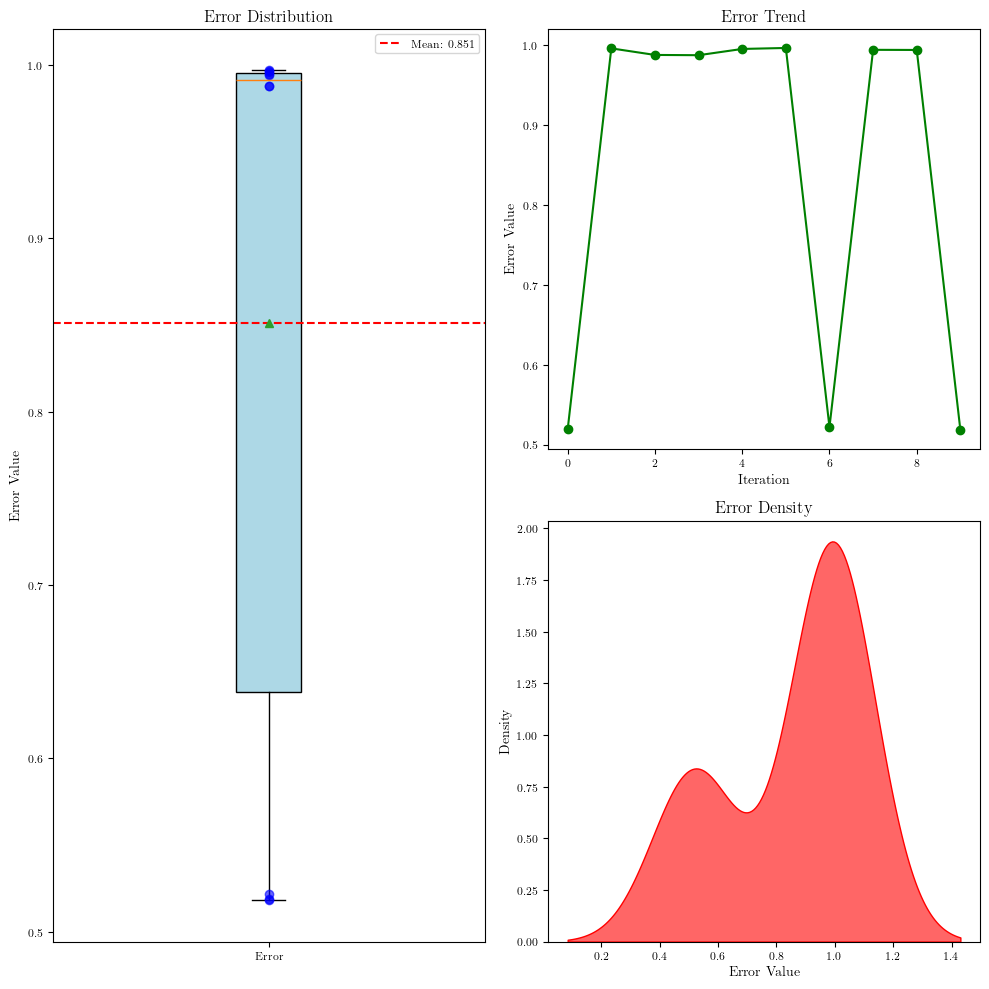

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5947221810612215, 0.7854634881268653, 1.0077722585678006, 0.5954742844285305, 0.4649590589316285, 0.41386083036181925, 0.6378457066743762, 0.6927021776896086, 0.44767318125257183, 0.28146649498710496, 0.8736713565859818, 0.8516792798779166, 0.37395951530223476, 0.8027823282496178, 0.804560887597274, 0.5182202889333846, 0.18454925778730633, 0.20862581035873265, 0.3739223144578929, 0.528249522241707]

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

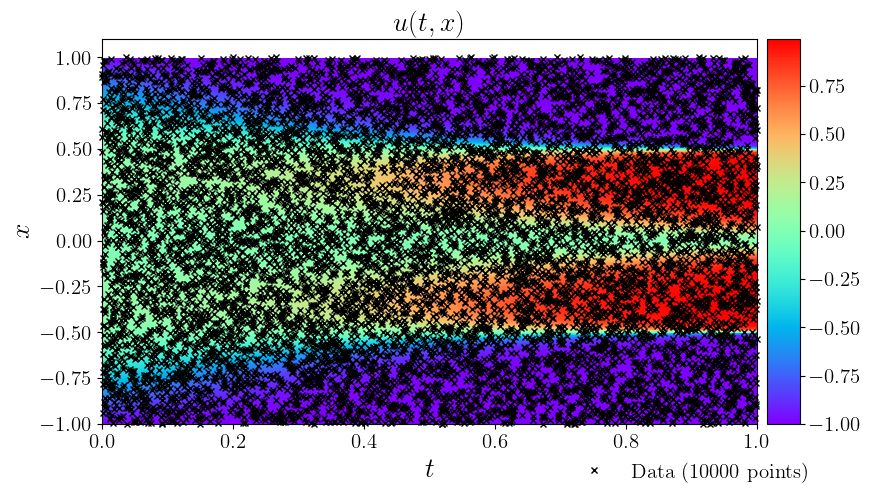

In [11]:
data = scipy.io.loadmat('../data/AC.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['uu']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]   #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组     
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred, f_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')

###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f[:,1], 
    X_f[:,0], 
    'kx', label = 'Data (%d points)' % (X_f.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [12]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()


testerror = torch.stack(model.test_error).cpu().detach().numpy()

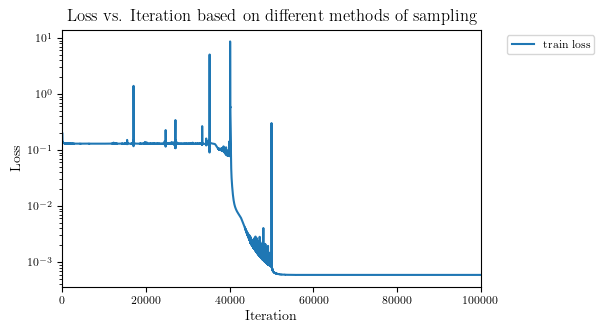

In [13]:
# print(len(trainloss))
# print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,100000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

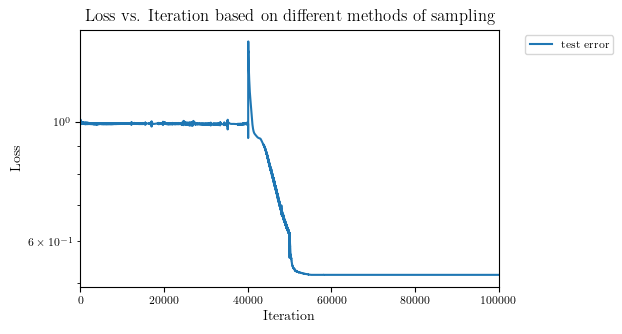

In [14]:
# print(len(trainloss))
# print(trainloss)
# 定义图例的标签
# labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(testerror, label='test error')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,100000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


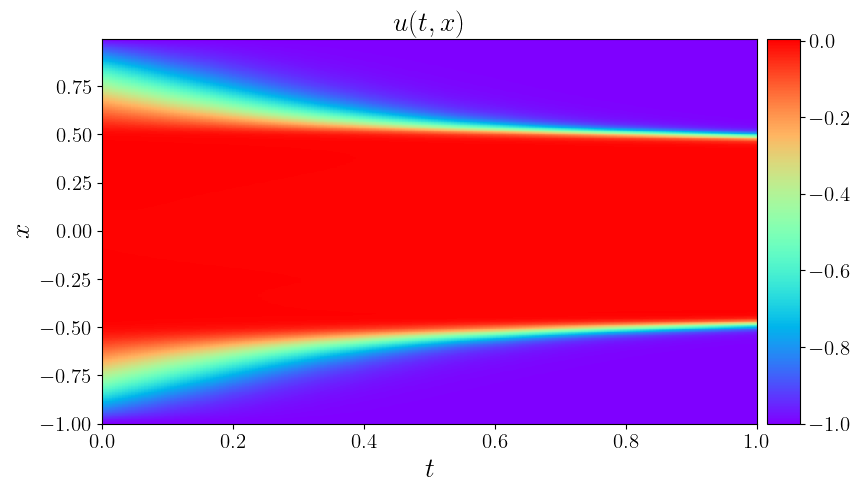

In [15]:
# data = scipy.io.loadmat('../../data/burgers_shock.mat')
# #从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
# t = data['t'].flatten()[:,None]
# x = data['x'].flatten()[:,None]
# Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
# #生成一个二位网络，X和T是输出的二维数组
# #这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
# X, T = np.meshgrid(x,t)

# X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred, f_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

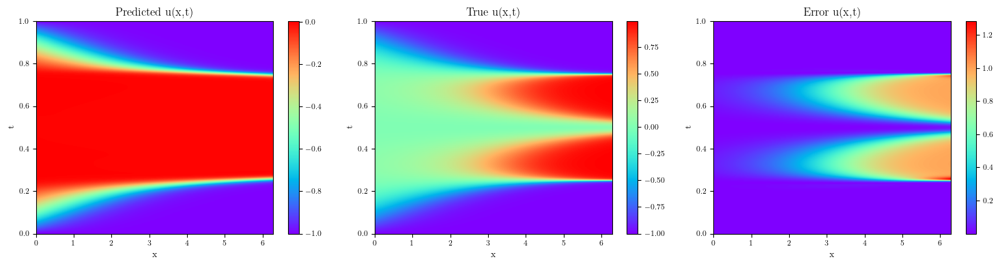

In [16]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [17]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

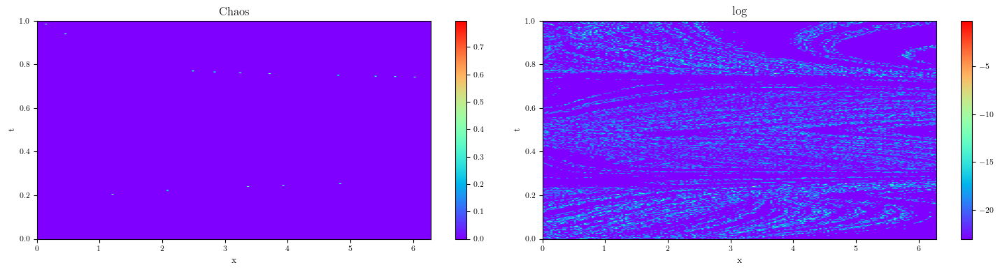

In [18]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()